## Bidirectional LSTM model na predikciu hodnot DST o 1 hodinu dopredu na zaklade 6-hodinoveho vstupneho okna z atributov DST a V

Subor: prediction_DST+1_6H.ipynb

Program: Hospodarska informatika

Vypracovala: Bc. Terezia Drengubiakova

Diplomova praca: Metody strojoveho ucenia pre vcasnu predikciu geomagnetickych burok

Veduci diplomovej prace: doc. Ing. Peter Butka, PhD.

Konzultanti: Ing. Viera Kresnakova, PhD., RNDr. Simon Mackovjak, PhD.

### Import knižníc

In [1]:
import pandas as pd
import numpy as np
import os
from tensorflow import keras
import matplotlib.pyplot as plt
from pandas.plotting import register_matplotlib_converters
register_matplotlib_converters()

from tensorflow.keras.preprocessing.sequence import TimeseriesGenerator
from keras.models import Model
from keras.layers import Dense, Input, LSTM, Flatten, TimeDistributed, Bidirectional
from tensorflow.keras.callbacks import ModelCheckpoint, EarlyStopping

from sklearn.gaussian_process import GaussianProcessRegressor
from sklearn.gaussian_process.kernels import RBF, WhiteKernel, ConstantKernel as C
from sklearn.metrics import confusion_matrix, classification_report, matthews_corrcoef, mean_squared_error, mean_absolute_error
from sklearn.preprocessing import StandardScaler

2026-04-25 08:16:30.524091: I tensorflow/core/platform/cpu_feature_guard.cc:210] This TensorFlow binary is optimized to use available CPU instructions in performance-critical operations.
To enable the following instructions: AVX2 FMA, in other operations, rebuild TensorFlow with the appropriate compiler flags.


### Načítanie dát, odstránenie na hodnôt, určenie predikovaného atribútu

In [2]:
# dĺžka vstupného okna a predikovaný čas
shift = 1
y_col = f"DST+{shift}"

n_input = 6
atr_count = 2

In [3]:
file_path = "../../../0_datasety/test_omni.csv"
file_path2 = "../../../0_datasety/train_omni.csv"

train = pd.read_csv(file_path2)
test = pd.read_csv(file_path)

In [4]:
features = ['time1', 'DST', 'v', y_col]
test = test[features]
train = train[features]
train['time1']=pd.to_datetime(train['time1'])
test['time1']=pd.to_datetime(test['time1'])
predicators = ["DST", "v"]

valid_size = int(len(train) * 0.2)
valid = train.iloc[-valid_size:,:].copy()
train = train.iloc[:-valid_size,:].copy()

y_train_raw = train[y_col].values.copy()
X_train_raw = train[predicators].values.copy()
y_val_raw = valid[y_col].values.copy()
X_val_raw = valid[predicators].values.copy()
y_test_raw = test[y_col].values.copy()
X_test_raw = test[predicators].values.copy()

x_scaler = StandardScaler()
y_scaler = StandardScaler()

X_train = x_scaler.fit_transform(np.asarray(X_train_raw, dtype=np.float32).reshape(len(X_train_raw), -1))
X_val = x_scaler.transform(np.asarray(X_val_raw, dtype=np.float32).reshape(len(X_val_raw), -1))
X_test = x_scaler.transform(np.asarray(X_test_raw, dtype=np.float32).reshape(len(X_test_raw), -1))

y_train = y_scaler.fit_transform(np.asarray(y_train_raw, dtype=np.float32).reshape(-1, 1)).reshape(-1)
y_val = y_scaler.transform(np.asarray(y_val_raw, dtype=np.float32).reshape(-1, 1)).reshape(-1)
y_test = y_scaler.transform(np.asarray(y_test_raw, dtype=np.float32).reshape(-1, 1)).reshape(-1)

target_scale = float(y_scaler.scale_[0])

def inverse_target(values):
    values = np.asarray(values, dtype=np.float32)
    return y_scaler.inverse_transform(values.reshape(-1, 1)).reshape(values.shape)

### Definícia premenných a vytvorenie dátových generátorov

In [5]:
b_size = 256  

train_generator = TimeseriesGenerator(X_train, y_train, length=n_input, batch_size=b_size)
val_generator = TimeseriesGenerator(X_val, y_val, length=n_input, batch_size=b_size)
test_generator = TimeseriesGenerator(X_test, y_test, length=n_input, batch_size=256)

In [6]:
print("Počet batchov: ", len(train_generator))
print("Každý batch má features (X zložku) a labels (y zložku): ", len(train_generator[0]))
print("Dĺžka X zložky batchu: ", len(train_generator[0][0]))
print("Dĺžka y zložky batchu (počet meraní v batchi): ",len(train_generator[0][1]))
print("Počet riadkov braných do úvahy pre jedno meranie (koľko sa pozerá dozadu): ", len(train_generator[0][0][0]))

Počet batchov:  896
Každý batch má features (X zložku) a labels (y zložku):  2
Dĺžka X zložky batchu:  256
Dĺžka y zložky batchu (počet meraní v batchi):  256
Počet riadkov braných do úvahy pre jedno meranie (koľko sa pozerá dozadu):  6


### Vytvorenie modelu

In [7]:
inputs = Input(shape=(n_input,atr_count))
c = Bidirectional(LSTM(128, return_sequences=True, dropout=0.1,recurrent_dropout=0.1))(inputs)
c = LSTM(128, return_sequences=True)(c)
c = TimeDistributed(Dense(1, activation='linear'))(c)
output = Flatten()(c)
output = Dense(1, activation='linear')(output)
model = Model(inputs=inputs, outputs=output)
model.compile(loss='mse', optimizer='adam', metrics=["mae"])
print(model.summary())

Model: "functional"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ input_layer (InputLayer)             │ (None, 6, 2)                │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ bidirectional (Bidirectional)        │ (None, 6, 256)              │         134,144 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ lstm_1 (LSTM)                        │ (None, 6, 128)              │         197,120 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ time_distributed (TimeDistributed)   │ (None, 6, 1)                │             129 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ flatten (Flatten)                    │ (None, 6)                   │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_1 (Dense)                      │ (None, 1)                   │               7 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 331,400 (1.26 MB)

 Trainable params: 331,400 (1.26 MB)

 Non-trainable params: 0 (0.00 B)

None


In [8]:
os.makedirs("models", exist_ok=True)
model_path = os.path.join("models", f'{y_col}_{n_input}H_V.keras')
checkpoint = ModelCheckpoint(model_path, monitor='val_mae', verbose=1, save_best_only=True, mode='min')
early = EarlyStopping(monitor="val_mae", mode="min", patience=25)
callbacks_list = [checkpoint, early]

### Trénovanie

In [9]:
#uncomment to train new model
history = model.fit(train_generator, validation_data=val_generator, epochs=200, verbose=1, callbacks = callbacks_list)

Epoch 1/200


/opt/conda/lib/python3.12/site-packages/keras/src/trainers/data_adapters/py_dataset_adapter.py:121: UserWarning: Your `PyDataset` class should call `super().__init__(**kwargs)` in its constructor. `**kwargs` can include `workers`, `use_multiprocessing`, `max_queue_size`. Do not pass these arguments to `fit()`, as they will be ignored.
  self._warn_if_super_not_called()


  1/896 ━━━━━━━━━━━━━━━━━━━━ 2:59:23 12s/step - loss: 4.0603 - mae: 1.2968

  2/896 ━━━━━━━━━━━━━━━━━━━━ 2:17 154ms/step - loss: 3.1437 - mae: 1.1048 

  3/896 ━━━━━━━━━━━━━━━━━━━━ 2:21 158ms/step - loss: 2.6134 - mae: 0.9801

  4/896 ━━━━━━━━━━━━━━━━━━━━ 2:09 145ms/step - loss: 2.2615 - mae: 0.8914

  5/896 ━━━━━━━━━━━━━━━━━━━━ 2:05 141ms/step - loss: 2.0131 - mae: 0.8303

  6/896 ━━━━━━━━━━━━━━━━━━━━ 2:12 149ms/step - loss: 1.8251 - mae: 0.7833

  7/896 ━━━━━━━━━━━━━━━━━━━━ 2:14 151ms/step - loss: 1.7188 - mae: 0.7627

  8/896 ━━━━━━━━━━━━━━━━━━━━ 2:13 151ms/step - loss: 1.6270 - mae: 0.7452

  9/896 ━━━━━━━━━━━━━━━━━━━━ 2:13 151ms/step - loss: 1.5455 - mae: 0.7281

 10/896 ━━━━━━━━━━━━━━━━━━━━ 2:12 150ms/step - loss: 1.4748 - mae: 0.7129

 11/896 ━━━━━━━━━━━━━━━━━━━━ 2:12 150ms/step - loss: 1.4110 - mae: 0.6978

 12/896 ━━━━━━━━━━━━━━━━━━━━ 2:11 149ms/step - loss: 1.3595 - mae: 0.6863

 13/896 ━━━━━━━━━━━━━━━━━━━━ 2:12 150ms/step - loss: 1.3123 - mae: 0.6751

 14/896 ━━━━━━━━━━━━━━━━━━━━ 2:12 150ms/step - loss: 1.2686 - mae: 0.6640

 15/896 ━━━━━━━━━━━━━━━━━━━━ 2:10 148ms/step - loss: 1.2281 - mae: 0.6533

 16/896 ━━━━━━━━━━━━━━━━━━━━ 2:11 149ms/step - loss: 1.1924 - mae: 0.6441

 17/896 ━━━━━━━━━━━━━━━━━━━━ 2:10 148ms/step - loss: 1.1597 - mae: 0.6357

 18/896 ━━━━━━━━━━━━━━━━━━━━ 2:10 148ms/step - loss: 1.1292 - mae: 0.6277

 19/896 ━━━━━━━━━━━━━━━━━━━━ 2:09 148ms/step - loss: 1.1014 - mae: 0.6205

 20/896 ━━━━━━━━━━━━━━━━━━━━ 2:09 148ms/step - loss: 1.0756 - mae: 0.6137

 21/896 ━━━━━━━━━━━━━━━━━━━━ 2:09 148ms/step - loss: 1.0512 - mae: 0.6071

 22/896 ━━━━━━━━━━━━━━━━━━━━ 2:09 148ms/step - loss: 1.0282 - mae: 0.6008

 23/896 ━━━━━━━━━━━━━━━━━━━━ 2:08 148ms/step - loss: 1.0063 - mae: 0.5946

 24/896 ━━━━━━━━━━━━━━━━━━━━ 2:08 147ms/step - loss: 0.9856 - mae: 0.5886

 25/896 ━━━━━━━━━━━━━━━━━━━━ 2:08 147ms/step - loss: 0.9661 - mae: 0.5828

 26/896 ━━━━━━━━━━━━━━━━━━━━ 2:08 148ms/step - loss: 0.9475 - mae: 0.5772

 27/896 ━━━━━━━━━━━━━━━━━━━━ 2:08 148ms/step - loss: 0.9298 - mae: 0.5717

 28/896 ━━━━━━━━━━━━━━━━━━━━ 2:09 149ms/step - loss: 0.9128 - mae: 0.5664

 29/896 ━━━━━━━━━━━━━━━━━━━━ 2:08 148ms/step - loss: 0.8970 - mae: 0.5614

 30/896 ━━━━━━━━━━━━━━━━━━━━ 2:07 147ms/step - loss: 0.8818 - mae: 0.5566

 31/896 ━━━━━━━━━━━━━━━━━━━━ 2:06 146ms/step - loss: 0.8672 - mae: 0.5519

 32/896 ━━━━━━━━━━━━━━━━━━━━ 2:06 146ms/step - loss: 0.8534 - mae: 0.5475

 33/896 ━━━━━━━━━━━━━━━━━━━━ 2:05 145ms/step - loss: 0.8410 - mae: 0.5434

 34/896 ━━━━━━━━━━━━━━━━━━━━ 2:04 145ms/step - loss: 0.8291 - mae: 0.5395

 35/896 ━━━━━━━━━━━━━━━━━━━━ 2:04 145ms/step - loss: 0.8178 - mae: 0.5357

 36/896 ━━━━━━━━━━━━━━━━━━━━ 2:04 144ms/step - loss: 0.8072 - mae: 0.5322

 37/896 ━━━━━━━━━━━━━━━━━━━━ 2:04 144ms/step - loss: 0.7969 - mae: 0.5287

 38/896 ━━━━━━━━━━━━━━━━━━━━ 2:03 144ms/step - loss: 0.7869 - mae: 0.5253

 39/896 ━━━━━━━━━━━━━━━━━━━━ 2:03 144ms/step - loss: 0.7808 - mae: 0.5224

 40/896 ━━━━━━━━━━━━━━━━━━━━ 2:03 144ms/step - loss: 0.7748 - mae: 0.5196

 41/896 ━━━━━━━━━━━━━━━━━━━━ 2:02 143ms/step - loss: 0.7691 - mae: 0.5170

 42/896 ━━━━━━━━━━━━━━━━━━━━ 2:02 143ms/step - loss: 0.7635 - mae: 0.5145

 43/896 ━━━━━━━━━━━━━━━━━━━━ 2:01 143ms/step - loss: 0.7581 - mae: 0.5121

 44/896 ━━━━━━━━━━━━━━━━━━━━ 2:01 143ms/step - loss: 0.7528 - mae: 0.5098

 45/896 ━━━━━━━━━━━━━━━━━━━━ 2:01 143ms/step - loss: 0.7476 - mae: 0.5076

 46/896 ━━━━━━━━━━━━━━━━━━━━ 2:01 142ms/step - loss: 0.7425 - mae: 0.5054

 47/896 ━━━━━━━━━━━━━━━━━━━━ 2:00 142ms/step - loss: 0.7374 - mae: 0.5033

 48/896 ━━━━━━━━━━━━━━━━━━━━ 2:00 142ms/step - loss: 0.7326 - mae: 0.5012

 49/896 ━━━━━━━━━━━━━━━━━━━━ 2:00 142ms/step - loss: 0.7278 - mae: 0.4992

 50/896 ━━━━━━━━━━━━━━━━━━━━ 1:59 142ms/step - loss: 0.7230 - mae: 0.4972

 51/896 ━━━━━━━━━━━━━━━━━━━━ 1:59 141ms/step - loss: 0.7184 - mae: 0.4953

 52/896 ━━━━━━━━━━━━━━━━━━━━ 1:58 141ms/step - loss: 0.7137 - mae: 0.4933

 53/896 ━━━━━━━━━━━━━━━━━━━━ 1:58 140ms/step - loss: 0.7092 - mae: 0.4915

 54/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 140ms/step - loss: 0.7047 - mae: 0.4896

 55/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 140ms/step - loss: 0.7003 - mae: 0.4879

 56/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 139ms/step - loss: 0.6960 - mae: 0.4862

 57/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 139ms/step - loss: 0.6918 - mae: 0.4845

 58/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 139ms/step - loss: 0.6876 - mae: 0.4829

 59/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 139ms/step - loss: 0.6835 - mae: 0.4813

 60/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 138ms/step - loss: 0.6795 - mae: 0.4797

 61/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 138ms/step - loss: 0.6755 - mae: 0.4782

 62/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 138ms/step - loss: 0.6715 - mae: 0.4766

 63/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 138ms/step - loss: 0.6676 - mae: 0.4751

 64/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 137ms/step - loss: 0.6638 - mae: 0.4736

 65/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 138ms/step - loss: 0.6600 - mae: 0.4722

 66/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 138ms/step - loss: 0.6562 - mae: 0.4707

 67/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 138ms/step - loss: 0.6525 - mae: 0.4693

 68/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 138ms/step - loss: 0.6489 - mae: 0.4679

 69/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 139ms/step - loss: 0.6453 - mae: 0.4665

 70/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 139ms/step - loss: 0.6417 - mae: 0.4651

 71/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 139ms/step - loss: 0.6382 - mae: 0.4638

 72/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 139ms/step - loss: 0.6348 - mae: 0.4624

 73/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 139ms/step - loss: 0.6314 - mae: 0.4611

 74/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 139ms/step - loss: 0.6282 - mae: 0.4598

 75/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 139ms/step - loss: 0.6250 - mae: 0.4586

 76/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 139ms/step - loss: 0.6219 - mae: 0.4574

 77/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 139ms/step - loss: 0.6189 - mae: 0.4562

 78/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 139ms/step - loss: 0.6158 - mae: 0.4551

 79/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 138ms/step - loss: 0.6128 - mae: 0.4539

 80/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 138ms/step - loss: 0.6098 - mae: 0.4527

 81/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 138ms/step - loss: 0.6069 - mae: 0.4515

 82/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 138ms/step - loss: 0.6042 - mae: 0.4505

 83/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 138ms/step - loss: 0.6016 - mae: 0.4494

 84/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 138ms/step - loss: 0.5990 - mae: 0.4483

 85/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 138ms/step - loss: 0.5964 - mae: 0.4473

 86/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 137ms/step - loss: 0.5939 - mae: 0.4462

 87/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 137ms/step - loss: 0.5914 - mae: 0.4452

 88/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 137ms/step - loss: 0.5889 - mae: 0.4442

 89/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 137ms/step - loss: 0.5864 - mae: 0.4432

 90/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 137ms/step - loss: 0.5841 - mae: 0.4422

 91/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 137ms/step - loss: 0.5819 - mae: 0.4413

 92/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 137ms/step - loss: 0.5797 - mae: 0.4404

 93/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 136ms/step - loss: 0.5775 - mae: 0.4394

 94/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 136ms/step - loss: 0.5753 - mae: 0.4385

 95/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 136ms/step - loss: 0.5733 - mae: 0.4377

 96/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 136ms/step - loss: 0.5714 - mae: 0.4368

 97/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 136ms/step - loss: 0.5694 - mae: 0.4359

 98/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 136ms/step - loss: 0.5675 - mae: 0.4351

 99/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 136ms/step - loss: 0.5655 - mae: 0.4343

100/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 136ms/step - loss: 0.5636 - mae: 0.4334

101/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 136ms/step - loss: 0.5618 - mae: 0.4326

102/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 136ms/step - loss: 0.5599 - mae: 0.4318

103/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 136ms/step - loss: 0.5581 - mae: 0.4310

104/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 136ms/step - loss: 0.5563 - mae: 0.4303

105/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 136ms/step - loss: 0.5546 - mae: 0.4295

106/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 136ms/step - loss: 0.5528 - mae: 0.4287

107/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 136ms/step - loss: 0.5511 - mae: 0.4280

108/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 136ms/step - loss: 0.5493 - mae: 0.4272

109/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 135ms/step - loss: 0.5476 - mae: 0.4265

110/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 135ms/step - loss: 0.5459 - mae: 0.4258

111/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 135ms/step - loss: 0.5442 - mae: 0.4251

112/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 135ms/step - loss: 0.5426 - mae: 0.4244

113/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 135ms/step - loss: 0.5409 - mae: 0.4236

114/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 135ms/step - loss: 0.5392 - mae: 0.4229

115/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 135ms/step - loss: 0.5376 - mae: 0.4222

116/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 135ms/step - loss: 0.5360 - mae: 0.4215

117/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 135ms/step - loss: 0.5344 - mae: 0.4208

118/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 135ms/step - loss: 0.5327 - mae: 0.4201

119/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 135ms/step - loss: 0.5311 - mae: 0.4195

120/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 134ms/step - loss: 0.5296 - mae: 0.4188

121/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 134ms/step - loss: 0.5280 - mae: 0.4181

122/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 134ms/step - loss: 0.5265 - mae: 0.4174

123/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 134ms/step - loss: 0.5249 - mae: 0.4168

124/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 134ms/step - loss: 0.5234 - mae: 0.4161

125/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 134ms/step - loss: 0.5219 - mae: 0.4155

126/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 134ms/step - loss: 0.5204 - mae: 0.4148

127/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 133ms/step - loss: 0.5190 - mae: 0.4142

128/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 133ms/step - loss: 0.5175 - mae: 0.4135

129/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 133ms/step - loss: 0.5160 - mae: 0.4129

130/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 133ms/step - loss: 0.5146 - mae: 0.4123

131/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 133ms/step - loss: 0.5131 - mae: 0.4116

132/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 133ms/step - loss: 0.5117 - mae: 0.4110

133/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 133ms/step - loss: 0.5103 - mae: 0.4104

134/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 133ms/step - loss: 0.5089 - mae: 0.4098

135/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 133ms/step - loss: 0.5076 - mae: 0.4092

136/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 133ms/step - loss: 0.5062 - mae: 0.4086

137/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 133ms/step - loss: 0.5049 - mae: 0.4080

138/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 133ms/step - loss: 0.5036 - mae: 0.4074

139/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 133ms/step - loss: 0.5022 - mae: 0.4069

140/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 133ms/step - loss: 0.5009 - mae: 0.4063

141/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 133ms/step - loss: 0.4996 - mae: 0.4057

142/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 133ms/step - loss: 0.4983 - mae: 0.4051

143/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 133ms/step - loss: 0.4970 - mae: 0.4045

144/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 133ms/step - loss: 0.4957 - mae: 0.4040

145/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 133ms/step - loss: 0.4944 - mae: 0.4034

146/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 133ms/step - loss: 0.4931 - mae: 0.4028

147/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 133ms/step - loss: 0.4919 - mae: 0.4022

148/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 133ms/step - loss: 0.4906 - mae: 0.4017

149/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 133ms/step - loss: 0.4893 - mae: 0.4011

150/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 133ms/step - loss: 0.4881 - mae: 0.4006

151/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 133ms/step - loss: 0.4869 - mae: 0.4000

152/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 132ms/step - loss: 0.4857 - mae: 0.3995

153/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 132ms/step - loss: 0.4845 - mae: 0.3989

154/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 132ms/step - loss: 0.4833 - mae: 0.3984

155/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 132ms/step - loss: 0.4821 - mae: 0.3979

156/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 132ms/step - loss: 0.4809 - mae: 0.3973

157/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 132ms/step - loss: 0.4797 - mae: 0.3968

158/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 132ms/step - loss: 0.4786 - mae: 0.3963

159/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 132ms/step - loss: 0.4774 - mae: 0.3958

160/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 132ms/step - loss: 0.4763 - mae: 0.3953

161/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 132ms/step - loss: 0.4752 - mae: 0.3948

162/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 132ms/step - loss: 0.4741 - mae: 0.3943

163/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 132ms/step - loss: 0.4730 - mae: 0.3938

164/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 131ms/step - loss: 0.4719 - mae: 0.3933

165/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 131ms/step - loss: 0.4708 - mae: 0.3928

166/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 131ms/step - loss: 0.4697 - mae: 0.3924

167/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 131ms/step - loss: 0.4686 - mae: 0.3919

168/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 131ms/step - loss: 0.4676 - mae: 0.3914

169/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 131ms/step - loss: 0.4665 - mae: 0.3909

170/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 131ms/step - loss: 0.4655 - mae: 0.3905

171/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 131ms/step - loss: 0.4644 - mae: 0.3900

172/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 131ms/step - loss: 0.4634 - mae: 0.3896

173/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 131ms/step - loss: 0.4624 - mae: 0.3891

174/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 131ms/step - loss: 0.4614 - mae: 0.3887

175/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 131ms/step - loss: 0.4604 - mae: 0.3882

176/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 131ms/step - loss: 0.4593 - mae: 0.3878

177/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 131ms/step - loss: 0.4584 - mae: 0.3873

178/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 131ms/step - loss: 0.4574 - mae: 0.3869

179/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 130ms/step - loss: 0.4564 - mae: 0.3864

180/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 130ms/step - loss: 0.4554 - mae: 0.3860

181/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 130ms/step - loss: 0.4544 - mae: 0.3856

182/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 130ms/step - loss: 0.4535 - mae: 0.3851

183/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 130ms/step - loss: 0.4525 - mae: 0.3847

184/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 130ms/step - loss: 0.4515 - mae: 0.3843

185/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 130ms/step - loss: 0.4506 - mae: 0.3839

186/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 130ms/step - loss: 0.4496 - mae: 0.3834

187/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 130ms/step - loss: 0.4487 - mae: 0.3830

188/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 130ms/step - loss: 0.4478 - mae: 0.3826

189/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 130ms/step - loss: 0.4469 - mae: 0.3822

190/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 130ms/step - loss: 0.4459 - mae: 0.3818

191/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 130ms/step - loss: 0.4450 - mae: 0.3814

192/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 130ms/step - loss: 0.4441 - mae: 0.3810

193/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 130ms/step - loss: 0.4432 - mae: 0.3805

194/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 130ms/step - loss: 0.4423 - mae: 0.3801

195/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 129ms/step - loss: 0.4414 - mae: 0.3797

196/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 129ms/step - loss: 0.4405 - mae: 0.3793

197/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 129ms/step - loss: 0.4396 - mae: 0.3789

198/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 129ms/step - loss: 0.4387 - mae: 0.3785

199/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 129ms/step - loss: 0.4379 - mae: 0.3782

200/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 129ms/step - loss: 0.4370 - mae: 0.3778

201/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 129ms/step - loss: 0.4361 - mae: 0.3774

202/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 130ms/step - loss: 0.4353 - mae: 0.3770

203/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 130ms/step - loss: 0.4344 - mae: 0.3766

204/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 130ms/step - loss: 0.4336 - mae: 0.3762

205/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 130ms/step - loss: 0.4328 - mae: 0.3759

206/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 130ms/step - loss: 0.4319 - mae: 0.3755

207/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 130ms/step - loss: 0.4311 - mae: 0.3751

208/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 130ms/step - loss: 0.4303 - mae: 0.3747

209/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 130ms/step - loss: 0.4295 - mae: 0.3744

210/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 131ms/step - loss: 0.4286 - mae: 0.3740

211/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 131ms/step - loss: 0.4278 - mae: 0.3737

212/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 131ms/step - loss: 0.4270 - mae: 0.3733

213/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 131ms/step - loss: 0.4262 - mae: 0.3729

214/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 131ms/step - loss: 0.4255 - mae: 0.3726

215/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 132ms/step - loss: 0.4247 - mae: 0.3722

216/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 132ms/step - loss: 0.4239 - mae: 0.3719

217/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 132ms/step - loss: 0.4231 - mae: 0.3715

218/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 132ms/step - loss: 0.4223 - mae: 0.3712

219/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 132ms/step - loss: 0.4216 - mae: 0.3708

220/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 132ms/step - loss: 0.4208 - mae: 0.3705

221/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 132ms/step - loss: 0.4200 - mae: 0.3702

222/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 133ms/step - loss: 0.4193 - mae: 0.3698

223/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 133ms/step - loss: 0.4185 - mae: 0.3695

224/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 133ms/step - loss: 0.4178 - mae: 0.3691

225/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 133ms/step - loss: 0.4170 - mae: 0.3688

226/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 133ms/step - loss: 0.4163 - mae: 0.3685

227/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 133ms/step - loss: 0.4156 - mae: 0.3682

228/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 133ms/step - loss: 0.4148 - mae: 0.3678

229/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 133ms/step - loss: 0.4141 - mae: 0.3675

230/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 133ms/step - loss: 0.4134 - mae: 0.3672

231/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 133ms/step - loss: 0.4127 - mae: 0.3668

232/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 134ms/step - loss: 0.4119 - mae: 0.3665

233/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 134ms/step - loss: 0.4112 - mae: 0.3662

234/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 134ms/step - loss: 0.4105 - mae: 0.3659

235/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 134ms/step - loss: 0.4098 - mae: 0.3656

236/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 134ms/step - loss: 0.4091 - mae: 0.3652

237/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 134ms/step - loss: 0.4084 - mae: 0.3649

238/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 134ms/step - loss: 0.4077 - mae: 0.3646

239/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 134ms/step - loss: 0.4070 - mae: 0.3643

240/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 134ms/step - loss: 0.4063 - mae: 0.3640

241/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 134ms/step - loss: 0.4056 - mae: 0.3637

242/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 134ms/step - loss: 0.4050 - mae: 0.3634

243/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 134ms/step - loss: 0.4043 - mae: 0.3631

244/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 134ms/step - loss: 0.4036 - mae: 0.3628

245/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 134ms/step - loss: 0.4029 - mae: 0.3625

246/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 134ms/step - loss: 0.4022 - mae: 0.3621

247/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 134ms/step - loss: 0.4016 - mae: 0.3618

248/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 134ms/step - loss: 0.4009 - mae: 0.3615

249/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 134ms/step - loss: 0.4003 - mae: 0.3612

250/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 134ms/step - loss: 0.3996 - mae: 0.3609

251/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 134ms/step - loss: 0.3989 - mae: 0.3606

252/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 134ms/step - loss: 0.3983 - mae: 0.3603

253/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 134ms/step - loss: 0.3976 - mae: 0.3601

254/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 134ms/step - loss: 0.3970 - mae: 0.3598

255/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 134ms/step - loss: 0.3964 - mae: 0.3595

256/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 134ms/step - loss: 0.3957 - mae: 0.3592

257/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 134ms/step - loss: 0.3951 - mae: 0.3589

258/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 134ms/step - loss: 0.3944 - mae: 0.3586

259/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 134ms/step - loss: 0.3938 - mae: 0.3583

260/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 134ms/step - loss: 0.3932 - mae: 0.3580

261/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 134ms/step - loss: 0.3926 - mae: 0.3577

262/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 134ms/step - loss: 0.3919 - mae: 0.3574

263/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 134ms/step - loss: 0.3913 - mae: 0.3572

264/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 133ms/step - loss: 0.3907 - mae: 0.3569

265/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 133ms/step - loss: 0.3901 - mae: 0.3566

266/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 133ms/step - loss: 0.3895 - mae: 0.3563

267/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 133ms/step - loss: 0.3889 - mae: 0.3560

268/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 133ms/step - loss: 0.3883 - mae: 0.3558

269/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 133ms/step - loss: 0.3877 - mae: 0.3555

270/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 134ms/step - loss: 0.3871 - mae: 0.3552

271/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 134ms/step - loss: 0.3865 - mae: 0.3549

272/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 133ms/step - loss: 0.3859 - mae: 0.3547

273/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 134ms/step - loss: 0.3853 - mae: 0.3544

274/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 134ms/step - loss: 0.3847 - mae: 0.3541

275/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 134ms/step - loss: 0.3841 - mae: 0.3538

276/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 134ms/step - loss: 0.3835 - mae: 0.3536

277/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 134ms/step - loss: 0.3830 - mae: 0.3533

278/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 134ms/step - loss: 0.3824 - mae: 0.3530

279/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 134ms/step - loss: 0.3818 - mae: 0.3528

280/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 134ms/step - loss: 0.3813 - mae: 0.3525

281/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 134ms/step - loss: 0.3807 - mae: 0.3523

282/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 134ms/step - loss: 0.3801 - mae: 0.3520

283/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 133ms/step - loss: 0.3796 - mae: 0.3518

284/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 133ms/step - loss: 0.3790 - mae: 0.3515

285/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 133ms/step - loss: 0.3785 - mae: 0.3513

286/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 133ms/step - loss: 0.3779 - mae: 0.3510

287/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 133ms/step - loss: 0.3774 - mae: 0.3508

288/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 133ms/step - loss: 0.3769 - mae: 0.3505

289/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 133ms/step - loss: 0.3763 - mae: 0.3503

290/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 133ms/step - loss: 0.3758 - mae: 0.3500

291/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 133ms/step - loss: 0.3753 - mae: 0.3498

292/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 133ms/step - loss: 0.3747 - mae: 0.3495

293/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 133ms/step - loss: 0.3742 - mae: 0.3493

294/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 133ms/step - loss: 0.3737 - mae: 0.3490

295/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 133ms/step - loss: 0.3731 - mae: 0.3488

296/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 133ms/step - loss: 0.3726 - mae: 0.3486

297/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 133ms/step - loss: 0.3721 - mae: 0.3483

298/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 133ms/step - loss: 0.3716 - mae: 0.3481

299/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 133ms/step - loss: 0.3710 - mae: 0.3478

300/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 133ms/step - loss: 0.3705 - mae: 0.3476

301/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 133ms/step - loss: 0.3700 - mae: 0.3473

302/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 133ms/step - loss: 0.3695 - mae: 0.3471

303/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 133ms/step - loss: 0.3690 - mae: 0.3469

304/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 133ms/step - loss: 0.3685 - mae: 0.3466

305/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 133ms/step - loss: 0.3680 - mae: 0.3464

306/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 133ms/step - loss: 0.3675 - mae: 0.3462

307/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 133ms/step - loss: 0.3670 - mae: 0.3459

308/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 133ms/step - loss: 0.3665 - mae: 0.3457

309/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 133ms/step - loss: 0.3660 - mae: 0.3455

310/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 133ms/step - loss: 0.3655 - mae: 0.3452

311/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 133ms/step - loss: 0.3650 - mae: 0.3450

312/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 133ms/step - loss: 0.3645 - mae: 0.3448

313/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 133ms/step - loss: 0.3640 - mae: 0.3445

314/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 133ms/step - loss: 0.3635 - mae: 0.3443

315/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 133ms/step - loss: 0.3630 - mae: 0.3441

316/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 133ms/step - loss: 0.3625 - mae: 0.3439

317/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 133ms/step - loss: 0.3620 - mae: 0.3436

318/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 133ms/step - loss: 0.3616 - mae: 0.3434

319/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 133ms/step - loss: 0.3611 - mae: 0.3432

320/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 133ms/step - loss: 0.3606 - mae: 0.3429

321/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 133ms/step - loss: 0.3601 - mae: 0.3427

322/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 133ms/step - loss: 0.3596 - mae: 0.3425

323/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 133ms/step - loss: 0.3592 - mae: 0.3423

324/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 133ms/step - loss: 0.3587 - mae: 0.3421

325/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 133ms/step - loss: 0.3582 - mae: 0.3418

326/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 133ms/step - loss: 0.3578 - mae: 0.3416

327/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 133ms/step - loss: 0.3573 - mae: 0.3414

328/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 133ms/step - loss: 0.3568 - mae: 0.3412

329/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 133ms/step - loss: 0.3564 - mae: 0.3410

330/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 133ms/step - loss: 0.3559 - mae: 0.3407

331/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 133ms/step - loss: 0.3554 - mae: 0.3405

332/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 133ms/step - loss: 0.3550 - mae: 0.3403

333/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 133ms/step - loss: 0.3545 - mae: 0.3401

334/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 133ms/step - loss: 0.3541 - mae: 0.3399

335/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 133ms/step - loss: 0.3536 - mae: 0.3396

336/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 133ms/step - loss: 0.3532 - mae: 0.3394

337/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 132ms/step - loss: 0.3527 - mae: 0.3392

338/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 132ms/step - loss: 0.3523 - mae: 0.3390

339/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 132ms/step - loss: 0.3518 - mae: 0.3388

340/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 132ms/step - loss: 0.3514 - mae: 0.3386

341/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 132ms/step - loss: 0.3509 - mae: 0.3384

342/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 132ms/step - loss: 0.3505 - mae: 0.3382

343/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 132ms/step - loss: 0.3500 - mae: 0.3379

344/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 132ms/step - loss: 0.3496 - mae: 0.3377

345/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 132ms/step - loss: 0.3492 - mae: 0.3375

346/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 132ms/step - loss: 0.3487 - mae: 0.3373

347/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 132ms/step - loss: 0.3483 - mae: 0.3371

348/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 132ms/step - loss: 0.3479 - mae: 0.3369

349/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 132ms/step - loss: 0.3474 - mae: 0.3367

350/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 132ms/step - loss: 0.3470 - mae: 0.3365

351/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 132ms/step - loss: 0.3466 - mae: 0.3363

352/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 132ms/step - loss: 0.3462 - mae: 0.3361

353/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 132ms/step - loss: 0.3457 - mae: 0.3359

354/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 132ms/step - loss: 0.3453 - mae: 0.3357

355/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 132ms/step - loss: 0.3449 - mae: 0.3355

356/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 132ms/step - loss: 0.3445 - mae: 0.3353

357/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 132ms/step - loss: 0.3441 - mae: 0.3351

358/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 132ms/step - loss: 0.3437 - mae: 0.3349

359/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 132ms/step - loss: 0.3432 - mae: 0.3347

360/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 132ms/step - loss: 0.3428 - mae: 0.3345

361/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 132ms/step - loss: 0.3424 - mae: 0.3343

362/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 132ms/step - loss: 0.3420 - mae: 0.3341

363/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 132ms/step - loss: 0.3416 - mae: 0.3340

364/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 132ms/step - loss: 0.3412 - mae: 0.3338

365/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 132ms/step - loss: 0.3408 - mae: 0.3336

366/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 131ms/step - loss: 0.3404 - mae: 0.3334

367/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 131ms/step - loss: 0.3400 - mae: 0.3332

368/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 131ms/step - loss: 0.3396 - mae: 0.3330

369/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 131ms/step - loss: 0.3393 - mae: 0.3328

370/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 131ms/step - loss: 0.3389 - mae: 0.3327

371/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 131ms/step - loss: 0.3385 - mae: 0.3325

372/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 131ms/step - loss: 0.3381 - mae: 0.3323

373/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 131ms/step - loss: 0.3377 - mae: 0.3321

374/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 131ms/step - loss: 0.3373 - mae: 0.3320

375/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 131ms/step - loss: 0.3370 - mae: 0.3318

376/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 131ms/step - loss: 0.3366 - mae: 0.3316

377/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 131ms/step - loss: 0.3362 - mae: 0.3314

378/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 131ms/step - loss: 0.3358 - mae: 0.3313

379/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 131ms/step - loss: 0.3355 - mae: 0.3311

380/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 131ms/step - loss: 0.3351 - mae: 0.3309

381/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 131ms/step - loss: 0.3347 - mae: 0.3307

382/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 131ms/step - loss: 0.3344 - mae: 0.3306

383/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 131ms/step - loss: 0.3340 - mae: 0.3304

384/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 131ms/step - loss: 0.3336 - mae: 0.3302

385/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 131ms/step - loss: 0.3333 - mae: 0.3301

386/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 131ms/step - loss: 0.3329 - mae: 0.3299

387/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 131ms/step - loss: 0.3326 - mae: 0.3297

388/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 131ms/step - loss: 0.3322 - mae: 0.3296

389/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 131ms/step - loss: 0.3318 - mae: 0.3294

390/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 131ms/step - loss: 0.3315 - mae: 0.3292

391/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 131ms/step - loss: 0.3311 - mae: 0.3291

392/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 131ms/step - loss: 0.3308 - mae: 0.3289

393/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 131ms/step - loss: 0.3304 - mae: 0.3287

394/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 131ms/step - loss: 0.3301 - mae: 0.3286

395/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 130ms/step - loss: 0.3297 - mae: 0.3284

396/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 130ms/step - loss: 0.3294 - mae: 0.3283

397/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 130ms/step - loss: 0.3290 - mae: 0.3281

398/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 130ms/step - loss: 0.3287 - mae: 0.3279

399/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 130ms/step - loss: 0.3284 - mae: 0.3278

400/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 130ms/step - loss: 0.3280 - mae: 0.3276

401/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 130ms/step - loss: 0.3277 - mae: 0.3275

402/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 130ms/step - loss: 0.3273 - mae: 0.3273

403/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 130ms/step - loss: 0.3270 - mae: 0.3272

404/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 130ms/step - loss: 0.3267 - mae: 0.3270

405/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 130ms/step - loss: 0.3263 - mae: 0.3268

406/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 130ms/step - loss: 0.3260 - mae: 0.3267

407/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 130ms/step - loss: 0.3257 - mae: 0.3265

408/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 130ms/step - loss: 0.3253 - mae: 0.3264

409/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 130ms/step - loss: 0.3250 - mae: 0.3262

410/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 130ms/step - loss: 0.3247 - mae: 0.3261

411/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 130ms/step - loss: 0.3243 - mae: 0.3259

412/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 130ms/step - loss: 0.3240 - mae: 0.3258

413/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 130ms/step - loss: 0.3237 - mae: 0.3256

414/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 130ms/step - loss: 0.3233 - mae: 0.3254

415/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 130ms/step - loss: 0.3230 - mae: 0.3253

416/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 130ms/step - loss: 0.3227 - mae: 0.3251

417/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 130ms/step - loss: 0.3224 - mae: 0.3250

418/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 130ms/step - loss: 0.3220 - mae: 0.3248

419/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 131ms/step - loss: 0.3217 - mae: 0.3247

420/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 131ms/step - loss: 0.3214 - mae: 0.3245

421/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 131ms/step - loss: 0.3211 - mae: 0.3244

422/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 131ms/step - loss: 0.3208 - mae: 0.3242

423/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 131ms/step - loss: 0.3204 - mae: 0.3241

424/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 131ms/step - loss: 0.3201 - mae: 0.3239

425/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 131ms/step - loss: 0.3198 - mae: 0.3238

426/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 131ms/step - loss: 0.3195 - mae: 0.3236

427/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 131ms/step - loss: 0.3192 - mae: 0.3235

428/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 131ms/step - loss: 0.3189 - mae: 0.3233

429/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 131ms/step - loss: 0.3185 - mae: 0.3232

430/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 131ms/step - loss: 0.3182 - mae: 0.3230

431/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 131ms/step - loss: 0.3179 - mae: 0.3229

432/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 131ms/step - loss: 0.3176 - mae: 0.3227

433/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 131ms/step - loss: 0.3173 - mae: 0.3226

434/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 131ms/step - loss: 0.3170 - mae: 0.3224

435/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 131ms/step - loss: 0.3167 - mae: 0.3223

436/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 131ms/step - loss: 0.3164 - mae: 0.3221

437/896 ━━━━━━━━━━━━━━━━━━━━ 59s 131ms/step - loss: 0.3161 - mae: 0.3220 

438/896 ━━━━━━━━━━━━━━━━━━━━ 59s 131ms/step - loss: 0.3158 - mae: 0.3218

439/896 ━━━━━━━━━━━━━━━━━━━━ 59s 131ms/step - loss: 0.3155 - mae: 0.3217

440/896 ━━━━━━━━━━━━━━━━━━━━ 59s 131ms/step - loss: 0.3152 - mae: 0.3216

441/896 ━━━━━━━━━━━━━━━━━━━━ 59s 131ms/step - loss: 0.3149 - mae: 0.3214

442/896 ━━━━━━━━━━━━━━━━━━━━ 59s 130ms/step - loss: 0.3146 - mae: 0.3213

443/896 ━━━━━━━━━━━━━━━━━━━━ 59s 131ms/step - loss: 0.3143 - mae: 0.3211

444/896 ━━━━━━━━━━━━━━━━━━━━ 58s 130ms/step - loss: 0.3140 - mae: 0.3210

445/896 ━━━━━━━━━━━━━━━━━━━━ 58s 130ms/step - loss: 0.3137 - mae: 0.3208

446/896 ━━━━━━━━━━━━━━━━━━━━ 58s 130ms/step - loss: 0.3134 - mae: 0.3207

447/896 ━━━━━━━━━━━━━━━━━━━━ 58s 130ms/step - loss: 0.3131 - mae: 0.3206

448/896 ━━━━━━━━━━━━━━━━━━━━ 58s 130ms/step - loss: 0.3128 - mae: 0.3204

449/896 ━━━━━━━━━━━━━━━━━━━━ 58s 130ms/step - loss: 0.3125 - mae: 0.3203

450/896 ━━━━━━━━━━━━━━━━━━━━ 58s 130ms/step - loss: 0.3122 - mae: 0.3201

451/896 ━━━━━━━━━━━━━━━━━━━━ 57s 130ms/step - loss: 0.3119 - mae: 0.3200

452/896 ━━━━━━━━━━━━━━━━━━━━ 57s 130ms/step - loss: 0.3116 - mae: 0.3198

453/896 ━━━━━━━━━━━━━━━━━━━━ 57s 130ms/step - loss: 0.3114 - mae: 0.3197

454/896 ━━━━━━━━━━━━━━━━━━━━ 57s 130ms/step - loss: 0.3111 - mae: 0.3196

455/896 ━━━━━━━━━━━━━━━━━━━━ 57s 130ms/step - loss: 0.3108 - mae: 0.3194

456/896 ━━━━━━━━━━━━━━━━━━━━ 57s 130ms/step - loss: 0.3105 - mae: 0.3193

457/896 ━━━━━━━━━━━━━━━━━━━━ 57s 130ms/step - loss: 0.3102 - mae: 0.3192

458/896 ━━━━━━━━━━━━━━━━━━━━ 57s 130ms/step - loss: 0.3099 - mae: 0.3190

459/896 ━━━━━━━━━━━━━━━━━━━━ 56s 130ms/step - loss: 0.3097 - mae: 0.3189

460/896 ━━━━━━━━━━━━━━━━━━━━ 56s 130ms/step - loss: 0.3094 - mae: 0.3187

461/896 ━━━━━━━━━━━━━━━━━━━━ 56s 130ms/step - loss: 0.3091 - mae: 0.3186

462/896 ━━━━━━━━━━━━━━━━━━━━ 56s 130ms/step - loss: 0.3088 - mae: 0.3185

463/896 ━━━━━━━━━━━━━━━━━━━━ 56s 130ms/step - loss: 0.3085 - mae: 0.3183

464/896 ━━━━━━━━━━━━━━━━━━━━ 56s 130ms/step - loss: 0.3083 - mae: 0.3182

465/896 ━━━━━━━━━━━━━━━━━━━━ 56s 130ms/step - loss: 0.3080 - mae: 0.3181

466/896 ━━━━━━━━━━━━━━━━━━━━ 55s 130ms/step - loss: 0.3077 - mae: 0.3179

467/896 ━━━━━━━━━━━━━━━━━━━━ 55s 130ms/step - loss: 0.3074 - mae: 0.3178

468/896 ━━━━━━━━━━━━━━━━━━━━ 55s 130ms/step - loss: 0.3072 - mae: 0.3177

469/896 ━━━━━━━━━━━━━━━━━━━━ 55s 130ms/step - loss: 0.3069 - mae: 0.3175

470/896 ━━━━━━━━━━━━━━━━━━━━ 55s 130ms/step - loss: 0.3066 - mae: 0.3174

471/896 ━━━━━━━━━━━━━━━━━━━━ 55s 130ms/step - loss: 0.3064 - mae: 0.3173

472/896 ━━━━━━━━━━━━━━━━━━━━ 55s 130ms/step - loss: 0.3061 - mae: 0.3171

473/896 ━━━━━━━━━━━━━━━━━━━━ 54s 130ms/step - loss: 0.3058 - mae: 0.3170

474/896 ━━━━━━━━━━━━━━━━━━━━ 54s 130ms/step - loss: 0.3055 - mae: 0.3169

475/896 ━━━━━━━━━━━━━━━━━━━━ 54s 130ms/step - loss: 0.3053 - mae: 0.3167

476/896 ━━━━━━━━━━━━━━━━━━━━ 54s 130ms/step - loss: 0.3050 - mae: 0.3166

477/896 ━━━━━━━━━━━━━━━━━━━━ 54s 130ms/step - loss: 0.3047 - mae: 0.3165

478/896 ━━━━━━━━━━━━━━━━━━━━ 54s 130ms/step - loss: 0.3045 - mae: 0.3163

479/896 ━━━━━━━━━━━━━━━━━━━━ 54s 130ms/step - loss: 0.3042 - mae: 0.3162

480/896 ━━━━━━━━━━━━━━━━━━━━ 54s 130ms/step - loss: 0.3039 - mae: 0.3161

481/896 ━━━━━━━━━━━━━━━━━━━━ 53s 130ms/step - loss: 0.3037 - mae: 0.3159

482/896 ━━━━━━━━━━━━━━━━━━━━ 53s 130ms/step - loss: 0.3034 - mae: 0.3158

483/896 ━━━━━━━━━━━━━━━━━━━━ 53s 130ms/step - loss: 0.3032 - mae: 0.3157

484/896 ━━━━━━━━━━━━━━━━━━━━ 53s 130ms/step - loss: 0.3029 - mae: 0.3156

485/896 ━━━━━━━━━━━━━━━━━━━━ 53s 130ms/step - loss: 0.3026 - mae: 0.3154

486/896 ━━━━━━━━━━━━━━━━━━━━ 53s 130ms/step - loss: 0.3024 - mae: 0.3153

487/896 ━━━━━━━━━━━━━━━━━━━━ 53s 130ms/step - loss: 0.3021 - mae: 0.3152

488/896 ━━━━━━━━━━━━━━━━━━━━ 53s 130ms/step - loss: 0.3018 - mae: 0.3150

489/896 ━━━━━━━━━━━━━━━━━━━━ 53s 130ms/step - loss: 0.3016 - mae: 0.3149

490/896 ━━━━━━━━━━━━━━━━━━━━ 52s 130ms/step - loss: 0.3013 - mae: 0.3148

491/896 ━━━━━━━━━━━━━━━━━━━━ 52s 130ms/step - loss: 0.3011 - mae: 0.3147

492/896 ━━━━━━━━━━━━━━━━━━━━ 52s 131ms/step - loss: 0.3008 - mae: 0.3145

493/896 ━━━━━━━━━━━━━━━━━━━━ 52s 131ms/step - loss: 0.3006 - mae: 0.3144

494/896 ━━━━━━━━━━━━━━━━━━━━ 52s 131ms/step - loss: 0.3003 - mae: 0.3143

495/896 ━━━━━━━━━━━━━━━━━━━━ 52s 131ms/step - loss: 0.3001 - mae: 0.3142

496/896 ━━━━━━━━━━━━━━━━━━━━ 52s 131ms/step - loss: 0.2998 - mae: 0.3140

497/896 ━━━━━━━━━━━━━━━━━━━━ 52s 131ms/step - loss: 0.2996 - mae: 0.3139

498/896 ━━━━━━━━━━━━━━━━━━━━ 52s 131ms/step - loss: 0.2993 - mae: 0.3138

499/896 ━━━━━━━━━━━━━━━━━━━━ 52s 131ms/step - loss: 0.2991 - mae: 0.3137

500/896 ━━━━━━━━━━━━━━━━━━━━ 51s 131ms/step - loss: 0.2988 - mae: 0.3135

501/896 ━━━━━━━━━━━━━━━━━━━━ 51s 131ms/step - loss: 0.2986 - mae: 0.3134

502/896 ━━━━━━━━━━━━━━━━━━━━ 51s 131ms/step - loss: 0.2983 - mae: 0.3133

503/896 ━━━━━━━━━━━━━━━━━━━━ 51s 131ms/step - loss: 0.2981 - mae: 0.3132

504/896 ━━━━━━━━━━━━━━━━━━━━ 51s 131ms/step - loss: 0.2978 - mae: 0.3131

505/896 ━━━━━━━━━━━━━━━━━━━━ 51s 132ms/step - loss: 0.2976 - mae: 0.3129

506/896 ━━━━━━━━━━━━━━━━━━━━ 51s 132ms/step - loss: 0.2973 - mae: 0.3128

507/896 ━━━━━━━━━━━━━━━━━━━━ 51s 132ms/step - loss: 0.2971 - mae: 0.3127

508/896 ━━━━━━━━━━━━━━━━━━━━ 51s 132ms/step - loss: 0.2968 - mae: 0.3126

509/896 ━━━━━━━━━━━━━━━━━━━━ 51s 132ms/step - loss: 0.2966 - mae: 0.3124

510/896 ━━━━━━━━━━━━━━━━━━━━ 50s 132ms/step - loss: 0.2964 - mae: 0.3123

511/896 ━━━━━━━━━━━━━━━━━━━━ 50s 132ms/step - loss: 0.2961 - mae: 0.3122

512/896 ━━━━━━━━━━━━━━━━━━━━ 50s 132ms/step - loss: 0.2959 - mae: 0.3121

513/896 ━━━━━━━━━━━━━━━━━━━━ 50s 132ms/step - loss: 0.2956 - mae: 0.3120

514/896 ━━━━━━━━━━━━━━━━━━━━ 50s 132ms/step - loss: 0.2954 - mae: 0.3118

515/896 ━━━━━━━━━━━━━━━━━━━━ 50s 132ms/step - loss: 0.2951 - mae: 0.3117

516/896 ━━━━━━━━━━━━━━━━━━━━ 50s 132ms/step - loss: 0.2949 - mae: 0.3116

517/896 ━━━━━━━━━━━━━━━━━━━━ 50s 132ms/step - loss: 0.2947 - mae: 0.3115

518/896 ━━━━━━━━━━━━━━━━━━━━ 49s 132ms/step - loss: 0.2944 - mae: 0.3114

519/896 ━━━━━━━━━━━━━━━━━━━━ 49s 132ms/step - loss: 0.2942 - mae: 0.3112

520/896 ━━━━━━━━━━━━━━━━━━━━ 49s 132ms/step - loss: 0.2940 - mae: 0.3111

521/896 ━━━━━━━━━━━━━━━━━━━━ 49s 132ms/step - loss: 0.2937 - mae: 0.3110

522/896 ━━━━━━━━━━━━━━━━━━━━ 49s 132ms/step - loss: 0.2935 - mae: 0.3109

523/896 ━━━━━━━━━━━━━━━━━━━━ 49s 132ms/step - loss: 0.2932 - mae: 0.3108

524/896 ━━━━━━━━━━━━━━━━━━━━ 49s 132ms/step - loss: 0.2930 - mae: 0.3107

525/896 ━━━━━━━━━━━━━━━━━━━━ 49s 132ms/step - loss: 0.2928 - mae: 0.3105

526/896 ━━━━━━━━━━━━━━━━━━━━ 49s 132ms/step - loss: 0.2925 - mae: 0.3104

527/896 ━━━━━━━━━━━━━━━━━━━━ 48s 133ms/step - loss: 0.2923 - mae: 0.3103

528/896 ━━━━━━━━━━━━━━━━━━━━ 48s 133ms/step - loss: 0.2921 - mae: 0.3102

529/896 ━━━━━━━━━━━━━━━━━━━━ 48s 133ms/step - loss: 0.2918 - mae: 0.3101

530/896 ━━━━━━━━━━━━━━━━━━━━ 48s 133ms/step - loss: 0.2916 - mae: 0.3099

531/896 ━━━━━━━━━━━━━━━━━━━━ 48s 133ms/step - loss: 0.2914 - mae: 0.3098

532/896 ━━━━━━━━━━━━━━━━━━━━ 48s 133ms/step - loss: 0.2911 - mae: 0.3097

533/896 ━━━━━━━━━━━━━━━━━━━━ 48s 133ms/step - loss: 0.2909 - mae: 0.3096

534/896 ━━━━━━━━━━━━━━━━━━━━ 47s 133ms/step - loss: 0.2907 - mae: 0.3095

535/896 ━━━━━━━━━━━━━━━━━━━━ 47s 133ms/step - loss: 0.2905 - mae: 0.3094

536/896 ━━━━━━━━━━━━━━━━━━━━ 47s 133ms/step - loss: 0.2902 - mae: 0.3093

537/896 ━━━━━━━━━━━━━━━━━━━━ 47s 133ms/step - loss: 0.2900 - mae: 0.3091

538/896 ━━━━━━━━━━━━━━━━━━━━ 47s 133ms/step - loss: 0.2898 - mae: 0.3090

539/896 ━━━━━━━━━━━━━━━━━━━━ 47s 133ms/step - loss: 0.2895 - mae: 0.3089

540/896 ━━━━━━━━━━━━━━━━━━━━ 47s 133ms/step - loss: 0.2893 - mae: 0.3088

541/896 ━━━━━━━━━━━━━━━━━━━━ 47s 133ms/step - loss: 0.2891 - mae: 0.3087

542/896 ━━━━━━━━━━━━━━━━━━━━ 47s 133ms/step - loss: 0.2889 - mae: 0.3086

543/896 ━━━━━━━━━━━━━━━━━━━━ 46s 133ms/step - loss: 0.2887 - mae: 0.3085

544/896 ━━━━━━━━━━━━━━━━━━━━ 46s 133ms/step - loss: 0.2884 - mae: 0.3084

545/896 ━━━━━━━━━━━━━━━━━━━━ 46s 133ms/step - loss: 0.2882 - mae: 0.3082

546/896 ━━━━━━━━━━━━━━━━━━━━ 46s 133ms/step - loss: 0.2880 - mae: 0.3081

547/896 ━━━━━━━━━━━━━━━━━━━━ 46s 133ms/step - loss: 0.2878 - mae: 0.3080

548/896 ━━━━━━━━━━━━━━━━━━━━ 46s 133ms/step - loss: 0.2875 - mae: 0.3079

549/896 ━━━━━━━━━━━━━━━━━━━━ 46s 133ms/step - loss: 0.2873 - mae: 0.3078

550/896 ━━━━━━━━━━━━━━━━━━━━ 45s 133ms/step - loss: 0.2871 - mae: 0.3077

551/896 ━━━━━━━━━━━━━━━━━━━━ 45s 133ms/step - loss: 0.2869 - mae: 0.3076

552/896 ━━━━━━━━━━━━━━━━━━━━ 45s 133ms/step - loss: 0.2867 - mae: 0.3075

553/896 ━━━━━━━━━━━━━━━━━━━━ 45s 133ms/step - loss: 0.2865 - mae: 0.3074

554/896 ━━━━━━━━━━━━━━━━━━━━ 45s 133ms/step - loss: 0.2862 - mae: 0.3073

555/896 ━━━━━━━━━━━━━━━━━━━━ 45s 133ms/step - loss: 0.2860 - mae: 0.3071

556/896 ━━━━━━━━━━━━━━━━━━━━ 45s 133ms/step - loss: 0.2858 - mae: 0.3070

557/896 ━━━━━━━━━━━━━━━━━━━━ 45s 133ms/step - loss: 0.2856 - mae: 0.3069

558/896 ━━━━━━━━━━━━━━━━━━━━ 44s 133ms/step - loss: 0.2854 - mae: 0.3068

559/896 ━━━━━━━━━━━━━━━━━━━━ 44s 133ms/step - loss: 0.2852 - mae: 0.3067

560/896 ━━━━━━━━━━━━━━━━━━━━ 44s 133ms/step - loss: 0.2850 - mae: 0.3066

561/896 ━━━━━━━━━━━━━━━━━━━━ 44s 133ms/step - loss: 0.2847 - mae: 0.3065

562/896 ━━━━━━━━━━━━━━━━━━━━ 44s 133ms/step - loss: 0.2845 - mae: 0.3064

563/896 ━━━━━━━━━━━━━━━━━━━━ 44s 133ms/step - loss: 0.2843 - mae: 0.3063

564/896 ━━━━━━━━━━━━━━━━━━━━ 44s 133ms/step - loss: 0.2841 - mae: 0.3062

565/896 ━━━━━━━━━━━━━━━━━━━━ 43s 133ms/step - loss: 0.2839 - mae: 0.3061

566/896 ━━━━━━━━━━━━━━━━━━━━ 43s 133ms/step - loss: 0.2837 - mae: 0.3060

567/896 ━━━━━━━━━━━━━━━━━━━━ 43s 133ms/step - loss: 0.2835 - mae: 0.3059

568/896 ━━━━━━━━━━━━━━━━━━━━ 43s 133ms/step - loss: 0.2833 - mae: 0.3058

569/896 ━━━━━━━━━━━━━━━━━━━━ 43s 133ms/step - loss: 0.2831 - mae: 0.3057

570/896 ━━━━━━━━━━━━━━━━━━━━ 43s 133ms/step - loss: 0.2829 - mae: 0.3055

571/896 ━━━━━━━━━━━━━━━━━━━━ 43s 133ms/step - loss: 0.2827 - mae: 0.3054

572/896 ━━━━━━━━━━━━━━━━━━━━ 43s 133ms/step - loss: 0.2825 - mae: 0.3053

573/896 ━━━━━━━━━━━━━━━━━━━━ 42s 133ms/step - loss: 0.2823 - mae: 0.3052

574/896 ━━━━━━━━━━━━━━━━━━━━ 42s 133ms/step - loss: 0.2821 - mae: 0.3051

575/896 ━━━━━━━━━━━━━━━━━━━━ 42s 133ms/step - loss: 0.2819 - mae: 0.3050

576/896 ━━━━━━━━━━━━━━━━━━━━ 42s 133ms/step - loss: 0.2817 - mae: 0.3049

577/896 ━━━━━━━━━━━━━━━━━━━━ 42s 133ms/step - loss: 0.2815 - mae: 0.3048

578/896 ━━━━━━━━━━━━━━━━━━━━ 42s 133ms/step - loss: 0.2813 - mae: 0.3047

579/896 ━━━━━━━━━━━━━━━━━━━━ 42s 133ms/step - loss: 0.2811 - mae: 0.3046

580/896 ━━━━━━━━━━━━━━━━━━━━ 41s 133ms/step - loss: 0.2809 - mae: 0.3045

581/896 ━━━━━━━━━━━━━━━━━━━━ 41s 133ms/step - loss: 0.2807 - mae: 0.3044

582/896 ━━━━━━━━━━━━━━━━━━━━ 41s 133ms/step - loss: 0.2805 - mae: 0.3043

583/896 ━━━━━━━━━━━━━━━━━━━━ 41s 133ms/step - loss: 0.2803 - mae: 0.3042

584/896 ━━━━━━━━━━━━━━━━━━━━ 41s 133ms/step - loss: 0.2801 - mae: 0.3041

585/896 ━━━━━━━━━━━━━━━━━━━━ 41s 133ms/step - loss: 0.2799 - mae: 0.3040

586/896 ━━━━━━━━━━━━━━━━━━━━ 41s 133ms/step - loss: 0.2797 - mae: 0.3039

587/896 ━━━━━━━━━━━━━━━━━━━━ 41s 133ms/step - loss: 0.2795 - mae: 0.3038

588/896 ━━━━━━━━━━━━━━━━━━━━ 40s 133ms/step - loss: 0.2793 - mae: 0.3037

589/896 ━━━━━━━━━━━━━━━━━━━━ 40s 133ms/step - loss: 0.2791 - mae: 0.3036

590/896 ━━━━━━━━━━━━━━━━━━━━ 40s 133ms/step - loss: 0.2789 - mae: 0.3035

591/896 ━━━━━━━━━━━━━━━━━━━━ 40s 133ms/step - loss: 0.2787 - mae: 0.3034

592/896 ━━━━━━━━━━━━━━━━━━━━ 40s 133ms/step - loss: 0.2785 - mae: 0.3033

593/896 ━━━━━━━━━━━━━━━━━━━━ 40s 133ms/step - loss: 0.2783 - mae: 0.3033

594/896 ━━━━━━━━━━━━━━━━━━━━ 40s 133ms/step - loss: 0.2781 - mae: 0.3032

595/896 ━━━━━━━━━━━━━━━━━━━━ 39s 132ms/step - loss: 0.2780 - mae: 0.3031

596/896 ━━━━━━━━━━━━━━━━━━━━ 39s 132ms/step - loss: 0.2778 - mae: 0.3030

597/896 ━━━━━━━━━━━━━━━━━━━━ 39s 132ms/step - loss: 0.2776 - mae: 0.3029

598/896 ━━━━━━━━━━━━━━━━━━━━ 39s 133ms/step - loss: 0.2774 - mae: 0.3028

599/896 ━━━━━━━━━━━━━━━━━━━━ 39s 133ms/step - loss: 0.2772 - mae: 0.3027

600/896 ━━━━━━━━━━━━━━━━━━━━ 39s 132ms/step - loss: 0.2771 - mae: 0.3026

601/896 ━━━━━━━━━━━━━━━━━━━━ 39s 132ms/step - loss: 0.2769 - mae: 0.3025

602/896 ━━━━━━━━━━━━━━━━━━━━ 38s 132ms/step - loss: 0.2767 - mae: 0.3024

603/896 ━━━━━━━━━━━━━━━━━━━━ 38s 132ms/step - loss: 0.2765 - mae: 0.3023

604/896 ━━━━━━━━━━━━━━━━━━━━ 38s 132ms/step - loss: 0.2763 - mae: 0.3022

605/896 ━━━━━━━━━━━━━━━━━━━━ 38s 132ms/step - loss: 0.2762 - mae: 0.3022

606/896 ━━━━━━━━━━━━━━━━━━━━ 38s 132ms/step - loss: 0.2760 - mae: 0.3021

607/896 ━━━━━━━━━━━━━━━━━━━━ 38s 132ms/step - loss: 0.2758 - mae: 0.3020

608/896 ━━━━━━━━━━━━━━━━━━━━ 38s 132ms/step - loss: 0.2756 - mae: 0.3019

609/896 ━━━━━━━━━━━━━━━━━━━━ 37s 132ms/step - loss: 0.2754 - mae: 0.3018

610/896 ━━━━━━━━━━━━━━━━━━━━ 37s 132ms/step - loss: 0.2753 - mae: 0.3017

611/896 ━━━━━━━━━━━━━━━━━━━━ 37s 132ms/step - loss: 0.2751 - mae: 0.3016

612/896 ━━━━━━━━━━━━━━━━━━━━ 37s 132ms/step - loss: 0.2749 - mae: 0.3015

613/896 ━━━━━━━━━━━━━━━━━━━━ 37s 132ms/step - loss: 0.2747 - mae: 0.3014

614/896 ━━━━━━━━━━━━━━━━━━━━ 37s 132ms/step - loss: 0.2746 - mae: 0.3014

615/896 ━━━━━━━━━━━━━━━━━━━━ 37s 132ms/step - loss: 0.2744 - mae: 0.3013

616/896 ━━━━━━━━━━━━━━━━━━━━ 36s 132ms/step - loss: 0.2742 - mae: 0.3012

617/896 ━━━━━━━━━━━━━━━━━━━━ 36s 132ms/step - loss: 0.2741 - mae: 0.3011

618/896 ━━━━━━━━━━━━━━━━━━━━ 36s 132ms/step - loss: 0.2739 - mae: 0.3010

619/896 ━━━━━━━━━━━━━━━━━━━━ 36s 132ms/step - loss: 0.2737 - mae: 0.3009

620/896 ━━━━━━━━━━━━━━━━━━━━ 36s 132ms/step - loss: 0.2735 - mae: 0.3009

621/896 ━━━━━━━━━━━━━━━━━━━━ 36s 132ms/step - loss: 0.2734 - mae: 0.3008

622/896 ━━━━━━━━━━━━━━━━━━━━ 36s 132ms/step - loss: 0.2732 - mae: 0.3007

623/896 ━━━━━━━━━━━━━━━━━━━━ 36s 132ms/step - loss: 0.2730 - mae: 0.3006

624/896 ━━━━━━━━━━━━━━━━━━━━ 35s 132ms/step - loss: 0.2729 - mae: 0.3005

625/896 ━━━━━━━━━━━━━━━━━━━━ 35s 132ms/step - loss: 0.2727 - mae: 0.3004

626/896 ━━━━━━━━━━━━━━━━━━━━ 35s 132ms/step - loss: 0.2725 - mae: 0.3004

627/896 ━━━━━━━━━━━━━━━━━━━━ 35s 132ms/step - loss: 0.2724 - mae: 0.3003

628/896 ━━━━━━━━━━━━━━━━━━━━ 35s 132ms/step - loss: 0.2722 - mae: 0.3002

629/896 ━━━━━━━━━━━━━━━━━━━━ 35s 132ms/step - loss: 0.2720 - mae: 0.3001

630/896 ━━━━━━━━━━━━━━━━━━━━ 35s 132ms/step - loss: 0.2718 - mae: 0.3000

631/896 ━━━━━━━━━━━━━━━━━━━━ 34s 132ms/step - loss: 0.2717 - mae: 0.2999

632/896 ━━━━━━━━━━━━━━━━━━━━ 34s 132ms/step - loss: 0.2715 - mae: 0.2999

633/896 ━━━━━━━━━━━━━━━━━━━━ 34s 132ms/step - loss: 0.2714 - mae: 0.2998

634/896 ━━━━━━━━━━━━━━━━━━━━ 34s 132ms/step - loss: 0.2712 - mae: 0.2997

635/896 ━━━━━━━━━━━━━━━━━━━━ 34s 132ms/step - loss: 0.2710 - mae: 0.2996

636/896 ━━━━━━━━━━━━━━━━━━━━ 34s 132ms/step - loss: 0.2709 - mae: 0.2995

637/896 ━━━━━━━━━━━━━━━━━━━━ 34s 132ms/step - loss: 0.2707 - mae: 0.2995

638/896 ━━━━━━━━━━━━━━━━━━━━ 33s 132ms/step - loss: 0.2705 - mae: 0.2994

639/896 ━━━━━━━━━━━━━━━━━━━━ 33s 132ms/step - loss: 0.2704 - mae: 0.2993

640/896 ━━━━━━━━━━━━━━━━━━━━ 33s 132ms/step - loss: 0.2702 - mae: 0.2992

641/896 ━━━━━━━━━━━━━━━━━━━━ 33s 132ms/step - loss: 0.2701 - mae: 0.2991

642/896 ━━━━━━━━━━━━━━━━━━━━ 33s 132ms/step - loss: 0.2699 - mae: 0.2991

643/896 ━━━━━━━━━━━━━━━━━━━━ 33s 132ms/step - loss: 0.2697 - mae: 0.2990

644/896 ━━━━━━━━━━━━━━━━━━━━ 33s 132ms/step - loss: 0.2696 - mae: 0.2989

645/896 ━━━━━━━━━━━━━━━━━━━━ 33s 132ms/step - loss: 0.2694 - mae: 0.2988

646/896 ━━━━━━━━━━━━━━━━━━━━ 32s 132ms/step - loss: 0.2693 - mae: 0.2987

647/896 ━━━━━━━━━━━━━━━━━━━━ 32s 132ms/step - loss: 0.2691 - mae: 0.2987

648/896 ━━━━━━━━━━━━━━━━━━━━ 32s 132ms/step - loss: 0.2689 - mae: 0.2986

649/896 ━━━━━━━━━━━━━━━━━━━━ 32s 132ms/step - loss: 0.2688 - mae: 0.2985

650/896 ━━━━━━━━━━━━━━━━━━━━ 32s 132ms/step - loss: 0.2686 - mae: 0.2984

651/896 ━━━━━━━━━━━━━━━━━━━━ 32s 132ms/step - loss: 0.2685 - mae: 0.2984

652/896 ━━━━━━━━━━━━━━━━━━━━ 32s 132ms/step - loss: 0.2683 - mae: 0.2983

653/896 ━━━━━━━━━━━━━━━━━━━━ 32s 132ms/step - loss: 0.2682 - mae: 0.2982

654/896 ━━━━━━━━━━━━━━━━━━━━ 31s 132ms/step - loss: 0.2680 - mae: 0.2981

655/896 ━━━━━━━━━━━━━━━━━━━━ 31s 132ms/step - loss: 0.2678 - mae: 0.2980

656/896 ━━━━━━━━━━━━━━━━━━━━ 31s 132ms/step - loss: 0.2677 - mae: 0.2980

657/896 ━━━━━━━━━━━━━━━━━━━━ 31s 132ms/step - loss: 0.2675 - mae: 0.2979

658/896 ━━━━━━━━━━━━━━━━━━━━ 31s 132ms/step - loss: 0.2674 - mae: 0.2978

659/896 ━━━━━━━━━━━━━━━━━━━━ 31s 132ms/step - loss: 0.2672 - mae: 0.2977

660/896 ━━━━━━━━━━━━━━━━━━━━ 31s 132ms/step - loss: 0.2671 - mae: 0.2977

661/896 ━━━━━━━━━━━━━━━━━━━━ 31s 133ms/step - loss: 0.2669 - mae: 0.2976

662/896 ━━━━━━━━━━━━━━━━━━━━ 31s 133ms/step - loss: 0.2668 - mae: 0.2975

663/896 ━━━━━━━━━━━━━━━━━━━━ 30s 133ms/step - loss: 0.2666 - mae: 0.2974

664/896 ━━━━━━━━━━━━━━━━━━━━ 30s 133ms/step - loss: 0.2665 - mae: 0.2974

665/896 ━━━━━━━━━━━━━━━━━━━━ 30s 133ms/step - loss: 0.2663 - mae: 0.2973

666/896 ━━━━━━━━━━━━━━━━━━━━ 30s 133ms/step - loss: 0.2662 - mae: 0.2972

667/896 ━━━━━━━━━━━━━━━━━━━━ 30s 133ms/step - loss: 0.2660 - mae: 0.2971

668/896 ━━━━━━━━━━━━━━━━━━━━ 30s 133ms/step - loss: 0.2658 - mae: 0.2971

669/896 ━━━━━━━━━━━━━━━━━━━━ 30s 133ms/step - loss: 0.2657 - mae: 0.2970

670/896 ━━━━━━━━━━━━━━━━━━━━ 30s 133ms/step - loss: 0.2655 - mae: 0.2969

671/896 ━━━━━━━━━━━━━━━━━━━━ 29s 133ms/step - loss: 0.2654 - mae: 0.2968

672/896 ━━━━━━━━━━━━━━━━━━━━ 29s 133ms/step - loss: 0.2652 - mae: 0.2968

673/896 ━━━━━━━━━━━━━━━━━━━━ 29s 133ms/step - loss: 0.2651 - mae: 0.2967

674/896 ━━━━━━━━━━━━━━━━━━━━ 29s 133ms/step - loss: 0.2649 - mae: 0.2966

675/896 ━━━━━━━━━━━━━━━━━━━━ 29s 133ms/step - loss: 0.2648 - mae: 0.2965

676/896 ━━━━━━━━━━━━━━━━━━━━ 29s 133ms/step - loss: 0.2646 - mae: 0.2965

677/896 ━━━━━━━━━━━━━━━━━━━━ 29s 133ms/step - loss: 0.2645 - mae: 0.2964

678/896 ━━━━━━━━━━━━━━━━━━━━ 29s 133ms/step - loss: 0.2643 - mae: 0.2963

679/896 ━━━━━━━━━━━━━━━━━━━━ 28s 133ms/step - loss: 0.2642 - mae: 0.2962

680/896 ━━━━━━━━━━━━━━━━━━━━ 28s 133ms/step - loss: 0.2640 - mae: 0.2962

681/896 ━━━━━━━━━━━━━━━━━━━━ 28s 133ms/step - loss: 0.2639 - mae: 0.2961

682/896 ━━━━━━━━━━━━━━━━━━━━ 28s 133ms/step - loss: 0.2637 - mae: 0.2960

683/896 ━━━━━━━━━━━━━━━━━━━━ 28s 133ms/step - loss: 0.2636 - mae: 0.2959

684/896 ━━━━━━━━━━━━━━━━━━━━ 28s 133ms/step - loss: 0.2635 - mae: 0.2959

685/896 ━━━━━━━━━━━━━━━━━━━━ 28s 133ms/step - loss: 0.2633 - mae: 0.2958

686/896 ━━━━━━━━━━━━━━━━━━━━ 28s 133ms/step - loss: 0.2632 - mae: 0.2957

687/896 ━━━━━━━━━━━━━━━━━━━━ 27s 134ms/step - loss: 0.2630 - mae: 0.2956

688/896 ━━━━━━━━━━━━━━━━━━━━ 27s 134ms/step - loss: 0.2629 - mae: 0.2956

689/896 ━━━━━━━━━━━━━━━━━━━━ 27s 134ms/step - loss: 0.2627 - mae: 0.2955

690/896 ━━━━━━━━━━━━━━━━━━━━ 27s 134ms/step - loss: 0.2626 - mae: 0.2954

691/896 ━━━━━━━━━━━━━━━━━━━━ 27s 134ms/step - loss: 0.2624 - mae: 0.2953

692/896 ━━━━━━━━━━━━━━━━━━━━ 27s 134ms/step - loss: 0.2623 - mae: 0.2953

693/896 ━━━━━━━━━━━━━━━━━━━━ 27s 134ms/step - loss: 0.2621 - mae: 0.2952

694/896 ━━━━━━━━━━━━━━━━━━━━ 27s 134ms/step - loss: 0.2620 - mae: 0.2951

695/896 ━━━━━━━━━━━━━━━━━━━━ 26s 134ms/step - loss: 0.2618 - mae: 0.2951

696/896 ━━━━━━━━━━━━━━━━━━━━ 26s 134ms/step - loss: 0.2617 - mae: 0.2950

697/896 ━━━━━━━━━━━━━━━━━━━━ 26s 134ms/step - loss: 0.2616 - mae: 0.2949

698/896 ━━━━━━━━━━━━━━━━━━━━ 26s 134ms/step - loss: 0.2614 - mae: 0.2948

699/896 ━━━━━━━━━━━━━━━━━━━━ 26s 134ms/step - loss: 0.2613 - mae: 0.2948

700/896 ━━━━━━━━━━━━━━━━━━━━ 26s 134ms/step - loss: 0.2611 - mae: 0.2947

701/896 ━━━━━━━━━━━━━━━━━━━━ 26s 134ms/step - loss: 0.2610 - mae: 0.2946

702/896 ━━━━━━━━━━━━━━━━━━━━ 26s 134ms/step - loss: 0.2608 - mae: 0.2945

703/896 ━━━━━━━━━━━━━━━━━━━━ 25s 134ms/step - loss: 0.2607 - mae: 0.2945

704/896 ━━━━━━━━━━━━━━━━━━━━ 25s 134ms/step - loss: 0.2605 - mae: 0.2944

705/896 ━━━━━━━━━━━━━━━━━━━━ 25s 134ms/step - loss: 0.2604 - mae: 0.2943

706/896 ━━━━━━━━━━━━━━━━━━━━ 25s 134ms/step - loss: 0.2603 - mae: 0.2943

707/896 ━━━━━━━━━━━━━━━━━━━━ 25s 134ms/step - loss: 0.2601 - mae: 0.2942

708/896 ━━━━━━━━━━━━━━━━━━━━ 25s 134ms/step - loss: 0.2600 - mae: 0.2941

709/896 ━━━━━━━━━━━━━━━━━━━━ 25s 134ms/step - loss: 0.2598 - mae: 0.2940

710/896 ━━━━━━━━━━━━━━━━━━━━ 24s 134ms/step - loss: 0.2597 - mae: 0.2940

711/896 ━━━━━━━━━━━━━━━━━━━━ 24s 134ms/step - loss: 0.2596 - mae: 0.2939

712/896 ━━━━━━━━━━━━━━━━━━━━ 24s 134ms/step - loss: 0.2594 - mae: 0.2938

713/896 ━━━━━━━━━━━━━━━━━━━━ 24s 134ms/step - loss: 0.2593 - mae: 0.2938

714/896 ━━━━━━━━━━━━━━━━━━━━ 24s 134ms/step - loss: 0.2591 - mae: 0.2937

715/896 ━━━━━━━━━━━━━━━━━━━━ 24s 134ms/step - loss: 0.2590 - mae: 0.2936

716/896 ━━━━━━━━━━━━━━━━━━━━ 24s 134ms/step - loss: 0.2589 - mae: 0.2935

717/896 ━━━━━━━━━━━━━━━━━━━━ 24s 134ms/step - loss: 0.2587 - mae: 0.2935

718/896 ━━━━━━━━━━━━━━━━━━━━ 23s 134ms/step - loss: 0.2586 - mae: 0.2934

719/896 ━━━━━━━━━━━━━━━━━━━━ 23s 134ms/step - loss: 0.2584 - mae: 0.2933

720/896 ━━━━━━━━━━━━━━━━━━━━ 23s 134ms/step - loss: 0.2583 - mae: 0.2933

721/896 ━━━━━━━━━━━━━━━━━━━━ 23s 134ms/step - loss: 0.2582 - mae: 0.2932

722/896 ━━━━━━━━━━━━━━━━━━━━ 23s 135ms/step - loss: 0.2580 - mae: 0.2931

723/896 ━━━━━━━━━━━━━━━━━━━━ 23s 135ms/step - loss: 0.2579 - mae: 0.2931

724/896 ━━━━━━━━━━━━━━━━━━━━ 23s 135ms/step - loss: 0.2578 - mae: 0.2930

725/896 ━━━━━━━━━━━━━━━━━━━━ 23s 135ms/step - loss: 0.2576 - mae: 0.2929

726/896 ━━━━━━━━━━━━━━━━━━━━ 22s 135ms/step - loss: 0.2575 - mae: 0.2929

727/896 ━━━━━━━━━━━━━━━━━━━━ 22s 134ms/step - loss: 0.2574 - mae: 0.2928

728/896 ━━━━━━━━━━━━━━━━━━━━ 22s 134ms/step - loss: 0.2572 - mae: 0.2927

729/896 ━━━━━━━━━━━━━━━━━━━━ 22s 134ms/step - loss: 0.2571 - mae: 0.2926

730/896 ━━━━━━━━━━━━━━━━━━━━ 22s 134ms/step - loss: 0.2569 - mae: 0.2926

731/896 ━━━━━━━━━━━━━━━━━━━━ 22s 134ms/step - loss: 0.2568 - mae: 0.2925

732/896 ━━━━━━━━━━━━━━━━━━━━ 22s 134ms/step - loss: 0.2567 - mae: 0.2924

733/896 ━━━━━━━━━━━━━━━━━━━━ 21s 134ms/step - loss: 0.2565 - mae: 0.2924

734/896 ━━━━━━━━━━━━━━━━━━━━ 21s 134ms/step - loss: 0.2564 - mae: 0.2923

735/896 ━━━━━━━━━━━━━━━━━━━━ 21s 134ms/step - loss: 0.2563 - mae: 0.2922

736/896 ━━━━━━━━━━━━━━━━━━━━ 21s 134ms/step - loss: 0.2561 - mae: 0.2922

737/896 ━━━━━━━━━━━━━━━━━━━━ 21s 134ms/step - loss: 0.2560 - mae: 0.2921

738/896 ━━━━━━━━━━━━━━━━━━━━ 21s 134ms/step - loss: 0.2559 - mae: 0.2920

739/896 ━━━━━━━━━━━━━━━━━━━━ 21s 134ms/step - loss: 0.2558 - mae: 0.2920

740/896 ━━━━━━━━━━━━━━━━━━━━ 20s 134ms/step - loss: 0.2556 - mae: 0.2919

741/896 ━━━━━━━━━━━━━━━━━━━━ 20s 134ms/step - loss: 0.2555 - mae: 0.2918

742/896 ━━━━━━━━━━━━━━━━━━━━ 20s 134ms/step - loss: 0.2554 - mae: 0.2918

743/896 ━━━━━━━━━━━━━━━━━━━━ 20s 134ms/step - loss: 0.2552 - mae: 0.2917

744/896 ━━━━━━━━━━━━━━━━━━━━ 20s 134ms/step - loss: 0.2551 - mae: 0.2916

745/896 ━━━━━━━━━━━━━━━━━━━━ 20s 134ms/step - loss: 0.2550 - mae: 0.2916

746/896 ━━━━━━━━━━━━━━━━━━━━ 20s 134ms/step - loss: 0.2548 - mae: 0.2915

747/896 ━━━━━━━━━━━━━━━━━━━━ 20s 134ms/step - loss: 0.2547 - mae: 0.2914

748/896 ━━━━━━━━━━━━━━━━━━━━ 19s 134ms/step - loss: 0.2546 - mae: 0.2914

749/896 ━━━━━━━━━━━━━━━━━━━━ 19s 134ms/step - loss: 0.2545 - mae: 0.2913

750/896 ━━━━━━━━━━━━━━━━━━━━ 19s 134ms/step - loss: 0.2543 - mae: 0.2913

751/896 ━━━━━━━━━━━━━━━━━━━━ 19s 134ms/step - loss: 0.2542 - mae: 0.2912

752/896 ━━━━━━━━━━━━━━━━━━━━ 19s 134ms/step - loss: 0.2541 - mae: 0.2911

753/896 ━━━━━━━━━━━━━━━━━━━━ 19s 134ms/step - loss: 0.2539 - mae: 0.2911

754/896 ━━━━━━━━━━━━━━━━━━━━ 19s 134ms/step - loss: 0.2538 - mae: 0.2910

755/896 ━━━━━━━━━━━━━━━━━━━━ 18s 134ms/step - loss: 0.2537 - mae: 0.2909

756/896 ━━━━━━━━━━━━━━━━━━━━ 18s 134ms/step - loss: 0.2536 - mae: 0.2909

757/896 ━━━━━━━━━━━━━━━━━━━━ 18s 134ms/step - loss: 0.2534 - mae: 0.2908

758/896 ━━━━━━━━━━━━━━━━━━━━ 18s 134ms/step - loss: 0.2533 - mae: 0.2907

759/896 ━━━━━━━━━━━━━━━━━━━━ 18s 134ms/step - loss: 0.2532 - mae: 0.2907

760/896 ━━━━━━━━━━━━━━━━━━━━ 18s 134ms/step - loss: 0.2530 - mae: 0.2906

761/896 ━━━━━━━━━━━━━━━━━━━━ 18s 134ms/step - loss: 0.2529 - mae: 0.2905

762/896 ━━━━━━━━━━━━━━━━━━━━ 17s 134ms/step - loss: 0.2528 - mae: 0.2905

763/896 ━━━━━━━━━━━━━━━━━━━━ 17s 134ms/step - loss: 0.2527 - mae: 0.2904

764/896 ━━━━━━━━━━━━━━━━━━━━ 17s 134ms/step - loss: 0.2525 - mae: 0.2903

765/896 ━━━━━━━━━━━━━━━━━━━━ 17s 134ms/step - loss: 0.2524 - mae: 0.2903

766/896 ━━━━━━━━━━━━━━━━━━━━ 17s 134ms/step - loss: 0.2523 - mae: 0.2902

767/896 ━━━━━━━━━━━━━━━━━━━━ 17s 134ms/step - loss: 0.2522 - mae: 0.2902

768/896 ━━━━━━━━━━━━━━━━━━━━ 17s 134ms/step - loss: 0.2520 - mae: 0.2901

769/896 ━━━━━━━━━━━━━━━━━━━━ 17s 134ms/step - loss: 0.2519 - mae: 0.2900

770/896 ━━━━━━━━━━━━━━━━━━━━ 16s 134ms/step - loss: 0.2518 - mae: 0.2900

771/896 ━━━━━━━━━━━━━━━━━━━━ 16s 134ms/step - loss: 0.2517 - mae: 0.2899

772/896 ━━━━━━━━━━━━━━━━━━━━ 16s 134ms/step - loss: 0.2515 - mae: 0.2898

773/896 ━━━━━━━━━━━━━━━━━━━━ 16s 134ms/step - loss: 0.2514 - mae: 0.2898

774/896 ━━━━━━━━━━━━━━━━━━━━ 16s 134ms/step - loss: 0.2513 - mae: 0.2897

775/896 ━━━━━━━━━━━━━━━━━━━━ 16s 134ms/step - loss: 0.2512 - mae: 0.2897

776/896 ━━━━━━━━━━━━━━━━━━━━ 16s 134ms/step - loss: 0.2510 - mae: 0.2896

777/896 ━━━━━━━━━━━━━━━━━━━━ 15s 134ms/step - loss: 0.2509 - mae: 0.2895

778/896 ━━━━━━━━━━━━━━━━━━━━ 15s 134ms/step - loss: 0.2508 - mae: 0.2895

779/896 ━━━━━━━━━━━━━━━━━━━━ 15s 134ms/step - loss: 0.2507 - mae: 0.2894

780/896 ━━━━━━━━━━━━━━━━━━━━ 15s 134ms/step - loss: 0.2505 - mae: 0.2893

781/896 ━━━━━━━━━━━━━━━━━━━━ 15s 134ms/step - loss: 0.2504 - mae: 0.2893

782/896 ━━━━━━━━━━━━━━━━━━━━ 15s 134ms/step - loss: 0.2503 - mae: 0.2892

783/896 ━━━━━━━━━━━━━━━━━━━━ 15s 134ms/step - loss: 0.2502 - mae: 0.2891

784/896 ━━━━━━━━━━━━━━━━━━━━ 14s 134ms/step - loss: 0.2501 - mae: 0.2891

785/896 ━━━━━━━━━━━━━━━━━━━━ 14s 134ms/step - loss: 0.2499 - mae: 0.2890

786/896 ━━━━━━━━━━━━━━━━━━━━ 14s 134ms/step - loss: 0.2498 - mae: 0.2890

787/896 ━━━━━━━━━━━━━━━━━━━━ 14s 134ms/step - loss: 0.2497 - mae: 0.2889

788/896 ━━━━━━━━━━━━━━━━━━━━ 14s 134ms/step - loss: 0.2496 - mae: 0.2888

789/896 ━━━━━━━━━━━━━━━━━━━━ 14s 134ms/step - loss: 0.2494 - mae: 0.2888

790/896 ━━━━━━━━━━━━━━━━━━━━ 14s 134ms/step - loss: 0.2493 - mae: 0.2887

791/896 ━━━━━━━━━━━━━━━━━━━━ 14s 134ms/step - loss: 0.2492 - mae: 0.2887

792/896 ━━━━━━━━━━━━━━━━━━━━ 13s 134ms/step - loss: 0.2491 - mae: 0.2886

793/896 ━━━━━━━━━━━━━━━━━━━━ 13s 134ms/step - loss: 0.2490 - mae: 0.2885

794/896 ━━━━━━━━━━━━━━━━━━━━ 13s 134ms/step - loss: 0.2488 - mae: 0.2885

795/896 ━━━━━━━━━━━━━━━━━━━━ 13s 134ms/step - loss: 0.2487 - mae: 0.2884

796/896 ━━━━━━━━━━━━━━━━━━━━ 13s 134ms/step - loss: 0.2486 - mae: 0.2883

797/896 ━━━━━━━━━━━━━━━━━━━━ 13s 134ms/step - loss: 0.2485 - mae: 0.2883

798/896 ━━━━━━━━━━━━━━━━━━━━ 13s 134ms/step - loss: 0.2484 - mae: 0.2882

799/896 ━━━━━━━━━━━━━━━━━━━━ 12s 134ms/step - loss: 0.2482 - mae: 0.2882

800/896 ━━━━━━━━━━━━━━━━━━━━ 12s 134ms/step - loss: 0.2481 - mae: 0.2881

801/896 ━━━━━━━━━━━━━━━━━━━━ 12s 134ms/step - loss: 0.2480 - mae: 0.2880

802/896 ━━━━━━━━━━━━━━━━━━━━ 12s 134ms/step - loss: 0.2479 - mae: 0.2880

803/896 ━━━━━━━━━━━━━━━━━━━━ 12s 134ms/step - loss: 0.2478 - mae: 0.2879

804/896 ━━━━━━━━━━━━━━━━━━━━ 12s 134ms/step - loss: 0.2477 - mae: 0.2879

805/896 ━━━━━━━━━━━━━━━━━━━━ 12s 134ms/step - loss: 0.2475 - mae: 0.2878

806/896 ━━━━━━━━━━━━━━━━━━━━ 12s 134ms/step - loss: 0.2474 - mae: 0.2877

807/896 ━━━━━━━━━━━━━━━━━━━━ 11s 134ms/step - loss: 0.2473 - mae: 0.2877

808/896 ━━━━━━━━━━━━━━━━━━━━ 11s 134ms/step - loss: 0.2472 - mae: 0.2876

809/896 ━━━━━━━━━━━━━━━━━━━━ 11s 134ms/step - loss: 0.2471 - mae: 0.2875

810/896 ━━━━━━━━━━━━━━━━━━━━ 11s 134ms/step - loss: 0.2469 - mae: 0.2875

811/896 ━━━━━━━━━━━━━━━━━━━━ 11s 134ms/step - loss: 0.2468 - mae: 0.2874

812/896 ━━━━━━━━━━━━━━━━━━━━ 11s 134ms/step - loss: 0.2467 - mae: 0.2874

813/896 ━━━━━━━━━━━━━━━━━━━━ 11s 134ms/step - loss: 0.2466 - mae: 0.2873

814/896 ━━━━━━━━━━━━━━━━━━━━ 11s 134ms/step - loss: 0.2465 - mae: 0.2872

815/896 ━━━━━━━━━━━━━━━━━━━━ 10s 134ms/step - loss: 0.2464 - mae: 0.2872

816/896 ━━━━━━━━━━━━━━━━━━━━ 10s 134ms/step - loss: 0.2462 - mae: 0.2871

817/896 ━━━━━━━━━━━━━━━━━━━━ 10s 135ms/step - loss: 0.2461 - mae: 0.2871

818/896 ━━━━━━━━━━━━━━━━━━━━ 10s 135ms/step - loss: 0.2460 - mae: 0.2870

819/896 ━━━━━━━━━━━━━━━━━━━━ 10s 135ms/step - loss: 0.2459 - mae: 0.2869

820/896 ━━━━━━━━━━━━━━━━━━━━ 10s 135ms/step - loss: 0.2458 - mae: 0.2869

821/896 ━━━━━━━━━━━━━━━━━━━━ 10s 135ms/step - loss: 0.2457 - mae: 0.2868

822/896 ━━━━━━━━━━━━━━━━━━━━ 9s 135ms/step - loss: 0.2455 - mae: 0.2868 

823/896 ━━━━━━━━━━━━━━━━━━━━ 9s 135ms/step - loss: 0.2454 - mae: 0.2867

824/896 ━━━━━━━━━━━━━━━━━━━━ 9s 135ms/step - loss: 0.2453 - mae: 0.2866

825/896 ━━━━━━━━━━━━━━━━━━━━ 9s 135ms/step - loss: 0.2452 - mae: 0.2866

826/896 ━━━━━━━━━━━━━━━━━━━━ 9s 135ms/step - loss: 0.2451 - mae: 0.2865

827/896 ━━━━━━━━━━━━━━━━━━━━ 9s 135ms/step - loss: 0.2450 - mae: 0.2865

828/896 ━━━━━━━━━━━━━━━━━━━━ 9s 135ms/step - loss: 0.2449 - mae: 0.2864

829/896 ━━━━━━━━━━━━━━━━━━━━ 9s 135ms/step - loss: 0.2447 - mae: 0.2863

830/896 ━━━━━━━━━━━━━━━━━━━━ 8s 135ms/step - loss: 0.2446 - mae: 0.2863

831/896 ━━━━━━━━━━━━━━━━━━━━ 8s 135ms/step - loss: 0.2445 - mae: 0.2862

832/896 ━━━━━━━━━━━━━━━━━━━━ 8s 135ms/step - loss: 0.2444 - mae: 0.2862

833/896 ━━━━━━━━━━━━━━━━━━━━ 8s 135ms/step - loss: 0.2443 - mae: 0.2861

834/896 ━━━━━━━━━━━━━━━━━━━━ 8s 135ms/step - loss: 0.2442 - mae: 0.2860

835/896 ━━━━━━━━━━━━━━━━━━━━ 8s 135ms/step - loss: 0.2441 - mae: 0.2860

836/896 ━━━━━━━━━━━━━━━━━━━━ 8s 135ms/step - loss: 0.2440 - mae: 0.2859

837/896 ━━━━━━━━━━━━━━━━━━━━ 7s 135ms/step - loss: 0.2438 - mae: 0.2859

838/896 ━━━━━━━━━━━━━━━━━━━━ 7s 135ms/step - loss: 0.2437 - mae: 0.2858

839/896 ━━━━━━━━━━━━━━━━━━━━ 7s 135ms/step - loss: 0.2436 - mae: 0.2858

840/896 ━━━━━━━━━━━━━━━━━━━━ 7s 135ms/step - loss: 0.2435 - mae: 0.2857

841/896 ━━━━━━━━━━━━━━━━━━━━ 7s 135ms/step - loss: 0.2434 - mae: 0.2856

842/896 ━━━━━━━━━━━━━━━━━━━━ 7s 135ms/step - loss: 0.2433 - mae: 0.2856

843/896 ━━━━━━━━━━━━━━━━━━━━ 7s 135ms/step - loss: 0.2432 - mae: 0.2855

844/896 ━━━━━━━━━━━━━━━━━━━━ 7s 135ms/step - loss: 0.2431 - mae: 0.2855

845/896 ━━━━━━━━━━━━━━━━━━━━ 6s 135ms/step - loss: 0.2430 - mae: 0.2854

846/896 ━━━━━━━━━━━━━━━━━━━━ 6s 135ms/step - loss: 0.2428 - mae: 0.2854

847/896 ━━━━━━━━━━━━━━━━━━━━ 6s 135ms/step - loss: 0.2427 - mae: 0.2853

848/896 ━━━━━━━━━━━━━━━━━━━━ 6s 135ms/step - loss: 0.2426 - mae: 0.2852

849/896 ━━━━━━━━━━━━━━━━━━━━ 6s 135ms/step - loss: 0.2425 - mae: 0.2852

850/896 ━━━━━━━━━━━━━━━━━━━━ 6s 135ms/step - loss: 0.2424 - mae: 0.2851

851/896 ━━━━━━━━━━━━━━━━━━━━ 6s 135ms/step - loss: 0.2423 - mae: 0.2851

852/896 ━━━━━━━━━━━━━━━━━━━━ 5s 135ms/step - loss: 0.2422 - mae: 0.2850

853/896 ━━━━━━━━━━━━━━━━━━━━ 5s 135ms/step - loss: 0.2421 - mae: 0.2850

854/896 ━━━━━━━━━━━━━━━━━━━━ 5s 135ms/step - loss: 0.2420 - mae: 0.2849

855/896 ━━━━━━━━━━━━━━━━━━━━ 5s 135ms/step - loss: 0.2419 - mae: 0.2849

856/896 ━━━━━━━━━━━━━━━━━━━━ 5s 135ms/step - loss: 0.2418 - mae: 0.2848

857/896 ━━━━━━━━━━━━━━━━━━━━ 5s 136ms/step - loss: 0.2417 - mae: 0.2847

858/896 ━━━━━━━━━━━━━━━━━━━━ 5s 136ms/step - loss: 0.2416 - mae: 0.2847

859/896 ━━━━━━━━━━━━━━━━━━━━ 5s 136ms/step - loss: 0.2415 - mae: 0.2846

860/896 ━━━━━━━━━━━━━━━━━━━━ 4s 136ms/step - loss: 0.2414 - mae: 0.2846

861/896 ━━━━━━━━━━━━━━━━━━━━ 4s 136ms/step - loss: 0.2412 - mae: 0.2845

862/896 ━━━━━━━━━━━━━━━━━━━━ 4s 136ms/step - loss: 0.2411 - mae: 0.2845

863/896 ━━━━━━━━━━━━━━━━━━━━ 4s 136ms/step - loss: 0.2410 - mae: 0.2844

864/896 ━━━━━━━━━━━━━━━━━━━━ 4s 136ms/step - loss: 0.2409 - mae: 0.2844

865/896 ━━━━━━━━━━━━━━━━━━━━ 4s 136ms/step - loss: 0.2408 - mae: 0.2843

866/896 ━━━━━━━━━━━━━━━━━━━━ 4s 136ms/step - loss: 0.2407 - mae: 0.2843

867/896 ━━━━━━━━━━━━━━━━━━━━ 3s 136ms/step - loss: 0.2406 - mae: 0.2842

868/896 ━━━━━━━━━━━━━━━━━━━━ 3s 136ms/step - loss: 0.2405 - mae: 0.2841

869/896 ━━━━━━━━━━━━━━━━━━━━ 3s 136ms/step - loss: 0.2404 - mae: 0.2841

870/896 ━━━━━━━━━━━━━━━━━━━━ 3s 136ms/step - loss: 0.2403 - mae: 0.2840

871/896 ━━━━━━━━━━━━━━━━━━━━ 3s 136ms/step - loss: 0.2402 - mae: 0.2840

872/896 ━━━━━━━━━━━━━━━━━━━━ 3s 136ms/step - loss: 0.2401 - mae: 0.2839

873/896 ━━━━━━━━━━━━━━━━━━━━ 3s 136ms/step - loss: 0.2400 - mae: 0.2839

874/896 ━━━━━━━━━━━━━━━━━━━━ 2s 136ms/step - loss: 0.2399 - mae: 0.2838

875/896 ━━━━━━━━━━━━━━━━━━━━ 2s 136ms/step - loss: 0.2398 - mae: 0.2838

876/896 ━━━━━━━━━━━━━━━━━━━━ 2s 136ms/step - loss: 0.2397 - mae: 0.2837

877/896 ━━━━━━━━━━━━━━━━━━━━ 2s 136ms/step - loss: 0.2396 - mae: 0.2837

878/896 ━━━━━━━━━━━━━━━━━━━━ 2s 136ms/step - loss: 0.2395 - mae: 0.2836

879/896 ━━━━━━━━━━━━━━━━━━━━ 2s 136ms/step - loss: 0.2394 - mae: 0.2836

880/896 ━━━━━━━━━━━━━━━━━━━━ 2s 136ms/step - loss: 0.2393 - mae: 0.2835

881/896 ━━━━━━━━━━━━━━━━━━━━ 2s 136ms/step - loss: 0.2392 - mae: 0.2835

882/896 ━━━━━━━━━━━━━━━━━━━━ 1s 136ms/step - loss: 0.2391 - mae: 0.2834

883/896 ━━━━━━━━━━━━━━━━━━━━ 1s 136ms/step - loss: 0.2390 - mae: 0.2834

884/896 ━━━━━━━━━━━━━━━━━━━━ 1s 136ms/step - loss: 0.2389 - mae: 0.2833

885/896 ━━━━━━━━━━━━━━━━━━━━ 1s 136ms/step - loss: 0.2388 - mae: 0.2833

886/896 ━━━━━━━━━━━━━━━━━━━━ 1s 136ms/step - loss: 0.2387 - mae: 0.2832

887/896 ━━━━━━━━━━━━━━━━━━━━ 1s 136ms/step - loss: 0.2386 - mae: 0.2832

888/896 ━━━━━━━━━━━━━━━━━━━━ 1s 136ms/step - loss: 0.2385 - mae: 0.2831

889/896 ━━━━━━━━━━━━━━━━━━━━ 0s 136ms/step - loss: 0.2384 - mae: 0.2830

890/896 ━━━━━━━━━━━━━━━━━━━━ 0s 136ms/step - loss: 0.2383 - mae: 0.2830

891/896 ━━━━━━━━━━━━━━━━━━━━ 0s 136ms/step - loss: 0.2382 - mae: 0.2829

892/896 ━━━━━━━━━━━━━━━━━━━━ 0s 136ms/step - loss: 0.2381 - mae: 0.2829

893/896 ━━━━━━━━━━━━━━━━━━━━ 0s 136ms/step - loss: 0.2380 - mae: 0.2828

894/896 ━━━━━━━━━━━━━━━━━━━━ 0s 136ms/step - loss: 0.2379 - mae: 0.2828

895/896 ━━━━━━━━━━━━━━━━━━━━ 0s 135ms/step - loss: 0.2378 - mae: 0.2827

896/896 ━━━━━━━━━━━━━━━━━━━━ 0s 135ms/step - loss: 0.2377 - mae: 0.2827


Epoch 1: val_mae improved from inf to 0.26223, saving model to models/DST+1_6H_V.keras


896/896 ━━━━━━━━━━━━━━━━━━━━ 145s 149ms/step - loss: 0.2376 - mae: 0.2826 - val_loss: 0.2450 - val_mae: 0.2622


Epoch 2/200


  1/896 ━━━━━━━━━━━━━━━━━━━━ 2:44 184ms/step - loss: 0.4180 - mae: 0.3450

  2/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 118ms/step - loss: 0.3293 - mae: 0.3076

  3/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 122ms/step - loss: 0.2793 - mae: 0.2848

  4/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 118ms/step - loss: 0.2500 - mae: 0.2722

  5/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 120ms/step - loss: 0.2279 - mae: 0.2616

  6/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 117ms/step - loss: 0.2118 - mae: 0.2542

  7/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 115ms/step - loss: 0.2019 - mae: 0.2507

  8/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 114ms/step - loss: 0.1932 - mae: 0.2476

  9/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 114ms/step - loss: 0.1861 - mae: 0.2457

 10/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 113ms/step - loss: 0.1804 - mae: 0.2446

 11/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 113ms/step - loss: 0.1753 - mae: 0.2433

 12/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 112ms/step - loss: 0.1705 - mae: 0.2419

 13/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 111ms/step - loss: 0.1662 - mae: 0.2406

 14/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 111ms/step - loss: 0.1629 - mae: 0.2397

 15/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 111ms/step - loss: 0.1596 - mae: 0.2387

 16/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 111ms/step - loss: 0.1565 - mae: 0.2376

 17/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 111ms/step - loss: 0.1537 - mae: 0.2365

 18/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 111ms/step - loss: 0.1510 - mae: 0.2355

 19/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 112ms/step - loss: 0.1484 - mae: 0.2343

 20/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 112ms/step - loss: 0.1460 - mae: 0.2332

 21/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 112ms/step - loss: 0.1439 - mae: 0.2323

 22/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 112ms/step - loss: 0.1418 - mae: 0.2313

 23/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 113ms/step - loss: 0.1399 - mae: 0.2304

 24/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 113ms/step - loss: 0.1381 - mae: 0.2295

 25/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 114ms/step - loss: 0.1364 - mae: 0.2287

 26/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 114ms/step - loss: 0.1355 - mae: 0.2283

 27/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 115ms/step - loss: 0.1346 - mae: 0.2279

 28/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 115ms/step - loss: 0.1337 - mae: 0.2275

 29/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 115ms/step - loss: 0.1330 - mae: 0.2272

 30/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 115ms/step - loss: 0.1323 - mae: 0.2270

 31/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 115ms/step - loss: 0.1316 - mae: 0.2268

 32/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 115ms/step - loss: 0.1309 - mae: 0.2266

 33/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 115ms/step - loss: 0.1303 - mae: 0.2264

 34/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 115ms/step - loss: 0.1296 - mae: 0.2263

 35/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 115ms/step - loss: 0.1290 - mae: 0.2261

 36/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 116ms/step - loss: 0.1284 - mae: 0.2259

 37/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 116ms/step - loss: 0.1278 - mae: 0.2257

 38/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 116ms/step - loss: 0.1272 - mae: 0.2255

 39/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 116ms/step - loss: 0.1266 - mae: 0.2252

 40/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 116ms/step - loss: 0.1262 - mae: 0.2251

 41/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 116ms/step - loss: 0.1259 - mae: 0.2250

 42/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 115ms/step - loss: 0.1256 - mae: 0.2249

 43/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 114ms/step - loss: 0.1253 - mae: 0.2248

 44/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 114ms/step - loss: 0.1251 - mae: 0.2247

 45/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 114ms/step - loss: 0.1248 - mae: 0.2247

 46/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 114ms/step - loss: 0.1246 - mae: 0.2247

 47/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 113ms/step - loss: 0.1247 - mae: 0.2248

 48/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 114ms/step - loss: 0.1248 - mae: 0.2249

 49/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 114ms/step - loss: 0.1249 - mae: 0.2250

 50/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 113ms/step - loss: 0.1249 - mae: 0.2250

 51/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 113ms/step - loss: 0.1249 - mae: 0.2251

 52/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 113ms/step - loss: 0.1251 - mae: 0.2252

 53/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 113ms/step - loss: 0.1253 - mae: 0.2254

 54/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 113ms/step - loss: 0.1255 - mae: 0.2255

 55/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 113ms/step - loss: 0.1256 - mae: 0.2256

 56/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 113ms/step - loss: 0.1258 - mae: 0.2258

 57/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 113ms/step - loss: 0.1259 - mae: 0.2259

 58/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 113ms/step - loss: 0.1260 - mae: 0.2260

 59/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 113ms/step - loss: 0.1260 - mae: 0.2261

 60/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 113ms/step - loss: 0.1261 - mae: 0.2261

 61/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 114ms/step - loss: 0.1261 - mae: 0.2262

 62/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 114ms/step - loss: 0.1262 - mae: 0.2263

 63/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 114ms/step - loss: 0.1263 - mae: 0.2264

 64/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 115ms/step - loss: 0.1265 - mae: 0.2266

 65/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 116ms/step - loss: 0.1266 - mae: 0.2267

 66/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 116ms/step - loss: 0.1267 - mae: 0.2268

 67/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 117ms/step - loss: 0.1268 - mae: 0.2269

 68/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 117ms/step - loss: 0.1270 - mae: 0.2270

 69/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 117ms/step - loss: 0.1271 - mae: 0.2271

 70/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 117ms/step - loss: 0.1271 - mae: 0.2272

 71/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 118ms/step - loss: 0.1273 - mae: 0.2273

 72/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 118ms/step - loss: 0.1273 - mae: 0.2274

 73/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 119ms/step - loss: 0.1274 - mae: 0.2275

 74/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 120ms/step - loss: 0.1276 - mae: 0.2276

 75/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 120ms/step - loss: 0.1278 - mae: 0.2277

 76/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 121ms/step - loss: 0.1279 - mae: 0.2278

 77/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 122ms/step - loss: 0.1280 - mae: 0.2279

 78/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 122ms/step - loss: 0.1281 - mae: 0.2280

 79/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 123ms/step - loss: 0.1282 - mae: 0.2281

 80/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 123ms/step - loss: 0.1283 - mae: 0.2282

 81/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 124ms/step - loss: 0.1284 - mae: 0.2283

 82/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 124ms/step - loss: 0.1285 - mae: 0.2283

 83/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 124ms/step - loss: 0.1286 - mae: 0.2284

 84/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 125ms/step - loss: 0.1287 - mae: 0.2285

 85/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 125ms/step - loss: 0.1287 - mae: 0.2286

 86/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 125ms/step - loss: 0.1288 - mae: 0.2286

 87/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 126ms/step - loss: 0.1289 - mae: 0.2287

 88/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 126ms/step - loss: 0.1290 - mae: 0.2287

 89/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 126ms/step - loss: 0.1290 - mae: 0.2288

 90/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 127ms/step - loss: 0.1291 - mae: 0.2289

 91/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 127ms/step - loss: 0.1291 - mae: 0.2289

 92/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 127ms/step - loss: 0.1292 - mae: 0.2290

 93/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 128ms/step - loss: 0.1292 - mae: 0.2290

 94/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 128ms/step - loss: 0.1293 - mae: 0.2290

 95/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 128ms/step - loss: 0.1293 - mae: 0.2291

 96/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 129ms/step - loss: 0.1293 - mae: 0.2291

 97/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 129ms/step - loss: 0.1293 - mae: 0.2291

 98/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 129ms/step - loss: 0.1293 - mae: 0.2291

 99/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 129ms/step - loss: 0.1293 - mae: 0.2291

100/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 129ms/step - loss: 0.1293 - mae: 0.2291

101/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 130ms/step - loss: 0.1293 - mae: 0.2291

102/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 130ms/step - loss: 0.1293 - mae: 0.2291

103/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 130ms/step - loss: 0.1292 - mae: 0.2291

104/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 131ms/step - loss: 0.1292 - mae: 0.2291

105/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 131ms/step - loss: 0.1292 - mae: 0.2291

106/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 131ms/step - loss: 0.1291 - mae: 0.2291

107/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 131ms/step - loss: 0.1291 - mae: 0.2291

108/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 131ms/step - loss: 0.1290 - mae: 0.2290

109/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 132ms/step - loss: 0.1290 - mae: 0.2290

110/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 132ms/step - loss: 0.1289 - mae: 0.2290

111/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 132ms/step - loss: 0.1289 - mae: 0.2290

112/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 133ms/step - loss: 0.1288 - mae: 0.2289

113/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 133ms/step - loss: 0.1288 - mae: 0.2289

114/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 134ms/step - loss: 0.1287 - mae: 0.2289

115/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 134ms/step - loss: 0.1286 - mae: 0.2288

116/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 134ms/step - loss: 0.1286 - mae: 0.2288

117/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 134ms/step - loss: 0.1285 - mae: 0.2287

118/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 134ms/step - loss: 0.1284 - mae: 0.2287

119/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 135ms/step - loss: 0.1284 - mae: 0.2286

120/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 135ms/step - loss: 0.1283 - mae: 0.2286

121/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 135ms/step - loss: 0.1283 - mae: 0.2286

122/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 135ms/step - loss: 0.1283 - mae: 0.2286

123/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 135ms/step - loss: 0.1283 - mae: 0.2285

124/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 135ms/step - loss: 0.1283 - mae: 0.2285

125/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 134ms/step - loss: 0.1283 - mae: 0.2285

126/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 134ms/step - loss: 0.1283 - mae: 0.2285

127/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 134ms/step - loss: 0.1282 - mae: 0.2284

128/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 134ms/step - loss: 0.1282 - mae: 0.2284

129/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 134ms/step - loss: 0.1282 - mae: 0.2284

130/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 134ms/step - loss: 0.1281 - mae: 0.2284

131/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 134ms/step - loss: 0.1281 - mae: 0.2283

132/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 134ms/step - loss: 0.1281 - mae: 0.2283

133/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 134ms/step - loss: 0.1280 - mae: 0.2283

134/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 134ms/step - loss: 0.1280 - mae: 0.2283

135/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 133ms/step - loss: 0.1280 - mae: 0.2282

136/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 133ms/step - loss: 0.1280 - mae: 0.2282

137/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 133ms/step - loss: 0.1280 - mae: 0.2282

138/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 133ms/step - loss: 0.1280 - mae: 0.2282

139/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 133ms/step - loss: 0.1279 - mae: 0.2282

140/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 134ms/step - loss: 0.1279 - mae: 0.2281

141/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 134ms/step - loss: 0.1279 - mae: 0.2281

142/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 134ms/step - loss: 0.1278 - mae: 0.2281

143/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 134ms/step - loss: 0.1278 - mae: 0.2280

144/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 134ms/step - loss: 0.1278 - mae: 0.2280

145/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 134ms/step - loss: 0.1278 - mae: 0.2280

146/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 134ms/step - loss: 0.1278 - mae: 0.2280

147/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 134ms/step - loss: 0.1278 - mae: 0.2280

148/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 134ms/step - loss: 0.1277 - mae: 0.2280

149/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 134ms/step - loss: 0.1278 - mae: 0.2280

150/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 135ms/step - loss: 0.1278 - mae: 0.2280

151/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 135ms/step - loss: 0.1278 - mae: 0.2280

152/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 135ms/step - loss: 0.1278 - mae: 0.2280

153/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 135ms/step - loss: 0.1278 - mae: 0.2280

154/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 135ms/step - loss: 0.1278 - mae: 0.2280

155/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 136ms/step - loss: 0.1278 - mae: 0.2280

156/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 136ms/step - loss: 0.1278 - mae: 0.2280

157/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 136ms/step - loss: 0.1278 - mae: 0.2280

158/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 136ms/step - loss: 0.1278 - mae: 0.2280

159/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 136ms/step - loss: 0.1278 - mae: 0.2280

160/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 137ms/step - loss: 0.1278 - mae: 0.2280

161/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 137ms/step - loss: 0.1278 - mae: 0.2280

162/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 137ms/step - loss: 0.1278 - mae: 0.2280

163/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 137ms/step - loss: 0.1278 - mae: 0.2280

164/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 137ms/step - loss: 0.1278 - mae: 0.2280

165/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 138ms/step - loss: 0.1278 - mae: 0.2280

166/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 138ms/step - loss: 0.1278 - mae: 0.2280

167/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 138ms/step - loss: 0.1278 - mae: 0.2280

168/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 138ms/step - loss: 0.1278 - mae: 0.2280

169/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 139ms/step - loss: 0.1278 - mae: 0.2280

170/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 139ms/step - loss: 0.1278 - mae: 0.2280

171/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 139ms/step - loss: 0.1278 - mae: 0.2280

172/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 139ms/step - loss: 0.1278 - mae: 0.2280

173/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 139ms/step - loss: 0.1278 - mae: 0.2280

174/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 139ms/step - loss: 0.1277 - mae: 0.2280

175/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 139ms/step - loss: 0.1277 - mae: 0.2280

176/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 139ms/step - loss: 0.1277 - mae: 0.2280

177/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 140ms/step - loss: 0.1277 - mae: 0.2279

178/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 140ms/step - loss: 0.1277 - mae: 0.2279

179/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 140ms/step - loss: 0.1277 - mae: 0.2279

180/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 140ms/step - loss: 0.1276 - mae: 0.2279

181/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 140ms/step - loss: 0.1276 - mae: 0.2279

182/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 141ms/step - loss: 0.1276 - mae: 0.2279

183/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 141ms/step - loss: 0.1276 - mae: 0.2279

184/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 141ms/step - loss: 0.1276 - mae: 0.2279

185/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 141ms/step - loss: 0.1275 - mae: 0.2278

186/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 141ms/step - loss: 0.1275 - mae: 0.2278

187/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 141ms/step - loss: 0.1275 - mae: 0.2278

188/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 141ms/step - loss: 0.1274 - mae: 0.2278

189/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 141ms/step - loss: 0.1274 - mae: 0.2278

190/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 141ms/step - loss: 0.1274 - mae: 0.2277

191/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 141ms/step - loss: 0.1273 - mae: 0.2277

192/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 142ms/step - loss: 0.1273 - mae: 0.2277

193/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 142ms/step - loss: 0.1273 - mae: 0.2277

194/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 142ms/step - loss: 0.1273 - mae: 0.2276

195/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 142ms/step - loss: 0.1272 - mae: 0.2276

196/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 142ms/step - loss: 0.1272 - mae: 0.2276

197/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 142ms/step - loss: 0.1272 - mae: 0.2276

198/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 142ms/step - loss: 0.1271 - mae: 0.2276

199/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 142ms/step - loss: 0.1271 - mae: 0.2275

200/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 142ms/step - loss: 0.1271 - mae: 0.2275

201/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 143ms/step - loss: 0.1270 - mae: 0.2275

202/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 143ms/step - loss: 0.1270 - mae: 0.2274

203/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 143ms/step - loss: 0.1270 - mae: 0.2274

204/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 143ms/step - loss: 0.1269 - mae: 0.2274

205/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 143ms/step - loss: 0.1269 - mae: 0.2274

206/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 143ms/step - loss: 0.1269 - mae: 0.2273

207/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 143ms/step - loss: 0.1268 - mae: 0.2273

208/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 143ms/step - loss: 0.1268 - mae: 0.2273

209/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 143ms/step - loss: 0.1267 - mae: 0.2272

210/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 143ms/step - loss: 0.1267 - mae: 0.2272

211/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 144ms/step - loss: 0.1267 - mae: 0.2272

212/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 144ms/step - loss: 0.1266 - mae: 0.2271

213/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 144ms/step - loss: 0.1266 - mae: 0.2271

214/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 144ms/step - loss: 0.1265 - mae: 0.2271

215/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 144ms/step - loss: 0.1265 - mae: 0.2270

216/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 144ms/step - loss: 0.1265 - mae: 0.2270

217/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 144ms/step - loss: 0.1264 - mae: 0.2270

218/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 144ms/step - loss: 0.1264 - mae: 0.2269

219/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 144ms/step - loss: 0.1264 - mae: 0.2269

220/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 144ms/step - loss: 0.1263 - mae: 0.2269

221/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 144ms/step - loss: 0.1263 - mae: 0.2269

222/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 144ms/step - loss: 0.1262 - mae: 0.2268

223/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 144ms/step - loss: 0.1262 - mae: 0.2268

224/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 144ms/step - loss: 0.1262 - mae: 0.2268

225/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 144ms/step - loss: 0.1261 - mae: 0.2267

226/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 143ms/step - loss: 0.1261 - mae: 0.2267

227/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 143ms/step - loss: 0.1260 - mae: 0.2267

228/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 143ms/step - loss: 0.1260 - mae: 0.2266

229/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 143ms/step - loss: 0.1260 - mae: 0.2266

230/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 143ms/step - loss: 0.1259 - mae: 0.2266

231/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 143ms/step - loss: 0.1259 - mae: 0.2265

232/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 143ms/step - loss: 0.1258 - mae: 0.2265

233/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 143ms/step - loss: 0.1258 - mae: 0.2265

234/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 143ms/step - loss: 0.1257 - mae: 0.2264

235/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 142ms/step - loss: 0.1257 - mae: 0.2264

236/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 142ms/step - loss: 0.1257 - mae: 0.2264

237/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 142ms/step - loss: 0.1256 - mae: 0.2263

238/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 142ms/step - loss: 0.1256 - mae: 0.2263

239/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 142ms/step - loss: 0.1255 - mae: 0.2263

240/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 142ms/step - loss: 0.1255 - mae: 0.2262

241/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 142ms/step - loss: 0.1254 - mae: 0.2262

242/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 142ms/step - loss: 0.1254 - mae: 0.2261

243/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 142ms/step - loss: 0.1253 - mae: 0.2261

244/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 142ms/step - loss: 0.1253 - mae: 0.2261

245/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 141ms/step - loss: 0.1252 - mae: 0.2260

246/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 141ms/step - loss: 0.1252 - mae: 0.2260

247/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 141ms/step - loss: 0.1251 - mae: 0.2259

248/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 141ms/step - loss: 0.1251 - mae: 0.2259

249/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 141ms/step - loss: 0.1250 - mae: 0.2259

250/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 141ms/step - loss: 0.1250 - mae: 0.2258

251/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 141ms/step - loss: 0.1250 - mae: 0.2258

252/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 141ms/step - loss: 0.1249 - mae: 0.2258

253/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 141ms/step - loss: 0.1249 - mae: 0.2257

254/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 141ms/step - loss: 0.1249 - mae: 0.2257

255/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 141ms/step - loss: 0.1248 - mae: 0.2257

256/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 141ms/step - loss: 0.1248 - mae: 0.2257

257/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 141ms/step - loss: 0.1248 - mae: 0.2256

258/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 141ms/step - loss: 0.1247 - mae: 0.2256

259/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 141ms/step - loss: 0.1247 - mae: 0.2256

260/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 142ms/step - loss: 0.1247 - mae: 0.2255

261/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 142ms/step - loss: 0.1246 - mae: 0.2255

262/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 142ms/step - loss: 0.1246 - mae: 0.2255

263/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 142ms/step - loss: 0.1246 - mae: 0.2254

264/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 142ms/step - loss: 0.1245 - mae: 0.2254

265/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 142ms/step - loss: 0.1245 - mae: 0.2254

266/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 142ms/step - loss: 0.1245 - mae: 0.2254

267/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 142ms/step - loss: 0.1244 - mae: 0.2253

268/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 142ms/step - loss: 0.1244 - mae: 0.2253

269/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 142ms/step - loss: 0.1243 - mae: 0.2253

270/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 142ms/step - loss: 0.1243 - mae: 0.2252

271/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 142ms/step - loss: 0.1243 - mae: 0.2252

272/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 143ms/step - loss: 0.1242 - mae: 0.2252

273/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 143ms/step - loss: 0.1242 - mae: 0.2251

274/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 143ms/step - loss: 0.1242 - mae: 0.2251

275/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 143ms/step - loss: 0.1241 - mae: 0.2251

276/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 143ms/step - loss: 0.1241 - mae: 0.2250

277/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 143ms/step - loss: 0.1240 - mae: 0.2250

278/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 143ms/step - loss: 0.1240 - mae: 0.2250

279/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 143ms/step - loss: 0.1240 - mae: 0.2249

280/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 143ms/step - loss: 0.1239 - mae: 0.2249

281/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 143ms/step - loss: 0.1239 - mae: 0.2249

282/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 143ms/step - loss: 0.1238 - mae: 0.2248

283/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 143ms/step - loss: 0.1238 - mae: 0.2248

284/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 143ms/step - loss: 0.1238 - mae: 0.2248

285/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 143ms/step - loss: 0.1237 - mae: 0.2247

286/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 144ms/step - loss: 0.1237 - mae: 0.2247

287/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 144ms/step - loss: 0.1236 - mae: 0.2247

288/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 144ms/step - loss: 0.1236 - mae: 0.2246

289/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 144ms/step - loss: 0.1236 - mae: 0.2246

290/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 144ms/step - loss: 0.1235 - mae: 0.2246

291/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 144ms/step - loss: 0.1235 - mae: 0.2245

292/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 144ms/step - loss: 0.1234 - mae: 0.2245

293/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 144ms/step - loss: 0.1234 - mae: 0.2245

294/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 144ms/step - loss: 0.1233 - mae: 0.2244

295/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 144ms/step - loss: 0.1233 - mae: 0.2244

296/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 144ms/step - loss: 0.1233 - mae: 0.2244

297/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 144ms/step - loss: 0.1232 - mae: 0.2243

298/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 144ms/step - loss: 0.1232 - mae: 0.2243

299/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 144ms/step - loss: 0.1231 - mae: 0.2243

300/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 144ms/step - loss: 0.1231 - mae: 0.2242

301/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 144ms/step - loss: 0.1230 - mae: 0.2242

302/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 144ms/step - loss: 0.1230 - mae: 0.2242

303/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 144ms/step - loss: 0.1230 - mae: 0.2241

304/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 144ms/step - loss: 0.1229 - mae: 0.2241

305/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 144ms/step - loss: 0.1229 - mae: 0.2241

306/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 144ms/step - loss: 0.1228 - mae: 0.2240

307/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 144ms/step - loss: 0.1228 - mae: 0.2240

308/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 144ms/step - loss: 0.1227 - mae: 0.2240

309/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 144ms/step - loss: 0.1227 - mae: 0.2239

310/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 144ms/step - loss: 0.1227 - mae: 0.2239

311/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 144ms/step - loss: 0.1226 - mae: 0.2239

312/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 144ms/step - loss: 0.1226 - mae: 0.2238

313/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 144ms/step - loss: 0.1225 - mae: 0.2238

314/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 144ms/step - loss: 0.1225 - mae: 0.2238

315/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 144ms/step - loss: 0.1224 - mae: 0.2237

316/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 144ms/step - loss: 0.1224 - mae: 0.2237

317/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 144ms/step - loss: 0.1224 - mae: 0.2237

318/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 144ms/step - loss: 0.1223 - mae: 0.2236

319/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 144ms/step - loss: 0.1223 - mae: 0.2236

320/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 144ms/step - loss: 0.1222 - mae: 0.2236

321/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 144ms/step - loss: 0.1222 - mae: 0.2235

322/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 145ms/step - loss: 0.1221 - mae: 0.2235

323/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 145ms/step - loss: 0.1221 - mae: 0.2235

324/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 145ms/step - loss: 0.1220 - mae: 0.2234

325/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 145ms/step - loss: 0.1220 - mae: 0.2234

326/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 145ms/step - loss: 0.1220 - mae: 0.2234

327/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 144ms/step - loss: 0.1219 - mae: 0.2233

328/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 144ms/step - loss: 0.1219 - mae: 0.2233

329/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 144ms/step - loss: 0.1218 - mae: 0.2232

330/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 144ms/step - loss: 0.1218 - mae: 0.2232

331/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 144ms/step - loss: 0.1217 - mae: 0.2232

332/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 144ms/step - loss: 0.1217 - mae: 0.2231

333/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 144ms/step - loss: 0.1216 - mae: 0.2231

334/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 144ms/step - loss: 0.1216 - mae: 0.2231

335/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 144ms/step - loss: 0.1215 - mae: 0.2230

336/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 144ms/step - loss: 0.1215 - mae: 0.2230

337/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 144ms/step - loss: 0.1215 - mae: 0.2229

338/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 145ms/step - loss: 0.1214 - mae: 0.2229

339/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 145ms/step - loss: 0.1214 - mae: 0.2229

340/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 145ms/step - loss: 0.1213 - mae: 0.2228

341/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 145ms/step - loss: 0.1213 - mae: 0.2228

342/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 145ms/step - loss: 0.1212 - mae: 0.2228

343/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 145ms/step - loss: 0.1212 - mae: 0.2227

344/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 145ms/step - loss: 0.1211 - mae: 0.2227

345/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 145ms/step - loss: 0.1211 - mae: 0.2226

346/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 145ms/step - loss: 0.1210 - mae: 0.2226

347/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 145ms/step - loss: 0.1210 - mae: 0.2226

348/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 145ms/step - loss: 0.1210 - mae: 0.2225

349/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 145ms/step - loss: 0.1209 - mae: 0.2225

350/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 145ms/step - loss: 0.1209 - mae: 0.2225

351/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 145ms/step - loss: 0.1208 - mae: 0.2224

352/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 145ms/step - loss: 0.1208 - mae: 0.2224

353/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 145ms/step - loss: 0.1208 - mae: 0.2224

354/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 145ms/step - loss: 0.1207 - mae: 0.2223

355/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 145ms/step - loss: 0.1207 - mae: 0.2223

356/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 145ms/step - loss: 0.1206 - mae: 0.2223

357/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 146ms/step - loss: 0.1206 - mae: 0.2222

358/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 146ms/step - loss: 0.1206 - mae: 0.2222

359/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 146ms/step - loss: 0.1205 - mae: 0.2222

360/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 146ms/step - loss: 0.1205 - mae: 0.2221

361/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 146ms/step - loss: 0.1205 - mae: 0.2221

362/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 146ms/step - loss: 0.1204 - mae: 0.2220

363/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 145ms/step - loss: 0.1204 - mae: 0.2220

364/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 145ms/step - loss: 0.1203 - mae: 0.2220

365/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 145ms/step - loss: 0.1203 - mae: 0.2219

366/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 145ms/step - loss: 0.1203 - mae: 0.2219

367/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 145ms/step - loss: 0.1202 - mae: 0.2219

368/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 145ms/step - loss: 0.1202 - mae: 0.2218

369/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 145ms/step - loss: 0.1202 - mae: 0.2218

370/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 145ms/step - loss: 0.1201 - mae: 0.2218

371/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 145ms/step - loss: 0.1201 - mae: 0.2217

372/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 145ms/step - loss: 0.1200 - mae: 0.2217

373/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 145ms/step - loss: 0.1200 - mae: 0.2217

374/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 145ms/step - loss: 0.1200 - mae: 0.2216

375/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 145ms/step - loss: 0.1199 - mae: 0.2216

376/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 145ms/step - loss: 0.1199 - mae: 0.2216

377/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 145ms/step - loss: 0.1199 - mae: 0.2215

378/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 145ms/step - loss: 0.1198 - mae: 0.2215

379/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 145ms/step - loss: 0.1198 - mae: 0.2215

380/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 145ms/step - loss: 0.1197 - mae: 0.2214

381/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 146ms/step - loss: 0.1197 - mae: 0.2214

382/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 146ms/step - loss: 0.1197 - mae: 0.2213

383/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 146ms/step - loss: 0.1196 - mae: 0.2213

384/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 146ms/step - loss: 0.1196 - mae: 0.2213

385/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 146ms/step - loss: 0.1196 - mae: 0.2212

386/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 146ms/step - loss: 0.1195 - mae: 0.2212

387/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 146ms/step - loss: 0.1195 - mae: 0.2212

388/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 146ms/step - loss: 0.1195 - mae: 0.2211

389/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 146ms/step - loss: 0.1194 - mae: 0.2211

390/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 146ms/step - loss: 0.1194 - mae: 0.2211

391/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 146ms/step - loss: 0.1194 - mae: 0.2211

392/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 146ms/step - loss: 0.1193 - mae: 0.2210

393/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 146ms/step - loss: 0.1193 - mae: 0.2210

394/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 146ms/step - loss: 0.1193 - mae: 0.2210

395/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 146ms/step - loss: 0.1193 - mae: 0.2209

396/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 146ms/step - loss: 0.1192 - mae: 0.2209

397/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 146ms/step - loss: 0.1192 - mae: 0.2209

398/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 146ms/step - loss: 0.1192 - mae: 0.2208

399/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 146ms/step - loss: 0.1191 - mae: 0.2208

400/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 146ms/step - loss: 0.1191 - mae: 0.2208

401/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 146ms/step - loss: 0.1191 - mae: 0.2207

402/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 146ms/step - loss: 0.1191 - mae: 0.2207

403/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 146ms/step - loss: 0.1190 - mae: 0.2207

404/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 146ms/step - loss: 0.1190 - mae: 0.2207

405/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 146ms/step - loss: 0.1190 - mae: 0.2206

406/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 146ms/step - loss: 0.1190 - mae: 0.2206

407/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 146ms/step - loss: 0.1189 - mae: 0.2206

408/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 146ms/step - loss: 0.1189 - mae: 0.2205

409/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 146ms/step - loss: 0.1189 - mae: 0.2205

410/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 146ms/step - loss: 0.1189 - mae: 0.2205

411/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 146ms/step - loss: 0.1188 - mae: 0.2205

412/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 146ms/step - loss: 0.1188 - mae: 0.2204

413/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 146ms/step - loss: 0.1188 - mae: 0.2204

414/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 146ms/step - loss: 0.1188 - mae: 0.2204

415/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 146ms/step - loss: 0.1187 - mae: 0.2203

416/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 146ms/step - loss: 0.1187 - mae: 0.2203

417/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 146ms/step - loss: 0.1187 - mae: 0.2203

418/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 146ms/step - loss: 0.1187 - mae: 0.2203

419/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 146ms/step - loss: 0.1186 - mae: 0.2202

420/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 146ms/step - loss: 0.1186 - mae: 0.2202

421/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 146ms/step - loss: 0.1186 - mae: 0.2202

422/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 146ms/step - loss: 0.1186 - mae: 0.2201

423/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 146ms/step - loss: 0.1185 - mae: 0.2201

424/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 146ms/step - loss: 0.1185 - mae: 0.2201

425/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 146ms/step - loss: 0.1185 - mae: 0.2201

426/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 146ms/step - loss: 0.1185 - mae: 0.2200

427/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 146ms/step - loss: 0.1184 - mae: 0.2200

428/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 146ms/step - loss: 0.1184 - mae: 0.2200

429/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 146ms/step - loss: 0.1184 - mae: 0.2199

430/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 147ms/step - loss: 0.1184 - mae: 0.2199

431/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 147ms/step - loss: 0.1183 - mae: 0.2199

432/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 147ms/step - loss: 0.1183 - mae: 0.2198

433/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 147ms/step - loss: 0.1183 - mae: 0.2198

434/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 147ms/step - loss: 0.1183 - mae: 0.2198

435/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 147ms/step - loss: 0.1182 - mae: 0.2198

436/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 147ms/step - loss: 0.1182 - mae: 0.2197

437/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 147ms/step - loss: 0.1182 - mae: 0.2197

438/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 147ms/step - loss: 0.1181 - mae: 0.2197

439/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 147ms/step - loss: 0.1181 - mae: 0.2196

440/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 147ms/step - loss: 0.1181 - mae: 0.2196

441/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 147ms/step - loss: 0.1181 - mae: 0.2196

442/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 147ms/step - loss: 0.1180 - mae: 0.2196

443/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 147ms/step - loss: 0.1180 - mae: 0.2195

444/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 147ms/step - loss: 0.1180 - mae: 0.2195

445/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 147ms/step - loss: 0.1179 - mae: 0.2195

446/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 147ms/step - loss: 0.1179 - mae: 0.2194

447/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 147ms/step - loss: 0.1179 - mae: 0.2194

448/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 147ms/step - loss: 0.1179 - mae: 0.2194

449/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 147ms/step - loss: 0.1178 - mae: 0.2193

450/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 147ms/step - loss: 0.1178 - mae: 0.2193

451/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 147ms/step - loss: 0.1178 - mae: 0.2193

452/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 147ms/step - loss: 0.1177 - mae: 0.2193

453/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 147ms/step - loss: 0.1177 - mae: 0.2192

454/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 147ms/step - loss: 0.1177 - mae: 0.2192

455/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 147ms/step - loss: 0.1177 - mae: 0.2192

456/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 147ms/step - loss: 0.1176 - mae: 0.2191

457/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 147ms/step - loss: 0.1176 - mae: 0.2191

458/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 147ms/step - loss: 0.1176 - mae: 0.2191

459/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 147ms/step - loss: 0.1175 - mae: 0.2190

460/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 148ms/step - loss: 0.1175 - mae: 0.2190

461/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 148ms/step - loss: 0.1175 - mae: 0.2190

462/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 148ms/step - loss: 0.1175 - mae: 0.2190

463/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 148ms/step - loss: 0.1174 - mae: 0.2189

464/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 148ms/step - loss: 0.1174 - mae: 0.2189

465/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 148ms/step - loss: 0.1174 - mae: 0.2189

466/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 148ms/step - loss: 0.1174 - mae: 0.2188

467/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 148ms/step - loss: 0.1173 - mae: 0.2188

468/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 148ms/step - loss: 0.1173 - mae: 0.2188

469/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 148ms/step - loss: 0.1173 - mae: 0.2188

470/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 148ms/step - loss: 0.1172 - mae: 0.2187

471/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 148ms/step - loss: 0.1172 - mae: 0.2187

472/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 148ms/step - loss: 0.1172 - mae: 0.2187

473/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 148ms/step - loss: 0.1172 - mae: 0.2186

474/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 148ms/step - loss: 0.1171 - mae: 0.2186

475/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 148ms/step - loss: 0.1171 - mae: 0.2186

476/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 148ms/step - loss: 0.1171 - mae: 0.2186

477/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 148ms/step - loss: 0.1170 - mae: 0.2185

478/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 148ms/step - loss: 0.1170 - mae: 0.2185

479/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 148ms/step - loss: 0.1170 - mae: 0.2185

480/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 148ms/step - loss: 0.1170 - mae: 0.2184

481/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 148ms/step - loss: 0.1169 - mae: 0.2184

482/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 148ms/step - loss: 0.1169 - mae: 0.2184

483/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 148ms/step - loss: 0.1169 - mae: 0.2183

484/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 148ms/step - loss: 0.1168 - mae: 0.2183

485/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 148ms/step - loss: 0.1168 - mae: 0.2183

486/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 148ms/step - loss: 0.1168 - mae: 0.2183

487/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 148ms/step - loss: 0.1168 - mae: 0.2182

488/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 148ms/step - loss: 0.1167 - mae: 0.2182

489/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 148ms/step - loss: 0.1167 - mae: 0.2182

490/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 148ms/step - loss: 0.1167 - mae: 0.2181

491/896 ━━━━━━━━━━━━━━━━━━━━ 59s 148ms/step - loss: 0.1166 - mae: 0.2181 

492/896 ━━━━━━━━━━━━━━━━━━━━ 59s 148ms/step - loss: 0.1166 - mae: 0.2181

493/896 ━━━━━━━━━━━━━━━━━━━━ 59s 148ms/step - loss: 0.1166 - mae: 0.2181

494/896 ━━━━━━━━━━━━━━━━━━━━ 59s 148ms/step - loss: 0.1165 - mae: 0.2180

495/896 ━━━━━━━━━━━━━━━━━━━━ 59s 148ms/step - loss: 0.1165 - mae: 0.2180

496/896 ━━━━━━━━━━━━━━━━━━━━ 59s 148ms/step - loss: 0.1165 - mae: 0.2180

497/896 ━━━━━━━━━━━━━━━━━━━━ 59s 148ms/step - loss: 0.1165 - mae: 0.2179

498/896 ━━━━━━━━━━━━━━━━━━━━ 58s 148ms/step - loss: 0.1164 - mae: 0.2179

499/896 ━━━━━━━━━━━━━━━━━━━━ 58s 148ms/step - loss: 0.1164 - mae: 0.2179

500/896 ━━━━━━━━━━━━━━━━━━━━ 58s 148ms/step - loss: 0.1164 - mae: 0.2178

501/896 ━━━━━━━━━━━━━━━━━━━━ 58s 148ms/step - loss: 0.1163 - mae: 0.2178

502/896 ━━━━━━━━━━━━━━━━━━━━ 58s 148ms/step - loss: 0.1163 - mae: 0.2178

503/896 ━━━━━━━━━━━━━━━━━━━━ 58s 149ms/step - loss: 0.1163 - mae: 0.2178

504/896 ━━━━━━━━━━━━━━━━━━━━ 58s 149ms/step - loss: 0.1163 - mae: 0.2177

505/896 ━━━━━━━━━━━━━━━━━━━━ 58s 149ms/step - loss: 0.1162 - mae: 0.2177

506/896 ━━━━━━━━━━━━━━━━━━━━ 57s 149ms/step - loss: 0.1162 - mae: 0.2177

507/896 ━━━━━━━━━━━━━━━━━━━━ 57s 149ms/step - loss: 0.1162 - mae: 0.2176

508/896 ━━━━━━━━━━━━━━━━━━━━ 57s 149ms/step - loss: 0.1161 - mae: 0.2176

509/896 ━━━━━━━━━━━━━━━━━━━━ 57s 149ms/step - loss: 0.1161 - mae: 0.2176

510/896 ━━━━━━━━━━━━━━━━━━━━ 57s 149ms/step - loss: 0.1161 - mae: 0.2176

511/896 ━━━━━━━━━━━━━━━━━━━━ 57s 149ms/step - loss: 0.1160 - mae: 0.2175

512/896 ━━━━━━━━━━━━━━━━━━━━ 57s 149ms/step - loss: 0.1160 - mae: 0.2175

513/896 ━━━━━━━━━━━━━━━━━━━━ 56s 149ms/step - loss: 0.1160 - mae: 0.2175

514/896 ━━━━━━━━━━━━━━━━━━━━ 56s 149ms/step - loss: 0.1160 - mae: 0.2174

515/896 ━━━━━━━━━━━━━━━━━━━━ 56s 149ms/step - loss: 0.1159 - mae: 0.2174

516/896 ━━━━━━━━━━━━━━━━━━━━ 56s 149ms/step - loss: 0.1159 - mae: 0.2174

517/896 ━━━━━━━━━━━━━━━━━━━━ 56s 149ms/step - loss: 0.1159 - mae: 0.2174

518/896 ━━━━━━━━━━━━━━━━━━━━ 56s 149ms/step - loss: 0.1158 - mae: 0.2173

519/896 ━━━━━━━━━━━━━━━━━━━━ 56s 149ms/step - loss: 0.1158 - mae: 0.2173

520/896 ━━━━━━━━━━━━━━━━━━━━ 56s 149ms/step - loss: 0.1158 - mae: 0.2173

521/896 ━━━━━━━━━━━━━━━━━━━━ 55s 149ms/step - loss: 0.1158 - mae: 0.2173

522/896 ━━━━━━━━━━━━━━━━━━━━ 55s 149ms/step - loss: 0.1157 - mae: 0.2172

523/896 ━━━━━━━━━━━━━━━━━━━━ 55s 149ms/step - loss: 0.1157 - mae: 0.2172

524/896 ━━━━━━━━━━━━━━━━━━━━ 55s 149ms/step - loss: 0.1157 - mae: 0.2172

525/896 ━━━━━━━━━━━━━━━━━━━━ 55s 149ms/step - loss: 0.1156 - mae: 0.2171

526/896 ━━━━━━━━━━━━━━━━━━━━ 55s 149ms/step - loss: 0.1156 - mae: 0.2171

527/896 ━━━━━━━━━━━━━━━━━━━━ 55s 149ms/step - loss: 0.1156 - mae: 0.2171

528/896 ━━━━━━━━━━━━━━━━━━━━ 55s 149ms/step - loss: 0.1155 - mae: 0.2171

529/896 ━━━━━━━━━━━━━━━━━━━━ 54s 150ms/step - loss: 0.1155 - mae: 0.2170

530/896 ━━━━━━━━━━━━━━━━━━━━ 54s 150ms/step - loss: 0.1155 - mae: 0.2170

531/896 ━━━━━━━━━━━━━━━━━━━━ 54s 150ms/step - loss: 0.1155 - mae: 0.2170

532/896 ━━━━━━━━━━━━━━━━━━━━ 54s 150ms/step - loss: 0.1154 - mae: 0.2170

533/896 ━━━━━━━━━━━━━━━━━━━━ 54s 150ms/step - loss: 0.1154 - mae: 0.2169

534/896 ━━━━━━━━━━━━━━━━━━━━ 54s 150ms/step - loss: 0.1154 - mae: 0.2169

535/896 ━━━━━━━━━━━━━━━━━━━━ 54s 150ms/step - loss: 0.1153 - mae: 0.2169

536/896 ━━━━━━━━━━━━━━━━━━━━ 53s 150ms/step - loss: 0.1153 - mae: 0.2168

537/896 ━━━━━━━━━━━━━━━━━━━━ 53s 150ms/step - loss: 0.1153 - mae: 0.2168

538/896 ━━━━━━━━━━━━━━━━━━━━ 53s 150ms/step - loss: 0.1153 - mae: 0.2168

539/896 ━━━━━━━━━━━━━━━━━━━━ 53s 150ms/step - loss: 0.1152 - mae: 0.2168

540/896 ━━━━━━━━━━━━━━━━━━━━ 53s 150ms/step - loss: 0.1152 - mae: 0.2167

541/896 ━━━━━━━━━━━━━━━━━━━━ 53s 150ms/step - loss: 0.1152 - mae: 0.2167

542/896 ━━━━━━━━━━━━━━━━━━━━ 53s 150ms/step - loss: 0.1151 - mae: 0.2167

543/896 ━━━━━━━━━━━━━━━━━━━━ 52s 150ms/step - loss: 0.1151 - mae: 0.2167

544/896 ━━━━━━━━━━━━━━━━━━━━ 52s 150ms/step - loss: 0.1151 - mae: 0.2166

545/896 ━━━━━━━━━━━━━━━━━━━━ 52s 150ms/step - loss: 0.1150 - mae: 0.2166

546/896 ━━━━━━━━━━━━━━━━━━━━ 52s 150ms/step - loss: 0.1150 - mae: 0.2166

547/896 ━━━━━━━━━━━━━━━━━━━━ 52s 150ms/step - loss: 0.1150 - mae: 0.2166

548/896 ━━━━━━━━━━━━━━━━━━━━ 52s 150ms/step - loss: 0.1150 - mae: 0.2165

549/896 ━━━━━━━━━━━━━━━━━━━━ 52s 150ms/step - loss: 0.1149 - mae: 0.2165

550/896 ━━━━━━━━━━━━━━━━━━━━ 51s 150ms/step - loss: 0.1149 - mae: 0.2165

551/896 ━━━━━━━━━━━━━━━━━━━━ 51s 150ms/step - loss: 0.1149 - mae: 0.2165

552/896 ━━━━━━━━━━━━━━━━━━━━ 51s 150ms/step - loss: 0.1148 - mae: 0.2164

553/896 ━━━━━━━━━━━━━━━━━━━━ 51s 150ms/step - loss: 0.1148 - mae: 0.2164

554/896 ━━━━━━━━━━━━━━━━━━━━ 51s 150ms/step - loss: 0.1148 - mae: 0.2164

555/896 ━━━━━━━━━━━━━━━━━━━━ 51s 150ms/step - loss: 0.1147 - mae: 0.2163

556/896 ━━━━━━━━━━━━━━━━━━━━ 51s 150ms/step - loss: 0.1147 - mae: 0.2163

557/896 ━━━━━━━━━━━━━━━━━━━━ 50s 150ms/step - loss: 0.1147 - mae: 0.2163

558/896 ━━━━━━━━━━━━━━━━━━━━ 50s 150ms/step - loss: 0.1147 - mae: 0.2163

559/896 ━━━━━━━━━━━━━━━━━━━━ 50s 150ms/step - loss: 0.1146 - mae: 0.2162

560/896 ━━━━━━━━━━━━━━━━━━━━ 50s 150ms/step - loss: 0.1146 - mae: 0.2162

561/896 ━━━━━━━━━━━━━━━━━━━━ 50s 150ms/step - loss: 0.1146 - mae: 0.2162

562/896 ━━━━━━━━━━━━━━━━━━━━ 50s 150ms/step - loss: 0.1145 - mae: 0.2162

563/896 ━━━━━━━━━━━━━━━━━━━━ 50s 150ms/step - loss: 0.1145 - mae: 0.2161

564/896 ━━━━━━━━━━━━━━━━━━━━ 49s 150ms/step - loss: 0.1145 - mae: 0.2161

565/896 ━━━━━━━━━━━━━━━━━━━━ 49s 150ms/step - loss: 0.1144 - mae: 0.2161

566/896 ━━━━━━━━━━━━━━━━━━━━ 49s 150ms/step - loss: 0.1144 - mae: 0.2160

567/896 ━━━━━━━━━━━━━━━━━━━━ 49s 150ms/step - loss: 0.1144 - mae: 0.2160

568/896 ━━━━━━━━━━━━━━━━━━━━ 49s 150ms/step - loss: 0.1143 - mae: 0.2160

569/896 ━━━━━━━━━━━━━━━━━━━━ 49s 150ms/step - loss: 0.1143 - mae: 0.2160

570/896 ━━━━━━━━━━━━━━━━━━━━ 49s 150ms/step - loss: 0.1143 - mae: 0.2159

571/896 ━━━━━━━━━━━━━━━━━━━━ 48s 151ms/step - loss: 0.1143 - mae: 0.2159

572/896 ━━━━━━━━━━━━━━━━━━━━ 48s 151ms/step - loss: 0.1142 - mae: 0.2159

573/896 ━━━━━━━━━━━━━━━━━━━━ 48s 151ms/step - loss: 0.1142 - mae: 0.2159

574/896 ━━━━━━━━━━━━━━━━━━━━ 48s 151ms/step - loss: 0.1142 - mae: 0.2158

575/896 ━━━━━━━━━━━━━━━━━━━━ 48s 151ms/step - loss: 0.1141 - mae: 0.2158

576/896 ━━━━━━━━━━━━━━━━━━━━ 48s 151ms/step - loss: 0.1141 - mae: 0.2158

577/896 ━━━━━━━━━━━━━━━━━━━━ 48s 151ms/step - loss: 0.1141 - mae: 0.2157

578/896 ━━━━━━━━━━━━━━━━━━━━ 47s 151ms/step - loss: 0.1140 - mae: 0.2157

579/896 ━━━━━━━━━━━━━━━━━━━━ 47s 151ms/step - loss: 0.1140 - mae: 0.2157

580/896 ━━━━━━━━━━━━━━━━━━━━ 47s 151ms/step - loss: 0.1140 - mae: 0.2157

581/896 ━━━━━━━━━━━━━━━━━━━━ 47s 151ms/step - loss: 0.1140 - mae: 0.2156

582/896 ━━━━━━━━━━━━━━━━━━━━ 47s 151ms/step - loss: 0.1139 - mae: 0.2156

583/896 ━━━━━━━━━━━━━━━━━━━━ 47s 151ms/step - loss: 0.1139 - mae: 0.2156

584/896 ━━━━━━━━━━━━━━━━━━━━ 47s 151ms/step - loss: 0.1139 - mae: 0.2156

585/896 ━━━━━━━━━━━━━━━━━━━━ 46s 151ms/step - loss: 0.1138 - mae: 0.2155

586/896 ━━━━━━━━━━━━━━━━━━━━ 46s 151ms/step - loss: 0.1138 - mae: 0.2155

587/896 ━━━━━━━━━━━━━━━━━━━━ 46s 151ms/step - loss: 0.1138 - mae: 0.2155

588/896 ━━━━━━━━━━━━━━━━━━━━ 46s 151ms/step - loss: 0.1137 - mae: 0.2155

589/896 ━━━━━━━━━━━━━━━━━━━━ 46s 151ms/step - loss: 0.1137 - mae: 0.2154

590/896 ━━━━━━━━━━━━━━━━━━━━ 46s 151ms/step - loss: 0.1137 - mae: 0.2154

591/896 ━━━━━━━━━━━━━━━━━━━━ 46s 151ms/step - loss: 0.1137 - mae: 0.2154

592/896 ━━━━━━━━━━━━━━━━━━━━ 45s 151ms/step - loss: 0.1136 - mae: 0.2153

593/896 ━━━━━━━━━━━━━━━━━━━━ 45s 151ms/step - loss: 0.1136 - mae: 0.2153

594/896 ━━━━━━━━━━━━━━━━━━━━ 45s 151ms/step - loss: 0.1136 - mae: 0.2153

595/896 ━━━━━━━━━━━━━━━━━━━━ 45s 151ms/step - loss: 0.1135 - mae: 0.2153

596/896 ━━━━━━━━━━━━━━━━━━━━ 45s 151ms/step - loss: 0.1135 - mae: 0.2152

597/896 ━━━━━━━━━━━━━━━━━━━━ 45s 151ms/step - loss: 0.1135 - mae: 0.2152

598/896 ━━━━━━━━━━━━━━━━━━━━ 45s 151ms/step - loss: 0.1134 - mae: 0.2152

599/896 ━━━━━━━━━━━━━━━━━━━━ 44s 151ms/step - loss: 0.1134 - mae: 0.2152

600/896 ━━━━━━━━━━━━━━━━━━━━ 44s 151ms/step - loss: 0.1134 - mae: 0.2151

601/896 ━━━━━━━━━━━━━━━━━━━━ 44s 151ms/step - loss: 0.1134 - mae: 0.2151

602/896 ━━━━━━━━━━━━━━━━━━━━ 44s 151ms/step - loss: 0.1133 - mae: 0.2151

603/896 ━━━━━━━━━━━━━━━━━━━━ 44s 151ms/step - loss: 0.1133 - mae: 0.2150

604/896 ━━━━━━━━━━━━━━━━━━━━ 44s 151ms/step - loss: 0.1133 - mae: 0.2150

605/896 ━━━━━━━━━━━━━━━━━━━━ 44s 151ms/step - loss: 0.1132 - mae: 0.2150

606/896 ━━━━━━━━━━━━━━━━━━━━ 43s 151ms/step - loss: 0.1132 - mae: 0.2150

607/896 ━━━━━━━━━━━━━━━━━━━━ 43s 152ms/step - loss: 0.1132 - mae: 0.2149

608/896 ━━━━━━━━━━━━━━━━━━━━ 43s 152ms/step - loss: 0.1132 - mae: 0.2149

609/896 ━━━━━━━━━━━━━━━━━━━━ 43s 152ms/step - loss: 0.1131 - mae: 0.2149

610/896 ━━━━━━━━━━━━━━━━━━━━ 43s 152ms/step - loss: 0.1131 - mae: 0.2149

611/896 ━━━━━━━━━━━━━━━━━━━━ 43s 152ms/step - loss: 0.1131 - mae: 0.2148

612/896 ━━━━━━━━━━━━━━━━━━━━ 43s 152ms/step - loss: 0.1130 - mae: 0.2148

613/896 ━━━━━━━━━━━━━━━━━━━━ 42s 152ms/step - loss: 0.1130 - mae: 0.2148

614/896 ━━━━━━━━━━━━━━━━━━━━ 42s 152ms/step - loss: 0.1130 - mae: 0.2147

615/896 ━━━━━━━━━━━━━━━━━━━━ 42s 152ms/step - loss: 0.1129 - mae: 0.2147

616/896 ━━━━━━━━━━━━━━━━━━━━ 42s 152ms/step - loss: 0.1129 - mae: 0.2147

617/896 ━━━━━━━━━━━━━━━━━━━━ 42s 152ms/step - loss: 0.1129 - mae: 0.2147

618/896 ━━━━━━━━━━━━━━━━━━━━ 42s 152ms/step - loss: 0.1129 - mae: 0.2146

619/896 ━━━━━━━━━━━━━━━━━━━━ 42s 152ms/step - loss: 0.1128 - mae: 0.2146

620/896 ━━━━━━━━━━━━━━━━━━━━ 41s 152ms/step - loss: 0.1128 - mae: 0.2146

621/896 ━━━━━━━━━━━━━━━━━━━━ 41s 152ms/step - loss: 0.1128 - mae: 0.2146

622/896 ━━━━━━━━━━━━━━━━━━━━ 41s 152ms/step - loss: 0.1127 - mae: 0.2145

623/896 ━━━━━━━━━━━━━━━━━━━━ 41s 152ms/step - loss: 0.1127 - mae: 0.2145

624/896 ━━━━━━━━━━━━━━━━━━━━ 41s 152ms/step - loss: 0.1127 - mae: 0.2145

625/896 ━━━━━━━━━━━━━━━━━━━━ 41s 152ms/step - loss: 0.1127 - mae: 0.2145

626/896 ━━━━━━━━━━━━━━━━━━━━ 41s 152ms/step - loss: 0.1126 - mae: 0.2144

627/896 ━━━━━━━━━━━━━━━━━━━━ 40s 152ms/step - loss: 0.1126 - mae: 0.2144

628/896 ━━━━━━━━━━━━━━━━━━━━ 40s 152ms/step - loss: 0.1126 - mae: 0.2144

629/896 ━━━━━━━━━━━━━━━━━━━━ 40s 152ms/step - loss: 0.1125 - mae: 0.2143

630/896 ━━━━━━━━━━━━━━━━━━━━ 40s 152ms/step - loss: 0.1125 - mae: 0.2143

631/896 ━━━━━━━━━━━━━━━━━━━━ 40s 152ms/step - loss: 0.1125 - mae: 0.2143

632/896 ━━━━━━━━━━━━━━━━━━━━ 40s 152ms/step - loss: 0.1125 - mae: 0.2143

633/896 ━━━━━━━━━━━━━━━━━━━━ 39s 152ms/step - loss: 0.1124 - mae: 0.2142

634/896 ━━━━━━━━━━━━━━━━━━━━ 39s 152ms/step - loss: 0.1124 - mae: 0.2142

635/896 ━━━━━━━━━━━━━━━━━━━━ 39s 152ms/step - loss: 0.1124 - mae: 0.2142

636/896 ━━━━━━━━━━━━━━━━━━━━ 39s 152ms/step - loss: 0.1123 - mae: 0.2142

637/896 ━━━━━━━━━━━━━━━━━━━━ 39s 152ms/step - loss: 0.1123 - mae: 0.2141

638/896 ━━━━━━━━━━━━━━━━━━━━ 39s 152ms/step - loss: 0.1123 - mae: 0.2141

639/896 ━━━━━━━━━━━━━━━━━━━━ 39s 152ms/step - loss: 0.1123 - mae: 0.2141

640/896 ━━━━━━━━━━━━━━━━━━━━ 38s 152ms/step - loss: 0.1122 - mae: 0.2141

641/896 ━━━━━━━━━━━━━━━━━━━━ 38s 152ms/step - loss: 0.1122 - mae: 0.2140

642/896 ━━━━━━━━━━━━━━━━━━━━ 38s 152ms/step - loss: 0.1122 - mae: 0.2140

643/896 ━━━━━━━━━━━━━━━━━━━━ 38s 152ms/step - loss: 0.1121 - mae: 0.2140

644/896 ━━━━━━━━━━━━━━━━━━━━ 38s 152ms/step - loss: 0.1121 - mae: 0.2140

645/896 ━━━━━━━━━━━━━━━━━━━━ 38s 152ms/step - loss: 0.1121 - mae: 0.2139

646/896 ━━━━━━━━━━━━━━━━━━━━ 38s 152ms/step - loss: 0.1121 - mae: 0.2139

647/896 ━━━━━━━━━━━━━━━━━━━━ 37s 152ms/step - loss: 0.1120 - mae: 0.2139

648/896 ━━━━━━━━━━━━━━━━━━━━ 37s 152ms/step - loss: 0.1120 - mae: 0.2139

649/896 ━━━━━━━━━━━━━━━━━━━━ 37s 152ms/step - loss: 0.1120 - mae: 0.2138

650/896 ━━━━━━━━━━━━━━━━━━━━ 37s 152ms/step - loss: 0.1120 - mae: 0.2138

651/896 ━━━━━━━━━━━━━━━━━━━━ 37s 152ms/step - loss: 0.1119 - mae: 0.2138

652/896 ━━━━━━━━━━━━━━━━━━━━ 37s 152ms/step - loss: 0.1119 - mae: 0.2138

653/896 ━━━━━━━━━━━━━━━━━━━━ 37s 152ms/step - loss: 0.1119 - mae: 0.2137

654/896 ━━━━━━━━━━━━━━━━━━━━ 36s 152ms/step - loss: 0.1118 - mae: 0.2137

655/896 ━━━━━━━━━━━━━━━━━━━━ 36s 152ms/step - loss: 0.1118 - mae: 0.2137

656/896 ━━━━━━━━━━━━━━━━━━━━ 36s 152ms/step - loss: 0.1118 - mae: 0.2137

657/896 ━━━━━━━━━━━━━━━━━━━━ 36s 152ms/step - loss: 0.1118 - mae: 0.2136

658/896 ━━━━━━━━━━━━━━━━━━━━ 36s 152ms/step - loss: 0.1117 - mae: 0.2136

659/896 ━━━━━━━━━━━━━━━━━━━━ 36s 152ms/step - loss: 0.1117 - mae: 0.2136

660/896 ━━━━━━━━━━━━━━━━━━━━ 35s 152ms/step - loss: 0.1117 - mae: 0.2136

661/896 ━━━━━━━━━━━━━━━━━━━━ 35s 152ms/step - loss: 0.1117 - mae: 0.2135

662/896 ━━━━━━━━━━━━━━━━━━━━ 35s 152ms/step - loss: 0.1116 - mae: 0.2135

663/896 ━━━━━━━━━━━━━━━━━━━━ 35s 152ms/step - loss: 0.1116 - mae: 0.2135

664/896 ━━━━━━━━━━━━━━━━━━━━ 35s 152ms/step - loss: 0.1116 - mae: 0.2135

665/896 ━━━━━━━━━━━━━━━━━━━━ 35s 152ms/step - loss: 0.1116 - mae: 0.2134

666/896 ━━━━━━━━━━━━━━━━━━━━ 35s 153ms/step - loss: 0.1115 - mae: 0.2134

667/896 ━━━━━━━━━━━━━━━━━━━━ 34s 153ms/step - loss: 0.1115 - mae: 0.2134

668/896 ━━━━━━━━━━━━━━━━━━━━ 34s 153ms/step - loss: 0.1115 - mae: 0.2134

669/896 ━━━━━━━━━━━━━━━━━━━━ 34s 153ms/step - loss: 0.1114 - mae: 0.2133

670/896 ━━━━━━━━━━━━━━━━━━━━ 34s 153ms/step - loss: 0.1114 - mae: 0.2133

671/896 ━━━━━━━━━━━━━━━━━━━━ 34s 153ms/step - loss: 0.1114 - mae: 0.2133

672/896 ━━━━━━━━━━━━━━━━━━━━ 34s 153ms/step - loss: 0.1114 - mae: 0.2133

673/896 ━━━━━━━━━━━━━━━━━━━━ 34s 153ms/step - loss: 0.1113 - mae: 0.2132

674/896 ━━━━━━━━━━━━━━━━━━━━ 33s 153ms/step - loss: 0.1113 - mae: 0.2132

675/896 ━━━━━━━━━━━━━━━━━━━━ 33s 153ms/step - loss: 0.1113 - mae: 0.2132

676/896 ━━━━━━━━━━━━━━━━━━━━ 33s 153ms/step - loss: 0.1113 - mae: 0.2132

677/896 ━━━━━━━━━━━━━━━━━━━━ 33s 153ms/step - loss: 0.1112 - mae: 0.2131

678/896 ━━━━━━━━━━━━━━━━━━━━ 33s 153ms/step - loss: 0.1112 - mae: 0.2131

679/896 ━━━━━━━━━━━━━━━━━━━━ 33s 153ms/step - loss: 0.1112 - mae: 0.2131

680/896 ━━━━━━━━━━━━━━━━━━━━ 32s 153ms/step - loss: 0.1112 - mae: 0.2131

681/896 ━━━━━━━━━━━━━━━━━━━━ 32s 153ms/step - loss: 0.1111 - mae: 0.2130

682/896 ━━━━━━━━━━━━━━━━━━━━ 32s 153ms/step - loss: 0.1111 - mae: 0.2130

683/896 ━━━━━━━━━━━━━━━━━━━━ 32s 153ms/step - loss: 0.1111 - mae: 0.2130

684/896 ━━━━━━━━━━━━━━━━━━━━ 32s 153ms/step - loss: 0.1110 - mae: 0.2130

685/896 ━━━━━━━━━━━━━━━━━━━━ 32s 153ms/step - loss: 0.1110 - mae: 0.2130

686/896 ━━━━━━━━━━━━━━━━━━━━ 32s 153ms/step - loss: 0.1110 - mae: 0.2129

687/896 ━━━━━━━━━━━━━━━━━━━━ 31s 153ms/step - loss: 0.1110 - mae: 0.2129

688/896 ━━━━━━━━━━━━━━━━━━━━ 31s 153ms/step - loss: 0.1109 - mae: 0.2129

689/896 ━━━━━━━━━━━━━━━━━━━━ 31s 153ms/step - loss: 0.1109 - mae: 0.2129

690/896 ━━━━━━━━━━━━━━━━━━━━ 31s 153ms/step - loss: 0.1109 - mae: 0.2128

691/896 ━━━━━━━━━━━━━━━━━━━━ 31s 153ms/step - loss: 0.1109 - mae: 0.2128

692/896 ━━━━━━━━━━━━━━━━━━━━ 31s 153ms/step - loss: 0.1108 - mae: 0.2128

693/896 ━━━━━━━━━━━━━━━━━━━━ 30s 153ms/step - loss: 0.1108 - mae: 0.2128

694/896 ━━━━━━━━━━━━━━━━━━━━ 30s 153ms/step - loss: 0.1108 - mae: 0.2127

695/896 ━━━━━━━━━━━━━━━━━━━━ 30s 153ms/step - loss: 0.1108 - mae: 0.2127

696/896 ━━━━━━━━━━━━━━━━━━━━ 30s 153ms/step - loss: 0.1107 - mae: 0.2127

697/896 ━━━━━━━━━━━━━━━━━━━━ 30s 153ms/step - loss: 0.1107 - mae: 0.2127

698/896 ━━━━━━━━━━━━━━━━━━━━ 30s 153ms/step - loss: 0.1107 - mae: 0.2126

699/896 ━━━━━━━━━━━━━━━━━━━━ 30s 153ms/step - loss: 0.1107 - mae: 0.2126

700/896 ━━━━━━━━━━━━━━━━━━━━ 29s 153ms/step - loss: 0.1106 - mae: 0.2126

701/896 ━━━━━━━━━━━━━━━━━━━━ 29s 153ms/step - loss: 0.1106 - mae: 0.2126

702/896 ━━━━━━━━━━━━━━━━━━━━ 29s 153ms/step - loss: 0.1106 - mae: 0.2125

703/896 ━━━━━━━━━━━━━━━━━━━━ 29s 153ms/step - loss: 0.1106 - mae: 0.2125

704/896 ━━━━━━━━━━━━━━━━━━━━ 29s 153ms/step - loss: 0.1105 - mae: 0.2125

705/896 ━━━━━━━━━━━━━━━━━━━━ 29s 153ms/step - loss: 0.1105 - mae: 0.2125

706/896 ━━━━━━━━━━━━━━━━━━━━ 29s 153ms/step - loss: 0.1105 - mae: 0.2124

707/896 ━━━━━━━━━━━━━━━━━━━━ 28s 153ms/step - loss: 0.1105 - mae: 0.2124

708/896 ━━━━━━━━━━━━━━━━━━━━ 28s 153ms/step - loss: 0.1104 - mae: 0.2124

709/896 ━━━━━━━━━━━━━━━━━━━━ 28s 153ms/step - loss: 0.1104 - mae: 0.2124

710/896 ━━━━━━━━━━━━━━━━━━━━ 28s 153ms/step - loss: 0.1104 - mae: 0.2124

711/896 ━━━━━━━━━━━━━━━━━━━━ 28s 153ms/step - loss: 0.1104 - mae: 0.2123

712/896 ━━━━━━━━━━━━━━━━━━━━ 28s 153ms/step - loss: 0.1103 - mae: 0.2123

713/896 ━━━━━━━━━━━━━━━━━━━━ 27s 153ms/step - loss: 0.1103 - mae: 0.2123

714/896 ━━━━━━━━━━━━━━━━━━━━ 27s 153ms/step - loss: 0.1103 - mae: 0.2123

715/896 ━━━━━━━━━━━━━━━━━━━━ 27s 153ms/step - loss: 0.1103 - mae: 0.2122

716/896 ━━━━━━━━━━━━━━━━━━━━ 27s 153ms/step - loss: 0.1102 - mae: 0.2122

717/896 ━━━━━━━━━━━━━━━━━━━━ 27s 153ms/step - loss: 0.1102 - mae: 0.2122

718/896 ━━━━━━━━━━━━━━━━━━━━ 27s 153ms/step - loss: 0.1102 - mae: 0.2122

719/896 ━━━━━━━━━━━━━━━━━━━━ 27s 153ms/step - loss: 0.1102 - mae: 0.2121

720/896 ━━━━━━━━━━━━━━━━━━━━ 26s 153ms/step - loss: 0.1102 - mae: 0.2121

721/896 ━━━━━━━━━━━━━━━━━━━━ 26s 153ms/step - loss: 0.1101 - mae: 0.2121

722/896 ━━━━━━━━━━━━━━━━━━━━ 26s 153ms/step - loss: 0.1101 - mae: 0.2121

723/896 ━━━━━━━━━━━━━━━━━━━━ 26s 153ms/step - loss: 0.1101 - mae: 0.2121

724/896 ━━━━━━━━━━━━━━━━━━━━ 26s 153ms/step - loss: 0.1101 - mae: 0.2120

725/896 ━━━━━━━━━━━━━━━━━━━━ 26s 153ms/step - loss: 0.1100 - mae: 0.2120

726/896 ━━━━━━━━━━━━━━━━━━━━ 26s 153ms/step - loss: 0.1100 - mae: 0.2120

727/896 ━━━━━━━━━━━━━━━━━━━━ 25s 153ms/step - loss: 0.1100 - mae: 0.2120

728/896 ━━━━━━━━━━━━━━━━━━━━ 25s 153ms/step - loss: 0.1100 - mae: 0.2119

729/896 ━━━━━━━━━━━━━━━━━━━━ 25s 153ms/step - loss: 0.1099 - mae: 0.2119

730/896 ━━━━━━━━━━━━━━━━━━━━ 25s 153ms/step - loss: 0.1099 - mae: 0.2119

731/896 ━━━━━━━━━━━━━━━━━━━━ 25s 153ms/step - loss: 0.1099 - mae: 0.2119

732/896 ━━━━━━━━━━━━━━━━━━━━ 25s 153ms/step - loss: 0.1099 - mae: 0.2119

733/896 ━━━━━━━━━━━━━━━━━━━━ 24s 153ms/step - loss: 0.1098 - mae: 0.2118

734/896 ━━━━━━━━━━━━━━━━━━━━ 24s 153ms/step - loss: 0.1098 - mae: 0.2118

735/896 ━━━━━━━━━━━━━━━━━━━━ 24s 153ms/step - loss: 0.1098 - mae: 0.2118

736/896 ━━━━━━━━━━━━━━━━━━━━ 24s 153ms/step - loss: 0.1098 - mae: 0.2118

737/896 ━━━━━━━━━━━━━━━━━━━━ 24s 153ms/step - loss: 0.1097 - mae: 0.2117

738/896 ━━━━━━━━━━━━━━━━━━━━ 24s 153ms/step - loss: 0.1097 - mae: 0.2117

739/896 ━━━━━━━━━━━━━━━━━━━━ 24s 153ms/step - loss: 0.1097 - mae: 0.2117

740/896 ━━━━━━━━━━━━━━━━━━━━ 23s 153ms/step - loss: 0.1097 - mae: 0.2117

741/896 ━━━━━━━━━━━━━━━━━━━━ 23s 153ms/step - loss: 0.1097 - mae: 0.2117

742/896 ━━━━━━━━━━━━━━━━━━━━ 23s 153ms/step - loss: 0.1096 - mae: 0.2116

743/896 ━━━━━━━━━━━━━━━━━━━━ 23s 153ms/step - loss: 0.1096 - mae: 0.2116

744/896 ━━━━━━━━━━━━━━━━━━━━ 23s 153ms/step - loss: 0.1096 - mae: 0.2116

745/896 ━━━━━━━━━━━━━━━━━━━━ 23s 153ms/step - loss: 0.1096 - mae: 0.2116

746/896 ━━━━━━━━━━━━━━━━━━━━ 22s 153ms/step - loss: 0.1095 - mae: 0.2116

747/896 ━━━━━━━━━━━━━━━━━━━━ 22s 153ms/step - loss: 0.1095 - mae: 0.2115

748/896 ━━━━━━━━━━━━━━━━━━━━ 22s 153ms/step - loss: 0.1095 - mae: 0.2115

749/896 ━━━━━━━━━━━━━━━━━━━━ 22s 153ms/step - loss: 0.1095 - mae: 0.2115

750/896 ━━━━━━━━━━━━━━━━━━━━ 22s 153ms/step - loss: 0.1094 - mae: 0.2115

751/896 ━━━━━━━━━━━━━━━━━━━━ 22s 153ms/step - loss: 0.1094 - mae: 0.2114

752/896 ━━━━━━━━━━━━━━━━━━━━ 22s 153ms/step - loss: 0.1094 - mae: 0.2114

753/896 ━━━━━━━━━━━━━━━━━━━━ 21s 153ms/step - loss: 0.1094 - mae: 0.2114

754/896 ━━━━━━━━━━━━━━━━━━━━ 21s 153ms/step - loss: 0.1094 - mae: 0.2114

755/896 ━━━━━━━━━━━━━━━━━━━━ 21s 153ms/step - loss: 0.1093 - mae: 0.2114

756/896 ━━━━━━━━━━━━━━━━━━━━ 21s 153ms/step - loss: 0.1093 - mae: 0.2113

757/896 ━━━━━━━━━━━━━━━━━━━━ 21s 153ms/step - loss: 0.1093 - mae: 0.2113

758/896 ━━━━━━━━━━━━━━━━━━━━ 21s 153ms/step - loss: 0.1093 - mae: 0.2113

759/896 ━━━━━━━━━━━━━━━━━━━━ 21s 153ms/step - loss: 0.1092 - mae: 0.2113

760/896 ━━━━━━━━━━━━━━━━━━━━ 20s 153ms/step - loss: 0.1092 - mae: 0.2113

761/896 ━━━━━━━━━━━━━━━━━━━━ 20s 153ms/step - loss: 0.1092 - mae: 0.2112

762/896 ━━━━━━━━━━━━━━━━━━━━ 20s 153ms/step - loss: 0.1092 - mae: 0.2112

763/896 ━━━━━━━━━━━━━━━━━━━━ 20s 153ms/step - loss: 0.1092 - mae: 0.2112

764/896 ━━━━━━━━━━━━━━━━━━━━ 20s 153ms/step - loss: 0.1091 - mae: 0.2112

765/896 ━━━━━━━━━━━━━━━━━━━━ 20s 153ms/step - loss: 0.1091 - mae: 0.2112

766/896 ━━━━━━━━━━━━━━━━━━━━ 19s 153ms/step - loss: 0.1091 - mae: 0.2111

767/896 ━━━━━━━━━━━━━━━━━━━━ 19s 153ms/step - loss: 0.1091 - mae: 0.2111

768/896 ━━━━━━━━━━━━━━━━━━━━ 19s 153ms/step - loss: 0.1090 - mae: 0.2111

769/896 ━━━━━━━━━━━━━━━━━━━━ 19s 153ms/step - loss: 0.1090 - mae: 0.2111

770/896 ━━━━━━━━━━━━━━━━━━━━ 19s 153ms/step - loss: 0.1090 - mae: 0.2110

771/896 ━━━━━━━━━━━━━━━━━━━━ 19s 153ms/step - loss: 0.1090 - mae: 0.2110

772/896 ━━━━━━━━━━━━━━━━━━━━ 18s 153ms/step - loss: 0.1089 - mae: 0.2110

773/896 ━━━━━━━━━━━━━━━━━━━━ 18s 153ms/step - loss: 0.1089 - mae: 0.2110

774/896 ━━━━━━━━━━━━━━━━━━━━ 18s 153ms/step - loss: 0.1089 - mae: 0.2110

775/896 ━━━━━━━━━━━━━━━━━━━━ 18s 153ms/step - loss: 0.1089 - mae: 0.2109

776/896 ━━━━━━━━━━━━━━━━━━━━ 18s 152ms/step - loss: 0.1089 - mae: 0.2109

777/896 ━━━━━━━━━━━━━━━━━━━━ 18s 152ms/step - loss: 0.1088 - mae: 0.2109

778/896 ━━━━━━━━━━━━━━━━━━━━ 17s 152ms/step - loss: 0.1088 - mae: 0.2109

779/896 ━━━━━━━━━━━━━━━━━━━━ 17s 152ms/step - loss: 0.1088 - mae: 0.2109

780/896 ━━━━━━━━━━━━━━━━━━━━ 17s 152ms/step - loss: 0.1088 - mae: 0.2108

781/896 ━━━━━━━━━━━━━━━━━━━━ 17s 152ms/step - loss: 0.1087 - mae: 0.2108

782/896 ━━━━━━━━━━━━━━━━━━━━ 17s 152ms/step - loss: 0.1087 - mae: 0.2108

783/896 ━━━━━━━━━━━━━━━━━━━━ 17s 152ms/step - loss: 0.1087 - mae: 0.2108

784/896 ━━━━━━━━━━━━━━━━━━━━ 17s 152ms/step - loss: 0.1087 - mae: 0.2108

785/896 ━━━━━━━━━━━━━━━━━━━━ 16s 152ms/step - loss: 0.1087 - mae: 0.2107

786/896 ━━━━━━━━━━━━━━━━━━━━ 16s 152ms/step - loss: 0.1086 - mae: 0.2107

787/896 ━━━━━━━━━━━━━━━━━━━━ 16s 152ms/step - loss: 0.1086 - mae: 0.2107

788/896 ━━━━━━━━━━━━━━━━━━━━ 16s 152ms/step - loss: 0.1086 - mae: 0.2107

789/896 ━━━━━━━━━━━━━━━━━━━━ 16s 152ms/step - loss: 0.1086 - mae: 0.2107

790/896 ━━━━━━━━━━━━━━━━━━━━ 16s 152ms/step - loss: 0.1085 - mae: 0.2106

791/896 ━━━━━━━━━━━━━━━━━━━━ 15s 152ms/step - loss: 0.1085 - mae: 0.2106

792/896 ━━━━━━━━━━━━━━━━━━━━ 15s 152ms/step - loss: 0.1085 - mae: 0.2106

793/896 ━━━━━━━━━━━━━━━━━━━━ 15s 152ms/step - loss: 0.1085 - mae: 0.2106

794/896 ━━━━━━━━━━━━━━━━━━━━ 15s 152ms/step - loss: 0.1085 - mae: 0.2105

795/896 ━━━━━━━━━━━━━━━━━━━━ 15s 152ms/step - loss: 0.1084 - mae: 0.2105

796/896 ━━━━━━━━━━━━━━━━━━━━ 15s 152ms/step - loss: 0.1084 - mae: 0.2105

797/896 ━━━━━━━━━━━━━━━━━━━━ 15s 152ms/step - loss: 0.1084 - mae: 0.2105

798/896 ━━━━━━━━━━━━━━━━━━━━ 14s 152ms/step - loss: 0.1084 - mae: 0.2105

799/896 ━━━━━━━━━━━━━━━━━━━━ 14s 152ms/step - loss: 0.1083 - mae: 0.2104

800/896 ━━━━━━━━━━━━━━━━━━━━ 14s 152ms/step - loss: 0.1083 - mae: 0.2104

801/896 ━━━━━━━━━━━━━━━━━━━━ 14s 152ms/step - loss: 0.1083 - mae: 0.2104

802/896 ━━━━━━━━━━━━━━━━━━━━ 14s 152ms/step - loss: 0.1083 - mae: 0.2104

803/896 ━━━━━━━━━━━━━━━━━━━━ 14s 152ms/step - loss: 0.1083 - mae: 0.2104

804/896 ━━━━━━━━━━━━━━━━━━━━ 13s 152ms/step - loss: 0.1082 - mae: 0.2103

805/896 ━━━━━━━━━━━━━━━━━━━━ 13s 152ms/step - loss: 0.1082 - mae: 0.2103

806/896 ━━━━━━━━━━━━━━━━━━━━ 13s 152ms/step - loss: 0.1082 - mae: 0.2103

807/896 ━━━━━━━━━━━━━━━━━━━━ 13s 152ms/step - loss: 0.1082 - mae: 0.2103

808/896 ━━━━━━━━━━━━━━━━━━━━ 13s 152ms/step - loss: 0.1081 - mae: 0.2103

809/896 ━━━━━━━━━━━━━━━━━━━━ 13s 152ms/step - loss: 0.1081 - mae: 0.2102

810/896 ━━━━━━━━━━━━━━━━━━━━ 13s 152ms/step - loss: 0.1081 - mae: 0.2102

811/896 ━━━━━━━━━━━━━━━━━━━━ 12s 152ms/step - loss: 0.1081 - mae: 0.2102

812/896 ━━━━━━━━━━━━━━━━━━━━ 12s 152ms/step - loss: 0.1081 - mae: 0.2102

813/896 ━━━━━━━━━━━━━━━━━━━━ 12s 152ms/step - loss: 0.1080 - mae: 0.2102

814/896 ━━━━━━━━━━━━━━━━━━━━ 12s 152ms/step - loss: 0.1080 - mae: 0.2101

815/896 ━━━━━━━━━━━━━━━━━━━━ 12s 152ms/step - loss: 0.1080 - mae: 0.2101

816/896 ━━━━━━━━━━━━━━━━━━━━ 12s 152ms/step - loss: 0.1080 - mae: 0.2101

817/896 ━━━━━━━━━━━━━━━━━━━━ 11s 152ms/step - loss: 0.1080 - mae: 0.2101

818/896 ━━━━━━━━━━━━━━━━━━━━ 11s 152ms/step - loss: 0.1079 - mae: 0.2101

819/896 ━━━━━━━━━━━━━━━━━━━━ 11s 152ms/step - loss: 0.1079 - mae: 0.2100

820/896 ━━━━━━━━━━━━━━━━━━━━ 11s 152ms/step - loss: 0.1079 - mae: 0.2100

821/896 ━━━━━━━━━━━━━━━━━━━━ 11s 152ms/step - loss: 0.1079 - mae: 0.2100

822/896 ━━━━━━━━━━━━━━━━━━━━ 11s 152ms/step - loss: 0.1078 - mae: 0.2100

823/896 ━━━━━━━━━━━━━━━━━━━━ 11s 152ms/step - loss: 0.1078 - mae: 0.2100

824/896 ━━━━━━━━━━━━━━━━━━━━ 10s 152ms/step - loss: 0.1078 - mae: 0.2100

825/896 ━━━━━━━━━━━━━━━━━━━━ 10s 152ms/step - loss: 0.1078 - mae: 0.2099

826/896 ━━━━━━━━━━━━━━━━━━━━ 10s 152ms/step - loss: 0.1078 - mae: 0.2099

827/896 ━━━━━━━━━━━━━━━━━━━━ 10s 152ms/step - loss: 0.1077 - mae: 0.2099

828/896 ━━━━━━━━━━━━━━━━━━━━ 10s 152ms/step - loss: 0.1077 - mae: 0.2099

829/896 ━━━━━━━━━━━━━━━━━━━━ 10s 152ms/step - loss: 0.1077 - mae: 0.2099

830/896 ━━━━━━━━━━━━━━━━━━━━ 10s 152ms/step - loss: 0.1077 - mae: 0.2098

831/896 ━━━━━━━━━━━━━━━━━━━━ 9s 152ms/step - loss: 0.1077 - mae: 0.2098 

832/896 ━━━━━━━━━━━━━━━━━━━━ 9s 152ms/step - loss: 0.1076 - mae: 0.2098

833/896 ━━━━━━━━━━━━━━━━━━━━ 9s 152ms/step - loss: 0.1076 - mae: 0.2098

834/896 ━━━━━━━━━━━━━━━━━━━━ 9s 152ms/step - loss: 0.1076 - mae: 0.2098

835/896 ━━━━━━━━━━━━━━━━━━━━ 9s 152ms/step - loss: 0.1076 - mae: 0.2097

836/896 ━━━━━━━━━━━━━━━━━━━━ 9s 152ms/step - loss: 0.1076 - mae: 0.2097

837/896 ━━━━━━━━━━━━━━━━━━━━ 8s 152ms/step - loss: 0.1075 - mae: 0.2097

838/896 ━━━━━━━━━━━━━━━━━━━━ 8s 152ms/step - loss: 0.1075 - mae: 0.2097

839/896 ━━━━━━━━━━━━━━━━━━━━ 8s 152ms/step - loss: 0.1075 - mae: 0.2097

840/896 ━━━━━━━━━━━━━━━━━━━━ 8s 152ms/step - loss: 0.1075 - mae: 0.2096

841/896 ━━━━━━━━━━━━━━━━━━━━ 8s 152ms/step - loss: 0.1074 - mae: 0.2096

842/896 ━━━━━━━━━━━━━━━━━━━━ 8s 152ms/step - loss: 0.1074 - mae: 0.2096

843/896 ━━━━━━━━━━━━━━━━━━━━ 8s 152ms/step - loss: 0.1074 - mae: 0.2096

844/896 ━━━━━━━━━━━━━━━━━━━━ 7s 152ms/step - loss: 0.1074 - mae: 0.2096

845/896 ━━━━━━━━━━━━━━━━━━━━ 7s 151ms/step - loss: 0.1074 - mae: 0.2095

846/896 ━━━━━━━━━━━━━━━━━━━━ 7s 151ms/step - loss: 0.1073 - mae: 0.2095

847/896 ━━━━━━━━━━━━━━━━━━━━ 7s 151ms/step - loss: 0.1073 - mae: 0.2095

848/896 ━━━━━━━━━━━━━━━━━━━━ 7s 151ms/step - loss: 0.1073 - mae: 0.2095

849/896 ━━━━━━━━━━━━━━━━━━━━ 7s 151ms/step - loss: 0.1073 - mae: 0.2095

850/896 ━━━━━━━━━━━━━━━━━━━━ 6s 151ms/step - loss: 0.1073 - mae: 0.2094

851/896 ━━━━━━━━━━━━━━━━━━━━ 6s 151ms/step - loss: 0.1072 - mae: 0.2094

852/896 ━━━━━━━━━━━━━━━━━━━━ 6s 151ms/step - loss: 0.1072 - mae: 0.2094

853/896 ━━━━━━━━━━━━━━━━━━━━ 6s 151ms/step - loss: 0.1072 - mae: 0.2094

854/896 ━━━━━━━━━━━━━━━━━━━━ 6s 151ms/step - loss: 0.1072 - mae: 0.2094

855/896 ━━━━━━━━━━━━━━━━━━━━ 6s 151ms/step - loss: 0.1072 - mae: 0.2093

856/896 ━━━━━━━━━━━━━━━━━━━━ 6s 151ms/step - loss: 0.1071 - mae: 0.2093

857/896 ━━━━━━━━━━━━━━━━━━━━ 5s 151ms/step - loss: 0.1071 - mae: 0.2093

858/896 ━━━━━━━━━━━━━━━━━━━━ 5s 151ms/step - loss: 0.1071 - mae: 0.2093

859/896 ━━━━━━━━━━━━━━━━━━━━ 5s 151ms/step - loss: 0.1071 - mae: 0.2093

860/896 ━━━━━━━━━━━━━━━━━━━━ 5s 151ms/step - loss: 0.1071 - mae: 0.2092

861/896 ━━━━━━━━━━━━━━━━━━━━ 5s 151ms/step - loss: 0.1070 - mae: 0.2092

862/896 ━━━━━━━━━━━━━━━━━━━━ 5s 151ms/step - loss: 0.1070 - mae: 0.2092

863/896 ━━━━━━━━━━━━━━━━━━━━ 4s 151ms/step - loss: 0.1070 - mae: 0.2092

864/896 ━━━━━━━━━━━━━━━━━━━━ 4s 151ms/step - loss: 0.1070 - mae: 0.2092

865/896 ━━━━━━━━━━━━━━━━━━━━ 4s 151ms/step - loss: 0.1070 - mae: 0.2092

866/896 ━━━━━━━━━━━━━━━━━━━━ 4s 151ms/step - loss: 0.1069 - mae: 0.2091

867/896 ━━━━━━━━━━━━━━━━━━━━ 4s 151ms/step - loss: 0.1069 - mae: 0.2091

868/896 ━━━━━━━━━━━━━━━━━━━━ 4s 151ms/step - loss: 0.1069 - mae: 0.2091

869/896 ━━━━━━━━━━━━━━━━━━━━ 4s 151ms/step - loss: 0.1069 - mae: 0.2091

870/896 ━━━━━━━━━━━━━━━━━━━━ 3s 151ms/step - loss: 0.1068 - mae: 0.2091

871/896 ━━━━━━━━━━━━━━━━━━━━ 3s 151ms/step - loss: 0.1068 - mae: 0.2090

872/896 ━━━━━━━━━━━━━━━━━━━━ 3s 151ms/step - loss: 0.1068 - mae: 0.2090

873/896 ━━━━━━━━━━━━━━━━━━━━ 3s 151ms/step - loss: 0.1068 - mae: 0.2090

874/896 ━━━━━━━━━━━━━━━━━━━━ 3s 150ms/step - loss: 0.1068 - mae: 0.2090

875/896 ━━━━━━━━━━━━━━━━━━━━ 3s 150ms/step - loss: 0.1067 - mae: 0.2090

876/896 ━━━━━━━━━━━━━━━━━━━━ 3s 150ms/step - loss: 0.1067 - mae: 0.2089

877/896 ━━━━━━━━━━━━━━━━━━━━ 2s 150ms/step - loss: 0.1067 - mae: 0.2089

878/896 ━━━━━━━━━━━━━━━━━━━━ 2s 150ms/step - loss: 0.1067 - mae: 0.2089

879/896 ━━━━━━━━━━━━━━━━━━━━ 2s 150ms/step - loss: 0.1067 - mae: 0.2089

880/896 ━━━━━━━━━━━━━━━━━━━━ 2s 150ms/step - loss: 0.1066 - mae: 0.2089

881/896 ━━━━━━━━━━━━━━━━━━━━ 2s 150ms/step - loss: 0.1066 - mae: 0.2089

882/896 ━━━━━━━━━━━━━━━━━━━━ 2s 150ms/step - loss: 0.1066 - mae: 0.2088

883/896 ━━━━━━━━━━━━━━━━━━━━ 1s 150ms/step - loss: 0.1066 - mae: 0.2088

884/896 ━━━━━━━━━━━━━━━━━━━━ 1s 150ms/step - loss: 0.1066 - mae: 0.2088

885/896 ━━━━━━━━━━━━━━━━━━━━ 1s 150ms/step - loss: 0.1065 - mae: 0.2088

886/896 ━━━━━━━━━━━━━━━━━━━━ 1s 150ms/step - loss: 0.1065 - mae: 0.2088

887/896 ━━━━━━━━━━━━━━━━━━━━ 1s 150ms/step - loss: 0.1065 - mae: 0.2087

888/896 ━━━━━━━━━━━━━━━━━━━━ 1s 150ms/step - loss: 0.1065 - mae: 0.2087

889/896 ━━━━━━━━━━━━━━━━━━━━ 1s 150ms/step - loss: 0.1065 - mae: 0.2087

890/896 ━━━━━━━━━━━━━━━━━━━━ 0s 150ms/step - loss: 0.1064 - mae: 0.2087

891/896 ━━━━━━━━━━━━━━━━━━━━ 0s 150ms/step - loss: 0.1064 - mae: 0.2087

892/896 ━━━━━━━━━━━━━━━━━━━━ 0s 150ms/step - loss: 0.1064 - mae: 0.2086

893/896 ━━━━━━━━━━━━━━━━━━━━ 0s 150ms/step - loss: 0.1064 - mae: 0.2086

894/896 ━━━━━━━━━━━━━━━━━━━━ 0s 150ms/step - loss: 0.1064 - mae: 0.2086

895/896 ━━━━━━━━━━━━━━━━━━━━ 0s 150ms/step - loss: 0.1064 - mae: 0.2086

896/896 ━━━━━━━━━━━━━━━━━━━━ 0s 150ms/step - loss: 0.1063 - mae: 0.2086


Epoch 2: val_mae improved from 0.26223 to 0.24614, saving model to models/DST+1_6H_V.keras


896/896 ━━━━━━━━━━━━━━━━━━━━ 147s 164ms/step - loss: 0.1063 - mae: 0.2086 - val_loss: 0.1696 - val_mae: 0.2461


Epoch 3/200


  1/896 ━━━━━━━━━━━━━━━━━━━━ 2:09 144ms/step - loss: 0.1229 - mae: 0.2283

  2/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 110ms/step - loss: 0.1151 - mae: 0.2175

  3/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 119ms/step - loss: 0.1143 - mae: 0.2209

  4/896 ━━━━━━━━━━━━━━━━━━━━ 2:01 136ms/step - loss: 0.1143 - mae: 0.2218

  5/896 ━━━━━━━━━━━━━━━━━━━━ 2:01 137ms/step - loss: 0.1118 - mae: 0.2204

  6/896 ━━━━━━━━━━━━━━━━━━━━ 2:06 142ms/step - loss: 0.1089 - mae: 0.2183

  7/896 ━━━━━━━━━━━━━━━━━━━━ 2:06 142ms/step - loss: 0.1055 - mae: 0.2153

  8/896 ━━━━━━━━━━━━━━━━━━━━ 2:08 144ms/step - loss: 0.1023 - mae: 0.2122

  9/896 ━━━━━━━━━━━━━━━━━━━━ 2:11 148ms/step - loss: 0.0996 - mae: 0.2096

 10/896 ━━━━━━━━━━━━━━━━━━━━ 2:12 149ms/step - loss: 0.0971 - mae: 0.2074

 11/896 ━━━━━━━━━━━━━━━━━━━━ 2:13 150ms/step - loss: 0.0950 - mae: 0.2054

 12/896 ━━━━━━━━━━━━━━━━━━━━ 2:13 151ms/step - loss: 0.0930 - mae: 0.2035

 13/896 ━━━━━━━━━━━━━━━━━━━━ 2:12 150ms/step - loss: 0.0915 - mae: 0.2021

 14/896 ━━━━━━━━━━━━━━━━━━━━ 2:12 150ms/step - loss: 0.0903 - mae: 0.2010

 15/896 ━━━━━━━━━━━━━━━━━━━━ 2:12 150ms/step - loss: 0.0892 - mae: 0.2000

 16/896 ━━━━━━━━━━━━━━━━━━━━ 2:13 151ms/step - loss: 0.0883 - mae: 0.1992

 17/896 ━━━━━━━━━━━━━━━━━━━━ 2:13 152ms/step - loss: 0.0879 - mae: 0.1989

 18/896 ━━━━━━━━━━━━━━━━━━━━ 2:14 153ms/step - loss: 0.0875 - mae: 0.1986

 19/896 ━━━━━━━━━━━━━━━━━━━━ 2:14 153ms/step - loss: 0.0871 - mae: 0.1982

 20/896 ━━━━━━━━━━━━━━━━━━━━ 2:12 152ms/step - loss: 0.0866 - mae: 0.1978

 21/896 ━━━━━━━━━━━━━━━━━━━━ 2:10 150ms/step - loss: 0.0863 - mae: 0.1976

 22/896 ━━━━━━━━━━━━━━━━━━━━ 2:09 148ms/step - loss: 0.0862 - mae: 0.1975

 23/896 ━━━━━━━━━━━━━━━━━━━━ 2:08 147ms/step - loss: 0.0863 - mae: 0.1977

 24/896 ━━━━━━━━━━━━━━━━━━━━ 2:06 146ms/step - loss: 0.0864 - mae: 0.1978

 25/896 ━━━━━━━━━━━━━━━━━━━━ 2:05 145ms/step - loss: 0.0864 - mae: 0.1979

 26/896 ━━━━━━━━━━━━━━━━━━━━ 2:04 143ms/step - loss: 0.0864 - mae: 0.1979

 27/896 ━━━━━━━━━━━━━━━━━━━━ 2:03 142ms/step - loss: 0.0865 - mae: 0.1980

 28/896 ━━━━━━━━━━━━━━━━━━━━ 2:02 141ms/step - loss: 0.0866 - mae: 0.1982

 29/896 ━━━━━━━━━━━━━━━━━━━━ 2:01 140ms/step - loss: 0.0867 - mae: 0.1982

 30/896 ━━━━━━━━━━━━━━━━━━━━ 2:00 139ms/step - loss: 0.0867 - mae: 0.1983

 31/896 ━━━━━━━━━━━━━━━━━━━━ 2:00 139ms/step - loss: 0.0867 - mae: 0.1984

 32/896 ━━━━━━━━━━━━━━━━━━━━ 1:59 138ms/step - loss: 0.0867 - mae: 0.1984

 33/896 ━━━━━━━━━━━━━━━━━━━━ 1:58 137ms/step - loss: 0.0868 - mae: 0.1985

 34/896 ━━━━━━━━━━━━━━━━━━━━ 1:58 137ms/step - loss: 0.0868 - mae: 0.1986

 35/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 137ms/step - loss: 0.0868 - mae: 0.1986

 36/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 136ms/step - loss: 0.0867 - mae: 0.1986

 37/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 135ms/step - loss: 0.0867 - mae: 0.1986

 38/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 135ms/step - loss: 0.0866 - mae: 0.1986

 39/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 134ms/step - loss: 0.0865 - mae: 0.1986

 40/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 134ms/step - loss: 0.0865 - mae: 0.1986

 41/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 133ms/step - loss: 0.0864 - mae: 0.1986

 42/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 133ms/step - loss: 0.0863 - mae: 0.1985

 43/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 133ms/step - loss: 0.0862 - mae: 0.1984

 44/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 132ms/step - loss: 0.0861 - mae: 0.1983

 45/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 131ms/step - loss: 0.0860 - mae: 0.1982

 46/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 131ms/step - loss: 0.0859 - mae: 0.1982

 47/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 131ms/step - loss: 0.0858 - mae: 0.1981

 48/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 130ms/step - loss: 0.0857 - mae: 0.1980

 49/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 130ms/step - loss: 0.0855 - mae: 0.1980

 50/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 130ms/step - loss: 0.0854 - mae: 0.1979

 51/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 131ms/step - loss: 0.0853 - mae: 0.1978

 52/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 132ms/step - loss: 0.0852 - mae: 0.1977

 53/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 131ms/step - loss: 0.0851 - mae: 0.1976

 54/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 131ms/step - loss: 0.0850 - mae: 0.1974

 55/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 131ms/step - loss: 0.0848 - mae: 0.1973

 56/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 130ms/step - loss: 0.0847 - mae: 0.1972

 57/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 130ms/step - loss: 0.0846 - mae: 0.1971

 58/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 130ms/step - loss: 0.0846 - mae: 0.1970

 59/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 130ms/step - loss: 0.0846 - mae: 0.1970

 60/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 129ms/step - loss: 0.0845 - mae: 0.1970

 61/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 129ms/step - loss: 0.0845 - mae: 0.1969

 62/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 129ms/step - loss: 0.0845 - mae: 0.1969

 63/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 128ms/step - loss: 0.0845 - mae: 0.1969

 64/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 128ms/step - loss: 0.0845 - mae: 0.1969

 65/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 128ms/step - loss: 0.0845 - mae: 0.1969

 66/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 128ms/step - loss: 0.0844 - mae: 0.1969

 67/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 127ms/step - loss: 0.0844 - mae: 0.1969

 68/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 127ms/step - loss: 0.0844 - mae: 0.1969

 69/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 127ms/step - loss: 0.0844 - mae: 0.1969

 70/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 127ms/step - loss: 0.0843 - mae: 0.1969

 71/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 126ms/step - loss: 0.0843 - mae: 0.1969

 72/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 126ms/step - loss: 0.0843 - mae: 0.1969

 73/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 126ms/step - loss: 0.0843 - mae: 0.1970

 74/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 126ms/step - loss: 0.0844 - mae: 0.1970

 75/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 126ms/step - loss: 0.0844 - mae: 0.1970

 76/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 127ms/step - loss: 0.0844 - mae: 0.1971

 77/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 127ms/step - loss: 0.0845 - mae: 0.1971

 78/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 127ms/step - loss: 0.0845 - mae: 0.1972

 79/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 127ms/step - loss: 0.0845 - mae: 0.1972

 80/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 128ms/step - loss: 0.0845 - mae: 0.1972

 81/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 128ms/step - loss: 0.0845 - mae: 0.1972

 82/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 128ms/step - loss: 0.0846 - mae: 0.1972

 83/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 129ms/step - loss: 0.0846 - mae: 0.1972

 84/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 129ms/step - loss: 0.0845 - mae: 0.1972

 85/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 129ms/step - loss: 0.0845 - mae: 0.1972

 86/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 129ms/step - loss: 0.0845 - mae: 0.1972

 87/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 130ms/step - loss: 0.0845 - mae: 0.1972

 88/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 130ms/step - loss: 0.0845 - mae: 0.1972

 89/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 130ms/step - loss: 0.0845 - mae: 0.1972

 90/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 130ms/step - loss: 0.0845 - mae: 0.1972

 91/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 130ms/step - loss: 0.0845 - mae: 0.1972

 92/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 130ms/step - loss: 0.0845 - mae: 0.1972

 93/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 130ms/step - loss: 0.0844 - mae: 0.1972

 94/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 130ms/step - loss: 0.0844 - mae: 0.1971

 95/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 130ms/step - loss: 0.0844 - mae: 0.1971

 96/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 130ms/step - loss: 0.0844 - mae: 0.1971

 97/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 130ms/step - loss: 0.0844 - mae: 0.1971

 98/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 130ms/step - loss: 0.0843 - mae: 0.1970

 99/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 130ms/step - loss: 0.0843 - mae: 0.1970

100/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 131ms/step - loss: 0.0843 - mae: 0.1969

101/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 131ms/step - loss: 0.0842 - mae: 0.1969

102/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 131ms/step - loss: 0.0842 - mae: 0.1968

103/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 131ms/step - loss: 0.0841 - mae: 0.1968

104/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 132ms/step - loss: 0.0841 - mae: 0.1967

105/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 132ms/step - loss: 0.0841 - mae: 0.1967

106/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 132ms/step - loss: 0.0840 - mae: 0.1967

107/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 132ms/step - loss: 0.0840 - mae: 0.1966

108/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 132ms/step - loss: 0.0840 - mae: 0.1965

109/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 132ms/step - loss: 0.0839 - mae: 0.1965

110/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 132ms/step - loss: 0.0839 - mae: 0.1964

111/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 132ms/step - loss: 0.0838 - mae: 0.1964

112/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 132ms/step - loss: 0.0838 - mae: 0.1963

113/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 132ms/step - loss: 0.0837 - mae: 0.1962

114/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 132ms/step - loss: 0.0837 - mae: 0.1962

115/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 132ms/step - loss: 0.0836 - mae: 0.1961

116/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 132ms/step - loss: 0.0836 - mae: 0.1960

117/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 132ms/step - loss: 0.0835 - mae: 0.1960

118/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 132ms/step - loss: 0.0835 - mae: 0.1959

119/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 132ms/step - loss: 0.0834 - mae: 0.1958

120/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 133ms/step - loss: 0.0834 - mae: 0.1958

121/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 133ms/step - loss: 0.0833 - mae: 0.1957

122/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 133ms/step - loss: 0.0833 - mae: 0.1956

123/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 133ms/step - loss: 0.0833 - mae: 0.1956

124/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 133ms/step - loss: 0.0832 - mae: 0.1955

125/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 133ms/step - loss: 0.0832 - mae: 0.1954

126/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 133ms/step - loss: 0.0831 - mae: 0.1954

127/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 133ms/step - loss: 0.0831 - mae: 0.1953

128/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 133ms/step - loss: 0.0830 - mae: 0.1953

129/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 133ms/step - loss: 0.0830 - mae: 0.1952

130/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 133ms/step - loss: 0.0830 - mae: 0.1951

131/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 133ms/step - loss: 0.0829 - mae: 0.1950

132/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 133ms/step - loss: 0.0829 - mae: 0.1950

133/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 133ms/step - loss: 0.0828 - mae: 0.1949

134/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 134ms/step - loss: 0.0828 - mae: 0.1948

135/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 134ms/step - loss: 0.0827 - mae: 0.1948

136/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 134ms/step - loss: 0.0827 - mae: 0.1947

137/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 134ms/step - loss: 0.0826 - mae: 0.1946

138/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 134ms/step - loss: 0.0826 - mae: 0.1946

139/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 134ms/step - loss: 0.0825 - mae: 0.1945

140/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 134ms/step - loss: 0.0825 - mae: 0.1944

141/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 135ms/step - loss: 0.0825 - mae: 0.1943

142/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 135ms/step - loss: 0.0824 - mae: 0.1943

143/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 135ms/step - loss: 0.0824 - mae: 0.1942

144/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 135ms/step - loss: 0.0823 - mae: 0.1941

145/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 135ms/step - loss: 0.0823 - mae: 0.1941

146/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 135ms/step - loss: 0.0822 - mae: 0.1940

147/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 135ms/step - loss: 0.0822 - mae: 0.1939

148/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 135ms/step - loss: 0.0821 - mae: 0.1939

149/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 135ms/step - loss: 0.0821 - mae: 0.1938

150/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 135ms/step - loss: 0.0821 - mae: 0.1938

151/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 135ms/step - loss: 0.0821 - mae: 0.1937

152/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 135ms/step - loss: 0.0820 - mae: 0.1937

153/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 135ms/step - loss: 0.0820 - mae: 0.1936

154/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 135ms/step - loss: 0.0820 - mae: 0.1935

155/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 136ms/step - loss: 0.0820 - mae: 0.1935

156/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 136ms/step - loss: 0.0820 - mae: 0.1934

157/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 136ms/step - loss: 0.0819 - mae: 0.1934

158/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 136ms/step - loss: 0.0819 - mae: 0.1933

159/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 136ms/step - loss: 0.0819 - mae: 0.1933

160/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 136ms/step - loss: 0.0819 - mae: 0.1932

161/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 136ms/step - loss: 0.0818 - mae: 0.1932

162/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 136ms/step - loss: 0.0818 - mae: 0.1931

163/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 136ms/step - loss: 0.0818 - mae: 0.1931

164/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 137ms/step - loss: 0.0818 - mae: 0.1930

165/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 137ms/step - loss: 0.0817 - mae: 0.1930

166/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 137ms/step - loss: 0.0817 - mae: 0.1929

167/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 137ms/step - loss: 0.0817 - mae: 0.1928

168/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 137ms/step - loss: 0.0817 - mae: 0.1928

169/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 137ms/step - loss: 0.0816 - mae: 0.1927

170/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 137ms/step - loss: 0.0816 - mae: 0.1927

171/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 137ms/step - loss: 0.0816 - mae: 0.1926

172/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 138ms/step - loss: 0.0816 - mae: 0.1926

173/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 138ms/step - loss: 0.0815 - mae: 0.1925

174/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 138ms/step - loss: 0.0815 - mae: 0.1925

175/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 138ms/step - loss: 0.0815 - mae: 0.1924

176/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 138ms/step - loss: 0.0815 - mae: 0.1924

177/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 138ms/step - loss: 0.0815 - mae: 0.1923

178/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 138ms/step - loss: 0.0815 - mae: 0.1923

179/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 138ms/step - loss: 0.0814 - mae: 0.1922

180/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 138ms/step - loss: 0.0814 - mae: 0.1922

181/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 138ms/step - loss: 0.0814 - mae: 0.1921

182/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 138ms/step - loss: 0.0814 - mae: 0.1921

183/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 139ms/step - loss: 0.0814 - mae: 0.1920

184/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 139ms/step - loss: 0.0813 - mae: 0.1920

185/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 139ms/step - loss: 0.0813 - mae: 0.1919

186/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 139ms/step - loss: 0.0813 - mae: 0.1919

187/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 139ms/step - loss: 0.0813 - mae: 0.1918

188/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 139ms/step - loss: 0.0813 - mae: 0.1918

189/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 139ms/step - loss: 0.0812 - mae: 0.1917

190/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 139ms/step - loss: 0.0812 - mae: 0.1917

191/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 139ms/step - loss: 0.0812 - mae: 0.1916

192/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 139ms/step - loss: 0.0812 - mae: 0.1916

193/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 139ms/step - loss: 0.0812 - mae: 0.1915

194/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 140ms/step - loss: 0.0812 - mae: 0.1915

195/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 140ms/step - loss: 0.0811 - mae: 0.1914

196/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 140ms/step - loss: 0.0811 - mae: 0.1914

197/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 140ms/step - loss: 0.0811 - mae: 0.1914

198/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 140ms/step - loss: 0.0811 - mae: 0.1913

199/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 140ms/step - loss: 0.0811 - mae: 0.1913

200/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 140ms/step - loss: 0.0811 - mae: 0.1912

201/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 140ms/step - loss: 0.0811 - mae: 0.1912

202/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 140ms/step - loss: 0.0810 - mae: 0.1911

203/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 141ms/step - loss: 0.0810 - mae: 0.1911

204/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 141ms/step - loss: 0.0810 - mae: 0.1910

205/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 141ms/step - loss: 0.0810 - mae: 0.1910

206/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 141ms/step - loss: 0.0810 - mae: 0.1910

207/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 141ms/step - loss: 0.0809 - mae: 0.1909

208/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 141ms/step - loss: 0.0809 - mae: 0.1909

209/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 141ms/step - loss: 0.0809 - mae: 0.1908

210/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 141ms/step - loss: 0.0809 - mae: 0.1908

211/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 141ms/step - loss: 0.0809 - mae: 0.1908

212/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 141ms/step - loss: 0.0809 - mae: 0.1907

213/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 141ms/step - loss: 0.0808 - mae: 0.1907

214/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 141ms/step - loss: 0.0808 - mae: 0.1906

215/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 141ms/step - loss: 0.0808 - mae: 0.1906

216/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 141ms/step - loss: 0.0808 - mae: 0.1905

217/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 141ms/step - loss: 0.0808 - mae: 0.1905

218/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 141ms/step - loss: 0.0807 - mae: 0.1905

219/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 141ms/step - loss: 0.0807 - mae: 0.1904

220/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 141ms/step - loss: 0.0807 - mae: 0.1904

221/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 141ms/step - loss: 0.0807 - mae: 0.1903

222/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 141ms/step - loss: 0.0806 - mae: 0.1903

223/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 141ms/step - loss: 0.0806 - mae: 0.1903

224/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 141ms/step - loss: 0.0806 - mae: 0.1902

225/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 141ms/step - loss: 0.0806 - mae: 0.1902

226/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 141ms/step - loss: 0.0806 - mae: 0.1901

227/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 141ms/step - loss: 0.0805 - mae: 0.1901

228/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 141ms/step - loss: 0.0805 - mae: 0.1901

229/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 141ms/step - loss: 0.0805 - mae: 0.1900

230/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 141ms/step - loss: 0.0805 - mae: 0.1900

231/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 141ms/step - loss: 0.0804 - mae: 0.1899

232/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 141ms/step - loss: 0.0804 - mae: 0.1899

233/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 141ms/step - loss: 0.0804 - mae: 0.1899

234/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 141ms/step - loss: 0.0804 - mae: 0.1898

235/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 141ms/step - loss: 0.0804 - mae: 0.1898

236/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 141ms/step - loss: 0.0803 - mae: 0.1898

237/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 141ms/step - loss: 0.0803 - mae: 0.1897

238/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 141ms/step - loss: 0.0803 - mae: 0.1897

239/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 141ms/step - loss: 0.0803 - mae: 0.1897

240/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 141ms/step - loss: 0.0803 - mae: 0.1896

241/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 141ms/step - loss: 0.0802 - mae: 0.1896

242/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 141ms/step - loss: 0.0802 - mae: 0.1895

243/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 140ms/step - loss: 0.0802 - mae: 0.1895

244/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 140ms/step - loss: 0.0802 - mae: 0.1895

245/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 140ms/step - loss: 0.0802 - mae: 0.1894

246/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 140ms/step - loss: 0.0801 - mae: 0.1894

247/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 140ms/step - loss: 0.0801 - mae: 0.1894

248/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 140ms/step - loss: 0.0801 - mae: 0.1893

249/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 140ms/step - loss: 0.0801 - mae: 0.1893

250/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 140ms/step - loss: 0.0801 - mae: 0.1893

251/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 140ms/step - loss: 0.0800 - mae: 0.1892

252/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 140ms/step - loss: 0.0800 - mae: 0.1892

253/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 140ms/step - loss: 0.0800 - mae: 0.1892

254/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 140ms/step - loss: 0.0800 - mae: 0.1891

255/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 140ms/step - loss: 0.0800 - mae: 0.1891

256/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 140ms/step - loss: 0.0799 - mae: 0.1891

257/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 139ms/step - loss: 0.0799 - mae: 0.1890

258/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 139ms/step - loss: 0.0799 - mae: 0.1890

259/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 139ms/step - loss: 0.0799 - mae: 0.1890

260/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 139ms/step - loss: 0.0799 - mae: 0.1889

261/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 139ms/step - loss: 0.0798 - mae: 0.1889

262/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 139ms/step - loss: 0.0798 - mae: 0.1889

263/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 139ms/step - loss: 0.0798 - mae: 0.1888

264/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 139ms/step - loss: 0.0798 - mae: 0.1888

265/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 139ms/step - loss: 0.0798 - mae: 0.1887

266/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 139ms/step - loss: 0.0797 - mae: 0.1887

267/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 138ms/step - loss: 0.0797 - mae: 0.1887

268/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 138ms/step - loss: 0.0797 - mae: 0.1886

269/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 138ms/step - loss: 0.0797 - mae: 0.1886

270/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 138ms/step - loss: 0.0797 - mae: 0.1886

271/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 138ms/step - loss: 0.0796 - mae: 0.1885

272/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 138ms/step - loss: 0.0796 - mae: 0.1885

273/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 138ms/step - loss: 0.0796 - mae: 0.1885

274/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 138ms/step - loss: 0.0796 - mae: 0.1884

275/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 138ms/step - loss: 0.0796 - mae: 0.1884

276/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 138ms/step - loss: 0.0795 - mae: 0.1884

277/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 138ms/step - loss: 0.0795 - mae: 0.1883

278/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 138ms/step - loss: 0.0795 - mae: 0.1883

279/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 137ms/step - loss: 0.0795 - mae: 0.1883

280/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 137ms/step - loss: 0.0795 - mae: 0.1882

281/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 137ms/step - loss: 0.0794 - mae: 0.1882

282/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 137ms/step - loss: 0.0794 - mae: 0.1882

283/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 137ms/step - loss: 0.0794 - mae: 0.1881

284/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 137ms/step - loss: 0.0794 - mae: 0.1881

285/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 137ms/step - loss: 0.0793 - mae: 0.1880

286/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 137ms/step - loss: 0.0793 - mae: 0.1880

287/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 137ms/step - loss: 0.0793 - mae: 0.1880

288/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 137ms/step - loss: 0.0793 - mae: 0.1879

289/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 137ms/step - loss: 0.0793 - mae: 0.1879

290/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 137ms/step - loss: 0.0792 - mae: 0.1879

291/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 137ms/step - loss: 0.0792 - mae: 0.1878

292/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 137ms/step - loss: 0.0792 - mae: 0.1878

293/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 137ms/step - loss: 0.0792 - mae: 0.1878

294/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 137ms/step - loss: 0.0791 - mae: 0.1877

295/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 137ms/step - loss: 0.0791 - mae: 0.1877

296/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 137ms/step - loss: 0.0791 - mae: 0.1877

297/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 137ms/step - loss: 0.0791 - mae: 0.1876

298/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 137ms/step - loss: 0.0791 - mae: 0.1876

299/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 137ms/step - loss: 0.0790 - mae: 0.1875

300/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 137ms/step - loss: 0.0790 - mae: 0.1875

301/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 137ms/step - loss: 0.0790 - mae: 0.1875

302/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 137ms/step - loss: 0.0790 - mae: 0.1874

303/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 137ms/step - loss: 0.0789 - mae: 0.1874

304/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 137ms/step - loss: 0.0789 - mae: 0.1874

305/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 137ms/step - loss: 0.0789 - mae: 0.1873

306/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 137ms/step - loss: 0.0789 - mae: 0.1873

307/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 137ms/step - loss: 0.0788 - mae: 0.1873

308/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 138ms/step - loss: 0.0788 - mae: 0.1872

309/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 137ms/step - loss: 0.0788 - mae: 0.1872

310/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 138ms/step - loss: 0.0788 - mae: 0.1872

311/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 138ms/step - loss: 0.0788 - mae: 0.1871

312/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 138ms/step - loss: 0.0787 - mae: 0.1871

313/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 138ms/step - loss: 0.0787 - mae: 0.1871

314/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 138ms/step - loss: 0.0787 - mae: 0.1870

315/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 138ms/step - loss: 0.0787 - mae: 0.1870

316/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 138ms/step - loss: 0.0787 - mae: 0.1870

317/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 138ms/step - loss: 0.0786 - mae: 0.1869

318/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 138ms/step - loss: 0.0786 - mae: 0.1869

319/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 138ms/step - loss: 0.0786 - mae: 0.1869

320/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 138ms/step - loss: 0.0786 - mae: 0.1868

321/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 138ms/step - loss: 0.0786 - mae: 0.1868

322/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 138ms/step - loss: 0.0785 - mae: 0.1868

323/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 138ms/step - loss: 0.0785 - mae: 0.1867

324/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 138ms/step - loss: 0.0785 - mae: 0.1867

325/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 138ms/step - loss: 0.0785 - mae: 0.1867

326/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 138ms/step - loss: 0.0785 - mae: 0.1866

327/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 138ms/step - loss: 0.0784 - mae: 0.1866

328/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 138ms/step - loss: 0.0784 - mae: 0.1866

329/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 138ms/step - loss: 0.0784 - mae: 0.1866

330/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 138ms/step - loss: 0.0784 - mae: 0.1865

331/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 138ms/step - loss: 0.0784 - mae: 0.1865

332/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 138ms/step - loss: 0.0783 - mae: 0.1865

333/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 138ms/step - loss: 0.0783 - mae: 0.1864

334/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 138ms/step - loss: 0.0783 - mae: 0.1864

335/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 138ms/step - loss: 0.0783 - mae: 0.1864

336/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 138ms/step - loss: 0.0783 - mae: 0.1864

337/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 137ms/step - loss: 0.0783 - mae: 0.1863

338/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 138ms/step - loss: 0.0782 - mae: 0.1863

339/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 137ms/step - loss: 0.0782 - mae: 0.1863

340/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 137ms/step - loss: 0.0782 - mae: 0.1863

341/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 137ms/step - loss: 0.0782 - mae: 0.1862

342/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 137ms/step - loss: 0.0782 - mae: 0.1862

343/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 137ms/step - loss: 0.0782 - mae: 0.1862

344/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 137ms/step - loss: 0.0781 - mae: 0.1862

345/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 137ms/step - loss: 0.0781 - mae: 0.1861

346/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 137ms/step - loss: 0.0781 - mae: 0.1861

347/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 137ms/step - loss: 0.0781 - mae: 0.1861

348/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 137ms/step - loss: 0.0781 - mae: 0.1861

349/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 137ms/step - loss: 0.0781 - mae: 0.1860

350/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 138ms/step - loss: 0.0780 - mae: 0.1860

351/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 138ms/step - loss: 0.0780 - mae: 0.1860

352/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 138ms/step - loss: 0.0780 - mae: 0.1860

353/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 138ms/step - loss: 0.0780 - mae: 0.1859

354/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 138ms/step - loss: 0.0780 - mae: 0.1859

355/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 138ms/step - loss: 0.0780 - mae: 0.1859

356/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 138ms/step - loss: 0.0779 - mae: 0.1859

357/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 138ms/step - loss: 0.0779 - mae: 0.1858

358/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 138ms/step - loss: 0.0779 - mae: 0.1858

359/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 138ms/step - loss: 0.0779 - mae: 0.1858

360/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 138ms/step - loss: 0.0779 - mae: 0.1858

361/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 138ms/step - loss: 0.0779 - mae: 0.1857

362/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 138ms/step - loss: 0.0778 - mae: 0.1857

363/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 138ms/step - loss: 0.0778 - mae: 0.1857

364/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 138ms/step - loss: 0.0778 - mae: 0.1857

365/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 138ms/step - loss: 0.0778 - mae: 0.1856

366/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 138ms/step - loss: 0.0778 - mae: 0.1856

367/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 138ms/step - loss: 0.0778 - mae: 0.1856

368/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 138ms/step - loss: 0.0777 - mae: 0.1856

369/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 139ms/step - loss: 0.0777 - mae: 0.1856

370/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 139ms/step - loss: 0.0777 - mae: 0.1855

371/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 139ms/step - loss: 0.0777 - mae: 0.1855

372/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 139ms/step - loss: 0.0777 - mae: 0.1855

373/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 138ms/step - loss: 0.0777 - mae: 0.1855

374/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 138ms/step - loss: 0.0777 - mae: 0.1854

375/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 139ms/step - loss: 0.0776 - mae: 0.1854

376/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 139ms/step - loss: 0.0776 - mae: 0.1854

377/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 139ms/step - loss: 0.0776 - mae: 0.1854

378/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 139ms/step - loss: 0.0776 - mae: 0.1854

379/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 139ms/step - loss: 0.0776 - mae: 0.1853

380/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 139ms/step - loss: 0.0776 - mae: 0.1853

381/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 139ms/step - loss: 0.0776 - mae: 0.1853

382/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 139ms/step - loss: 0.0775 - mae: 0.1853

383/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 139ms/step - loss: 0.0775 - mae: 0.1853

384/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 139ms/step - loss: 0.0775 - mae: 0.1852

385/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 139ms/step - loss: 0.0775 - mae: 0.1852

386/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 139ms/step - loss: 0.0775 - mae: 0.1852

387/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 139ms/step - loss: 0.0775 - mae: 0.1852

388/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 139ms/step - loss: 0.0775 - mae: 0.1852

389/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 139ms/step - loss: 0.0774 - mae: 0.1851

390/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 139ms/step - loss: 0.0774 - mae: 0.1851

391/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 139ms/step - loss: 0.0774 - mae: 0.1851

392/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 139ms/step - loss: 0.0774 - mae: 0.1851

393/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 139ms/step - loss: 0.0774 - mae: 0.1851

394/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 139ms/step - loss: 0.0774 - mae: 0.1850

395/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 139ms/step - loss: 0.0774 - mae: 0.1850

396/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 139ms/step - loss: 0.0774 - mae: 0.1850

397/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 139ms/step - loss: 0.0773 - mae: 0.1850

398/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 139ms/step - loss: 0.0773 - mae: 0.1850

399/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 139ms/step - loss: 0.0773 - mae: 0.1850

400/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 139ms/step - loss: 0.0773 - mae: 0.1849

401/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 139ms/step - loss: 0.0773 - mae: 0.1849

402/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 140ms/step - loss: 0.0773 - mae: 0.1849

403/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 140ms/step - loss: 0.0773 - mae: 0.1849

404/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 140ms/step - loss: 0.0773 - mae: 0.1849

405/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 140ms/step - loss: 0.0772 - mae: 0.1848

406/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 140ms/step - loss: 0.0772 - mae: 0.1848

407/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 140ms/step - loss: 0.0772 - mae: 0.1848

408/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 140ms/step - loss: 0.0772 - mae: 0.1848

409/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 140ms/step - loss: 0.0772 - mae: 0.1848

410/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 140ms/step - loss: 0.0772 - mae: 0.1848

411/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 140ms/step - loss: 0.0772 - mae: 0.1847

412/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 140ms/step - loss: 0.0772 - mae: 0.1847

413/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 140ms/step - loss: 0.0771 - mae: 0.1847

414/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 140ms/step - loss: 0.0771 - mae: 0.1847

415/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 140ms/step - loss: 0.0771 - mae: 0.1847

416/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 140ms/step - loss: 0.0771 - mae: 0.1846

417/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 140ms/step - loss: 0.0771 - mae: 0.1846

418/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 140ms/step - loss: 0.0771 - mae: 0.1846

419/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 140ms/step - loss: 0.0771 - mae: 0.1846

420/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 140ms/step - loss: 0.0770 - mae: 0.1846

421/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 140ms/step - loss: 0.0770 - mae: 0.1846

422/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 140ms/step - loss: 0.0770 - mae: 0.1845

423/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 140ms/step - loss: 0.0770 - mae: 0.1845

424/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 140ms/step - loss: 0.0770 - mae: 0.1845

425/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 140ms/step - loss: 0.0770 - mae: 0.1845

426/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 140ms/step - loss: 0.0770 - mae: 0.1845

427/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 140ms/step - loss: 0.0770 - mae: 0.1844

428/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 140ms/step - loss: 0.0769 - mae: 0.1844

429/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 140ms/step - loss: 0.0769 - mae: 0.1844

430/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 140ms/step - loss: 0.0769 - mae: 0.1844

431/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 140ms/step - loss: 0.0769 - mae: 0.1844

432/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 140ms/step - loss: 0.0769 - mae: 0.1844

433/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 140ms/step - loss: 0.0769 - mae: 0.1843

434/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 140ms/step - loss: 0.0769 - mae: 0.1843

435/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 140ms/step - loss: 0.0769 - mae: 0.1843

436/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 140ms/step - loss: 0.0768 - mae: 0.1843

437/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 140ms/step - loss: 0.0768 - mae: 0.1843

438/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 140ms/step - loss: 0.0768 - mae: 0.1843

439/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 140ms/step - loss: 0.0768 - mae: 0.1842

440/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 140ms/step - loss: 0.0768 - mae: 0.1842

441/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 140ms/step - loss: 0.0768 - mae: 0.1842

442/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 140ms/step - loss: 0.0768 - mae: 0.1842

443/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 140ms/step - loss: 0.0768 - mae: 0.1842

444/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 140ms/step - loss: 0.0768 - mae: 0.1842

445/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 141ms/step - loss: 0.0767 - mae: 0.1841

446/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 141ms/step - loss: 0.0767 - mae: 0.1841

447/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 141ms/step - loss: 0.0767 - mae: 0.1841

448/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 141ms/step - loss: 0.0767 - mae: 0.1841

449/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 141ms/step - loss: 0.0767 - mae: 0.1841

450/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 141ms/step - loss: 0.0767 - mae: 0.1840

451/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 140ms/step - loss: 0.0767 - mae: 0.1840

452/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 140ms/step - loss: 0.0767 - mae: 0.1840

453/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 140ms/step - loss: 0.0766 - mae: 0.1840

454/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 140ms/step - loss: 0.0766 - mae: 0.1840

455/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 140ms/step - loss: 0.0766 - mae: 0.1840

456/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 140ms/step - loss: 0.0766 - mae: 0.1840

457/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 140ms/step - loss: 0.0766 - mae: 0.1839

458/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 140ms/step - loss: 0.0766 - mae: 0.1839

459/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 140ms/step - loss: 0.0766 - mae: 0.1839

460/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 140ms/step - loss: 0.0766 - mae: 0.1839

461/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 140ms/step - loss: 0.0766 - mae: 0.1839

462/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 140ms/step - loss: 0.0766 - mae: 0.1839

463/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 140ms/step - loss: 0.0765 - mae: 0.1838

464/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 140ms/step - loss: 0.0765 - mae: 0.1838

465/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 140ms/step - loss: 0.0765 - mae: 0.1838

466/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 140ms/step - loss: 0.0765 - mae: 0.1838

467/896 ━━━━━━━━━━━━━━━━━━━━ 59s 140ms/step - loss: 0.0765 - mae: 0.1838 

468/896 ━━━━━━━━━━━━━━━━━━━━ 59s 140ms/step - loss: 0.0765 - mae: 0.1838

469/896 ━━━━━━━━━━━━━━━━━━━━ 59s 140ms/step - loss: 0.0765 - mae: 0.1838

470/896 ━━━━━━━━━━━━━━━━━━━━ 59s 139ms/step - loss: 0.0765 - mae: 0.1837

471/896 ━━━━━━━━━━━━━━━━━━━━ 59s 139ms/step - loss: 0.0765 - mae: 0.1837

472/896 ━━━━━━━━━━━━━━━━━━━━ 59s 139ms/step - loss: 0.0765 - mae: 0.1837

473/896 ━━━━━━━━━━━━━━━━━━━━ 58s 139ms/step - loss: 0.0765 - mae: 0.1837

474/896 ━━━━━━━━━━━━━━━━━━━━ 58s 139ms/step - loss: 0.0765 - mae: 0.1837

475/896 ━━━━━━━━━━━━━━━━━━━━ 58s 139ms/step - loss: 0.0765 - mae: 0.1837

476/896 ━━━━━━━━━━━━━━━━━━━━ 58s 139ms/step - loss: 0.0764 - mae: 0.1837

477/896 ━━━━━━━━━━━━━━━━━━━━ 58s 139ms/step - loss: 0.0764 - mae: 0.1837

478/896 ━━━━━━━━━━━━━━━━━━━━ 58s 139ms/step - loss: 0.0764 - mae: 0.1836

479/896 ━━━━━━━━━━━━━━━━━━━━ 58s 139ms/step - loss: 0.0764 - mae: 0.1836

480/896 ━━━━━━━━━━━━━━━━━━━━ 57s 139ms/step - loss: 0.0764 - mae: 0.1836

481/896 ━━━━━━━━━━━━━━━━━━━━ 57s 139ms/step - loss: 0.0764 - mae: 0.1836

482/896 ━━━━━━━━━━━━━━━━━━━━ 57s 139ms/step - loss: 0.0764 - mae: 0.1836

483/896 ━━━━━━━━━━━━━━━━━━━━ 57s 139ms/step - loss: 0.0764 - mae: 0.1836

484/896 ━━━━━━━━━━━━━━━━━━━━ 57s 139ms/step - loss: 0.0764 - mae: 0.1836

485/896 ━━━━━━━━━━━━━━━━━━━━ 57s 139ms/step - loss: 0.0764 - mae: 0.1835

486/896 ━━━━━━━━━━━━━━━━━━━━ 57s 139ms/step - loss: 0.0764 - mae: 0.1835

487/896 ━━━━━━━━━━━━━━━━━━━━ 57s 139ms/step - loss: 0.0764 - mae: 0.1835

488/896 ━━━━━━━━━━━━━━━━━━━━ 56s 140ms/step - loss: 0.0764 - mae: 0.1835

489/896 ━━━━━━━━━━━━━━━━━━━━ 56s 140ms/step - loss: 0.0763 - mae: 0.1835

490/896 ━━━━━━━━━━━━━━━━━━━━ 56s 140ms/step - loss: 0.0763 - mae: 0.1835

491/896 ━━━━━━━━━━━━━━━━━━━━ 56s 140ms/step - loss: 0.0763 - mae: 0.1835

492/896 ━━━━━━━━━━━━━━━━━━━━ 56s 140ms/step - loss: 0.0763 - mae: 0.1835

493/896 ━━━━━━━━━━━━━━━━━━━━ 56s 140ms/step - loss: 0.0763 - mae: 0.1834

494/896 ━━━━━━━━━━━━━━━━━━━━ 56s 140ms/step - loss: 0.0763 - mae: 0.1834

495/896 ━━━━━━━━━━━━━━━━━━━━ 56s 140ms/step - loss: 0.0763 - mae: 0.1834

496/896 ━━━━━━━━━━━━━━━━━━━━ 55s 140ms/step - loss: 0.0763 - mae: 0.1834

497/896 ━━━━━━━━━━━━━━━━━━━━ 55s 140ms/step - loss: 0.0763 - mae: 0.1834

498/896 ━━━━━━━━━━━━━━━━━━━━ 55s 140ms/step - loss: 0.0763 - mae: 0.1834

499/896 ━━━━━━━━━━━━━━━━━━━━ 55s 140ms/step - loss: 0.0763 - mae: 0.1834

500/896 ━━━━━━━━━━━━━━━━━━━━ 55s 140ms/step - loss: 0.0763 - mae: 0.1834

501/896 ━━━━━━━━━━━━━━━━━━━━ 55s 140ms/step - loss: 0.0763 - mae: 0.1834

502/896 ━━━━━━━━━━━━━━━━━━━━ 55s 140ms/step - loss: 0.0762 - mae: 0.1833

503/896 ━━━━━━━━━━━━━━━━━━━━ 55s 140ms/step - loss: 0.0762 - mae: 0.1833

504/896 ━━━━━━━━━━━━━━━━━━━━ 54s 140ms/step - loss: 0.0762 - mae: 0.1833

505/896 ━━━━━━━━━━━━━━━━━━━━ 54s 140ms/step - loss: 0.0762 - mae: 0.1833

506/896 ━━━━━━━━━━━━━━━━━━━━ 54s 140ms/step - loss: 0.0762 - mae: 0.1833

507/896 ━━━━━━━━━━━━━━━━━━━━ 54s 140ms/step - loss: 0.0762 - mae: 0.1833

508/896 ━━━━━━━━━━━━━━━━━━━━ 54s 140ms/step - loss: 0.0762 - mae: 0.1833

509/896 ━━━━━━━━━━━━━━━━━━━━ 54s 140ms/step - loss: 0.0762 - mae: 0.1833

510/896 ━━━━━━━━━━━━━━━━━━━━ 54s 140ms/step - loss: 0.0762 - mae: 0.1832

511/896 ━━━━━━━━━━━━━━━━━━━━ 54s 141ms/step - loss: 0.0762 - mae: 0.1832

512/896 ━━━━━━━━━━━━━━━━━━━━ 53s 141ms/step - loss: 0.0762 - mae: 0.1832

513/896 ━━━━━━━━━━━━━━━━━━━━ 53s 141ms/step - loss: 0.0762 - mae: 0.1832

514/896 ━━━━━━━━━━━━━━━━━━━━ 53s 141ms/step - loss: 0.0762 - mae: 0.1832

515/896 ━━━━━━━━━━━━━━━━━━━━ 53s 141ms/step - loss: 0.0762 - mae: 0.1832

516/896 ━━━━━━━━━━━━━━━━━━━━ 53s 141ms/step - loss: 0.0761 - mae: 0.1832

517/896 ━━━━━━━━━━━━━━━━━━━━ 53s 141ms/step - loss: 0.0761 - mae: 0.1832

518/896 ━━━━━━━━━━━━━━━━━━━━ 53s 141ms/step - loss: 0.0761 - mae: 0.1832

519/896 ━━━━━━━━━━━━━━━━━━━━ 53s 141ms/step - loss: 0.0761 - mae: 0.1831

520/896 ━━━━━━━━━━━━━━━━━━━━ 52s 141ms/step - loss: 0.0761 - mae: 0.1831

521/896 ━━━━━━━━━━━━━━━━━━━━ 52s 141ms/step - loss: 0.0761 - mae: 0.1831

522/896 ━━━━━━━━━━━━━━━━━━━━ 52s 141ms/step - loss: 0.0761 - mae: 0.1831

523/896 ━━━━━━━━━━━━━━━━━━━━ 52s 141ms/step - loss: 0.0761 - mae: 0.1831

524/896 ━━━━━━━━━━━━━━━━━━━━ 52s 141ms/step - loss: 0.0761 - mae: 0.1831

525/896 ━━━━━━━━━━━━━━━━━━━━ 52s 141ms/step - loss: 0.0761 - mae: 0.1831

526/896 ━━━━━━━━━━━━━━━━━━━━ 52s 141ms/step - loss: 0.0761 - mae: 0.1831

527/896 ━━━━━━━━━━━━━━━━━━━━ 52s 141ms/step - loss: 0.0761 - mae: 0.1831

528/896 ━━━━━━━━━━━━━━━━━━━━ 51s 141ms/step - loss: 0.0761 - mae: 0.1831

529/896 ━━━━━━━━━━━━━━━━━━━━ 51s 141ms/step - loss: 0.0761 - mae: 0.1831

530/896 ━━━━━━━━━━━━━━━━━━━━ 51s 141ms/step - loss: 0.0761 - mae: 0.1830

531/896 ━━━━━━━━━━━━━━━━━━━━ 51s 141ms/step - loss: 0.0761 - mae: 0.1830

532/896 ━━━━━━━━━━━━━━━━━━━━ 51s 141ms/step - loss: 0.0761 - mae: 0.1830

533/896 ━━━━━━━━━━━━━━━━━━━━ 51s 141ms/step - loss: 0.0761 - mae: 0.1830

534/896 ━━━━━━━━━━━━━━━━━━━━ 51s 141ms/step - loss: 0.0761 - mae: 0.1830

535/896 ━━━━━━━━━━━━━━━━━━━━ 51s 141ms/step - loss: 0.0761 - mae: 0.1830

536/896 ━━━━━━━━━━━━━━━━━━━━ 50s 141ms/step - loss: 0.0761 - mae: 0.1830

537/896 ━━━━━━━━━━━━━━━━━━━━ 50s 141ms/step - loss: 0.0761 - mae: 0.1830

538/896 ━━━━━━━━━━━━━━━━━━━━ 50s 141ms/step - loss: 0.0761 - mae: 0.1830

539/896 ━━━━━━━━━━━━━━━━━━━━ 50s 142ms/step - loss: 0.0760 - mae: 0.1830

540/896 ━━━━━━━━━━━━━━━━━━━━ 50s 142ms/step - loss: 0.0760 - mae: 0.1830

541/896 ━━━━━━━━━━━━━━━━━━━━ 50s 142ms/step - loss: 0.0760 - mae: 0.1830

542/896 ━━━━━━━━━━━━━━━━━━━━ 50s 142ms/step - loss: 0.0760 - mae: 0.1830

543/896 ━━━━━━━━━━━━━━━━━━━━ 50s 142ms/step - loss: 0.0760 - mae: 0.1830

544/896 ━━━━━━━━━━━━━━━━━━━━ 49s 142ms/step - loss: 0.0760 - mae: 0.1830

545/896 ━━━━━━━━━━━━━━━━━━━━ 49s 142ms/step - loss: 0.0760 - mae: 0.1830

546/896 ━━━━━━━━━━━━━━━━━━━━ 49s 142ms/step - loss: 0.0761 - mae: 0.1829

547/896 ━━━━━━━━━━━━━━━━━━━━ 49s 142ms/step - loss: 0.0761 - mae: 0.1829

548/896 ━━━━━━━━━━━━━━━━━━━━ 49s 142ms/step - loss: 0.0761 - mae: 0.1829

549/896 ━━━━━━━━━━━━━━━━━━━━ 49s 142ms/step - loss: 0.0761 - mae: 0.1829

550/896 ━━━━━━━━━━━━━━━━━━━━ 49s 142ms/step - loss: 0.0761 - mae: 0.1829

551/896 ━━━━━━━━━━━━━━━━━━━━ 48s 142ms/step - loss: 0.0761 - mae: 0.1829

552/896 ━━━━━━━━━━━━━━━━━━━━ 48s 142ms/step - loss: 0.0761 - mae: 0.1829

553/896 ━━━━━━━━━━━━━━━━━━━━ 48s 142ms/step - loss: 0.0761 - mae: 0.1829

554/896 ━━━━━━━━━━━━━━━━━━━━ 48s 142ms/step - loss: 0.0761 - mae: 0.1829

555/896 ━━━━━━━━━━━━━━━━━━━━ 48s 142ms/step - loss: 0.0761 - mae: 0.1829

556/896 ━━━━━━━━━━━━━━━━━━━━ 48s 142ms/step - loss: 0.0761 - mae: 0.1829

557/896 ━━━━━━━━━━━━━━━━━━━━ 48s 142ms/step - loss: 0.0761 - mae: 0.1829

558/896 ━━━━━━━━━━━━━━━━━━━━ 48s 142ms/step - loss: 0.0761 - mae: 0.1829

559/896 ━━━━━━━━━━━━━━━━━━━━ 47s 142ms/step - loss: 0.0761 - mae: 0.1829

560/896 ━━━━━━━━━━━━━━━━━━━━ 47s 142ms/step - loss: 0.0761 - mae: 0.1829

561/896 ━━━━━━━━━━━━━━━━━━━━ 47s 142ms/step - loss: 0.0761 - mae: 0.1829

562/896 ━━━━━━━━━━━━━━━━━━━━ 47s 142ms/step - loss: 0.0762 - mae: 0.1829

563/896 ━━━━━━━━━━━━━━━━━━━━ 47s 142ms/step - loss: 0.0762 - mae: 0.1829

564/896 ━━━━━━━━━━━━━━━━━━━━ 47s 142ms/step - loss: 0.0762 - mae: 0.1829

565/896 ━━━━━━━━━━━━━━━━━━━━ 47s 142ms/step - loss: 0.0762 - mae: 0.1829

566/896 ━━━━━━━━━━━━━━━━━━━━ 47s 142ms/step - loss: 0.0762 - mae: 0.1829

567/896 ━━━━━━━━━━━━━━━━━━━━ 46s 142ms/step - loss: 0.0762 - mae: 0.1829

568/896 ━━━━━━━━━━━━━━━━━━━━ 46s 142ms/step - loss: 0.0762 - mae: 0.1829

569/896 ━━━━━━━━━━━━━━━━━━━━ 46s 142ms/step - loss: 0.0762 - mae: 0.1829

570/896 ━━━━━━━━━━━━━━━━━━━━ 46s 142ms/step - loss: 0.0762 - mae: 0.1829

571/896 ━━━━━━━━━━━━━━━━━━━━ 46s 143ms/step - loss: 0.0762 - mae: 0.1829

572/896 ━━━━━━━━━━━━━━━━━━━━ 46s 143ms/step - loss: 0.0762 - mae: 0.1829

573/896 ━━━━━━━━━━━━━━━━━━━━ 46s 143ms/step - loss: 0.0762 - mae: 0.1829

574/896 ━━━━━━━━━━━━━━━━━━━━ 45s 143ms/step - loss: 0.0763 - mae: 0.1829

575/896 ━━━━━━━━━━━━━━━━━━━━ 45s 143ms/step - loss: 0.0763 - mae: 0.1830

576/896 ━━━━━━━━━━━━━━━━━━━━ 45s 143ms/step - loss: 0.0763 - mae: 0.1830

577/896 ━━━━━━━━━━━━━━━━━━━━ 45s 143ms/step - loss: 0.0763 - mae: 0.1830

578/896 ━━━━━━━━━━━━━━━━━━━━ 45s 143ms/step - loss: 0.0763 - mae: 0.1830

579/896 ━━━━━━━━━━━━━━━━━━━━ 45s 143ms/step - loss: 0.0763 - mae: 0.1830

580/896 ━━━━━━━━━━━━━━━━━━━━ 45s 143ms/step - loss: 0.0763 - mae: 0.1830

581/896 ━━━━━━━━━━━━━━━━━━━━ 44s 143ms/step - loss: 0.0763 - mae: 0.1830

582/896 ━━━━━━━━━━━━━━━━━━━━ 44s 143ms/step - loss: 0.0763 - mae: 0.1830

583/896 ━━━━━━━━━━━━━━━━━━━━ 44s 143ms/step - loss: 0.0763 - mae: 0.1830

584/896 ━━━━━━━━━━━━━━━━━━━━ 44s 143ms/step - loss: 0.0764 - mae: 0.1830

585/896 ━━━━━━━━━━━━━━━━━━━━ 44s 143ms/step - loss: 0.0764 - mae: 0.1830

586/896 ━━━━━━━━━━━━━━━━━━━━ 44s 143ms/step - loss: 0.0764 - mae: 0.1830

587/896 ━━━━━━━━━━━━━━━━━━━━ 44s 143ms/step - loss: 0.0764 - mae: 0.1830

588/896 ━━━━━━━━━━━━━━━━━━━━ 43s 143ms/step - loss: 0.0764 - mae: 0.1830

589/896 ━━━━━━━━━━━━━━━━━━━━ 43s 143ms/step - loss: 0.0764 - mae: 0.1830

590/896 ━━━━━━━━━━━━━━━━━━━━ 43s 143ms/step - loss: 0.0764 - mae: 0.1830

591/896 ━━━━━━━━━━━━━━━━━━━━ 43s 143ms/step - loss: 0.0764 - mae: 0.1830

592/896 ━━━━━━━━━━━━━━━━━━━━ 43s 143ms/step - loss: 0.0764 - mae: 0.1830

593/896 ━━━━━━━━━━━━━━━━━━━━ 43s 143ms/step - loss: 0.0764 - mae: 0.1830

594/896 ━━━━━━━━━━━━━━━━━━━━ 43s 143ms/step - loss: 0.0764 - mae: 0.1830

595/896 ━━━━━━━━━━━━━━━━━━━━ 43s 143ms/step - loss: 0.0765 - mae: 0.1830

596/896 ━━━━━━━━━━━━━━━━━━━━ 42s 143ms/step - loss: 0.0765 - mae: 0.1830

597/896 ━━━━━━━━━━━━━━━━━━━━ 42s 143ms/step - loss: 0.0765 - mae: 0.1830

598/896 ━━━━━━━━━━━━━━━━━━━━ 42s 143ms/step - loss: 0.0765 - mae: 0.1830

599/896 ━━━━━━━━━━━━━━━━━━━━ 42s 143ms/step - loss: 0.0765 - mae: 0.1830

600/896 ━━━━━━━━━━━━━━━━━━━━ 42s 143ms/step - loss: 0.0765 - mae: 0.1830

601/896 ━━━━━━━━━━━━━━━━━━━━ 42s 143ms/step - loss: 0.0765 - mae: 0.1830

602/896 ━━━━━━━━━━━━━━━━━━━━ 41s 143ms/step - loss: 0.0765 - mae: 0.1830

603/896 ━━━━━━━━━━━━━━━━━━━━ 41s 143ms/step - loss: 0.0765 - mae: 0.1830

604/896 ━━━━━━━━━━━━━━━━━━━━ 41s 143ms/step - loss: 0.0765 - mae: 0.1830

605/896 ━━━━━━━━━━━━━━━━━━━━ 41s 143ms/step - loss: 0.0765 - mae: 0.1830

606/896 ━━━━━━━━━━━━━━━━━━━━ 41s 143ms/step - loss: 0.0766 - mae: 0.1830

607/896 ━━━━━━━━━━━━━━━━━━━━ 41s 143ms/step - loss: 0.0766 - mae: 0.1830

608/896 ━━━━━━━━━━━━━━━━━━━━ 41s 143ms/step - loss: 0.0766 - mae: 0.1831

609/896 ━━━━━━━━━━━━━━━━━━━━ 40s 143ms/step - loss: 0.0766 - mae: 0.1831

610/896 ━━━━━━━━━━━━━━━━━━━━ 40s 143ms/step - loss: 0.0766 - mae: 0.1831

611/896 ━━━━━━━━━━━━━━━━━━━━ 40s 143ms/step - loss: 0.0766 - mae: 0.1831

612/896 ━━━━━━━━━━━━━━━━━━━━ 40s 143ms/step - loss: 0.0766 - mae: 0.1831

613/896 ━━━━━━━━━━━━━━━━━━━━ 40s 143ms/step - loss: 0.0766 - mae: 0.1831

614/896 ━━━━━━━━━━━━━━━━━━━━ 40s 143ms/step - loss: 0.0766 - mae: 0.1831

615/896 ━━━━━━━━━━━━━━━━━━━━ 40s 143ms/step - loss: 0.0766 - mae: 0.1831

616/896 ━━━━━━━━━━━━━━━━━━━━ 39s 143ms/step - loss: 0.0766 - mae: 0.1831

617/896 ━━━━━━━━━━━━━━━━━━━━ 39s 143ms/step - loss: 0.0766 - mae: 0.1831

618/896 ━━━━━━━━━━━━━━━━━━━━ 39s 143ms/step - loss: 0.0767 - mae: 0.1831

619/896 ━━━━━━━━━━━━━━━━━━━━ 39s 143ms/step - loss: 0.0767 - mae: 0.1831

620/896 ━━━━━━━━━━━━━━━━━━━━ 39s 143ms/step - loss: 0.0767 - mae: 0.1831

621/896 ━━━━━━━━━━━━━━━━━━━━ 39s 143ms/step - loss: 0.0767 - mae: 0.1831

622/896 ━━━━━━━━━━━━━━━━━━━━ 39s 143ms/step - loss: 0.0767 - mae: 0.1831

623/896 ━━━━━━━━━━━━━━━━━━━━ 39s 143ms/step - loss: 0.0767 - mae: 0.1831

624/896 ━━━━━━━━━━━━━━━━━━━━ 38s 143ms/step - loss: 0.0767 - mae: 0.1831

625/896 ━━━━━━━━━━━━━━━━━━━━ 38s 143ms/step - loss: 0.0767 - mae: 0.1831

626/896 ━━━━━━━━━━━━━━━━━━━━ 38s 143ms/step - loss: 0.0767 - mae: 0.1831

627/896 ━━━━━━━━━━━━━━━━━━━━ 38s 143ms/step - loss: 0.0767 - mae: 0.1831

628/896 ━━━━━━━━━━━━━━━━━━━━ 38s 143ms/step - loss: 0.0767 - mae: 0.1831

629/896 ━━━━━━━━━━━━━━━━━━━━ 38s 143ms/step - loss: 0.0767 - mae: 0.1831

630/896 ━━━━━━━━━━━━━━━━━━━━ 38s 143ms/step - loss: 0.0767 - mae: 0.1831

631/896 ━━━━━━━━━━━━━━━━━━━━ 37s 143ms/step - loss: 0.0768 - mae: 0.1831

632/896 ━━━━━━━━━━━━━━━━━━━━ 37s 143ms/step - loss: 0.0768 - mae: 0.1831

633/896 ━━━━━━━━━━━━━━━━━━━━ 37s 143ms/step - loss: 0.0768 - mae: 0.1831

634/896 ━━━━━━━━━━━━━━━━━━━━ 37s 143ms/step - loss: 0.0768 - mae: 0.1831

635/896 ━━━━━━━━━━━━━━━━━━━━ 37s 144ms/step - loss: 0.0768 - mae: 0.1831

636/896 ━━━━━━━━━━━━━━━━━━━━ 37s 144ms/step - loss: 0.0768 - mae: 0.1831

637/896 ━━━━━━━━━━━━━━━━━━━━ 37s 144ms/step - loss: 0.0768 - mae: 0.1831

638/896 ━━━━━━━━━━━━━━━━━━━━ 37s 144ms/step - loss: 0.0768 - mae: 0.1831

639/896 ━━━━━━━━━━━━━━━━━━━━ 36s 144ms/step - loss: 0.0768 - mae: 0.1831

640/896 ━━━━━━━━━━━━━━━━━━━━ 36s 144ms/step - loss: 0.0768 - mae: 0.1831

641/896 ━━━━━━━━━━━━━━━━━━━━ 36s 144ms/step - loss: 0.0768 - mae: 0.1831

642/896 ━━━━━━━━━━━━━━━━━━━━ 36s 144ms/step - loss: 0.0768 - mae: 0.1831

643/896 ━━━━━━━━━━━━━━━━━━━━ 36s 144ms/step - loss: 0.0768 - mae: 0.1831

644/896 ━━━━━━━━━━━━━━━━━━━━ 36s 144ms/step - loss: 0.0769 - mae: 0.1831

645/896 ━━━━━━━━━━━━━━━━━━━━ 36s 144ms/step - loss: 0.0769 - mae: 0.1831

646/896 ━━━━━━━━━━━━━━━━━━━━ 35s 144ms/step - loss: 0.0769 - mae: 0.1832

647/896 ━━━━━━━━━━━━━━━━━━━━ 35s 144ms/step - loss: 0.0769 - mae: 0.1832

648/896 ━━━━━━━━━━━━━━━━━━━━ 35s 144ms/step - loss: 0.0769 - mae: 0.1832

649/896 ━━━━━━━━━━━━━━━━━━━━ 35s 144ms/step - loss: 0.0769 - mae: 0.1832

650/896 ━━━━━━━━━━━━━━━━━━━━ 35s 144ms/step - loss: 0.0769 - mae: 0.1832

651/896 ━━━━━━━━━━━━━━━━━━━━ 35s 144ms/step - loss: 0.0769 - mae: 0.1832

652/896 ━━━━━━━━━━━━━━━━━━━━ 35s 144ms/step - loss: 0.0769 - mae: 0.1832

653/896 ━━━━━━━━━━━━━━━━━━━━ 34s 144ms/step - loss: 0.0769 - mae: 0.1832

654/896 ━━━━━━━━━━━━━━━━━━━━ 34s 144ms/step - loss: 0.0769 - mae: 0.1832

655/896 ━━━━━━━━━━━━━━━━━━━━ 34s 144ms/step - loss: 0.0769 - mae: 0.1832

656/896 ━━━━━━━━━━━━━━━━━━━━ 34s 144ms/step - loss: 0.0769 - mae: 0.1832

657/896 ━━━━━━━━━━━━━━━━━━━━ 34s 144ms/step - loss: 0.0769 - mae: 0.1832

658/896 ━━━━━━━━━━━━━━━━━━━━ 34s 144ms/step - loss: 0.0769 - mae: 0.1832

659/896 ━━━━━━━━━━━━━━━━━━━━ 34s 144ms/step - loss: 0.0770 - mae: 0.1832

660/896 ━━━━━━━━━━━━━━━━━━━━ 33s 144ms/step - loss: 0.0770 - mae: 0.1832

661/896 ━━━━━━━━━━━━━━━━━━━━ 33s 144ms/step - loss: 0.0770 - mae: 0.1832

662/896 ━━━━━━━━━━━━━━━━━━━━ 33s 143ms/step - loss: 0.0770 - mae: 0.1832

663/896 ━━━━━━━━━━━━━━━━━━━━ 33s 143ms/step - loss: 0.0770 - mae: 0.1832

664/896 ━━━━━━━━━━━━━━━━━━━━ 33s 143ms/step - loss: 0.0770 - mae: 0.1832

665/896 ━━━━━━━━━━━━━━━━━━━━ 33s 143ms/step - loss: 0.0770 - mae: 0.1832

666/896 ━━━━━━━━━━━━━━━━━━━━ 32s 143ms/step - loss: 0.0770 - mae: 0.1832

667/896 ━━━━━━━━━━━━━━━━━━━━ 32s 143ms/step - loss: 0.0770 - mae: 0.1832

668/896 ━━━━━━━━━━━━━━━━━━━━ 32s 143ms/step - loss: 0.0770 - mae: 0.1832

669/896 ━━━━━━━━━━━━━━━━━━━━ 32s 143ms/step - loss: 0.0770 - mae: 0.1832

670/896 ━━━━━━━━━━━━━━━━━━━━ 32s 143ms/step - loss: 0.0770 - mae: 0.1832

671/896 ━━━━━━━━━━━━━━━━━━━━ 32s 143ms/step - loss: 0.0770 - mae: 0.1832

672/896 ━━━━━━━━━━━━━━━━━━━━ 32s 143ms/step - loss: 0.0770 - mae: 0.1832

673/896 ━━━━━━━━━━━━━━━━━━━━ 31s 143ms/step - loss: 0.0770 - mae: 0.1832

674/896 ━━━━━━━━━━━━━━━━━━━━ 31s 143ms/step - loss: 0.0770 - mae: 0.1832

675/896 ━━━━━━━━━━━━━━━━━━━━ 31s 143ms/step - loss: 0.0771 - mae: 0.1832

676/896 ━━━━━━━━━━━━━━━━━━━━ 31s 143ms/step - loss: 0.0771 - mae: 0.1832

677/896 ━━━━━━━━━━━━━━━━━━━━ 31s 143ms/step - loss: 0.0771 - mae: 0.1832

678/896 ━━━━━━━━━━━━━━━━━━━━ 31s 143ms/step - loss: 0.0771 - mae: 0.1832

679/896 ━━━━━━━━━━━━━━━━━━━━ 31s 143ms/step - loss: 0.0771 - mae: 0.1832

680/896 ━━━━━━━━━━━━━━━━━━━━ 30s 143ms/step - loss: 0.0771 - mae: 0.1832

681/896 ━━━━━━━━━━━━━━━━━━━━ 30s 143ms/step - loss: 0.0771 - mae: 0.1832

682/896 ━━━━━━━━━━━━━━━━━━━━ 30s 143ms/step - loss: 0.0771 - mae: 0.1832

683/896 ━━━━━━━━━━━━━━━━━━━━ 30s 143ms/step - loss: 0.0771 - mae: 0.1832

684/896 ━━━━━━━━━━━━━━━━━━━━ 30s 143ms/step - loss: 0.0771 - mae: 0.1832

685/896 ━━━━━━━━━━━━━━━━━━━━ 30s 143ms/step - loss: 0.0771 - mae: 0.1832

686/896 ━━━━━━━━━━━━━━━━━━━━ 30s 143ms/step - loss: 0.0771 - mae: 0.1832

687/896 ━━━━━━━━━━━━━━━━━━━━ 29s 143ms/step - loss: 0.0771 - mae: 0.1832

688/896 ━━━━━━━━━━━━━━━━━━━━ 29s 143ms/step - loss: 0.0771 - mae: 0.1832

689/896 ━━━━━━━━━━━━━━━━━━━━ 29s 143ms/step - loss: 0.0771 - mae: 0.1832

690/896 ━━━━━━━━━━━━━━━━━━━━ 29s 143ms/step - loss: 0.0771 - mae: 0.1832

691/896 ━━━━━━━━━━━━━━━━━━━━ 29s 143ms/step - loss: 0.0772 - mae: 0.1832

692/896 ━━━━━━━━━━━━━━━━━━━━ 29s 143ms/step - loss: 0.0772 - mae: 0.1832

693/896 ━━━━━━━━━━━━━━━━━━━━ 29s 143ms/step - loss: 0.0772 - mae: 0.1832

694/896 ━━━━━━━━━━━━━━━━━━━━ 28s 143ms/step - loss: 0.0772 - mae: 0.1832

695/896 ━━━━━━━━━━━━━━━━━━━━ 28s 143ms/step - loss: 0.0772 - mae: 0.1832

696/896 ━━━━━━━━━━━━━━━━━━━━ 28s 143ms/step - loss: 0.0772 - mae: 0.1832

697/896 ━━━━━━━━━━━━━━━━━━━━ 28s 143ms/step - loss: 0.0772 - mae: 0.1832

698/896 ━━━━━━━━━━━━━━━━━━━━ 28s 143ms/step - loss: 0.0772 - mae: 0.1832

699/896 ━━━━━━━━━━━━━━━━━━━━ 28s 143ms/step - loss: 0.0772 - mae: 0.1832

700/896 ━━━━━━━━━━━━━━━━━━━━ 28s 143ms/step - loss: 0.0772 - mae: 0.1832

701/896 ━━━━━━━━━━━━━━━━━━━━ 27s 143ms/step - loss: 0.0772 - mae: 0.1832

702/896 ━━━━━━━━━━━━━━━━━━━━ 27s 144ms/step - loss: 0.0772 - mae: 0.1832

703/896 ━━━━━━━━━━━━━━━━━━━━ 27s 144ms/step - loss: 0.0772 - mae: 0.1832

704/896 ━━━━━━━━━━━━━━━━━━━━ 27s 144ms/step - loss: 0.0772 - mae: 0.1832

705/896 ━━━━━━━━━━━━━━━━━━━━ 27s 144ms/step - loss: 0.0772 - mae: 0.1832

706/896 ━━━━━━━━━━━━━━━━━━━━ 27s 144ms/step - loss: 0.0772 - mae: 0.1832

707/896 ━━━━━━━━━━━━━━━━━━━━ 27s 144ms/step - loss: 0.0772 - mae: 0.1832

708/896 ━━━━━━━━━━━━━━━━━━━━ 27s 144ms/step - loss: 0.0772 - mae: 0.1832

709/896 ━━━━━━━━━━━━━━━━━━━━ 26s 144ms/step - loss: 0.0772 - mae: 0.1832

710/896 ━━━━━━━━━━━━━━━━━━━━ 26s 144ms/step - loss: 0.0773 - mae: 0.1832

711/896 ━━━━━━━━━━━━━━━━━━━━ 26s 144ms/step - loss: 0.0773 - mae: 0.1832

712/896 ━━━━━━━━━━━━━━━━━━━━ 26s 144ms/step - loss: 0.0773 - mae: 0.1832

713/896 ━━━━━━━━━━━━━━━━━━━━ 26s 144ms/step - loss: 0.0773 - mae: 0.1832

714/896 ━━━━━━━━━━━━━━━━━━━━ 26s 143ms/step - loss: 0.0773 - mae: 0.1832

715/896 ━━━━━━━━━━━━━━━━━━━━ 25s 143ms/step - loss: 0.0773 - mae: 0.1832

716/896 ━━━━━━━━━━━━━━━━━━━━ 25s 144ms/step - loss: 0.0773 - mae: 0.1832

717/896 ━━━━━━━━━━━━━━━━━━━━ 25s 144ms/step - loss: 0.0773 - mae: 0.1832

718/896 ━━━━━━━━━━━━━━━━━━━━ 25s 144ms/step - loss: 0.0773 - mae: 0.1832

719/896 ━━━━━━━━━━━━━━━━━━━━ 25s 144ms/step - loss: 0.0773 - mae: 0.1832

720/896 ━━━━━━━━━━━━━━━━━━━━ 25s 144ms/step - loss: 0.0773 - mae: 0.1832

721/896 ━━━━━━━━━━━━━━━━━━━━ 25s 144ms/step - loss: 0.0773 - mae: 0.1832

722/896 ━━━━━━━━━━━━━━━━━━━━ 24s 144ms/step - loss: 0.0773 - mae: 0.1832

723/896 ━━━━━━━━━━━━━━━━━━━━ 24s 144ms/step - loss: 0.0773 - mae: 0.1832

724/896 ━━━━━━━━━━━━━━━━━━━━ 24s 144ms/step - loss: 0.0773 - mae: 0.1832

725/896 ━━━━━━━━━━━━━━━━━━━━ 24s 144ms/step - loss: 0.0773 - mae: 0.1832

726/896 ━━━━━━━━━━━━━━━━━━━━ 24s 144ms/step - loss: 0.0773 - mae: 0.1832

727/896 ━━━━━━━━━━━━━━━━━━━━ 24s 144ms/step - loss: 0.0773 - mae: 0.1832

728/896 ━━━━━━━━━━━━━━━━━━━━ 24s 144ms/step - loss: 0.0773 - mae: 0.1832

729/896 ━━━━━━━━━━━━━━━━━━━━ 23s 144ms/step - loss: 0.0773 - mae: 0.1832

730/896 ━━━━━━━━━━━━━━━━━━━━ 23s 144ms/step - loss: 0.0773 - mae: 0.1832

731/896 ━━━━━━━━━━━━━━━━━━━━ 23s 144ms/step - loss: 0.0773 - mae: 0.1832

732/896 ━━━━━━━━━━━━━━━━━━━━ 23s 144ms/step - loss: 0.0773 - mae: 0.1832

733/896 ━━━━━━━━━━━━━━━━━━━━ 23s 144ms/step - loss: 0.0774 - mae: 0.1832

734/896 ━━━━━━━━━━━━━━━━━━━━ 23s 144ms/step - loss: 0.0774 - mae: 0.1832

735/896 ━━━━━━━━━━━━━━━━━━━━ 23s 144ms/step - loss: 0.0774 - mae: 0.1832

736/896 ━━━━━━━━━━━━━━━━━━━━ 22s 144ms/step - loss: 0.0774 - mae: 0.1832

737/896 ━━━━━━━━━━━━━━━━━━━━ 22s 144ms/step - loss: 0.0774 - mae: 0.1832

738/896 ━━━━━━━━━━━━━━━━━━━━ 22s 144ms/step - loss: 0.0774 - mae: 0.1832

739/896 ━━━━━━━━━━━━━━━━━━━━ 22s 143ms/step - loss: 0.0774 - mae: 0.1832

740/896 ━━━━━━━━━━━━━━━━━━━━ 22s 143ms/step - loss: 0.0774 - mae: 0.1832

741/896 ━━━━━━━━━━━━━━━━━━━━ 22s 143ms/step - loss: 0.0774 - mae: 0.1832

742/896 ━━━━━━━━━━━━━━━━━━━━ 22s 143ms/step - loss: 0.0774 - mae: 0.1832

743/896 ━━━━━━━━━━━━━━━━━━━━ 21s 143ms/step - loss: 0.0774 - mae: 0.1832

744/896 ━━━━━━━━━━━━━━━━━━━━ 21s 143ms/step - loss: 0.0774 - mae: 0.1832

745/896 ━━━━━━━━━━━━━━━━━━━━ 21s 143ms/step - loss: 0.0774 - mae: 0.1832

746/896 ━━━━━━━━━━━━━━━━━━━━ 21s 143ms/step - loss: 0.0774 - mae: 0.1832

747/896 ━━━━━━━━━━━━━━━━━━━━ 21s 143ms/step - loss: 0.0774 - mae: 0.1832

748/896 ━━━━━━━━━━━━━━━━━━━━ 21s 143ms/step - loss: 0.0774 - mae: 0.1832

749/896 ━━━━━━━━━━━━━━━━━━━━ 21s 143ms/step - loss: 0.0774 - mae: 0.1832

750/896 ━━━━━━━━━━━━━━━━━━━━ 20s 143ms/step - loss: 0.0774 - mae: 0.1832

751/896 ━━━━━━━━━━━━━━━━━━━━ 20s 143ms/step - loss: 0.0774 - mae: 0.1832

752/896 ━━━━━━━━━━━━━━━━━━━━ 20s 143ms/step - loss: 0.0774 - mae: 0.1832

753/896 ━━━━━━━━━━━━━━━━━━━━ 20s 143ms/step - loss: 0.0774 - mae: 0.1832

754/896 ━━━━━━━━━━━━━━━━━━━━ 20s 143ms/step - loss: 0.0774 - mae: 0.1832

755/896 ━━━━━━━━━━━━━━━━━━━━ 20s 143ms/step - loss: 0.0774 - mae: 0.1832

756/896 ━━━━━━━━━━━━━━━━━━━━ 20s 143ms/step - loss: 0.0774 - mae: 0.1832

757/896 ━━━━━━━━━━━━━━━━━━━━ 19s 143ms/step - loss: 0.0775 - mae: 0.1832

758/896 ━━━━━━━━━━━━━━━━━━━━ 19s 143ms/step - loss: 0.0775 - mae: 0.1832

759/896 ━━━━━━━━━━━━━━━━━━━━ 19s 143ms/step - loss: 0.0775 - mae: 0.1832

760/896 ━━━━━━━━━━━━━━━━━━━━ 19s 143ms/step - loss: 0.0775 - mae: 0.1832

761/896 ━━━━━━━━━━━━━━━━━━━━ 19s 143ms/step - loss: 0.0775 - mae: 0.1832

762/896 ━━━━━━━━━━━━━━━━━━━━ 19s 143ms/step - loss: 0.0775 - mae: 0.1832

763/896 ━━━━━━━━━━━━━━━━━━━━ 19s 143ms/step - loss: 0.0775 - mae: 0.1832

764/896 ━━━━━━━━━━━━━━━━━━━━ 18s 143ms/step - loss: 0.0775 - mae: 0.1832

765/896 ━━━━━━━━━━━━━━━━━━━━ 18s 143ms/step - loss: 0.0775 - mae: 0.1832

766/896 ━━━━━━━━━━━━━━━━━━━━ 18s 143ms/step - loss: 0.0775 - mae: 0.1832

767/896 ━━━━━━━━━━━━━━━━━━━━ 18s 143ms/step - loss: 0.0775 - mae: 0.1832

768/896 ━━━━━━━━━━━━━━━━━━━━ 18s 143ms/step - loss: 0.0775 - mae: 0.1832

769/896 ━━━━━━━━━━━━━━━━━━━━ 18s 143ms/step - loss: 0.0775 - mae: 0.1832

770/896 ━━━━━━━━━━━━━━━━━━━━ 17s 143ms/step - loss: 0.0775 - mae: 0.1832

771/896 ━━━━━━━━━━━━━━━━━━━━ 17s 143ms/step - loss: 0.0775 - mae: 0.1832

772/896 ━━━━━━━━━━━━━━━━━━━━ 17s 143ms/step - loss: 0.0775 - mae: 0.1832

773/896 ━━━━━━━━━━━━━━━━━━━━ 17s 143ms/step - loss: 0.0775 - mae: 0.1832

774/896 ━━━━━━━━━━━━━━━━━━━━ 17s 143ms/step - loss: 0.0775 - mae: 0.1832

775/896 ━━━━━━━━━━━━━━━━━━━━ 17s 143ms/step - loss: 0.0775 - mae: 0.1832

776/896 ━━━━━━━━━━━━━━━━━━━━ 17s 143ms/step - loss: 0.0775 - mae: 0.1832

777/896 ━━━━━━━━━━━━━━━━━━━━ 16s 143ms/step - loss: 0.0775 - mae: 0.1832

778/896 ━━━━━━━━━━━━━━━━━━━━ 16s 143ms/step - loss: 0.0775 - mae: 0.1832

779/896 ━━━━━━━━━━━━━━━━━━━━ 16s 143ms/step - loss: 0.0775 - mae: 0.1832

780/896 ━━━━━━━━━━━━━━━━━━━━ 16s 143ms/step - loss: 0.0775 - mae: 0.1832

781/896 ━━━━━━━━━━━━━━━━━━━━ 16s 143ms/step - loss: 0.0775 - mae: 0.1832

782/896 ━━━━━━━━━━━━━━━━━━━━ 16s 143ms/step - loss: 0.0775 - mae: 0.1832

783/896 ━━━━━━━━━━━━━━━━━━━━ 16s 143ms/step - loss: 0.0775 - mae: 0.1832

784/896 ━━━━━━━━━━━━━━━━━━━━ 15s 143ms/step - loss: 0.0775 - mae: 0.1832

785/896 ━━━━━━━━━━━━━━━━━━━━ 15s 143ms/step - loss: 0.0775 - mae: 0.1832

786/896 ━━━━━━━━━━━━━━━━━━━━ 15s 143ms/step - loss: 0.0775 - mae: 0.1832

787/896 ━━━━━━━━━━━━━━━━━━━━ 15s 143ms/step - loss: 0.0775 - mae: 0.1832

788/896 ━━━━━━━━━━━━━━━━━━━━ 15s 143ms/step - loss: 0.0775 - mae: 0.1832

789/896 ━━━━━━━━━━━━━━━━━━━━ 15s 143ms/step - loss: 0.0776 - mae: 0.1832

790/896 ━━━━━━━━━━━━━━━━━━━━ 15s 143ms/step - loss: 0.0776 - mae: 0.1832

791/896 ━━━━━━━━━━━━━━━━━━━━ 14s 143ms/step - loss: 0.0776 - mae: 0.1832

792/896 ━━━━━━━━━━━━━━━━━━━━ 14s 143ms/step - loss: 0.0776 - mae: 0.1832

793/896 ━━━━━━━━━━━━━━━━━━━━ 14s 142ms/step - loss: 0.0776 - mae: 0.1832

794/896 ━━━━━━━━━━━━━━━━━━━━ 14s 142ms/step - loss: 0.0776 - mae: 0.1832

795/896 ━━━━━━━━━━━━━━━━━━━━ 14s 142ms/step - loss: 0.0776 - mae: 0.1832

796/896 ━━━━━━━━━━━━━━━━━━━━ 14s 142ms/step - loss: 0.0776 - mae: 0.1832

797/896 ━━━━━━━━━━━━━━━━━━━━ 14s 142ms/step - loss: 0.0776 - mae: 0.1832

798/896 ━━━━━━━━━━━━━━━━━━━━ 13s 142ms/step - loss: 0.0776 - mae: 0.1832

799/896 ━━━━━━━━━━━━━━━━━━━━ 13s 142ms/step - loss: 0.0776 - mae: 0.1832

800/896 ━━━━━━━━━━━━━━━━━━━━ 13s 142ms/step - loss: 0.0776 - mae: 0.1832

801/896 ━━━━━━━━━━━━━━━━━━━━ 13s 143ms/step - loss: 0.0776 - mae: 0.1832

802/896 ━━━━━━━━━━━━━━━━━━━━ 13s 143ms/step - loss: 0.0776 - mae: 0.1832

803/896 ━━━━━━━━━━━━━━━━━━━━ 13s 143ms/step - loss: 0.0776 - mae: 0.1832

804/896 ━━━━━━━━━━━━━━━━━━━━ 13s 143ms/step - loss: 0.0776 - mae: 0.1832

805/896 ━━━━━━━━━━━━━━━━━━━━ 12s 143ms/step - loss: 0.0776 - mae: 0.1832

806/896 ━━━━━━━━━━━━━━━━━━━━ 12s 143ms/step - loss: 0.0776 - mae: 0.1832

807/896 ━━━━━━━━━━━━━━━━━━━━ 12s 143ms/step - loss: 0.0776 - mae: 0.1832

808/896 ━━━━━━━━━━━━━━━━━━━━ 12s 143ms/step - loss: 0.0776 - mae: 0.1832

809/896 ━━━━━━━━━━━━━━━━━━━━ 12s 143ms/step - loss: 0.0776 - mae: 0.1832

810/896 ━━━━━━━━━━━━━━━━━━━━ 12s 143ms/step - loss: 0.0776 - mae: 0.1832

811/896 ━━━━━━━━━━━━━━━━━━━━ 12s 143ms/step - loss: 0.0776 - mae: 0.1832

812/896 ━━━━━━━━━━━━━━━━━━━━ 11s 143ms/step - loss: 0.0776 - mae: 0.1832

813/896 ━━━━━━━━━━━━━━━━━━━━ 11s 143ms/step - loss: 0.0776 - mae: 0.1832

814/896 ━━━━━━━━━━━━━━━━━━━━ 11s 143ms/step - loss: 0.0776 - mae: 0.1832

815/896 ━━━━━━━━━━━━━━━━━━━━ 11s 143ms/step - loss: 0.0776 - mae: 0.1832

816/896 ━━━━━━━━━━━━━━━━━━━━ 11s 143ms/step - loss: 0.0776 - mae: 0.1832

817/896 ━━━━━━━━━━━━━━━━━━━━ 11s 143ms/step - loss: 0.0776 - mae: 0.1832

818/896 ━━━━━━━━━━━━━━━━━━━━ 11s 143ms/step - loss: 0.0776 - mae: 0.1832

819/896 ━━━━━━━━━━━━━━━━━━━━ 10s 143ms/step - loss: 0.0776 - mae: 0.1832

820/896 ━━━━━━━━━━━━━━━━━━━━ 10s 143ms/step - loss: 0.0776 - mae: 0.1832

821/896 ━━━━━━━━━━━━━━━━━━━━ 10s 143ms/step - loss: 0.0776 - mae: 0.1832

822/896 ━━━━━━━━━━━━━━━━━━━━ 10s 143ms/step - loss: 0.0776 - mae: 0.1832

823/896 ━━━━━━━━━━━━━━━━━━━━ 10s 143ms/step - loss: 0.0776 - mae: 0.1832

824/896 ━━━━━━━━━━━━━━━━━━━━ 10s 143ms/step - loss: 0.0776 - mae: 0.1832

825/896 ━━━━━━━━━━━━━━━━━━━━ 10s 143ms/step - loss: 0.0776 - mae: 0.1832

826/896 ━━━━━━━━━━━━━━━━━━━━ 9s 143ms/step - loss: 0.0777 - mae: 0.1832 

827/896 ━━━━━━━━━━━━━━━━━━━━ 9s 143ms/step - loss: 0.0777 - mae: 0.1832

828/896 ━━━━━━━━━━━━━━━━━━━━ 9s 143ms/step - loss: 0.0777 - mae: 0.1832

829/896 ━━━━━━━━━━━━━━━━━━━━ 9s 143ms/step - loss: 0.0777 - mae: 0.1832

830/896 ━━━━━━━━━━━━━━━━━━━━ 9s 143ms/step - loss: 0.0777 - mae: 0.1832

831/896 ━━━━━━━━━━━━━━━━━━━━ 9s 143ms/step - loss: 0.0777 - mae: 0.1832

832/896 ━━━━━━━━━━━━━━━━━━━━ 9s 143ms/step - loss: 0.0777 - mae: 0.1832

833/896 ━━━━━━━━━━━━━━━━━━━━ 8s 143ms/step - loss: 0.0777 - mae: 0.1832

834/896 ━━━━━━━━━━━━━━━━━━━━ 8s 142ms/step - loss: 0.0777 - mae: 0.1832

835/896 ━━━━━━━━━━━━━━━━━━━━ 8s 142ms/step - loss: 0.0777 - mae: 0.1832

836/896 ━━━━━━━━━━━━━━━━━━━━ 8s 142ms/step - loss: 0.0777 - mae: 0.1832

837/896 ━━━━━━━━━━━━━━━━━━━━ 8s 142ms/step - loss: 0.0777 - mae: 0.1832

838/896 ━━━━━━━━━━━━━━━━━━━━ 8s 142ms/step - loss: 0.0777 - mae: 0.1832

839/896 ━━━━━━━━━━━━━━━━━━━━ 8s 142ms/step - loss: 0.0777 - mae: 0.1832

840/896 ━━━━━━━━━━━━━━━━━━━━ 7s 142ms/step - loss: 0.0777 - mae: 0.1832

841/896 ━━━━━━━━━━━━━━━━━━━━ 7s 142ms/step - loss: 0.0777 - mae: 0.1832

842/896 ━━━━━━━━━━━━━━━━━━━━ 7s 142ms/step - loss: 0.0777 - mae: 0.1832

843/896 ━━━━━━━━━━━━━━━━━━━━ 7s 142ms/step - loss: 0.0777 - mae: 0.1832

844/896 ━━━━━━━━━━━━━━━━━━━━ 7s 142ms/step - loss: 0.0777 - mae: 0.1832

845/896 ━━━━━━━━━━━━━━━━━━━━ 7s 142ms/step - loss: 0.0777 - mae: 0.1832

846/896 ━━━━━━━━━━━━━━━━━━━━ 7s 142ms/step - loss: 0.0777 - mae: 0.1832

847/896 ━━━━━━━━━━━━━━━━━━━━ 6s 142ms/step - loss: 0.0777 - mae: 0.1832

848/896 ━━━━━━━━━━━━━━━━━━━━ 6s 142ms/step - loss: 0.0777 - mae: 0.1832

849/896 ━━━━━━━━━━━━━━━━━━━━ 6s 142ms/step - loss: 0.0777 - mae: 0.1832

850/896 ━━━━━━━━━━━━━━━━━━━━ 6s 142ms/step - loss: 0.0777 - mae: 0.1832

851/896 ━━━━━━━━━━━━━━━━━━━━ 6s 142ms/step - loss: 0.0777 - mae: 0.1832

852/896 ━━━━━━━━━━━━━━━━━━━━ 6s 142ms/step - loss: 0.0777 - mae: 0.1832

853/896 ━━━━━━━━━━━━━━━━━━━━ 6s 142ms/step - loss: 0.0777 - mae: 0.1832

854/896 ━━━━━━━━━━━━━━━━━━━━ 5s 142ms/step - loss: 0.0777 - mae: 0.1832

855/896 ━━━━━━━━━━━━━━━━━━━━ 5s 142ms/step - loss: 0.0777 - mae: 0.1832

856/896 ━━━━━━━━━━━━━━━━━━━━ 5s 142ms/step - loss: 0.0777 - mae: 0.1832

857/896 ━━━━━━━━━━━━━━━━━━━━ 5s 142ms/step - loss: 0.0777 - mae: 0.1832

858/896 ━━━━━━━━━━━━━━━━━━━━ 5s 142ms/step - loss: 0.0777 - mae: 0.1832

859/896 ━━━━━━━━━━━━━━━━━━━━ 5s 142ms/step - loss: 0.0777 - mae: 0.1832

860/896 ━━━━━━━━━━━━━━━━━━━━ 5s 142ms/step - loss: 0.0777 - mae: 0.1832

861/896 ━━━━━━━━━━━━━━━━━━━━ 4s 142ms/step - loss: 0.0777 - mae: 0.1832

862/896 ━━━━━━━━━━━━━━━━━━━━ 4s 142ms/step - loss: 0.0777 - mae: 0.1832

863/896 ━━━━━━━━━━━━━━━━━━━━ 4s 142ms/step - loss: 0.0777 - mae: 0.1832

864/896 ━━━━━━━━━━━━━━━━━━━━ 4s 142ms/step - loss: 0.0777 - mae: 0.1832

865/896 ━━━━━━━━━━━━━━━━━━━━ 4s 142ms/step - loss: 0.0777 - mae: 0.1832

866/896 ━━━━━━━━━━━━━━━━━━━━ 4s 142ms/step - loss: 0.0777 - mae: 0.1832

867/896 ━━━━━━━━━━━━━━━━━━━━ 4s 141ms/step - loss: 0.0777 - mae: 0.1832

868/896 ━━━━━━━━━━━━━━━━━━━━ 3s 141ms/step - loss: 0.0777 - mae: 0.1832

869/896 ━━━━━━━━━━━━━━━━━━━━ 3s 141ms/step - loss: 0.0778 - mae: 0.1832

870/896 ━━━━━━━━━━━━━━━━━━━━ 3s 141ms/step - loss: 0.0778 - mae: 0.1832

871/896 ━━━━━━━━━━━━━━━━━━━━ 3s 141ms/step - loss: 0.0778 - mae: 0.1832

872/896 ━━━━━━━━━━━━━━━━━━━━ 3s 141ms/step - loss: 0.0778 - mae: 0.1832

873/896 ━━━━━━━━━━━━━━━━━━━━ 3s 141ms/step - loss: 0.0778 - mae: 0.1832

874/896 ━━━━━━━━━━━━━━━━━━━━ 3s 141ms/step - loss: 0.0778 - mae: 0.1832

875/896 ━━━━━━━━━━━━━━━━━━━━ 2s 141ms/step - loss: 0.0778 - mae: 0.1832

876/896 ━━━━━━━━━━━━━━━━━━━━ 2s 141ms/step - loss: 0.0778 - mae: 0.1832

877/896 ━━━━━━━━━━━━━━━━━━━━ 2s 141ms/step - loss: 0.0778 - mae: 0.1832

878/896 ━━━━━━━━━━━━━━━━━━━━ 2s 141ms/step - loss: 0.0778 - mae: 0.1832

879/896 ━━━━━━━━━━━━━━━━━━━━ 2s 141ms/step - loss: 0.0778 - mae: 0.1832

880/896 ━━━━━━━━━━━━━━━━━━━━ 2s 141ms/step - loss: 0.0778 - mae: 0.1832

881/896 ━━━━━━━━━━━━━━━━━━━━ 2s 141ms/step - loss: 0.0778 - mae: 0.1832

882/896 ━━━━━━━━━━━━━━━━━━━━ 1s 141ms/step - loss: 0.0778 - mae: 0.1832

883/896 ━━━━━━━━━━━━━━━━━━━━ 1s 141ms/step - loss: 0.0778 - mae: 0.1832

884/896 ━━━━━━━━━━━━━━━━━━━━ 1s 141ms/step - loss: 0.0778 - mae: 0.1832

885/896 ━━━━━━━━━━━━━━━━━━━━ 1s 141ms/step - loss: 0.0778 - mae: 0.1832

886/896 ━━━━━━━━━━━━━━━━━━━━ 1s 141ms/step - loss: 0.0778 - mae: 0.1832

887/896 ━━━━━━━━━━━━━━━━━━━━ 1s 141ms/step - loss: 0.0778 - mae: 0.1832

888/896 ━━━━━━━━━━━━━━━━━━━━ 1s 141ms/step - loss: 0.0778 - mae: 0.1832

889/896 ━━━━━━━━━━━━━━━━━━━━ 0s 141ms/step - loss: 0.0778 - mae: 0.1832

890/896 ━━━━━━━━━━━━━━━━━━━━ 0s 141ms/step - loss: 0.0778 - mae: 0.1832

891/896 ━━━━━━━━━━━━━━━━━━━━ 0s 141ms/step - loss: 0.0778 - mae: 0.1832

892/896 ━━━━━━━━━━━━━━━━━━━━ 0s 141ms/step - loss: 0.0778 - mae: 0.1832

893/896 ━━━━━━━━━━━━━━━━━━━━ 0s 141ms/step - loss: 0.0778 - mae: 0.1831

894/896 ━━━━━━━━━━━━━━━━━━━━ 0s 141ms/step - loss: 0.0778 - mae: 0.1831

895/896 ━━━━━━━━━━━━━━━━━━━━ 0s 141ms/step - loss: 0.0778 - mae: 0.1831

896/896 ━━━━━━━━━━━━━━━━━━━━ 0s 141ms/step - loss: 0.0778 - mae: 0.1831


Epoch 3: val_mae improved from 0.24614 to 0.18870, saving model to models/DST+1_6H_V.keras


896/896 ━━━━━━━━━━━━━━━━━━━━ 139s 156ms/step - loss: 0.0778 - mae: 0.1831 - val_loss: 0.1000 - val_mae: 0.1887


Epoch 4/200


  1/896 ━━━━━━━━━━━━━━━━━━━━ 3:30 235ms/step - loss: 0.0462 - mae: 0.1595

  2/896 ━━━━━━━━━━━━━━━━━━━━ 2:39 178ms/step - loss: 0.0613 - mae: 0.1708

  3/896 ━━━━━━━━━━━━━━━━━━━━ 2:36 176ms/step - loss: 0.0883 - mae: 0.1844

  4/896 ━━━━━━━━━━━━━━━━━━━━ 2:32 172ms/step - loss: 0.0993 - mae: 0.1908

  5/896 ━━━━━━━━━━━━━━━━━━━━ 2:27 165ms/step - loss: 0.1020 - mae: 0.1918

  6/896 ━━━━━━━━━━━━━━━━━━━━ 2:27 165ms/step - loss: 0.1027 - mae: 0.1924

  7/896 ━━━━━━━━━━━━━━━━━━━━ 2:27 166ms/step - loss: 0.1039 - mae: 0.1937

  8/896 ━━━━━━━━━━━━━━━━━━━━ 2:24 163ms/step - loss: 0.1042 - mae: 0.1948

  9/896 ━━━━━━━━━━━━━━━━━━━━ 2:24 163ms/step - loss: 0.1036 - mae: 0.1949

 10/896 ━━━━━━━━━━━━━━━━━━━━ 2:24 163ms/step - loss: 0.1026 - mae: 0.1947

 11/896 ━━━━━━━━━━━━━━━━━━━━ 2:23 162ms/step - loss: 0.1015 - mae: 0.1944

 12/896 ━━━━━━━━━━━━━━━━━━━━ 2:21 160ms/step - loss: 0.1003 - mae: 0.1939

 13/896 ━━━━━━━━━━━━━━━━━━━━ 2:21 161ms/step - loss: 0.0990 - mae: 0.1931

 14/896 ━━━━━━━━━━━━━━━━━━━━ 2:22 162ms/step - loss: 0.0982 - mae: 0.1927

 15/896 ━━━━━━━━━━━━━━━━━━━━ 2:22 162ms/step - loss: 0.0974 - mae: 0.1922

 16/896 ━━━━━━━━━━━━━━━━━━━━ 2:21 161ms/step - loss: 0.0964 - mae: 0.1916

 17/896 ━━━━━━━━━━━━━━━━━━━━ 2:20 160ms/step - loss: 0.0964 - mae: 0.1916

 18/896 ━━━━━━━━━━━━━━━━━━━━ 2:21 161ms/step - loss: 0.0962 - mae: 0.1915

 19/896 ━━━━━━━━━━━━━━━━━━━━ 2:20 161ms/step - loss: 0.0960 - mae: 0.1914

 20/896 ━━━━━━━━━━━━━━━━━━━━ 2:19 160ms/step - loss: 0.0956 - mae: 0.1911

 21/896 ━━━━━━━━━━━━━━━━━━━━ 2:18 158ms/step - loss: 0.0952 - mae: 0.1908

 22/896 ━━━━━━━━━━━━━━━━━━━━ 2:16 156ms/step - loss: 0.0947 - mae: 0.1904

 23/896 ━━━━━━━━━━━━━━━━━━━━ 2:15 155ms/step - loss: 0.0942 - mae: 0.1901

 24/896 ━━━━━━━━━━━━━━━━━━━━ 2:13 154ms/step - loss: 0.0937 - mae: 0.1896

 25/896 ━━━━━━━━━━━━━━━━━━━━ 2:12 152ms/step - loss: 0.0932 - mae: 0.1892

 26/896 ━━━━━━━━━━━━━━━━━━━━ 2:10 151ms/step - loss: 0.0926 - mae: 0.1887

 27/896 ━━━━━━━━━━━━━━━━━━━━ 2:10 150ms/step - loss: 0.0920 - mae: 0.1882

 28/896 ━━━━━━━━━━━━━━━━━━━━ 2:09 149ms/step - loss: 0.0915 - mae: 0.1878

 29/896 ━━━━━━━━━━━━━━━━━━━━ 2:08 148ms/step - loss: 0.0910 - mae: 0.1873

 30/896 ━━━━━━━━━━━━━━━━━━━━ 2:06 147ms/step - loss: 0.0905 - mae: 0.1868

 31/896 ━━━━━━━━━━━━━━━━━━━━ 2:05 146ms/step - loss: 0.0899 - mae: 0.1863

 32/896 ━━━━━━━━━━━━━━━━━━━━ 2:04 145ms/step - loss: 0.0893 - mae: 0.1858

 33/896 ━━━━━━━━━━━━━━━━━━━━ 2:03 144ms/step - loss: 0.0888 - mae: 0.1853

 34/896 ━━━━━━━━━━━━━━━━━━━━ 2:03 143ms/step - loss: 0.0883 - mae: 0.1849

 35/896 ━━━━━━━━━━━━━━━━━━━━ 2:02 142ms/step - loss: 0.0878 - mae: 0.1845

 36/896 ━━━━━━━━━━━━━━━━━━━━ 2:01 142ms/step - loss: 0.0875 - mae: 0.1842

 37/896 ━━━━━━━━━━━━━━━━━━━━ 2:01 141ms/step - loss: 0.0871 - mae: 0.1838

 38/896 ━━━━━━━━━━━━━━━━━━━━ 2:00 141ms/step - loss: 0.0867 - mae: 0.1835

 39/896 ━━━━━━━━━━━━━━━━━━━━ 2:00 140ms/step - loss: 0.0863 - mae: 0.1832

 40/896 ━━━━━━━━━━━━━━━━━━━━ 1:59 140ms/step - loss: 0.0859 - mae: 0.1829

 41/896 ━━━━━━━━━━━━━━━━━━━━ 1:59 140ms/step - loss: 0.0856 - mae: 0.1826

 42/896 ━━━━━━━━━━━━━━━━━━━━ 1:59 139ms/step - loss: 0.0852 - mae: 0.1823

 43/896 ━━━━━━━━━━━━━━━━━━━━ 1:58 139ms/step - loss: 0.0849 - mae: 0.1820

 44/896 ━━━━━━━━━━━━━━━━━━━━ 1:58 139ms/step - loss: 0.0846 - mae: 0.1818

 45/896 ━━━━━━━━━━━━━━━━━━━━ 1:58 139ms/step - loss: 0.0842 - mae: 0.1815

 46/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 138ms/step - loss: 0.0839 - mae: 0.1813

 47/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 139ms/step - loss: 0.0836 - mae: 0.1811

 48/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 139ms/step - loss: 0.0834 - mae: 0.1809

 49/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 139ms/step - loss: 0.0831 - mae: 0.1807

 50/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 139ms/step - loss: 0.0828 - mae: 0.1806

 51/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 139ms/step - loss: 0.0826 - mae: 0.1804

 52/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 139ms/step - loss: 0.0823 - mae: 0.1802

 53/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 139ms/step - loss: 0.0821 - mae: 0.1801

 54/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 139ms/step - loss: 0.0818 - mae: 0.1799

 55/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 139ms/step - loss: 0.0816 - mae: 0.1798

 56/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 139ms/step - loss: 0.0814 - mae: 0.1796

 57/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 139ms/step - loss: 0.0811 - mae: 0.1795

 58/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 139ms/step - loss: 0.0809 - mae: 0.1794

 59/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 139ms/step - loss: 0.0807 - mae: 0.1792

 60/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 140ms/step - loss: 0.0805 - mae: 0.1791

 61/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 141ms/step - loss: 0.0803 - mae: 0.1790

 62/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 140ms/step - loss: 0.0801 - mae: 0.1788

 63/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 140ms/step - loss: 0.0798 - mae: 0.1787

 64/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 141ms/step - loss: 0.0796 - mae: 0.1786

 65/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 141ms/step - loss: 0.0794 - mae: 0.1784

 66/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 141ms/step - loss: 0.0792 - mae: 0.1783

 67/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 141ms/step - loss: 0.0790 - mae: 0.1781

 68/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 141ms/step - loss: 0.0788 - mae: 0.1780

 69/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 141ms/step - loss: 0.0785 - mae: 0.1778

 70/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 141ms/step - loss: 0.0783 - mae: 0.1777

 71/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 140ms/step - loss: 0.0781 - mae: 0.1775

 72/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 140ms/step - loss: 0.0779 - mae: 0.1774

 73/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 140ms/step - loss: 0.0777 - mae: 0.1773

 74/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 141ms/step - loss: 0.0775 - mae: 0.1772

 75/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 141ms/step - loss: 0.0773 - mae: 0.1770

 76/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 141ms/step - loss: 0.0772 - mae: 0.1769

 77/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 141ms/step - loss: 0.0770 - mae: 0.1768

 78/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 141ms/step - loss: 0.0768 - mae: 0.1767

 79/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 142ms/step - loss: 0.0766 - mae: 0.1765

 80/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 142ms/step - loss: 0.0764 - mae: 0.1764

 81/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 142ms/step - loss: 0.0763 - mae: 0.1763

 82/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 142ms/step - loss: 0.0761 - mae: 0.1762

 83/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 142ms/step - loss: 0.0760 - mae: 0.1761

 84/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 142ms/step - loss: 0.0758 - mae: 0.1760

 85/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 143ms/step - loss: 0.0757 - mae: 0.1759

 86/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 143ms/step - loss: 0.0756 - mae: 0.1759

 87/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 143ms/step - loss: 0.0754 - mae: 0.1758

 88/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 144ms/step - loss: 0.0753 - mae: 0.1757

 89/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 144ms/step - loss: 0.0752 - mae: 0.1756

 90/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 144ms/step - loss: 0.0750 - mae: 0.1755

 91/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 144ms/step - loss: 0.0749 - mae: 0.1754

 92/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 144ms/step - loss: 0.0748 - mae: 0.1754

 93/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 144ms/step - loss: 0.0747 - mae: 0.1753

 94/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 144ms/step - loss: 0.0746 - mae: 0.1752

 95/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 144ms/step - loss: 0.0744 - mae: 0.1752

 96/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 144ms/step - loss: 0.0743 - mae: 0.1751

 97/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 144ms/step - loss: 0.0743 - mae: 0.1751

 98/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 144ms/step - loss: 0.0742 - mae: 0.1750

 99/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 145ms/step - loss: 0.0741 - mae: 0.1750

100/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 145ms/step - loss: 0.0740 - mae: 0.1750

101/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 145ms/step - loss: 0.0740 - mae: 0.1749

102/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 145ms/step - loss: 0.0739 - mae: 0.1749

103/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 145ms/step - loss: 0.0739 - mae: 0.1749

104/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 145ms/step - loss: 0.0738 - mae: 0.1749

105/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 145ms/step - loss: 0.0738 - mae: 0.1748

106/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 145ms/step - loss: 0.0737 - mae: 0.1748

107/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 146ms/step - loss: 0.0737 - mae: 0.1748

108/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 146ms/step - loss: 0.0736 - mae: 0.1748

109/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 146ms/step - loss: 0.0736 - mae: 0.1748

110/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 146ms/step - loss: 0.0736 - mae: 0.1748

111/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 146ms/step - loss: 0.0736 - mae: 0.1748

112/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 146ms/step - loss: 0.0736 - mae: 0.1748

113/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 146ms/step - loss: 0.0736 - mae: 0.1748

114/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 146ms/step - loss: 0.0735 - mae: 0.1748

115/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 146ms/step - loss: 0.0735 - mae: 0.1748

116/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 147ms/step - loss: 0.0735 - mae: 0.1748

117/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 146ms/step - loss: 0.0735 - mae: 0.1749

118/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 146ms/step - loss: 0.0735 - mae: 0.1749

119/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 146ms/step - loss: 0.0735 - mae: 0.1749

120/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 146ms/step - loss: 0.0735 - mae: 0.1749

121/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 147ms/step - loss: 0.0735 - mae: 0.1749

122/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 147ms/step - loss: 0.0735 - mae: 0.1750

123/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 147ms/step - loss: 0.0736 - mae: 0.1750

124/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 147ms/step - loss: 0.0736 - mae: 0.1750

125/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 147ms/step - loss: 0.0736 - mae: 0.1750

126/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 147ms/step - loss: 0.0736 - mae: 0.1751

127/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 147ms/step - loss: 0.0736 - mae: 0.1751

128/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 148ms/step - loss: 0.0736 - mae: 0.1751

129/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 148ms/step - loss: 0.0736 - mae: 0.1751

130/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 148ms/step - loss: 0.0737 - mae: 0.1752

131/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 148ms/step - loss: 0.0737 - mae: 0.1752

132/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 148ms/step - loss: 0.0737 - mae: 0.1753

133/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 148ms/step - loss: 0.0737 - mae: 0.1753

134/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 148ms/step - loss: 0.0738 - mae: 0.1754

135/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 149ms/step - loss: 0.0738 - mae: 0.1754

136/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 149ms/step - loss: 0.0739 - mae: 0.1755

137/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 149ms/step - loss: 0.0739 - mae: 0.1755

138/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 149ms/step - loss: 0.0740 - mae: 0.1756

139/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 149ms/step - loss: 0.0740 - mae: 0.1756

140/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 149ms/step - loss: 0.0741 - mae: 0.1757

141/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 149ms/step - loss: 0.0741 - mae: 0.1757

142/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 150ms/step - loss: 0.0742 - mae: 0.1758

143/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 150ms/step - loss: 0.0742 - mae: 0.1758

144/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 150ms/step - loss: 0.0742 - mae: 0.1759

145/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 150ms/step - loss: 0.0743 - mae: 0.1759

146/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 150ms/step - loss: 0.0743 - mae: 0.1759

147/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 150ms/step - loss: 0.0743 - mae: 0.1760

148/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 150ms/step - loss: 0.0743 - mae: 0.1760

149/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 150ms/step - loss: 0.0744 - mae: 0.1760

150/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 150ms/step - loss: 0.0744 - mae: 0.1761

151/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 150ms/step - loss: 0.0744 - mae: 0.1761

152/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 150ms/step - loss: 0.0745 - mae: 0.1761

153/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 150ms/step - loss: 0.0745 - mae: 0.1762

154/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 150ms/step - loss: 0.0745 - mae: 0.1762

155/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 150ms/step - loss: 0.0745 - mae: 0.1763

156/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 150ms/step - loss: 0.0746 - mae: 0.1763

157/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 150ms/step - loss: 0.0746 - mae: 0.1763

158/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 150ms/step - loss: 0.0746 - mae: 0.1763

159/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 150ms/step - loss: 0.0746 - mae: 0.1764

160/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 151ms/step - loss: 0.0747 - mae: 0.1764

161/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 151ms/step - loss: 0.0747 - mae: 0.1764

162/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 151ms/step - loss: 0.0747 - mae: 0.1765

163/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 151ms/step - loss: 0.0747 - mae: 0.1765

164/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 151ms/step - loss: 0.0748 - mae: 0.1765

165/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 151ms/step - loss: 0.0748 - mae: 0.1766

166/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 151ms/step - loss: 0.0748 - mae: 0.1766

167/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 151ms/step - loss: 0.0749 - mae: 0.1766

168/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 151ms/step - loss: 0.0749 - mae: 0.1767

169/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 151ms/step - loss: 0.0749 - mae: 0.1767

170/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 151ms/step - loss: 0.0749 - mae: 0.1767

171/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 151ms/step - loss: 0.0750 - mae: 0.1767

172/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 151ms/step - loss: 0.0750 - mae: 0.1768

173/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 151ms/step - loss: 0.0750 - mae: 0.1768

174/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 151ms/step - loss: 0.0750 - mae: 0.1768

175/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 151ms/step - loss: 0.0751 - mae: 0.1769

176/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 151ms/step - loss: 0.0751 - mae: 0.1769

177/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 151ms/step - loss: 0.0751 - mae: 0.1769

178/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 151ms/step - loss: 0.0751 - mae: 0.1769

179/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 151ms/step - loss: 0.0751 - mae: 0.1770

180/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 152ms/step - loss: 0.0752 - mae: 0.1770

181/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 152ms/step - loss: 0.0752 - mae: 0.1770

182/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 152ms/step - loss: 0.0752 - mae: 0.1771

183/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 152ms/step - loss: 0.0752 - mae: 0.1771

184/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 152ms/step - loss: 0.0753 - mae: 0.1771

185/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 152ms/step - loss: 0.0753 - mae: 0.1771

186/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 152ms/step - loss: 0.0753 - mae: 0.1772

187/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 152ms/step - loss: 0.0753 - mae: 0.1772

188/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 152ms/step - loss: 0.0754 - mae: 0.1772

189/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 152ms/step - loss: 0.0754 - mae: 0.1773

190/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 152ms/step - loss: 0.0754 - mae: 0.1773

191/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 152ms/step - loss: 0.0755 - mae: 0.1773

192/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 152ms/step - loss: 0.0755 - mae: 0.1774

193/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 152ms/step - loss: 0.0755 - mae: 0.1774

194/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 152ms/step - loss: 0.0756 - mae: 0.1774

195/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 152ms/step - loss: 0.0756 - mae: 0.1775

196/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 152ms/step - loss: 0.0756 - mae: 0.1775

197/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 152ms/step - loss: 0.0757 - mae: 0.1775

198/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 152ms/step - loss: 0.0757 - mae: 0.1775

199/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 152ms/step - loss: 0.0757 - mae: 0.1776

200/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 152ms/step - loss: 0.0758 - mae: 0.1776

201/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 152ms/step - loss: 0.0758 - mae: 0.1776

202/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 152ms/step - loss: 0.0758 - mae: 0.1776

203/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 152ms/step - loss: 0.0758 - mae: 0.1777

204/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 152ms/step - loss: 0.0759 - mae: 0.1777

205/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 152ms/step - loss: 0.0759 - mae: 0.1777

206/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 152ms/step - loss: 0.0759 - mae: 0.1778

207/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 152ms/step - loss: 0.0760 - mae: 0.1778

208/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 152ms/step - loss: 0.0760 - mae: 0.1778

209/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 152ms/step - loss: 0.0761 - mae: 0.1779

210/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 152ms/step - loss: 0.0761 - mae: 0.1779

211/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 152ms/step - loss: 0.0761 - mae: 0.1779

212/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 152ms/step - loss: 0.0762 - mae: 0.1780

213/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 152ms/step - loss: 0.0762 - mae: 0.1780

214/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 152ms/step - loss: 0.0762 - mae: 0.1780

215/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 152ms/step - loss: 0.0763 - mae: 0.1781

216/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 152ms/step - loss: 0.0763 - mae: 0.1781

217/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 152ms/step - loss: 0.0764 - mae: 0.1782

218/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 152ms/step - loss: 0.0764 - mae: 0.1782

219/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 152ms/step - loss: 0.0765 - mae: 0.1782

220/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 152ms/step - loss: 0.0765 - mae: 0.1783

221/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 152ms/step - loss: 0.0765 - mae: 0.1783

222/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 152ms/step - loss: 0.0766 - mae: 0.1784

223/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 152ms/step - loss: 0.0766 - mae: 0.1784

224/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 152ms/step - loss: 0.0767 - mae: 0.1784

225/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 152ms/step - loss: 0.0767 - mae: 0.1785

226/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 152ms/step - loss: 0.0767 - mae: 0.1785

227/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 152ms/step - loss: 0.0768 - mae: 0.1786

228/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 152ms/step - loss: 0.0768 - mae: 0.1786

229/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 152ms/step - loss: 0.0768 - mae: 0.1786

230/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 152ms/step - loss: 0.0769 - mae: 0.1787

231/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 152ms/step - loss: 0.0769 - mae: 0.1787

232/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 152ms/step - loss: 0.0770 - mae: 0.1788

233/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 152ms/step - loss: 0.0770 - mae: 0.1788

234/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 152ms/step - loss: 0.0770 - mae: 0.1788

235/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 152ms/step - loss: 0.0771 - mae: 0.1789

236/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 152ms/step - loss: 0.0771 - mae: 0.1789

237/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 152ms/step - loss: 0.0771 - mae: 0.1789

238/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 153ms/step - loss: 0.0772 - mae: 0.1790

239/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 153ms/step - loss: 0.0772 - mae: 0.1790

240/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 153ms/step - loss: 0.0772 - mae: 0.1790

241/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 153ms/step - loss: 0.0773 - mae: 0.1791

242/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 153ms/step - loss: 0.0773 - mae: 0.1791

243/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 153ms/step - loss: 0.0773 - mae: 0.1791

244/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 153ms/step - loss: 0.0774 - mae: 0.1792

245/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 153ms/step - loss: 0.0774 - mae: 0.1792

246/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 153ms/step - loss: 0.0774 - mae: 0.1792

247/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 153ms/step - loss: 0.0774 - mae: 0.1793

248/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 153ms/step - loss: 0.0775 - mae: 0.1793

249/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 153ms/step - loss: 0.0775 - mae: 0.1793

250/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 153ms/step - loss: 0.0775 - mae: 0.1794

251/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 153ms/step - loss: 0.0776 - mae: 0.1794

252/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 153ms/step - loss: 0.0776 - mae: 0.1794

253/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 153ms/step - loss: 0.0776 - mae: 0.1795

254/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 153ms/step - loss: 0.0776 - mae: 0.1795

255/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 153ms/step - loss: 0.0777 - mae: 0.1795

256/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 153ms/step - loss: 0.0777 - mae: 0.1795

257/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 153ms/step - loss: 0.0777 - mae: 0.1796

258/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 153ms/step - loss: 0.0777 - mae: 0.1796

259/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 153ms/step - loss: 0.0778 - mae: 0.1796

260/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 153ms/step - loss: 0.0778 - mae: 0.1796

261/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 153ms/step - loss: 0.0778 - mae: 0.1797

262/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 153ms/step - loss: 0.0778 - mae: 0.1797

263/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 153ms/step - loss: 0.0778 - mae: 0.1797

264/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 153ms/step - loss: 0.0779 - mae: 0.1798

265/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 153ms/step - loss: 0.0779 - mae: 0.1798

266/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 153ms/step - loss: 0.0779 - mae: 0.1798

267/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 153ms/step - loss: 0.0779 - mae: 0.1798

268/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 153ms/step - loss: 0.0780 - mae: 0.1799

269/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 153ms/step - loss: 0.0780 - mae: 0.1799

270/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 153ms/step - loss: 0.0780 - mae: 0.1799

271/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 153ms/step - loss: 0.0780 - mae: 0.1799

272/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 153ms/step - loss: 0.0780 - mae: 0.1799

273/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 153ms/step - loss: 0.0780 - mae: 0.1800

274/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 153ms/step - loss: 0.0781 - mae: 0.1800

275/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 153ms/step - loss: 0.0781 - mae: 0.1800

276/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 153ms/step - loss: 0.0781 - mae: 0.1800

277/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 153ms/step - loss: 0.0781 - mae: 0.1800

278/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 153ms/step - loss: 0.0781 - mae: 0.1801

279/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 153ms/step - loss: 0.0781 - mae: 0.1801

280/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 153ms/step - loss: 0.0781 - mae: 0.1801

281/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 154ms/step - loss: 0.0782 - mae: 0.1801

282/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 154ms/step - loss: 0.0782 - mae: 0.1801

283/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 154ms/step - loss: 0.0782 - mae: 0.1801

284/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 154ms/step - loss: 0.0782 - mae: 0.1801

285/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 154ms/step - loss: 0.0782 - mae: 0.1802

286/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 154ms/step - loss: 0.0782 - mae: 0.1802

287/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 154ms/step - loss: 0.0782 - mae: 0.1802

288/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 154ms/step - loss: 0.0782 - mae: 0.1802

289/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 154ms/step - loss: 0.0782 - mae: 0.1802

290/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 154ms/step - loss: 0.0782 - mae: 0.1802

291/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 154ms/step - loss: 0.0783 - mae: 0.1802

292/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 154ms/step - loss: 0.0783 - mae: 0.1802

293/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 154ms/step - loss: 0.0783 - mae: 0.1803

294/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 154ms/step - loss: 0.0783 - mae: 0.1803

295/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 154ms/step - loss: 0.0783 - mae: 0.1803

296/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 154ms/step - loss: 0.0783 - mae: 0.1803

297/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 154ms/step - loss: 0.0783 - mae: 0.1803

298/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 154ms/step - loss: 0.0783 - mae: 0.1803

299/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 154ms/step - loss: 0.0783 - mae: 0.1803

300/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 154ms/step - loss: 0.0783 - mae: 0.1803

301/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 154ms/step - loss: 0.0784 - mae: 0.1804

302/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 154ms/step - loss: 0.0784 - mae: 0.1804

303/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 154ms/step - loss: 0.0784 - mae: 0.1804

304/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 154ms/step - loss: 0.0784 - mae: 0.1804

305/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 154ms/step - loss: 0.0784 - mae: 0.1804

306/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 154ms/step - loss: 0.0784 - mae: 0.1804

307/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 154ms/step - loss: 0.0784 - mae: 0.1804

308/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 154ms/step - loss: 0.0784 - mae: 0.1804

309/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 154ms/step - loss: 0.0784 - mae: 0.1804

310/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 154ms/step - loss: 0.0784 - mae: 0.1805

311/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 154ms/step - loss: 0.0785 - mae: 0.1805

312/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 154ms/step - loss: 0.0785 - mae: 0.1805

313/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 154ms/step - loss: 0.0785 - mae: 0.1805

314/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 154ms/step - loss: 0.0785 - mae: 0.1805

315/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 154ms/step - loss: 0.0785 - mae: 0.1805

316/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 154ms/step - loss: 0.0785 - mae: 0.1805

317/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 154ms/step - loss: 0.0785 - mae: 0.1805

318/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 154ms/step - loss: 0.0785 - mae: 0.1805

319/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 155ms/step - loss: 0.0785 - mae: 0.1805

320/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 155ms/step - loss: 0.0785 - mae: 0.1805

321/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 155ms/step - loss: 0.0785 - mae: 0.1805

322/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 155ms/step - loss: 0.0785 - mae: 0.1806

323/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 155ms/step - loss: 0.0785 - mae: 0.1806

324/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 155ms/step - loss: 0.0786 - mae: 0.1806

325/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 155ms/step - loss: 0.0786 - mae: 0.1806

326/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 155ms/step - loss: 0.0786 - mae: 0.1806

327/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 155ms/step - loss: 0.0786 - mae: 0.1806

328/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 155ms/step - loss: 0.0786 - mae: 0.1806

329/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 155ms/step - loss: 0.0786 - mae: 0.1806

330/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 155ms/step - loss: 0.0786 - mae: 0.1806

331/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 155ms/step - loss: 0.0786 - mae: 0.1806

332/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 155ms/step - loss: 0.0786 - mae: 0.1806

333/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 155ms/step - loss: 0.0786 - mae: 0.1806

334/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 155ms/step - loss: 0.0786 - mae: 0.1806

335/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 155ms/step - loss: 0.0786 - mae: 0.1807

336/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 155ms/step - loss: 0.0786 - mae: 0.1807

337/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 155ms/step - loss: 0.0786 - mae: 0.1807

338/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 155ms/step - loss: 0.0786 - mae: 0.1807

339/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 155ms/step - loss: 0.0786 - mae: 0.1807

340/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 155ms/step - loss: 0.0786 - mae: 0.1807

341/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 155ms/step - loss: 0.0786 - mae: 0.1807

342/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 155ms/step - loss: 0.0787 - mae: 0.1807

343/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 155ms/step - loss: 0.0787 - mae: 0.1807

344/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 155ms/step - loss: 0.0787 - mae: 0.1807

345/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 155ms/step - loss: 0.0787 - mae: 0.1807

346/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 155ms/step - loss: 0.0787 - mae: 0.1807

347/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 155ms/step - loss: 0.0787 - mae: 0.1807

348/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 155ms/step - loss: 0.0787 - mae: 0.1807

349/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 155ms/step - loss: 0.0787 - mae: 0.1807

350/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 155ms/step - loss: 0.0787 - mae: 0.1807

351/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 155ms/step - loss: 0.0787 - mae: 0.1807

352/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 155ms/step - loss: 0.0787 - mae: 0.1807

353/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 155ms/step - loss: 0.0787 - mae: 0.1807

354/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 155ms/step - loss: 0.0787 - mae: 0.1807

355/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 155ms/step - loss: 0.0787 - mae: 0.1807

356/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 155ms/step - loss: 0.0787 - mae: 0.1807

357/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 155ms/step - loss: 0.0787 - mae: 0.1807

358/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 155ms/step - loss: 0.0787 - mae: 0.1807

359/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 155ms/step - loss: 0.0787 - mae: 0.1807

360/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 155ms/step - loss: 0.0787 - mae: 0.1807

361/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 155ms/step - loss: 0.0787 - mae: 0.1807

362/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 155ms/step - loss: 0.0787 - mae: 0.1807

363/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 155ms/step - loss: 0.0787 - mae: 0.1807

364/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 155ms/step - loss: 0.0787 - mae: 0.1807

365/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 155ms/step - loss: 0.0786 - mae: 0.1807

366/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 155ms/step - loss: 0.0786 - mae: 0.1807

367/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 155ms/step - loss: 0.0786 - mae: 0.1807

368/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 155ms/step - loss: 0.0786 - mae: 0.1807

369/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 155ms/step - loss: 0.0786 - mae: 0.1807

370/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 155ms/step - loss: 0.0786 - mae: 0.1807

371/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 155ms/step - loss: 0.0786 - mae: 0.1807

372/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 155ms/step - loss: 0.0786 - mae: 0.1807

373/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 155ms/step - loss: 0.0786 - mae: 0.1807

374/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 155ms/step - loss: 0.0786 - mae: 0.1807

375/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 155ms/step - loss: 0.0786 - mae: 0.1807

376/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 155ms/step - loss: 0.0786 - mae: 0.1807

377/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 155ms/step - loss: 0.0786 - mae: 0.1807

378/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 155ms/step - loss: 0.0786 - mae: 0.1807

379/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 155ms/step - loss: 0.0786 - mae: 0.1807

380/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 155ms/step - loss: 0.0786 - mae: 0.1807

381/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 155ms/step - loss: 0.0786 - mae: 0.1807

382/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 155ms/step - loss: 0.0786 - mae: 0.1807

383/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 155ms/step - loss: 0.0786 - mae: 0.1807

384/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 155ms/step - loss: 0.0786 - mae: 0.1807

385/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 155ms/step - loss: 0.0786 - mae: 0.1807

386/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 155ms/step - loss: 0.0786 - mae: 0.1807

387/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 155ms/step - loss: 0.0786 - mae: 0.1807

388/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 155ms/step - loss: 0.0786 - mae: 0.1807

389/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 155ms/step - loss: 0.0786 - mae: 0.1807

390/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 155ms/step - loss: 0.0786 - mae: 0.1807

391/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 155ms/step - loss: 0.0786 - mae: 0.1807

392/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 155ms/step - loss: 0.0785 - mae: 0.1807

393/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 155ms/step - loss: 0.0785 - mae: 0.1807

394/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 155ms/step - loss: 0.0785 - mae: 0.1807

395/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 155ms/step - loss: 0.0785 - mae: 0.1807

396/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 155ms/step - loss: 0.0785 - mae: 0.1807

397/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 155ms/step - loss: 0.0785 - mae: 0.1807

398/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 155ms/step - loss: 0.0785 - mae: 0.1807

399/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 155ms/step - loss: 0.0785 - mae: 0.1807

400/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 155ms/step - loss: 0.0785 - mae: 0.1807

401/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 155ms/step - loss: 0.0785 - mae: 0.1807

402/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 155ms/step - loss: 0.0785 - mae: 0.1807

403/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 155ms/step - loss: 0.0785 - mae: 0.1807

404/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 155ms/step - loss: 0.0785 - mae: 0.1807

405/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 155ms/step - loss: 0.0785 - mae: 0.1807

406/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 155ms/step - loss: 0.0785 - mae: 0.1807

407/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 155ms/step - loss: 0.0785 - mae: 0.1807

408/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 155ms/step - loss: 0.0785 - mae: 0.1807

409/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 155ms/step - loss: 0.0785 - mae: 0.1807

410/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 155ms/step - loss: 0.0785 - mae: 0.1807

411/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 155ms/step - loss: 0.0785 - mae: 0.1807

412/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 155ms/step - loss: 0.0785 - mae: 0.1807

413/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 155ms/step - loss: 0.0785 - mae: 0.1807

414/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 155ms/step - loss: 0.0785 - mae: 0.1807

415/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 155ms/step - loss: 0.0785 - mae: 0.1807

416/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 155ms/step - loss: 0.0785 - mae: 0.1807

417/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 155ms/step - loss: 0.0785 - mae: 0.1807

418/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 155ms/step - loss: 0.0785 - mae: 0.1807

419/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 155ms/step - loss: 0.0785 - mae: 0.1807

420/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 155ms/step - loss: 0.0785 - mae: 0.1807

421/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 155ms/step - loss: 0.0784 - mae: 0.1807

422/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 155ms/step - loss: 0.0784 - mae: 0.1807

423/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 155ms/step - loss: 0.0784 - mae: 0.1807

424/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 155ms/step - loss: 0.0784 - mae: 0.1807

425/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 155ms/step - loss: 0.0784 - mae: 0.1807

426/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 155ms/step - loss: 0.0784 - mae: 0.1807

427/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 155ms/step - loss: 0.0784 - mae: 0.1807

428/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 155ms/step - loss: 0.0784 - mae: 0.1806

429/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 155ms/step - loss: 0.0784 - mae: 0.1806

430/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 155ms/step - loss: 0.0784 - mae: 0.1806

431/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 156ms/step - loss: 0.0784 - mae: 0.1806

432/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 156ms/step - loss: 0.0784 - mae: 0.1806

433/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 156ms/step - loss: 0.0784 - mae: 0.1806

434/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 156ms/step - loss: 0.0784 - mae: 0.1806

435/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 156ms/step - loss: 0.0784 - mae: 0.1806

436/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 156ms/step - loss: 0.0784 - mae: 0.1806

437/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 156ms/step - loss: 0.0784 - mae: 0.1806

438/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 156ms/step - loss: 0.0784 - mae: 0.1806

439/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 156ms/step - loss: 0.0784 - mae: 0.1806

440/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 156ms/step - loss: 0.0783 - mae: 0.1806

441/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 156ms/step - loss: 0.0783 - mae: 0.1806

442/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 156ms/step - loss: 0.0783 - mae: 0.1806

443/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 156ms/step - loss: 0.0783 - mae: 0.1806

444/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 156ms/step - loss: 0.0783 - mae: 0.1806

445/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 156ms/step - loss: 0.0783 - mae: 0.1806

446/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 155ms/step - loss: 0.0783 - mae: 0.1806

447/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 155ms/step - loss: 0.0783 - mae: 0.1806

448/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 155ms/step - loss: 0.0783 - mae: 0.1806

449/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 155ms/step - loss: 0.0783 - mae: 0.1806

450/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 155ms/step - loss: 0.0783 - mae: 0.1806

451/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 155ms/step - loss: 0.0783 - mae: 0.1806

452/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 155ms/step - loss: 0.0783 - mae: 0.1806

453/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 155ms/step - loss: 0.0783 - mae: 0.1806

454/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 155ms/step - loss: 0.0783 - mae: 0.1806

455/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 155ms/step - loss: 0.0783 - mae: 0.1806

456/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 155ms/step - loss: 0.0783 - mae: 0.1806

457/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 155ms/step - loss: 0.0783 - mae: 0.1806

458/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 155ms/step - loss: 0.0782 - mae: 0.1806

459/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 155ms/step - loss: 0.0782 - mae: 0.1806

460/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 155ms/step - loss: 0.0782 - mae: 0.1806

461/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 155ms/step - loss: 0.0782 - mae: 0.1806

462/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 155ms/step - loss: 0.0782 - mae: 0.1806

463/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 155ms/step - loss: 0.0782 - mae: 0.1806

464/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 155ms/step - loss: 0.0782 - mae: 0.1806

465/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 155ms/step - loss: 0.0782 - mae: 0.1806

466/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 155ms/step - loss: 0.0782 - mae: 0.1806

467/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 155ms/step - loss: 0.0782 - mae: 0.1806

468/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 155ms/step - loss: 0.0782 - mae: 0.1806

469/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 155ms/step - loss: 0.0782 - mae: 0.1806

470/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 155ms/step - loss: 0.0782 - mae: 0.1806

471/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 155ms/step - loss: 0.0782 - mae: 0.1806

472/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 155ms/step - loss: 0.0782 - mae: 0.1806

473/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 155ms/step - loss: 0.0781 - mae: 0.1806

474/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 155ms/step - loss: 0.0781 - mae: 0.1806

475/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 155ms/step - loss: 0.0781 - mae: 0.1806

476/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 155ms/step - loss: 0.0781 - mae: 0.1806

477/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 155ms/step - loss: 0.0781 - mae: 0.1806

478/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 155ms/step - loss: 0.0781 - mae: 0.1806

479/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 155ms/step - loss: 0.0781 - mae: 0.1806

480/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 155ms/step - loss: 0.0781 - mae: 0.1806

481/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 155ms/step - loss: 0.0781 - mae: 0.1806

482/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 156ms/step - loss: 0.0781 - mae: 0.1806

483/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 156ms/step - loss: 0.0781 - mae: 0.1805

484/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 156ms/step - loss: 0.0781 - mae: 0.1805

485/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 156ms/step - loss: 0.0781 - mae: 0.1805

486/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 156ms/step - loss: 0.0781 - mae: 0.1805

487/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 155ms/step - loss: 0.0780 - mae: 0.1805

488/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 155ms/step - loss: 0.0780 - mae: 0.1805

489/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 155ms/step - loss: 0.0780 - mae: 0.1805

490/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 155ms/step - loss: 0.0780 - mae: 0.1805

491/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 155ms/step - loss: 0.0780 - mae: 0.1805

492/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 155ms/step - loss: 0.0780 - mae: 0.1805

493/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 155ms/step - loss: 0.0780 - mae: 0.1805

494/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 155ms/step - loss: 0.0780 - mae: 0.1805

495/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 155ms/step - loss: 0.0780 - mae: 0.1805

496/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 155ms/step - loss: 0.0780 - mae: 0.1805

497/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 155ms/step - loss: 0.0780 - mae: 0.1805

498/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 155ms/step - loss: 0.0780 - mae: 0.1805

499/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 155ms/step - loss: 0.0779 - mae: 0.1805

500/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 155ms/step - loss: 0.0779 - mae: 0.1805

501/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 155ms/step - loss: 0.0779 - mae: 0.1805

502/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 155ms/step - loss: 0.0779 - mae: 0.1805

503/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 155ms/step - loss: 0.0779 - mae: 0.1805

504/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 155ms/step - loss: 0.0779 - mae: 0.1805

505/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 155ms/step - loss: 0.0779 - mae: 0.1805

506/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 155ms/step - loss: 0.0779 - mae: 0.1804

507/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 155ms/step - loss: 0.0779 - mae: 0.1804

508/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 155ms/step - loss: 0.0779 - mae: 0.1804

509/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 155ms/step - loss: 0.0779 - mae: 0.1804

510/896 ━━━━━━━━━━━━━━━━━━━━ 59s 155ms/step - loss: 0.0779 - mae: 0.1804 

511/896 ━━━━━━━━━━━━━━━━━━━━ 59s 155ms/step - loss: 0.0778 - mae: 0.1804

512/896 ━━━━━━━━━━━━━━━━━━━━ 59s 155ms/step - loss: 0.0778 - mae: 0.1804

513/896 ━━━━━━━━━━━━━━━━━━━━ 59s 155ms/step - loss: 0.0778 - mae: 0.1804

514/896 ━━━━━━━━━━━━━━━━━━━━ 59s 155ms/step - loss: 0.0778 - mae: 0.1804

515/896 ━━━━━━━━━━━━━━━━━━━━ 59s 155ms/step - loss: 0.0778 - mae: 0.1804

516/896 ━━━━━━━━━━━━━━━━━━━━ 59s 156ms/step - loss: 0.0778 - mae: 0.1804

517/896 ━━━━━━━━━━━━━━━━━━━━ 58s 156ms/step - loss: 0.0778 - mae: 0.1804

518/896 ━━━━━━━━━━━━━━━━━━━━ 58s 156ms/step - loss: 0.0778 - mae: 0.1804

519/896 ━━━━━━━━━━━━━━━━━━━━ 58s 156ms/step - loss: 0.0778 - mae: 0.1804

520/896 ━━━━━━━━━━━━━━━━━━━━ 58s 155ms/step - loss: 0.0778 - mae: 0.1804

521/896 ━━━━━━━━━━━━━━━━━━━━ 58s 155ms/step - loss: 0.0778 - mae: 0.1804

522/896 ━━━━━━━━━━━━━━━━━━━━ 58s 155ms/step - loss: 0.0778 - mae: 0.1804

523/896 ━━━━━━━━━━━━━━━━━━━━ 58s 156ms/step - loss: 0.0778 - mae: 0.1804

524/896 ━━━━━━━━━━━━━━━━━━━━ 57s 156ms/step - loss: 0.0778 - mae: 0.1804

525/896 ━━━━━━━━━━━━━━━━━━━━ 57s 156ms/step - loss: 0.0777 - mae: 0.1804

526/896 ━━━━━━━━━━━━━━━━━━━━ 57s 155ms/step - loss: 0.0777 - mae: 0.1804

527/896 ━━━━━━━━━━━━━━━━━━━━ 57s 156ms/step - loss: 0.0777 - mae: 0.1804

528/896 ━━━━━━━━━━━━━━━━━━━━ 57s 155ms/step - loss: 0.0777 - mae: 0.1804

529/896 ━━━━━━━━━━━━━━━━━━━━ 57s 156ms/step - loss: 0.0777 - mae: 0.1804

530/896 ━━━━━━━━━━━━━━━━━━━━ 56s 156ms/step - loss: 0.0777 - mae: 0.1804

531/896 ━━━━━━━━━━━━━━━━━━━━ 56s 156ms/step - loss: 0.0777 - mae: 0.1803

532/896 ━━━━━━━━━━━━━━━━━━━━ 56s 156ms/step - loss: 0.0777 - mae: 0.1803

533/896 ━━━━━━━━━━━━━━━━━━━━ 56s 156ms/step - loss: 0.0777 - mae: 0.1803

534/896 ━━━━━━━━━━━━━━━━━━━━ 56s 156ms/step - loss: 0.0777 - mae: 0.1803

535/896 ━━━━━━━━━━━━━━━━━━━━ 56s 156ms/step - loss: 0.0777 - mae: 0.1803

536/896 ━━━━━━━━━━━━━━━━━━━━ 56s 156ms/step - loss: 0.0777 - mae: 0.1803

537/896 ━━━━━━━━━━━━━━━━━━━━ 55s 156ms/step - loss: 0.0777 - mae: 0.1803

538/896 ━━━━━━━━━━━━━━━━━━━━ 55s 156ms/step - loss: 0.0776 - mae: 0.1803

539/896 ━━━━━━━━━━━━━━━━━━━━ 55s 156ms/step - loss: 0.0776 - mae: 0.1803

540/896 ━━━━━━━━━━━━━━━━━━━━ 55s 156ms/step - loss: 0.0776 - mae: 0.1803

541/896 ━━━━━━━━━━━━━━━━━━━━ 55s 156ms/step - loss: 0.0776 - mae: 0.1803

542/896 ━━━━━━━━━━━━━━━━━━━━ 55s 156ms/step - loss: 0.0776 - mae: 0.1803

543/896 ━━━━━━━━━━━━━━━━━━━━ 55s 156ms/step - loss: 0.0776 - mae: 0.1803

544/896 ━━━━━━━━━━━━━━━━━━━━ 54s 156ms/step - loss: 0.0776 - mae: 0.1803

545/896 ━━━━━━━━━━━━━━━━━━━━ 54s 156ms/step - loss: 0.0776 - mae: 0.1803

546/896 ━━━━━━━━━━━━━━━━━━━━ 54s 156ms/step - loss: 0.0776 - mae: 0.1803

547/896 ━━━━━━━━━━━━━━━━━━━━ 54s 156ms/step - loss: 0.0776 - mae: 0.1803

548/896 ━━━━━━━━━━━━━━━━━━━━ 54s 156ms/step - loss: 0.0776 - mae: 0.1803

549/896 ━━━━━━━━━━━━━━━━━━━━ 54s 156ms/step - loss: 0.0776 - mae: 0.1803

550/896 ━━━━━━━━━━━━━━━━━━━━ 54s 156ms/step - loss: 0.0775 - mae: 0.1803

551/896 ━━━━━━━━━━━━━━━━━━━━ 53s 156ms/step - loss: 0.0775 - mae: 0.1803

552/896 ━━━━━━━━━━━━━━━━━━━━ 53s 156ms/step - loss: 0.0775 - mae: 0.1802

553/896 ━━━━━━━━━━━━━━━━━━━━ 53s 156ms/step - loss: 0.0775 - mae: 0.1802

554/896 ━━━━━━━━━━━━━━━━━━━━ 53s 156ms/step - loss: 0.0775 - mae: 0.1802

555/896 ━━━━━━━━━━━━━━━━━━━━ 53s 156ms/step - loss: 0.0775 - mae: 0.1802

556/896 ━━━━━━━━━━━━━━━━━━━━ 53s 156ms/step - loss: 0.0775 - mae: 0.1802

557/896 ━━━━━━━━━━━━━━━━━━━━ 52s 156ms/step - loss: 0.0775 - mae: 0.1802

558/896 ━━━━━━━━━━━━━━━━━━━━ 52s 156ms/step - loss: 0.0775 - mae: 0.1802

559/896 ━━━━━━━━━━━━━━━━━━━━ 52s 156ms/step - loss: 0.0775 - mae: 0.1802

560/896 ━━━━━━━━━━━━━━━━━━━━ 52s 156ms/step - loss: 0.0775 - mae: 0.1802

561/896 ━━━━━━━━━━━━━━━━━━━━ 52s 156ms/step - loss: 0.0775 - mae: 0.1802

562/896 ━━━━━━━━━━━━━━━━━━━━ 52s 156ms/step - loss: 0.0774 - mae: 0.1802

563/896 ━━━━━━━━━━━━━━━━━━━━ 52s 156ms/step - loss: 0.0774 - mae: 0.1802

564/896 ━━━━━━━━━━━━━━━━━━━━ 51s 156ms/step - loss: 0.0774 - mae: 0.1802

565/896 ━━━━━━━━━━━━━━━━━━━━ 51s 156ms/step - loss: 0.0774 - mae: 0.1802

566/896 ━━━━━━━━━━━━━━━━━━━━ 51s 156ms/step - loss: 0.0774 - mae: 0.1802

567/896 ━━━━━━━━━━━━━━━━━━━━ 51s 156ms/step - loss: 0.0774 - mae: 0.1802

568/896 ━━━━━━━━━━━━━━━━━━━━ 51s 156ms/step - loss: 0.0774 - mae: 0.1802

569/896 ━━━━━━━━━━━━━━━━━━━━ 51s 156ms/step - loss: 0.0774 - mae: 0.1802

570/896 ━━━━━━━━━━━━━━━━━━━━ 50s 156ms/step - loss: 0.0774 - mae: 0.1801

571/896 ━━━━━━━━━━━━━━━━━━━━ 50s 156ms/step - loss: 0.0774 - mae: 0.1801

572/896 ━━━━━━━━━━━━━━━━━━━━ 50s 156ms/step - loss: 0.0774 - mae: 0.1801

573/896 ━━━━━━━━━━━━━━━━━━━━ 50s 157ms/step - loss: 0.0773 - mae: 0.1801

574/896 ━━━━━━━━━━━━━━━━━━━━ 50s 157ms/step - loss: 0.0773 - mae: 0.1801

575/896 ━━━━━━━━━━━━━━━━━━━━ 50s 157ms/step - loss: 0.0773 - mae: 0.1801

576/896 ━━━━━━━━━━━━━━━━━━━━ 50s 157ms/step - loss: 0.0773 - mae: 0.1801

577/896 ━━━━━━━━━━━━━━━━━━━━ 49s 157ms/step - loss: 0.0773 - mae: 0.1801

578/896 ━━━━━━━━━━━━━━━━━━━━ 49s 157ms/step - loss: 0.0773 - mae: 0.1801

579/896 ━━━━━━━━━━━━━━━━━━━━ 49s 157ms/step - loss: 0.0773 - mae: 0.1801

580/896 ━━━━━━━━━━━━━━━━━━━━ 49s 157ms/step - loss: 0.0773 - mae: 0.1801

581/896 ━━━━━━━━━━━━━━━━━━━━ 49s 157ms/step - loss: 0.0773 - mae: 0.1801

582/896 ━━━━━━━━━━━━━━━━━━━━ 49s 157ms/step - loss: 0.0773 - mae: 0.1801

583/896 ━━━━━━━━━━━━━━━━━━━━ 49s 157ms/step - loss: 0.0772 - mae: 0.1801

584/896 ━━━━━━━━━━━━━━━━━━━━ 48s 157ms/step - loss: 0.0772 - mae: 0.1801

585/896 ━━━━━━━━━━━━━━━━━━━━ 48s 157ms/step - loss: 0.0772 - mae: 0.1800

586/896 ━━━━━━━━━━━━━━━━━━━━ 48s 157ms/step - loss: 0.0772 - mae: 0.1800

587/896 ━━━━━━━━━━━━━━━━━━━━ 48s 157ms/step - loss: 0.0772 - mae: 0.1800

588/896 ━━━━━━━━━━━━━━━━━━━━ 48s 157ms/step - loss: 0.0772 - mae: 0.1800

589/896 ━━━━━━━━━━━━━━━━━━━━ 48s 157ms/step - loss: 0.0772 - mae: 0.1800

590/896 ━━━━━━━━━━━━━━━━━━━━ 47s 157ms/step - loss: 0.0772 - mae: 0.1800

591/896 ━━━━━━━━━━━━━━━━━━━━ 47s 157ms/step - loss: 0.0772 - mae: 0.1800

592/896 ━━━━━━━━━━━━━━━━━━━━ 47s 157ms/step - loss: 0.0772 - mae: 0.1800

593/896 ━━━━━━━━━━━━━━━━━━━━ 47s 157ms/step - loss: 0.0772 - mae: 0.1800

594/896 ━━━━━━━━━━━━━━━━━━━━ 47s 157ms/step - loss: 0.0771 - mae: 0.1800

595/896 ━━━━━━━━━━━━━━━━━━━━ 47s 157ms/step - loss: 0.0771 - mae: 0.1800

596/896 ━━━━━━━━━━━━━━━━━━━━ 47s 157ms/step - loss: 0.0771 - mae: 0.1800

597/896 ━━━━━━━━━━━━━━━━━━━━ 46s 157ms/step - loss: 0.0771 - mae: 0.1800

598/896 ━━━━━━━━━━━━━━━━━━━━ 46s 157ms/step - loss: 0.0771 - mae: 0.1800

599/896 ━━━━━━━━━━━━━━━━━━━━ 46s 157ms/step - loss: 0.0771 - mae: 0.1799

600/896 ━━━━━━━━━━━━━━━━━━━━ 46s 157ms/step - loss: 0.0771 - mae: 0.1799

601/896 ━━━━━━━━━━━━━━━━━━━━ 46s 157ms/step - loss: 0.0771 - mae: 0.1799

602/896 ━━━━━━━━━━━━━━━━━━━━ 46s 157ms/step - loss: 0.0771 - mae: 0.1799

603/896 ━━━━━━━━━━━━━━━━━━━━ 45s 157ms/step - loss: 0.0771 - mae: 0.1799

604/896 ━━━━━━━━━━━━━━━━━━━━ 45s 157ms/step - loss: 0.0770 - mae: 0.1799

605/896 ━━━━━━━━━━━━━━━━━━━━ 45s 157ms/step - loss: 0.0770 - mae: 0.1799

606/896 ━━━━━━━━━━━━━━━━━━━━ 45s 157ms/step - loss: 0.0770 - mae: 0.1799

607/896 ━━━━━━━━━━━━━━━━━━━━ 45s 157ms/step - loss: 0.0770 - mae: 0.1799

608/896 ━━━━━━━━━━━━━━━━━━━━ 45s 157ms/step - loss: 0.0770 - mae: 0.1799

609/896 ━━━━━━━━━━━━━━━━━━━━ 44s 157ms/step - loss: 0.0770 - mae: 0.1799

610/896 ━━━━━━━━━━━━━━━━━━━━ 44s 157ms/step - loss: 0.0770 - mae: 0.1799

611/896 ━━━━━━━━━━━━━━━━━━━━ 44s 157ms/step - loss: 0.0770 - mae: 0.1799

612/896 ━━━━━━━━━━━━━━━━━━━━ 44s 157ms/step - loss: 0.0770 - mae: 0.1799

613/896 ━━━━━━━━━━━━━━━━━━━━ 44s 157ms/step - loss: 0.0770 - mae: 0.1799

614/896 ━━━━━━━━━━━━━━━━━━━━ 44s 157ms/step - loss: 0.0770 - mae: 0.1798

615/896 ━━━━━━━━━━━━━━━━━━━━ 44s 157ms/step - loss: 0.0770 - mae: 0.1798

616/896 ━━━━━━━━━━━━━━━━━━━━ 43s 157ms/step - loss: 0.0769 - mae: 0.1798

617/896 ━━━━━━━━━━━━━━━━━━━━ 43s 157ms/step - loss: 0.0769 - mae: 0.1798

618/896 ━━━━━━━━━━━━━━━━━━━━ 43s 157ms/step - loss: 0.0769 - mae: 0.1798

619/896 ━━━━━━━━━━━━━━━━━━━━ 43s 157ms/step - loss: 0.0769 - mae: 0.1798

620/896 ━━━━━━━━━━━━━━━━━━━━ 43s 157ms/step - loss: 0.0769 - mae: 0.1798

621/896 ━━━━━━━━━━━━━━━━━━━━ 43s 157ms/step - loss: 0.0769 - mae: 0.1798

622/896 ━━━━━━━━━━━━━━━━━━━━ 43s 157ms/step - loss: 0.0769 - mae: 0.1798

623/896 ━━━━━━━━━━━━━━━━━━━━ 42s 157ms/step - loss: 0.0769 - mae: 0.1798

624/896 ━━━━━━━━━━━━━━━━━━━━ 42s 157ms/step - loss: 0.0769 - mae: 0.1798

625/896 ━━━━━━━━━━━━━━━━━━━━ 42s 157ms/step - loss: 0.0769 - mae: 0.1798

626/896 ━━━━━━━━━━━━━━━━━━━━ 42s 157ms/step - loss: 0.0769 - mae: 0.1798

627/896 ━━━━━━━━━━━━━━━━━━━━ 42s 157ms/step - loss: 0.0769 - mae: 0.1798

628/896 ━━━━━━━━━━━━━━━━━━━━ 42s 157ms/step - loss: 0.0769 - mae: 0.1798

629/896 ━━━━━━━━━━━━━━━━━━━━ 41s 157ms/step - loss: 0.0768 - mae: 0.1798

630/896 ━━━━━━━━━━━━━━━━━━━━ 41s 157ms/step - loss: 0.0768 - mae: 0.1798

631/896 ━━━━━━━━━━━━━━━━━━━━ 41s 157ms/step - loss: 0.0768 - mae: 0.1797

632/896 ━━━━━━━━━━━━━━━━━━━━ 41s 157ms/step - loss: 0.0768 - mae: 0.1797

633/896 ━━━━━━━━━━━━━━━━━━━━ 41s 157ms/step - loss: 0.0768 - mae: 0.1797

634/896 ━━━━━━━━━━━━━━━━━━━━ 41s 157ms/step - loss: 0.0768 - mae: 0.1797

635/896 ━━━━━━━━━━━━━━━━━━━━ 41s 157ms/step - loss: 0.0768 - mae: 0.1797

636/896 ━━━━━━━━━━━━━━━━━━━━ 40s 157ms/step - loss: 0.0768 - mae: 0.1797

637/896 ━━━━━━━━━━━━━━━━━━━━ 40s 157ms/step - loss: 0.0768 - mae: 0.1797

638/896 ━━━━━━━━━━━━━━━━━━━━ 40s 157ms/step - loss: 0.0768 - mae: 0.1797

639/896 ━━━━━━━━━━━━━━━━━━━━ 40s 157ms/step - loss: 0.0768 - mae: 0.1797

640/896 ━━━━━━━━━━━━━━━━━━━━ 40s 157ms/step - loss: 0.0768 - mae: 0.1797

641/896 ━━━━━━━━━━━━━━━━━━━━ 40s 157ms/step - loss: 0.0768 - mae: 0.1797

642/896 ━━━━━━━━━━━━━━━━━━━━ 39s 157ms/step - loss: 0.0768 - mae: 0.1797

643/896 ━━━━━━━━━━━━━━━━━━━━ 39s 157ms/step - loss: 0.0768 - mae: 0.1797

644/896 ━━━━━━━━━━━━━━━━━━━━ 39s 157ms/step - loss: 0.0768 - mae: 0.1797

645/896 ━━━━━━━━━━━━━━━━━━━━ 39s 157ms/step - loss: 0.0767 - mae: 0.1797

646/896 ━━━━━━━━━━━━━━━━━━━━ 39s 157ms/step - loss: 0.0767 - mae: 0.1797

647/896 ━━━━━━━━━━━━━━━━━━━━ 39s 157ms/step - loss: 0.0767 - mae: 0.1797

648/896 ━━━━━━━━━━━━━━━━━━━━ 39s 157ms/step - loss: 0.0767 - mae: 0.1797

649/896 ━━━━━━━━━━━━━━━━━━━━ 38s 157ms/step - loss: 0.0767 - mae: 0.1797

650/896 ━━━━━━━━━━━━━━━━━━━━ 38s 157ms/step - loss: 0.0767 - mae: 0.1797

651/896 ━━━━━━━━━━━━━━━━━━━━ 38s 157ms/step - loss: 0.0767 - mae: 0.1797

652/896 ━━━━━━━━━━━━━━━━━━━━ 38s 157ms/step - loss: 0.0767 - mae: 0.1797

653/896 ━━━━━━━━━━━━━━━━━━━━ 38s 157ms/step - loss: 0.0767 - mae: 0.1797

654/896 ━━━━━━━━━━━━━━━━━━━━ 38s 157ms/step - loss: 0.0767 - mae: 0.1796

655/896 ━━━━━━━━━━━━━━━━━━━━ 37s 157ms/step - loss: 0.0767 - mae: 0.1796

656/896 ━━━━━━━━━━━━━━━━━━━━ 37s 157ms/step - loss: 0.0767 - mae: 0.1796

657/896 ━━━━━━━━━━━━━━━━━━━━ 37s 157ms/step - loss: 0.0767 - mae: 0.1796

658/896 ━━━━━━━━━━━━━━━━━━━━ 37s 157ms/step - loss: 0.0767 - mae: 0.1796

659/896 ━━━━━━━━━━━━━━━━━━━━ 37s 157ms/step - loss: 0.0767 - mae: 0.1796

660/896 ━━━━━━━━━━━━━━━━━━━━ 37s 157ms/step - loss: 0.0767 - mae: 0.1796

661/896 ━━━━━━━━━━━━━━━━━━━━ 37s 158ms/step - loss: 0.0767 - mae: 0.1796

662/896 ━━━━━━━━━━━━━━━━━━━━ 36s 158ms/step - loss: 0.0767 - mae: 0.1796

663/896 ━━━━━━━━━━━━━━━━━━━━ 36s 158ms/step - loss: 0.0767 - mae: 0.1796

664/896 ━━━━━━━━━━━━━━━━━━━━ 36s 158ms/step - loss: 0.0767 - mae: 0.1796

665/896 ━━━━━━━━━━━━━━━━━━━━ 36s 158ms/step - loss: 0.0767 - mae: 0.1796

666/896 ━━━━━━━━━━━━━━━━━━━━ 36s 158ms/step - loss: 0.0767 - mae: 0.1796

667/896 ━━━━━━━━━━━━━━━━━━━━ 36s 158ms/step - loss: 0.0766 - mae: 0.1796

668/896 ━━━━━━━━━━━━━━━━━━━━ 35s 158ms/step - loss: 0.0766 - mae: 0.1796

669/896 ━━━━━━━━━━━━━━━━━━━━ 35s 158ms/step - loss: 0.0766 - mae: 0.1796

670/896 ━━━━━━━━━━━━━━━━━━━━ 35s 158ms/step - loss: 0.0766 - mae: 0.1796

671/896 ━━━━━━━━━━━━━━━━━━━━ 35s 158ms/step - loss: 0.0766 - mae: 0.1796

672/896 ━━━━━━━━━━━━━━━━━━━━ 35s 158ms/step - loss: 0.0766 - mae: 0.1796

673/896 ━━━━━━━━━━━━━━━━━━━━ 35s 158ms/step - loss: 0.0766 - mae: 0.1796

674/896 ━━━━━━━━━━━━━━━━━━━━ 34s 158ms/step - loss: 0.0766 - mae: 0.1796

675/896 ━━━━━━━━━━━━━━━━━━━━ 34s 158ms/step - loss: 0.0766 - mae: 0.1796

676/896 ━━━━━━━━━━━━━━━━━━━━ 34s 158ms/step - loss: 0.0766 - mae: 0.1796

677/896 ━━━━━━━━━━━━━━━━━━━━ 34s 158ms/step - loss: 0.0766 - mae: 0.1796

678/896 ━━━━━━━━━━━━━━━━━━━━ 34s 158ms/step - loss: 0.0766 - mae: 0.1796

679/896 ━━━━━━━━━━━━━━━━━━━━ 34s 158ms/step - loss: 0.0766 - mae: 0.1796

680/896 ━━━━━━━━━━━━━━━━━━━━ 34s 158ms/step - loss: 0.0766 - mae: 0.1795

681/896 ━━━━━━━━━━━━━━━━━━━━ 33s 158ms/step - loss: 0.0766 - mae: 0.1795

682/896 ━━━━━━━━━━━━━━━━━━━━ 33s 158ms/step - loss: 0.0766 - mae: 0.1795

683/896 ━━━━━━━━━━━━━━━━━━━━ 33s 158ms/step - loss: 0.0766 - mae: 0.1795

684/896 ━━━━━━━━━━━━━━━━━━━━ 33s 158ms/step - loss: 0.0766 - mae: 0.1795

685/896 ━━━━━━━━━━━━━━━━━━━━ 33s 158ms/step - loss: 0.0766 - mae: 0.1795

686/896 ━━━━━━━━━━━━━━━━━━━━ 33s 158ms/step - loss: 0.0765 - mae: 0.1795

687/896 ━━━━━━━━━━━━━━━━━━━━ 32s 158ms/step - loss: 0.0765 - mae: 0.1795

688/896 ━━━━━━━━━━━━━━━━━━━━ 32s 158ms/step - loss: 0.0765 - mae: 0.1795

689/896 ━━━━━━━━━━━━━━━━━━━━ 32s 158ms/step - loss: 0.0765 - mae: 0.1795

690/896 ━━━━━━━━━━━━━━━━━━━━ 32s 158ms/step - loss: 0.0765 - mae: 0.1795

691/896 ━━━━━━━━━━━━━━━━━━━━ 32s 158ms/step - loss: 0.0765 - mae: 0.1795

692/896 ━━━━━━━━━━━━━━━━━━━━ 32s 158ms/step - loss: 0.0765 - mae: 0.1795

693/896 ━━━━━━━━━━━━━━━━━━━━ 32s 158ms/step - loss: 0.0765 - mae: 0.1795

694/896 ━━━━━━━━━━━━━━━━━━━━ 31s 158ms/step - loss: 0.0765 - mae: 0.1795

695/896 ━━━━━━━━━━━━━━━━━━━━ 31s 158ms/step - loss: 0.0765 - mae: 0.1795

696/896 ━━━━━━━━━━━━━━━━━━━━ 31s 158ms/step - loss: 0.0765 - mae: 0.1795

697/896 ━━━━━━━━━━━━━━━━━━━━ 31s 158ms/step - loss: 0.0765 - mae: 0.1795

698/896 ━━━━━━━━━━━━━━━━━━━━ 31s 158ms/step - loss: 0.0765 - mae: 0.1795

699/896 ━━━━━━━━━━━━━━━━━━━━ 31s 158ms/step - loss: 0.0765 - mae: 0.1795

700/896 ━━━━━━━━━━━━━━━━━━━━ 30s 158ms/step - loss: 0.0765 - mae: 0.1795

701/896 ━━━━━━━━━━━━━━━━━━━━ 30s 158ms/step - loss: 0.0765 - mae: 0.1795

702/896 ━━━━━━━━━━━━━━━━━━━━ 30s 158ms/step - loss: 0.0765 - mae: 0.1795

703/896 ━━━━━━━━━━━━━━━━━━━━ 30s 158ms/step - loss: 0.0765 - mae: 0.1795

704/896 ━━━━━━━━━━━━━━━━━━━━ 30s 158ms/step - loss: 0.0765 - mae: 0.1795

705/896 ━━━━━━━━━━━━━━━━━━━━ 30s 158ms/step - loss: 0.0765 - mae: 0.1794

706/896 ━━━━━━━━━━━━━━━━━━━━ 30s 158ms/step - loss: 0.0765 - mae: 0.1794

707/896 ━━━━━━━━━━━━━━━━━━━━ 29s 158ms/step - loss: 0.0764 - mae: 0.1794

708/896 ━━━━━━━━━━━━━━━━━━━━ 29s 158ms/step - loss: 0.0764 - mae: 0.1794

709/896 ━━━━━━━━━━━━━━━━━━━━ 29s 158ms/step - loss: 0.0764 - mae: 0.1794

710/896 ━━━━━━━━━━━━━━━━━━━━ 29s 158ms/step - loss: 0.0764 - mae: 0.1794

711/896 ━━━━━━━━━━━━━━━━━━━━ 29s 158ms/step - loss: 0.0764 - mae: 0.1794

712/896 ━━━━━━━━━━━━━━━━━━━━ 29s 158ms/step - loss: 0.0764 - mae: 0.1794

713/896 ━━━━━━━━━━━━━━━━━━━━ 28s 158ms/step - loss: 0.0764 - mae: 0.1794

714/896 ━━━━━━━━━━━━━━━━━━━━ 28s 158ms/step - loss: 0.0764 - mae: 0.1794

715/896 ━━━━━━━━━━━━━━━━━━━━ 28s 158ms/step - loss: 0.0764 - mae: 0.1794

716/896 ━━━━━━━━━━━━━━━━━━━━ 28s 158ms/step - loss: 0.0764 - mae: 0.1794

717/896 ━━━━━━━━━━━━━━━━━━━━ 28s 158ms/step - loss: 0.0764 - mae: 0.1794

718/896 ━━━━━━━━━━━━━━━━━━━━ 28s 158ms/step - loss: 0.0764 - mae: 0.1794

719/896 ━━━━━━━━━━━━━━━━━━━━ 28s 158ms/step - loss: 0.0764 - mae: 0.1794

720/896 ━━━━━━━━━━━━━━━━━━━━ 27s 158ms/step - loss: 0.0764 - mae: 0.1794

721/896 ━━━━━━━━━━━━━━━━━━━━ 27s 158ms/step - loss: 0.0764 - mae: 0.1794

722/896 ━━━━━━━━━━━━━━━━━━━━ 27s 158ms/step - loss: 0.0764 - mae: 0.1794

723/896 ━━━━━━━━━━━━━━━━━━━━ 27s 158ms/step - loss: 0.0764 - mae: 0.1794

724/896 ━━━━━━━━━━━━━━━━━━━━ 27s 158ms/step - loss: 0.0764 - mae: 0.1794

725/896 ━━━━━━━━━━━━━━━━━━━━ 27s 158ms/step - loss: 0.0764 - mae: 0.1794

726/896 ━━━━━━━━━━━━━━━━━━━━ 26s 158ms/step - loss: 0.0763 - mae: 0.1794

727/896 ━━━━━━━━━━━━━━━━━━━━ 26s 158ms/step - loss: 0.0763 - mae: 0.1794

728/896 ━━━━━━━━━━━━━━━━━━━━ 26s 158ms/step - loss: 0.0763 - mae: 0.1793

729/896 ━━━━━━━━━━━━━━━━━━━━ 26s 158ms/step - loss: 0.0763 - mae: 0.1793

730/896 ━━━━━━━━━━━━━━━━━━━━ 26s 158ms/step - loss: 0.0763 - mae: 0.1793

731/896 ━━━━━━━━━━━━━━━━━━━━ 26s 158ms/step - loss: 0.0763 - mae: 0.1793

732/896 ━━━━━━━━━━━━━━━━━━━━ 25s 158ms/step - loss: 0.0763 - mae: 0.1793

733/896 ━━━━━━━━━━━━━━━━━━━━ 25s 158ms/step - loss: 0.0763 - mae: 0.1793

734/896 ━━━━━━━━━━━━━━━━━━━━ 25s 158ms/step - loss: 0.0763 - mae: 0.1793

735/896 ━━━━━━━━━━━━━━━━━━━━ 25s 158ms/step - loss: 0.0763 - mae: 0.1793

736/896 ━━━━━━━━━━━━━━━━━━━━ 25s 158ms/step - loss: 0.0763 - mae: 0.1793

737/896 ━━━━━━━━━━━━━━━━━━━━ 25s 158ms/step - loss: 0.0763 - mae: 0.1793

738/896 ━━━━━━━━━━━━━━━━━━━━ 25s 158ms/step - loss: 0.0763 - mae: 0.1793

739/896 ━━━━━━━━━━━━━━━━━━━━ 24s 158ms/step - loss: 0.0763 - mae: 0.1793

740/896 ━━━━━━━━━━━━━━━━━━━━ 24s 158ms/step - loss: 0.0763 - mae: 0.1793

741/896 ━━━━━━━━━━━━━━━━━━━━ 24s 158ms/step - loss: 0.0763 - mae: 0.1793

742/896 ━━━━━━━━━━━━━━━━━━━━ 24s 158ms/step - loss: 0.0763 - mae: 0.1793

743/896 ━━━━━━━━━━━━━━━━━━━━ 24s 158ms/step - loss: 0.0762 - mae: 0.1793

744/896 ━━━━━━━━━━━━━━━━━━━━ 24s 158ms/step - loss: 0.0762 - mae: 0.1793

745/896 ━━━━━━━━━━━━━━━━━━━━ 23s 158ms/step - loss: 0.0762 - mae: 0.1793

746/896 ━━━━━━━━━━━━━━━━━━━━ 23s 158ms/step - loss: 0.0762 - mae: 0.1793

747/896 ━━━━━━━━━━━━━━━━━━━━ 23s 158ms/step - loss: 0.0762 - mae: 0.1792

748/896 ━━━━━━━━━━━━━━━━━━━━ 23s 158ms/step - loss: 0.0762 - mae: 0.1792

749/896 ━━━━━━━━━━━━━━━━━━━━ 23s 158ms/step - loss: 0.0762 - mae: 0.1792

750/896 ━━━━━━━━━━━━━━━━━━━━ 23s 159ms/step - loss: 0.0762 - mae: 0.1792

751/896 ━━━━━━━━━━━━━━━━━━━━ 22s 159ms/step - loss: 0.0762 - mae: 0.1792

752/896 ━━━━━━━━━━━━━━━━━━━━ 22s 159ms/step - loss: 0.0762 - mae: 0.1792

753/896 ━━━━━━━━━━━━━━━━━━━━ 22s 159ms/step - loss: 0.0762 - mae: 0.1792

754/896 ━━━━━━━━━━━━━━━━━━━━ 22s 159ms/step - loss: 0.0762 - mae: 0.1792

755/896 ━━━━━━━━━━━━━━━━━━━━ 22s 158ms/step - loss: 0.0762 - mae: 0.1792

756/896 ━━━━━━━━━━━━━━━━━━━━ 22s 158ms/step - loss: 0.0762 - mae: 0.1792

757/896 ━━━━━━━━━━━━━━━━━━━━ 22s 158ms/step - loss: 0.0762 - mae: 0.1792

758/896 ━━━━━━━━━━━━━━━━━━━━ 21s 158ms/step - loss: 0.0762 - mae: 0.1792

759/896 ━━━━━━━━━━━━━━━━━━━━ 21s 158ms/step - loss: 0.0762 - mae: 0.1792

760/896 ━━━━━━━━━━━━━━━━━━━━ 21s 158ms/step - loss: 0.0761 - mae: 0.1792

761/896 ━━━━━━━━━━━━━━━━━━━━ 21s 158ms/step - loss: 0.0761 - mae: 0.1792

762/896 ━━━━━━━━━━━━━━━━━━━━ 21s 158ms/step - loss: 0.0761 - mae: 0.1792

763/896 ━━━━━━━━━━━━━━━━━━━━ 21s 158ms/step - loss: 0.0761 - mae: 0.1792

764/896 ━━━━━━━━━━━━━━━━━━━━ 20s 158ms/step - loss: 0.0761 - mae: 0.1792

765/896 ━━━━━━━━━━━━━━━━━━━━ 20s 158ms/step - loss: 0.0761 - mae: 0.1792

766/896 ━━━━━━━━━━━━━━━━━━━━ 20s 158ms/step - loss: 0.0761 - mae: 0.1791

767/896 ━━━━━━━━━━━━━━━━━━━━ 20s 158ms/step - loss: 0.0761 - mae: 0.1791

768/896 ━━━━━━━━━━━━━━━━━━━━ 20s 158ms/step - loss: 0.0761 - mae: 0.1791

769/896 ━━━━━━━━━━━━━━━━━━━━ 20s 158ms/step - loss: 0.0761 - mae: 0.1791

770/896 ━━━━━━━━━━━━━━━━━━━━ 19s 158ms/step - loss: 0.0761 - mae: 0.1791

771/896 ━━━━━━━━━━━━━━━━━━━━ 19s 158ms/step - loss: 0.0761 - mae: 0.1791

772/896 ━━━━━━━━━━━━━━━━━━━━ 19s 158ms/step - loss: 0.0761 - mae: 0.1791

773/896 ━━━━━━━━━━━━━━━━━━━━ 19s 158ms/step - loss: 0.0761 - mae: 0.1791

774/896 ━━━━━━━━━━━━━━━━━━━━ 19s 158ms/step - loss: 0.0761 - mae: 0.1791

775/896 ━━━━━━━━━━━━━━━━━━━━ 19s 157ms/step - loss: 0.0761 - mae: 0.1791

776/896 ━━━━━━━━━━━━━━━━━━━━ 18s 157ms/step - loss: 0.0760 - mae: 0.1791

777/896 ━━━━━━━━━━━━━━━━━━━━ 18s 157ms/step - loss: 0.0760 - mae: 0.1791

778/896 ━━━━━━━━━━━━━━━━━━━━ 18s 157ms/step - loss: 0.0760 - mae: 0.1791

779/896 ━━━━━━━━━━━━━━━━━━━━ 18s 157ms/step - loss: 0.0760 - mae: 0.1791

780/896 ━━━━━━━━━━━━━━━━━━━━ 18s 157ms/step - loss: 0.0760 - mae: 0.1791

781/896 ━━━━━━━━━━━━━━━━━━━━ 18s 157ms/step - loss: 0.0760 - mae: 0.1791

782/896 ━━━━━━━━━━━━━━━━━━━━ 17s 157ms/step - loss: 0.0760 - mae: 0.1791

783/896 ━━━━━━━━━━━━━━━━━━━━ 17s 157ms/step - loss: 0.0760 - mae: 0.1790

784/896 ━━━━━━━━━━━━━━━━━━━━ 17s 157ms/step - loss: 0.0760 - mae: 0.1790

785/896 ━━━━━━━━━━━━━━━━━━━━ 17s 157ms/step - loss: 0.0760 - mae: 0.1790

786/896 ━━━━━━━━━━━━━━━━━━━━ 17s 157ms/step - loss: 0.0760 - mae: 0.1790

787/896 ━━━━━━━━━━━━━━━━━━━━ 17s 157ms/step - loss: 0.0760 - mae: 0.1790

788/896 ━━━━━━━━━━━━━━━━━━━━ 16s 157ms/step - loss: 0.0760 - mae: 0.1790

789/896 ━━━━━━━━━━━━━━━━━━━━ 16s 157ms/step - loss: 0.0760 - mae: 0.1790

790/896 ━━━━━━━━━━━━━━━━━━━━ 16s 157ms/step - loss: 0.0760 - mae: 0.1790

791/896 ━━━━━━━━━━━━━━━━━━━━ 16s 157ms/step - loss: 0.0759 - mae: 0.1790

792/896 ━━━━━━━━━━━━━━━━━━━━ 16s 157ms/step - loss: 0.0759 - mae: 0.1790

793/896 ━━━━━━━━━━━━━━━━━━━━ 16s 157ms/step - loss: 0.0759 - mae: 0.1790

794/896 ━━━━━━━━━━━━━━━━━━━━ 16s 157ms/step - loss: 0.0759 - mae: 0.1790

795/896 ━━━━━━━━━━━━━━━━━━━━ 15s 157ms/step - loss: 0.0759 - mae: 0.1790

796/896 ━━━━━━━━━━━━━━━━━━━━ 15s 157ms/step - loss: 0.0759 - mae: 0.1790

797/896 ━━━━━━━━━━━━━━━━━━━━ 15s 157ms/step - loss: 0.0759 - mae: 0.1790

798/896 ━━━━━━━━━━━━━━━━━━━━ 15s 157ms/step - loss: 0.0759 - mae: 0.1790

799/896 ━━━━━━━━━━━━━━━━━━━━ 15s 157ms/step - loss: 0.0759 - mae: 0.1790

800/896 ━━━━━━━━━━━━━━━━━━━━ 15s 158ms/step - loss: 0.0759 - mae: 0.1789

801/896 ━━━━━━━━━━━━━━━━━━━━ 14s 158ms/step - loss: 0.0759 - mae: 0.1789

802/896 ━━━━━━━━━━━━━━━━━━━━ 14s 158ms/step - loss: 0.0759 - mae: 0.1789

803/896 ━━━━━━━━━━━━━━━━━━━━ 14s 158ms/step - loss: 0.0759 - mae: 0.1789

804/896 ━━━━━━━━━━━━━━━━━━━━ 14s 157ms/step - loss: 0.0759 - mae: 0.1789

805/896 ━━━━━━━━━━━━━━━━━━━━ 14s 157ms/step - loss: 0.0759 - mae: 0.1789

806/896 ━━━━━━━━━━━━━━━━━━━━ 14s 158ms/step - loss: 0.0759 - mae: 0.1789

807/896 ━━━━━━━━━━━━━━━━━━━━ 14s 158ms/step - loss: 0.0758 - mae: 0.1789

808/896 ━━━━━━━━━━━━━━━━━━━━ 13s 158ms/step - loss: 0.0758 - mae: 0.1789

809/896 ━━━━━━━━━━━━━━━━━━━━ 13s 158ms/step - loss: 0.0758 - mae: 0.1789

810/896 ━━━━━━━━━━━━━━━━━━━━ 13s 158ms/step - loss: 0.0758 - mae: 0.1789

811/896 ━━━━━━━━━━━━━━━━━━━━ 13s 158ms/step - loss: 0.0758 - mae: 0.1789

812/896 ━━━━━━━━━━━━━━━━━━━━ 13s 158ms/step - loss: 0.0758 - mae: 0.1789

813/896 ━━━━━━━━━━━━━━━━━━━━ 13s 158ms/step - loss: 0.0758 - mae: 0.1789

814/896 ━━━━━━━━━━━━━━━━━━━━ 12s 158ms/step - loss: 0.0758 - mae: 0.1789

815/896 ━━━━━━━━━━━━━━━━━━━━ 12s 158ms/step - loss: 0.0758 - mae: 0.1789

816/896 ━━━━━━━━━━━━━━━━━━━━ 12s 158ms/step - loss: 0.0758 - mae: 0.1789

817/896 ━━━━━━━━━━━━━━━━━━━━ 12s 158ms/step - loss: 0.0758 - mae: 0.1788

818/896 ━━━━━━━━━━━━━━━━━━━━ 12s 158ms/step - loss: 0.0758 - mae: 0.1788

819/896 ━━━━━━━━━━━━━━━━━━━━ 12s 158ms/step - loss: 0.0758 - mae: 0.1788

820/896 ━━━━━━━━━━━━━━━━━━━━ 11s 158ms/step - loss: 0.0758 - mae: 0.1788

821/896 ━━━━━━━━━━━━━━━━━━━━ 11s 158ms/step - loss: 0.0758 - mae: 0.1788

822/896 ━━━━━━━━━━━━━━━━━━━━ 11s 158ms/step - loss: 0.0757 - mae: 0.1788

823/896 ━━━━━━━━━━━━━━━━━━━━ 11s 158ms/step - loss: 0.0757 - mae: 0.1788

824/896 ━━━━━━━━━━━━━━━━━━━━ 11s 158ms/step - loss: 0.0757 - mae: 0.1788

825/896 ━━━━━━━━━━━━━━━━━━━━ 11s 158ms/step - loss: 0.0757 - mae: 0.1788

826/896 ━━━━━━━━━━━━━━━━━━━━ 11s 158ms/step - loss: 0.0757 - mae: 0.1788

827/896 ━━━━━━━━━━━━━━━━━━━━ 10s 158ms/step - loss: 0.0757 - mae: 0.1788

828/896 ━━━━━━━━━━━━━━━━━━━━ 10s 158ms/step - loss: 0.0757 - mae: 0.1788

829/896 ━━━━━━━━━━━━━━━━━━━━ 10s 157ms/step - loss: 0.0757 - mae: 0.1788

830/896 ━━━━━━━━━━━━━━━━━━━━ 10s 157ms/step - loss: 0.0757 - mae: 0.1788

831/896 ━━━━━━━━━━━━━━━━━━━━ 10s 157ms/step - loss: 0.0757 - mae: 0.1788

832/896 ━━━━━━━━━━━━━━━━━━━━ 10s 157ms/step - loss: 0.0757 - mae: 0.1788

833/896 ━━━━━━━━━━━━━━━━━━━━ 9s 157ms/step - loss: 0.0757 - mae: 0.1788 

834/896 ━━━━━━━━━━━━━━━━━━━━ 9s 157ms/step - loss: 0.0757 - mae: 0.1787

835/896 ━━━━━━━━━━━━━━━━━━━━ 9s 157ms/step - loss: 0.0757 - mae: 0.1787

836/896 ━━━━━━━━━━━━━━━━━━━━ 9s 157ms/step - loss: 0.0757 - mae: 0.1787

837/896 ━━━━━━━━━━━━━━━━━━━━ 9s 157ms/step - loss: 0.0757 - mae: 0.1787

838/896 ━━━━━━━━━━━━━━━━━━━━ 9s 157ms/step - loss: 0.0756 - mae: 0.1787

839/896 ━━━━━━━━━━━━━━━━━━━━ 8s 157ms/step - loss: 0.0756 - mae: 0.1787

840/896 ━━━━━━━━━━━━━━━━━━━━ 8s 157ms/step - loss: 0.0756 - mae: 0.1787

841/896 ━━━━━━━━━━━━━━━━━━━━ 8s 157ms/step - loss: 0.0756 - mae: 0.1787

842/896 ━━━━━━━━━━━━━━━━━━━━ 8s 157ms/step - loss: 0.0756 - mae: 0.1787

843/896 ━━━━━━━━━━━━━━━━━━━━ 8s 157ms/step - loss: 0.0756 - mae: 0.1787

844/896 ━━━━━━━━━━━━━━━━━━━━ 8s 157ms/step - loss: 0.0756 - mae: 0.1787

845/896 ━━━━━━━━━━━━━━━━━━━━ 8s 157ms/step - loss: 0.0756 - mae: 0.1787

846/896 ━━━━━━━━━━━━━━━━━━━━ 7s 157ms/step - loss: 0.0756 - mae: 0.1787

847/896 ━━━━━━━━━━━━━━━━━━━━ 7s 157ms/step - loss: 0.0756 - mae: 0.1787

848/896 ━━━━━━━━━━━━━━━━━━━━ 7s 157ms/step - loss: 0.0756 - mae: 0.1787

849/896 ━━━━━━━━━━━━━━━━━━━━ 7s 157ms/step - loss: 0.0756 - mae: 0.1787

850/896 ━━━━━━━━━━━━━━━━━━━━ 7s 157ms/step - loss: 0.0756 - mae: 0.1786

851/896 ━━━━━━━━━━━━━━━━━━━━ 7s 157ms/step - loss: 0.0756 - mae: 0.1786

852/896 ━━━━━━━━━━━━━━━━━━━━ 6s 157ms/step - loss: 0.0755 - mae: 0.1786

853/896 ━━━━━━━━━━━━━━━━━━━━ 6s 157ms/step - loss: 0.0755 - mae: 0.1786

854/896 ━━━━━━━━━━━━━━━━━━━━ 6s 157ms/step - loss: 0.0755 - mae: 0.1786

855/896 ━━━━━━━━━━━━━━━━━━━━ 6s 157ms/step - loss: 0.0755 - mae: 0.1786

856/896 ━━━━━━━━━━━━━━━━━━━━ 6s 157ms/step - loss: 0.0755 - mae: 0.1786

857/896 ━━━━━━━━━━━━━━━━━━━━ 6s 157ms/step - loss: 0.0755 - mae: 0.1786

858/896 ━━━━━━━━━━━━━━━━━━━━ 5s 157ms/step - loss: 0.0755 - mae: 0.1786

859/896 ━━━━━━━━━━━━━━━━━━━━ 5s 157ms/step - loss: 0.0755 - mae: 0.1786

860/896 ━━━━━━━━━━━━━━━━━━━━ 5s 157ms/step - loss: 0.0755 - mae: 0.1786

861/896 ━━━━━━━━━━━━━━━━━━━━ 5s 157ms/step - loss: 0.0755 - mae: 0.1786

862/896 ━━━━━━━━━━━━━━━━━━━━ 5s 157ms/step - loss: 0.0755 - mae: 0.1786

863/896 ━━━━━━━━━━━━━━━━━━━━ 5s 157ms/step - loss: 0.0755 - mae: 0.1786

864/896 ━━━━━━━━━━━━━━━━━━━━ 5s 157ms/step - loss: 0.0755 - mae: 0.1786

865/896 ━━━━━━━━━━━━━━━━━━━━ 4s 157ms/step - loss: 0.0755 - mae: 0.1786

866/896 ━━━━━━━━━━━━━━━━━━━━ 4s 157ms/step - loss: 0.0755 - mae: 0.1785

867/896 ━━━━━━━━━━━━━━━━━━━━ 4s 157ms/step - loss: 0.0754 - mae: 0.1785

868/896 ━━━━━━━━━━━━━━━━━━━━ 4s 157ms/step - loss: 0.0754 - mae: 0.1785

869/896 ━━━━━━━━━━━━━━━━━━━━ 4s 157ms/step - loss: 0.0754 - mae: 0.1785

870/896 ━━━━━━━━━━━━━━━━━━━━ 4s 157ms/step - loss: 0.0754 - mae: 0.1785

871/896 ━━━━━━━━━━━━━━━━━━━━ 3s 157ms/step - loss: 0.0754 - mae: 0.1785

872/896 ━━━━━━━━━━━━━━━━━━━━ 3s 157ms/step - loss: 0.0754 - mae: 0.1785

873/896 ━━━━━━━━━━━━━━━━━━━━ 3s 157ms/step - loss: 0.0754 - mae: 0.1785

874/896 ━━━━━━━━━━━━━━━━━━━━ 3s 157ms/step - loss: 0.0754 - mae: 0.1785

875/896 ━━━━━━━━━━━━━━━━━━━━ 3s 157ms/step - loss: 0.0754 - mae: 0.1785

876/896 ━━━━━━━━━━━━━━━━━━━━ 3s 157ms/step - loss: 0.0754 - mae: 0.1785

877/896 ━━━━━━━━━━━━━━━━━━━━ 2s 157ms/step - loss: 0.0754 - mae: 0.1785

878/896 ━━━━━━━━━━━━━━━━━━━━ 2s 157ms/step - loss: 0.0754 - mae: 0.1785

879/896 ━━━━━━━━━━━━━━━━━━━━ 2s 157ms/step - loss: 0.0754 - mae: 0.1785

880/896 ━━━━━━━━━━━━━━━━━━━━ 2s 157ms/step - loss: 0.0754 - mae: 0.1785

881/896 ━━━━━━━━━━━━━━━━━━━━ 2s 157ms/step - loss: 0.0754 - mae: 0.1785

882/896 ━━━━━━━━━━━━━━━━━━━━ 2s 157ms/step - loss: 0.0754 - mae: 0.1785

883/896 ━━━━━━━━━━━━━━━━━━━━ 2s 157ms/step - loss: 0.0754 - mae: 0.1784

884/896 ━━━━━━━━━━━━━━━━━━━━ 1s 157ms/step - loss: 0.0754 - mae: 0.1784

885/896 ━━━━━━━━━━━━━━━━━━━━ 1s 157ms/step - loss: 0.0754 - mae: 0.1784

886/896 ━━━━━━━━━━━━━━━━━━━━ 1s 157ms/step - loss: 0.0753 - mae: 0.1784

887/896 ━━━━━━━━━━━━━━━━━━━━ 1s 157ms/step - loss: 0.0753 - mae: 0.1784

888/896 ━━━━━━━━━━━━━━━━━━━━ 1s 157ms/step - loss: 0.0753 - mae: 0.1784

889/896 ━━━━━━━━━━━━━━━━━━━━ 1s 157ms/step - loss: 0.0753 - mae: 0.1784

890/896 ━━━━━━━━━━━━━━━━━━━━ 0s 157ms/step - loss: 0.0753 - mae: 0.1784

891/896 ━━━━━━━━━━━━━━━━━━━━ 0s 157ms/step - loss: 0.0753 - mae: 0.1784

892/896 ━━━━━━━━━━━━━━━━━━━━ 0s 157ms/step - loss: 0.0753 - mae: 0.1784

893/896 ━━━━━━━━━━━━━━━━━━━━ 0s 157ms/step - loss: 0.0753 - mae: 0.1784

894/896 ━━━━━━━━━━━━━━━━━━━━ 0s 157ms/step - loss: 0.0753 - mae: 0.1784

895/896 ━━━━━━━━━━━━━━━━━━━━ 0s 157ms/step - loss: 0.0753 - mae: 0.1784

896/896 ━━━━━━━━━━━━━━━━━━━━ 0s 157ms/step - loss: 0.0753 - mae: 0.1784


Epoch 4: val_mae did not improve from 0.18870


896/896 ━━━━━━━━━━━━━━━━━━━━ 153s 171ms/step - loss: 0.0753 - mae: 0.1784 - val_loss: 0.1027 - val_mae: 0.1981


Epoch 5/200


  1/896 ━━━━━━━━━━━━━━━━━━━━ 3:19 223ms/step - loss: 0.0502 - mae: 0.1628

  2/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 114ms/step - loss: 0.0502 - mae: 0.1654

  3/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 123ms/step - loss: 0.0533 - mae: 0.1687

  4/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 126ms/step - loss: 0.0545 - mae: 0.1702

  5/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 123ms/step - loss: 0.0549 - mae: 0.1704

  6/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 122ms/step - loss: 0.0557 - mae: 0.1717

  7/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 122ms/step - loss: 0.0570 - mae: 0.1730

  8/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 125ms/step - loss: 0.0578 - mae: 0.1737

  9/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 127ms/step - loss: 0.0582 - mae: 0.1737

 10/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 125ms/step - loss: 0.0583 - mae: 0.1735

 11/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 126ms/step - loss: 0.0583 - mae: 0.1734

 12/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 125ms/step - loss: 0.0582 - mae: 0.1732

 13/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 124ms/step - loss: 0.0581 - mae: 0.1730

 14/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 124ms/step - loss: 0.0580 - mae: 0.1729

 15/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 125ms/step - loss: 0.0579 - mae: 0.1727

 16/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 123ms/step - loss: 0.0581 - mae: 0.1729

 17/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 123ms/step - loss: 0.0584 - mae: 0.1731

 18/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 123ms/step - loss: 0.0585 - mae: 0.1731

 19/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 124ms/step - loss: 0.0586 - mae: 0.1732

 20/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 124ms/step - loss: 0.0594 - mae: 0.1738

 21/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 124ms/step - loss: 0.0600 - mae: 0.1743

 22/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 124ms/step - loss: 0.0605 - mae: 0.1747

 23/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 123ms/step - loss: 0.0610 - mae: 0.1750

 24/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 123ms/step - loss: 0.0613 - mae: 0.1752

 25/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 124ms/step - loss: 0.0616 - mae: 0.1753

 26/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 124ms/step - loss: 0.0618 - mae: 0.1755

 27/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 124ms/step - loss: 0.0620 - mae: 0.1756

 28/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 124ms/step - loss: 0.0622 - mae: 0.1757

 29/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 124ms/step - loss: 0.0623 - mae: 0.1758

 30/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 124ms/step - loss: 0.0625 - mae: 0.1758

 31/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 124ms/step - loss: 0.0627 - mae: 0.1759

 32/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 124ms/step - loss: 0.0628 - mae: 0.1760

 33/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 123ms/step - loss: 0.0630 - mae: 0.1761

 34/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 124ms/step - loss: 0.0631 - mae: 0.1763

 35/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 124ms/step - loss: 0.0633 - mae: 0.1764

 36/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 124ms/step - loss: 0.0634 - mae: 0.1765

 37/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 124ms/step - loss: 0.0635 - mae: 0.1765

 38/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 124ms/step - loss: 0.0636 - mae: 0.1765

 39/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 124ms/step - loss: 0.0636 - mae: 0.1766

 40/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 123ms/step - loss: 0.0637 - mae: 0.1766

 41/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 124ms/step - loss: 0.0637 - mae: 0.1766

 42/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 124ms/step - loss: 0.0638 - mae: 0.1766

 43/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 124ms/step - loss: 0.0638 - mae: 0.1766

 44/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 124ms/step - loss: 0.0638 - mae: 0.1765

 45/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 124ms/step - loss: 0.0638 - mae: 0.1765

 46/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 124ms/step - loss: 0.0638 - mae: 0.1764

 47/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 124ms/step - loss: 0.0638 - mae: 0.1764

 48/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 124ms/step - loss: 0.0637 - mae: 0.1763

 49/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 124ms/step - loss: 0.0637 - mae: 0.1762

 50/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 124ms/step - loss: 0.0637 - mae: 0.1762

 51/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 124ms/step - loss: 0.0636 - mae: 0.1761

 52/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 124ms/step - loss: 0.0636 - mae: 0.1761

 53/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 125ms/step - loss: 0.0636 - mae: 0.1760

 54/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 125ms/step - loss: 0.0636 - mae: 0.1760

 55/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 125ms/step - loss: 0.0635 - mae: 0.1759

 56/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 125ms/step - loss: 0.0635 - mae: 0.1759

 57/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 125ms/step - loss: 0.0635 - mae: 0.1758

 58/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 126ms/step - loss: 0.0634 - mae: 0.1757

 59/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 126ms/step - loss: 0.0634 - mae: 0.1757

 60/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 127ms/step - loss: 0.0633 - mae: 0.1756

 61/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 128ms/step - loss: 0.0633 - mae: 0.1755

 62/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 128ms/step - loss: 0.0632 - mae: 0.1754

 63/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 128ms/step - loss: 0.0632 - mae: 0.1753

 64/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 129ms/step - loss: 0.0631 - mae: 0.1752

 65/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 130ms/step - loss: 0.0631 - mae: 0.1752

 66/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 130ms/step - loss: 0.0630 - mae: 0.1751

 67/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 131ms/step - loss: 0.0630 - mae: 0.1750

 68/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 131ms/step - loss: 0.0630 - mae: 0.1749

 69/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 132ms/step - loss: 0.0629 - mae: 0.1748

 70/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 132ms/step - loss: 0.0629 - mae: 0.1747

 71/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 132ms/step - loss: 0.0628 - mae: 0.1747

 72/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 133ms/step - loss: 0.0628 - mae: 0.1746

 73/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 133ms/step - loss: 0.0627 - mae: 0.1745

 74/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 133ms/step - loss: 0.0627 - mae: 0.1744

 75/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 134ms/step - loss: 0.0626 - mae: 0.1743

 76/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 134ms/step - loss: 0.0626 - mae: 0.1742

 77/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 134ms/step - loss: 0.0625 - mae: 0.1741

 78/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 134ms/step - loss: 0.0624 - mae: 0.1739

 79/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 134ms/step - loss: 0.0624 - mae: 0.1738

 80/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 134ms/step - loss: 0.0623 - mae: 0.1737

 81/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 134ms/step - loss: 0.0622 - mae: 0.1736

 82/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 134ms/step - loss: 0.0622 - mae: 0.1735

 83/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 134ms/step - loss: 0.0621 - mae: 0.1734

 84/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 134ms/step - loss: 0.0620 - mae: 0.1733

 85/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 134ms/step - loss: 0.0620 - mae: 0.1732

 86/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 134ms/step - loss: 0.0619 - mae: 0.1731

 87/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 133ms/step - loss: 0.0618 - mae: 0.1730

 88/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 133ms/step - loss: 0.0618 - mae: 0.1729

 89/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 133ms/step - loss: 0.0617 - mae: 0.1728

 90/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 133ms/step - loss: 0.0617 - mae: 0.1727

 91/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 133ms/step - loss: 0.0616 - mae: 0.1726

 92/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 133ms/step - loss: 0.0615 - mae: 0.1725

 93/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 133ms/step - loss: 0.0615 - mae: 0.1724

 94/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 133ms/step - loss: 0.0614 - mae: 0.1723

 95/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 133ms/step - loss: 0.0614 - mae: 0.1722

 96/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 133ms/step - loss: 0.0613 - mae: 0.1721

 97/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 132ms/step - loss: 0.0612 - mae: 0.1720

 98/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 132ms/step - loss: 0.0612 - mae: 0.1719

 99/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 132ms/step - loss: 0.0611 - mae: 0.1718

100/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 132ms/step - loss: 0.0611 - mae: 0.1717

101/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 132ms/step - loss: 0.0610 - mae: 0.1716

102/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 132ms/step - loss: 0.0610 - mae: 0.1715

103/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 132ms/step - loss: 0.0609 - mae: 0.1714

104/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 131ms/step - loss: 0.0609 - mae: 0.1713

105/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 131ms/step - loss: 0.0608 - mae: 0.1712

106/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 131ms/step - loss: 0.0608 - mae: 0.1711

107/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 131ms/step - loss: 0.0607 - mae: 0.1710

108/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 131ms/step - loss: 0.0607 - mae: 0.1710

109/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 131ms/step - loss: 0.0606 - mae: 0.1709

110/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 131ms/step - loss: 0.0606 - mae: 0.1708

111/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 131ms/step - loss: 0.0605 - mae: 0.1707

112/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 131ms/step - loss: 0.0605 - mae: 0.1706

113/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 131ms/step - loss: 0.0604 - mae: 0.1705

114/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 130ms/step - loss: 0.0604 - mae: 0.1704

115/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 130ms/step - loss: 0.0604 - mae: 0.1704

116/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 130ms/step - loss: 0.0603 - mae: 0.1703

117/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 130ms/step - loss: 0.0603 - mae: 0.1702

118/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 130ms/step - loss: 0.0603 - mae: 0.1701

119/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 130ms/step - loss: 0.0602 - mae: 0.1701

120/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 130ms/step - loss: 0.0602 - mae: 0.1700

121/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 130ms/step - loss: 0.0602 - mae: 0.1699

122/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 130ms/step - loss: 0.0602 - mae: 0.1699

123/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 130ms/step - loss: 0.0601 - mae: 0.1698

124/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 130ms/step - loss: 0.0601 - mae: 0.1698

125/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 130ms/step - loss: 0.0601 - mae: 0.1697

126/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 130ms/step - loss: 0.0601 - mae: 0.1697

127/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 129ms/step - loss: 0.0601 - mae: 0.1696

128/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 129ms/step - loss: 0.0601 - mae: 0.1695

129/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 129ms/step - loss: 0.0600 - mae: 0.1695

130/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 129ms/step - loss: 0.0600 - mae: 0.1694

131/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 129ms/step - loss: 0.0600 - mae: 0.1694

132/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 129ms/step - loss: 0.0600 - mae: 0.1693

133/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 129ms/step - loss: 0.0599 - mae: 0.1692

134/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 129ms/step - loss: 0.0599 - mae: 0.1692

135/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 129ms/step - loss: 0.0599 - mae: 0.1691

136/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 129ms/step - loss: 0.0599 - mae: 0.1691

137/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 129ms/step - loss: 0.0598 - mae: 0.1690

138/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 129ms/step - loss: 0.0598 - mae: 0.1689

139/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 129ms/step - loss: 0.0598 - mae: 0.1689

140/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 129ms/step - loss: 0.0598 - mae: 0.1688

141/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 129ms/step - loss: 0.0597 - mae: 0.1688

142/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 129ms/step - loss: 0.0597 - mae: 0.1687

143/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 130ms/step - loss: 0.0597 - mae: 0.1686

144/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 130ms/step - loss: 0.0597 - mae: 0.1686

145/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 130ms/step - loss: 0.0596 - mae: 0.1685

146/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 130ms/step - loss: 0.0596 - mae: 0.1685

147/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 131ms/step - loss: 0.0596 - mae: 0.1684

148/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 131ms/step - loss: 0.0596 - mae: 0.1684

149/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 131ms/step - loss: 0.0596 - mae: 0.1683

150/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 131ms/step - loss: 0.0596 - mae: 0.1683

151/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 131ms/step - loss: 0.0595 - mae: 0.1683

152/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 132ms/step - loss: 0.0595 - mae: 0.1682

153/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 132ms/step - loss: 0.0595 - mae: 0.1682

154/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 132ms/step - loss: 0.0595 - mae: 0.1681

155/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 132ms/step - loss: 0.0595 - mae: 0.1681

156/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 132ms/step - loss: 0.0595 - mae: 0.1681

157/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 133ms/step - loss: 0.0595 - mae: 0.1680

158/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 133ms/step - loss: 0.0595 - mae: 0.1680

159/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 133ms/step - loss: 0.0594 - mae: 0.1680

160/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 133ms/step - loss: 0.0594 - mae: 0.1679

161/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 133ms/step - loss: 0.0594 - mae: 0.1679

162/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 134ms/step - loss: 0.0594 - mae: 0.1678

163/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 134ms/step - loss: 0.0594 - mae: 0.1678

164/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 134ms/step - loss: 0.0594 - mae: 0.1678

165/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 134ms/step - loss: 0.0594 - mae: 0.1677

166/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 134ms/step - loss: 0.0594 - mae: 0.1677

167/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 133ms/step - loss: 0.0593 - mae: 0.1677

168/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 133ms/step - loss: 0.0593 - mae: 0.1676

169/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 134ms/step - loss: 0.0593 - mae: 0.1676

170/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 134ms/step - loss: 0.0593 - mae: 0.1675

171/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 134ms/step - loss: 0.0593 - mae: 0.1675

172/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 134ms/step - loss: 0.0593 - mae: 0.1675

173/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 134ms/step - loss: 0.0593 - mae: 0.1675

174/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 134ms/step - loss: 0.0593 - mae: 0.1674

175/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 134ms/step - loss: 0.0593 - mae: 0.1674

176/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 134ms/step - loss: 0.0593 - mae: 0.1674

177/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 134ms/step - loss: 0.0593 - mae: 0.1673

178/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 135ms/step - loss: 0.0593 - mae: 0.1673

179/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 135ms/step - loss: 0.0593 - mae: 0.1673

180/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 135ms/step - loss: 0.0593 - mae: 0.1672

181/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 135ms/step - loss: 0.0593 - mae: 0.1672

182/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 135ms/step - loss: 0.0592 - mae: 0.1671

183/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 135ms/step - loss: 0.0592 - mae: 0.1671

184/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 135ms/step - loss: 0.0592 - mae: 0.1671

185/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 135ms/step - loss: 0.0592 - mae: 0.1670

186/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 135ms/step - loss: 0.0592 - mae: 0.1670

187/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 135ms/step - loss: 0.0592 - mae: 0.1670

188/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 135ms/step - loss: 0.0592 - mae: 0.1669

189/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 135ms/step - loss: 0.0592 - mae: 0.1669

190/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 135ms/step - loss: 0.0592 - mae: 0.1669

191/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 135ms/step - loss: 0.0592 - mae: 0.1668

192/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 135ms/step - loss: 0.0592 - mae: 0.1668

193/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 134ms/step - loss: 0.0591 - mae: 0.1668

194/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 134ms/step - loss: 0.0591 - mae: 0.1667

195/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 134ms/step - loss: 0.0591 - mae: 0.1667

196/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 134ms/step - loss: 0.0591 - mae: 0.1667

197/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 134ms/step - loss: 0.0591 - mae: 0.1666

198/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 134ms/step - loss: 0.0591 - mae: 0.1666

199/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 134ms/step - loss: 0.0591 - mae: 0.1665

200/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 134ms/step - loss: 0.0590 - mae: 0.1665

201/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 134ms/step - loss: 0.0590 - mae: 0.1665

202/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 134ms/step - loss: 0.0590 - mae: 0.1665

203/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 134ms/step - loss: 0.0590 - mae: 0.1664

204/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 134ms/step - loss: 0.0590 - mae: 0.1664

205/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 134ms/step - loss: 0.0590 - mae: 0.1664

206/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 134ms/step - loss: 0.0590 - mae: 0.1663

207/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 134ms/step - loss: 0.0590 - mae: 0.1663

208/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 133ms/step - loss: 0.0590 - mae: 0.1663

209/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 133ms/step - loss: 0.0590 - mae: 0.1662

210/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 133ms/step - loss: 0.0590 - mae: 0.1662

211/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 133ms/step - loss: 0.0590 - mae: 0.1662

212/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 133ms/step - loss: 0.0590 - mae: 0.1662

213/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 133ms/step - loss: 0.0589 - mae: 0.1661

214/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 133ms/step - loss: 0.0589 - mae: 0.1661

215/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 133ms/step - loss: 0.0589 - mae: 0.1661

216/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 133ms/step - loss: 0.0589 - mae: 0.1660

217/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 134ms/step - loss: 0.0589 - mae: 0.1660

218/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 134ms/step - loss: 0.0589 - mae: 0.1660

219/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 134ms/step - loss: 0.0589 - mae: 0.1660

220/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 134ms/step - loss: 0.0589 - mae: 0.1659

221/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 134ms/step - loss: 0.0589 - mae: 0.1659

222/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 134ms/step - loss: 0.0589 - mae: 0.1659

223/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 134ms/step - loss: 0.0589 - mae: 0.1659

224/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 134ms/step - loss: 0.0589 - mae: 0.1658

225/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 134ms/step - loss: 0.0589 - mae: 0.1658

226/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 134ms/step - loss: 0.0589 - mae: 0.1658

227/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 134ms/step - loss: 0.0588 - mae: 0.1658

228/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 135ms/step - loss: 0.0588 - mae: 0.1657

229/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 135ms/step - loss: 0.0588 - mae: 0.1657

230/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 135ms/step - loss: 0.0588 - mae: 0.1657

231/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 135ms/step - loss: 0.0588 - mae: 0.1657

232/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 135ms/step - loss: 0.0588 - mae: 0.1657

233/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 135ms/step - loss: 0.0588 - mae: 0.1656

234/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 135ms/step - loss: 0.0588 - mae: 0.1656

235/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 136ms/step - loss: 0.0588 - mae: 0.1656

236/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 136ms/step - loss: 0.0588 - mae: 0.1656

237/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 136ms/step - loss: 0.0588 - mae: 0.1655

238/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 136ms/step - loss: 0.0588 - mae: 0.1655

239/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 136ms/step - loss: 0.0588 - mae: 0.1655

240/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 136ms/step - loss: 0.0588 - mae: 0.1655

241/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 136ms/step - loss: 0.0588 - mae: 0.1655

242/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 136ms/step - loss: 0.0587 - mae: 0.1654

243/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 136ms/step - loss: 0.0587 - mae: 0.1654

244/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 136ms/step - loss: 0.0587 - mae: 0.1654

245/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 137ms/step - loss: 0.0587 - mae: 0.1654

246/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 137ms/step - loss: 0.0587 - mae: 0.1654

247/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 137ms/step - loss: 0.0587 - mae: 0.1653

248/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 137ms/step - loss: 0.0587 - mae: 0.1653

249/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 137ms/step - loss: 0.0587 - mae: 0.1653

250/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 137ms/step - loss: 0.0587 - mae: 0.1653

251/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 137ms/step - loss: 0.0587 - mae: 0.1653

252/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 137ms/step - loss: 0.0587 - mae: 0.1652

253/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 137ms/step - loss: 0.0587 - mae: 0.1652

254/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 138ms/step - loss: 0.0587 - mae: 0.1652

255/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 138ms/step - loss: 0.0587 - mae: 0.1652

256/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 138ms/step - loss: 0.0587 - mae: 0.1652

257/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 138ms/step - loss: 0.0587 - mae: 0.1651

258/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 138ms/step - loss: 0.0586 - mae: 0.1651

259/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 138ms/step - loss: 0.0586 - mae: 0.1651

260/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 138ms/step - loss: 0.0586 - mae: 0.1651

261/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 138ms/step - loss: 0.0586 - mae: 0.1650

262/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 138ms/step - loss: 0.0586 - mae: 0.1650

263/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 138ms/step - loss: 0.0586 - mae: 0.1650

264/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 138ms/step - loss: 0.0586 - mae: 0.1650

265/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 139ms/step - loss: 0.0586 - mae: 0.1650

266/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 139ms/step - loss: 0.0586 - mae: 0.1649

267/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 139ms/step - loss: 0.0586 - mae: 0.1649

268/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 139ms/step - loss: 0.0586 - mae: 0.1649

269/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 139ms/step - loss: 0.0586 - mae: 0.1649

270/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 139ms/step - loss: 0.0586 - mae: 0.1649

271/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 139ms/step - loss: 0.0585 - mae: 0.1648

272/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 139ms/step - loss: 0.0585 - mae: 0.1648

273/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 139ms/step - loss: 0.0585 - mae: 0.1648

274/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 139ms/step - loss: 0.0585 - mae: 0.1648

275/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 139ms/step - loss: 0.0585 - mae: 0.1648

276/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 139ms/step - loss: 0.0585 - mae: 0.1647

277/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 140ms/step - loss: 0.0585 - mae: 0.1647

278/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 140ms/step - loss: 0.0585 - mae: 0.1647

279/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 140ms/step - loss: 0.0585 - mae: 0.1647

280/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 140ms/step - loss: 0.0585 - mae: 0.1646

281/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 140ms/step - loss: 0.0585 - mae: 0.1646

282/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 140ms/step - loss: 0.0584 - mae: 0.1646

283/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 140ms/step - loss: 0.0584 - mae: 0.1646

284/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 140ms/step - loss: 0.0584 - mae: 0.1646

285/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 140ms/step - loss: 0.0584 - mae: 0.1645

286/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 140ms/step - loss: 0.0584 - mae: 0.1645

287/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 140ms/step - loss: 0.0584 - mae: 0.1645

288/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 141ms/step - loss: 0.0584 - mae: 0.1645

289/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 141ms/step - loss: 0.0584 - mae: 0.1645

290/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 141ms/step - loss: 0.0584 - mae: 0.1644

291/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 141ms/step - loss: 0.0584 - mae: 0.1644

292/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 141ms/step - loss: 0.0584 - mae: 0.1644

293/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 141ms/step - loss: 0.0583 - mae: 0.1644

294/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 141ms/step - loss: 0.0583 - mae: 0.1644

295/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 141ms/step - loss: 0.0583 - mae: 0.1643

296/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 141ms/step - loss: 0.0583 - mae: 0.1643

297/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 141ms/step - loss: 0.0583 - mae: 0.1643

298/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 141ms/step - loss: 0.0583 - mae: 0.1643

299/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 141ms/step - loss: 0.0583 - mae: 0.1643

300/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 142ms/step - loss: 0.0583 - mae: 0.1642

301/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 142ms/step - loss: 0.0583 - mae: 0.1642

302/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 142ms/step - loss: 0.0583 - mae: 0.1642

303/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 142ms/step - loss: 0.0583 - mae: 0.1642

304/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 142ms/step - loss: 0.0583 - mae: 0.1642

305/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 142ms/step - loss: 0.0583 - mae: 0.1641

306/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 142ms/step - loss: 0.0582 - mae: 0.1641

307/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 142ms/step - loss: 0.0582 - mae: 0.1641

308/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 142ms/step - loss: 0.0582 - mae: 0.1641

309/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 142ms/step - loss: 0.0582 - mae: 0.1641

310/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 142ms/step - loss: 0.0582 - mae: 0.1640

311/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 142ms/step - loss: 0.0582 - mae: 0.1640

312/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 142ms/step - loss: 0.0582 - mae: 0.1640

313/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 142ms/step - loss: 0.0582 - mae: 0.1640

314/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 142ms/step - loss: 0.0582 - mae: 0.1640

315/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 142ms/step - loss: 0.0582 - mae: 0.1640

316/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 143ms/step - loss: 0.0582 - mae: 0.1639

317/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 143ms/step - loss: 0.0581 - mae: 0.1639

318/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 143ms/step - loss: 0.0581 - mae: 0.1639

319/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 143ms/step - loss: 0.0581 - mae: 0.1639

320/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 143ms/step - loss: 0.0581 - mae: 0.1639

321/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 143ms/step - loss: 0.0581 - mae: 0.1638

322/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 143ms/step - loss: 0.0581 - mae: 0.1638

323/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 143ms/step - loss: 0.0581 - mae: 0.1638

324/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 143ms/step - loss: 0.0581 - mae: 0.1638

325/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 143ms/step - loss: 0.0581 - mae: 0.1638

326/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 143ms/step - loss: 0.0581 - mae: 0.1638

327/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 143ms/step - loss: 0.0581 - mae: 0.1637

328/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 143ms/step - loss: 0.0581 - mae: 0.1637

329/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 143ms/step - loss: 0.0581 - mae: 0.1637

330/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 143ms/step - loss: 0.0580 - mae: 0.1637

331/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 143ms/step - loss: 0.0580 - mae: 0.1637

332/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 143ms/step - loss: 0.0580 - mae: 0.1637

333/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 143ms/step - loss: 0.0580 - mae: 0.1636

334/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 143ms/step - loss: 0.0580 - mae: 0.1636

335/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 143ms/step - loss: 0.0580 - mae: 0.1636

336/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 143ms/step - loss: 0.0580 - mae: 0.1636

337/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 143ms/step - loss: 0.0580 - mae: 0.1636

338/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 143ms/step - loss: 0.0580 - mae: 0.1636

339/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 143ms/step - loss: 0.0580 - mae: 0.1636

340/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 143ms/step - loss: 0.0580 - mae: 0.1635

341/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 143ms/step - loss: 0.0580 - mae: 0.1635

342/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 143ms/step - loss: 0.0580 - mae: 0.1635

343/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 143ms/step - loss: 0.0580 - mae: 0.1635

344/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 143ms/step - loss: 0.0580 - mae: 0.1635

345/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 143ms/step - loss: 0.0580 - mae: 0.1635

346/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 143ms/step - loss: 0.0580 - mae: 0.1635

347/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 143ms/step - loss: 0.0580 - mae: 0.1635

348/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 144ms/step - loss: 0.0580 - mae: 0.1635

349/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 144ms/step - loss: 0.0580 - mae: 0.1634

350/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 144ms/step - loss: 0.0580 - mae: 0.1634

351/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 144ms/step - loss: 0.0580 - mae: 0.1634

352/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 144ms/step - loss: 0.0580 - mae: 0.1634

353/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 144ms/step - loss: 0.0579 - mae: 0.1634

354/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 144ms/step - loss: 0.0579 - mae: 0.1634

355/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 144ms/step - loss: 0.0579 - mae: 0.1634

356/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 144ms/step - loss: 0.0579 - mae: 0.1634

357/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 144ms/step - loss: 0.0579 - mae: 0.1634

358/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 144ms/step - loss: 0.0579 - mae: 0.1633

359/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 144ms/step - loss: 0.0579 - mae: 0.1633

360/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 144ms/step - loss: 0.0579 - mae: 0.1633

361/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 144ms/step - loss: 0.0579 - mae: 0.1633

362/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 144ms/step - loss: 0.0579 - mae: 0.1633

363/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 144ms/step - loss: 0.0579 - mae: 0.1633

364/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 144ms/step - loss: 0.0579 - mae: 0.1633

365/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 144ms/step - loss: 0.0579 - mae: 0.1633

366/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 144ms/step - loss: 0.0579 - mae: 0.1633

367/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 144ms/step - loss: 0.0579 - mae: 0.1633

368/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 144ms/step - loss: 0.0579 - mae: 0.1632

369/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 144ms/step - loss: 0.0579 - mae: 0.1632

370/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 144ms/step - loss: 0.0579 - mae: 0.1632

371/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 144ms/step - loss: 0.0579 - mae: 0.1632

372/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 144ms/step - loss: 0.0579 - mae: 0.1632

373/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 144ms/step - loss: 0.0579 - mae: 0.1632

374/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 144ms/step - loss: 0.0579 - mae: 0.1632

375/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 144ms/step - loss: 0.0579 - mae: 0.1632

376/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 144ms/step - loss: 0.0579 - mae: 0.1632

377/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 144ms/step - loss: 0.0579 - mae: 0.1632

378/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 144ms/step - loss: 0.0579 - mae: 0.1631

379/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 144ms/step - loss: 0.0578 - mae: 0.1631

380/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 144ms/step - loss: 0.0578 - mae: 0.1631

381/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 144ms/step - loss: 0.0578 - mae: 0.1631

382/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 144ms/step - loss: 0.0578 - mae: 0.1631

383/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 144ms/step - loss: 0.0578 - mae: 0.1631

384/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 144ms/step - loss: 0.0578 - mae: 0.1631

385/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 144ms/step - loss: 0.0578 - mae: 0.1631

386/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 144ms/step - loss: 0.0578 - mae: 0.1631

387/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 145ms/step - loss: 0.0578 - mae: 0.1631

388/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 145ms/step - loss: 0.0578 - mae: 0.1631

389/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 145ms/step - loss: 0.0578 - mae: 0.1630

390/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 145ms/step - loss: 0.0578 - mae: 0.1630

391/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 145ms/step - loss: 0.0578 - mae: 0.1630

392/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 145ms/step - loss: 0.0578 - mae: 0.1630

393/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 145ms/step - loss: 0.0578 - mae: 0.1630

394/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 145ms/step - loss: 0.0578 - mae: 0.1630

395/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 145ms/step - loss: 0.0578 - mae: 0.1630

396/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 145ms/step - loss: 0.0578 - mae: 0.1630

397/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 145ms/step - loss: 0.0578 - mae: 0.1630

398/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 145ms/step - loss: 0.0578 - mae: 0.1630

399/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 145ms/step - loss: 0.0578 - mae: 0.1630

400/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 145ms/step - loss: 0.0578 - mae: 0.1630

401/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 145ms/step - loss: 0.0578 - mae: 0.1629

402/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 145ms/step - loss: 0.0578 - mae: 0.1629

403/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 145ms/step - loss: 0.0578 - mae: 0.1629

404/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 145ms/step - loss: 0.0578 - mae: 0.1629

405/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 145ms/step - loss: 0.0578 - mae: 0.1629

406/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 145ms/step - loss: 0.0578 - mae: 0.1629

407/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 145ms/step - loss: 0.0577 - mae: 0.1629

408/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 145ms/step - loss: 0.0577 - mae: 0.1629

409/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 145ms/step - loss: 0.0577 - mae: 0.1629

410/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 145ms/step - loss: 0.0577 - mae: 0.1629

411/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 145ms/step - loss: 0.0577 - mae: 0.1629

412/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 145ms/step - loss: 0.0577 - mae: 0.1629

413/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 146ms/step - loss: 0.0577 - mae: 0.1629

414/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 146ms/step - loss: 0.0577 - mae: 0.1629

415/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 146ms/step - loss: 0.0577 - mae: 0.1628

416/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 145ms/step - loss: 0.0577 - mae: 0.1628

417/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 145ms/step - loss: 0.0577 - mae: 0.1628

418/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 145ms/step - loss: 0.0577 - mae: 0.1628

419/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 145ms/step - loss: 0.0577 - mae: 0.1628

420/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 145ms/step - loss: 0.0577 - mae: 0.1628

421/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 145ms/step - loss: 0.0577 - mae: 0.1628

422/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 145ms/step - loss: 0.0577 - mae: 0.1628

423/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 145ms/step - loss: 0.0577 - mae: 0.1628

424/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 145ms/step - loss: 0.0577 - mae: 0.1628

425/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 145ms/step - loss: 0.0577 - mae: 0.1628

426/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 145ms/step - loss: 0.0577 - mae: 0.1628

427/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 146ms/step - loss: 0.0577 - mae: 0.1628

428/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 146ms/step - loss: 0.0577 - mae: 0.1628

429/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 145ms/step - loss: 0.0577 - mae: 0.1628

430/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 145ms/step - loss: 0.0577 - mae: 0.1628

431/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 145ms/step - loss: 0.0577 - mae: 0.1627

432/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 145ms/step - loss: 0.0577 - mae: 0.1627

433/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 145ms/step - loss: 0.0577 - mae: 0.1627

434/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 145ms/step - loss: 0.0577 - mae: 0.1627

435/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 145ms/step - loss: 0.0577 - mae: 0.1627

436/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 145ms/step - loss: 0.0577 - mae: 0.1627

437/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 145ms/step - loss: 0.0577 - mae: 0.1627

438/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 145ms/step - loss: 0.0577 - mae: 0.1627

439/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 145ms/step - loss: 0.0577 - mae: 0.1627

440/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 145ms/step - loss: 0.0577 - mae: 0.1627

441/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 145ms/step - loss: 0.0577 - mae: 0.1627

442/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 145ms/step - loss: 0.0577 - mae: 0.1627

443/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 144ms/step - loss: 0.0577 - mae: 0.1627

444/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 144ms/step - loss: 0.0577 - mae: 0.1627

445/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 144ms/step - loss: 0.0577 - mae: 0.1627

446/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 144ms/step - loss: 0.0577 - mae: 0.1627

447/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 144ms/step - loss: 0.0577 - mae: 0.1627

448/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 144ms/step - loss: 0.0577 - mae: 0.1627

449/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 144ms/step - loss: 0.0577 - mae: 0.1627

450/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 144ms/step - loss: 0.0577 - mae: 0.1627

451/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 144ms/step - loss: 0.0577 - mae: 0.1627

452/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 144ms/step - loss: 0.0576 - mae: 0.1626

453/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 144ms/step - loss: 0.0576 - mae: 0.1626

454/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 144ms/step - loss: 0.0576 - mae: 0.1626

455/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 144ms/step - loss: 0.0576 - mae: 0.1626

456/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 144ms/step - loss: 0.0576 - mae: 0.1626

457/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 144ms/step - loss: 0.0576 - mae: 0.1626

458/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 144ms/step - loss: 0.0576 - mae: 0.1626

459/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 144ms/step - loss: 0.0576 - mae: 0.1626

460/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 144ms/step - loss: 0.0576 - mae: 0.1626

461/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 144ms/step - loss: 0.0576 - mae: 0.1626

462/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 144ms/step - loss: 0.0576 - mae: 0.1626

463/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 144ms/step - loss: 0.0576 - mae: 0.1626

464/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 144ms/step - loss: 0.0576 - mae: 0.1626

465/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 144ms/step - loss: 0.0576 - mae: 0.1626

466/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 144ms/step - loss: 0.0576 - mae: 0.1626

467/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 144ms/step - loss: 0.0576 - mae: 0.1626

468/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 144ms/step - loss: 0.0576 - mae: 0.1626

469/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 144ms/step - loss: 0.0576 - mae: 0.1626

470/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 144ms/step - loss: 0.0576 - mae: 0.1626

471/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 144ms/step - loss: 0.0576 - mae: 0.1626

472/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 144ms/step - loss: 0.0576 - mae: 0.1626

473/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 144ms/step - loss: 0.0576 - mae: 0.1626

474/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 143ms/step - loss: 0.0576 - mae: 0.1626

475/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 144ms/step - loss: 0.0576 - mae: 0.1625

476/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 144ms/step - loss: 0.0576 - mae: 0.1625

477/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 144ms/step - loss: 0.0576 - mae: 0.1625

478/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 144ms/step - loss: 0.0576 - mae: 0.1625

479/896 ━━━━━━━━━━━━━━━━━━━━ 59s 144ms/step - loss: 0.0576 - mae: 0.1625 

480/896 ━━━━━━━━━━━━━━━━━━━━ 59s 144ms/step - loss: 0.0576 - mae: 0.1625

481/896 ━━━━━━━━━━━━━━━━━━━━ 59s 144ms/step - loss: 0.0576 - mae: 0.1625

482/896 ━━━━━━━━━━━━━━━━━━━━ 59s 144ms/step - loss: 0.0576 - mae: 0.1625

483/896 ━━━━━━━━━━━━━━━━━━━━ 59s 144ms/step - loss: 0.0576 - mae: 0.1625

484/896 ━━━━━━━━━━━━━━━━━━━━ 59s 144ms/step - loss: 0.0576 - mae: 0.1625

485/896 ━━━━━━━━━━━━━━━━━━━━ 59s 144ms/step - loss: 0.0576 - mae: 0.1625

486/896 ━━━━━━━━━━━━━━━━━━━━ 58s 144ms/step - loss: 0.0576 - mae: 0.1625

487/896 ━━━━━━━━━━━━━━━━━━━━ 58s 144ms/step - loss: 0.0576 - mae: 0.1625

488/896 ━━━━━━━━━━━━━━━━━━━━ 58s 144ms/step - loss: 0.0576 - mae: 0.1625

489/896 ━━━━━━━━━━━━━━━━━━━━ 58s 144ms/step - loss: 0.0576 - mae: 0.1625

490/896 ━━━━━━━━━━━━━━━━━━━━ 58s 144ms/step - loss: 0.0576 - mae: 0.1625

491/896 ━━━━━━━━━━━━━━━━━━━━ 58s 144ms/step - loss: 0.0576 - mae: 0.1625

492/896 ━━━━━━━━━━━━━━━━━━━━ 58s 144ms/step - loss: 0.0576 - mae: 0.1625

493/896 ━━━━━━━━━━━━━━━━━━━━ 57s 144ms/step - loss: 0.0576 - mae: 0.1625

494/896 ━━━━━━━━━━━━━━━━━━━━ 57s 144ms/step - loss: 0.0576 - mae: 0.1625

495/896 ━━━━━━━━━━━━━━━━━━━━ 57s 144ms/step - loss: 0.0576 - mae: 0.1625

496/896 ━━━━━━━━━━━━━━━━━━━━ 57s 144ms/step - loss: 0.0576 - mae: 0.1625

497/896 ━━━━━━━━━━━━━━━━━━━━ 57s 144ms/step - loss: 0.0576 - mae: 0.1625

498/896 ━━━━━━━━━━━━━━━━━━━━ 57s 144ms/step - loss: 0.0576 - mae: 0.1625

499/896 ━━━━━━━━━━━━━━━━━━━━ 57s 144ms/step - loss: 0.0576 - mae: 0.1625

500/896 ━━━━━━━━━━━━━━━━━━━━ 56s 144ms/step - loss: 0.0576 - mae: 0.1625

501/896 ━━━━━━━━━━━━━━━━━━━━ 56s 143ms/step - loss: 0.0576 - mae: 0.1625

502/896 ━━━━━━━━━━━━━━━━━━━━ 56s 143ms/step - loss: 0.0576 - mae: 0.1625

503/896 ━━━━━━━━━━━━━━━━━━━━ 56s 143ms/step - loss: 0.0575 - mae: 0.1625

504/896 ━━━━━━━━━━━━━━━━━━━━ 56s 143ms/step - loss: 0.0575 - mae: 0.1624

505/896 ━━━━━━━━━━━━━━━━━━━━ 56s 143ms/step - loss: 0.0575 - mae: 0.1624

506/896 ━━━━━━━━━━━━━━━━━━━━ 55s 143ms/step - loss: 0.0575 - mae: 0.1624

507/896 ━━━━━━━━━━━━━━━━━━━━ 55s 143ms/step - loss: 0.0575 - mae: 0.1624

508/896 ━━━━━━━━━━━━━━━━━━━━ 55s 143ms/step - loss: 0.0575 - mae: 0.1624

509/896 ━━━━━━━━━━━━━━━━━━━━ 55s 143ms/step - loss: 0.0575 - mae: 0.1624

510/896 ━━━━━━━━━━━━━━━━━━━━ 55s 143ms/step - loss: 0.0576 - mae: 0.1624

511/896 ━━━━━━━━━━━━━━━━━━━━ 55s 143ms/step - loss: 0.0576 - mae: 0.1624

512/896 ━━━━━━━━━━━━━━━━━━━━ 54s 143ms/step - loss: 0.0576 - mae: 0.1624

513/896 ━━━━━━━━━━━━━━━━━━━━ 54s 143ms/step - loss: 0.0576 - mae: 0.1624

514/896 ━━━━━━━━━━━━━━━━━━━━ 54s 143ms/step - loss: 0.0576 - mae: 0.1624

515/896 ━━━━━━━━━━━━━━━━━━━━ 54s 143ms/step - loss: 0.0576 - mae: 0.1624

516/896 ━━━━━━━━━━━━━━━━━━━━ 54s 143ms/step - loss: 0.0576 - mae: 0.1624

517/896 ━━━━━━━━━━━━━━━━━━━━ 54s 143ms/step - loss: 0.0576 - mae: 0.1624

518/896 ━━━━━━━━━━━━━━━━━━━━ 53s 143ms/step - loss: 0.0576 - mae: 0.1624

519/896 ━━━━━━━━━━━━━━━━━━━━ 53s 142ms/step - loss: 0.0576 - mae: 0.1624

520/896 ━━━━━━━━━━━━━━━━━━━━ 53s 142ms/step - loss: 0.0576 - mae: 0.1624

521/896 ━━━━━━━━━━━━━━━━━━━━ 53s 142ms/step - loss: 0.0576 - mae: 0.1624

522/896 ━━━━━━━━━━━━━━━━━━━━ 53s 142ms/step - loss: 0.0576 - mae: 0.1624

523/896 ━━━━━━━━━━━━━━━━━━━━ 53s 142ms/step - loss: 0.0576 - mae: 0.1624

524/896 ━━━━━━━━━━━━━━━━━━━━ 52s 142ms/step - loss: 0.0576 - mae: 0.1624

525/896 ━━━━━━━━━━━━━━━━━━━━ 52s 142ms/step - loss: 0.0576 - mae: 0.1624

526/896 ━━━━━━━━━━━━━━━━━━━━ 52s 142ms/step - loss: 0.0576 - mae: 0.1624

527/896 ━━━━━━━━━━━━━━━━━━━━ 52s 142ms/step - loss: 0.0576 - mae: 0.1624

528/896 ━━━━━━━━━━━━━━━━━━━━ 52s 142ms/step - loss: 0.0576 - mae: 0.1624

529/896 ━━━━━━━━━━━━━━━━━━━━ 52s 142ms/step - loss: 0.0576 - mae: 0.1624

530/896 ━━━━━━━━━━━━━━━━━━━━ 51s 142ms/step - loss: 0.0576 - mae: 0.1624

531/896 ━━━━━━━━━━━━━━━━━━━━ 51s 142ms/step - loss: 0.0576 - mae: 0.1624

532/896 ━━━━━━━━━━━━━━━━━━━━ 51s 142ms/step - loss: 0.0576 - mae: 0.1624

533/896 ━━━━━━━━━━━━━━━━━━━━ 51s 142ms/step - loss: 0.0576 - mae: 0.1624

534/896 ━━━━━━━━━━━━━━━━━━━━ 51s 142ms/step - loss: 0.0576 - mae: 0.1624

535/896 ━━━━━━━━━━━━━━━━━━━━ 51s 142ms/step - loss: 0.0576 - mae: 0.1624

536/896 ━━━━━━━━━━━━━━━━━━━━ 51s 142ms/step - loss: 0.0576 - mae: 0.1624

537/896 ━━━━━━━━━━━━━━━━━━━━ 50s 142ms/step - loss: 0.0576 - mae: 0.1624

538/896 ━━━━━━━━━━━━━━━━━━━━ 50s 142ms/step - loss: 0.0576 - mae: 0.1624

539/896 ━━━━━━━━━━━━━━━━━━━━ 50s 142ms/step - loss: 0.0576 - mae: 0.1624

540/896 ━━━━━━━━━━━━━━━━━━━━ 50s 142ms/step - loss: 0.0576 - mae: 0.1624

541/896 ━━━━━━━━━━━━━━━━━━━━ 50s 141ms/step - loss: 0.0576 - mae: 0.1624

542/896 ━━━━━━━━━━━━━━━━━━━━ 50s 141ms/step - loss: 0.0576 - mae: 0.1624

543/896 ━━━━━━━━━━━━━━━━━━━━ 49s 141ms/step - loss: 0.0576 - mae: 0.1624

544/896 ━━━━━━━━━━━━━━━━━━━━ 49s 141ms/step - loss: 0.0576 - mae: 0.1624

545/896 ━━━━━━━━━━━━━━━━━━━━ 49s 141ms/step - loss: 0.0576 - mae: 0.1624

546/896 ━━━━━━━━━━━━━━━━━━━━ 49s 141ms/step - loss: 0.0576 - mae: 0.1624

547/896 ━━━━━━━━━━━━━━━━━━━━ 49s 141ms/step - loss: 0.0576 - mae: 0.1624

548/896 ━━━━━━━━━━━━━━━━━━━━ 49s 141ms/step - loss: 0.0576 - mae: 0.1624

549/896 ━━━━━━━━━━━━━━━━━━━━ 48s 141ms/step - loss: 0.0576 - mae: 0.1624

550/896 ━━━━━━━━━━━━━━━━━━━━ 48s 141ms/step - loss: 0.0576 - mae: 0.1624

551/896 ━━━━━━━━━━━━━━━━━━━━ 48s 141ms/step - loss: 0.0576 - mae: 0.1624

552/896 ━━━━━━━━━━━━━━━━━━━━ 48s 141ms/step - loss: 0.0576 - mae: 0.1624

553/896 ━━━━━━━━━━━━━━━━━━━━ 48s 141ms/step - loss: 0.0576 - mae: 0.1623

554/896 ━━━━━━━━━━━━━━━━━━━━ 48s 141ms/step - loss: 0.0576 - mae: 0.1623

555/896 ━━━━━━━━━━━━━━━━━━━━ 47s 141ms/step - loss: 0.0576 - mae: 0.1623

556/896 ━━━━━━━━━━━━━━━━━━━━ 47s 141ms/step - loss: 0.0576 - mae: 0.1623

557/896 ━━━━━━━━━━━━━━━━━━━━ 47s 141ms/step - loss: 0.0576 - mae: 0.1623

558/896 ━━━━━━━━━━━━━━━━━━━━ 47s 141ms/step - loss: 0.0576 - mae: 0.1623

559/896 ━━━━━━━━━━━━━━━━━━━━ 47s 141ms/step - loss: 0.0576 - mae: 0.1623

560/896 ━━━━━━━━━━━━━━━━━━━━ 47s 141ms/step - loss: 0.0576 - mae: 0.1623

561/896 ━━━━━━━━━━━━━━━━━━━━ 47s 140ms/step - loss: 0.0576 - mae: 0.1623

562/896 ━━━━━━━━━━━━━━━━━━━━ 46s 140ms/step - loss: 0.0576 - mae: 0.1623

563/896 ━━━━━━━━━━━━━━━━━━━━ 46s 140ms/step - loss: 0.0576 - mae: 0.1623

564/896 ━━━━━━━━━━━━━━━━━━━━ 46s 140ms/step - loss: 0.0576 - mae: 0.1623

565/896 ━━━━━━━━━━━━━━━━━━━━ 46s 140ms/step - loss: 0.0576 - mae: 0.1623

566/896 ━━━━━━━━━━━━━━━━━━━━ 46s 140ms/step - loss: 0.0576 - mae: 0.1623

567/896 ━━━━━━━━━━━━━━━━━━━━ 46s 140ms/step - loss: 0.0577 - mae: 0.1623

568/896 ━━━━━━━━━━━━━━━━━━━━ 45s 140ms/step - loss: 0.0577 - mae: 0.1623

569/896 ━━━━━━━━━━━━━━━━━━━━ 45s 140ms/step - loss: 0.0577 - mae: 0.1623

570/896 ━━━━━━━━━━━━━━━━━━━━ 45s 140ms/step - loss: 0.0577 - mae: 0.1623

571/896 ━━━━━━━━━━━━━━━━━━━━ 45s 140ms/step - loss: 0.0577 - mae: 0.1623

572/896 ━━━━━━━━━━━━━━━━━━━━ 45s 140ms/step - loss: 0.0577 - mae: 0.1623

573/896 ━━━━━━━━━━━━━━━━━━━━ 45s 140ms/step - loss: 0.0577 - mae: 0.1623

574/896 ━━━━━━━━━━━━━━━━━━━━ 45s 140ms/step - loss: 0.0577 - mae: 0.1623

575/896 ━━━━━━━━━━━━━━━━━━━━ 44s 140ms/step - loss: 0.0577 - mae: 0.1623

576/896 ━━━━━━━━━━━━━━━━━━━━ 44s 140ms/step - loss: 0.0577 - mae: 0.1623

577/896 ━━━━━━━━━━━━━━━━━━━━ 44s 140ms/step - loss: 0.0577 - mae: 0.1623

578/896 ━━━━━━━━━━━━━━━━━━━━ 44s 140ms/step - loss: 0.0577 - mae: 0.1623

579/896 ━━━━━━━━━━━━━━━━━━━━ 44s 140ms/step - loss: 0.0577 - mae: 0.1623

580/896 ━━━━━━━━━━━━━━━━━━━━ 44s 140ms/step - loss: 0.0577 - mae: 0.1623

581/896 ━━━━━━━━━━━━━━━━━━━━ 44s 140ms/step - loss: 0.0577 - mae: 0.1623

582/896 ━━━━━━━━━━━━━━━━━━━━ 43s 140ms/step - loss: 0.0577 - mae: 0.1623

583/896 ━━━━━━━━━━━━━━━━━━━━ 43s 140ms/step - loss: 0.0577 - mae: 0.1623

584/896 ━━━━━━━━━━━━━━━━━━━━ 43s 140ms/step - loss: 0.0577 - mae: 0.1623

585/896 ━━━━━━━━━━━━━━━━━━━━ 43s 140ms/step - loss: 0.0577 - mae: 0.1623

586/896 ━━━━━━━━━━━━━━━━━━━━ 43s 140ms/step - loss: 0.0577 - mae: 0.1623

587/896 ━━━━━━━━━━━━━━━━━━━━ 43s 140ms/step - loss: 0.0577 - mae: 0.1623

588/896 ━━━━━━━━━━━━━━━━━━━━ 42s 140ms/step - loss: 0.0577 - mae: 0.1623

589/896 ━━━━━━━━━━━━━━━━━━━━ 42s 140ms/step - loss: 0.0577 - mae: 0.1623

590/896 ━━━━━━━━━━━━━━━━━━━━ 42s 140ms/step - loss: 0.0577 - mae: 0.1623

591/896 ━━━━━━━━━━━━━━━━━━━━ 42s 140ms/step - loss: 0.0577 - mae: 0.1623

592/896 ━━━━━━━━━━━━━━━━━━━━ 42s 140ms/step - loss: 0.0577 - mae: 0.1623

593/896 ━━━━━━━━━━━━━━━━━━━━ 42s 140ms/step - loss: 0.0577 - mae: 0.1623

594/896 ━━━━━━━━━━━━━━━━━━━━ 42s 140ms/step - loss: 0.0577 - mae: 0.1623

595/896 ━━━━━━━━━━━━━━━━━━━━ 42s 140ms/step - loss: 0.0577 - mae: 0.1623

596/896 ━━━━━━━━━━━━━━━━━━━━ 41s 140ms/step - loss: 0.0577 - mae: 0.1623

597/896 ━━━━━━━━━━━━━━━━━━━━ 41s 140ms/step - loss: 0.0577 - mae: 0.1623

598/896 ━━━━━━━━━━━━━━━━━━━━ 41s 140ms/step - loss: 0.0577 - mae: 0.1623

599/896 ━━━━━━━━━━━━━━━━━━━━ 41s 140ms/step - loss: 0.0577 - mae: 0.1623

600/896 ━━━━━━━━━━━━━━━━━━━━ 41s 140ms/step - loss: 0.0577 - mae: 0.1623

601/896 ━━━━━━━━━━━━━━━━━━━━ 41s 140ms/step - loss: 0.0577 - mae: 0.1623

602/896 ━━━━━━━━━━━━━━━━━━━━ 41s 140ms/step - loss: 0.0577 - mae: 0.1623

603/896 ━━━━━━━━━━━━━━━━━━━━ 41s 140ms/step - loss: 0.0577 - mae: 0.1623

604/896 ━━━━━━━━━━━━━━━━━━━━ 40s 140ms/step - loss: 0.0577 - mae: 0.1623

605/896 ━━━━━━━━━━━━━━━━━━━━ 40s 140ms/step - loss: 0.0577 - mae: 0.1623

606/896 ━━━━━━━━━━━━━━━━━━━━ 40s 140ms/step - loss: 0.0577 - mae: 0.1623

607/896 ━━━━━━━━━━━━━━━━━━━━ 40s 140ms/step - loss: 0.0577 - mae: 0.1623

608/896 ━━━━━━━━━━━━━━━━━━━━ 40s 140ms/step - loss: 0.0577 - mae: 0.1623

609/896 ━━━━━━━━━━━━━━━━━━━━ 40s 140ms/step - loss: 0.0577 - mae: 0.1623

610/896 ━━━━━━━━━━━━━━━━━━━━ 40s 140ms/step - loss: 0.0577 - mae: 0.1623

611/896 ━━━━━━━━━━━━━━━━━━━━ 39s 140ms/step - loss: 0.0577 - mae: 0.1623

612/896 ━━━━━━━━━━━━━━━━━━━━ 39s 140ms/step - loss: 0.0577 - mae: 0.1623

613/896 ━━━━━━━━━━━━━━━━━━━━ 39s 140ms/step - loss: 0.0577 - mae: 0.1623

614/896 ━━━━━━━━━━━━━━━━━━━━ 39s 140ms/step - loss: 0.0577 - mae: 0.1623

615/896 ━━━━━━━━━━━━━━━━━━━━ 39s 140ms/step - loss: 0.0577 - mae: 0.1623

616/896 ━━━━━━━━━━━━━━━━━━━━ 39s 140ms/step - loss: 0.0577 - mae: 0.1623

617/896 ━━━━━━━━━━━━━━━━━━━━ 39s 140ms/step - loss: 0.0577 - mae: 0.1623

618/896 ━━━━━━━━━━━━━━━━━━━━ 39s 141ms/step - loss: 0.0577 - mae: 0.1623

619/896 ━━━━━━━━━━━━━━━━━━━━ 38s 141ms/step - loss: 0.0577 - mae: 0.1623

620/896 ━━━━━━━━━━━━━━━━━━━━ 38s 141ms/step - loss: 0.0577 - mae: 0.1623

621/896 ━━━━━━━━━━━━━━━━━━━━ 38s 141ms/step - loss: 0.0577 - mae: 0.1623

622/896 ━━━━━━━━━━━━━━━━━━━━ 38s 141ms/step - loss: 0.0577 - mae: 0.1623

623/896 ━━━━━━━━━━━━━━━━━━━━ 38s 141ms/step - loss: 0.0577 - mae: 0.1623

624/896 ━━━━━━━━━━━━━━━━━━━━ 38s 141ms/step - loss: 0.0577 - mae: 0.1623

625/896 ━━━━━━━━━━━━━━━━━━━━ 38s 141ms/step - loss: 0.0577 - mae: 0.1623

626/896 ━━━━━━━━━━━━━━━━━━━━ 38s 141ms/step - loss: 0.0577 - mae: 0.1622

627/896 ━━━━━━━━━━━━━━━━━━━━ 37s 141ms/step - loss: 0.0577 - mae: 0.1622

628/896 ━━━━━━━━━━━━━━━━━━━━ 37s 141ms/step - loss: 0.0577 - mae: 0.1622

629/896 ━━━━━━━━━━━━━━━━━━━━ 37s 141ms/step - loss: 0.0577 - mae: 0.1622

630/896 ━━━━━━━━━━━━━━━━━━━━ 37s 141ms/step - loss: 0.0577 - mae: 0.1622

631/896 ━━━━━━━━━━━━━━━━━━━━ 37s 141ms/step - loss: 0.0577 - mae: 0.1622

632/896 ━━━━━━━━━━━━━━━━━━━━ 37s 141ms/step - loss: 0.0577 - mae: 0.1622

633/896 ━━━━━━━━━━━━━━━━━━━━ 37s 141ms/step - loss: 0.0577 - mae: 0.1622

634/896 ━━━━━━━━━━━━━━━━━━━━ 36s 141ms/step - loss: 0.0577 - mae: 0.1622

635/896 ━━━━━━━━━━━━━━━━━━━━ 36s 141ms/step - loss: 0.0578 - mae: 0.1622

636/896 ━━━━━━━━━━━━━━━━━━━━ 36s 141ms/step - loss: 0.0578 - mae: 0.1622

637/896 ━━━━━━━━━━━━━━━━━━━━ 36s 141ms/step - loss: 0.0578 - mae: 0.1622

638/896 ━━━━━━━━━━━━━━━━━━━━ 36s 141ms/step - loss: 0.0578 - mae: 0.1622

639/896 ━━━━━━━━━━━━━━━━━━━━ 36s 141ms/step - loss: 0.0578 - mae: 0.1622

640/896 ━━━━━━━━━━━━━━━━━━━━ 36s 141ms/step - loss: 0.0578 - mae: 0.1622

641/896 ━━━━━━━━━━━━━━━━━━━━ 36s 141ms/step - loss: 0.0578 - mae: 0.1622

642/896 ━━━━━━━━━━━━━━━━━━━━ 35s 141ms/step - loss: 0.0578 - mae: 0.1622

643/896 ━━━━━━━━━━━━━━━━━━━━ 35s 141ms/step - loss: 0.0578 - mae: 0.1622

644/896 ━━━━━━━━━━━━━━━━━━━━ 35s 142ms/step - loss: 0.0578 - mae: 0.1622

645/896 ━━━━━━━━━━━━━━━━━━━━ 35s 142ms/step - loss: 0.0578 - mae: 0.1622

646/896 ━━━━━━━━━━━━━━━━━━━━ 35s 142ms/step - loss: 0.0578 - mae: 0.1622

647/896 ━━━━━━━━━━━━━━━━━━━━ 35s 142ms/step - loss: 0.0578 - mae: 0.1622

648/896 ━━━━━━━━━━━━━━━━━━━━ 35s 142ms/step - loss: 0.0578 - mae: 0.1622

649/896 ━━━━━━━━━━━━━━━━━━━━ 34s 142ms/step - loss: 0.0578 - mae: 0.1622

650/896 ━━━━━━━━━━━━━━━━━━━━ 34s 142ms/step - loss: 0.0578 - mae: 0.1622

651/896 ━━━━━━━━━━━━━━━━━━━━ 34s 142ms/step - loss: 0.0578 - mae: 0.1622

652/896 ━━━━━━━━━━━━━━━━━━━━ 34s 142ms/step - loss: 0.0578 - mae: 0.1622

653/896 ━━━━━━━━━━━━━━━━━━━━ 34s 142ms/step - loss: 0.0578 - mae: 0.1622

654/896 ━━━━━━━━━━━━━━━━━━━━ 34s 142ms/step - loss: 0.0578 - mae: 0.1622

655/896 ━━━━━━━━━━━━━━━━━━━━ 34s 142ms/step - loss: 0.0578 - mae: 0.1622

656/896 ━━━━━━━━━━━━━━━━━━━━ 33s 142ms/step - loss: 0.0578 - mae: 0.1622

657/896 ━━━━━━━━━━━━━━━━━━━━ 33s 142ms/step - loss: 0.0578 - mae: 0.1622

658/896 ━━━━━━━━━━━━━━━━━━━━ 33s 142ms/step - loss: 0.0578 - mae: 0.1622

659/896 ━━━━━━━━━━━━━━━━━━━━ 33s 142ms/step - loss: 0.0578 - mae: 0.1622

660/896 ━━━━━━━━━━━━━━━━━━━━ 33s 142ms/step - loss: 0.0578 - mae: 0.1622

661/896 ━━━━━━━━━━━━━━━━━━━━ 33s 142ms/step - loss: 0.0578 - mae: 0.1622

662/896 ━━━━━━━━━━━━━━━━━━━━ 33s 142ms/step - loss: 0.0578 - mae: 0.1622

663/896 ━━━━━━━━━━━━━━━━━━━━ 33s 142ms/step - loss: 0.0578 - mae: 0.1622

664/896 ━━━━━━━━━━━━━━━━━━━━ 32s 142ms/step - loss: 0.0578 - mae: 0.1622

665/896 ━━━━━━━━━━━━━━━━━━━━ 32s 142ms/step - loss: 0.0578 - mae: 0.1622

666/896 ━━━━━━━━━━━━━━━━━━━━ 32s 142ms/step - loss: 0.0578 - mae: 0.1622

667/896 ━━━━━━━━━━━━━━━━━━━━ 32s 142ms/step - loss: 0.0578 - mae: 0.1622

668/896 ━━━━━━━━━━━━━━━━━━━━ 32s 142ms/step - loss: 0.0578 - mae: 0.1622

669/896 ━━━━━━━━━━━━━━━━━━━━ 32s 142ms/step - loss: 0.0578 - mae: 0.1622

670/896 ━━━━━━━━━━━━━━━━━━━━ 32s 142ms/step - loss: 0.0578 - mae: 0.1622

671/896 ━━━━━━━━━━━━━━━━━━━━ 31s 142ms/step - loss: 0.0578 - mae: 0.1622

672/896 ━━━━━━━━━━━━━━━━━━━━ 31s 142ms/step - loss: 0.0578 - mae: 0.1622

673/896 ━━━━━━━━━━━━━━━━━━━━ 31s 142ms/step - loss: 0.0578 - mae: 0.1622

674/896 ━━━━━━━━━━━━━━━━━━━━ 31s 142ms/step - loss: 0.0578 - mae: 0.1622

675/896 ━━━━━━━━━━━━━━━━━━━━ 31s 142ms/step - loss: 0.0578 - mae: 0.1622

676/896 ━━━━━━━━━━━━━━━━━━━━ 31s 142ms/step - loss: 0.0578 - mae: 0.1622

677/896 ━━━━━━━━━━━━━━━━━━━━ 31s 142ms/step - loss: 0.0578 - mae: 0.1622

678/896 ━━━━━━━━━━━━━━━━━━━━ 30s 142ms/step - loss: 0.0579 - mae: 0.1622

679/896 ━━━━━━━━━━━━━━━━━━━━ 30s 142ms/step - loss: 0.0579 - mae: 0.1622

680/896 ━━━━━━━━━━━━━━━━━━━━ 30s 142ms/step - loss: 0.0579 - mae: 0.1622

681/896 ━━━━━━━━━━━━━━━━━━━━ 30s 142ms/step - loss: 0.0579 - mae: 0.1622

682/896 ━━━━━━━━━━━━━━━━━━━━ 30s 142ms/step - loss: 0.0579 - mae: 0.1622

683/896 ━━━━━━━━━━━━━━━━━━━━ 30s 142ms/step - loss: 0.0579 - mae: 0.1622

684/896 ━━━━━━━━━━━━━━━━━━━━ 30s 142ms/step - loss: 0.0579 - mae: 0.1622

685/896 ━━━━━━━━━━━━━━━━━━━━ 30s 142ms/step - loss: 0.0579 - mae: 0.1622

686/896 ━━━━━━━━━━━━━━━━━━━━ 29s 142ms/step - loss: 0.0579 - mae: 0.1622

687/896 ━━━━━━━━━━━━━━━━━━━━ 29s 142ms/step - loss: 0.0579 - mae: 0.1622

688/896 ━━━━━━━━━━━━━━━━━━━━ 29s 142ms/step - loss: 0.0579 - mae: 0.1622

689/896 ━━━━━━━━━━━━━━━━━━━━ 29s 142ms/step - loss: 0.0579 - mae: 0.1622

690/896 ━━━━━━━━━━━━━━━━━━━━ 29s 142ms/step - loss: 0.0579 - mae: 0.1622

691/896 ━━━━━━━━━━━━━━━━━━━━ 29s 142ms/step - loss: 0.0579 - mae: 0.1622

692/896 ━━━━━━━━━━━━━━━━━━━━ 29s 142ms/step - loss: 0.0579 - mae: 0.1622

693/896 ━━━━━━━━━━━━━━━━━━━━ 28s 142ms/step - loss: 0.0579 - mae: 0.1622

694/896 ━━━━━━━━━━━━━━━━━━━━ 28s 142ms/step - loss: 0.0579 - mae: 0.1622

695/896 ━━━━━━━━━━━━━━━━━━━━ 28s 142ms/step - loss: 0.0579 - mae: 0.1622

696/896 ━━━━━━━━━━━━━━━━━━━━ 28s 142ms/step - loss: 0.0579 - mae: 0.1622

697/896 ━━━━━━━━━━━━━━━━━━━━ 28s 142ms/step - loss: 0.0579 - mae: 0.1622

698/896 ━━━━━━━━━━━━━━━━━━━━ 28s 142ms/step - loss: 0.0579 - mae: 0.1622

699/896 ━━━━━━━━━━━━━━━━━━━━ 28s 143ms/step - loss: 0.0579 - mae: 0.1622

700/896 ━━━━━━━━━━━━━━━━━━━━ 27s 143ms/step - loss: 0.0579 - mae: 0.1622

701/896 ━━━━━━━━━━━━━━━━━━━━ 27s 143ms/step - loss: 0.0579 - mae: 0.1622

702/896 ━━━━━━━━━━━━━━━━━━━━ 27s 143ms/step - loss: 0.0579 - mae: 0.1622

703/896 ━━━━━━━━━━━━━━━━━━━━ 27s 143ms/step - loss: 0.0579 - mae: 0.1622

704/896 ━━━━━━━━━━━━━━━━━━━━ 27s 143ms/step - loss: 0.0579 - mae: 0.1622

705/896 ━━━━━━━━━━━━━━━━━━━━ 27s 143ms/step - loss: 0.0579 - mae: 0.1622

706/896 ━━━━━━━━━━━━━━━━━━━━ 27s 143ms/step - loss: 0.0579 - mae: 0.1622

707/896 ━━━━━━━━━━━━━━━━━━━━ 26s 143ms/step - loss: 0.0579 - mae: 0.1622

708/896 ━━━━━━━━━━━━━━━━━━━━ 26s 143ms/step - loss: 0.0579 - mae: 0.1622

709/896 ━━━━━━━━━━━━━━━━━━━━ 26s 143ms/step - loss: 0.0579 - mae: 0.1622

710/896 ━━━━━━━━━━━━━━━━━━━━ 26s 143ms/step - loss: 0.0579 - mae: 0.1622

711/896 ━━━━━━━━━━━━━━━━━━━━ 26s 143ms/step - loss: 0.0579 - mae: 0.1622

712/896 ━━━━━━━━━━━━━━━━━━━━ 26s 143ms/step - loss: 0.0580 - mae: 0.1622

713/896 ━━━━━━━━━━━━━━━━━━━━ 26s 142ms/step - loss: 0.0580 - mae: 0.1622

714/896 ━━━━━━━━━━━━━━━━━━━━ 25s 142ms/step - loss: 0.0580 - mae: 0.1622

715/896 ━━━━━━━━━━━━━━━━━━━━ 25s 142ms/step - loss: 0.0580 - mae: 0.1622

716/896 ━━━━━━━━━━━━━━━━━━━━ 25s 142ms/step - loss: 0.0580 - mae: 0.1622

717/896 ━━━━━━━━━━━━━━━━━━━━ 25s 142ms/step - loss: 0.0580 - mae: 0.1622

718/896 ━━━━━━━━━━━━━━━━━━━━ 25s 142ms/step - loss: 0.0580 - mae: 0.1622

719/896 ━━━━━━━━━━━━━━━━━━━━ 25s 142ms/step - loss: 0.0580 - mae: 0.1622

720/896 ━━━━━━━━━━━━━━━━━━━━ 25s 142ms/step - loss: 0.0580 - mae: 0.1622

721/896 ━━━━━━━━━━━━━━━━━━━━ 24s 142ms/step - loss: 0.0580 - mae: 0.1622

722/896 ━━━━━━━━━━━━━━━━━━━━ 24s 142ms/step - loss: 0.0580 - mae: 0.1622

723/896 ━━━━━━━━━━━━━━━━━━━━ 24s 142ms/step - loss: 0.0580 - mae: 0.1622

724/896 ━━━━━━━━━━━━━━━━━━━━ 24s 142ms/step - loss: 0.0580 - mae: 0.1622

725/896 ━━━━━━━━━━━━━━━━━━━━ 24s 142ms/step - loss: 0.0580 - mae: 0.1622

726/896 ━━━━━━━━━━━━━━━━━━━━ 24s 142ms/step - loss: 0.0580 - mae: 0.1622

727/896 ━━━━━━━━━━━━━━━━━━━━ 24s 142ms/step - loss: 0.0580 - mae: 0.1622

728/896 ━━━━━━━━━━━━━━━━━━━━ 23s 142ms/step - loss: 0.0580 - mae: 0.1622

729/896 ━━━━━━━━━━━━━━━━━━━━ 23s 142ms/step - loss: 0.0580 - mae: 0.1622

730/896 ━━━━━━━━━━━━━━━━━━━━ 23s 142ms/step - loss: 0.0580 - mae: 0.1622

731/896 ━━━━━━━━━━━━━━━━━━━━ 23s 142ms/step - loss: 0.0580 - mae: 0.1622

732/896 ━━━━━━━━━━━━━━━━━━━━ 23s 143ms/step - loss: 0.0580 - mae: 0.1622

733/896 ━━━━━━━━━━━━━━━━━━━━ 23s 143ms/step - loss: 0.0580 - mae: 0.1622

734/896 ━━━━━━━━━━━━━━━━━━━━ 23s 143ms/step - loss: 0.0580 - mae: 0.1622

735/896 ━━━━━━━━━━━━━━━━━━━━ 22s 143ms/step - loss: 0.0580 - mae: 0.1622

736/896 ━━━━━━━━━━━━━━━━━━━━ 22s 143ms/step - loss: 0.0580 - mae: 0.1622

737/896 ━━━━━━━━━━━━━━━━━━━━ 22s 143ms/step - loss: 0.0580 - mae: 0.1622

738/896 ━━━━━━━━━━━━━━━━━━━━ 22s 143ms/step - loss: 0.0580 - mae: 0.1622

739/896 ━━━━━━━━━━━━━━━━━━━━ 22s 143ms/step - loss: 0.0580 - mae: 0.1622

740/896 ━━━━━━━━━━━━━━━━━━━━ 22s 143ms/step - loss: 0.0580 - mae: 0.1622

741/896 ━━━━━━━━━━━━━━━━━━━━ 22s 143ms/step - loss: 0.0580 - mae: 0.1622

742/896 ━━━━━━━━━━━━━━━━━━━━ 21s 143ms/step - loss: 0.0580 - mae: 0.1622

743/896 ━━━━━━━━━━━━━━━━━━━━ 21s 143ms/step - loss: 0.0580 - mae: 0.1622

744/896 ━━━━━━━━━━━━━━━━━━━━ 21s 143ms/step - loss: 0.0580 - mae: 0.1622

745/896 ━━━━━━━━━━━━━━━━━━━━ 21s 143ms/step - loss: 0.0580 - mae: 0.1622

746/896 ━━━━━━━━━━━━━━━━━━━━ 21s 143ms/step - loss: 0.0580 - mae: 0.1622

747/896 ━━━━━━━━━━━━━━━━━━━━ 21s 143ms/step - loss: 0.0580 - mae: 0.1622

748/896 ━━━━━━━━━━━━━━━━━━━━ 21s 143ms/step - loss: 0.0581 - mae: 0.1622

749/896 ━━━━━━━━━━━━━━━━━━━━ 21s 143ms/step - loss: 0.0581 - mae: 0.1622

750/896 ━━━━━━━━━━━━━━━━━━━━ 20s 143ms/step - loss: 0.0581 - mae: 0.1622

751/896 ━━━━━━━━━━━━━━━━━━━━ 20s 143ms/step - loss: 0.0581 - mae: 0.1622

752/896 ━━━━━━━━━━━━━━━━━━━━ 20s 143ms/step - loss: 0.0581 - mae: 0.1622

753/896 ━━━━━━━━━━━━━━━━━━━━ 20s 143ms/step - loss: 0.0581 - mae: 0.1622

754/896 ━━━━━━━━━━━━━━━━━━━━ 20s 143ms/step - loss: 0.0581 - mae: 0.1622

755/896 ━━━━━━━━━━━━━━━━━━━━ 20s 143ms/step - loss: 0.0581 - mae: 0.1622

756/896 ━━━━━━━━━━━━━━━━━━━━ 20s 143ms/step - loss: 0.0581 - mae: 0.1622

757/896 ━━━━━━━━━━━━━━━━━━━━ 19s 143ms/step - loss: 0.0581 - mae: 0.1622

758/896 ━━━━━━━━━━━━━━━━━━━━ 19s 143ms/step - loss: 0.0581 - mae: 0.1622

759/896 ━━━━━━━━━━━━━━━━━━━━ 19s 143ms/step - loss: 0.0581 - mae: 0.1622

760/896 ━━━━━━━━━━━━━━━━━━━━ 19s 143ms/step - loss: 0.0581 - mae: 0.1622

761/896 ━━━━━━━━━━━━━━━━━━━━ 19s 143ms/step - loss: 0.0581 - mae: 0.1622

762/896 ━━━━━━━━━━━━━━━━━━━━ 19s 143ms/step - loss: 0.0581 - mae: 0.1622

763/896 ━━━━━━━━━━━━━━━━━━━━ 19s 143ms/step - loss: 0.0581 - mae: 0.1622

764/896 ━━━━━━━━━━━━━━━━━━━━ 18s 143ms/step - loss: 0.0581 - mae: 0.1622

765/896 ━━━━━━━━━━━━━━━━━━━━ 18s 143ms/step - loss: 0.0581 - mae: 0.1622

766/896 ━━━━━━━━━━━━━━━━━━━━ 18s 143ms/step - loss: 0.0581 - mae: 0.1622

767/896 ━━━━━━━━━━━━━━━━━━━━ 18s 143ms/step - loss: 0.0581 - mae: 0.1622

768/896 ━━━━━━━━━━━━━━━━━━━━ 18s 143ms/step - loss: 0.0581 - mae: 0.1622

769/896 ━━━━━━━━━━━━━━━━━━━━ 18s 143ms/step - loss: 0.0581 - mae: 0.1622

770/896 ━━━━━━━━━━━━━━━━━━━━ 18s 143ms/step - loss: 0.0581 - mae: 0.1622

771/896 ━━━━━━━━━━━━━━━━━━━━ 17s 143ms/step - loss: 0.0581 - mae: 0.1622

772/896 ━━━━━━━━━━━━━━━━━━━━ 17s 143ms/step - loss: 0.0581 - mae: 0.1622

773/896 ━━━━━━━━━━━━━━━━━━━━ 17s 143ms/step - loss: 0.0581 - mae: 0.1622

774/896 ━━━━━━━━━━━━━━━━━━━━ 17s 143ms/step - loss: 0.0581 - mae: 0.1622

775/896 ━━━━━━━━━━━━━━━━━━━━ 17s 143ms/step - loss: 0.0581 - mae: 0.1622

776/896 ━━━━━━━━━━━━━━━━━━━━ 17s 143ms/step - loss: 0.0581 - mae: 0.1622

777/896 ━━━━━━━━━━━━━━━━━━━━ 17s 143ms/step - loss: 0.0581 - mae: 0.1622

778/896 ━━━━━━━━━━━━━━━━━━━━ 16s 143ms/step - loss: 0.0581 - mae: 0.1622

779/896 ━━━━━━━━━━━━━━━━━━━━ 16s 143ms/step - loss: 0.0581 - mae: 0.1622

780/896 ━━━━━━━━━━━━━━━━━━━━ 16s 143ms/step - loss: 0.0581 - mae: 0.1622

781/896 ━━━━━━━━━━━━━━━━━━━━ 16s 143ms/step - loss: 0.0581 - mae: 0.1622

782/896 ━━━━━━━━━━━━━━━━━━━━ 16s 143ms/step - loss: 0.0581 - mae: 0.1622

783/896 ━━━━━━━━━━━━━━━━━━━━ 16s 143ms/step - loss: 0.0582 - mae: 0.1622

784/896 ━━━━━━━━━━━━━━━━━━━━ 16s 143ms/step - loss: 0.0582 - mae: 0.1622

785/896 ━━━━━━━━━━━━━━━━━━━━ 15s 143ms/step - loss: 0.0582 - mae: 0.1622

786/896 ━━━━━━━━━━━━━━━━━━━━ 15s 143ms/step - loss: 0.0582 - mae: 0.1622

787/896 ━━━━━━━━━━━━━━━━━━━━ 15s 143ms/step - loss: 0.0582 - mae: 0.1622

788/896 ━━━━━━━━━━━━━━━━━━━━ 15s 143ms/step - loss: 0.0582 - mae: 0.1622

789/896 ━━━━━━━━━━━━━━━━━━━━ 15s 143ms/step - loss: 0.0582 - mae: 0.1622

790/896 ━━━━━━━━━━━━━━━━━━━━ 15s 143ms/step - loss: 0.0582 - mae: 0.1622

791/896 ━━━━━━━━━━━━━━━━━━━━ 14s 143ms/step - loss: 0.0582 - mae: 0.1622

792/896 ━━━━━━━━━━━━━━━━━━━━ 14s 143ms/step - loss: 0.0582 - mae: 0.1622

793/896 ━━━━━━━━━━━━━━━━━━━━ 14s 143ms/step - loss: 0.0582 - mae: 0.1622

794/896 ━━━━━━━━━━━━━━━━━━━━ 14s 143ms/step - loss: 0.0582 - mae: 0.1622

795/896 ━━━━━━━━━━━━━━━━━━━━ 14s 143ms/step - loss: 0.0582 - mae: 0.1622

796/896 ━━━━━━━━━━━━━━━━━━━━ 14s 143ms/step - loss: 0.0582 - mae: 0.1622

797/896 ━━━━━━━━━━━━━━━━━━━━ 14s 143ms/step - loss: 0.0582 - mae: 0.1622

798/896 ━━━━━━━━━━━━━━━━━━━━ 13s 143ms/step - loss: 0.0582 - mae: 0.1622

799/896 ━━━━━━━━━━━━━━━━━━━━ 13s 143ms/step - loss: 0.0582 - mae: 0.1622

800/896 ━━━━━━━━━━━━━━━━━━━━ 13s 142ms/step - loss: 0.0582 - mae: 0.1622

801/896 ━━━━━━━━━━━━━━━━━━━━ 13s 142ms/step - loss: 0.0582 - mae: 0.1622

802/896 ━━━━━━━━━━━━━━━━━━━━ 13s 142ms/step - loss: 0.0582 - mae: 0.1622

803/896 ━━━━━━━━━━━━━━━━━━━━ 13s 142ms/step - loss: 0.0582 - mae: 0.1622

804/896 ━━━━━━━━━━━━━━━━━━━━ 13s 142ms/step - loss: 0.0582 - mae: 0.1622

805/896 ━━━━━━━━━━━━━━━━━━━━ 12s 142ms/step - loss: 0.0582 - mae: 0.1622

806/896 ━━━━━━━━━━━━━━━━━━━━ 12s 142ms/step - loss: 0.0582 - mae: 0.1622

807/896 ━━━━━━━━━━━━━━━━━━━━ 12s 142ms/step - loss: 0.0582 - mae: 0.1622

808/896 ━━━━━━━━━━━━━━━━━━━━ 12s 142ms/step - loss: 0.0582 - mae: 0.1622

809/896 ━━━━━━━━━━━━━━━━━━━━ 12s 142ms/step - loss: 0.0582 - mae: 0.1622

810/896 ━━━━━━━━━━━━━━━━━━━━ 12s 142ms/step - loss: 0.0582 - mae: 0.1622

811/896 ━━━━━━━━━━━━━━━━━━━━ 12s 143ms/step - loss: 0.0582 - mae: 0.1622

812/896 ━━━━━━━━━━━━━━━━━━━━ 11s 143ms/step - loss: 0.0582 - mae: 0.1622

813/896 ━━━━━━━━━━━━━━━━━━━━ 11s 143ms/step - loss: 0.0582 - mae: 0.1622

814/896 ━━━━━━━━━━━━━━━━━━━━ 11s 143ms/step - loss: 0.0582 - mae: 0.1622

815/896 ━━━━━━━━━━━━━━━━━━━━ 11s 143ms/step - loss: 0.0582 - mae: 0.1622

816/896 ━━━━━━━━━━━━━━━━━━━━ 11s 142ms/step - loss: 0.0582 - mae: 0.1622

817/896 ━━━━━━━━━━━━━━━━━━━━ 11s 142ms/step - loss: 0.0582 - mae: 0.1622

818/896 ━━━━━━━━━━━━━━━━━━━━ 11s 142ms/step - loss: 0.0582 - mae: 0.1622

819/896 ━━━━━━━━━━━━━━━━━━━━ 10s 142ms/step - loss: 0.0582 - mae: 0.1622

820/896 ━━━━━━━━━━━━━━━━━━━━ 10s 142ms/step - loss: 0.0582 - mae: 0.1622

821/896 ━━━━━━━━━━━━━━━━━━━━ 10s 142ms/step - loss: 0.0582 - mae: 0.1622

822/896 ━━━━━━━━━━━━━━━━━━━━ 10s 142ms/step - loss: 0.0582 - mae: 0.1622

823/896 ━━━━━━━━━━━━━━━━━━━━ 10s 143ms/step - loss: 0.0583 - mae: 0.1622

824/896 ━━━━━━━━━━━━━━━━━━━━ 10s 143ms/step - loss: 0.0583 - mae: 0.1622

825/896 ━━━━━━━━━━━━━━━━━━━━ 10s 142ms/step - loss: 0.0583 - mae: 0.1622

826/896 ━━━━━━━━━━━━━━━━━━━━ 9s 142ms/step - loss: 0.0583 - mae: 0.1622 

827/896 ━━━━━━━━━━━━━━━━━━━━ 9s 143ms/step - loss: 0.0583 - mae: 0.1622

828/896 ━━━━━━━━━━━━━━━━━━━━ 9s 143ms/step - loss: 0.0583 - mae: 0.1622

829/896 ━━━━━━━━━━━━━━━━━━━━ 9s 142ms/step - loss: 0.0583 - mae: 0.1622

830/896 ━━━━━━━━━━━━━━━━━━━━ 9s 143ms/step - loss: 0.0583 - mae: 0.1622

831/896 ━━━━━━━━━━━━━━━━━━━━ 9s 143ms/step - loss: 0.0583 - mae: 0.1622

832/896 ━━━━━━━━━━━━━━━━━━━━ 9s 143ms/step - loss: 0.0583 - mae: 0.1622

833/896 ━━━━━━━━━━━━━━━━━━━━ 8s 143ms/step - loss: 0.0583 - mae: 0.1622

834/896 ━━━━━━━━━━━━━━━━━━━━ 8s 143ms/step - loss: 0.0583 - mae: 0.1622

835/896 ━━━━━━━━━━━━━━━━━━━━ 8s 143ms/step - loss: 0.0583 - mae: 0.1622

836/896 ━━━━━━━━━━━━━━━━━━━━ 8s 143ms/step - loss: 0.0583 - mae: 0.1622

837/896 ━━━━━━━━━━━━━━━━━━━━ 8s 143ms/step - loss: 0.0583 - mae: 0.1622

838/896 ━━━━━━━━━━━━━━━━━━━━ 8s 143ms/step - loss: 0.0583 - mae: 0.1622

839/896 ━━━━━━━━━━━━━━━━━━━━ 8s 143ms/step - loss: 0.0583 - mae: 0.1622

840/896 ━━━━━━━━━━━━━━━━━━━━ 7s 143ms/step - loss: 0.0583 - mae: 0.1622

841/896 ━━━━━━━━━━━━━━━━━━━━ 7s 143ms/step - loss: 0.0583 - mae: 0.1622

842/896 ━━━━━━━━━━━━━━━━━━━━ 7s 143ms/step - loss: 0.0583 - mae: 0.1622

843/896 ━━━━━━━━━━━━━━━━━━━━ 7s 143ms/step - loss: 0.0583 - mae: 0.1622

844/896 ━━━━━━━━━━━━━━━━━━━━ 7s 143ms/step - loss: 0.0583 - mae: 0.1622

845/896 ━━━━━━━━━━━━━━━━━━━━ 7s 143ms/step - loss: 0.0583 - mae: 0.1622

846/896 ━━━━━━━━━━━━━━━━━━━━ 7s 143ms/step - loss: 0.0583 - mae: 0.1622

847/896 ━━━━━━━━━━━━━━━━━━━━ 7s 143ms/step - loss: 0.0583 - mae: 0.1622

848/896 ━━━━━━━━━━━━━━━━━━━━ 6s 143ms/step - loss: 0.0583 - mae: 0.1622

849/896 ━━━━━━━━━━━━━━━━━━━━ 6s 143ms/step - loss: 0.0583 - mae: 0.1622

850/896 ━━━━━━━━━━━━━━━━━━━━ 6s 143ms/step - loss: 0.0583 - mae: 0.1622

851/896 ━━━━━━━━━━━━━━━━━━━━ 6s 143ms/step - loss: 0.0583 - mae: 0.1622

852/896 ━━━━━━━━━━━━━━━━━━━━ 6s 143ms/step - loss: 0.0583 - mae: 0.1622

853/896 ━━━━━━━━━━━━━━━━━━━━ 6s 143ms/step - loss: 0.0583 - mae: 0.1622

854/896 ━━━━━━━━━━━━━━━━━━━━ 5s 143ms/step - loss: 0.0583 - mae: 0.1622

855/896 ━━━━━━━━━━━━━━━━━━━━ 5s 143ms/step - loss: 0.0583 - mae: 0.1622

856/896 ━━━━━━━━━━━━━━━━━━━━ 5s 143ms/step - loss: 0.0583 - mae: 0.1622

857/896 ━━━━━━━━━━━━━━━━━━━━ 5s 143ms/step - loss: 0.0583 - mae: 0.1622

858/896 ━━━━━━━━━━━━━━━━━━━━ 5s 143ms/step - loss: 0.0583 - mae: 0.1622

859/896 ━━━━━━━━━━━━━━━━━━━━ 5s 143ms/step - loss: 0.0583 - mae: 0.1622

860/896 ━━━━━━━━━━━━━━━━━━━━ 5s 143ms/step - loss: 0.0583 - mae: 0.1622

861/896 ━━━━━━━━━━━━━━━━━━━━ 4s 143ms/step - loss: 0.0583 - mae: 0.1622

862/896 ━━━━━━━━━━━━━━━━━━━━ 4s 143ms/step - loss: 0.0583 - mae: 0.1622

863/896 ━━━━━━━━━━━━━━━━━━━━ 4s 143ms/step - loss: 0.0583 - mae: 0.1622

864/896 ━━━━━━━━━━━━━━━━━━━━ 4s 143ms/step - loss: 0.0584 - mae: 0.1622

865/896 ━━━━━━━━━━━━━━━━━━━━ 4s 143ms/step - loss: 0.0584 - mae: 0.1622

866/896 ━━━━━━━━━━━━━━━━━━━━ 4s 143ms/step - loss: 0.0584 - mae: 0.1622

867/896 ━━━━━━━━━━━━━━━━━━━━ 4s 143ms/step - loss: 0.0584 - mae: 0.1622

868/896 ━━━━━━━━━━━━━━━━━━━━ 3s 143ms/step - loss: 0.0584 - mae: 0.1622

869/896 ━━━━━━━━━━━━━━━━━━━━ 3s 143ms/step - loss: 0.0584 - mae: 0.1622

870/896 ━━━━━━━━━━━━━━━━━━━━ 3s 143ms/step - loss: 0.0584 - mae: 0.1622

871/896 ━━━━━━━━━━━━━━━━━━━━ 3s 143ms/step - loss: 0.0584 - mae: 0.1622

872/896 ━━━━━━━━━━━━━━━━━━━━ 3s 143ms/step - loss: 0.0584 - mae: 0.1622

873/896 ━━━━━━━━━━━━━━━━━━━━ 3s 143ms/step - loss: 0.0584 - mae: 0.1622

874/896 ━━━━━━━━━━━━━━━━━━━━ 3s 143ms/step - loss: 0.0584 - mae: 0.1622

875/896 ━━━━━━━━━━━━━━━━━━━━ 3s 143ms/step - loss: 0.0584 - mae: 0.1622

876/896 ━━━━━━━━━━━━━━━━━━━━ 2s 143ms/step - loss: 0.0584 - mae: 0.1622

877/896 ━━━━━━━━━━━━━━━━━━━━ 2s 143ms/step - loss: 0.0584 - mae: 0.1622

878/896 ━━━━━━━━━━━━━━━━━━━━ 2s 143ms/step - loss: 0.0584 - mae: 0.1622

879/896 ━━━━━━━━━━━━━━━━━━━━ 2s 143ms/step - loss: 0.0584 - mae: 0.1622

880/896 ━━━━━━━━━━━━━━━━━━━━ 2s 143ms/step - loss: 0.0584 - mae: 0.1622

881/896 ━━━━━━━━━━━━━━━━━━━━ 2s 143ms/step - loss: 0.0584 - mae: 0.1622

882/896 ━━━━━━━━━━━━━━━━━━━━ 2s 143ms/step - loss: 0.0584 - mae: 0.1622

883/896 ━━━━━━━━━━━━━━━━━━━━ 1s 143ms/step - loss: 0.0584 - mae: 0.1622

884/896 ━━━━━━━━━━━━━━━━━━━━ 1s 143ms/step - loss: 0.0584 - mae: 0.1622

885/896 ━━━━━━━━━━━━━━━━━━━━ 1s 143ms/step - loss: 0.0584 - mae: 0.1622

886/896 ━━━━━━━━━━━━━━━━━━━━ 1s 143ms/step - loss: 0.0584 - mae: 0.1622

887/896 ━━━━━━━━━━━━━━━━━━━━ 1s 143ms/step - loss: 0.0584 - mae: 0.1622

888/896 ━━━━━━━━━━━━━━━━━━━━ 1s 143ms/step - loss: 0.0584 - mae: 0.1622

889/896 ━━━━━━━━━━━━━━━━━━━━ 1s 143ms/step - loss: 0.0584 - mae: 0.1622

890/896 ━━━━━━━━━━━━━━━━━━━━ 0s 143ms/step - loss: 0.0584 - mae: 0.1622

891/896 ━━━━━━━━━━━━━━━━━━━━ 0s 143ms/step - loss: 0.0584 - mae: 0.1622

892/896 ━━━━━━━━━━━━━━━━━━━━ 0s 143ms/step - loss: 0.0584 - mae: 0.1622

893/896 ━━━━━━━━━━━━━━━━━━━━ 0s 143ms/step - loss: 0.0584 - mae: 0.1622

894/896 ━━━━━━━━━━━━━━━━━━━━ 0s 143ms/step - loss: 0.0584 - mae: 0.1622

895/896 ━━━━━━━━━━━━━━━━━━━━ 0s 143ms/step - loss: 0.0584 - mae: 0.1622

896/896 ━━━━━━━━━━━━━━━━━━━━ 0s 143ms/step - loss: 0.0584 - mae: 0.1622


Epoch 5: val_mae improved from 0.18870 to 0.18813, saving model to models/DST+1_6H_V.keras


896/896 ━━━━━━━━━━━━━━━━━━━━ 142s 158ms/step - loss: 0.0584 - mae: 0.1622 - val_loss: 0.0893 - val_mae: 0.1881


Epoch 6/200


  1/896 ━━━━━━━━━━━━━━━━━━━━ 2:52 193ms/step - loss: 0.0350 - mae: 0.1240

  2/896 ━━━━━━━━━━━━━━━━━━━━ 2:18 155ms/step - loss: 0.0428 - mae: 0.1392

  3/896 ━━━━━━━━━━━━━━━━━━━━ 2:09 146ms/step - loss: 0.0433 - mae: 0.1428

  4/896 ━━━━━━━━━━━━━━━━━━━━ 2:03 139ms/step - loss: 0.0423 - mae: 0.1430

  5/896 ━━━━━━━━━━━━━━━━━━━━ 2:06 142ms/step - loss: 0.0413 - mae: 0.1423

  6/896 ━━━━━━━━━━━━━━━━━━━━ 2:01 137ms/step - loss: 0.0407 - mae: 0.1418

  7/896 ━━━━━━━━━━━━━━━━━━━━ 2:00 135ms/step - loss: 0.0402 - mae: 0.1415

  8/896 ━━━━━━━━━━━━━━━━━━━━ 2:00 136ms/step - loss: 0.0408 - mae: 0.1424

  9/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 133ms/step - loss: 0.0428 - mae: 0.1441

 10/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 129ms/step - loss: 0.0442 - mae: 0.1451

 11/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 126ms/step - loss: 0.0453 - mae: 0.1459

 12/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 126ms/step - loss: 0.0462 - mae: 0.1466

 13/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 124ms/step - loss: 0.0467 - mae: 0.1470

 14/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 123ms/step - loss: 0.0471 - mae: 0.1473

 15/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 122ms/step - loss: 0.0475 - mae: 0.1477

 16/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 122ms/step - loss: 0.0478 - mae: 0.1480

 17/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 121ms/step - loss: 0.0480 - mae: 0.1481

 18/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 121ms/step - loss: 0.0484 - mae: 0.1484

 19/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 120ms/step - loss: 0.0487 - mae: 0.1487

 20/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 119ms/step - loss: 0.0489 - mae: 0.1489

 21/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 120ms/step - loss: 0.0492 - mae: 0.1492

 22/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 120ms/step - loss: 0.0495 - mae: 0.1495

 23/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 120ms/step - loss: 0.0497 - mae: 0.1497

 24/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 119ms/step - loss: 0.0499 - mae: 0.1500

 25/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 119ms/step - loss: 0.0500 - mae: 0.1502

 26/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 119ms/step - loss: 0.0501 - mae: 0.1504

 27/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 118ms/step - loss: 0.0502 - mae: 0.1505

 28/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 118ms/step - loss: 0.0502 - mae: 0.1505

 29/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 117ms/step - loss: 0.0502 - mae: 0.1505

 30/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 117ms/step - loss: 0.0502 - mae: 0.1505

 31/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 117ms/step - loss: 0.0501 - mae: 0.1504

 32/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 117ms/step - loss: 0.0502 - mae: 0.1505

 33/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 117ms/step - loss: 0.0502 - mae: 0.1505

 34/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 118ms/step - loss: 0.0503 - mae: 0.1506

 35/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 118ms/step - loss: 0.0503 - mae: 0.1507

 36/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 118ms/step - loss: 0.0504 - mae: 0.1507

 37/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 118ms/step - loss: 0.0504 - mae: 0.1508

 38/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 118ms/step - loss: 0.0504 - mae: 0.1508

 39/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 118ms/step - loss: 0.0505 - mae: 0.1509

 40/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 118ms/step - loss: 0.0506 - mae: 0.1509

 41/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 118ms/step - loss: 0.0507 - mae: 0.1510

 42/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 118ms/step - loss: 0.0508 - mae: 0.1510

 43/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 118ms/step - loss: 0.0508 - mae: 0.1510

 44/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 118ms/step - loss: 0.0509 - mae: 0.1511

 45/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 118ms/step - loss: 0.0510 - mae: 0.1511

 46/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 119ms/step - loss: 0.0510 - mae: 0.1511

 47/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 119ms/step - loss: 0.0511 - mae: 0.1511

 48/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 119ms/step - loss: 0.0511 - mae: 0.1511

 49/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 119ms/step - loss: 0.0511 - mae: 0.1511

 50/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 119ms/step - loss: 0.0512 - mae: 0.1511

 51/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 118ms/step - loss: 0.0512 - mae: 0.1511

 52/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 118ms/step - loss: 0.0512 - mae: 0.1511

 53/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 119ms/step - loss: 0.0512 - mae: 0.1511

 54/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 119ms/step - loss: 0.0512 - mae: 0.1511

 55/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 120ms/step - loss: 0.0512 - mae: 0.1511

 56/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 121ms/step - loss: 0.0512 - mae: 0.1510

 57/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 122ms/step - loss: 0.0512 - mae: 0.1510

 58/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 122ms/step - loss: 0.0512 - mae: 0.1510

 59/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 123ms/step - loss: 0.0513 - mae: 0.1510

 60/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 123ms/step - loss: 0.0514 - mae: 0.1510

 61/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 124ms/step - loss: 0.0515 - mae: 0.1511

 62/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 124ms/step - loss: 0.0516 - mae: 0.1511

 63/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 125ms/step - loss: 0.0517 - mae: 0.1512

 64/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 125ms/step - loss: 0.0518 - mae: 0.1512

 65/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 126ms/step - loss: 0.0519 - mae: 0.1513

 66/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 127ms/step - loss: 0.0521 - mae: 0.1513

 67/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 127ms/step - loss: 0.0522 - mae: 0.1513

 68/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 128ms/step - loss: 0.0523 - mae: 0.1514

 69/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 128ms/step - loss: 0.0524 - mae: 0.1514

 70/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 129ms/step - loss: 0.0525 - mae: 0.1515

 71/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 129ms/step - loss: 0.0526 - mae: 0.1515

 72/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 130ms/step - loss: 0.0527 - mae: 0.1515

 73/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 130ms/step - loss: 0.0528 - mae: 0.1516

 74/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 130ms/step - loss: 0.0529 - mae: 0.1516

 75/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 130ms/step - loss: 0.0530 - mae: 0.1516

 76/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 131ms/step - loss: 0.0530 - mae: 0.1516

 77/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 131ms/step - loss: 0.0531 - mae: 0.1517

 78/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 131ms/step - loss: 0.0532 - mae: 0.1517

 79/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 132ms/step - loss: 0.0532 - mae: 0.1517

 80/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 132ms/step - loss: 0.0533 - mae: 0.1518

 81/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 132ms/step - loss: 0.0534 - mae: 0.1518

 82/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 133ms/step - loss: 0.0534 - mae: 0.1518

 83/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 133ms/step - loss: 0.0535 - mae: 0.1519

 84/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 133ms/step - loss: 0.0536 - mae: 0.1519

 85/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 133ms/step - loss: 0.0536 - mae: 0.1520

 86/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 134ms/step - loss: 0.0537 - mae: 0.1520

 87/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 134ms/step - loss: 0.0538 - mae: 0.1521

 88/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 135ms/step - loss: 0.0538 - mae: 0.1521

 89/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 135ms/step - loss: 0.0539 - mae: 0.1521

 90/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 135ms/step - loss: 0.0539 - mae: 0.1522

 91/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 135ms/step - loss: 0.0540 - mae: 0.1522

 92/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 135ms/step - loss: 0.0540 - mae: 0.1522

 93/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 135ms/step - loss: 0.0541 - mae: 0.1523

 94/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 136ms/step - loss: 0.0542 - mae: 0.1523

 95/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 136ms/step - loss: 0.0542 - mae: 0.1524

 96/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 136ms/step - loss: 0.0543 - mae: 0.1525

 97/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 137ms/step - loss: 0.0544 - mae: 0.1525

 98/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 137ms/step - loss: 0.0544 - mae: 0.1526

 99/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 137ms/step - loss: 0.0545 - mae: 0.1526

100/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 138ms/step - loss: 0.0545 - mae: 0.1527

101/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 138ms/step - loss: 0.0546 - mae: 0.1527

102/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 139ms/step - loss: 0.0546 - mae: 0.1528

103/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 139ms/step - loss: 0.0547 - mae: 0.1528

104/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 139ms/step - loss: 0.0547 - mae: 0.1529

105/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 139ms/step - loss: 0.0548 - mae: 0.1530

106/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 139ms/step - loss: 0.0549 - mae: 0.1530

107/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 139ms/step - loss: 0.0549 - mae: 0.1531

108/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 140ms/step - loss: 0.0550 - mae: 0.1532

109/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 140ms/step - loss: 0.0551 - mae: 0.1532

110/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 140ms/step - loss: 0.0551 - mae: 0.1533

111/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 141ms/step - loss: 0.0552 - mae: 0.1534

112/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 141ms/step - loss: 0.0552 - mae: 0.1535

113/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 141ms/step - loss: 0.0553 - mae: 0.1535

114/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 141ms/step - loss: 0.0554 - mae: 0.1536

115/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 142ms/step - loss: 0.0554 - mae: 0.1536

116/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 142ms/step - loss: 0.0555 - mae: 0.1537

117/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 142ms/step - loss: 0.0555 - mae: 0.1538

118/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 142ms/step - loss: 0.0556 - mae: 0.1539

119/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 142ms/step - loss: 0.0557 - mae: 0.1539

120/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 142ms/step - loss: 0.0557 - mae: 0.1540

121/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 143ms/step - loss: 0.0558 - mae: 0.1541

122/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 143ms/step - loss: 0.0558 - mae: 0.1541

123/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 143ms/step - loss: 0.0559 - mae: 0.1542

124/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 143ms/step - loss: 0.0560 - mae: 0.1543

125/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 144ms/step - loss: 0.0560 - mae: 0.1544

126/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 144ms/step - loss: 0.0561 - mae: 0.1544

127/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 144ms/step - loss: 0.0562 - mae: 0.1545

128/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 144ms/step - loss: 0.0562 - mae: 0.1546

129/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 144ms/step - loss: 0.0563 - mae: 0.1547

130/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 144ms/step - loss: 0.0563 - mae: 0.1548

131/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 144ms/step - loss: 0.0564 - mae: 0.1548

132/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 144ms/step - loss: 0.0565 - mae: 0.1549

133/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 144ms/step - loss: 0.0565 - mae: 0.1550

134/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 144ms/step - loss: 0.0566 - mae: 0.1551

135/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 144ms/step - loss: 0.0567 - mae: 0.1552

136/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 144ms/step - loss: 0.0567 - mae: 0.1552

137/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 144ms/step - loss: 0.0568 - mae: 0.1553

138/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 144ms/step - loss: 0.0569 - mae: 0.1554

139/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 144ms/step - loss: 0.0569 - mae: 0.1555

140/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 144ms/step - loss: 0.0570 - mae: 0.1556

141/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 144ms/step - loss: 0.0570 - mae: 0.1556

142/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 144ms/step - loss: 0.0571 - mae: 0.1557

143/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 144ms/step - loss: 0.0571 - mae: 0.1558

144/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 144ms/step - loss: 0.0572 - mae: 0.1559

145/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 144ms/step - loss: 0.0572 - mae: 0.1559

146/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 144ms/step - loss: 0.0573 - mae: 0.1560

147/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 144ms/step - loss: 0.0573 - mae: 0.1561

148/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 144ms/step - loss: 0.0574 - mae: 0.1561

149/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 144ms/step - loss: 0.0574 - mae: 0.1562

150/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 144ms/step - loss: 0.0574 - mae: 0.1562

151/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 144ms/step - loss: 0.0575 - mae: 0.1563

152/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 144ms/step - loss: 0.0575 - mae: 0.1564

153/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 144ms/step - loss: 0.0576 - mae: 0.1564

154/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 144ms/step - loss: 0.0576 - mae: 0.1565

155/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 144ms/step - loss: 0.0576 - mae: 0.1565

156/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 144ms/step - loss: 0.0577 - mae: 0.1566

157/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 143ms/step - loss: 0.0577 - mae: 0.1566

158/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 143ms/step - loss: 0.0578 - mae: 0.1567

159/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 143ms/step - loss: 0.0578 - mae: 0.1568

160/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 143ms/step - loss: 0.0578 - mae: 0.1568

161/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 143ms/step - loss: 0.0579 - mae: 0.1569

162/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 143ms/step - loss: 0.0579 - mae: 0.1569

163/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 143ms/step - loss: 0.0579 - mae: 0.1569

164/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 142ms/step - loss: 0.0580 - mae: 0.1570

165/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 142ms/step - loss: 0.0580 - mae: 0.1570

166/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 142ms/step - loss: 0.0580 - mae: 0.1571

167/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 142ms/step - loss: 0.0580 - mae: 0.1571

168/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 142ms/step - loss: 0.0581 - mae: 0.1572

169/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 142ms/step - loss: 0.0581 - mae: 0.1572

170/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 142ms/step - loss: 0.0581 - mae: 0.1572

171/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 142ms/step - loss: 0.0581 - mae: 0.1573

172/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 142ms/step - loss: 0.0581 - mae: 0.1573

173/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 142ms/step - loss: 0.0582 - mae: 0.1573

174/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 142ms/step - loss: 0.0582 - mae: 0.1574

175/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 142ms/step - loss: 0.0582 - mae: 0.1574

176/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 142ms/step - loss: 0.0582 - mae: 0.1575

177/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 142ms/step - loss: 0.0583 - mae: 0.1575

178/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 143ms/step - loss: 0.0583 - mae: 0.1575

179/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 143ms/step - loss: 0.0583 - mae: 0.1576

180/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 143ms/step - loss: 0.0583 - mae: 0.1576

181/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 143ms/step - loss: 0.0583 - mae: 0.1577

182/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 143ms/step - loss: 0.0584 - mae: 0.1577

183/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 143ms/step - loss: 0.0584 - mae: 0.1577

184/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 143ms/step - loss: 0.0584 - mae: 0.1578

185/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 143ms/step - loss: 0.0584 - mae: 0.1578

186/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 143ms/step - loss: 0.0584 - mae: 0.1578

187/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 143ms/step - loss: 0.0585 - mae: 0.1579

188/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 143ms/step - loss: 0.0585 - mae: 0.1579

189/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 143ms/step - loss: 0.0585 - mae: 0.1579

190/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 143ms/step - loss: 0.0585 - mae: 0.1580

191/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 143ms/step - loss: 0.0585 - mae: 0.1580

192/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 143ms/step - loss: 0.0585 - mae: 0.1580

193/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 143ms/step - loss: 0.0586 - mae: 0.1581

194/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 143ms/step - loss: 0.0586 - mae: 0.1581

195/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 143ms/step - loss: 0.0586 - mae: 0.1581

196/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 143ms/step - loss: 0.0586 - mae: 0.1581

197/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 144ms/step - loss: 0.0586 - mae: 0.1582

198/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 144ms/step - loss: 0.0586 - mae: 0.1582

199/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 144ms/step - loss: 0.0587 - mae: 0.1582

200/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 144ms/step - loss: 0.0587 - mae: 0.1583

201/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 144ms/step - loss: 0.0587 - mae: 0.1583

202/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 144ms/step - loss: 0.0587 - mae: 0.1583

203/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 144ms/step - loss: 0.0587 - mae: 0.1583

204/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 144ms/step - loss: 0.0587 - mae: 0.1584

205/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 144ms/step - loss: 0.0587 - mae: 0.1584

206/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 144ms/step - loss: 0.0587 - mae: 0.1584

207/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 144ms/step - loss: 0.0588 - mae: 0.1584

208/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 144ms/step - loss: 0.0588 - mae: 0.1585

209/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 144ms/step - loss: 0.0588 - mae: 0.1585

210/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 144ms/step - loss: 0.0588 - mae: 0.1585

211/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 145ms/step - loss: 0.0588 - mae: 0.1585

212/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 145ms/step - loss: 0.0588 - mae: 0.1585

213/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 145ms/step - loss: 0.0588 - mae: 0.1585

214/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 145ms/step - loss: 0.0588 - mae: 0.1586

215/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 145ms/step - loss: 0.0588 - mae: 0.1586

216/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 145ms/step - loss: 0.0588 - mae: 0.1586

217/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 144ms/step - loss: 0.0588 - mae: 0.1586

218/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 144ms/step - loss: 0.0588 - mae: 0.1586

219/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 144ms/step - loss: 0.0588 - mae: 0.1586

220/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 144ms/step - loss: 0.0588 - mae: 0.1586

221/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 144ms/step - loss: 0.0588 - mae: 0.1587

222/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 144ms/step - loss: 0.0588 - mae: 0.1587

223/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 144ms/step - loss: 0.0588 - mae: 0.1587

224/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 144ms/step - loss: 0.0588 - mae: 0.1587

225/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 144ms/step - loss: 0.0588 - mae: 0.1587

226/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 144ms/step - loss: 0.0588 - mae: 0.1587

227/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 144ms/step - loss: 0.0588 - mae: 0.1587

228/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 145ms/step - loss: 0.0588 - mae: 0.1587

229/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 145ms/step - loss: 0.0588 - mae: 0.1588

230/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 145ms/step - loss: 0.0588 - mae: 0.1588

231/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 145ms/step - loss: 0.0588 - mae: 0.1588

232/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 145ms/step - loss: 0.0588 - mae: 0.1588

233/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 145ms/step - loss: 0.0589 - mae: 0.1588

234/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 145ms/step - loss: 0.0588 - mae: 0.1588

235/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 145ms/step - loss: 0.0588 - mae: 0.1588

236/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 145ms/step - loss: 0.0588 - mae: 0.1588

237/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 145ms/step - loss: 0.0588 - mae: 0.1588

238/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 145ms/step - loss: 0.0588 - mae: 0.1588

239/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 145ms/step - loss: 0.0588 - mae: 0.1588

240/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 145ms/step - loss: 0.0588 - mae: 0.1588

241/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 145ms/step - loss: 0.0588 - mae: 0.1589

242/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 145ms/step - loss: 0.0588 - mae: 0.1589

243/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 145ms/step - loss: 0.0588 - mae: 0.1589

244/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 145ms/step - loss: 0.0588 - mae: 0.1589

245/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 145ms/step - loss: 0.0588 - mae: 0.1589

246/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 145ms/step - loss: 0.0588 - mae: 0.1589

247/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 145ms/step - loss: 0.0588 - mae: 0.1589

248/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 145ms/step - loss: 0.0588 - mae: 0.1589

249/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 145ms/step - loss: 0.0588 - mae: 0.1589

250/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 145ms/step - loss: 0.0588 - mae: 0.1589

251/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 145ms/step - loss: 0.0588 - mae: 0.1589

252/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 145ms/step - loss: 0.0588 - mae: 0.1589

253/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 145ms/step - loss: 0.0588 - mae: 0.1589

254/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 145ms/step - loss: 0.0588 - mae: 0.1589

255/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 146ms/step - loss: 0.0588 - mae: 0.1589

256/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 146ms/step - loss: 0.0588 - mae: 0.1589

257/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 146ms/step - loss: 0.0588 - mae: 0.1589

258/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 146ms/step - loss: 0.0588 - mae: 0.1589

259/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 146ms/step - loss: 0.0588 - mae: 0.1589

260/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 146ms/step - loss: 0.0588 - mae: 0.1589

261/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 146ms/step - loss: 0.0588 - mae: 0.1589

262/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 146ms/step - loss: 0.0588 - mae: 0.1590

263/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 146ms/step - loss: 0.0588 - mae: 0.1590

264/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 146ms/step - loss: 0.0588 - mae: 0.1590

265/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 146ms/step - loss: 0.0588 - mae: 0.1590

266/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 146ms/step - loss: 0.0588 - mae: 0.1590

267/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 146ms/step - loss: 0.0588 - mae: 0.1590

268/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 146ms/step - loss: 0.0588 - mae: 0.1590

269/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 146ms/step - loss: 0.0588 - mae: 0.1590

270/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 146ms/step - loss: 0.0588 - mae: 0.1590

271/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 146ms/step - loss: 0.0588 - mae: 0.1590

272/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 146ms/step - loss: 0.0588 - mae: 0.1590

273/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 146ms/step - loss: 0.0588 - mae: 0.1590

274/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 147ms/step - loss: 0.0588 - mae: 0.1590

275/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 147ms/step - loss: 0.0588 - mae: 0.1590

276/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 146ms/step - loss: 0.0588 - mae: 0.1590

277/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 147ms/step - loss: 0.0587 - mae: 0.1590

278/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 147ms/step - loss: 0.0587 - mae: 0.1590

279/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 147ms/step - loss: 0.0587 - mae: 0.1590

280/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 147ms/step - loss: 0.0587 - mae: 0.1590

281/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 147ms/step - loss: 0.0587 - mae: 0.1590

282/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 147ms/step - loss: 0.0587 - mae: 0.1590

283/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 147ms/step - loss: 0.0587 - mae: 0.1590

284/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 147ms/step - loss: 0.0587 - mae: 0.1590

285/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 147ms/step - loss: 0.0587 - mae: 0.1590

286/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 147ms/step - loss: 0.0587 - mae: 0.1590

287/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 147ms/step - loss: 0.0587 - mae: 0.1590

288/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 147ms/step - loss: 0.0587 - mae: 0.1590

289/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 147ms/step - loss: 0.0587 - mae: 0.1591

290/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 147ms/step - loss: 0.0587 - mae: 0.1591

291/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 148ms/step - loss: 0.0587 - mae: 0.1591

292/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 148ms/step - loss: 0.0587 - mae: 0.1591

293/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 148ms/step - loss: 0.0587 - mae: 0.1591

294/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 148ms/step - loss: 0.0587 - mae: 0.1591

295/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 148ms/step - loss: 0.0587 - mae: 0.1591

296/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 148ms/step - loss: 0.0587 - mae: 0.1591

297/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 148ms/step - loss: 0.0587 - mae: 0.1591

298/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 148ms/step - loss: 0.0587 - mae: 0.1591

299/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 148ms/step - loss: 0.0587 - mae: 0.1591

300/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 148ms/step - loss: 0.0587 - mae: 0.1591

301/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 148ms/step - loss: 0.0587 - mae: 0.1591

302/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 148ms/step - loss: 0.0587 - mae: 0.1591

303/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 148ms/step - loss: 0.0587 - mae: 0.1591

304/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 148ms/step - loss: 0.0587 - mae: 0.1591

305/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 148ms/step - loss: 0.0587 - mae: 0.1591

306/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 148ms/step - loss: 0.0587 - mae: 0.1591

307/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 148ms/step - loss: 0.0586 - mae: 0.1591

308/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 148ms/step - loss: 0.0586 - mae: 0.1591

309/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 148ms/step - loss: 0.0586 - mae: 0.1591

310/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 148ms/step - loss: 0.0586 - mae: 0.1591

311/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 148ms/step - loss: 0.0586 - mae: 0.1591

312/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 148ms/step - loss: 0.0586 - mae: 0.1591

313/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 148ms/step - loss: 0.0586 - mae: 0.1591

314/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 148ms/step - loss: 0.0586 - mae: 0.1591

315/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 148ms/step - loss: 0.0586 - mae: 0.1591

316/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 148ms/step - loss: 0.0586 - mae: 0.1591

317/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 148ms/step - loss: 0.0586 - mae: 0.1591

318/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 148ms/step - loss: 0.0586 - mae: 0.1591

319/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 148ms/step - loss: 0.0586 - mae: 0.1591

320/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 148ms/step - loss: 0.0586 - mae: 0.1591

321/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 148ms/step - loss: 0.0586 - mae: 0.1591

322/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 148ms/step - loss: 0.0586 - mae: 0.1591

323/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 148ms/step - loss: 0.0586 - mae: 0.1591

324/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 148ms/step - loss: 0.0586 - mae: 0.1591

325/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 148ms/step - loss: 0.0586 - mae: 0.1591

326/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 148ms/step - loss: 0.0585 - mae: 0.1591

327/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 148ms/step - loss: 0.0585 - mae: 0.1591

328/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 148ms/step - loss: 0.0585 - mae: 0.1591

329/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 148ms/step - loss: 0.0585 - mae: 0.1591

330/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 148ms/step - loss: 0.0585 - mae: 0.1591

331/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 148ms/step - loss: 0.0585 - mae: 0.1591

332/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 148ms/step - loss: 0.0585 - mae: 0.1591

333/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 148ms/step - loss: 0.0585 - mae: 0.1591

334/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 148ms/step - loss: 0.0585 - mae: 0.1591

335/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 148ms/step - loss: 0.0585 - mae: 0.1591

336/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 148ms/step - loss: 0.0585 - mae: 0.1591

337/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 148ms/step - loss: 0.0585 - mae: 0.1590

338/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 148ms/step - loss: 0.0585 - mae: 0.1590

339/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 148ms/step - loss: 0.0585 - mae: 0.1590

340/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 148ms/step - loss: 0.0584 - mae: 0.1590

341/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 148ms/step - loss: 0.0584 - mae: 0.1590

342/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 148ms/step - loss: 0.0584 - mae: 0.1590

343/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 148ms/step - loss: 0.0584 - mae: 0.1590

344/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 147ms/step - loss: 0.0584 - mae: 0.1590

345/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 147ms/step - loss: 0.0584 - mae: 0.1590

346/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 147ms/step - loss: 0.0584 - mae: 0.1590

347/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 147ms/step - loss: 0.0584 - mae: 0.1590

348/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 147ms/step - loss: 0.0584 - mae: 0.1590

349/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 147ms/step - loss: 0.0584 - mae: 0.1590

350/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 147ms/step - loss: 0.0584 - mae: 0.1590

351/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 147ms/step - loss: 0.0584 - mae: 0.1590

352/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 147ms/step - loss: 0.0584 - mae: 0.1590

353/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 147ms/step - loss: 0.0583 - mae: 0.1590

354/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 147ms/step - loss: 0.0583 - mae: 0.1590

355/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 147ms/step - loss: 0.0583 - mae: 0.1590

356/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 146ms/step - loss: 0.0583 - mae: 0.1590

357/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 147ms/step - loss: 0.0583 - mae: 0.1590

358/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 147ms/step - loss: 0.0583 - mae: 0.1590

359/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 147ms/step - loss: 0.0583 - mae: 0.1590

360/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 147ms/step - loss: 0.0583 - mae: 0.1590

361/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 147ms/step - loss: 0.0583 - mae: 0.1590

362/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 147ms/step - loss: 0.0583 - mae: 0.1590

363/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 147ms/step - loss: 0.0583 - mae: 0.1590

364/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 147ms/step - loss: 0.0583 - mae: 0.1590

365/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 147ms/step - loss: 0.0583 - mae: 0.1590

366/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 147ms/step - loss: 0.0583 - mae: 0.1590

367/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 147ms/step - loss: 0.0583 - mae: 0.1590

368/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 147ms/step - loss: 0.0582 - mae: 0.1590

369/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 147ms/step - loss: 0.0582 - mae: 0.1590

370/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 147ms/step - loss: 0.0582 - mae: 0.1589

371/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 147ms/step - loss: 0.0582 - mae: 0.1589

372/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 147ms/step - loss: 0.0582 - mae: 0.1589

373/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 147ms/step - loss: 0.0582 - mae: 0.1589

374/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 147ms/step - loss: 0.0582 - mae: 0.1589

375/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 147ms/step - loss: 0.0582 - mae: 0.1589

376/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 147ms/step - loss: 0.0582 - mae: 0.1589

377/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 147ms/step - loss: 0.0582 - mae: 0.1589

378/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 147ms/step - loss: 0.0582 - mae: 0.1589

379/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 147ms/step - loss: 0.0582 - mae: 0.1589

380/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 147ms/step - loss: 0.0582 - mae: 0.1589

381/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 147ms/step - loss: 0.0582 - mae: 0.1589

382/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 147ms/step - loss: 0.0582 - mae: 0.1589

383/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 147ms/step - loss: 0.0582 - mae: 0.1589

384/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 147ms/step - loss: 0.0582 - mae: 0.1589

385/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 147ms/step - loss: 0.0582 - mae: 0.1589

386/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 147ms/step - loss: 0.0581 - mae: 0.1589

387/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 147ms/step - loss: 0.0581 - mae: 0.1589

388/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 147ms/step - loss: 0.0581 - mae: 0.1589

389/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 146ms/step - loss: 0.0581 - mae: 0.1589

390/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 146ms/step - loss: 0.0581 - mae: 0.1589

391/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 146ms/step - loss: 0.0581 - mae: 0.1589

392/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 146ms/step - loss: 0.0581 - mae: 0.1589

393/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 146ms/step - loss: 0.0581 - mae: 0.1589

394/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 146ms/step - loss: 0.0581 - mae: 0.1589

395/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 146ms/step - loss: 0.0581 - mae: 0.1589

396/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 146ms/step - loss: 0.0581 - mae: 0.1589

397/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 146ms/step - loss: 0.0581 - mae: 0.1589

398/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 146ms/step - loss: 0.0581 - mae: 0.1589

399/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 146ms/step - loss: 0.0581 - mae: 0.1589

400/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 146ms/step - loss: 0.0581 - mae: 0.1589

401/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 146ms/step - loss: 0.0581 - mae: 0.1589

402/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 146ms/step - loss: 0.0581 - mae: 0.1589

403/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 146ms/step - loss: 0.0581 - mae: 0.1589

404/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 146ms/step - loss: 0.0581 - mae: 0.1589

405/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 146ms/step - loss: 0.0581 - mae: 0.1589

406/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 146ms/step - loss: 0.0581 - mae: 0.1589

407/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 146ms/step - loss: 0.0581 - mae: 0.1589

408/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 146ms/step - loss: 0.0581 - mae: 0.1589

409/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 146ms/step - loss: 0.0581 - mae: 0.1589

410/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 146ms/step - loss: 0.0581 - mae: 0.1589

411/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 146ms/step - loss: 0.0581 - mae: 0.1589

412/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 146ms/step - loss: 0.0581 - mae: 0.1589

413/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 146ms/step - loss: 0.0581 - mae: 0.1589

414/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 146ms/step - loss: 0.0581 - mae: 0.1589

415/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 146ms/step - loss: 0.0581 - mae: 0.1589

416/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 146ms/step - loss: 0.0581 - mae: 0.1589

417/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 146ms/step - loss: 0.0581 - mae: 0.1589

418/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 146ms/step - loss: 0.0581 - mae: 0.1589

419/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 146ms/step - loss: 0.0581 - mae: 0.1589

420/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 146ms/step - loss: 0.0581 - mae: 0.1589

421/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 146ms/step - loss: 0.0581 - mae: 0.1589

422/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 146ms/step - loss: 0.0581 - mae: 0.1589

423/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 146ms/step - loss: 0.0581 - mae: 0.1589

424/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 146ms/step - loss: 0.0581 - mae: 0.1589

425/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 146ms/step - loss: 0.0581 - mae: 0.1589

426/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 146ms/step - loss: 0.0581 - mae: 0.1589

427/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 146ms/step - loss: 0.0581 - mae: 0.1589

428/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 146ms/step - loss: 0.0581 - mae: 0.1589

429/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 146ms/step - loss: 0.0581 - mae: 0.1589

430/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 146ms/step - loss: 0.0581 - mae: 0.1589

431/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 146ms/step - loss: 0.0581 - mae: 0.1589

432/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 146ms/step - loss: 0.0581 - mae: 0.1589

433/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 146ms/step - loss: 0.0581 - mae: 0.1589

434/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 146ms/step - loss: 0.0581 - mae: 0.1589

435/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 146ms/step - loss: 0.0581 - mae: 0.1589

436/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 146ms/step - loss: 0.0581 - mae: 0.1589

437/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 146ms/step - loss: 0.0581 - mae: 0.1589

438/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 146ms/step - loss: 0.0581 - mae: 0.1589

439/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 147ms/step - loss: 0.0581 - mae: 0.1589

440/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 147ms/step - loss: 0.0581 - mae: 0.1590

441/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 147ms/step - loss: 0.0581 - mae: 0.1590

442/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 147ms/step - loss: 0.0581 - mae: 0.1590

443/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 147ms/step - loss: 0.0582 - mae: 0.1590

444/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 147ms/step - loss: 0.0582 - mae: 0.1590

445/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 147ms/step - loss: 0.0582 - mae: 0.1590

446/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 147ms/step - loss: 0.0582 - mae: 0.1590

447/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 147ms/step - loss: 0.0582 - mae: 0.1590

448/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 147ms/step - loss: 0.0582 - mae: 0.1590

449/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 147ms/step - loss: 0.0582 - mae: 0.1590

450/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 147ms/step - loss: 0.0582 - mae: 0.1590

451/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 147ms/step - loss: 0.0582 - mae: 0.1590

452/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 147ms/step - loss: 0.0582 - mae: 0.1590

453/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 147ms/step - loss: 0.0582 - mae: 0.1590

454/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 147ms/step - loss: 0.0582 - mae: 0.1590

455/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 147ms/step - loss: 0.0582 - mae: 0.1591

456/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 147ms/step - loss: 0.0582 - mae: 0.1591

457/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 147ms/step - loss: 0.0582 - mae: 0.1591

458/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 147ms/step - loss: 0.0583 - mae: 0.1591

459/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 147ms/step - loss: 0.0583 - mae: 0.1591

460/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 147ms/step - loss: 0.0583 - mae: 0.1591

461/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 147ms/step - loss: 0.0583 - mae: 0.1591

462/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 147ms/step - loss: 0.0583 - mae: 0.1591

463/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 147ms/step - loss: 0.0583 - mae: 0.1591

464/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 147ms/step - loss: 0.0583 - mae: 0.1591

465/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 147ms/step - loss: 0.0583 - mae: 0.1591

466/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 147ms/step - loss: 0.0583 - mae: 0.1591

467/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 147ms/step - loss: 0.0583 - mae: 0.1591

468/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 147ms/step - loss: 0.0583 - mae: 0.1592

469/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 148ms/step - loss: 0.0583 - mae: 0.1592

470/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 148ms/step - loss: 0.0583 - mae: 0.1592

471/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 147ms/step - loss: 0.0583 - mae: 0.1592

472/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 148ms/step - loss: 0.0584 - mae: 0.1592

473/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 148ms/step - loss: 0.0584 - mae: 0.1592

474/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 148ms/step - loss: 0.0584 - mae: 0.1592

475/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 147ms/step - loss: 0.0584 - mae: 0.1592

476/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 148ms/step - loss: 0.0584 - mae: 0.1592

477/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 148ms/step - loss: 0.0584 - mae: 0.1592

478/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 148ms/step - loss: 0.0584 - mae: 0.1592

479/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 148ms/step - loss: 0.0584 - mae: 0.1592

480/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 148ms/step - loss: 0.0584 - mae: 0.1593

481/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 148ms/step - loss: 0.0584 - mae: 0.1593

482/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 148ms/step - loss: 0.0584 - mae: 0.1593

483/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 147ms/step - loss: 0.0584 - mae: 0.1593

484/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 147ms/step - loss: 0.0584 - mae: 0.1593

485/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 147ms/step - loss: 0.0585 - mae: 0.1593

486/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 147ms/step - loss: 0.0585 - mae: 0.1593

487/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 147ms/step - loss: 0.0585 - mae: 0.1593

488/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 147ms/step - loss: 0.0585 - mae: 0.1593

489/896 ━━━━━━━━━━━━━━━━━━━━ 59s 147ms/step - loss: 0.0585 - mae: 0.1593 

490/896 ━━━━━━━━━━━━━━━━━━━━ 59s 147ms/step - loss: 0.0585 - mae: 0.1594

491/896 ━━━━━━━━━━━━━━━━━━━━ 59s 147ms/step - loss: 0.0585 - mae: 0.1594

492/896 ━━━━━━━━━━━━━━━━━━━━ 59s 147ms/step - loss: 0.0585 - mae: 0.1594

493/896 ━━━━━━━━━━━━━━━━━━━━ 59s 147ms/step - loss: 0.0585 - mae: 0.1594

494/896 ━━━━━━━━━━━━━━━━━━━━ 59s 147ms/step - loss: 0.0585 - mae: 0.1594

495/896 ━━━━━━━━━━━━━━━━━━━━ 58s 147ms/step - loss: 0.0585 - mae: 0.1594

496/896 ━━━━━━━━━━━━━━━━━━━━ 58s 147ms/step - loss: 0.0586 - mae: 0.1594

497/896 ━━━━━━━━━━━━━━━━━━━━ 58s 147ms/step - loss: 0.0586 - mae: 0.1594

498/896 ━━━━━━━━━━━━━━━━━━━━ 58s 147ms/step - loss: 0.0586 - mae: 0.1594

499/896 ━━━━━━━━━━━━━━━━━━━━ 58s 147ms/step - loss: 0.0586 - mae: 0.1594

500/896 ━━━━━━━━━━━━━━━━━━━━ 58s 147ms/step - loss: 0.0586 - mae: 0.1595

501/896 ━━━━━━━━━━━━━━━━━━━━ 58s 147ms/step - loss: 0.0586 - mae: 0.1595

502/896 ━━━━━━━━━━━━━━━━━━━━ 58s 147ms/step - loss: 0.0586 - mae: 0.1595

503/896 ━━━━━━━━━━━━━━━━━━━━ 57s 147ms/step - loss: 0.0586 - mae: 0.1595

504/896 ━━━━━━━━━━━━━━━━━━━━ 57s 147ms/step - loss: 0.0586 - mae: 0.1595

505/896 ━━━━━━━━━━━━━━━━━━━━ 57s 148ms/step - loss: 0.0586 - mae: 0.1595

506/896 ━━━━━━━━━━━━━━━━━━━━ 57s 148ms/step - loss: 0.0586 - mae: 0.1595

507/896 ━━━━━━━━━━━━━━━━━━━━ 57s 148ms/step - loss: 0.0586 - mae: 0.1595

508/896 ━━━━━━━━━━━━━━━━━━━━ 57s 148ms/step - loss: 0.0586 - mae: 0.1595

509/896 ━━━━━━━━━━━━━━━━━━━━ 57s 148ms/step - loss: 0.0587 - mae: 0.1595

510/896 ━━━━━━━━━━━━━━━━━━━━ 57s 148ms/step - loss: 0.0587 - mae: 0.1595

511/896 ━━━━━━━━━━━━━━━━━━━━ 56s 148ms/step - loss: 0.0587 - mae: 0.1596

512/896 ━━━━━━━━━━━━━━━━━━━━ 56s 148ms/step - loss: 0.0587 - mae: 0.1596

513/896 ━━━━━━━━━━━━━━━━━━━━ 56s 148ms/step - loss: 0.0587 - mae: 0.1596

514/896 ━━━━━━━━━━━━━━━━━━━━ 56s 148ms/step - loss: 0.0587 - mae: 0.1596

515/896 ━━━━━━━━━━━━━━━━━━━━ 56s 148ms/step - loss: 0.0587 - mae: 0.1596

516/896 ━━━━━━━━━━━━━━━━━━━━ 56s 148ms/step - loss: 0.0587 - mae: 0.1596

517/896 ━━━━━━━━━━━━━━━━━━━━ 55s 148ms/step - loss: 0.0587 - mae: 0.1596

518/896 ━━━━━━━━━━━━━━━━━━━━ 55s 148ms/step - loss: 0.0587 - mae: 0.1596

519/896 ━━━━━━━━━━━━━━━━━━━━ 55s 148ms/step - loss: 0.0587 - mae: 0.1596

520/896 ━━━━━━━━━━━━━━━━━━━━ 55s 148ms/step - loss: 0.0587 - mae: 0.1596

521/896 ━━━━━━━━━━━━━━━━━━━━ 55s 147ms/step - loss: 0.0587 - mae: 0.1596

522/896 ━━━━━━━━━━━━━━━━━━━━ 55s 147ms/step - loss: 0.0587 - mae: 0.1596

523/896 ━━━━━━━━━━━━━━━━━━━━ 54s 147ms/step - loss: 0.0587 - mae: 0.1596

524/896 ━━━━━━━━━━━━━━━━━━━━ 54s 147ms/step - loss: 0.0587 - mae: 0.1597

525/896 ━━━━━━━━━━━━━━━━━━━━ 54s 147ms/step - loss: 0.0588 - mae: 0.1597

526/896 ━━━━━━━━━━━━━━━━━━━━ 54s 147ms/step - loss: 0.0588 - mae: 0.1597

527/896 ━━━━━━━━━━━━━━━━━━━━ 54s 147ms/step - loss: 0.0588 - mae: 0.1597

528/896 ━━━━━━━━━━━━━━━━━━━━ 54s 147ms/step - loss: 0.0588 - mae: 0.1597

529/896 ━━━━━━━━━━━━━━━━━━━━ 53s 147ms/step - loss: 0.0588 - mae: 0.1597

530/896 ━━━━━━━━━━━━━━━━━━━━ 53s 147ms/step - loss: 0.0588 - mae: 0.1597

531/896 ━━━━━━━━━━━━━━━━━━━━ 53s 147ms/step - loss: 0.0588 - mae: 0.1597

532/896 ━━━━━━━━━━━━━━━━━━━━ 53s 147ms/step - loss: 0.0588 - mae: 0.1597

533/896 ━━━━━━━━━━━━━━━━━━━━ 53s 147ms/step - loss: 0.0588 - mae: 0.1597

534/896 ━━━━━━━━━━━━━━━━━━━━ 53s 147ms/step - loss: 0.0588 - mae: 0.1597

535/896 ━━━━━━━━━━━━━━━━━━━━ 52s 147ms/step - loss: 0.0588 - mae: 0.1597

536/896 ━━━━━━━━━━━━━━━━━━━━ 52s 147ms/step - loss: 0.0588 - mae: 0.1597

537/896 ━━━━━━━━━━━━━━━━━━━━ 52s 147ms/step - loss: 0.0588 - mae: 0.1597

538/896 ━━━━━━━━━━━━━━━━━━━━ 52s 147ms/step - loss: 0.0588 - mae: 0.1598

539/896 ━━━━━━━━━━━━━━━━━━━━ 52s 147ms/step - loss: 0.0588 - mae: 0.1598

540/896 ━━━━━━━━━━━━━━━━━━━━ 52s 147ms/step - loss: 0.0588 - mae: 0.1598

541/896 ━━━━━━━━━━━━━━━━━━━━ 52s 147ms/step - loss: 0.0588 - mae: 0.1598

542/896 ━━━━━━━━━━━━━━━━━━━━ 51s 147ms/step - loss: 0.0589 - mae: 0.1598

543/896 ━━━━━━━━━━━━━━━━━━━━ 51s 147ms/step - loss: 0.0589 - mae: 0.1598

544/896 ━━━━━━━━━━━━━━━━━━━━ 51s 147ms/step - loss: 0.0589 - mae: 0.1598

545/896 ━━━━━━━━━━━━━━━━━━━━ 51s 147ms/step - loss: 0.0589 - mae: 0.1598

546/896 ━━━━━━━━━━━━━━━━━━━━ 51s 147ms/step - loss: 0.0589 - mae: 0.1598

547/896 ━━━━━━━━━━━━━━━━━━━━ 51s 147ms/step - loss: 0.0589 - mae: 0.1598

548/896 ━━━━━━━━━━━━━━━━━━━━ 50s 147ms/step - loss: 0.0589 - mae: 0.1598

549/896 ━━━━━━━━━━━━━━━━━━━━ 50s 146ms/step - loss: 0.0589 - mae: 0.1598

550/896 ━━━━━━━━━━━━━━━━━━━━ 50s 146ms/step - loss: 0.0589 - mae: 0.1598

551/896 ━━━━━━━━━━━━━━━━━━━━ 50s 146ms/step - loss: 0.0589 - mae: 0.1598

552/896 ━━━━━━━━━━━━━━━━━━━━ 50s 146ms/step - loss: 0.0589 - mae: 0.1598

553/896 ━━━━━━━━━━━━━━━━━━━━ 50s 146ms/step - loss: 0.0589 - mae: 0.1598

554/896 ━━━━━━━━━━━━━━━━━━━━ 49s 146ms/step - loss: 0.0589 - mae: 0.1598

555/896 ━━━━━━━━━━━━━━━━━━━━ 49s 146ms/step - loss: 0.0589 - mae: 0.1599

556/896 ━━━━━━━━━━━━━━━━━━━━ 49s 146ms/step - loss: 0.0589 - mae: 0.1599

557/896 ━━━━━━━━━━━━━━━━━━━━ 49s 146ms/step - loss: 0.0589 - mae: 0.1599

558/896 ━━━━━━━━━━━━━━━━━━━━ 49s 146ms/step - loss: 0.0589 - mae: 0.1599

559/896 ━━━━━━━━━━━━━━━━━━━━ 49s 146ms/step - loss: 0.0589 - mae: 0.1599

560/896 ━━━━━━━━━━━━━━━━━━━━ 49s 146ms/step - loss: 0.0589 - mae: 0.1599

561/896 ━━━━━━━━━━━━━━━━━━━━ 48s 146ms/step - loss: 0.0589 - mae: 0.1599

562/896 ━━━━━━━━━━━━━━━━━━━━ 48s 146ms/step - loss: 0.0589 - mae: 0.1599

563/896 ━━━━━━━━━━━━━━━━━━━━ 48s 146ms/step - loss: 0.0589 - mae: 0.1599

564/896 ━━━━━━━━━━━━━━━━━━━━ 48s 146ms/step - loss: 0.0590 - mae: 0.1599

565/896 ━━━━━━━━━━━━━━━━━━━━ 48s 146ms/step - loss: 0.0590 - mae: 0.1599

566/896 ━━━━━━━━━━━━━━━━━━━━ 48s 146ms/step - loss: 0.0590 - mae: 0.1599

567/896 ━━━━━━━━━━━━━━━━━━━━ 48s 146ms/step - loss: 0.0590 - mae: 0.1599

568/896 ━━━━━━━━━━━━━━━━━━━━ 47s 146ms/step - loss: 0.0590 - mae: 0.1599

569/896 ━━━━━━━━━━━━━━━━━━━━ 47s 146ms/step - loss: 0.0590 - mae: 0.1599

570/896 ━━━━━━━━━━━━━━━━━━━━ 47s 146ms/step - loss: 0.0590 - mae: 0.1599

571/896 ━━━━━━━━━━━━━━━━━━━━ 47s 146ms/step - loss: 0.0590 - mae: 0.1599

572/896 ━━━━━━━━━━━━━━━━━━━━ 47s 146ms/step - loss: 0.0590 - mae: 0.1599

573/896 ━━━━━━━━━━━━━━━━━━━━ 47s 146ms/step - loss: 0.0590 - mae: 0.1599

574/896 ━━━━━━━━━━━━━━━━━━━━ 47s 146ms/step - loss: 0.0590 - mae: 0.1599

575/896 ━━━━━━━━━━━━━━━━━━━━ 46s 146ms/step - loss: 0.0590 - mae: 0.1599

576/896 ━━━━━━━━━━━━━━━━━━━━ 46s 146ms/step - loss: 0.0590 - mae: 0.1600

577/896 ━━━━━━━━━━━━━━━━━━━━ 46s 146ms/step - loss: 0.0590 - mae: 0.1600

578/896 ━━━━━━━━━━━━━━━━━━━━ 46s 146ms/step - loss: 0.0590 - mae: 0.1600

579/896 ━━━━━━━━━━━━━━━━━━━━ 46s 146ms/step - loss: 0.0590 - mae: 0.1600

580/896 ━━━━━━━━━━━━━━━━━━━━ 46s 146ms/step - loss: 0.0590 - mae: 0.1600

581/896 ━━━━━━━━━━━━━━━━━━━━ 45s 146ms/step - loss: 0.0590 - mae: 0.1600

582/896 ━━━━━━━━━━━━━━━━━━━━ 45s 146ms/step - loss: 0.0590 - mae: 0.1600

583/896 ━━━━━━━━━━━━━━━━━━━━ 45s 146ms/step - loss: 0.0590 - mae: 0.1600

584/896 ━━━━━━━━━━━━━━━━━━━━ 45s 146ms/step - loss: 0.0590 - mae: 0.1600

585/896 ━━━━━━━━━━━━━━━━━━━━ 45s 146ms/step - loss: 0.0590 - mae: 0.1600

586/896 ━━━━━━━━━━━━━━━━━━━━ 45s 146ms/step - loss: 0.0590 - mae: 0.1600

587/896 ━━━━━━━━━━━━━━━━━━━━ 45s 146ms/step - loss: 0.0590 - mae: 0.1600

588/896 ━━━━━━━━━━━━━━━━━━━━ 44s 146ms/step - loss: 0.0590 - mae: 0.1600

589/896 ━━━━━━━━━━━━━━━━━━━━ 44s 146ms/step - loss: 0.0590 - mae: 0.1600

590/896 ━━━━━━━━━━━━━━━━━━━━ 44s 146ms/step - loss: 0.0590 - mae: 0.1600

591/896 ━━━━━━━━━━━━━━━━━━━━ 44s 146ms/step - loss: 0.0590 - mae: 0.1600

592/896 ━━━━━━━━━━━━━━━━━━━━ 44s 146ms/step - loss: 0.0591 - mae: 0.1600

593/896 ━━━━━━━━━━━━━━━━━━━━ 44s 146ms/step - loss: 0.0591 - mae: 0.1600

594/896 ━━━━━━━━━━━━━━━━━━━━ 44s 146ms/step - loss: 0.0591 - mae: 0.1600

595/896 ━━━━━━━━━━━━━━━━━━━━ 43s 146ms/step - loss: 0.0591 - mae: 0.1600

596/896 ━━━━━━━━━━━━━━━━━━━━ 43s 146ms/step - loss: 0.0591 - mae: 0.1600

597/896 ━━━━━━━━━━━━━━━━━━━━ 43s 146ms/step - loss: 0.0591 - mae: 0.1600

598/896 ━━━━━━━━━━━━━━━━━━━━ 43s 146ms/step - loss: 0.0591 - mae: 0.1600

599/896 ━━━━━━━━━━━━━━━━━━━━ 43s 146ms/step - loss: 0.0591 - mae: 0.1600

600/896 ━━━━━━━━━━━━━━━━━━━━ 43s 146ms/step - loss: 0.0591 - mae: 0.1601

601/896 ━━━━━━━━━━━━━━━━━━━━ 42s 146ms/step - loss: 0.0591 - mae: 0.1601

602/896 ━━━━━━━━━━━━━━━━━━━━ 42s 146ms/step - loss: 0.0591 - mae: 0.1601

603/896 ━━━━━━━━━━━━━━━━━━━━ 42s 146ms/step - loss: 0.0591 - mae: 0.1601

604/896 ━━━━━━━━━━━━━━━━━━━━ 42s 146ms/step - loss: 0.0591 - mae: 0.1601

605/896 ━━━━━━━━━━━━━━━━━━━━ 42s 146ms/step - loss: 0.0591 - mae: 0.1601

606/896 ━━━━━━━━━━━━━━━━━━━━ 42s 146ms/step - loss: 0.0591 - mae: 0.1601

607/896 ━━━━━━━━━━━━━━━━━━━━ 42s 146ms/step - loss: 0.0591 - mae: 0.1601

608/896 ━━━━━━━━━━━━━━━━━━━━ 41s 146ms/step - loss: 0.0591 - mae: 0.1601

609/896 ━━━━━━━━━━━━━━━━━━━━ 41s 146ms/step - loss: 0.0591 - mae: 0.1601

610/896 ━━━━━━━━━━━━━━━━━━━━ 41s 146ms/step - loss: 0.0591 - mae: 0.1601

611/896 ━━━━━━━━━━━━━━━━━━━━ 41s 146ms/step - loss: 0.0591 - mae: 0.1601

612/896 ━━━━━━━━━━━━━━━━━━━━ 41s 146ms/step - loss: 0.0591 - mae: 0.1601

613/896 ━━━━━━━━━━━━━━━━━━━━ 41s 146ms/step - loss: 0.0591 - mae: 0.1601

614/896 ━━━━━━━━━━━━━━━━━━━━ 41s 146ms/step - loss: 0.0591 - mae: 0.1601

615/896 ━━━━━━━━━━━━━━━━━━━━ 40s 146ms/step - loss: 0.0591 - mae: 0.1601

616/896 ━━━━━━━━━━━━━━━━━━━━ 40s 146ms/step - loss: 0.0591 - mae: 0.1601

617/896 ━━━━━━━━━━━━━━━━━━━━ 40s 146ms/step - loss: 0.0591 - mae: 0.1601

618/896 ━━━━━━━━━━━━━━━━━━━━ 40s 146ms/step - loss: 0.0591 - mae: 0.1601

619/896 ━━━━━━━━━━━━━━━━━━━━ 40s 146ms/step - loss: 0.0591 - mae: 0.1601

620/896 ━━━━━━━━━━━━━━━━━━━━ 40s 146ms/step - loss: 0.0591 - mae: 0.1601

621/896 ━━━━━━━━━━━━━━━━━━━━ 40s 146ms/step - loss: 0.0591 - mae: 0.1601

622/896 ━━━━━━━━━━━━━━━━━━━━ 39s 146ms/step - loss: 0.0591 - mae: 0.1601

623/896 ━━━━━━━━━━━━━━━━━━━━ 39s 146ms/step - loss: 0.0591 - mae: 0.1601

624/896 ━━━━━━━━━━━━━━━━━━━━ 39s 146ms/step - loss: 0.0591 - mae: 0.1601

625/896 ━━━━━━━━━━━━━━━━━━━━ 39s 146ms/step - loss: 0.0592 - mae: 0.1602

626/896 ━━━━━━━━━━━━━━━━━━━━ 39s 146ms/step - loss: 0.0592 - mae: 0.1602

627/896 ━━━━━━━━━━━━━━━━━━━━ 39s 146ms/step - loss: 0.0592 - mae: 0.1602

628/896 ━━━━━━━━━━━━━━━━━━━━ 39s 146ms/step - loss: 0.0592 - mae: 0.1602

629/896 ━━━━━━━━━━━━━━━━━━━━ 38s 146ms/step - loss: 0.0592 - mae: 0.1602

630/896 ━━━━━━━━━━━━━━━━━━━━ 38s 146ms/step - loss: 0.0592 - mae: 0.1602

631/896 ━━━━━━━━━━━━━━━━━━━━ 38s 146ms/step - loss: 0.0592 - mae: 0.1602

632/896 ━━━━━━━━━━━━━━━━━━━━ 38s 146ms/step - loss: 0.0592 - mae: 0.1602

633/896 ━━━━━━━━━━━━━━━━━━━━ 38s 146ms/step - loss: 0.0592 - mae: 0.1602

634/896 ━━━━━━━━━━━━━━━━━━━━ 38s 146ms/step - loss: 0.0592 - mae: 0.1602

635/896 ━━━━━━━━━━━━━━━━━━━━ 37s 146ms/step - loss: 0.0592 - mae: 0.1602

636/896 ━━━━━━━━━━━━━━━━━━━━ 37s 146ms/step - loss: 0.0592 - mae: 0.1602

637/896 ━━━━━━━━━━━━━━━━━━━━ 37s 146ms/step - loss: 0.0592 - mae: 0.1602

638/896 ━━━━━━━━━━━━━━━━━━━━ 37s 146ms/step - loss: 0.0592 - mae: 0.1602

639/896 ━━━━━━━━━━━━━━━━━━━━ 37s 146ms/step - loss: 0.0592 - mae: 0.1602

640/896 ━━━━━━━━━━━━━━━━━━━━ 37s 146ms/step - loss: 0.0592 - mae: 0.1602

641/896 ━━━━━━━━━━━━━━━━━━━━ 37s 146ms/step - loss: 0.0592 - mae: 0.1602

642/896 ━━━━━━━━━━━━━━━━━━━━ 37s 146ms/step - loss: 0.0592 - mae: 0.1602

643/896 ━━━━━━━━━━━━━━━━━━━━ 36s 146ms/step - loss: 0.0592 - mae: 0.1602

644/896 ━━━━━━━━━━━━━━━━━━━━ 36s 146ms/step - loss: 0.0592 - mae: 0.1602

645/896 ━━━━━━━━━━━━━━━━━━━━ 36s 146ms/step - loss: 0.0592 - mae: 0.1602

646/896 ━━━━━━━━━━━━━━━━━━━━ 36s 146ms/step - loss: 0.0592 - mae: 0.1602

647/896 ━━━━━━━━━━━━━━━━━━━━ 36s 146ms/step - loss: 0.0592 - mae: 0.1603

648/896 ━━━━━━━━━━━━━━━━━━━━ 36s 146ms/step - loss: 0.0592 - mae: 0.1603

649/896 ━━━━━━━━━━━━━━━━━━━━ 36s 146ms/step - loss: 0.0592 - mae: 0.1603

650/896 ━━━━━━━━━━━━━━━━━━━━ 35s 146ms/step - loss: 0.0593 - mae: 0.1603

651/896 ━━━━━━━━━━━━━━━━━━━━ 35s 146ms/step - loss: 0.0593 - mae: 0.1603

652/896 ━━━━━━━━━━━━━━━━━━━━ 35s 146ms/step - loss: 0.0593 - mae: 0.1603

653/896 ━━━━━━━━━━━━━━━━━━━━ 35s 146ms/step - loss: 0.0593 - mae: 0.1603

654/896 ━━━━━━━━━━━━━━━━━━━━ 35s 146ms/step - loss: 0.0593 - mae: 0.1603

655/896 ━━━━━━━━━━━━━━━━━━━━ 35s 146ms/step - loss: 0.0593 - mae: 0.1603

656/896 ━━━━━━━━━━━━━━━━━━━━ 34s 146ms/step - loss: 0.0593 - mae: 0.1603

657/896 ━━━━━━━━━━━━━━━━━━━━ 34s 146ms/step - loss: 0.0593 - mae: 0.1603

658/896 ━━━━━━━━━━━━━━━━━━━━ 34s 146ms/step - loss: 0.0593 - mae: 0.1603

659/896 ━━━━━━━━━━━━━━━━━━━━ 34s 146ms/step - loss: 0.0593 - mae: 0.1603

660/896 ━━━━━━━━━━━━━━━━━━━━ 34s 146ms/step - loss: 0.0593 - mae: 0.1603

661/896 ━━━━━━━━━━━━━━━━━━━━ 34s 146ms/step - loss: 0.0593 - mae: 0.1603

662/896 ━━━━━━━━━━━━━━━━━━━━ 34s 146ms/step - loss: 0.0593 - mae: 0.1603

663/896 ━━━━━━━━━━━━━━━━━━━━ 33s 146ms/step - loss: 0.0593 - mae: 0.1603

664/896 ━━━━━━━━━━━━━━━━━━━━ 33s 146ms/step - loss: 0.0593 - mae: 0.1603

665/896 ━━━━━━━━━━━━━━━━━━━━ 33s 146ms/step - loss: 0.0593 - mae: 0.1603

666/896 ━━━━━━━━━━━━━━━━━━━━ 33s 146ms/step - loss: 0.0593 - mae: 0.1603

667/896 ━━━━━━━━━━━━━━━━━━━━ 33s 146ms/step - loss: 0.0593 - mae: 0.1603

668/896 ━━━━━━━━━━━━━━━━━━━━ 33s 146ms/step - loss: 0.0593 - mae: 0.1603

669/896 ━━━━━━━━━━━━━━━━━━━━ 33s 146ms/step - loss: 0.0593 - mae: 0.1603

670/896 ━━━━━━━━━━━━━━━━━━━━ 33s 146ms/step - loss: 0.0593 - mae: 0.1604

671/896 ━━━━━━━━━━━━━━━━━━━━ 32s 146ms/step - loss: 0.0593 - mae: 0.1604

672/896 ━━━━━━━━━━━━━━━━━━━━ 32s 146ms/step - loss: 0.0593 - mae: 0.1604

673/896 ━━━━━━━━━━━━━━━━━━━━ 32s 146ms/step - loss: 0.0593 - mae: 0.1604

674/896 ━━━━━━━━━━━━━━━━━━━━ 32s 146ms/step - loss: 0.0593 - mae: 0.1604

675/896 ━━━━━━━━━━━━━━━━━━━━ 32s 146ms/step - loss: 0.0593 - mae: 0.1604

676/896 ━━━━━━━━━━━━━━━━━━━━ 32s 146ms/step - loss: 0.0593 - mae: 0.1604

677/896 ━━━━━━━━━━━━━━━━━━━━ 32s 146ms/step - loss: 0.0593 - mae: 0.1604

678/896 ━━━━━━━━━━━━━━━━━━━━ 31s 146ms/step - loss: 0.0593 - mae: 0.1604

679/896 ━━━━━━━━━━━━━━━━━━━━ 31s 146ms/step - loss: 0.0593 - mae: 0.1604

680/896 ━━━━━━━━━━━━━━━━━━━━ 31s 146ms/step - loss: 0.0594 - mae: 0.1604

681/896 ━━━━━━━━━━━━━━━━━━━━ 31s 146ms/step - loss: 0.0594 - mae: 0.1604

682/896 ━━━━━━━━━━━━━━━━━━━━ 31s 146ms/step - loss: 0.0594 - mae: 0.1604

683/896 ━━━━━━━━━━━━━━━━━━━━ 31s 146ms/step - loss: 0.0594 - mae: 0.1604

684/896 ━━━━━━━━━━━━━━━━━━━━ 31s 146ms/step - loss: 0.0594 - mae: 0.1604

685/896 ━━━━━━━━━━━━━━━━━━━━ 30s 146ms/step - loss: 0.0594 - mae: 0.1604

686/896 ━━━━━━━━━━━━━━━━━━━━ 30s 146ms/step - loss: 0.0594 - mae: 0.1604

687/896 ━━━━━━━━━━━━━━━━━━━━ 30s 146ms/step - loss: 0.0594 - mae: 0.1604

688/896 ━━━━━━━━━━━━━━━━━━━━ 30s 146ms/step - loss: 0.0594 - mae: 0.1604

689/896 ━━━━━━━━━━━━━━━━━━━━ 30s 146ms/step - loss: 0.0594 - mae: 0.1604

690/896 ━━━━━━━━━━━━━━━━━━━━ 30s 146ms/step - loss: 0.0594 - mae: 0.1604

691/896 ━━━━━━━━━━━━━━━━━━━━ 30s 146ms/step - loss: 0.0594 - mae: 0.1604

692/896 ━━━━━━━━━━━━━━━━━━━━ 29s 146ms/step - loss: 0.0594 - mae: 0.1604

693/896 ━━━━━━━━━━━━━━━━━━━━ 29s 146ms/step - loss: 0.0594 - mae: 0.1604

694/896 ━━━━━━━━━━━━━━━━━━━━ 29s 146ms/step - loss: 0.0594 - mae: 0.1604

695/896 ━━━━━━━━━━━━━━━━━━━━ 29s 146ms/step - loss: 0.0594 - mae: 0.1604

696/896 ━━━━━━━━━━━━━━━━━━━━ 29s 146ms/step - loss: 0.0594 - mae: 0.1604

697/896 ━━━━━━━━━━━━━━━━━━━━ 29s 146ms/step - loss: 0.0594 - mae: 0.1604

698/896 ━━━━━━━━━━━━━━━━━━━━ 28s 146ms/step - loss: 0.0594 - mae: 0.1604

699/896 ━━━━━━━━━━━━━━━━━━━━ 28s 146ms/step - loss: 0.0594 - mae: 0.1604

700/896 ━━━━━━━━━━━━━━━━━━━━ 28s 146ms/step - loss: 0.0594 - mae: 0.1605

701/896 ━━━━━━━━━━━━━━━━━━━━ 28s 146ms/step - loss: 0.0594 - mae: 0.1605

702/896 ━━━━━━━━━━━━━━━━━━━━ 28s 146ms/step - loss: 0.0594 - mae: 0.1605

703/896 ━━━━━━━━━━━━━━━━━━━━ 28s 146ms/step - loss: 0.0594 - mae: 0.1605

704/896 ━━━━━━━━━━━━━━━━━━━━ 28s 147ms/step - loss: 0.0594 - mae: 0.1605

705/896 ━━━━━━━━━━━━━━━━━━━━ 27s 147ms/step - loss: 0.0594 - mae: 0.1605

706/896 ━━━━━━━━━━━━━━━━━━━━ 27s 147ms/step - loss: 0.0594 - mae: 0.1605

707/896 ━━━━━━━━━━━━━━━━━━━━ 27s 147ms/step - loss: 0.0594 - mae: 0.1605

708/896 ━━━━━━━━━━━━━━━━━━━━ 27s 147ms/step - loss: 0.0594 - mae: 0.1605

709/896 ━━━━━━━━━━━━━━━━━━━━ 27s 147ms/step - loss: 0.0594 - mae: 0.1605

710/896 ━━━━━━━━━━━━━━━━━━━━ 27s 147ms/step - loss: 0.0594 - mae: 0.1605

711/896 ━━━━━━━━━━━━━━━━━━━━ 27s 147ms/step - loss: 0.0594 - mae: 0.1605

712/896 ━━━━━━━━━━━━━━━━━━━━ 26s 147ms/step - loss: 0.0594 - mae: 0.1605

713/896 ━━━━━━━━━━━━━━━━━━━━ 26s 147ms/step - loss: 0.0594 - mae: 0.1605

714/896 ━━━━━━━━━━━━━━━━━━━━ 26s 147ms/step - loss: 0.0594 - mae: 0.1605

715/896 ━━━━━━━━━━━━━━━━━━━━ 26s 147ms/step - loss: 0.0594 - mae: 0.1605

716/896 ━━━━━━━━━━━━━━━━━━━━ 26s 147ms/step - loss: 0.0594 - mae: 0.1605

717/896 ━━━━━━━━━━━━━━━━━━━━ 26s 147ms/step - loss: 0.0594 - mae: 0.1605

718/896 ━━━━━━━━━━━━━━━━━━━━ 26s 147ms/step - loss: 0.0594 - mae: 0.1605

719/896 ━━━━━━━━━━━━━━━━━━━━ 25s 147ms/step - loss: 0.0594 - mae: 0.1605

720/896 ━━━━━━━━━━━━━━━━━━━━ 25s 147ms/step - loss: 0.0595 - mae: 0.1605

721/896 ━━━━━━━━━━━━━━━━━━━━ 25s 147ms/step - loss: 0.0595 - mae: 0.1605

722/896 ━━━━━━━━━━━━━━━━━━━━ 25s 147ms/step - loss: 0.0595 - mae: 0.1605

723/896 ━━━━━━━━━━━━━━━━━━━━ 25s 147ms/step - loss: 0.0595 - mae: 0.1605

724/896 ━━━━━━━━━━━━━━━━━━━━ 25s 147ms/step - loss: 0.0595 - mae: 0.1605

725/896 ━━━━━━━━━━━━━━━━━━━━ 25s 147ms/step - loss: 0.0595 - mae: 0.1605

726/896 ━━━━━━━━━━━━━━━━━━━━ 24s 147ms/step - loss: 0.0595 - mae: 0.1605

727/896 ━━━━━━━━━━━━━━━━━━━━ 24s 147ms/step - loss: 0.0595 - mae: 0.1605

728/896 ━━━━━━━━━━━━━━━━━━━━ 24s 147ms/step - loss: 0.0595 - mae: 0.1605

729/896 ━━━━━━━━━━━━━━━━━━━━ 24s 147ms/step - loss: 0.0595 - mae: 0.1605

730/896 ━━━━━━━━━━━━━━━━━━━━ 24s 147ms/step - loss: 0.0595 - mae: 0.1605

731/896 ━━━━━━━━━━━━━━━━━━━━ 24s 147ms/step - loss: 0.0595 - mae: 0.1605

732/896 ━━━━━━━━━━━━━━━━━━━━ 24s 147ms/step - loss: 0.0595 - mae: 0.1605

733/896 ━━━━━━━━━━━━━━━━━━━━ 23s 147ms/step - loss: 0.0595 - mae: 0.1605

734/896 ━━━━━━━━━━━━━━━━━━━━ 23s 147ms/step - loss: 0.0595 - mae: 0.1605

735/896 ━━━━━━━━━━━━━━━━━━━━ 23s 147ms/step - loss: 0.0595 - mae: 0.1605

736/896 ━━━━━━━━━━━━━━━━━━━━ 23s 147ms/step - loss: 0.0595 - mae: 0.1605

737/896 ━━━━━━━━━━━━━━━━━━━━ 23s 147ms/step - loss: 0.0595 - mae: 0.1605

738/896 ━━━━━━━━━━━━━━━━━━━━ 23s 147ms/step - loss: 0.0595 - mae: 0.1605

739/896 ━━━━━━━━━━━━━━━━━━━━ 23s 147ms/step - loss: 0.0595 - mae: 0.1605

740/896 ━━━━━━━━━━━━━━━━━━━━ 22s 147ms/step - loss: 0.0595 - mae: 0.1605

741/896 ━━━━━━━━━━━━━━━━━━━━ 22s 147ms/step - loss: 0.0595 - mae: 0.1605

742/896 ━━━━━━━━━━━━━━━━━━━━ 22s 147ms/step - loss: 0.0595 - mae: 0.1605

743/896 ━━━━━━━━━━━━━━━━━━━━ 22s 147ms/step - loss: 0.0595 - mae: 0.1605

744/896 ━━━━━━━━━━━━━━━━━━━━ 22s 147ms/step - loss: 0.0595 - mae: 0.1605

745/896 ━━━━━━━━━━━━━━━━━━━━ 22s 147ms/step - loss: 0.0595 - mae: 0.1605

746/896 ━━━━━━━━━━━━━━━━━━━━ 22s 147ms/step - loss: 0.0595 - mae: 0.1605

747/896 ━━━━━━━━━━━━━━━━━━━━ 21s 147ms/step - loss: 0.0595 - mae: 0.1605

748/896 ━━━━━━━━━━━━━━━━━━━━ 21s 147ms/step - loss: 0.0595 - mae: 0.1605

749/896 ━━━━━━━━━━━━━━━━━━━━ 21s 147ms/step - loss: 0.0595 - mae: 0.1605

750/896 ━━━━━━━━━━━━━━━━━━━━ 21s 147ms/step - loss: 0.0595 - mae: 0.1605

751/896 ━━━━━━━━━━━━━━━━━━━━ 21s 147ms/step - loss: 0.0595 - mae: 0.1605

752/896 ━━━━━━━━━━━━━━━━━━━━ 21s 147ms/step - loss: 0.0595 - mae: 0.1606

753/896 ━━━━━━━━━━━━━━━━━━━━ 21s 147ms/step - loss: 0.0595 - mae: 0.1606

754/896 ━━━━━━━━━━━━━━━━━━━━ 20s 148ms/step - loss: 0.0595 - mae: 0.1606

755/896 ━━━━━━━━━━━━━━━━━━━━ 20s 148ms/step - loss: 0.0595 - mae: 0.1606

756/896 ━━━━━━━━━━━━━━━━━━━━ 20s 148ms/step - loss: 0.0595 - mae: 0.1606

757/896 ━━━━━━━━━━━━━━━━━━━━ 20s 148ms/step - loss: 0.0595 - mae: 0.1606

758/896 ━━━━━━━━━━━━━━━━━━━━ 20s 148ms/step - loss: 0.0595 - mae: 0.1606

759/896 ━━━━━━━━━━━━━━━━━━━━ 20s 148ms/step - loss: 0.0595 - mae: 0.1606

760/896 ━━━━━━━━━━━━━━━━━━━━ 20s 148ms/step - loss: 0.0595 - mae: 0.1606

761/896 ━━━━━━━━━━━━━━━━━━━━ 19s 148ms/step - loss: 0.0595 - mae: 0.1606

762/896 ━━━━━━━━━━━━━━━━━━━━ 19s 148ms/step - loss: 0.0595 - mae: 0.1606

763/896 ━━━━━━━━━━━━━━━━━━━━ 19s 148ms/step - loss: 0.0595 - mae: 0.1606

764/896 ━━━━━━━━━━━━━━━━━━━━ 19s 148ms/step - loss: 0.0595 - mae: 0.1606

765/896 ━━━━━━━━━━━━━━━━━━━━ 19s 148ms/step - loss: 0.0595 - mae: 0.1606

766/896 ━━━━━━━━━━━━━━━━━━━━ 19s 148ms/step - loss: 0.0595 - mae: 0.1606

767/896 ━━━━━━━━━━━━━━━━━━━━ 19s 148ms/step - loss: 0.0595 - mae: 0.1606

768/896 ━━━━━━━━━━━━━━━━━━━━ 18s 148ms/step - loss: 0.0595 - mae: 0.1606

769/896 ━━━━━━━━━━━━━━━━━━━━ 18s 148ms/step - loss: 0.0595 - mae: 0.1606

770/896 ━━━━━━━━━━━━━━━━━━━━ 18s 148ms/step - loss: 0.0595 - mae: 0.1606

771/896 ━━━━━━━━━━━━━━━━━━━━ 18s 148ms/step - loss: 0.0595 - mae: 0.1606

772/896 ━━━━━━━━━━━━━━━━━━━━ 18s 148ms/step - loss: 0.0595 - mae: 0.1606

773/896 ━━━━━━━━━━━━━━━━━━━━ 18s 148ms/step - loss: 0.0595 - mae: 0.1606

774/896 ━━━━━━━━━━━━━━━━━━━━ 18s 148ms/step - loss: 0.0595 - mae: 0.1606

775/896 ━━━━━━━━━━━━━━━━━━━━ 17s 148ms/step - loss: 0.0595 - mae: 0.1606

776/896 ━━━━━━━━━━━━━━━━━━━━ 17s 148ms/step - loss: 0.0595 - mae: 0.1606

777/896 ━━━━━━━━━━━━━━━━━━━━ 17s 148ms/step - loss: 0.0595 - mae: 0.1606

778/896 ━━━━━━━━━━━━━━━━━━━━ 17s 148ms/step - loss: 0.0595 - mae: 0.1606

779/896 ━━━━━━━━━━━━━━━━━━━━ 17s 148ms/step - loss: 0.0595 - mae: 0.1606

780/896 ━━━━━━━━━━━━━━━━━━━━ 17s 148ms/step - loss: 0.0595 - mae: 0.1606

781/896 ━━━━━━━━━━━━━━━━━━━━ 17s 148ms/step - loss: 0.0595 - mae: 0.1606

782/896 ━━━━━━━━━━━━━━━━━━━━ 16s 148ms/step - loss: 0.0595 - mae: 0.1606

783/896 ━━━━━━━━━━━━━━━━━━━━ 16s 148ms/step - loss: 0.0595 - mae: 0.1606

784/896 ━━━━━━━━━━━━━━━━━━━━ 16s 148ms/step - loss: 0.0595 - mae: 0.1606

785/896 ━━━━━━━━━━━━━━━━━━━━ 16s 148ms/step - loss: 0.0595 - mae: 0.1606

786/896 ━━━━━━━━━━━━━━━━━━━━ 16s 148ms/step - loss: 0.0595 - mae: 0.1606

787/896 ━━━━━━━━━━━━━━━━━━━━ 16s 148ms/step - loss: 0.0595 - mae: 0.1606

788/896 ━━━━━━━━━━━━━━━━━━━━ 16s 148ms/step - loss: 0.0595 - mae: 0.1606

789/896 ━━━━━━━━━━━━━━━━━━━━ 15s 148ms/step - loss: 0.0595 - mae: 0.1606

790/896 ━━━━━━━━━━━━━━━━━━━━ 15s 148ms/step - loss: 0.0595 - mae: 0.1606

791/896 ━━━━━━━━━━━━━━━━━━━━ 15s 148ms/step - loss: 0.0595 - mae: 0.1606

792/896 ━━━━━━━━━━━━━━━━━━━━ 15s 148ms/step - loss: 0.0595 - mae: 0.1606

793/896 ━━━━━━━━━━━━━━━━━━━━ 15s 148ms/step - loss: 0.0595 - mae: 0.1606

794/896 ━━━━━━━━━━━━━━━━━━━━ 15s 148ms/step - loss: 0.0595 - mae: 0.1606

795/896 ━━━━━━━━━━━━━━━━━━━━ 14s 148ms/step - loss: 0.0595 - mae: 0.1606

796/896 ━━━━━━━━━━━━━━━━━━━━ 14s 148ms/step - loss: 0.0595 - mae: 0.1606

797/896 ━━━━━━━━━━━━━━━━━━━━ 14s 148ms/step - loss: 0.0595 - mae: 0.1606

798/896 ━━━━━━━━━━━━━━━━━━━━ 14s 148ms/step - loss: 0.0595 - mae: 0.1606

799/896 ━━━━━━━━━━━━━━━━━━━━ 14s 148ms/step - loss: 0.0595 - mae: 0.1606

800/896 ━━━━━━━━━━━━━━━━━━━━ 14s 148ms/step - loss: 0.0595 - mae: 0.1606

801/896 ━━━━━━━━━━━━━━━━━━━━ 14s 148ms/step - loss: 0.0595 - mae: 0.1606

802/896 ━━━━━━━━━━━━━━━━━━━━ 13s 148ms/step - loss: 0.0595 - mae: 0.1606

803/896 ━━━━━━━━━━━━━━━━━━━━ 13s 148ms/step - loss: 0.0595 - mae: 0.1606

804/896 ━━━━━━━━━━━━━━━━━━━━ 13s 148ms/step - loss: 0.0595 - mae: 0.1606

805/896 ━━━━━━━━━━━━━━━━━━━━ 13s 148ms/step - loss: 0.0595 - mae: 0.1606

806/896 ━━━━━━━━━━━━━━━━━━━━ 13s 148ms/step - loss: 0.0595 - mae: 0.1606

807/896 ━━━━━━━━━━━━━━━━━━━━ 13s 149ms/step - loss: 0.0595 - mae: 0.1606

808/896 ━━━━━━━━━━━━━━━━━━━━ 13s 149ms/step - loss: 0.0595 - mae: 0.1606

809/896 ━━━━━━━━━━━━━━━━━━━━ 12s 149ms/step - loss: 0.0595 - mae: 0.1606

810/896 ━━━━━━━━━━━━━━━━━━━━ 12s 149ms/step - loss: 0.0595 - mae: 0.1606

811/896 ━━━━━━━━━━━━━━━━━━━━ 12s 149ms/step - loss: 0.0595 - mae: 0.1606

812/896 ━━━━━━━━━━━━━━━━━━━━ 12s 149ms/step - loss: 0.0595 - mae: 0.1606

813/896 ━━━━━━━━━━━━━━━━━━━━ 12s 149ms/step - loss: 0.0595 - mae: 0.1606

814/896 ━━━━━━━━━━━━━━━━━━━━ 12s 149ms/step - loss: 0.0595 - mae: 0.1606

815/896 ━━━━━━━━━━━━━━━━━━━━ 12s 149ms/step - loss: 0.0595 - mae: 0.1606

816/896 ━━━━━━━━━━━━━━━━━━━━ 11s 149ms/step - loss: 0.0595 - mae: 0.1606

817/896 ━━━━━━━━━━━━━━━━━━━━ 11s 149ms/step - loss: 0.0595 - mae: 0.1606

818/896 ━━━━━━━━━━━━━━━━━━━━ 11s 149ms/step - loss: 0.0595 - mae: 0.1606

819/896 ━━━━━━━━━━━━━━━━━━━━ 11s 149ms/step - loss: 0.0595 - mae: 0.1606

820/896 ━━━━━━━━━━━━━━━━━━━━ 11s 149ms/step - loss: 0.0595 - mae: 0.1606

821/896 ━━━━━━━━━━━━━━━━━━━━ 11s 149ms/step - loss: 0.0595 - mae: 0.1606

822/896 ━━━━━━━━━━━━━━━━━━━━ 11s 149ms/step - loss: 0.0595 - mae: 0.1606

823/896 ━━━━━━━━━━━━━━━━━━━━ 10s 149ms/step - loss: 0.0595 - mae: 0.1606

824/896 ━━━━━━━━━━━━━━━━━━━━ 10s 149ms/step - loss: 0.0595 - mae: 0.1606

825/896 ━━━━━━━━━━━━━━━━━━━━ 10s 149ms/step - loss: 0.0595 - mae: 0.1606

826/896 ━━━━━━━━━━━━━━━━━━━━ 10s 149ms/step - loss: 0.0595 - mae: 0.1606

827/896 ━━━━━━━━━━━━━━━━━━━━ 10s 149ms/step - loss: 0.0595 - mae: 0.1606

828/896 ━━━━━━━━━━━━━━━━━━━━ 10s 149ms/step - loss: 0.0595 - mae: 0.1606

829/896 ━━━━━━━━━━━━━━━━━━━━ 9s 149ms/step - loss: 0.0595 - mae: 0.1606 

830/896 ━━━━━━━━━━━━━━━━━━━━ 9s 149ms/step - loss: 0.0595 - mae: 0.1606

831/896 ━━━━━━━━━━━━━━━━━━━━ 9s 149ms/step - loss: 0.0595 - mae: 0.1606

832/896 ━━━━━━━━━━━━━━━━━━━━ 9s 149ms/step - loss: 0.0595 - mae: 0.1606

833/896 ━━━━━━━━━━━━━━━━━━━━ 9s 149ms/step - loss: 0.0595 - mae: 0.1606

834/896 ━━━━━━━━━━━━━━━━━━━━ 9s 149ms/step - loss: 0.0596 - mae: 0.1606

835/896 ━━━━━━━━━━━━━━━━━━━━ 9s 149ms/step - loss: 0.0596 - mae: 0.1606

836/896 ━━━━━━━━━━━━━━━━━━━━ 8s 149ms/step - loss: 0.0596 - mae: 0.1606

837/896 ━━━━━━━━━━━━━━━━━━━━ 8s 149ms/step - loss: 0.0596 - mae: 0.1606

838/896 ━━━━━━━━━━━━━━━━━━━━ 8s 149ms/step - loss: 0.0596 - mae: 0.1606

839/896 ━━━━━━━━━━━━━━━━━━━━ 8s 149ms/step - loss: 0.0596 - mae: 0.1606

840/896 ━━━━━━━━━━━━━━━━━━━━ 8s 149ms/step - loss: 0.0596 - mae: 0.1606

841/896 ━━━━━━━━━━━━━━━━━━━━ 8s 149ms/step - loss: 0.0596 - mae: 0.1606

842/896 ━━━━━━━━━━━━━━━━━━━━ 8s 149ms/step - loss: 0.0596 - mae: 0.1606

843/896 ━━━━━━━━━━━━━━━━━━━━ 7s 149ms/step - loss: 0.0596 - mae: 0.1606

844/896 ━━━━━━━━━━━━━━━━━━━━ 7s 149ms/step - loss: 0.0596 - mae: 0.1606

845/896 ━━━━━━━━━━━━━━━━━━━━ 7s 149ms/step - loss: 0.0596 - mae: 0.1606

846/896 ━━━━━━━━━━━━━━━━━━━━ 7s 149ms/step - loss: 0.0596 - mae: 0.1606

847/896 ━━━━━━━━━━━━━━━━━━━━ 7s 149ms/step - loss: 0.0596 - mae: 0.1606

848/896 ━━━━━━━━━━━━━━━━━━━━ 7s 149ms/step - loss: 0.0596 - mae: 0.1606

849/896 ━━━━━━━━━━━━━━━━━━━━ 6s 149ms/step - loss: 0.0596 - mae: 0.1606

850/896 ━━━━━━━━━━━━━━━━━━━━ 6s 149ms/step - loss: 0.0596 - mae: 0.1606

851/896 ━━━━━━━━━━━━━━━━━━━━ 6s 149ms/step - loss: 0.0596 - mae: 0.1606

852/896 ━━━━━━━━━━━━━━━━━━━━ 6s 149ms/step - loss: 0.0596 - mae: 0.1606

853/896 ━━━━━━━━━━━━━━━━━━━━ 6s 149ms/step - loss: 0.0596 - mae: 0.1606

854/896 ━━━━━━━━━━━━━━━━━━━━ 6s 149ms/step - loss: 0.0596 - mae: 0.1606

855/896 ━━━━━━━━━━━━━━━━━━━━ 6s 149ms/step - loss: 0.0596 - mae: 0.1606

856/896 ━━━━━━━━━━━━━━━━━━━━ 5s 149ms/step - loss: 0.0596 - mae: 0.1606

857/896 ━━━━━━━━━━━━━━━━━━━━ 5s 149ms/step - loss: 0.0596 - mae: 0.1607

858/896 ━━━━━━━━━━━━━━━━━━━━ 5s 149ms/step - loss: 0.0596 - mae: 0.1607

859/896 ━━━━━━━━━━━━━━━━━━━━ 5s 149ms/step - loss: 0.0596 - mae: 0.1607

860/896 ━━━━━━━━━━━━━━━━━━━━ 5s 149ms/step - loss: 0.0596 - mae: 0.1607

861/896 ━━━━━━━━━━━━━━━━━━━━ 5s 149ms/step - loss: 0.0596 - mae: 0.1607

862/896 ━━━━━━━━━━━━━━━━━━━━ 5s 149ms/step - loss: 0.0596 - mae: 0.1607

863/896 ━━━━━━━━━━━━━━━━━━━━ 4s 149ms/step - loss: 0.0596 - mae: 0.1607

864/896 ━━━━━━━━━━━━━━━━━━━━ 4s 149ms/step - loss: 0.0596 - mae: 0.1607

865/896 ━━━━━━━━━━━━━━━━━━━━ 4s 149ms/step - loss: 0.0596 - mae: 0.1607

866/896 ━━━━━━━━━━━━━━━━━━━━ 4s 148ms/step - loss: 0.0597 - mae: 0.1607

867/896 ━━━━━━━━━━━━━━━━━━━━ 4s 148ms/step - loss: 0.0597 - mae: 0.1607

868/896 ━━━━━━━━━━━━━━━━━━━━ 4s 148ms/step - loss: 0.0597 - mae: 0.1607

869/896 ━━━━━━━━━━━━━━━━━━━━ 4s 148ms/step - loss: 0.0597 - mae: 0.1607

870/896 ━━━━━━━━━━━━━━━━━━━━ 3s 148ms/step - loss: 0.0597 - mae: 0.1607

871/896 ━━━━━━━━━━━━━━━━━━━━ 3s 148ms/step - loss: 0.0597 - mae: 0.1607

872/896 ━━━━━━━━━━━━━━━━━━━━ 3s 148ms/step - loss: 0.0597 - mae: 0.1607

873/896 ━━━━━━━━━━━━━━━━━━━━ 3s 148ms/step - loss: 0.0597 - mae: 0.1607

874/896 ━━━━━━━━━━━━━━━━━━━━ 3s 148ms/step - loss: 0.0597 - mae: 0.1607

875/896 ━━━━━━━━━━━━━━━━━━━━ 3s 148ms/step - loss: 0.0597 - mae: 0.1607

876/896 ━━━━━━━━━━━━━━━━━━━━ 2s 148ms/step - loss: 0.0597 - mae: 0.1607

877/896 ━━━━━━━━━━━━━━━━━━━━ 2s 148ms/step - loss: 0.0597 - mae: 0.1607

878/896 ━━━━━━━━━━━━━━━━━━━━ 2s 149ms/step - loss: 0.0597 - mae: 0.1607

879/896 ━━━━━━━━━━━━━━━━━━━━ 2s 149ms/step - loss: 0.0597 - mae: 0.1607

880/896 ━━━━━━━━━━━━━━━━━━━━ 2s 148ms/step - loss: 0.0597 - mae: 0.1607

881/896 ━━━━━━━━━━━━━━━━━━━━ 2s 148ms/step - loss: 0.0597 - mae: 0.1607

882/896 ━━━━━━━━━━━━━━━━━━━━ 2s 148ms/step - loss: 0.0597 - mae: 0.1607

883/896 ━━━━━━━━━━━━━━━━━━━━ 1s 148ms/step - loss: 0.0597 - mae: 0.1607

884/896 ━━━━━━━━━━━━━━━━━━━━ 1s 148ms/step - loss: 0.0597 - mae: 0.1607

885/896 ━━━━━━━━━━━━━━━━━━━━ 1s 148ms/step - loss: 0.0598 - mae: 0.1607

886/896 ━━━━━━━━━━━━━━━━━━━━ 1s 148ms/step - loss: 0.0598 - mae: 0.1607

887/896 ━━━━━━━━━━━━━━━━━━━━ 1s 148ms/step - loss: 0.0598 - mae: 0.1608

888/896 ━━━━━━━━━━━━━━━━━━━━ 1s 148ms/step - loss: 0.0598 - mae: 0.1608

889/896 ━━━━━━━━━━━━━━━━━━━━ 1s 148ms/step - loss: 0.0598 - mae: 0.1608

890/896 ━━━━━━━━━━━━━━━━━━━━ 0s 149ms/step - loss: 0.0598 - mae: 0.1608

891/896 ━━━━━━━━━━━━━━━━━━━━ 0s 149ms/step - loss: 0.0598 - mae: 0.1608

892/896 ━━━━━━━━━━━━━━━━━━━━ 0s 149ms/step - loss: 0.0598 - mae: 0.1608

893/896 ━━━━━━━━━━━━━━━━━━━━ 0s 149ms/step - loss: 0.0598 - mae: 0.1608

894/896 ━━━━━━━━━━━━━━━━━━━━ 0s 149ms/step - loss: 0.0598 - mae: 0.1608

895/896 ━━━━━━━━━━━━━━━━━━━━ 0s 149ms/step - loss: 0.0598 - mae: 0.1608

896/896 ━━━━━━━━━━━━━━━━━━━━ 0s 149ms/step - loss: 0.0598 - mae: 0.1608


Epoch 6: val_mae did not improve from 0.18813


896/896 ━━━━━━━━━━━━━━━━━━━━ 146s 163ms/step - loss: 0.0598 - mae: 0.1608 - val_loss: 0.1105 - val_mae: 0.1907


Epoch 7/200


  1/896 ━━━━━━━━━━━━━━━━━━━━ 2:07 142ms/step - loss: 0.0618 - mae: 0.1700

  2/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 126ms/step - loss: 0.0550 - mae: 0.1610

  3/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 125ms/step - loss: 0.0498 - mae: 0.1531

  4/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 120ms/step - loss: 0.0552 - mae: 0.1576

  5/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 119ms/step - loss: 0.0567 - mae: 0.1586

  6/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 118ms/step - loss: 0.0609 - mae: 0.1632

  7/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 117ms/step - loss: 0.0629 - mae: 0.1652

  8/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 119ms/step - loss: 0.0638 - mae: 0.1659

  9/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 120ms/step - loss: 0.0643 - mae: 0.1664

 10/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 121ms/step - loss: 0.0646 - mae: 0.1666

 11/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 120ms/step - loss: 0.0647 - mae: 0.1665

 12/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 119ms/step - loss: 0.0645 - mae: 0.1660

 13/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 120ms/step - loss: 0.0642 - mae: 0.1657

 14/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 121ms/step - loss: 0.0639 - mae: 0.1654

 15/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 121ms/step - loss: 0.0639 - mae: 0.1653

 16/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 122ms/step - loss: 0.0638 - mae: 0.1651

 17/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 122ms/step - loss: 0.0638 - mae: 0.1651

 18/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 123ms/step - loss: 0.0640 - mae: 0.1652

 19/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 123ms/step - loss: 0.0641 - mae: 0.1654

 20/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 124ms/step - loss: 0.0641 - mae: 0.1655

 21/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 124ms/step - loss: 0.0642 - mae: 0.1655

 22/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 124ms/step - loss: 0.0641 - mae: 0.1655

 23/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 123ms/step - loss: 0.0640 - mae: 0.1654

 24/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 123ms/step - loss: 0.0639 - mae: 0.1653

 25/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 122ms/step - loss: 0.0637 - mae: 0.1650

 26/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 122ms/step - loss: 0.0634 - mae: 0.1647

 27/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 122ms/step - loss: 0.0633 - mae: 0.1646

 28/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 123ms/step - loss: 0.0631 - mae: 0.1644

 29/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 125ms/step - loss: 0.0629 - mae: 0.1642

 30/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 125ms/step - loss: 0.0627 - mae: 0.1640

 31/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 125ms/step - loss: 0.0626 - mae: 0.1638

 32/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 127ms/step - loss: 0.0624 - mae: 0.1636

 33/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 128ms/step - loss: 0.0623 - mae: 0.1634

 34/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 128ms/step - loss: 0.0621 - mae: 0.1632

 35/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 129ms/step - loss: 0.0619 - mae: 0.1630

 36/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 129ms/step - loss: 0.0617 - mae: 0.1628

 37/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 129ms/step - loss: 0.0616 - mae: 0.1626

 38/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 130ms/step - loss: 0.0614 - mae: 0.1624

 39/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 129ms/step - loss: 0.0612 - mae: 0.1623

 40/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 129ms/step - loss: 0.0610 - mae: 0.1621

 41/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 129ms/step - loss: 0.0608 - mae: 0.1618

 42/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 128ms/step - loss: 0.0606 - mae: 0.1616

 43/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 128ms/step - loss: 0.0604 - mae: 0.1614

 44/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 127ms/step - loss: 0.0606 - mae: 0.1613

 45/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 127ms/step - loss: 0.0607 - mae: 0.1612

 46/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 127ms/step - loss: 0.0608 - mae: 0.1611

 47/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 127ms/step - loss: 0.0609 - mae: 0.1610

 48/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 126ms/step - loss: 0.0610 - mae: 0.1610

 49/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 126ms/step - loss: 0.0611 - mae: 0.1609

 50/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 126ms/step - loss: 0.0613 - mae: 0.1609

 51/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 126ms/step - loss: 0.0614 - mae: 0.1608

 52/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 125ms/step - loss: 0.0615 - mae: 0.1608

 53/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 125ms/step - loss: 0.0617 - mae: 0.1608

 54/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 125ms/step - loss: 0.0618 - mae: 0.1608

 55/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 125ms/step - loss: 0.0620 - mae: 0.1608

 56/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 125ms/step - loss: 0.0621 - mae: 0.1608

 57/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 125ms/step - loss: 0.0623 - mae: 0.1608

 58/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 126ms/step - loss: 0.0624 - mae: 0.1608

 59/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 126ms/step - loss: 0.0625 - mae: 0.1609

 60/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 125ms/step - loss: 0.0627 - mae: 0.1609

 61/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 125ms/step - loss: 0.0629 - mae: 0.1610

 62/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 125ms/step - loss: 0.0630 - mae: 0.1611

 63/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 126ms/step - loss: 0.0631 - mae: 0.1612

 64/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 125ms/step - loss: 0.0633 - mae: 0.1613

 65/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 126ms/step - loss: 0.0634 - mae: 0.1613

 66/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 126ms/step - loss: 0.0635 - mae: 0.1615

 67/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 127ms/step - loss: 0.0638 - mae: 0.1616

 68/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 127ms/step - loss: 0.0640 - mae: 0.1618

 69/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 127ms/step - loss: 0.0642 - mae: 0.1619

 70/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 127ms/step - loss: 0.0644 - mae: 0.1621

 71/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 128ms/step - loss: 0.0646 - mae: 0.1622

 72/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 128ms/step - loss: 0.0647 - mae: 0.1624

 73/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 128ms/step - loss: 0.0649 - mae: 0.1625

 74/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 128ms/step - loss: 0.0651 - mae: 0.1627

 75/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 128ms/step - loss: 0.0652 - mae: 0.1628

 76/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 128ms/step - loss: 0.0653 - mae: 0.1629

 77/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 127ms/step - loss: 0.0655 - mae: 0.1630

 78/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 127ms/step - loss: 0.0656 - mae: 0.1631

 79/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 128ms/step - loss: 0.0657 - mae: 0.1632

 80/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 127ms/step - loss: 0.0658 - mae: 0.1633

 81/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 127ms/step - loss: 0.0659 - mae: 0.1634

 82/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 127ms/step - loss: 0.0660 - mae: 0.1635

 83/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 127ms/step - loss: 0.0661 - mae: 0.1636

 84/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 127ms/step - loss: 0.0662 - mae: 0.1636

 85/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 127ms/step - loss: 0.0662 - mae: 0.1637

 86/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 128ms/step - loss: 0.0663 - mae: 0.1637

 87/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 128ms/step - loss: 0.0664 - mae: 0.1638

 88/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 128ms/step - loss: 0.0664 - mae: 0.1639

 89/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 128ms/step - loss: 0.0665 - mae: 0.1639

 90/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 128ms/step - loss: 0.0665 - mae: 0.1640

 91/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 128ms/step - loss: 0.0666 - mae: 0.1641

 92/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 129ms/step - loss: 0.0667 - mae: 0.1641

 93/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 129ms/step - loss: 0.0667 - mae: 0.1642

 94/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 129ms/step - loss: 0.0668 - mae: 0.1642

 95/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 129ms/step - loss: 0.0668 - mae: 0.1643

 96/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 130ms/step - loss: 0.0669 - mae: 0.1643

 97/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 130ms/step - loss: 0.0669 - mae: 0.1644

 98/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 130ms/step - loss: 0.0669 - mae: 0.1644

 99/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 130ms/step - loss: 0.0670 - mae: 0.1644

100/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 130ms/step - loss: 0.0670 - mae: 0.1644

101/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 131ms/step - loss: 0.0670 - mae: 0.1645

102/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 131ms/step - loss: 0.0670 - mae: 0.1645

103/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 131ms/step - loss: 0.0670 - mae: 0.1645

104/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 131ms/step - loss: 0.0670 - mae: 0.1645

105/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 131ms/step - loss: 0.0670 - mae: 0.1645

106/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 132ms/step - loss: 0.0670 - mae: 0.1645

107/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 132ms/step - loss: 0.0670 - mae: 0.1645

108/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 132ms/step - loss: 0.0670 - mae: 0.1645

109/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 131ms/step - loss: 0.0670 - mae: 0.1645

110/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 131ms/step - loss: 0.0670 - mae: 0.1644

111/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 131ms/step - loss: 0.0670 - mae: 0.1644

112/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 132ms/step - loss: 0.0670 - mae: 0.1644

113/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 132ms/step - loss: 0.0670 - mae: 0.1644

114/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 132ms/step - loss: 0.0670 - mae: 0.1644

115/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 132ms/step - loss: 0.0670 - mae: 0.1644

116/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 132ms/step - loss: 0.0670 - mae: 0.1644

117/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 132ms/step - loss: 0.0670 - mae: 0.1644

118/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 132ms/step - loss: 0.0670 - mae: 0.1644

119/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 133ms/step - loss: 0.0670 - mae: 0.1644

120/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 133ms/step - loss: 0.0670 - mae: 0.1644

121/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 133ms/step - loss: 0.0669 - mae: 0.1644

122/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 133ms/step - loss: 0.0669 - mae: 0.1644

123/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 133ms/step - loss: 0.0669 - mae: 0.1644

124/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 133ms/step - loss: 0.0669 - mae: 0.1644

125/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 133ms/step - loss: 0.0669 - mae: 0.1644

126/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 133ms/step - loss: 0.0669 - mae: 0.1643

127/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 133ms/step - loss: 0.0668 - mae: 0.1643

128/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 133ms/step - loss: 0.0668 - mae: 0.1643

129/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 134ms/step - loss: 0.0668 - mae: 0.1643

130/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 134ms/step - loss: 0.0668 - mae: 0.1643

131/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 134ms/step - loss: 0.0667 - mae: 0.1642

132/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 134ms/step - loss: 0.0667 - mae: 0.1642

133/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 133ms/step - loss: 0.0667 - mae: 0.1642

134/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 134ms/step - loss: 0.0667 - mae: 0.1642

135/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 134ms/step - loss: 0.0667 - mae: 0.1642

136/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 134ms/step - loss: 0.0666 - mae: 0.1642

137/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 134ms/step - loss: 0.0666 - mae: 0.1641

138/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 134ms/step - loss: 0.0666 - mae: 0.1641

139/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 134ms/step - loss: 0.0666 - mae: 0.1641

140/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 134ms/step - loss: 0.0666 - mae: 0.1641

141/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 134ms/step - loss: 0.0665 - mae: 0.1641

142/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 134ms/step - loss: 0.0665 - mae: 0.1641

143/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 134ms/step - loss: 0.0665 - mae: 0.1641

144/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 135ms/step - loss: 0.0665 - mae: 0.1641

145/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 135ms/step - loss: 0.0665 - mae: 0.1641

146/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 135ms/step - loss: 0.0665 - mae: 0.1640

147/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 135ms/step - loss: 0.0664 - mae: 0.1640

148/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 135ms/step - loss: 0.0664 - mae: 0.1640

149/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 135ms/step - loss: 0.0664 - mae: 0.1640

150/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 134ms/step - loss: 0.0664 - mae: 0.1640

151/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 134ms/step - loss: 0.0663 - mae: 0.1640

152/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 134ms/step - loss: 0.0663 - mae: 0.1640

153/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 134ms/step - loss: 0.0663 - mae: 0.1640

154/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 134ms/step - loss: 0.0663 - mae: 0.1639

155/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 134ms/step - loss: 0.0663 - mae: 0.1639

156/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 133ms/step - loss: 0.0662 - mae: 0.1639

157/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 133ms/step - loss: 0.0662 - mae: 0.1639

158/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 133ms/step - loss: 0.0662 - mae: 0.1639

159/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 133ms/step - loss: 0.0662 - mae: 0.1639

160/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 133ms/step - loss: 0.0662 - mae: 0.1639

161/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 133ms/step - loss: 0.0662 - mae: 0.1639

162/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 133ms/step - loss: 0.0661 - mae: 0.1639

163/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 133ms/step - loss: 0.0661 - mae: 0.1639

164/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 133ms/step - loss: 0.0661 - mae: 0.1638

165/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 133ms/step - loss: 0.0661 - mae: 0.1638

166/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 133ms/step - loss: 0.0661 - mae: 0.1638

167/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 133ms/step - loss: 0.0661 - mae: 0.1638

168/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 133ms/step - loss: 0.0661 - mae: 0.1638

169/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 133ms/step - loss: 0.0660 - mae: 0.1638

170/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 133ms/step - loss: 0.0660 - mae: 0.1638

171/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 133ms/step - loss: 0.0660 - mae: 0.1638

172/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 134ms/step - loss: 0.0660 - mae: 0.1638

173/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 134ms/step - loss: 0.0660 - mae: 0.1637

174/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 134ms/step - loss: 0.0659 - mae: 0.1637

175/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 134ms/step - loss: 0.0659 - mae: 0.1637

176/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 134ms/step - loss: 0.0659 - mae: 0.1637

177/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 134ms/step - loss: 0.0659 - mae: 0.1637

178/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 135ms/step - loss: 0.0659 - mae: 0.1637

179/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 135ms/step - loss: 0.0659 - mae: 0.1637

180/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 135ms/step - loss: 0.0658 - mae: 0.1636

181/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 135ms/step - loss: 0.0658 - mae: 0.1636

182/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 135ms/step - loss: 0.0658 - mae: 0.1636

183/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 135ms/step - loss: 0.0658 - mae: 0.1636

184/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 135ms/step - loss: 0.0657 - mae: 0.1636

185/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 135ms/step - loss: 0.0657 - mae: 0.1636

186/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 135ms/step - loss: 0.0657 - mae: 0.1636

187/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 135ms/step - loss: 0.0657 - mae: 0.1635

188/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 135ms/step - loss: 0.0657 - mae: 0.1635

189/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 135ms/step - loss: 0.0656 - mae: 0.1635

190/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 135ms/step - loss: 0.0656 - mae: 0.1635

191/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 135ms/step - loss: 0.0656 - mae: 0.1635

192/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 135ms/step - loss: 0.0656 - mae: 0.1634

193/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 135ms/step - loss: 0.0655 - mae: 0.1634

194/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 135ms/step - loss: 0.0655 - mae: 0.1634

195/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 135ms/step - loss: 0.0655 - mae: 0.1634

196/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 135ms/step - loss: 0.0655 - mae: 0.1634

197/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 135ms/step - loss: 0.0654 - mae: 0.1634

198/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 135ms/step - loss: 0.0654 - mae: 0.1634

199/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 135ms/step - loss: 0.0654 - mae: 0.1633

200/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 135ms/step - loss: 0.0654 - mae: 0.1633

201/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 135ms/step - loss: 0.0653 - mae: 0.1633

202/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 135ms/step - loss: 0.0653 - mae: 0.1633

203/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 135ms/step - loss: 0.0653 - mae: 0.1633

204/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 134ms/step - loss: 0.0653 - mae: 0.1633

205/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 134ms/step - loss: 0.0653 - mae: 0.1632

206/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 134ms/step - loss: 0.0652 - mae: 0.1632

207/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 134ms/step - loss: 0.0652 - mae: 0.1632

208/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 134ms/step - loss: 0.0652 - mae: 0.1632

209/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 134ms/step - loss: 0.0652 - mae: 0.1632

210/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 134ms/step - loss: 0.0651 - mae: 0.1632

211/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 134ms/step - loss: 0.0651 - mae: 0.1632

212/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 134ms/step - loss: 0.0651 - mae: 0.1631

213/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 134ms/step - loss: 0.0651 - mae: 0.1631

214/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 134ms/step - loss: 0.0650 - mae: 0.1631

215/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 134ms/step - loss: 0.0650 - mae: 0.1631

216/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 134ms/step - loss: 0.0650 - mae: 0.1631

217/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 134ms/step - loss: 0.0650 - mae: 0.1631

218/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 134ms/step - loss: 0.0649 - mae: 0.1630

219/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 134ms/step - loss: 0.0649 - mae: 0.1630

220/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 133ms/step - loss: 0.0649 - mae: 0.1630

221/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 133ms/step - loss: 0.0649 - mae: 0.1630

222/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 133ms/step - loss: 0.0649 - mae: 0.1630

223/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 133ms/step - loss: 0.0648 - mae: 0.1630

224/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 133ms/step - loss: 0.0648 - mae: 0.1630

225/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 133ms/step - loss: 0.0648 - mae: 0.1629

226/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 133ms/step - loss: 0.0648 - mae: 0.1629

227/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 133ms/step - loss: 0.0648 - mae: 0.1629

228/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 133ms/step - loss: 0.0647 - mae: 0.1629

229/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 133ms/step - loss: 0.0647 - mae: 0.1629

230/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 133ms/step - loss: 0.0647 - mae: 0.1629

231/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 133ms/step - loss: 0.0647 - mae: 0.1629

232/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 133ms/step - loss: 0.0647 - mae: 0.1629

233/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 133ms/step - loss: 0.0646 - mae: 0.1628

234/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 133ms/step - loss: 0.0646 - mae: 0.1628

235/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 133ms/step - loss: 0.0646 - mae: 0.1628

236/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 133ms/step - loss: 0.0646 - mae: 0.1628

237/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 132ms/step - loss: 0.0645 - mae: 0.1628

238/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 132ms/step - loss: 0.0645 - mae: 0.1628

239/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 132ms/step - loss: 0.0645 - mae: 0.1628

240/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 132ms/step - loss: 0.0645 - mae: 0.1627

241/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 132ms/step - loss: 0.0645 - mae: 0.1627

242/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 132ms/step - loss: 0.0644 - mae: 0.1627

243/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 132ms/step - loss: 0.0644 - mae: 0.1627

244/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 132ms/step - loss: 0.0644 - mae: 0.1627

245/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 132ms/step - loss: 0.0644 - mae: 0.1627

246/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 132ms/step - loss: 0.0644 - mae: 0.1627

247/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 132ms/step - loss: 0.0643 - mae: 0.1626

248/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 132ms/step - loss: 0.0643 - mae: 0.1626

249/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 132ms/step - loss: 0.0643 - mae: 0.1626

250/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 132ms/step - loss: 0.0643 - mae: 0.1626

251/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 132ms/step - loss: 0.0643 - mae: 0.1626

252/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 133ms/step - loss: 0.0643 - mae: 0.1626

253/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 133ms/step - loss: 0.0643 - mae: 0.1626

254/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 133ms/step - loss: 0.0643 - mae: 0.1626

255/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 133ms/step - loss: 0.0643 - mae: 0.1626

256/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 133ms/step - loss: 0.0643 - mae: 0.1626

257/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 133ms/step - loss: 0.0643 - mae: 0.1626

258/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 133ms/step - loss: 0.0643 - mae: 0.1626

259/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 133ms/step - loss: 0.0643 - mae: 0.1626

260/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 133ms/step - loss: 0.0643 - mae: 0.1626

261/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 133ms/step - loss: 0.0643 - mae: 0.1626

262/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 134ms/step - loss: 0.0643 - mae: 0.1625

263/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 134ms/step - loss: 0.0643 - mae: 0.1625

264/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 134ms/step - loss: 0.0643 - mae: 0.1625

265/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 134ms/step - loss: 0.0643 - mae: 0.1625

266/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 134ms/step - loss: 0.0643 - mae: 0.1625

267/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 134ms/step - loss: 0.0643 - mae: 0.1625

268/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 134ms/step - loss: 0.0643 - mae: 0.1625

269/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 134ms/step - loss: 0.0643 - mae: 0.1625

270/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 134ms/step - loss: 0.0643 - mae: 0.1625

271/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 134ms/step - loss: 0.0643 - mae: 0.1625

272/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 134ms/step - loss: 0.0643 - mae: 0.1625

273/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 134ms/step - loss: 0.0643 - mae: 0.1625

274/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 134ms/step - loss: 0.0643 - mae: 0.1625

275/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 134ms/step - loss: 0.0643 - mae: 0.1625

276/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 134ms/step - loss: 0.0643 - mae: 0.1625

277/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 134ms/step - loss: 0.0643 - mae: 0.1625

278/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 135ms/step - loss: 0.0643 - mae: 0.1625

279/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 135ms/step - loss: 0.0642 - mae: 0.1625

280/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 135ms/step - loss: 0.0642 - mae: 0.1625

281/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 135ms/step - loss: 0.0642 - mae: 0.1625

282/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 135ms/step - loss: 0.0642 - mae: 0.1625

283/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 135ms/step - loss: 0.0642 - mae: 0.1625

284/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 135ms/step - loss: 0.0642 - mae: 0.1624

285/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 135ms/step - loss: 0.0642 - mae: 0.1624

286/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 135ms/step - loss: 0.0642 - mae: 0.1624

287/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 135ms/step - loss: 0.0642 - mae: 0.1624

288/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 135ms/step - loss: 0.0642 - mae: 0.1624

289/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 135ms/step - loss: 0.0642 - mae: 0.1624

290/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 135ms/step - loss: 0.0642 - mae: 0.1624

291/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 135ms/step - loss: 0.0642 - mae: 0.1624

292/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 135ms/step - loss: 0.0642 - mae: 0.1624

293/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 135ms/step - loss: 0.0642 - mae: 0.1624

294/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 136ms/step - loss: 0.0642 - mae: 0.1624

295/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 136ms/step - loss: 0.0642 - mae: 0.1624

296/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 136ms/step - loss: 0.0642 - mae: 0.1624

297/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 136ms/step - loss: 0.0642 - mae: 0.1624

298/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 136ms/step - loss: 0.0642 - mae: 0.1624

299/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 136ms/step - loss: 0.0642 - mae: 0.1624

300/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 136ms/step - loss: 0.0642 - mae: 0.1624

301/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 136ms/step - loss: 0.0642 - mae: 0.1624

302/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 136ms/step - loss: 0.0642 - mae: 0.1624

303/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 136ms/step - loss: 0.0642 - mae: 0.1624

304/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 136ms/step - loss: 0.0642 - mae: 0.1624

305/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 136ms/step - loss: 0.0642 - mae: 0.1624

306/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 136ms/step - loss: 0.0642 - mae: 0.1624

307/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 136ms/step - loss: 0.0642 - mae: 0.1624

308/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 136ms/step - loss: 0.0642 - mae: 0.1624

309/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 136ms/step - loss: 0.0641 - mae: 0.1624

310/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 136ms/step - loss: 0.0641 - mae: 0.1624

311/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 136ms/step - loss: 0.0641 - mae: 0.1624

312/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 136ms/step - loss: 0.0641 - mae: 0.1624

313/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 136ms/step - loss: 0.0641 - mae: 0.1623

314/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 136ms/step - loss: 0.0641 - mae: 0.1623

315/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 136ms/step - loss: 0.0641 - mae: 0.1623

316/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 136ms/step - loss: 0.0641 - mae: 0.1623

317/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 136ms/step - loss: 0.0641 - mae: 0.1623

318/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 135ms/step - loss: 0.0641 - mae: 0.1623

319/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 135ms/step - loss: 0.0641 - mae: 0.1623

320/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 135ms/step - loss: 0.0641 - mae: 0.1623

321/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 135ms/step - loss: 0.0641 - mae: 0.1623

322/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 135ms/step - loss: 0.0641 - mae: 0.1623

323/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 135ms/step - loss: 0.0641 - mae: 0.1623

324/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 135ms/step - loss: 0.0641 - mae: 0.1623

325/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 135ms/step - loss: 0.0641 - mae: 0.1623

326/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 135ms/step - loss: 0.0641 - mae: 0.1623

327/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 135ms/step - loss: 0.0641 - mae: 0.1623

328/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 135ms/step - loss: 0.0641 - mae: 0.1623

329/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 135ms/step - loss: 0.0641 - mae: 0.1623

330/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 135ms/step - loss: 0.0641 - mae: 0.1623

331/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 135ms/step - loss: 0.0641 - mae: 0.1623

332/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 135ms/step - loss: 0.0641 - mae: 0.1623

333/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 135ms/step - loss: 0.0641 - mae: 0.1623

334/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 135ms/step - loss: 0.0641 - mae: 0.1623

335/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 135ms/step - loss: 0.0641 - mae: 0.1623

336/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 135ms/step - loss: 0.0641 - mae: 0.1623

337/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 134ms/step - loss: 0.0641 - mae: 0.1623

338/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 134ms/step - loss: 0.0641 - mae: 0.1623

339/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 134ms/step - loss: 0.0641 - mae: 0.1623

340/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 134ms/step - loss: 0.0641 - mae: 0.1623

341/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 134ms/step - loss: 0.0641 - mae: 0.1622

342/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 134ms/step - loss: 0.0641 - mae: 0.1622

343/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 134ms/step - loss: 0.0641 - mae: 0.1622

344/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 134ms/step - loss: 0.0641 - mae: 0.1622

345/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 134ms/step - loss: 0.0641 - mae: 0.1622

346/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 134ms/step - loss: 0.0641 - mae: 0.1622

347/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 134ms/step - loss: 0.0641 - mae: 0.1622

348/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 134ms/step - loss: 0.0641 - mae: 0.1622

349/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 134ms/step - loss: 0.0641 - mae: 0.1622

350/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 134ms/step - loss: 0.0641 - mae: 0.1622

351/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 134ms/step - loss: 0.0640 - mae: 0.1622

352/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 134ms/step - loss: 0.0640 - mae: 0.1622

353/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 134ms/step - loss: 0.0640 - mae: 0.1622

354/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 134ms/step - loss: 0.0640 - mae: 0.1622

355/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 134ms/step - loss: 0.0640 - mae: 0.1622

356/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 134ms/step - loss: 0.0640 - mae: 0.1622

357/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 134ms/step - loss: 0.0640 - mae: 0.1622

358/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 134ms/step - loss: 0.0640 - mae: 0.1622

359/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 134ms/step - loss: 0.0640 - mae: 0.1622

360/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 134ms/step - loss: 0.0640 - mae: 0.1622

361/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 134ms/step - loss: 0.0640 - mae: 0.1622

362/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 134ms/step - loss: 0.0640 - mae: 0.1622

363/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 134ms/step - loss: 0.0640 - mae: 0.1622

364/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 133ms/step - loss: 0.0640 - mae: 0.1622

365/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 133ms/step - loss: 0.0640 - mae: 0.1622

366/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 134ms/step - loss: 0.0640 - mae: 0.1622

367/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 134ms/step - loss: 0.0640 - mae: 0.1622

368/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 134ms/step - loss: 0.0640 - mae: 0.1622

369/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 134ms/step - loss: 0.0640 - mae: 0.1622

370/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 134ms/step - loss: 0.0640 - mae: 0.1622

371/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 134ms/step - loss: 0.0640 - mae: 0.1622

372/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 134ms/step - loss: 0.0640 - mae: 0.1621

373/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 134ms/step - loss: 0.0640 - mae: 0.1621

374/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 134ms/step - loss: 0.0640 - mae: 0.1621

375/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 134ms/step - loss: 0.0640 - mae: 0.1621

376/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 134ms/step - loss: 0.0640 - mae: 0.1621

377/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 134ms/step - loss: 0.0640 - mae: 0.1621

378/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 134ms/step - loss: 0.0640 - mae: 0.1621

379/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 134ms/step - loss: 0.0640 - mae: 0.1621

380/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 134ms/step - loss: 0.0640 - mae: 0.1621

381/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 134ms/step - loss: 0.0640 - mae: 0.1621

382/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 134ms/step - loss: 0.0639 - mae: 0.1621

383/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 134ms/step - loss: 0.0639 - mae: 0.1621

384/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 134ms/step - loss: 0.0639 - mae: 0.1621

385/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 134ms/step - loss: 0.0639 - mae: 0.1621

386/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 134ms/step - loss: 0.0639 - mae: 0.1621

387/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 134ms/step - loss: 0.0639 - mae: 0.1621

388/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 134ms/step - loss: 0.0639 - mae: 0.1621

389/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 134ms/step - loss: 0.0639 - mae: 0.1621

390/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 134ms/step - loss: 0.0639 - mae: 0.1621

391/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 134ms/step - loss: 0.0639 - mae: 0.1621

392/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 135ms/step - loss: 0.0639 - mae: 0.1621

393/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 135ms/step - loss: 0.0639 - mae: 0.1621

394/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 135ms/step - loss: 0.0639 - mae: 0.1621

395/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 135ms/step - loss: 0.0639 - mae: 0.1620

396/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 135ms/step - loss: 0.0639 - mae: 0.1620

397/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 135ms/step - loss: 0.0639 - mae: 0.1620

398/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 135ms/step - loss: 0.0639 - mae: 0.1620

399/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 135ms/step - loss: 0.0639 - mae: 0.1620

400/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 135ms/step - loss: 0.0638 - mae: 0.1620

401/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 135ms/step - loss: 0.0638 - mae: 0.1620

402/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 135ms/step - loss: 0.0638 - mae: 0.1620

403/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 135ms/step - loss: 0.0638 - mae: 0.1620

404/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 135ms/step - loss: 0.0638 - mae: 0.1620

405/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 135ms/step - loss: 0.0638 - mae: 0.1620

406/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 135ms/step - loss: 0.0638 - mae: 0.1620

407/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 135ms/step - loss: 0.0638 - mae: 0.1620

408/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 135ms/step - loss: 0.0638 - mae: 0.1620

409/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 135ms/step - loss: 0.0638 - mae: 0.1620

410/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 135ms/step - loss: 0.0638 - mae: 0.1620

411/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 135ms/step - loss: 0.0638 - mae: 0.1620

412/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 135ms/step - loss: 0.0638 - mae: 0.1619

413/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 135ms/step - loss: 0.0638 - mae: 0.1619

414/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 135ms/step - loss: 0.0638 - mae: 0.1619

415/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 135ms/step - loss: 0.0638 - mae: 0.1619

416/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 135ms/step - loss: 0.0637 - mae: 0.1619

417/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 135ms/step - loss: 0.0637 - mae: 0.1619

418/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 135ms/step - loss: 0.0637 - mae: 0.1619

419/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 135ms/step - loss: 0.0637 - mae: 0.1619

420/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 135ms/step - loss: 0.0637 - mae: 0.1619

421/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 136ms/step - loss: 0.0637 - mae: 0.1619

422/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 136ms/step - loss: 0.0637 - mae: 0.1619

423/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 136ms/step - loss: 0.0637 - mae: 0.1619

424/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 136ms/step - loss: 0.0637 - mae: 0.1619

425/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 136ms/step - loss: 0.0637 - mae: 0.1619

426/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 136ms/step - loss: 0.0637 - mae: 0.1619

427/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 136ms/step - loss: 0.0637 - mae: 0.1619

428/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 136ms/step - loss: 0.0637 - mae: 0.1618

429/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 136ms/step - loss: 0.0637 - mae: 0.1618

430/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 136ms/step - loss: 0.0637 - mae: 0.1618

431/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 136ms/step - loss: 0.0637 - mae: 0.1618

432/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 136ms/step - loss: 0.0637 - mae: 0.1618

433/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 136ms/step - loss: 0.0636 - mae: 0.1618

434/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 136ms/step - loss: 0.0636 - mae: 0.1618

435/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 136ms/step - loss: 0.0636 - mae: 0.1618

436/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 136ms/step - loss: 0.0636 - mae: 0.1618

437/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 136ms/step - loss: 0.0636 - mae: 0.1618

438/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 136ms/step - loss: 0.0636 - mae: 0.1618

439/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 136ms/step - loss: 0.0636 - mae: 0.1618

440/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 136ms/step - loss: 0.0636 - mae: 0.1618

441/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 136ms/step - loss: 0.0636 - mae: 0.1618

442/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 136ms/step - loss: 0.0636 - mae: 0.1618

443/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 136ms/step - loss: 0.0636 - mae: 0.1618

444/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 136ms/step - loss: 0.0636 - mae: 0.1618

445/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 136ms/step - loss: 0.0636 - mae: 0.1618

446/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 136ms/step - loss: 0.0636 - mae: 0.1617

447/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 137ms/step - loss: 0.0636 - mae: 0.1617

448/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 137ms/step - loss: 0.0636 - mae: 0.1617

449/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 137ms/step - loss: 0.0636 - mae: 0.1617

450/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 137ms/step - loss: 0.0636 - mae: 0.1617

451/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 137ms/step - loss: 0.0636 - mae: 0.1617

452/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 137ms/step - loss: 0.0636 - mae: 0.1617

453/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 137ms/step - loss: 0.0635 - mae: 0.1617

454/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 137ms/step - loss: 0.0635 - mae: 0.1617

455/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 137ms/step - loss: 0.0635 - mae: 0.1617

456/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 137ms/step - loss: 0.0635 - mae: 0.1617

457/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 137ms/step - loss: 0.0635 - mae: 0.1617

458/896 ━━━━━━━━━━━━━━━━━━━━ 59s 137ms/step - loss: 0.0635 - mae: 0.1617 

459/896 ━━━━━━━━━━━━━━━━━━━━ 59s 137ms/step - loss: 0.0635 - mae: 0.1617

460/896 ━━━━━━━━━━━━━━━━━━━━ 59s 137ms/step - loss: 0.0635 - mae: 0.1617

461/896 ━━━━━━━━━━━━━━━━━━━━ 59s 137ms/step - loss: 0.0635 - mae: 0.1617

462/896 ━━━━━━━━━━━━━━━━━━━━ 59s 137ms/step - loss: 0.0635 - mae: 0.1617

463/896 ━━━━━━━━━━━━━━━━━━━━ 59s 137ms/step - loss: 0.0635 - mae: 0.1617

464/896 ━━━━━━━━━━━━━━━━━━━━ 59s 137ms/step - loss: 0.0635 - mae: 0.1617

465/896 ━━━━━━━━━━━━━━━━━━━━ 59s 137ms/step - loss: 0.0635 - mae: 0.1617

466/896 ━━━━━━━━━━━━━━━━━━━━ 59s 137ms/step - loss: 0.0635 - mae: 0.1617

467/896 ━━━━━━━━━━━━━━━━━━━━ 58s 137ms/step - loss: 0.0635 - mae: 0.1616

468/896 ━━━━━━━━━━━━━━━━━━━━ 58s 137ms/step - loss: 0.0635 - mae: 0.1616

469/896 ━━━━━━━━━━━━━━━━━━━━ 58s 137ms/step - loss: 0.0635 - mae: 0.1616

470/896 ━━━━━━━━━━━━━━━━━━━━ 58s 137ms/step - loss: 0.0635 - mae: 0.1616

471/896 ━━━━━━━━━━━━━━━━━━━━ 58s 137ms/step - loss: 0.0635 - mae: 0.1616

472/896 ━━━━━━━━━━━━━━━━━━━━ 58s 138ms/step - loss: 0.0635 - mae: 0.1616

473/896 ━━━━━━━━━━━━━━━━━━━━ 58s 138ms/step - loss: 0.0634 - mae: 0.1616

474/896 ━━━━━━━━━━━━━━━━━━━━ 58s 138ms/step - loss: 0.0634 - mae: 0.1616

475/896 ━━━━━━━━━━━━━━━━━━━━ 57s 138ms/step - loss: 0.0634 - mae: 0.1616

476/896 ━━━━━━━━━━━━━━━━━━━━ 57s 138ms/step - loss: 0.0634 - mae: 0.1616

477/896 ━━━━━━━━━━━━━━━━━━━━ 57s 138ms/step - loss: 0.0634 - mae: 0.1616

478/896 ━━━━━━━━━━━━━━━━━━━━ 57s 138ms/step - loss: 0.0634 - mae: 0.1616

479/896 ━━━━━━━━━━━━━━━━━━━━ 57s 138ms/step - loss: 0.0634 - mae: 0.1616

480/896 ━━━━━━━━━━━━━━━━━━━━ 57s 138ms/step - loss: 0.0634 - mae: 0.1616

481/896 ━━━━━━━━━━━━━━━━━━━━ 57s 138ms/step - loss: 0.0634 - mae: 0.1616

482/896 ━━━━━━━━━━━━━━━━━━━━ 57s 138ms/step - loss: 0.0634 - mae: 0.1616

483/896 ━━━━━━━━━━━━━━━━━━━━ 56s 138ms/step - loss: 0.0634 - mae: 0.1616

484/896 ━━━━━━━━━━━━━━━━━━━━ 56s 138ms/step - loss: 0.0634 - mae: 0.1616

485/896 ━━━━━━━━━━━━━━━━━━━━ 56s 138ms/step - loss: 0.0634 - mae: 0.1616

486/896 ━━━━━━━━━━━━━━━━━━━━ 56s 138ms/step - loss: 0.0634 - mae: 0.1616

487/896 ━━━━━━━━━━━━━━━━━━━━ 56s 138ms/step - loss: 0.0634 - mae: 0.1616

488/896 ━━━━━━━━━━━━━━━━━━━━ 56s 138ms/step - loss: 0.0634 - mae: 0.1616

489/896 ━━━━━━━━━━━━━━━━━━━━ 56s 138ms/step - loss: 0.0634 - mae: 0.1615

490/896 ━━━━━━━━━━━━━━━━━━━━ 55s 138ms/step - loss: 0.0634 - mae: 0.1615

491/896 ━━━━━━━━━━━━━━━━━━━━ 55s 138ms/step - loss: 0.0634 - mae: 0.1615

492/896 ━━━━━━━━━━━━━━━━━━━━ 55s 137ms/step - loss: 0.0634 - mae: 0.1615

493/896 ━━━━━━━━━━━━━━━━━━━━ 55s 137ms/step - loss: 0.0633 - mae: 0.1615

494/896 ━━━━━━━━━━━━━━━━━━━━ 55s 137ms/step - loss: 0.0633 - mae: 0.1615

495/896 ━━━━━━━━━━━━━━━━━━━━ 55s 137ms/step - loss: 0.0633 - mae: 0.1615

496/896 ━━━━━━━━━━━━━━━━━━━━ 54s 137ms/step - loss: 0.0633 - mae: 0.1615

497/896 ━━━━━━━━━━━━━━━━━━━━ 54s 137ms/step - loss: 0.0633 - mae: 0.1615

498/896 ━━━━━━━━━━━━━━━━━━━━ 54s 137ms/step - loss: 0.0633 - mae: 0.1615

499/896 ━━━━━━━━━━━━━━━━━━━━ 54s 137ms/step - loss: 0.0633 - mae: 0.1615

500/896 ━━━━━━━━━━━━━━━━━━━━ 54s 137ms/step - loss: 0.0633 - mae: 0.1615

501/896 ━━━━━━━━━━━━━━━━━━━━ 54s 137ms/step - loss: 0.0633 - mae: 0.1615

502/896 ━━━━━━━━━━━━━━━━━━━━ 53s 137ms/step - loss: 0.0633 - mae: 0.1615

503/896 ━━━━━━━━━━━━━━━━━━━━ 53s 137ms/step - loss: 0.0633 - mae: 0.1615

504/896 ━━━━━━━━━━━━━━━━━━━━ 53s 137ms/step - loss: 0.0633 - mae: 0.1615

505/896 ━━━━━━━━━━━━━━━━━━━━ 53s 137ms/step - loss: 0.0633 - mae: 0.1615

506/896 ━━━━━━━━━━━━━━━━━━━━ 53s 137ms/step - loss: 0.0633 - mae: 0.1615

507/896 ━━━━━━━━━━━━━━━━━━━━ 53s 137ms/step - loss: 0.0633 - mae: 0.1615

508/896 ━━━━━━━━━━━━━━━━━━━━ 53s 137ms/step - loss: 0.0633 - mae: 0.1615

509/896 ━━━━━━━━━━━━━━━━━━━━ 52s 137ms/step - loss: 0.0633 - mae: 0.1615

510/896 ━━━━━━━━━━━━━━━━━━━━ 52s 137ms/step - loss: 0.0633 - mae: 0.1615

511/896 ━━━━━━━━━━━━━━━━━━━━ 52s 137ms/step - loss: 0.0633 - mae: 0.1614

512/896 ━━━━━━━━━━━━━━━━━━━━ 52s 137ms/step - loss: 0.0633 - mae: 0.1614

513/896 ━━━━━━━━━━━━━━━━━━━━ 52s 136ms/step - loss: 0.0632 - mae: 0.1614

514/896 ━━━━━━━━━━━━━━━━━━━━ 52s 136ms/step - loss: 0.0632 - mae: 0.1614

515/896 ━━━━━━━━━━━━━━━━━━━━ 51s 136ms/step - loss: 0.0632 - mae: 0.1614

516/896 ━━━━━━━━━━━━━━━━━━━━ 51s 136ms/step - loss: 0.0632 - mae: 0.1614

517/896 ━━━━━━━━━━━━━━━━━━━━ 51s 136ms/step - loss: 0.0632 - mae: 0.1614

518/896 ━━━━━━━━━━━━━━━━━━━━ 51s 136ms/step - loss: 0.0632 - mae: 0.1614

519/896 ━━━━━━━━━━━━━━━━━━━━ 51s 136ms/step - loss: 0.0632 - mae: 0.1614

520/896 ━━━━━━━━━━━━━━━━━━━━ 51s 136ms/step - loss: 0.0632 - mae: 0.1614

521/896 ━━━━━━━━━━━━━━━━━━━━ 51s 136ms/step - loss: 0.0632 - mae: 0.1614

522/896 ━━━━━━━━━━━━━━━━━━━━ 50s 136ms/step - loss: 0.0632 - mae: 0.1614

523/896 ━━━━━━━━━━━━━━━━━━━━ 50s 136ms/step - loss: 0.0632 - mae: 0.1614

524/896 ━━━━━━━━━━━━━━━━━━━━ 50s 136ms/step - loss: 0.0632 - mae: 0.1614

525/896 ━━━━━━━━━━━━━━━━━━━━ 50s 136ms/step - loss: 0.0632 - mae: 0.1614

526/896 ━━━━━━━━━━━━━━━━━━━━ 50s 136ms/step - loss: 0.0632 - mae: 0.1614

527/896 ━━━━━━━━━━━━━━━━━━━━ 50s 136ms/step - loss: 0.0632 - mae: 0.1614

528/896 ━━━━━━━━━━━━━━━━━━━━ 49s 136ms/step - loss: 0.0632 - mae: 0.1614

529/896 ━━━━━━━━━━━━━━━━━━━━ 49s 136ms/step - loss: 0.0632 - mae: 0.1614

530/896 ━━━━━━━━━━━━━━━━━━━━ 49s 136ms/step - loss: 0.0631 - mae: 0.1613

531/896 ━━━━━━━━━━━━━━━━━━━━ 49s 136ms/step - loss: 0.0631 - mae: 0.1613

532/896 ━━━━━━━━━━━━━━━━━━━━ 49s 136ms/step - loss: 0.0631 - mae: 0.1613

533/896 ━━━━━━━━━━━━━━━━━━━━ 49s 136ms/step - loss: 0.0631 - mae: 0.1613

534/896 ━━━━━━━━━━━━━━━━━━━━ 49s 136ms/step - loss: 0.0631 - mae: 0.1613

535/896 ━━━━━━━━━━━━━━━━━━━━ 49s 136ms/step - loss: 0.0631 - mae: 0.1613

536/896 ━━━━━━━━━━━━━━━━━━━━ 48s 136ms/step - loss: 0.0631 - mae: 0.1613

537/896 ━━━━━━━━━━━━━━━━━━━━ 48s 136ms/step - loss: 0.0631 - mae: 0.1613

538/896 ━━━━━━━━━━━━━━━━━━━━ 48s 136ms/step - loss: 0.0631 - mae: 0.1613

539/896 ━━━━━━━━━━━━━━━━━━━━ 48s 136ms/step - loss: 0.0631 - mae: 0.1613

540/896 ━━━━━━━━━━━━━━━━━━━━ 48s 136ms/step - loss: 0.0631 - mae: 0.1613

541/896 ━━━━━━━━━━━━━━━━━━━━ 48s 136ms/step - loss: 0.0631 - mae: 0.1613

542/896 ━━━━━━━━━━━━━━━━━━━━ 48s 136ms/step - loss: 0.0631 - mae: 0.1613

543/896 ━━━━━━━━━━━━━━━━━━━━ 48s 136ms/step - loss: 0.0631 - mae: 0.1613

544/896 ━━━━━━━━━━━━━━━━━━━━ 47s 136ms/step - loss: 0.0631 - mae: 0.1613

545/896 ━━━━━━━━━━━━━━━━━━━━ 47s 136ms/step - loss: 0.0631 - mae: 0.1613

546/896 ━━━━━━━━━━━━━━━━━━━━ 47s 136ms/step - loss: 0.0630 - mae: 0.1613

547/896 ━━━━━━━━━━━━━━━━━━━━ 47s 136ms/step - loss: 0.0630 - mae: 0.1613

548/896 ━━━━━━━━━━━━━━━━━━━━ 47s 136ms/step - loss: 0.0630 - mae: 0.1612

549/896 ━━━━━━━━━━━━━━━━━━━━ 47s 136ms/step - loss: 0.0630 - mae: 0.1612

550/896 ━━━━━━━━━━━━━━━━━━━━ 47s 136ms/step - loss: 0.0630 - mae: 0.1612

551/896 ━━━━━━━━━━━━━━━━━━━━ 47s 136ms/step - loss: 0.0630 - mae: 0.1612

552/896 ━━━━━━━━━━━━━━━━━━━━ 46s 136ms/step - loss: 0.0630 - mae: 0.1612

553/896 ━━━━━━━━━━━━━━━━━━━━ 46s 136ms/step - loss: 0.0630 - mae: 0.1612

554/896 ━━━━━━━━━━━━━━━━━━━━ 46s 136ms/step - loss: 0.0630 - mae: 0.1612

555/896 ━━━━━━━━━━━━━━━━━━━━ 46s 136ms/step - loss: 0.0630 - mae: 0.1612

556/896 ━━━━━━━━━━━━━━━━━━━━ 46s 136ms/step - loss: 0.0630 - mae: 0.1612

557/896 ━━━━━━━━━━━━━━━━━━━━ 46s 136ms/step - loss: 0.0630 - mae: 0.1612

558/896 ━━━━━━━━━━━━━━━━━━━━ 46s 136ms/step - loss: 0.0630 - mae: 0.1612

559/896 ━━━━━━━━━━━━━━━━━━━━ 46s 137ms/step - loss: 0.0630 - mae: 0.1612

560/896 ━━━━━━━━━━━━━━━━━━━━ 45s 137ms/step - loss: 0.0629 - mae: 0.1612

561/896 ━━━━━━━━━━━━━━━━━━━━ 45s 137ms/step - loss: 0.0629 - mae: 0.1612

562/896 ━━━━━━━━━━━━━━━━━━━━ 45s 137ms/step - loss: 0.0629 - mae: 0.1612

563/896 ━━━━━━━━━━━━━━━━━━━━ 45s 137ms/step - loss: 0.0629 - mae: 0.1612

564/896 ━━━━━━━━━━━━━━━━━━━━ 45s 137ms/step - loss: 0.0629 - mae: 0.1611

565/896 ━━━━━━━━━━━━━━━━━━━━ 45s 137ms/step - loss: 0.0629 - mae: 0.1611

566/896 ━━━━━━━━━━━━━━━━━━━━ 45s 137ms/step - loss: 0.0629 - mae: 0.1611

567/896 ━━━━━━━━━━━━━━━━━━━━ 44s 137ms/step - loss: 0.0629 - mae: 0.1611

568/896 ━━━━━━━━━━━━━━━━━━━━ 44s 137ms/step - loss: 0.0629 - mae: 0.1611

569/896 ━━━━━━━━━━━━━━━━━━━━ 44s 137ms/step - loss: 0.0629 - mae: 0.1611

570/896 ━━━━━━━━━━━━━━━━━━━━ 44s 137ms/step - loss: 0.0629 - mae: 0.1611

571/896 ━━━━━━━━━━━━━━━━━━━━ 44s 137ms/step - loss: 0.0629 - mae: 0.1611

572/896 ━━━━━━━━━━━━━━━━━━━━ 44s 137ms/step - loss: 0.0629 - mae: 0.1611

573/896 ━━━━━━━━━━━━━━━━━━━━ 44s 137ms/step - loss: 0.0629 - mae: 0.1611

574/896 ━━━━━━━━━━━━━━━━━━━━ 44s 137ms/step - loss: 0.0629 - mae: 0.1611

575/896 ━━━━━━━━━━━━━━━━━━━━ 43s 137ms/step - loss: 0.0629 - mae: 0.1611

576/896 ━━━━━━━━━━━━━━━━━━━━ 43s 137ms/step - loss: 0.0628 - mae: 0.1611

577/896 ━━━━━━━━━━━━━━━━━━━━ 43s 137ms/step - loss: 0.0628 - mae: 0.1611

578/896 ━━━━━━━━━━━━━━━━━━━━ 43s 137ms/step - loss: 0.0628 - mae: 0.1611

579/896 ━━━━━━━━━━━━━━━━━━━━ 43s 137ms/step - loss: 0.0628 - mae: 0.1611

580/896 ━━━━━━━━━━━━━━━━━━━━ 43s 137ms/step - loss: 0.0628 - mae: 0.1611

581/896 ━━━━━━━━━━━━━━━━━━━━ 43s 137ms/step - loss: 0.0628 - mae: 0.1610

582/896 ━━━━━━━━━━━━━━━━━━━━ 43s 137ms/step - loss: 0.0628 - mae: 0.1610

583/896 ━━━━━━━━━━━━━━━━━━━━ 42s 137ms/step - loss: 0.0628 - mae: 0.1610

584/896 ━━━━━━━━━━━━━━━━━━━━ 42s 137ms/step - loss: 0.0628 - mae: 0.1610

585/896 ━━━━━━━━━━━━━━━━━━━━ 42s 137ms/step - loss: 0.0628 - mae: 0.1610

586/896 ━━━━━━━━━━━━━━━━━━━━ 42s 137ms/step - loss: 0.0628 - mae: 0.1610

587/896 ━━━━━━━━━━━━━━━━━━━━ 42s 137ms/step - loss: 0.0628 - mae: 0.1610

588/896 ━━━━━━━━━━━━━━━━━━━━ 42s 137ms/step - loss: 0.0628 - mae: 0.1610

589/896 ━━━━━━━━━━━━━━━━━━━━ 42s 137ms/step - loss: 0.0628 - mae: 0.1610

590/896 ━━━━━━━━━━━━━━━━━━━━ 41s 137ms/step - loss: 0.0628 - mae: 0.1610

591/896 ━━━━━━━━━━━━━━━━━━━━ 41s 137ms/step - loss: 0.0628 - mae: 0.1610

592/896 ━━━━━━━━━━━━━━━━━━━━ 41s 137ms/step - loss: 0.0627 - mae: 0.1610

593/896 ━━━━━━━━━━━━━━━━━━━━ 41s 137ms/step - loss: 0.0627 - mae: 0.1610

594/896 ━━━━━━━━━━━━━━━━━━━━ 41s 137ms/step - loss: 0.0627 - mae: 0.1610

595/896 ━━━━━━━━━━━━━━━━━━━━ 41s 137ms/step - loss: 0.0627 - mae: 0.1610

596/896 ━━━━━━━━━━━━━━━━━━━━ 41s 137ms/step - loss: 0.0627 - mae: 0.1610

597/896 ━━━━━━━━━━━━━━━━━━━━ 41s 137ms/step - loss: 0.0627 - mae: 0.1610

598/896 ━━━━━━━━━━━━━━━━━━━━ 40s 137ms/step - loss: 0.0627 - mae: 0.1610

599/896 ━━━━━━━━━━━━━━━━━━━━ 40s 137ms/step - loss: 0.0627 - mae: 0.1609

600/896 ━━━━━━━━━━━━━━━━━━━━ 40s 137ms/step - loss: 0.0627 - mae: 0.1609

601/896 ━━━━━━━━━━━━━━━━━━━━ 40s 137ms/step - loss: 0.0627 - mae: 0.1609

602/896 ━━━━━━━━━━━━━━━━━━━━ 40s 137ms/step - loss: 0.0627 - mae: 0.1609

603/896 ━━━━━━━━━━━━━━━━━━━━ 40s 137ms/step - loss: 0.0627 - mae: 0.1609

604/896 ━━━━━━━━━━━━━━━━━━━━ 40s 137ms/step - loss: 0.0627 - mae: 0.1609

605/896 ━━━━━━━━━━━━━━━━━━━━ 39s 137ms/step - loss: 0.0627 - mae: 0.1609

606/896 ━━━━━━━━━━━━━━━━━━━━ 39s 137ms/step - loss: 0.0627 - mae: 0.1609

607/896 ━━━━━━━━━━━━━━━━━━━━ 39s 137ms/step - loss: 0.0627 - mae: 0.1609

608/896 ━━━━━━━━━━━━━━━━━━━━ 39s 137ms/step - loss: 0.0626 - mae: 0.1609

609/896 ━━━━━━━━━━━━━━━━━━━━ 39s 137ms/step - loss: 0.0626 - mae: 0.1609

610/896 ━━━━━━━━━━━━━━━━━━━━ 39s 137ms/step - loss: 0.0626 - mae: 0.1609

611/896 ━━━━━━━━━━━━━━━━━━━━ 39s 137ms/step - loss: 0.0626 - mae: 0.1609

612/896 ━━━━━━━━━━━━━━━━━━━━ 39s 137ms/step - loss: 0.0626 - mae: 0.1609

613/896 ━━━━━━━━━━━━━━━━━━━━ 38s 138ms/step - loss: 0.0626 - mae: 0.1609

614/896 ━━━━━━━━━━━━━━━━━━━━ 38s 137ms/step - loss: 0.0626 - mae: 0.1609

615/896 ━━━━━━━━━━━━━━━━━━━━ 38s 137ms/step - loss: 0.0626 - mae: 0.1609

616/896 ━━━━━━━━━━━━━━━━━━━━ 38s 137ms/step - loss: 0.0626 - mae: 0.1609

617/896 ━━━━━━━━━━━━━━━━━━━━ 38s 137ms/step - loss: 0.0626 - mae: 0.1609

618/896 ━━━━━━━━━━━━━━━━━━━━ 38s 137ms/step - loss: 0.0626 - mae: 0.1608

619/896 ━━━━━━━━━━━━━━━━━━━━ 38s 137ms/step - loss: 0.0626 - mae: 0.1608

620/896 ━━━━━━━━━━━━━━━━━━━━ 37s 137ms/step - loss: 0.0626 - mae: 0.1608

621/896 ━━━━━━━━━━━━━━━━━━━━ 37s 137ms/step - loss: 0.0626 - mae: 0.1608

622/896 ━━━━━━━━━━━━━━━━━━━━ 37s 137ms/step - loss: 0.0626 - mae: 0.1608

623/896 ━━━━━━━━━━━━━━━━━━━━ 37s 137ms/step - loss: 0.0626 - mae: 0.1608

624/896 ━━━━━━━━━━━━━━━━━━━━ 37s 137ms/step - loss: 0.0625 - mae: 0.1608

625/896 ━━━━━━━━━━━━━━━━━━━━ 37s 137ms/step - loss: 0.0625 - mae: 0.1608

626/896 ━━━━━━━━━━━━━━━━━━━━ 36s 137ms/step - loss: 0.0625 - mae: 0.1608

627/896 ━━━━━━━━━━━━━━━━━━━━ 36s 137ms/step - loss: 0.0625 - mae: 0.1608

628/896 ━━━━━━━━━━━━━━━━━━━━ 36s 137ms/step - loss: 0.0625 - mae: 0.1608

629/896 ━━━━━━━━━━━━━━━━━━━━ 36s 137ms/step - loss: 0.0625 - mae: 0.1608

630/896 ━━━━━━━━━━━━━━━━━━━━ 36s 137ms/step - loss: 0.0625 - mae: 0.1608

631/896 ━━━━━━━━━━━━━━━━━━━━ 36s 137ms/step - loss: 0.0625 - mae: 0.1608

632/896 ━━━━━━━━━━━━━━━━━━━━ 36s 137ms/step - loss: 0.0625 - mae: 0.1608

633/896 ━━━━━━━━━━━━━━━━━━━━ 36s 137ms/step - loss: 0.0625 - mae: 0.1608

634/896 ━━━━━━━━━━━━━━━━━━━━ 35s 137ms/step - loss: 0.0625 - mae: 0.1608

635/896 ━━━━━━━━━━━━━━━━━━━━ 35s 137ms/step - loss: 0.0625 - mae: 0.1608

636/896 ━━━━━━━━━━━━━━━━━━━━ 35s 137ms/step - loss: 0.0625 - mae: 0.1608

637/896 ━━━━━━━━━━━━━━━━━━━━ 35s 137ms/step - loss: 0.0625 - mae: 0.1608

638/896 ━━━━━━━━━━━━━━━━━━━━ 35s 137ms/step - loss: 0.0625 - mae: 0.1607

639/896 ━━━━━━━━━━━━━━━━━━━━ 35s 137ms/step - loss: 0.0625 - mae: 0.1607

640/896 ━━━━━━━━━━━━━━━━━━━━ 35s 137ms/step - loss: 0.0625 - mae: 0.1607

641/896 ━━━━━━━━━━━━━━━━━━━━ 35s 137ms/step - loss: 0.0625 - mae: 0.1607

642/896 ━━━━━━━━━━━━━━━━━━━━ 34s 137ms/step - loss: 0.0624 - mae: 0.1607

643/896 ━━━━━━━━━━━━━━━━━━━━ 34s 137ms/step - loss: 0.0624 - mae: 0.1607

644/896 ━━━━━━━━━━━━━━━━━━━━ 34s 137ms/step - loss: 0.0624 - mae: 0.1607

645/896 ━━━━━━━━━━━━━━━━━━━━ 34s 137ms/step - loss: 0.0624 - mae: 0.1607

646/896 ━━━━━━━━━━━━━━━━━━━━ 34s 137ms/step - loss: 0.0624 - mae: 0.1607

647/896 ━━━━━━━━━━━━━━━━━━━━ 34s 137ms/step - loss: 0.0624 - mae: 0.1607

648/896 ━━━━━━━━━━━━━━━━━━━━ 34s 137ms/step - loss: 0.0624 - mae: 0.1607

649/896 ━━━━━━━━━━━━━━━━━━━━ 33s 137ms/step - loss: 0.0624 - mae: 0.1607

650/896 ━━━━━━━━━━━━━━━━━━━━ 33s 137ms/step - loss: 0.0624 - mae: 0.1607

651/896 ━━━━━━━━━━━━━━━━━━━━ 33s 137ms/step - loss: 0.0624 - mae: 0.1607

652/896 ━━━━━━━━━━━━━━━━━━━━ 33s 137ms/step - loss: 0.0624 - mae: 0.1607

653/896 ━━━━━━━━━━━━━━━━━━━━ 33s 137ms/step - loss: 0.0624 - mae: 0.1607

654/896 ━━━━━━━━━━━━━━━━━━━━ 33s 137ms/step - loss: 0.0624 - mae: 0.1607

655/896 ━━━━━━━━━━━━━━━━━━━━ 33s 137ms/step - loss: 0.0624 - mae: 0.1607

656/896 ━━━━━━━━━━━━━━━━━━━━ 32s 137ms/step - loss: 0.0624 - mae: 0.1607

657/896 ━━━━━━━━━━━━━━━━━━━━ 32s 137ms/step - loss: 0.0624 - mae: 0.1607

658/896 ━━━━━━━━━━━━━━━━━━━━ 32s 137ms/step - loss: 0.0623 - mae: 0.1606

659/896 ━━━━━━━━━━━━━━━━━━━━ 32s 137ms/step - loss: 0.0623 - mae: 0.1606

660/896 ━━━━━━━━━━━━━━━━━━━━ 32s 137ms/step - loss: 0.0623 - mae: 0.1606

661/896 ━━━━━━━━━━━━━━━━━━━━ 32s 137ms/step - loss: 0.0623 - mae: 0.1606

662/896 ━━━━━━━━━━━━━━━━━━━━ 32s 137ms/step - loss: 0.0623 - mae: 0.1606

663/896 ━━━━━━━━━━━━━━━━━━━━ 31s 137ms/step - loss: 0.0623 - mae: 0.1606

664/896 ━━━━━━━━━━━━━━━━━━━━ 31s 137ms/step - loss: 0.0623 - mae: 0.1606

665/896 ━━━━━━━━━━━━━━━━━━━━ 31s 137ms/step - loss: 0.0623 - mae: 0.1606

666/896 ━━━━━━━━━━━━━━━━━━━━ 31s 137ms/step - loss: 0.0623 - mae: 0.1606

667/896 ━━━━━━━━━━━━━━━━━━━━ 31s 137ms/step - loss: 0.0623 - mae: 0.1606

668/896 ━━━━━━━━━━━━━━━━━━━━ 31s 137ms/step - loss: 0.0623 - mae: 0.1606

669/896 ━━━━━━━━━━━━━━━━━━━━ 31s 137ms/step - loss: 0.0623 - mae: 0.1606

670/896 ━━━━━━━━━━━━━━━━━━━━ 31s 137ms/step - loss: 0.0623 - mae: 0.1606

671/896 ━━━━━━━━━━━━━━━━━━━━ 30s 137ms/step - loss: 0.0623 - mae: 0.1606

672/896 ━━━━━━━━━━━━━━━━━━━━ 30s 137ms/step - loss: 0.0623 - mae: 0.1606

673/896 ━━━━━━━━━━━━━━━━━━━━ 30s 138ms/step - loss: 0.0623 - mae: 0.1606

674/896 ━━━━━━━━━━━━━━━━━━━━ 30s 138ms/step - loss: 0.0622 - mae: 0.1606

675/896 ━━━━━━━━━━━━━━━━━━━━ 30s 138ms/step - loss: 0.0622 - mae: 0.1606

676/896 ━━━━━━━━━━━━━━━━━━━━ 30s 138ms/step - loss: 0.0622 - mae: 0.1605

677/896 ━━━━━━━━━━━━━━━━━━━━ 30s 138ms/step - loss: 0.0622 - mae: 0.1605

678/896 ━━━━━━━━━━━━━━━━━━━━ 30s 138ms/step - loss: 0.0622 - mae: 0.1605

679/896 ━━━━━━━━━━━━━━━━━━━━ 29s 138ms/step - loss: 0.0622 - mae: 0.1605

680/896 ━━━━━━━━━━━━━━━━━━━━ 29s 138ms/step - loss: 0.0622 - mae: 0.1605

681/896 ━━━━━━━━━━━━━━━━━━━━ 29s 138ms/step - loss: 0.0622 - mae: 0.1605

682/896 ━━━━━━━━━━━━━━━━━━━━ 29s 138ms/step - loss: 0.0622 - mae: 0.1605

683/896 ━━━━━━━━━━━━━━━━━━━━ 29s 138ms/step - loss: 0.0622 - mae: 0.1605

684/896 ━━━━━━━━━━━━━━━━━━━━ 29s 138ms/step - loss: 0.0622 - mae: 0.1605

685/896 ━━━━━━━━━━━━━━━━━━━━ 29s 138ms/step - loss: 0.0622 - mae: 0.1605

686/896 ━━━━━━━━━━━━━━━━━━━━ 28s 138ms/step - loss: 0.0622 - mae: 0.1605

687/896 ━━━━━━━━━━━━━━━━━━━━ 28s 138ms/step - loss: 0.0622 - mae: 0.1605

688/896 ━━━━━━━━━━━━━━━━━━━━ 28s 138ms/step - loss: 0.0622 - mae: 0.1605

689/896 ━━━━━━━━━━━━━━━━━━━━ 28s 138ms/step - loss: 0.0622 - mae: 0.1605

690/896 ━━━━━━━━━━━━━━━━━━━━ 28s 138ms/step - loss: 0.0622 - mae: 0.1605

691/896 ━━━━━━━━━━━━━━━━━━━━ 28s 138ms/step - loss: 0.0621 - mae: 0.1605

692/896 ━━━━━━━━━━━━━━━━━━━━ 28s 138ms/step - loss: 0.0621 - mae: 0.1605

693/896 ━━━━━━━━━━━━━━━━━━━━ 28s 138ms/step - loss: 0.0621 - mae: 0.1605

694/896 ━━━━━━━━━━━━━━━━━━━━ 27s 138ms/step - loss: 0.0621 - mae: 0.1605

695/896 ━━━━━━━━━━━━━━━━━━━━ 27s 138ms/step - loss: 0.0621 - mae: 0.1604

696/896 ━━━━━━━━━━━━━━━━━━━━ 27s 138ms/step - loss: 0.0621 - mae: 0.1604

697/896 ━━━━━━━━━━━━━━━━━━━━ 27s 138ms/step - loss: 0.0621 - mae: 0.1604

698/896 ━━━━━━━━━━━━━━━━━━━━ 27s 138ms/step - loss: 0.0621 - mae: 0.1604

699/896 ━━━━━━━━━━━━━━━━━━━━ 27s 138ms/step - loss: 0.0621 - mae: 0.1604

700/896 ━━━━━━━━━━━━━━━━━━━━ 27s 138ms/step - loss: 0.0621 - mae: 0.1604

701/896 ━━━━━━━━━━━━━━━━━━━━ 26s 138ms/step - loss: 0.0621 - mae: 0.1604

702/896 ━━━━━━━━━━━━━━━━━━━━ 26s 138ms/step - loss: 0.0621 - mae: 0.1604

703/896 ━━━━━━━━━━━━━━━━━━━━ 26s 138ms/step - loss: 0.0621 - mae: 0.1604

704/896 ━━━━━━━━━━━━━━━━━━━━ 26s 138ms/step - loss: 0.0621 - mae: 0.1604

705/896 ━━━━━━━━━━━━━━━━━━━━ 26s 138ms/step - loss: 0.0621 - mae: 0.1604

706/896 ━━━━━━━━━━━━━━━━━━━━ 26s 138ms/step - loss: 0.0621 - mae: 0.1604

707/896 ━━━━━━━━━━━━━━━━━━━━ 26s 138ms/step - loss: 0.0621 - mae: 0.1604

708/896 ━━━━━━━━━━━━━━━━━━━━ 26s 138ms/step - loss: 0.0620 - mae: 0.1604

709/896 ━━━━━━━━━━━━━━━━━━━━ 25s 138ms/step - loss: 0.0620 - mae: 0.1604

710/896 ━━━━━━━━━━━━━━━━━━━━ 25s 138ms/step - loss: 0.0620 - mae: 0.1604

711/896 ━━━━━━━━━━━━━━━━━━━━ 25s 138ms/step - loss: 0.0620 - mae: 0.1604

712/896 ━━━━━━━━━━━━━━━━━━━━ 25s 139ms/step - loss: 0.0620 - mae: 0.1604

713/896 ━━━━━━━━━━━━━━━━━━━━ 25s 139ms/step - loss: 0.0620 - mae: 0.1604

714/896 ━━━━━━━━━━━━━━━━━━━━ 25s 139ms/step - loss: 0.0620 - mae: 0.1604

715/896 ━━━━━━━━━━━━━━━━━━━━ 25s 139ms/step - loss: 0.0620 - mae: 0.1604

716/896 ━━━━━━━━━━━━━━━━━━━━ 24s 139ms/step - loss: 0.0620 - mae: 0.1603

717/896 ━━━━━━━━━━━━━━━━━━━━ 24s 139ms/step - loss: 0.0620 - mae: 0.1603

718/896 ━━━━━━━━━━━━━━━━━━━━ 24s 139ms/step - loss: 0.0620 - mae: 0.1603

719/896 ━━━━━━━━━━━━━━━━━━━━ 24s 139ms/step - loss: 0.0620 - mae: 0.1603

720/896 ━━━━━━━━━━━━━━━━━━━━ 24s 139ms/step - loss: 0.0620 - mae: 0.1603

721/896 ━━━━━━━━━━━━━━━━━━━━ 24s 139ms/step - loss: 0.0620 - mae: 0.1603

722/896 ━━━━━━━━━━━━━━━━━━━━ 24s 139ms/step - loss: 0.0620 - mae: 0.1603

723/896 ━━━━━━━━━━━━━━━━━━━━ 24s 139ms/step - loss: 0.0620 - mae: 0.1603

724/896 ━━━━━━━━━━━━━━━━━━━━ 23s 139ms/step - loss: 0.0620 - mae: 0.1603

725/896 ━━━━━━━━━━━━━━━━━━━━ 23s 139ms/step - loss: 0.0619 - mae: 0.1603

726/896 ━━━━━━━━━━━━━━━━━━━━ 23s 139ms/step - loss: 0.0619 - mae: 0.1603

727/896 ━━━━━━━━━━━━━━━━━━━━ 23s 139ms/step - loss: 0.0619 - mae: 0.1603

728/896 ━━━━━━━━━━━━━━━━━━━━ 23s 139ms/step - loss: 0.0619 - mae: 0.1603

729/896 ━━━━━━━━━━━━━━━━━━━━ 23s 139ms/step - loss: 0.0619 - mae: 0.1603

730/896 ━━━━━━━━━━━━━━━━━━━━ 23s 139ms/step - loss: 0.0619 - mae: 0.1603

731/896 ━━━━━━━━━━━━━━━━━━━━ 22s 139ms/step - loss: 0.0619 - mae: 0.1603

732/896 ━━━━━━━━━━━━━━━━━━━━ 22s 139ms/step - loss: 0.0619 - mae: 0.1603

733/896 ━━━━━━━━━━━━━━━━━━━━ 22s 139ms/step - loss: 0.0619 - mae: 0.1603

734/896 ━━━━━━━━━━━━━━━━━━━━ 22s 139ms/step - loss: 0.0619 - mae: 0.1603

735/896 ━━━━━━━━━━━━━━━━━━━━ 22s 139ms/step - loss: 0.0619 - mae: 0.1603

736/896 ━━━━━━━━━━━━━━━━━━━━ 22s 139ms/step - loss: 0.0619 - mae: 0.1603

737/896 ━━━━━━━━━━━━━━━━━━━━ 22s 139ms/step - loss: 0.0619 - mae: 0.1603

738/896 ━━━━━━━━━━━━━━━━━━━━ 22s 139ms/step - loss: 0.0619 - mae: 0.1602

739/896 ━━━━━━━━━━━━━━━━━━━━ 21s 139ms/step - loss: 0.0619 - mae: 0.1602

740/896 ━━━━━━━━━━━━━━━━━━━━ 21s 139ms/step - loss: 0.0619 - mae: 0.1602

741/896 ━━━━━━━━━━━━━━━━━━━━ 21s 140ms/step - loss: 0.0619 - mae: 0.1602

742/896 ━━━━━━━━━━━━━━━━━━━━ 21s 140ms/step - loss: 0.0619 - mae: 0.1602

743/896 ━━━━━━━━━━━━━━━━━━━━ 21s 139ms/step - loss: 0.0618 - mae: 0.1602

744/896 ━━━━━━━━━━━━━━━━━━━━ 21s 140ms/step - loss: 0.0618 - mae: 0.1602

745/896 ━━━━━━━━━━━━━━━━━━━━ 21s 140ms/step - loss: 0.0618 - mae: 0.1602

746/896 ━━━━━━━━━━━━━━━━━━━━ 20s 140ms/step - loss: 0.0618 - mae: 0.1602

747/896 ━━━━━━━━━━━━━━━━━━━━ 20s 140ms/step - loss: 0.0618 - mae: 0.1602

748/896 ━━━━━━━━━━━━━━━━━━━━ 20s 140ms/step - loss: 0.0618 - mae: 0.1602

749/896 ━━━━━━━━━━━━━━━━━━━━ 20s 140ms/step - loss: 0.0618 - mae: 0.1602

750/896 ━━━━━━━━━━━━━━━━━━━━ 20s 140ms/step - loss: 0.0618 - mae: 0.1602

751/896 ━━━━━━━━━━━━━━━━━━━━ 20s 140ms/step - loss: 0.0618 - mae: 0.1602

752/896 ━━━━━━━━━━━━━━━━━━━━ 20s 140ms/step - loss: 0.0618 - mae: 0.1602

753/896 ━━━━━━━━━━━━━━━━━━━━ 19s 140ms/step - loss: 0.0618 - mae: 0.1602

754/896 ━━━━━━━━━━━━━━━━━━━━ 19s 140ms/step - loss: 0.0618 - mae: 0.1602

755/896 ━━━━━━━━━━━━━━━━━━━━ 19s 140ms/step - loss: 0.0618 - mae: 0.1602

756/896 ━━━━━━━━━━━━━━━━━━━━ 19s 140ms/step - loss: 0.0618 - mae: 0.1602

757/896 ━━━━━━━━━━━━━━━━━━━━ 19s 140ms/step - loss: 0.0618 - mae: 0.1602

758/896 ━━━━━━━━━━━━━━━━━━━━ 19s 140ms/step - loss: 0.0618 - mae: 0.1602

759/896 ━━━━━━━━━━━━━━━━━━━━ 19s 140ms/step - loss: 0.0618 - mae: 0.1602

760/896 ━━━━━━━━━━━━━━━━━━━━ 19s 140ms/step - loss: 0.0618 - mae: 0.1602

761/896 ━━━━━━━━━━━━━━━━━━━━ 18s 140ms/step - loss: 0.0618 - mae: 0.1601

762/896 ━━━━━━━━━━━━━━━━━━━━ 18s 140ms/step - loss: 0.0617 - mae: 0.1601

763/896 ━━━━━━━━━━━━━━━━━━━━ 18s 140ms/step - loss: 0.0617 - mae: 0.1601

764/896 ━━━━━━━━━━━━━━━━━━━━ 18s 140ms/step - loss: 0.0617 - mae: 0.1601

765/896 ━━━━━━━━━━━━━━━━━━━━ 18s 140ms/step - loss: 0.0617 - mae: 0.1601

766/896 ━━━━━━━━━━━━━━━━━━━━ 18s 140ms/step - loss: 0.0617 - mae: 0.1601

767/896 ━━━━━━━━━━━━━━━━━━━━ 18s 140ms/step - loss: 0.0617 - mae: 0.1601

768/896 ━━━━━━━━━━━━━━━━━━━━ 17s 140ms/step - loss: 0.0617 - mae: 0.1601

769/896 ━━━━━━━━━━━━━━━━━━━━ 17s 140ms/step - loss: 0.0617 - mae: 0.1601

770/896 ━━━━━━━━━━━━━━━━━━━━ 17s 140ms/step - loss: 0.0617 - mae: 0.1601

771/896 ━━━━━━━━━━━━━━━━━━━━ 17s 140ms/step - loss: 0.0617 - mae: 0.1601

772/896 ━━━━━━━━━━━━━━━━━━━━ 17s 140ms/step - loss: 0.0617 - mae: 0.1601

773/896 ━━━━━━━━━━━━━━━━━━━━ 17s 140ms/step - loss: 0.0617 - mae: 0.1601

774/896 ━━━━━━━━━━━━━━━━━━━━ 17s 140ms/step - loss: 0.0617 - mae: 0.1601

775/896 ━━━━━━━━━━━━━━━━━━━━ 16s 140ms/step - loss: 0.0617 - mae: 0.1601

776/896 ━━━━━━━━━━━━━━━━━━━━ 16s 140ms/step - loss: 0.0617 - mae: 0.1601

777/896 ━━━━━━━━━━━━━━━━━━━━ 16s 140ms/step - loss: 0.0617 - mae: 0.1601

778/896 ━━━━━━━━━━━━━━━━━━━━ 16s 140ms/step - loss: 0.0617 - mae: 0.1601

779/896 ━━━━━━━━━━━━━━━━━━━━ 16s 140ms/step - loss: 0.0616 - mae: 0.1601

780/896 ━━━━━━━━━━━━━━━━━━━━ 16s 140ms/step - loss: 0.0616 - mae: 0.1601

781/896 ━━━━━━━━━━━━━━━━━━━━ 16s 140ms/step - loss: 0.0616 - mae: 0.1600

782/896 ━━━━━━━━━━━━━━━━━━━━ 15s 140ms/step - loss: 0.0616 - mae: 0.1600

783/896 ━━━━━━━━━━━━━━━━━━━━ 15s 140ms/step - loss: 0.0616 - mae: 0.1600

784/896 ━━━━━━━━━━━━━━━━━━━━ 15s 140ms/step - loss: 0.0616 - mae: 0.1600

785/896 ━━━━━━━━━━━━━━━━━━━━ 15s 140ms/step - loss: 0.0616 - mae: 0.1600

786/896 ━━━━━━━━━━━━━━━━━━━━ 15s 140ms/step - loss: 0.0616 - mae: 0.1600

787/896 ━━━━━━━━━━━━━━━━━━━━ 15s 140ms/step - loss: 0.0616 - mae: 0.1600

788/896 ━━━━━━━━━━━━━━━━━━━━ 15s 140ms/step - loss: 0.0616 - mae: 0.1600

789/896 ━━━━━━━━━━━━━━━━━━━━ 14s 140ms/step - loss: 0.0616 - mae: 0.1600

790/896 ━━━━━━━━━━━━━━━━━━━━ 14s 140ms/step - loss: 0.0616 - mae: 0.1600

791/896 ━━━━━━━━━━━━━━━━━━━━ 14s 140ms/step - loss: 0.0616 - mae: 0.1600

792/896 ━━━━━━━━━━━━━━━━━━━━ 14s 140ms/step - loss: 0.0616 - mae: 0.1600

793/896 ━━━━━━━━━━━━━━━━━━━━ 14s 140ms/step - loss: 0.0616 - mae: 0.1600

794/896 ━━━━━━━━━━━━━━━━━━━━ 14s 140ms/step - loss: 0.0616 - mae: 0.1600

795/896 ━━━━━━━━━━━━━━━━━━━━ 14s 140ms/step - loss: 0.0616 - mae: 0.1600

796/896 ━━━━━━━━━━━━━━━━━━━━ 14s 140ms/step - loss: 0.0615 - mae: 0.1600

797/896 ━━━━━━━━━━━━━━━━━━━━ 13s 140ms/step - loss: 0.0615 - mae: 0.1600

798/896 ━━━━━━━━━━━━━━━━━━━━ 13s 140ms/step - loss: 0.0615 - mae: 0.1600

799/896 ━━━━━━━━━━━━━━━━━━━━ 13s 140ms/step - loss: 0.0615 - mae: 0.1599

800/896 ━━━━━━━━━━━━━━━━━━━━ 13s 140ms/step - loss: 0.0615 - mae: 0.1599

801/896 ━━━━━━━━━━━━━━━━━━━━ 13s 140ms/step - loss: 0.0615 - mae: 0.1599

802/896 ━━━━━━━━━━━━━━━━━━━━ 13s 140ms/step - loss: 0.0615 - mae: 0.1599

803/896 ━━━━━━━━━━━━━━━━━━━━ 13s 140ms/step - loss: 0.0615 - mae: 0.1599

804/896 ━━━━━━━━━━━━━━━━━━━━ 12s 140ms/step - loss: 0.0615 - mae: 0.1599

805/896 ━━━━━━━━━━━━━━━━━━━━ 12s 140ms/step - loss: 0.0615 - mae: 0.1599

806/896 ━━━━━━━━━━━━━━━━━━━━ 12s 140ms/step - loss: 0.0615 - mae: 0.1599

807/896 ━━━━━━━━━━━━━━━━━━━━ 12s 140ms/step - loss: 0.0615 - mae: 0.1599

808/896 ━━━━━━━━━━━━━━━━━━━━ 12s 140ms/step - loss: 0.0615 - mae: 0.1599

809/896 ━━━━━━━━━━━━━━━━━━━━ 12s 140ms/step - loss: 0.0615 - mae: 0.1599

810/896 ━━━━━━━━━━━━━━━━━━━━ 12s 140ms/step - loss: 0.0615 - mae: 0.1599

811/896 ━━━━━━━━━━━━━━━━━━━━ 11s 140ms/step - loss: 0.0614 - mae: 0.1599

812/896 ━━━━━━━━━━━━━━━━━━━━ 11s 140ms/step - loss: 0.0614 - mae: 0.1599

813/896 ━━━━━━━━━━━━━━━━━━━━ 11s 140ms/step - loss: 0.0614 - mae: 0.1599

814/896 ━━━━━━━━━━━━━━━━━━━━ 11s 140ms/step - loss: 0.0614 - mae: 0.1599

815/896 ━━━━━━━━━━━━━━━━━━━━ 11s 140ms/step - loss: 0.0614 - mae: 0.1599

816/896 ━━━━━━━━━━━━━━━━━━━━ 11s 140ms/step - loss: 0.0614 - mae: 0.1599

817/896 ━━━━━━━━━━━━━━━━━━━━ 11s 140ms/step - loss: 0.0614 - mae: 0.1598

818/896 ━━━━━━━━━━━━━━━━━━━━ 10s 140ms/step - loss: 0.0614 - mae: 0.1598

819/896 ━━━━━━━━━━━━━━━━━━━━ 10s 140ms/step - loss: 0.0614 - mae: 0.1598

820/896 ━━━━━━━━━━━━━━━━━━━━ 10s 140ms/step - loss: 0.0614 - mae: 0.1598

821/896 ━━━━━━━━━━━━━━━━━━━━ 10s 140ms/step - loss: 0.0614 - mae: 0.1598

822/896 ━━━━━━━━━━━━━━━━━━━━ 10s 140ms/step - loss: 0.0614 - mae: 0.1598

823/896 ━━━━━━━━━━━━━━━━━━━━ 10s 140ms/step - loss: 0.0614 - mae: 0.1598

824/896 ━━━━━━━━━━━━━━━━━━━━ 10s 140ms/step - loss: 0.0614 - mae: 0.1598

825/896 ━━━━━━━━━━━━━━━━━━━━ 9s 140ms/step - loss: 0.0614 - mae: 0.1598 

826/896 ━━━━━━━━━━━━━━━━━━━━ 9s 140ms/step - loss: 0.0614 - mae: 0.1598

827/896 ━━━━━━━━━━━━━━━━━━━━ 9s 140ms/step - loss: 0.0613 - mae: 0.1598

828/896 ━━━━━━━━━━━━━━━━━━━━ 9s 140ms/step - loss: 0.0613 - mae: 0.1598

829/896 ━━━━━━━━━━━━━━━━━━━━ 9s 140ms/step - loss: 0.0613 - mae: 0.1598

830/896 ━━━━━━━━━━━━━━━━━━━━ 9s 140ms/step - loss: 0.0613 - mae: 0.1598

831/896 ━━━━━━━━━━━━━━━━━━━━ 9s 140ms/step - loss: 0.0613 - mae: 0.1598

832/896 ━━━━━━━━━━━━━━━━━━━━ 8s 140ms/step - loss: 0.0613 - mae: 0.1598

833/896 ━━━━━━━━━━━━━━━━━━━━ 8s 140ms/step - loss: 0.0613 - mae: 0.1598

834/896 ━━━━━━━━━━━━━━━━━━━━ 8s 140ms/step - loss: 0.0613 - mae: 0.1598

835/896 ━━━━━━━━━━━━━━━━━━━━ 8s 140ms/step - loss: 0.0613 - mae: 0.1597

836/896 ━━━━━━━━━━━━━━━━━━━━ 8s 140ms/step - loss: 0.0613 - mae: 0.1597

837/896 ━━━━━━━━━━━━━━━━━━━━ 8s 140ms/step - loss: 0.0613 - mae: 0.1597

838/896 ━━━━━━━━━━━━━━━━━━━━ 8s 140ms/step - loss: 0.0613 - mae: 0.1597

839/896 ━━━━━━━━━━━━━━━━━━━━ 7s 140ms/step - loss: 0.0613 - mae: 0.1597

840/896 ━━━━━━━━━━━━━━━━━━━━ 7s 140ms/step - loss: 0.0613 - mae: 0.1597

841/896 ━━━━━━━━━━━━━━━━━━━━ 7s 140ms/step - loss: 0.0613 - mae: 0.1597

842/896 ━━━━━━━━━━━━━━━━━━━━ 7s 140ms/step - loss: 0.0613 - mae: 0.1597

843/896 ━━━━━━━━━━━━━━━━━━━━ 7s 140ms/step - loss: 0.0612 - mae: 0.1597

844/896 ━━━━━━━━━━━━━━━━━━━━ 7s 140ms/step - loss: 0.0612 - mae: 0.1597

845/896 ━━━━━━━━━━━━━━━━━━━━ 7s 140ms/step - loss: 0.0612 - mae: 0.1597

846/896 ━━━━━━━━━━━━━━━━━━━━ 6s 140ms/step - loss: 0.0612 - mae: 0.1597

847/896 ━━━━━━━━━━━━━━━━━━━━ 6s 140ms/step - loss: 0.0612 - mae: 0.1597

848/896 ━━━━━━━━━━━━━━━━━━━━ 6s 140ms/step - loss: 0.0612 - mae: 0.1597

849/896 ━━━━━━━━━━━━━━━━━━━━ 6s 140ms/step - loss: 0.0612 - mae: 0.1597

850/896 ━━━━━━━━━━━━━━━━━━━━ 6s 140ms/step - loss: 0.0612 - mae: 0.1597

851/896 ━━━━━━━━━━━━━━━━━━━━ 6s 140ms/step - loss: 0.0612 - mae: 0.1597

852/896 ━━━━━━━━━━━━━━━━━━━━ 6s 140ms/step - loss: 0.0612 - mae: 0.1596

853/896 ━━━━━━━━━━━━━━━━━━━━ 6s 140ms/step - loss: 0.0612 - mae: 0.1596

854/896 ━━━━━━━━━━━━━━━━━━━━ 5s 140ms/step - loss: 0.0612 - mae: 0.1596

855/896 ━━━━━━━━━━━━━━━━━━━━ 5s 140ms/step - loss: 0.0612 - mae: 0.1596

856/896 ━━━━━━━━━━━━━━━━━━━━ 5s 140ms/step - loss: 0.0612 - mae: 0.1596

857/896 ━━━━━━━━━━━━━━━━━━━━ 5s 140ms/step - loss: 0.0612 - mae: 0.1596

858/896 ━━━━━━━━━━━━━━━━━━━━ 5s 140ms/step - loss: 0.0612 - mae: 0.1596

859/896 ━━━━━━━━━━━━━━━━━━━━ 5s 140ms/step - loss: 0.0611 - mae: 0.1596

860/896 ━━━━━━━━━━━━━━━━━━━━ 5s 140ms/step - loss: 0.0611 - mae: 0.1596

861/896 ━━━━━━━━━━━━━━━━━━━━ 4s 140ms/step - loss: 0.0611 - mae: 0.1596

862/896 ━━━━━━━━━━━━━━━━━━━━ 4s 140ms/step - loss: 0.0611 - mae: 0.1596

863/896 ━━━━━━━━━━━━━━━━━━━━ 4s 140ms/step - loss: 0.0611 - mae: 0.1596

864/896 ━━━━━━━━━━━━━━━━━━━━ 4s 140ms/step - loss: 0.0611 - mae: 0.1596

865/896 ━━━━━━━━━━━━━━━━━━━━ 4s 140ms/step - loss: 0.0611 - mae: 0.1596

866/896 ━━━━━━━━━━━━━━━━━━━━ 4s 140ms/step - loss: 0.0611 - mae: 0.1596

867/896 ━━━━━━━━━━━━━━━━━━━━ 4s 140ms/step - loss: 0.0611 - mae: 0.1596

868/896 ━━━━━━━━━━━━━━━━━━━━ 3s 140ms/step - loss: 0.0611 - mae: 0.1596

869/896 ━━━━━━━━━━━━━━━━━━━━ 3s 140ms/step - loss: 0.0611 - mae: 0.1596

870/896 ━━━━━━━━━━━━━━━━━━━━ 3s 140ms/step - loss: 0.0611 - mae: 0.1595

871/896 ━━━━━━━━━━━━━━━━━━━━ 3s 140ms/step - loss: 0.0611 - mae: 0.1595

872/896 ━━━━━━━━━━━━━━━━━━━━ 3s 140ms/step - loss: 0.0611 - mae: 0.1595

873/896 ━━━━━━━━━━━━━━━━━━━━ 3s 141ms/step - loss: 0.0611 - mae: 0.1595

874/896 ━━━━━━━━━━━━━━━━━━━━ 3s 141ms/step - loss: 0.0611 - mae: 0.1595

875/896 ━━━━━━━━━━━━━━━━━━━━ 2s 141ms/step - loss: 0.0611 - mae: 0.1595

876/896 ━━━━━━━━━━━━━━━━━━━━ 2s 141ms/step - loss: 0.0610 - mae: 0.1595

877/896 ━━━━━━━━━━━━━━━━━━━━ 2s 141ms/step - loss: 0.0610 - mae: 0.1595

878/896 ━━━━━━━━━━━━━━━━━━━━ 2s 141ms/step - loss: 0.0610 - mae: 0.1595

879/896 ━━━━━━━━━━━━━━━━━━━━ 2s 141ms/step - loss: 0.0610 - mae: 0.1595

880/896 ━━━━━━━━━━━━━━━━━━━━ 2s 141ms/step - loss: 0.0610 - mae: 0.1595

881/896 ━━━━━━━━━━━━━━━━━━━━ 2s 141ms/step - loss: 0.0610 - mae: 0.1595

882/896 ━━━━━━━━━━━━━━━━━━━━ 1s 141ms/step - loss: 0.0610 - mae: 0.1595

883/896 ━━━━━━━━━━━━━━━━━━━━ 1s 141ms/step - loss: 0.0610 - mae: 0.1595

884/896 ━━━━━━━━━━━━━━━━━━━━ 1s 141ms/step - loss: 0.0610 - mae: 0.1595

885/896 ━━━━━━━━━━━━━━━━━━━━ 1s 141ms/step - loss: 0.0610 - mae: 0.1595

886/896 ━━━━━━━━━━━━━━━━━━━━ 1s 141ms/step - loss: 0.0610 - mae: 0.1595

887/896 ━━━━━━━━━━━━━━━━━━━━ 1s 141ms/step - loss: 0.0610 - mae: 0.1595

888/896 ━━━━━━━━━━━━━━━━━━━━ 1s 141ms/step - loss: 0.0610 - mae: 0.1595

889/896 ━━━━━━━━━━━━━━━━━━━━ 0s 141ms/step - loss: 0.0610 - mae: 0.1594

890/896 ━━━━━━━━━━━━━━━━━━━━ 0s 141ms/step - loss: 0.0610 - mae: 0.1594

891/896 ━━━━━━━━━━━━━━━━━━━━ 0s 141ms/step - loss: 0.0610 - mae: 0.1594

892/896 ━━━━━━━━━━━━━━━━━━━━ 0s 141ms/step - loss: 0.0610 - mae: 0.1594

893/896 ━━━━━━━━━━━━━━━━━━━━ 0s 141ms/step - loss: 0.0610 - mae: 0.1594

894/896 ━━━━━━━━━━━━━━━━━━━━ 0s 141ms/step - loss: 0.0609 - mae: 0.1594

895/896 ━━━━━━━━━━━━━━━━━━━━ 0s 141ms/step - loss: 0.0609 - mae: 0.1594

896/896 ━━━━━━━━━━━━━━━━━━━━ 0s 141ms/step - loss: 0.0609 - mae: 0.1594


Epoch 7: val_mae improved from 0.18813 to 0.18293, saving model to models/DST+1_6H_V.keras


896/896 ━━━━━━━━━━━━━━━━━━━━ 138s 154ms/step - loss: 0.0609 - mae: 0.1594 - val_loss: 0.0896 - val_mae: 0.1829


Epoch 8/200


  1/896 ━━━━━━━━━━━━━━━━━━━━ 3:25 230ms/step - loss: 0.0212 - mae: 0.1107

  2/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 125ms/step - loss: 0.0224 - mae: 0.1138

  3/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 115ms/step - loss: 0.0237 - mae: 0.1162

  4/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 115ms/step - loss: 0.0248 - mae: 0.1181

  5/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 120ms/step - loss: 0.0258 - mae: 0.1196

  6/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 123ms/step - loss: 0.0263 - mae: 0.1205

  7/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 121ms/step - loss: 0.0268 - mae: 0.1211

  8/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 121ms/step - loss: 0.0273 - mae: 0.1218

  9/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 121ms/step - loss: 0.0279 - mae: 0.1228

 10/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 120ms/step - loss: 0.0283 - mae: 0.1235

 11/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 119ms/step - loss: 0.0288 - mae: 0.1243

 12/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 118ms/step - loss: 0.0292 - mae: 0.1248

 13/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 119ms/step - loss: 0.0294 - mae: 0.1251

 14/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 121ms/step - loss: 0.0296 - mae: 0.1255

 15/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 121ms/step - loss: 0.0299 - mae: 0.1260

 16/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 120ms/step - loss: 0.0303 - mae: 0.1265

 17/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 120ms/step - loss: 0.0306 - mae: 0.1269

 18/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 120ms/step - loss: 0.0313 - mae: 0.1276

 19/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 120ms/step - loss: 0.0320 - mae: 0.1283

 20/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 120ms/step - loss: 0.0326 - mae: 0.1290

 21/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 119ms/step - loss: 0.0331 - mae: 0.1295

 22/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 120ms/step - loss: 0.0337 - mae: 0.1300

 23/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 121ms/step - loss: 0.0341 - mae: 0.1305

 24/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 121ms/step - loss: 0.0345 - mae: 0.1309

 25/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 120ms/step - loss: 0.0349 - mae: 0.1313

 26/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 121ms/step - loss: 0.0352 - mae: 0.1315

 27/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 121ms/step - loss: 0.0354 - mae: 0.1317

 28/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 120ms/step - loss: 0.0356 - mae: 0.1320

 29/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 120ms/step - loss: 0.0359 - mae: 0.1322

 30/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 120ms/step - loss: 0.0360 - mae: 0.1323

 31/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 119ms/step - loss: 0.0365 - mae: 0.1327

 32/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 120ms/step - loss: 0.0369 - mae: 0.1331

 33/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 120ms/step - loss: 0.0373 - mae: 0.1334

 34/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 120ms/step - loss: 0.0376 - mae: 0.1337

 35/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 120ms/step - loss: 0.0380 - mae: 0.1340

 36/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 120ms/step - loss: 0.0383 - mae: 0.1343

 37/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 120ms/step - loss: 0.0387 - mae: 0.1347

 38/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 120ms/step - loss: 0.0390 - mae: 0.1349

 39/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 120ms/step - loss: 0.0393 - mae: 0.1352

 40/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 120ms/step - loss: 0.0396 - mae: 0.1355

 41/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 119ms/step - loss: 0.0398 - mae: 0.1357

 42/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 119ms/step - loss: 0.0400 - mae: 0.1360

 43/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 120ms/step - loss: 0.0403 - mae: 0.1362

 44/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 120ms/step - loss: 0.0406 - mae: 0.1365

 45/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 120ms/step - loss: 0.0408 - mae: 0.1367

 46/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 120ms/step - loss: 0.0410 - mae: 0.1369

 47/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 120ms/step - loss: 0.0412 - mae: 0.1371

 48/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 121ms/step - loss: 0.0414 - mae: 0.1372

 49/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 120ms/step - loss: 0.0416 - mae: 0.1374

 50/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 120ms/step - loss: 0.0417 - mae: 0.1376

 51/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 121ms/step - loss: 0.0419 - mae: 0.1378

 52/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 122ms/step - loss: 0.0420 - mae: 0.1379

 53/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 122ms/step - loss: 0.0422 - mae: 0.1381

 54/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 122ms/step - loss: 0.0423 - mae: 0.1382

 55/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 122ms/step - loss: 0.0424 - mae: 0.1384

 56/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 123ms/step - loss: 0.0426 - mae: 0.1385

 57/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 123ms/step - loss: 0.0428 - mae: 0.1387

 58/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 124ms/step - loss: 0.0430 - mae: 0.1389

 59/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 124ms/step - loss: 0.0432 - mae: 0.1391

 60/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 125ms/step - loss: 0.0433 - mae: 0.1392

 61/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 125ms/step - loss: 0.0435 - mae: 0.1394

 62/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 125ms/step - loss: 0.0437 - mae: 0.1395

 63/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 125ms/step - loss: 0.0438 - mae: 0.1397

 64/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 126ms/step - loss: 0.0439 - mae: 0.1398

 65/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 126ms/step - loss: 0.0441 - mae: 0.1399

 66/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 127ms/step - loss: 0.0442 - mae: 0.1401

 67/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 127ms/step - loss: 0.0443 - mae: 0.1402

 68/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 127ms/step - loss: 0.0444 - mae: 0.1403

 69/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 128ms/step - loss: 0.0445 - mae: 0.1404

 70/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 128ms/step - loss: 0.0446 - mae: 0.1405

 71/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 129ms/step - loss: 0.0447 - mae: 0.1406

 72/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 129ms/step - loss: 0.0448 - mae: 0.1407

 73/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 130ms/step - loss: 0.0449 - mae: 0.1408

 74/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 130ms/step - loss: 0.0450 - mae: 0.1409

 75/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 131ms/step - loss: 0.0451 - mae: 0.1410

 76/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 131ms/step - loss: 0.0452 - mae: 0.1411

 77/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 131ms/step - loss: 0.0453 - mae: 0.1412

 78/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 132ms/step - loss: 0.0454 - mae: 0.1413

 79/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 132ms/step - loss: 0.0454 - mae: 0.1414

 80/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 133ms/step - loss: 0.0455 - mae: 0.1415

 81/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 133ms/step - loss: 0.0456 - mae: 0.1415

 82/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 134ms/step - loss: 0.0456 - mae: 0.1416

 83/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 134ms/step - loss: 0.0457 - mae: 0.1416

 84/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 134ms/step - loss: 0.0457 - mae: 0.1417

 85/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 135ms/step - loss: 0.0458 - mae: 0.1418

 86/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 135ms/step - loss: 0.0458 - mae: 0.1418

 87/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 135ms/step - loss: 0.0459 - mae: 0.1419

 88/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 136ms/step - loss: 0.0459 - mae: 0.1419

 89/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 136ms/step - loss: 0.0459 - mae: 0.1419

 90/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 136ms/step - loss: 0.0460 - mae: 0.1420

 91/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 137ms/step - loss: 0.0460 - mae: 0.1420

 92/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 137ms/step - loss: 0.0460 - mae: 0.1420

 93/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 137ms/step - loss: 0.0460 - mae: 0.1421

 94/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 137ms/step - loss: 0.0461 - mae: 0.1421

 95/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 138ms/step - loss: 0.0461 - mae: 0.1421

 96/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 138ms/step - loss: 0.0461 - mae: 0.1421

 97/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 138ms/step - loss: 0.0461 - mae: 0.1422

 98/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 138ms/step - loss: 0.0462 - mae: 0.1422

 99/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 139ms/step - loss: 0.0462 - mae: 0.1422

100/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 139ms/step - loss: 0.0462 - mae: 0.1422

101/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 139ms/step - loss: 0.0462 - mae: 0.1423

102/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 139ms/step - loss: 0.0462 - mae: 0.1423

103/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 140ms/step - loss: 0.0463 - mae: 0.1423

104/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 139ms/step - loss: 0.0463 - mae: 0.1424

105/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 139ms/step - loss: 0.0463 - mae: 0.1424

106/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 139ms/step - loss: 0.0463 - mae: 0.1424

107/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 139ms/step - loss: 0.0463 - mae: 0.1424

108/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 139ms/step - loss: 0.0464 - mae: 0.1424

109/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 139ms/step - loss: 0.0464 - mae: 0.1425

110/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 139ms/step - loss: 0.0464 - mae: 0.1425

111/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 140ms/step - loss: 0.0464 - mae: 0.1425

112/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 140ms/step - loss: 0.0464 - mae: 0.1425

113/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 140ms/step - loss: 0.0465 - mae: 0.1425

114/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 140ms/step - loss: 0.0465 - mae: 0.1426

115/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 140ms/step - loss: 0.0465 - mae: 0.1426

116/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 140ms/step - loss: 0.0465 - mae: 0.1426

117/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 140ms/step - loss: 0.0466 - mae: 0.1426

118/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 141ms/step - loss: 0.0466 - mae: 0.1426

119/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 141ms/step - loss: 0.0466 - mae: 0.1427

120/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 141ms/step - loss: 0.0466 - mae: 0.1427

121/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 141ms/step - loss: 0.0466 - mae: 0.1427

122/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 141ms/step - loss: 0.0467 - mae: 0.1427

123/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 142ms/step - loss: 0.0467 - mae: 0.1427

124/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 142ms/step - loss: 0.0467 - mae: 0.1427

125/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 142ms/step - loss: 0.0467 - mae: 0.1428

126/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 142ms/step - loss: 0.0467 - mae: 0.1428

127/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 142ms/step - loss: 0.0467 - mae: 0.1428

128/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 142ms/step - loss: 0.0468 - mae: 0.1428

129/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 142ms/step - loss: 0.0468 - mae: 0.1428

130/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 142ms/step - loss: 0.0468 - mae: 0.1428

131/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 142ms/step - loss: 0.0468 - mae: 0.1429

132/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 143ms/step - loss: 0.0468 - mae: 0.1429

133/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 143ms/step - loss: 0.0468 - mae: 0.1429

134/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 143ms/step - loss: 0.0469 - mae: 0.1429

135/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 143ms/step - loss: 0.0469 - mae: 0.1429

136/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 143ms/step - loss: 0.0469 - mae: 0.1430

137/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 143ms/step - loss: 0.0469 - mae: 0.1430

138/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 143ms/step - loss: 0.0469 - mae: 0.1430

139/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 144ms/step - loss: 0.0469 - mae: 0.1430

140/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 144ms/step - loss: 0.0470 - mae: 0.1430

141/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 144ms/step - loss: 0.0470 - mae: 0.1431

142/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 144ms/step - loss: 0.0470 - mae: 0.1431

143/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 144ms/step - loss: 0.0470 - mae: 0.1431

144/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 144ms/step - loss: 0.0470 - mae: 0.1431

145/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 144ms/step - loss: 0.0470 - mae: 0.1431

146/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 144ms/step - loss: 0.0470 - mae: 0.1431

147/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 145ms/step - loss: 0.0471 - mae: 0.1432

148/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 144ms/step - loss: 0.0471 - mae: 0.1432

149/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 145ms/step - loss: 0.0471 - mae: 0.1432

150/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 145ms/step - loss: 0.0471 - mae: 0.1432

151/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 145ms/step - loss: 0.0471 - mae: 0.1432

152/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 145ms/step - loss: 0.0471 - mae: 0.1433

153/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 145ms/step - loss: 0.0472 - mae: 0.1433

154/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 145ms/step - loss: 0.0472 - mae: 0.1433

155/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 145ms/step - loss: 0.0473 - mae: 0.1434

156/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 146ms/step - loss: 0.0473 - mae: 0.1434

157/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 146ms/step - loss: 0.0474 - mae: 0.1434

158/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 146ms/step - loss: 0.0474 - mae: 0.1435

159/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 146ms/step - loss: 0.0475 - mae: 0.1435

160/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 146ms/step - loss: 0.0475 - mae: 0.1435

161/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 146ms/step - loss: 0.0476 - mae: 0.1436

162/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 146ms/step - loss: 0.0476 - mae: 0.1436

163/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 146ms/step - loss: 0.0477 - mae: 0.1436

164/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 146ms/step - loss: 0.0477 - mae: 0.1437

165/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 146ms/step - loss: 0.0478 - mae: 0.1437

166/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 146ms/step - loss: 0.0478 - mae: 0.1438

167/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 146ms/step - loss: 0.0479 - mae: 0.1438

168/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 146ms/step - loss: 0.0479 - mae: 0.1438

169/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 146ms/step - loss: 0.0480 - mae: 0.1439

170/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 146ms/step - loss: 0.0480 - mae: 0.1439

171/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 146ms/step - loss: 0.0481 - mae: 0.1439

172/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 146ms/step - loss: 0.0481 - mae: 0.1440

173/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 146ms/step - loss: 0.0482 - mae: 0.1440

174/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 146ms/step - loss: 0.0482 - mae: 0.1440

175/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 146ms/step - loss: 0.0483 - mae: 0.1440

176/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 146ms/step - loss: 0.0483 - mae: 0.1441

177/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 146ms/step - loss: 0.0484 - mae: 0.1441

178/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 146ms/step - loss: 0.0484 - mae: 0.1441

179/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 145ms/step - loss: 0.0485 - mae: 0.1442

180/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 145ms/step - loss: 0.0485 - mae: 0.1442

181/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 145ms/step - loss: 0.0486 - mae: 0.1442

182/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 145ms/step - loss: 0.0486 - mae: 0.1443

183/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 145ms/step - loss: 0.0487 - mae: 0.1443

184/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 145ms/step - loss: 0.0487 - mae: 0.1443

185/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 145ms/step - loss: 0.0487 - mae: 0.1444

186/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 145ms/step - loss: 0.0488 - mae: 0.1444

187/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 145ms/step - loss: 0.0488 - mae: 0.1444

188/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 144ms/step - loss: 0.0489 - mae: 0.1444

189/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 144ms/step - loss: 0.0489 - mae: 0.1445

190/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 144ms/step - loss: 0.0489 - mae: 0.1445

191/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 144ms/step - loss: 0.0490 - mae: 0.1445

192/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 144ms/step - loss: 0.0490 - mae: 0.1445

193/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 144ms/step - loss: 0.0491 - mae: 0.1446

194/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 144ms/step - loss: 0.0491 - mae: 0.1446

195/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 144ms/step - loss: 0.0491 - mae: 0.1446

196/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 143ms/step - loss: 0.0492 - mae: 0.1446

197/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 143ms/step - loss: 0.0492 - mae: 0.1447

198/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 143ms/step - loss: 0.0492 - mae: 0.1447

199/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 143ms/step - loss: 0.0493 - mae: 0.1447

200/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 143ms/step - loss: 0.0493 - mae: 0.1447

201/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 143ms/step - loss: 0.0493 - mae: 0.1448

202/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 143ms/step - loss: 0.0494 - mae: 0.1448

203/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 143ms/step - loss: 0.0494 - mae: 0.1448

204/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 143ms/step - loss: 0.0494 - mae: 0.1448

205/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 142ms/step - loss: 0.0495 - mae: 0.1448

206/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 142ms/step - loss: 0.0495 - mae: 0.1449

207/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 142ms/step - loss: 0.0495 - mae: 0.1449

208/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 142ms/step - loss: 0.0496 - mae: 0.1449

209/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 142ms/step - loss: 0.0496 - mae: 0.1449

210/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 142ms/step - loss: 0.0496 - mae: 0.1450

211/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 142ms/step - loss: 0.0497 - mae: 0.1450

212/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 142ms/step - loss: 0.0497 - mae: 0.1450

213/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 142ms/step - loss: 0.0498 - mae: 0.1451

214/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 142ms/step - loss: 0.0498 - mae: 0.1451

215/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 142ms/step - loss: 0.0498 - mae: 0.1451

216/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 142ms/step - loss: 0.0499 - mae: 0.1451

217/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 141ms/step - loss: 0.0499 - mae: 0.1452

218/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 141ms/step - loss: 0.0500 - mae: 0.1452

219/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 141ms/step - loss: 0.0500 - mae: 0.1452

220/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 141ms/step - loss: 0.0500 - mae: 0.1453

221/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 141ms/step - loss: 0.0501 - mae: 0.1453

222/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 141ms/step - loss: 0.0501 - mae: 0.1453

223/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 141ms/step - loss: 0.0501 - mae: 0.1454

224/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 140ms/step - loss: 0.0502 - mae: 0.1454

225/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 140ms/step - loss: 0.0502 - mae: 0.1454

226/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 140ms/step - loss: 0.0502 - mae: 0.1454

227/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 140ms/step - loss: 0.0503 - mae: 0.1455

228/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 140ms/step - loss: 0.0503 - mae: 0.1455

229/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 140ms/step - loss: 0.0503 - mae: 0.1455

230/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 140ms/step - loss: 0.0504 - mae: 0.1455

231/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 140ms/step - loss: 0.0504 - mae: 0.1456

232/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 140ms/step - loss: 0.0504 - mae: 0.1456

233/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 140ms/step - loss: 0.0505 - mae: 0.1456

234/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 139ms/step - loss: 0.0505 - mae: 0.1456

235/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 139ms/step - loss: 0.0505 - mae: 0.1457

236/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 139ms/step - loss: 0.0506 - mae: 0.1457

237/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 139ms/step - loss: 0.0506 - mae: 0.1457

238/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 140ms/step - loss: 0.0506 - mae: 0.1458

239/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 140ms/step - loss: 0.0506 - mae: 0.1458

240/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 139ms/step - loss: 0.0507 - mae: 0.1458

241/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 139ms/step - loss: 0.0507 - mae: 0.1458

242/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 139ms/step - loss: 0.0507 - mae: 0.1458

243/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 139ms/step - loss: 0.0508 - mae: 0.1459

244/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 139ms/step - loss: 0.0508 - mae: 0.1459

245/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 139ms/step - loss: 0.0508 - mae: 0.1459

246/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 139ms/step - loss: 0.0508 - mae: 0.1459

247/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 139ms/step - loss: 0.0508 - mae: 0.1460

248/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 139ms/step - loss: 0.0509 - mae: 0.1460

249/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 138ms/step - loss: 0.0509 - mae: 0.1460

250/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 138ms/step - loss: 0.0509 - mae: 0.1460

251/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 138ms/step - loss: 0.0509 - mae: 0.1460

252/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 138ms/step - loss: 0.0510 - mae: 0.1460

253/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 138ms/step - loss: 0.0510 - mae: 0.1461

254/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 138ms/step - loss: 0.0510 - mae: 0.1461

255/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 138ms/step - loss: 0.0510 - mae: 0.1461

256/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 138ms/step - loss: 0.0510 - mae: 0.1461

257/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 138ms/step - loss: 0.0511 - mae: 0.1461

258/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 138ms/step - loss: 0.0511 - mae: 0.1461

259/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 138ms/step - loss: 0.0511 - mae: 0.1462

260/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 138ms/step - loss: 0.0511 - mae: 0.1462

261/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 138ms/step - loss: 0.0511 - mae: 0.1462

262/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 138ms/step - loss: 0.0511 - mae: 0.1462

263/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 138ms/step - loss: 0.0512 - mae: 0.1462

264/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 138ms/step - loss: 0.0512 - mae: 0.1462

265/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 138ms/step - loss: 0.0512 - mae: 0.1463

266/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 138ms/step - loss: 0.0512 - mae: 0.1463

267/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 138ms/step - loss: 0.0512 - mae: 0.1463

268/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 137ms/step - loss: 0.0512 - mae: 0.1463

269/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 137ms/step - loss: 0.0513 - mae: 0.1463

270/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 138ms/step - loss: 0.0513 - mae: 0.1463

271/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 138ms/step - loss: 0.0513 - mae: 0.1463

272/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 138ms/step - loss: 0.0513 - mae: 0.1463

273/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 138ms/step - loss: 0.0513 - mae: 0.1464

274/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 138ms/step - loss: 0.0513 - mae: 0.1464

275/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 138ms/step - loss: 0.0514 - mae: 0.1464

276/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 138ms/step - loss: 0.0514 - mae: 0.1464

277/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 138ms/step - loss: 0.0514 - mae: 0.1464

278/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 138ms/step - loss: 0.0514 - mae: 0.1464

279/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 138ms/step - loss: 0.0514 - mae: 0.1464

280/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 139ms/step - loss: 0.0514 - mae: 0.1465

281/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 139ms/step - loss: 0.0514 - mae: 0.1465

282/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 139ms/step - loss: 0.0515 - mae: 0.1465

283/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 139ms/step - loss: 0.0515 - mae: 0.1465

284/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 139ms/step - loss: 0.0515 - mae: 0.1465

285/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 139ms/step - loss: 0.0515 - mae: 0.1465

286/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 139ms/step - loss: 0.0515 - mae: 0.1465

287/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 139ms/step - loss: 0.0516 - mae: 0.1466

288/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 139ms/step - loss: 0.0516 - mae: 0.1466

289/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 139ms/step - loss: 0.0516 - mae: 0.1466

290/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 139ms/step - loss: 0.0516 - mae: 0.1466

291/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 139ms/step - loss: 0.0516 - mae: 0.1466

292/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 139ms/step - loss: 0.0516 - mae: 0.1466

293/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 139ms/step - loss: 0.0517 - mae: 0.1466

294/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 139ms/step - loss: 0.0517 - mae: 0.1467

295/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 139ms/step - loss: 0.0517 - mae: 0.1467

296/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 139ms/step - loss: 0.0517 - mae: 0.1467

297/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 139ms/step - loss: 0.0517 - mae: 0.1467

298/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 139ms/step - loss: 0.0518 - mae: 0.1467

299/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 139ms/step - loss: 0.0518 - mae: 0.1467

300/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 139ms/step - loss: 0.0518 - mae: 0.1468

301/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 139ms/step - loss: 0.0518 - mae: 0.1468

302/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 139ms/step - loss: 0.0518 - mae: 0.1468

303/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 139ms/step - loss: 0.0518 - mae: 0.1468

304/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 139ms/step - loss: 0.0518 - mae: 0.1468

305/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 139ms/step - loss: 0.0519 - mae: 0.1468

306/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 139ms/step - loss: 0.0519 - mae: 0.1468

307/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 139ms/step - loss: 0.0519 - mae: 0.1469

308/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 139ms/step - loss: 0.0519 - mae: 0.1469

309/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 139ms/step - loss: 0.0519 - mae: 0.1469

310/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 140ms/step - loss: 0.0519 - mae: 0.1469

311/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 140ms/step - loss: 0.0519 - mae: 0.1469

312/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 140ms/step - loss: 0.0520 - mae: 0.1469

313/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 140ms/step - loss: 0.0520 - mae: 0.1469

314/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 140ms/step - loss: 0.0520 - mae: 0.1469

315/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 140ms/step - loss: 0.0520 - mae: 0.1470

316/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 140ms/step - loss: 0.0520 - mae: 0.1470

317/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 140ms/step - loss: 0.0520 - mae: 0.1470

318/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 140ms/step - loss: 0.0520 - mae: 0.1470

319/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 140ms/step - loss: 0.0520 - mae: 0.1470

320/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 140ms/step - loss: 0.0520 - mae: 0.1470

321/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 140ms/step - loss: 0.0521 - mae: 0.1470

322/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 140ms/step - loss: 0.0521 - mae: 0.1470

323/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 140ms/step - loss: 0.0521 - mae: 0.1470

324/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 140ms/step - loss: 0.0521 - mae: 0.1470

325/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 140ms/step - loss: 0.0521 - mae: 0.1470

326/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 140ms/step - loss: 0.0521 - mae: 0.1471

327/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 140ms/step - loss: 0.0521 - mae: 0.1471

328/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 140ms/step - loss: 0.0521 - mae: 0.1471

329/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 140ms/step - loss: 0.0521 - mae: 0.1471

330/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 140ms/step - loss: 0.0521 - mae: 0.1471

331/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 140ms/step - loss: 0.0522 - mae: 0.1471

332/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 140ms/step - loss: 0.0522 - mae: 0.1471

333/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 141ms/step - loss: 0.0522 - mae: 0.1471

334/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 141ms/step - loss: 0.0522 - mae: 0.1471

335/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 141ms/step - loss: 0.0522 - mae: 0.1471

336/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 141ms/step - loss: 0.0522 - mae: 0.1471

337/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 141ms/step - loss: 0.0522 - mae: 0.1471

338/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 141ms/step - loss: 0.0522 - mae: 0.1472

339/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 141ms/step - loss: 0.0522 - mae: 0.1472

340/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 141ms/step - loss: 0.0522 - mae: 0.1472

341/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 141ms/step - loss: 0.0522 - mae: 0.1472

342/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 141ms/step - loss: 0.0522 - mae: 0.1472

343/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 141ms/step - loss: 0.0522 - mae: 0.1472

344/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 141ms/step - loss: 0.0523 - mae: 0.1472

345/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 141ms/step - loss: 0.0523 - mae: 0.1472

346/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 141ms/step - loss: 0.0523 - mae: 0.1472

347/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 141ms/step - loss: 0.0523 - mae: 0.1472

348/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 141ms/step - loss: 0.0523 - mae: 0.1472

349/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 141ms/step - loss: 0.0523 - mae: 0.1472

350/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 142ms/step - loss: 0.0523 - mae: 0.1472

351/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 142ms/step - loss: 0.0523 - mae: 0.1472

352/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 142ms/step - loss: 0.0523 - mae: 0.1472

353/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 142ms/step - loss: 0.0523 - mae: 0.1473

354/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 142ms/step - loss: 0.0523 - mae: 0.1473

355/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 142ms/step - loss: 0.0523 - mae: 0.1473

356/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 142ms/step - loss: 0.0523 - mae: 0.1473

357/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 142ms/step - loss: 0.0524 - mae: 0.1473

358/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 142ms/step - loss: 0.0524 - mae: 0.1473

359/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 142ms/step - loss: 0.0524 - mae: 0.1473

360/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 142ms/step - loss: 0.0524 - mae: 0.1473

361/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 142ms/step - loss: 0.0524 - mae: 0.1473

362/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 142ms/step - loss: 0.0524 - mae: 0.1473

363/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 142ms/step - loss: 0.0524 - mae: 0.1473

364/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 142ms/step - loss: 0.0524 - mae: 0.1473

365/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 142ms/step - loss: 0.0524 - mae: 0.1474

366/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 142ms/step - loss: 0.0524 - mae: 0.1474

367/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 141ms/step - loss: 0.0524 - mae: 0.1474

368/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 141ms/step - loss: 0.0524 - mae: 0.1474

369/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 141ms/step - loss: 0.0525 - mae: 0.1474

370/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 141ms/step - loss: 0.0525 - mae: 0.1474

371/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 141ms/step - loss: 0.0525 - mae: 0.1474

372/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 141ms/step - loss: 0.0525 - mae: 0.1474

373/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 141ms/step - loss: 0.0525 - mae: 0.1474

374/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 141ms/step - loss: 0.0525 - mae: 0.1474

375/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 141ms/step - loss: 0.0525 - mae: 0.1474

376/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 141ms/step - loss: 0.0525 - mae: 0.1474

377/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 141ms/step - loss: 0.0525 - mae: 0.1474

378/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 141ms/step - loss: 0.0525 - mae: 0.1474

379/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 141ms/step - loss: 0.0525 - mae: 0.1475

380/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 141ms/step - loss: 0.0525 - mae: 0.1475

381/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 141ms/step - loss: 0.0525 - mae: 0.1475

382/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 141ms/step - loss: 0.0525 - mae: 0.1475

383/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 141ms/step - loss: 0.0526 - mae: 0.1475

384/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 141ms/step - loss: 0.0526 - mae: 0.1475

385/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 141ms/step - loss: 0.0526 - mae: 0.1475

386/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 141ms/step - loss: 0.0526 - mae: 0.1475

387/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 140ms/step - loss: 0.0526 - mae: 0.1475

388/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 140ms/step - loss: 0.0526 - mae: 0.1475

389/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 140ms/step - loss: 0.0526 - mae: 0.1475

390/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 140ms/step - loss: 0.0526 - mae: 0.1475

391/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 140ms/step - loss: 0.0526 - mae: 0.1475

392/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 140ms/step - loss: 0.0526 - mae: 0.1475

393/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 140ms/step - loss: 0.0526 - mae: 0.1475

394/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 140ms/step - loss: 0.0526 - mae: 0.1475

395/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 140ms/step - loss: 0.0526 - mae: 0.1475

396/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 140ms/step - loss: 0.0526 - mae: 0.1475

397/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 140ms/step - loss: 0.0526 - mae: 0.1475

398/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 140ms/step - loss: 0.0526 - mae: 0.1475

399/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 140ms/step - loss: 0.0526 - mae: 0.1475

400/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 140ms/step - loss: 0.0526 - mae: 0.1476

401/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 140ms/step - loss: 0.0526 - mae: 0.1476

402/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 140ms/step - loss: 0.0526 - mae: 0.1476

403/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 140ms/step - loss: 0.0526 - mae: 0.1476

404/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 140ms/step - loss: 0.0526 - mae: 0.1476

405/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 139ms/step - loss: 0.0526 - mae: 0.1476

406/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 139ms/step - loss: 0.0527 - mae: 0.1476

407/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 139ms/step - loss: 0.0527 - mae: 0.1476

408/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 139ms/step - loss: 0.0527 - mae: 0.1476

409/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 139ms/step - loss: 0.0527 - mae: 0.1476

410/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 139ms/step - loss: 0.0527 - mae: 0.1476

411/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 139ms/step - loss: 0.0527 - mae: 0.1476

412/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 139ms/step - loss: 0.0527 - mae: 0.1476

413/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 139ms/step - loss: 0.0527 - mae: 0.1476

414/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 139ms/step - loss: 0.0527 - mae: 0.1476

415/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 139ms/step - loss: 0.0527 - mae: 0.1476

416/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 139ms/step - loss: 0.0527 - mae: 0.1476

417/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 139ms/step - loss: 0.0527 - mae: 0.1476

418/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 139ms/step - loss: 0.0527 - mae: 0.1476

419/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 139ms/step - loss: 0.0527 - mae: 0.1476

420/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 139ms/step - loss: 0.0527 - mae: 0.1476

421/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 139ms/step - loss: 0.0527 - mae: 0.1476

422/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 139ms/step - loss: 0.0527 - mae: 0.1476

423/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 138ms/step - loss: 0.0527 - mae: 0.1476

424/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 138ms/step - loss: 0.0527 - mae: 0.1476

425/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 138ms/step - loss: 0.0527 - mae: 0.1476

426/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 138ms/step - loss: 0.0527 - mae: 0.1477

427/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 138ms/step - loss: 0.0527 - mae: 0.1477

428/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 138ms/step - loss: 0.0527 - mae: 0.1477

429/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 138ms/step - loss: 0.0527 - mae: 0.1477

430/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 138ms/step - loss: 0.0527 - mae: 0.1477

431/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 138ms/step - loss: 0.0527 - mae: 0.1477

432/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 138ms/step - loss: 0.0527 - mae: 0.1477

433/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 138ms/step - loss: 0.0527 - mae: 0.1477

434/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 138ms/step - loss: 0.0527 - mae: 0.1477

435/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 138ms/step - loss: 0.0527 - mae: 0.1477

436/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 138ms/step - loss: 0.0527 - mae: 0.1477

437/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 138ms/step - loss: 0.0527 - mae: 0.1477

438/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 138ms/step - loss: 0.0527 - mae: 0.1477

439/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 138ms/step - loss: 0.0527 - mae: 0.1477

440/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 138ms/step - loss: 0.0527 - mae: 0.1477

441/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 138ms/step - loss: 0.0527 - mae: 0.1477

442/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 138ms/step - loss: 0.0527 - mae: 0.1477

443/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 138ms/step - loss: 0.0527 - mae: 0.1477

444/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 138ms/step - loss: 0.0527 - mae: 0.1477

445/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 138ms/step - loss: 0.0527 - mae: 0.1477

446/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 138ms/step - loss: 0.0528 - mae: 0.1477

447/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 138ms/step - loss: 0.0528 - mae: 0.1477

448/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 138ms/step - loss: 0.0528 - mae: 0.1477

449/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 138ms/step - loss: 0.0528 - mae: 0.1477

450/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 138ms/step - loss: 0.0528 - mae: 0.1477

451/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 138ms/step - loss: 0.0528 - mae: 0.1477

452/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 138ms/step - loss: 0.0528 - mae: 0.1477

453/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 138ms/step - loss: 0.0528 - mae: 0.1477

454/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 138ms/step - loss: 0.0528 - mae: 0.1477

455/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 138ms/step - loss: 0.0528 - mae: 0.1477

456/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 138ms/step - loss: 0.0528 - mae: 0.1477

457/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 138ms/step - loss: 0.0528 - mae: 0.1477

458/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 138ms/step - loss: 0.0528 - mae: 0.1478

459/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 138ms/step - loss: 0.0528 - mae: 0.1478

460/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 138ms/step - loss: 0.0528 - mae: 0.1478

461/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 138ms/step - loss: 0.0528 - mae: 0.1478

462/896 ━━━━━━━━━━━━━━━━━━━━ 59s 138ms/step - loss: 0.0528 - mae: 0.1478 

463/896 ━━━━━━━━━━━━━━━━━━━━ 59s 138ms/step - loss: 0.0528 - mae: 0.1478

464/896 ━━━━━━━━━━━━━━━━━━━━ 59s 138ms/step - loss: 0.0528 - mae: 0.1478

465/896 ━━━━━━━━━━━━━━━━━━━━ 59s 138ms/step - loss: 0.0528 - mae: 0.1478

466/896 ━━━━━━━━━━━━━━━━━━━━ 59s 138ms/step - loss: 0.0528 - mae: 0.1478

467/896 ━━━━━━━━━━━━━━━━━━━━ 59s 138ms/step - loss: 0.0528 - mae: 0.1478

468/896 ━━━━━━━━━━━━━━━━━━━━ 59s 138ms/step - loss: 0.0528 - mae: 0.1478

469/896 ━━━━━━━━━━━━━━━━━━━━ 58s 138ms/step - loss: 0.0528 - mae: 0.1478

470/896 ━━━━━━━━━━━━━━━━━━━━ 58s 138ms/step - loss: 0.0528 - mae: 0.1478

471/896 ━━━━━━━━━━━━━━━━━━━━ 58s 138ms/step - loss: 0.0528 - mae: 0.1478

472/896 ━━━━━━━━━━━━━━━━━━━━ 58s 138ms/step - loss: 0.0528 - mae: 0.1478

473/896 ━━━━━━━━━━━━━━━━━━━━ 58s 138ms/step - loss: 0.0528 - mae: 0.1478

474/896 ━━━━━━━━━━━━━━━━━━━━ 58s 138ms/step - loss: 0.0528 - mae: 0.1478

475/896 ━━━━━━━━━━━━━━━━━━━━ 58s 138ms/step - loss: 0.0528 - mae: 0.1478

476/896 ━━━━━━━━━━━━━━━━━━━━ 58s 138ms/step - loss: 0.0528 - mae: 0.1478

477/896 ━━━━━━━━━━━━━━━━━━━━ 57s 138ms/step - loss: 0.0528 - mae: 0.1478

478/896 ━━━━━━━━━━━━━━━━━━━━ 57s 138ms/step - loss: 0.0528 - mae: 0.1478

479/896 ━━━━━━━━━━━━━━━━━━━━ 57s 138ms/step - loss: 0.0528 - mae: 0.1478

480/896 ━━━━━━━━━━━━━━━━━━━━ 57s 138ms/step - loss: 0.0528 - mae: 0.1478

481/896 ━━━━━━━━━━━━━━━━━━━━ 57s 138ms/step - loss: 0.0528 - mae: 0.1478

482/896 ━━━━━━━━━━━━━━━━━━━━ 57s 138ms/step - loss: 0.0528 - mae: 0.1478

483/896 ━━━━━━━━━━━━━━━━━━━━ 57s 138ms/step - loss: 0.0528 - mae: 0.1478

484/896 ━━━━━━━━━━━━━━━━━━━━ 56s 138ms/step - loss: 0.0528 - mae: 0.1478

485/896 ━━━━━━━━━━━━━━━━━━━━ 56s 138ms/step - loss: 0.0528 - mae: 0.1478

486/896 ━━━━━━━━━━━━━━━━━━━━ 56s 138ms/step - loss: 0.0528 - mae: 0.1478

487/896 ━━━━━━━━━━━━━━━━━━━━ 56s 138ms/step - loss: 0.0528 - mae: 0.1478

488/896 ━━━━━━━━━━━━━━━━━━━━ 56s 138ms/step - loss: 0.0528 - mae: 0.1478

489/896 ━━━━━━━━━━━━━━━━━━━━ 56s 138ms/step - loss: 0.0528 - mae: 0.1478

490/896 ━━━━━━━━━━━━━━━━━━━━ 55s 138ms/step - loss: 0.0528 - mae: 0.1478

491/896 ━━━━━━━━━━━━━━━━━━━━ 55s 138ms/step - loss: 0.0528 - mae: 0.1478

492/896 ━━━━━━━━━━━━━━━━━━━━ 55s 138ms/step - loss: 0.0528 - mae: 0.1478

493/896 ━━━━━━━━━━━━━━━━━━━━ 55s 138ms/step - loss: 0.0528 - mae: 0.1478

494/896 ━━━━━━━━━━━━━━━━━━━━ 55s 138ms/step - loss: 0.0528 - mae: 0.1478

495/896 ━━━━━━━━━━━━━━━━━━━━ 55s 138ms/step - loss: 0.0528 - mae: 0.1478

496/896 ━━━━━━━━━━━━━━━━━━━━ 55s 138ms/step - loss: 0.0528 - mae: 0.1478

497/896 ━━━━━━━━━━━━━━━━━━━━ 55s 138ms/step - loss: 0.0528 - mae: 0.1478

498/896 ━━━━━━━━━━━━━━━━━━━━ 54s 138ms/step - loss: 0.0528 - mae: 0.1478

499/896 ━━━━━━━━━━━━━━━━━━━━ 54s 138ms/step - loss: 0.0528 - mae: 0.1478

500/896 ━━━━━━━━━━━━━━━━━━━━ 54s 138ms/step - loss: 0.0528 - mae: 0.1478

501/896 ━━━━━━━━━━━━━━━━━━━━ 54s 138ms/step - loss: 0.0528 - mae: 0.1478

502/896 ━━━━━━━━━━━━━━━━━━━━ 54s 138ms/step - loss: 0.0528 - mae: 0.1478

503/896 ━━━━━━━━━━━━━━━━━━━━ 54s 138ms/step - loss: 0.0528 - mae: 0.1479

504/896 ━━━━━━━━━━━━━━━━━━━━ 54s 138ms/step - loss: 0.0528 - mae: 0.1479

505/896 ━━━━━━━━━━━━━━━━━━━━ 54s 138ms/step - loss: 0.0528 - mae: 0.1479

506/896 ━━━━━━━━━━━━━━━━━━━━ 53s 138ms/step - loss: 0.0528 - mae: 0.1479

507/896 ━━━━━━━━━━━━━━━━━━━━ 53s 138ms/step - loss: 0.0528 - mae: 0.1479

508/896 ━━━━━━━━━━━━━━━━━━━━ 53s 138ms/step - loss: 0.0528 - mae: 0.1479

509/896 ━━━━━━━━━━━━━━━━━━━━ 53s 138ms/step - loss: 0.0528 - mae: 0.1479

510/896 ━━━━━━━━━━━━━━━━━━━━ 53s 138ms/step - loss: 0.0528 - mae: 0.1479

511/896 ━━━━━━━━━━━━━━━━━━━━ 53s 138ms/step - loss: 0.0528 - mae: 0.1479

512/896 ━━━━━━━━━━━━━━━━━━━━ 53s 138ms/step - loss: 0.0528 - mae: 0.1479

513/896 ━━━━━━━━━━━━━━━━━━━━ 52s 138ms/step - loss: 0.0528 - mae: 0.1479

514/896 ━━━━━━━━━━━━━━━━━━━━ 52s 138ms/step - loss: 0.0528 - mae: 0.1479

515/896 ━━━━━━━━━━━━━━━━━━━━ 52s 138ms/step - loss: 0.0528 - mae: 0.1479

516/896 ━━━━━━━━━━━━━━━━━━━━ 52s 138ms/step - loss: 0.0528 - mae: 0.1479

517/896 ━━━━━━━━━━━━━━━━━━━━ 52s 138ms/step - loss: 0.0528 - mae: 0.1479

518/896 ━━━━━━━━━━━━━━━━━━━━ 52s 139ms/step - loss: 0.0528 - mae: 0.1479

519/896 ━━━━━━━━━━━━━━━━━━━━ 52s 139ms/step - loss: 0.0527 - mae: 0.1479

520/896 ━━━━━━━━━━━━━━━━━━━━ 52s 139ms/step - loss: 0.0527 - mae: 0.1479

521/896 ━━━━━━━━━━━━━━━━━━━━ 52s 139ms/step - loss: 0.0527 - mae: 0.1479

522/896 ━━━━━━━━━━━━━━━━━━━━ 51s 139ms/step - loss: 0.0527 - mae: 0.1479

523/896 ━━━━━━━━━━━━━━━━━━━━ 51s 139ms/step - loss: 0.0527 - mae: 0.1479

524/896 ━━━━━━━━━━━━━━━━━━━━ 51s 139ms/step - loss: 0.0527 - mae: 0.1479

525/896 ━━━━━━━━━━━━━━━━━━━━ 51s 139ms/step - loss: 0.0527 - mae: 0.1479

526/896 ━━━━━━━━━━━━━━━━━━━━ 51s 139ms/step - loss: 0.0527 - mae: 0.1479

527/896 ━━━━━━━━━━━━━━━━━━━━ 51s 139ms/step - loss: 0.0527 - mae: 0.1479

528/896 ━━━━━━━━━━━━━━━━━━━━ 51s 139ms/step - loss: 0.0527 - mae: 0.1479

529/896 ━━━━━━━━━━━━━━━━━━━━ 51s 139ms/step - loss: 0.0527 - mae: 0.1479

530/896 ━━━━━━━━━━━━━━━━━━━━ 50s 139ms/step - loss: 0.0527 - mae: 0.1479

531/896 ━━━━━━━━━━━━━━━━━━━━ 50s 139ms/step - loss: 0.0527 - mae: 0.1479

532/896 ━━━━━━━━━━━━━━━━━━━━ 50s 139ms/step - loss: 0.0527 - mae: 0.1479

533/896 ━━━━━━━━━━━━━━━━━━━━ 50s 139ms/step - loss: 0.0527 - mae: 0.1479

534/896 ━━━━━━━━━━━━━━━━━━━━ 50s 139ms/step - loss: 0.0527 - mae: 0.1479

535/896 ━━━━━━━━━━━━━━━━━━━━ 50s 139ms/step - loss: 0.0527 - mae: 0.1479

536/896 ━━━━━━━━━━━━━━━━━━━━ 50s 139ms/step - loss: 0.0527 - mae: 0.1479

537/896 ━━━━━━━━━━━━━━━━━━━━ 49s 139ms/step - loss: 0.0527 - mae: 0.1479

538/896 ━━━━━━━━━━━━━━━━━━━━ 49s 139ms/step - loss: 0.0527 - mae: 0.1479

539/896 ━━━━━━━━━━━━━━━━━━━━ 49s 139ms/step - loss: 0.0527 - mae: 0.1479

540/896 ━━━━━━━━━━━━━━━━━━━━ 49s 139ms/step - loss: 0.0527 - mae: 0.1479

541/896 ━━━━━━━━━━━━━━━━━━━━ 49s 139ms/step - loss: 0.0527 - mae: 0.1479

542/896 ━━━━━━━━━━━━━━━━━━━━ 49s 139ms/step - loss: 0.0527 - mae: 0.1479

543/896 ━━━━━━━━━━━━━━━━━━━━ 49s 139ms/step - loss: 0.0527 - mae: 0.1479

544/896 ━━━━━━━━━━━━━━━━━━━━ 48s 139ms/step - loss: 0.0527 - mae: 0.1479

545/896 ━━━━━━━━━━━━━━━━━━━━ 48s 139ms/step - loss: 0.0527 - mae: 0.1479

546/896 ━━━━━━━━━━━━━━━━━━━━ 48s 139ms/step - loss: 0.0527 - mae: 0.1479

547/896 ━━━━━━━━━━━━━━━━━━━━ 48s 139ms/step - loss: 0.0527 - mae: 0.1479

548/896 ━━━━━━━━━━━━━━━━━━━━ 48s 139ms/step - loss: 0.0527 - mae: 0.1479

549/896 ━━━━━━━━━━━━━━━━━━━━ 48s 139ms/step - loss: 0.0527 - mae: 0.1479

550/896 ━━━━━━━━━━━━━━━━━━━━ 48s 139ms/step - loss: 0.0527 - mae: 0.1479

551/896 ━━━━━━━━━━━━━━━━━━━━ 47s 139ms/step - loss: 0.0527 - mae: 0.1479

552/896 ━━━━━━━━━━━━━━━━━━━━ 47s 139ms/step - loss: 0.0527 - mae: 0.1479

553/896 ━━━━━━━━━━━━━━━━━━━━ 47s 139ms/step - loss: 0.0527 - mae: 0.1479

554/896 ━━━━━━━━━━━━━━━━━━━━ 47s 139ms/step - loss: 0.0527 - mae: 0.1479

555/896 ━━━━━━━━━━━━━━━━━━━━ 47s 139ms/step - loss: 0.0527 - mae: 0.1479

556/896 ━━━━━━━━━━━━━━━━━━━━ 47s 139ms/step - loss: 0.0527 - mae: 0.1479

557/896 ━━━━━━━━━━━━━━━━━━━━ 47s 139ms/step - loss: 0.0527 - mae: 0.1479

558/896 ━━━━━━━━━━━━━━━━━━━━ 46s 139ms/step - loss: 0.0527 - mae: 0.1479

559/896 ━━━━━━━━━━━━━━━━━━━━ 46s 139ms/step - loss: 0.0527 - mae: 0.1479

560/896 ━━━━━━━━━━━━━━━━━━━━ 46s 139ms/step - loss: 0.0526 - mae: 0.1479

561/896 ━━━━━━━━━━━━━━━━━━━━ 46s 139ms/step - loss: 0.0526 - mae: 0.1479

562/896 ━━━━━━━━━━━━━━━━━━━━ 46s 139ms/step - loss: 0.0526 - mae: 0.1479

563/896 ━━━━━━━━━━━━━━━━━━━━ 46s 139ms/step - loss: 0.0526 - mae: 0.1478

564/896 ━━━━━━━━━━━━━━━━━━━━ 46s 139ms/step - loss: 0.0526 - mae: 0.1478

565/896 ━━━━━━━━━━━━━━━━━━━━ 45s 139ms/step - loss: 0.0526 - mae: 0.1478

566/896 ━━━━━━━━━━━━━━━━━━━━ 45s 139ms/step - loss: 0.0526 - mae: 0.1478

567/896 ━━━━━━━━━━━━━━━━━━━━ 45s 139ms/step - loss: 0.0526 - mae: 0.1478

568/896 ━━━━━━━━━━━━━━━━━━━━ 45s 139ms/step - loss: 0.0526 - mae: 0.1478

569/896 ━━━━━━━━━━━━━━━━━━━━ 45s 139ms/step - loss: 0.0526 - mae: 0.1478

570/896 ━━━━━━━━━━━━━━━━━━━━ 45s 139ms/step - loss: 0.0526 - mae: 0.1478

571/896 ━━━━━━━━━━━━━━━━━━━━ 45s 139ms/step - loss: 0.0526 - mae: 0.1478

572/896 ━━━━━━━━━━━━━━━━━━━━ 45s 139ms/step - loss: 0.0526 - mae: 0.1478

573/896 ━━━━━━━━━━━━━━━━━━━━ 44s 139ms/step - loss: 0.0526 - mae: 0.1478

574/896 ━━━━━━━━━━━━━━━━━━━━ 44s 139ms/step - loss: 0.0526 - mae: 0.1478

575/896 ━━━━━━━━━━━━━━━━━━━━ 44s 139ms/step - loss: 0.0526 - mae: 0.1478

576/896 ━━━━━━━━━━━━━━━━━━━━ 44s 139ms/step - loss: 0.0526 - mae: 0.1478

577/896 ━━━━━━━━━━━━━━━━━━━━ 44s 139ms/step - loss: 0.0526 - mae: 0.1478

578/896 ━━━━━━━━━━━━━━━━━━━━ 44s 139ms/step - loss: 0.0526 - mae: 0.1478

579/896 ━━━━━━━━━━━━━━━━━━━━ 44s 139ms/step - loss: 0.0526 - mae: 0.1478

580/896 ━━━━━━━━━━━━━━━━━━━━ 43s 139ms/step - loss: 0.0526 - mae: 0.1478

581/896 ━━━━━━━━━━━━━━━━━━━━ 43s 139ms/step - loss: 0.0526 - mae: 0.1478

582/896 ━━━━━━━━━━━━━━━━━━━━ 43s 139ms/step - loss: 0.0526 - mae: 0.1478

583/896 ━━━━━━━━━━━━━━━━━━━━ 43s 139ms/step - loss: 0.0526 - mae: 0.1478

584/896 ━━━━━━━━━━━━━━━━━━━━ 43s 139ms/step - loss: 0.0526 - mae: 0.1478

585/896 ━━━━━━━━━━━━━━━━━━━━ 43s 139ms/step - loss: 0.0526 - mae: 0.1478

586/896 ━━━━━━━━━━━━━━━━━━━━ 43s 139ms/step - loss: 0.0526 - mae: 0.1478

587/896 ━━━━━━━━━━━━━━━━━━━━ 42s 139ms/step - loss: 0.0526 - mae: 0.1478

588/896 ━━━━━━━━━━━━━━━━━━━━ 42s 139ms/step - loss: 0.0526 - mae: 0.1478

589/896 ━━━━━━━━━━━━━━━━━━━━ 42s 139ms/step - loss: 0.0526 - mae: 0.1478

590/896 ━━━━━━━━━━━━━━━━━━━━ 42s 139ms/step - loss: 0.0526 - mae: 0.1478

591/896 ━━━━━━━━━━━━━━━━━━━━ 42s 139ms/step - loss: 0.0526 - mae: 0.1478

592/896 ━━━━━━━━━━━━━━━━━━━━ 42s 139ms/step - loss: 0.0526 - mae: 0.1478

593/896 ━━━━━━━━━━━━━━━━━━━━ 42s 139ms/step - loss: 0.0525 - mae: 0.1478

594/896 ━━━━━━━━━━━━━━━━━━━━ 41s 139ms/step - loss: 0.0525 - mae: 0.1478

595/896 ━━━━━━━━━━━━━━━━━━━━ 41s 139ms/step - loss: 0.0525 - mae: 0.1478

596/896 ━━━━━━━━━━━━━━━━━━━━ 41s 139ms/step - loss: 0.0525 - mae: 0.1478

597/896 ━━━━━━━━━━━━━━━━━━━━ 41s 139ms/step - loss: 0.0525 - mae: 0.1478

598/896 ━━━━━━━━━━━━━━━━━━━━ 41s 139ms/step - loss: 0.0525 - mae: 0.1478

599/896 ━━━━━━━━━━━━━━━━━━━━ 41s 139ms/step - loss: 0.0525 - mae: 0.1478

600/896 ━━━━━━━━━━━━━━━━━━━━ 41s 139ms/step - loss: 0.0525 - mae: 0.1478

601/896 ━━━━━━━━━━━━━━━━━━━━ 41s 139ms/step - loss: 0.0525 - mae: 0.1478

602/896 ━━━━━━━━━━━━━━━━━━━━ 40s 139ms/step - loss: 0.0525 - mae: 0.1478

603/896 ━━━━━━━━━━━━━━━━━━━━ 40s 139ms/step - loss: 0.0525 - mae: 0.1478

604/896 ━━━━━━━━━━━━━━━━━━━━ 40s 139ms/step - loss: 0.0525 - mae: 0.1478

605/896 ━━━━━━━━━━━━━━━━━━━━ 40s 139ms/step - loss: 0.0525 - mae: 0.1478

606/896 ━━━━━━━━━━━━━━━━━━━━ 40s 139ms/step - loss: 0.0525 - mae: 0.1478

607/896 ━━━━━━━━━━━━━━━━━━━━ 40s 139ms/step - loss: 0.0525 - mae: 0.1478

608/896 ━━━━━━━━━━━━━━━━━━━━ 40s 139ms/step - loss: 0.0525 - mae: 0.1478

609/896 ━━━━━━━━━━━━━━━━━━━━ 39s 139ms/step - loss: 0.0525 - mae: 0.1478

610/896 ━━━━━━━━━━━━━━━━━━━━ 39s 139ms/step - loss: 0.0525 - mae: 0.1478

611/896 ━━━━━━━━━━━━━━━━━━━━ 39s 139ms/step - loss: 0.0525 - mae: 0.1478

612/896 ━━━━━━━━━━━━━━━━━━━━ 39s 139ms/step - loss: 0.0525 - mae: 0.1478

613/896 ━━━━━━━━━━━━━━━━━━━━ 39s 139ms/step - loss: 0.0525 - mae: 0.1478

614/896 ━━━━━━━━━━━━━━━━━━━━ 39s 139ms/step - loss: 0.0525 - mae: 0.1478

615/896 ━━━━━━━━━━━━━━━━━━━━ 39s 139ms/step - loss: 0.0525 - mae: 0.1478

616/896 ━━━━━━━━━━━━━━━━━━━━ 39s 139ms/step - loss: 0.0525 - mae: 0.1477

617/896 ━━━━━━━━━━━━━━━━━━━━ 38s 139ms/step - loss: 0.0525 - mae: 0.1477

618/896 ━━━━━━━━━━━━━━━━━━━━ 38s 139ms/step - loss: 0.0525 - mae: 0.1477

619/896 ━━━━━━━━━━━━━━━━━━━━ 38s 139ms/step - loss: 0.0524 - mae: 0.1477

620/896 ━━━━━━━━━━━━━━━━━━━━ 38s 140ms/step - loss: 0.0524 - mae: 0.1477

621/896 ━━━━━━━━━━━━━━━━━━━━ 38s 140ms/step - loss: 0.0524 - mae: 0.1477

622/896 ━━━━━━━━━━━━━━━━━━━━ 38s 140ms/step - loss: 0.0524 - mae: 0.1477

623/896 ━━━━━━━━━━━━━━━━━━━━ 38s 140ms/step - loss: 0.0524 - mae: 0.1477

624/896 ━━━━━━━━━━━━━━━━━━━━ 37s 140ms/step - loss: 0.0524 - mae: 0.1477

625/896 ━━━━━━━━━━━━━━━━━━━━ 37s 140ms/step - loss: 0.0524 - mae: 0.1477

626/896 ━━━━━━━━━━━━━━━━━━━━ 37s 140ms/step - loss: 0.0524 - mae: 0.1477

627/896 ━━━━━━━━━━━━━━━━━━━━ 37s 140ms/step - loss: 0.0524 - mae: 0.1477

628/896 ━━━━━━━━━━━━━━━━━━━━ 37s 140ms/step - loss: 0.0524 - mae: 0.1477

629/896 ━━━━━━━━━━━━━━━━━━━━ 37s 140ms/step - loss: 0.0524 - mae: 0.1477

630/896 ━━━━━━━━━━━━━━━━━━━━ 37s 140ms/step - loss: 0.0524 - mae: 0.1477

631/896 ━━━━━━━━━━━━━━━━━━━━ 36s 140ms/step - loss: 0.0524 - mae: 0.1477

632/896 ━━━━━━━━━━━━━━━━━━━━ 36s 140ms/step - loss: 0.0524 - mae: 0.1477

633/896 ━━━━━━━━━━━━━━━━━━━━ 36s 140ms/step - loss: 0.0524 - mae: 0.1477

634/896 ━━━━━━━━━━━━━━━━━━━━ 36s 140ms/step - loss: 0.0524 - mae: 0.1477

635/896 ━━━━━━━━━━━━━━━━━━━━ 36s 140ms/step - loss: 0.0524 - mae: 0.1477

636/896 ━━━━━━━━━━━━━━━━━━━━ 36s 140ms/step - loss: 0.0524 - mae: 0.1477

637/896 ━━━━━━━━━━━━━━━━━━━━ 36s 140ms/step - loss: 0.0524 - mae: 0.1477

638/896 ━━━━━━━━━━━━━━━━━━━━ 36s 140ms/step - loss: 0.0524 - mae: 0.1477

639/896 ━━━━━━━━━━━━━━━━━━━━ 35s 140ms/step - loss: 0.0524 - mae: 0.1477

640/896 ━━━━━━━━━━━━━━━━━━━━ 35s 140ms/step - loss: 0.0524 - mae: 0.1477

641/896 ━━━━━━━━━━━━━━━━━━━━ 35s 140ms/step - loss: 0.0524 - mae: 0.1477

642/896 ━━━━━━━━━━━━━━━━━━━━ 35s 140ms/step - loss: 0.0524 - mae: 0.1477

643/896 ━━━━━━━━━━━━━━━━━━━━ 35s 140ms/step - loss: 0.0524 - mae: 0.1477

644/896 ━━━━━━━━━━━━━━━━━━━━ 35s 140ms/step - loss: 0.0524 - mae: 0.1477

645/896 ━━━━━━━━━━━━━━━━━━━━ 35s 140ms/step - loss: 0.0524 - mae: 0.1477

646/896 ━━━━━━━━━━━━━━━━━━━━ 34s 140ms/step - loss: 0.0524 - mae: 0.1477

647/896 ━━━━━━━━━━━━━━━━━━━━ 34s 140ms/step - loss: 0.0524 - mae: 0.1477

648/896 ━━━━━━━━━━━━━━━━━━━━ 34s 140ms/step - loss: 0.0523 - mae: 0.1477

649/896 ━━━━━━━━━━━━━━━━━━━━ 34s 140ms/step - loss: 0.0523 - mae: 0.1477

650/896 ━━━━━━━━━━━━━━━━━━━━ 34s 140ms/step - loss: 0.0523 - mae: 0.1477

651/896 ━━━━━━━━━━━━━━━━━━━━ 34s 140ms/step - loss: 0.0523 - mae: 0.1477

652/896 ━━━━━━━━━━━━━━━━━━━━ 34s 140ms/step - loss: 0.0523 - mae: 0.1477

653/896 ━━━━━━━━━━━━━━━━━━━━ 34s 140ms/step - loss: 0.0523 - mae: 0.1477

654/896 ━━━━━━━━━━━━━━━━━━━━ 33s 140ms/step - loss: 0.0523 - mae: 0.1477

655/896 ━━━━━━━━━━━━━━━━━━━━ 33s 140ms/step - loss: 0.0523 - mae: 0.1477

656/896 ━━━━━━━━━━━━━━━━━━━━ 33s 140ms/step - loss: 0.0523 - mae: 0.1477

657/896 ━━━━━━━━━━━━━━━━━━━━ 33s 140ms/step - loss: 0.0523 - mae: 0.1477

658/896 ━━━━━━━━━━━━━━━━━━━━ 33s 140ms/step - loss: 0.0523 - mae: 0.1476

659/896 ━━━━━━━━━━━━━━━━━━━━ 33s 140ms/step - loss: 0.0523 - mae: 0.1476

660/896 ━━━━━━━━━━━━━━━━━━━━ 33s 140ms/step - loss: 0.0523 - mae: 0.1476

661/896 ━━━━━━━━━━━━━━━━━━━━ 32s 140ms/step - loss: 0.0523 - mae: 0.1476

662/896 ━━━━━━━━━━━━━━━━━━━━ 32s 140ms/step - loss: 0.0523 - mae: 0.1476

663/896 ━━━━━━━━━━━━━━━━━━━━ 32s 140ms/step - loss: 0.0523 - mae: 0.1476

664/896 ━━━━━━━━━━━━━━━━━━━━ 32s 140ms/step - loss: 0.0523 - mae: 0.1476

665/896 ━━━━━━━━━━━━━━━━━━━━ 32s 140ms/step - loss: 0.0523 - mae: 0.1476

666/896 ━━━━━━━━━━━━━━━━━━━━ 32s 140ms/step - loss: 0.0523 - mae: 0.1476

667/896 ━━━━━━━━━━━━━━━━━━━━ 32s 140ms/step - loss: 0.0523 - mae: 0.1476

668/896 ━━━━━━━━━━━━━━━━━━━━ 32s 140ms/step - loss: 0.0523 - mae: 0.1476

669/896 ━━━━━━━━━━━━━━━━━━━━ 31s 140ms/step - loss: 0.0523 - mae: 0.1476

670/896 ━━━━━━━━━━━━━━━━━━━━ 31s 140ms/step - loss: 0.0523 - mae: 0.1476

671/896 ━━━━━━━━━━━━━━━━━━━━ 31s 141ms/step - loss: 0.0523 - mae: 0.1476

672/896 ━━━━━━━━━━━━━━━━━━━━ 31s 141ms/step - loss: 0.0523 - mae: 0.1476

673/896 ━━━━━━━━━━━━━━━━━━━━ 31s 140ms/step - loss: 0.0523 - mae: 0.1476

674/896 ━━━━━━━━━━━━━━━━━━━━ 31s 140ms/step - loss: 0.0523 - mae: 0.1476

675/896 ━━━━━━━━━━━━━━━━━━━━ 31s 140ms/step - loss: 0.0522 - mae: 0.1476

676/896 ━━━━━━━━━━━━━━━━━━━━ 30s 140ms/step - loss: 0.0522 - mae: 0.1476

677/896 ━━━━━━━━━━━━━━━━━━━━ 30s 140ms/step - loss: 0.0522 - mae: 0.1476

678/896 ━━━━━━━━━━━━━━━━━━━━ 30s 140ms/step - loss: 0.0522 - mae: 0.1476

679/896 ━━━━━━━━━━━━━━━━━━━━ 30s 140ms/step - loss: 0.0522 - mae: 0.1476

680/896 ━━━━━━━━━━━━━━━━━━━━ 30s 140ms/step - loss: 0.0522 - mae: 0.1476

681/896 ━━━━━━━━━━━━━━━━━━━━ 30s 140ms/step - loss: 0.0522 - mae: 0.1476

682/896 ━━━━━━━━━━━━━━━━━━━━ 30s 140ms/step - loss: 0.0522 - mae: 0.1476

683/896 ━━━━━━━━━━━━━━━━━━━━ 29s 140ms/step - loss: 0.0522 - mae: 0.1476

684/896 ━━━━━━━━━━━━━━━━━━━━ 29s 141ms/step - loss: 0.0522 - mae: 0.1476

685/896 ━━━━━━━━━━━━━━━━━━━━ 29s 141ms/step - loss: 0.0522 - mae: 0.1476

686/896 ━━━━━━━━━━━━━━━━━━━━ 29s 141ms/step - loss: 0.0522 - mae: 0.1476

687/896 ━━━━━━━━━━━━━━━━━━━━ 29s 141ms/step - loss: 0.0522 - mae: 0.1476

688/896 ━━━━━━━━━━━━━━━━━━━━ 29s 141ms/step - loss: 0.0522 - mae: 0.1476

689/896 ━━━━━━━━━━━━━━━━━━━━ 29s 141ms/step - loss: 0.0522 - mae: 0.1476

690/896 ━━━━━━━━━━━━━━━━━━━━ 28s 141ms/step - loss: 0.0522 - mae: 0.1476

691/896 ━━━━━━━━━━━━━━━━━━━━ 28s 141ms/step - loss: 0.0522 - mae: 0.1476

692/896 ━━━━━━━━━━━━━━━━━━━━ 28s 141ms/step - loss: 0.0522 - mae: 0.1476

693/896 ━━━━━━━━━━━━━━━━━━━━ 28s 141ms/step - loss: 0.0522 - mae: 0.1475

694/896 ━━━━━━━━━━━━━━━━━━━━ 28s 141ms/step - loss: 0.0522 - mae: 0.1475

695/896 ━━━━━━━━━━━━━━━━━━━━ 28s 141ms/step - loss: 0.0522 - mae: 0.1475

696/896 ━━━━━━━━━━━━━━━━━━━━ 28s 141ms/step - loss: 0.0522 - mae: 0.1475

697/896 ━━━━━━━━━━━━━━━━━━━━ 27s 141ms/step - loss: 0.0522 - mae: 0.1475

698/896 ━━━━━━━━━━━━━━━━━━━━ 27s 141ms/step - loss: 0.0522 - mae: 0.1475

699/896 ━━━━━━━━━━━━━━━━━━━━ 27s 141ms/step - loss: 0.0522 - mae: 0.1475

700/896 ━━━━━━━━━━━━━━━━━━━━ 27s 141ms/step - loss: 0.0521 - mae: 0.1475

701/896 ━━━━━━━━━━━━━━━━━━━━ 27s 141ms/step - loss: 0.0521 - mae: 0.1475

702/896 ━━━━━━━━━━━━━━━━━━━━ 27s 141ms/step - loss: 0.0521 - mae: 0.1475

703/896 ━━━━━━━━━━━━━━━━━━━━ 27s 141ms/step - loss: 0.0521 - mae: 0.1475

704/896 ━━━━━━━━━━━━━━━━━━━━ 27s 141ms/step - loss: 0.0521 - mae: 0.1475

705/896 ━━━━━━━━━━━━━━━━━━━━ 26s 141ms/step - loss: 0.0521 - mae: 0.1475

706/896 ━━━━━━━━━━━━━━━━━━━━ 26s 141ms/step - loss: 0.0521 - mae: 0.1475

707/896 ━━━━━━━━━━━━━━━━━━━━ 26s 141ms/step - loss: 0.0521 - mae: 0.1475

708/896 ━━━━━━━━━━━━━━━━━━━━ 26s 141ms/step - loss: 0.0521 - mae: 0.1475

709/896 ━━━━━━━━━━━━━━━━━━━━ 26s 141ms/step - loss: 0.0521 - mae: 0.1475

710/896 ━━━━━━━━━━━━━━━━━━━━ 26s 141ms/step - loss: 0.0521 - mae: 0.1475

711/896 ━━━━━━━━━━━━━━━━━━━━ 26s 141ms/step - loss: 0.0521 - mae: 0.1475

712/896 ━━━━━━━━━━━━━━━━━━━━ 25s 141ms/step - loss: 0.0521 - mae: 0.1475

713/896 ━━━━━━━━━━━━━━━━━━━━ 25s 141ms/step - loss: 0.0521 - mae: 0.1475

714/896 ━━━━━━━━━━━━━━━━━━━━ 25s 141ms/step - loss: 0.0521 - mae: 0.1475

715/896 ━━━━━━━━━━━━━━━━━━━━ 25s 141ms/step - loss: 0.0521 - mae: 0.1475

716/896 ━━━━━━━━━━━━━━━━━━━━ 25s 141ms/step - loss: 0.0521 - mae: 0.1475

717/896 ━━━━━━━━━━━━━━━━━━━━ 25s 141ms/step - loss: 0.0521 - mae: 0.1475

718/896 ━━━━━━━━━━━━━━━━━━━━ 25s 141ms/step - loss: 0.0521 - mae: 0.1475

719/896 ━━━━━━━━━━━━━━━━━━━━ 24s 141ms/step - loss: 0.0521 - mae: 0.1475

720/896 ━━━━━━━━━━━━━━━━━━━━ 24s 141ms/step - loss: 0.0521 - mae: 0.1475

721/896 ━━━━━━━━━━━━━━━━━━━━ 24s 141ms/step - loss: 0.0521 - mae: 0.1475

722/896 ━━━━━━━━━━━━━━━━━━━━ 24s 141ms/step - loss: 0.0521 - mae: 0.1475

723/896 ━━━━━━━━━━━━━━━━━━━━ 24s 141ms/step - loss: 0.0521 - mae: 0.1475

724/896 ━━━━━━━━━━━━━━━━━━━━ 24s 141ms/step - loss: 0.0521 - mae: 0.1475

725/896 ━━━━━━━━━━━━━━━━━━━━ 24s 141ms/step - loss: 0.0521 - mae: 0.1475

726/896 ━━━━━━━━━━━━━━━━━━━━ 23s 141ms/step - loss: 0.0521 - mae: 0.1475

727/896 ━━━━━━━━━━━━━━━━━━━━ 23s 141ms/step - loss: 0.0520 - mae: 0.1475

728/896 ━━━━━━━━━━━━━━━━━━━━ 23s 141ms/step - loss: 0.0520 - mae: 0.1475

729/896 ━━━━━━━━━━━━━━━━━━━━ 23s 141ms/step - loss: 0.0520 - mae: 0.1474

730/896 ━━━━━━━━━━━━━━━━━━━━ 23s 141ms/step - loss: 0.0520 - mae: 0.1474

731/896 ━━━━━━━━━━━━━━━━━━━━ 23s 141ms/step - loss: 0.0520 - mae: 0.1474

732/896 ━━━━━━━━━━━━━━━━━━━━ 23s 141ms/step - loss: 0.0520 - mae: 0.1474

733/896 ━━━━━━━━━━━━━━━━━━━━ 22s 141ms/step - loss: 0.0520 - mae: 0.1474

734/896 ━━━━━━━━━━━━━━━━━━━━ 22s 141ms/step - loss: 0.0520 - mae: 0.1474

735/896 ━━━━━━━━━━━━━━━━━━━━ 22s 141ms/step - loss: 0.0520 - mae: 0.1474

736/896 ━━━━━━━━━━━━━━━━━━━━ 22s 141ms/step - loss: 0.0520 - mae: 0.1474

737/896 ━━━━━━━━━━━━━━━━━━━━ 22s 141ms/step - loss: 0.0520 - mae: 0.1474

738/896 ━━━━━━━━━━━━━━━━━━━━ 22s 141ms/step - loss: 0.0520 - mae: 0.1474

739/896 ━━━━━━━━━━━━━━━━━━━━ 22s 141ms/step - loss: 0.0520 - mae: 0.1474

740/896 ━━━━━━━━━━━━━━━━━━━━ 21s 141ms/step - loss: 0.0520 - mae: 0.1474

741/896 ━━━━━━━━━━━━━━━━━━━━ 21s 141ms/step - loss: 0.0520 - mae: 0.1474

742/896 ━━━━━━━━━━━━━━━━━━━━ 21s 141ms/step - loss: 0.0520 - mae: 0.1474

743/896 ━━━━━━━━━━━━━━━━━━━━ 21s 141ms/step - loss: 0.0520 - mae: 0.1474

744/896 ━━━━━━━━━━━━━━━━━━━━ 21s 141ms/step - loss: 0.0520 - mae: 0.1474

745/896 ━━━━━━━━━━━━━━━━━━━━ 21s 141ms/step - loss: 0.0520 - mae: 0.1474

746/896 ━━━━━━━━━━━━━━━━━━━━ 21s 141ms/step - loss: 0.0520 - mae: 0.1474

747/896 ━━━━━━━━━━━━━━━━━━━━ 20s 141ms/step - loss: 0.0520 - mae: 0.1474

748/896 ━━━━━━━━━━━━━━━━━━━━ 20s 140ms/step - loss: 0.0520 - mae: 0.1474

749/896 ━━━━━━━━━━━━━━━━━━━━ 20s 140ms/step - loss: 0.0520 - mae: 0.1474

750/896 ━━━━━━━━━━━━━━━━━━━━ 20s 140ms/step - loss: 0.0520 - mae: 0.1474

751/896 ━━━━━━━━━━━━━━━━━━━━ 20s 140ms/step - loss: 0.0520 - mae: 0.1474

752/896 ━━━━━━━━━━━━━━━━━━━━ 20s 140ms/step - loss: 0.0520 - mae: 0.1474

753/896 ━━━━━━━━━━━━━━━━━━━━ 20s 140ms/step - loss: 0.0520 - mae: 0.1474

754/896 ━━━━━━━━━━━━━━━━━━━━ 19s 140ms/step - loss: 0.0520 - mae: 0.1474

755/896 ━━━━━━━━━━━━━━━━━━━━ 19s 140ms/step - loss: 0.0520 - mae: 0.1474

756/896 ━━━━━━━━━━━━━━━━━━━━ 19s 140ms/step - loss: 0.0520 - mae: 0.1474

757/896 ━━━━━━━━━━━━━━━━━━━━ 19s 140ms/step - loss: 0.0519 - mae: 0.1474

758/896 ━━━━━━━━━━━━━━━━━━━━ 19s 140ms/step - loss: 0.0519 - mae: 0.1474

759/896 ━━━━━━━━━━━━━━━━━━━━ 19s 140ms/step - loss: 0.0519 - mae: 0.1474

760/896 ━━━━━━━━━━━━━━━━━━━━ 19s 140ms/step - loss: 0.0519 - mae: 0.1474

761/896 ━━━━━━━━━━━━━━━━━━━━ 18s 140ms/step - loss: 0.0519 - mae: 0.1474

762/896 ━━━━━━━━━━━━━━━━━━━━ 18s 140ms/step - loss: 0.0519 - mae: 0.1474

763/896 ━━━━━━━━━━━━━━━━━━━━ 18s 140ms/step - loss: 0.0519 - mae: 0.1474

764/896 ━━━━━━━━━━━━━━━━━━━━ 18s 140ms/step - loss: 0.0519 - mae: 0.1474

765/896 ━━━━━━━━━━━━━━━━━━━━ 18s 140ms/step - loss: 0.0519 - mae: 0.1474

766/896 ━━━━━━━━━━━━━━━━━━━━ 18s 140ms/step - loss: 0.0519 - mae: 0.1474

767/896 ━━━━━━━━━━━━━━━━━━━━ 18s 140ms/step - loss: 0.0519 - mae: 0.1474

768/896 ━━━━━━━━━━━━━━━━━━━━ 17s 140ms/step - loss: 0.0519 - mae: 0.1474

769/896 ━━━━━━━━━━━━━━━━━━━━ 17s 140ms/step - loss: 0.0519 - mae: 0.1474

770/896 ━━━━━━━━━━━━━━━━━━━━ 17s 140ms/step - loss: 0.0519 - mae: 0.1474

771/896 ━━━━━━━━━━━━━━━━━━━━ 17s 140ms/step - loss: 0.0519 - mae: 0.1474

772/896 ━━━━━━━━━━━━━━━━━━━━ 17s 140ms/step - loss: 0.0519 - mae: 0.1474

773/896 ━━━━━━━━━━━━━━━━━━━━ 17s 140ms/step - loss: 0.0519 - mae: 0.1473

774/896 ━━━━━━━━━━━━━━━━━━━━ 17s 140ms/step - loss: 0.0519 - mae: 0.1473

775/896 ━━━━━━━━━━━━━━━━━━━━ 16s 140ms/step - loss: 0.0519 - mae: 0.1473

776/896 ━━━━━━━━━━━━━━━━━━━━ 16s 140ms/step - loss: 0.0519 - mae: 0.1473

777/896 ━━━━━━━━━━━━━━━━━━━━ 16s 140ms/step - loss: 0.0519 - mae: 0.1473

778/896 ━━━━━━━━━━━━━━━━━━━━ 16s 140ms/step - loss: 0.0519 - mae: 0.1473

779/896 ━━━━━━━━━━━━━━━━━━━━ 16s 140ms/step - loss: 0.0519 - mae: 0.1473

780/896 ━━━━━━━━━━━━━━━━━━━━ 16s 140ms/step - loss: 0.0519 - mae: 0.1473

781/896 ━━━━━━━━━━━━━━━━━━━━ 16s 140ms/step - loss: 0.0519 - mae: 0.1473

782/896 ━━━━━━━━━━━━━━━━━━━━ 16s 140ms/step - loss: 0.0519 - mae: 0.1473

783/896 ━━━━━━━━━━━━━━━━━━━━ 15s 140ms/step - loss: 0.0519 - mae: 0.1473

784/896 ━━━━━━━━━━━━━━━━━━━━ 15s 140ms/step - loss: 0.0519 - mae: 0.1473

785/896 ━━━━━━━━━━━━━━━━━━━━ 15s 140ms/step - loss: 0.0519 - mae: 0.1473

786/896 ━━━━━━━━━━━━━━━━━━━━ 15s 140ms/step - loss: 0.0519 - mae: 0.1473

787/896 ━━━━━━━━━━━━━━━━━━━━ 15s 140ms/step - loss: 0.0518 - mae: 0.1473

788/896 ━━━━━━━━━━━━━━━━━━━━ 15s 140ms/step - loss: 0.0518 - mae: 0.1473

789/896 ━━━━━━━━━━━━━━━━━━━━ 15s 140ms/step - loss: 0.0518 - mae: 0.1473

790/896 ━━━━━━━━━━━━━━━━━━━━ 14s 140ms/step - loss: 0.0518 - mae: 0.1473

791/896 ━━━━━━━━━━━━━━━━━━━━ 14s 140ms/step - loss: 0.0518 - mae: 0.1473

792/896 ━━━━━━━━━━━━━━━━━━━━ 14s 140ms/step - loss: 0.0518 - mae: 0.1473

793/896 ━━━━━━━━━━━━━━━━━━━━ 14s 140ms/step - loss: 0.0518 - mae: 0.1473

794/896 ━━━━━━━━━━━━━━━━━━━━ 14s 140ms/step - loss: 0.0518 - mae: 0.1473

795/896 ━━━━━━━━━━━━━━━━━━━━ 14s 140ms/step - loss: 0.0518 - mae: 0.1473

796/896 ━━━━━━━━━━━━━━━━━━━━ 14s 140ms/step - loss: 0.0518 - mae: 0.1473

797/896 ━━━━━━━━━━━━━━━━━━━━ 13s 140ms/step - loss: 0.0518 - mae: 0.1473

798/896 ━━━━━━━━━━━━━━━━━━━━ 13s 140ms/step - loss: 0.0518 - mae: 0.1473

799/896 ━━━━━━━━━━━━━━━━━━━━ 13s 140ms/step - loss: 0.0518 - mae: 0.1473

800/896 ━━━━━━━━━━━━━━━━━━━━ 13s 140ms/step - loss: 0.0518 - mae: 0.1473

801/896 ━━━━━━━━━━━━━━━━━━━━ 13s 140ms/step - loss: 0.0518 - mae: 0.1473

802/896 ━━━━━━━━━━━━━━━━━━━━ 13s 140ms/step - loss: 0.0518 - mae: 0.1473

803/896 ━━━━━━━━━━━━━━━━━━━━ 13s 140ms/step - loss: 0.0518 - mae: 0.1473

804/896 ━━━━━━━━━━━━━━━━━━━━ 12s 140ms/step - loss: 0.0518 - mae: 0.1473

805/896 ━━━━━━━━━━━━━━━━━━━━ 12s 140ms/step - loss: 0.0518 - mae: 0.1473

806/896 ━━━━━━━━━━━━━━━━━━━━ 12s 140ms/step - loss: 0.0518 - mae: 0.1473

807/896 ━━━━━━━━━━━━━━━━━━━━ 12s 140ms/step - loss: 0.0518 - mae: 0.1473

808/896 ━━━━━━━━━━━━━━━━━━━━ 12s 140ms/step - loss: 0.0518 - mae: 0.1473

809/896 ━━━━━━━━━━━━━━━━━━━━ 12s 140ms/step - loss: 0.0518 - mae: 0.1473

810/896 ━━━━━━━━━━━━━━━━━━━━ 12s 140ms/step - loss: 0.0518 - mae: 0.1473

811/896 ━━━━━━━━━━━━━━━━━━━━ 11s 140ms/step - loss: 0.0518 - mae: 0.1473

812/896 ━━━━━━━━━━━━━━━━━━━━ 11s 140ms/step - loss: 0.0518 - mae: 0.1472

813/896 ━━━━━━━━━━━━━━━━━━━━ 11s 140ms/step - loss: 0.0518 - mae: 0.1472

814/896 ━━━━━━━━━━━━━━━━━━━━ 11s 140ms/step - loss: 0.0518 - mae: 0.1472

815/896 ━━━━━━━━━━━━━━━━━━━━ 11s 140ms/step - loss: 0.0517 - mae: 0.1472

816/896 ━━━━━━━━━━━━━━━━━━━━ 11s 140ms/step - loss: 0.0517 - mae: 0.1472

817/896 ━━━━━━━━━━━━━━━━━━━━ 11s 140ms/step - loss: 0.0517 - mae: 0.1472

818/896 ━━━━━━━━━━━━━━━━━━━━ 10s 140ms/step - loss: 0.0517 - mae: 0.1472

819/896 ━━━━━━━━━━━━━━━━━━━━ 10s 140ms/step - loss: 0.0517 - mae: 0.1472

820/896 ━━━━━━━━━━━━━━━━━━━━ 10s 140ms/step - loss: 0.0517 - mae: 0.1472

821/896 ━━━━━━━━━━━━━━━━━━━━ 10s 140ms/step - loss: 0.0517 - mae: 0.1472

822/896 ━━━━━━━━━━━━━━━━━━━━ 10s 140ms/step - loss: 0.0517 - mae: 0.1472

823/896 ━━━━━━━━━━━━━━━━━━━━ 10s 140ms/step - loss: 0.0517 - mae: 0.1472

824/896 ━━━━━━━━━━━━━━━━━━━━ 10s 140ms/step - loss: 0.0517 - mae: 0.1472

825/896 ━━━━━━━━━━━━━━━━━━━━ 9s 140ms/step - loss: 0.0517 - mae: 0.1472 

826/896 ━━━━━━━━━━━━━━━━━━━━ 9s 140ms/step - loss: 0.0517 - mae: 0.1472

827/896 ━━━━━━━━━━━━━━━━━━━━ 9s 140ms/step - loss: 0.0517 - mae: 0.1472

828/896 ━━━━━━━━━━━━━━━━━━━━ 9s 140ms/step - loss: 0.0517 - mae: 0.1472

829/896 ━━━━━━━━━━━━━━━━━━━━ 9s 140ms/step - loss: 0.0517 - mae: 0.1472

830/896 ━━━━━━━━━━━━━━━━━━━━ 9s 140ms/step - loss: 0.0517 - mae: 0.1472

831/896 ━━━━━━━━━━━━━━━━━━━━ 9s 140ms/step - loss: 0.0517 - mae: 0.1472

832/896 ━━━━━━━━━━━━━━━━━━━━ 8s 140ms/step - loss: 0.0517 - mae: 0.1472

833/896 ━━━━━━━━━━━━━━━━━━━━ 8s 140ms/step - loss: 0.0517 - mae: 0.1472

834/896 ━━━━━━━━━━━━━━━━━━━━ 8s 140ms/step - loss: 0.0517 - mae: 0.1472

835/896 ━━━━━━━━━━━━━━━━━━━━ 8s 140ms/step - loss: 0.0517 - mae: 0.1472

836/896 ━━━━━━━━━━━━━━━━━━━━ 8s 140ms/step - loss: 0.0517 - mae: 0.1472

837/896 ━━━━━━━━━━━━━━━━━━━━ 8s 140ms/step - loss: 0.0517 - mae: 0.1472

838/896 ━━━━━━━━━━━━━━━━━━━━ 8s 140ms/step - loss: 0.0517 - mae: 0.1472

839/896 ━━━━━━━━━━━━━━━━━━━━ 7s 140ms/step - loss: 0.0517 - mae: 0.1472

840/896 ━━━━━━━━━━━━━━━━━━━━ 7s 140ms/step - loss: 0.0517 - mae: 0.1472

841/896 ━━━━━━━━━━━━━━━━━━━━ 7s 140ms/step - loss: 0.0517 - mae: 0.1472

842/896 ━━━━━━━━━━━━━━━━━━━━ 7s 140ms/step - loss: 0.0517 - mae: 0.1472

843/896 ━━━━━━━━━━━━━━━━━━━━ 7s 140ms/step - loss: 0.0517 - mae: 0.1472

844/896 ━━━━━━━━━━━━━━━━━━━━ 7s 140ms/step - loss: 0.0517 - mae: 0.1472

845/896 ━━━━━━━━━━━━━━━━━━━━ 7s 140ms/step - loss: 0.0517 - mae: 0.1472

846/896 ━━━━━━━━━━━━━━━━━━━━ 7s 140ms/step - loss: 0.0516 - mae: 0.1472

847/896 ━━━━━━━━━━━━━━━━━━━━ 6s 140ms/step - loss: 0.0516 - mae: 0.1472

848/896 ━━━━━━━━━━━━━━━━━━━━ 6s 140ms/step - loss: 0.0516 - mae: 0.1472

849/896 ━━━━━━━━━━━━━━━━━━━━ 6s 141ms/step - loss: 0.0516 - mae: 0.1472

850/896 ━━━━━━━━━━━━━━━━━━━━ 6s 141ms/step - loss: 0.0516 - mae: 0.1472

851/896 ━━━━━━━━━━━━━━━━━━━━ 6s 141ms/step - loss: 0.0516 - mae: 0.1471

852/896 ━━━━━━━━━━━━━━━━━━━━ 6s 141ms/step - loss: 0.0516 - mae: 0.1471

853/896 ━━━━━━━━━━━━━━━━━━━━ 6s 141ms/step - loss: 0.0516 - mae: 0.1471

854/896 ━━━━━━━━━━━━━━━━━━━━ 5s 141ms/step - loss: 0.0516 - mae: 0.1471

855/896 ━━━━━━━━━━━━━━━━━━━━ 5s 141ms/step - loss: 0.0516 - mae: 0.1471

856/896 ━━━━━━━━━━━━━━━━━━━━ 5s 141ms/step - loss: 0.0516 - mae: 0.1471

857/896 ━━━━━━━━━━━━━━━━━━━━ 5s 141ms/step - loss: 0.0516 - mae: 0.1471

858/896 ━━━━━━━━━━━━━━━━━━━━ 5s 141ms/step - loss: 0.0516 - mae: 0.1471

859/896 ━━━━━━━━━━━━━━━━━━━━ 5s 141ms/step - loss: 0.0516 - mae: 0.1471

860/896 ━━━━━━━━━━━━━━━━━━━━ 5s 141ms/step - loss: 0.0516 - mae: 0.1471

861/896 ━━━━━━━━━━━━━━━━━━━━ 4s 141ms/step - loss: 0.0516 - mae: 0.1471

862/896 ━━━━━━━━━━━━━━━━━━━━ 4s 141ms/step - loss: 0.0516 - mae: 0.1471

863/896 ━━━━━━━━━━━━━━━━━━━━ 4s 141ms/step - loss: 0.0516 - mae: 0.1471

864/896 ━━━━━━━━━━━━━━━━━━━━ 4s 141ms/step - loss: 0.0516 - mae: 0.1471

865/896 ━━━━━━━━━━━━━━━━━━━━ 4s 141ms/step - loss: 0.0516 - mae: 0.1471

866/896 ━━━━━━━━━━━━━━━━━━━━ 4s 141ms/step - loss: 0.0516 - mae: 0.1471

867/896 ━━━━━━━━━━━━━━━━━━━━ 4s 141ms/step - loss: 0.0516 - mae: 0.1471

868/896 ━━━━━━━━━━━━━━━━━━━━ 3s 141ms/step - loss: 0.0516 - mae: 0.1471

869/896 ━━━━━━━━━━━━━━━━━━━━ 3s 141ms/step - loss: 0.0516 - mae: 0.1471

870/896 ━━━━━━━━━━━━━━━━━━━━ 3s 141ms/step - loss: 0.0516 - mae: 0.1471

871/896 ━━━━━━━━━━━━━━━━━━━━ 3s 141ms/step - loss: 0.0516 - mae: 0.1471

872/896 ━━━━━━━━━━━━━━━━━━━━ 3s 141ms/step - loss: 0.0516 - mae: 0.1471

873/896 ━━━━━━━━━━━━━━━━━━━━ 3s 141ms/step - loss: 0.0516 - mae: 0.1471

874/896 ━━━━━━━━━━━━━━━━━━━━ 3s 141ms/step - loss: 0.0516 - mae: 0.1471

875/896 ━━━━━━━━━━━━━━━━━━━━ 2s 141ms/step - loss: 0.0516 - mae: 0.1471

876/896 ━━━━━━━━━━━━━━━━━━━━ 2s 141ms/step - loss: 0.0515 - mae: 0.1471

877/896 ━━━━━━━━━━━━━━━━━━━━ 2s 141ms/step - loss: 0.0515 - mae: 0.1471

878/896 ━━━━━━━━━━━━━━━━━━━━ 2s 141ms/step - loss: 0.0515 - mae: 0.1471

879/896 ━━━━━━━━━━━━━━━━━━━━ 2s 141ms/step - loss: 0.0515 - mae: 0.1471

880/896 ━━━━━━━━━━━━━━━━━━━━ 2s 141ms/step - loss: 0.0515 - mae: 0.1471

881/896 ━━━━━━━━━━━━━━━━━━━━ 2s 141ms/step - loss: 0.0515 - mae: 0.1471

882/896 ━━━━━━━━━━━━━━━━━━━━ 1s 141ms/step - loss: 0.0515 - mae: 0.1471

883/896 ━━━━━━━━━━━━━━━━━━━━ 1s 141ms/step - loss: 0.0515 - mae: 0.1471

884/896 ━━━━━━━━━━━━━━━━━━━━ 1s 141ms/step - loss: 0.0515 - mae: 0.1471

885/896 ━━━━━━━━━━━━━━━━━━━━ 1s 141ms/step - loss: 0.0515 - mae: 0.1471

886/896 ━━━━━━━━━━━━━━━━━━━━ 1s 141ms/step - loss: 0.0515 - mae: 0.1471

887/896 ━━━━━━━━━━━━━━━━━━━━ 1s 141ms/step - loss: 0.0515 - mae: 0.1471

888/896 ━━━━━━━━━━━━━━━━━━━━ 1s 141ms/step - loss: 0.0515 - mae: 0.1471

889/896 ━━━━━━━━━━━━━━━━━━━━ 0s 141ms/step - loss: 0.0515 - mae: 0.1471

890/896 ━━━━━━━━━━━━━━━━━━━━ 0s 141ms/step - loss: 0.0515 - mae: 0.1471

891/896 ━━━━━━━━━━━━━━━━━━━━ 0s 141ms/step - loss: 0.0515 - mae: 0.1470

892/896 ━━━━━━━━━━━━━━━━━━━━ 0s 141ms/step - loss: 0.0515 - mae: 0.1470

893/896 ━━━━━━━━━━━━━━━━━━━━ 0s 141ms/step - loss: 0.0515 - mae: 0.1470

894/896 ━━━━━━━━━━━━━━━━━━━━ 0s 141ms/step - loss: 0.0515 - mae: 0.1470

895/896 ━━━━━━━━━━━━━━━━━━━━ 0s 141ms/step - loss: 0.0515 - mae: 0.1470

896/896 ━━━━━━━━━━━━━━━━━━━━ 0s 142ms/step - loss: 0.0515 - mae: 0.1470


Epoch 8: val_mae improved from 0.18293 to 0.17749, saving model to models/DST+1_6H_V.keras


896/896 ━━━━━━━━━━━━━━━━━━━━ 140s 157ms/step - loss: 0.0515 - mae: 0.1470 - val_loss: 0.0859 - val_mae: 0.1775


Epoch 9/200


  1/896 ━━━━━━━━━━━━━━━━━━━━ 2:07 142ms/step - loss: 0.0217 - mae: 0.1073

  2/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 89ms/step - loss: 0.0238 - mae: 0.1142 

  3/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 98ms/step - loss: 0.0293 - mae: 0.1199

  4/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 102ms/step - loss: 0.0306 - mae: 0.1209

  5/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 108ms/step - loss: 0.0315 - mae: 0.1217

  6/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 108ms/step - loss: 0.0321 - mae: 0.1225

  7/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 108ms/step - loss: 0.0325 - mae: 0.1235

  8/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 106ms/step - loss: 0.0328 - mae: 0.1241

  9/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 105ms/step - loss: 0.0328 - mae: 0.1241

 10/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 106ms/step - loss: 0.0327 - mae: 0.1241

 11/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 109ms/step - loss: 0.0326 - mae: 0.1240

 12/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 113ms/step - loss: 0.0325 - mae: 0.1238

 13/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 117ms/step - loss: 0.0324 - mae: 0.1240

 14/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 119ms/step - loss: 0.0325 - mae: 0.1242

 15/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 122ms/step - loss: 0.0325 - mae: 0.1244

 16/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 121ms/step - loss: 0.0326 - mae: 0.1246

 17/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 123ms/step - loss: 0.0327 - mae: 0.1250

 18/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 124ms/step - loss: 0.0328 - mae: 0.1254

 19/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 125ms/step - loss: 0.0329 - mae: 0.1257

 20/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 126ms/step - loss: 0.0331 - mae: 0.1261

 21/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 127ms/step - loss: 0.0334 - mae: 0.1266

 22/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 126ms/step - loss: 0.0336 - mae: 0.1270

 23/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 127ms/step - loss: 0.0338 - mae: 0.1274

 24/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 128ms/step - loss: 0.0340 - mae: 0.1278

 25/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 129ms/step - loss: 0.0341 - mae: 0.1281

 26/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 130ms/step - loss: 0.0343 - mae: 0.1285

 27/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 131ms/step - loss: 0.0344 - mae: 0.1288

 28/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 133ms/step - loss: 0.0346 - mae: 0.1291

 29/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 134ms/step - loss: 0.0346 - mae: 0.1294

 30/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 134ms/step - loss: 0.0347 - mae: 0.1296

 31/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 136ms/step - loss: 0.0347 - mae: 0.1297

 32/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 136ms/step - loss: 0.0348 - mae: 0.1298

 33/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 137ms/step - loss: 0.0348 - mae: 0.1299

 34/896 ━━━━━━━━━━━━━━━━━━━━ 1:58 137ms/step - loss: 0.0348 - mae: 0.1299

 35/896 ━━━━━━━━━━━━━━━━━━━━ 1:58 138ms/step - loss: 0.0348 - mae: 0.1300

 36/896 ━━━━━━━━━━━━━━━━━━━━ 1:59 139ms/step - loss: 0.0348 - mae: 0.1300

 37/896 ━━━━━━━━━━━━━━━━━━━━ 2:00 140ms/step - loss: 0.0347 - mae: 0.1300

 38/896 ━━━━━━━━━━━━━━━━━━━━ 1:59 139ms/step - loss: 0.0347 - mae: 0.1299

 39/896 ━━━━━━━━━━━━━━━━━━━━ 1:59 139ms/step - loss: 0.0346 - mae: 0.1299

 40/896 ━━━━━━━━━━━━━━━━━━━━ 1:59 140ms/step - loss: 0.0346 - mae: 0.1299

 41/896 ━━━━━━━━━━━━━━━━━━━━ 1:58 139ms/step - loss: 0.0346 - mae: 0.1299

 42/896 ━━━━━━━━━━━━━━━━━━━━ 1:58 138ms/step - loss: 0.0346 - mae: 0.1299

 43/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 138ms/step - loss: 0.0347 - mae: 0.1299

 44/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 137ms/step - loss: 0.0347 - mae: 0.1299

 45/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 137ms/step - loss: 0.0347 - mae: 0.1300

 46/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 136ms/step - loss: 0.0347 - mae: 0.1300

 47/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 136ms/step - loss: 0.0348 - mae: 0.1300

 48/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 136ms/step - loss: 0.0348 - mae: 0.1300

 49/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 137ms/step - loss: 0.0348 - mae: 0.1301

 50/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 137ms/step - loss: 0.0348 - mae: 0.1301

 51/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 138ms/step - loss: 0.0349 - mae: 0.1301

 52/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 138ms/step - loss: 0.0349 - mae: 0.1302

 53/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 138ms/step - loss: 0.0350 - mae: 0.1303

 54/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 139ms/step - loss: 0.0350 - mae: 0.1303

 55/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 139ms/step - loss: 0.0350 - mae: 0.1304

 56/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 139ms/step - loss: 0.0351 - mae: 0.1304

 57/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 140ms/step - loss: 0.0351 - mae: 0.1305

 58/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 140ms/step - loss: 0.0352 - mae: 0.1306

 59/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 140ms/step - loss: 0.0352 - mae: 0.1307

 60/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 140ms/step - loss: 0.0353 - mae: 0.1307

 61/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 141ms/step - loss: 0.0353 - mae: 0.1308

 62/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 141ms/step - loss: 0.0354 - mae: 0.1309

 63/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 142ms/step - loss: 0.0354 - mae: 0.1309

 64/896 ━━━━━━━━━━━━━━━━━━━━ 1:58 142ms/step - loss: 0.0355 - mae: 0.1310

 65/896 ━━━━━━━━━━━━━━━━━━━━ 1:58 142ms/step - loss: 0.0355 - mae: 0.1311

 66/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 142ms/step - loss: 0.0355 - mae: 0.1311

 67/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 142ms/step - loss: 0.0356 - mae: 0.1312

 68/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 142ms/step - loss: 0.0356 - mae: 0.1312

 69/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 142ms/step - loss: 0.0357 - mae: 0.1313

 70/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 142ms/step - loss: 0.0357 - mae: 0.1314

 71/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 141ms/step - loss: 0.0358 - mae: 0.1314

 72/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 141ms/step - loss: 0.0359 - mae: 0.1315

 73/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 141ms/step - loss: 0.0359 - mae: 0.1316

 74/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 141ms/step - loss: 0.0360 - mae: 0.1316

 75/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 142ms/step - loss: 0.0361 - mae: 0.1317

 76/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 142ms/step - loss: 0.0361 - mae: 0.1318

 77/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 142ms/step - loss: 0.0362 - mae: 0.1319

 78/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 143ms/step - loss: 0.0363 - mae: 0.1319

 79/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 143ms/step - loss: 0.0364 - mae: 0.1320

 80/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 143ms/step - loss: 0.0365 - mae: 0.1321

 81/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 144ms/step - loss: 0.0365 - mae: 0.1322

 82/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 144ms/step - loss: 0.0366 - mae: 0.1322

 83/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 144ms/step - loss: 0.0367 - mae: 0.1323

 84/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 144ms/step - loss: 0.0367 - mae: 0.1324

 85/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 145ms/step - loss: 0.0368 - mae: 0.1324

 86/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 145ms/step - loss: 0.0369 - mae: 0.1325

 87/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 145ms/step - loss: 0.0369 - mae: 0.1325

 88/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 145ms/step - loss: 0.0370 - mae: 0.1326

 89/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 145ms/step - loss: 0.0371 - mae: 0.1327

 90/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 146ms/step - loss: 0.0372 - mae: 0.1328

 91/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 146ms/step - loss: 0.0372 - mae: 0.1329

 92/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 146ms/step - loss: 0.0373 - mae: 0.1330

 93/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 145ms/step - loss: 0.0374 - mae: 0.1330

 94/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 145ms/step - loss: 0.0375 - mae: 0.1331

 95/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 146ms/step - loss: 0.0375 - mae: 0.1332

 96/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 146ms/step - loss: 0.0376 - mae: 0.1333

 97/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 146ms/step - loss: 0.0377 - mae: 0.1334

 98/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 146ms/step - loss: 0.0377 - mae: 0.1335

 99/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 146ms/step - loss: 0.0378 - mae: 0.1336

100/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 146ms/step - loss: 0.0379 - mae: 0.1336

101/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 146ms/step - loss: 0.0379 - mae: 0.1337

102/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 146ms/step - loss: 0.0380 - mae: 0.1338

103/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 146ms/step - loss: 0.0381 - mae: 0.1339

104/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 146ms/step - loss: 0.0381 - mae: 0.1339

105/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 146ms/step - loss: 0.0382 - mae: 0.1340

106/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 146ms/step - loss: 0.0382 - mae: 0.1341

107/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 146ms/step - loss: 0.0383 - mae: 0.1342

108/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 146ms/step - loss: 0.0383 - mae: 0.1342

109/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 147ms/step - loss: 0.0384 - mae: 0.1343

110/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 147ms/step - loss: 0.0384 - mae: 0.1344

111/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 146ms/step - loss: 0.0385 - mae: 0.1344

112/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 147ms/step - loss: 0.0385 - mae: 0.1345

113/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 147ms/step - loss: 0.0386 - mae: 0.1345

114/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 147ms/step - loss: 0.0386 - mae: 0.1346

115/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 147ms/step - loss: 0.0387 - mae: 0.1347

116/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 147ms/step - loss: 0.0387 - mae: 0.1347

117/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 147ms/step - loss: 0.0387 - mae: 0.1348

118/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 147ms/step - loss: 0.0388 - mae: 0.1348

119/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 147ms/step - loss: 0.0389 - mae: 0.1349

120/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 147ms/step - loss: 0.0389 - mae: 0.1350

121/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 147ms/step - loss: 0.0390 - mae: 0.1351

122/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 148ms/step - loss: 0.0391 - mae: 0.1351

123/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 148ms/step - loss: 0.0392 - mae: 0.1352

124/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 148ms/step - loss: 0.0393 - mae: 0.1353

125/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 148ms/step - loss: 0.0393 - mae: 0.1353

126/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 148ms/step - loss: 0.0394 - mae: 0.1354

127/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 148ms/step - loss: 0.0395 - mae: 0.1355

128/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 148ms/step - loss: 0.0396 - mae: 0.1355

129/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 148ms/step - loss: 0.0396 - mae: 0.1356

130/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 148ms/step - loss: 0.0397 - mae: 0.1357

131/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 148ms/step - loss: 0.0399 - mae: 0.1358

132/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 148ms/step - loss: 0.0400 - mae: 0.1358

133/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 148ms/step - loss: 0.0401 - mae: 0.1359

134/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 148ms/step - loss: 0.0402 - mae: 0.1360

135/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 148ms/step - loss: 0.0403 - mae: 0.1360

136/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 148ms/step - loss: 0.0404 - mae: 0.1361

137/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 148ms/step - loss: 0.0405 - mae: 0.1362

138/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 148ms/step - loss: 0.0406 - mae: 0.1363

139/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 148ms/step - loss: 0.0407 - mae: 0.1364

140/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 148ms/step - loss: 0.0408 - mae: 0.1365

141/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 148ms/step - loss: 0.0409 - mae: 0.1365

142/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 148ms/step - loss: 0.0410 - mae: 0.1366

143/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 149ms/step - loss: 0.0412 - mae: 0.1367

144/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 149ms/step - loss: 0.0413 - mae: 0.1368

145/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 149ms/step - loss: 0.0414 - mae: 0.1369

146/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 149ms/step - loss: 0.0415 - mae: 0.1370

147/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 149ms/step - loss: 0.0416 - mae: 0.1371

148/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 149ms/step - loss: 0.0417 - mae: 0.1372

149/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 148ms/step - loss: 0.0418 - mae: 0.1373

150/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 148ms/step - loss: 0.0419 - mae: 0.1374

151/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 149ms/step - loss: 0.0420 - mae: 0.1375

152/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 148ms/step - loss: 0.0421 - mae: 0.1376

153/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 148ms/step - loss: 0.0422 - mae: 0.1377

154/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 149ms/step - loss: 0.0423 - mae: 0.1378

155/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 149ms/step - loss: 0.0425 - mae: 0.1379

156/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 149ms/step - loss: 0.0426 - mae: 0.1380

157/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 149ms/step - loss: 0.0427 - mae: 0.1381

158/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 149ms/step - loss: 0.0428 - mae: 0.1382

159/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 149ms/step - loss: 0.0429 - mae: 0.1383

160/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 149ms/step - loss: 0.0430 - mae: 0.1384

161/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 150ms/step - loss: 0.0431 - mae: 0.1385

162/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 150ms/step - loss: 0.0432 - mae: 0.1387

163/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 150ms/step - loss: 0.0434 - mae: 0.1388

164/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 150ms/step - loss: 0.0435 - mae: 0.1389

165/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 150ms/step - loss: 0.0436 - mae: 0.1390

166/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 150ms/step - loss: 0.0437 - mae: 0.1391

167/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 150ms/step - loss: 0.0438 - mae: 0.1392

168/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 150ms/step - loss: 0.0439 - mae: 0.1393

169/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 150ms/step - loss: 0.0440 - mae: 0.1394

170/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 150ms/step - loss: 0.0441 - mae: 0.1395

171/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 150ms/step - loss: 0.0442 - mae: 0.1397

172/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 151ms/step - loss: 0.0443 - mae: 0.1398

173/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 151ms/step - loss: 0.0444 - mae: 0.1399

174/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 151ms/step - loss: 0.0445 - mae: 0.1400

175/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 151ms/step - loss: 0.0446 - mae: 0.1401

176/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 151ms/step - loss: 0.0447 - mae: 0.1402

177/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 151ms/step - loss: 0.0448 - mae: 0.1403

178/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 151ms/step - loss: 0.0450 - mae: 0.1404

179/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 151ms/step - loss: 0.0451 - mae: 0.1405

180/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 151ms/step - loss: 0.0452 - mae: 0.1406

181/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 151ms/step - loss: 0.0453 - mae: 0.1407

182/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 151ms/step - loss: 0.0455 - mae: 0.1408

183/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 151ms/step - loss: 0.0456 - mae: 0.1409

184/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 151ms/step - loss: 0.0457 - mae: 0.1410

185/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 151ms/step - loss: 0.0458 - mae: 0.1411

186/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 151ms/step - loss: 0.0460 - mae: 0.1412

187/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 151ms/step - loss: 0.0461 - mae: 0.1413

188/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 151ms/step - loss: 0.0462 - mae: 0.1414

189/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 151ms/step - loss: 0.0463 - mae: 0.1415

190/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 151ms/step - loss: 0.0464 - mae: 0.1416

191/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 151ms/step - loss: 0.0465 - mae: 0.1417

192/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 151ms/step - loss: 0.0466 - mae: 0.1418

193/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 151ms/step - loss: 0.0468 - mae: 0.1419

194/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 150ms/step - loss: 0.0469 - mae: 0.1420

195/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 150ms/step - loss: 0.0470 - mae: 0.1421

196/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 150ms/step - loss: 0.0471 - mae: 0.1422

197/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 150ms/step - loss: 0.0473 - mae: 0.1424

198/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 150ms/step - loss: 0.0474 - mae: 0.1425

199/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 150ms/step - loss: 0.0475 - mae: 0.1426

200/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 150ms/step - loss: 0.0477 - mae: 0.1427

201/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 150ms/step - loss: 0.0478 - mae: 0.1428

202/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 150ms/step - loss: 0.0479 - mae: 0.1429

203/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 150ms/step - loss: 0.0481 - mae: 0.1430

204/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 150ms/step - loss: 0.0482 - mae: 0.1431

205/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 150ms/step - loss: 0.0483 - mae: 0.1432

206/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 150ms/step - loss: 0.0485 - mae: 0.1433

207/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 150ms/step - loss: 0.0486 - mae: 0.1434

208/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 150ms/step - loss: 0.0487 - mae: 0.1435

209/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 150ms/step - loss: 0.0489 - mae: 0.1436

210/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 150ms/step - loss: 0.0490 - mae: 0.1437

211/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 150ms/step - loss: 0.0491 - mae: 0.1438

212/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 150ms/step - loss: 0.0493 - mae: 0.1439

213/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 150ms/step - loss: 0.0494 - mae: 0.1440

214/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 150ms/step - loss: 0.0495 - mae: 0.1441

215/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 150ms/step - loss: 0.0496 - mae: 0.1443

216/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 150ms/step - loss: 0.0498 - mae: 0.1444

217/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 150ms/step - loss: 0.0499 - mae: 0.1445

218/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 150ms/step - loss: 0.0500 - mae: 0.1446

219/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 150ms/step - loss: 0.0501 - mae: 0.1447

220/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 150ms/step - loss: 0.0503 - mae: 0.1448

221/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 150ms/step - loss: 0.0504 - mae: 0.1449

222/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 150ms/step - loss: 0.0505 - mae: 0.1450

223/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 150ms/step - loss: 0.0506 - mae: 0.1451

224/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 150ms/step - loss: 0.0507 - mae: 0.1452

225/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 150ms/step - loss: 0.0509 - mae: 0.1453

226/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 150ms/step - loss: 0.0510 - mae: 0.1454

227/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 150ms/step - loss: 0.0511 - mae: 0.1455

228/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 150ms/step - loss: 0.0512 - mae: 0.1455

229/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 150ms/step - loss: 0.0513 - mae: 0.1456

230/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 150ms/step - loss: 0.0514 - mae: 0.1457

231/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 150ms/step - loss: 0.0515 - mae: 0.1458

232/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 150ms/step - loss: 0.0516 - mae: 0.1459

233/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 150ms/step - loss: 0.0517 - mae: 0.1460

234/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 150ms/step - loss: 0.0518 - mae: 0.1461

235/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 150ms/step - loss: 0.0519 - mae: 0.1462

236/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 149ms/step - loss: 0.0520 - mae: 0.1462

237/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 149ms/step - loss: 0.0521 - mae: 0.1463

238/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 149ms/step - loss: 0.0522 - mae: 0.1464

239/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 149ms/step - loss: 0.0523 - mae: 0.1465

240/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 149ms/step - loss: 0.0524 - mae: 0.1466

241/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 149ms/step - loss: 0.0525 - mae: 0.1467

242/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 149ms/step - loss: 0.0526 - mae: 0.1467

243/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 149ms/step - loss: 0.0527 - mae: 0.1468

244/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 149ms/step - loss: 0.0528 - mae: 0.1469

245/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 149ms/step - loss: 0.0529 - mae: 0.1470

246/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 149ms/step - loss: 0.0529 - mae: 0.1471

247/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 149ms/step - loss: 0.0530 - mae: 0.1471

248/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 149ms/step - loss: 0.0531 - mae: 0.1472

249/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 149ms/step - loss: 0.0532 - mae: 0.1473

250/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 149ms/step - loss: 0.0533 - mae: 0.1474

251/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 149ms/step - loss: 0.0534 - mae: 0.1474

252/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 149ms/step - loss: 0.0535 - mae: 0.1475

253/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 149ms/step - loss: 0.0535 - mae: 0.1476

254/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 149ms/step - loss: 0.0536 - mae: 0.1477

255/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 149ms/step - loss: 0.0537 - mae: 0.1477

256/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 149ms/step - loss: 0.0538 - mae: 0.1478

257/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 149ms/step - loss: 0.0539 - mae: 0.1479

258/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 149ms/step - loss: 0.0539 - mae: 0.1479

259/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 149ms/step - loss: 0.0540 - mae: 0.1480

260/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 149ms/step - loss: 0.0541 - mae: 0.1481

261/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 149ms/step - loss: 0.0542 - mae: 0.1481

262/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 149ms/step - loss: 0.0542 - mae: 0.1482

263/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 149ms/step - loss: 0.0543 - mae: 0.1483

264/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 149ms/step - loss: 0.0544 - mae: 0.1483

265/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 149ms/step - loss: 0.0544 - mae: 0.1484

266/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 149ms/step - loss: 0.0545 - mae: 0.1485

267/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 149ms/step - loss: 0.0546 - mae: 0.1485

268/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 149ms/step - loss: 0.0547 - mae: 0.1486

269/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 149ms/step - loss: 0.0547 - mae: 0.1486

270/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 149ms/step - loss: 0.0548 - mae: 0.1487

271/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 149ms/step - loss: 0.0549 - mae: 0.1488

272/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 149ms/step - loss: 0.0549 - mae: 0.1488

273/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 149ms/step - loss: 0.0550 - mae: 0.1489

274/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 149ms/step - loss: 0.0550 - mae: 0.1489

275/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 149ms/step - loss: 0.0551 - mae: 0.1490

276/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 149ms/step - loss: 0.0552 - mae: 0.1490

277/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 149ms/step - loss: 0.0552 - mae: 0.1491

278/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 149ms/step - loss: 0.0553 - mae: 0.1491

279/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 149ms/step - loss: 0.0553 - mae: 0.1492

280/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 149ms/step - loss: 0.0554 - mae: 0.1492

281/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 149ms/step - loss: 0.0555 - mae: 0.1493

282/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 150ms/step - loss: 0.0555 - mae: 0.1494

283/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 150ms/step - loss: 0.0556 - mae: 0.1494

284/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 150ms/step - loss: 0.0556 - mae: 0.1495

285/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 150ms/step - loss: 0.0557 - mae: 0.1495

286/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 150ms/step - loss: 0.0557 - mae: 0.1495

287/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 150ms/step - loss: 0.0558 - mae: 0.1496

288/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 150ms/step - loss: 0.0558 - mae: 0.1496

289/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 150ms/step - loss: 0.0559 - mae: 0.1497

290/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 150ms/step - loss: 0.0559 - mae: 0.1497

291/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 150ms/step - loss: 0.0560 - mae: 0.1498

292/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 150ms/step - loss: 0.0560 - mae: 0.1498

293/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 150ms/step - loss: 0.0561 - mae: 0.1499

294/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 150ms/step - loss: 0.0561 - mae: 0.1499

295/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 150ms/step - loss: 0.0562 - mae: 0.1500

296/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 150ms/step - loss: 0.0562 - mae: 0.1500

297/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 150ms/step - loss: 0.0563 - mae: 0.1500

298/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 150ms/step - loss: 0.0563 - mae: 0.1501

299/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 150ms/step - loss: 0.0564 - mae: 0.1501

300/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 150ms/step - loss: 0.0564 - mae: 0.1502

301/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 150ms/step - loss: 0.0565 - mae: 0.1502

302/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 150ms/step - loss: 0.0565 - mae: 0.1503

303/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 150ms/step - loss: 0.0565 - mae: 0.1503

304/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 150ms/step - loss: 0.0566 - mae: 0.1503

305/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 150ms/step - loss: 0.0566 - mae: 0.1504

306/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 150ms/step - loss: 0.0567 - mae: 0.1504

307/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 150ms/step - loss: 0.0567 - mae: 0.1505

308/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 150ms/step - loss: 0.0568 - mae: 0.1505

309/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 150ms/step - loss: 0.0568 - mae: 0.1505

310/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 150ms/step - loss: 0.0568 - mae: 0.1506

311/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 150ms/step - loss: 0.0569 - mae: 0.1506

312/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 150ms/step - loss: 0.0569 - mae: 0.1507

313/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 150ms/step - loss: 0.0570 - mae: 0.1507

314/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 150ms/step - loss: 0.0570 - mae: 0.1507

315/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 150ms/step - loss: 0.0570 - mae: 0.1508

316/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 150ms/step - loss: 0.0571 - mae: 0.1508

317/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 150ms/step - loss: 0.0571 - mae: 0.1508

318/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 150ms/step - loss: 0.0572 - mae: 0.1509

319/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 150ms/step - loss: 0.0572 - mae: 0.1509

320/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 149ms/step - loss: 0.0572 - mae: 0.1509

321/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 149ms/step - loss: 0.0573 - mae: 0.1510

322/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 149ms/step - loss: 0.0573 - mae: 0.1510

323/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 149ms/step - loss: 0.0573 - mae: 0.1510

324/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 149ms/step - loss: 0.0574 - mae: 0.1511

325/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 149ms/step - loss: 0.0574 - mae: 0.1511

326/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 149ms/step - loss: 0.0574 - mae: 0.1511

327/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 149ms/step - loss: 0.0575 - mae: 0.1512

328/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 149ms/step - loss: 0.0575 - mae: 0.1512

329/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 149ms/step - loss: 0.0575 - mae: 0.1512

330/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 149ms/step - loss: 0.0575 - mae: 0.1512

331/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 148ms/step - loss: 0.0576 - mae: 0.1513

332/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 148ms/step - loss: 0.0576 - mae: 0.1513

333/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 148ms/step - loss: 0.0576 - mae: 0.1513

334/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 148ms/step - loss: 0.0577 - mae: 0.1513

335/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 148ms/step - loss: 0.0577 - mae: 0.1514

336/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 148ms/step - loss: 0.0577 - mae: 0.1514

337/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 148ms/step - loss: 0.0577 - mae: 0.1514

338/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 148ms/step - loss: 0.0578 - mae: 0.1514

339/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 148ms/step - loss: 0.0578 - mae: 0.1515

340/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 148ms/step - loss: 0.0578 - mae: 0.1515

341/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 148ms/step - loss: 0.0578 - mae: 0.1515

342/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 148ms/step - loss: 0.0579 - mae: 0.1515

343/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 148ms/step - loss: 0.0579 - mae: 0.1516

344/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 148ms/step - loss: 0.0579 - mae: 0.1516

345/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 148ms/step - loss: 0.0579 - mae: 0.1516

346/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 148ms/step - loss: 0.0580 - mae: 0.1516

347/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 148ms/step - loss: 0.0580 - mae: 0.1517

348/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 148ms/step - loss: 0.0580 - mae: 0.1517

349/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 148ms/step - loss: 0.0580 - mae: 0.1517

350/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 148ms/step - loss: 0.0581 - mae: 0.1517

351/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 148ms/step - loss: 0.0581 - mae: 0.1517

352/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 148ms/step - loss: 0.0581 - mae: 0.1518

353/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 148ms/step - loss: 0.0581 - mae: 0.1518

354/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 148ms/step - loss: 0.0582 - mae: 0.1518

355/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 148ms/step - loss: 0.0582 - mae: 0.1518

356/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 148ms/step - loss: 0.0582 - mae: 0.1518

357/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 148ms/step - loss: 0.0582 - mae: 0.1519

358/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 148ms/step - loss: 0.0582 - mae: 0.1519

359/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 148ms/step - loss: 0.0583 - mae: 0.1519

360/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 149ms/step - loss: 0.0583 - mae: 0.1519

361/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 149ms/step - loss: 0.0583 - mae: 0.1520

362/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 149ms/step - loss: 0.0583 - mae: 0.1520

363/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 149ms/step - loss: 0.0583 - mae: 0.1520

364/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 149ms/step - loss: 0.0584 - mae: 0.1520

365/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 149ms/step - loss: 0.0584 - mae: 0.1520

366/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 149ms/step - loss: 0.0584 - mae: 0.1521

367/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 149ms/step - loss: 0.0584 - mae: 0.1521

368/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 149ms/step - loss: 0.0584 - mae: 0.1521

369/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 149ms/step - loss: 0.0585 - mae: 0.1521

370/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 149ms/step - loss: 0.0585 - mae: 0.1521

371/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 149ms/step - loss: 0.0585 - mae: 0.1521

372/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 149ms/step - loss: 0.0585 - mae: 0.1522

373/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 149ms/step - loss: 0.0585 - mae: 0.1522

374/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 149ms/step - loss: 0.0586 - mae: 0.1522

375/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 149ms/step - loss: 0.0586 - mae: 0.1522

376/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 149ms/step - loss: 0.0586 - mae: 0.1522

377/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 149ms/step - loss: 0.0586 - mae: 0.1522

378/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 149ms/step - loss: 0.0586 - mae: 0.1523

379/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 150ms/step - loss: 0.0586 - mae: 0.1523

380/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 150ms/step - loss: 0.0586 - mae: 0.1523

381/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 150ms/step - loss: 0.0587 - mae: 0.1523

382/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 150ms/step - loss: 0.0587 - mae: 0.1523

383/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 150ms/step - loss: 0.0587 - mae: 0.1523

384/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 150ms/step - loss: 0.0587 - mae: 0.1523

385/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 150ms/step - loss: 0.0587 - mae: 0.1524

386/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 150ms/step - loss: 0.0587 - mae: 0.1524

387/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 150ms/step - loss: 0.0587 - mae: 0.1524

388/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 150ms/step - loss: 0.0588 - mae: 0.1524

389/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 150ms/step - loss: 0.0588 - mae: 0.1524

390/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 150ms/step - loss: 0.0588 - mae: 0.1524

391/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 150ms/step - loss: 0.0588 - mae: 0.1524

392/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 150ms/step - loss: 0.0588 - mae: 0.1524

393/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 150ms/step - loss: 0.0588 - mae: 0.1525

394/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 150ms/step - loss: 0.0588 - mae: 0.1525

395/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 150ms/step - loss: 0.0588 - mae: 0.1525

396/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 150ms/step - loss: 0.0588 - mae: 0.1525

397/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 150ms/step - loss: 0.0589 - mae: 0.1525

398/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 150ms/step - loss: 0.0589 - mae: 0.1525

399/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 150ms/step - loss: 0.0589 - mae: 0.1525

400/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 150ms/step - loss: 0.0589 - mae: 0.1525

401/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 150ms/step - loss: 0.0589 - mae: 0.1525

402/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 150ms/step - loss: 0.0589 - mae: 0.1526

403/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 150ms/step - loss: 0.0589 - mae: 0.1526

404/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 149ms/step - loss: 0.0589 - mae: 0.1526

405/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 149ms/step - loss: 0.0589 - mae: 0.1526

406/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 149ms/step - loss: 0.0589 - mae: 0.1526

407/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 149ms/step - loss: 0.0590 - mae: 0.1526

408/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 149ms/step - loss: 0.0590 - mae: 0.1526

409/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 149ms/step - loss: 0.0590 - mae: 0.1526

410/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 149ms/step - loss: 0.0590 - mae: 0.1526

411/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 149ms/step - loss: 0.0590 - mae: 0.1526

412/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 149ms/step - loss: 0.0590 - mae: 0.1527

413/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 149ms/step - loss: 0.0590 - mae: 0.1527

414/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 149ms/step - loss: 0.0590 - mae: 0.1527

415/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 149ms/step - loss: 0.0590 - mae: 0.1527

416/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 149ms/step - loss: 0.0590 - mae: 0.1527

417/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 149ms/step - loss: 0.0590 - mae: 0.1527

418/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 149ms/step - loss: 0.0591 - mae: 0.1527

419/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 149ms/step - loss: 0.0591 - mae: 0.1527

420/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 149ms/step - loss: 0.0591 - mae: 0.1527

421/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 149ms/step - loss: 0.0591 - mae: 0.1527

422/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 149ms/step - loss: 0.0591 - mae: 0.1527

423/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 149ms/step - loss: 0.0591 - mae: 0.1527

424/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 149ms/step - loss: 0.0591 - mae: 0.1528

425/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 149ms/step - loss: 0.0591 - mae: 0.1528

426/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 149ms/step - loss: 0.0591 - mae: 0.1528

427/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 149ms/step - loss: 0.0591 - mae: 0.1528

428/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 149ms/step - loss: 0.0591 - mae: 0.1528

429/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 149ms/step - loss: 0.0591 - mae: 0.1528

430/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 149ms/step - loss: 0.0591 - mae: 0.1528

431/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 149ms/step - loss: 0.0591 - mae: 0.1528

432/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 149ms/step - loss: 0.0591 - mae: 0.1528

433/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 149ms/step - loss: 0.0592 - mae: 0.1528

434/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 149ms/step - loss: 0.0592 - mae: 0.1528

435/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 149ms/step - loss: 0.0592 - mae: 0.1528

436/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 149ms/step - loss: 0.0592 - mae: 0.1528

437/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 149ms/step - loss: 0.0592 - mae: 0.1528

438/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 149ms/step - loss: 0.0592 - mae: 0.1529

439/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 149ms/step - loss: 0.0592 - mae: 0.1529

440/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 149ms/step - loss: 0.0592 - mae: 0.1529

441/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 149ms/step - loss: 0.0592 - mae: 0.1529

442/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 149ms/step - loss: 0.0592 - mae: 0.1529

443/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 149ms/step - loss: 0.0592 - mae: 0.1529

444/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 149ms/step - loss: 0.0592 - mae: 0.1529

445/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 149ms/step - loss: 0.0592 - mae: 0.1529

446/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 149ms/step - loss: 0.0592 - mae: 0.1529

447/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 149ms/step - loss: 0.0592 - mae: 0.1529

448/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 149ms/step - loss: 0.0592 - mae: 0.1529

449/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 149ms/step - loss: 0.0592 - mae: 0.1529

450/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 149ms/step - loss: 0.0592 - mae: 0.1529

451/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 149ms/step - loss: 0.0592 - mae: 0.1529

452/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 149ms/step - loss: 0.0592 - mae: 0.1529

453/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 149ms/step - loss: 0.0592 - mae: 0.1529

454/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 149ms/step - loss: 0.0592 - mae: 0.1529

455/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 149ms/step - loss: 0.0592 - mae: 0.1529

456/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 149ms/step - loss: 0.0592 - mae: 0.1529

457/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 149ms/step - loss: 0.0592 - mae: 0.1530

458/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 149ms/step - loss: 0.0593 - mae: 0.1530

459/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 149ms/step - loss: 0.0593 - mae: 0.1530

460/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 149ms/step - loss: 0.0593 - mae: 0.1530

461/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 149ms/step - loss: 0.0593 - mae: 0.1530

462/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 149ms/step - loss: 0.0593 - mae: 0.1530

463/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 149ms/step - loss: 0.0593 - mae: 0.1530

464/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 149ms/step - loss: 0.0593 - mae: 0.1530

465/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 149ms/step - loss: 0.0593 - mae: 0.1530

466/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 149ms/step - loss: 0.0593 - mae: 0.1530

467/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 149ms/step - loss: 0.0593 - mae: 0.1530

468/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 149ms/step - loss: 0.0593 - mae: 0.1530

469/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 149ms/step - loss: 0.0593 - mae: 0.1530

470/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 149ms/step - loss: 0.0593 - mae: 0.1530

471/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 149ms/step - loss: 0.0593 - mae: 0.1530

472/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 149ms/step - loss: 0.0593 - mae: 0.1530

473/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 149ms/step - loss: 0.0593 - mae: 0.1530

474/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 149ms/step - loss: 0.0593 - mae: 0.1530

475/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 149ms/step - loss: 0.0593 - mae: 0.1530

476/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 149ms/step - loss: 0.0593 - mae: 0.1530

477/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 149ms/step - loss: 0.0593 - mae: 0.1530

478/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 149ms/step - loss: 0.0593 - mae: 0.1530

479/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 149ms/step - loss: 0.0593 - mae: 0.1530

480/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 149ms/step - loss: 0.0593 - mae: 0.1530

481/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 149ms/step - loss: 0.0593 - mae: 0.1530

482/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 149ms/step - loss: 0.0593 - mae: 0.1530

483/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 149ms/step - loss: 0.0593 - mae: 0.1530

484/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 149ms/step - loss: 0.0593 - mae: 0.1530

485/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 149ms/step - loss: 0.0593 - mae: 0.1530

486/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 150ms/step - loss: 0.0593 - mae: 0.1530

487/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 150ms/step - loss: 0.0593 - mae: 0.1531

488/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 150ms/step - loss: 0.0593 - mae: 0.1531

489/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 150ms/step - loss: 0.0593 - mae: 0.1531

490/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 150ms/step - loss: 0.0593 - mae: 0.1531

491/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 150ms/step - loss: 0.0593 - mae: 0.1531

492/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 150ms/step - loss: 0.0593 - mae: 0.1531

493/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 150ms/step - loss: 0.0593 - mae: 0.1531

494/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 149ms/step - loss: 0.0593 - mae: 0.1531

495/896 ━━━━━━━━━━━━━━━━━━━━ 59s 149ms/step - loss: 0.0593 - mae: 0.1531 

496/896 ━━━━━━━━━━━━━━━━━━━━ 59s 149ms/step - loss: 0.0593 - mae: 0.1531

497/896 ━━━━━━━━━━━━━━━━━━━━ 59s 149ms/step - loss: 0.0593 - mae: 0.1531

498/896 ━━━━━━━━━━━━━━━━━━━━ 59s 149ms/step - loss: 0.0593 - mae: 0.1531

499/896 ━━━━━━━━━━━━━━━━━━━━ 59s 149ms/step - loss: 0.0593 - mae: 0.1531

500/896 ━━━━━━━━━━━━━━━━━━━━ 59s 149ms/step - loss: 0.0593 - mae: 0.1531

501/896 ━━━━━━━━━━━━━━━━━━━━ 58s 149ms/step - loss: 0.0593 - mae: 0.1531

502/896 ━━━━━━━━━━━━━━━━━━━━ 58s 149ms/step - loss: 0.0593 - mae: 0.1531

503/896 ━━━━━━━━━━━━━━━━━━━━ 58s 149ms/step - loss: 0.0593 - mae: 0.1531

504/896 ━━━━━━━━━━━━━━━━━━━━ 58s 149ms/step - loss: 0.0593 - mae: 0.1531

505/896 ━━━━━━━━━━━━━━━━━━━━ 58s 149ms/step - loss: 0.0593 - mae: 0.1531

506/896 ━━━━━━━━━━━━━━━━━━━━ 58s 149ms/step - loss: 0.0593 - mae: 0.1531

507/896 ━━━━━━━━━━━━━━━━━━━━ 58s 149ms/step - loss: 0.0593 - mae: 0.1531

508/896 ━━━━━━━━━━━━━━━━━━━━ 57s 149ms/step - loss: 0.0593 - mae: 0.1531

509/896 ━━━━━━━━━━━━━━━━━━━━ 57s 149ms/step - loss: 0.0593 - mae: 0.1531

510/896 ━━━━━━━━━━━━━━━━━━━━ 57s 149ms/step - loss: 0.0593 - mae: 0.1531

511/896 ━━━━━━━━━━━━━━━━━━━━ 57s 149ms/step - loss: 0.0593 - mae: 0.1531

512/896 ━━━━━━━━━━━━━━━━━━━━ 57s 149ms/step - loss: 0.0593 - mae: 0.1531

513/896 ━━━━━━━━━━━━━━━━━━━━ 57s 149ms/step - loss: 0.0593 - mae: 0.1531

514/896 ━━━━━━━━━━━━━━━━━━━━ 57s 149ms/step - loss: 0.0593 - mae: 0.1531

515/896 ━━━━━━━━━━━━━━━━━━━━ 56s 150ms/step - loss: 0.0593 - mae: 0.1531

516/896 ━━━━━━━━━━━━━━━━━━━━ 56s 150ms/step - loss: 0.0593 - mae: 0.1531

517/896 ━━━━━━━━━━━━━━━━━━━━ 56s 150ms/step - loss: 0.0593 - mae: 0.1531

518/896 ━━━━━━━━━━━━━━━━━━━━ 56s 150ms/step - loss: 0.0593 - mae: 0.1531

519/896 ━━━━━━━━━━━━━━━━━━━━ 56s 150ms/step - loss: 0.0593 - mae: 0.1531

520/896 ━━━━━━━━━━━━━━━━━━━━ 56s 150ms/step - loss: 0.0593 - mae: 0.1531

521/896 ━━━━━━━━━━━━━━━━━━━━ 56s 150ms/step - loss: 0.0593 - mae: 0.1531

522/896 ━━━━━━━━━━━━━━━━━━━━ 55s 149ms/step - loss: 0.0593 - mae: 0.1531

523/896 ━━━━━━━━━━━━━━━━━━━━ 55s 149ms/step - loss: 0.0593 - mae: 0.1531

524/896 ━━━━━━━━━━━━━━━━━━━━ 55s 149ms/step - loss: 0.0593 - mae: 0.1531

525/896 ━━━━━━━━━━━━━━━━━━━━ 55s 150ms/step - loss: 0.0593 - mae: 0.1531

526/896 ━━━━━━━━━━━━━━━━━━━━ 55s 150ms/step - loss: 0.0593 - mae: 0.1531

527/896 ━━━━━━━━━━━━━━━━━━━━ 55s 150ms/step - loss: 0.0593 - mae: 0.1531

528/896 ━━━━━━━━━━━━━━━━━━━━ 55s 150ms/step - loss: 0.0593 - mae: 0.1531

529/896 ━━━━━━━━━━━━━━━━━━━━ 54s 150ms/step - loss: 0.0593 - mae: 0.1531

530/896 ━━━━━━━━━━━━━━━━━━━━ 54s 150ms/step - loss: 0.0593 - mae: 0.1531

531/896 ━━━━━━━━━━━━━━━━━━━━ 54s 150ms/step - loss: 0.0593 - mae: 0.1531

532/896 ━━━━━━━━━━━━━━━━━━━━ 54s 150ms/step - loss: 0.0593 - mae: 0.1531

533/896 ━━━━━━━━━━━━━━━━━━━━ 54s 150ms/step - loss: 0.0593 - mae: 0.1531

534/896 ━━━━━━━━━━━━━━━━━━━━ 54s 150ms/step - loss: 0.0593 - mae: 0.1531

535/896 ━━━━━━━━━━━━━━━━━━━━ 53s 150ms/step - loss: 0.0593 - mae: 0.1531

536/896 ━━━━━━━━━━━━━━━━━━━━ 53s 150ms/step - loss: 0.0593 - mae: 0.1531

537/896 ━━━━━━━━━━━━━━━━━━━━ 53s 150ms/step - loss: 0.0593 - mae: 0.1531

538/896 ━━━━━━━━━━━━━━━━━━━━ 53s 150ms/step - loss: 0.0593 - mae: 0.1531

539/896 ━━━━━━━━━━━━━━━━━━━━ 53s 150ms/step - loss: 0.0593 - mae: 0.1531

540/896 ━━━━━━━━━━━━━━━━━━━━ 53s 150ms/step - loss: 0.0593 - mae: 0.1531

541/896 ━━━━━━━━━━━━━━━━━━━━ 53s 150ms/step - loss: 0.0593 - mae: 0.1531

542/896 ━━━━━━━━━━━━━━━━━━━━ 52s 150ms/step - loss: 0.0593 - mae: 0.1531

543/896 ━━━━━━━━━━━━━━━━━━━━ 52s 150ms/step - loss: 0.0593 - mae: 0.1531

544/896 ━━━━━━━━━━━━━━━━━━━━ 52s 150ms/step - loss: 0.0593 - mae: 0.1531

545/896 ━━━━━━━━━━━━━━━━━━━━ 52s 150ms/step - loss: 0.0593 - mae: 0.1531

546/896 ━━━━━━━━━━━━━━━━━━━━ 52s 150ms/step - loss: 0.0593 - mae: 0.1531

547/896 ━━━━━━━━━━━━━━━━━━━━ 52s 150ms/step - loss: 0.0593 - mae: 0.1531

548/896 ━━━━━━━━━━━━━━━━━━━━ 52s 150ms/step - loss: 0.0593 - mae: 0.1531

549/896 ━━━━━━━━━━━━━━━━━━━━ 51s 150ms/step - loss: 0.0593 - mae: 0.1531

550/896 ━━━━━━━━━━━━━━━━━━━━ 51s 150ms/step - loss: 0.0593 - mae: 0.1531

551/896 ━━━━━━━━━━━━━━━━━━━━ 51s 150ms/step - loss: 0.0593 - mae: 0.1531

552/896 ━━━━━━━━━━━━━━━━━━━━ 51s 150ms/step - loss: 0.0593 - mae: 0.1531

553/896 ━━━━━━━━━━━━━━━━━━━━ 51s 150ms/step - loss: 0.0593 - mae: 0.1531

554/896 ━━━━━━━━━━━━━━━━━━━━ 51s 150ms/step - loss: 0.0593 - mae: 0.1531

555/896 ━━━━━━━━━━━━━━━━━━━━ 51s 150ms/step - loss: 0.0593 - mae: 0.1531

556/896 ━━━━━━━━━━━━━━━━━━━━ 50s 150ms/step - loss: 0.0593 - mae: 0.1531

557/896 ━━━━━━━━━━━━━━━━━━━━ 50s 150ms/step - loss: 0.0593 - mae: 0.1531

558/896 ━━━━━━━━━━━━━━━━━━━━ 50s 150ms/step - loss: 0.0593 - mae: 0.1531

559/896 ━━━━━━━━━━━━━━━━━━━━ 50s 150ms/step - loss: 0.0593 - mae: 0.1531

560/896 ━━━━━━━━━━━━━━━━━━━━ 50s 150ms/step - loss: 0.0593 - mae: 0.1531

561/896 ━━━━━━━━━━━━━━━━━━━━ 50s 150ms/step - loss: 0.0593 - mae: 0.1531

562/896 ━━━━━━━━━━━━━━━━━━━━ 50s 150ms/step - loss: 0.0593 - mae: 0.1531

563/896 ━━━━━━━━━━━━━━━━━━━━ 49s 150ms/step - loss: 0.0593 - mae: 0.1531

564/896 ━━━━━━━━━━━━━━━━━━━━ 49s 150ms/step - loss: 0.0593 - mae: 0.1531

565/896 ━━━━━━━━━━━━━━━━━━━━ 49s 150ms/step - loss: 0.0593 - mae: 0.1531

566/896 ━━━━━━━━━━━━━━━━━━━━ 49s 150ms/step - loss: 0.0593 - mae: 0.1531

567/896 ━━━━━━━━━━━━━━━━━━━━ 49s 150ms/step - loss: 0.0592 - mae: 0.1531

568/896 ━━━━━━━━━━━━━━━━━━━━ 49s 150ms/step - loss: 0.0592 - mae: 0.1531

569/896 ━━━━━━━━━━━━━━━━━━━━ 48s 150ms/step - loss: 0.0592 - mae: 0.1531

570/896 ━━━━━━━━━━━━━━━━━━━━ 48s 150ms/step - loss: 0.0592 - mae: 0.1531

571/896 ━━━━━━━━━━━━━━━━━━━━ 48s 150ms/step - loss: 0.0592 - mae: 0.1531

572/896 ━━━━━━━━━━━━━━━━━━━━ 48s 150ms/step - loss: 0.0592 - mae: 0.1531

573/896 ━━━━━━━━━━━━━━━━━━━━ 48s 150ms/step - loss: 0.0592 - mae: 0.1531

574/896 ━━━━━━━━━━━━━━━━━━━━ 48s 150ms/step - loss: 0.0592 - mae: 0.1531

575/896 ━━━━━━━━━━━━━━━━━━━━ 48s 150ms/step - loss: 0.0592 - mae: 0.1531

576/896 ━━━━━━━━━━━━━━━━━━━━ 47s 150ms/step - loss: 0.0592 - mae: 0.1531

577/896 ━━━━━━━━━━━━━━━━━━━━ 47s 150ms/step - loss: 0.0592 - mae: 0.1531

578/896 ━━━━━━━━━━━━━━━━━━━━ 47s 150ms/step - loss: 0.0592 - mae: 0.1531

579/896 ━━━━━━━━━━━━━━━━━━━━ 47s 150ms/step - loss: 0.0592 - mae: 0.1531

580/896 ━━━━━━━━━━━━━━━━━━━━ 47s 150ms/step - loss: 0.0592 - mae: 0.1531

581/896 ━━━━━━━━━━━━━━━━━━━━ 47s 150ms/step - loss: 0.0592 - mae: 0.1531

582/896 ━━━━━━━━━━━━━━━━━━━━ 47s 150ms/step - loss: 0.0592 - mae: 0.1531

583/896 ━━━━━━━━━━━━━━━━━━━━ 46s 150ms/step - loss: 0.0592 - mae: 0.1531

584/896 ━━━━━━━━━━━━━━━━━━━━ 46s 150ms/step - loss: 0.0592 - mae: 0.1531

585/896 ━━━━━━━━━━━━━━━━━━━━ 46s 150ms/step - loss: 0.0592 - mae: 0.1531

586/896 ━━━━━━━━━━━━━━━━━━━━ 46s 149ms/step - loss: 0.0592 - mae: 0.1531

587/896 ━━━━━━━━━━━━━━━━━━━━ 46s 149ms/step - loss: 0.0592 - mae: 0.1531

588/896 ━━━━━━━━━━━━━━━━━━━━ 46s 149ms/step - loss: 0.0592 - mae: 0.1531

589/896 ━━━━━━━━━━━━━━━━━━━━ 45s 149ms/step - loss: 0.0592 - mae: 0.1531

590/896 ━━━━━━━━━━━━━━━━━━━━ 45s 149ms/step - loss: 0.0592 - mae: 0.1531

591/896 ━━━━━━━━━━━━━━━━━━━━ 45s 149ms/step - loss: 0.0592 - mae: 0.1531

592/896 ━━━━━━━━━━━━━━━━━━━━ 45s 149ms/step - loss: 0.0592 - mae: 0.1531

593/896 ━━━━━━━━━━━━━━━━━━━━ 45s 149ms/step - loss: 0.0592 - mae: 0.1531

594/896 ━━━━━━━━━━━━━━━━━━━━ 45s 149ms/step - loss: 0.0592 - mae: 0.1531

595/896 ━━━━━━━━━━━━━━━━━━━━ 44s 149ms/step - loss: 0.0592 - mae: 0.1531

596/896 ━━━━━━━━━━━━━━━━━━━━ 44s 149ms/step - loss: 0.0592 - mae: 0.1531

597/896 ━━━━━━━━━━━━━━━━━━━━ 44s 149ms/step - loss: 0.0592 - mae: 0.1531

598/896 ━━━━━━━━━━━━━━━━━━━━ 44s 149ms/step - loss: 0.0592 - mae: 0.1531

599/896 ━━━━━━━━━━━━━━━━━━━━ 44s 149ms/step - loss: 0.0592 - mae: 0.1531

600/896 ━━━━━━━━━━━━━━━━━━━━ 44s 149ms/step - loss: 0.0592 - mae: 0.1531

601/896 ━━━━━━━━━━━━━━━━━━━━ 43s 149ms/step - loss: 0.0592 - mae: 0.1531

602/896 ━━━━━━━━━━━━━━━━━━━━ 43s 149ms/step - loss: 0.0592 - mae: 0.1531

603/896 ━━━━━━━━━━━━━━━━━━━━ 43s 149ms/step - loss: 0.0591 - mae: 0.1530

604/896 ━━━━━━━━━━━━━━━━━━━━ 43s 148ms/step - loss: 0.0591 - mae: 0.1530

605/896 ━━━━━━━━━━━━━━━━━━━━ 43s 148ms/step - loss: 0.0591 - mae: 0.1530

606/896 ━━━━━━━━━━━━━━━━━━━━ 43s 148ms/step - loss: 0.0591 - mae: 0.1530

607/896 ━━━━━━━━━━━━━━━━━━━━ 42s 148ms/step - loss: 0.0591 - mae: 0.1530

608/896 ━━━━━━━━━━━━━━━━━━━━ 42s 148ms/step - loss: 0.0591 - mae: 0.1530

609/896 ━━━━━━━━━━━━━━━━━━━━ 42s 148ms/step - loss: 0.0591 - mae: 0.1530

610/896 ━━━━━━━━━━━━━━━━━━━━ 42s 148ms/step - loss: 0.0591 - mae: 0.1530

611/896 ━━━━━━━━━━━━━━━━━━━━ 42s 148ms/step - loss: 0.0591 - mae: 0.1530

612/896 ━━━━━━━━━━━━━━━━━━━━ 42s 148ms/step - loss: 0.0591 - mae: 0.1530

613/896 ━━━━━━━━━━━━━━━━━━━━ 41s 148ms/step - loss: 0.0591 - mae: 0.1530

614/896 ━━━━━━━━━━━━━━━━━━━━ 41s 148ms/step - loss: 0.0591 - mae: 0.1530

615/896 ━━━━━━━━━━━━━━━━━━━━ 41s 148ms/step - loss: 0.0591 - mae: 0.1530

616/896 ━━━━━━━━━━━━━━━━━━━━ 41s 148ms/step - loss: 0.0591 - mae: 0.1530

617/896 ━━━━━━━━━━━━━━━━━━━━ 41s 148ms/step - loss: 0.0591 - mae: 0.1530

618/896 ━━━━━━━━━━━━━━━━━━━━ 41s 148ms/step - loss: 0.0591 - mae: 0.1530

619/896 ━━━━━━━━━━━━━━━━━━━━ 40s 148ms/step - loss: 0.0591 - mae: 0.1530

620/896 ━━━━━━━━━━━━━━━━━━━━ 40s 148ms/step - loss: 0.0591 - mae: 0.1530

621/896 ━━━━━━━━━━━━━━━━━━━━ 40s 148ms/step - loss: 0.0591 - mae: 0.1530

622/896 ━━━━━━━━━━━━━━━━━━━━ 40s 148ms/step - loss: 0.0591 - mae: 0.1530

623/896 ━━━━━━━━━━━━━━━━━━━━ 40s 148ms/step - loss: 0.0591 - mae: 0.1530

624/896 ━━━━━━━━━━━━━━━━━━━━ 40s 148ms/step - loss: 0.0591 - mae: 0.1530

625/896 ━━━━━━━━━━━━━━━━━━━━ 39s 148ms/step - loss: 0.0591 - mae: 0.1530

626/896 ━━━━━━━━━━━━━━━━━━━━ 39s 147ms/step - loss: 0.0591 - mae: 0.1530

627/896 ━━━━━━━━━━━━━━━━━━━━ 39s 147ms/step - loss: 0.0591 - mae: 0.1530

628/896 ━━━━━━━━━━━━━━━━━━━━ 39s 147ms/step - loss: 0.0591 - mae: 0.1530

629/896 ━━━━━━━━━━━━━━━━━━━━ 39s 147ms/step - loss: 0.0591 - mae: 0.1530

630/896 ━━━━━━━━━━━━━━━━━━━━ 39s 147ms/step - loss: 0.0590 - mae: 0.1530

631/896 ━━━━━━━━━━━━━━━━━━━━ 39s 147ms/step - loss: 0.0590 - mae: 0.1530

632/896 ━━━━━━━━━━━━━━━━━━━━ 38s 147ms/step - loss: 0.0590 - mae: 0.1530

633/896 ━━━━━━━━━━━━━━━━━━━━ 38s 147ms/step - loss: 0.0590 - mae: 0.1530

634/896 ━━━━━━━━━━━━━━━━━━━━ 38s 147ms/step - loss: 0.0590 - mae: 0.1530

635/896 ━━━━━━━━━━━━━━━━━━━━ 38s 147ms/step - loss: 0.0590 - mae: 0.1530

636/896 ━━━━━━━━━━━━━━━━━━━━ 38s 147ms/step - loss: 0.0590 - mae: 0.1530

637/896 ━━━━━━━━━━━━━━━━━━━━ 38s 147ms/step - loss: 0.0590 - mae: 0.1530

638/896 ━━━━━━━━━━━━━━━━━━━━ 37s 147ms/step - loss: 0.0590 - mae: 0.1530

639/896 ━━━━━━━━━━━━━━━━━━━━ 37s 147ms/step - loss: 0.0590 - mae: 0.1530

640/896 ━━━━━━━━━━━━━━━━━━━━ 37s 147ms/step - loss: 0.0590 - mae: 0.1530

641/896 ━━━━━━━━━━━━━━━━━━━━ 37s 147ms/step - loss: 0.0590 - mae: 0.1530

642/896 ━━━━━━━━━━━━━━━━━━━━ 37s 147ms/step - loss: 0.0590 - mae: 0.1530

643/896 ━━━━━━━━━━━━━━━━━━━━ 37s 147ms/step - loss: 0.0590 - mae: 0.1530

644/896 ━━━━━━━━━━━━━━━━━━━━ 36s 147ms/step - loss: 0.0590 - mae: 0.1530

645/896 ━━━━━━━━━━━━━━━━━━━━ 36s 147ms/step - loss: 0.0590 - mae: 0.1530

646/896 ━━━━━━━━━━━━━━━━━━━━ 36s 147ms/step - loss: 0.0590 - mae: 0.1530

647/896 ━━━━━━━━━━━━━━━━━━━━ 36s 147ms/step - loss: 0.0590 - mae: 0.1530

648/896 ━━━━━━━━━━━━━━━━━━━━ 36s 147ms/step - loss: 0.0590 - mae: 0.1529

649/896 ━━━━━━━━━━━━━━━━━━━━ 36s 147ms/step - loss: 0.0590 - mae: 0.1529

650/896 ━━━━━━━━━━━━━━━━━━━━ 36s 146ms/step - loss: 0.0590 - mae: 0.1529

651/896 ━━━━━━━━━━━━━━━━━━━━ 35s 146ms/step - loss: 0.0590 - mae: 0.1529

652/896 ━━━━━━━━━━━━━━━━━━━━ 35s 146ms/step - loss: 0.0590 - mae: 0.1529

653/896 ━━━━━━━━━━━━━━━━━━━━ 35s 146ms/step - loss: 0.0590 - mae: 0.1529

654/896 ━━━━━━━━━━━━━━━━━━━━ 35s 146ms/step - loss: 0.0590 - mae: 0.1529

655/896 ━━━━━━━━━━━━━━━━━━━━ 35s 146ms/step - loss: 0.0590 - mae: 0.1529

656/896 ━━━━━━━━━━━━━━━━━━━━ 35s 146ms/step - loss: 0.0590 - mae: 0.1529

657/896 ━━━━━━━━━━━━━━━━━━━━ 34s 146ms/step - loss: 0.0589 - mae: 0.1529

658/896 ━━━━━━━━━━━━━━━━━━━━ 34s 146ms/step - loss: 0.0589 - mae: 0.1529

659/896 ━━━━━━━━━━━━━━━━━━━━ 34s 146ms/step - loss: 0.0589 - mae: 0.1529

660/896 ━━━━━━━━━━━━━━━━━━━━ 34s 146ms/step - loss: 0.0589 - mae: 0.1529

661/896 ━━━━━━━━━━━━━━━━━━━━ 34s 146ms/step - loss: 0.0589 - mae: 0.1529

662/896 ━━━━━━━━━━━━━━━━━━━━ 34s 146ms/step - loss: 0.0589 - mae: 0.1529

663/896 ━━━━━━━━━━━━━━━━━━━━ 33s 146ms/step - loss: 0.0589 - mae: 0.1529

664/896 ━━━━━━━━━━━━━━━━━━━━ 33s 146ms/step - loss: 0.0589 - mae: 0.1529

665/896 ━━━━━━━━━━━━━━━━━━━━ 33s 146ms/step - loss: 0.0589 - mae: 0.1529

666/896 ━━━━━━━━━━━━━━━━━━━━ 33s 146ms/step - loss: 0.0589 - mae: 0.1529

667/896 ━━━━━━━━━━━━━━━━━━━━ 33s 146ms/step - loss: 0.0589 - mae: 0.1529

668/896 ━━━━━━━━━━━━━━━━━━━━ 33s 146ms/step - loss: 0.0589 - mae: 0.1529

669/896 ━━━━━━━━━━━━━━━━━━━━ 33s 146ms/step - loss: 0.0589 - mae: 0.1529

670/896 ━━━━━━━━━━━━━━━━━━━━ 32s 146ms/step - loss: 0.0589 - mae: 0.1529

671/896 ━━━━━━━━━━━━━━━━━━━━ 32s 146ms/step - loss: 0.0589 - mae: 0.1529

672/896 ━━━━━━━━━━━━━━━━━━━━ 32s 146ms/step - loss: 0.0589 - mae: 0.1529

673/896 ━━━━━━━━━━━━━━━━━━━━ 32s 146ms/step - loss: 0.0589 - mae: 0.1529

674/896 ━━━━━━━━━━━━━━━━━━━━ 32s 146ms/step - loss: 0.0589 - mae: 0.1529

675/896 ━━━━━━━━━━━━━━━━━━━━ 32s 146ms/step - loss: 0.0589 - mae: 0.1529

676/896 ━━━━━━━━━━━━━━━━━━━━ 32s 146ms/step - loss: 0.0589 - mae: 0.1529

677/896 ━━━━━━━━━━━━━━━━━━━━ 31s 146ms/step - loss: 0.0589 - mae: 0.1529

678/896 ━━━━━━━━━━━━━━━━━━━━ 31s 146ms/step - loss: 0.0589 - mae: 0.1529

679/896 ━━━━━━━━━━━━━━━━━━━━ 31s 146ms/step - loss: 0.0589 - mae: 0.1529

680/896 ━━━━━━━━━━━━━━━━━━━━ 31s 146ms/step - loss: 0.0589 - mae: 0.1529

681/896 ━━━━━━━━━━━━━━━━━━━━ 31s 145ms/step - loss: 0.0589 - mae: 0.1529

682/896 ━━━━━━━━━━━━━━━━━━━━ 31s 145ms/step - loss: 0.0589 - mae: 0.1529

683/896 ━━━━━━━━━━━━━━━━━━━━ 30s 145ms/step - loss: 0.0589 - mae: 0.1529

684/896 ━━━━━━━━━━━━━━━━━━━━ 30s 145ms/step - loss: 0.0589 - mae: 0.1529

685/896 ━━━━━━━━━━━━━━━━━━━━ 30s 145ms/step - loss: 0.0589 - mae: 0.1529

686/896 ━━━━━━━━━━━━━━━━━━━━ 30s 145ms/step - loss: 0.0588 - mae: 0.1529

687/896 ━━━━━━━━━━━━━━━━━━━━ 30s 145ms/step - loss: 0.0588 - mae: 0.1529

688/896 ━━━━━━━━━━━━━━━━━━━━ 30s 145ms/step - loss: 0.0588 - mae: 0.1529

689/896 ━━━━━━━━━━━━━━━━━━━━ 30s 145ms/step - loss: 0.0588 - mae: 0.1529

690/896 ━━━━━━━━━━━━━━━━━━━━ 29s 145ms/step - loss: 0.0588 - mae: 0.1529

691/896 ━━━━━━━━━━━━━━━━━━━━ 29s 145ms/step - loss: 0.0588 - mae: 0.1529

692/896 ━━━━━━━━━━━━━━━━━━━━ 29s 145ms/step - loss: 0.0588 - mae: 0.1529

693/896 ━━━━━━━━━━━━━━━━━━━━ 29s 145ms/step - loss: 0.0588 - mae: 0.1529

694/896 ━━━━━━━━━━━━━━━━━━━━ 29s 145ms/step - loss: 0.0588 - mae: 0.1529

695/896 ━━━━━━━━━━━━━━━━━━━━ 29s 145ms/step - loss: 0.0588 - mae: 0.1529

696/896 ━━━━━━━━━━━━━━━━━━━━ 29s 145ms/step - loss: 0.0588 - mae: 0.1529

697/896 ━━━━━━━━━━━━━━━━━━━━ 28s 145ms/step - loss: 0.0588 - mae: 0.1528

698/896 ━━━━━━━━━━━━━━━━━━━━ 28s 145ms/step - loss: 0.0588 - mae: 0.1528

699/896 ━━━━━━━━━━━━━━━━━━━━ 28s 145ms/step - loss: 0.0588 - mae: 0.1528

700/896 ━━━━━━━━━━━━━━━━━━━━ 28s 145ms/step - loss: 0.0588 - mae: 0.1528

701/896 ━━━━━━━━━━━━━━━━━━━━ 28s 145ms/step - loss: 0.0588 - mae: 0.1528

702/896 ━━━━━━━━━━━━━━━━━━━━ 28s 146ms/step - loss: 0.0588 - mae: 0.1528

703/896 ━━━━━━━━━━━━━━━━━━━━ 28s 146ms/step - loss: 0.0588 - mae: 0.1528

704/896 ━━━━━━━━━━━━━━━━━━━━ 27s 146ms/step - loss: 0.0588 - mae: 0.1528

705/896 ━━━━━━━━━━━━━━━━━━━━ 27s 146ms/step - loss: 0.0588 - mae: 0.1528

706/896 ━━━━━━━━━━━━━━━━━━━━ 27s 146ms/step - loss: 0.0588 - mae: 0.1528

707/896 ━━━━━━━━━━━━━━━━━━━━ 27s 146ms/step - loss: 0.0588 - mae: 0.1528

708/896 ━━━━━━━━━━━━━━━━━━━━ 27s 146ms/step - loss: 0.0588 - mae: 0.1528

709/896 ━━━━━━━━━━━━━━━━━━━━ 27s 146ms/step - loss: 0.0588 - mae: 0.1528

710/896 ━━━━━━━━━━━━━━━━━━━━ 27s 146ms/step - loss: 0.0588 - mae: 0.1528

711/896 ━━━━━━━━━━━━━━━━━━━━ 26s 146ms/step - loss: 0.0587 - mae: 0.1528

712/896 ━━━━━━━━━━━━━━━━━━━━ 26s 146ms/step - loss: 0.0587 - mae: 0.1528

713/896 ━━━━━━━━━━━━━━━━━━━━ 26s 146ms/step - loss: 0.0587 - mae: 0.1528

714/896 ━━━━━━━━━━━━━━━━━━━━ 26s 146ms/step - loss: 0.0587 - mae: 0.1528

715/896 ━━━━━━━━━━━━━━━━━━━━ 26s 146ms/step - loss: 0.0587 - mae: 0.1528

716/896 ━━━━━━━━━━━━━━━━━━━━ 26s 146ms/step - loss: 0.0587 - mae: 0.1528

717/896 ━━━━━━━━━━━━━━━━━━━━ 26s 146ms/step - loss: 0.0587 - mae: 0.1528

718/896 ━━━━━━━━━━━━━━━━━━━━ 25s 146ms/step - loss: 0.0587 - mae: 0.1528

719/896 ━━━━━━━━━━━━━━━━━━━━ 25s 146ms/step - loss: 0.0587 - mae: 0.1528

720/896 ━━━━━━━━━━━━━━━━━━━━ 25s 146ms/step - loss: 0.0587 - mae: 0.1528

721/896 ━━━━━━━━━━━━━━━━━━━━ 25s 146ms/step - loss: 0.0587 - mae: 0.1528

722/896 ━━━━━━━━━━━━━━━━━━━━ 25s 146ms/step - loss: 0.0587 - mae: 0.1528

723/896 ━━━━━━━━━━━━━━━━━━━━ 25s 146ms/step - loss: 0.0587 - mae: 0.1528

724/896 ━━━━━━━━━━━━━━━━━━━━ 25s 146ms/step - loss: 0.0587 - mae: 0.1528

725/896 ━━━━━━━━━━━━━━━━━━━━ 24s 146ms/step - loss: 0.0587 - mae: 0.1528

726/896 ━━━━━━━━━━━━━━━━━━━━ 24s 146ms/step - loss: 0.0587 - mae: 0.1528

727/896 ━━━━━━━━━━━━━━━━━━━━ 24s 146ms/step - loss: 0.0587 - mae: 0.1528

728/896 ━━━━━━━━━━━━━━━━━━━━ 24s 146ms/step - loss: 0.0587 - mae: 0.1528

729/896 ━━━━━━━━━━━━━━━━━━━━ 24s 146ms/step - loss: 0.0587 - mae: 0.1528

730/896 ━━━━━━━━━━━━━━━━━━━━ 24s 146ms/step - loss: 0.0587 - mae: 0.1528

731/896 ━━━━━━━━━━━━━━━━━━━━ 24s 146ms/step - loss: 0.0587 - mae: 0.1528

732/896 ━━━━━━━━━━━━━━━━━━━━ 23s 146ms/step - loss: 0.0587 - mae: 0.1528

733/896 ━━━━━━━━━━━━━━━━━━━━ 23s 146ms/step - loss: 0.0586 - mae: 0.1528

734/896 ━━━━━━━━━━━━━━━━━━━━ 23s 146ms/step - loss: 0.0586 - mae: 0.1527

735/896 ━━━━━━━━━━━━━━━━━━━━ 23s 146ms/step - loss: 0.0586 - mae: 0.1527

736/896 ━━━━━━━━━━━━━━━━━━━━ 23s 146ms/step - loss: 0.0586 - mae: 0.1527

737/896 ━━━━━━━━━━━━━━━━━━━━ 23s 146ms/step - loss: 0.0586 - mae: 0.1527

738/896 ━━━━━━━━━━━━━━━━━━━━ 23s 146ms/step - loss: 0.0586 - mae: 0.1527

739/896 ━━━━━━━━━━━━━━━━━━━━ 22s 146ms/step - loss: 0.0586 - mae: 0.1527

740/896 ━━━━━━━━━━━━━━━━━━━━ 22s 146ms/step - loss: 0.0586 - mae: 0.1527

741/896 ━━━━━━━━━━━━━━━━━━━━ 22s 146ms/step - loss: 0.0586 - mae: 0.1527

742/896 ━━━━━━━━━━━━━━━━━━━━ 22s 146ms/step - loss: 0.0586 - mae: 0.1527

743/896 ━━━━━━━━━━━━━━━━━━━━ 22s 146ms/step - loss: 0.0586 - mae: 0.1527

744/896 ━━━━━━━━━━━━━━━━━━━━ 22s 146ms/step - loss: 0.0586 - mae: 0.1527

745/896 ━━━━━━━━━━━━━━━━━━━━ 22s 146ms/step - loss: 0.0586 - mae: 0.1527

746/896 ━━━━━━━━━━━━━━━━━━━━ 21s 146ms/step - loss: 0.0586 - mae: 0.1527

747/896 ━━━━━━━━━━━━━━━━━━━━ 21s 146ms/step - loss: 0.0586 - mae: 0.1527

748/896 ━━━━━━━━━━━━━━━━━━━━ 21s 146ms/step - loss: 0.0586 - mae: 0.1527

749/896 ━━━━━━━━━━━━━━━━━━━━ 21s 146ms/step - loss: 0.0586 - mae: 0.1527

750/896 ━━━━━━━━━━━━━━━━━━━━ 21s 146ms/step - loss: 0.0586 - mae: 0.1527

751/896 ━━━━━━━━━━━━━━━━━━━━ 21s 146ms/step - loss: 0.0586 - mae: 0.1527

752/896 ━━━━━━━━━━━━━━━━━━━━ 21s 146ms/step - loss: 0.0586 - mae: 0.1527

753/896 ━━━━━━━━━━━━━━━━━━━━ 20s 146ms/step - loss: 0.0586 - mae: 0.1527

754/896 ━━━━━━━━━━━━━━━━━━━━ 20s 146ms/step - loss: 0.0585 - mae: 0.1527

755/896 ━━━━━━━━━━━━━━━━━━━━ 20s 146ms/step - loss: 0.0585 - mae: 0.1527

756/896 ━━━━━━━━━━━━━━━━━━━━ 20s 146ms/step - loss: 0.0585 - mae: 0.1527

757/896 ━━━━━━━━━━━━━━━━━━━━ 20s 146ms/step - loss: 0.0585 - mae: 0.1527

758/896 ━━━━━━━━━━━━━━━━━━━━ 20s 146ms/step - loss: 0.0585 - mae: 0.1527

759/896 ━━━━━━━━━━━━━━━━━━━━ 20s 146ms/step - loss: 0.0585 - mae: 0.1527

760/896 ━━━━━━━━━━━━━━━━━━━━ 19s 146ms/step - loss: 0.0585 - mae: 0.1527

761/896 ━━━━━━━━━━━━━━━━━━━━ 19s 146ms/step - loss: 0.0585 - mae: 0.1526

762/896 ━━━━━━━━━━━━━━━━━━━━ 19s 146ms/step - loss: 0.0585 - mae: 0.1526

763/896 ━━━━━━━━━━━━━━━━━━━━ 19s 146ms/step - loss: 0.0585 - mae: 0.1526

764/896 ━━━━━━━━━━━━━━━━━━━━ 19s 146ms/step - loss: 0.0585 - mae: 0.1526

765/896 ━━━━━━━━━━━━━━━━━━━━ 19s 146ms/step - loss: 0.0585 - mae: 0.1526

766/896 ━━━━━━━━━━━━━━━━━━━━ 18s 146ms/step - loss: 0.0585 - mae: 0.1526

767/896 ━━━━━━━━━━━━━━━━━━━━ 18s 146ms/step - loss: 0.0585 - mae: 0.1526

768/896 ━━━━━━━━━━━━━━━━━━━━ 18s 146ms/step - loss: 0.0585 - mae: 0.1526

769/896 ━━━━━━━━━━━━━━━━━━━━ 18s 146ms/step - loss: 0.0585 - mae: 0.1526

770/896 ━━━━━━━━━━━━━━━━━━━━ 18s 146ms/step - loss: 0.0585 - mae: 0.1526

771/896 ━━━━━━━━━━━━━━━━━━━━ 18s 146ms/step - loss: 0.0585 - mae: 0.1526

772/896 ━━━━━━━━━━━━━━━━━━━━ 18s 146ms/step - loss: 0.0585 - mae: 0.1526

773/896 ━━━━━━━━━━━━━━━━━━━━ 17s 146ms/step - loss: 0.0584 - mae: 0.1526

774/896 ━━━━━━━━━━━━━━━━━━━━ 17s 146ms/step - loss: 0.0584 - mae: 0.1526

775/896 ━━━━━━━━━━━━━━━━━━━━ 17s 146ms/step - loss: 0.0584 - mae: 0.1526

776/896 ━━━━━━━━━━━━━━━━━━━━ 17s 146ms/step - loss: 0.0584 - mae: 0.1526

777/896 ━━━━━━━━━━━━━━━━━━━━ 17s 146ms/step - loss: 0.0584 - mae: 0.1526

778/896 ━━━━━━━━━━━━━━━━━━━━ 17s 146ms/step - loss: 0.0584 - mae: 0.1526

779/896 ━━━━━━━━━━━━━━━━━━━━ 17s 146ms/step - loss: 0.0584 - mae: 0.1526

780/896 ━━━━━━━━━━━━━━━━━━━━ 16s 146ms/step - loss: 0.0584 - mae: 0.1526

781/896 ━━━━━━━━━━━━━━━━━━━━ 16s 146ms/step - loss: 0.0584 - mae: 0.1526

782/896 ━━━━━━━━━━━━━━━━━━━━ 16s 146ms/step - loss: 0.0584 - mae: 0.1526

783/896 ━━━━━━━━━━━━━━━━━━━━ 16s 146ms/step - loss: 0.0584 - mae: 0.1526

784/896 ━━━━━━━━━━━━━━━━━━━━ 16s 146ms/step - loss: 0.0584 - mae: 0.1525

785/896 ━━━━━━━━━━━━━━━━━━━━ 16s 146ms/step - loss: 0.0584 - mae: 0.1525

786/896 ━━━━━━━━━━━━━━━━━━━━ 16s 146ms/step - loss: 0.0584 - mae: 0.1525

787/896 ━━━━━━━━━━━━━━━━━━━━ 15s 146ms/step - loss: 0.0584 - mae: 0.1525

788/896 ━━━━━━━━━━━━━━━━━━━━ 15s 146ms/step - loss: 0.0584 - mae: 0.1525

789/896 ━━━━━━━━━━━━━━━━━━━━ 15s 146ms/step - loss: 0.0584 - mae: 0.1525

790/896 ━━━━━━━━━━━━━━━━━━━━ 15s 146ms/step - loss: 0.0583 - mae: 0.1525

791/896 ━━━━━━━━━━━━━━━━━━━━ 15s 146ms/step - loss: 0.0583 - mae: 0.1525

792/896 ━━━━━━━━━━━━━━━━━━━━ 15s 146ms/step - loss: 0.0583 - mae: 0.1525

793/896 ━━━━━━━━━━━━━━━━━━━━ 15s 146ms/step - loss: 0.0583 - mae: 0.1525

794/896 ━━━━━━━━━━━━━━━━━━━━ 14s 146ms/step - loss: 0.0583 - mae: 0.1525

795/896 ━━━━━━━━━━━━━━━━━━━━ 14s 146ms/step - loss: 0.0583 - mae: 0.1525

796/896 ━━━━━━━━━━━━━━━━━━━━ 14s 146ms/step - loss: 0.0583 - mae: 0.1525

797/896 ━━━━━━━━━━━━━━━━━━━━ 14s 146ms/step - loss: 0.0583 - mae: 0.1525

798/896 ━━━━━━━━━━━━━━━━━━━━ 14s 146ms/step - loss: 0.0583 - mae: 0.1525

799/896 ━━━━━━━━━━━━━━━━━━━━ 14s 146ms/step - loss: 0.0583 - mae: 0.1525

800/896 ━━━━━━━━━━━━━━━━━━━━ 14s 146ms/step - loss: 0.0583 - mae: 0.1525

801/896 ━━━━━━━━━━━━━━━━━━━━ 13s 146ms/step - loss: 0.0583 - mae: 0.1525

802/896 ━━━━━━━━━━━━━━━━━━━━ 13s 146ms/step - loss: 0.0583 - mae: 0.1525

803/896 ━━━━━━━━━━━━━━━━━━━━ 13s 146ms/step - loss: 0.0583 - mae: 0.1525

804/896 ━━━━━━━━━━━━━━━━━━━━ 13s 146ms/step - loss: 0.0583 - mae: 0.1525

805/896 ━━━━━━━━━━━━━━━━━━━━ 13s 146ms/step - loss: 0.0583 - mae: 0.1525

806/896 ━━━━━━━━━━━━━━━━━━━━ 13s 146ms/step - loss: 0.0583 - mae: 0.1524

807/896 ━━━━━━━━━━━━━━━━━━━━ 13s 146ms/step - loss: 0.0583 - mae: 0.1524

808/896 ━━━━━━━━━━━━━━━━━━━━ 12s 146ms/step - loss: 0.0583 - mae: 0.1524

809/896 ━━━━━━━━━━━━━━━━━━━━ 12s 146ms/step - loss: 0.0582 - mae: 0.1524

810/896 ━━━━━━━━━━━━━━━━━━━━ 12s 146ms/step - loss: 0.0582 - mae: 0.1524

811/896 ━━━━━━━━━━━━━━━━━━━━ 12s 146ms/step - loss: 0.0582 - mae: 0.1524

812/896 ━━━━━━━━━━━━━━━━━━━━ 12s 146ms/step - loss: 0.0582 - mae: 0.1524

813/896 ━━━━━━━━━━━━━━━━━━━━ 12s 146ms/step - loss: 0.0582 - mae: 0.1524

814/896 ━━━━━━━━━━━━━━━━━━━━ 12s 146ms/step - loss: 0.0582 - mae: 0.1524

815/896 ━━━━━━━━━━━━━━━━━━━━ 11s 146ms/step - loss: 0.0582 - mae: 0.1524

816/896 ━━━━━━━━━━━━━━━━━━━━ 11s 146ms/step - loss: 0.0582 - mae: 0.1524

817/896 ━━━━━━━━━━━━━━━━━━━━ 11s 146ms/step - loss: 0.0582 - mae: 0.1524

818/896 ━━━━━━━━━━━━━━━━━━━━ 11s 146ms/step - loss: 0.0582 - mae: 0.1524

819/896 ━━━━━━━━━━━━━━━━━━━━ 11s 147ms/step - loss: 0.0582 - mae: 0.1524

820/896 ━━━━━━━━━━━━━━━━━━━━ 11s 147ms/step - loss: 0.0582 - mae: 0.1524

821/896 ━━━━━━━━━━━━━━━━━━━━ 10s 147ms/step - loss: 0.0582 - mae: 0.1524

822/896 ━━━━━━━━━━━━━━━━━━━━ 10s 147ms/step - loss: 0.0582 - mae: 0.1524

823/896 ━━━━━━━━━━━━━━━━━━━━ 10s 147ms/step - loss: 0.0582 - mae: 0.1524

824/896 ━━━━━━━━━━━━━━━━━━━━ 10s 147ms/step - loss: 0.0582 - mae: 0.1524

825/896 ━━━━━━━━━━━━━━━━━━━━ 10s 147ms/step - loss: 0.0582 - mae: 0.1524

826/896 ━━━━━━━━━━━━━━━━━━━━ 10s 147ms/step - loss: 0.0582 - mae: 0.1524

827/896 ━━━━━━━━━━━━━━━━━━━━ 10s 147ms/step - loss: 0.0582 - mae: 0.1524

828/896 ━━━━━━━━━━━━━━━━━━━━ 9s 146ms/step - loss: 0.0582 - mae: 0.1524 

829/896 ━━━━━━━━━━━━━━━━━━━━ 9s 146ms/step - loss: 0.0581 - mae: 0.1524

830/896 ━━━━━━━━━━━━━━━━━━━━ 9s 146ms/step - loss: 0.0581 - mae: 0.1524

831/896 ━━━━━━━━━━━━━━━━━━━━ 9s 146ms/step - loss: 0.0581 - mae: 0.1524

832/896 ━━━━━━━━━━━━━━━━━━━━ 9s 146ms/step - loss: 0.0581 - mae: 0.1524

833/896 ━━━━━━━━━━━━━━━━━━━━ 9s 146ms/step - loss: 0.0581 - mae: 0.1523

834/896 ━━━━━━━━━━━━━━━━━━━━ 9s 146ms/step - loss: 0.0581 - mae: 0.1523

835/896 ━━━━━━━━━━━━━━━━━━━━ 8s 146ms/step - loss: 0.0581 - mae: 0.1523

836/896 ━━━━━━━━━━━━━━━━━━━━ 8s 146ms/step - loss: 0.0581 - mae: 0.1523

837/896 ━━━━━━━━━━━━━━━━━━━━ 8s 147ms/step - loss: 0.0581 - mae: 0.1523

838/896 ━━━━━━━━━━━━━━━━━━━━ 8s 146ms/step - loss: 0.0581 - mae: 0.1523

839/896 ━━━━━━━━━━━━━━━━━━━━ 8s 146ms/step - loss: 0.0581 - mae: 0.1523

840/896 ━━━━━━━━━━━━━━━━━━━━ 8s 146ms/step - loss: 0.0581 - mae: 0.1523

841/896 ━━━━━━━━━━━━━━━━━━━━ 8s 146ms/step - loss: 0.0581 - mae: 0.1523

842/896 ━━━━━━━━━━━━━━━━━━━━ 7s 146ms/step - loss: 0.0581 - mae: 0.1523

843/896 ━━━━━━━━━━━━━━━━━━━━ 7s 146ms/step - loss: 0.0581 - mae: 0.1523

844/896 ━━━━━━━━━━━━━━━━━━━━ 7s 146ms/step - loss: 0.0581 - mae: 0.1523

845/896 ━━━━━━━━━━━━━━━━━━━━ 7s 146ms/step - loss: 0.0581 - mae: 0.1523

846/896 ━━━━━━━━━━━━━━━━━━━━ 7s 146ms/step - loss: 0.0581 - mae: 0.1523

847/896 ━━━━━━━━━━━━━━━━━━━━ 7s 146ms/step - loss: 0.0581 - mae: 0.1523

848/896 ━━━━━━━━━━━━━━━━━━━━ 7s 146ms/step - loss: 0.0581 - mae: 0.1523

849/896 ━━━━━━━━━━━━━━━━━━━━ 6s 146ms/step - loss: 0.0581 - mae: 0.1523

850/896 ━━━━━━━━━━━━━━━━━━━━ 6s 146ms/step - loss: 0.0580 - mae: 0.1523

851/896 ━━━━━━━━━━━━━━━━━━━━ 6s 146ms/step - loss: 0.0580 - mae: 0.1523

852/896 ━━━━━━━━━━━━━━━━━━━━ 6s 146ms/step - loss: 0.0580 - mae: 0.1523

853/896 ━━━━━━━━━━━━━━━━━━━━ 6s 146ms/step - loss: 0.0580 - mae: 0.1523

854/896 ━━━━━━━━━━━━━━━━━━━━ 6s 146ms/step - loss: 0.0580 - mae: 0.1523

855/896 ━━━━━━━━━━━━━━━━━━━━ 6s 146ms/step - loss: 0.0580 - mae: 0.1523

856/896 ━━━━━━━━━━━━━━━━━━━━ 5s 146ms/step - loss: 0.0580 - mae: 0.1523

857/896 ━━━━━━━━━━━━━━━━━━━━ 5s 146ms/step - loss: 0.0580 - mae: 0.1523

858/896 ━━━━━━━━━━━━━━━━━━━━ 5s 146ms/step - loss: 0.0580 - mae: 0.1522

859/896 ━━━━━━━━━━━━━━━━━━━━ 5s 146ms/step - loss: 0.0580 - mae: 0.1522

860/896 ━━━━━━━━━━━━━━━━━━━━ 5s 146ms/step - loss: 0.0580 - mae: 0.1522

861/896 ━━━━━━━━━━━━━━━━━━━━ 5s 146ms/step - loss: 0.0580 - mae: 0.1522

862/896 ━━━━━━━━━━━━━━━━━━━━ 4s 146ms/step - loss: 0.0580 - mae: 0.1522

863/896 ━━━━━━━━━━━━━━━━━━━━ 4s 146ms/step - loss: 0.0580 - mae: 0.1522

864/896 ━━━━━━━━━━━━━━━━━━━━ 4s 146ms/step - loss: 0.0580 - mae: 0.1522

865/896 ━━━━━━━━━━━━━━━━━━━━ 4s 146ms/step - loss: 0.0580 - mae: 0.1522

866/896 ━━━━━━━━━━━━━━━━━━━━ 4s 146ms/step - loss: 0.0580 - mae: 0.1522

867/896 ━━━━━━━━━━━━━━━━━━━━ 4s 146ms/step - loss: 0.0580 - mae: 0.1522

868/896 ━━━━━━━━━━━━━━━━━━━━ 4s 146ms/step - loss: 0.0580 - mae: 0.1522

869/896 ━━━━━━━━━━━━━━━━━━━━ 3s 146ms/step - loss: 0.0579 - mae: 0.1522

870/896 ━━━━━━━━━━━━━━━━━━━━ 3s 146ms/step - loss: 0.0579 - mae: 0.1522

871/896 ━━━━━━━━━━━━━━━━━━━━ 3s 146ms/step - loss: 0.0579 - mae: 0.1522

872/896 ━━━━━━━━━━━━━━━━━━━━ 3s 146ms/step - loss: 0.0579 - mae: 0.1522

873/896 ━━━━━━━━━━━━━━━━━━━━ 3s 146ms/step - loss: 0.0579 - mae: 0.1522

874/896 ━━━━━━━━━━━━━━━━━━━━ 3s 146ms/step - loss: 0.0579 - mae: 0.1522

875/896 ━━━━━━━━━━━━━━━━━━━━ 3s 146ms/step - loss: 0.0579 - mae: 0.1522

876/896 ━━━━━━━━━━━━━━━━━━━━ 2s 146ms/step - loss: 0.0579 - mae: 0.1522

877/896 ━━━━━━━━━━━━━━━━━━━━ 2s 146ms/step - loss: 0.0579 - mae: 0.1522

878/896 ━━━━━━━━━━━━━━━━━━━━ 2s 146ms/step - loss: 0.0579 - mae: 0.1522

879/896 ━━━━━━━━━━━━━━━━━━━━ 2s 146ms/step - loss: 0.0579 - mae: 0.1522

880/896 ━━━━━━━━━━━━━━━━━━━━ 2s 147ms/step - loss: 0.0579 - mae: 0.1522

881/896 ━━━━━━━━━━━━━━━━━━━━ 2s 147ms/step - loss: 0.0579 - mae: 0.1522

882/896 ━━━━━━━━━━━━━━━━━━━━ 2s 147ms/step - loss: 0.0579 - mae: 0.1521

883/896 ━━━━━━━━━━━━━━━━━━━━ 1s 147ms/step - loss: 0.0579 - mae: 0.1521

884/896 ━━━━━━━━━━━━━━━━━━━━ 1s 147ms/step - loss: 0.0579 - mae: 0.1521

885/896 ━━━━━━━━━━━━━━━━━━━━ 1s 147ms/step - loss: 0.0579 - mae: 0.1521

886/896 ━━━━━━━━━━━━━━━━━━━━ 1s 147ms/step - loss: 0.0579 - mae: 0.1521

887/896 ━━━━━━━━━━━━━━━━━━━━ 1s 147ms/step - loss: 0.0579 - mae: 0.1521

888/896 ━━━━━━━━━━━━━━━━━━━━ 1s 147ms/step - loss: 0.0579 - mae: 0.1521

889/896 ━━━━━━━━━━━━━━━━━━━━ 1s 147ms/step - loss: 0.0578 - mae: 0.1521

890/896 ━━━━━━━━━━━━━━━━━━━━ 0s 147ms/step - loss: 0.0578 - mae: 0.1521

891/896 ━━━━━━━━━━━━━━━━━━━━ 0s 147ms/step - loss: 0.0578 - mae: 0.1521

892/896 ━━━━━━━━━━━━━━━━━━━━ 0s 147ms/step - loss: 0.0578 - mae: 0.1521

893/896 ━━━━━━━━━━━━━━━━━━━━ 0s 147ms/step - loss: 0.0578 - mae: 0.1521

894/896 ━━━━━━━━━━━━━━━━━━━━ 0s 147ms/step - loss: 0.0578 - mae: 0.1521

895/896 ━━━━━━━━━━━━━━━━━━━━ 0s 147ms/step - loss: 0.0578 - mae: 0.1521

896/896 ━━━━━━━━━━━━━━━━━━━━ 0s 147ms/step - loss: 0.0578 - mae: 0.1521


Epoch 9: val_mae did not improve from 0.17749


896/896 ━━━━━━━━━━━━━━━━━━━━ 144s 161ms/step - loss: 0.0578 - mae: 0.1521 - val_loss: 0.1002 - val_mae: 0.1846


Epoch 10/200


  1/896 ━━━━━━━━━━━━━━━━━━━━ 3:00 201ms/step - loss: 0.0351 - mae: 0.1441

  2/896 ━━━━━━━━━━━━━━━━━━━━ 2:25 163ms/step - loss: 0.0411 - mae: 0.1510

  3/896 ━━━━━━━━━━━━━━━━━━━━ 2:18 155ms/step - loss: 0.0464 - mae: 0.1527

  4/896 ━━━━━━━━━━━━━━━━━━━━ 2:08 144ms/step - loss: 0.0478 - mae: 0.1523

  5/896 ━━━━━━━━━━━━━━━━━━━━ 2:06 142ms/step - loss: 0.0472 - mae: 0.1501

  6/896 ━━━━━━━━━━━━━━━━━━━━ 2:07 143ms/step - loss: 0.0463 - mae: 0.1480

  7/896 ━━━━━━━━━━━━━━━━━━━━ 2:04 140ms/step - loss: 0.0459 - mae: 0.1472

  8/896 ━━━━━━━━━━━━━━━━━━━━ 2:00 136ms/step - loss: 0.0466 - mae: 0.1477

  9/896 ━━━━━━━━━━━━━━━━━━━━ 2:01 137ms/step - loss: 0.0468 - mae: 0.1479

 10/896 ━━━━━━━━━━━━━━━━━━━━ 1:59 135ms/step - loss: 0.0470 - mae: 0.1481

 11/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 132ms/step - loss: 0.0468 - mae: 0.1478

 12/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 130ms/step - loss: 0.0466 - mae: 0.1473

 13/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 127ms/step - loss: 0.0462 - mae: 0.1465

 14/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 124ms/step - loss: 0.0458 - mae: 0.1457

 15/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 122ms/step - loss: 0.0455 - mae: 0.1451

 16/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 122ms/step - loss: 0.0453 - mae: 0.1447

 17/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 120ms/step - loss: 0.0451 - mae: 0.1442

 18/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 120ms/step - loss: 0.0448 - mae: 0.1438

 19/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 120ms/step - loss: 0.0446 - mae: 0.1433

 20/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 119ms/step - loss: 0.0443 - mae: 0.1428

 21/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 118ms/step - loss: 0.0440 - mae: 0.1424

 22/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 118ms/step - loss: 0.0438 - mae: 0.1420

 23/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 118ms/step - loss: 0.0436 - mae: 0.1417

 24/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 118ms/step - loss: 0.0439 - mae: 0.1416

 25/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 116ms/step - loss: 0.0441 - mae: 0.1415

 26/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 117ms/step - loss: 0.0442 - mae: 0.1415

 27/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 118ms/step - loss: 0.0444 - mae: 0.1414

 28/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 120ms/step - loss: 0.0445 - mae: 0.1413

 29/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 121ms/step - loss: 0.0445 - mae: 0.1411

 30/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 122ms/step - loss: 0.0445 - mae: 0.1410

 31/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 123ms/step - loss: 0.0446 - mae: 0.1410

 32/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 124ms/step - loss: 0.0447 - mae: 0.1410

 33/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 124ms/step - loss: 0.0448 - mae: 0.1410

 34/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 125ms/step - loss: 0.0448 - mae: 0.1410

 35/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 126ms/step - loss: 0.0449 - mae: 0.1410

 36/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 127ms/step - loss: 0.0449 - mae: 0.1409

 37/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 127ms/step - loss: 0.0449 - mae: 0.1408

 38/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 127ms/step - loss: 0.0449 - mae: 0.1408

 39/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 128ms/step - loss: 0.0448 - mae: 0.1407

 40/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 128ms/step - loss: 0.0448 - mae: 0.1406

 41/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 128ms/step - loss: 0.0448 - mae: 0.1406

 42/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 129ms/step - loss: 0.0448 - mae: 0.1405

 43/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 130ms/step - loss: 0.0448 - mae: 0.1406

 44/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 130ms/step - loss: 0.0448 - mae: 0.1406

 45/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 130ms/step - loss: 0.0449 - mae: 0.1407

 46/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 130ms/step - loss: 0.0449 - mae: 0.1407

 47/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 130ms/step - loss: 0.0449 - mae: 0.1407

 48/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 131ms/step - loss: 0.0450 - mae: 0.1408

 49/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 131ms/step - loss: 0.0450 - mae: 0.1409

 50/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 132ms/step - loss: 0.0451 - mae: 0.1409

 51/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 132ms/step - loss: 0.0451 - mae: 0.1410

 52/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 132ms/step - loss: 0.0451 - mae: 0.1410

 53/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 132ms/step - loss: 0.0452 - mae: 0.1411

 54/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 132ms/step - loss: 0.0452 - mae: 0.1411

 55/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 132ms/step - loss: 0.0452 - mae: 0.1412

 56/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 132ms/step - loss: 0.0453 - mae: 0.1412

 57/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 132ms/step - loss: 0.0454 - mae: 0.1413

 58/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 131ms/step - loss: 0.0454 - mae: 0.1414

 59/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 132ms/step - loss: 0.0455 - mae: 0.1414

 60/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 132ms/step - loss: 0.0456 - mae: 0.1415

 61/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 132ms/step - loss: 0.0456 - mae: 0.1416

 62/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 132ms/step - loss: 0.0457 - mae: 0.1416

 63/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 132ms/step - loss: 0.0457 - mae: 0.1417

 64/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 133ms/step - loss: 0.0457 - mae: 0.1417

 65/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 133ms/step - loss: 0.0458 - mae: 0.1418

 66/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 133ms/step - loss: 0.0458 - mae: 0.1418

 67/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 134ms/step - loss: 0.0458 - mae: 0.1419

 68/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 134ms/step - loss: 0.0458 - mae: 0.1419

 69/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 134ms/step - loss: 0.0459 - mae: 0.1419

 70/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 135ms/step - loss: 0.0459 - mae: 0.1420

 71/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 135ms/step - loss: 0.0459 - mae: 0.1420

 72/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 135ms/step - loss: 0.0459 - mae: 0.1420

 73/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 135ms/step - loss: 0.0459 - mae: 0.1420

 74/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 135ms/step - loss: 0.0459 - mae: 0.1420

 75/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 136ms/step - loss: 0.0459 - mae: 0.1420

 76/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 136ms/step - loss: 0.0459 - mae: 0.1421

 77/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 136ms/step - loss: 0.0459 - mae: 0.1421

 78/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 136ms/step - loss: 0.0459 - mae: 0.1421

 79/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 136ms/step - loss: 0.0459 - mae: 0.1421

 80/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 137ms/step - loss: 0.0459 - mae: 0.1421

 81/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 137ms/step - loss: 0.0460 - mae: 0.1422

 82/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 137ms/step - loss: 0.0460 - mae: 0.1422

 83/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 137ms/step - loss: 0.0460 - mae: 0.1422

 84/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 137ms/step - loss: 0.0460 - mae: 0.1422

 85/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 137ms/step - loss: 0.0460 - mae: 0.1423

 86/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 137ms/step - loss: 0.0460 - mae: 0.1423

 87/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 138ms/step - loss: 0.0461 - mae: 0.1423

 88/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 138ms/step - loss: 0.0461 - mae: 0.1423

 89/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 138ms/step - loss: 0.0461 - mae: 0.1423

 90/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 138ms/step - loss: 0.0461 - mae: 0.1423

 91/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 138ms/step - loss: 0.0461 - mae: 0.1423

 92/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 138ms/step - loss: 0.0461 - mae: 0.1424

 93/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 138ms/step - loss: 0.0461 - mae: 0.1424

 94/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 138ms/step - loss: 0.0461 - mae: 0.1424

 95/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 139ms/step - loss: 0.0462 - mae: 0.1424

 96/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 139ms/step - loss: 0.0462 - mae: 0.1424

 97/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 139ms/step - loss: 0.0462 - mae: 0.1425

 98/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 139ms/step - loss: 0.0462 - mae: 0.1425

 99/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 139ms/step - loss: 0.0462 - mae: 0.1425

100/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 139ms/step - loss: 0.0462 - mae: 0.1425

101/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 139ms/step - loss: 0.0463 - mae: 0.1425

102/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 139ms/step - loss: 0.0463 - mae: 0.1426

103/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 139ms/step - loss: 0.0463 - mae: 0.1426

104/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 140ms/step - loss: 0.0463 - mae: 0.1426

105/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 140ms/step - loss: 0.0463 - mae: 0.1426

106/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 140ms/step - loss: 0.0463 - mae: 0.1426

107/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 140ms/step - loss: 0.0463 - mae: 0.1427

108/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 141ms/step - loss: 0.0463 - mae: 0.1427

109/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 141ms/step - loss: 0.0463 - mae: 0.1427

110/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 141ms/step - loss: 0.0464 - mae: 0.1427

111/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 141ms/step - loss: 0.0464 - mae: 0.1427

112/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 141ms/step - loss: 0.0464 - mae: 0.1427

113/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 142ms/step - loss: 0.0464 - mae: 0.1427

114/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 142ms/step - loss: 0.0464 - mae: 0.1427

115/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 142ms/step - loss: 0.0464 - mae: 0.1427

116/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 142ms/step - loss: 0.0464 - mae: 0.1427

117/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 142ms/step - loss: 0.0464 - mae: 0.1427

118/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 142ms/step - loss: 0.0464 - mae: 0.1427

119/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 142ms/step - loss: 0.0463 - mae: 0.1427

120/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 142ms/step - loss: 0.0463 - mae: 0.1427

121/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 142ms/step - loss: 0.0463 - mae: 0.1427

122/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 142ms/step - loss: 0.0463 - mae: 0.1427

123/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 142ms/step - loss: 0.0463 - mae: 0.1426

124/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 142ms/step - loss: 0.0463 - mae: 0.1426

125/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 142ms/step - loss: 0.0463 - mae: 0.1426

126/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 142ms/step - loss: 0.0463 - mae: 0.1426

127/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 142ms/step - loss: 0.0463 - mae: 0.1426

128/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 142ms/step - loss: 0.0463 - mae: 0.1426

129/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 142ms/step - loss: 0.0462 - mae: 0.1425

130/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 142ms/step - loss: 0.0462 - mae: 0.1425

131/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 142ms/step - loss: 0.0462 - mae: 0.1425

132/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 142ms/step - loss: 0.0462 - mae: 0.1425

133/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 142ms/step - loss: 0.0462 - mae: 0.1425

134/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 142ms/step - loss: 0.0462 - mae: 0.1424

135/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 142ms/step - loss: 0.0462 - mae: 0.1424

136/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 142ms/step - loss: 0.0461 - mae: 0.1424

137/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 142ms/step - loss: 0.0461 - mae: 0.1424

138/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 142ms/step - loss: 0.0461 - mae: 0.1424

139/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 142ms/step - loss: 0.0461 - mae: 0.1424

140/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 142ms/step - loss: 0.0461 - mae: 0.1424

141/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 143ms/step - loss: 0.0461 - mae: 0.1424

142/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 143ms/step - loss: 0.0461 - mae: 0.1423

143/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 143ms/step - loss: 0.0461 - mae: 0.1423

144/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 143ms/step - loss: 0.0461 - mae: 0.1423

145/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 143ms/step - loss: 0.0461 - mae: 0.1423

146/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 143ms/step - loss: 0.0461 - mae: 0.1423

147/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 143ms/step - loss: 0.0461 - mae: 0.1423

148/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 143ms/step - loss: 0.0461 - mae: 0.1423

149/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 143ms/step - loss: 0.0461 - mae: 0.1423

150/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 143ms/step - loss: 0.0461 - mae: 0.1423

151/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 143ms/step - loss: 0.0460 - mae: 0.1422

152/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 143ms/step - loss: 0.0460 - mae: 0.1422

153/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 143ms/step - loss: 0.0460 - mae: 0.1422

154/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 142ms/step - loss: 0.0460 - mae: 0.1422

155/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 142ms/step - loss: 0.0460 - mae: 0.1422

156/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 142ms/step - loss: 0.0460 - mae: 0.1422

157/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 142ms/step - loss: 0.0460 - mae: 0.1422

158/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 142ms/step - loss: 0.0460 - mae: 0.1421

159/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 142ms/step - loss: 0.0460 - mae: 0.1421

160/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 142ms/step - loss: 0.0460 - mae: 0.1421

161/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 142ms/step - loss: 0.0460 - mae: 0.1421

162/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 142ms/step - loss: 0.0460 - mae: 0.1421

163/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 142ms/step - loss: 0.0460 - mae: 0.1421

164/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 142ms/step - loss: 0.0459 - mae: 0.1421

165/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 142ms/step - loss: 0.0459 - mae: 0.1420

166/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 142ms/step - loss: 0.0459 - mae: 0.1420

167/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 142ms/step - loss: 0.0459 - mae: 0.1420

168/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 142ms/step - loss: 0.0459 - mae: 0.1420

169/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 142ms/step - loss: 0.0459 - mae: 0.1420

170/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 142ms/step - loss: 0.0459 - mae: 0.1420

171/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 142ms/step - loss: 0.0459 - mae: 0.1419

172/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 142ms/step - loss: 0.0459 - mae: 0.1419

173/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 142ms/step - loss: 0.0458 - mae: 0.1419

174/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 142ms/step - loss: 0.0458 - mae: 0.1419

175/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 142ms/step - loss: 0.0458 - mae: 0.1419

176/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 142ms/step - loss: 0.0458 - mae: 0.1419

177/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 142ms/step - loss: 0.0458 - mae: 0.1418

178/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 142ms/step - loss: 0.0458 - mae: 0.1418

179/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 142ms/step - loss: 0.0458 - mae: 0.1418

180/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 142ms/step - loss: 0.0458 - mae: 0.1418

181/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 142ms/step - loss: 0.0457 - mae: 0.1418

182/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 143ms/step - loss: 0.0457 - mae: 0.1418

183/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 143ms/step - loss: 0.0457 - mae: 0.1417

184/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 143ms/step - loss: 0.0457 - mae: 0.1417

185/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 143ms/step - loss: 0.0457 - mae: 0.1417

186/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 143ms/step - loss: 0.0457 - mae: 0.1417

187/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 143ms/step - loss: 0.0456 - mae: 0.1416

188/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 143ms/step - loss: 0.0456 - mae: 0.1416

189/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 143ms/step - loss: 0.0456 - mae: 0.1416

190/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 143ms/step - loss: 0.0456 - mae: 0.1416

191/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 144ms/step - loss: 0.0456 - mae: 0.1416

192/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 144ms/step - loss: 0.0456 - mae: 0.1415

193/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 144ms/step - loss: 0.0455 - mae: 0.1415

194/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 143ms/step - loss: 0.0455 - mae: 0.1415

195/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 143ms/step - loss: 0.0455 - mae: 0.1415

196/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 143ms/step - loss: 0.0455 - mae: 0.1414

197/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 143ms/step - loss: 0.0455 - mae: 0.1414

198/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 143ms/step - loss: 0.0455 - mae: 0.1414

199/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 143ms/step - loss: 0.0454 - mae: 0.1414

200/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 143ms/step - loss: 0.0454 - mae: 0.1414

201/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 143ms/step - loss: 0.0454 - mae: 0.1413

202/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 143ms/step - loss: 0.0454 - mae: 0.1413

203/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 143ms/step - loss: 0.0454 - mae: 0.1413

204/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 144ms/step - loss: 0.0454 - mae: 0.1413

205/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 144ms/step - loss: 0.0454 - mae: 0.1413

206/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 144ms/step - loss: 0.0453 - mae: 0.1412

207/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 144ms/step - loss: 0.0453 - mae: 0.1412

208/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 144ms/step - loss: 0.0453 - mae: 0.1412

209/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 144ms/step - loss: 0.0453 - mae: 0.1412

210/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 144ms/step - loss: 0.0453 - mae: 0.1412

211/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 144ms/step - loss: 0.0453 - mae: 0.1411

212/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 144ms/step - loss: 0.0453 - mae: 0.1411

213/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 144ms/step - loss: 0.0452 - mae: 0.1411

214/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 144ms/step - loss: 0.0452 - mae: 0.1411

215/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 144ms/step - loss: 0.0452 - mae: 0.1411

216/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 144ms/step - loss: 0.0452 - mae: 0.1411

217/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 144ms/step - loss: 0.0452 - mae: 0.1410

218/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 144ms/step - loss: 0.0452 - mae: 0.1410

219/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 144ms/step - loss: 0.0452 - mae: 0.1410

220/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 144ms/step - loss: 0.0452 - mae: 0.1410

221/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 144ms/step - loss: 0.0452 - mae: 0.1410

222/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 144ms/step - loss: 0.0452 - mae: 0.1410

223/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 144ms/step - loss: 0.0451 - mae: 0.1410

224/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 144ms/step - loss: 0.0451 - mae: 0.1410

225/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 144ms/step - loss: 0.0451 - mae: 0.1410

226/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 144ms/step - loss: 0.0451 - mae: 0.1409

227/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 144ms/step - loss: 0.0451 - mae: 0.1409

228/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 144ms/step - loss: 0.0451 - mae: 0.1409

229/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 144ms/step - loss: 0.0451 - mae: 0.1409

230/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 144ms/step - loss: 0.0451 - mae: 0.1409

231/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 144ms/step - loss: 0.0451 - mae: 0.1409

232/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 145ms/step - loss: 0.0451 - mae: 0.1409

233/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 145ms/step - loss: 0.0451 - mae: 0.1409

234/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 145ms/step - loss: 0.0451 - mae: 0.1409

235/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 145ms/step - loss: 0.0451 - mae: 0.1409

236/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 145ms/step - loss: 0.0451 - mae: 0.1409

237/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 145ms/step - loss: 0.0451 - mae: 0.1409

238/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 145ms/step - loss: 0.0451 - mae: 0.1409

239/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 145ms/step - loss: 0.0451 - mae: 0.1408

240/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 145ms/step - loss: 0.0451 - mae: 0.1408

241/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 145ms/step - loss: 0.0451 - mae: 0.1408

242/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 145ms/step - loss: 0.0451 - mae: 0.1408

243/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 145ms/step - loss: 0.0451 - mae: 0.1408

244/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 146ms/step - loss: 0.0451 - mae: 0.1408

245/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 146ms/step - loss: 0.0451 - mae: 0.1408

246/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 146ms/step - loss: 0.0451 - mae: 0.1408

247/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 146ms/step - loss: 0.0451 - mae: 0.1408

248/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 145ms/step - loss: 0.0451 - mae: 0.1408

249/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 145ms/step - loss: 0.0451 - mae: 0.1408

250/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 146ms/step - loss: 0.0451 - mae: 0.1408

251/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 146ms/step - loss: 0.0451 - mae: 0.1408

252/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 146ms/step - loss: 0.0451 - mae: 0.1408

253/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 146ms/step - loss: 0.0451 - mae: 0.1408

254/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 146ms/step - loss: 0.0451 - mae: 0.1408

255/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 146ms/step - loss: 0.0451 - mae: 0.1407

256/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 146ms/step - loss: 0.0451 - mae: 0.1407

257/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 146ms/step - loss: 0.0451 - mae: 0.1407

258/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 146ms/step - loss: 0.0451 - mae: 0.1407

259/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 146ms/step - loss: 0.0451 - mae: 0.1407

260/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 146ms/step - loss: 0.0451 - mae: 0.1407

261/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 146ms/step - loss: 0.0451 - mae: 0.1407

262/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 146ms/step - loss: 0.0451 - mae: 0.1407

263/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 146ms/step - loss: 0.0451 - mae: 0.1407

264/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 146ms/step - loss: 0.0451 - mae: 0.1407

265/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 146ms/step - loss: 0.0451 - mae: 0.1407

266/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 146ms/step - loss: 0.0451 - mae: 0.1407

267/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 146ms/step - loss: 0.0451 - mae: 0.1407

268/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 146ms/step - loss: 0.0451 - mae: 0.1407

269/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 146ms/step - loss: 0.0451 - mae: 0.1407

270/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 146ms/step - loss: 0.0450 - mae: 0.1407

271/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 146ms/step - loss: 0.0450 - mae: 0.1407

272/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 147ms/step - loss: 0.0450 - mae: 0.1407

273/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 147ms/step - loss: 0.0450 - mae: 0.1407

274/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 147ms/step - loss: 0.0450 - mae: 0.1407

275/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 147ms/step - loss: 0.0450 - mae: 0.1406

276/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 146ms/step - loss: 0.0450 - mae: 0.1406

277/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 146ms/step - loss: 0.0450 - mae: 0.1406

278/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 146ms/step - loss: 0.0450 - mae: 0.1406

279/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 146ms/step - loss: 0.0450 - mae: 0.1406

280/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 146ms/step - loss: 0.0450 - mae: 0.1406

281/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 146ms/step - loss: 0.0450 - mae: 0.1406

282/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 146ms/step - loss: 0.0450 - mae: 0.1406

283/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 146ms/step - loss: 0.0450 - mae: 0.1406

284/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 146ms/step - loss: 0.0450 - mae: 0.1406

285/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 146ms/step - loss: 0.0450 - mae: 0.1406

286/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 146ms/step - loss: 0.0450 - mae: 0.1406

287/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 146ms/step - loss: 0.0450 - mae: 0.1406

288/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 146ms/step - loss: 0.0450 - mae: 0.1406

289/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 146ms/step - loss: 0.0450 - mae: 0.1406

290/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 146ms/step - loss: 0.0450 - mae: 0.1406

291/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 146ms/step - loss: 0.0450 - mae: 0.1406

292/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 146ms/step - loss: 0.0450 - mae: 0.1406

293/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 146ms/step - loss: 0.0450 - mae: 0.1406

294/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 146ms/step - loss: 0.0450 - mae: 0.1406

295/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 146ms/step - loss: 0.0450 - mae: 0.1406

296/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 146ms/step - loss: 0.0451 - mae: 0.1406

297/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 146ms/step - loss: 0.0451 - mae: 0.1406

298/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 146ms/step - loss: 0.0451 - mae: 0.1406

299/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 146ms/step - loss: 0.0451 - mae: 0.1406

300/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 146ms/step - loss: 0.0451 - mae: 0.1406

301/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 146ms/step - loss: 0.0451 - mae: 0.1406

302/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 146ms/step - loss: 0.0451 - mae: 0.1406

303/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 146ms/step - loss: 0.0451 - mae: 0.1406

304/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 146ms/step - loss: 0.0451 - mae: 0.1406

305/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 146ms/step - loss: 0.0451 - mae: 0.1406

306/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 146ms/step - loss: 0.0451 - mae: 0.1406

307/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 146ms/step - loss: 0.0451 - mae: 0.1406

308/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 146ms/step - loss: 0.0451 - mae: 0.1406

309/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 146ms/step - loss: 0.0451 - mae: 0.1406

310/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 146ms/step - loss: 0.0451 - mae: 0.1406

311/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 146ms/step - loss: 0.0451 - mae: 0.1406

312/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 146ms/step - loss: 0.0451 - mae: 0.1406

313/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 146ms/step - loss: 0.0451 - mae: 0.1406

314/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 146ms/step - loss: 0.0451 - mae: 0.1406

315/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 146ms/step - loss: 0.0451 - mae: 0.1406

316/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 146ms/step - loss: 0.0451 - mae: 0.1406

317/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 146ms/step - loss: 0.0451 - mae: 0.1406

318/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 146ms/step - loss: 0.0451 - mae: 0.1406

319/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 146ms/step - loss: 0.0451 - mae: 0.1406

320/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 146ms/step - loss: 0.0451 - mae: 0.1406

321/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 146ms/step - loss: 0.0451 - mae: 0.1406

322/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 146ms/step - loss: 0.0451 - mae: 0.1406

323/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 147ms/step - loss: 0.0451 - mae: 0.1406

324/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 146ms/step - loss: 0.0451 - mae: 0.1406

325/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 146ms/step - loss: 0.0451 - mae: 0.1406

326/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 146ms/step - loss: 0.0451 - mae: 0.1406

327/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 147ms/step - loss: 0.0451 - mae: 0.1406

328/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 147ms/step - loss: 0.0451 - mae: 0.1406

329/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 146ms/step - loss: 0.0451 - mae: 0.1406

330/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 146ms/step - loss: 0.0451 - mae: 0.1407

331/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 146ms/step - loss: 0.0451 - mae: 0.1407

332/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 146ms/step - loss: 0.0451 - mae: 0.1407

333/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 146ms/step - loss: 0.0451 - mae: 0.1407

334/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 146ms/step - loss: 0.0451 - mae: 0.1407

335/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 146ms/step - loss: 0.0451 - mae: 0.1407

336/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 146ms/step - loss: 0.0451 - mae: 0.1407

337/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 146ms/step - loss: 0.0451 - mae: 0.1407

338/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 146ms/step - loss: 0.0451 - mae: 0.1407

339/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 147ms/step - loss: 0.0451 - mae: 0.1407

340/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 147ms/step - loss: 0.0451 - mae: 0.1407

341/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 147ms/step - loss: 0.0451 - mae: 0.1407

342/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 147ms/step - loss: 0.0451 - mae: 0.1407

343/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 147ms/step - loss: 0.0451 - mae: 0.1407

344/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 147ms/step - loss: 0.0451 - mae: 0.1407

345/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 147ms/step - loss: 0.0451 - mae: 0.1407

346/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 147ms/step - loss: 0.0451 - mae: 0.1407

347/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 147ms/step - loss: 0.0451 - mae: 0.1407

348/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 147ms/step - loss: 0.0451 - mae: 0.1407

349/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 147ms/step - loss: 0.0451 - mae: 0.1407

350/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 147ms/step - loss: 0.0451 - mae: 0.1407

351/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 147ms/step - loss: 0.0451 - mae: 0.1407

352/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 147ms/step - loss: 0.0451 - mae: 0.1407

353/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 147ms/step - loss: 0.0451 - mae: 0.1407

354/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 147ms/step - loss: 0.0451 - mae: 0.1407

355/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 147ms/step - loss: 0.0451 - mae: 0.1407

356/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 147ms/step - loss: 0.0451 - mae: 0.1407

357/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 147ms/step - loss: 0.0451 - mae: 0.1407

358/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 147ms/step - loss: 0.0451 - mae: 0.1407

359/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 147ms/step - loss: 0.0451 - mae: 0.1407

360/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 147ms/step - loss: 0.0451 - mae: 0.1407

361/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 147ms/step - loss: 0.0451 - mae: 0.1407

362/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 147ms/step - loss: 0.0451 - mae: 0.1407

363/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 147ms/step - loss: 0.0451 - mae: 0.1407

364/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 147ms/step - loss: 0.0451 - mae: 0.1407

365/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 147ms/step - loss: 0.0451 - mae: 0.1407

366/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 147ms/step - loss: 0.0451 - mae: 0.1407

367/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 147ms/step - loss: 0.0451 - mae: 0.1407

368/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 147ms/step - loss: 0.0451 - mae: 0.1407

369/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 147ms/step - loss: 0.0451 - mae: 0.1407

370/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 147ms/step - loss: 0.0451 - mae: 0.1407

371/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 147ms/step - loss: 0.0451 - mae: 0.1407

372/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 147ms/step - loss: 0.0451 - mae: 0.1407

373/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 147ms/step - loss: 0.0451 - mae: 0.1407

374/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 147ms/step - loss: 0.0451 - mae: 0.1407

375/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 147ms/step - loss: 0.0451 - mae: 0.1407

376/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 147ms/step - loss: 0.0451 - mae: 0.1407

377/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 147ms/step - loss: 0.0451 - mae: 0.1407

378/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 147ms/step - loss: 0.0452 - mae: 0.1407

379/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 147ms/step - loss: 0.0452 - mae: 0.1407

380/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 147ms/step - loss: 0.0452 - mae: 0.1407

381/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 148ms/step - loss: 0.0452 - mae: 0.1407

382/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 148ms/step - loss: 0.0452 - mae: 0.1407

383/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 148ms/step - loss: 0.0452 - mae: 0.1407

384/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 148ms/step - loss: 0.0452 - mae: 0.1407

385/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 148ms/step - loss: 0.0452 - mae: 0.1407

386/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 148ms/step - loss: 0.0452 - mae: 0.1407

387/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 148ms/step - loss: 0.0452 - mae: 0.1407

388/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 148ms/step - loss: 0.0452 - mae: 0.1407

389/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 148ms/step - loss: 0.0452 - mae: 0.1407

390/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 148ms/step - loss: 0.0452 - mae: 0.1407

391/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 148ms/step - loss: 0.0452 - mae: 0.1407

392/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 148ms/step - loss: 0.0452 - mae: 0.1407

393/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 148ms/step - loss: 0.0452 - mae: 0.1407

394/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 148ms/step - loss: 0.0452 - mae: 0.1407

395/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 148ms/step - loss: 0.0452 - mae: 0.1407

396/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 148ms/step - loss: 0.0452 - mae: 0.1407

397/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 148ms/step - loss: 0.0452 - mae: 0.1407

398/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 148ms/step - loss: 0.0452 - mae: 0.1407

399/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 148ms/step - loss: 0.0452 - mae: 0.1407

400/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 148ms/step - loss: 0.0452 - mae: 0.1407

401/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 148ms/step - loss: 0.0452 - mae: 0.1407

402/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 148ms/step - loss: 0.0452 - mae: 0.1407

403/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 148ms/step - loss: 0.0452 - mae: 0.1407

404/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 148ms/step - loss: 0.0452 - mae: 0.1407

405/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 148ms/step - loss: 0.0452 - mae: 0.1407

406/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 148ms/step - loss: 0.0452 - mae: 0.1408

407/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 148ms/step - loss: 0.0452 - mae: 0.1408

408/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 148ms/step - loss: 0.0452 - mae: 0.1408

409/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 148ms/step - loss: 0.0452 - mae: 0.1408

410/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 148ms/step - loss: 0.0452 - mae: 0.1408

411/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 148ms/step - loss: 0.0452 - mae: 0.1408

412/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 148ms/step - loss: 0.0452 - mae: 0.1408

413/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 148ms/step - loss: 0.0452 - mae: 0.1408

414/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 148ms/step - loss: 0.0452 - mae: 0.1408

415/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 148ms/step - loss: 0.0452 - mae: 0.1408

416/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 148ms/step - loss: 0.0452 - mae: 0.1408

417/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 148ms/step - loss: 0.0452 - mae: 0.1408

418/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 148ms/step - loss: 0.0452 - mae: 0.1408

419/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 148ms/step - loss: 0.0452 - mae: 0.1408

420/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 148ms/step - loss: 0.0452 - mae: 0.1408

421/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 148ms/step - loss: 0.0452 - mae: 0.1408

422/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 148ms/step - loss: 0.0452 - mae: 0.1408

423/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 148ms/step - loss: 0.0452 - mae: 0.1408

424/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 148ms/step - loss: 0.0452 - mae: 0.1408

425/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 148ms/step - loss: 0.0452 - mae: 0.1408

426/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 148ms/step - loss: 0.0452 - mae: 0.1408

427/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 148ms/step - loss: 0.0452 - mae: 0.1408

428/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 148ms/step - loss: 0.0452 - mae: 0.1408

429/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 148ms/step - loss: 0.0452 - mae: 0.1408

430/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 148ms/step - loss: 0.0452 - mae: 0.1408

431/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 148ms/step - loss: 0.0452 - mae: 0.1408

432/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 148ms/step - loss: 0.0452 - mae: 0.1408

433/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 148ms/step - loss: 0.0452 - mae: 0.1408

434/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 148ms/step - loss: 0.0453 - mae: 0.1408

435/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 148ms/step - loss: 0.0453 - mae: 0.1408

436/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 148ms/step - loss: 0.0453 - mae: 0.1408

437/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 148ms/step - loss: 0.0453 - mae: 0.1408

438/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 148ms/step - loss: 0.0453 - mae: 0.1408

439/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 148ms/step - loss: 0.0453 - mae: 0.1408

440/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 148ms/step - loss: 0.0453 - mae: 0.1408

441/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 148ms/step - loss: 0.0453 - mae: 0.1408

442/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 148ms/step - loss: 0.0453 - mae: 0.1408

443/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 148ms/step - loss: 0.0453 - mae: 0.1408

444/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 148ms/step - loss: 0.0453 - mae: 0.1408

445/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 147ms/step - loss: 0.0453 - mae: 0.1408

446/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 148ms/step - loss: 0.0453 - mae: 0.1408

447/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 148ms/step - loss: 0.0453 - mae: 0.1408

448/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 148ms/step - loss: 0.0453 - mae: 0.1408

449/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 148ms/step - loss: 0.0453 - mae: 0.1408

450/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 148ms/step - loss: 0.0453 - mae: 0.1408

451/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 148ms/step - loss: 0.0453 - mae: 0.1408

452/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 148ms/step - loss: 0.0453 - mae: 0.1408

453/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 148ms/step - loss: 0.0453 - mae: 0.1408

454/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 148ms/step - loss: 0.0453 - mae: 0.1408

455/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 148ms/step - loss: 0.0453 - mae: 0.1408

456/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 148ms/step - loss: 0.0453 - mae: 0.1408

457/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 148ms/step - loss: 0.0453 - mae: 0.1408

458/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 148ms/step - loss: 0.0453 - mae: 0.1408

459/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 148ms/step - loss: 0.0453 - mae: 0.1408

460/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 148ms/step - loss: 0.0453 - mae: 0.1408

461/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 148ms/step - loss: 0.0453 - mae: 0.1408

462/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 148ms/step - loss: 0.0453 - mae: 0.1408

463/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 148ms/step - loss: 0.0453 - mae: 0.1408

464/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 148ms/step - loss: 0.0453 - mae: 0.1408

465/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 148ms/step - loss: 0.0453 - mae: 0.1408

466/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 148ms/step - loss: 0.0453 - mae: 0.1408

467/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 148ms/step - loss: 0.0453 - mae: 0.1408

468/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 148ms/step - loss: 0.0453 - mae: 0.1408

469/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 148ms/step - loss: 0.0453 - mae: 0.1408

470/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 148ms/step - loss: 0.0453 - mae: 0.1408

471/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 148ms/step - loss: 0.0453 - mae: 0.1408

472/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 148ms/step - loss: 0.0453 - mae: 0.1408

473/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 148ms/step - loss: 0.0453 - mae: 0.1408

474/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 148ms/step - loss: 0.0453 - mae: 0.1408

475/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 148ms/step - loss: 0.0453 - mae: 0.1408

476/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 148ms/step - loss: 0.0453 - mae: 0.1408

477/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 148ms/step - loss: 0.0453 - mae: 0.1408

478/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 148ms/step - loss: 0.0453 - mae: 0.1408

479/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 148ms/step - loss: 0.0453 - mae: 0.1408

480/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 148ms/step - loss: 0.0453 - mae: 0.1408

481/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 148ms/step - loss: 0.0453 - mae: 0.1408

482/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 148ms/step - loss: 0.0453 - mae: 0.1408

483/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 148ms/step - loss: 0.0453 - mae: 0.1408

484/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 148ms/step - loss: 0.0453 - mae: 0.1408

485/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 148ms/step - loss: 0.0453 - mae: 0.1408

486/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 148ms/step - loss: 0.0453 - mae: 0.1408

487/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 148ms/step - loss: 0.0453 - mae: 0.1408

488/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 148ms/step - loss: 0.0453 - mae: 0.1408

489/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 148ms/step - loss: 0.0453 - mae: 0.1408

490/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 148ms/step - loss: 0.0452 - mae: 0.1408

491/896 ━━━━━━━━━━━━━━━━━━━━ 59s 148ms/step - loss: 0.0452 - mae: 0.1407 

492/896 ━━━━━━━━━━━━━━━━━━━━ 59s 148ms/step - loss: 0.0452 - mae: 0.1407

493/896 ━━━━━━━━━━━━━━━━━━━━ 59s 148ms/step - loss: 0.0452 - mae: 0.1407

494/896 ━━━━━━━━━━━━━━━━━━━━ 59s 148ms/step - loss: 0.0452 - mae: 0.1407

495/896 ━━━━━━━━━━━━━━━━━━━━ 59s 148ms/step - loss: 0.0452 - mae: 0.1407

496/896 ━━━━━━━━━━━━━━━━━━━━ 59s 148ms/step - loss: 0.0452 - mae: 0.1407

497/896 ━━━━━━━━━━━━━━━━━━━━ 59s 148ms/step - loss: 0.0452 - mae: 0.1407

498/896 ━━━━━━━━━━━━━━━━━━━━ 58s 148ms/step - loss: 0.0452 - mae: 0.1407

499/896 ━━━━━━━━━━━━━━━━━━━━ 58s 148ms/step - loss: 0.0452 - mae: 0.1407

500/896 ━━━━━━━━━━━━━━━━━━━━ 58s 148ms/step - loss: 0.0452 - mae: 0.1407

501/896 ━━━━━━━━━━━━━━━━━━━━ 58s 148ms/step - loss: 0.0452 - mae: 0.1407

502/896 ━━━━━━━━━━━━━━━━━━━━ 58s 148ms/step - loss: 0.0452 - mae: 0.1407

503/896 ━━━━━━━━━━━━━━━━━━━━ 58s 148ms/step - loss: 0.0452 - mae: 0.1407

504/896 ━━━━━━━━━━━━━━━━━━━━ 58s 148ms/step - loss: 0.0452 - mae: 0.1407

505/896 ━━━━━━━━━━━━━━━━━━━━ 57s 148ms/step - loss: 0.0452 - mae: 0.1407

506/896 ━━━━━━━━━━━━━━━━━━━━ 57s 148ms/step - loss: 0.0452 - mae: 0.1407

507/896 ━━━━━━━━━━━━━━━━━━━━ 57s 148ms/step - loss: 0.0452 - mae: 0.1407

508/896 ━━━━━━━━━━━━━━━━━━━━ 57s 148ms/step - loss: 0.0452 - mae: 0.1407

509/896 ━━━━━━━━━━━━━━━━━━━━ 57s 148ms/step - loss: 0.0452 - mae: 0.1407

510/896 ━━━━━━━━━━━━━━━━━━━━ 57s 148ms/step - loss: 0.0452 - mae: 0.1407

511/896 ━━━━━━━━━━━━━━━━━━━━ 57s 148ms/step - loss: 0.0452 - mae: 0.1407

512/896 ━━━━━━━━━━━━━━━━━━━━ 56s 148ms/step - loss: 0.0452 - mae: 0.1407

513/896 ━━━━━━━━━━━━━━━━━━━━ 56s 148ms/step - loss: 0.0452 - mae: 0.1407

514/896 ━━━━━━━━━━━━━━━━━━━━ 56s 148ms/step - loss: 0.0452 - mae: 0.1407

515/896 ━━━━━━━━━━━━━━━━━━━━ 56s 148ms/step - loss: 0.0452 - mae: 0.1407

516/896 ━━━━━━━━━━━━━━━━━━━━ 56s 148ms/step - loss: 0.0452 - mae: 0.1407

517/896 ━━━━━━━━━━━━━━━━━━━━ 56s 148ms/step - loss: 0.0452 - mae: 0.1407

518/896 ━━━━━━━━━━━━━━━━━━━━ 56s 148ms/step - loss: 0.0452 - mae: 0.1407

519/896 ━━━━━━━━━━━━━━━━━━━━ 55s 148ms/step - loss: 0.0452 - mae: 0.1407

520/896 ━━━━━━━━━━━━━━━━━━━━ 55s 148ms/step - loss: 0.0452 - mae: 0.1407

521/896 ━━━━━━━━━━━━━━━━━━━━ 55s 148ms/step - loss: 0.0452 - mae: 0.1407

522/896 ━━━━━━━━━━━━━━━━━━━━ 55s 148ms/step - loss: 0.0452 - mae: 0.1407

523/896 ━━━━━━━━━━━━━━━━━━━━ 55s 148ms/step - loss: 0.0452 - mae: 0.1407

524/896 ━━━━━━━━━━━━━━━━━━━━ 55s 148ms/step - loss: 0.0452 - mae: 0.1407

525/896 ━━━━━━━━━━━━━━━━━━━━ 55s 148ms/step - loss: 0.0452 - mae: 0.1407

526/896 ━━━━━━━━━━━━━━━━━━━━ 54s 148ms/step - loss: 0.0452 - mae: 0.1407

527/896 ━━━━━━━━━━━━━━━━━━━━ 54s 149ms/step - loss: 0.0452 - mae: 0.1407

528/896 ━━━━━━━━━━━━━━━━━━━━ 54s 149ms/step - loss: 0.0452 - mae: 0.1407

529/896 ━━━━━━━━━━━━━━━━━━━━ 54s 149ms/step - loss: 0.0452 - mae: 0.1407

530/896 ━━━━━━━━━━━━━━━━━━━━ 54s 149ms/step - loss: 0.0452 - mae: 0.1407

531/896 ━━━━━━━━━━━━━━━━━━━━ 54s 149ms/step - loss: 0.0452 - mae: 0.1407

532/896 ━━━━━━━━━━━━━━━━━━━━ 54s 149ms/step - loss: 0.0452 - mae: 0.1407

533/896 ━━━━━━━━━━━━━━━━━━━━ 53s 149ms/step - loss: 0.0452 - mae: 0.1407

534/896 ━━━━━━━━━━━━━━━━━━━━ 53s 149ms/step - loss: 0.0452 - mae: 0.1407

535/896 ━━━━━━━━━━━━━━━━━━━━ 53s 149ms/step - loss: 0.0452 - mae: 0.1407

536/896 ━━━━━━━━━━━━━━━━━━━━ 53s 149ms/step - loss: 0.0452 - mae: 0.1407

537/896 ━━━━━━━━━━━━━━━━━━━━ 53s 149ms/step - loss: 0.0452 - mae: 0.1407

538/896 ━━━━━━━━━━━━━━━━━━━━ 53s 149ms/step - loss: 0.0452 - mae: 0.1407

539/896 ━━━━━━━━━━━━━━━━━━━━ 53s 149ms/step - loss: 0.0452 - mae: 0.1407

540/896 ━━━━━━━━━━━━━━━━━━━━ 52s 148ms/step - loss: 0.0452 - mae: 0.1407

541/896 ━━━━━━━━━━━━━━━━━━━━ 52s 148ms/step - loss: 0.0452 - mae: 0.1407

542/896 ━━━━━━━━━━━━━━━━━━━━ 52s 148ms/step - loss: 0.0452 - mae: 0.1407

543/896 ━━━━━━━━━━━━━━━━━━━━ 52s 148ms/step - loss: 0.0452 - mae: 0.1407

544/896 ━━━━━━━━━━━━━━━━━━━━ 52s 148ms/step - loss: 0.0452 - mae: 0.1407

545/896 ━━━━━━━━━━━━━━━━━━━━ 52s 148ms/step - loss: 0.0452 - mae: 0.1407

546/896 ━━━━━━━━━━━━━━━━━━━━ 51s 148ms/step - loss: 0.0452 - mae: 0.1407

547/896 ━━━━━━━━━━━━━━━━━━━━ 51s 148ms/step - loss: 0.0452 - mae: 0.1407

548/896 ━━━━━━━━━━━━━━━━━━━━ 51s 148ms/step - loss: 0.0452 - mae: 0.1407

549/896 ━━━━━━━━━━━━━━━━━━━━ 51s 148ms/step - loss: 0.0452 - mae: 0.1407

550/896 ━━━━━━━━━━━━━━━━━━━━ 51s 148ms/step - loss: 0.0452 - mae: 0.1407

551/896 ━━━━━━━━━━━━━━━━━━━━ 51s 148ms/step - loss: 0.0452 - mae: 0.1407

552/896 ━━━━━━━━━━━━━━━━━━━━ 51s 148ms/step - loss: 0.0452 - mae: 0.1407

553/896 ━━━━━━━━━━━━━━━━━━━━ 50s 148ms/step - loss: 0.0452 - mae: 0.1407

554/896 ━━━━━━━━━━━━━━━━━━━━ 50s 148ms/step - loss: 0.0452 - mae: 0.1407

555/896 ━━━━━━━━━━━━━━━━━━━━ 50s 148ms/step - loss: 0.0452 - mae: 0.1407

556/896 ━━━━━━━━━━━━━━━━━━━━ 50s 148ms/step - loss: 0.0452 - mae: 0.1407

557/896 ━━━━━━━━━━━━━━━━━━━━ 50s 148ms/step - loss: 0.0452 - mae: 0.1407

558/896 ━━━━━━━━━━━━━━━━━━━━ 50s 148ms/step - loss: 0.0452 - mae: 0.1407

559/896 ━━━━━━━━━━━━━━━━━━━━ 50s 148ms/step - loss: 0.0452 - mae: 0.1407

560/896 ━━━━━━━━━━━━━━━━━━━━ 49s 148ms/step - loss: 0.0452 - mae: 0.1407

561/896 ━━━━━━━━━━━━━━━━━━━━ 49s 148ms/step - loss: 0.0452 - mae: 0.1407

562/896 ━━━━━━━━━━━━━━━━━━━━ 49s 148ms/step - loss: 0.0452 - mae: 0.1407

563/896 ━━━━━━━━━━━━━━━━━━━━ 49s 149ms/step - loss: 0.0452 - mae: 0.1407

564/896 ━━━━━━━━━━━━━━━━━━━━ 49s 149ms/step - loss: 0.0452 - mae: 0.1407

565/896 ━━━━━━━━━━━━━━━━━━━━ 49s 149ms/step - loss: 0.0452 - mae: 0.1407

566/896 ━━━━━━━━━━━━━━━━━━━━ 49s 149ms/step - loss: 0.0452 - mae: 0.1407

567/896 ━━━━━━━━━━━━━━━━━━━━ 48s 149ms/step - loss: 0.0452 - mae: 0.1407

568/896 ━━━━━━━━━━━━━━━━━━━━ 48s 149ms/step - loss: 0.0452 - mae: 0.1407

569/896 ━━━━━━━━━━━━━━━━━━━━ 48s 149ms/step - loss: 0.0452 - mae: 0.1407

570/896 ━━━━━━━━━━━━━━━━━━━━ 48s 149ms/step - loss: 0.0452 - mae: 0.1407

571/896 ━━━━━━━━━━━━━━━━━━━━ 48s 149ms/step - loss: 0.0452 - mae: 0.1407

572/896 ━━━━━━━━━━━━━━━━━━━━ 48s 149ms/step - loss: 0.0452 - mae: 0.1407

573/896 ━━━━━━━━━━━━━━━━━━━━ 48s 149ms/step - loss: 0.0452 - mae: 0.1407

574/896 ━━━━━━━━━━━━━━━━━━━━ 47s 149ms/step - loss: 0.0452 - mae: 0.1407

575/896 ━━━━━━━━━━━━━━━━━━━━ 47s 149ms/step - loss: 0.0452 - mae: 0.1407

576/896 ━━━━━━━━━━━━━━━━━━━━ 47s 149ms/step - loss: 0.0452 - mae: 0.1407

577/896 ━━━━━━━━━━━━━━━━━━━━ 47s 149ms/step - loss: 0.0452 - mae: 0.1407

578/896 ━━━━━━━━━━━━━━━━━━━━ 47s 149ms/step - loss: 0.0452 - mae: 0.1407

579/896 ━━━━━━━━━━━━━━━━━━━━ 47s 149ms/step - loss: 0.0452 - mae: 0.1407

580/896 ━━━━━━━━━━━━━━━━━━━━ 47s 149ms/step - loss: 0.0452 - mae: 0.1407

581/896 ━━━━━━━━━━━━━━━━━━━━ 46s 149ms/step - loss: 0.0452 - mae: 0.1407

582/896 ━━━━━━━━━━━━━━━━━━━━ 46s 149ms/step - loss: 0.0452 - mae: 0.1407

583/896 ━━━━━━━━━━━━━━━━━━━━ 46s 149ms/step - loss: 0.0452 - mae: 0.1407

584/896 ━━━━━━━━━━━━━━━━━━━━ 46s 149ms/step - loss: 0.0452 - mae: 0.1407

585/896 ━━━━━━━━━━━━━━━━━━━━ 46s 149ms/step - loss: 0.0452 - mae: 0.1407

586/896 ━━━━━━━━━━━━━━━━━━━━ 46s 149ms/step - loss: 0.0452 - mae: 0.1407

587/896 ━━━━━━━━━━━━━━━━━━━━ 45s 149ms/step - loss: 0.0452 - mae: 0.1407

588/896 ━━━━━━━━━━━━━━━━━━━━ 45s 149ms/step - loss: 0.0452 - mae: 0.1407

589/896 ━━━━━━━━━━━━━━━━━━━━ 45s 149ms/step - loss: 0.0452 - mae: 0.1407

590/896 ━━━━━━━━━━━━━━━━━━━━ 45s 149ms/step - loss: 0.0452 - mae: 0.1407

591/896 ━━━━━━━━━━━━━━━━━━━━ 45s 148ms/step - loss: 0.0452 - mae: 0.1406

592/896 ━━━━━━━━━━━━━━━━━━━━ 45s 148ms/step - loss: 0.0452 - mae: 0.1406

593/896 ━━━━━━━━━━━━━━━━━━━━ 44s 148ms/step - loss: 0.0452 - mae: 0.1406

594/896 ━━━━━━━━━━━━━━━━━━━━ 44s 149ms/step - loss: 0.0452 - mae: 0.1406

595/896 ━━━━━━━━━━━━━━━━━━━━ 44s 149ms/step - loss: 0.0452 - mae: 0.1406

596/896 ━━━━━━━━━━━━━━━━━━━━ 44s 149ms/step - loss: 0.0452 - mae: 0.1406

597/896 ━━━━━━━━━━━━━━━━━━━━ 44s 149ms/step - loss: 0.0452 - mae: 0.1406

598/896 ━━━━━━━━━━━━━━━━━━━━ 44s 149ms/step - loss: 0.0452 - mae: 0.1406

599/896 ━━━━━━━━━━━━━━━━━━━━ 44s 149ms/step - loss: 0.0452 - mae: 0.1406

600/896 ━━━━━━━━━━━━━━━━━━━━ 43s 149ms/step - loss: 0.0452 - mae: 0.1406

601/896 ━━━━━━━━━━━━━━━━━━━━ 43s 149ms/step - loss: 0.0452 - mae: 0.1406

602/896 ━━━━━━━━━━━━━━━━━━━━ 43s 149ms/step - loss: 0.0452 - mae: 0.1406

603/896 ━━━━━━━━━━━━━━━━━━━━ 43s 149ms/step - loss: 0.0452 - mae: 0.1406

604/896 ━━━━━━━━━━━━━━━━━━━━ 43s 149ms/step - loss: 0.0452 - mae: 0.1406

605/896 ━━━━━━━━━━━━━━━━━━━━ 43s 149ms/step - loss: 0.0452 - mae: 0.1406

606/896 ━━━━━━━━━━━━━━━━━━━━ 43s 149ms/step - loss: 0.0452 - mae: 0.1406

607/896 ━━━━━━━━━━━━━━━━━━━━ 43s 149ms/step - loss: 0.0452 - mae: 0.1406

608/896 ━━━━━━━━━━━━━━━━━━━━ 42s 149ms/step - loss: 0.0452 - mae: 0.1406

609/896 ━━━━━━━━━━━━━━━━━━━━ 42s 149ms/step - loss: 0.0452 - mae: 0.1406

610/896 ━━━━━━━━━━━━━━━━━━━━ 42s 149ms/step - loss: 0.0452 - mae: 0.1406

611/896 ━━━━━━━━━━━━━━━━━━━━ 42s 149ms/step - loss: 0.0452 - mae: 0.1406

612/896 ━━━━━━━━━━━━━━━━━━━━ 42s 149ms/step - loss: 0.0452 - mae: 0.1406

613/896 ━━━━━━━━━━━━━━━━━━━━ 42s 149ms/step - loss: 0.0452 - mae: 0.1406

614/896 ━━━━━━━━━━━━━━━━━━━━ 42s 149ms/step - loss: 0.0452 - mae: 0.1406

615/896 ━━━━━━━━━━━━━━━━━━━━ 41s 149ms/step - loss: 0.0452 - mae: 0.1406

616/896 ━━━━━━━━━━━━━━━━━━━━ 41s 149ms/step - loss: 0.0452 - mae: 0.1406

617/896 ━━━━━━━━━━━━━━━━━━━━ 41s 149ms/step - loss: 0.0452 - mae: 0.1406

618/896 ━━━━━━━━━━━━━━━━━━━━ 41s 149ms/step - loss: 0.0452 - mae: 0.1406

619/896 ━━━━━━━━━━━━━━━━━━━━ 41s 149ms/step - loss: 0.0452 - mae: 0.1406

620/896 ━━━━━━━━━━━━━━━━━━━━ 41s 149ms/step - loss: 0.0452 - mae: 0.1406

621/896 ━━━━━━━━━━━━━━━━━━━━ 40s 149ms/step - loss: 0.0452 - mae: 0.1406

622/896 ━━━━━━━━━━━━━━━━━━━━ 40s 149ms/step - loss: 0.0452 - mae: 0.1406

623/896 ━━━━━━━━━━━━━━━━━━━━ 40s 149ms/step - loss: 0.0452 - mae: 0.1406

624/896 ━━━━━━━━━━━━━━━━━━━━ 40s 149ms/step - loss: 0.0452 - mae: 0.1406

625/896 ━━━━━━━━━━━━━━━━━━━━ 40s 149ms/step - loss: 0.0452 - mae: 0.1406

626/896 ━━━━━━━━━━━━━━━━━━━━ 40s 149ms/step - loss: 0.0452 - mae: 0.1406

627/896 ━━━━━━━━━━━━━━━━━━━━ 40s 149ms/step - loss: 0.0452 - mae: 0.1406

628/896 ━━━━━━━━━━━━━━━━━━━━ 39s 149ms/step - loss: 0.0452 - mae: 0.1406

629/896 ━━━━━━━━━━━━━━━━━━━━ 39s 149ms/step - loss: 0.0452 - mae: 0.1406

630/896 ━━━━━━━━━━━━━━━━━━━━ 39s 149ms/step - loss: 0.0452 - mae: 0.1406

631/896 ━━━━━━━━━━━━━━━━━━━━ 39s 149ms/step - loss: 0.0452 - mae: 0.1406

632/896 ━━━━━━━━━━━━━━━━━━━━ 39s 149ms/step - loss: 0.0452 - mae: 0.1406

633/896 ━━━━━━━━━━━━━━━━━━━━ 39s 149ms/step - loss: 0.0452 - mae: 0.1406

634/896 ━━━━━━━━━━━━━━━━━━━━ 39s 149ms/step - loss: 0.0452 - mae: 0.1406

635/896 ━━━━━━━━━━━━━━━━━━━━ 38s 149ms/step - loss: 0.0452 - mae: 0.1406

636/896 ━━━━━━━━━━━━━━━━━━━━ 38s 149ms/step - loss: 0.0452 - mae: 0.1406

637/896 ━━━━━━━━━━━━━━━━━━━━ 38s 149ms/step - loss: 0.0452 - mae: 0.1406

638/896 ━━━━━━━━━━━━━━━━━━━━ 38s 149ms/step - loss: 0.0452 - mae: 0.1406

639/896 ━━━━━━━━━━━━━━━━━━━━ 38s 149ms/step - loss: 0.0452 - mae: 0.1406

640/896 ━━━━━━━━━━━━━━━━━━━━ 38s 149ms/step - loss: 0.0452 - mae: 0.1406

641/896 ━━━━━━━━━━━━━━━━━━━━ 37s 149ms/step - loss: 0.0451 - mae: 0.1406

642/896 ━━━━━━━━━━━━━━━━━━━━ 37s 149ms/step - loss: 0.0451 - mae: 0.1406

643/896 ━━━━━━━━━━━━━━━━━━━━ 37s 149ms/step - loss: 0.0451 - mae: 0.1406

644/896 ━━━━━━━━━━━━━━━━━━━━ 37s 149ms/step - loss: 0.0451 - mae: 0.1406

645/896 ━━━━━━━━━━━━━━━━━━━━ 37s 149ms/step - loss: 0.0451 - mae: 0.1406

646/896 ━━━━━━━━━━━━━━━━━━━━ 37s 149ms/step - loss: 0.0451 - mae: 0.1406

647/896 ━━━━━━━━━━━━━━━━━━━━ 37s 149ms/step - loss: 0.0451 - mae: 0.1406

648/896 ━━━━━━━━━━━━━━━━━━━━ 36s 149ms/step - loss: 0.0451 - mae: 0.1406

649/896 ━━━━━━━━━━━━━━━━━━━━ 36s 149ms/step - loss: 0.0451 - mae: 0.1406

650/896 ━━━━━━━━━━━━━━━━━━━━ 36s 149ms/step - loss: 0.0451 - mae: 0.1406

651/896 ━━━━━━━━━━━━━━━━━━━━ 36s 149ms/step - loss: 0.0451 - mae: 0.1406

652/896 ━━━━━━━━━━━━━━━━━━━━ 36s 149ms/step - loss: 0.0451 - mae: 0.1406

653/896 ━━━━━━━━━━━━━━━━━━━━ 36s 149ms/step - loss: 0.0451 - mae: 0.1406

654/896 ━━━━━━━━━━━━━━━━━━━━ 36s 149ms/step - loss: 0.0451 - mae: 0.1406

655/896 ━━━━━━━━━━━━━━━━━━━━ 35s 149ms/step - loss: 0.0451 - mae: 0.1406

656/896 ━━━━━━━━━━━━━━━━━━━━ 35s 149ms/step - loss: 0.0451 - mae: 0.1406

657/896 ━━━━━━━━━━━━━━━━━━━━ 35s 149ms/step - loss: 0.0451 - mae: 0.1406

658/896 ━━━━━━━━━━━━━━━━━━━━ 35s 149ms/step - loss: 0.0451 - mae: 0.1406

659/896 ━━━━━━━━━━━━━━━━━━━━ 35s 149ms/step - loss: 0.0451 - mae: 0.1406

660/896 ━━━━━━━━━━━━━━━━━━━━ 35s 149ms/step - loss: 0.0451 - mae: 0.1406

661/896 ━━━━━━━━━━━━━━━━━━━━ 34s 149ms/step - loss: 0.0451 - mae: 0.1406

662/896 ━━━━━━━━━━━━━━━━━━━━ 34s 149ms/step - loss: 0.0451 - mae: 0.1406

663/896 ━━━━━━━━━━━━━━━━━━━━ 34s 149ms/step - loss: 0.0451 - mae: 0.1406

664/896 ━━━━━━━━━━━━━━━━━━━━ 34s 149ms/step - loss: 0.0451 - mae: 0.1406

665/896 ━━━━━━━━━━━━━━━━━━━━ 34s 149ms/step - loss: 0.0451 - mae: 0.1406

666/896 ━━━━━━━━━━━━━━━━━━━━ 34s 149ms/step - loss: 0.0451 - mae: 0.1406

667/896 ━━━━━━━━━━━━━━━━━━━━ 34s 149ms/step - loss: 0.0451 - mae: 0.1406

668/896 ━━━━━━━━━━━━━━━━━━━━ 33s 149ms/step - loss: 0.0451 - mae: 0.1406

669/896 ━━━━━━━━━━━━━━━━━━━━ 33s 149ms/step - loss: 0.0451 - mae: 0.1405

670/896 ━━━━━━━━━━━━━━━━━━━━ 33s 149ms/step - loss: 0.0451 - mae: 0.1405

671/896 ━━━━━━━━━━━━━━━━━━━━ 33s 149ms/step - loss: 0.0451 - mae: 0.1405

672/896 ━━━━━━━━━━━━━━━━━━━━ 33s 149ms/step - loss: 0.0451 - mae: 0.1405

673/896 ━━━━━━━━━━━━━━━━━━━━ 33s 149ms/step - loss: 0.0451 - mae: 0.1405

674/896 ━━━━━━━━━━━━━━━━━━━━ 33s 149ms/step - loss: 0.0451 - mae: 0.1405

675/896 ━━━━━━━━━━━━━━━━━━━━ 32s 149ms/step - loss: 0.0451 - mae: 0.1405

676/896 ━━━━━━━━━━━━━━━━━━━━ 32s 149ms/step - loss: 0.0451 - mae: 0.1405

677/896 ━━━━━━━━━━━━━━━━━━━━ 32s 149ms/step - loss: 0.0451 - mae: 0.1405

678/896 ━━━━━━━━━━━━━━━━━━━━ 32s 149ms/step - loss: 0.0451 - mae: 0.1405

679/896 ━━━━━━━━━━━━━━━━━━━━ 32s 149ms/step - loss: 0.0451 - mae: 0.1405

680/896 ━━━━━━━━━━━━━━━━━━━━ 32s 149ms/step - loss: 0.0451 - mae: 0.1405

681/896 ━━━━━━━━━━━━━━━━━━━━ 32s 149ms/step - loss: 0.0451 - mae: 0.1405

682/896 ━━━━━━━━━━━━━━━━━━━━ 31s 149ms/step - loss: 0.0451 - mae: 0.1405

683/896 ━━━━━━━━━━━━━━━━━━━━ 31s 149ms/step - loss: 0.0451 - mae: 0.1405

684/896 ━━━━━━━━━━━━━━━━━━━━ 31s 149ms/step - loss: 0.0451 - mae: 0.1405

685/896 ━━━━━━━━━━━━━━━━━━━━ 31s 149ms/step - loss: 0.0451 - mae: 0.1405

686/896 ━━━━━━━━━━━━━━━━━━━━ 31s 149ms/step - loss: 0.0451 - mae: 0.1405

687/896 ━━━━━━━━━━━━━━━━━━━━ 31s 149ms/step - loss: 0.0451 - mae: 0.1405

688/896 ━━━━━━━━━━━━━━━━━━━━ 30s 149ms/step - loss: 0.0451 - mae: 0.1405

689/896 ━━━━━━━━━━━━━━━━━━━━ 30s 149ms/step - loss: 0.0451 - mae: 0.1405

690/896 ━━━━━━━━━━━━━━━━━━━━ 30s 149ms/step - loss: 0.0451 - mae: 0.1405

691/896 ━━━━━━━━━━━━━━━━━━━━ 30s 149ms/step - loss: 0.0451 - mae: 0.1405

692/896 ━━━━━━━━━━━━━━━━━━━━ 30s 149ms/step - loss: 0.0451 - mae: 0.1405

693/896 ━━━━━━━━━━━━━━━━━━━━ 30s 149ms/step - loss: 0.0451 - mae: 0.1405

694/896 ━━━━━━━━━━━━━━━━━━━━ 30s 149ms/step - loss: 0.0451 - mae: 0.1405

695/896 ━━━━━━━━━━━━━━━━━━━━ 29s 149ms/step - loss: 0.0451 - mae: 0.1405

696/896 ━━━━━━━━━━━━━━━━━━━━ 29s 149ms/step - loss: 0.0451 - mae: 0.1405

697/896 ━━━━━━━━━━━━━━━━━━━━ 29s 149ms/step - loss: 0.0451 - mae: 0.1405

698/896 ━━━━━━━━━━━━━━━━━━━━ 29s 149ms/step - loss: 0.0451 - mae: 0.1405

699/896 ━━━━━━━━━━━━━━━━━━━━ 29s 149ms/step - loss: 0.0451 - mae: 0.1405

700/896 ━━━━━━━━━━━━━━━━━━━━ 29s 149ms/step - loss: 0.0451 - mae: 0.1405

701/896 ━━━━━━━━━━━━━━━━━━━━ 29s 149ms/step - loss: 0.0451 - mae: 0.1405

702/896 ━━━━━━━━━━━━━━━━━━━━ 28s 149ms/step - loss: 0.0451 - mae: 0.1405

703/896 ━━━━━━━━━━━━━━━━━━━━ 28s 149ms/step - loss: 0.0451 - mae: 0.1405

704/896 ━━━━━━━━━━━━━━━━━━━━ 28s 149ms/step - loss: 0.0451 - mae: 0.1405

705/896 ━━━━━━━━━━━━━━━━━━━━ 28s 149ms/step - loss: 0.0451 - mae: 0.1405

706/896 ━━━━━━━━━━━━━━━━━━━━ 28s 149ms/step - loss: 0.0451 - mae: 0.1405

707/896 ━━━━━━━━━━━━━━━━━━━━ 28s 149ms/step - loss: 0.0451 - mae: 0.1405

708/896 ━━━━━━━━━━━━━━━━━━━━ 28s 149ms/step - loss: 0.0451 - mae: 0.1405

709/896 ━━━━━━━━━━━━━━━━━━━━ 27s 149ms/step - loss: 0.0451 - mae: 0.1405

710/896 ━━━━━━━━━━━━━━━━━━━━ 27s 149ms/step - loss: 0.0451 - mae: 0.1405

711/896 ━━━━━━━━━━━━━━━━━━━━ 27s 149ms/step - loss: 0.0451 - mae: 0.1405

712/896 ━━━━━━━━━━━━━━━━━━━━ 27s 149ms/step - loss: 0.0451 - mae: 0.1405

713/896 ━━━━━━━━━━━━━━━━━━━━ 27s 149ms/step - loss: 0.0451 - mae: 0.1405

714/896 ━━━━━━━━━━━━━━━━━━━━ 27s 149ms/step - loss: 0.0451 - mae: 0.1405

715/896 ━━━━━━━━━━━━━━━━━━━━ 26s 149ms/step - loss: 0.0451 - mae: 0.1405

716/896 ━━━━━━━━━━━━━━━━━━━━ 26s 149ms/step - loss: 0.0451 - mae: 0.1405

717/896 ━━━━━━━━━━━━━━━━━━━━ 26s 149ms/step - loss: 0.0451 - mae: 0.1405

718/896 ━━━━━━━━━━━━━━━━━━━━ 26s 149ms/step - loss: 0.0451 - mae: 0.1405

719/896 ━━━━━━━━━━━━━━━━━━━━ 26s 149ms/step - loss: 0.0451 - mae: 0.1405

720/896 ━━━━━━━━━━━━━━━━━━━━ 26s 149ms/step - loss: 0.0451 - mae: 0.1405

721/896 ━━━━━━━━━━━━━━━━━━━━ 26s 149ms/step - loss: 0.0451 - mae: 0.1405

722/896 ━━━━━━━━━━━━━━━━━━━━ 25s 149ms/step - loss: 0.0450 - mae: 0.1405

723/896 ━━━━━━━━━━━━━━━━━━━━ 25s 149ms/step - loss: 0.0450 - mae: 0.1405

724/896 ━━━━━━━━━━━━━━━━━━━━ 25s 149ms/step - loss: 0.0450 - mae: 0.1405

725/896 ━━━━━━━━━━━━━━━━━━━━ 25s 149ms/step - loss: 0.0450 - mae: 0.1405

726/896 ━━━━━━━━━━━━━━━━━━━━ 25s 149ms/step - loss: 0.0450 - mae: 0.1405

727/896 ━━━━━━━━━━━━━━━━━━━━ 25s 149ms/step - loss: 0.0450 - mae: 0.1405

728/896 ━━━━━━━━━━━━━━━━━━━━ 25s 149ms/step - loss: 0.0450 - mae: 0.1405

729/896 ━━━━━━━━━━━━━━━━━━━━ 24s 149ms/step - loss: 0.0450 - mae: 0.1405

730/896 ━━━━━━━━━━━━━━━━━━━━ 24s 149ms/step - loss: 0.0450 - mae: 0.1405

731/896 ━━━━━━━━━━━━━━━━━━━━ 24s 149ms/step - loss: 0.0450 - mae: 0.1405

732/896 ━━━━━━━━━━━━━━━━━━━━ 24s 149ms/step - loss: 0.0450 - mae: 0.1405

733/896 ━━━━━━━━━━━━━━━━━━━━ 24s 149ms/step - loss: 0.0450 - mae: 0.1405

734/896 ━━━━━━━━━━━━━━━━━━━━ 24s 149ms/step - loss: 0.0450 - mae: 0.1405

735/896 ━━━━━━━━━━━━━━━━━━━━ 24s 149ms/step - loss: 0.0450 - mae: 0.1404

736/896 ━━━━━━━━━━━━━━━━━━━━ 23s 149ms/step - loss: 0.0450 - mae: 0.1404

737/896 ━━━━━━━━━━━━━━━━━━━━ 23s 149ms/step - loss: 0.0450 - mae: 0.1404

738/896 ━━━━━━━━━━━━━━━━━━━━ 23s 149ms/step - loss: 0.0450 - mae: 0.1404

739/896 ━━━━━━━━━━━━━━━━━━━━ 23s 149ms/step - loss: 0.0450 - mae: 0.1404

740/896 ━━━━━━━━━━━━━━━━━━━━ 23s 149ms/step - loss: 0.0450 - mae: 0.1404

741/896 ━━━━━━━━━━━━━━━━━━━━ 23s 149ms/step - loss: 0.0450 - mae: 0.1404

742/896 ━━━━━━━━━━━━━━━━━━━━ 22s 149ms/step - loss: 0.0450 - mae: 0.1404

743/896 ━━━━━━━━━━━━━━━━━━━━ 22s 149ms/step - loss: 0.0450 - mae: 0.1404

744/896 ━━━━━━━━━━━━━━━━━━━━ 22s 149ms/step - loss: 0.0450 - mae: 0.1404

745/896 ━━━━━━━━━━━━━━━━━━━━ 22s 149ms/step - loss: 0.0450 - mae: 0.1404

746/896 ━━━━━━━━━━━━━━━━━━━━ 22s 149ms/step - loss: 0.0450 - mae: 0.1404

747/896 ━━━━━━━━━━━━━━━━━━━━ 22s 149ms/step - loss: 0.0450 - mae: 0.1404

748/896 ━━━━━━━━━━━━━━━━━━━━ 22s 149ms/step - loss: 0.0450 - mae: 0.1404

749/896 ━━━━━━━━━━━━━━━━━━━━ 21s 149ms/step - loss: 0.0450 - mae: 0.1404

750/896 ━━━━━━━━━━━━━━━━━━━━ 21s 149ms/step - loss: 0.0450 - mae: 0.1404

751/896 ━━━━━━━━━━━━━━━━━━━━ 21s 149ms/step - loss: 0.0450 - mae: 0.1404

752/896 ━━━━━━━━━━━━━━━━━━━━ 21s 149ms/step - loss: 0.0450 - mae: 0.1404

753/896 ━━━━━━━━━━━━━━━━━━━━ 21s 149ms/step - loss: 0.0450 - mae: 0.1404

754/896 ━━━━━━━━━━━━━━━━━━━━ 21s 149ms/step - loss: 0.0450 - mae: 0.1404

755/896 ━━━━━━━━━━━━━━━━━━━━ 21s 149ms/step - loss: 0.0450 - mae: 0.1404

756/896 ━━━━━━━━━━━━━━━━━━━━ 20s 149ms/step - loss: 0.0450 - mae: 0.1404

757/896 ━━━━━━━━━━━━━━━━━━━━ 20s 149ms/step - loss: 0.0450 - mae: 0.1404

758/896 ━━━━━━━━━━━━━━━━━━━━ 20s 150ms/step - loss: 0.0450 - mae: 0.1404

759/896 ━━━━━━━━━━━━━━━━━━━━ 20s 150ms/step - loss: 0.0450 - mae: 0.1404

760/896 ━━━━━━━━━━━━━━━━━━━━ 20s 150ms/step - loss: 0.0450 - mae: 0.1404

761/896 ━━━━━━━━━━━━━━━━━━━━ 20s 150ms/step - loss: 0.0450 - mae: 0.1404

762/896 ━━━━━━━━━━━━━━━━━━━━ 20s 150ms/step - loss: 0.0450 - mae: 0.1404

763/896 ━━━━━━━━━━━━━━━━━━━━ 19s 150ms/step - loss: 0.0450 - mae: 0.1404

764/896 ━━━━━━━━━━━━━━━━━━━━ 19s 150ms/step - loss: 0.0450 - mae: 0.1404

765/896 ━━━━━━━━━━━━━━━━━━━━ 19s 150ms/step - loss: 0.0450 - mae: 0.1404

766/896 ━━━━━━━━━━━━━━━━━━━━ 19s 150ms/step - loss: 0.0450 - mae: 0.1404

767/896 ━━━━━━━━━━━━━━━━━━━━ 19s 150ms/step - loss: 0.0450 - mae: 0.1404

768/896 ━━━━━━━━━━━━━━━━━━━━ 19s 150ms/step - loss: 0.0450 - mae: 0.1404

769/896 ━━━━━━━━━━━━━━━━━━━━ 19s 150ms/step - loss: 0.0450 - mae: 0.1404

770/896 ━━━━━━━━━━━━━━━━━━━━ 18s 150ms/step - loss: 0.0450 - mae: 0.1404

771/896 ━━━━━━━━━━━━━━━━━━━━ 18s 150ms/step - loss: 0.0450 - mae: 0.1404

772/896 ━━━━━━━━━━━━━━━━━━━━ 18s 150ms/step - loss: 0.0450 - mae: 0.1404

773/896 ━━━━━━━━━━━━━━━━━━━━ 18s 150ms/step - loss: 0.0450 - mae: 0.1404

774/896 ━━━━━━━━━━━━━━━━━━━━ 18s 150ms/step - loss: 0.0450 - mae: 0.1404

775/896 ━━━━━━━━━━━━━━━━━━━━ 18s 150ms/step - loss: 0.0450 - mae: 0.1404

776/896 ━━━━━━━━━━━━━━━━━━━━ 17s 150ms/step - loss: 0.0450 - mae: 0.1404

777/896 ━━━━━━━━━━━━━━━━━━━━ 17s 150ms/step - loss: 0.0450 - mae: 0.1404

778/896 ━━━━━━━━━━━━━━━━━━━━ 17s 150ms/step - loss: 0.0450 - mae: 0.1404

779/896 ━━━━━━━━━━━━━━━━━━━━ 17s 150ms/step - loss: 0.0450 - mae: 0.1404

780/896 ━━━━━━━━━━━━━━━━━━━━ 17s 150ms/step - loss: 0.0450 - mae: 0.1404

781/896 ━━━━━━━━━━━━━━━━━━━━ 17s 150ms/step - loss: 0.0450 - mae: 0.1404

782/896 ━━━━━━━━━━━━━━━━━━━━ 17s 150ms/step - loss: 0.0450 - mae: 0.1404

783/896 ━━━━━━━━━━━━━━━━━━━━ 16s 150ms/step - loss: 0.0450 - mae: 0.1404

784/896 ━━━━━━━━━━━━━━━━━━━━ 16s 150ms/step - loss: 0.0450 - mae: 0.1404

785/896 ━━━━━━━━━━━━━━━━━━━━ 16s 150ms/step - loss: 0.0450 - mae: 0.1404

786/896 ━━━━━━━━━━━━━━━━━━━━ 16s 150ms/step - loss: 0.0450 - mae: 0.1404

787/896 ━━━━━━━━━━━━━━━━━━━━ 16s 150ms/step - loss: 0.0450 - mae: 0.1404

788/896 ━━━━━━━━━━━━━━━━━━━━ 16s 150ms/step - loss: 0.0450 - mae: 0.1404

789/896 ━━━━━━━━━━━━━━━━━━━━ 16s 150ms/step - loss: 0.0450 - mae: 0.1404

790/896 ━━━━━━━━━━━━━━━━━━━━ 15s 150ms/step - loss: 0.0450 - mae: 0.1403

791/896 ━━━━━━━━━━━━━━━━━━━━ 15s 150ms/step - loss: 0.0450 - mae: 0.1403

792/896 ━━━━━━━━━━━━━━━━━━━━ 15s 150ms/step - loss: 0.0449 - mae: 0.1403

793/896 ━━━━━━━━━━━━━━━━━━━━ 15s 150ms/step - loss: 0.0449 - mae: 0.1403

794/896 ━━━━━━━━━━━━━━━━━━━━ 15s 150ms/step - loss: 0.0449 - mae: 0.1403

795/896 ━━━━━━━━━━━━━━━━━━━━ 15s 150ms/step - loss: 0.0449 - mae: 0.1403

796/896 ━━━━━━━━━━━━━━━━━━━━ 15s 150ms/step - loss: 0.0449 - mae: 0.1403

797/896 ━━━━━━━━━━━━━━━━━━━━ 14s 150ms/step - loss: 0.0449 - mae: 0.1403

798/896 ━━━━━━━━━━━━━━━━━━━━ 14s 150ms/step - loss: 0.0449 - mae: 0.1403

799/896 ━━━━━━━━━━━━━━━━━━━━ 14s 150ms/step - loss: 0.0449 - mae: 0.1403

800/896 ━━━━━━━━━━━━━━━━━━━━ 14s 150ms/step - loss: 0.0449 - mae: 0.1403

801/896 ━━━━━━━━━━━━━━━━━━━━ 14s 150ms/step - loss: 0.0449 - mae: 0.1403

802/896 ━━━━━━━━━━━━━━━━━━━━ 14s 150ms/step - loss: 0.0449 - mae: 0.1403

803/896 ━━━━━━━━━━━━━━━━━━━━ 13s 150ms/step - loss: 0.0449 - mae: 0.1403

804/896 ━━━━━━━━━━━━━━━━━━━━ 13s 150ms/step - loss: 0.0449 - mae: 0.1403

805/896 ━━━━━━━━━━━━━━━━━━━━ 13s 150ms/step - loss: 0.0449 - mae: 0.1403

806/896 ━━━━━━━━━━━━━━━━━━━━ 13s 150ms/step - loss: 0.0449 - mae: 0.1403

807/896 ━━━━━━━━━━━━━━━━━━━━ 13s 150ms/step - loss: 0.0449 - mae: 0.1403

808/896 ━━━━━━━━━━━━━━━━━━━━ 13s 150ms/step - loss: 0.0449 - mae: 0.1403

809/896 ━━━━━━━━━━━━━━━━━━━━ 13s 150ms/step - loss: 0.0449 - mae: 0.1403

810/896 ━━━━━━━━━━━━━━━━━━━━ 12s 150ms/step - loss: 0.0449 - mae: 0.1403

811/896 ━━━━━━━━━━━━━━━━━━━━ 12s 150ms/step - loss: 0.0449 - mae: 0.1403

812/896 ━━━━━━━━━━━━━━━━━━━━ 12s 150ms/step - loss: 0.0449 - mae: 0.1403

813/896 ━━━━━━━━━━━━━━━━━━━━ 12s 150ms/step - loss: 0.0449 - mae: 0.1403

814/896 ━━━━━━━━━━━━━━━━━━━━ 12s 150ms/step - loss: 0.0449 - mae: 0.1403

815/896 ━━━━━━━━━━━━━━━━━━━━ 12s 150ms/step - loss: 0.0449 - mae: 0.1403

816/896 ━━━━━━━━━━━━━━━━━━━━ 12s 150ms/step - loss: 0.0449 - mae: 0.1403

817/896 ━━━━━━━━━━━━━━━━━━━━ 11s 150ms/step - loss: 0.0449 - mae: 0.1403

818/896 ━━━━━━━━━━━━━━━━━━━━ 11s 150ms/step - loss: 0.0449 - mae: 0.1403

819/896 ━━━━━━━━━━━━━━━━━━━━ 11s 150ms/step - loss: 0.0449 - mae: 0.1403

820/896 ━━━━━━━━━━━━━━━━━━━━ 11s 150ms/step - loss: 0.0449 - mae: 0.1403

821/896 ━━━━━━━━━━━━━━━━━━━━ 11s 150ms/step - loss: 0.0449 - mae: 0.1403

822/896 ━━━━━━━━━━━━━━━━━━━━ 11s 150ms/step - loss: 0.0449 - mae: 0.1403

823/896 ━━━━━━━━━━━━━━━━━━━━ 10s 150ms/step - loss: 0.0449 - mae: 0.1403

824/896 ━━━━━━━━━━━━━━━━━━━━ 10s 150ms/step - loss: 0.0449 - mae: 0.1403

825/896 ━━━━━━━━━━━━━━━━━━━━ 10s 150ms/step - loss: 0.0449 - mae: 0.1403

826/896 ━━━━━━━━━━━━━━━━━━━━ 10s 150ms/step - loss: 0.0449 - mae: 0.1403

827/896 ━━━━━━━━━━━━━━━━━━━━ 10s 150ms/step - loss: 0.0449 - mae: 0.1403

828/896 ━━━━━━━━━━━━━━━━━━━━ 10s 150ms/step - loss: 0.0449 - mae: 0.1403

829/896 ━━━━━━━━━━━━━━━━━━━━ 10s 150ms/step - loss: 0.0449 - mae: 0.1403

830/896 ━━━━━━━━━━━━━━━━━━━━ 9s 150ms/step - loss: 0.0449 - mae: 0.1403 

831/896 ━━━━━━━━━━━━━━━━━━━━ 9s 150ms/step - loss: 0.0449 - mae: 0.1403

832/896 ━━━━━━━━━━━━━━━━━━━━ 9s 150ms/step - loss: 0.0449 - mae: 0.1403

833/896 ━━━━━━━━━━━━━━━━━━━━ 9s 150ms/step - loss: 0.0449 - mae: 0.1403

834/896 ━━━━━━━━━━━━━━━━━━━━ 9s 150ms/step - loss: 0.0449 - mae: 0.1403

835/896 ━━━━━━━━━━━━━━━━━━━━ 9s 150ms/step - loss: 0.0449 - mae: 0.1403

836/896 ━━━━━━━━━━━━━━━━━━━━ 8s 150ms/step - loss: 0.0449 - mae: 0.1403

837/896 ━━━━━━━━━━━━━━━━━━━━ 8s 150ms/step - loss: 0.0449 - mae: 0.1403

838/896 ━━━━━━━━━━━━━━━━━━━━ 8s 149ms/step - loss: 0.0449 - mae: 0.1403

839/896 ━━━━━━━━━━━━━━━━━━━━ 8s 149ms/step - loss: 0.0449 - mae: 0.1402

840/896 ━━━━━━━━━━━━━━━━━━━━ 8s 149ms/step - loss: 0.0449 - mae: 0.1402

841/896 ━━━━━━━━━━━━━━━━━━━━ 8s 149ms/step - loss: 0.0449 - mae: 0.1402

842/896 ━━━━━━━━━━━━━━━━━━━━ 8s 149ms/step - loss: 0.0449 - mae: 0.1402

843/896 ━━━━━━━━━━━━━━━━━━━━ 7s 149ms/step - loss: 0.0449 - mae: 0.1402

844/896 ━━━━━━━━━━━━━━━━━━━━ 7s 149ms/step - loss: 0.0449 - mae: 0.1402

845/896 ━━━━━━━━━━━━━━━━━━━━ 7s 149ms/step - loss: 0.0449 - mae: 0.1402

846/896 ━━━━━━━━━━━━━━━━━━━━ 7s 149ms/step - loss: 0.0449 - mae: 0.1402

847/896 ━━━━━━━━━━━━━━━━━━━━ 7s 149ms/step - loss: 0.0449 - mae: 0.1402

848/896 ━━━━━━━━━━━━━━━━━━━━ 7s 149ms/step - loss: 0.0449 - mae: 0.1402

849/896 ━━━━━━━━━━━━━━━━━━━━ 7s 149ms/step - loss: 0.0449 - mae: 0.1402

850/896 ━━━━━━━━━━━━━━━━━━━━ 6s 149ms/step - loss: 0.0449 - mae: 0.1402

851/896 ━━━━━━━━━━━━━━━━━━━━ 6s 149ms/step - loss: 0.0449 - mae: 0.1402

852/896 ━━━━━━━━━━━━━━━━━━━━ 6s 149ms/step - loss: 0.0449 - mae: 0.1402

853/896 ━━━━━━━━━━━━━━━━━━━━ 6s 149ms/step - loss: 0.0449 - mae: 0.1402

854/896 ━━━━━━━━━━━━━━━━━━━━ 6s 149ms/step - loss: 0.0449 - mae: 0.1402

855/896 ━━━━━━━━━━━━━━━━━━━━ 6s 149ms/step - loss: 0.0449 - mae: 0.1402

856/896 ━━━━━━━━━━━━━━━━━━━━ 5s 149ms/step - loss: 0.0449 - mae: 0.1402

857/896 ━━━━━━━━━━━━━━━━━━━━ 5s 149ms/step - loss: 0.0449 - mae: 0.1402

858/896 ━━━━━━━━━━━━━━━━━━━━ 5s 149ms/step - loss: 0.0449 - mae: 0.1402

859/896 ━━━━━━━━━━━━━━━━━━━━ 5s 149ms/step - loss: 0.0449 - mae: 0.1402

860/896 ━━━━━━━━━━━━━━━━━━━━ 5s 149ms/step - loss: 0.0449 - mae: 0.1402

861/896 ━━━━━━━━━━━━━━━━━━━━ 5s 149ms/step - loss: 0.0449 - mae: 0.1402

862/896 ━━━━━━━━━━━━━━━━━━━━ 5s 149ms/step - loss: 0.0449 - mae: 0.1402

863/896 ━━━━━━━━━━━━━━━━━━━━ 4s 149ms/step - loss: 0.0448 - mae: 0.1402

864/896 ━━━━━━━━━━━━━━━━━━━━ 4s 149ms/step - loss: 0.0448 - mae: 0.1402

865/896 ━━━━━━━━━━━━━━━━━━━━ 4s 149ms/step - loss: 0.0448 - mae: 0.1402

866/896 ━━━━━━━━━━━━━━━━━━━━ 4s 149ms/step - loss: 0.0448 - mae: 0.1402

867/896 ━━━━━━━━━━━━━━━━━━━━ 4s 149ms/step - loss: 0.0448 - mae: 0.1402

868/896 ━━━━━━━━━━━━━━━━━━━━ 4s 149ms/step - loss: 0.0448 - mae: 0.1402

869/896 ━━━━━━━━━━━━━━━━━━━━ 4s 149ms/step - loss: 0.0448 - mae: 0.1402

870/896 ━━━━━━━━━━━━━━━━━━━━ 3s 149ms/step - loss: 0.0448 - mae: 0.1402

871/896 ━━━━━━━━━━━━━━━━━━━━ 3s 149ms/step - loss: 0.0448 - mae: 0.1402

872/896 ━━━━━━━━━━━━━━━━━━━━ 3s 150ms/step - loss: 0.0448 - mae: 0.1402

873/896 ━━━━━━━━━━━━━━━━━━━━ 3s 150ms/step - loss: 0.0448 - mae: 0.1402

874/896 ━━━━━━━━━━━━━━━━━━━━ 3s 150ms/step - loss: 0.0448 - mae: 0.1402

875/896 ━━━━━━━━━━━━━━━━━━━━ 3s 150ms/step - loss: 0.0448 - mae: 0.1402

876/896 ━━━━━━━━━━━━━━━━━━━━ 2s 150ms/step - loss: 0.0448 - mae: 0.1402

877/896 ━━━━━━━━━━━━━━━━━━━━ 2s 149ms/step - loss: 0.0448 - mae: 0.1402

878/896 ━━━━━━━━━━━━━━━━━━━━ 2s 150ms/step - loss: 0.0448 - mae: 0.1402

879/896 ━━━━━━━━━━━━━━━━━━━━ 2s 150ms/step - loss: 0.0448 - mae: 0.1402

880/896 ━━━━━━━━━━━━━━━━━━━━ 2s 150ms/step - loss: 0.0448 - mae: 0.1402

881/896 ━━━━━━━━━━━━━━━━━━━━ 2s 150ms/step - loss: 0.0448 - mae: 0.1402

882/896 ━━━━━━━━━━━━━━━━━━━━ 2s 150ms/step - loss: 0.0448 - mae: 0.1402

883/896 ━━━━━━━━━━━━━━━━━━━━ 1s 150ms/step - loss: 0.0448 - mae: 0.1402

884/896 ━━━━━━━━━━━━━━━━━━━━ 1s 150ms/step - loss: 0.0448 - mae: 0.1402

885/896 ━━━━━━━━━━━━━━━━━━━━ 1s 150ms/step - loss: 0.0448 - mae: 0.1402

886/896 ━━━━━━━━━━━━━━━━━━━━ 1s 150ms/step - loss: 0.0448 - mae: 0.1402

887/896 ━━━━━━━━━━━━━━━━━━━━ 1s 150ms/step - loss: 0.0448 - mae: 0.1402

888/896 ━━━━━━━━━━━━━━━━━━━━ 1s 150ms/step - loss: 0.0448 - mae: 0.1402

889/896 ━━━━━━━━━━━━━━━━━━━━ 1s 150ms/step - loss: 0.0448 - mae: 0.1402

890/896 ━━━━━━━━━━━━━━━━━━━━ 0s 150ms/step - loss: 0.0448 - mae: 0.1402

891/896 ━━━━━━━━━━━━━━━━━━━━ 0s 150ms/step - loss: 0.0448 - mae: 0.1402

892/896 ━━━━━━━━━━━━━━━━━━━━ 0s 150ms/step - loss: 0.0448 - mae: 0.1402

893/896 ━━━━━━━━━━━━━━━━━━━━ 0s 150ms/step - loss: 0.0448 - mae: 0.1402

894/896 ━━━━━━━━━━━━━━━━━━━━ 0s 150ms/step - loss: 0.0448 - mae: 0.1402

895/896 ━━━━━━━━━━━━━━━━━━━━ 0s 150ms/step - loss: 0.0448 - mae: 0.1402

896/896 ━━━━━━━━━━━━━━━━━━━━ 0s 150ms/step - loss: 0.0448 - mae: 0.1401


Epoch 10: val_mae improved from 0.17749 to 0.16574, saving model to models/DST+1_6H_V.keras


896/896 ━━━━━━━━━━━━━━━━━━━━ 147s 164ms/step - loss: 0.0448 - mae: 0.1401 - val_loss: 0.0734 - val_mae: 0.1657


Epoch 11/200


  1/896 ━━━━━━━━━━━━━━━━━━━━ 3:27 232ms/step - loss: 0.0470 - mae: 0.1379

  2/896 ━━━━━━━━━━━━━━━━━━━━ 2:18 155ms/step - loss: 0.0451 - mae: 0.1417

  3/896 ━━━━━━━━━━━━━━━━━━━━ 2:23 160ms/step - loss: 0.0433 - mae: 0.1414

  4/896 ━━━━━━━━━━━━━━━━━━━━ 2:21 159ms/step - loss: 0.0421 - mae: 0.1406

  5/896 ━━━━━━━━━━━━━━━━━━━━ 2:19 156ms/step - loss: 0.0409 - mae: 0.1393

  6/896 ━━━━━━━━━━━━━━━━━━━━ 2:15 152ms/step - loss: 0.0397 - mae: 0.1379

  7/896 ━━━━━━━━━━━━━━━━━━━━ 2:17 154ms/step - loss: 0.0389 - mae: 0.1370

  8/896 ━━━━━━━━━━━━━━━━━━━━ 2:14 151ms/step - loss: 0.0386 - mae: 0.1367

  9/896 ━━━━━━━━━━━━━━━━━━━━ 2:12 149ms/step - loss: 0.0386 - mae: 0.1369

 10/896 ━━━━━━━━━━━━━━━━━━━━ 2:15 153ms/step - loss: 0.0385 - mae: 0.1370

 11/896 ━━━━━━━━━━━━━━━━━━━━ 2:14 152ms/step - loss: 0.0391 - mae: 0.1379

 12/896 ━━━━━━━━━━━━━━━━━━━━ 2:12 150ms/step - loss: 0.0398 - mae: 0.1390

 13/896 ━━━━━━━━━━━━━━━━━━━━ 2:12 150ms/step - loss: 0.0405 - mae: 0.1400

 14/896 ━━━━━━━━━━━━━━━━━━━━ 2:12 150ms/step - loss: 0.0409 - mae: 0.1405

 15/896 ━━━━━━━━━━━━━━━━━━━━ 2:12 151ms/step - loss: 0.0412 - mae: 0.1411

 16/896 ━━━━━━━━━━━━━━━━━━━━ 2:12 151ms/step - loss: 0.0415 - mae: 0.1414

 17/896 ━━━━━━━━━━━━━━━━━━━━ 2:12 151ms/step - loss: 0.0417 - mae: 0.1417

 18/896 ━━━━━━━━━━━━━━━━━━━━ 2:11 150ms/step - loss: 0.0419 - mae: 0.1419

 19/896 ━━━━━━━━━━━━━━━━━━━━ 2:11 150ms/step - loss: 0.0421 - mae: 0.1421

 20/896 ━━━━━━━━━━━━━━━━━━━━ 2:12 151ms/step - loss: 0.0423 - mae: 0.1424

 21/896 ━━━━━━━━━━━━━━━━━━━━ 2:12 151ms/step - loss: 0.0425 - mae: 0.1425

 22/896 ━━━━━━━━━━━━━━━━━━━━ 2:11 151ms/step - loss: 0.0426 - mae: 0.1427

 23/896 ━━━━━━━━━━━━━━━━━━━━ 2:10 150ms/step - loss: 0.0427 - mae: 0.1428

 24/896 ━━━━━━━━━━━━━━━━━━━━ 2:10 149ms/step - loss: 0.0428 - mae: 0.1428

 25/896 ━━━━━━━━━━━━━━━━━━━━ 2:10 149ms/step - loss: 0.0429 - mae: 0.1429

 26/896 ━━━━━━━━━━━━━━━━━━━━ 2:09 149ms/step - loss: 0.0430 - mae: 0.1430

 27/896 ━━━━━━━━━━━━━━━━━━━━ 2:09 148ms/step - loss: 0.0431 - mae: 0.1430

 28/896 ━━━━━━━━━━━━━━━━━━━━ 2:08 148ms/step - loss: 0.0431 - mae: 0.1430

 29/896 ━━━━━━━━━━━━━━━━━━━━ 2:07 147ms/step - loss: 0.0431 - mae: 0.1430

 30/896 ━━━━━━━━━━━━━━━━━━━━ 2:05 145ms/step - loss: 0.0432 - mae: 0.1429

 31/896 ━━━━━━━━━━━━━━━━━━━━ 2:04 144ms/step - loss: 0.0432 - mae: 0.1429

 32/896 ━━━━━━━━━━━━━━━━━━━━ 2:03 143ms/step - loss: 0.0431 - mae: 0.1428

 33/896 ━━━━━━━━━━━━━━━━━━━━ 2:02 142ms/step - loss: 0.0431 - mae: 0.1427

 34/896 ━━━━━━━━━━━━━━━━━━━━ 2:02 142ms/step - loss: 0.0431 - mae: 0.1426

 35/896 ━━━━━━━━━━━━━━━━━━━━ 2:01 141ms/step - loss: 0.0430 - mae: 0.1425

 36/896 ━━━━━━━━━━━━━━━━━━━━ 2:01 142ms/step - loss: 0.0430 - mae: 0.1424

 37/896 ━━━━━━━━━━━━━━━━━━━━ 2:02 142ms/step - loss: 0.0429 - mae: 0.1422

 38/896 ━━━━━━━━━━━━━━━━━━━━ 2:02 143ms/step - loss: 0.0429 - mae: 0.1421

 39/896 ━━━━━━━━━━━━━━━━━━━━ 2:02 143ms/step - loss: 0.0428 - mae: 0.1420

 40/896 ━━━━━━━━━━━━━━━━━━━━ 2:03 144ms/step - loss: 0.0427 - mae: 0.1419

 41/896 ━━━━━━━━━━━━━━━━━━━━ 2:03 144ms/step - loss: 0.0427 - mae: 0.1419

 42/896 ━━━━━━━━━━━━━━━━━━━━ 2:03 145ms/step - loss: 0.0427 - mae: 0.1419

 43/896 ━━━━━━━━━━━━━━━━━━━━ 2:04 146ms/step - loss: 0.0427 - mae: 0.1419

 44/896 ━━━━━━━━━━━━━━━━━━━━ 2:03 145ms/step - loss: 0.0428 - mae: 0.1419

 45/896 ━━━━━━━━━━━━━━━━━━━━ 2:03 145ms/step - loss: 0.0428 - mae: 0.1419

 46/896 ━━━━━━━━━━━━━━━━━━━━ 2:03 145ms/step - loss: 0.0428 - mae: 0.1419

 47/896 ━━━━━━━━━━━━━━━━━━━━ 2:02 145ms/step - loss: 0.0429 - mae: 0.1420

 48/896 ━━━━━━━━━━━━━━━━━━━━ 2:03 146ms/step - loss: 0.0429 - mae: 0.1420

 49/896 ━━━━━━━━━━━━━━━━━━━━ 2:03 146ms/step - loss: 0.0429 - mae: 0.1420

 50/896 ━━━━━━━━━━━━━━━━━━━━ 2:03 147ms/step - loss: 0.0429 - mae: 0.1421

 51/896 ━━━━━━━━━━━━━━━━━━━━ 2:03 146ms/step - loss: 0.0430 - mae: 0.1421

 52/896 ━━━━━━━━━━━━━━━━━━━━ 2:03 146ms/step - loss: 0.0430 - mae: 0.1421

 53/896 ━━━━━━━━━━━━━━━━━━━━ 2:02 146ms/step - loss: 0.0430 - mae: 0.1421

 54/896 ━━━━━━━━━━━━━━━━━━━━ 2:02 145ms/step - loss: 0.0430 - mae: 0.1422

 55/896 ━━━━━━━━━━━━━━━━━━━━ 2:01 145ms/step - loss: 0.0430 - mae: 0.1422

 56/896 ━━━━━━━━━━━━━━━━━━━━ 2:01 144ms/step - loss: 0.0431 - mae: 0.1423

 57/896 ━━━━━━━━━━━━━━━━━━━━ 2:00 144ms/step - loss: 0.0431 - mae: 0.1423

 58/896 ━━━━━━━━━━━━━━━━━━━━ 2:00 143ms/step - loss: 0.0431 - mae: 0.1424

 59/896 ━━━━━━━━━━━━━━━━━━━━ 1:59 143ms/step - loss: 0.0431 - mae: 0.1424

 60/896 ━━━━━━━━━━━━━━━━━━━━ 1:58 142ms/step - loss: 0.0432 - mae: 0.1424

 61/896 ━━━━━━━━━━━━━━━━━━━━ 1:59 143ms/step - loss: 0.0432 - mae: 0.1425

 62/896 ━━━━━━━━━━━━━━━━━━━━ 1:58 143ms/step - loss: 0.0432 - mae: 0.1425

 63/896 ━━━━━━━━━━━━━━━━━━━━ 1:58 143ms/step - loss: 0.0432 - mae: 0.1425

 64/896 ━━━━━━━━━━━━━━━━━━━━ 1:59 143ms/step - loss: 0.0432 - mae: 0.1426

 65/896 ━━━━━━━━━━━━━━━━━━━━ 1:59 144ms/step - loss: 0.0432 - mae: 0.1426

 66/896 ━━━━━━━━━━━━━━━━━━━━ 1:59 144ms/step - loss: 0.0432 - mae: 0.1426

 67/896 ━━━━━━━━━━━━━━━━━━━━ 1:59 144ms/step - loss: 0.0433 - mae: 0.1427

 68/896 ━━━━━━━━━━━━━━━━━━━━ 1:59 144ms/step - loss: 0.0433 - mae: 0.1427

 69/896 ━━━━━━━━━━━━━━━━━━━━ 1:59 145ms/step - loss: 0.0433 - mae: 0.1427

 70/896 ━━━━━━━━━━━━━━━━━━━━ 1:59 145ms/step - loss: 0.0433 - mae: 0.1428

 71/896 ━━━━━━━━━━━━━━━━━━━━ 2:00 145ms/step - loss: 0.0433 - mae: 0.1428

 72/896 ━━━━━━━━━━━━━━━━━━━━ 1:59 146ms/step - loss: 0.0433 - mae: 0.1428

 73/896 ━━━━━━━━━━━━━━━━━━━━ 1:59 146ms/step - loss: 0.0433 - mae: 0.1429

 74/896 ━━━━━━━━━━━━━━━━━━━━ 2:00 146ms/step - loss: 0.0433 - mae: 0.1429

 75/896 ━━━━━━━━━━━━━━━━━━━━ 1:59 146ms/step - loss: 0.0434 - mae: 0.1429

 76/896 ━━━━━━━━━━━━━━━━━━━━ 2:00 147ms/step - loss: 0.0434 - mae: 0.1430

 77/896 ━━━━━━━━━━━━━━━━━━━━ 2:00 147ms/step - loss: 0.0434 - mae: 0.1430

 78/896 ━━━━━━━━━━━━━━━━━━━━ 1:59 146ms/step - loss: 0.0434 - mae: 0.1430

 79/896 ━━━━━━━━━━━━━━━━━━━━ 1:59 146ms/step - loss: 0.0434 - mae: 0.1431

 80/896 ━━━━━━━━━━━━━━━━━━━━ 1:59 146ms/step - loss: 0.0434 - mae: 0.1431

 81/896 ━━━━━━━━━━━━━━━━━━━━ 1:59 146ms/step - loss: 0.0434 - mae: 0.1431

 82/896 ━━━━━━━━━━━━━━━━━━━━ 1:59 147ms/step - loss: 0.0434 - mae: 0.1431

 83/896 ━━━━━━━━━━━━━━━━━━━━ 1:59 147ms/step - loss: 0.0434 - mae: 0.1431

 84/896 ━━━━━━━━━━━━━━━━━━━━ 1:59 147ms/step - loss: 0.0434 - mae: 0.1431

 85/896 ━━━━━━━━━━━━━━━━━━━━ 1:58 146ms/step - loss: 0.0434 - mae: 0.1431

 86/896 ━━━━━━━━━━━━━━━━━━━━ 1:58 146ms/step - loss: 0.0434 - mae: 0.1431

 87/896 ━━━━━━━━━━━━━━━━━━━━ 1:58 146ms/step - loss: 0.0434 - mae: 0.1431

 88/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 146ms/step - loss: 0.0434 - mae: 0.1431

 89/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 145ms/step - loss: 0.0433 - mae: 0.1430

 90/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 145ms/step - loss: 0.0433 - mae: 0.1430

 91/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 145ms/step - loss: 0.0433 - mae: 0.1430

 92/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 145ms/step - loss: 0.0433 - mae: 0.1430

 93/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 144ms/step - loss: 0.0433 - mae: 0.1430

 94/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 144ms/step - loss: 0.0433 - mae: 0.1430

 95/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 145ms/step - loss: 0.0432 - mae: 0.1429

 96/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 144ms/step - loss: 0.0432 - mae: 0.1429

 97/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 144ms/step - loss: 0.0432 - mae: 0.1429

 98/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 144ms/step - loss: 0.0432 - mae: 0.1429

 99/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 145ms/step - loss: 0.0432 - mae: 0.1429

100/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 145ms/step - loss: 0.0432 - mae: 0.1428

101/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 145ms/step - loss: 0.0431 - mae: 0.1428

102/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 145ms/step - loss: 0.0431 - mae: 0.1428

103/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 145ms/step - loss: 0.0431 - mae: 0.1427

104/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 145ms/step - loss: 0.0431 - mae: 0.1427

105/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 145ms/step - loss: 0.0431 - mae: 0.1427

106/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 146ms/step - loss: 0.0431 - mae: 0.1427

107/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 146ms/step - loss: 0.0431 - mae: 0.1427

108/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 146ms/step - loss: 0.0430 - mae: 0.1426

109/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 146ms/step - loss: 0.0430 - mae: 0.1426

110/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 146ms/step - loss: 0.0430 - mae: 0.1426

111/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 146ms/step - loss: 0.0430 - mae: 0.1426

112/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 146ms/step - loss: 0.0430 - mae: 0.1425

113/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 147ms/step - loss: 0.0430 - mae: 0.1425

114/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 147ms/step - loss: 0.0430 - mae: 0.1425

115/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 147ms/step - loss: 0.0429 - mae: 0.1425

116/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 147ms/step - loss: 0.0429 - mae: 0.1424

117/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 147ms/step - loss: 0.0429 - mae: 0.1424

118/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 147ms/step - loss: 0.0429 - mae: 0.1424

119/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 147ms/step - loss: 0.0429 - mae: 0.1423

120/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 147ms/step - loss: 0.0429 - mae: 0.1423

121/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 147ms/step - loss: 0.0428 - mae: 0.1423

122/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 147ms/step - loss: 0.0428 - mae: 0.1423

123/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 147ms/step - loss: 0.0428 - mae: 0.1422

124/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 148ms/step - loss: 0.0428 - mae: 0.1422

125/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 147ms/step - loss: 0.0428 - mae: 0.1422

126/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 147ms/step - loss: 0.0427 - mae: 0.1421

127/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 147ms/step - loss: 0.0427 - mae: 0.1421

128/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 147ms/step - loss: 0.0427 - mae: 0.1421

129/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 148ms/step - loss: 0.0427 - mae: 0.1420

130/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 147ms/step - loss: 0.0427 - mae: 0.1420

131/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 147ms/step - loss: 0.0426 - mae: 0.1420

132/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 147ms/step - loss: 0.0426 - mae: 0.1419

133/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 147ms/step - loss: 0.0426 - mae: 0.1419

134/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 147ms/step - loss: 0.0426 - mae: 0.1419

135/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 148ms/step - loss: 0.0426 - mae: 0.1418

136/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 148ms/step - loss: 0.0426 - mae: 0.1418

137/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 148ms/step - loss: 0.0425 - mae: 0.1418

138/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 148ms/step - loss: 0.0425 - mae: 0.1418

139/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 148ms/step - loss: 0.0425 - mae: 0.1417

140/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 148ms/step - loss: 0.0425 - mae: 0.1417

141/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 148ms/step - loss: 0.0425 - mae: 0.1417

142/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 148ms/step - loss: 0.0424 - mae: 0.1416

143/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 148ms/step - loss: 0.0424 - mae: 0.1416

144/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 148ms/step - loss: 0.0424 - mae: 0.1416

145/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 148ms/step - loss: 0.0424 - mae: 0.1416

146/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 149ms/step - loss: 0.0424 - mae: 0.1415

147/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 149ms/step - loss: 0.0424 - mae: 0.1415

148/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 149ms/step - loss: 0.0424 - mae: 0.1415

149/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 149ms/step - loss: 0.0424 - mae: 0.1415

150/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 149ms/step - loss: 0.0423 - mae: 0.1414

151/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 149ms/step - loss: 0.0423 - mae: 0.1414

152/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 149ms/step - loss: 0.0423 - mae: 0.1414

153/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 149ms/step - loss: 0.0423 - mae: 0.1414

154/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 149ms/step - loss: 0.0423 - mae: 0.1413

155/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 149ms/step - loss: 0.0423 - mae: 0.1413

156/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 150ms/step - loss: 0.0423 - mae: 0.1413

157/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 150ms/step - loss: 0.0423 - mae: 0.1413

158/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 150ms/step - loss: 0.0422 - mae: 0.1412

159/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 150ms/step - loss: 0.0422 - mae: 0.1412

160/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 150ms/step - loss: 0.0422 - mae: 0.1412

161/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 150ms/step - loss: 0.0422 - mae: 0.1412

162/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 150ms/step - loss: 0.0422 - mae: 0.1412

163/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 150ms/step - loss: 0.0422 - mae: 0.1411

164/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 150ms/step - loss: 0.0422 - mae: 0.1411

165/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 150ms/step - loss: 0.0422 - mae: 0.1411

166/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 150ms/step - loss: 0.0421 - mae: 0.1411

167/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 150ms/step - loss: 0.0421 - mae: 0.1410

168/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 150ms/step - loss: 0.0421 - mae: 0.1410

169/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 150ms/step - loss: 0.0421 - mae: 0.1410

170/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 150ms/step - loss: 0.0421 - mae: 0.1410

171/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 150ms/step - loss: 0.0421 - mae: 0.1409

172/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 150ms/step - loss: 0.0421 - mae: 0.1409

173/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 150ms/step - loss: 0.0420 - mae: 0.1409

174/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 150ms/step - loss: 0.0420 - mae: 0.1409

175/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 150ms/step - loss: 0.0420 - mae: 0.1408

176/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 150ms/step - loss: 0.0420 - mae: 0.1408

177/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 150ms/step - loss: 0.0420 - mae: 0.1408

178/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 150ms/step - loss: 0.0420 - mae: 0.1408

179/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 150ms/step - loss: 0.0420 - mae: 0.1408

180/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 150ms/step - loss: 0.0420 - mae: 0.1407

181/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 150ms/step - loss: 0.0420 - mae: 0.1407

182/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 150ms/step - loss: 0.0419 - mae: 0.1407

183/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 150ms/step - loss: 0.0419 - mae: 0.1407

184/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 150ms/step - loss: 0.0419 - mae: 0.1407

185/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 150ms/step - loss: 0.0419 - mae: 0.1407

186/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 150ms/step - loss: 0.0419 - mae: 0.1406

187/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 150ms/step - loss: 0.0419 - mae: 0.1406

188/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 150ms/step - loss: 0.0419 - mae: 0.1406

189/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 150ms/step - loss: 0.0419 - mae: 0.1406

190/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 149ms/step - loss: 0.0419 - mae: 0.1406

191/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 149ms/step - loss: 0.0419 - mae: 0.1406

192/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 150ms/step - loss: 0.0419 - mae: 0.1405

193/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 150ms/step - loss: 0.0419 - mae: 0.1405

194/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 150ms/step - loss: 0.0419 - mae: 0.1405

195/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 150ms/step - loss: 0.0419 - mae: 0.1405

196/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 150ms/step - loss: 0.0419 - mae: 0.1405

197/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 150ms/step - loss: 0.0419 - mae: 0.1405

198/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 150ms/step - loss: 0.0419 - mae: 0.1405

199/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 150ms/step - loss: 0.0419 - mae: 0.1405

200/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 150ms/step - loss: 0.0419 - mae: 0.1405

201/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 150ms/step - loss: 0.0419 - mae: 0.1405

202/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 150ms/step - loss: 0.0419 - mae: 0.1405

203/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 150ms/step - loss: 0.0419 - mae: 0.1405

204/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 150ms/step - loss: 0.0419 - mae: 0.1405

205/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 150ms/step - loss: 0.0419 - mae: 0.1405

206/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 150ms/step - loss: 0.0419 - mae: 0.1405

207/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 150ms/step - loss: 0.0419 - mae: 0.1405

208/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 150ms/step - loss: 0.0419 - mae: 0.1405

209/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 150ms/step - loss: 0.0419 - mae: 0.1405

210/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 150ms/step - loss: 0.0419 - mae: 0.1405

211/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 150ms/step - loss: 0.0419 - mae: 0.1405

212/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 150ms/step - loss: 0.0419 - mae: 0.1405

213/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 150ms/step - loss: 0.0419 - mae: 0.1405

214/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 150ms/step - loss: 0.0419 - mae: 0.1404

215/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 150ms/step - loss: 0.0419 - mae: 0.1404

216/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 150ms/step - loss: 0.0419 - mae: 0.1404

217/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 150ms/step - loss: 0.0419 - mae: 0.1404

218/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 151ms/step - loss: 0.0419 - mae: 0.1404

219/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 151ms/step - loss: 0.0419 - mae: 0.1404

220/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 151ms/step - loss: 0.0419 - mae: 0.1404

221/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 151ms/step - loss: 0.0419 - mae: 0.1404

222/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 151ms/step - loss: 0.0419 - mae: 0.1404

223/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 151ms/step - loss: 0.0419 - mae: 0.1404

224/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 151ms/step - loss: 0.0419 - mae: 0.1404

225/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 151ms/step - loss: 0.0419 - mae: 0.1404

226/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 151ms/step - loss: 0.0419 - mae: 0.1404

227/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 151ms/step - loss: 0.0419 - mae: 0.1404

228/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 151ms/step - loss: 0.0419 - mae: 0.1404

229/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 151ms/step - loss: 0.0419 - mae: 0.1404

230/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 151ms/step - loss: 0.0419 - mae: 0.1404

231/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 151ms/step - loss: 0.0419 - mae: 0.1404

232/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 151ms/step - loss: 0.0419 - mae: 0.1404

233/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 151ms/step - loss: 0.0419 - mae: 0.1404

234/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 151ms/step - loss: 0.0419 - mae: 0.1404

235/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 151ms/step - loss: 0.0419 - mae: 0.1404

236/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 151ms/step - loss: 0.0419 - mae: 0.1403

237/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 151ms/step - loss: 0.0419 - mae: 0.1403

238/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 151ms/step - loss: 0.0419 - mae: 0.1403

239/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 151ms/step - loss: 0.0419 - mae: 0.1403

240/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 151ms/step - loss: 0.0419 - mae: 0.1403

241/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 151ms/step - loss: 0.0419 - mae: 0.1403

242/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 151ms/step - loss: 0.0419 - mae: 0.1403

243/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 151ms/step - loss: 0.0419 - mae: 0.1403

244/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 151ms/step - loss: 0.0419 - mae: 0.1403

245/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 150ms/step - loss: 0.0419 - mae: 0.1403

246/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 151ms/step - loss: 0.0419 - mae: 0.1403

247/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 150ms/step - loss: 0.0419 - mae: 0.1403

248/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 151ms/step - loss: 0.0419 - mae: 0.1403

249/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 151ms/step - loss: 0.0419 - mae: 0.1403

250/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 151ms/step - loss: 0.0419 - mae: 0.1403

251/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 151ms/step - loss: 0.0419 - mae: 0.1403

252/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 151ms/step - loss: 0.0419 - mae: 0.1402

253/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 151ms/step - loss: 0.0419 - mae: 0.1402

254/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 151ms/step - loss: 0.0419 - mae: 0.1402

255/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 151ms/step - loss: 0.0419 - mae: 0.1402

256/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 151ms/step - loss: 0.0419 - mae: 0.1402

257/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 151ms/step - loss: 0.0419 - mae: 0.1402

258/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 151ms/step - loss: 0.0419 - mae: 0.1402

259/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 151ms/step - loss: 0.0419 - mae: 0.1402

260/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 151ms/step - loss: 0.0419 - mae: 0.1402

261/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 151ms/step - loss: 0.0419 - mae: 0.1402

262/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 151ms/step - loss: 0.0419 - mae: 0.1402

263/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 151ms/step - loss: 0.0419 - mae: 0.1402

264/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 151ms/step - loss: 0.0419 - mae: 0.1402

265/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 151ms/step - loss: 0.0419 - mae: 0.1402

266/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 151ms/step - loss: 0.0419 - mae: 0.1402

267/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 151ms/step - loss: 0.0419 - mae: 0.1402

268/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 151ms/step - loss: 0.0419 - mae: 0.1401

269/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 151ms/step - loss: 0.0418 - mae: 0.1401

270/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 151ms/step - loss: 0.0418 - mae: 0.1401

271/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 151ms/step - loss: 0.0418 - mae: 0.1401

272/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 151ms/step - loss: 0.0418 - mae: 0.1401

273/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 151ms/step - loss: 0.0418 - mae: 0.1401

274/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 151ms/step - loss: 0.0418 - mae: 0.1401

275/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 151ms/step - loss: 0.0418 - mae: 0.1401

276/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 151ms/step - loss: 0.0418 - mae: 0.1401

277/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 151ms/step - loss: 0.0418 - mae: 0.1401

278/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 151ms/step - loss: 0.0418 - mae: 0.1401

279/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 151ms/step - loss: 0.0418 - mae: 0.1401

280/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 151ms/step - loss: 0.0418 - mae: 0.1401

281/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 151ms/step - loss: 0.0418 - mae: 0.1400

282/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 151ms/step - loss: 0.0418 - mae: 0.1400

283/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 151ms/step - loss: 0.0418 - mae: 0.1400

284/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 151ms/step - loss: 0.0418 - mae: 0.1400

285/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 151ms/step - loss: 0.0418 - mae: 0.1400

286/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 151ms/step - loss: 0.0418 - mae: 0.1400

287/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 151ms/step - loss: 0.0418 - mae: 0.1400

288/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 151ms/step - loss: 0.0418 - mae: 0.1400

289/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 151ms/step - loss: 0.0418 - mae: 0.1400

290/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 151ms/step - loss: 0.0418 - mae: 0.1400

291/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 151ms/step - loss: 0.0418 - mae: 0.1400

292/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 151ms/step - loss: 0.0418 - mae: 0.1400

293/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 151ms/step - loss: 0.0418 - mae: 0.1399

294/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 151ms/step - loss: 0.0418 - mae: 0.1399

295/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 151ms/step - loss: 0.0418 - mae: 0.1399

296/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 151ms/step - loss: 0.0418 - mae: 0.1399

297/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 151ms/step - loss: 0.0418 - mae: 0.1399

298/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 151ms/step - loss: 0.0418 - mae: 0.1399

299/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 151ms/step - loss: 0.0418 - mae: 0.1399

300/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 151ms/step - loss: 0.0418 - mae: 0.1399

301/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 151ms/step - loss: 0.0418 - mae: 0.1399

302/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 151ms/step - loss: 0.0418 - mae: 0.1399

303/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 151ms/step - loss: 0.0418 - mae: 0.1399

304/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 151ms/step - loss: 0.0418 - mae: 0.1399

305/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 151ms/step - loss: 0.0418 - mae: 0.1399

306/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 151ms/step - loss: 0.0418 - mae: 0.1399

307/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 151ms/step - loss: 0.0418 - mae: 0.1399

308/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 151ms/step - loss: 0.0418 - mae: 0.1399

309/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 151ms/step - loss: 0.0418 - mae: 0.1399

310/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 151ms/step - loss: 0.0418 - mae: 0.1399

311/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 151ms/step - loss: 0.0418 - mae: 0.1399

312/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 151ms/step - loss: 0.0418 - mae: 0.1398

313/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 151ms/step - loss: 0.0418 - mae: 0.1398

314/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 151ms/step - loss: 0.0418 - mae: 0.1398

315/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 151ms/step - loss: 0.0418 - mae: 0.1398

316/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 151ms/step - loss: 0.0418 - mae: 0.1398

317/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 151ms/step - loss: 0.0418 - mae: 0.1398

318/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 151ms/step - loss: 0.0418 - mae: 0.1398

319/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 151ms/step - loss: 0.0418 - mae: 0.1398

320/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 151ms/step - loss: 0.0418 - mae: 0.1398

321/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 151ms/step - loss: 0.0418 - mae: 0.1398

322/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 151ms/step - loss: 0.0418 - mae: 0.1398

323/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 151ms/step - loss: 0.0418 - mae: 0.1398

324/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 151ms/step - loss: 0.0418 - mae: 0.1398

325/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 151ms/step - loss: 0.0418 - mae: 0.1398

326/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 151ms/step - loss: 0.0418 - mae: 0.1398

327/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 151ms/step - loss: 0.0418 - mae: 0.1398

328/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 151ms/step - loss: 0.0418 - mae: 0.1398

329/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 151ms/step - loss: 0.0418 - mae: 0.1398

330/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 151ms/step - loss: 0.0418 - mae: 0.1398

331/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 151ms/step - loss: 0.0418 - mae: 0.1398

332/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 151ms/step - loss: 0.0418 - mae: 0.1398

333/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 151ms/step - loss: 0.0418 - mae: 0.1397

334/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 151ms/step - loss: 0.0418 - mae: 0.1397

335/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 151ms/step - loss: 0.0418 - mae: 0.1397

336/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 151ms/step - loss: 0.0418 - mae: 0.1397

337/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 151ms/step - loss: 0.0418 - mae: 0.1397

338/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 151ms/step - loss: 0.0418 - mae: 0.1397

339/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 151ms/step - loss: 0.0418 - mae: 0.1397

340/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 151ms/step - loss: 0.0418 - mae: 0.1397

341/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 151ms/step - loss: 0.0418 - mae: 0.1397

342/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 151ms/step - loss: 0.0418 - mae: 0.1397

343/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 151ms/step - loss: 0.0418 - mae: 0.1397

344/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 151ms/step - loss: 0.0418 - mae: 0.1397

345/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 151ms/step - loss: 0.0418 - mae: 0.1397

346/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 151ms/step - loss: 0.0418 - mae: 0.1397

347/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 151ms/step - loss: 0.0418 - mae: 0.1397

348/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 151ms/step - loss: 0.0418 - mae: 0.1397

349/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 151ms/step - loss: 0.0418 - mae: 0.1397

350/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 151ms/step - loss: 0.0418 - mae: 0.1397

351/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 151ms/step - loss: 0.0418 - mae: 0.1396

352/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 151ms/step - loss: 0.0418 - mae: 0.1396

353/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 151ms/step - loss: 0.0418 - mae: 0.1396

354/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 151ms/step - loss: 0.0418 - mae: 0.1396

355/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 151ms/step - loss: 0.0418 - mae: 0.1396

356/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 151ms/step - loss: 0.0418 - mae: 0.1396

357/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 151ms/step - loss: 0.0418 - mae: 0.1396

358/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 151ms/step - loss: 0.0418 - mae: 0.1396

359/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 151ms/step - loss: 0.0418 - mae: 0.1396

360/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 151ms/step - loss: 0.0418 - mae: 0.1396

361/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 151ms/step - loss: 0.0418 - mae: 0.1396

362/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 151ms/step - loss: 0.0418 - mae: 0.1396

363/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 151ms/step - loss: 0.0418 - mae: 0.1396

364/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 151ms/step - loss: 0.0418 - mae: 0.1396

365/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 151ms/step - loss: 0.0418 - mae: 0.1396

366/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 151ms/step - loss: 0.0418 - mae: 0.1396

367/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 151ms/step - loss: 0.0418 - mae: 0.1396

368/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 151ms/step - loss: 0.0418 - mae: 0.1396

369/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 151ms/step - loss: 0.0418 - mae: 0.1395

370/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 152ms/step - loss: 0.0418 - mae: 0.1395

371/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 152ms/step - loss: 0.0418 - mae: 0.1395

372/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 152ms/step - loss: 0.0418 - mae: 0.1395

373/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 151ms/step - loss: 0.0418 - mae: 0.1395

374/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 151ms/step - loss: 0.0418 - mae: 0.1395

375/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 151ms/step - loss: 0.0418 - mae: 0.1395

376/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 151ms/step - loss: 0.0418 - mae: 0.1395

377/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 151ms/step - loss: 0.0418 - mae: 0.1395

378/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 151ms/step - loss: 0.0418 - mae: 0.1395

379/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 151ms/step - loss: 0.0418 - mae: 0.1395

380/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 151ms/step - loss: 0.0418 - mae: 0.1395

381/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 151ms/step - loss: 0.0418 - mae: 0.1395

382/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 151ms/step - loss: 0.0418 - mae: 0.1395

383/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 151ms/step - loss: 0.0418 - mae: 0.1395

384/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 151ms/step - loss: 0.0418 - mae: 0.1395

385/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 151ms/step - loss: 0.0418 - mae: 0.1395

386/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 151ms/step - loss: 0.0418 - mae: 0.1395

387/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 150ms/step - loss: 0.0418 - mae: 0.1395

388/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 150ms/step - loss: 0.0418 - mae: 0.1394

389/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 150ms/step - loss: 0.0418 - mae: 0.1394

390/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 150ms/step - loss: 0.0418 - mae: 0.1394

391/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 150ms/step - loss: 0.0418 - mae: 0.1394

392/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 150ms/step - loss: 0.0418 - mae: 0.1394

393/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 150ms/step - loss: 0.0418 - mae: 0.1394

394/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 150ms/step - loss: 0.0418 - mae: 0.1394

395/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 150ms/step - loss: 0.0418 - mae: 0.1394

396/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 150ms/step - loss: 0.0418 - mae: 0.1394

397/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 150ms/step - loss: 0.0418 - mae: 0.1394

398/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 150ms/step - loss: 0.0418 - mae: 0.1394

399/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 150ms/step - loss: 0.0418 - mae: 0.1394

400/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 150ms/step - loss: 0.0418 - mae: 0.1394

401/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 150ms/step - loss: 0.0418 - mae: 0.1394

402/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 150ms/step - loss: 0.0418 - mae: 0.1394

403/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 150ms/step - loss: 0.0418 - mae: 0.1394

404/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 150ms/step - loss: 0.0418 - mae: 0.1394

405/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 150ms/step - loss: 0.0418 - mae: 0.1394

406/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 150ms/step - loss: 0.0418 - mae: 0.1393

407/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 150ms/step - loss: 0.0418 - mae: 0.1393

408/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 150ms/step - loss: 0.0418 - mae: 0.1393

409/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 150ms/step - loss: 0.0418 - mae: 0.1393

410/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 150ms/step - loss: 0.0418 - mae: 0.1393

411/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 150ms/step - loss: 0.0418 - mae: 0.1393

412/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 150ms/step - loss: 0.0418 - mae: 0.1393

413/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 150ms/step - loss: 0.0418 - mae: 0.1393

414/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 150ms/step - loss: 0.0418 - mae: 0.1393

415/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 150ms/step - loss: 0.0418 - mae: 0.1393

416/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 150ms/step - loss: 0.0418 - mae: 0.1393

417/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 150ms/step - loss: 0.0418 - mae: 0.1393

418/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 150ms/step - loss: 0.0418 - mae: 0.1393

419/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 150ms/step - loss: 0.0418 - mae: 0.1393

420/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 150ms/step - loss: 0.0418 - mae: 0.1393

421/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 150ms/step - loss: 0.0418 - mae: 0.1393

422/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 150ms/step - loss: 0.0418 - mae: 0.1393

423/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 150ms/step - loss: 0.0418 - mae: 0.1393

424/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 150ms/step - loss: 0.0418 - mae: 0.1393

425/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 150ms/step - loss: 0.0418 - mae: 0.1392

426/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 150ms/step - loss: 0.0418 - mae: 0.1392

427/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 150ms/step - loss: 0.0418 - mae: 0.1392

428/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 150ms/step - loss: 0.0418 - mae: 0.1392

429/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 150ms/step - loss: 0.0418 - mae: 0.1392

430/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 150ms/step - loss: 0.0418 - mae: 0.1392

431/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 150ms/step - loss: 0.0418 - mae: 0.1392

432/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 150ms/step - loss: 0.0418 - mae: 0.1392

433/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 150ms/step - loss: 0.0418 - mae: 0.1392

434/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 150ms/step - loss: 0.0418 - mae: 0.1392

435/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 150ms/step - loss: 0.0418 - mae: 0.1392

436/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 150ms/step - loss: 0.0418 - mae: 0.1392

437/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 150ms/step - loss: 0.0418 - mae: 0.1392

438/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 150ms/step - loss: 0.0418 - mae: 0.1392

439/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 150ms/step - loss: 0.0418 - mae: 0.1392

440/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 150ms/step - loss: 0.0418 - mae: 0.1392

441/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 150ms/step - loss: 0.0418 - mae: 0.1392

442/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 150ms/step - loss: 0.0418 - mae: 0.1392

443/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 150ms/step - loss: 0.0418 - mae: 0.1392

444/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 150ms/step - loss: 0.0418 - mae: 0.1392

445/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 150ms/step - loss: 0.0418 - mae: 0.1392

446/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 150ms/step - loss: 0.0418 - mae: 0.1392

447/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 150ms/step - loss: 0.0418 - mae: 0.1391

448/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 150ms/step - loss: 0.0418 - mae: 0.1391

449/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 150ms/step - loss: 0.0418 - mae: 0.1391

450/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 150ms/step - loss: 0.0417 - mae: 0.1391

451/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 150ms/step - loss: 0.0417 - mae: 0.1391

452/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 150ms/step - loss: 0.0417 - mae: 0.1391

453/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 150ms/step - loss: 0.0417 - mae: 0.1391

454/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 150ms/step - loss: 0.0417 - mae: 0.1391

455/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 150ms/step - loss: 0.0417 - mae: 0.1391

456/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 150ms/step - loss: 0.0417 - mae: 0.1391

457/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 150ms/step - loss: 0.0417 - mae: 0.1391

458/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 150ms/step - loss: 0.0417 - mae: 0.1391

459/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 150ms/step - loss: 0.0417 - mae: 0.1391

460/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 150ms/step - loss: 0.0417 - mae: 0.1391

461/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 150ms/step - loss: 0.0417 - mae: 0.1391

462/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 150ms/step - loss: 0.0417 - mae: 0.1391

463/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 150ms/step - loss: 0.0417 - mae: 0.1390

464/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 150ms/step - loss: 0.0417 - mae: 0.1390

465/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 150ms/step - loss: 0.0417 - mae: 0.1390

466/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 150ms/step - loss: 0.0417 - mae: 0.1390

467/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 150ms/step - loss: 0.0417 - mae: 0.1390

468/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 150ms/step - loss: 0.0417 - mae: 0.1390

469/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 150ms/step - loss: 0.0417 - mae: 0.1390

470/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 150ms/step - loss: 0.0417 - mae: 0.1390

471/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 150ms/step - loss: 0.0417 - mae: 0.1390

472/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 150ms/step - loss: 0.0417 - mae: 0.1390

473/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 150ms/step - loss: 0.0417 - mae: 0.1390

474/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 150ms/step - loss: 0.0417 - mae: 0.1390

475/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 150ms/step - loss: 0.0417 - mae: 0.1390

476/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 150ms/step - loss: 0.0417 - mae: 0.1390

477/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 150ms/step - loss: 0.0417 - mae: 0.1390

478/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 150ms/step - loss: 0.0417 - mae: 0.1390

479/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 150ms/step - loss: 0.0417 - mae: 0.1390

480/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 150ms/step - loss: 0.0417 - mae: 0.1390

481/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 150ms/step - loss: 0.0417 - mae: 0.1389

482/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 150ms/step - loss: 0.0417 - mae: 0.1389

483/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 150ms/step - loss: 0.0417 - mae: 0.1389

484/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 150ms/step - loss: 0.0417 - mae: 0.1389

485/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 150ms/step - loss: 0.0417 - mae: 0.1389

486/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 150ms/step - loss: 0.0417 - mae: 0.1389

487/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 150ms/step - loss: 0.0417 - mae: 0.1389

488/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 150ms/step - loss: 0.0417 - mae: 0.1389

489/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 150ms/step - loss: 0.0417 - mae: 0.1389

490/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 150ms/step - loss: 0.0417 - mae: 0.1389

491/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 150ms/step - loss: 0.0417 - mae: 0.1389

492/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 150ms/step - loss: 0.0417 - mae: 0.1389

493/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 150ms/step - loss: 0.0417 - mae: 0.1389

494/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 150ms/step - loss: 0.0417 - mae: 0.1389

495/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 150ms/step - loss: 0.0417 - mae: 0.1389

496/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 150ms/step - loss: 0.0417 - mae: 0.1389

497/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 150ms/step - loss: 0.0417 - mae: 0.1389

498/896 ━━━━━━━━━━━━━━━━━━━━ 59s 150ms/step - loss: 0.0417 - mae: 0.1389 

499/896 ━━━━━━━━━━━━━━━━━━━━ 59s 150ms/step - loss: 0.0417 - mae: 0.1389

500/896 ━━━━━━━━━━━━━━━━━━━━ 59s 150ms/step - loss: 0.0417 - mae: 0.1389

501/896 ━━━━━━━━━━━━━━━━━━━━ 59s 151ms/step - loss: 0.0417 - mae: 0.1389

502/896 ━━━━━━━━━━━━━━━━━━━━ 59s 150ms/step - loss: 0.0417 - mae: 0.1389

503/896 ━━━━━━━━━━━━━━━━━━━━ 59s 150ms/step - loss: 0.0417 - mae: 0.1389

504/896 ━━━━━━━━━━━━━━━━━━━━ 58s 151ms/step - loss: 0.0417 - mae: 0.1389

505/896 ━━━━━━━━━━━━━━━━━━━━ 58s 151ms/step - loss: 0.0417 - mae: 0.1388

506/896 ━━━━━━━━━━━━━━━━━━━━ 58s 151ms/step - loss: 0.0417 - mae: 0.1388

507/896 ━━━━━━━━━━━━━━━━━━━━ 58s 151ms/step - loss: 0.0417 - mae: 0.1388

508/896 ━━━━━━━━━━━━━━━━━━━━ 58s 151ms/step - loss: 0.0417 - mae: 0.1388

509/896 ━━━━━━━━━━━━━━━━━━━━ 58s 151ms/step - loss: 0.0417 - mae: 0.1388

510/896 ━━━━━━━━━━━━━━━━━━━━ 58s 151ms/step - loss: 0.0417 - mae: 0.1388

511/896 ━━━━━━━━━━━━━━━━━━━━ 58s 151ms/step - loss: 0.0417 - mae: 0.1388

512/896 ━━━━━━━━━━━━━━━━━━━━ 57s 151ms/step - loss: 0.0417 - mae: 0.1388

513/896 ━━━━━━━━━━━━━━━━━━━━ 57s 151ms/step - loss: 0.0417 - mae: 0.1388

514/896 ━━━━━━━━━━━━━━━━━━━━ 57s 151ms/step - loss: 0.0417 - mae: 0.1388

515/896 ━━━━━━━━━━━━━━━━━━━━ 57s 151ms/step - loss: 0.0416 - mae: 0.1388

516/896 ━━━━━━━━━━━━━━━━━━━━ 57s 150ms/step - loss: 0.0416 - mae: 0.1388

517/896 ━━━━━━━━━━━━━━━━━━━━ 57s 150ms/step - loss: 0.0416 - mae: 0.1388

518/896 ━━━━━━━━━━━━━━━━━━━━ 56s 150ms/step - loss: 0.0416 - mae: 0.1388

519/896 ━━━━━━━━━━━━━━━━━━━━ 56s 150ms/step - loss: 0.0416 - mae: 0.1388

520/896 ━━━━━━━━━━━━━━━━━━━━ 56s 150ms/step - loss: 0.0416 - mae: 0.1388

521/896 ━━━━━━━━━━━━━━━━━━━━ 56s 150ms/step - loss: 0.0416 - mae: 0.1388

522/896 ━━━━━━━━━━━━━━━━━━━━ 56s 150ms/step - loss: 0.0416 - mae: 0.1388

523/896 ━━━━━━━━━━━━━━━━━━━━ 55s 150ms/step - loss: 0.0416 - mae: 0.1388

524/896 ━━━━━━━━━━━━━━━━━━━━ 55s 150ms/step - loss: 0.0416 - mae: 0.1388

525/896 ━━━━━━━━━━━━━━━━━━━━ 55s 150ms/step - loss: 0.0416 - mae: 0.1388

526/896 ━━━━━━━━━━━━━━━━━━━━ 55s 150ms/step - loss: 0.0416 - mae: 0.1388

527/896 ━━━━━━━━━━━━━━━━━━━━ 55s 150ms/step - loss: 0.0416 - mae: 0.1388

528/896 ━━━━━━━━━━━━━━━━━━━━ 55s 150ms/step - loss: 0.0416 - mae: 0.1388

529/896 ━━━━━━━━━━━━━━━━━━━━ 54s 150ms/step - loss: 0.0416 - mae: 0.1388

530/896 ━━━━━━━━━━━━━━━━━━━━ 54s 150ms/step - loss: 0.0416 - mae: 0.1388

531/896 ━━━━━━━━━━━━━━━━━━━━ 54s 150ms/step - loss: 0.0416 - mae: 0.1388

532/896 ━━━━━━━━━━━━━━━━━━━━ 54s 149ms/step - loss: 0.0416 - mae: 0.1388

533/896 ━━━━━━━━━━━━━━━━━━━━ 54s 149ms/step - loss: 0.0416 - mae: 0.1388

534/896 ━━━━━━━━━━━━━━━━━━━━ 54s 149ms/step - loss: 0.0416 - mae: 0.1388

535/896 ━━━━━━━━━━━━━━━━━━━━ 53s 149ms/step - loss: 0.0416 - mae: 0.1387

536/896 ━━━━━━━━━━━━━━━━━━━━ 53s 149ms/step - loss: 0.0417 - mae: 0.1387

537/896 ━━━━━━━━━━━━━━━━━━━━ 53s 149ms/step - loss: 0.0417 - mae: 0.1387

538/896 ━━━━━━━━━━━━━━━━━━━━ 53s 149ms/step - loss: 0.0417 - mae: 0.1387

539/896 ━━━━━━━━━━━━━━━━━━━━ 53s 149ms/step - loss: 0.0417 - mae: 0.1387

540/896 ━━━━━━━━━━━━━━━━━━━━ 52s 149ms/step - loss: 0.0417 - mae: 0.1387

541/896 ━━━━━━━━━━━━━━━━━━━━ 52s 149ms/step - loss: 0.0417 - mae: 0.1387

542/896 ━━━━━━━━━━━━━━━━━━━━ 52s 149ms/step - loss: 0.0417 - mae: 0.1387

543/896 ━━━━━━━━━━━━━━━━━━━━ 52s 149ms/step - loss: 0.0417 - mae: 0.1387

544/896 ━━━━━━━━━━━━━━━━━━━━ 52s 149ms/step - loss: 0.0417 - mae: 0.1387

545/896 ━━━━━━━━━━━━━━━━━━━━ 52s 149ms/step - loss: 0.0417 - mae: 0.1387

546/896 ━━━━━━━━━━━━━━━━━━━━ 51s 148ms/step - loss: 0.0417 - mae: 0.1387

547/896 ━━━━━━━━━━━━━━━━━━━━ 51s 148ms/step - loss: 0.0417 - mae: 0.1387

548/896 ━━━━━━━━━━━━━━━━━━━━ 51s 148ms/step - loss: 0.0417 - mae: 0.1387

549/896 ━━━━━━━━━━━━━━━━━━━━ 51s 148ms/step - loss: 0.0417 - mae: 0.1387

550/896 ━━━━━━━━━━━━━━━━━━━━ 51s 148ms/step - loss: 0.0417 - mae: 0.1387

551/896 ━━━━━━━━━━━━━━━━━━━━ 51s 148ms/step - loss: 0.0417 - mae: 0.1387

552/896 ━━━━━━━━━━━━━━━━━━━━ 50s 148ms/step - loss: 0.0417 - mae: 0.1387

553/896 ━━━━━━━━━━━━━━━━━━━━ 50s 148ms/step - loss: 0.0417 - mae: 0.1387

554/896 ━━━━━━━━━━━━━━━━━━━━ 50s 148ms/step - loss: 0.0417 - mae: 0.1387

555/896 ━━━━━━━━━━━━━━━━━━━━ 50s 148ms/step - loss: 0.0417 - mae: 0.1387

556/896 ━━━━━━━━━━━━━━━━━━━━ 50s 148ms/step - loss: 0.0417 - mae: 0.1387

557/896 ━━━━━━━━━━━━━━━━━━━━ 50s 148ms/step - loss: 0.0417 - mae: 0.1387

558/896 ━━━━━━━━━━━━━━━━━━━━ 50s 148ms/step - loss: 0.0417 - mae: 0.1387

559/896 ━━━━━━━━━━━━━━━━━━━━ 49s 148ms/step - loss: 0.0417 - mae: 0.1387

560/896 ━━━━━━━━━━━━━━━━━━━━ 49s 148ms/step - loss: 0.0417 - mae: 0.1387

561/896 ━━━━━━━━━━━━━━━━━━━━ 49s 148ms/step - loss: 0.0417 - mae: 0.1387

562/896 ━━━━━━━━━━━━━━━━━━━━ 49s 148ms/step - loss: 0.0417 - mae: 0.1387

563/896 ━━━━━━━━━━━━━━━━━━━━ 49s 148ms/step - loss: 0.0417 - mae: 0.1387

564/896 ━━━━━━━━━━━━━━━━━━━━ 49s 148ms/step - loss: 0.0417 - mae: 0.1387

565/896 ━━━━━━━━━━━━━━━━━━━━ 48s 148ms/step - loss: 0.0417 - mae: 0.1387

566/896 ━━━━━━━━━━━━━━━━━━━━ 48s 148ms/step - loss: 0.0417 - mae: 0.1387

567/896 ━━━━━━━━━━━━━━━━━━━━ 48s 147ms/step - loss: 0.0417 - mae: 0.1387

568/896 ━━━━━━━━━━━━━━━━━━━━ 48s 147ms/step - loss: 0.0417 - mae: 0.1387

569/896 ━━━━━━━━━━━━━━━━━━━━ 48s 147ms/step - loss: 0.0417 - mae: 0.1387

570/896 ━━━━━━━━━━━━━━━━━━━━ 48s 147ms/step - loss: 0.0417 - mae: 0.1387

571/896 ━━━━━━━━━━━━━━━━━━━━ 47s 147ms/step - loss: 0.0417 - mae: 0.1387

572/896 ━━━━━━━━━━━━━━━━━━━━ 47s 147ms/step - loss: 0.0417 - mae: 0.1387

573/896 ━━━━━━━━━━━━━━━━━━━━ 47s 147ms/step - loss: 0.0417 - mae: 0.1387

574/896 ━━━━━━━━━━━━━━━━━━━━ 47s 147ms/step - loss: 0.0417 - mae: 0.1387

575/896 ━━━━━━━━━━━━━━━━━━━━ 47s 147ms/step - loss: 0.0417 - mae: 0.1387

576/896 ━━━━━━━━━━━━━━━━━━━━ 47s 147ms/step - loss: 0.0417 - mae: 0.1387

577/896 ━━━━━━━━━━━━━━━━━━━━ 46s 147ms/step - loss: 0.0417 - mae: 0.1387

578/896 ━━━━━━━━━━━━━━━━━━━━ 46s 147ms/step - loss: 0.0417 - mae: 0.1387

579/896 ━━━━━━━━━━━━━━━━━━━━ 46s 147ms/step - loss: 0.0417 - mae: 0.1387

580/896 ━━━━━━━━━━━━━━━━━━━━ 46s 147ms/step - loss: 0.0417 - mae: 0.1387

581/896 ━━━━━━━━━━━━━━━━━━━━ 46s 147ms/step - loss: 0.0417 - mae: 0.1386

582/896 ━━━━━━━━━━━━━━━━━━━━ 46s 147ms/step - loss: 0.0417 - mae: 0.1386

583/896 ━━━━━━━━━━━━━━━━━━━━ 45s 147ms/step - loss: 0.0417 - mae: 0.1386

584/896 ━━━━━━━━━━━━━━━━━━━━ 45s 147ms/step - loss: 0.0417 - mae: 0.1386

585/896 ━━━━━━━━━━━━━━━━━━━━ 45s 147ms/step - loss: 0.0417 - mae: 0.1386

586/896 ━━━━━━━━━━━━━━━━━━━━ 45s 147ms/step - loss: 0.0417 - mae: 0.1386

587/896 ━━━━━━━━━━━━━━━━━━━━ 45s 147ms/step - loss: 0.0417 - mae: 0.1386

588/896 ━━━━━━━━━━━━━━━━━━━━ 45s 147ms/step - loss: 0.0417 - mae: 0.1386

589/896 ━━━━━━━━━━━━━━━━━━━━ 44s 147ms/step - loss: 0.0417 - mae: 0.1386

590/896 ━━━━━━━━━━━━━━━━━━━━ 44s 147ms/step - loss: 0.0417 - mae: 0.1386

591/896 ━━━━━━━━━━━━━━━━━━━━ 44s 146ms/step - loss: 0.0417 - mae: 0.1386

592/896 ━━━━━━━━━━━━━━━━━━━━ 44s 146ms/step - loss: 0.0417 - mae: 0.1386

593/896 ━━━━━━━━━━━━━━━━━━━━ 44s 146ms/step - loss: 0.0417 - mae: 0.1386

594/896 ━━━━━━━━━━━━━━━━━━━━ 44s 146ms/step - loss: 0.0417 - mae: 0.1386

595/896 ━━━━━━━━━━━━━━━━━━━━ 44s 146ms/step - loss: 0.0417 - mae: 0.1386

596/896 ━━━━━━━━━━━━━━━━━━━━ 43s 146ms/step - loss: 0.0417 - mae: 0.1386

597/896 ━━━━━━━━━━━━━━━━━━━━ 43s 146ms/step - loss: 0.0417 - mae: 0.1386

598/896 ━━━━━━━━━━━━━━━━━━━━ 43s 146ms/step - loss: 0.0417 - mae: 0.1386

599/896 ━━━━━━━━━━━━━━━━━━━━ 43s 146ms/step - loss: 0.0417 - mae: 0.1386

600/896 ━━━━━━━━━━━━━━━━━━━━ 43s 146ms/step - loss: 0.0417 - mae: 0.1386

601/896 ━━━━━━━━━━━━━━━━━━━━ 43s 146ms/step - loss: 0.0417 - mae: 0.1386

602/896 ━━━━━━━━━━━━━━━━━━━━ 42s 146ms/step - loss: 0.0417 - mae: 0.1386

603/896 ━━━━━━━━━━━━━━━━━━━━ 42s 146ms/step - loss: 0.0417 - mae: 0.1386

604/896 ━━━━━━━━━━━━━━━━━━━━ 42s 146ms/step - loss: 0.0417 - mae: 0.1386

605/896 ━━━━━━━━━━━━━━━━━━━━ 42s 146ms/step - loss: 0.0417 - mae: 0.1386

606/896 ━━━━━━━━━━━━━━━━━━━━ 42s 146ms/step - loss: 0.0418 - mae: 0.1386

607/896 ━━━━━━━━━━━━━━━━━━━━ 42s 146ms/step - loss: 0.0418 - mae: 0.1386

608/896 ━━━━━━━━━━━━━━━━━━━━ 42s 146ms/step - loss: 0.0418 - mae: 0.1386

609/896 ━━━━━━━━━━━━━━━━━━━━ 41s 146ms/step - loss: 0.0418 - mae: 0.1386

610/896 ━━━━━━━━━━━━━━━━━━━━ 41s 146ms/step - loss: 0.0418 - mae: 0.1386

611/896 ━━━━━━━━━━━━━━━━━━━━ 41s 146ms/step - loss: 0.0418 - mae: 0.1386

612/896 ━━━━━━━━━━━━━━━━━━━━ 41s 146ms/step - loss: 0.0418 - mae: 0.1386

613/896 ━━━━━━━━━━━━━━━━━━━━ 41s 146ms/step - loss: 0.0418 - mae: 0.1386

614/896 ━━━━━━━━━━━━━━━━━━━━ 41s 146ms/step - loss: 0.0418 - mae: 0.1386

615/896 ━━━━━━━━━━━━━━━━━━━━ 41s 146ms/step - loss: 0.0418 - mae: 0.1386

616/896 ━━━━━━━━━━━━━━━━━━━━ 40s 146ms/step - loss: 0.0418 - mae: 0.1386

617/896 ━━━━━━━━━━━━━━━━━━━━ 40s 146ms/step - loss: 0.0418 - mae: 0.1386

618/896 ━━━━━━━━━━━━━━━━━━━━ 40s 146ms/step - loss: 0.0418 - mae: 0.1386

619/896 ━━━━━━━━━━━━━━━━━━━━ 40s 146ms/step - loss: 0.0418 - mae: 0.1386

620/896 ━━━━━━━━━━━━━━━━━━━━ 40s 146ms/step - loss: 0.0418 - mae: 0.1386

621/896 ━━━━━━━━━━━━━━━━━━━━ 40s 146ms/step - loss: 0.0418 - mae: 0.1386

622/896 ━━━━━━━━━━━━━━━━━━━━ 40s 146ms/step - loss: 0.0418 - mae: 0.1386

623/896 ━━━━━━━━━━━━━━━━━━━━ 39s 146ms/step - loss: 0.0418 - mae: 0.1386

624/896 ━━━━━━━━━━━━━━━━━━━━ 39s 146ms/step - loss: 0.0418 - mae: 0.1386

625/896 ━━━━━━━━━━━━━━━━━━━━ 39s 146ms/step - loss: 0.0418 - mae: 0.1386

626/896 ━━━━━━━━━━━━━━━━━━━━ 39s 146ms/step - loss: 0.0418 - mae: 0.1386

627/896 ━━━━━━━━━━━━━━━━━━━━ 39s 146ms/step - loss: 0.0418 - mae: 0.1386

628/896 ━━━━━━━━━━━━━━━━━━━━ 39s 146ms/step - loss: 0.0418 - mae: 0.1386

629/896 ━━━━━━━━━━━━━━━━━━━━ 39s 146ms/step - loss: 0.0418 - mae: 0.1386

630/896 ━━━━━━━━━━━━━━━━━━━━ 38s 146ms/step - loss: 0.0418 - mae: 0.1386

631/896 ━━━━━━━━━━━━━━━━━━━━ 38s 146ms/step - loss: 0.0418 - mae: 0.1386

632/896 ━━━━━━━━━━━━━━━━━━━━ 38s 146ms/step - loss: 0.0418 - mae: 0.1386

633/896 ━━━━━━━━━━━━━━━━━━━━ 38s 146ms/step - loss: 0.0418 - mae: 0.1386

634/896 ━━━━━━━━━━━━━━━━━━━━ 38s 146ms/step - loss: 0.0418 - mae: 0.1386

635/896 ━━━━━━━━━━━━━━━━━━━━ 38s 146ms/step - loss: 0.0418 - mae: 0.1386

636/896 ━━━━━━━━━━━━━━━━━━━━ 38s 146ms/step - loss: 0.0418 - mae: 0.1386

637/896 ━━━━━━━━━━━━━━━━━━━━ 37s 146ms/step - loss: 0.0418 - mae: 0.1386

638/896 ━━━━━━━━━━━━━━━━━━━━ 37s 146ms/step - loss: 0.0418 - mae: 0.1386

639/896 ━━━━━━━━━━━━━━━━━━━━ 37s 147ms/step - loss: 0.0418 - mae: 0.1386

640/896 ━━━━━━━━━━━━━━━━━━━━ 37s 147ms/step - loss: 0.0418 - mae: 0.1386

641/896 ━━━━━━━━━━━━━━━━━━━━ 37s 147ms/step - loss: 0.0418 - mae: 0.1386

642/896 ━━━━━━━━━━━━━━━━━━━━ 37s 147ms/step - loss: 0.0418 - mae: 0.1386

643/896 ━━━━━━━━━━━━━━━━━━━━ 37s 147ms/step - loss: 0.0418 - mae: 0.1386

644/896 ━━━━━━━━━━━━━━━━━━━━ 36s 147ms/step - loss: 0.0418 - mae: 0.1386

645/896 ━━━━━━━━━━━━━━━━━━━━ 36s 147ms/step - loss: 0.0418 - mae: 0.1386

646/896 ━━━━━━━━━━━━━━━━━━━━ 36s 147ms/step - loss: 0.0418 - mae: 0.1386

647/896 ━━━━━━━━━━━━━━━━━━━━ 36s 147ms/step - loss: 0.0418 - mae: 0.1386

648/896 ━━━━━━━━━━━━━━━━━━━━ 36s 147ms/step - loss: 0.0418 - mae: 0.1386

649/896 ━━━━━━━━━━━━━━━━━━━━ 36s 147ms/step - loss: 0.0418 - mae: 0.1386

650/896 ━━━━━━━━━━━━━━━━━━━━ 36s 147ms/step - loss: 0.0418 - mae: 0.1386

651/896 ━━━━━━━━━━━━━━━━━━━━ 35s 147ms/step - loss: 0.0418 - mae: 0.1386

652/896 ━━━━━━━━━━━━━━━━━━━━ 35s 147ms/step - loss: 0.0418 - mae: 0.1386

653/896 ━━━━━━━━━━━━━━━━━━━━ 35s 147ms/step - loss: 0.0418 - mae: 0.1386

654/896 ━━━━━━━━━━━━━━━━━━━━ 35s 147ms/step - loss: 0.0418 - mae: 0.1386

655/896 ━━━━━━━━━━━━━━━━━━━━ 35s 147ms/step - loss: 0.0419 - mae: 0.1386

656/896 ━━━━━━━━━━━━━━━━━━━━ 35s 147ms/step - loss: 0.0419 - mae: 0.1386

657/896 ━━━━━━━━━━━━━━━━━━━━ 35s 147ms/step - loss: 0.0419 - mae: 0.1386

658/896 ━━━━━━━━━━━━━━━━━━━━ 34s 147ms/step - loss: 0.0419 - mae: 0.1386

659/896 ━━━━━━━━━━━━━━━━━━━━ 34s 146ms/step - loss: 0.0419 - mae: 0.1386

660/896 ━━━━━━━━━━━━━━━━━━━━ 34s 146ms/step - loss: 0.0419 - mae: 0.1386

661/896 ━━━━━━━━━━━━━━━━━━━━ 34s 146ms/step - loss: 0.0419 - mae: 0.1386

662/896 ━━━━━━━━━━━━━━━━━━━━ 34s 146ms/step - loss: 0.0419 - mae: 0.1386

663/896 ━━━━━━━━━━━━━━━━━━━━ 34s 146ms/step - loss: 0.0419 - mae: 0.1386

664/896 ━━━━━━━━━━━━━━━━━━━━ 33s 146ms/step - loss: 0.0419 - mae: 0.1386

665/896 ━━━━━━━━━━━━━━━━━━━━ 33s 146ms/step - loss: 0.0419 - mae: 0.1386

666/896 ━━━━━━━━━━━━━━━━━━━━ 33s 146ms/step - loss: 0.0419 - mae: 0.1386

667/896 ━━━━━━━━━━━━━━━━━━━━ 33s 146ms/step - loss: 0.0419 - mae: 0.1386

668/896 ━━━━━━━━━━━━━━━━━━━━ 33s 146ms/step - loss: 0.0419 - mae: 0.1386

669/896 ━━━━━━━━━━━━━━━━━━━━ 33s 146ms/step - loss: 0.0419 - mae: 0.1386

670/896 ━━━━━━━━━━━━━━━━━━━━ 32s 146ms/step - loss: 0.0419 - mae: 0.1386

671/896 ━━━━━━━━━━━━━━━━━━━━ 32s 146ms/step - loss: 0.0419 - mae: 0.1386

672/896 ━━━━━━━━━━━━━━━━━━━━ 32s 146ms/step - loss: 0.0419 - mae: 0.1386

673/896 ━━━━━━━━━━━━━━━━━━━━ 32s 146ms/step - loss: 0.0419 - mae: 0.1386

674/896 ━━━━━━━━━━━━━━━━━━━━ 32s 146ms/step - loss: 0.0419 - mae: 0.1386

675/896 ━━━━━━━━━━━━━━━━━━━━ 32s 146ms/step - loss: 0.0419 - mae: 0.1386

676/896 ━━━━━━━━━━━━━━━━━━━━ 32s 146ms/step - loss: 0.0419 - mae: 0.1386

677/896 ━━━━━━━━━━━━━━━━━━━━ 31s 146ms/step - loss: 0.0419 - mae: 0.1386

678/896 ━━━━━━━━━━━━━━━━━━━━ 31s 146ms/step - loss: 0.0419 - mae: 0.1386

679/896 ━━━━━━━━━━━━━━━━━━━━ 31s 146ms/step - loss: 0.0419 - mae: 0.1386

680/896 ━━━━━━━━━━━━━━━━━━━━ 31s 146ms/step - loss: 0.0419 - mae: 0.1386

681/896 ━━━━━━━━━━━━━━━━━━━━ 31s 146ms/step - loss: 0.0419 - mae: 0.1386

682/896 ━━━━━━━━━━━━━━━━━━━━ 31s 146ms/step - loss: 0.0419 - mae: 0.1386

683/896 ━━━━━━━━━━━━━━━━━━━━ 30s 146ms/step - loss: 0.0419 - mae: 0.1386

684/896 ━━━━━━━━━━━━━━━━━━━━ 30s 145ms/step - loss: 0.0419 - mae: 0.1386

685/896 ━━━━━━━━━━━━━━━━━━━━ 30s 145ms/step - loss: 0.0419 - mae: 0.1386

686/896 ━━━━━━━━━━━━━━━━━━━━ 30s 145ms/step - loss: 0.0419 - mae: 0.1386

687/896 ━━━━━━━━━━━━━━━━━━━━ 30s 145ms/step - loss: 0.0419 - mae: 0.1386

688/896 ━━━━━━━━━━━━━━━━━━━━ 30s 145ms/step - loss: 0.0419 - mae: 0.1386

689/896 ━━━━━━━━━━━━━━━━━━━━ 30s 145ms/step - loss: 0.0419 - mae: 0.1386

690/896 ━━━━━━━━━━━━━━━━━━━━ 29s 145ms/step - loss: 0.0419 - mae: 0.1386

691/896 ━━━━━━━━━━━━━━━━━━━━ 29s 145ms/step - loss: 0.0419 - mae: 0.1386

692/896 ━━━━━━━━━━━━━━━━━━━━ 29s 145ms/step - loss: 0.0419 - mae: 0.1386

693/896 ━━━━━━━━━━━━━━━━━━━━ 29s 145ms/step - loss: 0.0419 - mae: 0.1386

694/896 ━━━━━━━━━━━━━━━━━━━━ 29s 145ms/step - loss: 0.0419 - mae: 0.1386

695/896 ━━━━━━━━━━━━━━━━━━━━ 29s 145ms/step - loss: 0.0419 - mae: 0.1386

696/896 ━━━━━━━━━━━━━━━━━━━━ 29s 145ms/step - loss: 0.0419 - mae: 0.1386

697/896 ━━━━━━━━━━━━━━━━━━━━ 28s 145ms/step - loss: 0.0419 - mae: 0.1386

698/896 ━━━━━━━━━━━━━━━━━━━━ 28s 145ms/step - loss: 0.0419 - mae: 0.1386

699/896 ━━━━━━━━━━━━━━━━━━━━ 28s 145ms/step - loss: 0.0419 - mae: 0.1386

700/896 ━━━━━━━━━━━━━━━━━━━━ 28s 145ms/step - loss: 0.0419 - mae: 0.1386

701/896 ━━━━━━━━━━━━━━━━━━━━ 28s 145ms/step - loss: 0.0419 - mae: 0.1386

702/896 ━━━━━━━━━━━━━━━━━━━━ 28s 145ms/step - loss: 0.0419 - mae: 0.1386

703/896 ━━━━━━━━━━━━━━━━━━━━ 28s 145ms/step - loss: 0.0419 - mae: 0.1386

704/896 ━━━━━━━━━━━━━━━━━━━━ 27s 145ms/step - loss: 0.0419 - mae: 0.1386

705/896 ━━━━━━━━━━━━━━━━━━━━ 27s 145ms/step - loss: 0.0419 - mae: 0.1386

706/896 ━━━━━━━━━━━━━━━━━━━━ 27s 146ms/step - loss: 0.0419 - mae: 0.1386

707/896 ━━━━━━━━━━━━━━━━━━━━ 27s 146ms/step - loss: 0.0419 - mae: 0.1386

708/896 ━━━━━━━━━━━━━━━━━━━━ 27s 146ms/step - loss: 0.0419 - mae: 0.1386

709/896 ━━━━━━━━━━━━━━━━━━━━ 27s 146ms/step - loss: 0.0419 - mae: 0.1386

710/896 ━━━━━━━━━━━━━━━━━━━━ 27s 146ms/step - loss: 0.0419 - mae: 0.1386

711/896 ━━━━━━━━━━━━━━━━━━━━ 26s 145ms/step - loss: 0.0419 - mae: 0.1386

712/896 ━━━━━━━━━━━━━━━━━━━━ 26s 145ms/step - loss: 0.0419 - mae: 0.1386

713/896 ━━━━━━━━━━━━━━━━━━━━ 26s 145ms/step - loss: 0.0420 - mae: 0.1386

714/896 ━━━━━━━━━━━━━━━━━━━━ 26s 145ms/step - loss: 0.0420 - mae: 0.1386

715/896 ━━━━━━━━━━━━━━━━━━━━ 26s 145ms/step - loss: 0.0420 - mae: 0.1386

716/896 ━━━━━━━━━━━━━━━━━━━━ 26s 145ms/step - loss: 0.0420 - mae: 0.1386

717/896 ━━━━━━━━━━━━━━━━━━━━ 25s 145ms/step - loss: 0.0420 - mae: 0.1386

718/896 ━━━━━━━━━━━━━━━━━━━━ 25s 145ms/step - loss: 0.0420 - mae: 0.1386

719/896 ━━━━━━━━━━━━━━━━━━━━ 25s 145ms/step - loss: 0.0420 - mae: 0.1386

720/896 ━━━━━━━━━━━━━━━━━━━━ 25s 145ms/step - loss: 0.0420 - mae: 0.1386

721/896 ━━━━━━━━━━━━━━━━━━━━ 25s 145ms/step - loss: 0.0420 - mae: 0.1386

722/896 ━━━━━━━━━━━━━━━━━━━━ 25s 145ms/step - loss: 0.0420 - mae: 0.1386

723/896 ━━━━━━━━━━━━━━━━━━━━ 25s 145ms/step - loss: 0.0420 - mae: 0.1386

724/896 ━━━━━━━━━━━━━━━━━━━━ 24s 145ms/step - loss: 0.0420 - mae: 0.1386

725/896 ━━━━━━━━━━━━━━━━━━━━ 24s 145ms/step - loss: 0.0420 - mae: 0.1386

726/896 ━━━━━━━━━━━━━━━━━━━━ 24s 145ms/step - loss: 0.0420 - mae: 0.1386

727/896 ━━━━━━━━━━━━━━━━━━━━ 24s 145ms/step - loss: 0.0420 - mae: 0.1386

728/896 ━━━━━━━━━━━━━━━━━━━━ 24s 145ms/step - loss: 0.0420 - mae: 0.1386

729/896 ━━━━━━━━━━━━━━━━━━━━ 24s 145ms/step - loss: 0.0420 - mae: 0.1386

730/896 ━━━━━━━━━━━━━━━━━━━━ 24s 145ms/step - loss: 0.0420 - mae: 0.1386

731/896 ━━━━━━━━━━━━━━━━━━━━ 23s 145ms/step - loss: 0.0420 - mae: 0.1386

732/896 ━━━━━━━━━━━━━━━━━━━━ 23s 145ms/step - loss: 0.0420 - mae: 0.1386

733/896 ━━━━━━━━━━━━━━━━━━━━ 23s 145ms/step - loss: 0.0420 - mae: 0.1386

734/896 ━━━━━━━━━━━━━━━━━━━━ 23s 145ms/step - loss: 0.0420 - mae: 0.1386

735/896 ━━━━━━━━━━━━━━━━━━━━ 23s 145ms/step - loss: 0.0420 - mae: 0.1386

736/896 ━━━━━━━━━━━━━━━━━━━━ 23s 145ms/step - loss: 0.0420 - mae: 0.1386

737/896 ━━━━━━━━━━━━━━━━━━━━ 23s 145ms/step - loss: 0.0420 - mae: 0.1386

738/896 ━━━━━━━━━━━━━━━━━━━━ 22s 145ms/step - loss: 0.0420 - mae: 0.1386

739/896 ━━━━━━━━━━━━━━━━━━━━ 22s 145ms/step - loss: 0.0420 - mae: 0.1386

740/896 ━━━━━━━━━━━━━━━━━━━━ 22s 145ms/step - loss: 0.0420 - mae: 0.1386

741/896 ━━━━━━━━━━━━━━━━━━━━ 22s 145ms/step - loss: 0.0420 - mae: 0.1386

742/896 ━━━━━━━━━━━━━━━━━━━━ 22s 145ms/step - loss: 0.0420 - mae: 0.1386

743/896 ━━━━━━━━━━━━━━━━━━━━ 22s 145ms/step - loss: 0.0420 - mae: 0.1386

744/896 ━━━━━━━━━━━━━━━━━━━━ 22s 145ms/step - loss: 0.0420 - mae: 0.1386

745/896 ━━━━━━━━━━━━━━━━━━━━ 21s 145ms/step - loss: 0.0420 - mae: 0.1386

746/896 ━━━━━━━━━━━━━━━━━━━━ 21s 145ms/step - loss: 0.0420 - mae: 0.1386

747/896 ━━━━━━━━━━━━━━━━━━━━ 21s 145ms/step - loss: 0.0420 - mae: 0.1386

748/896 ━━━━━━━━━━━━━━━━━━━━ 21s 145ms/step - loss: 0.0420 - mae: 0.1386

749/896 ━━━━━━━━━━━━━━━━━━━━ 21s 145ms/step - loss: 0.0420 - mae: 0.1386

750/896 ━━━━━━━━━━━━━━━━━━━━ 21s 145ms/step - loss: 0.0420 - mae: 0.1386

751/896 ━━━━━━━━━━━━━━━━━━━━ 21s 145ms/step - loss: 0.0420 - mae: 0.1386

752/896 ━━━━━━━━━━━━━━━━━━━━ 20s 145ms/step - loss: 0.0420 - mae: 0.1386

753/896 ━━━━━━━━━━━━━━━━━━━━ 20s 145ms/step - loss: 0.0420 - mae: 0.1386

754/896 ━━━━━━━━━━━━━━━━━━━━ 20s 145ms/step - loss: 0.0420 - mae: 0.1386

755/896 ━━━━━━━━━━━━━━━━━━━━ 20s 145ms/step - loss: 0.0420 - mae: 0.1386

756/896 ━━━━━━━━━━━━━━━━━━━━ 20s 145ms/step - loss: 0.0420 - mae: 0.1386

757/896 ━━━━━━━━━━━━━━━━━━━━ 20s 145ms/step - loss: 0.0420 - mae: 0.1386

758/896 ━━━━━━━━━━━━━━━━━━━━ 20s 145ms/step - loss: 0.0420 - mae: 0.1386

759/896 ━━━━━━━━━━━━━━━━━━━━ 19s 145ms/step - loss: 0.0420 - mae: 0.1386

760/896 ━━━━━━━━━━━━━━━━━━━━ 19s 145ms/step - loss: 0.0420 - mae: 0.1386

761/896 ━━━━━━━━━━━━━━━━━━━━ 19s 145ms/step - loss: 0.0420 - mae: 0.1386

762/896 ━━━━━━━━━━━━━━━━━━━━ 19s 145ms/step - loss: 0.0420 - mae: 0.1386

763/896 ━━━━━━━━━━━━━━━━━━━━ 19s 145ms/step - loss: 0.0421 - mae: 0.1386

764/896 ━━━━━━━━━━━━━━━━━━━━ 19s 146ms/step - loss: 0.0421 - mae: 0.1386

765/896 ━━━━━━━━━━━━━━━━━━━━ 19s 146ms/step - loss: 0.0421 - mae: 0.1386

766/896 ━━━━━━━━━━━━━━━━━━━━ 18s 146ms/step - loss: 0.0421 - mae: 0.1386

767/896 ━━━━━━━━━━━━━━━━━━━━ 18s 146ms/step - loss: 0.0421 - mae: 0.1386

768/896 ━━━━━━━━━━━━━━━━━━━━ 18s 146ms/step - loss: 0.0421 - mae: 0.1386

769/896 ━━━━━━━━━━━━━━━━━━━━ 18s 146ms/step - loss: 0.0421 - mae: 0.1386

770/896 ━━━━━━━━━━━━━━━━━━━━ 18s 146ms/step - loss: 0.0421 - mae: 0.1386

771/896 ━━━━━━━━━━━━━━━━━━━━ 18s 146ms/step - loss: 0.0421 - mae: 0.1386

772/896 ━━━━━━━━━━━━━━━━━━━━ 18s 146ms/step - loss: 0.0421 - mae: 0.1386

773/896 ━━━━━━━━━━━━━━━━━━━━ 17s 146ms/step - loss: 0.0421 - mae: 0.1386

774/896 ━━━━━━━━━━━━━━━━━━━━ 17s 146ms/step - loss: 0.0421 - mae: 0.1386

775/896 ━━━━━━━━━━━━━━━━━━━━ 17s 146ms/step - loss: 0.0421 - mae: 0.1386

776/896 ━━━━━━━━━━━━━━━━━━━━ 17s 146ms/step - loss: 0.0421 - mae: 0.1386

777/896 ━━━━━━━━━━━━━━━━━━━━ 17s 146ms/step - loss: 0.0421 - mae: 0.1386

778/896 ━━━━━━━━━━━━━━━━━━━━ 17s 146ms/step - loss: 0.0421 - mae: 0.1386

779/896 ━━━━━━━━━━━━━━━━━━━━ 17s 146ms/step - loss: 0.0421 - mae: 0.1386

780/896 ━━━━━━━━━━━━━━━━━━━━ 16s 146ms/step - loss: 0.0421 - mae: 0.1386

781/896 ━━━━━━━━━━━━━━━━━━━━ 16s 146ms/step - loss: 0.0421 - mae: 0.1386

782/896 ━━━━━━━━━━━━━━━━━━━━ 16s 146ms/step - loss: 0.0421 - mae: 0.1386

783/896 ━━━━━━━━━━━━━━━━━━━━ 16s 146ms/step - loss: 0.0421 - mae: 0.1386

784/896 ━━━━━━━━━━━━━━━━━━━━ 16s 146ms/step - loss: 0.0421 - mae: 0.1386

785/896 ━━━━━━━━━━━━━━━━━━━━ 16s 146ms/step - loss: 0.0421 - mae: 0.1386

786/896 ━━━━━━━━━━━━━━━━━━━━ 16s 146ms/step - loss: 0.0421 - mae: 0.1386

787/896 ━━━━━━━━━━━━━━━━━━━━ 15s 146ms/step - loss: 0.0421 - mae: 0.1386

788/896 ━━━━━━━━━━━━━━━━━━━━ 15s 146ms/step - loss: 0.0421 - mae: 0.1386

789/896 ━━━━━━━━━━━━━━━━━━━━ 15s 146ms/step - loss: 0.0421 - mae: 0.1386

790/896 ━━━━━━━━━━━━━━━━━━━━ 15s 146ms/step - loss: 0.0421 - mae: 0.1386

791/896 ━━━━━━━━━━━━━━━━━━━━ 15s 146ms/step - loss: 0.0421 - mae: 0.1386

792/896 ━━━━━━━━━━━━━━━━━━━━ 15s 146ms/step - loss: 0.0421 - mae: 0.1386

793/896 ━━━━━━━━━━━━━━━━━━━━ 15s 146ms/step - loss: 0.0421 - mae: 0.1386

794/896 ━━━━━━━━━━━━━━━━━━━━ 14s 146ms/step - loss: 0.0421 - mae: 0.1386

795/896 ━━━━━━━━━━━━━━━━━━━━ 14s 146ms/step - loss: 0.0421 - mae: 0.1386

796/896 ━━━━━━━━━━━━━━━━━━━━ 14s 146ms/step - loss: 0.0421 - mae: 0.1386

797/896 ━━━━━━━━━━━━━━━━━━━━ 14s 146ms/step - loss: 0.0421 - mae: 0.1386

798/896 ━━━━━━━━━━━━━━━━━━━━ 14s 146ms/step - loss: 0.0421 - mae: 0.1386

799/896 ━━━━━━━━━━━━━━━━━━━━ 14s 146ms/step - loss: 0.0421 - mae: 0.1386

800/896 ━━━━━━━━━━━━━━━━━━━━ 14s 146ms/step - loss: 0.0421 - mae: 0.1386

801/896 ━━━━━━━━━━━━━━━━━━━━ 13s 146ms/step - loss: 0.0421 - mae: 0.1386

802/896 ━━━━━━━━━━━━━━━━━━━━ 13s 146ms/step - loss: 0.0421 - mae: 0.1386

803/896 ━━━━━━━━━━━━━━━━━━━━ 13s 146ms/step - loss: 0.0422 - mae: 0.1386

804/896 ━━━━━━━━━━━━━━━━━━━━ 13s 146ms/step - loss: 0.0422 - mae: 0.1386

805/896 ━━━━━━━━━━━━━━━━━━━━ 13s 146ms/step - loss: 0.0422 - mae: 0.1386

806/896 ━━━━━━━━━━━━━━━━━━━━ 13s 146ms/step - loss: 0.0422 - mae: 0.1386

807/896 ━━━━━━━━━━━━━━━━━━━━ 12s 146ms/step - loss: 0.0422 - mae: 0.1386

808/896 ━━━━━━━━━━━━━━━━━━━━ 12s 146ms/step - loss: 0.0422 - mae: 0.1386

809/896 ━━━━━━━━━━━━━━━━━━━━ 12s 146ms/step - loss: 0.0422 - mae: 0.1386

810/896 ━━━━━━━━━━━━━━━━━━━━ 12s 146ms/step - loss: 0.0422 - mae: 0.1386

811/896 ━━━━━━━━━━━━━━━━━━━━ 12s 146ms/step - loss: 0.0422 - mae: 0.1386

812/896 ━━━━━━━━━━━━━━━━━━━━ 12s 146ms/step - loss: 0.0422 - mae: 0.1386

813/896 ━━━━━━━━━━━━━━━━━━━━ 12s 146ms/step - loss: 0.0422 - mae: 0.1386

814/896 ━━━━━━━━━━━━━━━━━━━━ 11s 146ms/step - loss: 0.0422 - mae: 0.1386

815/896 ━━━━━━━━━━━━━━━━━━━━ 11s 146ms/step - loss: 0.0422 - mae: 0.1386

816/896 ━━━━━━━━━━━━━━━━━━━━ 11s 146ms/step - loss: 0.0422 - mae: 0.1386

817/896 ━━━━━━━━━━━━━━━━━━━━ 11s 146ms/step - loss: 0.0422 - mae: 0.1386

818/896 ━━━━━━━━━━━━━━━━━━━━ 11s 146ms/step - loss: 0.0422 - mae: 0.1386

819/896 ━━━━━━━━━━━━━━━━━━━━ 11s 146ms/step - loss: 0.0422 - mae: 0.1386

820/896 ━━━━━━━━━━━━━━━━━━━━ 11s 146ms/step - loss: 0.0422 - mae: 0.1386

821/896 ━━━━━━━━━━━━━━━━━━━━ 10s 146ms/step - loss: 0.0422 - mae: 0.1386

822/896 ━━━━━━━━━━━━━━━━━━━━ 10s 146ms/step - loss: 0.0422 - mae: 0.1386

823/896 ━━━━━━━━━━━━━━━━━━━━ 10s 146ms/step - loss: 0.0422 - mae: 0.1386

824/896 ━━━━━━━━━━━━━━━━━━━━ 10s 146ms/step - loss: 0.0422 - mae: 0.1386

825/896 ━━━━━━━━━━━━━━━━━━━━ 10s 146ms/step - loss: 0.0422 - mae: 0.1386

826/896 ━━━━━━━━━━━━━━━━━━━━ 10s 146ms/step - loss: 0.0422 - mae: 0.1386

827/896 ━━━━━━━━━━━━━━━━━━━━ 10s 146ms/step - loss: 0.0422 - mae: 0.1386

828/896 ━━━━━━━━━━━━━━━━━━━━ 9s 146ms/step - loss: 0.0422 - mae: 0.1386 

829/896 ━━━━━━━━━━━━━━━━━━━━ 9s 146ms/step - loss: 0.0422 - mae: 0.1386

830/896 ━━━━━━━━━━━━━━━━━━━━ 9s 146ms/step - loss: 0.0422 - mae: 0.1386

831/896 ━━━━━━━━━━━━━━━━━━━━ 9s 146ms/step - loss: 0.0422 - mae: 0.1386

832/896 ━━━━━━━━━━━━━━━━━━━━ 9s 146ms/step - loss: 0.0422 - mae: 0.1387

833/896 ━━━━━━━━━━━━━━━━━━━━ 9s 146ms/step - loss: 0.0422 - mae: 0.1387

834/896 ━━━━━━━━━━━━━━━━━━━━ 9s 146ms/step - loss: 0.0422 - mae: 0.1387

835/896 ━━━━━━━━━━━━━━━━━━━━ 8s 146ms/step - loss: 0.0422 - mae: 0.1387

836/896 ━━━━━━━━━━━━━━━━━━━━ 8s 146ms/step - loss: 0.0423 - mae: 0.1387

837/896 ━━━━━━━━━━━━━━━━━━━━ 8s 146ms/step - loss: 0.0423 - mae: 0.1387

838/896 ━━━━━━━━━━━━━━━━━━━━ 8s 146ms/step - loss: 0.0423 - mae: 0.1387

839/896 ━━━━━━━━━━━━━━━━━━━━ 8s 146ms/step - loss: 0.0423 - mae: 0.1387

840/896 ━━━━━━━━━━━━━━━━━━━━ 8s 146ms/step - loss: 0.0423 - mae: 0.1387

841/896 ━━━━━━━━━━━━━━━━━━━━ 8s 146ms/step - loss: 0.0423 - mae: 0.1387

842/896 ━━━━━━━━━━━━━━━━━━━━ 7s 146ms/step - loss: 0.0423 - mae: 0.1387

843/896 ━━━━━━━━━━━━━━━━━━━━ 7s 146ms/step - loss: 0.0423 - mae: 0.1387

844/896 ━━━━━━━━━━━━━━━━━━━━ 7s 146ms/step - loss: 0.0423 - mae: 0.1387

845/896 ━━━━━━━━━━━━━━━━━━━━ 7s 146ms/step - loss: 0.0423 - mae: 0.1387

846/896 ━━━━━━━━━━━━━━━━━━━━ 7s 146ms/step - loss: 0.0423 - mae: 0.1387

847/896 ━━━━━━━━━━━━━━━━━━━━ 7s 146ms/step - loss: 0.0423 - mae: 0.1387

848/896 ━━━━━━━━━━━━━━━━━━━━ 7s 146ms/step - loss: 0.0423 - mae: 0.1387

849/896 ━━━━━━━━━━━━━━━━━━━━ 6s 146ms/step - loss: 0.0423 - mae: 0.1387

850/896 ━━━━━━━━━━━━━━━━━━━━ 6s 146ms/step - loss: 0.0423 - mae: 0.1387

851/896 ━━━━━━━━━━━━━━━━━━━━ 6s 146ms/step - loss: 0.0423 - mae: 0.1387

852/896 ━━━━━━━━━━━━━━━━━━━━ 6s 146ms/step - loss: 0.0423 - mae: 0.1387

853/896 ━━━━━━━━━━━━━━━━━━━━ 6s 146ms/step - loss: 0.0423 - mae: 0.1387

854/896 ━━━━━━━━━━━━━━━━━━━━ 6s 146ms/step - loss: 0.0423 - mae: 0.1387

855/896 ━━━━━━━━━━━━━━━━━━━━ 5s 146ms/step - loss: 0.0423 - mae: 0.1387

856/896 ━━━━━━━━━━━━━━━━━━━━ 5s 146ms/step - loss: 0.0423 - mae: 0.1387

857/896 ━━━━━━━━━━━━━━━━━━━━ 5s 146ms/step - loss: 0.0423 - mae: 0.1387

858/896 ━━━━━━━━━━━━━━━━━━━━ 5s 146ms/step - loss: 0.0423 - mae: 0.1387

859/896 ━━━━━━━━━━━━━━━━━━━━ 5s 146ms/step - loss: 0.0423 - mae: 0.1387

860/896 ━━━━━━━━━━━━━━━━━━━━ 5s 146ms/step - loss: 0.0423 - mae: 0.1387

861/896 ━━━━━━━━━━━━━━━━━━━━ 5s 146ms/step - loss: 0.0423 - mae: 0.1387

862/896 ━━━━━━━━━━━━━━━━━━━━ 4s 146ms/step - loss: 0.0423 - mae: 0.1387

863/896 ━━━━━━━━━━━━━━━━━━━━ 4s 146ms/step - loss: 0.0423 - mae: 0.1387

864/896 ━━━━━━━━━━━━━━━━━━━━ 4s 146ms/step - loss: 0.0423 - mae: 0.1387

865/896 ━━━━━━━━━━━━━━━━━━━━ 4s 146ms/step - loss: 0.0423 - mae: 0.1387

866/896 ━━━━━━━━━━━━━━━━━━━━ 4s 146ms/step - loss: 0.0423 - mae: 0.1387

867/896 ━━━━━━━━━━━━━━━━━━━━ 4s 146ms/step - loss: 0.0423 - mae: 0.1387

868/896 ━━━━━━━━━━━━━━━━━━━━ 4s 146ms/step - loss: 0.0423 - mae: 0.1387

869/896 ━━━━━━━━━━━━━━━━━━━━ 3s 146ms/step - loss: 0.0423 - mae: 0.1387

870/896 ━━━━━━━━━━━━━━━━━━━━ 3s 146ms/step - loss: 0.0423 - mae: 0.1387

871/896 ━━━━━━━━━━━━━━━━━━━━ 3s 146ms/step - loss: 0.0423 - mae: 0.1387

872/896 ━━━━━━━━━━━━━━━━━━━━ 3s 146ms/step - loss: 0.0423 - mae: 0.1387

873/896 ━━━━━━━━━━━━━━━━━━━━ 3s 146ms/step - loss: 0.0423 - mae: 0.1387

874/896 ━━━━━━━━━━━━━━━━━━━━ 3s 146ms/step - loss: 0.0423 - mae: 0.1387

875/896 ━━━━━━━━━━━━━━━━━━━━ 3s 146ms/step - loss: 0.0423 - mae: 0.1387

876/896 ━━━━━━━━━━━━━━━━━━━━ 2s 146ms/step - loss: 0.0423 - mae: 0.1387

877/896 ━━━━━━━━━━━━━━━━━━━━ 2s 146ms/step - loss: 0.0423 - mae: 0.1387

878/896 ━━━━━━━━━━━━━━━━━━━━ 2s 146ms/step - loss: 0.0424 - mae: 0.1387

879/896 ━━━━━━━━━━━━━━━━━━━━ 2s 146ms/step - loss: 0.0424 - mae: 0.1387

880/896 ━━━━━━━━━━━━━━━━━━━━ 2s 146ms/step - loss: 0.0424 - mae: 0.1387

881/896 ━━━━━━━━━━━━━━━━━━━━ 2s 146ms/step - loss: 0.0424 - mae: 0.1387

882/896 ━━━━━━━━━━━━━━━━━━━━ 2s 146ms/step - loss: 0.0424 - mae: 0.1387

883/896 ━━━━━━━━━━━━━━━━━━━━ 1s 146ms/step - loss: 0.0424 - mae: 0.1387

884/896 ━━━━━━━━━━━━━━━━━━━━ 1s 146ms/step - loss: 0.0424 - mae: 0.1387

885/896 ━━━━━━━━━━━━━━━━━━━━ 1s 146ms/step - loss: 0.0424 - mae: 0.1387

886/896 ━━━━━━━━━━━━━━━━━━━━ 1s 146ms/step - loss: 0.0424 - mae: 0.1387

887/896 ━━━━━━━━━━━━━━━━━━━━ 1s 146ms/step - loss: 0.0424 - mae: 0.1387

888/896 ━━━━━━━━━━━━━━━━━━━━ 1s 146ms/step - loss: 0.0424 - mae: 0.1387

889/896 ━━━━━━━━━━━━━━━━━━━━ 1s 146ms/step - loss: 0.0424 - mae: 0.1387

890/896 ━━━━━━━━━━━━━━━━━━━━ 0s 146ms/step - loss: 0.0424 - mae: 0.1387

891/896 ━━━━━━━━━━━━━━━━━━━━ 0s 146ms/step - loss: 0.0424 - mae: 0.1387

892/896 ━━━━━━━━━━━━━━━━━━━━ 0s 146ms/step - loss: 0.0424 - mae: 0.1387

893/896 ━━━━━━━━━━━━━━━━━━━━ 0s 146ms/step - loss: 0.0424 - mae: 0.1387

894/896 ━━━━━━━━━━━━━━━━━━━━ 0s 146ms/step - loss: 0.0424 - mae: 0.1387

895/896 ━━━━━━━━━━━━━━━━━━━━ 0s 146ms/step - loss: 0.0424 - mae: 0.1387

896/896 ━━━━━━━━━━━━━━━━━━━━ 0s 146ms/step - loss: 0.0424 - mae: 0.1387


Epoch 11: val_mae did not improve from 0.16574


896/896 ━━━━━━━━━━━━━━━━━━━━ 152s 169ms/step - loss: 0.0424 - mae: 0.1387 - val_loss: 0.0951 - val_mae: 0.1858


Epoch 12/200


  1/896 ━━━━━━━━━━━━━━━━━━━━ 2:43 182ms/step - loss: 0.0287 - mae: 0.1089

  2/896 ━━━━━━━━━━━━━━━━━━━━ 2:36 175ms/step - loss: 0.0281 - mae: 0.1113

  3/896 ━━━━━━━━━━━━━━━━━━━━ 2:32 171ms/step - loss: 0.0275 - mae: 0.1122

  4/896 ━━━━━━━━━━━━━━━━━━━━ 2:31 170ms/step - loss: 0.0278 - mae: 0.1145

  5/896 ━━━━━━━━━━━━━━━━━━━━ 2:23 161ms/step - loss: 0.0281 - mae: 0.1161

  6/896 ━━━━━━━━━━━━━━━━━━━━ 2:24 162ms/step - loss: 0.0284 - mae: 0.1178

  7/896 ━━━━━━━━━━━━━━━━━━━━ 2:20 158ms/step - loss: 0.0285 - mae: 0.1185

  8/896 ━━━━━━━━━━━━━━━━━━━━ 2:19 157ms/step - loss: 0.0284 - mae: 0.1188

  9/896 ━━━━━━━━━━━━━━━━━━━━ 2:19 158ms/step - loss: 0.0281 - mae: 0.1186

 10/896 ━━━━━━━━━━━━━━━━━━━━ 2:17 156ms/step - loss: 0.0281 - mae: 0.1187

 11/896 ━━━━━━━━━━━━━━━━━━━━ 2:15 153ms/step - loss: 0.0283 - mae: 0.1191

 12/896 ━━━━━━━━━━━━━━━━━━━━ 2:14 152ms/step - loss: 0.0284 - mae: 0.1194

 13/896 ━━━━━━━━━━━━━━━━━━━━ 2:13 152ms/step - loss: 0.0285 - mae: 0.1197

 14/896 ━━━━━━━━━━━━━━━━━━━━ 2:14 152ms/step - loss: 0.0286 - mae: 0.1199

 15/896 ━━━━━━━━━━━━━━━━━━━━ 2:13 152ms/step - loss: 0.0286 - mae: 0.1201

 16/896 ━━━━━━━━━━━━━━━━━━━━ 2:13 151ms/step - loss: 0.0287 - mae: 0.1203

 17/896 ━━━━━━━━━━━━━━━━━━━━ 2:14 153ms/step - loss: 0.0290 - mae: 0.1207

 18/896 ━━━━━━━━━━━━━━━━━━━━ 2:13 153ms/step - loss: 0.0292 - mae: 0.1211

 19/896 ━━━━━━━━━━━━━━━━━━━━ 2:15 155ms/step - loss: 0.0294 - mae: 0.1214

 20/896 ━━━━━━━━━━━━━━━━━━━━ 2:15 154ms/step - loss: 0.0296 - mae: 0.1217

 21/896 ━━━━━━━━━━━━━━━━━━━━ 2:13 153ms/step - loss: 0.0297 - mae: 0.1220

 22/896 ━━━━━━━━━━━━━━━━━━━━ 2:14 154ms/step - loss: 0.0299 - mae: 0.1222

 23/896 ━━━━━━━━━━━━━━━━━━━━ 2:14 154ms/step - loss: 0.0300 - mae: 0.1225

 24/896 ━━━━━━━━━━━━━━━━━━━━ 2:14 154ms/step - loss: 0.0302 - mae: 0.1227

 25/896 ━━━━━━━━━━━━━━━━━━━━ 2:13 153ms/step - loss: 0.0303 - mae: 0.1228

 26/896 ━━━━━━━━━━━━━━━━━━━━ 2:13 153ms/step - loss: 0.0304 - mae: 0.1230

 27/896 ━━━━━━━━━━━━━━━━━━━━ 2:13 153ms/step - loss: 0.0305 - mae: 0.1231

 28/896 ━━━━━━━━━━━━━━━━━━━━ 2:13 154ms/step - loss: 0.0306 - mae: 0.1233

 29/896 ━━━━━━━━━━━━━━━━━━━━ 2:13 154ms/step - loss: 0.0307 - mae: 0.1234

 30/896 ━━━━━━━━━━━━━━━━━━━━ 2:12 153ms/step - loss: 0.0308 - mae: 0.1236

 31/896 ━━━━━━━━━━━━━━━━━━━━ 2:12 153ms/step - loss: 0.0310 - mae: 0.1238

 32/896 ━━━━━━━━━━━━━━━━━━━━ 2:13 154ms/step - loss: 0.0311 - mae: 0.1240

 33/896 ━━━━━━━━━━━━━━━━━━━━ 2:13 154ms/step - loss: 0.0312 - mae: 0.1242

 34/896 ━━━━━━━━━━━━━━━━━━━━ 2:13 154ms/step - loss: 0.0314 - mae: 0.1244

 35/896 ━━━━━━━━━━━━━━━━━━━━ 2:12 154ms/step - loss: 0.0315 - mae: 0.1246

 36/896 ━━━━━━━━━━━━━━━━━━━━ 2:13 155ms/step - loss: 0.0316 - mae: 0.1248

 37/896 ━━━━━━━━━━━━━━━━━━━━ 2:12 154ms/step - loss: 0.0317 - mae: 0.1249

 38/896 ━━━━━━━━━━━━━━━━━━━━ 2:12 155ms/step - loss: 0.0318 - mae: 0.1251

 39/896 ━━━━━━━━━━━━━━━━━━━━ 2:12 155ms/step - loss: 0.0319 - mae: 0.1252

 40/896 ━━━━━━━━━━━━━━━━━━━━ 2:12 154ms/step - loss: 0.0320 - mae: 0.1254

 41/896 ━━━━━━━━━━━━━━━━━━━━ 2:12 154ms/step - loss: 0.0321 - mae: 0.1256

 42/896 ━━━━━━━━━━━━━━━━━━━━ 2:12 155ms/step - loss: 0.0322 - mae: 0.1258

 43/896 ━━━━━━━━━━━━━━━━━━━━ 2:12 156ms/step - loss: 0.0323 - mae: 0.1259

 44/896 ━━━━━━━━━━━━━━━━━━━━ 2:12 155ms/step - loss: 0.0324 - mae: 0.1261

 45/896 ━━━━━━━━━━━━━━━━━━━━ 2:11 155ms/step - loss: 0.0326 - mae: 0.1263

 46/896 ━━━━━━━━━━━━━━━━━━━━ 2:11 155ms/step - loss: 0.0327 - mae: 0.1265

 47/896 ━━━━━━━━━━━━━━━━━━━━ 2:10 154ms/step - loss: 0.0328 - mae: 0.1267

 48/896 ━━━━━━━━━━━━━━━━━━━━ 2:10 153ms/step - loss: 0.0330 - mae: 0.1268

 49/896 ━━━━━━━━━━━━━━━━━━━━ 2:09 153ms/step - loss: 0.0331 - mae: 0.1270

 50/896 ━━━━━━━━━━━━━━━━━━━━ 2:08 152ms/step - loss: 0.0332 - mae: 0.1271

 51/896 ━━━━━━━━━━━━━━━━━━━━ 2:08 152ms/step - loss: 0.0333 - mae: 0.1272

 52/896 ━━━━━━━━━━━━━━━━━━━━ 2:07 151ms/step - loss: 0.0333 - mae: 0.1273

 53/896 ━━━━━━━━━━━━━━━━━━━━ 2:06 151ms/step - loss: 0.0334 - mae: 0.1274

 54/896 ━━━━━━━━━━━━━━━━━━━━ 2:06 150ms/step - loss: 0.0335 - mae: 0.1275

 55/896 ━━━━━━━━━━━━━━━━━━━━ 2:05 150ms/step - loss: 0.0336 - mae: 0.1277

 56/896 ━━━━━━━━━━━━━━━━━━━━ 2:05 149ms/step - loss: 0.0337 - mae: 0.1278

 57/896 ━━━━━━━━━━━━━━━━━━━━ 2:04 149ms/step - loss: 0.0337 - mae: 0.1279

 58/896 ━━━━━━━━━━━━━━━━━━━━ 2:04 149ms/step - loss: 0.0338 - mae: 0.1280

 59/896 ━━━━━━━━━━━━━━━━━━━━ 2:04 149ms/step - loss: 0.0339 - mae: 0.1281

 60/896 ━━━━━━━━━━━━━━━━━━━━ 2:04 148ms/step - loss: 0.0340 - mae: 0.1282

 61/896 ━━━━━━━━━━━━━━━━━━━━ 2:03 148ms/step - loss: 0.0340 - mae: 0.1283

 62/896 ━━━━━━━━━━━━━━━━━━━━ 2:03 148ms/step - loss: 0.0341 - mae: 0.1284

 63/896 ━━━━━━━━━━━━━━━━━━━━ 2:02 147ms/step - loss: 0.0342 - mae: 0.1285

 64/896 ━━━━━━━━━━━━━━━━━━━━ 2:02 147ms/step - loss: 0.0342 - mae: 0.1286

 65/896 ━━━━━━━━━━━━━━━━━━━━ 2:01 146ms/step - loss: 0.0343 - mae: 0.1287

 66/896 ━━━━━━━━━━━━━━━━━━━━ 2:01 146ms/step - loss: 0.0344 - mae: 0.1288

 67/896 ━━━━━━━━━━━━━━━━━━━━ 2:00 145ms/step - loss: 0.0344 - mae: 0.1289

 68/896 ━━━━━━━━━━━━━━━━━━━━ 2:00 146ms/step - loss: 0.0345 - mae: 0.1290

 69/896 ━━━━━━━━━━━━━━━━━━━━ 2:00 145ms/step - loss: 0.0345 - mae: 0.1291

 70/896 ━━━━━━━━━━━━━━━━━━━━ 1:59 145ms/step - loss: 0.0346 - mae: 0.1292

 71/896 ━━━━━━━━━━━━━━━━━━━━ 1:59 145ms/step - loss: 0.0346 - mae: 0.1292

 72/896 ━━━━━━━━━━━━━━━━━━━━ 1:59 145ms/step - loss: 0.0347 - mae: 0.1293

 73/896 ━━━━━━━━━━━━━━━━━━━━ 1:59 145ms/step - loss: 0.0347 - mae: 0.1294

 74/896 ━━━━━━━━━━━━━━━━━━━━ 1:59 145ms/step - loss: 0.0348 - mae: 0.1295

 75/896 ━━━━━━━━━━━━━━━━━━━━ 1:59 145ms/step - loss: 0.0348 - mae: 0.1295

 76/896 ━━━━━━━━━━━━━━━━━━━━ 1:59 145ms/step - loss: 0.0349 - mae: 0.1296

 77/896 ━━━━━━━━━━━━━━━━━━━━ 1:58 145ms/step - loss: 0.0349 - mae: 0.1297

 78/896 ━━━━━━━━━━━━━━━━━━━━ 1:59 146ms/step - loss: 0.0350 - mae: 0.1297

 79/896 ━━━━━━━━━━━━━━━━━━━━ 1:59 146ms/step - loss: 0.0350 - mae: 0.1298

 80/896 ━━━━━━━━━━━━━━━━━━━━ 1:59 146ms/step - loss: 0.0350 - mae: 0.1299

 81/896 ━━━━━━━━━━━━━━━━━━━━ 1:59 146ms/step - loss: 0.0351 - mae: 0.1299

 82/896 ━━━━━━━━━━━━━━━━━━━━ 1:58 146ms/step - loss: 0.0351 - mae: 0.1300

 83/896 ━━━━━━━━━━━━━━━━━━━━ 1:58 146ms/step - loss: 0.0352 - mae: 0.1300

 84/896 ━━━━━━━━━━━━━━━━━━━━ 1:58 146ms/step - loss: 0.0352 - mae: 0.1301

 85/896 ━━━━━━━━━━━━━━━━━━━━ 1:58 146ms/step - loss: 0.0352 - mae: 0.1301

 86/896 ━━━━━━━━━━━━━━━━━━━━ 1:58 147ms/step - loss: 0.0353 - mae: 0.1302

 87/896 ━━━━━━━━━━━━━━━━━━━━ 1:58 147ms/step - loss: 0.0353 - mae: 0.1302

 88/896 ━━━━━━━━━━━━━━━━━━━━ 1:58 147ms/step - loss: 0.0353 - mae: 0.1303

 89/896 ━━━━━━━━━━━━━━━━━━━━ 1:58 147ms/step - loss: 0.0353 - mae: 0.1303

 90/896 ━━━━━━━━━━━━━━━━━━━━ 1:58 147ms/step - loss: 0.0354 - mae: 0.1303

 91/896 ━━━━━━━━━━━━━━━━━━━━ 1:58 147ms/step - loss: 0.0354 - mae: 0.1304

 92/896 ━━━━━━━━━━━━━━━━━━━━ 1:58 147ms/step - loss: 0.0354 - mae: 0.1304

 93/896 ━━━━━━━━━━━━━━━━━━━━ 1:58 147ms/step - loss: 0.0354 - mae: 0.1304

 94/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 147ms/step - loss: 0.0354 - mae: 0.1305

 95/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 147ms/step - loss: 0.0355 - mae: 0.1305

 96/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 147ms/step - loss: 0.0355 - mae: 0.1306

 97/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 147ms/step - loss: 0.0355 - mae: 0.1306

 98/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 148ms/step - loss: 0.0356 - mae: 0.1307

 99/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 147ms/step - loss: 0.0356 - mae: 0.1307

100/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 147ms/step - loss: 0.0356 - mae: 0.1308

101/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 148ms/step - loss: 0.0357 - mae: 0.1308

102/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 148ms/step - loss: 0.0357 - mae: 0.1308

103/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 148ms/step - loss: 0.0357 - mae: 0.1309

104/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 148ms/step - loss: 0.0358 - mae: 0.1309

105/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 148ms/step - loss: 0.0358 - mae: 0.1310

106/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 148ms/step - loss: 0.0358 - mae: 0.1310

107/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 149ms/step - loss: 0.0359 - mae: 0.1311

108/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 149ms/step - loss: 0.0359 - mae: 0.1311

109/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 149ms/step - loss: 0.0359 - mae: 0.1311

110/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 148ms/step - loss: 0.0359 - mae: 0.1311

111/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 148ms/step - loss: 0.0359 - mae: 0.1312

112/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 148ms/step - loss: 0.0360 - mae: 0.1312

113/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 148ms/step - loss: 0.0360 - mae: 0.1312

114/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 148ms/step - loss: 0.0360 - mae: 0.1313

115/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 148ms/step - loss: 0.0360 - mae: 0.1313

116/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 147ms/step - loss: 0.0360 - mae: 0.1313

117/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 147ms/step - loss: 0.0361 - mae: 0.1313

118/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 147ms/step - loss: 0.0361 - mae: 0.1314

119/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 147ms/step - loss: 0.0361 - mae: 0.1314

120/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 147ms/step - loss: 0.0361 - mae: 0.1314

121/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 146ms/step - loss: 0.0361 - mae: 0.1314

122/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 146ms/step - loss: 0.0361 - mae: 0.1314

123/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 146ms/step - loss: 0.0361 - mae: 0.1315

124/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 146ms/step - loss: 0.0361 - mae: 0.1315

125/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 145ms/step - loss: 0.0362 - mae: 0.1315

126/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 145ms/step - loss: 0.0362 - mae: 0.1315

127/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 145ms/step - loss: 0.0362 - mae: 0.1315

128/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 145ms/step - loss: 0.0362 - mae: 0.1315

129/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 145ms/step - loss: 0.0362 - mae: 0.1315

130/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 145ms/step - loss: 0.0362 - mae: 0.1316

131/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 145ms/step - loss: 0.0362 - mae: 0.1316

132/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 145ms/step - loss: 0.0362 - mae: 0.1316

133/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 145ms/step - loss: 0.0362 - mae: 0.1316

134/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 145ms/step - loss: 0.0363 - mae: 0.1316

135/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 145ms/step - loss: 0.0363 - mae: 0.1316

136/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 145ms/step - loss: 0.0363 - mae: 0.1316

137/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 145ms/step - loss: 0.0363 - mae: 0.1316

138/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 145ms/step - loss: 0.0363 - mae: 0.1316

139/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 145ms/step - loss: 0.0363 - mae: 0.1317

140/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 144ms/step - loss: 0.0363 - mae: 0.1317

141/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 144ms/step - loss: 0.0363 - mae: 0.1317

142/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 144ms/step - loss: 0.0363 - mae: 0.1317

143/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 144ms/step - loss: 0.0363 - mae: 0.1317

144/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 144ms/step - loss: 0.0363 - mae: 0.1317

145/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 144ms/step - loss: 0.0363 - mae: 0.1317

146/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 143ms/step - loss: 0.0363 - mae: 0.1317

147/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 143ms/step - loss: 0.0363 - mae: 0.1317

148/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 143ms/step - loss: 0.0364 - mae: 0.1317

149/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 143ms/step - loss: 0.0364 - mae: 0.1318

150/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 143ms/step - loss: 0.0364 - mae: 0.1318

151/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 142ms/step - loss: 0.0364 - mae: 0.1318

152/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 142ms/step - loss: 0.0364 - mae: 0.1318

153/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 142ms/step - loss: 0.0364 - mae: 0.1318

154/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 142ms/step - loss: 0.0364 - mae: 0.1318

155/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 142ms/step - loss: 0.0364 - mae: 0.1318

156/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 142ms/step - loss: 0.0364 - mae: 0.1318

157/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 141ms/step - loss: 0.0364 - mae: 0.1318

158/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 141ms/step - loss: 0.0365 - mae: 0.1319

159/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 141ms/step - loss: 0.0365 - mae: 0.1319

160/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 141ms/step - loss: 0.0365 - mae: 0.1319

161/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 141ms/step - loss: 0.0365 - mae: 0.1319

162/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 141ms/step - loss: 0.0365 - mae: 0.1319

163/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 141ms/step - loss: 0.0365 - mae: 0.1319

164/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 141ms/step - loss: 0.0365 - mae: 0.1319

165/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 140ms/step - loss: 0.0365 - mae: 0.1319

166/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 140ms/step - loss: 0.0365 - mae: 0.1319

167/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 140ms/step - loss: 0.0365 - mae: 0.1320

168/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 140ms/step - loss: 0.0366 - mae: 0.1320

169/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 140ms/step - loss: 0.0366 - mae: 0.1320

170/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 140ms/step - loss: 0.0366 - mae: 0.1320

171/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 140ms/step - loss: 0.0366 - mae: 0.1320

172/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 140ms/step - loss: 0.0366 - mae: 0.1320

173/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 140ms/step - loss: 0.0366 - mae: 0.1320

174/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 139ms/step - loss: 0.0366 - mae: 0.1320

175/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 139ms/step - loss: 0.0366 - mae: 0.1320

176/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 139ms/step - loss: 0.0366 - mae: 0.1321

177/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 139ms/step - loss: 0.0366 - mae: 0.1321

178/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 139ms/step - loss: 0.0367 - mae: 0.1321

179/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 139ms/step - loss: 0.0367 - mae: 0.1321

180/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 139ms/step - loss: 0.0367 - mae: 0.1321

181/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 139ms/step - loss: 0.0367 - mae: 0.1321

182/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 139ms/step - loss: 0.0367 - mae: 0.1321

183/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 139ms/step - loss: 0.0367 - mae: 0.1321

184/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 139ms/step - loss: 0.0367 - mae: 0.1321

185/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 139ms/step - loss: 0.0367 - mae: 0.1322

186/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 139ms/step - loss: 0.0367 - mae: 0.1322

187/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 140ms/step - loss: 0.0368 - mae: 0.1322

188/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 140ms/step - loss: 0.0368 - mae: 0.1322

189/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 140ms/step - loss: 0.0368 - mae: 0.1322

190/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 140ms/step - loss: 0.0368 - mae: 0.1322

191/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 140ms/step - loss: 0.0368 - mae: 0.1322

192/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 140ms/step - loss: 0.0368 - mae: 0.1322

193/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 140ms/step - loss: 0.0368 - mae: 0.1322

194/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 140ms/step - loss: 0.0368 - mae: 0.1323

195/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 140ms/step - loss: 0.0368 - mae: 0.1323

196/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 140ms/step - loss: 0.0369 - mae: 0.1323

197/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 140ms/step - loss: 0.0369 - mae: 0.1323

198/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 141ms/step - loss: 0.0369 - mae: 0.1323

199/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 141ms/step - loss: 0.0369 - mae: 0.1323

200/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 141ms/step - loss: 0.0369 - mae: 0.1323

201/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 141ms/step - loss: 0.0369 - mae: 0.1323

202/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 141ms/step - loss: 0.0369 - mae: 0.1323

203/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 141ms/step - loss: 0.0369 - mae: 0.1323

204/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 141ms/step - loss: 0.0369 - mae: 0.1323

205/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 141ms/step - loss: 0.0370 - mae: 0.1323

206/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 141ms/step - loss: 0.0370 - mae: 0.1323

207/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 141ms/step - loss: 0.0370 - mae: 0.1324

208/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 141ms/step - loss: 0.0370 - mae: 0.1324

209/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 141ms/step - loss: 0.0370 - mae: 0.1324

210/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 141ms/step - loss: 0.0370 - mae: 0.1324

211/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 141ms/step - loss: 0.0370 - mae: 0.1324

212/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 141ms/step - loss: 0.0370 - mae: 0.1324

213/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 142ms/step - loss: 0.0370 - mae: 0.1324

214/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 142ms/step - loss: 0.0370 - mae: 0.1324

215/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 142ms/step - loss: 0.0370 - mae: 0.1324

216/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 142ms/step - loss: 0.0371 - mae: 0.1324

217/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 142ms/step - loss: 0.0371 - mae: 0.1324

218/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 142ms/step - loss: 0.0371 - mae: 0.1324

219/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 142ms/step - loss: 0.0371 - mae: 0.1325

220/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 142ms/step - loss: 0.0371 - mae: 0.1325

221/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 142ms/step - loss: 0.0371 - mae: 0.1325

222/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 142ms/step - loss: 0.0371 - mae: 0.1325

223/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 142ms/step - loss: 0.0371 - mae: 0.1325

224/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 142ms/step - loss: 0.0371 - mae: 0.1325

225/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 142ms/step - loss: 0.0371 - mae: 0.1325

226/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 142ms/step - loss: 0.0372 - mae: 0.1325

227/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 142ms/step - loss: 0.0372 - mae: 0.1325

228/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 142ms/step - loss: 0.0372 - mae: 0.1325

229/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 143ms/step - loss: 0.0372 - mae: 0.1325

230/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 143ms/step - loss: 0.0372 - mae: 0.1325

231/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 143ms/step - loss: 0.0372 - mae: 0.1325

232/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 143ms/step - loss: 0.0372 - mae: 0.1325

233/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 143ms/step - loss: 0.0372 - mae: 0.1326

234/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 143ms/step - loss: 0.0372 - mae: 0.1326

235/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 143ms/step - loss: 0.0372 - mae: 0.1326

236/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 143ms/step - loss: 0.0372 - mae: 0.1326

237/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 143ms/step - loss: 0.0372 - mae: 0.1326

238/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 143ms/step - loss: 0.0372 - mae: 0.1326

239/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 143ms/step - loss: 0.0373 - mae: 0.1326

240/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 143ms/step - loss: 0.0373 - mae: 0.1326

241/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 143ms/step - loss: 0.0373 - mae: 0.1326

242/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 143ms/step - loss: 0.0373 - mae: 0.1326

243/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 143ms/step - loss: 0.0373 - mae: 0.1326

244/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 143ms/step - loss: 0.0373 - mae: 0.1326

245/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 143ms/step - loss: 0.0373 - mae: 0.1326

246/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 143ms/step - loss: 0.0373 - mae: 0.1326

247/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 143ms/step - loss: 0.0373 - mae: 0.1326

248/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 143ms/step - loss: 0.0373 - mae: 0.1326

249/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 143ms/step - loss: 0.0373 - mae: 0.1327

250/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 143ms/step - loss: 0.0373 - mae: 0.1327

251/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 143ms/step - loss: 0.0373 - mae: 0.1327

252/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 143ms/step - loss: 0.0374 - mae: 0.1327

253/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 143ms/step - loss: 0.0374 - mae: 0.1327

254/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 143ms/step - loss: 0.0374 - mae: 0.1327

255/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 143ms/step - loss: 0.0374 - mae: 0.1327

256/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 143ms/step - loss: 0.0374 - mae: 0.1327

257/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 143ms/step - loss: 0.0374 - mae: 0.1327

258/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 143ms/step - loss: 0.0374 - mae: 0.1327

259/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 143ms/step - loss: 0.0374 - mae: 0.1327

260/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 143ms/step - loss: 0.0374 - mae: 0.1327

261/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 142ms/step - loss: 0.0374 - mae: 0.1327

262/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 142ms/step - loss: 0.0374 - mae: 0.1327

263/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 142ms/step - loss: 0.0374 - mae: 0.1327

264/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 142ms/step - loss: 0.0374 - mae: 0.1327

265/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 142ms/step - loss: 0.0374 - mae: 0.1327

266/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 142ms/step - loss: 0.0374 - mae: 0.1327

267/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 142ms/step - loss: 0.0374 - mae: 0.1327

268/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 142ms/step - loss: 0.0375 - mae: 0.1328

269/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 142ms/step - loss: 0.0375 - mae: 0.1328

270/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 142ms/step - loss: 0.0375 - mae: 0.1328

271/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 142ms/step - loss: 0.0375 - mae: 0.1328

272/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 142ms/step - loss: 0.0375 - mae: 0.1328

273/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 142ms/step - loss: 0.0375 - mae: 0.1328

274/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 141ms/step - loss: 0.0375 - mae: 0.1328

275/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 141ms/step - loss: 0.0375 - mae: 0.1328

276/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 141ms/step - loss: 0.0375 - mae: 0.1328

277/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 141ms/step - loss: 0.0375 - mae: 0.1328

278/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 141ms/step - loss: 0.0375 - mae: 0.1328

279/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 141ms/step - loss: 0.0375 - mae: 0.1328

280/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 141ms/step - loss: 0.0375 - mae: 0.1328

281/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 141ms/step - loss: 0.0375 - mae: 0.1328

282/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 141ms/step - loss: 0.0376 - mae: 0.1328

283/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 141ms/step - loss: 0.0376 - mae: 0.1328

284/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 141ms/step - loss: 0.0376 - mae: 0.1328

285/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 141ms/step - loss: 0.0376 - mae: 0.1328

286/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 141ms/step - loss: 0.0376 - mae: 0.1328

287/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 141ms/step - loss: 0.0376 - mae: 0.1328

288/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 141ms/step - loss: 0.0376 - mae: 0.1329

289/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 142ms/step - loss: 0.0376 - mae: 0.1329

290/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 142ms/step - loss: 0.0376 - mae: 0.1329

291/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 142ms/step - loss: 0.0376 - mae: 0.1329

292/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 142ms/step - loss: 0.0376 - mae: 0.1329

293/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 142ms/step - loss: 0.0376 - mae: 0.1329

294/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 142ms/step - loss: 0.0376 - mae: 0.1329

295/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 142ms/step - loss: 0.0376 - mae: 0.1329

296/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 142ms/step - loss: 0.0377 - mae: 0.1329

297/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 142ms/step - loss: 0.0377 - mae: 0.1329

298/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 142ms/step - loss: 0.0377 - mae: 0.1329

299/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 142ms/step - loss: 0.0377 - mae: 0.1329

300/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 142ms/step - loss: 0.0377 - mae: 0.1329

301/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 142ms/step - loss: 0.0377 - mae: 0.1329

302/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 143ms/step - loss: 0.0377 - mae: 0.1329

303/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 143ms/step - loss: 0.0377 - mae: 0.1329

304/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 143ms/step - loss: 0.0377 - mae: 0.1329

305/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 143ms/step - loss: 0.0377 - mae: 0.1329

306/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 143ms/step - loss: 0.0377 - mae: 0.1329

307/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 143ms/step - loss: 0.0377 - mae: 0.1329

308/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 143ms/step - loss: 0.0377 - mae: 0.1329

309/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 143ms/step - loss: 0.0377 - mae: 0.1329

310/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 143ms/step - loss: 0.0377 - mae: 0.1329

311/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 143ms/step - loss: 0.0378 - mae: 0.1330

312/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 143ms/step - loss: 0.0378 - mae: 0.1330

313/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 143ms/step - loss: 0.0378 - mae: 0.1330

314/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 143ms/step - loss: 0.0378 - mae: 0.1330

315/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 143ms/step - loss: 0.0378 - mae: 0.1330

316/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 144ms/step - loss: 0.0378 - mae: 0.1330

317/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 143ms/step - loss: 0.0378 - mae: 0.1330

318/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 143ms/step - loss: 0.0378 - mae: 0.1330

319/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 143ms/step - loss: 0.0378 - mae: 0.1330

320/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 143ms/step - loss: 0.0378 - mae: 0.1330

321/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 143ms/step - loss: 0.0378 - mae: 0.1330

322/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 143ms/step - loss: 0.0378 - mae: 0.1330

323/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 143ms/step - loss: 0.0378 - mae: 0.1330

324/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 143ms/step - loss: 0.0378 - mae: 0.1330

325/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 143ms/step - loss: 0.0379 - mae: 0.1330

326/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 143ms/step - loss: 0.0379 - mae: 0.1330

327/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 143ms/step - loss: 0.0379 - mae: 0.1330

328/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 143ms/step - loss: 0.0379 - mae: 0.1330

329/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 143ms/step - loss: 0.0379 - mae: 0.1330

330/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 143ms/step - loss: 0.0379 - mae: 0.1330

331/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 143ms/step - loss: 0.0379 - mae: 0.1330

332/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 143ms/step - loss: 0.0379 - mae: 0.1330

333/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 143ms/step - loss: 0.0379 - mae: 0.1331

334/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 143ms/step - loss: 0.0379 - mae: 0.1331

335/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 143ms/step - loss: 0.0379 - mae: 0.1331

336/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 143ms/step - loss: 0.0379 - mae: 0.1331

337/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 143ms/step - loss: 0.0379 - mae: 0.1331

338/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 144ms/step - loss: 0.0379 - mae: 0.1331

339/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 144ms/step - loss: 0.0379 - mae: 0.1331

340/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 144ms/step - loss: 0.0380 - mae: 0.1331

341/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 144ms/step - loss: 0.0380 - mae: 0.1331

342/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 144ms/step - loss: 0.0380 - mae: 0.1331

343/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 144ms/step - loss: 0.0380 - mae: 0.1331

344/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 144ms/step - loss: 0.0380 - mae: 0.1331

345/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 144ms/step - loss: 0.0380 - mae: 0.1331

346/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 144ms/step - loss: 0.0380 - mae: 0.1331

347/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 144ms/step - loss: 0.0380 - mae: 0.1331

348/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 144ms/step - loss: 0.0380 - mae: 0.1331

349/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 144ms/step - loss: 0.0380 - mae: 0.1331

350/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 144ms/step - loss: 0.0380 - mae: 0.1331

351/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 144ms/step - loss: 0.0380 - mae: 0.1331

352/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 144ms/step - loss: 0.0380 - mae: 0.1331

353/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 144ms/step - loss: 0.0380 - mae: 0.1331

354/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 144ms/step - loss: 0.0380 - mae: 0.1331

355/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 144ms/step - loss: 0.0380 - mae: 0.1331

356/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 144ms/step - loss: 0.0380 - mae: 0.1331

357/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 144ms/step - loss: 0.0380 - mae: 0.1331

358/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 144ms/step - loss: 0.0380 - mae: 0.1331

359/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 144ms/step - loss: 0.0380 - mae: 0.1331

360/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 144ms/step - loss: 0.0380 - mae: 0.1331

361/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 144ms/step - loss: 0.0381 - mae: 0.1331

362/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 144ms/step - loss: 0.0381 - mae: 0.1331

363/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 144ms/step - loss: 0.0381 - mae: 0.1331

364/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 144ms/step - loss: 0.0381 - mae: 0.1331

365/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 144ms/step - loss: 0.0381 - mae: 0.1331

366/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 144ms/step - loss: 0.0381 - mae: 0.1331

367/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 144ms/step - loss: 0.0381 - mae: 0.1331

368/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 145ms/step - loss: 0.0381 - mae: 0.1331

369/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 145ms/step - loss: 0.0381 - mae: 0.1332

370/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 145ms/step - loss: 0.0381 - mae: 0.1332

371/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 145ms/step - loss: 0.0381 - mae: 0.1332

372/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 145ms/step - loss: 0.0381 - mae: 0.1332

373/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 145ms/step - loss: 0.0381 - mae: 0.1332

374/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 145ms/step - loss: 0.0381 - mae: 0.1332

375/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 145ms/step - loss: 0.0381 - mae: 0.1332

376/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 145ms/step - loss: 0.0381 - mae: 0.1332

377/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 145ms/step - loss: 0.0381 - mae: 0.1332

378/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 145ms/step - loss: 0.0381 - mae: 0.1332

379/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 145ms/step - loss: 0.0381 - mae: 0.1332

380/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 145ms/step - loss: 0.0381 - mae: 0.1332

381/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 145ms/step - loss: 0.0381 - mae: 0.1332

382/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 145ms/step - loss: 0.0381 - mae: 0.1332

383/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 145ms/step - loss: 0.0381 - mae: 0.1332

384/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 145ms/step - loss: 0.0381 - mae: 0.1332

385/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 145ms/step - loss: 0.0382 - mae: 0.1332

386/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 145ms/step - loss: 0.0382 - mae: 0.1332

387/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 145ms/step - loss: 0.0382 - mae: 0.1332

388/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 145ms/step - loss: 0.0382 - mae: 0.1332

389/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 145ms/step - loss: 0.0382 - mae: 0.1332

390/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 145ms/step - loss: 0.0382 - mae: 0.1332

391/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 145ms/step - loss: 0.0382 - mae: 0.1332

392/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 145ms/step - loss: 0.0382 - mae: 0.1332

393/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 145ms/step - loss: 0.0382 - mae: 0.1332

394/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 145ms/step - loss: 0.0382 - mae: 0.1332

395/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 145ms/step - loss: 0.0382 - mae: 0.1332

396/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 145ms/step - loss: 0.0382 - mae: 0.1332

397/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 146ms/step - loss: 0.0382 - mae: 0.1332

398/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 146ms/step - loss: 0.0382 - mae: 0.1332

399/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 146ms/step - loss: 0.0382 - mae: 0.1332

400/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 146ms/step - loss: 0.0382 - mae: 0.1332

401/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 146ms/step - loss: 0.0382 - mae: 0.1332

402/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 146ms/step - loss: 0.0383 - mae: 0.1332

403/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 146ms/step - loss: 0.0383 - mae: 0.1332

404/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 146ms/step - loss: 0.0383 - mae: 0.1332

405/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 146ms/step - loss: 0.0383 - mae: 0.1332

406/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 146ms/step - loss: 0.0383 - mae: 0.1332

407/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 146ms/step - loss: 0.0383 - mae: 0.1332

408/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 146ms/step - loss: 0.0383 - mae: 0.1332

409/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 146ms/step - loss: 0.0383 - mae: 0.1332

410/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 146ms/step - loss: 0.0383 - mae: 0.1332

411/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 146ms/step - loss: 0.0383 - mae: 0.1332

412/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 146ms/step - loss: 0.0383 - mae: 0.1332

413/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 146ms/step - loss: 0.0383 - mae: 0.1332

414/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 146ms/step - loss: 0.0383 - mae: 0.1332

415/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 146ms/step - loss: 0.0383 - mae: 0.1332

416/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 146ms/step - loss: 0.0383 - mae: 0.1332

417/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 146ms/step - loss: 0.0383 - mae: 0.1332

418/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 146ms/step - loss: 0.0383 - mae: 0.1332

419/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 146ms/step - loss: 0.0383 - mae: 0.1332

420/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 146ms/step - loss: 0.0383 - mae: 0.1332

421/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 146ms/step - loss: 0.0383 - mae: 0.1332

422/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 146ms/step - loss: 0.0383 - mae: 0.1332

423/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 146ms/step - loss: 0.0384 - mae: 0.1332

424/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 146ms/step - loss: 0.0384 - mae: 0.1332

425/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 146ms/step - loss: 0.0384 - mae: 0.1333

426/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 146ms/step - loss: 0.0384 - mae: 0.1333

427/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 146ms/step - loss: 0.0384 - mae: 0.1333

428/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 146ms/step - loss: 0.0384 - mae: 0.1333

429/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 146ms/step - loss: 0.0384 - mae: 0.1333

430/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 146ms/step - loss: 0.0384 - mae: 0.1333

431/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 146ms/step - loss: 0.0384 - mae: 0.1333

432/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 146ms/step - loss: 0.0384 - mae: 0.1333

433/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 146ms/step - loss: 0.0384 - mae: 0.1333

434/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 146ms/step - loss: 0.0384 - mae: 0.1333

435/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 146ms/step - loss: 0.0384 - mae: 0.1333

436/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 146ms/step - loss: 0.0384 - mae: 0.1333

437/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 146ms/step - loss: 0.0384 - mae: 0.1333

438/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 146ms/step - loss: 0.0384 - mae: 0.1333

439/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 146ms/step - loss: 0.0384 - mae: 0.1333

440/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 147ms/step - loss: 0.0384 - mae: 0.1333

441/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 147ms/step - loss: 0.0384 - mae: 0.1333

442/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 147ms/step - loss: 0.0385 - mae: 0.1333

443/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 147ms/step - loss: 0.0385 - mae: 0.1333

444/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 147ms/step - loss: 0.0385 - mae: 0.1333

445/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 146ms/step - loss: 0.0385 - mae: 0.1333

446/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 146ms/step - loss: 0.0385 - mae: 0.1333

447/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 147ms/step - loss: 0.0385 - mae: 0.1333

448/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 147ms/step - loss: 0.0385 - mae: 0.1333

449/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 147ms/step - loss: 0.0385 - mae: 0.1333

450/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 147ms/step - loss: 0.0385 - mae: 0.1333

451/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 147ms/step - loss: 0.0385 - mae: 0.1333

452/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 147ms/step - loss: 0.0385 - mae: 0.1333

453/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 147ms/step - loss: 0.0385 - mae: 0.1333

454/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 147ms/step - loss: 0.0385 - mae: 0.1333

455/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 147ms/step - loss: 0.0385 - mae: 0.1333

456/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 147ms/step - loss: 0.0385 - mae: 0.1333

457/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 147ms/step - loss: 0.0385 - mae: 0.1333

458/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 147ms/step - loss: 0.0385 - mae: 0.1334

459/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 147ms/step - loss: 0.0385 - mae: 0.1334

460/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 147ms/step - loss: 0.0385 - mae: 0.1334

461/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 147ms/step - loss: 0.0386 - mae: 0.1334

462/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 147ms/step - loss: 0.0386 - mae: 0.1334

463/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 147ms/step - loss: 0.0386 - mae: 0.1334

464/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 147ms/step - loss: 0.0386 - mae: 0.1334

465/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 147ms/step - loss: 0.0386 - mae: 0.1334

466/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 147ms/step - loss: 0.0386 - mae: 0.1334

467/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 147ms/step - loss: 0.0386 - mae: 0.1334

468/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 147ms/step - loss: 0.0386 - mae: 0.1334

469/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 147ms/step - loss: 0.0386 - mae: 0.1334

470/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 147ms/step - loss: 0.0386 - mae: 0.1334

471/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 147ms/step - loss: 0.0386 - mae: 0.1334

472/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 147ms/step - loss: 0.0386 - mae: 0.1334

473/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 147ms/step - loss: 0.0386 - mae: 0.1334

474/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 147ms/step - loss: 0.0386 - mae: 0.1334

475/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 147ms/step - loss: 0.0386 - mae: 0.1334

476/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 147ms/step - loss: 0.0386 - mae: 0.1334

477/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 147ms/step - loss: 0.0386 - mae: 0.1334

478/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 147ms/step - loss: 0.0387 - mae: 0.1334

479/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 147ms/step - loss: 0.0387 - mae: 0.1334

480/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 147ms/step - loss: 0.0387 - mae: 0.1334

481/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 147ms/step - loss: 0.0387 - mae: 0.1334

482/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 147ms/step - loss: 0.0387 - mae: 0.1334

483/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 147ms/step - loss: 0.0387 - mae: 0.1334

484/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 147ms/step - loss: 0.0387 - mae: 0.1334

485/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 147ms/step - loss: 0.0387 - mae: 0.1334

486/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 147ms/step - loss: 0.0387 - mae: 0.1334

487/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 147ms/step - loss: 0.0387 - mae: 0.1335

488/896 ━━━━━━━━━━━━━━━━━━━━ 59s 147ms/step - loss: 0.0387 - mae: 0.1335 

489/896 ━━━━━━━━━━━━━━━━━━━━ 59s 147ms/step - loss: 0.0387 - mae: 0.1335

490/896 ━━━━━━━━━━━━━━━━━━━━ 59s 147ms/step - loss: 0.0387 - mae: 0.1335

491/896 ━━━━━━━━━━━━━━━━━━━━ 59s 147ms/step - loss: 0.0387 - mae: 0.1335

492/896 ━━━━━━━━━━━━━━━━━━━━ 59s 147ms/step - loss: 0.0387 - mae: 0.1335

493/896 ━━━━━━━━━━━━━━━━━━━━ 59s 147ms/step - loss: 0.0387 - mae: 0.1335

494/896 ━━━━━━━━━━━━━━━━━━━━ 59s 147ms/step - loss: 0.0387 - mae: 0.1335

495/896 ━━━━━━━━━━━━━━━━━━━━ 58s 147ms/step - loss: 0.0387 - mae: 0.1335

496/896 ━━━━━━━━━━━━━━━━━━━━ 58s 147ms/step - loss: 0.0387 - mae: 0.1335

497/896 ━━━━━━━━━━━━━━━━━━━━ 58s 147ms/step - loss: 0.0387 - mae: 0.1335

498/896 ━━━━━━━━━━━━━━━━━━━━ 58s 147ms/step - loss: 0.0388 - mae: 0.1335

499/896 ━━━━━━━━━━━━━━━━━━━━ 58s 147ms/step - loss: 0.0388 - mae: 0.1335

500/896 ━━━━━━━━━━━━━━━━━━━━ 58s 147ms/step - loss: 0.0388 - mae: 0.1335

501/896 ━━━━━━━━━━━━━━━━━━━━ 57s 147ms/step - loss: 0.0388 - mae: 0.1335

502/896 ━━━━━━━━━━━━━━━━━━━━ 57s 147ms/step - loss: 0.0388 - mae: 0.1335

503/896 ━━━━━━━━━━━━━━━━━━━━ 57s 147ms/step - loss: 0.0388 - mae: 0.1335

504/896 ━━━━━━━━━━━━━━━━━━━━ 57s 147ms/step - loss: 0.0388 - mae: 0.1335

505/896 ━━━━━━━━━━━━━━━━━━━━ 57s 147ms/step - loss: 0.0388 - mae: 0.1335

506/896 ━━━━━━━━━━━━━━━━━━━━ 57s 147ms/step - loss: 0.0388 - mae: 0.1335

507/896 ━━━━━━━━━━━━━━━━━━━━ 57s 147ms/step - loss: 0.0388 - mae: 0.1335

508/896 ━━━━━━━━━━━━━━━━━━━━ 57s 147ms/step - loss: 0.0388 - mae: 0.1335

509/896 ━━━━━━━━━━━━━━━━━━━━ 56s 147ms/step - loss: 0.0388 - mae: 0.1335

510/896 ━━━━━━━━━━━━━━━━━━━━ 56s 147ms/step - loss: 0.0388 - mae: 0.1335

511/896 ━━━━━━━━━━━━━━━━━━━━ 56s 147ms/step - loss: 0.0388 - mae: 0.1335

512/896 ━━━━━━━━━━━━━━━━━━━━ 56s 147ms/step - loss: 0.0388 - mae: 0.1335

513/896 ━━━━━━━━━━━━━━━━━━━━ 56s 147ms/step - loss: 0.0388 - mae: 0.1335

514/896 ━━━━━━━━━━━━━━━━━━━━ 56s 147ms/step - loss: 0.0388 - mae: 0.1335

515/896 ━━━━━━━━━━━━━━━━━━━━ 55s 147ms/step - loss: 0.0388 - mae: 0.1335

516/896 ━━━━━━━━━━━━━━━━━━━━ 55s 147ms/step - loss: 0.0388 - mae: 0.1335

517/896 ━━━━━━━━━━━━━━━━━━━━ 55s 147ms/step - loss: 0.0388 - mae: 0.1336

518/896 ━━━━━━━━━━━━━━━━━━━━ 55s 147ms/step - loss: 0.0388 - mae: 0.1336

519/896 ━━━━━━━━━━━━━━━━━━━━ 55s 147ms/step - loss: 0.0389 - mae: 0.1336

520/896 ━━━━━━━━━━━━━━━━━━━━ 55s 147ms/step - loss: 0.0389 - mae: 0.1336

521/896 ━━━━━━━━━━━━━━━━━━━━ 55s 147ms/step - loss: 0.0389 - mae: 0.1336

522/896 ━━━━━━━━━━━━━━━━━━━━ 54s 147ms/step - loss: 0.0389 - mae: 0.1336

523/896 ━━━━━━━━━━━━━━━━━━━━ 54s 147ms/step - loss: 0.0389 - mae: 0.1336

524/896 ━━━━━━━━━━━━━━━━━━━━ 54s 147ms/step - loss: 0.0389 - mae: 0.1336

525/896 ━━━━━━━━━━━━━━━━━━━━ 54s 147ms/step - loss: 0.0389 - mae: 0.1336

526/896 ━━━━━━━━━━━━━━━━━━━━ 54s 147ms/step - loss: 0.0389 - mae: 0.1336

527/896 ━━━━━━━━━━━━━━━━━━━━ 54s 147ms/step - loss: 0.0389 - mae: 0.1336

528/896 ━━━━━━━━━━━━━━━━━━━━ 54s 147ms/step - loss: 0.0389 - mae: 0.1336

529/896 ━━━━━━━━━━━━━━━━━━━━ 54s 147ms/step - loss: 0.0389 - mae: 0.1336

530/896 ━━━━━━━━━━━━━━━━━━━━ 53s 147ms/step - loss: 0.0389 - mae: 0.1336

531/896 ━━━━━━━━━━━━━━━━━━━━ 53s 147ms/step - loss: 0.0389 - mae: 0.1336

532/896 ━━━━━━━━━━━━━━━━━━━━ 53s 147ms/step - loss: 0.0389 - mae: 0.1336

533/896 ━━━━━━━━━━━━━━━━━━━━ 53s 147ms/step - loss: 0.0389 - mae: 0.1336

534/896 ━━━━━━━━━━━━━━━━━━━━ 53s 147ms/step - loss: 0.0389 - mae: 0.1336

535/896 ━━━━━━━━━━━━━━━━━━━━ 53s 147ms/step - loss: 0.0389 - mae: 0.1336

536/896 ━━━━━━━━━━━━━━━━━━━━ 53s 147ms/step - loss: 0.0390 - mae: 0.1336

537/896 ━━━━━━━━━━━━━━━━━━━━ 52s 147ms/step - loss: 0.0390 - mae: 0.1336

538/896 ━━━━━━━━━━━━━━━━━━━━ 52s 147ms/step - loss: 0.0390 - mae: 0.1337

539/896 ━━━━━━━━━━━━━━━━━━━━ 52s 147ms/step - loss: 0.0390 - mae: 0.1337

540/896 ━━━━━━━━━━━━━━━━━━━━ 52s 147ms/step - loss: 0.0390 - mae: 0.1337

541/896 ━━━━━━━━━━━━━━━━━━━━ 52s 147ms/step - loss: 0.0390 - mae: 0.1337

542/896 ━━━━━━━━━━━━━━━━━━━━ 52s 147ms/step - loss: 0.0390 - mae: 0.1337

543/896 ━━━━━━━━━━━━━━━━━━━━ 52s 147ms/step - loss: 0.0390 - mae: 0.1337

544/896 ━━━━━━━━━━━━━━━━━━━━ 51s 147ms/step - loss: 0.0390 - mae: 0.1337

545/896 ━━━━━━━━━━━━━━━━━━━━ 51s 147ms/step - loss: 0.0390 - mae: 0.1337

546/896 ━━━━━━━━━━━━━━━━━━━━ 51s 147ms/step - loss: 0.0390 - mae: 0.1337

547/896 ━━━━━━━━━━━━━━━━━━━━ 51s 147ms/step - loss: 0.0391 - mae: 0.1337

548/896 ━━━━━━━━━━━━━━━━━━━━ 51s 147ms/step - loss: 0.0391 - mae: 0.1337

549/896 ━━━━━━━━━━━━━━━━━━━━ 51s 147ms/step - loss: 0.0391 - mae: 0.1337

550/896 ━━━━━━━━━━━━━━━━━━━━ 50s 147ms/step - loss: 0.0391 - mae: 0.1337

551/896 ━━━━━━━━━━━━━━━━━━━━ 50s 147ms/step - loss: 0.0391 - mae: 0.1337

552/896 ━━━━━━━━━━━━━━━━━━━━ 50s 147ms/step - loss: 0.0391 - mae: 0.1337

553/896 ━━━━━━━━━━━━━━━━━━━━ 50s 147ms/step - loss: 0.0391 - mae: 0.1337

554/896 ━━━━━━━━━━━━━━━━━━━━ 50s 147ms/step - loss: 0.0391 - mae: 0.1338

555/896 ━━━━━━━━━━━━━━━━━━━━ 50s 147ms/step - loss: 0.0391 - mae: 0.1338

556/896 ━━━━━━━━━━━━━━━━━━━━ 50s 147ms/step - loss: 0.0391 - mae: 0.1338

557/896 ━━━━━━━━━━━━━━━━━━━━ 49s 147ms/step - loss: 0.0391 - mae: 0.1338

558/896 ━━━━━━━━━━━━━━━━━━━━ 49s 147ms/step - loss: 0.0391 - mae: 0.1338

559/896 ━━━━━━━━━━━━━━━━━━━━ 49s 147ms/step - loss: 0.0391 - mae: 0.1338

560/896 ━━━━━━━━━━━━━━━━━━━━ 49s 147ms/step - loss: 0.0392 - mae: 0.1338

561/896 ━━━━━━━━━━━━━━━━━━━━ 49s 147ms/step - loss: 0.0392 - mae: 0.1338

562/896 ━━━━━━━━━━━━━━━━━━━━ 49s 147ms/step - loss: 0.0392 - mae: 0.1338

563/896 ━━━━━━━━━━━━━━━━━━━━ 49s 147ms/step - loss: 0.0392 - mae: 0.1338

564/896 ━━━━━━━━━━━━━━━━━━━━ 48s 147ms/step - loss: 0.0392 - mae: 0.1338

565/896 ━━━━━━━━━━━━━━━━━━━━ 48s 147ms/step - loss: 0.0392 - mae: 0.1338

566/896 ━━━━━━━━━━━━━━━━━━━━ 48s 147ms/step - loss: 0.0392 - mae: 0.1338

567/896 ━━━━━━━━━━━━━━━━━━━━ 48s 147ms/step - loss: 0.0392 - mae: 0.1338

568/896 ━━━━━━━━━━━━━━━━━━━━ 48s 147ms/step - loss: 0.0392 - mae: 0.1338

569/896 ━━━━━━━━━━━━━━━━━━━━ 48s 147ms/step - loss: 0.0392 - mae: 0.1338

570/896 ━━━━━━━━━━━━━━━━━━━━ 48s 147ms/step - loss: 0.0392 - mae: 0.1339

571/896 ━━━━━━━━━━━━━━━━━━━━ 47s 147ms/step - loss: 0.0392 - mae: 0.1339

572/896 ━━━━━━━━━━━━━━━━━━━━ 47s 147ms/step - loss: 0.0392 - mae: 0.1339

573/896 ━━━━━━━━━━━━━━━━━━━━ 47s 147ms/step - loss: 0.0393 - mae: 0.1339

574/896 ━━━━━━━━━━━━━━━━━━━━ 47s 147ms/step - loss: 0.0393 - mae: 0.1339

575/896 ━━━━━━━━━━━━━━━━━━━━ 47s 147ms/step - loss: 0.0393 - mae: 0.1339

576/896 ━━━━━━━━━━━━━━━━━━━━ 47s 147ms/step - loss: 0.0393 - mae: 0.1339

577/896 ━━━━━━━━━━━━━━━━━━━━ 46s 147ms/step - loss: 0.0393 - mae: 0.1339

578/896 ━━━━━━━━━━━━━━━━━━━━ 46s 147ms/step - loss: 0.0393 - mae: 0.1339

579/896 ━━━━━━━━━━━━━━━━━━━━ 46s 147ms/step - loss: 0.0393 - mae: 0.1339

580/896 ━━━━━━━━━━━━━━━━━━━━ 46s 147ms/step - loss: 0.0393 - mae: 0.1339

581/896 ━━━━━━━━━━━━━━━━━━━━ 46s 147ms/step - loss: 0.0393 - mae: 0.1339

582/896 ━━━━━━━━━━━━━━━━━━━━ 46s 147ms/step - loss: 0.0393 - mae: 0.1339

583/896 ━━━━━━━━━━━━━━━━━━━━ 46s 147ms/step - loss: 0.0393 - mae: 0.1339

584/896 ━━━━━━━━━━━━━━━━━━━━ 45s 147ms/step - loss: 0.0393 - mae: 0.1339

585/896 ━━━━━━━━━━━━━━━━━━━━ 45s 147ms/step - loss: 0.0393 - mae: 0.1339

586/896 ━━━━━━━━━━━━━━━━━━━━ 45s 147ms/step - loss: 0.0393 - mae: 0.1339

587/896 ━━━━━━━━━━━━━━━━━━━━ 45s 147ms/step - loss: 0.0394 - mae: 0.1340

588/896 ━━━━━━━━━━━━━━━━━━━━ 45s 147ms/step - loss: 0.0394 - mae: 0.1340

589/896 ━━━━━━━━━━━━━━━━━━━━ 45s 147ms/step - loss: 0.0394 - mae: 0.1340

590/896 ━━━━━━━━━━━━━━━━━━━━ 44s 147ms/step - loss: 0.0394 - mae: 0.1340

591/896 ━━━━━━━━━━━━━━━━━━━━ 44s 147ms/step - loss: 0.0394 - mae: 0.1340

592/896 ━━━━━━━━━━━━━━━━━━━━ 44s 147ms/step - loss: 0.0394 - mae: 0.1340

593/896 ━━━━━━━━━━━━━━━━━━━━ 44s 146ms/step - loss: 0.0394 - mae: 0.1340

594/896 ━━━━━━━━━━━━━━━━━━━━ 44s 146ms/step - loss: 0.0394 - mae: 0.1340

595/896 ━━━━━━━━━━━━━━━━━━━━ 44s 146ms/step - loss: 0.0394 - mae: 0.1340

596/896 ━━━━━━━━━━━━━━━━━━━━ 43s 146ms/step - loss: 0.0394 - mae: 0.1340

597/896 ━━━━━━━━━━━━━━━━━━━━ 43s 146ms/step - loss: 0.0394 - mae: 0.1340

598/896 ━━━━━━━━━━━━━━━━━━━━ 43s 146ms/step - loss: 0.0394 - mae: 0.1340

599/896 ━━━━━━━━━━━━━━━━━━━━ 43s 146ms/step - loss: 0.0394 - mae: 0.1340

600/896 ━━━━━━━━━━━━━━━━━━━━ 43s 146ms/step - loss: 0.0394 - mae: 0.1340

601/896 ━━━━━━━━━━━━━━━━━━━━ 43s 146ms/step - loss: 0.0395 - mae: 0.1340

602/896 ━━━━━━━━━━━━━━━━━━━━ 42s 146ms/step - loss: 0.0395 - mae: 0.1340

603/896 ━━━━━━━━━━━━━━━━━━━━ 42s 146ms/step - loss: 0.0395 - mae: 0.1340

604/896 ━━━━━━━━━━━━━━━━━━━━ 42s 146ms/step - loss: 0.0395 - mae: 0.1340

605/896 ━━━━━━━━━━━━━━━━━━━━ 42s 146ms/step - loss: 0.0395 - mae: 0.1340

606/896 ━━━━━━━━━━━━━━━━━━━━ 42s 146ms/step - loss: 0.0395 - mae: 0.1341

607/896 ━━━━━━━━━━━━━━━━━━━━ 42s 146ms/step - loss: 0.0395 - mae: 0.1341

608/896 ━━━━━━━━━━━━━━━━━━━━ 41s 146ms/step - loss: 0.0395 - mae: 0.1341

609/896 ━━━━━━━━━━━━━━━━━━━━ 41s 146ms/step - loss: 0.0395 - mae: 0.1341

610/896 ━━━━━━━━━━━━━━━━━━━━ 41s 146ms/step - loss: 0.0395 - mae: 0.1341

611/896 ━━━━━━━━━━━━━━━━━━━━ 41s 146ms/step - loss: 0.0395 - mae: 0.1341

612/896 ━━━━━━━━━━━━━━━━━━━━ 41s 146ms/step - loss: 0.0395 - mae: 0.1341

613/896 ━━━━━━━━━━━━━━━━━━━━ 41s 146ms/step - loss: 0.0395 - mae: 0.1341

614/896 ━━━━━━━━━━━━━━━━━━━━ 41s 146ms/step - loss: 0.0395 - mae: 0.1341

615/896 ━━━━━━━━━━━━━━━━━━━━ 41s 146ms/step - loss: 0.0395 - mae: 0.1341

616/896 ━━━━━━━━━━━━━━━━━━━━ 40s 146ms/step - loss: 0.0396 - mae: 0.1341

617/896 ━━━━━━━━━━━━━━━━━━━━ 40s 146ms/step - loss: 0.0396 - mae: 0.1341

618/896 ━━━━━━━━━━━━━━━━━━━━ 40s 146ms/step - loss: 0.0396 - mae: 0.1341

619/896 ━━━━━━━━━━━━━━━━━━━━ 40s 146ms/step - loss: 0.0396 - mae: 0.1341

620/896 ━━━━━━━━━━━━━━━━━━━━ 40s 146ms/step - loss: 0.0396 - mae: 0.1341

621/896 ━━━━━━━━━━━━━━━━━━━━ 40s 146ms/step - loss: 0.0396 - mae: 0.1341

622/896 ━━━━━━━━━━━━━━━━━━━━ 40s 146ms/step - loss: 0.0396 - mae: 0.1341

623/896 ━━━━━━━━━━━━━━━━━━━━ 39s 146ms/step - loss: 0.0396 - mae: 0.1341

624/896 ━━━━━━━━━━━━━━━━━━━━ 39s 146ms/step - loss: 0.0396 - mae: 0.1342

625/896 ━━━━━━━━━━━━━━━━━━━━ 39s 146ms/step - loss: 0.0396 - mae: 0.1342

626/896 ━━━━━━━━━━━━━━━━━━━━ 39s 146ms/step - loss: 0.0396 - mae: 0.1342

627/896 ━━━━━━━━━━━━━━━━━━━━ 39s 146ms/step - loss: 0.0396 - mae: 0.1342

628/896 ━━━━━━━━━━━━━━━━━━━━ 39s 146ms/step - loss: 0.0396 - mae: 0.1342

629/896 ━━━━━━━━━━━━━━━━━━━━ 39s 146ms/step - loss: 0.0396 - mae: 0.1342

630/896 ━━━━━━━━━━━━━━━━━━━━ 38s 146ms/step - loss: 0.0396 - mae: 0.1342

631/896 ━━━━━━━━━━━━━━━━━━━━ 38s 146ms/step - loss: 0.0397 - mae: 0.1342

632/896 ━━━━━━━━━━━━━━━━━━━━ 38s 146ms/step - loss: 0.0397 - mae: 0.1342

633/896 ━━━━━━━━━━━━━━━━━━━━ 38s 146ms/step - loss: 0.0397 - mae: 0.1342

634/896 ━━━━━━━━━━━━━━━━━━━━ 38s 146ms/step - loss: 0.0397 - mae: 0.1342

635/896 ━━━━━━━━━━━━━━━━━━━━ 38s 146ms/step - loss: 0.0397 - mae: 0.1342

636/896 ━━━━━━━━━━━━━━━━━━━━ 37s 146ms/step - loss: 0.0397 - mae: 0.1342

637/896 ━━━━━━━━━━━━━━━━━━━━ 37s 146ms/step - loss: 0.0397 - mae: 0.1342

638/896 ━━━━━━━━━━━━━━━━━━━━ 37s 146ms/step - loss: 0.0397 - mae: 0.1342

639/896 ━━━━━━━━━━━━━━━━━━━━ 37s 146ms/step - loss: 0.0397 - mae: 0.1342

640/896 ━━━━━━━━━━━━━━━━━━━━ 37s 146ms/step - loss: 0.0397 - mae: 0.1342

641/896 ━━━━━━━━━━━━━━━━━━━━ 37s 146ms/step - loss: 0.0397 - mae: 0.1342

642/896 ━━━━━━━━━━━━━━━━━━━━ 37s 146ms/step - loss: 0.0397 - mae: 0.1342

643/896 ━━━━━━━━━━━━━━━━━━━━ 36s 146ms/step - loss: 0.0397 - mae: 0.1342

644/896 ━━━━━━━━━━━━━━━━━━━━ 36s 146ms/step - loss: 0.0397 - mae: 0.1343

645/896 ━━━━━━━━━━━━━━━━━━━━ 36s 146ms/step - loss: 0.0397 - mae: 0.1343

646/896 ━━━━━━━━━━━━━━━━━━━━ 36s 146ms/step - loss: 0.0397 - mae: 0.1343

647/896 ━━━━━━━━━━━━━━━━━━━━ 36s 146ms/step - loss: 0.0397 - mae: 0.1343

648/896 ━━━━━━━━━━━━━━━━━━━━ 36s 146ms/step - loss: 0.0398 - mae: 0.1343

649/896 ━━━━━━━━━━━━━━━━━━━━ 36s 146ms/step - loss: 0.0398 - mae: 0.1343

650/896 ━━━━━━━━━━━━━━━━━━━━ 35s 146ms/step - loss: 0.0398 - mae: 0.1343

651/896 ━━━━━━━━━━━━━━━━━━━━ 35s 146ms/step - loss: 0.0398 - mae: 0.1343

652/896 ━━━━━━━━━━━━━━━━━━━━ 35s 146ms/step - loss: 0.0398 - mae: 0.1343

653/896 ━━━━━━━━━━━━━━━━━━━━ 35s 146ms/step - loss: 0.0398 - mae: 0.1343

654/896 ━━━━━━━━━━━━━━━━━━━━ 35s 146ms/step - loss: 0.0398 - mae: 0.1343

655/896 ━━━━━━━━━━━━━━━━━━━━ 35s 146ms/step - loss: 0.0398 - mae: 0.1343

656/896 ━━━━━━━━━━━━━━━━━━━━ 35s 146ms/step - loss: 0.0398 - mae: 0.1343

657/896 ━━━━━━━━━━━━━━━━━━━━ 35s 146ms/step - loss: 0.0398 - mae: 0.1343

658/896 ━━━━━━━━━━━━━━━━━━━━ 34s 147ms/step - loss: 0.0398 - mae: 0.1343

659/896 ━━━━━━━━━━━━━━━━━━━━ 34s 147ms/step - loss: 0.0398 - mae: 0.1343

660/896 ━━━━━━━━━━━━━━━━━━━━ 34s 147ms/step - loss: 0.0398 - mae: 0.1343

661/896 ━━━━━━━━━━━━━━━━━━━━ 34s 147ms/step - loss: 0.0398 - mae: 0.1343

662/896 ━━━━━━━━━━━━━━━━━━━━ 34s 147ms/step - loss: 0.0398 - mae: 0.1343

663/896 ━━━━━━━━━━━━━━━━━━━━ 34s 147ms/step - loss: 0.0398 - mae: 0.1343

664/896 ━━━━━━━━━━━━━━━━━━━━ 33s 147ms/step - loss: 0.0398 - mae: 0.1343

665/896 ━━━━━━━━━━━━━━━━━━━━ 33s 146ms/step - loss: 0.0398 - mae: 0.1344

666/896 ━━━━━━━━━━━━━━━━━━━━ 33s 146ms/step - loss: 0.0399 - mae: 0.1344

667/896 ━━━━━━━━━━━━━━━━━━━━ 33s 146ms/step - loss: 0.0399 - mae: 0.1344

668/896 ━━━━━━━━━━━━━━━━━━━━ 33s 146ms/step - loss: 0.0399 - mae: 0.1344

669/896 ━━━━━━━━━━━━━━━━━━━━ 33s 146ms/step - loss: 0.0399 - mae: 0.1344

670/896 ━━━━━━━━━━━━━━━━━━━━ 33s 146ms/step - loss: 0.0399 - mae: 0.1344

671/896 ━━━━━━━━━━━━━━━━━━━━ 32s 146ms/step - loss: 0.0399 - mae: 0.1344

672/896 ━━━━━━━━━━━━━━━━━━━━ 32s 146ms/step - loss: 0.0399 - mae: 0.1344

673/896 ━━━━━━━━━━━━━━━━━━━━ 32s 147ms/step - loss: 0.0399 - mae: 0.1344

674/896 ━━━━━━━━━━━━━━━━━━━━ 32s 147ms/step - loss: 0.0399 - mae: 0.1344

675/896 ━━━━━━━━━━━━━━━━━━━━ 32s 147ms/step - loss: 0.0399 - mae: 0.1344

676/896 ━━━━━━━━━━━━━━━━━━━━ 32s 147ms/step - loss: 0.0399 - mae: 0.1344

677/896 ━━━━━━━━━━━━━━━━━━━━ 32s 147ms/step - loss: 0.0399 - mae: 0.1344

678/896 ━━━━━━━━━━━━━━━━━━━━ 31s 147ms/step - loss: 0.0399 - mae: 0.1344

679/896 ━━━━━━━━━━━━━━━━━━━━ 31s 147ms/step - loss: 0.0399 - mae: 0.1344

680/896 ━━━━━━━━━━━━━━━━━━━━ 31s 147ms/step - loss: 0.0399 - mae: 0.1344

681/896 ━━━━━━━━━━━━━━━━━━━━ 31s 147ms/step - loss: 0.0399 - mae: 0.1344

682/896 ━━━━━━━━━━━━━━━━━━━━ 31s 147ms/step - loss: 0.0399 - mae: 0.1344

683/896 ━━━━━━━━━━━━━━━━━━━━ 31s 147ms/step - loss: 0.0399 - mae: 0.1344

684/896 ━━━━━━━━━━━━━━━━━━━━ 31s 147ms/step - loss: 0.0400 - mae: 0.1344

685/896 ━━━━━━━━━━━━━━━━━━━━ 30s 147ms/step - loss: 0.0400 - mae: 0.1344

686/896 ━━━━━━━━━━━━━━━━━━━━ 30s 147ms/step - loss: 0.0400 - mae: 0.1345

687/896 ━━━━━━━━━━━━━━━━━━━━ 30s 147ms/step - loss: 0.0400 - mae: 0.1345

688/896 ━━━━━━━━━━━━━━━━━━━━ 30s 147ms/step - loss: 0.0400 - mae: 0.1345

689/896 ━━━━━━━━━━━━━━━━━━━━ 30s 147ms/step - loss: 0.0400 - mae: 0.1345

690/896 ━━━━━━━━━━━━━━━━━━━━ 30s 147ms/step - loss: 0.0400 - mae: 0.1345

691/896 ━━━━━━━━━━━━━━━━━━━━ 30s 147ms/step - loss: 0.0400 - mae: 0.1345

692/896 ━━━━━━━━━━━━━━━━━━━━ 29s 147ms/step - loss: 0.0400 - mae: 0.1345

693/896 ━━━━━━━━━━━━━━━━━━━━ 29s 147ms/step - loss: 0.0400 - mae: 0.1345

694/896 ━━━━━━━━━━━━━━━━━━━━ 29s 147ms/step - loss: 0.0400 - mae: 0.1345

695/896 ━━━━━━━━━━━━━━━━━━━━ 29s 147ms/step - loss: 0.0400 - mae: 0.1345

696/896 ━━━━━━━━━━━━━━━━━━━━ 29s 147ms/step - loss: 0.0400 - mae: 0.1345

697/896 ━━━━━━━━━━━━━━━━━━━━ 29s 147ms/step - loss: 0.0400 - mae: 0.1345

698/896 ━━━━━━━━━━━━━━━━━━━━ 29s 147ms/step - loss: 0.0400 - mae: 0.1345

699/896 ━━━━━━━━━━━━━━━━━━━━ 28s 147ms/step - loss: 0.0400 - mae: 0.1345

700/896 ━━━━━━━━━━━━━━━━━━━━ 28s 147ms/step - loss: 0.0400 - mae: 0.1345

701/896 ━━━━━━━━━━━━━━━━━━━━ 28s 147ms/step - loss: 0.0400 - mae: 0.1345

702/896 ━━━━━━━━━━━━━━━━━━━━ 28s 147ms/step - loss: 0.0400 - mae: 0.1345

703/896 ━━━━━━━━━━━━━━━━━━━━ 28s 147ms/step - loss: 0.0400 - mae: 0.1345

704/896 ━━━━━━━━━━━━━━━━━━━━ 28s 147ms/step - loss: 0.0401 - mae: 0.1345

705/896 ━━━━━━━━━━━━━━━━━━━━ 28s 147ms/step - loss: 0.0401 - mae: 0.1345

706/896 ━━━━━━━━━━━━━━━━━━━━ 27s 147ms/step - loss: 0.0401 - mae: 0.1345

707/896 ━━━━━━━━━━━━━━━━━━━━ 27s 147ms/step - loss: 0.0401 - mae: 0.1345

708/896 ━━━━━━━━━━━━━━━━━━━━ 27s 147ms/step - loss: 0.0401 - mae: 0.1345

709/896 ━━━━━━━━━━━━━━━━━━━━ 27s 146ms/step - loss: 0.0401 - mae: 0.1345

710/896 ━━━━━━━━━━━━━━━━━━━━ 27s 146ms/step - loss: 0.0401 - mae: 0.1346

711/896 ━━━━━━━━━━━━━━━━━━━━ 27s 146ms/step - loss: 0.0401 - mae: 0.1346

712/896 ━━━━━━━━━━━━━━━━━━━━ 26s 146ms/step - loss: 0.0401 - mae: 0.1346

713/896 ━━━━━━━━━━━━━━━━━━━━ 26s 146ms/step - loss: 0.0401 - mae: 0.1346

714/896 ━━━━━━━━━━━━━━━━━━━━ 26s 146ms/step - loss: 0.0401 - mae: 0.1346

715/896 ━━━━━━━━━━━━━━━━━━━━ 26s 146ms/step - loss: 0.0401 - mae: 0.1346

716/896 ━━━━━━━━━━━━━━━━━━━━ 26s 146ms/step - loss: 0.0401 - mae: 0.1346

717/896 ━━━━━━━━━━━━━━━━━━━━ 26s 146ms/step - loss: 0.0401 - mae: 0.1346

718/896 ━━━━━━━━━━━━━━━━━━━━ 25s 146ms/step - loss: 0.0401 - mae: 0.1346

719/896 ━━━━━━━━━━━━━━━━━━━━ 25s 146ms/step - loss: 0.0401 - mae: 0.1346

720/896 ━━━━━━━━━━━━━━━━━━━━ 25s 146ms/step - loss: 0.0401 - mae: 0.1346

721/896 ━━━━━━━━━━━━━━━━━━━━ 25s 146ms/step - loss: 0.0401 - mae: 0.1346

722/896 ━━━━━━━━━━━━━━━━━━━━ 25s 146ms/step - loss: 0.0401 - mae: 0.1346

723/896 ━━━━━━━━━━━━━━━━━━━━ 25s 146ms/step - loss: 0.0401 - mae: 0.1346

724/896 ━━━━━━━━━━━━━━━━━━━━ 25s 146ms/step - loss: 0.0401 - mae: 0.1346

725/896 ━━━━━━━━━━━━━━━━━━━━ 24s 146ms/step - loss: 0.0401 - mae: 0.1346

726/896 ━━━━━━━━━━━━━━━━━━━━ 24s 146ms/step - loss: 0.0401 - mae: 0.1346

727/896 ━━━━━━━━━━━━━━━━━━━━ 24s 146ms/step - loss: 0.0401 - mae: 0.1346

728/896 ━━━━━━━━━━━━━━━━━━━━ 24s 146ms/step - loss: 0.0402 - mae: 0.1346

729/896 ━━━━━━━━━━━━━━━━━━━━ 24s 146ms/step - loss: 0.0402 - mae: 0.1346

730/896 ━━━━━━━━━━━━━━━━━━━━ 24s 146ms/step - loss: 0.0402 - mae: 0.1346

731/896 ━━━━━━━━━━━━━━━━━━━━ 24s 146ms/step - loss: 0.0402 - mae: 0.1346

732/896 ━━━━━━━━━━━━━━━━━━━━ 23s 146ms/step - loss: 0.0402 - mae: 0.1346

733/896 ━━━━━━━━━━━━━━━━━━━━ 23s 146ms/step - loss: 0.0402 - mae: 0.1346

734/896 ━━━━━━━━━━━━━━━━━━━━ 23s 146ms/step - loss: 0.0402 - mae: 0.1346

735/896 ━━━━━━━━━━━━━━━━━━━━ 23s 146ms/step - loss: 0.0402 - mae: 0.1346

736/896 ━━━━━━━━━━━━━━━━━━━━ 23s 146ms/step - loss: 0.0402 - mae: 0.1346

737/896 ━━━━━━━━━━━━━━━━━━━━ 23s 146ms/step - loss: 0.0402 - mae: 0.1346

738/896 ━━━━━━━━━━━━━━━━━━━━ 23s 146ms/step - loss: 0.0402 - mae: 0.1346

739/896 ━━━━━━━━━━━━━━━━━━━━ 22s 146ms/step - loss: 0.0402 - mae: 0.1346

740/896 ━━━━━━━━━━━━━━━━━━━━ 22s 146ms/step - loss: 0.0402 - mae: 0.1347

741/896 ━━━━━━━━━━━━━━━━━━━━ 22s 146ms/step - loss: 0.0402 - mae: 0.1347

742/896 ━━━━━━━━━━━━━━━━━━━━ 22s 146ms/step - loss: 0.0402 - mae: 0.1347

743/896 ━━━━━━━━━━━━━━━━━━━━ 22s 146ms/step - loss: 0.0402 - mae: 0.1347

744/896 ━━━━━━━━━━━━━━━━━━━━ 22s 146ms/step - loss: 0.0402 - mae: 0.1347

745/896 ━━━━━━━━━━━━━━━━━━━━ 22s 146ms/step - loss: 0.0402 - mae: 0.1347

746/896 ━━━━━━━━━━━━━━━━━━━━ 21s 146ms/step - loss: 0.0402 - mae: 0.1347

747/896 ━━━━━━━━━━━━━━━━━━━━ 21s 146ms/step - loss: 0.0402 - mae: 0.1347

748/896 ━━━━━━━━━━━━━━━━━━━━ 21s 146ms/step - loss: 0.0402 - mae: 0.1347

749/896 ━━━━━━━━━━━━━━━━━━━━ 21s 146ms/step - loss: 0.0402 - mae: 0.1347

750/896 ━━━━━━━━━━━━━━━━━━━━ 21s 146ms/step - loss: 0.0402 - mae: 0.1347

751/896 ━━━━━━━━━━━━━━━━━━━━ 21s 146ms/step - loss: 0.0402 - mae: 0.1347

752/896 ━━━━━━━━━━━━━━━━━━━━ 21s 146ms/step - loss: 0.0402 - mae: 0.1347

753/896 ━━━━━━━━━━━━━━━━━━━━ 20s 146ms/step - loss: 0.0402 - mae: 0.1347

754/896 ━━━━━━━━━━━━━━━━━━━━ 20s 146ms/step - loss: 0.0403 - mae: 0.1347

755/896 ━━━━━━━━━━━━━━━━━━━━ 20s 146ms/step - loss: 0.0403 - mae: 0.1347

756/896 ━━━━━━━━━━━━━━━━━━━━ 20s 146ms/step - loss: 0.0403 - mae: 0.1347

757/896 ━━━━━━━━━━━━━━━━━━━━ 20s 146ms/step - loss: 0.0403 - mae: 0.1347

758/896 ━━━━━━━━━━━━━━━━━━━━ 20s 146ms/step - loss: 0.0403 - mae: 0.1347

759/896 ━━━━━━━━━━━━━━━━━━━━ 20s 146ms/step - loss: 0.0403 - mae: 0.1347

760/896 ━━━━━━━━━━━━━━━━━━━━ 19s 146ms/step - loss: 0.0403 - mae: 0.1347

761/896 ━━━━━━━━━━━━━━━━━━━━ 19s 146ms/step - loss: 0.0403 - mae: 0.1347

762/896 ━━━━━━━━━━━━━━━━━━━━ 19s 146ms/step - loss: 0.0403 - mae: 0.1347

763/896 ━━━━━━━━━━━━━━━━━━━━ 19s 146ms/step - loss: 0.0403 - mae: 0.1347

764/896 ━━━━━━━━━━━━━━━━━━━━ 19s 146ms/step - loss: 0.0403 - mae: 0.1347

765/896 ━━━━━━━━━━━━━━━━━━━━ 19s 146ms/step - loss: 0.0403 - mae: 0.1347

766/896 ━━━━━━━━━━━━━━━━━━━━ 19s 146ms/step - loss: 0.0403 - mae: 0.1347

767/896 ━━━━━━━━━━━━━━━━━━━━ 18s 146ms/step - loss: 0.0403 - mae: 0.1347

768/896 ━━━━━━━━━━━━━━━━━━━━ 18s 146ms/step - loss: 0.0403 - mae: 0.1348

769/896 ━━━━━━━━━━━━━━━━━━━━ 18s 146ms/step - loss: 0.0403 - mae: 0.1348

770/896 ━━━━━━━━━━━━━━━━━━━━ 18s 146ms/step - loss: 0.0403 - mae: 0.1348

771/896 ━━━━━━━━━━━━━━━━━━━━ 18s 146ms/step - loss: 0.0403 - mae: 0.1348

772/896 ━━━━━━━━━━━━━━━━━━━━ 18s 146ms/step - loss: 0.0403 - mae: 0.1348

773/896 ━━━━━━━━━━━━━━━━━━━━ 17s 146ms/step - loss: 0.0403 - mae: 0.1348

774/896 ━━━━━━━━━━━━━━━━━━━━ 17s 146ms/step - loss: 0.0403 - mae: 0.1348

775/896 ━━━━━━━━━━━━━━━━━━━━ 17s 146ms/step - loss: 0.0403 - mae: 0.1348

776/896 ━━━━━━━━━━━━━━━━━━━━ 17s 146ms/step - loss: 0.0403 - mae: 0.1348

777/896 ━━━━━━━━━━━━━━━━━━━━ 17s 146ms/step - loss: 0.0404 - mae: 0.1348

778/896 ━━━━━━━━━━━━━━━━━━━━ 17s 146ms/step - loss: 0.0404 - mae: 0.1348

779/896 ━━━━━━━━━━━━━━━━━━━━ 17s 146ms/step - loss: 0.0404 - mae: 0.1348

780/896 ━━━━━━━━━━━━━━━━━━━━ 16s 146ms/step - loss: 0.0404 - mae: 0.1348

781/896 ━━━━━━━━━━━━━━━━━━━━ 16s 146ms/step - loss: 0.0404 - mae: 0.1348

782/896 ━━━━━━━━━━━━━━━━━━━━ 16s 146ms/step - loss: 0.0404 - mae: 0.1348

783/896 ━━━━━━━━━━━━━━━━━━━━ 16s 146ms/step - loss: 0.0404 - mae: 0.1348

784/896 ━━━━━━━━━━━━━━━━━━━━ 16s 146ms/step - loss: 0.0404 - mae: 0.1348

785/896 ━━━━━━━━━━━━━━━━━━━━ 16s 146ms/step - loss: 0.0404 - mae: 0.1348

786/896 ━━━━━━━━━━━━━━━━━━━━ 16s 146ms/step - loss: 0.0404 - mae: 0.1348

787/896 ━━━━━━━━━━━━━━━━━━━━ 15s 146ms/step - loss: 0.0404 - mae: 0.1348

788/896 ━━━━━━━━━━━━━━━━━━━━ 15s 146ms/step - loss: 0.0404 - mae: 0.1348

789/896 ━━━━━━━━━━━━━━━━━━━━ 15s 146ms/step - loss: 0.0404 - mae: 0.1348

790/896 ━━━━━━━━━━━━━━━━━━━━ 15s 146ms/step - loss: 0.0404 - mae: 0.1348

791/896 ━━━━━━━━━━━━━━━━━━━━ 15s 146ms/step - loss: 0.0404 - mae: 0.1348

792/896 ━━━━━━━━━━━━━━━━━━━━ 15s 146ms/step - loss: 0.0404 - mae: 0.1348

793/896 ━━━━━━━━━━━━━━━━━━━━ 15s 146ms/step - loss: 0.0404 - mae: 0.1348

794/896 ━━━━━━━━━━━━━━━━━━━━ 14s 146ms/step - loss: 0.0404 - mae: 0.1348

795/896 ━━━━━━━━━━━━━━━━━━━━ 14s 146ms/step - loss: 0.0404 - mae: 0.1349

796/896 ━━━━━━━━━━━━━━━━━━━━ 14s 146ms/step - loss: 0.0404 - mae: 0.1349

797/896 ━━━━━━━━━━━━━━━━━━━━ 14s 146ms/step - loss: 0.0404 - mae: 0.1349

798/896 ━━━━━━━━━━━━━━━━━━━━ 14s 146ms/step - loss: 0.0404 - mae: 0.1349

799/896 ━━━━━━━━━━━━━━━━━━━━ 14s 146ms/step - loss: 0.0404 - mae: 0.1349

800/896 ━━━━━━━━━━━━━━━━━━━━ 14s 146ms/step - loss: 0.0404 - mae: 0.1349

801/896 ━━━━━━━━━━━━━━━━━━━━ 13s 146ms/step - loss: 0.0405 - mae: 0.1349

802/896 ━━━━━━━━━━━━━━━━━━━━ 13s 146ms/step - loss: 0.0405 - mae: 0.1349

803/896 ━━━━━━━━━━━━━━━━━━━━ 13s 146ms/step - loss: 0.0405 - mae: 0.1349

804/896 ━━━━━━━━━━━━━━━━━━━━ 13s 146ms/step - loss: 0.0405 - mae: 0.1349

805/896 ━━━━━━━━━━━━━━━━━━━━ 13s 146ms/step - loss: 0.0405 - mae: 0.1349

806/896 ━━━━━━━━━━━━━━━━━━━━ 13s 146ms/step - loss: 0.0405 - mae: 0.1349

807/896 ━━━━━━━━━━━━━━━━━━━━ 13s 146ms/step - loss: 0.0405 - mae: 0.1349

808/896 ━━━━━━━━━━━━━━━━━━━━ 12s 146ms/step - loss: 0.0405 - mae: 0.1349

809/896 ━━━━━━━━━━━━━━━━━━━━ 12s 146ms/step - loss: 0.0405 - mae: 0.1349

810/896 ━━━━━━━━━━━━━━━━━━━━ 12s 146ms/step - loss: 0.0405 - mae: 0.1349

811/896 ━━━━━━━━━━━━━━━━━━━━ 12s 146ms/step - loss: 0.0405 - mae: 0.1349

812/896 ━━━━━━━━━━━━━━━━━━━━ 12s 146ms/step - loss: 0.0405 - mae: 0.1349

813/896 ━━━━━━━━━━━━━━━━━━━━ 12s 146ms/step - loss: 0.0405 - mae: 0.1349

814/896 ━━━━━━━━━━━━━━━━━━━━ 12s 146ms/step - loss: 0.0405 - mae: 0.1349

815/896 ━━━━━━━━━━━━━━━━━━━━ 11s 146ms/step - loss: 0.0405 - mae: 0.1349

816/896 ━━━━━━━━━━━━━━━━━━━━ 11s 146ms/step - loss: 0.0405 - mae: 0.1349

817/896 ━━━━━━━━━━━━━━━━━━━━ 11s 147ms/step - loss: 0.0405 - mae: 0.1349

818/896 ━━━━━━━━━━━━━━━━━━━━ 11s 147ms/step - loss: 0.0405 - mae: 0.1349

819/896 ━━━━━━━━━━━━━━━━━━━━ 11s 147ms/step - loss: 0.0405 - mae: 0.1349

820/896 ━━━━━━━━━━━━━━━━━━━━ 11s 147ms/step - loss: 0.0405 - mae: 0.1349

821/896 ━━━━━━━━━━━━━━━━━━━━ 10s 147ms/step - loss: 0.0405 - mae: 0.1349

822/896 ━━━━━━━━━━━━━━━━━━━━ 10s 147ms/step - loss: 0.0405 - mae: 0.1349

823/896 ━━━━━━━━━━━━━━━━━━━━ 10s 147ms/step - loss: 0.0405 - mae: 0.1349

824/896 ━━━━━━━━━━━━━━━━━━━━ 10s 147ms/step - loss: 0.0405 - mae: 0.1349

825/896 ━━━━━━━━━━━━━━━━━━━━ 10s 147ms/step - loss: 0.0405 - mae: 0.1349

826/896 ━━━━━━━━━━━━━━━━━━━━ 10s 147ms/step - loss: 0.0405 - mae: 0.1350

827/896 ━━━━━━━━━━━━━━━━━━━━ 10s 147ms/step - loss: 0.0405 - mae: 0.1350

828/896 ━━━━━━━━━━━━━━━━━━━━ 9s 147ms/step - loss: 0.0405 - mae: 0.1350 

829/896 ━━━━━━━━━━━━━━━━━━━━ 9s 147ms/step - loss: 0.0406 - mae: 0.1350

830/896 ━━━━━━━━━━━━━━━━━━━━ 9s 147ms/step - loss: 0.0406 - mae: 0.1350

831/896 ━━━━━━━━━━━━━━━━━━━━ 9s 147ms/step - loss: 0.0406 - mae: 0.1350

832/896 ━━━━━━━━━━━━━━━━━━━━ 9s 147ms/step - loss: 0.0406 - mae: 0.1350

833/896 ━━━━━━━━━━━━━━━━━━━━ 9s 147ms/step - loss: 0.0406 - mae: 0.1350

834/896 ━━━━━━━━━━━━━━━━━━━━ 9s 147ms/step - loss: 0.0406 - mae: 0.1350

835/896 ━━━━━━━━━━━━━━━━━━━━ 8s 147ms/step - loss: 0.0406 - mae: 0.1350

836/896 ━━━━━━━━━━━━━━━━━━━━ 8s 147ms/step - loss: 0.0406 - mae: 0.1350

837/896 ━━━━━━━━━━━━━━━━━━━━ 8s 147ms/step - loss: 0.0406 - mae: 0.1350

838/896 ━━━━━━━━━━━━━━━━━━━━ 8s 147ms/step - loss: 0.0406 - mae: 0.1350

839/896 ━━━━━━━━━━━━━━━━━━━━ 8s 147ms/step - loss: 0.0406 - mae: 0.1350

840/896 ━━━━━━━━━━━━━━━━━━━━ 8s 147ms/step - loss: 0.0406 - mae: 0.1350

841/896 ━━━━━━━━━━━━━━━━━━━━ 8s 147ms/step - loss: 0.0406 - mae: 0.1350

842/896 ━━━━━━━━━━━━━━━━━━━━ 7s 147ms/step - loss: 0.0406 - mae: 0.1350

843/896 ━━━━━━━━━━━━━━━━━━━━ 7s 147ms/step - loss: 0.0406 - mae: 0.1350

844/896 ━━━━━━━━━━━━━━━━━━━━ 7s 147ms/step - loss: 0.0406 - mae: 0.1350

845/896 ━━━━━━━━━━━━━━━━━━━━ 7s 146ms/step - loss: 0.0406 - mae: 0.1350

846/896 ━━━━━━━━━━━━━━━━━━━━ 7s 146ms/step - loss: 0.0406 - mae: 0.1350

847/896 ━━━━━━━━━━━━━━━━━━━━ 7s 146ms/step - loss: 0.0406 - mae: 0.1350

848/896 ━━━━━━━━━━━━━━━━━━━━ 7s 146ms/step - loss: 0.0406 - mae: 0.1350

849/896 ━━━━━━━━━━━━━━━━━━━━ 6s 146ms/step - loss: 0.0406 - mae: 0.1350

850/896 ━━━━━━━━━━━━━━━━━━━━ 6s 146ms/step - loss: 0.0406 - mae: 0.1350

851/896 ━━━━━━━━━━━━━━━━━━━━ 6s 146ms/step - loss: 0.0406 - mae: 0.1350

852/896 ━━━━━━━━━━━━━━━━━━━━ 6s 146ms/step - loss: 0.0406 - mae: 0.1350

853/896 ━━━━━━━━━━━━━━━━━━━━ 6s 146ms/step - loss: 0.0406 - mae: 0.1350

854/896 ━━━━━━━━━━━━━━━━━━━━ 6s 146ms/step - loss: 0.0406 - mae: 0.1350

855/896 ━━━━━━━━━━━━━━━━━━━━ 5s 146ms/step - loss: 0.0406 - mae: 0.1350

856/896 ━━━━━━━━━━━━━━━━━━━━ 5s 146ms/step - loss: 0.0406 - mae: 0.1350

857/896 ━━━━━━━━━━━━━━━━━━━━ 5s 146ms/step - loss: 0.0406 - mae: 0.1350

858/896 ━━━━━━━━━━━━━━━━━━━━ 5s 146ms/step - loss: 0.0406 - mae: 0.1350

859/896 ━━━━━━━━━━━━━━━━━━━━ 5s 146ms/step - loss: 0.0406 - mae: 0.1350

860/896 ━━━━━━━━━━━━━━━━━━━━ 5s 146ms/step - loss: 0.0407 - mae: 0.1350

861/896 ━━━━━━━━━━━━━━━━━━━━ 5s 146ms/step - loss: 0.0407 - mae: 0.1350

862/896 ━━━━━━━━━━━━━━━━━━━━ 4s 146ms/step - loss: 0.0407 - mae: 0.1351

863/896 ━━━━━━━━━━━━━━━━━━━━ 4s 146ms/step - loss: 0.0407 - mae: 0.1351

864/896 ━━━━━━━━━━━━━━━━━━━━ 4s 146ms/step - loss: 0.0407 - mae: 0.1351

865/896 ━━━━━━━━━━━━━━━━━━━━ 4s 146ms/step - loss: 0.0407 - mae: 0.1351

866/896 ━━━━━━━━━━━━━━━━━━━━ 4s 146ms/step - loss: 0.0407 - mae: 0.1351

867/896 ━━━━━━━━━━━━━━━━━━━━ 4s 146ms/step - loss: 0.0407 - mae: 0.1351

868/896 ━━━━━━━━━━━━━━━━━━━━ 4s 146ms/step - loss: 0.0407 - mae: 0.1351

869/896 ━━━━━━━━━━━━━━━━━━━━ 3s 146ms/step - loss: 0.0407 - mae: 0.1351

870/896 ━━━━━━━━━━━━━━━━━━━━ 3s 145ms/step - loss: 0.0407 - mae: 0.1351

871/896 ━━━━━━━━━━━━━━━━━━━━ 3s 145ms/step - loss: 0.0407 - mae: 0.1351

872/896 ━━━━━━━━━━━━━━━━━━━━ 3s 145ms/step - loss: 0.0407 - mae: 0.1351

873/896 ━━━━━━━━━━━━━━━━━━━━ 3s 145ms/step - loss: 0.0407 - mae: 0.1351

874/896 ━━━━━━━━━━━━━━━━━━━━ 3s 145ms/step - loss: 0.0407 - mae: 0.1351

875/896 ━━━━━━━━━━━━━━━━━━━━ 3s 145ms/step - loss: 0.0407 - mae: 0.1351

876/896 ━━━━━━━━━━━━━━━━━━━━ 2s 145ms/step - loss: 0.0407 - mae: 0.1351

877/896 ━━━━━━━━━━━━━━━━━━━━ 2s 145ms/step - loss: 0.0407 - mae: 0.1351

878/896 ━━━━━━━━━━━━━━━━━━━━ 2s 145ms/step - loss: 0.0407 - mae: 0.1351

879/896 ━━━━━━━━━━━━━━━━━━━━ 2s 145ms/step - loss: 0.0407 - mae: 0.1351

880/896 ━━━━━━━━━━━━━━━━━━━━ 2s 145ms/step - loss: 0.0407 - mae: 0.1351

881/896 ━━━━━━━━━━━━━━━━━━━━ 2s 145ms/step - loss: 0.0407 - mae: 0.1351

882/896 ━━━━━━━━━━━━━━━━━━━━ 2s 145ms/step - loss: 0.0407 - mae: 0.1351

883/896 ━━━━━━━━━━━━━━━━━━━━ 1s 145ms/step - loss: 0.0407 - mae: 0.1351

884/896 ━━━━━━━━━━━━━━━━━━━━ 1s 145ms/step - loss: 0.0407 - mae: 0.1351

885/896 ━━━━━━━━━━━━━━━━━━━━ 1s 145ms/step - loss: 0.0407 - mae: 0.1351

886/896 ━━━━━━━━━━━━━━━━━━━━ 1s 145ms/step - loss: 0.0407 - mae: 0.1351

887/896 ━━━━━━━━━━━━━━━━━━━━ 1s 145ms/step - loss: 0.0407 - mae: 0.1351

888/896 ━━━━━━━━━━━━━━━━━━━━ 1s 145ms/step - loss: 0.0407 - mae: 0.1351

889/896 ━━━━━━━━━━━━━━━━━━━━ 1s 145ms/step - loss: 0.0407 - mae: 0.1351

890/896 ━━━━━━━━━━━━━━━━━━━━ 0s 145ms/step - loss: 0.0407 - mae: 0.1351

891/896 ━━━━━━━━━━━━━━━━━━━━ 0s 145ms/step - loss: 0.0407 - mae: 0.1351

892/896 ━━━━━━━━━━━━━━━━━━━━ 0s 145ms/step - loss: 0.0407 - mae: 0.1351

893/896 ━━━━━━━━━━━━━━━━━━━━ 0s 145ms/step - loss: 0.0407 - mae: 0.1351

894/896 ━━━━━━━━━━━━━━━━━━━━ 0s 145ms/step - loss: 0.0407 - mae: 0.1351

895/896 ━━━━━━━━━━━━━━━━━━━━ 0s 145ms/step - loss: 0.0408 - mae: 0.1351

896/896 ━━━━━━━━━━━━━━━━━━━━ 0s 145ms/step - loss: 0.0408 - mae: 0.1351


Epoch 12: val_mae did not improve from 0.16574


896/896 ━━━━━━━━━━━━━━━━━━━━ 141s 158ms/step - loss: 0.0408 - mae: 0.1351 - val_loss: 0.0795 - val_mae: 0.1730


Epoch 13/200


  1/896 ━━━━━━━━━━━━━━━━━━━━ 3:36 242ms/step - loss: 0.0264 - mae: 0.1107

  2/896 ━━━━━━━━━━━━━━━━━━━━ 2:11 148ms/step - loss: 0.0298 - mae: 0.1180

  3/896 ━━━━━━━━━━━━━━━━━━━━ 2:06 141ms/step - loss: 0.0331 - mae: 0.1231

  4/896 ━━━━━━━━━━━━━━━━━━━━ 2:02 137ms/step - loss: 0.0339 - mae: 0.1245

  5/896 ━━━━━━━━━━━━━━━━━━━━ 2:08 144ms/step - loss: 0.0399 - mae: 0.1297

  6/896 ━━━━━━━━━━━━━━━━━━━━ 2:07 144ms/step - loss: 0.0432 - mae: 0.1328

  7/896 ━━━━━━━━━━━━━━━━━━━━ 2:10 146ms/step - loss: 0.0447 - mae: 0.1343

  8/896 ━━━━━━━━━━━━━━━━━━━━ 2:11 149ms/step - loss: 0.0454 - mae: 0.1348

  9/896 ━━━━━━━━━━━━━━━━━━━━ 2:10 148ms/step - loss: 0.0460 - mae: 0.1353

 10/896 ━━━━━━━━━━━━━━━━━━━━ 2:11 149ms/step - loss: 0.0480 - mae: 0.1370

 11/896 ━━━━━━━━━━━━━━━━━━━━ 2:12 150ms/step - loss: 0.0492 - mae: 0.1380

 12/896 ━━━━━━━━━━━━━━━━━━━━ 2:09 146ms/step - loss: 0.0501 - mae: 0.1387

 13/896 ━━━━━━━━━━━━━━━━━━━━ 2:08 145ms/step - loss: 0.0507 - mae: 0.1391

 14/896 ━━━━━━━━━━━━━━━━━━━━ 2:08 146ms/step - loss: 0.0511 - mae: 0.1394

 15/896 ━━━━━━━━━━━━━━━━━━━━ 2:08 146ms/step - loss: 0.0514 - mae: 0.1396

 16/896 ━━━━━━━━━━━━━━━━━━━━ 2:07 145ms/step - loss: 0.0514 - mae: 0.1396

 17/896 ━━━━━━━━━━━━━━━━━━━━ 2:08 147ms/step - loss: 0.0513 - mae: 0.1395

 18/896 ━━━━━━━━━━━━━━━━━━━━ 2:10 149ms/step - loss: 0.0515 - mae: 0.1396

 19/896 ━━━━━━━━━━━━━━━━━━━━ 2:10 149ms/step - loss: 0.0516 - mae: 0.1399

 20/896 ━━━━━━━━━━━━━━━━━━━━ 2:09 148ms/step - loss: 0.0516 - mae: 0.1400

 21/896 ━━━━━━━━━━━━━━━━━━━━ 2:09 148ms/step - loss: 0.0517 - mae: 0.1401

 22/896 ━━━━━━━━━━━━━━━━━━━━ 2:09 148ms/step - loss: 0.0517 - mae: 0.1403

 23/896 ━━━━━━━━━━━━━━━━━━━━ 2:10 149ms/step - loss: 0.0517 - mae: 0.1403

 24/896 ━━━━━━━━━━━━━━━━━━━━ 2:10 150ms/step - loss: 0.0516 - mae: 0.1402

 25/896 ━━━━━━━━━━━━━━━━━━━━ 2:10 150ms/step - loss: 0.0515 - mae: 0.1402

 26/896 ━━━━━━━━━━━━━━━━━━━━ 2:09 149ms/step - loss: 0.0514 - mae: 0.1402

 27/896 ━━━━━━━━━━━━━━━━━━━━ 2:09 149ms/step - loss: 0.0513 - mae: 0.1403

 28/896 ━━━━━━━━━━━━━━━━━━━━ 2:09 149ms/step - loss: 0.0512 - mae: 0.1403

 29/896 ━━━━━━━━━━━━━━━━━━━━ 2:09 149ms/step - loss: 0.0511 - mae: 0.1403

 30/896 ━━━━━━━━━━━━━━━━━━━━ 2:09 150ms/step - loss: 0.0510 - mae: 0.1403

 31/896 ━━━━━━━━━━━━━━━━━━━━ 2:09 150ms/step - loss: 0.0509 - mae: 0.1402

 32/896 ━━━━━━━━━━━━━━━━━━━━ 2:09 150ms/step - loss: 0.0507 - mae: 0.1402

 33/896 ━━━━━━━━━━━━━━━━━━━━ 2:09 150ms/step - loss: 0.0506 - mae: 0.1401

 34/896 ━━━━━━━━━━━━━━━━━━━━ 2:09 150ms/step - loss: 0.0504 - mae: 0.1400

 35/896 ━━━━━━━━━━━━━━━━━━━━ 2:09 151ms/step - loss: 0.0502 - mae: 0.1399

 36/896 ━━━━━━━━━━━━━━━━━━━━ 2:09 151ms/step - loss: 0.0501 - mae: 0.1398

 37/896 ━━━━━━━━━━━━━━━━━━━━ 2:09 150ms/step - loss: 0.0499 - mae: 0.1397

 38/896 ━━━━━━━━━━━━━━━━━━━━ 2:08 150ms/step - loss: 0.0497 - mae: 0.1396

 39/896 ━━━━━━━━━━━━━━━━━━━━ 2:08 150ms/step - loss: 0.0496 - mae: 0.1395

 40/896 ━━━━━━━━━━━━━━━━━━━━ 2:07 149ms/step - loss: 0.0494 - mae: 0.1394

 41/896 ━━━━━━━━━━━━━━━━━━━━ 2:07 149ms/step - loss: 0.0492 - mae: 0.1392

 42/896 ━━━━━━━━━━━━━━━━━━━━ 2:07 149ms/step - loss: 0.0490 - mae: 0.1391

 43/896 ━━━━━━━━━━━━━━━━━━━━ 2:07 149ms/step - loss: 0.0489 - mae: 0.1390

 44/896 ━━━━━━━━━━━━━━━━━━━━ 2:07 149ms/step - loss: 0.0487 - mae: 0.1389

 45/896 ━━━━━━━━━━━━━━━━━━━━ 2:07 149ms/step - loss: 0.0486 - mae: 0.1388

 46/896 ━━━━━━━━━━━━━━━━━━━━ 2:07 149ms/step - loss: 0.0484 - mae: 0.1387

 47/896 ━━━━━━━━━━━━━━━━━━━━ 2:07 150ms/step - loss: 0.0483 - mae: 0.1386

 48/896 ━━━━━━━━━━━━━━━━━━━━ 2:07 150ms/step - loss: 0.0481 - mae: 0.1385

 49/896 ━━━━━━━━━━━━━━━━━━━━ 2:07 150ms/step - loss: 0.0480 - mae: 0.1384

 50/896 ━━━━━━━━━━━━━━━━━━━━ 2:06 150ms/step - loss: 0.0479 - mae: 0.1384

 51/896 ━━━━━━━━━━━━━━━━━━━━ 2:06 150ms/step - loss: 0.0478 - mae: 0.1383

 52/896 ━━━━━━━━━━━━━━━━━━━━ 2:06 150ms/step - loss: 0.0476 - mae: 0.1382

 53/896 ━━━━━━━━━━━━━━━━━━━━ 2:06 150ms/step - loss: 0.0475 - mae: 0.1382

 54/896 ━━━━━━━━━━━━━━━━━━━━ 2:06 150ms/step - loss: 0.0474 - mae: 0.1381

 55/896 ━━━━━━━━━━━━━━━━━━━━ 2:06 150ms/step - loss: 0.0473 - mae: 0.1380

 56/896 ━━━━━━━━━━━━━━━━━━━━ 2:06 150ms/step - loss: 0.0472 - mae: 0.1380

 57/896 ━━━━━━━━━━━━━━━━━━━━ 2:06 150ms/step - loss: 0.0471 - mae: 0.1379

 58/896 ━━━━━━━━━━━━━━━━━━━━ 2:06 151ms/step - loss: 0.0470 - mae: 0.1379

 59/896 ━━━━━━━━━━━━━━━━━━━━ 2:06 151ms/step - loss: 0.0469 - mae: 0.1378

 60/896 ━━━━━━━━━━━━━━━━━━━━ 2:06 151ms/step - loss: 0.0468 - mae: 0.1377

 61/896 ━━━━━━━━━━━━━━━━━━━━ 2:06 151ms/step - loss: 0.0467 - mae: 0.1377

 62/896 ━━━━━━━━━━━━━━━━━━━━ 2:06 152ms/step - loss: 0.0466 - mae: 0.1376

 63/896 ━━━━━━━━━━━━━━━━━━━━ 2:06 152ms/step - loss: 0.0465 - mae: 0.1375

 64/896 ━━━━━━━━━━━━━━━━━━━━ 2:06 152ms/step - loss: 0.0464 - mae: 0.1375

 65/896 ━━━━━━━━━━━━━━━━━━━━ 2:05 151ms/step - loss: 0.0463 - mae: 0.1374

 66/896 ━━━━━━━━━━━━━━━━━━━━ 2:05 151ms/step - loss: 0.0462 - mae: 0.1373

 67/896 ━━━━━━━━━━━━━━━━━━━━ 2:05 151ms/step - loss: 0.0461 - mae: 0.1373

 68/896 ━━━━━━━━━━━━━━━━━━━━ 2:04 150ms/step - loss: 0.0460 - mae: 0.1372

 69/896 ━━━━━━━━━━━━━━━━━━━━ 2:03 150ms/step - loss: 0.0459 - mae: 0.1372

 70/896 ━━━━━━━━━━━━━━━━━━━━ 2:03 150ms/step - loss: 0.0458 - mae: 0.1371

 71/896 ━━━━━━━━━━━━━━━━━━━━ 2:03 149ms/step - loss: 0.0457 - mae: 0.1370

 72/896 ━━━━━━━━━━━━━━━━━━━━ 2:02 149ms/step - loss: 0.0456 - mae: 0.1370

 73/896 ━━━━━━━━━━━━━━━━━━━━ 2:01 148ms/step - loss: 0.0455 - mae: 0.1369

 74/896 ━━━━━━━━━━━━━━━━━━━━ 2:01 148ms/step - loss: 0.0455 - mae: 0.1369

 75/896 ━━━━━━━━━━━━━━━━━━━━ 2:00 147ms/step - loss: 0.0454 - mae: 0.1368

 76/896 ━━━━━━━━━━━━━━━━━━━━ 2:00 146ms/step - loss: 0.0453 - mae: 0.1368

 77/896 ━━━━━━━━━━━━━━━━━━━━ 1:59 146ms/step - loss: 0.0452 - mae: 0.1367

 78/896 ━━━━━━━━━━━━━━━━━━━━ 1:59 146ms/step - loss: 0.0451 - mae: 0.1367

 79/896 ━━━━━━━━━━━━━━━━━━━━ 1:58 145ms/step - loss: 0.0451 - mae: 0.1366

 80/896 ━━━━━━━━━━━━━━━━━━━━ 1:58 145ms/step - loss: 0.0450 - mae: 0.1366

 81/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 144ms/step - loss: 0.0449 - mae: 0.1365

 82/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 144ms/step - loss: 0.0449 - mae: 0.1365

 83/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 144ms/step - loss: 0.0448 - mae: 0.1364

 84/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 144ms/step - loss: 0.0447 - mae: 0.1364

 85/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 144ms/step - loss: 0.0447 - mae: 0.1364

 86/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 143ms/step - loss: 0.0446 - mae: 0.1363

 87/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 143ms/step - loss: 0.0446 - mae: 0.1363

 88/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 143ms/step - loss: 0.0445 - mae: 0.1363

 89/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 144ms/step - loss: 0.0445 - mae: 0.1363

 90/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 144ms/step - loss: 0.0444 - mae: 0.1362

 91/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 144ms/step - loss: 0.0444 - mae: 0.1362

 92/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 144ms/step - loss: 0.0443 - mae: 0.1362

 93/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 144ms/step - loss: 0.0443 - mae: 0.1362

 94/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 144ms/step - loss: 0.0443 - mae: 0.1361

 95/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 144ms/step - loss: 0.0442 - mae: 0.1361

 96/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 144ms/step - loss: 0.0442 - mae: 0.1361

 97/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 144ms/step - loss: 0.0442 - mae: 0.1361

 98/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 144ms/step - loss: 0.0441 - mae: 0.1361

 99/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 144ms/step - loss: 0.0441 - mae: 0.1361

100/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 144ms/step - loss: 0.0441 - mae: 0.1361

101/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 144ms/step - loss: 0.0441 - mae: 0.1361

102/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 144ms/step - loss: 0.0440 - mae: 0.1361

103/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 144ms/step - loss: 0.0440 - mae: 0.1361

104/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 145ms/step - loss: 0.0440 - mae: 0.1361

105/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 145ms/step - loss: 0.0440 - mae: 0.1361

106/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 145ms/step - loss: 0.0440 - mae: 0.1361

107/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 145ms/step - loss: 0.0439 - mae: 0.1361

108/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 145ms/step - loss: 0.0439 - mae: 0.1360

109/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 145ms/step - loss: 0.0439 - mae: 0.1360

110/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 145ms/step - loss: 0.0439 - mae: 0.1360

111/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 145ms/step - loss: 0.0438 - mae: 0.1360

112/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 145ms/step - loss: 0.0438 - mae: 0.1360

113/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 145ms/step - loss: 0.0439 - mae: 0.1360

114/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 145ms/step - loss: 0.0439 - mae: 0.1360

115/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 145ms/step - loss: 0.0439 - mae: 0.1360

116/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 145ms/step - loss: 0.0438 - mae: 0.1360

117/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 146ms/step - loss: 0.0438 - mae: 0.1360

118/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 145ms/step - loss: 0.0438 - mae: 0.1361

119/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 145ms/step - loss: 0.0438 - mae: 0.1361

120/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 146ms/step - loss: 0.0438 - mae: 0.1361

121/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 145ms/step - loss: 0.0438 - mae: 0.1361

122/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 146ms/step - loss: 0.0439 - mae: 0.1361

123/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 146ms/step - loss: 0.0439 - mae: 0.1361

124/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 146ms/step - loss: 0.0439 - mae: 0.1361

125/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 146ms/step - loss: 0.0439 - mae: 0.1361

126/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 146ms/step - loss: 0.0439 - mae: 0.1361

127/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 146ms/step - loss: 0.0439 - mae: 0.1361

128/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 145ms/step - loss: 0.0439 - mae: 0.1361

129/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 145ms/step - loss: 0.0439 - mae: 0.1361

130/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 145ms/step - loss: 0.0439 - mae: 0.1361

131/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 145ms/step - loss: 0.0439 - mae: 0.1361

132/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 144ms/step - loss: 0.0438 - mae: 0.1361

133/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 144ms/step - loss: 0.0438 - mae: 0.1361

134/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 144ms/step - loss: 0.0438 - mae: 0.1361

135/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 143ms/step - loss: 0.0438 - mae: 0.1361

136/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 143ms/step - loss: 0.0438 - mae: 0.1361

137/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 143ms/step - loss: 0.0438 - mae: 0.1361

138/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 143ms/step - loss: 0.0438 - mae: 0.1361

139/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 143ms/step - loss: 0.0438 - mae: 0.1361

140/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 142ms/step - loss: 0.0438 - mae: 0.1361

141/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 142ms/step - loss: 0.0438 - mae: 0.1361

142/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 142ms/step - loss: 0.0438 - mae: 0.1361

143/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 142ms/step - loss: 0.0438 - mae: 0.1361

144/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 142ms/step - loss: 0.0438 - mae: 0.1361

145/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 141ms/step - loss: 0.0437 - mae: 0.1361

146/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 141ms/step - loss: 0.0437 - mae: 0.1361

147/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 141ms/step - loss: 0.0437 - mae: 0.1361

148/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 141ms/step - loss: 0.0437 - mae: 0.1361

149/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 141ms/step - loss: 0.0437 - mae: 0.1361

150/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 141ms/step - loss: 0.0437 - mae: 0.1361

151/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 140ms/step - loss: 0.0437 - mae: 0.1361

152/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 140ms/step - loss: 0.0437 - mae: 0.1361

153/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 140ms/step - loss: 0.0437 - mae: 0.1361

154/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 140ms/step - loss: 0.0437 - mae: 0.1361

155/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 140ms/step - loss: 0.0437 - mae: 0.1362

156/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 140ms/step - loss: 0.0437 - mae: 0.1362

157/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 140ms/step - loss: 0.0437 - mae: 0.1362

158/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 139ms/step - loss: 0.0437 - mae: 0.1362

159/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 139ms/step - loss: 0.0437 - mae: 0.1362

160/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 139ms/step - loss: 0.0437 - mae: 0.1362

161/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 139ms/step - loss: 0.0437 - mae: 0.1362

162/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 139ms/step - loss: 0.0438 - mae: 0.1362

163/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 139ms/step - loss: 0.0438 - mae: 0.1362

164/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 138ms/step - loss: 0.0438 - mae: 0.1363

165/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 139ms/step - loss: 0.0438 - mae: 0.1363

166/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 138ms/step - loss: 0.0438 - mae: 0.1363

167/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 138ms/step - loss: 0.0438 - mae: 0.1363

168/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 138ms/step - loss: 0.0438 - mae: 0.1363

169/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 139ms/step - loss: 0.0438 - mae: 0.1363

170/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 139ms/step - loss: 0.0438 - mae: 0.1364

171/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 139ms/step - loss: 0.0438 - mae: 0.1364

172/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 139ms/step - loss: 0.0438 - mae: 0.1364

173/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 139ms/step - loss: 0.0438 - mae: 0.1364

174/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 139ms/step - loss: 0.0438 - mae: 0.1364

175/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 139ms/step - loss: 0.0438 - mae: 0.1364

176/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 140ms/step - loss: 0.0439 - mae: 0.1365

177/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 140ms/step - loss: 0.0439 - mae: 0.1365

178/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 140ms/step - loss: 0.0439 - mae: 0.1365

179/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 140ms/step - loss: 0.0439 - mae: 0.1365

180/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 140ms/step - loss: 0.0439 - mae: 0.1365

181/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 140ms/step - loss: 0.0439 - mae: 0.1365

182/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 140ms/step - loss: 0.0439 - mae: 0.1366

183/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 140ms/step - loss: 0.0439 - mae: 0.1366

184/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 140ms/step - loss: 0.0439 - mae: 0.1366

185/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 140ms/step - loss: 0.0439 - mae: 0.1366

186/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 140ms/step - loss: 0.0440 - mae: 0.1366

187/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 141ms/step - loss: 0.0440 - mae: 0.1367

188/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 141ms/step - loss: 0.0440 - mae: 0.1367

189/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 141ms/step - loss: 0.0440 - mae: 0.1367

190/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 141ms/step - loss: 0.0440 - mae: 0.1367

191/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 141ms/step - loss: 0.0440 - mae: 0.1367

192/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 141ms/step - loss: 0.0441 - mae: 0.1368

193/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 141ms/step - loss: 0.0441 - mae: 0.1368

194/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 141ms/step - loss: 0.0441 - mae: 0.1368

195/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 141ms/step - loss: 0.0441 - mae: 0.1368

196/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 141ms/step - loss: 0.0441 - mae: 0.1368

197/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 141ms/step - loss: 0.0441 - mae: 0.1369

198/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 141ms/step - loss: 0.0442 - mae: 0.1369

199/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 141ms/step - loss: 0.0442 - mae: 0.1369

200/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 141ms/step - loss: 0.0442 - mae: 0.1369

201/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 141ms/step - loss: 0.0442 - mae: 0.1369

202/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 141ms/step - loss: 0.0442 - mae: 0.1369

203/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 142ms/step - loss: 0.0442 - mae: 0.1370

204/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 142ms/step - loss: 0.0442 - mae: 0.1370

205/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 142ms/step - loss: 0.0442 - mae: 0.1370

206/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 142ms/step - loss: 0.0443 - mae: 0.1370

207/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 142ms/step - loss: 0.0443 - mae: 0.1370

208/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 142ms/step - loss: 0.0443 - mae: 0.1370

209/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 142ms/step - loss: 0.0443 - mae: 0.1371

210/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 142ms/step - loss: 0.0444 - mae: 0.1371

211/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 142ms/step - loss: 0.0444 - mae: 0.1371

212/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 142ms/step - loss: 0.0444 - mae: 0.1371

213/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 142ms/step - loss: 0.0444 - mae: 0.1371

214/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 142ms/step - loss: 0.0445 - mae: 0.1372

215/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 142ms/step - loss: 0.0445 - mae: 0.1372

216/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 142ms/step - loss: 0.0445 - mae: 0.1372

217/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 142ms/step - loss: 0.0445 - mae: 0.1372

218/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 142ms/step - loss: 0.0446 - mae: 0.1372

219/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 143ms/step - loss: 0.0446 - mae: 0.1373

220/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 143ms/step - loss: 0.0447 - mae: 0.1373

221/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 143ms/step - loss: 0.0447 - mae: 0.1373

222/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 143ms/step - loss: 0.0447 - mae: 0.1373

223/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 143ms/step - loss: 0.0448 - mae: 0.1374

224/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 143ms/step - loss: 0.0448 - mae: 0.1374

225/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 143ms/step - loss: 0.0449 - mae: 0.1374

226/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 143ms/step - loss: 0.0449 - mae: 0.1374

227/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 143ms/step - loss: 0.0449 - mae: 0.1375

228/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 143ms/step - loss: 0.0450 - mae: 0.1375

229/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 143ms/step - loss: 0.0450 - mae: 0.1375

230/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 143ms/step - loss: 0.0451 - mae: 0.1376

231/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 143ms/step - loss: 0.0451 - mae: 0.1376

232/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 143ms/step - loss: 0.0451 - mae: 0.1376

233/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 143ms/step - loss: 0.0452 - mae: 0.1376

234/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 143ms/step - loss: 0.0452 - mae: 0.1377

235/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 143ms/step - loss: 0.0453 - mae: 0.1377

236/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 143ms/step - loss: 0.0453 - mae: 0.1377

237/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 143ms/step - loss: 0.0453 - mae: 0.1378

238/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 143ms/step - loss: 0.0454 - mae: 0.1378

239/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 143ms/step - loss: 0.0454 - mae: 0.1378

240/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 143ms/step - loss: 0.0454 - mae: 0.1378

241/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 143ms/step - loss: 0.0455 - mae: 0.1379

242/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 143ms/step - loss: 0.0455 - mae: 0.1379

243/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 143ms/step - loss: 0.0455 - mae: 0.1379

244/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 143ms/step - loss: 0.0456 - mae: 0.1379

245/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 143ms/step - loss: 0.0456 - mae: 0.1380

246/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 143ms/step - loss: 0.0456 - mae: 0.1380

247/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 143ms/step - loss: 0.0457 - mae: 0.1380

248/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 143ms/step - loss: 0.0457 - mae: 0.1381

249/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 143ms/step - loss: 0.0458 - mae: 0.1381

250/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 143ms/step - loss: 0.0458 - mae: 0.1381

251/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 143ms/step - loss: 0.0458 - mae: 0.1382

252/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 143ms/step - loss: 0.0459 - mae: 0.1382

253/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 143ms/step - loss: 0.0459 - mae: 0.1382

254/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 143ms/step - loss: 0.0460 - mae: 0.1383

255/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 143ms/step - loss: 0.0460 - mae: 0.1383

256/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 143ms/step - loss: 0.0460 - mae: 0.1384

257/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 143ms/step - loss: 0.0461 - mae: 0.1384

258/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 144ms/step - loss: 0.0461 - mae: 0.1384

259/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 144ms/step - loss: 0.0462 - mae: 0.1385

260/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 144ms/step - loss: 0.0462 - mae: 0.1385

261/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 144ms/step - loss: 0.0462 - mae: 0.1385

262/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 144ms/step - loss: 0.0463 - mae: 0.1386

263/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 144ms/step - loss: 0.0463 - mae: 0.1386

264/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 144ms/step - loss: 0.0463 - mae: 0.1386

265/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 144ms/step - loss: 0.0464 - mae: 0.1387

266/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 144ms/step - loss: 0.0464 - mae: 0.1387

267/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 144ms/step - loss: 0.0465 - mae: 0.1387

268/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 144ms/step - loss: 0.0465 - mae: 0.1388

269/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 144ms/step - loss: 0.0465 - mae: 0.1388

270/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 144ms/step - loss: 0.0466 - mae: 0.1388

271/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 144ms/step - loss: 0.0466 - mae: 0.1389

272/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 144ms/step - loss: 0.0466 - mae: 0.1389

273/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 144ms/step - loss: 0.0466 - mae: 0.1389

274/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 144ms/step - loss: 0.0467 - mae: 0.1390

275/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 144ms/step - loss: 0.0467 - mae: 0.1390

276/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 144ms/step - loss: 0.0467 - mae: 0.1390

277/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 144ms/step - loss: 0.0468 - mae: 0.1390

278/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 144ms/step - loss: 0.0468 - mae: 0.1391

279/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 144ms/step - loss: 0.0468 - mae: 0.1391

280/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 144ms/step - loss: 0.0469 - mae: 0.1391

281/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 144ms/step - loss: 0.0469 - mae: 0.1392

282/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 144ms/step - loss: 0.0469 - mae: 0.1392

283/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 145ms/step - loss: 0.0469 - mae: 0.1392

284/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 145ms/step - loss: 0.0470 - mae: 0.1392

285/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 145ms/step - loss: 0.0470 - mae: 0.1393

286/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 145ms/step - loss: 0.0470 - mae: 0.1393

287/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 145ms/step - loss: 0.0470 - mae: 0.1393

288/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 145ms/step - loss: 0.0471 - mae: 0.1393

289/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 145ms/step - loss: 0.0471 - mae: 0.1394

290/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 145ms/step - loss: 0.0471 - mae: 0.1394

291/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 145ms/step - loss: 0.0471 - mae: 0.1394

292/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 145ms/step - loss: 0.0472 - mae: 0.1394

293/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 145ms/step - loss: 0.0472 - mae: 0.1395

294/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 145ms/step - loss: 0.0472 - mae: 0.1395

295/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 145ms/step - loss: 0.0472 - mae: 0.1395

296/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 145ms/step - loss: 0.0473 - mae: 0.1395

297/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 145ms/step - loss: 0.0473 - mae: 0.1396

298/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 145ms/step - loss: 0.0473 - mae: 0.1396

299/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 145ms/step - loss: 0.0473 - mae: 0.1396

300/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 145ms/step - loss: 0.0474 - mae: 0.1396

301/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 145ms/step - loss: 0.0474 - mae: 0.1397

302/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 145ms/step - loss: 0.0474 - mae: 0.1397

303/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 145ms/step - loss: 0.0474 - mae: 0.1397

304/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 145ms/step - loss: 0.0475 - mae: 0.1398

305/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 145ms/step - loss: 0.0475 - mae: 0.1398

306/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 145ms/step - loss: 0.0475 - mae: 0.1398

307/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 145ms/step - loss: 0.0475 - mae: 0.1398

308/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 145ms/step - loss: 0.0476 - mae: 0.1399

309/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 145ms/step - loss: 0.0476 - mae: 0.1399

310/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 145ms/step - loss: 0.0476 - mae: 0.1399

311/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 145ms/step - loss: 0.0476 - mae: 0.1399

312/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 145ms/step - loss: 0.0476 - mae: 0.1400

313/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 145ms/step - loss: 0.0477 - mae: 0.1400

314/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 145ms/step - loss: 0.0477 - mae: 0.1400

315/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 145ms/step - loss: 0.0477 - mae: 0.1400

316/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 145ms/step - loss: 0.0477 - mae: 0.1400

317/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 145ms/step - loss: 0.0477 - mae: 0.1401

318/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 145ms/step - loss: 0.0478 - mae: 0.1401

319/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 145ms/step - loss: 0.0478 - mae: 0.1401

320/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 145ms/step - loss: 0.0478 - mae: 0.1401

321/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 145ms/step - loss: 0.0478 - mae: 0.1402

322/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 145ms/step - loss: 0.0478 - mae: 0.1402

323/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 145ms/step - loss: 0.0479 - mae: 0.1402

324/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 145ms/step - loss: 0.0479 - mae: 0.1402

325/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 145ms/step - loss: 0.0479 - mae: 0.1403

326/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 145ms/step - loss: 0.0479 - mae: 0.1403

327/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 145ms/step - loss: 0.0479 - mae: 0.1403

328/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 145ms/step - loss: 0.0480 - mae: 0.1403

329/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 145ms/step - loss: 0.0480 - mae: 0.1403

330/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 145ms/step - loss: 0.0480 - mae: 0.1404

331/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 145ms/step - loss: 0.0480 - mae: 0.1404

332/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 145ms/step - loss: 0.0480 - mae: 0.1404

333/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 145ms/step - loss: 0.0480 - mae: 0.1404

334/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 145ms/step - loss: 0.0481 - mae: 0.1404

335/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 145ms/step - loss: 0.0481 - mae: 0.1405

336/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 145ms/step - loss: 0.0481 - mae: 0.1405

337/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 145ms/step - loss: 0.0481 - mae: 0.1405

338/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 145ms/step - loss: 0.0481 - mae: 0.1405

339/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 145ms/step - loss: 0.0481 - mae: 0.1405

340/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 145ms/step - loss: 0.0481 - mae: 0.1406

341/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 145ms/step - loss: 0.0482 - mae: 0.1406

342/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 145ms/step - loss: 0.0482 - mae: 0.1406

343/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 145ms/step - loss: 0.0482 - mae: 0.1406

344/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 145ms/step - loss: 0.0482 - mae: 0.1406

345/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 145ms/step - loss: 0.0482 - mae: 0.1406

346/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 145ms/step - loss: 0.0482 - mae: 0.1407

347/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 145ms/step - loss: 0.0482 - mae: 0.1407

348/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 145ms/step - loss: 0.0483 - mae: 0.1407

349/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 145ms/step - loss: 0.0483 - mae: 0.1407

350/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 145ms/step - loss: 0.0483 - mae: 0.1407

351/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 145ms/step - loss: 0.0483 - mae: 0.1407

352/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 145ms/step - loss: 0.0483 - mae: 0.1408

353/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 145ms/step - loss: 0.0483 - mae: 0.1408

354/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 145ms/step - loss: 0.0483 - mae: 0.1408

355/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 145ms/step - loss: 0.0483 - mae: 0.1408

356/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 145ms/step - loss: 0.0483 - mae: 0.1408

357/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 145ms/step - loss: 0.0484 - mae: 0.1408

358/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 145ms/step - loss: 0.0484 - mae: 0.1408

359/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 145ms/step - loss: 0.0484 - mae: 0.1409

360/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 145ms/step - loss: 0.0484 - mae: 0.1409

361/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 145ms/step - loss: 0.0484 - mae: 0.1409

362/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 145ms/step - loss: 0.0484 - mae: 0.1409

363/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 145ms/step - loss: 0.0484 - mae: 0.1409

364/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 145ms/step - loss: 0.0484 - mae: 0.1409

365/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 145ms/step - loss: 0.0484 - mae: 0.1409

366/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 145ms/step - loss: 0.0484 - mae: 0.1409

367/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 145ms/step - loss: 0.0485 - mae: 0.1410

368/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 145ms/step - loss: 0.0485 - mae: 0.1410

369/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 145ms/step - loss: 0.0485 - mae: 0.1410

370/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 145ms/step - loss: 0.0485 - mae: 0.1410

371/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 145ms/step - loss: 0.0485 - mae: 0.1410

372/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 145ms/step - loss: 0.0485 - mae: 0.1410

373/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 145ms/step - loss: 0.0485 - mae: 0.1410

374/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 145ms/step - loss: 0.0485 - mae: 0.1410

375/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 145ms/step - loss: 0.0485 - mae: 0.1410

376/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 145ms/step - loss: 0.0485 - mae: 0.1411

377/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 145ms/step - loss: 0.0485 - mae: 0.1411

378/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 145ms/step - loss: 0.0485 - mae: 0.1411

379/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 145ms/step - loss: 0.0485 - mae: 0.1411

380/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 145ms/step - loss: 0.0486 - mae: 0.1411

381/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 145ms/step - loss: 0.0486 - mae: 0.1411

382/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 145ms/step - loss: 0.0486 - mae: 0.1411

383/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 145ms/step - loss: 0.0486 - mae: 0.1411

384/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 145ms/step - loss: 0.0486 - mae: 0.1411

385/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 145ms/step - loss: 0.0486 - mae: 0.1411

386/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 145ms/step - loss: 0.0486 - mae: 0.1412

387/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 145ms/step - loss: 0.0486 - mae: 0.1412

388/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 145ms/step - loss: 0.0486 - mae: 0.1412

389/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 145ms/step - loss: 0.0486 - mae: 0.1412

390/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 145ms/step - loss: 0.0486 - mae: 0.1412

391/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 145ms/step - loss: 0.0486 - mae: 0.1412

392/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 145ms/step - loss: 0.0486 - mae: 0.1412

393/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 145ms/step - loss: 0.0486 - mae: 0.1412

394/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 145ms/step - loss: 0.0486 - mae: 0.1412

395/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 145ms/step - loss: 0.0487 - mae: 0.1412

396/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 145ms/step - loss: 0.0487 - mae: 0.1412

397/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 145ms/step - loss: 0.0487 - mae: 0.1413

398/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 145ms/step - loss: 0.0487 - mae: 0.1413

399/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 145ms/step - loss: 0.0487 - mae: 0.1413

400/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 145ms/step - loss: 0.0487 - mae: 0.1413

401/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 145ms/step - loss: 0.0487 - mae: 0.1413

402/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 144ms/step - loss: 0.0487 - mae: 0.1413

403/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 144ms/step - loss: 0.0487 - mae: 0.1413

404/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 144ms/step - loss: 0.0487 - mae: 0.1413

405/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 144ms/step - loss: 0.0487 - mae: 0.1413

406/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 144ms/step - loss: 0.0487 - mae: 0.1413

407/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 144ms/step - loss: 0.0487 - mae: 0.1413

408/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 144ms/step - loss: 0.0487 - mae: 0.1413

409/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 144ms/step - loss: 0.0487 - mae: 0.1414

410/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 144ms/step - loss: 0.0487 - mae: 0.1414

411/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 144ms/step - loss: 0.0487 - mae: 0.1414

412/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 144ms/step - loss: 0.0487 - mae: 0.1414

413/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 144ms/step - loss: 0.0488 - mae: 0.1414

414/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 144ms/step - loss: 0.0488 - mae: 0.1414

415/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 144ms/step - loss: 0.0488 - mae: 0.1414

416/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 144ms/step - loss: 0.0488 - mae: 0.1414

417/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 144ms/step - loss: 0.0488 - mae: 0.1414

418/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 144ms/step - loss: 0.0488 - mae: 0.1414

419/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 144ms/step - loss: 0.0488 - mae: 0.1414

420/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 144ms/step - loss: 0.0488 - mae: 0.1414

421/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 144ms/step - loss: 0.0488 - mae: 0.1414

422/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 144ms/step - loss: 0.0488 - mae: 0.1414

423/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 144ms/step - loss: 0.0488 - mae: 0.1415

424/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 144ms/step - loss: 0.0488 - mae: 0.1415

425/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 144ms/step - loss: 0.0488 - mae: 0.1415

426/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 144ms/step - loss: 0.0488 - mae: 0.1415

427/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 144ms/step - loss: 0.0488 - mae: 0.1415

428/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 144ms/step - loss: 0.0488 - mae: 0.1415

429/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 144ms/step - loss: 0.0488 - mae: 0.1415

430/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 144ms/step - loss: 0.0488 - mae: 0.1415

431/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 144ms/step - loss: 0.0488 - mae: 0.1415

432/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 144ms/step - loss: 0.0488 - mae: 0.1415

433/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 144ms/step - loss: 0.0488 - mae: 0.1415

434/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 144ms/step - loss: 0.0488 - mae: 0.1415

435/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 144ms/step - loss: 0.0488 - mae: 0.1415

436/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 144ms/step - loss: 0.0488 - mae: 0.1415

437/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 144ms/step - loss: 0.0488 - mae: 0.1415

438/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 144ms/step - loss: 0.0488 - mae: 0.1415

439/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 144ms/step - loss: 0.0488 - mae: 0.1415

440/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 144ms/step - loss: 0.0489 - mae: 0.1416

441/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 144ms/step - loss: 0.0489 - mae: 0.1416

442/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 144ms/step - loss: 0.0489 - mae: 0.1416

443/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 144ms/step - loss: 0.0489 - mae: 0.1416

444/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 144ms/step - loss: 0.0489 - mae: 0.1416

445/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 144ms/step - loss: 0.0489 - mae: 0.1416

446/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 143ms/step - loss: 0.0489 - mae: 0.1416

447/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 143ms/step - loss: 0.0489 - mae: 0.1416

448/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 143ms/step - loss: 0.0489 - mae: 0.1416

449/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 143ms/step - loss: 0.0489 - mae: 0.1416

450/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 143ms/step - loss: 0.0489 - mae: 0.1416

451/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 143ms/step - loss: 0.0489 - mae: 0.1416

452/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 143ms/step - loss: 0.0489 - mae: 0.1416

453/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 143ms/step - loss: 0.0489 - mae: 0.1416

454/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 143ms/step - loss: 0.0489 - mae: 0.1416

455/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 143ms/step - loss: 0.0489 - mae: 0.1416

456/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 143ms/step - loss: 0.0489 - mae: 0.1416

457/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 143ms/step - loss: 0.0489 - mae: 0.1416

458/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 143ms/step - loss: 0.0489 - mae: 0.1416

459/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 143ms/step - loss: 0.0489 - mae: 0.1416

460/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 143ms/step - loss: 0.0489 - mae: 0.1416

461/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 143ms/step - loss: 0.0489 - mae: 0.1417

462/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 144ms/step - loss: 0.0489 - mae: 0.1417

463/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 144ms/step - loss: 0.0489 - mae: 0.1417

464/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 144ms/step - loss: 0.0489 - mae: 0.1417

465/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 143ms/step - loss: 0.0489 - mae: 0.1417

466/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 144ms/step - loss: 0.0489 - mae: 0.1417

467/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 144ms/step - loss: 0.0489 - mae: 0.1417

468/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 144ms/step - loss: 0.0489 - mae: 0.1417

469/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 144ms/step - loss: 0.0489 - mae: 0.1417

470/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 144ms/step - loss: 0.0489 - mae: 0.1417

471/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 144ms/step - loss: 0.0489 - mae: 0.1417

472/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 144ms/step - loss: 0.0489 - mae: 0.1417

473/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 144ms/step - loss: 0.0489 - mae: 0.1417

474/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 144ms/step - loss: 0.0490 - mae: 0.1417

475/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 144ms/step - loss: 0.0490 - mae: 0.1417

476/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 144ms/step - loss: 0.0490 - mae: 0.1417

477/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 144ms/step - loss: 0.0490 - mae: 0.1417

478/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 144ms/step - loss: 0.0490 - mae: 0.1417

479/896 ━━━━━━━━━━━━━━━━━━━━ 59s 144ms/step - loss: 0.0490 - mae: 0.1417 

480/896 ━━━━━━━━━━━━━━━━━━━━ 59s 144ms/step - loss: 0.0490 - mae: 0.1417

481/896 ━━━━━━━━━━━━━━━━━━━━ 59s 144ms/step - loss: 0.0490 - mae: 0.1417

482/896 ━━━━━━━━━━━━━━━━━━━━ 59s 144ms/step - loss: 0.0490 - mae: 0.1417

483/896 ━━━━━━━━━━━━━━━━━━━━ 59s 144ms/step - loss: 0.0490 - mae: 0.1417

484/896 ━━━━━━━━━━━━━━━━━━━━ 59s 144ms/step - loss: 0.0490 - mae: 0.1418

485/896 ━━━━━━━━━━━━━━━━━━━━ 59s 144ms/step - loss: 0.0490 - mae: 0.1418

486/896 ━━━━━━━━━━━━━━━━━━━━ 59s 144ms/step - loss: 0.0490 - mae: 0.1418

487/896 ━━━━━━━━━━━━━━━━━━━━ 58s 144ms/step - loss: 0.0490 - mae: 0.1418

488/896 ━━━━━━━━━━━━━━━━━━━━ 58s 144ms/step - loss: 0.0490 - mae: 0.1418

489/896 ━━━━━━━━━━━━━━━━━━━━ 58s 144ms/step - loss: 0.0490 - mae: 0.1418

490/896 ━━━━━━━━━━━━━━━━━━━━ 58s 144ms/step - loss: 0.0490 - mae: 0.1418

491/896 ━━━━━━━━━━━━━━━━━━━━ 58s 144ms/step - loss: 0.0490 - mae: 0.1418

492/896 ━━━━━━━━━━━━━━━━━━━━ 58s 144ms/step - loss: 0.0490 - mae: 0.1418

493/896 ━━━━━━━━━━━━━━━━━━━━ 58s 144ms/step - loss: 0.0490 - mae: 0.1418

494/896 ━━━━━━━━━━━━━━━━━━━━ 57s 144ms/step - loss: 0.0490 - mae: 0.1418

495/896 ━━━━━━━━━━━━━━━━━━━━ 57s 144ms/step - loss: 0.0490 - mae: 0.1418

496/896 ━━━━━━━━━━━━━━━━━━━━ 57s 144ms/step - loss: 0.0490 - mae: 0.1418

497/896 ━━━━━━━━━━━━━━━━━━━━ 57s 144ms/step - loss: 0.0490 - mae: 0.1418

498/896 ━━━━━━━━━━━━━━━━━━━━ 57s 144ms/step - loss: 0.0490 - mae: 0.1418

499/896 ━━━━━━━━━━━━━━━━━━━━ 57s 144ms/step - loss: 0.0490 - mae: 0.1418

500/896 ━━━━━━━━━━━━━━━━━━━━ 57s 144ms/step - loss: 0.0490 - mae: 0.1418

501/896 ━━━━━━━━━━━━━━━━━━━━ 56s 144ms/step - loss: 0.0490 - mae: 0.1418

502/896 ━━━━━━━━━━━━━━━━━━━━ 56s 144ms/step - loss: 0.0490 - mae: 0.1418

503/896 ━━━━━━━━━━━━━━━━━━━━ 56s 144ms/step - loss: 0.0490 - mae: 0.1418

504/896 ━━━━━━━━━━━━━━━━━━━━ 56s 144ms/step - loss: 0.0490 - mae: 0.1418

505/896 ━━━━━━━━━━━━━━━━━━━━ 56s 144ms/step - loss: 0.0490 - mae: 0.1418

506/896 ━━━━━━━━━━━━━━━━━━━━ 56s 144ms/step - loss: 0.0490 - mae: 0.1418

507/896 ━━━━━━━━━━━━━━━━━━━━ 56s 144ms/step - loss: 0.0490 - mae: 0.1418

508/896 ━━━━━━━━━━━━━━━━━━━━ 56s 144ms/step - loss: 0.0490 - mae: 0.1418

509/896 ━━━━━━━━━━━━━━━━━━━━ 55s 144ms/step - loss: 0.0490 - mae: 0.1418

510/896 ━━━━━━━━━━━━━━━━━━━━ 55s 144ms/step - loss: 0.0490 - mae: 0.1418

511/896 ━━━━━━━━━━━━━━━━━━━━ 55s 144ms/step - loss: 0.0490 - mae: 0.1418

512/896 ━━━━━━━━━━━━━━━━━━━━ 55s 144ms/step - loss: 0.0490 - mae: 0.1418

513/896 ━━━━━━━━━━━━━━━━━━━━ 55s 144ms/step - loss: 0.0490 - mae: 0.1418

514/896 ━━━━━━━━━━━━━━━━━━━━ 55s 144ms/step - loss: 0.0490 - mae: 0.1418

515/896 ━━━━━━━━━━━━━━━━━━━━ 55s 144ms/step - loss: 0.0490 - mae: 0.1418

516/896 ━━━━━━━━━━━━━━━━━━━━ 54s 144ms/step - loss: 0.0490 - mae: 0.1418

517/896 ━━━━━━━━━━━━━━━━━━━━ 54s 145ms/step - loss: 0.0490 - mae: 0.1418

518/896 ━━━━━━━━━━━━━━━━━━━━ 54s 145ms/step - loss: 0.0490 - mae: 0.1418

519/896 ━━━━━━━━━━━━━━━━━━━━ 54s 145ms/step - loss: 0.0490 - mae: 0.1418

520/896 ━━━━━━━━━━━━━━━━━━━━ 54s 145ms/step - loss: 0.0490 - mae: 0.1418

521/896 ━━━━━━━━━━━━━━━━━━━━ 54s 145ms/step - loss: 0.0490 - mae: 0.1418

522/896 ━━━━━━━━━━━━━━━━━━━━ 54s 145ms/step - loss: 0.0490 - mae: 0.1418

523/896 ━━━━━━━━━━━━━━━━━━━━ 53s 145ms/step - loss: 0.0490 - mae: 0.1418

524/896 ━━━━━━━━━━━━━━━━━━━━ 53s 145ms/step - loss: 0.0490 - mae: 0.1418

525/896 ━━━━━━━━━━━━━━━━━━━━ 53s 145ms/step - loss: 0.0490 - mae: 0.1418

526/896 ━━━━━━━━━━━━━━━━━━━━ 53s 145ms/step - loss: 0.0490 - mae: 0.1418

527/896 ━━━━━━━━━━━━━━━━━━━━ 53s 145ms/step - loss: 0.0490 - mae: 0.1418

528/896 ━━━━━━━━━━━━━━━━━━━━ 53s 145ms/step - loss: 0.0490 - mae: 0.1418

529/896 ━━━━━━━━━━━━━━━━━━━━ 53s 145ms/step - loss: 0.0490 - mae: 0.1418

530/896 ━━━━━━━━━━━━━━━━━━━━ 52s 145ms/step - loss: 0.0490 - mae: 0.1418

531/896 ━━━━━━━━━━━━━━━━━━━━ 52s 145ms/step - loss: 0.0490 - mae: 0.1418

532/896 ━━━━━━━━━━━━━━━━━━━━ 52s 145ms/step - loss: 0.0490 - mae: 0.1418

533/896 ━━━━━━━━━━━━━━━━━━━━ 52s 145ms/step - loss: 0.0490 - mae: 0.1418

534/896 ━━━━━━━━━━━━━━━━━━━━ 52s 145ms/step - loss: 0.0490 - mae: 0.1419

535/896 ━━━━━━━━━━━━━━━━━━━━ 52s 145ms/step - loss: 0.0490 - mae: 0.1419

536/896 ━━━━━━━━━━━━━━━━━━━━ 52s 145ms/step - loss: 0.0490 - mae: 0.1419

537/896 ━━━━━━━━━━━━━━━━━━━━ 51s 145ms/step - loss: 0.0490 - mae: 0.1419

538/896 ━━━━━━━━━━━━━━━━━━━━ 51s 145ms/step - loss: 0.0490 - mae: 0.1419

539/896 ━━━━━━━━━━━━━━━━━━━━ 51s 145ms/step - loss: 0.0490 - mae: 0.1419

540/896 ━━━━━━━━━━━━━━━━━━━━ 51s 145ms/step - loss: 0.0490 - mae: 0.1419

541/896 ━━━━━━━━━━━━━━━━━━━━ 51s 145ms/step - loss: 0.0490 - mae: 0.1419

542/896 ━━━━━━━━━━━━━━━━━━━━ 51s 145ms/step - loss: 0.0490 - mae: 0.1419

543/896 ━━━━━━━━━━━━━━━━━━━━ 51s 145ms/step - loss: 0.0490 - mae: 0.1419

544/896 ━━━━━━━━━━━━━━━━━━━━ 51s 145ms/step - loss: 0.0490 - mae: 0.1419

545/896 ━━━━━━━━━━━━━━━━━━━━ 50s 145ms/step - loss: 0.0490 - mae: 0.1419

546/896 ━━━━━━━━━━━━━━━━━━━━ 50s 145ms/step - loss: 0.0490 - mae: 0.1419

547/896 ━━━━━━━━━━━━━━━━━━━━ 50s 145ms/step - loss: 0.0490 - mae: 0.1419

548/896 ━━━━━━━━━━━━━━━━━━━━ 50s 145ms/step - loss: 0.0490 - mae: 0.1419

549/896 ━━━━━━━━━━━━━━━━━━━━ 50s 145ms/step - loss: 0.0490 - mae: 0.1419

550/896 ━━━━━━━━━━━━━━━━━━━━ 50s 145ms/step - loss: 0.0490 - mae: 0.1419

551/896 ━━━━━━━━━━━━━━━━━━━━ 50s 145ms/step - loss: 0.0490 - mae: 0.1419

552/896 ━━━━━━━━━━━━━━━━━━━━ 49s 145ms/step - loss: 0.0490 - mae: 0.1419

553/896 ━━━━━━━━━━━━━━━━━━━━ 49s 145ms/step - loss: 0.0490 - mae: 0.1419

554/896 ━━━━━━━━━━━━━━━━━━━━ 49s 145ms/step - loss: 0.0490 - mae: 0.1419

555/896 ━━━━━━━━━━━━━━━━━━━━ 49s 145ms/step - loss: 0.0490 - mae: 0.1419

556/896 ━━━━━━━━━━━━━━━━━━━━ 49s 145ms/step - loss: 0.0490 - mae: 0.1419

557/896 ━━━━━━━━━━━━━━━━━━━━ 49s 145ms/step - loss: 0.0490 - mae: 0.1419

558/896 ━━━━━━━━━━━━━━━━━━━━ 49s 145ms/step - loss: 0.0490 - mae: 0.1419

559/896 ━━━━━━━━━━━━━━━━━━━━ 48s 145ms/step - loss: 0.0490 - mae: 0.1419

560/896 ━━━━━━━━━━━━━━━━━━━━ 48s 145ms/step - loss: 0.0490 - mae: 0.1419

561/896 ━━━━━━━━━━━━━━━━━━━━ 48s 145ms/step - loss: 0.0490 - mae: 0.1419

562/896 ━━━━━━━━━━━━━━━━━━━━ 48s 145ms/step - loss: 0.0490 - mae: 0.1419

563/896 ━━━━━━━━━━━━━━━━━━━━ 48s 145ms/step - loss: 0.0490 - mae: 0.1419

564/896 ━━━━━━━━━━━━━━━━━━━━ 48s 145ms/step - loss: 0.0490 - mae: 0.1419

565/896 ━━━━━━━━━━━━━━━━━━━━ 47s 145ms/step - loss: 0.0490 - mae: 0.1419

566/896 ━━━━━━━━━━━━━━━━━━━━ 47s 145ms/step - loss: 0.0490 - mae: 0.1419

567/896 ━━━━━━━━━━━━━━━━━━━━ 47s 145ms/step - loss: 0.0490 - mae: 0.1419

568/896 ━━━━━━━━━━━━━━━━━━━━ 47s 145ms/step - loss: 0.0490 - mae: 0.1419

569/896 ━━━━━━━━━━━━━━━━━━━━ 47s 145ms/step - loss: 0.0490 - mae: 0.1418

570/896 ━━━━━━━━━━━━━━━━━━━━ 47s 145ms/step - loss: 0.0490 - mae: 0.1418

571/896 ━━━━━━━━━━━━━━━━━━━━ 46s 145ms/step - loss: 0.0490 - mae: 0.1418

572/896 ━━━━━━━━━━━━━━━━━━━━ 46s 145ms/step - loss: 0.0490 - mae: 0.1418

573/896 ━━━━━━━━━━━━━━━━━━━━ 46s 144ms/step - loss: 0.0490 - mae: 0.1418

574/896 ━━━━━━━━━━━━━━━━━━━━ 46s 144ms/step - loss: 0.0490 - mae: 0.1418

575/896 ━━━━━━━━━━━━━━━━━━━━ 46s 144ms/step - loss: 0.0489 - mae: 0.1418

576/896 ━━━━━━━━━━━━━━━━━━━━ 46s 144ms/step - loss: 0.0489 - mae: 0.1418

577/896 ━━━━━━━━━━━━━━━━━━━━ 46s 144ms/step - loss: 0.0489 - mae: 0.1418

578/896 ━━━━━━━━━━━━━━━━━━━━ 45s 144ms/step - loss: 0.0489 - mae: 0.1418

579/896 ━━━━━━━━━━━━━━━━━━━━ 45s 145ms/step - loss: 0.0489 - mae: 0.1418

580/896 ━━━━━━━━━━━━━━━━━━━━ 45s 145ms/step - loss: 0.0489 - mae: 0.1418

581/896 ━━━━━━━━━━━━━━━━━━━━ 45s 145ms/step - loss: 0.0489 - mae: 0.1418

582/896 ━━━━━━━━━━━━━━━━━━━━ 45s 145ms/step - loss: 0.0489 - mae: 0.1418

583/896 ━━━━━━━━━━━━━━━━━━━━ 45s 145ms/step - loss: 0.0489 - mae: 0.1418

584/896 ━━━━━━━━━━━━━━━━━━━━ 45s 145ms/step - loss: 0.0489 - mae: 0.1418

585/896 ━━━━━━━━━━━━━━━━━━━━ 44s 145ms/step - loss: 0.0489 - mae: 0.1418

586/896 ━━━━━━━━━━━━━━━━━━━━ 44s 145ms/step - loss: 0.0489 - mae: 0.1418

587/896 ━━━━━━━━━━━━━━━━━━━━ 44s 145ms/step - loss: 0.0489 - mae: 0.1418

588/896 ━━━━━━━━━━━━━━━━━━━━ 44s 145ms/step - loss: 0.0489 - mae: 0.1418

589/896 ━━━━━━━━━━━━━━━━━━━━ 44s 145ms/step - loss: 0.0489 - mae: 0.1418

590/896 ━━━━━━━━━━━━━━━━━━━━ 44s 145ms/step - loss: 0.0489 - mae: 0.1418

591/896 ━━━━━━━━━━━━━━━━━━━━ 44s 145ms/step - loss: 0.0489 - mae: 0.1418

592/896 ━━━━━━━━━━━━━━━━━━━━ 44s 145ms/step - loss: 0.0489 - mae: 0.1418

593/896 ━━━━━━━━━━━━━━━━━━━━ 43s 145ms/step - loss: 0.0489 - mae: 0.1418

594/896 ━━━━━━━━━━━━━━━━━━━━ 43s 145ms/step - loss: 0.0489 - mae: 0.1418

595/896 ━━━━━━━━━━━━━━━━━━━━ 43s 145ms/step - loss: 0.0489 - mae: 0.1418

596/896 ━━━━━━━━━━━━━━━━━━━━ 43s 145ms/step - loss: 0.0489 - mae: 0.1418

597/896 ━━━━━━━━━━━━━━━━━━━━ 43s 145ms/step - loss: 0.0489 - mae: 0.1418

598/896 ━━━━━━━━━━━━━━━━━━━━ 43s 145ms/step - loss: 0.0489 - mae: 0.1418

599/896 ━━━━━━━━━━━━━━━━━━━━ 43s 145ms/step - loss: 0.0489 - mae: 0.1418

600/896 ━━━━━━━━━━━━━━━━━━━━ 42s 145ms/step - loss: 0.0489 - mae: 0.1418

601/896 ━━━━━━━━━━━━━━━━━━━━ 42s 145ms/step - loss: 0.0489 - mae: 0.1418

602/896 ━━━━━━━━━━━━━━━━━━━━ 42s 145ms/step - loss: 0.0489 - mae: 0.1418

603/896 ━━━━━━━━━━━━━━━━━━━━ 42s 145ms/step - loss: 0.0489 - mae: 0.1418

604/896 ━━━━━━━━━━━━━━━━━━━━ 42s 145ms/step - loss: 0.0489 - mae: 0.1418

605/896 ━━━━━━━━━━━━━━━━━━━━ 42s 145ms/step - loss: 0.0489 - mae: 0.1418

606/896 ━━━━━━━━━━━━━━━━━━━━ 42s 145ms/step - loss: 0.0489 - mae: 0.1418

607/896 ━━━━━━━━━━━━━━━━━━━━ 41s 145ms/step - loss: 0.0489 - mae: 0.1418

608/896 ━━━━━━━━━━━━━━━━━━━━ 41s 145ms/step - loss: 0.0489 - mae: 0.1418

609/896 ━━━━━━━━━━━━━━━━━━━━ 41s 145ms/step - loss: 0.0489 - mae: 0.1418

610/896 ━━━━━━━━━━━━━━━━━━━━ 41s 145ms/step - loss: 0.0489 - mae: 0.1418

611/896 ━━━━━━━━━━━━━━━━━━━━ 41s 145ms/step - loss: 0.0489 - mae: 0.1418

612/896 ━━━━━━━━━━━━━━━━━━━━ 41s 145ms/step - loss: 0.0489 - mae: 0.1418

613/896 ━━━━━━━━━━━━━━━━━━━━ 41s 145ms/step - loss: 0.0489 - mae: 0.1418

614/896 ━━━━━━━━━━━━━━━━━━━━ 40s 145ms/step - loss: 0.0488 - mae: 0.1418

615/896 ━━━━━━━━━━━━━━━━━━━━ 40s 145ms/step - loss: 0.0488 - mae: 0.1418

616/896 ━━━━━━━━━━━━━━━━━━━━ 40s 145ms/step - loss: 0.0488 - mae: 0.1418

617/896 ━━━━━━━━━━━━━━━━━━━━ 40s 145ms/step - loss: 0.0488 - mae: 0.1418

618/896 ━━━━━━━━━━━━━━━━━━━━ 40s 145ms/step - loss: 0.0488 - mae: 0.1418

619/896 ━━━━━━━━━━━━━━━━━━━━ 40s 145ms/step - loss: 0.0488 - mae: 0.1418

620/896 ━━━━━━━━━━━━━━━━━━━━ 40s 145ms/step - loss: 0.0488 - mae: 0.1418

621/896 ━━━━━━━━━━━━━━━━━━━━ 39s 145ms/step - loss: 0.0488 - mae: 0.1418

622/896 ━━━━━━━━━━━━━━━━━━━━ 39s 145ms/step - loss: 0.0488 - mae: 0.1418

623/896 ━━━━━━━━━━━━━━━━━━━━ 39s 145ms/step - loss: 0.0488 - mae: 0.1418

624/896 ━━━━━━━━━━━━━━━━━━━━ 39s 145ms/step - loss: 0.0488 - mae: 0.1418

625/896 ━━━━━━━━━━━━━━━━━━━━ 39s 145ms/step - loss: 0.0488 - mae: 0.1418

626/896 ━━━━━━━━━━━━━━━━━━━━ 39s 145ms/step - loss: 0.0488 - mae: 0.1418

627/896 ━━━━━━━━━━━━━━━━━━━━ 39s 146ms/step - loss: 0.0488 - mae: 0.1418

628/896 ━━━━━━━━━━━━━━━━━━━━ 39s 146ms/step - loss: 0.0488 - mae: 0.1418

629/896 ━━━━━━━━━━━━━━━━━━━━ 38s 146ms/step - loss: 0.0488 - mae: 0.1418

630/896 ━━━━━━━━━━━━━━━━━━━━ 38s 146ms/step - loss: 0.0488 - mae: 0.1418

631/896 ━━━━━━━━━━━━━━━━━━━━ 38s 146ms/step - loss: 0.0488 - mae: 0.1418

632/896 ━━━━━━━━━━━━━━━━━━━━ 38s 146ms/step - loss: 0.0488 - mae: 0.1418

633/896 ━━━━━━━━━━━━━━━━━━━━ 38s 146ms/step - loss: 0.0488 - mae: 0.1418

634/896 ━━━━━━━━━━━━━━━━━━━━ 38s 146ms/step - loss: 0.0488 - mae: 0.1418

635/896 ━━━━━━━━━━━━━━━━━━━━ 38s 146ms/step - loss: 0.0488 - mae: 0.1418

636/896 ━━━━━━━━━━━━━━━━━━━━ 37s 146ms/step - loss: 0.0488 - mae: 0.1418

637/896 ━━━━━━━━━━━━━━━━━━━━ 37s 146ms/step - loss: 0.0488 - mae: 0.1418

638/896 ━━━━━━━━━━━━━━━━━━━━ 37s 146ms/step - loss: 0.0488 - mae: 0.1418

639/896 ━━━━━━━━━━━━━━━━━━━━ 37s 146ms/step - loss: 0.0488 - mae: 0.1418

640/896 ━━━━━━━━━━━━━━━━━━━━ 37s 146ms/step - loss: 0.0488 - mae: 0.1417

641/896 ━━━━━━━━━━━━━━━━━━━━ 37s 146ms/step - loss: 0.0488 - mae: 0.1417

642/896 ━━━━━━━━━━━━━━━━━━━━ 37s 146ms/step - loss: 0.0488 - mae: 0.1417

643/896 ━━━━━━━━━━━━━━━━━━━━ 36s 146ms/step - loss: 0.0488 - mae: 0.1417

644/896 ━━━━━━━━━━━━━━━━━━━━ 36s 146ms/step - loss: 0.0488 - mae: 0.1417

645/896 ━━━━━━━━━━━━━━━━━━━━ 36s 146ms/step - loss: 0.0488 - mae: 0.1417

646/896 ━━━━━━━━━━━━━━━━━━━━ 36s 146ms/step - loss: 0.0488 - mae: 0.1417

647/896 ━━━━━━━━━━━━━━━━━━━━ 36s 146ms/step - loss: 0.0488 - mae: 0.1417

648/896 ━━━━━━━━━━━━━━━━━━━━ 36s 146ms/step - loss: 0.0488 - mae: 0.1417

649/896 ━━━━━━━━━━━━━━━━━━━━ 36s 146ms/step - loss: 0.0488 - mae: 0.1417

650/896 ━━━━━━━━━━━━━━━━━━━━ 35s 146ms/step - loss: 0.0488 - mae: 0.1417

651/896 ━━━━━━━━━━━━━━━━━━━━ 35s 146ms/step - loss: 0.0487 - mae: 0.1417

652/896 ━━━━━━━━━━━━━━━━━━━━ 35s 146ms/step - loss: 0.0487 - mae: 0.1417

653/896 ━━━━━━━━━━━━━━━━━━━━ 35s 146ms/step - loss: 0.0487 - mae: 0.1417

654/896 ━━━━━━━━━━━━━━━━━━━━ 35s 146ms/step - loss: 0.0487 - mae: 0.1417

655/896 ━━━━━━━━━━━━━━━━━━━━ 35s 146ms/step - loss: 0.0487 - mae: 0.1417

656/896 ━━━━━━━━━━━━━━━━━━━━ 35s 146ms/step - loss: 0.0487 - mae: 0.1417

657/896 ━━━━━━━━━━━━━━━━━━━━ 34s 146ms/step - loss: 0.0487 - mae: 0.1417

658/896 ━━━━━━━━━━━━━━━━━━━━ 34s 146ms/step - loss: 0.0487 - mae: 0.1417

659/896 ━━━━━━━━━━━━━━━━━━━━ 34s 146ms/step - loss: 0.0487 - mae: 0.1417

660/896 ━━━━━━━━━━━━━━━━━━━━ 34s 146ms/step - loss: 0.0487 - mae: 0.1417

661/896 ━━━━━━━━━━━━━━━━━━━━ 34s 146ms/step - loss: 0.0487 - mae: 0.1417

662/896 ━━━━━━━━━━━━━━━━━━━━ 34s 146ms/step - loss: 0.0487 - mae: 0.1417

663/896 ━━━━━━━━━━━━━━━━━━━━ 34s 146ms/step - loss: 0.0487 - mae: 0.1417

664/896 ━━━━━━━━━━━━━━━━━━━━ 33s 146ms/step - loss: 0.0487 - mae: 0.1417

665/896 ━━━━━━━━━━━━━━━━━━━━ 33s 146ms/step - loss: 0.0487 - mae: 0.1417

666/896 ━━━━━━━━━━━━━━━━━━━━ 33s 146ms/step - loss: 0.0487 - mae: 0.1417

667/896 ━━━━━━━━━━━━━━━━━━━━ 33s 146ms/step - loss: 0.0487 - mae: 0.1417

668/896 ━━━━━━━━━━━━━━━━━━━━ 33s 146ms/step - loss: 0.0487 - mae: 0.1417

669/896 ━━━━━━━━━━━━━━━━━━━━ 33s 146ms/step - loss: 0.0487 - mae: 0.1417

670/896 ━━━━━━━━━━━━━━━━━━━━ 33s 146ms/step - loss: 0.0487 - mae: 0.1417

671/896 ━━━━━━━━━━━━━━━━━━━━ 32s 146ms/step - loss: 0.0487 - mae: 0.1417

672/896 ━━━━━━━━━━━━━━━━━━━━ 32s 146ms/step - loss: 0.0487 - mae: 0.1417

673/896 ━━━━━━━━━━━━━━━━━━━━ 32s 146ms/step - loss: 0.0487 - mae: 0.1417

674/896 ━━━━━━━━━━━━━━━━━━━━ 32s 146ms/step - loss: 0.0487 - mae: 0.1417

675/896 ━━━━━━━━━━━━━━━━━━━━ 32s 146ms/step - loss: 0.0487 - mae: 0.1417

676/896 ━━━━━━━━━━━━━━━━━━━━ 32s 147ms/step - loss: 0.0487 - mae: 0.1417

677/896 ━━━━━━━━━━━━━━━━━━━━ 32s 147ms/step - loss: 0.0487 - mae: 0.1417

678/896 ━━━━━━━━━━━━━━━━━━━━ 31s 147ms/step - loss: 0.0487 - mae: 0.1417

679/896 ━━━━━━━━━━━━━━━━━━━━ 31s 147ms/step - loss: 0.0487 - mae: 0.1417

680/896 ━━━━━━━━━━━━━━━━━━━━ 31s 147ms/step - loss: 0.0487 - mae: 0.1417

681/896 ━━━━━━━━━━━━━━━━━━━━ 31s 147ms/step - loss: 0.0487 - mae: 0.1417

682/896 ━━━━━━━━━━━━━━━━━━━━ 31s 147ms/step - loss: 0.0487 - mae: 0.1417

683/896 ━━━━━━━━━━━━━━━━━━━━ 31s 147ms/step - loss: 0.0486 - mae: 0.1417

684/896 ━━━━━━━━━━━━━━━━━━━━ 31s 147ms/step - loss: 0.0486 - mae: 0.1417

685/896 ━━━━━━━━━━━━━━━━━━━━ 30s 147ms/step - loss: 0.0486 - mae: 0.1416

686/896 ━━━━━━━━━━━━━━━━━━━━ 30s 147ms/step - loss: 0.0486 - mae: 0.1416

687/896 ━━━━━━━━━━━━━━━━━━━━ 30s 147ms/step - loss: 0.0486 - mae: 0.1416

688/896 ━━━━━━━━━━━━━━━━━━━━ 30s 147ms/step - loss: 0.0486 - mae: 0.1416

689/896 ━━━━━━━━━━━━━━━━━━━━ 30s 147ms/step - loss: 0.0486 - mae: 0.1416

690/896 ━━━━━━━━━━━━━━━━━━━━ 30s 147ms/step - loss: 0.0486 - mae: 0.1416

691/896 ━━━━━━━━━━━━━━━━━━━━ 30s 147ms/step - loss: 0.0486 - mae: 0.1416

692/896 ━━━━━━━━━━━━━━━━━━━━ 29s 147ms/step - loss: 0.0486 - mae: 0.1416

693/896 ━━━━━━━━━━━━━━━━━━━━ 29s 147ms/step - loss: 0.0486 - mae: 0.1416

694/896 ━━━━━━━━━━━━━━━━━━━━ 29s 147ms/step - loss: 0.0486 - mae: 0.1416

695/896 ━━━━━━━━━━━━━━━━━━━━ 29s 147ms/step - loss: 0.0486 - mae: 0.1416

696/896 ━━━━━━━━━━━━━━━━━━━━ 29s 147ms/step - loss: 0.0486 - mae: 0.1416

697/896 ━━━━━━━━━━━━━━━━━━━━ 29s 147ms/step - loss: 0.0486 - mae: 0.1416

698/896 ━━━━━━━━━━━━━━━━━━━━ 29s 147ms/step - loss: 0.0486 - mae: 0.1416

699/896 ━━━━━━━━━━━━━━━━━━━━ 28s 147ms/step - loss: 0.0486 - mae: 0.1416

700/896 ━━━━━━━━━━━━━━━━━━━━ 28s 147ms/step - loss: 0.0486 - mae: 0.1416

701/896 ━━━━━━━━━━━━━━━━━━━━ 28s 147ms/step - loss: 0.0486 - mae: 0.1416

702/896 ━━━━━━━━━━━━━━━━━━━━ 28s 147ms/step - loss: 0.0486 - mae: 0.1416

703/896 ━━━━━━━━━━━━━━━━━━━━ 28s 147ms/step - loss: 0.0486 - mae: 0.1416

704/896 ━━━━━━━━━━━━━━━━━━━━ 28s 147ms/step - loss: 0.0486 - mae: 0.1416

705/896 ━━━━━━━━━━━━━━━━━━━━ 28s 147ms/step - loss: 0.0486 - mae: 0.1416

706/896 ━━━━━━━━━━━━━━━━━━━━ 27s 147ms/step - loss: 0.0486 - mae: 0.1416

707/896 ━━━━━━━━━━━━━━━━━━━━ 27s 147ms/step - loss: 0.0486 - mae: 0.1416

708/896 ━━━━━━━━━━━━━━━━━━━━ 27s 147ms/step - loss: 0.0486 - mae: 0.1416

709/896 ━━━━━━━━━━━━━━━━━━━━ 27s 147ms/step - loss: 0.0486 - mae: 0.1416

710/896 ━━━━━━━━━━━━━━━━━━━━ 27s 147ms/step - loss: 0.0486 - mae: 0.1416

711/896 ━━━━━━━━━━━━━━━━━━━━ 27s 147ms/step - loss: 0.0486 - mae: 0.1416

712/896 ━━━━━━━━━━━━━━━━━━━━ 27s 147ms/step - loss: 0.0486 - mae: 0.1416

713/896 ━━━━━━━━━━━━━━━━━━━━ 26s 147ms/step - loss: 0.0486 - mae: 0.1416

714/896 ━━━━━━━━━━━━━━━━━━━━ 26s 147ms/step - loss: 0.0486 - mae: 0.1416

715/896 ━━━━━━━━━━━━━━━━━━━━ 26s 147ms/step - loss: 0.0485 - mae: 0.1416

716/896 ━━━━━━━━━━━━━━━━━━━━ 26s 147ms/step - loss: 0.0485 - mae: 0.1416

717/896 ━━━━━━━━━━━━━━━━━━━━ 26s 147ms/step - loss: 0.0485 - mae: 0.1416

718/896 ━━━━━━━━━━━━━━━━━━━━ 26s 147ms/step - loss: 0.0485 - mae: 0.1416

719/896 ━━━━━━━━━━━━━━━━━━━━ 26s 147ms/step - loss: 0.0485 - mae: 0.1416

720/896 ━━━━━━━━━━━━━━━━━━━━ 25s 147ms/step - loss: 0.0485 - mae: 0.1416

721/896 ━━━━━━━━━━━━━━━━━━━━ 25s 147ms/step - loss: 0.0485 - mae: 0.1416

722/896 ━━━━━━━━━━━━━━━━━━━━ 25s 147ms/step - loss: 0.0485 - mae: 0.1416

723/896 ━━━━━━━━━━━━━━━━━━━━ 25s 147ms/step - loss: 0.0485 - mae: 0.1416

724/896 ━━━━━━━━━━━━━━━━━━━━ 25s 147ms/step - loss: 0.0485 - mae: 0.1416

725/896 ━━━━━━━━━━━━━━━━━━━━ 25s 147ms/step - loss: 0.0485 - mae: 0.1416

726/896 ━━━━━━━━━━━━━━━━━━━━ 25s 147ms/step - loss: 0.0485 - mae: 0.1416

727/896 ━━━━━━━━━━━━━━━━━━━━ 24s 147ms/step - loss: 0.0485 - mae: 0.1415

728/896 ━━━━━━━━━━━━━━━━━━━━ 24s 147ms/step - loss: 0.0485 - mae: 0.1415

729/896 ━━━━━━━━━━━━━━━━━━━━ 24s 147ms/step - loss: 0.0485 - mae: 0.1415

730/896 ━━━━━━━━━━━━━━━━━━━━ 24s 147ms/step - loss: 0.0485 - mae: 0.1415

731/896 ━━━━━━━━━━━━━━━━━━━━ 24s 147ms/step - loss: 0.0485 - mae: 0.1415

732/896 ━━━━━━━━━━━━━━━━━━━━ 24s 147ms/step - loss: 0.0485 - mae: 0.1415

733/896 ━━━━━━━━━━━━━━━━━━━━ 23s 147ms/step - loss: 0.0485 - mae: 0.1415

734/896 ━━━━━━━━━━━━━━━━━━━━ 23s 147ms/step - loss: 0.0485 - mae: 0.1415

735/896 ━━━━━━━━━━━━━━━━━━━━ 23s 147ms/step - loss: 0.0485 - mae: 0.1415

736/896 ━━━━━━━━━━━━━━━━━━━━ 23s 147ms/step - loss: 0.0485 - mae: 0.1415

737/896 ━━━━━━━━━━━━━━━━━━━━ 23s 147ms/step - loss: 0.0485 - mae: 0.1415

738/896 ━━━━━━━━━━━━━━━━━━━━ 23s 147ms/step - loss: 0.0485 - mae: 0.1415

739/896 ━━━━━━━━━━━━━━━━━━━━ 23s 147ms/step - loss: 0.0485 - mae: 0.1415

740/896 ━━━━━━━━━━━━━━━━━━━━ 22s 147ms/step - loss: 0.0485 - mae: 0.1415

741/896 ━━━━━━━━━━━━━━━━━━━━ 22s 147ms/step - loss: 0.0485 - mae: 0.1415

742/896 ━━━━━━━━━━━━━━━━━━━━ 22s 147ms/step - loss: 0.0485 - mae: 0.1415

743/896 ━━━━━━━━━━━━━━━━━━━━ 22s 147ms/step - loss: 0.0484 - mae: 0.1415

744/896 ━━━━━━━━━━━━━━━━━━━━ 22s 147ms/step - loss: 0.0484 - mae: 0.1415

745/896 ━━━━━━━━━━━━━━━━━━━━ 22s 147ms/step - loss: 0.0484 - mae: 0.1415

746/896 ━━━━━━━━━━━━━━━━━━━━ 22s 147ms/step - loss: 0.0484 - mae: 0.1415

747/896 ━━━━━━━━━━━━━━━━━━━━ 21s 147ms/step - loss: 0.0484 - mae: 0.1415

748/896 ━━━━━━━━━━━━━━━━━━━━ 21s 147ms/step - loss: 0.0484 - mae: 0.1415

749/896 ━━━━━━━━━━━━━━━━━━━━ 21s 147ms/step - loss: 0.0484 - mae: 0.1415

750/896 ━━━━━━━━━━━━━━━━━━━━ 21s 147ms/step - loss: 0.0484 - mae: 0.1415

751/896 ━━━━━━━━━━━━━━━━━━━━ 21s 147ms/step - loss: 0.0484 - mae: 0.1415

752/896 ━━━━━━━━━━━━━━━━━━━━ 21s 147ms/step - loss: 0.0484 - mae: 0.1415

753/896 ━━━━━━━━━━━━━━━━━━━━ 21s 147ms/step - loss: 0.0484 - mae: 0.1415

754/896 ━━━━━━━━━━━━━━━━━━━━ 20s 147ms/step - loss: 0.0484 - mae: 0.1415

755/896 ━━━━━━━━━━━━━━━━━━━━ 20s 147ms/step - loss: 0.0484 - mae: 0.1415

756/896 ━━━━━━━━━━━━━━━━━━━━ 20s 147ms/step - loss: 0.0484 - mae: 0.1415

757/896 ━━━━━━━━━━━━━━━━━━━━ 20s 147ms/step - loss: 0.0484 - mae: 0.1415

758/896 ━━━━━━━━━━━━━━━━━━━━ 20s 147ms/step - loss: 0.0484 - mae: 0.1415

759/896 ━━━━━━━━━━━━━━━━━━━━ 20s 147ms/step - loss: 0.0484 - mae: 0.1415

760/896 ━━━━━━━━━━━━━━━━━━━━ 20s 147ms/step - loss: 0.0484 - mae: 0.1415

761/896 ━━━━━━━━━━━━━━━━━━━━ 19s 147ms/step - loss: 0.0484 - mae: 0.1414

762/896 ━━━━━━━━━━━━━━━━━━━━ 19s 147ms/step - loss: 0.0484 - mae: 0.1414

763/896 ━━━━━━━━━━━━━━━━━━━━ 19s 147ms/step - loss: 0.0484 - mae: 0.1414

764/896 ━━━━━━━━━━━━━━━━━━━━ 19s 147ms/step - loss: 0.0484 - mae: 0.1414

765/896 ━━━━━━━━━━━━━━━━━━━━ 19s 147ms/step - loss: 0.0484 - mae: 0.1414

766/896 ━━━━━━━━━━━━━━━━━━━━ 19s 147ms/step - loss: 0.0484 - mae: 0.1414

767/896 ━━━━━━━━━━━━━━━━━━━━ 19s 147ms/step - loss: 0.0484 - mae: 0.1414

768/896 ━━━━━━━━━━━━━━━━━━━━ 18s 147ms/step - loss: 0.0484 - mae: 0.1414

769/896 ━━━━━━━━━━━━━━━━━━━━ 18s 147ms/step - loss: 0.0484 - mae: 0.1414

770/896 ━━━━━━━━━━━━━━━━━━━━ 18s 148ms/step - loss: 0.0483 - mae: 0.1414

771/896 ━━━━━━━━━━━━━━━━━━━━ 18s 148ms/step - loss: 0.0483 - mae: 0.1414

772/896 ━━━━━━━━━━━━━━━━━━━━ 18s 148ms/step - loss: 0.0483 - mae: 0.1414

773/896 ━━━━━━━━━━━━━━━━━━━━ 18s 148ms/step - loss: 0.0483 - mae: 0.1414

774/896 ━━━━━━━━━━━━━━━━━━━━ 18s 148ms/step - loss: 0.0483 - mae: 0.1414

775/896 ━━━━━━━━━━━━━━━━━━━━ 17s 148ms/step - loss: 0.0483 - mae: 0.1414

776/896 ━━━━━━━━━━━━━━━━━━━━ 17s 148ms/step - loss: 0.0483 - mae: 0.1414

777/896 ━━━━━━━━━━━━━━━━━━━━ 17s 148ms/step - loss: 0.0483 - mae: 0.1414

778/896 ━━━━━━━━━━━━━━━━━━━━ 17s 148ms/step - loss: 0.0483 - mae: 0.1414

779/896 ━━━━━━━━━━━━━━━━━━━━ 17s 148ms/step - loss: 0.0483 - mae: 0.1414

780/896 ━━━━━━━━━━━━━━━━━━━━ 17s 148ms/step - loss: 0.0483 - mae: 0.1414

781/896 ━━━━━━━━━━━━━━━━━━━━ 16s 148ms/step - loss: 0.0483 - mae: 0.1414

782/896 ━━━━━━━━━━━━━━━━━━━━ 16s 148ms/step - loss: 0.0483 - mae: 0.1414

783/896 ━━━━━━━━━━━━━━━━━━━━ 16s 148ms/step - loss: 0.0483 - mae: 0.1414

784/896 ━━━━━━━━━━━━━━━━━━━━ 16s 148ms/step - loss: 0.0483 - mae: 0.1414

785/896 ━━━━━━━━━━━━━━━━━━━━ 16s 148ms/step - loss: 0.0483 - mae: 0.1414

786/896 ━━━━━━━━━━━━━━━━━━━━ 16s 148ms/step - loss: 0.0483 - mae: 0.1414

787/896 ━━━━━━━━━━━━━━━━━━━━ 16s 148ms/step - loss: 0.0483 - mae: 0.1414

788/896 ━━━━━━━━━━━━━━━━━━━━ 15s 148ms/step - loss: 0.0483 - mae: 0.1414

789/896 ━━━━━━━━━━━━━━━━━━━━ 15s 148ms/step - loss: 0.0483 - mae: 0.1414

790/896 ━━━━━━━━━━━━━━━━━━━━ 15s 148ms/step - loss: 0.0483 - mae: 0.1414

791/896 ━━━━━━━━━━━━━━━━━━━━ 15s 148ms/step - loss: 0.0483 - mae: 0.1414

792/896 ━━━━━━━━━━━━━━━━━━━━ 15s 148ms/step - loss: 0.0483 - mae: 0.1414

793/896 ━━━━━━━━━━━━━━━━━━━━ 15s 148ms/step - loss: 0.0483 - mae: 0.1414

794/896 ━━━━━━━━━━━━━━━━━━━━ 15s 148ms/step - loss: 0.0483 - mae: 0.1414

795/896 ━━━━━━━━━━━━━━━━━━━━ 14s 148ms/step - loss: 0.0483 - mae: 0.1414

796/896 ━━━━━━━━━━━━━━━━━━━━ 14s 148ms/step - loss: 0.0483 - mae: 0.1414

797/896 ━━━━━━━━━━━━━━━━━━━━ 14s 148ms/step - loss: 0.0483 - mae: 0.1413

798/896 ━━━━━━━━━━━━━━━━━━━━ 14s 148ms/step - loss: 0.0483 - mae: 0.1413

799/896 ━━━━━━━━━━━━━━━━━━━━ 14s 148ms/step - loss: 0.0483 - mae: 0.1413

800/896 ━━━━━━━━━━━━━━━━━━━━ 14s 148ms/step - loss: 0.0483 - mae: 0.1413

801/896 ━━━━━━━━━━━━━━━━━━━━ 14s 148ms/step - loss: 0.0482 - mae: 0.1413

802/896 ━━━━━━━━━━━━━━━━━━━━ 13s 148ms/step - loss: 0.0482 - mae: 0.1413

803/896 ━━━━━━━━━━━━━━━━━━━━ 13s 148ms/step - loss: 0.0482 - mae: 0.1413

804/896 ━━━━━━━━━━━━━━━━━━━━ 13s 148ms/step - loss: 0.0482 - mae: 0.1413

805/896 ━━━━━━━━━━━━━━━━━━━━ 13s 148ms/step - loss: 0.0482 - mae: 0.1413

806/896 ━━━━━━━━━━━━━━━━━━━━ 13s 148ms/step - loss: 0.0482 - mae: 0.1413

807/896 ━━━━━━━━━━━━━━━━━━━━ 13s 148ms/step - loss: 0.0482 - mae: 0.1413

808/896 ━━━━━━━━━━━━━━━━━━━━ 13s 148ms/step - loss: 0.0482 - mae: 0.1413

809/896 ━━━━━━━━━━━━━━━━━━━━ 12s 148ms/step - loss: 0.0482 - mae: 0.1413

810/896 ━━━━━━━━━━━━━━━━━━━━ 12s 148ms/step - loss: 0.0482 - mae: 0.1413

811/896 ━━━━━━━━━━━━━━━━━━━━ 12s 148ms/step - loss: 0.0482 - mae: 0.1413

812/896 ━━━━━━━━━━━━━━━━━━━━ 12s 148ms/step - loss: 0.0482 - mae: 0.1413

813/896 ━━━━━━━━━━━━━━━━━━━━ 12s 148ms/step - loss: 0.0482 - mae: 0.1413

814/896 ━━━━━━━━━━━━━━━━━━━━ 12s 148ms/step - loss: 0.0482 - mae: 0.1413

815/896 ━━━━━━━━━━━━━━━━━━━━ 11s 148ms/step - loss: 0.0482 - mae: 0.1413

816/896 ━━━━━━━━━━━━━━━━━━━━ 11s 148ms/step - loss: 0.0482 - mae: 0.1413

817/896 ━━━━━━━━━━━━━━━━━━━━ 11s 148ms/step - loss: 0.0482 - mae: 0.1413

818/896 ━━━━━━━━━━━━━━━━━━━━ 11s 148ms/step - loss: 0.0482 - mae: 0.1413

819/896 ━━━━━━━━━━━━━━━━━━━━ 11s 148ms/step - loss: 0.0482 - mae: 0.1413

820/896 ━━━━━━━━━━━━━━━━━━━━ 11s 148ms/step - loss: 0.0482 - mae: 0.1413

821/896 ━━━━━━━━━━━━━━━━━━━━ 11s 148ms/step - loss: 0.0482 - mae: 0.1413

822/896 ━━━━━━━━━━━━━━━━━━━━ 10s 148ms/step - loss: 0.0482 - mae: 0.1413

823/896 ━━━━━━━━━━━━━━━━━━━━ 10s 148ms/step - loss: 0.0482 - mae: 0.1413

824/896 ━━━━━━━━━━━━━━━━━━━━ 10s 148ms/step - loss: 0.0482 - mae: 0.1413

825/896 ━━━━━━━━━━━━━━━━━━━━ 10s 148ms/step - loss: 0.0482 - mae: 0.1413

826/896 ━━━━━━━━━━━━━━━━━━━━ 10s 148ms/step - loss: 0.0482 - mae: 0.1413

827/896 ━━━━━━━━━━━━━━━━━━━━ 10s 148ms/step - loss: 0.0482 - mae: 0.1413

828/896 ━━━━━━━━━━━━━━━━━━━━ 10s 148ms/step - loss: 0.0482 - mae: 0.1413

829/896 ━━━━━━━━━━━━━━━━━━━━ 9s 148ms/step - loss: 0.0482 - mae: 0.1413 

830/896 ━━━━━━━━━━━━━━━━━━━━ 9s 148ms/step - loss: 0.0482 - mae: 0.1413

831/896 ━━━━━━━━━━━━━━━━━━━━ 9s 148ms/step - loss: 0.0482 - mae: 0.1413

832/896 ━━━━━━━━━━━━━━━━━━━━ 9s 148ms/step - loss: 0.0482 - mae: 0.1413

833/896 ━━━━━━━━━━━━━━━━━━━━ 9s 148ms/step - loss: 0.0481 - mae: 0.1413

834/896 ━━━━━━━━━━━━━━━━━━━━ 9s 148ms/step - loss: 0.0481 - mae: 0.1413

835/896 ━━━━━━━━━━━━━━━━━━━━ 9s 148ms/step - loss: 0.0481 - mae: 0.1412

836/896 ━━━━━━━━━━━━━━━━━━━━ 8s 148ms/step - loss: 0.0481 - mae: 0.1412

837/896 ━━━━━━━━━━━━━━━━━━━━ 8s 148ms/step - loss: 0.0481 - mae: 0.1412

838/896 ━━━━━━━━━━━━━━━━━━━━ 8s 148ms/step - loss: 0.0481 - mae: 0.1412

839/896 ━━━━━━━━━━━━━━━━━━━━ 8s 148ms/step - loss: 0.0481 - mae: 0.1412

840/896 ━━━━━━━━━━━━━━━━━━━━ 8s 148ms/step - loss: 0.0481 - mae: 0.1412

841/896 ━━━━━━━━━━━━━━━━━━━━ 8s 148ms/step - loss: 0.0481 - mae: 0.1412

842/896 ━━━━━━━━━━━━━━━━━━━━ 7s 148ms/step - loss: 0.0481 - mae: 0.1412

843/896 ━━━━━━━━━━━━━━━━━━━━ 7s 148ms/step - loss: 0.0481 - mae: 0.1412

844/896 ━━━━━━━━━━━━━━━━━━━━ 7s 148ms/step - loss: 0.0481 - mae: 0.1412

845/896 ━━━━━━━━━━━━━━━━━━━━ 7s 148ms/step - loss: 0.0481 - mae: 0.1412

846/896 ━━━━━━━━━━━━━━━━━━━━ 7s 148ms/step - loss: 0.0481 - mae: 0.1412

847/896 ━━━━━━━━━━━━━━━━━━━━ 7s 148ms/step - loss: 0.0481 - mae: 0.1412

848/896 ━━━━━━━━━━━━━━━━━━━━ 7s 148ms/step - loss: 0.0481 - mae: 0.1412

849/896 ━━━━━━━━━━━━━━━━━━━━ 6s 148ms/step - loss: 0.0481 - mae: 0.1412

850/896 ━━━━━━━━━━━━━━━━━━━━ 6s 148ms/step - loss: 0.0481 - mae: 0.1412

851/896 ━━━━━━━━━━━━━━━━━━━━ 6s 148ms/step - loss: 0.0481 - mae: 0.1412

852/896 ━━━━━━━━━━━━━━━━━━━━ 6s 148ms/step - loss: 0.0481 - mae: 0.1412

853/896 ━━━━━━━━━━━━━━━━━━━━ 6s 148ms/step - loss: 0.0481 - mae: 0.1412

854/896 ━━━━━━━━━━━━━━━━━━━━ 6s 148ms/step - loss: 0.0481 - mae: 0.1412

855/896 ━━━━━━━━━━━━━━━━━━━━ 6s 148ms/step - loss: 0.0481 - mae: 0.1412

856/896 ━━━━━━━━━━━━━━━━━━━━ 5s 148ms/step - loss: 0.0481 - mae: 0.1412

857/896 ━━━━━━━━━━━━━━━━━━━━ 5s 148ms/step - loss: 0.0481 - mae: 0.1412

858/896 ━━━━━━━━━━━━━━━━━━━━ 5s 148ms/step - loss: 0.0481 - mae: 0.1412

859/896 ━━━━━━━━━━━━━━━━━━━━ 5s 148ms/step - loss: 0.0481 - mae: 0.1412

860/896 ━━━━━━━━━━━━━━━━━━━━ 5s 148ms/step - loss: 0.0481 - mae: 0.1412

861/896 ━━━━━━━━━━━━━━━━━━━━ 5s 148ms/step - loss: 0.0481 - mae: 0.1412

862/896 ━━━━━━━━━━━━━━━━━━━━ 5s 148ms/step - loss: 0.0481 - mae: 0.1412

863/896 ━━━━━━━━━━━━━━━━━━━━ 4s 148ms/step - loss: 0.0481 - mae: 0.1412

864/896 ━━━━━━━━━━━━━━━━━━━━ 4s 148ms/step - loss: 0.0481 - mae: 0.1412

865/896 ━━━━━━━━━━━━━━━━━━━━ 4s 148ms/step - loss: 0.0481 - mae: 0.1412

866/896 ━━━━━━━━━━━━━━━━━━━━ 4s 148ms/step - loss: 0.0481 - mae: 0.1412

867/896 ━━━━━━━━━━━━━━━━━━━━ 4s 148ms/step - loss: 0.0481 - mae: 0.1412

868/896 ━━━━━━━━━━━━━━━━━━━━ 4s 148ms/step - loss: 0.0480 - mae: 0.1412

869/896 ━━━━━━━━━━━━━━━━━━━━ 3s 148ms/step - loss: 0.0480 - mae: 0.1412

870/896 ━━━━━━━━━━━━━━━━━━━━ 3s 148ms/step - loss: 0.0480 - mae: 0.1412

871/896 ━━━━━━━━━━━━━━━━━━━━ 3s 148ms/step - loss: 0.0480 - mae: 0.1412

872/896 ━━━━━━━━━━━━━━━━━━━━ 3s 148ms/step - loss: 0.0480 - mae: 0.1412

873/896 ━━━━━━━━━━━━━━━━━━━━ 3s 148ms/step - loss: 0.0480 - mae: 0.1412

874/896 ━━━━━━━━━━━━━━━━━━━━ 3s 148ms/step - loss: 0.0480 - mae: 0.1412

875/896 ━━━━━━━━━━━━━━━━━━━━ 3s 148ms/step - loss: 0.0480 - mae: 0.1412

876/896 ━━━━━━━━━━━━━━━━━━━━ 2s 148ms/step - loss: 0.0480 - mae: 0.1411

877/896 ━━━━━━━━━━━━━━━━━━━━ 2s 148ms/step - loss: 0.0480 - mae: 0.1411

878/896 ━━━━━━━━━━━━━━━━━━━━ 2s 148ms/step - loss: 0.0480 - mae: 0.1411

879/896 ━━━━━━━━━━━━━━━━━━━━ 2s 148ms/step - loss: 0.0480 - mae: 0.1411

880/896 ━━━━━━━━━━━━━━━━━━━━ 2s 148ms/step - loss: 0.0480 - mae: 0.1411

881/896 ━━━━━━━━━━━━━━━━━━━━ 2s 148ms/step - loss: 0.0480 - mae: 0.1411

882/896 ━━━━━━━━━━━━━━━━━━━━ 2s 148ms/step - loss: 0.0480 - mae: 0.1411

883/896 ━━━━━━━━━━━━━━━━━━━━ 1s 148ms/step - loss: 0.0480 - mae: 0.1411

884/896 ━━━━━━━━━━━━━━━━━━━━ 1s 148ms/step - loss: 0.0480 - mae: 0.1411

885/896 ━━━━━━━━━━━━━━━━━━━━ 1s 148ms/step - loss: 0.0480 - mae: 0.1411

886/896 ━━━━━━━━━━━━━━━━━━━━ 1s 148ms/step - loss: 0.0480 - mae: 0.1411

887/896 ━━━━━━━━━━━━━━━━━━━━ 1s 148ms/step - loss: 0.0480 - mae: 0.1411

888/896 ━━━━━━━━━━━━━━━━━━━━ 1s 148ms/step - loss: 0.0480 - mae: 0.1411

889/896 ━━━━━━━━━━━━━━━━━━━━ 1s 148ms/step - loss: 0.0480 - mae: 0.1411

890/896 ━━━━━━━━━━━━━━━━━━━━ 0s 148ms/step - loss: 0.0480 - mae: 0.1411

891/896 ━━━━━━━━━━━━━━━━━━━━ 0s 148ms/step - loss: 0.0480 - mae: 0.1411

892/896 ━━━━━━━━━━━━━━━━━━━━ 0s 148ms/step - loss: 0.0480 - mae: 0.1411

893/896 ━━━━━━━━━━━━━━━━━━━━ 0s 148ms/step - loss: 0.0480 - mae: 0.1411

894/896 ━━━━━━━━━━━━━━━━━━━━ 0s 148ms/step - loss: 0.0480 - mae: 0.1411

895/896 ━━━━━━━━━━━━━━━━━━━━ 0s 148ms/step - loss: 0.0480 - mae: 0.1411

896/896 ━━━━━━━━━━━━━━━━━━━━ 0s 148ms/step - loss: 0.0480 - mae: 0.1411


Epoch 13: val_mae did not improve from 0.16574


896/896 ━━━━━━━━━━━━━━━━━━━━ 146s 162ms/step - loss: 0.0480 - mae: 0.1411 - val_loss: 0.0781 - val_mae: 0.1740


Epoch 14/200


  1/896 ━━━━━━━━━━━━━━━━━━━━ 3:16 219ms/step - loss: 0.0392 - mae: 0.1423

  2/896 ━━━━━━━━━━━━━━━━━━━━ 2:15 152ms/step - loss: 0.0352 - mae: 0.1345

  3/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 132ms/step - loss: 0.0340 - mae: 0.1320

  4/896 ━━━━━━━━━━━━━━━━━━━━ 2:00 135ms/step - loss: 0.0349 - mae: 0.1324

  5/896 ━━━━━━━━━━━━━━━━━━━━ 2:02 137ms/step - loss: 0.0356 - mae: 0.1334

  6/896 ━━━━━━━━━━━━━━━━━━━━ 2:03 139ms/step - loss: 0.0359 - mae: 0.1339

  7/896 ━━━━━━━━━━━━━━━━━━━━ 2:05 142ms/step - loss: 0.0362 - mae: 0.1347

  8/896 ━━━━━━━━━━━━━━━━━━━━ 2:01 137ms/step - loss: 0.0362 - mae: 0.1349

  9/896 ━━━━━━━━━━━━━━━━━━━━ 1:58 133ms/step - loss: 0.0360 - mae: 0.1348

 10/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 133ms/step - loss: 0.0362 - mae: 0.1353

 11/896 ━━━━━━━━━━━━━━━━━━━━ 2:00 136ms/step - loss: 0.0362 - mae: 0.1355

 12/896 ━━━━━━━━━━━━━━━━━━━━ 1:59 135ms/step - loss: 0.0361 - mae: 0.1355

 13/896 ━━━━━━━━━━━━━━━━━━━━ 2:00 136ms/step - loss: 0.0361 - mae: 0.1355

 14/896 ━━━━━━━━━━━━━━━━━━━━ 1:59 135ms/step - loss: 0.0361 - mae: 0.1355

 15/896 ━━━━━━━━━━━━━━━━━━━━ 1:59 136ms/step - loss: 0.0360 - mae: 0.1354

 16/896 ━━━━━━━━━━━━━━━━━━━━ 2:00 137ms/step - loss: 0.0361 - mae: 0.1355

 17/896 ━━━━━━━━━━━━━━━━━━━━ 2:00 137ms/step - loss: 0.0362 - mae: 0.1356

 18/896 ━━━━━━━━━━━━━━━━━━━━ 2:00 137ms/step - loss: 0.0363 - mae: 0.1357

 19/896 ━━━━━━━━━━━━━━━━━━━━ 2:00 137ms/step - loss: 0.0364 - mae: 0.1358

 20/896 ━━━━━━━━━━━━━━━━━━━━ 1:59 136ms/step - loss: 0.0364 - mae: 0.1358

 21/896 ━━━━━━━━━━━━━━━━━━━━ 1:59 137ms/step - loss: 0.0370 - mae: 0.1361

 22/896 ━━━━━━━━━━━━━━━━━━━━ 2:00 138ms/step - loss: 0.0375 - mae: 0.1363

 23/896 ━━━━━━━━━━━━━━━━━━━━ 2:00 138ms/step - loss: 0.0379 - mae: 0.1365

 24/896 ━━━━━━━━━━━━━━━━━━━━ 2:01 140ms/step - loss: 0.0383 - mae: 0.1366

 25/896 ━━━━━━━━━━━━━━━━━━━━ 2:02 141ms/step - loss: 0.0388 - mae: 0.1369

 26/896 ━━━━━━━━━━━━━━━━━━━━ 2:02 141ms/step - loss: 0.0393 - mae: 0.1373

 27/896 ━━━━━━━━━━━━━━━━━━━━ 2:02 141ms/step - loss: 0.0398 - mae: 0.1377

 28/896 ━━━━━━━━━━━━━━━━━━━━ 2:02 141ms/step - loss: 0.0403 - mae: 0.1380

 29/896 ━━━━━━━━━━━━━━━━━━━━ 2:02 141ms/step - loss: 0.0407 - mae: 0.1383

 30/896 ━━━━━━━━━━━━━━━━━━━━ 2:02 141ms/step - loss: 0.0411 - mae: 0.1387

 31/896 ━━━━━━━━━━━━━━━━━━━━ 2:02 142ms/step - loss: 0.0415 - mae: 0.1389

 32/896 ━━━━━━━━━━━━━━━━━━━━ 2:02 142ms/step - loss: 0.0418 - mae: 0.1391

 33/896 ━━━━━━━━━━━━━━━━━━━━ 2:02 142ms/step - loss: 0.0420 - mae: 0.1393

 34/896 ━━━━━━━━━━━━━━━━━━━━ 2:03 144ms/step - loss: 0.0422 - mae: 0.1394

 35/896 ━━━━━━━━━━━━━━━━━━━━ 2:04 145ms/step - loss: 0.0425 - mae: 0.1396

 36/896 ━━━━━━━━━━━━━━━━━━━━ 2:04 145ms/step - loss: 0.0427 - mae: 0.1397

 37/896 ━━━━━━━━━━━━━━━━━━━━ 2:05 146ms/step - loss: 0.0428 - mae: 0.1398

 38/896 ━━━━━━━━━━━━━━━━━━━━ 2:05 147ms/step - loss: 0.0430 - mae: 0.1399

 39/896 ━━━━━━━━━━━━━━━━━━━━ 2:05 147ms/step - loss: 0.0431 - mae: 0.1399

 40/896 ━━━━━━━━━━━━━━━━━━━━ 2:06 148ms/step - loss: 0.0432 - mae: 0.1399

 41/896 ━━━━━━━━━━━━━━━━━━━━ 2:06 148ms/step - loss: 0.0433 - mae: 0.1399

 42/896 ━━━━━━━━━━━━━━━━━━━━ 2:06 148ms/step - loss: 0.0434 - mae: 0.1400

 43/896 ━━━━━━━━━━━━━━━━━━━━ 2:06 149ms/step - loss: 0.0435 - mae: 0.1400

 44/896 ━━━━━━━━━━━━━━━━━━━━ 2:07 149ms/step - loss: 0.0435 - mae: 0.1400

 45/896 ━━━━━━━━━━━━━━━━━━━━ 2:06 149ms/step - loss: 0.0436 - mae: 0.1400

 46/896 ━━━━━━━━━━━━━━━━━━━━ 2:06 148ms/step - loss: 0.0436 - mae: 0.1400

 47/896 ━━━━━━━━━━━━━━━━━━━━ 2:05 148ms/step - loss: 0.0437 - mae: 0.1400

 48/896 ━━━━━━━━━━━━━━━━━━━━ 2:05 148ms/step - loss: 0.0437 - mae: 0.1400

 49/896 ━━━━━━━━━━━━━━━━━━━━ 2:08 152ms/step - loss: 0.0437 - mae: 0.1400

 50/896 ━━━━━━━━━━━━━━━━━━━━ 2:10 154ms/step - loss: 0.0438 - mae: 0.1400

 51/896 ━━━━━━━━━━━━━━━━━━━━ 2:13 158ms/step - loss: 0.0439 - mae: 0.1401

 52/896 ━━━━━━━━━━━━━━━━━━━━ 2:13 159ms/step - loss: 0.0439 - mae: 0.1402

 53/896 ━━━━━━━━━━━━━━━━━━━━ 2:13 159ms/step - loss: 0.0440 - mae: 0.1402

 54/896 ━━━━━━━━━━━━━━━━━━━━ 2:13 159ms/step - loss: 0.0441 - mae: 0.1403

 55/896 ━━━━━━━━━━━━━━━━━━━━ 2:12 158ms/step - loss: 0.0442 - mae: 0.1404

 56/896 ━━━━━━━━━━━━━━━━━━━━ 2:12 158ms/step - loss: 0.0443 - mae: 0.1405

 57/896 ━━━━━━━━━━━━━━━━━━━━ 2:12 158ms/step - loss: 0.0443 - mae: 0.1405

 58/896 ━━━━━━━━━━━━━━━━━━━━ 2:12 158ms/step - loss: 0.0444 - mae: 0.1406

 59/896 ━━━━━━━━━━━━━━━━━━━━ 2:11 157ms/step - loss: 0.0444 - mae: 0.1406

 60/896 ━━━━━━━━━━━━━━━━━━━━ 2:11 157ms/step - loss: 0.0445 - mae: 0.1406

 61/896 ━━━━━━━━━━━━━━━━━━━━ 2:10 157ms/step - loss: 0.0445 - mae: 0.1407

 62/896 ━━━━━━━━━━━━━━━━━━━━ 2:10 157ms/step - loss: 0.0446 - mae: 0.1407

 63/896 ━━━━━━━━━━━━━━━━━━━━ 2:10 156ms/step - loss: 0.0446 - mae: 0.1408

 64/896 ━━━━━━━━━━━━━━━━━━━━ 2:10 156ms/step - loss: 0.0447 - mae: 0.1408

 65/896 ━━━━━━━━━━━━━━━━━━━━ 2:09 156ms/step - loss: 0.0447 - mae: 0.1409

 66/896 ━━━━━━━━━━━━━━━━━━━━ 2:09 156ms/step - loss: 0.0448 - mae: 0.1409

 67/896 ━━━━━━━━━━━━━━━━━━━━ 2:09 156ms/step - loss: 0.0448 - mae: 0.1410

 68/896 ━━━━━━━━━━━━━━━━━━━━ 2:08 155ms/step - loss: 0.0449 - mae: 0.1410

 69/896 ━━━━━━━━━━━━━━━━━━━━ 2:08 155ms/step - loss: 0.0449 - mae: 0.1411

 70/896 ━━━━━━━━━━━━━━━━━━━━ 2:07 155ms/step - loss: 0.0449 - mae: 0.1411

 71/896 ━━━━━━━━━━━━━━━━━━━━ 2:07 155ms/step - loss: 0.0449 - mae: 0.1411

 72/896 ━━━━━━━━━━━━━━━━━━━━ 2:07 155ms/step - loss: 0.0450 - mae: 0.1411

 73/896 ━━━━━━━━━━━━━━━━━━━━ 2:07 155ms/step - loss: 0.0450 - mae: 0.1412

 74/896 ━━━━━━━━━━━━━━━━━━━━ 2:07 155ms/step - loss: 0.0450 - mae: 0.1412

 75/896 ━━━━━━━━━━━━━━━━━━━━ 2:06 154ms/step - loss: 0.0450 - mae: 0.1412

 76/896 ━━━━━━━━━━━━━━━━━━━━ 2:06 154ms/step - loss: 0.0450 - mae: 0.1412

 77/896 ━━━━━━━━━━━━━━━━━━━━ 2:06 154ms/step - loss: 0.0451 - mae: 0.1413

 78/896 ━━━━━━━━━━━━━━━━━━━━ 2:06 154ms/step - loss: 0.0451 - mae: 0.1413

 79/896 ━━━━━━━━━━━━━━━━━━━━ 2:05 154ms/step - loss: 0.0451 - mae: 0.1413

 80/896 ━━━━━━━━━━━━━━━━━━━━ 2:05 154ms/step - loss: 0.0451 - mae: 0.1413

 81/896 ━━━━━━━━━━━━━━━━━━━━ 2:05 154ms/step - loss: 0.0451 - mae: 0.1413

 82/896 ━━━━━━━━━━━━━━━━━━━━ 2:05 154ms/step - loss: 0.0451 - mae: 0.1413

 83/896 ━━━━━━━━━━━━━━━━━━━━ 2:05 154ms/step - loss: 0.0451 - mae: 0.1413

 84/896 ━━━━━━━━━━━━━━━━━━━━ 2:05 154ms/step - loss: 0.0451 - mae: 0.1413

 85/896 ━━━━━━━━━━━━━━━━━━━━ 2:04 154ms/step - loss: 0.0451 - mae: 0.1413

 86/896 ━━━━━━━━━━━━━━━━━━━━ 2:04 154ms/step - loss: 0.0451 - mae: 0.1413

 87/896 ━━━━━━━━━━━━━━━━━━━━ 2:04 154ms/step - loss: 0.0451 - mae: 0.1413

 88/896 ━━━━━━━━━━━━━━━━━━━━ 2:04 154ms/step - loss: 0.0451 - mae: 0.1413

 89/896 ━━━━━━━━━━━━━━━━━━━━ 2:04 154ms/step - loss: 0.0451 - mae: 0.1413

 90/896 ━━━━━━━━━━━━━━━━━━━━ 2:03 154ms/step - loss: 0.0451 - mae: 0.1413

 91/896 ━━━━━━━━━━━━━━━━━━━━ 2:03 154ms/step - loss: 0.0451 - mae: 0.1413

 92/896 ━━━━━━━━━━━━━━━━━━━━ 2:03 154ms/step - loss: 0.0451 - mae: 0.1413

 93/896 ━━━━━━━━━━━━━━━━━━━━ 2:03 153ms/step - loss: 0.0451 - mae: 0.1413

 94/896 ━━━━━━━━━━━━━━━━━━━━ 2:03 154ms/step - loss: 0.0451 - mae: 0.1413

 95/896 ━━━━━━━━━━━━━━━━━━━━ 2:03 154ms/step - loss: 0.0451 - mae: 0.1413

 96/896 ━━━━━━━━━━━━━━━━━━━━ 2:02 154ms/step - loss: 0.0451 - mae: 0.1413

 97/896 ━━━━━━━━━━━━━━━━━━━━ 2:02 154ms/step - loss: 0.0451 - mae: 0.1413

 98/896 ━━━━━━━━━━━━━━━━━━━━ 2:02 154ms/step - loss: 0.0451 - mae: 0.1413

 99/896 ━━━━━━━━━━━━━━━━━━━━ 2:02 154ms/step - loss: 0.0451 - mae: 0.1413

100/896 ━━━━━━━━━━━━━━━━━━━━ 2:03 155ms/step - loss: 0.0451 - mae: 0.1413

101/896 ━━━━━━━━━━━━━━━━━━━━ 2:03 155ms/step - loss: 0.0451 - mae: 0.1413

102/896 ━━━━━━━━━━━━━━━━━━━━ 2:03 156ms/step - loss: 0.0451 - mae: 0.1413

103/896 ━━━━━━━━━━━━━━━━━━━━ 2:03 155ms/step - loss: 0.0450 - mae: 0.1413

104/896 ━━━━━━━━━━━━━━━━━━━━ 2:03 155ms/step - loss: 0.0450 - mae: 0.1413

105/896 ━━━━━━━━━━━━━━━━━━━━ 2:02 155ms/step - loss: 0.0450 - mae: 0.1413

106/896 ━━━━━━━━━━━━━━━━━━━━ 2:02 155ms/step - loss: 0.0450 - mae: 0.1413

107/896 ━━━━━━━━━━━━━━━━━━━━ 2:02 156ms/step - loss: 0.0450 - mae: 0.1413

108/896 ━━━━━━━━━━━━━━━━━━━━ 2:02 156ms/step - loss: 0.0450 - mae: 0.1412

109/896 ━━━━━━━━━━━━━━━━━━━━ 2:02 156ms/step - loss: 0.0450 - mae: 0.1412

110/896 ━━━━━━━━━━━━━━━━━━━━ 2:02 156ms/step - loss: 0.0450 - mae: 0.1412

111/896 ━━━━━━━━━━━━━━━━━━━━ 2:02 156ms/step - loss: 0.0449 - mae: 0.1412

112/896 ━━━━━━━━━━━━━━━━━━━━ 2:03 157ms/step - loss: 0.0449 - mae: 0.1412

113/896 ━━━━━━━━━━━━━━━━━━━━ 2:03 157ms/step - loss: 0.0449 - mae: 0.1412

114/896 ━━━━━━━━━━━━━━━━━━━━ 2:03 158ms/step - loss: 0.0449 - mae: 0.1412

115/896 ━━━━━━━━━━━━━━━━━━━━ 2:03 158ms/step - loss: 0.0449 - mae: 0.1412

116/896 ━━━━━━━━━━━━━━━━━━━━ 2:03 158ms/step - loss: 0.0449 - mae: 0.1411

117/896 ━━━━━━━━━━━━━━━━━━━━ 2:03 158ms/step - loss: 0.0449 - mae: 0.1411

118/896 ━━━━━━━━━━━━━━━━━━━━ 2:02 158ms/step - loss: 0.0449 - mae: 0.1411

119/896 ━━━━━━━━━━━━━━━━━━━━ 2:02 158ms/step - loss: 0.0449 - mae: 0.1411

120/896 ━━━━━━━━━━━━━━━━━━━━ 2:02 158ms/step - loss: 0.0449 - mae: 0.1411

121/896 ━━━━━━━━━━━━━━━━━━━━ 2:03 159ms/step - loss: 0.0449 - mae: 0.1411

122/896 ━━━━━━━━━━━━━━━━━━━━ 2:03 159ms/step - loss: 0.0449 - mae: 0.1411

123/896 ━━━━━━━━━━━━━━━━━━━━ 2:04 161ms/step - loss: 0.0449 - mae: 0.1411

124/896 ━━━━━━━━━━━━━━━━━━━━ 2:04 162ms/step - loss: 0.0448 - mae: 0.1411

125/896 ━━━━━━━━━━━━━━━━━━━━ 2:04 162ms/step - loss: 0.0448 - mae: 0.1411

126/896 ━━━━━━━━━━━━━━━━━━━━ 2:04 162ms/step - loss: 0.0448 - mae: 0.1410

127/896 ━━━━━━━━━━━━━━━━━━━━ 2:04 162ms/step - loss: 0.0448 - mae: 0.1410

128/896 ━━━━━━━━━━━━━━━━━━━━ 2:04 162ms/step - loss: 0.0448 - mae: 0.1410

129/896 ━━━━━━━━━━━━━━━━━━━━ 2:04 162ms/step - loss: 0.0448 - mae: 0.1410

130/896 ━━━━━━━━━━━━━━━━━━━━ 2:03 162ms/step - loss: 0.0448 - mae: 0.1410

131/896 ━━━━━━━━━━━━━━━━━━━━ 2:03 162ms/step - loss: 0.0448 - mae: 0.1410

132/896 ━━━━━━━━━━━━━━━━━━━━ 2:03 162ms/step - loss: 0.0448 - mae: 0.1409

133/896 ━━━━━━━━━━━━━━━━━━━━ 2:03 162ms/step - loss: 0.0448 - mae: 0.1409

134/896 ━━━━━━━━━━━━━━━━━━━━ 2:03 161ms/step - loss: 0.0448 - mae: 0.1409

135/896 ━━━━━━━━━━━━━━━━━━━━ 2:02 161ms/step - loss: 0.0448 - mae: 0.1409

136/896 ━━━━━━━━━━━━━━━━━━━━ 2:02 161ms/step - loss: 0.0447 - mae: 0.1409

137/896 ━━━━━━━━━━━━━━━━━━━━ 2:02 161ms/step - loss: 0.0447 - mae: 0.1408

138/896 ━━━━━━━━━━━━━━━━━━━━ 2:02 161ms/step - loss: 0.0447 - mae: 0.1408

139/896 ━━━━━━━━━━━━━━━━━━━━ 2:01 161ms/step - loss: 0.0447 - mae: 0.1408

140/896 ━━━━━━━━━━━━━━━━━━━━ 2:01 161ms/step - loss: 0.0447 - mae: 0.1408

141/896 ━━━━━━━━━━━━━━━━━━━━ 2:01 161ms/step - loss: 0.0447 - mae: 0.1408

142/896 ━━━━━━━━━━━━━━━━━━━━ 2:01 161ms/step - loss: 0.0447 - mae: 0.1407

143/896 ━━━━━━━━━━━━━━━━━━━━ 2:00 161ms/step - loss: 0.0447 - mae: 0.1407

144/896 ━━━━━━━━━━━━━━━━━━━━ 2:00 160ms/step - loss: 0.0447 - mae: 0.1407

145/896 ━━━━━━━━━━━━━━━━━━━━ 2:00 160ms/step - loss: 0.0447 - mae: 0.1407

146/896 ━━━━━━━━━━━━━━━━━━━━ 2:00 160ms/step - loss: 0.0447 - mae: 0.1407

147/896 ━━━━━━━━━━━━━━━━━━━━ 2:00 160ms/step - loss: 0.0446 - mae: 0.1407

148/896 ━━━━━━━━━━━━━━━━━━━━ 1:59 160ms/step - loss: 0.0446 - mae: 0.1406

149/896 ━━━━━━━━━━━━━━━━━━━━ 1:59 160ms/step - loss: 0.0446 - mae: 0.1406

150/896 ━━━━━━━━━━━━━━━━━━━━ 1:59 160ms/step - loss: 0.0446 - mae: 0.1406

151/896 ━━━━━━━━━━━━━━━━━━━━ 1:59 160ms/step - loss: 0.0446 - mae: 0.1406

152/896 ━━━━━━━━━━━━━━━━━━━━ 1:59 160ms/step - loss: 0.0446 - mae: 0.1406

153/896 ━━━━━━━━━━━━━━━━━━━━ 1:58 160ms/step - loss: 0.0446 - mae: 0.1406

154/896 ━━━━━━━━━━━━━━━━━━━━ 1:58 160ms/step - loss: 0.0446 - mae: 0.1405

155/896 ━━━━━━━━━━━━━━━━━━━━ 1:58 160ms/step - loss: 0.0446 - mae: 0.1405

156/896 ━━━━━━━━━━━━━━━━━━━━ 1:58 160ms/step - loss: 0.0446 - mae: 0.1405

157/896 ━━━━━━━━━━━━━━━━━━━━ 1:58 160ms/step - loss: 0.0446 - mae: 0.1405

158/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 160ms/step - loss: 0.0446 - mae: 0.1405

159/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 160ms/step - loss: 0.0445 - mae: 0.1404

160/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 159ms/step - loss: 0.0445 - mae: 0.1404

161/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 159ms/step - loss: 0.0445 - mae: 0.1404

162/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 159ms/step - loss: 0.0445 - mae: 0.1404

163/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 159ms/step - loss: 0.0445 - mae: 0.1404

164/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 159ms/step - loss: 0.0445 - mae: 0.1403

165/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 159ms/step - loss: 0.0445 - mae: 0.1403

166/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 159ms/step - loss: 0.0445 - mae: 0.1403

167/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 159ms/step - loss: 0.0445 - mae: 0.1403

168/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 160ms/step - loss: 0.0444 - mae: 0.1403

169/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 160ms/step - loss: 0.0444 - mae: 0.1402

170/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 160ms/step - loss: 0.0444 - mae: 0.1402

171/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 160ms/step - loss: 0.0444 - mae: 0.1402

172/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 160ms/step - loss: 0.0444 - mae: 0.1402

173/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 160ms/step - loss: 0.0444 - mae: 0.1402

174/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 160ms/step - loss: 0.0444 - mae: 0.1402

175/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 160ms/step - loss: 0.0444 - mae: 0.1401

176/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 160ms/step - loss: 0.0444 - mae: 0.1401

177/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 160ms/step - loss: 0.0444 - mae: 0.1401

178/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 160ms/step - loss: 0.0444 - mae: 0.1401

179/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 160ms/step - loss: 0.0443 - mae: 0.1401

180/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 160ms/step - loss: 0.0443 - mae: 0.1401

181/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 160ms/step - loss: 0.0443 - mae: 0.1401

182/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 160ms/step - loss: 0.0443 - mae: 0.1401

183/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 161ms/step - loss: 0.0443 - mae: 0.1400

184/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 161ms/step - loss: 0.0443 - mae: 0.1400

185/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 160ms/step - loss: 0.0443 - mae: 0.1400

186/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 161ms/step - loss: 0.0443 - mae: 0.1400

187/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 161ms/step - loss: 0.0443 - mae: 0.1400

188/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 161ms/step - loss: 0.0443 - mae: 0.1400

189/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 161ms/step - loss: 0.0443 - mae: 0.1400

190/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 161ms/step - loss: 0.0443 - mae: 0.1400

191/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 162ms/step - loss: 0.0443 - mae: 0.1399

192/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 162ms/step - loss: 0.0443 - mae: 0.1399

193/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 162ms/step - loss: 0.0443 - mae: 0.1399

194/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 162ms/step - loss: 0.0443 - mae: 0.1399

195/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 162ms/step - loss: 0.0442 - mae: 0.1399

196/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 162ms/step - loss: 0.0442 - mae: 0.1399

197/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 162ms/step - loss: 0.0442 - mae: 0.1399

198/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 162ms/step - loss: 0.0442 - mae: 0.1399

199/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 162ms/step - loss: 0.0442 - mae: 0.1399

200/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 162ms/step - loss: 0.0442 - mae: 0.1398

201/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 162ms/step - loss: 0.0442 - mae: 0.1398

202/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 162ms/step - loss: 0.0442 - mae: 0.1398

203/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 162ms/step - loss: 0.0442 - mae: 0.1398

204/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 162ms/step - loss: 0.0442 - mae: 0.1398

205/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 162ms/step - loss: 0.0442 - mae: 0.1398

206/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 162ms/step - loss: 0.0442 - mae: 0.1398

207/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 162ms/step - loss: 0.0442 - mae: 0.1397

208/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 162ms/step - loss: 0.0442 - mae: 0.1397

209/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 162ms/step - loss: 0.0442 - mae: 0.1397

210/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 162ms/step - loss: 0.0441 - mae: 0.1397

211/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 161ms/step - loss: 0.0441 - mae: 0.1397

212/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 161ms/step - loss: 0.0441 - mae: 0.1397

213/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 161ms/step - loss: 0.0441 - mae: 0.1397

214/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 161ms/step - loss: 0.0441 - mae: 0.1396

215/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 161ms/step - loss: 0.0441 - mae: 0.1396

216/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 161ms/step - loss: 0.0441 - mae: 0.1396

217/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 161ms/step - loss: 0.0441 - mae: 0.1396

218/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 161ms/step - loss: 0.0441 - mae: 0.1396

219/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 161ms/step - loss: 0.0441 - mae: 0.1396

220/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 161ms/step - loss: 0.0441 - mae: 0.1396

221/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 161ms/step - loss: 0.0441 - mae: 0.1395

222/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 161ms/step - loss: 0.0440 - mae: 0.1395

223/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 161ms/step - loss: 0.0440 - mae: 0.1395

224/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 161ms/step - loss: 0.0440 - mae: 0.1395

225/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 161ms/step - loss: 0.0440 - mae: 0.1395

226/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 160ms/step - loss: 0.0440 - mae: 0.1395

227/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 160ms/step - loss: 0.0440 - mae: 0.1395

228/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 160ms/step - loss: 0.0440 - mae: 0.1394

229/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 160ms/step - loss: 0.0440 - mae: 0.1394

230/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 160ms/step - loss: 0.0440 - mae: 0.1394

231/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 160ms/step - loss: 0.0440 - mae: 0.1394

232/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 160ms/step - loss: 0.0440 - mae: 0.1394

233/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 160ms/step - loss: 0.0439 - mae: 0.1394

234/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 160ms/step - loss: 0.0439 - mae: 0.1394

235/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 160ms/step - loss: 0.0439 - mae: 0.1393

236/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 160ms/step - loss: 0.0439 - mae: 0.1393

237/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 160ms/step - loss: 0.0439 - mae: 0.1393

238/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 160ms/step - loss: 0.0439 - mae: 0.1393

239/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 160ms/step - loss: 0.0439 - mae: 0.1393

240/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 161ms/step - loss: 0.0439 - mae: 0.1393

241/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 161ms/step - loss: 0.0439 - mae: 0.1392

242/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 161ms/step - loss: 0.0439 - mae: 0.1392

243/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 161ms/step - loss: 0.0438 - mae: 0.1392

244/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 161ms/step - loss: 0.0438 - mae: 0.1392

245/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 161ms/step - loss: 0.0438 - mae: 0.1392

246/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 161ms/step - loss: 0.0438 - mae: 0.1392

247/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 161ms/step - loss: 0.0438 - mae: 0.1392

248/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 161ms/step - loss: 0.0438 - mae: 0.1391

249/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 161ms/step - loss: 0.0438 - mae: 0.1391

250/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 161ms/step - loss: 0.0438 - mae: 0.1391

251/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 161ms/step - loss: 0.0438 - mae: 0.1391

252/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 161ms/step - loss: 0.0438 - mae: 0.1391

253/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 161ms/step - loss: 0.0438 - mae: 0.1391

254/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 162ms/step - loss: 0.0437 - mae: 0.1391

255/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 162ms/step - loss: 0.0437 - mae: 0.1390

256/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 162ms/step - loss: 0.0437 - mae: 0.1390

257/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 162ms/step - loss: 0.0437 - mae: 0.1390

258/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 163ms/step - loss: 0.0437 - mae: 0.1390

259/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 163ms/step - loss: 0.0437 - mae: 0.1390

260/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 163ms/step - loss: 0.0437 - mae: 0.1390

261/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 163ms/step - loss: 0.0437 - mae: 0.1390

262/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 163ms/step - loss: 0.0437 - mae: 0.1390

263/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 162ms/step - loss: 0.0437 - mae: 0.1389

264/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 162ms/step - loss: 0.0437 - mae: 0.1389

265/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 162ms/step - loss: 0.0437 - mae: 0.1389

266/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 162ms/step - loss: 0.0437 - mae: 0.1389

267/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 162ms/step - loss: 0.0437 - mae: 0.1389

268/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 162ms/step - loss: 0.0436 - mae: 0.1389

269/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 162ms/step - loss: 0.0436 - mae: 0.1389

270/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 162ms/step - loss: 0.0436 - mae: 0.1389

271/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 162ms/step - loss: 0.0436 - mae: 0.1388

272/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 162ms/step - loss: 0.0436 - mae: 0.1388

273/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 162ms/step - loss: 0.0436 - mae: 0.1388

274/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 162ms/step - loss: 0.0436 - mae: 0.1388

275/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 162ms/step - loss: 0.0436 - mae: 0.1388

276/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 162ms/step - loss: 0.0436 - mae: 0.1388

277/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 162ms/step - loss: 0.0436 - mae: 0.1388

278/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 162ms/step - loss: 0.0436 - mae: 0.1388

279/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 162ms/step - loss: 0.0436 - mae: 0.1387

280/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 162ms/step - loss: 0.0436 - mae: 0.1387

281/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 162ms/step - loss: 0.0436 - mae: 0.1387

282/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 162ms/step - loss: 0.0435 - mae: 0.1387

283/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 161ms/step - loss: 0.0435 - mae: 0.1387

284/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 161ms/step - loss: 0.0435 - mae: 0.1387

285/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 161ms/step - loss: 0.0435 - mae: 0.1387

286/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 161ms/step - loss: 0.0435 - mae: 0.1387

287/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 161ms/step - loss: 0.0435 - mae: 0.1386

288/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 161ms/step - loss: 0.0435 - mae: 0.1386

289/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 161ms/step - loss: 0.0435 - mae: 0.1386

290/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 161ms/step - loss: 0.0435 - mae: 0.1386

291/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 161ms/step - loss: 0.0435 - mae: 0.1386

292/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 161ms/step - loss: 0.0435 - mae: 0.1386

293/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 161ms/step - loss: 0.0435 - mae: 0.1386

294/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 161ms/step - loss: 0.0435 - mae: 0.1386

295/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 161ms/step - loss: 0.0435 - mae: 0.1386

296/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 161ms/step - loss: 0.0434 - mae: 0.1385

297/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 161ms/step - loss: 0.0434 - mae: 0.1385

298/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 161ms/step - loss: 0.0434 - mae: 0.1385

299/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 160ms/step - loss: 0.0434 - mae: 0.1385

300/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 161ms/step - loss: 0.0434 - mae: 0.1385

301/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 160ms/step - loss: 0.0434 - mae: 0.1385

302/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 160ms/step - loss: 0.0434 - mae: 0.1385

303/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 160ms/step - loss: 0.0434 - mae: 0.1385

304/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 160ms/step - loss: 0.0434 - mae: 0.1385

305/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 161ms/step - loss: 0.0434 - mae: 0.1384

306/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 161ms/step - loss: 0.0434 - mae: 0.1384

307/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 161ms/step - loss: 0.0434 - mae: 0.1384

308/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 161ms/step - loss: 0.0434 - mae: 0.1384

309/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 161ms/step - loss: 0.0434 - mae: 0.1384

310/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 161ms/step - loss: 0.0434 - mae: 0.1384

311/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 161ms/step - loss: 0.0433 - mae: 0.1384

312/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 161ms/step - loss: 0.0433 - mae: 0.1384

313/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 161ms/step - loss: 0.0433 - mae: 0.1384

314/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 161ms/step - loss: 0.0433 - mae: 0.1384

315/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 161ms/step - loss: 0.0433 - mae: 0.1383

316/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 161ms/step - loss: 0.0433 - mae: 0.1383

317/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 161ms/step - loss: 0.0433 - mae: 0.1383

318/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 161ms/step - loss: 0.0433 - mae: 0.1383

319/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 161ms/step - loss: 0.0433 - mae: 0.1383

320/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 161ms/step - loss: 0.0433 - mae: 0.1383

321/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 161ms/step - loss: 0.0433 - mae: 0.1383

322/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 161ms/step - loss: 0.0433 - mae: 0.1383

323/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 161ms/step - loss: 0.0433 - mae: 0.1383

324/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 161ms/step - loss: 0.0433 - mae: 0.1383

325/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 161ms/step - loss: 0.0433 - mae: 0.1383

326/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 162ms/step - loss: 0.0433 - mae: 0.1383

327/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 162ms/step - loss: 0.0433 - mae: 0.1382

328/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 162ms/step - loss: 0.0433 - mae: 0.1382

329/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 162ms/step - loss: 0.0433 - mae: 0.1382

330/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 162ms/step - loss: 0.0433 - mae: 0.1382

331/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 162ms/step - loss: 0.0432 - mae: 0.1382

332/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 162ms/step - loss: 0.0432 - mae: 0.1382

333/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 162ms/step - loss: 0.0432 - mae: 0.1382

334/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 162ms/step - loss: 0.0432 - mae: 0.1382

335/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 162ms/step - loss: 0.0432 - mae: 0.1382

336/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 162ms/step - loss: 0.0432 - mae: 0.1382

337/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 162ms/step - loss: 0.0432 - mae: 0.1382

338/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 162ms/step - loss: 0.0432 - mae: 0.1382

339/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 162ms/step - loss: 0.0432 - mae: 0.1381

340/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 162ms/step - loss: 0.0432 - mae: 0.1381

341/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 162ms/step - loss: 0.0432 - mae: 0.1381

342/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 162ms/step - loss: 0.0432 - mae: 0.1381

343/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 162ms/step - loss: 0.0432 - mae: 0.1381

344/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 162ms/step - loss: 0.0432 - mae: 0.1381

345/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 162ms/step - loss: 0.0432 - mae: 0.1381

346/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 162ms/step - loss: 0.0432 - mae: 0.1381

347/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 162ms/step - loss: 0.0432 - mae: 0.1381

348/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 162ms/step - loss: 0.0432 - mae: 0.1381

349/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 162ms/step - loss: 0.0432 - mae: 0.1381

350/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 162ms/step - loss: 0.0431 - mae: 0.1381

351/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 162ms/step - loss: 0.0431 - mae: 0.1380

352/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 162ms/step - loss: 0.0431 - mae: 0.1380

353/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 162ms/step - loss: 0.0431 - mae: 0.1380

354/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 162ms/step - loss: 0.0431 - mae: 0.1380

355/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 162ms/step - loss: 0.0431 - mae: 0.1380

356/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 162ms/step - loss: 0.0431 - mae: 0.1380

357/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 162ms/step - loss: 0.0431 - mae: 0.1380

358/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 162ms/step - loss: 0.0431 - mae: 0.1380

359/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 162ms/step - loss: 0.0431 - mae: 0.1380

360/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 162ms/step - loss: 0.0431 - mae: 0.1380

361/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 162ms/step - loss: 0.0431 - mae: 0.1380

362/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 162ms/step - loss: 0.0431 - mae: 0.1379

363/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 162ms/step - loss: 0.0431 - mae: 0.1379

364/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 161ms/step - loss: 0.0431 - mae: 0.1379

365/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 161ms/step - loss: 0.0431 - mae: 0.1379

366/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 161ms/step - loss: 0.0431 - mae: 0.1379

367/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 161ms/step - loss: 0.0431 - mae: 0.1379

368/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 161ms/step - loss: 0.0430 - mae: 0.1379

369/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 161ms/step - loss: 0.0430 - mae: 0.1379

370/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 161ms/step - loss: 0.0430 - mae: 0.1379

371/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 161ms/step - loss: 0.0430 - mae: 0.1379

372/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 161ms/step - loss: 0.0430 - mae: 0.1379

373/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 161ms/step - loss: 0.0430 - mae: 0.1378

374/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 162ms/step - loss: 0.0430 - mae: 0.1378

375/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 162ms/step - loss: 0.0430 - mae: 0.1378

376/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 162ms/step - loss: 0.0430 - mae: 0.1378

377/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 162ms/step - loss: 0.0430 - mae: 0.1378

378/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 162ms/step - loss: 0.0430 - mae: 0.1378

379/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 162ms/step - loss: 0.0430 - mae: 0.1378

380/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 162ms/step - loss: 0.0430 - mae: 0.1378

381/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 162ms/step - loss: 0.0430 - mae: 0.1378

382/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 162ms/step - loss: 0.0430 - mae: 0.1378

383/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 162ms/step - loss: 0.0429 - mae: 0.1378

384/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 162ms/step - loss: 0.0429 - mae: 0.1377

385/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 162ms/step - loss: 0.0429 - mae: 0.1377

386/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 162ms/step - loss: 0.0429 - mae: 0.1377

387/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 162ms/step - loss: 0.0429 - mae: 0.1377

388/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 162ms/step - loss: 0.0429 - mae: 0.1377

389/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 162ms/step - loss: 0.0429 - mae: 0.1377

390/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 162ms/step - loss: 0.0429 - mae: 0.1377

391/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 162ms/step - loss: 0.0429 - mae: 0.1377

392/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 162ms/step - loss: 0.0429 - mae: 0.1377

393/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 162ms/step - loss: 0.0429 - mae: 0.1377

394/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 163ms/step - loss: 0.0429 - mae: 0.1376

395/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 163ms/step - loss: 0.0429 - mae: 0.1376

396/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 163ms/step - loss: 0.0429 - mae: 0.1376

397/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 163ms/step - loss: 0.0429 - mae: 0.1376

398/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 163ms/step - loss: 0.0429 - mae: 0.1376

399/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 163ms/step - loss: 0.0428 - mae: 0.1376

400/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 163ms/step - loss: 0.0428 - mae: 0.1376

401/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 163ms/step - loss: 0.0428 - mae: 0.1376

402/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 163ms/step - loss: 0.0428 - mae: 0.1376

403/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 162ms/step - loss: 0.0428 - mae: 0.1376

404/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 162ms/step - loss: 0.0428 - mae: 0.1376

405/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 162ms/step - loss: 0.0428 - mae: 0.1375

406/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 162ms/step - loss: 0.0428 - mae: 0.1375

407/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 162ms/step - loss: 0.0428 - mae: 0.1375

408/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 162ms/step - loss: 0.0428 - mae: 0.1375

409/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 163ms/step - loss: 0.0428 - mae: 0.1375

410/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 162ms/step - loss: 0.0428 - mae: 0.1375

411/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 162ms/step - loss: 0.0428 - mae: 0.1375

412/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 162ms/step - loss: 0.0428 - mae: 0.1375

413/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 162ms/step - loss: 0.0428 - mae: 0.1375

414/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 162ms/step - loss: 0.0428 - mae: 0.1375

415/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 162ms/step - loss: 0.0428 - mae: 0.1375

416/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 162ms/step - loss: 0.0428 - mae: 0.1374

417/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 162ms/step - loss: 0.0427 - mae: 0.1374

418/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 162ms/step - loss: 0.0427 - mae: 0.1374

419/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 162ms/step - loss: 0.0427 - mae: 0.1374

420/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 162ms/step - loss: 0.0427 - mae: 0.1374

421/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 162ms/step - loss: 0.0427 - mae: 0.1374

422/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 162ms/step - loss: 0.0427 - mae: 0.1374

423/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 162ms/step - loss: 0.0427 - mae: 0.1374

424/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 162ms/step - loss: 0.0427 - mae: 0.1374

425/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 162ms/step - loss: 0.0427 - mae: 0.1374

426/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 162ms/step - loss: 0.0427 - mae: 0.1374

427/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 162ms/step - loss: 0.0427 - mae: 0.1374

428/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 162ms/step - loss: 0.0427 - mae: 0.1373

429/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 162ms/step - loss: 0.0427 - mae: 0.1373

430/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 162ms/step - loss: 0.0427 - mae: 0.1373

431/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 162ms/step - loss: 0.0427 - mae: 0.1373

432/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 162ms/step - loss: 0.0427 - mae: 0.1373

433/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 162ms/step - loss: 0.0427 - mae: 0.1373

434/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 162ms/step - loss: 0.0427 - mae: 0.1373

435/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 162ms/step - loss: 0.0426 - mae: 0.1373

436/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 162ms/step - loss: 0.0426 - mae: 0.1373

437/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 162ms/step - loss: 0.0426 - mae: 0.1373

438/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 162ms/step - loss: 0.0426 - mae: 0.1373

439/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 162ms/step - loss: 0.0426 - mae: 0.1373

440/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 162ms/step - loss: 0.0426 - mae: 0.1373

441/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 162ms/step - loss: 0.0426 - mae: 0.1372

442/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 162ms/step - loss: 0.0426 - mae: 0.1372

443/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 162ms/step - loss: 0.0426 - mae: 0.1372

444/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 162ms/step - loss: 0.0426 - mae: 0.1372

445/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 162ms/step - loss: 0.0426 - mae: 0.1372

446/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 162ms/step - loss: 0.0426 - mae: 0.1372

447/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 162ms/step - loss: 0.0426 - mae: 0.1372

448/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 162ms/step - loss: 0.0426 - mae: 0.1372

449/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 162ms/step - loss: 0.0426 - mae: 0.1372

450/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 162ms/step - loss: 0.0426 - mae: 0.1372

451/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 162ms/step - loss: 0.0426 - mae: 0.1372

452/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 162ms/step - loss: 0.0426 - mae: 0.1372

453/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 162ms/step - loss: 0.0426 - mae: 0.1371

454/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 162ms/step - loss: 0.0425 - mae: 0.1371

455/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 162ms/step - loss: 0.0425 - mae: 0.1371

456/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 162ms/step - loss: 0.0425 - mae: 0.1371

457/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 162ms/step - loss: 0.0425 - mae: 0.1371

458/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 162ms/step - loss: 0.0425 - mae: 0.1371

459/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 162ms/step - loss: 0.0425 - mae: 0.1371

460/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 162ms/step - loss: 0.0425 - mae: 0.1371

461/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 163ms/step - loss: 0.0425 - mae: 0.1371

462/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 163ms/step - loss: 0.0425 - mae: 0.1371

463/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 163ms/step - loss: 0.0425 - mae: 0.1371

464/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 163ms/step - loss: 0.0425 - mae: 0.1371

465/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 163ms/step - loss: 0.0425 - mae: 0.1371

466/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 162ms/step - loss: 0.0425 - mae: 0.1371

467/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 162ms/step - loss: 0.0425 - mae: 0.1371

468/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 162ms/step - loss: 0.0425 - mae: 0.1370

469/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 162ms/step - loss: 0.0425 - mae: 0.1370

470/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 162ms/step - loss: 0.0425 - mae: 0.1370

471/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 162ms/step - loss: 0.0425 - mae: 0.1370

472/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 162ms/step - loss: 0.0425 - mae: 0.1370

473/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 162ms/step - loss: 0.0425 - mae: 0.1370

474/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 162ms/step - loss: 0.0425 - mae: 0.1370

475/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 162ms/step - loss: 0.0425 - mae: 0.1370

476/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 162ms/step - loss: 0.0425 - mae: 0.1370

477/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 162ms/step - loss: 0.0425 - mae: 0.1370

478/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 162ms/step - loss: 0.0425 - mae: 0.1370

479/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 162ms/step - loss: 0.0425 - mae: 0.1370

480/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 162ms/step - loss: 0.0425 - mae: 0.1370

481/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 162ms/step - loss: 0.0425 - mae: 0.1370

482/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 162ms/step - loss: 0.0425 - mae: 0.1370

483/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 162ms/step - loss: 0.0425 - mae: 0.1370

484/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 162ms/step - loss: 0.0425 - mae: 0.1370

485/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 162ms/step - loss: 0.0425 - mae: 0.1370

486/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 162ms/step - loss: 0.0425 - mae: 0.1370

487/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 162ms/step - loss: 0.0425 - mae: 0.1370

488/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 161ms/step - loss: 0.0425 - mae: 0.1369

489/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 161ms/step - loss: 0.0425 - mae: 0.1369

490/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 161ms/step - loss: 0.0425 - mae: 0.1369

491/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 161ms/step - loss: 0.0425 - mae: 0.1369

492/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 161ms/step - loss: 0.0425 - mae: 0.1369

493/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 161ms/step - loss: 0.0425 - mae: 0.1369

494/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 161ms/step - loss: 0.0425 - mae: 0.1369

495/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 161ms/step - loss: 0.0425 - mae: 0.1369

496/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 161ms/step - loss: 0.0425 - mae: 0.1369

497/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 161ms/step - loss: 0.0425 - mae: 0.1369

498/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 161ms/step - loss: 0.0425 - mae: 0.1369

499/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 161ms/step - loss: 0.0425 - mae: 0.1369

500/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 161ms/step - loss: 0.0425 - mae: 0.1369

501/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 161ms/step - loss: 0.0424 - mae: 0.1369

502/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 161ms/step - loss: 0.0424 - mae: 0.1369

503/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 161ms/step - loss: 0.0424 - mae: 0.1369

504/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 161ms/step - loss: 0.0424 - mae: 0.1369

505/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 161ms/step - loss: 0.0424 - mae: 0.1369

506/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 161ms/step - loss: 0.0424 - mae: 0.1369

507/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 161ms/step - loss: 0.0424 - mae: 0.1369

508/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 161ms/step - loss: 0.0424 - mae: 0.1369

509/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 161ms/step - loss: 0.0424 - mae: 0.1369

510/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 161ms/step - loss: 0.0424 - mae: 0.1369

511/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 161ms/step - loss: 0.0424 - mae: 0.1368

512/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 161ms/step - loss: 0.0424 - mae: 0.1368

513/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 161ms/step - loss: 0.0424 - mae: 0.1368

514/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 161ms/step - loss: 0.0424 - mae: 0.1368

515/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 161ms/step - loss: 0.0424 - mae: 0.1368

516/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 161ms/step - loss: 0.0424 - mae: 0.1368

517/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 161ms/step - loss: 0.0424 - mae: 0.1368

518/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 161ms/step - loss: 0.0424 - mae: 0.1368

519/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 161ms/step - loss: 0.0424 - mae: 0.1368

520/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 161ms/step - loss: 0.0424 - mae: 0.1368

521/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 161ms/step - loss: 0.0424 - mae: 0.1368

522/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 161ms/step - loss: 0.0424 - mae: 0.1368

523/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 161ms/step - loss: 0.0424 - mae: 0.1368

524/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 161ms/step - loss: 0.0424 - mae: 0.1368

525/896 ━━━━━━━━━━━━━━━━━━━━ 59s 161ms/step - loss: 0.0424 - mae: 0.1368 

526/896 ━━━━━━━━━━━━━━━━━━━━ 59s 161ms/step - loss: 0.0424 - mae: 0.1368

527/896 ━━━━━━━━━━━━━━━━━━━━ 59s 162ms/step - loss: 0.0424 - mae: 0.1368

528/896 ━━━━━━━━━━━━━━━━━━━━ 59s 162ms/step - loss: 0.0424 - mae: 0.1368

529/896 ━━━━━━━━━━━━━━━━━━━━ 59s 162ms/step - loss: 0.0424 - mae: 0.1368

530/896 ━━━━━━━━━━━━━━━━━━━━ 59s 162ms/step - loss: 0.0424 - mae: 0.1368

531/896 ━━━━━━━━━━━━━━━━━━━━ 59s 162ms/step - loss: 0.0424 - mae: 0.1368

532/896 ━━━━━━━━━━━━━━━━━━━━ 58s 162ms/step - loss: 0.0424 - mae: 0.1368

533/896 ━━━━━━━━━━━━━━━━━━━━ 58s 162ms/step - loss: 0.0424 - mae: 0.1368

534/896 ━━━━━━━━━━━━━━━━━━━━ 58s 162ms/step - loss: 0.0424 - mae: 0.1368

535/896 ━━━━━━━━━━━━━━━━━━━━ 58s 162ms/step - loss: 0.0424 - mae: 0.1368

536/896 ━━━━━━━━━━━━━━━━━━━━ 58s 162ms/step - loss: 0.0424 - mae: 0.1368

537/896 ━━━━━━━━━━━━━━━━━━━━ 58s 162ms/step - loss: 0.0424 - mae: 0.1368

538/896 ━━━━━━━━━━━━━━━━━━━━ 57s 162ms/step - loss: 0.0424 - mae: 0.1368

539/896 ━━━━━━━━━━━━━━━━━━━━ 57s 162ms/step - loss: 0.0424 - mae: 0.1368

540/896 ━━━━━━━━━━━━━━━━━━━━ 57s 162ms/step - loss: 0.0424 - mae: 0.1368

541/896 ━━━━━━━━━━━━━━━━━━━━ 57s 162ms/step - loss: 0.0424 - mae: 0.1368

542/896 ━━━━━━━━━━━━━━━━━━━━ 57s 162ms/step - loss: 0.0425 - mae: 0.1368

543/896 ━━━━━━━━━━━━━━━━━━━━ 57s 161ms/step - loss: 0.0425 - mae: 0.1368

544/896 ━━━━━━━━━━━━━━━━━━━━ 56s 161ms/step - loss: 0.0425 - mae: 0.1368

545/896 ━━━━━━━━━━━━━━━━━━━━ 56s 161ms/step - loss: 0.0425 - mae: 0.1368

546/896 ━━━━━━━━━━━━━━━━━━━━ 56s 161ms/step - loss: 0.0425 - mae: 0.1368

547/896 ━━━━━━━━━━━━━━━━━━━━ 56s 161ms/step - loss: 0.0425 - mae: 0.1368

548/896 ━━━━━━━━━━━━━━━━━━━━ 56s 161ms/step - loss: 0.0425 - mae: 0.1368

549/896 ━━━━━━━━━━━━━━━━━━━━ 56s 161ms/step - loss: 0.0425 - mae: 0.1368

550/896 ━━━━━━━━━━━━━━━━━━━━ 55s 161ms/step - loss: 0.0425 - mae: 0.1368

551/896 ━━━━━━━━━━━━━━━━━━━━ 55s 161ms/step - loss: 0.0425 - mae: 0.1368

552/896 ━━━━━━━━━━━━━━━━━━━━ 55s 161ms/step - loss: 0.0425 - mae: 0.1368

553/896 ━━━━━━━━━━━━━━━━━━━━ 55s 161ms/step - loss: 0.0425 - mae: 0.1368

554/896 ━━━━━━━━━━━━━━━━━━━━ 55s 161ms/step - loss: 0.0425 - mae: 0.1367

555/896 ━━━━━━━━━━━━━━━━━━━━ 54s 161ms/step - loss: 0.0425 - mae: 0.1367

556/896 ━━━━━━━━━━━━━━━━━━━━ 54s 161ms/step - loss: 0.0425 - mae: 0.1367

557/896 ━━━━━━━━━━━━━━━━━━━━ 54s 161ms/step - loss: 0.0425 - mae: 0.1367

558/896 ━━━━━━━━━━━━━━━━━━━━ 54s 161ms/step - loss: 0.0425 - mae: 0.1367

559/896 ━━━━━━━━━━━━━━━━━━━━ 54s 161ms/step - loss: 0.0425 - mae: 0.1367

560/896 ━━━━━━━━━━━━━━━━━━━━ 54s 161ms/step - loss: 0.0425 - mae: 0.1367

561/896 ━━━━━━━━━━━━━━━━━━━━ 53s 161ms/step - loss: 0.0425 - mae: 0.1367

562/896 ━━━━━━━━━━━━━━━━━━━━ 53s 161ms/step - loss: 0.0425 - mae: 0.1367

563/896 ━━━━━━━━━━━━━━━━━━━━ 53s 161ms/step - loss: 0.0425 - mae: 0.1367

564/896 ━━━━━━━━━━━━━━━━━━━━ 53s 161ms/step - loss: 0.0425 - mae: 0.1367

565/896 ━━━━━━━━━━━━━━━━━━━━ 53s 161ms/step - loss: 0.0425 - mae: 0.1367

566/896 ━━━━━━━━━━━━━━━━━━━━ 53s 161ms/step - loss: 0.0425 - mae: 0.1367

567/896 ━━━━━━━━━━━━━━━━━━━━ 52s 161ms/step - loss: 0.0425 - mae: 0.1367

568/896 ━━━━━━━━━━━━━━━━━━━━ 52s 161ms/step - loss: 0.0425 - mae: 0.1367

569/896 ━━━━━━━━━━━━━━━━━━━━ 52s 161ms/step - loss: 0.0425 - mae: 0.1367

570/896 ━━━━━━━━━━━━━━━━━━━━ 52s 161ms/step - loss: 0.0425 - mae: 0.1367

571/896 ━━━━━━━━━━━━━━━━━━━━ 52s 161ms/step - loss: 0.0425 - mae: 0.1367

572/896 ━━━━━━━━━━━━━━━━━━━━ 52s 161ms/step - loss: 0.0425 - mae: 0.1367

573/896 ━━━━━━━━━━━━━━━━━━━━ 51s 161ms/step - loss: 0.0425 - mae: 0.1367

574/896 ━━━━━━━━━━━━━━━━━━━━ 51s 161ms/step - loss: 0.0425 - mae: 0.1367

575/896 ━━━━━━━━━━━━━━━━━━━━ 51s 161ms/step - loss: 0.0425 - mae: 0.1367

576/896 ━━━━━━━━━━━━━━━━━━━━ 51s 161ms/step - loss: 0.0425 - mae: 0.1367

577/896 ━━━━━━━━━━━━━━━━━━━━ 51s 161ms/step - loss: 0.0425 - mae: 0.1367

578/896 ━━━━━━━━━━━━━━━━━━━━ 51s 161ms/step - loss: 0.0425 - mae: 0.1367

579/896 ━━━━━━━━━━━━━━━━━━━━ 50s 161ms/step - loss: 0.0425 - mae: 0.1367

580/896 ━━━━━━━━━━━━━━━━━━━━ 50s 161ms/step - loss: 0.0425 - mae: 0.1367

581/896 ━━━━━━━━━━━━━━━━━━━━ 50s 161ms/step - loss: 0.0425 - mae: 0.1367

582/896 ━━━━━━━━━━━━━━━━━━━━ 50s 161ms/step - loss: 0.0425 - mae: 0.1367

583/896 ━━━━━━━━━━━━━━━━━━━━ 50s 161ms/step - loss: 0.0425 - mae: 0.1367

584/896 ━━━━━━━━━━━━━━━━━━━━ 50s 161ms/step - loss: 0.0425 - mae: 0.1367

585/896 ━━━━━━━━━━━━━━━━━━━━ 50s 161ms/step - loss: 0.0425 - mae: 0.1367

586/896 ━━━━━━━━━━━━━━━━━━━━ 49s 161ms/step - loss: 0.0425 - mae: 0.1367

587/896 ━━━━━━━━━━━━━━━━━━━━ 49s 161ms/step - loss: 0.0425 - mae: 0.1367

588/896 ━━━━━━━━━━━━━━━━━━━━ 49s 161ms/step - loss: 0.0425 - mae: 0.1367

589/896 ━━━━━━━━━━━━━━━━━━━━ 49s 161ms/step - loss: 0.0425 - mae: 0.1367

590/896 ━━━━━━━━━━━━━━━━━━━━ 49s 161ms/step - loss: 0.0425 - mae: 0.1367

591/896 ━━━━━━━━━━━━━━━━━━━━ 49s 161ms/step - loss: 0.0425 - mae: 0.1367

592/896 ━━━━━━━━━━━━━━━━━━━━ 48s 161ms/step - loss: 0.0425 - mae: 0.1367

593/896 ━━━━━━━━━━━━━━━━━━━━ 48s 161ms/step - loss: 0.0425 - mae: 0.1367

594/896 ━━━━━━━━━━━━━━━━━━━━ 48s 161ms/step - loss: 0.0425 - mae: 0.1367

595/896 ━━━━━━━━━━━━━━━━━━━━ 48s 161ms/step - loss: 0.0425 - mae: 0.1367

596/896 ━━━━━━━━━━━━━━━━━━━━ 48s 161ms/step - loss: 0.0425 - mae: 0.1367

597/896 ━━━━━━━━━━━━━━━━━━━━ 48s 161ms/step - loss: 0.0425 - mae: 0.1367

598/896 ━━━━━━━━━━━━━━━━━━━━ 48s 161ms/step - loss: 0.0425 - mae: 0.1367

599/896 ━━━━━━━━━━━━━━━━━━━━ 47s 161ms/step - loss: 0.0425 - mae: 0.1367

600/896 ━━━━━━━━━━━━━━━━━━━━ 47s 161ms/step - loss: 0.0425 - mae: 0.1367

601/896 ━━━━━━━━━━━━━━━━━━━━ 47s 161ms/step - loss: 0.0425 - mae: 0.1367

602/896 ━━━━━━━━━━━━━━━━━━━━ 47s 161ms/step - loss: 0.0425 - mae: 0.1366

603/896 ━━━━━━━━━━━━━━━━━━━━ 47s 161ms/step - loss: 0.0425 - mae: 0.1366

604/896 ━━━━━━━━━━━━━━━━━━━━ 47s 161ms/step - loss: 0.0425 - mae: 0.1366

605/896 ━━━━━━━━━━━━━━━━━━━━ 46s 161ms/step - loss: 0.0425 - mae: 0.1366

606/896 ━━━━━━━━━━━━━━━━━━━━ 46s 161ms/step - loss: 0.0425 - mae: 0.1366

607/896 ━━━━━━━━━━━━━━━━━━━━ 46s 161ms/step - loss: 0.0425 - mae: 0.1366

608/896 ━━━━━━━━━━━━━━━━━━━━ 46s 161ms/step - loss: 0.0425 - mae: 0.1366

609/896 ━━━━━━━━━━━━━━━━━━━━ 46s 161ms/step - loss: 0.0425 - mae: 0.1366

610/896 ━━━━━━━━━━━━━━━━━━━━ 45s 161ms/step - loss: 0.0425 - mae: 0.1366

611/896 ━━━━━━━━━━━━━━━━━━━━ 45s 161ms/step - loss: 0.0425 - mae: 0.1366

612/896 ━━━━━━━━━━━━━━━━━━━━ 45s 161ms/step - loss: 0.0425 - mae: 0.1366

613/896 ━━━━━━━━━━━━━━━━━━━━ 45s 161ms/step - loss: 0.0425 - mae: 0.1366

614/896 ━━━━━━━━━━━━━━━━━━━━ 45s 161ms/step - loss: 0.0425 - mae: 0.1366

615/896 ━━━━━━━━━━━━━━━━━━━━ 45s 160ms/step - loss: 0.0425 - mae: 0.1366

616/896 ━━━━━━━━━━━━━━━━━━━━ 44s 160ms/step - loss: 0.0425 - mae: 0.1366

617/896 ━━━━━━━━━━━━━━━━━━━━ 44s 160ms/step - loss: 0.0425 - mae: 0.1366

618/896 ━━━━━━━━━━━━━━━━━━━━ 44s 160ms/step - loss: 0.0424 - mae: 0.1366

619/896 ━━━━━━━━━━━━━━━━━━━━ 44s 160ms/step - loss: 0.0424 - mae: 0.1366

620/896 ━━━━━━━━━━━━━━━━━━━━ 44s 160ms/step - loss: 0.0424 - mae: 0.1366

621/896 ━━━━━━━━━━━━━━━━━━━━ 44s 160ms/step - loss: 0.0424 - mae: 0.1366

622/896 ━━━━━━━━━━━━━━━━━━━━ 43s 160ms/step - loss: 0.0424 - mae: 0.1366

623/896 ━━━━━━━━━━━━━━━━━━━━ 43s 160ms/step - loss: 0.0424 - mae: 0.1366

624/896 ━━━━━━━━━━━━━━━━━━━━ 43s 160ms/step - loss: 0.0424 - mae: 0.1366

625/896 ━━━━━━━━━━━━━━━━━━━━ 43s 160ms/step - loss: 0.0424 - mae: 0.1366

626/896 ━━━━━━━━━━━━━━━━━━━━ 43s 160ms/step - loss: 0.0424 - mae: 0.1366

627/896 ━━━━━━━━━━━━━━━━━━━━ 43s 160ms/step - loss: 0.0424 - mae: 0.1366

628/896 ━━━━━━━━━━━━━━━━━━━━ 42s 160ms/step - loss: 0.0424 - mae: 0.1366

629/896 ━━━━━━━━━━━━━━━━━━━━ 42s 160ms/step - loss: 0.0424 - mae: 0.1366

630/896 ━━━━━━━━━━━━━━━━━━━━ 42s 160ms/step - loss: 0.0424 - mae: 0.1366

631/896 ━━━━━━━━━━━━━━━━━━━━ 42s 160ms/step - loss: 0.0424 - mae: 0.1366

632/896 ━━━━━━━━━━━━━━━━━━━━ 42s 160ms/step - loss: 0.0424 - mae: 0.1366

633/896 ━━━━━━━━━━━━━━━━━━━━ 42s 160ms/step - loss: 0.0424 - mae: 0.1366

634/896 ━━━━━━━━━━━━━━━━━━━━ 41s 160ms/step - loss: 0.0424 - mae: 0.1366

635/896 ━━━━━━━━━━━━━━━━━━━━ 41s 160ms/step - loss: 0.0424 - mae: 0.1366

636/896 ━━━━━━━━━━━━━━━━━━━━ 41s 160ms/step - loss: 0.0424 - mae: 0.1366

637/896 ━━━━━━━━━━━━━━━━━━━━ 41s 160ms/step - loss: 0.0424 - mae: 0.1366

638/896 ━━━━━━━━━━━━━━━━━━━━ 41s 160ms/step - loss: 0.0424 - mae: 0.1366

639/896 ━━━━━━━━━━━━━━━━━━━━ 41s 160ms/step - loss: 0.0424 - mae: 0.1366

640/896 ━━━━━━━━━━━━━━━━━━━━ 40s 160ms/step - loss: 0.0424 - mae: 0.1366

641/896 ━━━━━━━━━━━━━━━━━━━━ 40s 160ms/step - loss: 0.0424 - mae: 0.1366

642/896 ━━━━━━━━━━━━━━━━━━━━ 40s 160ms/step - loss: 0.0424 - mae: 0.1365

643/896 ━━━━━━━━━━━━━━━━━━━━ 40s 160ms/step - loss: 0.0424 - mae: 0.1365

644/896 ━━━━━━━━━━━━━━━━━━━━ 40s 160ms/step - loss: 0.0424 - mae: 0.1365

645/896 ━━━━━━━━━━━━━━━━━━━━ 40s 160ms/step - loss: 0.0424 - mae: 0.1365

646/896 ━━━━━━━━━━━━━━━━━━━━ 40s 160ms/step - loss: 0.0424 - mae: 0.1365

647/896 ━━━━━━━━━━━━━━━━━━━━ 39s 160ms/step - loss: 0.0424 - mae: 0.1365

648/896 ━━━━━━━━━━━━━━━━━━━━ 39s 160ms/step - loss: 0.0424 - mae: 0.1365

649/896 ━━━━━━━━━━━━━━━━━━━━ 39s 160ms/step - loss: 0.0424 - mae: 0.1365

650/896 ━━━━━━━━━━━━━━━━━━━━ 39s 160ms/step - loss: 0.0424 - mae: 0.1365

651/896 ━━━━━━━━━━━━━━━━━━━━ 39s 160ms/step - loss: 0.0424 - mae: 0.1365

652/896 ━━━━━━━━━━━━━━━━━━━━ 39s 160ms/step - loss: 0.0424 - mae: 0.1365

653/896 ━━━━━━━━━━━━━━━━━━━━ 38s 160ms/step - loss: 0.0424 - mae: 0.1365

654/896 ━━━━━━━━━━━━━━━━━━━━ 38s 160ms/step - loss: 0.0424 - mae: 0.1365

655/896 ━━━━━━━━━━━━━━━━━━━━ 38s 160ms/step - loss: 0.0424 - mae: 0.1365

656/896 ━━━━━━━━━━━━━━━━━━━━ 38s 160ms/step - loss: 0.0424 - mae: 0.1365

657/896 ━━━━━━━━━━━━━━━━━━━━ 38s 160ms/step - loss: 0.0424 - mae: 0.1365

658/896 ━━━━━━━━━━━━━━━━━━━━ 38s 160ms/step - loss: 0.0424 - mae: 0.1365

659/896 ━━━━━━━━━━━━━━━━━━━━ 37s 160ms/step - loss: 0.0424 - mae: 0.1365

660/896 ━━━━━━━━━━━━━━━━━━━━ 37s 160ms/step - loss: 0.0424 - mae: 0.1365

661/896 ━━━━━━━━━━━━━━━━━━━━ 37s 160ms/step - loss: 0.0424 - mae: 0.1365

662/896 ━━━━━━━━━━━━━━━━━━━━ 37s 160ms/step - loss: 0.0424 - mae: 0.1365

663/896 ━━━━━━━━━━━━━━━━━━━━ 37s 160ms/step - loss: 0.0424 - mae: 0.1365

664/896 ━━━━━━━━━━━━━━━━━━━━ 37s 160ms/step - loss: 0.0424 - mae: 0.1365

665/896 ━━━━━━━━━━━━━━━━━━━━ 36s 160ms/step - loss: 0.0424 - mae: 0.1365

666/896 ━━━━━━━━━━━━━━━━━━━━ 36s 160ms/step - loss: 0.0424 - mae: 0.1365

667/896 ━━━━━━━━━━━━━━━━━━━━ 36s 160ms/step - loss: 0.0424 - mae: 0.1365

668/896 ━━━━━━━━━━━━━━━━━━━━ 36s 160ms/step - loss: 0.0424 - mae: 0.1365

669/896 ━━━━━━━━━━━━━━━━━━━━ 36s 160ms/step - loss: 0.0424 - mae: 0.1365

670/896 ━━━━━━━━━━━━━━━━━━━━ 36s 160ms/step - loss: 0.0424 - mae: 0.1365

671/896 ━━━━━━━━━━━━━━━━━━━━ 36s 160ms/step - loss: 0.0424 - mae: 0.1365

672/896 ━━━━━━━━━━━━━━━━━━━━ 35s 160ms/step - loss: 0.0424 - mae: 0.1365

673/896 ━━━━━━━━━━━━━━━━━━━━ 35s 160ms/step - loss: 0.0424 - mae: 0.1365

674/896 ━━━━━━━━━━━━━━━━━━━━ 35s 160ms/step - loss: 0.0424 - mae: 0.1365

675/896 ━━━━━━━━━━━━━━━━━━━━ 35s 160ms/step - loss: 0.0424 - mae: 0.1365

676/896 ━━━━━━━━━━━━━━━━━━━━ 35s 160ms/step - loss: 0.0424 - mae: 0.1365

677/896 ━━━━━━━━━━━━━━━━━━━━ 35s 160ms/step - loss: 0.0424 - mae: 0.1365

678/896 ━━━━━━━━━━━━━━━━━━━━ 34s 160ms/step - loss: 0.0424 - mae: 0.1365

679/896 ━━━━━━━━━━━━━━━━━━━━ 34s 160ms/step - loss: 0.0424 - mae: 0.1365

680/896 ━━━━━━━━━━━━━━━━━━━━ 34s 160ms/step - loss: 0.0424 - mae: 0.1365

681/896 ━━━━━━━━━━━━━━━━━━━━ 34s 160ms/step - loss: 0.0424 - mae: 0.1365

682/896 ━━━━━━━━━━━━━━━━━━━━ 34s 160ms/step - loss: 0.0424 - mae: 0.1365

683/896 ━━━━━━━━━━━━━━━━━━━━ 34s 160ms/step - loss: 0.0424 - mae: 0.1364

684/896 ━━━━━━━━━━━━━━━━━━━━ 33s 160ms/step - loss: 0.0424 - mae: 0.1364

685/896 ━━━━━━━━━━━━━━━━━━━━ 33s 160ms/step - loss: 0.0424 - mae: 0.1364

686/896 ━━━━━━━━━━━━━━━━━━━━ 33s 160ms/step - loss: 0.0424 - mae: 0.1364

687/896 ━━━━━━━━━━━━━━━━━━━━ 33s 160ms/step - loss: 0.0424 - mae: 0.1364

688/896 ━━━━━━━━━━━━━━━━━━━━ 33s 160ms/step - loss: 0.0424 - mae: 0.1364

689/896 ━━━━━━━━━━━━━━━━━━━━ 33s 160ms/step - loss: 0.0424 - mae: 0.1364

690/896 ━━━━━━━━━━━━━━━━━━━━ 32s 160ms/step - loss: 0.0424 - mae: 0.1364

691/896 ━━━━━━━━━━━━━━━━━━━━ 32s 160ms/step - loss: 0.0424 - mae: 0.1364

692/896 ━━━━━━━━━━━━━━━━━━━━ 32s 159ms/step - loss: 0.0424 - mae: 0.1364

693/896 ━━━━━━━━━━━━━━━━━━━━ 32s 159ms/step - loss: 0.0424 - mae: 0.1364

694/896 ━━━━━━━━━━━━━━━━━━━━ 32s 159ms/step - loss: 0.0424 - mae: 0.1364

695/896 ━━━━━━━━━━━━━━━━━━━━ 32s 159ms/step - loss: 0.0424 - mae: 0.1364

696/896 ━━━━━━━━━━━━━━━━━━━━ 31s 159ms/step - loss: 0.0424 - mae: 0.1364

697/896 ━━━━━━━━━━━━━━━━━━━━ 31s 159ms/step - loss: 0.0424 - mae: 0.1364

698/896 ━━━━━━━━━━━━━━━━━━━━ 31s 159ms/step - loss: 0.0424 - mae: 0.1364

699/896 ━━━━━━━━━━━━━━━━━━━━ 31s 159ms/step - loss: 0.0424 - mae: 0.1364

700/896 ━━━━━━━━━━━━━━━━━━━━ 31s 159ms/step - loss: 0.0424 - mae: 0.1364

701/896 ━━━━━━━━━━━━━━━━━━━━ 31s 159ms/step - loss: 0.0424 - mae: 0.1364

702/896 ━━━━━━━━━━━━━━━━━━━━ 30s 159ms/step - loss: 0.0424 - mae: 0.1364

703/896 ━━━━━━━━━━━━━━━━━━━━ 30s 159ms/step - loss: 0.0424 - mae: 0.1364

704/896 ━━━━━━━━━━━━━━━━━━━━ 30s 159ms/step - loss: 0.0424 - mae: 0.1364

705/896 ━━━━━━━━━━━━━━━━━━━━ 30s 159ms/step - loss: 0.0424 - mae: 0.1364

706/896 ━━━━━━━━━━━━━━━━━━━━ 30s 159ms/step - loss: 0.0424 - mae: 0.1364

707/896 ━━━━━━━━━━━━━━━━━━━━ 30s 159ms/step - loss: 0.0424 - mae: 0.1364

708/896 ━━━━━━━━━━━━━━━━━━━━ 29s 159ms/step - loss: 0.0424 - mae: 0.1364

709/896 ━━━━━━━━━━━━━━━━━━━━ 29s 159ms/step - loss: 0.0424 - mae: 0.1364

710/896 ━━━━━━━━━━━━━━━━━━━━ 29s 159ms/step - loss: 0.0424 - mae: 0.1364

711/896 ━━━━━━━━━━━━━━━━━━━━ 29s 159ms/step - loss: 0.0424 - mae: 0.1364

712/896 ━━━━━━━━━━━━━━━━━━━━ 29s 159ms/step - loss: 0.0424 - mae: 0.1364

713/896 ━━━━━━━━━━━━━━━━━━━━ 29s 159ms/step - loss: 0.0424 - mae: 0.1364

714/896 ━━━━━━━━━━━━━━━━━━━━ 28s 159ms/step - loss: 0.0424 - mae: 0.1364

715/896 ━━━━━━━━━━━━━━━━━━━━ 28s 159ms/step - loss: 0.0424 - mae: 0.1364

716/896 ━━━━━━━━━━━━━━━━━━━━ 28s 159ms/step - loss: 0.0424 - mae: 0.1363

717/896 ━━━━━━━━━━━━━━━━━━━━ 28s 159ms/step - loss: 0.0424 - mae: 0.1363

718/896 ━━━━━━━━━━━━━━━━━━━━ 28s 159ms/step - loss: 0.0424 - mae: 0.1363

719/896 ━━━━━━━━━━━━━━━━━━━━ 28s 159ms/step - loss: 0.0424 - mae: 0.1363

720/896 ━━━━━━━━━━━━━━━━━━━━ 27s 159ms/step - loss: 0.0424 - mae: 0.1363

721/896 ━━━━━━━━━━━━━━━━━━━━ 27s 159ms/step - loss: 0.0424 - mae: 0.1363

722/896 ━━━━━━━━━━━━━━━━━━━━ 27s 159ms/step - loss: 0.0424 - mae: 0.1363

723/896 ━━━━━━━━━━━━━━━━━━━━ 27s 159ms/step - loss: 0.0424 - mae: 0.1363

724/896 ━━━━━━━━━━━━━━━━━━━━ 27s 159ms/step - loss: 0.0424 - mae: 0.1363

725/896 ━━━━━━━━━━━━━━━━━━━━ 27s 159ms/step - loss: 0.0424 - mae: 0.1363

726/896 ━━━━━━━━━━━━━━━━━━━━ 27s 159ms/step - loss: 0.0424 - mae: 0.1363

727/896 ━━━━━━━━━━━━━━━━━━━━ 26s 159ms/step - loss: 0.0424 - mae: 0.1363

728/896 ━━━━━━━━━━━━━━━━━━━━ 26s 159ms/step - loss: 0.0424 - mae: 0.1363

729/896 ━━━━━━━━━━━━━━━━━━━━ 26s 159ms/step - loss: 0.0424 - mae: 0.1363

730/896 ━━━━━━━━━━━━━━━━━━━━ 26s 159ms/step - loss: 0.0424 - mae: 0.1363

731/896 ━━━━━━━━━━━━━━━━━━━━ 26s 159ms/step - loss: 0.0424 - mae: 0.1363

732/896 ━━━━━━━━━━━━━━━━━━━━ 26s 159ms/step - loss: 0.0424 - mae: 0.1363

733/896 ━━━━━━━━━━━━━━━━━━━━ 25s 159ms/step - loss: 0.0424 - mae: 0.1363

734/896 ━━━━━━━━━━━━━━━━━━━━ 25s 159ms/step - loss: 0.0424 - mae: 0.1363

735/896 ━━━━━━━━━━━━━━━━━━━━ 25s 159ms/step - loss: 0.0424 - mae: 0.1363

736/896 ━━━━━━━━━━━━━━━━━━━━ 25s 159ms/step - loss: 0.0424 - mae: 0.1363

737/896 ━━━━━━━━━━━━━━━━━━━━ 25s 159ms/step - loss: 0.0424 - mae: 0.1363

738/896 ━━━━━━━━━━━━━━━━━━━━ 25s 159ms/step - loss: 0.0424 - mae: 0.1363

739/896 ━━━━━━━━━━━━━━━━━━━━ 24s 159ms/step - loss: 0.0424 - mae: 0.1363

740/896 ━━━━━━━━━━━━━━━━━━━━ 24s 159ms/step - loss: 0.0424 - mae: 0.1363

741/896 ━━━━━━━━━━━━━━━━━━━━ 24s 159ms/step - loss: 0.0424 - mae: 0.1363

742/896 ━━━━━━━━━━━━━━━━━━━━ 24s 159ms/step - loss: 0.0424 - mae: 0.1363

743/896 ━━━━━━━━━━━━━━━━━━━━ 24s 159ms/step - loss: 0.0424 - mae: 0.1363

744/896 ━━━━━━━━━━━━━━━━━━━━ 24s 159ms/step - loss: 0.0424 - mae: 0.1363

745/896 ━━━━━━━━━━━━━━━━━━━━ 23s 159ms/step - loss: 0.0424 - mae: 0.1363

746/896 ━━━━━━━━━━━━━━━━━━━━ 23s 158ms/step - loss: 0.0424 - mae: 0.1363

747/896 ━━━━━━━━━━━━━━━━━━━━ 23s 158ms/step - loss: 0.0424 - mae: 0.1363

748/896 ━━━━━━━━━━━━━━━━━━━━ 23s 158ms/step - loss: 0.0423 - mae: 0.1363

749/896 ━━━━━━━━━━━━━━━━━━━━ 23s 158ms/step - loss: 0.0423 - mae: 0.1362

750/896 ━━━━━━━━━━━━━━━━━━━━ 23s 158ms/step - loss: 0.0423 - mae: 0.1362

751/896 ━━━━━━━━━━━━━━━━━━━━ 22s 158ms/step - loss: 0.0423 - mae: 0.1362

752/896 ━━━━━━━━━━━━━━━━━━━━ 22s 158ms/step - loss: 0.0423 - mae: 0.1362

753/896 ━━━━━━━━━━━━━━━━━━━━ 22s 158ms/step - loss: 0.0423 - mae: 0.1362

754/896 ━━━━━━━━━━━━━━━━━━━━ 22s 158ms/step - loss: 0.0423 - mae: 0.1362

755/896 ━━━━━━━━━━━━━━━━━━━━ 22s 158ms/step - loss: 0.0423 - mae: 0.1362

756/896 ━━━━━━━━━━━━━━━━━━━━ 22s 158ms/step - loss: 0.0423 - mae: 0.1362

757/896 ━━━━━━━━━━━━━━━━━━━━ 21s 158ms/step - loss: 0.0423 - mae: 0.1362

758/896 ━━━━━━━━━━━━━━━━━━━━ 21s 158ms/step - loss: 0.0423 - mae: 0.1362

759/896 ━━━━━━━━━━━━━━━━━━━━ 21s 158ms/step - loss: 0.0423 - mae: 0.1362

760/896 ━━━━━━━━━━━━━━━━━━━━ 21s 158ms/step - loss: 0.0423 - mae: 0.1362

761/896 ━━━━━━━━━━━━━━━━━━━━ 21s 158ms/step - loss: 0.0423 - mae: 0.1362

762/896 ━━━━━━━━━━━━━━━━━━━━ 21s 158ms/step - loss: 0.0423 - mae: 0.1362

763/896 ━━━━━━━━━━━━━━━━━━━━ 20s 158ms/step - loss: 0.0423 - mae: 0.1362

764/896 ━━━━━━━━━━━━━━━━━━━━ 20s 158ms/step - loss: 0.0423 - mae: 0.1362

765/896 ━━━━━━━━━━━━━━━━━━━━ 20s 158ms/step - loss: 0.0423 - mae: 0.1362

766/896 ━━━━━━━━━━━━━━━━━━━━ 20s 158ms/step - loss: 0.0423 - mae: 0.1362

767/896 ━━━━━━━━━━━━━━━━━━━━ 20s 158ms/step - loss: 0.0423 - mae: 0.1362

768/896 ━━━━━━━━━━━━━━━━━━━━ 20s 158ms/step - loss: 0.0423 - mae: 0.1362

769/896 ━━━━━━━━━━━━━━━━━━━━ 20s 158ms/step - loss: 0.0423 - mae: 0.1362

770/896 ━━━━━━━━━━━━━━━━━━━━ 19s 157ms/step - loss: 0.0423 - mae: 0.1362

771/896 ━━━━━━━━━━━━━━━━━━━━ 19s 157ms/step - loss: 0.0423 - mae: 0.1362

772/896 ━━━━━━━━━━━━━━━━━━━━ 19s 157ms/step - loss: 0.0423 - mae: 0.1362

773/896 ━━━━━━━━━━━━━━━━━━━━ 19s 157ms/step - loss: 0.0423 - mae: 0.1362

774/896 ━━━━━━━━━━━━━━━━━━━━ 19s 157ms/step - loss: 0.0423 - mae: 0.1362

775/896 ━━━━━━━━━━━━━━━━━━━━ 19s 157ms/step - loss: 0.0423 - mae: 0.1362

776/896 ━━━━━━━━━━━━━━━━━━━━ 18s 157ms/step - loss: 0.0423 - mae: 0.1362

777/896 ━━━━━━━━━━━━━━━━━━━━ 18s 157ms/step - loss: 0.0423 - mae: 0.1362

778/896 ━━━━━━━━━━━━━━━━━━━━ 18s 157ms/step - loss: 0.0423 - mae: 0.1362

779/896 ━━━━━━━━━━━━━━━━━━━━ 18s 157ms/step - loss: 0.0423 - mae: 0.1362

780/896 ━━━━━━━━━━━━━━━━━━━━ 18s 157ms/step - loss: 0.0423 - mae: 0.1362

781/896 ━━━━━━━━━━━━━━━━━━━━ 18s 157ms/step - loss: 0.0423 - mae: 0.1362

782/896 ━━━━━━━━━━━━━━━━━━━━ 17s 157ms/step - loss: 0.0423 - mae: 0.1362

783/896 ━━━━━━━━━━━━━━━━━━━━ 17s 157ms/step - loss: 0.0423 - mae: 0.1362

784/896 ━━━━━━━━━━━━━━━━━━━━ 17s 157ms/step - loss: 0.0423 - mae: 0.1362

785/896 ━━━━━━━━━━━━━━━━━━━━ 17s 157ms/step - loss: 0.0423 - mae: 0.1362

786/896 ━━━━━━━━━━━━━━━━━━━━ 17s 157ms/step - loss: 0.0423 - mae: 0.1362

787/896 ━━━━━━━━━━━━━━━━━━━━ 17s 157ms/step - loss: 0.0423 - mae: 0.1362

788/896 ━━━━━━━━━━━━━━━━━━━━ 16s 157ms/step - loss: 0.0423 - mae: 0.1362

789/896 ━━━━━━━━━━━━━━━━━━━━ 16s 157ms/step - loss: 0.0423 - mae: 0.1362

790/896 ━━━━━━━━━━━━━━━━━━━━ 16s 157ms/step - loss: 0.0423 - mae: 0.1362

791/896 ━━━━━━━━━━━━━━━━━━━━ 16s 157ms/step - loss: 0.0423 - mae: 0.1362

792/896 ━━━━━━━━━━━━━━━━━━━━ 16s 157ms/step - loss: 0.0423 - mae: 0.1362

793/896 ━━━━━━━━━━━━━━━━━━━━ 16s 157ms/step - loss: 0.0423 - mae: 0.1362

794/896 ━━━━━━━━━━━━━━━━━━━━ 15s 157ms/step - loss: 0.0423 - mae: 0.1362

795/896 ━━━━━━━━━━━━━━━━━━━━ 15s 157ms/step - loss: 0.0423 - mae: 0.1362

796/896 ━━━━━━━━━━━━━━━━━━━━ 15s 157ms/step - loss: 0.0423 - mae: 0.1362

797/896 ━━━━━━━━━━━━━━━━━━━━ 15s 157ms/step - loss: 0.0423 - mae: 0.1362

798/896 ━━━━━━━━━━━━━━━━━━━━ 15s 157ms/step - loss: 0.0423 - mae: 0.1362

799/896 ━━━━━━━━━━━━━━━━━━━━ 15s 157ms/step - loss: 0.0423 - mae: 0.1362

800/896 ━━━━━━━━━━━━━━━━━━━━ 15s 157ms/step - loss: 0.0423 - mae: 0.1362

801/896 ━━━━━━━━━━━━━━━━━━━━ 14s 157ms/step - loss: 0.0423 - mae: 0.1362

802/896 ━━━━━━━━━━━━━━━━━━━━ 14s 157ms/step - loss: 0.0423 - mae: 0.1361

803/896 ━━━━━━━━━━━━━━━━━━━━ 14s 157ms/step - loss: 0.0423 - mae: 0.1361

804/896 ━━━━━━━━━━━━━━━━━━━━ 14s 157ms/step - loss: 0.0423 - mae: 0.1361

805/896 ━━━━━━━━━━━━━━━━━━━━ 14s 156ms/step - loss: 0.0423 - mae: 0.1361

806/896 ━━━━━━━━━━━━━━━━━━━━ 14s 157ms/step - loss: 0.0423 - mae: 0.1361

807/896 ━━━━━━━━━━━━━━━━━━━━ 13s 157ms/step - loss: 0.0423 - mae: 0.1361

808/896 ━━━━━━━━━━━━━━━━━━━━ 13s 157ms/step - loss: 0.0423 - mae: 0.1361

809/896 ━━━━━━━━━━━━━━━━━━━━ 13s 157ms/step - loss: 0.0423 - mae: 0.1361

810/896 ━━━━━━━━━━━━━━━━━━━━ 13s 157ms/step - loss: 0.0423 - mae: 0.1361

811/896 ━━━━━━━━━━━━━━━━━━━━ 13s 157ms/step - loss: 0.0423 - mae: 0.1361

812/896 ━━━━━━━━━━━━━━━━━━━━ 13s 157ms/step - loss: 0.0423 - mae: 0.1361

813/896 ━━━━━━━━━━━━━━━━━━━━ 13s 157ms/step - loss: 0.0423 - mae: 0.1361

814/896 ━━━━━━━━━━━━━━━━━━━━ 12s 157ms/step - loss: 0.0423 - mae: 0.1361

815/896 ━━━━━━━━━━━━━━━━━━━━ 12s 157ms/step - loss: 0.0423 - mae: 0.1361

816/896 ━━━━━━━━━━━━━━━━━━━━ 12s 157ms/step - loss: 0.0423 - mae: 0.1361

817/896 ━━━━━━━━━━━━━━━━━━━━ 12s 157ms/step - loss: 0.0423 - mae: 0.1361

818/896 ━━━━━━━━━━━━━━━━━━━━ 12s 157ms/step - loss: 0.0423 - mae: 0.1361

819/896 ━━━━━━━━━━━━━━━━━━━━ 12s 157ms/step - loss: 0.0423 - mae: 0.1361

820/896 ━━━━━━━━━━━━━━━━━━━━ 11s 156ms/step - loss: 0.0423 - mae: 0.1361

821/896 ━━━━━━━━━━━━━━━━━━━━ 11s 156ms/step - loss: 0.0423 - mae: 0.1361

822/896 ━━━━━━━━━━━━━━━━━━━━ 11s 156ms/step - loss: 0.0423 - mae: 0.1361

823/896 ━━━━━━━━━━━━━━━━━━━━ 11s 156ms/step - loss: 0.0423 - mae: 0.1361

824/896 ━━━━━━━━━━━━━━━━━━━━ 11s 156ms/step - loss: 0.0423 - mae: 0.1361

825/896 ━━━━━━━━━━━━━━━━━━━━ 11s 156ms/step - loss: 0.0423 - mae: 0.1361

826/896 ━━━━━━━━━━━━━━━━━━━━ 10s 156ms/step - loss: 0.0423 - mae: 0.1361

827/896 ━━━━━━━━━━━━━━━━━━━━ 10s 156ms/step - loss: 0.0423 - mae: 0.1361

828/896 ━━━━━━━━━━━━━━━━━━━━ 10s 156ms/step - loss: 0.0423 - mae: 0.1361

829/896 ━━━━━━━━━━━━━━━━━━━━ 10s 156ms/step - loss: 0.0423 - mae: 0.1361

830/896 ━━━━━━━━━━━━━━━━━━━━ 10s 156ms/step - loss: 0.0423 - mae: 0.1361

831/896 ━━━━━━━━━━━━━━━━━━━━ 10s 156ms/step - loss: 0.0423 - mae: 0.1361

832/896 ━━━━━━━━━━━━━━━━━━━━ 9s 156ms/step - loss: 0.0423 - mae: 0.1361 

833/896 ━━━━━━━━━━━━━━━━━━━━ 9s 156ms/step - loss: 0.0423 - mae: 0.1361

834/896 ━━━━━━━━━━━━━━━━━━━━ 9s 156ms/step - loss: 0.0423 - mae: 0.1361

835/896 ━━━━━━━━━━━━━━━━━━━━ 9s 156ms/step - loss: 0.0423 - mae: 0.1361

836/896 ━━━━━━━━━━━━━━━━━━━━ 9s 156ms/step - loss: 0.0423 - mae: 0.1361

837/896 ━━━━━━━━━━━━━━━━━━━━ 9s 156ms/step - loss: 0.0423 - mae: 0.1361

838/896 ━━━━━━━━━━━━━━━━━━━━ 9s 156ms/step - loss: 0.0423 - mae: 0.1361

839/896 ━━━━━━━━━━━━━━━━━━━━ 8s 156ms/step - loss: 0.0423 - mae: 0.1361

840/896 ━━━━━━━━━━━━━━━━━━━━ 8s 156ms/step - loss: 0.0423 - mae: 0.1361

841/896 ━━━━━━━━━━━━━━━━━━━━ 8s 156ms/step - loss: 0.0423 - mae: 0.1361

842/896 ━━━━━━━━━━━━━━━━━━━━ 8s 156ms/step - loss: 0.0423 - mae: 0.1361

843/896 ━━━━━━━━━━━━━━━━━━━━ 8s 156ms/step - loss: 0.0423 - mae: 0.1361

844/896 ━━━━━━━━━━━━━━━━━━━━ 8s 156ms/step - loss: 0.0423 - mae: 0.1361

845/896 ━━━━━━━━━━━━━━━━━━━━ 7s 156ms/step - loss: 0.0423 - mae: 0.1361

846/896 ━━━━━━━━━━━━━━━━━━━━ 7s 156ms/step - loss: 0.0423 - mae: 0.1361

847/896 ━━━━━━━━━━━━━━━━━━━━ 7s 156ms/step - loss: 0.0423 - mae: 0.1361

848/896 ━━━━━━━━━━━━━━━━━━━━ 7s 156ms/step - loss: 0.0423 - mae: 0.1361

849/896 ━━━━━━━━━━━━━━━━━━━━ 7s 156ms/step - loss: 0.0423 - mae: 0.1361

850/896 ━━━━━━━━━━━━━━━━━━━━ 7s 155ms/step - loss: 0.0423 - mae: 0.1361

851/896 ━━━━━━━━━━━━━━━━━━━━ 6s 155ms/step - loss: 0.0423 - mae: 0.1361

852/896 ━━━━━━━━━━━━━━━━━━━━ 6s 155ms/step - loss: 0.0423 - mae: 0.1361

853/896 ━━━━━━━━━━━━━━━━━━━━ 6s 155ms/step - loss: 0.0423 - mae: 0.1361

854/896 ━━━━━━━━━━━━━━━━━━━━ 6s 155ms/step - loss: 0.0423 - mae: 0.1361

855/896 ━━━━━━━━━━━━━━━━━━━━ 6s 155ms/step - loss: 0.0423 - mae: 0.1361

856/896 ━━━━━━━━━━━━━━━━━━━━ 6s 155ms/step - loss: 0.0423 - mae: 0.1361

857/896 ━━━━━━━━━━━━━━━━━━━━ 6s 155ms/step - loss: 0.0423 - mae: 0.1361

858/896 ━━━━━━━━━━━━━━━━━━━━ 5s 155ms/step - loss: 0.0423 - mae: 0.1361

859/896 ━━━━━━━━━━━━━━━━━━━━ 5s 155ms/step - loss: 0.0423 - mae: 0.1361

860/896 ━━━━━━━━━━━━━━━━━━━━ 5s 155ms/step - loss: 0.0423 - mae: 0.1361

861/896 ━━━━━━━━━━━━━━━━━━━━ 5s 155ms/step - loss: 0.0423 - mae: 0.1361

862/896 ━━━━━━━━━━━━━━━━━━━━ 5s 155ms/step - loss: 0.0423 - mae: 0.1361

863/896 ━━━━━━━━━━━━━━━━━━━━ 5s 155ms/step - loss: 0.0423 - mae: 0.1361

864/896 ━━━━━━━━━━━━━━━━━━━━ 4s 155ms/step - loss: 0.0423 - mae: 0.1361

865/896 ━━━━━━━━━━━━━━━━━━━━ 4s 155ms/step - loss: 0.0423 - mae: 0.1361

866/896 ━━━━━━━━━━━━━━━━━━━━ 4s 155ms/step - loss: 0.0423 - mae: 0.1361

867/896 ━━━━━━━━━━━━━━━━━━━━ 4s 155ms/step - loss: 0.0423 - mae: 0.1361

868/896 ━━━━━━━━━━━━━━━━━━━━ 4s 155ms/step - loss: 0.0423 - mae: 0.1361

869/896 ━━━━━━━━━━━━━━━━━━━━ 4s 155ms/step - loss: 0.0423 - mae: 0.1361

870/896 ━━━━━━━━━━━━━━━━━━━━ 4s 155ms/step - loss: 0.0423 - mae: 0.1361

871/896 ━━━━━━━━━━━━━━━━━━━━ 3s 155ms/step - loss: 0.0423 - mae: 0.1361

872/896 ━━━━━━━━━━━━━━━━━━━━ 3s 155ms/step - loss: 0.0423 - mae: 0.1361

873/896 ━━━━━━━━━━━━━━━━━━━━ 3s 155ms/step - loss: 0.0423 - mae: 0.1361

874/896 ━━━━━━━━━━━━━━━━━━━━ 3s 155ms/step - loss: 0.0423 - mae: 0.1361

875/896 ━━━━━━━━━━━━━━━━━━━━ 3s 155ms/step - loss: 0.0423 - mae: 0.1361

876/896 ━━━━━━━━━━━━━━━━━━━━ 3s 155ms/step - loss: 0.0423 - mae: 0.1361

877/896 ━━━━━━━━━━━━━━━━━━━━ 2s 155ms/step - loss: 0.0423 - mae: 0.1361

878/896 ━━━━━━━━━━━━━━━━━━━━ 2s 155ms/step - loss: 0.0423 - mae: 0.1361

879/896 ━━━━━━━━━━━━━━━━━━━━ 2s 155ms/step - loss: 0.0423 - mae: 0.1361

880/896 ━━━━━━━━━━━━━━━━━━━━ 2s 155ms/step - loss: 0.0423 - mae: 0.1361

881/896 ━━━━━━━━━━━━━━━━━━━━ 2s 155ms/step - loss: 0.0423 - mae: 0.1361

882/896 ━━━━━━━━━━━━━━━━━━━━ 2s 155ms/step - loss: 0.0423 - mae: 0.1361

883/896 ━━━━━━━━━━━━━━━━━━━━ 2s 155ms/step - loss: 0.0423 - mae: 0.1361

884/896 ━━━━━━━━━━━━━━━━━━━━ 1s 155ms/step - loss: 0.0423 - mae: 0.1361

885/896 ━━━━━━━━━━━━━━━━━━━━ 1s 155ms/step - loss: 0.0423 - mae: 0.1361

886/896 ━━━━━━━━━━━━━━━━━━━━ 1s 155ms/step - loss: 0.0423 - mae: 0.1361

887/896 ━━━━━━━━━━━━━━━━━━━━ 1s 155ms/step - loss: 0.0423 - mae: 0.1361

888/896 ━━━━━━━━━━━━━━━━━━━━ 1s 155ms/step - loss: 0.0423 - mae: 0.1361

889/896 ━━━━━━━━━━━━━━━━━━━━ 1s 155ms/step - loss: 0.0423 - mae: 0.1361

890/896 ━━━━━━━━━━━━━━━━━━━━ 0s 155ms/step - loss: 0.0423 - mae: 0.1361

891/896 ━━━━━━━━━━━━━━━━━━━━ 0s 155ms/step - loss: 0.0423 - mae: 0.1361

892/896 ━━━━━━━━━━━━━━━━━━━━ 0s 155ms/step - loss: 0.0423 - mae: 0.1361

893/896 ━━━━━━━━━━━━━━━━━━━━ 0s 155ms/step - loss: 0.0423 - mae: 0.1361

894/896 ━━━━━━━━━━━━━━━━━━━━ 0s 155ms/step - loss: 0.0423 - mae: 0.1361

895/896 ━━━━━━━━━━━━━━━━━━━━ 0s 155ms/step - loss: 0.0423 - mae: 0.1361

896/896 ━━━━━━━━━━━━━━━━━━━━ 0s 155ms/step - loss: 0.0423 - mae: 0.1361


Epoch 14: val_mae did not improve from 0.16574


896/896 ━━━━━━━━━━━━━━━━━━━━ 151s 168ms/step - loss: 0.0423 - mae: 0.1361 - val_loss: 0.0936 - val_mae: 0.1845


Epoch 15/200


  1/896 ━━━━━━━━━━━━━━━━━━━━ 3:02 204ms/step - loss: 0.0433 - mae: 0.1447

  2/896 ━━━━━━━━━━━━━━━━━━━━ 2:01 136ms/step - loss: 0.0504 - mae: 0.1496

  3/896 ━━━━━━━━━━━━━━━━━━━━ 2:05 141ms/step - loss: 0.0521 - mae: 0.1504

  4/896 ━━━━━━━━━━━━━━━━━━━━ 2:06 142ms/step - loss: 0.0504 - mae: 0.1472

  5/896 ━━━━━━━━━━━━━━━━━━━━ 2:03 139ms/step - loss: 0.0485 - mae: 0.1443

  6/896 ━━━━━━━━━━━━━━━━━━━━ 2:02 138ms/step - loss: 0.0471 - mae: 0.1421

  7/896 ━━━━━━━━━━━━━━━━━━━━ 2:04 140ms/step - loss: 0.0459 - mae: 0.1407

  8/896 ━━━━━━━━━━━━━━━━━━━━ 2:04 140ms/step - loss: 0.0452 - mae: 0.1400

  9/896 ━━━━━━━━━━━━━━━━━━━━ 2:02 139ms/step - loss: 0.0444 - mae: 0.1393

 10/896 ━━━━━━━━━━━━━━━━━━━━ 2:03 139ms/step - loss: 0.0439 - mae: 0.1389

 11/896 ━━━━━━━━━━━━━━━━━━━━ 2:02 138ms/step - loss: 0.0434 - mae: 0.1385

 12/896 ━━━━━━━━━━━━━━━━━━━━ 2:03 139ms/step - loss: 0.0433 - mae: 0.1386

 13/896 ━━━━━━━━━━━━━━━━━━━━ 2:02 139ms/step - loss: 0.0433 - mae: 0.1388

 14/896 ━━━━━━━━━━━━━━━━━━━━ 2:02 139ms/step - loss: 0.0432 - mae: 0.1387

 15/896 ━━━━━━━━━━━━━━━━━━━━ 2:01 138ms/step - loss: 0.0430 - mae: 0.1385

 16/896 ━━━━━━━━━━━━━━━━━━━━ 2:01 138ms/step - loss: 0.0429 - mae: 0.1384

 17/896 ━━━━━━━━━━━━━━━━━━━━ 2:01 138ms/step - loss: 0.0427 - mae: 0.1383

 18/896 ━━━━━━━━━━━━━━━━━━━━ 2:01 138ms/step - loss: 0.0424 - mae: 0.1380

 19/896 ━━━━━━━━━━━━━━━━━━━━ 2:00 137ms/step - loss: 0.0423 - mae: 0.1380

 20/896 ━━━━━━━━━━━━━━━━━━━━ 2:00 138ms/step - loss: 0.0422 - mae: 0.1380

 21/896 ━━━━━━━━━━━━━━━━━━━━ 2:00 137ms/step - loss: 0.0420 - mae: 0.1379

 22/896 ━━━━━━━━━━━━━━━━━━━━ 1:59 137ms/step - loss: 0.0419 - mae: 0.1379

 23/896 ━━━━━━━━━━━━━━━━━━━━ 1:59 137ms/step - loss: 0.0419 - mae: 0.1380

 24/896 ━━━━━━━━━━━━━━━━━━━━ 1:59 137ms/step - loss: 0.0418 - mae: 0.1380

 25/896 ━━━━━━━━━━━━━━━━━━━━ 1:59 137ms/step - loss: 0.0417 - mae: 0.1380

 26/896 ━━━━━━━━━━━━━━━━━━━━ 1:59 137ms/step - loss: 0.0418 - mae: 0.1381

 27/896 ━━━━━━━━━━━━━━━━━━━━ 1:59 137ms/step - loss: 0.0419 - mae: 0.1382

 28/896 ━━━━━━━━━━━━━━━━━━━━ 1:58 137ms/step - loss: 0.0420 - mae: 0.1383

 29/896 ━━━━━━━━━━━━━━━━━━━━ 1:58 136ms/step - loss: 0.0420 - mae: 0.1384

 30/896 ━━━━━━━━━━━━━━━━━━━━ 1:58 137ms/step - loss: 0.0421 - mae: 0.1385

 31/896 ━━━━━━━━━━━━━━━━━━━━ 1:58 137ms/step - loss: 0.0421 - mae: 0.1385

 32/896 ━━━━━━━━━━━━━━━━━━━━ 1:58 137ms/step - loss: 0.0421 - mae: 0.1385

 33/896 ━━━━━━━━━━━━━━━━━━━━ 1:58 137ms/step - loss: 0.0421 - mae: 0.1385

 34/896 ━━━━━━━━━━━━━━━━━━━━ 1:59 138ms/step - loss: 0.0422 - mae: 0.1386

 35/896 ━━━━━━━━━━━━━━━━━━━━ 1:59 139ms/step - loss: 0.0423 - mae: 0.1387

 36/896 ━━━━━━━━━━━━━━━━━━━━ 2:00 140ms/step - loss: 0.0424 - mae: 0.1387

 37/896 ━━━━━━━━━━━━━━━━━━━━ 2:01 141ms/step - loss: 0.0425 - mae: 0.1388

 38/896 ━━━━━━━━━━━━━━━━━━━━ 2:01 141ms/step - loss: 0.0426 - mae: 0.1389

 39/896 ━━━━━━━━━━━━━━━━━━━━ 2:01 142ms/step - loss: 0.0427 - mae: 0.1390

 40/896 ━━━━━━━━━━━━━━━━━━━━ 2:03 144ms/step - loss: 0.0429 - mae: 0.1392

 41/896 ━━━━━━━━━━━━━━━━━━━━ 2:04 145ms/step - loss: 0.0431 - mae: 0.1393

 42/896 ━━━━━━━━━━━━━━━━━━━━ 2:05 147ms/step - loss: 0.0433 - mae: 0.1395

 43/896 ━━━━━━━━━━━━━━━━━━━━ 2:05 147ms/step - loss: 0.0435 - mae: 0.1396

 44/896 ━━━━━━━━━━━━━━━━━━━━ 2:06 148ms/step - loss: 0.0436 - mae: 0.1397

 45/896 ━━━━━━━━━━━━━━━━━━━━ 2:07 149ms/step - loss: 0.0438 - mae: 0.1398

 46/896 ━━━━━━━━━━━━━━━━━━━━ 2:07 150ms/step - loss: 0.0439 - mae: 0.1399

 47/896 ━━━━━━━━━━━━━━━━━━━━ 2:07 151ms/step - loss: 0.0441 - mae: 0.1400

 48/896 ━━━━━━━━━━━━━━━━━━━━ 2:08 151ms/step - loss: 0.0442 - mae: 0.1401

 49/896 ━━━━━━━━━━━━━━━━━━━━ 2:08 152ms/step - loss: 0.0443 - mae: 0.1402

 50/896 ━━━━━━━━━━━━━━━━━━━━ 2:08 152ms/step - loss: 0.0446 - mae: 0.1404

 51/896 ━━━━━━━━━━━━━━━━━━━━ 2:09 153ms/step - loss: 0.0449 - mae: 0.1406

 52/896 ━━━━━━━━━━━━━━━━━━━━ 2:09 154ms/step - loss: 0.0451 - mae: 0.1408

 53/896 ━━━━━━━━━━━━━━━━━━━━ 2:10 154ms/step - loss: 0.0453 - mae: 0.1409

 54/896 ━━━━━━━━━━━━━━━━━━━━ 2:10 155ms/step - loss: 0.0456 - mae: 0.1410

 55/896 ━━━━━━━━━━━━━━━━━━━━ 2:09 155ms/step - loss: 0.0457 - mae: 0.1412

 56/896 ━━━━━━━━━━━━━━━━━━━━ 2:09 154ms/step - loss: 0.0459 - mae: 0.1413

 57/896 ━━━━━━━━━━━━━━━━━━━━ 2:09 154ms/step - loss: 0.0461 - mae: 0.1414

 58/896 ━━━━━━━━━━━━━━━━━━━━ 2:09 154ms/step - loss: 0.0462 - mae: 0.1415

 59/896 ━━━━━━━━━━━━━━━━━━━━ 2:10 156ms/step - loss: 0.0464 - mae: 0.1416

 60/896 ━━━━━━━━━━━━━━━━━━━━ 2:11 157ms/step - loss: 0.0466 - mae: 0.1417

 61/896 ━━━━━━━━━━━━━━━━━━━━ 2:12 159ms/step - loss: 0.0467 - mae: 0.1418

 62/896 ━━━━━━━━━━━━━━━━━━━━ 2:12 159ms/step - loss: 0.0469 - mae: 0.1420

 63/896 ━━━━━━━━━━━━━━━━━━━━ 2:13 160ms/step - loss: 0.0470 - mae: 0.1421

 64/896 ━━━━━━━━━━━━━━━━━━━━ 2:14 162ms/step - loss: 0.0472 - mae: 0.1422

 65/896 ━━━━━━━━━━━━━━━━━━━━ 2:16 164ms/step - loss: 0.0474 - mae: 0.1423

 66/896 ━━━━━━━━━━━━━━━━━━━━ 2:18 166ms/step - loss: 0.0476 - mae: 0.1424

 67/896 ━━━━━━━━━━━━━━━━━━━━ 2:18 167ms/step - loss: 0.0478 - mae: 0.1426

 68/896 ━━━━━━━━━━━━━━━━━━━━ 2:17 166ms/step - loss: 0.0479 - mae: 0.1427

 69/896 ━━━━━━━━━━━━━━━━━━━━ 2:16 166ms/step - loss: 0.0481 - mae: 0.1428

 70/896 ━━━━━━━━━━━━━━━━━━━━ 2:16 165ms/step - loss: 0.0483 - mae: 0.1430

 71/896 ━━━━━━━━━━━━━━━━━━━━ 2:15 165ms/step - loss: 0.0485 - mae: 0.1431

 72/896 ━━━━━━━━━━━━━━━━━━━━ 2:15 164ms/step - loss: 0.0486 - mae: 0.1433

 73/896 ━━━━━━━━━━━━━━━━━━━━ 2:14 164ms/step - loss: 0.0488 - mae: 0.1435

 74/896 ━━━━━━━━━━━━━━━━━━━━ 2:14 163ms/step - loss: 0.0490 - mae: 0.1436

 75/896 ━━━━━━━━━━━━━━━━━━━━ 2:13 163ms/step - loss: 0.0491 - mae: 0.1438

 76/896 ━━━━━━━━━━━━━━━━━━━━ 2:13 162ms/step - loss: 0.0493 - mae: 0.1439

 77/896 ━━━━━━━━━━━━━━━━━━━━ 2:12 162ms/step - loss: 0.0494 - mae: 0.1440

 78/896 ━━━━━━━━━━━━━━━━━━━━ 2:11 161ms/step - loss: 0.0496 - mae: 0.1442

 79/896 ━━━━━━━━━━━━━━━━━━━━ 2:11 161ms/step - loss: 0.0497 - mae: 0.1443

 80/896 ━━━━━━━━━━━━━━━━━━━━ 2:11 161ms/step - loss: 0.0499 - mae: 0.1445

 81/896 ━━━━━━━━━━━━━━━━━━━━ 2:10 161ms/step - loss: 0.0500 - mae: 0.1446

 82/896 ━━━━━━━━━━━━━━━━━━━━ 2:10 160ms/step - loss: 0.0501 - mae: 0.1447

 83/896 ━━━━━━━━━━━━━━━━━━━━ 2:09 160ms/step - loss: 0.0502 - mae: 0.1448

 84/896 ━━━━━━━━━━━━━━━━━━━━ 2:09 160ms/step - loss: 0.0503 - mae: 0.1450

 85/896 ━━━━━━━━━━━━━━━━━━━━ 2:09 159ms/step - loss: 0.0504 - mae: 0.1451

 86/896 ━━━━━━━━━━━━━━━━━━━━ 2:08 159ms/step - loss: 0.0506 - mae: 0.1452

 87/896 ━━━━━━━━━━━━━━━━━━━━ 2:08 159ms/step - loss: 0.0507 - mae: 0.1454

 88/896 ━━━━━━━━━━━━━━━━━━━━ 2:07 158ms/step - loss: 0.0508 - mae: 0.1455

 89/896 ━━━━━━━━━━━━━━━━━━━━ 2:07 158ms/step - loss: 0.0509 - mae: 0.1456

 90/896 ━━━━━━━━━━━━━━━━━━━━ 2:06 157ms/step - loss: 0.0510 - mae: 0.1457

 91/896 ━━━━━━━━━━━━━━━━━━━━ 2:06 157ms/step - loss: 0.0511 - mae: 0.1458

 92/896 ━━━━━━━━━━━━━━━━━━━━ 2:06 157ms/step - loss: 0.0512 - mae: 0.1460

 93/896 ━━━━━━━━━━━━━━━━━━━━ 2:05 157ms/step - loss: 0.0513 - mae: 0.1461

 94/896 ━━━━━━━━━━━━━━━━━━━━ 2:05 157ms/step - loss: 0.0514 - mae: 0.1462

 95/896 ━━━━━━━━━━━━━━━━━━━━ 2:05 156ms/step - loss: 0.0515 - mae: 0.1464

 96/896 ━━━━━━━━━━━━━━━━━━━━ 2:04 156ms/step - loss: 0.0516 - mae: 0.1465

 97/896 ━━━━━━━━━━━━━━━━━━━━ 2:04 156ms/step - loss: 0.0517 - mae: 0.1466

 98/896 ━━━━━━━━━━━━━━━━━━━━ 2:03 155ms/step - loss: 0.0518 - mae: 0.1467

 99/896 ━━━━━━━━━━━━━━━━━━━━ 2:03 155ms/step - loss: 0.0519 - mae: 0.1468

100/896 ━━━━━━━━━━━━━━━━━━━━ 2:03 155ms/step - loss: 0.0519 - mae: 0.1469

101/896 ━━━━━━━━━━━━━━━━━━━━ 2:02 154ms/step - loss: 0.0520 - mae: 0.1470

102/896 ━━━━━━━━━━━━━━━━━━━━ 2:02 154ms/step - loss: 0.0521 - mae: 0.1471

103/896 ━━━━━━━━━━━━━━━━━━━━ 2:02 154ms/step - loss: 0.0522 - mae: 0.1471

104/896 ━━━━━━━━━━━━━━━━━━━━ 2:01 154ms/step - loss: 0.0522 - mae: 0.1472

105/896 ━━━━━━━━━━━━━━━━━━━━ 2:01 154ms/step - loss: 0.0523 - mae: 0.1473

106/896 ━━━━━━━━━━━━━━━━━━━━ 2:01 153ms/step - loss: 0.0523 - mae: 0.1474

107/896 ━━━━━━━━━━━━━━━━━━━━ 2:00 153ms/step - loss: 0.0524 - mae: 0.1474

108/896 ━━━━━━━━━━━━━━━━━━━━ 2:00 153ms/step - loss: 0.0524 - mae: 0.1475

109/896 ━━━━━━━━━━━━━━━━━━━━ 1:59 152ms/step - loss: 0.0525 - mae: 0.1476

110/896 ━━━━━━━━━━━━━━━━━━━━ 1:59 152ms/step - loss: 0.0525 - mae: 0.1477

111/896 ━━━━━━━━━━━━━━━━━━━━ 1:59 152ms/step - loss: 0.0526 - mae: 0.1477

112/896 ━━━━━━━━━━━━━━━━━━━━ 1:59 152ms/step - loss: 0.0526 - mae: 0.1478

113/896 ━━━━━━━━━━━━━━━━━━━━ 1:59 153ms/step - loss: 0.0527 - mae: 0.1478

114/896 ━━━━━━━━━━━━━━━━━━━━ 1:59 153ms/step - loss: 0.0527 - mae: 0.1479

115/896 ━━━━━━━━━━━━━━━━━━━━ 1:59 153ms/step - loss: 0.0527 - mae: 0.1479

116/896 ━━━━━━━━━━━━━━━━━━━━ 1:59 154ms/step - loss: 0.0528 - mae: 0.1480

117/896 ━━━━━━━━━━━━━━━━━━━━ 1:59 154ms/step - loss: 0.0528 - mae: 0.1480

118/896 ━━━━━━━━━━━━━━━━━━━━ 2:00 154ms/step - loss: 0.0529 - mae: 0.1481

119/896 ━━━━━━━━━━━━━━━━━━━━ 2:00 155ms/step - loss: 0.0530 - mae: 0.1482

120/896 ━━━━━━━━━━━━━━━━━━━━ 2:00 155ms/step - loss: 0.0530 - mae: 0.1482

121/896 ━━━━━━━━━━━━━━━━━━━━ 2:00 155ms/step - loss: 0.0531 - mae: 0.1483

122/896 ━━━━━━━━━━━━━━━━━━━━ 2:00 156ms/step - loss: 0.0531 - mae: 0.1483

123/896 ━━━━━━━━━━━━━━━━━━━━ 2:00 156ms/step - loss: 0.0531 - mae: 0.1483

124/896 ━━━━━━━━━━━━━━━━━━━━ 2:00 156ms/step - loss: 0.0532 - mae: 0.1484

125/896 ━━━━━━━━━━━━━━━━━━━━ 2:00 156ms/step - loss: 0.0532 - mae: 0.1484

126/896 ━━━━━━━━━━━━━━━━━━━━ 2:00 156ms/step - loss: 0.0533 - mae: 0.1485

127/896 ━━━━━━━━━━━━━━━━━━━━ 2:00 157ms/step - loss: 0.0533 - mae: 0.1485

128/896 ━━━━━━━━━━━━━━━━━━━━ 2:00 157ms/step - loss: 0.0533 - mae: 0.1485

129/896 ━━━━━━━━━━━━━━━━━━━━ 2:00 157ms/step - loss: 0.0534 - mae: 0.1485

130/896 ━━━━━━━━━━━━━━━━━━━━ 2:00 157ms/step - loss: 0.0534 - mae: 0.1486

131/896 ━━━━━━━━━━━━━━━━━━━━ 2:00 157ms/step - loss: 0.0534 - mae: 0.1486

132/896 ━━━━━━━━━━━━━━━━━━━━ 2:00 158ms/step - loss: 0.0534 - mae: 0.1486

133/896 ━━━━━━━━━━━━━━━━━━━━ 2:00 157ms/step - loss: 0.0534 - mae: 0.1486

134/896 ━━━━━━━━━━━━━━━━━━━━ 2:00 158ms/step - loss: 0.0535 - mae: 0.1487

135/896 ━━━━━━━━━━━━━━━━━━━━ 2:00 158ms/step - loss: 0.0535 - mae: 0.1487

136/896 ━━━━━━━━━━━━━━━━━━━━ 2:00 159ms/step - loss: 0.0535 - mae: 0.1487

137/896 ━━━━━━━━━━━━━━━━━━━━ 2:00 159ms/step - loss: 0.0535 - mae: 0.1487

138/896 ━━━━━━━━━━━━━━━━━━━━ 2:00 159ms/step - loss: 0.0535 - mae: 0.1487

139/896 ━━━━━━━━━━━━━━━━━━━━ 2:01 160ms/step - loss: 0.0535 - mae: 0.1487

140/896 ━━━━━━━━━━━━━━━━━━━━ 2:01 160ms/step - loss: 0.0536 - mae: 0.1487

141/896 ━━━━━━━━━━━━━━━━━━━━ 2:01 160ms/step - loss: 0.0536 - mae: 0.1487

142/896 ━━━━━━━━━━━━━━━━━━━━ 2:01 161ms/step - loss: 0.0536 - mae: 0.1487

143/896 ━━━━━━━━━━━━━━━━━━━━ 2:01 161ms/step - loss: 0.0536 - mae: 0.1487

144/896 ━━━━━━━━━━━━━━━━━━━━ 2:01 161ms/step - loss: 0.0536 - mae: 0.1487

145/896 ━━━━━━━━━━━━━━━━━━━━ 2:01 161ms/step - loss: 0.0536 - mae: 0.1488

146/896 ━━━━━━━━━━━━━━━━━━━━ 2:01 162ms/step - loss: 0.0536 - mae: 0.1488

147/896 ━━━━━━━━━━━━━━━━━━━━ 2:01 163ms/step - loss: 0.0536 - mae: 0.1488

148/896 ━━━━━━━━━━━━━━━━━━━━ 2:01 163ms/step - loss: 0.0536 - mae: 0.1488

149/896 ━━━━━━━━━━━━━━━━━━━━ 2:01 162ms/step - loss: 0.0536 - mae: 0.1488

150/896 ━━━━━━━━━━━━━━━━━━━━ 2:00 162ms/step - loss: 0.0536 - mae: 0.1488

151/896 ━━━━━━━━━━━━━━━━━━━━ 2:00 162ms/step - loss: 0.0536 - mae: 0.1488

152/896 ━━━━━━━━━━━━━━━━━━━━ 2:00 162ms/step - loss: 0.0536 - mae: 0.1488

153/896 ━━━━━━━━━━━━━━━━━━━━ 1:59 161ms/step - loss: 0.0536 - mae: 0.1487

154/896 ━━━━━━━━━━━━━━━━━━━━ 1:59 161ms/step - loss: 0.0536 - mae: 0.1487

155/896 ━━━━━━━━━━━━━━━━━━━━ 1:59 161ms/step - loss: 0.0536 - mae: 0.1487

156/896 ━━━━━━━━━━━━━━━━━━━━ 1:58 161ms/step - loss: 0.0536 - mae: 0.1487

157/896 ━━━━━━━━━━━━━━━━━━━━ 1:58 160ms/step - loss: 0.0536 - mae: 0.1487

158/896 ━━━━━━━━━━━━━━━━━━━━ 1:58 160ms/step - loss: 0.0536 - mae: 0.1487

159/896 ━━━━━━━━━━━━━━━━━━━━ 1:58 160ms/step - loss: 0.0536 - mae: 0.1487

160/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 160ms/step - loss: 0.0535 - mae: 0.1487

161/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 160ms/step - loss: 0.0535 - mae: 0.1487

162/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 160ms/step - loss: 0.0535 - mae: 0.1486

163/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 159ms/step - loss: 0.0535 - mae: 0.1486

164/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 159ms/step - loss: 0.0535 - mae: 0.1486

165/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 159ms/step - loss: 0.0535 - mae: 0.1486

166/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 159ms/step - loss: 0.0535 - mae: 0.1486

167/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 159ms/step - loss: 0.0535 - mae: 0.1486

168/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 159ms/step - loss: 0.0535 - mae: 0.1486

169/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 158ms/step - loss: 0.0535 - mae: 0.1486

170/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 158ms/step - loss: 0.0534 - mae: 0.1485

171/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 158ms/step - loss: 0.0534 - mae: 0.1485

172/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 158ms/step - loss: 0.0534 - mae: 0.1485

173/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 158ms/step - loss: 0.0534 - mae: 0.1485

174/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 158ms/step - loss: 0.0534 - mae: 0.1485

175/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 157ms/step - loss: 0.0534 - mae: 0.1485

176/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 157ms/step - loss: 0.0534 - mae: 0.1485

177/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 157ms/step - loss: 0.0534 - mae: 0.1485

178/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 157ms/step - loss: 0.0534 - mae: 0.1484

179/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 157ms/step - loss: 0.0533 - mae: 0.1484

180/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 157ms/step - loss: 0.0533 - mae: 0.1484

181/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 157ms/step - loss: 0.0533 - mae: 0.1484

182/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 157ms/step - loss: 0.0533 - mae: 0.1484

183/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 157ms/step - loss: 0.0533 - mae: 0.1484

184/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 156ms/step - loss: 0.0533 - mae: 0.1484

185/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 156ms/step - loss: 0.0533 - mae: 0.1483

186/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 156ms/step - loss: 0.0532 - mae: 0.1483

187/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 156ms/step - loss: 0.0532 - mae: 0.1483

188/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 156ms/step - loss: 0.0532 - mae: 0.1483

189/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 156ms/step - loss: 0.0532 - mae: 0.1483

190/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 156ms/step - loss: 0.0532 - mae: 0.1482

191/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 156ms/step - loss: 0.0532 - mae: 0.1482

192/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 156ms/step - loss: 0.0531 - mae: 0.1482

193/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 156ms/step - loss: 0.0531 - mae: 0.1482

194/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 156ms/step - loss: 0.0531 - mae: 0.1482

195/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 157ms/step - loss: 0.0531 - mae: 0.1482

196/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 157ms/step - loss: 0.0531 - mae: 0.1481

197/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 157ms/step - loss: 0.0531 - mae: 0.1481

198/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 157ms/step - loss: 0.0530 - mae: 0.1481

199/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 157ms/step - loss: 0.0530 - mae: 0.1481

200/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 157ms/step - loss: 0.0530 - mae: 0.1481

201/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 158ms/step - loss: 0.0530 - mae: 0.1480

202/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 158ms/step - loss: 0.0530 - mae: 0.1480

203/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 158ms/step - loss: 0.0530 - mae: 0.1480

204/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 158ms/step - loss: 0.0529 - mae: 0.1480

205/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 158ms/step - loss: 0.0529 - mae: 0.1480

206/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 158ms/step - loss: 0.0529 - mae: 0.1479

207/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 158ms/step - loss: 0.0529 - mae: 0.1479

208/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 159ms/step - loss: 0.0529 - mae: 0.1479

209/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 159ms/step - loss: 0.0528 - mae: 0.1479

210/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 159ms/step - loss: 0.0528 - mae: 0.1479

211/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 159ms/step - loss: 0.0528 - mae: 0.1479

212/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 159ms/step - loss: 0.0528 - mae: 0.1478

213/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 159ms/step - loss: 0.0528 - mae: 0.1478

214/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 159ms/step - loss: 0.0528 - mae: 0.1478

215/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 159ms/step - loss: 0.0527 - mae: 0.1478

216/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 159ms/step - loss: 0.0527 - mae: 0.1478

217/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 160ms/step - loss: 0.0527 - mae: 0.1477

218/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 160ms/step - loss: 0.0527 - mae: 0.1477

219/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 160ms/step - loss: 0.0527 - mae: 0.1477

220/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 161ms/step - loss: 0.0526 - mae: 0.1477

221/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 161ms/step - loss: 0.0526 - mae: 0.1476

222/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 161ms/step - loss: 0.0526 - mae: 0.1476

223/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 161ms/step - loss: 0.0526 - mae: 0.1476

224/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 162ms/step - loss: 0.0526 - mae: 0.1476

225/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 162ms/step - loss: 0.0525 - mae: 0.1476

226/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 162ms/step - loss: 0.0525 - mae: 0.1475

227/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 162ms/step - loss: 0.0525 - mae: 0.1475

228/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 162ms/step - loss: 0.0525 - mae: 0.1475

229/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 162ms/step - loss: 0.0525 - mae: 0.1475

230/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 161ms/step - loss: 0.0524 - mae: 0.1474

231/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 161ms/step - loss: 0.0524 - mae: 0.1474

232/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 161ms/step - loss: 0.0524 - mae: 0.1474

233/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 161ms/step - loss: 0.0524 - mae: 0.1474

234/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 161ms/step - loss: 0.0524 - mae: 0.1473

235/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 161ms/step - loss: 0.0523 - mae: 0.1473

236/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 161ms/step - loss: 0.0523 - mae: 0.1473

237/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 161ms/step - loss: 0.0523 - mae: 0.1473

238/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 161ms/step - loss: 0.0523 - mae: 0.1472

239/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 161ms/step - loss: 0.0523 - mae: 0.1472

240/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 161ms/step - loss: 0.0522 - mae: 0.1472

241/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 161ms/step - loss: 0.0522 - mae: 0.1472

242/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 161ms/step - loss: 0.0522 - mae: 0.1471

243/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 161ms/step - loss: 0.0522 - mae: 0.1471

244/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 161ms/step - loss: 0.0521 - mae: 0.1471

245/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 161ms/step - loss: 0.0521 - mae: 0.1471

246/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 160ms/step - loss: 0.0521 - mae: 0.1470

247/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 160ms/step - loss: 0.0521 - mae: 0.1470

248/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 160ms/step - loss: 0.0521 - mae: 0.1470

249/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 160ms/step - loss: 0.0520 - mae: 0.1470

250/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 160ms/step - loss: 0.0520 - mae: 0.1469

251/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 160ms/step - loss: 0.0520 - mae: 0.1469

252/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 160ms/step - loss: 0.0520 - mae: 0.1469

253/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 160ms/step - loss: 0.0519 - mae: 0.1469

254/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 160ms/step - loss: 0.0519 - mae: 0.1468

255/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 160ms/step - loss: 0.0519 - mae: 0.1468

256/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 160ms/step - loss: 0.0519 - mae: 0.1468

257/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 160ms/step - loss: 0.0519 - mae: 0.1468

258/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 160ms/step - loss: 0.0518 - mae: 0.1468

259/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 160ms/step - loss: 0.0518 - mae: 0.1467

260/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 160ms/step - loss: 0.0518 - mae: 0.1467

261/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 159ms/step - loss: 0.0518 - mae: 0.1467

262/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 159ms/step - loss: 0.0518 - mae: 0.1467

263/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 159ms/step - loss: 0.0518 - mae: 0.1467

264/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 159ms/step - loss: 0.0517 - mae: 0.1466

265/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 159ms/step - loss: 0.0517 - mae: 0.1466

266/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 159ms/step - loss: 0.0517 - mae: 0.1466

267/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 159ms/step - loss: 0.0517 - mae: 0.1466

268/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 159ms/step - loss: 0.0517 - mae: 0.1466

269/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 159ms/step - loss: 0.0517 - mae: 0.1465

270/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 160ms/step - loss: 0.0516 - mae: 0.1465

271/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 160ms/step - loss: 0.0516 - mae: 0.1465

272/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 160ms/step - loss: 0.0516 - mae: 0.1465

273/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 160ms/step - loss: 0.0516 - mae: 0.1465

274/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 160ms/step - loss: 0.0516 - mae: 0.1464

275/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 160ms/step - loss: 0.0516 - mae: 0.1464

276/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 160ms/step - loss: 0.0515 - mae: 0.1464

277/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 160ms/step - loss: 0.0515 - mae: 0.1464

278/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 160ms/step - loss: 0.0515 - mae: 0.1464

279/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 160ms/step - loss: 0.0515 - mae: 0.1464

280/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 160ms/step - loss: 0.0515 - mae: 0.1463

281/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 160ms/step - loss: 0.0515 - mae: 0.1463

282/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 160ms/step - loss: 0.0514 - mae: 0.1463

283/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 160ms/step - loss: 0.0514 - mae: 0.1463

284/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 161ms/step - loss: 0.0514 - mae: 0.1463

285/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 161ms/step - loss: 0.0514 - mae: 0.1463

286/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 161ms/step - loss: 0.0514 - mae: 0.1462

287/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 161ms/step - loss: 0.0514 - mae: 0.1462

288/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 161ms/step - loss: 0.0513 - mae: 0.1462

289/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 161ms/step - loss: 0.0513 - mae: 0.1462

290/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 161ms/step - loss: 0.0513 - mae: 0.1462

291/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 161ms/step - loss: 0.0513 - mae: 0.1462

292/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 161ms/step - loss: 0.0513 - mae: 0.1461

293/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 161ms/step - loss: 0.0513 - mae: 0.1461

294/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 161ms/step - loss: 0.0513 - mae: 0.1461

295/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 162ms/step - loss: 0.0512 - mae: 0.1461

296/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 161ms/step - loss: 0.0512 - mae: 0.1461

297/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 162ms/step - loss: 0.0512 - mae: 0.1461

298/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 162ms/step - loss: 0.0512 - mae: 0.1461

299/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 162ms/step - loss: 0.0512 - mae: 0.1460

300/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 162ms/step - loss: 0.0512 - mae: 0.1460

301/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 163ms/step - loss: 0.0512 - mae: 0.1460

302/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 163ms/step - loss: 0.0511 - mae: 0.1460

303/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 163ms/step - loss: 0.0511 - mae: 0.1460

304/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 164ms/step - loss: 0.0511 - mae: 0.1460

305/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 164ms/step - loss: 0.0511 - mae: 0.1460

306/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 164ms/step - loss: 0.0511 - mae: 0.1459

307/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 164ms/step - loss: 0.0511 - mae: 0.1459

308/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 164ms/step - loss: 0.0511 - mae: 0.1459

309/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 164ms/step - loss: 0.0511 - mae: 0.1459

310/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 163ms/step - loss: 0.0510 - mae: 0.1459

311/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 163ms/step - loss: 0.0510 - mae: 0.1459

312/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 163ms/step - loss: 0.0510 - mae: 0.1459

313/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 163ms/step - loss: 0.0510 - mae: 0.1459

314/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 163ms/step - loss: 0.0510 - mae: 0.1458

315/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 163ms/step - loss: 0.0510 - mae: 0.1458

316/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 163ms/step - loss: 0.0510 - mae: 0.1458

317/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 163ms/step - loss: 0.0510 - mae: 0.1458

318/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 163ms/step - loss: 0.0510 - mae: 0.1458

319/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 163ms/step - loss: 0.0510 - mae: 0.1458

320/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 163ms/step - loss: 0.0509 - mae: 0.1458

321/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 163ms/step - loss: 0.0509 - mae: 0.1458

322/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 163ms/step - loss: 0.0509 - mae: 0.1458

323/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 163ms/step - loss: 0.0509 - mae: 0.1457

324/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 163ms/step - loss: 0.0509 - mae: 0.1457

325/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 162ms/step - loss: 0.0509 - mae: 0.1457

326/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 162ms/step - loss: 0.0509 - mae: 0.1457

327/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 162ms/step - loss: 0.0509 - mae: 0.1457

328/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 162ms/step - loss: 0.0509 - mae: 0.1457

329/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 162ms/step - loss: 0.0508 - mae: 0.1457

330/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 162ms/step - loss: 0.0508 - mae: 0.1457

331/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 162ms/step - loss: 0.0508 - mae: 0.1457

332/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 162ms/step - loss: 0.0508 - mae: 0.1456

333/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 162ms/step - loss: 0.0508 - mae: 0.1456

334/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 162ms/step - loss: 0.0508 - mae: 0.1456

335/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 162ms/step - loss: 0.0508 - mae: 0.1456

336/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 162ms/step - loss: 0.0508 - mae: 0.1456

337/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 162ms/step - loss: 0.0508 - mae: 0.1456

338/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 162ms/step - loss: 0.0507 - mae: 0.1456

339/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 162ms/step - loss: 0.0507 - mae: 0.1455

340/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 162ms/step - loss: 0.0507 - mae: 0.1455

341/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 162ms/step - loss: 0.0507 - mae: 0.1455

342/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 162ms/step - loss: 0.0507 - mae: 0.1455

343/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 162ms/step - loss: 0.0507 - mae: 0.1455

344/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 161ms/step - loss: 0.0507 - mae: 0.1455

345/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 161ms/step - loss: 0.0507 - mae: 0.1455

346/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 162ms/step - loss: 0.0507 - mae: 0.1455

347/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 162ms/step - loss: 0.0507 - mae: 0.1455

348/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 162ms/step - loss: 0.0506 - mae: 0.1454

349/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 162ms/step - loss: 0.0506 - mae: 0.1454

350/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 162ms/step - loss: 0.0506 - mae: 0.1454

351/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 162ms/step - loss: 0.0506 - mae: 0.1454

352/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 162ms/step - loss: 0.0506 - mae: 0.1454

353/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 162ms/step - loss: 0.0506 - mae: 0.1454

354/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 162ms/step - loss: 0.0506 - mae: 0.1454

355/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 162ms/step - loss: 0.0506 - mae: 0.1454

356/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 162ms/step - loss: 0.0506 - mae: 0.1454

357/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 162ms/step - loss: 0.0506 - mae: 0.1453

358/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 162ms/step - loss: 0.0505 - mae: 0.1453

359/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 162ms/step - loss: 0.0505 - mae: 0.1453

360/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 162ms/step - loss: 0.0505 - mae: 0.1453

361/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 163ms/step - loss: 0.0505 - mae: 0.1453

362/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 163ms/step - loss: 0.0505 - mae: 0.1453

363/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 163ms/step - loss: 0.0505 - mae: 0.1453

364/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 163ms/step - loss: 0.0505 - mae: 0.1453

365/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 163ms/step - loss: 0.0505 - mae: 0.1453

366/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 163ms/step - loss: 0.0505 - mae: 0.1452

367/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 163ms/step - loss: 0.0505 - mae: 0.1452

368/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 163ms/step - loss: 0.0504 - mae: 0.1452

369/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 163ms/step - loss: 0.0504 - mae: 0.1452

370/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 163ms/step - loss: 0.0504 - mae: 0.1452

371/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 163ms/step - loss: 0.0504 - mae: 0.1452

372/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 164ms/step - loss: 0.0504 - mae: 0.1452

373/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 164ms/step - loss: 0.0504 - mae: 0.1452

374/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 164ms/step - loss: 0.0504 - mae: 0.1452

375/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 164ms/step - loss: 0.0504 - mae: 0.1451

376/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 164ms/step - loss: 0.0504 - mae: 0.1451

377/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 165ms/step - loss: 0.0504 - mae: 0.1451

378/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 165ms/step - loss: 0.0504 - mae: 0.1451

379/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 165ms/step - loss: 0.0503 - mae: 0.1451

380/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 165ms/step - loss: 0.0503 - mae: 0.1451

381/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 164ms/step - loss: 0.0503 - mae: 0.1451

382/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 164ms/step - loss: 0.0503 - mae: 0.1451

383/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 164ms/step - loss: 0.0503 - mae: 0.1451

384/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 164ms/step - loss: 0.0503 - mae: 0.1450

385/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 164ms/step - loss: 0.0503 - mae: 0.1450

386/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 164ms/step - loss: 0.0503 - mae: 0.1450

387/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 164ms/step - loss: 0.0503 - mae: 0.1450

388/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 164ms/step - loss: 0.0503 - mae: 0.1450

389/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 164ms/step - loss: 0.0503 - mae: 0.1450

390/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 164ms/step - loss: 0.0502 - mae: 0.1450

391/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 164ms/step - loss: 0.0502 - mae: 0.1450

392/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 164ms/step - loss: 0.0502 - mae: 0.1450

393/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 164ms/step - loss: 0.0502 - mae: 0.1449

394/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 164ms/step - loss: 0.0502 - mae: 0.1449

395/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 164ms/step - loss: 0.0502 - mae: 0.1449

396/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 164ms/step - loss: 0.0502 - mae: 0.1449

397/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 163ms/step - loss: 0.0502 - mae: 0.1449

398/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 163ms/step - loss: 0.0502 - mae: 0.1449

399/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 163ms/step - loss: 0.0502 - mae: 0.1449

400/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 163ms/step - loss: 0.0501 - mae: 0.1449

401/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 163ms/step - loss: 0.0501 - mae: 0.1449

402/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 163ms/step - loss: 0.0501 - mae: 0.1448

403/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 163ms/step - loss: 0.0501 - mae: 0.1448

404/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 163ms/step - loss: 0.0501 - mae: 0.1448

405/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 163ms/step - loss: 0.0501 - mae: 0.1448

406/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 163ms/step - loss: 0.0501 - mae: 0.1448

407/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 163ms/step - loss: 0.0501 - mae: 0.1448

408/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 163ms/step - loss: 0.0501 - mae: 0.1448

409/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 163ms/step - loss: 0.0501 - mae: 0.1448

410/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 163ms/step - loss: 0.0500 - mae: 0.1447

411/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 163ms/step - loss: 0.0500 - mae: 0.1447

412/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 163ms/step - loss: 0.0500 - mae: 0.1447

413/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 162ms/step - loss: 0.0500 - mae: 0.1447

414/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 162ms/step - loss: 0.0500 - mae: 0.1447

415/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 162ms/step - loss: 0.0500 - mae: 0.1447

416/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 162ms/step - loss: 0.0500 - mae: 0.1447

417/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 162ms/step - loss: 0.0500 - mae: 0.1447

418/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 162ms/step - loss: 0.0500 - mae: 0.1446

419/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 162ms/step - loss: 0.0500 - mae: 0.1446

420/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 162ms/step - loss: 0.0499 - mae: 0.1446

421/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 162ms/step - loss: 0.0499 - mae: 0.1446

422/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 162ms/step - loss: 0.0499 - mae: 0.1446

423/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 162ms/step - loss: 0.0499 - mae: 0.1446

424/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 162ms/step - loss: 0.0499 - mae: 0.1446

425/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 162ms/step - loss: 0.0499 - mae: 0.1446

426/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 163ms/step - loss: 0.0499 - mae: 0.1445

427/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 163ms/step - loss: 0.0499 - mae: 0.1445

428/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 163ms/step - loss: 0.0499 - mae: 0.1445

429/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 163ms/step - loss: 0.0498 - mae: 0.1445

430/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 163ms/step - loss: 0.0498 - mae: 0.1445

431/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 163ms/step - loss: 0.0498 - mae: 0.1445

432/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 163ms/step - loss: 0.0498 - mae: 0.1445

433/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 163ms/step - loss: 0.0498 - mae: 0.1445

434/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 163ms/step - loss: 0.0498 - mae: 0.1444

435/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 163ms/step - loss: 0.0498 - mae: 0.1444

436/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 163ms/step - loss: 0.0498 - mae: 0.1444

437/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 163ms/step - loss: 0.0498 - mae: 0.1444

438/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 163ms/step - loss: 0.0497 - mae: 0.1444

439/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 163ms/step - loss: 0.0497 - mae: 0.1444

440/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 163ms/step - loss: 0.0497 - mae: 0.1444

441/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 163ms/step - loss: 0.0497 - mae: 0.1443

442/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 163ms/step - loss: 0.0497 - mae: 0.1443

443/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 163ms/step - loss: 0.0497 - mae: 0.1443

444/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 163ms/step - loss: 0.0497 - mae: 0.1443

445/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 163ms/step - loss: 0.0497 - mae: 0.1443

446/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 163ms/step - loss: 0.0497 - mae: 0.1443

447/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 163ms/step - loss: 0.0496 - mae: 0.1443

448/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 164ms/step - loss: 0.0496 - mae: 0.1442

449/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 164ms/step - loss: 0.0496 - mae: 0.1442

450/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 164ms/step - loss: 0.0496 - mae: 0.1442

451/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 165ms/step - loss: 0.0496 - mae: 0.1442

452/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 165ms/step - loss: 0.0496 - mae: 0.1442

453/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 165ms/step - loss: 0.0496 - mae: 0.1442

454/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 165ms/step - loss: 0.0496 - mae: 0.1442

455/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 165ms/step - loss: 0.0496 - mae: 0.1441

456/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 165ms/step - loss: 0.0495 - mae: 0.1441

457/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 165ms/step - loss: 0.0495 - mae: 0.1441

458/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 165ms/step - loss: 0.0495 - mae: 0.1441

459/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 165ms/step - loss: 0.0495 - mae: 0.1441

460/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 165ms/step - loss: 0.0495 - mae: 0.1441

461/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 165ms/step - loss: 0.0495 - mae: 0.1441

462/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 165ms/step - loss: 0.0495 - mae: 0.1440

463/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 165ms/step - loss: 0.0495 - mae: 0.1440

464/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 165ms/step - loss: 0.0494 - mae: 0.1440

465/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 165ms/step - loss: 0.0494 - mae: 0.1440

466/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 164ms/step - loss: 0.0494 - mae: 0.1440

467/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 164ms/step - loss: 0.0494 - mae: 0.1440

468/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 164ms/step - loss: 0.0494 - mae: 0.1440

469/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 164ms/step - loss: 0.0494 - mae: 0.1439

470/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 164ms/step - loss: 0.0494 - mae: 0.1439

471/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 164ms/step - loss: 0.0494 - mae: 0.1439

472/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 164ms/step - loss: 0.0494 - mae: 0.1439

473/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 164ms/step - loss: 0.0493 - mae: 0.1439

474/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 164ms/step - loss: 0.0493 - mae: 0.1439

475/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 164ms/step - loss: 0.0493 - mae: 0.1439

476/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 164ms/step - loss: 0.0493 - mae: 0.1438

477/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 164ms/step - loss: 0.0493 - mae: 0.1438

478/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 164ms/step - loss: 0.0493 - mae: 0.1438

479/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 164ms/step - loss: 0.0493 - mae: 0.1438

480/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 164ms/step - loss: 0.0493 - mae: 0.1438

481/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 164ms/step - loss: 0.0493 - mae: 0.1438

482/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 164ms/step - loss: 0.0492 - mae: 0.1438

483/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 164ms/step - loss: 0.0492 - mae: 0.1437

484/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 164ms/step - loss: 0.0492 - mae: 0.1437

485/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 164ms/step - loss: 0.0492 - mae: 0.1437

486/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 164ms/step - loss: 0.0492 - mae: 0.1437

487/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 164ms/step - loss: 0.0492 - mae: 0.1437

488/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 164ms/step - loss: 0.0492 - mae: 0.1437

489/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 164ms/step - loss: 0.0492 - mae: 0.1437

490/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 164ms/step - loss: 0.0492 - mae: 0.1436

491/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 163ms/step - loss: 0.0491 - mae: 0.1436

492/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 163ms/step - loss: 0.0491 - mae: 0.1436

493/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 163ms/step - loss: 0.0491 - mae: 0.1436

494/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 163ms/step - loss: 0.0491 - mae: 0.1436

495/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 163ms/step - loss: 0.0491 - mae: 0.1436

496/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 163ms/step - loss: 0.0491 - mae: 0.1436

497/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 163ms/step - loss: 0.0491 - mae: 0.1435

498/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 163ms/step - loss: 0.0491 - mae: 0.1435

499/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 164ms/step - loss: 0.0491 - mae: 0.1435

500/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 164ms/step - loss: 0.0490 - mae: 0.1435

501/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 164ms/step - loss: 0.0490 - mae: 0.1435

502/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 164ms/step - loss: 0.0490 - mae: 0.1435

503/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 164ms/step - loss: 0.0490 - mae: 0.1435

504/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 164ms/step - loss: 0.0490 - mae: 0.1434

505/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 164ms/step - loss: 0.0490 - mae: 0.1434

506/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 164ms/step - loss: 0.0490 - mae: 0.1434

507/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 164ms/step - loss: 0.0490 - mae: 0.1434

508/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 164ms/step - loss: 0.0490 - mae: 0.1434

509/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 164ms/step - loss: 0.0489 - mae: 0.1434

510/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 164ms/step - loss: 0.0489 - mae: 0.1434

511/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 164ms/step - loss: 0.0489 - mae: 0.1433

512/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 164ms/step - loss: 0.0489 - mae: 0.1433

513/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 164ms/step - loss: 0.0489 - mae: 0.1433

514/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 164ms/step - loss: 0.0489 - mae: 0.1433

515/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 164ms/step - loss: 0.0489 - mae: 0.1433

516/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 164ms/step - loss: 0.0489 - mae: 0.1433

517/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 164ms/step - loss: 0.0489 - mae: 0.1433

518/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 164ms/step - loss: 0.0488 - mae: 0.1433

519/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 164ms/step - loss: 0.0488 - mae: 0.1432

520/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 164ms/step - loss: 0.0488 - mae: 0.1432

521/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 164ms/step - loss: 0.0488 - mae: 0.1432

522/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 164ms/step - loss: 0.0488 - mae: 0.1432

523/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 165ms/step - loss: 0.0488 - mae: 0.1432

524/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 164ms/step - loss: 0.0488 - mae: 0.1432

525/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 165ms/step - loss: 0.0488 - mae: 0.1432

526/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 165ms/step - loss: 0.0488 - mae: 0.1432

527/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 165ms/step - loss: 0.0488 - mae: 0.1431

528/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 165ms/step - loss: 0.0488 - mae: 0.1431

529/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 165ms/step - loss: 0.0487 - mae: 0.1431

530/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 165ms/step - loss: 0.0487 - mae: 0.1431

531/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 165ms/step - loss: 0.0487 - mae: 0.1431

532/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 165ms/step - loss: 0.0487 - mae: 0.1431

533/896 ━━━━━━━━━━━━━━━━━━━━ 59s 165ms/step - loss: 0.0487 - mae: 0.1431 

534/896 ━━━━━━━━━━━━━━━━━━━━ 59s 165ms/step - loss: 0.0487 - mae: 0.1431

535/896 ━━━━━━━━━━━━━━━━━━━━ 59s 165ms/step - loss: 0.0487 - mae: 0.1430

536/896 ━━━━━━━━━━━━━━━━━━━━ 59s 165ms/step - loss: 0.0487 - mae: 0.1430

537/896 ━━━━━━━━━━━━━━━━━━━━ 59s 165ms/step - loss: 0.0487 - mae: 0.1430

538/896 ━━━━━━━━━━━━━━━━━━━━ 58s 165ms/step - loss: 0.0487 - mae: 0.1430

539/896 ━━━━━━━━━━━━━━━━━━━━ 58s 165ms/step - loss: 0.0487 - mae: 0.1430

540/896 ━━━━━━━━━━━━━━━━━━━━ 58s 165ms/step - loss: 0.0486 - mae: 0.1430

541/896 ━━━━━━━━━━━━━━━━━━━━ 58s 165ms/step - loss: 0.0486 - mae: 0.1430

542/896 ━━━━━━━━━━━━━━━━━━━━ 58s 165ms/step - loss: 0.0486 - mae: 0.1430

543/896 ━━━━━━━━━━━━━━━━━━━━ 58s 165ms/step - loss: 0.0486 - mae: 0.1430

544/896 ━━━━━━━━━━━━━━━━━━━━ 57s 165ms/step - loss: 0.0486 - mae: 0.1429

545/896 ━━━━━━━━━━━━━━━━━━━━ 57s 165ms/step - loss: 0.0486 - mae: 0.1429

546/896 ━━━━━━━━━━━━━━━━━━━━ 57s 164ms/step - loss: 0.0486 - mae: 0.1429

547/896 ━━━━━━━━━━━━━━━━━━━━ 57s 164ms/step - loss: 0.0486 - mae: 0.1429

548/896 ━━━━━━━━━━━━━━━━━━━━ 57s 164ms/step - loss: 0.0486 - mae: 0.1429

549/896 ━━━━━━━━━━━━━━━━━━━━ 57s 164ms/step - loss: 0.0486 - mae: 0.1429

550/896 ━━━━━━━━━━━━━━━━━━━━ 56s 164ms/step - loss: 0.0486 - mae: 0.1429

551/896 ━━━━━━━━━━━━━━━━━━━━ 56s 164ms/step - loss: 0.0485 - mae: 0.1429

552/896 ━━━━━━━━━━━━━━━━━━━━ 56s 164ms/step - loss: 0.0485 - mae: 0.1428

553/896 ━━━━━━━━━━━━━━━━━━━━ 56s 164ms/step - loss: 0.0485 - mae: 0.1428

554/896 ━━━━━━━━━━━━━━━━━━━━ 56s 164ms/step - loss: 0.0485 - mae: 0.1428

555/896 ━━━━━━━━━━━━━━━━━━━━ 55s 164ms/step - loss: 0.0485 - mae: 0.1428

556/896 ━━━━━━━━━━━━━━━━━━━━ 55s 164ms/step - loss: 0.0485 - mae: 0.1428

557/896 ━━━━━━━━━━━━━━━━━━━━ 55s 164ms/step - loss: 0.0485 - mae: 0.1428

558/896 ━━━━━━━━━━━━━━━━━━━━ 55s 164ms/step - loss: 0.0485 - mae: 0.1428

559/896 ━━━━━━━━━━━━━━━━━━━━ 55s 164ms/step - loss: 0.0485 - mae: 0.1428

560/896 ━━━━━━━━━━━━━━━━━━━━ 55s 164ms/step - loss: 0.0485 - mae: 0.1428

561/896 ━━━━━━━━━━━━━━━━━━━━ 54s 164ms/step - loss: 0.0485 - mae: 0.1427

562/896 ━━━━━━━━━━━━━━━━━━━━ 54s 164ms/step - loss: 0.0485 - mae: 0.1427

563/896 ━━━━━━━━━━━━━━━━━━━━ 54s 164ms/step - loss: 0.0484 - mae: 0.1427

564/896 ━━━━━━━━━━━━━━━━━━━━ 54s 164ms/step - loss: 0.0484 - mae: 0.1427

565/896 ━━━━━━━━━━━━━━━━━━━━ 54s 164ms/step - loss: 0.0484 - mae: 0.1427

566/896 ━━━━━━━━━━━━━━━━━━━━ 54s 164ms/step - loss: 0.0484 - mae: 0.1427

567/896 ━━━━━━━━━━━━━━━━━━━━ 53s 164ms/step - loss: 0.0484 - mae: 0.1427

568/896 ━━━━━━━━━━━━━━━━━━━━ 53s 164ms/step - loss: 0.0484 - mae: 0.1427

569/896 ━━━━━━━━━━━━━━━━━━━━ 53s 164ms/step - loss: 0.0484 - mae: 0.1427

570/896 ━━━━━━━━━━━━━━━━━━━━ 53s 164ms/step - loss: 0.0484 - mae: 0.1427

571/896 ━━━━━━━━━━━━━━━━━━━━ 53s 164ms/step - loss: 0.0484 - mae: 0.1426

572/896 ━━━━━━━━━━━━━━━━━━━━ 53s 164ms/step - loss: 0.0484 - mae: 0.1426

573/896 ━━━━━━━━━━━━━━━━━━━━ 52s 164ms/step - loss: 0.0484 - mae: 0.1426

574/896 ━━━━━━━━━━━━━━━━━━━━ 52s 164ms/step - loss: 0.0484 - mae: 0.1426

575/896 ━━━━━━━━━━━━━━━━━━━━ 52s 164ms/step - loss: 0.0484 - mae: 0.1426

576/896 ━━━━━━━━━━━━━━━━━━━━ 52s 164ms/step - loss: 0.0483 - mae: 0.1426

577/896 ━━━━━━━━━━━━━━━━━━━━ 52s 164ms/step - loss: 0.0483 - mae: 0.1426

578/896 ━━━━━━━━━━━━━━━━━━━━ 52s 164ms/step - loss: 0.0483 - mae: 0.1426

579/896 ━━━━━━━━━━━━━━━━━━━━ 51s 164ms/step - loss: 0.0483 - mae: 0.1426

580/896 ━━━━━━━━━━━━━━━━━━━━ 51s 164ms/step - loss: 0.0483 - mae: 0.1425

581/896 ━━━━━━━━━━━━━━━━━━━━ 51s 164ms/step - loss: 0.0483 - mae: 0.1425

582/896 ━━━━━━━━━━━━━━━━━━━━ 51s 164ms/step - loss: 0.0483 - mae: 0.1425

583/896 ━━━━━━━━━━━━━━━━━━━━ 51s 164ms/step - loss: 0.0483 - mae: 0.1425

584/896 ━━━━━━━━━━━━━━━━━━━━ 51s 164ms/step - loss: 0.0483 - mae: 0.1425

585/896 ━━━━━━━━━━━━━━━━━━━━ 51s 164ms/step - loss: 0.0483 - mae: 0.1425

586/896 ━━━━━━━━━━━━━━━━━━━━ 50s 164ms/step - loss: 0.0483 - mae: 0.1425

587/896 ━━━━━━━━━━━━━━━━━━━━ 50s 164ms/step - loss: 0.0483 - mae: 0.1425

588/896 ━━━━━━━━━━━━━━━━━━━━ 50s 164ms/step - loss: 0.0483 - mae: 0.1425

589/896 ━━━━━━━━━━━━━━━━━━━━ 50s 164ms/step - loss: 0.0482 - mae: 0.1425

590/896 ━━━━━━━━━━━━━━━━━━━━ 50s 164ms/step - loss: 0.0482 - mae: 0.1425

591/896 ━━━━━━━━━━━━━━━━━━━━ 50s 164ms/step - loss: 0.0482 - mae: 0.1424

592/896 ━━━━━━━━━━━━━━━━━━━━ 49s 164ms/step - loss: 0.0482 - mae: 0.1424

593/896 ━━━━━━━━━━━━━━━━━━━━ 49s 164ms/step - loss: 0.0482 - mae: 0.1424

594/896 ━━━━━━━━━━━━━━━━━━━━ 49s 164ms/step - loss: 0.0482 - mae: 0.1424

595/896 ━━━━━━━━━━━━━━━━━━━━ 49s 164ms/step - loss: 0.0482 - mae: 0.1424

596/896 ━━━━━━━━━━━━━━━━━━━━ 49s 164ms/step - loss: 0.0482 - mae: 0.1424

597/896 ━━━━━━━━━━━━━━━━━━━━ 49s 164ms/step - loss: 0.0482 - mae: 0.1424

598/896 ━━━━━━━━━━━━━━━━━━━━ 48s 164ms/step - loss: 0.0482 - mae: 0.1424

599/896 ━━━━━━━━━━━━━━━━━━━━ 48s 164ms/step - loss: 0.0482 - mae: 0.1424

600/896 ━━━━━━━━━━━━━━━━━━━━ 48s 164ms/step - loss: 0.0482 - mae: 0.1424

601/896 ━━━━━━━━━━━━━━━━━━━━ 48s 164ms/step - loss: 0.0482 - mae: 0.1424

602/896 ━━━━━━━━━━━━━━━━━━━━ 48s 165ms/step - loss: 0.0482 - mae: 0.1423

603/896 ━━━━━━━━━━━━━━━━━━━━ 48s 165ms/step - loss: 0.0481 - mae: 0.1423

604/896 ━━━━━━━━━━━━━━━━━━━━ 48s 165ms/step - loss: 0.0481 - mae: 0.1423

605/896 ━━━━━━━━━━━━━━━━━━━━ 47s 165ms/step - loss: 0.0481 - mae: 0.1423

606/896 ━━━━━━━━━━━━━━━━━━━━ 47s 165ms/step - loss: 0.0481 - mae: 0.1423

607/896 ━━━━━━━━━━━━━━━━━━━━ 47s 165ms/step - loss: 0.0481 - mae: 0.1423

608/896 ━━━━━━━━━━━━━━━━━━━━ 47s 165ms/step - loss: 0.0481 - mae: 0.1423

609/896 ━━━━━━━━━━━━━━━━━━━━ 47s 165ms/step - loss: 0.0481 - mae: 0.1423

610/896 ━━━━━━━━━━━━━━━━━━━━ 47s 165ms/step - loss: 0.0481 - mae: 0.1423

611/896 ━━━━━━━━━━━━━━━━━━━━ 46s 165ms/step - loss: 0.0481 - mae: 0.1423

612/896 ━━━━━━━━━━━━━━━━━━━━ 46s 165ms/step - loss: 0.0481 - mae: 0.1423

613/896 ━━━━━━━━━━━━━━━━━━━━ 46s 165ms/step - loss: 0.0481 - mae: 0.1422

614/896 ━━━━━━━━━━━━━━━━━━━━ 46s 165ms/step - loss: 0.0481 - mae: 0.1422

615/896 ━━━━━━━━━━━━━━━━━━━━ 46s 164ms/step - loss: 0.0481 - mae: 0.1422

616/896 ━━━━━━━━━━━━━━━━━━━━ 46s 164ms/step - loss: 0.0481 - mae: 0.1422

617/896 ━━━━━━━━━━━━━━━━━━━━ 45s 164ms/step - loss: 0.0480 - mae: 0.1422

618/896 ━━━━━━━━━━━━━━━━━━━━ 45s 164ms/step - loss: 0.0480 - mae: 0.1422

619/896 ━━━━━━━━━━━━━━━━━━━━ 45s 164ms/step - loss: 0.0480 - mae: 0.1422

620/896 ━━━━━━━━━━━━━━━━━━━━ 45s 164ms/step - loss: 0.0480 - mae: 0.1422

621/896 ━━━━━━━━━━━━━━━━━━━━ 45s 164ms/step - loss: 0.0480 - mae: 0.1422

622/896 ━━━━━━━━━━━━━━━━━━━━ 44s 164ms/step - loss: 0.0480 - mae: 0.1422

623/896 ━━━━━━━━━━━━━━━━━━━━ 44s 164ms/step - loss: 0.0480 - mae: 0.1422

624/896 ━━━━━━━━━━━━━━━━━━━━ 44s 164ms/step - loss: 0.0480 - mae: 0.1422

625/896 ━━━━━━━━━━━━━━━━━━━━ 44s 164ms/step - loss: 0.0480 - mae: 0.1421

626/896 ━━━━━━━━━━━━━━━━━━━━ 44s 164ms/step - loss: 0.0480 - mae: 0.1421

627/896 ━━━━━━━━━━━━━━━━━━━━ 44s 164ms/step - loss: 0.0480 - mae: 0.1421

628/896 ━━━━━━━━━━━━━━━━━━━━ 43s 164ms/step - loss: 0.0480 - mae: 0.1421

629/896 ━━━━━━━━━━━━━━━━━━━━ 43s 164ms/step - loss: 0.0480 - mae: 0.1421

630/896 ━━━━━━━━━━━━━━━━━━━━ 43s 164ms/step - loss: 0.0480 - mae: 0.1421

631/896 ━━━━━━━━━━━━━━━━━━━━ 43s 164ms/step - loss: 0.0480 - mae: 0.1421

632/896 ━━━━━━━━━━━━━━━━━━━━ 43s 164ms/step - loss: 0.0479 - mae: 0.1421

633/896 ━━━━━━━━━━━━━━━━━━━━ 43s 164ms/step - loss: 0.0479 - mae: 0.1421

634/896 ━━━━━━━━━━━━━━━━━━━━ 42s 164ms/step - loss: 0.0479 - mae: 0.1421

635/896 ━━━━━━━━━━━━━━━━━━━━ 42s 164ms/step - loss: 0.0479 - mae: 0.1421

636/896 ━━━━━━━━━━━━━━━━━━━━ 42s 164ms/step - loss: 0.0479 - mae: 0.1421

637/896 ━━━━━━━━━━━━━━━━━━━━ 42s 164ms/step - loss: 0.0479 - mae: 0.1420

638/896 ━━━━━━━━━━━━━━━━━━━━ 42s 164ms/step - loss: 0.0479 - mae: 0.1420

639/896 ━━━━━━━━━━━━━━━━━━━━ 42s 164ms/step - loss: 0.0479 - mae: 0.1420

640/896 ━━━━━━━━━━━━━━━━━━━━ 41s 164ms/step - loss: 0.0479 - mae: 0.1420

641/896 ━━━━━━━━━━━━━━━━━━━━ 41s 164ms/step - loss: 0.0479 - mae: 0.1420

642/896 ━━━━━━━━━━━━━━━━━━━━ 41s 163ms/step - loss: 0.0479 - mae: 0.1420

643/896 ━━━━━━━━━━━━━━━━━━━━ 41s 163ms/step - loss: 0.0479 - mae: 0.1420

644/896 ━━━━━━━━━━━━━━━━━━━━ 41s 163ms/step - loss: 0.0479 - mae: 0.1420

645/896 ━━━━━━━━━━━━━━━━━━━━ 40s 163ms/step - loss: 0.0479 - mae: 0.1420

646/896 ━━━━━━━━━━━━━━━━━━━━ 40s 163ms/step - loss: 0.0479 - mae: 0.1420

647/896 ━━━━━━━━━━━━━━━━━━━━ 40s 163ms/step - loss: 0.0479 - mae: 0.1420

648/896 ━━━━━━━━━━━━━━━━━━━━ 40s 163ms/step - loss: 0.0478 - mae: 0.1420

649/896 ━━━━━━━━━━━━━━━━━━━━ 40s 163ms/step - loss: 0.0478 - mae: 0.1420

650/896 ━━━━━━━━━━━━━━━━━━━━ 40s 163ms/step - loss: 0.0478 - mae: 0.1419

651/896 ━━━━━━━━━━━━━━━━━━━━ 40s 163ms/step - loss: 0.0478 - mae: 0.1419

652/896 ━━━━━━━━━━━━━━━━━━━━ 39s 163ms/step - loss: 0.0478 - mae: 0.1419

653/896 ━━━━━━━━━━━━━━━━━━━━ 39s 163ms/step - loss: 0.0478 - mae: 0.1419

654/896 ━━━━━━━━━━━━━━━━━━━━ 39s 163ms/step - loss: 0.0478 - mae: 0.1419

655/896 ━━━━━━━━━━━━━━━━━━━━ 39s 163ms/step - loss: 0.0478 - mae: 0.1419

656/896 ━━━━━━━━━━━━━━━━━━━━ 39s 163ms/step - loss: 0.0478 - mae: 0.1419

657/896 ━━━━━━━━━━━━━━━━━━━━ 39s 163ms/step - loss: 0.0478 - mae: 0.1419

658/896 ━━━━━━━━━━━━━━━━━━━━ 38s 163ms/step - loss: 0.0478 - mae: 0.1419

659/896 ━━━━━━━━━━━━━━━━━━━━ 38s 163ms/step - loss: 0.0478 - mae: 0.1419

660/896 ━━━━━━━━━━━━━━━━━━━━ 38s 164ms/step - loss: 0.0478 - mae: 0.1419

661/896 ━━━━━━━━━━━━━━━━━━━━ 38s 164ms/step - loss: 0.0478 - mae: 0.1419

662/896 ━━━━━━━━━━━━━━━━━━━━ 38s 164ms/step - loss: 0.0478 - mae: 0.1419

663/896 ━━━━━━━━━━━━━━━━━━━━ 38s 164ms/step - loss: 0.0478 - mae: 0.1418

664/896 ━━━━━━━━━━━━━━━━━━━━ 37s 164ms/step - loss: 0.0477 - mae: 0.1418

665/896 ━━━━━━━━━━━━━━━━━━━━ 37s 164ms/step - loss: 0.0477 - mae: 0.1418

666/896 ━━━━━━━━━━━━━━━━━━━━ 37s 164ms/step - loss: 0.0477 - mae: 0.1418

667/896 ━━━━━━━━━━━━━━━━━━━━ 37s 164ms/step - loss: 0.0477 - mae: 0.1418

668/896 ━━━━━━━━━━━━━━━━━━━━ 37s 164ms/step - loss: 0.0477 - mae: 0.1418

669/896 ━━━━━━━━━━━━━━━━━━━━ 37s 164ms/step - loss: 0.0477 - mae: 0.1418

670/896 ━━━━━━━━━━━━━━━━━━━━ 37s 164ms/step - loss: 0.0477 - mae: 0.1418

671/896 ━━━━━━━━━━━━━━━━━━━━ 36s 164ms/step - loss: 0.0477 - mae: 0.1418

672/896 ━━━━━━━━━━━━━━━━━━━━ 36s 164ms/step - loss: 0.0477 - mae: 0.1418

673/896 ━━━━━━━━━━━━━━━━━━━━ 36s 164ms/step - loss: 0.0477 - mae: 0.1418

674/896 ━━━━━━━━━━━━━━━━━━━━ 36s 164ms/step - loss: 0.0477 - mae: 0.1418

675/896 ━━━━━━━━━━━━━━━━━━━━ 36s 164ms/step - loss: 0.0477 - mae: 0.1418

676/896 ━━━━━━━━━━━━━━━━━━━━ 36s 164ms/step - loss: 0.0477 - mae: 0.1417

677/896 ━━━━━━━━━━━━━━━━━━━━ 35s 164ms/step - loss: 0.0477 - mae: 0.1417

678/896 ━━━━━━━━━━━━━━━━━━━━ 35s 164ms/step - loss: 0.0477 - mae: 0.1417

679/896 ━━━━━━━━━━━━━━━━━━━━ 35s 164ms/step - loss: 0.0476 - mae: 0.1417

680/896 ━━━━━━━━━━━━━━━━━━━━ 35s 164ms/step - loss: 0.0476 - mae: 0.1417

681/896 ━━━━━━━━━━━━━━━━━━━━ 35s 164ms/step - loss: 0.0476 - mae: 0.1417

682/896 ━━━━━━━━━━━━━━━━━━━━ 35s 164ms/step - loss: 0.0476 - mae: 0.1417

683/896 ━━━━━━━━━━━━━━━━━━━━ 35s 164ms/step - loss: 0.0476 - mae: 0.1417

684/896 ━━━━━━━━━━━━━━━━━━━━ 34s 164ms/step - loss: 0.0476 - mae: 0.1417

685/896 ━━━━━━━━━━━━━━━━━━━━ 34s 164ms/step - loss: 0.0476 - mae: 0.1417

686/896 ━━━━━━━━━━━━━━━━━━━━ 34s 164ms/step - loss: 0.0476 - mae: 0.1417

687/896 ━━━━━━━━━━━━━━━━━━━━ 34s 164ms/step - loss: 0.0476 - mae: 0.1417

688/896 ━━━━━━━━━━━━━━━━━━━━ 34s 164ms/step - loss: 0.0476 - mae: 0.1416

689/896 ━━━━━━━━━━━━━━━━━━━━ 33s 164ms/step - loss: 0.0476 - mae: 0.1416

690/896 ━━━━━━━━━━━━━━━━━━━━ 33s 164ms/step - loss: 0.0476 - mae: 0.1416

691/896 ━━━━━━━━━━━━━━━━━━━━ 33s 164ms/step - loss: 0.0476 - mae: 0.1416

692/896 ━━━━━━━━━━━━━━━━━━━━ 33s 164ms/step - loss: 0.0476 - mae: 0.1416

693/896 ━━━━━━━━━━━━━━━━━━━━ 33s 164ms/step - loss: 0.0476 - mae: 0.1416

694/896 ━━━━━━━━━━━━━━━━━━━━ 33s 164ms/step - loss: 0.0476 - mae: 0.1416

695/896 ━━━━━━━━━━━━━━━━━━━━ 32s 164ms/step - loss: 0.0475 - mae: 0.1416

696/896 ━━━━━━━━━━━━━━━━━━━━ 32s 164ms/step - loss: 0.0475 - mae: 0.1416

697/896 ━━━━━━━━━━━━━━━━━━━━ 32s 164ms/step - loss: 0.0475 - mae: 0.1416

698/896 ━━━━━━━━━━━━━━━━━━━━ 32s 164ms/step - loss: 0.0475 - mae: 0.1416

699/896 ━━━━━━━━━━━━━━━━━━━━ 32s 164ms/step - loss: 0.0475 - mae: 0.1416

700/896 ━━━━━━━━━━━━━━━━━━━━ 32s 164ms/step - loss: 0.0475 - mae: 0.1416

701/896 ━━━━━━━━━━━━━━━━━━━━ 31s 164ms/step - loss: 0.0475 - mae: 0.1416

702/896 ━━━━━━━━━━━━━━━━━━━━ 31s 164ms/step - loss: 0.0475 - mae: 0.1415

703/896 ━━━━━━━━━━━━━━━━━━━━ 31s 164ms/step - loss: 0.0475 - mae: 0.1415

704/896 ━━━━━━━━━━━━━━━━━━━━ 31s 164ms/step - loss: 0.0475 - mae: 0.1415

705/896 ━━━━━━━━━━━━━━━━━━━━ 31s 164ms/step - loss: 0.0475 - mae: 0.1415

706/896 ━━━━━━━━━━━━━━━━━━━━ 31s 164ms/step - loss: 0.0475 - mae: 0.1415

707/896 ━━━━━━━━━━━━━━━━━━━━ 30s 164ms/step - loss: 0.0475 - mae: 0.1415

708/896 ━━━━━━━━━━━━━━━━━━━━ 30s 164ms/step - loss: 0.0475 - mae: 0.1415

709/896 ━━━━━━━━━━━━━━━━━━━━ 30s 163ms/step - loss: 0.0475 - mae: 0.1415

710/896 ━━━━━━━━━━━━━━━━━━━━ 30s 163ms/step - loss: 0.0475 - mae: 0.1415

711/896 ━━━━━━━━━━━━━━━━━━━━ 30s 163ms/step - loss: 0.0474 - mae: 0.1415

712/896 ━━━━━━━━━━━━━━━━━━━━ 30s 163ms/step - loss: 0.0474 - mae: 0.1415

713/896 ━━━━━━━━━━━━━━━━━━━━ 29s 163ms/step - loss: 0.0474 - mae: 0.1415

714/896 ━━━━━━━━━━━━━━━━━━━━ 29s 163ms/step - loss: 0.0474 - mae: 0.1415

715/896 ━━━━━━━━━━━━━━━━━━━━ 29s 163ms/step - loss: 0.0474 - mae: 0.1414

716/896 ━━━━━━━━━━━━━━━━━━━━ 29s 163ms/step - loss: 0.0474 - mae: 0.1414

717/896 ━━━━━━━━━━━━━━━━━━━━ 29s 163ms/step - loss: 0.0474 - mae: 0.1414

718/896 ━━━━━━━━━━━━━━━━━━━━ 29s 163ms/step - loss: 0.0474 - mae: 0.1414

719/896 ━━━━━━━━━━━━━━━━━━━━ 28s 163ms/step - loss: 0.0474 - mae: 0.1414

720/896 ━━━━━━━━━━━━━━━━━━━━ 28s 163ms/step - loss: 0.0474 - mae: 0.1414

721/896 ━━━━━━━━━━━━━━━━━━━━ 28s 163ms/step - loss: 0.0474 - mae: 0.1414

722/896 ━━━━━━━━━━━━━━━━━━━━ 28s 163ms/step - loss: 0.0474 - mae: 0.1414

723/896 ━━━━━━━━━━━━━━━━━━━━ 28s 163ms/step - loss: 0.0474 - mae: 0.1414

724/896 ━━━━━━━━━━━━━━━━━━━━ 28s 163ms/step - loss: 0.0474 - mae: 0.1414

725/896 ━━━━━━━━━━━━━━━━━━━━ 27s 163ms/step - loss: 0.0474 - mae: 0.1414

726/896 ━━━━━━━━━━━━━━━━━━━━ 27s 163ms/step - loss: 0.0474 - mae: 0.1414

727/896 ━━━━━━━━━━━━━━━━━━━━ 27s 163ms/step - loss: 0.0474 - mae: 0.1414

728/896 ━━━━━━━━━━━━━━━━━━━━ 27s 163ms/step - loss: 0.0473 - mae: 0.1414

729/896 ━━━━━━━━━━━━━━━━━━━━ 27s 163ms/step - loss: 0.0473 - mae: 0.1413

730/896 ━━━━━━━━━━━━━━━━━━━━ 27s 163ms/step - loss: 0.0473 - mae: 0.1413

731/896 ━━━━━━━━━━━━━━━━━━━━ 26s 163ms/step - loss: 0.0473 - mae: 0.1413

732/896 ━━━━━━━━━━━━━━━━━━━━ 26s 163ms/step - loss: 0.0473 - mae: 0.1413

733/896 ━━━━━━━━━━━━━━━━━━━━ 26s 163ms/step - loss: 0.0473 - mae: 0.1413

734/896 ━━━━━━━━━━━━━━━━━━━━ 26s 163ms/step - loss: 0.0473 - mae: 0.1413

735/896 ━━━━━━━━━━━━━━━━━━━━ 26s 163ms/step - loss: 0.0473 - mae: 0.1413

736/896 ━━━━━━━━━━━━━━━━━━━━ 26s 163ms/step - loss: 0.0473 - mae: 0.1413

737/896 ━━━━━━━━━━━━━━━━━━━━ 25s 163ms/step - loss: 0.0473 - mae: 0.1413

738/896 ━━━━━━━━━━━━━━━━━━━━ 25s 163ms/step - loss: 0.0473 - mae: 0.1413

739/896 ━━━━━━━━━━━━━━━━━━━━ 25s 163ms/step - loss: 0.0473 - mae: 0.1413

740/896 ━━━━━━━━━━━━━━━━━━━━ 25s 163ms/step - loss: 0.0473 - mae: 0.1413

741/896 ━━━━━━━━━━━━━━━━━━━━ 25s 164ms/step - loss: 0.0473 - mae: 0.1413

742/896 ━━━━━━━━━━━━━━━━━━━━ 25s 164ms/step - loss: 0.0473 - mae: 0.1413

743/896 ━━━━━━━━━━━━━━━━━━━━ 25s 164ms/step - loss: 0.0473 - mae: 0.1412

744/896 ━━━━━━━━━━━━━━━━━━━━ 24s 164ms/step - loss: 0.0472 - mae: 0.1412

745/896 ━━━━━━━━━━━━━━━━━━━━ 24s 164ms/step - loss: 0.0472 - mae: 0.1412

746/896 ━━━━━━━━━━━━━━━━━━━━ 24s 164ms/step - loss: 0.0472 - mae: 0.1412

747/896 ━━━━━━━━━━━━━━━━━━━━ 24s 164ms/step - loss: 0.0472 - mae: 0.1412

748/896 ━━━━━━━━━━━━━━━━━━━━ 24s 164ms/step - loss: 0.0472 - mae: 0.1412

749/896 ━━━━━━━━━━━━━━━━━━━━ 24s 164ms/step - loss: 0.0472 - mae: 0.1412

750/896 ━━━━━━━━━━━━━━━━━━━━ 23s 164ms/step - loss: 0.0472 - mae: 0.1412

751/896 ━━━━━━━━━━━━━━━━━━━━ 23s 164ms/step - loss: 0.0472 - mae: 0.1412

752/896 ━━━━━━━━━━━━━━━━━━━━ 23s 164ms/step - loss: 0.0472 - mae: 0.1412

753/896 ━━━━━━━━━━━━━━━━━━━━ 23s 164ms/step - loss: 0.0472 - mae: 0.1412

754/896 ━━━━━━━━━━━━━━━━━━━━ 23s 164ms/step - loss: 0.0472 - mae: 0.1412

755/896 ━━━━━━━━━━━━━━━━━━━━ 23s 164ms/step - loss: 0.0472 - mae: 0.1412

756/896 ━━━━━━━━━━━━━━━━━━━━ 22s 164ms/step - loss: 0.0472 - mae: 0.1412

757/896 ━━━━━━━━━━━━━━━━━━━━ 22s 164ms/step - loss: 0.0472 - mae: 0.1412

758/896 ━━━━━━━━━━━━━━━━━━━━ 22s 164ms/step - loss: 0.0472 - mae: 0.1411

759/896 ━━━━━━━━━━━━━━━━━━━━ 22s 164ms/step - loss: 0.0472 - mae: 0.1411

760/896 ━━━━━━━━━━━━━━━━━━━━ 22s 164ms/step - loss: 0.0472 - mae: 0.1411

761/896 ━━━━━━━━━━━━━━━━━━━━ 22s 164ms/step - loss: 0.0472 - mae: 0.1411

762/896 ━━━━━━━━━━━━━━━━━━━━ 21s 164ms/step - loss: 0.0471 - mae: 0.1411

763/896 ━━━━━━━━━━━━━━━━━━━━ 21s 164ms/step - loss: 0.0471 - mae: 0.1411

764/896 ━━━━━━━━━━━━━━━━━━━━ 21s 164ms/step - loss: 0.0471 - mae: 0.1411

765/896 ━━━━━━━━━━━━━━━━━━━━ 21s 164ms/step - loss: 0.0471 - mae: 0.1411

766/896 ━━━━━━━━━━━━━━━━━━━━ 21s 164ms/step - loss: 0.0471 - mae: 0.1411

767/896 ━━━━━━━━━━━━━━━━━━━━ 21s 164ms/step - loss: 0.0471 - mae: 0.1411

768/896 ━━━━━━━━━━━━━━━━━━━━ 20s 164ms/step - loss: 0.0471 - mae: 0.1411

769/896 ━━━━━━━━━━━━━━━━━━━━ 20s 164ms/step - loss: 0.0471 - mae: 0.1411

770/896 ━━━━━━━━━━━━━━━━━━━━ 20s 164ms/step - loss: 0.0471 - mae: 0.1411

771/896 ━━━━━━━━━━━━━━━━━━━━ 20s 164ms/step - loss: 0.0471 - mae: 0.1411

772/896 ━━━━━━━━━━━━━━━━━━━━ 20s 164ms/step - loss: 0.0471 - mae: 0.1411

773/896 ━━━━━━━━━━━━━━━━━━━━ 20s 164ms/step - loss: 0.0471 - mae: 0.1411

774/896 ━━━━━━━━━━━━━━━━━━━━ 19s 164ms/step - loss: 0.0471 - mae: 0.1410

775/896 ━━━━━━━━━━━━━━━━━━━━ 19s 164ms/step - loss: 0.0471 - mae: 0.1410

776/896 ━━━━━━━━━━━━━━━━━━━━ 19s 164ms/step - loss: 0.0471 - mae: 0.1410

777/896 ━━━━━━━━━━━━━━━━━━━━ 19s 164ms/step - loss: 0.0471 - mae: 0.1410

778/896 ━━━━━━━━━━━━━━━━━━━━ 19s 164ms/step - loss: 0.0471 - mae: 0.1410

779/896 ━━━━━━━━━━━━━━━━━━━━ 19s 164ms/step - loss: 0.0471 - mae: 0.1410

780/896 ━━━━━━━━━━━━━━━━━━━━ 18s 164ms/step - loss: 0.0470 - mae: 0.1410

781/896 ━━━━━━━━━━━━━━━━━━━━ 18s 164ms/step - loss: 0.0470 - mae: 0.1410

782/896 ━━━━━━━━━━━━━━━━━━━━ 18s 164ms/step - loss: 0.0470 - mae: 0.1410

783/896 ━━━━━━━━━━━━━━━━━━━━ 18s 164ms/step - loss: 0.0470 - mae: 0.1410

784/896 ━━━━━━━━━━━━━━━━━━━━ 18s 163ms/step - loss: 0.0470 - mae: 0.1410

785/896 ━━━━━━━━━━━━━━━━━━━━ 18s 163ms/step - loss: 0.0470 - mae: 0.1410

786/896 ━━━━━━━━━━━━━━━━━━━━ 17s 163ms/step - loss: 0.0470 - mae: 0.1410

787/896 ━━━━━━━━━━━━━━━━━━━━ 17s 163ms/step - loss: 0.0470 - mae: 0.1410

788/896 ━━━━━━━━━━━━━━━━━━━━ 17s 163ms/step - loss: 0.0470 - mae: 0.1410

789/896 ━━━━━━━━━━━━━━━━━━━━ 17s 163ms/step - loss: 0.0470 - mae: 0.1410

790/896 ━━━━━━━━━━━━━━━━━━━━ 17s 163ms/step - loss: 0.0470 - mae: 0.1409

791/896 ━━━━━━━━━━━━━━━━━━━━ 17s 163ms/step - loss: 0.0470 - mae: 0.1409

792/896 ━━━━━━━━━━━━━━━━━━━━ 16s 163ms/step - loss: 0.0470 - mae: 0.1409

793/896 ━━━━━━━━━━━━━━━━━━━━ 16s 163ms/step - loss: 0.0470 - mae: 0.1409

794/896 ━━━━━━━━━━━━━━━━━━━━ 16s 163ms/step - loss: 0.0470 - mae: 0.1409

795/896 ━━━━━━━━━━━━━━━━━━━━ 16s 163ms/step - loss: 0.0470 - mae: 0.1409

796/896 ━━━━━━━━━━━━━━━━━━━━ 16s 163ms/step - loss: 0.0470 - mae: 0.1409

797/896 ━━━━━━━━━━━━━━━━━━━━ 16s 163ms/step - loss: 0.0470 - mae: 0.1409

798/896 ━━━━━━━━━━━━━━━━━━━━ 16s 163ms/step - loss: 0.0470 - mae: 0.1409

799/896 ━━━━━━━━━━━━━━━━━━━━ 15s 163ms/step - loss: 0.0469 - mae: 0.1409

800/896 ━━━━━━━━━━━━━━━━━━━━ 15s 163ms/step - loss: 0.0469 - mae: 0.1409

801/896 ━━━━━━━━━━━━━━━━━━━━ 15s 163ms/step - loss: 0.0469 - mae: 0.1409

802/896 ━━━━━━━━━━━━━━━━━━━━ 15s 164ms/step - loss: 0.0469 - mae: 0.1409

803/896 ━━━━━━━━━━━━━━━━━━━━ 15s 164ms/step - loss: 0.0469 - mae: 0.1409

804/896 ━━━━━━━━━━━━━━━━━━━━ 15s 164ms/step - loss: 0.0469 - mae: 0.1409

805/896 ━━━━━━━━━━━━━━━━━━━━ 14s 164ms/step - loss: 0.0469 - mae: 0.1409

806/896 ━━━━━━━━━━━━━━━━━━━━ 14s 164ms/step - loss: 0.0469 - mae: 0.1408

807/896 ━━━━━━━━━━━━━━━━━━━━ 14s 164ms/step - loss: 0.0469 - mae: 0.1408

808/896 ━━━━━━━━━━━━━━━━━━━━ 14s 164ms/step - loss: 0.0469 - mae: 0.1408

809/896 ━━━━━━━━━━━━━━━━━━━━ 14s 164ms/step - loss: 0.0469 - mae: 0.1408

810/896 ━━━━━━━━━━━━━━━━━━━━ 14s 164ms/step - loss: 0.0469 - mae: 0.1408

811/896 ━━━━━━━━━━━━━━━━━━━━ 13s 164ms/step - loss: 0.0469 - mae: 0.1408

812/896 ━━━━━━━━━━━━━━━━━━━━ 13s 164ms/step - loss: 0.0469 - mae: 0.1408

813/896 ━━━━━━━━━━━━━━━━━━━━ 13s 164ms/step - loss: 0.0469 - mae: 0.1408

814/896 ━━━━━━━━━━━━━━━━━━━━ 13s 164ms/step - loss: 0.0469 - mae: 0.1408

815/896 ━━━━━━━━━━━━━━━━━━━━ 13s 164ms/step - loss: 0.0469 - mae: 0.1408

816/896 ━━━━━━━━━━━━━━━━━━━━ 13s 164ms/step - loss: 0.0469 - mae: 0.1408

817/896 ━━━━━━━━━━━━━━━━━━━━ 12s 164ms/step - loss: 0.0468 - mae: 0.1408

818/896 ━━━━━━━━━━━━━━━━━━━━ 12s 164ms/step - loss: 0.0468 - mae: 0.1408

819/896 ━━━━━━━━━━━━━━━━━━━━ 12s 164ms/step - loss: 0.0468 - mae: 0.1408

820/896 ━━━━━━━━━━━━━━━━━━━━ 12s 164ms/step - loss: 0.0468 - mae: 0.1408

821/896 ━━━━━━━━━━━━━━━━━━━━ 12s 164ms/step - loss: 0.0468 - mae: 0.1408

822/896 ━━━━━━━━━━━━━━━━━━━━ 12s 164ms/step - loss: 0.0468 - mae: 0.1408

823/896 ━━━━━━━━━━━━━━━━━━━━ 11s 164ms/step - loss: 0.0468 - mae: 0.1407

824/896 ━━━━━━━━━━━━━━━━━━━━ 11s 164ms/step - loss: 0.0468 - mae: 0.1407

825/896 ━━━━━━━━━━━━━━━━━━━━ 11s 164ms/step - loss: 0.0468 - mae: 0.1407

826/896 ━━━━━━━━━━━━━━━━━━━━ 11s 164ms/step - loss: 0.0468 - mae: 0.1407

827/896 ━━━━━━━━━━━━━━━━━━━━ 11s 164ms/step - loss: 0.0468 - mae: 0.1407

828/896 ━━━━━━━━━━━━━━━━━━━━ 11s 164ms/step - loss: 0.0468 - mae: 0.1407

829/896 ━━━━━━━━━━━━━━━━━━━━ 11s 164ms/step - loss: 0.0468 - mae: 0.1407

830/896 ━━━━━━━━━━━━━━━━━━━━ 10s 164ms/step - loss: 0.0468 - mae: 0.1407

831/896 ━━━━━━━━━━━━━━━━━━━━ 10s 164ms/step - loss: 0.0468 - mae: 0.1407

832/896 ━━━━━━━━━━━━━━━━━━━━ 10s 164ms/step - loss: 0.0468 - mae: 0.1407

833/896 ━━━━━━━━━━━━━━━━━━━━ 10s 164ms/step - loss: 0.0468 - mae: 0.1407

834/896 ━━━━━━━━━━━━━━━━━━━━ 10s 164ms/step - loss: 0.0468 - mae: 0.1407

835/896 ━━━━━━━━━━━━━━━━━━━━ 10s 164ms/step - loss: 0.0468 - mae: 0.1407

836/896 ━━━━━━━━━━━━━━━━━━━━ 9s 164ms/step - loss: 0.0467 - mae: 0.1407 

837/896 ━━━━━━━━━━━━━━━━━━━━ 9s 164ms/step - loss: 0.0467 - mae: 0.1407

838/896 ━━━━━━━━━━━━━━━━━━━━ 9s 164ms/step - loss: 0.0467 - mae: 0.1407

839/896 ━━━━━━━━━━━━━━━━━━━━ 9s 164ms/step - loss: 0.0467 - mae: 0.1407

840/896 ━━━━━━━━━━━━━━━━━━━━ 9s 164ms/step - loss: 0.0467 - mae: 0.1407

841/896 ━━━━━━━━━━━━━━━━━━━━ 9s 164ms/step - loss: 0.0467 - mae: 0.1406

842/896 ━━━━━━━━━━━━━━━━━━━━ 8s 164ms/step - loss: 0.0467 - mae: 0.1406

843/896 ━━━━━━━━━━━━━━━━━━━━ 8s 164ms/step - loss: 0.0467 - mae: 0.1406

844/896 ━━━━━━━━━━━━━━━━━━━━ 8s 164ms/step - loss: 0.0467 - mae: 0.1406

845/896 ━━━━━━━━━━━━━━━━━━━━ 8s 164ms/step - loss: 0.0467 - mae: 0.1406

846/896 ━━━━━━━━━━━━━━━━━━━━ 8s 164ms/step - loss: 0.0467 - mae: 0.1406

847/896 ━━━━━━━━━━━━━━━━━━━━ 8s 164ms/step - loss: 0.0467 - mae: 0.1406

848/896 ━━━━━━━━━━━━━━━━━━━━ 7s 164ms/step - loss: 0.0467 - mae: 0.1406

849/896 ━━━━━━━━━━━━━━━━━━━━ 7s 164ms/step - loss: 0.0467 - mae: 0.1406

850/896 ━━━━━━━━━━━━━━━━━━━━ 7s 164ms/step - loss: 0.0467 - mae: 0.1406

851/896 ━━━━━━━━━━━━━━━━━━━━ 7s 164ms/step - loss: 0.0467 - mae: 0.1406

852/896 ━━━━━━━━━━━━━━━━━━━━ 7s 164ms/step - loss: 0.0467 - mae: 0.1406

853/896 ━━━━━━━━━━━━━━━━━━━━ 7s 164ms/step - loss: 0.0467 - mae: 0.1406

854/896 ━━━━━━━━━━━━━━━━━━━━ 6s 164ms/step - loss: 0.0467 - mae: 0.1406

855/896 ━━━━━━━━━━━━━━━━━━━━ 6s 163ms/step - loss: 0.0466 - mae: 0.1406

856/896 ━━━━━━━━━━━━━━━━━━━━ 6s 163ms/step - loss: 0.0466 - mae: 0.1406

857/896 ━━━━━━━━━━━━━━━━━━━━ 6s 163ms/step - loss: 0.0466 - mae: 0.1406

858/896 ━━━━━━━━━━━━━━━━━━━━ 6s 163ms/step - loss: 0.0466 - mae: 0.1405

859/896 ━━━━━━━━━━━━━━━━━━━━ 6s 163ms/step - loss: 0.0466 - mae: 0.1405

860/896 ━━━━━━━━━━━━━━━━━━━━ 5s 163ms/step - loss: 0.0466 - mae: 0.1405

861/896 ━━━━━━━━━━━━━━━━━━━━ 5s 163ms/step - loss: 0.0466 - mae: 0.1405

862/896 ━━━━━━━━━━━━━━━━━━━━ 5s 163ms/step - loss: 0.0466 - mae: 0.1405

863/896 ━━━━━━━━━━━━━━━━━━━━ 5s 163ms/step - loss: 0.0466 - mae: 0.1405

864/896 ━━━━━━━━━━━━━━━━━━━━ 5s 163ms/step - loss: 0.0466 - mae: 0.1405

865/896 ━━━━━━━━━━━━━━━━━━━━ 5s 163ms/step - loss: 0.0466 - mae: 0.1405

866/896 ━━━━━━━━━━━━━━━━━━━━ 4s 163ms/step - loss: 0.0466 - mae: 0.1405

867/896 ━━━━━━━━━━━━━━━━━━━━ 4s 163ms/step - loss: 0.0466 - mae: 0.1405

868/896 ━━━━━━━━━━━━━━━━━━━━ 4s 163ms/step - loss: 0.0466 - mae: 0.1405

869/896 ━━━━━━━━━━━━━━━━━━━━ 4s 164ms/step - loss: 0.0466 - mae: 0.1405

870/896 ━━━━━━━━━━━━━━━━━━━━ 4s 164ms/step - loss: 0.0466 - mae: 0.1405

871/896 ━━━━━━━━━━━━━━━━━━━━ 4s 164ms/step - loss: 0.0466 - mae: 0.1405

872/896 ━━━━━━━━━━━━━━━━━━━━ 3s 164ms/step - loss: 0.0466 - mae: 0.1405

873/896 ━━━━━━━━━━━━━━━━━━━━ 3s 164ms/step - loss: 0.0466 - mae: 0.1405

874/896 ━━━━━━━━━━━━━━━━━━━━ 3s 164ms/step - loss: 0.0466 - mae: 0.1405

875/896 ━━━━━━━━━━━━━━━━━━━━ 3s 164ms/step - loss: 0.0465 - mae: 0.1405

876/896 ━━━━━━━━━━━━━━━━━━━━ 3s 164ms/step - loss: 0.0465 - mae: 0.1404

877/896 ━━━━━━━━━━━━━━━━━━━━ 3s 164ms/step - loss: 0.0465 - mae: 0.1404

878/896 ━━━━━━━━━━━━━━━━━━━━ 2s 164ms/step - loss: 0.0465 - mae: 0.1404

879/896 ━━━━━━━━━━━━━━━━━━━━ 2s 164ms/step - loss: 0.0465 - mae: 0.1404

880/896 ━━━━━━━━━━━━━━━━━━━━ 2s 164ms/step - loss: 0.0465 - mae: 0.1404

881/896 ━━━━━━━━━━━━━━━━━━━━ 2s 164ms/step - loss: 0.0465 - mae: 0.1404

882/896 ━━━━━━━━━━━━━━━━━━━━ 2s 164ms/step - loss: 0.0465 - mae: 0.1404

883/896 ━━━━━━━━━━━━━━━━━━━━ 2s 164ms/step - loss: 0.0465 - mae: 0.1404

884/896 ━━━━━━━━━━━━━━━━━━━━ 1s 164ms/step - loss: 0.0465 - mae: 0.1404

885/896 ━━━━━━━━━━━━━━━━━━━━ 1s 164ms/step - loss: 0.0465 - mae: 0.1404

886/896 ━━━━━━━━━━━━━━━━━━━━ 1s 164ms/step - loss: 0.0465 - mae: 0.1404

887/896 ━━━━━━━━━━━━━━━━━━━━ 1s 164ms/step - loss: 0.0465 - mae: 0.1404

888/896 ━━━━━━━━━━━━━━━━━━━━ 1s 164ms/step - loss: 0.0465 - mae: 0.1404

889/896 ━━━━━━━━━━━━━━━━━━━━ 1s 164ms/step - loss: 0.0465 - mae: 0.1404

890/896 ━━━━━━━━━━━━━━━━━━━━ 0s 164ms/step - loss: 0.0465 - mae: 0.1404

891/896 ━━━━━━━━━━━━━━━━━━━━ 0s 164ms/step - loss: 0.0465 - mae: 0.1404

892/896 ━━━━━━━━━━━━━━━━━━━━ 0s 164ms/step - loss: 0.0465 - mae: 0.1404

893/896 ━━━━━━━━━━━━━━━━━━━━ 0s 164ms/step - loss: 0.0465 - mae: 0.1404

894/896 ━━━━━━━━━━━━━━━━━━━━ 0s 164ms/step - loss: 0.0465 - mae: 0.1403

895/896 ━━━━━━━━━━━━━━━━━━━━ 0s 164ms/step - loss: 0.0464 - mae: 0.1403

896/896 ━━━━━━━━━━━━━━━━━━━━ 0s 164ms/step - loss: 0.0464 - mae: 0.1403


Epoch 15: val_mae did not improve from 0.16574


896/896 ━━━━━━━━━━━━━━━━━━━━ 160s 178ms/step - loss: 0.0464 - mae: 0.1403 - val_loss: 0.0765 - val_mae: 0.1708


Epoch 16/200


  1/896 ━━━━━━━━━━━━━━━━━━━━ 3:08 211ms/step - loss: 0.0455 - mae: 0.1469

  2/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 120ms/step - loss: 0.0402 - mae: 0.1378

  3/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 121ms/step - loss: 0.0372 - mae: 0.1337

  4/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 127ms/step - loss: 0.0351 - mae: 0.1305

  5/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 125ms/step - loss: 0.0338 - mae: 0.1281

  6/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 125ms/step - loss: 0.0329 - mae: 0.1267

  7/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 127ms/step - loss: 0.0321 - mae: 0.1253

  8/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 124ms/step - loss: 0.0312 - mae: 0.1239

  9/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 125ms/step - loss: 0.0314 - mae: 0.1240

 10/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 126ms/step - loss: 0.0316 - mae: 0.1241

 11/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 126ms/step - loss: 0.0318 - mae: 0.1246

 12/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 127ms/step - loss: 0.0319 - mae: 0.1247

 13/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 127ms/step - loss: 0.0320 - mae: 0.1249

 14/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 127ms/step - loss: 0.0321 - mae: 0.1251

 15/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 127ms/step - loss: 0.0322 - mae: 0.1254

 16/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 128ms/step - loss: 0.0323 - mae: 0.1256

 17/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 128ms/step - loss: 0.0324 - mae: 0.1259

 18/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 127ms/step - loss: 0.0325 - mae: 0.1262

 19/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 128ms/step - loss: 0.0326 - mae: 0.1264

 20/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 128ms/step - loss: 0.0327 - mae: 0.1267

 21/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 127ms/step - loss: 0.0329 - mae: 0.1272

 22/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 127ms/step - loss: 0.0332 - mae: 0.1275

 23/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 127ms/step - loss: 0.0334 - mae: 0.1279

 24/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 127ms/step - loss: 0.0336 - mae: 0.1283

 25/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 127ms/step - loss: 0.0339 - mae: 0.1287

 26/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 128ms/step - loss: 0.0341 - mae: 0.1290

 27/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 128ms/step - loss: 0.0343 - mae: 0.1293

 28/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 128ms/step - loss: 0.0345 - mae: 0.1297

 29/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 128ms/step - loss: 0.0347 - mae: 0.1300

 30/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 128ms/step - loss: 0.0348 - mae: 0.1303

 31/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 130ms/step - loss: 0.0350 - mae: 0.1305

 32/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 132ms/step - loss: 0.0351 - mae: 0.1307

 33/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 133ms/step - loss: 0.0352 - mae: 0.1309

 34/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 135ms/step - loss: 0.0353 - mae: 0.1311

 35/896 ━━━━━━━━━━━━━━━━━━━━ 1:58 137ms/step - loss: 0.0354 - mae: 0.1312

 36/896 ━━━━━━━━━━━━━━━━━━━━ 1:59 139ms/step - loss: 0.0355 - mae: 0.1314

 37/896 ━━━━━━━━━━━━━━━━━━━━ 2:00 140ms/step - loss: 0.0356 - mae: 0.1315

 38/896 ━━━━━━━━━━━━━━━━━━━━ 2:01 142ms/step - loss: 0.0356 - mae: 0.1316

 39/896 ━━━━━━━━━━━━━━━━━━━━ 2:03 144ms/step - loss: 0.0357 - mae: 0.1317

 40/896 ━━━━━━━━━━━━━━━━━━━━ 2:03 144ms/step - loss: 0.0358 - mae: 0.1319

 41/896 ━━━━━━━━━━━━━━━━━━━━ 2:04 145ms/step - loss: 0.0358 - mae: 0.1320

 42/896 ━━━━━━━━━━━━━━━━━━━━ 2:04 146ms/step - loss: 0.0359 - mae: 0.1321

 43/896 ━━━━━━━━━━━━━━━━━━━━ 2:04 146ms/step - loss: 0.0360 - mae: 0.1322

 44/896 ━━━━━━━━━━━━━━━━━━━━ 2:05 148ms/step - loss: 0.0360 - mae: 0.1323

 45/896 ━━━━━━━━━━━━━━━━━━━━ 2:05 148ms/step - loss: 0.0361 - mae: 0.1324

 46/896 ━━━━━━━━━━━━━━━━━━━━ 2:06 149ms/step - loss: 0.0362 - mae: 0.1326

 47/896 ━━━━━━━━━━━━━━━━━━━━ 2:06 150ms/step - loss: 0.0363 - mae: 0.1327

 48/896 ━━━━━━━━━━━━━━━━━━━━ 2:07 150ms/step - loss: 0.0364 - mae: 0.1328

 49/896 ━━━━━━━━━━━━━━━━━━━━ 2:07 151ms/step - loss: 0.0365 - mae: 0.1330

 50/896 ━━━━━━━━━━━━━━━━━━━━ 2:07 151ms/step - loss: 0.0366 - mae: 0.1331

 51/896 ━━━━━━━━━━━━━━━━━━━━ 2:07 151ms/step - loss: 0.0367 - mae: 0.1332

 52/896 ━━━━━━━━━━━━━━━━━━━━ 2:06 150ms/step - loss: 0.0368 - mae: 0.1333

 53/896 ━━━━━━━━━━━━━━━━━━━━ 2:06 150ms/step - loss: 0.0369 - mae: 0.1334

 54/896 ━━━━━━━━━━━━━━━━━━━━ 2:06 150ms/step - loss: 0.0370 - mae: 0.1335

 55/896 ━━━━━━━━━━━━━━━━━━━━ 2:05 149ms/step - loss: 0.0371 - mae: 0.1336

 56/896 ━━━━━━━━━━━━━━━━━━━━ 2:06 150ms/step - loss: 0.0372 - mae: 0.1337

 57/896 ━━━━━━━━━━━━━━━━━━━━ 2:07 153ms/step - loss: 0.0373 - mae: 0.1338

 58/896 ━━━━━━━━━━━━━━━━━━━━ 2:09 154ms/step - loss: 0.0374 - mae: 0.1339

 59/896 ━━━━━━━━━━━━━━━━━━━━ 2:11 157ms/step - loss: 0.0374 - mae: 0.1339

 60/896 ━━━━━━━━━━━━━━━━━━━━ 2:14 160ms/step - loss: 0.0375 - mae: 0.1340

 61/896 ━━━━━━━━━━━━━━━━━━━━ 2:14 161ms/step - loss: 0.0375 - mae: 0.1341

 62/896 ━━━━━━━━━━━━━━━━━━━━ 2:15 162ms/step - loss: 0.0376 - mae: 0.1341

 63/896 ━━━━━━━━━━━━━━━━━━━━ 2:16 164ms/step - loss: 0.0376 - mae: 0.1341

 64/896 ━━━━━━━━━━━━━━━━━━━━ 2:16 165ms/step - loss: 0.0377 - mae: 0.1342

 65/896 ━━━━━━━━━━━━━━━━━━━━ 2:16 164ms/step - loss: 0.0377 - mae: 0.1342

 66/896 ━━━━━━━━━━━━━━━━━━━━ 2:16 164ms/step - loss: 0.0378 - mae: 0.1343

 67/896 ━━━━━━━━━━━━━━━━━━━━ 2:15 163ms/step - loss: 0.0378 - mae: 0.1343

 68/896 ━━━━━━━━━━━━━━━━━━━━ 2:14 163ms/step - loss: 0.0379 - mae: 0.1344

 69/896 ━━━━━━━━━━━━━━━━━━━━ 2:14 163ms/step - loss: 0.0379 - mae: 0.1344

 70/896 ━━━━━━━━━━━━━━━━━━━━ 2:13 162ms/step - loss: 0.0379 - mae: 0.1344

 71/896 ━━━━━━━━━━━━━━━━━━━━ 2:13 162ms/step - loss: 0.0380 - mae: 0.1344

 72/896 ━━━━━━━━━━━━━━━━━━━━ 2:13 161ms/step - loss: 0.0380 - mae: 0.1345

 73/896 ━━━━━━━━━━━━━━━━━━━━ 2:12 161ms/step - loss: 0.0381 - mae: 0.1345

 74/896 ━━━━━━━━━━━━━━━━━━━━ 2:11 160ms/step - loss: 0.0381 - mae: 0.1345

 75/896 ━━━━━━━━━━━━━━━━━━━━ 2:11 160ms/step - loss: 0.0381 - mae: 0.1346

 76/896 ━━━━━━━━━━━━━━━━━━━━ 2:11 160ms/step - loss: 0.0382 - mae: 0.1346

 77/896 ━━━━━━━━━━━━━━━━━━━━ 2:10 160ms/step - loss: 0.0382 - mae: 0.1346

 78/896 ━━━━━━━━━━━━━━━━━━━━ 2:10 160ms/step - loss: 0.0382 - mae: 0.1346

 79/896 ━━━━━━━━━━━━━━━━━━━━ 2:10 159ms/step - loss: 0.0383 - mae: 0.1347

 80/896 ━━━━━━━━━━━━━━━━━━━━ 2:09 159ms/step - loss: 0.0383 - mae: 0.1347

 81/896 ━━━━━━━━━━━━━━━━━━━━ 2:09 159ms/step - loss: 0.0383 - mae: 0.1347

 82/896 ━━━━━━━━━━━━━━━━━━━━ 2:08 158ms/step - loss: 0.0384 - mae: 0.1347

 83/896 ━━━━━━━━━━━━━━━━━━━━ 2:08 158ms/step - loss: 0.0384 - mae: 0.1347

 84/896 ━━━━━━━━━━━━━━━━━━━━ 2:08 158ms/step - loss: 0.0384 - mae: 0.1348

 85/896 ━━━━━━━━━━━━━━━━━━━━ 2:07 158ms/step - loss: 0.0385 - mae: 0.1348

 86/896 ━━━━━━━━━━━━━━━━━━━━ 2:07 158ms/step - loss: 0.0385 - mae: 0.1348

 87/896 ━━━━━━━━━━━━━━━━━━━━ 2:07 157ms/step - loss: 0.0385 - mae: 0.1348

 88/896 ━━━━━━━━━━━━━━━━━━━━ 2:06 157ms/step - loss: 0.0385 - mae: 0.1348

 89/896 ━━━━━━━━━━━━━━━━━━━━ 2:06 157ms/step - loss: 0.0385 - mae: 0.1348

 90/896 ━━━━━━━━━━━━━━━━━━━━ 2:06 157ms/step - loss: 0.0386 - mae: 0.1348

 91/896 ━━━━━━━━━━━━━━━━━━━━ 2:06 157ms/step - loss: 0.0386 - mae: 0.1348

 92/896 ━━━━━━━━━━━━━━━━━━━━ 2:05 157ms/step - loss: 0.0386 - mae: 0.1348

 93/896 ━━━━━━━━━━━━━━━━━━━━ 2:05 156ms/step - loss: 0.0386 - mae: 0.1347

 94/896 ━━━━━━━━━━━━━━━━━━━━ 2:05 156ms/step - loss: 0.0386 - mae: 0.1347

 95/896 ━━━━━━━━━━━━━━━━━━━━ 2:04 156ms/step - loss: 0.0386 - mae: 0.1347

 96/896 ━━━━━━━━━━━━━━━━━━━━ 2:04 156ms/step - loss: 0.0386 - mae: 0.1347

 97/896 ━━━━━━━━━━━━━━━━━━━━ 2:04 155ms/step - loss: 0.0386 - mae: 0.1347

 98/896 ━━━━━━━━━━━━━━━━━━━━ 2:04 155ms/step - loss: 0.0386 - mae: 0.1347

 99/896 ━━━━━━━━━━━━━━━━━━━━ 2:03 155ms/step - loss: 0.0386 - mae: 0.1347

100/896 ━━━━━━━━━━━━━━━━━━━━ 2:03 155ms/step - loss: 0.0386 - mae: 0.1346

101/896 ━━━━━━━━━━━━━━━━━━━━ 2:03 155ms/step - loss: 0.0386 - mae: 0.1346

102/896 ━━━━━━━━━━━━━━━━━━━━ 2:02 155ms/step - loss: 0.0386 - mae: 0.1346

103/896 ━━━━━━━━━━━━━━━━━━━━ 2:02 155ms/step - loss: 0.0386 - mae: 0.1346

104/896 ━━━━━━━━━━━━━━━━━━━━ 2:02 155ms/step - loss: 0.0386 - mae: 0.1345

105/896 ━━━━━━━━━━━━━━━━━━━━ 2:02 154ms/step - loss: 0.0386 - mae: 0.1345

106/896 ━━━━━━━━━━━━━━━━━━━━ 2:01 154ms/step - loss: 0.0387 - mae: 0.1345

107/896 ━━━━━━━━━━━━━━━━━━━━ 2:01 154ms/step - loss: 0.0387 - mae: 0.1345

108/896 ━━━━━━━━━━━━━━━━━━━━ 2:01 154ms/step - loss: 0.0387 - mae: 0.1345

109/896 ━━━━━━━━━━━━━━━━━━━━ 2:01 155ms/step - loss: 0.0387 - mae: 0.1344

110/896 ━━━━━━━━━━━━━━━━━━━━ 2:01 155ms/step - loss: 0.0387 - mae: 0.1344

111/896 ━━━━━━━━━━━━━━━━━━━━ 2:01 155ms/step - loss: 0.0387 - mae: 0.1344

112/896 ━━━━━━━━━━━━━━━━━━━━ 2:01 156ms/step - loss: 0.0387 - mae: 0.1344

113/896 ━━━━━━━━━━━━━━━━━━━━ 2:01 156ms/step - loss: 0.0387 - mae: 0.1343

114/896 ━━━━━━━━━━━━━━━━━━━━ 2:01 156ms/step - loss: 0.0387 - mae: 0.1343

115/896 ━━━━━━━━━━━━━━━━━━━━ 2:02 156ms/step - loss: 0.0387 - mae: 0.1343

116/896 ━━━━━━━━━━━━━━━━━━━━ 2:02 157ms/step - loss: 0.0387 - mae: 0.1343

117/896 ━━━━━━━━━━━━━━━━━━━━ 2:01 157ms/step - loss: 0.0386 - mae: 0.1342

118/896 ━━━━━━━━━━━━━━━━━━━━ 2:02 157ms/step - loss: 0.0386 - mae: 0.1342

119/896 ━━━━━━━━━━━━━━━━━━━━ 2:02 157ms/step - loss: 0.0386 - mae: 0.1342

120/896 ━━━━━━━━━━━━━━━━━━━━ 2:02 157ms/step - loss: 0.0386 - mae: 0.1342

121/896 ━━━━━━━━━━━━━━━━━━━━ 2:02 157ms/step - loss: 0.0386 - mae: 0.1341

122/896 ━━━━━━━━━━━━━━━━━━━━ 2:01 158ms/step - loss: 0.0386 - mae: 0.1341

123/896 ━━━━━━━━━━━━━━━━━━━━ 2:01 158ms/step - loss: 0.0386 - mae: 0.1341

124/896 ━━━━━━━━━━━━━━━━━━━━ 2:01 158ms/step - loss: 0.0386 - mae: 0.1340

125/896 ━━━━━━━━━━━━━━━━━━━━ 2:01 158ms/step - loss: 0.0386 - mae: 0.1340

126/896 ━━━━━━━━━━━━━━━━━━━━ 2:01 158ms/step - loss: 0.0386 - mae: 0.1340

127/896 ━━━━━━━━━━━━━━━━━━━━ 2:01 158ms/step - loss: 0.0386 - mae: 0.1340

128/896 ━━━━━━━━━━━━━━━━━━━━ 2:01 158ms/step - loss: 0.0386 - mae: 0.1339

129/896 ━━━━━━━━━━━━━━━━━━━━ 2:01 158ms/step - loss: 0.0386 - mae: 0.1339

130/896 ━━━━━━━━━━━━━━━━━━━━ 2:00 158ms/step - loss: 0.0386 - mae: 0.1339

131/896 ━━━━━━━━━━━━━━━━━━━━ 2:00 158ms/step - loss: 0.0386 - mae: 0.1339

132/896 ━━━━━━━━━━━━━━━━━━━━ 2:01 159ms/step - loss: 0.0386 - mae: 0.1339

133/896 ━━━━━━━━━━━━━━━━━━━━ 2:01 159ms/step - loss: 0.0386 - mae: 0.1339

134/896 ━━━━━━━━━━━━━━━━━━━━ 2:01 159ms/step - loss: 0.0386 - mae: 0.1338

135/896 ━━━━━━━━━━━━━━━━━━━━ 2:01 159ms/step - loss: 0.0386 - mae: 0.1338

136/896 ━━━━━━━━━━━━━━━━━━━━ 2:01 160ms/step - loss: 0.0386 - mae: 0.1338

137/896 ━━━━━━━━━━━━━━━━━━━━ 2:01 160ms/step - loss: 0.0386 - mae: 0.1338

138/896 ━━━━━━━━━━━━━━━━━━━━ 2:01 161ms/step - loss: 0.0386 - mae: 0.1338

139/896 ━━━━━━━━━━━━━━━━━━━━ 2:02 162ms/step - loss: 0.0386 - mae: 0.1338

140/896 ━━━━━━━━━━━━━━━━━━━━ 2:02 162ms/step - loss: 0.0386 - mae: 0.1338

141/896 ━━━━━━━━━━━━━━━━━━━━ 2:02 163ms/step - loss: 0.0386 - mae: 0.1338

142/896 ━━━━━━━━━━━━━━━━━━━━ 2:02 163ms/step - loss: 0.0386 - mae: 0.1337

143/896 ━━━━━━━━━━━━━━━━━━━━ 2:02 163ms/step - loss: 0.0386 - mae: 0.1337

144/896 ━━━━━━━━━━━━━━━━━━━━ 2:02 163ms/step - loss: 0.0387 - mae: 0.1337

145/896 ━━━━━━━━━━━━━━━━━━━━ 2:02 163ms/step - loss: 0.0387 - mae: 0.1337

146/896 ━━━━━━━━━━━━━━━━━━━━ 2:01 163ms/step - loss: 0.0387 - mae: 0.1337

147/896 ━━━━━━━━━━━━━━━━━━━━ 2:01 162ms/step - loss: 0.0387 - mae: 0.1337

148/896 ━━━━━━━━━━━━━━━━━━━━ 2:01 162ms/step - loss: 0.0387 - mae: 0.1337

149/896 ━━━━━━━━━━━━━━━━━━━━ 2:01 162ms/step - loss: 0.0387 - mae: 0.1337

150/896 ━━━━━━━━━━━━━━━━━━━━ 2:00 162ms/step - loss: 0.0387 - mae: 0.1337

151/896 ━━━━━━━━━━━━━━━━━━━━ 2:00 162ms/step - loss: 0.0387 - mae: 0.1337

152/896 ━━━━━━━━━━━━━━━━━━━━ 2:00 162ms/step - loss: 0.0387 - mae: 0.1337

153/896 ━━━━━━━━━━━━━━━━━━━━ 2:00 162ms/step - loss: 0.0387 - mae: 0.1337

154/896 ━━━━━━━━━━━━━━━━━━━━ 1:59 161ms/step - loss: 0.0387 - mae: 0.1337

155/896 ━━━━━━━━━━━━━━━━━━━━ 1:59 161ms/step - loss: 0.0387 - mae: 0.1336

156/896 ━━━━━━━━━━━━━━━━━━━━ 1:59 161ms/step - loss: 0.0387 - mae: 0.1336

157/896 ━━━━━━━━━━━━━━━━━━━━ 1:58 161ms/step - loss: 0.0387 - mae: 0.1336

158/896 ━━━━━━━━━━━━━━━━━━━━ 1:58 161ms/step - loss: 0.0387 - mae: 0.1336

159/896 ━━━━━━━━━━━━━━━━━━━━ 1:58 161ms/step - loss: 0.0387 - mae: 0.1336

160/896 ━━━━━━━━━━━━━━━━━━━━ 1:58 160ms/step - loss: 0.0387 - mae: 0.1336

161/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 160ms/step - loss: 0.0387 - mae: 0.1336

162/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 160ms/step - loss: 0.0387 - mae: 0.1336

163/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 160ms/step - loss: 0.0387 - mae: 0.1336

164/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 160ms/step - loss: 0.0387 - mae: 0.1336

165/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 160ms/step - loss: 0.0387 - mae: 0.1336

166/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 160ms/step - loss: 0.0387 - mae: 0.1335

167/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 160ms/step - loss: 0.0387 - mae: 0.1335

168/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 160ms/step - loss: 0.0387 - mae: 0.1335

169/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 160ms/step - loss: 0.0387 - mae: 0.1335

170/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 159ms/step - loss: 0.0387 - mae: 0.1335

171/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 159ms/step - loss: 0.0387 - mae: 0.1335

172/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 159ms/step - loss: 0.0388 - mae: 0.1335

173/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 159ms/step - loss: 0.0388 - mae: 0.1335

174/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 159ms/step - loss: 0.0388 - mae: 0.1335

175/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 159ms/step - loss: 0.0388 - mae: 0.1335

176/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 159ms/step - loss: 0.0388 - mae: 0.1335

177/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 159ms/step - loss: 0.0388 - mae: 0.1335

178/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 158ms/step - loss: 0.0388 - mae: 0.1335

179/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 158ms/step - loss: 0.0388 - mae: 0.1335

180/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 158ms/step - loss: 0.0388 - mae: 0.1335

181/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 158ms/step - loss: 0.0388 - mae: 0.1335

182/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 158ms/step - loss: 0.0388 - mae: 0.1335

183/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 158ms/step - loss: 0.0388 - mae: 0.1335

184/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 158ms/step - loss: 0.0388 - mae: 0.1335

185/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 158ms/step - loss: 0.0388 - mae: 0.1335

186/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 158ms/step - loss: 0.0388 - mae: 0.1335

187/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 158ms/step - loss: 0.0388 - mae: 0.1335

188/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 158ms/step - loss: 0.0388 - mae: 0.1335

189/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 159ms/step - loss: 0.0388 - mae: 0.1335

190/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 159ms/step - loss: 0.0388 - mae: 0.1335

191/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 159ms/step - loss: 0.0388 - mae: 0.1335

192/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 159ms/step - loss: 0.0388 - mae: 0.1335

193/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 160ms/step - loss: 0.0388 - mae: 0.1334

194/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 160ms/step - loss: 0.0388 - mae: 0.1334

195/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 160ms/step - loss: 0.0388 - mae: 0.1334

196/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 160ms/step - loss: 0.0388 - mae: 0.1334

197/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 160ms/step - loss: 0.0388 - mae: 0.1334

198/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 160ms/step - loss: 0.0388 - mae: 0.1334

199/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 161ms/step - loss: 0.0388 - mae: 0.1334

200/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 161ms/step - loss: 0.0388 - mae: 0.1334

201/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 161ms/step - loss: 0.0388 - mae: 0.1334

202/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 161ms/step - loss: 0.0388 - mae: 0.1334

203/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 161ms/step - loss: 0.0388 - mae: 0.1334

204/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 161ms/step - loss: 0.0388 - mae: 0.1334

205/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 161ms/step - loss: 0.0388 - mae: 0.1334

206/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 161ms/step - loss: 0.0388 - mae: 0.1334

207/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 161ms/step - loss: 0.0388 - mae: 0.1333

208/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 161ms/step - loss: 0.0388 - mae: 0.1333

209/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 161ms/step - loss: 0.0388 - mae: 0.1333

210/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 162ms/step - loss: 0.0388 - mae: 0.1333

211/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 162ms/step - loss: 0.0388 - mae: 0.1333

212/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 162ms/step - loss: 0.0388 - mae: 0.1333

213/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 162ms/step - loss: 0.0387 - mae: 0.1333

214/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 162ms/step - loss: 0.0387 - mae: 0.1333

215/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 162ms/step - loss: 0.0387 - mae: 0.1333

216/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 163ms/step - loss: 0.0387 - mae: 0.1333

217/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 163ms/step - loss: 0.0387 - mae: 0.1333

218/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 163ms/step - loss: 0.0387 - mae: 0.1332

219/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 163ms/step - loss: 0.0387 - mae: 0.1332

220/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 163ms/step - loss: 0.0387 - mae: 0.1332

221/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 163ms/step - loss: 0.0387 - mae: 0.1332

222/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 163ms/step - loss: 0.0387 - mae: 0.1332

223/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 163ms/step - loss: 0.0387 - mae: 0.1332

224/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 163ms/step - loss: 0.0387 - mae: 0.1332

225/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 163ms/step - loss: 0.0387 - mae: 0.1332

226/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 163ms/step - loss: 0.0387 - mae: 0.1332

227/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 162ms/step - loss: 0.0387 - mae: 0.1332

228/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 162ms/step - loss: 0.0387 - mae: 0.1332

229/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 162ms/step - loss: 0.0387 - mae: 0.1332

230/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 162ms/step - loss: 0.0387 - mae: 0.1332

231/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 162ms/step - loss: 0.0387 - mae: 0.1332

232/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 162ms/step - loss: 0.0387 - mae: 0.1332

233/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 162ms/step - loss: 0.0387 - mae: 0.1332

234/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 162ms/step - loss: 0.0387 - mae: 0.1331

235/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 161ms/step - loss: 0.0387 - mae: 0.1331

236/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 161ms/step - loss: 0.0387 - mae: 0.1331

237/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 161ms/step - loss: 0.0387 - mae: 0.1331

238/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 161ms/step - loss: 0.0387 - mae: 0.1331

239/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 161ms/step - loss: 0.0387 - mae: 0.1331

240/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 161ms/step - loss: 0.0387 - mae: 0.1331

241/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 161ms/step - loss: 0.0387 - mae: 0.1331

242/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 161ms/step - loss: 0.0387 - mae: 0.1331

243/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 161ms/step - loss: 0.0387 - mae: 0.1331

244/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 160ms/step - loss: 0.0387 - mae: 0.1331

245/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 160ms/step - loss: 0.0387 - mae: 0.1331

246/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 160ms/step - loss: 0.0387 - mae: 0.1331

247/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 160ms/step - loss: 0.0387 - mae: 0.1331

248/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 160ms/step - loss: 0.0387 - mae: 0.1331

249/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 160ms/step - loss: 0.0387 - mae: 0.1331

250/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 160ms/step - loss: 0.0387 - mae: 0.1331

251/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 160ms/step - loss: 0.0387 - mae: 0.1331

252/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 160ms/step - loss: 0.0387 - mae: 0.1330

253/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 159ms/step - loss: 0.0387 - mae: 0.1330

254/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 159ms/step - loss: 0.0387 - mae: 0.1330

255/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 159ms/step - loss: 0.0387 - mae: 0.1330

256/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 159ms/step - loss: 0.0387 - mae: 0.1330

257/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 159ms/step - loss: 0.0387 - mae: 0.1330

258/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 159ms/step - loss: 0.0387 - mae: 0.1330

259/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 159ms/step - loss: 0.0387 - mae: 0.1330

260/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 159ms/step - loss: 0.0387 - mae: 0.1330

261/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 159ms/step - loss: 0.0387 - mae: 0.1330

262/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 159ms/step - loss: 0.0387 - mae: 0.1330

263/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 160ms/step - loss: 0.0387 - mae: 0.1330

264/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 160ms/step - loss: 0.0387 - mae: 0.1330

265/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 160ms/step - loss: 0.0387 - mae: 0.1330

266/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 160ms/step - loss: 0.0387 - mae: 0.1330

267/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 160ms/step - loss: 0.0387 - mae: 0.1330

268/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 160ms/step - loss: 0.0387 - mae: 0.1330

269/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 160ms/step - loss: 0.0387 - mae: 0.1330

270/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 160ms/step - loss: 0.0387 - mae: 0.1330

271/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 160ms/step - loss: 0.0387 - mae: 0.1330

272/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 160ms/step - loss: 0.0387 - mae: 0.1330

273/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 160ms/step - loss: 0.0387 - mae: 0.1330

274/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 160ms/step - loss: 0.0387 - mae: 0.1330

275/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 160ms/step - loss: 0.0387 - mae: 0.1330

276/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 160ms/step - loss: 0.0387 - mae: 0.1330

277/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 161ms/step - loss: 0.0387 - mae: 0.1330

278/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 161ms/step - loss: 0.0387 - mae: 0.1330

279/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 161ms/step - loss: 0.0387 - mae: 0.1330

280/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 161ms/step - loss: 0.0387 - mae: 0.1330

281/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 161ms/step - loss: 0.0387 - mae: 0.1330

282/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 161ms/step - loss: 0.0387 - mae: 0.1330

283/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 161ms/step - loss: 0.0387 - mae: 0.1330

284/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 161ms/step - loss: 0.0387 - mae: 0.1330

285/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 161ms/step - loss: 0.0387 - mae: 0.1330

286/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 161ms/step - loss: 0.0387 - mae: 0.1330

287/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 162ms/step - loss: 0.0387 - mae: 0.1330

288/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 162ms/step - loss: 0.0387 - mae: 0.1330

289/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 163ms/step - loss: 0.0387 - mae: 0.1330

290/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 163ms/step - loss: 0.0388 - mae: 0.1330

291/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 163ms/step - loss: 0.0388 - mae: 0.1330

292/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 163ms/step - loss: 0.0388 - mae: 0.1330

293/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 163ms/step - loss: 0.0388 - mae: 0.1330

294/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 163ms/step - loss: 0.0388 - mae: 0.1330

295/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 163ms/step - loss: 0.0388 - mae: 0.1330

296/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 163ms/step - loss: 0.0388 - mae: 0.1330

297/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 163ms/step - loss: 0.0388 - mae: 0.1330

298/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 163ms/step - loss: 0.0388 - mae: 0.1330

299/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 163ms/step - loss: 0.0388 - mae: 0.1330

300/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 163ms/step - loss: 0.0388 - mae: 0.1330

301/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 163ms/step - loss: 0.0388 - mae: 0.1330

302/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 163ms/step - loss: 0.0388 - mae: 0.1330

303/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 163ms/step - loss: 0.0388 - mae: 0.1330

304/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 163ms/step - loss: 0.0388 - mae: 0.1330

305/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 162ms/step - loss: 0.0388 - mae: 0.1330

306/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 162ms/step - loss: 0.0388 - mae: 0.1330

307/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 162ms/step - loss: 0.0388 - mae: 0.1330

308/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 162ms/step - loss: 0.0388 - mae: 0.1330

309/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 162ms/step - loss: 0.0388 - mae: 0.1330

310/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 162ms/step - loss: 0.0388 - mae: 0.1330

311/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 162ms/step - loss: 0.0388 - mae: 0.1330

312/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 162ms/step - loss: 0.0388 - mae: 0.1330

313/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 162ms/step - loss: 0.0388 - mae: 0.1330

314/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 162ms/step - loss: 0.0388 - mae: 0.1330

315/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 162ms/step - loss: 0.0388 - mae: 0.1330

316/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 162ms/step - loss: 0.0388 - mae: 0.1330

317/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 162ms/step - loss: 0.0388 - mae: 0.1330

318/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 162ms/step - loss: 0.0388 - mae: 0.1330

319/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 162ms/step - loss: 0.0388 - mae: 0.1330

320/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 162ms/step - loss: 0.0388 - mae: 0.1330

321/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 161ms/step - loss: 0.0388 - mae: 0.1330

322/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 161ms/step - loss: 0.0388 - mae: 0.1330

323/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 161ms/step - loss: 0.0388 - mae: 0.1330

324/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 161ms/step - loss: 0.0388 - mae: 0.1330

325/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 161ms/step - loss: 0.0388 - mae: 0.1330

326/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 161ms/step - loss: 0.0388 - mae: 0.1330

327/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 161ms/step - loss: 0.0388 - mae: 0.1330

328/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 161ms/step - loss: 0.0388 - mae: 0.1330

329/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 161ms/step - loss: 0.0388 - mae: 0.1330

330/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 161ms/step - loss: 0.0388 - mae: 0.1330

331/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 161ms/step - loss: 0.0388 - mae: 0.1330

332/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 161ms/step - loss: 0.0388 - mae: 0.1330

333/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 161ms/step - loss: 0.0388 - mae: 0.1330

334/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 161ms/step - loss: 0.0388 - mae: 0.1330

335/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 161ms/step - loss: 0.0388 - mae: 0.1330

336/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 161ms/step - loss: 0.0388 - mae: 0.1330

337/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 161ms/step - loss: 0.0388 - mae: 0.1330

338/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 161ms/step - loss: 0.0388 - mae: 0.1330

339/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 162ms/step - loss: 0.0388 - mae: 0.1330

340/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 162ms/step - loss: 0.0388 - mae: 0.1330

341/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 162ms/step - loss: 0.0388 - mae: 0.1330

342/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 162ms/step - loss: 0.0388 - mae: 0.1330

343/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 162ms/step - loss: 0.0388 - mae: 0.1330

344/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 162ms/step - loss: 0.0388 - mae: 0.1330

345/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 162ms/step - loss: 0.0388 - mae: 0.1330

346/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 162ms/step - loss: 0.0388 - mae: 0.1330

347/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 162ms/step - loss: 0.0388 - mae: 0.1330

348/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 162ms/step - loss: 0.0388 - mae: 0.1330

349/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 162ms/step - loss: 0.0388 - mae: 0.1330

350/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 162ms/step - loss: 0.0388 - mae: 0.1330

351/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 163ms/step - loss: 0.0388 - mae: 0.1330

352/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 163ms/step - loss: 0.0388 - mae: 0.1330

353/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 163ms/step - loss: 0.0388 - mae: 0.1330

354/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 163ms/step - loss: 0.0388 - mae: 0.1330

355/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 163ms/step - loss: 0.0388 - mae: 0.1330

356/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 163ms/step - loss: 0.0388 - mae: 0.1330

357/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 164ms/step - loss: 0.0388 - mae: 0.1330

358/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 164ms/step - loss: 0.0388 - mae: 0.1330

359/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 163ms/step - loss: 0.0388 - mae: 0.1330

360/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 163ms/step - loss: 0.0388 - mae: 0.1330

361/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 164ms/step - loss: 0.0388 - mae: 0.1330

362/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 164ms/step - loss: 0.0388 - mae: 0.1330

363/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 164ms/step - loss: 0.0388 - mae: 0.1330

364/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 164ms/step - loss: 0.0388 - mae: 0.1329

365/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 164ms/step - loss: 0.0388 - mae: 0.1329

366/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 164ms/step - loss: 0.0388 - mae: 0.1329

367/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 164ms/step - loss: 0.0388 - mae: 0.1329

368/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 164ms/step - loss: 0.0388 - mae: 0.1329

369/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 164ms/step - loss: 0.0388 - mae: 0.1329

370/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 164ms/step - loss: 0.0388 - mae: 0.1329

371/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 164ms/step - loss: 0.0388 - mae: 0.1329

372/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 164ms/step - loss: 0.0388 - mae: 0.1329

373/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 164ms/step - loss: 0.0388 - mae: 0.1329

374/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 164ms/step - loss: 0.0388 - mae: 0.1329

375/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 164ms/step - loss: 0.0388 - mae: 0.1329

376/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 164ms/step - loss: 0.0388 - mae: 0.1329

377/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 163ms/step - loss: 0.0388 - mae: 0.1329

378/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 163ms/step - loss: 0.0388 - mae: 0.1329

379/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 163ms/step - loss: 0.0388 - mae: 0.1329

380/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 163ms/step - loss: 0.0388 - mae: 0.1329

381/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 163ms/step - loss: 0.0388 - mae: 0.1329

382/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 163ms/step - loss: 0.0388 - mae: 0.1329

383/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 163ms/step - loss: 0.0388 - mae: 0.1329

384/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 163ms/step - loss: 0.0388 - mae: 0.1329

385/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 163ms/step - loss: 0.0389 - mae: 0.1329

386/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 163ms/step - loss: 0.0389 - mae: 0.1329

387/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 163ms/step - loss: 0.0389 - mae: 0.1329

388/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 162ms/step - loss: 0.0389 - mae: 0.1329

389/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 162ms/step - loss: 0.0389 - mae: 0.1329

390/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 162ms/step - loss: 0.0389 - mae: 0.1329

391/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 162ms/step - loss: 0.0389 - mae: 0.1329

392/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 162ms/step - loss: 0.0389 - mae: 0.1329

393/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 162ms/step - loss: 0.0389 - mae: 0.1329

394/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 162ms/step - loss: 0.0389 - mae: 0.1329

395/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 162ms/step - loss: 0.0389 - mae: 0.1329

396/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 162ms/step - loss: 0.0389 - mae: 0.1329

397/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 162ms/step - loss: 0.0389 - mae: 0.1329

398/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 162ms/step - loss: 0.0389 - mae: 0.1329

399/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 162ms/step - loss: 0.0389 - mae: 0.1329

400/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 162ms/step - loss: 0.0389 - mae: 0.1329

401/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 162ms/step - loss: 0.0389 - mae: 0.1329

402/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 162ms/step - loss: 0.0389 - mae: 0.1329

403/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 162ms/step - loss: 0.0389 - mae: 0.1329

404/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 162ms/step - loss: 0.0389 - mae: 0.1329

405/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 162ms/step - loss: 0.0389 - mae: 0.1329

406/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 162ms/step - loss: 0.0389 - mae: 0.1329

407/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 162ms/step - loss: 0.0389 - mae: 0.1329

408/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 162ms/step - loss: 0.0389 - mae: 0.1329

409/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 162ms/step - loss: 0.0389 - mae: 0.1329

410/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 162ms/step - loss: 0.0389 - mae: 0.1329

411/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 162ms/step - loss: 0.0389 - mae: 0.1329

412/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 162ms/step - loss: 0.0390 - mae: 0.1329

413/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 162ms/step - loss: 0.0390 - mae: 0.1329

414/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 162ms/step - loss: 0.0390 - mae: 0.1329

415/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 162ms/step - loss: 0.0390 - mae: 0.1329

416/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 162ms/step - loss: 0.0390 - mae: 0.1329

417/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 162ms/step - loss: 0.0390 - mae: 0.1329

418/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 162ms/step - loss: 0.0390 - mae: 0.1329

419/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 162ms/step - loss: 0.0390 - mae: 0.1330

420/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 162ms/step - loss: 0.0390 - mae: 0.1330

421/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 162ms/step - loss: 0.0390 - mae: 0.1330

422/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 162ms/step - loss: 0.0390 - mae: 0.1330

423/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 162ms/step - loss: 0.0391 - mae: 0.1330

424/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 163ms/step - loss: 0.0391 - mae: 0.1330

425/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 163ms/step - loss: 0.0391 - mae: 0.1330

426/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 163ms/step - loss: 0.0391 - mae: 0.1330

427/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 163ms/step - loss: 0.0391 - mae: 0.1330

428/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 163ms/step - loss: 0.0391 - mae: 0.1330

429/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 163ms/step - loss: 0.0391 - mae: 0.1330

430/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 163ms/step - loss: 0.0391 - mae: 0.1330

431/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 163ms/step - loss: 0.0391 - mae: 0.1330

432/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 163ms/step - loss: 0.0391 - mae: 0.1330

433/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 163ms/step - loss: 0.0391 - mae: 0.1330

434/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 163ms/step - loss: 0.0392 - mae: 0.1330

435/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 163ms/step - loss: 0.0392 - mae: 0.1330

436/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 163ms/step - loss: 0.0392 - mae: 0.1330

437/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 163ms/step - loss: 0.0392 - mae: 0.1330

438/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 163ms/step - loss: 0.0392 - mae: 0.1330

439/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 163ms/step - loss: 0.0392 - mae: 0.1330

440/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 164ms/step - loss: 0.0392 - mae: 0.1331

441/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 164ms/step - loss: 0.0392 - mae: 0.1331

442/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 164ms/step - loss: 0.0392 - mae: 0.1331

443/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 164ms/step - loss: 0.0392 - mae: 0.1331

444/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 163ms/step - loss: 0.0393 - mae: 0.1331

445/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 163ms/step - loss: 0.0393 - mae: 0.1331

446/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 163ms/step - loss: 0.0393 - mae: 0.1331

447/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 163ms/step - loss: 0.0393 - mae: 0.1331

448/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 163ms/step - loss: 0.0393 - mae: 0.1331

449/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 163ms/step - loss: 0.0393 - mae: 0.1331

450/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 163ms/step - loss: 0.0393 - mae: 0.1331

451/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 163ms/step - loss: 0.0393 - mae: 0.1331

452/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 163ms/step - loss: 0.0394 - mae: 0.1331

453/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 163ms/step - loss: 0.0394 - mae: 0.1331

454/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 163ms/step - loss: 0.0394 - mae: 0.1331

455/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 163ms/step - loss: 0.0394 - mae: 0.1332

456/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 163ms/step - loss: 0.0394 - mae: 0.1332

457/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 163ms/step - loss: 0.0394 - mae: 0.1332

458/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 162ms/step - loss: 0.0394 - mae: 0.1332

459/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 162ms/step - loss: 0.0395 - mae: 0.1332

460/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 162ms/step - loss: 0.0395 - mae: 0.1332

461/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 162ms/step - loss: 0.0395 - mae: 0.1332

462/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 162ms/step - loss: 0.0395 - mae: 0.1332

463/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 162ms/step - loss: 0.0395 - mae: 0.1332

464/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 162ms/step - loss: 0.0395 - mae: 0.1332

465/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 162ms/step - loss: 0.0395 - mae: 0.1332

466/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 162ms/step - loss: 0.0396 - mae: 0.1332

467/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 162ms/step - loss: 0.0396 - mae: 0.1333

468/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 162ms/step - loss: 0.0396 - mae: 0.1333

469/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 162ms/step - loss: 0.0396 - mae: 0.1333

470/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 162ms/step - loss: 0.0396 - mae: 0.1333

471/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 162ms/step - loss: 0.0396 - mae: 0.1333

472/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 162ms/step - loss: 0.0396 - mae: 0.1333

473/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 162ms/step - loss: 0.0397 - mae: 0.1333

474/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 162ms/step - loss: 0.0397 - mae: 0.1333

475/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 162ms/step - loss: 0.0397 - mae: 0.1333

476/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 162ms/step - loss: 0.0397 - mae: 0.1333

477/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 162ms/step - loss: 0.0397 - mae: 0.1333

478/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 162ms/step - loss: 0.0397 - mae: 0.1334

479/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 162ms/step - loss: 0.0397 - mae: 0.1334

480/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 162ms/step - loss: 0.0398 - mae: 0.1334

481/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 162ms/step - loss: 0.0398 - mae: 0.1334

482/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 162ms/step - loss: 0.0398 - mae: 0.1334

483/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 162ms/step - loss: 0.0398 - mae: 0.1334

484/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 161ms/step - loss: 0.0398 - mae: 0.1334

485/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 161ms/step - loss: 0.0398 - mae: 0.1334

486/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 161ms/step - loss: 0.0398 - mae: 0.1334

487/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 161ms/step - loss: 0.0398 - mae: 0.1334

488/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 161ms/step - loss: 0.0399 - mae: 0.1334

489/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 161ms/step - loss: 0.0399 - mae: 0.1335

490/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 161ms/step - loss: 0.0399 - mae: 0.1335

491/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 161ms/step - loss: 0.0399 - mae: 0.1335

492/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 161ms/step - loss: 0.0399 - mae: 0.1335

493/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 161ms/step - loss: 0.0399 - mae: 0.1335

494/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 161ms/step - loss: 0.0399 - mae: 0.1335

495/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 161ms/step - loss: 0.0399 - mae: 0.1335

496/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 161ms/step - loss: 0.0400 - mae: 0.1335

497/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 161ms/step - loss: 0.0400 - mae: 0.1335

498/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 162ms/step - loss: 0.0400 - mae: 0.1335

499/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 162ms/step - loss: 0.0400 - mae: 0.1335

500/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 162ms/step - loss: 0.0400 - mae: 0.1335

501/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 162ms/step - loss: 0.0400 - mae: 0.1336

502/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 162ms/step - loss: 0.0400 - mae: 0.1336

503/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 162ms/step - loss: 0.0400 - mae: 0.1336

504/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 162ms/step - loss: 0.0401 - mae: 0.1336

505/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 162ms/step - loss: 0.0401 - mae: 0.1336

506/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 162ms/step - loss: 0.0401 - mae: 0.1336

507/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 162ms/step - loss: 0.0401 - mae: 0.1336

508/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 162ms/step - loss: 0.0401 - mae: 0.1336

509/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 162ms/step - loss: 0.0401 - mae: 0.1336

510/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 162ms/step - loss: 0.0401 - mae: 0.1336

511/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 162ms/step - loss: 0.0402 - mae: 0.1336

512/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 162ms/step - loss: 0.0402 - mae: 0.1336

513/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 162ms/step - loss: 0.0402 - mae: 0.1337

514/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 162ms/step - loss: 0.0402 - mae: 0.1337

515/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 162ms/step - loss: 0.0402 - mae: 0.1337

516/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 162ms/step - loss: 0.0402 - mae: 0.1337

517/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 162ms/step - loss: 0.0402 - mae: 0.1337

518/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 162ms/step - loss: 0.0403 - mae: 0.1337

519/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 162ms/step - loss: 0.0403 - mae: 0.1337

520/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 162ms/step - loss: 0.0403 - mae: 0.1337

521/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 162ms/step - loss: 0.0403 - mae: 0.1337

522/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 162ms/step - loss: 0.0403 - mae: 0.1337

523/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 162ms/step - loss: 0.0403 - mae: 0.1338

524/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 162ms/step - loss: 0.0403 - mae: 0.1338

525/896 ━━━━━━━━━━━━━━━━━━━━ 59s 161ms/step - loss: 0.0403 - mae: 0.1338 

526/896 ━━━━━━━━━━━━━━━━━━━━ 59s 161ms/step - loss: 0.0404 - mae: 0.1338

527/896 ━━━━━━━━━━━━━━━━━━━━ 59s 161ms/step - loss: 0.0404 - mae: 0.1338

528/896 ━━━━━━━━━━━━━━━━━━━━ 59s 161ms/step - loss: 0.0404 - mae: 0.1338

529/896 ━━━━━━━━━━━━━━━━━━━━ 59s 161ms/step - loss: 0.0404 - mae: 0.1338

530/896 ━━━━━━━━━━━━━━━━━━━━ 58s 161ms/step - loss: 0.0404 - mae: 0.1338

531/896 ━━━━━━━━━━━━━━━━━━━━ 58s 161ms/step - loss: 0.0404 - mae: 0.1338

532/896 ━━━━━━━━━━━━━━━━━━━━ 58s 161ms/step - loss: 0.0404 - mae: 0.1338

533/896 ━━━━━━━━━━━━━━━━━━━━ 58s 161ms/step - loss: 0.0404 - mae: 0.1338

534/896 ━━━━━━━━━━━━━━━━━━━━ 58s 161ms/step - loss: 0.0405 - mae: 0.1338

535/896 ━━━━━━━━━━━━━━━━━━━━ 57s 160ms/step - loss: 0.0405 - mae: 0.1339

536/896 ━━━━━━━━━━━━━━━━━━━━ 57s 160ms/step - loss: 0.0405 - mae: 0.1339

537/896 ━━━━━━━━━━━━━━━━━━━━ 57s 160ms/step - loss: 0.0405 - mae: 0.1339

538/896 ━━━━━━━━━━━━━━━━━━━━ 57s 160ms/step - loss: 0.0405 - mae: 0.1339

539/896 ━━━━━━━━━━━━━━━━━━━━ 57s 160ms/step - loss: 0.0405 - mae: 0.1339

540/896 ━━━━━━━━━━━━━━━━━━━━ 57s 160ms/step - loss: 0.0405 - mae: 0.1339

541/896 ━━━━━━━━━━━━━━━━━━━━ 56s 160ms/step - loss: 0.0405 - mae: 0.1339

542/896 ━━━━━━━━━━━━━━━━━━━━ 56s 160ms/step - loss: 0.0406 - mae: 0.1339

543/896 ━━━━━━━━━━━━━━━━━━━━ 56s 160ms/step - loss: 0.0406 - mae: 0.1339

544/896 ━━━━━━━━━━━━━━━━━━━━ 56s 160ms/step - loss: 0.0406 - mae: 0.1339

545/896 ━━━━━━━━━━━━━━━━━━━━ 56s 160ms/step - loss: 0.0406 - mae: 0.1339

546/896 ━━━━━━━━━━━━━━━━━━━━ 55s 160ms/step - loss: 0.0406 - mae: 0.1339

547/896 ━━━━━━━━━━━━━━━━━━━━ 55s 160ms/step - loss: 0.0406 - mae: 0.1339

548/896 ━━━━━━━━━━━━━━━━━━━━ 55s 160ms/step - loss: 0.0406 - mae: 0.1339

549/896 ━━━━━━━━━━━━━━━━━━━━ 55s 160ms/step - loss: 0.0406 - mae: 0.1340

550/896 ━━━━━━━━━━━━━━━━━━━━ 55s 160ms/step - loss: 0.0406 - mae: 0.1340

551/896 ━━━━━━━━━━━━━━━━━━━━ 55s 160ms/step - loss: 0.0406 - mae: 0.1340

552/896 ━━━━━━━━━━━━━━━━━━━━ 54s 160ms/step - loss: 0.0407 - mae: 0.1340

553/896 ━━━━━━━━━━━━━━━━━━━━ 54s 160ms/step - loss: 0.0407 - mae: 0.1340

554/896 ━━━━━━━━━━━━━━━━━━━━ 54s 159ms/step - loss: 0.0407 - mae: 0.1340

555/896 ━━━━━━━━━━━━━━━━━━━━ 54s 159ms/step - loss: 0.0407 - mae: 0.1340

556/896 ━━━━━━━━━━━━━━━━━━━━ 54s 159ms/step - loss: 0.0407 - mae: 0.1340

557/896 ━━━━━━━━━━━━━━━━━━━━ 54s 159ms/step - loss: 0.0407 - mae: 0.1340

558/896 ━━━━━━━━━━━━━━━━━━━━ 53s 159ms/step - loss: 0.0407 - mae: 0.1340

559/896 ━━━━━━━━━━━━━━━━━━━━ 53s 160ms/step - loss: 0.0407 - mae: 0.1340

560/896 ━━━━━━━━━━━━━━━━━━━━ 53s 160ms/step - loss: 0.0407 - mae: 0.1340

561/896 ━━━━━━━━━━━━━━━━━━━━ 53s 160ms/step - loss: 0.0407 - mae: 0.1340

562/896 ━━━━━━━━━━━━━━━━━━━━ 53s 160ms/step - loss: 0.0408 - mae: 0.1340

563/896 ━━━━━━━━━━━━━━━━━━━━ 53s 160ms/step - loss: 0.0408 - mae: 0.1340

564/896 ━━━━━━━━━━━━━━━━━━━━ 52s 160ms/step - loss: 0.0408 - mae: 0.1340

565/896 ━━━━━━━━━━━━━━━━━━━━ 52s 160ms/step - loss: 0.0408 - mae: 0.1341

566/896 ━━━━━━━━━━━━━━━━━━━━ 52s 160ms/step - loss: 0.0408 - mae: 0.1341

567/896 ━━━━━━━━━━━━━━━━━━━━ 52s 160ms/step - loss: 0.0408 - mae: 0.1341

568/896 ━━━━━━━━━━━━━━━━━━━━ 52s 160ms/step - loss: 0.0408 - mae: 0.1341

569/896 ━━━━━━━━━━━━━━━━━━━━ 52s 160ms/step - loss: 0.0408 - mae: 0.1341

570/896 ━━━━━━━━━━━━━━━━━━━━ 52s 160ms/step - loss: 0.0408 - mae: 0.1341

571/896 ━━━━━━━━━━━━━━━━━━━━ 51s 160ms/step - loss: 0.0408 - mae: 0.1341

572/896 ━━━━━━━━━━━━━━━━━━━━ 51s 160ms/step - loss: 0.0408 - mae: 0.1341

573/896 ━━━━━━━━━━━━━━━━━━━━ 51s 160ms/step - loss: 0.0409 - mae: 0.1341

574/896 ━━━━━━━━━━━━━━━━━━━━ 51s 160ms/step - loss: 0.0409 - mae: 0.1341

575/896 ━━━━━━━━━━━━━━━━━━━━ 51s 160ms/step - loss: 0.0409 - mae: 0.1341

576/896 ━━━━━━━━━━━━━━━━━━━━ 51s 160ms/step - loss: 0.0409 - mae: 0.1341

577/896 ━━━━━━━━━━━━━━━━━━━━ 50s 160ms/step - loss: 0.0409 - mae: 0.1341

578/896 ━━━━━━━━━━━━━━━━━━━━ 50s 160ms/step - loss: 0.0409 - mae: 0.1341

579/896 ━━━━━━━━━━━━━━━━━━━━ 50s 160ms/step - loss: 0.0409 - mae: 0.1341

580/896 ━━━━━━━━━━━━━━━━━━━━ 50s 160ms/step - loss: 0.0409 - mae: 0.1341

581/896 ━━━━━━━━━━━━━━━━━━━━ 50s 160ms/step - loss: 0.0409 - mae: 0.1341

582/896 ━━━━━━━━━━━━━━━━━━━━ 50s 160ms/step - loss: 0.0409 - mae: 0.1341

583/896 ━━━━━━━━━━━━━━━━━━━━ 50s 160ms/step - loss: 0.0409 - mae: 0.1341

584/896 ━━━━━━━━━━━━━━━━━━━━ 49s 160ms/step - loss: 0.0409 - mae: 0.1342

585/896 ━━━━━━━━━━━━━━━━━━━━ 49s 160ms/step - loss: 0.0410 - mae: 0.1342

586/896 ━━━━━━━━━━━━━━━━━━━━ 49s 160ms/step - loss: 0.0410 - mae: 0.1342

587/896 ━━━━━━━━━━━━━━━━━━━━ 49s 160ms/step - loss: 0.0410 - mae: 0.1342

588/896 ━━━━━━━━━━━━━━━━━━━━ 49s 160ms/step - loss: 0.0410 - mae: 0.1342

589/896 ━━━━━━━━━━━━━━━━━━━━ 49s 160ms/step - loss: 0.0410 - mae: 0.1342

590/896 ━━━━━━━━━━━━━━━━━━━━ 48s 160ms/step - loss: 0.0410 - mae: 0.1342

591/896 ━━━━━━━━━━━━━━━━━━━━ 48s 160ms/step - loss: 0.0410 - mae: 0.1342

592/896 ━━━━━━━━━━━━━━━━━━━━ 48s 160ms/step - loss: 0.0410 - mae: 0.1342

593/896 ━━━━━━━━━━━━━━━━━━━━ 48s 160ms/step - loss: 0.0410 - mae: 0.1342

594/896 ━━━━━━━━━━━━━━━━━━━━ 48s 160ms/step - loss: 0.0410 - mae: 0.1342

595/896 ━━━━━━━━━━━━━━━━━━━━ 48s 160ms/step - loss: 0.0410 - mae: 0.1342

596/896 ━━━━━━━━━━━━━━━━━━━━ 48s 160ms/step - loss: 0.0410 - mae: 0.1342

597/896 ━━━━━━━━━━━━━━━━━━━━ 47s 160ms/step - loss: 0.0410 - mae: 0.1342

598/896 ━━━━━━━━━━━━━━━━━━━━ 47s 160ms/step - loss: 0.0410 - mae: 0.1342

599/896 ━━━━━━━━━━━━━━━━━━━━ 47s 160ms/step - loss: 0.0411 - mae: 0.1342

600/896 ━━━━━━━━━━━━━━━━━━━━ 47s 160ms/step - loss: 0.0411 - mae: 0.1342

601/896 ━━━━━━━━━━━━━━━━━━━━ 47s 160ms/step - loss: 0.0411 - mae: 0.1342

602/896 ━━━━━━━━━━━━━━━━━━━━ 47s 160ms/step - loss: 0.0411 - mae: 0.1342

603/896 ━━━━━━━━━━━━━━━━━━━━ 46s 160ms/step - loss: 0.0411 - mae: 0.1342

604/896 ━━━━━━━━━━━━━━━━━━━━ 46s 160ms/step - loss: 0.0411 - mae: 0.1342

605/896 ━━━━━━━━━━━━━━━━━━━━ 46s 160ms/step - loss: 0.0411 - mae: 0.1342

606/896 ━━━━━━━━━━━━━━━━━━━━ 46s 160ms/step - loss: 0.0411 - mae: 0.1342

607/896 ━━━━━━━━━━━━━━━━━━━━ 46s 160ms/step - loss: 0.0411 - mae: 0.1342

608/896 ━━━━━━━━━━━━━━━━━━━━ 45s 160ms/step - loss: 0.0411 - mae: 0.1342

609/896 ━━━━━━━━━━━━━━━━━━━━ 45s 160ms/step - loss: 0.0411 - mae: 0.1342

610/896 ━━━━━━━━━━━━━━━━━━━━ 45s 159ms/step - loss: 0.0411 - mae: 0.1342

611/896 ━━━━━━━━━━━━━━━━━━━━ 45s 159ms/step - loss: 0.0411 - mae: 0.1343

612/896 ━━━━━━━━━━━━━━━━━━━━ 45s 159ms/step - loss: 0.0411 - mae: 0.1343

613/896 ━━━━━━━━━━━━━━━━━━━━ 45s 159ms/step - loss: 0.0411 - mae: 0.1343

614/896 ━━━━━━━━━━━━━━━━━━━━ 44s 159ms/step - loss: 0.0411 - mae: 0.1343

615/896 ━━━━━━━━━━━━━━━━━━━━ 44s 159ms/step - loss: 0.0411 - mae: 0.1343

616/896 ━━━━━━━━━━━━━━━━━━━━ 44s 159ms/step - loss: 0.0412 - mae: 0.1343

617/896 ━━━━━━━━━━━━━━━━━━━━ 44s 159ms/step - loss: 0.0412 - mae: 0.1343

618/896 ━━━━━━━━━━━━━━━━━━━━ 44s 159ms/step - loss: 0.0412 - mae: 0.1343

619/896 ━━━━━━━━━━━━━━━━━━━━ 44s 159ms/step - loss: 0.0412 - mae: 0.1343

620/896 ━━━━━━━━━━━━━━━━━━━━ 43s 159ms/step - loss: 0.0412 - mae: 0.1343

621/896 ━━━━━━━━━━━━━━━━━━━━ 43s 159ms/step - loss: 0.0412 - mae: 0.1343

622/896 ━━━━━━━━━━━━━━━━━━━━ 43s 159ms/step - loss: 0.0412 - mae: 0.1343

623/896 ━━━━━━━━━━━━━━━━━━━━ 43s 159ms/step - loss: 0.0412 - mae: 0.1343

624/896 ━━━━━━━━━━━━━━━━━━━━ 43s 159ms/step - loss: 0.0412 - mae: 0.1343

625/896 ━━━━━━━━━━━━━━━━━━━━ 43s 159ms/step - loss: 0.0412 - mae: 0.1343

626/896 ━━━━━━━━━━━━━━━━━━━━ 42s 159ms/step - loss: 0.0412 - mae: 0.1343

627/896 ━━━━━━━━━━━━━━━━━━━━ 42s 159ms/step - loss: 0.0412 - mae: 0.1343

628/896 ━━━━━━━━━━━━━━━━━━━━ 42s 159ms/step - loss: 0.0412 - mae: 0.1343

629/896 ━━━━━━━━━━━━━━━━━━━━ 42s 158ms/step - loss: 0.0412 - mae: 0.1343

630/896 ━━━━━━━━━━━━━━━━━━━━ 42s 158ms/step - loss: 0.0412 - mae: 0.1343

631/896 ━━━━━━━━━━━━━━━━━━━━ 41s 158ms/step - loss: 0.0412 - mae: 0.1343

632/896 ━━━━━━━━━━━━━━━━━━━━ 41s 158ms/step - loss: 0.0412 - mae: 0.1343

633/896 ━━━━━━━━━━━━━━━━━━━━ 41s 158ms/step - loss: 0.0412 - mae: 0.1343

634/896 ━━━━━━━━━━━━━━━━━━━━ 41s 158ms/step - loss: 0.0412 - mae: 0.1343

635/896 ━━━━━━━━━━━━━━━━━━━━ 41s 158ms/step - loss: 0.0413 - mae: 0.1343

636/896 ━━━━━━━━━━━━━━━━━━━━ 41s 158ms/step - loss: 0.0413 - mae: 0.1343

637/896 ━━━━━━━━━━━━━━━━━━━━ 41s 158ms/step - loss: 0.0413 - mae: 0.1343

638/896 ━━━━━━━━━━━━━━━━━━━━ 40s 158ms/step - loss: 0.0413 - mae: 0.1343

639/896 ━━━━━━━━━━━━━━━━━━━━ 40s 158ms/step - loss: 0.0413 - mae: 0.1343

640/896 ━━━━━━━━━━━━━━━━━━━━ 40s 158ms/step - loss: 0.0413 - mae: 0.1343

641/896 ━━━━━━━━━━━━━━━━━━━━ 40s 158ms/step - loss: 0.0413 - mae: 0.1343

642/896 ━━━━━━━━━━━━━━━━━━━━ 40s 158ms/step - loss: 0.0413 - mae: 0.1343

643/896 ━━━━━━━━━━━━━━━━━━━━ 40s 158ms/step - loss: 0.0413 - mae: 0.1343

644/896 ━━━━━━━━━━━━━━━━━━━━ 39s 158ms/step - loss: 0.0413 - mae: 0.1343

645/896 ━━━━━━━━━━━━━━━━━━━━ 39s 159ms/step - loss: 0.0413 - mae: 0.1343

646/896 ━━━━━━━━━━━━━━━━━━━━ 39s 159ms/step - loss: 0.0413 - mae: 0.1343

647/896 ━━━━━━━━━━━━━━━━━━━━ 39s 159ms/step - loss: 0.0413 - mae: 0.1343

648/896 ━━━━━━━━━━━━━━━━━━━━ 39s 159ms/step - loss: 0.0413 - mae: 0.1343

649/896 ━━━━━━━━━━━━━━━━━━━━ 39s 159ms/step - loss: 0.0413 - mae: 0.1343

650/896 ━━━━━━━━━━━━━━━━━━━━ 39s 159ms/step - loss: 0.0413 - mae: 0.1344

651/896 ━━━━━━━━━━━━━━━━━━━━ 38s 159ms/step - loss: 0.0413 - mae: 0.1344

652/896 ━━━━━━━━━━━━━━━━━━━━ 38s 159ms/step - loss: 0.0413 - mae: 0.1344

653/896 ━━━━━━━━━━━━━━━━━━━━ 38s 159ms/step - loss: 0.0413 - mae: 0.1344

654/896 ━━━━━━━━━━━━━━━━━━━━ 38s 159ms/step - loss: 0.0414 - mae: 0.1344

655/896 ━━━━━━━━━━━━━━━━━━━━ 38s 159ms/step - loss: 0.0414 - mae: 0.1344

656/896 ━━━━━━━━━━━━━━━━━━━━ 38s 159ms/step - loss: 0.0414 - mae: 0.1344

657/896 ━━━━━━━━━━━━━━━━━━━━ 37s 159ms/step - loss: 0.0414 - mae: 0.1344

658/896 ━━━━━━━━━━━━━━━━━━━━ 37s 159ms/step - loss: 0.0414 - mae: 0.1344

659/896 ━━━━━━━━━━━━━━━━━━━━ 37s 159ms/step - loss: 0.0414 - mae: 0.1344

660/896 ━━━━━━━━━━━━━━━━━━━━ 37s 159ms/step - loss: 0.0414 - mae: 0.1344

661/896 ━━━━━━━━━━━━━━━━━━━━ 37s 159ms/step - loss: 0.0414 - mae: 0.1344

662/896 ━━━━━━━━━━━━━━━━━━━━ 37s 159ms/step - loss: 0.0414 - mae: 0.1344

663/896 ━━━━━━━━━━━━━━━━━━━━ 37s 159ms/step - loss: 0.0414 - mae: 0.1344

664/896 ━━━━━━━━━━━━━━━━━━━━ 36s 159ms/step - loss: 0.0414 - mae: 0.1344

665/896 ━━━━━━━━━━━━━━━━━━━━ 36s 159ms/step - loss: 0.0414 - mae: 0.1344

666/896 ━━━━━━━━━━━━━━━━━━━━ 36s 159ms/step - loss: 0.0414 - mae: 0.1344

667/896 ━━━━━━━━━━━━━━━━━━━━ 36s 159ms/step - loss: 0.0414 - mae: 0.1344

668/896 ━━━━━━━━━━━━━━━━━━━━ 36s 159ms/step - loss: 0.0414 - mae: 0.1344

669/896 ━━━━━━━━━━━━━━━━━━━━ 36s 159ms/step - loss: 0.0414 - mae: 0.1344

670/896 ━━━━━━━━━━━━━━━━━━━━ 36s 159ms/step - loss: 0.0414 - mae: 0.1344

671/896 ━━━━━━━━━━━━━━━━━━━━ 35s 159ms/step - loss: 0.0414 - mae: 0.1344

672/896 ━━━━━━━━━━━━━━━━━━━━ 35s 159ms/step - loss: 0.0414 - mae: 0.1344

673/896 ━━━━━━━━━━━━━━━━━━━━ 35s 159ms/step - loss: 0.0415 - mae: 0.1344

674/896 ━━━━━━━━━━━━━━━━━━━━ 35s 159ms/step - loss: 0.0415 - mae: 0.1344

675/896 ━━━━━━━━━━━━━━━━━━━━ 35s 159ms/step - loss: 0.0415 - mae: 0.1344

676/896 ━━━━━━━━━━━━━━━━━━━━ 35s 159ms/step - loss: 0.0415 - mae: 0.1344

677/896 ━━━━━━━━━━━━━━━━━━━━ 34s 159ms/step - loss: 0.0415 - mae: 0.1344

678/896 ━━━━━━━━━━━━━━━━━━━━ 34s 159ms/step - loss: 0.0415 - mae: 0.1344

679/896 ━━━━━━━━━━━━━━━━━━━━ 34s 159ms/step - loss: 0.0415 - mae: 0.1344

680/896 ━━━━━━━━━━━━━━━━━━━━ 34s 159ms/step - loss: 0.0415 - mae: 0.1344

681/896 ━━━━━━━━━━━━━━━━━━━━ 34s 159ms/step - loss: 0.0415 - mae: 0.1344

682/896 ━━━━━━━━━━━━━━━━━━━━ 33s 159ms/step - loss: 0.0415 - mae: 0.1344

683/896 ━━━━━━━━━━━━━━━━━━━━ 33s 159ms/step - loss: 0.0415 - mae: 0.1344

684/896 ━━━━━━━━━━━━━━━━━━━━ 33s 159ms/step - loss: 0.0415 - mae: 0.1345

685/896 ━━━━━━━━━━━━━━━━━━━━ 33s 159ms/step - loss: 0.0415 - mae: 0.1345

686/896 ━━━━━━━━━━━━━━━━━━━━ 33s 159ms/step - loss: 0.0415 - mae: 0.1345

687/896 ━━━━━━━━━━━━━━━━━━━━ 33s 159ms/step - loss: 0.0415 - mae: 0.1345

688/896 ━━━━━━━━━━━━━━━━━━━━ 32s 159ms/step - loss: 0.0415 - mae: 0.1345

689/896 ━━━━━━━━━━━━━━━━━━━━ 32s 159ms/step - loss: 0.0415 - mae: 0.1345

690/896 ━━━━━━━━━━━━━━━━━━━━ 32s 158ms/step - loss: 0.0415 - mae: 0.1345

691/896 ━━━━━━━━━━━━━━━━━━━━ 32s 158ms/step - loss: 0.0415 - mae: 0.1345

692/896 ━━━━━━━━━━━━━━━━━━━━ 32s 158ms/step - loss: 0.0416 - mae: 0.1345

693/896 ━━━━━━━━━━━━━━━━━━━━ 32s 158ms/step - loss: 0.0416 - mae: 0.1345

694/896 ━━━━━━━━━━━━━━━━━━━━ 31s 158ms/step - loss: 0.0416 - mae: 0.1345

695/896 ━━━━━━━━━━━━━━━━━━━━ 31s 158ms/step - loss: 0.0416 - mae: 0.1345

696/896 ━━━━━━━━━━━━━━━━━━━━ 31s 158ms/step - loss: 0.0416 - mae: 0.1345

697/896 ━━━━━━━━━━━━━━━━━━━━ 31s 158ms/step - loss: 0.0416 - mae: 0.1345

698/896 ━━━━━━━━━━━━━━━━━━━━ 31s 158ms/step - loss: 0.0416 - mae: 0.1345

699/896 ━━━━━━━━━━━━━━━━━━━━ 31s 158ms/step - loss: 0.0416 - mae: 0.1345

700/896 ━━━━━━━━━━━━━━━━━━━━ 30s 158ms/step - loss: 0.0416 - mae: 0.1345

701/896 ━━━━━━━━━━━━━━━━━━━━ 30s 158ms/step - loss: 0.0416 - mae: 0.1345

702/896 ━━━━━━━━━━━━━━━━━━━━ 30s 158ms/step - loss: 0.0416 - mae: 0.1345

703/896 ━━━━━━━━━━━━━━━━━━━━ 30s 158ms/step - loss: 0.0416 - mae: 0.1345

704/896 ━━━━━━━━━━━━━━━━━━━━ 30s 158ms/step - loss: 0.0416 - mae: 0.1345

705/896 ━━━━━━━━━━━━━━━━━━━━ 30s 158ms/step - loss: 0.0416 - mae: 0.1345

706/896 ━━━━━━━━━━━━━━━━━━━━ 30s 158ms/step - loss: 0.0416 - mae: 0.1345

707/896 ━━━━━━━━━━━━━━━━━━━━ 29s 158ms/step - loss: 0.0416 - mae: 0.1345

708/896 ━━━━━━━━━━━━━━━━━━━━ 29s 158ms/step - loss: 0.0416 - mae: 0.1345

709/896 ━━━━━━━━━━━━━━━━━━━━ 29s 158ms/step - loss: 0.0416 - mae: 0.1345

710/896 ━━━━━━━━━━━━━━━━━━━━ 29s 158ms/step - loss: 0.0416 - mae: 0.1345

711/896 ━━━━━━━━━━━━━━━━━━━━ 29s 158ms/step - loss: 0.0416 - mae: 0.1345

712/896 ━━━━━━━━━━━━━━━━━━━━ 29s 158ms/step - loss: 0.0417 - mae: 0.1345

713/896 ━━━━━━━━━━━━━━━━━━━━ 28s 158ms/step - loss: 0.0417 - mae: 0.1345

714/896 ━━━━━━━━━━━━━━━━━━━━ 28s 158ms/step - loss: 0.0417 - mae: 0.1345

715/896 ━━━━━━━━━━━━━━━━━━━━ 28s 158ms/step - loss: 0.0417 - mae: 0.1346

716/896 ━━━━━━━━━━━━━━━━━━━━ 28s 158ms/step - loss: 0.0417 - mae: 0.1346

717/896 ━━━━━━━━━━━━━━━━━━━━ 28s 158ms/step - loss: 0.0417 - mae: 0.1346

718/896 ━━━━━━━━━━━━━━━━━━━━ 28s 158ms/step - loss: 0.0417 - mae: 0.1346

719/896 ━━━━━━━━━━━━━━━━━━━━ 28s 158ms/step - loss: 0.0417 - mae: 0.1346

720/896 ━━━━━━━━━━━━━━━━━━━━ 27s 158ms/step - loss: 0.0417 - mae: 0.1346

721/896 ━━━━━━━━━━━━━━━━━━━━ 27s 158ms/step - loss: 0.0417 - mae: 0.1346

722/896 ━━━━━━━━━━━━━━━━━━━━ 27s 158ms/step - loss: 0.0417 - mae: 0.1346

723/896 ━━━━━━━━━━━━━━━━━━━━ 27s 158ms/step - loss: 0.0417 - mae: 0.1346

724/896 ━━━━━━━━━━━━━━━━━━━━ 27s 158ms/step - loss: 0.0417 - mae: 0.1346

725/896 ━━━━━━━━━━━━━━━━━━━━ 27s 158ms/step - loss: 0.0417 - mae: 0.1346

726/896 ━━━━━━━━━━━━━━━━━━━━ 26s 158ms/step - loss: 0.0417 - mae: 0.1346

727/896 ━━━━━━━━━━━━━━━━━━━━ 26s 158ms/step - loss: 0.0417 - mae: 0.1346

728/896 ━━━━━━━━━━━━━━━━━━━━ 26s 158ms/step - loss: 0.0417 - mae: 0.1346

729/896 ━━━━━━━━━━━━━━━━━━━━ 26s 159ms/step - loss: 0.0417 - mae: 0.1346

730/896 ━━━━━━━━━━━━━━━━━━━━ 26s 158ms/step - loss: 0.0417 - mae: 0.1346

731/896 ━━━━━━━━━━━━━━━━━━━━ 26s 159ms/step - loss: 0.0417 - mae: 0.1346

732/896 ━━━━━━━━━━━━━━━━━━━━ 25s 159ms/step - loss: 0.0417 - mae: 0.1346

733/896 ━━━━━━━━━━━━━━━━━━━━ 25s 158ms/step - loss: 0.0417 - mae: 0.1346

734/896 ━━━━━━━━━━━━━━━━━━━━ 25s 158ms/step - loss: 0.0418 - mae: 0.1346

735/896 ━━━━━━━━━━━━━━━━━━━━ 25s 158ms/step - loss: 0.0418 - mae: 0.1346

736/896 ━━━━━━━━━━━━━━━━━━━━ 25s 158ms/step - loss: 0.0418 - mae: 0.1346

737/896 ━━━━━━━━━━━━━━━━━━━━ 25s 159ms/step - loss: 0.0418 - mae: 0.1346

738/896 ━━━━━━━━━━━━━━━━━━━━ 25s 159ms/step - loss: 0.0418 - mae: 0.1346

739/896 ━━━━━━━━━━━━━━━━━━━━ 24s 159ms/step - loss: 0.0418 - mae: 0.1346

740/896 ━━━━━━━━━━━━━━━━━━━━ 24s 159ms/step - loss: 0.0418 - mae: 0.1346

741/896 ━━━━━━━━━━━━━━━━━━━━ 24s 159ms/step - loss: 0.0418 - mae: 0.1346

742/896 ━━━━━━━━━━━━━━━━━━━━ 24s 159ms/step - loss: 0.0418 - mae: 0.1346

743/896 ━━━━━━━━━━━━━━━━━━━━ 24s 159ms/step - loss: 0.0418 - mae: 0.1346

744/896 ━━━━━━━━━━━━━━━━━━━━ 24s 159ms/step - loss: 0.0418 - mae: 0.1346

745/896 ━━━━━━━━━━━━━━━━━━━━ 23s 159ms/step - loss: 0.0418 - mae: 0.1346

746/896 ━━━━━━━━━━━━━━━━━━━━ 23s 159ms/step - loss: 0.0418 - mae: 0.1346

747/896 ━━━━━━━━━━━━━━━━━━━━ 23s 159ms/step - loss: 0.0418 - mae: 0.1346

748/896 ━━━━━━━━━━━━━━━━━━━━ 23s 159ms/step - loss: 0.0418 - mae: 0.1346

749/896 ━━━━━━━━━━━━━━━━━━━━ 23s 159ms/step - loss: 0.0418 - mae: 0.1346

750/896 ━━━━━━━━━━━━━━━━━━━━ 23s 159ms/step - loss: 0.0418 - mae: 0.1346

751/896 ━━━━━━━━━━━━━━━━━━━━ 23s 159ms/step - loss: 0.0418 - mae: 0.1346

752/896 ━━━━━━━━━━━━━━━━━━━━ 22s 159ms/step - loss: 0.0418 - mae: 0.1347

753/896 ━━━━━━━━━━━━━━━━━━━━ 22s 159ms/step - loss: 0.0418 - mae: 0.1347

754/896 ━━━━━━━━━━━━━━━━━━━━ 22s 159ms/step - loss: 0.0418 - mae: 0.1347

755/896 ━━━━━━━━━━━━━━━━━━━━ 22s 159ms/step - loss: 0.0418 - mae: 0.1347

756/896 ━━━━━━━━━━━━━━━━━━━━ 22s 159ms/step - loss: 0.0418 - mae: 0.1347

757/896 ━━━━━━━━━━━━━━━━━━━━ 22s 159ms/step - loss: 0.0418 - mae: 0.1347

758/896 ━━━━━━━━━━━━━━━━━━━━ 21s 159ms/step - loss: 0.0418 - mae: 0.1347

759/896 ━━━━━━━━━━━━━━━━━━━━ 21s 159ms/step - loss: 0.0419 - mae: 0.1347

760/896 ━━━━━━━━━━━━━━━━━━━━ 21s 159ms/step - loss: 0.0419 - mae: 0.1347

761/896 ━━━━━━━━━━━━━━━━━━━━ 21s 159ms/step - loss: 0.0419 - mae: 0.1347

762/896 ━━━━━━━━━━━━━━━━━━━━ 21s 159ms/step - loss: 0.0419 - mae: 0.1347

763/896 ━━━━━━━━━━━━━━━━━━━━ 21s 159ms/step - loss: 0.0419 - mae: 0.1347

764/896 ━━━━━━━━━━━━━━━━━━━━ 20s 158ms/step - loss: 0.0419 - mae: 0.1347

765/896 ━━━━━━━━━━━━━━━━━━━━ 20s 158ms/step - loss: 0.0419 - mae: 0.1347

766/896 ━━━━━━━━━━━━━━━━━━━━ 20s 158ms/step - loss: 0.0419 - mae: 0.1347

767/896 ━━━━━━━━━━━━━━━━━━━━ 20s 158ms/step - loss: 0.0419 - mae: 0.1347

768/896 ━━━━━━━━━━━━━━━━━━━━ 20s 158ms/step - loss: 0.0419 - mae: 0.1347

769/896 ━━━━━━━━━━━━━━━━━━━━ 20s 158ms/step - loss: 0.0419 - mae: 0.1347

770/896 ━━━━━━━━━━━━━━━━━━━━ 19s 158ms/step - loss: 0.0419 - mae: 0.1347

771/896 ━━━━━━━━━━━━━━━━━━━━ 19s 158ms/step - loss: 0.0419 - mae: 0.1347

772/896 ━━━━━━━━━━━━━━━━━━━━ 19s 158ms/step - loss: 0.0419 - mae: 0.1347

773/896 ━━━━━━━━━━━━━━━━━━━━ 19s 158ms/step - loss: 0.0419 - mae: 0.1347

774/896 ━━━━━━━━━━━━━━━━━━━━ 19s 158ms/step - loss: 0.0419 - mae: 0.1347

775/896 ━━━━━━━━━━━━━━━━━━━━ 19s 158ms/step - loss: 0.0419 - mae: 0.1347

776/896 ━━━━━━━━━━━━━━━━━━━━ 18s 158ms/step - loss: 0.0419 - mae: 0.1347

777/896 ━━━━━━━━━━━━━━━━━━━━ 18s 158ms/step - loss: 0.0419 - mae: 0.1347

778/896 ━━━━━━━━━━━━━━━━━━━━ 18s 158ms/step - loss: 0.0419 - mae: 0.1347

779/896 ━━━━━━━━━━━━━━━━━━━━ 18s 158ms/step - loss: 0.0419 - mae: 0.1347

780/896 ━━━━━━━━━━━━━━━━━━━━ 18s 158ms/step - loss: 0.0419 - mae: 0.1347

781/896 ━━━━━━━━━━━━━━━━━━━━ 18s 158ms/step - loss: 0.0419 - mae: 0.1347

782/896 ━━━━━━━━━━━━━━━━━━━━ 17s 158ms/step - loss: 0.0419 - mae: 0.1347

783/896 ━━━━━━━━━━━━━━━━━━━━ 17s 158ms/step - loss: 0.0419 - mae: 0.1347

784/896 ━━━━━━━━━━━━━━━━━━━━ 17s 158ms/step - loss: 0.0419 - mae: 0.1347

785/896 ━━━━━━━━━━━━━━━━━━━━ 17s 158ms/step - loss: 0.0419 - mae: 0.1347

786/896 ━━━━━━━━━━━━━━━━━━━━ 17s 158ms/step - loss: 0.0419 - mae: 0.1347

787/896 ━━━━━━━━━━━━━━━━━━━━ 17s 158ms/step - loss: 0.0420 - mae: 0.1347

788/896 ━━━━━━━━━━━━━━━━━━━━ 17s 158ms/step - loss: 0.0420 - mae: 0.1347

789/896 ━━━━━━━━━━━━━━━━━━━━ 16s 158ms/step - loss: 0.0420 - mae: 0.1347

790/896 ━━━━━━━━━━━━━━━━━━━━ 16s 158ms/step - loss: 0.0420 - mae: 0.1347

791/896 ━━━━━━━━━━━━━━━━━━━━ 16s 158ms/step - loss: 0.0420 - mae: 0.1347

792/896 ━━━━━━━━━━━━━━━━━━━━ 16s 157ms/step - loss: 0.0420 - mae: 0.1347

793/896 ━━━━━━━━━━━━━━━━━━━━ 16s 157ms/step - loss: 0.0420 - mae: 0.1348

794/896 ━━━━━━━━━━━━━━━━━━━━ 16s 157ms/step - loss: 0.0420 - mae: 0.1348

795/896 ━━━━━━━━━━━━━━━━━━━━ 15s 157ms/step - loss: 0.0420 - mae: 0.1348

796/896 ━━━━━━━━━━━━━━━━━━━━ 15s 157ms/step - loss: 0.0420 - mae: 0.1348

797/896 ━━━━━━━━━━━━━━━━━━━━ 15s 158ms/step - loss: 0.0420 - mae: 0.1348

798/896 ━━━━━━━━━━━━━━━━━━━━ 15s 158ms/step - loss: 0.0420 - mae: 0.1348

799/896 ━━━━━━━━━━━━━━━━━━━━ 15s 158ms/step - loss: 0.0420 - mae: 0.1348

800/896 ━━━━━━━━━━━━━━━━━━━━ 15s 158ms/step - loss: 0.0420 - mae: 0.1348

801/896 ━━━━━━━━━━━━━━━━━━━━ 14s 158ms/step - loss: 0.0420 - mae: 0.1348

802/896 ━━━━━━━━━━━━━━━━━━━━ 14s 158ms/step - loss: 0.0420 - mae: 0.1348

803/896 ━━━━━━━━━━━━━━━━━━━━ 14s 158ms/step - loss: 0.0420 - mae: 0.1348

804/896 ━━━━━━━━━━━━━━━━━━━━ 14s 158ms/step - loss: 0.0420 - mae: 0.1348

805/896 ━━━━━━━━━━━━━━━━━━━━ 14s 158ms/step - loss: 0.0420 - mae: 0.1348

806/896 ━━━━━━━━━━━━━━━━━━━━ 14s 158ms/step - loss: 0.0420 - mae: 0.1348

807/896 ━━━━━━━━━━━━━━━━━━━━ 14s 158ms/step - loss: 0.0420 - mae: 0.1348

808/896 ━━━━━━━━━━━━━━━━━━━━ 13s 158ms/step - loss: 0.0420 - mae: 0.1348

809/896 ━━━━━━━━━━━━━━━━━━━━ 13s 158ms/step - loss: 0.0420 - mae: 0.1348

810/896 ━━━━━━━━━━━━━━━━━━━━ 13s 158ms/step - loss: 0.0420 - mae: 0.1348

811/896 ━━━━━━━━━━━━━━━━━━━━ 13s 158ms/step - loss: 0.0420 - mae: 0.1348

812/896 ━━━━━━━━━━━━━━━━━━━━ 13s 158ms/step - loss: 0.0420 - mae: 0.1348

813/896 ━━━━━━━━━━━━━━━━━━━━ 13s 158ms/step - loss: 0.0420 - mae: 0.1348

814/896 ━━━━━━━━━━━━━━━━━━━━ 12s 158ms/step - loss: 0.0420 - mae: 0.1348

815/896 ━━━━━━━━━━━━━━━━━━━━ 12s 158ms/step - loss: 0.0421 - mae: 0.1348

816/896 ━━━━━━━━━━━━━━━━━━━━ 12s 158ms/step - loss: 0.0421 - mae: 0.1348

817/896 ━━━━━━━━━━━━━━━━━━━━ 12s 158ms/step - loss: 0.0421 - mae: 0.1348

818/896 ━━━━━━━━━━━━━━━━━━━━ 12s 158ms/step - loss: 0.0421 - mae: 0.1348

819/896 ━━━━━━━━━━━━━━━━━━━━ 12s 158ms/step - loss: 0.0421 - mae: 0.1348

820/896 ━━━━━━━━━━━━━━━━━━━━ 11s 158ms/step - loss: 0.0421 - mae: 0.1348

821/896 ━━━━━━━━━━━━━━━━━━━━ 11s 158ms/step - loss: 0.0421 - mae: 0.1348

822/896 ━━━━━━━━━━━━━━━━━━━━ 11s 158ms/step - loss: 0.0421 - mae: 0.1348

823/896 ━━━━━━━━━━━━━━━━━━━━ 11s 158ms/step - loss: 0.0421 - mae: 0.1348

824/896 ━━━━━━━━━━━━━━━━━━━━ 11s 158ms/step - loss: 0.0421 - mae: 0.1348

825/896 ━━━━━━━━━━━━━━━━━━━━ 11s 158ms/step - loss: 0.0421 - mae: 0.1348

826/896 ━━━━━━━━━━━━━━━━━━━━ 11s 158ms/step - loss: 0.0421 - mae: 0.1348

827/896 ━━━━━━━━━━━━━━━━━━━━ 10s 158ms/step - loss: 0.0421 - mae: 0.1348

828/896 ━━━━━━━━━━━━━━━━━━━━ 10s 158ms/step - loss: 0.0421 - mae: 0.1348

829/896 ━━━━━━━━━━━━━━━━━━━━ 10s 158ms/step - loss: 0.0421 - mae: 0.1348

830/896 ━━━━━━━━━━━━━━━━━━━━ 10s 158ms/step - loss: 0.0421 - mae: 0.1348

831/896 ━━━━━━━━━━━━━━━━━━━━ 10s 158ms/step - loss: 0.0421 - mae: 0.1348

832/896 ━━━━━━━━━━━━━━━━━━━━ 10s 158ms/step - loss: 0.0421 - mae: 0.1348

833/896 ━━━━━━━━━━━━━━━━━━━━ 9s 158ms/step - loss: 0.0421 - mae: 0.1348 

834/896 ━━━━━━━━━━━━━━━━━━━━ 9s 158ms/step - loss: 0.0421 - mae: 0.1348

835/896 ━━━━━━━━━━━━━━━━━━━━ 9s 158ms/step - loss: 0.0421 - mae: 0.1348

836/896 ━━━━━━━━━━━━━━━━━━━━ 9s 158ms/step - loss: 0.0421 - mae: 0.1349

837/896 ━━━━━━━━━━━━━━━━━━━━ 9s 158ms/step - loss: 0.0421 - mae: 0.1349

838/896 ━━━━━━━━━━━━━━━━━━━━ 9s 158ms/step - loss: 0.0421 - mae: 0.1349

839/896 ━━━━━━━━━━━━━━━━━━━━ 9s 158ms/step - loss: 0.0421 - mae: 0.1349

840/896 ━━━━━━━━━━━━━━━━━━━━ 8s 158ms/step - loss: 0.0421 - mae: 0.1349

841/896 ━━━━━━━━━━━━━━━━━━━━ 8s 158ms/step - loss: 0.0421 - mae: 0.1349

842/896 ━━━━━━━━━━━━━━━━━━━━ 8s 158ms/step - loss: 0.0421 - mae: 0.1349

843/896 ━━━━━━━━━━━━━━━━━━━━ 8s 158ms/step - loss: 0.0421 - mae: 0.1349

844/896 ━━━━━━━━━━━━━━━━━━━━ 8s 158ms/step - loss: 0.0421 - mae: 0.1349

845/896 ━━━━━━━━━━━━━━━━━━━━ 8s 158ms/step - loss: 0.0422 - mae: 0.1349

846/896 ━━━━━━━━━━━━━━━━━━━━ 7s 158ms/step - loss: 0.0422 - mae: 0.1349

847/896 ━━━━━━━━━━━━━━━━━━━━ 7s 158ms/step - loss: 0.0422 - mae: 0.1349

848/896 ━━━━━━━━━━━━━━━━━━━━ 7s 158ms/step - loss: 0.0422 - mae: 0.1349

849/896 ━━━━━━━━━━━━━━━━━━━━ 7s 158ms/step - loss: 0.0422 - mae: 0.1349

850/896 ━━━━━━━━━━━━━━━━━━━━ 7s 158ms/step - loss: 0.0422 - mae: 0.1349

851/896 ━━━━━━━━━━━━━━━━━━━━ 7s 158ms/step - loss: 0.0422 - mae: 0.1349

852/896 ━━━━━━━━━━━━━━━━━━━━ 6s 158ms/step - loss: 0.0422 - mae: 0.1349

853/896 ━━━━━━━━━━━━━━━━━━━━ 6s 158ms/step - loss: 0.0422 - mae: 0.1349

854/896 ━━━━━━━━━━━━━━━━━━━━ 6s 158ms/step - loss: 0.0422 - mae: 0.1349

855/896 ━━━━━━━━━━━━━━━━━━━━ 6s 157ms/step - loss: 0.0422 - mae: 0.1349

856/896 ━━━━━━━━━━━━━━━━━━━━ 6s 157ms/step - loss: 0.0422 - mae: 0.1349

857/896 ━━━━━━━━━━━━━━━━━━━━ 6s 157ms/step - loss: 0.0422 - mae: 0.1349

858/896 ━━━━━━━━━━━━━━━━━━━━ 5s 157ms/step - loss: 0.0422 - mae: 0.1349

859/896 ━━━━━━━━━━━━━━━━━━━━ 5s 157ms/step - loss: 0.0422 - mae: 0.1349

860/896 ━━━━━━━━━━━━━━━━━━━━ 5s 157ms/step - loss: 0.0422 - mae: 0.1349

861/896 ━━━━━━━━━━━━━━━━━━━━ 5s 157ms/step - loss: 0.0422 - mae: 0.1349

862/896 ━━━━━━━━━━━━━━━━━━━━ 5s 157ms/step - loss: 0.0422 - mae: 0.1349

863/896 ━━━━━━━━━━━━━━━━━━━━ 5s 157ms/step - loss: 0.0422 - mae: 0.1349

864/896 ━━━━━━━━━━━━━━━━━━━━ 5s 157ms/step - loss: 0.0422 - mae: 0.1349

865/896 ━━━━━━━━━━━━━━━━━━━━ 4s 157ms/step - loss: 0.0422 - mae: 0.1349

866/896 ━━━━━━━━━━━━━━━━━━━━ 4s 157ms/step - loss: 0.0422 - mae: 0.1349

867/896 ━━━━━━━━━━━━━━━━━━━━ 4s 157ms/step - loss: 0.0422 - mae: 0.1349

868/896 ━━━━━━━━━━━━━━━━━━━━ 4s 157ms/step - loss: 0.0422 - mae: 0.1349

869/896 ━━━━━━━━━━━━━━━━━━━━ 4s 157ms/step - loss: 0.0422 - mae: 0.1349

870/896 ━━━━━━━━━━━━━━━━━━━━ 4s 157ms/step - loss: 0.0422 - mae: 0.1349

871/896 ━━━━━━━━━━━━━━━━━━━━ 3s 157ms/step - loss: 0.0422 - mae: 0.1349

872/896 ━━━━━━━━━━━━━━━━━━━━ 3s 157ms/step - loss: 0.0422 - mae: 0.1349

873/896 ━━━━━━━━━━━━━━━━━━━━ 3s 157ms/step - loss: 0.0422 - mae: 0.1349

874/896 ━━━━━━━━━━━━━━━━━━━━ 3s 157ms/step - loss: 0.0422 - mae: 0.1349

875/896 ━━━━━━━━━━━━━━━━━━━━ 3s 157ms/step - loss: 0.0423 - mae: 0.1349

876/896 ━━━━━━━━━━━━━━━━━━━━ 3s 157ms/step - loss: 0.0423 - mae: 0.1350

877/896 ━━━━━━━━━━━━━━━━━━━━ 2s 157ms/step - loss: 0.0423 - mae: 0.1350

878/896 ━━━━━━━━━━━━━━━━━━━━ 2s 157ms/step - loss: 0.0423 - mae: 0.1350

879/896 ━━━━━━━━━━━━━━━━━━━━ 2s 157ms/step - loss: 0.0423 - mae: 0.1350

880/896 ━━━━━━━━━━━━━━━━━━━━ 2s 157ms/step - loss: 0.0423 - mae: 0.1350

881/896 ━━━━━━━━━━━━━━━━━━━━ 2s 157ms/step - loss: 0.0423 - mae: 0.1350

882/896 ━━━━━━━━━━━━━━━━━━━━ 2s 157ms/step - loss: 0.0423 - mae: 0.1350

883/896 ━━━━━━━━━━━━━━━━━━━━ 2s 157ms/step - loss: 0.0423 - mae: 0.1350

884/896 ━━━━━━━━━━━━━━━━━━━━ 1s 157ms/step - loss: 0.0423 - mae: 0.1350

885/896 ━━━━━━━━━━━━━━━━━━━━ 1s 157ms/step - loss: 0.0423 - mae: 0.1350

886/896 ━━━━━━━━━━━━━━━━━━━━ 1s 157ms/step - loss: 0.0423 - mae: 0.1350

887/896 ━━━━━━━━━━━━━━━━━━━━ 1s 157ms/step - loss: 0.0423 - mae: 0.1350

888/896 ━━━━━━━━━━━━━━━━━━━━ 1s 157ms/step - loss: 0.0423 - mae: 0.1350

889/896 ━━━━━━━━━━━━━━━━━━━━ 1s 157ms/step - loss: 0.0423 - mae: 0.1350

890/896 ━━━━━━━━━━━━━━━━━━━━ 0s 157ms/step - loss: 0.0423 - mae: 0.1350

891/896 ━━━━━━━━━━━━━━━━━━━━ 0s 157ms/step - loss: 0.0423 - mae: 0.1350

892/896 ━━━━━━━━━━━━━━━━━━━━ 0s 157ms/step - loss: 0.0423 - mae: 0.1350

893/896 ━━━━━━━━━━━━━━━━━━━━ 0s 157ms/step - loss: 0.0423 - mae: 0.1350

894/896 ━━━━━━━━━━━━━━━━━━━━ 0s 157ms/step - loss: 0.0423 - mae: 0.1350

895/896 ━━━━━━━━━━━━━━━━━━━━ 0s 157ms/step - loss: 0.0423 - mae: 0.1350

896/896 ━━━━━━━━━━━━━━━━━━━━ 0s 157ms/step - loss: 0.0423 - mae: 0.1350


Epoch 16: val_mae did not improve from 0.16574


896/896 ━━━━━━━━━━━━━━━━━━━━ 153s 171ms/step - loss: 0.0423 - mae: 0.1350 - val_loss: 0.0994 - val_mae: 0.1895


Epoch 17/200


  1/896 ━━━━━━━━━━━━━━━━━━━━ 8:54 597ms/step - loss: 0.0679 - mae: 0.1725

  2/896 ━━━━━━━━━━━━━━━━━━━━ 2:24 162ms/step - loss: 0.0571 - mae: 0.1585

  3/896 ━━━━━━━━━━━━━━━━━━━━ 2:10 146ms/step - loss: 0.0734 - mae: 0.1696

  4/896 ━━━━━━━━━━━━━━━━━━━━ 2:06 141ms/step - loss: 0.0773 - mae: 0.1722

  5/896 ━━━━━━━━━━━━━━━━━━━━ 2:03 138ms/step - loss: 0.0777 - mae: 0.1726

  6/896 ━━━━━━━━━━━━━━━━━━━━ 2:00 135ms/step - loss: 0.0765 - mae: 0.1713

  7/896 ━━━━━━━━━━━━━━━━━━━━ 1:59 134ms/step - loss: 0.0756 - mae: 0.1708

  8/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 132ms/step - loss: 0.0742 - mae: 0.1697

  9/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 130ms/step - loss: 0.0727 - mae: 0.1686

 10/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 129ms/step - loss: 0.0711 - mae: 0.1670

 11/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 128ms/step - loss: 0.0696 - mae: 0.1658

 12/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 128ms/step - loss: 0.0682 - mae: 0.1645

 13/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 128ms/step - loss: 0.0670 - mae: 0.1635

 14/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 127ms/step - loss: 0.0662 - mae: 0.1628

 15/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 127ms/step - loss: 0.0653 - mae: 0.1620

 16/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 128ms/step - loss: 0.0644 - mae: 0.1612

 17/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 126ms/step - loss: 0.0636 - mae: 0.1604

 18/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 126ms/step - loss: 0.0627 - mae: 0.1596

 19/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 126ms/step - loss: 0.0620 - mae: 0.1589

 20/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 126ms/step - loss: 0.0612 - mae: 0.1582

 21/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 125ms/step - loss: 0.0605 - mae: 0.1575

 22/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 125ms/step - loss: 0.0599 - mae: 0.1569

 23/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 125ms/step - loss: 0.0593 - mae: 0.1563

 24/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 125ms/step - loss: 0.0587 - mae: 0.1557

 25/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 125ms/step - loss: 0.0582 - mae: 0.1552

 26/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 125ms/step - loss: 0.0578 - mae: 0.1548

 27/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 125ms/step - loss: 0.0574 - mae: 0.1544

 28/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 124ms/step - loss: 0.0571 - mae: 0.1541

 29/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 124ms/step - loss: 0.0568 - mae: 0.1538

 30/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 123ms/step - loss: 0.0565 - mae: 0.1534

 31/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 123ms/step - loss: 0.0561 - mae: 0.1531

 32/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 123ms/step - loss: 0.0559 - mae: 0.1529

 33/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 122ms/step - loss: 0.0556 - mae: 0.1526

 34/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 122ms/step - loss: 0.0553 - mae: 0.1523

 35/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 121ms/step - loss: 0.0550 - mae: 0.1521

 36/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 119ms/step - loss: 0.0548 - mae: 0.1519

 37/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 119ms/step - loss: 0.0547 - mae: 0.1518

 38/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 119ms/step - loss: 0.0546 - mae: 0.1517

 39/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 119ms/step - loss: 0.0545 - mae: 0.1516

 40/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 120ms/step - loss: 0.0544 - mae: 0.1514

 41/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 120ms/step - loss: 0.0543 - mae: 0.1513

 42/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 120ms/step - loss: 0.0542 - mae: 0.1512

 43/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 120ms/step - loss: 0.0541 - mae: 0.1511

 44/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 120ms/step - loss: 0.0540 - mae: 0.1510

 45/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 120ms/step - loss: 0.0539 - mae: 0.1508

 46/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 120ms/step - loss: 0.0537 - mae: 0.1507

 47/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 121ms/step - loss: 0.0536 - mae: 0.1506

 48/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 121ms/step - loss: 0.0535 - mae: 0.1505

 49/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 123ms/step - loss: 0.0534 - mae: 0.1503

 50/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 124ms/step - loss: 0.0533 - mae: 0.1503

 51/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 125ms/step - loss: 0.0533 - mae: 0.1502

 52/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 126ms/step - loss: 0.0532 - mae: 0.1501

 53/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 127ms/step - loss: 0.0532 - mae: 0.1500

 54/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 128ms/step - loss: 0.0531 - mae: 0.1499

 55/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 128ms/step - loss: 0.0530 - mae: 0.1499

 56/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 130ms/step - loss: 0.0530 - mae: 0.1498

 57/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 130ms/step - loss: 0.0529 - mae: 0.1497

 58/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 131ms/step - loss: 0.0529 - mae: 0.1497

 59/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 131ms/step - loss: 0.0528 - mae: 0.1496

 60/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 131ms/step - loss: 0.0528 - mae: 0.1495

 61/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 133ms/step - loss: 0.0527 - mae: 0.1494

 62/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 133ms/step - loss: 0.0526 - mae: 0.1493

 63/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 134ms/step - loss: 0.0525 - mae: 0.1492

 64/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 134ms/step - loss: 0.0524 - mae: 0.1491

 65/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 134ms/step - loss: 0.0524 - mae: 0.1490

 66/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 135ms/step - loss: 0.0523 - mae: 0.1489

 67/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 136ms/step - loss: 0.0522 - mae: 0.1488

 68/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 136ms/step - loss: 0.0521 - mae: 0.1487

 69/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 136ms/step - loss: 0.0521 - mae: 0.1486

 70/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 136ms/step - loss: 0.0520 - mae: 0.1485

 71/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 137ms/step - loss: 0.0519 - mae: 0.1484

 72/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 137ms/step - loss: 0.0518 - mae: 0.1483

 73/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 139ms/step - loss: 0.0517 - mae: 0.1482

 74/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 139ms/step - loss: 0.0516 - mae: 0.1481

 75/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 139ms/step - loss: 0.0516 - mae: 0.1480

 76/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 141ms/step - loss: 0.0515 - mae: 0.1479

 77/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 143ms/step - loss: 0.0514 - mae: 0.1478

 78/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 143ms/step - loss: 0.0513 - mae: 0.1477

 79/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 144ms/step - loss: 0.0512 - mae: 0.1476

 80/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 144ms/step - loss: 0.0512 - mae: 0.1475

 81/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 144ms/step - loss: 0.0511 - mae: 0.1474

 82/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 144ms/step - loss: 0.0510 - mae: 0.1473

 83/896 ━━━━━━━━━━━━━━━━━━━━ 1:58 146ms/step - loss: 0.0509 - mae: 0.1472

 84/896 ━━━━━━━━━━━━━━━━━━━━ 1:58 146ms/step - loss: 0.0508 - mae: 0.1471

 85/896 ━━━━━━━━━━━━━━━━━━━━ 1:58 147ms/step - loss: 0.0508 - mae: 0.1470

 86/896 ━━━━━━━━━━━━━━━━━━━━ 1:58 146ms/step - loss: 0.0507 - mae: 0.1469

 87/896 ━━━━━━━━━━━━━━━━━━━━ 1:58 146ms/step - loss: 0.0506 - mae: 0.1468

 88/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 146ms/step - loss: 0.0505 - mae: 0.1467

 89/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 145ms/step - loss: 0.0505 - mae: 0.1466

 90/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 145ms/step - loss: 0.0504 - mae: 0.1465

 91/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 145ms/step - loss: 0.0503 - mae: 0.1464

 92/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 144ms/step - loss: 0.0503 - mae: 0.1463

 93/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 144ms/step - loss: 0.0502 - mae: 0.1463

 94/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 144ms/step - loss: 0.0502 - mae: 0.1462

 95/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 144ms/step - loss: 0.0501 - mae: 0.1461

 96/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 144ms/step - loss: 0.0500 - mae: 0.1460

 97/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 144ms/step - loss: 0.0500 - mae: 0.1459

 98/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 144ms/step - loss: 0.0499 - mae: 0.1458

 99/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 143ms/step - loss: 0.0499 - mae: 0.1457

100/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 143ms/step - loss: 0.0498 - mae: 0.1456

101/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 143ms/step - loss: 0.0497 - mae: 0.1456

102/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 143ms/step - loss: 0.0497 - mae: 0.1455

103/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 143ms/step - loss: 0.0496 - mae: 0.1454

104/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 143ms/step - loss: 0.0496 - mae: 0.1453

105/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 143ms/step - loss: 0.0495 - mae: 0.1452

106/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 142ms/step - loss: 0.0494 - mae: 0.1451

107/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 142ms/step - loss: 0.0494 - mae: 0.1451

108/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 142ms/step - loss: 0.0493 - mae: 0.1450

109/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 142ms/step - loss: 0.0493 - mae: 0.1449

110/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 142ms/step - loss: 0.0492 - mae: 0.1448

111/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 142ms/step - loss: 0.0492 - mae: 0.1447

112/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 142ms/step - loss: 0.0491 - mae: 0.1447

113/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 142ms/step - loss: 0.0491 - mae: 0.1446

114/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 142ms/step - loss: 0.0490 - mae: 0.1445

115/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 142ms/step - loss: 0.0490 - mae: 0.1444

116/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 141ms/step - loss: 0.0489 - mae: 0.1444

117/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 141ms/step - loss: 0.0489 - mae: 0.1443

118/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 141ms/step - loss: 0.0488 - mae: 0.1442

119/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 141ms/step - loss: 0.0488 - mae: 0.1441

120/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 141ms/step - loss: 0.0487 - mae: 0.1441

121/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 141ms/step - loss: 0.0486 - mae: 0.1440

122/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 141ms/step - loss: 0.0486 - mae: 0.1439

123/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 141ms/step - loss: 0.0485 - mae: 0.1438

124/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 141ms/step - loss: 0.0485 - mae: 0.1437

125/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 140ms/step - loss: 0.0484 - mae: 0.1437

126/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 140ms/step - loss: 0.0484 - mae: 0.1436

127/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 140ms/step - loss: 0.0483 - mae: 0.1435

128/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 141ms/step - loss: 0.0483 - mae: 0.1435

129/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 141ms/step - loss: 0.0482 - mae: 0.1434

130/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 141ms/step - loss: 0.0482 - mae: 0.1433

131/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 141ms/step - loss: 0.0481 - mae: 0.1432

132/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 142ms/step - loss: 0.0481 - mae: 0.1432

133/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 142ms/step - loss: 0.0480 - mae: 0.1431

134/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 142ms/step - loss: 0.0479 - mae: 0.1430

135/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 142ms/step - loss: 0.0479 - mae: 0.1430

136/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 143ms/step - loss: 0.0478 - mae: 0.1429

137/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 143ms/step - loss: 0.0478 - mae: 0.1428

138/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 143ms/step - loss: 0.0477 - mae: 0.1427

139/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 144ms/step - loss: 0.0477 - mae: 0.1427

140/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 144ms/step - loss: 0.0476 - mae: 0.1426

141/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 144ms/step - loss: 0.0476 - mae: 0.1425

142/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 144ms/step - loss: 0.0475 - mae: 0.1425

143/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 145ms/step - loss: 0.0475 - mae: 0.1424

144/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 145ms/step - loss: 0.0474 - mae: 0.1423

145/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 145ms/step - loss: 0.0474 - mae: 0.1423

146/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 145ms/step - loss: 0.0473 - mae: 0.1422

147/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 146ms/step - loss: 0.0473 - mae: 0.1421

148/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 146ms/step - loss: 0.0472 - mae: 0.1421

149/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 146ms/step - loss: 0.0472 - mae: 0.1420

150/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 146ms/step - loss: 0.0471 - mae: 0.1419

151/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 146ms/step - loss: 0.0471 - mae: 0.1419

152/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 146ms/step - loss: 0.0470 - mae: 0.1418

153/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 146ms/step - loss: 0.0470 - mae: 0.1417

154/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 147ms/step - loss: 0.0470 - mae: 0.1417

155/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 147ms/step - loss: 0.0469 - mae: 0.1416

156/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 148ms/step - loss: 0.0469 - mae: 0.1416

157/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 149ms/step - loss: 0.0468 - mae: 0.1415

158/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 149ms/step - loss: 0.0468 - mae: 0.1415

159/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 150ms/step - loss: 0.0467 - mae: 0.1414

160/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 150ms/step - loss: 0.0467 - mae: 0.1413

161/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 151ms/step - loss: 0.0467 - mae: 0.1413

162/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 151ms/step - loss: 0.0466 - mae: 0.1412

163/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 151ms/step - loss: 0.0466 - mae: 0.1412

164/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 151ms/step - loss: 0.0465 - mae: 0.1411

165/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 151ms/step - loss: 0.0465 - mae: 0.1411

166/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 151ms/step - loss: 0.0465 - mae: 0.1410

167/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 151ms/step - loss: 0.0464 - mae: 0.1410

168/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 151ms/step - loss: 0.0464 - mae: 0.1409

169/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 151ms/step - loss: 0.0464 - mae: 0.1409

170/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 151ms/step - loss: 0.0463 - mae: 0.1408

171/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 150ms/step - loss: 0.0463 - mae: 0.1408

172/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 150ms/step - loss: 0.0462 - mae: 0.1407

173/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 150ms/step - loss: 0.0462 - mae: 0.1407

174/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 150ms/step - loss: 0.0462 - mae: 0.1407

175/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 149ms/step - loss: 0.0462 - mae: 0.1406

176/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 149ms/step - loss: 0.0461 - mae: 0.1406

177/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 149ms/step - loss: 0.0461 - mae: 0.1405

178/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 149ms/step - loss: 0.0461 - mae: 0.1405

179/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 149ms/step - loss: 0.0460 - mae: 0.1404

180/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 148ms/step - loss: 0.0460 - mae: 0.1404

181/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 148ms/step - loss: 0.0460 - mae: 0.1404

182/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 148ms/step - loss: 0.0459 - mae: 0.1403

183/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 148ms/step - loss: 0.0459 - mae: 0.1403

184/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 148ms/step - loss: 0.0459 - mae: 0.1402

185/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 148ms/step - loss: 0.0459 - mae: 0.1402

186/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 148ms/step - loss: 0.0458 - mae: 0.1402

187/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 148ms/step - loss: 0.0458 - mae: 0.1401

188/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 148ms/step - loss: 0.0458 - mae: 0.1401

189/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 148ms/step - loss: 0.0457 - mae: 0.1401

190/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 148ms/step - loss: 0.0457 - mae: 0.1400

191/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 148ms/step - loss: 0.0457 - mae: 0.1400

192/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 148ms/step - loss: 0.0457 - mae: 0.1399

193/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 148ms/step - loss: 0.0456 - mae: 0.1399

194/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 148ms/step - loss: 0.0456 - mae: 0.1399

195/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 148ms/step - loss: 0.0456 - mae: 0.1398

196/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 148ms/step - loss: 0.0455 - mae: 0.1398

197/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 148ms/step - loss: 0.0455 - mae: 0.1398

198/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 148ms/step - loss: 0.0455 - mae: 0.1397

199/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 148ms/step - loss: 0.0455 - mae: 0.1397

200/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 148ms/step - loss: 0.0454 - mae: 0.1397

201/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 148ms/step - loss: 0.0454 - mae: 0.1396

202/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 148ms/step - loss: 0.0454 - mae: 0.1396

203/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 148ms/step - loss: 0.0454 - mae: 0.1396

204/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 148ms/step - loss: 0.0453 - mae: 0.1395

205/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 148ms/step - loss: 0.0453 - mae: 0.1395

206/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 148ms/step - loss: 0.0453 - mae: 0.1395

207/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 148ms/step - loss: 0.0453 - mae: 0.1394

208/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 148ms/step - loss: 0.0452 - mae: 0.1394

209/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 148ms/step - loss: 0.0452 - mae: 0.1394

210/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 148ms/step - loss: 0.0452 - mae: 0.1393

211/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 148ms/step - loss: 0.0452 - mae: 0.1393

212/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 148ms/step - loss: 0.0451 - mae: 0.1393

213/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 149ms/step - loss: 0.0451 - mae: 0.1393

214/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 149ms/step - loss: 0.0451 - mae: 0.1392

215/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 149ms/step - loss: 0.0451 - mae: 0.1392

216/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 149ms/step - loss: 0.0450 - mae: 0.1392

217/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 149ms/step - loss: 0.0450 - mae: 0.1391

218/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 149ms/step - loss: 0.0450 - mae: 0.1391

219/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 149ms/step - loss: 0.0450 - mae: 0.1391

220/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 150ms/step - loss: 0.0450 - mae: 0.1391

221/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 150ms/step - loss: 0.0449 - mae: 0.1390

222/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 150ms/step - loss: 0.0449 - mae: 0.1390

223/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 150ms/step - loss: 0.0449 - mae: 0.1390

224/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 150ms/step - loss: 0.0449 - mae: 0.1390

225/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 150ms/step - loss: 0.0449 - mae: 0.1389

226/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 150ms/step - loss: 0.0448 - mae: 0.1389

227/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 150ms/step - loss: 0.0448 - mae: 0.1389

228/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 150ms/step - loss: 0.0448 - mae: 0.1389

229/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 150ms/step - loss: 0.0448 - mae: 0.1388

230/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 150ms/step - loss: 0.0448 - mae: 0.1388

231/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 151ms/step - loss: 0.0447 - mae: 0.1388

232/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 151ms/step - loss: 0.0447 - mae: 0.1387

233/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 151ms/step - loss: 0.0447 - mae: 0.1387

234/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 151ms/step - loss: 0.0447 - mae: 0.1387

235/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 152ms/step - loss: 0.0446 - mae: 0.1387

236/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 152ms/step - loss: 0.0446 - mae: 0.1386

237/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 152ms/step - loss: 0.0446 - mae: 0.1386

238/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 152ms/step - loss: 0.0446 - mae: 0.1386

239/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 152ms/step - loss: 0.0446 - mae: 0.1386

240/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 153ms/step - loss: 0.0445 - mae: 0.1386

241/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 153ms/step - loss: 0.0445 - mae: 0.1385

242/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 153ms/step - loss: 0.0445 - mae: 0.1385

243/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 153ms/step - loss: 0.0445 - mae: 0.1385

244/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 153ms/step - loss: 0.0445 - mae: 0.1385

245/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 153ms/step - loss: 0.0445 - mae: 0.1384

246/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 153ms/step - loss: 0.0444 - mae: 0.1384

247/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 153ms/step - loss: 0.0444 - mae: 0.1384

248/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 153ms/step - loss: 0.0444 - mae: 0.1384

249/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 153ms/step - loss: 0.0444 - mae: 0.1383

250/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 153ms/step - loss: 0.0444 - mae: 0.1383

251/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 153ms/step - loss: 0.0443 - mae: 0.1383

252/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 153ms/step - loss: 0.0443 - mae: 0.1383

253/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 153ms/step - loss: 0.0443 - mae: 0.1383

254/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 153ms/step - loss: 0.0443 - mae: 0.1382

255/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 153ms/step - loss: 0.0443 - mae: 0.1382

256/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 153ms/step - loss: 0.0443 - mae: 0.1382

257/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 153ms/step - loss: 0.0442 - mae: 0.1382

258/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 153ms/step - loss: 0.0442 - mae: 0.1382

259/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 153ms/step - loss: 0.0442 - mae: 0.1381

260/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 153ms/step - loss: 0.0442 - mae: 0.1381

261/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 153ms/step - loss: 0.0442 - mae: 0.1381

262/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 153ms/step - loss: 0.0441 - mae: 0.1381

263/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 153ms/step - loss: 0.0441 - mae: 0.1381

264/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 152ms/step - loss: 0.0441 - mae: 0.1380

265/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 152ms/step - loss: 0.0441 - mae: 0.1380

266/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 152ms/step - loss: 0.0441 - mae: 0.1380

267/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 152ms/step - loss: 0.0441 - mae: 0.1380

268/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 152ms/step - loss: 0.0441 - mae: 0.1380

269/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 152ms/step - loss: 0.0440 - mae: 0.1379

270/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 152ms/step - loss: 0.0440 - mae: 0.1379

271/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 152ms/step - loss: 0.0440 - mae: 0.1379

272/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 152ms/step - loss: 0.0440 - mae: 0.1379

273/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 152ms/step - loss: 0.0440 - mae: 0.1379

274/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 152ms/step - loss: 0.0440 - mae: 0.1379

275/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 152ms/step - loss: 0.0439 - mae: 0.1378

276/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 152ms/step - loss: 0.0439 - mae: 0.1378

277/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 152ms/step - loss: 0.0439 - mae: 0.1378

278/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 152ms/step - loss: 0.0439 - mae: 0.1378

279/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 152ms/step - loss: 0.0439 - mae: 0.1378

280/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 152ms/step - loss: 0.0439 - mae: 0.1377

281/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 152ms/step - loss: 0.0438 - mae: 0.1377

282/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 152ms/step - loss: 0.0438 - mae: 0.1377

283/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 152ms/step - loss: 0.0438 - mae: 0.1377

284/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 152ms/step - loss: 0.0438 - mae: 0.1377

285/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 152ms/step - loss: 0.0438 - mae: 0.1376

286/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 152ms/step - loss: 0.0438 - mae: 0.1376

287/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 153ms/step - loss: 0.0438 - mae: 0.1376

288/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 153ms/step - loss: 0.0437 - mae: 0.1376

289/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 153ms/step - loss: 0.0437 - mae: 0.1376

290/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 153ms/step - loss: 0.0437 - mae: 0.1376

291/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 153ms/step - loss: 0.0437 - mae: 0.1375

292/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 153ms/step - loss: 0.0437 - mae: 0.1375

293/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 153ms/step - loss: 0.0437 - mae: 0.1375

294/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 154ms/step - loss: 0.0436 - mae: 0.1375

295/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 154ms/step - loss: 0.0436 - mae: 0.1375

296/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 154ms/step - loss: 0.0436 - mae: 0.1374

297/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 154ms/step - loss: 0.0436 - mae: 0.1374

298/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 154ms/step - loss: 0.0436 - mae: 0.1374

299/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 154ms/step - loss: 0.0436 - mae: 0.1374

300/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 154ms/step - loss: 0.0436 - mae: 0.1374

301/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 154ms/step - loss: 0.0435 - mae: 0.1374

302/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 154ms/step - loss: 0.0435 - mae: 0.1373

303/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 154ms/step - loss: 0.0435 - mae: 0.1373

304/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 154ms/step - loss: 0.0435 - mae: 0.1373

305/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 154ms/step - loss: 0.0435 - mae: 0.1373

306/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 155ms/step - loss: 0.0435 - mae: 0.1373

307/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 155ms/step - loss: 0.0435 - mae: 0.1372

308/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 155ms/step - loss: 0.0434 - mae: 0.1372

309/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 155ms/step - loss: 0.0434 - mae: 0.1372

310/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 155ms/step - loss: 0.0434 - mae: 0.1372

311/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 155ms/step - loss: 0.0434 - mae: 0.1372

312/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 155ms/step - loss: 0.0434 - mae: 0.1372

313/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 155ms/step - loss: 0.0434 - mae: 0.1371

314/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 155ms/step - loss: 0.0433 - mae: 0.1371

315/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 155ms/step - loss: 0.0433 - mae: 0.1371

316/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 155ms/step - loss: 0.0433 - mae: 0.1371

317/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 155ms/step - loss: 0.0433 - mae: 0.1371

318/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 155ms/step - loss: 0.0433 - mae: 0.1371

319/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 156ms/step - loss: 0.0433 - mae: 0.1371

320/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 156ms/step - loss: 0.0433 - mae: 0.1370

321/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 156ms/step - loss: 0.0433 - mae: 0.1370

322/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 156ms/step - loss: 0.0432 - mae: 0.1370

323/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 156ms/step - loss: 0.0432 - mae: 0.1370

324/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 156ms/step - loss: 0.0432 - mae: 0.1370

325/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 156ms/step - loss: 0.0432 - mae: 0.1370

326/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 156ms/step - loss: 0.0432 - mae: 0.1369

327/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 156ms/step - loss: 0.0432 - mae: 0.1369

328/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 155ms/step - loss: 0.0432 - mae: 0.1369

329/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 155ms/step - loss: 0.0431 - mae: 0.1369

330/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 155ms/step - loss: 0.0431 - mae: 0.1369

331/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 155ms/step - loss: 0.0431 - mae: 0.1369

332/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 155ms/step - loss: 0.0431 - mae: 0.1369

333/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 155ms/step - loss: 0.0431 - mae: 0.1368

334/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 155ms/step - loss: 0.0431 - mae: 0.1368

335/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 155ms/step - loss: 0.0431 - mae: 0.1368

336/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 155ms/step - loss: 0.0431 - mae: 0.1368

337/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 155ms/step - loss: 0.0431 - mae: 0.1368

338/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 155ms/step - loss: 0.0430 - mae: 0.1368

339/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 155ms/step - loss: 0.0430 - mae: 0.1368

340/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 155ms/step - loss: 0.0430 - mae: 0.1367

341/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 155ms/step - loss: 0.0430 - mae: 0.1367

342/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 155ms/step - loss: 0.0430 - mae: 0.1367

343/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 155ms/step - loss: 0.0430 - mae: 0.1367

344/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 155ms/step - loss: 0.0430 - mae: 0.1367

345/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 155ms/step - loss: 0.0430 - mae: 0.1367

346/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 155ms/step - loss: 0.0429 - mae: 0.1367

347/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 154ms/step - loss: 0.0429 - mae: 0.1366

348/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 154ms/step - loss: 0.0429 - mae: 0.1366

349/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 154ms/step - loss: 0.0429 - mae: 0.1366

350/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 154ms/step - loss: 0.0429 - mae: 0.1366

351/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 154ms/step - loss: 0.0429 - mae: 0.1366

352/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 154ms/step - loss: 0.0429 - mae: 0.1366

353/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 154ms/step - loss: 0.0429 - mae: 0.1366

354/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 154ms/step - loss: 0.0428 - mae: 0.1365

355/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 154ms/step - loss: 0.0428 - mae: 0.1365

356/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 154ms/step - loss: 0.0428 - mae: 0.1365

357/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 154ms/step - loss: 0.0428 - mae: 0.1365

358/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 154ms/step - loss: 0.0428 - mae: 0.1365

359/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 154ms/step - loss: 0.0428 - mae: 0.1365

360/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 154ms/step - loss: 0.0428 - mae: 0.1365

361/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 154ms/step - loss: 0.0428 - mae: 0.1364

362/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 154ms/step - loss: 0.0428 - mae: 0.1364

363/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 154ms/step - loss: 0.0428 - mae: 0.1364

364/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 154ms/step - loss: 0.0427 - mae: 0.1364

365/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 154ms/step - loss: 0.0427 - mae: 0.1364

366/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 154ms/step - loss: 0.0427 - mae: 0.1364

367/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 154ms/step - loss: 0.0427 - mae: 0.1364

368/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 154ms/step - loss: 0.0427 - mae: 0.1364

369/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 154ms/step - loss: 0.0427 - mae: 0.1364

370/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 155ms/step - loss: 0.0427 - mae: 0.1364

371/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 155ms/step - loss: 0.0427 - mae: 0.1363

372/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 155ms/step - loss: 0.0427 - mae: 0.1363

373/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 155ms/step - loss: 0.0427 - mae: 0.1363

374/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 155ms/step - loss: 0.0427 - mae: 0.1363

375/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 155ms/step - loss: 0.0427 - mae: 0.1363

376/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 155ms/step - loss: 0.0427 - mae: 0.1363

377/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 155ms/step - loss: 0.0426 - mae: 0.1363

378/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 155ms/step - loss: 0.0426 - mae: 0.1363

379/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 155ms/step - loss: 0.0426 - mae: 0.1363

380/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 155ms/step - loss: 0.0426 - mae: 0.1363

381/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 155ms/step - loss: 0.0426 - mae: 0.1363

382/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 155ms/step - loss: 0.0426 - mae: 0.1363

383/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 155ms/step - loss: 0.0426 - mae: 0.1362

384/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 155ms/step - loss: 0.0426 - mae: 0.1362

385/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 156ms/step - loss: 0.0426 - mae: 0.1362

386/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 156ms/step - loss: 0.0426 - mae: 0.1362

387/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 156ms/step - loss: 0.0426 - mae: 0.1362

388/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 156ms/step - loss: 0.0426 - mae: 0.1362

389/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 156ms/step - loss: 0.0426 - mae: 0.1362

390/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 156ms/step - loss: 0.0426 - mae: 0.1362

391/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 156ms/step - loss: 0.0426 - mae: 0.1362

392/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 156ms/step - loss: 0.0426 - mae: 0.1362

393/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 157ms/step - loss: 0.0425 - mae: 0.1362

394/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 157ms/step - loss: 0.0425 - mae: 0.1362

395/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 157ms/step - loss: 0.0425 - mae: 0.1362

396/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 157ms/step - loss: 0.0425 - mae: 0.1362

397/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 157ms/step - loss: 0.0425 - mae: 0.1362

398/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 157ms/step - loss: 0.0425 - mae: 0.1361

399/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 157ms/step - loss: 0.0425 - mae: 0.1361

400/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 157ms/step - loss: 0.0425 - mae: 0.1361

401/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 157ms/step - loss: 0.0425 - mae: 0.1361

402/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 157ms/step - loss: 0.0425 - mae: 0.1361

403/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 157ms/step - loss: 0.0425 - mae: 0.1361

404/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 157ms/step - loss: 0.0425 - mae: 0.1361

405/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 157ms/step - loss: 0.0425 - mae: 0.1361

406/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 157ms/step - loss: 0.0425 - mae: 0.1361

407/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 157ms/step - loss: 0.0425 - mae: 0.1361

408/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 156ms/step - loss: 0.0425 - mae: 0.1361

409/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 156ms/step - loss: 0.0425 - mae: 0.1361

410/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 156ms/step - loss: 0.0425 - mae: 0.1361

411/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 156ms/step - loss: 0.0424 - mae: 0.1361

412/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 156ms/step - loss: 0.0424 - mae: 0.1361

413/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 156ms/step - loss: 0.0424 - mae: 0.1361

414/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 156ms/step - loss: 0.0424 - mae: 0.1361

415/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 156ms/step - loss: 0.0424 - mae: 0.1361

416/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 156ms/step - loss: 0.0424 - mae: 0.1361

417/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 156ms/step - loss: 0.0424 - mae: 0.1360

418/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 156ms/step - loss: 0.0424 - mae: 0.1360

419/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 156ms/step - loss: 0.0424 - mae: 0.1360

420/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 156ms/step - loss: 0.0424 - mae: 0.1360

421/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 156ms/step - loss: 0.0424 - mae: 0.1360

422/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 156ms/step - loss: 0.0424 - mae: 0.1360

423/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 156ms/step - loss: 0.0424 - mae: 0.1360

424/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 156ms/step - loss: 0.0424 - mae: 0.1360

425/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 156ms/step - loss: 0.0424 - mae: 0.1360

426/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 156ms/step - loss: 0.0424 - mae: 0.1360

427/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 156ms/step - loss: 0.0424 - mae: 0.1360

428/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 156ms/step - loss: 0.0424 - mae: 0.1360

429/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 155ms/step - loss: 0.0424 - mae: 0.1360

430/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 155ms/step - loss: 0.0423 - mae: 0.1360

431/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 155ms/step - loss: 0.0423 - mae: 0.1360

432/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 155ms/step - loss: 0.0423 - mae: 0.1360

433/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 155ms/step - loss: 0.0423 - mae: 0.1360

434/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 155ms/step - loss: 0.0423 - mae: 0.1360

435/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 155ms/step - loss: 0.0423 - mae: 0.1360

436/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 155ms/step - loss: 0.0423 - mae: 0.1360

437/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 155ms/step - loss: 0.0423 - mae: 0.1359

438/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 155ms/step - loss: 0.0423 - mae: 0.1359

439/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 155ms/step - loss: 0.0423 - mae: 0.1359

440/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 155ms/step - loss: 0.0423 - mae: 0.1359

441/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 155ms/step - loss: 0.0423 - mae: 0.1359

442/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 155ms/step - loss: 0.0423 - mae: 0.1359

443/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 156ms/step - loss: 0.0423 - mae: 0.1359

444/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 156ms/step - loss: 0.0423 - mae: 0.1359

445/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 156ms/step - loss: 0.0423 - mae: 0.1359

446/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 156ms/step - loss: 0.0423 - mae: 0.1359

447/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 156ms/step - loss: 0.0423 - mae: 0.1359

448/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 156ms/step - loss: 0.0423 - mae: 0.1359

449/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 156ms/step - loss: 0.0423 - mae: 0.1359

450/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 156ms/step - loss: 0.0423 - mae: 0.1359

451/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 156ms/step - loss: 0.0423 - mae: 0.1359

452/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 156ms/step - loss: 0.0423 - mae: 0.1359

453/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 156ms/step - loss: 0.0423 - mae: 0.1359

454/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 156ms/step - loss: 0.0423 - mae: 0.1359

455/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 156ms/step - loss: 0.0423 - mae: 0.1359

456/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 156ms/step - loss: 0.0423 - mae: 0.1359

457/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 156ms/step - loss: 0.0423 - mae: 0.1359

458/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 156ms/step - loss: 0.0422 - mae: 0.1359

459/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 156ms/step - loss: 0.0422 - mae: 0.1359

460/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 156ms/step - loss: 0.0422 - mae: 0.1359

461/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 156ms/step - loss: 0.0422 - mae: 0.1359

462/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 157ms/step - loss: 0.0422 - mae: 0.1359

463/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 156ms/step - loss: 0.0422 - mae: 0.1358

464/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 156ms/step - loss: 0.0422 - mae: 0.1358

465/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 157ms/step - loss: 0.0422 - mae: 0.1358

466/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 157ms/step - loss: 0.0422 - mae: 0.1358

467/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 157ms/step - loss: 0.0422 - mae: 0.1358

468/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 157ms/step - loss: 0.0422 - mae: 0.1358

469/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 157ms/step - loss: 0.0422 - mae: 0.1358

470/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 157ms/step - loss: 0.0422 - mae: 0.1358

471/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 157ms/step - loss: 0.0422 - mae: 0.1358

472/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 157ms/step - loss: 0.0422 - mae: 0.1358

473/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 158ms/step - loss: 0.0422 - mae: 0.1358

474/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 158ms/step - loss: 0.0422 - mae: 0.1358

475/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 158ms/step - loss: 0.0422 - mae: 0.1358

476/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 158ms/step - loss: 0.0422 - mae: 0.1358

477/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 158ms/step - loss: 0.0422 - mae: 0.1358

478/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 158ms/step - loss: 0.0422 - mae: 0.1358

479/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 158ms/step - loss: 0.0422 - mae: 0.1358

480/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 158ms/step - loss: 0.0422 - mae: 0.1358

481/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 158ms/step - loss: 0.0422 - mae: 0.1358

482/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 158ms/step - loss: 0.0422 - mae: 0.1358

483/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 158ms/step - loss: 0.0422 - mae: 0.1358

484/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 158ms/step - loss: 0.0423 - mae: 0.1358

485/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 158ms/step - loss: 0.0423 - mae: 0.1358

486/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 158ms/step - loss: 0.0423 - mae: 0.1358

487/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 158ms/step - loss: 0.0423 - mae: 0.1358

488/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 158ms/step - loss: 0.0423 - mae: 0.1358

489/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 158ms/step - loss: 0.0423 - mae: 0.1358

490/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 158ms/step - loss: 0.0423 - mae: 0.1358

491/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 158ms/step - loss: 0.0423 - mae: 0.1358

492/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 158ms/step - loss: 0.0423 - mae: 0.1358

493/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 158ms/step - loss: 0.0423 - mae: 0.1358

494/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 158ms/step - loss: 0.0423 - mae: 0.1358

495/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 158ms/step - loss: 0.0423 - mae: 0.1358

496/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 158ms/step - loss: 0.0423 - mae: 0.1358

497/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 158ms/step - loss: 0.0423 - mae: 0.1358

498/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 158ms/step - loss: 0.0423 - mae: 0.1358

499/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 158ms/step - loss: 0.0423 - mae: 0.1358

500/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 158ms/step - loss: 0.0423 - mae: 0.1358

501/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 158ms/step - loss: 0.0423 - mae: 0.1358

502/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 158ms/step - loss: 0.0423 - mae: 0.1358

503/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 158ms/step - loss: 0.0423 - mae: 0.1358

504/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 158ms/step - loss: 0.0423 - mae: 0.1358

505/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 158ms/step - loss: 0.0423 - mae: 0.1358

506/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 158ms/step - loss: 0.0423 - mae: 0.1359

507/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 158ms/step - loss: 0.0423 - mae: 0.1359

508/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 158ms/step - loss: 0.0423 - mae: 0.1359

509/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 158ms/step - loss: 0.0424 - mae: 0.1359

510/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 158ms/step - loss: 0.0424 - mae: 0.1359

511/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 158ms/step - loss: 0.0424 - mae: 0.1359

512/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 158ms/step - loss: 0.0424 - mae: 0.1359

513/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 158ms/step - loss: 0.0424 - mae: 0.1359

514/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 158ms/step - loss: 0.0424 - mae: 0.1359

515/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 157ms/step - loss: 0.0424 - mae: 0.1359

516/896 ━━━━━━━━━━━━━━━━━━━━ 59s 158ms/step - loss: 0.0424 - mae: 0.1359 

517/896 ━━━━━━━━━━━━━━━━━━━━ 59s 158ms/step - loss: 0.0424 - mae: 0.1359

518/896 ━━━━━━━━━━━━━━━━━━━━ 59s 158ms/step - loss: 0.0424 - mae: 0.1359

519/896 ━━━━━━━━━━━━━━━━━━━━ 59s 158ms/step - loss: 0.0424 - mae: 0.1359

520/896 ━━━━━━━━━━━━━━━━━━━━ 59s 158ms/step - loss: 0.0424 - mae: 0.1359

521/896 ━━━━━━━━━━━━━━━━━━━━ 59s 158ms/step - loss: 0.0424 - mae: 0.1359

522/896 ━━━━━━━━━━━━━━━━━━━━ 59s 158ms/step - loss: 0.0424 - mae: 0.1359

523/896 ━━━━━━━━━━━━━━━━━━━━ 58s 158ms/step - loss: 0.0424 - mae: 0.1359

524/896 ━━━━━━━━━━━━━━━━━━━━ 58s 158ms/step - loss: 0.0424 - mae: 0.1359

525/896 ━━━━━━━━━━━━━━━━━━━━ 58s 158ms/step - loss: 0.0424 - mae: 0.1359

526/896 ━━━━━━━━━━━━━━━━━━━━ 58s 158ms/step - loss: 0.0424 - mae: 0.1359

527/896 ━━━━━━━━━━━━━━━━━━━━ 58s 158ms/step - loss: 0.0424 - mae: 0.1359

528/896 ━━━━━━━━━━━━━━━━━━━━ 58s 158ms/step - loss: 0.0424 - mae: 0.1359

529/896 ━━━━━━━━━━━━━━━━━━━━ 57s 158ms/step - loss: 0.0424 - mae: 0.1359

530/896 ━━━━━━━━━━━━━━━━━━━━ 57s 158ms/step - loss: 0.0424 - mae: 0.1359

531/896 ━━━━━━━━━━━━━━━━━━━━ 57s 158ms/step - loss: 0.0424 - mae: 0.1359

532/896 ━━━━━━━━━━━━━━━━━━━━ 57s 158ms/step - loss: 0.0424 - mae: 0.1359

533/896 ━━━━━━━━━━━━━━━━━━━━ 57s 158ms/step - loss: 0.0424 - mae: 0.1359

534/896 ━━━━━━━━━━━━━━━━━━━━ 57s 158ms/step - loss: 0.0424 - mae: 0.1359

535/896 ━━━━━━━━━━━━━━━━━━━━ 57s 158ms/step - loss: 0.0424 - mae: 0.1359

536/896 ━━━━━━━━━━━━━━━━━━━━ 56s 158ms/step - loss: 0.0424 - mae: 0.1359

537/896 ━━━━━━━━━━━━━━━━━━━━ 56s 158ms/step - loss: 0.0424 - mae: 0.1359

538/896 ━━━━━━━━━━━━━━━━━━━━ 56s 158ms/step - loss: 0.0424 - mae: 0.1359

539/896 ━━━━━━━━━━━━━━━━━━━━ 56s 158ms/step - loss: 0.0424 - mae: 0.1359

540/896 ━━━━━━━━━━━━━━━━━━━━ 56s 158ms/step - loss: 0.0424 - mae: 0.1359

541/896 ━━━━━━━━━━━━━━━━━━━━ 56s 158ms/step - loss: 0.0424 - mae: 0.1359

542/896 ━━━━━━━━━━━━━━━━━━━━ 56s 158ms/step - loss: 0.0424 - mae: 0.1359

543/896 ━━━━━━━━━━━━━━━━━━━━ 55s 158ms/step - loss: 0.0425 - mae: 0.1359

544/896 ━━━━━━━━━━━━━━━━━━━━ 55s 158ms/step - loss: 0.0425 - mae: 0.1359

545/896 ━━━━━━━━━━━━━━━━━━━━ 55s 158ms/step - loss: 0.0425 - mae: 0.1359

546/896 ━━━━━━━━━━━━━━━━━━━━ 55s 159ms/step - loss: 0.0425 - mae: 0.1359

547/896 ━━━━━━━━━━━━━━━━━━━━ 55s 159ms/step - loss: 0.0425 - mae: 0.1359

548/896 ━━━━━━━━━━━━━━━━━━━━ 55s 158ms/step - loss: 0.0425 - mae: 0.1359

549/896 ━━━━━━━━━━━━━━━━━━━━ 54s 158ms/step - loss: 0.0425 - mae: 0.1359

550/896 ━━━━━━━━━━━━━━━━━━━━ 54s 158ms/step - loss: 0.0425 - mae: 0.1359

551/896 ━━━━━━━━━━━━━━━━━━━━ 54s 158ms/step - loss: 0.0425 - mae: 0.1359

552/896 ━━━━━━━━━━━━━━━━━━━━ 54s 159ms/step - loss: 0.0425 - mae: 0.1359

553/896 ━━━━━━━━━━━━━━━━━━━━ 54s 159ms/step - loss: 0.0425 - mae: 0.1359

554/896 ━━━━━━━━━━━━━━━━━━━━ 54s 159ms/step - loss: 0.0425 - mae: 0.1359

555/896 ━━━━━━━━━━━━━━━━━━━━ 54s 159ms/step - loss: 0.0425 - mae: 0.1359

556/896 ━━━━━━━━━━━━━━━━━━━━ 54s 159ms/step - loss: 0.0425 - mae: 0.1359

557/896 ━━━━━━━━━━━━━━━━━━━━ 53s 159ms/step - loss: 0.0425 - mae: 0.1359

558/896 ━━━━━━━━━━━━━━━━━━━━ 53s 159ms/step - loss: 0.0425 - mae: 0.1359

559/896 ━━━━━━━━━━━━━━━━━━━━ 53s 159ms/step - loss: 0.0425 - mae: 0.1359

560/896 ━━━━━━━━━━━━━━━━━━━━ 53s 159ms/step - loss: 0.0425 - mae: 0.1359

561/896 ━━━━━━━━━━━━━━━━━━━━ 53s 159ms/step - loss: 0.0425 - mae: 0.1359

562/896 ━━━━━━━━━━━━━━━━━━━━ 53s 159ms/step - loss: 0.0425 - mae: 0.1359

563/896 ━━━━━━━━━━━━━━━━━━━━ 52s 159ms/step - loss: 0.0425 - mae: 0.1359

564/896 ━━━━━━━━━━━━━━━━━━━━ 52s 159ms/step - loss: 0.0425 - mae: 0.1359

565/896 ━━━━━━━━━━━━━━━━━━━━ 52s 159ms/step - loss: 0.0425 - mae: 0.1359

566/896 ━━━━━━━━━━━━━━━━━━━━ 52s 159ms/step - loss: 0.0425 - mae: 0.1359

567/896 ━━━━━━━━━━━━━━━━━━━━ 52s 159ms/step - loss: 0.0425 - mae: 0.1359

568/896 ━━━━━━━━━━━━━━━━━━━━ 52s 159ms/step - loss: 0.0425 - mae: 0.1359

569/896 ━━━━━━━━━━━━━━━━━━━━ 51s 159ms/step - loss: 0.0425 - mae: 0.1359

570/896 ━━━━━━━━━━━━━━━━━━━━ 51s 159ms/step - loss: 0.0425 - mae: 0.1359

571/896 ━━━━━━━━━━━━━━━━━━━━ 51s 158ms/step - loss: 0.0425 - mae: 0.1359

572/896 ━━━━━━━━━━━━━━━━━━━━ 51s 158ms/step - loss: 0.0425 - mae: 0.1359

573/896 ━━━━━━━━━━━━━━━━━━━━ 51s 158ms/step - loss: 0.0425 - mae: 0.1359

574/896 ━━━━━━━━━━━━━━━━━━━━ 50s 158ms/step - loss: 0.0425 - mae: 0.1359

575/896 ━━━━━━━━━━━━━━━━━━━━ 50s 158ms/step - loss: 0.0425 - mae: 0.1359

576/896 ━━━━━━━━━━━━━━━━━━━━ 50s 158ms/step - loss: 0.0425 - mae: 0.1359

577/896 ━━━━━━━━━━━━━━━━━━━━ 50s 158ms/step - loss: 0.0425 - mae: 0.1359

578/896 ━━━━━━━━━━━━━━━━━━━━ 50s 158ms/step - loss: 0.0425 - mae: 0.1359

579/896 ━━━━━━━━━━━━━━━━━━━━ 50s 158ms/step - loss: 0.0425 - mae: 0.1359

580/896 ━━━━━━━━━━━━━━━━━━━━ 50s 158ms/step - loss: 0.0425 - mae: 0.1359

581/896 ━━━━━━━━━━━━━━━━━━━━ 49s 158ms/step - loss: 0.0425 - mae: 0.1359

582/896 ━━━━━━━━━━━━━━━━━━━━ 49s 158ms/step - loss: 0.0425 - mae: 0.1359

583/896 ━━━━━━━━━━━━━━━━━━━━ 49s 158ms/step - loss: 0.0425 - mae: 0.1359

584/896 ━━━━━━━━━━━━━━━━━━━━ 49s 159ms/step - loss: 0.0425 - mae: 0.1359

585/896 ━━━━━━━━━━━━━━━━━━━━ 49s 159ms/step - loss: 0.0425 - mae: 0.1359

586/896 ━━━━━━━━━━━━━━━━━━━━ 49s 159ms/step - loss: 0.0426 - mae: 0.1359

587/896 ━━━━━━━━━━━━━━━━━━━━ 49s 159ms/step - loss: 0.0426 - mae: 0.1359

588/896 ━━━━━━━━━━━━━━━━━━━━ 48s 159ms/step - loss: 0.0426 - mae: 0.1359

589/896 ━━━━━━━━━━━━━━━━━━━━ 48s 159ms/step - loss: 0.0426 - mae: 0.1359

590/896 ━━━━━━━━━━━━━━━━━━━━ 48s 159ms/step - loss: 0.0426 - mae: 0.1359

591/896 ━━━━━━━━━━━━━━━━━━━━ 48s 159ms/step - loss: 0.0426 - mae: 0.1359

592/896 ━━━━━━━━━━━━━━━━━━━━ 48s 159ms/step - loss: 0.0426 - mae: 0.1359

593/896 ━━━━━━━━━━━━━━━━━━━━ 48s 159ms/step - loss: 0.0426 - mae: 0.1359

594/896 ━━━━━━━━━━━━━━━━━━━━ 48s 159ms/step - loss: 0.0426 - mae: 0.1359

595/896 ━━━━━━━━━━━━━━━━━━━━ 47s 159ms/step - loss: 0.0426 - mae: 0.1359

596/896 ━━━━━━━━━━━━━━━━━━━━ 47s 159ms/step - loss: 0.0426 - mae: 0.1359

597/896 ━━━━━━━━━━━━━━━━━━━━ 47s 159ms/step - loss: 0.0426 - mae: 0.1359

598/896 ━━━━━━━━━━━━━━━━━━━━ 47s 160ms/step - loss: 0.0426 - mae: 0.1359

599/896 ━━━━━━━━━━━━━━━━━━━━ 47s 160ms/step - loss: 0.0426 - mae: 0.1359

600/896 ━━━━━━━━━━━━━━━━━━━━ 47s 160ms/step - loss: 0.0426 - mae: 0.1359

601/896 ━━━━━━━━━━━━━━━━━━━━ 47s 160ms/step - loss: 0.0426 - mae: 0.1359

602/896 ━━━━━━━━━━━━━━━━━━━━ 47s 160ms/step - loss: 0.0426 - mae: 0.1359

603/896 ━━━━━━━━━━━━━━━━━━━━ 46s 160ms/step - loss: 0.0426 - mae: 0.1359

604/896 ━━━━━━━━━━━━━━━━━━━━ 46s 160ms/step - loss: 0.0426 - mae: 0.1359

605/896 ━━━━━━━━━━━━━━━━━━━━ 46s 160ms/step - loss: 0.0426 - mae: 0.1359

606/896 ━━━━━━━━━━━━━━━━━━━━ 46s 160ms/step - loss: 0.0426 - mae: 0.1359

607/896 ━━━━━━━━━━━━━━━━━━━━ 46s 160ms/step - loss: 0.0426 - mae: 0.1359

608/896 ━━━━━━━━━━━━━━━━━━━━ 46s 160ms/step - loss: 0.0426 - mae: 0.1359

609/896 ━━━━━━━━━━━━━━━━━━━━ 45s 160ms/step - loss: 0.0426 - mae: 0.1359

610/896 ━━━━━━━━━━━━━━━━━━━━ 45s 160ms/step - loss: 0.0426 - mae: 0.1359

611/896 ━━━━━━━━━━━━━━━━━━━━ 45s 160ms/step - loss: 0.0426 - mae: 0.1359

612/896 ━━━━━━━━━━━━━━━━━━━━ 45s 160ms/step - loss: 0.0426 - mae: 0.1359

613/896 ━━━━━━━━━━━━━━━━━━━━ 45s 160ms/step - loss: 0.0426 - mae: 0.1359

614/896 ━━━━━━━━━━━━━━━━━━━━ 45s 160ms/step - loss: 0.0426 - mae: 0.1359

615/896 ━━━━━━━━━━━━━━━━━━━━ 44s 160ms/step - loss: 0.0426 - mae: 0.1359

616/896 ━━━━━━━━━━━━━━━━━━━━ 44s 160ms/step - loss: 0.0426 - mae: 0.1359

617/896 ━━━━━━━━━━━━━━━━━━━━ 44s 160ms/step - loss: 0.0426 - mae: 0.1359

618/896 ━━━━━━━━━━━━━━━━━━━━ 44s 160ms/step - loss: 0.0426 - mae: 0.1359

619/896 ━━━━━━━━━━━━━━━━━━━━ 44s 160ms/step - loss: 0.0426 - mae: 0.1359

620/896 ━━━━━━━━━━━━━━━━━━━━ 44s 160ms/step - loss: 0.0426 - mae: 0.1359

621/896 ━━━━━━━━━━━━━━━━━━━━ 44s 160ms/step - loss: 0.0426 - mae: 0.1359

622/896 ━━━━━━━━━━━━━━━━━━━━ 43s 160ms/step - loss: 0.0426 - mae: 0.1359

623/896 ━━━━━━━━━━━━━━━━━━━━ 43s 160ms/step - loss: 0.0426 - mae: 0.1359

624/896 ━━━━━━━━━━━━━━━━━━━━ 43s 160ms/step - loss: 0.0426 - mae: 0.1359

625/896 ━━━━━━━━━━━━━━━━━━━━ 43s 160ms/step - loss: 0.0426 - mae: 0.1359

626/896 ━━━━━━━━━━━━━━━━━━━━ 43s 160ms/step - loss: 0.0426 - mae: 0.1359

627/896 ━━━━━━━━━━━━━━━━━━━━ 43s 160ms/step - loss: 0.0426 - mae: 0.1359

628/896 ━━━━━━━━━━━━━━━━━━━━ 42s 160ms/step - loss: 0.0426 - mae: 0.1359

629/896 ━━━━━━━━━━━━━━━━━━━━ 42s 160ms/step - loss: 0.0426 - mae: 0.1359

630/896 ━━━━━━━━━━━━━━━━━━━━ 42s 160ms/step - loss: 0.0426 - mae: 0.1359

631/896 ━━━━━━━━━━━━━━━━━━━━ 42s 160ms/step - loss: 0.0426 - mae: 0.1359

632/896 ━━━━━━━━━━━━━━━━━━━━ 42s 160ms/step - loss: 0.0426 - mae: 0.1359

633/896 ━━━━━━━━━━━━━━━━━━━━ 42s 160ms/step - loss: 0.0426 - mae: 0.1359

634/896 ━━━━━━━━━━━━━━━━━━━━ 41s 160ms/step - loss: 0.0426 - mae: 0.1359

635/896 ━━━━━━━━━━━━━━━━━━━━ 41s 160ms/step - loss: 0.0426 - mae: 0.1359

636/896 ━━━━━━━━━━━━━━━━━━━━ 41s 160ms/step - loss: 0.0426 - mae: 0.1359

637/896 ━━━━━━━━━━━━━━━━━━━━ 41s 160ms/step - loss: 0.0426 - mae: 0.1359

638/896 ━━━━━━━━━━━━━━━━━━━━ 41s 160ms/step - loss: 0.0426 - mae: 0.1359

639/896 ━━━━━━━━━━━━━━━━━━━━ 41s 160ms/step - loss: 0.0426 - mae: 0.1359

640/896 ━━━━━━━━━━━━━━━━━━━━ 40s 160ms/step - loss: 0.0426 - mae: 0.1359

641/896 ━━━━━━━━━━━━━━━━━━━━ 40s 160ms/step - loss: 0.0426 - mae: 0.1359

642/896 ━━━━━━━━━━━━━━━━━━━━ 40s 159ms/step - loss: 0.0426 - mae: 0.1359

643/896 ━━━━━━━━━━━━━━━━━━━━ 40s 159ms/step - loss: 0.0426 - mae: 0.1359

644/896 ━━━━━━━━━━━━━━━━━━━━ 40s 159ms/step - loss: 0.0426 - mae: 0.1359

645/896 ━━━━━━━━━━━━━━━━━━━━ 40s 159ms/step - loss: 0.0426 - mae: 0.1359

646/896 ━━━━━━━━━━━━━━━━━━━━ 39s 159ms/step - loss: 0.0426 - mae: 0.1359

647/896 ━━━━━━━━━━━━━━━━━━━━ 39s 159ms/step - loss: 0.0426 - mae: 0.1359

648/896 ━━━━━━━━━━━━━━━━━━━━ 39s 159ms/step - loss: 0.0426 - mae: 0.1359

649/896 ━━━━━━━━━━━━━━━━━━━━ 39s 159ms/step - loss: 0.0426 - mae: 0.1359

650/896 ━━━━━━━━━━━━━━━━━━━━ 39s 159ms/step - loss: 0.0426 - mae: 0.1359

651/896 ━━━━━━━━━━━━━━━━━━━━ 39s 159ms/step - loss: 0.0426 - mae: 0.1359

652/896 ━━━━━━━━━━━━━━━━━━━━ 38s 159ms/step - loss: 0.0426 - mae: 0.1359

653/896 ━━━━━━━━━━━━━━━━━━━━ 38s 159ms/step - loss: 0.0426 - mae: 0.1359

654/896 ━━━━━━━━━━━━━━━━━━━━ 38s 159ms/step - loss: 0.0426 - mae: 0.1359

655/896 ━━━━━━━━━━━━━━━━━━━━ 38s 159ms/step - loss: 0.0426 - mae: 0.1359

656/896 ━━━━━━━━━━━━━━━━━━━━ 38s 159ms/step - loss: 0.0426 - mae: 0.1359

657/896 ━━━━━━━━━━━━━━━━━━━━ 38s 159ms/step - loss: 0.0426 - mae: 0.1359

658/896 ━━━━━━━━━━━━━━━━━━━━ 37s 159ms/step - loss: 0.0426 - mae: 0.1359

659/896 ━━━━━━━━━━━━━━━━━━━━ 37s 159ms/step - loss: 0.0426 - mae: 0.1359

660/896 ━━━━━━━━━━━━━━━━━━━━ 37s 159ms/step - loss: 0.0426 - mae: 0.1359

661/896 ━━━━━━━━━━━━━━━━━━━━ 37s 159ms/step - loss: 0.0426 - mae: 0.1359

662/896 ━━━━━━━━━━━━━━━━━━━━ 37s 159ms/step - loss: 0.0426 - mae: 0.1359

663/896 ━━━━━━━━━━━━━━━━━━━━ 37s 159ms/step - loss: 0.0426 - mae: 0.1359

664/896 ━━━━━━━━━━━━━━━━━━━━ 36s 159ms/step - loss: 0.0426 - mae: 0.1359

665/896 ━━━━━━━━━━━━━━━━━━━━ 36s 159ms/step - loss: 0.0426 - mae: 0.1359

666/896 ━━━━━━━━━━━━━━━━━━━━ 36s 159ms/step - loss: 0.0426 - mae: 0.1359

667/896 ━━━━━━━━━━━━━━━━━━━━ 36s 159ms/step - loss: 0.0426 - mae: 0.1359

668/896 ━━━━━━━━━━━━━━━━━━━━ 36s 159ms/step - loss: 0.0426 - mae: 0.1359

669/896 ━━━━━━━━━━━━━━━━━━━━ 36s 159ms/step - loss: 0.0426 - mae: 0.1359

670/896 ━━━━━━━━━━━━━━━━━━━━ 36s 160ms/step - loss: 0.0426 - mae: 0.1359

671/896 ━━━━━━━━━━━━━━━━━━━━ 35s 160ms/step - loss: 0.0426 - mae: 0.1359

672/896 ━━━━━━━━━━━━━━━━━━━━ 35s 160ms/step - loss: 0.0426 - mae: 0.1359

673/896 ━━━━━━━━━━━━━━━━━━━━ 35s 160ms/step - loss: 0.0426 - mae: 0.1359

674/896 ━━━━━━━━━━━━━━━━━━━━ 35s 160ms/step - loss: 0.0426 - mae: 0.1359

675/896 ━━━━━━━━━━━━━━━━━━━━ 35s 160ms/step - loss: 0.0426 - mae: 0.1359

676/896 ━━━━━━━━━━━━━━━━━━━━ 35s 160ms/step - loss: 0.0426 - mae: 0.1359

677/896 ━━━━━━━━━━━━━━━━━━━━ 35s 160ms/step - loss: 0.0426 - mae: 0.1359

678/896 ━━━━━━━━━━━━━━━━━━━━ 34s 160ms/step - loss: 0.0426 - mae: 0.1359

679/896 ━━━━━━━━━━━━━━━━━━━━ 34s 160ms/step - loss: 0.0426 - mae: 0.1359

680/896 ━━━━━━━━━━━━━━━━━━━━ 34s 160ms/step - loss: 0.0426 - mae: 0.1359

681/896 ━━━━━━━━━━━━━━━━━━━━ 34s 160ms/step - loss: 0.0426 - mae: 0.1359

682/896 ━━━━━━━━━━━━━━━━━━━━ 34s 160ms/step - loss: 0.0426 - mae: 0.1359

683/896 ━━━━━━━━━━━━━━━━━━━━ 34s 160ms/step - loss: 0.0426 - mae: 0.1359

684/896 ━━━━━━━━━━━━━━━━━━━━ 33s 160ms/step - loss: 0.0426 - mae: 0.1359

685/896 ━━━━━━━━━━━━━━━━━━━━ 33s 160ms/step - loss: 0.0426 - mae: 0.1359

686/896 ━━━━━━━━━━━━━━━━━━━━ 33s 160ms/step - loss: 0.0426 - mae: 0.1359

687/896 ━━━━━━━━━━━━━━━━━━━━ 33s 160ms/step - loss: 0.0426 - mae: 0.1359

688/896 ━━━━━━━━━━━━━━━━━━━━ 33s 160ms/step - loss: 0.0426 - mae: 0.1359

689/896 ━━━━━━━━━━━━━━━━━━━━ 33s 161ms/step - loss: 0.0426 - mae: 0.1359

690/896 ━━━━━━━━━━━━━━━━━━━━ 33s 161ms/step - loss: 0.0426 - mae: 0.1359

691/896 ━━━━━━━━━━━━━━━━━━━━ 32s 161ms/step - loss: 0.0426 - mae: 0.1359

692/896 ━━━━━━━━━━━━━━━━━━━━ 32s 161ms/step - loss: 0.0426 - mae: 0.1359

693/896 ━━━━━━━━━━━━━━━━━━━━ 32s 161ms/step - loss: 0.0426 - mae: 0.1359

694/896 ━━━━━━━━━━━━━━━━━━━━ 32s 160ms/step - loss: 0.0426 - mae: 0.1359

695/896 ━━━━━━━━━━━━━━━━━━━━ 32s 160ms/step - loss: 0.0426 - mae: 0.1359

696/896 ━━━━━━━━━━━━━━━━━━━━ 32s 161ms/step - loss: 0.0426 - mae: 0.1359

697/896 ━━━━━━━━━━━━━━━━━━━━ 31s 161ms/step - loss: 0.0426 - mae: 0.1359

698/896 ━━━━━━━━━━━━━━━━━━━━ 31s 161ms/step - loss: 0.0426 - mae: 0.1359

699/896 ━━━━━━━━━━━━━━━━━━━━ 31s 161ms/step - loss: 0.0427 - mae: 0.1359

700/896 ━━━━━━━━━━━━━━━━━━━━ 31s 161ms/step - loss: 0.0427 - mae: 0.1359

701/896 ━━━━━━━━━━━━━━━━━━━━ 31s 161ms/step - loss: 0.0427 - mae: 0.1359

702/896 ━━━━━━━━━━━━━━━━━━━━ 31s 161ms/step - loss: 0.0427 - mae: 0.1359

703/896 ━━━━━━━━━━━━━━━━━━━━ 31s 161ms/step - loss: 0.0427 - mae: 0.1359

704/896 ━━━━━━━━━━━━━━━━━━━━ 30s 161ms/step - loss: 0.0427 - mae: 0.1359

705/896 ━━━━━━━━━━━━━━━━━━━━ 30s 161ms/step - loss: 0.0427 - mae: 0.1359

706/896 ━━━━━━━━━━━━━━━━━━━━ 30s 161ms/step - loss: 0.0427 - mae: 0.1359

707/896 ━━━━━━━━━━━━━━━━━━━━ 30s 161ms/step - loss: 0.0427 - mae: 0.1359

708/896 ━━━━━━━━━━━━━━━━━━━━ 30s 161ms/step - loss: 0.0427 - mae: 0.1359

709/896 ━━━━━━━━━━━━━━━━━━━━ 30s 161ms/step - loss: 0.0427 - mae: 0.1359

710/896 ━━━━━━━━━━━━━━━━━━━━ 29s 161ms/step - loss: 0.0427 - mae: 0.1359

711/896 ━━━━━━━━━━━━━━━━━━━━ 29s 161ms/step - loss: 0.0427 - mae: 0.1359

712/896 ━━━━━━━━━━━━━━━━━━━━ 29s 161ms/step - loss: 0.0427 - mae: 0.1359

713/896 ━━━━━━━━━━━━━━━━━━━━ 29s 161ms/step - loss: 0.0427 - mae: 0.1359

714/896 ━━━━━━━━━━━━━━━━━━━━ 29s 161ms/step - loss: 0.0427 - mae: 0.1359

715/896 ━━━━━━━━━━━━━━━━━━━━ 29s 161ms/step - loss: 0.0427 - mae: 0.1359

716/896 ━━━━━━━━━━━━━━━━━━━━ 28s 160ms/step - loss: 0.0427 - mae: 0.1359

717/896 ━━━━━━━━━━━━━━━━━━━━ 28s 160ms/step - loss: 0.0427 - mae: 0.1359

718/896 ━━━━━━━━━━━━━━━━━━━━ 28s 160ms/step - loss: 0.0427 - mae: 0.1359

719/896 ━━━━━━━━━━━━━━━━━━━━ 28s 160ms/step - loss: 0.0427 - mae: 0.1359

720/896 ━━━━━━━━━━━━━━━━━━━━ 28s 160ms/step - loss: 0.0427 - mae: 0.1359

721/896 ━━━━━━━━━━━━━━━━━━━━ 28s 160ms/step - loss: 0.0427 - mae: 0.1359

722/896 ━━━━━━━━━━━━━━━━━━━━ 27s 160ms/step - loss: 0.0427 - mae: 0.1359

723/896 ━━━━━━━━━━━━━━━━━━━━ 27s 160ms/step - loss: 0.0427 - mae: 0.1359

724/896 ━━━━━━━━━━━━━━━━━━━━ 27s 160ms/step - loss: 0.0427 - mae: 0.1359

725/896 ━━━━━━━━━━━━━━━━━━━━ 27s 160ms/step - loss: 0.0427 - mae: 0.1359

726/896 ━━━━━━━━━━━━━━━━━━━━ 27s 160ms/step - loss: 0.0427 - mae: 0.1359

727/896 ━━━━━━━━━━━━━━━━━━━━ 27s 160ms/step - loss: 0.0427 - mae: 0.1359

728/896 ━━━━━━━━━━━━━━━━━━━━ 26s 160ms/step - loss: 0.0427 - mae: 0.1359

729/896 ━━━━━━━━━━━━━━━━━━━━ 26s 160ms/step - loss: 0.0427 - mae: 0.1359

730/896 ━━━━━━━━━━━━━━━━━━━━ 26s 160ms/step - loss: 0.0427 - mae: 0.1359

731/896 ━━━━━━━━━━━━━━━━━━━━ 26s 160ms/step - loss: 0.0427 - mae: 0.1359

732/896 ━━━━━━━━━━━━━━━━━━━━ 26s 160ms/step - loss: 0.0427 - mae: 0.1359

733/896 ━━━━━━━━━━━━━━━━━━━━ 26s 160ms/step - loss: 0.0427 - mae: 0.1359

734/896 ━━━━━━━━━━━━━━━━━━━━ 25s 160ms/step - loss: 0.0427 - mae: 0.1359

735/896 ━━━━━━━━━━━━━━━━━━━━ 25s 161ms/step - loss: 0.0427 - mae: 0.1359

736/896 ━━━━━━━━━━━━━━━━━━━━ 25s 161ms/step - loss: 0.0427 - mae: 0.1359

737/896 ━━━━━━━━━━━━━━━━━━━━ 25s 161ms/step - loss: 0.0427 - mae: 0.1359

738/896 ━━━━━━━━━━━━━━━━━━━━ 25s 161ms/step - loss: 0.0427 - mae: 0.1359

739/896 ━━━━━━━━━━━━━━━━━━━━ 25s 161ms/step - loss: 0.0427 - mae: 0.1359

740/896 ━━━━━━━━━━━━━━━━━━━━ 25s 161ms/step - loss: 0.0427 - mae: 0.1359

741/896 ━━━━━━━━━━━━━━━━━━━━ 24s 161ms/step - loss: 0.0427 - mae: 0.1359

742/896 ━━━━━━━━━━━━━━━━━━━━ 24s 161ms/step - loss: 0.0427 - mae: 0.1359

743/896 ━━━━━━━━━━━━━━━━━━━━ 24s 161ms/step - loss: 0.0427 - mae: 0.1359

744/896 ━━━━━━━━━━━━━━━━━━━━ 24s 161ms/step - loss: 0.0427 - mae: 0.1359

745/896 ━━━━━━━━━━━━━━━━━━━━ 24s 161ms/step - loss: 0.0427 - mae: 0.1359

746/896 ━━━━━━━━━━━━━━━━━━━━ 24s 161ms/step - loss: 0.0427 - mae: 0.1359

747/896 ━━━━━━━━━━━━━━━━━━━━ 23s 161ms/step - loss: 0.0427 - mae: 0.1359

748/896 ━━━━━━━━━━━━━━━━━━━━ 23s 161ms/step - loss: 0.0427 - mae: 0.1359

749/896 ━━━━━━━━━━━━━━━━━━━━ 23s 161ms/step - loss: 0.0427 - mae: 0.1359

750/896 ━━━━━━━━━━━━━━━━━━━━ 23s 161ms/step - loss: 0.0427 - mae: 0.1359

751/896 ━━━━━━━━━━━━━━━━━━━━ 23s 161ms/step - loss: 0.0427 - mae: 0.1359

752/896 ━━━━━━━━━━━━━━━━━━━━ 23s 161ms/step - loss: 0.0427 - mae: 0.1359

753/896 ━━━━━━━━━━━━━━━━━━━━ 23s 161ms/step - loss: 0.0427 - mae: 0.1359

754/896 ━━━━━━━━━━━━━━━━━━━━ 22s 161ms/step - loss: 0.0427 - mae: 0.1359

755/896 ━━━━━━━━━━━━━━━━━━━━ 22s 161ms/step - loss: 0.0427 - mae: 0.1359

756/896 ━━━━━━━━━━━━━━━━━━━━ 22s 161ms/step - loss: 0.0427 - mae: 0.1359

757/896 ━━━━━━━━━━━━━━━━━━━━ 22s 161ms/step - loss: 0.0427 - mae: 0.1359

758/896 ━━━━━━━━━━━━━━━━━━━━ 22s 161ms/step - loss: 0.0427 - mae: 0.1359

759/896 ━━━━━━━━━━━━━━━━━━━━ 22s 161ms/step - loss: 0.0427 - mae: 0.1359

760/896 ━━━━━━━━━━━━━━━━━━━━ 21s 161ms/step - loss: 0.0427 - mae: 0.1359

761/896 ━━━━━━━━━━━━━━━━━━━━ 21s 161ms/step - loss: 0.0427 - mae: 0.1359

762/896 ━━━━━━━━━━━━━━━━━━━━ 21s 161ms/step - loss: 0.0427 - mae: 0.1359

763/896 ━━━━━━━━━━━━━━━━━━━━ 21s 161ms/step - loss: 0.0427 - mae: 0.1359

764/896 ━━━━━━━━━━━━━━━━━━━━ 21s 161ms/step - loss: 0.0427 - mae: 0.1359

765/896 ━━━━━━━━━━━━━━━━━━━━ 21s 161ms/step - loss: 0.0427 - mae: 0.1359

766/896 ━━━━━━━━━━━━━━━━━━━━ 20s 161ms/step - loss: 0.0427 - mae: 0.1359

767/896 ━━━━━━━━━━━━━━━━━━━━ 20s 161ms/step - loss: 0.0427 - mae: 0.1359

768/896 ━━━━━━━━━━━━━━━━━━━━ 20s 161ms/step - loss: 0.0427 - mae: 0.1359

769/896 ━━━━━━━━━━━━━━━━━━━━ 20s 161ms/step - loss: 0.0427 - mae: 0.1359

770/896 ━━━━━━━━━━━━━━━━━━━━ 20s 161ms/step - loss: 0.0427 - mae: 0.1359

771/896 ━━━━━━━━━━━━━━━━━━━━ 20s 161ms/step - loss: 0.0427 - mae: 0.1359

772/896 ━━━━━━━━━━━━━━━━━━━━ 20s 162ms/step - loss: 0.0427 - mae: 0.1359

773/896 ━━━━━━━━━━━━━━━━━━━━ 19s 162ms/step - loss: 0.0427 - mae: 0.1359

774/896 ━━━━━━━━━━━━━━━━━━━━ 19s 162ms/step - loss: 0.0427 - mae: 0.1359

775/896 ━━━━━━━━━━━━━━━━━━━━ 19s 162ms/step - loss: 0.0427 - mae: 0.1359

776/896 ━━━━━━━━━━━━━━━━━━━━ 19s 162ms/step - loss: 0.0427 - mae: 0.1359

777/896 ━━━━━━━━━━━━━━━━━━━━ 19s 162ms/step - loss: 0.0427 - mae: 0.1359

778/896 ━━━━━━━━━━━━━━━━━━━━ 19s 162ms/step - loss: 0.0427 - mae: 0.1359

779/896 ━━━━━━━━━━━━━━━━━━━━ 18s 162ms/step - loss: 0.0427 - mae: 0.1359

780/896 ━━━━━━━━━━━━━━━━━━━━ 18s 162ms/step - loss: 0.0427 - mae: 0.1359

781/896 ━━━━━━━━━━━━━━━━━━━━ 18s 162ms/step - loss: 0.0427 - mae: 0.1359

782/896 ━━━━━━━━━━━━━━━━━━━━ 18s 162ms/step - loss: 0.0427 - mae: 0.1359

783/896 ━━━━━━━━━━━━━━━━━━━━ 18s 162ms/step - loss: 0.0427 - mae: 0.1359

784/896 ━━━━━━━━━━━━━━━━━━━━ 18s 162ms/step - loss: 0.0427 - mae: 0.1359

785/896 ━━━━━━━━━━━━━━━━━━━━ 17s 162ms/step - loss: 0.0427 - mae: 0.1359

786/896 ━━━━━━━━━━━━━━━━━━━━ 17s 162ms/step - loss: 0.0427 - mae: 0.1359

787/896 ━━━━━━━━━━━━━━━━━━━━ 17s 162ms/step - loss: 0.0427 - mae: 0.1359

788/896 ━━━━━━━━━━━━━━━━━━━━ 17s 162ms/step - loss: 0.0427 - mae: 0.1359

789/896 ━━━━━━━━━━━━━━━━━━━━ 17s 162ms/step - loss: 0.0427 - mae: 0.1359

790/896 ━━━━━━━━━━━━━━━━━━━━ 17s 162ms/step - loss: 0.0427 - mae: 0.1359

791/896 ━━━━━━━━━━━━━━━━━━━━ 16s 162ms/step - loss: 0.0427 - mae: 0.1359

792/896 ━━━━━━━━━━━━━━━━━━━━ 16s 162ms/step - loss: 0.0427 - mae: 0.1359

793/896 ━━━━━━━━━━━━━━━━━━━━ 16s 162ms/step - loss: 0.0427 - mae: 0.1359

794/896 ━━━━━━━━━━━━━━━━━━━━ 16s 162ms/step - loss: 0.0427 - mae: 0.1359

795/896 ━━━━━━━━━━━━━━━━━━━━ 16s 162ms/step - loss: 0.0427 - mae: 0.1359

796/896 ━━━━━━━━━━━━━━━━━━━━ 16s 162ms/step - loss: 0.0427 - mae: 0.1359

797/896 ━━━━━━━━━━━━━━━━━━━━ 15s 162ms/step - loss: 0.0427 - mae: 0.1359

798/896 ━━━━━━━━━━━━━━━━━━━━ 15s 162ms/step - loss: 0.0427 - mae: 0.1359

799/896 ━━━━━━━━━━━━━━━━━━━━ 15s 162ms/step - loss: 0.0427 - mae: 0.1359

800/896 ━━━━━━━━━━━━━━━━━━━━ 15s 162ms/step - loss: 0.0427 - mae: 0.1359

801/896 ━━━━━━━━━━━━━━━━━━━━ 15s 162ms/step - loss: 0.0427 - mae: 0.1359

802/896 ━━━━━━━━━━━━━━━━━━━━ 15s 162ms/step - loss: 0.0427 - mae: 0.1359

803/896 ━━━━━━━━━━━━━━━━━━━━ 15s 161ms/step - loss: 0.0427 - mae: 0.1359

804/896 ━━━━━━━━━━━━━━━━━━━━ 14s 161ms/step - loss: 0.0427 - mae: 0.1359

805/896 ━━━━━━━━━━━━━━━━━━━━ 14s 161ms/step - loss: 0.0427 - mae: 0.1359

806/896 ━━━━━━━━━━━━━━━━━━━━ 14s 161ms/step - loss: 0.0427 - mae: 0.1359

807/896 ━━━━━━━━━━━━━━━━━━━━ 14s 161ms/step - loss: 0.0427 - mae: 0.1359

808/896 ━━━━━━━━━━━━━━━━━━━━ 14s 161ms/step - loss: 0.0427 - mae: 0.1359

809/896 ━━━━━━━━━━━━━━━━━━━━ 14s 161ms/step - loss: 0.0427 - mae: 0.1359

810/896 ━━━━━━━━━━━━━━━━━━━━ 13s 161ms/step - loss: 0.0427 - mae: 0.1359

811/896 ━━━━━━━━━━━━━━━━━━━━ 13s 161ms/step - loss: 0.0427 - mae: 0.1359

812/896 ━━━━━━━━━━━━━━━━━━━━ 13s 162ms/step - loss: 0.0427 - mae: 0.1359

813/896 ━━━━━━━━━━━━━━━━━━━━ 13s 162ms/step - loss: 0.0427 - mae: 0.1359

814/896 ━━━━━━━━━━━━━━━━━━━━ 13s 162ms/step - loss: 0.0427 - mae: 0.1359

815/896 ━━━━━━━━━━━━━━━━━━━━ 13s 162ms/step - loss: 0.0427 - mae: 0.1359

816/896 ━━━━━━━━━━━━━━━━━━━━ 12s 162ms/step - loss: 0.0427 - mae: 0.1359

817/896 ━━━━━━━━━━━━━━━━━━━━ 12s 162ms/step - loss: 0.0427 - mae: 0.1359

818/896 ━━━━━━━━━━━━━━━━━━━━ 12s 162ms/step - loss: 0.0427 - mae: 0.1359

819/896 ━━━━━━━━━━━━━━━━━━━━ 12s 162ms/step - loss: 0.0427 - mae: 0.1359

820/896 ━━━━━━━━━━━━━━━━━━━━ 12s 162ms/step - loss: 0.0427 - mae: 0.1359

821/896 ━━━━━━━━━━━━━━━━━━━━ 12s 162ms/step - loss: 0.0427 - mae: 0.1359

822/896 ━━━━━━━━━━━━━━━━━━━━ 11s 162ms/step - loss: 0.0427 - mae: 0.1359

823/896 ━━━━━━━━━━━━━━━━━━━━ 11s 162ms/step - loss: 0.0427 - mae: 0.1359

824/896 ━━━━━━━━━━━━━━━━━━━━ 11s 162ms/step - loss: 0.0427 - mae: 0.1359

825/896 ━━━━━━━━━━━━━━━━━━━━ 11s 162ms/step - loss: 0.0427 - mae: 0.1359

826/896 ━━━━━━━━━━━━━━━━━━━━ 11s 162ms/step - loss: 0.0427 - mae: 0.1359

827/896 ━━━━━━━━━━━━━━━━━━━━ 11s 162ms/step - loss: 0.0427 - mae: 0.1359

828/896 ━━━━━━━━━━━━━━━━━━━━ 11s 162ms/step - loss: 0.0427 - mae: 0.1359

829/896 ━━━━━━━━━━━━━━━━━━━━ 10s 162ms/step - loss: 0.0427 - mae: 0.1359

830/896 ━━━━━━━━━━━━━━━━━━━━ 10s 162ms/step - loss: 0.0427 - mae: 0.1359

831/896 ━━━━━━━━━━━━━━━━━━━━ 10s 162ms/step - loss: 0.0427 - mae: 0.1359

832/896 ━━━━━━━━━━━━━━━━━━━━ 10s 162ms/step - loss: 0.0427 - mae: 0.1359

833/896 ━━━━━━━━━━━━━━━━━━━━ 10s 162ms/step - loss: 0.0427 - mae: 0.1359

834/896 ━━━━━━━━━━━━━━━━━━━━ 10s 162ms/step - loss: 0.0427 - mae: 0.1359

835/896 ━━━━━━━━━━━━━━━━━━━━ 9s 162ms/step - loss: 0.0427 - mae: 0.1359 

836/896 ━━━━━━━━━━━━━━━━━━━━ 9s 162ms/step - loss: 0.0427 - mae: 0.1359

837/896 ━━━━━━━━━━━━━━━━━━━━ 9s 162ms/step - loss: 0.0427 - mae: 0.1359

838/896 ━━━━━━━━━━━━━━━━━━━━ 9s 162ms/step - loss: 0.0427 - mae: 0.1359

839/896 ━━━━━━━━━━━━━━━━━━━━ 9s 162ms/step - loss: 0.0427 - mae: 0.1359

840/896 ━━━━━━━━━━━━━━━━━━━━ 9s 162ms/step - loss: 0.0427 - mae: 0.1359

841/896 ━━━━━━━━━━━━━━━━━━━━ 8s 162ms/step - loss: 0.0427 - mae: 0.1359

842/896 ━━━━━━━━━━━━━━━━━━━━ 8s 162ms/step - loss: 0.0427 - mae: 0.1359

843/896 ━━━━━━━━━━━━━━━━━━━━ 8s 162ms/step - loss: 0.0427 - mae: 0.1359

844/896 ━━━━━━━━━━━━━━━━━━━━ 8s 162ms/step - loss: 0.0427 - mae: 0.1359

845/896 ━━━━━━━━━━━━━━━━━━━━ 8s 162ms/step - loss: 0.0427 - mae: 0.1359

846/896 ━━━━━━━━━━━━━━━━━━━━ 8s 162ms/step - loss: 0.0427 - mae: 0.1359

847/896 ━━━━━━━━━━━━━━━━━━━━ 7s 162ms/step - loss: 0.0427 - mae: 0.1359

848/896 ━━━━━━━━━━━━━━━━━━━━ 7s 162ms/step - loss: 0.0427 - mae: 0.1359

849/896 ━━━━━━━━━━━━━━━━━━━━ 7s 162ms/step - loss: 0.0427 - mae: 0.1359

850/896 ━━━━━━━━━━━━━━━━━━━━ 7s 162ms/step - loss: 0.0427 - mae: 0.1359

851/896 ━━━━━━━━━━━━━━━━━━━━ 7s 162ms/step - loss: 0.0427 - mae: 0.1359

852/896 ━━━━━━━━━━━━━━━━━━━━ 7s 162ms/step - loss: 0.0427 - mae: 0.1359

853/896 ━━━━━━━━━━━━━━━━━━━━ 6s 162ms/step - loss: 0.0427 - mae: 0.1359

854/896 ━━━━━━━━━━━━━━━━━━━━ 6s 162ms/step - loss: 0.0427 - mae: 0.1359

855/896 ━━━━━━━━━━━━━━━━━━━━ 6s 162ms/step - loss: 0.0427 - mae: 0.1359

856/896 ━━━━━━━━━━━━━━━━━━━━ 6s 162ms/step - loss: 0.0427 - mae: 0.1359

857/896 ━━━━━━━━━━━━━━━━━━━━ 6s 162ms/step - loss: 0.0427 - mae: 0.1358

858/896 ━━━━━━━━━━━━━━━━━━━━ 6s 162ms/step - loss: 0.0427 - mae: 0.1358

859/896 ━━━━━━━━━━━━━━━━━━━━ 6s 162ms/step - loss: 0.0427 - mae: 0.1358

860/896 ━━━━━━━━━━━━━━━━━━━━ 5s 162ms/step - loss: 0.0427 - mae: 0.1358

861/896 ━━━━━━━━━━━━━━━━━━━━ 5s 162ms/step - loss: 0.0427 - mae: 0.1358

862/896 ━━━━━━━━━━━━━━━━━━━━ 5s 162ms/step - loss: 0.0427 - mae: 0.1358

863/896 ━━━━━━━━━━━━━━━━━━━━ 5s 162ms/step - loss: 0.0427 - mae: 0.1358

864/896 ━━━━━━━━━━━━━━━━━━━━ 5s 162ms/step - loss: 0.0427 - mae: 0.1358

865/896 ━━━━━━━━━━━━━━━━━━━━ 5s 162ms/step - loss: 0.0427 - mae: 0.1358

866/896 ━━━━━━━━━━━━━━━━━━━━ 4s 162ms/step - loss: 0.0427 - mae: 0.1358

867/896 ━━━━━━━━━━━━━━━━━━━━ 4s 162ms/step - loss: 0.0427 - mae: 0.1358

868/896 ━━━━━━━━━━━━━━━━━━━━ 4s 162ms/step - loss: 0.0427 - mae: 0.1358

869/896 ━━━━━━━━━━━━━━━━━━━━ 4s 162ms/step - loss: 0.0427 - mae: 0.1358

870/896 ━━━━━━━━━━━━━━━━━━━━ 4s 162ms/step - loss: 0.0427 - mae: 0.1358

871/896 ━━━━━━━━━━━━━━━━━━━━ 4s 162ms/step - loss: 0.0427 - mae: 0.1358

872/896 ━━━━━━━━━━━━━━━━━━━━ 3s 162ms/step - loss: 0.0427 - mae: 0.1358

873/896 ━━━━━━━━━━━━━━━━━━━━ 3s 162ms/step - loss: 0.0427 - mae: 0.1358

874/896 ━━━━━━━━━━━━━━━━━━━━ 3s 162ms/step - loss: 0.0427 - mae: 0.1358

875/896 ━━━━━━━━━━━━━━━━━━━━ 3s 162ms/step - loss: 0.0427 - mae: 0.1358

876/896 ━━━━━━━━━━━━━━━━━━━━ 3s 162ms/step - loss: 0.0427 - mae: 0.1358

877/896 ━━━━━━━━━━━━━━━━━━━━ 3s 162ms/step - loss: 0.0427 - mae: 0.1358

878/896 ━━━━━━━━━━━━━━━━━━━━ 2s 162ms/step - loss: 0.0427 - mae: 0.1358

879/896 ━━━━━━━━━━━━━━━━━━━━ 2s 162ms/step - loss: 0.0427 - mae: 0.1358

880/896 ━━━━━━━━━━━━━━━━━━━━ 2s 162ms/step - loss: 0.0427 - mae: 0.1358

881/896 ━━━━━━━━━━━━━━━━━━━━ 2s 162ms/step - loss: 0.0427 - mae: 0.1358

882/896 ━━━━━━━━━━━━━━━━━━━━ 2s 162ms/step - loss: 0.0427 - mae: 0.1358

883/896 ━━━━━━━━━━━━━━━━━━━━ 2s 162ms/step - loss: 0.0427 - mae: 0.1358

884/896 ━━━━━━━━━━━━━━━━━━━━ 1s 162ms/step - loss: 0.0427 - mae: 0.1358

885/896 ━━━━━━━━━━━━━━━━━━━━ 1s 162ms/step - loss: 0.0427 - mae: 0.1358

886/896 ━━━━━━━━━━━━━━━━━━━━ 1s 162ms/step - loss: 0.0427 - mae: 0.1358

887/896 ━━━━━━━━━━━━━━━━━━━━ 1s 162ms/step - loss: 0.0427 - mae: 0.1358

888/896 ━━━━━━━━━━━━━━━━━━━━ 1s 162ms/step - loss: 0.0427 - mae: 0.1358

889/896 ━━━━━━━━━━━━━━━━━━━━ 1s 162ms/step - loss: 0.0427 - mae: 0.1358

890/896 ━━━━━━━━━━━━━━━━━━━━ 0s 162ms/step - loss: 0.0427 - mae: 0.1358

891/896 ━━━━━━━━━━━━━━━━━━━━ 0s 162ms/step - loss: 0.0427 - mae: 0.1358

892/896 ━━━━━━━━━━━━━━━━━━━━ 0s 162ms/step - loss: 0.0427 - mae: 0.1358

893/896 ━━━━━━━━━━━━━━━━━━━━ 0s 162ms/step - loss: 0.0427 - mae: 0.1358

894/896 ━━━━━━━━━━━━━━━━━━━━ 0s 162ms/step - loss: 0.0427 - mae: 0.1358

895/896 ━━━━━━━━━━━━━━━━━━━━ 0s 162ms/step - loss: 0.0427 - mae: 0.1358

896/896 ━━━━━━━━━━━━━━━━━━━━ 0s 162ms/step - loss: 0.0427 - mae: 0.1358


Epoch 17: val_mae improved from 0.16574 to 0.16238, saving model to models/DST+1_6H_V.keras


896/896 ━━━━━━━━━━━━━━━━━━━━ 159s 177ms/step - loss: 0.0427 - mae: 0.1358 - val_loss: 0.0765 - val_mae: 0.1624


Epoch 18/200


  1/896 ━━━━━━━━━━━━━━━━━━━━ 4:00 268ms/step - loss: 0.0348 - mae: 0.1409

  2/896 ━━━━━━━━━━━━━━━━━━━━ 2:20 157ms/step - loss: 0.0363 - mae: 0.1402

  3/896 ━━━━━━━━━━━━━━━━━━━━ 2:26 164ms/step - loss: 0.0360 - mae: 0.1387

  4/896 ━━━━━━━━━━━━━━━━━━━━ 2:24 162ms/step - loss: 0.0363 - mae: 0.1388

  5/896 ━━━━━━━━━━━━━━━━━━━━ 2:27 165ms/step - loss: 0.0361 - mae: 0.1384

  6/896 ━━━━━━━━━━━━━━━━━━━━ 2:26 164ms/step - loss: 0.0357 - mae: 0.1372

  7/896 ━━━━━━━━━━━━━━━━━━━━ 2:30 169ms/step - loss: 0.0353 - mae: 0.1363

  8/896 ━━━━━━━━━━━━━━━━━━━━ 2:30 169ms/step - loss: 0.0349 - mae: 0.1353

  9/896 ━━━━━━━━━━━━━━━━━━━━ 2:29 168ms/step - loss: 0.0348 - mae: 0.1348

 10/896 ━━━━━━━━━━━━━━━━━━━━ 2:24 164ms/step - loss: 0.0346 - mae: 0.1341

 11/896 ━━━━━━━━━━━━━━━━━━━━ 2:22 161ms/step - loss: 0.0343 - mae: 0.1335

 12/896 ━━━━━━━━━━━━━━━━━━━━ 2:26 165ms/step - loss: 0.0342 - mae: 0.1332

 13/896 ━━━━━━━━━━━━━━━━━━━━ 2:27 167ms/step - loss: 0.0342 - mae: 0.1329

 14/896 ━━━━━━━━━━━━━━━━━━━━ 2:27 167ms/step - loss: 0.0343 - mae: 0.1329

 15/896 ━━━━━━━━━━━━━━━━━━━━ 2:26 166ms/step - loss: 0.0343 - mae: 0.1329

 16/896 ━━━━━━━━━━━━━━━━━━━━ 2:30 171ms/step - loss: 0.0344 - mae: 0.1329

 17/896 ━━━━━━━━━━━━━━━━━━━━ 2:31 173ms/step - loss: 0.0345 - mae: 0.1330

 18/896 ━━━━━━━━━━━━━━━━━━━━ 2:30 172ms/step - loss: 0.0346 - mae: 0.1330

 19/896 ━━━━━━━━━━━━━━━━━━━━ 2:29 171ms/step - loss: 0.0346 - mae: 0.1329

 20/896 ━━━━━━━━━━━━━━━━━━━━ 2:29 170ms/step - loss: 0.0346 - mae: 0.1329

 21/896 ━━━━━━━━━━━━━━━━━━━━ 2:28 170ms/step - loss: 0.0346 - mae: 0.1329

 22/896 ━━━━━━━━━━━━━━━━━━━━ 2:27 168ms/step - loss: 0.0346 - mae: 0.1329

 23/896 ━━━━━━━━━━━━━━━━━━━━ 2:25 167ms/step - loss: 0.0347 - mae: 0.1329

 24/896 ━━━━━━━━━━━━━━━━━━━━ 2:22 164ms/step - loss: 0.0347 - mae: 0.1328

 25/896 ━━━━━━━━━━━━━━━━━━━━ 2:20 161ms/step - loss: 0.0347 - mae: 0.1327

 26/896 ━━━━━━━━━━━━━━━━━━━━ 2:19 160ms/step - loss: 0.0347 - mae: 0.1326

 27/896 ━━━━━━━━━━━━━━━━━━━━ 2:17 159ms/step - loss: 0.0347 - mae: 0.1324

 28/896 ━━━━━━━━━━━━━━━━━━━━ 2:20 162ms/step - loss: 0.0346 - mae: 0.1323

 29/896 ━━━━━━━━━━━━━━━━━━━━ 2:21 163ms/step - loss: 0.0346 - mae: 0.1322

 30/896 ━━━━━━━━━━━━━━━━━━━━ 2:22 165ms/step - loss: 0.0345 - mae: 0.1320

 31/896 ━━━━━━━━━━━━━━━━━━━━ 2:23 166ms/step - loss: 0.0345 - mae: 0.1318

 32/896 ━━━━━━━━━━━━━━━━━━━━ 2:24 167ms/step - loss: 0.0344 - mae: 0.1317

 33/896 ━━━━━━━━━━━━━━━━━━━━ 2:23 166ms/step - loss: 0.0343 - mae: 0.1315

 34/896 ━━━━━━━━━━━━━━━━━━━━ 2:22 165ms/step - loss: 0.0342 - mae: 0.1313

 35/896 ━━━━━━━━━━━━━━━━━━━━ 2:21 164ms/step - loss: 0.0342 - mae: 0.1312

 36/896 ━━━━━━━━━━━━━━━━━━━━ 2:20 163ms/step - loss: 0.0341 - mae: 0.1310

 37/896 ━━━━━━━━━━━━━━━━━━━━ 2:19 162ms/step - loss: 0.0340 - mae: 0.1309

 38/896 ━━━━━━━━━━━━━━━━━━━━ 2:18 161ms/step - loss: 0.0340 - mae: 0.1307

 39/896 ━━━━━━━━━━━━━━━━━━━━ 2:17 160ms/step - loss: 0.0339 - mae: 0.1306

 40/896 ━━━━━━━━━━━━━━━━━━━━ 2:16 159ms/step - loss: 0.0338 - mae: 0.1304

 41/896 ━━━━━━━━━━━━━━━━━━━━ 2:15 159ms/step - loss: 0.0338 - mae: 0.1303

 42/896 ━━━━━━━━━━━━━━━━━━━━ 2:15 158ms/step - loss: 0.0337 - mae: 0.1302

 43/896 ━━━━━━━━━━━━━━━━━━━━ 2:14 158ms/step - loss: 0.0337 - mae: 0.1300

 44/896 ━━━━━━━━━━━━━━━━━━━━ 2:13 157ms/step - loss: 0.0337 - mae: 0.1299

 45/896 ━━━━━━━━━━━━━━━━━━━━ 2:13 156ms/step - loss: 0.0337 - mae: 0.1299

 46/896 ━━━━━━━━━━━━━━━━━━━━ 2:12 156ms/step - loss: 0.0337 - mae: 0.1298

 47/896 ━━━━━━━━━━━━━━━━━━━━ 2:11 155ms/step - loss: 0.0337 - mae: 0.1297

 48/896 ━━━━━━━━━━━━━━━━━━━━ 2:11 155ms/step - loss: 0.0336 - mae: 0.1296

 49/896 ━━━━━━━━━━━━━━━━━━━━ 2:10 154ms/step - loss: 0.0336 - mae: 0.1295

 50/896 ━━━━━━━━━━━━━━━━━━━━ 2:09 153ms/step - loss: 0.0336 - mae: 0.1295

 51/896 ━━━━━━━━━━━━━━━━━━━━ 2:09 153ms/step - loss: 0.0336 - mae: 0.1294

 52/896 ━━━━━━━━━━━━━━━━━━━━ 2:08 153ms/step - loss: 0.0336 - mae: 0.1293

 53/896 ━━━━━━━━━━━━━━━━━━━━ 2:09 153ms/step - loss: 0.0336 - mae: 0.1293

 54/896 ━━━━━━━━━━━━━━━━━━━━ 2:08 153ms/step - loss: 0.0336 - mae: 0.1293

 55/896 ━━━━━━━━━━━━━━━━━━━━ 2:08 153ms/step - loss: 0.0336 - mae: 0.1292

 56/896 ━━━━━━━━━━━━━━━━━━━━ 2:08 153ms/step - loss: 0.0336 - mae: 0.1292

 57/896 ━━━━━━━━━━━━━━━━━━━━ 2:08 153ms/step - loss: 0.0337 - mae: 0.1291

 58/896 ━━━━━━━━━━━━━━━━━━━━ 2:08 153ms/step - loss: 0.0337 - mae: 0.1291

 59/896 ━━━━━━━━━━━━━━━━━━━━ 2:08 153ms/step - loss: 0.0337 - mae: 0.1291

 60/896 ━━━━━━━━━━━━━━━━━━━━ 2:07 153ms/step - loss: 0.0337 - mae: 0.1290

 61/896 ━━━━━━━━━━━━━━━━━━━━ 2:07 153ms/step - loss: 0.0337 - mae: 0.1290

 62/896 ━━━━━━━━━━━━━━━━━━━━ 2:07 153ms/step - loss: 0.0337 - mae: 0.1290

 63/896 ━━━━━━━━━━━━━━━━━━━━ 2:07 153ms/step - loss: 0.0337 - mae: 0.1289

 64/896 ━━━━━━━━━━━━━━━━━━━━ 2:06 152ms/step - loss: 0.0337 - mae: 0.1289

 65/896 ━━━━━━━━━━━━━━━━━━━━ 2:06 152ms/step - loss: 0.0337 - mae: 0.1289

 66/896 ━━━━━━━━━━━━━━━━━━━━ 2:06 152ms/step - loss: 0.0337 - mae: 0.1289

 67/896 ━━━━━━━━━━━━━━━━━━━━ 2:06 152ms/step - loss: 0.0337 - mae: 0.1288

 68/896 ━━━━━━━━━━━━━━━━━━━━ 2:05 152ms/step - loss: 0.0338 - mae: 0.1288

 69/896 ━━━━━━━━━━━━━━━━━━━━ 2:06 153ms/step - loss: 0.0338 - mae: 0.1288

 70/896 ━━━━━━━━━━━━━━━━━━━━ 2:06 153ms/step - loss: 0.0338 - mae: 0.1288

 71/896 ━━━━━━━━━━━━━━━━━━━━ 2:06 154ms/step - loss: 0.0338 - mae: 0.1288

 72/896 ━━━━━━━━━━━━━━━━━━━━ 2:07 154ms/step - loss: 0.0338 - mae: 0.1288

 73/896 ━━━━━━━━━━━━━━━━━━━━ 2:08 156ms/step - loss: 0.0339 - mae: 0.1288

 74/896 ━━━━━━━━━━━━━━━━━━━━ 2:09 157ms/step - loss: 0.0339 - mae: 0.1288

 75/896 ━━━━━━━━━━━━━━━━━━━━ 2:09 158ms/step - loss: 0.0339 - mae: 0.1288

 76/896 ━━━━━━━━━━━━━━━━━━━━ 2:09 158ms/step - loss: 0.0339 - mae: 0.1288

 77/896 ━━━━━━━━━━━━━━━━━━━━ 2:09 158ms/step - loss: 0.0339 - mae: 0.1287

 78/896 ━━━━━━━━━━━━━━━━━━━━ 2:09 159ms/step - loss: 0.0339 - mae: 0.1287

 79/896 ━━━━━━━━━━━━━━━━━━━━ 2:10 159ms/step - loss: 0.0340 - mae: 0.1287

 80/896 ━━━━━━━━━━━━━━━━━━━━ 2:10 160ms/step - loss: 0.0340 - mae: 0.1287

 81/896 ━━━━━━━━━━━━━━━━━━━━ 2:10 160ms/step - loss: 0.0340 - mae: 0.1287

 82/896 ━━━━━━━━━━━━━━━━━━━━ 2:10 160ms/step - loss: 0.0340 - mae: 0.1287

 83/896 ━━━━━━━━━━━━━━━━━━━━ 2:10 161ms/step - loss: 0.0340 - mae: 0.1287

 84/896 ━━━━━━━━━━━━━━━━━━━━ 2:10 161ms/step - loss: 0.0340 - mae: 0.1287

 85/896 ━━━━━━━━━━━━━━━━━━━━ 2:10 161ms/step - loss: 0.0340 - mae: 0.1287

 86/896 ━━━━━━━━━━━━━━━━━━━━ 2:10 161ms/step - loss: 0.0341 - mae: 0.1287

 87/896 ━━━━━━━━━━━━━━━━━━━━ 2:10 161ms/step - loss: 0.0341 - mae: 0.1287

 88/896 ━━━━━━━━━━━━━━━━━━━━ 2:10 161ms/step - loss: 0.0341 - mae: 0.1287

 89/896 ━━━━━━━━━━━━━━━━━━━━ 2:09 161ms/step - loss: 0.0342 - mae: 0.1287

 90/896 ━━━━━━━━━━━━━━━━━━━━ 2:09 161ms/step - loss: 0.0343 - mae: 0.1287

 91/896 ━━━━━━━━━━━━━━━━━━━━ 2:10 162ms/step - loss: 0.0343 - mae: 0.1288

 92/896 ━━━━━━━━━━━━━━━━━━━━ 2:10 162ms/step - loss: 0.0344 - mae: 0.1288

 93/896 ━━━━━━━━━━━━━━━━━━━━ 2:10 162ms/step - loss: 0.0345 - mae: 0.1288

 94/896 ━━━━━━━━━━━━━━━━━━━━ 2:10 162ms/step - loss: 0.0346 - mae: 0.1289

 95/896 ━━━━━━━━━━━━━━━━━━━━ 2:10 163ms/step - loss: 0.0346 - mae: 0.1289

 96/896 ━━━━━━━━━━━━━━━━━━━━ 2:10 164ms/step - loss: 0.0347 - mae: 0.1289

 97/896 ━━━━━━━━━━━━━━━━━━━━ 2:10 163ms/step - loss: 0.0348 - mae: 0.1290

 98/896 ━━━━━━━━━━━━━━━━━━━━ 2:10 163ms/step - loss: 0.0350 - mae: 0.1290

 99/896 ━━━━━━━━━━━━━━━━━━━━ 2:10 163ms/step - loss: 0.0351 - mae: 0.1291

100/896 ━━━━━━━━━━━━━━━━━━━━ 2:10 164ms/step - loss: 0.0352 - mae: 0.1291

101/896 ━━━━━━━━━━━━━━━━━━━━ 2:10 164ms/step - loss: 0.0354 - mae: 0.1292

102/896 ━━━━━━━━━━━━━━━━━━━━ 2:10 164ms/step - loss: 0.0355 - mae: 0.1293

103/896 ━━━━━━━━━━━━━━━━━━━━ 2:10 165ms/step - loss: 0.0356 - mae: 0.1293

104/896 ━━━━━━━━━━━━━━━━━━━━ 2:11 165ms/step - loss: 0.0358 - mae: 0.1294

105/896 ━━━━━━━━━━━━━━━━━━━━ 2:11 166ms/step - loss: 0.0359 - mae: 0.1295

106/896 ━━━━━━━━━━━━━━━━━━━━ 2:10 166ms/step - loss: 0.0361 - mae: 0.1296

107/896 ━━━━━━━━━━━━━━━━━━━━ 2:10 165ms/step - loss: 0.0362 - mae: 0.1297

108/896 ━━━━━━━━━━━━━━━━━━━━ 2:09 165ms/step - loss: 0.0364 - mae: 0.1297

109/896 ━━━━━━━━━━━━━━━━━━━━ 2:09 165ms/step - loss: 0.0365 - mae: 0.1298

110/896 ━━━━━━━━━━━━━━━━━━━━ 2:09 164ms/step - loss: 0.0367 - mae: 0.1299

111/896 ━━━━━━━━━━━━━━━━━━━━ 2:08 164ms/step - loss: 0.0368 - mae: 0.1300

112/896 ━━━━━━━━━━━━━━━━━━━━ 2:08 164ms/step - loss: 0.0370 - mae: 0.1301

113/896 ━━━━━━━━━━━━━━━━━━━━ 2:08 163ms/step - loss: 0.0371 - mae: 0.1302

114/896 ━━━━━━━━━━━━━━━━━━━━ 2:07 163ms/step - loss: 0.0372 - mae: 0.1302

115/896 ━━━━━━━━━━━━━━━━━━━━ 2:07 163ms/step - loss: 0.0373 - mae: 0.1303

116/896 ━━━━━━━━━━━━━━━━━━━━ 2:06 163ms/step - loss: 0.0375 - mae: 0.1304

117/896 ━━━━━━━━━━━━━━━━━━━━ 2:06 162ms/step - loss: 0.0376 - mae: 0.1304

118/896 ━━━━━━━━━━━━━━━━━━━━ 2:06 162ms/step - loss: 0.0377 - mae: 0.1305

119/896 ━━━━━━━━━━━━━━━━━━━━ 2:05 162ms/step - loss: 0.0378 - mae: 0.1306

120/896 ━━━━━━━━━━━━━━━━━━━━ 2:05 162ms/step - loss: 0.0379 - mae: 0.1306

121/896 ━━━━━━━━━━━━━━━━━━━━ 2:05 161ms/step - loss: 0.0380 - mae: 0.1307

122/896 ━━━━━━━━━━━━━━━━━━━━ 2:04 161ms/step - loss: 0.0381 - mae: 0.1307

123/896 ━━━━━━━━━━━━━━━━━━━━ 2:04 161ms/step - loss: 0.0382 - mae: 0.1308

124/896 ━━━━━━━━━━━━━━━━━━━━ 2:04 161ms/step - loss: 0.0383 - mae: 0.1308

125/896 ━━━━━━━━━━━━━━━━━━━━ 2:03 161ms/step - loss: 0.0384 - mae: 0.1309

126/896 ━━━━━━━━━━━━━━━━━━━━ 2:03 161ms/step - loss: 0.0385 - mae: 0.1310

127/896 ━━━━━━━━━━━━━━━━━━━━ 2:03 161ms/step - loss: 0.0386 - mae: 0.1310

128/896 ━━━━━━━━━━━━━━━━━━━━ 2:03 161ms/step - loss: 0.0387 - mae: 0.1311

129/896 ━━━━━━━━━━━━━━━━━━━━ 2:03 161ms/step - loss: 0.0388 - mae: 0.1311

130/896 ━━━━━━━━━━━━━━━━━━━━ 2:03 161ms/step - loss: 0.0389 - mae: 0.1312

131/896 ━━━━━━━━━━━━━━━━━━━━ 2:03 161ms/step - loss: 0.0390 - mae: 0.1312

132/896 ━━━━━━━━━━━━━━━━━━━━ 2:03 162ms/step - loss: 0.0391 - mae: 0.1313

133/896 ━━━━━━━━━━━━━━━━━━━━ 2:03 162ms/step - loss: 0.0392 - mae: 0.1313

134/896 ━━━━━━━━━━━━━━━━━━━━ 2:03 161ms/step - loss: 0.0393 - mae: 0.1314

135/896 ━━━━━━━━━━━━━━━━━━━━ 2:02 162ms/step - loss: 0.0394 - mae: 0.1315

136/896 ━━━━━━━━━━━━━━━━━━━━ 2:02 161ms/step - loss: 0.0394 - mae: 0.1315

137/896 ━━━━━━━━━━━━━━━━━━━━ 2:02 162ms/step - loss: 0.0395 - mae: 0.1316

138/896 ━━━━━━━━━━━━━━━━━━━━ 2:02 162ms/step - loss: 0.0396 - mae: 0.1316

139/896 ━━━━━━━━━━━━━━━━━━━━ 2:02 162ms/step - loss: 0.0397 - mae: 0.1317

140/896 ━━━━━━━━━━━━━━━━━━━━ 2:02 162ms/step - loss: 0.0398 - mae: 0.1318

141/896 ━━━━━━━━━━━━━━━━━━━━ 2:02 162ms/step - loss: 0.0399 - mae: 0.1318

142/896 ━━━━━━━━━━━━━━━━━━━━ 2:02 163ms/step - loss: 0.0400 - mae: 0.1319

143/896 ━━━━━━━━━━━━━━━━━━━━ 2:02 163ms/step - loss: 0.0400 - mae: 0.1319

144/896 ━━━━━━━━━━━━━━━━━━━━ 2:02 163ms/step - loss: 0.0401 - mae: 0.1320

145/896 ━━━━━━━━━━━━━━━━━━━━ 2:02 164ms/step - loss: 0.0402 - mae: 0.1320

146/896 ━━━━━━━━━━━━━━━━━━━━ 2:03 165ms/step - loss: 0.0403 - mae: 0.1321

147/896 ━━━━━━━━━━━━━━━━━━━━ 2:03 165ms/step - loss: 0.0404 - mae: 0.1321

148/896 ━━━━━━━━━━━━━━━━━━━━ 2:03 166ms/step - loss: 0.0404 - mae: 0.1322

149/896 ━━━━━━━━━━━━━━━━━━━━ 2:04 166ms/step - loss: 0.0405 - mae: 0.1322

150/896 ━━━━━━━━━━━━━━━━━━━━ 2:03 166ms/step - loss: 0.0406 - mae: 0.1323

151/896 ━━━━━━━━━━━━━━━━━━━━ 2:04 167ms/step - loss: 0.0407 - mae: 0.1323

152/896 ━━━━━━━━━━━━━━━━━━━━ 2:03 167ms/step - loss: 0.0407 - mae: 0.1324

153/896 ━━━━━━━━━━━━━━━━━━━━ 2:03 167ms/step - loss: 0.0408 - mae: 0.1324

154/896 ━━━━━━━━━━━━━━━━━━━━ 2:03 167ms/step - loss: 0.0409 - mae: 0.1325

155/896 ━━━━━━━━━━━━━━━━━━━━ 2:03 167ms/step - loss: 0.0409 - mae: 0.1325

156/896 ━━━━━━━━━━━━━━━━━━━━ 2:02 166ms/step - loss: 0.0410 - mae: 0.1326

157/896 ━━━━━━━━━━━━━━━━━━━━ 2:02 166ms/step - loss: 0.0410 - mae: 0.1326

158/896 ━━━━━━━━━━━━━━━━━━━━ 2:02 165ms/step - loss: 0.0411 - mae: 0.1326

159/896 ━━━━━━━━━━━━━━━━━━━━ 2:02 166ms/step - loss: 0.0412 - mae: 0.1327

160/896 ━━━━━━━━━━━━━━━━━━━━ 2:02 166ms/step - loss: 0.0412 - mae: 0.1327

161/896 ━━━━━━━━━━━━━━━━━━━━ 2:02 166ms/step - loss: 0.0413 - mae: 0.1328

162/896 ━━━━━━━━━━━━━━━━━━━━ 2:01 166ms/step - loss: 0.0413 - mae: 0.1328

163/896 ━━━━━━━━━━━━━━━━━━━━ 2:02 167ms/step - loss: 0.0414 - mae: 0.1328

164/896 ━━━━━━━━━━━━━━━━━━━━ 2:02 167ms/step - loss: 0.0414 - mae: 0.1329

165/896 ━━━━━━━━━━━━━━━━━━━━ 2:01 167ms/step - loss: 0.0415 - mae: 0.1329

166/896 ━━━━━━━━━━━━━━━━━━━━ 2:01 167ms/step - loss: 0.0415 - mae: 0.1329

167/896 ━━━━━━━━━━━━━━━━━━━━ 2:01 167ms/step - loss: 0.0416 - mae: 0.1330

168/896 ━━━━━━━━━━━━━━━━━━━━ 2:01 167ms/step - loss: 0.0416 - mae: 0.1330

169/896 ━━━━━━━━━━━━━━━━━━━━ 2:01 168ms/step - loss: 0.0417 - mae: 0.1331

170/896 ━━━━━━━━━━━━━━━━━━━━ 2:01 168ms/step - loss: 0.0417 - mae: 0.1331

171/896 ━━━━━━━━━━━━━━━━━━━━ 2:02 169ms/step - loss: 0.0418 - mae: 0.1331

172/896 ━━━━━━━━━━━━━━━━━━━━ 2:02 169ms/step - loss: 0.0418 - mae: 0.1332

173/896 ━━━━━━━━━━━━━━━━━━━━ 2:01 169ms/step - loss: 0.0418 - mae: 0.1332

174/896 ━━━━━━━━━━━━━━━━━━━━ 2:01 168ms/step - loss: 0.0419 - mae: 0.1332

175/896 ━━━━━━━━━━━━━━━━━━━━ 2:01 168ms/step - loss: 0.0419 - mae: 0.1333

176/896 ━━━━━━━━━━━━━━━━━━━━ 2:00 168ms/step - loss: 0.0420 - mae: 0.1333

177/896 ━━━━━━━━━━━━━━━━━━━━ 2:00 168ms/step - loss: 0.0420 - mae: 0.1333

178/896 ━━━━━━━━━━━━━━━━━━━━ 2:00 167ms/step - loss: 0.0421 - mae: 0.1334

179/896 ━━━━━━━━━━━━━━━━━━━━ 1:59 167ms/step - loss: 0.0421 - mae: 0.1334

180/896 ━━━━━━━━━━━━━━━━━━━━ 1:59 167ms/step - loss: 0.0421 - mae: 0.1335

181/896 ━━━━━━━━━━━━━━━━━━━━ 1:59 166ms/step - loss: 0.0422 - mae: 0.1335

182/896 ━━━━━━━━━━━━━━━━━━━━ 1:58 166ms/step - loss: 0.0422 - mae: 0.1335

183/896 ━━━━━━━━━━━━━━━━━━━━ 1:58 166ms/step - loss: 0.0423 - mae: 0.1335

184/896 ━━━━━━━━━━━━━━━━━━━━ 1:58 166ms/step - loss: 0.0423 - mae: 0.1336

185/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 166ms/step - loss: 0.0423 - mae: 0.1336

186/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 166ms/step - loss: 0.0424 - mae: 0.1336

187/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 165ms/step - loss: 0.0424 - mae: 0.1337

188/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 165ms/step - loss: 0.0424 - mae: 0.1337

189/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 165ms/step - loss: 0.0425 - mae: 0.1337

190/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 165ms/step - loss: 0.0425 - mae: 0.1338

191/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 165ms/step - loss: 0.0425 - mae: 0.1338

192/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 165ms/step - loss: 0.0425 - mae: 0.1338

193/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 165ms/step - loss: 0.0426 - mae: 0.1338

194/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 164ms/step - loss: 0.0426 - mae: 0.1339

195/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 164ms/step - loss: 0.0426 - mae: 0.1339

196/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 164ms/step - loss: 0.0427 - mae: 0.1339

197/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 164ms/step - loss: 0.0427 - mae: 0.1339

198/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 164ms/step - loss: 0.0427 - mae: 0.1339

199/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 164ms/step - loss: 0.0427 - mae: 0.1340

200/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 164ms/step - loss: 0.0428 - mae: 0.1340

201/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 163ms/step - loss: 0.0428 - mae: 0.1340

202/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 163ms/step - loss: 0.0428 - mae: 0.1340

203/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 163ms/step - loss: 0.0428 - mae: 0.1340

204/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 163ms/step - loss: 0.0428 - mae: 0.1341

205/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 163ms/step - loss: 0.0429 - mae: 0.1341

206/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 163ms/step - loss: 0.0429 - mae: 0.1341

207/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 163ms/step - loss: 0.0429 - mae: 0.1341

208/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 163ms/step - loss: 0.0429 - mae: 0.1341

209/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 163ms/step - loss: 0.0429 - mae: 0.1342

210/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 163ms/step - loss: 0.0430 - mae: 0.1342

211/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 163ms/step - loss: 0.0430 - mae: 0.1342

212/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 163ms/step - loss: 0.0430 - mae: 0.1342

213/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 163ms/step - loss: 0.0430 - mae: 0.1342

214/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 163ms/step - loss: 0.0430 - mae: 0.1343

215/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 163ms/step - loss: 0.0431 - mae: 0.1343

216/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 163ms/step - loss: 0.0431 - mae: 0.1343

217/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 163ms/step - loss: 0.0431 - mae: 0.1343

218/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 163ms/step - loss: 0.0431 - mae: 0.1343

219/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 163ms/step - loss: 0.0431 - mae: 0.1344

220/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 164ms/step - loss: 0.0432 - mae: 0.1344

221/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 164ms/step - loss: 0.0432 - mae: 0.1344

222/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 164ms/step - loss: 0.0432 - mae: 0.1344

223/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 164ms/step - loss: 0.0432 - mae: 0.1344

224/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 164ms/step - loss: 0.0432 - mae: 0.1345

225/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 164ms/step - loss: 0.0433 - mae: 0.1345

226/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 165ms/step - loss: 0.0433 - mae: 0.1345

227/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 165ms/step - loss: 0.0433 - mae: 0.1345

228/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 165ms/step - loss: 0.0433 - mae: 0.1345

229/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 165ms/step - loss: 0.0433 - mae: 0.1345

230/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 165ms/step - loss: 0.0433 - mae: 0.1346

231/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 165ms/step - loss: 0.0434 - mae: 0.1346

232/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 165ms/step - loss: 0.0434 - mae: 0.1346

233/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 165ms/step - loss: 0.0434 - mae: 0.1346

234/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 166ms/step - loss: 0.0434 - mae: 0.1346

235/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 166ms/step - loss: 0.0434 - mae: 0.1346

236/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 166ms/step - loss: 0.0434 - mae: 0.1347

237/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 166ms/step - loss: 0.0434 - mae: 0.1347

238/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 166ms/step - loss: 0.0435 - mae: 0.1347

239/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 166ms/step - loss: 0.0435 - mae: 0.1347

240/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 166ms/step - loss: 0.0435 - mae: 0.1347

241/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 165ms/step - loss: 0.0435 - mae: 0.1347

242/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 165ms/step - loss: 0.0435 - mae: 0.1347

243/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 166ms/step - loss: 0.0435 - mae: 0.1348

244/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 166ms/step - loss: 0.0435 - mae: 0.1348

245/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 166ms/step - loss: 0.0435 - mae: 0.1348

246/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 166ms/step - loss: 0.0435 - mae: 0.1348

247/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 167ms/step - loss: 0.0436 - mae: 0.1348

248/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 167ms/step - loss: 0.0436 - mae: 0.1348

249/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 168ms/step - loss: 0.0436 - mae: 0.1348

250/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 168ms/step - loss: 0.0436 - mae: 0.1348

251/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 168ms/step - loss: 0.0436 - mae: 0.1349

252/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 168ms/step - loss: 0.0436 - mae: 0.1349

253/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 168ms/step - loss: 0.0436 - mae: 0.1349

254/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 168ms/step - loss: 0.0436 - mae: 0.1349

255/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 168ms/step - loss: 0.0436 - mae: 0.1349

256/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 167ms/step - loss: 0.0437 - mae: 0.1349

257/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 167ms/step - loss: 0.0437 - mae: 0.1349

258/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 167ms/step - loss: 0.0437 - mae: 0.1349

259/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 167ms/step - loss: 0.0437 - mae: 0.1350

260/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 167ms/step - loss: 0.0437 - mae: 0.1350

261/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 167ms/step - loss: 0.0437 - mae: 0.1350

262/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 167ms/step - loss: 0.0437 - mae: 0.1350

263/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 167ms/step - loss: 0.0437 - mae: 0.1350

264/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 166ms/step - loss: 0.0437 - mae: 0.1350

265/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 166ms/step - loss: 0.0437 - mae: 0.1350

266/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 166ms/step - loss: 0.0437 - mae: 0.1350

267/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 166ms/step - loss: 0.0437 - mae: 0.1350

268/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 166ms/step - loss: 0.0438 - mae: 0.1350

269/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 166ms/step - loss: 0.0438 - mae: 0.1351

270/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 166ms/step - loss: 0.0438 - mae: 0.1351

271/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 166ms/step - loss: 0.0438 - mae: 0.1351

272/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 166ms/step - loss: 0.0438 - mae: 0.1351

273/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 165ms/step - loss: 0.0438 - mae: 0.1351

274/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 165ms/step - loss: 0.0438 - mae: 0.1351

275/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 165ms/step - loss: 0.0438 - mae: 0.1351

276/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 165ms/step - loss: 0.0438 - mae: 0.1351

277/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 165ms/step - loss: 0.0438 - mae: 0.1351

278/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 165ms/step - loss: 0.0438 - mae: 0.1351

279/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 165ms/step - loss: 0.0438 - mae: 0.1351

280/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 165ms/step - loss: 0.0438 - mae: 0.1351

281/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 165ms/step - loss: 0.0438 - mae: 0.1352

282/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 164ms/step - loss: 0.0438 - mae: 0.1352

283/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 164ms/step - loss: 0.0439 - mae: 0.1352

284/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 164ms/step - loss: 0.0439 - mae: 0.1352

285/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 164ms/step - loss: 0.0439 - mae: 0.1352

286/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 164ms/step - loss: 0.0439 - mae: 0.1352

287/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 164ms/step - loss: 0.0439 - mae: 0.1352

288/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 164ms/step - loss: 0.0439 - mae: 0.1352

289/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 164ms/step - loss: 0.0439 - mae: 0.1352

290/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 164ms/step - loss: 0.0439 - mae: 0.1352

291/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 164ms/step - loss: 0.0439 - mae: 0.1352

292/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 164ms/step - loss: 0.0439 - mae: 0.1352

293/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 164ms/step - loss: 0.0439 - mae: 0.1352

294/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 164ms/step - loss: 0.0439 - mae: 0.1352

295/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 164ms/step - loss: 0.0439 - mae: 0.1353

296/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 164ms/step - loss: 0.0439 - mae: 0.1353

297/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 164ms/step - loss: 0.0439 - mae: 0.1353

298/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 164ms/step - loss: 0.0439 - mae: 0.1353

299/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 164ms/step - loss: 0.0439 - mae: 0.1353

300/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 164ms/step - loss: 0.0439 - mae: 0.1353

301/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 164ms/step - loss: 0.0439 - mae: 0.1353

302/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 164ms/step - loss: 0.0439 - mae: 0.1353

303/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 164ms/step - loss: 0.0439 - mae: 0.1353

304/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 164ms/step - loss: 0.0439 - mae: 0.1353

305/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 164ms/step - loss: 0.0439 - mae: 0.1353

306/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 164ms/step - loss: 0.0439 - mae: 0.1353

307/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 164ms/step - loss: 0.0440 - mae: 0.1353

308/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 164ms/step - loss: 0.0440 - mae: 0.1353

309/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 164ms/step - loss: 0.0440 - mae: 0.1353

310/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 164ms/step - loss: 0.0440 - mae: 0.1353

311/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 164ms/step - loss: 0.0440 - mae: 0.1354

312/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 164ms/step - loss: 0.0440 - mae: 0.1354

313/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 165ms/step - loss: 0.0440 - mae: 0.1354

314/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 165ms/step - loss: 0.0440 - mae: 0.1354

315/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 165ms/step - loss: 0.0440 - mae: 0.1354

316/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 165ms/step - loss: 0.0440 - mae: 0.1354

317/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 165ms/step - loss: 0.0440 - mae: 0.1354

318/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 165ms/step - loss: 0.0440 - mae: 0.1354

319/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 165ms/step - loss: 0.0440 - mae: 0.1354

320/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 165ms/step - loss: 0.0440 - mae: 0.1354

321/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 165ms/step - loss: 0.0440 - mae: 0.1354

322/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 166ms/step - loss: 0.0440 - mae: 0.1354

323/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 166ms/step - loss: 0.0440 - mae: 0.1354

324/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 166ms/step - loss: 0.0440 - mae: 0.1354

325/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 166ms/step - loss: 0.0440 - mae: 0.1354

326/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 166ms/step - loss: 0.0440 - mae: 0.1354

327/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 166ms/step - loss: 0.0440 - mae: 0.1355

328/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 166ms/step - loss: 0.0440 - mae: 0.1355

329/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 166ms/step - loss: 0.0440 - mae: 0.1355

330/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 166ms/step - loss: 0.0440 - mae: 0.1355

331/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 166ms/step - loss: 0.0440 - mae: 0.1355

332/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 166ms/step - loss: 0.0440 - mae: 0.1355

333/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 166ms/step - loss: 0.0440 - mae: 0.1355

334/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 166ms/step - loss: 0.0440 - mae: 0.1355

335/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 166ms/step - loss: 0.0440 - mae: 0.1355

336/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 166ms/step - loss: 0.0440 - mae: 0.1355

337/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 166ms/step - loss: 0.0440 - mae: 0.1355

338/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 166ms/step - loss: 0.0440 - mae: 0.1355

339/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 166ms/step - loss: 0.0440 - mae: 0.1355

340/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 166ms/step - loss: 0.0440 - mae: 0.1355

341/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 166ms/step - loss: 0.0440 - mae: 0.1355

342/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 166ms/step - loss: 0.0440 - mae: 0.1355

343/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 166ms/step - loss: 0.0440 - mae: 0.1355

344/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 166ms/step - loss: 0.0440 - mae: 0.1355

345/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 166ms/step - loss: 0.0441 - mae: 0.1355

346/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 166ms/step - loss: 0.0441 - mae: 0.1356

347/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 165ms/step - loss: 0.0441 - mae: 0.1356

348/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 165ms/step - loss: 0.0441 - mae: 0.1356

349/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 165ms/step - loss: 0.0441 - mae: 0.1356

350/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 165ms/step - loss: 0.0441 - mae: 0.1356

351/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 165ms/step - loss: 0.0441 - mae: 0.1356

352/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 165ms/step - loss: 0.0441 - mae: 0.1356

353/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 165ms/step - loss: 0.0441 - mae: 0.1356

354/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 165ms/step - loss: 0.0441 - mae: 0.1356

355/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 164ms/step - loss: 0.0441 - mae: 0.1356

356/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 164ms/step - loss: 0.0441 - mae: 0.1356

357/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 164ms/step - loss: 0.0441 - mae: 0.1356

358/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 164ms/step - loss: 0.0441 - mae: 0.1356

359/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 164ms/step - loss: 0.0441 - mae: 0.1356

360/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 164ms/step - loss: 0.0441 - mae: 0.1356

361/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 164ms/step - loss: 0.0441 - mae: 0.1356

362/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 164ms/step - loss: 0.0441 - mae: 0.1356

363/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 164ms/step - loss: 0.0441 - mae: 0.1356

364/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 164ms/step - loss: 0.0441 - mae: 0.1356

365/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 164ms/step - loss: 0.0441 - mae: 0.1356

366/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 164ms/step - loss: 0.0441 - mae: 0.1356

367/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 163ms/step - loss: 0.0441 - mae: 0.1356

368/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 163ms/step - loss: 0.0441 - mae: 0.1356

369/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 163ms/step - loss: 0.0441 - mae: 0.1356

370/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 163ms/step - loss: 0.0441 - mae: 0.1356

371/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 163ms/step - loss: 0.0441 - mae: 0.1356

372/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 163ms/step - loss: 0.0441 - mae: 0.1356

373/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 163ms/step - loss: 0.0441 - mae: 0.1356

374/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 163ms/step - loss: 0.0441 - mae: 0.1356

375/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 163ms/step - loss: 0.0441 - mae: 0.1356

376/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 164ms/step - loss: 0.0441 - mae: 0.1356

377/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 164ms/step - loss: 0.0441 - mae: 0.1357

378/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 164ms/step - loss: 0.0441 - mae: 0.1357

379/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 164ms/step - loss: 0.0441 - mae: 0.1357

380/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 164ms/step - loss: 0.0441 - mae: 0.1357

381/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 164ms/step - loss: 0.0441 - mae: 0.1357

382/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 164ms/step - loss: 0.0441 - mae: 0.1357

383/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 164ms/step - loss: 0.0441 - mae: 0.1357

384/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 164ms/step - loss: 0.0441 - mae: 0.1357

385/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 164ms/step - loss: 0.0441 - mae: 0.1357

386/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 165ms/step - loss: 0.0441 - mae: 0.1357

387/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 165ms/step - loss: 0.0441 - mae: 0.1357

388/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 165ms/step - loss: 0.0441 - mae: 0.1357

389/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 165ms/step - loss: 0.0441 - mae: 0.1357

390/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 165ms/step - loss: 0.0441 - mae: 0.1357

391/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 165ms/step - loss: 0.0441 - mae: 0.1357

392/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 165ms/step - loss: 0.0441 - mae: 0.1357

393/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 165ms/step - loss: 0.0441 - mae: 0.1357

394/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 165ms/step - loss: 0.0441 - mae: 0.1357

395/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 165ms/step - loss: 0.0441 - mae: 0.1357

396/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 165ms/step - loss: 0.0441 - mae: 0.1357

397/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 165ms/step - loss: 0.0441 - mae: 0.1357

398/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 165ms/step - loss: 0.0441 - mae: 0.1357

399/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 165ms/step - loss: 0.0441 - mae: 0.1357

400/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 165ms/step - loss: 0.0441 - mae: 0.1357

401/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 166ms/step - loss: 0.0441 - mae: 0.1357

402/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 166ms/step - loss: 0.0441 - mae: 0.1357

403/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 166ms/step - loss: 0.0441 - mae: 0.1357

404/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 166ms/step - loss: 0.0441 - mae: 0.1357

405/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 166ms/step - loss: 0.0441 - mae: 0.1357

406/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 167ms/step - loss: 0.0442 - mae: 0.1357

407/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 167ms/step - loss: 0.0442 - mae: 0.1358

408/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 167ms/step - loss: 0.0442 - mae: 0.1358

409/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 167ms/step - loss: 0.0442 - mae: 0.1358

410/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 167ms/step - loss: 0.0442 - mae: 0.1358

411/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 167ms/step - loss: 0.0442 - mae: 0.1358

412/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 167ms/step - loss: 0.0442 - mae: 0.1358

413/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 167ms/step - loss: 0.0442 - mae: 0.1358

414/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 167ms/step - loss: 0.0442 - mae: 0.1358

415/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 167ms/step - loss: 0.0442 - mae: 0.1358

416/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 167ms/step - loss: 0.0442 - mae: 0.1358

417/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 167ms/step - loss: 0.0442 - mae: 0.1358

418/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 167ms/step - loss: 0.0442 - mae: 0.1358

419/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 167ms/step - loss: 0.0442 - mae: 0.1358

420/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 166ms/step - loss: 0.0442 - mae: 0.1358

421/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 166ms/step - loss: 0.0442 - mae: 0.1358

422/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 166ms/step - loss: 0.0442 - mae: 0.1358

423/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 166ms/step - loss: 0.0442 - mae: 0.1358

424/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 166ms/step - loss: 0.0442 - mae: 0.1358

425/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 166ms/step - loss: 0.0442 - mae: 0.1358

426/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 166ms/step - loss: 0.0442 - mae: 0.1358

427/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 166ms/step - loss: 0.0442 - mae: 0.1358

428/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 165ms/step - loss: 0.0442 - mae: 0.1358

429/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 165ms/step - loss: 0.0442 - mae: 0.1358

430/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 165ms/step - loss: 0.0442 - mae: 0.1358

431/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 165ms/step - loss: 0.0442 - mae: 0.1358

432/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 165ms/step - loss: 0.0442 - mae: 0.1358

433/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 165ms/step - loss: 0.0442 - mae: 0.1358

434/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 165ms/step - loss: 0.0442 - mae: 0.1358

435/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 165ms/step - loss: 0.0442 - mae: 0.1359

436/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 165ms/step - loss: 0.0442 - mae: 0.1359

437/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 165ms/step - loss: 0.0442 - mae: 0.1359

438/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 165ms/step - loss: 0.0442 - mae: 0.1359

439/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 165ms/step - loss: 0.0442 - mae: 0.1359

440/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 165ms/step - loss: 0.0442 - mae: 0.1359

441/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 165ms/step - loss: 0.0442 - mae: 0.1359

442/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 165ms/step - loss: 0.0442 - mae: 0.1359

443/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 165ms/step - loss: 0.0442 - mae: 0.1359

444/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 165ms/step - loss: 0.0442 - mae: 0.1359

445/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 165ms/step - loss: 0.0442 - mae: 0.1359

446/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 164ms/step - loss: 0.0442 - mae: 0.1359

447/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 164ms/step - loss: 0.0442 - mae: 0.1359

448/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 164ms/step - loss: 0.0442 - mae: 0.1359

449/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 164ms/step - loss: 0.0443 - mae: 0.1359

450/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 164ms/step - loss: 0.0443 - mae: 0.1359

451/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 164ms/step - loss: 0.0443 - mae: 0.1359

452/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 164ms/step - loss: 0.0443 - mae: 0.1359

453/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 164ms/step - loss: 0.0443 - mae: 0.1359

454/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 164ms/step - loss: 0.0443 - mae: 0.1359

455/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 164ms/step - loss: 0.0443 - mae: 0.1359

456/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 164ms/step - loss: 0.0443 - mae: 0.1359

457/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 164ms/step - loss: 0.0443 - mae: 0.1359

458/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 164ms/step - loss: 0.0443 - mae: 0.1359

459/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 164ms/step - loss: 0.0443 - mae: 0.1359

460/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 164ms/step - loss: 0.0443 - mae: 0.1359

461/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 164ms/step - loss: 0.0443 - mae: 0.1359

462/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 164ms/step - loss: 0.0443 - mae: 0.1359

463/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 164ms/step - loss: 0.0443 - mae: 0.1359

464/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 164ms/step - loss: 0.0443 - mae: 0.1359

465/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 165ms/step - loss: 0.0443 - mae: 0.1359

466/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 164ms/step - loss: 0.0443 - mae: 0.1359

467/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 165ms/step - loss: 0.0443 - mae: 0.1359

468/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 165ms/step - loss: 0.0443 - mae: 0.1359

469/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 165ms/step - loss: 0.0443 - mae: 0.1359

470/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 165ms/step - loss: 0.0443 - mae: 0.1359

471/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 165ms/step - loss: 0.0443 - mae: 0.1359

472/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 165ms/step - loss: 0.0443 - mae: 0.1359

473/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 165ms/step - loss: 0.0443 - mae: 0.1359

474/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 165ms/step - loss: 0.0443 - mae: 0.1359

475/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 165ms/step - loss: 0.0443 - mae: 0.1359

476/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 165ms/step - loss: 0.0443 - mae: 0.1359

477/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 165ms/step - loss: 0.0443 - mae: 0.1359

478/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 165ms/step - loss: 0.0443 - mae: 0.1359

479/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 165ms/step - loss: 0.0443 - mae: 0.1359

480/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 165ms/step - loss: 0.0443 - mae: 0.1359

481/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 165ms/step - loss: 0.0443 - mae: 0.1359

482/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 165ms/step - loss: 0.0443 - mae: 0.1359

483/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 165ms/step - loss: 0.0443 - mae: 0.1359

484/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 165ms/step - loss: 0.0443 - mae: 0.1359

485/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 165ms/step - loss: 0.0443 - mae: 0.1359

486/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 165ms/step - loss: 0.0443 - mae: 0.1359

487/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 165ms/step - loss: 0.0443 - mae: 0.1359

488/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 165ms/step - loss: 0.0443 - mae: 0.1359

489/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 165ms/step - loss: 0.0443 - mae: 0.1359

490/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 166ms/step - loss: 0.0443 - mae: 0.1359

491/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 166ms/step - loss: 0.0442 - mae: 0.1359

492/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 166ms/step - loss: 0.0442 - mae: 0.1359

493/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 166ms/step - loss: 0.0442 - mae: 0.1359

494/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 166ms/step - loss: 0.0442 - mae: 0.1359

495/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 166ms/step - loss: 0.0442 - mae: 0.1359

496/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 166ms/step - loss: 0.0442 - mae: 0.1359

497/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 166ms/step - loss: 0.0442 - mae: 0.1359

498/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 166ms/step - loss: 0.0442 - mae: 0.1359

499/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 166ms/step - loss: 0.0442 - mae: 0.1359

500/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 166ms/step - loss: 0.0442 - mae: 0.1359

501/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 166ms/step - loss: 0.0442 - mae: 0.1359

502/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 166ms/step - loss: 0.0442 - mae: 0.1359

503/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 166ms/step - loss: 0.0442 - mae: 0.1359

504/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 166ms/step - loss: 0.0442 - mae: 0.1359

505/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 166ms/step - loss: 0.0442 - mae: 0.1359

506/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 166ms/step - loss: 0.0442 - mae: 0.1359

507/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 166ms/step - loss: 0.0442 - mae: 0.1359

508/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 166ms/step - loss: 0.0442 - mae: 0.1359

509/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 166ms/step - loss: 0.0442 - mae: 0.1359

510/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 166ms/step - loss: 0.0442 - mae: 0.1359

511/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 165ms/step - loss: 0.0442 - mae: 0.1359

512/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 165ms/step - loss: 0.0442 - mae: 0.1359

513/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 165ms/step - loss: 0.0442 - mae: 0.1359

514/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 165ms/step - loss: 0.0442 - mae: 0.1359

515/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 165ms/step - loss: 0.0442 - mae: 0.1359

516/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 165ms/step - loss: 0.0442 - mae: 0.1359

517/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 165ms/step - loss: 0.0442 - mae: 0.1359

518/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 165ms/step - loss: 0.0442 - mae: 0.1359

519/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 165ms/step - loss: 0.0442 - mae: 0.1359

520/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 165ms/step - loss: 0.0442 - mae: 0.1359

521/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 165ms/step - loss: 0.0442 - mae: 0.1359

522/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 165ms/step - loss: 0.0442 - mae: 0.1359

523/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 165ms/step - loss: 0.0442 - mae: 0.1359

524/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 165ms/step - loss: 0.0442 - mae: 0.1359

525/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 164ms/step - loss: 0.0442 - mae: 0.1359

526/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 164ms/step - loss: 0.0442 - mae: 0.1359

527/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 164ms/step - loss: 0.0442 - mae: 0.1359

528/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 164ms/step - loss: 0.0442 - mae: 0.1359

529/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 164ms/step - loss: 0.0442 - mae: 0.1359

530/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 164ms/step - loss: 0.0442 - mae: 0.1359

531/896 ━━━━━━━━━━━━━━━━━━━━ 59s 164ms/step - loss: 0.0442 - mae: 0.1359 

532/896 ━━━━━━━━━━━━━━━━━━━━ 59s 164ms/step - loss: 0.0442 - mae: 0.1359

533/896 ━━━━━━━━━━━━━━━━━━━━ 59s 164ms/step - loss: 0.0442 - mae: 0.1359

534/896 ━━━━━━━━━━━━━━━━━━━━ 59s 164ms/step - loss: 0.0442 - mae: 0.1359

535/896 ━━━━━━━━━━━━━━━━━━━━ 59s 164ms/step - loss: 0.0442 - mae: 0.1359

536/896 ━━━━━━━━━━━━━━━━━━━━ 59s 164ms/step - loss: 0.0442 - mae: 0.1359

537/896 ━━━━━━━━━━━━━━━━━━━━ 58s 164ms/step - loss: 0.0442 - mae: 0.1359

538/896 ━━━━━━━━━━━━━━━━━━━━ 58s 164ms/step - loss: 0.0442 - mae: 0.1359

539/896 ━━━━━━━━━━━━━━━━━━━━ 58s 164ms/step - loss: 0.0442 - mae: 0.1359

540/896 ━━━━━━━━━━━━━━━━━━━━ 58s 164ms/step - loss: 0.0442 - mae: 0.1359

541/896 ━━━━━━━━━━━━━━━━━━━━ 58s 164ms/step - loss: 0.0442 - mae: 0.1359

542/896 ━━━━━━━━━━━━━━━━━━━━ 57s 164ms/step - loss: 0.0442 - mae: 0.1358

543/896 ━━━━━━━━━━━━━━━━━━━━ 57s 164ms/step - loss: 0.0442 - mae: 0.1358

544/896 ━━━━━━━━━━━━━━━━━━━━ 57s 164ms/step - loss: 0.0442 - mae: 0.1358

545/896 ━━━━━━━━━━━━━━━━━━━━ 57s 164ms/step - loss: 0.0442 - mae: 0.1358

546/896 ━━━━━━━━━━━━━━━━━━━━ 57s 164ms/step - loss: 0.0442 - mae: 0.1358

547/896 ━━━━━━━━━━━━━━━━━━━━ 57s 164ms/step - loss: 0.0442 - mae: 0.1358

548/896 ━━━━━━━━━━━━━━━━━━━━ 56s 164ms/step - loss: 0.0441 - mae: 0.1358

549/896 ━━━━━━━━━━━━━━━━━━━━ 56s 164ms/step - loss: 0.0441 - mae: 0.1358

550/896 ━━━━━━━━━━━━━━━━━━━━ 56s 164ms/step - loss: 0.0441 - mae: 0.1358

551/896 ━━━━━━━━━━━━━━━━━━━━ 56s 164ms/step - loss: 0.0441 - mae: 0.1358

552/896 ━━━━━━━━━━━━━━━━━━━━ 56s 164ms/step - loss: 0.0441 - mae: 0.1358

553/896 ━━━━━━━━━━━━━━━━━━━━ 56s 164ms/step - loss: 0.0441 - mae: 0.1358

554/896 ━━━━━━━━━━━━━━━━━━━━ 56s 164ms/step - loss: 0.0441 - mae: 0.1358

555/896 ━━━━━━━━━━━━━━━━━━━━ 55s 164ms/step - loss: 0.0441 - mae: 0.1358

556/896 ━━━━━━━━━━━━━━━━━━━━ 55s 164ms/step - loss: 0.0441 - mae: 0.1358

557/896 ━━━━━━━━━━━━━━━━━━━━ 55s 164ms/step - loss: 0.0441 - mae: 0.1358

558/896 ━━━━━━━━━━━━━━━━━━━━ 55s 164ms/step - loss: 0.0441 - mae: 0.1358

559/896 ━━━━━━━━━━━━━━━━━━━━ 55s 164ms/step - loss: 0.0441 - mae: 0.1358

560/896 ━━━━━━━━━━━━━━━━━━━━ 55s 164ms/step - loss: 0.0441 - mae: 0.1358

561/896 ━━━━━━━━━━━━━━━━━━━━ 55s 165ms/step - loss: 0.0441 - mae: 0.1358

562/896 ━━━━━━━━━━━━━━━━━━━━ 54s 165ms/step - loss: 0.0441 - mae: 0.1358

563/896 ━━━━━━━━━━━━━━━━━━━━ 54s 165ms/step - loss: 0.0441 - mae: 0.1358

564/896 ━━━━━━━━━━━━━━━━━━━━ 54s 165ms/step - loss: 0.0441 - mae: 0.1358

565/896 ━━━━━━━━━━━━━━━━━━━━ 54s 165ms/step - loss: 0.0441 - mae: 0.1358

566/896 ━━━━━━━━━━━━━━━━━━━━ 54s 165ms/step - loss: 0.0441 - mae: 0.1358

567/896 ━━━━━━━━━━━━━━━━━━━━ 54s 165ms/step - loss: 0.0441 - mae: 0.1358

568/896 ━━━━━━━━━━━━━━━━━━━━ 54s 165ms/step - loss: 0.0441 - mae: 0.1358

569/896 ━━━━━━━━━━━━━━━━━━━━ 53s 165ms/step - loss: 0.0441 - mae: 0.1358

570/896 ━━━━━━━━━━━━━━━━━━━━ 53s 165ms/step - loss: 0.0441 - mae: 0.1358

571/896 ━━━━━━━━━━━━━━━━━━━━ 53s 165ms/step - loss: 0.0441 - mae: 0.1358

572/896 ━━━━━━━━━━━━━━━━━━━━ 53s 165ms/step - loss: 0.0441 - mae: 0.1358

573/896 ━━━━━━━━━━━━━━━━━━━━ 53s 165ms/step - loss: 0.0441 - mae: 0.1358

574/896 ━━━━━━━━━━━━━━━━━━━━ 53s 165ms/step - loss: 0.0441 - mae: 0.1358

575/896 ━━━━━━━━━━━━━━━━━━━━ 52s 165ms/step - loss: 0.0441 - mae: 0.1358

576/896 ━━━━━━━━━━━━━━━━━━━━ 52s 165ms/step - loss: 0.0441 - mae: 0.1358

577/896 ━━━━━━━━━━━━━━━━━━━━ 52s 165ms/step - loss: 0.0441 - mae: 0.1358

578/896 ━━━━━━━━━━━━━━━━━━━━ 52s 165ms/step - loss: 0.0441 - mae: 0.1358

579/896 ━━━━━━━━━━━━━━━━━━━━ 52s 165ms/step - loss: 0.0441 - mae: 0.1358

580/896 ━━━━━━━━━━━━━━━━━━━━ 52s 165ms/step - loss: 0.0441 - mae: 0.1358

581/896 ━━━━━━━━━━━━━━━━━━━━ 52s 165ms/step - loss: 0.0441 - mae: 0.1358

582/896 ━━━━━━━━━━━━━━━━━━━━ 51s 165ms/step - loss: 0.0441 - mae: 0.1358

583/896 ━━━━━━━━━━━━━━━━━━━━ 51s 165ms/step - loss: 0.0441 - mae: 0.1358

584/896 ━━━━━━━━━━━━━━━━━━━━ 51s 165ms/step - loss: 0.0441 - mae: 0.1358

585/896 ━━━━━━━━━━━━━━━━━━━━ 51s 165ms/step - loss: 0.0441 - mae: 0.1358

586/896 ━━━━━━━━━━━━━━━━━━━━ 51s 165ms/step - loss: 0.0441 - mae: 0.1358

587/896 ━━━━━━━━━━━━━━━━━━━━ 51s 165ms/step - loss: 0.0441 - mae: 0.1358

588/896 ━━━━━━━━━━━━━━━━━━━━ 50s 165ms/step - loss: 0.0441 - mae: 0.1358

589/896 ━━━━━━━━━━━━━━━━━━━━ 50s 166ms/step - loss: 0.0441 - mae: 0.1358

590/896 ━━━━━━━━━━━━━━━━━━━━ 50s 166ms/step - loss: 0.0441 - mae: 0.1358

591/896 ━━━━━━━━━━━━━━━━━━━━ 50s 166ms/step - loss: 0.0441 - mae: 0.1358

592/896 ━━━━━━━━━━━━━━━━━━━━ 50s 166ms/step - loss: 0.0441 - mae: 0.1358

593/896 ━━━━━━━━━━━━━━━━━━━━ 50s 166ms/step - loss: 0.0441 - mae: 0.1358

594/896 ━━━━━━━━━━━━━━━━━━━━ 50s 166ms/step - loss: 0.0441 - mae: 0.1358

595/896 ━━━━━━━━━━━━━━━━━━━━ 49s 166ms/step - loss: 0.0441 - mae: 0.1358

596/896 ━━━━━━━━━━━━━━━━━━━━ 49s 166ms/step - loss: 0.0441 - mae: 0.1358

597/896 ━━━━━━━━━━━━━━━━━━━━ 49s 166ms/step - loss: 0.0441 - mae: 0.1358

598/896 ━━━━━━━━━━━━━━━━━━━━ 49s 166ms/step - loss: 0.0441 - mae: 0.1358

599/896 ━━━━━━━━━━━━━━━━━━━━ 49s 166ms/step - loss: 0.0441 - mae: 0.1358

600/896 ━━━━━━━━━━━━━━━━━━━━ 48s 165ms/step - loss: 0.0441 - mae: 0.1358

601/896 ━━━━━━━━━━━━━━━━━━━━ 48s 165ms/step - loss: 0.0441 - mae: 0.1358

602/896 ━━━━━━━━━━━━━━━━━━━━ 48s 165ms/step - loss: 0.0441 - mae: 0.1358

603/896 ━━━━━━━━━━━━━━━━━━━━ 48s 165ms/step - loss: 0.0441 - mae: 0.1358

604/896 ━━━━━━━━━━━━━━━━━━━━ 48s 165ms/step - loss: 0.0441 - mae: 0.1358

605/896 ━━━━━━━━━━━━━━━━━━━━ 48s 165ms/step - loss: 0.0441 - mae: 0.1358

606/896 ━━━━━━━━━━━━━━━━━━━━ 47s 165ms/step - loss: 0.0441 - mae: 0.1358

607/896 ━━━━━━━━━━━━━━━━━━━━ 47s 165ms/step - loss: 0.0441 - mae: 0.1358

608/896 ━━━━━━━━━━━━━━━━━━━━ 47s 165ms/step - loss: 0.0441 - mae: 0.1358

609/896 ━━━━━━━━━━━━━━━━━━━━ 47s 165ms/step - loss: 0.0441 - mae: 0.1358

610/896 ━━━━━━━━━━━━━━━━━━━━ 47s 165ms/step - loss: 0.0441 - mae: 0.1358

611/896 ━━━━━━━━━━━━━━━━━━━━ 47s 165ms/step - loss: 0.0441 - mae: 0.1358

612/896 ━━━━━━━━━━━━━━━━━━━━ 46s 165ms/step - loss: 0.0441 - mae: 0.1358

613/896 ━━━━━━━━━━━━━━━━━━━━ 46s 165ms/step - loss: 0.0441 - mae: 0.1358

614/896 ━━━━━━━━━━━━━━━━━━━━ 46s 165ms/step - loss: 0.0441 - mae: 0.1357

615/896 ━━━━━━━━━━━━━━━━━━━━ 46s 165ms/step - loss: 0.0441 - mae: 0.1357

616/896 ━━━━━━━━━━━━━━━━━━━━ 46s 165ms/step - loss: 0.0441 - mae: 0.1357

617/896 ━━━━━━━━━━━━━━━━━━━━ 45s 165ms/step - loss: 0.0441 - mae: 0.1357

618/896 ━━━━━━━━━━━━━━━━━━━━ 45s 165ms/step - loss: 0.0441 - mae: 0.1357

619/896 ━━━━━━━━━━━━━━━━━━━━ 45s 165ms/step - loss: 0.0441 - mae: 0.1357

620/896 ━━━━━━━━━━━━━━━━━━━━ 45s 165ms/step - loss: 0.0441 - mae: 0.1357

621/896 ━━━━━━━━━━━━━━━━━━━━ 45s 165ms/step - loss: 0.0441 - mae: 0.1357

622/896 ━━━━━━━━━━━━━━━━━━━━ 45s 165ms/step - loss: 0.0441 - mae: 0.1357

623/896 ━━━━━━━━━━━━━━━━━━━━ 44s 165ms/step - loss: 0.0441 - mae: 0.1357

624/896 ━━━━━━━━━━━━━━━━━━━━ 44s 165ms/step - loss: 0.0441 - mae: 0.1357

625/896 ━━━━━━━━━━━━━━━━━━━━ 44s 164ms/step - loss: 0.0441 - mae: 0.1357

626/896 ━━━━━━━━━━━━━━━━━━━━ 44s 164ms/step - loss: 0.0441 - mae: 0.1357

627/896 ━━━━━━━━━━━━━━━━━━━━ 44s 164ms/step - loss: 0.0441 - mae: 0.1357

628/896 ━━━━━━━━━━━━━━━━━━━━ 44s 164ms/step - loss: 0.0441 - mae: 0.1357

629/896 ━━━━━━━━━━━━━━━━━━━━ 43s 164ms/step - loss: 0.0441 - mae: 0.1357

630/896 ━━━━━━━━━━━━━━━━━━━━ 43s 164ms/step - loss: 0.0441 - mae: 0.1357

631/896 ━━━━━━━━━━━━━━━━━━━━ 43s 164ms/step - loss: 0.0441 - mae: 0.1357

632/896 ━━━━━━━━━━━━━━━━━━━━ 43s 164ms/step - loss: 0.0441 - mae: 0.1357

633/896 ━━━━━━━━━━━━━━━━━━━━ 43s 164ms/step - loss: 0.0441 - mae: 0.1357

634/896 ━━━━━━━━━━━━━━━━━━━━ 43s 164ms/step - loss: 0.0441 - mae: 0.1357

635/896 ━━━━━━━━━━━━━━━━━━━━ 42s 164ms/step - loss: 0.0441 - mae: 0.1357

636/896 ━━━━━━━━━━━━━━━━━━━━ 42s 164ms/step - loss: 0.0441 - mae: 0.1357

637/896 ━━━━━━━━━━━━━━━━━━━━ 42s 164ms/step - loss: 0.0440 - mae: 0.1357

638/896 ━━━━━━━━━━━━━━━━━━━━ 42s 164ms/step - loss: 0.0440 - mae: 0.1357

639/896 ━━━━━━━━━━━━━━━━━━━━ 42s 164ms/step - loss: 0.0440 - mae: 0.1357

640/896 ━━━━━━━━━━━━━━━━━━━━ 42s 164ms/step - loss: 0.0440 - mae: 0.1357

641/896 ━━━━━━━━━━━━━━━━━━━━ 41s 164ms/step - loss: 0.0440 - mae: 0.1357

642/896 ━━━━━━━━━━━━━━━━━━━━ 41s 165ms/step - loss: 0.0440 - mae: 0.1357

643/896 ━━━━━━━━━━━━━━━━━━━━ 41s 165ms/step - loss: 0.0440 - mae: 0.1357

644/896 ━━━━━━━━━━━━━━━━━━━━ 41s 165ms/step - loss: 0.0440 - mae: 0.1357

645/896 ━━━━━━━━━━━━━━━━━━━━ 41s 165ms/step - loss: 0.0440 - mae: 0.1357

646/896 ━━━━━━━━━━━━━━━━━━━━ 41s 165ms/step - loss: 0.0440 - mae: 0.1357

647/896 ━━━━━━━━━━━━━━━━━━━━ 41s 165ms/step - loss: 0.0440 - mae: 0.1357

648/896 ━━━━━━━━━━━━━━━━━━━━ 40s 165ms/step - loss: 0.0440 - mae: 0.1357

649/896 ━━━━━━━━━━━━━━━━━━━━ 40s 165ms/step - loss: 0.0440 - mae: 0.1357

650/896 ━━━━━━━━━━━━━━━━━━━━ 40s 165ms/step - loss: 0.0440 - mae: 0.1357

651/896 ━━━━━━━━━━━━━━━━━━━━ 40s 165ms/step - loss: 0.0440 - mae: 0.1357

652/896 ━━━━━━━━━━━━━━━━━━━━ 40s 165ms/step - loss: 0.0440 - mae: 0.1357

653/896 ━━━━━━━━━━━━━━━━━━━━ 40s 165ms/step - loss: 0.0440 - mae: 0.1357

654/896 ━━━━━━━━━━━━━━━━━━━━ 39s 165ms/step - loss: 0.0440 - mae: 0.1357

655/896 ━━━━━━━━━━━━━━━━━━━━ 39s 165ms/step - loss: 0.0440 - mae: 0.1357

656/896 ━━━━━━━━━━━━━━━━━━━━ 39s 165ms/step - loss: 0.0440 - mae: 0.1357

657/896 ━━━━━━━━━━━━━━━━━━━━ 39s 165ms/step - loss: 0.0440 - mae: 0.1357

658/896 ━━━━━━━━━━━━━━━━━━━━ 39s 165ms/step - loss: 0.0440 - mae: 0.1357

659/896 ━━━━━━━━━━━━━━━━━━━━ 39s 165ms/step - loss: 0.0440 - mae: 0.1357

660/896 ━━━━━━━━━━━━━━━━━━━━ 39s 165ms/step - loss: 0.0440 - mae: 0.1357

661/896 ━━━━━━━━━━━━━━━━━━━━ 38s 165ms/step - loss: 0.0440 - mae: 0.1357

662/896 ━━━━━━━━━━━━━━━━━━━━ 38s 166ms/step - loss: 0.0440 - mae: 0.1357

663/896 ━━━━━━━━━━━━━━━━━━━━ 38s 166ms/step - loss: 0.0440 - mae: 0.1357

664/896 ━━━━━━━━━━━━━━━━━━━━ 38s 166ms/step - loss: 0.0440 - mae: 0.1357

665/896 ━━━━━━━━━━━━━━━━━━━━ 38s 166ms/step - loss: 0.0440 - mae: 0.1357

666/896 ━━━━━━━━━━━━━━━━━━━━ 38s 166ms/step - loss: 0.0440 - mae: 0.1357

667/896 ━━━━━━━━━━━━━━━━━━━━ 38s 166ms/step - loss: 0.0440 - mae: 0.1357

668/896 ━━━━━━━━━━━━━━━━━━━━ 37s 166ms/step - loss: 0.0440 - mae: 0.1357

669/896 ━━━━━━━━━━━━━━━━━━━━ 37s 166ms/step - loss: 0.0440 - mae: 0.1356

670/896 ━━━━━━━━━━━━━━━━━━━━ 37s 166ms/step - loss: 0.0440 - mae: 0.1356

671/896 ━━━━━━━━━━━━━━━━━━━━ 37s 166ms/step - loss: 0.0440 - mae: 0.1356

672/896 ━━━━━━━━━━━━━━━━━━━━ 37s 166ms/step - loss: 0.0440 - mae: 0.1356

673/896 ━━━━━━━━━━━━━━━━━━━━ 37s 167ms/step - loss: 0.0440 - mae: 0.1356

674/896 ━━━━━━━━━━━━━━━━━━━━ 37s 167ms/step - loss: 0.0440 - mae: 0.1356

675/896 ━━━━━━━━━━━━━━━━━━━━ 36s 167ms/step - loss: 0.0440 - mae: 0.1356

676/896 ━━━━━━━━━━━━━━━━━━━━ 36s 167ms/step - loss: 0.0440 - mae: 0.1356

677/896 ━━━━━━━━━━━━━━━━━━━━ 36s 167ms/step - loss: 0.0440 - mae: 0.1356

678/896 ━━━━━━━━━━━━━━━━━━━━ 36s 167ms/step - loss: 0.0440 - mae: 0.1356

679/896 ━━━━━━━━━━━━━━━━━━━━ 36s 167ms/step - loss: 0.0440 - mae: 0.1356

680/896 ━━━━━━━━━━━━━━━━━━━━ 36s 167ms/step - loss: 0.0440 - mae: 0.1356

681/896 ━━━━━━━━━━━━━━━━━━━━ 35s 167ms/step - loss: 0.0440 - mae: 0.1356

682/896 ━━━━━━━━━━━━━━━━━━━━ 35s 167ms/step - loss: 0.0440 - mae: 0.1356

683/896 ━━━━━━━━━━━━━━━━━━━━ 35s 167ms/step - loss: 0.0440 - mae: 0.1356

684/896 ━━━━━━━━━━━━━━━━━━━━ 35s 167ms/step - loss: 0.0440 - mae: 0.1356

685/896 ━━━━━━━━━━━━━━━━━━━━ 35s 167ms/step - loss: 0.0440 - mae: 0.1356

686/896 ━━━━━━━━━━━━━━━━━━━━ 34s 167ms/step - loss: 0.0440 - mae: 0.1356

687/896 ━━━━━━━━━━━━━━━━━━━━ 34s 166ms/step - loss: 0.0439 - mae: 0.1356

688/896 ━━━━━━━━━━━━━━━━━━━━ 34s 166ms/step - loss: 0.0439 - mae: 0.1356

689/896 ━━━━━━━━━━━━━━━━━━━━ 34s 166ms/step - loss: 0.0439 - mae: 0.1356

690/896 ━━━━━━━━━━━━━━━━━━━━ 34s 166ms/step - loss: 0.0439 - mae: 0.1356

691/896 ━━━━━━━━━━━━━━━━━━━━ 34s 166ms/step - loss: 0.0439 - mae: 0.1356

692/896 ━━━━━━━━━━━━━━━━━━━━ 33s 166ms/step - loss: 0.0439 - mae: 0.1356

693/896 ━━━━━━━━━━━━━━━━━━━━ 33s 166ms/step - loss: 0.0439 - mae: 0.1356

694/896 ━━━━━━━━━━━━━━━━━━━━ 33s 166ms/step - loss: 0.0439 - mae: 0.1356

695/896 ━━━━━━━━━━━━━━━━━━━━ 33s 166ms/step - loss: 0.0439 - mae: 0.1356

696/896 ━━━━━━━━━━━━━━━━━━━━ 33s 166ms/step - loss: 0.0439 - mae: 0.1356

697/896 ━━━━━━━━━━━━━━━━━━━━ 33s 166ms/step - loss: 0.0439 - mae: 0.1356

698/896 ━━━━━━━━━━━━━━━━━━━━ 32s 166ms/step - loss: 0.0439 - mae: 0.1356

699/896 ━━━━━━━━━━━━━━━━━━━━ 32s 166ms/step - loss: 0.0439 - mae: 0.1356

700/896 ━━━━━━━━━━━━━━━━━━━━ 32s 166ms/step - loss: 0.0439 - mae: 0.1356

701/896 ━━━━━━━━━━━━━━━━━━━━ 32s 166ms/step - loss: 0.0439 - mae: 0.1356

702/896 ━━━━━━━━━━━━━━━━━━━━ 32s 166ms/step - loss: 0.0439 - mae: 0.1356

703/896 ━━━━━━━━━━━━━━━━━━━━ 32s 166ms/step - loss: 0.0439 - mae: 0.1356

704/896 ━━━━━━━━━━━━━━━━━━━━ 31s 166ms/step - loss: 0.0439 - mae: 0.1356

705/896 ━━━━━━━━━━━━━━━━━━━━ 31s 166ms/step - loss: 0.0439 - mae: 0.1356

706/896 ━━━━━━━━━━━━━━━━━━━━ 31s 166ms/step - loss: 0.0439 - mae: 0.1356

707/896 ━━━━━━━━━━━━━━━━━━━━ 31s 166ms/step - loss: 0.0439 - mae: 0.1356

708/896 ━━━━━━━━━━━━━━━━━━━━ 31s 166ms/step - loss: 0.0439 - mae: 0.1356

709/896 ━━━━━━━━━━━━━━━━━━━━ 30s 166ms/step - loss: 0.0439 - mae: 0.1356

710/896 ━━━━━━━━━━━━━━━━━━━━ 30s 166ms/step - loss: 0.0439 - mae: 0.1356

711/896 ━━━━━━━━━━━━━━━━━━━━ 30s 165ms/step - loss: 0.0439 - mae: 0.1356

712/896 ━━━━━━━━━━━━━━━━━━━━ 30s 165ms/step - loss: 0.0439 - mae: 0.1356

713/896 ━━━━━━━━━━━━━━━━━━━━ 30s 165ms/step - loss: 0.0439 - mae: 0.1355

714/896 ━━━━━━━━━━━━━━━━━━━━ 30s 165ms/step - loss: 0.0439 - mae: 0.1355

715/896 ━━━━━━━━━━━━━━━━━━━━ 29s 165ms/step - loss: 0.0439 - mae: 0.1355

716/896 ━━━━━━━━━━━━━━━━━━━━ 29s 165ms/step - loss: 0.0439 - mae: 0.1355

717/896 ━━━━━━━━━━━━━━━━━━━━ 29s 165ms/step - loss: 0.0439 - mae: 0.1355

718/896 ━━━━━━━━━━━━━━━━━━━━ 29s 165ms/step - loss: 0.0439 - mae: 0.1355

719/896 ━━━━━━━━━━━━━━━━━━━━ 29s 165ms/step - loss: 0.0439 - mae: 0.1355

720/896 ━━━━━━━━━━━━━━━━━━━━ 29s 165ms/step - loss: 0.0439 - mae: 0.1355

721/896 ━━━━━━━━━━━━━━━━━━━━ 28s 165ms/step - loss: 0.0439 - mae: 0.1355

722/896 ━━━━━━━━━━━━━━━━━━━━ 28s 165ms/step - loss: 0.0439 - mae: 0.1355

723/896 ━━━━━━━━━━━━━━━━━━━━ 28s 165ms/step - loss: 0.0439 - mae: 0.1355

724/896 ━━━━━━━━━━━━━━━━━━━━ 28s 165ms/step - loss: 0.0439 - mae: 0.1355

725/896 ━━━━━━━━━━━━━━━━━━━━ 28s 165ms/step - loss: 0.0439 - mae: 0.1355

726/896 ━━━━━━━━━━━━━━━━━━━━ 28s 165ms/step - loss: 0.0439 - mae: 0.1355

727/896 ━━━━━━━━━━━━━━━━━━━━ 27s 166ms/step - loss: 0.0439 - mae: 0.1355

728/896 ━━━━━━━━━━━━━━━━━━━━ 27s 166ms/step - loss: 0.0439 - mae: 0.1355

729/896 ━━━━━━━━━━━━━━━━━━━━ 27s 166ms/step - loss: 0.0439 - mae: 0.1355

730/896 ━━━━━━━━━━━━━━━━━━━━ 27s 166ms/step - loss: 0.0438 - mae: 0.1355

731/896 ━━━━━━━━━━━━━━━━━━━━ 27s 166ms/step - loss: 0.0438 - mae: 0.1355

732/896 ━━━━━━━━━━━━━━━━━━━━ 27s 166ms/step - loss: 0.0438 - mae: 0.1355

733/896 ━━━━━━━━━━━━━━━━━━━━ 27s 166ms/step - loss: 0.0438 - mae: 0.1355

734/896 ━━━━━━━━━━━━━━━━━━━━ 26s 166ms/step - loss: 0.0438 - mae: 0.1355

735/896 ━━━━━━━━━━━━━━━━━━━━ 26s 166ms/step - loss: 0.0438 - mae: 0.1355

736/896 ━━━━━━━━━━━━━━━━━━━━ 26s 166ms/step - loss: 0.0438 - mae: 0.1355

737/896 ━━━━━━━━━━━━━━━━━━━━ 26s 166ms/step - loss: 0.0438 - mae: 0.1355

738/896 ━━━━━━━━━━━━━━━━━━━━ 26s 166ms/step - loss: 0.0438 - mae: 0.1355

739/896 ━━━━━━━━━━━━━━━━━━━━ 26s 166ms/step - loss: 0.0438 - mae: 0.1355

740/896 ━━━━━━━━━━━━━━━━━━━━ 25s 166ms/step - loss: 0.0438 - mae: 0.1355

741/896 ━━━━━━━━━━━━━━━━━━━━ 25s 166ms/step - loss: 0.0438 - mae: 0.1355

742/896 ━━━━━━━━━━━━━━━━━━━━ 25s 166ms/step - loss: 0.0438 - mae: 0.1355

743/896 ━━━━━━━━━━━━━━━━━━━━ 25s 166ms/step - loss: 0.0438 - mae: 0.1355

744/896 ━━━━━━━━━━━━━━━━━━━━ 25s 166ms/step - loss: 0.0438 - mae: 0.1355

745/896 ━━━━━━━━━━━━━━━━━━━━ 25s 166ms/step - loss: 0.0438 - mae: 0.1355

746/896 ━━━━━━━━━━━━━━━━━━━━ 24s 166ms/step - loss: 0.0438 - mae: 0.1355

747/896 ━━━━━━━━━━━━━━━━━━━━ 24s 166ms/step - loss: 0.0438 - mae: 0.1355

748/896 ━━━━━━━━━━━━━━━━━━━━ 24s 166ms/step - loss: 0.0438 - mae: 0.1355

749/896 ━━━━━━━━━━━━━━━━━━━━ 24s 166ms/step - loss: 0.0438 - mae: 0.1355

750/896 ━━━━━━━━━━━━━━━━━━━━ 24s 166ms/step - loss: 0.0438 - mae: 0.1355

751/896 ━━━━━━━━━━━━━━━━━━━━ 24s 166ms/step - loss: 0.0438 - mae: 0.1355

752/896 ━━━━━━━━━━━━━━━━━━━━ 23s 166ms/step - loss: 0.0438 - mae: 0.1355

753/896 ━━━━━━━━━━━━━━━━━━━━ 23s 166ms/step - loss: 0.0438 - mae: 0.1355

754/896 ━━━━━━━━━━━━━━━━━━━━ 23s 166ms/step - loss: 0.0438 - mae: 0.1355

755/896 ━━━━━━━━━━━━━━━━━━━━ 23s 166ms/step - loss: 0.0438 - mae: 0.1355

756/896 ━━━━━━━━━━━━━━━━━━━━ 23s 166ms/step - loss: 0.0438 - mae: 0.1355

757/896 ━━━━━━━━━━━━━━━━━━━━ 23s 167ms/step - loss: 0.0438 - mae: 0.1355

758/896 ━━━━━━━━━━━━━━━━━━━━ 22s 167ms/step - loss: 0.0438 - mae: 0.1355

759/896 ━━━━━━━━━━━━━━━━━━━━ 22s 167ms/step - loss: 0.0438 - mae: 0.1354

760/896 ━━━━━━━━━━━━━━━━━━━━ 22s 167ms/step - loss: 0.0438 - mae: 0.1354

761/896 ━━━━━━━━━━━━━━━━━━━━ 22s 167ms/step - loss: 0.0438 - mae: 0.1354

762/896 ━━━━━━━━━━━━━━━━━━━━ 22s 167ms/step - loss: 0.0438 - mae: 0.1354

763/896 ━━━━━━━━━━━━━━━━━━━━ 22s 167ms/step - loss: 0.0438 - mae: 0.1354

764/896 ━━━━━━━━━━━━━━━━━━━━ 22s 167ms/step - loss: 0.0438 - mae: 0.1354

765/896 ━━━━━━━━━━━━━━━━━━━━ 21s 167ms/step - loss: 0.0438 - mae: 0.1354

766/896 ━━━━━━━━━━━━━━━━━━━━ 21s 167ms/step - loss: 0.0438 - mae: 0.1354

767/896 ━━━━━━━━━━━━━━━━━━━━ 21s 167ms/step - loss: 0.0438 - mae: 0.1354

768/896 ━━━━━━━━━━━━━━━━━━━━ 21s 167ms/step - loss: 0.0438 - mae: 0.1354

769/896 ━━━━━━━━━━━━━━━━━━━━ 21s 167ms/step - loss: 0.0438 - mae: 0.1354

770/896 ━━━━━━━━━━━━━━━━━━━━ 20s 167ms/step - loss: 0.0438 - mae: 0.1354

771/896 ━━━━━━━━━━━━━━━━━━━━ 20s 167ms/step - loss: 0.0437 - mae: 0.1354

772/896 ━━━━━━━━━━━━━━━━━━━━ 20s 167ms/step - loss: 0.0437 - mae: 0.1354

773/896 ━━━━━━━━━━━━━━━━━━━━ 20s 166ms/step - loss: 0.0437 - mae: 0.1354

774/896 ━━━━━━━━━━━━━━━━━━━━ 20s 166ms/step - loss: 0.0437 - mae: 0.1354

775/896 ━━━━━━━━━━━━━━━━━━━━ 20s 166ms/step - loss: 0.0437 - mae: 0.1354

776/896 ━━━━━━━━━━━━━━━━━━━━ 19s 166ms/step - loss: 0.0437 - mae: 0.1354

777/896 ━━━━━━━━━━━━━━━━━━━━ 19s 166ms/step - loss: 0.0437 - mae: 0.1354

778/896 ━━━━━━━━━━━━━━━━━━━━ 19s 166ms/step - loss: 0.0437 - mae: 0.1354

779/896 ━━━━━━━━━━━━━━━━━━━━ 19s 166ms/step - loss: 0.0437 - mae: 0.1354

780/896 ━━━━━━━━━━━━━━━━━━━━ 19s 166ms/step - loss: 0.0437 - mae: 0.1354

781/896 ━━━━━━━━━━━━━━━━━━━━ 19s 166ms/step - loss: 0.0437 - mae: 0.1354

782/896 ━━━━━━━━━━━━━━━━━━━━ 18s 166ms/step - loss: 0.0437 - mae: 0.1354

783/896 ━━━━━━━━━━━━━━━━━━━━ 18s 166ms/step - loss: 0.0437 - mae: 0.1354

784/896 ━━━━━━━━━━━━━━━━━━━━ 18s 166ms/step - loss: 0.0437 - mae: 0.1354

785/896 ━━━━━━━━━━━━━━━━━━━━ 18s 166ms/step - loss: 0.0437 - mae: 0.1354

786/896 ━━━━━━━━━━━━━━━━━━━━ 18s 166ms/step - loss: 0.0437 - mae: 0.1354

787/896 ━━━━━━━━━━━━━━━━━━━━ 18s 166ms/step - loss: 0.0437 - mae: 0.1354

788/896 ━━━━━━━━━━━━━━━━━━━━ 17s 166ms/step - loss: 0.0437 - mae: 0.1354

789/896 ━━━━━━━━━━━━━━━━━━━━ 17s 166ms/step - loss: 0.0437 - mae: 0.1354

790/896 ━━━━━━━━━━━━━━━━━━━━ 17s 166ms/step - loss: 0.0437 - mae: 0.1354

791/896 ━━━━━━━━━━━━━━━━━━━━ 17s 166ms/step - loss: 0.0437 - mae: 0.1354

792/896 ━━━━━━━━━━━━━━━━━━━━ 17s 166ms/step - loss: 0.0437 - mae: 0.1354

793/896 ━━━━━━━━━━━━━━━━━━━━ 17s 166ms/step - loss: 0.0437 - mae: 0.1354

794/896 ━━━━━━━━━━━━━━━━━━━━ 16s 166ms/step - loss: 0.0437 - mae: 0.1354

795/896 ━━━━━━━━━━━━━━━━━━━━ 16s 166ms/step - loss: 0.0437 - mae: 0.1354

796/896 ━━━━━━━━━━━━━━━━━━━━ 16s 166ms/step - loss: 0.0437 - mae: 0.1354

797/896 ━━━━━━━━━━━━━━━━━━━━ 16s 166ms/step - loss: 0.0437 - mae: 0.1354

798/896 ━━━━━━━━━━━━━━━━━━━━ 16s 166ms/step - loss: 0.0437 - mae: 0.1354

799/896 ━━━━━━━━━━━━━━━━━━━━ 16s 166ms/step - loss: 0.0437 - mae: 0.1354

800/896 ━━━━━━━━━━━━━━━━━━━━ 15s 166ms/step - loss: 0.0437 - mae: 0.1354

801/896 ━━━━━━━━━━━━━━━━━━━━ 15s 166ms/step - loss: 0.0437 - mae: 0.1353

802/896 ━━━━━━━━━━━━━━━━━━━━ 15s 166ms/step - loss: 0.0437 - mae: 0.1353

803/896 ━━━━━━━━━━━━━━━━━━━━ 15s 166ms/step - loss: 0.0437 - mae: 0.1353

804/896 ━━━━━━━━━━━━━━━━━━━━ 15s 166ms/step - loss: 0.0437 - mae: 0.1353

805/896 ━━━━━━━━━━━━━━━━━━━━ 15s 166ms/step - loss: 0.0437 - mae: 0.1353

806/896 ━━━━━━━━━━━━━━━━━━━━ 14s 166ms/step - loss: 0.0437 - mae: 0.1353

807/896 ━━━━━━━━━━━━━━━━━━━━ 14s 166ms/step - loss: 0.0437 - mae: 0.1353

808/896 ━━━━━━━━━━━━━━━━━━━━ 14s 166ms/step - loss: 0.0437 - mae: 0.1353

809/896 ━━━━━━━━━━━━━━━━━━━━ 14s 166ms/step - loss: 0.0437 - mae: 0.1353

810/896 ━━━━━━━━━━━━━━━━━━━━ 14s 166ms/step - loss: 0.0437 - mae: 0.1353

811/896 ━━━━━━━━━━━━━━━━━━━━ 14s 166ms/step - loss: 0.0436 - mae: 0.1353

812/896 ━━━━━━━━━━━━━━━━━━━━ 13s 166ms/step - loss: 0.0436 - mae: 0.1353

813/896 ━━━━━━━━━━━━━━━━━━━━ 13s 166ms/step - loss: 0.0436 - mae: 0.1353

814/896 ━━━━━━━━━━━━━━━━━━━━ 13s 166ms/step - loss: 0.0436 - mae: 0.1353

815/896 ━━━━━━━━━━━━━━━━━━━━ 13s 166ms/step - loss: 0.0436 - mae: 0.1353

816/896 ━━━━━━━━━━━━━━━━━━━━ 13s 167ms/step - loss: 0.0436 - mae: 0.1353

817/896 ━━━━━━━━━━━━━━━━━━━━ 13s 167ms/step - loss: 0.0436 - mae: 0.1353

818/896 ━━━━━━━━━━━━━━━━━━━━ 13s 167ms/step - loss: 0.0436 - mae: 0.1353

819/896 ━━━━━━━━━━━━━━━━━━━━ 12s 167ms/step - loss: 0.0436 - mae: 0.1353

820/896 ━━━━━━━━━━━━━━━━━━━━ 12s 167ms/step - loss: 0.0436 - mae: 0.1353

821/896 ━━━━━━━━━━━━━━━━━━━━ 12s 167ms/step - loss: 0.0436 - mae: 0.1353

822/896 ━━━━━━━━━━━━━━━━━━━━ 12s 167ms/step - loss: 0.0436 - mae: 0.1353

823/896 ━━━━━━━━━━━━━━━━━━━━ 12s 167ms/step - loss: 0.0436 - mae: 0.1353

824/896 ━━━━━━━━━━━━━━━━━━━━ 12s 167ms/step - loss: 0.0436 - mae: 0.1353

825/896 ━━━━━━━━━━━━━━━━━━━━ 11s 167ms/step - loss: 0.0436 - mae: 0.1353

826/896 ━━━━━━━━━━━━━━━━━━━━ 11s 167ms/step - loss: 0.0436 - mae: 0.1353

827/896 ━━━━━━━━━━━━━━━━━━━━ 11s 167ms/step - loss: 0.0436 - mae: 0.1353

828/896 ━━━━━━━━━━━━━━━━━━━━ 11s 167ms/step - loss: 0.0436 - mae: 0.1353

829/896 ━━━━━━━━━━━━━━━━━━━━ 11s 167ms/step - loss: 0.0436 - mae: 0.1353

830/896 ━━━━━━━━━━━━━━━━━━━━ 11s 167ms/step - loss: 0.0436 - mae: 0.1353

831/896 ━━━━━━━━━━━━━━━━━━━━ 10s 167ms/step - loss: 0.0436 - mae: 0.1353

832/896 ━━━━━━━━━━━━━━━━━━━━ 10s 167ms/step - loss: 0.0436 - mae: 0.1353

833/896 ━━━━━━━━━━━━━━━━━━━━ 10s 167ms/step - loss: 0.0436 - mae: 0.1353

834/896 ━━━━━━━━━━━━━━━━━━━━ 10s 167ms/step - loss: 0.0436 - mae: 0.1353

835/896 ━━━━━━━━━━━━━━━━━━━━ 10s 167ms/step - loss: 0.0436 - mae: 0.1353

836/896 ━━━━━━━━━━━━━━━━━━━━ 10s 167ms/step - loss: 0.0436 - mae: 0.1353

837/896 ━━━━━━━━━━━━━━━━━━━━ 9s 167ms/step - loss: 0.0436 - mae: 0.1353 

838/896 ━━━━━━━━━━━━━━━━━━━━ 9s 167ms/step - loss: 0.0436 - mae: 0.1353

839/896 ━━━━━━━━━━━━━━━━━━━━ 9s 167ms/step - loss: 0.0436 - mae: 0.1353

840/896 ━━━━━━━━━━━━━━━━━━━━ 9s 167ms/step - loss: 0.0436 - mae: 0.1353

841/896 ━━━━━━━━━━━━━━━━━━━━ 9s 167ms/step - loss: 0.0436 - mae: 0.1353

842/896 ━━━━━━━━━━━━━━━━━━━━ 9s 167ms/step - loss: 0.0436 - mae: 0.1353

843/896 ━━━━━━━━━━━━━━━━━━━━ 8s 167ms/step - loss: 0.0436 - mae: 0.1353

844/896 ━━━━━━━━━━━━━━━━━━━━ 8s 167ms/step - loss: 0.0436 - mae: 0.1353

845/896 ━━━━━━━━━━━━━━━━━━━━ 8s 167ms/step - loss: 0.0436 - mae: 0.1353

846/896 ━━━━━━━━━━━━━━━━━━━━ 8s 167ms/step - loss: 0.0436 - mae: 0.1353

847/896 ━━━━━━━━━━━━━━━━━━━━ 8s 167ms/step - loss: 0.0436 - mae: 0.1353

848/896 ━━━━━━━━━━━━━━━━━━━━ 8s 167ms/step - loss: 0.0436 - mae: 0.1352

849/896 ━━━━━━━━━━━━━━━━━━━━ 7s 167ms/step - loss: 0.0436 - mae: 0.1352

850/896 ━━━━━━━━━━━━━━━━━━━━ 7s 167ms/step - loss: 0.0436 - mae: 0.1352

851/896 ━━━━━━━━━━━━━━━━━━━━ 7s 167ms/step - loss: 0.0436 - mae: 0.1352

852/896 ━━━━━━━━━━━━━━━━━━━━ 7s 167ms/step - loss: 0.0436 - mae: 0.1352

853/896 ━━━━━━━━━━━━━━━━━━━━ 7s 167ms/step - loss: 0.0436 - mae: 0.1352

854/896 ━━━━━━━━━━━━━━━━━━━━ 7s 167ms/step - loss: 0.0435 - mae: 0.1352

855/896 ━━━━━━━━━━━━━━━━━━━━ 6s 167ms/step - loss: 0.0435 - mae: 0.1352

856/896 ━━━━━━━━━━━━━━━━━━━━ 6s 167ms/step - loss: 0.0435 - mae: 0.1352

857/896 ━━━━━━━━━━━━━━━━━━━━ 6s 167ms/step - loss: 0.0435 - mae: 0.1352

858/896 ━━━━━━━━━━━━━━━━━━━━ 6s 167ms/step - loss: 0.0435 - mae: 0.1352

859/896 ━━━━━━━━━━━━━━━━━━━━ 6s 167ms/step - loss: 0.0435 - mae: 0.1352

860/896 ━━━━━━━━━━━━━━━━━━━━ 5s 167ms/step - loss: 0.0435 - mae: 0.1352

861/896 ━━━━━━━━━━━━━━━━━━━━ 5s 167ms/step - loss: 0.0435 - mae: 0.1352

862/896 ━━━━━━━━━━━━━━━━━━━━ 5s 166ms/step - loss: 0.0435 - mae: 0.1352

863/896 ━━━━━━━━━━━━━━━━━━━━ 5s 166ms/step - loss: 0.0435 - mae: 0.1352

864/896 ━━━━━━━━━━━━━━━━━━━━ 5s 166ms/step - loss: 0.0435 - mae: 0.1352

865/896 ━━━━━━━━━━━━━━━━━━━━ 5s 166ms/step - loss: 0.0435 - mae: 0.1352

866/896 ━━━━━━━━━━━━━━━━━━━━ 4s 166ms/step - loss: 0.0435 - mae: 0.1352

867/896 ━━━━━━━━━━━━━━━━━━━━ 4s 166ms/step - loss: 0.0435 - mae: 0.1352

868/896 ━━━━━━━━━━━━━━━━━━━━ 4s 166ms/step - loss: 0.0435 - mae: 0.1352

869/896 ━━━━━━━━━━━━━━━━━━━━ 4s 166ms/step - loss: 0.0435 - mae: 0.1352

870/896 ━━━━━━━━━━━━━━━━━━━━ 4s 166ms/step - loss: 0.0435 - mae: 0.1352

871/896 ━━━━━━━━━━━━━━━━━━━━ 4s 166ms/step - loss: 0.0435 - mae: 0.1352

872/896 ━━━━━━━━━━━━━━━━━━━━ 3s 166ms/step - loss: 0.0435 - mae: 0.1352

873/896 ━━━━━━━━━━━━━━━━━━━━ 3s 166ms/step - loss: 0.0435 - mae: 0.1352

874/896 ━━━━━━━━━━━━━━━━━━━━ 3s 166ms/step - loss: 0.0435 - mae: 0.1352

875/896 ━━━━━━━━━━━━━━━━━━━━ 3s 166ms/step - loss: 0.0435 - mae: 0.1352

876/896 ━━━━━━━━━━━━━━━━━━━━ 3s 166ms/step - loss: 0.0435 - mae: 0.1352

877/896 ━━━━━━━━━━━━━━━━━━━━ 3s 166ms/step - loss: 0.0435 - mae: 0.1352

878/896 ━━━━━━━━━━━━━━━━━━━━ 2s 166ms/step - loss: 0.0435 - mae: 0.1352

879/896 ━━━━━━━━━━━━━━━━━━━━ 2s 166ms/step - loss: 0.0435 - mae: 0.1352

880/896 ━━━━━━━━━━━━━━━━━━━━ 2s 166ms/step - loss: 0.0435 - mae: 0.1352

881/896 ━━━━━━━━━━━━━━━━━━━━ 2s 166ms/step - loss: 0.0435 - mae: 0.1352

882/896 ━━━━━━━━━━━━━━━━━━━━ 2s 166ms/step - loss: 0.0435 - mae: 0.1352

883/896 ━━━━━━━━━━━━━━━━━━━━ 2s 166ms/step - loss: 0.0435 - mae: 0.1352

884/896 ━━━━━━━━━━━━━━━━━━━━ 1s 166ms/step - loss: 0.0435 - mae: 0.1352

885/896 ━━━━━━━━━━━━━━━━━━━━ 1s 166ms/step - loss: 0.0435 - mae: 0.1352

886/896 ━━━━━━━━━━━━━━━━━━━━ 1s 166ms/step - loss: 0.0435 - mae: 0.1352

887/896 ━━━━━━━━━━━━━━━━━━━━ 1s 166ms/step - loss: 0.0435 - mae: 0.1352

888/896 ━━━━━━━━━━━━━━━━━━━━ 1s 166ms/step - loss: 0.0435 - mae: 0.1352

889/896 ━━━━━━━━━━━━━━━━━━━━ 1s 166ms/step - loss: 0.0435 - mae: 0.1352

890/896 ━━━━━━━━━━━━━━━━━━━━ 0s 166ms/step - loss: 0.0435 - mae: 0.1352

891/896 ━━━━━━━━━━━━━━━━━━━━ 0s 166ms/step - loss: 0.0435 - mae: 0.1352

892/896 ━━━━━━━━━━━━━━━━━━━━ 0s 166ms/step - loss: 0.0435 - mae: 0.1352

893/896 ━━━━━━━━━━━━━━━━━━━━ 0s 166ms/step - loss: 0.0435 - mae: 0.1352

894/896 ━━━━━━━━━━━━━━━━━━━━ 0s 166ms/step - loss: 0.0435 - mae: 0.1352

895/896 ━━━━━━━━━━━━━━━━━━━━ 0s 166ms/step - loss: 0.0435 - mae: 0.1352

896/896 ━━━━━━━━━━━━━━━━━━━━ 0s 166ms/step - loss: 0.0435 - mae: 0.1352


Epoch 18: val_mae did not improve from 0.16238


896/896 ━━━━━━━━━━━━━━━━━━━━ 163s 182ms/step - loss: 0.0435 - mae: 0.1352 - val_loss: 0.0834 - val_mae: 0.1742


Epoch 19/200


  1/896 ━━━━━━━━━━━━━━━━━━━━ 4:03 272ms/step - loss: 0.0324 - mae: 0.1262

  2/896 ━━━━━━━━━━━━━━━━━━━━ 2:22 159ms/step - loss: 0.0349 - mae: 0.1308

  3/896 ━━━━━━━━━━━━━━━━━━━━ 2:10 147ms/step - loss: 0.0340 - mae: 0.1296

  4/896 ━━━━━━━━━━━━━━━━━━━━ 2:06 142ms/step - loss: 0.0330 - mae: 0.1278

  5/896 ━━━━━━━━━━━━━━━━━━━━ 2:01 136ms/step - loss: 0.0318 - mae: 0.1257

  6/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 131ms/step - loss: 0.0309 - mae: 0.1240

  7/896 ━━━━━━━━━━━━━━━━━━━━ 2:05 141ms/step - loss: 0.0302 - mae: 0.1228

  8/896 ━━━━━━━━━━━━━━━━━━━━ 2:16 154ms/step - loss: 0.0296 - mae: 0.1217

  9/896 ━━━━━━━━━━━━━━━━━━━━ 2:20 158ms/step - loss: 0.0291 - mae: 0.1207

 10/896 ━━━━━━━━━━━━━━━━━━━━ 2:36 177ms/step - loss: 0.0289 - mae: 0.1201

 11/896 ━━━━━━━━━━━━━━━━━━━━ 2:39 180ms/step - loss: 0.0287 - mae: 0.1197

 12/896 ━━━━━━━━━━━━━━━━━━━━ 2:40 181ms/step - loss: 0.0285 - mae: 0.1193

 13/896 ━━━━━━━━━━━━━━━━━━━━ 2:37 179ms/step - loss: 0.0283 - mae: 0.1191

 14/896 ━━━━━━━━━━━━━━━━━━━━ 2:34 176ms/step - loss: 0.0281 - mae: 0.1188

 15/896 ━━━━━━━━━━━━━━━━━━━━ 2:36 177ms/step - loss: 0.0280 - mae: 0.1185

 16/896 ━━━━━━━━━━━━━━━━━━━━ 2:41 184ms/step - loss: 0.0278 - mae: 0.1182

 17/896 ━━━━━━━━━━━━━━━━━━━━ 2:40 183ms/step - loss: 0.0276 - mae: 0.1180

 18/896 ━━━━━━━━━━━━━━━━━━━━ 2:36 179ms/step - loss: 0.0276 - mae: 0.1180

 19/896 ━━━━━━━━━━━━━━━━━━━━ 2:33 175ms/step - loss: 0.0278 - mae: 0.1182

 20/896 ━━━━━━━━━━━━━━━━━━━━ 2:31 173ms/step - loss: 0.0280 - mae: 0.1184

 21/896 ━━━━━━━━━━━━━━━━━━━━ 2:28 169ms/step - loss: 0.0281 - mae: 0.1185

 22/896 ━━━━━━━━━━━━━━━━━━━━ 2:26 167ms/step - loss: 0.0282 - mae: 0.1187

 23/896 ━━━━━━━━━━━━━━━━━━━━ 2:24 166ms/step - loss: 0.0284 - mae: 0.1189

 24/896 ━━━━━━━━━━━━━━━━━━━━ 2:22 164ms/step - loss: 0.0285 - mae: 0.1190

 25/896 ━━━━━━━━━━━━━━━━━━━━ 2:21 163ms/step - loss: 0.0287 - mae: 0.1192

 26/896 ━━━━━━━━━━━━━━━━━━━━ 2:20 161ms/step - loss: 0.0288 - mae: 0.1193

 27/896 ━━━━━━━━━━━━━━━━━━━━ 2:19 160ms/step - loss: 0.0289 - mae: 0.1196

 28/896 ━━━━━━━━━━━━━━━━━━━━ 2:17 158ms/step - loss: 0.0291 - mae: 0.1198

 29/896 ━━━━━━━━━━━━━━━━━━━━ 2:16 157ms/step - loss: 0.0292 - mae: 0.1199

 30/896 ━━━━━━━━━━━━━━━━━━━━ 2:15 156ms/step - loss: 0.0293 - mae: 0.1201

 31/896 ━━━━━━━━━━━━━━━━━━━━ 2:13 155ms/step - loss: 0.0295 - mae: 0.1204

 32/896 ━━━━━━━━━━━━━━━━━━━━ 2:12 154ms/step - loss: 0.0297 - mae: 0.1207

 33/896 ━━━━━━━━━━━━━━━━━━━━ 2:12 153ms/step - loss: 0.0300 - mae: 0.1209

 34/896 ━━━━━━━━━━━━━━━━━━━━ 2:11 153ms/step - loss: 0.0301 - mae: 0.1211

 35/896 ━━━━━━━━━━━━━━━━━━━━ 2:10 152ms/step - loss: 0.0303 - mae: 0.1213

 36/896 ━━━━━━━━━━━━━━━━━━━━ 2:10 152ms/step - loss: 0.0305 - mae: 0.1215

 37/896 ━━━━━━━━━━━━━━━━━━━━ 2:09 151ms/step - loss: 0.0306 - mae: 0.1217

 38/896 ━━━━━━━━━━━━━━━━━━━━ 2:09 151ms/step - loss: 0.0307 - mae: 0.1219

 39/896 ━━━━━━━━━━━━━━━━━━━━ 2:08 150ms/step - loss: 0.0308 - mae: 0.1220

 40/896 ━━━━━━━━━━━━━━━━━━━━ 2:08 151ms/step - loss: 0.0309 - mae: 0.1221

 41/896 ━━━━━━━━━━━━━━━━━━━━ 2:09 151ms/step - loss: 0.0310 - mae: 0.1222

 42/896 ━━━━━━━━━━━━━━━━━━━━ 2:09 151ms/step - loss: 0.0311 - mae: 0.1224

 43/896 ━━━━━━━━━━━━━━━━━━━━ 2:09 152ms/step - loss: 0.0312 - mae: 0.1225

 44/896 ━━━━━━━━━━━━━━━━━━━━ 2:09 152ms/step - loss: 0.0313 - mae: 0.1226

 45/896 ━━━━━━━━━━━━━━━━━━━━ 2:10 153ms/step - loss: 0.0314 - mae: 0.1227

 46/896 ━━━━━━━━━━━━━━━━━━━━ 2:10 153ms/step - loss: 0.0314 - mae: 0.1227

 47/896 ━━━━━━━━━━━━━━━━━━━━ 2:10 154ms/step - loss: 0.0315 - mae: 0.1228

 48/896 ━━━━━━━━━━━━━━━━━━━━ 2:10 154ms/step - loss: 0.0316 - mae: 0.1229

 49/896 ━━━━━━━━━━━━━━━━━━━━ 2:10 154ms/step - loss: 0.0316 - mae: 0.1230

 50/896 ━━━━━━━━━━━━━━━━━━━━ 2:10 154ms/step - loss: 0.0317 - mae: 0.1231

 51/896 ━━━━━━━━━━━━━━━━━━━━ 2:10 154ms/step - loss: 0.0317 - mae: 0.1232

 52/896 ━━━━━━━━━━━━━━━━━━━━ 2:10 154ms/step - loss: 0.0319 - mae: 0.1233

 53/896 ━━━━━━━━━━━━━━━━━━━━ 2:10 155ms/step - loss: 0.0319 - mae: 0.1234

 54/896 ━━━━━━━━━━━━━━━━━━━━ 2:10 155ms/step - loss: 0.0321 - mae: 0.1235

 55/896 ━━━━━━━━━━━━━━━━━━━━ 2:11 156ms/step - loss: 0.0323 - mae: 0.1236

 56/896 ━━━━━━━━━━━━━━━━━━━━ 2:11 157ms/step - loss: 0.0325 - mae: 0.1238

 57/896 ━━━━━━━━━━━━━━━━━━━━ 2:12 158ms/step - loss: 0.0327 - mae: 0.1240

 58/896 ━━━━━━━━━━━━━━━━━━━━ 2:12 158ms/step - loss: 0.0328 - mae: 0.1241

 59/896 ━━━━━━━━━━━━━━━━━━━━ 2:13 159ms/step - loss: 0.0330 - mae: 0.1243

 60/896 ━━━━━━━━━━━━━━━━━━━━ 2:13 160ms/step - loss: 0.0332 - mae: 0.1244

 61/896 ━━━━━━━━━━━━━━━━━━━━ 2:14 161ms/step - loss: 0.0333 - mae: 0.1246

 62/896 ━━━━━━━━━━━━━━━━━━━━ 2:15 162ms/step - loss: 0.0335 - mae: 0.1248

 63/896 ━━━━━━━━━━━━━━━━━━━━ 2:15 163ms/step - loss: 0.0337 - mae: 0.1249

 64/896 ━━━━━━━━━━━━━━━━━━━━ 2:15 163ms/step - loss: 0.0339 - mae: 0.1251

 65/896 ━━━━━━━━━━━━━━━━━━━━ 2:15 163ms/step - loss: 0.0340 - mae: 0.1253

 66/896 ━━━━━━━━━━━━━━━━━━━━ 2:16 164ms/step - loss: 0.0342 - mae: 0.1254

 67/896 ━━━━━━━━━━━━━━━━━━━━ 2:17 166ms/step - loss: 0.0343 - mae: 0.1256

 68/896 ━━━━━━━━━━━━━━━━━━━━ 2:17 166ms/step - loss: 0.0344 - mae: 0.1257

 69/896 ━━━━━━━━━━━━━━━━━━━━ 2:17 167ms/step - loss: 0.0346 - mae: 0.1258

 70/896 ━━━━━━━━━━━━━━━━━━━━ 2:18 167ms/step - loss: 0.0347 - mae: 0.1259

 71/896 ━━━━━━━━━━━━━━━━━━━━ 2:18 168ms/step - loss: 0.0348 - mae: 0.1261

 72/896 ━━━━━━━━━━━━━━━━━━━━ 2:18 168ms/step - loss: 0.0349 - mae: 0.1262

 73/896 ━━━━━━━━━━━━━━━━━━━━ 2:18 168ms/step - loss: 0.0350 - mae: 0.1263

 74/896 ━━━━━━━━━━━━━━━━━━━━ 2:17 168ms/step - loss: 0.0351 - mae: 0.1264

 75/896 ━━━━━━━━━━━━━━━━━━━━ 2:17 168ms/step - loss: 0.0352 - mae: 0.1265

 76/896 ━━━━━━━━━━━━━━━━━━━━ 2:17 168ms/step - loss: 0.0353 - mae: 0.1266

 77/896 ━━━━━━━━━━━━━━━━━━━━ 2:18 169ms/step - loss: 0.0354 - mae: 0.1266

 78/896 ━━━━━━━━━━━━━━━━━━━━ 2:18 169ms/step - loss: 0.0355 - mae: 0.1267

 79/896 ━━━━━━━━━━━━━━━━━━━━ 2:17 168ms/step - loss: 0.0356 - mae: 0.1268

 80/896 ━━━━━━━━━━━━━━━━━━━━ 2:18 170ms/step - loss: 0.0356 - mae: 0.1269

 81/896 ━━━━━━━━━━━━━━━━━━━━ 2:19 171ms/step - loss: 0.0357 - mae: 0.1269

 82/896 ━━━━━━━━━━━━━━━━━━━━ 2:18 170ms/step - loss: 0.0358 - mae: 0.1270

 83/896 ━━━━━━━━━━━━━━━━━━━━ 2:18 170ms/step - loss: 0.0359 - mae: 0.1271

 84/896 ━━━━━━━━━━━━━━━━━━━━ 2:18 171ms/step - loss: 0.0359 - mae: 0.1272

 85/896 ━━━━━━━━━━━━━━━━━━━━ 2:19 172ms/step - loss: 0.0360 - mae: 0.1272

 86/896 ━━━━━━━━━━━━━━━━━━━━ 2:19 172ms/step - loss: 0.0361 - mae: 0.1273

 87/896 ━━━━━━━━━━━━━━━━━━━━ 2:19 173ms/step - loss: 0.0362 - mae: 0.1274

 88/896 ━━━━━━━━━━━━━━━━━━━━ 2:20 174ms/step - loss: 0.0362 - mae: 0.1275

 89/896 ━━━━━━━━━━━━━━━━━━━━ 2:20 174ms/step - loss: 0.0363 - mae: 0.1276

 90/896 ━━━━━━━━━━━━━━━━━━━━ 2:20 174ms/step - loss: 0.0364 - mae: 0.1276

 91/896 ━━━━━━━━━━━━━━━━━━━━ 2:19 173ms/step - loss: 0.0365 - mae: 0.1277

 92/896 ━━━━━━━━━━━━━━━━━━━━ 2:18 173ms/step - loss: 0.0366 - mae: 0.1278

 93/896 ━━━━━━━━━━━━━━━━━━━━ 2:18 172ms/step - loss: 0.0366 - mae: 0.1279

 94/896 ━━━━━━━━━━━━━━━━━━━━ 2:17 172ms/step - loss: 0.0367 - mae: 0.1279

 95/896 ━━━━━━━━━━━━━━━━━━━━ 2:17 172ms/step - loss: 0.0368 - mae: 0.1280

 96/896 ━━━━━━━━━━━━━━━━━━━━ 2:16 171ms/step - loss: 0.0369 - mae: 0.1281

 97/896 ━━━━━━━━━━━━━━━━━━━━ 2:16 171ms/step - loss: 0.0370 - mae: 0.1282

 98/896 ━━━━━━━━━━━━━━━━━━━━ 2:16 170ms/step - loss: 0.0371 - mae: 0.1283

 99/896 ━━━━━━━━━━━━━━━━━━━━ 2:15 170ms/step - loss: 0.0371 - mae: 0.1284

100/896 ━━━━━━━━━━━━━━━━━━━━ 2:15 170ms/step - loss: 0.0372 - mae: 0.1285

101/896 ━━━━━━━━━━━━━━━━━━━━ 2:14 169ms/step - loss: 0.0373 - mae: 0.1285

102/896 ━━━━━━━━━━━━━━━━━━━━ 2:14 169ms/step - loss: 0.0374 - mae: 0.1286

103/896 ━━━━━━━━━━━━━━━━━━━━ 2:13 169ms/step - loss: 0.0374 - mae: 0.1287

104/896 ━━━━━━━━━━━━━━━━━━━━ 2:13 169ms/step - loss: 0.0375 - mae: 0.1288

105/896 ━━━━━━━━━━━━━━━━━━━━ 2:13 168ms/step - loss: 0.0376 - mae: 0.1288

106/896 ━━━━━━━━━━━━━━━━━━━━ 2:12 168ms/step - loss: 0.0376 - mae: 0.1289

107/896 ━━━━━━━━━━━━━━━━━━━━ 2:12 168ms/step - loss: 0.0377 - mae: 0.1290

108/896 ━━━━━━━━━━━━━━━━━━━━ 2:11 167ms/step - loss: 0.0378 - mae: 0.1290

109/896 ━━━━━━━━━━━━━━━━━━━━ 2:11 167ms/step - loss: 0.0378 - mae: 0.1291

110/896 ━━━━━━━━━━━━━━━━━━━━ 2:11 167ms/step - loss: 0.0379 - mae: 0.1291

111/896 ━━━━━━━━━━━━━━━━━━━━ 2:10 167ms/step - loss: 0.0380 - mae: 0.1292

112/896 ━━━━━━━━━━━━━━━━━━━━ 2:10 166ms/step - loss: 0.0380 - mae: 0.1292

113/896 ━━━━━━━━━━━━━━━━━━━━ 2:10 166ms/step - loss: 0.0381 - mae: 0.1293

114/896 ━━━━━━━━━━━━━━━━━━━━ 2:09 166ms/step - loss: 0.0381 - mae: 0.1293

115/896 ━━━━━━━━━━━━━━━━━━━━ 2:09 165ms/step - loss: 0.0382 - mae: 0.1294

116/896 ━━━━━━━━━━━━━━━━━━━━ 2:09 165ms/step - loss: 0.0382 - mae: 0.1295

117/896 ━━━━━━━━━━━━━━━━━━━━ 2:08 165ms/step - loss: 0.0383 - mae: 0.1295

118/896 ━━━━━━━━━━━━━━━━━━━━ 2:08 165ms/step - loss: 0.0383 - mae: 0.1296

119/896 ━━━━━━━━━━━━━━━━━━━━ 2:08 165ms/step - loss: 0.0384 - mae: 0.1296

120/896 ━━━━━━━━━━━━━━━━━━━━ 2:08 165ms/step - loss: 0.0384 - mae: 0.1296

121/896 ━━━━━━━━━━━━━━━━━━━━ 2:07 165ms/step - loss: 0.0385 - mae: 0.1297

122/896 ━━━━━━━━━━━━━━━━━━━━ 2:07 165ms/step - loss: 0.0385 - mae: 0.1297

123/896 ━━━━━━━━━━━━━━━━━━━━ 2:07 165ms/step - loss: 0.0385 - mae: 0.1298

124/896 ━━━━━━━━━━━━━━━━━━━━ 2:07 165ms/step - loss: 0.0386 - mae: 0.1298

125/896 ━━━━━━━━━━━━━━━━━━━━ 2:06 164ms/step - loss: 0.0386 - mae: 0.1298

126/896 ━━━━━━━━━━━━━━━━━━━━ 2:06 164ms/step - loss: 0.0387 - mae: 0.1299

127/896 ━━━━━━━━━━━━━━━━━━━━ 2:06 164ms/step - loss: 0.0387 - mae: 0.1299

128/896 ━━━━━━━━━━━━━━━━━━━━ 2:06 164ms/step - loss: 0.0387 - mae: 0.1299

129/896 ━━━━━━━━━━━━━━━━━━━━ 2:06 164ms/step - loss: 0.0388 - mae: 0.1300

130/896 ━━━━━━━━━━━━━━━━━━━━ 2:05 164ms/step - loss: 0.0388 - mae: 0.1300

131/896 ━━━━━━━━━━━━━━━━━━━━ 2:05 164ms/step - loss: 0.0388 - mae: 0.1300

132/896 ━━━━━━━━━━━━━━━━━━━━ 2:05 165ms/step - loss: 0.0389 - mae: 0.1301

133/896 ━━━━━━━━━━━━━━━━━━━━ 2:05 165ms/step - loss: 0.0389 - mae: 0.1301

134/896 ━━━━━━━━━━━━━━━━━━━━ 2:05 165ms/step - loss: 0.0389 - mae: 0.1301

135/896 ━━━━━━━━━━━━━━━━━━━━ 2:05 165ms/step - loss: 0.0390 - mae: 0.1302

136/896 ━━━━━━━━━━━━━━━━━━━━ 2:05 165ms/step - loss: 0.0390 - mae: 0.1302

137/896 ━━━━━━━━━━━━━━━━━━━━ 2:05 165ms/step - loss: 0.0390 - mae: 0.1302

138/896 ━━━━━━━━━━━━━━━━━━━━ 2:05 165ms/step - loss: 0.0390 - mae: 0.1302

139/896 ━━━━━━━━━━━━━━━━━━━━ 2:05 165ms/step - loss: 0.0391 - mae: 0.1303

140/896 ━━━━━━━━━━━━━━━━━━━━ 2:05 165ms/step - loss: 0.0391 - mae: 0.1303

141/896 ━━━━━━━━━━━━━━━━━━━━ 2:05 166ms/step - loss: 0.0391 - mae: 0.1303

142/896 ━━━━━━━━━━━━━━━━━━━━ 2:05 166ms/step - loss: 0.0391 - mae: 0.1303

143/896 ━━━━━━━━━━━━━━━━━━━━ 2:05 167ms/step - loss: 0.0391 - mae: 0.1304

144/896 ━━━━━━━━━━━━━━━━━━━━ 2:05 167ms/step - loss: 0.0392 - mae: 0.1304

145/896 ━━━━━━━━━━━━━━━━━━━━ 2:05 168ms/step - loss: 0.0392 - mae: 0.1304

146/896 ━━━━━━━━━━━━━━━━━━━━ 2:06 168ms/step - loss: 0.0392 - mae: 0.1304

147/896 ━━━━━━━━━━━━━━━━━━━━ 2:06 168ms/step - loss: 0.0392 - mae: 0.1304

148/896 ━━━━━━━━━━━━━━━━━━━━ 2:06 169ms/step - loss: 0.0393 - mae: 0.1305

149/896 ━━━━━━━━━━━━━━━━━━━━ 2:06 169ms/step - loss: 0.0393 - mae: 0.1305

150/896 ━━━━━━━━━━━━━━━━━━━━ 2:05 169ms/step - loss: 0.0393 - mae: 0.1305

151/896 ━━━━━━━━━━━━━━━━━━━━ 2:05 169ms/step - loss: 0.0393 - mae: 0.1305

152/896 ━━━━━━━━━━━━━━━━━━━━ 2:05 169ms/step - loss: 0.0393 - mae: 0.1305

153/896 ━━━━━━━━━━━━━━━━━━━━ 2:05 170ms/step - loss: 0.0394 - mae: 0.1306

154/896 ━━━━━━━━━━━━━━━━━━━━ 2:05 170ms/step - loss: 0.0394 - mae: 0.1306

155/896 ━━━━━━━━━━━━━━━━━━━━ 2:06 170ms/step - loss: 0.0394 - mae: 0.1306

156/896 ━━━━━━━━━━━━━━━━━━━━ 2:06 170ms/step - loss: 0.0394 - mae: 0.1306

157/896 ━━━━━━━━━━━━━━━━━━━━ 2:05 170ms/step - loss: 0.0394 - mae: 0.1306

158/896 ━━━━━━━━━━━━━━━━━━━━ 2:05 170ms/step - loss: 0.0394 - mae: 0.1306

159/896 ━━━━━━━━━━━━━━━━━━━━ 2:05 170ms/step - loss: 0.0395 - mae: 0.1307

160/896 ━━━━━━━━━━━━━━━━━━━━ 2:05 170ms/step - loss: 0.0395 - mae: 0.1307

161/896 ━━━━━━━━━━━━━━━━━━━━ 2:04 170ms/step - loss: 0.0395 - mae: 0.1307

162/896 ━━━━━━━━━━━━━━━━━━━━ 2:04 170ms/step - loss: 0.0395 - mae: 0.1307

163/896 ━━━━━━━━━━━━━━━━━━━━ 2:05 171ms/step - loss: 0.0395 - mae: 0.1307

164/896 ━━━━━━━━━━━━━━━━━━━━ 2:04 171ms/step - loss: 0.0395 - mae: 0.1307

165/896 ━━━━━━━━━━━━━━━━━━━━ 2:05 171ms/step - loss: 0.0395 - mae: 0.1307

166/896 ━━━━━━━━━━━━━━━━━━━━ 2:05 171ms/step - loss: 0.0395 - mae: 0.1307

167/896 ━━━━━━━━━━━━━━━━━━━━ 2:04 171ms/step - loss: 0.0396 - mae: 0.1307

168/896 ━━━━━━━━━━━━━━━━━━━━ 2:04 171ms/step - loss: 0.0396 - mae: 0.1307

169/896 ━━━━━━━━━━━━━━━━━━━━ 2:04 171ms/step - loss: 0.0396 - mae: 0.1308

170/896 ━━━━━━━━━━━━━━━━━━━━ 2:04 171ms/step - loss: 0.0396 - mae: 0.1308

171/896 ━━━━━━━━━━━━━━━━━━━━ 2:03 171ms/step - loss: 0.0396 - mae: 0.1308

172/896 ━━━━━━━━━━━━━━━━━━━━ 2:03 170ms/step - loss: 0.0396 - mae: 0.1308

173/896 ━━━━━━━━━━━━━━━━━━━━ 2:03 170ms/step - loss: 0.0396 - mae: 0.1308

174/896 ━━━━━━━━━━━━━━━━━━━━ 2:02 170ms/step - loss: 0.0396 - mae: 0.1308

175/896 ━━━━━━━━━━━━━━━━━━━━ 2:02 170ms/step - loss: 0.0396 - mae: 0.1308

176/896 ━━━━━━━━━━━━━━━━━━━━ 2:02 170ms/step - loss: 0.0396 - mae: 0.1308

177/896 ━━━━━━━━━━━━━━━━━━━━ 2:01 170ms/step - loss: 0.0396 - mae: 0.1308

178/896 ━━━━━━━━━━━━━━━━━━━━ 2:01 169ms/step - loss: 0.0396 - mae: 0.1308

179/896 ━━━━━━━━━━━━━━━━━━━━ 2:01 169ms/step - loss: 0.0397 - mae: 0.1308

180/896 ━━━━━━━━━━━━━━━━━━━━ 2:01 169ms/step - loss: 0.0397 - mae: 0.1308

181/896 ━━━━━━━━━━━━━━━━━━━━ 2:00 169ms/step - loss: 0.0397 - mae: 0.1308

182/896 ━━━━━━━━━━━━━━━━━━━━ 2:00 169ms/step - loss: 0.0397 - mae: 0.1308

183/896 ━━━━━━━━━━━━━━━━━━━━ 2:00 169ms/step - loss: 0.0397 - mae: 0.1308

184/896 ━━━━━━━━━━━━━━━━━━━━ 2:00 169ms/step - loss: 0.0397 - mae: 0.1309

185/896 ━━━━━━━━━━━━━━━━━━━━ 1:59 169ms/step - loss: 0.0397 - mae: 0.1309

186/896 ━━━━━━━━━━━━━━━━━━━━ 1:59 168ms/step - loss: 0.0397 - mae: 0.1309

187/896 ━━━━━━━━━━━━━━━━━━━━ 1:59 168ms/step - loss: 0.0397 - mae: 0.1309

188/896 ━━━━━━━━━━━━━━━━━━━━ 1:58 168ms/step - loss: 0.0397 - mae: 0.1309

189/896 ━━━━━━━━━━━━━━━━━━━━ 1:58 168ms/step - loss: 0.0397 - mae: 0.1309

190/896 ━━━━━━━━━━━━━━━━━━━━ 1:58 167ms/step - loss: 0.0397 - mae: 0.1309

191/896 ━━━━━━━━━━━━━━━━━━━━ 1:58 167ms/step - loss: 0.0397 - mae: 0.1309

192/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 167ms/step - loss: 0.0397 - mae: 0.1309

193/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 167ms/step - loss: 0.0397 - mae: 0.1309

194/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 167ms/step - loss: 0.0397 - mae: 0.1309

195/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 167ms/step - loss: 0.0397 - mae: 0.1309

196/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 167ms/step - loss: 0.0397 - mae: 0.1309

197/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 167ms/step - loss: 0.0398 - mae: 0.1309

198/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 167ms/step - loss: 0.0398 - mae: 0.1309

199/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 167ms/step - loss: 0.0398 - mae: 0.1309

200/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 167ms/step - loss: 0.0398 - mae: 0.1309

201/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 166ms/step - loss: 0.0398 - mae: 0.1309

202/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 166ms/step - loss: 0.0398 - mae: 0.1309

203/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 166ms/step - loss: 0.0398 - mae: 0.1309

204/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 166ms/step - loss: 0.0398 - mae: 0.1309

205/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 166ms/step - loss: 0.0398 - mae: 0.1309

206/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 166ms/step - loss: 0.0398 - mae: 0.1309

207/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 166ms/step - loss: 0.0398 - mae: 0.1309

208/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 166ms/step - loss: 0.0398 - mae: 0.1309

209/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 166ms/step - loss: 0.0398 - mae: 0.1309

210/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 165ms/step - loss: 0.0398 - mae: 0.1309

211/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 165ms/step - loss: 0.0398 - mae: 0.1309

212/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 165ms/step - loss: 0.0398 - mae: 0.1309

213/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 165ms/step - loss: 0.0398 - mae: 0.1309

214/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 165ms/step - loss: 0.0398 - mae: 0.1309

215/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 166ms/step - loss: 0.0398 - mae: 0.1309

216/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 166ms/step - loss: 0.0398 - mae: 0.1309

217/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 166ms/step - loss: 0.0398 - mae: 0.1309

218/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 166ms/step - loss: 0.0398 - mae: 0.1309

219/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 166ms/step - loss: 0.0398 - mae: 0.1309

220/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 166ms/step - loss: 0.0398 - mae: 0.1309

221/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 166ms/step - loss: 0.0398 - mae: 0.1309

222/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 167ms/step - loss: 0.0398 - mae: 0.1309

223/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 167ms/step - loss: 0.0398 - mae: 0.1309

224/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 167ms/step - loss: 0.0398 - mae: 0.1309

225/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 167ms/step - loss: 0.0398 - mae: 0.1309

226/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 167ms/step - loss: 0.0398 - mae: 0.1309

227/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 167ms/step - loss: 0.0398 - mae: 0.1309

228/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 167ms/step - loss: 0.0398 - mae: 0.1309

229/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 168ms/step - loss: 0.0398 - mae: 0.1309

230/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 168ms/step - loss: 0.0398 - mae: 0.1309

231/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 168ms/step - loss: 0.0398 - mae: 0.1309

232/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 168ms/step - loss: 0.0398 - mae: 0.1309

233/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 168ms/step - loss: 0.0398 - mae: 0.1309

234/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 168ms/step - loss: 0.0398 - mae: 0.1309

235/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 168ms/step - loss: 0.0398 - mae: 0.1309

236/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 167ms/step - loss: 0.0398 - mae: 0.1309

237/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 167ms/step - loss: 0.0398 - mae: 0.1309

238/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 167ms/step - loss: 0.0398 - mae: 0.1309

239/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 168ms/step - loss: 0.0398 - mae: 0.1310

240/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 168ms/step - loss: 0.0398 - mae: 0.1310

241/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 168ms/step - loss: 0.0398 - mae: 0.1310

242/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 168ms/step - loss: 0.0398 - mae: 0.1310

243/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 168ms/step - loss: 0.0398 - mae: 0.1310

244/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 169ms/step - loss: 0.0398 - mae: 0.1310

245/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 169ms/step - loss: 0.0398 - mae: 0.1310

246/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 169ms/step - loss: 0.0398 - mae: 0.1310

247/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 169ms/step - loss: 0.0398 - mae: 0.1310

248/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 169ms/step - loss: 0.0398 - mae: 0.1310

249/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 169ms/step - loss: 0.0398 - mae: 0.1310

250/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 169ms/step - loss: 0.0398 - mae: 0.1310

251/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 169ms/step - loss: 0.0398 - mae: 0.1310

252/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 169ms/step - loss: 0.0398 - mae: 0.1310

253/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 169ms/step - loss: 0.0398 - mae: 0.1310

254/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 168ms/step - loss: 0.0398 - mae: 0.1310

255/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 168ms/step - loss: 0.0398 - mae: 0.1310

256/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 168ms/step - loss: 0.0398 - mae: 0.1310

257/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 168ms/step - loss: 0.0398 - mae: 0.1310

258/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 168ms/step - loss: 0.0398 - mae: 0.1310

259/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 168ms/step - loss: 0.0398 - mae: 0.1310

260/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 167ms/step - loss: 0.0398 - mae: 0.1310

261/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 167ms/step - loss: 0.0398 - mae: 0.1310

262/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 167ms/step - loss: 0.0398 - mae: 0.1310

263/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 167ms/step - loss: 0.0398 - mae: 0.1310

264/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 167ms/step - loss: 0.0398 - mae: 0.1310

265/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 167ms/step - loss: 0.0398 - mae: 0.1310

266/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 167ms/step - loss: 0.0398 - mae: 0.1310

267/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 167ms/step - loss: 0.0398 - mae: 0.1310

268/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 166ms/step - loss: 0.0398 - mae: 0.1310

269/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 166ms/step - loss: 0.0398 - mae: 0.1310

270/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 166ms/step - loss: 0.0398 - mae: 0.1310

271/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 166ms/step - loss: 0.0397 - mae: 0.1310

272/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 166ms/step - loss: 0.0397 - mae: 0.1310

273/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 166ms/step - loss: 0.0397 - mae: 0.1310

274/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 166ms/step - loss: 0.0397 - mae: 0.1310

275/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 166ms/step - loss: 0.0397 - mae: 0.1310

276/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 166ms/step - loss: 0.0397 - mae: 0.1310

277/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 165ms/step - loss: 0.0397 - mae: 0.1310

278/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 165ms/step - loss: 0.0397 - mae: 0.1310

279/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 165ms/step - loss: 0.0397 - mae: 0.1310

280/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 165ms/step - loss: 0.0397 - mae: 0.1310

281/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 165ms/step - loss: 0.0397 - mae: 0.1310

282/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 165ms/step - loss: 0.0397 - mae: 0.1310

283/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 165ms/step - loss: 0.0397 - mae: 0.1310

284/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 165ms/step - loss: 0.0397 - mae: 0.1310

285/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 165ms/step - loss: 0.0397 - mae: 0.1310

286/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 165ms/step - loss: 0.0397 - mae: 0.1310

287/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 165ms/step - loss: 0.0397 - mae: 0.1310

288/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 165ms/step - loss: 0.0397 - mae: 0.1310

289/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 165ms/step - loss: 0.0397 - mae: 0.1310

290/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 165ms/step - loss: 0.0397 - mae: 0.1310

291/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 165ms/step - loss: 0.0397 - mae: 0.1310

292/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 165ms/step - loss: 0.0397 - mae: 0.1310

293/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 165ms/step - loss: 0.0397 - mae: 0.1310

294/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 165ms/step - loss: 0.0397 - mae: 0.1310

295/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 165ms/step - loss: 0.0397 - mae: 0.1310

296/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 165ms/step - loss: 0.0397 - mae: 0.1310

297/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 166ms/step - loss: 0.0397 - mae: 0.1310

298/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 166ms/step - loss: 0.0397 - mae: 0.1310

299/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 166ms/step - loss: 0.0397 - mae: 0.1310

300/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 166ms/step - loss: 0.0397 - mae: 0.1310

301/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 166ms/step - loss: 0.0397 - mae: 0.1310

302/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 166ms/step - loss: 0.0397 - mae: 0.1310

303/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 166ms/step - loss: 0.0397 - mae: 0.1310

304/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 166ms/step - loss: 0.0397 - mae: 0.1310

305/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 166ms/step - loss: 0.0397 - mae: 0.1310

306/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 166ms/step - loss: 0.0397 - mae: 0.1310

307/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 166ms/step - loss: 0.0397 - mae: 0.1310

308/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 166ms/step - loss: 0.0397 - mae: 0.1310

309/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 167ms/step - loss: 0.0397 - mae: 0.1310

310/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 167ms/step - loss: 0.0397 - mae: 0.1310

311/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 167ms/step - loss: 0.0397 - mae: 0.1310

312/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 167ms/step - loss: 0.0397 - mae: 0.1310

313/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 167ms/step - loss: 0.0397 - mae: 0.1311

314/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 167ms/step - loss: 0.0397 - mae: 0.1311

315/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 167ms/step - loss: 0.0397 - mae: 0.1311

316/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 167ms/step - loss: 0.0397 - mae: 0.1311

317/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 167ms/step - loss: 0.0397 - mae: 0.1311

318/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 167ms/step - loss: 0.0397 - mae: 0.1311

319/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 167ms/step - loss: 0.0397 - mae: 0.1311

320/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 167ms/step - loss: 0.0397 - mae: 0.1311

321/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 167ms/step - loss: 0.0397 - mae: 0.1311

322/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 167ms/step - loss: 0.0397 - mae: 0.1311

323/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 167ms/step - loss: 0.0397 - mae: 0.1311

324/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 168ms/step - loss: 0.0397 - mae: 0.1311

325/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 168ms/step - loss: 0.0397 - mae: 0.1311

326/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 168ms/step - loss: 0.0397 - mae: 0.1311

327/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 168ms/step - loss: 0.0397 - mae: 0.1311

328/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 168ms/step - loss: 0.0397 - mae: 0.1311

329/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 169ms/step - loss: 0.0397 - mae: 0.1311

330/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 169ms/step - loss: 0.0397 - mae: 0.1311

331/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 168ms/step - loss: 0.0397 - mae: 0.1311

332/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 168ms/step - loss: 0.0397 - mae: 0.1311

333/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 168ms/step - loss: 0.0397 - mae: 0.1311

334/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 168ms/step - loss: 0.0397 - mae: 0.1311

335/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 168ms/step - loss: 0.0397 - mae: 0.1311

336/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 168ms/step - loss: 0.0397 - mae: 0.1311

337/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 168ms/step - loss: 0.0397 - mae: 0.1311

338/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 168ms/step - loss: 0.0397 - mae: 0.1311

339/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 168ms/step - loss: 0.0397 - mae: 0.1311

340/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 168ms/step - loss: 0.0397 - mae: 0.1311

341/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 167ms/step - loss: 0.0397 - mae: 0.1311

342/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 167ms/step - loss: 0.0397 - mae: 0.1311

343/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 167ms/step - loss: 0.0397 - mae: 0.1311

344/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 167ms/step - loss: 0.0397 - mae: 0.1311

345/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 167ms/step - loss: 0.0397 - mae: 0.1311

346/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 167ms/step - loss: 0.0397 - mae: 0.1311

347/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 167ms/step - loss: 0.0397 - mae: 0.1311

348/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 167ms/step - loss: 0.0397 - mae: 0.1311

349/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 167ms/step - loss: 0.0397 - mae: 0.1311

350/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 166ms/step - loss: 0.0397 - mae: 0.1311

351/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 166ms/step - loss: 0.0397 - mae: 0.1311

352/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 166ms/step - loss: 0.0397 - mae: 0.1311

353/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 166ms/step - loss: 0.0397 - mae: 0.1311

354/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 166ms/step - loss: 0.0397 - mae: 0.1311

355/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 166ms/step - loss: 0.0397 - mae: 0.1311

356/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 166ms/step - loss: 0.0397 - mae: 0.1311

357/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 166ms/step - loss: 0.0397 - mae: 0.1311

358/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 166ms/step - loss: 0.0397 - mae: 0.1311

359/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 166ms/step - loss: 0.0397 - mae: 0.1311

360/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 166ms/step - loss: 0.0397 - mae: 0.1311

361/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 165ms/step - loss: 0.0397 - mae: 0.1311

362/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 165ms/step - loss: 0.0397 - mae: 0.1311

363/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 165ms/step - loss: 0.0397 - mae: 0.1311

364/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 165ms/step - loss: 0.0397 - mae: 0.1311

365/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 165ms/step - loss: 0.0397 - mae: 0.1311

366/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 165ms/step - loss: 0.0397 - mae: 0.1312

367/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 165ms/step - loss: 0.0397 - mae: 0.1312

368/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 165ms/step - loss: 0.0397 - mae: 0.1312

369/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 165ms/step - loss: 0.0397 - mae: 0.1312

370/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 165ms/step - loss: 0.0397 - mae: 0.1312

371/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 165ms/step - loss: 0.0397 - mae: 0.1312

372/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 165ms/step - loss: 0.0397 - mae: 0.1312

373/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 165ms/step - loss: 0.0397 - mae: 0.1312

374/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 165ms/step - loss: 0.0397 - mae: 0.1312

375/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 165ms/step - loss: 0.0397 - mae: 0.1312

376/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 165ms/step - loss: 0.0397 - mae: 0.1312

377/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 165ms/step - loss: 0.0397 - mae: 0.1312

378/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 165ms/step - loss: 0.0397 - mae: 0.1312

379/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 165ms/step - loss: 0.0397 - mae: 0.1312

380/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 165ms/step - loss: 0.0397 - mae: 0.1312

381/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 165ms/step - loss: 0.0397 - mae: 0.1312

382/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 165ms/step - loss: 0.0397 - mae: 0.1312

383/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 165ms/step - loss: 0.0397 - mae: 0.1312

384/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 165ms/step - loss: 0.0397 - mae: 0.1312

385/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 165ms/step - loss: 0.0397 - mae: 0.1312

386/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 165ms/step - loss: 0.0397 - mae: 0.1312

387/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 165ms/step - loss: 0.0397 - mae: 0.1312

388/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 165ms/step - loss: 0.0397 - mae: 0.1312

389/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 165ms/step - loss: 0.0397 - mae: 0.1312

390/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 166ms/step - loss: 0.0397 - mae: 0.1312

391/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 166ms/step - loss: 0.0397 - mae: 0.1312

392/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 166ms/step - loss: 0.0397 - mae: 0.1312

393/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 166ms/step - loss: 0.0397 - mae: 0.1312

394/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 166ms/step - loss: 0.0397 - mae: 0.1312

395/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 166ms/step - loss: 0.0397 - mae: 0.1312

396/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 166ms/step - loss: 0.0397 - mae: 0.1312

397/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 166ms/step - loss: 0.0397 - mae: 0.1312

398/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 165ms/step - loss: 0.0397 - mae: 0.1312

399/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 165ms/step - loss: 0.0397 - mae: 0.1312

400/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 166ms/step - loss: 0.0397 - mae: 0.1312

401/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 166ms/step - loss: 0.0397 - mae: 0.1312

402/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 166ms/step - loss: 0.0397 - mae: 0.1312

403/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 166ms/step - loss: 0.0397 - mae: 0.1312

404/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 166ms/step - loss: 0.0397 - mae: 0.1312

405/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 166ms/step - loss: 0.0397 - mae: 0.1312

406/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 166ms/step - loss: 0.0397 - mae: 0.1312

407/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 167ms/step - loss: 0.0397 - mae: 0.1312

408/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 167ms/step - loss: 0.0397 - mae: 0.1312

409/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 167ms/step - loss: 0.0397 - mae: 0.1312

410/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 167ms/step - loss: 0.0397 - mae: 0.1312

411/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 167ms/step - loss: 0.0397 - mae: 0.1312

412/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 168ms/step - loss: 0.0397 - mae: 0.1312

413/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 168ms/step - loss: 0.0397 - mae: 0.1312

414/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 168ms/step - loss: 0.0397 - mae: 0.1312

415/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 168ms/step - loss: 0.0397 - mae: 0.1312

416/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 168ms/step - loss: 0.0397 - mae: 0.1312

417/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 168ms/step - loss: 0.0397 - mae: 0.1312

418/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 168ms/step - loss: 0.0397 - mae: 0.1312

419/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 167ms/step - loss: 0.0397 - mae: 0.1312

420/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 167ms/step - loss: 0.0397 - mae: 0.1312

421/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 167ms/step - loss: 0.0397 - mae: 0.1312

422/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 167ms/step - loss: 0.0397 - mae: 0.1312

423/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 167ms/step - loss: 0.0397 - mae: 0.1312

424/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 167ms/step - loss: 0.0396 - mae: 0.1312

425/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 167ms/step - loss: 0.0396 - mae: 0.1312

426/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 167ms/step - loss: 0.0396 - mae: 0.1312

427/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 167ms/step - loss: 0.0396 - mae: 0.1312

428/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 167ms/step - loss: 0.0396 - mae: 0.1312

429/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 166ms/step - loss: 0.0396 - mae: 0.1312

430/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 166ms/step - loss: 0.0396 - mae: 0.1312

431/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 166ms/step - loss: 0.0396 - mae: 0.1313

432/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 166ms/step - loss: 0.0396 - mae: 0.1313

433/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 166ms/step - loss: 0.0396 - mae: 0.1313

434/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 166ms/step - loss: 0.0396 - mae: 0.1313

435/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 166ms/step - loss: 0.0396 - mae: 0.1313

436/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 166ms/step - loss: 0.0396 - mae: 0.1313

437/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 166ms/step - loss: 0.0396 - mae: 0.1313

438/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 165ms/step - loss: 0.0396 - mae: 0.1313

439/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 165ms/step - loss: 0.0396 - mae: 0.1313

440/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 165ms/step - loss: 0.0396 - mae: 0.1313

441/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 165ms/step - loss: 0.0396 - mae: 0.1313

442/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 165ms/step - loss: 0.0396 - mae: 0.1313

443/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 165ms/step - loss: 0.0396 - mae: 0.1313

444/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 165ms/step - loss: 0.0396 - mae: 0.1313

445/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 165ms/step - loss: 0.0396 - mae: 0.1313

446/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 165ms/step - loss: 0.0396 - mae: 0.1313

447/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 164ms/step - loss: 0.0396 - mae: 0.1313

448/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 164ms/step - loss: 0.0396 - mae: 0.1313

449/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 164ms/step - loss: 0.0396 - mae: 0.1313

450/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 164ms/step - loss: 0.0396 - mae: 0.1313

451/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 164ms/step - loss: 0.0396 - mae: 0.1313

452/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 164ms/step - loss: 0.0396 - mae: 0.1313

453/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 164ms/step - loss: 0.0396 - mae: 0.1313

454/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 164ms/step - loss: 0.0396 - mae: 0.1313

455/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 164ms/step - loss: 0.0396 - mae: 0.1313

456/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 164ms/step - loss: 0.0396 - mae: 0.1313

457/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 164ms/step - loss: 0.0396 - mae: 0.1313

458/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 163ms/step - loss: 0.0396 - mae: 0.1313

459/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 163ms/step - loss: 0.0396 - mae: 0.1313

460/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 163ms/step - loss: 0.0396 - mae: 0.1313

461/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 163ms/step - loss: 0.0396 - mae: 0.1313

462/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 163ms/step - loss: 0.0396 - mae: 0.1313

463/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 163ms/step - loss: 0.0396 - mae: 0.1313

464/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 163ms/step - loss: 0.0396 - mae: 0.1313

465/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 163ms/step - loss: 0.0396 - mae: 0.1313

466/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 163ms/step - loss: 0.0396 - mae: 0.1313

467/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 163ms/step - loss: 0.0396 - mae: 0.1313

468/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 163ms/step - loss: 0.0396 - mae: 0.1313

469/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 163ms/step - loss: 0.0396 - mae: 0.1313

470/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 163ms/step - loss: 0.0396 - mae: 0.1313

471/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 163ms/step - loss: 0.0396 - mae: 0.1313

472/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 163ms/step - loss: 0.0396 - mae: 0.1313

473/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 163ms/step - loss: 0.0396 - mae: 0.1313

474/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 163ms/step - loss: 0.0396 - mae: 0.1313

475/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 164ms/step - loss: 0.0396 - mae: 0.1313

476/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 164ms/step - loss: 0.0396 - mae: 0.1313

477/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 164ms/step - loss: 0.0396 - mae: 0.1313

478/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 164ms/step - loss: 0.0396 - mae: 0.1313

479/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 164ms/step - loss: 0.0396 - mae: 0.1313

480/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 164ms/step - loss: 0.0396 - mae: 0.1313

481/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 164ms/step - loss: 0.0396 - mae: 0.1313

482/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 164ms/step - loss: 0.0396 - mae: 0.1313

483/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 164ms/step - loss: 0.0396 - mae: 0.1313

484/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 164ms/step - loss: 0.0396 - mae: 0.1313

485/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 164ms/step - loss: 0.0396 - mae: 0.1313

486/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 164ms/step - loss: 0.0396 - mae: 0.1313

487/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 164ms/step - loss: 0.0396 - mae: 0.1313

488/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 164ms/step - loss: 0.0396 - mae: 0.1313

489/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 164ms/step - loss: 0.0396 - mae: 0.1313

490/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 164ms/step - loss: 0.0396 - mae: 0.1313

491/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 164ms/step - loss: 0.0396 - mae: 0.1313

492/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 165ms/step - loss: 0.0396 - mae: 0.1313

493/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 165ms/step - loss: 0.0396 - mae: 0.1313

494/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 165ms/step - loss: 0.0396 - mae: 0.1313

495/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 165ms/step - loss: 0.0396 - mae: 0.1314

496/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 165ms/step - loss: 0.0397 - mae: 0.1314

497/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 164ms/step - loss: 0.0397 - mae: 0.1314

498/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 165ms/step - loss: 0.0397 - mae: 0.1314

499/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 165ms/step - loss: 0.0397 - mae: 0.1314

500/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 165ms/step - loss: 0.0397 - mae: 0.1314

501/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 165ms/step - loss: 0.0397 - mae: 0.1314

502/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 165ms/step - loss: 0.0397 - mae: 0.1314

503/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 165ms/step - loss: 0.0397 - mae: 0.1314

504/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 165ms/step - loss: 0.0397 - mae: 0.1314

505/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 165ms/step - loss: 0.0397 - mae: 0.1314

506/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 165ms/step - loss: 0.0397 - mae: 0.1314

507/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 165ms/step - loss: 0.0397 - mae: 0.1314

508/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 165ms/step - loss: 0.0397 - mae: 0.1314

509/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 165ms/step - loss: 0.0397 - mae: 0.1314

510/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 165ms/step - loss: 0.0397 - mae: 0.1314

511/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 165ms/step - loss: 0.0397 - mae: 0.1314

512/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 165ms/step - loss: 0.0397 - mae: 0.1315

513/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 164ms/step - loss: 0.0397 - mae: 0.1315

514/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 164ms/step - loss: 0.0398 - mae: 0.1315

515/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 164ms/step - loss: 0.0398 - mae: 0.1315

516/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 164ms/step - loss: 0.0398 - mae: 0.1315

517/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 164ms/step - loss: 0.0398 - mae: 0.1315

518/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 164ms/step - loss: 0.0398 - mae: 0.1315

519/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 164ms/step - loss: 0.0398 - mae: 0.1315

520/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 164ms/step - loss: 0.0398 - mae: 0.1315

521/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 164ms/step - loss: 0.0398 - mae: 0.1315

522/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 164ms/step - loss: 0.0398 - mae: 0.1315

523/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 164ms/step - loss: 0.0398 - mae: 0.1315

524/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 164ms/step - loss: 0.0398 - mae: 0.1315

525/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 164ms/step - loss: 0.0398 - mae: 0.1315

526/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 164ms/step - loss: 0.0398 - mae: 0.1315

527/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 163ms/step - loss: 0.0398 - mae: 0.1315

528/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 163ms/step - loss: 0.0398 - mae: 0.1316

529/896 ━━━━━━━━━━━━━━━━━━━━ 59s 163ms/step - loss: 0.0399 - mae: 0.1316 

530/896 ━━━━━━━━━━━━━━━━━━━━ 59s 163ms/step - loss: 0.0399 - mae: 0.1316

531/896 ━━━━━━━━━━━━━━━━━━━━ 59s 163ms/step - loss: 0.0399 - mae: 0.1316

532/896 ━━━━━━━━━━━━━━━━━━━━ 59s 163ms/step - loss: 0.0399 - mae: 0.1316

533/896 ━━━━━━━━━━━━━━━━━━━━ 59s 163ms/step - loss: 0.0399 - mae: 0.1316

534/896 ━━━━━━━━━━━━━━━━━━━━ 59s 163ms/step - loss: 0.0399 - mae: 0.1316

535/896 ━━━━━━━━━━━━━━━━━━━━ 58s 163ms/step - loss: 0.0399 - mae: 0.1316

536/896 ━━━━━━━━━━━━━━━━━━━━ 58s 163ms/step - loss: 0.0399 - mae: 0.1316

537/896 ━━━━━━━━━━━━━━━━━━━━ 58s 163ms/step - loss: 0.0399 - mae: 0.1316

538/896 ━━━━━━━━━━━━━━━━━━━━ 58s 163ms/step - loss: 0.0399 - mae: 0.1316

539/896 ━━━━━━━━━━━━━━━━━━━━ 58s 163ms/step - loss: 0.0399 - mae: 0.1316

540/896 ━━━━━━━━━━━━━━━━━━━━ 57s 163ms/step - loss: 0.0399 - mae: 0.1316

541/896 ━━━━━━━━━━━━━━━━━━━━ 57s 163ms/step - loss: 0.0399 - mae: 0.1316

542/896 ━━━━━━━━━━━━━━━━━━━━ 57s 163ms/step - loss: 0.0399 - mae: 0.1316

543/896 ━━━━━━━━━━━━━━━━━━━━ 57s 163ms/step - loss: 0.0399 - mae: 0.1317

544/896 ━━━━━━━━━━━━━━━━━━━━ 57s 163ms/step - loss: 0.0399 - mae: 0.1317

545/896 ━━━━━━━━━━━━━━━━━━━━ 57s 162ms/step - loss: 0.0400 - mae: 0.1317

546/896 ━━━━━━━━━━━━━━━━━━━━ 56s 162ms/step - loss: 0.0400 - mae: 0.1317

547/896 ━━━━━━━━━━━━━━━━━━━━ 56s 162ms/step - loss: 0.0400 - mae: 0.1317

548/896 ━━━━━━━━━━━━━━━━━━━━ 56s 162ms/step - loss: 0.0400 - mae: 0.1317

549/896 ━━━━━━━━━━━━━━━━━━━━ 56s 162ms/step - loss: 0.0400 - mae: 0.1317

550/896 ━━━━━━━━━━━━━━━━━━━━ 56s 162ms/step - loss: 0.0400 - mae: 0.1317

551/896 ━━━━━━━━━━━━━━━━━━━━ 56s 162ms/step - loss: 0.0400 - mae: 0.1317

552/896 ━━━━━━━━━━━━━━━━━━━━ 55s 162ms/step - loss: 0.0400 - mae: 0.1317

553/896 ━━━━━━━━━━━━━━━━━━━━ 55s 162ms/step - loss: 0.0400 - mae: 0.1317

554/896 ━━━━━━━━━━━━━━━━━━━━ 55s 162ms/step - loss: 0.0400 - mae: 0.1317

555/896 ━━━━━━━━━━━━━━━━━━━━ 55s 162ms/step - loss: 0.0400 - mae: 0.1317

556/896 ━━━━━━━━━━━━━━━━━━━━ 55s 162ms/step - loss: 0.0400 - mae: 0.1317

557/896 ━━━━━━━━━━━━━━━━━━━━ 55s 163ms/step - loss: 0.0400 - mae: 0.1317

558/896 ━━━━━━━━━━━━━━━━━━━━ 54s 163ms/step - loss: 0.0400 - mae: 0.1317

559/896 ━━━━━━━━━━━━━━━━━━━━ 54s 163ms/step - loss: 0.0400 - mae: 0.1318

560/896 ━━━━━━━━━━━━━━━━━━━━ 54s 163ms/step - loss: 0.0400 - mae: 0.1318

561/896 ━━━━━━━━━━━━━━━━━━━━ 54s 163ms/step - loss: 0.0401 - mae: 0.1318

562/896 ━━━━━━━━━━━━━━━━━━━━ 54s 163ms/step - loss: 0.0401 - mae: 0.1318

563/896 ━━━━━━━━━━━━━━━━━━━━ 54s 163ms/step - loss: 0.0401 - mae: 0.1318

564/896 ━━━━━━━━━━━━━━━━━━━━ 54s 163ms/step - loss: 0.0401 - mae: 0.1318

565/896 ━━━━━━━━━━━━━━━━━━━━ 53s 163ms/step - loss: 0.0401 - mae: 0.1318

566/896 ━━━━━━━━━━━━━━━━━━━━ 53s 163ms/step - loss: 0.0401 - mae: 0.1318

567/896 ━━━━━━━━━━━━━━━━━━━━ 53s 163ms/step - loss: 0.0401 - mae: 0.1318

568/896 ━━━━━━━━━━━━━━━━━━━━ 53s 163ms/step - loss: 0.0401 - mae: 0.1318

569/896 ━━━━━━━━━━━━━━━━━━━━ 53s 163ms/step - loss: 0.0401 - mae: 0.1318

570/896 ━━━━━━━━━━━━━━━━━━━━ 53s 163ms/step - loss: 0.0401 - mae: 0.1318

571/896 ━━━━━━━━━━━━━━━━━━━━ 53s 163ms/step - loss: 0.0401 - mae: 0.1318

572/896 ━━━━━━━━━━━━━━━━━━━━ 52s 163ms/step - loss: 0.0401 - mae: 0.1318

573/896 ━━━━━━━━━━━━━━━━━━━━ 52s 163ms/step - loss: 0.0401 - mae: 0.1318

574/896 ━━━━━━━━━━━━━━━━━━━━ 52s 163ms/step - loss: 0.0401 - mae: 0.1318

575/896 ━━━━━━━━━━━━━━━━━━━━ 52s 163ms/step - loss: 0.0401 - mae: 0.1319

576/896 ━━━━━━━━━━━━━━━━━━━━ 52s 163ms/step - loss: 0.0401 - mae: 0.1319

577/896 ━━━━━━━━━━━━━━━━━━━━ 52s 164ms/step - loss: 0.0401 - mae: 0.1319

578/896 ━━━━━━━━━━━━━━━━━━━━ 52s 164ms/step - loss: 0.0402 - mae: 0.1319

579/896 ━━━━━━━━━━━━━━━━━━━━ 51s 164ms/step - loss: 0.0402 - mae: 0.1319

580/896 ━━━━━━━━━━━━━━━━━━━━ 51s 164ms/step - loss: 0.0402 - mae: 0.1319

581/896 ━━━━━━━━━━━━━━━━━━━━ 51s 164ms/step - loss: 0.0402 - mae: 0.1319

582/896 ━━━━━━━━━━━━━━━━━━━━ 51s 164ms/step - loss: 0.0402 - mae: 0.1319

583/896 ━━━━━━━━━━━━━━━━━━━━ 51s 164ms/step - loss: 0.0402 - mae: 0.1319

584/896 ━━━━━━━━━━━━━━━━━━━━ 51s 164ms/step - loss: 0.0402 - mae: 0.1319

585/896 ━━━━━━━━━━━━━━━━━━━━ 50s 164ms/step - loss: 0.0402 - mae: 0.1319

586/896 ━━━━━━━━━━━━━━━━━━━━ 50s 164ms/step - loss: 0.0402 - mae: 0.1319

587/896 ━━━━━━━━━━━━━━━━━━━━ 50s 164ms/step - loss: 0.0402 - mae: 0.1319

588/896 ━━━━━━━━━━━━━━━━━━━━ 50s 164ms/step - loss: 0.0402 - mae: 0.1319

589/896 ━━━━━━━━━━━━━━━━━━━━ 50s 164ms/step - loss: 0.0402 - mae: 0.1319

590/896 ━━━━━━━━━━━━━━━━━━━━ 50s 164ms/step - loss: 0.0402 - mae: 0.1319

591/896 ━━━━━━━━━━━━━━━━━━━━ 50s 164ms/step - loss: 0.0402 - mae: 0.1320

592/896 ━━━━━━━━━━━━━━━━━━━━ 49s 164ms/step - loss: 0.0402 - mae: 0.1320

593/896 ━━━━━━━━━━━━━━━━━━━━ 49s 164ms/step - loss: 0.0402 - mae: 0.1320

594/896 ━━━━━━━━━━━━━━━━━━━━ 49s 164ms/step - loss: 0.0403 - mae: 0.1320

595/896 ━━━━━━━━━━━━━━━━━━━━ 49s 164ms/step - loss: 0.0403 - mae: 0.1320

596/896 ━━━━━━━━━━━━━━━━━━━━ 49s 164ms/step - loss: 0.0403 - mae: 0.1320

597/896 ━━━━━━━━━━━━━━━━━━━━ 49s 164ms/step - loss: 0.0403 - mae: 0.1320

598/896 ━━━━━━━━━━━━━━━━━━━━ 48s 164ms/step - loss: 0.0403 - mae: 0.1320

599/896 ━━━━━━━━━━━━━━━━━━━━ 48s 164ms/step - loss: 0.0403 - mae: 0.1320

600/896 ━━━━━━━━━━━━━━━━━━━━ 48s 164ms/step - loss: 0.0403 - mae: 0.1320

601/896 ━━━━━━━━━━━━━━━━━━━━ 48s 164ms/step - loss: 0.0403 - mae: 0.1320

602/896 ━━━━━━━━━━━━━━━━━━━━ 48s 164ms/step - loss: 0.0403 - mae: 0.1320

603/896 ━━━━━━━━━━━━━━━━━━━━ 47s 163ms/step - loss: 0.0403 - mae: 0.1320

604/896 ━━━━━━━━━━━━━━━━━━━━ 47s 163ms/step - loss: 0.0403 - mae: 0.1320

605/896 ━━━━━━━━━━━━━━━━━━━━ 47s 163ms/step - loss: 0.0403 - mae: 0.1320

606/896 ━━━━━━━━━━━━━━━━━━━━ 47s 163ms/step - loss: 0.0403 - mae: 0.1321

607/896 ━━━━━━━━━━━━━━━━━━━━ 47s 163ms/step - loss: 0.0403 - mae: 0.1321

608/896 ━━━━━━━━━━━━━━━━━━━━ 46s 163ms/step - loss: 0.0403 - mae: 0.1321

609/896 ━━━━━━━━━━━━━━━━━━━━ 46s 163ms/step - loss: 0.0403 - mae: 0.1321

610/896 ━━━━━━━━━━━━━━━━━━━━ 46s 163ms/step - loss: 0.0404 - mae: 0.1321

611/896 ━━━━━━━━━━━━━━━━━━━━ 46s 163ms/step - loss: 0.0404 - mae: 0.1321

612/896 ━━━━━━━━━━━━━━━━━━━━ 46s 163ms/step - loss: 0.0404 - mae: 0.1321

613/896 ━━━━━━━━━━━━━━━━━━━━ 46s 163ms/step - loss: 0.0404 - mae: 0.1321

614/896 ━━━━━━━━━━━━━━━━━━━━ 45s 163ms/step - loss: 0.0404 - mae: 0.1321

615/896 ━━━━━━━━━━━━━━━━━━━━ 45s 163ms/step - loss: 0.0404 - mae: 0.1321

616/896 ━━━━━━━━━━━━━━━━━━━━ 45s 162ms/step - loss: 0.0404 - mae: 0.1321

617/896 ━━━━━━━━━━━━━━━━━━━━ 45s 162ms/step - loss: 0.0404 - mae: 0.1321

618/896 ━━━━━━━━━━━━━━━━━━━━ 45s 162ms/step - loss: 0.0404 - mae: 0.1321

619/896 ━━━━━━━━━━━━━━━━━━━━ 44s 162ms/step - loss: 0.0404 - mae: 0.1321

620/896 ━━━━━━━━━━━━━━━━━━━━ 44s 162ms/step - loss: 0.0404 - mae: 0.1321

621/896 ━━━━━━━━━━━━━━━━━━━━ 44s 162ms/step - loss: 0.0404 - mae: 0.1321

622/896 ━━━━━━━━━━━━━━━━━━━━ 44s 162ms/step - loss: 0.0404 - mae: 0.1322

623/896 ━━━━━━━━━━━━━━━━━━━━ 44s 162ms/step - loss: 0.0404 - mae: 0.1322

624/896 ━━━━━━━━━━━━━━━━━━━━ 44s 162ms/step - loss: 0.0404 - mae: 0.1322

625/896 ━━━━━━━━━━━━━━━━━━━━ 43s 162ms/step - loss: 0.0404 - mae: 0.1322

626/896 ━━━━━━━━━━━━━━━━━━━━ 43s 162ms/step - loss: 0.0404 - mae: 0.1322

627/896 ━━━━━━━━━━━━━━━━━━━━ 43s 162ms/step - loss: 0.0405 - mae: 0.1322

628/896 ━━━━━━━━━━━━━━━━━━━━ 43s 162ms/step - loss: 0.0405 - mae: 0.1322

629/896 ━━━━━━━━━━━━━━━━━━━━ 43s 162ms/step - loss: 0.0405 - mae: 0.1322

630/896 ━━━━━━━━━━━━━━━━━━━━ 42s 162ms/step - loss: 0.0405 - mae: 0.1322

631/896 ━━━━━━━━━━━━━━━━━━━━ 42s 161ms/step - loss: 0.0405 - mae: 0.1322

632/896 ━━━━━━━━━━━━━━━━━━━━ 42s 161ms/step - loss: 0.0405 - mae: 0.1322

633/896 ━━━━━━━━━━━━━━━━━━━━ 42s 161ms/step - loss: 0.0405 - mae: 0.1322

634/896 ━━━━━━━━━━━━━━━━━━━━ 42s 161ms/step - loss: 0.0405 - mae: 0.1322

635/896 ━━━━━━━━━━━━━━━━━━━━ 42s 161ms/step - loss: 0.0405 - mae: 0.1322

636/896 ━━━━━━━━━━━━━━━━━━━━ 41s 161ms/step - loss: 0.0405 - mae: 0.1322

637/896 ━━━━━━━━━━━━━━━━━━━━ 41s 161ms/step - loss: 0.0405 - mae: 0.1322

638/896 ━━━━━━━━━━━━━━━━━━━━ 41s 161ms/step - loss: 0.0405 - mae: 0.1323

639/896 ━━━━━━━━━━━━━━━━━━━━ 41s 161ms/step - loss: 0.0405 - mae: 0.1323

640/896 ━━━━━━━━━━━━━━━━━━━━ 41s 161ms/step - loss: 0.0405 - mae: 0.1323

641/896 ━━━━━━━━━━━━━━━━━━━━ 41s 161ms/step - loss: 0.0405 - mae: 0.1323

642/896 ━━━━━━━━━━━━━━━━━━━━ 40s 161ms/step - loss: 0.0405 - mae: 0.1323

643/896 ━━━━━━━━━━━━━━━━━━━━ 40s 161ms/step - loss: 0.0405 - mae: 0.1323

644/896 ━━━━━━━━━━━━━━━━━━━━ 40s 161ms/step - loss: 0.0405 - mae: 0.1323

645/896 ━━━━━━━━━━━━━━━━━━━━ 40s 161ms/step - loss: 0.0406 - mae: 0.1323

646/896 ━━━━━━━━━━━━━━━━━━━━ 40s 161ms/step - loss: 0.0406 - mae: 0.1323

647/896 ━━━━━━━━━━━━━━━━━━━━ 40s 161ms/step - loss: 0.0406 - mae: 0.1323

648/896 ━━━━━━━━━━━━━━━━━━━━ 40s 161ms/step - loss: 0.0406 - mae: 0.1323

649/896 ━━━━━━━━━━━━━━━━━━━━ 39s 161ms/step - loss: 0.0406 - mae: 0.1323

650/896 ━━━━━━━━━━━━━━━━━━━━ 39s 162ms/step - loss: 0.0406 - mae: 0.1323

651/896 ━━━━━━━━━━━━━━━━━━━━ 39s 162ms/step - loss: 0.0406 - mae: 0.1323

652/896 ━━━━━━━━━━━━━━━━━━━━ 39s 162ms/step - loss: 0.0406 - mae: 0.1323

653/896 ━━━━━━━━━━━━━━━━━━━━ 39s 162ms/step - loss: 0.0406 - mae: 0.1323

654/896 ━━━━━━━━━━━━━━━━━━━━ 39s 162ms/step - loss: 0.0406 - mae: 0.1323

655/896 ━━━━━━━━━━━━━━━━━━━━ 38s 162ms/step - loss: 0.0406 - mae: 0.1323

656/896 ━━━━━━━━━━━━━━━━━━━━ 38s 162ms/step - loss: 0.0406 - mae: 0.1324

657/896 ━━━━━━━━━━━━━━━━━━━━ 38s 162ms/step - loss: 0.0406 - mae: 0.1324

658/896 ━━━━━━━━━━━━━━━━━━━━ 38s 162ms/step - loss: 0.0406 - mae: 0.1324

659/896 ━━━━━━━━━━━━━━━━━━━━ 38s 162ms/step - loss: 0.0406 - mae: 0.1324

660/896 ━━━━━━━━━━━━━━━━━━━━ 38s 162ms/step - loss: 0.0406 - mae: 0.1324

661/896 ━━━━━━━━━━━━━━━━━━━━ 38s 162ms/step - loss: 0.0406 - mae: 0.1324

662/896 ━━━━━━━━━━━━━━━━━━━━ 37s 162ms/step - loss: 0.0406 - mae: 0.1324

663/896 ━━━━━━━━━━━━━━━━━━━━ 37s 162ms/step - loss: 0.0406 - mae: 0.1324

664/896 ━━━━━━━━━━━━━━━━━━━━ 37s 162ms/step - loss: 0.0406 - mae: 0.1324

665/896 ━━━━━━━━━━━━━━━━━━━━ 37s 162ms/step - loss: 0.0406 - mae: 0.1324

666/896 ━━━━━━━━━━━━━━━━━━━━ 37s 162ms/step - loss: 0.0407 - mae: 0.1324

667/896 ━━━━━━━━━━━━━━━━━━━━ 37s 162ms/step - loss: 0.0407 - mae: 0.1324

668/896 ━━━━━━━━━━━━━━━━━━━━ 36s 162ms/step - loss: 0.0407 - mae: 0.1324

669/896 ━━━━━━━━━━━━━━━━━━━━ 36s 162ms/step - loss: 0.0407 - mae: 0.1324

670/896 ━━━━━━━━━━━━━━━━━━━━ 36s 162ms/step - loss: 0.0407 - mae: 0.1324

671/896 ━━━━━━━━━━━━━━━━━━━━ 36s 162ms/step - loss: 0.0407 - mae: 0.1324

672/896 ━━━━━━━━━━━━━━━━━━━━ 36s 162ms/step - loss: 0.0407 - mae: 0.1324

673/896 ━━━━━━━━━━━━━━━━━━━━ 36s 162ms/step - loss: 0.0407 - mae: 0.1324

674/896 ━━━━━━━━━━━━━━━━━━━━ 36s 162ms/step - loss: 0.0407 - mae: 0.1324

675/896 ━━━━━━━━━━━━━━━━━━━━ 35s 163ms/step - loss: 0.0407 - mae: 0.1324

676/896 ━━━━━━━━━━━━━━━━━━━━ 35s 163ms/step - loss: 0.0407 - mae: 0.1324

677/896 ━━━━━━━━━━━━━━━━━━━━ 35s 163ms/step - loss: 0.0407 - mae: 0.1325

678/896 ━━━━━━━━━━━━━━━━━━━━ 35s 163ms/step - loss: 0.0407 - mae: 0.1325

679/896 ━━━━━━━━━━━━━━━━━━━━ 35s 163ms/step - loss: 0.0407 - mae: 0.1325

680/896 ━━━━━━━━━━━━━━━━━━━━ 35s 163ms/step - loss: 0.0407 - mae: 0.1325

681/896 ━━━━━━━━━━━━━━━━━━━━ 35s 164ms/step - loss: 0.0407 - mae: 0.1325

682/896 ━━━━━━━━━━━━━━━━━━━━ 35s 164ms/step - loss: 0.0407 - mae: 0.1325

683/896 ━━━━━━━━━━━━━━━━━━━━ 34s 164ms/step - loss: 0.0407 - mae: 0.1325

684/896 ━━━━━━━━━━━━━━━━━━━━ 34s 164ms/step - loss: 0.0407 - mae: 0.1325

685/896 ━━━━━━━━━━━━━━━━━━━━ 34s 163ms/step - loss: 0.0407 - mae: 0.1325

686/896 ━━━━━━━━━━━━━━━━━━━━ 34s 163ms/step - loss: 0.0407 - mae: 0.1325

687/896 ━━━━━━━━━━━━━━━━━━━━ 34s 163ms/step - loss: 0.0407 - mae: 0.1325

688/896 ━━━━━━━━━━━━━━━━━━━━ 33s 163ms/step - loss: 0.0407 - mae: 0.1325

689/896 ━━━━━━━━━━━━━━━━━━━━ 33s 163ms/step - loss: 0.0407 - mae: 0.1325

690/896 ━━━━━━━━━━━━━━━━━━━━ 33s 163ms/step - loss: 0.0407 - mae: 0.1325

691/896 ━━━━━━━━━━━━━━━━━━━━ 33s 163ms/step - loss: 0.0408 - mae: 0.1325

692/896 ━━━━━━━━━━━━━━━━━━━━ 33s 163ms/step - loss: 0.0408 - mae: 0.1325

693/896 ━━━━━━━━━━━━━━━━━━━━ 33s 163ms/step - loss: 0.0408 - mae: 0.1325

694/896 ━━━━━━━━━━━━━━━━━━━━ 32s 163ms/step - loss: 0.0408 - mae: 0.1325

695/896 ━━━━━━━━━━━━━━━━━━━━ 32s 163ms/step - loss: 0.0408 - mae: 0.1325

696/896 ━━━━━━━━━━━━━━━━━━━━ 32s 163ms/step - loss: 0.0408 - mae: 0.1325

697/896 ━━━━━━━━━━━━━━━━━━━━ 32s 163ms/step - loss: 0.0408 - mae: 0.1325

698/896 ━━━━━━━━━━━━━━━━━━━━ 32s 163ms/step - loss: 0.0408 - mae: 0.1325

699/896 ━━━━━━━━━━━━━━━━━━━━ 32s 163ms/step - loss: 0.0408 - mae: 0.1325

700/896 ━━━━━━━━━━━━━━━━━━━━ 31s 162ms/step - loss: 0.0408 - mae: 0.1325

701/896 ━━━━━━━━━━━━━━━━━━━━ 31s 162ms/step - loss: 0.0408 - mae: 0.1325

702/896 ━━━━━━━━━━━━━━━━━━━━ 31s 162ms/step - loss: 0.0408 - mae: 0.1326

703/896 ━━━━━━━━━━━━━━━━━━━━ 31s 162ms/step - loss: 0.0408 - mae: 0.1326

704/896 ━━━━━━━━━━━━━━━━━━━━ 31s 162ms/step - loss: 0.0408 - mae: 0.1326

705/896 ━━━━━━━━━━━━━━━━━━━━ 30s 162ms/step - loss: 0.0408 - mae: 0.1326

706/896 ━━━━━━━━━━━━━━━━━━━━ 30s 162ms/step - loss: 0.0408 - mae: 0.1326

707/896 ━━━━━━━━━━━━━━━━━━━━ 30s 162ms/step - loss: 0.0408 - mae: 0.1326

708/896 ━━━━━━━━━━━━━━━━━━━━ 30s 162ms/step - loss: 0.0408 - mae: 0.1326

709/896 ━━━━━━━━━━━━━━━━━━━━ 30s 162ms/step - loss: 0.0408 - mae: 0.1326

710/896 ━━━━━━━━━━━━━━━━━━━━ 30s 162ms/step - loss: 0.0408 - mae: 0.1326

711/896 ━━━━━━━━━━━━━━━━━━━━ 29s 162ms/step - loss: 0.0408 - mae: 0.1326

712/896 ━━━━━━━━━━━━━━━━━━━━ 29s 162ms/step - loss: 0.0408 - mae: 0.1326

713/896 ━━━━━━━━━━━━━━━━━━━━ 29s 162ms/step - loss: 0.0408 - mae: 0.1326

714/896 ━━━━━━━━━━━━━━━━━━━━ 29s 162ms/step - loss: 0.0408 - mae: 0.1326

715/896 ━━━━━━━━━━━━━━━━━━━━ 29s 162ms/step - loss: 0.0408 - mae: 0.1326

716/896 ━━━━━━━━━━━━━━━━━━━━ 29s 162ms/step - loss: 0.0408 - mae: 0.1326

717/896 ━━━━━━━━━━━━━━━━━━━━ 28s 161ms/step - loss: 0.0408 - mae: 0.1326

718/896 ━━━━━━━━━━━━━━━━━━━━ 28s 161ms/step - loss: 0.0408 - mae: 0.1326

719/896 ━━━━━━━━━━━━━━━━━━━━ 28s 161ms/step - loss: 0.0408 - mae: 0.1326

720/896 ━━━━━━━━━━━━━━━━━━━━ 28s 161ms/step - loss: 0.0408 - mae: 0.1326

721/896 ━━━━━━━━━━━━━━━━━━━━ 28s 161ms/step - loss: 0.0408 - mae: 0.1326

722/896 ━━━━━━━━━━━━━━━━━━━━ 28s 161ms/step - loss: 0.0408 - mae: 0.1326

723/896 ━━━━━━━━━━━━━━━━━━━━ 27s 161ms/step - loss: 0.0408 - mae: 0.1326

724/896 ━━━━━━━━━━━━━━━━━━━━ 27s 161ms/step - loss: 0.0409 - mae: 0.1326

725/896 ━━━━━━━━━━━━━━━━━━━━ 27s 161ms/step - loss: 0.0409 - mae: 0.1326

726/896 ━━━━━━━━━━━━━━━━━━━━ 27s 161ms/step - loss: 0.0409 - mae: 0.1326

727/896 ━━━━━━━━━━━━━━━━━━━━ 27s 161ms/step - loss: 0.0409 - mae: 0.1326

728/896 ━━━━━━━━━━━━━━━━━━━━ 27s 161ms/step - loss: 0.0409 - mae: 0.1326

729/896 ━━━━━━━━━━━━━━━━━━━━ 26s 161ms/step - loss: 0.0409 - mae: 0.1326

730/896 ━━━━━━━━━━━━━━━━━━━━ 26s 161ms/step - loss: 0.0409 - mae: 0.1326

731/896 ━━━━━━━━━━━━━━━━━━━━ 26s 161ms/step - loss: 0.0409 - mae: 0.1326

732/896 ━━━━━━━━━━━━━━━━━━━━ 26s 161ms/step - loss: 0.0409 - mae: 0.1326

733/896 ━━━━━━━━━━━━━━━━━━━━ 26s 161ms/step - loss: 0.0409 - mae: 0.1326

734/896 ━━━━━━━━━━━━━━━━━━━━ 26s 161ms/step - loss: 0.0409 - mae: 0.1326

735/896 ━━━━━━━━━━━━━━━━━━━━ 25s 161ms/step - loss: 0.0409 - mae: 0.1326

736/896 ━━━━━━━━━━━━━━━━━━━━ 25s 161ms/step - loss: 0.0409 - mae: 0.1326

737/896 ━━━━━━━━━━━━━━━━━━━━ 25s 161ms/step - loss: 0.0409 - mae: 0.1326

738/896 ━━━━━━━━━━━━━━━━━━━━ 25s 162ms/step - loss: 0.0409 - mae: 0.1327

739/896 ━━━━━━━━━━━━━━━━━━━━ 25s 162ms/step - loss: 0.0409 - mae: 0.1327

740/896 ━━━━━━━━━━━━━━━━━━━━ 25s 162ms/step - loss: 0.0409 - mae: 0.1327

741/896 ━━━━━━━━━━━━━━━━━━━━ 25s 162ms/step - loss: 0.0409 - mae: 0.1327

742/896 ━━━━━━━━━━━━━━━━━━━━ 24s 162ms/step - loss: 0.0409 - mae: 0.1327

743/896 ━━━━━━━━━━━━━━━━━━━━ 24s 162ms/step - loss: 0.0409 - mae: 0.1327

744/896 ━━━━━━━━━━━━━━━━━━━━ 24s 162ms/step - loss: 0.0409 - mae: 0.1327

745/896 ━━━━━━━━━━━━━━━━━━━━ 24s 162ms/step - loss: 0.0409 - mae: 0.1327

746/896 ━━━━━━━━━━━━━━━━━━━━ 24s 162ms/step - loss: 0.0409 - mae: 0.1327

747/896 ━━━━━━━━━━━━━━━━━━━━ 24s 162ms/step - loss: 0.0409 - mae: 0.1327

748/896 ━━━━━━━━━━━━━━━━━━━━ 23s 162ms/step - loss: 0.0409 - mae: 0.1327

749/896 ━━━━━━━━━━━━━━━━━━━━ 23s 162ms/step - loss: 0.0409 - mae: 0.1327

750/896 ━━━━━━━━━━━━━━━━━━━━ 23s 162ms/step - loss: 0.0409 - mae: 0.1327

751/896 ━━━━━━━━━━━━━━━━━━━━ 23s 162ms/step - loss: 0.0409 - mae: 0.1327

752/896 ━━━━━━━━━━━━━━━━━━━━ 23s 162ms/step - loss: 0.0409 - mae: 0.1327

753/896 ━━━━━━━━━━━━━━━━━━━━ 23s 163ms/step - loss: 0.0409 - mae: 0.1327

754/896 ━━━━━━━━━━━━━━━━━━━━ 23s 163ms/step - loss: 0.0409 - mae: 0.1327

755/896 ━━━━━━━━━━━━━━━━━━━━ 22s 163ms/step - loss: 0.0409 - mae: 0.1327

756/896 ━━━━━━━━━━━━━━━━━━━━ 22s 163ms/step - loss: 0.0409 - mae: 0.1327

757/896 ━━━━━━━━━━━━━━━━━━━━ 22s 163ms/step - loss: 0.0409 - mae: 0.1327

758/896 ━━━━━━━━━━━━━━━━━━━━ 22s 163ms/step - loss: 0.0409 - mae: 0.1327

759/896 ━━━━━━━━━━━━━━━━━━━━ 22s 163ms/step - loss: 0.0409 - mae: 0.1327

760/896 ━━━━━━━━━━━━━━━━━━━━ 22s 163ms/step - loss: 0.0409 - mae: 0.1327

761/896 ━━━━━━━━━━━━━━━━━━━━ 21s 163ms/step - loss: 0.0409 - mae: 0.1327

762/896 ━━━━━━━━━━━━━━━━━━━━ 21s 163ms/step - loss: 0.0409 - mae: 0.1327

763/896 ━━━━━━━━━━━━━━━━━━━━ 21s 163ms/step - loss: 0.0409 - mae: 0.1327

764/896 ━━━━━━━━━━━━━━━━━━━━ 21s 163ms/step - loss: 0.0409 - mae: 0.1327

765/896 ━━━━━━━━━━━━━━━━━━━━ 21s 163ms/step - loss: 0.0409 - mae: 0.1327

766/896 ━━━━━━━━━━━━━━━━━━━━ 21s 163ms/step - loss: 0.0409 - mae: 0.1327

767/896 ━━━━━━━━━━━━━━━━━━━━ 21s 163ms/step - loss: 0.0409 - mae: 0.1327

768/896 ━━━━━━━━━━━━━━━━━━━━ 20s 163ms/step - loss: 0.0409 - mae: 0.1327

769/896 ━━━━━━━━━━━━━━━━━━━━ 20s 163ms/step - loss: 0.0409 - mae: 0.1327

770/896 ━━━━━━━━━━━━━━━━━━━━ 20s 163ms/step - loss: 0.0410 - mae: 0.1327

771/896 ━━━━━━━━━━━━━━━━━━━━ 20s 163ms/step - loss: 0.0410 - mae: 0.1327

772/896 ━━━━━━━━━━━━━━━━━━━━ 20s 163ms/step - loss: 0.0410 - mae: 0.1327

773/896 ━━━━━━━━━━━━━━━━━━━━ 20s 163ms/step - loss: 0.0410 - mae: 0.1327

774/896 ━━━━━━━━━━━━━━━━━━━━ 19s 163ms/step - loss: 0.0410 - mae: 0.1327

775/896 ━━━━━━━━━━━━━━━━━━━━ 19s 163ms/step - loss: 0.0410 - mae: 0.1327

776/896 ━━━━━━━━━━━━━━━━━━━━ 19s 163ms/step - loss: 0.0410 - mae: 0.1327

777/896 ━━━━━━━━━━━━━━━━━━━━ 19s 163ms/step - loss: 0.0410 - mae: 0.1327

778/896 ━━━━━━━━━━━━━━━━━━━━ 19s 163ms/step - loss: 0.0410 - mae: 0.1327

779/896 ━━━━━━━━━━━━━━━━━━━━ 19s 163ms/step - loss: 0.0410 - mae: 0.1327

780/896 ━━━━━━━━━━━━━━━━━━━━ 18s 163ms/step - loss: 0.0410 - mae: 0.1327

781/896 ━━━━━━━━━━━━━━━━━━━━ 18s 163ms/step - loss: 0.0410 - mae: 0.1327

782/896 ━━━━━━━━━━━━━━━━━━━━ 18s 163ms/step - loss: 0.0410 - mae: 0.1327

783/896 ━━━━━━━━━━━━━━━━━━━━ 18s 163ms/step - loss: 0.0410 - mae: 0.1327

784/896 ━━━━━━━━━━━━━━━━━━━━ 18s 163ms/step - loss: 0.0410 - mae: 0.1327

785/896 ━━━━━━━━━━━━━━━━━━━━ 18s 163ms/step - loss: 0.0410 - mae: 0.1327

786/896 ━━━━━━━━━━━━━━━━━━━━ 17s 163ms/step - loss: 0.0410 - mae: 0.1327

787/896 ━━━━━━━━━━━━━━━━━━━━ 17s 163ms/step - loss: 0.0410 - mae: 0.1327

788/896 ━━━━━━━━━━━━━━━━━━━━ 17s 163ms/step - loss: 0.0410 - mae: 0.1327

789/896 ━━━━━━━━━━━━━━━━━━━━ 17s 163ms/step - loss: 0.0410 - mae: 0.1327

790/896 ━━━━━━━━━━━━━━━━━━━━ 17s 163ms/step - loss: 0.0410 - mae: 0.1327

791/896 ━━━━━━━━━━━━━━━━━━━━ 17s 163ms/step - loss: 0.0410 - mae: 0.1327

792/896 ━━━━━━━━━━━━━━━━━━━━ 16s 163ms/step - loss: 0.0410 - mae: 0.1328

793/896 ━━━━━━━━━━━━━━━━━━━━ 16s 162ms/step - loss: 0.0410 - mae: 0.1328

794/896 ━━━━━━━━━━━━━━━━━━━━ 16s 162ms/step - loss: 0.0410 - mae: 0.1328

795/896 ━━━━━━━━━━━━━━━━━━━━ 16s 162ms/step - loss: 0.0410 - mae: 0.1328

796/896 ━━━━━━━━━━━━━━━━━━━━ 16s 162ms/step - loss: 0.0410 - mae: 0.1328

797/896 ━━━━━━━━━━━━━━━━━━━━ 16s 162ms/step - loss: 0.0410 - mae: 0.1328

798/896 ━━━━━━━━━━━━━━━━━━━━ 15s 162ms/step - loss: 0.0410 - mae: 0.1328

799/896 ━━━━━━━━━━━━━━━━━━━━ 15s 162ms/step - loss: 0.0410 - mae: 0.1328

800/896 ━━━━━━━━━━━━━━━━━━━━ 15s 162ms/step - loss: 0.0410 - mae: 0.1328

801/896 ━━━━━━━━━━━━━━━━━━━━ 15s 162ms/step - loss: 0.0410 - mae: 0.1328

802/896 ━━━━━━━━━━━━━━━━━━━━ 15s 162ms/step - loss: 0.0410 - mae: 0.1328

803/896 ━━━━━━━━━━━━━━━━━━━━ 15s 162ms/step - loss: 0.0410 - mae: 0.1328

804/896 ━━━━━━━━━━━━━━━━━━━━ 14s 162ms/step - loss: 0.0410 - mae: 0.1328

805/896 ━━━━━━━━━━━━━━━━━━━━ 14s 162ms/step - loss: 0.0410 - mae: 0.1328

806/896 ━━━━━━━━━━━━━━━━━━━━ 14s 162ms/step - loss: 0.0410 - mae: 0.1328

807/896 ━━━━━━━━━━━━━━━━━━━━ 14s 162ms/step - loss: 0.0410 - mae: 0.1328

808/896 ━━━━━━━━━━━━━━━━━━━━ 14s 162ms/step - loss: 0.0410 - mae: 0.1328

809/896 ━━━━━━━━━━━━━━━━━━━━ 14s 162ms/step - loss: 0.0410 - mae: 0.1328

810/896 ━━━━━━━━━━━━━━━━━━━━ 13s 162ms/step - loss: 0.0410 - mae: 0.1328

811/896 ━━━━━━━━━━━━━━━━━━━━ 13s 162ms/step - loss: 0.0410 - mae: 0.1328

812/896 ━━━━━━━━━━━━━━━━━━━━ 13s 162ms/step - loss: 0.0410 - mae: 0.1328

813/896 ━━━━━━━━━━━━━━━━━━━━ 13s 162ms/step - loss: 0.0410 - mae: 0.1328

814/896 ━━━━━━━━━━━━━━━━━━━━ 13s 162ms/step - loss: 0.0410 - mae: 0.1328

815/896 ━━━━━━━━━━━━━━━━━━━━ 13s 162ms/step - loss: 0.0410 - mae: 0.1328

816/896 ━━━━━━━━━━━━━━━━━━━━ 12s 162ms/step - loss: 0.0410 - mae: 0.1328

817/896 ━━━━━━━━━━━━━━━━━━━━ 12s 162ms/step - loss: 0.0410 - mae: 0.1328

818/896 ━━━━━━━━━━━━━━━━━━━━ 12s 162ms/step - loss: 0.0410 - mae: 0.1328

819/896 ━━━━━━━━━━━━━━━━━━━━ 12s 162ms/step - loss: 0.0410 - mae: 0.1328

820/896 ━━━━━━━━━━━━━━━━━━━━ 12s 162ms/step - loss: 0.0410 - mae: 0.1328

821/896 ━━━━━━━━━━━━━━━━━━━━ 12s 162ms/step - loss: 0.0410 - mae: 0.1328

822/896 ━━━━━━━━━━━━━━━━━━━━ 12s 163ms/step - loss: 0.0410 - mae: 0.1328

823/896 ━━━━━━━━━━━━━━━━━━━━ 11s 163ms/step - loss: 0.0410 - mae: 0.1328

824/896 ━━━━━━━━━━━━━━━━━━━━ 11s 163ms/step - loss: 0.0410 - mae: 0.1328

825/896 ━━━━━━━━━━━━━━━━━━━━ 11s 163ms/step - loss: 0.0410 - mae: 0.1328

826/896 ━━━━━━━━━━━━━━━━━━━━ 11s 163ms/step - loss: 0.0410 - mae: 0.1328

827/896 ━━━━━━━━━━━━━━━━━━━━ 11s 163ms/step - loss: 0.0410 - mae: 0.1328

828/896 ━━━━━━━━━━━━━━━━━━━━ 11s 163ms/step - loss: 0.0410 - mae: 0.1328

829/896 ━━━━━━━━━━━━━━━━━━━━ 10s 163ms/step - loss: 0.0410 - mae: 0.1328

830/896 ━━━━━━━━━━━━━━━━━━━━ 10s 163ms/step - loss: 0.0410 - mae: 0.1328

831/896 ━━━━━━━━━━━━━━━━━━━━ 10s 163ms/step - loss: 0.0410 - mae: 0.1328

832/896 ━━━━━━━━━━━━━━━━━━━━ 10s 163ms/step - loss: 0.0410 - mae: 0.1328

833/896 ━━━━━━━━━━━━━━━━━━━━ 10s 163ms/step - loss: 0.0410 - mae: 0.1328

834/896 ━━━━━━━━━━━━━━━━━━━━ 10s 163ms/step - loss: 0.0411 - mae: 0.1328

835/896 ━━━━━━━━━━━━━━━━━━━━ 9s 163ms/step - loss: 0.0411 - mae: 0.1328 

836/896 ━━━━━━━━━━━━━━━━━━━━ 9s 163ms/step - loss: 0.0411 - mae: 0.1328

837/896 ━━━━━━━━━━━━━━━━━━━━ 9s 163ms/step - loss: 0.0411 - mae: 0.1328

838/896 ━━━━━━━━━━━━━━━━━━━━ 9s 163ms/step - loss: 0.0411 - mae: 0.1328

839/896 ━━━━━━━━━━━━━━━━━━━━ 9s 163ms/step - loss: 0.0411 - mae: 0.1328

840/896 ━━━━━━━━━━━━━━━━━━━━ 9s 163ms/step - loss: 0.0411 - mae: 0.1328

841/896 ━━━━━━━━━━━━━━━━━━━━ 8s 163ms/step - loss: 0.0411 - mae: 0.1328

842/896 ━━━━━━━━━━━━━━━━━━━━ 8s 163ms/step - loss: 0.0411 - mae: 0.1328

843/896 ━━━━━━━━━━━━━━━━━━━━ 8s 163ms/step - loss: 0.0411 - mae: 0.1328

844/896 ━━━━━━━━━━━━━━━━━━━━ 8s 163ms/step - loss: 0.0411 - mae: 0.1328

845/896 ━━━━━━━━━━━━━━━━━━━━ 8s 163ms/step - loss: 0.0411 - mae: 0.1328

846/896 ━━━━━━━━━━━━━━━━━━━━ 8s 163ms/step - loss: 0.0411 - mae: 0.1328

847/896 ━━━━━━━━━━━━━━━━━━━━ 8s 163ms/step - loss: 0.0411 - mae: 0.1328

848/896 ━━━━━━━━━━━━━━━━━━━━ 7s 163ms/step - loss: 0.0411 - mae: 0.1328

849/896 ━━━━━━━━━━━━━━━━━━━━ 7s 163ms/step - loss: 0.0411 - mae: 0.1328

850/896 ━━━━━━━━━━━━━━━━━━━━ 7s 163ms/step - loss: 0.0411 - mae: 0.1328

851/896 ━━━━━━━━━━━━━━━━━━━━ 7s 163ms/step - loss: 0.0411 - mae: 0.1328

852/896 ━━━━━━━━━━━━━━━━━━━━ 7s 163ms/step - loss: 0.0411 - mae: 0.1328

853/896 ━━━━━━━━━━━━━━━━━━━━ 7s 163ms/step - loss: 0.0411 - mae: 0.1328

854/896 ━━━━━━━━━━━━━━━━━━━━ 6s 163ms/step - loss: 0.0411 - mae: 0.1328

855/896 ━━━━━━━━━━━━━━━━━━━━ 6s 163ms/step - loss: 0.0411 - mae: 0.1328

856/896 ━━━━━━━━━━━━━━━━━━━━ 6s 163ms/step - loss: 0.0411 - mae: 0.1328

857/896 ━━━━━━━━━━━━━━━━━━━━ 6s 163ms/step - loss: 0.0411 - mae: 0.1328

858/896 ━━━━━━━━━━━━━━━━━━━━ 6s 163ms/step - loss: 0.0411 - mae: 0.1328

859/896 ━━━━━━━━━━━━━━━━━━━━ 6s 163ms/step - loss: 0.0411 - mae: 0.1328

860/896 ━━━━━━━━━━━━━━━━━━━━ 5s 163ms/step - loss: 0.0411 - mae: 0.1328

861/896 ━━━━━━━━━━━━━━━━━━━━ 5s 163ms/step - loss: 0.0411 - mae: 0.1328

862/896 ━━━━━━━━━━━━━━━━━━━━ 5s 163ms/step - loss: 0.0411 - mae: 0.1328

863/896 ━━━━━━━━━━━━━━━━━━━━ 5s 163ms/step - loss: 0.0411 - mae: 0.1328

864/896 ━━━━━━━━━━━━━━━━━━━━ 5s 163ms/step - loss: 0.0411 - mae: 0.1328

865/896 ━━━━━━━━━━━━━━━━━━━━ 5s 163ms/step - loss: 0.0411 - mae: 0.1328

866/896 ━━━━━━━━━━━━━━━━━━━━ 4s 163ms/step - loss: 0.0411 - mae: 0.1328

867/896 ━━━━━━━━━━━━━━━━━━━━ 4s 163ms/step - loss: 0.0411 - mae: 0.1328

868/896 ━━━━━━━━━━━━━━━━━━━━ 4s 163ms/step - loss: 0.0411 - mae: 0.1328

869/896 ━━━━━━━━━━━━━━━━━━━━ 4s 163ms/step - loss: 0.0411 - mae: 0.1328

870/896 ━━━━━━━━━━━━━━━━━━━━ 4s 163ms/step - loss: 0.0411 - mae: 0.1328

871/896 ━━━━━━━━━━━━━━━━━━━━ 4s 163ms/step - loss: 0.0411 - mae: 0.1328

872/896 ━━━━━━━━━━━━━━━━━━━━ 3s 163ms/step - loss: 0.0411 - mae: 0.1328

873/896 ━━━━━━━━━━━━━━━━━━━━ 3s 163ms/step - loss: 0.0411 - mae: 0.1328

874/896 ━━━━━━━━━━━━━━━━━━━━ 3s 163ms/step - loss: 0.0411 - mae: 0.1328

875/896 ━━━━━━━━━━━━━━━━━━━━ 3s 163ms/step - loss: 0.0411 - mae: 0.1328

876/896 ━━━━━━━━━━━━━━━━━━━━ 3s 163ms/step - loss: 0.0411 - mae: 0.1328

877/896 ━━━━━━━━━━━━━━━━━━━━ 3s 163ms/step - loss: 0.0411 - mae: 0.1328

878/896 ━━━━━━━━━━━━━━━━━━━━ 2s 163ms/step - loss: 0.0411 - mae: 0.1328

879/896 ━━━━━━━━━━━━━━━━━━━━ 2s 163ms/step - loss: 0.0411 - mae: 0.1328

880/896 ━━━━━━━━━━━━━━━━━━━━ 2s 163ms/step - loss: 0.0411 - mae: 0.1328

881/896 ━━━━━━━━━━━━━━━━━━━━ 2s 163ms/step - loss: 0.0411 - mae: 0.1328

882/896 ━━━━━━━━━━━━━━━━━━━━ 2s 163ms/step - loss: 0.0411 - mae: 0.1328

883/896 ━━━━━━━━━━━━━━━━━━━━ 2s 163ms/step - loss: 0.0411 - mae: 0.1328

884/896 ━━━━━━━━━━━━━━━━━━━━ 1s 163ms/step - loss: 0.0411 - mae: 0.1329

885/896 ━━━━━━━━━━━━━━━━━━━━ 1s 163ms/step - loss: 0.0411 - mae: 0.1329

886/896 ━━━━━━━━━━━━━━━━━━━━ 1s 163ms/step - loss: 0.0411 - mae: 0.1329

887/896 ━━━━━━━━━━━━━━━━━━━━ 1s 163ms/step - loss: 0.0411 - mae: 0.1329

888/896 ━━━━━━━━━━━━━━━━━━━━ 1s 163ms/step - loss: 0.0411 - mae: 0.1329

889/896 ━━━━━━━━━━━━━━━━━━━━ 1s 163ms/step - loss: 0.0411 - mae: 0.1329

890/896 ━━━━━━━━━━━━━━━━━━━━ 0s 163ms/step - loss: 0.0411 - mae: 0.1329

891/896 ━━━━━━━━━━━━━━━━━━━━ 0s 163ms/step - loss: 0.0411 - mae: 0.1329

892/896 ━━━━━━━━━━━━━━━━━━━━ 0s 163ms/step - loss: 0.0411 - mae: 0.1329

893/896 ━━━━━━━━━━━━━━━━━━━━ 0s 163ms/step - loss: 0.0411 - mae: 0.1329

894/896 ━━━━━━━━━━━━━━━━━━━━ 0s 163ms/step - loss: 0.0411 - mae: 0.1329

895/896 ━━━━━━━━━━━━━━━━━━━━ 0s 163ms/step - loss: 0.0411 - mae: 0.1329

896/896 ━━━━━━━━━━━━━━━━━━━━ 0s 163ms/step - loss: 0.0411 - mae: 0.1329


Epoch 19: val_mae did not improve from 0.16238


896/896 ━━━━━━━━━━━━━━━━━━━━ 159s 178ms/step - loss: 0.0411 - mae: 0.1329 - val_loss: 0.0876 - val_mae: 0.1870


Epoch 20/200


  1/896 ━━━━━━━━━━━━━━━━━━━━ 5:45 386ms/step - loss: 0.1583 - mae: 0.2536

  2/896 ━━━━━━━━━━━━━━━━━━━━ 2:12 148ms/step - loss: 0.1382 - mae: 0.2303

  3/896 ━━━━━━━━━━━━━━━━━━━━ 2:10 147ms/step - loss: 0.1210 - mae: 0.2117

  4/896 ━━━━━━━━━━━━━━━━━━━━ 2:12 149ms/step - loss: 0.1083 - mae: 0.1985

  5/896 ━━━━━━━━━━━━━━━━━━━━ 2:32 171ms/step - loss: 0.1012 - mae: 0.1917

  6/896 ━━━━━━━━━━━━━━━━━━━━ 2:35 175ms/step - loss: 0.0957 - mae: 0.1867

  7/896 ━━━━━━━━━━━━━━━━━━━━ 2:28 167ms/step - loss: 0.0912 - mae: 0.1829

  8/896 ━━━━━━━━━━━━━━━━━━━━ 2:31 170ms/step - loss: 0.0881 - mae: 0.1803

  9/896 ━━━━━━━━━━━━━━━━━━━━ 2:38 178ms/step - loss: 0.0856 - mae: 0.1784

 10/896 ━━━━━━━━━━━━━━━━━━━━ 2:38 179ms/step - loss: 0.0836 - mae: 0.1767

 11/896 ━━━━━━━━━━━━━━━━━━━━ 2:36 177ms/step - loss: 0.0815 - mae: 0.1747

 12/896 ━━━━━━━━━━━━━━━━━━━━ 2:35 176ms/step - loss: 0.0795 - mae: 0.1728

 13/896 ━━━━━━━━━━━━━━━━━━━━ 2:32 173ms/step - loss: 0.0778 - mae: 0.1710

 14/896 ━━━━━━━━━━━━━━━━━━━━ 2:27 168ms/step - loss: 0.0761 - mae: 0.1692

 15/896 ━━━━━━━━━━━━━━━━━━━━ 2:23 163ms/step - loss: 0.0744 - mae: 0.1675

 16/896 ━━━━━━━━━━━━━━━━━━━━ 2:21 161ms/step - loss: 0.0729 - mae: 0.1659

 17/896 ━━━━━━━━━━━━━━━━━━━━ 2:19 159ms/step - loss: 0.0715 - mae: 0.1643

 18/896 ━━━━━━━━━━━━━━━━━━━━ 2:16 155ms/step - loss: 0.0701 - mae: 0.1629

 19/896 ━━━━━━━━━━━━━━━━━━━━ 2:18 158ms/step - loss: 0.0688 - mae: 0.1614

 20/896 ━━━━━━━━━━━━━━━━━━━━ 2:21 162ms/step - loss: 0.0677 - mae: 0.1602

 21/896 ━━━━━━━━━━━━━━━━━━━━ 2:21 162ms/step - loss: 0.0666 - mae: 0.1591

 22/896 ━━━━━━━━━━━━━━━━━━━━ 2:26 168ms/step - loss: 0.0656 - mae: 0.1581

 23/896 ━━━━━━━━━━━━━━━━━━━━ 2:27 169ms/step - loss: 0.0647 - mae: 0.1572

 24/896 ━━━━━━━━━━━━━━━━━━━━ 2:28 170ms/step - loss: 0.0639 - mae: 0.1563

 25/896 ━━━━━━━━━━━━━━━━━━━━ 2:27 169ms/step - loss: 0.0631 - mae: 0.1555

 26/896 ━━━━━━━━━━━━━━━━━━━━ 2:25 167ms/step - loss: 0.0623 - mae: 0.1547

 27/896 ━━━━━━━━━━━━━━━━━━━━ 2:23 165ms/step - loss: 0.0616 - mae: 0.1541

 28/896 ━━━━━━━━━━━━━━━━━━━━ 2:21 163ms/step - loss: 0.0610 - mae: 0.1535

 29/896 ━━━━━━━━━━━━━━━━━━━━ 2:20 162ms/step - loss: 0.0604 - mae: 0.1529

 30/896 ━━━━━━━━━━━━━━━━━━━━ 2:18 159ms/step - loss: 0.0599 - mae: 0.1524

 31/896 ━━━━━━━━━━━━━━━━━━━━ 2:16 158ms/step - loss: 0.0594 - mae: 0.1520

 32/896 ━━━━━━━━━━━━━━━━━━━━ 2:15 156ms/step - loss: 0.0589 - mae: 0.1516

 33/896 ━━━━━━━━━━━━━━━━━━━━ 2:13 155ms/step - loss: 0.0584 - mae: 0.1511

 34/896 ━━━━━━━━━━━━━━━━━━━━ 2:12 154ms/step - loss: 0.0580 - mae: 0.1508

 35/896 ━━━━━━━━━━━━━━━━━━━━ 2:11 152ms/step - loss: 0.0577 - mae: 0.1504

 36/896 ━━━━━━━━━━━━━━━━━━━━ 2:09 151ms/step - loss: 0.0573 - mae: 0.1500

 37/896 ━━━━━━━━━━━━━━━━━━━━ 2:08 150ms/step - loss: 0.0569 - mae: 0.1496

 38/896 ━━━━━━━━━━━━━━━━━━━━ 2:07 149ms/step - loss: 0.0565 - mae: 0.1492

 39/896 ━━━━━━━━━━━━━━━━━━━━ 2:07 148ms/step - loss: 0.0561 - mae: 0.1488

 40/896 ━━━━━━━━━━━━━━━━━━━━ 2:06 148ms/step - loss: 0.0557 - mae: 0.1485

 41/896 ━━━━━━━━━━━━━━━━━━━━ 2:05 147ms/step - loss: 0.0554 - mae: 0.1481

 42/896 ━━━━━━━━━━━━━━━━━━━━ 2:04 146ms/step - loss: 0.0550 - mae: 0.1477

 43/896 ━━━━━━━━━━━━━━━━━━━━ 2:03 145ms/step - loss: 0.0547 - mae: 0.1474

 44/896 ━━━━━━━━━━━━━━━━━━━━ 2:02 144ms/step - loss: 0.0544 - mae: 0.1471

 45/896 ━━━━━━━━━━━━━━━━━━━━ 2:02 144ms/step - loss: 0.0541 - mae: 0.1467

 46/896 ━━━━━━━━━━━━━━━━━━━━ 2:01 143ms/step - loss: 0.0537 - mae: 0.1464

 47/896 ━━━━━━━━━━━━━━━━━━━━ 2:01 143ms/step - loss: 0.0534 - mae: 0.1461

 48/896 ━━━━━━━━━━━━━━━━━━━━ 2:00 142ms/step - loss: 0.0531 - mae: 0.1458

 49/896 ━━━━━━━━━━━━━━━━━━━━ 2:00 142ms/step - loss: 0.0529 - mae: 0.1455

 50/896 ━━━━━━━━━━━━━━━━━━━━ 2:00 142ms/step - loss: 0.0526 - mae: 0.1452

 51/896 ━━━━━━━━━━━━━━━━━━━━ 2:00 142ms/step - loss: 0.0524 - mae: 0.1450

 52/896 ━━━━━━━━━━━━━━━━━━━━ 1:59 142ms/step - loss: 0.0521 - mae: 0.1447

 53/896 ━━━━━━━━━━━━━━━━━━━━ 2:00 143ms/step - loss: 0.0519 - mae: 0.1445

 54/896 ━━━━━━━━━━━━━━━━━━━━ 1:59 142ms/step - loss: 0.0517 - mae: 0.1443

 55/896 ━━━━━━━━━━━━━━━━━━━━ 2:00 143ms/step - loss: 0.0515 - mae: 0.1441

 56/896 ━━━━━━━━━━━━━━━━━━━━ 2:00 144ms/step - loss: 0.0513 - mae: 0.1440

 57/896 ━━━━━━━━━━━━━━━━━━━━ 2:00 144ms/step - loss: 0.0511 - mae: 0.1438

 58/896 ━━━━━━━━━━━━━━━━━━━━ 2:01 145ms/step - loss: 0.0509 - mae: 0.1436

 59/896 ━━━━━━━━━━━━━━━━━━━━ 2:02 146ms/step - loss: 0.0507 - mae: 0.1434

 60/896 ━━━━━━━━━━━━━━━━━━━━ 2:02 147ms/step - loss: 0.0505 - mae: 0.1432

 61/896 ━━━━━━━━━━━━━━━━━━━━ 2:03 147ms/step - loss: 0.0503 - mae: 0.1431

 62/896 ━━━━━━━━━━━━━━━━━━━━ 2:03 148ms/step - loss: 0.0501 - mae: 0.1429

 63/896 ━━━━━━━━━━━━━━━━━━━━ 2:03 149ms/step - loss: 0.0499 - mae: 0.1427

 64/896 ━━━━━━━━━━━━━━━━━━━━ 2:04 150ms/step - loss: 0.0498 - mae: 0.1425

 65/896 ━━━━━━━━━━━━━━━━━━━━ 2:04 150ms/step - loss: 0.0496 - mae: 0.1424

 66/896 ━━━━━━━━━━━━━━━━━━━━ 2:05 151ms/step - loss: 0.0494 - mae: 0.1422

 67/896 ━━━━━━━━━━━━━━━━━━━━ 2:05 151ms/step - loss: 0.0493 - mae: 0.1421

 68/896 ━━━━━━━━━━━━━━━━━━━━ 2:05 152ms/step - loss: 0.0491 - mae: 0.1419

 69/896 ━━━━━━━━━━━━━━━━━━━━ 2:05 151ms/step - loss: 0.0490 - mae: 0.1418

 70/896 ━━━━━━━━━━━━━━━━━━━━ 2:04 151ms/step - loss: 0.0488 - mae: 0.1417

 71/896 ━━━━━━━━━━━━━━━━━━━━ 2:05 152ms/step - loss: 0.0487 - mae: 0.1415

 72/896 ━━━━━━━━━━━━━━━━━━━━ 2:05 152ms/step - loss: 0.0486 - mae: 0.1414

 73/896 ━━━━━━━━━━━━━━━━━━━━ 2:05 153ms/step - loss: 0.0484 - mae: 0.1413

 74/896 ━━━━━━━━━━━━━━━━━━━━ 2:05 153ms/step - loss: 0.0483 - mae: 0.1412

 75/896 ━━━━━━━━━━━━━━━━━━━━ 2:07 155ms/step - loss: 0.0482 - mae: 0.1410

 76/896 ━━━━━━━━━━━━━━━━━━━━ 2:07 155ms/step - loss: 0.0480 - mae: 0.1409

 77/896 ━━━━━━━━━━━━━━━━━━━━ 2:07 156ms/step - loss: 0.0479 - mae: 0.1408

 78/896 ━━━━━━━━━━━━━━━━━━━━ 2:07 156ms/step - loss: 0.0478 - mae: 0.1407

 79/896 ━━━━━━━━━━━━━━━━━━━━ 2:08 157ms/step - loss: 0.0477 - mae: 0.1406

 80/896 ━━━━━━━━━━━━━━━━━━━━ 2:08 158ms/step - loss: 0.0476 - mae: 0.1405

 81/896 ━━━━━━━━━━━━━━━━━━━━ 2:08 158ms/step - loss: 0.0474 - mae: 0.1404

 82/896 ━━━━━━━━━━━━━━━━━━━━ 2:08 158ms/step - loss: 0.0473 - mae: 0.1403

 83/896 ━━━━━━━━━━━━━━━━━━━━ 2:09 159ms/step - loss: 0.0472 - mae: 0.1402

 84/896 ━━━━━━━━━━━━━━━━━━━━ 2:09 160ms/step - loss: 0.0471 - mae: 0.1401

 85/896 ━━━━━━━━━━━━━━━━━━━━ 2:09 160ms/step - loss: 0.0470 - mae: 0.1400

 86/896 ━━━━━━━━━━━━━━━━━━━━ 2:09 160ms/step - loss: 0.0469 - mae: 0.1398

 87/896 ━━━━━━━━━━━━━━━━━━━━ 2:09 160ms/step - loss: 0.0468 - mae: 0.1397

 88/896 ━━━━━━━━━━━━━━━━━━━━ 2:09 160ms/step - loss: 0.0466 - mae: 0.1396

 89/896 ━━━━━━━━━━━━━━━━━━━━ 2:08 160ms/step - loss: 0.0465 - mae: 0.1395

 90/896 ━━━━━━━━━━━━━━━━━━━━ 2:08 160ms/step - loss: 0.0464 - mae: 0.1395

 91/896 ━━━━━━━━━━━━━━━━━━━━ 2:08 159ms/step - loss: 0.0463 - mae: 0.1394

 92/896 ━━━━━━━━━━━━━━━━━━━━ 2:07 159ms/step - loss: 0.0462 - mae: 0.1393

 93/896 ━━━━━━━━━━━━━━━━━━━━ 2:07 158ms/step - loss: 0.0461 - mae: 0.1392

 94/896 ━━━━━━━━━━━━━━━━━━━━ 2:06 158ms/step - loss: 0.0460 - mae: 0.1391

 95/896 ━━━━━━━━━━━━━━━━━━━━ 2:06 158ms/step - loss: 0.0459 - mae: 0.1390

 96/896 ━━━━━━━━━━━━━━━━━━━━ 2:07 159ms/step - loss: 0.0458 - mae: 0.1389

 97/896 ━━━━━━━━━━━━━━━━━━━━ 2:07 159ms/step - loss: 0.0458 - mae: 0.1388

 98/896 ━━━━━━━━━━━━━━━━━━━━ 2:06 159ms/step - loss: 0.0457 - mae: 0.1387

 99/896 ━━━━━━━━━━━━━━━━━━━━ 2:07 160ms/step - loss: 0.0456 - mae: 0.1387

100/896 ━━━━━━━━━━━━━━━━━━━━ 2:07 161ms/step - loss: 0.0455 - mae: 0.1386

101/896 ━━━━━━━━━━━━━━━━━━━━ 2:07 161ms/step - loss: 0.0454 - mae: 0.1385

102/896 ━━━━━━━━━━━━━━━━━━━━ 2:07 160ms/step - loss: 0.0454 - mae: 0.1385

103/896 ━━━━━━━━━━━━━━━━━━━━ 2:06 160ms/step - loss: 0.0453 - mae: 0.1384

104/896 ━━━━━━━━━━━━━━━━━━━━ 2:06 159ms/step - loss: 0.0452 - mae: 0.1383

105/896 ━━━━━━━━━━━━━━━━━━━━ 2:05 159ms/step - loss: 0.0451 - mae: 0.1383

106/896 ━━━━━━━━━━━━━━━━━━━━ 2:05 158ms/step - loss: 0.0451 - mae: 0.1382

107/896 ━━━━━━━━━━━━━━━━━━━━ 2:04 158ms/step - loss: 0.0450 - mae: 0.1381

108/896 ━━━━━━━━━━━━━━━━━━━━ 2:04 158ms/step - loss: 0.0449 - mae: 0.1381

109/896 ━━━━━━━━━━━━━━━━━━━━ 2:04 158ms/step - loss: 0.0449 - mae: 0.1380

110/896 ━━━━━━━━━━━━━━━━━━━━ 2:03 157ms/step - loss: 0.0448 - mae: 0.1379

111/896 ━━━━━━━━━━━━━━━━━━━━ 2:03 157ms/step - loss: 0.0447 - mae: 0.1379

112/896 ━━━━━━━━━━━━━━━━━━━━ 2:02 157ms/step - loss: 0.0447 - mae: 0.1378

113/896 ━━━━━━━━━━━━━━━━━━━━ 2:02 157ms/step - loss: 0.0446 - mae: 0.1378

114/896 ━━━━━━━━━━━━━━━━━━━━ 2:02 156ms/step - loss: 0.0445 - mae: 0.1377

115/896 ━━━━━━━━━━━━━━━━━━━━ 2:01 156ms/step - loss: 0.0445 - mae: 0.1377

116/896 ━━━━━━━━━━━━━━━━━━━━ 2:01 156ms/step - loss: 0.0444 - mae: 0.1376

117/896 ━━━━━━━━━━━━━━━━━━━━ 2:01 155ms/step - loss: 0.0444 - mae: 0.1375

118/896 ━━━━━━━━━━━━━━━━━━━━ 2:00 155ms/step - loss: 0.0443 - mae: 0.1375

119/896 ━━━━━━━━━━━━━━━━━━━━ 2:00 155ms/step - loss: 0.0442 - mae: 0.1374

120/896 ━━━━━━━━━━━━━━━━━━━━ 1:59 154ms/step - loss: 0.0442 - mae: 0.1374

121/896 ━━━━━━━━━━━━━━━━━━━━ 1:59 154ms/step - loss: 0.0441 - mae: 0.1373

122/896 ━━━━━━━━━━━━━━━━━━━━ 1:58 154ms/step - loss: 0.0440 - mae: 0.1372

123/896 ━━━━━━━━━━━━━━━━━━━━ 1:58 153ms/step - loss: 0.0440 - mae: 0.1372

124/896 ━━━━━━━━━━━━━━━━━━━━ 1:58 153ms/step - loss: 0.0439 - mae: 0.1371

125/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 153ms/step - loss: 0.0439 - mae: 0.1371

126/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 152ms/step - loss: 0.0438 - mae: 0.1370

127/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 152ms/step - loss: 0.0438 - mae: 0.1370

128/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 152ms/step - loss: 0.0437 - mae: 0.1369

129/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 151ms/step - loss: 0.0436 - mae: 0.1369

130/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 151ms/step - loss: 0.0436 - mae: 0.1368

131/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 151ms/step - loss: 0.0435 - mae: 0.1368

132/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 151ms/step - loss: 0.0435 - mae: 0.1367

133/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 151ms/step - loss: 0.0434 - mae: 0.1366

134/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 150ms/step - loss: 0.0434 - mae: 0.1366

135/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 151ms/step - loss: 0.0433 - mae: 0.1365

136/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 151ms/step - loss: 0.0433 - mae: 0.1365

137/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 151ms/step - loss: 0.0432 - mae: 0.1365

138/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 151ms/step - loss: 0.0432 - mae: 0.1364

139/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 151ms/step - loss: 0.0431 - mae: 0.1364

140/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 151ms/step - loss: 0.0431 - mae: 0.1363

141/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 151ms/step - loss: 0.0430 - mae: 0.1363

142/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 151ms/step - loss: 0.0430 - mae: 0.1362

143/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 151ms/step - loss: 0.0429 - mae: 0.1362

144/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 151ms/step - loss: 0.0429 - mae: 0.1361

145/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 152ms/step - loss: 0.0429 - mae: 0.1361

146/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 152ms/step - loss: 0.0428 - mae: 0.1361

147/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 152ms/step - loss: 0.0428 - mae: 0.1360

148/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 152ms/step - loss: 0.0427 - mae: 0.1360

149/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 153ms/step - loss: 0.0427 - mae: 0.1360

150/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 153ms/step - loss: 0.0426 - mae: 0.1359

151/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 153ms/step - loss: 0.0426 - mae: 0.1359

152/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 153ms/step - loss: 0.0426 - mae: 0.1358

153/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 154ms/step - loss: 0.0425 - mae: 0.1358

154/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 154ms/step - loss: 0.0425 - mae: 0.1358

155/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 154ms/step - loss: 0.0425 - mae: 0.1357

156/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 154ms/step - loss: 0.0424 - mae: 0.1357

157/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 154ms/step - loss: 0.0424 - mae: 0.1357

158/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 154ms/step - loss: 0.0423 - mae: 0.1356

159/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 154ms/step - loss: 0.0423 - mae: 0.1356

160/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 154ms/step - loss: 0.0423 - mae: 0.1356

161/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 154ms/step - loss: 0.0422 - mae: 0.1355

162/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 154ms/step - loss: 0.0422 - mae: 0.1355

163/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 154ms/step - loss: 0.0422 - mae: 0.1355

164/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 155ms/step - loss: 0.0421 - mae: 0.1354

165/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 155ms/step - loss: 0.0421 - mae: 0.1354

166/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 155ms/step - loss: 0.0421 - mae: 0.1354

167/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 156ms/step - loss: 0.0420 - mae: 0.1353

168/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 156ms/step - loss: 0.0420 - mae: 0.1353

169/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 157ms/step - loss: 0.0420 - mae: 0.1353

170/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 157ms/step - loss: 0.0419 - mae: 0.1353

171/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 157ms/step - loss: 0.0419 - mae: 0.1352

172/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 158ms/step - loss: 0.0419 - mae: 0.1352

173/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 158ms/step - loss: 0.0419 - mae: 0.1352

174/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 158ms/step - loss: 0.0418 - mae: 0.1351

175/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 158ms/step - loss: 0.0418 - mae: 0.1351

176/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 158ms/step - loss: 0.0418 - mae: 0.1351

177/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 158ms/step - loss: 0.0417 - mae: 0.1351

178/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 158ms/step - loss: 0.0417 - mae: 0.1350

179/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 158ms/step - loss: 0.0417 - mae: 0.1350

180/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 158ms/step - loss: 0.0417 - mae: 0.1350

181/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 158ms/step - loss: 0.0416 - mae: 0.1349

182/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 158ms/step - loss: 0.0416 - mae: 0.1349

183/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 158ms/step - loss: 0.0416 - mae: 0.1349

184/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 157ms/step - loss: 0.0415 - mae: 0.1349

185/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 157ms/step - loss: 0.0415 - mae: 0.1348

186/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 157ms/step - loss: 0.0415 - mae: 0.1348

187/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 157ms/step - loss: 0.0415 - mae: 0.1348

188/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 157ms/step - loss: 0.0414 - mae: 0.1348

189/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 156ms/step - loss: 0.0414 - mae: 0.1347

190/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 156ms/step - loss: 0.0414 - mae: 0.1347

191/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 156ms/step - loss: 0.0414 - mae: 0.1347

192/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 156ms/step - loss: 0.0414 - mae: 0.1347

193/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 155ms/step - loss: 0.0413 - mae: 0.1347

194/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 155ms/step - loss: 0.0413 - mae: 0.1346

195/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 155ms/step - loss: 0.0413 - mae: 0.1346

196/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 155ms/step - loss: 0.0413 - mae: 0.1346

197/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 155ms/step - loss: 0.0412 - mae: 0.1346

198/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 154ms/step - loss: 0.0412 - mae: 0.1346

199/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 154ms/step - loss: 0.0412 - mae: 0.1345

200/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 154ms/step - loss: 0.0412 - mae: 0.1345

201/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 154ms/step - loss: 0.0412 - mae: 0.1345

202/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 154ms/step - loss: 0.0411 - mae: 0.1345

203/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 153ms/step - loss: 0.0411 - mae: 0.1344

204/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 153ms/step - loss: 0.0411 - mae: 0.1344

205/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 153ms/step - loss: 0.0411 - mae: 0.1344

206/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 153ms/step - loss: 0.0411 - mae: 0.1344

207/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 153ms/step - loss: 0.0410 - mae: 0.1344

208/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 153ms/step - loss: 0.0410 - mae: 0.1344

209/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 153ms/step - loss: 0.0410 - mae: 0.1343

210/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 152ms/step - loss: 0.0410 - mae: 0.1343

211/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 152ms/step - loss: 0.0410 - mae: 0.1343

212/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 152ms/step - loss: 0.0409 - mae: 0.1343

213/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 152ms/step - loss: 0.0409 - mae: 0.1343

214/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 152ms/step - loss: 0.0409 - mae: 0.1343

215/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 152ms/step - loss: 0.0409 - mae: 0.1342

216/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 152ms/step - loss: 0.0409 - mae: 0.1342

217/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 151ms/step - loss: 0.0408 - mae: 0.1342

218/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 151ms/step - loss: 0.0408 - mae: 0.1342

219/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 151ms/step - loss: 0.0408 - mae: 0.1342

220/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 151ms/step - loss: 0.0408 - mae: 0.1341

221/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 151ms/step - loss: 0.0408 - mae: 0.1341

222/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 151ms/step - loss: 0.0408 - mae: 0.1341

223/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 151ms/step - loss: 0.0407 - mae: 0.1341

224/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 151ms/step - loss: 0.0407 - mae: 0.1341

225/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 151ms/step - loss: 0.0407 - mae: 0.1341

226/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 151ms/step - loss: 0.0407 - mae: 0.1340

227/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 151ms/step - loss: 0.0407 - mae: 0.1340

228/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 151ms/step - loss: 0.0407 - mae: 0.1340

229/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 151ms/step - loss: 0.0406 - mae: 0.1340

230/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 151ms/step - loss: 0.0406 - mae: 0.1340

231/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 152ms/step - loss: 0.0406 - mae: 0.1340

232/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 152ms/step - loss: 0.0406 - mae: 0.1339

233/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 152ms/step - loss: 0.0406 - mae: 0.1339

234/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 152ms/step - loss: 0.0406 - mae: 0.1339

235/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 152ms/step - loss: 0.0405 - mae: 0.1339

236/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 152ms/step - loss: 0.0405 - mae: 0.1339

237/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 152ms/step - loss: 0.0405 - mae: 0.1339

238/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 152ms/step - loss: 0.0405 - mae: 0.1338

239/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 152ms/step - loss: 0.0405 - mae: 0.1338

240/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 152ms/step - loss: 0.0405 - mae: 0.1338

241/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 152ms/step - loss: 0.0404 - mae: 0.1338

242/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 152ms/step - loss: 0.0404 - mae: 0.1338

243/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 152ms/step - loss: 0.0404 - mae: 0.1338

244/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 152ms/step - loss: 0.0404 - mae: 0.1337

245/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 152ms/step - loss: 0.0404 - mae: 0.1337

246/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 152ms/step - loss: 0.0404 - mae: 0.1337

247/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 152ms/step - loss: 0.0403 - mae: 0.1337

248/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 152ms/step - loss: 0.0403 - mae: 0.1337

249/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 152ms/step - loss: 0.0403 - mae: 0.1337

250/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 152ms/step - loss: 0.0403 - mae: 0.1336

251/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 152ms/step - loss: 0.0403 - mae: 0.1336

252/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 152ms/step - loss: 0.0403 - mae: 0.1336

253/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 153ms/step - loss: 0.0402 - mae: 0.1336

254/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 153ms/step - loss: 0.0402 - mae: 0.1336

255/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 153ms/step - loss: 0.0402 - mae: 0.1335

256/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 153ms/step - loss: 0.0402 - mae: 0.1335

257/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 154ms/step - loss: 0.0402 - mae: 0.1335

258/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 154ms/step - loss: 0.0402 - mae: 0.1335

259/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 154ms/step - loss: 0.0402 - mae: 0.1335

260/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 154ms/step - loss: 0.0401 - mae: 0.1335

261/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 154ms/step - loss: 0.0401 - mae: 0.1334

262/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 154ms/step - loss: 0.0401 - mae: 0.1334

263/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 153ms/step - loss: 0.0401 - mae: 0.1334

264/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 153ms/step - loss: 0.0401 - mae: 0.1334

265/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 153ms/step - loss: 0.0401 - mae: 0.1334

266/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 153ms/step - loss: 0.0401 - mae: 0.1334

267/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 153ms/step - loss: 0.0400 - mae: 0.1333

268/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 153ms/step - loss: 0.0400 - mae: 0.1333

269/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 154ms/step - loss: 0.0400 - mae: 0.1333

270/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 154ms/step - loss: 0.0400 - mae: 0.1333

271/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 154ms/step - loss: 0.0400 - mae: 0.1333

272/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 154ms/step - loss: 0.0400 - mae: 0.1333

273/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 153ms/step - loss: 0.0400 - mae: 0.1333

274/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 153ms/step - loss: 0.0400 - mae: 0.1332

275/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 153ms/step - loss: 0.0399 - mae: 0.1332

276/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 153ms/step - loss: 0.0399 - mae: 0.1332

277/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 153ms/step - loss: 0.0399 - mae: 0.1332

278/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 153ms/step - loss: 0.0399 - mae: 0.1332

279/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 152ms/step - loss: 0.0399 - mae: 0.1332

280/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 152ms/step - loss: 0.0399 - mae: 0.1332

281/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 152ms/step - loss: 0.0399 - mae: 0.1331

282/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 152ms/step - loss: 0.0399 - mae: 0.1331

283/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 152ms/step - loss: 0.0398 - mae: 0.1331

284/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 152ms/step - loss: 0.0398 - mae: 0.1331

285/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 152ms/step - loss: 0.0398 - mae: 0.1331

286/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 152ms/step - loss: 0.0398 - mae: 0.1331

287/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 151ms/step - loss: 0.0398 - mae: 0.1331

288/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 151ms/step - loss: 0.0398 - mae: 0.1330

289/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 151ms/step - loss: 0.0398 - mae: 0.1330

290/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 151ms/step - loss: 0.0398 - mae: 0.1330

291/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 151ms/step - loss: 0.0398 - mae: 0.1330

292/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 151ms/step - loss: 0.0397 - mae: 0.1330

293/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 151ms/step - loss: 0.0397 - mae: 0.1330

294/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 151ms/step - loss: 0.0397 - mae: 0.1330

295/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 150ms/step - loss: 0.0397 - mae: 0.1330

296/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 150ms/step - loss: 0.0397 - mae: 0.1329

297/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 150ms/step - loss: 0.0397 - mae: 0.1329

298/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 150ms/step - loss: 0.0397 - mae: 0.1329

299/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 150ms/step - loss: 0.0397 - mae: 0.1329

300/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 150ms/step - loss: 0.0397 - mae: 0.1329

301/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 150ms/step - loss: 0.0396 - mae: 0.1329

302/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 150ms/step - loss: 0.0396 - mae: 0.1329

303/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 149ms/step - loss: 0.0396 - mae: 0.1329

304/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 149ms/step - loss: 0.0396 - mae: 0.1329

305/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 149ms/step - loss: 0.0396 - mae: 0.1328

306/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 149ms/step - loss: 0.0396 - mae: 0.1328

307/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 149ms/step - loss: 0.0396 - mae: 0.1328

308/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 149ms/step - loss: 0.0396 - mae: 0.1328

309/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 149ms/step - loss: 0.0396 - mae: 0.1328

310/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 149ms/step - loss: 0.0396 - mae: 0.1328

311/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 149ms/step - loss: 0.0395 - mae: 0.1328

312/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 149ms/step - loss: 0.0395 - mae: 0.1328

313/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 150ms/step - loss: 0.0395 - mae: 0.1327

314/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 150ms/step - loss: 0.0395 - mae: 0.1327

315/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 150ms/step - loss: 0.0395 - mae: 0.1327

316/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 150ms/step - loss: 0.0395 - mae: 0.1327

317/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 150ms/step - loss: 0.0395 - mae: 0.1327

318/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 150ms/step - loss: 0.0395 - mae: 0.1327

319/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 150ms/step - loss: 0.0395 - mae: 0.1327

320/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 150ms/step - loss: 0.0395 - mae: 0.1327

321/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 151ms/step - loss: 0.0394 - mae: 0.1327

322/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 151ms/step - loss: 0.0394 - mae: 0.1326

323/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 151ms/step - loss: 0.0394 - mae: 0.1326

324/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 151ms/step - loss: 0.0394 - mae: 0.1326

325/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 151ms/step - loss: 0.0394 - mae: 0.1326

326/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 152ms/step - loss: 0.0394 - mae: 0.1326

327/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 152ms/step - loss: 0.0394 - mae: 0.1326

328/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 152ms/step - loss: 0.0394 - mae: 0.1326

329/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 152ms/step - loss: 0.0394 - mae: 0.1326

330/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 152ms/step - loss: 0.0394 - mae: 0.1326

331/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 152ms/step - loss: 0.0394 - mae: 0.1325

332/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 152ms/step - loss: 0.0394 - mae: 0.1325

333/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 152ms/step - loss: 0.0394 - mae: 0.1325

334/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 153ms/step - loss: 0.0394 - mae: 0.1325

335/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 153ms/step - loss: 0.0393 - mae: 0.1325

336/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 153ms/step - loss: 0.0393 - mae: 0.1325

337/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 153ms/step - loss: 0.0393 - mae: 0.1325

338/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 153ms/step - loss: 0.0393 - mae: 0.1325

339/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 154ms/step - loss: 0.0393 - mae: 0.1325

340/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 154ms/step - loss: 0.0393 - mae: 0.1324

341/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 154ms/step - loss: 0.0393 - mae: 0.1324

342/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 155ms/step - loss: 0.0393 - mae: 0.1324

343/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 155ms/step - loss: 0.0393 - mae: 0.1324

344/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 155ms/step - loss: 0.0393 - mae: 0.1324

345/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 156ms/step - loss: 0.0393 - mae: 0.1324

346/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 156ms/step - loss: 0.0393 - mae: 0.1324

347/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 156ms/step - loss: 0.0392 - mae: 0.1324

348/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 156ms/step - loss: 0.0392 - mae: 0.1324

349/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 156ms/step - loss: 0.0392 - mae: 0.1323

350/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 156ms/step - loss: 0.0392 - mae: 0.1323

351/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 156ms/step - loss: 0.0392 - mae: 0.1323

352/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 156ms/step - loss: 0.0392 - mae: 0.1323

353/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 156ms/step - loss: 0.0392 - mae: 0.1323

354/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 156ms/step - loss: 0.0392 - mae: 0.1323

355/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 155ms/step - loss: 0.0392 - mae: 0.1323

356/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 155ms/step - loss: 0.0392 - mae: 0.1323

357/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 155ms/step - loss: 0.0392 - mae: 0.1323

358/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 155ms/step - loss: 0.0392 - mae: 0.1322

359/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 155ms/step - loss: 0.0392 - mae: 0.1322

360/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 155ms/step - loss: 0.0391 - mae: 0.1322

361/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 155ms/step - loss: 0.0391 - mae: 0.1322

362/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 155ms/step - loss: 0.0391 - mae: 0.1322

363/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 155ms/step - loss: 0.0391 - mae: 0.1322

364/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 155ms/step - loss: 0.0391 - mae: 0.1322

365/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 155ms/step - loss: 0.0391 - mae: 0.1322

366/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 155ms/step - loss: 0.0391 - mae: 0.1322

367/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 155ms/step - loss: 0.0391 - mae: 0.1321

368/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 155ms/step - loss: 0.0391 - mae: 0.1321

369/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 155ms/step - loss: 0.0391 - mae: 0.1321

370/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 155ms/step - loss: 0.0391 - mae: 0.1321

371/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 155ms/step - loss: 0.0391 - mae: 0.1321

372/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 155ms/step - loss: 0.0391 - mae: 0.1321

373/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 154ms/step - loss: 0.0390 - mae: 0.1321

374/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 154ms/step - loss: 0.0390 - mae: 0.1321

375/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 154ms/step - loss: 0.0390 - mae: 0.1321

376/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 154ms/step - loss: 0.0390 - mae: 0.1320

377/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 154ms/step - loss: 0.0390 - mae: 0.1320

378/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 154ms/step - loss: 0.0390 - mae: 0.1320

379/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 154ms/step - loss: 0.0390 - mae: 0.1320

380/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 154ms/step - loss: 0.0390 - mae: 0.1320

381/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 154ms/step - loss: 0.0390 - mae: 0.1320

382/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 154ms/step - loss: 0.0390 - mae: 0.1320

383/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 154ms/step - loss: 0.0390 - mae: 0.1320

384/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 154ms/step - loss: 0.0390 - mae: 0.1320

385/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 154ms/step - loss: 0.0390 - mae: 0.1320

386/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 154ms/step - loss: 0.0390 - mae: 0.1320

387/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 154ms/step - loss: 0.0389 - mae: 0.1319

388/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 154ms/step - loss: 0.0389 - mae: 0.1319

389/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 154ms/step - loss: 0.0389 - mae: 0.1319

390/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 154ms/step - loss: 0.0389 - mae: 0.1319

391/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 154ms/step - loss: 0.0389 - mae: 0.1319

392/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 154ms/step - loss: 0.0389 - mae: 0.1319

393/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 154ms/step - loss: 0.0389 - mae: 0.1319

394/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 154ms/step - loss: 0.0389 - mae: 0.1319

395/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 154ms/step - loss: 0.0389 - mae: 0.1319

396/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 154ms/step - loss: 0.0389 - mae: 0.1319

397/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 154ms/step - loss: 0.0389 - mae: 0.1318

398/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 154ms/step - loss: 0.0389 - mae: 0.1318

399/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 154ms/step - loss: 0.0389 - mae: 0.1318

400/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 155ms/step - loss: 0.0389 - mae: 0.1318

401/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 155ms/step - loss: 0.0388 - mae: 0.1318

402/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 155ms/step - loss: 0.0388 - mae: 0.1318

403/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 155ms/step - loss: 0.0388 - mae: 0.1318

404/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 155ms/step - loss: 0.0388 - mae: 0.1318

405/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 155ms/step - loss: 0.0388 - mae: 0.1318

406/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 155ms/step - loss: 0.0388 - mae: 0.1318

407/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 155ms/step - loss: 0.0388 - mae: 0.1318

408/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 155ms/step - loss: 0.0388 - mae: 0.1318

409/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 155ms/step - loss: 0.0388 - mae: 0.1317

410/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 156ms/step - loss: 0.0388 - mae: 0.1317

411/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 156ms/step - loss: 0.0388 - mae: 0.1317

412/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 156ms/step - loss: 0.0388 - mae: 0.1317

413/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 156ms/step - loss: 0.0388 - mae: 0.1317

414/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 156ms/step - loss: 0.0388 - mae: 0.1317

415/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 156ms/step - loss: 0.0388 - mae: 0.1317

416/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 156ms/step - loss: 0.0388 - mae: 0.1317

417/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 156ms/step - loss: 0.0388 - mae: 0.1317

418/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 156ms/step - loss: 0.0388 - mae: 0.1317

419/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 156ms/step - loss: 0.0387 - mae: 0.1317

420/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 156ms/step - loss: 0.0387 - mae: 0.1317

421/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 156ms/step - loss: 0.0387 - mae: 0.1317

422/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 156ms/step - loss: 0.0387 - mae: 0.1317

423/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 156ms/step - loss: 0.0387 - mae: 0.1317

424/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 156ms/step - loss: 0.0387 - mae: 0.1316

425/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 156ms/step - loss: 0.0387 - mae: 0.1316

426/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 157ms/step - loss: 0.0387 - mae: 0.1316

427/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 157ms/step - loss: 0.0387 - mae: 0.1316

428/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 157ms/step - loss: 0.0387 - mae: 0.1316

429/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 157ms/step - loss: 0.0387 - mae: 0.1316

430/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 157ms/step - loss: 0.0387 - mae: 0.1316

431/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 157ms/step - loss: 0.0387 - mae: 0.1316

432/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 158ms/step - loss: 0.0387 - mae: 0.1316

433/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 158ms/step - loss: 0.0387 - mae: 0.1316

434/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 158ms/step - loss: 0.0387 - mae: 0.1316

435/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 158ms/step - loss: 0.0387 - mae: 0.1316

436/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 158ms/step - loss: 0.0387 - mae: 0.1316

437/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 158ms/step - loss: 0.0387 - mae: 0.1316

438/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 158ms/step - loss: 0.0387 - mae: 0.1316

439/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 158ms/step - loss: 0.0386 - mae: 0.1316

440/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 158ms/step - loss: 0.0386 - mae: 0.1316

441/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 158ms/step - loss: 0.0386 - mae: 0.1315

442/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 158ms/step - loss: 0.0386 - mae: 0.1315

443/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 158ms/step - loss: 0.0386 - mae: 0.1315

444/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 158ms/step - loss: 0.0386 - mae: 0.1315

445/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 158ms/step - loss: 0.0386 - mae: 0.1315

446/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 158ms/step - loss: 0.0386 - mae: 0.1315

447/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 158ms/step - loss: 0.0386 - mae: 0.1315

448/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 158ms/step - loss: 0.0386 - mae: 0.1315

449/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 157ms/step - loss: 0.0386 - mae: 0.1315

450/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 157ms/step - loss: 0.0386 - mae: 0.1315

451/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 157ms/step - loss: 0.0386 - mae: 0.1315

452/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 157ms/step - loss: 0.0386 - mae: 0.1315

453/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 157ms/step - loss: 0.0386 - mae: 0.1315

454/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 157ms/step - loss: 0.0386 - mae: 0.1315

455/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 157ms/step - loss: 0.0386 - mae: 0.1315

456/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 157ms/step - loss: 0.0386 - mae: 0.1315

457/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 157ms/step - loss: 0.0386 - mae: 0.1315

458/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 157ms/step - loss: 0.0386 - mae: 0.1315

459/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 157ms/step - loss: 0.0386 - mae: 0.1315

460/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 157ms/step - loss: 0.0386 - mae: 0.1315

461/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 157ms/step - loss: 0.0386 - mae: 0.1315

462/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 157ms/step - loss: 0.0386 - mae: 0.1314

463/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 157ms/step - loss: 0.0386 - mae: 0.1314

464/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 157ms/step - loss: 0.0386 - mae: 0.1314

465/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 157ms/step - loss: 0.0386 - mae: 0.1314

466/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 157ms/step - loss: 0.0386 - mae: 0.1314

467/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 157ms/step - loss: 0.0386 - mae: 0.1314

468/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 157ms/step - loss: 0.0385 - mae: 0.1314

469/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 157ms/step - loss: 0.0385 - mae: 0.1314

470/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 156ms/step - loss: 0.0385 - mae: 0.1314

471/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 156ms/step - loss: 0.0385 - mae: 0.1314

472/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 156ms/step - loss: 0.0385 - mae: 0.1314

473/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 156ms/step - loss: 0.0385 - mae: 0.1314

474/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 156ms/step - loss: 0.0385 - mae: 0.1314

475/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 156ms/step - loss: 0.0385 - mae: 0.1314

476/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 156ms/step - loss: 0.0385 - mae: 0.1314

477/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 156ms/step - loss: 0.0385 - mae: 0.1314

478/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 156ms/step - loss: 0.0385 - mae: 0.1314

479/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 156ms/step - loss: 0.0385 - mae: 0.1314

480/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 156ms/step - loss: 0.0385 - mae: 0.1314

481/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 156ms/step - loss: 0.0385 - mae: 0.1314

482/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 156ms/step - loss: 0.0385 - mae: 0.1314

483/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 157ms/step - loss: 0.0385 - mae: 0.1314

484/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 157ms/step - loss: 0.0385 - mae: 0.1314

485/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 157ms/step - loss: 0.0385 - mae: 0.1314

486/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 157ms/step - loss: 0.0385 - mae: 0.1314

487/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 157ms/step - loss: 0.0385 - mae: 0.1313

488/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 157ms/step - loss: 0.0385 - mae: 0.1313

489/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 157ms/step - loss: 0.0385 - mae: 0.1313

490/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 157ms/step - loss: 0.0385 - mae: 0.1313

491/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 157ms/step - loss: 0.0385 - mae: 0.1313

492/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 157ms/step - loss: 0.0385 - mae: 0.1313

493/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 157ms/step - loss: 0.0385 - mae: 0.1313

494/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 157ms/step - loss: 0.0385 - mae: 0.1313

495/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 157ms/step - loss: 0.0385 - mae: 0.1313

496/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 158ms/step - loss: 0.0385 - mae: 0.1313

497/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 158ms/step - loss: 0.0385 - mae: 0.1313

498/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 158ms/step - loss: 0.0385 - mae: 0.1313

499/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 158ms/step - loss: 0.0385 - mae: 0.1313

500/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 158ms/step - loss: 0.0385 - mae: 0.1313

501/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 158ms/step - loss: 0.0385 - mae: 0.1313

502/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 158ms/step - loss: 0.0385 - mae: 0.1313

503/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 158ms/step - loss: 0.0385 - mae: 0.1313

504/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 158ms/step - loss: 0.0385 - mae: 0.1313

505/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 158ms/step - loss: 0.0385 - mae: 0.1313

506/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 158ms/step - loss: 0.0385 - mae: 0.1313

507/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 158ms/step - loss: 0.0385 - mae: 0.1313

508/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 158ms/step - loss: 0.0385 - mae: 0.1313

509/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 158ms/step - loss: 0.0385 - mae: 0.1313

510/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 158ms/step - loss: 0.0384 - mae: 0.1313

511/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 159ms/step - loss: 0.0384 - mae: 0.1313

512/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 159ms/step - loss: 0.0384 - mae: 0.1313

513/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 159ms/step - loss: 0.0384 - mae: 0.1313

514/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 159ms/step - loss: 0.0384 - mae: 0.1312

515/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 159ms/step - loss: 0.0384 - mae: 0.1312

516/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 160ms/step - loss: 0.0384 - mae: 0.1312

517/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 160ms/step - loss: 0.0384 - mae: 0.1312

518/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 160ms/step - loss: 0.0384 - mae: 0.1312

519/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 160ms/step - loss: 0.0384 - mae: 0.1312

520/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 160ms/step - loss: 0.0384 - mae: 0.1312

521/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 160ms/step - loss: 0.0384 - mae: 0.1312

522/896 ━━━━━━━━━━━━━━━━━━━━ 59s 160ms/step - loss: 0.0384 - mae: 0.1312 

523/896 ━━━━━━━━━━━━━━━━━━━━ 59s 160ms/step - loss: 0.0384 - mae: 0.1312

524/896 ━━━━━━━━━━━━━━━━━━━━ 59s 160ms/step - loss: 0.0384 - mae: 0.1312

525/896 ━━━━━━━━━━━━━━━━━━━━ 59s 160ms/step - loss: 0.0384 - mae: 0.1312

526/896 ━━━━━━━━━━━━━━━━━━━━ 59s 160ms/step - loss: 0.0384 - mae: 0.1312

527/896 ━━━━━━━━━━━━━━━━━━━━ 58s 160ms/step - loss: 0.0384 - mae: 0.1312

528/896 ━━━━━━━━━━━━━━━━━━━━ 58s 160ms/step - loss: 0.0384 - mae: 0.1312

529/896 ━━━━━━━━━━━━━━━━━━━━ 58s 160ms/step - loss: 0.0384 - mae: 0.1312

530/896 ━━━━━━━━━━━━━━━━━━━━ 58s 160ms/step - loss: 0.0384 - mae: 0.1312

531/896 ━━━━━━━━━━━━━━━━━━━━ 58s 159ms/step - loss: 0.0384 - mae: 0.1312

532/896 ━━━━━━━━━━━━━━━━━━━━ 58s 159ms/step - loss: 0.0384 - mae: 0.1312

533/896 ━━━━━━━━━━━━━━━━━━━━ 57s 159ms/step - loss: 0.0384 - mae: 0.1312

534/896 ━━━━━━━━━━━━━━━━━━━━ 57s 159ms/step - loss: 0.0384 - mae: 0.1312

535/896 ━━━━━━━━━━━━━━━━━━━━ 57s 159ms/step - loss: 0.0384 - mae: 0.1312

536/896 ━━━━━━━━━━━━━━━━━━━━ 57s 159ms/step - loss: 0.0384 - mae: 0.1312

537/896 ━━━━━━━━━━━━━━━━━━━━ 57s 159ms/step - loss: 0.0384 - mae: 0.1312

538/896 ━━━━━━━━━━━━━━━━━━━━ 56s 159ms/step - loss: 0.0384 - mae: 0.1312

539/896 ━━━━━━━━━━━━━━━━━━━━ 56s 159ms/step - loss: 0.0384 - mae: 0.1312

540/896 ━━━━━━━━━━━━━━━━━━━━ 56s 159ms/step - loss: 0.0384 - mae: 0.1312

541/896 ━━━━━━━━━━━━━━━━━━━━ 56s 159ms/step - loss: 0.0384 - mae: 0.1312

542/896 ━━━━━━━━━━━━━━━━━━━━ 56s 159ms/step - loss: 0.0384 - mae: 0.1312

543/896 ━━━━━━━━━━━━━━━━━━━━ 56s 159ms/step - loss: 0.0384 - mae: 0.1312

544/896 ━━━━━━━━━━━━━━━━━━━━ 55s 159ms/step - loss: 0.0384 - mae: 0.1312

545/896 ━━━━━━━━━━━━━━━━━━━━ 55s 159ms/step - loss: 0.0384 - mae: 0.1312

546/896 ━━━━━━━━━━━━━━━━━━━━ 55s 159ms/step - loss: 0.0384 - mae: 0.1311

547/896 ━━━━━━━━━━━━━━━━━━━━ 55s 159ms/step - loss: 0.0384 - mae: 0.1311

548/896 ━━━━━━━━━━━━━━━━━━━━ 55s 158ms/step - loss: 0.0384 - mae: 0.1311

549/896 ━━━━━━━━━━━━━━━━━━━━ 54s 158ms/step - loss: 0.0384 - mae: 0.1311

550/896 ━━━━━━━━━━━━━━━━━━━━ 54s 158ms/step - loss: 0.0384 - mae: 0.1311

551/896 ━━━━━━━━━━━━━━━━━━━━ 54s 158ms/step - loss: 0.0384 - mae: 0.1311

552/896 ━━━━━━━━━━━━━━━━━━━━ 54s 158ms/step - loss: 0.0384 - mae: 0.1311

553/896 ━━━━━━━━━━━━━━━━━━━━ 54s 158ms/step - loss: 0.0384 - mae: 0.1311

554/896 ━━━━━━━━━━━━━━━━━━━━ 54s 158ms/step - loss: 0.0384 - mae: 0.1311

555/896 ━━━━━━━━━━━━━━━━━━━━ 53s 158ms/step - loss: 0.0384 - mae: 0.1311

556/896 ━━━━━━━━━━━━━━━━━━━━ 53s 158ms/step - loss: 0.0384 - mae: 0.1311

557/896 ━━━━━━━━━━━━━━━━━━━━ 53s 158ms/step - loss: 0.0384 - mae: 0.1311

558/896 ━━━━━━━━━━━━━━━━━━━━ 53s 158ms/step - loss: 0.0384 - mae: 0.1311

559/896 ━━━━━━━━━━━━━━━━━━━━ 53s 158ms/step - loss: 0.0384 - mae: 0.1311

560/896 ━━━━━━━━━━━━━━━━━━━━ 53s 158ms/step - loss: 0.0384 - mae: 0.1311

561/896 ━━━━━━━━━━━━━━━━━━━━ 52s 158ms/step - loss: 0.0384 - mae: 0.1311

562/896 ━━━━━━━━━━━━━━━━━━━━ 52s 158ms/step - loss: 0.0384 - mae: 0.1311

563/896 ━━━━━━━━━━━━━━━━━━━━ 52s 158ms/step - loss: 0.0384 - mae: 0.1311

564/896 ━━━━━━━━━━━━━━━━━━━━ 52s 158ms/step - loss: 0.0384 - mae: 0.1311

565/896 ━━━━━━━━━━━━━━━━━━━━ 52s 158ms/step - loss: 0.0384 - mae: 0.1311

566/896 ━━━━━━━━━━━━━━━━━━━━ 52s 158ms/step - loss: 0.0384 - mae: 0.1311

567/896 ━━━━━━━━━━━━━━━━━━━━ 52s 158ms/step - loss: 0.0384 - mae: 0.1311

568/896 ━━━━━━━━━━━━━━━━━━━━ 51s 158ms/step - loss: 0.0384 - mae: 0.1311

569/896 ━━━━━━━━━━━━━━━━━━━━ 51s 158ms/step - loss: 0.0384 - mae: 0.1311

570/896 ━━━━━━━━━━━━━━━━━━━━ 51s 158ms/step - loss: 0.0384 - mae: 0.1311

571/896 ━━━━━━━━━━━━━━━━━━━━ 51s 158ms/step - loss: 0.0384 - mae: 0.1311

572/896 ━━━━━━━━━━━━━━━━━━━━ 51s 159ms/step - loss: 0.0384 - mae: 0.1311

573/896 ━━━━━━━━━━━━━━━━━━━━ 51s 159ms/step - loss: 0.0384 - mae: 0.1311

574/896 ━━━━━━━━━━━━━━━━━━━━ 51s 159ms/step - loss: 0.0384 - mae: 0.1311

575/896 ━━━━━━━━━━━━━━━━━━━━ 50s 159ms/step - loss: 0.0384 - mae: 0.1311

576/896 ━━━━━━━━━━━━━━━━━━━━ 50s 159ms/step - loss: 0.0384 - mae: 0.1311

577/896 ━━━━━━━━━━━━━━━━━━━━ 50s 159ms/step - loss: 0.0384 - mae: 0.1311

578/896 ━━━━━━━━━━━━━━━━━━━━ 50s 159ms/step - loss: 0.0384 - mae: 0.1311

579/896 ━━━━━━━━━━━━━━━━━━━━ 50s 159ms/step - loss: 0.0384 - mae: 0.1311

580/896 ━━━━━━━━━━━━━━━━━━━━ 50s 159ms/step - loss: 0.0384 - mae: 0.1311

581/896 ━━━━━━━━━━━━━━━━━━━━ 50s 159ms/step - loss: 0.0384 - mae: 0.1311

582/896 ━━━━━━━━━━━━━━━━━━━━ 49s 159ms/step - loss: 0.0384 - mae: 0.1311

583/896 ━━━━━━━━━━━━━━━━━━━━ 49s 159ms/step - loss: 0.0384 - mae: 0.1311

584/896 ━━━━━━━━━━━━━━━━━━━━ 49s 159ms/step - loss: 0.0384 - mae: 0.1311

585/896 ━━━━━━━━━━━━━━━━━━━━ 49s 159ms/step - loss: 0.0384 - mae: 0.1311

586/896 ━━━━━━━━━━━━━━━━━━━━ 49s 159ms/step - loss: 0.0384 - mae: 0.1311

587/896 ━━━━━━━━━━━━━━━━━━━━ 49s 159ms/step - loss: 0.0384 - mae: 0.1311

588/896 ━━━━━━━━━━━━━━━━━━━━ 49s 159ms/step - loss: 0.0384 - mae: 0.1311

589/896 ━━━━━━━━━━━━━━━━━━━━ 48s 159ms/step - loss: 0.0384 - mae: 0.1311

590/896 ━━━━━━━━━━━━━━━━━━━━ 48s 160ms/step - loss: 0.0384 - mae: 0.1311

591/896 ━━━━━━━━━━━━━━━━━━━━ 48s 160ms/step - loss: 0.0384 - mae: 0.1311

592/896 ━━━━━━━━━━━━━━━━━━━━ 48s 160ms/step - loss: 0.0384 - mae: 0.1311

593/896 ━━━━━━━━━━━━━━━━━━━━ 48s 160ms/step - loss: 0.0384 - mae: 0.1311

594/896 ━━━━━━━━━━━━━━━━━━━━ 48s 160ms/step - loss: 0.0384 - mae: 0.1311

595/896 ━━━━━━━━━━━━━━━━━━━━ 48s 160ms/step - loss: 0.0384 - mae: 0.1311

596/896 ━━━━━━━━━━━━━━━━━━━━ 48s 160ms/step - loss: 0.0384 - mae: 0.1311

597/896 ━━━━━━━━━━━━━━━━━━━━ 48s 161ms/step - loss: 0.0384 - mae: 0.1311

598/896 ━━━━━━━━━━━━━━━━━━━━ 47s 161ms/step - loss: 0.0384 - mae: 0.1311

599/896 ━━━━━━━━━━━━━━━━━━━━ 47s 161ms/step - loss: 0.0384 - mae: 0.1311

600/896 ━━━━━━━━━━━━━━━━━━━━ 47s 161ms/step - loss: 0.0384 - mae: 0.1311

601/896 ━━━━━━━━━━━━━━━━━━━━ 47s 161ms/step - loss: 0.0384 - mae: 0.1311

602/896 ━━━━━━━━━━━━━━━━━━━━ 47s 161ms/step - loss: 0.0384 - mae: 0.1311

603/896 ━━━━━━━━━━━━━━━━━━━━ 47s 161ms/step - loss: 0.0384 - mae: 0.1311

604/896 ━━━━━━━━━━━━━━━━━━━━ 46s 161ms/step - loss: 0.0384 - mae: 0.1311

605/896 ━━━━━━━━━━━━━━━━━━━━ 46s 161ms/step - loss: 0.0384 - mae: 0.1311

606/896 ━━━━━━━━━━━━━━━━━━━━ 46s 161ms/step - loss: 0.0384 - mae: 0.1311

607/896 ━━━━━━━━━━━━━━━━━━━━ 46s 161ms/step - loss: 0.0384 - mae: 0.1311

608/896 ━━━━━━━━━━━━━━━━━━━━ 46s 161ms/step - loss: 0.0384 - mae: 0.1311

609/896 ━━━━━━━━━━━━━━━━━━━━ 46s 160ms/step - loss: 0.0384 - mae: 0.1311

610/896 ━━━━━━━━━━━━━━━━━━━━ 45s 160ms/step - loss: 0.0384 - mae: 0.1311

611/896 ━━━━━━━━━━━━━━━━━━━━ 45s 160ms/step - loss: 0.0384 - mae: 0.1311

612/896 ━━━━━━━━━━━━━━━━━━━━ 45s 160ms/step - loss: 0.0384 - mae: 0.1311

613/896 ━━━━━━━━━━━━━━━━━━━━ 45s 160ms/step - loss: 0.0384 - mae: 0.1311

614/896 ━━━━━━━━━━━━━━━━━━━━ 45s 160ms/step - loss: 0.0384 - mae: 0.1311

615/896 ━━━━━━━━━━━━━━━━━━━━ 44s 160ms/step - loss: 0.0384 - mae: 0.1311

616/896 ━━━━━━━━━━━━━━━━━━━━ 44s 160ms/step - loss: 0.0384 - mae: 0.1311

617/896 ━━━━━━━━━━━━━━━━━━━━ 44s 160ms/step - loss: 0.0384 - mae: 0.1311

618/896 ━━━━━━━━━━━━━━━━━━━━ 44s 160ms/step - loss: 0.0384 - mae: 0.1311

619/896 ━━━━━━━━━━━━━━━━━━━━ 44s 160ms/step - loss: 0.0384 - mae: 0.1311

620/896 ━━━━━━━━━━━━━━━━━━━━ 44s 160ms/step - loss: 0.0384 - mae: 0.1311

621/896 ━━━━━━━━━━━━━━━━━━━━ 43s 160ms/step - loss: 0.0384 - mae: 0.1311

622/896 ━━━━━━━━━━━━━━━━━━━━ 43s 160ms/step - loss: 0.0384 - mae: 0.1311

623/896 ━━━━━━━━━━━━━━━━━━━━ 43s 160ms/step - loss: 0.0384 - mae: 0.1311

624/896 ━━━━━━━━━━━━━━━━━━━━ 43s 160ms/step - loss: 0.0384 - mae: 0.1311

625/896 ━━━━━━━━━━━━━━━━━━━━ 43s 159ms/step - loss: 0.0384 - mae: 0.1311

626/896 ━━━━━━━━━━━━━━━━━━━━ 43s 159ms/step - loss: 0.0384 - mae: 0.1311

627/896 ━━━━━━━━━━━━━━━━━━━━ 42s 159ms/step - loss: 0.0384 - mae: 0.1311

628/896 ━━━━━━━━━━━━━━━━━━━━ 42s 159ms/step - loss: 0.0384 - mae: 0.1311

629/896 ━━━━━━━━━━━━━━━━━━━━ 42s 159ms/step - loss: 0.0384 - mae: 0.1311

630/896 ━━━━━━━━━━━━━━━━━━━━ 42s 159ms/step - loss: 0.0384 - mae: 0.1311

631/896 ━━━━━━━━━━━━━━━━━━━━ 42s 159ms/step - loss: 0.0384 - mae: 0.1311

632/896 ━━━━━━━━━━━━━━━━━━━━ 41s 159ms/step - loss: 0.0384 - mae: 0.1311

633/896 ━━━━━━━━━━━━━━━━━━━━ 41s 159ms/step - loss: 0.0384 - mae: 0.1311

634/896 ━━━━━━━━━━━━━━━━━━━━ 41s 159ms/step - loss: 0.0384 - mae: 0.1311

635/896 ━━━━━━━━━━━━━━━━━━━━ 41s 159ms/step - loss: 0.0384 - mae: 0.1311

636/896 ━━━━━━━━━━━━━━━━━━━━ 41s 159ms/step - loss: 0.0384 - mae: 0.1311

637/896 ━━━━━━━━━━━━━━━━━━━━ 41s 159ms/step - loss: 0.0384 - mae: 0.1311

638/896 ━━━━━━━━━━━━━━━━━━━━ 40s 159ms/step - loss: 0.0384 - mae: 0.1311

639/896 ━━━━━━━━━━━━━━━━━━━━ 40s 159ms/step - loss: 0.0384 - mae: 0.1311

640/896 ━━━━━━━━━━━━━━━━━━━━ 40s 159ms/step - loss: 0.0384 - mae: 0.1311

641/896 ━━━━━━━━━━━━━━━━━━━━ 40s 159ms/step - loss: 0.0384 - mae: 0.1311

642/896 ━━━━━━━━━━━━━━━━━━━━ 40s 159ms/step - loss: 0.0384 - mae: 0.1311

643/896 ━━━━━━━━━━━━━━━━━━━━ 40s 159ms/step - loss: 0.0384 - mae: 0.1311

644/896 ━━━━━━━━━━━━━━━━━━━━ 39s 159ms/step - loss: 0.0384 - mae: 0.1311

645/896 ━━━━━━━━━━━━━━━━━━━━ 39s 159ms/step - loss: 0.0384 - mae: 0.1311

646/896 ━━━━━━━━━━━━━━━━━━━━ 39s 159ms/step - loss: 0.0384 - mae: 0.1311

647/896 ━━━━━━━━━━━━━━━━━━━━ 39s 159ms/step - loss: 0.0384 - mae: 0.1311

648/896 ━━━━━━━━━━━━━━━━━━━━ 39s 159ms/step - loss: 0.0384 - mae: 0.1311

649/896 ━━━━━━━━━━━━━━━━━━━━ 39s 159ms/step - loss: 0.0384 - mae: 0.1311

650/896 ━━━━━━━━━━━━━━━━━━━━ 39s 159ms/step - loss: 0.0384 - mae: 0.1311

651/896 ━━━━━━━━━━━━━━━━━━━━ 38s 159ms/step - loss: 0.0384 - mae: 0.1311

652/896 ━━━━━━━━━━━━━━━━━━━━ 38s 159ms/step - loss: 0.0384 - mae: 0.1311

653/896 ━━━━━━━━━━━━━━━━━━━━ 38s 159ms/step - loss: 0.0384 - mae: 0.1311

654/896 ━━━━━━━━━━━━━━━━━━━━ 38s 159ms/step - loss: 0.0384 - mae: 0.1311

655/896 ━━━━━━━━━━━━━━━━━━━━ 38s 159ms/step - loss: 0.0384 - mae: 0.1311

656/896 ━━━━━━━━━━━━━━━━━━━━ 38s 159ms/step - loss: 0.0384 - mae: 0.1311

657/896 ━━━━━━━━━━━━━━━━━━━━ 38s 159ms/step - loss: 0.0384 - mae: 0.1311

658/896 ━━━━━━━━━━━━━━━━━━━━ 37s 159ms/step - loss: 0.0384 - mae: 0.1311

659/896 ━━━━━━━━━━━━━━━━━━━━ 37s 159ms/step - loss: 0.0384 - mae: 0.1311

660/896 ━━━━━━━━━━━━━━━━━━━━ 37s 159ms/step - loss: 0.0384 - mae: 0.1311

661/896 ━━━━━━━━━━━━━━━━━━━━ 37s 159ms/step - loss: 0.0384 - mae: 0.1311

662/896 ━━━━━━━━━━━━━━━━━━━━ 37s 159ms/step - loss: 0.0384 - mae: 0.1311

663/896 ━━━━━━━━━━━━━━━━━━━━ 37s 159ms/step - loss: 0.0384 - mae: 0.1311

664/896 ━━━━━━━━━━━━━━━━━━━━ 36s 159ms/step - loss: 0.0384 - mae: 0.1311

665/896 ━━━━━━━━━━━━━━━━━━━━ 36s 159ms/step - loss: 0.0384 - mae: 0.1311

666/896 ━━━━━━━━━━━━━━━━━━━━ 36s 160ms/step - loss: 0.0384 - mae: 0.1311

667/896 ━━━━━━━━━━━━━━━━━━━━ 36s 160ms/step - loss: 0.0384 - mae: 0.1311

668/896 ━━━━━━━━━━━━━━━━━━━━ 36s 160ms/step - loss: 0.0384 - mae: 0.1311

669/896 ━━━━━━━━━━━━━━━━━━━━ 36s 160ms/step - loss: 0.0384 - mae: 0.1311

670/896 ━━━━━━━━━━━━━━━━━━━━ 36s 160ms/step - loss: 0.0384 - mae: 0.1311

671/896 ━━━━━━━━━━━━━━━━━━━━ 35s 160ms/step - loss: 0.0384 - mae: 0.1311

672/896 ━━━━━━━━━━━━━━━━━━━━ 35s 160ms/step - loss: 0.0384 - mae: 0.1311

673/896 ━━━━━━━━━━━━━━━━━━━━ 35s 160ms/step - loss: 0.0384 - mae: 0.1311

674/896 ━━━━━━━━━━━━━━━━━━━━ 35s 160ms/step - loss: 0.0384 - mae: 0.1311

675/896 ━━━━━━━━━━━━━━━━━━━━ 35s 160ms/step - loss: 0.0384 - mae: 0.1311

676/896 ━━━━━━━━━━━━━━━━━━━━ 35s 160ms/step - loss: 0.0384 - mae: 0.1311

677/896 ━━━━━━━━━━━━━━━━━━━━ 34s 160ms/step - loss: 0.0384 - mae: 0.1311

678/896 ━━━━━━━━━━━━━━━━━━━━ 34s 160ms/step - loss: 0.0384 - mae: 0.1311

679/896 ━━━━━━━━━━━━━━━━━━━━ 34s 160ms/step - loss: 0.0384 - mae: 0.1311

680/896 ━━━━━━━━━━━━━━━━━━━━ 34s 160ms/step - loss: 0.0384 - mae: 0.1311

681/896 ━━━━━━━━━━━━━━━━━━━━ 34s 160ms/step - loss: 0.0384 - mae: 0.1311

682/896 ━━━━━━━━━━━━━━━━━━━━ 34s 160ms/step - loss: 0.0384 - mae: 0.1311

683/896 ━━━━━━━━━━━━━━━━━━━━ 34s 160ms/step - loss: 0.0384 - mae: 0.1311

684/896 ━━━━━━━━━━━━━━━━━━━━ 33s 160ms/step - loss: 0.0384 - mae: 0.1311

685/896 ━━━━━━━━━━━━━━━━━━━━ 33s 161ms/step - loss: 0.0384 - mae: 0.1311

686/896 ━━━━━━━━━━━━━━━━━━━━ 33s 161ms/step - loss: 0.0384 - mae: 0.1311

687/896 ━━━━━━━━━━━━━━━━━━━━ 33s 160ms/step - loss: 0.0384 - mae: 0.1311

688/896 ━━━━━━━━━━━━━━━━━━━━ 33s 160ms/step - loss: 0.0385 - mae: 0.1311

689/896 ━━━━━━━━━━━━━━━━━━━━ 33s 160ms/step - loss: 0.0385 - mae: 0.1311

690/896 ━━━━━━━━━━━━━━━━━━━━ 33s 160ms/step - loss: 0.0385 - mae: 0.1311

691/896 ━━━━━━━━━━━━━━━━━━━━ 32s 160ms/step - loss: 0.0385 - mae: 0.1311

692/896 ━━━━━━━━━━━━━━━━━━━━ 32s 160ms/step - loss: 0.0385 - mae: 0.1311

693/896 ━━━━━━━━━━━━━━━━━━━━ 32s 160ms/step - loss: 0.0385 - mae: 0.1311

694/896 ━━━━━━━━━━━━━━━━━━━━ 32s 160ms/step - loss: 0.0385 - mae: 0.1311

695/896 ━━━━━━━━━━━━━━━━━━━━ 32s 160ms/step - loss: 0.0385 - mae: 0.1311

696/896 ━━━━━━━━━━━━━━━━━━━━ 32s 160ms/step - loss: 0.0385 - mae: 0.1311

697/896 ━━━━━━━━━━━━━━━━━━━━ 31s 160ms/step - loss: 0.0385 - mae: 0.1311

698/896 ━━━━━━━━━━━━━━━━━━━━ 31s 160ms/step - loss: 0.0385 - mae: 0.1311

699/896 ━━━━━━━━━━━━━━━━━━━━ 31s 160ms/step - loss: 0.0385 - mae: 0.1311

700/896 ━━━━━━━━━━━━━━━━━━━━ 31s 160ms/step - loss: 0.0385 - mae: 0.1311

701/896 ━━━━━━━━━━━━━━━━━━━━ 31s 160ms/step - loss: 0.0385 - mae: 0.1311

702/896 ━━━━━━━━━━━━━━━━━━━━ 31s 160ms/step - loss: 0.0385 - mae: 0.1311

703/896 ━━━━━━━━━━━━━━━━━━━━ 30s 160ms/step - loss: 0.0385 - mae: 0.1311

704/896 ━━━━━━━━━━━━━━━━━━━━ 30s 160ms/step - loss: 0.0385 - mae: 0.1311

705/896 ━━━━━━━━━━━━━━━━━━━━ 30s 160ms/step - loss: 0.0385 - mae: 0.1311

706/896 ━━━━━━━━━━━━━━━━━━━━ 30s 160ms/step - loss: 0.0385 - mae: 0.1311

707/896 ━━━━━━━━━━━━━━━━━━━━ 30s 160ms/step - loss: 0.0385 - mae: 0.1311

708/896 ━━━━━━━━━━━━━━━━━━━━ 30s 160ms/step - loss: 0.0385 - mae: 0.1311

709/896 ━━━━━━━━━━━━━━━━━━━━ 29s 160ms/step - loss: 0.0385 - mae: 0.1311

710/896 ━━━━━━━━━━━━━━━━━━━━ 29s 160ms/step - loss: 0.0385 - mae: 0.1311

711/896 ━━━━━━━━━━━━━━━━━━━━ 29s 160ms/step - loss: 0.0385 - mae: 0.1311

712/896 ━━━━━━━━━━━━━━━━━━━━ 29s 160ms/step - loss: 0.0385 - mae: 0.1311

713/896 ━━━━━━━━━━━━━━━━━━━━ 29s 159ms/step - loss: 0.0385 - mae: 0.1311

714/896 ━━━━━━━━━━━━━━━━━━━━ 29s 159ms/step - loss: 0.0385 - mae: 0.1311

715/896 ━━━━━━━━━━━━━━━━━━━━ 28s 159ms/step - loss: 0.0385 - mae: 0.1311

716/896 ━━━━━━━━━━━━━━━━━━━━ 28s 159ms/step - loss: 0.0385 - mae: 0.1311

717/896 ━━━━━━━━━━━━━━━━━━━━ 28s 160ms/step - loss: 0.0385 - mae: 0.1311

718/896 ━━━━━━━━━━━━━━━━━━━━ 28s 159ms/step - loss: 0.0385 - mae: 0.1311

719/896 ━━━━━━━━━━━━━━━━━━━━ 28s 159ms/step - loss: 0.0385 - mae: 0.1311

720/896 ━━━━━━━━━━━━━━━━━━━━ 28s 159ms/step - loss: 0.0385 - mae: 0.1311

721/896 ━━━━━━━━━━━━━━━━━━━━ 27s 159ms/step - loss: 0.0385 - mae: 0.1311

722/896 ━━━━━━━━━━━━━━━━━━━━ 27s 159ms/step - loss: 0.0385 - mae: 0.1311

723/896 ━━━━━━━━━━━━━━━━━━━━ 27s 159ms/step - loss: 0.0385 - mae: 0.1311

724/896 ━━━━━━━━━━━━━━━━━━━━ 27s 160ms/step - loss: 0.0385 - mae: 0.1311

725/896 ━━━━━━━━━━━━━━━━━━━━ 27s 160ms/step - loss: 0.0385 - mae: 0.1311

726/896 ━━━━━━━━━━━━━━━━━━━━ 27s 160ms/step - loss: 0.0385 - mae: 0.1311

727/896 ━━━━━━━━━━━━━━━━━━━━ 26s 160ms/step - loss: 0.0385 - mae: 0.1311

728/896 ━━━━━━━━━━━━━━━━━━━━ 26s 160ms/step - loss: 0.0385 - mae: 0.1311

729/896 ━━━━━━━━━━━━━━━━━━━━ 26s 160ms/step - loss: 0.0385 - mae: 0.1311

730/896 ━━━━━━━━━━━━━━━━━━━━ 26s 159ms/step - loss: 0.0385 - mae: 0.1311

731/896 ━━━━━━━━━━━━━━━━━━━━ 26s 159ms/step - loss: 0.0385 - mae: 0.1311

732/896 ━━━━━━━━━━━━━━━━━━━━ 26s 159ms/step - loss: 0.0385 - mae: 0.1311

733/896 ━━━━━━━━━━━━━━━━━━━━ 26s 160ms/step - loss: 0.0385 - mae: 0.1311

734/896 ━━━━━━━━━━━━━━━━━━━━ 25s 160ms/step - loss: 0.0385 - mae: 0.1311

735/896 ━━━━━━━━━━━━━━━━━━━━ 25s 160ms/step - loss: 0.0385 - mae: 0.1311

736/896 ━━━━━━━━━━━━━━━━━━━━ 25s 160ms/step - loss: 0.0385 - mae: 0.1311

737/896 ━━━━━━━━━━━━━━━━━━━━ 25s 160ms/step - loss: 0.0385 - mae: 0.1311

738/896 ━━━━━━━━━━━━━━━━━━━━ 25s 160ms/step - loss: 0.0385 - mae: 0.1311

739/896 ━━━━━━━━━━━━━━━━━━━━ 25s 160ms/step - loss: 0.0385 - mae: 0.1311

740/896 ━━━━━━━━━━━━━━━━━━━━ 24s 160ms/step - loss: 0.0385 - mae: 0.1311

741/896 ━━━━━━━━━━━━━━━━━━━━ 24s 160ms/step - loss: 0.0385 - mae: 0.1311

742/896 ━━━━━━━━━━━━━━━━━━━━ 24s 160ms/step - loss: 0.0385 - mae: 0.1311

743/896 ━━━━━━━━━━━━━━━━━━━━ 24s 160ms/step - loss: 0.0385 - mae: 0.1311

744/896 ━━━━━━━━━━━━━━━━━━━━ 24s 160ms/step - loss: 0.0385 - mae: 0.1311

745/896 ━━━━━━━━━━━━━━━━━━━━ 24s 160ms/step - loss: 0.0385 - mae: 0.1311

746/896 ━━━━━━━━━━━━━━━━━━━━ 24s 160ms/step - loss: 0.0385 - mae: 0.1311

747/896 ━━━━━━━━━━━━━━━━━━━━ 23s 160ms/step - loss: 0.0385 - mae: 0.1311

748/896 ━━━━━━━━━━━━━━━━━━━━ 23s 160ms/step - loss: 0.0385 - mae: 0.1311

749/896 ━━━━━━━━━━━━━━━━━━━━ 23s 160ms/step - loss: 0.0385 - mae: 0.1311

750/896 ━━━━━━━━━━━━━━━━━━━━ 23s 160ms/step - loss: 0.0385 - mae: 0.1311

751/896 ━━━━━━━━━━━━━━━━━━━━ 23s 160ms/step - loss: 0.0385 - mae: 0.1311

752/896 ━━━━━━━━━━━━━━━━━━━━ 23s 160ms/step - loss: 0.0385 - mae: 0.1311

753/896 ━━━━━━━━━━━━━━━━━━━━ 22s 160ms/step - loss: 0.0385 - mae: 0.1311

754/896 ━━━━━━━━━━━━━━━━━━━━ 22s 160ms/step - loss: 0.0385 - mae: 0.1311

755/896 ━━━━━━━━━━━━━━━━━━━━ 22s 160ms/step - loss: 0.0385 - mae: 0.1311

756/896 ━━━━━━━━━━━━━━━━━━━━ 22s 160ms/step - loss: 0.0385 - mae: 0.1311

757/896 ━━━━━━━━━━━━━━━━━━━━ 22s 160ms/step - loss: 0.0385 - mae: 0.1311

758/896 ━━━━━━━━━━━━━━━━━━━━ 22s 160ms/step - loss: 0.0385 - mae: 0.1311

759/896 ━━━━━━━━━━━━━━━━━━━━ 21s 160ms/step - loss: 0.0385 - mae: 0.1311

760/896 ━━━━━━━━━━━━━━━━━━━━ 21s 161ms/step - loss: 0.0385 - mae: 0.1311

761/896 ━━━━━━━━━━━━━━━━━━━━ 21s 161ms/step - loss: 0.0385 - mae: 0.1311

762/896 ━━━━━━━━━━━━━━━━━━━━ 21s 161ms/step - loss: 0.0385 - mae: 0.1311

763/896 ━━━━━━━━━━━━━━━━━━━━ 21s 161ms/step - loss: 0.0385 - mae: 0.1311

764/896 ━━━━━━━━━━━━━━━━━━━━ 21s 161ms/step - loss: 0.0385 - mae: 0.1311

765/896 ━━━━━━━━━━━━━━━━━━━━ 21s 161ms/step - loss: 0.0385 - mae: 0.1311

766/896 ━━━━━━━━━━━━━━━━━━━━ 20s 161ms/step - loss: 0.0385 - mae: 0.1311

767/896 ━━━━━━━━━━━━━━━━━━━━ 20s 161ms/step - loss: 0.0385 - mae: 0.1311

768/896 ━━━━━━━━━━━━━━━━━━━━ 20s 161ms/step - loss: 0.0385 - mae: 0.1311

769/896 ━━━━━━━━━━━━━━━━━━━━ 20s 161ms/step - loss: 0.0385 - mae: 0.1311

770/896 ━━━━━━━━━━━━━━━━━━━━ 20s 161ms/step - loss: 0.0385 - mae: 0.1311

771/896 ━━━━━━━━━━━━━━━━━━━━ 20s 161ms/step - loss: 0.0385 - mae: 0.1311

772/896 ━━━━━━━━━━━━━━━━━━━━ 19s 161ms/step - loss: 0.0385 - mae: 0.1311

773/896 ━━━━━━━━━━━━━━━━━━━━ 19s 161ms/step - loss: 0.0385 - mae: 0.1311

774/896 ━━━━━━━━━━━━━━━━━━━━ 19s 161ms/step - loss: 0.0385 - mae: 0.1311

775/896 ━━━━━━━━━━━━━━━━━━━━ 19s 161ms/step - loss: 0.0385 - mae: 0.1311

776/896 ━━━━━━━━━━━━━━━━━━━━ 19s 161ms/step - loss: 0.0385 - mae: 0.1311

777/896 ━━━━━━━━━━━━━━━━━━━━ 19s 161ms/step - loss: 0.0385 - mae: 0.1311

778/896 ━━━━━━━━━━━━━━━━━━━━ 18s 161ms/step - loss: 0.0385 - mae: 0.1311

779/896 ━━━━━━━━━━━━━━━━━━━━ 18s 161ms/step - loss: 0.0385 - mae: 0.1311

780/896 ━━━━━━━━━━━━━━━━━━━━ 18s 161ms/step - loss: 0.0385 - mae: 0.1311

781/896 ━━━━━━━━━━━━━━━━━━━━ 18s 161ms/step - loss: 0.0385 - mae: 0.1311

782/896 ━━━━━━━━━━━━━━━━━━━━ 18s 161ms/step - loss: 0.0385 - mae: 0.1311

783/896 ━━━━━━━━━━━━━━━━━━━━ 18s 161ms/step - loss: 0.0385 - mae: 0.1311

784/896 ━━━━━━━━━━━━━━━━━━━━ 18s 161ms/step - loss: 0.0385 - mae: 0.1311

785/896 ━━━━━━━━━━━━━━━━━━━━ 17s 161ms/step - loss: 0.0385 - mae: 0.1311

786/896 ━━━━━━━━━━━━━━━━━━━━ 17s 161ms/step - loss: 0.0385 - mae: 0.1311

787/896 ━━━━━━━━━━━━━━━━━━━━ 17s 161ms/step - loss: 0.0385 - mae: 0.1311

788/896 ━━━━━━━━━━━━━━━━━━━━ 17s 161ms/step - loss: 0.0385 - mae: 0.1311

789/896 ━━━━━━━━━━━━━━━━━━━━ 17s 161ms/step - loss: 0.0385 - mae: 0.1311

790/896 ━━━━━━━━━━━━━━━━━━━━ 17s 161ms/step - loss: 0.0385 - mae: 0.1311

791/896 ━━━━━━━━━━━━━━━━━━━━ 16s 161ms/step - loss: 0.0385 - mae: 0.1311

792/896 ━━━━━━━━━━━━━━━━━━━━ 16s 161ms/step - loss: 0.0385 - mae: 0.1311

793/896 ━━━━━━━━━━━━━━━━━━━━ 16s 161ms/step - loss: 0.0385 - mae: 0.1311

794/896 ━━━━━━━━━━━━━━━━━━━━ 16s 161ms/step - loss: 0.0385 - mae: 0.1311

795/896 ━━━━━━━━━━━━━━━━━━━━ 16s 161ms/step - loss: 0.0385 - mae: 0.1311

796/896 ━━━━━━━━━━━━━━━━━━━━ 16s 161ms/step - loss: 0.0385 - mae: 0.1311

797/896 ━━━━━━━━━━━━━━━━━━━━ 15s 161ms/step - loss: 0.0386 - mae: 0.1311

798/896 ━━━━━━━━━━━━━━━━━━━━ 15s 161ms/step - loss: 0.0386 - mae: 0.1311

799/896 ━━━━━━━━━━━━━━━━━━━━ 15s 161ms/step - loss: 0.0386 - mae: 0.1311

800/896 ━━━━━━━━━━━━━━━━━━━━ 15s 161ms/step - loss: 0.0386 - mae: 0.1311

801/896 ━━━━━━━━━━━━━━━━━━━━ 15s 161ms/step - loss: 0.0386 - mae: 0.1311

802/896 ━━━━━━━━━━━━━━━━━━━━ 15s 161ms/step - loss: 0.0386 - mae: 0.1311

803/896 ━━━━━━━━━━━━━━━━━━━━ 14s 161ms/step - loss: 0.0386 - mae: 0.1311

804/896 ━━━━━━━━━━━━━━━━━━━━ 14s 161ms/step - loss: 0.0386 - mae: 0.1311

805/896 ━━━━━━━━━━━━━━━━━━━━ 14s 161ms/step - loss: 0.0386 - mae: 0.1311

806/896 ━━━━━━━━━━━━━━━━━━━━ 14s 161ms/step - loss: 0.0386 - mae: 0.1311

807/896 ━━━━━━━━━━━━━━━━━━━━ 14s 161ms/step - loss: 0.0386 - mae: 0.1311

808/896 ━━━━━━━━━━━━━━━━━━━━ 14s 161ms/step - loss: 0.0386 - mae: 0.1311

809/896 ━━━━━━━━━━━━━━━━━━━━ 14s 161ms/step - loss: 0.0386 - mae: 0.1311

810/896 ━━━━━━━━━━━━━━━━━━━━ 13s 161ms/step - loss: 0.0386 - mae: 0.1311

811/896 ━━━━━━━━━━━━━━━━━━━━ 13s 161ms/step - loss: 0.0386 - mae: 0.1311

812/896 ━━━━━━━━━━━━━━━━━━━━ 13s 161ms/step - loss: 0.0386 - mae: 0.1311

813/896 ━━━━━━━━━━━━━━━━━━━━ 13s 161ms/step - loss: 0.0386 - mae: 0.1311

814/896 ━━━━━━━━━━━━━━━━━━━━ 13s 161ms/step - loss: 0.0386 - mae: 0.1311

815/896 ━━━━━━━━━━━━━━━━━━━━ 13s 161ms/step - loss: 0.0386 - mae: 0.1311

816/896 ━━━━━━━━━━━━━━━━━━━━ 12s 161ms/step - loss: 0.0386 - mae: 0.1311

817/896 ━━━━━━━━━━━━━━━━━━━━ 12s 161ms/step - loss: 0.0386 - mae: 0.1311

818/896 ━━━━━━━━━━━━━━━━━━━━ 12s 161ms/step - loss: 0.0386 - mae: 0.1311

819/896 ━━━━━━━━━━━━━━━━━━━━ 12s 161ms/step - loss: 0.0386 - mae: 0.1311

820/896 ━━━━━━━━━━━━━━━━━━━━ 12s 161ms/step - loss: 0.0386 - mae: 0.1311

821/896 ━━━━━━━━━━━━━━━━━━━━ 12s 161ms/step - loss: 0.0386 - mae: 0.1311

822/896 ━━━━━━━━━━━━━━━━━━━━ 11s 161ms/step - loss: 0.0386 - mae: 0.1311

823/896 ━━━━━━━━━━━━━━━━━━━━ 11s 161ms/step - loss: 0.0386 - mae: 0.1311

824/896 ━━━━━━━━━━━━━━━━━━━━ 11s 161ms/step - loss: 0.0386 - mae: 0.1311

825/896 ━━━━━━━━━━━━━━━━━━━━ 11s 161ms/step - loss: 0.0386 - mae: 0.1311

826/896 ━━━━━━━━━━━━━━━━━━━━ 11s 161ms/step - loss: 0.0386 - mae: 0.1311

827/896 ━━━━━━━━━━━━━━━━━━━━ 11s 161ms/step - loss: 0.0386 - mae: 0.1311

828/896 ━━━━━━━━━━━━━━━━━━━━ 10s 161ms/step - loss: 0.0386 - mae: 0.1311

829/896 ━━━━━━━━━━━━━━━━━━━━ 10s 161ms/step - loss: 0.0386 - mae: 0.1311

830/896 ━━━━━━━━━━━━━━━━━━━━ 10s 161ms/step - loss: 0.0386 - mae: 0.1311

831/896 ━━━━━━━━━━━━━━━━━━━━ 10s 161ms/step - loss: 0.0386 - mae: 0.1311

832/896 ━━━━━━━━━━━━━━━━━━━━ 10s 161ms/step - loss: 0.0386 - mae: 0.1311

833/896 ━━━━━━━━━━━━━━━━━━━━ 10s 161ms/step - loss: 0.0386 - mae: 0.1312

834/896 ━━━━━━━━━━━━━━━━━━━━ 9s 161ms/step - loss: 0.0386 - mae: 0.1312 

835/896 ━━━━━━━━━━━━━━━━━━━━ 9s 161ms/step - loss: 0.0386 - mae: 0.1312

836/896 ━━━━━━━━━━━━━━━━━━━━ 9s 161ms/step - loss: 0.0386 - mae: 0.1312

837/896 ━━━━━━━━━━━━━━━━━━━━ 9s 161ms/step - loss: 0.0386 - mae: 0.1312

838/896 ━━━━━━━━━━━━━━━━━━━━ 9s 161ms/step - loss: 0.0386 - mae: 0.1312

839/896 ━━━━━━━━━━━━━━━━━━━━ 9s 161ms/step - loss: 0.0386 - mae: 0.1312

840/896 ━━━━━━━━━━━━━━━━━━━━ 9s 161ms/step - loss: 0.0386 - mae: 0.1312

841/896 ━━━━━━━━━━━━━━━━━━━━ 8s 161ms/step - loss: 0.0386 - mae: 0.1312

842/896 ━━━━━━━━━━━━━━━━━━━━ 8s 161ms/step - loss: 0.0386 - mae: 0.1312

843/896 ━━━━━━━━━━━━━━━━━━━━ 8s 161ms/step - loss: 0.0386 - mae: 0.1312

844/896 ━━━━━━━━━━━━━━━━━━━━ 8s 161ms/step - loss: 0.0386 - mae: 0.1312

845/896 ━━━━━━━━━━━━━━━━━━━━ 8s 161ms/step - loss: 0.0386 - mae: 0.1312

846/896 ━━━━━━━━━━━━━━━━━━━━ 8s 161ms/step - loss: 0.0386 - mae: 0.1312

847/896 ━━━━━━━━━━━━━━━━━━━━ 7s 161ms/step - loss: 0.0386 - mae: 0.1312

848/896 ━━━━━━━━━━━━━━━━━━━━ 7s 161ms/step - loss: 0.0386 - mae: 0.1312

849/896 ━━━━━━━━━━━━━━━━━━━━ 7s 161ms/step - loss: 0.0386 - mae: 0.1312

850/896 ━━━━━━━━━━━━━━━━━━━━ 7s 161ms/step - loss: 0.0386 - mae: 0.1312

851/896 ━━━━━━━━━━━━━━━━━━━━ 7s 161ms/step - loss: 0.0386 - mae: 0.1312

852/896 ━━━━━━━━━━━━━━━━━━━━ 7s 161ms/step - loss: 0.0386 - mae: 0.1312

853/896 ━━━━━━━━━━━━━━━━━━━━ 6s 161ms/step - loss: 0.0386 - mae: 0.1312

854/896 ━━━━━━━━━━━━━━━━━━━━ 6s 161ms/step - loss: 0.0386 - mae: 0.1312

855/896 ━━━━━━━━━━━━━━━━━━━━ 6s 161ms/step - loss: 0.0386 - mae: 0.1312

856/896 ━━━━━━━━━━━━━━━━━━━━ 6s 161ms/step - loss: 0.0386 - mae: 0.1312

857/896 ━━━━━━━━━━━━━━━━━━━━ 6s 161ms/step - loss: 0.0386 - mae: 0.1312

858/896 ━━━━━━━━━━━━━━━━━━━━ 6s 161ms/step - loss: 0.0386 - mae: 0.1312

859/896 ━━━━━━━━━━━━━━━━━━━━ 5s 161ms/step - loss: 0.0386 - mae: 0.1312

860/896 ━━━━━━━━━━━━━━━━━━━━ 5s 161ms/step - loss: 0.0386 - mae: 0.1312

861/896 ━━━━━━━━━━━━━━━━━━━━ 5s 161ms/step - loss: 0.0386 - mae: 0.1312

862/896 ━━━━━━━━━━━━━━━━━━━━ 5s 161ms/step - loss: 0.0386 - mae: 0.1312

863/896 ━━━━━━━━━━━━━━━━━━━━ 5s 161ms/step - loss: 0.0386 - mae: 0.1312

864/896 ━━━━━━━━━━━━━━━━━━━━ 5s 161ms/step - loss: 0.0386 - mae: 0.1312

865/896 ━━━━━━━━━━━━━━━━━━━━ 4s 161ms/step - loss: 0.0386 - mae: 0.1312

866/896 ━━━━━━━━━━━━━━━━━━━━ 4s 161ms/step - loss: 0.0386 - mae: 0.1312

867/896 ━━━━━━━━━━━━━━━━━━━━ 4s 161ms/step - loss: 0.0386 - mae: 0.1312

868/896 ━━━━━━━━━━━━━━━━━━━━ 4s 161ms/step - loss: 0.0386 - mae: 0.1312

869/896 ━━━━━━━━━━━━━━━━━━━━ 4s 161ms/step - loss: 0.0386 - mae: 0.1312

870/896 ━━━━━━━━━━━━━━━━━━━━ 4s 161ms/step - loss: 0.0386 - mae: 0.1312

871/896 ━━━━━━━━━━━━━━━━━━━━ 4s 161ms/step - loss: 0.0386 - mae: 0.1312

872/896 ━━━━━━━━━━━━━━━━━━━━ 3s 161ms/step - loss: 0.0386 - mae: 0.1312

873/896 ━━━━━━━━━━━━━━━━━━━━ 3s 161ms/step - loss: 0.0386 - mae: 0.1312

874/896 ━━━━━━━━━━━━━━━━━━━━ 3s 161ms/step - loss: 0.0386 - mae: 0.1312

875/896 ━━━━━━━━━━━━━━━━━━━━ 3s 161ms/step - loss: 0.0386 - mae: 0.1312

876/896 ━━━━━━━━━━━━━━━━━━━━ 3s 161ms/step - loss: 0.0386 - mae: 0.1312

877/896 ━━━━━━━━━━━━━━━━━━━━ 3s 161ms/step - loss: 0.0386 - mae: 0.1312

878/896 ━━━━━━━━━━━━━━━━━━━━ 2s 161ms/step - loss: 0.0386 - mae: 0.1312

879/896 ━━━━━━━━━━━━━━━━━━━━ 2s 161ms/step - loss: 0.0386 - mae: 0.1312

880/896 ━━━━━━━━━━━━━━━━━━━━ 2s 161ms/step - loss: 0.0386 - mae: 0.1312

881/896 ━━━━━━━━━━━━━━━━━━━━ 2s 161ms/step - loss: 0.0386 - mae: 0.1312

882/896 ━━━━━━━━━━━━━━━━━━━━ 2s 161ms/step - loss: 0.0386 - mae: 0.1312

883/896 ━━━━━━━━━━━━━━━━━━━━ 2s 161ms/step - loss: 0.0386 - mae: 0.1312

884/896 ━━━━━━━━━━━━━━━━━━━━ 1s 161ms/step - loss: 0.0386 - mae: 0.1312

885/896 ━━━━━━━━━━━━━━━━━━━━ 1s 161ms/step - loss: 0.0386 - mae: 0.1312

886/896 ━━━━━━━━━━━━━━━━━━━━ 1s 161ms/step - loss: 0.0386 - mae: 0.1312

887/896 ━━━━━━━━━━━━━━━━━━━━ 1s 161ms/step - loss: 0.0386 - mae: 0.1312

888/896 ━━━━━━━━━━━━━━━━━━━━ 1s 161ms/step - loss: 0.0386 - mae: 0.1312

889/896 ━━━━━━━━━━━━━━━━━━━━ 1s 161ms/step - loss: 0.0386 - mae: 0.1312

890/896 ━━━━━━━━━━━━━━━━━━━━ 0s 161ms/step - loss: 0.0386 - mae: 0.1312

891/896 ━━━━━━━━━━━━━━━━━━━━ 0s 161ms/step - loss: 0.0386 - mae: 0.1312

892/896 ━━━━━━━━━━━━━━━━━━━━ 0s 161ms/step - loss: 0.0386 - mae: 0.1312

893/896 ━━━━━━━━━━━━━━━━━━━━ 0s 161ms/step - loss: 0.0386 - mae: 0.1312

894/896 ━━━━━━━━━━━━━━━━━━━━ 0s 161ms/step - loss: 0.0386 - mae: 0.1312

895/896 ━━━━━━━━━━━━━━━━━━━━ 0s 161ms/step - loss: 0.0386 - mae: 0.1312

896/896 ━━━━━━━━━━━━━━━━━━━━ 0s 161ms/step - loss: 0.0386 - mae: 0.1312


Epoch 20: val_mae did not improve from 0.16238


896/896 ━━━━━━━━━━━━━━━━━━━━ 158s 176ms/step - loss: 0.0386 - mae: 0.1312 - val_loss: 0.0815 - val_mae: 0.1791


Epoch 21/200


  1/896 ━━━━━━━━━━━━━━━━━━━━ 4:17 288ms/step - loss: 0.0199 - mae: 0.1083

  2/896 ━━━━━━━━━━━━━━━━━━━━ 2:46 186ms/step - loss: 0.0231 - mae: 0.1123

  3/896 ━━━━━━━━━━━━━━━━━━━━ 2:46 187ms/step - loss: 0.0244 - mae: 0.1141

  4/896 ━━━━━━━━━━━━━━━━━━━━ 2:35 174ms/step - loss: 0.0341 - mae: 0.1246

  5/896 ━━━━━━━━━━━━━━━━━━━━ 2:30 169ms/step - loss: 0.0393 - mae: 0.1302

  6/896 ━━━━━━━━━━━━━━━━━━━━ 2:30 169ms/step - loss: 0.0421 - mae: 0.1331

  7/896 ━━━━━━━━━━━━━━━━━━━━ 2:25 163ms/step - loss: 0.0433 - mae: 0.1342

  8/896 ━━━━━━━━━━━━━━━━━━━━ 2:23 161ms/step - loss: 0.0438 - mae: 0.1348

  9/896 ━━━━━━━━━━━━━━━━━━━━ 2:20 158ms/step - loss: 0.0442 - mae: 0.1353

 10/896 ━━━━━━━━━━━━━━━━━━━━ 2:19 157ms/step - loss: 0.0442 - mae: 0.1352

 11/896 ━━━━━━━━━━━━━━━━━━━━ 2:23 162ms/step - loss: 0.0440 - mae: 0.1346

 12/896 ━━━━━━━━━━━━━━━━━━━━ 2:26 166ms/step - loss: 0.0436 - mae: 0.1340

 13/896 ━━━━━━━━━━━━━━━━━━━━ 2:24 164ms/step - loss: 0.0435 - mae: 0.1336

 14/896 ━━━━━━━━━━━━━━━━━━━━ 2:35 176ms/step - loss: 0.0437 - mae: 0.1336

 15/896 ━━━━━━━━━━━━━━━━━━━━ 2:35 176ms/step - loss: 0.0439 - mae: 0.1336

 16/896 ━━━━━━━━━━━━━━━━━━━━ 2:34 175ms/step - loss: 0.0439 - mae: 0.1336

 17/896 ━━━━━━━━━━━━━━━━━━━━ 2:34 176ms/step - loss: 0.0440 - mae: 0.1335

 18/896 ━━━━━━━━━━━━━━━━━━━━ 2:36 179ms/step - loss: 0.0440 - mae: 0.1334

 19/896 ━━━━━━━━━━━━━━━━━━━━ 2:36 179ms/step - loss: 0.0439 - mae: 0.1333

 20/896 ━━━━━━━━━━━━━━━━━━━━ 2:39 182ms/step - loss: 0.0438 - mae: 0.1331

 21/896 ━━━━━━━━━━━━━━━━━━━━ 2:38 181ms/step - loss: 0.0436 - mae: 0.1328

 22/896 ━━━━━━━━━━━━━━━━━━━━ 2:39 182ms/step - loss: 0.0434 - mae: 0.1326

 23/896 ━━━━━━━━━━━━━━━━━━━━ 2:38 181ms/step - loss: 0.0432 - mae: 0.1323

 24/896 ━━━━━━━━━━━━━━━━━━━━ 2:34 178ms/step - loss: 0.0430 - mae: 0.1320

 25/896 ━━━━━━━━━━━━━━━━━━━━ 2:32 175ms/step - loss: 0.0428 - mae: 0.1318

 26/896 ━━━━━━━━━━━━━━━━━━━━ 2:29 172ms/step - loss: 0.0426 - mae: 0.1316

 27/896 ━━━━━━━━━━━━━━━━━━━━ 2:28 170ms/step - loss: 0.0424 - mae: 0.1313

 28/896 ━━━━━━━━━━━━━━━━━━━━ 2:26 169ms/step - loss: 0.0422 - mae: 0.1312

 29/896 ━━━━━━━━━━━━━━━━━━━━ 2:25 167ms/step - loss: 0.0420 - mae: 0.1310

 30/896 ━━━━━━━━━━━━━━━━━━━━ 2:23 166ms/step - loss: 0.0418 - mae: 0.1308

 31/896 ━━━━━━━━━━━━━━━━━━━━ 2:22 165ms/step - loss: 0.0417 - mae: 0.1306

 32/896 ━━━━━━━━━━━━━━━━━━━━ 2:21 164ms/step - loss: 0.0415 - mae: 0.1304

 33/896 ━━━━━━━━━━━━━━━━━━━━ 2:20 163ms/step - loss: 0.0413 - mae: 0.1302

 34/896 ━━━━━━━━━━━━━━━━━━━━ 2:19 162ms/step - loss: 0.0411 - mae: 0.1301

 35/896 ━━━━━━━━━━━━━━━━━━━━ 2:18 161ms/step - loss: 0.0410 - mae: 0.1300

 36/896 ━━━━━━━━━━━━━━━━━━━━ 2:17 160ms/step - loss: 0.0408 - mae: 0.1299

 37/896 ━━━━━━━━━━━━━━━━━━━━ 2:16 159ms/step - loss: 0.0407 - mae: 0.1298

 38/896 ━━━━━━━━━━━━━━━━━━━━ 2:15 158ms/step - loss: 0.0406 - mae: 0.1297

 39/896 ━━━━━━━━━━━━━━━━━━━━ 2:14 157ms/step - loss: 0.0404 - mae: 0.1296

 40/896 ━━━━━━━━━━━━━━━━━━━━ 2:14 157ms/step - loss: 0.0403 - mae: 0.1295

 41/896 ━━━━━━━━━━━━━━━━━━━━ 2:13 156ms/step - loss: 0.0402 - mae: 0.1294

 42/896 ━━━━━━━━━━━━━━━━━━━━ 2:12 155ms/step - loss: 0.0401 - mae: 0.1293

 43/896 ━━━━━━━━━━━━━━━━━━━━ 2:12 155ms/step - loss: 0.0400 - mae: 0.1293

 44/896 ━━━━━━━━━━━━━━━━━━━━ 2:11 155ms/step - loss: 0.0399 - mae: 0.1292

 45/896 ━━━━━━━━━━━━━━━━━━━━ 2:11 154ms/step - loss: 0.0398 - mae: 0.1292

 46/896 ━━━━━━━━━━━━━━━━━━━━ 2:10 154ms/step - loss: 0.0397 - mae: 0.1291

 47/896 ━━━━━━━━━━━━━━━━━━━━ 2:09 153ms/step - loss: 0.0396 - mae: 0.1290

 48/896 ━━━━━━━━━━━━━━━━━━━━ 2:09 153ms/step - loss: 0.0395 - mae: 0.1290

 49/896 ━━━━━━━━━━━━━━━━━━━━ 2:09 152ms/step - loss: 0.0394 - mae: 0.1289

 50/896 ━━━━━━━━━━━━━━━━━━━━ 2:08 152ms/step - loss: 0.0393 - mae: 0.1289

 51/896 ━━━━━━━━━━━━━━━━━━━━ 2:07 151ms/step - loss: 0.0393 - mae: 0.1289

 52/896 ━━━━━━━━━━━━━━━━━━━━ 2:07 151ms/step - loss: 0.0392 - mae: 0.1288

 53/896 ━━━━━━━━━━━━━━━━━━━━ 2:06 151ms/step - loss: 0.0391 - mae: 0.1287

 54/896 ━━━━━━━━━━━━━━━━━━━━ 2:06 150ms/step - loss: 0.0390 - mae: 0.1287

 55/896 ━━━━━━━━━━━━━━━━━━━━ 2:06 150ms/step - loss: 0.0390 - mae: 0.1287

 56/896 ━━━━━━━━━━━━━━━━━━━━ 2:05 150ms/step - loss: 0.0389 - mae: 0.1286

 57/896 ━━━━━━━━━━━━━━━━━━━━ 2:05 150ms/step - loss: 0.0388 - mae: 0.1286

 58/896 ━━━━━━━━━━━━━━━━━━━━ 2:05 149ms/step - loss: 0.0387 - mae: 0.1285

 59/896 ━━━━━━━━━━━━━━━━━━━━ 2:04 149ms/step - loss: 0.0387 - mae: 0.1284

 60/896 ━━━━━━━━━━━━━━━━━━━━ 2:04 148ms/step - loss: 0.0386 - mae: 0.1284

 61/896 ━━━━━━━━━━━━━━━━━━━━ 2:03 148ms/step - loss: 0.0386 - mae: 0.1284

 62/896 ━━━━━━━━━━━━━━━━━━━━ 2:03 148ms/step - loss: 0.0385 - mae: 0.1283

 63/896 ━━━━━━━━━━━━━━━━━━━━ 2:03 148ms/step - loss: 0.0384 - mae: 0.1283

 64/896 ━━━━━━━━━━━━━━━━━━━━ 2:03 149ms/step - loss: 0.0384 - mae: 0.1282

 65/896 ━━━━━━━━━━━━━━━━━━━━ 2:04 149ms/step - loss: 0.0383 - mae: 0.1282

 66/896 ━━━━━━━━━━━━━━━━━━━━ 2:04 150ms/step - loss: 0.0383 - mae: 0.1281

 67/896 ━━━━━━━━━━━━━━━━━━━━ 2:04 150ms/step - loss: 0.0382 - mae: 0.1281

 68/896 ━━━━━━━━━━━━━━━━━━━━ 2:04 151ms/step - loss: 0.0382 - mae: 0.1281

 69/896 ━━━━━━━━━━━━━━━━━━━━ 2:05 152ms/step - loss: 0.0381 - mae: 0.1280

 70/896 ━━━━━━━━━━━━━━━━━━━━ 2:06 153ms/step - loss: 0.0381 - mae: 0.1280

 71/896 ━━━━━━━━━━━━━━━━━━━━ 2:06 153ms/step - loss: 0.0381 - mae: 0.1280

 72/896 ━━━━━━━━━━━━━━━━━━━━ 2:06 154ms/step - loss: 0.0381 - mae: 0.1280

 73/896 ━━━━━━━━━━━━━━━━━━━━ 2:06 154ms/step - loss: 0.0381 - mae: 0.1280

 74/896 ━━━━━━━━━━━━━━━━━━━━ 2:06 154ms/step - loss: 0.0381 - mae: 0.1280

 75/896 ━━━━━━━━━━━━━━━━━━━━ 2:06 155ms/step - loss: 0.0381 - mae: 0.1280

 76/896 ━━━━━━━━━━━━━━━━━━━━ 2:07 155ms/step - loss: 0.0381 - mae: 0.1281

 77/896 ━━━━━━━━━━━━━━━━━━━━ 2:07 156ms/step - loss: 0.0380 - mae: 0.1281

 78/896 ━━━━━━━━━━━━━━━━━━━━ 2:07 156ms/step - loss: 0.0380 - mae: 0.1281

 79/896 ━━━━━━━━━━━━━━━━━━━━ 2:07 156ms/step - loss: 0.0380 - mae: 0.1281

 80/896 ━━━━━━━━━━━━━━━━━━━━ 2:07 156ms/step - loss: 0.0380 - mae: 0.1281

 81/896 ━━━━━━━━━━━━━━━━━━━━ 2:07 156ms/step - loss: 0.0380 - mae: 0.1281

 82/896 ━━━━━━━━━━━━━━━━━━━━ 2:06 156ms/step - loss: 0.0380 - mae: 0.1281

 83/896 ━━━━━━━━━━━━━━━━━━━━ 2:06 156ms/step - loss: 0.0380 - mae: 0.1281

 84/896 ━━━━━━━━━━━━━━━━━━━━ 2:06 156ms/step - loss: 0.0380 - mae: 0.1281

 85/896 ━━━━━━━━━━━━━━━━━━━━ 2:06 156ms/step - loss: 0.0380 - mae: 0.1281

 86/896 ━━━━━━━━━━━━━━━━━━━━ 2:06 156ms/step - loss: 0.0380 - mae: 0.1281

 87/896 ━━━━━━━━━━━━━━━━━━━━ 2:07 158ms/step - loss: 0.0380 - mae: 0.1281

 88/896 ━━━━━━━━━━━━━━━━━━━━ 2:07 158ms/step - loss: 0.0380 - mae: 0.1281

 89/896 ━━━━━━━━━━━━━━━━━━━━ 2:08 159ms/step - loss: 0.0380 - mae: 0.1282

 90/896 ━━━━━━━━━━━━━━━━━━━━ 2:09 160ms/step - loss: 0.0380 - mae: 0.1282

 91/896 ━━━━━━━━━━━━━━━━━━━━ 2:09 161ms/step - loss: 0.0380 - mae: 0.1282

 92/896 ━━━━━━━━━━━━━━━━━━━━ 2:09 161ms/step - loss: 0.0380 - mae: 0.1282

 93/896 ━━━━━━━━━━━━━━━━━━━━ 2:09 161ms/step - loss: 0.0380 - mae: 0.1282

 94/896 ━━━━━━━━━━━━━━━━━━━━ 2:09 161ms/step - loss: 0.0380 - mae: 0.1282

 95/896 ━━━━━━━━━━━━━━━━━━━━ 2:09 161ms/step - loss: 0.0380 - mae: 0.1282

 96/896 ━━━━━━━━━━━━━━━━━━━━ 2:09 161ms/step - loss: 0.0380 - mae: 0.1283

 97/896 ━━━━━━━━━━━━━━━━━━━━ 2:09 162ms/step - loss: 0.0380 - mae: 0.1283

 98/896 ━━━━━━━━━━━━━━━━━━━━ 2:09 163ms/step - loss: 0.0380 - mae: 0.1283

 99/896 ━━━━━━━━━━━━━━━━━━━━ 2:10 163ms/step - loss: 0.0380 - mae: 0.1283

100/896 ━━━━━━━━━━━━━━━━━━━━ 2:09 163ms/step - loss: 0.0380 - mae: 0.1283

101/896 ━━━━━━━━━━━━━━━━━━━━ 2:09 163ms/step - loss: 0.0380 - mae: 0.1284

102/896 ━━━━━━━━━━━━━━━━━━━━ 2:09 162ms/step - loss: 0.0380 - mae: 0.1284

103/896 ━━━━━━━━━━━━━━━━━━━━ 2:08 162ms/step - loss: 0.0380 - mae: 0.1284

104/896 ━━━━━━━━━━━━━━━━━━━━ 2:08 162ms/step - loss: 0.0380 - mae: 0.1284

105/896 ━━━━━━━━━━━━━━━━━━━━ 2:07 162ms/step - loss: 0.0380 - mae: 0.1284

106/896 ━━━━━━━━━━━━━━━━━━━━ 2:07 161ms/step - loss: 0.0380 - mae: 0.1284

107/896 ━━━━━━━━━━━━━━━━━━━━ 2:06 161ms/step - loss: 0.0380 - mae: 0.1284

108/896 ━━━━━━━━━━━━━━━━━━━━ 2:06 161ms/step - loss: 0.0380 - mae: 0.1285

109/896 ━━━━━━━━━━━━━━━━━━━━ 2:06 160ms/step - loss: 0.0380 - mae: 0.1285

110/896 ━━━━━━━━━━━━━━━━━━━━ 2:05 160ms/step - loss: 0.0380 - mae: 0.1285

111/896 ━━━━━━━━━━━━━━━━━━━━ 2:05 160ms/step - loss: 0.0380 - mae: 0.1285

112/896 ━━━━━━━━━━━━━━━━━━━━ 2:05 160ms/step - loss: 0.0380 - mae: 0.1285

113/896 ━━━━━━━━━━━━━━━━━━━━ 2:04 159ms/step - loss: 0.0380 - mae: 0.1285

114/896 ━━━━━━━━━━━━━━━━━━━━ 2:04 159ms/step - loss: 0.0380 - mae: 0.1285

115/896 ━━━━━━━━━━━━━━━━━━━━ 2:04 159ms/step - loss: 0.0380 - mae: 0.1285

116/896 ━━━━━━━━━━━━━━━━━━━━ 2:03 159ms/step - loss: 0.0380 - mae: 0.1286

117/896 ━━━━━━━━━━━━━━━━━━━━ 2:03 159ms/step - loss: 0.0380 - mae: 0.1286

118/896 ━━━━━━━━━━━━━━━━━━━━ 2:03 158ms/step - loss: 0.0380 - mae: 0.1286

119/896 ━━━━━━━━━━━━━━━━━━━━ 2:02 158ms/step - loss: 0.0380 - mae: 0.1286

120/896 ━━━━━━━━━━━━━━━━━━━━ 2:02 158ms/step - loss: 0.0380 - mae: 0.1286

121/896 ━━━━━━━━━━━━━━━━━━━━ 2:02 158ms/step - loss: 0.0380 - mae: 0.1286

122/896 ━━━━━━━━━━━━━━━━━━━━ 2:01 158ms/step - loss: 0.0380 - mae: 0.1287

123/896 ━━━━━━━━━━━━━━━━━━━━ 2:01 157ms/step - loss: 0.0380 - mae: 0.1287

124/896 ━━━━━━━━━━━━━━━━━━━━ 2:01 157ms/step - loss: 0.0380 - mae: 0.1287

125/896 ━━━━━━━━━━━━━━━━━━━━ 2:01 157ms/step - loss: 0.0380 - mae: 0.1287

126/896 ━━━━━━━━━━━━━━━━━━━━ 2:01 157ms/step - loss: 0.0380 - mae: 0.1287

127/896 ━━━━━━━━━━━━━━━━━━━━ 2:00 157ms/step - loss: 0.0380 - mae: 0.1287

128/896 ━━━━━━━━━━━━━━━━━━━━ 2:00 157ms/step - loss: 0.0380 - mae: 0.1288

129/896 ━━━━━━━━━━━━━━━━━━━━ 2:00 157ms/step - loss: 0.0380 - mae: 0.1288

130/896 ━━━━━━━━━━━━━━━━━━━━ 2:00 157ms/step - loss: 0.0380 - mae: 0.1288

131/896 ━━━━━━━━━━━━━━━━━━━━ 1:59 157ms/step - loss: 0.0380 - mae: 0.1288

132/896 ━━━━━━━━━━━━━━━━━━━━ 1:59 156ms/step - loss: 0.0380 - mae: 0.1288

133/896 ━━━━━━━━━━━━━━━━━━━━ 1:59 156ms/step - loss: 0.0380 - mae: 0.1289

134/896 ━━━━━━━━━━━━━━━━━━━━ 1:59 156ms/step - loss: 0.0380 - mae: 0.1289

135/896 ━━━━━━━━━━━━━━━━━━━━ 1:58 156ms/step - loss: 0.0380 - mae: 0.1289

136/896 ━━━━━━━━━━━━━━━━━━━━ 1:58 156ms/step - loss: 0.0380 - mae: 0.1289

137/896 ━━━━━━━━━━━━━━━━━━━━ 1:58 156ms/step - loss: 0.0380 - mae: 0.1289

138/896 ━━━━━━━━━━━━━━━━━━━━ 1:58 156ms/step - loss: 0.0380 - mae: 0.1290

139/896 ━━━━━━━━━━━━━━━━━━━━ 1:58 156ms/step - loss: 0.0380 - mae: 0.1290

140/896 ━━━━━━━━━━━━━━━━━━━━ 1:58 157ms/step - loss: 0.0380 - mae: 0.1290

141/896 ━━━━━━━━━━━━━━━━━━━━ 1:58 157ms/step - loss: 0.0381 - mae: 0.1290

142/896 ━━━━━━━━━━━━━━━━━━━━ 1:58 157ms/step - loss: 0.0381 - mae: 0.1290

143/896 ━━━━━━━━━━━━━━━━━━━━ 1:58 157ms/step - loss: 0.0381 - mae: 0.1291

144/896 ━━━━━━━━━━━━━━━━━━━━ 1:58 157ms/step - loss: 0.0381 - mae: 0.1291

145/896 ━━━━━━━━━━━━━━━━━━━━ 1:58 157ms/step - loss: 0.0381 - mae: 0.1291

146/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 157ms/step - loss: 0.0381 - mae: 0.1291

147/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 157ms/step - loss: 0.0381 - mae: 0.1291

148/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 158ms/step - loss: 0.0381 - mae: 0.1292

149/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 158ms/step - loss: 0.0381 - mae: 0.1292

150/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 158ms/step - loss: 0.0381 - mae: 0.1292

151/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 158ms/step - loss: 0.0381 - mae: 0.1292

152/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 158ms/step - loss: 0.0381 - mae: 0.1292

153/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 158ms/step - loss: 0.0381 - mae: 0.1292

154/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 158ms/step - loss: 0.0381 - mae: 0.1293

155/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 158ms/step - loss: 0.0382 - mae: 0.1293

156/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 158ms/step - loss: 0.0382 - mae: 0.1293

157/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 158ms/step - loss: 0.0382 - mae: 0.1293

158/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 158ms/step - loss: 0.0382 - mae: 0.1293

159/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 158ms/step - loss: 0.0382 - mae: 0.1293

160/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 158ms/step - loss: 0.0382 - mae: 0.1293

161/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 159ms/step - loss: 0.0382 - mae: 0.1293

162/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 159ms/step - loss: 0.0382 - mae: 0.1294

163/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 160ms/step - loss: 0.0382 - mae: 0.1294

164/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 161ms/step - loss: 0.0382 - mae: 0.1294

165/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 161ms/step - loss: 0.0382 - mae: 0.1294

166/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 161ms/step - loss: 0.0382 - mae: 0.1294

167/896 ━━━━━━━━━━━━━━━━━━━━ 1:58 162ms/step - loss: 0.0382 - mae: 0.1294

168/896 ━━━━━━━━━━━━━━━━━━━━ 1:58 162ms/step - loss: 0.0383 - mae: 0.1294

169/896 ━━━━━━━━━━━━━━━━━━━━ 1:58 162ms/step - loss: 0.0383 - mae: 0.1295

170/896 ━━━━━━━━━━━━━━━━━━━━ 1:58 163ms/step - loss: 0.0383 - mae: 0.1295

171/896 ━━━━━━━━━━━━━━━━━━━━ 1:58 163ms/step - loss: 0.0383 - mae: 0.1295

172/896 ━━━━━━━━━━━━━━━━━━━━ 1:58 163ms/step - loss: 0.0383 - mae: 0.1295

173/896 ━━━━━━━━━━━━━━━━━━━━ 1:58 163ms/step - loss: 0.0383 - mae: 0.1295

174/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 163ms/step - loss: 0.0383 - mae: 0.1295

175/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 163ms/step - loss: 0.0383 - mae: 0.1296

176/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 163ms/step - loss: 0.0383 - mae: 0.1296

177/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 163ms/step - loss: 0.0384 - mae: 0.1296

178/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 163ms/step - loss: 0.0384 - mae: 0.1296

179/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 163ms/step - loss: 0.0384 - mae: 0.1296

180/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 162ms/step - loss: 0.0384 - mae: 0.1296

181/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 162ms/step - loss: 0.0384 - mae: 0.1296

182/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 162ms/step - loss: 0.0384 - mae: 0.1297

183/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 162ms/step - loss: 0.0384 - mae: 0.1297

184/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 162ms/step - loss: 0.0384 - mae: 0.1297

185/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 162ms/step - loss: 0.0384 - mae: 0.1297

186/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 162ms/step - loss: 0.0384 - mae: 0.1297

187/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 161ms/step - loss: 0.0384 - mae: 0.1297

188/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 161ms/step - loss: 0.0385 - mae: 0.1297

189/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 161ms/step - loss: 0.0385 - mae: 0.1298

190/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 161ms/step - loss: 0.0385 - mae: 0.1298

191/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 161ms/step - loss: 0.0385 - mae: 0.1298

192/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 161ms/step - loss: 0.0385 - mae: 0.1298

193/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 161ms/step - loss: 0.0385 - mae: 0.1298

194/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 160ms/step - loss: 0.0385 - mae: 0.1298

195/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 160ms/step - loss: 0.0385 - mae: 0.1299

196/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 160ms/step - loss: 0.0385 - mae: 0.1299

197/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 160ms/step - loss: 0.0385 - mae: 0.1299

198/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 160ms/step - loss: 0.0385 - mae: 0.1299

199/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 160ms/step - loss: 0.0386 - mae: 0.1299

200/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 160ms/step - loss: 0.0386 - mae: 0.1299

201/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 160ms/step - loss: 0.0386 - mae: 0.1299

202/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 159ms/step - loss: 0.0386 - mae: 0.1300

203/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 159ms/step - loss: 0.0386 - mae: 0.1300

204/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 159ms/step - loss: 0.0386 - mae: 0.1300

205/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 159ms/step - loss: 0.0386 - mae: 0.1300

206/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 159ms/step - loss: 0.0386 - mae: 0.1300

207/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 159ms/step - loss: 0.0386 - mae: 0.1300

208/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 159ms/step - loss: 0.0386 - mae: 0.1301

209/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 159ms/step - loss: 0.0387 - mae: 0.1301

210/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 159ms/step - loss: 0.0387 - mae: 0.1301

211/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 159ms/step - loss: 0.0387 - mae: 0.1301

212/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 159ms/step - loss: 0.0387 - mae: 0.1301

213/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 159ms/step - loss: 0.0387 - mae: 0.1301

214/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 159ms/step - loss: 0.0387 - mae: 0.1302

215/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 159ms/step - loss: 0.0387 - mae: 0.1302

216/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 159ms/step - loss: 0.0387 - mae: 0.1302

217/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 159ms/step - loss: 0.0387 - mae: 0.1302

218/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 159ms/step - loss: 0.0387 - mae: 0.1302

219/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 159ms/step - loss: 0.0388 - mae: 0.1302

220/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 160ms/step - loss: 0.0388 - mae: 0.1303

221/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 160ms/step - loss: 0.0388 - mae: 0.1303

222/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 160ms/step - loss: 0.0388 - mae: 0.1303

223/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 160ms/step - loss: 0.0388 - mae: 0.1303

224/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 160ms/step - loss: 0.0388 - mae: 0.1303

225/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 160ms/step - loss: 0.0388 - mae: 0.1303

226/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 160ms/step - loss: 0.0388 - mae: 0.1303

227/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 160ms/step - loss: 0.0388 - mae: 0.1304

228/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 160ms/step - loss: 0.0388 - mae: 0.1304

229/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 160ms/step - loss: 0.0388 - mae: 0.1304

230/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 160ms/step - loss: 0.0389 - mae: 0.1304

231/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 160ms/step - loss: 0.0389 - mae: 0.1304

232/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 160ms/step - loss: 0.0389 - mae: 0.1304

233/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 160ms/step - loss: 0.0389 - mae: 0.1304

234/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 159ms/step - loss: 0.0389 - mae: 0.1305

235/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 159ms/step - loss: 0.0389 - mae: 0.1305

236/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 159ms/step - loss: 0.0389 - mae: 0.1305

237/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 159ms/step - loss: 0.0389 - mae: 0.1305

238/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 159ms/step - loss: 0.0389 - mae: 0.1305

239/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 159ms/step - loss: 0.0390 - mae: 0.1305

240/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 160ms/step - loss: 0.0390 - mae: 0.1306

241/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 160ms/step - loss: 0.0390 - mae: 0.1306

242/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 160ms/step - loss: 0.0390 - mae: 0.1306

243/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 161ms/step - loss: 0.0390 - mae: 0.1306

244/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 162ms/step - loss: 0.0390 - mae: 0.1306

245/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 162ms/step - loss: 0.0390 - mae: 0.1306

246/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 163ms/step - loss: 0.0390 - mae: 0.1306

247/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 163ms/step - loss: 0.0390 - mae: 0.1307

248/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 162ms/step - loss: 0.0390 - mae: 0.1307

249/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 162ms/step - loss: 0.0391 - mae: 0.1307

250/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 162ms/step - loss: 0.0391 - mae: 0.1307

251/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 162ms/step - loss: 0.0391 - mae: 0.1307

252/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 162ms/step - loss: 0.0391 - mae: 0.1307

253/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 161ms/step - loss: 0.0391 - mae: 0.1307

254/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 161ms/step - loss: 0.0391 - mae: 0.1307

255/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 161ms/step - loss: 0.0391 - mae: 0.1308

256/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 161ms/step - loss: 0.0391 - mae: 0.1308

257/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 161ms/step - loss: 0.0391 - mae: 0.1308

258/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 160ms/step - loss: 0.0392 - mae: 0.1308

259/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 160ms/step - loss: 0.0392 - mae: 0.1308

260/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 160ms/step - loss: 0.0392 - mae: 0.1308

261/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 160ms/step - loss: 0.0392 - mae: 0.1308

262/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 160ms/step - loss: 0.0392 - mae: 0.1309

263/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 160ms/step - loss: 0.0392 - mae: 0.1309

264/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 160ms/step - loss: 0.0392 - mae: 0.1309

265/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 160ms/step - loss: 0.0392 - mae: 0.1309

266/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 159ms/step - loss: 0.0392 - mae: 0.1309

267/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 159ms/step - loss: 0.0392 - mae: 0.1309

268/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 159ms/step - loss: 0.0392 - mae: 0.1309

269/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 159ms/step - loss: 0.0393 - mae: 0.1309

270/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 159ms/step - loss: 0.0393 - mae: 0.1309

271/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 159ms/step - loss: 0.0393 - mae: 0.1310

272/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 159ms/step - loss: 0.0393 - mae: 0.1310

273/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 159ms/step - loss: 0.0393 - mae: 0.1310

274/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 159ms/step - loss: 0.0393 - mae: 0.1310

275/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 159ms/step - loss: 0.0393 - mae: 0.1310

276/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 158ms/step - loss: 0.0393 - mae: 0.1310

277/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 158ms/step - loss: 0.0393 - mae: 0.1310

278/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 158ms/step - loss: 0.0393 - mae: 0.1310

279/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 158ms/step - loss: 0.0393 - mae: 0.1310

280/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 158ms/step - loss: 0.0393 - mae: 0.1310

281/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 158ms/step - loss: 0.0394 - mae: 0.1311

282/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 158ms/step - loss: 0.0394 - mae: 0.1311

283/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 158ms/step - loss: 0.0394 - mae: 0.1311

284/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 158ms/step - loss: 0.0394 - mae: 0.1311

285/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 158ms/step - loss: 0.0394 - mae: 0.1311

286/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 157ms/step - loss: 0.0394 - mae: 0.1311

287/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 157ms/step - loss: 0.0394 - mae: 0.1311

288/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 157ms/step - loss: 0.0394 - mae: 0.1311

289/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 157ms/step - loss: 0.0394 - mae: 0.1311

290/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 157ms/step - loss: 0.0394 - mae: 0.1311

291/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 157ms/step - loss: 0.0394 - mae: 0.1312

292/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 157ms/step - loss: 0.0394 - mae: 0.1312

293/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 157ms/step - loss: 0.0394 - mae: 0.1312

294/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 157ms/step - loss: 0.0394 - mae: 0.1312

295/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 157ms/step - loss: 0.0395 - mae: 0.1312

296/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 157ms/step - loss: 0.0395 - mae: 0.1312

297/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 157ms/step - loss: 0.0395 - mae: 0.1312

298/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 157ms/step - loss: 0.0395 - mae: 0.1312

299/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 157ms/step - loss: 0.0395 - mae: 0.1312

300/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 157ms/step - loss: 0.0395 - mae: 0.1312

301/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 157ms/step - loss: 0.0395 - mae: 0.1312

302/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 157ms/step - loss: 0.0395 - mae: 0.1312

303/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 157ms/step - loss: 0.0395 - mae: 0.1313

304/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 157ms/step - loss: 0.0395 - mae: 0.1313

305/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 157ms/step - loss: 0.0395 - mae: 0.1313

306/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 157ms/step - loss: 0.0395 - mae: 0.1313

307/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 157ms/step - loss: 0.0395 - mae: 0.1313

308/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 157ms/step - loss: 0.0395 - mae: 0.1313

309/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 157ms/step - loss: 0.0395 - mae: 0.1313

310/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 157ms/step - loss: 0.0395 - mae: 0.1313

311/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 157ms/step - loss: 0.0395 - mae: 0.1313

312/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 157ms/step - loss: 0.0395 - mae: 0.1313

313/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 157ms/step - loss: 0.0395 - mae: 0.1313

314/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 157ms/step - loss: 0.0395 - mae: 0.1313

315/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 157ms/step - loss: 0.0395 - mae: 0.1313

316/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 157ms/step - loss: 0.0395 - mae: 0.1313

317/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 157ms/step - loss: 0.0396 - mae: 0.1313

318/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 157ms/step - loss: 0.0396 - mae: 0.1313

319/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 156ms/step - loss: 0.0396 - mae: 0.1313

320/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 156ms/step - loss: 0.0396 - mae: 0.1313

321/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 156ms/step - loss: 0.0396 - mae: 0.1314

322/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 156ms/step - loss: 0.0396 - mae: 0.1314

323/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 156ms/step - loss: 0.0396 - mae: 0.1314

324/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 156ms/step - loss: 0.0396 - mae: 0.1314

325/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 157ms/step - loss: 0.0396 - mae: 0.1314

326/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 157ms/step - loss: 0.0396 - mae: 0.1314

327/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 157ms/step - loss: 0.0396 - mae: 0.1314

328/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 158ms/step - loss: 0.0396 - mae: 0.1314

329/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 158ms/step - loss: 0.0396 - mae: 0.1314

330/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 158ms/step - loss: 0.0396 - mae: 0.1314

331/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 159ms/step - loss: 0.0396 - mae: 0.1314

332/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 159ms/step - loss: 0.0396 - mae: 0.1314

333/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 159ms/step - loss: 0.0396 - mae: 0.1314

334/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 159ms/step - loss: 0.0396 - mae: 0.1314

335/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 159ms/step - loss: 0.0396 - mae: 0.1314

336/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 158ms/step - loss: 0.0396 - mae: 0.1314

337/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 158ms/step - loss: 0.0396 - mae: 0.1314

338/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 158ms/step - loss: 0.0396 - mae: 0.1314

339/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 158ms/step - loss: 0.0396 - mae: 0.1314

340/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 158ms/step - loss: 0.0396 - mae: 0.1314

341/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 158ms/step - loss: 0.0396 - mae: 0.1314

342/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 158ms/step - loss: 0.0396 - mae: 0.1315

343/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 158ms/step - loss: 0.0396 - mae: 0.1315

344/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 158ms/step - loss: 0.0396 - mae: 0.1315

345/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 158ms/step - loss: 0.0396 - mae: 0.1315

346/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 158ms/step - loss: 0.0396 - mae: 0.1315

347/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 158ms/step - loss: 0.0396 - mae: 0.1315

348/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 158ms/step - loss: 0.0396 - mae: 0.1315

349/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 158ms/step - loss: 0.0396 - mae: 0.1315

350/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 158ms/step - loss: 0.0396 - mae: 0.1315

351/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 157ms/step - loss: 0.0397 - mae: 0.1315

352/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 157ms/step - loss: 0.0397 - mae: 0.1315

353/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 157ms/step - loss: 0.0397 - mae: 0.1315

354/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 157ms/step - loss: 0.0397 - mae: 0.1315

355/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 157ms/step - loss: 0.0397 - mae: 0.1315

356/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 157ms/step - loss: 0.0397 - mae: 0.1315

357/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 157ms/step - loss: 0.0397 - mae: 0.1315

358/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 157ms/step - loss: 0.0397 - mae: 0.1315

359/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 157ms/step - loss: 0.0397 - mae: 0.1315

360/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 157ms/step - loss: 0.0397 - mae: 0.1315

361/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 157ms/step - loss: 0.0397 - mae: 0.1316

362/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 157ms/step - loss: 0.0397 - mae: 0.1316

363/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 157ms/step - loss: 0.0397 - mae: 0.1316

364/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 157ms/step - loss: 0.0397 - mae: 0.1316

365/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 157ms/step - loss: 0.0397 - mae: 0.1316

366/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 157ms/step - loss: 0.0397 - mae: 0.1316

367/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 157ms/step - loss: 0.0397 - mae: 0.1316

368/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 157ms/step - loss: 0.0397 - mae: 0.1316

369/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 157ms/step - loss: 0.0397 - mae: 0.1316

370/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 156ms/step - loss: 0.0397 - mae: 0.1316

371/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 156ms/step - loss: 0.0397 - mae: 0.1316

372/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 156ms/step - loss: 0.0397 - mae: 0.1316

373/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 156ms/step - loss: 0.0397 - mae: 0.1316

374/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 156ms/step - loss: 0.0397 - mae: 0.1316

375/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 156ms/step - loss: 0.0397 - mae: 0.1316

376/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 156ms/step - loss: 0.0397 - mae: 0.1316

377/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 156ms/step - loss: 0.0397 - mae: 0.1316

378/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 156ms/step - loss: 0.0397 - mae: 0.1316

379/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 156ms/step - loss: 0.0397 - mae: 0.1316

380/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 156ms/step - loss: 0.0397 - mae: 0.1316

381/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 156ms/step - loss: 0.0397 - mae: 0.1316

382/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 156ms/step - loss: 0.0397 - mae: 0.1316

383/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 156ms/step - loss: 0.0397 - mae: 0.1316

384/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 156ms/step - loss: 0.0397 - mae: 0.1316

385/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 157ms/step - loss: 0.0397 - mae: 0.1316

386/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 157ms/step - loss: 0.0397 - mae: 0.1316

387/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 157ms/step - loss: 0.0397 - mae: 0.1316

388/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 157ms/step - loss: 0.0397 - mae: 0.1316

389/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 158ms/step - loss: 0.0397 - mae: 0.1316

390/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 158ms/step - loss: 0.0397 - mae: 0.1316

391/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 158ms/step - loss: 0.0397 - mae: 0.1317

392/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 158ms/step - loss: 0.0397 - mae: 0.1317

393/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 158ms/step - loss: 0.0397 - mae: 0.1317

394/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 158ms/step - loss: 0.0397 - mae: 0.1317

395/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 158ms/step - loss: 0.0397 - mae: 0.1317

396/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 158ms/step - loss: 0.0397 - mae: 0.1317

397/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 158ms/step - loss: 0.0397 - mae: 0.1317

398/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 158ms/step - loss: 0.0397 - mae: 0.1317

399/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 158ms/step - loss: 0.0397 - mae: 0.1317

400/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 158ms/step - loss: 0.0398 - mae: 0.1317

401/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 158ms/step - loss: 0.0398 - mae: 0.1317

402/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 158ms/step - loss: 0.0398 - mae: 0.1317

403/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 158ms/step - loss: 0.0398 - mae: 0.1317

404/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 159ms/step - loss: 0.0398 - mae: 0.1317

405/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 159ms/step - loss: 0.0398 - mae: 0.1317

406/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 159ms/step - loss: 0.0398 - mae: 0.1317

407/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 159ms/step - loss: 0.0398 - mae: 0.1317

408/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 159ms/step - loss: 0.0398 - mae: 0.1317

409/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 160ms/step - loss: 0.0398 - mae: 0.1317

410/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 160ms/step - loss: 0.0398 - mae: 0.1317

411/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 160ms/step - loss: 0.0398 - mae: 0.1317

412/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 160ms/step - loss: 0.0398 - mae: 0.1317

413/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 160ms/step - loss: 0.0398 - mae: 0.1317

414/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 160ms/step - loss: 0.0398 - mae: 0.1317

415/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 160ms/step - loss: 0.0398 - mae: 0.1317

416/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 160ms/step - loss: 0.0398 - mae: 0.1317

417/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 160ms/step - loss: 0.0398 - mae: 0.1317

418/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 160ms/step - loss: 0.0398 - mae: 0.1317

419/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 160ms/step - loss: 0.0398 - mae: 0.1317

420/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 160ms/step - loss: 0.0398 - mae: 0.1317

421/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 160ms/step - loss: 0.0398 - mae: 0.1317

422/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 160ms/step - loss: 0.0398 - mae: 0.1317

423/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 160ms/step - loss: 0.0398 - mae: 0.1317

424/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 160ms/step - loss: 0.0398 - mae: 0.1317

425/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 160ms/step - loss: 0.0398 - mae: 0.1317

426/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 160ms/step - loss: 0.0398 - mae: 0.1317

427/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 160ms/step - loss: 0.0398 - mae: 0.1317

428/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 159ms/step - loss: 0.0398 - mae: 0.1317

429/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 159ms/step - loss: 0.0398 - mae: 0.1317

430/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 159ms/step - loss: 0.0398 - mae: 0.1317

431/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 159ms/step - loss: 0.0398 - mae: 0.1317

432/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 159ms/step - loss: 0.0398 - mae: 0.1317

433/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 159ms/step - loss: 0.0398 - mae: 0.1317

434/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 159ms/step - loss: 0.0398 - mae: 0.1317

435/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 159ms/step - loss: 0.0398 - mae: 0.1317

436/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 159ms/step - loss: 0.0398 - mae: 0.1317

437/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 159ms/step - loss: 0.0398 - mae: 0.1317

438/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 159ms/step - loss: 0.0398 - mae: 0.1317

439/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 159ms/step - loss: 0.0398 - mae: 0.1317

440/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 159ms/step - loss: 0.0398 - mae: 0.1317

441/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 159ms/step - loss: 0.0398 - mae: 0.1318

442/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 159ms/step - loss: 0.0398 - mae: 0.1318

443/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 159ms/step - loss: 0.0398 - mae: 0.1318

444/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 159ms/step - loss: 0.0398 - mae: 0.1318

445/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 159ms/step - loss: 0.0398 - mae: 0.1318

446/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 159ms/step - loss: 0.0398 - mae: 0.1318

447/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 159ms/step - loss: 0.0398 - mae: 0.1318

448/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 159ms/step - loss: 0.0398 - mae: 0.1318

449/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 159ms/step - loss: 0.0398 - mae: 0.1318

450/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 159ms/step - loss: 0.0398 - mae: 0.1318

451/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 159ms/step - loss: 0.0398 - mae: 0.1318

452/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 159ms/step - loss: 0.0398 - mae: 0.1318

453/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 158ms/step - loss: 0.0398 - mae: 0.1318

454/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 158ms/step - loss: 0.0398 - mae: 0.1318

455/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 158ms/step - loss: 0.0398 - mae: 0.1318

456/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 158ms/step - loss: 0.0398 - mae: 0.1318

457/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 158ms/step - loss: 0.0398 - mae: 0.1318

458/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 158ms/step - loss: 0.0398 - mae: 0.1318

459/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 158ms/step - loss: 0.0398 - mae: 0.1318

460/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 158ms/step - loss: 0.0398 - mae: 0.1318

461/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 158ms/step - loss: 0.0398 - mae: 0.1318

462/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 159ms/step - loss: 0.0398 - mae: 0.1318

463/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 159ms/step - loss: 0.0398 - mae: 0.1318

464/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 159ms/step - loss: 0.0398 - mae: 0.1318

465/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 159ms/step - loss: 0.0398 - mae: 0.1318

466/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 159ms/step - loss: 0.0398 - mae: 0.1318

467/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 159ms/step - loss: 0.0398 - mae: 0.1318

468/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 160ms/step - loss: 0.0398 - mae: 0.1318

469/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 160ms/step - loss: 0.0398 - mae: 0.1318

470/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 160ms/step - loss: 0.0398 - mae: 0.1318

471/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 160ms/step - loss: 0.0398 - mae: 0.1318

472/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 160ms/step - loss: 0.0398 - mae: 0.1318

473/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 160ms/step - loss: 0.0398 - mae: 0.1318

474/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 160ms/step - loss: 0.0398 - mae: 0.1318

475/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 160ms/step - loss: 0.0399 - mae: 0.1318

476/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 160ms/step - loss: 0.0399 - mae: 0.1318

477/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 160ms/step - loss: 0.0399 - mae: 0.1318

478/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 160ms/step - loss: 0.0399 - mae: 0.1318

479/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 160ms/step - loss: 0.0399 - mae: 0.1318

480/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 160ms/step - loss: 0.0399 - mae: 0.1318

481/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 160ms/step - loss: 0.0399 - mae: 0.1318

482/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 159ms/step - loss: 0.0399 - mae: 0.1318

483/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 159ms/step - loss: 0.0399 - mae: 0.1318

484/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 159ms/step - loss: 0.0399 - mae: 0.1318

485/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 159ms/step - loss: 0.0399 - mae: 0.1318

486/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 159ms/step - loss: 0.0399 - mae: 0.1318

487/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 160ms/step - loss: 0.0399 - mae: 0.1318

488/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 160ms/step - loss: 0.0399 - mae: 0.1319

489/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 160ms/step - loss: 0.0399 - mae: 0.1319

490/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 160ms/step - loss: 0.0399 - mae: 0.1319

491/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 160ms/step - loss: 0.0399 - mae: 0.1319

492/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 160ms/step - loss: 0.0399 - mae: 0.1319

493/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 161ms/step - loss: 0.0399 - mae: 0.1319

494/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 161ms/step - loss: 0.0399 - mae: 0.1319

495/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 161ms/step - loss: 0.0399 - mae: 0.1319

496/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 162ms/step - loss: 0.0399 - mae: 0.1319

497/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 162ms/step - loss: 0.0399 - mae: 0.1319

498/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 162ms/step - loss: 0.0399 - mae: 0.1319

499/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 162ms/step - loss: 0.0399 - mae: 0.1319

500/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 162ms/step - loss: 0.0399 - mae: 0.1319

501/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 162ms/step - loss: 0.0399 - mae: 0.1319

502/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 163ms/step - loss: 0.0399 - mae: 0.1319

503/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 163ms/step - loss: 0.0399 - mae: 0.1319

504/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 163ms/step - loss: 0.0399 - mae: 0.1319

505/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 163ms/step - loss: 0.0399 - mae: 0.1319

506/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 163ms/step - loss: 0.0399 - mae: 0.1319

507/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 163ms/step - loss: 0.0399 - mae: 0.1319

508/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 163ms/step - loss: 0.0399 - mae: 0.1319

509/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 163ms/step - loss: 0.0399 - mae: 0.1319

510/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 164ms/step - loss: 0.0399 - mae: 0.1319

511/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 164ms/step - loss: 0.0399 - mae: 0.1319

512/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 164ms/step - loss: 0.0399 - mae: 0.1319

513/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 164ms/step - loss: 0.0399 - mae: 0.1319

514/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 164ms/step - loss: 0.0399 - mae: 0.1319

515/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 164ms/step - loss: 0.0399 - mae: 0.1319

516/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 164ms/step - loss: 0.0399 - mae: 0.1319

517/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 164ms/step - loss: 0.0399 - mae: 0.1319

518/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 165ms/step - loss: 0.0399 - mae: 0.1319

519/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 165ms/step - loss: 0.0399 - mae: 0.1319

520/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 165ms/step - loss: 0.0399 - mae: 0.1319

521/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 165ms/step - loss: 0.0399 - mae: 0.1319

522/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 165ms/step - loss: 0.0399 - mae: 0.1319

523/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 165ms/step - loss: 0.0399 - mae: 0.1319

524/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 165ms/step - loss: 0.0399 - mae: 0.1319

525/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 165ms/step - loss: 0.0399 - mae: 0.1319

526/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 165ms/step - loss: 0.0399 - mae: 0.1319

527/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 165ms/step - loss: 0.0399 - mae: 0.1319

528/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 165ms/step - loss: 0.0399 - mae: 0.1319

529/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 165ms/step - loss: 0.0399 - mae: 0.1319

530/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 165ms/step - loss: 0.0399 - mae: 0.1319

531/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 165ms/step - loss: 0.0399 - mae: 0.1319

532/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 166ms/step - loss: 0.0399 - mae: 0.1319

533/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 166ms/step - loss: 0.0399 - mae: 0.1319

534/896 ━━━━━━━━━━━━━━━━━━━━ 59s 166ms/step - loss: 0.0399 - mae: 0.1319 

535/896 ━━━━━━━━━━━━━━━━━━━━ 59s 166ms/step - loss: 0.0399 - mae: 0.1319

536/896 ━━━━━━━━━━━━━━━━━━━━ 59s 166ms/step - loss: 0.0399 - mae: 0.1319

537/896 ━━━━━━━━━━━━━━━━━━━━ 59s 166ms/step - loss: 0.0399 - mae: 0.1319

538/896 ━━━━━━━━━━━━━━━━━━━━ 59s 166ms/step - loss: 0.0399 - mae: 0.1319

539/896 ━━━━━━━━━━━━━━━━━━━━ 59s 166ms/step - loss: 0.0399 - mae: 0.1319

540/896 ━━━━━━━━━━━━━━━━━━━━ 58s 166ms/step - loss: 0.0399 - mae: 0.1319

541/896 ━━━━━━━━━━━━━━━━━━━━ 58s 166ms/step - loss: 0.0399 - mae: 0.1319

542/896 ━━━━━━━━━━━━━━━━━━━━ 58s 166ms/step - loss: 0.0399 - mae: 0.1319

543/896 ━━━━━━━━━━━━━━━━━━━━ 58s 166ms/step - loss: 0.0399 - mae: 0.1319

544/896 ━━━━━━━━━━━━━━━━━━━━ 58s 165ms/step - loss: 0.0399 - mae: 0.1319

545/896 ━━━━━━━━━━━━━━━━━━━━ 58s 165ms/step - loss: 0.0399 - mae: 0.1319

546/896 ━━━━━━━━━━━━━━━━━━━━ 57s 165ms/step - loss: 0.0399 - mae: 0.1319

547/896 ━━━━━━━━━━━━━━━━━━━━ 57s 165ms/step - loss: 0.0399 - mae: 0.1319

548/896 ━━━━━━━━━━━━━━━━━━━━ 57s 165ms/step - loss: 0.0399 - mae: 0.1319

549/896 ━━━━━━━━━━━━━━━━━━━━ 57s 165ms/step - loss: 0.0399 - mae: 0.1319

550/896 ━━━━━━━━━━━━━━━━━━━━ 57s 165ms/step - loss: 0.0399 - mae: 0.1319

551/896 ━━━━━━━━━━━━━━━━━━━━ 57s 165ms/step - loss: 0.0399 - mae: 0.1319

552/896 ━━━━━━━━━━━━━━━━━━━━ 56s 165ms/step - loss: 0.0399 - mae: 0.1319

553/896 ━━━━━━━━━━━━━━━━━━━━ 56s 165ms/step - loss: 0.0399 - mae: 0.1319

554/896 ━━━━━━━━━━━━━━━━━━━━ 56s 165ms/step - loss: 0.0399 - mae: 0.1319

555/896 ━━━━━━━━━━━━━━━━━━━━ 56s 165ms/step - loss: 0.0399 - mae: 0.1319

556/896 ━━━━━━━━━━━━━━━━━━━━ 56s 165ms/step - loss: 0.0399 - mae: 0.1319

557/896 ━━━━━━━━━━━━━━━━━━━━ 55s 165ms/step - loss: 0.0399 - mae: 0.1319

558/896 ━━━━━━━━━━━━━━━━━━━━ 55s 165ms/step - loss: 0.0399 - mae: 0.1320

559/896 ━━━━━━━━━━━━━━━━━━━━ 55s 165ms/step - loss: 0.0399 - mae: 0.1320

560/896 ━━━━━━━━━━━━━━━━━━━━ 55s 165ms/step - loss: 0.0399 - mae: 0.1320

561/896 ━━━━━━━━━━━━━━━━━━━━ 55s 165ms/step - loss: 0.0399 - mae: 0.1320

562/896 ━━━━━━━━━━━━━━━━━━━━ 55s 165ms/step - loss: 0.0399 - mae: 0.1320

563/896 ━━━━━━━━━━━━━━━━━━━━ 54s 165ms/step - loss: 0.0399 - mae: 0.1320

564/896 ━━━━━━━━━━━━━━━━━━━━ 54s 165ms/step - loss: 0.0399 - mae: 0.1320

565/896 ━━━━━━━━━━━━━━━━━━━━ 54s 165ms/step - loss: 0.0399 - mae: 0.1320

566/896 ━━━━━━━━━━━━━━━━━━━━ 54s 165ms/step - loss: 0.0399 - mae: 0.1320

567/896 ━━━━━━━━━━━━━━━━━━━━ 54s 165ms/step - loss: 0.0399 - mae: 0.1320

568/896 ━━━━━━━━━━━━━━━━━━━━ 54s 165ms/step - loss: 0.0399 - mae: 0.1320

569/896 ━━━━━━━━━━━━━━━━━━━━ 54s 165ms/step - loss: 0.0399 - mae: 0.1320

570/896 ━━━━━━━━━━━━━━━━━━━━ 53s 165ms/step - loss: 0.0399 - mae: 0.1320

571/896 ━━━━━━━━━━━━━━━━━━━━ 53s 165ms/step - loss: 0.0399 - mae: 0.1320

572/896 ━━━━━━━━━━━━━━━━━━━━ 53s 165ms/step - loss: 0.0399 - mae: 0.1320

573/896 ━━━━━━━━━━━━━━━━━━━━ 53s 165ms/step - loss: 0.0399 - mae: 0.1320

574/896 ━━━━━━━━━━━━━━━━━━━━ 53s 165ms/step - loss: 0.0399 - mae: 0.1320

575/896 ━━━━━━━━━━━━━━━━━━━━ 53s 165ms/step - loss: 0.0399 - mae: 0.1320

576/896 ━━━━━━━━━━━━━━━━━━━━ 52s 165ms/step - loss: 0.0399 - mae: 0.1320

577/896 ━━━━━━━━━━━━━━━━━━━━ 52s 165ms/step - loss: 0.0399 - mae: 0.1320

578/896 ━━━━━━━━━━━━━━━━━━━━ 52s 165ms/step - loss: 0.0399 - mae: 0.1320

579/896 ━━━━━━━━━━━━━━━━━━━━ 52s 165ms/step - loss: 0.0399 - mae: 0.1320

580/896 ━━━━━━━━━━━━━━━━━━━━ 52s 165ms/step - loss: 0.0399 - mae: 0.1320

581/896 ━━━━━━━━━━━━━━━━━━━━ 52s 165ms/step - loss: 0.0399 - mae: 0.1320

582/896 ━━━━━━━━━━━━━━━━━━━━ 51s 165ms/step - loss: 0.0399 - mae: 0.1320

583/896 ━━━━━━━━━━━━━━━━━━━━ 51s 165ms/step - loss: 0.0399 - mae: 0.1320

584/896 ━━━━━━━━━━━━━━━━━━━━ 51s 165ms/step - loss: 0.0399 - mae: 0.1320

585/896 ━━━━━━━━━━━━━━━━━━━━ 51s 165ms/step - loss: 0.0399 - mae: 0.1320

586/896 ━━━━━━━━━━━━━━━━━━━━ 51s 166ms/step - loss: 0.0399 - mae: 0.1320

587/896 ━━━━━━━━━━━━━━━━━━━━ 51s 166ms/step - loss: 0.0399 - mae: 0.1320

588/896 ━━━━━━━━━━━━━━━━━━━━ 51s 166ms/step - loss: 0.0399 - mae: 0.1320

589/896 ━━━━━━━━━━━━━━━━━━━━ 50s 166ms/step - loss: 0.0399 - mae: 0.1320

590/896 ━━━━━━━━━━━━━━━━━━━━ 50s 166ms/step - loss: 0.0399 - mae: 0.1320

591/896 ━━━━━━━━━━━━━━━━━━━━ 50s 166ms/step - loss: 0.0399 - mae: 0.1320

592/896 ━━━━━━━━━━━━━━━━━━━━ 50s 166ms/step - loss: 0.0399 - mae: 0.1320

593/896 ━━━━━━━━━━━━━━━━━━━━ 50s 165ms/step - loss: 0.0399 - mae: 0.1320

594/896 ━━━━━━━━━━━━━━━━━━━━ 49s 165ms/step - loss: 0.0399 - mae: 0.1320

595/896 ━━━━━━━━━━━━━━━━━━━━ 49s 165ms/step - loss: 0.0399 - mae: 0.1320

596/896 ━━━━━━━━━━━━━━━━━━━━ 49s 165ms/step - loss: 0.0399 - mae: 0.1320

597/896 ━━━━━━━━━━━━━━━━━━━━ 49s 165ms/step - loss: 0.0399 - mae: 0.1320

598/896 ━━━━━━━━━━━━━━━━━━━━ 49s 165ms/step - loss: 0.0399 - mae: 0.1320

599/896 ━━━━━━━━━━━━━━━━━━━━ 49s 165ms/step - loss: 0.0399 - mae: 0.1320

600/896 ━━━━━━━━━━━━━━━━━━━━ 48s 165ms/step - loss: 0.0399 - mae: 0.1320

601/896 ━━━━━━━━━━━━━━━━━━━━ 48s 165ms/step - loss: 0.0399 - mae: 0.1320

602/896 ━━━━━━━━━━━━━━━━━━━━ 48s 165ms/step - loss: 0.0399 - mae: 0.1320

603/896 ━━━━━━━━━━━━━━━━━━━━ 48s 165ms/step - loss: 0.0399 - mae: 0.1320

604/896 ━━━━━━━━━━━━━━━━━━━━ 48s 165ms/step - loss: 0.0399 - mae: 0.1320

605/896 ━━━━━━━━━━━━━━━━━━━━ 47s 165ms/step - loss: 0.0399 - mae: 0.1320

606/896 ━━━━━━━━━━━━━━━━━━━━ 47s 165ms/step - loss: 0.0399 - mae: 0.1320

607/896 ━━━━━━━━━━━━━━━━━━━━ 47s 165ms/step - loss: 0.0399 - mae: 0.1320

608/896 ━━━━━━━━━━━━━━━━━━━━ 47s 165ms/step - loss: 0.0399 - mae: 0.1320

609/896 ━━━━━━━━━━━━━━━━━━━━ 47s 165ms/step - loss: 0.0399 - mae: 0.1320

610/896 ━━━━━━━━━━━━━━━━━━━━ 47s 164ms/step - loss: 0.0399 - mae: 0.1320

611/896 ━━━━━━━━━━━━━━━━━━━━ 46s 164ms/step - loss: 0.0399 - mae: 0.1320

612/896 ━━━━━━━━━━━━━━━━━━━━ 46s 164ms/step - loss: 0.0399 - mae: 0.1320

613/896 ━━━━━━━━━━━━━━━━━━━━ 46s 164ms/step - loss: 0.0399 - mae: 0.1320

614/896 ━━━━━━━━━━━━━━━━━━━━ 46s 164ms/step - loss: 0.0399 - mae: 0.1320

615/896 ━━━━━━━━━━━━━━━━━━━━ 46s 164ms/step - loss: 0.0399 - mae: 0.1320

616/896 ━━━━━━━━━━━━━━━━━━━━ 45s 164ms/step - loss: 0.0399 - mae: 0.1320

617/896 ━━━━━━━━━━━━━━━━━━━━ 45s 164ms/step - loss: 0.0399 - mae: 0.1320

618/896 ━━━━━━━━━━━━━━━━━━━━ 45s 164ms/step - loss: 0.0399 - mae: 0.1320

619/896 ━━━━━━━━━━━━━━━━━━━━ 45s 164ms/step - loss: 0.0399 - mae: 0.1320

620/896 ━━━━━━━━━━━━━━━━━━━━ 45s 164ms/step - loss: 0.0399 - mae: 0.1320

621/896 ━━━━━━━━━━━━━━━━━━━━ 45s 164ms/step - loss: 0.0399 - mae: 0.1320

622/896 ━━━━━━━━━━━━━━━━━━━━ 45s 164ms/step - loss: 0.0399 - mae: 0.1320

623/896 ━━━━━━━━━━━━━━━━━━━━ 44s 164ms/step - loss: 0.0399 - mae: 0.1320

624/896 ━━━━━━━━━━━━━━━━━━━━ 44s 164ms/step - loss: 0.0399 - mae: 0.1320

625/896 ━━━━━━━━━━━━━━━━━━━━ 44s 164ms/step - loss: 0.0399 - mae: 0.1320

626/896 ━━━━━━━━━━━━━━━━━━━━ 44s 164ms/step - loss: 0.0399 - mae: 0.1320

627/896 ━━━━━━━━━━━━━━━━━━━━ 44s 164ms/step - loss: 0.0399 - mae: 0.1320

628/896 ━━━━━━━━━━━━━━━━━━━━ 44s 164ms/step - loss: 0.0399 - mae: 0.1320

629/896 ━━━━━━━━━━━━━━━━━━━━ 43s 164ms/step - loss: 0.0399 - mae: 0.1320

630/896 ━━━━━━━━━━━━━━━━━━━━ 43s 164ms/step - loss: 0.0399 - mae: 0.1320

631/896 ━━━━━━━━━━━━━━━━━━━━ 43s 164ms/step - loss: 0.0399 - mae: 0.1320

632/896 ━━━━━━━━━━━━━━━━━━━━ 43s 164ms/step - loss: 0.0399 - mae: 0.1320

633/896 ━━━━━━━━━━━━━━━━━━━━ 43s 164ms/step - loss: 0.0399 - mae: 0.1320

634/896 ━━━━━━━━━━━━━━━━━━━━ 43s 165ms/step - loss: 0.0399 - mae: 0.1320

635/896 ━━━━━━━━━━━━━━━━━━━━ 42s 165ms/step - loss: 0.0399 - mae: 0.1320

636/896 ━━━━━━━━━━━━━━━━━━━━ 42s 165ms/step - loss: 0.0399 - mae: 0.1320

637/896 ━━━━━━━━━━━━━━━━━━━━ 42s 165ms/step - loss: 0.0399 - mae: 0.1320

638/896 ━━━━━━━━━━━━━━━━━━━━ 42s 165ms/step - loss: 0.0399 - mae: 0.1320

639/896 ━━━━━━━━━━━━━━━━━━━━ 42s 165ms/step - loss: 0.0399 - mae: 0.1320

640/896 ━━━━━━━━━━━━━━━━━━━━ 42s 165ms/step - loss: 0.0399 - mae: 0.1320

641/896 ━━━━━━━━━━━━━━━━━━━━ 42s 165ms/step - loss: 0.0399 - mae: 0.1320

642/896 ━━━━━━━━━━━━━━━━━━━━ 41s 165ms/step - loss: 0.0399 - mae: 0.1320

643/896 ━━━━━━━━━━━━━━━━━━━━ 41s 165ms/step - loss: 0.0399 - mae: 0.1320

644/896 ━━━━━━━━━━━━━━━━━━━━ 41s 165ms/step - loss: 0.0399 - mae: 0.1320

645/896 ━━━━━━━━━━━━━━━━━━━━ 41s 165ms/step - loss: 0.0399 - mae: 0.1320

646/896 ━━━━━━━━━━━━━━━━━━━━ 41s 165ms/step - loss: 0.0399 - mae: 0.1320

647/896 ━━━━━━━━━━━━━━━━━━━━ 41s 165ms/step - loss: 0.0399 - mae: 0.1320

648/896 ━━━━━━━━━━━━━━━━━━━━ 40s 165ms/step - loss: 0.0399 - mae: 0.1320

649/896 ━━━━━━━━━━━━━━━━━━━━ 40s 165ms/step - loss: 0.0399 - mae: 0.1320

650/896 ━━━━━━━━━━━━━━━━━━━━ 40s 165ms/step - loss: 0.0399 - mae: 0.1320

651/896 ━━━━━━━━━━━━━━━━━━━━ 40s 165ms/step - loss: 0.0399 - mae: 0.1320

652/896 ━━━━━━━━━━━━━━━━━━━━ 40s 165ms/step - loss: 0.0399 - mae: 0.1320

653/896 ━━━━━━━━━━━━━━━━━━━━ 40s 165ms/step - loss: 0.0399 - mae: 0.1320

654/896 ━━━━━━━━━━━━━━━━━━━━ 39s 165ms/step - loss: 0.0399 - mae: 0.1320

655/896 ━━━━━━━━━━━━━━━━━━━━ 39s 165ms/step - loss: 0.0399 - mae: 0.1320

656/896 ━━━━━━━━━━━━━━━━━━━━ 39s 165ms/step - loss: 0.0399 - mae: 0.1320

657/896 ━━━━━━━━━━━━━━━━━━━━ 39s 165ms/step - loss: 0.0399 - mae: 0.1320

658/896 ━━━━━━━━━━━━━━━━━━━━ 39s 165ms/step - loss: 0.0399 - mae: 0.1320

659/896 ━━━━━━━━━━━━━━━━━━━━ 39s 165ms/step - loss: 0.0399 - mae: 0.1320

660/896 ━━━━━━━━━━━━━━━━━━━━ 38s 165ms/step - loss: 0.0399 - mae: 0.1320

661/896 ━━━━━━━━━━━━━━━━━━━━ 38s 165ms/step - loss: 0.0399 - mae: 0.1320

662/896 ━━━━━━━━━━━━━━━━━━━━ 38s 165ms/step - loss: 0.0399 - mae: 0.1320

663/896 ━━━━━━━━━━━━━━━━━━━━ 38s 165ms/step - loss: 0.0399 - mae: 0.1320

664/896 ━━━━━━━━━━━━━━━━━━━━ 38s 164ms/step - loss: 0.0399 - mae: 0.1320

665/896 ━━━━━━━━━━━━━━━━━━━━ 37s 164ms/step - loss: 0.0399 - mae: 0.1320

666/896 ━━━━━━━━━━━━━━━━━━━━ 37s 164ms/step - loss: 0.0399 - mae: 0.1320

667/896 ━━━━━━━━━━━━━━━━━━━━ 37s 164ms/step - loss: 0.0399 - mae: 0.1320

668/896 ━━━━━━━━━━━━━━━━━━━━ 37s 164ms/step - loss: 0.0399 - mae: 0.1320

669/896 ━━━━━━━━━━━━━━━━━━━━ 37s 164ms/step - loss: 0.0399 - mae: 0.1320

670/896 ━━━━━━━━━━━━━━━━━━━━ 37s 164ms/step - loss: 0.0399 - mae: 0.1320

671/896 ━━━━━━━━━━━━━━━━━━━━ 36s 164ms/step - loss: 0.0399 - mae: 0.1320

672/896 ━━━━━━━━━━━━━━━━━━━━ 36s 164ms/step - loss: 0.0399 - mae: 0.1320

673/896 ━━━━━━━━━━━━━━━━━━━━ 36s 164ms/step - loss: 0.0399 - mae: 0.1320

674/896 ━━━━━━━━━━━━━━━━━━━━ 36s 164ms/step - loss: 0.0399 - mae: 0.1320

675/896 ━━━━━━━━━━━━━━━━━━━━ 36s 164ms/step - loss: 0.0399 - mae: 0.1319

676/896 ━━━━━━━━━━━━━━━━━━━━ 36s 164ms/step - loss: 0.0399 - mae: 0.1319

677/896 ━━━━━━━━━━━━━━━━━━━━ 35s 164ms/step - loss: 0.0399 - mae: 0.1319

678/896 ━━━━━━━━━━━━━━━━━━━━ 35s 164ms/step - loss: 0.0399 - mae: 0.1319

679/896 ━━━━━━━━━━━━━━━━━━━━ 35s 164ms/step - loss: 0.0399 - mae: 0.1319

680/896 ━━━━━━━━━━━━━━━━━━━━ 35s 164ms/step - loss: 0.0399 - mae: 0.1319

681/896 ━━━━━━━━━━━━━━━━━━━━ 35s 164ms/step - loss: 0.0399 - mae: 0.1319

682/896 ━━━━━━━━━━━━━━━━━━━━ 35s 164ms/step - loss: 0.0399 - mae: 0.1319

683/896 ━━━━━━━━━━━━━━━━━━━━ 34s 164ms/step - loss: 0.0399 - mae: 0.1319

684/896 ━━━━━━━━━━━━━━━━━━━━ 34s 164ms/step - loss: 0.0399 - mae: 0.1319

685/896 ━━━━━━━━━━━━━━━━━━━━ 34s 164ms/step - loss: 0.0399 - mae: 0.1319

686/896 ━━━━━━━━━━━━━━━━━━━━ 34s 164ms/step - loss: 0.0399 - mae: 0.1319

687/896 ━━━━━━━━━━━━━━━━━━━━ 34s 163ms/step - loss: 0.0399 - mae: 0.1319

688/896 ━━━━━━━━━━━━━━━━━━━━ 33s 163ms/step - loss: 0.0399 - mae: 0.1319

689/896 ━━━━━━━━━━━━━━━━━━━━ 33s 163ms/step - loss: 0.0399 - mae: 0.1319

690/896 ━━━━━━━━━━━━━━━━━━━━ 33s 163ms/step - loss: 0.0399 - mae: 0.1319

691/896 ━━━━━━━━━━━━━━━━━━━━ 33s 163ms/step - loss: 0.0399 - mae: 0.1319

692/896 ━━━━━━━━━━━━━━━━━━━━ 33s 163ms/step - loss: 0.0399 - mae: 0.1319

693/896 ━━━━━━━━━━━━━━━━━━━━ 33s 163ms/step - loss: 0.0399 - mae: 0.1319

694/896 ━━━━━━━━━━━━━━━━━━━━ 33s 163ms/step - loss: 0.0399 - mae: 0.1319

695/896 ━━━━━━━━━━━━━━━━━━━━ 32s 163ms/step - loss: 0.0399 - mae: 0.1319

696/896 ━━━━━━━━━━━━━━━━━━━━ 32s 164ms/step - loss: 0.0399 - mae: 0.1319

697/896 ━━━━━━━━━━━━━━━━━━━━ 32s 164ms/step - loss: 0.0399 - mae: 0.1319

698/896 ━━━━━━━━━━━━━━━━━━━━ 32s 164ms/step - loss: 0.0399 - mae: 0.1319

699/896 ━━━━━━━━━━━━━━━━━━━━ 32s 164ms/step - loss: 0.0399 - mae: 0.1319

700/896 ━━━━━━━━━━━━━━━━━━━━ 32s 164ms/step - loss: 0.0399 - mae: 0.1319

701/896 ━━━━━━━━━━━━━━━━━━━━ 31s 164ms/step - loss: 0.0399 - mae: 0.1319

702/896 ━━━━━━━━━━━━━━━━━━━━ 31s 164ms/step - loss: 0.0399 - mae: 0.1319

703/896 ━━━━━━━━━━━━━━━━━━━━ 31s 164ms/step - loss: 0.0399 - mae: 0.1319

704/896 ━━━━━━━━━━━━━━━━━━━━ 31s 164ms/step - loss: 0.0399 - mae: 0.1319

705/896 ━━━━━━━━━━━━━━━━━━━━ 31s 164ms/step - loss: 0.0399 - mae: 0.1319

706/896 ━━━━━━━━━━━━━━━━━━━━ 31s 164ms/step - loss: 0.0399 - mae: 0.1319

707/896 ━━━━━━━━━━━━━━━━━━━━ 30s 164ms/step - loss: 0.0399 - mae: 0.1319

708/896 ━━━━━━━━━━━━━━━━━━━━ 30s 164ms/step - loss: 0.0399 - mae: 0.1319

709/896 ━━━━━━━━━━━━━━━━━━━━ 30s 164ms/step - loss: 0.0399 - mae: 0.1319

710/896 ━━━━━━━━━━━━━━━━━━━━ 30s 164ms/step - loss: 0.0399 - mae: 0.1319

711/896 ━━━━━━━━━━━━━━━━━━━━ 30s 164ms/step - loss: 0.0399 - mae: 0.1319

712/896 ━━━━━━━━━━━━━━━━━━━━ 30s 164ms/step - loss: 0.0399 - mae: 0.1319

713/896 ━━━━━━━━━━━━━━━━━━━━ 30s 164ms/step - loss: 0.0399 - mae: 0.1319

714/896 ━━━━━━━━━━━━━━━━━━━━ 29s 164ms/step - loss: 0.0399 - mae: 0.1319

715/896 ━━━━━━━━━━━━━━━━━━━━ 29s 164ms/step - loss: 0.0399 - mae: 0.1319

716/896 ━━━━━━━━━━━━━━━━━━━━ 29s 164ms/step - loss: 0.0399 - mae: 0.1319

717/896 ━━━━━━━━━━━━━━━━━━━━ 29s 164ms/step - loss: 0.0399 - mae: 0.1319

718/896 ━━━━━━━━━━━━━━━━━━━━ 29s 164ms/step - loss: 0.0399 - mae: 0.1319

719/896 ━━━━━━━━━━━━━━━━━━━━ 29s 164ms/step - loss: 0.0399 - mae: 0.1319

720/896 ━━━━━━━━━━━━━━━━━━━━ 28s 164ms/step - loss: 0.0399 - mae: 0.1319

721/896 ━━━━━━━━━━━━━━━━━━━━ 28s 164ms/step - loss: 0.0399 - mae: 0.1319

722/896 ━━━━━━━━━━━━━━━━━━━━ 28s 164ms/step - loss: 0.0399 - mae: 0.1319

723/896 ━━━━━━━━━━━━━━━━━━━━ 28s 165ms/step - loss: 0.0399 - mae: 0.1319

724/896 ━━━━━━━━━━━━━━━━━━━━ 28s 165ms/step - loss: 0.0399 - mae: 0.1319

725/896 ━━━━━━━━━━━━━━━━━━━━ 28s 164ms/step - loss: 0.0399 - mae: 0.1319

726/896 ━━━━━━━━━━━━━━━━━━━━ 27s 164ms/step - loss: 0.0399 - mae: 0.1319

727/896 ━━━━━━━━━━━━━━━━━━━━ 27s 164ms/step - loss: 0.0399 - mae: 0.1319

728/896 ━━━━━━━━━━━━━━━━━━━━ 27s 164ms/step - loss: 0.0399 - mae: 0.1319

729/896 ━━━━━━━━━━━━━━━━━━━━ 27s 164ms/step - loss: 0.0399 - mae: 0.1319

730/896 ━━━━━━━━━━━━━━━━━━━━ 27s 164ms/step - loss: 0.0399 - mae: 0.1319

731/896 ━━━━━━━━━━━━━━━━━━━━ 27s 164ms/step - loss: 0.0399 - mae: 0.1319

732/896 ━━━━━━━━━━━━━━━━━━━━ 26s 164ms/step - loss: 0.0399 - mae: 0.1319

733/896 ━━━━━━━━━━━━━━━━━━━━ 26s 164ms/step - loss: 0.0399 - mae: 0.1319

734/896 ━━━━━━━━━━━━━━━━━━━━ 26s 164ms/step - loss: 0.0399 - mae: 0.1319

735/896 ━━━━━━━━━━━━━━━━━━━━ 26s 164ms/step - loss: 0.0399 - mae: 0.1319

736/896 ━━━━━━━━━━━━━━━━━━━━ 26s 164ms/step - loss: 0.0399 - mae: 0.1319

737/896 ━━━━━━━━━━━━━━━━━━━━ 26s 164ms/step - loss: 0.0399 - mae: 0.1319

738/896 ━━━━━━━━━━━━━━━━━━━━ 25s 164ms/step - loss: 0.0399 - mae: 0.1319

739/896 ━━━━━━━━━━━━━━━━━━━━ 25s 164ms/step - loss: 0.0399 - mae: 0.1319

740/896 ━━━━━━━━━━━━━━━━━━━━ 25s 164ms/step - loss: 0.0399 - mae: 0.1319

741/896 ━━━━━━━━━━━━━━━━━━━━ 25s 164ms/step - loss: 0.0399 - mae: 0.1319

742/896 ━━━━━━━━━━━━━━━━━━━━ 25s 164ms/step - loss: 0.0399 - mae: 0.1319

743/896 ━━━━━━━━━━━━━━━━━━━━ 25s 164ms/step - loss: 0.0398 - mae: 0.1319

744/896 ━━━━━━━━━━━━━━━━━━━━ 24s 164ms/step - loss: 0.0398 - mae: 0.1319

745/896 ━━━━━━━━━━━━━━━━━━━━ 24s 164ms/step - loss: 0.0398 - mae: 0.1319

746/896 ━━━━━━━━━━━━━━━━━━━━ 24s 164ms/step - loss: 0.0398 - mae: 0.1319

747/896 ━━━━━━━━━━━━━━━━━━━━ 24s 164ms/step - loss: 0.0398 - mae: 0.1319

748/896 ━━━━━━━━━━━━━━━━━━━━ 24s 164ms/step - loss: 0.0398 - mae: 0.1319

749/896 ━━━━━━━━━━━━━━━━━━━━ 24s 163ms/step - loss: 0.0398 - mae: 0.1319

750/896 ━━━━━━━━━━━━━━━━━━━━ 23s 163ms/step - loss: 0.0398 - mae: 0.1319

751/896 ━━━━━━━━━━━━━━━━━━━━ 23s 163ms/step - loss: 0.0398 - mae: 0.1319

752/896 ━━━━━━━━━━━━━━━━━━━━ 23s 163ms/step - loss: 0.0398 - mae: 0.1319

753/896 ━━━━━━━━━━━━━━━━━━━━ 23s 163ms/step - loss: 0.0398 - mae: 0.1319

754/896 ━━━━━━━━━━━━━━━━━━━━ 23s 163ms/step - loss: 0.0398 - mae: 0.1319

755/896 ━━━━━━━━━━━━━━━━━━━━ 23s 163ms/step - loss: 0.0398 - mae: 0.1319

756/896 ━━━━━━━━━━━━━━━━━━━━ 22s 163ms/step - loss: 0.0398 - mae: 0.1319

757/896 ━━━━━━━━━━━━━━━━━━━━ 22s 163ms/step - loss: 0.0398 - mae: 0.1319

758/896 ━━━━━━━━━━━━━━━━━━━━ 22s 163ms/step - loss: 0.0398 - mae: 0.1319

759/896 ━━━━━━━━━━━━━━━━━━━━ 22s 163ms/step - loss: 0.0398 - mae: 0.1319

760/896 ━━━━━━━━━━━━━━━━━━━━ 22s 163ms/step - loss: 0.0398 - mae: 0.1319

761/896 ━━━━━━━━━━━━━━━━━━━━ 22s 163ms/step - loss: 0.0398 - mae: 0.1319

762/896 ━━━━━━━━━━━━━━━━━━━━ 21s 163ms/step - loss: 0.0398 - mae: 0.1319

763/896 ━━━━━━━━━━━━━━━━━━━━ 21s 163ms/step - loss: 0.0398 - mae: 0.1319

764/896 ━━━━━━━━━━━━━━━━━━━━ 21s 163ms/step - loss: 0.0398 - mae: 0.1319

765/896 ━━━━━━━━━━━━━━━━━━━━ 21s 163ms/step - loss: 0.0398 - mae: 0.1319

766/896 ━━━━━━━━━━━━━━━━━━━━ 21s 163ms/step - loss: 0.0398 - mae: 0.1319

767/896 ━━━━━━━━━━━━━━━━━━━━ 21s 163ms/step - loss: 0.0398 - mae: 0.1319

768/896 ━━━━━━━━━━━━━━━━━━━━ 20s 163ms/step - loss: 0.0398 - mae: 0.1319

769/896 ━━━━━━━━━━━━━━━━━━━━ 20s 163ms/step - loss: 0.0398 - mae: 0.1319

770/896 ━━━━━━━━━━━━━━━━━━━━ 20s 163ms/step - loss: 0.0398 - mae: 0.1319

771/896 ━━━━━━━━━━━━━━━━━━━━ 20s 163ms/step - loss: 0.0398 - mae: 0.1319

772/896 ━━━━━━━━━━━━━━━━━━━━ 20s 163ms/step - loss: 0.0398 - mae: 0.1319

773/896 ━━━━━━━━━━━━━━━━━━━━ 20s 163ms/step - loss: 0.0398 - mae: 0.1319

774/896 ━━━━━━━━━━━━━━━━━━━━ 19s 163ms/step - loss: 0.0398 - mae: 0.1319

775/896 ━━━━━━━━━━━━━━━━━━━━ 19s 164ms/step - loss: 0.0398 - mae: 0.1319

776/896 ━━━━━━━━━━━━━━━━━━━━ 19s 164ms/step - loss: 0.0398 - mae: 0.1319

777/896 ━━━━━━━━━━━━━━━━━━━━ 19s 164ms/step - loss: 0.0398 - mae: 0.1319

778/896 ━━━━━━━━━━━━━━━━━━━━ 19s 164ms/step - loss: 0.0398 - mae: 0.1319

779/896 ━━━━━━━━━━━━━━━━━━━━ 19s 164ms/step - loss: 0.0398 - mae: 0.1319

780/896 ━━━━━━━━━━━━━━━━━━━━ 18s 164ms/step - loss: 0.0398 - mae: 0.1319

781/896 ━━━━━━━━━━━━━━━━━━━━ 18s 164ms/step - loss: 0.0398 - mae: 0.1319

782/896 ━━━━━━━━━━━━━━━━━━━━ 18s 164ms/step - loss: 0.0398 - mae: 0.1319

783/896 ━━━━━━━━━━━━━━━━━━━━ 18s 164ms/step - loss: 0.0398 - mae: 0.1319

784/896 ━━━━━━━━━━━━━━━━━━━━ 18s 164ms/step - loss: 0.0398 - mae: 0.1319

785/896 ━━━━━━━━━━━━━━━━━━━━ 18s 164ms/step - loss: 0.0398 - mae: 0.1319

786/896 ━━━━━━━━━━━━━━━━━━━━ 18s 164ms/step - loss: 0.0398 - mae: 0.1319

787/896 ━━━━━━━━━━━━━━━━━━━━ 17s 164ms/step - loss: 0.0398 - mae: 0.1319

788/896 ━━━━━━━━━━━━━━━━━━━━ 17s 164ms/step - loss: 0.0398 - mae: 0.1319

789/896 ━━━━━━━━━━━━━━━━━━━━ 17s 164ms/step - loss: 0.0398 - mae: 0.1319

790/896 ━━━━━━━━━━━━━━━━━━━━ 17s 164ms/step - loss: 0.0398 - mae: 0.1319

791/896 ━━━━━━━━━━━━━━━━━━━━ 17s 164ms/step - loss: 0.0398 - mae: 0.1319

792/896 ━━━━━━━━━━━━━━━━━━━━ 17s 164ms/step - loss: 0.0398 - mae: 0.1319

793/896 ━━━━━━━━━━━━━━━━━━━━ 16s 164ms/step - loss: 0.0398 - mae: 0.1319

794/896 ━━━━━━━━━━━━━━━━━━━━ 16s 164ms/step - loss: 0.0398 - mae: 0.1319

795/896 ━━━━━━━━━━━━━━━━━━━━ 16s 164ms/step - loss: 0.0398 - mae: 0.1319

796/896 ━━━━━━━━━━━━━━━━━━━━ 16s 164ms/step - loss: 0.0398 - mae: 0.1319

797/896 ━━━━━━━━━━━━━━━━━━━━ 16s 164ms/step - loss: 0.0398 - mae: 0.1319

798/896 ━━━━━━━━━━━━━━━━━━━━ 16s 164ms/step - loss: 0.0398 - mae: 0.1319

799/896 ━━━━━━━━━━━━━━━━━━━━ 15s 164ms/step - loss: 0.0398 - mae: 0.1319

800/896 ━━━━━━━━━━━━━━━━━━━━ 15s 164ms/step - loss: 0.0398 - mae: 0.1319

801/896 ━━━━━━━━━━━━━━━━━━━━ 15s 164ms/step - loss: 0.0398 - mae: 0.1319

802/896 ━━━━━━━━━━━━━━━━━━━━ 15s 164ms/step - loss: 0.0398 - mae: 0.1319

803/896 ━━━━━━━━━━━━━━━━━━━━ 15s 164ms/step - loss: 0.0398 - mae: 0.1319

804/896 ━━━━━━━━━━━━━━━━━━━━ 15s 164ms/step - loss: 0.0398 - mae: 0.1319

805/896 ━━━━━━━━━━━━━━━━━━━━ 14s 164ms/step - loss: 0.0398 - mae: 0.1319

806/896 ━━━━━━━━━━━━━━━━━━━━ 14s 164ms/step - loss: 0.0398 - mae: 0.1319

807/896 ━━━━━━━━━━━━━━━━━━━━ 14s 163ms/step - loss: 0.0398 - mae: 0.1319

808/896 ━━━━━━━━━━━━━━━━━━━━ 14s 163ms/step - loss: 0.0398 - mae: 0.1319

809/896 ━━━━━━━━━━━━━━━━━━━━ 14s 163ms/step - loss: 0.0398 - mae: 0.1319

810/896 ━━━━━━━━━━━━━━━━━━━━ 14s 163ms/step - loss: 0.0398 - mae: 0.1319

811/896 ━━━━━━━━━━━━━━━━━━━━ 13s 163ms/step - loss: 0.0398 - mae: 0.1319

812/896 ━━━━━━━━━━━━━━━━━━━━ 13s 163ms/step - loss: 0.0398 - mae: 0.1319

813/896 ━━━━━━━━━━━━━━━━━━━━ 13s 163ms/step - loss: 0.0398 - mae: 0.1319

814/896 ━━━━━━━━━━━━━━━━━━━━ 13s 163ms/step - loss: 0.0398 - mae: 0.1319

815/896 ━━━━━━━━━━━━━━━━━━━━ 13s 163ms/step - loss: 0.0398 - mae: 0.1319

816/896 ━━━━━━━━━━━━━━━━━━━━ 13s 163ms/step - loss: 0.0398 - mae: 0.1319

817/896 ━━━━━━━━━━━━━━━━━━━━ 12s 163ms/step - loss: 0.0398 - mae: 0.1319

818/896 ━━━━━━━━━━━━━━━━━━━━ 12s 163ms/step - loss: 0.0398 - mae: 0.1319

819/896 ━━━━━━━━━━━━━━━━━━━━ 12s 163ms/step - loss: 0.0398 - mae: 0.1319

820/896 ━━━━━━━━━━━━━━━━━━━━ 12s 163ms/step - loss: 0.0398 - mae: 0.1319

821/896 ━━━━━━━━━━━━━━━━━━━━ 12s 163ms/step - loss: 0.0398 - mae: 0.1319

822/896 ━━━━━━━━━━━━━━━━━━━━ 12s 163ms/step - loss: 0.0398 - mae: 0.1319

823/896 ━━━━━━━━━━━━━━━━━━━━ 11s 163ms/step - loss: 0.0398 - mae: 0.1319

824/896 ━━━━━━━━━━━━━━━━━━━━ 11s 163ms/step - loss: 0.0398 - mae: 0.1319

825/896 ━━━━━━━━━━━━━━━━━━━━ 11s 163ms/step - loss: 0.0398 - mae: 0.1319

826/896 ━━━━━━━━━━━━━━━━━━━━ 11s 163ms/step - loss: 0.0398 - mae: 0.1319

827/896 ━━━━━━━━━━━━━━━━━━━━ 11s 163ms/step - loss: 0.0398 - mae: 0.1319

828/896 ━━━━━━━━━━━━━━━━━━━━ 11s 163ms/step - loss: 0.0398 - mae: 0.1319

829/896 ━━━━━━━━━━━━━━━━━━━━ 10s 163ms/step - loss: 0.0398 - mae: 0.1319

830/896 ━━━━━━━━━━━━━━━━━━━━ 10s 163ms/step - loss: 0.0398 - mae: 0.1319

831/896 ━━━━━━━━━━━━━━━━━━━━ 10s 163ms/step - loss: 0.0398 - mae: 0.1319

832/896 ━━━━━━━━━━━━━━━━━━━━ 10s 163ms/step - loss: 0.0399 - mae: 0.1319

833/896 ━━━━━━━━━━━━━━━━━━━━ 10s 163ms/step - loss: 0.0399 - mae: 0.1319

834/896 ━━━━━━━━━━━━━━━━━━━━ 10s 163ms/step - loss: 0.0399 - mae: 0.1319

835/896 ━━━━━━━━━━━━━━━━━━━━ 9s 163ms/step - loss: 0.0399 - mae: 0.1319 

836/896 ━━━━━━━━━━━━━━━━━━━━ 9s 163ms/step - loss: 0.0399 - mae: 0.1319

837/896 ━━━━━━━━━━━━━━━━━━━━ 9s 163ms/step - loss: 0.0399 - mae: 0.1319

838/896 ━━━━━━━━━━━━━━━━━━━━ 9s 163ms/step - loss: 0.0399 - mae: 0.1319

839/896 ━━━━━━━━━━━━━━━━━━━━ 9s 163ms/step - loss: 0.0399 - mae: 0.1319

840/896 ━━━━━━━━━━━━━━━━━━━━ 9s 163ms/step - loss: 0.0399 - mae: 0.1319

841/896 ━━━━━━━━━━━━━━━━━━━━ 8s 163ms/step - loss: 0.0399 - mae: 0.1319

842/896 ━━━━━━━━━━━━━━━━━━━━ 8s 163ms/step - loss: 0.0399 - mae: 0.1319

843/896 ━━━━━━━━━━━━━━━━━━━━ 8s 163ms/step - loss: 0.0399 - mae: 0.1319

844/896 ━━━━━━━━━━━━━━━━━━━━ 8s 163ms/step - loss: 0.0399 - mae: 0.1319

845/896 ━━━━━━━━━━━━━━━━━━━━ 8s 163ms/step - loss: 0.0399 - mae: 0.1319

846/896 ━━━━━━━━━━━━━━━━━━━━ 8s 163ms/step - loss: 0.0399 - mae: 0.1319

847/896 ━━━━━━━━━━━━━━━━━━━━ 7s 163ms/step - loss: 0.0399 - mae: 0.1319

848/896 ━━━━━━━━━━━━━━━━━━━━ 7s 163ms/step - loss: 0.0399 - mae: 0.1319

849/896 ━━━━━━━━━━━━━━━━━━━━ 7s 163ms/step - loss: 0.0399 - mae: 0.1319

850/896 ━━━━━━━━━━━━━━━━━━━━ 7s 163ms/step - loss: 0.0399 - mae: 0.1319

851/896 ━━━━━━━━━━━━━━━━━━━━ 7s 163ms/step - loss: 0.0399 - mae: 0.1319

852/896 ━━━━━━━━━━━━━━━━━━━━ 7s 163ms/step - loss: 0.0399 - mae: 0.1319

853/896 ━━━━━━━━━━━━━━━━━━━━ 7s 163ms/step - loss: 0.0399 - mae: 0.1319

854/896 ━━━━━━━━━━━━━━━━━━━━ 6s 163ms/step - loss: 0.0399 - mae: 0.1319

855/896 ━━━━━━━━━━━━━━━━━━━━ 6s 163ms/step - loss: 0.0399 - mae: 0.1320

856/896 ━━━━━━━━━━━━━━━━━━━━ 6s 163ms/step - loss: 0.0399 - mae: 0.1320

857/896 ━━━━━━━━━━━━━━━━━━━━ 6s 163ms/step - loss: 0.0399 - mae: 0.1320

858/896 ━━━━━━━━━━━━━━━━━━━━ 6s 163ms/step - loss: 0.0399 - mae: 0.1320

859/896 ━━━━━━━━━━━━━━━━━━━━ 6s 163ms/step - loss: 0.0399 - mae: 0.1320

860/896 ━━━━━━━━━━━━━━━━━━━━ 5s 163ms/step - loss: 0.0399 - mae: 0.1320

861/896 ━━━━━━━━━━━━━━━━━━━━ 5s 163ms/step - loss: 0.0399 - mae: 0.1320

862/896 ━━━━━━━━━━━━━━━━━━━━ 5s 163ms/step - loss: 0.0399 - mae: 0.1320

863/896 ━━━━━━━━━━━━━━━━━━━━ 5s 163ms/step - loss: 0.0399 - mae: 0.1320

864/896 ━━━━━━━━━━━━━━━━━━━━ 5s 163ms/step - loss: 0.0399 - mae: 0.1320

865/896 ━━━━━━━━━━━━━━━━━━━━ 5s 163ms/step - loss: 0.0399 - mae: 0.1320

866/896 ━━━━━━━━━━━━━━━━━━━━ 4s 163ms/step - loss: 0.0399 - mae: 0.1320

867/896 ━━━━━━━━━━━━━━━━━━━━ 4s 163ms/step - loss: 0.0399 - mae: 0.1320

868/896 ━━━━━━━━━━━━━━━━━━━━ 4s 163ms/step - loss: 0.0399 - mae: 0.1320

869/896 ━━━━━━━━━━━━━━━━━━━━ 4s 163ms/step - loss: 0.0399 - mae: 0.1320

870/896 ━━━━━━━━━━━━━━━━━━━━ 4s 163ms/step - loss: 0.0399 - mae: 0.1320

871/896 ━━━━━━━━━━━━━━━━━━━━ 4s 163ms/step - loss: 0.0399 - mae: 0.1320

872/896 ━━━━━━━━━━━━━━━━━━━━ 3s 163ms/step - loss: 0.0399 - mae: 0.1320

873/896 ━━━━━━━━━━━━━━━━━━━━ 3s 163ms/step - loss: 0.0399 - mae: 0.1320

874/896 ━━━━━━━━━━━━━━━━━━━━ 3s 163ms/step - loss: 0.0399 - mae: 0.1320

875/896 ━━━━━━━━━━━━━━━━━━━━ 3s 163ms/step - loss: 0.0399 - mae: 0.1320

876/896 ━━━━━━━━━━━━━━━━━━━━ 3s 163ms/step - loss: 0.0399 - mae: 0.1320

877/896 ━━━━━━━━━━━━━━━━━━━━ 3s 163ms/step - loss: 0.0399 - mae: 0.1320

878/896 ━━━━━━━━━━━━━━━━━━━━ 2s 163ms/step - loss: 0.0399 - mae: 0.1320

879/896 ━━━━━━━━━━━━━━━━━━━━ 2s 163ms/step - loss: 0.0399 - mae: 0.1320

880/896 ━━━━━━━━━━━━━━━━━━━━ 2s 163ms/step - loss: 0.0399 - mae: 0.1320

881/896 ━━━━━━━━━━━━━━━━━━━━ 2s 163ms/step - loss: 0.0399 - mae: 0.1320

882/896 ━━━━━━━━━━━━━━━━━━━━ 2s 163ms/step - loss: 0.0399 - mae: 0.1320

883/896 ━━━━━━━━━━━━━━━━━━━━ 2s 163ms/step - loss: 0.0399 - mae: 0.1320

884/896 ━━━━━━━━━━━━━━━━━━━━ 1s 163ms/step - loss: 0.0399 - mae: 0.1320

885/896 ━━━━━━━━━━━━━━━━━━━━ 1s 163ms/step - loss: 0.0399 - mae: 0.1320

886/896 ━━━━━━━━━━━━━━━━━━━━ 1s 163ms/step - loss: 0.0399 - mae: 0.1320

887/896 ━━━━━━━━━━━━━━━━━━━━ 1s 163ms/step - loss: 0.0399 - mae: 0.1320

888/896 ━━━━━━━━━━━━━━━━━━━━ 1s 163ms/step - loss: 0.0399 - mae: 0.1320

889/896 ━━━━━━━━━━━━━━━━━━━━ 1s 163ms/step - loss: 0.0399 - mae: 0.1320

890/896 ━━━━━━━━━━━━━━━━━━━━ 0s 163ms/step - loss: 0.0399 - mae: 0.1320

891/896 ━━━━━━━━━━━━━━━━━━━━ 0s 162ms/step - loss: 0.0399 - mae: 0.1320

892/896 ━━━━━━━━━━━━━━━━━━━━ 0s 162ms/step - loss: 0.0399 - mae: 0.1320

893/896 ━━━━━━━━━━━━━━━━━━━━ 0s 162ms/step - loss: 0.0399 - mae: 0.1320

894/896 ━━━━━━━━━━━━━━━━━━━━ 0s 162ms/step - loss: 0.0399 - mae: 0.1320

895/896 ━━━━━━━━━━━━━━━━━━━━ 0s 162ms/step - loss: 0.0399 - mae: 0.1320

896/896 ━━━━━━━━━━━━━━━━━━━━ 0s 162ms/step - loss: 0.0399 - mae: 0.1320


Epoch 21: val_mae did not improve from 0.16238


896/896 ━━━━━━━━━━━━━━━━━━━━ 158s 176ms/step - loss: 0.0399 - mae: 0.1320 - val_loss: 0.0786 - val_mae: 0.1701


Epoch 22/200


  1/896 ━━━━━━━━━━━━━━━━━━━━ 4:37 310ms/step - loss: 0.0652 - mae: 0.1763

  2/896 ━━━━━━━━━━━━━━━━━━━━ 2:29 167ms/step - loss: 0.0596 - mae: 0.1705

  3/896 ━━━━━━━━━━━━━━━━━━━━ 2:25 163ms/step - loss: 0.0549 - mae: 0.1642

  4/896 ━━━━━━━━━━━━━━━━━━━━ 2:25 164ms/step - loss: 0.0543 - mae: 0.1612

  5/896 ━━━━━━━━━━━━━━━━━━━━ 2:27 166ms/step - loss: 0.0539 - mae: 0.1596

  6/896 ━━━━━━━━━━━━━━━━━━━━ 2:28 167ms/step - loss: 0.0528 - mae: 0.1573

  7/896 ━━━━━━━━━━━━━━━━━━━━ 2:27 166ms/step - loss: 0.0527 - mae: 0.1565

  8/896 ━━━━━━━━━━━━━━━━━━━━ 2:27 166ms/step - loss: 0.0522 - mae: 0.1553

  9/896 ━━━━━━━━━━━━━━━━━━━━ 2:26 165ms/step - loss: 0.0515 - mae: 0.1539

 10/896 ━━━━━━━━━━━━━━━━━━━━ 2:27 166ms/step - loss: 0.0506 - mae: 0.1523

 11/896 ━━━━━━━━━━━━━━━━━━━━ 2:26 166ms/step - loss: 0.0498 - mae: 0.1510

 12/896 ━━━━━━━━━━━━━━━━━━━━ 2:25 164ms/step - loss: 0.0490 - mae: 0.1497

 13/896 ━━━━━━━━━━━━━━━━━━━━ 2:26 166ms/step - loss: 0.0482 - mae: 0.1485

 14/896 ━━━━━━━━━━━━━━━━━━━━ 2:29 169ms/step - loss: 0.0475 - mae: 0.1474

 15/896 ━━━━━━━━━━━━━━━━━━━━ 2:32 174ms/step - loss: 0.0469 - mae: 0.1464

 16/896 ━━━━━━━━━━━━━━━━━━━━ 2:32 173ms/step - loss: 0.0464 - mae: 0.1454

 17/896 ━━━━━━━━━━━━━━━━━━━━ 2:30 172ms/step - loss: 0.0459 - mae: 0.1447

 18/896 ━━━━━━━━━━━━━━━━━━━━ 2:33 175ms/step - loss: 0.0454 - mae: 0.1439

 19/896 ━━━━━━━━━━━━━━━━━━━━ 2:35 177ms/step - loss: 0.0449 - mae: 0.1431

 20/896 ━━━━━━━━━━━━━━━━━━━━ 2:35 178ms/step - loss: 0.0445 - mae: 0.1424

 21/896 ━━━━━━━━━━━━━━━━━━━━ 2:35 178ms/step - loss: 0.0441 - mae: 0.1417

 22/896 ━━━━━━━━━━━━━━━━━━━━ 2:35 178ms/step - loss: 0.0437 - mae: 0.1411

 23/896 ━━━━━━━━━━━━━━━━━━━━ 2:33 175ms/step - loss: 0.0433 - mae: 0.1406

 24/896 ━━━━━━━━━━━━━━━━━━━━ 2:31 174ms/step - loss: 0.0430 - mae: 0.1401

 25/896 ━━━━━━━━━━━━━━━━━━━━ 2:29 172ms/step - loss: 0.0427 - mae: 0.1397

 26/896 ━━━━━━━━━━━━━━━━━━━━ 2:27 170ms/step - loss: 0.0425 - mae: 0.1393

 27/896 ━━━━━━━━━━━━━━━━━━━━ 2:27 170ms/step - loss: 0.0422 - mae: 0.1389

 28/896 ━━━━━━━━━━━━━━━━━━━━ 2:29 172ms/step - loss: 0.0420 - mae: 0.1386

 29/896 ━━━━━━━━━━━━━━━━━━━━ 2:30 174ms/step - loss: 0.0418 - mae: 0.1383

 30/896 ━━━━━━━━━━━━━━━━━━━━ 2:32 176ms/step - loss: 0.0416 - mae: 0.1380

 31/896 ━━━━━━━━━━━━━━━━━━━━ 2:33 177ms/step - loss: 0.0415 - mae: 0.1377

 32/896 ━━━━━━━━━━━━━━━━━━━━ 2:32 177ms/step - loss: 0.0413 - mae: 0.1374

 33/896 ━━━━━━━━━━━━━━━━━━━━ 2:32 176ms/step - loss: 0.0412 - mae: 0.1372

 34/896 ━━━━━━━━━━━━━━━━━━━━ 2:30 175ms/step - loss: 0.0410 - mae: 0.1369

 35/896 ━━━━━━━━━━━━━━━━━━━━ 2:29 174ms/step - loss: 0.0409 - mae: 0.1367

 36/896 ━━━━━━━━━━━━━━━━━━━━ 2:28 172ms/step - loss: 0.0407 - mae: 0.1365

 37/896 ━━━━━━━━━━━━━━━━━━━━ 2:27 171ms/step - loss: 0.0407 - mae: 0.1363

 38/896 ━━━━━━━━━━━━━━━━━━━━ 2:26 170ms/step - loss: 0.0406 - mae: 0.1362

 39/896 ━━━━━━━━━━━━━━━━━━━━ 2:25 169ms/step - loss: 0.0405 - mae: 0.1360

 40/896 ━━━━━━━━━━━━━━━━━━━━ 2:23 167ms/step - loss: 0.0405 - mae: 0.1359

 41/896 ━━━━━━━━━━━━━━━━━━━━ 2:22 166ms/step - loss: 0.0404 - mae: 0.1357

 42/896 ━━━━━━━━━━━━━━━━━━━━ 2:20 165ms/step - loss: 0.0403 - mae: 0.1356

 43/896 ━━━━━━━━━━━━━━━━━━━━ 2:20 164ms/step - loss: 0.0402 - mae: 0.1354

 44/896 ━━━━━━━━━━━━━━━━━━━━ 2:19 163ms/step - loss: 0.0402 - mae: 0.1353

 45/896 ━━━━━━━━━━━━━━━━━━━━ 2:18 163ms/step - loss: 0.0401 - mae: 0.1352

 46/896 ━━━━━━━━━━━━━━━━━━━━ 2:17 162ms/step - loss: 0.0401 - mae: 0.1351

 47/896 ━━━━━━━━━━━━━━━━━━━━ 2:16 161ms/step - loss: 0.0400 - mae: 0.1350

 48/896 ━━━━━━━━━━━━━━━━━━━━ 2:16 161ms/step - loss: 0.0400 - mae: 0.1349

 49/896 ━━━━━━━━━━━━━━━━━━━━ 2:15 161ms/step - loss: 0.0399 - mae: 0.1348

 50/896 ━━━━━━━━━━━━━━━━━━━━ 2:15 160ms/step - loss: 0.0399 - mae: 0.1348

 51/896 ━━━━━━━━━━━━━━━━━━━━ 2:14 160ms/step - loss: 0.0399 - mae: 0.1347

 52/896 ━━━━━━━━━━━━━━━━━━━━ 2:14 160ms/step - loss: 0.0398 - mae: 0.1346

 53/896 ━━━━━━━━━━━━━━━━━━━━ 2:14 159ms/step - loss: 0.0398 - mae: 0.1345

 54/896 ━━━━━━━━━━━━━━━━━━━━ 2:13 159ms/step - loss: 0.0398 - mae: 0.1345

 55/896 ━━━━━━━━━━━━━━━━━━━━ 2:13 159ms/step - loss: 0.0397 - mae: 0.1344

 56/896 ━━━━━━━━━━━━━━━━━━━━ 2:13 158ms/step - loss: 0.0397 - mae: 0.1344

 57/896 ━━━━━━━━━━━━━━━━━━━━ 2:12 158ms/step - loss: 0.0397 - mae: 0.1343

 58/896 ━━━━━━━━━━━━━━━━━━━━ 2:12 158ms/step - loss: 0.0397 - mae: 0.1343

 59/896 ━━━━━━━━━━━━━━━━━━━━ 2:11 158ms/step - loss: 0.0396 - mae: 0.1342

 60/896 ━━━━━━━━━━━━━━━━━━━━ 2:11 157ms/step - loss: 0.0396 - mae: 0.1342

 61/896 ━━━━━━━━━━━━━━━━━━━━ 2:10 157ms/step - loss: 0.0396 - mae: 0.1341

 62/896 ━━━━━━━━━━━━━━━━━━━━ 2:10 157ms/step - loss: 0.0395 - mae: 0.1341

 63/896 ━━━━━━━━━━━━━━━━━━━━ 2:10 156ms/step - loss: 0.0395 - mae: 0.1340

 64/896 ━━━━━━━━━━━━━━━━━━━━ 2:09 156ms/step - loss: 0.0395 - mae: 0.1340

 65/896 ━━━━━━━━━━━━━━━━━━━━ 2:09 156ms/step - loss: 0.0395 - mae: 0.1340

 66/896 ━━━━━━━━━━━━━━━━━━━━ 2:08 155ms/step - loss: 0.0395 - mae: 0.1340

 67/896 ━━━━━━━━━━━━━━━━━━━━ 2:08 155ms/step - loss: 0.0395 - mae: 0.1339

 68/896 ━━━━━━━━━━━━━━━━━━━━ 2:08 155ms/step - loss: 0.0395 - mae: 0.1339

 69/896 ━━━━━━━━━━━━━━━━━━━━ 2:08 155ms/step - loss: 0.0395 - mae: 0.1339

 70/896 ━━━━━━━━━━━━━━━━━━━━ 2:08 155ms/step - loss: 0.0395 - mae: 0.1339

 71/896 ━━━━━━━━━━━━━━━━━━━━ 2:08 156ms/step - loss: 0.0395 - mae: 0.1338

 72/896 ━━━━━━━━━━━━━━━━━━━━ 2:08 156ms/step - loss: 0.0395 - mae: 0.1338

 73/896 ━━━━━━━━━━━━━━━━━━━━ 2:08 156ms/step - loss: 0.0395 - mae: 0.1338

 74/896 ━━━━━━━━━━━━━━━━━━━━ 2:08 157ms/step - loss: 0.0395 - mae: 0.1338

 75/896 ━━━━━━━━━━━━━━━━━━━━ 2:09 157ms/step - loss: 0.0395 - mae: 0.1337

 76/896 ━━━━━━━━━━━━━━━━━━━━ 2:09 158ms/step - loss: 0.0395 - mae: 0.1337

 77/896 ━━━━━━━━━━━━━━━━━━━━ 2:10 159ms/step - loss: 0.0395 - mae: 0.1337

 78/896 ━━━━━━━━━━━━━━━━━━━━ 2:10 159ms/step - loss: 0.0395 - mae: 0.1336

 79/896 ━━━━━━━━━━━━━━━━━━━━ 2:10 160ms/step - loss: 0.0395 - mae: 0.1336

 80/896 ━━━━━━━━━━━━━━━━━━━━ 2:10 160ms/step - loss: 0.0394 - mae: 0.1335

 81/896 ━━━━━━━━━━━━━━━━━━━━ 2:10 161ms/step - loss: 0.0394 - mae: 0.1335

 82/896 ━━━━━━━━━━━━━━━━━━━━ 2:10 161ms/step - loss: 0.0394 - mae: 0.1335

 83/896 ━━━━━━━━━━━━━━━━━━━━ 2:10 161ms/step - loss: 0.0394 - mae: 0.1334

 84/896 ━━━━━━━━━━━━━━━━━━━━ 2:11 162ms/step - loss: 0.0394 - mae: 0.1334

 85/896 ━━━━━━━━━━━━━━━━━━━━ 2:11 162ms/step - loss: 0.0394 - mae: 0.1334

 86/896 ━━━━━━━━━━━━━━━━━━━━ 2:11 162ms/step - loss: 0.0393 - mae: 0.1334

 87/896 ━━━━━━━━━━━━━━━━━━━━ 2:10 162ms/step - loss: 0.0393 - mae: 0.1333

 88/896 ━━━━━━━━━━━━━━━━━━━━ 2:11 162ms/step - loss: 0.0393 - mae: 0.1333

 89/896 ━━━━━━━━━━━━━━━━━━━━ 2:11 163ms/step - loss: 0.0393 - mae: 0.1333

 90/896 ━━━━━━━━━━━━━━━━━━━━ 2:11 164ms/step - loss: 0.0393 - mae: 0.1333

 91/896 ━━━━━━━━━━━━━━━━━━━━ 2:11 164ms/step - loss: 0.0393 - mae: 0.1333

 92/896 ━━━━━━━━━━━━━━━━━━━━ 2:12 164ms/step - loss: 0.0393 - mae: 0.1333

 93/896 ━━━━━━━━━━━━━━━━━━━━ 2:13 166ms/step - loss: 0.0393 - mae: 0.1332

 94/896 ━━━━━━━━━━━━━━━━━━━━ 2:13 166ms/step - loss: 0.0393 - mae: 0.1332

 95/896 ━━━━━━━━━━━━━━━━━━━━ 2:13 167ms/step - loss: 0.0393 - mae: 0.1332

 96/896 ━━━━━━━━━━━━━━━━━━━━ 2:13 166ms/step - loss: 0.0393 - mae: 0.1332

 97/896 ━━━━━━━━━━━━━━━━━━━━ 2:12 166ms/step - loss: 0.0393 - mae: 0.1332

 98/896 ━━━━━━━━━━━━━━━━━━━━ 2:12 166ms/step - loss: 0.0393 - mae: 0.1332

 99/896 ━━━━━━━━━━━━━━━━━━━━ 2:12 166ms/step - loss: 0.0393 - mae: 0.1332

100/896 ━━━━━━━━━━━━━━━━━━━━ 2:12 166ms/step - loss: 0.0393 - mae: 0.1332

101/896 ━━━━━━━━━━━━━━━━━━━━ 2:12 167ms/step - loss: 0.0393 - mae: 0.1331

102/896 ━━━━━━━━━━━━━━━━━━━━ 2:12 167ms/step - loss: 0.0393 - mae: 0.1331

103/896 ━━━━━━━━━━━━━━━━━━━━ 2:13 168ms/step - loss: 0.0393 - mae: 0.1331

104/896 ━━━━━━━━━━━━━━━━━━━━ 2:14 169ms/step - loss: 0.0393 - mae: 0.1331

105/896 ━━━━━━━━━━━━━━━━━━━━ 2:13 169ms/step - loss: 0.0393 - mae: 0.1331

106/896 ━━━━━━━━━━━━━━━━━━━━ 2:13 168ms/step - loss: 0.0393 - mae: 0.1330

107/896 ━━━━━━━━━━━━━━━━━━━━ 2:12 168ms/step - loss: 0.0393 - mae: 0.1330

108/896 ━━━━━━━━━━━━━━━━━━━━ 2:12 168ms/step - loss: 0.0393 - mae: 0.1330

109/896 ━━━━━━━━━━━━━━━━━━━━ 2:12 168ms/step - loss: 0.0393 - mae: 0.1330

110/896 ━━━━━━━━━━━━━━━━━━━━ 2:11 168ms/step - loss: 0.0394 - mae: 0.1330

111/896 ━━━━━━━━━━━━━━━━━━━━ 2:11 167ms/step - loss: 0.0394 - mae: 0.1330

112/896 ━━━━━━━━━━━━━━━━━━━━ 2:10 167ms/step - loss: 0.0394 - mae: 0.1330

113/896 ━━━━━━━━━━━━━━━━━━━━ 2:10 167ms/step - loss: 0.0394 - mae: 0.1330

114/896 ━━━━━━━━━━━━━━━━━━━━ 2:10 166ms/step - loss: 0.0394 - mae: 0.1330

115/896 ━━━━━━━━━━━━━━━━━━━━ 2:09 166ms/step - loss: 0.0394 - mae: 0.1330

116/896 ━━━━━━━━━━━━━━━━━━━━ 2:09 166ms/step - loss: 0.0394 - mae: 0.1330

117/896 ━━━━━━━━━━━━━━━━━━━━ 2:09 166ms/step - loss: 0.0395 - mae: 0.1330

118/896 ━━━━━━━━━━━━━━━━━━━━ 2:09 166ms/step - loss: 0.0395 - mae: 0.1330

119/896 ━━━━━━━━━━━━━━━━━━━━ 2:08 166ms/step - loss: 0.0395 - mae: 0.1330

120/896 ━━━━━━━━━━━━━━━━━━━━ 2:08 166ms/step - loss: 0.0395 - mae: 0.1330

121/896 ━━━━━━━━━━━━━━━━━━━━ 2:08 165ms/step - loss: 0.0395 - mae: 0.1330

122/896 ━━━━━━━━━━━━━━━━━━━━ 2:08 165ms/step - loss: 0.0395 - mae: 0.1329

123/896 ━━━━━━━━━━━━━━━━━━━━ 2:07 165ms/step - loss: 0.0395 - mae: 0.1329

124/896 ━━━━━━━━━━━━━━━━━━━━ 2:07 165ms/step - loss: 0.0396 - mae: 0.1329

125/896 ━━━━━━━━━━━━━━━━━━━━ 2:07 165ms/step - loss: 0.0396 - mae: 0.1329

126/896 ━━━━━━━━━━━━━━━━━━━━ 2:07 165ms/step - loss: 0.0396 - mae: 0.1329

127/896 ━━━━━━━━━━━━━━━━━━━━ 2:06 165ms/step - loss: 0.0396 - mae: 0.1329

128/896 ━━━━━━━━━━━━━━━━━━━━ 2:06 165ms/step - loss: 0.0396 - mae: 0.1329

129/896 ━━━━━━━━━━━━━━━━━━━━ 2:06 165ms/step - loss: 0.0396 - mae: 0.1329

130/896 ━━━━━━━━━━━━━━━━━━━━ 2:06 165ms/step - loss: 0.0396 - mae: 0.1329

131/896 ━━━━━━━━━━━━━━━━━━━━ 2:05 164ms/step - loss: 0.0396 - mae: 0.1329

132/896 ━━━━━━━━━━━━━━━━━━━━ 2:05 164ms/step - loss: 0.0396 - mae: 0.1329

133/896 ━━━━━━━━━━━━━━━━━━━━ 2:05 164ms/step - loss: 0.0397 - mae: 0.1329

134/896 ━━━━━━━━━━━━━━━━━━━━ 2:05 164ms/step - loss: 0.0397 - mae: 0.1329

135/896 ━━━━━━━━━━━━━━━━━━━━ 2:05 164ms/step - loss: 0.0397 - mae: 0.1329

136/896 ━━━━━━━━━━━━━━━━━━━━ 2:04 164ms/step - loss: 0.0397 - mae: 0.1329

137/896 ━━━━━━━━━━━━━━━━━━━━ 2:04 164ms/step - loss: 0.0397 - mae: 0.1329

138/896 ━━━━━━━━━━━━━━━━━━━━ 2:04 164ms/step - loss: 0.0397 - mae: 0.1329

139/896 ━━━━━━━━━━━━━━━━━━━━ 2:03 164ms/step - loss: 0.0397 - mae: 0.1329

140/896 ━━━━━━━━━━━━━━━━━━━━ 2:03 164ms/step - loss: 0.0397 - mae: 0.1329

141/896 ━━━━━━━━━━━━━━━━━━━━ 2:03 164ms/step - loss: 0.0397 - mae: 0.1329

142/896 ━━━━━━━━━━━━━━━━━━━━ 2:03 164ms/step - loss: 0.0397 - mae: 0.1328

143/896 ━━━━━━━━━━━━━━━━━━━━ 2:03 164ms/step - loss: 0.0397 - mae: 0.1328

144/896 ━━━━━━━━━━━━━━━━━━━━ 2:03 164ms/step - loss: 0.0397 - mae: 0.1328

145/896 ━━━━━━━━━━━━━━━━━━━━ 2:03 164ms/step - loss: 0.0397 - mae: 0.1328

146/896 ━━━━━━━━━━━━━━━━━━━━ 2:03 164ms/step - loss: 0.0398 - mae: 0.1328

147/896 ━━━━━━━━━━━━━━━━━━━━ 2:02 164ms/step - loss: 0.0398 - mae: 0.1328

148/896 ━━━━━━━━━━━━━━━━━━━━ 2:03 165ms/step - loss: 0.0398 - mae: 0.1328

149/896 ━━━━━━━━━━━━━━━━━━━━ 2:03 165ms/step - loss: 0.0398 - mae: 0.1328

150/896 ━━━━━━━━━━━━━━━━━━━━ 2:03 165ms/step - loss: 0.0398 - mae: 0.1328

151/896 ━━━━━━━━━━━━━━━━━━━━ 2:03 165ms/step - loss: 0.0398 - mae: 0.1328

152/896 ━━━━━━━━━━━━━━━━━━━━ 2:02 165ms/step - loss: 0.0398 - mae: 0.1328

153/896 ━━━━━━━━━━━━━━━━━━━━ 2:02 166ms/step - loss: 0.0398 - mae: 0.1328

154/896 ━━━━━━━━━━━━━━━━━━━━ 2:03 166ms/step - loss: 0.0398 - mae: 0.1328

155/896 ━━━━━━━━━━━━━━━━━━━━ 2:03 166ms/step - loss: 0.0398 - mae: 0.1328

156/896 ━━━━━━━━━━━━━━━━━━━━ 2:03 166ms/step - loss: 0.0399 - mae: 0.1328

157/896 ━━━━━━━━━━━━━━━━━━━━ 2:03 167ms/step - loss: 0.0399 - mae: 0.1328

158/896 ━━━━━━━━━━━━━━━━━━━━ 2:03 167ms/step - loss: 0.0399 - mae: 0.1328

159/896 ━━━━━━━━━━━━━━━━━━━━ 2:03 168ms/step - loss: 0.0399 - mae: 0.1328

160/896 ━━━━━━━━━━━━━━━━━━━━ 2:03 168ms/step - loss: 0.0399 - mae: 0.1328

161/896 ━━━━━━━━━━━━━━━━━━━━ 2:03 168ms/step - loss: 0.0399 - mae: 0.1328

162/896 ━━━━━━━━━━━━━━━━━━━━ 2:03 168ms/step - loss: 0.0399 - mae: 0.1328

163/896 ━━━━━━━━━━━━━━━━━━━━ 2:03 168ms/step - loss: 0.0399 - mae: 0.1328

164/896 ━━━━━━━━━━━━━━━━━━━━ 2:02 168ms/step - loss: 0.0399 - mae: 0.1328

165/896 ━━━━━━━━━━━━━━━━━━━━ 2:02 168ms/step - loss: 0.0399 - mae: 0.1328

166/896 ━━━━━━━━━━━━━━━━━━━━ 2:02 168ms/step - loss: 0.0399 - mae: 0.1328

167/896 ━━━━━━━━━━━━━━━━━━━━ 2:02 169ms/step - loss: 0.0399 - mae: 0.1328

168/896 ━━━━━━━━━━━━━━━━━━━━ 2:02 168ms/step - loss: 0.0399 - mae: 0.1327

169/896 ━━━━━━━━━━━━━━━━━━━━ 2:02 169ms/step - loss: 0.0399 - mae: 0.1327

170/896 ━━━━━━━━━━━━━━━━━━━━ 2:03 170ms/step - loss: 0.0399 - mae: 0.1327

171/896 ━━━━━━━━━━━━━━━━━━━━ 2:03 170ms/step - loss: 0.0399 - mae: 0.1327

172/896 ━━━━━━━━━━━━━━━━━━━━ 2:03 171ms/step - loss: 0.0400 - mae: 0.1327

173/896 ━━━━━━━━━━━━━━━━━━━━ 2:03 171ms/step - loss: 0.0400 - mae: 0.1327

174/896 ━━━━━━━━━━━━━━━━━━━━ 2:03 171ms/step - loss: 0.0400 - mae: 0.1327

175/896 ━━━━━━━━━━━━━━━━━━━━ 2:03 172ms/step - loss: 0.0400 - mae: 0.1327

176/896 ━━━━━━━━━━━━━━━━━━━━ 2:04 172ms/step - loss: 0.0400 - mae: 0.1327

177/896 ━━━━━━━━━━━━━━━━━━━━ 2:03 172ms/step - loss: 0.0400 - mae: 0.1327

178/896 ━━━━━━━━━━━━━━━━━━━━ 2:03 172ms/step - loss: 0.0400 - mae: 0.1327

179/896 ━━━━━━━━━━━━━━━━━━━━ 2:03 172ms/step - loss: 0.0400 - mae: 0.1327

180/896 ━━━━━━━━━━━━━━━━━━━━ 2:02 172ms/step - loss: 0.0400 - mae: 0.1327

181/896 ━━━━━━━━━━━━━━━━━━━━ 2:02 172ms/step - loss: 0.0400 - mae: 0.1327

182/896 ━━━━━━━━━━━━━━━━━━━━ 2:02 171ms/step - loss: 0.0400 - mae: 0.1327

183/896 ━━━━━━━━━━━━━━━━━━━━ 2:01 171ms/step - loss: 0.0400 - mae: 0.1327

184/896 ━━━━━━━━━━━━━━━━━━━━ 2:01 171ms/step - loss: 0.0400 - mae: 0.1327

185/896 ━━━━━━━━━━━━━━━━━━━━ 2:01 171ms/step - loss: 0.0400 - mae: 0.1327

186/896 ━━━━━━━━━━━━━━━━━━━━ 2:01 171ms/step - loss: 0.0400 - mae: 0.1327

187/896 ━━━━━━━━━━━━━━━━━━━━ 2:01 171ms/step - loss: 0.0400 - mae: 0.1327

188/896 ━━━━━━━━━━━━━━━━━━━━ 2:00 171ms/step - loss: 0.0400 - mae: 0.1327

189/896 ━━━━━━━━━━━━━━━━━━━━ 2:00 170ms/step - loss: 0.0400 - mae: 0.1327

190/896 ━━━━━━━━━━━━━━━━━━━━ 2:00 170ms/step - loss: 0.0400 - mae: 0.1327

191/896 ━━━━━━━━━━━━━━━━━━━━ 1:59 170ms/step - loss: 0.0400 - mae: 0.1327

192/896 ━━━━━━━━━━━━━━━━━━━━ 1:59 170ms/step - loss: 0.0400 - mae: 0.1327

193/896 ━━━━━━━━━━━━━━━━━━━━ 1:59 170ms/step - loss: 0.0400 - mae: 0.1327

194/896 ━━━━━━━━━━━━━━━━━━━━ 1:59 170ms/step - loss: 0.0401 - mae: 0.1327

195/896 ━━━━━━━━━━━━━━━━━━━━ 1:59 170ms/step - loss: 0.0401 - mae: 0.1327

196/896 ━━━━━━━━━━━━━━━━━━━━ 1:58 170ms/step - loss: 0.0401 - mae: 0.1327

197/896 ━━━━━━━━━━━━━━━━━━━━ 1:58 170ms/step - loss: 0.0401 - mae: 0.1327

198/896 ━━━━━━━━━━━━━━━━━━━━ 1:58 170ms/step - loss: 0.0401 - mae: 0.1327

199/896 ━━━━━━━━━━━━━━━━━━━━ 1:58 169ms/step - loss: 0.0401 - mae: 0.1327

200/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 169ms/step - loss: 0.0401 - mae: 0.1327

201/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 169ms/step - loss: 0.0401 - mae: 0.1327

202/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 169ms/step - loss: 0.0401 - mae: 0.1327

203/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 169ms/step - loss: 0.0401 - mae: 0.1327

204/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 169ms/step - loss: 0.0401 - mae: 0.1327

205/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 169ms/step - loss: 0.0401 - mae: 0.1327

206/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 169ms/step - loss: 0.0401 - mae: 0.1327

207/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 169ms/step - loss: 0.0401 - mae: 0.1327

208/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 169ms/step - loss: 0.0401 - mae: 0.1327

209/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 169ms/step - loss: 0.0401 - mae: 0.1327

210/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 169ms/step - loss: 0.0401 - mae: 0.1327

211/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 168ms/step - loss: 0.0401 - mae: 0.1327

212/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 168ms/step - loss: 0.0401 - mae: 0.1327

213/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 168ms/step - loss: 0.0401 - mae: 0.1327

214/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 168ms/step - loss: 0.0402 - mae: 0.1327

215/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 168ms/step - loss: 0.0402 - mae: 0.1327

216/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 168ms/step - loss: 0.0402 - mae: 0.1327

217/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 168ms/step - loss: 0.0402 - mae: 0.1327

218/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 168ms/step - loss: 0.0402 - mae: 0.1327

219/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 168ms/step - loss: 0.0402 - mae: 0.1327

220/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 168ms/step - loss: 0.0402 - mae: 0.1327

221/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 168ms/step - loss: 0.0402 - mae: 0.1327

222/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 169ms/step - loss: 0.0402 - mae: 0.1327

223/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 169ms/step - loss: 0.0402 - mae: 0.1327

224/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 169ms/step - loss: 0.0402 - mae: 0.1327

225/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 169ms/step - loss: 0.0402 - mae: 0.1327

226/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 169ms/step - loss: 0.0402 - mae: 0.1327

227/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 169ms/step - loss: 0.0402 - mae: 0.1327

228/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 169ms/step - loss: 0.0402 - mae: 0.1327

229/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 169ms/step - loss: 0.0402 - mae: 0.1327

230/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 169ms/step - loss: 0.0402 - mae: 0.1326

231/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 170ms/step - loss: 0.0402 - mae: 0.1326

232/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 170ms/step - loss: 0.0402 - mae: 0.1326

233/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 170ms/step - loss: 0.0402 - mae: 0.1326

234/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 170ms/step - loss: 0.0402 - mae: 0.1326

235/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 170ms/step - loss: 0.0402 - mae: 0.1326

236/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 170ms/step - loss: 0.0402 - mae: 0.1326

237/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 170ms/step - loss: 0.0402 - mae: 0.1326

238/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 170ms/step - loss: 0.0402 - mae: 0.1326

239/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 170ms/step - loss: 0.0402 - mae: 0.1326

240/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 170ms/step - loss: 0.0402 - mae: 0.1326

241/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 170ms/step - loss: 0.0402 - mae: 0.1326

242/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 170ms/step - loss: 0.0402 - mae: 0.1326

243/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 170ms/step - loss: 0.0402 - mae: 0.1326

244/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 170ms/step - loss: 0.0402 - mae: 0.1326

245/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 170ms/step - loss: 0.0402 - mae: 0.1326

246/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 171ms/step - loss: 0.0402 - mae: 0.1326

247/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 171ms/step - loss: 0.0402 - mae: 0.1326

248/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 171ms/step - loss: 0.0402 - mae: 0.1326

249/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 171ms/step - loss: 0.0402 - mae: 0.1326

250/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 171ms/step - loss: 0.0402 - mae: 0.1326

251/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 172ms/step - loss: 0.0402 - mae: 0.1326

252/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 172ms/step - loss: 0.0402 - mae: 0.1326

253/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 172ms/step - loss: 0.0403 - mae: 0.1326

254/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 172ms/step - loss: 0.0403 - mae: 0.1326

255/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 172ms/step - loss: 0.0403 - mae: 0.1326

256/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 171ms/step - loss: 0.0403 - mae: 0.1326

257/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 171ms/step - loss: 0.0403 - mae: 0.1326

258/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 171ms/step - loss: 0.0403 - mae: 0.1326

259/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 171ms/step - loss: 0.0403 - mae: 0.1326

260/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 171ms/step - loss: 0.0403 - mae: 0.1326

261/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 171ms/step - loss: 0.0403 - mae: 0.1326

262/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 171ms/step - loss: 0.0403 - mae: 0.1326

263/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 171ms/step - loss: 0.0403 - mae: 0.1326

264/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 171ms/step - loss: 0.0403 - mae: 0.1326

265/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 171ms/step - loss: 0.0403 - mae: 0.1326

266/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 171ms/step - loss: 0.0403 - mae: 0.1326

267/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 171ms/step - loss: 0.0403 - mae: 0.1326

268/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 170ms/step - loss: 0.0403 - mae: 0.1326

269/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 170ms/step - loss: 0.0403 - mae: 0.1326

270/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 170ms/step - loss: 0.0403 - mae: 0.1326

271/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 170ms/step - loss: 0.0403 - mae: 0.1326

272/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 170ms/step - loss: 0.0403 - mae: 0.1326

273/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 170ms/step - loss: 0.0403 - mae: 0.1326

274/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 169ms/step - loss: 0.0403 - mae: 0.1326

275/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 169ms/step - loss: 0.0403 - mae: 0.1326

276/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 169ms/step - loss: 0.0403 - mae: 0.1326

277/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 169ms/step - loss: 0.0403 - mae: 0.1326

278/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 169ms/step - loss: 0.0403 - mae: 0.1326

279/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 169ms/step - loss: 0.0403 - mae: 0.1326

280/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 169ms/step - loss: 0.0403 - mae: 0.1326

281/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 169ms/step - loss: 0.0403 - mae: 0.1326

282/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 169ms/step - loss: 0.0403 - mae: 0.1326

283/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 169ms/step - loss: 0.0403 - mae: 0.1326

284/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 169ms/step - loss: 0.0403 - mae: 0.1326

285/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 168ms/step - loss: 0.0403 - mae: 0.1326

286/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 168ms/step - loss: 0.0403 - mae: 0.1326

287/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 168ms/step - loss: 0.0403 - mae: 0.1326

288/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 168ms/step - loss: 0.0403 - mae: 0.1326

289/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 168ms/step - loss: 0.0403 - mae: 0.1326

290/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 168ms/step - loss: 0.0403 - mae: 0.1326

291/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 168ms/step - loss: 0.0403 - mae: 0.1326

292/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 168ms/step - loss: 0.0403 - mae: 0.1326

293/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 168ms/step - loss: 0.0403 - mae: 0.1325

294/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 168ms/step - loss: 0.0404 - mae: 0.1325

295/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 168ms/step - loss: 0.0404 - mae: 0.1325

296/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 168ms/step - loss: 0.0404 - mae: 0.1325

297/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 168ms/step - loss: 0.0404 - mae: 0.1325

298/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 168ms/step - loss: 0.0404 - mae: 0.1325

299/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 168ms/step - loss: 0.0404 - mae: 0.1325

300/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 168ms/step - loss: 0.0404 - mae: 0.1325

301/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 168ms/step - loss: 0.0404 - mae: 0.1325

302/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 168ms/step - loss: 0.0404 - mae: 0.1325

303/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 168ms/step - loss: 0.0404 - mae: 0.1325

304/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 168ms/step - loss: 0.0404 - mae: 0.1325

305/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 168ms/step - loss: 0.0404 - mae: 0.1325

306/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 168ms/step - loss: 0.0404 - mae: 0.1325

307/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 168ms/step - loss: 0.0404 - mae: 0.1325

308/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 168ms/step - loss: 0.0404 - mae: 0.1325

309/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 169ms/step - loss: 0.0404 - mae: 0.1325

310/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 169ms/step - loss: 0.0404 - mae: 0.1325

311/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 169ms/step - loss: 0.0404 - mae: 0.1325

312/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 169ms/step - loss: 0.0404 - mae: 0.1325

313/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 169ms/step - loss: 0.0404 - mae: 0.1325

314/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 169ms/step - loss: 0.0404 - mae: 0.1324

315/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 169ms/step - loss: 0.0404 - mae: 0.1324

316/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 169ms/step - loss: 0.0404 - mae: 0.1324

317/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 169ms/step - loss: 0.0404 - mae: 0.1324

318/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 168ms/step - loss: 0.0404 - mae: 0.1324

319/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 168ms/step - loss: 0.0403 - mae: 0.1324

320/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 168ms/step - loss: 0.0403 - mae: 0.1324

321/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 169ms/step - loss: 0.0403 - mae: 0.1324

322/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 170ms/step - loss: 0.0403 - mae: 0.1324

323/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 170ms/step - loss: 0.0403 - mae: 0.1324

324/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 170ms/step - loss: 0.0403 - mae: 0.1324

325/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 171ms/step - loss: 0.0403 - mae: 0.1324

326/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 172ms/step - loss: 0.0403 - mae: 0.1324

327/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 172ms/step - loss: 0.0403 - mae: 0.1324

328/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 172ms/step - loss: 0.0403 - mae: 0.1324

329/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 172ms/step - loss: 0.0403 - mae: 0.1324

330/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 172ms/step - loss: 0.0403 - mae: 0.1323

331/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 172ms/step - loss: 0.0403 - mae: 0.1323

332/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 172ms/step - loss: 0.0403 - mae: 0.1323

333/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 172ms/step - loss: 0.0403 - mae: 0.1323

334/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 171ms/step - loss: 0.0403 - mae: 0.1323

335/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 171ms/step - loss: 0.0403 - mae: 0.1323

336/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 171ms/step - loss: 0.0403 - mae: 0.1323

337/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 171ms/step - loss: 0.0403 - mae: 0.1323

338/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 171ms/step - loss: 0.0403 - mae: 0.1323

339/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 171ms/step - loss: 0.0403 - mae: 0.1323

340/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 171ms/step - loss: 0.0403 - mae: 0.1323

341/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 171ms/step - loss: 0.0403 - mae: 0.1323

342/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 171ms/step - loss: 0.0403 - mae: 0.1323

343/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 171ms/step - loss: 0.0403 - mae: 0.1323

344/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 170ms/step - loss: 0.0403 - mae: 0.1323

345/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 170ms/step - loss: 0.0403 - mae: 0.1323

346/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 170ms/step - loss: 0.0403 - mae: 0.1323

347/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 170ms/step - loss: 0.0403 - mae: 0.1322

348/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 170ms/step - loss: 0.0403 - mae: 0.1322

349/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 170ms/step - loss: 0.0403 - mae: 0.1322

350/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 170ms/step - loss: 0.0403 - mae: 0.1322

351/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 169ms/step - loss: 0.0403 - mae: 0.1322

352/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 169ms/step - loss: 0.0403 - mae: 0.1322

353/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 169ms/step - loss: 0.0403 - mae: 0.1322

354/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 169ms/step - loss: 0.0403 - mae: 0.1322

355/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 169ms/step - loss: 0.0403 - mae: 0.1322

356/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 169ms/step - loss: 0.0403 - mae: 0.1322

357/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 169ms/step - loss: 0.0403 - mae: 0.1322

358/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 169ms/step - loss: 0.0402 - mae: 0.1322

359/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 169ms/step - loss: 0.0402 - mae: 0.1322

360/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 169ms/step - loss: 0.0402 - mae: 0.1322

361/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 169ms/step - loss: 0.0402 - mae: 0.1322

362/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 169ms/step - loss: 0.0402 - mae: 0.1321

363/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 169ms/step - loss: 0.0402 - mae: 0.1321

364/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 169ms/step - loss: 0.0402 - mae: 0.1321

365/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 169ms/step - loss: 0.0402 - mae: 0.1321

366/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 169ms/step - loss: 0.0402 - mae: 0.1321

367/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 169ms/step - loss: 0.0402 - mae: 0.1321

368/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 169ms/step - loss: 0.0402 - mae: 0.1321

369/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 169ms/step - loss: 0.0402 - mae: 0.1321

370/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 169ms/step - loss: 0.0402 - mae: 0.1321

371/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 168ms/step - loss: 0.0402 - mae: 0.1321

372/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 168ms/step - loss: 0.0402 - mae: 0.1321

373/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 168ms/step - loss: 0.0402 - mae: 0.1321

374/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 168ms/step - loss: 0.0402 - mae: 0.1321

375/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 169ms/step - loss: 0.0402 - mae: 0.1321

376/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 169ms/step - loss: 0.0402 - mae: 0.1321

377/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 169ms/step - loss: 0.0402 - mae: 0.1321

378/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 169ms/step - loss: 0.0402 - mae: 0.1321

379/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 169ms/step - loss: 0.0402 - mae: 0.1320

380/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 169ms/step - loss: 0.0402 - mae: 0.1320

381/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 169ms/step - loss: 0.0402 - mae: 0.1320

382/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 169ms/step - loss: 0.0402 - mae: 0.1320

383/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 169ms/step - loss: 0.0402 - mae: 0.1320

384/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 169ms/step - loss: 0.0402 - mae: 0.1320

385/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 169ms/step - loss: 0.0402 - mae: 0.1320

386/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 169ms/step - loss: 0.0402 - mae: 0.1320

387/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 169ms/step - loss: 0.0402 - mae: 0.1320

388/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 169ms/step - loss: 0.0402 - mae: 0.1320

389/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 169ms/step - loss: 0.0402 - mae: 0.1320

390/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 169ms/step - loss: 0.0402 - mae: 0.1320

391/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 170ms/step - loss: 0.0402 - mae: 0.1320

392/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 170ms/step - loss: 0.0402 - mae: 0.1320

393/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 170ms/step - loss: 0.0402 - mae: 0.1320

394/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 170ms/step - loss: 0.0402 - mae: 0.1320

395/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 170ms/step - loss: 0.0402 - mae: 0.1320

396/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 170ms/step - loss: 0.0402 - mae: 0.1320

397/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 170ms/step - loss: 0.0402 - mae: 0.1320

398/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 170ms/step - loss: 0.0401 - mae: 0.1320

399/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 170ms/step - loss: 0.0401 - mae: 0.1319

400/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 170ms/step - loss: 0.0401 - mae: 0.1319

401/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 170ms/step - loss: 0.0401 - mae: 0.1319

402/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 170ms/step - loss: 0.0401 - mae: 0.1319

403/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 171ms/step - loss: 0.0401 - mae: 0.1319

404/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 171ms/step - loss: 0.0401 - mae: 0.1319

405/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 171ms/step - loss: 0.0401 - mae: 0.1319

406/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 171ms/step - loss: 0.0401 - mae: 0.1319

407/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 171ms/step - loss: 0.0401 - mae: 0.1319

408/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 171ms/step - loss: 0.0401 - mae: 0.1319

409/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 171ms/step - loss: 0.0401 - mae: 0.1319

410/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 171ms/step - loss: 0.0401 - mae: 0.1319

411/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 171ms/step - loss: 0.0401 - mae: 0.1319

412/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 171ms/step - loss: 0.0401 - mae: 0.1319

413/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 171ms/step - loss: 0.0401 - mae: 0.1319

414/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 171ms/step - loss: 0.0401 - mae: 0.1319

415/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 171ms/step - loss: 0.0401 - mae: 0.1319

416/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 171ms/step - loss: 0.0401 - mae: 0.1319

417/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 171ms/step - loss: 0.0401 - mae: 0.1319

418/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 171ms/step - loss: 0.0401 - mae: 0.1319

419/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 171ms/step - loss: 0.0401 - mae: 0.1319

420/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 171ms/step - loss: 0.0401 - mae: 0.1319

421/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 171ms/step - loss: 0.0401 - mae: 0.1319

422/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 170ms/step - loss: 0.0401 - mae: 0.1318

423/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 170ms/step - loss: 0.0401 - mae: 0.1318

424/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 170ms/step - loss: 0.0401 - mae: 0.1318

425/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 170ms/step - loss: 0.0401 - mae: 0.1318

426/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 170ms/step - loss: 0.0401 - mae: 0.1318

427/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 170ms/step - loss: 0.0401 - mae: 0.1318

428/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 170ms/step - loss: 0.0401 - mae: 0.1318

429/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 170ms/step - loss: 0.0401 - mae: 0.1318

430/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 170ms/step - loss: 0.0401 - mae: 0.1318

431/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 170ms/step - loss: 0.0401 - mae: 0.1318

432/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 170ms/step - loss: 0.0401 - mae: 0.1318

433/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 170ms/step - loss: 0.0401 - mae: 0.1318

434/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 170ms/step - loss: 0.0401 - mae: 0.1318

435/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 170ms/step - loss: 0.0401 - mae: 0.1318

436/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 170ms/step - loss: 0.0401 - mae: 0.1318

437/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 170ms/step - loss: 0.0401 - mae: 0.1318

438/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 170ms/step - loss: 0.0401 - mae: 0.1318

439/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 170ms/step - loss: 0.0401 - mae: 0.1318

440/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 170ms/step - loss: 0.0401 - mae: 0.1318

441/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 170ms/step - loss: 0.0401 - mae: 0.1318

442/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 170ms/step - loss: 0.0401 - mae: 0.1318

443/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 170ms/step - loss: 0.0401 - mae: 0.1318

444/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 170ms/step - loss: 0.0401 - mae: 0.1318

445/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 170ms/step - loss: 0.0401 - mae: 0.1318

446/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 170ms/step - loss: 0.0401 - mae: 0.1318

447/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 170ms/step - loss: 0.0401 - mae: 0.1318

448/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 170ms/step - loss: 0.0401 - mae: 0.1318

449/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 170ms/step - loss: 0.0401 - mae: 0.1318

450/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 169ms/step - loss: 0.0401 - mae: 0.1318

451/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 169ms/step - loss: 0.0401 - mae: 0.1318

452/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 170ms/step - loss: 0.0401 - mae: 0.1318

453/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 170ms/step - loss: 0.0401 - mae: 0.1318

454/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 170ms/step - loss: 0.0401 - mae: 0.1318

455/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 170ms/step - loss: 0.0401 - mae: 0.1318

456/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 170ms/step - loss: 0.0401 - mae: 0.1318

457/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 170ms/step - loss: 0.0401 - mae: 0.1317

458/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 170ms/step - loss: 0.0401 - mae: 0.1317

459/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 169ms/step - loss: 0.0401 - mae: 0.1317

460/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 170ms/step - loss: 0.0401 - mae: 0.1317

461/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 169ms/step - loss: 0.0401 - mae: 0.1317

462/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 170ms/step - loss: 0.0401 - mae: 0.1317

463/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 170ms/step - loss: 0.0401 - mae: 0.1317

464/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 170ms/step - loss: 0.0401 - mae: 0.1317

465/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 169ms/step - loss: 0.0401 - mae: 0.1317

466/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 169ms/step - loss: 0.0401 - mae: 0.1317

467/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 169ms/step - loss: 0.0401 - mae: 0.1317

468/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 169ms/step - loss: 0.0401 - mae: 0.1317

469/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 169ms/step - loss: 0.0401 - mae: 0.1317

470/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 169ms/step - loss: 0.0401 - mae: 0.1317

471/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 169ms/step - loss: 0.0401 - mae: 0.1317

472/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 169ms/step - loss: 0.0401 - mae: 0.1317

473/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 169ms/step - loss: 0.0401 - mae: 0.1317

474/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 170ms/step - loss: 0.0401 - mae: 0.1317

475/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 170ms/step - loss: 0.0401 - mae: 0.1317

476/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 170ms/step - loss: 0.0401 - mae: 0.1317

477/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 170ms/step - loss: 0.0401 - mae: 0.1317

478/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 170ms/step - loss: 0.0401 - mae: 0.1317

479/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 170ms/step - loss: 0.0401 - mae: 0.1317

480/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 169ms/step - loss: 0.0401 - mae: 0.1317

481/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 169ms/step - loss: 0.0401 - mae: 0.1317

482/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 169ms/step - loss: 0.0401 - mae: 0.1317

483/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 169ms/step - loss: 0.0401 - mae: 0.1317

484/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 169ms/step - loss: 0.0401 - mae: 0.1317

485/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 169ms/step - loss: 0.0401 - mae: 0.1317

486/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 169ms/step - loss: 0.0401 - mae: 0.1317

487/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 169ms/step - loss: 0.0401 - mae: 0.1317

488/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 169ms/step - loss: 0.0401 - mae: 0.1317

489/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 169ms/step - loss: 0.0401 - mae: 0.1317

490/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 169ms/step - loss: 0.0401 - mae: 0.1317

491/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 169ms/step - loss: 0.0401 - mae: 0.1317

492/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 169ms/step - loss: 0.0401 - mae: 0.1317

493/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 169ms/step - loss: 0.0401 - mae: 0.1317

494/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 169ms/step - loss: 0.0401 - mae: 0.1317

495/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 169ms/step - loss: 0.0401 - mae: 0.1317

496/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 168ms/step - loss: 0.0401 - mae: 0.1317

497/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 168ms/step - loss: 0.0401 - mae: 0.1317

498/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 168ms/step - loss: 0.0401 - mae: 0.1317

499/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 168ms/step - loss: 0.0401 - mae: 0.1317

500/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 168ms/step - loss: 0.0401 - mae: 0.1317

501/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 168ms/step - loss: 0.0401 - mae: 0.1317

502/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 168ms/step - loss: 0.0401 - mae: 0.1317

503/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 168ms/step - loss: 0.0401 - mae: 0.1317

504/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 168ms/step - loss: 0.0401 - mae: 0.1317

505/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 168ms/step - loss: 0.0401 - mae: 0.1317

506/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 168ms/step - loss: 0.0401 - mae: 0.1317

507/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 168ms/step - loss: 0.0401 - mae: 0.1317

508/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 168ms/step - loss: 0.0401 - mae: 0.1317

509/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 168ms/step - loss: 0.0401 - mae: 0.1317

510/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 168ms/step - loss: 0.0401 - mae: 0.1317

511/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 167ms/step - loss: 0.0401 - mae: 0.1317

512/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 167ms/step - loss: 0.0401 - mae: 0.1317

513/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 167ms/step - loss: 0.0401 - mae: 0.1317

514/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 167ms/step - loss: 0.0401 - mae: 0.1317

515/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 167ms/step - loss: 0.0401 - mae: 0.1317

516/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 167ms/step - loss: 0.0401 - mae: 0.1317

517/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 167ms/step - loss: 0.0401 - mae: 0.1317

518/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 167ms/step - loss: 0.0401 - mae: 0.1317

519/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 167ms/step - loss: 0.0401 - mae: 0.1317

520/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 167ms/step - loss: 0.0401 - mae: 0.1317

521/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 167ms/step - loss: 0.0401 - mae: 0.1317

522/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 167ms/step - loss: 0.0401 - mae: 0.1317

523/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 167ms/step - loss: 0.0401 - mae: 0.1317

524/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 167ms/step - loss: 0.0401 - mae: 0.1317

525/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 167ms/step - loss: 0.0401 - mae: 0.1317

526/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 167ms/step - loss: 0.0401 - mae: 0.1317

527/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 167ms/step - loss: 0.0401 - mae: 0.1317

528/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 167ms/step - loss: 0.0401 - mae: 0.1317

529/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 167ms/step - loss: 0.0401 - mae: 0.1317

530/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 167ms/step - loss: 0.0401 - mae: 0.1317

531/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 167ms/step - loss: 0.0401 - mae: 0.1317

532/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 167ms/step - loss: 0.0401 - mae: 0.1317

533/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 167ms/step - loss: 0.0401 - mae: 0.1317

534/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 167ms/step - loss: 0.0401 - mae: 0.1317

535/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 167ms/step - loss: 0.0401 - mae: 0.1317

536/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 167ms/step - loss: 0.0401 - mae: 0.1317

537/896 ━━━━━━━━━━━━━━━━━━━━ 59s 167ms/step - loss: 0.0401 - mae: 0.1317 

538/896 ━━━━━━━━━━━━━━━━━━━━ 59s 167ms/step - loss: 0.0401 - mae: 0.1317

539/896 ━━━━━━━━━━━━━━━━━━━━ 59s 167ms/step - loss: 0.0401 - mae: 0.1317

540/896 ━━━━━━━━━━━━━━━━━━━━ 59s 167ms/step - loss: 0.0400 - mae: 0.1317

541/896 ━━━━━━━━━━━━━━━━━━━━ 59s 167ms/step - loss: 0.0400 - mae: 0.1317

542/896 ━━━━━━━━━━━━━━━━━━━━ 58s 167ms/step - loss: 0.0400 - mae: 0.1317

543/896 ━━━━━━━━━━━━━━━━━━━━ 58s 166ms/step - loss: 0.0400 - mae: 0.1317

544/896 ━━━━━━━━━━━━━━━━━━━━ 58s 167ms/step - loss: 0.0400 - mae: 0.1317

545/896 ━━━━━━━━━━━━━━━━━━━━ 58s 167ms/step - loss: 0.0400 - mae: 0.1317

546/896 ━━━━━━━━━━━━━━━━━━━━ 58s 167ms/step - loss: 0.0400 - mae: 0.1317

547/896 ━━━━━━━━━━━━━━━━━━━━ 58s 167ms/step - loss: 0.0400 - mae: 0.1317

548/896 ━━━━━━━━━━━━━━━━━━━━ 58s 167ms/step - loss: 0.0400 - mae: 0.1317

549/896 ━━━━━━━━━━━━━━━━━━━━ 57s 167ms/step - loss: 0.0400 - mae: 0.1317

550/896 ━━━━━━━━━━━━━━━━━━━━ 57s 167ms/step - loss: 0.0400 - mae: 0.1317

551/896 ━━━━━━━━━━━━━━━━━━━━ 57s 167ms/step - loss: 0.0400 - mae: 0.1317

552/896 ━━━━━━━━━━━━━━━━━━━━ 57s 167ms/step - loss: 0.0400 - mae: 0.1317

553/896 ━━━━━━━━━━━━━━━━━━━━ 57s 167ms/step - loss: 0.0400 - mae: 0.1317

554/896 ━━━━━━━━━━━━━━━━━━━━ 57s 167ms/step - loss: 0.0400 - mae: 0.1317

555/896 ━━━━━━━━━━━━━━━━━━━━ 56s 167ms/step - loss: 0.0400 - mae: 0.1317

556/896 ━━━━━━━━━━━━━━━━━━━━ 56s 167ms/step - loss: 0.0400 - mae: 0.1317

557/896 ━━━━━━━━━━━━━━━━━━━━ 56s 167ms/step - loss: 0.0400 - mae: 0.1317

558/896 ━━━━━━━━━━━━━━━━━━━━ 56s 167ms/step - loss: 0.0400 - mae: 0.1317

559/896 ━━━━━━━━━━━━━━━━━━━━ 56s 167ms/step - loss: 0.0400 - mae: 0.1317

560/896 ━━━━━━━━━━━━━━━━━━━━ 55s 167ms/step - loss: 0.0400 - mae: 0.1317

561/896 ━━━━━━━━━━━━━━━━━━━━ 55s 166ms/step - loss: 0.0400 - mae: 0.1317

562/896 ━━━━━━━━━━━━━━━━━━━━ 55s 166ms/step - loss: 0.0400 - mae: 0.1317

563/896 ━━━━━━━━━━━━━━━━━━━━ 55s 166ms/step - loss: 0.0400 - mae: 0.1317

564/896 ━━━━━━━━━━━━━━━━━━━━ 55s 166ms/step - loss: 0.0400 - mae: 0.1317

565/896 ━━━━━━━━━━━━━━━━━━━━ 55s 166ms/step - loss: 0.0400 - mae: 0.1317

566/896 ━━━━━━━━━━━━━━━━━━━━ 54s 166ms/step - loss: 0.0400 - mae: 0.1317

567/896 ━━━━━━━━━━━━━━━━━━━━ 54s 166ms/step - loss: 0.0400 - mae: 0.1317

568/896 ━━━━━━━━━━━━━━━━━━━━ 54s 166ms/step - loss: 0.0400 - mae: 0.1317

569/896 ━━━━━━━━━━━━━━━━━━━━ 54s 166ms/step - loss: 0.0400 - mae: 0.1317

570/896 ━━━━━━━━━━━━━━━━━━━━ 54s 166ms/step - loss: 0.0400 - mae: 0.1317

571/896 ━━━━━━━━━━━━━━━━━━━━ 53s 166ms/step - loss: 0.0400 - mae: 0.1316

572/896 ━━━━━━━━━━━━━━━━━━━━ 53s 166ms/step - loss: 0.0400 - mae: 0.1316

573/896 ━━━━━━━━━━━━━━━━━━━━ 53s 166ms/step - loss: 0.0400 - mae: 0.1316

574/896 ━━━━━━━━━━━━━━━━━━━━ 53s 166ms/step - loss: 0.0400 - mae: 0.1316

575/896 ━━━━━━━━━━━━━━━━━━━━ 53s 166ms/step - loss: 0.0400 - mae: 0.1316

576/896 ━━━━━━━━━━━━━━━━━━━━ 53s 166ms/step - loss: 0.0400 - mae: 0.1316

577/896 ━━━━━━━━━━━━━━━━━━━━ 52s 166ms/step - loss: 0.0400 - mae: 0.1316

578/896 ━━━━━━━━━━━━━━━━━━━━ 52s 166ms/step - loss: 0.0400 - mae: 0.1316

579/896 ━━━━━━━━━━━━━━━━━━━━ 52s 166ms/step - loss: 0.0400 - mae: 0.1316

580/896 ━━━━━━━━━━━━━━━━━━━━ 52s 166ms/step - loss: 0.0400 - mae: 0.1316

581/896 ━━━━━━━━━━━━━━━━━━━━ 52s 166ms/step - loss: 0.0400 - mae: 0.1316

582/896 ━━━━━━━━━━━━━━━━━━━━ 51s 166ms/step - loss: 0.0400 - mae: 0.1316

583/896 ━━━━━━━━━━━━━━━━━━━━ 51s 165ms/step - loss: 0.0400 - mae: 0.1316

584/896 ━━━━━━━━━━━━━━━━━━━━ 51s 165ms/step - loss: 0.0400 - mae: 0.1316

585/896 ━━━━━━━━━━━━━━━━━━━━ 51s 165ms/step - loss: 0.0400 - mae: 0.1316

586/896 ━━━━━━━━━━━━━━━━━━━━ 51s 165ms/step - loss: 0.0400 - mae: 0.1316

587/896 ━━━━━━━━━━━━━━━━━━━━ 51s 165ms/step - loss: 0.0400 - mae: 0.1316

588/896 ━━━━━━━━━━━━━━━━━━━━ 50s 165ms/step - loss: 0.0400 - mae: 0.1316

589/896 ━━━━━━━━━━━━━━━━━━━━ 50s 165ms/step - loss: 0.0400 - mae: 0.1316

590/896 ━━━━━━━━━━━━━━━━━━━━ 50s 165ms/step - loss: 0.0400 - mae: 0.1316

591/896 ━━━━━━━━━━━━━━━━━━━━ 50s 165ms/step - loss: 0.0400 - mae: 0.1316

592/896 ━━━━━━━━━━━━━━━━━━━━ 50s 165ms/step - loss: 0.0400 - mae: 0.1316

593/896 ━━━━━━━━━━━━━━━━━━━━ 50s 165ms/step - loss: 0.0400 - mae: 0.1316

594/896 ━━━━━━━━━━━━━━━━━━━━ 49s 165ms/step - loss: 0.0400 - mae: 0.1316

595/896 ━━━━━━━━━━━━━━━━━━━━ 49s 165ms/step - loss: 0.0400 - mae: 0.1316

596/896 ━━━━━━━━━━━━━━━━━━━━ 49s 165ms/step - loss: 0.0400 - mae: 0.1316

597/896 ━━━━━━━━━━━━━━━━━━━━ 49s 165ms/step - loss: 0.0400 - mae: 0.1316

598/896 ━━━━━━━━━━━━━━━━━━━━ 49s 165ms/step - loss: 0.0400 - mae: 0.1316

599/896 ━━━━━━━━━━━━━━━━━━━━ 49s 165ms/step - loss: 0.0400 - mae: 0.1316

600/896 ━━━━━━━━━━━━━━━━━━━━ 48s 165ms/step - loss: 0.0400 - mae: 0.1316

601/896 ━━━━━━━━━━━━━━━━━━━━ 48s 165ms/step - loss: 0.0400 - mae: 0.1316

602/896 ━━━━━━━━━━━━━━━━━━━━ 48s 165ms/step - loss: 0.0400 - mae: 0.1316

603/896 ━━━━━━━━━━━━━━━━━━━━ 48s 165ms/step - loss: 0.0400 - mae: 0.1316

604/896 ━━━━━━━━━━━━━━━━━━━━ 48s 165ms/step - loss: 0.0400 - mae: 0.1316

605/896 ━━━━━━━━━━━━━━━━━━━━ 48s 165ms/step - loss: 0.0400 - mae: 0.1316

606/896 ━━━━━━━━━━━━━━━━━━━━ 47s 165ms/step - loss: 0.0400 - mae: 0.1316

607/896 ━━━━━━━━━━━━━━━━━━━━ 47s 165ms/step - loss: 0.0400 - mae: 0.1316

608/896 ━━━━━━━━━━━━━━━━━━━━ 47s 165ms/step - loss: 0.0400 - mae: 0.1316

609/896 ━━━━━━━━━━━━━━━━━━━━ 47s 165ms/step - loss: 0.0400 - mae: 0.1316

610/896 ━━━━━━━━━━━━━━━━━━━━ 47s 165ms/step - loss: 0.0400 - mae: 0.1316

611/896 ━━━━━━━━━━━━━━━━━━━━ 47s 165ms/step - loss: 0.0400 - mae: 0.1316

612/896 ━━━━━━━━━━━━━━━━━━━━ 46s 165ms/step - loss: 0.0400 - mae: 0.1316

613/896 ━━━━━━━━━━━━━━━━━━━━ 46s 165ms/step - loss: 0.0400 - mae: 0.1316

614/896 ━━━━━━━━━━━━━━━━━━━━ 46s 165ms/step - loss: 0.0400 - mae: 0.1316

615/896 ━━━━━━━━━━━━━━━━━━━━ 46s 165ms/step - loss: 0.0400 - mae: 0.1316

616/896 ━━━━━━━━━━━━━━━━━━━━ 46s 165ms/step - loss: 0.0400 - mae: 0.1316

617/896 ━━━━━━━━━━━━━━━━━━━━ 46s 165ms/step - loss: 0.0400 - mae: 0.1316

618/896 ━━━━━━━━━━━━━━━━━━━━ 45s 165ms/step - loss: 0.0400 - mae: 0.1316

619/896 ━━━━━━━━━━━━━━━━━━━━ 45s 165ms/step - loss: 0.0400 - mae: 0.1316

620/896 ━━━━━━━━━━━━━━━━━━━━ 45s 165ms/step - loss: 0.0400 - mae: 0.1316

621/896 ━━━━━━━━━━━━━━━━━━━━ 45s 165ms/step - loss: 0.0400 - mae: 0.1316

622/896 ━━━━━━━━━━━━━━━━━━━━ 45s 165ms/step - loss: 0.0400 - mae: 0.1316

623/896 ━━━━━━━━━━━━━━━━━━━━ 45s 165ms/step - loss: 0.0400 - mae: 0.1316

624/896 ━━━━━━━━━━━━━━━━━━━━ 44s 165ms/step - loss: 0.0400 - mae: 0.1316

625/896 ━━━━━━━━━━━━━━━━━━━━ 44s 165ms/step - loss: 0.0400 - mae: 0.1316

626/896 ━━━━━━━━━━━━━━━━━━━━ 44s 165ms/step - loss: 0.0400 - mae: 0.1316

627/896 ━━━━━━━━━━━━━━━━━━━━ 44s 165ms/step - loss: 0.0400 - mae: 0.1316

628/896 ━━━━━━━━━━━━━━━━━━━━ 44s 165ms/step - loss: 0.0400 - mae: 0.1316

629/896 ━━━━━━━━━━━━━━━━━━━━ 43s 165ms/step - loss: 0.0400 - mae: 0.1316

630/896 ━━━━━━━━━━━━━━━━━━━━ 43s 165ms/step - loss: 0.0400 - mae: 0.1316

631/896 ━━━━━━━━━━━━━━━━━━━━ 43s 165ms/step - loss: 0.0400 - mae: 0.1316

632/896 ━━━━━━━━━━━━━━━━━━━━ 43s 165ms/step - loss: 0.0400 - mae: 0.1316

633/896 ━━━━━━━━━━━━━━━━━━━━ 43s 165ms/step - loss: 0.0400 - mae: 0.1316

634/896 ━━━━━━━━━━━━━━━━━━━━ 43s 165ms/step - loss: 0.0400 - mae: 0.1316

635/896 ━━━━━━━━━━━━━━━━━━━━ 42s 164ms/step - loss: 0.0400 - mae: 0.1316

636/896 ━━━━━━━━━━━━━━━━━━━━ 42s 164ms/step - loss: 0.0400 - mae: 0.1316

637/896 ━━━━━━━━━━━━━━━━━━━━ 42s 164ms/step - loss: 0.0400 - mae: 0.1316

638/896 ━━━━━━━━━━━━━━━━━━━━ 42s 164ms/step - loss: 0.0400 - mae: 0.1316

639/896 ━━━━━━━━━━━━━━━━━━━━ 42s 164ms/step - loss: 0.0400 - mae: 0.1316

640/896 ━━━━━━━━━━━━━━━━━━━━ 42s 164ms/step - loss: 0.0400 - mae: 0.1316

641/896 ━━━━━━━━━━━━━━━━━━━━ 41s 164ms/step - loss: 0.0400 - mae: 0.1316

642/896 ━━━━━━━━━━━━━━━━━━━━ 41s 164ms/step - loss: 0.0400 - mae: 0.1316

643/896 ━━━━━━━━━━━━━━━━━━━━ 41s 164ms/step - loss: 0.0400 - mae: 0.1316

644/896 ━━━━━━━━━━━━━━━━━━━━ 41s 164ms/step - loss: 0.0400 - mae: 0.1316

645/896 ━━━━━━━━━━━━━━━━━━━━ 41s 164ms/step - loss: 0.0400 - mae: 0.1316

646/896 ━━━━━━━━━━━━━━━━━━━━ 41s 164ms/step - loss: 0.0400 - mae: 0.1316

647/896 ━━━━━━━━━━━━━━━━━━━━ 40s 164ms/step - loss: 0.0400 - mae: 0.1316

648/896 ━━━━━━━━━━━━━━━━━━━━ 40s 164ms/step - loss: 0.0400 - mae: 0.1316

649/896 ━━━━━━━━━━━━━━━━━━━━ 40s 164ms/step - loss: 0.0400 - mae: 0.1316

650/896 ━━━━━━━━━━━━━━━━━━━━ 40s 164ms/step - loss: 0.0400 - mae: 0.1316

651/896 ━━━━━━━━━━━━━━━━━━━━ 40s 164ms/step - loss: 0.0400 - mae: 0.1316

652/896 ━━━━━━━━━━━━━━━━━━━━ 39s 164ms/step - loss: 0.0400 - mae: 0.1316

653/896 ━━━━━━━━━━━━━━━━━━━━ 39s 164ms/step - loss: 0.0400 - mae: 0.1316

654/896 ━━━━━━━━━━━━━━━━━━━━ 39s 164ms/step - loss: 0.0400 - mae: 0.1316

655/896 ━━━━━━━━━━━━━━━━━━━━ 39s 164ms/step - loss: 0.0400 - mae: 0.1316

656/896 ━━━━━━━━━━━━━━━━━━━━ 39s 164ms/step - loss: 0.0400 - mae: 0.1316

657/896 ━━━━━━━━━━━━━━━━━━━━ 39s 164ms/step - loss: 0.0400 - mae: 0.1316

658/896 ━━━━━━━━━━━━━━━━━━━━ 38s 164ms/step - loss: 0.0400 - mae: 0.1316

659/896 ━━━━━━━━━━━━━━━━━━━━ 38s 164ms/step - loss: 0.0400 - mae: 0.1316

660/896 ━━━━━━━━━━━━━━━━━━━━ 38s 164ms/step - loss: 0.0400 - mae: 0.1316

661/896 ━━━━━━━━━━━━━━━━━━━━ 38s 164ms/step - loss: 0.0400 - mae: 0.1316

662/896 ━━━━━━━━━━━━━━━━━━━━ 38s 164ms/step - loss: 0.0400 - mae: 0.1316

663/896 ━━━━━━━━━━━━━━━━━━━━ 38s 164ms/step - loss: 0.0400 - mae: 0.1316

664/896 ━━━━━━━━━━━━━━━━━━━━ 37s 164ms/step - loss: 0.0400 - mae: 0.1316

665/896 ━━━━━━━━━━━━━━━━━━━━ 37s 164ms/step - loss: 0.0400 - mae: 0.1316

666/896 ━━━━━━━━━━━━━━━━━━━━ 37s 164ms/step - loss: 0.0400 - mae: 0.1316

667/896 ━━━━━━━━━━━━━━━━━━━━ 37s 164ms/step - loss: 0.0400 - mae: 0.1316

668/896 ━━━━━━━━━━━━━━━━━━━━ 37s 164ms/step - loss: 0.0400 - mae: 0.1316

669/896 ━━━━━━━━━━━━━━━━━━━━ 37s 164ms/step - loss: 0.0400 - mae: 0.1316

670/896 ━━━━━━━━━━━━━━━━━━━━ 36s 164ms/step - loss: 0.0400 - mae: 0.1316

671/896 ━━━━━━━━━━━━━━━━━━━━ 36s 164ms/step - loss: 0.0400 - mae: 0.1316

672/896 ━━━━━━━━━━━━━━━━━━━━ 36s 164ms/step - loss: 0.0400 - mae: 0.1316

673/896 ━━━━━━━━━━━━━━━━━━━━ 36s 164ms/step - loss: 0.0400 - mae: 0.1316

674/896 ━━━━━━━━━━━━━━━━━━━━ 36s 164ms/step - loss: 0.0400 - mae: 0.1316

675/896 ━━━━━━━━━━━━━━━━━━━━ 36s 164ms/step - loss: 0.0400 - mae: 0.1316

676/896 ━━━━━━━━━━━━━━━━━━━━ 36s 164ms/step - loss: 0.0400 - mae: 0.1316

677/896 ━━━━━━━━━━━━━━━━━━━━ 35s 164ms/step - loss: 0.0400 - mae: 0.1316

678/896 ━━━━━━━━━━━━━━━━━━━━ 35s 164ms/step - loss: 0.0400 - mae: 0.1316

679/896 ━━━━━━━━━━━━━━━━━━━━ 35s 164ms/step - loss: 0.0400 - mae: 0.1316

680/896 ━━━━━━━━━━━━━━━━━━━━ 35s 164ms/step - loss: 0.0400 - mae: 0.1316

681/896 ━━━━━━━━━━━━━━━━━━━━ 35s 164ms/step - loss: 0.0400 - mae: 0.1316

682/896 ━━━━━━━━━━━━━━━━━━━━ 35s 164ms/step - loss: 0.0400 - mae: 0.1316

683/896 ━━━━━━━━━━━━━━━━━━━━ 34s 164ms/step - loss: 0.0400 - mae: 0.1316

684/896 ━━━━━━━━━━━━━━━━━━━━ 34s 164ms/step - loss: 0.0400 - mae: 0.1316

685/896 ━━━━━━━━━━━━━━━━━━━━ 34s 164ms/step - loss: 0.0400 - mae: 0.1316

686/896 ━━━━━━━━━━━━━━━━━━━━ 34s 164ms/step - loss: 0.0400 - mae: 0.1316

687/896 ━━━━━━━━━━━━━━━━━━━━ 34s 164ms/step - loss: 0.0400 - mae: 0.1316

688/896 ━━━━━━━━━━━━━━━━━━━━ 34s 164ms/step - loss: 0.0400 - mae: 0.1316

689/896 ━━━━━━━━━━━━━━━━━━━━ 33s 164ms/step - loss: 0.0400 - mae: 0.1316

690/896 ━━━━━━━━━━━━━━━━━━━━ 33s 164ms/step - loss: 0.0400 - mae: 0.1316

691/896 ━━━━━━━━━━━━━━━━━━━━ 33s 163ms/step - loss: 0.0400 - mae: 0.1316

692/896 ━━━━━━━━━━━━━━━━━━━━ 33s 163ms/step - loss: 0.0400 - mae: 0.1316

693/896 ━━━━━━━━━━━━━━━━━━━━ 33s 163ms/step - loss: 0.0400 - mae: 0.1316

694/896 ━━━━━━━━━━━━━━━━━━━━ 33s 163ms/step - loss: 0.0400 - mae: 0.1316

695/896 ━━━━━━━━━━━━━━━━━━━━ 32s 163ms/step - loss: 0.0400 - mae: 0.1316

696/896 ━━━━━━━━━━━━━━━━━━━━ 32s 163ms/step - loss: 0.0400 - mae: 0.1316

697/896 ━━━━━━━━━━━━━━━━━━━━ 32s 163ms/step - loss: 0.0400 - mae: 0.1316

698/896 ━━━━━━━━━━━━━━━━━━━━ 32s 163ms/step - loss: 0.0400 - mae: 0.1316

699/896 ━━━━━━━━━━━━━━━━━━━━ 32s 163ms/step - loss: 0.0400 - mae: 0.1316

700/896 ━━━━━━━━━━━━━━━━━━━━ 31s 163ms/step - loss: 0.0400 - mae: 0.1316

701/896 ━━━━━━━━━━━━━━━━━━━━ 31s 163ms/step - loss: 0.0400 - mae: 0.1316

702/896 ━━━━━━━━━━━━━━━━━━━━ 31s 163ms/step - loss: 0.0400 - mae: 0.1316

703/896 ━━━━━━━━━━━━━━━━━━━━ 31s 163ms/step - loss: 0.0400 - mae: 0.1316

704/896 ━━━━━━━━━━━━━━━━━━━━ 31s 163ms/step - loss: 0.0400 - mae: 0.1316

705/896 ━━━━━━━━━━━━━━━━━━━━ 31s 163ms/step - loss: 0.0400 - mae: 0.1316

706/896 ━━━━━━━━━━━━━━━━━━━━ 30s 163ms/step - loss: 0.0400 - mae: 0.1316

707/896 ━━━━━━━━━━━━━━━━━━━━ 30s 163ms/step - loss: 0.0400 - mae: 0.1316

708/896 ━━━━━━━━━━━━━━━━━━━━ 30s 163ms/step - loss: 0.0400 - mae: 0.1316

709/896 ━━━━━━━━━━━━━━━━━━━━ 30s 163ms/step - loss: 0.0400 - mae: 0.1316

710/896 ━━━━━━━━━━━━━━━━━━━━ 30s 163ms/step - loss: 0.0400 - mae: 0.1316

711/896 ━━━━━━━━━━━━━━━━━━━━ 30s 163ms/step - loss: 0.0400 - mae: 0.1316

712/896 ━━━━━━━━━━━━━━━━━━━━ 29s 163ms/step - loss: 0.0400 - mae: 0.1316

713/896 ━━━━━━━━━━━━━━━━━━━━ 29s 163ms/step - loss: 0.0400 - mae: 0.1316

714/896 ━━━━━━━━━━━━━━━━━━━━ 29s 163ms/step - loss: 0.0400 - mae: 0.1316

715/896 ━━━━━━━━━━━━━━━━━━━━ 29s 163ms/step - loss: 0.0400 - mae: 0.1316

716/896 ━━━━━━━━━━━━━━━━━━━━ 29s 163ms/step - loss: 0.0400 - mae: 0.1316

717/896 ━━━━━━━━━━━━━━━━━━━━ 29s 163ms/step - loss: 0.0400 - mae: 0.1316

718/896 ━━━━━━━━━━━━━━━━━━━━ 28s 163ms/step - loss: 0.0400 - mae: 0.1316

719/896 ━━━━━━━━━━━━━━━━━━━━ 28s 163ms/step - loss: 0.0400 - mae: 0.1316

720/896 ━━━━━━━━━━━━━━━━━━━━ 28s 163ms/step - loss: 0.0400 - mae: 0.1316

721/896 ━━━━━━━━━━━━━━━━━━━━ 28s 163ms/step - loss: 0.0400 - mae: 0.1316

722/896 ━━━━━━━━━━━━━━━━━━━━ 28s 163ms/step - loss: 0.0400 - mae: 0.1316

723/896 ━━━━━━━━━━━━━━━━━━━━ 28s 163ms/step - loss: 0.0400 - mae: 0.1316

724/896 ━━━━━━━━━━━━━━━━━━━━ 27s 163ms/step - loss: 0.0400 - mae: 0.1316

725/896 ━━━━━━━━━━━━━━━━━━━━ 27s 163ms/step - loss: 0.0400 - mae: 0.1316

726/896 ━━━━━━━━━━━━━━━━━━━━ 27s 163ms/step - loss: 0.0400 - mae: 0.1316

727/896 ━━━━━━━━━━━━━━━━━━━━ 27s 163ms/step - loss: 0.0400 - mae: 0.1316

728/896 ━━━━━━━━━━━━━━━━━━━━ 27s 163ms/step - loss: 0.0400 - mae: 0.1316

729/896 ━━━━━━━━━━━━━━━━━━━━ 27s 163ms/step - loss: 0.0400 - mae: 0.1316

730/896 ━━━━━━━━━━━━━━━━━━━━ 27s 163ms/step - loss: 0.0400 - mae: 0.1316

731/896 ━━━━━━━━━━━━━━━━━━━━ 26s 163ms/step - loss: 0.0400 - mae: 0.1316

732/896 ━━━━━━━━━━━━━━━━━━━━ 26s 163ms/step - loss: 0.0400 - mae: 0.1316

733/896 ━━━━━━━━━━━━━━━━━━━━ 26s 163ms/step - loss: 0.0400 - mae: 0.1316

734/896 ━━━━━━━━━━━━━━━━━━━━ 26s 163ms/step - loss: 0.0400 - mae: 0.1316

735/896 ━━━━━━━━━━━━━━━━━━━━ 26s 163ms/step - loss: 0.0400 - mae: 0.1316

736/896 ━━━━━━━━━━━━━━━━━━━━ 26s 163ms/step - loss: 0.0400 - mae: 0.1316

737/896 ━━━━━━━━━━━━━━━━━━━━ 25s 163ms/step - loss: 0.0400 - mae: 0.1316

738/896 ━━━━━━━━━━━━━━━━━━━━ 25s 163ms/step - loss: 0.0400 - mae: 0.1316

739/896 ━━━━━━━━━━━━━━━━━━━━ 25s 163ms/step - loss: 0.0400 - mae: 0.1316

740/896 ━━━━━━━━━━━━━━━━━━━━ 25s 163ms/step - loss: 0.0400 - mae: 0.1316

741/896 ━━━━━━━━━━━━━━━━━━━━ 25s 163ms/step - loss: 0.0400 - mae: 0.1316

742/896 ━━━━━━━━━━━━━━━━━━━━ 25s 163ms/step - loss: 0.0400 - mae: 0.1316

743/896 ━━━━━━━━━━━━━━━━━━━━ 24s 163ms/step - loss: 0.0400 - mae: 0.1316

744/896 ━━━━━━━━━━━━━━━━━━━━ 24s 163ms/step - loss: 0.0400 - mae: 0.1316

745/896 ━━━━━━━━━━━━━━━━━━━━ 24s 163ms/step - loss: 0.0400 - mae: 0.1316

746/896 ━━━━━━━━━━━━━━━━━━━━ 24s 163ms/step - loss: 0.0400 - mae: 0.1316

747/896 ━━━━━━━━━━━━━━━━━━━━ 24s 163ms/step - loss: 0.0400 - mae: 0.1316

748/896 ━━━━━━━━━━━━━━━━━━━━ 24s 163ms/step - loss: 0.0400 - mae: 0.1316

749/896 ━━━━━━━━━━━━━━━━━━━━ 23s 163ms/step - loss: 0.0400 - mae: 0.1316

750/896 ━━━━━━━━━━━━━━━━━━━━ 23s 163ms/step - loss: 0.0400 - mae: 0.1316

751/896 ━━━━━━━━━━━━━━━━━━━━ 23s 163ms/step - loss: 0.0400 - mae: 0.1316

752/896 ━━━━━━━━━━━━━━━━━━━━ 23s 163ms/step - loss: 0.0400 - mae: 0.1316

753/896 ━━━━━━━━━━━━━━━━━━━━ 23s 163ms/step - loss: 0.0400 - mae: 0.1316

754/896 ━━━━━━━━━━━━━━━━━━━━ 23s 163ms/step - loss: 0.0400 - mae: 0.1316

755/896 ━━━━━━━━━━━━━━━━━━━━ 22s 163ms/step - loss: 0.0400 - mae: 0.1316

756/896 ━━━━━━━━━━━━━━━━━━━━ 22s 163ms/step - loss: 0.0400 - mae: 0.1316

757/896 ━━━━━━━━━━━━━━━━━━━━ 22s 163ms/step - loss: 0.0400 - mae: 0.1316

758/896 ━━━━━━━━━━━━━━━━━━━━ 22s 163ms/step - loss: 0.0400 - mae: 0.1316

759/896 ━━━━━━━━━━━━━━━━━━━━ 22s 163ms/step - loss: 0.0400 - mae: 0.1316

760/896 ━━━━━━━━━━━━━━━━━━━━ 22s 163ms/step - loss: 0.0399 - mae: 0.1316

761/896 ━━━━━━━━━━━━━━━━━━━━ 21s 163ms/step - loss: 0.0399 - mae: 0.1316

762/896 ━━━━━━━━━━━━━━━━━━━━ 21s 163ms/step - loss: 0.0399 - mae: 0.1316

763/896 ━━━━━━━━━━━━━━━━━━━━ 21s 163ms/step - loss: 0.0399 - mae: 0.1316

764/896 ━━━━━━━━━━━━━━━━━━━━ 21s 163ms/step - loss: 0.0399 - mae: 0.1316

765/896 ━━━━━━━━━━━━━━━━━━━━ 21s 162ms/step - loss: 0.0399 - mae: 0.1316

766/896 ━━━━━━━━━━━━━━━━━━━━ 21s 162ms/step - loss: 0.0399 - mae: 0.1316

767/896 ━━━━━━━━━━━━━━━━━━━━ 20s 162ms/step - loss: 0.0399 - mae: 0.1316

768/896 ━━━━━━━━━━━━━━━━━━━━ 20s 162ms/step - loss: 0.0399 - mae: 0.1315

769/896 ━━━━━━━━━━━━━━━━━━━━ 20s 162ms/step - loss: 0.0399 - mae: 0.1315

770/896 ━━━━━━━━━━━━━━━━━━━━ 20s 162ms/step - loss: 0.0399 - mae: 0.1315

771/896 ━━━━━━━━━━━━━━━━━━━━ 20s 162ms/step - loss: 0.0399 - mae: 0.1315

772/896 ━━━━━━━━━━━━━━━━━━━━ 20s 162ms/step - loss: 0.0399 - mae: 0.1315

773/896 ━━━━━━━━━━━━━━━━━━━━ 19s 162ms/step - loss: 0.0399 - mae: 0.1315

774/896 ━━━━━━━━━━━━━━━━━━━━ 19s 162ms/step - loss: 0.0399 - mae: 0.1315

775/896 ━━━━━━━━━━━━━━━━━━━━ 19s 162ms/step - loss: 0.0399 - mae: 0.1315

776/896 ━━━━━━━━━━━━━━━━━━━━ 19s 162ms/step - loss: 0.0399 - mae: 0.1315

777/896 ━━━━━━━━━━━━━━━━━━━━ 19s 162ms/step - loss: 0.0399 - mae: 0.1315

778/896 ━━━━━━━━━━━━━━━━━━━━ 19s 162ms/step - loss: 0.0399 - mae: 0.1315

779/896 ━━━━━━━━━━━━━━━━━━━━ 18s 162ms/step - loss: 0.0399 - mae: 0.1315

780/896 ━━━━━━━━━━━━━━━━━━━━ 18s 162ms/step - loss: 0.0399 - mae: 0.1315

781/896 ━━━━━━━━━━━━━━━━━━━━ 18s 162ms/step - loss: 0.0399 - mae: 0.1315

782/896 ━━━━━━━━━━━━━━━━━━━━ 18s 162ms/step - loss: 0.0399 - mae: 0.1315

783/896 ━━━━━━━━━━━━━━━━━━━━ 18s 162ms/step - loss: 0.0399 - mae: 0.1315

784/896 ━━━━━━━━━━━━━━━━━━━━ 18s 162ms/step - loss: 0.0399 - mae: 0.1315

785/896 ━━━━━━━━━━━━━━━━━━━━ 17s 162ms/step - loss: 0.0399 - mae: 0.1315

786/896 ━━━━━━━━━━━━━━━━━━━━ 17s 162ms/step - loss: 0.0399 - mae: 0.1315

787/896 ━━━━━━━━━━━━━━━━━━━━ 17s 162ms/step - loss: 0.0399 - mae: 0.1315

788/896 ━━━━━━━━━━━━━━━━━━━━ 17s 162ms/step - loss: 0.0399 - mae: 0.1315

789/896 ━━━━━━━━━━━━━━━━━━━━ 17s 162ms/step - loss: 0.0399 - mae: 0.1315

790/896 ━━━━━━━━━━━━━━━━━━━━ 17s 162ms/step - loss: 0.0399 - mae: 0.1315

791/896 ━━━━━━━━━━━━━━━━━━━━ 16s 162ms/step - loss: 0.0399 - mae: 0.1315

792/896 ━━━━━━━━━━━━━━━━━━━━ 16s 162ms/step - loss: 0.0399 - mae: 0.1315

793/896 ━━━━━━━━━━━━━━━━━━━━ 16s 162ms/step - loss: 0.0399 - mae: 0.1315

794/896 ━━━━━━━━━━━━━━━━━━━━ 16s 162ms/step - loss: 0.0399 - mae: 0.1315

795/896 ━━━━━━━━━━━━━━━━━━━━ 16s 162ms/step - loss: 0.0399 - mae: 0.1315

796/896 ━━━━━━━━━━━━━━━━━━━━ 16s 162ms/step - loss: 0.0399 - mae: 0.1315

797/896 ━━━━━━━━━━━━━━━━━━━━ 16s 162ms/step - loss: 0.0399 - mae: 0.1315

798/896 ━━━━━━━━━━━━━━━━━━━━ 15s 162ms/step - loss: 0.0399 - mae: 0.1315

799/896 ━━━━━━━━━━━━━━━━━━━━ 15s 162ms/step - loss: 0.0399 - mae: 0.1315

800/896 ━━━━━━━━━━━━━━━━━━━━ 15s 162ms/step - loss: 0.0399 - mae: 0.1315

801/896 ━━━━━━━━━━━━━━━━━━━━ 15s 162ms/step - loss: 0.0399 - mae: 0.1315

802/896 ━━━━━━━━━━━━━━━━━━━━ 15s 162ms/step - loss: 0.0399 - mae: 0.1315

803/896 ━━━━━━━━━━━━━━━━━━━━ 15s 162ms/step - loss: 0.0399 - mae: 0.1315

804/896 ━━━━━━━━━━━━━━━━━━━━ 14s 162ms/step - loss: 0.0399 - mae: 0.1315

805/896 ━━━━━━━━━━━━━━━━━━━━ 14s 162ms/step - loss: 0.0399 - mae: 0.1315

806/896 ━━━━━━━━━━━━━━━━━━━━ 14s 162ms/step - loss: 0.0399 - mae: 0.1315

807/896 ━━━━━━━━━━━━━━━━━━━━ 14s 162ms/step - loss: 0.0399 - mae: 0.1315

808/896 ━━━━━━━━━━━━━━━━━━━━ 14s 162ms/step - loss: 0.0399 - mae: 0.1315

809/896 ━━━━━━━━━━━━━━━━━━━━ 14s 162ms/step - loss: 0.0399 - mae: 0.1315

810/896 ━━━━━━━━━━━━━━━━━━━━ 13s 162ms/step - loss: 0.0399 - mae: 0.1315

811/896 ━━━━━━━━━━━━━━━━━━━━ 13s 162ms/step - loss: 0.0399 - mae: 0.1315

812/896 ━━━━━━━━━━━━━━━━━━━━ 13s 162ms/step - loss: 0.0399 - mae: 0.1315

813/896 ━━━━━━━━━━━━━━━━━━━━ 13s 162ms/step - loss: 0.0399 - mae: 0.1315

814/896 ━━━━━━━━━━━━━━━━━━━━ 13s 162ms/step - loss: 0.0399 - mae: 0.1315

815/896 ━━━━━━━━━━━━━━━━━━━━ 13s 162ms/step - loss: 0.0399 - mae: 0.1315

816/896 ━━━━━━━━━━━━━━━━━━━━ 12s 162ms/step - loss: 0.0399 - mae: 0.1315

817/896 ━━━━━━━━━━━━━━━━━━━━ 12s 162ms/step - loss: 0.0399 - mae: 0.1315

818/896 ━━━━━━━━━━━━━━━━━━━━ 12s 162ms/step - loss: 0.0399 - mae: 0.1315

819/896 ━━━━━━━━━━━━━━━━━━━━ 12s 162ms/step - loss: 0.0399 - mae: 0.1315

820/896 ━━━━━━━━━━━━━━━━━━━━ 12s 162ms/step - loss: 0.0399 - mae: 0.1315

821/896 ━━━━━━━━━━━━━━━━━━━━ 12s 162ms/step - loss: 0.0399 - mae: 0.1315

822/896 ━━━━━━━━━━━━━━━━━━━━ 11s 162ms/step - loss: 0.0399 - mae: 0.1315

823/896 ━━━━━━━━━━━━━━━━━━━━ 11s 162ms/step - loss: 0.0399 - mae: 0.1315

824/896 ━━━━━━━━━━━━━━━━━━━━ 11s 162ms/step - loss: 0.0399 - mae: 0.1315

825/896 ━━━━━━━━━━━━━━━━━━━━ 11s 162ms/step - loss: 0.0399 - mae: 0.1315

826/896 ━━━━━━━━━━━━━━━━━━━━ 11s 162ms/step - loss: 0.0399 - mae: 0.1315

827/896 ━━━━━━━━━━━━━━━━━━━━ 11s 162ms/step - loss: 0.0399 - mae: 0.1315

828/896 ━━━━━━━━━━━━━━━━━━━━ 11s 162ms/step - loss: 0.0399 - mae: 0.1315

829/896 ━━━━━━━━━━━━━━━━━━━━ 10s 162ms/step - loss: 0.0399 - mae: 0.1315

830/896 ━━━━━━━━━━━━━━━━━━━━ 10s 162ms/step - loss: 0.0399 - mae: 0.1315

831/896 ━━━━━━━━━━━━━━━━━━━━ 10s 162ms/step - loss: 0.0399 - mae: 0.1315

832/896 ━━━━━━━━━━━━━━━━━━━━ 10s 162ms/step - loss: 0.0399 - mae: 0.1315

833/896 ━━━━━━━━━━━━━━━━━━━━ 10s 162ms/step - loss: 0.0399 - mae: 0.1315

834/896 ━━━━━━━━━━━━━━━━━━━━ 10s 162ms/step - loss: 0.0399 - mae: 0.1315

835/896 ━━━━━━━━━━━━━━━━━━━━ 9s 162ms/step - loss: 0.0399 - mae: 0.1315 

836/896 ━━━━━━━━━━━━━━━━━━━━ 9s 162ms/step - loss: 0.0399 - mae: 0.1315

837/896 ━━━━━━━━━━━━━━━━━━━━ 9s 162ms/step - loss: 0.0399 - mae: 0.1315

838/896 ━━━━━━━━━━━━━━━━━━━━ 9s 162ms/step - loss: 0.0399 - mae: 0.1315

839/896 ━━━━━━━━━━━━━━━━━━━━ 9s 162ms/step - loss: 0.0399 - mae: 0.1315

840/896 ━━━━━━━━━━━━━━━━━━━━ 9s 162ms/step - loss: 0.0399 - mae: 0.1315

841/896 ━━━━━━━━━━━━━━━━━━━━ 8s 162ms/step - loss: 0.0398 - mae: 0.1315

842/896 ━━━━━━━━━━━━━━━━━━━━ 8s 162ms/step - loss: 0.0398 - mae: 0.1315

843/896 ━━━━━━━━━━━━━━━━━━━━ 8s 162ms/step - loss: 0.0398 - mae: 0.1315

844/896 ━━━━━━━━━━━━━━━━━━━━ 8s 162ms/step - loss: 0.0398 - mae: 0.1315

845/896 ━━━━━━━━━━━━━━━━━━━━ 8s 162ms/step - loss: 0.0398 - mae: 0.1315

846/896 ━━━━━━━━━━━━━━━━━━━━ 8s 162ms/step - loss: 0.0398 - mae: 0.1315

847/896 ━━━━━━━━━━━━━━━━━━━━ 7s 162ms/step - loss: 0.0398 - mae: 0.1315

848/896 ━━━━━━━━━━━━━━━━━━━━ 7s 162ms/step - loss: 0.0398 - mae: 0.1315

849/896 ━━━━━━━━━━━━━━━━━━━━ 7s 162ms/step - loss: 0.0398 - mae: 0.1315

850/896 ━━━━━━━━━━━━━━━━━━━━ 7s 162ms/step - loss: 0.0398 - mae: 0.1315

851/896 ━━━━━━━━━━━━━━━━━━━━ 7s 162ms/step - loss: 0.0398 - mae: 0.1315

852/896 ━━━━━━━━━━━━━━━━━━━━ 7s 162ms/step - loss: 0.0398 - mae: 0.1315

853/896 ━━━━━━━━━━━━━━━━━━━━ 6s 162ms/step - loss: 0.0398 - mae: 0.1314

854/896 ━━━━━━━━━━━━━━━━━━━━ 6s 162ms/step - loss: 0.0398 - mae: 0.1314

855/896 ━━━━━━━━━━━━━━━━━━━━ 6s 162ms/step - loss: 0.0398 - mae: 0.1314

856/896 ━━━━━━━━━━━━━━━━━━━━ 6s 162ms/step - loss: 0.0398 - mae: 0.1314

857/896 ━━━━━━━━━━━━━━━━━━━━ 6s 162ms/step - loss: 0.0398 - mae: 0.1314

858/896 ━━━━━━━━━━━━━━━━━━━━ 6s 163ms/step - loss: 0.0398 - mae: 0.1314

859/896 ━━━━━━━━━━━━━━━━━━━━ 6s 163ms/step - loss: 0.0398 - mae: 0.1314

860/896 ━━━━━━━━━━━━━━━━━━━━ 5s 163ms/step - loss: 0.0398 - mae: 0.1314

861/896 ━━━━━━━━━━━━━━━━━━━━ 5s 163ms/step - loss: 0.0398 - mae: 0.1314

862/896 ━━━━━━━━━━━━━━━━━━━━ 5s 163ms/step - loss: 0.0398 - mae: 0.1314

863/896 ━━━━━━━━━━━━━━━━━━━━ 5s 163ms/step - loss: 0.0398 - mae: 0.1314

864/896 ━━━━━━━━━━━━━━━━━━━━ 5s 163ms/step - loss: 0.0398 - mae: 0.1314

865/896 ━━━━━━━━━━━━━━━━━━━━ 5s 163ms/step - loss: 0.0398 - mae: 0.1314

866/896 ━━━━━━━━━━━━━━━━━━━━ 4s 163ms/step - loss: 0.0398 - mae: 0.1314

867/896 ━━━━━━━━━━━━━━━━━━━━ 4s 163ms/step - loss: 0.0398 - mae: 0.1314

868/896 ━━━━━━━━━━━━━━━━━━━━ 4s 163ms/step - loss: 0.0398 - mae: 0.1314

869/896 ━━━━━━━━━━━━━━━━━━━━ 4s 163ms/step - loss: 0.0398 - mae: 0.1314

870/896 ━━━━━━━━━━━━━━━━━━━━ 4s 163ms/step - loss: 0.0398 - mae: 0.1314

871/896 ━━━━━━━━━━━━━━━━━━━━ 4s 164ms/step - loss: 0.0398 - mae: 0.1314

872/896 ━━━━━━━━━━━━━━━━━━━━ 3s 164ms/step - loss: 0.0398 - mae: 0.1314

873/896 ━━━━━━━━━━━━━━━━━━━━ 3s 164ms/step - loss: 0.0398 - mae: 0.1314

874/896 ━━━━━━━━━━━━━━━━━━━━ 3s 164ms/step - loss: 0.0398 - mae: 0.1314

875/896 ━━━━━━━━━━━━━━━━━━━━ 3s 164ms/step - loss: 0.0398 - mae: 0.1314

876/896 ━━━━━━━━━━━━━━━━━━━━ 3s 164ms/step - loss: 0.0398 - mae: 0.1314

877/896 ━━━━━━━━━━━━━━━━━━━━ 3s 164ms/step - loss: 0.0398 - mae: 0.1314

878/896 ━━━━━━━━━━━━━━━━━━━━ 2s 164ms/step - loss: 0.0398 - mae: 0.1314

879/896 ━━━━━━━━━━━━━━━━━━━━ 2s 164ms/step - loss: 0.0398 - mae: 0.1314

880/896 ━━━━━━━━━━━━━━━━━━━━ 2s 164ms/step - loss: 0.0398 - mae: 0.1314

881/896 ━━━━━━━━━━━━━━━━━━━━ 2s 164ms/step - loss: 0.0398 - mae: 0.1314

882/896 ━━━━━━━━━━━━━━━━━━━━ 2s 164ms/step - loss: 0.0398 - mae: 0.1314

883/896 ━━━━━━━━━━━━━━━━━━━━ 2s 164ms/step - loss: 0.0398 - mae: 0.1314

884/896 ━━━━━━━━━━━━━━━━━━━━ 1s 164ms/step - loss: 0.0398 - mae: 0.1314

885/896 ━━━━━━━━━━━━━━━━━━━━ 1s 164ms/step - loss: 0.0398 - mae: 0.1314

886/896 ━━━━━━━━━━━━━━━━━━━━ 1s 164ms/step - loss: 0.0398 - mae: 0.1314

887/896 ━━━━━━━━━━━━━━━━━━━━ 1s 164ms/step - loss: 0.0398 - mae: 0.1314

888/896 ━━━━━━━━━━━━━━━━━━━━ 1s 164ms/step - loss: 0.0398 - mae: 0.1314

889/896 ━━━━━━━━━━━━━━━━━━━━ 1s 164ms/step - loss: 0.0398 - mae: 0.1314

890/896 ━━━━━━━━━━━━━━━━━━━━ 0s 164ms/step - loss: 0.0398 - mae: 0.1314

891/896 ━━━━━━━━━━━━━━━━━━━━ 0s 164ms/step - loss: 0.0398 - mae: 0.1314

892/896 ━━━━━━━━━━━━━━━━━━━━ 0s 164ms/step - loss: 0.0398 - mae: 0.1314

893/896 ━━━━━━━━━━━━━━━━━━━━ 0s 164ms/step - loss: 0.0398 - mae: 0.1314

894/896 ━━━━━━━━━━━━━━━━━━━━ 0s 164ms/step - loss: 0.0398 - mae: 0.1314

895/896 ━━━━━━━━━━━━━━━━━━━━ 0s 164ms/step - loss: 0.0398 - mae: 0.1314

896/896 ━━━━━━━━━━━━━━━━━━━━ 0s 164ms/step - loss: 0.0398 - mae: 0.1314


Epoch 22: val_mae did not improve from 0.16238


896/896 ━━━━━━━━━━━━━━━━━━━━ 168s 187ms/step - loss: 0.0398 - mae: 0.1314 - val_loss: 0.0901 - val_mae: 0.1826


Epoch 23/200


  1/896 ━━━━━━━━━━━━━━━━━━━━ 8:27:54 34s/step - loss: 0.0310 - mae: 0.1249

  2/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 118ms/step - loss: 0.0284 - mae: 0.1194 

  3/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 117ms/step - loss: 0.0292 - mae: 0.1198

  4/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 119ms/step - loss: 0.0309 - mae: 0.1226

  5/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 121ms/step - loss: 0.0323 - mae: 0.1248

  6/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 122ms/step - loss: 0.0328 - mae: 0.1257

  7/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 122ms/step - loss: 0.0328 - mae: 0.1256

  8/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 120ms/step - loss: 0.0324 - mae: 0.1248

  9/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 120ms/step - loss: 0.0327 - mae: 0.1252

 10/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 121ms/step - loss: 0.0327 - mae: 0.1252

 11/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 119ms/step - loss: 0.0329 - mae: 0.1253

 12/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 119ms/step - loss: 0.0329 - mae: 0.1252

 13/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 118ms/step - loss: 0.0330 - mae: 0.1251

 14/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 118ms/step - loss: 0.0330 - mae: 0.1249

 15/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 119ms/step - loss: 0.0330 - mae: 0.1250

 16/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 121ms/step - loss: 0.0331 - mae: 0.1251

 17/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 121ms/step - loss: 0.0331 - mae: 0.1251

 18/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 123ms/step - loss: 0.0331 - mae: 0.1252

 19/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 124ms/step - loss: 0.0332 - mae: 0.1254

 20/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 123ms/step - loss: 0.0332 - mae: 0.1254

 21/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 124ms/step - loss: 0.0332 - mae: 0.1255

 22/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 124ms/step - loss: 0.0332 - mae: 0.1255

 23/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 124ms/step - loss: 0.0332 - mae: 0.1256

 24/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 125ms/step - loss: 0.0333 - mae: 0.1258

 25/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 125ms/step - loss: 0.0334 - mae: 0.1260

 26/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 125ms/step - loss: 0.0335 - mae: 0.1261

 27/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 125ms/step - loss: 0.0335 - mae: 0.1262

 28/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 126ms/step - loss: 0.0336 - mae: 0.1263

 29/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 125ms/step - loss: 0.0336 - mae: 0.1264

 30/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 126ms/step - loss: 0.0336 - mae: 0.1264

 31/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 127ms/step - loss: 0.0337 - mae: 0.1265

 32/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 127ms/step - loss: 0.0337 - mae: 0.1265

 33/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 127ms/step - loss: 0.0337 - mae: 0.1265

 34/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 127ms/step - loss: 0.0337 - mae: 0.1266

 35/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 127ms/step - loss: 0.0337 - mae: 0.1266

 36/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 128ms/step - loss: 0.0338 - mae: 0.1267

 37/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 128ms/step - loss: 0.0338 - mae: 0.1268

 38/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 128ms/step - loss: 0.0338 - mae: 0.1268

 39/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 129ms/step - loss: 0.0338 - mae: 0.1268

 40/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 129ms/step - loss: 0.0339 - mae: 0.1269

 41/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 130ms/step - loss: 0.0339 - mae: 0.1269

 42/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 130ms/step - loss: 0.0339 - mae: 0.1270

 43/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 130ms/step - loss: 0.0339 - mae: 0.1270

 44/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 131ms/step - loss: 0.0339 - mae: 0.1270

 45/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 132ms/step - loss: 0.0340 - mae: 0.1270

 46/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 132ms/step - loss: 0.0340 - mae: 0.1271

 47/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 133ms/step - loss: 0.0340 - mae: 0.1271

 48/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 134ms/step - loss: 0.0341 - mae: 0.1272

 49/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 134ms/step - loss: 0.0341 - mae: 0.1273

 50/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 135ms/step - loss: 0.0341 - mae: 0.1273

 51/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 136ms/step - loss: 0.0342 - mae: 0.1273

 52/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 137ms/step - loss: 0.0342 - mae: 0.1274

 53/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 137ms/step - loss: 0.0342 - mae: 0.1274

 54/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 138ms/step - loss: 0.0342 - mae: 0.1274

 55/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 139ms/step - loss: 0.0342 - mae: 0.1275

 56/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 139ms/step - loss: 0.0342 - mae: 0.1275

 57/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 140ms/step - loss: 0.0342 - mae: 0.1275

 58/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 140ms/step - loss: 0.0342 - mae: 0.1275

 59/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 140ms/step - loss: 0.0342 - mae: 0.1275

 60/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 140ms/step - loss: 0.0343 - mae: 0.1275

 61/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 140ms/step - loss: 0.0343 - mae: 0.1275

 62/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 140ms/step - loss: 0.0343 - mae: 0.1275

 63/896 ━━━━━━━━━━━━━━━━━━━━ 1:58 142ms/step - loss: 0.0342 - mae: 0.1275

 64/896 ━━━━━━━━━━━━━━━━━━━━ 1:59 143ms/step - loss: 0.0342 - mae: 0.1275

 65/896 ━━━━━━━━━━━━━━━━━━━━ 1:59 144ms/step - loss: 0.0342 - mae: 0.1274

 66/896 ━━━━━━━━━━━━━━━━━━━━ 2:00 145ms/step - loss: 0.0342 - mae: 0.1274

 67/896 ━━━━━━━━━━━━━━━━━━━━ 2:01 147ms/step - loss: 0.0342 - mae: 0.1274

 68/896 ━━━━━━━━━━━━━━━━━━━━ 2:02 148ms/step - loss: 0.0342 - mae: 0.1274

 69/896 ━━━━━━━━━━━━━━━━━━━━ 2:02 148ms/step - loss: 0.0342 - mae: 0.1274

 70/896 ━━━━━━━━━━━━━━━━━━━━ 2:02 148ms/step - loss: 0.0342 - mae: 0.1274

 71/896 ━━━━━━━━━━━━━━━━━━━━ 2:02 148ms/step - loss: 0.0342 - mae: 0.1273

 72/896 ━━━━━━━━━━━━━━━━━━━━ 2:01 148ms/step - loss: 0.0342 - mae: 0.1273

 73/896 ━━━━━━━━━━━━━━━━━━━━ 2:01 148ms/step - loss: 0.0341 - mae: 0.1273

 74/896 ━━━━━━━━━━━━━━━━━━━━ 2:01 147ms/step - loss: 0.0341 - mae: 0.1273

 75/896 ━━━━━━━━━━━━━━━━━━━━ 2:00 147ms/step - loss: 0.0341 - mae: 0.1272

 76/896 ━━━━━━━━━━━━━━━━━━━━ 2:00 147ms/step - loss: 0.0341 - mae: 0.1272

 77/896 ━━━━━━━━━━━━━━━━━━━━ 2:00 147ms/step - loss: 0.0341 - mae: 0.1272

 78/896 ━━━━━━━━━━━━━━━━━━━━ 2:00 147ms/step - loss: 0.0341 - mae: 0.1272

 79/896 ━━━━━━━━━━━━━━━━━━━━ 1:59 146ms/step - loss: 0.0341 - mae: 0.1272

 80/896 ━━━━━━━━━━━━━━━━━━━━ 1:59 146ms/step - loss: 0.0341 - mae: 0.1272

 81/896 ━━━━━━━━━━━━━━━━━━━━ 1:59 146ms/step - loss: 0.0341 - mae: 0.1272

 82/896 ━━━━━━━━━━━━━━━━━━━━ 1:58 146ms/step - loss: 0.0341 - mae: 0.1272

 83/896 ━━━━━━━━━━━━━━━━━━━━ 1:58 146ms/step - loss: 0.0341 - mae: 0.1272

 84/896 ━━━━━━━━━━━━━━━━━━━━ 1:58 146ms/step - loss: 0.0341 - mae: 0.1272

 85/896 ━━━━━━━━━━━━━━━━━━━━ 1:58 146ms/step - loss: 0.0341 - mae: 0.1272

 86/896 ━━━━━━━━━━━━━━━━━━━━ 1:58 146ms/step - loss: 0.0341 - mae: 0.1272

 87/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 146ms/step - loss: 0.0341 - mae: 0.1272

 88/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 146ms/step - loss: 0.0342 - mae: 0.1272

 89/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 146ms/step - loss: 0.0342 - mae: 0.1272

 90/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 146ms/step - loss: 0.0342 - mae: 0.1272

 91/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 146ms/step - loss: 0.0342 - mae: 0.1272

 92/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 146ms/step - loss: 0.0342 - mae: 0.1272

 93/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 146ms/step - loss: 0.0342 - mae: 0.1272

 94/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 146ms/step - loss: 0.0342 - mae: 0.1272

 95/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 146ms/step - loss: 0.0342 - mae: 0.1272

 96/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 145ms/step - loss: 0.0342 - mae: 0.1273

 97/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 145ms/step - loss: 0.0342 - mae: 0.1273

 98/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 145ms/step - loss: 0.0342 - mae: 0.1273

 99/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 145ms/step - loss: 0.0343 - mae: 0.1273

100/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 145ms/step - loss: 0.0343 - mae: 0.1273

101/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 145ms/step - loss: 0.0343 - mae: 0.1273

102/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 144ms/step - loss: 0.0343 - mae: 0.1273

103/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 144ms/step - loss: 0.0343 - mae: 0.1273

104/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 144ms/step - loss: 0.0343 - mae: 0.1273

105/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 144ms/step - loss: 0.0343 - mae: 0.1273

106/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 144ms/step - loss: 0.0343 - mae: 0.1273

107/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 144ms/step - loss: 0.0343 - mae: 0.1273

108/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 144ms/step - loss: 0.0343 - mae: 0.1273

109/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 143ms/step - loss: 0.0343 - mae: 0.1273

110/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 144ms/step - loss: 0.0343 - mae: 0.1273

111/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 144ms/step - loss: 0.0343 - mae: 0.1273

112/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 144ms/step - loss: 0.0343 - mae: 0.1273

113/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 145ms/step - loss: 0.0344 - mae: 0.1273

114/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 145ms/step - loss: 0.0344 - mae: 0.1273

115/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 145ms/step - loss: 0.0344 - mae: 0.1273

116/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 145ms/step - loss: 0.0344 - mae: 0.1273

117/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 146ms/step - loss: 0.0344 - mae: 0.1273

118/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 146ms/step - loss: 0.0344 - mae: 0.1273

119/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 146ms/step - loss: 0.0344 - mae: 0.1273

120/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 146ms/step - loss: 0.0344 - mae: 0.1273

121/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 147ms/step - loss: 0.0344 - mae: 0.1273

122/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 146ms/step - loss: 0.0344 - mae: 0.1274

123/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 147ms/step - loss: 0.0344 - mae: 0.1274

124/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 147ms/step - loss: 0.0344 - mae: 0.1274

125/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 147ms/step - loss: 0.0344 - mae: 0.1274

126/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 147ms/step - loss: 0.0344 - mae: 0.1274

127/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 147ms/step - loss: 0.0344 - mae: 0.1274

128/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 147ms/step - loss: 0.0344 - mae: 0.1274

129/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 146ms/step - loss: 0.0345 - mae: 0.1274

130/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 147ms/step - loss: 0.0345 - mae: 0.1275

131/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 148ms/step - loss: 0.0345 - mae: 0.1275

132/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 148ms/step - loss: 0.0345 - mae: 0.1275

133/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 149ms/step - loss: 0.0345 - mae: 0.1275

134/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 149ms/step - loss: 0.0345 - mae: 0.1275

135/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 149ms/step - loss: 0.0345 - mae: 0.1276

136/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 149ms/step - loss: 0.0346 - mae: 0.1276

137/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 149ms/step - loss: 0.0346 - mae: 0.1276

138/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 149ms/step - loss: 0.0346 - mae: 0.1276

139/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 149ms/step - loss: 0.0346 - mae: 0.1277

140/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 149ms/step - loss: 0.0347 - mae: 0.1277

141/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 149ms/step - loss: 0.0347 - mae: 0.1277

142/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 149ms/step - loss: 0.0347 - mae: 0.1277

143/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 149ms/step - loss: 0.0347 - mae: 0.1278

144/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 149ms/step - loss: 0.0348 - mae: 0.1278

145/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 149ms/step - loss: 0.0348 - mae: 0.1278

146/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 149ms/step - loss: 0.0348 - mae: 0.1278

147/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 149ms/step - loss: 0.0348 - mae: 0.1279

148/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 149ms/step - loss: 0.0349 - mae: 0.1279

149/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 148ms/step - loss: 0.0349 - mae: 0.1279

150/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 148ms/step - loss: 0.0349 - mae: 0.1279

151/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 148ms/step - loss: 0.0349 - mae: 0.1280

152/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 148ms/step - loss: 0.0349 - mae: 0.1280

153/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 148ms/step - loss: 0.0350 - mae: 0.1280

154/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 148ms/step - loss: 0.0350 - mae: 0.1280

155/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 148ms/step - loss: 0.0350 - mae: 0.1280

156/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 148ms/step - loss: 0.0350 - mae: 0.1281

157/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 148ms/step - loss: 0.0350 - mae: 0.1281

158/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 148ms/step - loss: 0.0351 - mae: 0.1281

159/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 148ms/step - loss: 0.0351 - mae: 0.1281

160/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 148ms/step - loss: 0.0351 - mae: 0.1281

161/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 148ms/step - loss: 0.0351 - mae: 0.1281

162/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 148ms/step - loss: 0.0351 - mae: 0.1282

163/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 148ms/step - loss: 0.0351 - mae: 0.1282

164/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 148ms/step - loss: 0.0352 - mae: 0.1282

165/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 148ms/step - loss: 0.0352 - mae: 0.1282

166/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 148ms/step - loss: 0.0352 - mae: 0.1282

167/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 148ms/step - loss: 0.0352 - mae: 0.1282

168/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 148ms/step - loss: 0.0352 - mae: 0.1283

169/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 148ms/step - loss: 0.0353 - mae: 0.1283

170/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 148ms/step - loss: 0.0353 - mae: 0.1283

171/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 148ms/step - loss: 0.0353 - mae: 0.1283

172/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 148ms/step - loss: 0.0353 - mae: 0.1283

173/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 148ms/step - loss: 0.0353 - mae: 0.1283

174/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 148ms/step - loss: 0.0354 - mae: 0.1283

175/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 148ms/step - loss: 0.0354 - mae: 0.1284

176/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 148ms/step - loss: 0.0354 - mae: 0.1284

177/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 148ms/step - loss: 0.0354 - mae: 0.1284

178/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 148ms/step - loss: 0.0354 - mae: 0.1284

179/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 148ms/step - loss: 0.0354 - mae: 0.1284

180/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 148ms/step - loss: 0.0355 - mae: 0.1284

181/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 148ms/step - loss: 0.0355 - mae: 0.1284

182/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 148ms/step - loss: 0.0355 - mae: 0.1284

183/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 148ms/step - loss: 0.0355 - mae: 0.1284

184/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 148ms/step - loss: 0.0355 - mae: 0.1285

185/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 148ms/step - loss: 0.0355 - mae: 0.1285

186/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 149ms/step - loss: 0.0355 - mae: 0.1285

187/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 149ms/step - loss: 0.0355 - mae: 0.1285

188/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 149ms/step - loss: 0.0355 - mae: 0.1285

189/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 149ms/step - loss: 0.0356 - mae: 0.1285

190/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 149ms/step - loss: 0.0356 - mae: 0.1285

191/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 149ms/step - loss: 0.0356 - mae: 0.1285

192/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 149ms/step - loss: 0.0356 - mae: 0.1285

193/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 149ms/step - loss: 0.0356 - mae: 0.1285

194/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 149ms/step - loss: 0.0356 - mae: 0.1285

195/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 149ms/step - loss: 0.0356 - mae: 0.1285

196/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 149ms/step - loss: 0.0356 - mae: 0.1286

197/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 150ms/step - loss: 0.0356 - mae: 0.1286

198/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 149ms/step - loss: 0.0356 - mae: 0.1286

199/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 149ms/step - loss: 0.0357 - mae: 0.1286

200/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 149ms/step - loss: 0.0357 - mae: 0.1286

201/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 149ms/step - loss: 0.0357 - mae: 0.1286

202/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 149ms/step - loss: 0.0357 - mae: 0.1286

203/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 150ms/step - loss: 0.0357 - mae: 0.1286

204/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 150ms/step - loss: 0.0357 - mae: 0.1286

205/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 151ms/step - loss: 0.0357 - mae: 0.1286

206/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 152ms/step - loss: 0.0357 - mae: 0.1286

207/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 152ms/step - loss: 0.0357 - mae: 0.1286

208/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 152ms/step - loss: 0.0357 - mae: 0.1287

209/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 152ms/step - loss: 0.0358 - mae: 0.1287

210/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 152ms/step - loss: 0.0358 - mae: 0.1287

211/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 152ms/step - loss: 0.0358 - mae: 0.1287

212/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 152ms/step - loss: 0.0358 - mae: 0.1287

213/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 152ms/step - loss: 0.0358 - mae: 0.1287

214/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 152ms/step - loss: 0.0358 - mae: 0.1287

215/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 152ms/step - loss: 0.0358 - mae: 0.1287

216/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 151ms/step - loss: 0.0358 - mae: 0.1287

217/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 151ms/step - loss: 0.0358 - mae: 0.1287

218/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 151ms/step - loss: 0.0358 - mae: 0.1287

219/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 151ms/step - loss: 0.0358 - mae: 0.1287

220/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 151ms/step - loss: 0.0359 - mae: 0.1288

221/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 151ms/step - loss: 0.0359 - mae: 0.1288

222/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 151ms/step - loss: 0.0359 - mae: 0.1288

223/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 151ms/step - loss: 0.0359 - mae: 0.1288

224/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 151ms/step - loss: 0.0359 - mae: 0.1288

225/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 151ms/step - loss: 0.0359 - mae: 0.1288

226/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 151ms/step - loss: 0.0359 - mae: 0.1288

227/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 151ms/step - loss: 0.0359 - mae: 0.1288

228/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 151ms/step - loss: 0.0359 - mae: 0.1288

229/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 151ms/step - loss: 0.0359 - mae: 0.1288

230/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 151ms/step - loss: 0.0359 - mae: 0.1288

231/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 151ms/step - loss: 0.0360 - mae: 0.1288

232/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 151ms/step - loss: 0.0360 - mae: 0.1288

233/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 151ms/step - loss: 0.0360 - mae: 0.1288

234/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 151ms/step - loss: 0.0360 - mae: 0.1288

235/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 151ms/step - loss: 0.0360 - mae: 0.1288

236/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 150ms/step - loss: 0.0360 - mae: 0.1288

237/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 150ms/step - loss: 0.0360 - mae: 0.1288

238/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 150ms/step - loss: 0.0360 - mae: 0.1289

239/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 150ms/step - loss: 0.0360 - mae: 0.1289

240/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 151ms/step - loss: 0.0360 - mae: 0.1289

241/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 151ms/step - loss: 0.0360 - mae: 0.1289

242/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 151ms/step - loss: 0.0360 - mae: 0.1289

243/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 150ms/step - loss: 0.0360 - mae: 0.1289

244/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 150ms/step - loss: 0.0360 - mae: 0.1289

245/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 150ms/step - loss: 0.0360 - mae: 0.1289

246/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 150ms/step - loss: 0.0360 - mae: 0.1289

247/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 150ms/step - loss: 0.0361 - mae: 0.1289

248/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 150ms/step - loss: 0.0361 - mae: 0.1289

249/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 150ms/step - loss: 0.0361 - mae: 0.1289

250/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 151ms/step - loss: 0.0361 - mae: 0.1289

251/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 151ms/step - loss: 0.0361 - mae: 0.1289

252/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 151ms/step - loss: 0.0361 - mae: 0.1289

253/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 151ms/step - loss: 0.0361 - mae: 0.1289

254/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 151ms/step - loss: 0.0361 - mae: 0.1289

255/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 151ms/step - loss: 0.0361 - mae: 0.1289

256/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 151ms/step - loss: 0.0361 - mae: 0.1289

257/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 151ms/step - loss: 0.0361 - mae: 0.1289

258/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 151ms/step - loss: 0.0361 - mae: 0.1289

259/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 151ms/step - loss: 0.0361 - mae: 0.1289

260/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 151ms/step - loss: 0.0361 - mae: 0.1289

261/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 151ms/step - loss: 0.0361 - mae: 0.1289

262/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 151ms/step - loss: 0.0361 - mae: 0.1289

263/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 151ms/step - loss: 0.0361 - mae: 0.1289

264/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 151ms/step - loss: 0.0361 - mae: 0.1290

265/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 151ms/step - loss: 0.0362 - mae: 0.1290

266/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 152ms/step - loss: 0.0362 - mae: 0.1290

267/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 152ms/step - loss: 0.0362 - mae: 0.1290

268/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 152ms/step - loss: 0.0362 - mae: 0.1290

269/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 152ms/step - loss: 0.0362 - mae: 0.1290

270/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 152ms/step - loss: 0.0362 - mae: 0.1290

271/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 153ms/step - loss: 0.0362 - mae: 0.1290

272/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 153ms/step - loss: 0.0362 - mae: 0.1290

273/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 153ms/step - loss: 0.0362 - mae: 0.1290

274/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 153ms/step - loss: 0.0362 - mae: 0.1290

275/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 153ms/step - loss: 0.0362 - mae: 0.1290

276/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 153ms/step - loss: 0.0362 - mae: 0.1290

277/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 153ms/step - loss: 0.0362 - mae: 0.1290

278/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 153ms/step - loss: 0.0362 - mae: 0.1290

279/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 153ms/step - loss: 0.0362 - mae: 0.1290

280/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 153ms/step - loss: 0.0362 - mae: 0.1290

281/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 153ms/step - loss: 0.0362 - mae: 0.1290

282/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 153ms/step - loss: 0.0362 - mae: 0.1290

283/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 153ms/step - loss: 0.0362 - mae: 0.1290

284/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 153ms/step - loss: 0.0362 - mae: 0.1290

285/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 153ms/step - loss: 0.0362 - mae: 0.1290

286/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 152ms/step - loss: 0.0362 - mae: 0.1290

287/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 152ms/step - loss: 0.0362 - mae: 0.1290

288/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 152ms/step - loss: 0.0362 - mae: 0.1290

289/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 152ms/step - loss: 0.0362 - mae: 0.1290

290/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 152ms/step - loss: 0.0362 - mae: 0.1290

291/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 152ms/step - loss: 0.0362 - mae: 0.1290

292/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 152ms/step - loss: 0.0362 - mae: 0.1290

293/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 152ms/step - loss: 0.0362 - mae: 0.1290

294/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 152ms/step - loss: 0.0362 - mae: 0.1290

295/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 152ms/step - loss: 0.0362 - mae: 0.1290

296/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 152ms/step - loss: 0.0362 - mae: 0.1290

297/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 152ms/step - loss: 0.0362 - mae: 0.1290

298/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 152ms/step - loss: 0.0362 - mae: 0.1290

299/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 152ms/step - loss: 0.0362 - mae: 0.1290

300/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 152ms/step - loss: 0.0362 - mae: 0.1290

301/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 152ms/step - loss: 0.0362 - mae: 0.1290

302/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 152ms/step - loss: 0.0362 - mae: 0.1290

303/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 152ms/step - loss: 0.0362 - mae: 0.1290

304/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 152ms/step - loss: 0.0362 - mae: 0.1290

305/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 152ms/step - loss: 0.0363 - mae: 0.1290

306/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 152ms/step - loss: 0.0363 - mae: 0.1290

307/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 152ms/step - loss: 0.0363 - mae: 0.1290

308/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 152ms/step - loss: 0.0363 - mae: 0.1290

309/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 152ms/step - loss: 0.0363 - mae: 0.1290

310/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 152ms/step - loss: 0.0363 - mae: 0.1290

311/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 152ms/step - loss: 0.0363 - mae: 0.1290

312/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 151ms/step - loss: 0.0363 - mae: 0.1290

313/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 151ms/step - loss: 0.0363 - mae: 0.1290

314/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 151ms/step - loss: 0.0363 - mae: 0.1290

315/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 151ms/step - loss: 0.0363 - mae: 0.1290

316/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 151ms/step - loss: 0.0363 - mae: 0.1290

317/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 151ms/step - loss: 0.0363 - mae: 0.1290

318/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 151ms/step - loss: 0.0363 - mae: 0.1290

319/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 151ms/step - loss: 0.0363 - mae: 0.1290

320/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 152ms/step - loss: 0.0363 - mae: 0.1290

321/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 152ms/step - loss: 0.0363 - mae: 0.1290

322/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 152ms/step - loss: 0.0363 - mae: 0.1290

323/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 152ms/step - loss: 0.0363 - mae: 0.1290

324/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 152ms/step - loss: 0.0363 - mae: 0.1290

325/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 152ms/step - loss: 0.0363 - mae: 0.1290

326/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 152ms/step - loss: 0.0363 - mae: 0.1290

327/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 153ms/step - loss: 0.0363 - mae: 0.1290

328/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 153ms/step - loss: 0.0363 - mae: 0.1290

329/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 153ms/step - loss: 0.0363 - mae: 0.1290

330/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 153ms/step - loss: 0.0363 - mae: 0.1290

331/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 153ms/step - loss: 0.0364 - mae: 0.1290

332/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 153ms/step - loss: 0.0364 - mae: 0.1290

333/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 153ms/step - loss: 0.0364 - mae: 0.1290

334/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 153ms/step - loss: 0.0364 - mae: 0.1290

335/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 154ms/step - loss: 0.0364 - mae: 0.1290

336/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 154ms/step - loss: 0.0364 - mae: 0.1290

337/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 154ms/step - loss: 0.0364 - mae: 0.1290

338/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 154ms/step - loss: 0.0364 - mae: 0.1290

339/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 154ms/step - loss: 0.0364 - mae: 0.1290

340/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 154ms/step - loss: 0.0364 - mae: 0.1290

341/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 154ms/step - loss: 0.0364 - mae: 0.1290

342/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 154ms/step - loss: 0.0364 - mae: 0.1290

343/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 154ms/step - loss: 0.0364 - mae: 0.1290

344/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 154ms/step - loss: 0.0364 - mae: 0.1290

345/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 154ms/step - loss: 0.0364 - mae: 0.1290

346/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 154ms/step - loss: 0.0364 - mae: 0.1290

347/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 154ms/step - loss: 0.0364 - mae: 0.1290

348/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 154ms/step - loss: 0.0364 - mae: 0.1291

349/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 154ms/step - loss: 0.0364 - mae: 0.1291

350/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 154ms/step - loss: 0.0364 - mae: 0.1291

351/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 154ms/step - loss: 0.0365 - mae: 0.1291

352/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 154ms/step - loss: 0.0365 - mae: 0.1291

353/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 154ms/step - loss: 0.0365 - mae: 0.1291

354/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 154ms/step - loss: 0.0365 - mae: 0.1291

355/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 154ms/step - loss: 0.0365 - mae: 0.1291

356/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 154ms/step - loss: 0.0365 - mae: 0.1291

357/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 154ms/step - loss: 0.0365 - mae: 0.1291

358/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 154ms/step - loss: 0.0365 - mae: 0.1291

359/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 154ms/step - loss: 0.0365 - mae: 0.1291

360/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 154ms/step - loss: 0.0365 - mae: 0.1291

361/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 153ms/step - loss: 0.0365 - mae: 0.1291

362/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 153ms/step - loss: 0.0365 - mae: 0.1291

363/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 153ms/step - loss: 0.0365 - mae: 0.1291

364/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 153ms/step - loss: 0.0365 - mae: 0.1291

365/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 153ms/step - loss: 0.0365 - mae: 0.1291

366/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 153ms/step - loss: 0.0365 - mae: 0.1291

367/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 153ms/step - loss: 0.0365 - mae: 0.1291

368/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 153ms/step - loss: 0.0365 - mae: 0.1291

369/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 153ms/step - loss: 0.0365 - mae: 0.1291

370/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 153ms/step - loss: 0.0365 - mae: 0.1291

371/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 153ms/step - loss: 0.0366 - mae: 0.1291

372/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 153ms/step - loss: 0.0366 - mae: 0.1291

373/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 153ms/step - loss: 0.0366 - mae: 0.1291

374/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 153ms/step - loss: 0.0366 - mae: 0.1291

375/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 153ms/step - loss: 0.0366 - mae: 0.1291

376/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 153ms/step - loss: 0.0366 - mae: 0.1291

377/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 153ms/step - loss: 0.0366 - mae: 0.1291

378/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 153ms/step - loss: 0.0366 - mae: 0.1291

379/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 153ms/step - loss: 0.0366 - mae: 0.1291

380/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 153ms/step - loss: 0.0366 - mae: 0.1291

381/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 153ms/step - loss: 0.0366 - mae: 0.1291

382/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 153ms/step - loss: 0.0366 - mae: 0.1291

383/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 153ms/step - loss: 0.0366 - mae: 0.1292

384/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 153ms/step - loss: 0.0366 - mae: 0.1292

385/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 153ms/step - loss: 0.0366 - mae: 0.1292

386/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 153ms/step - loss: 0.0366 - mae: 0.1292

387/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 153ms/step - loss: 0.0366 - mae: 0.1292

388/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 153ms/step - loss: 0.0366 - mae: 0.1292

389/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 154ms/step - loss: 0.0366 - mae: 0.1292

390/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 154ms/step - loss: 0.0366 - mae: 0.1292

391/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 154ms/step - loss: 0.0366 - mae: 0.1292

392/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 154ms/step - loss: 0.0366 - mae: 0.1292

393/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 154ms/step - loss: 0.0366 - mae: 0.1292

394/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 153ms/step - loss: 0.0366 - mae: 0.1292

395/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 153ms/step - loss: 0.0366 - mae: 0.1292

396/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 153ms/step - loss: 0.0366 - mae: 0.1292

397/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 153ms/step - loss: 0.0366 - mae: 0.1292

398/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 154ms/step - loss: 0.0367 - mae: 0.1292

399/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 154ms/step - loss: 0.0367 - mae: 0.1292

400/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 154ms/step - loss: 0.0367 - mae: 0.1292

401/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 154ms/step - loss: 0.0367 - mae: 0.1292

402/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 154ms/step - loss: 0.0367 - mae: 0.1292

403/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 154ms/step - loss: 0.0367 - mae: 0.1292

404/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 154ms/step - loss: 0.0367 - mae: 0.1292

405/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 154ms/step - loss: 0.0367 - mae: 0.1292

406/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 154ms/step - loss: 0.0367 - mae: 0.1292

407/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 154ms/step - loss: 0.0367 - mae: 0.1292

408/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 154ms/step - loss: 0.0367 - mae: 0.1292

409/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 154ms/step - loss: 0.0367 - mae: 0.1292

410/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 154ms/step - loss: 0.0367 - mae: 0.1292

411/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 154ms/step - loss: 0.0367 - mae: 0.1292

412/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 154ms/step - loss: 0.0367 - mae: 0.1292

413/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 154ms/step - loss: 0.0367 - mae: 0.1292

414/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 154ms/step - loss: 0.0367 - mae: 0.1292

415/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 154ms/step - loss: 0.0367 - mae: 0.1292

416/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 154ms/step - loss: 0.0367 - mae: 0.1292

417/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 154ms/step - loss: 0.0367 - mae: 0.1292

418/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 154ms/step - loss: 0.0367 - mae: 0.1292

419/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 154ms/step - loss: 0.0367 - mae: 0.1292

420/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 154ms/step - loss: 0.0367 - mae: 0.1292

421/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 154ms/step - loss: 0.0367 - mae: 0.1292

422/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 154ms/step - loss: 0.0367 - mae: 0.1292

423/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 154ms/step - loss: 0.0367 - mae: 0.1292

424/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 154ms/step - loss: 0.0367 - mae: 0.1292

425/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 154ms/step - loss: 0.0367 - mae: 0.1292

426/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 154ms/step - loss: 0.0367 - mae: 0.1292

427/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 154ms/step - loss: 0.0367 - mae: 0.1292

428/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 154ms/step - loss: 0.0367 - mae: 0.1292

429/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 154ms/step - loss: 0.0367 - mae: 0.1292

430/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 154ms/step - loss: 0.0367 - mae: 0.1292

431/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 154ms/step - loss: 0.0367 - mae: 0.1292

432/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 154ms/step - loss: 0.0367 - mae: 0.1292

433/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 154ms/step - loss: 0.0367 - mae: 0.1292

434/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 154ms/step - loss: 0.0367 - mae: 0.1292

435/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 154ms/step - loss: 0.0367 - mae: 0.1292

436/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 154ms/step - loss: 0.0367 - mae: 0.1292

437/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 154ms/step - loss: 0.0367 - mae: 0.1292

438/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 154ms/step - loss: 0.0368 - mae: 0.1292

439/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 154ms/step - loss: 0.0368 - mae: 0.1292

440/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 154ms/step - loss: 0.0368 - mae: 0.1292

441/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 154ms/step - loss: 0.0368 - mae: 0.1292

442/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 154ms/step - loss: 0.0368 - mae: 0.1292

443/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 154ms/step - loss: 0.0368 - mae: 0.1292

444/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 153ms/step - loss: 0.0368 - mae: 0.1293

445/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 154ms/step - loss: 0.0368 - mae: 0.1293

446/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 154ms/step - loss: 0.0368 - mae: 0.1293

447/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 154ms/step - loss: 0.0368 - mae: 0.1293

448/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 154ms/step - loss: 0.0368 - mae: 0.1293

449/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 154ms/step - loss: 0.0368 - mae: 0.1293

450/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 154ms/step - loss: 0.0368 - mae: 0.1293

451/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 154ms/step - loss: 0.0368 - mae: 0.1293

452/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 154ms/step - loss: 0.0368 - mae: 0.1293

453/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 154ms/step - loss: 0.0368 - mae: 0.1293

454/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 154ms/step - loss: 0.0368 - mae: 0.1293

455/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 154ms/step - loss: 0.0368 - mae: 0.1293

456/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 154ms/step - loss: 0.0368 - mae: 0.1293

457/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 154ms/step - loss: 0.0368 - mae: 0.1293

458/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 154ms/step - loss: 0.0368 - mae: 0.1293

459/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 154ms/step - loss: 0.0368 - mae: 0.1293

460/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 154ms/step - loss: 0.0368 - mae: 0.1293

461/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 154ms/step - loss: 0.0368 - mae: 0.1293

462/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 154ms/step - loss: 0.0368 - mae: 0.1293

463/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 154ms/step - loss: 0.0368 - mae: 0.1293

464/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 154ms/step - loss: 0.0368 - mae: 0.1293

465/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 154ms/step - loss: 0.0368 - mae: 0.1293

466/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 154ms/step - loss: 0.0368 - mae: 0.1293

467/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 155ms/step - loss: 0.0368 - mae: 0.1293

468/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 155ms/step - loss: 0.0368 - mae: 0.1293

469/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 155ms/step - loss: 0.0368 - mae: 0.1293

470/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 155ms/step - loss: 0.0368 - mae: 0.1293

471/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 155ms/step - loss: 0.0368 - mae: 0.1293

472/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 155ms/step - loss: 0.0368 - mae: 0.1293

473/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 155ms/step - loss: 0.0369 - mae: 0.1293

474/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 155ms/step - loss: 0.0369 - mae: 0.1293

475/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 155ms/step - loss: 0.0369 - mae: 0.1293

476/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 155ms/step - loss: 0.0369 - mae: 0.1293

477/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 154ms/step - loss: 0.0369 - mae: 0.1293

478/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 154ms/step - loss: 0.0369 - mae: 0.1293

479/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 154ms/step - loss: 0.0369 - mae: 0.1293

480/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 154ms/step - loss: 0.0369 - mae: 0.1293

481/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 154ms/step - loss: 0.0369 - mae: 0.1293

482/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 154ms/step - loss: 0.0369 - mae: 0.1293

483/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 154ms/step - loss: 0.0369 - mae: 0.1294

484/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 154ms/step - loss: 0.0369 - mae: 0.1294

485/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 154ms/step - loss: 0.0369 - mae: 0.1294

486/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 154ms/step - loss: 0.0369 - mae: 0.1294

487/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 154ms/step - loss: 0.0369 - mae: 0.1294

488/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 154ms/step - loss: 0.0369 - mae: 0.1294

489/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 154ms/step - loss: 0.0369 - mae: 0.1294

490/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 154ms/step - loss: 0.0369 - mae: 0.1294

491/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 154ms/step - loss: 0.0369 - mae: 0.1294

492/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 154ms/step - loss: 0.0369 - mae: 0.1294

493/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 154ms/step - loss: 0.0369 - mae: 0.1294

494/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 154ms/step - loss: 0.0369 - mae: 0.1294

495/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 154ms/step - loss: 0.0369 - mae: 0.1294

496/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 154ms/step - loss: 0.0369 - mae: 0.1294

497/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 154ms/step - loss: 0.0369 - mae: 0.1294

498/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 154ms/step - loss: 0.0369 - mae: 0.1294

499/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 154ms/step - loss: 0.0369 - mae: 0.1294

500/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 154ms/step - loss: 0.0369 - mae: 0.1294

501/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 154ms/step - loss: 0.0369 - mae: 0.1294

502/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 154ms/step - loss: 0.0369 - mae: 0.1294

503/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 154ms/step - loss: 0.0369 - mae: 0.1294

504/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 154ms/step - loss: 0.0369 - mae: 0.1294

505/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 154ms/step - loss: 0.0370 - mae: 0.1294

506/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 154ms/step - loss: 0.0370 - mae: 0.1294

507/896 ━━━━━━━━━━━━━━━━━━━━ 59s 154ms/step - loss: 0.0370 - mae: 0.1294 

508/896 ━━━━━━━━━━━━━━━━━━━━ 59s 154ms/step - loss: 0.0370 - mae: 0.1294

509/896 ━━━━━━━━━━━━━━━━━━━━ 59s 154ms/step - loss: 0.0370 - mae: 0.1294

510/896 ━━━━━━━━━━━━━━━━━━━━ 59s 154ms/step - loss: 0.0370 - mae: 0.1294

511/896 ━━━━━━━━━━━━━━━━━━━━ 59s 154ms/step - loss: 0.0370 - mae: 0.1294

512/896 ━━━━━━━━━━━━━━━━━━━━ 59s 154ms/step - loss: 0.0370 - mae: 0.1294

513/896 ━━━━━━━━━━━━━━━━━━━━ 59s 154ms/step - loss: 0.0370 - mae: 0.1294

514/896 ━━━━━━━━━━━━━━━━━━━━ 58s 154ms/step - loss: 0.0370 - mae: 0.1294

515/896 ━━━━━━━━━━━━━━━━━━━━ 58s 154ms/step - loss: 0.0370 - mae: 0.1294

516/896 ━━━━━━━━━━━━━━━━━━━━ 58s 154ms/step - loss: 0.0370 - mae: 0.1295

517/896 ━━━━━━━━━━━━━━━━━━━━ 58s 154ms/step - loss: 0.0370 - mae: 0.1295

518/896 ━━━━━━━━━━━━━━━━━━━━ 58s 154ms/step - loss: 0.0370 - mae: 0.1295

519/896 ━━━━━━━━━━━━━━━━━━━━ 58s 154ms/step - loss: 0.0370 - mae: 0.1295

520/896 ━━━━━━━━━━━━━━━━━━━━ 58s 154ms/step - loss: 0.0370 - mae: 0.1295

521/896 ━━━━━━━━━━━━━━━━━━━━ 57s 154ms/step - loss: 0.0370 - mae: 0.1295

522/896 ━━━━━━━━━━━━━━━━━━━━ 57s 154ms/step - loss: 0.0370 - mae: 0.1295

523/896 ━━━━━━━━━━━━━━━━━━━━ 57s 155ms/step - loss: 0.0370 - mae: 0.1295

524/896 ━━━━━━━━━━━━━━━━━━━━ 57s 155ms/step - loss: 0.0370 - mae: 0.1295

525/896 ━━━━━━━━━━━━━━━━━━━━ 57s 155ms/step - loss: 0.0370 - mae: 0.1295

526/896 ━━━━━━━━━━━━━━━━━━━━ 57s 155ms/step - loss: 0.0370 - mae: 0.1295

527/896 ━━━━━━━━━━━━━━━━━━━━ 57s 155ms/step - loss: 0.0370 - mae: 0.1295

528/896 ━━━━━━━━━━━━━━━━━━━━ 56s 155ms/step - loss: 0.0370 - mae: 0.1295

529/896 ━━━━━━━━━━━━━━━━━━━━ 56s 155ms/step - loss: 0.0370 - mae: 0.1295

530/896 ━━━━━━━━━━━━━━━━━━━━ 56s 155ms/step - loss: 0.0370 - mae: 0.1295

531/896 ━━━━━━━━━━━━━━━━━━━━ 56s 155ms/step - loss: 0.0370 - mae: 0.1295

532/896 ━━━━━━━━━━━━━━━━━━━━ 56s 155ms/step - loss: 0.0370 - mae: 0.1295

533/896 ━━━━━━━━━━━━━━━━━━━━ 56s 155ms/step - loss: 0.0370 - mae: 0.1295

534/896 ━━━━━━━━━━━━━━━━━━━━ 56s 155ms/step - loss: 0.0370 - mae: 0.1295

535/896 ━━━━━━━━━━━━━━━━━━━━ 55s 155ms/step - loss: 0.0370 - mae: 0.1295

536/896 ━━━━━━━━━━━━━━━━━━━━ 55s 155ms/step - loss: 0.0370 - mae: 0.1295

537/896 ━━━━━━━━━━━━━━━━━━━━ 55s 155ms/step - loss: 0.0370 - mae: 0.1295

538/896 ━━━━━━━━━━━━━━━━━━━━ 55s 155ms/step - loss: 0.0370 - mae: 0.1295

539/896 ━━━━━━━━━━━━━━━━━━━━ 55s 155ms/step - loss: 0.0370 - mae: 0.1295

540/896 ━━━━━━━━━━━━━━━━━━━━ 55s 155ms/step - loss: 0.0370 - mae: 0.1295

541/896 ━━━━━━━━━━━━━━━━━━━━ 55s 155ms/step - loss: 0.0370 - mae: 0.1295

542/896 ━━━━━━━━━━━━━━━━━━━━ 54s 155ms/step - loss: 0.0370 - mae: 0.1295

543/896 ━━━━━━━━━━━━━━━━━━━━ 54s 155ms/step - loss: 0.0371 - mae: 0.1295

544/896 ━━━━━━━━━━━━━━━━━━━━ 54s 155ms/step - loss: 0.0371 - mae: 0.1295

545/896 ━━━━━━━━━━━━━━━━━━━━ 54s 155ms/step - loss: 0.0371 - mae: 0.1295

546/896 ━━━━━━━━━━━━━━━━━━━━ 54s 155ms/step - loss: 0.0371 - mae: 0.1295

547/896 ━━━━━━━━━━━━━━━━━━━━ 54s 155ms/step - loss: 0.0371 - mae: 0.1295

548/896 ━━━━━━━━━━━━━━━━━━━━ 53s 155ms/step - loss: 0.0371 - mae: 0.1295

549/896 ━━━━━━━━━━━━━━━━━━━━ 53s 155ms/step - loss: 0.0371 - mae: 0.1295

550/896 ━━━━━━━━━━━━━━━━━━━━ 53s 155ms/step - loss: 0.0371 - mae: 0.1295

551/896 ━━━━━━━━━━━━━━━━━━━━ 53s 155ms/step - loss: 0.0371 - mae: 0.1295

552/896 ━━━━━━━━━━━━━━━━━━━━ 53s 155ms/step - loss: 0.0371 - mae: 0.1295

553/896 ━━━━━━━━━━━━━━━━━━━━ 53s 155ms/step - loss: 0.0371 - mae: 0.1295

554/896 ━━━━━━━━━━━━━━━━━━━━ 53s 155ms/step - loss: 0.0371 - mae: 0.1295

555/896 ━━━━━━━━━━━━━━━━━━━━ 52s 155ms/step - loss: 0.0371 - mae: 0.1295

556/896 ━━━━━━━━━━━━━━━━━━━━ 52s 155ms/step - loss: 0.0371 - mae: 0.1295

557/896 ━━━━━━━━━━━━━━━━━━━━ 52s 155ms/step - loss: 0.0371 - mae: 0.1295

558/896 ━━━━━━━━━━━━━━━━━━━━ 52s 155ms/step - loss: 0.0371 - mae: 0.1295

559/896 ━━━━━━━━━━━━━━━━━━━━ 52s 155ms/step - loss: 0.0371 - mae: 0.1295

560/896 ━━━━━━━━━━━━━━━━━━━━ 52s 155ms/step - loss: 0.0371 - mae: 0.1295

561/896 ━━━━━━━━━━━━━━━━━━━━ 51s 155ms/step - loss: 0.0371 - mae: 0.1295

562/896 ━━━━━━━━━━━━━━━━━━━━ 51s 155ms/step - loss: 0.0371 - mae: 0.1296

563/896 ━━━━━━━━━━━━━━━━━━━━ 51s 155ms/step - loss: 0.0371 - mae: 0.1296

564/896 ━━━━━━━━━━━━━━━━━━━━ 51s 155ms/step - loss: 0.0371 - mae: 0.1296

565/896 ━━━━━━━━━━━━━━━━━━━━ 51s 155ms/step - loss: 0.0371 - mae: 0.1296

566/896 ━━━━━━━━━━━━━━━━━━━━ 51s 155ms/step - loss: 0.0371 - mae: 0.1296

567/896 ━━━━━━━━━━━━━━━━━━━━ 50s 155ms/step - loss: 0.0371 - mae: 0.1296

568/896 ━━━━━━━━━━━━━━━━━━━━ 50s 155ms/step - loss: 0.0371 - mae: 0.1296

569/896 ━━━━━━━━━━━━━━━━━━━━ 50s 155ms/step - loss: 0.0371 - mae: 0.1296

570/896 ━━━━━━━━━━━━━━━━━━━━ 50s 155ms/step - loss: 0.0371 - mae: 0.1296

571/896 ━━━━━━━━━━━━━━━━━━━━ 50s 155ms/step - loss: 0.0371 - mae: 0.1296

572/896 ━━━━━━━━━━━━━━━━━━━━ 50s 155ms/step - loss: 0.0371 - mae: 0.1296

573/896 ━━━━━━━━━━━━━━━━━━━━ 49s 155ms/step - loss: 0.0371 - mae: 0.1296

574/896 ━━━━━━━━━━━━━━━━━━━━ 49s 155ms/step - loss: 0.0371 - mae: 0.1296

575/896 ━━━━━━━━━━━━━━━━━━━━ 49s 155ms/step - loss: 0.0371 - mae: 0.1296

576/896 ━━━━━━━━━━━━━━━━━━━━ 49s 155ms/step - loss: 0.0371 - mae: 0.1296

577/896 ━━━━━━━━━━━━━━━━━━━━ 49s 155ms/step - loss: 0.0371 - mae: 0.1296

578/896 ━━━━━━━━━━━━━━━━━━━━ 49s 155ms/step - loss: 0.0371 - mae: 0.1296

579/896 ━━━━━━━━━━━━━━━━━━━━ 49s 155ms/step - loss: 0.0371 - mae: 0.1296

580/896 ━━━━━━━━━━━━━━━━━━━━ 48s 155ms/step - loss: 0.0371 - mae: 0.1296

581/896 ━━━━━━━━━━━━━━━━━━━━ 48s 155ms/step - loss: 0.0371 - mae: 0.1296

582/896 ━━━━━━━━━━━━━━━━━━━━ 48s 155ms/step - loss: 0.0371 - mae: 0.1296

583/896 ━━━━━━━━━━━━━━━━━━━━ 48s 155ms/step - loss: 0.0371 - mae: 0.1296

584/896 ━━━━━━━━━━━━━━━━━━━━ 48s 155ms/step - loss: 0.0371 - mae: 0.1296

585/896 ━━━━━━━━━━━━━━━━━━━━ 48s 155ms/step - loss: 0.0371 - mae: 0.1296

586/896 ━━━━━━━━━━━━━━━━━━━━ 47s 155ms/step - loss: 0.0371 - mae: 0.1296

587/896 ━━━━━━━━━━━━━━━━━━━━ 47s 155ms/step - loss: 0.0371 - mae: 0.1296

588/896 ━━━━━━━━━━━━━━━━━━━━ 47s 155ms/step - loss: 0.0371 - mae: 0.1296

589/896 ━━━━━━━━━━━━━━━━━━━━ 47s 155ms/step - loss: 0.0371 - mae: 0.1296

590/896 ━━━━━━━━━━━━━━━━━━━━ 47s 155ms/step - loss: 0.0371 - mae: 0.1296

591/896 ━━━━━━━━━━━━━━━━━━━━ 47s 155ms/step - loss: 0.0371 - mae: 0.1296

592/896 ━━━━━━━━━━━━━━━━━━━━ 47s 155ms/step - loss: 0.0372 - mae: 0.1296

593/896 ━━━━━━━━━━━━━━━━━━━━ 46s 155ms/step - loss: 0.0372 - mae: 0.1296

594/896 ━━━━━━━━━━━━━━━━━━━━ 46s 155ms/step - loss: 0.0372 - mae: 0.1296

595/896 ━━━━━━━━━━━━━━━━━━━━ 46s 155ms/step - loss: 0.0372 - mae: 0.1296

596/896 ━━━━━━━━━━━━━━━━━━━━ 46s 155ms/step - loss: 0.0372 - mae: 0.1296

597/896 ━━━━━━━━━━━━━━━━━━━━ 46s 155ms/step - loss: 0.0372 - mae: 0.1296

598/896 ━━━━━━━━━━━━━━━━━━━━ 46s 155ms/step - loss: 0.0372 - mae: 0.1296

599/896 ━━━━━━━━━━━━━━━━━━━━ 46s 155ms/step - loss: 0.0372 - mae: 0.1296

600/896 ━━━━━━━━━━━━━━━━━━━━ 45s 155ms/step - loss: 0.0372 - mae: 0.1296

601/896 ━━━━━━━━━━━━━━━━━━━━ 45s 155ms/step - loss: 0.0372 - mae: 0.1296

602/896 ━━━━━━━━━━━━━━━━━━━━ 45s 155ms/step - loss: 0.0372 - mae: 0.1296

603/896 ━━━━━━━━━━━━━━━━━━━━ 45s 155ms/step - loss: 0.0372 - mae: 0.1296

604/896 ━━━━━━━━━━━━━━━━━━━━ 45s 155ms/step - loss: 0.0372 - mae: 0.1296

605/896 ━━━━━━━━━━━━━━━━━━━━ 45s 155ms/step - loss: 0.0372 - mae: 0.1296

606/896 ━━━━━━━━━━━━━━━━━━━━ 45s 155ms/step - loss: 0.0372 - mae: 0.1296

607/896 ━━━━━━━━━━━━━━━━━━━━ 44s 156ms/step - loss: 0.0372 - mae: 0.1296

608/896 ━━━━━━━━━━━━━━━━━━━━ 44s 156ms/step - loss: 0.0372 - mae: 0.1296

609/896 ━━━━━━━━━━━━━━━━━━━━ 44s 156ms/step - loss: 0.0372 - mae: 0.1296

610/896 ━━━━━━━━━━━━━━━━━━━━ 44s 156ms/step - loss: 0.0372 - mae: 0.1296

611/896 ━━━━━━━━━━━━━━━━━━━━ 44s 156ms/step - loss: 0.0372 - mae: 0.1296

612/896 ━━━━━━━━━━━━━━━━━━━━ 44s 156ms/step - loss: 0.0372 - mae: 0.1296

613/896 ━━━━━━━━━━━━━━━━━━━━ 44s 156ms/step - loss: 0.0372 - mae: 0.1296

614/896 ━━━━━━━━━━━━━━━━━━━━ 43s 156ms/step - loss: 0.0372 - mae: 0.1296

615/896 ━━━━━━━━━━━━━━━━━━━━ 43s 156ms/step - loss: 0.0372 - mae: 0.1296

616/896 ━━━━━━━━━━━━━━━━━━━━ 43s 156ms/step - loss: 0.0372 - mae: 0.1296

617/896 ━━━━━━━━━━━━━━━━━━━━ 43s 156ms/step - loss: 0.0372 - mae: 0.1296

618/896 ━━━━━━━━━━━━━━━━━━━━ 43s 156ms/step - loss: 0.0372 - mae: 0.1296

619/896 ━━━━━━━━━━━━━━━━━━━━ 43s 156ms/step - loss: 0.0372 - mae: 0.1297

620/896 ━━━━━━━━━━━━━━━━━━━━ 42s 156ms/step - loss: 0.0372 - mae: 0.1297

621/896 ━━━━━━━━━━━━━━━━━━━━ 42s 156ms/step - loss: 0.0372 - mae: 0.1297

622/896 ━━━━━━━━━━━━━━━━━━━━ 42s 156ms/step - loss: 0.0372 - mae: 0.1297

623/896 ━━━━━━━━━━━━━━━━━━━━ 42s 156ms/step - loss: 0.0372 - mae: 0.1297

624/896 ━━━━━━━━━━━━━━━━━━━━ 42s 156ms/step - loss: 0.0372 - mae: 0.1297

625/896 ━━━━━━━━━━━━━━━━━━━━ 42s 156ms/step - loss: 0.0372 - mae: 0.1297

626/896 ━━━━━━━━━━━━━━━━━━━━ 41s 156ms/step - loss: 0.0372 - mae: 0.1297

627/896 ━━━━━━━━━━━━━━━━━━━━ 41s 155ms/step - loss: 0.0372 - mae: 0.1297

628/896 ━━━━━━━━━━━━━━━━━━━━ 41s 155ms/step - loss: 0.0372 - mae: 0.1297

629/896 ━━━━━━━━━━━━━━━━━━━━ 41s 155ms/step - loss: 0.0372 - mae: 0.1297

630/896 ━━━━━━━━━━━━━━━━━━━━ 41s 155ms/step - loss: 0.0372 - mae: 0.1297

631/896 ━━━━━━━━━━━━━━━━━━━━ 41s 155ms/step - loss: 0.0372 - mae: 0.1297

632/896 ━━━━━━━━━━━━━━━━━━━━ 40s 155ms/step - loss: 0.0372 - mae: 0.1297

633/896 ━━━━━━━━━━━━━━━━━━━━ 40s 155ms/step - loss: 0.0372 - mae: 0.1297

634/896 ━━━━━━━━━━━━━━━━━━━━ 40s 155ms/step - loss: 0.0372 - mae: 0.1297

635/896 ━━━━━━━━━━━━━━━━━━━━ 40s 155ms/step - loss: 0.0372 - mae: 0.1297

636/896 ━━━━━━━━━━━━━━━━━━━━ 40s 155ms/step - loss: 0.0372 - mae: 0.1297

637/896 ━━━━━━━━━━━━━━━━━━━━ 40s 155ms/step - loss: 0.0372 - mae: 0.1297

638/896 ━━━━━━━━━━━━━━━━━━━━ 40s 155ms/step - loss: 0.0372 - mae: 0.1297

639/896 ━━━━━━━━━━━━━━━━━━━━ 39s 155ms/step - loss: 0.0372 - mae: 0.1297

640/896 ━━━━━━━━━━━━━━━━━━━━ 39s 155ms/step - loss: 0.0372 - mae: 0.1297

641/896 ━━━━━━━━━━━━━━━━━━━━ 39s 155ms/step - loss: 0.0372 - mae: 0.1297

642/896 ━━━━━━━━━━━━━━━━━━━━ 39s 155ms/step - loss: 0.0372 - mae: 0.1297

643/896 ━━━━━━━━━━━━━━━━━━━━ 39s 155ms/step - loss: 0.0372 - mae: 0.1297

644/896 ━━━━━━━━━━━━━━━━━━━━ 39s 155ms/step - loss: 0.0373 - mae: 0.1297

645/896 ━━━━━━━━━━━━━━━━━━━━ 38s 155ms/step - loss: 0.0373 - mae: 0.1297

646/896 ━━━━━━━━━━━━━━━━━━━━ 38s 155ms/step - loss: 0.0373 - mae: 0.1297

647/896 ━━━━━━━━━━━━━━━━━━━━ 38s 155ms/step - loss: 0.0373 - mae: 0.1297

648/896 ━━━━━━━━━━━━━━━━━━━━ 38s 155ms/step - loss: 0.0373 - mae: 0.1297

649/896 ━━━━━━━━━━━━━━━━━━━━ 38s 155ms/step - loss: 0.0373 - mae: 0.1297

650/896 ━━━━━━━━━━━━━━━━━━━━ 38s 155ms/step - loss: 0.0373 - mae: 0.1297

651/896 ━━━━━━━━━━━━━━━━━━━━ 37s 155ms/step - loss: 0.0373 - mae: 0.1297

652/896 ━━━━━━━━━━━━━━━━━━━━ 37s 155ms/step - loss: 0.0373 - mae: 0.1297

653/896 ━━━━━━━━━━━━━━━━━━━━ 37s 155ms/step - loss: 0.0373 - mae: 0.1297

654/896 ━━━━━━━━━━━━━━━━━━━━ 37s 155ms/step - loss: 0.0373 - mae: 0.1297

655/896 ━━━━━━━━━━━━━━━━━━━━ 37s 155ms/step - loss: 0.0373 - mae: 0.1297

656/896 ━━━━━━━━━━━━━━━━━━━━ 37s 155ms/step - loss: 0.0373 - mae: 0.1297

657/896 ━━━━━━━━━━━━━━━━━━━━ 37s 155ms/step - loss: 0.0373 - mae: 0.1297

658/896 ━━━━━━━━━━━━━━━━━━━━ 36s 155ms/step - loss: 0.0373 - mae: 0.1297

659/896 ━━━━━━━━━━━━━━━━━━━━ 36s 155ms/step - loss: 0.0373 - mae: 0.1297

660/896 ━━━━━━━━━━━━━━━━━━━━ 36s 155ms/step - loss: 0.0373 - mae: 0.1297

661/896 ━━━━━━━━━━━━━━━━━━━━ 36s 155ms/step - loss: 0.0373 - mae: 0.1297

662/896 ━━━━━━━━━━━━━━━━━━━━ 36s 155ms/step - loss: 0.0373 - mae: 0.1297

663/896 ━━━━━━━━━━━━━━━━━━━━ 36s 155ms/step - loss: 0.0373 - mae: 0.1297

664/896 ━━━━━━━━━━━━━━━━━━━━ 35s 155ms/step - loss: 0.0373 - mae: 0.1297

665/896 ━━━━━━━━━━━━━━━━━━━━ 35s 155ms/step - loss: 0.0373 - mae: 0.1297

666/896 ━━━━━━━━━━━━━━━━━━━━ 35s 155ms/step - loss: 0.0373 - mae: 0.1297

667/896 ━━━━━━━━━━━━━━━━━━━━ 35s 155ms/step - loss: 0.0373 - mae: 0.1297

668/896 ━━━━━━━━━━━━━━━━━━━━ 35s 155ms/step - loss: 0.0373 - mae: 0.1297

669/896 ━━━━━━━━━━━━━━━━━━━━ 35s 155ms/step - loss: 0.0373 - mae: 0.1297

670/896 ━━━━━━━━━━━━━━━━━━━━ 35s 155ms/step - loss: 0.0373 - mae: 0.1297

671/896 ━━━━━━━━━━━━━━━━━━━━ 34s 155ms/step - loss: 0.0373 - mae: 0.1297

672/896 ━━━━━━━━━━━━━━━━━━━━ 34s 155ms/step - loss: 0.0373 - mae: 0.1297

673/896 ━━━━━━━━━━━━━━━━━━━━ 34s 155ms/step - loss: 0.0373 - mae: 0.1297

674/896 ━━━━━━━━━━━━━━━━━━━━ 34s 155ms/step - loss: 0.0373 - mae: 0.1297

675/896 ━━━━━━━━━━━━━━━━━━━━ 34s 155ms/step - loss: 0.0373 - mae: 0.1297

676/896 ━━━━━━━━━━━━━━━━━━━━ 34s 155ms/step - loss: 0.0373 - mae: 0.1297

677/896 ━━━━━━━━━━━━━━━━━━━━ 33s 155ms/step - loss: 0.0373 - mae: 0.1297

678/896 ━━━━━━━━━━━━━━━━━━━━ 33s 155ms/step - loss: 0.0373 - mae: 0.1297

679/896 ━━━━━━━━━━━━━━━━━━━━ 33s 155ms/step - loss: 0.0373 - mae: 0.1297

680/896 ━━━━━━━━━━━━━━━━━━━━ 33s 155ms/step - loss: 0.0373 - mae: 0.1297

681/896 ━━━━━━━━━━━━━━━━━━━━ 33s 155ms/step - loss: 0.0373 - mae: 0.1297

682/896 ━━━━━━━━━━━━━━━━━━━━ 33s 155ms/step - loss: 0.0373 - mae: 0.1297

683/896 ━━━━━━━━━━━━━━━━━━━━ 32s 155ms/step - loss: 0.0373 - mae: 0.1297

684/896 ━━━━━━━━━━━━━━━━━━━━ 32s 155ms/step - loss: 0.0373 - mae: 0.1297

685/896 ━━━━━━━━━━━━━━━━━━━━ 32s 155ms/step - loss: 0.0374 - mae: 0.1297

686/896 ━━━━━━━━━━━━━━━━━━━━ 32s 155ms/step - loss: 0.0374 - mae: 0.1297

687/896 ━━━━━━━━━━━━━━━━━━━━ 32s 155ms/step - loss: 0.0374 - mae: 0.1297

688/896 ━━━━━━━━━━━━━━━━━━━━ 32s 155ms/step - loss: 0.0374 - mae: 0.1297

689/896 ━━━━━━━━━━━━━━━━━━━━ 32s 155ms/step - loss: 0.0374 - mae: 0.1297

690/896 ━━━━━━━━━━━━━━━━━━━━ 31s 155ms/step - loss: 0.0374 - mae: 0.1298

691/896 ━━━━━━━━━━━━━━━━━━━━ 31s 155ms/step - loss: 0.0374 - mae: 0.1298

692/896 ━━━━━━━━━━━━━━━━━━━━ 31s 155ms/step - loss: 0.0374 - mae: 0.1298

693/896 ━━━━━━━━━━━━━━━━━━━━ 31s 155ms/step - loss: 0.0374 - mae: 0.1298

694/896 ━━━━━━━━━━━━━━━━━━━━ 31s 155ms/step - loss: 0.0374 - mae: 0.1298

695/896 ━━━━━━━━━━━━━━━━━━━━ 31s 155ms/step - loss: 0.0374 - mae: 0.1298

696/896 ━━━━━━━━━━━━━━━━━━━━ 30s 154ms/step - loss: 0.0374 - mae: 0.1298

697/896 ━━━━━━━━━━━━━━━━━━━━ 30s 154ms/step - loss: 0.0374 - mae: 0.1298

698/896 ━━━━━━━━━━━━━━━━━━━━ 30s 154ms/step - loss: 0.0374 - mae: 0.1298

699/896 ━━━━━━━━━━━━━━━━━━━━ 30s 154ms/step - loss: 0.0374 - mae: 0.1298

700/896 ━━━━━━━━━━━━━━━━━━━━ 30s 154ms/step - loss: 0.0374 - mae: 0.1298

701/896 ━━━━━━━━━━━━━━━━━━━━ 30s 154ms/step - loss: 0.0374 - mae: 0.1298

702/896 ━━━━━━━━━━━━━━━━━━━━ 29s 154ms/step - loss: 0.0374 - mae: 0.1298

703/896 ━━━━━━━━━━━━━━━━━━━━ 29s 154ms/step - loss: 0.0374 - mae: 0.1298

704/896 ━━━━━━━━━━━━━━━━━━━━ 29s 154ms/step - loss: 0.0374 - mae: 0.1298

705/896 ━━━━━━━━━━━━━━━━━━━━ 29s 154ms/step - loss: 0.0374 - mae: 0.1298

706/896 ━━━━━━━━━━━━━━━━━━━━ 29s 154ms/step - loss: 0.0374 - mae: 0.1298

707/896 ━━━━━━━━━━━━━━━━━━━━ 29s 154ms/step - loss: 0.0374 - mae: 0.1298

708/896 ━━━━━━━━━━━━━━━━━━━━ 28s 154ms/step - loss: 0.0374 - mae: 0.1298

709/896 ━━━━━━━━━━━━━━━━━━━━ 28s 154ms/step - loss: 0.0374 - mae: 0.1298

710/896 ━━━━━━━━━━━━━━━━━━━━ 28s 154ms/step - loss: 0.0374 - mae: 0.1298

711/896 ━━━━━━━━━━━━━━━━━━━━ 28s 154ms/step - loss: 0.0374 - mae: 0.1298

712/896 ━━━━━━━━━━━━━━━━━━━━ 28s 154ms/step - loss: 0.0374 - mae: 0.1298

713/896 ━━━━━━━━━━━━━━━━━━━━ 28s 154ms/step - loss: 0.0374 - mae: 0.1298

714/896 ━━━━━━━━━━━━━━━━━━━━ 27s 154ms/step - loss: 0.0374 - mae: 0.1298

715/896 ━━━━━━━━━━━━━━━━━━━━ 27s 154ms/step - loss: 0.0374 - mae: 0.1298

716/896 ━━━━━━━━━━━━━━━━━━━━ 27s 154ms/step - loss: 0.0374 - mae: 0.1298

717/896 ━━━━━━━━━━━━━━━━━━━━ 27s 154ms/step - loss: 0.0374 - mae: 0.1298

718/896 ━━━━━━━━━━━━━━━━━━━━ 27s 154ms/step - loss: 0.0374 - mae: 0.1298

719/896 ━━━━━━━━━━━━━━━━━━━━ 27s 154ms/step - loss: 0.0374 - mae: 0.1298

720/896 ━━━━━━━━━━━━━━━━━━━━ 27s 154ms/step - loss: 0.0374 - mae: 0.1298

721/896 ━━━━━━━━━━━━━━━━━━━━ 26s 154ms/step - loss: 0.0374 - mae: 0.1298

722/896 ━━━━━━━━━━━━━━━━━━━━ 26s 154ms/step - loss: 0.0374 - mae: 0.1298

723/896 ━━━━━━━━━━━━━━━━━━━━ 26s 154ms/step - loss: 0.0374 - mae: 0.1298

724/896 ━━━━━━━━━━━━━━━━━━━━ 26s 154ms/step - loss: 0.0374 - mae: 0.1298

725/896 ━━━━━━━━━━━━━━━━━━━━ 26s 154ms/step - loss: 0.0374 - mae: 0.1298

726/896 ━━━━━━━━━━━━━━━━━━━━ 26s 154ms/step - loss: 0.0374 - mae: 0.1298

727/896 ━━━━━━━━━━━━━━━━━━━━ 26s 154ms/step - loss: 0.0374 - mae: 0.1298

728/896 ━━━━━━━━━━━━━━━━━━━━ 25s 154ms/step - loss: 0.0375 - mae: 0.1298

729/896 ━━━━━━━━━━━━━━━━━━━━ 25s 154ms/step - loss: 0.0375 - mae: 0.1298

730/896 ━━━━━━━━━━━━━━━━━━━━ 25s 154ms/step - loss: 0.0375 - mae: 0.1298

731/896 ━━━━━━━━━━━━━━━━━━━━ 25s 154ms/step - loss: 0.0375 - mae: 0.1298

732/896 ━━━━━━━━━━━━━━━━━━━━ 25s 154ms/step - loss: 0.0375 - mae: 0.1298

733/896 ━━━━━━━━━━━━━━━━━━━━ 25s 154ms/step - loss: 0.0375 - mae: 0.1298

734/896 ━━━━━━━━━━━━━━━━━━━━ 24s 154ms/step - loss: 0.0375 - mae: 0.1298

735/896 ━━━━━━━━━━━━━━━━━━━━ 24s 154ms/step - loss: 0.0375 - mae: 0.1298

736/896 ━━━━━━━━━━━━━━━━━━━━ 24s 154ms/step - loss: 0.0375 - mae: 0.1298

737/896 ━━━━━━━━━━━━━━━━━━━━ 24s 154ms/step - loss: 0.0375 - mae: 0.1298

738/896 ━━━━━━━━━━━━━━━━━━━━ 24s 154ms/step - loss: 0.0375 - mae: 0.1298

739/896 ━━━━━━━━━━━━━━━━━━━━ 24s 154ms/step - loss: 0.0375 - mae: 0.1298

740/896 ━━━━━━━━━━━━━━━━━━━━ 24s 154ms/step - loss: 0.0375 - mae: 0.1298

741/896 ━━━━━━━━━━━━━━━━━━━━ 23s 154ms/step - loss: 0.0375 - mae: 0.1298

742/896 ━━━━━━━━━━━━━━━━━━━━ 23s 154ms/step - loss: 0.0375 - mae: 0.1298

743/896 ━━━━━━━━━━━━━━━━━━━━ 23s 154ms/step - loss: 0.0376 - mae: 0.1298

744/896 ━━━━━━━━━━━━━━━━━━━━ 23s 154ms/step - loss: 0.0376 - mae: 0.1298

745/896 ━━━━━━━━━━━━━━━━━━━━ 23s 154ms/step - loss: 0.0376 - mae: 0.1298

746/896 ━━━━━━━━━━━━━━━━━━━━ 23s 154ms/step - loss: 0.0376 - mae: 0.1298

747/896 ━━━━━━━━━━━━━━━━━━━━ 23s 155ms/step - loss: 0.0376 - mae: 0.1299

748/896 ━━━━━━━━━━━━━━━━━━━━ 22s 155ms/step - loss: 0.0376 - mae: 0.1299

749/896 ━━━━━━━━━━━━━━━━━━━━ 22s 155ms/step - loss: 0.0376 - mae: 0.1299

750/896 ━━━━━━━━━━━━━━━━━━━━ 22s 155ms/step - loss: 0.0376 - mae: 0.1299

751/896 ━━━━━━━━━━━━━━━━━━━━ 22s 155ms/step - loss: 0.0376 - mae: 0.1299

752/896 ━━━━━━━━━━━━━━━━━━━━ 22s 155ms/step - loss: 0.0376 - mae: 0.1299

753/896 ━━━━━━━━━━━━━━━━━━━━ 22s 155ms/step - loss: 0.0376 - mae: 0.1299

754/896 ━━━━━━━━━━━━━━━━━━━━ 21s 155ms/step - loss: 0.0376 - mae: 0.1299

755/896 ━━━━━━━━━━━━━━━━━━━━ 21s 155ms/step - loss: 0.0376 - mae: 0.1299

756/896 ━━━━━━━━━━━━━━━━━━━━ 21s 155ms/step - loss: 0.0376 - mae: 0.1299

757/896 ━━━━━━━━━━━━━━━━━━━━ 21s 155ms/step - loss: 0.0377 - mae: 0.1299

758/896 ━━━━━━━━━━━━━━━━━━━━ 21s 155ms/step - loss: 0.0377 - mae: 0.1299

759/896 ━━━━━━━━━━━━━━━━━━━━ 21s 155ms/step - loss: 0.0377 - mae: 0.1299

760/896 ━━━━━━━━━━━━━━━━━━━━ 21s 155ms/step - loss: 0.0377 - mae: 0.1299

761/896 ━━━━━━━━━━━━━━━━━━━━ 20s 155ms/step - loss: 0.0377 - mae: 0.1299

762/896 ━━━━━━━━━━━━━━━━━━━━ 20s 155ms/step - loss: 0.0377 - mae: 0.1299

763/896 ━━━━━━━━━━━━━━━━━━━━ 20s 155ms/step - loss: 0.0377 - mae: 0.1299

764/896 ━━━━━━━━━━━━━━━━━━━━ 20s 155ms/step - loss: 0.0377 - mae: 0.1299

765/896 ━━━━━━━━━━━━━━━━━━━━ 20s 155ms/step - loss: 0.0377 - mae: 0.1299

766/896 ━━━━━━━━━━━━━━━━━━━━ 20s 155ms/step - loss: 0.0377 - mae: 0.1299

767/896 ━━━━━━━━━━━━━━━━━━━━ 19s 155ms/step - loss: 0.0377 - mae: 0.1299

768/896 ━━━━━━━━━━━━━━━━━━━━ 19s 155ms/step - loss: 0.0377 - mae: 0.1299

769/896 ━━━━━━━━━━━━━━━━━━━━ 19s 155ms/step - loss: 0.0377 - mae: 0.1299

770/896 ━━━━━━━━━━━━━━━━━━━━ 19s 155ms/step - loss: 0.0377 - mae: 0.1299

771/896 ━━━━━━━━━━━━━━━━━━━━ 19s 155ms/step - loss: 0.0378 - mae: 0.1299

772/896 ━━━━━━━━━━━━━━━━━━━━ 19s 155ms/step - loss: 0.0378 - mae: 0.1299

773/896 ━━━━━━━━━━━━━━━━━━━━ 19s 155ms/step - loss: 0.0378 - mae: 0.1299

774/896 ━━━━━━━━━━━━━━━━━━━━ 18s 155ms/step - loss: 0.0378 - mae: 0.1300

775/896 ━━━━━━━━━━━━━━━━━━━━ 18s 155ms/step - loss: 0.0378 - mae: 0.1300

776/896 ━━━━━━━━━━━━━━━━━━━━ 18s 155ms/step - loss: 0.0378 - mae: 0.1300

777/896 ━━━━━━━━━━━━━━━━━━━━ 18s 155ms/step - loss: 0.0378 - mae: 0.1300

778/896 ━━━━━━━━━━━━━━━━━━━━ 18s 155ms/step - loss: 0.0378 - mae: 0.1300

779/896 ━━━━━━━━━━━━━━━━━━━━ 18s 155ms/step - loss: 0.0378 - mae: 0.1300

780/896 ━━━━━━━━━━━━━━━━━━━━ 17s 155ms/step - loss: 0.0378 - mae: 0.1300

781/896 ━━━━━━━━━━━━━━━━━━━━ 17s 155ms/step - loss: 0.0378 - mae: 0.1300

782/896 ━━━━━━━━━━━━━━━━━━━━ 17s 155ms/step - loss: 0.0378 - mae: 0.1300

783/896 ━━━━━━━━━━━━━━━━━━━━ 17s 155ms/step - loss: 0.0378 - mae: 0.1300

784/896 ━━━━━━━━━━━━━━━━━━━━ 17s 155ms/step - loss: 0.0378 - mae: 0.1300

785/896 ━━━━━━━━━━━━━━━━━━━━ 17s 155ms/step - loss: 0.0378 - mae: 0.1300

786/896 ━━━━━━━━━━━━━━━━━━━━ 17s 155ms/step - loss: 0.0379 - mae: 0.1300

787/896 ━━━━━━━━━━━━━━━━━━━━ 16s 155ms/step - loss: 0.0379 - mae: 0.1300

788/896 ━━━━━━━━━━━━━━━━━━━━ 16s 155ms/step - loss: 0.0379 - mae: 0.1300

789/896 ━━━━━━━━━━━━━━━━━━━━ 16s 155ms/step - loss: 0.0379 - mae: 0.1300

790/896 ━━━━━━━━━━━━━━━━━━━━ 16s 155ms/step - loss: 0.0379 - mae: 0.1300

791/896 ━━━━━━━━━━━━━━━━━━━━ 16s 155ms/step - loss: 0.0379 - mae: 0.1300

792/896 ━━━━━━━━━━━━━━━━━━━━ 16s 155ms/step - loss: 0.0379 - mae: 0.1300

793/896 ━━━━━━━━━━━━━━━━━━━━ 15s 155ms/step - loss: 0.0379 - mae: 0.1300

794/896 ━━━━━━━━━━━━━━━━━━━━ 15s 155ms/step - loss: 0.0379 - mae: 0.1300

795/896 ━━━━━━━━━━━━━━━━━━━━ 15s 155ms/step - loss: 0.0379 - mae: 0.1300

796/896 ━━━━━━━━━━━━━━━━━━━━ 15s 155ms/step - loss: 0.0379 - mae: 0.1300

797/896 ━━━━━━━━━━━━━━━━━━━━ 15s 155ms/step - loss: 0.0379 - mae: 0.1300

798/896 ━━━━━━━━━━━━━━━━━━━━ 15s 155ms/step - loss: 0.0379 - mae: 0.1300

799/896 ━━━━━━━━━━━━━━━━━━━━ 15s 155ms/step - loss: 0.0379 - mae: 0.1300

800/896 ━━━━━━━━━━━━━━━━━━━━ 14s 155ms/step - loss: 0.0379 - mae: 0.1301

801/896 ━━━━━━━━━━━━━━━━━━━━ 14s 155ms/step - loss: 0.0380 - mae: 0.1301

802/896 ━━━━━━━━━━━━━━━━━━━━ 14s 155ms/step - loss: 0.0380 - mae: 0.1301

803/896 ━━━━━━━━━━━━━━━━━━━━ 14s 155ms/step - loss: 0.0380 - mae: 0.1301

804/896 ━━━━━━━━━━━━━━━━━━━━ 14s 155ms/step - loss: 0.0380 - mae: 0.1301

805/896 ━━━━━━━━━━━━━━━━━━━━ 14s 155ms/step - loss: 0.0380 - mae: 0.1301

806/896 ━━━━━━━━━━━━━━━━━━━━ 13s 155ms/step - loss: 0.0380 - mae: 0.1301

807/896 ━━━━━━━━━━━━━━━━━━━━ 13s 155ms/step - loss: 0.0380 - mae: 0.1301

808/896 ━━━━━━━━━━━━━━━━━━━━ 13s 155ms/step - loss: 0.0380 - mae: 0.1301

809/896 ━━━━━━━━━━━━━━━━━━━━ 13s 155ms/step - loss: 0.0380 - mae: 0.1301

810/896 ━━━━━━━━━━━━━━━━━━━━ 13s 155ms/step - loss: 0.0380 - mae: 0.1301

811/896 ━━━━━━━━━━━━━━━━━━━━ 13s 156ms/step - loss: 0.0380 - mae: 0.1301

812/896 ━━━━━━━━━━━━━━━━━━━━ 13s 156ms/step - loss: 0.0380 - mae: 0.1301

813/896 ━━━━━━━━━━━━━━━━━━━━ 12s 156ms/step - loss: 0.0380 - mae: 0.1301

814/896 ━━━━━━━━━━━━━━━━━━━━ 12s 156ms/step - loss: 0.0380 - mae: 0.1301

815/896 ━━━━━━━━━━━━━━━━━━━━ 12s 156ms/step - loss: 0.0380 - mae: 0.1301

816/896 ━━━━━━━━━━━━━━━━━━━━ 12s 156ms/step - loss: 0.0380 - mae: 0.1301

817/896 ━━━━━━━━━━━━━━━━━━━━ 12s 156ms/step - loss: 0.0381 - mae: 0.1301

818/896 ━━━━━━━━━━━━━━━━━━━━ 12s 156ms/step - loss: 0.0381 - mae: 0.1301

819/896 ━━━━━━━━━━━━━━━━━━━━ 11s 156ms/step - loss: 0.0381 - mae: 0.1301

820/896 ━━━━━━━━━━━━━━━━━━━━ 11s 156ms/step - loss: 0.0381 - mae: 0.1301

821/896 ━━━━━━━━━━━━━━━━━━━━ 11s 156ms/step - loss: 0.0381 - mae: 0.1301

822/896 ━━━━━━━━━━━━━━━━━━━━ 11s 156ms/step - loss: 0.0381 - mae: 0.1301

823/896 ━━━━━━━━━━━━━━━━━━━━ 11s 156ms/step - loss: 0.0381 - mae: 0.1301

824/896 ━━━━━━━━━━━━━━━━━━━━ 11s 156ms/step - loss: 0.0381 - mae: 0.1301

825/896 ━━━━━━━━━━━━━━━━━━━━ 11s 156ms/step - loss: 0.0381 - mae: 0.1301

826/896 ━━━━━━━━━━━━━━━━━━━━ 10s 156ms/step - loss: 0.0381 - mae: 0.1302

827/896 ━━━━━━━━━━━━━━━━━━━━ 10s 156ms/step - loss: 0.0381 - mae: 0.1302

828/896 ━━━━━━━━━━━━━━━━━━━━ 10s 156ms/step - loss: 0.0381 - mae: 0.1302

829/896 ━━━━━━━━━━━━━━━━━━━━ 10s 156ms/step - loss: 0.0381 - mae: 0.1302

830/896 ━━━━━━━━━━━━━━━━━━━━ 10s 156ms/step - loss: 0.0381 - mae: 0.1302

831/896 ━━━━━━━━━━━━━━━━━━━━ 10s 156ms/step - loss: 0.0381 - mae: 0.1302

832/896 ━━━━━━━━━━━━━━━━━━━━ 9s 156ms/step - loss: 0.0381 - mae: 0.1302 

833/896 ━━━━━━━━━━━━━━━━━━━━ 9s 156ms/step - loss: 0.0382 - mae: 0.1302

834/896 ━━━━━━━━━━━━━━━━━━━━ 9s 156ms/step - loss: 0.0382 - mae: 0.1302

835/896 ━━━━━━━━━━━━━━━━━━━━ 9s 156ms/step - loss: 0.0382 - mae: 0.1302

836/896 ━━━━━━━━━━━━━━━━━━━━ 9s 156ms/step - loss: 0.0382 - mae: 0.1302

837/896 ━━━━━━━━━━━━━━━━━━━━ 9s 156ms/step - loss: 0.0382 - mae: 0.1302

838/896 ━━━━━━━━━━━━━━━━━━━━ 9s 156ms/step - loss: 0.0382 - mae: 0.1302

839/896 ━━━━━━━━━━━━━━━━━━━━ 8s 156ms/step - loss: 0.0382 - mae: 0.1302

840/896 ━━━━━━━━━━━━━━━━━━━━ 8s 156ms/step - loss: 0.0382 - mae: 0.1302

841/896 ━━━━━━━━━━━━━━━━━━━━ 8s 155ms/step - loss: 0.0382 - mae: 0.1302

842/896 ━━━━━━━━━━━━━━━━━━━━ 8s 155ms/step - loss: 0.0382 - mae: 0.1302

843/896 ━━━━━━━━━━━━━━━━━━━━ 8s 155ms/step - loss: 0.0382 - mae: 0.1302

844/896 ━━━━━━━━━━━━━━━━━━━━ 8s 155ms/step - loss: 0.0382 - mae: 0.1302

845/896 ━━━━━━━━━━━━━━━━━━━━ 7s 155ms/step - loss: 0.0382 - mae: 0.1302

846/896 ━━━━━━━━━━━━━━━━━━━━ 7s 155ms/step - loss: 0.0382 - mae: 0.1302

847/896 ━━━━━━━━━━━━━━━━━━━━ 7s 155ms/step - loss: 0.0382 - mae: 0.1302

848/896 ━━━━━━━━━━━━━━━━━━━━ 7s 155ms/step - loss: 0.0383 - mae: 0.1302

849/896 ━━━━━━━━━━━━━━━━━━━━ 7s 155ms/step - loss: 0.0383 - mae: 0.1302

850/896 ━━━━━━━━━━━━━━━━━━━━ 7s 155ms/step - loss: 0.0383 - mae: 0.1302

851/896 ━━━━━━━━━━━━━━━━━━━━ 6s 155ms/step - loss: 0.0383 - mae: 0.1303

852/896 ━━━━━━━━━━━━━━━━━━━━ 6s 155ms/step - loss: 0.0383 - mae: 0.1303

853/896 ━━━━━━━━━━━━━━━━━━━━ 6s 155ms/step - loss: 0.0383 - mae: 0.1303

854/896 ━━━━━━━━━━━━━━━━━━━━ 6s 155ms/step - loss: 0.0383 - mae: 0.1303

855/896 ━━━━━━━━━━━━━━━━━━━━ 6s 155ms/step - loss: 0.0383 - mae: 0.1303

856/896 ━━━━━━━━━━━━━━━━━━━━ 6s 155ms/step - loss: 0.0383 - mae: 0.1303

857/896 ━━━━━━━━━━━━━━━━━━━━ 6s 155ms/step - loss: 0.0383 - mae: 0.1303

858/896 ━━━━━━━━━━━━━━━━━━━━ 5s 155ms/step - loss: 0.0383 - mae: 0.1303

859/896 ━━━━━━━━━━━━━━━━━━━━ 5s 155ms/step - loss: 0.0383 - mae: 0.1303

860/896 ━━━━━━━━━━━━━━━━━━━━ 5s 155ms/step - loss: 0.0383 - mae: 0.1303

861/896 ━━━━━━━━━━━━━━━━━━━━ 5s 155ms/step - loss: 0.0383 - mae: 0.1303

862/896 ━━━━━━━━━━━━━━━━━━━━ 5s 155ms/step - loss: 0.0383 - mae: 0.1303

863/896 ━━━━━━━━━━━━━━━━━━━━ 5s 155ms/step - loss: 0.0383 - mae: 0.1303

864/896 ━━━━━━━━━━━━━━━━━━━━ 4s 155ms/step - loss: 0.0384 - mae: 0.1303

865/896 ━━━━━━━━━━━━━━━━━━━━ 4s 155ms/step - loss: 0.0384 - mae: 0.1303

866/896 ━━━━━━━━━━━━━━━━━━━━ 4s 155ms/step - loss: 0.0384 - mae: 0.1303

867/896 ━━━━━━━━━━━━━━━━━━━━ 4s 155ms/step - loss: 0.0384 - mae: 0.1303

868/896 ━━━━━━━━━━━━━━━━━━━━ 4s 155ms/step - loss: 0.0384 - mae: 0.1303

869/896 ━━━━━━━━━━━━━━━━━━━━ 4s 155ms/step - loss: 0.0384 - mae: 0.1303

870/896 ━━━━━━━━━━━━━━━━━━━━ 4s 155ms/step - loss: 0.0384 - mae: 0.1303

871/896 ━━━━━━━━━━━━━━━━━━━━ 3s 155ms/step - loss: 0.0384 - mae: 0.1303

872/896 ━━━━━━━━━━━━━━━━━━━━ 3s 155ms/step - loss: 0.0384 - mae: 0.1303

873/896 ━━━━━━━━━━━━━━━━━━━━ 3s 155ms/step - loss: 0.0384 - mae: 0.1303

874/896 ━━━━━━━━━━━━━━━━━━━━ 3s 155ms/step - loss: 0.0384 - mae: 0.1303

875/896 ━━━━━━━━━━━━━━━━━━━━ 3s 155ms/step - loss: 0.0384 - mae: 0.1303

876/896 ━━━━━━━━━━━━━━━━━━━━ 3s 156ms/step - loss: 0.0384 - mae: 0.1303

877/896 ━━━━━━━━━━━━━━━━━━━━ 2s 156ms/step - loss: 0.0384 - mae: 0.1303

878/896 ━━━━━━━━━━━━━━━━━━━━ 2s 156ms/step - loss: 0.0384 - mae: 0.1304

879/896 ━━━━━━━━━━━━━━━━━━━━ 2s 156ms/step - loss: 0.0384 - mae: 0.1304

880/896 ━━━━━━━━━━━━━━━━━━━━ 2s 156ms/step - loss: 0.0384 - mae: 0.1304

881/896 ━━━━━━━━━━━━━━━━━━━━ 2s 156ms/step - loss: 0.0384 - mae: 0.1304

882/896 ━━━━━━━━━━━━━━━━━━━━ 2s 156ms/step - loss: 0.0385 - mae: 0.1304

883/896 ━━━━━━━━━━━━━━━━━━━━ 2s 156ms/step - loss: 0.0385 - mae: 0.1304

884/896 ━━━━━━━━━━━━━━━━━━━━ 1s 156ms/step - loss: 0.0385 - mae: 0.1304

885/896 ━━━━━━━━━━━━━━━━━━━━ 1s 156ms/step - loss: 0.0385 - mae: 0.1304

886/896 ━━━━━━━━━━━━━━━━━━━━ 1s 156ms/step - loss: 0.0385 - mae: 0.1304

887/896 ━━━━━━━━━━━━━━━━━━━━ 1s 156ms/step - loss: 0.0385 - mae: 0.1304

888/896 ━━━━━━━━━━━━━━━━━━━━ 1s 156ms/step - loss: 0.0385 - mae: 0.1304

889/896 ━━━━━━━━━━━━━━━━━━━━ 1s 156ms/step - loss: 0.0385 - mae: 0.1304

890/896 ━━━━━━━━━━━━━━━━━━━━ 0s 156ms/step - loss: 0.0385 - mae: 0.1304

891/896 ━━━━━━━━━━━━━━━━━━━━ 0s 156ms/step - loss: 0.0385 - mae: 0.1304

892/896 ━━━━━━━━━━━━━━━━━━━━ 0s 156ms/step - loss: 0.0385 - mae: 0.1304

893/896 ━━━━━━━━━━━━━━━━━━━━ 0s 156ms/step - loss: 0.0385 - mae: 0.1304

894/896 ━━━━━━━━━━━━━━━━━━━━ 0s 156ms/step - loss: 0.0385 - mae: 0.1304

895/896 ━━━━━━━━━━━━━━━━━━━━ 0s 156ms/step - loss: 0.0385 - mae: 0.1304

896/896 ━━━━━━━━━━━━━━━━━━━━ 0s 156ms/step - loss: 0.0385 - mae: 0.1304


Epoch 23: val_mae did not improve from 0.16238


896/896 ━━━━━━━━━━━━━━━━━━━━ 194s 179ms/step - loss: 0.0385 - mae: 0.1304 - val_loss: 0.0782 - val_mae: 0.1780


Epoch 24/200


  1/896 ━━━━━━━━━━━━━━━━━━━━ 4:09 279ms/step - loss: 0.0367 - mae: 0.1150

  2/896 ━━━━━━━━━━━━━━━━━━━━ 3:03 206ms/step - loss: 0.0471 - mae: 0.1348

  3/896 ━━━━━━━━━━━━━━━━━━━━ 2:35 174ms/step - loss: 0.0461 - mae: 0.1357

  4/896 ━━━━━━━━━━━━━━━━━━━━ 2:31 169ms/step - loss: 0.0460 - mae: 0.1365

  5/896 ━━━━━━━━━━━━━━━━━━━━ 2:27 165ms/step - loss: 0.0449 - mae: 0.1353

  6/896 ━━━━━━━━━━━━━━━━━━━━ 2:23 161ms/step - loss: 0.0445 - mae: 0.1350

  7/896 ━━━━━━━━━━━━━━━━━━━━ 2:19 157ms/step - loss: 0.0439 - mae: 0.1346

  8/896 ━━━━━━━━━━━━━━━━━━━━ 2:16 154ms/step - loss: 0.0433 - mae: 0.1340

  9/896 ━━━━━━━━━━━━━━━━━━━━ 2:14 152ms/step - loss: 0.0428 - mae: 0.1336

 10/896 ━━━━━━━━━━━━━━━━━━━━ 2:12 149ms/step - loss: 0.0445 - mae: 0.1347

 11/896 ━━━━━━━━━━━━━━━━━━━━ 2:11 149ms/step - loss: 0.0459 - mae: 0.1359

 12/896 ━━━━━━━━━━━━━━━━━━━━ 2:12 149ms/step - loss: 0.0468 - mae: 0.1365

 13/896 ━━━━━━━━━━━━━━━━━━━━ 2:10 148ms/step - loss: 0.0473 - mae: 0.1368

 14/896 ━━━━━━━━━━━━━━━━━━━━ 2:12 150ms/step - loss: 0.0476 - mae: 0.1370

 15/896 ━━━━━━━━━━━━━━━━━━━━ 2:20 160ms/step - loss: 0.0479 - mae: 0.1373

 16/896 ━━━━━━━━━━━━━━━━━━━━ 2:20 160ms/step - loss: 0.0480 - mae: 0.1374

 17/896 ━━━━━━━━━━━━━━━━━━━━ 2:29 170ms/step - loss: 0.0481 - mae: 0.1377

 18/896 ━━━━━━━━━━━━━━━━━━━━ 2:36 178ms/step - loss: 0.0482 - mae: 0.1379

 19/896 ━━━━━━━━━━━━━━━━━━━━ 2:38 181ms/step - loss: 0.0481 - mae: 0.1379

 20/896 ━━━━━━━━━━━━━━━━━━━━ 2:38 181ms/step - loss: 0.0481 - mae: 0.1381

 21/896 ━━━━━━━━━━━━━━━━━━━━ 2:38 181ms/step - loss: 0.0481 - mae: 0.1381

 22/896 ━━━━━━━━━━━━━━━━━━━━ 2:37 180ms/step - loss: 0.0481 - mae: 0.1382

 23/896 ━━━━━━━━━━━━━━━━━━━━ 2:38 181ms/step - loss: 0.0480 - mae: 0.1382

 24/896 ━━━━━━━━━━━━━━━━━━━━ 2:37 181ms/step - loss: 0.0479 - mae: 0.1380

 25/896 ━━━━━━━━━━━━━━━━━━━━ 2:37 181ms/step - loss: 0.0478 - mae: 0.1379

 26/896 ━━━━━━━━━━━━━━━━━━━━ 2:37 181ms/step - loss: 0.0476 - mae: 0.1378

 27/896 ━━━━━━━━━━━━━━━━━━━━ 2:37 181ms/step - loss: 0.0475 - mae: 0.1376

 28/896 ━━━━━━━━━━━━━━━━━━━━ 2:36 180ms/step - loss: 0.0473 - mae: 0.1374

 29/896 ━━━━━━━━━━━━━━━━━━━━ 2:35 179ms/step - loss: 0.0471 - mae: 0.1372

 30/896 ━━━━━━━━━━━━━━━━━━━━ 2:33 178ms/step - loss: 0.0470 - mae: 0.1371

 31/896 ━━━━━━━━━━━━━━━━━━━━ 2:33 177ms/step - loss: 0.0468 - mae: 0.1369

 32/896 ━━━━━━━━━━━━━━━━━━━━ 2:32 176ms/step - loss: 0.0466 - mae: 0.1367

 33/896 ━━━━━━━━━━━━━━━━━━━━ 2:33 178ms/step - loss: 0.0465 - mae: 0.1366

 34/896 ━━━━━━━━━━━━━━━━━━━━ 2:35 180ms/step - loss: 0.0464 - mae: 0.1364

 35/896 ━━━━━━━━━━━━━━━━━━━━ 2:35 180ms/step - loss: 0.0462 - mae: 0.1363

 36/896 ━━━━━━━━━━━━━━━━━━━━ 2:36 182ms/step - loss: 0.0461 - mae: 0.1362

 37/896 ━━━━━━━━━━━━━━━━━━━━ 2:38 185ms/step - loss: 0.0459 - mae: 0.1360

 38/896 ━━━━━━━━━━━━━━━━━━━━ 2:39 186ms/step - loss: 0.0458 - mae: 0.1359

 39/896 ━━━━━━━━━━━━━━━━━━━━ 2:38 185ms/step - loss: 0.0457 - mae: 0.1358

 40/896 ━━━━━━━━━━━━━━━━━━━━ 2:37 184ms/step - loss: 0.0456 - mae: 0.1356

 41/896 ━━━━━━━━━━━━━━━━━━━━ 2:36 183ms/step - loss: 0.0455 - mae: 0.1355

 42/896 ━━━━━━━━━━━━━━━━━━━━ 2:34 181ms/step - loss: 0.0454 - mae: 0.1354

 43/896 ━━━━━━━━━━━━━━━━━━━━ 2:33 180ms/step - loss: 0.0452 - mae: 0.1352

 44/896 ━━━━━━━━━━━━━━━━━━━━ 2:32 179ms/step - loss: 0.0451 - mae: 0.1351

 45/896 ━━━━━━━━━━━━━━━━━━━━ 2:31 178ms/step - loss: 0.0450 - mae: 0.1350

 46/896 ━━━━━━━━━━━━━━━━━━━━ 2:30 177ms/step - loss: 0.0449 - mae: 0.1348

 47/896 ━━━━━━━━━━━━━━━━━━━━ 2:29 176ms/step - loss: 0.0448 - mae: 0.1347

 48/896 ━━━━━━━━━━━━━━━━━━━━ 2:28 175ms/step - loss: 0.0447 - mae: 0.1346

 49/896 ━━━━━━━━━━━━━━━━━━━━ 2:27 175ms/step - loss: 0.0446 - mae: 0.1345

 50/896 ━━━━━━━━━━━━━━━━━━━━ 2:26 174ms/step - loss: 0.0445 - mae: 0.1344

 51/896 ━━━━━━━━━━━━━━━━━━━━ 2:26 173ms/step - loss: 0.0445 - mae: 0.1344

 52/896 ━━━━━━━━━━━━━━━━━━━━ 2:25 172ms/step - loss: 0.0444 - mae: 0.1343

 53/896 ━━━━━━━━━━━━━━━━━━━━ 2:24 172ms/step - loss: 0.0444 - mae: 0.1342

 54/896 ━━━━━━━━━━━━━━━━━━━━ 2:23 171ms/step - loss: 0.0443 - mae: 0.1341

 55/896 ━━━━━━━━━━━━━━━━━━━━ 2:23 170ms/step - loss: 0.0442 - mae: 0.1340

 56/896 ━━━━━━━━━━━━━━━━━━━━ 2:22 170ms/step - loss: 0.0442 - mae: 0.1340

 57/896 ━━━━━━━━━━━━━━━━━━━━ 2:22 169ms/step - loss: 0.0441 - mae: 0.1339

 58/896 ━━━━━━━━━━━━━━━━━━━━ 2:21 169ms/step - loss: 0.0440 - mae: 0.1338

 59/896 ━━━━━━━━━━━━━━━━━━━━ 2:21 169ms/step - loss: 0.0440 - mae: 0.1337

 60/896 ━━━━━━━━━━━━━━━━━━━━ 2:20 168ms/step - loss: 0.0439 - mae: 0.1337

 61/896 ━━━━━━━━━━━━━━━━━━━━ 2:19 167ms/step - loss: 0.0438 - mae: 0.1336

 62/896 ━━━━━━━━━━━━━━━━━━━━ 2:18 166ms/step - loss: 0.0438 - mae: 0.1335

 63/896 ━━━━━━━━━━━━━━━━━━━━ 2:18 166ms/step - loss: 0.0437 - mae: 0.1335

 64/896 ━━━━━━━━━━━━━━━━━━━━ 2:18 166ms/step - loss: 0.0437 - mae: 0.1334

 65/896 ━━━━━━━━━━━━━━━━━━━━ 2:18 166ms/step - loss: 0.0436 - mae: 0.1334

 66/896 ━━━━━━━━━━━━━━━━━━━━ 2:17 166ms/step - loss: 0.0436 - mae: 0.1333

 67/896 ━━━━━━━━━━━━━━━━━━━━ 2:16 165ms/step - loss: 0.0435 - mae: 0.1333

 68/896 ━━━━━━━━━━━━━━━━━━━━ 2:16 165ms/step - loss: 0.0434 - mae: 0.1332

 69/896 ━━━━━━━━━━━━━━━━━━━━ 2:16 165ms/step - loss: 0.0434 - mae: 0.1332

 70/896 ━━━━━━━━━━━━━━━━━━━━ 2:16 165ms/step - loss: 0.0433 - mae: 0.1331

 71/896 ━━━━━━━━━━━━━━━━━━━━ 2:15 165ms/step - loss: 0.0433 - mae: 0.1330

 72/896 ━━━━━━━━━━━━━━━━━━━━ 2:15 164ms/step - loss: 0.0432 - mae: 0.1330

 73/896 ━━━━━━━━━━━━━━━━━━━━ 2:14 164ms/step - loss: 0.0432 - mae: 0.1329

 74/896 ━━━━━━━━━━━━━━━━━━━━ 2:14 163ms/step - loss: 0.0431 - mae: 0.1329

 75/896 ━━━━━━━━━━━━━━━━━━━━ 2:13 163ms/step - loss: 0.0430 - mae: 0.1328

 76/896 ━━━━━━━━━━━━━━━━━━━━ 2:13 162ms/step - loss: 0.0430 - mae: 0.1328

 77/896 ━━━━━━━━━━━━━━━━━━━━ 2:12 162ms/step - loss: 0.0429 - mae: 0.1327

 78/896 ━━━━━━━━━━━━━━━━━━━━ 2:13 163ms/step - loss: 0.0429 - mae: 0.1326

 79/896 ━━━━━━━━━━━━━━━━━━━━ 2:14 164ms/step - loss: 0.0428 - mae: 0.1326

 80/896 ━━━━━━━━━━━━━━━━━━━━ 2:15 166ms/step - loss: 0.0427 - mae: 0.1325

 81/896 ━━━━━━━━━━━━━━━━━━━━ 2:17 168ms/step - loss: 0.0427 - mae: 0.1324

 82/896 ━━━━━━━━━━━━━━━━━━━━ 2:17 169ms/step - loss: 0.0426 - mae: 0.1324

 83/896 ━━━━━━━━━━━━━━━━━━━━ 2:18 170ms/step - loss: 0.0426 - mae: 0.1323

 84/896 ━━━━━━━━━━━━━━━━━━━━ 2:17 170ms/step - loss: 0.0425 - mae: 0.1323

 85/896 ━━━━━━━━━━━━━━━━━━━━ 2:17 170ms/step - loss: 0.0425 - mae: 0.1322

 86/896 ━━━━━━━━━━━━━━━━━━━━ 2:17 170ms/step - loss: 0.0424 - mae: 0.1322

 87/896 ━━━━━━━━━━━━━━━━━━━━ 2:17 170ms/step - loss: 0.0424 - mae: 0.1322

 88/896 ━━━━━━━━━━━━━━━━━━━━ 2:17 170ms/step - loss: 0.0423 - mae: 0.1321

 89/896 ━━━━━━━━━━━━━━━━━━━━ 2:16 170ms/step - loss: 0.0423 - mae: 0.1321

 90/896 ━━━━━━━━━━━━━━━━━━━━ 2:16 170ms/step - loss: 0.0423 - mae: 0.1321

 91/896 ━━━━━━━━━━━━━━━━━━━━ 2:16 169ms/step - loss: 0.0422 - mae: 0.1321

 92/896 ━━━━━━━━━━━━━━━━━━━━ 2:15 169ms/step - loss: 0.0422 - mae: 0.1320

 93/896 ━━━━━━━━━━━━━━━━━━━━ 2:15 169ms/step - loss: 0.0422 - mae: 0.1320

 94/896 ━━━━━━━━━━━━━━━━━━━━ 2:14 168ms/step - loss: 0.0421 - mae: 0.1320

 95/896 ━━━━━━━━━━━━━━━━━━━━ 2:14 168ms/step - loss: 0.0421 - mae: 0.1320

 96/896 ━━━━━━━━━━━━━━━━━━━━ 2:14 168ms/step - loss: 0.0421 - mae: 0.1319

 97/896 ━━━━━━━━━━━━━━━━━━━━ 2:14 168ms/step - loss: 0.0420 - mae: 0.1319

 98/896 ━━━━━━━━━━━━━━━━━━━━ 2:14 168ms/step - loss: 0.0420 - mae: 0.1319

 99/896 ━━━━━━━━━━━━━━━━━━━━ 2:13 168ms/step - loss: 0.0420 - mae: 0.1319

100/896 ━━━━━━━━━━━━━━━━━━━━ 2:13 168ms/step - loss: 0.0419 - mae: 0.1318

101/896 ━━━━━━━━━━━━━━━━━━━━ 2:14 169ms/step - loss: 0.0419 - mae: 0.1318

102/896 ━━━━━━━━━━━━━━━━━━━━ 2:13 169ms/step - loss: 0.0419 - mae: 0.1318

103/896 ━━━━━━━━━━━━━━━━━━━━ 2:14 169ms/step - loss: 0.0418 - mae: 0.1318

104/896 ━━━━━━━━━━━━━━━━━━━━ 2:13 169ms/step - loss: 0.0418 - mae: 0.1318

105/896 ━━━━━━━━━━━━━━━━━━━━ 2:13 169ms/step - loss: 0.0418 - mae: 0.1317

106/896 ━━━━━━━━━━━━━━━━━━━━ 2:13 169ms/step - loss: 0.0417 - mae: 0.1317

107/896 ━━━━━━━━━━━━━━━━━━━━ 2:12 168ms/step - loss: 0.0417 - mae: 0.1317

108/896 ━━━━━━━━━━━━━━━━━━━━ 2:12 168ms/step - loss: 0.0417 - mae: 0.1317

109/896 ━━━━━━━━━━━━━━━━━━━━ 2:12 168ms/step - loss: 0.0417 - mae: 0.1317

110/896 ━━━━━━━━━━━━━━━━━━━━ 2:11 168ms/step - loss: 0.0416 - mae: 0.1316

111/896 ━━━━━━━━━━━━━━━━━━━━ 2:11 167ms/step - loss: 0.0416 - mae: 0.1316

112/896 ━━━━━━━━━━━━━━━━━━━━ 2:10 167ms/step - loss: 0.0416 - mae: 0.1316

113/896 ━━━━━━━━━━━━━━━━━━━━ 2:10 167ms/step - loss: 0.0415 - mae: 0.1316

114/896 ━━━━━━━━━━━━━━━━━━━━ 2:10 167ms/step - loss: 0.0415 - mae: 0.1316

115/896 ━━━━━━━━━━━━━━━━━━━━ 2:09 166ms/step - loss: 0.0415 - mae: 0.1316

116/896 ━━━━━━━━━━━━━━━━━━━━ 2:09 166ms/step - loss: 0.0415 - mae: 0.1316

117/896 ━━━━━━━━━━━━━━━━━━━━ 2:09 166ms/step - loss: 0.0414 - mae: 0.1316

118/896 ━━━━━━━━━━━━━━━━━━━━ 2:09 166ms/step - loss: 0.0414 - mae: 0.1316

119/896 ━━━━━━━━━━━━━━━━━━━━ 2:08 166ms/step - loss: 0.0414 - mae: 0.1315

120/896 ━━━━━━━━━━━━━━━━━━━━ 2:08 166ms/step - loss: 0.0414 - mae: 0.1315

121/896 ━━━━━━━━━━━━━━━━━━━━ 2:08 166ms/step - loss: 0.0413 - mae: 0.1315

122/896 ━━━━━━━━━━━━━━━━━━━━ 2:08 165ms/step - loss: 0.0413 - mae: 0.1315

123/896 ━━━━━━━━━━━━━━━━━━━━ 2:07 165ms/step - loss: 0.0413 - mae: 0.1315

124/896 ━━━━━━━━━━━━━━━━━━━━ 2:07 165ms/step - loss: 0.0413 - mae: 0.1315

125/896 ━━━━━━━━━━━━━━━━━━━━ 2:07 165ms/step - loss: 0.0412 - mae: 0.1314

126/896 ━━━━━━━━━━━━━━━━━━━━ 2:06 165ms/step - loss: 0.0412 - mae: 0.1314

127/896 ━━━━━━━━━━━━━━━━━━━━ 2:06 165ms/step - loss: 0.0412 - mae: 0.1314

128/896 ━━━━━━━━━━━━━━━━━━━━ 2:06 165ms/step - loss: 0.0412 - mae: 0.1314

129/896 ━━━━━━━━━━━━━━━━━━━━ 2:06 164ms/step - loss: 0.0412 - mae: 0.1314

130/896 ━━━━━━━━━━━━━━━━━━━━ 2:05 164ms/step - loss: 0.0411 - mae: 0.1314

131/896 ━━━━━━━━━━━━━━━━━━━━ 2:05 164ms/step - loss: 0.0411 - mae: 0.1314

132/896 ━━━━━━━━━━━━━━━━━━━━ 2:05 164ms/step - loss: 0.0411 - mae: 0.1314

133/896 ━━━━━━━━━━━━━━━━━━━━ 2:05 164ms/step - loss: 0.0411 - mae: 0.1314

134/896 ━━━━━━━━━━━━━━━━━━━━ 2:05 165ms/step - loss: 0.0411 - mae: 0.1313

135/896 ━━━━━━━━━━━━━━━━━━━━ 2:05 165ms/step - loss: 0.0410 - mae: 0.1313

136/896 ━━━━━━━━━━━━━━━━━━━━ 2:05 165ms/step - loss: 0.0410 - mae: 0.1313

137/896 ━━━━━━━━━━━━━━━━━━━━ 2:05 165ms/step - loss: 0.0410 - mae: 0.1313

138/896 ━━━━━━━━━━━━━━━━━━━━ 2:04 165ms/step - loss: 0.0410 - mae: 0.1313

139/896 ━━━━━━━━━━━━━━━━━━━━ 2:04 165ms/step - loss: 0.0410 - mae: 0.1313

140/896 ━━━━━━━━━━━━━━━━━━━━ 2:04 165ms/step - loss: 0.0410 - mae: 0.1313

141/896 ━━━━━━━━━━━━━━━━━━━━ 2:04 165ms/step - loss: 0.0410 - mae: 0.1313

142/896 ━━━━━━━━━━━━━━━━━━━━ 2:04 165ms/step - loss: 0.0410 - mae: 0.1313

143/896 ━━━━━━━━━━━━━━━━━━━━ 2:04 166ms/step - loss: 0.0410 - mae: 0.1313

144/896 ━━━━━━━━━━━━━━━━━━━━ 2:04 166ms/step - loss: 0.0410 - mae: 0.1313

145/896 ━━━━━━━━━━━━━━━━━━━━ 2:05 167ms/step - loss: 0.0410 - mae: 0.1313

146/896 ━━━━━━━━━━━━━━━━━━━━ 2:05 168ms/step - loss: 0.0410 - mae: 0.1313

147/896 ━━━━━━━━━━━━━━━━━━━━ 2:05 168ms/step - loss: 0.0409 - mae: 0.1313

148/896 ━━━━━━━━━━━━━━━━━━━━ 2:05 168ms/step - loss: 0.0409 - mae: 0.1313

149/896 ━━━━━━━━━━━━━━━━━━━━ 2:05 168ms/step - loss: 0.0409 - mae: 0.1313

150/896 ━━━━━━━━━━━━━━━━━━━━ 2:05 168ms/step - loss: 0.0409 - mae: 0.1314

151/896 ━━━━━━━━━━━━━━━━━━━━ 2:05 168ms/step - loss: 0.0409 - mae: 0.1314

152/896 ━━━━━━━━━━━━━━━━━━━━ 2:05 168ms/step - loss: 0.0409 - mae: 0.1314

153/896 ━━━━━━━━━━━━━━━━━━━━ 2:04 168ms/step - loss: 0.0409 - mae: 0.1314

154/896 ━━━━━━━━━━━━━━━━━━━━ 2:04 168ms/step - loss: 0.0409 - mae: 0.1314

155/896 ━━━━━━━━━━━━━━━━━━━━ 2:04 168ms/step - loss: 0.0409 - mae: 0.1314

156/896 ━━━━━━━━━━━━━━━━━━━━ 2:04 168ms/step - loss: 0.0409 - mae: 0.1314

157/896 ━━━━━━━━━━━━━━━━━━━━ 2:04 168ms/step - loss: 0.0409 - mae: 0.1314

158/896 ━━━━━━━━━━━━━━━━━━━━ 2:03 168ms/step - loss: 0.0409 - mae: 0.1314

159/896 ━━━━━━━━━━━━━━━━━━━━ 2:03 168ms/step - loss: 0.0409 - mae: 0.1314

160/896 ━━━━━━━━━━━━━━━━━━━━ 2:03 168ms/step - loss: 0.0409 - mae: 0.1314

161/896 ━━━━━━━━━━━━━━━━━━━━ 2:02 167ms/step - loss: 0.0409 - mae: 0.1314

162/896 ━━━━━━━━━━━━━━━━━━━━ 2:02 167ms/step - loss: 0.0409 - mae: 0.1314

163/896 ━━━━━━━━━━━━━━━━━━━━ 2:02 168ms/step - loss: 0.0409 - mae: 0.1314

164/896 ━━━━━━━━━━━━━━━━━━━━ 2:03 168ms/step - loss: 0.0409 - mae: 0.1314

165/896 ━━━━━━━━━━━━━━━━━━━━ 2:03 168ms/step - loss: 0.0409 - mae: 0.1314

166/896 ━━━━━━━━━━━━━━━━━━━━ 2:03 169ms/step - loss: 0.0409 - mae: 0.1314

167/896 ━━━━━━━━━━━━━━━━━━━━ 2:03 169ms/step - loss: 0.0409 - mae: 0.1314

168/896 ━━━━━━━━━━━━━━━━━━━━ 2:03 169ms/step - loss: 0.0409 - mae: 0.1314

169/896 ━━━━━━━━━━━━━━━━━━━━ 2:03 169ms/step - loss: 0.0409 - mae: 0.1314

170/896 ━━━━━━━━━━━━━━━━━━━━ 2:02 169ms/step - loss: 0.0409 - mae: 0.1314

171/896 ━━━━━━━━━━━━━━━━━━━━ 2:02 169ms/step - loss: 0.0409 - mae: 0.1314

172/896 ━━━━━━━━━━━━━━━━━━━━ 2:02 169ms/step - loss: 0.0409 - mae: 0.1314

173/896 ━━━━━━━━━━━━━━━━━━━━ 2:01 168ms/step - loss: 0.0409 - mae: 0.1314

174/896 ━━━━━━━━━━━━━━━━━━━━ 2:01 168ms/step - loss: 0.0409 - mae: 0.1315

175/896 ━━━━━━━━━━━━━━━━━━━━ 2:01 168ms/step - loss: 0.0409 - mae: 0.1315

176/896 ━━━━━━━━━━━━━━━━━━━━ 2:01 168ms/step - loss: 0.0409 - mae: 0.1315

177/896 ━━━━━━━━━━━━━━━━━━━━ 2:00 168ms/step - loss: 0.0409 - mae: 0.1315

178/896 ━━━━━━━━━━━━━━━━━━━━ 2:00 168ms/step - loss: 0.0409 - mae: 0.1315

179/896 ━━━━━━━━━━━━━━━━━━━━ 2:00 168ms/step - loss: 0.0409 - mae: 0.1315

180/896 ━━━━━━━━━━━━━━━━━━━━ 2:00 168ms/step - loss: 0.0409 - mae: 0.1315

181/896 ━━━━━━━━━━━━━━━━━━━━ 1:59 167ms/step - loss: 0.0409 - mae: 0.1315

182/896 ━━━━━━━━━━━━━━━━━━━━ 1:59 167ms/step - loss: 0.0409 - mae: 0.1315

183/896 ━━━━━━━━━━━━━━━━━━━━ 1:59 167ms/step - loss: 0.0409 - mae: 0.1315

184/896 ━━━━━━━━━━━━━━━━━━━━ 1:58 167ms/step - loss: 0.0409 - mae: 0.1315

185/896 ━━━━━━━━━━━━━━━━━━━━ 1:58 167ms/step - loss: 0.0409 - mae: 0.1315

186/896 ━━━━━━━━━━━━━━━━━━━━ 1:58 167ms/step - loss: 0.0409 - mae: 0.1315

187/896 ━━━━━━━━━━━━━━━━━━━━ 1:58 167ms/step - loss: 0.0409 - mae: 0.1315

188/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 166ms/step - loss: 0.0409 - mae: 0.1315

189/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 166ms/step - loss: 0.0409 - mae: 0.1315

190/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 166ms/step - loss: 0.0409 - mae: 0.1315

191/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 166ms/step - loss: 0.0409 - mae: 0.1315

192/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 166ms/step - loss: 0.0409 - mae: 0.1315

193/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 165ms/step - loss: 0.0409 - mae: 0.1315

194/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 165ms/step - loss: 0.0409 - mae: 0.1315

195/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 166ms/step - loss: 0.0408 - mae: 0.1316

196/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 166ms/step - loss: 0.0408 - mae: 0.1316

197/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 165ms/step - loss: 0.0408 - mae: 0.1316

198/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 165ms/step - loss: 0.0408 - mae: 0.1316

199/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 165ms/step - loss: 0.0408 - mae: 0.1316

200/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 165ms/step - loss: 0.0408 - mae: 0.1316

201/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 165ms/step - loss: 0.0408 - mae: 0.1316

202/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 165ms/step - loss: 0.0408 - mae: 0.1316

203/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 165ms/step - loss: 0.0408 - mae: 0.1316

204/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 165ms/step - loss: 0.0408 - mae: 0.1316

205/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 164ms/step - loss: 0.0408 - mae: 0.1316

206/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 164ms/step - loss: 0.0408 - mae: 0.1316

207/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 164ms/step - loss: 0.0408 - mae: 0.1316

208/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 165ms/step - loss: 0.0408 - mae: 0.1316

209/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 165ms/step - loss: 0.0408 - mae: 0.1316

210/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 165ms/step - loss: 0.0408 - mae: 0.1316

211/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 167ms/step - loss: 0.0408 - mae: 0.1316

212/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 167ms/step - loss: 0.0408 - mae: 0.1316

213/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 167ms/step - loss: 0.0408 - mae: 0.1316

214/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 167ms/step - loss: 0.0408 - mae: 0.1316

215/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 167ms/step - loss: 0.0408 - mae: 0.1316

216/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 167ms/step - loss: 0.0408 - mae: 0.1316

217/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 167ms/step - loss: 0.0408 - mae: 0.1316

218/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 167ms/step - loss: 0.0408 - mae: 0.1316

219/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 167ms/step - loss: 0.0408 - mae: 0.1316

220/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 166ms/step - loss: 0.0408 - mae: 0.1316

221/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 167ms/step - loss: 0.0408 - mae: 0.1316

222/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 166ms/step - loss: 0.0408 - mae: 0.1316

223/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 166ms/step - loss: 0.0408 - mae: 0.1316

224/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 166ms/step - loss: 0.0408 - mae: 0.1316

225/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 166ms/step - loss: 0.0408 - mae: 0.1316

226/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 166ms/step - loss: 0.0408 - mae: 0.1316

227/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 166ms/step - loss: 0.0408 - mae: 0.1316

228/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 166ms/step - loss: 0.0408 - mae: 0.1317

229/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 166ms/step - loss: 0.0407 - mae: 0.1317

230/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 166ms/step - loss: 0.0407 - mae: 0.1317

231/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 166ms/step - loss: 0.0407 - mae: 0.1316

232/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 166ms/step - loss: 0.0407 - mae: 0.1316

233/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 166ms/step - loss: 0.0407 - mae: 0.1316

234/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 167ms/step - loss: 0.0407 - mae: 0.1316

235/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 167ms/step - loss: 0.0407 - mae: 0.1316

236/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 167ms/step - loss: 0.0407 - mae: 0.1316

237/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 167ms/step - loss: 0.0407 - mae: 0.1316

238/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 167ms/step - loss: 0.0407 - mae: 0.1316

239/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 166ms/step - loss: 0.0407 - mae: 0.1316

240/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 166ms/step - loss: 0.0407 - mae: 0.1316

241/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 166ms/step - loss: 0.0407 - mae: 0.1316

242/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 166ms/step - loss: 0.0407 - mae: 0.1316

243/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 166ms/step - loss: 0.0407 - mae: 0.1316

244/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 166ms/step - loss: 0.0407 - mae: 0.1316

245/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 166ms/step - loss: 0.0407 - mae: 0.1316

246/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 166ms/step - loss: 0.0406 - mae: 0.1316

247/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 165ms/step - loss: 0.0406 - mae: 0.1316

248/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 165ms/step - loss: 0.0406 - mae: 0.1316

249/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 165ms/step - loss: 0.0406 - mae: 0.1316

250/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 165ms/step - loss: 0.0406 - mae: 0.1316

251/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 165ms/step - loss: 0.0406 - mae: 0.1316

252/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 165ms/step - loss: 0.0406 - mae: 0.1316

253/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 165ms/step - loss: 0.0406 - mae: 0.1316

254/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 165ms/step - loss: 0.0406 - mae: 0.1316

255/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 165ms/step - loss: 0.0406 - mae: 0.1316

256/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 165ms/step - loss: 0.0406 - mae: 0.1316

257/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 165ms/step - loss: 0.0406 - mae: 0.1316

258/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 165ms/step - loss: 0.0406 - mae: 0.1316

259/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 165ms/step - loss: 0.0406 - mae: 0.1316

260/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 165ms/step - loss: 0.0406 - mae: 0.1316

261/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 165ms/step - loss: 0.0406 - mae: 0.1316

262/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 164ms/step - loss: 0.0406 - mae: 0.1316

263/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 165ms/step - loss: 0.0405 - mae: 0.1316

264/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 165ms/step - loss: 0.0405 - mae: 0.1316

265/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 165ms/step - loss: 0.0405 - mae: 0.1316

266/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 165ms/step - loss: 0.0405 - mae: 0.1316

267/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 165ms/step - loss: 0.0405 - mae: 0.1316

268/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 164ms/step - loss: 0.0405 - mae: 0.1316

269/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 164ms/step - loss: 0.0405 - mae: 0.1316

270/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 164ms/step - loss: 0.0405 - mae: 0.1316

271/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 164ms/step - loss: 0.0405 - mae: 0.1316

272/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 164ms/step - loss: 0.0405 - mae: 0.1316

273/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 164ms/step - loss: 0.0405 - mae: 0.1316

274/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 164ms/step - loss: 0.0405 - mae: 0.1316

275/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 165ms/step - loss: 0.0405 - mae: 0.1316

276/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 165ms/step - loss: 0.0405 - mae: 0.1316

277/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 165ms/step - loss: 0.0405 - mae: 0.1316

278/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 166ms/step - loss: 0.0405 - mae: 0.1316

279/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 166ms/step - loss: 0.0405 - mae: 0.1316

280/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 166ms/step - loss: 0.0405 - mae: 0.1316

281/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 166ms/step - loss: 0.0405 - mae: 0.1316

282/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 166ms/step - loss: 0.0405 - mae: 0.1316

283/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 166ms/step - loss: 0.0405 - mae: 0.1316

284/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 166ms/step - loss: 0.0405 - mae: 0.1316

285/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 166ms/step - loss: 0.0405 - mae: 0.1316

286/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 166ms/step - loss: 0.0405 - mae: 0.1316

287/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 166ms/step - loss: 0.0405 - mae: 0.1316

288/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 166ms/step - loss: 0.0405 - mae: 0.1316

289/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 166ms/step - loss: 0.0405 - mae: 0.1316

290/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 166ms/step - loss: 0.0405 - mae: 0.1316

291/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 166ms/step - loss: 0.0405 - mae: 0.1316

292/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 166ms/step - loss: 0.0405 - mae: 0.1316

293/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 166ms/step - loss: 0.0405 - mae: 0.1316

294/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 166ms/step - loss: 0.0405 - mae: 0.1316

295/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 166ms/step - loss: 0.0405 - mae: 0.1316

296/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 166ms/step - loss: 0.0405 - mae: 0.1316

297/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 166ms/step - loss: 0.0405 - mae: 0.1316

298/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 167ms/step - loss: 0.0405 - mae: 0.1316

299/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 167ms/step - loss: 0.0405 - mae: 0.1316

300/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 166ms/step - loss: 0.0405 - mae: 0.1316

301/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 166ms/step - loss: 0.0405 - mae: 0.1316

302/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 166ms/step - loss: 0.0405 - mae: 0.1316

303/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 166ms/step - loss: 0.0405 - mae: 0.1316

304/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 166ms/step - loss: 0.0405 - mae: 0.1316

305/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 166ms/step - loss: 0.0405 - mae: 0.1316

306/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 166ms/step - loss: 0.0405 - mae: 0.1316

307/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 166ms/step - loss: 0.0405 - mae: 0.1316

308/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 166ms/step - loss: 0.0404 - mae: 0.1316

309/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 166ms/step - loss: 0.0404 - mae: 0.1316

310/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 166ms/step - loss: 0.0404 - mae: 0.1316

311/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 165ms/step - loss: 0.0404 - mae: 0.1316

312/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 165ms/step - loss: 0.0404 - mae: 0.1316

313/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 165ms/step - loss: 0.0404 - mae: 0.1316

314/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 165ms/step - loss: 0.0404 - mae: 0.1317

315/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 165ms/step - loss: 0.0404 - mae: 0.1317

316/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 165ms/step - loss: 0.0404 - mae: 0.1317

317/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 165ms/step - loss: 0.0404 - mae: 0.1317

318/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 165ms/step - loss: 0.0404 - mae: 0.1317

319/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 165ms/step - loss: 0.0404 - mae: 0.1317

320/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 165ms/step - loss: 0.0404 - mae: 0.1317

321/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 164ms/step - loss: 0.0404 - mae: 0.1317

322/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 164ms/step - loss: 0.0404 - mae: 0.1317

323/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 164ms/step - loss: 0.0404 - mae: 0.1317

324/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 164ms/step - loss: 0.0404 - mae: 0.1317

325/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 164ms/step - loss: 0.0404 - mae: 0.1317

326/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 164ms/step - loss: 0.0404 - mae: 0.1317

327/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 164ms/step - loss: 0.0404 - mae: 0.1317

328/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 164ms/step - loss: 0.0404 - mae: 0.1317

329/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 164ms/step - loss: 0.0404 - mae: 0.1317

330/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 164ms/step - loss: 0.0404 - mae: 0.1317

331/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 164ms/step - loss: 0.0404 - mae: 0.1317

332/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 164ms/step - loss: 0.0404 - mae: 0.1317

333/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 164ms/step - loss: 0.0404 - mae: 0.1317

334/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 164ms/step - loss: 0.0404 - mae: 0.1317

335/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 164ms/step - loss: 0.0404 - mae: 0.1317

336/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 164ms/step - loss: 0.0404 - mae: 0.1317

337/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 164ms/step - loss: 0.0404 - mae: 0.1317

338/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 164ms/step - loss: 0.0404 - mae: 0.1317

339/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 164ms/step - loss: 0.0404 - mae: 0.1317

340/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 164ms/step - loss: 0.0404 - mae: 0.1317

341/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 164ms/step - loss: 0.0404 - mae: 0.1317

342/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 165ms/step - loss: 0.0404 - mae: 0.1317

343/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 165ms/step - loss: 0.0404 - mae: 0.1317

344/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 166ms/step - loss: 0.0404 - mae: 0.1317

345/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 166ms/step - loss: 0.0404 - mae: 0.1317

346/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 166ms/step - loss: 0.0404 - mae: 0.1317

347/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 166ms/step - loss: 0.0404 - mae: 0.1317

348/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 166ms/step - loss: 0.0404 - mae: 0.1317

349/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 166ms/step - loss: 0.0404 - mae: 0.1317

350/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 166ms/step - loss: 0.0404 - mae: 0.1317

351/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 166ms/step - loss: 0.0404 - mae: 0.1317

352/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 166ms/step - loss: 0.0404 - mae: 0.1317

353/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 166ms/step - loss: 0.0404 - mae: 0.1317

354/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 166ms/step - loss: 0.0404 - mae: 0.1317

355/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 166ms/step - loss: 0.0404 - mae: 0.1317

356/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 166ms/step - loss: 0.0404 - mae: 0.1317

357/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 166ms/step - loss: 0.0404 - mae: 0.1317

358/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 166ms/step - loss: 0.0404 - mae: 0.1317

359/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 166ms/step - loss: 0.0404 - mae: 0.1317

360/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 166ms/step - loss: 0.0404 - mae: 0.1317

361/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 166ms/step - loss: 0.0404 - mae: 0.1317

362/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 167ms/step - loss: 0.0404 - mae: 0.1317

363/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 167ms/step - loss: 0.0404 - mae: 0.1317

364/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 167ms/step - loss: 0.0404 - mae: 0.1317

365/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 167ms/step - loss: 0.0404 - mae: 0.1317

366/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 166ms/step - loss: 0.0404 - mae: 0.1317

367/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 166ms/step - loss: 0.0404 - mae: 0.1317

368/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 166ms/step - loss: 0.0404 - mae: 0.1317

369/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 166ms/step - loss: 0.0403 - mae: 0.1317

370/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 166ms/step - loss: 0.0403 - mae: 0.1317

371/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 166ms/step - loss: 0.0403 - mae: 0.1316

372/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 166ms/step - loss: 0.0403 - mae: 0.1316

373/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 166ms/step - loss: 0.0403 - mae: 0.1316

374/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 166ms/step - loss: 0.0403 - mae: 0.1316

375/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 166ms/step - loss: 0.0403 - mae: 0.1316

376/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 166ms/step - loss: 0.0403 - mae: 0.1316

377/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 165ms/step - loss: 0.0403 - mae: 0.1316

378/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 165ms/step - loss: 0.0403 - mae: 0.1316

379/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 165ms/step - loss: 0.0403 - mae: 0.1316

380/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 165ms/step - loss: 0.0403 - mae: 0.1316

381/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 165ms/step - loss: 0.0403 - mae: 0.1316

382/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 165ms/step - loss: 0.0403 - mae: 0.1316

383/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 165ms/step - loss: 0.0403 - mae: 0.1316

384/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 165ms/step - loss: 0.0403 - mae: 0.1316

385/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 165ms/step - loss: 0.0403 - mae: 0.1316

386/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 165ms/step - loss: 0.0403 - mae: 0.1316

387/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 165ms/step - loss: 0.0403 - mae: 0.1316

388/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 165ms/step - loss: 0.0403 - mae: 0.1316

389/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 165ms/step - loss: 0.0403 - mae: 0.1316

390/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 165ms/step - loss: 0.0403 - mae: 0.1316

391/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 165ms/step - loss: 0.0403 - mae: 0.1316

392/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 165ms/step - loss: 0.0403 - mae: 0.1316

393/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 165ms/step - loss: 0.0403 - mae: 0.1316

394/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 165ms/step - loss: 0.0403 - mae: 0.1316

395/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 165ms/step - loss: 0.0403 - mae: 0.1316

396/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 165ms/step - loss: 0.0403 - mae: 0.1316

397/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 165ms/step - loss: 0.0403 - mae: 0.1316

398/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 166ms/step - loss: 0.0402 - mae: 0.1316

399/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 166ms/step - loss: 0.0402 - mae: 0.1316

400/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 166ms/step - loss: 0.0402 - mae: 0.1316

401/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 166ms/step - loss: 0.0402 - mae: 0.1316

402/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 166ms/step - loss: 0.0402 - mae: 0.1316

403/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 166ms/step - loss: 0.0402 - mae: 0.1316

404/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 166ms/step - loss: 0.0402 - mae: 0.1316

405/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 166ms/step - loss: 0.0402 - mae: 0.1316

406/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 166ms/step - loss: 0.0402 - mae: 0.1315

407/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 166ms/step - loss: 0.0402 - mae: 0.1315

408/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 166ms/step - loss: 0.0402 - mae: 0.1315

409/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 166ms/step - loss: 0.0402 - mae: 0.1315

410/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 166ms/step - loss: 0.0402 - mae: 0.1315

411/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 166ms/step - loss: 0.0402 - mae: 0.1315

412/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 166ms/step - loss: 0.0402 - mae: 0.1315

413/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 166ms/step - loss: 0.0402 - mae: 0.1315

414/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 166ms/step - loss: 0.0402 - mae: 0.1315

415/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 167ms/step - loss: 0.0402 - mae: 0.1315

416/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 167ms/step - loss: 0.0402 - mae: 0.1315

417/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 167ms/step - loss: 0.0402 - mae: 0.1315

418/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 167ms/step - loss: 0.0402 - mae: 0.1315

419/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 167ms/step - loss: 0.0402 - mae: 0.1315

420/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 167ms/step - loss: 0.0402 - mae: 0.1315

421/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 167ms/step - loss: 0.0402 - mae: 0.1315

422/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 167ms/step - loss: 0.0402 - mae: 0.1315

423/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 167ms/step - loss: 0.0401 - mae: 0.1315

424/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 167ms/step - loss: 0.0401 - mae: 0.1315

425/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 167ms/step - loss: 0.0401 - mae: 0.1315

426/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 167ms/step - loss: 0.0401 - mae: 0.1315

427/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 166ms/step - loss: 0.0401 - mae: 0.1315

428/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 166ms/step - loss: 0.0401 - mae: 0.1315

429/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 166ms/step - loss: 0.0401 - mae: 0.1315

430/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 166ms/step - loss: 0.0401 - mae: 0.1315

431/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 166ms/step - loss: 0.0401 - mae: 0.1315

432/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 166ms/step - loss: 0.0401 - mae: 0.1315

433/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 166ms/step - loss: 0.0401 - mae: 0.1314

434/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 166ms/step - loss: 0.0401 - mae: 0.1314

435/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 166ms/step - loss: 0.0401 - mae: 0.1314

436/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 166ms/step - loss: 0.0401 - mae: 0.1314

437/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 166ms/step - loss: 0.0401 - mae: 0.1314

438/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 166ms/step - loss: 0.0401 - mae: 0.1314

439/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 165ms/step - loss: 0.0401 - mae: 0.1314

440/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 165ms/step - loss: 0.0401 - mae: 0.1314

441/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 165ms/step - loss: 0.0401 - mae: 0.1314

442/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 165ms/step - loss: 0.0401 - mae: 0.1314

443/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 165ms/step - loss: 0.0401 - mae: 0.1314

444/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 165ms/step - loss: 0.0401 - mae: 0.1314

445/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 165ms/step - loss: 0.0401 - mae: 0.1314

446/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 165ms/step - loss: 0.0401 - mae: 0.1314

447/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 165ms/step - loss: 0.0401 - mae: 0.1314

448/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 165ms/step - loss: 0.0401 - mae: 0.1314

449/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 165ms/step - loss: 0.0400 - mae: 0.1314

450/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 165ms/step - loss: 0.0400 - mae: 0.1314

451/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 165ms/step - loss: 0.0400 - mae: 0.1314

452/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 165ms/step - loss: 0.0400 - mae: 0.1314

453/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 164ms/step - loss: 0.0400 - mae: 0.1314

454/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 164ms/step - loss: 0.0400 - mae: 0.1314

455/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 164ms/step - loss: 0.0400 - mae: 0.1314

456/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 164ms/step - loss: 0.0400 - mae: 0.1314

457/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 164ms/step - loss: 0.0400 - mae: 0.1314

458/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 164ms/step - loss: 0.0400 - mae: 0.1314

459/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 164ms/step - loss: 0.0400 - mae: 0.1314

460/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 164ms/step - loss: 0.0400 - mae: 0.1314

461/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 164ms/step - loss: 0.0400 - mae: 0.1314

462/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 164ms/step - loss: 0.0400 - mae: 0.1314

463/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 164ms/step - loss: 0.0400 - mae: 0.1314

464/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 164ms/step - loss: 0.0400 - mae: 0.1314

465/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 164ms/step - loss: 0.0400 - mae: 0.1314

466/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 164ms/step - loss: 0.0400 - mae: 0.1314

467/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 164ms/step - loss: 0.0400 - mae: 0.1314

468/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 164ms/step - loss: 0.0400 - mae: 0.1313

469/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 164ms/step - loss: 0.0400 - mae: 0.1313

470/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 164ms/step - loss: 0.0400 - mae: 0.1313

471/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 164ms/step - loss: 0.0400 - mae: 0.1313

472/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 164ms/step - loss: 0.0400 - mae: 0.1313

473/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 164ms/step - loss: 0.0400 - mae: 0.1313

474/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 164ms/step - loss: 0.0400 - mae: 0.1313

475/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 164ms/step - loss: 0.0400 - mae: 0.1313

476/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 164ms/step - loss: 0.0400 - mae: 0.1313

477/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 164ms/step - loss: 0.0400 - mae: 0.1313

478/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 164ms/step - loss: 0.0400 - mae: 0.1313

479/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 164ms/step - loss: 0.0400 - mae: 0.1313

480/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 164ms/step - loss: 0.0400 - mae: 0.1313

481/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 164ms/step - loss: 0.0400 - mae: 0.1313

482/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 164ms/step - loss: 0.0400 - mae: 0.1313

483/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 164ms/step - loss: 0.0400 - mae: 0.1313

484/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 164ms/step - loss: 0.0400 - mae: 0.1313

485/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 164ms/step - loss: 0.0400 - mae: 0.1313

486/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 164ms/step - loss: 0.0399 - mae: 0.1313

487/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 164ms/step - loss: 0.0399 - mae: 0.1313

488/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 164ms/step - loss: 0.0399 - mae: 0.1313

489/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 164ms/step - loss: 0.0399 - mae: 0.1313

490/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 164ms/step - loss: 0.0399 - mae: 0.1313

491/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 164ms/step - loss: 0.0399 - mae: 0.1313

492/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 163ms/step - loss: 0.0399 - mae: 0.1313

493/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 163ms/step - loss: 0.0399 - mae: 0.1313

494/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 163ms/step - loss: 0.0399 - mae: 0.1313

495/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 163ms/step - loss: 0.0399 - mae: 0.1313

496/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 163ms/step - loss: 0.0399 - mae: 0.1313

497/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 163ms/step - loss: 0.0399 - mae: 0.1313

498/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 163ms/step - loss: 0.0399 - mae: 0.1313

499/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 163ms/step - loss: 0.0399 - mae: 0.1313

500/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 163ms/step - loss: 0.0399 - mae: 0.1313

501/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 163ms/step - loss: 0.0399 - mae: 0.1313

502/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 163ms/step - loss: 0.0399 - mae: 0.1313

503/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 163ms/step - loss: 0.0399 - mae: 0.1313

504/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 163ms/step - loss: 0.0399 - mae: 0.1313

505/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 163ms/step - loss: 0.0399 - mae: 0.1313

506/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 163ms/step - loss: 0.0399 - mae: 0.1313

507/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 163ms/step - loss: 0.0399 - mae: 0.1313

508/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 163ms/step - loss: 0.0399 - mae: 0.1313

509/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 163ms/step - loss: 0.0399 - mae: 0.1313

510/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 163ms/step - loss: 0.0399 - mae: 0.1313

511/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 163ms/step - loss: 0.0399 - mae: 0.1313

512/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 163ms/step - loss: 0.0399 - mae: 0.1313

513/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 163ms/step - loss: 0.0399 - mae: 0.1313

514/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 163ms/step - loss: 0.0399 - mae: 0.1313

515/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 163ms/step - loss: 0.0399 - mae: 0.1312

516/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 163ms/step - loss: 0.0399 - mae: 0.1312

517/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 163ms/step - loss: 0.0399 - mae: 0.1312

518/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 163ms/step - loss: 0.0399 - mae: 0.1312

519/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 163ms/step - loss: 0.0399 - mae: 0.1312

520/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 163ms/step - loss: 0.0399 - mae: 0.1312

521/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 162ms/step - loss: 0.0399 - mae: 0.1312

522/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 162ms/step - loss: 0.0398 - mae: 0.1312

523/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 162ms/step - loss: 0.0398 - mae: 0.1312

524/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 162ms/step - loss: 0.0398 - mae: 0.1312

525/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 162ms/step - loss: 0.0398 - mae: 0.1312

526/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 162ms/step - loss: 0.0398 - mae: 0.1312

527/896 ━━━━━━━━━━━━━━━━━━━━ 59s 162ms/step - loss: 0.0398 - mae: 0.1312 

528/896 ━━━━━━━━━━━━━━━━━━━━ 59s 162ms/step - loss: 0.0398 - mae: 0.1312

529/896 ━━━━━━━━━━━━━━━━━━━━ 59s 162ms/step - loss: 0.0398 - mae: 0.1312

530/896 ━━━━━━━━━━━━━━━━━━━━ 59s 162ms/step - loss: 0.0398 - mae: 0.1312

531/896 ━━━━━━━━━━━━━━━━━━━━ 59s 162ms/step - loss: 0.0398 - mae: 0.1312

532/896 ━━━━━━━━━━━━━━━━━━━━ 59s 162ms/step - loss: 0.0398 - mae: 0.1312

533/896 ━━━━━━━━━━━━━━━━━━━━ 58s 162ms/step - loss: 0.0398 - mae: 0.1312

534/896 ━━━━━━━━━━━━━━━━━━━━ 58s 162ms/step - loss: 0.0398 - mae: 0.1312

535/896 ━━━━━━━━━━━━━━━━━━━━ 58s 162ms/step - loss: 0.0398 - mae: 0.1312

536/896 ━━━━━━━━━━━━━━━━━━━━ 58s 162ms/step - loss: 0.0398 - mae: 0.1312

537/896 ━━━━━━━━━━━━━━━━━━━━ 58s 162ms/step - loss: 0.0398 - mae: 0.1312

538/896 ━━━━━━━━━━━━━━━━━━━━ 58s 162ms/step - loss: 0.0398 - mae: 0.1312

539/896 ━━━━━━━━━━━━━━━━━━━━ 58s 163ms/step - loss: 0.0398 - mae: 0.1312

540/896 ━━━━━━━━━━━━━━━━━━━━ 57s 163ms/step - loss: 0.0398 - mae: 0.1312

541/896 ━━━━━━━━━━━━━━━━━━━━ 57s 163ms/step - loss: 0.0398 - mae: 0.1312

542/896 ━━━━━━━━━━━━━━━━━━━━ 57s 162ms/step - loss: 0.0398 - mae: 0.1312

543/896 ━━━━━━━━━━━━━━━━━━━━ 57s 162ms/step - loss: 0.0398 - mae: 0.1312

544/896 ━━━━━━━━━━━━━━━━━━━━ 57s 162ms/step - loss: 0.0398 - mae: 0.1312

545/896 ━━━━━━━━━━━━━━━━━━━━ 56s 162ms/step - loss: 0.0398 - mae: 0.1312

546/896 ━━━━━━━━━━━━━━━━━━━━ 56s 162ms/step - loss: 0.0398 - mae: 0.1312

547/896 ━━━━━━━━━━━━━━━━━━━━ 56s 162ms/step - loss: 0.0398 - mae: 0.1312

548/896 ━━━━━━━━━━━━━━━━━━━━ 56s 162ms/step - loss: 0.0398 - mae: 0.1312

549/896 ━━━━━━━━━━━━━━━━━━━━ 56s 162ms/step - loss: 0.0398 - mae: 0.1312

550/896 ━━━━━━━━━━━━━━━━━━━━ 56s 162ms/step - loss: 0.0398 - mae: 0.1312

551/896 ━━━━━━━━━━━━━━━━━━━━ 55s 162ms/step - loss: 0.0398 - mae: 0.1312

552/896 ━━━━━━━━━━━━━━━━━━━━ 55s 162ms/step - loss: 0.0398 - mae: 0.1312

553/896 ━━━━━━━━━━━━━━━━━━━━ 55s 162ms/step - loss: 0.0398 - mae: 0.1312

554/896 ━━━━━━━━━━━━━━━━━━━━ 55s 162ms/step - loss: 0.0398 - mae: 0.1312

555/896 ━━━━━━━━━━━━━━━━━━━━ 55s 162ms/step - loss: 0.0398 - mae: 0.1312

556/896 ━━━━━━━━━━━━━━━━━━━━ 55s 162ms/step - loss: 0.0398 - mae: 0.1312

557/896 ━━━━━━━━━━━━━━━━━━━━ 54s 162ms/step - loss: 0.0398 - mae: 0.1312

558/896 ━━━━━━━━━━━━━━━━━━━━ 54s 162ms/step - loss: 0.0398 - mae: 0.1312

559/896 ━━━━━━━━━━━━━━━━━━━━ 54s 162ms/step - loss: 0.0398 - mae: 0.1312

560/896 ━━━━━━━━━━━━━━━━━━━━ 54s 162ms/step - loss: 0.0398 - mae: 0.1312

561/896 ━━━━━━━━━━━━━━━━━━━━ 54s 162ms/step - loss: 0.0398 - mae: 0.1312

562/896 ━━━━━━━━━━━━━━━━━━━━ 53s 162ms/step - loss: 0.0398 - mae: 0.1312

563/896 ━━━━━━━━━━━━━━━━━━━━ 53s 162ms/step - loss: 0.0398 - mae: 0.1312

564/896 ━━━━━━━━━━━━━━━━━━━━ 53s 161ms/step - loss: 0.0398 - mae: 0.1312

565/896 ━━━━━━━━━━━━━━━━━━━━ 53s 161ms/step - loss: 0.0398 - mae: 0.1312

566/896 ━━━━━━━━━━━━━━━━━━━━ 53s 161ms/step - loss: 0.0398 - mae: 0.1312

567/896 ━━━━━━━━━━━━━━━━━━━━ 53s 161ms/step - loss: 0.0398 - mae: 0.1312

568/896 ━━━━━━━━━━━━━━━━━━━━ 52s 161ms/step - loss: 0.0398 - mae: 0.1312

569/896 ━━━━━━━━━━━━━━━━━━━━ 52s 161ms/step - loss: 0.0398 - mae: 0.1312

570/896 ━━━━━━━━━━━━━━━━━━━━ 52s 161ms/step - loss: 0.0398 - mae: 0.1311

571/896 ━━━━━━━━━━━━━━━━━━━━ 52s 161ms/step - loss: 0.0398 - mae: 0.1311

572/896 ━━━━━━━━━━━━━━━━━━━━ 52s 161ms/step - loss: 0.0397 - mae: 0.1311

573/896 ━━━━━━━━━━━━━━━━━━━━ 52s 161ms/step - loss: 0.0397 - mae: 0.1311

574/896 ━━━━━━━━━━━━━━━━━━━━ 51s 161ms/step - loss: 0.0397 - mae: 0.1311

575/896 ━━━━━━━━━━━━━━━━━━━━ 51s 161ms/step - loss: 0.0397 - mae: 0.1311

576/896 ━━━━━━━━━━━━━━━━━━━━ 51s 161ms/step - loss: 0.0397 - mae: 0.1311

577/896 ━━━━━━━━━━━━━━━━━━━━ 51s 161ms/step - loss: 0.0397 - mae: 0.1311

578/896 ━━━━━━━━━━━━━━━━━━━━ 51s 161ms/step - loss: 0.0397 - mae: 0.1311

579/896 ━━━━━━━━━━━━━━━━━━━━ 50s 161ms/step - loss: 0.0397 - mae: 0.1311

580/896 ━━━━━━━━━━━━━━━━━━━━ 50s 161ms/step - loss: 0.0397 - mae: 0.1311

581/896 ━━━━━━━━━━━━━━━━━━━━ 50s 161ms/step - loss: 0.0397 - mae: 0.1311

582/896 ━━━━━━━━━━━━━━━━━━━━ 50s 161ms/step - loss: 0.0397 - mae: 0.1311

583/896 ━━━━━━━━━━━━━━━━━━━━ 50s 161ms/step - loss: 0.0397 - mae: 0.1311

584/896 ━━━━━━━━━━━━━━━━━━━━ 50s 161ms/step - loss: 0.0397 - mae: 0.1311

585/896 ━━━━━━━━━━━━━━━━━━━━ 49s 161ms/step - loss: 0.0397 - mae: 0.1311

586/896 ━━━━━━━━━━━━━━━━━━━━ 49s 161ms/step - loss: 0.0397 - mae: 0.1311

587/896 ━━━━━━━━━━━━━━━━━━━━ 49s 161ms/step - loss: 0.0397 - mae: 0.1311

588/896 ━━━━━━━━━━━━━━━━━━━━ 49s 161ms/step - loss: 0.0397 - mae: 0.1311

589/896 ━━━━━━━━━━━━━━━━━━━━ 49s 161ms/step - loss: 0.0397 - mae: 0.1311

590/896 ━━━━━━━━━━━━━━━━━━━━ 49s 161ms/step - loss: 0.0397 - mae: 0.1311

591/896 ━━━━━━━━━━━━━━━━━━━━ 48s 161ms/step - loss: 0.0397 - mae: 0.1311

592/896 ━━━━━━━━━━━━━━━━━━━━ 48s 161ms/step - loss: 0.0397 - mae: 0.1311

593/896 ━━━━━━━━━━━━━━━━━━━━ 48s 160ms/step - loss: 0.0397 - mae: 0.1311

594/896 ━━━━━━━━━━━━━━━━━━━━ 48s 160ms/step - loss: 0.0397 - mae: 0.1311

595/896 ━━━━━━━━━━━━━━━━━━━━ 48s 160ms/step - loss: 0.0397 - mae: 0.1311

596/896 ━━━━━━━━━━━━━━━━━━━━ 48s 161ms/step - loss: 0.0397 - mae: 0.1311

597/896 ━━━━━━━━━━━━━━━━━━━━ 48s 161ms/step - loss: 0.0397 - mae: 0.1311

598/896 ━━━━━━━━━━━━━━━━━━━━ 47s 161ms/step - loss: 0.0397 - mae: 0.1311

599/896 ━━━━━━━━━━━━━━━━━━━━ 47s 161ms/step - loss: 0.0397 - mae: 0.1311

600/896 ━━━━━━━━━━━━━━━━━━━━ 47s 161ms/step - loss: 0.0397 - mae: 0.1311

601/896 ━━━━━━━━━━━━━━━━━━━━ 47s 161ms/step - loss: 0.0397 - mae: 0.1311

602/896 ━━━━━━━━━━━━━━━━━━━━ 47s 161ms/step - loss: 0.0397 - mae: 0.1311

603/896 ━━━━━━━━━━━━━━━━━━━━ 47s 161ms/step - loss: 0.0397 - mae: 0.1311

604/896 ━━━━━━━━━━━━━━━━━━━━ 46s 161ms/step - loss: 0.0397 - mae: 0.1311

605/896 ━━━━━━━━━━━━━━━━━━━━ 46s 161ms/step - loss: 0.0397 - mae: 0.1311

606/896 ━━━━━━━━━━━━━━━━━━━━ 46s 161ms/step - loss: 0.0397 - mae: 0.1311

607/896 ━━━━━━━━━━━━━━━━━━━━ 46s 161ms/step - loss: 0.0397 - mae: 0.1311

608/896 ━━━━━━━━━━━━━━━━━━━━ 46s 160ms/step - loss: 0.0397 - mae: 0.1311

609/896 ━━━━━━━━━━━━━━━━━━━━ 46s 160ms/step - loss: 0.0397 - mae: 0.1311

610/896 ━━━━━━━━━━━━━━━━━━━━ 45s 160ms/step - loss: 0.0397 - mae: 0.1311

611/896 ━━━━━━━━━━━━━━━━━━━━ 45s 160ms/step - loss: 0.0397 - mae: 0.1311

612/896 ━━━━━━━━━━━━━━━━━━━━ 45s 160ms/step - loss: 0.0397 - mae: 0.1311

613/896 ━━━━━━━━━━━━━━━━━━━━ 45s 160ms/step - loss: 0.0397 - mae: 0.1311

614/896 ━━━━━━━━━━━━━━━━━━━━ 45s 160ms/step - loss: 0.0397 - mae: 0.1311

615/896 ━━━━━━━━━━━━━━━━━━━━ 44s 160ms/step - loss: 0.0397 - mae: 0.1311

616/896 ━━━━━━━━━━━━━━━━━━━━ 44s 160ms/step - loss: 0.0397 - mae: 0.1311

617/896 ━━━━━━━━━━━━━━━━━━━━ 44s 160ms/step - loss: 0.0397 - mae: 0.1311

618/896 ━━━━━━━━━━━━━━━━━━━━ 44s 160ms/step - loss: 0.0397 - mae: 0.1311

619/896 ━━━━━━━━━━━━━━━━━━━━ 44s 160ms/step - loss: 0.0397 - mae: 0.1311

620/896 ━━━━━━━━━━━━━━━━━━━━ 44s 160ms/step - loss: 0.0397 - mae: 0.1311

621/896 ━━━━━━━━━━━━━━━━━━━━ 43s 160ms/step - loss: 0.0397 - mae: 0.1311

622/896 ━━━━━━━━━━━━━━━━━━━━ 43s 160ms/step - loss: 0.0397 - mae: 0.1311

623/896 ━━━━━━━━━━━━━━━━━━━━ 43s 160ms/step - loss: 0.0397 - mae: 0.1311

624/896 ━━━━━━━━━━━━━━━━━━━━ 43s 160ms/step - loss: 0.0397 - mae: 0.1311

625/896 ━━━━━━━━━━━━━━━━━━━━ 43s 160ms/step - loss: 0.0397 - mae: 0.1311

626/896 ━━━━━━━━━━━━━━━━━━━━ 43s 160ms/step - loss: 0.0397 - mae: 0.1311

627/896 ━━━━━━━━━━━━━━━━━━━━ 42s 160ms/step - loss: 0.0397 - mae: 0.1311

628/896 ━━━━━━━━━━━━━━━━━━━━ 42s 160ms/step - loss: 0.0397 - mae: 0.1311

629/896 ━━━━━━━━━━━━━━━━━━━━ 42s 160ms/step - loss: 0.0397 - mae: 0.1311

630/896 ━━━━━━━━━━━━━━━━━━━━ 42s 159ms/step - loss: 0.0397 - mae: 0.1311

631/896 ━━━━━━━━━━━━━━━━━━━━ 42s 159ms/step - loss: 0.0397 - mae: 0.1311

632/896 ━━━━━━━━━━━━━━━━━━━━ 42s 159ms/step - loss: 0.0397 - mae: 0.1311

633/896 ━━━━━━━━━━━━━━━━━━━━ 41s 159ms/step - loss: 0.0397 - mae: 0.1311

634/896 ━━━━━━━━━━━━━━━━━━━━ 41s 159ms/step - loss: 0.0397 - mae: 0.1311

635/896 ━━━━━━━━━━━━━━━━━━━━ 41s 159ms/step - loss: 0.0397 - mae: 0.1311

636/896 ━━━━━━━━━━━━━━━━━━━━ 41s 159ms/step - loss: 0.0397 - mae: 0.1311

637/896 ━━━━━━━━━━━━━━━━━━━━ 41s 159ms/step - loss: 0.0397 - mae: 0.1311

638/896 ━━━━━━━━━━━━━━━━━━━━ 41s 159ms/step - loss: 0.0397 - mae: 0.1311

639/896 ━━━━━━━━━━━━━━━━━━━━ 40s 159ms/step - loss: 0.0397 - mae: 0.1311

640/896 ━━━━━━━━━━━━━━━━━━━━ 40s 159ms/step - loss: 0.0397 - mae: 0.1311

641/896 ━━━━━━━━━━━━━━━━━━━━ 40s 159ms/step - loss: 0.0397 - mae: 0.1311

642/896 ━━━━━━━━━━━━━━━━━━━━ 40s 159ms/step - loss: 0.0397 - mae: 0.1311

643/896 ━━━━━━━━━━━━━━━━━━━━ 40s 159ms/step - loss: 0.0397 - mae: 0.1311

644/896 ━━━━━━━━━━━━━━━━━━━━ 40s 159ms/step - loss: 0.0397 - mae: 0.1311

645/896 ━━━━━━━━━━━━━━━━━━━━ 39s 159ms/step - loss: 0.0397 - mae: 0.1311

646/896 ━━━━━━━━━━━━━━━━━━━━ 39s 159ms/step - loss: 0.0397 - mae: 0.1311

647/896 ━━━━━━━━━━━━━━━━━━━━ 39s 159ms/step - loss: 0.0397 - mae: 0.1311

648/896 ━━━━━━━━━━━━━━━━━━━━ 39s 159ms/step - loss: 0.0397 - mae: 0.1311

649/896 ━━━━━━━━━━━━━━━━━━━━ 39s 159ms/step - loss: 0.0397 - mae: 0.1311

650/896 ━━━━━━━━━━━━━━━━━━━━ 39s 159ms/step - loss: 0.0397 - mae: 0.1311

651/896 ━━━━━━━━━━━━━━━━━━━━ 38s 159ms/step - loss: 0.0397 - mae: 0.1311

652/896 ━━━━━━━━━━━━━━━━━━━━ 38s 159ms/step - loss: 0.0397 - mae: 0.1311

653/896 ━━━━━━━━━━━━━━━━━━━━ 38s 159ms/step - loss: 0.0397 - mae: 0.1311

654/896 ━━━━━━━━━━━━━━━━━━━━ 38s 159ms/step - loss: 0.0397 - mae: 0.1311

655/896 ━━━━━━━━━━━━━━━━━━━━ 38s 159ms/step - loss: 0.0397 - mae: 0.1311

656/896 ━━━━━━━━━━━━━━━━━━━━ 38s 159ms/step - loss: 0.0397 - mae: 0.1311

657/896 ━━━━━━━━━━━━━━━━━━━━ 38s 159ms/step - loss: 0.0397 - mae: 0.1311

658/896 ━━━━━━━━━━━━━━━━━━━━ 37s 159ms/step - loss: 0.0397 - mae: 0.1311

659/896 ━━━━━━━━━━━━━━━━━━━━ 37s 159ms/step - loss: 0.0397 - mae: 0.1311

660/896 ━━━━━━━━━━━━━━━━━━━━ 37s 159ms/step - loss: 0.0397 - mae: 0.1311

661/896 ━━━━━━━━━━━━━━━━━━━━ 37s 159ms/step - loss: 0.0397 - mae: 0.1311

662/896 ━━━━━━━━━━━━━━━━━━━━ 37s 159ms/step - loss: 0.0397 - mae: 0.1311

663/896 ━━━━━━━━━━━━━━━━━━━━ 37s 159ms/step - loss: 0.0397 - mae: 0.1311

664/896 ━━━━━━━━━━━━━━━━━━━━ 36s 159ms/step - loss: 0.0397 - mae: 0.1311

665/896 ━━━━━━━━━━━━━━━━━━━━ 36s 159ms/step - loss: 0.0397 - mae: 0.1311

666/896 ━━━━━━━━━━━━━━━━━━━━ 36s 159ms/step - loss: 0.0397 - mae: 0.1311

667/896 ━━━━━━━━━━━━━━━━━━━━ 36s 159ms/step - loss: 0.0397 - mae: 0.1311

668/896 ━━━━━━━━━━━━━━━━━━━━ 36s 159ms/step - loss: 0.0397 - mae: 0.1311

669/896 ━━━━━━━━━━━━━━━━━━━━ 36s 159ms/step - loss: 0.0397 - mae: 0.1311

670/896 ━━━━━━━━━━━━━━━━━━━━ 35s 159ms/step - loss: 0.0397 - mae: 0.1311

671/896 ━━━━━━━━━━━━━━━━━━━━ 35s 159ms/step - loss: 0.0397 - mae: 0.1311

672/896 ━━━━━━━━━━━━━━━━━━━━ 35s 159ms/step - loss: 0.0397 - mae: 0.1311

673/896 ━━━━━━━━━━━━━━━━━━━━ 35s 159ms/step - loss: 0.0397 - mae: 0.1311

674/896 ━━━━━━━━━━━━━━━━━━━━ 35s 159ms/step - loss: 0.0397 - mae: 0.1311

675/896 ━━━━━━━━━━━━━━━━━━━━ 35s 159ms/step - loss: 0.0397 - mae: 0.1311

676/896 ━━━━━━━━━━━━━━━━━━━━ 34s 159ms/step - loss: 0.0397 - mae: 0.1311

677/896 ━━━━━━━━━━━━━━━━━━━━ 34s 159ms/step - loss: 0.0397 - mae: 0.1311

678/896 ━━━━━━━━━━━━━━━━━━━━ 34s 159ms/step - loss: 0.0397 - mae: 0.1311

679/896 ━━━━━━━━━━━━━━━━━━━━ 34s 159ms/step - loss: 0.0397 - mae: 0.1311

680/896 ━━━━━━━━━━━━━━━━━━━━ 34s 159ms/step - loss: 0.0397 - mae: 0.1311

681/896 ━━━━━━━━━━━━━━━━━━━━ 34s 159ms/step - loss: 0.0397 - mae: 0.1311

682/896 ━━━━━━━━━━━━━━━━━━━━ 33s 159ms/step - loss: 0.0397 - mae: 0.1311

683/896 ━━━━━━━━━━━━━━━━━━━━ 33s 158ms/step - loss: 0.0397 - mae: 0.1311

684/896 ━━━━━━━━━━━━━━━━━━━━ 33s 158ms/step - loss: 0.0397 - mae: 0.1311

685/896 ━━━━━━━━━━━━━━━━━━━━ 33s 158ms/step - loss: 0.0397 - mae: 0.1311

686/896 ━━━━━━━━━━━━━━━━━━━━ 33s 158ms/step - loss: 0.0397 - mae: 0.1311

687/896 ━━━━━━━━━━━━━━━━━━━━ 33s 158ms/step - loss: 0.0397 - mae: 0.1311

688/896 ━━━━━━━━━━━━━━━━━━━━ 32s 158ms/step - loss: 0.0397 - mae: 0.1311

689/896 ━━━━━━━━━━━━━━━━━━━━ 32s 158ms/step - loss: 0.0397 - mae: 0.1311

690/896 ━━━━━━━━━━━━━━━━━━━━ 32s 158ms/step - loss: 0.0397 - mae: 0.1311

691/896 ━━━━━━━━━━━━━━━━━━━━ 32s 158ms/step - loss: 0.0397 - mae: 0.1311

692/896 ━━━━━━━━━━━━━━━━━━━━ 32s 158ms/step - loss: 0.0397 - mae: 0.1311

693/896 ━━━━━━━━━━━━━━━━━━━━ 32s 158ms/step - loss: 0.0396 - mae: 0.1311

694/896 ━━━━━━━━━━━━━━━━━━━━ 31s 158ms/step - loss: 0.0396 - mae: 0.1311

695/896 ━━━━━━━━━━━━━━━━━━━━ 31s 158ms/step - loss: 0.0396 - mae: 0.1311

696/896 ━━━━━━━━━━━━━━━━━━━━ 31s 158ms/step - loss: 0.0396 - mae: 0.1311

697/896 ━━━━━━━━━━━━━━━━━━━━ 31s 158ms/step - loss: 0.0396 - mae: 0.1311

698/896 ━━━━━━━━━━━━━━━━━━━━ 31s 158ms/step - loss: 0.0396 - mae: 0.1311

699/896 ━━━━━━━━━━━━━━━━━━━━ 31s 158ms/step - loss: 0.0396 - mae: 0.1311

700/896 ━━━━━━━━━━━━━━━━━━━━ 30s 158ms/step - loss: 0.0396 - mae: 0.1311

701/896 ━━━━━━━━━━━━━━━━━━━━ 30s 158ms/step - loss: 0.0396 - mae: 0.1311

702/896 ━━━━━━━━━━━━━━━━━━━━ 30s 158ms/step - loss: 0.0396 - mae: 0.1311

703/896 ━━━━━━━━━━━━━━━━━━━━ 30s 158ms/step - loss: 0.0396 - mae: 0.1311

704/896 ━━━━━━━━━━━━━━━━━━━━ 30s 158ms/step - loss: 0.0396 - mae: 0.1311

705/896 ━━━━━━━━━━━━━━━━━━━━ 30s 158ms/step - loss: 0.0396 - mae: 0.1311

706/896 ━━━━━━━━━━━━━━━━━━━━ 30s 158ms/step - loss: 0.0396 - mae: 0.1311

707/896 ━━━━━━━━━━━━━━━━━━━━ 29s 158ms/step - loss: 0.0396 - mae: 0.1311

708/896 ━━━━━━━━━━━━━━━━━━━━ 29s 158ms/step - loss: 0.0396 - mae: 0.1311

709/896 ━━━━━━━━━━━━━━━━━━━━ 29s 158ms/step - loss: 0.0396 - mae: 0.1311

710/896 ━━━━━━━━━━━━━━━━━━━━ 29s 158ms/step - loss: 0.0396 - mae: 0.1311

711/896 ━━━━━━━━━━━━━━━━━━━━ 29s 158ms/step - loss: 0.0396 - mae: 0.1311

712/896 ━━━━━━━━━━━━━━━━━━━━ 29s 158ms/step - loss: 0.0396 - mae: 0.1311

713/896 ━━━━━━━━━━━━━━━━━━━━ 28s 158ms/step - loss: 0.0396 - mae: 0.1311

714/896 ━━━━━━━━━━━━━━━━━━━━ 28s 158ms/step - loss: 0.0396 - mae: 0.1311

715/896 ━━━━━━━━━━━━━━━━━━━━ 28s 158ms/step - loss: 0.0396 - mae: 0.1311

716/896 ━━━━━━━━━━━━━━━━━━━━ 28s 158ms/step - loss: 0.0396 - mae: 0.1311

717/896 ━━━━━━━━━━━━━━━━━━━━ 28s 158ms/step - loss: 0.0396 - mae: 0.1311

718/896 ━━━━━━━━━━━━━━━━━━━━ 28s 159ms/step - loss: 0.0396 - mae: 0.1311

719/896 ━━━━━━━━━━━━━━━━━━━━ 28s 159ms/step - loss: 0.0396 - mae: 0.1311

720/896 ━━━━━━━━━━━━━━━━━━━━ 27s 158ms/step - loss: 0.0396 - mae: 0.1311

721/896 ━━━━━━━━━━━━━━━━━━━━ 27s 158ms/step - loss: 0.0396 - mae: 0.1311

722/896 ━━━━━━━━━━━━━━━━━━━━ 27s 158ms/step - loss: 0.0396 - mae: 0.1311

723/896 ━━━━━━━━━━━━━━━━━━━━ 27s 158ms/step - loss: 0.0396 - mae: 0.1311

724/896 ━━━━━━━━━━━━━━━━━━━━ 27s 158ms/step - loss: 0.0396 - mae: 0.1311

725/896 ━━━━━━━━━━━━━━━━━━━━ 27s 158ms/step - loss: 0.0396 - mae: 0.1311

726/896 ━━━━━━━━━━━━━━━━━━━━ 26s 158ms/step - loss: 0.0396 - mae: 0.1311

727/896 ━━━━━━━━━━━━━━━━━━━━ 26s 158ms/step - loss: 0.0396 - mae: 0.1311

728/896 ━━━━━━━━━━━━━━━━━━━━ 26s 158ms/step - loss: 0.0396 - mae: 0.1311

729/896 ━━━━━━━━━━━━━━━━━━━━ 26s 158ms/step - loss: 0.0396 - mae: 0.1311

730/896 ━━━━━━━━━━━━━━━━━━━━ 26s 158ms/step - loss: 0.0396 - mae: 0.1311

731/896 ━━━━━━━━━━━━━━━━━━━━ 26s 158ms/step - loss: 0.0396 - mae: 0.1311

732/896 ━━━━━━━━━━━━━━━━━━━━ 25s 158ms/step - loss: 0.0396 - mae: 0.1311

733/896 ━━━━━━━━━━━━━━━━━━━━ 25s 158ms/step - loss: 0.0396 - mae: 0.1311

734/896 ━━━━━━━━━━━━━━━━━━━━ 25s 158ms/step - loss: 0.0396 - mae: 0.1311

735/896 ━━━━━━━━━━━━━━━━━━━━ 25s 158ms/step - loss: 0.0396 - mae: 0.1310

736/896 ━━━━━━━━━━━━━━━━━━━━ 25s 158ms/step - loss: 0.0396 - mae: 0.1310

737/896 ━━━━━━━━━━━━━━━━━━━━ 25s 158ms/step - loss: 0.0396 - mae: 0.1310

738/896 ━━━━━━━━━━━━━━━━━━━━ 24s 158ms/step - loss: 0.0396 - mae: 0.1310

739/896 ━━━━━━━━━━━━━━━━━━━━ 24s 158ms/step - loss: 0.0396 - mae: 0.1310

740/896 ━━━━━━━━━━━━━━━━━━━━ 24s 158ms/step - loss: 0.0396 - mae: 0.1310

741/896 ━━━━━━━━━━━━━━━━━━━━ 24s 158ms/step - loss: 0.0396 - mae: 0.1310

742/896 ━━━━━━━━━━━━━━━━━━━━ 24s 158ms/step - loss: 0.0396 - mae: 0.1310

743/896 ━━━━━━━━━━━━━━━━━━━━ 24s 158ms/step - loss: 0.0396 - mae: 0.1310

744/896 ━━━━━━━━━━━━━━━━━━━━ 24s 158ms/step - loss: 0.0396 - mae: 0.1310

745/896 ━━━━━━━━━━━━━━━━━━━━ 23s 158ms/step - loss: 0.0396 - mae: 0.1310

746/896 ━━━━━━━━━━━━━━━━━━━━ 23s 158ms/step - loss: 0.0396 - mae: 0.1310

747/896 ━━━━━━━━━━━━━━━━━━━━ 23s 158ms/step - loss: 0.0396 - mae: 0.1310

748/896 ━━━━━━━━━━━━━━━━━━━━ 23s 158ms/step - loss: 0.0396 - mae: 0.1310

749/896 ━━━━━━━━━━━━━━━━━━━━ 23s 158ms/step - loss: 0.0396 - mae: 0.1310

750/896 ━━━━━━━━━━━━━━━━━━━━ 23s 158ms/step - loss: 0.0396 - mae: 0.1310

751/896 ━━━━━━━━━━━━━━━━━━━━ 22s 158ms/step - loss: 0.0396 - mae: 0.1310

752/896 ━━━━━━━━━━━━━━━━━━━━ 22s 158ms/step - loss: 0.0396 - mae: 0.1310

753/896 ━━━━━━━━━━━━━━━━━━━━ 22s 158ms/step - loss: 0.0396 - mae: 0.1310

754/896 ━━━━━━━━━━━━━━━━━━━━ 22s 158ms/step - loss: 0.0396 - mae: 0.1310

755/896 ━━━━━━━━━━━━━━━━━━━━ 22s 158ms/step - loss: 0.0396 - mae: 0.1310

756/896 ━━━━━━━━━━━━━━━━━━━━ 22s 158ms/step - loss: 0.0396 - mae: 0.1310

757/896 ━━━━━━━━━━━━━━━━━━━━ 21s 158ms/step - loss: 0.0396 - mae: 0.1310

758/896 ━━━━━━━━━━━━━━━━━━━━ 21s 158ms/step - loss: 0.0396 - mae: 0.1310

759/896 ━━━━━━━━━━━━━━━━━━━━ 21s 158ms/step - loss: 0.0396 - mae: 0.1310

760/896 ━━━━━━━━━━━━━━━━━━━━ 21s 158ms/step - loss: 0.0396 - mae: 0.1310

761/896 ━━━━━━━━━━━━━━━━━━━━ 21s 158ms/step - loss: 0.0396 - mae: 0.1310

762/896 ━━━━━━━━━━━━━━━━━━━━ 21s 158ms/step - loss: 0.0396 - mae: 0.1310

763/896 ━━━━━━━━━━━━━━━━━━━━ 21s 158ms/step - loss: 0.0396 - mae: 0.1310

764/896 ━━━━━━━━━━━━━━━━━━━━ 20s 158ms/step - loss: 0.0396 - mae: 0.1310

765/896 ━━━━━━━━━━━━━━━━━━━━ 20s 158ms/step - loss: 0.0396 - mae: 0.1310

766/896 ━━━━━━━━━━━━━━━━━━━━ 20s 158ms/step - loss: 0.0396 - mae: 0.1310

767/896 ━━━━━━━━━━━━━━━━━━━━ 20s 158ms/step - loss: 0.0396 - mae: 0.1310

768/896 ━━━━━━━━━━━━━━━━━━━━ 20s 158ms/step - loss: 0.0396 - mae: 0.1310

769/896 ━━━━━━━━━━━━━━━━━━━━ 20s 158ms/step - loss: 0.0396 - mae: 0.1310

770/896 ━━━━━━━━━━━━━━━━━━━━ 19s 158ms/step - loss: 0.0396 - mae: 0.1310

771/896 ━━━━━━━━━━━━━━━━━━━━ 19s 158ms/step - loss: 0.0396 - mae: 0.1310

772/896 ━━━━━━━━━━━━━━━━━━━━ 19s 158ms/step - loss: 0.0396 - mae: 0.1310

773/896 ━━━━━━━━━━━━━━━━━━━━ 19s 158ms/step - loss: 0.0396 - mae: 0.1310

774/896 ━━━━━━━━━━━━━━━━━━━━ 19s 159ms/step - loss: 0.0396 - mae: 0.1310

775/896 ━━━━━━━━━━━━━━━━━━━━ 19s 159ms/step - loss: 0.0396 - mae: 0.1310

776/896 ━━━━━━━━━━━━━━━━━━━━ 19s 159ms/step - loss: 0.0396 - mae: 0.1310

777/896 ━━━━━━━━━━━━━━━━━━━━ 18s 159ms/step - loss: 0.0396 - mae: 0.1310

778/896 ━━━━━━━━━━━━━━━━━━━━ 18s 159ms/step - loss: 0.0396 - mae: 0.1310

779/896 ━━━━━━━━━━━━━━━━━━━━ 18s 159ms/step - loss: 0.0396 - mae: 0.1310

780/896 ━━━━━━━━━━━━━━━━━━━━ 18s 159ms/step - loss: 0.0396 - mae: 0.1310

781/896 ━━━━━━━━━━━━━━━━━━━━ 18s 159ms/step - loss: 0.0395 - mae: 0.1310

782/896 ━━━━━━━━━━━━━━━━━━━━ 18s 159ms/step - loss: 0.0395 - mae: 0.1310

783/896 ━━━━━━━━━━━━━━━━━━━━ 17s 159ms/step - loss: 0.0395 - mae: 0.1310

784/896 ━━━━━━━━━━━━━━━━━━━━ 17s 159ms/step - loss: 0.0395 - mae: 0.1310

785/896 ━━━━━━━━━━━━━━━━━━━━ 17s 159ms/step - loss: 0.0395 - mae: 0.1310

786/896 ━━━━━━━━━━━━━━━━━━━━ 17s 159ms/step - loss: 0.0395 - mae: 0.1310

787/896 ━━━━━━━━━━━━━━━━━━━━ 17s 160ms/step - loss: 0.0395 - mae: 0.1310

788/896 ━━━━━━━━━━━━━━━━━━━━ 17s 160ms/step - loss: 0.0395 - mae: 0.1310

789/896 ━━━━━━━━━━━━━━━━━━━━ 17s 160ms/step - loss: 0.0395 - mae: 0.1310

790/896 ━━━━━━━━━━━━━━━━━━━━ 16s 160ms/step - loss: 0.0395 - mae: 0.1310

791/896 ━━━━━━━━━━━━━━━━━━━━ 16s 160ms/step - loss: 0.0395 - mae: 0.1310

792/896 ━━━━━━━━━━━━━━━━━━━━ 16s 160ms/step - loss: 0.0395 - mae: 0.1310

793/896 ━━━━━━━━━━━━━━━━━━━━ 16s 160ms/step - loss: 0.0395 - mae: 0.1310

794/896 ━━━━━━━━━━━━━━━━━━━━ 16s 160ms/step - loss: 0.0395 - mae: 0.1310

795/896 ━━━━━━━━━━━━━━━━━━━━ 16s 160ms/step - loss: 0.0395 - mae: 0.1310

796/896 ━━━━━━━━━━━━━━━━━━━━ 15s 160ms/step - loss: 0.0395 - mae: 0.1310

797/896 ━━━━━━━━━━━━━━━━━━━━ 15s 160ms/step - loss: 0.0395 - mae: 0.1310

798/896 ━━━━━━━━━━━━━━━━━━━━ 15s 160ms/step - loss: 0.0395 - mae: 0.1310

799/896 ━━━━━━━━━━━━━━━━━━━━ 15s 160ms/step - loss: 0.0395 - mae: 0.1310

800/896 ━━━━━━━━━━━━━━━━━━━━ 15s 160ms/step - loss: 0.0395 - mae: 0.1310

801/896 ━━━━━━━━━━━━━━━━━━━━ 15s 160ms/step - loss: 0.0395 - mae: 0.1310

802/896 ━━━━━━━━━━━━━━━━━━━━ 15s 160ms/step - loss: 0.0395 - mae: 0.1310

803/896 ━━━━━━━━━━━━━━━━━━━━ 14s 160ms/step - loss: 0.0395 - mae: 0.1310

804/896 ━━━━━━━━━━━━━━━━━━━━ 14s 160ms/step - loss: 0.0395 - mae: 0.1310

805/896 ━━━━━━━━━━━━━━━━━━━━ 14s 160ms/step - loss: 0.0395 - mae: 0.1310

806/896 ━━━━━━━━━━━━━━━━━━━━ 14s 160ms/step - loss: 0.0395 - mae: 0.1310

807/896 ━━━━━━━━━━━━━━━━━━━━ 14s 160ms/step - loss: 0.0395 - mae: 0.1310

808/896 ━━━━━━━━━━━━━━━━━━━━ 14s 160ms/step - loss: 0.0395 - mae: 0.1310

809/896 ━━━━━━━━━━━━━━━━━━━━ 13s 160ms/step - loss: 0.0395 - mae: 0.1310

810/896 ━━━━━━━━━━━━━━━━━━━━ 13s 160ms/step - loss: 0.0395 - mae: 0.1310

811/896 ━━━━━━━━━━━━━━━━━━━━ 13s 160ms/step - loss: 0.0395 - mae: 0.1310

812/896 ━━━━━━━━━━━━━━━━━━━━ 13s 160ms/step - loss: 0.0395 - mae: 0.1310

813/896 ━━━━━━━━━━━━━━━━━━━━ 13s 160ms/step - loss: 0.0395 - mae: 0.1310

814/896 ━━━━━━━━━━━━━━━━━━━━ 13s 161ms/step - loss: 0.0395 - mae: 0.1310

815/896 ━━━━━━━━━━━━━━━━━━━━ 13s 161ms/step - loss: 0.0395 - mae: 0.1310

816/896 ━━━━━━━━━━━━━━━━━━━━ 12s 161ms/step - loss: 0.0395 - mae: 0.1310

817/896 ━━━━━━━━━━━━━━━━━━━━ 12s 161ms/step - loss: 0.0395 - mae: 0.1310

818/896 ━━━━━━━━━━━━━━━━━━━━ 12s 161ms/step - loss: 0.0395 - mae: 0.1310

819/896 ━━━━━━━━━━━━━━━━━━━━ 12s 161ms/step - loss: 0.0395 - mae: 0.1310

820/896 ━━━━━━━━━━━━━━━━━━━━ 12s 161ms/step - loss: 0.0395 - mae: 0.1310

821/896 ━━━━━━━━━━━━━━━━━━━━ 12s 161ms/step - loss: 0.0395 - mae: 0.1310

822/896 ━━━━━━━━━━━━━━━━━━━━ 11s 161ms/step - loss: 0.0395 - mae: 0.1310

823/896 ━━━━━━━━━━━━━━━━━━━━ 11s 161ms/step - loss: 0.0395 - mae: 0.1310

824/896 ━━━━━━━━━━━━━━━━━━━━ 11s 161ms/step - loss: 0.0395 - mae: 0.1310

825/896 ━━━━━━━━━━━━━━━━━━━━ 11s 160ms/step - loss: 0.0395 - mae: 0.1310

826/896 ━━━━━━━━━━━━━━━━━━━━ 11s 160ms/step - loss: 0.0395 - mae: 0.1310

827/896 ━━━━━━━━━━━━━━━━━━━━ 11s 160ms/step - loss: 0.0395 - mae: 0.1310

828/896 ━━━━━━━━━━━━━━━━━━━━ 10s 160ms/step - loss: 0.0395 - mae: 0.1310

829/896 ━━━━━━━━━━━━━━━━━━━━ 10s 160ms/step - loss: 0.0395 - mae: 0.1310

830/896 ━━━━━━━━━━━━━━━━━━━━ 10s 160ms/step - loss: 0.0395 - mae: 0.1310

831/896 ━━━━━━━━━━━━━━━━━━━━ 10s 160ms/step - loss: 0.0395 - mae: 0.1310

832/896 ━━━━━━━━━━━━━━━━━━━━ 10s 160ms/step - loss: 0.0395 - mae: 0.1310

833/896 ━━━━━━━━━━━━━━━━━━━━ 10s 160ms/step - loss: 0.0395 - mae: 0.1310

834/896 ━━━━━━━━━━━━━━━━━━━━ 9s 161ms/step - loss: 0.0395 - mae: 0.1310 

835/896 ━━━━━━━━━━━━━━━━━━━━ 9s 161ms/step - loss: 0.0395 - mae: 0.1310

836/896 ━━━━━━━━━━━━━━━━━━━━ 9s 161ms/step - loss: 0.0395 - mae: 0.1310

837/896 ━━━━━━━━━━━━━━━━━━━━ 9s 161ms/step - loss: 0.0395 - mae: 0.1310

838/896 ━━━━━━━━━━━━━━━━━━━━ 9s 161ms/step - loss: 0.0395 - mae: 0.1310

839/896 ━━━━━━━━━━━━━━━━━━━━ 9s 161ms/step - loss: 0.0395 - mae: 0.1310

840/896 ━━━━━━━━━━━━━━━━━━━━ 8s 161ms/step - loss: 0.0395 - mae: 0.1310

841/896 ━━━━━━━━━━━━━━━━━━━━ 8s 161ms/step - loss: 0.0395 - mae: 0.1310

842/896 ━━━━━━━━━━━━━━━━━━━━ 8s 161ms/step - loss: 0.0395 - mae: 0.1310

843/896 ━━━━━━━━━━━━━━━━━━━━ 8s 161ms/step - loss: 0.0395 - mae: 0.1310

844/896 ━━━━━━━━━━━━━━━━━━━━ 8s 161ms/step - loss: 0.0395 - mae: 0.1310

845/896 ━━━━━━━━━━━━━━━━━━━━ 8s 161ms/step - loss: 0.0395 - mae: 0.1310

846/896 ━━━━━━━━━━━━━━━━━━━━ 8s 161ms/step - loss: 0.0395 - mae: 0.1309

847/896 ━━━━━━━━━━━━━━━━━━━━ 7s 161ms/step - loss: 0.0395 - mae: 0.1309

848/896 ━━━━━━━━━━━━━━━━━━━━ 7s 161ms/step - loss: 0.0395 - mae: 0.1309

849/896 ━━━━━━━━━━━━━━━━━━━━ 7s 161ms/step - loss: 0.0395 - mae: 0.1309

850/896 ━━━━━━━━━━━━━━━━━━━━ 7s 161ms/step - loss: 0.0395 - mae: 0.1309

851/896 ━━━━━━━━━━━━━━━━━━━━ 7s 161ms/step - loss: 0.0395 - mae: 0.1309

852/896 ━━━━━━━━━━━━━━━━━━━━ 7s 161ms/step - loss: 0.0395 - mae: 0.1309

853/896 ━━━━━━━━━━━━━━━━━━━━ 6s 161ms/step - loss: 0.0395 - mae: 0.1309

854/896 ━━━━━━━━━━━━━━━━━━━━ 6s 161ms/step - loss: 0.0395 - mae: 0.1309

855/896 ━━━━━━━━━━━━━━━━━━━━ 6s 161ms/step - loss: 0.0395 - mae: 0.1309

856/896 ━━━━━━━━━━━━━━━━━━━━ 6s 161ms/step - loss: 0.0395 - mae: 0.1309

857/896 ━━━━━━━━━━━━━━━━━━━━ 6s 161ms/step - loss: 0.0395 - mae: 0.1309

858/896 ━━━━━━━━━━━━━━━━━━━━ 6s 161ms/step - loss: 0.0395 - mae: 0.1309

859/896 ━━━━━━━━━━━━━━━━━━━━ 5s 161ms/step - loss: 0.0395 - mae: 0.1309

860/896 ━━━━━━━━━━━━━━━━━━━━ 5s 161ms/step - loss: 0.0395 - mae: 0.1309

861/896 ━━━━━━━━━━━━━━━━━━━━ 5s 161ms/step - loss: 0.0395 - mae: 0.1309

862/896 ━━━━━━━━━━━━━━━━━━━━ 5s 161ms/step - loss: 0.0395 - mae: 0.1309

863/896 ━━━━━━━━━━━━━━━━━━━━ 5s 161ms/step - loss: 0.0395 - mae: 0.1309

864/896 ━━━━━━━━━━━━━━━━━━━━ 5s 161ms/step - loss: 0.0395 - mae: 0.1309

865/896 ━━━━━━━━━━━━━━━━━━━━ 4s 161ms/step - loss: 0.0395 - mae: 0.1309

866/896 ━━━━━━━━━━━━━━━━━━━━ 4s 161ms/step - loss: 0.0395 - mae: 0.1309

867/896 ━━━━━━━━━━━━━━━━━━━━ 4s 161ms/step - loss: 0.0395 - mae: 0.1309

868/896 ━━━━━━━━━━━━━━━━━━━━ 4s 161ms/step - loss: 0.0395 - mae: 0.1309

869/896 ━━━━━━━━━━━━━━━━━━━━ 4s 161ms/step - loss: 0.0395 - mae: 0.1309

870/896 ━━━━━━━━━━━━━━━━━━━━ 4s 161ms/step - loss: 0.0395 - mae: 0.1309

871/896 ━━━━━━━━━━━━━━━━━━━━ 4s 161ms/step - loss: 0.0395 - mae: 0.1309

872/896 ━━━━━━━━━━━━━━━━━━━━ 3s 161ms/step - loss: 0.0395 - mae: 0.1309

873/896 ━━━━━━━━━━━━━━━━━━━━ 3s 160ms/step - loss: 0.0395 - mae: 0.1309

874/896 ━━━━━━━━━━━━━━━━━━━━ 3s 160ms/step - loss: 0.0395 - mae: 0.1309

875/896 ━━━━━━━━━━━━━━━━━━━━ 3s 160ms/step - loss: 0.0395 - mae: 0.1309

876/896 ━━━━━━━━━━━━━━━━━━━━ 3s 160ms/step - loss: 0.0395 - mae: 0.1309

877/896 ━━━━━━━━━━━━━━━━━━━━ 3s 160ms/step - loss: 0.0395 - mae: 0.1309

878/896 ━━━━━━━━━━━━━━━━━━━━ 2s 160ms/step - loss: 0.0395 - mae: 0.1309

879/896 ━━━━━━━━━━━━━━━━━━━━ 2s 160ms/step - loss: 0.0395 - mae: 0.1309

880/896 ━━━━━━━━━━━━━━━━━━━━ 2s 160ms/step - loss: 0.0395 - mae: 0.1309

881/896 ━━━━━━━━━━━━━━━━━━━━ 2s 160ms/step - loss: 0.0395 - mae: 0.1309

882/896 ━━━━━━━━━━━━━━━━━━━━ 2s 160ms/step - loss: 0.0395 - mae: 0.1309

883/896 ━━━━━━━━━━━━━━━━━━━━ 2s 160ms/step - loss: 0.0395 - mae: 0.1309

884/896 ━━━━━━━━━━━━━━━━━━━━ 1s 160ms/step - loss: 0.0395 - mae: 0.1309

885/896 ━━━━━━━━━━━━━━━━━━━━ 1s 160ms/step - loss: 0.0395 - mae: 0.1309

886/896 ━━━━━━━━━━━━━━━━━━━━ 1s 160ms/step - loss: 0.0395 - mae: 0.1309

887/896 ━━━━━━━━━━━━━━━━━━━━ 1s 160ms/step - loss: 0.0395 - mae: 0.1309

888/896 ━━━━━━━━━━━━━━━━━━━━ 1s 160ms/step - loss: 0.0395 - mae: 0.1309

889/896 ━━━━━━━━━━━━━━━━━━━━ 1s 160ms/step - loss: 0.0395 - mae: 0.1309

890/896 ━━━━━━━━━━━━━━━━━━━━ 0s 160ms/step - loss: 0.0395 - mae: 0.1309

891/896 ━━━━━━━━━━━━━━━━━━━━ 0s 160ms/step - loss: 0.0395 - mae: 0.1309

892/896 ━━━━━━━━━━━━━━━━━━━━ 0s 160ms/step - loss: 0.0395 - mae: 0.1309

893/896 ━━━━━━━━━━━━━━━━━━━━ 0s 160ms/step - loss: 0.0395 - mae: 0.1309

894/896 ━━━━━━━━━━━━━━━━━━━━ 0s 160ms/step - loss: 0.0395 - mae: 0.1309

895/896 ━━━━━━━━━━━━━━━━━━━━ 0s 160ms/step - loss: 0.0395 - mae: 0.1309

896/896 ━━━━━━━━━━━━━━━━━━━━ 0s 160ms/step - loss: 0.0395 - mae: 0.1309


Epoch 24: val_mae did not improve from 0.16238


896/896 ━━━━━━━━━━━━━━━━━━━━ 155s 173ms/step - loss: 0.0395 - mae: 0.1309 - val_loss: 0.0882 - val_mae: 0.1779


Epoch 25/200


  1/896 ━━━━━━━━━━━━━━━━━━━━ 3:00 202ms/step - loss: 0.0323 - mae: 0.1274

  2/896 ━━━━━━━━━━━━━━━━━━━━ 2:03 138ms/step - loss: 0.0292 - mae: 0.1209

  3/896 ━━━━━━━━━━━━━━━━━━━━ 2:13 150ms/step - loss: 0.0326 - mae: 0.1261

  4/896 ━━━━━━━━━━━━━━━━━━━━ 2:09 145ms/step - loss: 0.0334 - mae: 0.1275

  5/896 ━━━━━━━━━━━━━━━━━━━━ 2:07 143ms/step - loss: 0.0343 - mae: 0.1283

  6/896 ━━━━━━━━━━━━━━━━━━━━ 2:09 145ms/step - loss: 0.0341 - mae: 0.1275

  7/896 ━━━━━━━━━━━━━━━━━━━━ 2:09 146ms/step - loss: 0.0340 - mae: 0.1271

  8/896 ━━━━━━━━━━━━━━━━━━━━ 2:10 146ms/step - loss: 0.0338 - mae: 0.1268

  9/896 ━━━━━━━━━━━━━━━━━━━━ 2:06 143ms/step - loss: 0.0336 - mae: 0.1265

 10/896 ━━━━━━━━━━━━━━━━━━━━ 2:04 141ms/step - loss: 0.0334 - mae: 0.1263

 11/896 ━━━━━━━━━━━━━━━━━━━━ 2:04 141ms/step - loss: 0.0336 - mae: 0.1266

 12/896 ━━━━━━━━━━━━━━━━━━━━ 2:04 141ms/step - loss: 0.0338 - mae: 0.1268

 13/896 ━━━━━━━━━━━━━━━━━━━━ 2:05 142ms/step - loss: 0.0338 - mae: 0.1268

 14/896 ━━━━━━━━━━━━━━━━━━━━ 2:04 141ms/step - loss: 0.0337 - mae: 0.1267

 15/896 ━━━━━━━━━━━━━━━━━━━━ 2:04 141ms/step - loss: 0.0336 - mae: 0.1266

 16/896 ━━━━━━━━━━━━━━━━━━━━ 2:04 141ms/step - loss: 0.0335 - mae: 0.1264

 17/896 ━━━━━━━━━━━━━━━━━━━━ 2:03 141ms/step - loss: 0.0334 - mae: 0.1261

 18/896 ━━━━━━━━━━━━━━━━━━━━ 2:02 140ms/step - loss: 0.0333 - mae: 0.1260

 19/896 ━━━━━━━━━━━━━━━━━━━━ 2:01 139ms/step - loss: 0.0333 - mae: 0.1259

 20/896 ━━━━━━━━━━━━━━━━━━━━ 2:01 138ms/step - loss: 0.0335 - mae: 0.1261

 21/896 ━━━━━━━━━━━━━━━━━━━━ 2:00 138ms/step - loss: 0.0338 - mae: 0.1263

 22/896 ━━━━━━━━━━━━━━━━━━━━ 2:01 139ms/step - loss: 0.0339 - mae: 0.1264

 23/896 ━━━━━━━━━━━━━━━━━━━━ 2:00 138ms/step - loss: 0.0341 - mae: 0.1266

 24/896 ━━━━━━━━━━━━━━━━━━━━ 2:00 138ms/step - loss: 0.0342 - mae: 0.1267

 25/896 ━━━━━━━━━━━━━━━━━━━━ 1:59 137ms/step - loss: 0.0343 - mae: 0.1267

 26/896 ━━━━━━━━━━━━━━━━━━━━ 1:59 137ms/step - loss: 0.0344 - mae: 0.1268

 27/896 ━━━━━━━━━━━━━━━━━━━━ 1:59 137ms/step - loss: 0.0345 - mae: 0.1269

 28/896 ━━━━━━━━━━━━━━━━━━━━ 1:59 138ms/step - loss: 0.0346 - mae: 0.1270

 29/896 ━━━━━━━━━━━━━━━━━━━━ 1:59 138ms/step - loss: 0.0347 - mae: 0.1271

 30/896 ━━━━━━━━━━━━━━━━━━━━ 1:59 138ms/step - loss: 0.0348 - mae: 0.1272

 31/896 ━━━━━━━━━━━━━━━━━━━━ 1:59 138ms/step - loss: 0.0348 - mae: 0.1272

 32/896 ━━━━━━━━━━━━━━━━━━━━ 1:59 138ms/step - loss: 0.0348 - mae: 0.1272

 33/896 ━━━━━━━━━━━━━━━━━━━━ 1:59 138ms/step - loss: 0.0349 - mae: 0.1273

 34/896 ━━━━━━━━━━━━━━━━━━━━ 1:59 139ms/step - loss: 0.0349 - mae: 0.1273

 35/896 ━━━━━━━━━━━━━━━━━━━━ 1:59 139ms/step - loss: 0.0349 - mae: 0.1273

 36/896 ━━━━━━━━━━━━━━━━━━━━ 2:00 141ms/step - loss: 0.0350 - mae: 0.1273

 37/896 ━━━━━━━━━━━━━━━━━━━━ 2:01 142ms/step - loss: 0.0350 - mae: 0.1273

 38/896 ━━━━━━━━━━━━━━━━━━━━ 2:01 142ms/step - loss: 0.0350 - mae: 0.1273

 39/896 ━━━━━━━━━━━━━━━━━━━━ 2:02 143ms/step - loss: 0.0351 - mae: 0.1274

 40/896 ━━━━━━━━━━━━━━━━━━━━ 2:02 143ms/step - loss: 0.0351 - mae: 0.1274

 41/896 ━━━━━━━━━━━━━━━━━━━━ 2:02 144ms/step - loss: 0.0352 - mae: 0.1274

 42/896 ━━━━━━━━━━━━━━━━━━━━ 2:02 144ms/step - loss: 0.0352 - mae: 0.1274

 43/896 ━━━━━━━━━━━━━━━━━━━━ 2:02 144ms/step - loss: 0.0352 - mae: 0.1274

 44/896 ━━━━━━━━━━━━━━━━━━━━ 2:02 144ms/step - loss: 0.0352 - mae: 0.1274

 45/896 ━━━━━━━━━━━━━━━━━━━━ 2:01 143ms/step - loss: 0.0352 - mae: 0.1274

 46/896 ━━━━━━━━━━━━━━━━━━━━ 2:01 143ms/step - loss: 0.0352 - mae: 0.1274

 47/896 ━━━━━━━━━━━━━━━━━━━━ 2:01 143ms/step - loss: 0.0353 - mae: 0.1274

 48/896 ━━━━━━━━━━━━━━━━━━━━ 2:00 142ms/step - loss: 0.0353 - mae: 0.1274

 49/896 ━━━━━━━━━━━━━━━━━━━━ 2:01 143ms/step - loss: 0.0353 - mae: 0.1274

 50/896 ━━━━━━━━━━━━━━━━━━━━ 2:03 146ms/step - loss: 0.0354 - mae: 0.1274

 51/896 ━━━━━━━━━━━━━━━━━━━━ 2:04 147ms/step - loss: 0.0354 - mae: 0.1274

 52/896 ━━━━━━━━━━━━━━━━━━━━ 2:06 150ms/step - loss: 0.0354 - mae: 0.1274

 53/896 ━━━━━━━━━━━━━━━━━━━━ 2:06 150ms/step - loss: 0.0354 - mae: 0.1274

 54/896 ━━━━━━━━━━━━━━━━━━━━ 2:06 150ms/step - loss: 0.0354 - mae: 0.1274

 55/896 ━━━━━━━━━━━━━━━━━━━━ 2:05 150ms/step - loss: 0.0354 - mae: 0.1274

 56/896 ━━━━━━━━━━━━━━━━━━━━ 2:05 149ms/step - loss: 0.0355 - mae: 0.1274

 57/896 ━━━━━━━━━━━━━━━━━━━━ 2:04 149ms/step - loss: 0.0355 - mae: 0.1274

 58/896 ━━━━━━━━━━━━━━━━━━━━ 2:04 149ms/step - loss: 0.0355 - mae: 0.1274

 59/896 ━━━━━━━━━━━━━━━━━━━━ 2:04 148ms/step - loss: 0.0356 - mae: 0.1274

 60/896 ━━━━━━━━━━━━━━━━━━━━ 2:03 148ms/step - loss: 0.0357 - mae: 0.1275

 61/896 ━━━━━━━━━━━━━━━━━━━━ 2:03 148ms/step - loss: 0.0358 - mae: 0.1275

 62/896 ━━━━━━━━━━━━━━━━━━━━ 2:03 148ms/step - loss: 0.0358 - mae: 0.1276

 63/896 ━━━━━━━━━━━━━━━━━━━━ 2:02 147ms/step - loss: 0.0359 - mae: 0.1276

 64/896 ━━━━━━━━━━━━━━━━━━━━ 2:02 147ms/step - loss: 0.0360 - mae: 0.1277

 65/896 ━━━━━━━━━━━━━━━━━━━━ 2:01 147ms/step - loss: 0.0361 - mae: 0.1277

 66/896 ━━━━━━━━━━━━━━━━━━━━ 2:01 147ms/step - loss: 0.0362 - mae: 0.1278

 67/896 ━━━━━━━━━━━━━━━━━━━━ 2:01 147ms/step - loss: 0.0363 - mae: 0.1278

 68/896 ━━━━━━━━━━━━━━━━━━━━ 2:01 147ms/step - loss: 0.0364 - mae: 0.1278

 69/896 ━━━━━━━━━━━━━━━━━━━━ 2:01 147ms/step - loss: 0.0364 - mae: 0.1279

 70/896 ━━━━━━━━━━━━━━━━━━━━ 2:01 147ms/step - loss: 0.0365 - mae: 0.1279

 71/896 ━━━━━━━━━━━━━━━━━━━━ 2:01 147ms/step - loss: 0.0366 - mae: 0.1279

 72/896 ━━━━━━━━━━━━━━━━━━━━ 2:00 147ms/step - loss: 0.0366 - mae: 0.1280

 73/896 ━━━━━━━━━━━━━━━━━━━━ 2:00 147ms/step - loss: 0.0367 - mae: 0.1280

 74/896 ━━━━━━━━━━━━━━━━━━━━ 2:00 147ms/step - loss: 0.0367 - mae: 0.1280

 75/896 ━━━━━━━━━━━━━━━━━━━━ 2:00 147ms/step - loss: 0.0368 - mae: 0.1281

 76/896 ━━━━━━━━━━━━━━━━━━━━ 2:00 147ms/step - loss: 0.0368 - mae: 0.1281

 77/896 ━━━━━━━━━━━━━━━━━━━━ 1:59 146ms/step - loss: 0.0369 - mae: 0.1281

 78/896 ━━━━━━━━━━━━━━━━━━━━ 1:59 146ms/step - loss: 0.0369 - mae: 0.1282

 79/896 ━━━━━━━━━━━━━━━━━━━━ 1:59 146ms/step - loss: 0.0370 - mae: 0.1282

 80/896 ━━━━━━━━━━━━━━━━━━━━ 1:59 146ms/step - loss: 0.0370 - mae: 0.1282

 81/896 ━━━━━━━━━━━━━━━━━━━━ 1:58 146ms/step - loss: 0.0371 - mae: 0.1283

 82/896 ━━━━━━━━━━━━━━━━━━━━ 1:58 146ms/step - loss: 0.0371 - mae: 0.1283

 83/896 ━━━━━━━━━━━━━━━━━━━━ 1:58 146ms/step - loss: 0.0372 - mae: 0.1283

 84/896 ━━━━━━━━━━━━━━━━━━━━ 1:58 146ms/step - loss: 0.0372 - mae: 0.1283

 85/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 145ms/step - loss: 0.0372 - mae: 0.1284

 86/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 145ms/step - loss: 0.0373 - mae: 0.1284

 87/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 145ms/step - loss: 0.0373 - mae: 0.1284

 88/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 145ms/step - loss: 0.0373 - mae: 0.1284

 89/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 145ms/step - loss: 0.0374 - mae: 0.1285

 90/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 145ms/step - loss: 0.0374 - mae: 0.1285

 91/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 144ms/step - loss: 0.0375 - mae: 0.1285

 92/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 144ms/step - loss: 0.0375 - mae: 0.1286

 93/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 144ms/step - loss: 0.0376 - mae: 0.1286

 94/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 144ms/step - loss: 0.0376 - mae: 0.1286

 95/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 144ms/step - loss: 0.0377 - mae: 0.1286

 96/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 144ms/step - loss: 0.0377 - mae: 0.1287

 97/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 145ms/step - loss: 0.0377 - mae: 0.1287

 98/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 145ms/step - loss: 0.0378 - mae: 0.1287

 99/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 145ms/step - loss: 0.0378 - mae: 0.1287

100/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 145ms/step - loss: 0.0378 - mae: 0.1288

101/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 145ms/step - loss: 0.0379 - mae: 0.1288

102/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 145ms/step - loss: 0.0379 - mae: 0.1288

103/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 145ms/step - loss: 0.0379 - mae: 0.1288

104/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 145ms/step - loss: 0.0380 - mae: 0.1288

105/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 145ms/step - loss: 0.0380 - mae: 0.1288

106/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 145ms/step - loss: 0.0380 - mae: 0.1289

107/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 145ms/step - loss: 0.0381 - mae: 0.1289

108/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 145ms/step - loss: 0.0381 - mae: 0.1289

109/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 145ms/step - loss: 0.0381 - mae: 0.1289

110/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 146ms/step - loss: 0.0381 - mae: 0.1289

111/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 147ms/step - loss: 0.0381 - mae: 0.1289

112/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 148ms/step - loss: 0.0382 - mae: 0.1289

113/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 148ms/step - loss: 0.0382 - mae: 0.1289

114/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 148ms/step - loss: 0.0382 - mae: 0.1289

115/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 148ms/step - loss: 0.0382 - mae: 0.1289

116/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 148ms/step - loss: 0.0382 - mae: 0.1289

117/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 147ms/step - loss: 0.0382 - mae: 0.1289

118/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 147ms/step - loss: 0.0383 - mae: 0.1289

119/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 147ms/step - loss: 0.0383 - mae: 0.1289

120/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 147ms/step - loss: 0.0383 - mae: 0.1289

121/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 147ms/step - loss: 0.0383 - mae: 0.1289

122/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 147ms/step - loss: 0.0383 - mae: 0.1289

123/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 147ms/step - loss: 0.0383 - mae: 0.1289

124/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 147ms/step - loss: 0.0383 - mae: 0.1289

125/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 147ms/step - loss: 0.0383 - mae: 0.1289

126/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 147ms/step - loss: 0.0384 - mae: 0.1289

127/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 147ms/step - loss: 0.0384 - mae: 0.1290

128/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 147ms/step - loss: 0.0384 - mae: 0.1290

129/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 147ms/step - loss: 0.0384 - mae: 0.1290

130/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 147ms/step - loss: 0.0384 - mae: 0.1290

131/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 147ms/step - loss: 0.0384 - mae: 0.1289

132/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 147ms/step - loss: 0.0384 - mae: 0.1289

133/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 147ms/step - loss: 0.0384 - mae: 0.1289

134/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 147ms/step - loss: 0.0384 - mae: 0.1289

135/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 146ms/step - loss: 0.0384 - mae: 0.1289

136/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 146ms/step - loss: 0.0384 - mae: 0.1289

137/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 146ms/step - loss: 0.0384 - mae: 0.1289

138/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 146ms/step - loss: 0.0384 - mae: 0.1289

139/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 146ms/step - loss: 0.0385 - mae: 0.1289

140/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 146ms/step - loss: 0.0385 - mae: 0.1289

141/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 146ms/step - loss: 0.0385 - mae: 0.1290

142/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 146ms/step - loss: 0.0385 - mae: 0.1290

143/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 146ms/step - loss: 0.0385 - mae: 0.1290

144/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 146ms/step - loss: 0.0385 - mae: 0.1290

145/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 146ms/step - loss: 0.0385 - mae: 0.1290

146/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 146ms/step - loss: 0.0385 - mae: 0.1290

147/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 146ms/step - loss: 0.0385 - mae: 0.1290

148/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 145ms/step - loss: 0.0385 - mae: 0.1290

149/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 145ms/step - loss: 0.0385 - mae: 0.1290

150/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 145ms/step - loss: 0.0385 - mae: 0.1290

151/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 145ms/step - loss: 0.0385 - mae: 0.1290

152/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 146ms/step - loss: 0.0385 - mae: 0.1290

153/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 146ms/step - loss: 0.0385 - mae: 0.1289

154/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 145ms/step - loss: 0.0385 - mae: 0.1289

155/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 145ms/step - loss: 0.0385 - mae: 0.1289

156/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 146ms/step - loss: 0.0385 - mae: 0.1289

157/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 146ms/step - loss: 0.0385 - mae: 0.1289

158/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 146ms/step - loss: 0.0385 - mae: 0.1289

159/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 146ms/step - loss: 0.0385 - mae: 0.1289

160/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 146ms/step - loss: 0.0385 - mae: 0.1289

161/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 146ms/step - loss: 0.0385 - mae: 0.1289

162/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 146ms/step - loss: 0.0385 - mae: 0.1289

163/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 146ms/step - loss: 0.0386 - mae: 0.1289

164/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 147ms/step - loss: 0.0386 - mae: 0.1289

165/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 147ms/step - loss: 0.0386 - mae: 0.1289

166/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 147ms/step - loss: 0.0386 - mae: 0.1289

167/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 146ms/step - loss: 0.0386 - mae: 0.1289

168/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 146ms/step - loss: 0.0386 - mae: 0.1289

169/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 146ms/step - loss: 0.0386 - mae: 0.1289

170/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 147ms/step - loss: 0.0386 - mae: 0.1289

171/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 147ms/step - loss: 0.0386 - mae: 0.1289

172/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 149ms/step - loss: 0.0386 - mae: 0.1289

173/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 149ms/step - loss: 0.0386 - mae: 0.1289

174/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 149ms/step - loss: 0.0386 - mae: 0.1289

175/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 149ms/step - loss: 0.0385 - mae: 0.1289

176/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 149ms/step - loss: 0.0385 - mae: 0.1289

177/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 149ms/step - loss: 0.0385 - mae: 0.1289

178/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 148ms/step - loss: 0.0385 - mae: 0.1289

179/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 148ms/step - loss: 0.0385 - mae: 0.1289

180/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 148ms/step - loss: 0.0385 - mae: 0.1289

181/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 148ms/step - loss: 0.0385 - mae: 0.1289

182/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 148ms/step - loss: 0.0385 - mae: 0.1289

183/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 148ms/step - loss: 0.0385 - mae: 0.1289

184/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 148ms/step - loss: 0.0385 - mae: 0.1289

185/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 148ms/step - loss: 0.0385 - mae: 0.1288

186/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 148ms/step - loss: 0.0385 - mae: 0.1288

187/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 148ms/step - loss: 0.0385 - mae: 0.1288

188/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 148ms/step - loss: 0.0385 - mae: 0.1288

189/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 148ms/step - loss: 0.0385 - mae: 0.1288

190/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 148ms/step - loss: 0.0385 - mae: 0.1288

191/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 148ms/step - loss: 0.0385 - mae: 0.1288

192/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 147ms/step - loss: 0.0385 - mae: 0.1288

193/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 147ms/step - loss: 0.0385 - mae: 0.1288

194/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 147ms/step - loss: 0.0385 - mae: 0.1288

195/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 147ms/step - loss: 0.0385 - mae: 0.1288

196/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 147ms/step - loss: 0.0385 - mae: 0.1288

197/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 147ms/step - loss: 0.0385 - mae: 0.1288

198/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 147ms/step - loss: 0.0385 - mae: 0.1288

199/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 147ms/step - loss: 0.0385 - mae: 0.1288

200/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 147ms/step - loss: 0.0385 - mae: 0.1287

201/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 147ms/step - loss: 0.0385 - mae: 0.1287

202/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 147ms/step - loss: 0.0385 - mae: 0.1287

203/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 147ms/step - loss: 0.0385 - mae: 0.1287

204/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 147ms/step - loss: 0.0384 - mae: 0.1287

205/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 147ms/step - loss: 0.0384 - mae: 0.1287

206/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 147ms/step - loss: 0.0384 - mae: 0.1287

207/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 147ms/step - loss: 0.0384 - mae: 0.1287

208/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 147ms/step - loss: 0.0384 - mae: 0.1287

209/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 147ms/step - loss: 0.0384 - mae: 0.1287

210/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 147ms/step - loss: 0.0384 - mae: 0.1287

211/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 147ms/step - loss: 0.0384 - mae: 0.1287

212/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 147ms/step - loss: 0.0384 - mae: 0.1286

213/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 147ms/step - loss: 0.0384 - mae: 0.1286

214/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 147ms/step - loss: 0.0384 - mae: 0.1286

215/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 147ms/step - loss: 0.0384 - mae: 0.1286

216/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 147ms/step - loss: 0.0384 - mae: 0.1286

217/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 147ms/step - loss: 0.0384 - mae: 0.1286

218/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 147ms/step - loss: 0.0384 - mae: 0.1286

219/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 147ms/step - loss: 0.0384 - mae: 0.1286

220/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 147ms/step - loss: 0.0384 - mae: 0.1286

221/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 147ms/step - loss: 0.0384 - mae: 0.1286

222/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 147ms/step - loss: 0.0384 - mae: 0.1286

223/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 147ms/step - loss: 0.0384 - mae: 0.1286

224/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 147ms/step - loss: 0.0384 - mae: 0.1286

225/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 147ms/step - loss: 0.0384 - mae: 0.1286

226/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 147ms/step - loss: 0.0384 - mae: 0.1286

227/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 147ms/step - loss: 0.0384 - mae: 0.1286

228/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 147ms/step - loss: 0.0384 - mae: 0.1286

229/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 147ms/step - loss: 0.0384 - mae: 0.1286

230/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 147ms/step - loss: 0.0384 - mae: 0.1286

231/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 148ms/step - loss: 0.0384 - mae: 0.1286

232/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 149ms/step - loss: 0.0384 - mae: 0.1286

233/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 149ms/step - loss: 0.0384 - mae: 0.1286

234/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 149ms/step - loss: 0.0384 - mae: 0.1286

235/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 149ms/step - loss: 0.0384 - mae: 0.1286

236/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 149ms/step - loss: 0.0384 - mae: 0.1286

237/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 149ms/step - loss: 0.0384 - mae: 0.1286

238/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 149ms/step - loss: 0.0384 - mae: 0.1286

239/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 149ms/step - loss: 0.0384 - mae: 0.1286

240/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 149ms/step - loss: 0.0384 - mae: 0.1286

241/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 149ms/step - loss: 0.0384 - mae: 0.1286

242/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 149ms/step - loss: 0.0384 - mae: 0.1286

243/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 149ms/step - loss: 0.0384 - mae: 0.1286

244/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 149ms/step - loss: 0.0384 - mae: 0.1286

245/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 149ms/step - loss: 0.0384 - mae: 0.1286

246/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 149ms/step - loss: 0.0384 - mae: 0.1286

247/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 149ms/step - loss: 0.0384 - mae: 0.1286

248/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 148ms/step - loss: 0.0384 - mae: 0.1286

249/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 148ms/step - loss: 0.0384 - mae: 0.1286

250/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 148ms/step - loss: 0.0384 - mae: 0.1286

251/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 148ms/step - loss: 0.0384 - mae: 0.1286

252/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 148ms/step - loss: 0.0384 - mae: 0.1286

253/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 148ms/step - loss: 0.0384 - mae: 0.1286

254/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 148ms/step - loss: 0.0385 - mae: 0.1286

255/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 148ms/step - loss: 0.0385 - mae: 0.1286

256/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 148ms/step - loss: 0.0385 - mae: 0.1286

257/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 148ms/step - loss: 0.0385 - mae: 0.1286

258/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 148ms/step - loss: 0.0385 - mae: 0.1286

259/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 148ms/step - loss: 0.0385 - mae: 0.1286

260/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 148ms/step - loss: 0.0385 - mae: 0.1286

261/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 148ms/step - loss: 0.0385 - mae: 0.1286

262/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 148ms/step - loss: 0.0385 - mae: 0.1286

263/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 148ms/step - loss: 0.0385 - mae: 0.1286

264/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 148ms/step - loss: 0.0385 - mae: 0.1286

265/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 148ms/step - loss: 0.0385 - mae: 0.1286

266/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 148ms/step - loss: 0.0385 - mae: 0.1286

267/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 148ms/step - loss: 0.0385 - mae: 0.1286

268/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 148ms/step - loss: 0.0385 - mae: 0.1286

269/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 148ms/step - loss: 0.0385 - mae: 0.1286

270/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 148ms/step - loss: 0.0385 - mae: 0.1286

271/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 148ms/step - loss: 0.0385 - mae: 0.1286

272/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 148ms/step - loss: 0.0385 - mae: 0.1286

273/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 148ms/step - loss: 0.0385 - mae: 0.1286

274/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 148ms/step - loss: 0.0385 - mae: 0.1286

275/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 148ms/step - loss: 0.0385 - mae: 0.1286

276/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 148ms/step - loss: 0.0385 - mae: 0.1286

277/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 148ms/step - loss: 0.0385 - mae: 0.1286

278/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 148ms/step - loss: 0.0385 - mae: 0.1286

279/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 148ms/step - loss: 0.0385 - mae: 0.1286

280/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 148ms/step - loss: 0.0385 - mae: 0.1286

281/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 148ms/step - loss: 0.0385 - mae: 0.1286

282/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 148ms/step - loss: 0.0385 - mae: 0.1286

283/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 148ms/step - loss: 0.0385 - mae: 0.1286

284/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 148ms/step - loss: 0.0385 - mae: 0.1286

285/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 148ms/step - loss: 0.0385 - mae: 0.1287

286/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 148ms/step - loss: 0.0385 - mae: 0.1287

287/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 148ms/step - loss: 0.0385 - mae: 0.1287

288/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 148ms/step - loss: 0.0385 - mae: 0.1287

289/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 149ms/step - loss: 0.0385 - mae: 0.1287

290/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 149ms/step - loss: 0.0385 - mae: 0.1287

291/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 149ms/step - loss: 0.0385 - mae: 0.1287

292/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 149ms/step - loss: 0.0385 - mae: 0.1287

293/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 149ms/step - loss: 0.0385 - mae: 0.1287

294/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 149ms/step - loss: 0.0385 - mae: 0.1287

295/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 149ms/step - loss: 0.0385 - mae: 0.1287

296/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 149ms/step - loss: 0.0385 - mae: 0.1287

297/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 149ms/step - loss: 0.0385 - mae: 0.1287

298/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 149ms/step - loss: 0.0386 - mae: 0.1287

299/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 149ms/step - loss: 0.0386 - mae: 0.1287

300/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 149ms/step - loss: 0.0386 - mae: 0.1287

301/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 149ms/step - loss: 0.0386 - mae: 0.1287

302/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 149ms/step - loss: 0.0386 - mae: 0.1287

303/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 149ms/step - loss: 0.0386 - mae: 0.1287

304/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 149ms/step - loss: 0.0386 - mae: 0.1287

305/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 149ms/step - loss: 0.0386 - mae: 0.1287

306/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 149ms/step - loss: 0.0386 - mae: 0.1287

307/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 149ms/step - loss: 0.0386 - mae: 0.1287

308/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 149ms/step - loss: 0.0386 - mae: 0.1287

309/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 149ms/step - loss: 0.0386 - mae: 0.1288

310/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 149ms/step - loss: 0.0386 - mae: 0.1288

311/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 149ms/step - loss: 0.0386 - mae: 0.1288

312/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 149ms/step - loss: 0.0386 - mae: 0.1288

313/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 149ms/step - loss: 0.0386 - mae: 0.1288

314/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 149ms/step - loss: 0.0386 - mae: 0.1288

315/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 149ms/step - loss: 0.0386 - mae: 0.1288

316/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 149ms/step - loss: 0.0386 - mae: 0.1288

317/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 149ms/step - loss: 0.0386 - mae: 0.1288

318/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 149ms/step - loss: 0.0386 - mae: 0.1288

319/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 149ms/step - loss: 0.0386 - mae: 0.1288

320/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 149ms/step - loss: 0.0386 - mae: 0.1288

321/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 149ms/step - loss: 0.0386 - mae: 0.1288

322/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 149ms/step - loss: 0.0386 - mae: 0.1288

323/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 149ms/step - loss: 0.0386 - mae: 0.1288

324/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 149ms/step - loss: 0.0386 - mae: 0.1288

325/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 149ms/step - loss: 0.0386 - mae: 0.1288

326/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 149ms/step - loss: 0.0386 - mae: 0.1288

327/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 149ms/step - loss: 0.0386 - mae: 0.1288

328/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 149ms/step - loss: 0.0386 - mae: 0.1288

329/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 149ms/step - loss: 0.0386 - mae: 0.1288

330/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 149ms/step - loss: 0.0386 - mae: 0.1288

331/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 149ms/step - loss: 0.0386 - mae: 0.1288

332/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 150ms/step - loss: 0.0386 - mae: 0.1288

333/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 150ms/step - loss: 0.0386 - mae: 0.1288

334/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 150ms/step - loss: 0.0387 - mae: 0.1288

335/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 150ms/step - loss: 0.0387 - mae: 0.1289

336/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 150ms/step - loss: 0.0387 - mae: 0.1289

337/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 150ms/step - loss: 0.0387 - mae: 0.1289

338/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 150ms/step - loss: 0.0387 - mae: 0.1289

339/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 150ms/step - loss: 0.0387 - mae: 0.1289

340/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 150ms/step - loss: 0.0387 - mae: 0.1289

341/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 150ms/step - loss: 0.0387 - mae: 0.1289

342/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 150ms/step - loss: 0.0387 - mae: 0.1289

343/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 150ms/step - loss: 0.0387 - mae: 0.1289

344/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 150ms/step - loss: 0.0387 - mae: 0.1289

345/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 150ms/step - loss: 0.0387 - mae: 0.1289

346/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 150ms/step - loss: 0.0387 - mae: 0.1289

347/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 150ms/step - loss: 0.0387 - mae: 0.1289

348/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 150ms/step - loss: 0.0387 - mae: 0.1289

349/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 151ms/step - loss: 0.0387 - mae: 0.1289

350/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 151ms/step - loss: 0.0387 - mae: 0.1289

351/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 151ms/step - loss: 0.0387 - mae: 0.1289

352/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 151ms/step - loss: 0.0387 - mae: 0.1289

353/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 151ms/step - loss: 0.0387 - mae: 0.1289

354/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 151ms/step - loss: 0.0387 - mae: 0.1289

355/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 151ms/step - loss: 0.0387 - mae: 0.1289

356/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 151ms/step - loss: 0.0387 - mae: 0.1289

357/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 151ms/step - loss: 0.0387 - mae: 0.1289

358/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 151ms/step - loss: 0.0387 - mae: 0.1289

359/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 151ms/step - loss: 0.0387 - mae: 0.1289

360/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 151ms/step - loss: 0.0387 - mae: 0.1289

361/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 151ms/step - loss: 0.0387 - mae: 0.1290

362/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 150ms/step - loss: 0.0387 - mae: 0.1290

363/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 151ms/step - loss: 0.0387 - mae: 0.1290

364/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 150ms/step - loss: 0.0387 - mae: 0.1290

365/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 150ms/step - loss: 0.0387 - mae: 0.1290

366/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 150ms/step - loss: 0.0387 - mae: 0.1290

367/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 150ms/step - loss: 0.0387 - mae: 0.1290

368/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 151ms/step - loss: 0.0387 - mae: 0.1290

369/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 151ms/step - loss: 0.0387 - mae: 0.1290

370/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 151ms/step - loss: 0.0387 - mae: 0.1290

371/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 151ms/step - loss: 0.0387 - mae: 0.1290

372/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 150ms/step - loss: 0.0388 - mae: 0.1290

373/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 150ms/step - loss: 0.0388 - mae: 0.1290

374/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 150ms/step - loss: 0.0388 - mae: 0.1290

375/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 150ms/step - loss: 0.0388 - mae: 0.1290

376/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 150ms/step - loss: 0.0388 - mae: 0.1290

377/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 150ms/step - loss: 0.0388 - mae: 0.1290

378/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 150ms/step - loss: 0.0388 - mae: 0.1290

379/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 150ms/step - loss: 0.0388 - mae: 0.1290

380/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 150ms/step - loss: 0.0388 - mae: 0.1290

381/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 150ms/step - loss: 0.0388 - mae: 0.1290

382/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 150ms/step - loss: 0.0388 - mae: 0.1290

383/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 150ms/step - loss: 0.0388 - mae: 0.1290

384/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 150ms/step - loss: 0.0388 - mae: 0.1290

385/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 150ms/step - loss: 0.0388 - mae: 0.1290

386/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 150ms/step - loss: 0.0388 - mae: 0.1290

387/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 150ms/step - loss: 0.0388 - mae: 0.1290

388/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 150ms/step - loss: 0.0388 - mae: 0.1290

389/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 150ms/step - loss: 0.0388 - mae: 0.1291

390/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 150ms/step - loss: 0.0388 - mae: 0.1291

391/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 150ms/step - loss: 0.0388 - mae: 0.1291

392/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 150ms/step - loss: 0.0388 - mae: 0.1291

393/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 150ms/step - loss: 0.0388 - mae: 0.1291

394/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 150ms/step - loss: 0.0388 - mae: 0.1291

395/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 150ms/step - loss: 0.0388 - mae: 0.1291

396/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 150ms/step - loss: 0.0388 - mae: 0.1291

397/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 150ms/step - loss: 0.0388 - mae: 0.1291

398/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 150ms/step - loss: 0.0388 - mae: 0.1291

399/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 150ms/step - loss: 0.0388 - mae: 0.1291

400/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 150ms/step - loss: 0.0388 - mae: 0.1291

401/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 150ms/step - loss: 0.0388 - mae: 0.1291

402/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 150ms/step - loss: 0.0388 - mae: 0.1291

403/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 150ms/step - loss: 0.0388 - mae: 0.1291

404/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 150ms/step - loss: 0.0388 - mae: 0.1291

405/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 150ms/step - loss: 0.0388 - mae: 0.1291

406/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 150ms/step - loss: 0.0388 - mae: 0.1291

407/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 150ms/step - loss: 0.0388 - mae: 0.1291

408/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 151ms/step - loss: 0.0388 - mae: 0.1291

409/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 151ms/step - loss: 0.0388 - mae: 0.1291

410/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 151ms/step - loss: 0.0388 - mae: 0.1291

411/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 151ms/step - loss: 0.0388 - mae: 0.1291

412/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 151ms/step - loss: 0.0388 - mae: 0.1291

413/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 151ms/step - loss: 0.0388 - mae: 0.1291

414/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 151ms/step - loss: 0.0388 - mae: 0.1291

415/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 151ms/step - loss: 0.0388 - mae: 0.1291

416/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 151ms/step - loss: 0.0388 - mae: 0.1291

417/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 151ms/step - loss: 0.0388 - mae: 0.1291

418/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 151ms/step - loss: 0.0388 - mae: 0.1291

419/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 151ms/step - loss: 0.0388 - mae: 0.1291

420/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 151ms/step - loss: 0.0388 - mae: 0.1291

421/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 151ms/step - loss: 0.0388 - mae: 0.1291

422/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 151ms/step - loss: 0.0388 - mae: 0.1291

423/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 151ms/step - loss: 0.0388 - mae: 0.1291

424/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 151ms/step - loss: 0.0388 - mae: 0.1291

425/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 151ms/step - loss: 0.0388 - mae: 0.1291

426/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 151ms/step - loss: 0.0388 - mae: 0.1292

427/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 151ms/step - loss: 0.0388 - mae: 0.1292

428/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 151ms/step - loss: 0.0388 - mae: 0.1292

429/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 151ms/step - loss: 0.0389 - mae: 0.1292

430/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 151ms/step - loss: 0.0389 - mae: 0.1292

431/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 151ms/step - loss: 0.0389 - mae: 0.1292

432/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 151ms/step - loss: 0.0389 - mae: 0.1292

433/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 151ms/step - loss: 0.0389 - mae: 0.1292

434/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 151ms/step - loss: 0.0389 - mae: 0.1292

435/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 151ms/step - loss: 0.0389 - mae: 0.1292

436/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 151ms/step - loss: 0.0389 - mae: 0.1292

437/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 151ms/step - loss: 0.0389 - mae: 0.1292

438/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 151ms/step - loss: 0.0389 - mae: 0.1292

439/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 151ms/step - loss: 0.0389 - mae: 0.1292

440/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 151ms/step - loss: 0.0389 - mae: 0.1292

441/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 151ms/step - loss: 0.0389 - mae: 0.1292

442/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 151ms/step - loss: 0.0389 - mae: 0.1292

443/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 151ms/step - loss: 0.0389 - mae: 0.1292

444/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 151ms/step - loss: 0.0389 - mae: 0.1292

445/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 151ms/step - loss: 0.0389 - mae: 0.1292

446/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 151ms/step - loss: 0.0389 - mae: 0.1292

447/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 151ms/step - loss: 0.0389 - mae: 0.1292

448/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 151ms/step - loss: 0.0389 - mae: 0.1292

449/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 151ms/step - loss: 0.0389 - mae: 0.1292

450/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 151ms/step - loss: 0.0389 - mae: 0.1292

451/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 151ms/step - loss: 0.0389 - mae: 0.1292

452/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 151ms/step - loss: 0.0389 - mae: 0.1292

453/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 151ms/step - loss: 0.0389 - mae: 0.1292

454/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 151ms/step - loss: 0.0389 - mae: 0.1292

455/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 151ms/step - loss: 0.0389 - mae: 0.1292

456/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 151ms/step - loss: 0.0389 - mae: 0.1292

457/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 151ms/step - loss: 0.0389 - mae: 0.1292

458/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 151ms/step - loss: 0.0389 - mae: 0.1292

459/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 151ms/step - loss: 0.0389 - mae: 0.1292

460/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 151ms/step - loss: 0.0389 - mae: 0.1292

461/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 151ms/step - loss: 0.0389 - mae: 0.1292

462/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 151ms/step - loss: 0.0389 - mae: 0.1292

463/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 151ms/step - loss: 0.0389 - mae: 0.1292

464/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 151ms/step - loss: 0.0389 - mae: 0.1292

465/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 152ms/step - loss: 0.0389 - mae: 0.1292

466/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 152ms/step - loss: 0.0389 - mae: 0.1292

467/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 152ms/step - loss: 0.0389 - mae: 0.1292

468/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 152ms/step - loss: 0.0389 - mae: 0.1292

469/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 152ms/step - loss: 0.0389 - mae: 0.1292

470/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 152ms/step - loss: 0.0389 - mae: 0.1292

471/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 152ms/step - loss: 0.0389 - mae: 0.1292

472/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 152ms/step - loss: 0.0389 - mae: 0.1292

473/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 152ms/step - loss: 0.0389 - mae: 0.1292

474/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 152ms/step - loss: 0.0389 - mae: 0.1292

475/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 152ms/step - loss: 0.0389 - mae: 0.1292

476/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 152ms/step - loss: 0.0389 - mae: 0.1292

477/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 152ms/step - loss: 0.0389 - mae: 0.1292

478/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 152ms/step - loss: 0.0389 - mae: 0.1292

479/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 152ms/step - loss: 0.0389 - mae: 0.1292

480/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 152ms/step - loss: 0.0389 - mae: 0.1292

481/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 152ms/step - loss: 0.0389 - mae: 0.1292

482/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 153ms/step - loss: 0.0389 - mae: 0.1292

483/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 152ms/step - loss: 0.0389 - mae: 0.1292

484/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 153ms/step - loss: 0.0389 - mae: 0.1292

485/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 153ms/step - loss: 0.0389 - mae: 0.1292

486/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 153ms/step - loss: 0.0389 - mae: 0.1292

487/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 153ms/step - loss: 0.0389 - mae: 0.1292

488/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 153ms/step - loss: 0.0389 - mae: 0.1292

489/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 153ms/step - loss: 0.0389 - mae: 0.1292

490/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 153ms/step - loss: 0.0389 - mae: 0.1292

491/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 153ms/step - loss: 0.0389 - mae: 0.1292

492/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 153ms/step - loss: 0.0389 - mae: 0.1292

493/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 153ms/step - loss: 0.0389 - mae: 0.1292

494/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 153ms/step - loss: 0.0389 - mae: 0.1292

495/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 153ms/step - loss: 0.0389 - mae: 0.1292

496/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 153ms/step - loss: 0.0389 - mae: 0.1292

497/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 153ms/step - loss: 0.0389 - mae: 0.1292

498/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 153ms/step - loss: 0.0389 - mae: 0.1292

499/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 153ms/step - loss: 0.0389 - mae: 0.1292

500/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 153ms/step - loss: 0.0389 - mae: 0.1292

501/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 153ms/step - loss: 0.0389 - mae: 0.1292

502/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 153ms/step - loss: 0.0389 - mae: 0.1292

503/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 153ms/step - loss: 0.0389 - mae: 0.1292

504/896 ━━━━━━━━━━━━━━━━━━━━ 59s 153ms/step - loss: 0.0389 - mae: 0.1292 

505/896 ━━━━━━━━━━━━━━━━━━━━ 59s 153ms/step - loss: 0.0389 - mae: 0.1292

506/896 ━━━━━━━━━━━━━━━━━━━━ 59s 153ms/step - loss: 0.0389 - mae: 0.1292

507/896 ━━━━━━━━━━━━━━━━━━━━ 59s 153ms/step - loss: 0.0389 - mae: 0.1292

508/896 ━━━━━━━━━━━━━━━━━━━━ 59s 153ms/step - loss: 0.0389 - mae: 0.1292

509/896 ━━━━━━━━━━━━━━━━━━━━ 59s 153ms/step - loss: 0.0389 - mae: 0.1292

510/896 ━━━━━━━━━━━━━━━━━━━━ 59s 153ms/step - loss: 0.0389 - mae: 0.1292

511/896 ━━━━━━━━━━━━━━━━━━━━ 59s 154ms/step - loss: 0.0389 - mae: 0.1292

512/896 ━━━━━━━━━━━━━━━━━━━━ 58s 154ms/step - loss: 0.0389 - mae: 0.1292

513/896 ━━━━━━━━━━━━━━━━━━━━ 58s 154ms/step - loss: 0.0389 - mae: 0.1292

514/896 ━━━━━━━━━━━━━━━━━━━━ 58s 154ms/step - loss: 0.0389 - mae: 0.1292

515/896 ━━━━━━━━━━━━━━━━━━━━ 58s 154ms/step - loss: 0.0389 - mae: 0.1292

516/896 ━━━━━━━━━━━━━━━━━━━━ 58s 154ms/step - loss: 0.0388 - mae: 0.1292

517/896 ━━━━━━━━━━━━━━━━━━━━ 58s 154ms/step - loss: 0.0388 - mae: 0.1292

518/896 ━━━━━━━━━━━━━━━━━━━━ 58s 154ms/step - loss: 0.0388 - mae: 0.1292

519/896 ━━━━━━━━━━━━━━━━━━━━ 57s 154ms/step - loss: 0.0388 - mae: 0.1292

520/896 ━━━━━━━━━━━━━━━━━━━━ 57s 154ms/step - loss: 0.0388 - mae: 0.1292

521/896 ━━━━━━━━━━━━━━━━━━━━ 57s 154ms/step - loss: 0.0388 - mae: 0.1292

522/896 ━━━━━━━━━━━━━━━━━━━━ 57s 154ms/step - loss: 0.0388 - mae: 0.1292

523/896 ━━━━━━━━━━━━━━━━━━━━ 57s 154ms/step - loss: 0.0388 - mae: 0.1292

524/896 ━━━━━━━━━━━━━━━━━━━━ 57s 154ms/step - loss: 0.0388 - mae: 0.1292

525/896 ━━━━━━━━━━━━━━━━━━━━ 57s 154ms/step - loss: 0.0388 - mae: 0.1292

526/896 ━━━━━━━━━━━━━━━━━━━━ 57s 154ms/step - loss: 0.0388 - mae: 0.1292

527/896 ━━━━━━━━━━━━━━━━━━━━ 56s 154ms/step - loss: 0.0388 - mae: 0.1292

528/896 ━━━━━━━━━━━━━━━━━━━━ 56s 154ms/step - loss: 0.0388 - mae: 0.1292

529/896 ━━━━━━━━━━━━━━━━━━━━ 56s 154ms/step - loss: 0.0388 - mae: 0.1292

530/896 ━━━━━━━━━━━━━━━━━━━━ 56s 154ms/step - loss: 0.0388 - mae: 0.1292

531/896 ━━━━━━━━━━━━━━━━━━━━ 56s 154ms/step - loss: 0.0388 - mae: 0.1292

532/896 ━━━━━━━━━━━━━━━━━━━━ 56s 154ms/step - loss: 0.0388 - mae: 0.1292

533/896 ━━━━━━━━━━━━━━━━━━━━ 55s 154ms/step - loss: 0.0388 - mae: 0.1292

534/896 ━━━━━━━━━━━━━━━━━━━━ 55s 154ms/step - loss: 0.0388 - mae: 0.1292

535/896 ━━━━━━━━━━━━━━━━━━━━ 55s 154ms/step - loss: 0.0388 - mae: 0.1292

536/896 ━━━━━━━━━━━━━━━━━━━━ 55s 154ms/step - loss: 0.0388 - mae: 0.1292

537/896 ━━━━━━━━━━━━━━━━━━━━ 55s 154ms/step - loss: 0.0388 - mae: 0.1292

538/896 ━━━━━━━━━━━━━━━━━━━━ 54s 154ms/step - loss: 0.0388 - mae: 0.1292

539/896 ━━━━━━━━━━━━━━━━━━━━ 54s 154ms/step - loss: 0.0388 - mae: 0.1292

540/896 ━━━━━━━━━━━━━━━━━━━━ 54s 153ms/step - loss: 0.0388 - mae: 0.1292

541/896 ━━━━━━━━━━━━━━━━━━━━ 54s 153ms/step - loss: 0.0388 - mae: 0.1292

542/896 ━━━━━━━━━━━━━━━━━━━━ 54s 153ms/step - loss: 0.0388 - mae: 0.1292

543/896 ━━━━━━━━━━━━━━━━━━━━ 54s 153ms/step - loss: 0.0388 - mae: 0.1292

544/896 ━━━━━━━━━━━━━━━━━━━━ 53s 153ms/step - loss: 0.0388 - mae: 0.1292

545/896 ━━━━━━━━━━━━━━━━━━━━ 53s 153ms/step - loss: 0.0388 - mae: 0.1292

546/896 ━━━━━━━━━━━━━━━━━━━━ 53s 153ms/step - loss: 0.0388 - mae: 0.1292

547/896 ━━━━━━━━━━━━━━━━━━━━ 53s 153ms/step - loss: 0.0388 - mae: 0.1292

548/896 ━━━━━━━━━━━━━━━━━━━━ 53s 153ms/step - loss: 0.0388 - mae: 0.1292

549/896 ━━━━━━━━━━━━━━━━━━━━ 53s 153ms/step - loss: 0.0388 - mae: 0.1292

550/896 ━━━━━━━━━━━━━━━━━━━━ 52s 153ms/step - loss: 0.0388 - mae: 0.1292

551/896 ━━━━━━━━━━━━━━━━━━━━ 52s 153ms/step - loss: 0.0388 - mae: 0.1292

552/896 ━━━━━━━━━━━━━━━━━━━━ 52s 153ms/step - loss: 0.0388 - mae: 0.1292

553/896 ━━━━━━━━━━━━━━━━━━━━ 52s 153ms/step - loss: 0.0388 - mae: 0.1292

554/896 ━━━━━━━━━━━━━━━━━━━━ 52s 153ms/step - loss: 0.0388 - mae: 0.1292

555/896 ━━━━━━━━━━━━━━━━━━━━ 52s 153ms/step - loss: 0.0388 - mae: 0.1292

556/896 ━━━━━━━━━━━━━━━━━━━━ 52s 153ms/step - loss: 0.0388 - mae: 0.1292

557/896 ━━━━━━━━━━━━━━━━━━━━ 51s 153ms/step - loss: 0.0388 - mae: 0.1292

558/896 ━━━━━━━━━━━━━━━━━━━━ 51s 153ms/step - loss: 0.0388 - mae: 0.1292

559/896 ━━━━━━━━━━━━━━━━━━━━ 51s 153ms/step - loss: 0.0388 - mae: 0.1292

560/896 ━━━━━━━━━━━━━━━━━━━━ 51s 153ms/step - loss: 0.0388 - mae: 0.1292

561/896 ━━━━━━━━━━━━━━━━━━━━ 51s 153ms/step - loss: 0.0388 - mae: 0.1292

562/896 ━━━━━━━━━━━━━━━━━━━━ 51s 153ms/step - loss: 0.0388 - mae: 0.1292

563/896 ━━━━━━━━━━━━━━━━━━━━ 50s 153ms/step - loss: 0.0388 - mae: 0.1292

564/896 ━━━━━━━━━━━━━━━━━━━━ 50s 153ms/step - loss: 0.0388 - mae: 0.1292

565/896 ━━━━━━━━━━━━━━━━━━━━ 50s 153ms/step - loss: 0.0388 - mae: 0.1292

566/896 ━━━━━━━━━━━━━━━━━━━━ 50s 153ms/step - loss: 0.0388 - mae: 0.1292

567/896 ━━━━━━━━━━━━━━━━━━━━ 50s 153ms/step - loss: 0.0388 - mae: 0.1292

568/896 ━━━━━━━━━━━━━━━━━━━━ 50s 153ms/step - loss: 0.0388 - mae: 0.1292

569/896 ━━━━━━━━━━━━━━━━━━━━ 50s 153ms/step - loss: 0.0388 - mae: 0.1292

570/896 ━━━━━━━━━━━━━━━━━━━━ 49s 153ms/step - loss: 0.0388 - mae: 0.1292

571/896 ━━━━━━━━━━━━━━━━━━━━ 49s 153ms/step - loss: 0.0388 - mae: 0.1292

572/896 ━━━━━━━━━━━━━━━━━━━━ 49s 153ms/step - loss: 0.0388 - mae: 0.1292

573/896 ━━━━━━━━━━━━━━━━━━━━ 49s 153ms/step - loss: 0.0388 - mae: 0.1292

574/896 ━━━━━━━━━━━━━━━━━━━━ 49s 153ms/step - loss: 0.0388 - mae: 0.1292

575/896 ━━━━━━━━━━━━━━━━━━━━ 49s 153ms/step - loss: 0.0388 - mae: 0.1292

576/896 ━━━━━━━━━━━━━━━━━━━━ 49s 153ms/step - loss: 0.0388 - mae: 0.1292

577/896 ━━━━━━━━━━━━━━━━━━━━ 48s 153ms/step - loss: 0.0388 - mae: 0.1292

578/896 ━━━━━━━━━━━━━━━━━━━━ 48s 153ms/step - loss: 0.0388 - mae: 0.1292

579/896 ━━━━━━━━━━━━━━━━━━━━ 48s 153ms/step - loss: 0.0388 - mae: 0.1292

580/896 ━━━━━━━━━━━━━━━━━━━━ 48s 154ms/step - loss: 0.0388 - mae: 0.1292

581/896 ━━━━━━━━━━━━━━━━━━━━ 48s 154ms/step - loss: 0.0388 - mae: 0.1292

582/896 ━━━━━━━━━━━━━━━━━━━━ 48s 154ms/step - loss: 0.0388 - mae: 0.1292

583/896 ━━━━━━━━━━━━━━━━━━━━ 48s 154ms/step - loss: 0.0388 - mae: 0.1292

584/896 ━━━━━━━━━━━━━━━━━━━━ 48s 154ms/step - loss: 0.0388 - mae: 0.1292

585/896 ━━━━━━━━━━━━━━━━━━━━ 47s 154ms/step - loss: 0.0388 - mae: 0.1292

586/896 ━━━━━━━━━━━━━━━━━━━━ 47s 154ms/step - loss: 0.0388 - mae: 0.1292

587/896 ━━━━━━━━━━━━━━━━━━━━ 47s 154ms/step - loss: 0.0388 - mae: 0.1292

588/896 ━━━━━━━━━━━━━━━━━━━━ 47s 154ms/step - loss: 0.0388 - mae: 0.1292

589/896 ━━━━━━━━━━━━━━━━━━━━ 47s 154ms/step - loss: 0.0388 - mae: 0.1292

590/896 ━━━━━━━━━━━━━━━━━━━━ 47s 154ms/step - loss: 0.0388 - mae: 0.1292

591/896 ━━━━━━━━━━━━━━━━━━━━ 46s 154ms/step - loss: 0.0388 - mae: 0.1292

592/896 ━━━━━━━━━━━━━━━━━━━━ 46s 154ms/step - loss: 0.0388 - mae: 0.1292

593/896 ━━━━━━━━━━━━━━━━━━━━ 46s 154ms/step - loss: 0.0388 - mae: 0.1292

594/896 ━━━━━━━━━━━━━━━━━━━━ 46s 154ms/step - loss: 0.0388 - mae: 0.1292

595/896 ━━━━━━━━━━━━━━━━━━━━ 46s 154ms/step - loss: 0.0388 - mae: 0.1292

596/896 ━━━━━━━━━━━━━━━━━━━━ 46s 154ms/step - loss: 0.0388 - mae: 0.1292

597/896 ━━━━━━━━━━━━━━━━━━━━ 45s 154ms/step - loss: 0.0388 - mae: 0.1292

598/896 ━━━━━━━━━━━━━━━━━━━━ 45s 154ms/step - loss: 0.0388 - mae: 0.1292

599/896 ━━━━━━━━━━━━━━━━━━━━ 45s 154ms/step - loss: 0.0388 - mae: 0.1292

600/896 ━━━━━━━━━━━━━━━━━━━━ 45s 154ms/step - loss: 0.0388 - mae: 0.1292

601/896 ━━━━━━━━━━━━━━━━━━━━ 45s 154ms/step - loss: 0.0388 - mae: 0.1292

602/896 ━━━━━━━━━━━━━━━━━━━━ 45s 154ms/step - loss: 0.0388 - mae: 0.1292

603/896 ━━━━━━━━━━━━━━━━━━━━ 45s 154ms/step - loss: 0.0388 - mae: 0.1292

604/896 ━━━━━━━━━━━━━━━━━━━━ 44s 154ms/step - loss: 0.0388 - mae: 0.1292

605/896 ━━━━━━━━━━━━━━━━━━━━ 44s 154ms/step - loss: 0.0388 - mae: 0.1292

606/896 ━━━━━━━━━━━━━━━━━━━━ 44s 154ms/step - loss: 0.0388 - mae: 0.1292

607/896 ━━━━━━━━━━━━━━━━━━━━ 44s 154ms/step - loss: 0.0388 - mae: 0.1292

608/896 ━━━━━━━━━━━━━━━━━━━━ 44s 154ms/step - loss: 0.0388 - mae: 0.1292

609/896 ━━━━━━━━━━━━━━━━━━━━ 44s 154ms/step - loss: 0.0388 - mae: 0.1292

610/896 ━━━━━━━━━━━━━━━━━━━━ 43s 154ms/step - loss: 0.0388 - mae: 0.1292

611/896 ━━━━━━━━━━━━━━━━━━━━ 43s 154ms/step - loss: 0.0388 - mae: 0.1292

612/896 ━━━━━━━━━━━━━━━━━━━━ 43s 154ms/step - loss: 0.0388 - mae: 0.1292

613/896 ━━━━━━━━━━━━━━━━━━━━ 43s 154ms/step - loss: 0.0388 - mae: 0.1292

614/896 ━━━━━━━━━━━━━━━━━━━━ 43s 154ms/step - loss: 0.0388 - mae: 0.1292

615/896 ━━━━━━━━━━━━━━━━━━━━ 43s 154ms/step - loss: 0.0388 - mae: 0.1292

616/896 ━━━━━━━━━━━━━━━━━━━━ 42s 154ms/step - loss: 0.0388 - mae: 0.1292

617/896 ━━━━━━━━━━━━━━━━━━━━ 42s 154ms/step - loss: 0.0388 - mae: 0.1292

618/896 ━━━━━━━━━━━━━━━━━━━━ 42s 154ms/step - loss: 0.0388 - mae: 0.1292

619/896 ━━━━━━━━━━━━━━━━━━━━ 42s 154ms/step - loss: 0.0388 - mae: 0.1292

620/896 ━━━━━━━━━━━━━━━━━━━━ 42s 154ms/step - loss: 0.0388 - mae: 0.1292

621/896 ━━━━━━━━━━━━━━━━━━━━ 42s 154ms/step - loss: 0.0388 - mae: 0.1292

622/896 ━━━━━━━━━━━━━━━━━━━━ 42s 154ms/step - loss: 0.0388 - mae: 0.1292

623/896 ━━━━━━━━━━━━━━━━━━━━ 41s 154ms/step - loss: 0.0388 - mae: 0.1292

624/896 ━━━━━━━━━━━━━━━━━━━━ 41s 154ms/step - loss: 0.0388 - mae: 0.1292

625/896 ━━━━━━━━━━━━━━━━━━━━ 41s 154ms/step - loss: 0.0388 - mae: 0.1292

626/896 ━━━━━━━━━━━━━━━━━━━━ 41s 154ms/step - loss: 0.0388 - mae: 0.1292

627/896 ━━━━━━━━━━━━━━━━━━━━ 41s 154ms/step - loss: 0.0388 - mae: 0.1292

628/896 ━━━━━━━━━━━━━━━━━━━━ 41s 154ms/step - loss: 0.0388 - mae: 0.1292

629/896 ━━━━━━━━━━━━━━━━━━━━ 41s 154ms/step - loss: 0.0388 - mae: 0.1292

630/896 ━━━━━━━━━━━━━━━━━━━━ 40s 154ms/step - loss: 0.0388 - mae: 0.1292

631/896 ━━━━━━━━━━━━━━━━━━━━ 40s 154ms/step - loss: 0.0388 - mae: 0.1292

632/896 ━━━━━━━━━━━━━━━━━━━━ 40s 154ms/step - loss: 0.0388 - mae: 0.1292

633/896 ━━━━━━━━━━━━━━━━━━━━ 40s 154ms/step - loss: 0.0388 - mae: 0.1292

634/896 ━━━━━━━━━━━━━━━━━━━━ 40s 154ms/step - loss: 0.0388 - mae: 0.1292

635/896 ━━━━━━━━━━━━━━━━━━━━ 40s 154ms/step - loss: 0.0388 - mae: 0.1292

636/896 ━━━━━━━━━━━━━━━━━━━━ 40s 154ms/step - loss: 0.0388 - mae: 0.1292

637/896 ━━━━━━━━━━━━━━━━━━━━ 39s 154ms/step - loss: 0.0388 - mae: 0.1292

638/896 ━━━━━━━━━━━━━━━━━━━━ 39s 155ms/step - loss: 0.0388 - mae: 0.1292

639/896 ━━━━━━━━━━━━━━━━━━━━ 39s 155ms/step - loss: 0.0388 - mae: 0.1292

640/896 ━━━━━━━━━━━━━━━━━━━━ 39s 155ms/step - loss: 0.0388 - mae: 0.1292

641/896 ━━━━━━━━━━━━━━━━━━━━ 39s 155ms/step - loss: 0.0388 - mae: 0.1292

642/896 ━━━━━━━━━━━━━━━━━━━━ 39s 155ms/step - loss: 0.0388 - mae: 0.1292

643/896 ━━━━━━━━━━━━━━━━━━━━ 39s 155ms/step - loss: 0.0388 - mae: 0.1292

644/896 ━━━━━━━━━━━━━━━━━━━━ 38s 155ms/step - loss: 0.0388 - mae: 0.1292

645/896 ━━━━━━━━━━━━━━━━━━━━ 38s 155ms/step - loss: 0.0388 - mae: 0.1292

646/896 ━━━━━━━━━━━━━━━━━━━━ 38s 155ms/step - loss: 0.0388 - mae: 0.1292

647/896 ━━━━━━━━━━━━━━━━━━━━ 38s 155ms/step - loss: 0.0388 - mae: 0.1292

648/896 ━━━━━━━━━━━━━━━━━━━━ 38s 155ms/step - loss: 0.0388 - mae: 0.1292

649/896 ━━━━━━━━━━━━━━━━━━━━ 38s 155ms/step - loss: 0.0388 - mae: 0.1292

650/896 ━━━━━━━━━━━━━━━━━━━━ 38s 155ms/step - loss: 0.0388 - mae: 0.1292

651/896 ━━━━━━━━━━━━━━━━━━━━ 37s 155ms/step - loss: 0.0388 - mae: 0.1292

652/896 ━━━━━━━━━━━━━━━━━━━━ 37s 155ms/step - loss: 0.0388 - mae: 0.1292

653/896 ━━━━━━━━━━━━━━━━━━━━ 37s 155ms/step - loss: 0.0388 - mae: 0.1292

654/896 ━━━━━━━━━━━━━━━━━━━━ 37s 155ms/step - loss: 0.0388 - mae: 0.1292

655/896 ━━━━━━━━━━━━━━━━━━━━ 37s 155ms/step - loss: 0.0388 - mae: 0.1292

656/896 ━━━━━━━━━━━━━━━━━━━━ 37s 155ms/step - loss: 0.0388 - mae: 0.1292

657/896 ━━━━━━━━━━━━━━━━━━━━ 36s 155ms/step - loss: 0.0388 - mae: 0.1292

658/896 ━━━━━━━━━━━━━━━━━━━━ 36s 155ms/step - loss: 0.0388 - mae: 0.1292

659/896 ━━━━━━━━━━━━━━━━━━━━ 36s 155ms/step - loss: 0.0388 - mae: 0.1292

660/896 ━━━━━━━━━━━━━━━━━━━━ 36s 155ms/step - loss: 0.0388 - mae: 0.1292

661/896 ━━━━━━━━━━━━━━━━━━━━ 36s 155ms/step - loss: 0.0388 - mae: 0.1292

662/896 ━━━━━━━━━━━━━━━━━━━━ 36s 155ms/step - loss: 0.0388 - mae: 0.1292

663/896 ━━━━━━━━━━━━━━━━━━━━ 36s 155ms/step - loss: 0.0388 - mae: 0.1292

664/896 ━━━━━━━━━━━━━━━━━━━━ 35s 155ms/step - loss: 0.0388 - mae: 0.1292

665/896 ━━━━━━━━━━━━━━━━━━━━ 35s 155ms/step - loss: 0.0388 - mae: 0.1292

666/896 ━━━━━━━━━━━━━━━━━━━━ 35s 155ms/step - loss: 0.0388 - mae: 0.1292

667/896 ━━━━━━━━━━━━━━━━━━━━ 35s 155ms/step - loss: 0.0388 - mae: 0.1292

668/896 ━━━━━━━━━━━━━━━━━━━━ 35s 155ms/step - loss: 0.0388 - mae: 0.1292

669/896 ━━━━━━━━━━━━━━━━━━━━ 35s 155ms/step - loss: 0.0388 - mae: 0.1292

670/896 ━━━━━━━━━━━━━━━━━━━━ 34s 155ms/step - loss: 0.0388 - mae: 0.1292

671/896 ━━━━━━━━━━━━━━━━━━━━ 34s 155ms/step - loss: 0.0388 - mae: 0.1292

672/896 ━━━━━━━━━━━━━━━━━━━━ 34s 155ms/step - loss: 0.0388 - mae: 0.1292

673/896 ━━━━━━━━━━━━━━━━━━━━ 34s 155ms/step - loss: 0.0388 - mae: 0.1292

674/896 ━━━━━━━━━━━━━━━━━━━━ 34s 155ms/step - loss: 0.0388 - mae: 0.1292

675/896 ━━━━━━━━━━━━━━━━━━━━ 34s 155ms/step - loss: 0.0388 - mae: 0.1292

676/896 ━━━━━━━━━━━━━━━━━━━━ 34s 155ms/step - loss: 0.0388 - mae: 0.1292

677/896 ━━━━━━━━━━━━━━━━━━━━ 33s 155ms/step - loss: 0.0388 - mae: 0.1292

678/896 ━━━━━━━━━━━━━━━━━━━━ 33s 154ms/step - loss: 0.0388 - mae: 0.1292

679/896 ━━━━━━━━━━━━━━━━━━━━ 33s 154ms/step - loss: 0.0388 - mae: 0.1292

680/896 ━━━━━━━━━━━━━━━━━━━━ 33s 154ms/step - loss: 0.0388 - mae: 0.1292

681/896 ━━━━━━━━━━━━━━━━━━━━ 33s 154ms/step - loss: 0.0388 - mae: 0.1293

682/896 ━━━━━━━━━━━━━━━━━━━━ 33s 154ms/step - loss: 0.0388 - mae: 0.1293

683/896 ━━━━━━━━━━━━━━━━━━━━ 32s 154ms/step - loss: 0.0388 - mae: 0.1293

684/896 ━━━━━━━━━━━━━━━━━━━━ 32s 154ms/step - loss: 0.0388 - mae: 0.1293

685/896 ━━━━━━━━━━━━━━━━━━━━ 32s 154ms/step - loss: 0.0388 - mae: 0.1293

686/896 ━━━━━━━━━━━━━━━━━━━━ 32s 154ms/step - loss: 0.0388 - mae: 0.1293

687/896 ━━━━━━━━━━━━━━━━━━━━ 32s 154ms/step - loss: 0.0388 - mae: 0.1293

688/896 ━━━━━━━━━━━━━━━━━━━━ 32s 154ms/step - loss: 0.0388 - mae: 0.1293

689/896 ━━━━━━━━━━━━━━━━━━━━ 31s 154ms/step - loss: 0.0388 - mae: 0.1293

690/896 ━━━━━━━━━━━━━━━━━━━━ 31s 154ms/step - loss: 0.0388 - mae: 0.1293

691/896 ━━━━━━━━━━━━━━━━━━━━ 31s 154ms/step - loss: 0.0388 - mae: 0.1293

692/896 ━━━━━━━━━━━━━━━━━━━━ 31s 154ms/step - loss: 0.0388 - mae: 0.1293

693/896 ━━━━━━━━━━━━━━━━━━━━ 31s 154ms/step - loss: 0.0388 - mae: 0.1293

694/896 ━━━━━━━━━━━━━━━━━━━━ 31s 154ms/step - loss: 0.0388 - mae: 0.1293

695/896 ━━━━━━━━━━━━━━━━━━━━ 31s 155ms/step - loss: 0.0388 - mae: 0.1293

696/896 ━━━━━━━━━━━━━━━━━━━━ 30s 155ms/step - loss: 0.0388 - mae: 0.1293

697/896 ━━━━━━━━━━━━━━━━━━━━ 30s 155ms/step - loss: 0.0388 - mae: 0.1293

698/896 ━━━━━━━━━━━━━━━━━━━━ 30s 155ms/step - loss: 0.0388 - mae: 0.1293

699/896 ━━━━━━━━━━━━━━━━━━━━ 30s 155ms/step - loss: 0.0388 - mae: 0.1293

700/896 ━━━━━━━━━━━━━━━━━━━━ 30s 155ms/step - loss: 0.0388 - mae: 0.1293

701/896 ━━━━━━━━━━━━━━━━━━━━ 30s 155ms/step - loss: 0.0388 - mae: 0.1293

702/896 ━━━━━━━━━━━━━━━━━━━━ 30s 155ms/step - loss: 0.0388 - mae: 0.1293

703/896 ━━━━━━━━━━━━━━━━━━━━ 29s 155ms/step - loss: 0.0388 - mae: 0.1293

704/896 ━━━━━━━━━━━━━━━━━━━━ 29s 155ms/step - loss: 0.0388 - mae: 0.1293

705/896 ━━━━━━━━━━━━━━━━━━━━ 29s 155ms/step - loss: 0.0388 - mae: 0.1293

706/896 ━━━━━━━━━━━━━━━━━━━━ 29s 155ms/step - loss: 0.0388 - mae: 0.1293

707/896 ━━━━━━━━━━━━━━━━━━━━ 29s 155ms/step - loss: 0.0388 - mae: 0.1293

708/896 ━━━━━━━━━━━━━━━━━━━━ 29s 155ms/step - loss: 0.0388 - mae: 0.1293

709/896 ━━━━━━━━━━━━━━━━━━━━ 28s 155ms/step - loss: 0.0388 - mae: 0.1293

710/896 ━━━━━━━━━━━━━━━━━━━━ 28s 155ms/step - loss: 0.0388 - mae: 0.1293

711/896 ━━━━━━━━━━━━━━━━━━━━ 28s 155ms/step - loss: 0.0388 - mae: 0.1293

712/896 ━━━━━━━━━━━━━━━━━━━━ 28s 155ms/step - loss: 0.0388 - mae: 0.1293

713/896 ━━━━━━━━━━━━━━━━━━━━ 28s 155ms/step - loss: 0.0388 - mae: 0.1293

714/896 ━━━━━━━━━━━━━━━━━━━━ 28s 155ms/step - loss: 0.0388 - mae: 0.1293

715/896 ━━━━━━━━━━━━━━━━━━━━ 28s 155ms/step - loss: 0.0388 - mae: 0.1293

716/896 ━━━━━━━━━━━━━━━━━━━━ 27s 155ms/step - loss: 0.0388 - mae: 0.1293

717/896 ━━━━━━━━━━━━━━━━━━━━ 27s 155ms/step - loss: 0.0388 - mae: 0.1293

718/896 ━━━━━━━━━━━━━━━━━━━━ 27s 155ms/step - loss: 0.0388 - mae: 0.1293

719/896 ━━━━━━━━━━━━━━━━━━━━ 27s 155ms/step - loss: 0.0388 - mae: 0.1293

720/896 ━━━━━━━━━━━━━━━━━━━━ 27s 155ms/step - loss: 0.0388 - mae: 0.1293

721/896 ━━━━━━━━━━━━━━━━━━━━ 27s 155ms/step - loss: 0.0388 - mae: 0.1293

722/896 ━━━━━━━━━━━━━━━━━━━━ 26s 155ms/step - loss: 0.0388 - mae: 0.1293

723/896 ━━━━━━━━━━━━━━━━━━━━ 26s 155ms/step - loss: 0.0388 - mae: 0.1293

724/896 ━━━━━━━━━━━━━━━━━━━━ 26s 155ms/step - loss: 0.0388 - mae: 0.1293

725/896 ━━━━━━━━━━━━━━━━━━━━ 26s 155ms/step - loss: 0.0388 - mae: 0.1293

726/896 ━━━━━━━━━━━━━━━━━━━━ 26s 155ms/step - loss: 0.0388 - mae: 0.1293

727/896 ━━━━━━━━━━━━━━━━━━━━ 26s 155ms/step - loss: 0.0388 - mae: 0.1293

728/896 ━━━━━━━━━━━━━━━━━━━━ 25s 155ms/step - loss: 0.0388 - mae: 0.1293

729/896 ━━━━━━━━━━━━━━━━━━━━ 25s 155ms/step - loss: 0.0388 - mae: 0.1293

730/896 ━━━━━━━━━━━━━━━━━━━━ 25s 155ms/step - loss: 0.0388 - mae: 0.1293

731/896 ━━━━━━━━━━━━━━━━━━━━ 25s 155ms/step - loss: 0.0388 - mae: 0.1293

732/896 ━━━━━━━━━━━━━━━━━━━━ 25s 155ms/step - loss: 0.0388 - mae: 0.1293

733/896 ━━━━━━━━━━━━━━━━━━━━ 25s 155ms/step - loss: 0.0388 - mae: 0.1293

734/896 ━━━━━━━━━━━━━━━━━━━━ 25s 155ms/step - loss: 0.0388 - mae: 0.1293

735/896 ━━━━━━━━━━━━━━━━━━━━ 24s 155ms/step - loss: 0.0388 - mae: 0.1293

736/896 ━━━━━━━━━━━━━━━━━━━━ 24s 155ms/step - loss: 0.0388 - mae: 0.1293

737/896 ━━━━━━━━━━━━━━━━━━━━ 24s 154ms/step - loss: 0.0388 - mae: 0.1293

738/896 ━━━━━━━━━━━━━━━━━━━━ 24s 154ms/step - loss: 0.0388 - mae: 0.1293

739/896 ━━━━━━━━━━━━━━━━━━━━ 24s 154ms/step - loss: 0.0388 - mae: 0.1293

740/896 ━━━━━━━━━━━━━━━━━━━━ 24s 154ms/step - loss: 0.0388 - mae: 0.1293

741/896 ━━━━━━━━━━━━━━━━━━━━ 23s 154ms/step - loss: 0.0388 - mae: 0.1293

742/896 ━━━━━━━━━━━━━━━━━━━━ 23s 154ms/step - loss: 0.0388 - mae: 0.1293

743/896 ━━━━━━━━━━━━━━━━━━━━ 23s 155ms/step - loss: 0.0388 - mae: 0.1293

744/896 ━━━━━━━━━━━━━━━━━━━━ 23s 155ms/step - loss: 0.0388 - mae: 0.1293

745/896 ━━━━━━━━━━━━━━━━━━━━ 23s 155ms/step - loss: 0.0388 - mae: 0.1293

746/896 ━━━━━━━━━━━━━━━━━━━━ 23s 155ms/step - loss: 0.0388 - mae: 0.1293

747/896 ━━━━━━━━━━━━━━━━━━━━ 23s 155ms/step - loss: 0.0388 - mae: 0.1293

748/896 ━━━━━━━━━━━━━━━━━━━━ 22s 155ms/step - loss: 0.0388 - mae: 0.1293

749/896 ━━━━━━━━━━━━━━━━━━━━ 22s 155ms/step - loss: 0.0388 - mae: 0.1293

750/896 ━━━━━━━━━━━━━━━━━━━━ 22s 155ms/step - loss: 0.0388 - mae: 0.1293

751/896 ━━━━━━━━━━━━━━━━━━━━ 22s 155ms/step - loss: 0.0388 - mae: 0.1293

752/896 ━━━━━━━━━━━━━━━━━━━━ 22s 155ms/step - loss: 0.0388 - mae: 0.1293

753/896 ━━━━━━━━━━━━━━━━━━━━ 22s 155ms/step - loss: 0.0388 - mae: 0.1293

754/896 ━━━━━━━━━━━━━━━━━━━━ 21s 155ms/step - loss: 0.0388 - mae: 0.1293

755/896 ━━━━━━━━━━━━━━━━━━━━ 21s 155ms/step - loss: 0.0388 - mae: 0.1293

756/896 ━━━━━━━━━━━━━━━━━━━━ 21s 155ms/step - loss: 0.0388 - mae: 0.1293

757/896 ━━━━━━━━━━━━━━━━━━━━ 21s 155ms/step - loss: 0.0388 - mae: 0.1293

758/896 ━━━━━━━━━━━━━━━━━━━━ 21s 155ms/step - loss: 0.0388 - mae: 0.1293

759/896 ━━━━━━━━━━━━━━━━━━━━ 21s 155ms/step - loss: 0.0388 - mae: 0.1293

760/896 ━━━━━━━━━━━━━━━━━━━━ 21s 155ms/step - loss: 0.0388 - mae: 0.1293

761/896 ━━━━━━━━━━━━━━━━━━━━ 20s 155ms/step - loss: 0.0388 - mae: 0.1293

762/896 ━━━━━━━━━━━━━━━━━━━━ 20s 155ms/step - loss: 0.0388 - mae: 0.1293

763/896 ━━━━━━━━━━━━━━━━━━━━ 20s 155ms/step - loss: 0.0388 - mae: 0.1293

764/896 ━━━━━━━━━━━━━━━━━━━━ 20s 155ms/step - loss: 0.0388 - mae: 0.1293

765/896 ━━━━━━━━━━━━━━━━━━━━ 20s 155ms/step - loss: 0.0388 - mae: 0.1293

766/896 ━━━━━━━━━━━━━━━━━━━━ 20s 155ms/step - loss: 0.0388 - mae: 0.1293

767/896 ━━━━━━━━━━━━━━━━━━━━ 20s 155ms/step - loss: 0.0388 - mae: 0.1293

768/896 ━━━━━━━━━━━━━━━━━━━━ 19s 155ms/step - loss: 0.0388 - mae: 0.1293

769/896 ━━━━━━━━━━━━━━━━━━━━ 19s 155ms/step - loss: 0.0388 - mae: 0.1293

770/896 ━━━━━━━━━━━━━━━━━━━━ 19s 155ms/step - loss: 0.0388 - mae: 0.1293

771/896 ━━━━━━━━━━━━━━━━━━━━ 19s 155ms/step - loss: 0.0388 - mae: 0.1293

772/896 ━━━━━━━━━━━━━━━━━━━━ 19s 155ms/step - loss: 0.0388 - mae: 0.1293

773/896 ━━━━━━━━━━━━━━━━━━━━ 19s 155ms/step - loss: 0.0388 - mae: 0.1293

774/896 ━━━━━━━━━━━━━━━━━━━━ 18s 155ms/step - loss: 0.0388 - mae: 0.1293

775/896 ━━━━━━━━━━━━━━━━━━━━ 18s 155ms/step - loss: 0.0388 - mae: 0.1293

776/896 ━━━━━━━━━━━━━━━━━━━━ 18s 155ms/step - loss: 0.0388 - mae: 0.1293

777/896 ━━━━━━━━━━━━━━━━━━━━ 18s 155ms/step - loss: 0.0388 - mae: 0.1293

778/896 ━━━━━━━━━━━━━━━━━━━━ 18s 155ms/step - loss: 0.0388 - mae: 0.1293

779/896 ━━━━━━━━━━━━━━━━━━━━ 18s 155ms/step - loss: 0.0388 - mae: 0.1293

780/896 ━━━━━━━━━━━━━━━━━━━━ 17s 155ms/step - loss: 0.0388 - mae: 0.1293

781/896 ━━━━━━━━━━━━━━━━━━━━ 17s 155ms/step - loss: 0.0388 - mae: 0.1293

782/896 ━━━━━━━━━━━━━━━━━━━━ 17s 155ms/step - loss: 0.0388 - mae: 0.1293

783/896 ━━━━━━━━━━━━━━━━━━━━ 17s 155ms/step - loss: 0.0388 - mae: 0.1293

784/896 ━━━━━━━━━━━━━━━━━━━━ 17s 155ms/step - loss: 0.0388 - mae: 0.1293

785/896 ━━━━━━━━━━━━━━━━━━━━ 17s 155ms/step - loss: 0.0388 - mae: 0.1293

786/896 ━━━━━━━━━━━━━━━━━━━━ 17s 155ms/step - loss: 0.0388 - mae: 0.1293

787/896 ━━━━━━━━━━━━━━━━━━━━ 16s 155ms/step - loss: 0.0388 - mae: 0.1293

788/896 ━━━━━━━━━━━━━━━━━━━━ 16s 155ms/step - loss: 0.0388 - mae: 0.1293

789/896 ━━━━━━━━━━━━━━━━━━━━ 16s 155ms/step - loss: 0.0388 - mae: 0.1293

790/896 ━━━━━━━━━━━━━━━━━━━━ 16s 155ms/step - loss: 0.0388 - mae: 0.1293

791/896 ━━━━━━━━━━━━━━━━━━━━ 16s 155ms/step - loss: 0.0388 - mae: 0.1293

792/896 ━━━━━━━━━━━━━━━━━━━━ 16s 155ms/step - loss: 0.0388 - mae: 0.1293

793/896 ━━━━━━━━━━━━━━━━━━━━ 15s 155ms/step - loss: 0.0388 - mae: 0.1293

794/896 ━━━━━━━━━━━━━━━━━━━━ 15s 155ms/step - loss: 0.0388 - mae: 0.1293

795/896 ━━━━━━━━━━━━━━━━━━━━ 15s 155ms/step - loss: 0.0388 - mae: 0.1293

796/896 ━━━━━━━━━━━━━━━━━━━━ 15s 155ms/step - loss: 0.0388 - mae: 0.1293

797/896 ━━━━━━━━━━━━━━━━━━━━ 15s 155ms/step - loss: 0.0388 - mae: 0.1293

798/896 ━━━━━━━━━━━━━━━━━━━━ 15s 155ms/step - loss: 0.0388 - mae: 0.1293

799/896 ━━━━━━━━━━━━━━━━━━━━ 15s 155ms/step - loss: 0.0388 - mae: 0.1293

800/896 ━━━━━━━━━━━━━━━━━━━━ 14s 155ms/step - loss: 0.0388 - mae: 0.1293

801/896 ━━━━━━━━━━━━━━━━━━━━ 14s 155ms/step - loss: 0.0388 - mae: 0.1293

802/896 ━━━━━━━━━━━━━━━━━━━━ 14s 155ms/step - loss: 0.0388 - mae: 0.1293

803/896 ━━━━━━━━━━━━━━━━━━━━ 14s 155ms/step - loss: 0.0388 - mae: 0.1294

804/896 ━━━━━━━━━━━━━━━━━━━━ 14s 155ms/step - loss: 0.0388 - mae: 0.1294

805/896 ━━━━━━━━━━━━━━━━━━━━ 14s 155ms/step - loss: 0.0388 - mae: 0.1294

806/896 ━━━━━━━━━━━━━━━━━━━━ 13s 155ms/step - loss: 0.0388 - mae: 0.1294

807/896 ━━━━━━━━━━━━━━━━━━━━ 13s 155ms/step - loss: 0.0388 - mae: 0.1294

808/896 ━━━━━━━━━━━━━━━━━━━━ 13s 155ms/step - loss: 0.0388 - mae: 0.1294

809/896 ━━━━━━━━━━━━━━━━━━━━ 13s 155ms/step - loss: 0.0388 - mae: 0.1294

810/896 ━━━━━━━━━━━━━━━━━━━━ 13s 155ms/step - loss: 0.0388 - mae: 0.1294

811/896 ━━━━━━━━━━━━━━━━━━━━ 13s 155ms/step - loss: 0.0388 - mae: 0.1294

812/896 ━━━━━━━━━━━━━━━━━━━━ 13s 155ms/step - loss: 0.0388 - mae: 0.1294

813/896 ━━━━━━━━━━━━━━━━━━━━ 12s 155ms/step - loss: 0.0388 - mae: 0.1294

814/896 ━━━━━━━━━━━━━━━━━━━━ 12s 155ms/step - loss: 0.0388 - mae: 0.1294

815/896 ━━━━━━━━━━━━━━━━━━━━ 12s 155ms/step - loss: 0.0388 - mae: 0.1294

816/896 ━━━━━━━━━━━━━━━━━━━━ 12s 155ms/step - loss: 0.0388 - mae: 0.1294

817/896 ━━━━━━━━━━━━━━━━━━━━ 12s 155ms/step - loss: 0.0388 - mae: 0.1294

818/896 ━━━━━━━━━━━━━━━━━━━━ 12s 155ms/step - loss: 0.0388 - mae: 0.1294

819/896 ━━━━━━━━━━━━━━━━━━━━ 11s 155ms/step - loss: 0.0388 - mae: 0.1294

820/896 ━━━━━━━━━━━━━━━━━━━━ 11s 155ms/step - loss: 0.0388 - mae: 0.1294

821/896 ━━━━━━━━━━━━━━━━━━━━ 11s 155ms/step - loss: 0.0388 - mae: 0.1294

822/896 ━━━━━━━━━━━━━━━━━━━━ 11s 155ms/step - loss: 0.0388 - mae: 0.1294

823/896 ━━━━━━━━━━━━━━━━━━━━ 11s 155ms/step - loss: 0.0388 - mae: 0.1294

824/896 ━━━━━━━━━━━━━━━━━━━━ 11s 155ms/step - loss: 0.0388 - mae: 0.1294

825/896 ━━━━━━━━━━━━━━━━━━━━ 11s 155ms/step - loss: 0.0388 - mae: 0.1294

826/896 ━━━━━━━━━━━━━━━━━━━━ 10s 155ms/step - loss: 0.0388 - mae: 0.1294

827/896 ━━━━━━━━━━━━━━━━━━━━ 10s 155ms/step - loss: 0.0388 - mae: 0.1294

828/896 ━━━━━━━━━━━━━━━━━━━━ 10s 155ms/step - loss: 0.0388 - mae: 0.1294

829/896 ━━━━━━━━━━━━━━━━━━━━ 10s 155ms/step - loss: 0.0388 - mae: 0.1294

830/896 ━━━━━━━━━━━━━━━━━━━━ 10s 155ms/step - loss: 0.0388 - mae: 0.1294

831/896 ━━━━━━━━━━━━━━━━━━━━ 10s 155ms/step - loss: 0.0388 - mae: 0.1294

832/896 ━━━━━━━━━━━━━━━━━━━━ 9s 155ms/step - loss: 0.0388 - mae: 0.1294 

833/896 ━━━━━━━━━━━━━━━━━━━━ 9s 155ms/step - loss: 0.0388 - mae: 0.1294

834/896 ━━━━━━━━━━━━━━━━━━━━ 9s 155ms/step - loss: 0.0388 - mae: 0.1294

835/896 ━━━━━━━━━━━━━━━━━━━━ 9s 155ms/step - loss: 0.0388 - mae: 0.1294

836/896 ━━━━━━━━━━━━━━━━━━━━ 9s 155ms/step - loss: 0.0388 - mae: 0.1294

837/896 ━━━━━━━━━━━━━━━━━━━━ 9s 155ms/step - loss: 0.0388 - mae: 0.1294

838/896 ━━━━━━━━━━━━━━━━━━━━ 9s 155ms/step - loss: 0.0388 - mae: 0.1294

839/896 ━━━━━━━━━━━━━━━━━━━━ 8s 155ms/step - loss: 0.0388 - mae: 0.1294

840/896 ━━━━━━━━━━━━━━━━━━━━ 8s 155ms/step - loss: 0.0388 - mae: 0.1294

841/896 ━━━━━━━━━━━━━━━━━━━━ 8s 155ms/step - loss: 0.0388 - mae: 0.1294

842/896 ━━━━━━━━━━━━━━━━━━━━ 8s 155ms/step - loss: 0.0388 - mae: 0.1294

843/896 ━━━━━━━━━━━━━━━━━━━━ 8s 155ms/step - loss: 0.0388 - mae: 0.1294

844/896 ━━━━━━━━━━━━━━━━━━━━ 8s 155ms/step - loss: 0.0388 - mae: 0.1294

845/896 ━━━━━━━━━━━━━━━━━━━━ 7s 155ms/step - loss: 0.0388 - mae: 0.1294

846/896 ━━━━━━━━━━━━━━━━━━━━ 7s 155ms/step - loss: 0.0388 - mae: 0.1294

847/896 ━━━━━━━━━━━━━━━━━━━━ 7s 155ms/step - loss: 0.0388 - mae: 0.1294

848/896 ━━━━━━━━━━━━━━━━━━━━ 7s 155ms/step - loss: 0.0388 - mae: 0.1294

849/896 ━━━━━━━━━━━━━━━━━━━━ 7s 155ms/step - loss: 0.0388 - mae: 0.1294

850/896 ━━━━━━━━━━━━━━━━━━━━ 7s 155ms/step - loss: 0.0388 - mae: 0.1294

851/896 ━━━━━━━━━━━━━━━━━━━━ 6s 155ms/step - loss: 0.0388 - mae: 0.1294

852/896 ━━━━━━━━━━━━━━━━━━━━ 6s 155ms/step - loss: 0.0388 - mae: 0.1294

853/896 ━━━━━━━━━━━━━━━━━━━━ 6s 155ms/step - loss: 0.0388 - mae: 0.1294

854/896 ━━━━━━━━━━━━━━━━━━━━ 6s 155ms/step - loss: 0.0388 - mae: 0.1294

855/896 ━━━━━━━━━━━━━━━━━━━━ 6s 155ms/step - loss: 0.0388 - mae: 0.1294

856/896 ━━━━━━━━━━━━━━━━━━━━ 6s 155ms/step - loss: 0.0388 - mae: 0.1294

857/896 ━━━━━━━━━━━━━━━━━━━━ 6s 155ms/step - loss: 0.0388 - mae: 0.1294

858/896 ━━━━━━━━━━━━━━━━━━━━ 5s 155ms/step - loss: 0.0388 - mae: 0.1294

859/896 ━━━━━━━━━━━━━━━━━━━━ 5s 155ms/step - loss: 0.0388 - mae: 0.1294

860/896 ━━━━━━━━━━━━━━━━━━━━ 5s 155ms/step - loss: 0.0388 - mae: 0.1294

861/896 ━━━━━━━━━━━━━━━━━━━━ 5s 155ms/step - loss: 0.0388 - mae: 0.1294

862/896 ━━━━━━━━━━━━━━━━━━━━ 5s 155ms/step - loss: 0.0388 - mae: 0.1294

863/896 ━━━━━━━━━━━━━━━━━━━━ 5s 155ms/step - loss: 0.0388 - mae: 0.1294

864/896 ━━━━━━━━━━━━━━━━━━━━ 4s 155ms/step - loss: 0.0388 - mae: 0.1294

865/896 ━━━━━━━━━━━━━━━━━━━━ 4s 155ms/step - loss: 0.0388 - mae: 0.1294

866/896 ━━━━━━━━━━━━━━━━━━━━ 4s 155ms/step - loss: 0.0388 - mae: 0.1294

867/896 ━━━━━━━━━━━━━━━━━━━━ 4s 155ms/step - loss: 0.0388 - mae: 0.1294

868/896 ━━━━━━━━━━━━━━━━━━━━ 4s 155ms/step - loss: 0.0388 - mae: 0.1294

869/896 ━━━━━━━━━━━━━━━━━━━━ 4s 155ms/step - loss: 0.0388 - mae: 0.1294

870/896 ━━━━━━━━━━━━━━━━━━━━ 4s 155ms/step - loss: 0.0388 - mae: 0.1294

871/896 ━━━━━━━━━━━━━━━━━━━━ 3s 155ms/step - loss: 0.0388 - mae: 0.1294

872/896 ━━━━━━━━━━━━━━━━━━━━ 3s 155ms/step - loss: 0.0388 - mae: 0.1294

873/896 ━━━━━━━━━━━━━━━━━━━━ 3s 155ms/step - loss: 0.0388 - mae: 0.1294

874/896 ━━━━━━━━━━━━━━━━━━━━ 3s 155ms/step - loss: 0.0388 - mae: 0.1294

875/896 ━━━━━━━━━━━━━━━━━━━━ 3s 155ms/step - loss: 0.0388 - mae: 0.1294

876/896 ━━━━━━━━━━━━━━━━━━━━ 3s 156ms/step - loss: 0.0388 - mae: 0.1294

877/896 ━━━━━━━━━━━━━━━━━━━━ 2s 156ms/step - loss: 0.0388 - mae: 0.1294

878/896 ━━━━━━━━━━━━━━━━━━━━ 2s 156ms/step - loss: 0.0388 - mae: 0.1294

879/896 ━━━━━━━━━━━━━━━━━━━━ 2s 156ms/step - loss: 0.0388 - mae: 0.1294

880/896 ━━━━━━━━━━━━━━━━━━━━ 2s 156ms/step - loss: 0.0388 - mae: 0.1294

881/896 ━━━━━━━━━━━━━━━━━━━━ 2s 156ms/step - loss: 0.0388 - mae: 0.1294

882/896 ━━━━━━━━━━━━━━━━━━━━ 2s 156ms/step - loss: 0.0388 - mae: 0.1294

883/896 ━━━━━━━━━━━━━━━━━━━━ 2s 156ms/step - loss: 0.0388 - mae: 0.1294

884/896 ━━━━━━━━━━━━━━━━━━━━ 1s 156ms/step - loss: 0.0388 - mae: 0.1294

885/896 ━━━━━━━━━━━━━━━━━━━━ 1s 156ms/step - loss: 0.0388 - mae: 0.1294

886/896 ━━━━━━━━━━━━━━━━━━━━ 1s 156ms/step - loss: 0.0388 - mae: 0.1294

887/896 ━━━━━━━━━━━━━━━━━━━━ 1s 156ms/step - loss: 0.0388 - mae: 0.1294

888/896 ━━━━━━━━━━━━━━━━━━━━ 1s 156ms/step - loss: 0.0388 - mae: 0.1294

889/896 ━━━━━━━━━━━━━━━━━━━━ 1s 156ms/step - loss: 0.0388 - mae: 0.1294

890/896 ━━━━━━━━━━━━━━━━━━━━ 0s 156ms/step - loss: 0.0388 - mae: 0.1294

891/896 ━━━━━━━━━━━━━━━━━━━━ 0s 156ms/step - loss: 0.0388 - mae: 0.1294

892/896 ━━━━━━━━━━━━━━━━━━━━ 0s 156ms/step - loss: 0.0388 - mae: 0.1294

893/896 ━━━━━━━━━━━━━━━━━━━━ 0s 156ms/step - loss: 0.0388 - mae: 0.1294

894/896 ━━━━━━━━━━━━━━━━━━━━ 0s 156ms/step - loss: 0.0388 - mae: 0.1294

895/896 ━━━━━━━━━━━━━━━━━━━━ 0s 156ms/step - loss: 0.0388 - mae: 0.1294

896/896 ━━━━━━━━━━━━━━━━━━━━ 0s 156ms/step - loss: 0.0388 - mae: 0.1294


Epoch 25: val_mae did not improve from 0.16238


896/896 ━━━━━━━━━━━━━━━━━━━━ 160s 179ms/step - loss: 0.0388 - mae: 0.1294 - val_loss: 0.0753 - val_mae: 0.1690


Epoch 26/200


  1/896 ━━━━━━━━━━━━━━━━━━━━ 2:48 188ms/step - loss: 0.0233 - mae: 0.1124

  2/896 ━━━━━━━━━━━━━━━━━━━━ 2:02 137ms/step - loss: 0.0216 - mae: 0.1086

  3/896 ━━━━━━━━━━━━━━━━━━━━ 1:59 134ms/step - loss: 0.0219 - mae: 0.1074

  4/896 ━━━━━━━━━━━━━━━━━━━━ 2:01 136ms/step - loss: 0.0226 - mae: 0.1081

  5/896 ━━━━━━━━━━━━━━━━━━━━ 2:02 137ms/step - loss: 0.0232 - mae: 0.1086

  6/896 ━━━━━━━━━━━━━━━━━━━━ 2:00 136ms/step - loss: 0.0246 - mae: 0.1099

  7/896 ━━━━━━━━━━━━━━━━━━━━ 2:01 137ms/step - loss: 0.0262 - mae: 0.1115

  8/896 ━━━━━━━━━━━━━━━━━━━━ 2:04 140ms/step - loss: 0.0278 - mae: 0.1131

  9/896 ━━━━━━━━━━━━━━━━━━━━ 2:04 141ms/step - loss: 0.0293 - mae: 0.1151

 10/896 ━━━━━━━━━━━━━━━━━━━━ 2:07 144ms/step - loss: 0.0303 - mae: 0.1164

 11/896 ━━━━━━━━━━━━━━━━━━━━ 2:10 148ms/step - loss: 0.0311 - mae: 0.1177

 12/896 ━━━━━━━━━━━━━━━━━━━━ 2:13 151ms/step - loss: 0.0317 - mae: 0.1185

 13/896 ━━━━━━━━━━━━━━━━━━━━ 2:14 152ms/step - loss: 0.0323 - mae: 0.1193

 14/896 ━━━━━━━━━━━━━━━━━━━━ 2:15 153ms/step - loss: 0.0330 - mae: 0.1203

 15/896 ━━━━━━━━━━━━━━━━━━━━ 2:15 154ms/step - loss: 0.0335 - mae: 0.1210

 16/896 ━━━━━━━━━━━━━━━━━━━━ 2:15 154ms/step - loss: 0.0338 - mae: 0.1216

 17/896 ━━━━━━━━━━━━━━━━━━━━ 2:14 153ms/step - loss: 0.0344 - mae: 0.1223

 18/896 ━━━━━━━━━━━━━━━━━━━━ 2:17 157ms/step - loss: 0.0349 - mae: 0.1229

 19/896 ━━━━━━━━━━━━━━━━━━━━ 2:23 163ms/step - loss: 0.0353 - mae: 0.1233

 20/896 ━━━━━━━━━━━━━━━━━━━━ 2:27 169ms/step - loss: 0.0355 - mae: 0.1236

 21/896 ━━━━━━━━━━━━━━━━━━━━ 2:32 174ms/step - loss: 0.0358 - mae: 0.1239

 22/896 ━━━━━━━━━━━━━━━━━━━━ 2:31 173ms/step - loss: 0.0359 - mae: 0.1241

 23/896 ━━━━━━━━━━━━━━━━━━━━ 2:29 171ms/step - loss: 0.0360 - mae: 0.1242

 24/896 ━━━━━━━━━━━━━━━━━━━━ 2:28 170ms/step - loss: 0.0362 - mae: 0.1244

 25/896 ━━━━━━━━━━━━━━━━━━━━ 2:27 170ms/step - loss: 0.0363 - mae: 0.1246

 26/896 ━━━━━━━━━━━━━━━━━━━━ 2:26 169ms/step - loss: 0.0364 - mae: 0.1248

 27/896 ━━━━━━━━━━━━━━━━━━━━ 2:25 168ms/step - loss: 0.0365 - mae: 0.1249

 28/896 ━━━━━━━━━━━━━━━━━━━━ 2:24 166ms/step - loss: 0.0366 - mae: 0.1251

 29/896 ━━━━━━━━━━━━━━━━━━━━ 2:23 166ms/step - loss: 0.0367 - mae: 0.1252

 30/896 ━━━━━━━━━━━━━━━━━━━━ 2:22 165ms/step - loss: 0.0367 - mae: 0.1253

 31/896 ━━━━━━━━━━━━━━━━━━━━ 2:21 163ms/step - loss: 0.0367 - mae: 0.1253

 32/896 ━━━━━━━━━━━━━━━━━━━━ 2:20 162ms/step - loss: 0.0367 - mae: 0.1254

 33/896 ━━━━━━━━━━━━━━━━━━━━ 2:19 162ms/step - loss: 0.0367 - mae: 0.1254

 34/896 ━━━━━━━━━━━━━━━━━━━━ 2:18 161ms/step - loss: 0.0367 - mae: 0.1255

 35/896 ━━━━━━━━━━━━━━━━━━━━ 2:18 161ms/step - loss: 0.0367 - mae: 0.1255

 36/896 ━━━━━━━━━━━━━━━━━━━━ 2:18 161ms/step - loss: 0.0367 - mae: 0.1255

 37/896 ━━━━━━━━━━━━━━━━━━━━ 2:17 160ms/step - loss: 0.0367 - mae: 0.1255

 38/896 ━━━━━━━━━━━━━━━━━━━━ 2:17 160ms/step - loss: 0.0367 - mae: 0.1255

 39/896 ━━━━━━━━━━━━━━━━━━━━ 2:16 159ms/step - loss: 0.0367 - mae: 0.1255

 40/896 ━━━━━━━━━━━━━━━━━━━━ 2:15 158ms/step - loss: 0.0367 - mae: 0.1256

 41/896 ━━━━━━━━━━━━━━━━━━━━ 2:14 157ms/step - loss: 0.0367 - mae: 0.1257

 42/896 ━━━━━━━━━━━━━━━━━━━━ 2:14 158ms/step - loss: 0.0368 - mae: 0.1257

 43/896 ━━━━━━━━━━━━━━━━━━━━ 2:14 157ms/step - loss: 0.0368 - mae: 0.1258

 44/896 ━━━━━━━━━━━━━━━━━━━━ 2:13 157ms/step - loss: 0.0368 - mae: 0.1258

 45/896 ━━━━━━━━━━━━━━━━━━━━ 2:13 157ms/step - loss: 0.0368 - mae: 0.1258

 46/896 ━━━━━━━━━━━━━━━━━━━━ 2:12 156ms/step - loss: 0.0368 - mae: 0.1259

 47/896 ━━━━━━━━━━━━━━━━━━━━ 2:12 156ms/step - loss: 0.0368 - mae: 0.1259

 48/896 ━━━━━━━━━━━━━━━━━━━━ 2:12 156ms/step - loss: 0.0368 - mae: 0.1260

 49/896 ━━━━━━━━━━━━━━━━━━━━ 2:11 155ms/step - loss: 0.0368 - mae: 0.1260

 50/896 ━━━━━━━━━━━━━━━━━━━━ 2:10 155ms/step - loss: 0.0369 - mae: 0.1260

 51/896 ━━━━━━━━━━━━━━━━━━━━ 2:10 155ms/step - loss: 0.0369 - mae: 0.1261

 52/896 ━━━━━━━━━━━━━━━━━━━━ 2:10 154ms/step - loss: 0.0369 - mae: 0.1261

 53/896 ━━━━━━━━━━━━━━━━━━━━ 2:10 155ms/step - loss: 0.0369 - mae: 0.1262

 54/896 ━━━━━━━━━━━━━━━━━━━━ 2:10 154ms/step - loss: 0.0369 - mae: 0.1263

 55/896 ━━━━━━━━━━━━━━━━━━━━ 2:09 154ms/step - loss: 0.0369 - mae: 0.1264

 56/896 ━━━━━━━━━━━━━━━━━━━━ 2:09 154ms/step - loss: 0.0370 - mae: 0.1264

 57/896 ━━━━━━━━━━━━━━━━━━━━ 2:09 154ms/step - loss: 0.0370 - mae: 0.1265

 58/896 ━━━━━━━━━━━━━━━━━━━━ 2:08 154ms/step - loss: 0.0371 - mae: 0.1266

 59/896 ━━━━━━━━━━━━━━━━━━━━ 2:08 154ms/step - loss: 0.0371 - mae: 0.1267

 60/896 ━━━━━━━━━━━━━━━━━━━━ 2:08 153ms/step - loss: 0.0371 - mae: 0.1268

 61/896 ━━━━━━━━━━━━━━━━━━━━ 2:08 154ms/step - loss: 0.0372 - mae: 0.1269

 62/896 ━━━━━━━━━━━━━━━━━━━━ 2:08 153ms/step - loss: 0.0372 - mae: 0.1270

 63/896 ━━━━━━━━━━━━━━━━━━━━ 2:07 154ms/step - loss: 0.0372 - mae: 0.1271

 64/896 ━━━━━━━━━━━━━━━━━━━━ 2:07 154ms/step - loss: 0.0373 - mae: 0.1271

 65/896 ━━━━━━━━━━━━━━━━━━━━ 2:07 154ms/step - loss: 0.0373 - mae: 0.1272

 66/896 ━━━━━━━━━━━━━━━━━━━━ 2:07 154ms/step - loss: 0.0374 - mae: 0.1274

 67/896 ━━━━━━━━━━━━━━━━━━━━ 2:07 154ms/step - loss: 0.0375 - mae: 0.1275

 68/896 ━━━━━━━━━━━━━━━━━━━━ 2:06 153ms/step - loss: 0.0375 - mae: 0.1276

 69/896 ━━━━━━━━━━━━━━━━━━━━ 2:06 153ms/step - loss: 0.0376 - mae: 0.1277

 70/896 ━━━━━━━━━━━━━━━━━━━━ 2:06 153ms/step - loss: 0.0377 - mae: 0.1278

 71/896 ━━━━━━━━━━━━━━━━━━━━ 2:05 153ms/step - loss: 0.0377 - mae: 0.1279

 72/896 ━━━━━━━━━━━━━━━━━━━━ 2:05 152ms/step - loss: 0.0378 - mae: 0.1280

 73/896 ━━━━━━━━━━━━━━━━━━━━ 2:05 152ms/step - loss: 0.0379 - mae: 0.1282

 74/896 ━━━━━━━━━━━━━━━━━━━━ 2:04 152ms/step - loss: 0.0380 - mae: 0.1283

 75/896 ━━━━━━━━━━━━━━━━━━━━ 2:04 151ms/step - loss: 0.0381 - mae: 0.1284

 76/896 ━━━━━━━━━━━━━━━━━━━━ 2:03 151ms/step - loss: 0.0382 - mae: 0.1285

 77/896 ━━━━━━━━━━━━━━━━━━━━ 2:03 151ms/step - loss: 0.0383 - mae: 0.1286

 78/896 ━━━━━━━━━━━━━━━━━━━━ 2:03 151ms/step - loss: 0.0384 - mae: 0.1288

 79/896 ━━━━━━━━━━━━━━━━━━━━ 2:03 152ms/step - loss: 0.0385 - mae: 0.1289

 80/896 ━━━━━━━━━━━━━━━━━━━━ 2:05 154ms/step - loss: 0.0385 - mae: 0.1290

 81/896 ━━━━━━━━━━━━━━━━━━━━ 2:06 155ms/step - loss: 0.0386 - mae: 0.1291

 82/896 ━━━━━━━━━━━━━━━━━━━━ 2:07 157ms/step - loss: 0.0387 - mae: 0.1291

 83/896 ━━━━━━━━━━━━━━━━━━━━ 2:07 157ms/step - loss: 0.0387 - mae: 0.1292

 84/896 ━━━━━━━━━━━━━━━━━━━━ 2:07 157ms/step - loss: 0.0388 - mae: 0.1293

 85/896 ━━━━━━━━━━━━━━━━━━━━ 2:06 156ms/step - loss: 0.0389 - mae: 0.1294

 86/896 ━━━━━━━━━━━━━━━━━━━━ 2:06 156ms/step - loss: 0.0389 - mae: 0.1294

 87/896 ━━━━━━━━━━━━━━━━━━━━ 2:06 156ms/step - loss: 0.0390 - mae: 0.1295

 88/896 ━━━━━━━━━━━━━━━━━━━━ 2:06 156ms/step - loss: 0.0390 - mae: 0.1296

 89/896 ━━━━━━━━━━━━━━━━━━━━ 2:05 156ms/step - loss: 0.0391 - mae: 0.1296

 90/896 ━━━━━━━━━━━━━━━━━━━━ 2:05 156ms/step - loss: 0.0391 - mae: 0.1297

 91/896 ━━━━━━━━━━━━━━━━━━━━ 2:05 156ms/step - loss: 0.0391 - mae: 0.1298

 92/896 ━━━━━━━━━━━━━━━━━━━━ 2:05 156ms/step - loss: 0.0392 - mae: 0.1298

 93/896 ━━━━━━━━━━━━━━━━━━━━ 2:04 156ms/step - loss: 0.0392 - mae: 0.1299

 94/896 ━━━━━━━━━━━━━━━━━━━━ 2:04 156ms/step - loss: 0.0393 - mae: 0.1299

 95/896 ━━━━━━━━━━━━━━━━━━━━ 2:04 155ms/step - loss: 0.0393 - mae: 0.1300

 96/896 ━━━━━━━━━━━━━━━━━━━━ 2:04 155ms/step - loss: 0.0393 - mae: 0.1300

 97/896 ━━━━━━━━━━━━━━━━━━━━ 2:04 155ms/step - loss: 0.0394 - mae: 0.1300

 98/896 ━━━━━━━━━━━━━━━━━━━━ 2:03 155ms/step - loss: 0.0394 - mae: 0.1301

 99/896 ━━━━━━━━━━━━━━━━━━━━ 2:03 155ms/step - loss: 0.0394 - mae: 0.1301

100/896 ━━━━━━━━━━━━━━━━━━━━ 2:03 155ms/step - loss: 0.0394 - mae: 0.1302

101/896 ━━━━━━━━━━━━━━━━━━━━ 2:03 155ms/step - loss: 0.0395 - mae: 0.1302

102/896 ━━━━━━━━━━━━━━━━━━━━ 2:03 155ms/step - loss: 0.0395 - mae: 0.1302

103/896 ━━━━━━━━━━━━━━━━━━━━ 2:03 156ms/step - loss: 0.0395 - mae: 0.1302

104/896 ━━━━━━━━━━━━━━━━━━━━ 2:03 156ms/step - loss: 0.0395 - mae: 0.1303

105/896 ━━━━━━━━━━━━━━━━━━━━ 2:02 155ms/step - loss: 0.0396 - mae: 0.1303

106/896 ━━━━━━━━━━━━━━━━━━━━ 2:02 155ms/step - loss: 0.0396 - mae: 0.1303

107/896 ━━━━━━━━━━━━━━━━━━━━ 2:02 155ms/step - loss: 0.0396 - mae: 0.1303

108/896 ━━━━━━━━━━━━━━━━━━━━ 2:02 155ms/step - loss: 0.0396 - mae: 0.1303

109/896 ━━━━━━━━━━━━━━━━━━━━ 2:01 155ms/step - loss: 0.0396 - mae: 0.1304

110/896 ━━━━━━━━━━━━━━━━━━━━ 2:01 155ms/step - loss: 0.0397 - mae: 0.1304

111/896 ━━━━━━━━━━━━━━━━━━━━ 2:01 155ms/step - loss: 0.0397 - mae: 0.1304

112/896 ━━━━━━━━━━━━━━━━━━━━ 2:01 155ms/step - loss: 0.0397 - mae: 0.1304

113/896 ━━━━━━━━━━━━━━━━━━━━ 2:01 155ms/step - loss: 0.0397 - mae: 0.1304

114/896 ━━━━━━━━━━━━━━━━━━━━ 2:01 155ms/step - loss: 0.0397 - mae: 0.1305

115/896 ━━━━━━━━━━━━━━━━━━━━ 2:00 155ms/step - loss: 0.0397 - mae: 0.1305

116/896 ━━━━━━━━━━━━━━━━━━━━ 2:00 155ms/step - loss: 0.0398 - mae: 0.1305

117/896 ━━━━━━━━━━━━━━━━━━━━ 2:00 154ms/step - loss: 0.0398 - mae: 0.1305

118/896 ━━━━━━━━━━━━━━━━━━━━ 1:59 154ms/step - loss: 0.0398 - mae: 0.1305

119/896 ━━━━━━━━━━━━━━━━━━━━ 1:59 154ms/step - loss: 0.0398 - mae: 0.1305

120/896 ━━━━━━━━━━━━━━━━━━━━ 1:59 154ms/step - loss: 0.0398 - mae: 0.1306

121/896 ━━━━━━━━━━━━━━━━━━━━ 1:59 154ms/step - loss: 0.0398 - mae: 0.1306

122/896 ━━━━━━━━━━━━━━━━━━━━ 1:59 154ms/step - loss: 0.0398 - mae: 0.1306

123/896 ━━━━━━━━━━━━━━━━━━━━ 1:59 155ms/step - loss: 0.0398 - mae: 0.1306

124/896 ━━━━━━━━━━━━━━━━━━━━ 1:59 155ms/step - loss: 0.0399 - mae: 0.1306

125/896 ━━━━━━━━━━━━━━━━━━━━ 1:59 155ms/step - loss: 0.0399 - mae: 0.1306

126/896 ━━━━━━━━━━━━━━━━━━━━ 1:59 155ms/step - loss: 0.0399 - mae: 0.1306

127/896 ━━━━━━━━━━━━━━━━━━━━ 1:59 155ms/step - loss: 0.0399 - mae: 0.1306

128/896 ━━━━━━━━━━━━━━━━━━━━ 1:59 155ms/step - loss: 0.0399 - mae: 0.1306

129/896 ━━━━━━━━━━━━━━━━━━━━ 1:58 155ms/step - loss: 0.0399 - mae: 0.1306

130/896 ━━━━━━━━━━━━━━━━━━━━ 1:58 155ms/step - loss: 0.0399 - mae: 0.1306

131/896 ━━━━━━━━━━━━━━━━━━━━ 1:58 155ms/step - loss: 0.0399 - mae: 0.1306

132/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 154ms/step - loss: 0.0399 - mae: 0.1306

133/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 154ms/step - loss: 0.0399 - mae: 0.1306

134/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 154ms/step - loss: 0.0399 - mae: 0.1306

135/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 154ms/step - loss: 0.0399 - mae: 0.1306

136/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 155ms/step - loss: 0.0399 - mae: 0.1306

137/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 155ms/step - loss: 0.0399 - mae: 0.1306

138/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 155ms/step - loss: 0.0399 - mae: 0.1306

139/896 ━━━━━━━━━━━━━━━━━━━━ 1:58 156ms/step - loss: 0.0399 - mae: 0.1306

140/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 156ms/step - loss: 0.0399 - mae: 0.1306

141/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 156ms/step - loss: 0.0399 - mae: 0.1306

142/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 156ms/step - loss: 0.0399 - mae: 0.1306

143/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 156ms/step - loss: 0.0399 - mae: 0.1306

144/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 156ms/step - loss: 0.0399 - mae: 0.1306

145/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 156ms/step - loss: 0.0399 - mae: 0.1306

146/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 155ms/step - loss: 0.0399 - mae: 0.1305

147/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 155ms/step - loss: 0.0399 - mae: 0.1305

148/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 155ms/step - loss: 0.0399 - mae: 0.1305

149/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 155ms/step - loss: 0.0399 - mae: 0.1305

150/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 155ms/step - loss: 0.0398 - mae: 0.1305

151/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 155ms/step - loss: 0.0398 - mae: 0.1305

152/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 155ms/step - loss: 0.0398 - mae: 0.1305

153/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 155ms/step - loss: 0.0398 - mae: 0.1305

154/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 155ms/step - loss: 0.0398 - mae: 0.1305

155/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 155ms/step - loss: 0.0398 - mae: 0.1304

156/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 155ms/step - loss: 0.0398 - mae: 0.1304

157/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 155ms/step - loss: 0.0398 - mae: 0.1304

158/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 154ms/step - loss: 0.0398 - mae: 0.1304

159/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 155ms/step - loss: 0.0398 - mae: 0.1304

160/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 154ms/step - loss: 0.0398 - mae: 0.1304

161/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 154ms/step - loss: 0.0397 - mae: 0.1303

162/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 154ms/step - loss: 0.0397 - mae: 0.1303

163/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 154ms/step - loss: 0.0397 - mae: 0.1303

164/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 154ms/step - loss: 0.0397 - mae: 0.1303

165/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 154ms/step - loss: 0.0397 - mae: 0.1303

166/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 154ms/step - loss: 0.0397 - mae: 0.1302

167/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 154ms/step - loss: 0.0397 - mae: 0.1302

168/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 154ms/step - loss: 0.0397 - mae: 0.1302

169/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 154ms/step - loss: 0.0396 - mae: 0.1302

170/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 154ms/step - loss: 0.0396 - mae: 0.1302

171/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 154ms/step - loss: 0.0396 - mae: 0.1302

172/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 154ms/step - loss: 0.0396 - mae: 0.1301

173/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 154ms/step - loss: 0.0396 - mae: 0.1301

174/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 154ms/step - loss: 0.0396 - mae: 0.1301

175/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 154ms/step - loss: 0.0396 - mae: 0.1301

176/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 153ms/step - loss: 0.0396 - mae: 0.1301

177/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 154ms/step - loss: 0.0396 - mae: 0.1301

178/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 153ms/step - loss: 0.0396 - mae: 0.1301

179/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 153ms/step - loss: 0.0396 - mae: 0.1301

180/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 153ms/step - loss: 0.0396 - mae: 0.1300

181/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 153ms/step - loss: 0.0395 - mae: 0.1300

182/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 153ms/step - loss: 0.0395 - mae: 0.1300

183/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 153ms/step - loss: 0.0395 - mae: 0.1300

184/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 154ms/step - loss: 0.0395 - mae: 0.1300

185/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 154ms/step - loss: 0.0395 - mae: 0.1300

186/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 154ms/step - loss: 0.0395 - mae: 0.1300

187/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 154ms/step - loss: 0.0395 - mae: 0.1300

188/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 154ms/step - loss: 0.0395 - mae: 0.1300

189/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 154ms/step - loss: 0.0395 - mae: 0.1300

190/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 154ms/step - loss: 0.0395 - mae: 0.1300

191/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 154ms/step - loss: 0.0395 - mae: 0.1300

192/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 154ms/step - loss: 0.0395 - mae: 0.1300

193/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 154ms/step - loss: 0.0395 - mae: 0.1300

194/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 154ms/step - loss: 0.0395 - mae: 0.1299

195/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 155ms/step - loss: 0.0395 - mae: 0.1299

196/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 155ms/step - loss: 0.0395 - mae: 0.1299

197/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 155ms/step - loss: 0.0395 - mae: 0.1299

198/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 156ms/step - loss: 0.0395 - mae: 0.1299

199/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 156ms/step - loss: 0.0395 - mae: 0.1299

200/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 156ms/step - loss: 0.0395 - mae: 0.1299

201/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 156ms/step - loss: 0.0395 - mae: 0.1299

202/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 156ms/step - loss: 0.0395 - mae: 0.1299

203/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 156ms/step - loss: 0.0395 - mae: 0.1299

204/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 156ms/step - loss: 0.0395 - mae: 0.1299

205/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 156ms/step - loss: 0.0395 - mae: 0.1299

206/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 156ms/step - loss: 0.0395 - mae: 0.1299

207/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 156ms/step - loss: 0.0395 - mae: 0.1299

208/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 156ms/step - loss: 0.0394 - mae: 0.1299

209/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 156ms/step - loss: 0.0394 - mae: 0.1298

210/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 156ms/step - loss: 0.0394 - mae: 0.1298

211/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 156ms/step - loss: 0.0394 - mae: 0.1298

212/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 156ms/step - loss: 0.0394 - mae: 0.1298

213/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 156ms/step - loss: 0.0394 - mae: 0.1298

214/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 156ms/step - loss: 0.0394 - mae: 0.1298

215/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 156ms/step - loss: 0.0394 - mae: 0.1298

216/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 156ms/step - loss: 0.0394 - mae: 0.1298

217/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 156ms/step - loss: 0.0394 - mae: 0.1298

218/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 156ms/step - loss: 0.0394 - mae: 0.1298

219/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 156ms/step - loss: 0.0394 - mae: 0.1298

220/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 156ms/step - loss: 0.0394 - mae: 0.1298

221/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 156ms/step - loss: 0.0394 - mae: 0.1298

222/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 156ms/step - loss: 0.0394 - mae: 0.1298

223/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 156ms/step - loss: 0.0394 - mae: 0.1298

224/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 156ms/step - loss: 0.0394 - mae: 0.1298

225/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 156ms/step - loss: 0.0394 - mae: 0.1298

226/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 156ms/step - loss: 0.0394 - mae: 0.1298

227/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 156ms/step - loss: 0.0394 - mae: 0.1298

228/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 156ms/step - loss: 0.0394 - mae: 0.1298

229/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 156ms/step - loss: 0.0394 - mae: 0.1298

230/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 156ms/step - loss: 0.0394 - mae: 0.1298

231/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 156ms/step - loss: 0.0394 - mae: 0.1298

232/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 156ms/step - loss: 0.0394 - mae: 0.1297

233/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 156ms/step - loss: 0.0394 - mae: 0.1297

234/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 155ms/step - loss: 0.0394 - mae: 0.1297

235/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 155ms/step - loss: 0.0393 - mae: 0.1297

236/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 155ms/step - loss: 0.0393 - mae: 0.1297

237/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 155ms/step - loss: 0.0393 - mae: 0.1297

238/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 155ms/step - loss: 0.0393 - mae: 0.1297

239/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 155ms/step - loss: 0.0393 - mae: 0.1297

240/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 155ms/step - loss: 0.0393 - mae: 0.1297

241/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 156ms/step - loss: 0.0393 - mae: 0.1297

242/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 156ms/step - loss: 0.0393 - mae: 0.1297

243/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 156ms/step - loss: 0.0393 - mae: 0.1297

244/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 156ms/step - loss: 0.0393 - mae: 0.1297

245/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 156ms/step - loss: 0.0393 - mae: 0.1297

246/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 156ms/step - loss: 0.0393 - mae: 0.1297

247/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 156ms/step - loss: 0.0393 - mae: 0.1297

248/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 156ms/step - loss: 0.0393 - mae: 0.1297

249/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 156ms/step - loss: 0.0393 - mae: 0.1297

250/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 156ms/step - loss: 0.0393 - mae: 0.1297

251/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 156ms/step - loss: 0.0393 - mae: 0.1297

252/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 156ms/step - loss: 0.0393 - mae: 0.1297

253/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 156ms/step - loss: 0.0393 - mae: 0.1297

254/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 156ms/step - loss: 0.0393 - mae: 0.1297

255/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 157ms/step - loss: 0.0393 - mae: 0.1297

256/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 157ms/step - loss: 0.0393 - mae: 0.1297

257/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 157ms/step - loss: 0.0393 - mae: 0.1297

258/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 157ms/step - loss: 0.0393 - mae: 0.1296

259/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 157ms/step - loss: 0.0393 - mae: 0.1296

260/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 157ms/step - loss: 0.0393 - mae: 0.1296

261/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 157ms/step - loss: 0.0393 - mae: 0.1296

262/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 157ms/step - loss: 0.0393 - mae: 0.1296

263/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 157ms/step - loss: 0.0393 - mae: 0.1296

264/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 157ms/step - loss: 0.0393 - mae: 0.1296

265/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 157ms/step - loss: 0.0392 - mae: 0.1296

266/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 157ms/step - loss: 0.0392 - mae: 0.1296

267/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 157ms/step - loss: 0.0392 - mae: 0.1296

268/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 157ms/step - loss: 0.0392 - mae: 0.1296

269/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 157ms/step - loss: 0.0392 - mae: 0.1296

270/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 156ms/step - loss: 0.0392 - mae: 0.1296

271/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 156ms/step - loss: 0.0392 - mae: 0.1296

272/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 156ms/step - loss: 0.0392 - mae: 0.1296

273/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 156ms/step - loss: 0.0392 - mae: 0.1296

274/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 156ms/step - loss: 0.0392 - mae: 0.1295

275/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 156ms/step - loss: 0.0392 - mae: 0.1295

276/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 156ms/step - loss: 0.0392 - mae: 0.1295

277/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 156ms/step - loss: 0.0392 - mae: 0.1295

278/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 156ms/step - loss: 0.0392 - mae: 0.1295

279/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 156ms/step - loss: 0.0392 - mae: 0.1295

280/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 156ms/step - loss: 0.0392 - mae: 0.1295

281/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 156ms/step - loss: 0.0392 - mae: 0.1295

282/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 156ms/step - loss: 0.0392 - mae: 0.1295

283/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 156ms/step - loss: 0.0392 - mae: 0.1295

284/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 156ms/step - loss: 0.0392 - mae: 0.1295

285/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 156ms/step - loss: 0.0391 - mae: 0.1295

286/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 156ms/step - loss: 0.0391 - mae: 0.1295

287/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 156ms/step - loss: 0.0391 - mae: 0.1295

288/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 156ms/step - loss: 0.0391 - mae: 0.1295

289/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 155ms/step - loss: 0.0391 - mae: 0.1295

290/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 155ms/step - loss: 0.0391 - mae: 0.1295

291/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 155ms/step - loss: 0.0391 - mae: 0.1294

292/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 155ms/step - loss: 0.0391 - mae: 0.1294

293/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 155ms/step - loss: 0.0391 - mae: 0.1294

294/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 155ms/step - loss: 0.0391 - mae: 0.1294

295/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 156ms/step - loss: 0.0391 - mae: 0.1294

296/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 155ms/step - loss: 0.0391 - mae: 0.1294

297/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 155ms/step - loss: 0.0391 - mae: 0.1294

298/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 155ms/step - loss: 0.0391 - mae: 0.1294

299/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 155ms/step - loss: 0.0391 - mae: 0.1294

300/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 156ms/step - loss: 0.0391 - mae: 0.1294

301/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 156ms/step - loss: 0.0391 - mae: 0.1294

302/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 156ms/step - loss: 0.0391 - mae: 0.1294

303/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 156ms/step - loss: 0.0391 - mae: 0.1294

304/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 156ms/step - loss: 0.0391 - mae: 0.1294

305/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 156ms/step - loss: 0.0391 - mae: 0.1294

306/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 156ms/step - loss: 0.0391 - mae: 0.1294

307/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 156ms/step - loss: 0.0391 - mae: 0.1294

308/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 156ms/step - loss: 0.0391 - mae: 0.1294

309/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 156ms/step - loss: 0.0391 - mae: 0.1294

310/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 156ms/step - loss: 0.0391 - mae: 0.1294

311/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 156ms/step - loss: 0.0391 - mae: 0.1294

312/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 156ms/step - loss: 0.0391 - mae: 0.1294

313/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 157ms/step - loss: 0.0391 - mae: 0.1294

314/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 157ms/step - loss: 0.0391 - mae: 0.1294

315/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 157ms/step - loss: 0.0391 - mae: 0.1294

316/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 157ms/step - loss: 0.0391 - mae: 0.1294

317/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 157ms/step - loss: 0.0390 - mae: 0.1294

318/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 157ms/step - loss: 0.0390 - mae: 0.1294

319/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 157ms/step - loss: 0.0390 - mae: 0.1294

320/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 157ms/step - loss: 0.0390 - mae: 0.1294

321/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 157ms/step - loss: 0.0390 - mae: 0.1294

322/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 156ms/step - loss: 0.0390 - mae: 0.1294

323/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 156ms/step - loss: 0.0390 - mae: 0.1294

324/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 156ms/step - loss: 0.0390 - mae: 0.1294

325/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 156ms/step - loss: 0.0390 - mae: 0.1294

326/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 156ms/step - loss: 0.0390 - mae: 0.1294

327/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 156ms/step - loss: 0.0390 - mae: 0.1294

328/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 156ms/step - loss: 0.0390 - mae: 0.1294

329/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 156ms/step - loss: 0.0390 - mae: 0.1294

330/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 156ms/step - loss: 0.0390 - mae: 0.1294

331/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 156ms/step - loss: 0.0390 - mae: 0.1294

332/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 156ms/step - loss: 0.0390 - mae: 0.1294

333/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 156ms/step - loss: 0.0390 - mae: 0.1294

334/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 156ms/step - loss: 0.0390 - mae: 0.1294

335/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 156ms/step - loss: 0.0390 - mae: 0.1294

336/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 156ms/step - loss: 0.0390 - mae: 0.1294

337/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 156ms/step - loss: 0.0390 - mae: 0.1294

338/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 156ms/step - loss: 0.0390 - mae: 0.1294

339/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 156ms/step - loss: 0.0390 - mae: 0.1294

340/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 156ms/step - loss: 0.0390 - mae: 0.1294

341/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 156ms/step - loss: 0.0390 - mae: 0.1294

342/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 156ms/step - loss: 0.0390 - mae: 0.1294

343/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 156ms/step - loss: 0.0390 - mae: 0.1294

344/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 156ms/step - loss: 0.0390 - mae: 0.1294

345/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 156ms/step - loss: 0.0390 - mae: 0.1294

346/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 155ms/step - loss: 0.0390 - mae: 0.1294

347/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 155ms/step - loss: 0.0390 - mae: 0.1294

348/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 155ms/step - loss: 0.0390 - mae: 0.1294

349/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 155ms/step - loss: 0.0390 - mae: 0.1294

350/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 155ms/step - loss: 0.0390 - mae: 0.1294

351/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 155ms/step - loss: 0.0390 - mae: 0.1294

352/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 155ms/step - loss: 0.0390 - mae: 0.1294

353/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 155ms/step - loss: 0.0391 - mae: 0.1294

354/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 155ms/step - loss: 0.0391 - mae: 0.1294

355/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 155ms/step - loss: 0.0391 - mae: 0.1294

356/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 155ms/step - loss: 0.0391 - mae: 0.1294

357/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 154ms/step - loss: 0.0391 - mae: 0.1294

358/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 154ms/step - loss: 0.0391 - mae: 0.1294

359/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 154ms/step - loss: 0.0391 - mae: 0.1294

360/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 154ms/step - loss: 0.0391 - mae: 0.1294

361/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 154ms/step - loss: 0.0391 - mae: 0.1294

362/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 155ms/step - loss: 0.0391 - mae: 0.1294

363/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 155ms/step - loss: 0.0391 - mae: 0.1294

364/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 155ms/step - loss: 0.0391 - mae: 0.1294

365/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 155ms/step - loss: 0.0391 - mae: 0.1294

366/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 155ms/step - loss: 0.0391 - mae: 0.1294

367/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 155ms/step - loss: 0.0391 - mae: 0.1294

368/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 155ms/step - loss: 0.0391 - mae: 0.1294

369/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 155ms/step - loss: 0.0391 - mae: 0.1294

370/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 155ms/step - loss: 0.0391 - mae: 0.1294

371/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 155ms/step - loss: 0.0391 - mae: 0.1294

372/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 155ms/step - loss: 0.0391 - mae: 0.1294

373/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 155ms/step - loss: 0.0391 - mae: 0.1294

374/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 156ms/step - loss: 0.0391 - mae: 0.1294

375/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 156ms/step - loss: 0.0391 - mae: 0.1294

376/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 156ms/step - loss: 0.0390 - mae: 0.1294

377/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 156ms/step - loss: 0.0390 - mae: 0.1294

378/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 156ms/step - loss: 0.0390 - mae: 0.1294

379/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 156ms/step - loss: 0.0390 - mae: 0.1294

380/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 156ms/step - loss: 0.0390 - mae: 0.1294

381/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 156ms/step - loss: 0.0390 - mae: 0.1294

382/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 156ms/step - loss: 0.0390 - mae: 0.1294

383/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 155ms/step - loss: 0.0390 - mae: 0.1294

384/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 155ms/step - loss: 0.0390 - mae: 0.1294

385/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 155ms/step - loss: 0.0390 - mae: 0.1294

386/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 155ms/step - loss: 0.0390 - mae: 0.1294

387/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 155ms/step - loss: 0.0390 - mae: 0.1294

388/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 155ms/step - loss: 0.0390 - mae: 0.1294

389/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 155ms/step - loss: 0.0390 - mae: 0.1294

390/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 155ms/step - loss: 0.0391 - mae: 0.1294

391/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 155ms/step - loss: 0.0391 - mae: 0.1294

392/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 155ms/step - loss: 0.0391 - mae: 0.1294

393/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 155ms/step - loss: 0.0391 - mae: 0.1294

394/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 155ms/step - loss: 0.0391 - mae: 0.1294

395/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 155ms/step - loss: 0.0391 - mae: 0.1294

396/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 155ms/step - loss: 0.0391 - mae: 0.1294

397/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 155ms/step - loss: 0.0391 - mae: 0.1294

398/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 155ms/step - loss: 0.0391 - mae: 0.1294

399/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 155ms/step - loss: 0.0391 - mae: 0.1294

400/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 155ms/step - loss: 0.0391 - mae: 0.1294

401/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 155ms/step - loss: 0.0391 - mae: 0.1294

402/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 155ms/step - loss: 0.0391 - mae: 0.1295

403/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 155ms/step - loss: 0.0391 - mae: 0.1295

404/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 155ms/step - loss: 0.0391 - mae: 0.1295

405/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 155ms/step - loss: 0.0391 - mae: 0.1295

406/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 155ms/step - loss: 0.0391 - mae: 0.1295

407/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 155ms/step - loss: 0.0391 - mae: 0.1295

408/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 155ms/step - loss: 0.0391 - mae: 0.1295

409/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 155ms/step - loss: 0.0391 - mae: 0.1295

410/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 155ms/step - loss: 0.0391 - mae: 0.1295

411/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 155ms/step - loss: 0.0391 - mae: 0.1295

412/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 155ms/step - loss: 0.0391 - mae: 0.1295

413/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 155ms/step - loss: 0.0391 - mae: 0.1295

414/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 155ms/step - loss: 0.0391 - mae: 0.1295

415/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 155ms/step - loss: 0.0391 - mae: 0.1295

416/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 155ms/step - loss: 0.0391 - mae: 0.1295

417/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 155ms/step - loss: 0.0391 - mae: 0.1295

418/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 155ms/step - loss: 0.0391 - mae: 0.1295

419/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 155ms/step - loss: 0.0391 - mae: 0.1295

420/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 155ms/step - loss: 0.0391 - mae: 0.1295

421/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 155ms/step - loss: 0.0391 - mae: 0.1295

422/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 155ms/step - loss: 0.0391 - mae: 0.1295

423/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 155ms/step - loss: 0.0391 - mae: 0.1295

424/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 155ms/step - loss: 0.0392 - mae: 0.1295

425/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 155ms/step - loss: 0.0392 - mae: 0.1295

426/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 155ms/step - loss: 0.0392 - mae: 0.1295

427/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 155ms/step - loss: 0.0392 - mae: 0.1295

428/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 155ms/step - loss: 0.0392 - mae: 0.1295

429/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 155ms/step - loss: 0.0392 - mae: 0.1295

430/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 155ms/step - loss: 0.0392 - mae: 0.1295

431/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 156ms/step - loss: 0.0392 - mae: 0.1295

432/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 156ms/step - loss: 0.0392 - mae: 0.1295

433/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 156ms/step - loss: 0.0392 - mae: 0.1295

434/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 156ms/step - loss: 0.0392 - mae: 0.1295

435/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 156ms/step - loss: 0.0392 - mae: 0.1295

436/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 156ms/step - loss: 0.0392 - mae: 0.1295

437/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 156ms/step - loss: 0.0392 - mae: 0.1295

438/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 156ms/step - loss: 0.0392 - mae: 0.1295

439/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 156ms/step - loss: 0.0392 - mae: 0.1295

440/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 156ms/step - loss: 0.0392 - mae: 0.1295

441/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 156ms/step - loss: 0.0392 - mae: 0.1296

442/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 156ms/step - loss: 0.0392 - mae: 0.1296

443/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 156ms/step - loss: 0.0392 - mae: 0.1296

444/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 156ms/step - loss: 0.0392 - mae: 0.1296

445/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 156ms/step - loss: 0.0392 - mae: 0.1296

446/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 156ms/step - loss: 0.0392 - mae: 0.1296

447/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 156ms/step - loss: 0.0392 - mae: 0.1296

448/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 156ms/step - loss: 0.0392 - mae: 0.1296

449/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 156ms/step - loss: 0.0392 - mae: 0.1296

450/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 156ms/step - loss: 0.0392 - mae: 0.1296

451/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 156ms/step - loss: 0.0392 - mae: 0.1296

452/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 156ms/step - loss: 0.0392 - mae: 0.1296

453/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 156ms/step - loss: 0.0392 - mae: 0.1296

454/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 156ms/step - loss: 0.0392 - mae: 0.1296

455/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 156ms/step - loss: 0.0392 - mae: 0.1296

456/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 156ms/step - loss: 0.0392 - mae: 0.1296

457/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 156ms/step - loss: 0.0392 - mae: 0.1296

458/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 156ms/step - loss: 0.0392 - mae: 0.1296

459/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 156ms/step - loss: 0.0392 - mae: 0.1296

460/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 156ms/step - loss: 0.0392 - mae: 0.1296

461/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 156ms/step - loss: 0.0392 - mae: 0.1296

462/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 156ms/step - loss: 0.0392 - mae: 0.1296

463/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 156ms/step - loss: 0.0392 - mae: 0.1296

464/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 156ms/step - loss: 0.0392 - mae: 0.1296

465/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 156ms/step - loss: 0.0392 - mae: 0.1296

466/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 156ms/step - loss: 0.0392 - mae: 0.1296

467/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 156ms/step - loss: 0.0392 - mae: 0.1296

468/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 156ms/step - loss: 0.0392 - mae: 0.1296

469/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 155ms/step - loss: 0.0392 - mae: 0.1296

470/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 155ms/step - loss: 0.0392 - mae: 0.1296

471/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 155ms/step - loss: 0.0392 - mae: 0.1296

472/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 155ms/step - loss: 0.0393 - mae: 0.1296

473/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 155ms/step - loss: 0.0393 - mae: 0.1296

474/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 155ms/step - loss: 0.0393 - mae: 0.1296

475/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 155ms/step - loss: 0.0393 - mae: 0.1296

476/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 155ms/step - loss: 0.0393 - mae: 0.1296

477/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 155ms/step - loss: 0.0393 - mae: 0.1296

478/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 155ms/step - loss: 0.0393 - mae: 0.1296

479/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 155ms/step - loss: 0.0393 - mae: 0.1296

480/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 155ms/step - loss: 0.0393 - mae: 0.1296

481/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 156ms/step - loss: 0.0393 - mae: 0.1296

482/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 156ms/step - loss: 0.0393 - mae: 0.1296

483/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 156ms/step - loss: 0.0393 - mae: 0.1296

484/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 156ms/step - loss: 0.0393 - mae: 0.1296

485/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 156ms/step - loss: 0.0393 - mae: 0.1296

486/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 156ms/step - loss: 0.0393 - mae: 0.1296

487/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 156ms/step - loss: 0.0393 - mae: 0.1296

488/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 156ms/step - loss: 0.0393 - mae: 0.1296

489/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 156ms/step - loss: 0.0393 - mae: 0.1296

490/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 156ms/step - loss: 0.0393 - mae: 0.1297

491/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 156ms/step - loss: 0.0393 - mae: 0.1297

492/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 156ms/step - loss: 0.0393 - mae: 0.1297

493/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 156ms/step - loss: 0.0393 - mae: 0.1297

494/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 156ms/step - loss: 0.0393 - mae: 0.1297

495/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 156ms/step - loss: 0.0393 - mae: 0.1297

496/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 156ms/step - loss: 0.0393 - mae: 0.1297

497/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 156ms/step - loss: 0.0393 - mae: 0.1297

498/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 156ms/step - loss: 0.0393 - mae: 0.1297

499/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 156ms/step - loss: 0.0393 - mae: 0.1297

500/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 156ms/step - loss: 0.0393 - mae: 0.1297

501/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 156ms/step - loss: 0.0393 - mae: 0.1297

502/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 156ms/step - loss: 0.0393 - mae: 0.1297

503/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 156ms/step - loss: 0.0393 - mae: 0.1297

504/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 156ms/step - loss: 0.0393 - mae: 0.1297

505/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 156ms/step - loss: 0.0393 - mae: 0.1297

506/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 156ms/step - loss: 0.0393 - mae: 0.1297

507/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 156ms/step - loss: 0.0393 - mae: 0.1297

508/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 156ms/step - loss: 0.0393 - mae: 0.1297

509/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 156ms/step - loss: 0.0393 - mae: 0.1297

510/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 156ms/step - loss: 0.0393 - mae: 0.1297

511/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 156ms/step - loss: 0.0393 - mae: 0.1297

512/896 ━━━━━━━━━━━━━━━━━━━━ 59s 156ms/step - loss: 0.0393 - mae: 0.1297 

513/896 ━━━━━━━━━━━━━━━━━━━━ 59s 156ms/step - loss: 0.0393 - mae: 0.1297

514/896 ━━━━━━━━━━━━━━━━━━━━ 59s 156ms/step - loss: 0.0393 - mae: 0.1297

515/896 ━━━━━━━━━━━━━━━━━━━━ 59s 156ms/step - loss: 0.0393 - mae: 0.1297

516/896 ━━━━━━━━━━━━━━━━━━━━ 59s 156ms/step - loss: 0.0393 - mae: 0.1297

517/896 ━━━━━━━━━━━━━━━━━━━━ 59s 156ms/step - loss: 0.0393 - mae: 0.1297

518/896 ━━━━━━━━━━━━━━━━━━━━ 58s 156ms/step - loss: 0.0393 - mae: 0.1297

519/896 ━━━━━━━━━━━━━━━━━━━━ 58s 156ms/step - loss: 0.0393 - mae: 0.1297

520/896 ━━━━━━━━━━━━━━━━━━━━ 58s 156ms/step - loss: 0.0393 - mae: 0.1297

521/896 ━━━━━━━━━━━━━━━━━━━━ 58s 156ms/step - loss: 0.0393 - mae: 0.1297

522/896 ━━━━━━━━━━━━━━━━━━━━ 58s 156ms/step - loss: 0.0393 - mae: 0.1297

523/896 ━━━━━━━━━━━━━━━━━━━━ 58s 156ms/step - loss: 0.0393 - mae: 0.1297

524/896 ━━━━━━━━━━━━━━━━━━━━ 57s 156ms/step - loss: 0.0393 - mae: 0.1297

525/896 ━━━━━━━━━━━━━━━━━━━━ 57s 156ms/step - loss: 0.0393 - mae: 0.1297

526/896 ━━━━━━━━━━━━━━━━━━━━ 57s 156ms/step - loss: 0.0393 - mae: 0.1297

527/896 ━━━━━━━━━━━━━━━━━━━━ 57s 156ms/step - loss: 0.0393 - mae: 0.1297

528/896 ━━━━━━━━━━━━━━━━━━━━ 57s 156ms/step - loss: 0.0393 - mae: 0.1297

529/896 ━━━━━━━━━━━━━━━━━━━━ 57s 156ms/step - loss: 0.0393 - mae: 0.1297

530/896 ━━━━━━━━━━━━━━━━━━━━ 56s 156ms/step - loss: 0.0393 - mae: 0.1297

531/896 ━━━━━━━━━━━━━━━━━━━━ 56s 156ms/step - loss: 0.0393 - mae: 0.1297

532/896 ━━━━━━━━━━━━━━━━━━━━ 56s 156ms/step - loss: 0.0393 - mae: 0.1297

533/896 ━━━━━━━━━━━━━━━━━━━━ 56s 156ms/step - loss: 0.0393 - mae: 0.1297

534/896 ━━━━━━━━━━━━━━━━━━━━ 56s 156ms/step - loss: 0.0393 - mae: 0.1297

535/896 ━━━━━━━━━━━━━━━━━━━━ 56s 156ms/step - loss: 0.0393 - mae: 0.1297

536/896 ━━━━━━━━━━━━━━━━━━━━ 56s 156ms/step - loss: 0.0393 - mae: 0.1297

537/896 ━━━━━━━━━━━━━━━━━━━━ 55s 156ms/step - loss: 0.0393 - mae: 0.1297

538/896 ━━━━━━━━━━━━━━━━━━━━ 55s 156ms/step - loss: 0.0393 - mae: 0.1297

539/896 ━━━━━━━━━━━━━━━━━━━━ 55s 156ms/step - loss: 0.0393 - mae: 0.1297

540/896 ━━━━━━━━━━━━━━━━━━━━ 55s 156ms/step - loss: 0.0393 - mae: 0.1297

541/896 ━━━━━━━━━━━━━━━━━━━━ 55s 156ms/step - loss: 0.0393 - mae: 0.1297

542/896 ━━━━━━━━━━━━━━━━━━━━ 55s 156ms/step - loss: 0.0393 - mae: 0.1297

543/896 ━━━━━━━━━━━━━━━━━━━━ 55s 156ms/step - loss: 0.0393 - mae: 0.1297

544/896 ━━━━━━━━━━━━━━━━━━━━ 54s 156ms/step - loss: 0.0393 - mae: 0.1297

545/896 ━━━━━━━━━━━━━━━━━━━━ 54s 156ms/step - loss: 0.0393 - mae: 0.1297

546/896 ━━━━━━━━━━━━━━━━━━━━ 54s 156ms/step - loss: 0.0393 - mae: 0.1297

547/896 ━━━━━━━━━━━━━━━━━━━━ 54s 156ms/step - loss: 0.0393 - mae: 0.1297

548/896 ━━━━━━━━━━━━━━━━━━━━ 54s 156ms/step - loss: 0.0393 - mae: 0.1297

549/896 ━━━━━━━━━━━━━━━━━━━━ 54s 156ms/step - loss: 0.0393 - mae: 0.1297

550/896 ━━━━━━━━━━━━━━━━━━━━ 54s 157ms/step - loss: 0.0393 - mae: 0.1297

551/896 ━━━━━━━━━━━━━━━━━━━━ 54s 157ms/step - loss: 0.0393 - mae: 0.1297

552/896 ━━━━━━━━━━━━━━━━━━━━ 53s 157ms/step - loss: 0.0393 - mae: 0.1297

553/896 ━━━━━━━━━━━━━━━━━━━━ 53s 157ms/step - loss: 0.0393 - mae: 0.1297

554/896 ━━━━━━━━━━━━━━━━━━━━ 53s 157ms/step - loss: 0.0393 - mae: 0.1297

555/896 ━━━━━━━━━━━━━━━━━━━━ 53s 157ms/step - loss: 0.0393 - mae: 0.1297

556/896 ━━━━━━━━━━━━━━━━━━━━ 53s 157ms/step - loss: 0.0393 - mae: 0.1297

557/896 ━━━━━━━━━━━━━━━━━━━━ 53s 157ms/step - loss: 0.0393 - mae: 0.1297

558/896 ━━━━━━━━━━━━━━━━━━━━ 53s 157ms/step - loss: 0.0393 - mae: 0.1297

559/896 ━━━━━━━━━━━━━━━━━━━━ 52s 157ms/step - loss: 0.0394 - mae: 0.1297

560/896 ━━━━━━━━━━━━━━━━━━━━ 52s 157ms/step - loss: 0.0394 - mae: 0.1297

561/896 ━━━━━━━━━━━━━━━━━━━━ 52s 157ms/step - loss: 0.0394 - mae: 0.1297

562/896 ━━━━━━━━━━━━━━━━━━━━ 52s 157ms/step - loss: 0.0394 - mae: 0.1297

563/896 ━━━━━━━━━━━━━━━━━━━━ 52s 157ms/step - loss: 0.0394 - mae: 0.1297

564/896 ━━━━━━━━━━━━━━━━━━━━ 52s 157ms/step - loss: 0.0394 - mae: 0.1297

565/896 ━━━━━━━━━━━━━━━━━━━━ 51s 157ms/step - loss: 0.0394 - mae: 0.1297

566/896 ━━━━━━━━━━━━━━━━━━━━ 51s 157ms/step - loss: 0.0394 - mae: 0.1297

567/896 ━━━━━━━━━━━━━━━━━━━━ 51s 157ms/step - loss: 0.0394 - mae: 0.1297

568/896 ━━━━━━━━━━━━━━━━━━━━ 51s 157ms/step - loss: 0.0394 - mae: 0.1297

569/896 ━━━━━━━━━━━━━━━━━━━━ 51s 157ms/step - loss: 0.0394 - mae: 0.1297

570/896 ━━━━━━━━━━━━━━━━━━━━ 51s 157ms/step - loss: 0.0394 - mae: 0.1297

571/896 ━━━━━━━━━━━━━━━━━━━━ 50s 157ms/step - loss: 0.0394 - mae: 0.1297

572/896 ━━━━━━━━━━━━━━━━━━━━ 50s 157ms/step - loss: 0.0394 - mae: 0.1297

573/896 ━━━━━━━━━━━━━━━━━━━━ 50s 157ms/step - loss: 0.0394 - mae: 0.1297

574/896 ━━━━━━━━━━━━━━━━━━━━ 50s 157ms/step - loss: 0.0394 - mae: 0.1297

575/896 ━━━━━━━━━━━━━━━━━━━━ 50s 157ms/step - loss: 0.0394 - mae: 0.1297

576/896 ━━━━━━━━━━━━━━━━━━━━ 50s 157ms/step - loss: 0.0394 - mae: 0.1297

577/896 ━━━━━━━━━━━━━━━━━━━━ 49s 157ms/step - loss: 0.0394 - mae: 0.1297

578/896 ━━━━━━━━━━━━━━━━━━━━ 49s 157ms/step - loss: 0.0394 - mae: 0.1297

579/896 ━━━━━━━━━━━━━━━━━━━━ 49s 157ms/step - loss: 0.0394 - mae: 0.1297

580/896 ━━━━━━━━━━━━━━━━━━━━ 49s 157ms/step - loss: 0.0394 - mae: 0.1297

581/896 ━━━━━━━━━━━━━━━━━━━━ 49s 157ms/step - loss: 0.0394 - mae: 0.1297

582/896 ━━━━━━━━━━━━━━━━━━━━ 49s 156ms/step - loss: 0.0394 - mae: 0.1297

583/896 ━━━━━━━━━━━━━━━━━━━━ 48s 157ms/step - loss: 0.0394 - mae: 0.1297

584/896 ━━━━━━━━━━━━━━━━━━━━ 48s 156ms/step - loss: 0.0394 - mae: 0.1297

585/896 ━━━━━━━━━━━━━━━━━━━━ 48s 156ms/step - loss: 0.0394 - mae: 0.1297

586/896 ━━━━━━━━━━━━━━━━━━━━ 48s 156ms/step - loss: 0.0394 - mae: 0.1297

587/896 ━━━━━━━━━━━━━━━━━━━━ 48s 156ms/step - loss: 0.0394 - mae: 0.1297

588/896 ━━━━━━━━━━━━━━━━━━━━ 48s 156ms/step - loss: 0.0394 - mae: 0.1297

589/896 ━━━━━━━━━━━━━━━━━━━━ 48s 156ms/step - loss: 0.0394 - mae: 0.1297

590/896 ━━━━━━━━━━━━━━━━━━━━ 47s 156ms/step - loss: 0.0394 - mae: 0.1297

591/896 ━━━━━━━━━━━━━━━━━━━━ 47s 156ms/step - loss: 0.0394 - mae: 0.1297

592/896 ━━━━━━━━━━━━━━━━━━━━ 47s 156ms/step - loss: 0.0394 - mae: 0.1297

593/896 ━━━━━━━━━━━━━━━━━━━━ 47s 156ms/step - loss: 0.0394 - mae: 0.1297

594/896 ━━━━━━━━━━━━━━━━━━━━ 47s 157ms/step - loss: 0.0394 - mae: 0.1297

595/896 ━━━━━━━━━━━━━━━━━━━━ 47s 157ms/step - loss: 0.0394 - mae: 0.1297

596/896 ━━━━━━━━━━━━━━━━━━━━ 46s 157ms/step - loss: 0.0394 - mae: 0.1297

597/896 ━━━━━━━━━━━━━━━━━━━━ 46s 157ms/step - loss: 0.0394 - mae: 0.1297

598/896 ━━━━━━━━━━━━━━━━━━━━ 46s 157ms/step - loss: 0.0394 - mae: 0.1298

599/896 ━━━━━━━━━━━━━━━━━━━━ 46s 157ms/step - loss: 0.0394 - mae: 0.1298

600/896 ━━━━━━━━━━━━━━━━━━━━ 46s 157ms/step - loss: 0.0394 - mae: 0.1298

601/896 ━━━━━━━━━━━━━━━━━━━━ 46s 157ms/step - loss: 0.0394 - mae: 0.1298

602/896 ━━━━━━━━━━━━━━━━━━━━ 46s 157ms/step - loss: 0.0394 - mae: 0.1298

603/896 ━━━━━━━━━━━━━━━━━━━━ 45s 157ms/step - loss: 0.0394 - mae: 0.1298

604/896 ━━━━━━━━━━━━━━━━━━━━ 45s 157ms/step - loss: 0.0394 - mae: 0.1298

605/896 ━━━━━━━━━━━━━━━━━━━━ 45s 157ms/step - loss: 0.0394 - mae: 0.1298

606/896 ━━━━━━━━━━━━━━━━━━━━ 45s 157ms/step - loss: 0.0394 - mae: 0.1298

607/896 ━━━━━━━━━━━━━━━━━━━━ 45s 157ms/step - loss: 0.0394 - mae: 0.1298

608/896 ━━━━━━━━━━━━━━━━━━━━ 45s 157ms/step - loss: 0.0394 - mae: 0.1298

609/896 ━━━━━━━━━━━━━━━━━━━━ 45s 157ms/step - loss: 0.0394 - mae: 0.1298

610/896 ━━━━━━━━━━━━━━━━━━━━ 45s 157ms/step - loss: 0.0394 - mae: 0.1298

611/896 ━━━━━━━━━━━━━━━━━━━━ 44s 157ms/step - loss: 0.0394 - mae: 0.1298

612/896 ━━━━━━━━━━━━━━━━━━━━ 44s 157ms/step - loss: 0.0394 - mae: 0.1298

613/896 ━━━━━━━━━━━━━━━━━━━━ 44s 157ms/step - loss: 0.0394 - mae: 0.1298

614/896 ━━━━━━━━━━━━━━━━━━━━ 44s 157ms/step - loss: 0.0394 - mae: 0.1298

615/896 ━━━━━━━━━━━━━━━━━━━━ 44s 157ms/step - loss: 0.0394 - mae: 0.1298

616/896 ━━━━━━━━━━━━━━━━━━━━ 44s 157ms/step - loss: 0.0394 - mae: 0.1298

617/896 ━━━━━━━━━━━━━━━━━━━━ 43s 157ms/step - loss: 0.0394 - mae: 0.1298

618/896 ━━━━━━━━━━━━━━━━━━━━ 43s 157ms/step - loss: 0.0394 - mae: 0.1298

619/896 ━━━━━━━━━━━━━━━━━━━━ 43s 157ms/step - loss: 0.0394 - mae: 0.1298

620/896 ━━━━━━━━━━━━━━━━━━━━ 43s 157ms/step - loss: 0.0394 - mae: 0.1298

621/896 ━━━━━━━━━━━━━━━━━━━━ 43s 157ms/step - loss: 0.0394 - mae: 0.1298

622/896 ━━━━━━━━━━━━━━━━━━━━ 43s 157ms/step - loss: 0.0394 - mae: 0.1298

623/896 ━━━━━━━━━━━━━━━━━━━━ 42s 157ms/step - loss: 0.0394 - mae: 0.1298

624/896 ━━━━━━━━━━━━━━━━━━━━ 42s 157ms/step - loss: 0.0394 - mae: 0.1298

625/896 ━━━━━━━━━━━━━━━━━━━━ 42s 157ms/step - loss: 0.0394 - mae: 0.1298

626/896 ━━━━━━━━━━━━━━━━━━━━ 42s 157ms/step - loss: 0.0394 - mae: 0.1298

627/896 ━━━━━━━━━━━━━━━━━━━━ 42s 157ms/step - loss: 0.0394 - mae: 0.1298

628/896 ━━━━━━━━━━━━━━━━━━━━ 42s 157ms/step - loss: 0.0394 - mae: 0.1298

629/896 ━━━━━━━━━━━━━━━━━━━━ 41s 157ms/step - loss: 0.0394 - mae: 0.1298

630/896 ━━━━━━━━━━━━━━━━━━━━ 41s 157ms/step - loss: 0.0394 - mae: 0.1298

631/896 ━━━━━━━━━━━━━━━━━━━━ 41s 157ms/step - loss: 0.0394 - mae: 0.1298

632/896 ━━━━━━━━━━━━━━━━━━━━ 41s 157ms/step - loss: 0.0394 - mae: 0.1298

633/896 ━━━━━━━━━━━━━━━━━━━━ 41s 157ms/step - loss: 0.0394 - mae: 0.1298

634/896 ━━━━━━━━━━━━━━━━━━━━ 41s 157ms/step - loss: 0.0394 - mae: 0.1298

635/896 ━━━━━━━━━━━━━━━━━━━━ 40s 157ms/step - loss: 0.0394 - mae: 0.1298

636/896 ━━━━━━━━━━━━━━━━━━━━ 40s 157ms/step - loss: 0.0394 - mae: 0.1298

637/896 ━━━━━━━━━━━━━━━━━━━━ 40s 157ms/step - loss: 0.0394 - mae: 0.1298

638/896 ━━━━━━━━━━━━━━━━━━━━ 40s 157ms/step - loss: 0.0394 - mae: 0.1298

639/896 ━━━━━━━━━━━━━━━━━━━━ 40s 157ms/step - loss: 0.0394 - mae: 0.1298

640/896 ━━━━━━━━━━━━━━━━━━━━ 40s 157ms/step - loss: 0.0394 - mae: 0.1298

641/896 ━━━━━━━━━━━━━━━━━━━━ 39s 157ms/step - loss: 0.0394 - mae: 0.1298

642/896 ━━━━━━━━━━━━━━━━━━━━ 39s 157ms/step - loss: 0.0394 - mae: 0.1298

643/896 ━━━━━━━━━━━━━━━━━━━━ 39s 157ms/step - loss: 0.0394 - mae: 0.1298

644/896 ━━━━━━━━━━━━━━━━━━━━ 39s 157ms/step - loss: 0.0394 - mae: 0.1298

645/896 ━━━━━━━━━━━━━━━━━━━━ 39s 157ms/step - loss: 0.0394 - mae: 0.1298

646/896 ━━━━━━━━━━━━━━━━━━━━ 39s 157ms/step - loss: 0.0394 - mae: 0.1298

647/896 ━━━━━━━━━━━━━━━━━━━━ 39s 157ms/step - loss: 0.0394 - mae: 0.1298

648/896 ━━━━━━━━━━━━━━━━━━━━ 38s 157ms/step - loss: 0.0394 - mae: 0.1298

649/896 ━━━━━━━━━━━━━━━━━━━━ 38s 157ms/step - loss: 0.0394 - mae: 0.1298

650/896 ━━━━━━━━━━━━━━━━━━━━ 38s 157ms/step - loss: 0.0394 - mae: 0.1298

651/896 ━━━━━━━━━━━━━━━━━━━━ 38s 157ms/step - loss: 0.0394 - mae: 0.1298

652/896 ━━━━━━━━━━━━━━━━━━━━ 38s 157ms/step - loss: 0.0394 - mae: 0.1298

653/896 ━━━━━━━━━━━━━━━━━━━━ 38s 157ms/step - loss: 0.0394 - mae: 0.1298

654/896 ━━━━━━━━━━━━━━━━━━━━ 37s 157ms/step - loss: 0.0394 - mae: 0.1298

655/896 ━━━━━━━━━━━━━━━━━━━━ 37s 157ms/step - loss: 0.0394 - mae: 0.1298

656/896 ━━━━━━━━━━━━━━━━━━━━ 37s 157ms/step - loss: 0.0394 - mae: 0.1298

657/896 ━━━━━━━━━━━━━━━━━━━━ 37s 157ms/step - loss: 0.0394 - mae: 0.1298

658/896 ━━━━━━━━━━━━━━━━━━━━ 37s 157ms/step - loss: 0.0394 - mae: 0.1298

659/896 ━━━━━━━━━━━━━━━━━━━━ 37s 157ms/step - loss: 0.0394 - mae: 0.1298

660/896 ━━━━━━━━━━━━━━━━━━━━ 37s 157ms/step - loss: 0.0394 - mae: 0.1298

661/896 ━━━━━━━━━━━━━━━━━━━━ 36s 157ms/step - loss: 0.0394 - mae: 0.1298

662/896 ━━━━━━━━━━━━━━━━━━━━ 36s 157ms/step - loss: 0.0394 - mae: 0.1298

663/896 ━━━━━━━━━━━━━━━━━━━━ 36s 158ms/step - loss: 0.0394 - mae: 0.1298

664/896 ━━━━━━━━━━━━━━━━━━━━ 36s 158ms/step - loss: 0.0394 - mae: 0.1298

665/896 ━━━━━━━━━━━━━━━━━━━━ 36s 158ms/step - loss: 0.0394 - mae: 0.1298

666/896 ━━━━━━━━━━━━━━━━━━━━ 36s 158ms/step - loss: 0.0394 - mae: 0.1298

667/896 ━━━━━━━━━━━━━━━━━━━━ 36s 158ms/step - loss: 0.0394 - mae: 0.1298

668/896 ━━━━━━━━━━━━━━━━━━━━ 35s 158ms/step - loss: 0.0394 - mae: 0.1298

669/896 ━━━━━━━━━━━━━━━━━━━━ 35s 158ms/step - loss: 0.0394 - mae: 0.1298

670/896 ━━━━━━━━━━━━━━━━━━━━ 35s 158ms/step - loss: 0.0394 - mae: 0.1298

671/896 ━━━━━━━━━━━━━━━━━━━━ 35s 158ms/step - loss: 0.0394 - mae: 0.1298

672/896 ━━━━━━━━━━━━━━━━━━━━ 35s 158ms/step - loss: 0.0394 - mae: 0.1298

673/896 ━━━━━━━━━━━━━━━━━━━━ 35s 158ms/step - loss: 0.0394 - mae: 0.1298

674/896 ━━━━━━━━━━━━━━━━━━━━ 35s 158ms/step - loss: 0.0394 - mae: 0.1298

675/896 ━━━━━━━━━━━━━━━━━━━━ 34s 158ms/step - loss: 0.0394 - mae: 0.1298

676/896 ━━━━━━━━━━━━━━━━━━━━ 34s 158ms/step - loss: 0.0394 - mae: 0.1298

677/896 ━━━━━━━━━━━━━━━━━━━━ 34s 158ms/step - loss: 0.0394 - mae: 0.1298

678/896 ━━━━━━━━━━━━━━━━━━━━ 34s 158ms/step - loss: 0.0394 - mae: 0.1298

679/896 ━━━━━━━━━━━━━━━━━━━━ 34s 158ms/step - loss: 0.0394 - mae: 0.1298

680/896 ━━━━━━━━━━━━━━━━━━━━ 34s 158ms/step - loss: 0.0394 - mae: 0.1298

681/896 ━━━━━━━━━━━━━━━━━━━━ 33s 158ms/step - loss: 0.0394 - mae: 0.1298

682/896 ━━━━━━━━━━━━━━━━━━━━ 33s 158ms/step - loss: 0.0394 - mae: 0.1298

683/896 ━━━━━━━━━━━━━━━━━━━━ 33s 158ms/step - loss: 0.0394 - mae: 0.1298

684/896 ━━━━━━━━━━━━━━━━━━━━ 33s 158ms/step - loss: 0.0394 - mae: 0.1298

685/896 ━━━━━━━━━━━━━━━━━━━━ 33s 158ms/step - loss: 0.0394 - mae: 0.1298

686/896 ━━━━━━━━━━━━━━━━━━━━ 33s 158ms/step - loss: 0.0394 - mae: 0.1298

687/896 ━━━━━━━━━━━━━━━━━━━━ 32s 158ms/step - loss: 0.0394 - mae: 0.1298

688/896 ━━━━━━━━━━━━━━━━━━━━ 32s 158ms/step - loss: 0.0394 - mae: 0.1298

689/896 ━━━━━━━━━━━━━━━━━━━━ 32s 158ms/step - loss: 0.0394 - mae: 0.1298

690/896 ━━━━━━━━━━━━━━━━━━━━ 32s 158ms/step - loss: 0.0394 - mae: 0.1298

691/896 ━━━━━━━━━━━━━━━━━━━━ 32s 158ms/step - loss: 0.0394 - mae: 0.1298

692/896 ━━━━━━━━━━━━━━━━━━━━ 32s 157ms/step - loss: 0.0394 - mae: 0.1298

693/896 ━━━━━━━━━━━━━━━━━━━━ 31s 157ms/step - loss: 0.0394 - mae: 0.1298

694/896 ━━━━━━━━━━━━━━━━━━━━ 31s 157ms/step - loss: 0.0394 - mae: 0.1298

695/896 ━━━━━━━━━━━━━━━━━━━━ 31s 157ms/step - loss: 0.0394 - mae: 0.1298

696/896 ━━━━━━━━━━━━━━━━━━━━ 31s 157ms/step - loss: 0.0394 - mae: 0.1298

697/896 ━━━━━━━━━━━━━━━━━━━━ 31s 157ms/step - loss: 0.0394 - mae: 0.1298

698/896 ━━━━━━━━━━━━━━━━━━━━ 31s 157ms/step - loss: 0.0394 - mae: 0.1298

699/896 ━━━━━━━━━━━━━━━━━━━━ 31s 157ms/step - loss: 0.0394 - mae: 0.1298

700/896 ━━━━━━━━━━━━━━━━━━━━ 30s 157ms/step - loss: 0.0394 - mae: 0.1298

701/896 ━━━━━━━━━━━━━━━━━━━━ 30s 157ms/step - loss: 0.0394 - mae: 0.1298

702/896 ━━━━━━━━━━━━━━━━━━━━ 30s 157ms/step - loss: 0.0394 - mae: 0.1298

703/896 ━━━━━━━━━━━━━━━━━━━━ 30s 157ms/step - loss: 0.0394 - mae: 0.1298

704/896 ━━━━━━━━━━━━━━━━━━━━ 30s 157ms/step - loss: 0.0394 - mae: 0.1298

705/896 ━━━━━━━━━━━━━━━━━━━━ 30s 157ms/step - loss: 0.0394 - mae: 0.1298

706/896 ━━━━━━━━━━━━━━━━━━━━ 29s 157ms/step - loss: 0.0394 - mae: 0.1298

707/896 ━━━━━━━━━━━━━━━━━━━━ 29s 157ms/step - loss: 0.0394 - mae: 0.1298

708/896 ━━━━━━━━━━━━━━━━━━━━ 29s 157ms/step - loss: 0.0394 - mae: 0.1298

709/896 ━━━━━━━━━━━━━━━━━━━━ 29s 157ms/step - loss: 0.0394 - mae: 0.1298

710/896 ━━━━━━━━━━━━━━━━━━━━ 29s 157ms/step - loss: 0.0394 - mae: 0.1298

711/896 ━━━━━━━━━━━━━━━━━━━━ 29s 157ms/step - loss: 0.0394 - mae: 0.1298

712/896 ━━━━━━━━━━━━━━━━━━━━ 28s 157ms/step - loss: 0.0394 - mae: 0.1298

713/896 ━━━━━━━━━━━━━━━━━━━━ 28s 157ms/step - loss: 0.0394 - mae: 0.1298

714/896 ━━━━━━━━━━━━━━━━━━━━ 28s 157ms/step - loss: 0.0394 - mae: 0.1298

715/896 ━━━━━━━━━━━━━━━━━━━━ 28s 157ms/step - loss: 0.0394 - mae: 0.1298

716/896 ━━━━━━━━━━━━━━━━━━━━ 28s 157ms/step - loss: 0.0394 - mae: 0.1298

717/896 ━━━━━━━━━━━━━━━━━━━━ 28s 157ms/step - loss: 0.0394 - mae: 0.1298

718/896 ━━━━━━━━━━━━━━━━━━━━ 27s 157ms/step - loss: 0.0394 - mae: 0.1298

719/896 ━━━━━━━━━━━━━━━━━━━━ 27s 157ms/step - loss: 0.0394 - mae: 0.1298

720/896 ━━━━━━━━━━━━━━━━━━━━ 27s 157ms/step - loss: 0.0394 - mae: 0.1298

721/896 ━━━━━━━━━━━━━━━━━━━━ 27s 158ms/step - loss: 0.0394 - mae: 0.1298

722/896 ━━━━━━━━━━━━━━━━━━━━ 27s 158ms/step - loss: 0.0394 - mae: 0.1298

723/896 ━━━━━━━━━━━━━━━━━━━━ 27s 158ms/step - loss: 0.0394 - mae: 0.1298

724/896 ━━━━━━━━━━━━━━━━━━━━ 27s 158ms/step - loss: 0.0394 - mae: 0.1298

725/896 ━━━━━━━━━━━━━━━━━━━━ 26s 158ms/step - loss: 0.0394 - mae: 0.1298

726/896 ━━━━━━━━━━━━━━━━━━━━ 26s 158ms/step - loss: 0.0394 - mae: 0.1298

727/896 ━━━━━━━━━━━━━━━━━━━━ 26s 158ms/step - loss: 0.0394 - mae: 0.1298

728/896 ━━━━━━━━━━━━━━━━━━━━ 26s 158ms/step - loss: 0.0394 - mae: 0.1298

729/896 ━━━━━━━━━━━━━━━━━━━━ 26s 158ms/step - loss: 0.0394 - mae: 0.1298

730/896 ━━━━━━━━━━━━━━━━━━━━ 26s 158ms/step - loss: 0.0394 - mae: 0.1298

731/896 ━━━━━━━━━━━━━━━━━━━━ 26s 158ms/step - loss: 0.0394 - mae: 0.1298

732/896 ━━━━━━━━━━━━━━━━━━━━ 25s 158ms/step - loss: 0.0394 - mae: 0.1298

733/896 ━━━━━━━━━━━━━━━━━━━━ 25s 157ms/step - loss: 0.0394 - mae: 0.1298

734/896 ━━━━━━━━━━━━━━━━━━━━ 25s 157ms/step - loss: 0.0394 - mae: 0.1298

735/896 ━━━━━━━━━━━━━━━━━━━━ 25s 157ms/step - loss: 0.0394 - mae: 0.1298

736/896 ━━━━━━━━━━━━━━━━━━━━ 25s 157ms/step - loss: 0.0394 - mae: 0.1298

737/896 ━━━━━━━━━━━━━━━━━━━━ 25s 157ms/step - loss: 0.0394 - mae: 0.1298

738/896 ━━━━━━━━━━━━━━━━━━━━ 24s 157ms/step - loss: 0.0394 - mae: 0.1298

739/896 ━━━━━━━━━━━━━━━━━━━━ 24s 157ms/step - loss: 0.0394 - mae: 0.1298

740/896 ━━━━━━━━━━━━━━━━━━━━ 24s 157ms/step - loss: 0.0394 - mae: 0.1298

741/896 ━━━━━━━━━━━━━━━━━━━━ 24s 157ms/step - loss: 0.0394 - mae: 0.1298

742/896 ━━━━━━━━━━━━━━━━━━━━ 24s 157ms/step - loss: 0.0394 - mae: 0.1298

743/896 ━━━━━━━━━━━━━━━━━━━━ 24s 157ms/step - loss: 0.0394 - mae: 0.1298

744/896 ━━━━━━━━━━━━━━━━━━━━ 23s 157ms/step - loss: 0.0394 - mae: 0.1298

745/896 ━━━━━━━━━━━━━━━━━━━━ 23s 157ms/step - loss: 0.0394 - mae: 0.1298

746/896 ━━━━━━━━━━━━━━━━━━━━ 23s 157ms/step - loss: 0.0394 - mae: 0.1298

747/896 ━━━━━━━━━━━━━━━━━━━━ 23s 157ms/step - loss: 0.0394 - mae: 0.1298

748/896 ━━━━━━━━━━━━━━━━━━━━ 23s 157ms/step - loss: 0.0394 - mae: 0.1298

749/896 ━━━━━━━━━━━━━━━━━━━━ 23s 157ms/step - loss: 0.0394 - mae: 0.1298

750/896 ━━━━━━━━━━━━━━━━━━━━ 22s 157ms/step - loss: 0.0394 - mae: 0.1298

751/896 ━━━━━━━━━━━━━━━━━━━━ 22s 157ms/step - loss: 0.0394 - mae: 0.1298

752/896 ━━━━━━━━━━━━━━━━━━━━ 22s 157ms/step - loss: 0.0394 - mae: 0.1298

753/896 ━━━━━━━━━━━━━━━━━━━━ 22s 157ms/step - loss: 0.0394 - mae: 0.1298

754/896 ━━━━━━━━━━━━━━━━━━━━ 22s 157ms/step - loss: 0.0394 - mae: 0.1298

755/896 ━━━━━━━━━━━━━━━━━━━━ 22s 157ms/step - loss: 0.0394 - mae: 0.1298

756/896 ━━━━━━━━━━━━━━━━━━━━ 21s 157ms/step - loss: 0.0394 - mae: 0.1298

757/896 ━━━━━━━━━━━━━━━━━━━━ 21s 157ms/step - loss: 0.0394 - mae: 0.1298

758/896 ━━━━━━━━━━━━━━━━━━━━ 21s 157ms/step - loss: 0.0394 - mae: 0.1298

759/896 ━━━━━━━━━━━━━━━━━━━━ 21s 157ms/step - loss: 0.0394 - mae: 0.1298

760/896 ━━━━━━━━━━━━━━━━━━━━ 21s 157ms/step - loss: 0.0394 - mae: 0.1298

761/896 ━━━━━━━━━━━━━━━━━━━━ 21s 157ms/step - loss: 0.0394 - mae: 0.1298

762/896 ━━━━━━━━━━━━━━━━━━━━ 21s 157ms/step - loss: 0.0394 - mae: 0.1298

763/896 ━━━━━━━━━━━━━━━━━━━━ 20s 157ms/step - loss: 0.0394 - mae: 0.1298

764/896 ━━━━━━━━━━━━━━━━━━━━ 20s 157ms/step - loss: 0.0394 - mae: 0.1298

765/896 ━━━━━━━━━━━━━━━━━━━━ 20s 157ms/step - loss: 0.0394 - mae: 0.1298

766/896 ━━━━━━━━━━━━━━━━━━━━ 20s 157ms/step - loss: 0.0394 - mae: 0.1298

767/896 ━━━━━━━━━━━━━━━━━━━━ 20s 157ms/step - loss: 0.0394 - mae: 0.1298

768/896 ━━━━━━━━━━━━━━━━━━━━ 20s 157ms/step - loss: 0.0394 - mae: 0.1298

769/896 ━━━━━━━━━━━━━━━━━━━━ 19s 157ms/step - loss: 0.0394 - mae: 0.1298

770/896 ━━━━━━━━━━━━━━━━━━━━ 19s 157ms/step - loss: 0.0394 - mae: 0.1298

771/896 ━━━━━━━━━━━━━━━━━━━━ 19s 157ms/step - loss: 0.0394 - mae: 0.1298

772/896 ━━━━━━━━━━━━━━━━━━━━ 19s 157ms/step - loss: 0.0394 - mae: 0.1298

773/896 ━━━━━━━━━━━━━━━━━━━━ 19s 157ms/step - loss: 0.0394 - mae: 0.1298

774/896 ━━━━━━━━━━━━━━━━━━━━ 19s 157ms/step - loss: 0.0394 - mae: 0.1298

775/896 ━━━━━━━━━━━━━━━━━━━━ 18s 157ms/step - loss: 0.0394 - mae: 0.1298

776/896 ━━━━━━━━━━━━━━━━━━━━ 18s 157ms/step - loss: 0.0394 - mae: 0.1298

777/896 ━━━━━━━━━━━━━━━━━━━━ 18s 157ms/step - loss: 0.0394 - mae: 0.1298

778/896 ━━━━━━━━━━━━━━━━━━━━ 18s 157ms/step - loss: 0.0394 - mae: 0.1298

779/896 ━━━━━━━━━━━━━━━━━━━━ 18s 157ms/step - loss: 0.0394 - mae: 0.1298

780/896 ━━━━━━━━━━━━━━━━━━━━ 18s 157ms/step - loss: 0.0394 - mae: 0.1298

781/896 ━━━━━━━━━━━━━━━━━━━━ 18s 157ms/step - loss: 0.0394 - mae: 0.1298

782/896 ━━━━━━━━━━━━━━━━━━━━ 17s 157ms/step - loss: 0.0394 - mae: 0.1298

783/896 ━━━━━━━━━━━━━━━━━━━━ 17s 157ms/step - loss: 0.0394 - mae: 0.1298

784/896 ━━━━━━━━━━━━━━━━━━━━ 17s 157ms/step - loss: 0.0394 - mae: 0.1298

785/896 ━━━━━━━━━━━━━━━━━━━━ 17s 157ms/step - loss: 0.0394 - mae: 0.1298

786/896 ━━━━━━━━━━━━━━━━━━━━ 17s 157ms/step - loss: 0.0394 - mae: 0.1298

787/896 ━━━━━━━━━━━━━━━━━━━━ 17s 157ms/step - loss: 0.0394 - mae: 0.1298

788/896 ━━━━━━━━━━━━━━━━━━━━ 16s 157ms/step - loss: 0.0394 - mae: 0.1298

789/896 ━━━━━━━━━━━━━━━━━━━━ 16s 157ms/step - loss: 0.0394 - mae: 0.1298

790/896 ━━━━━━━━━━━━━━━━━━━━ 16s 157ms/step - loss: 0.0394 - mae: 0.1298

791/896 ━━━━━━━━━━━━━━━━━━━━ 16s 157ms/step - loss: 0.0394 - mae: 0.1298

792/896 ━━━━━━━━━━━━━━━━━━━━ 16s 157ms/step - loss: 0.0394 - mae: 0.1298

793/896 ━━━━━━━━━━━━━━━━━━━━ 16s 157ms/step - loss: 0.0394 - mae: 0.1298

794/896 ━━━━━━━━━━━━━━━━━━━━ 16s 157ms/step - loss: 0.0394 - mae: 0.1298

795/896 ━━━━━━━━━━━━━━━━━━━━ 15s 157ms/step - loss: 0.0394 - mae: 0.1298

796/896 ━━━━━━━━━━━━━━━━━━━━ 15s 157ms/step - loss: 0.0394 - mae: 0.1298

797/896 ━━━━━━━━━━━━━━━━━━━━ 15s 157ms/step - loss: 0.0394 - mae: 0.1298

798/896 ━━━━━━━━━━━━━━━━━━━━ 15s 157ms/step - loss: 0.0394 - mae: 0.1298

799/896 ━━━━━━━━━━━━━━━━━━━━ 15s 157ms/step - loss: 0.0394 - mae: 0.1298

800/896 ━━━━━━━━━━━━━━━━━━━━ 15s 157ms/step - loss: 0.0394 - mae: 0.1298

801/896 ━━━━━━━━━━━━━━━━━━━━ 14s 157ms/step - loss: 0.0394 - mae: 0.1298

802/896 ━━━━━━━━━━━━━━━━━━━━ 14s 157ms/step - loss: 0.0394 - mae: 0.1298

803/896 ━━━━━━━━━━━━━━━━━━━━ 14s 157ms/step - loss: 0.0394 - mae: 0.1298

804/896 ━━━━━━━━━━━━━━━━━━━━ 14s 157ms/step - loss: 0.0394 - mae: 0.1298

805/896 ━━━━━━━━━━━━━━━━━━━━ 14s 157ms/step - loss: 0.0394 - mae: 0.1298

806/896 ━━━━━━━━━━━━━━━━━━━━ 14s 157ms/step - loss: 0.0394 - mae: 0.1298

807/896 ━━━━━━━━━━━━━━━━━━━━ 13s 157ms/step - loss: 0.0394 - mae: 0.1298

808/896 ━━━━━━━━━━━━━━━━━━━━ 13s 157ms/step - loss: 0.0394 - mae: 0.1298

809/896 ━━━━━━━━━━━━━━━━━━━━ 13s 157ms/step - loss: 0.0394 - mae: 0.1298

810/896 ━━━━━━━━━━━━━━━━━━━━ 13s 157ms/step - loss: 0.0394 - mae: 0.1298

811/896 ━━━━━━━━━━━━━━━━━━━━ 13s 157ms/step - loss: 0.0394 - mae: 0.1298

812/896 ━━━━━━━━━━━━━━━━━━━━ 13s 157ms/step - loss: 0.0394 - mae: 0.1298

813/896 ━━━━━━━━━━━━━━━━━━━━ 12s 157ms/step - loss: 0.0394 - mae: 0.1298

814/896 ━━━━━━━━━━━━━━━━━━━━ 12s 157ms/step - loss: 0.0394 - mae: 0.1298

815/896 ━━━━━━━━━━━━━━━━━━━━ 12s 157ms/step - loss: 0.0394 - mae: 0.1298

816/896 ━━━━━━━━━━━━━━━━━━━━ 12s 157ms/step - loss: 0.0394 - mae: 0.1298

817/896 ━━━━━━━━━━━━━━━━━━━━ 12s 157ms/step - loss: 0.0394 - mae: 0.1298

818/896 ━━━━━━━━━━━━━━━━━━━━ 12s 157ms/step - loss: 0.0394 - mae: 0.1298

819/896 ━━━━━━━━━━━━━━━━━━━━ 12s 157ms/step - loss: 0.0394 - mae: 0.1298

820/896 ━━━━━━━━━━━━━━━━━━━━ 11s 157ms/step - loss: 0.0394 - mae: 0.1298

821/896 ━━━━━━━━━━━━━━━━━━━━ 11s 157ms/step - loss: 0.0394 - mae: 0.1298

822/896 ━━━━━━━━━━━━━━━━━━━━ 11s 157ms/step - loss: 0.0394 - mae: 0.1298

823/896 ━━━━━━━━━━━━━━━━━━━━ 11s 157ms/step - loss: 0.0394 - mae: 0.1298

824/896 ━━━━━━━━━━━━━━━━━━━━ 11s 157ms/step - loss: 0.0394 - mae: 0.1298

825/896 ━━━━━━━━━━━━━━━━━━━━ 11s 156ms/step - loss: 0.0394 - mae: 0.1298

826/896 ━━━━━━━━━━━━━━━━━━━━ 10s 156ms/step - loss: 0.0394 - mae: 0.1298

827/896 ━━━━━━━━━━━━━━━━━━━━ 10s 156ms/step - loss: 0.0394 - mae: 0.1298

828/896 ━━━━━━━━━━━━━━━━━━━━ 10s 156ms/step - loss: 0.0394 - mae: 0.1298

829/896 ━━━━━━━━━━━━━━━━━━━━ 10s 156ms/step - loss: 0.0394 - mae: 0.1298

830/896 ━━━━━━━━━━━━━━━━━━━━ 10s 156ms/step - loss: 0.0394 - mae: 0.1298

831/896 ━━━━━━━━━━━━━━━━━━━━ 10s 157ms/step - loss: 0.0394 - mae: 0.1298

832/896 ━━━━━━━━━━━━━━━━━━━━ 10s 157ms/step - loss: 0.0394 - mae: 0.1298

833/896 ━━━━━━━━━━━━━━━━━━━━ 9s 157ms/step - loss: 0.0394 - mae: 0.1298 

834/896 ━━━━━━━━━━━━━━━━━━━━ 9s 157ms/step - loss: 0.0394 - mae: 0.1298

835/896 ━━━━━━━━━━━━━━━━━━━━ 9s 157ms/step - loss: 0.0394 - mae: 0.1298

836/896 ━━━━━━━━━━━━━━━━━━━━ 9s 157ms/step - loss: 0.0394 - mae: 0.1298

837/896 ━━━━━━━━━━━━━━━━━━━━ 9s 157ms/step - loss: 0.0394 - mae: 0.1298

838/896 ━━━━━━━━━━━━━━━━━━━━ 9s 157ms/step - loss: 0.0394 - mae: 0.1298

839/896 ━━━━━━━━━━━━━━━━━━━━ 8s 157ms/step - loss: 0.0393 - mae: 0.1298

840/896 ━━━━━━━━━━━━━━━━━━━━ 8s 157ms/step - loss: 0.0393 - mae: 0.1298

841/896 ━━━━━━━━━━━━━━━━━━━━ 8s 157ms/step - loss: 0.0393 - mae: 0.1298

842/896 ━━━━━━━━━━━━━━━━━━━━ 8s 157ms/step - loss: 0.0393 - mae: 0.1298

843/896 ━━━━━━━━━━━━━━━━━━━━ 8s 157ms/step - loss: 0.0393 - mae: 0.1298

844/896 ━━━━━━━━━━━━━━━━━━━━ 8s 157ms/step - loss: 0.0393 - mae: 0.1298

845/896 ━━━━━━━━━━━━━━━━━━━━ 8s 157ms/step - loss: 0.0393 - mae: 0.1298

846/896 ━━━━━━━━━━━━━━━━━━━━ 7s 157ms/step - loss: 0.0393 - mae: 0.1298

847/896 ━━━━━━━━━━━━━━━━━━━━ 7s 157ms/step - loss: 0.0393 - mae: 0.1298

848/896 ━━━━━━━━━━━━━━━━━━━━ 7s 157ms/step - loss: 0.0393 - mae: 0.1298

849/896 ━━━━━━━━━━━━━━━━━━━━ 7s 157ms/step - loss: 0.0393 - mae: 0.1298

850/896 ━━━━━━━━━━━━━━━━━━━━ 7s 157ms/step - loss: 0.0393 - mae: 0.1298

851/896 ━━━━━━━━━━━━━━━━━━━━ 7s 157ms/step - loss: 0.0393 - mae: 0.1298

852/896 ━━━━━━━━━━━━━━━━━━━━ 6s 157ms/step - loss: 0.0393 - mae: 0.1298

853/896 ━━━━━━━━━━━━━━━━━━━━ 6s 157ms/step - loss: 0.0393 - mae: 0.1298

854/896 ━━━━━━━━━━━━━━━━━━━━ 6s 157ms/step - loss: 0.0393 - mae: 0.1298

855/896 ━━━━━━━━━━━━━━━━━━━━ 6s 157ms/step - loss: 0.0393 - mae: 0.1298

856/896 ━━━━━━━━━━━━━━━━━━━━ 6s 157ms/step - loss: 0.0393 - mae: 0.1298

857/896 ━━━━━━━━━━━━━━━━━━━━ 6s 157ms/step - loss: 0.0393 - mae: 0.1298

858/896 ━━━━━━━━━━━━━━━━━━━━ 5s 157ms/step - loss: 0.0393 - mae: 0.1298

859/896 ━━━━━━━━━━━━━━━━━━━━ 5s 157ms/step - loss: 0.0393 - mae: 0.1298

860/896 ━━━━━━━━━━━━━━━━━━━━ 5s 157ms/step - loss: 0.0393 - mae: 0.1298

861/896 ━━━━━━━━━━━━━━━━━━━━ 5s 157ms/step - loss: 0.0393 - mae: 0.1298

862/896 ━━━━━━━━━━━━━━━━━━━━ 5s 157ms/step - loss: 0.0393 - mae: 0.1298

863/896 ━━━━━━━━━━━━━━━━━━━━ 5s 157ms/step - loss: 0.0393 - mae: 0.1298

864/896 ━━━━━━━━━━━━━━━━━━━━ 5s 157ms/step - loss: 0.0393 - mae: 0.1298

865/896 ━━━━━━━━━━━━━━━━━━━━ 4s 157ms/step - loss: 0.0393 - mae: 0.1298

866/896 ━━━━━━━━━━━━━━━━━━━━ 4s 157ms/step - loss: 0.0393 - mae: 0.1298

867/896 ━━━━━━━━━━━━━━━━━━━━ 4s 157ms/step - loss: 0.0393 - mae: 0.1298

868/896 ━━━━━━━━━━━━━━━━━━━━ 4s 157ms/step - loss: 0.0393 - mae: 0.1298

869/896 ━━━━━━━━━━━━━━━━━━━━ 4s 157ms/step - loss: 0.0393 - mae: 0.1298

870/896 ━━━━━━━━━━━━━━━━━━━━ 4s 157ms/step - loss: 0.0393 - mae: 0.1298

871/896 ━━━━━━━━━━━━━━━━━━━━ 3s 157ms/step - loss: 0.0393 - mae: 0.1298

872/896 ━━━━━━━━━━━━━━━━━━━━ 3s 157ms/step - loss: 0.0393 - mae: 0.1298

873/896 ━━━━━━━━━━━━━━━━━━━━ 3s 157ms/step - loss: 0.0393 - mae: 0.1298

874/896 ━━━━━━━━━━━━━━━━━━━━ 3s 157ms/step - loss: 0.0393 - mae: 0.1298

875/896 ━━━━━━━━━━━━━━━━━━━━ 3s 157ms/step - loss: 0.0393 - mae: 0.1298

876/896 ━━━━━━━━━━━━━━━━━━━━ 3s 157ms/step - loss: 0.0393 - mae: 0.1298

877/896 ━━━━━━━━━━━━━━━━━━━━ 2s 157ms/step - loss: 0.0393 - mae: 0.1298

878/896 ━━━━━━━━━━━━━━━━━━━━ 2s 157ms/step - loss: 0.0393 - mae: 0.1298

879/896 ━━━━━━━━━━━━━━━━━━━━ 2s 157ms/step - loss: 0.0393 - mae: 0.1298

880/896 ━━━━━━━━━━━━━━━━━━━━ 2s 157ms/step - loss: 0.0393 - mae: 0.1298

881/896 ━━━━━━━━━━━━━━━━━━━━ 2s 157ms/step - loss: 0.0393 - mae: 0.1298

882/896 ━━━━━━━━━━━━━━━━━━━━ 2s 157ms/step - loss: 0.0393 - mae: 0.1298

883/896 ━━━━━━━━━━━━━━━━━━━━ 2s 157ms/step - loss: 0.0393 - mae: 0.1298

884/896 ━━━━━━━━━━━━━━━━━━━━ 1s 157ms/step - loss: 0.0393 - mae: 0.1298

885/896 ━━━━━━━━━━━━━━━━━━━━ 1s 157ms/step - loss: 0.0393 - mae: 0.1298

886/896 ━━━━━━━━━━━━━━━━━━━━ 1s 157ms/step - loss: 0.0393 - mae: 0.1298

887/896 ━━━━━━━━━━━━━━━━━━━━ 1s 157ms/step - loss: 0.0393 - mae: 0.1298

888/896 ━━━━━━━━━━━━━━━━━━━━ 1s 157ms/step - loss: 0.0393 - mae: 0.1298

889/896 ━━━━━━━━━━━━━━━━━━━━ 1s 157ms/step - loss: 0.0393 - mae: 0.1298

890/896 ━━━━━━━━━━━━━━━━━━━━ 0s 157ms/step - loss: 0.0393 - mae: 0.1298

891/896 ━━━━━━━━━━━━━━━━━━━━ 0s 157ms/step - loss: 0.0393 - mae: 0.1298

892/896 ━━━━━━━━━━━━━━━━━━━━ 0s 157ms/step - loss: 0.0393 - mae: 0.1298

893/896 ━━━━━━━━━━━━━━━━━━━━ 0s 157ms/step - loss: 0.0393 - mae: 0.1298

894/896 ━━━━━━━━━━━━━━━━━━━━ 0s 157ms/step - loss: 0.0393 - mae: 0.1298

895/896 ━━━━━━━━━━━━━━━━━━━━ 0s 157ms/step - loss: 0.0393 - mae: 0.1298

896/896 ━━━━━━━━━━━━━━━━━━━━ 0s 157ms/step - loss: 0.0393 - mae: 0.1298


Epoch 26: val_mae did not improve from 0.16238


896/896 ━━━━━━━━━━━━━━━━━━━━ 154s 172ms/step - loss: 0.0393 - mae: 0.1298 - val_loss: 0.0784 - val_mae: 0.1720


Epoch 27/200


  1/896 ━━━━━━━━━━━━━━━━━━━━ 2:54 195ms/step - loss: 0.0163 - mae: 0.0978

  2/896 ━━━━━━━━━━━━━━━━━━━━ 2:12 148ms/step - loss: 0.0194 - mae: 0.1025

  3/896 ━━━━━━━━━━━━━━━━━━━━ 2:13 149ms/step - loss: 0.0221 - mae: 0.1065

  4/896 ━━━━━━━━━━━━━━━━━━━━ 2:08 145ms/step - loss: 0.0247 - mae: 0.1108

  5/896 ━━━━━━━━━━━━━━━━━━━━ 2:07 143ms/step - loss: 0.0258 - mae: 0.1127

  6/896 ━━━━━━━━━━━━━━━━━━━━ 2:09 145ms/step - loss: 0.0284 - mae: 0.1160

  7/896 ━━━━━━━━━━━━━━━━━━━━ 2:07 144ms/step - loss: 0.0302 - mae: 0.1184

  8/896 ━━━━━━━━━━━━━━━━━━━━ 2:07 144ms/step - loss: 0.0312 - mae: 0.1196

  9/896 ━━━━━━━━━━━━━━━━━━━━ 2:10 147ms/step - loss: 0.0322 - mae: 0.1209

 10/896 ━━━━━━━━━━━━━━━━━━━━ 2:09 146ms/step - loss: 0.0341 - mae: 0.1229

 11/896 ━━━━━━━━━━━━━━━━━━━━ 2:07 144ms/step - loss: 0.0358 - mae: 0.1247

 12/896 ━━━━━━━━━━━━━━━━━━━━ 2:07 144ms/step - loss: 0.0370 - mae: 0.1261

 13/896 ━━━━━━━━━━━━━━━━━━━━ 2:06 143ms/step - loss: 0.0380 - mae: 0.1272

 14/896 ━━━━━━━━━━━━━━━━━━━━ 2:06 143ms/step - loss: 0.0388 - mae: 0.1282

 15/896 ━━━━━━━━━━━━━━━━━━━━ 2:07 145ms/step - loss: 0.0395 - mae: 0.1291

 16/896 ━━━━━━━━━━━━━━━━━━━━ 2:09 147ms/step - loss: 0.0401 - mae: 0.1298

 17/896 ━━━━━━━━━━━━━━━━━━━━ 2:08 146ms/step - loss: 0.0405 - mae: 0.1304

 18/896 ━━━━━━━━━━━━━━━━━━━━ 2:08 146ms/step - loss: 0.0408 - mae: 0.1308

 19/896 ━━━━━━━━━━━━━━━━━━━━ 2:08 147ms/step - loss: 0.0411 - mae: 0.1311

 20/896 ━━━━━━━━━━━━━━━━━━━━ 2:08 147ms/step - loss: 0.0413 - mae: 0.1314

 21/896 ━━━━━━━━━━━━━━━━━━━━ 2:08 147ms/step - loss: 0.0414 - mae: 0.1316

 22/896 ━━━━━━━━━━━━━━━━━━━━ 2:07 146ms/step - loss: 0.0415 - mae: 0.1318

 23/896 ━━━━━━━━━━━━━━━━━━━━ 2:08 147ms/step - loss: 0.0415 - mae: 0.1319

 24/896 ━━━━━━━━━━━━━━━━━━━━ 2:09 148ms/step - loss: 0.0415 - mae: 0.1319

 25/896 ━━━━━━━━━━━━━━━━━━━━ 2:09 149ms/step - loss: 0.0415 - mae: 0.1320

 26/896 ━━━━━━━━━━━━━━━━━━━━ 2:10 150ms/step - loss: 0.0416 - mae: 0.1321

 27/896 ━━━━━━━━━━━━━━━━━━━━ 2:11 151ms/step - loss: 0.0416 - mae: 0.1321

 28/896 ━━━━━━━━━━━━━━━━━━━━ 2:12 152ms/step - loss: 0.0416 - mae: 0.1322

 29/896 ━━━━━━━━━━━━━━━━━━━━ 2:12 153ms/step - loss: 0.0416 - mae: 0.1323

 30/896 ━━━━━━━━━━━━━━━━━━━━ 2:12 153ms/step - loss: 0.0416 - mae: 0.1323

 31/896 ━━━━━━━━━━━━━━━━━━━━ 2:12 153ms/step - loss: 0.0416 - mae: 0.1323

 32/896 ━━━━━━━━━━━━━━━━━━━━ 2:11 153ms/step - loss: 0.0416 - mae: 0.1323

 33/896 ━━━━━━━━━━━━━━━━━━━━ 2:11 152ms/step - loss: 0.0415 - mae: 0.1322

 34/896 ━━━━━━━━━━━━━━━━━━━━ 2:10 151ms/step - loss: 0.0415 - mae: 0.1322

 35/896 ━━━━━━━━━━━━━━━━━━━━ 2:10 151ms/step - loss: 0.0414 - mae: 0.1321

 36/896 ━━━━━━━━━━━━━━━━━━━━ 2:13 155ms/step - loss: 0.0413 - mae: 0.1320

 37/896 ━━━━━━━━━━━━━━━━━━━━ 2:15 158ms/step - loss: 0.0412 - mae: 0.1319

 38/896 ━━━━━━━━━━━━━━━━━━━━ 2:20 164ms/step - loss: 0.0411 - mae: 0.1318

 39/896 ━━━━━━━━━━━━━━━━━━━━ 2:20 164ms/step - loss: 0.0410 - mae: 0.1317

 40/896 ━━━━━━━━━━━━━━━━━━━━ 2:19 163ms/step - loss: 0.0410 - mae: 0.1316

 41/896 ━━━━━━━━━━━━━━━━━━━━ 2:18 162ms/step - loss: 0.0409 - mae: 0.1315

 42/896 ━━━━━━━━━━━━━━━━━━━━ 2:17 161ms/step - loss: 0.0409 - mae: 0.1315

 43/896 ━━━━━━━━━━━━━━━━━━━━ 2:16 160ms/step - loss: 0.0408 - mae: 0.1315

 44/896 ━━━━━━━━━━━━━━━━━━━━ 2:15 159ms/step - loss: 0.0408 - mae: 0.1314

 45/896 ━━━━━━━━━━━━━━━━━━━━ 2:14 158ms/step - loss: 0.0408 - mae: 0.1314

 46/896 ━━━━━━━━━━━━━━━━━━━━ 2:13 157ms/step - loss: 0.0407 - mae: 0.1313

 47/896 ━━━━━━━━━━━━━━━━━━━━ 2:12 156ms/step - loss: 0.0407 - mae: 0.1313

 48/896 ━━━━━━━━━━━━━━━━━━━━ 2:11 156ms/step - loss: 0.0406 - mae: 0.1312

 49/896 ━━━━━━━━━━━━━━━━━━━━ 2:10 155ms/step - loss: 0.0406 - mae: 0.1312

 50/896 ━━━━━━━━━━━━━━━━━━━━ 2:09 154ms/step - loss: 0.0405 - mae: 0.1311

 51/896 ━━━━━━━━━━━━━━━━━━━━ 2:09 153ms/step - loss: 0.0405 - mae: 0.1310

 52/896 ━━━━━━━━━━━━━━━━━━━━ 2:09 153ms/step - loss: 0.0404 - mae: 0.1310

 53/896 ━━━━━━━━━━━━━━━━━━━━ 2:08 153ms/step - loss: 0.0404 - mae: 0.1309

 54/896 ━━━━━━━━━━━━━━━━━━━━ 2:08 153ms/step - loss: 0.0403 - mae: 0.1309

 55/896 ━━━━━━━━━━━━━━━━━━━━ 2:08 153ms/step - loss: 0.0402 - mae: 0.1308

 56/896 ━━━━━━━━━━━━━━━━━━━━ 2:08 153ms/step - loss: 0.0402 - mae: 0.1308

 57/896 ━━━━━━━━━━━━━━━━━━━━ 2:08 153ms/step - loss: 0.0402 - mae: 0.1307

 58/896 ━━━━━━━━━━━━━━━━━━━━ 2:07 152ms/step - loss: 0.0401 - mae: 0.1307

 59/896 ━━━━━━━━━━━━━━━━━━━━ 2:07 152ms/step - loss: 0.0401 - mae: 0.1306

 60/896 ━━━━━━━━━━━━━━━━━━━━ 2:07 152ms/step - loss: 0.0401 - mae: 0.1306

 61/896 ━━━━━━━━━━━━━━━━━━━━ 2:06 152ms/step - loss: 0.0400 - mae: 0.1305

 62/896 ━━━━━━━━━━━━━━━━━━━━ 2:06 152ms/step - loss: 0.0400 - mae: 0.1305

 63/896 ━━━━━━━━━━━━━━━━━━━━ 2:06 152ms/step - loss: 0.0399 - mae: 0.1304

 64/896 ━━━━━━━━━━━━━━━━━━━━ 2:05 151ms/step - loss: 0.0399 - mae: 0.1304

 65/896 ━━━━━━━━━━━━━━━━━━━━ 2:05 151ms/step - loss: 0.0398 - mae: 0.1303

 66/896 ━━━━━━━━━━━━━━━━━━━━ 2:05 151ms/step - loss: 0.0398 - mae: 0.1302

 67/896 ━━━━━━━━━━━━━━━━━━━━ 2:05 151ms/step - loss: 0.0397 - mae: 0.1302

 68/896 ━━━━━━━━━━━━━━━━━━━━ 2:05 151ms/step - loss: 0.0397 - mae: 0.1301

 69/896 ━━━━━━━━━━━━━━━━━━━━ 2:04 151ms/step - loss: 0.0396 - mae: 0.1300

 70/896 ━━━━━━━━━━━━━━━━━━━━ 2:04 151ms/step - loss: 0.0396 - mae: 0.1300

 71/896 ━━━━━━━━━━━━━━━━━━━━ 2:04 151ms/step - loss: 0.0396 - mae: 0.1300

 72/896 ━━━━━━━━━━━━━━━━━━━━ 2:04 151ms/step - loss: 0.0396 - mae: 0.1299

 73/896 ━━━━━━━━━━━━━━━━━━━━ 2:03 151ms/step - loss: 0.0396 - mae: 0.1299

 74/896 ━━━━━━━━━━━━━━━━━━━━ 2:03 150ms/step - loss: 0.0396 - mae: 0.1299

 75/896 ━━━━━━━━━━━━━━━━━━━━ 2:03 150ms/step - loss: 0.0395 - mae: 0.1298

 76/896 ━━━━━━━━━━━━━━━━━━━━ 2:03 150ms/step - loss: 0.0395 - mae: 0.1298

 77/896 ━━━━━━━━━━━━━━━━━━━━ 2:03 150ms/step - loss: 0.0395 - mae: 0.1298

 78/896 ━━━━━━━━━━━━━━━━━━━━ 2:02 150ms/step - loss: 0.0395 - mae: 0.1298

 79/896 ━━━━━━━━━━━━━━━━━━━━ 2:02 150ms/step - loss: 0.0395 - mae: 0.1298

 80/896 ━━━━━━━━━━━━━━━━━━━━ 2:02 150ms/step - loss: 0.0395 - mae: 0.1297

 81/896 ━━━━━━━━━━━━━━━━━━━━ 2:01 149ms/step - loss: 0.0395 - mae: 0.1297

 82/896 ━━━━━━━━━━━━━━━━━━━━ 2:01 149ms/step - loss: 0.0395 - mae: 0.1297

 83/896 ━━━━━━━━━━━━━━━━━━━━ 2:01 149ms/step - loss: 0.0395 - mae: 0.1297

 84/896 ━━━━━━━━━━━━━━━━━━━━ 2:01 149ms/step - loss: 0.0395 - mae: 0.1296

 85/896 ━━━━━━━━━━━━━━━━━━━━ 2:01 150ms/step - loss: 0.0395 - mae: 0.1296

 86/896 ━━━━━━━━━━━━━━━━━━━━ 2:01 150ms/step - loss: 0.0394 - mae: 0.1296

 87/896 ━━━━━━━━━━━━━━━━━━━━ 2:02 151ms/step - loss: 0.0394 - mae: 0.1296

 88/896 ━━━━━━━━━━━━━━━━━━━━ 2:02 151ms/step - loss: 0.0394 - mae: 0.1295

 89/896 ━━━━━━━━━━━━━━━━━━━━ 2:02 151ms/step - loss: 0.0394 - mae: 0.1295

 90/896 ━━━━━━━━━━━━━━━━━━━━ 2:02 152ms/step - loss: 0.0394 - mae: 0.1295

 91/896 ━━━━━━━━━━━━━━━━━━━━ 2:02 152ms/step - loss: 0.0394 - mae: 0.1295

 92/896 ━━━━━━━━━━━━━━━━━━━━ 2:02 152ms/step - loss: 0.0393 - mae: 0.1294

 93/896 ━━━━━━━━━━━━━━━━━━━━ 2:01 152ms/step - loss: 0.0393 - mae: 0.1294

 94/896 ━━━━━━━━━━━━━━━━━━━━ 2:01 151ms/step - loss: 0.0393 - mae: 0.1294

 95/896 ━━━━━━━━━━━━━━━━━━━━ 2:01 151ms/step - loss: 0.0393 - mae: 0.1294

 96/896 ━━━━━━━━━━━━━━━━━━━━ 2:01 152ms/step - loss: 0.0393 - mae: 0.1294

 97/896 ━━━━━━━━━━━━━━━━━━━━ 2:02 153ms/step - loss: 0.0393 - mae: 0.1294

 98/896 ━━━━━━━━━━━━━━━━━━━━ 2:03 155ms/step - loss: 0.0393 - mae: 0.1294

 99/896 ━━━━━━━━━━━━━━━━━━━━ 2:04 156ms/step - loss: 0.0393 - mae: 0.1294

100/896 ━━━━━━━━━━━━━━━━━━━━ 2:03 156ms/step - loss: 0.0393 - mae: 0.1293

101/896 ━━━━━━━━━━━━━━━━━━━━ 2:03 156ms/step - loss: 0.0393 - mae: 0.1293

102/896 ━━━━━━━━━━━━━━━━━━━━ 2:03 155ms/step - loss: 0.0393 - mae: 0.1293

103/896 ━━━━━━━━━━━━━━━━━━━━ 2:03 155ms/step - loss: 0.0393 - mae: 0.1293

104/896 ━━━━━━━━━━━━━━━━━━━━ 2:02 155ms/step - loss: 0.0393 - mae: 0.1293

105/896 ━━━━━━━━━━━━━━━━━━━━ 2:02 155ms/step - loss: 0.0393 - mae: 0.1293

106/896 ━━━━━━━━━━━━━━━━━━━━ 2:02 155ms/step - loss: 0.0393 - mae: 0.1293

107/896 ━━━━━━━━━━━━━━━━━━━━ 2:02 155ms/step - loss: 0.0393 - mae: 0.1293

108/896 ━━━━━━━━━━━━━━━━━━━━ 2:02 155ms/step - loss: 0.0393 - mae: 0.1293

109/896 ━━━━━━━━━━━━━━━━━━━━ 2:01 155ms/step - loss: 0.0393 - mae: 0.1293

110/896 ━━━━━━━━━━━━━━━━━━━━ 2:01 155ms/step - loss: 0.0393 - mae: 0.1293

111/896 ━━━━━━━━━━━━━━━━━━━━ 2:01 155ms/step - loss: 0.0393 - mae: 0.1292

112/896 ━━━━━━━━━━━━━━━━━━━━ 2:01 155ms/step - loss: 0.0393 - mae: 0.1293

113/896 ━━━━━━━━━━━━━━━━━━━━ 2:00 154ms/step - loss: 0.0393 - mae: 0.1293

114/896 ━━━━━━━━━━━━━━━━━━━━ 2:00 154ms/step - loss: 0.0393 - mae: 0.1293

115/896 ━━━━━━━━━━━━━━━━━━━━ 2:00 154ms/step - loss: 0.0393 - mae: 0.1293

116/896 ━━━━━━━━━━━━━━━━━━━━ 2:00 154ms/step - loss: 0.0393 - mae: 0.1293

117/896 ━━━━━━━━━━━━━━━━━━━━ 1:59 154ms/step - loss: 0.0393 - mae: 0.1293

118/896 ━━━━━━━━━━━━━━━━━━━━ 1:59 154ms/step - loss: 0.0393 - mae: 0.1293

119/896 ━━━━━━━━━━━━━━━━━━━━ 1:59 154ms/step - loss: 0.0393 - mae: 0.1293

120/896 ━━━━━━━━━━━━━━━━━━━━ 1:59 154ms/step - loss: 0.0393 - mae: 0.1293

121/896 ━━━━━━━━━━━━━━━━━━━━ 1:59 154ms/step - loss: 0.0393 - mae: 0.1293

122/896 ━━━━━━━━━━━━━━━━━━━━ 1:58 154ms/step - loss: 0.0393 - mae: 0.1293

123/896 ━━━━━━━━━━━━━━━━━━━━ 1:58 154ms/step - loss: 0.0393 - mae: 0.1293

124/896 ━━━━━━━━━━━━━━━━━━━━ 1:58 153ms/step - loss: 0.0394 - mae: 0.1293

125/896 ━━━━━━━━━━━━━━━━━━━━ 1:58 153ms/step - loss: 0.0394 - mae: 0.1293

126/896 ━━━━━━━━━━━━━━━━━━━━ 1:58 153ms/step - loss: 0.0394 - mae: 0.1293

127/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 153ms/step - loss: 0.0394 - mae: 0.1294

128/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 153ms/step - loss: 0.0394 - mae: 0.1294

129/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 153ms/step - loss: 0.0394 - mae: 0.1294

130/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 153ms/step - loss: 0.0394 - mae: 0.1294

131/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 153ms/step - loss: 0.0394 - mae: 0.1294

132/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 153ms/step - loss: 0.0394 - mae: 0.1294

133/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 153ms/step - loss: 0.0394 - mae: 0.1294

134/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 153ms/step - loss: 0.0394 - mae: 0.1294

135/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 153ms/step - loss: 0.0394 - mae: 0.1294

136/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 152ms/step - loss: 0.0394 - mae: 0.1294

137/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 152ms/step - loss: 0.0394 - mae: 0.1294

138/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 152ms/step - loss: 0.0394 - mae: 0.1294

139/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 152ms/step - loss: 0.0394 - mae: 0.1294

140/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 152ms/step - loss: 0.0394 - mae: 0.1294

141/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 152ms/step - loss: 0.0394 - mae: 0.1295

142/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 152ms/step - loss: 0.0394 - mae: 0.1295

143/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 153ms/step - loss: 0.0394 - mae: 0.1295

144/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 153ms/step - loss: 0.0394 - mae: 0.1295

145/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 153ms/step - loss: 0.0394 - mae: 0.1295

146/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 153ms/step - loss: 0.0394 - mae: 0.1295

147/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 153ms/step - loss: 0.0394 - mae: 0.1295

148/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 153ms/step - loss: 0.0394 - mae: 0.1295

149/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 153ms/step - loss: 0.0394 - mae: 0.1295

150/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 153ms/step - loss: 0.0394 - mae: 0.1295

151/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 153ms/step - loss: 0.0394 - mae: 0.1295

152/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 153ms/step - loss: 0.0394 - mae: 0.1295

153/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 153ms/step - loss: 0.0394 - mae: 0.1295

154/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 154ms/step - loss: 0.0394 - mae: 0.1295

155/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 154ms/step - loss: 0.0394 - mae: 0.1295

156/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 156ms/step - loss: 0.0394 - mae: 0.1295

157/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 156ms/step - loss: 0.0394 - mae: 0.1295

158/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 156ms/step - loss: 0.0394 - mae: 0.1295

159/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 156ms/step - loss: 0.0394 - mae: 0.1295

160/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 156ms/step - loss: 0.0394 - mae: 0.1295

161/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 156ms/step - loss: 0.0393 - mae: 0.1295

162/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 155ms/step - loss: 0.0393 - mae: 0.1295

163/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 155ms/step - loss: 0.0393 - mae: 0.1295

164/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 155ms/step - loss: 0.0393 - mae: 0.1295

165/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 155ms/step - loss: 0.0393 - mae: 0.1295

166/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 155ms/step - loss: 0.0393 - mae: 0.1295

167/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 155ms/step - loss: 0.0393 - mae: 0.1295

168/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 155ms/step - loss: 0.0393 - mae: 0.1295

169/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 155ms/step - loss: 0.0393 - mae: 0.1295

170/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 154ms/step - loss: 0.0393 - mae: 0.1295

171/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 154ms/step - loss: 0.0393 - mae: 0.1295

172/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 154ms/step - loss: 0.0393 - mae: 0.1295

173/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 154ms/step - loss: 0.0393 - mae: 0.1295

174/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 154ms/step - loss: 0.0393 - mae: 0.1295

175/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 154ms/step - loss: 0.0393 - mae: 0.1295

176/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 154ms/step - loss: 0.0393 - mae: 0.1295

177/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 154ms/step - loss: 0.0393 - mae: 0.1295

178/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 154ms/step - loss: 0.0392 - mae: 0.1295

179/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 154ms/step - loss: 0.0392 - mae: 0.1295

180/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 154ms/step - loss: 0.0392 - mae: 0.1295

181/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 154ms/step - loss: 0.0392 - mae: 0.1295

182/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 153ms/step - loss: 0.0392 - mae: 0.1295

183/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 153ms/step - loss: 0.0392 - mae: 0.1294

184/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 153ms/step - loss: 0.0392 - mae: 0.1294

185/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 153ms/step - loss: 0.0392 - mae: 0.1294

186/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 153ms/step - loss: 0.0392 - mae: 0.1294

187/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 153ms/step - loss: 0.0392 - mae: 0.1294

188/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 153ms/step - loss: 0.0392 - mae: 0.1294

189/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 153ms/step - loss: 0.0391 - mae: 0.1294

190/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 153ms/step - loss: 0.0391 - mae: 0.1294

191/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 153ms/step - loss: 0.0391 - mae: 0.1294

192/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 153ms/step - loss: 0.0391 - mae: 0.1294

193/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 153ms/step - loss: 0.0391 - mae: 0.1294

194/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 153ms/step - loss: 0.0391 - mae: 0.1294

195/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 152ms/step - loss: 0.0391 - mae: 0.1294

196/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 152ms/step - loss: 0.0391 - mae: 0.1294

197/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 152ms/step - loss: 0.0391 - mae: 0.1294

198/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 152ms/step - loss: 0.0391 - mae: 0.1294

199/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 152ms/step - loss: 0.0390 - mae: 0.1293

200/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 152ms/step - loss: 0.0390 - mae: 0.1293

201/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 152ms/step - loss: 0.0390 - mae: 0.1293

202/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 153ms/step - loss: 0.0390 - mae: 0.1293

203/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 153ms/step - loss: 0.0390 - mae: 0.1293

204/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 153ms/step - loss: 0.0390 - mae: 0.1293

205/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 153ms/step - loss: 0.0390 - mae: 0.1293

206/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 153ms/step - loss: 0.0390 - mae: 0.1293

207/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 153ms/step - loss: 0.0390 - mae: 0.1293

208/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 153ms/step - loss: 0.0390 - mae: 0.1293

209/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 152ms/step - loss: 0.0389 - mae: 0.1293

210/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 153ms/step - loss: 0.0389 - mae: 0.1293

211/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 152ms/step - loss: 0.0389 - mae: 0.1292

212/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 152ms/step - loss: 0.0389 - mae: 0.1292

213/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 153ms/step - loss: 0.0389 - mae: 0.1292

214/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 153ms/step - loss: 0.0389 - mae: 0.1292

215/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 154ms/step - loss: 0.0389 - mae: 0.1292

216/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 154ms/step - loss: 0.0389 - mae: 0.1292

217/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 154ms/step - loss: 0.0388 - mae: 0.1292

218/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 154ms/step - loss: 0.0388 - mae: 0.1292

219/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 154ms/step - loss: 0.0388 - mae: 0.1292

220/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 154ms/step - loss: 0.0388 - mae: 0.1292

221/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 154ms/step - loss: 0.0388 - mae: 0.1292

222/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 154ms/step - loss: 0.0388 - mae: 0.1292

223/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 154ms/step - loss: 0.0388 - mae: 0.1292

224/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 154ms/step - loss: 0.0388 - mae: 0.1291

225/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 154ms/step - loss: 0.0388 - mae: 0.1291

226/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 154ms/step - loss: 0.0388 - mae: 0.1291

227/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 154ms/step - loss: 0.0387 - mae: 0.1291

228/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 154ms/step - loss: 0.0387 - mae: 0.1291

229/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 154ms/step - loss: 0.0387 - mae: 0.1291

230/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 154ms/step - loss: 0.0387 - mae: 0.1291

231/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 154ms/step - loss: 0.0387 - mae: 0.1291

232/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 154ms/step - loss: 0.0387 - mae: 0.1291

233/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 154ms/step - loss: 0.0387 - mae: 0.1291

234/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 154ms/step - loss: 0.0387 - mae: 0.1291

235/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 154ms/step - loss: 0.0387 - mae: 0.1290

236/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 154ms/step - loss: 0.0386 - mae: 0.1290

237/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 154ms/step - loss: 0.0386 - mae: 0.1290

238/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 154ms/step - loss: 0.0386 - mae: 0.1290

239/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 154ms/step - loss: 0.0386 - mae: 0.1290

240/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 154ms/step - loss: 0.0386 - mae: 0.1290

241/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 154ms/step - loss: 0.0386 - mae: 0.1290

242/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 154ms/step - loss: 0.0386 - mae: 0.1290

243/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 154ms/step - loss: 0.0386 - mae: 0.1290

244/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 154ms/step - loss: 0.0386 - mae: 0.1290

245/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 154ms/step - loss: 0.0386 - mae: 0.1289

246/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 153ms/step - loss: 0.0385 - mae: 0.1289

247/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 153ms/step - loss: 0.0385 - mae: 0.1289

248/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 153ms/step - loss: 0.0385 - mae: 0.1289

249/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 153ms/step - loss: 0.0385 - mae: 0.1289

250/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 153ms/step - loss: 0.0385 - mae: 0.1289

251/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 153ms/step - loss: 0.0385 - mae: 0.1289

252/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 153ms/step - loss: 0.0385 - mae: 0.1289

253/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 153ms/step - loss: 0.0385 - mae: 0.1289

254/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 153ms/step - loss: 0.0385 - mae: 0.1289

255/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 153ms/step - loss: 0.0385 - mae: 0.1289

256/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 153ms/step - loss: 0.0385 - mae: 0.1289

257/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 153ms/step - loss: 0.0385 - mae: 0.1289

258/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 153ms/step - loss: 0.0384 - mae: 0.1289

259/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 153ms/step - loss: 0.0384 - mae: 0.1288

260/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 153ms/step - loss: 0.0384 - mae: 0.1288

261/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 153ms/step - loss: 0.0384 - mae: 0.1288

262/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 153ms/step - loss: 0.0384 - mae: 0.1288

263/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 153ms/step - loss: 0.0384 - mae: 0.1288

264/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 153ms/step - loss: 0.0384 - mae: 0.1288

265/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 154ms/step - loss: 0.0384 - mae: 0.1288

266/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 153ms/step - loss: 0.0384 - mae: 0.1288

267/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 153ms/step - loss: 0.0384 - mae: 0.1288

268/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 153ms/step - loss: 0.0384 - mae: 0.1288

269/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 153ms/step - loss: 0.0384 - mae: 0.1288

270/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 154ms/step - loss: 0.0384 - mae: 0.1288

271/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 154ms/step - loss: 0.0384 - mae: 0.1288

272/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 155ms/step - loss: 0.0383 - mae: 0.1288

273/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 155ms/step - loss: 0.0383 - mae: 0.1288

274/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 154ms/step - loss: 0.0383 - mae: 0.1288

275/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 154ms/step - loss: 0.0383 - mae: 0.1288

276/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 154ms/step - loss: 0.0383 - mae: 0.1287

277/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 154ms/step - loss: 0.0383 - mae: 0.1287

278/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 154ms/step - loss: 0.0383 - mae: 0.1287

279/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 154ms/step - loss: 0.0383 - mae: 0.1287

280/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 154ms/step - loss: 0.0383 - mae: 0.1287

281/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 154ms/step - loss: 0.0383 - mae: 0.1287

282/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 154ms/step - loss: 0.0383 - mae: 0.1287

283/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 154ms/step - loss: 0.0383 - mae: 0.1287

284/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 154ms/step - loss: 0.0383 - mae: 0.1287

285/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 154ms/step - loss: 0.0383 - mae: 0.1287

286/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 154ms/step - loss: 0.0383 - mae: 0.1287

287/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 154ms/step - loss: 0.0383 - mae: 0.1287

288/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 154ms/step - loss: 0.0383 - mae: 0.1287

289/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 154ms/step - loss: 0.0382 - mae: 0.1287

290/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 154ms/step - loss: 0.0382 - mae: 0.1287

291/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 154ms/step - loss: 0.0382 - mae: 0.1287

292/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 154ms/step - loss: 0.0382 - mae: 0.1287

293/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 154ms/step - loss: 0.0382 - mae: 0.1287

294/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 154ms/step - loss: 0.0382 - mae: 0.1287

295/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 154ms/step - loss: 0.0382 - mae: 0.1287

296/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 154ms/step - loss: 0.0382 - mae: 0.1287

297/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 154ms/step - loss: 0.0382 - mae: 0.1287

298/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 154ms/step - loss: 0.0382 - mae: 0.1287

299/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 154ms/step - loss: 0.0382 - mae: 0.1287

300/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 154ms/step - loss: 0.0382 - mae: 0.1287

301/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 154ms/step - loss: 0.0382 - mae: 0.1286

302/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 154ms/step - loss: 0.0382 - mae: 0.1286

303/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 154ms/step - loss: 0.0382 - mae: 0.1286

304/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 154ms/step - loss: 0.0382 - mae: 0.1286

305/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 154ms/step - loss: 0.0382 - mae: 0.1286

306/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 154ms/step - loss: 0.0382 - mae: 0.1286

307/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 154ms/step - loss: 0.0382 - mae: 0.1286

308/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 154ms/step - loss: 0.0382 - mae: 0.1286

309/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 154ms/step - loss: 0.0382 - mae: 0.1286

310/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 154ms/step - loss: 0.0382 - mae: 0.1286

311/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 153ms/step - loss: 0.0381 - mae: 0.1286

312/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 153ms/step - loss: 0.0381 - mae: 0.1286

313/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 153ms/step - loss: 0.0381 - mae: 0.1286

314/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 153ms/step - loss: 0.0381 - mae: 0.1286

315/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 153ms/step - loss: 0.0381 - mae: 0.1286

316/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 154ms/step - loss: 0.0381 - mae: 0.1286

317/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 154ms/step - loss: 0.0381 - mae: 0.1286

318/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 154ms/step - loss: 0.0381 - mae: 0.1286

319/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 154ms/step - loss: 0.0381 - mae: 0.1286

320/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 154ms/step - loss: 0.0381 - mae: 0.1286

321/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 154ms/step - loss: 0.0381 - mae: 0.1286

322/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 154ms/step - loss: 0.0381 - mae: 0.1286

323/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 155ms/step - loss: 0.0381 - mae: 0.1286

324/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 155ms/step - loss: 0.0381 - mae: 0.1286

325/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 155ms/step - loss: 0.0381 - mae: 0.1286

326/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 155ms/step - loss: 0.0381 - mae: 0.1286

327/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 155ms/step - loss: 0.0381 - mae: 0.1286

328/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 155ms/step - loss: 0.0381 - mae: 0.1286

329/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 156ms/step - loss: 0.0381 - mae: 0.1285

330/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 156ms/step - loss: 0.0381 - mae: 0.1285

331/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 156ms/step - loss: 0.0380 - mae: 0.1285

332/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 156ms/step - loss: 0.0380 - mae: 0.1285

333/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 156ms/step - loss: 0.0380 - mae: 0.1285

334/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 156ms/step - loss: 0.0380 - mae: 0.1285

335/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 156ms/step - loss: 0.0380 - mae: 0.1285

336/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 156ms/step - loss: 0.0380 - mae: 0.1285

337/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 156ms/step - loss: 0.0380 - mae: 0.1285

338/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 156ms/step - loss: 0.0380 - mae: 0.1285

339/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 156ms/step - loss: 0.0380 - mae: 0.1285

340/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 156ms/step - loss: 0.0380 - mae: 0.1285

341/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 155ms/step - loss: 0.0380 - mae: 0.1285

342/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 156ms/step - loss: 0.0380 - mae: 0.1285

343/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 155ms/step - loss: 0.0380 - mae: 0.1285

344/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 155ms/step - loss: 0.0380 - mae: 0.1285

345/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 155ms/step - loss: 0.0380 - mae: 0.1285

346/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 155ms/step - loss: 0.0380 - mae: 0.1285

347/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 155ms/step - loss: 0.0380 - mae: 0.1285

348/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 155ms/step - loss: 0.0380 - mae: 0.1284

349/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 155ms/step - loss: 0.0379 - mae: 0.1284

350/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 155ms/step - loss: 0.0379 - mae: 0.1284

351/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 155ms/step - loss: 0.0379 - mae: 0.1284

352/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 155ms/step - loss: 0.0379 - mae: 0.1284

353/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 155ms/step - loss: 0.0379 - mae: 0.1284

354/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 155ms/step - loss: 0.0379 - mae: 0.1284

355/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 155ms/step - loss: 0.0379 - mae: 0.1284

356/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 155ms/step - loss: 0.0379 - mae: 0.1284

357/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 155ms/step - loss: 0.0379 - mae: 0.1284

358/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 155ms/step - loss: 0.0379 - mae: 0.1284

359/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 155ms/step - loss: 0.0379 - mae: 0.1284

360/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 155ms/step - loss: 0.0379 - mae: 0.1284

361/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 155ms/step - loss: 0.0379 - mae: 0.1284

362/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 155ms/step - loss: 0.0379 - mae: 0.1284

363/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 156ms/step - loss: 0.0379 - mae: 0.1284

364/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 155ms/step - loss: 0.0379 - mae: 0.1284

365/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 155ms/step - loss: 0.0379 - mae: 0.1284

366/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 155ms/step - loss: 0.0379 - mae: 0.1284

367/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 155ms/step - loss: 0.0378 - mae: 0.1283

368/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 155ms/step - loss: 0.0378 - mae: 0.1283

369/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 155ms/step - loss: 0.0378 - mae: 0.1283

370/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 155ms/step - loss: 0.0378 - mae: 0.1283

371/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 155ms/step - loss: 0.0378 - mae: 0.1283

372/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 155ms/step - loss: 0.0378 - mae: 0.1283

373/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 155ms/step - loss: 0.0378 - mae: 0.1283

374/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 156ms/step - loss: 0.0378 - mae: 0.1283

375/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 156ms/step - loss: 0.0378 - mae: 0.1283

376/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 156ms/step - loss: 0.0378 - mae: 0.1283

377/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 156ms/step - loss: 0.0378 - mae: 0.1283

378/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 156ms/step - loss: 0.0378 - mae: 0.1283

379/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 156ms/step - loss: 0.0378 - mae: 0.1283

380/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 156ms/step - loss: 0.0378 - mae: 0.1283

381/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 156ms/step - loss: 0.0378 - mae: 0.1283

382/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 156ms/step - loss: 0.0378 - mae: 0.1283

383/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 156ms/step - loss: 0.0378 - mae: 0.1283

384/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 156ms/step - loss: 0.0378 - mae: 0.1283

385/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 156ms/step - loss: 0.0378 - mae: 0.1283

386/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 156ms/step - loss: 0.0378 - mae: 0.1283

387/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 157ms/step - loss: 0.0378 - mae: 0.1283

388/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 157ms/step - loss: 0.0378 - mae: 0.1282

389/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 157ms/step - loss: 0.0378 - mae: 0.1282

390/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 157ms/step - loss: 0.0377 - mae: 0.1282

391/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 157ms/step - loss: 0.0377 - mae: 0.1282

392/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 157ms/step - loss: 0.0377 - mae: 0.1282

393/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 157ms/step - loss: 0.0377 - mae: 0.1282

394/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 157ms/step - loss: 0.0377 - mae: 0.1282

395/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 157ms/step - loss: 0.0377 - mae: 0.1282

396/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 157ms/step - loss: 0.0377 - mae: 0.1282

397/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 157ms/step - loss: 0.0377 - mae: 0.1282

398/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 157ms/step - loss: 0.0377 - mae: 0.1282

399/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 157ms/step - loss: 0.0377 - mae: 0.1282

400/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 157ms/step - loss: 0.0377 - mae: 0.1282

401/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 157ms/step - loss: 0.0377 - mae: 0.1282

402/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 157ms/step - loss: 0.0377 - mae: 0.1282

403/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 157ms/step - loss: 0.0377 - mae: 0.1282

404/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 157ms/step - loss: 0.0377 - mae: 0.1282

405/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 157ms/step - loss: 0.0377 - mae: 0.1282

406/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 157ms/step - loss: 0.0377 - mae: 0.1282

407/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 157ms/step - loss: 0.0377 - mae: 0.1282

408/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 157ms/step - loss: 0.0377 - mae: 0.1282

409/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 157ms/step - loss: 0.0377 - mae: 0.1282

410/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 157ms/step - loss: 0.0377 - mae: 0.1282

411/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 157ms/step - loss: 0.0377 - mae: 0.1282

412/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 157ms/step - loss: 0.0377 - mae: 0.1282

413/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 157ms/step - loss: 0.0377 - mae: 0.1282

414/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 157ms/step - loss: 0.0377 - mae: 0.1282

415/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 157ms/step - loss: 0.0377 - mae: 0.1282

416/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 157ms/step - loss: 0.0377 - mae: 0.1282

417/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 156ms/step - loss: 0.0377 - mae: 0.1282

418/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 156ms/step - loss: 0.0377 - mae: 0.1282

419/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 156ms/step - loss: 0.0377 - mae: 0.1282

420/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 157ms/step - loss: 0.0377 - mae: 0.1282

421/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 157ms/step - loss: 0.0377 - mae: 0.1282

422/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 157ms/step - loss: 0.0376 - mae: 0.1282

423/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 156ms/step - loss: 0.0376 - mae: 0.1282

424/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 156ms/step - loss: 0.0376 - mae: 0.1282

425/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 156ms/step - loss: 0.0376 - mae: 0.1282

426/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 156ms/step - loss: 0.0376 - mae: 0.1282

427/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 156ms/step - loss: 0.0376 - mae: 0.1281

428/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 156ms/step - loss: 0.0376 - mae: 0.1281

429/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 156ms/step - loss: 0.0376 - mae: 0.1281

430/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 156ms/step - loss: 0.0376 - mae: 0.1281

431/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 157ms/step - loss: 0.0376 - mae: 0.1281

432/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 157ms/step - loss: 0.0376 - mae: 0.1281

433/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 157ms/step - loss: 0.0376 - mae: 0.1281

434/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 157ms/step - loss: 0.0376 - mae: 0.1281

435/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 157ms/step - loss: 0.0376 - mae: 0.1281

436/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 157ms/step - loss: 0.0376 - mae: 0.1281

437/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 157ms/step - loss: 0.0376 - mae: 0.1281

438/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 157ms/step - loss: 0.0376 - mae: 0.1281

439/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 157ms/step - loss: 0.0376 - mae: 0.1281

440/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 157ms/step - loss: 0.0376 - mae: 0.1281

441/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 157ms/step - loss: 0.0376 - mae: 0.1281

442/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 157ms/step - loss: 0.0376 - mae: 0.1281

443/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 157ms/step - loss: 0.0376 - mae: 0.1281

444/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 157ms/step - loss: 0.0376 - mae: 0.1281

445/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 157ms/step - loss: 0.0376 - mae: 0.1281

446/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 157ms/step - loss: 0.0376 - mae: 0.1281

447/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 157ms/step - loss: 0.0376 - mae: 0.1281

448/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 157ms/step - loss: 0.0376 - mae: 0.1281

449/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 157ms/step - loss: 0.0376 - mae: 0.1281

450/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 157ms/step - loss: 0.0376 - mae: 0.1281

451/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 157ms/step - loss: 0.0376 - mae: 0.1281

452/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 157ms/step - loss: 0.0376 - mae: 0.1281

453/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 157ms/step - loss: 0.0376 - mae: 0.1281

454/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 157ms/step - loss: 0.0376 - mae: 0.1281

455/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 157ms/step - loss: 0.0376 - mae: 0.1281

456/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 157ms/step - loss: 0.0376 - mae: 0.1281

457/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 157ms/step - loss: 0.0376 - mae: 0.1281

458/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 157ms/step - loss: 0.0376 - mae: 0.1281

459/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 157ms/step - loss: 0.0376 - mae: 0.1281

460/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 157ms/step - loss: 0.0376 - mae: 0.1281

461/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 157ms/step - loss: 0.0376 - mae: 0.1281

462/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 157ms/step - loss: 0.0375 - mae: 0.1281

463/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 157ms/step - loss: 0.0375 - mae: 0.1281

464/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 157ms/step - loss: 0.0375 - mae: 0.1281

465/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 157ms/step - loss: 0.0375 - mae: 0.1281

466/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 157ms/step - loss: 0.0375 - mae: 0.1281

467/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 157ms/step - loss: 0.0375 - mae: 0.1281

468/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 157ms/step - loss: 0.0375 - mae: 0.1281

469/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 157ms/step - loss: 0.0375 - mae: 0.1281

470/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 157ms/step - loss: 0.0375 - mae: 0.1281

471/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 157ms/step - loss: 0.0375 - mae: 0.1281

472/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 157ms/step - loss: 0.0375 - mae: 0.1281

473/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 157ms/step - loss: 0.0375 - mae: 0.1281

474/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 157ms/step - loss: 0.0375 - mae: 0.1281

475/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 157ms/step - loss: 0.0375 - mae: 0.1281

476/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 157ms/step - loss: 0.0375 - mae: 0.1281

477/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 156ms/step - loss: 0.0375 - mae: 0.1281

478/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 156ms/step - loss: 0.0375 - mae: 0.1281

479/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 156ms/step - loss: 0.0375 - mae: 0.1281

480/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 156ms/step - loss: 0.0375 - mae: 0.1281

481/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 156ms/step - loss: 0.0375 - mae: 0.1281

482/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 156ms/step - loss: 0.0375 - mae: 0.1281

483/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 156ms/step - loss: 0.0375 - mae: 0.1281

484/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 156ms/step - loss: 0.0375 - mae: 0.1281

485/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 156ms/step - loss: 0.0375 - mae: 0.1281

486/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 156ms/step - loss: 0.0375 - mae: 0.1281

487/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 156ms/step - loss: 0.0375 - mae: 0.1281

488/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 156ms/step - loss: 0.0375 - mae: 0.1281

489/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 156ms/step - loss: 0.0375 - mae: 0.1281

490/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 157ms/step - loss: 0.0375 - mae: 0.1281

491/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 157ms/step - loss: 0.0375 - mae: 0.1281

492/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 157ms/step - loss: 0.0375 - mae: 0.1281

493/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 157ms/step - loss: 0.0375 - mae: 0.1281

494/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 157ms/step - loss: 0.0375 - mae: 0.1281

495/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 157ms/step - loss: 0.0375 - mae: 0.1281

496/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 157ms/step - loss: 0.0375 - mae: 0.1281

497/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 157ms/step - loss: 0.0375 - mae: 0.1281

498/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 157ms/step - loss: 0.0375 - mae: 0.1281

499/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 157ms/step - loss: 0.0375 - mae: 0.1281

500/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 157ms/step - loss: 0.0375 - mae: 0.1281

501/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 157ms/step - loss: 0.0375 - mae: 0.1281

502/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 158ms/step - loss: 0.0375 - mae: 0.1281

503/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 158ms/step - loss: 0.0375 - mae: 0.1281

504/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 158ms/step - loss: 0.0375 - mae: 0.1281

505/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 158ms/step - loss: 0.0375 - mae: 0.1281

506/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 158ms/step - loss: 0.0375 - mae: 0.1281

507/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 157ms/step - loss: 0.0375 - mae: 0.1281

508/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 157ms/step - loss: 0.0375 - mae: 0.1281

509/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 157ms/step - loss: 0.0375 - mae: 0.1281

510/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 157ms/step - loss: 0.0375 - mae: 0.1281

511/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 157ms/step - loss: 0.0375 - mae: 0.1281

512/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 157ms/step - loss: 0.0375 - mae: 0.1281

513/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 157ms/step - loss: 0.0375 - mae: 0.1281

514/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 157ms/step - loss: 0.0375 - mae: 0.1281

515/896 ━━━━━━━━━━━━━━━━━━━━ 59s 157ms/step - loss: 0.0375 - mae: 0.1281 

516/896 ━━━━━━━━━━━━━━━━━━━━ 59s 157ms/step - loss: 0.0375 - mae: 0.1281

517/896 ━━━━━━━━━━━━━━━━━━━━ 59s 157ms/step - loss: 0.0375 - mae: 0.1281

518/896 ━━━━━━━━━━━━━━━━━━━━ 59s 157ms/step - loss: 0.0375 - mae: 0.1281

519/896 ━━━━━━━━━━━━━━━━━━━━ 59s 157ms/step - loss: 0.0375 - mae: 0.1281

520/896 ━━━━━━━━━━━━━━━━━━━━ 58s 157ms/step - loss: 0.0375 - mae: 0.1281

521/896 ━━━━━━━━━━━━━━━━━━━━ 58s 157ms/step - loss: 0.0375 - mae: 0.1281

522/896 ━━━━━━━━━━━━━━━━━━━━ 58s 157ms/step - loss: 0.0375 - mae: 0.1281

523/896 ━━━━━━━━━━━━━━━━━━━━ 58s 157ms/step - loss: 0.0375 - mae: 0.1281

524/896 ━━━━━━━━━━━━━━━━━━━━ 58s 157ms/step - loss: 0.0375 - mae: 0.1281

525/896 ━━━━━━━━━━━━━━━━━━━━ 58s 157ms/step - loss: 0.0375 - mae: 0.1282

526/896 ━━━━━━━━━━━━━━━━━━━━ 57s 157ms/step - loss: 0.0375 - mae: 0.1282

527/896 ━━━━━━━━━━━━━━━━━━━━ 57s 157ms/step - loss: 0.0375 - mae: 0.1282

528/896 ━━━━━━━━━━━━━━━━━━━━ 57s 157ms/step - loss: 0.0375 - mae: 0.1282

529/896 ━━━━━━━━━━━━━━━━━━━━ 57s 157ms/step - loss: 0.0375 - mae: 0.1282

530/896 ━━━━━━━━━━━━━━━━━━━━ 57s 157ms/step - loss: 0.0375 - mae: 0.1282

531/896 ━━━━━━━━━━━━━━━━━━━━ 57s 157ms/step - loss: 0.0376 - mae: 0.1282

532/896 ━━━━━━━━━━━━━━━━━━━━ 57s 157ms/step - loss: 0.0376 - mae: 0.1282

533/896 ━━━━━━━━━━━━━━━━━━━━ 56s 157ms/step - loss: 0.0376 - mae: 0.1282

534/896 ━━━━━━━━━━━━━━━━━━━━ 56s 156ms/step - loss: 0.0376 - mae: 0.1282

535/896 ━━━━━━━━━━━━━━━━━━━━ 56s 156ms/step - loss: 0.0376 - mae: 0.1282

536/896 ━━━━━━━━━━━━━━━━━━━━ 56s 156ms/step - loss: 0.0376 - mae: 0.1282

537/896 ━━━━━━━━━━━━━━━━━━━━ 56s 156ms/step - loss: 0.0376 - mae: 0.1282

538/896 ━━━━━━━━━━━━━━━━━━━━ 55s 156ms/step - loss: 0.0376 - mae: 0.1282

539/896 ━━━━━━━━━━━━━━━━━━━━ 55s 156ms/step - loss: 0.0376 - mae: 0.1282

540/896 ━━━━━━━━━━━━━━━━━━━━ 55s 156ms/step - loss: 0.0376 - mae: 0.1282

541/896 ━━━━━━━━━━━━━━━━━━━━ 55s 156ms/step - loss: 0.0376 - mae: 0.1282

542/896 ━━━━━━━━━━━━━━━━━━━━ 55s 156ms/step - loss: 0.0376 - mae: 0.1282

543/896 ━━━━━━━━━━━━━━━━━━━━ 55s 156ms/step - loss: 0.0376 - mae: 0.1282

544/896 ━━━━━━━━━━━━━━━━━━━━ 55s 156ms/step - loss: 0.0376 - mae: 0.1282

545/896 ━━━━━━━━━━━━━━━━━━━━ 54s 156ms/step - loss: 0.0376 - mae: 0.1282

546/896 ━━━━━━━━━━━━━━━━━━━━ 54s 156ms/step - loss: 0.0376 - mae: 0.1282

547/896 ━━━━━━━━━━━━━━━━━━━━ 54s 157ms/step - loss: 0.0376 - mae: 0.1282

548/896 ━━━━━━━━━━━━━━━━━━━━ 54s 157ms/step - loss: 0.0376 - mae: 0.1283

549/896 ━━━━━━━━━━━━━━━━━━━━ 54s 157ms/step - loss: 0.0376 - mae: 0.1283

550/896 ━━━━━━━━━━━━━━━━━━━━ 54s 157ms/step - loss: 0.0376 - mae: 0.1283

551/896 ━━━━━━━━━━━━━━━━━━━━ 54s 157ms/step - loss: 0.0376 - mae: 0.1283

552/896 ━━━━━━━━━━━━━━━━━━━━ 53s 157ms/step - loss: 0.0376 - mae: 0.1283

553/896 ━━━━━━━━━━━━━━━━━━━━ 53s 157ms/step - loss: 0.0376 - mae: 0.1283

554/896 ━━━━━━━━━━━━━━━━━━━━ 53s 157ms/step - loss: 0.0376 - mae: 0.1283

555/896 ━━━━━━━━━━━━━━━━━━━━ 53s 157ms/step - loss: 0.0376 - mae: 0.1283

556/896 ━━━━━━━━━━━━━━━━━━━━ 53s 157ms/step - loss: 0.0376 - mae: 0.1283

557/896 ━━━━━━━━━━━━━━━━━━━━ 53s 157ms/step - loss: 0.0376 - mae: 0.1283

558/896 ━━━━━━━━━━━━━━━━━━━━ 53s 157ms/step - loss: 0.0376 - mae: 0.1283

559/896 ━━━━━━━━━━━━━━━━━━━━ 52s 157ms/step - loss: 0.0376 - mae: 0.1283

560/896 ━━━━━━━━━━━━━━━━━━━━ 52s 157ms/step - loss: 0.0376 - mae: 0.1283

561/896 ━━━━━━━━━━━━━━━━━━━━ 52s 157ms/step - loss: 0.0376 - mae: 0.1283

562/896 ━━━━━━━━━━━━━━━━━━━━ 52s 157ms/step - loss: 0.0376 - mae: 0.1283

563/896 ━━━━━━━━━━━━━━━━━━━━ 52s 157ms/step - loss: 0.0376 - mae: 0.1283

564/896 ━━━━━━━━━━━━━━━━━━━━ 52s 157ms/step - loss: 0.0376 - mae: 0.1283

565/896 ━━━━━━━━━━━━━━━━━━━━ 51s 157ms/step - loss: 0.0376 - mae: 0.1283

566/896 ━━━━━━━━━━━━━━━━━━━━ 51s 157ms/step - loss: 0.0376 - mae: 0.1283

567/896 ━━━━━━━━━━━━━━━━━━━━ 51s 157ms/step - loss: 0.0376 - mae: 0.1283

568/896 ━━━━━━━━━━━━━━━━━━━━ 51s 157ms/step - loss: 0.0376 - mae: 0.1283

569/896 ━━━━━━━━━━━━━━━━━━━━ 51s 157ms/step - loss: 0.0376 - mae: 0.1283

570/896 ━━━━━━━━━━━━━━━━━━━━ 51s 157ms/step - loss: 0.0376 - mae: 0.1283

571/896 ━━━━━━━━━━━━━━━━━━━━ 51s 157ms/step - loss: 0.0376 - mae: 0.1283

572/896 ━━━━━━━━━━━━━━━━━━━━ 50s 157ms/step - loss: 0.0376 - mae: 0.1283

573/896 ━━━━━━━━━━━━━━━━━━━━ 50s 157ms/step - loss: 0.0376 - mae: 0.1283

574/896 ━━━━━━━━━━━━━━━━━━━━ 50s 157ms/step - loss: 0.0376 - mae: 0.1283

575/896 ━━━━━━━━━━━━━━━━━━━━ 50s 157ms/step - loss: 0.0376 - mae: 0.1284

576/896 ━━━━━━━━━━━━━━━━━━━━ 50s 157ms/step - loss: 0.0376 - mae: 0.1284

577/896 ━━━━━━━━━━━━━━━━━━━━ 50s 157ms/step - loss: 0.0376 - mae: 0.1284

578/896 ━━━━━━━━━━━━━━━━━━━━ 49s 157ms/step - loss: 0.0376 - mae: 0.1284

579/896 ━━━━━━━━━━━━━━━━━━━━ 49s 157ms/step - loss: 0.0376 - mae: 0.1284

580/896 ━━━━━━━━━━━━━━━━━━━━ 49s 157ms/step - loss: 0.0376 - mae: 0.1284

581/896 ━━━━━━━━━━━━━━━━━━━━ 49s 157ms/step - loss: 0.0376 - mae: 0.1284

582/896 ━━━━━━━━━━━━━━━━━━━━ 49s 157ms/step - loss: 0.0376 - mae: 0.1284

583/896 ━━━━━━━━━━━━━━━━━━━━ 49s 157ms/step - loss: 0.0377 - mae: 0.1284

584/896 ━━━━━━━━━━━━━━━━━━━━ 48s 157ms/step - loss: 0.0377 - mae: 0.1284

585/896 ━━━━━━━━━━━━━━━━━━━━ 48s 157ms/step - loss: 0.0377 - mae: 0.1284

586/896 ━━━━━━━━━━━━━━━━━━━━ 48s 157ms/step - loss: 0.0377 - mae: 0.1284

587/896 ━━━━━━━━━━━━━━━━━━━━ 48s 157ms/step - loss: 0.0377 - mae: 0.1284

588/896 ━━━━━━━━━━━━━━━━━━━━ 48s 157ms/step - loss: 0.0377 - mae: 0.1284

589/896 ━━━━━━━━━━━━━━━━━━━━ 48s 157ms/step - loss: 0.0377 - mae: 0.1284

590/896 ━━━━━━━━━━━━━━━━━━━━ 48s 157ms/step - loss: 0.0377 - mae: 0.1284

591/896 ━━━━━━━━━━━━━━━━━━━━ 47s 157ms/step - loss: 0.0377 - mae: 0.1284

592/896 ━━━━━━━━━━━━━━━━━━━━ 47s 157ms/step - loss: 0.0377 - mae: 0.1284

593/896 ━━━━━━━━━━━━━━━━━━━━ 47s 157ms/step - loss: 0.0377 - mae: 0.1284

594/896 ━━━━━━━━━━━━━━━━━━━━ 47s 157ms/step - loss: 0.0377 - mae: 0.1284

595/896 ━━━━━━━━━━━━━━━━━━━━ 47s 157ms/step - loss: 0.0377 - mae: 0.1284

596/896 ━━━━━━━━━━━━━━━━━━━━ 46s 157ms/step - loss: 0.0377 - mae: 0.1284

597/896 ━━━━━━━━━━━━━━━━━━━━ 46s 157ms/step - loss: 0.0377 - mae: 0.1284

598/896 ━━━━━━━━━━━━━━━━━━━━ 46s 156ms/step - loss: 0.0377 - mae: 0.1284

599/896 ━━━━━━━━━━━━━━━━━━━━ 46s 156ms/step - loss: 0.0377 - mae: 0.1284

600/896 ━━━━━━━━━━━━━━━━━━━━ 46s 156ms/step - loss: 0.0377 - mae: 0.1284

601/896 ━━━━━━━━━━━━━━━━━━━━ 46s 156ms/step - loss: 0.0377 - mae: 0.1284

602/896 ━━━━━━━━━━━━━━━━━━━━ 45s 156ms/step - loss: 0.0377 - mae: 0.1284

603/896 ━━━━━━━━━━━━━━━━━━━━ 45s 156ms/step - loss: 0.0377 - mae: 0.1284

604/896 ━━━━━━━━━━━━━━━━━━━━ 45s 156ms/step - loss: 0.0377 - mae: 0.1284

605/896 ━━━━━━━━━━━━━━━━━━━━ 45s 156ms/step - loss: 0.0377 - mae: 0.1284

606/896 ━━━━━━━━━━━━━━━━━━━━ 45s 156ms/step - loss: 0.0377 - mae: 0.1284

607/896 ━━━━━━━━━━━━━━━━━━━━ 45s 156ms/step - loss: 0.0377 - mae: 0.1284

608/896 ━━━━━━━━━━━━━━━━━━━━ 45s 156ms/step - loss: 0.0377 - mae: 0.1284

609/896 ━━━━━━━━━━━━━━━━━━━━ 44s 156ms/step - loss: 0.0377 - mae: 0.1285

610/896 ━━━━━━━━━━━━━━━━━━━━ 44s 156ms/step - loss: 0.0377 - mae: 0.1285

611/896 ━━━━━━━━━━━━━━━━━━━━ 44s 156ms/step - loss: 0.0377 - mae: 0.1285

612/896 ━━━━━━━━━━━━━━━━━━━━ 44s 156ms/step - loss: 0.0377 - mae: 0.1285

613/896 ━━━━━━━━━━━━━━━━━━━━ 44s 156ms/step - loss: 0.0377 - mae: 0.1285

614/896 ━━━━━━━━━━━━━━━━━━━━ 44s 156ms/step - loss: 0.0377 - mae: 0.1285

615/896 ━━━━━━━━━━━━━━━━━━━━ 43s 156ms/step - loss: 0.0377 - mae: 0.1285

616/896 ━━━━━━━━━━━━━━━━━━━━ 43s 156ms/step - loss: 0.0377 - mae: 0.1285

617/896 ━━━━━━━━━━━━━━━━━━━━ 43s 156ms/step - loss: 0.0377 - mae: 0.1285

618/896 ━━━━━━━━━━━━━━━━━━━━ 43s 156ms/step - loss: 0.0377 - mae: 0.1285

619/896 ━━━━━━━━━━━━━━━━━━━━ 43s 157ms/step - loss: 0.0377 - mae: 0.1285

620/896 ━━━━━━━━━━━━━━━━━━━━ 43s 157ms/step - loss: 0.0377 - mae: 0.1285

621/896 ━━━━━━━━━━━━━━━━━━━━ 43s 157ms/step - loss: 0.0377 - mae: 0.1285

622/896 ━━━━━━━━━━━━━━━━━━━━ 42s 157ms/step - loss: 0.0377 - mae: 0.1285

623/896 ━━━━━━━━━━━━━━━━━━━━ 42s 157ms/step - loss: 0.0377 - mae: 0.1285

624/896 ━━━━━━━━━━━━━━━━━━━━ 42s 157ms/step - loss: 0.0377 - mae: 0.1285

625/896 ━━━━━━━━━━━━━━━━━━━━ 42s 156ms/step - loss: 0.0377 - mae: 0.1285

626/896 ━━━━━━━━━━━━━━━━━━━━ 42s 157ms/step - loss: 0.0377 - mae: 0.1285

627/896 ━━━━━━━━━━━━━━━━━━━━ 42s 157ms/step - loss: 0.0377 - mae: 0.1285

628/896 ━━━━━━━━━━━━━━━━━━━━ 42s 157ms/step - loss: 0.0377 - mae: 0.1285

629/896 ━━━━━━━━━━━━━━━━━━━━ 41s 157ms/step - loss: 0.0377 - mae: 0.1285

630/896 ━━━━━━━━━━━━━━━━━━━━ 41s 157ms/step - loss: 0.0377 - mae: 0.1285

631/896 ━━━━━━━━━━━━━━━━━━━━ 41s 157ms/step - loss: 0.0377 - mae: 0.1285

632/896 ━━━━━━━━━━━━━━━━━━━━ 41s 157ms/step - loss: 0.0377 - mae: 0.1285

633/896 ━━━━━━━━━━━━━━━━━━━━ 41s 157ms/step - loss: 0.0377 - mae: 0.1285

634/896 ━━━━━━━━━━━━━━━━━━━━ 41s 157ms/step - loss: 0.0377 - mae: 0.1285

635/896 ━━━━━━━━━━━━━━━━━━━━ 40s 157ms/step - loss: 0.0377 - mae: 0.1285

636/896 ━━━━━━━━━━━━━━━━━━━━ 40s 157ms/step - loss: 0.0377 - mae: 0.1285

637/896 ━━━━━━━━━━━━━━━━━━━━ 40s 157ms/step - loss: 0.0377 - mae: 0.1285

638/896 ━━━━━━━━━━━━━━━━━━━━ 40s 157ms/step - loss: 0.0377 - mae: 0.1285

639/896 ━━━━━━━━━━━━━━━━━━━━ 40s 157ms/step - loss: 0.0377 - mae: 0.1285

640/896 ━━━━━━━━━━━━━━━━━━━━ 40s 157ms/step - loss: 0.0377 - mae: 0.1285

641/896 ━━━━━━━━━━━━━━━━━━━━ 39s 157ms/step - loss: 0.0377 - mae: 0.1285

642/896 ━━━━━━━━━━━━━━━━━━━━ 39s 157ms/step - loss: 0.0377 - mae: 0.1285

643/896 ━━━━━━━━━━━━━━━━━━━━ 39s 157ms/step - loss: 0.0377 - mae: 0.1285

644/896 ━━━━━━━━━━━━━━━━━━━━ 39s 157ms/step - loss: 0.0377 - mae: 0.1285

645/896 ━━━━━━━━━━━━━━━━━━━━ 39s 157ms/step - loss: 0.0377 - mae: 0.1285

646/896 ━━━━━━━━━━━━━━━━━━━━ 39s 157ms/step - loss: 0.0377 - mae: 0.1285

647/896 ━━━━━━━━━━━━━━━━━━━━ 39s 157ms/step - loss: 0.0377 - mae: 0.1285

648/896 ━━━━━━━━━━━━━━━━━━━━ 38s 157ms/step - loss: 0.0377 - mae: 0.1285

649/896 ━━━━━━━━━━━━━━━━━━━━ 38s 157ms/step - loss: 0.0377 - mae: 0.1286

650/896 ━━━━━━━━━━━━━━━━━━━━ 38s 157ms/step - loss: 0.0377 - mae: 0.1286

651/896 ━━━━━━━━━━━━━━━━━━━━ 38s 157ms/step - loss: 0.0377 - mae: 0.1286

652/896 ━━━━━━━━━━━━━━━━━━━━ 38s 157ms/step - loss: 0.0377 - mae: 0.1286

653/896 ━━━━━━━━━━━━━━━━━━━━ 38s 157ms/step - loss: 0.0377 - mae: 0.1286

654/896 ━━━━━━━━━━━━━━━━━━━━ 37s 157ms/step - loss: 0.0377 - mae: 0.1286

655/896 ━━━━━━━━━━━━━━━━━━━━ 37s 157ms/step - loss: 0.0377 - mae: 0.1286

656/896 ━━━━━━━━━━━━━━━━━━━━ 37s 157ms/step - loss: 0.0377 - mae: 0.1286

657/896 ━━━━━━━━━━━━━━━━━━━━ 37s 157ms/step - loss: 0.0377 - mae: 0.1286

658/896 ━━━━━━━━━━━━━━━━━━━━ 37s 157ms/step - loss: 0.0377 - mae: 0.1286

659/896 ━━━━━━━━━━━━━━━━━━━━ 37s 157ms/step - loss: 0.0377 - mae: 0.1286

660/896 ━━━━━━━━━━━━━━━━━━━━ 36s 157ms/step - loss: 0.0377 - mae: 0.1286

661/896 ━━━━━━━━━━━━━━━━━━━━ 36s 157ms/step - loss: 0.0377 - mae: 0.1286

662/896 ━━━━━━━━━━━━━━━━━━━━ 36s 156ms/step - loss: 0.0377 - mae: 0.1286

663/896 ━━━━━━━━━━━━━━━━━━━━ 36s 156ms/step - loss: 0.0377 - mae: 0.1286

664/896 ━━━━━━━━━━━━━━━━━━━━ 36s 156ms/step - loss: 0.0377 - mae: 0.1286

665/896 ━━━━━━━━━━━━━━━━━━━━ 36s 156ms/step - loss: 0.0377 - mae: 0.1286

666/896 ━━━━━━━━━━━━━━━━━━━━ 35s 156ms/step - loss: 0.0378 - mae: 0.1286

667/896 ━━━━━━━━━━━━━━━━━━━━ 35s 156ms/step - loss: 0.0378 - mae: 0.1286

668/896 ━━━━━━━━━━━━━━━━━━━━ 35s 156ms/step - loss: 0.0378 - mae: 0.1286

669/896 ━━━━━━━━━━━━━━━━━━━━ 35s 156ms/step - loss: 0.0378 - mae: 0.1286

670/896 ━━━━━━━━━━━━━━━━━━━━ 35s 156ms/step - loss: 0.0378 - mae: 0.1286

671/896 ━━━━━━━━━━━━━━━━━━━━ 35s 156ms/step - loss: 0.0378 - mae: 0.1286

672/896 ━━━━━━━━━━━━━━━━━━━━ 34s 156ms/step - loss: 0.0378 - mae: 0.1286

673/896 ━━━━━━━━━━━━━━━━━━━━ 34s 156ms/step - loss: 0.0378 - mae: 0.1286

674/896 ━━━━━━━━━━━━━━━━━━━━ 34s 156ms/step - loss: 0.0378 - mae: 0.1286

675/896 ━━━━━━━━━━━━━━━━━━━━ 34s 156ms/step - loss: 0.0378 - mae: 0.1286

676/896 ━━━━━━━━━━━━━━━━━━━━ 34s 156ms/step - loss: 0.0378 - mae: 0.1286

677/896 ━━━━━━━━━━━━━━━━━━━━ 34s 156ms/step - loss: 0.0378 - mae: 0.1286

678/896 ━━━━━━━━━━━━━━━━━━━━ 34s 156ms/step - loss: 0.0378 - mae: 0.1286

679/896 ━━━━━━━━━━━━━━━━━━━━ 33s 156ms/step - loss: 0.0378 - mae: 0.1286

680/896 ━━━━━━━━━━━━━━━━━━━━ 33s 156ms/step - loss: 0.0378 - mae: 0.1286

681/896 ━━━━━━━━━━━━━━━━━━━━ 33s 156ms/step - loss: 0.0378 - mae: 0.1286

682/896 ━━━━━━━━━━━━━━━━━━━━ 33s 156ms/step - loss: 0.0378 - mae: 0.1286

683/896 ━━━━━━━━━━━━━━━━━━━━ 33s 156ms/step - loss: 0.0378 - mae: 0.1286

684/896 ━━━━━━━━━━━━━━━━━━━━ 33s 157ms/step - loss: 0.0378 - mae: 0.1286

685/896 ━━━━━━━━━━━━━━━━━━━━ 33s 157ms/step - loss: 0.0378 - mae: 0.1286

686/896 ━━━━━━━━━━━━━━━━━━━━ 32s 157ms/step - loss: 0.0378 - mae: 0.1286

687/896 ━━━━━━━━━━━━━━━━━━━━ 32s 157ms/step - loss: 0.0378 - mae: 0.1286

688/896 ━━━━━━━━━━━━━━━━━━━━ 32s 157ms/step - loss: 0.0378 - mae: 0.1286

689/896 ━━━━━━━━━━━━━━━━━━━━ 32s 157ms/step - loss: 0.0378 - mae: 0.1286

690/896 ━━━━━━━━━━━━━━━━━━━━ 32s 157ms/step - loss: 0.0378 - mae: 0.1286

691/896 ━━━━━━━━━━━━━━━━━━━━ 32s 157ms/step - loss: 0.0378 - mae: 0.1287

692/896 ━━━━━━━━━━━━━━━━━━━━ 32s 157ms/step - loss: 0.0378 - mae: 0.1287

693/896 ━━━━━━━━━━━━━━━━━━━━ 31s 157ms/step - loss: 0.0378 - mae: 0.1287

694/896 ━━━━━━━━━━━━━━━━━━━━ 31s 157ms/step - loss: 0.0378 - mae: 0.1287

695/896 ━━━━━━━━━━━━━━━━━━━━ 31s 157ms/step - loss: 0.0378 - mae: 0.1287

696/896 ━━━━━━━━━━━━━━━━━━━━ 31s 157ms/step - loss: 0.0378 - mae: 0.1287

697/896 ━━━━━━━━━━━━━━━━━━━━ 31s 157ms/step - loss: 0.0378 - mae: 0.1287

698/896 ━━━━━━━━━━━━━━━━━━━━ 31s 157ms/step - loss: 0.0378 - mae: 0.1287

699/896 ━━━━━━━━━━━━━━━━━━━━ 30s 157ms/step - loss: 0.0378 - mae: 0.1287

700/896 ━━━━━━━━━━━━━━━━━━━━ 30s 157ms/step - loss: 0.0378 - mae: 0.1287

701/896 ━━━━━━━━━━━━━━━━━━━━ 30s 157ms/step - loss: 0.0378 - mae: 0.1287

702/896 ━━━━━━━━━━━━━━━━━━━━ 30s 157ms/step - loss: 0.0378 - mae: 0.1287

703/896 ━━━━━━━━━━━━━━━━━━━━ 30s 157ms/step - loss: 0.0378 - mae: 0.1287

704/896 ━━━━━━━━━━━━━━━━━━━━ 30s 157ms/step - loss: 0.0378 - mae: 0.1287

705/896 ━━━━━━━━━━━━━━━━━━━━ 29s 157ms/step - loss: 0.0378 - mae: 0.1287

706/896 ━━━━━━━━━━━━━━━━━━━━ 29s 157ms/step - loss: 0.0378 - mae: 0.1287

707/896 ━━━━━━━━━━━━━━━━━━━━ 29s 157ms/step - loss: 0.0378 - mae: 0.1287

708/896 ━━━━━━━━━━━━━━━━━━━━ 29s 157ms/step - loss: 0.0378 - mae: 0.1287

709/896 ━━━━━━━━━━━━━━━━━━━━ 29s 157ms/step - loss: 0.0378 - mae: 0.1287

710/896 ━━━━━━━━━━━━━━━━━━━━ 29s 157ms/step - loss: 0.0378 - mae: 0.1287

711/896 ━━━━━━━━━━━━━━━━━━━━ 28s 157ms/step - loss: 0.0378 - mae: 0.1287

712/896 ━━━━━━━━━━━━━━━━━━━━ 28s 157ms/step - loss: 0.0378 - mae: 0.1287

713/896 ━━━━━━━━━━━━━━━━━━━━ 28s 157ms/step - loss: 0.0378 - mae: 0.1287

714/896 ━━━━━━━━━━━━━━━━━━━━ 28s 157ms/step - loss: 0.0378 - mae: 0.1287

715/896 ━━━━━━━━━━━━━━━━━━━━ 28s 157ms/step - loss: 0.0378 - mae: 0.1287

716/896 ━━━━━━━━━━━━━━━━━━━━ 28s 157ms/step - loss: 0.0378 - mae: 0.1287

717/896 ━━━━━━━━━━━━━━━━━━━━ 28s 157ms/step - loss: 0.0378 - mae: 0.1287

718/896 ━━━━━━━━━━━━━━━━━━━━ 27s 157ms/step - loss: 0.0378 - mae: 0.1287

719/896 ━━━━━━━━━━━━━━━━━━━━ 27s 157ms/step - loss: 0.0378 - mae: 0.1287

720/896 ━━━━━━━━━━━━━━━━━━━━ 27s 157ms/step - loss: 0.0378 - mae: 0.1287

721/896 ━━━━━━━━━━━━━━━━━━━━ 27s 157ms/step - loss: 0.0378 - mae: 0.1287

722/896 ━━━━━━━━━━━━━━━━━━━━ 27s 157ms/step - loss: 0.0378 - mae: 0.1287

723/896 ━━━━━━━━━━━━━━━━━━━━ 27s 157ms/step - loss: 0.0378 - mae: 0.1287

724/896 ━━━━━━━━━━━━━━━━━━━━ 26s 157ms/step - loss: 0.0378 - mae: 0.1287

725/896 ━━━━━━━━━━━━━━━━━━━━ 26s 157ms/step - loss: 0.0378 - mae: 0.1287

726/896 ━━━━━━━━━━━━━━━━━━━━ 26s 157ms/step - loss: 0.0378 - mae: 0.1287

727/896 ━━━━━━━━━━━━━━━━━━━━ 26s 157ms/step - loss: 0.0378 - mae: 0.1287

728/896 ━━━━━━━━━━━━━━━━━━━━ 26s 157ms/step - loss: 0.0378 - mae: 0.1287

729/896 ━━━━━━━━━━━━━━━━━━━━ 26s 157ms/step - loss: 0.0378 - mae: 0.1287

730/896 ━━━━━━━━━━━━━━━━━━━━ 25s 157ms/step - loss: 0.0378 - mae: 0.1287

731/896 ━━━━━━━━━━━━━━━━━━━━ 25s 157ms/step - loss: 0.0378 - mae: 0.1287

732/896 ━━━━━━━━━━━━━━━━━━━━ 25s 157ms/step - loss: 0.0378 - mae: 0.1287

733/896 ━━━━━━━━━━━━━━━━━━━━ 25s 157ms/step - loss: 0.0378 - mae: 0.1287

734/896 ━━━━━━━━━━━━━━━━━━━━ 25s 157ms/step - loss: 0.0378 - mae: 0.1287

735/896 ━━━━━━━━━━━━━━━━━━━━ 25s 157ms/step - loss: 0.0378 - mae: 0.1287

736/896 ━━━━━━━━━━━━━━━━━━━━ 25s 157ms/step - loss: 0.0378 - mae: 0.1287

737/896 ━━━━━━━━━━━━━━━━━━━━ 24s 157ms/step - loss: 0.0378 - mae: 0.1287

738/896 ━━━━━━━━━━━━━━━━━━━━ 24s 157ms/step - loss: 0.0378 - mae: 0.1287

739/896 ━━━━━━━━━━━━━━━━━━━━ 24s 157ms/step - loss: 0.0378 - mae: 0.1287

740/896 ━━━━━━━━━━━━━━━━━━━━ 24s 157ms/step - loss: 0.0378 - mae: 0.1287

741/896 ━━━━━━━━━━━━━━━━━━━━ 24s 157ms/step - loss: 0.0378 - mae: 0.1287

742/896 ━━━━━━━━━━━━━━━━━━━━ 24s 157ms/step - loss: 0.0378 - mae: 0.1287

743/896 ━━━━━━━━━━━━━━━━━━━━ 24s 157ms/step - loss: 0.0378 - mae: 0.1287

744/896 ━━━━━━━━━━━━━━━━━━━━ 23s 157ms/step - loss: 0.0378 - mae: 0.1287

745/896 ━━━━━━━━━━━━━━━━━━━━ 23s 157ms/step - loss: 0.0378 - mae: 0.1287

746/896 ━━━━━━━━━━━━━━━━━━━━ 23s 157ms/step - loss: 0.0378 - mae: 0.1287

747/896 ━━━━━━━━━━━━━━━━━━━━ 23s 157ms/step - loss: 0.0378 - mae: 0.1287

748/896 ━━━━━━━━━━━━━━━━━━━━ 23s 157ms/step - loss: 0.0378 - mae: 0.1287

749/896 ━━━━━━━━━━━━━━━━━━━━ 23s 157ms/step - loss: 0.0378 - mae: 0.1287

750/896 ━━━━━━━━━━━━━━━━━━━━ 22s 157ms/step - loss: 0.0378 - mae: 0.1287

751/896 ━━━━━━━━━━━━━━━━━━━━ 22s 157ms/step - loss: 0.0378 - mae: 0.1287

752/896 ━━━━━━━━━━━━━━━━━━━━ 22s 157ms/step - loss: 0.0378 - mae: 0.1287

753/896 ━━━━━━━━━━━━━━━━━━━━ 22s 157ms/step - loss: 0.0378 - mae: 0.1287

754/896 ━━━━━━━━━━━━━━━━━━━━ 22s 157ms/step - loss: 0.0378 - mae: 0.1287

755/896 ━━━━━━━━━━━━━━━━━━━━ 22s 157ms/step - loss: 0.0378 - mae: 0.1287

756/896 ━━━━━━━━━━━━━━━━━━━━ 21s 157ms/step - loss: 0.0378 - mae: 0.1287

757/896 ━━━━━━━━━━━━━━━━━━━━ 21s 157ms/step - loss: 0.0378 - mae: 0.1288

758/896 ━━━━━━━━━━━━━━━━━━━━ 21s 157ms/step - loss: 0.0378 - mae: 0.1288

759/896 ━━━━━━━━━━━━━━━━━━━━ 21s 157ms/step - loss: 0.0378 - mae: 0.1288

760/896 ━━━━━━━━━━━━━━━━━━━━ 21s 157ms/step - loss: 0.0378 - mae: 0.1288

761/896 ━━━━━━━━━━━━━━━━━━━━ 21s 157ms/step - loss: 0.0378 - mae: 0.1288

762/896 ━━━━━━━━━━━━━━━━━━━━ 21s 157ms/step - loss: 0.0378 - mae: 0.1288

763/896 ━━━━━━━━━━━━━━━━━━━━ 20s 157ms/step - loss: 0.0378 - mae: 0.1288

764/896 ━━━━━━━━━━━━━━━━━━━━ 20s 157ms/step - loss: 0.0378 - mae: 0.1288

765/896 ━━━━━━━━━━━━━━━━━━━━ 20s 157ms/step - loss: 0.0378 - mae: 0.1288

766/896 ━━━━━━━━━━━━━━━━━━━━ 20s 157ms/step - loss: 0.0378 - mae: 0.1288

767/896 ━━━━━━━━━━━━━━━━━━━━ 20s 157ms/step - loss: 0.0378 - mae: 0.1288

768/896 ━━━━━━━━━━━━━━━━━━━━ 20s 157ms/step - loss: 0.0378 - mae: 0.1288

769/896 ━━━━━━━━━━━━━━━━━━━━ 19s 157ms/step - loss: 0.0378 - mae: 0.1288

770/896 ━━━━━━━━━━━━━━━━━━━━ 19s 157ms/step - loss: 0.0378 - mae: 0.1288

771/896 ━━━━━━━━━━━━━━━━━━━━ 19s 157ms/step - loss: 0.0378 - mae: 0.1288

772/896 ━━━━━━━━━━━━━━━━━━━━ 19s 157ms/step - loss: 0.0378 - mae: 0.1288

773/896 ━━━━━━━━━━━━━━━━━━━━ 19s 157ms/step - loss: 0.0378 - mae: 0.1288

774/896 ━━━━━━━━━━━━━━━━━━━━ 19s 157ms/step - loss: 0.0378 - mae: 0.1288

775/896 ━━━━━━━━━━━━━━━━━━━━ 18s 157ms/step - loss: 0.0378 - mae: 0.1288

776/896 ━━━━━━━━━━━━━━━━━━━━ 18s 157ms/step - loss: 0.0378 - mae: 0.1288

777/896 ━━━━━━━━━━━━━━━━━━━━ 18s 157ms/step - loss: 0.0379 - mae: 0.1288

778/896 ━━━━━━━━━━━━━━━━━━━━ 18s 157ms/step - loss: 0.0379 - mae: 0.1288

779/896 ━━━━━━━━━━━━━━━━━━━━ 18s 157ms/step - loss: 0.0379 - mae: 0.1288

780/896 ━━━━━━━━━━━━━━━━━━━━ 18s 157ms/step - loss: 0.0379 - mae: 0.1288

781/896 ━━━━━━━━━━━━━━━━━━━━ 18s 157ms/step - loss: 0.0379 - mae: 0.1288

782/896 ━━━━━━━━━━━━━━━━━━━━ 17s 157ms/step - loss: 0.0379 - mae: 0.1288

783/896 ━━━━━━━━━━━━━━━━━━━━ 17s 157ms/step - loss: 0.0379 - mae: 0.1288

784/896 ━━━━━━━━━━━━━━━━━━━━ 17s 157ms/step - loss: 0.0379 - mae: 0.1288

785/896 ━━━━━━━━━━━━━━━━━━━━ 17s 157ms/step - loss: 0.0379 - mae: 0.1288

786/896 ━━━━━━━━━━━━━━━━━━━━ 17s 157ms/step - loss: 0.0379 - mae: 0.1288

787/896 ━━━━━━━━━━━━━━━━━━━━ 17s 157ms/step - loss: 0.0379 - mae: 0.1288

788/896 ━━━━━━━━━━━━━━━━━━━━ 16s 157ms/step - loss: 0.0379 - mae: 0.1288

789/896 ━━━━━━━━━━━━━━━━━━━━ 16s 157ms/step - loss: 0.0379 - mae: 0.1288

790/896 ━━━━━━━━━━━━━━━━━━━━ 16s 157ms/step - loss: 0.0379 - mae: 0.1288

791/896 ━━━━━━━━━━━━━━━━━━━━ 16s 157ms/step - loss: 0.0379 - mae: 0.1288

792/896 ━━━━━━━━━━━━━━━━━━━━ 16s 157ms/step - loss: 0.0379 - mae: 0.1288

793/896 ━━━━━━━━━━━━━━━━━━━━ 16s 157ms/step - loss: 0.0379 - mae: 0.1288

794/896 ━━━━━━━━━━━━━━━━━━━━ 16s 157ms/step - loss: 0.0379 - mae: 0.1288

795/896 ━━━━━━━━━━━━━━━━━━━━ 15s 157ms/step - loss: 0.0379 - mae: 0.1288

796/896 ━━━━━━━━━━━━━━━━━━━━ 15s 157ms/step - loss: 0.0379 - mae: 0.1288

797/896 ━━━━━━━━━━━━━━━━━━━━ 15s 157ms/step - loss: 0.0379 - mae: 0.1288

798/896 ━━━━━━━━━━━━━━━━━━━━ 15s 157ms/step - loss: 0.0379 - mae: 0.1288

799/896 ━━━━━━━━━━━━━━━━━━━━ 15s 157ms/step - loss: 0.0379 - mae: 0.1288

800/896 ━━━━━━━━━━━━━━━━━━━━ 15s 157ms/step - loss: 0.0379 - mae: 0.1288

801/896 ━━━━━━━━━━━━━━━━━━━━ 14s 157ms/step - loss: 0.0379 - mae: 0.1288

802/896 ━━━━━━━━━━━━━━━━━━━━ 14s 157ms/step - loss: 0.0379 - mae: 0.1288

803/896 ━━━━━━━━━━━━━━━━━━━━ 14s 157ms/step - loss: 0.0379 - mae: 0.1288

804/896 ━━━━━━━━━━━━━━━━━━━━ 14s 157ms/step - loss: 0.0379 - mae: 0.1288

805/896 ━━━━━━━━━━━━━━━━━━━━ 14s 157ms/step - loss: 0.0379 - mae: 0.1288

806/896 ━━━━━━━━━━━━━━━━━━━━ 14s 157ms/step - loss: 0.0379 - mae: 0.1288

807/896 ━━━━━━━━━━━━━━━━━━━━ 14s 157ms/step - loss: 0.0379 - mae: 0.1288

808/896 ━━━━━━━━━━━━━━━━━━━━ 13s 157ms/step - loss: 0.0379 - mae: 0.1289

809/896 ━━━━━━━━━━━━━━━━━━━━ 13s 157ms/step - loss: 0.0379 - mae: 0.1289

810/896 ━━━━━━━━━━━━━━━━━━━━ 13s 157ms/step - loss: 0.0379 - mae: 0.1289

811/896 ━━━━━━━━━━━━━━━━━━━━ 13s 157ms/step - loss: 0.0379 - mae: 0.1289

812/896 ━━━━━━━━━━━━━━━━━━━━ 13s 157ms/step - loss: 0.0379 - mae: 0.1289

813/896 ━━━━━━━━━━━━━━━━━━━━ 13s 157ms/step - loss: 0.0379 - mae: 0.1289

814/896 ━━━━━━━━━━━━━━━━━━━━ 12s 157ms/step - loss: 0.0379 - mae: 0.1289

815/896 ━━━━━━━━━━━━━━━━━━━━ 12s 157ms/step - loss: 0.0379 - mae: 0.1289

816/896 ━━━━━━━━━━━━━━━━━━━━ 12s 157ms/step - loss: 0.0379 - mae: 0.1289

817/896 ━━━━━━━━━━━━━━━━━━━━ 12s 157ms/step - loss: 0.0379 - mae: 0.1289

818/896 ━━━━━━━━━━━━━━━━━━━━ 12s 157ms/step - loss: 0.0379 - mae: 0.1289

819/896 ━━━━━━━━━━━━━━━━━━━━ 12s 157ms/step - loss: 0.0379 - mae: 0.1289

820/896 ━━━━━━━━━━━━━━━━━━━━ 11s 157ms/step - loss: 0.0379 - mae: 0.1289

821/896 ━━━━━━━━━━━━━━━━━━━━ 11s 157ms/step - loss: 0.0379 - mae: 0.1289

822/896 ━━━━━━━━━━━━━━━━━━━━ 11s 157ms/step - loss: 0.0379 - mae: 0.1289

823/896 ━━━━━━━━━━━━━━━━━━━━ 11s 157ms/step - loss: 0.0379 - mae: 0.1289

824/896 ━━━━━━━━━━━━━━━━━━━━ 11s 157ms/step - loss: 0.0379 - mae: 0.1289

825/896 ━━━━━━━━━━━━━━━━━━━━ 11s 157ms/step - loss: 0.0379 - mae: 0.1289

826/896 ━━━━━━━━━━━━━━━━━━━━ 11s 157ms/step - loss: 0.0379 - mae: 0.1289

827/896 ━━━━━━━━━━━━━━━━━━━━ 10s 157ms/step - loss: 0.0379 - mae: 0.1289

828/896 ━━━━━━━━━━━━━━━━━━━━ 10s 157ms/step - loss: 0.0379 - mae: 0.1289

829/896 ━━━━━━━━━━━━━━━━━━━━ 10s 157ms/step - loss: 0.0379 - mae: 0.1289

830/896 ━━━━━━━━━━━━━━━━━━━━ 10s 157ms/step - loss: 0.0379 - mae: 0.1289

831/896 ━━━━━━━━━━━━━━━━━━━━ 10s 157ms/step - loss: 0.0379 - mae: 0.1289

832/896 ━━━━━━━━━━━━━━━━━━━━ 10s 157ms/step - loss: 0.0379 - mae: 0.1289

833/896 ━━━━━━━━━━━━━━━━━━━━ 9s 157ms/step - loss: 0.0379 - mae: 0.1289 

834/896 ━━━━━━━━━━━━━━━━━━━━ 9s 157ms/step - loss: 0.0379 - mae: 0.1289

835/896 ━━━━━━━━━━━━━━━━━━━━ 9s 157ms/step - loss: 0.0379 - mae: 0.1289

836/896 ━━━━━━━━━━━━━━━━━━━━ 9s 157ms/step - loss: 0.0379 - mae: 0.1289

837/896 ━━━━━━━━━━━━━━━━━━━━ 9s 157ms/step - loss: 0.0379 - mae: 0.1289

838/896 ━━━━━━━━━━━━━━━━━━━━ 9s 157ms/step - loss: 0.0379 - mae: 0.1289

839/896 ━━━━━━━━━━━━━━━━━━━━ 8s 157ms/step - loss: 0.0379 - mae: 0.1289

840/896 ━━━━━━━━━━━━━━━━━━━━ 8s 157ms/step - loss: 0.0379 - mae: 0.1289

841/896 ━━━━━━━━━━━━━━━━━━━━ 8s 157ms/step - loss: 0.0379 - mae: 0.1289

842/896 ━━━━━━━━━━━━━━━━━━━━ 8s 157ms/step - loss: 0.0379 - mae: 0.1289

843/896 ━━━━━━━━━━━━━━━━━━━━ 8s 157ms/step - loss: 0.0379 - mae: 0.1289

844/896 ━━━━━━━━━━━━━━━━━━━━ 8s 157ms/step - loss: 0.0379 - mae: 0.1289

845/896 ━━━━━━━━━━━━━━━━━━━━ 8s 157ms/step - loss: 0.0379 - mae: 0.1289

846/896 ━━━━━━━━━━━━━━━━━━━━ 7s 157ms/step - loss: 0.0379 - mae: 0.1289

847/896 ━━━━━━━━━━━━━━━━━━━━ 7s 157ms/step - loss: 0.0379 - mae: 0.1289

848/896 ━━━━━━━━━━━━━━━━━━━━ 7s 157ms/step - loss: 0.0379 - mae: 0.1289

849/896 ━━━━━━━━━━━━━━━━━━━━ 7s 157ms/step - loss: 0.0379 - mae: 0.1289

850/896 ━━━━━━━━━━━━━━━━━━━━ 7s 157ms/step - loss: 0.0379 - mae: 0.1289

851/896 ━━━━━━━━━━━━━━━━━━━━ 7s 157ms/step - loss: 0.0379 - mae: 0.1289

852/896 ━━━━━━━━━━━━━━━━━━━━ 6s 157ms/step - loss: 0.0379 - mae: 0.1289

853/896 ━━━━━━━━━━━━━━━━━━━━ 6s 157ms/step - loss: 0.0379 - mae: 0.1289

854/896 ━━━━━━━━━━━━━━━━━━━━ 6s 157ms/step - loss: 0.0379 - mae: 0.1289

855/896 ━━━━━━━━━━━━━━━━━━━━ 6s 157ms/step - loss: 0.0379 - mae: 0.1289

856/896 ━━━━━━━━━━━━━━━━━━━━ 6s 157ms/step - loss: 0.0379 - mae: 0.1289

857/896 ━━━━━━━━━━━━━━━━━━━━ 6s 157ms/step - loss: 0.0379 - mae: 0.1289

858/896 ━━━━━━━━━━━━━━━━━━━━ 5s 158ms/step - loss: 0.0379 - mae: 0.1289

859/896 ━━━━━━━━━━━━━━━━━━━━ 5s 158ms/step - loss: 0.0379 - mae: 0.1289

860/896 ━━━━━━━━━━━━━━━━━━━━ 5s 158ms/step - loss: 0.0379 - mae: 0.1289

861/896 ━━━━━━━━━━━━━━━━━━━━ 5s 158ms/step - loss: 0.0379 - mae: 0.1289

862/896 ━━━━━━━━━━━━━━━━━━━━ 5s 158ms/step - loss: 0.0379 - mae: 0.1289

863/896 ━━━━━━━━━━━━━━━━━━━━ 5s 158ms/step - loss: 0.0379 - mae: 0.1289

864/896 ━━━━━━━━━━━━━━━━━━━━ 5s 158ms/step - loss: 0.0379 - mae: 0.1289

865/896 ━━━━━━━━━━━━━━━━━━━━ 4s 158ms/step - loss: 0.0380 - mae: 0.1289

866/896 ━━━━━━━━━━━━━━━━━━━━ 4s 158ms/step - loss: 0.0380 - mae: 0.1289

867/896 ━━━━━━━━━━━━━━━━━━━━ 4s 158ms/step - loss: 0.0380 - mae: 0.1289

868/896 ━━━━━━━━━━━━━━━━━━━━ 4s 157ms/step - loss: 0.0380 - mae: 0.1289

869/896 ━━━━━━━━━━━━━━━━━━━━ 4s 157ms/step - loss: 0.0380 - mae: 0.1289

870/896 ━━━━━━━━━━━━━━━━━━━━ 4s 157ms/step - loss: 0.0380 - mae: 0.1289

871/896 ━━━━━━━━━━━━━━━━━━━━ 3s 157ms/step - loss: 0.0380 - mae: 0.1289

872/896 ━━━━━━━━━━━━━━━━━━━━ 3s 157ms/step - loss: 0.0380 - mae: 0.1289

873/896 ━━━━━━━━━━━━━━━━━━━━ 3s 157ms/step - loss: 0.0380 - mae: 0.1290

874/896 ━━━━━━━━━━━━━━━━━━━━ 3s 157ms/step - loss: 0.0380 - mae: 0.1290

875/896 ━━━━━━━━━━━━━━━━━━━━ 3s 157ms/step - loss: 0.0380 - mae: 0.1290

876/896 ━━━━━━━━━━━━━━━━━━━━ 3s 157ms/step - loss: 0.0380 - mae: 0.1290

877/896 ━━━━━━━━━━━━━━━━━━━━ 2s 157ms/step - loss: 0.0380 - mae: 0.1290

878/896 ━━━━━━━━━━━━━━━━━━━━ 2s 157ms/step - loss: 0.0380 - mae: 0.1290

879/896 ━━━━━━━━━━━━━━━━━━━━ 2s 157ms/step - loss: 0.0380 - mae: 0.1290

880/896 ━━━━━━━━━━━━━━━━━━━━ 2s 157ms/step - loss: 0.0380 - mae: 0.1290

881/896 ━━━━━━━━━━━━━━━━━━━━ 2s 157ms/step - loss: 0.0380 - mae: 0.1290

882/896 ━━━━━━━━━━━━━━━━━━━━ 2s 157ms/step - loss: 0.0380 - mae: 0.1290

883/896 ━━━━━━━━━━━━━━━━━━━━ 2s 157ms/step - loss: 0.0380 - mae: 0.1290

884/896 ━━━━━━━━━━━━━━━━━━━━ 1s 157ms/step - loss: 0.0380 - mae: 0.1290

885/896 ━━━━━━━━━━━━━━━━━━━━ 1s 157ms/step - loss: 0.0380 - mae: 0.1290

886/896 ━━━━━━━━━━━━━━━━━━━━ 1s 157ms/step - loss: 0.0380 - mae: 0.1290

887/896 ━━━━━━━━━━━━━━━━━━━━ 1s 157ms/step - loss: 0.0380 - mae: 0.1290

888/896 ━━━━━━━━━━━━━━━━━━━━ 1s 157ms/step - loss: 0.0380 - mae: 0.1290

889/896 ━━━━━━━━━━━━━━━━━━━━ 1s 157ms/step - loss: 0.0380 - mae: 0.1290

890/896 ━━━━━━━━━━━━━━━━━━━━ 0s 157ms/step - loss: 0.0380 - mae: 0.1290

891/896 ━━━━━━━━━━━━━━━━━━━━ 0s 157ms/step - loss: 0.0380 - mae: 0.1290

892/896 ━━━━━━━━━━━━━━━━━━━━ 0s 157ms/step - loss: 0.0380 - mae: 0.1290

893/896 ━━━━━━━━━━━━━━━━━━━━ 0s 157ms/step - loss: 0.0380 - mae: 0.1290

894/896 ━━━━━━━━━━━━━━━━━━━━ 0s 157ms/step - loss: 0.0380 - mae: 0.1290

895/896 ━━━━━━━━━━━━━━━━━━━━ 0s 157ms/step - loss: 0.0380 - mae: 0.1290

896/896 ━━━━━━━━━━━━━━━━━━━━ 0s 157ms/step - loss: 0.0380 - mae: 0.1290


Epoch 27: val_mae did not improve from 0.16238


896/896 ━━━━━━━━━━━━━━━━━━━━ 162s 180ms/step - loss: 0.0380 - mae: 0.1290 - val_loss: 0.1846 - val_mae: 0.2494


Epoch 28/200


  1/896 ━━━━━━━━━━━━━━━━━━━━ 10:04:28 41s/step - loss: 0.0751 - mae: 0.1980

  2/896 ━━━━━━━━━━━━━━━━━━━━ 2:12 148ms/step - loss: 0.0604 - mae: 0.1720  

  3/896 ━━━━━━━━━━━━━━━━━━━━ 2:02 137ms/step - loss: 0.0556 - mae: 0.1639

  4/896 ━━━━━━━━━━━━━━━━━━━━ 2:06 142ms/step - loss: 0.0516 - mae: 0.1570

  5/896 ━━━━━━━━━━━━━━━━━━━━ 2:14 151ms/step - loss: 0.0491 - mae: 0.1530

  6/896 ━━━━━━━━━━━━━━━━━━━━ 2:13 150ms/step - loss: 0.0471 - mae: 0.1502

  7/896 ━━━━━━━━━━━━━━━━━━━━ 2:13 151ms/step - loss: 0.0458 - mae: 0.1482

  8/896 ━━━━━━━━━━━━━━━━━━━━ 2:16 154ms/step - loss: 0.0452 - mae: 0.1471

  9/896 ━━━━━━━━━━━━━━━━━━━━ 2:15 153ms/step - loss: 0.0447 - mae: 0.1463

 10/896 ━━━━━━━━━━━━━━━━━━━━ 2:14 152ms/step - loss: 0.0443 - mae: 0.1458

 11/896 ━━━━━━━━━━━━━━━━━━━━ 2:14 152ms/step - loss: 0.0439 - mae: 0.1455

 12/896 ━━━━━━━━━━━━━━━━━━━━ 2:13 151ms/step - loss: 0.0435 - mae: 0.1449

 13/896 ━━━━━━━━━━━━━━━━━━━━ 2:13 152ms/step - loss: 0.0429 - mae: 0.1441

 14/896 ━━━━━━━━━━━━━━━━━━━━ 2:13 152ms/step - loss: 0.0426 - mae: 0.1436

 15/896 ━━━━━━━━━━━━━━━━━━━━ 2:14 152ms/step - loss: 0.0421 - mae: 0.1430

 16/896 ━━━━━━━━━━━━━━━━━━━━ 2:16 155ms/step - loss: 0.0417 - mae: 0.1424

 17/896 ━━━━━━━━━━━━━━━━━━━━ 2:17 156ms/step - loss: 0.0414 - mae: 0.1420

 18/896 ━━━━━━━━━━━━━━━━━━━━ 2:17 157ms/step - loss: 0.0411 - mae: 0.1415

 19/896 ━━━━━━━━━━━━━━━━━━━━ 2:18 158ms/step - loss: 0.0408 - mae: 0.1411

 20/896 ━━━━━━━━━━━━━━━━━━━━ 2:18 158ms/step - loss: 0.0404 - mae: 0.1406

 21/896 ━━━━━━━━━━━━━━━━━━━━ 2:18 158ms/step - loss: 0.0401 - mae: 0.1401

 22/896 ━━━━━━━━━━━━━━━━━━━━ 2:18 159ms/step - loss: 0.0398 - mae: 0.1396

 23/896 ━━━━━━━━━━━━━━━━━━━━ 2:17 158ms/step - loss: 0.0394 - mae: 0.1391

 24/896 ━━━━━━━━━━━━━━━━━━━━ 2:16 156ms/step - loss: 0.0391 - mae: 0.1386

 25/896 ━━━━━━━━━━━━━━━━━━━━ 2:15 156ms/step - loss: 0.0388 - mae: 0.1381

 26/896 ━━━━━━━━━━━━━━━━━━━━ 2:15 156ms/step - loss: 0.0385 - mae: 0.1377

 27/896 ━━━━━━━━━━━━━━━━━━━━ 2:19 161ms/step - loss: 0.0383 - mae: 0.1373

 28/896 ━━━━━━━━━━━━━━━━━━━━ 2:20 162ms/step - loss: 0.0380 - mae: 0.1369

 29/896 ━━━━━━━━━━━━━━━━━━━━ 2:24 167ms/step - loss: 0.0378 - mae: 0.1365

 30/896 ━━━━━━━━━━━━━━━━━━━━ 2:27 170ms/step - loss: 0.0376 - mae: 0.1362

 31/896 ━━━━━━━━━━━━━━━━━━━━ 2:26 169ms/step - loss: 0.0376 - mae: 0.1360

 32/896 ━━━━━━━━━━━━━━━━━━━━ 2:25 169ms/step - loss: 0.0375 - mae: 0.1359

 33/896 ━━━━━━━━━━━━━━━━━━━━ 2:25 168ms/step - loss: 0.0374 - mae: 0.1357

 34/896 ━━━━━━━━━━━━━━━━━━━━ 2:24 168ms/step - loss: 0.0374 - mae: 0.1355

 35/896 ━━━━━━━━━━━━━━━━━━━━ 2:24 167ms/step - loss: 0.0373 - mae: 0.1353

 36/896 ━━━━━━━━━━━━━━━━━━━━ 2:23 167ms/step - loss: 0.0372 - mae: 0.1352

 37/896 ━━━━━━━━━━━━━━━━━━━━ 2:22 166ms/step - loss: 0.0372 - mae: 0.1351

 38/896 ━━━━━━━━━━━━━━━━━━━━ 2:21 165ms/step - loss: 0.0371 - mae: 0.1349

 39/896 ━━━━━━━━━━━━━━━━━━━━ 2:21 165ms/step - loss: 0.0371 - mae: 0.1348

 40/896 ━━━━━━━━━━━━━━━━━━━━ 2:20 164ms/step - loss: 0.0370 - mae: 0.1347

 41/896 ━━━━━━━━━━━━━━━━━━━━ 2:19 164ms/step - loss: 0.0370 - mae: 0.1346

 42/896 ━━━━━━━━━━━━━━━━━━━━ 2:19 163ms/step - loss: 0.0369 - mae: 0.1345

 43/896 ━━━━━━━━━━━━━━━━━━━━ 2:19 163ms/step - loss: 0.0369 - mae: 0.1344

 44/896 ━━━━━━━━━━━━━━━━━━━━ 2:18 162ms/step - loss: 0.0368 - mae: 0.1343

 45/896 ━━━━━━━━━━━━━━━━━━━━ 2:17 162ms/step - loss: 0.0368 - mae: 0.1342

 46/896 ━━━━━━━━━━━━━━━━━━━━ 2:16 161ms/step - loss: 0.0367 - mae: 0.1341

 47/896 ━━━━━━━━━━━━━━━━━━━━ 2:16 160ms/step - loss: 0.0368 - mae: 0.1340

 48/896 ━━━━━━━━━━━━━━━━━━━━ 2:15 160ms/step - loss: 0.0368 - mae: 0.1340

 49/896 ━━━━━━━━━━━━━━━━━━━━ 2:15 159ms/step - loss: 0.0368 - mae: 0.1339

 50/896 ━━━━━━━━━━━━━━━━━━━━ 2:14 159ms/step - loss: 0.0368 - mae: 0.1339

 51/896 ━━━━━━━━━━━━━━━━━━━━ 2:14 159ms/step - loss: 0.0368 - mae: 0.1338

 52/896 ━━━━━━━━━━━━━━━━━━━━ 2:14 159ms/step - loss: 0.0368 - mae: 0.1338

 53/896 ━━━━━━━━━━━━━━━━━━━━ 2:13 158ms/step - loss: 0.0368 - mae: 0.1337

 54/896 ━━━━━━━━━━━━━━━━━━━━ 2:13 158ms/step - loss: 0.0368 - mae: 0.1337

 55/896 ━━━━━━━━━━━━━━━━━━━━ 2:12 158ms/step - loss: 0.0368 - mae: 0.1337

 56/896 ━━━━━━━━━━━━━━━━━━━━ 2:12 157ms/step - loss: 0.0368 - mae: 0.1336

 57/896 ━━━━━━━━━━━━━━━━━━━━ 2:12 157ms/step - loss: 0.0368 - mae: 0.1336

 58/896 ━━━━━━━━━━━━━━━━━━━━ 2:11 157ms/step - loss: 0.0368 - mae: 0.1336

 59/896 ━━━━━━━━━━━━━━━━━━━━ 2:10 157ms/step - loss: 0.0368 - mae: 0.1335

 60/896 ━━━━━━━━━━━━━━━━━━━━ 2:10 156ms/step - loss: 0.0368 - mae: 0.1335

 61/896 ━━━━━━━━━━━━━━━━━━━━ 2:10 156ms/step - loss: 0.0368 - mae: 0.1334

 62/896 ━━━━━━━━━━━━━━━━━━━━ 2:09 156ms/step - loss: 0.0368 - mae: 0.1334

 63/896 ━━━━━━━━━━━━━━━━━━━━ 2:09 156ms/step - loss: 0.0368 - mae: 0.1333

 64/896 ━━━━━━━━━━━━━━━━━━━━ 2:09 155ms/step - loss: 0.0368 - mae: 0.1333

 65/896 ━━━━━━━━━━━━━━━━━━━━ 2:08 155ms/step - loss: 0.0368 - mae: 0.1333

 66/896 ━━━━━━━━━━━━━━━━━━━━ 2:08 155ms/step - loss: 0.0368 - mae: 0.1332

 67/896 ━━━━━━━━━━━━━━━━━━━━ 2:08 155ms/step - loss: 0.0368 - mae: 0.1332

 68/896 ━━━━━━━━━━━━━━━━━━━━ 2:07 154ms/step - loss: 0.0368 - mae: 0.1332

 69/896 ━━━━━━━━━━━━━━━━━━━━ 2:07 155ms/step - loss: 0.0368 - mae: 0.1331

 70/896 ━━━━━━━━━━━━━━━━━━━━ 2:08 155ms/step - loss: 0.0368 - mae: 0.1331

 71/896 ━━━━━━━━━━━━━━━━━━━━ 2:08 156ms/step - loss: 0.0368 - mae: 0.1331

 72/896 ━━━━━━━━━━━━━━━━━━━━ 2:08 156ms/step - loss: 0.0368 - mae: 0.1330

 73/896 ━━━━━━━━━━━━━━━━━━━━ 2:08 157ms/step - loss: 0.0368 - mae: 0.1330

 74/896 ━━━━━━━━━━━━━━━━━━━━ 2:09 157ms/step - loss: 0.0368 - mae: 0.1330

 75/896 ━━━━━━━━━━━━━━━━━━━━ 2:09 157ms/step - loss: 0.0368 - mae: 0.1330

 76/896 ━━━━━━━━━━━━━━━━━━━━ 2:09 158ms/step - loss: 0.0368 - mae: 0.1329

 77/896 ━━━━━━━━━━━━━━━━━━━━ 2:09 158ms/step - loss: 0.0368 - mae: 0.1329

 78/896 ━━━━━━━━━━━━━━━━━━━━ 2:09 158ms/step - loss: 0.0368 - mae: 0.1328

 79/896 ━━━━━━━━━━━━━━━━━━━━ 2:08 158ms/step - loss: 0.0367 - mae: 0.1328

 80/896 ━━━━━━━━━━━━━━━━━━━━ 2:08 158ms/step - loss: 0.0367 - mae: 0.1328

 81/896 ━━━━━━━━━━━━━━━━━━━━ 2:08 158ms/step - loss: 0.0367 - mae: 0.1327

 82/896 ━━━━━━━━━━━━━━━━━━━━ 2:09 160ms/step - loss: 0.0367 - mae: 0.1327

 83/896 ━━━━━━━━━━━━━━━━━━━━ 2:10 161ms/step - loss: 0.0367 - mae: 0.1327

 84/896 ━━━━━━━━━━━━━━━━━━━━ 2:12 163ms/step - loss: 0.0367 - mae: 0.1326

 85/896 ━━━━━━━━━━━━━━━━━━━━ 2:11 162ms/step - loss: 0.0367 - mae: 0.1326

 86/896 ━━━━━━━━━━━━━━━━━━━━ 2:10 162ms/step - loss: 0.0367 - mae: 0.1326

 87/896 ━━━━━━━━━━━━━━━━━━━━ 2:09 161ms/step - loss: 0.0367 - mae: 0.1325

 88/896 ━━━━━━━━━━━━━━━━━━━━ 2:09 160ms/step - loss: 0.0367 - mae: 0.1325

 89/896 ━━━━━━━━━━━━━━━━━━━━ 2:08 160ms/step - loss: 0.0366 - mae: 0.1325

 90/896 ━━━━━━━━━━━━━━━━━━━━ 2:08 159ms/step - loss: 0.0366 - mae: 0.1324

 91/896 ━━━━━━━━━━━━━━━━━━━━ 2:07 158ms/step - loss: 0.0366 - mae: 0.1324

 92/896 ━━━━━━━━━━━━━━━━━━━━ 2:07 158ms/step - loss: 0.0366 - mae: 0.1324

 93/896 ━━━━━━━━━━━━━━━━━━━━ 2:06 158ms/step - loss: 0.0366 - mae: 0.1323

 94/896 ━━━━━━━━━━━━━━━━━━━━ 2:06 158ms/step - loss: 0.0366 - mae: 0.1323

 95/896 ━━━━━━━━━━━━━━━━━━━━ 2:06 157ms/step - loss: 0.0366 - mae: 0.1322

 96/896 ━━━━━━━━━━━━━━━━━━━━ 2:05 157ms/step - loss: 0.0365 - mae: 0.1322

 97/896 ━━━━━━━━━━━━━━━━━━━━ 2:05 157ms/step - loss: 0.0365 - mae: 0.1321

 98/896 ━━━━━━━━━━━━━━━━━━━━ 2:05 157ms/step - loss: 0.0365 - mae: 0.1321

 99/896 ━━━━━━━━━━━━━━━━━━━━ 2:05 157ms/step - loss: 0.0365 - mae: 0.1321

100/896 ━━━━━━━━━━━━━━━━━━━━ 2:04 157ms/step - loss: 0.0365 - mae: 0.1320

101/896 ━━━━━━━━━━━━━━━━━━━━ 2:04 157ms/step - loss: 0.0365 - mae: 0.1320

102/896 ━━━━━━━━━━━━━━━━━━━━ 2:04 157ms/step - loss: 0.0365 - mae: 0.1319

103/896 ━━━━━━━━━━━━━━━━━━━━ 2:04 157ms/step - loss: 0.0365 - mae: 0.1319

104/896 ━━━━━━━━━━━━━━━━━━━━ 2:04 157ms/step - loss: 0.0364 - mae: 0.1319

105/896 ━━━━━━━━━━━━━━━━━━━━ 2:03 157ms/step - loss: 0.0364 - mae: 0.1318

106/896 ━━━━━━━━━━━━━━━━━━━━ 2:03 156ms/step - loss: 0.0364 - mae: 0.1318

107/896 ━━━━━━━━━━━━━━━━━━━━ 2:03 156ms/step - loss: 0.0364 - mae: 0.1318

108/896 ━━━━━━━━━━━━━━━━━━━━ 2:02 156ms/step - loss: 0.0364 - mae: 0.1318

109/896 ━━━━━━━━━━━━━━━━━━━━ 2:02 156ms/step - loss: 0.0364 - mae: 0.1317

110/896 ━━━━━━━━━━━━━━━━━━━━ 2:02 156ms/step - loss: 0.0364 - mae: 0.1317

111/896 ━━━━━━━━━━━━━━━━━━━━ 2:02 156ms/step - loss: 0.0364 - mae: 0.1317

112/896 ━━━━━━━━━━━━━━━━━━━━ 2:02 156ms/step - loss: 0.0364 - mae: 0.1317

113/896 ━━━━━━━━━━━━━━━━━━━━ 2:01 156ms/step - loss: 0.0365 - mae: 0.1317

114/896 ━━━━━━━━━━━━━━━━━━━━ 2:01 155ms/step - loss: 0.0365 - mae: 0.1316

115/896 ━━━━━━━━━━━━━━━━━━━━ 2:01 155ms/step - loss: 0.0365 - mae: 0.1316

116/896 ━━━━━━━━━━━━━━━━━━━━ 2:01 155ms/step - loss: 0.0365 - mae: 0.1316

117/896 ━━━━━━━━━━━━━━━━━━━━ 2:00 155ms/step - loss: 0.0365 - mae: 0.1316

118/896 ━━━━━━━━━━━━━━━━━━━━ 2:00 155ms/step - loss: 0.0365 - mae: 0.1316

119/896 ━━━━━━━━━━━━━━━━━━━━ 2:00 155ms/step - loss: 0.0365 - mae: 0.1316

120/896 ━━━━━━━━━━━━━━━━━━━━ 2:00 155ms/step - loss: 0.0365 - mae: 0.1316

121/896 ━━━━━━━━━━━━━━━━━━━━ 2:00 156ms/step - loss: 0.0365 - mae: 0.1316

122/896 ━━━━━━━━━━━━━━━━━━━━ 2:00 156ms/step - loss: 0.0365 - mae: 0.1315

123/896 ━━━━━━━━━━━━━━━━━━━━ 2:00 156ms/step - loss: 0.0365 - mae: 0.1315

124/896 ━━━━━━━━━━━━━━━━━━━━ 2:00 155ms/step - loss: 0.0365 - mae: 0.1315

125/896 ━━━━━━━━━━━━━━━━━━━━ 1:59 155ms/step - loss: 0.0365 - mae: 0.1315

126/896 ━━━━━━━━━━━━━━━━━━━━ 1:59 155ms/step - loss: 0.0365 - mae: 0.1315

127/896 ━━━━━━━━━━━━━━━━━━━━ 1:59 155ms/step - loss: 0.0365 - mae: 0.1315

128/896 ━━━━━━━━━━━━━━━━━━━━ 1:59 156ms/step - loss: 0.0365 - mae: 0.1314

129/896 ━━━━━━━━━━━━━━━━━━━━ 1:59 156ms/step - loss: 0.0365 - mae: 0.1314

130/896 ━━━━━━━━━━━━━━━━━━━━ 1:59 156ms/step - loss: 0.0365 - mae: 0.1314

131/896 ━━━━━━━━━━━━━━━━━━━━ 1:59 156ms/step - loss: 0.0365 - mae: 0.1314

132/896 ━━━━━━━━━━━━━━━━━━━━ 1:59 157ms/step - loss: 0.0365 - mae: 0.1314

133/896 ━━━━━━━━━━━━━━━━━━━━ 1:59 157ms/step - loss: 0.0365 - mae: 0.1314

134/896 ━━━━━━━━━━━━━━━━━━━━ 1:59 157ms/step - loss: 0.0365 - mae: 0.1314

135/896 ━━━━━━━━━━━━━━━━━━━━ 1:59 157ms/step - loss: 0.0365 - mae: 0.1313

136/896 ━━━━━━━━━━━━━━━━━━━━ 1:59 157ms/step - loss: 0.0365 - mae: 0.1313

137/896 ━━━━━━━━━━━━━━━━━━━━ 1:59 157ms/step - loss: 0.0365 - mae: 0.1313

138/896 ━━━━━━━━━━━━━━━━━━━━ 1:58 157ms/step - loss: 0.0365 - mae: 0.1313

139/896 ━━━━━━━━━━━━━━━━━━━━ 1:59 158ms/step - loss: 0.0366 - mae: 0.1313

140/896 ━━━━━━━━━━━━━━━━━━━━ 1:59 158ms/step - loss: 0.0366 - mae: 0.1313

141/896 ━━━━━━━━━━━━━━━━━━━━ 2:00 159ms/step - loss: 0.0366 - mae: 0.1313

142/896 ━━━━━━━━━━━━━━━━━━━━ 2:00 160ms/step - loss: 0.0366 - mae: 0.1313

143/896 ━━━━━━━━━━━━━━━━━━━━ 2:00 160ms/step - loss: 0.0366 - mae: 0.1312

144/896 ━━━━━━━━━━━━━━━━━━━━ 1:59 160ms/step - loss: 0.0366 - mae: 0.1312

145/896 ━━━━━━━━━━━━━━━━━━━━ 1:59 160ms/step - loss: 0.0366 - mae: 0.1312

146/896 ━━━━━━━━━━━━━━━━━━━━ 1:59 160ms/step - loss: 0.0366 - mae: 0.1312

147/896 ━━━━━━━━━━━━━━━━━━━━ 1:59 159ms/step - loss: 0.0366 - mae: 0.1312

148/896 ━━━━━━━━━━━━━━━━━━━━ 1:59 159ms/step - loss: 0.0366 - mae: 0.1312

149/896 ━━━━━━━━━━━━━━━━━━━━ 1:58 159ms/step - loss: 0.0366 - mae: 0.1312

150/896 ━━━━━━━━━━━━━━━━━━━━ 1:58 159ms/step - loss: 0.0366 - mae: 0.1312

151/896 ━━━━━━━━━━━━━━━━━━━━ 1:58 159ms/step - loss: 0.0366 - mae: 0.1312

152/896 ━━━━━━━━━━━━━━━━━━━━ 1:58 159ms/step - loss: 0.0366 - mae: 0.1312

153/896 ━━━━━━━━━━━━━━━━━━━━ 1:58 159ms/step - loss: 0.0366 - mae: 0.1312

154/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 159ms/step - loss: 0.0366 - mae: 0.1312

155/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 159ms/step - loss: 0.0366 - mae: 0.1312

156/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 159ms/step - loss: 0.0367 - mae: 0.1312

157/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 159ms/step - loss: 0.0367 - mae: 0.1312

158/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 159ms/step - loss: 0.0367 - mae: 0.1312

159/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 159ms/step - loss: 0.0367 - mae: 0.1312

160/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 159ms/step - loss: 0.0367 - mae: 0.1312

161/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 159ms/step - loss: 0.0367 - mae: 0.1312

162/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 159ms/step - loss: 0.0367 - mae: 0.1312

163/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 159ms/step - loss: 0.0367 - mae: 0.1312

164/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 159ms/step - loss: 0.0367 - mae: 0.1312

165/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 159ms/step - loss: 0.0368 - mae: 0.1312

166/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 159ms/step - loss: 0.0368 - mae: 0.1312

167/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 159ms/step - loss: 0.0368 - mae: 0.1312

168/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 159ms/step - loss: 0.0368 - mae: 0.1312

169/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 159ms/step - loss: 0.0368 - mae: 0.1312

170/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 159ms/step - loss: 0.0368 - mae: 0.1312

171/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 159ms/step - loss: 0.0368 - mae: 0.1312

172/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 159ms/step - loss: 0.0368 - mae: 0.1312

173/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 159ms/step - loss: 0.0368 - mae: 0.1312

174/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 158ms/step - loss: 0.0368 - mae: 0.1312

175/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 158ms/step - loss: 0.0369 - mae: 0.1312

176/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 158ms/step - loss: 0.0369 - mae: 0.1312

177/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 158ms/step - loss: 0.0369 - mae: 0.1312

178/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 158ms/step - loss: 0.0369 - mae: 0.1312

179/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 158ms/step - loss: 0.0369 - mae: 0.1312

180/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 158ms/step - loss: 0.0369 - mae: 0.1312

181/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 158ms/step - loss: 0.0369 - mae: 0.1312

182/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 158ms/step - loss: 0.0369 - mae: 0.1312

183/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 158ms/step - loss: 0.0369 - mae: 0.1312

184/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 158ms/step - loss: 0.0369 - mae: 0.1312

185/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 158ms/step - loss: 0.0369 - mae: 0.1312

186/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 158ms/step - loss: 0.0369 - mae: 0.1312

187/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 158ms/step - loss: 0.0370 - mae: 0.1312

188/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 158ms/step - loss: 0.0370 - mae: 0.1312

189/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 158ms/step - loss: 0.0370 - mae: 0.1312

190/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 158ms/step - loss: 0.0370 - mae: 0.1312

191/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 158ms/step - loss: 0.0370 - mae: 0.1312

192/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 158ms/step - loss: 0.0370 - mae: 0.1312

193/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 158ms/step - loss: 0.0370 - mae: 0.1312

194/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 158ms/step - loss: 0.0370 - mae: 0.1312

195/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 158ms/step - loss: 0.0370 - mae: 0.1312

196/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 159ms/step - loss: 0.0370 - mae: 0.1312

197/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 159ms/step - loss: 0.0370 - mae: 0.1312

198/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 159ms/step - loss: 0.0370 - mae: 0.1312

199/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 159ms/step - loss: 0.0370 - mae: 0.1312

200/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 159ms/step - loss: 0.0370 - mae: 0.1312

201/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 159ms/step - loss: 0.0370 - mae: 0.1312

202/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 159ms/step - loss: 0.0371 - mae: 0.1312

203/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 158ms/step - loss: 0.0371 - mae: 0.1312

204/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 158ms/step - loss: 0.0371 - mae: 0.1312

205/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 158ms/step - loss: 0.0371 - mae: 0.1312

206/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 158ms/step - loss: 0.0371 - mae: 0.1312

207/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 158ms/step - loss: 0.0371 - mae: 0.1312

208/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 158ms/step - loss: 0.0371 - mae: 0.1312

209/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 158ms/step - loss: 0.0371 - mae: 0.1312

210/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 158ms/step - loss: 0.0371 - mae: 0.1312

211/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 158ms/step - loss: 0.0371 - mae: 0.1312

212/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 158ms/step - loss: 0.0371 - mae: 0.1312

213/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 158ms/step - loss: 0.0372 - mae: 0.1312

214/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 157ms/step - loss: 0.0372 - mae: 0.1312

215/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 157ms/step - loss: 0.0372 - mae: 0.1312

216/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 157ms/step - loss: 0.0372 - mae: 0.1312

217/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 157ms/step - loss: 0.0372 - mae: 0.1312

218/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 157ms/step - loss: 0.0372 - mae: 0.1312

219/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 157ms/step - loss: 0.0372 - mae: 0.1312

220/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 157ms/step - loss: 0.0372 - mae: 0.1312

221/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 157ms/step - loss: 0.0372 - mae: 0.1312

222/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 157ms/step - loss: 0.0372 - mae: 0.1312

223/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 157ms/step - loss: 0.0372 - mae: 0.1312

224/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 157ms/step - loss: 0.0372 - mae: 0.1312

225/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 157ms/step - loss: 0.0373 - mae: 0.1312

226/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 156ms/step - loss: 0.0373 - mae: 0.1312

227/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 156ms/step - loss: 0.0373 - mae: 0.1312

228/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 156ms/step - loss: 0.0373 - mae: 0.1312

229/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 156ms/step - loss: 0.0373 - mae: 0.1312

230/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 156ms/step - loss: 0.0373 - mae: 0.1312

231/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 156ms/step - loss: 0.0373 - mae: 0.1312

232/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 156ms/step - loss: 0.0373 - mae: 0.1312

233/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 156ms/step - loss: 0.0373 - mae: 0.1312

234/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 156ms/step - loss: 0.0373 - mae: 0.1312

235/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 156ms/step - loss: 0.0373 - mae: 0.1312

236/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 156ms/step - loss: 0.0374 - mae: 0.1312

237/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 156ms/step - loss: 0.0374 - mae: 0.1312

238/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 156ms/step - loss: 0.0374 - mae: 0.1312

239/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 156ms/step - loss: 0.0374 - mae: 0.1312

240/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 156ms/step - loss: 0.0374 - mae: 0.1312

241/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 156ms/step - loss: 0.0374 - mae: 0.1313

242/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 156ms/step - loss: 0.0374 - mae: 0.1313

243/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 156ms/step - loss: 0.0374 - mae: 0.1313

244/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 156ms/step - loss: 0.0374 - mae: 0.1313

245/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 156ms/step - loss: 0.0375 - mae: 0.1313

246/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 157ms/step - loss: 0.0375 - mae: 0.1313

247/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 157ms/step - loss: 0.0375 - mae: 0.1313

248/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 157ms/step - loss: 0.0375 - mae: 0.1313

249/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 156ms/step - loss: 0.0375 - mae: 0.1313

250/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 156ms/step - loss: 0.0375 - mae: 0.1313

251/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 156ms/step - loss: 0.0375 - mae: 0.1313

252/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 156ms/step - loss: 0.0375 - mae: 0.1313

253/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 156ms/step - loss: 0.0375 - mae: 0.1313

254/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 156ms/step - loss: 0.0376 - mae: 0.1313

255/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 157ms/step - loss: 0.0376 - mae: 0.1313

256/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 157ms/step - loss: 0.0376 - mae: 0.1313

257/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 157ms/step - loss: 0.0376 - mae: 0.1313

258/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 157ms/step - loss: 0.0376 - mae: 0.1313

259/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 157ms/step - loss: 0.0376 - mae: 0.1313

260/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 157ms/step - loss: 0.0376 - mae: 0.1313

261/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 157ms/step - loss: 0.0376 - mae: 0.1313

262/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 157ms/step - loss: 0.0376 - mae: 0.1313

263/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 157ms/step - loss: 0.0376 - mae: 0.1313

264/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 157ms/step - loss: 0.0376 - mae: 0.1313

265/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 157ms/step - loss: 0.0376 - mae: 0.1313

266/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 156ms/step - loss: 0.0377 - mae: 0.1313

267/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 156ms/step - loss: 0.0377 - mae: 0.1314

268/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 156ms/step - loss: 0.0377 - mae: 0.1314

269/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 156ms/step - loss: 0.0377 - mae: 0.1314

270/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 156ms/step - loss: 0.0377 - mae: 0.1314

271/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 156ms/step - loss: 0.0377 - mae: 0.1314

272/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 155ms/step - loss: 0.0377 - mae: 0.1314

273/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 155ms/step - loss: 0.0377 - mae: 0.1314

274/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 155ms/step - loss: 0.0377 - mae: 0.1314

275/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 155ms/step - loss: 0.0377 - mae: 0.1314

276/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 155ms/step - loss: 0.0377 - mae: 0.1314

277/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 155ms/step - loss: 0.0377 - mae: 0.1314

278/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 155ms/step - loss: 0.0378 - mae: 0.1314

279/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 155ms/step - loss: 0.0378 - mae: 0.1314

280/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 155ms/step - loss: 0.0378 - mae: 0.1314

281/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 155ms/step - loss: 0.0378 - mae: 0.1314

282/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 155ms/step - loss: 0.0378 - mae: 0.1314

283/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 155ms/step - loss: 0.0378 - mae: 0.1314

284/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 155ms/step - loss: 0.0378 - mae: 0.1314

285/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 155ms/step - loss: 0.0378 - mae: 0.1314

286/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 155ms/step - loss: 0.0378 - mae: 0.1314

287/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 155ms/step - loss: 0.0378 - mae: 0.1314

288/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 155ms/step - loss: 0.0378 - mae: 0.1314

289/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 155ms/step - loss: 0.0379 - mae: 0.1314

290/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 155ms/step - loss: 0.0379 - mae: 0.1314

291/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 155ms/step - loss: 0.0379 - mae: 0.1315

292/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 155ms/step - loss: 0.0379 - mae: 0.1315

293/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 155ms/step - loss: 0.0379 - mae: 0.1315

294/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 155ms/step - loss: 0.0379 - mae: 0.1315

295/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 154ms/step - loss: 0.0379 - mae: 0.1315

296/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 154ms/step - loss: 0.0379 - mae: 0.1315

297/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 154ms/step - loss: 0.0379 - mae: 0.1315

298/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 154ms/step - loss: 0.0380 - mae: 0.1315

299/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 154ms/step - loss: 0.0380 - mae: 0.1315

300/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 154ms/step - loss: 0.0380 - mae: 0.1315

301/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 154ms/step - loss: 0.0380 - mae: 0.1315

302/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 154ms/step - loss: 0.0380 - mae: 0.1315

303/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 154ms/step - loss: 0.0380 - mae: 0.1315

304/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 155ms/step - loss: 0.0380 - mae: 0.1316

305/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 155ms/step - loss: 0.0380 - mae: 0.1316

306/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 155ms/step - loss: 0.0380 - mae: 0.1316

307/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 155ms/step - loss: 0.0381 - mae: 0.1316

308/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 155ms/step - loss: 0.0381 - mae: 0.1316

309/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 155ms/step - loss: 0.0381 - mae: 0.1316

310/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 154ms/step - loss: 0.0381 - mae: 0.1316

311/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 154ms/step - loss: 0.0381 - mae: 0.1316

312/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 154ms/step - loss: 0.0381 - mae: 0.1316

313/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 154ms/step - loss: 0.0381 - mae: 0.1316

314/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 154ms/step - loss: 0.0381 - mae: 0.1316

315/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 154ms/step - loss: 0.0381 - mae: 0.1316

316/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 154ms/step - loss: 0.0381 - mae: 0.1316

317/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 155ms/step - loss: 0.0381 - mae: 0.1316

318/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 155ms/step - loss: 0.0382 - mae: 0.1317

319/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 155ms/step - loss: 0.0382 - mae: 0.1317

320/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 155ms/step - loss: 0.0382 - mae: 0.1317

321/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 155ms/step - loss: 0.0382 - mae: 0.1317

322/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 155ms/step - loss: 0.0382 - mae: 0.1317

323/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 155ms/step - loss: 0.0382 - mae: 0.1317

324/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 155ms/step - loss: 0.0382 - mae: 0.1317

325/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 155ms/step - loss: 0.0382 - mae: 0.1317

326/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 155ms/step - loss: 0.0382 - mae: 0.1317

327/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 155ms/step - loss: 0.0382 - mae: 0.1317

328/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 155ms/step - loss: 0.0382 - mae: 0.1317

329/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 155ms/step - loss: 0.0383 - mae: 0.1317

330/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 155ms/step - loss: 0.0383 - mae: 0.1317

331/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 154ms/step - loss: 0.0383 - mae: 0.1317

332/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 154ms/step - loss: 0.0383 - mae: 0.1317

333/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 154ms/step - loss: 0.0383 - mae: 0.1317

334/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 154ms/step - loss: 0.0383 - mae: 0.1318

335/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 154ms/step - loss: 0.0383 - mae: 0.1318

336/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 154ms/step - loss: 0.0383 - mae: 0.1318

337/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 154ms/step - loss: 0.0383 - mae: 0.1318

338/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 154ms/step - loss: 0.0383 - mae: 0.1318

339/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 154ms/step - loss: 0.0383 - mae: 0.1318

340/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 154ms/step - loss: 0.0383 - mae: 0.1318

341/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 154ms/step - loss: 0.0383 - mae: 0.1318

342/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 154ms/step - loss: 0.0383 - mae: 0.1318

343/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 154ms/step - loss: 0.0383 - mae: 0.1318

344/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 154ms/step - loss: 0.0384 - mae: 0.1318

345/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 154ms/step - loss: 0.0384 - mae: 0.1318

346/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 154ms/step - loss: 0.0384 - mae: 0.1318

347/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 154ms/step - loss: 0.0384 - mae: 0.1318

348/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 154ms/step - loss: 0.0384 - mae: 0.1318

349/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 154ms/step - loss: 0.0384 - mae: 0.1318

350/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 154ms/step - loss: 0.0384 - mae: 0.1318

351/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 154ms/step - loss: 0.0384 - mae: 0.1318

352/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 154ms/step - loss: 0.0384 - mae: 0.1318

353/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 154ms/step - loss: 0.0384 - mae: 0.1318

354/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 154ms/step - loss: 0.0384 - mae: 0.1318

355/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 153ms/step - loss: 0.0384 - mae: 0.1318

356/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 153ms/step - loss: 0.0384 - mae: 0.1318

357/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 153ms/step - loss: 0.0384 - mae: 0.1318

358/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 153ms/step - loss: 0.0384 - mae: 0.1318

359/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 153ms/step - loss: 0.0384 - mae: 0.1318

360/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 153ms/step - loss: 0.0384 - mae: 0.1318

361/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 153ms/step - loss: 0.0384 - mae: 0.1318

362/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 153ms/step - loss: 0.0384 - mae: 0.1318

363/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 153ms/step - loss: 0.0384 - mae: 0.1318

364/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 153ms/step - loss: 0.0384 - mae: 0.1318

365/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 153ms/step - loss: 0.0385 - mae: 0.1319

366/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 153ms/step - loss: 0.0385 - mae: 0.1319

367/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 153ms/step - loss: 0.0385 - mae: 0.1319

368/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 153ms/step - loss: 0.0385 - mae: 0.1319

369/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 153ms/step - loss: 0.0385 - mae: 0.1319

370/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 153ms/step - loss: 0.0385 - mae: 0.1319

371/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 153ms/step - loss: 0.0385 - mae: 0.1319

372/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 153ms/step - loss: 0.0385 - mae: 0.1319

373/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 153ms/step - loss: 0.0385 - mae: 0.1319

374/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 153ms/step - loss: 0.0385 - mae: 0.1319

375/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 153ms/step - loss: 0.0385 - mae: 0.1319

376/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 153ms/step - loss: 0.0385 - mae: 0.1319

377/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 153ms/step - loss: 0.0385 - mae: 0.1319

378/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 154ms/step - loss: 0.0385 - mae: 0.1319

379/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 154ms/step - loss: 0.0385 - mae: 0.1319

380/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 154ms/step - loss: 0.0385 - mae: 0.1319

381/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 154ms/step - loss: 0.0385 - mae: 0.1319

382/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 154ms/step - loss: 0.0385 - mae: 0.1319

383/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 154ms/step - loss: 0.0385 - mae: 0.1318

384/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 154ms/step - loss: 0.0385 - mae: 0.1318

385/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 154ms/step - loss: 0.0385 - mae: 0.1318

386/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 154ms/step - loss: 0.0385 - mae: 0.1318

387/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 154ms/step - loss: 0.0385 - mae: 0.1318

388/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 154ms/step - loss: 0.0385 - mae: 0.1318

389/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 154ms/step - loss: 0.0385 - mae: 0.1318

390/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 154ms/step - loss: 0.0385 - mae: 0.1318

391/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 154ms/step - loss: 0.0385 - mae: 0.1318

392/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 154ms/step - loss: 0.0385 - mae: 0.1318

393/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 154ms/step - loss: 0.0385 - mae: 0.1318

394/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 154ms/step - loss: 0.0385 - mae: 0.1318

395/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 154ms/step - loss: 0.0385 - mae: 0.1318

396/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 154ms/step - loss: 0.0385 - mae: 0.1318

397/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 153ms/step - loss: 0.0385 - mae: 0.1318

398/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 153ms/step - loss: 0.0385 - mae: 0.1318

399/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 153ms/step - loss: 0.0385 - mae: 0.1318

400/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 153ms/step - loss: 0.0385 - mae: 0.1318

401/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 153ms/step - loss: 0.0385 - mae: 0.1318

402/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 153ms/step - loss: 0.0385 - mae: 0.1318

403/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 153ms/step - loss: 0.0385 - mae: 0.1318

404/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 153ms/step - loss: 0.0385 - mae: 0.1318

405/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 153ms/step - loss: 0.0385 - mae: 0.1318

406/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 153ms/step - loss: 0.0385 - mae: 0.1318

407/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 153ms/step - loss: 0.0385 - mae: 0.1318

408/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 153ms/step - loss: 0.0385 - mae: 0.1318

409/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 153ms/step - loss: 0.0385 - mae: 0.1318

410/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 153ms/step - loss: 0.0385 - mae: 0.1318

411/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 153ms/step - loss: 0.0385 - mae: 0.1318

412/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 153ms/step - loss: 0.0385 - mae: 0.1318

413/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 153ms/step - loss: 0.0385 - mae: 0.1318

414/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 153ms/step - loss: 0.0385 - mae: 0.1318

415/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 152ms/step - loss: 0.0385 - mae: 0.1318

416/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 152ms/step - loss: 0.0385 - mae: 0.1318

417/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 152ms/step - loss: 0.0385 - mae: 0.1318

418/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 152ms/step - loss: 0.0385 - mae: 0.1318

419/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 152ms/step - loss: 0.0385 - mae: 0.1318

420/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 152ms/step - loss: 0.0385 - mae: 0.1318

421/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 152ms/step - loss: 0.0385 - mae: 0.1318

422/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 152ms/step - loss: 0.0386 - mae: 0.1318

423/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 152ms/step - loss: 0.0386 - mae: 0.1318

424/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 152ms/step - loss: 0.0386 - mae: 0.1318

425/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 152ms/step - loss: 0.0386 - mae: 0.1318

426/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 152ms/step - loss: 0.0386 - mae: 0.1318

427/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 152ms/step - loss: 0.0386 - mae: 0.1318

428/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 152ms/step - loss: 0.0386 - mae: 0.1318

429/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 152ms/step - loss: 0.0386 - mae: 0.1318

430/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 152ms/step - loss: 0.0386 - mae: 0.1318

431/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 152ms/step - loss: 0.0386 - mae: 0.1318

432/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 152ms/step - loss: 0.0386 - mae: 0.1318

433/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 152ms/step - loss: 0.0386 - mae: 0.1318

434/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 152ms/step - loss: 0.0386 - mae: 0.1318

435/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 152ms/step - loss: 0.0386 - mae: 0.1318

436/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 152ms/step - loss: 0.0386 - mae: 0.1318

437/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 152ms/step - loss: 0.0386 - mae: 0.1318

438/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 152ms/step - loss: 0.0386 - mae: 0.1317

439/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 152ms/step - loss: 0.0386 - mae: 0.1317

440/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 153ms/step - loss: 0.0386 - mae: 0.1317

441/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 153ms/step - loss: 0.0386 - mae: 0.1317

442/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 153ms/step - loss: 0.0386 - mae: 0.1317

443/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 153ms/step - loss: 0.0386 - mae: 0.1317

444/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 153ms/step - loss: 0.0386 - mae: 0.1317

445/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 153ms/step - loss: 0.0386 - mae: 0.1317

446/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 153ms/step - loss: 0.0386 - mae: 0.1317

447/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 153ms/step - loss: 0.0386 - mae: 0.1317

448/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 153ms/step - loss: 0.0386 - mae: 0.1317

449/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 153ms/step - loss: 0.0386 - mae: 0.1317

450/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 153ms/step - loss: 0.0386 - mae: 0.1317

451/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 153ms/step - loss: 0.0386 - mae: 0.1317

452/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 153ms/step - loss: 0.0386 - mae: 0.1317

453/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 153ms/step - loss: 0.0386 - mae: 0.1317

454/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 153ms/step - loss: 0.0386 - mae: 0.1317

455/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 153ms/step - loss: 0.0386 - mae: 0.1317

456/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 153ms/step - loss: 0.0386 - mae: 0.1317

457/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 153ms/step - loss: 0.0386 - mae: 0.1317

458/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 153ms/step - loss: 0.0386 - mae: 0.1317

459/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 152ms/step - loss: 0.0386 - mae: 0.1317

460/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 152ms/step - loss: 0.0386 - mae: 0.1317

461/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 152ms/step - loss: 0.0386 - mae: 0.1317

462/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 152ms/step - loss: 0.0386 - mae: 0.1317

463/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 152ms/step - loss: 0.0386 - mae: 0.1317

464/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 152ms/step - loss: 0.0386 - mae: 0.1317

465/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 152ms/step - loss: 0.0386 - mae: 0.1317

466/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 152ms/step - loss: 0.0386 - mae: 0.1317

467/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 152ms/step - loss: 0.0386 - mae: 0.1317

468/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 152ms/step - loss: 0.0386 - mae: 0.1317

469/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 152ms/step - loss: 0.0386 - mae: 0.1317

470/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 152ms/step - loss: 0.0386 - mae: 0.1317

471/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 152ms/step - loss: 0.0386 - mae: 0.1317

472/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 152ms/step - loss: 0.0386 - mae: 0.1317

473/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 152ms/step - loss: 0.0386 - mae: 0.1317

474/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 152ms/step - loss: 0.0386 - mae: 0.1317

475/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 152ms/step - loss: 0.0386 - mae: 0.1317

476/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 152ms/step - loss: 0.0386 - mae: 0.1317

477/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 152ms/step - loss: 0.0386 - mae: 0.1317

478/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 152ms/step - loss: 0.0386 - mae: 0.1317

479/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 152ms/step - loss: 0.0386 - mae: 0.1317

480/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 152ms/step - loss: 0.0386 - mae: 0.1317

481/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 152ms/step - loss: 0.0386 - mae: 0.1317

482/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 152ms/step - loss: 0.0386 - mae: 0.1317

483/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 152ms/step - loss: 0.0386 - mae: 0.1317

484/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 152ms/step - loss: 0.0386 - mae: 0.1317

485/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 152ms/step - loss: 0.0386 - mae: 0.1317

486/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 152ms/step - loss: 0.0386 - mae: 0.1317

487/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 152ms/step - loss: 0.0386 - mae: 0.1317

488/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 152ms/step - loss: 0.0386 - mae: 0.1317

489/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 152ms/step - loss: 0.0386 - mae: 0.1317

490/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 152ms/step - loss: 0.0386 - mae: 0.1317

491/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 152ms/step - loss: 0.0386 - mae: 0.1317

492/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 152ms/step - loss: 0.0386 - mae: 0.1317

493/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 152ms/step - loss: 0.0386 - mae: 0.1317

494/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 152ms/step - loss: 0.0386 - mae: 0.1317

495/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 152ms/step - loss: 0.0386 - mae: 0.1317

496/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 152ms/step - loss: 0.0386 - mae: 0.1317

497/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 152ms/step - loss: 0.0386 - mae: 0.1317

498/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 153ms/step - loss: 0.0386 - mae: 0.1317

499/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 153ms/step - loss: 0.0386 - mae: 0.1317

500/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 153ms/step - loss: 0.0386 - mae: 0.1317

501/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 153ms/step - loss: 0.0386 - mae: 0.1317

502/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 153ms/step - loss: 0.0386 - mae: 0.1317

503/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 153ms/step - loss: 0.0386 - mae: 0.1317

504/896 ━━━━━━━━━━━━━━━━━━━━ 59s 153ms/step - loss: 0.0386 - mae: 0.1317 

505/896 ━━━━━━━━━━━━━━━━━━━━ 59s 153ms/step - loss: 0.0386 - mae: 0.1317

506/896 ━━━━━━━━━━━━━━━━━━━━ 59s 153ms/step - loss: 0.0386 - mae: 0.1317

507/896 ━━━━━━━━━━━━━━━━━━━━ 59s 153ms/step - loss: 0.0386 - mae: 0.1317

508/896 ━━━━━━━━━━━━━━━━━━━━ 59s 153ms/step - loss: 0.0386 - mae: 0.1317

509/896 ━━━━━━━━━━━━━━━━━━━━ 59s 153ms/step - loss: 0.0387 - mae: 0.1317

510/896 ━━━━━━━━━━━━━━━━━━━━ 58s 153ms/step - loss: 0.0387 - mae: 0.1317

511/896 ━━━━━━━━━━━━━━━━━━━━ 58s 153ms/step - loss: 0.0387 - mae: 0.1317

512/896 ━━━━━━━━━━━━━━━━━━━━ 58s 153ms/step - loss: 0.0387 - mae: 0.1317

513/896 ━━━━━━━━━━━━━━━━━━━━ 58s 153ms/step - loss: 0.0387 - mae: 0.1317

514/896 ━━━━━━━━━━━━━━━━━━━━ 58s 153ms/step - loss: 0.0387 - mae: 0.1317

515/896 ━━━━━━━━━━━━━━━━━━━━ 58s 153ms/step - loss: 0.0387 - mae: 0.1317

516/896 ━━━━━━━━━━━━━━━━━━━━ 58s 153ms/step - loss: 0.0387 - mae: 0.1317

517/896 ━━━━━━━━━━━━━━━━━━━━ 57s 153ms/step - loss: 0.0387 - mae: 0.1317

518/896 ━━━━━━━━━━━━━━━━━━━━ 57s 153ms/step - loss: 0.0387 - mae: 0.1317

519/896 ━━━━━━━━━━━━━━━━━━━━ 57s 153ms/step - loss: 0.0387 - mae: 0.1317

520/896 ━━━━━━━━━━━━━━━━━━━━ 57s 153ms/step - loss: 0.0387 - mae: 0.1317

521/896 ━━━━━━━━━━━━━━━━━━━━ 57s 153ms/step - loss: 0.0387 - mae: 0.1317

522/896 ━━━━━━━━━━━━━━━━━━━━ 57s 153ms/step - loss: 0.0387 - mae: 0.1316

523/896 ━━━━━━━━━━━━━━━━━━━━ 56s 153ms/step - loss: 0.0387 - mae: 0.1316

524/896 ━━━━━━━━━━━━━━━━━━━━ 56s 153ms/step - loss: 0.0387 - mae: 0.1316

525/896 ━━━━━━━━━━━━━━━━━━━━ 56s 153ms/step - loss: 0.0387 - mae: 0.1316

526/896 ━━━━━━━━━━━━━━━━━━━━ 56s 153ms/step - loss: 0.0387 - mae: 0.1316

527/896 ━━━━━━━━━━━━━━━━━━━━ 56s 153ms/step - loss: 0.0387 - mae: 0.1316

528/896 ━━━━━━━━━━━━━━━━━━━━ 56s 153ms/step - loss: 0.0387 - mae: 0.1316

529/896 ━━━━━━━━━━━━━━━━━━━━ 56s 153ms/step - loss: 0.0387 - mae: 0.1316

530/896 ━━━━━━━━━━━━━━━━━━━━ 55s 153ms/step - loss: 0.0387 - mae: 0.1316

531/896 ━━━━━━━━━━━━━━━━━━━━ 55s 153ms/step - loss: 0.0387 - mae: 0.1316

532/896 ━━━━━━━━━━━━━━━━━━━━ 55s 153ms/step - loss: 0.0387 - mae: 0.1316

533/896 ━━━━━━━━━━━━━━━━━━━━ 55s 153ms/step - loss: 0.0387 - mae: 0.1316

534/896 ━━━━━━━━━━━━━━━━━━━━ 55s 153ms/step - loss: 0.0387 - mae: 0.1316

535/896 ━━━━━━━━━━━━━━━━━━━━ 55s 153ms/step - loss: 0.0387 - mae: 0.1316

536/896 ━━━━━━━━━━━━━━━━━━━━ 54s 153ms/step - loss: 0.0387 - mae: 0.1316

537/896 ━━━━━━━━━━━━━━━━━━━━ 54s 153ms/step - loss: 0.0387 - mae: 0.1316

538/896 ━━━━━━━━━━━━━━━━━━━━ 54s 153ms/step - loss: 0.0387 - mae: 0.1316

539/896 ━━━━━━━━━━━━━━━━━━━━ 54s 153ms/step - loss: 0.0387 - mae: 0.1316

540/896 ━━━━━━━━━━━━━━━━━━━━ 54s 153ms/step - loss: 0.0387 - mae: 0.1316

541/896 ━━━━━━━━━━━━━━━━━━━━ 54s 153ms/step - loss: 0.0387 - mae: 0.1316

542/896 ━━━━━━━━━━━━━━━━━━━━ 54s 153ms/step - loss: 0.0387 - mae: 0.1316

543/896 ━━━━━━━━━━━━━━━━━━━━ 54s 153ms/step - loss: 0.0387 - mae: 0.1316

544/896 ━━━━━━━━━━━━━━━━━━━━ 53s 153ms/step - loss: 0.0387 - mae: 0.1316

545/896 ━━━━━━━━━━━━━━━━━━━━ 53s 153ms/step - loss: 0.0387 - mae: 0.1316

546/896 ━━━━━━━━━━━━━━━━━━━━ 53s 153ms/step - loss: 0.0387 - mae: 0.1316

547/896 ━━━━━━━━━━━━━━━━━━━━ 53s 153ms/step - loss: 0.0387 - mae: 0.1316

548/896 ━━━━━━━━━━━━━━━━━━━━ 53s 153ms/step - loss: 0.0387 - mae: 0.1316

549/896 ━━━━━━━━━━━━━━━━━━━━ 53s 153ms/step - loss: 0.0387 - mae: 0.1316

550/896 ━━━━━━━━━━━━━━━━━━━━ 52s 153ms/step - loss: 0.0387 - mae: 0.1316

551/896 ━━━━━━━━━━━━━━━━━━━━ 52s 153ms/step - loss: 0.0387 - mae: 0.1316

552/896 ━━━━━━━━━━━━━━━━━━━━ 52s 154ms/step - loss: 0.0387 - mae: 0.1316

553/896 ━━━━━━━━━━━━━━━━━━━━ 52s 154ms/step - loss: 0.0387 - mae: 0.1316

554/896 ━━━━━━━━━━━━━━━━━━━━ 52s 154ms/step - loss: 0.0387 - mae: 0.1316

555/896 ━━━━━━━━━━━━━━━━━━━━ 52s 154ms/step - loss: 0.0387 - mae: 0.1316

556/896 ━━━━━━━━━━━━━━━━━━━━ 52s 154ms/step - loss: 0.0387 - mae: 0.1316

557/896 ━━━━━━━━━━━━━━━━━━━━ 52s 154ms/step - loss: 0.0387 - mae: 0.1316

558/896 ━━━━━━━━━━━━━━━━━━━━ 52s 154ms/step - loss: 0.0387 - mae: 0.1316

559/896 ━━━━━━━━━━━━━━━━━━━━ 51s 154ms/step - loss: 0.0387 - mae: 0.1316

560/896 ━━━━━━━━━━━━━━━━━━━━ 51s 154ms/step - loss: 0.0387 - mae: 0.1316

561/896 ━━━━━━━━━━━━━━━━━━━━ 51s 154ms/step - loss: 0.0387 - mae: 0.1316

562/896 ━━━━━━━━━━━━━━━━━━━━ 51s 154ms/step - loss: 0.0387 - mae: 0.1316

563/896 ━━━━━━━━━━━━━━━━━━━━ 51s 154ms/step - loss: 0.0387 - mae: 0.1316

564/896 ━━━━━━━━━━━━━━━━━━━━ 51s 154ms/step - loss: 0.0387 - mae: 0.1316

565/896 ━━━━━━━━━━━━━━━━━━━━ 50s 154ms/step - loss: 0.0387 - mae: 0.1316

566/896 ━━━━━━━━━━━━━━━━━━━━ 50s 154ms/step - loss: 0.0387 - mae: 0.1316

567/896 ━━━━━━━━━━━━━━━━━━━━ 50s 154ms/step - loss: 0.0387 - mae: 0.1316

568/896 ━━━━━━━━━━━━━━━━━━━━ 50s 154ms/step - loss: 0.0387 - mae: 0.1316

569/896 ━━━━━━━━━━━━━━━━━━━━ 50s 154ms/step - loss: 0.0387 - mae: 0.1316

570/896 ━━━━━━━━━━━━━━━━━━━━ 50s 154ms/step - loss: 0.0387 - mae: 0.1316

571/896 ━━━━━━━━━━━━━━━━━━━━ 50s 154ms/step - loss: 0.0387 - mae: 0.1316

572/896 ━━━━━━━━━━━━━━━━━━━━ 49s 154ms/step - loss: 0.0387 - mae: 0.1316

573/896 ━━━━━━━━━━━━━━━━━━━━ 49s 154ms/step - loss: 0.0387 - mae: 0.1316

574/896 ━━━━━━━━━━━━━━━━━━━━ 49s 154ms/step - loss: 0.0387 - mae: 0.1316

575/896 ━━━━━━━━━━━━━━━━━━━━ 49s 154ms/step - loss: 0.0387 - mae: 0.1316

576/896 ━━━━━━━━━━━━━━━━━━━━ 49s 154ms/step - loss: 0.0387 - mae: 0.1316

577/896 ━━━━━━━━━━━━━━━━━━━━ 49s 154ms/step - loss: 0.0387 - mae: 0.1316

578/896 ━━━━━━━━━━━━━━━━━━━━ 48s 154ms/step - loss: 0.0387 - mae: 0.1316

579/896 ━━━━━━━━━━━━━━━━━━━━ 48s 154ms/step - loss: 0.0387 - mae: 0.1316

580/896 ━━━━━━━━━━━━━━━━━━━━ 48s 154ms/step - loss: 0.0387 - mae: 0.1316

581/896 ━━━━━━━━━━━━━━━━━━━━ 48s 154ms/step - loss: 0.0387 - mae: 0.1316

582/896 ━━━━━━━━━━━━━━━━━━━━ 48s 154ms/step - loss: 0.0387 - mae: 0.1316

583/896 ━━━━━━━━━━━━━━━━━━━━ 48s 154ms/step - loss: 0.0387 - mae: 0.1316

584/896 ━━━━━━━━━━━━━━━━━━━━ 47s 154ms/step - loss: 0.0387 - mae: 0.1316

585/896 ━━━━━━━━━━━━━━━━━━━━ 47s 154ms/step - loss: 0.0387 - mae: 0.1316

586/896 ━━━━━━━━━━━━━━━━━━━━ 47s 154ms/step - loss: 0.0387 - mae: 0.1316

587/896 ━━━━━━━━━━━━━━━━━━━━ 47s 154ms/step - loss: 0.0387 - mae: 0.1315

588/896 ━━━━━━━━━━━━━━━━━━━━ 47s 154ms/step - loss: 0.0387 - mae: 0.1315

589/896 ━━━━━━━━━━━━━━━━━━━━ 47s 154ms/step - loss: 0.0387 - mae: 0.1315

590/896 ━━━━━━━━━━━━━━━━━━━━ 47s 154ms/step - loss: 0.0387 - mae: 0.1315

591/896 ━━━━━━━━━━━━━━━━━━━━ 46s 154ms/step - loss: 0.0387 - mae: 0.1315

592/896 ━━━━━━━━━━━━━━━━━━━━ 46s 154ms/step - loss: 0.0387 - mae: 0.1315

593/896 ━━━━━━━━━━━━━━━━━━━━ 46s 154ms/step - loss: 0.0387 - mae: 0.1315

594/896 ━━━━━━━━━━━━━━━━━━━━ 46s 154ms/step - loss: 0.0387 - mae: 0.1315

595/896 ━━━━━━━━━━━━━━━━━━━━ 46s 154ms/step - loss: 0.0388 - mae: 0.1315

596/896 ━━━━━━━━━━━━━━━━━━━━ 46s 154ms/step - loss: 0.0388 - mae: 0.1315

597/896 ━━━━━━━━━━━━━━━━━━━━ 46s 154ms/step - loss: 0.0388 - mae: 0.1315

598/896 ━━━━━━━━━━━━━━━━━━━━ 45s 154ms/step - loss: 0.0388 - mae: 0.1315

599/896 ━━━━━━━━━━━━━━━━━━━━ 45s 154ms/step - loss: 0.0388 - mae: 0.1315

600/896 ━━━━━━━━━━━━━━━━━━━━ 45s 154ms/step - loss: 0.0388 - mae: 0.1315

601/896 ━━━━━━━━━━━━━━━━━━━━ 45s 154ms/step - loss: 0.0388 - mae: 0.1315

602/896 ━━━━━━━━━━━━━━━━━━━━ 45s 154ms/step - loss: 0.0388 - mae: 0.1315

603/896 ━━━━━━━━━━━━━━━━━━━━ 45s 154ms/step - loss: 0.0388 - mae: 0.1315

604/896 ━━━━━━━━━━━━━━━━━━━━ 45s 155ms/step - loss: 0.0388 - mae: 0.1315

605/896 ━━━━━━━━━━━━━━━━━━━━ 45s 155ms/step - loss: 0.0388 - mae: 0.1315

606/896 ━━━━━━━━━━━━━━━━━━━━ 44s 155ms/step - loss: 0.0388 - mae: 0.1315

607/896 ━━━━━━━━━━━━━━━━━━━━ 44s 155ms/step - loss: 0.0388 - mae: 0.1315

608/896 ━━━━━━━━━━━━━━━━━━━━ 44s 155ms/step - loss: 0.0388 - mae: 0.1315

609/896 ━━━━━━━━━━━━━━━━━━━━ 44s 155ms/step - loss: 0.0388 - mae: 0.1315

610/896 ━━━━━━━━━━━━━━━━━━━━ 44s 155ms/step - loss: 0.0388 - mae: 0.1315

611/896 ━━━━━━━━━━━━━━━━━━━━ 44s 155ms/step - loss: 0.0388 - mae: 0.1315

612/896 ━━━━━━━━━━━━━━━━━━━━ 44s 155ms/step - loss: 0.0388 - mae: 0.1315

613/896 ━━━━━━━━━━━━━━━━━━━━ 43s 155ms/step - loss: 0.0388 - mae: 0.1315

614/896 ━━━━━━━━━━━━━━━━━━━━ 43s 155ms/step - loss: 0.0388 - mae: 0.1315

615/896 ━━━━━━━━━━━━━━━━━━━━ 43s 155ms/step - loss: 0.0388 - mae: 0.1315

616/896 ━━━━━━━━━━━━━━━━━━━━ 43s 155ms/step - loss: 0.0388 - mae: 0.1315

617/896 ━━━━━━━━━━━━━━━━━━━━ 43s 155ms/step - loss: 0.0388 - mae: 0.1315

618/896 ━━━━━━━━━━━━━━━━━━━━ 43s 155ms/step - loss: 0.0388 - mae: 0.1315

619/896 ━━━━━━━━━━━━━━━━━━━━ 42s 155ms/step - loss: 0.0388 - mae: 0.1315

620/896 ━━━━━━━━━━━━━━━━━━━━ 42s 155ms/step - loss: 0.0388 - mae: 0.1315

621/896 ━━━━━━━━━━━━━━━━━━━━ 42s 155ms/step - loss: 0.0388 - mae: 0.1315

622/896 ━━━━━━━━━━━━━━━━━━━━ 42s 155ms/step - loss: 0.0388 - mae: 0.1315

623/896 ━━━━━━━━━━━━━━━━━━━━ 42s 155ms/step - loss: 0.0388 - mae: 0.1315

624/896 ━━━━━━━━━━━━━━━━━━━━ 42s 155ms/step - loss: 0.0388 - mae: 0.1315

625/896 ━━━━━━━━━━━━━━━━━━━━ 41s 155ms/step - loss: 0.0388 - mae: 0.1315

626/896 ━━━━━━━━━━━━━━━━━━━━ 41s 155ms/step - loss: 0.0388 - mae: 0.1315

627/896 ━━━━━━━━━━━━━━━━━━━━ 41s 155ms/step - loss: 0.0388 - mae: 0.1315

628/896 ━━━━━━━━━━━━━━━━━━━━ 41s 155ms/step - loss: 0.0388 - mae: 0.1315

629/896 ━━━━━━━━━━━━━━━━━━━━ 41s 155ms/step - loss: 0.0388 - mae: 0.1315

630/896 ━━━━━━━━━━━━━━━━━━━━ 41s 155ms/step - loss: 0.0388 - mae: 0.1315

631/896 ━━━━━━━━━━━━━━━━━━━━ 41s 155ms/step - loss: 0.0388 - mae: 0.1315

632/896 ━━━━━━━━━━━━━━━━━━━━ 40s 155ms/step - loss: 0.0388 - mae: 0.1315

633/896 ━━━━━━━━━━━━━━━━━━━━ 40s 155ms/step - loss: 0.0388 - mae: 0.1315

634/896 ━━━━━━━━━━━━━━━━━━━━ 40s 155ms/step - loss: 0.0388 - mae: 0.1315

635/896 ━━━━━━━━━━━━━━━━━━━━ 40s 155ms/step - loss: 0.0388 - mae: 0.1315

636/896 ━━━━━━━━━━━━━━━━━━━━ 40s 155ms/step - loss: 0.0388 - mae: 0.1315

637/896 ━━━━━━━━━━━━━━━━━━━━ 40s 155ms/step - loss: 0.0388 - mae: 0.1315

638/896 ━━━━━━━━━━━━━━━━━━━━ 39s 155ms/step - loss: 0.0388 - mae: 0.1315

639/896 ━━━━━━━━━━━━━━━━━━━━ 39s 155ms/step - loss: 0.0388 - mae: 0.1315

640/896 ━━━━━━━━━━━━━━━━━━━━ 39s 155ms/step - loss: 0.0388 - mae: 0.1315

641/896 ━━━━━━━━━━━━━━━━━━━━ 39s 155ms/step - loss: 0.0388 - mae: 0.1315

642/896 ━━━━━━━━━━━━━━━━━━━━ 39s 155ms/step - loss: 0.0388 - mae: 0.1314

643/896 ━━━━━━━━━━━━━━━━━━━━ 39s 155ms/step - loss: 0.0388 - mae: 0.1314

644/896 ━━━━━━━━━━━━━━━━━━━━ 39s 155ms/step - loss: 0.0388 - mae: 0.1314

645/896 ━━━━━━━━━━━━━━━━━━━━ 38s 155ms/step - loss: 0.0388 - mae: 0.1314

646/896 ━━━━━━━━━━━━━━━━━━━━ 38s 155ms/step - loss: 0.0388 - mae: 0.1314

647/896 ━━━━━━━━━━━━━━━━━━━━ 38s 155ms/step - loss: 0.0388 - mae: 0.1314

648/896 ━━━━━━━━━━━━━━━━━━━━ 38s 155ms/step - loss: 0.0388 - mae: 0.1314

649/896 ━━━━━━━━━━━━━━━━━━━━ 38s 155ms/step - loss: 0.0388 - mae: 0.1314

650/896 ━━━━━━━━━━━━━━━━━━━━ 38s 155ms/step - loss: 0.0388 - mae: 0.1314

651/896 ━━━━━━━━━━━━━━━━━━━━ 38s 155ms/step - loss: 0.0388 - mae: 0.1314

652/896 ━━━━━━━━━━━━━━━━━━━━ 37s 155ms/step - loss: 0.0388 - mae: 0.1314

653/896 ━━━━━━━━━━━━━━━━━━━━ 37s 155ms/step - loss: 0.0388 - mae: 0.1314

654/896 ━━━━━━━━━━━━━━━━━━━━ 37s 155ms/step - loss: 0.0388 - mae: 0.1314

655/896 ━━━━━━━━━━━━━━━━━━━━ 37s 155ms/step - loss: 0.0388 - mae: 0.1314

656/896 ━━━━━━━━━━━━━━━━━━━━ 37s 155ms/step - loss: 0.0388 - mae: 0.1314

657/896 ━━━━━━━━━━━━━━━━━━━━ 37s 155ms/step - loss: 0.0388 - mae: 0.1314

658/896 ━━━━━━━━━━━━━━━━━━━━ 36s 155ms/step - loss: 0.0388 - mae: 0.1314

659/896 ━━━━━━━━━━━━━━━━━━━━ 36s 155ms/step - loss: 0.0388 - mae: 0.1314

660/896 ━━━━━━━━━━━━━━━━━━━━ 36s 155ms/step - loss: 0.0388 - mae: 0.1314

661/896 ━━━━━━━━━━━━━━━━━━━━ 36s 156ms/step - loss: 0.0388 - mae: 0.1314

662/896 ━━━━━━━━━━━━━━━━━━━━ 36s 156ms/step - loss: 0.0388 - mae: 0.1314

663/896 ━━━━━━━━━━━━━━━━━━━━ 36s 156ms/step - loss: 0.0388 - mae: 0.1314

664/896 ━━━━━━━━━━━━━━━━━━━━ 36s 156ms/step - loss: 0.0388 - mae: 0.1314

665/896 ━━━━━━━━━━━━━━━━━━━━ 36s 156ms/step - loss: 0.0388 - mae: 0.1314

666/896 ━━━━━━━━━━━━━━━━━━━━ 35s 156ms/step - loss: 0.0388 - mae: 0.1314

667/896 ━━━━━━━━━━━━━━━━━━━━ 35s 156ms/step - loss: 0.0388 - mae: 0.1314

668/896 ━━━━━━━━━━━━━━━━━━━━ 35s 156ms/step - loss: 0.0388 - mae: 0.1314

669/896 ━━━━━━━━━━━━━━━━━━━━ 35s 156ms/step - loss: 0.0388 - mae: 0.1314

670/896 ━━━━━━━━━━━━━━━━━━━━ 35s 156ms/step - loss: 0.0388 - mae: 0.1314

671/896 ━━━━━━━━━━━━━━━━━━━━ 35s 156ms/step - loss: 0.0388 - mae: 0.1314

672/896 ━━━━━━━━━━━━━━━━━━━━ 34s 156ms/step - loss: 0.0388 - mae: 0.1314

673/896 ━━━━━━━━━━━━━━━━━━━━ 34s 156ms/step - loss: 0.0388 - mae: 0.1314

674/896 ━━━━━━━━━━━━━━━━━━━━ 34s 156ms/step - loss: 0.0388 - mae: 0.1314

675/896 ━━━━━━━━━━━━━━━━━━━━ 34s 156ms/step - loss: 0.0388 - mae: 0.1314

676/896 ━━━━━━━━━━━━━━━━━━━━ 34s 156ms/step - loss: 0.0388 - mae: 0.1314

677/896 ━━━━━━━━━━━━━━━━━━━━ 34s 156ms/step - loss: 0.0388 - mae: 0.1314

678/896 ━━━━━━━━━━━━━━━━━━━━ 33s 156ms/step - loss: 0.0388 - mae: 0.1314

679/896 ━━━━━━━━━━━━━━━━━━━━ 33s 156ms/step - loss: 0.0388 - mae: 0.1314

680/896 ━━━━━━━━━━━━━━━━━━━━ 33s 156ms/step - loss: 0.0388 - mae: 0.1314

681/896 ━━━━━━━━━━━━━━━━━━━━ 33s 156ms/step - loss: 0.0388 - mae: 0.1314

682/896 ━━━━━━━━━━━━━━━━━━━━ 33s 156ms/step - loss: 0.0388 - mae: 0.1314

683/896 ━━━━━━━━━━━━━━━━━━━━ 33s 156ms/step - loss: 0.0388 - mae: 0.1314

684/896 ━━━━━━━━━━━━━━━━━━━━ 33s 156ms/step - loss: 0.0388 - mae: 0.1314

685/896 ━━━━━━━━━━━━━━━━━━━━ 32s 156ms/step - loss: 0.0388 - mae: 0.1314

686/896 ━━━━━━━━━━━━━━━━━━━━ 32s 156ms/step - loss: 0.0388 - mae: 0.1314

687/896 ━━━━━━━━━━━━━━━━━━━━ 32s 156ms/step - loss: 0.0388 - mae: 0.1314

688/896 ━━━━━━━━━━━━━━━━━━━━ 32s 156ms/step - loss: 0.0388 - mae: 0.1314

689/896 ━━━━━━━━━━━━━━━━━━━━ 32s 156ms/step - loss: 0.0388 - mae: 0.1314

690/896 ━━━━━━━━━━━━━━━━━━━━ 32s 156ms/step - loss: 0.0388 - mae: 0.1314

691/896 ━━━━━━━━━━━━━━━━━━━━ 31s 156ms/step - loss: 0.0388 - mae: 0.1313

692/896 ━━━━━━━━━━━━━━━━━━━━ 31s 156ms/step - loss: 0.0388 - mae: 0.1313

693/896 ━━━━━━━━━━━━━━━━━━━━ 31s 156ms/step - loss: 0.0388 - mae: 0.1313

694/896 ━━━━━━━━━━━━━━━━━━━━ 31s 156ms/step - loss: 0.0388 - mae: 0.1313

695/896 ━━━━━━━━━━━━━━━━━━━━ 31s 156ms/step - loss: 0.0388 - mae: 0.1313

696/896 ━━━━━━━━━━━━━━━━━━━━ 31s 156ms/step - loss: 0.0388 - mae: 0.1313

697/896 ━━━━━━━━━━━━━━━━━━━━ 31s 156ms/step - loss: 0.0388 - mae: 0.1313

698/896 ━━━━━━━━━━━━━━━━━━━━ 30s 156ms/step - loss: 0.0388 - mae: 0.1313

699/896 ━━━━━━━━━━━━━━━━━━━━ 30s 156ms/step - loss: 0.0388 - mae: 0.1313

700/896 ━━━━━━━━━━━━━━━━━━━━ 30s 156ms/step - loss: 0.0388 - mae: 0.1313

701/896 ━━━━━━━━━━━━━━━━━━━━ 30s 156ms/step - loss: 0.0388 - mae: 0.1313

702/896 ━━━━━━━━━━━━━━━━━━━━ 30s 156ms/step - loss: 0.0388 - mae: 0.1313

703/896 ━━━━━━━━━━━━━━━━━━━━ 30s 156ms/step - loss: 0.0388 - mae: 0.1313

704/896 ━━━━━━━━━━━━━━━━━━━━ 29s 156ms/step - loss: 0.0388 - mae: 0.1313

705/896 ━━━━━━━━━━━━━━━━━━━━ 29s 156ms/step - loss: 0.0388 - mae: 0.1313

706/896 ━━━━━━━━━━━━━━━━━━━━ 29s 156ms/step - loss: 0.0388 - mae: 0.1313

707/896 ━━━━━━━━━━━━━━━━━━━━ 29s 156ms/step - loss: 0.0388 - mae: 0.1313

708/896 ━━━━━━━━━━━━━━━━━━━━ 29s 156ms/step - loss: 0.0388 - mae: 0.1313

709/896 ━━━━━━━━━━━━━━━━━━━━ 29s 156ms/step - loss: 0.0388 - mae: 0.1313

710/896 ━━━━━━━━━━━━━━━━━━━━ 28s 156ms/step - loss: 0.0388 - mae: 0.1313

711/896 ━━━━━━━━━━━━━━━━━━━━ 28s 156ms/step - loss: 0.0388 - mae: 0.1313

712/896 ━━━━━━━━━━━━━━━━━━━━ 28s 156ms/step - loss: 0.0388 - mae: 0.1313

713/896 ━━━━━━━━━━━━━━━━━━━━ 28s 156ms/step - loss: 0.0388 - mae: 0.1313

714/896 ━━━━━━━━━━━━━━━━━━━━ 28s 156ms/step - loss: 0.0388 - mae: 0.1313

715/896 ━━━━━━━━━━━━━━━━━━━━ 28s 156ms/step - loss: 0.0388 - mae: 0.1313

716/896 ━━━━━━━━━━━━━━━━━━━━ 28s 156ms/step - loss: 0.0388 - mae: 0.1313

717/896 ━━━━━━━━━━━━━━━━━━━━ 27s 156ms/step - loss: 0.0388 - mae: 0.1313

718/896 ━━━━━━━━━━━━━━━━━━━━ 27s 156ms/step - loss: 0.0388 - mae: 0.1313

719/896 ━━━━━━━━━━━━━━━━━━━━ 27s 156ms/step - loss: 0.0388 - mae: 0.1313

720/896 ━━━━━━━━━━━━━━━━━━━━ 27s 156ms/step - loss: 0.0388 - mae: 0.1313

721/896 ━━━━━━━━━━━━━━━━━━━━ 27s 156ms/step - loss: 0.0388 - mae: 0.1313

722/896 ━━━━━━━━━━━━━━━━━━━━ 27s 156ms/step - loss: 0.0388 - mae: 0.1313

723/896 ━━━━━━━━━━━━━━━━━━━━ 27s 156ms/step - loss: 0.0388 - mae: 0.1313

724/896 ━━━━━━━━━━━━━━━━━━━━ 26s 157ms/step - loss: 0.0388 - mae: 0.1313

725/896 ━━━━━━━━━━━━━━━━━━━━ 26s 157ms/step - loss: 0.0388 - mae: 0.1313

726/896 ━━━━━━━━━━━━━━━━━━━━ 26s 157ms/step - loss: 0.0388 - mae: 0.1313

727/896 ━━━━━━━━━━━━━━━━━━━━ 26s 157ms/step - loss: 0.0388 - mae: 0.1313

728/896 ━━━━━━━━━━━━━━━━━━━━ 26s 157ms/step - loss: 0.0388 - mae: 0.1313

729/896 ━━━━━━━━━━━━━━━━━━━━ 26s 157ms/step - loss: 0.0388 - mae: 0.1313

730/896 ━━━━━━━━━━━━━━━━━━━━ 25s 157ms/step - loss: 0.0388 - mae: 0.1313

731/896 ━━━━━━━━━━━━━━━━━━━━ 25s 157ms/step - loss: 0.0388 - mae: 0.1313

732/896 ━━━━━━━━━━━━━━━━━━━━ 25s 157ms/step - loss: 0.0388 - mae: 0.1313

733/896 ━━━━━━━━━━━━━━━━━━━━ 25s 157ms/step - loss: 0.0388 - mae: 0.1313

734/896 ━━━━━━━━━━━━━━━━━━━━ 25s 157ms/step - loss: 0.0388 - mae: 0.1313

735/896 ━━━━━━━━━━━━━━━━━━━━ 25s 157ms/step - loss: 0.0388 - mae: 0.1313

736/896 ━━━━━━━━━━━━━━━━━━━━ 25s 156ms/step - loss: 0.0388 - mae: 0.1313

737/896 ━━━━━━━━━━━━━━━━━━━━ 24s 156ms/step - loss: 0.0388 - mae: 0.1313

738/896 ━━━━━━━━━━━━━━━━━━━━ 24s 156ms/step - loss: 0.0388 - mae: 0.1313

739/896 ━━━━━━━━━━━━━━━━━━━━ 24s 156ms/step - loss: 0.0388 - mae: 0.1313

740/896 ━━━━━━━━━━━━━━━━━━━━ 24s 156ms/step - loss: 0.0388 - mae: 0.1313

741/896 ━━━━━━━━━━━━━━━━━━━━ 24s 156ms/step - loss: 0.0388 - mae: 0.1313

742/896 ━━━━━━━━━━━━━━━━━━━━ 24s 156ms/step - loss: 0.0388 - mae: 0.1313

743/896 ━━━━━━━━━━━━━━━━━━━━ 23s 156ms/step - loss: 0.0388 - mae: 0.1313

744/896 ━━━━━━━━━━━━━━━━━━━━ 23s 156ms/step - loss: 0.0388 - mae: 0.1313

745/896 ━━━━━━━━━━━━━━━━━━━━ 23s 156ms/step - loss: 0.0388 - mae: 0.1313

746/896 ━━━━━━━━━━━━━━━━━━━━ 23s 156ms/step - loss: 0.0388 - mae: 0.1313

747/896 ━━━━━━━━━━━━━━━━━━━━ 23s 156ms/step - loss: 0.0388 - mae: 0.1313

748/896 ━━━━━━━━━━━━━━━━━━━━ 23s 156ms/step - loss: 0.0388 - mae: 0.1313

749/896 ━━━━━━━━━━━━━━━━━━━━ 22s 156ms/step - loss: 0.0388 - mae: 0.1313

750/896 ━━━━━━━━━━━━━━━━━━━━ 22s 156ms/step - loss: 0.0388 - mae: 0.1313

751/896 ━━━━━━━━━━━━━━━━━━━━ 22s 156ms/step - loss: 0.0388 - mae: 0.1313

752/896 ━━━━━━━━━━━━━━━━━━━━ 22s 156ms/step - loss: 0.0388 - mae: 0.1313

753/896 ━━━━━━━━━━━━━━━━━━━━ 22s 156ms/step - loss: 0.0388 - mae: 0.1313

754/896 ━━━━━━━━━━━━━━━━━━━━ 22s 156ms/step - loss: 0.0388 - mae: 0.1313

755/896 ━━━━━━━━━━━━━━━━━━━━ 22s 156ms/step - loss: 0.0388 - mae: 0.1313

756/896 ━━━━━━━━━━━━━━━━━━━━ 21s 156ms/step - loss: 0.0388 - mae: 0.1313

757/896 ━━━━━━━━━━━━━━━━━━━━ 21s 156ms/step - loss: 0.0388 - mae: 0.1313

758/896 ━━━━━━━━━━━━━━━━━━━━ 21s 156ms/step - loss: 0.0388 - mae: 0.1313

759/896 ━━━━━━━━━━━━━━━━━━━━ 21s 156ms/step - loss: 0.0388 - mae: 0.1312

760/896 ━━━━━━━━━━━━━━━━━━━━ 21s 156ms/step - loss: 0.0388 - mae: 0.1312

761/896 ━━━━━━━━━━━━━━━━━━━━ 21s 156ms/step - loss: 0.0388 - mae: 0.1312

762/896 ━━━━━━━━━━━━━━━━━━━━ 20s 156ms/step - loss: 0.0388 - mae: 0.1312

763/896 ━━━━━━━━━━━━━━━━━━━━ 20s 156ms/step - loss: 0.0388 - mae: 0.1312

764/896 ━━━━━━━━━━━━━━━━━━━━ 20s 156ms/step - loss: 0.0388 - mae: 0.1312

765/896 ━━━━━━━━━━━━━━━━━━━━ 20s 156ms/step - loss: 0.0388 - mae: 0.1312

766/896 ━━━━━━━━━━━━━━━━━━━━ 20s 156ms/step - loss: 0.0388 - mae: 0.1312

767/896 ━━━━━━━━━━━━━━━━━━━━ 20s 156ms/step - loss: 0.0388 - mae: 0.1312

768/896 ━━━━━━━━━━━━━━━━━━━━ 20s 156ms/step - loss: 0.0388 - mae: 0.1312

769/896 ━━━━━━━━━━━━━━━━━━━━ 19s 156ms/step - loss: 0.0388 - mae: 0.1312

770/896 ━━━━━━━━━━━━━━━━━━━━ 19s 157ms/step - loss: 0.0388 - mae: 0.1312

771/896 ━━━━━━━━━━━━━━━━━━━━ 19s 157ms/step - loss: 0.0388 - mae: 0.1312

772/896 ━━━━━━━━━━━━━━━━━━━━ 19s 157ms/step - loss: 0.0388 - mae: 0.1312

773/896 ━━━━━━━━━━━━━━━━━━━━ 19s 157ms/step - loss: 0.0388 - mae: 0.1312

774/896 ━━━━━━━━━━━━━━━━━━━━ 19s 157ms/step - loss: 0.0388 - mae: 0.1312

775/896 ━━━━━━━━━━━━━━━━━━━━ 18s 157ms/step - loss: 0.0388 - mae: 0.1312

776/896 ━━━━━━━━━━━━━━━━━━━━ 18s 157ms/step - loss: 0.0388 - mae: 0.1312

777/896 ━━━━━━━━━━━━━━━━━━━━ 18s 157ms/step - loss: 0.0388 - mae: 0.1312

778/896 ━━━━━━━━━━━━━━━━━━━━ 18s 157ms/step - loss: 0.0388 - mae: 0.1312

779/896 ━━━━━━━━━━━━━━━━━━━━ 18s 157ms/step - loss: 0.0388 - mae: 0.1312

780/896 ━━━━━━━━━━━━━━━━━━━━ 18s 157ms/step - loss: 0.0388 - mae: 0.1312

781/896 ━━━━━━━━━━━━━━━━━━━━ 18s 157ms/step - loss: 0.0388 - mae: 0.1312

782/896 ━━━━━━━━━━━━━━━━━━━━ 17s 157ms/step - loss: 0.0388 - mae: 0.1312

783/896 ━━━━━━━━━━━━━━━━━━━━ 17s 157ms/step - loss: 0.0388 - mae: 0.1312

784/896 ━━━━━━━━━━━━━━━━━━━━ 17s 157ms/step - loss: 0.0388 - mae: 0.1312

785/896 ━━━━━━━━━━━━━━━━━━━━ 17s 157ms/step - loss: 0.0388 - mae: 0.1312

786/896 ━━━━━━━━━━━━━━━━━━━━ 17s 157ms/step - loss: 0.0388 - mae: 0.1312

787/896 ━━━━━━━━━━━━━━━━━━━━ 17s 157ms/step - loss: 0.0388 - mae: 0.1312

788/896 ━━━━━━━━━━━━━━━━━━━━ 16s 157ms/step - loss: 0.0388 - mae: 0.1312

789/896 ━━━━━━━━━━━━━━━━━━━━ 16s 157ms/step - loss: 0.0388 - mae: 0.1312

790/896 ━━━━━━━━━━━━━━━━━━━━ 16s 157ms/step - loss: 0.0388 - mae: 0.1312

791/896 ━━━━━━━━━━━━━━━━━━━━ 16s 157ms/step - loss: 0.0388 - mae: 0.1312

792/896 ━━━━━━━━━━━━━━━━━━━━ 16s 157ms/step - loss: 0.0388 - mae: 0.1312

793/896 ━━━━━━━━━━━━━━━━━━━━ 16s 157ms/step - loss: 0.0388 - mae: 0.1312

794/896 ━━━━━━━━━━━━━━━━━━━━ 16s 157ms/step - loss: 0.0388 - mae: 0.1312

795/896 ━━━━━━━━━━━━━━━━━━━━ 15s 157ms/step - loss: 0.0388 - mae: 0.1312

796/896 ━━━━━━━━━━━━━━━━━━━━ 15s 157ms/step - loss: 0.0388 - mae: 0.1312

797/896 ━━━━━━━━━━━━━━━━━━━━ 15s 157ms/step - loss: 0.0388 - mae: 0.1312

798/896 ━━━━━━━━━━━━━━━━━━━━ 15s 157ms/step - loss: 0.0388 - mae: 0.1312

799/896 ━━━━━━━━━━━━━━━━━━━━ 15s 157ms/step - loss: 0.0388 - mae: 0.1312

800/896 ━━━━━━━━━━━━━━━━━━━━ 15s 157ms/step - loss: 0.0388 - mae: 0.1312

801/896 ━━━━━━━━━━━━━━━━━━━━ 14s 157ms/step - loss: 0.0388 - mae: 0.1312

802/896 ━━━━━━━━━━━━━━━━━━━━ 14s 157ms/step - loss: 0.0388 - mae: 0.1312

803/896 ━━━━━━━━━━━━━━━━━━━━ 14s 157ms/step - loss: 0.0388 - mae: 0.1312

804/896 ━━━━━━━━━━━━━━━━━━━━ 14s 157ms/step - loss: 0.0388 - mae: 0.1312

805/896 ━━━━━━━━━━━━━━━━━━━━ 14s 157ms/step - loss: 0.0388 - mae: 0.1312

806/896 ━━━━━━━━━━━━━━━━━━━━ 14s 157ms/step - loss: 0.0388 - mae: 0.1312

807/896 ━━━━━━━━━━━━━━━━━━━━ 13s 157ms/step - loss: 0.0388 - mae: 0.1312

808/896 ━━━━━━━━━━━━━━━━━━━━ 13s 157ms/step - loss: 0.0388 - mae: 0.1312

809/896 ━━━━━━━━━━━━━━━━━━━━ 13s 157ms/step - loss: 0.0388 - mae: 0.1312

810/896 ━━━━━━━━━━━━━━━━━━━━ 13s 157ms/step - loss: 0.0389 - mae: 0.1312

811/896 ━━━━━━━━━━━━━━━━━━━━ 13s 157ms/step - loss: 0.0389 - mae: 0.1312

812/896 ━━━━━━━━━━━━━━━━━━━━ 13s 157ms/step - loss: 0.0389 - mae: 0.1312

813/896 ━━━━━━━━━━━━━━━━━━━━ 13s 157ms/step - loss: 0.0389 - mae: 0.1312

814/896 ━━━━━━━━━━━━━━━━━━━━ 12s 157ms/step - loss: 0.0389 - mae: 0.1312

815/896 ━━━━━━━━━━━━━━━━━━━━ 12s 157ms/step - loss: 0.0389 - mae: 0.1312

816/896 ━━━━━━━━━━━━━━━━━━━━ 12s 157ms/step - loss: 0.0389 - mae: 0.1312

817/896 ━━━━━━━━━━━━━━━━━━━━ 12s 157ms/step - loss: 0.0389 - mae: 0.1312

818/896 ━━━━━━━━━━━━━━━━━━━━ 12s 157ms/step - loss: 0.0389 - mae: 0.1312

819/896 ━━━━━━━━━━━━━━━━━━━━ 12s 157ms/step - loss: 0.0389 - mae: 0.1312

820/896 ━━━━━━━━━━━━━━━━━━━━ 11s 157ms/step - loss: 0.0389 - mae: 0.1312

821/896 ━━━━━━━━━━━━━━━━━━━━ 11s 157ms/step - loss: 0.0389 - mae: 0.1312

822/896 ━━━━━━━━━━━━━━━━━━━━ 11s 157ms/step - loss: 0.0389 - mae: 0.1312

823/896 ━━━━━━━━━━━━━━━━━━━━ 11s 157ms/step - loss: 0.0389 - mae: 0.1312

824/896 ━━━━━━━━━━━━━━━━━━━━ 11s 157ms/step - loss: 0.0389 - mae: 0.1312

825/896 ━━━━━━━━━━━━━━━━━━━━ 11s 157ms/step - loss: 0.0389 - mae: 0.1312

826/896 ━━━━━━━━━━━━━━━━━━━━ 11s 157ms/step - loss: 0.0389 - mae: 0.1312

827/896 ━━━━━━━━━━━━━━━━━━━━ 10s 157ms/step - loss: 0.0389 - mae: 0.1312

828/896 ━━━━━━━━━━━━━━━━━━━━ 10s 157ms/step - loss: 0.0389 - mae: 0.1312

829/896 ━━━━━━━━━━━━━━━━━━━━ 10s 157ms/step - loss: 0.0389 - mae: 0.1312

830/896 ━━━━━━━━━━━━━━━━━━━━ 10s 157ms/step - loss: 0.0389 - mae: 0.1312

831/896 ━━━━━━━━━━━━━━━━━━━━ 10s 157ms/step - loss: 0.0389 - mae: 0.1312

832/896 ━━━━━━━━━━━━━━━━━━━━ 10s 157ms/step - loss: 0.0389 - mae: 0.1312

833/896 ━━━━━━━━━━━━━━━━━━━━ 9s 157ms/step - loss: 0.0389 - mae: 0.1312 

834/896 ━━━━━━━━━━━━━━━━━━━━ 9s 157ms/step - loss: 0.0389 - mae: 0.1312

835/896 ━━━━━━━━━━━━━━━━━━━━ 9s 157ms/step - loss: 0.0389 - mae: 0.1312

836/896 ━━━━━━━━━━━━━━━━━━━━ 9s 157ms/step - loss: 0.0389 - mae: 0.1312

837/896 ━━━━━━━━━━━━━━━━━━━━ 9s 157ms/step - loss: 0.0389 - mae: 0.1312

838/896 ━━━━━━━━━━━━━━━━━━━━ 9s 157ms/step - loss: 0.0389 - mae: 0.1312

839/896 ━━━━━━━━━━━━━━━━━━━━ 8s 158ms/step - loss: 0.0389 - mae: 0.1312

840/896 ━━━━━━━━━━━━━━━━━━━━ 8s 158ms/step - loss: 0.0389 - mae: 0.1312

841/896 ━━━━━━━━━━━━━━━━━━━━ 8s 158ms/step - loss: 0.0389 - mae: 0.1312

842/896 ━━━━━━━━━━━━━━━━━━━━ 8s 158ms/step - loss: 0.0389 - mae: 0.1312

843/896 ━━━━━━━━━━━━━━━━━━━━ 8s 158ms/step - loss: 0.0389 - mae: 0.1312

844/896 ━━━━━━━━━━━━━━━━━━━━ 8s 158ms/step - loss: 0.0389 - mae: 0.1312

845/896 ━━━━━━━━━━━━━━━━━━━━ 8s 158ms/step - loss: 0.0389 - mae: 0.1312

846/896 ━━━━━━━━━━━━━━━━━━━━ 7s 158ms/step - loss: 0.0389 - mae: 0.1312

847/896 ━━━━━━━━━━━━━━━━━━━━ 7s 158ms/step - loss: 0.0389 - mae: 0.1312

848/896 ━━━━━━━━━━━━━━━━━━━━ 7s 158ms/step - loss: 0.0389 - mae: 0.1312

849/896 ━━━━━━━━━━━━━━━━━━━━ 7s 158ms/step - loss: 0.0389 - mae: 0.1312

850/896 ━━━━━━━━━━━━━━━━━━━━ 7s 158ms/step - loss: 0.0389 - mae: 0.1312

851/896 ━━━━━━━━━━━━━━━━━━━━ 7s 158ms/step - loss: 0.0389 - mae: 0.1312

852/896 ━━━━━━━━━━━━━━━━━━━━ 6s 158ms/step - loss: 0.0389 - mae: 0.1312

853/896 ━━━━━━━━━━━━━━━━━━━━ 6s 158ms/step - loss: 0.0389 - mae: 0.1312

854/896 ━━━━━━━━━━━━━━━━━━━━ 6s 158ms/step - loss: 0.0389 - mae: 0.1312

855/896 ━━━━━━━━━━━━━━━━━━━━ 6s 158ms/step - loss: 0.0389 - mae: 0.1312

856/896 ━━━━━━━━━━━━━━━━━━━━ 6s 158ms/step - loss: 0.0389 - mae: 0.1312

857/896 ━━━━━━━━━━━━━━━━━━━━ 6s 158ms/step - loss: 0.0389 - mae: 0.1312

858/896 ━━━━━━━━━━━━━━━━━━━━ 5s 158ms/step - loss: 0.0389 - mae: 0.1312

859/896 ━━━━━━━━━━━━━━━━━━━━ 5s 158ms/step - loss: 0.0389 - mae: 0.1312

860/896 ━━━━━━━━━━━━━━━━━━━━ 5s 158ms/step - loss: 0.0389 - mae: 0.1312

861/896 ━━━━━━━━━━━━━━━━━━━━ 5s 158ms/step - loss: 0.0389 - mae: 0.1312

862/896 ━━━━━━━━━━━━━━━━━━━━ 5s 158ms/step - loss: 0.0389 - mae: 0.1312

863/896 ━━━━━━━━━━━━━━━━━━━━ 5s 158ms/step - loss: 0.0389 - mae: 0.1312

864/896 ━━━━━━━━━━━━━━━━━━━━ 5s 158ms/step - loss: 0.0389 - mae: 0.1312

865/896 ━━━━━━━━━━━━━━━━━━━━ 4s 158ms/step - loss: 0.0389 - mae: 0.1312

866/896 ━━━━━━━━━━━━━━━━━━━━ 4s 158ms/step - loss: 0.0389 - mae: 0.1312

867/896 ━━━━━━━━━━━━━━━━━━━━ 4s 158ms/step - loss: 0.0389 - mae: 0.1312

868/896 ━━━━━━━━━━━━━━━━━━━━ 4s 158ms/step - loss: 0.0389 - mae: 0.1312

869/896 ━━━━━━━━━━━━━━━━━━━━ 4s 158ms/step - loss: 0.0389 - mae: 0.1312

870/896 ━━━━━━━━━━━━━━━━━━━━ 4s 158ms/step - loss: 0.0389 - mae: 0.1312

871/896 ━━━━━━━━━━━━━━━━━━━━ 3s 158ms/step - loss: 0.0389 - mae: 0.1312

872/896 ━━━━━━━━━━━━━━━━━━━━ 3s 158ms/step - loss: 0.0389 - mae: 0.1312

873/896 ━━━━━━━━━━━━━━━━━━━━ 3s 158ms/step - loss: 0.0389 - mae: 0.1312

874/896 ━━━━━━━━━━━━━━━━━━━━ 3s 158ms/step - loss: 0.0389 - mae: 0.1312

875/896 ━━━━━━━━━━━━━━━━━━━━ 3s 158ms/step - loss: 0.0389 - mae: 0.1312

876/896 ━━━━━━━━━━━━━━━━━━━━ 3s 158ms/step - loss: 0.0389 - mae: 0.1312

877/896 ━━━━━━━━━━━━━━━━━━━━ 2s 158ms/step - loss: 0.0389 - mae: 0.1312

878/896 ━━━━━━━━━━━━━━━━━━━━ 2s 158ms/step - loss: 0.0389 - mae: 0.1312

879/896 ━━━━━━━━━━━━━━━━━━━━ 2s 158ms/step - loss: 0.0389 - mae: 0.1312

880/896 ━━━━━━━━━━━━━━━━━━━━ 2s 158ms/step - loss: 0.0389 - mae: 0.1312

881/896 ━━━━━━━━━━━━━━━━━━━━ 2s 158ms/step - loss: 0.0389 - mae: 0.1312

882/896 ━━━━━━━━━━━━━━━━━━━━ 2s 158ms/step - loss: 0.0389 - mae: 0.1312

883/896 ━━━━━━━━━━━━━━━━━━━━ 2s 158ms/step - loss: 0.0389 - mae: 0.1312

884/896 ━━━━━━━━━━━━━━━━━━━━ 1s 158ms/step - loss: 0.0389 - mae: 0.1312

885/896 ━━━━━━━━━━━━━━━━━━━━ 1s 158ms/step - loss: 0.0389 - mae: 0.1312

886/896 ━━━━━━━━━━━━━━━━━━━━ 1s 158ms/step - loss: 0.0389 - mae: 0.1312

887/896 ━━━━━━━━━━━━━━━━━━━━ 1s 158ms/step - loss: 0.0389 - mae: 0.1312

888/896 ━━━━━━━━━━━━━━━━━━━━ 1s 158ms/step - loss: 0.0389 - mae: 0.1312

889/896 ━━━━━━━━━━━━━━━━━━━━ 1s 158ms/step - loss: 0.0389 - mae: 0.1312

890/896 ━━━━━━━━━━━━━━━━━━━━ 0s 158ms/step - loss: 0.0389 - mae: 0.1312

891/896 ━━━━━━━━━━━━━━━━━━━━ 0s 158ms/step - loss: 0.0389 - mae: 0.1312

892/896 ━━━━━━━━━━━━━━━━━━━━ 0s 158ms/step - loss: 0.0389 - mae: 0.1312

893/896 ━━━━━━━━━━━━━━━━━━━━ 0s 158ms/step - loss: 0.0389 - mae: 0.1312

894/896 ━━━━━━━━━━━━━━━━━━━━ 0s 158ms/step - loss: 0.0389 - mae: 0.1312

895/896 ━━━━━━━━━━━━━━━━━━━━ 0s 158ms/step - loss: 0.0389 - mae: 0.1312

896/896 ━━━━━━━━━━━━━━━━━━━━ 0s 158ms/step - loss: 0.0389 - mae: 0.1312


Epoch 28: val_mae did not improve from 0.16238


896/896 ━━━━━━━━━━━━━━━━━━━━ 203s 181ms/step - loss: 0.0389 - mae: 0.1312 - val_loss: 0.0784 - val_mae: 0.1716


Epoch 29/200


  1/896 ━━━━━━━━━━━━━━━━━━━━ 3:01 203ms/step - loss: 0.0721 - mae: 0.1327

  2/896 ━━━━━━━━━━━━━━━━━━━━ 2:15 152ms/step - loss: 0.0760 - mae: 0.1437

  3/896 ━━━━━━━━━━━━━━━━━━━━ 2:16 152ms/step - loss: 0.0706 - mae: 0.1419

  4/896 ━━━━━━━━━━━━━━━━━━━━ 2:16 153ms/step - loss: 0.0659 - mae: 0.1398

  5/896 ━━━━━━━━━━━━━━━━━━━━ 2:16 154ms/step - loss: 0.0626 - mae: 0.1391

  6/896 ━━━━━━━━━━━━━━━━━━━━ 2:17 154ms/step - loss: 0.0600 - mae: 0.1386

  7/896 ━━━━━━━━━━━━━━━━━━━━ 2:18 155ms/step - loss: 0.0586 - mae: 0.1386

  8/896 ━━━━━━━━━━━━━━━━━━━━ 2:18 156ms/step - loss: 0.0572 - mae: 0.1383

  9/896 ━━━━━━━━━━━━━━━━━━━━ 2:19 157ms/step - loss: 0.0562 - mae: 0.1386

 10/896 ━━━━━━━━━━━━━━━━━━━━ 2:22 161ms/step - loss: 0.0552 - mae: 0.1386

 11/896 ━━━━━━━━━━━━━━━━━━━━ 2:19 158ms/step - loss: 0.0541 - mae: 0.1381

 12/896 ━━━━━━━━━━━━━━━━━━━━ 2:16 155ms/step - loss: 0.0531 - mae: 0.1377

 13/896 ━━━━━━━━━━━━━━━━━━━━ 2:14 153ms/step - loss: 0.0522 - mae: 0.1373

 14/896 ━━━━━━━━━━━━━━━━━━━━ 2:14 153ms/step - loss: 0.0513 - mae: 0.1370

 15/896 ━━━━━━━━━━━━━━━━━━━━ 2:13 152ms/step - loss: 0.0506 - mae: 0.1367

 16/896 ━━━━━━━━━━━━━━━━━━━━ 2:13 152ms/step - loss: 0.0498 - mae: 0.1363

 17/896 ━━━━━━━━━━━━━━━━━━━━ 2:12 151ms/step - loss: 0.0491 - mae: 0.1359

 18/896 ━━━━━━━━━━━━━━━━━━━━ 2:12 151ms/step - loss: 0.0485 - mae: 0.1356

 19/896 ━━━━━━━━━━━━━━━━━━━━ 2:12 152ms/step - loss: 0.0480 - mae: 0.1353

 20/896 ━━━━━━━━━━━━━━━━━━━━ 2:13 152ms/step - loss: 0.0475 - mae: 0.1350

 21/896 ━━━━━━━━━━━━━━━━━━━━ 2:12 152ms/step - loss: 0.0471 - mae: 0.1348

 22/896 ━━━━━━━━━━━━━━━━━━━━ 2:13 152ms/step - loss: 0.0471 - mae: 0.1349

 23/896 ━━━━━━━━━━━━━━━━━━━━ 2:13 153ms/step - loss: 0.0471 - mae: 0.1351

 24/896 ━━━━━━━━━━━━━━━━━━━━ 2:13 153ms/step - loss: 0.0472 - mae: 0.1353

 25/896 ━━━━━━━━━━━━━━━━━━━━ 2:13 153ms/step - loss: 0.0472 - mae: 0.1355

 26/896 ━━━━━━━━━━━━━━━━━━━━ 2:15 156ms/step - loss: 0.0473 - mae: 0.1358

 27/896 ━━━━━━━━━━━━━━━━━━━━ 2:16 157ms/step - loss: 0.0473 - mae: 0.1360

 28/896 ━━━━━━━━━━━━━━━━━━━━ 2:16 157ms/step - loss: 0.0474 - mae: 0.1361

 29/896 ━━━━━━━━━━━━━━━━━━━━ 2:16 158ms/step - loss: 0.0474 - mae: 0.1364

 30/896 ━━━━━━━━━━━━━━━━━━━━ 2:17 159ms/step - loss: 0.0475 - mae: 0.1366

 31/896 ━━━━━━━━━━━━━━━━━━━━ 2:17 159ms/step - loss: 0.0475 - mae: 0.1368

 32/896 ━━━━━━━━━━━━━━━━━━━━ 2:18 160ms/step - loss: 0.0475 - mae: 0.1370

 33/896 ━━━━━━━━━━━━━━━━━━━━ 2:18 161ms/step - loss: 0.0475 - mae: 0.1371

 34/896 ━━━━━━━━━━━━━━━━━━━━ 2:18 160ms/step - loss: 0.0476 - mae: 0.1373

 35/896 ━━━━━━━━━━━━━━━━━━━━ 2:17 160ms/step - loss: 0.0477 - mae: 0.1376

 36/896 ━━━━━━━━━━━━━━━━━━━━ 2:16 159ms/step - loss: 0.0478 - mae: 0.1378

 37/896 ━━━━━━━━━━━━━━━━━━━━ 2:15 158ms/step - loss: 0.0479 - mae: 0.1380

 38/896 ━━━━━━━━━━━━━━━━━━━━ 2:16 159ms/step - loss: 0.0479 - mae: 0.1381

 39/896 ━━━━━━━━━━━━━━━━━━━━ 2:18 161ms/step - loss: 0.0480 - mae: 0.1383

 40/896 ━━━━━━━━━━━━━━━━━━━━ 2:19 163ms/step - loss: 0.0481 - mae: 0.1385

 41/896 ━━━━━━━━━━━━━━━━━━━━ 2:20 165ms/step - loss: 0.0481 - mae: 0.1386

 42/896 ━━━━━━━━━━━━━━━━━━━━ 2:19 164ms/step - loss: 0.0482 - mae: 0.1388

 43/896 ━━━━━━━━━━━━━━━━━━━━ 2:18 162ms/step - loss: 0.0483 - mae: 0.1389

 44/896 ━━━━━━━━━━━━━━━━━━━━ 2:16 161ms/step - loss: 0.0484 - mae: 0.1391

 45/896 ━━━━━━━━━━━━━━━━━━━━ 2:15 159ms/step - loss: 0.0485 - mae: 0.1392

 46/896 ━━━━━━━━━━━━━━━━━━━━ 2:14 158ms/step - loss: 0.0486 - mae: 0.1393

 47/896 ━━━━━━━━━━━━━━━━━━━━ 2:13 157ms/step - loss: 0.0486 - mae: 0.1394

 48/896 ━━━━━━━━━━━━━━━━━━━━ 2:11 156ms/step - loss: 0.0487 - mae: 0.1395

 49/896 ━━━━━━━━━━━━━━━━━━━━ 2:11 155ms/step - loss: 0.0487 - mae: 0.1396

 50/896 ━━━━━━━━━━━━━━━━━━━━ 2:10 154ms/step - loss: 0.0487 - mae: 0.1396

 51/896 ━━━━━━━━━━━━━━━━━━━━ 2:09 154ms/step - loss: 0.0487 - mae: 0.1397

 52/896 ━━━━━━━━━━━━━━━━━━━━ 2:09 153ms/step - loss: 0.0487 - mae: 0.1397

 53/896 ━━━━━━━━━━━━━━━━━━━━ 2:09 153ms/step - loss: 0.0488 - mae: 0.1398

 54/896 ━━━━━━━━━━━━━━━━━━━━ 2:08 153ms/step - loss: 0.0488 - mae: 0.1399

 55/896 ━━━━━━━━━━━━━━━━━━━━ 2:08 153ms/step - loss: 0.0488 - mae: 0.1399

 56/896 ━━━━━━━━━━━━━━━━━━━━ 2:07 152ms/step - loss: 0.0488 - mae: 0.1400

 57/896 ━━━━━━━━━━━━━━━━━━━━ 2:07 152ms/step - loss: 0.0488 - mae: 0.1400

 58/896 ━━━━━━━━━━━━━━━━━━━━ 2:07 152ms/step - loss: 0.0488 - mae: 0.1401

 59/896 ━━━━━━━━━━━━━━━━━━━━ 2:06 151ms/step - loss: 0.0488 - mae: 0.1401

 60/896 ━━━━━━━━━━━━━━━━━━━━ 2:06 152ms/step - loss: 0.0488 - mae: 0.1402

 61/896 ━━━━━━━━━━━━━━━━━━━━ 2:06 151ms/step - loss: 0.0488 - mae: 0.1402

 62/896 ━━━━━━━━━━━━━━━━━━━━ 2:06 151ms/step - loss: 0.0488 - mae: 0.1402

 63/896 ━━━━━━━━━━━━━━━━━━━━ 2:05 151ms/step - loss: 0.0488 - mae: 0.1402

 64/896 ━━━━━━━━━━━━━━━━━━━━ 2:05 150ms/step - loss: 0.0488 - mae: 0.1403

 65/896 ━━━━━━━━━━━━━━━━━━━━ 2:04 150ms/step - loss: 0.0488 - mae: 0.1403

 66/896 ━━━━━━━━━━━━━━━━━━━━ 2:04 150ms/step - loss: 0.0488 - mae: 0.1403

 67/896 ━━━━━━━━━━━━━━━━━━━━ 2:04 150ms/step - loss: 0.0488 - mae: 0.1404

 68/896 ━━━━━━━━━━━━━━━━━━━━ 2:03 150ms/step - loss: 0.0488 - mae: 0.1404

 69/896 ━━━━━━━━━━━━━━━━━━━━ 2:03 149ms/step - loss: 0.0488 - mae: 0.1404

 70/896 ━━━━━━━━━━━━━━━━━━━━ 2:02 149ms/step - loss: 0.0488 - mae: 0.1404

 71/896 ━━━━━━━━━━━━━━━━━━━━ 2:02 148ms/step - loss: 0.0487 - mae: 0.1404

 72/896 ━━━━━━━━━━━━━━━━━━━━ 2:01 148ms/step - loss: 0.0487 - mae: 0.1403

 73/896 ━━━━━━━━━━━━━━━━━━━━ 2:01 148ms/step - loss: 0.0487 - mae: 0.1403

 74/896 ━━━━━━━━━━━━━━━━━━━━ 2:00 147ms/step - loss: 0.0487 - mae: 0.1403

 75/896 ━━━━━━━━━━━━━━━━━━━━ 2:00 147ms/step - loss: 0.0486 - mae: 0.1403

 76/896 ━━━━━━━━━━━━━━━━━━━━ 1:59 146ms/step - loss: 0.0486 - mae: 0.1403

 77/896 ━━━━━━━━━━━━━━━━━━━━ 1:59 146ms/step - loss: 0.0486 - mae: 0.1403

 78/896 ━━━━━━━━━━━━━━━━━━━━ 1:58 145ms/step - loss: 0.0485 - mae: 0.1402

 79/896 ━━━━━━━━━━━━━━━━━━━━ 1:58 145ms/step - loss: 0.0485 - mae: 0.1402

 80/896 ━━━━━━━━━━━━━━━━━━━━ 1:58 145ms/step - loss: 0.0484 - mae: 0.1402

 81/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 145ms/step - loss: 0.0484 - mae: 0.1402

 82/896 ━━━━━━━━━━━━━━━━━━━━ 1:58 145ms/step - loss: 0.0484 - mae: 0.1401

 83/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 145ms/step - loss: 0.0483 - mae: 0.1401

 84/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 145ms/step - loss: 0.0483 - mae: 0.1401

 85/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 145ms/step - loss: 0.0482 - mae: 0.1400

 86/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 145ms/step - loss: 0.0482 - mae: 0.1400

 87/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 145ms/step - loss: 0.0481 - mae: 0.1399

 88/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 145ms/step - loss: 0.0481 - mae: 0.1399

 89/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 145ms/step - loss: 0.0481 - mae: 0.1399

 90/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 146ms/step - loss: 0.0480 - mae: 0.1398

 91/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 146ms/step - loss: 0.0480 - mae: 0.1398

 92/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 147ms/step - loss: 0.0480 - mae: 0.1398

 93/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 147ms/step - loss: 0.0480 - mae: 0.1398

 94/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 147ms/step - loss: 0.0479 - mae: 0.1397

 95/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 147ms/step - loss: 0.0479 - mae: 0.1397

 96/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 147ms/step - loss: 0.0479 - mae: 0.1397

 97/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 147ms/step - loss: 0.0478 - mae: 0.1397

 98/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 147ms/step - loss: 0.0478 - mae: 0.1396

 99/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 147ms/step - loss: 0.0478 - mae: 0.1396

100/896 ━━━━━━━━━━━━━━━━━━━━ 1:58 149ms/step - loss: 0.0478 - mae: 0.1396

101/896 ━━━━━━━━━━━━━━━━━━━━ 1:59 150ms/step - loss: 0.0477 - mae: 0.1396

102/896 ━━━━━━━━━━━━━━━━━━━━ 1:59 151ms/step - loss: 0.0477 - mae: 0.1396

103/896 ━━━━━━━━━━━━━━━━━━━━ 1:59 151ms/step - loss: 0.0477 - mae: 0.1395

104/896 ━━━━━━━━━━━━━━━━━━━━ 1:59 151ms/step - loss: 0.0477 - mae: 0.1395

105/896 ━━━━━━━━━━━━━━━━━━━━ 1:59 151ms/step - loss: 0.0476 - mae: 0.1395

106/896 ━━━━━━━━━━━━━━━━━━━━ 1:59 151ms/step - loss: 0.0476 - mae: 0.1395

107/896 ━━━━━━━━━━━━━━━━━━━━ 1:58 151ms/step - loss: 0.0476 - mae: 0.1395

108/896 ━━━━━━━━━━━━━━━━━━━━ 1:58 151ms/step - loss: 0.0476 - mae: 0.1395

109/896 ━━━━━━━━━━━━━━━━━━━━ 1:58 151ms/step - loss: 0.0475 - mae: 0.1394

110/896 ━━━━━━━━━━━━━━━━━━━━ 1:58 150ms/step - loss: 0.0475 - mae: 0.1394

111/896 ━━━━━━━━━━━━━━━━━━━━ 1:58 150ms/step - loss: 0.0475 - mae: 0.1394

112/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 150ms/step - loss: 0.0475 - mae: 0.1394

113/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 150ms/step - loss: 0.0474 - mae: 0.1394

114/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 150ms/step - loss: 0.0474 - mae: 0.1394

115/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 150ms/step - loss: 0.0474 - mae: 0.1393

116/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 149ms/step - loss: 0.0474 - mae: 0.1393

117/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 149ms/step - loss: 0.0474 - mae: 0.1393

118/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 149ms/step - loss: 0.0473 - mae: 0.1393

119/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 149ms/step - loss: 0.0473 - mae: 0.1393

120/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 149ms/step - loss: 0.0473 - mae: 0.1393

121/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 149ms/step - loss: 0.0473 - mae: 0.1393

122/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 149ms/step - loss: 0.0473 - mae: 0.1393

123/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 149ms/step - loss: 0.0473 - mae: 0.1393

124/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 148ms/step - loss: 0.0472 - mae: 0.1393

125/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 148ms/step - loss: 0.0472 - mae: 0.1393

126/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 148ms/step - loss: 0.0472 - mae: 0.1393

127/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 148ms/step - loss: 0.0472 - mae: 0.1393

128/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 148ms/step - loss: 0.0472 - mae: 0.1393

129/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 148ms/step - loss: 0.0472 - mae: 0.1393

130/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 148ms/step - loss: 0.0472 - mae: 0.1393

131/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 148ms/step - loss: 0.0471 - mae: 0.1393

132/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 148ms/step - loss: 0.0471 - mae: 0.1393

133/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 148ms/step - loss: 0.0471 - mae: 0.1393

134/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 148ms/step - loss: 0.0471 - mae: 0.1393

135/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 148ms/step - loss: 0.0471 - mae: 0.1393

136/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 148ms/step - loss: 0.0470 - mae: 0.1393

137/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 148ms/step - loss: 0.0470 - mae: 0.1393

138/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 148ms/step - loss: 0.0470 - mae: 0.1393

139/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 148ms/step - loss: 0.0470 - mae: 0.1393

140/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 148ms/step - loss: 0.0470 - mae: 0.1392

141/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 148ms/step - loss: 0.0469 - mae: 0.1392

142/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 148ms/step - loss: 0.0469 - mae: 0.1392

143/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 148ms/step - loss: 0.0469 - mae: 0.1392

144/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 148ms/step - loss: 0.0469 - mae: 0.1392

145/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 148ms/step - loss: 0.0468 - mae: 0.1392

146/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 148ms/step - loss: 0.0468 - mae: 0.1392

147/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 148ms/step - loss: 0.0468 - mae: 0.1391

148/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 148ms/step - loss: 0.0468 - mae: 0.1391

149/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 148ms/step - loss: 0.0467 - mae: 0.1391

150/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 148ms/step - loss: 0.0467 - mae: 0.1391

151/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 148ms/step - loss: 0.0467 - mae: 0.1391

152/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 148ms/step - loss: 0.0466 - mae: 0.1390

153/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 148ms/step - loss: 0.0466 - mae: 0.1390

154/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 148ms/step - loss: 0.0466 - mae: 0.1390

155/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 148ms/step - loss: 0.0466 - mae: 0.1390

156/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 148ms/step - loss: 0.0465 - mae: 0.1389

157/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 148ms/step - loss: 0.0465 - mae: 0.1389

158/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 149ms/step - loss: 0.0465 - mae: 0.1389

159/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 149ms/step - loss: 0.0465 - mae: 0.1389

160/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 150ms/step - loss: 0.0464 - mae: 0.1389

161/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 151ms/step - loss: 0.0464 - mae: 0.1388

162/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 151ms/step - loss: 0.0464 - mae: 0.1388

163/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 150ms/step - loss: 0.0464 - mae: 0.1388

164/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 150ms/step - loss: 0.0463 - mae: 0.1388

165/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 150ms/step - loss: 0.0463 - mae: 0.1388

166/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 150ms/step - loss: 0.0463 - mae: 0.1388

167/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 150ms/step - loss: 0.0463 - mae: 0.1387

168/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 150ms/step - loss: 0.0462 - mae: 0.1387

169/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 150ms/step - loss: 0.0462 - mae: 0.1387

170/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 150ms/step - loss: 0.0462 - mae: 0.1387

171/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 150ms/step - loss: 0.0462 - mae: 0.1387

172/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 150ms/step - loss: 0.0462 - mae: 0.1386

173/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 150ms/step - loss: 0.0461 - mae: 0.1386

174/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 150ms/step - loss: 0.0461 - mae: 0.1386

175/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 150ms/step - loss: 0.0461 - mae: 0.1386

176/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 150ms/step - loss: 0.0461 - mae: 0.1386

177/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 150ms/step - loss: 0.0460 - mae: 0.1385

178/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 150ms/step - loss: 0.0460 - mae: 0.1385

179/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 150ms/step - loss: 0.0460 - mae: 0.1385

180/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 150ms/step - loss: 0.0460 - mae: 0.1385

181/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 150ms/step - loss: 0.0460 - mae: 0.1385

182/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 150ms/step - loss: 0.0459 - mae: 0.1384

183/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 150ms/step - loss: 0.0459 - mae: 0.1384

184/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 150ms/step - loss: 0.0459 - mae: 0.1384

185/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 150ms/step - loss: 0.0459 - mae: 0.1384

186/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 150ms/step - loss: 0.0459 - mae: 0.1384

187/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 150ms/step - loss: 0.0458 - mae: 0.1384

188/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 150ms/step - loss: 0.0458 - mae: 0.1383

189/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 149ms/step - loss: 0.0458 - mae: 0.1383

190/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 149ms/step - loss: 0.0458 - mae: 0.1383

191/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 149ms/step - loss: 0.0458 - mae: 0.1383

192/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 149ms/step - loss: 0.0457 - mae: 0.1383

193/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 149ms/step - loss: 0.0457 - mae: 0.1382

194/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 149ms/step - loss: 0.0457 - mae: 0.1382

195/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 149ms/step - loss: 0.0457 - mae: 0.1382

196/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 149ms/step - loss: 0.0456 - mae: 0.1382

197/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 149ms/step - loss: 0.0456 - mae: 0.1382

198/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 149ms/step - loss: 0.0456 - mae: 0.1381

199/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 150ms/step - loss: 0.0456 - mae: 0.1381

200/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 150ms/step - loss: 0.0456 - mae: 0.1381

201/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 150ms/step - loss: 0.0455 - mae: 0.1381

202/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 150ms/step - loss: 0.0455 - mae: 0.1381

203/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 150ms/step - loss: 0.0455 - mae: 0.1380

204/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 150ms/step - loss: 0.0455 - mae: 0.1380

205/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 150ms/step - loss: 0.0455 - mae: 0.1380

206/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 150ms/step - loss: 0.0454 - mae: 0.1380

207/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 151ms/step - loss: 0.0454 - mae: 0.1380

208/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 151ms/step - loss: 0.0454 - mae: 0.1379

209/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 151ms/step - loss: 0.0454 - mae: 0.1379

210/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 151ms/step - loss: 0.0454 - mae: 0.1379

211/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 151ms/step - loss: 0.0453 - mae: 0.1379

212/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 151ms/step - loss: 0.0453 - mae: 0.1379

213/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 152ms/step - loss: 0.0453 - mae: 0.1379

214/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 152ms/step - loss: 0.0453 - mae: 0.1378

215/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 153ms/step - loss: 0.0453 - mae: 0.1378

216/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 153ms/step - loss: 0.0452 - mae: 0.1378

217/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 152ms/step - loss: 0.0452 - mae: 0.1378

218/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 152ms/step - loss: 0.0452 - mae: 0.1378

219/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 152ms/step - loss: 0.0452 - mae: 0.1378

220/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 152ms/step - loss: 0.0452 - mae: 0.1377

221/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 152ms/step - loss: 0.0452 - mae: 0.1377

222/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 152ms/step - loss: 0.0451 - mae: 0.1377

223/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 152ms/step - loss: 0.0451 - mae: 0.1377

224/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 152ms/step - loss: 0.0451 - mae: 0.1377

225/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 152ms/step - loss: 0.0451 - mae: 0.1377

226/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 152ms/step - loss: 0.0451 - mae: 0.1377

227/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 152ms/step - loss: 0.0451 - mae: 0.1376

228/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 152ms/step - loss: 0.0450 - mae: 0.1376

229/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 152ms/step - loss: 0.0450 - mae: 0.1376

230/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 152ms/step - loss: 0.0450 - mae: 0.1376

231/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 152ms/step - loss: 0.0450 - mae: 0.1376

232/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 152ms/step - loss: 0.0450 - mae: 0.1376

233/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 152ms/step - loss: 0.0450 - mae: 0.1376

234/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 152ms/step - loss: 0.0450 - mae: 0.1375

235/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 152ms/step - loss: 0.0449 - mae: 0.1375

236/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 152ms/step - loss: 0.0449 - mae: 0.1375

237/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 152ms/step - loss: 0.0449 - mae: 0.1375

238/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 152ms/step - loss: 0.0449 - mae: 0.1375

239/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 151ms/step - loss: 0.0449 - mae: 0.1375

240/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 151ms/step - loss: 0.0449 - mae: 0.1375

241/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 151ms/step - loss: 0.0449 - mae: 0.1375

242/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 151ms/step - loss: 0.0448 - mae: 0.1374

243/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 151ms/step - loss: 0.0448 - mae: 0.1374

244/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 151ms/step - loss: 0.0448 - mae: 0.1374

245/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 151ms/step - loss: 0.0448 - mae: 0.1374

246/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 151ms/step - loss: 0.0448 - mae: 0.1374

247/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 151ms/step - loss: 0.0448 - mae: 0.1374

248/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 151ms/step - loss: 0.0448 - mae: 0.1374

249/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 151ms/step - loss: 0.0448 - mae: 0.1374

250/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 151ms/step - loss: 0.0447 - mae: 0.1373

251/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 151ms/step - loss: 0.0447 - mae: 0.1373

252/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 151ms/step - loss: 0.0447 - mae: 0.1373

253/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 151ms/step - loss: 0.0447 - mae: 0.1373

254/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 151ms/step - loss: 0.0447 - mae: 0.1373

255/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 151ms/step - loss: 0.0447 - mae: 0.1373

256/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 151ms/step - loss: 0.0447 - mae: 0.1373

257/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 151ms/step - loss: 0.0447 - mae: 0.1373

258/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 151ms/step - loss: 0.0446 - mae: 0.1372

259/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 151ms/step - loss: 0.0446 - mae: 0.1372

260/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 151ms/step - loss: 0.0446 - mae: 0.1372

261/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 151ms/step - loss: 0.0446 - mae: 0.1372

262/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 151ms/step - loss: 0.0446 - mae: 0.1372

263/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 151ms/step - loss: 0.0446 - mae: 0.1372

264/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 151ms/step - loss: 0.0446 - mae: 0.1372

265/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 151ms/step - loss: 0.0446 - mae: 0.1372

266/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 151ms/step - loss: 0.0445 - mae: 0.1371

267/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 151ms/step - loss: 0.0445 - mae: 0.1371

268/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 151ms/step - loss: 0.0445 - mae: 0.1371

269/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 151ms/step - loss: 0.0445 - mae: 0.1371

270/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 152ms/step - loss: 0.0445 - mae: 0.1371

271/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 152ms/step - loss: 0.0445 - mae: 0.1371

272/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 153ms/step - loss: 0.0445 - mae: 0.1371

273/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 153ms/step - loss: 0.0444 - mae: 0.1370

274/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 153ms/step - loss: 0.0444 - mae: 0.1370

275/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 153ms/step - loss: 0.0444 - mae: 0.1370

276/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 153ms/step - loss: 0.0444 - mae: 0.1370

277/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 153ms/step - loss: 0.0444 - mae: 0.1370

278/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 153ms/step - loss: 0.0444 - mae: 0.1370

279/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 152ms/step - loss: 0.0444 - mae: 0.1370

280/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 152ms/step - loss: 0.0443 - mae: 0.1370

281/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 152ms/step - loss: 0.0443 - mae: 0.1369

282/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 152ms/step - loss: 0.0443 - mae: 0.1369

283/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 152ms/step - loss: 0.0443 - mae: 0.1369

284/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 152ms/step - loss: 0.0443 - mae: 0.1369

285/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 151ms/step - loss: 0.0443 - mae: 0.1369

286/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 151ms/step - loss: 0.0443 - mae: 0.1369

287/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 151ms/step - loss: 0.0443 - mae: 0.1369

288/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 151ms/step - loss: 0.0442 - mae: 0.1368

289/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 151ms/step - loss: 0.0442 - mae: 0.1368

290/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 151ms/step - loss: 0.0442 - mae: 0.1368

291/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 151ms/step - loss: 0.0442 - mae: 0.1368

292/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 151ms/step - loss: 0.0442 - mae: 0.1368

293/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 151ms/step - loss: 0.0442 - mae: 0.1368

294/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 151ms/step - loss: 0.0442 - mae: 0.1368

295/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 151ms/step - loss: 0.0442 - mae: 0.1368

296/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 151ms/step - loss: 0.0441 - mae: 0.1367

297/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 151ms/step - loss: 0.0441 - mae: 0.1367

298/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 151ms/step - loss: 0.0441 - mae: 0.1367

299/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 151ms/step - loss: 0.0441 - mae: 0.1367

300/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 151ms/step - loss: 0.0441 - mae: 0.1367

301/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 151ms/step - loss: 0.0441 - mae: 0.1367

302/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 150ms/step - loss: 0.0441 - mae: 0.1367

303/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 150ms/step - loss: 0.0440 - mae: 0.1366

304/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 150ms/step - loss: 0.0440 - mae: 0.1366

305/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 150ms/step - loss: 0.0440 - mae: 0.1366

306/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 150ms/step - loss: 0.0440 - mae: 0.1366

307/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 150ms/step - loss: 0.0440 - mae: 0.1366

308/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 150ms/step - loss: 0.0440 - mae: 0.1366

309/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 150ms/step - loss: 0.0440 - mae: 0.1366

310/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 150ms/step - loss: 0.0440 - mae: 0.1365

311/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 150ms/step - loss: 0.0439 - mae: 0.1365

312/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 150ms/step - loss: 0.0439 - mae: 0.1365

313/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 150ms/step - loss: 0.0439 - mae: 0.1365

314/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 150ms/step - loss: 0.0439 - mae: 0.1365

315/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 150ms/step - loss: 0.0439 - mae: 0.1365

316/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 150ms/step - loss: 0.0439 - mae: 0.1365

317/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 150ms/step - loss: 0.0439 - mae: 0.1364

318/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 150ms/step - loss: 0.0439 - mae: 0.1364

319/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 150ms/step - loss: 0.0439 - mae: 0.1364

320/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 151ms/step - loss: 0.0438 - mae: 0.1364

321/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 151ms/step - loss: 0.0438 - mae: 0.1364

322/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 151ms/step - loss: 0.0438 - mae: 0.1364

323/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 151ms/step - loss: 0.0438 - mae: 0.1364

324/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 151ms/step - loss: 0.0438 - mae: 0.1364

325/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 151ms/step - loss: 0.0438 - mae: 0.1363

326/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 151ms/step - loss: 0.0438 - mae: 0.1363

327/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 151ms/step - loss: 0.0438 - mae: 0.1363

328/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 151ms/step - loss: 0.0437 - mae: 0.1363

329/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 151ms/step - loss: 0.0437 - mae: 0.1363

330/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 151ms/step - loss: 0.0437 - mae: 0.1363

331/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 151ms/step - loss: 0.0437 - mae: 0.1363

332/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 151ms/step - loss: 0.0437 - mae: 0.1362

333/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 152ms/step - loss: 0.0437 - mae: 0.1362

334/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 152ms/step - loss: 0.0437 - mae: 0.1362

335/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 152ms/step - loss: 0.0437 - mae: 0.1362

336/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 152ms/step - loss: 0.0437 - mae: 0.1362

337/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 152ms/step - loss: 0.0436 - mae: 0.1362

338/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 152ms/step - loss: 0.0436 - mae: 0.1362

339/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 152ms/step - loss: 0.0436 - mae: 0.1362

340/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 152ms/step - loss: 0.0436 - mae: 0.1361

341/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 152ms/step - loss: 0.0436 - mae: 0.1361

342/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 152ms/step - loss: 0.0436 - mae: 0.1361

343/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 152ms/step - loss: 0.0436 - mae: 0.1361

344/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 152ms/step - loss: 0.0436 - mae: 0.1361

345/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 152ms/step - loss: 0.0436 - mae: 0.1361

346/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 152ms/step - loss: 0.0435 - mae: 0.1361

347/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 152ms/step - loss: 0.0435 - mae: 0.1360

348/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 152ms/step - loss: 0.0435 - mae: 0.1360

349/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 152ms/step - loss: 0.0435 - mae: 0.1360

350/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 152ms/step - loss: 0.0435 - mae: 0.1360

351/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 152ms/step - loss: 0.0435 - mae: 0.1360

352/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 152ms/step - loss: 0.0435 - mae: 0.1360

353/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 152ms/step - loss: 0.0435 - mae: 0.1360

354/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 152ms/step - loss: 0.0435 - mae: 0.1360

355/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 152ms/step - loss: 0.0435 - mae: 0.1360

356/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 152ms/step - loss: 0.0434 - mae: 0.1359

357/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 152ms/step - loss: 0.0434 - mae: 0.1359

358/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 152ms/step - loss: 0.0434 - mae: 0.1359

359/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 152ms/step - loss: 0.0434 - mae: 0.1359

360/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 152ms/step - loss: 0.0434 - mae: 0.1359

361/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 152ms/step - loss: 0.0434 - mae: 0.1359

362/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 152ms/step - loss: 0.0434 - mae: 0.1359

363/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 152ms/step - loss: 0.0434 - mae: 0.1359

364/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 152ms/step - loss: 0.0434 - mae: 0.1358

365/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 152ms/step - loss: 0.0434 - mae: 0.1358

366/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 152ms/step - loss: 0.0433 - mae: 0.1358

367/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 152ms/step - loss: 0.0433 - mae: 0.1358

368/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 152ms/step - loss: 0.0433 - mae: 0.1358

369/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 152ms/step - loss: 0.0433 - mae: 0.1358

370/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 152ms/step - loss: 0.0433 - mae: 0.1358

371/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 152ms/step - loss: 0.0433 - mae: 0.1358

372/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 152ms/step - loss: 0.0433 - mae: 0.1358

373/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 152ms/step - loss: 0.0433 - mae: 0.1357

374/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 152ms/step - loss: 0.0433 - mae: 0.1357

375/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 153ms/step - loss: 0.0433 - mae: 0.1357

376/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 153ms/step - loss: 0.0433 - mae: 0.1357

377/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 153ms/step - loss: 0.0432 - mae: 0.1357

378/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 153ms/step - loss: 0.0432 - mae: 0.1357

379/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 153ms/step - loss: 0.0432 - mae: 0.1357

380/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 153ms/step - loss: 0.0432 - mae: 0.1357

381/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 153ms/step - loss: 0.0432 - mae: 0.1357

382/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 153ms/step - loss: 0.0432 - mae: 0.1356

383/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 153ms/step - loss: 0.0432 - mae: 0.1356

384/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 153ms/step - loss: 0.0432 - mae: 0.1356

385/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 153ms/step - loss: 0.0432 - mae: 0.1356

386/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 154ms/step - loss: 0.0432 - mae: 0.1356

387/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 154ms/step - loss: 0.0432 - mae: 0.1356

388/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 154ms/step - loss: 0.0432 - mae: 0.1356

389/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 154ms/step - loss: 0.0432 - mae: 0.1356

390/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 154ms/step - loss: 0.0432 - mae: 0.1356

391/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 154ms/step - loss: 0.0432 - mae: 0.1356

392/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 154ms/step - loss: 0.0431 - mae: 0.1356

393/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 154ms/step - loss: 0.0431 - mae: 0.1355

394/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 154ms/step - loss: 0.0431 - mae: 0.1355

395/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 154ms/step - loss: 0.0431 - mae: 0.1355

396/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 154ms/step - loss: 0.0431 - mae: 0.1355

397/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 154ms/step - loss: 0.0431 - mae: 0.1355

398/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 154ms/step - loss: 0.0431 - mae: 0.1355

399/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 154ms/step - loss: 0.0431 - mae: 0.1355

400/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 154ms/step - loss: 0.0431 - mae: 0.1355

401/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 154ms/step - loss: 0.0431 - mae: 0.1355

402/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 154ms/step - loss: 0.0431 - mae: 0.1355

403/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 154ms/step - loss: 0.0431 - mae: 0.1355

404/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 154ms/step - loss: 0.0431 - mae: 0.1355

405/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 154ms/step - loss: 0.0431 - mae: 0.1354

406/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 154ms/step - loss: 0.0431 - mae: 0.1354

407/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 154ms/step - loss: 0.0431 - mae: 0.1354

408/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 154ms/step - loss: 0.0431 - mae: 0.1354

409/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 154ms/step - loss: 0.0431 - mae: 0.1354

410/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 154ms/step - loss: 0.0431 - mae: 0.1354

411/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 154ms/step - loss: 0.0431 - mae: 0.1354

412/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 154ms/step - loss: 0.0431 - mae: 0.1354

413/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 154ms/step - loss: 0.0431 - mae: 0.1354

414/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 154ms/step - loss: 0.0431 - mae: 0.1354

415/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 154ms/step - loss: 0.0431 - mae: 0.1354

416/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 154ms/step - loss: 0.0430 - mae: 0.1354

417/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 154ms/step - loss: 0.0430 - mae: 0.1354

418/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 154ms/step - loss: 0.0430 - mae: 0.1354

419/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 154ms/step - loss: 0.0430 - mae: 0.1354

420/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 154ms/step - loss: 0.0430 - mae: 0.1353

421/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 154ms/step - loss: 0.0430 - mae: 0.1353

422/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 154ms/step - loss: 0.0430 - mae: 0.1353

423/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 154ms/step - loss: 0.0430 - mae: 0.1353

424/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 154ms/step - loss: 0.0430 - mae: 0.1353

425/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 154ms/step - loss: 0.0430 - mae: 0.1353

426/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 154ms/step - loss: 0.0430 - mae: 0.1353

427/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 154ms/step - loss: 0.0430 - mae: 0.1353

428/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 154ms/step - loss: 0.0430 - mae: 0.1353

429/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 154ms/step - loss: 0.0430 - mae: 0.1353

430/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 154ms/step - loss: 0.0430 - mae: 0.1353

431/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 154ms/step - loss: 0.0430 - mae: 0.1353

432/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 154ms/step - loss: 0.0430 - mae: 0.1353

433/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 154ms/step - loss: 0.0430 - mae: 0.1353

434/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 154ms/step - loss: 0.0430 - mae: 0.1353

435/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 154ms/step - loss: 0.0430 - mae: 0.1353

436/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 154ms/step - loss: 0.0430 - mae: 0.1353

437/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 154ms/step - loss: 0.0430 - mae: 0.1353

438/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 154ms/step - loss: 0.0430 - mae: 0.1352

439/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 154ms/step - loss: 0.0430 - mae: 0.1352

440/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 154ms/step - loss: 0.0430 - mae: 0.1352

441/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 154ms/step - loss: 0.0430 - mae: 0.1352

442/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 154ms/step - loss: 0.0430 - mae: 0.1352

443/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 154ms/step - loss: 0.0430 - mae: 0.1352

444/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 154ms/step - loss: 0.0430 - mae: 0.1352

445/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 154ms/step - loss: 0.0430 - mae: 0.1352

446/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 155ms/step - loss: 0.0430 - mae: 0.1352

447/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 155ms/step - loss: 0.0430 - mae: 0.1352

448/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 155ms/step - loss: 0.0430 - mae: 0.1352

449/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 155ms/step - loss: 0.0430 - mae: 0.1352

450/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 155ms/step - loss: 0.0430 - mae: 0.1352

451/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 155ms/step - loss: 0.0430 - mae: 0.1352

452/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 155ms/step - loss: 0.0430 - mae: 0.1352

453/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 155ms/step - loss: 0.0430 - mae: 0.1352

454/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 155ms/step - loss: 0.0429 - mae: 0.1351

455/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 155ms/step - loss: 0.0429 - mae: 0.1351

456/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 155ms/step - loss: 0.0429 - mae: 0.1351

457/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 155ms/step - loss: 0.0429 - mae: 0.1351

458/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 155ms/step - loss: 0.0429 - mae: 0.1351

459/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 155ms/step - loss: 0.0429 - mae: 0.1351

460/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 155ms/step - loss: 0.0429 - mae: 0.1351

461/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 155ms/step - loss: 0.0429 - mae: 0.1351

462/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 155ms/step - loss: 0.0429 - mae: 0.1351

463/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 155ms/step - loss: 0.0429 - mae: 0.1351

464/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 155ms/step - loss: 0.0429 - mae: 0.1351

465/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 155ms/step - loss: 0.0429 - mae: 0.1351

466/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 155ms/step - loss: 0.0429 - mae: 0.1351

467/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 155ms/step - loss: 0.0429 - mae: 0.1351

468/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 155ms/step - loss: 0.0429 - mae: 0.1351

469/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 155ms/step - loss: 0.0429 - mae: 0.1351

470/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 155ms/step - loss: 0.0429 - mae: 0.1351

471/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 155ms/step - loss: 0.0429 - mae: 0.1350

472/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 155ms/step - loss: 0.0429 - mae: 0.1350

473/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 155ms/step - loss: 0.0429 - mae: 0.1350

474/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 155ms/step - loss: 0.0429 - mae: 0.1350

475/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 155ms/step - loss: 0.0429 - mae: 0.1350

476/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 155ms/step - loss: 0.0429 - mae: 0.1350

477/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 155ms/step - loss: 0.0429 - mae: 0.1350

478/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 155ms/step - loss: 0.0429 - mae: 0.1350

479/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 155ms/step - loss: 0.0429 - mae: 0.1350

480/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 155ms/step - loss: 0.0429 - mae: 0.1350

481/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 155ms/step - loss: 0.0429 - mae: 0.1350

482/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 155ms/step - loss: 0.0429 - mae: 0.1350

483/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 155ms/step - loss: 0.0429 - mae: 0.1350

484/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 155ms/step - loss: 0.0428 - mae: 0.1350

485/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 155ms/step - loss: 0.0428 - mae: 0.1350

486/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 155ms/step - loss: 0.0428 - mae: 0.1350

487/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 155ms/step - loss: 0.0428 - mae: 0.1350

488/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 155ms/step - loss: 0.0428 - mae: 0.1349

489/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 155ms/step - loss: 0.0428 - mae: 0.1349

490/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 155ms/step - loss: 0.0428 - mae: 0.1349

491/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 155ms/step - loss: 0.0428 - mae: 0.1349

492/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 155ms/step - loss: 0.0428 - mae: 0.1349

493/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 155ms/step - loss: 0.0428 - mae: 0.1349

494/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 155ms/step - loss: 0.0428 - mae: 0.1349

495/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 155ms/step - loss: 0.0428 - mae: 0.1349

496/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 155ms/step - loss: 0.0428 - mae: 0.1349

497/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 155ms/step - loss: 0.0428 - mae: 0.1349

498/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 155ms/step - loss: 0.0428 - mae: 0.1349

499/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 155ms/step - loss: 0.0428 - mae: 0.1349

500/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 155ms/step - loss: 0.0428 - mae: 0.1349

501/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 155ms/step - loss: 0.0428 - mae: 0.1349

502/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 155ms/step - loss: 0.0428 - mae: 0.1349

503/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 156ms/step - loss: 0.0428 - mae: 0.1349

504/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 156ms/step - loss: 0.0428 - mae: 0.1349

505/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 156ms/step - loss: 0.0428 - mae: 0.1349

506/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 156ms/step - loss: 0.0428 - mae: 0.1348

507/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 156ms/step - loss: 0.0428 - mae: 0.1348

508/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 156ms/step - loss: 0.0428 - mae: 0.1348

509/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 156ms/step - loss: 0.0428 - mae: 0.1348

510/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 156ms/step - loss: 0.0428 - mae: 0.1348

511/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 156ms/step - loss: 0.0428 - mae: 0.1348

512/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 156ms/step - loss: 0.0428 - mae: 0.1348

513/896 ━━━━━━━━━━━━━━━━━━━━ 59s 156ms/step - loss: 0.0427 - mae: 0.1348 

514/896 ━━━━━━━━━━━━━━━━━━━━ 59s 156ms/step - loss: 0.0427 - mae: 0.1348

515/896 ━━━━━━━━━━━━━━━━━━━━ 59s 156ms/step - loss: 0.0427 - mae: 0.1348

516/896 ━━━━━━━━━━━━━━━━━━━━ 59s 156ms/step - loss: 0.0427 - mae: 0.1348

517/896 ━━━━━━━━━━━━━━━━━━━━ 59s 156ms/step - loss: 0.0427 - mae: 0.1348

518/896 ━━━━━━━━━━━━━━━━━━━━ 59s 156ms/step - loss: 0.0427 - mae: 0.1348

519/896 ━━━━━━━━━━━━━━━━━━━━ 58s 156ms/step - loss: 0.0427 - mae: 0.1348

520/896 ━━━━━━━━━━━━━━━━━━━━ 58s 156ms/step - loss: 0.0427 - mae: 0.1348

521/896 ━━━━━━━━━━━━━━━━━━━━ 58s 156ms/step - loss: 0.0427 - mae: 0.1348

522/896 ━━━━━━━━━━━━━━━━━━━━ 58s 156ms/step - loss: 0.0427 - mae: 0.1348

523/896 ━━━━━━━━━━━━━━━━━━━━ 58s 156ms/step - loss: 0.0427 - mae: 0.1347

524/896 ━━━━━━━━━━━━━━━━━━━━ 58s 156ms/step - loss: 0.0427 - mae: 0.1347

525/896 ━━━━━━━━━━━━━━━━━━━━ 57s 156ms/step - loss: 0.0427 - mae: 0.1347

526/896 ━━━━━━━━━━━━━━━━━━━━ 57s 156ms/step - loss: 0.0427 - mae: 0.1347

527/896 ━━━━━━━━━━━━━━━━━━━━ 57s 156ms/step - loss: 0.0427 - mae: 0.1347

528/896 ━━━━━━━━━━━━━━━━━━━━ 57s 156ms/step - loss: 0.0427 - mae: 0.1347

529/896 ━━━━━━━━━━━━━━━━━━━━ 57s 156ms/step - loss: 0.0427 - mae: 0.1347

530/896 ━━━━━━━━━━━━━━━━━━━━ 57s 156ms/step - loss: 0.0427 - mae: 0.1347

531/896 ━━━━━━━━━━━━━━━━━━━━ 57s 156ms/step - loss: 0.0427 - mae: 0.1347

532/896 ━━━━━━━━━━━━━━━━━━━━ 56s 156ms/step - loss: 0.0427 - mae: 0.1347

533/896 ━━━━━━━━━━━━━━━━━━━━ 56s 156ms/step - loss: 0.0427 - mae: 0.1347

534/896 ━━━━━━━━━━━━━━━━━━━━ 56s 156ms/step - loss: 0.0427 - mae: 0.1347

535/896 ━━━━━━━━━━━━━━━━━━━━ 56s 156ms/step - loss: 0.0427 - mae: 0.1347

536/896 ━━━━━━━━━━━━━━━━━━━━ 56s 156ms/step - loss: 0.0427 - mae: 0.1347

537/896 ━━━━━━━━━━━━━━━━━━━━ 56s 156ms/step - loss: 0.0427 - mae: 0.1347

538/896 ━━━━━━━━━━━━━━━━━━━━ 55s 156ms/step - loss: 0.0426 - mae: 0.1347

539/896 ━━━━━━━━━━━━━━━━━━━━ 55s 156ms/step - loss: 0.0426 - mae: 0.1347

540/896 ━━━━━━━━━━━━━━━━━━━━ 55s 156ms/step - loss: 0.0426 - mae: 0.1346

541/896 ━━━━━━━━━━━━━━━━━━━━ 55s 156ms/step - loss: 0.0426 - mae: 0.1346

542/896 ━━━━━━━━━━━━━━━━━━━━ 55s 156ms/step - loss: 0.0426 - mae: 0.1346

543/896 ━━━━━━━━━━━━━━━━━━━━ 55s 156ms/step - loss: 0.0426 - mae: 0.1346

544/896 ━━━━━━━━━━━━━━━━━━━━ 54s 156ms/step - loss: 0.0426 - mae: 0.1346

545/896 ━━━━━━━━━━━━━━━━━━━━ 54s 156ms/step - loss: 0.0426 - mae: 0.1346

546/896 ━━━━━━━━━━━━━━━━━━━━ 54s 156ms/step - loss: 0.0426 - mae: 0.1346

547/896 ━━━━━━━━━━━━━━━━━━━━ 54s 156ms/step - loss: 0.0426 - mae: 0.1346

548/896 ━━━━━━━━━━━━━━━━━━━━ 54s 156ms/step - loss: 0.0426 - mae: 0.1346

549/896 ━━━━━━━━━━━━━━━━━━━━ 54s 156ms/step - loss: 0.0426 - mae: 0.1346

550/896 ━━━━━━━━━━━━━━━━━━━━ 54s 156ms/step - loss: 0.0426 - mae: 0.1346

551/896 ━━━━━━━━━━━━━━━━━━━━ 53s 156ms/step - loss: 0.0426 - mae: 0.1346

552/896 ━━━━━━━━━━━━━━━━━━━━ 53s 156ms/step - loss: 0.0426 - mae: 0.1346

553/896 ━━━━━━━━━━━━━━━━━━━━ 53s 157ms/step - loss: 0.0426 - mae: 0.1346

554/896 ━━━━━━━━━━━━━━━━━━━━ 53s 157ms/step - loss: 0.0426 - mae: 0.1346

555/896 ━━━━━━━━━━━━━━━━━━━━ 53s 156ms/step - loss: 0.0426 - mae: 0.1346

556/896 ━━━━━━━━━━━━━━━━━━━━ 53s 156ms/step - loss: 0.0426 - mae: 0.1346

557/896 ━━━━━━━━━━━━━━━━━━━━ 53s 156ms/step - loss: 0.0426 - mae: 0.1345

558/896 ━━━━━━━━━━━━━━━━━━━━ 52s 156ms/step - loss: 0.0426 - mae: 0.1345

559/896 ━━━━━━━━━━━━━━━━━━━━ 52s 156ms/step - loss: 0.0426 - mae: 0.1345

560/896 ━━━━━━━━━━━━━━━━━━━━ 52s 157ms/step - loss: 0.0426 - mae: 0.1345

561/896 ━━━━━━━━━━━━━━━━━━━━ 52s 157ms/step - loss: 0.0426 - mae: 0.1345

562/896 ━━━━━━━━━━━━━━━━━━━━ 52s 157ms/step - loss: 0.0426 - mae: 0.1345

563/896 ━━━━━━━━━━━━━━━━━━━━ 52s 157ms/step - loss: 0.0425 - mae: 0.1345

564/896 ━━━━━━━━━━━━━━━━━━━━ 52s 157ms/step - loss: 0.0425 - mae: 0.1345

565/896 ━━━━━━━━━━━━━━━━━━━━ 52s 157ms/step - loss: 0.0425 - mae: 0.1345

566/896 ━━━━━━━━━━━━━━━━━━━━ 51s 157ms/step - loss: 0.0425 - mae: 0.1345

567/896 ━━━━━━━━━━━━━━━━━━━━ 51s 157ms/step - loss: 0.0425 - mae: 0.1345

568/896 ━━━━━━━━━━━━━━━━━━━━ 51s 157ms/step - loss: 0.0425 - mae: 0.1345

569/896 ━━━━━━━━━━━━━━━━━━━━ 51s 157ms/step - loss: 0.0425 - mae: 0.1345

570/896 ━━━━━━━━━━━━━━━━━━━━ 51s 157ms/step - loss: 0.0425 - mae: 0.1345

571/896 ━━━━━━━━━━━━━━━━━━━━ 51s 157ms/step - loss: 0.0425 - mae: 0.1345

572/896 ━━━━━━━━━━━━━━━━━━━━ 50s 157ms/step - loss: 0.0425 - mae: 0.1345

573/896 ━━━━━━━━━━━━━━━━━━━━ 50s 157ms/step - loss: 0.0425 - mae: 0.1345

574/896 ━━━━━━━━━━━━━━━━━━━━ 50s 157ms/step - loss: 0.0425 - mae: 0.1345

575/896 ━━━━━━━━━━━━━━━━━━━━ 50s 157ms/step - loss: 0.0425 - mae: 0.1344

576/896 ━━━━━━━━━━━━━━━━━━━━ 50s 157ms/step - loss: 0.0425 - mae: 0.1344

577/896 ━━━━━━━━━━━━━━━━━━━━ 50s 157ms/step - loss: 0.0425 - mae: 0.1344

578/896 ━━━━━━━━━━━━━━━━━━━━ 49s 157ms/step - loss: 0.0425 - mae: 0.1344

579/896 ━━━━━━━━━━━━━━━━━━━━ 49s 157ms/step - loss: 0.0425 - mae: 0.1344

580/896 ━━━━━━━━━━━━━━━━━━━━ 49s 157ms/step - loss: 0.0425 - mae: 0.1344

581/896 ━━━━━━━━━━━━━━━━━━━━ 49s 157ms/step - loss: 0.0425 - mae: 0.1344

582/896 ━━━━━━━━━━━━━━━━━━━━ 49s 157ms/step - loss: 0.0425 - mae: 0.1344

583/896 ━━━━━━━━━━━━━━━━━━━━ 49s 157ms/step - loss: 0.0425 - mae: 0.1344

584/896 ━━━━━━━━━━━━━━━━━━━━ 48s 157ms/step - loss: 0.0425 - mae: 0.1344

585/896 ━━━━━━━━━━━━━━━━━━━━ 48s 157ms/step - loss: 0.0425 - mae: 0.1344

586/896 ━━━━━━━━━━━━━━━━━━━━ 48s 157ms/step - loss: 0.0425 - mae: 0.1344

587/896 ━━━━━━━━━━━━━━━━━━━━ 48s 157ms/step - loss: 0.0424 - mae: 0.1344

588/896 ━━━━━━━━━━━━━━━━━━━━ 48s 157ms/step - loss: 0.0424 - mae: 0.1344

589/896 ━━━━━━━━━━━━━━━━━━━━ 48s 157ms/step - loss: 0.0424 - mae: 0.1344

590/896 ━━━━━━━━━━━━━━━━━━━━ 47s 157ms/step - loss: 0.0424 - mae: 0.1344

591/896 ━━━━━━━━━━━━━━━━━━━━ 47s 157ms/step - loss: 0.0424 - mae: 0.1344

592/896 ━━━━━━━━━━━━━━━━━━━━ 47s 157ms/step - loss: 0.0424 - mae: 0.1344

593/896 ━━━━━━━━━━━━━━━━━━━━ 47s 157ms/step - loss: 0.0424 - mae: 0.1344

594/896 ━━━━━━━━━━━━━━━━━━━━ 47s 157ms/step - loss: 0.0424 - mae: 0.1343

595/896 ━━━━━━━━━━━━━━━━━━━━ 47s 157ms/step - loss: 0.0424 - mae: 0.1343

596/896 ━━━━━━━━━━━━━━━━━━━━ 47s 157ms/step - loss: 0.0424 - mae: 0.1343

597/896 ━━━━━━━━━━━━━━━━━━━━ 46s 157ms/step - loss: 0.0424 - mae: 0.1343

598/896 ━━━━━━━━━━━━━━━━━━━━ 46s 157ms/step - loss: 0.0424 - mae: 0.1343

599/896 ━━━━━━━━━━━━━━━━━━━━ 46s 157ms/step - loss: 0.0424 - mae: 0.1343

600/896 ━━━━━━━━━━━━━━━━━━━━ 46s 157ms/step - loss: 0.0424 - mae: 0.1343

601/896 ━━━━━━━━━━━━━━━━━━━━ 46s 157ms/step - loss: 0.0424 - mae: 0.1343

602/896 ━━━━━━━━━━━━━━━━━━━━ 46s 157ms/step - loss: 0.0424 - mae: 0.1343

603/896 ━━━━━━━━━━━━━━━━━━━━ 45s 157ms/step - loss: 0.0424 - mae: 0.1343

604/896 ━━━━━━━━━━━━━━━━━━━━ 45s 157ms/step - loss: 0.0424 - mae: 0.1343

605/896 ━━━━━━━━━━━━━━━━━━━━ 45s 157ms/step - loss: 0.0424 - mae: 0.1343

606/896 ━━━━━━━━━━━━━━━━━━━━ 45s 156ms/step - loss: 0.0424 - mae: 0.1343

607/896 ━━━━━━━━━━━━━━━━━━━━ 45s 156ms/step - loss: 0.0424 - mae: 0.1343

608/896 ━━━━━━━━━━━━━━━━━━━━ 45s 156ms/step - loss: 0.0424 - mae: 0.1343

609/896 ━━━━━━━━━━━━━━━━━━━━ 44s 156ms/step - loss: 0.0424 - mae: 0.1343

610/896 ━━━━━━━━━━━━━━━━━━━━ 44s 156ms/step - loss: 0.0424 - mae: 0.1343

611/896 ━━━━━━━━━━━━━━━━━━━━ 44s 156ms/step - loss: 0.0424 - mae: 0.1343

612/896 ━━━━━━━━━━━━━━━━━━━━ 44s 156ms/step - loss: 0.0423 - mae: 0.1343

613/896 ━━━━━━━━━━━━━━━━━━━━ 44s 156ms/step - loss: 0.0423 - mae: 0.1342

614/896 ━━━━━━━━━━━━━━━━━━━━ 44s 156ms/step - loss: 0.0423 - mae: 0.1342

615/896 ━━━━━━━━━━━━━━━━━━━━ 43s 156ms/step - loss: 0.0423 - mae: 0.1342

616/896 ━━━━━━━━━━━━━━━━━━━━ 43s 156ms/step - loss: 0.0423 - mae: 0.1342

617/896 ━━━━━━━━━━━━━━━━━━━━ 43s 156ms/step - loss: 0.0423 - mae: 0.1342

618/896 ━━━━━━━━━━━━━━━━━━━━ 43s 156ms/step - loss: 0.0423 - mae: 0.1342

619/896 ━━━━━━━━━━━━━━━━━━━━ 43s 156ms/step - loss: 0.0423 - mae: 0.1342

620/896 ━━━━━━━━━━━━━━━━━━━━ 43s 156ms/step - loss: 0.0423 - mae: 0.1342

621/896 ━━━━━━━━━━━━━━━━━━━━ 42s 156ms/step - loss: 0.0423 - mae: 0.1342

622/896 ━━━━━━━━━━━━━━━━━━━━ 42s 156ms/step - loss: 0.0423 - mae: 0.1342

623/896 ━━━━━━━━━━━━━━━━━━━━ 42s 156ms/step - loss: 0.0423 - mae: 0.1342

624/896 ━━━━━━━━━━━━━━━━━━━━ 42s 156ms/step - loss: 0.0423 - mae: 0.1342

625/896 ━━━━━━━━━━━━━━━━━━━━ 42s 156ms/step - loss: 0.0423 - mae: 0.1342

626/896 ━━━━━━━━━━━━━━━━━━━━ 42s 156ms/step - loss: 0.0423 - mae: 0.1342

627/896 ━━━━━━━━━━━━━━━━━━━━ 41s 156ms/step - loss: 0.0423 - mae: 0.1342

628/896 ━━━━━━━━━━━━━━━━━━━━ 41s 156ms/step - loss: 0.0423 - mae: 0.1342

629/896 ━━━━━━━━━━━━━━━━━━━━ 41s 156ms/step - loss: 0.0423 - mae: 0.1342

630/896 ━━━━━━━━━━━━━━━━━━━━ 41s 156ms/step - loss: 0.0423 - mae: 0.1341

631/896 ━━━━━━━━━━━━━━━━━━━━ 41s 156ms/step - loss: 0.0423 - mae: 0.1341

632/896 ━━━━━━━━━━━━━━━━━━━━ 41s 157ms/step - loss: 0.0423 - mae: 0.1341

633/896 ━━━━━━━━━━━━━━━━━━━━ 41s 156ms/step - loss: 0.0423 - mae: 0.1341

634/896 ━━━━━━━━━━━━━━━━━━━━ 41s 157ms/step - loss: 0.0423 - mae: 0.1341

635/896 ━━━━━━━━━━━━━━━━━━━━ 40s 157ms/step - loss: 0.0422 - mae: 0.1341

636/896 ━━━━━━━━━━━━━━━━━━━━ 40s 156ms/step - loss: 0.0422 - mae: 0.1341

637/896 ━━━━━━━━━━━━━━━━━━━━ 40s 156ms/step - loss: 0.0422 - mae: 0.1341

638/896 ━━━━━━━━━━━━━━━━━━━━ 40s 156ms/step - loss: 0.0422 - mae: 0.1341

639/896 ━━━━━━━━━━━━━━━━━━━━ 40s 156ms/step - loss: 0.0422 - mae: 0.1341

640/896 ━━━━━━━━━━━━━━━━━━━━ 40s 156ms/step - loss: 0.0422 - mae: 0.1341

641/896 ━━━━━━━━━━━━━━━━━━━━ 39s 156ms/step - loss: 0.0422 - mae: 0.1341

642/896 ━━━━━━━━━━━━━━━━━━━━ 39s 156ms/step - loss: 0.0422 - mae: 0.1341

643/896 ━━━━━━━━━━━━━━━━━━━━ 39s 156ms/step - loss: 0.0422 - mae: 0.1341

644/896 ━━━━━━━━━━━━━━━━━━━━ 39s 156ms/step - loss: 0.0422 - mae: 0.1341

645/896 ━━━━━━━━━━━━━━━━━━━━ 39s 156ms/step - loss: 0.0422 - mae: 0.1341

646/896 ━━━━━━━━━━━━━━━━━━━━ 39s 156ms/step - loss: 0.0422 - mae: 0.1341

647/896 ━━━━━━━━━━━━━━━━━━━━ 38s 156ms/step - loss: 0.0422 - mae: 0.1341

648/896 ━━━━━━━━━━━━━━━━━━━━ 38s 156ms/step - loss: 0.0422 - mae: 0.1341

649/896 ━━━━━━━━━━━━━━━━━━━━ 38s 156ms/step - loss: 0.0422 - mae: 0.1340

650/896 ━━━━━━━━━━━━━━━━━━━━ 38s 156ms/step - loss: 0.0422 - mae: 0.1340

651/896 ━━━━━━━━━━━━━━━━━━━━ 38s 156ms/step - loss: 0.0422 - mae: 0.1340

652/896 ━━━━━━━━━━━━━━━━━━━━ 38s 156ms/step - loss: 0.0422 - mae: 0.1340

653/896 ━━━━━━━━━━━━━━━━━━━━ 37s 156ms/step - loss: 0.0422 - mae: 0.1340

654/896 ━━━━━━━━━━━━━━━━━━━━ 37s 156ms/step - loss: 0.0422 - mae: 0.1340

655/896 ━━━━━━━━━━━━━━━━━━━━ 37s 156ms/step - loss: 0.0422 - mae: 0.1340

656/896 ━━━━━━━━━━━━━━━━━━━━ 37s 156ms/step - loss: 0.0422 - mae: 0.1340

657/896 ━━━━━━━━━━━━━━━━━━━━ 37s 156ms/step - loss: 0.0422 - mae: 0.1340

658/896 ━━━━━━━━━━━━━━━━━━━━ 37s 156ms/step - loss: 0.0421 - mae: 0.1340

659/896 ━━━━━━━━━━━━━━━━━━━━ 36s 156ms/step - loss: 0.0421 - mae: 0.1340

660/896 ━━━━━━━━━━━━━━━━━━━━ 36s 156ms/step - loss: 0.0421 - mae: 0.1340

661/896 ━━━━━━━━━━━━━━━━━━━━ 36s 156ms/step - loss: 0.0421 - mae: 0.1340

662/896 ━━━━━━━━━━━━━━━━━━━━ 36s 156ms/step - loss: 0.0421 - mae: 0.1340

663/896 ━━━━━━━━━━━━━━━━━━━━ 36s 156ms/step - loss: 0.0421 - mae: 0.1340

664/896 ━━━━━━━━━━━━━━━━━━━━ 36s 156ms/step - loss: 0.0421 - mae: 0.1340

665/896 ━━━━━━━━━━━━━━━━━━━━ 35s 156ms/step - loss: 0.0421 - mae: 0.1340

666/896 ━━━━━━━━━━━━━━━━━━━━ 35s 156ms/step - loss: 0.0421 - mae: 0.1340

667/896 ━━━━━━━━━━━━━━━━━━━━ 35s 156ms/step - loss: 0.0421 - mae: 0.1339

668/896 ━━━━━━━━━━━━━━━━━━━━ 35s 156ms/step - loss: 0.0421 - mae: 0.1339

669/896 ━━━━━━━━━━━━━━━━━━━━ 35s 156ms/step - loss: 0.0421 - mae: 0.1339

670/896 ━━━━━━━━━━━━━━━━━━━━ 35s 156ms/step - loss: 0.0421 - mae: 0.1339

671/896 ━━━━━━━━━━━━━━━━━━━━ 35s 156ms/step - loss: 0.0421 - mae: 0.1339

672/896 ━━━━━━━━━━━━━━━━━━━━ 34s 156ms/step - loss: 0.0421 - mae: 0.1339

673/896 ━━━━━━━━━━━━━━━━━━━━ 34s 156ms/step - loss: 0.0421 - mae: 0.1339

674/896 ━━━━━━━━━━━━━━━━━━━━ 34s 156ms/step - loss: 0.0421 - mae: 0.1339

675/896 ━━━━━━━━━━━━━━━━━━━━ 34s 156ms/step - loss: 0.0421 - mae: 0.1339

676/896 ━━━━━━━━━━━━━━━━━━━━ 34s 156ms/step - loss: 0.0421 - mae: 0.1339

677/896 ━━━━━━━━━━━━━━━━━━━━ 34s 156ms/step - loss: 0.0421 - mae: 0.1339

678/896 ━━━━━━━━━━━━━━━━━━━━ 33s 156ms/step - loss: 0.0421 - mae: 0.1339

679/896 ━━━━━━━━━━━━━━━━━━━━ 33s 156ms/step - loss: 0.0421 - mae: 0.1339

680/896 ━━━━━━━━━━━━━━━━━━━━ 33s 156ms/step - loss: 0.0421 - mae: 0.1339

681/896 ━━━━━━━━━━━━━━━━━━━━ 33s 156ms/step - loss: 0.0421 - mae: 0.1339

682/896 ━━━━━━━━━━━━━━━━━━━━ 33s 156ms/step - loss: 0.0420 - mae: 0.1339

683/896 ━━━━━━━━━━━━━━━━━━━━ 33s 156ms/step - loss: 0.0420 - mae: 0.1339

684/896 ━━━━━━━━━━━━━━━━━━━━ 33s 156ms/step - loss: 0.0420 - mae: 0.1339

685/896 ━━━━━━━━━━━━━━━━━━━━ 32s 156ms/step - loss: 0.0420 - mae: 0.1339

686/896 ━━━━━━━━━━━━━━━━━━━━ 32s 156ms/step - loss: 0.0420 - mae: 0.1339

687/896 ━━━━━━━━━━━━━━━━━━━━ 32s 156ms/step - loss: 0.0420 - mae: 0.1338

688/896 ━━━━━━━━━━━━━━━━━━━━ 32s 156ms/step - loss: 0.0420 - mae: 0.1338

689/896 ━━━━━━━━━━━━━━━━━━━━ 32s 156ms/step - loss: 0.0420 - mae: 0.1338

690/896 ━━━━━━━━━━━━━━━━━━━━ 32s 157ms/step - loss: 0.0420 - mae: 0.1338

691/896 ━━━━━━━━━━━━━━━━━━━━ 32s 157ms/step - loss: 0.0420 - mae: 0.1338

692/896 ━━━━━━━━━━━━━━━━━━━━ 31s 157ms/step - loss: 0.0420 - mae: 0.1338

693/896 ━━━━━━━━━━━━━━━━━━━━ 31s 157ms/step - loss: 0.0420 - mae: 0.1338

694/896 ━━━━━━━━━━━━━━━━━━━━ 31s 157ms/step - loss: 0.0420 - mae: 0.1338

695/896 ━━━━━━━━━━━━━━━━━━━━ 31s 157ms/step - loss: 0.0420 - mae: 0.1338

696/896 ━━━━━━━━━━━━━━━━━━━━ 31s 157ms/step - loss: 0.0420 - mae: 0.1338

697/896 ━━━━━━━━━━━━━━━━━━━━ 31s 157ms/step - loss: 0.0420 - mae: 0.1338

698/896 ━━━━━━━━━━━━━━━━━━━━ 30s 157ms/step - loss: 0.0420 - mae: 0.1338

699/896 ━━━━━━━━━━━━━━━━━━━━ 30s 157ms/step - loss: 0.0420 - mae: 0.1338

700/896 ━━━━━━━━━━━━━━━━━━━━ 30s 157ms/step - loss: 0.0420 - mae: 0.1338

701/896 ━━━━━━━━━━━━━━━━━━━━ 30s 156ms/step - loss: 0.0420 - mae: 0.1338

702/896 ━━━━━━━━━━━━━━━━━━━━ 30s 156ms/step - loss: 0.0420 - mae: 0.1338

703/896 ━━━━━━━━━━━━━━━━━━━━ 30s 156ms/step - loss: 0.0420 - mae: 0.1338

704/896 ━━━━━━━━━━━━━━━━━━━━ 30s 156ms/step - loss: 0.0420 - mae: 0.1338

705/896 ━━━━━━━━━━━━━━━━━━━━ 29s 156ms/step - loss: 0.0420 - mae: 0.1338

706/896 ━━━━━━━━━━━━━━━━━━━━ 29s 156ms/step - loss: 0.0420 - mae: 0.1338

707/896 ━━━━━━━━━━━━━━━━━━━━ 29s 156ms/step - loss: 0.0420 - mae: 0.1338

708/896 ━━━━━━━━━━━━━━━━━━━━ 29s 156ms/step - loss: 0.0420 - mae: 0.1338

709/896 ━━━━━━━━━━━━━━━━━━━━ 29s 156ms/step - loss: 0.0420 - mae: 0.1338

710/896 ━━━━━━━━━━━━━━━━━━━━ 29s 156ms/step - loss: 0.0420 - mae: 0.1338

711/896 ━━━━━━━━━━━━━━━━━━━━ 28s 156ms/step - loss: 0.0420 - mae: 0.1337

712/896 ━━━━━━━━━━━━━━━━━━━━ 28s 156ms/step - loss: 0.0420 - mae: 0.1337

713/896 ━━━━━━━━━━━━━━━━━━━━ 28s 156ms/step - loss: 0.0420 - mae: 0.1337

714/896 ━━━━━━━━━━━━━━━━━━━━ 28s 156ms/step - loss: 0.0420 - mae: 0.1337

715/896 ━━━━━━━━━━━━━━━━━━━━ 28s 156ms/step - loss: 0.0420 - mae: 0.1337

716/896 ━━━━━━━━━━━━━━━━━━━━ 28s 156ms/step - loss: 0.0419 - mae: 0.1337

717/896 ━━━━━━━━━━━━━━━━━━━━ 27s 156ms/step - loss: 0.0419 - mae: 0.1337

718/896 ━━━━━━━━━━━━━━━━━━━━ 27s 156ms/step - loss: 0.0419 - mae: 0.1337

719/896 ━━━━━━━━━━━━━━━━━━━━ 27s 156ms/step - loss: 0.0419 - mae: 0.1337

720/896 ━━━━━━━━━━━━━━━━━━━━ 27s 156ms/step - loss: 0.0419 - mae: 0.1337

721/896 ━━━━━━━━━━━━━━━━━━━━ 27s 156ms/step - loss: 0.0419 - mae: 0.1337

722/896 ━━━━━━━━━━━━━━━━━━━━ 27s 156ms/step - loss: 0.0419 - mae: 0.1337

723/896 ━━━━━━━━━━━━━━━━━━━━ 27s 156ms/step - loss: 0.0419 - mae: 0.1337

724/896 ━━━━━━━━━━━━━━━━━━━━ 26s 156ms/step - loss: 0.0419 - mae: 0.1337

725/896 ━━━━━━━━━━━━━━━━━━━━ 26s 156ms/step - loss: 0.0419 - mae: 0.1337

726/896 ━━━━━━━━━━━━━━━━━━━━ 26s 156ms/step - loss: 0.0419 - mae: 0.1337

727/896 ━━━━━━━━━━━━━━━━━━━━ 26s 156ms/step - loss: 0.0419 - mae: 0.1337

728/896 ━━━━━━━━━━━━━━━━━━━━ 26s 156ms/step - loss: 0.0419 - mae: 0.1337

729/896 ━━━━━━━━━━━━━━━━━━━━ 26s 156ms/step - loss: 0.0419 - mae: 0.1337

730/896 ━━━━━━━━━━━━━━━━━━━━ 25s 156ms/step - loss: 0.0419 - mae: 0.1337

731/896 ━━━━━━━━━━━━━━━━━━━━ 25s 156ms/step - loss: 0.0419 - mae: 0.1337

732/896 ━━━━━━━━━━━━━━━━━━━━ 25s 156ms/step - loss: 0.0419 - mae: 0.1337

733/896 ━━━━━━━━━━━━━━━━━━━━ 25s 156ms/step - loss: 0.0419 - mae: 0.1337

734/896 ━━━━━━━━━━━━━━━━━━━━ 25s 156ms/step - loss: 0.0419 - mae: 0.1337

735/896 ━━━━━━━━━━━━━━━━━━━━ 25s 156ms/step - loss: 0.0419 - mae: 0.1336

736/896 ━━━━━━━━━━━━━━━━━━━━ 25s 157ms/step - loss: 0.0419 - mae: 0.1336

737/896 ━━━━━━━━━━━━━━━━━━━━ 24s 157ms/step - loss: 0.0419 - mae: 0.1336

738/896 ━━━━━━━━━━━━━━━━━━━━ 24s 157ms/step - loss: 0.0419 - mae: 0.1336

739/896 ━━━━━━━━━━━━━━━━━━━━ 24s 157ms/step - loss: 0.0419 - mae: 0.1336

740/896 ━━━━━━━━━━━━━━━━━━━━ 24s 157ms/step - loss: 0.0419 - mae: 0.1336

741/896 ━━━━━━━━━━━━━━━━━━━━ 24s 157ms/step - loss: 0.0419 - mae: 0.1336

742/896 ━━━━━━━━━━━━━━━━━━━━ 24s 157ms/step - loss: 0.0419 - mae: 0.1336

743/896 ━━━━━━━━━━━━━━━━━━━━ 23s 157ms/step - loss: 0.0419 - mae: 0.1336

744/896 ━━━━━━━━━━━━━━━━━━━━ 23s 157ms/step - loss: 0.0419 - mae: 0.1336

745/896 ━━━━━━━━━━━━━━━━━━━━ 23s 157ms/step - loss: 0.0419 - mae: 0.1336

746/896 ━━━━━━━━━━━━━━━━━━━━ 23s 157ms/step - loss: 0.0419 - mae: 0.1336

747/896 ━━━━━━━━━━━━━━━━━━━━ 23s 157ms/step - loss: 0.0419 - mae: 0.1336

748/896 ━━━━━━━━━━━━━━━━━━━━ 23s 157ms/step - loss: 0.0419 - mae: 0.1336

749/896 ━━━━━━━━━━━━━━━━━━━━ 23s 157ms/step - loss: 0.0419 - mae: 0.1336

750/896 ━━━━━━━━━━━━━━━━━━━━ 22s 157ms/step - loss: 0.0419 - mae: 0.1336

751/896 ━━━━━━━━━━━━━━━━━━━━ 22s 157ms/step - loss: 0.0419 - mae: 0.1336

752/896 ━━━━━━━━━━━━━━━━━━━━ 22s 157ms/step - loss: 0.0418 - mae: 0.1336

753/896 ━━━━━━━━━━━━━━━━━━━━ 22s 157ms/step - loss: 0.0418 - mae: 0.1336

754/896 ━━━━━━━━━━━━━━━━━━━━ 22s 157ms/step - loss: 0.0418 - mae: 0.1336

755/896 ━━━━━━━━━━━━━━━━━━━━ 22s 157ms/step - loss: 0.0418 - mae: 0.1336

756/896 ━━━━━━━━━━━━━━━━━━━━ 22s 157ms/step - loss: 0.0418 - mae: 0.1336

757/896 ━━━━━━━━━━━━━━━━━━━━ 21s 157ms/step - loss: 0.0418 - mae: 0.1336

758/896 ━━━━━━━━━━━━━━━━━━━━ 21s 157ms/step - loss: 0.0418 - mae: 0.1336

759/896 ━━━━━━━━━━━━━━━━━━━━ 21s 157ms/step - loss: 0.0418 - mae: 0.1336

760/896 ━━━━━━━━━━━━━━━━━━━━ 21s 157ms/step - loss: 0.0418 - mae: 0.1335

761/896 ━━━━━━━━━━━━━━━━━━━━ 21s 157ms/step - loss: 0.0418 - mae: 0.1335

762/896 ━━━━━━━━━━━━━━━━━━━━ 21s 157ms/step - loss: 0.0418 - mae: 0.1335

763/896 ━━━━━━━━━━━━━━━━━━━━ 20s 157ms/step - loss: 0.0418 - mae: 0.1335

764/896 ━━━━━━━━━━━━━━━━━━━━ 20s 157ms/step - loss: 0.0418 - mae: 0.1335

765/896 ━━━━━━━━━━━━━━━━━━━━ 20s 157ms/step - loss: 0.0418 - mae: 0.1335

766/896 ━━━━━━━━━━━━━━━━━━━━ 20s 157ms/step - loss: 0.0418 - mae: 0.1335

767/896 ━━━━━━━━━━━━━━━━━━━━ 20s 157ms/step - loss: 0.0418 - mae: 0.1335

768/896 ━━━━━━━━━━━━━━━━━━━━ 20s 157ms/step - loss: 0.0418 - mae: 0.1335

769/896 ━━━━━━━━━━━━━━━━━━━━ 19s 157ms/step - loss: 0.0418 - mae: 0.1335

770/896 ━━━━━━━━━━━━━━━━━━━━ 19s 157ms/step - loss: 0.0418 - mae: 0.1335

771/896 ━━━━━━━━━━━━━━━━━━━━ 19s 157ms/step - loss: 0.0418 - mae: 0.1335

772/896 ━━━━━━━━━━━━━━━━━━━━ 19s 157ms/step - loss: 0.0418 - mae: 0.1335

773/896 ━━━━━━━━━━━━━━━━━━━━ 19s 157ms/step - loss: 0.0418 - mae: 0.1335

774/896 ━━━━━━━━━━━━━━━━━━━━ 19s 157ms/step - loss: 0.0418 - mae: 0.1335

775/896 ━━━━━━━━━━━━━━━━━━━━ 19s 157ms/step - loss: 0.0418 - mae: 0.1335

776/896 ━━━━━━━━━━━━━━━━━━━━ 18s 157ms/step - loss: 0.0418 - mae: 0.1335

777/896 ━━━━━━━━━━━━━━━━━━━━ 18s 158ms/step - loss: 0.0418 - mae: 0.1335

778/896 ━━━━━━━━━━━━━━━━━━━━ 18s 158ms/step - loss: 0.0418 - mae: 0.1335

779/896 ━━━━━━━━━━━━━━━━━━━━ 18s 158ms/step - loss: 0.0418 - mae: 0.1335

780/896 ━━━━━━━━━━━━━━━━━━━━ 18s 158ms/step - loss: 0.0418 - mae: 0.1335

781/896 ━━━━━━━━━━━━━━━━━━━━ 18s 158ms/step - loss: 0.0418 - mae: 0.1335

782/896 ━━━━━━━━━━━━━━━━━━━━ 17s 157ms/step - loss: 0.0418 - mae: 0.1335

783/896 ━━━━━━━━━━━━━━━━━━━━ 17s 157ms/step - loss: 0.0418 - mae: 0.1335

784/896 ━━━━━━━━━━━━━━━━━━━━ 17s 157ms/step - loss: 0.0418 - mae: 0.1335

785/896 ━━━━━━━━━━━━━━━━━━━━ 17s 157ms/step - loss: 0.0418 - mae: 0.1335

786/896 ━━━━━━━━━━━━━━━━━━━━ 17s 157ms/step - loss: 0.0418 - mae: 0.1335

787/896 ━━━━━━━━━━━━━━━━━━━━ 17s 157ms/step - loss: 0.0418 - mae: 0.1334

788/896 ━━━━━━━━━━━━━━━━━━━━ 16s 157ms/step - loss: 0.0418 - mae: 0.1334

789/896 ━━━━━━━━━━━━━━━━━━━━ 16s 157ms/step - loss: 0.0418 - mae: 0.1334

790/896 ━━━━━━━━━━━━━━━━━━━━ 16s 157ms/step - loss: 0.0417 - mae: 0.1334

791/896 ━━━━━━━━━━━━━━━━━━━━ 16s 157ms/step - loss: 0.0417 - mae: 0.1334

792/896 ━━━━━━━━━━━━━━━━━━━━ 16s 157ms/step - loss: 0.0417 - mae: 0.1334

793/896 ━━━━━━━━━━━━━━━━━━━━ 16s 157ms/step - loss: 0.0417 - mae: 0.1334

794/896 ━━━━━━━━━━━━━━━━━━━━ 16s 157ms/step - loss: 0.0417 - mae: 0.1334

795/896 ━━━━━━━━━━━━━━━━━━━━ 15s 157ms/step - loss: 0.0417 - mae: 0.1334

796/896 ━━━━━━━━━━━━━━━━━━━━ 15s 157ms/step - loss: 0.0417 - mae: 0.1334

797/896 ━━━━━━━━━━━━━━━━━━━━ 15s 157ms/step - loss: 0.0417 - mae: 0.1334

798/896 ━━━━━━━━━━━━━━━━━━━━ 15s 157ms/step - loss: 0.0417 - mae: 0.1334

799/896 ━━━━━━━━━━━━━━━━━━━━ 15s 157ms/step - loss: 0.0417 - mae: 0.1334

800/896 ━━━━━━━━━━━━━━━━━━━━ 15s 157ms/step - loss: 0.0417 - mae: 0.1334

801/896 ━━━━━━━━━━━━━━━━━━━━ 14s 157ms/step - loss: 0.0417 - mae: 0.1334

802/896 ━━━━━━━━━━━━━━━━━━━━ 14s 157ms/step - loss: 0.0417 - mae: 0.1334

803/896 ━━━━━━━━━━━━━━━━━━━━ 14s 157ms/step - loss: 0.0417 - mae: 0.1334

804/896 ━━━━━━━━━━━━━━━━━━━━ 14s 157ms/step - loss: 0.0417 - mae: 0.1334

805/896 ━━━━━━━━━━━━━━━━━━━━ 14s 157ms/step - loss: 0.0417 - mae: 0.1334

806/896 ━━━━━━━━━━━━━━━━━━━━ 14s 157ms/step - loss: 0.0417 - mae: 0.1334

807/896 ━━━━━━━━━━━━━━━━━━━━ 13s 157ms/step - loss: 0.0417 - mae: 0.1334

808/896 ━━━━━━━━━━━━━━━━━━━━ 13s 157ms/step - loss: 0.0417 - mae: 0.1334

809/896 ━━━━━━━━━━━━━━━━━━━━ 13s 157ms/step - loss: 0.0417 - mae: 0.1334

810/896 ━━━━━━━━━━━━━━━━━━━━ 13s 157ms/step - loss: 0.0417 - mae: 0.1334

811/896 ━━━━━━━━━━━━━━━━━━━━ 13s 157ms/step - loss: 0.0417 - mae: 0.1334

812/896 ━━━━━━━━━━━━━━━━━━━━ 13s 157ms/step - loss: 0.0417 - mae: 0.1334

813/896 ━━━━━━━━━━━━━━━━━━━━ 13s 157ms/step - loss: 0.0417 - mae: 0.1334

814/896 ━━━━━━━━━━━━━━━━━━━━ 12s 157ms/step - loss: 0.0417 - mae: 0.1334

815/896 ━━━━━━━━━━━━━━━━━━━━ 12s 157ms/step - loss: 0.0417 - mae: 0.1333

816/896 ━━━━━━━━━━━━━━━━━━━━ 12s 157ms/step - loss: 0.0417 - mae: 0.1333

817/896 ━━━━━━━━━━━━━━━━━━━━ 12s 157ms/step - loss: 0.0417 - mae: 0.1333

818/896 ━━━━━━━━━━━━━━━━━━━━ 12s 157ms/step - loss: 0.0417 - mae: 0.1333

819/896 ━━━━━━━━━━━━━━━━━━━━ 12s 157ms/step - loss: 0.0417 - mae: 0.1333

820/896 ━━━━━━━━━━━━━━━━━━━━ 11s 157ms/step - loss: 0.0417 - mae: 0.1333

821/896 ━━━━━━━━━━━━━━━━━━━━ 11s 157ms/step - loss: 0.0417 - mae: 0.1333

822/896 ━━━━━━━━━━━━━━━━━━━━ 11s 157ms/step - loss: 0.0417 - mae: 0.1333

823/896 ━━━━━━━━━━━━━━━━━━━━ 11s 157ms/step - loss: 0.0417 - mae: 0.1333

824/896 ━━━━━━━━━━━━━━━━━━━━ 11s 157ms/step - loss: 0.0417 - mae: 0.1333

825/896 ━━━━━━━━━━━━━━━━━━━━ 11s 157ms/step - loss: 0.0417 - mae: 0.1333

826/896 ━━━━━━━━━━━━━━━━━━━━ 10s 157ms/step - loss: 0.0417 - mae: 0.1333

827/896 ━━━━━━━━━━━━━━━━━━━━ 10s 157ms/step - loss: 0.0417 - mae: 0.1333

828/896 ━━━━━━━━━━━━━━━━━━━━ 10s 157ms/step - loss: 0.0417 - mae: 0.1333

829/896 ━━━━━━━━━━━━━━━━━━━━ 10s 157ms/step - loss: 0.0417 - mae: 0.1333

830/896 ━━━━━━━━━━━━━━━━━━━━ 10s 157ms/step - loss: 0.0417 - mae: 0.1333

831/896 ━━━━━━━━━━━━━━━━━━━━ 10s 157ms/step - loss: 0.0416 - mae: 0.1333

832/896 ━━━━━━━━━━━━━━━━━━━━ 10s 157ms/step - loss: 0.0416 - mae: 0.1333

833/896 ━━━━━━━━━━━━━━━━━━━━ 9s 157ms/step - loss: 0.0416 - mae: 0.1333 

834/896 ━━━━━━━━━━━━━━━━━━━━ 9s 157ms/step - loss: 0.0416 - mae: 0.1333

835/896 ━━━━━━━━━━━━━━━━━━━━ 9s 157ms/step - loss: 0.0416 - mae: 0.1333

836/896 ━━━━━━━━━━━━━━━━━━━━ 9s 157ms/step - loss: 0.0416 - mae: 0.1333

837/896 ━━━━━━━━━━━━━━━━━━━━ 9s 156ms/step - loss: 0.0416 - mae: 0.1333

838/896 ━━━━━━━━━━━━━━━━━━━━ 9s 156ms/step - loss: 0.0416 - mae: 0.1333

839/896 ━━━━━━━━━━━━━━━━━━━━ 8s 156ms/step - loss: 0.0416 - mae: 0.1333

840/896 ━━━━━━━━━━━━━━━━━━━━ 8s 156ms/step - loss: 0.0416 - mae: 0.1333

841/896 ━━━━━━━━━━━━━━━━━━━━ 8s 156ms/step - loss: 0.0416 - mae: 0.1333

842/896 ━━━━━━━━━━━━━━━━━━━━ 8s 156ms/step - loss: 0.0416 - mae: 0.1333

843/896 ━━━━━━━━━━━━━━━━━━━━ 8s 156ms/step - loss: 0.0416 - mae: 0.1333

844/896 ━━━━━━━━━━━━━━━━━━━━ 8s 156ms/step - loss: 0.0416 - mae: 0.1333

845/896 ━━━━━━━━━━━━━━━━━━━━ 7s 156ms/step - loss: 0.0416 - mae: 0.1332

846/896 ━━━━━━━━━━━━━━━━━━━━ 7s 156ms/step - loss: 0.0416 - mae: 0.1332

847/896 ━━━━━━━━━━━━━━━━━━━━ 7s 156ms/step - loss: 0.0416 - mae: 0.1332

848/896 ━━━━━━━━━━━━━━━━━━━━ 7s 156ms/step - loss: 0.0416 - mae: 0.1332

849/896 ━━━━━━━━━━━━━━━━━━━━ 7s 156ms/step - loss: 0.0416 - mae: 0.1332

850/896 ━━━━━━━━━━━━━━━━━━━━ 7s 156ms/step - loss: 0.0416 - mae: 0.1332

851/896 ━━━━━━━━━━━━━━━━━━━━ 7s 156ms/step - loss: 0.0416 - mae: 0.1332

852/896 ━━━━━━━━━━━━━━━━━━━━ 6s 156ms/step - loss: 0.0416 - mae: 0.1332

853/896 ━━━━━━━━━━━━━━━━━━━━ 6s 156ms/step - loss: 0.0416 - mae: 0.1332

854/896 ━━━━━━━━━━━━━━━━━━━━ 6s 156ms/step - loss: 0.0416 - mae: 0.1332

855/896 ━━━━━━━━━━━━━━━━━━━━ 6s 156ms/step - loss: 0.0416 - mae: 0.1332

856/896 ━━━━━━━━━━━━━━━━━━━━ 6s 156ms/step - loss: 0.0416 - mae: 0.1332

857/896 ━━━━━━━━━━━━━━━━━━━━ 6s 156ms/step - loss: 0.0416 - mae: 0.1332

858/896 ━━━━━━━━━━━━━━━━━━━━ 5s 156ms/step - loss: 0.0416 - mae: 0.1332

859/896 ━━━━━━━━━━━━━━━━━━━━ 5s 156ms/step - loss: 0.0416 - mae: 0.1332

860/896 ━━━━━━━━━━━━━━━━━━━━ 5s 156ms/step - loss: 0.0416 - mae: 0.1332

861/896 ━━━━━━━━━━━━━━━━━━━━ 5s 156ms/step - loss: 0.0416 - mae: 0.1332

862/896 ━━━━━━━━━━━━━━━━━━━━ 5s 156ms/step - loss: 0.0416 - mae: 0.1332

863/896 ━━━━━━━━━━━━━━━━━━━━ 5s 156ms/step - loss: 0.0416 - mae: 0.1332

864/896 ━━━━━━━━━━━━━━━━━━━━ 4s 156ms/step - loss: 0.0416 - mae: 0.1332

865/896 ━━━━━━━━━━━━━━━━━━━━ 4s 156ms/step - loss: 0.0416 - mae: 0.1332

866/896 ━━━━━━━━━━━━━━━━━━━━ 4s 156ms/step - loss: 0.0416 - mae: 0.1332

867/896 ━━━━━━━━━━━━━━━━━━━━ 4s 156ms/step - loss: 0.0416 - mae: 0.1332

868/896 ━━━━━━━━━━━━━━━━━━━━ 4s 156ms/step - loss: 0.0416 - mae: 0.1332

869/896 ━━━━━━━━━━━━━━━━━━━━ 4s 156ms/step - loss: 0.0416 - mae: 0.1332

870/896 ━━━━━━━━━━━━━━━━━━━━ 4s 156ms/step - loss: 0.0416 - mae: 0.1332

871/896 ━━━━━━━━━━━━━━━━━━━━ 3s 156ms/step - loss: 0.0416 - mae: 0.1332

872/896 ━━━━━━━━━━━━━━━━━━━━ 3s 156ms/step - loss: 0.0416 - mae: 0.1332

873/896 ━━━━━━━━━━━━━━━━━━━━ 3s 156ms/step - loss: 0.0416 - mae: 0.1332

874/896 ━━━━━━━━━━━━━━━━━━━━ 3s 156ms/step - loss: 0.0415 - mae: 0.1332

875/896 ━━━━━━━━━━━━━━━━━━━━ 3s 156ms/step - loss: 0.0415 - mae: 0.1332

876/896 ━━━━━━━━━━━━━━━━━━━━ 3s 156ms/step - loss: 0.0415 - mae: 0.1332

877/896 ━━━━━━━━━━━━━━━━━━━━ 2s 156ms/step - loss: 0.0415 - mae: 0.1331

878/896 ━━━━━━━━━━━━━━━━━━━━ 2s 156ms/step - loss: 0.0415 - mae: 0.1331

879/896 ━━━━━━━━━━━━━━━━━━━━ 2s 156ms/step - loss: 0.0415 - mae: 0.1331

880/896 ━━━━━━━━━━━━━━━━━━━━ 2s 156ms/step - loss: 0.0415 - mae: 0.1331

881/896 ━━━━━━━━━━━━━━━━━━━━ 2s 156ms/step - loss: 0.0415 - mae: 0.1331

882/896 ━━━━━━━━━━━━━━━━━━━━ 2s 156ms/step - loss: 0.0415 - mae: 0.1331

883/896 ━━━━━━━━━━━━━━━━━━━━ 2s 156ms/step - loss: 0.0415 - mae: 0.1331

884/896 ━━━━━━━━━━━━━━━━━━━━ 1s 156ms/step - loss: 0.0415 - mae: 0.1331

885/896 ━━━━━━━━━━━━━━━━━━━━ 1s 156ms/step - loss: 0.0415 - mae: 0.1331

886/896 ━━━━━━━━━━━━━━━━━━━━ 1s 156ms/step - loss: 0.0415 - mae: 0.1331

887/896 ━━━━━━━━━━━━━━━━━━━━ 1s 156ms/step - loss: 0.0415 - mae: 0.1331

888/896 ━━━━━━━━━━━━━━━━━━━━ 1s 156ms/step - loss: 0.0415 - mae: 0.1331

889/896 ━━━━━━━━━━━━━━━━━━━━ 1s 156ms/step - loss: 0.0415 - mae: 0.1331

890/896 ━━━━━━━━━━━━━━━━━━━━ 0s 156ms/step - loss: 0.0415 - mae: 0.1331

891/896 ━━━━━━━━━━━━━━━━━━━━ 0s 156ms/step - loss: 0.0415 - mae: 0.1331

892/896 ━━━━━━━━━━━━━━━━━━━━ 0s 156ms/step - loss: 0.0415 - mae: 0.1331

893/896 ━━━━━━━━━━━━━━━━━━━━ 0s 156ms/step - loss: 0.0415 - mae: 0.1331

894/896 ━━━━━━━━━━━━━━━━━━━━ 0s 156ms/step - loss: 0.0415 - mae: 0.1331

895/896 ━━━━━━━━━━━━━━━━━━━━ 0s 156ms/step - loss: 0.0415 - mae: 0.1331

896/896 ━━━━━━━━━━━━━━━━━━━━ 0s 156ms/step - loss: 0.0415 - mae: 0.1331


Epoch 29: val_mae did not improve from 0.16238


896/896 ━━━━━━━━━━━━━━━━━━━━ 152s 169ms/step - loss: 0.0415 - mae: 0.1331 - val_loss: 0.0839 - val_mae: 0.1739


Epoch 30/200


  1/896 ━━━━━━━━━━━━━━━━━━━━ 3:01 203ms/step - loss: 0.0194 - mae: 0.1009

  2/896 ━━━━━━━━━━━━━━━━━━━━ 2:14 151ms/step - loss: 0.0183 - mae: 0.0989

  3/896 ━━━━━━━━━━━━━━━━━━━━ 2:19 156ms/step - loss: 0.0188 - mae: 0.1000

  4/896 ━━━━━━━━━━━━━━━━━━━━ 2:14 150ms/step - loss: 0.0209 - mae: 0.1041

  5/896 ━━━━━━━━━━━━━━━━━━━━ 2:07 143ms/step - loss: 0.0228 - mae: 0.1079

  6/896 ━━━━━━━━━━━━━━━━━━━━ 2:10 147ms/step - loss: 0.0238 - mae: 0.1098

  7/896 ━━━━━━━━━━━━━━━━━━━━ 2:16 153ms/step - loss: 0.0241 - mae: 0.1106

  8/896 ━━━━━━━━━━━━━━━━━━━━ 2:14 152ms/step - loss: 0.0247 - mae: 0.1115

  9/896 ━━━━━━━━━━━━━━━━━━━━ 2:14 151ms/step - loss: 0.0251 - mae: 0.1123

 10/896 ━━━━━━━━━━━━━━━━━━━━ 2:15 153ms/step - loss: 0.0254 - mae: 0.1130

 11/896 ━━━━━━━━━━━━━━━━━━━━ 2:14 153ms/step - loss: 0.0257 - mae: 0.1135

 12/896 ━━━━━━━━━━━━━━━━━━━━ 2:15 154ms/step - loss: 0.0259 - mae: 0.1139

 13/896 ━━━━━━━━━━━━━━━━━━━━ 2:15 154ms/step - loss: 0.0261 - mae: 0.1144

 14/896 ━━━━━━━━━━━━━━━━━━━━ 2:14 153ms/step - loss: 0.0262 - mae: 0.1147

 15/896 ━━━━━━━━━━━━━━━━━━━━ 2:15 154ms/step - loss: 0.0263 - mae: 0.1149

 16/896 ━━━━━━━━━━━━━━━━━━━━ 2:17 156ms/step - loss: 0.0264 - mae: 0.1151

 17/896 ━━━━━━━━━━━━━━━━━━━━ 2:16 155ms/step - loss: 0.0264 - mae: 0.1154

 18/896 ━━━━━━━━━━━━━━━━━━━━ 2:16 155ms/step - loss: 0.0266 - mae: 0.1157

 19/896 ━━━━━━━━━━━━━━━━━━━━ 2:17 157ms/step - loss: 0.0268 - mae: 0.1161

 20/896 ━━━━━━━━━━━━━━━━━━━━ 2:17 157ms/step - loss: 0.0269 - mae: 0.1165

 21/896 ━━━━━━━━━━━━━━━━━━━━ 2:17 157ms/step - loss: 0.0271 - mae: 0.1168

 22/896 ━━━━━━━━━━━━━━━━━━━━ 2:17 158ms/step - loss: 0.0273 - mae: 0.1172

 23/896 ━━━━━━━━━━━━━━━━━━━━ 2:17 158ms/step - loss: 0.0274 - mae: 0.1176

 24/896 ━━━━━━━━━━━━━━━━━━━━ 2:16 157ms/step - loss: 0.0275 - mae: 0.1178

 25/896 ━━━━━━━━━━━━━━━━━━━━ 2:16 157ms/step - loss: 0.0277 - mae: 0.1181

 26/896 ━━━━━━━━━━━━━━━━━━━━ 2:15 156ms/step - loss: 0.0278 - mae: 0.1184

 27/896 ━━━━━━━━━━━━━━━━━━━━ 2:15 156ms/step - loss: 0.0279 - mae: 0.1186

 28/896 ━━━━━━━━━━━━━━━━━━━━ 2:16 157ms/step - loss: 0.0280 - mae: 0.1189

 29/896 ━━━━━━━━━━━━━━━━━━━━ 2:16 157ms/step - loss: 0.0281 - mae: 0.1191

 30/896 ━━━━━━━━━━━━━━━━━━━━ 2:16 158ms/step - loss: 0.0283 - mae: 0.1193

 31/896 ━━━━━━━━━━━━━━━━━━━━ 2:15 157ms/step - loss: 0.0284 - mae: 0.1195

 32/896 ━━━━━━━━━━━━━━━━━━━━ 2:15 156ms/step - loss: 0.0285 - mae: 0.1197

 33/896 ━━━━━━━━━━━━━━━━━━━━ 2:15 157ms/step - loss: 0.0286 - mae: 0.1199

 34/896 ━━━━━━━━━━━━━━━━━━━━ 2:15 157ms/step - loss: 0.0287 - mae: 0.1201

 35/896 ━━━━━━━━━━━━━━━━━━━━ 2:16 158ms/step - loss: 0.0289 - mae: 0.1204

 36/896 ━━━━━━━━━━━━━━━━━━━━ 2:16 158ms/step - loss: 0.0290 - mae: 0.1206

 37/896 ━━━━━━━━━━━━━━━━━━━━ 2:16 159ms/step - loss: 0.0291 - mae: 0.1208

 38/896 ━━━━━━━━━━━━━━━━━━━━ 2:15 158ms/step - loss: 0.0293 - mae: 0.1210

 39/896 ━━━━━━━━━━━━━━━━━━━━ 2:15 158ms/step - loss: 0.0295 - mae: 0.1212

 40/896 ━━━━━━━━━━━━━━━━━━━━ 2:15 158ms/step - loss: 0.0297 - mae: 0.1214

 41/896 ━━━━━━━━━━━━━━━━━━━━ 2:15 158ms/step - loss: 0.0299 - mae: 0.1217

 42/896 ━━━━━━━━━━━━━━━━━━━━ 2:14 158ms/step - loss: 0.0301 - mae: 0.1218

 43/896 ━━━━━━━━━━━━━━━━━━━━ 2:13 157ms/step - loss: 0.0302 - mae: 0.1220

 44/896 ━━━━━━━━━━━━━━━━━━━━ 2:13 156ms/step - loss: 0.0304 - mae: 0.1222

 45/896 ━━━━━━━━━━━━━━━━━━━━ 2:12 155ms/step - loss: 0.0305 - mae: 0.1223

 46/896 ━━━━━━━━━━━━━━━━━━━━ 2:12 155ms/step - loss: 0.0306 - mae: 0.1225

 47/896 ━━━━━━━━━━━━━━━━━━━━ 2:12 156ms/step - loss: 0.0307 - mae: 0.1226

 48/896 ━━━━━━━━━━━━━━━━━━━━ 2:12 156ms/step - loss: 0.0308 - mae: 0.1227

 49/896 ━━━━━━━━━━━━━━━━━━━━ 2:12 156ms/step - loss: 0.0309 - mae: 0.1228

 50/896 ━━━━━━━━━━━━━━━━━━━━ 2:11 156ms/step - loss: 0.0310 - mae: 0.1229

 51/896 ━━━━━━━━━━━━━━━━━━━━ 2:11 156ms/step - loss: 0.0311 - mae: 0.1229

 52/896 ━━━━━━━━━━━━━━━━━━━━ 2:10 155ms/step - loss: 0.0312 - mae: 0.1230

 53/896 ━━━━━━━━━━━━━━━━━━━━ 2:10 155ms/step - loss: 0.0313 - mae: 0.1231

 54/896 ━━━━━━━━━━━━━━━━━━━━ 2:10 155ms/step - loss: 0.0313 - mae: 0.1231

 55/896 ━━━━━━━━━━━━━━━━━━━━ 2:09 154ms/step - loss: 0.0314 - mae: 0.1232

 56/896 ━━━━━━━━━━━━━━━━━━━━ 2:09 154ms/step - loss: 0.0315 - mae: 0.1232

 57/896 ━━━━━━━━━━━━━━━━━━━━ 2:09 154ms/step - loss: 0.0315 - mae: 0.1233

 58/896 ━━━━━━━━━━━━━━━━━━━━ 2:09 155ms/step - loss: 0.0316 - mae: 0.1233

 59/896 ━━━━━━━━━━━━━━━━━━━━ 2:09 155ms/step - loss: 0.0316 - mae: 0.1234

 60/896 ━━━━━━━━━━━━━━━━━━━━ 2:09 155ms/step - loss: 0.0317 - mae: 0.1235

 61/896 ━━━━━━━━━━━━━━━━━━━━ 2:09 155ms/step - loss: 0.0318 - mae: 0.1235

 62/896 ━━━━━━━━━━━━━━━━━━━━ 2:09 155ms/step - loss: 0.0318 - mae: 0.1236

 63/896 ━━━━━━━━━━━━━━━━━━━━ 2:08 155ms/step - loss: 0.0319 - mae: 0.1237

 64/896 ━━━━━━━━━━━━━━━━━━━━ 2:08 155ms/step - loss: 0.0319 - mae: 0.1237

 65/896 ━━━━━━━━━━━━━━━━━━━━ 2:08 155ms/step - loss: 0.0320 - mae: 0.1238

 66/896 ━━━━━━━━━━━━━━━━━━━━ 2:08 155ms/step - loss: 0.0320 - mae: 0.1238

 67/896 ━━━━━━━━━━━━━━━━━━━━ 2:08 155ms/step - loss: 0.0321 - mae: 0.1239

 68/896 ━━━━━━━━━━━━━━━━━━━━ 2:08 155ms/step - loss: 0.0321 - mae: 0.1239

 69/896 ━━━━━━━━━━━━━━━━━━━━ 2:08 156ms/step - loss: 0.0321 - mae: 0.1240

 70/896 ━━━━━━━━━━━━━━━━━━━━ 2:08 156ms/step - loss: 0.0322 - mae: 0.1240

 71/896 ━━━━━━━━━━━━━━━━━━━━ 2:08 156ms/step - loss: 0.0322 - mae: 0.1241

 72/896 ━━━━━━━━━━━━━━━━━━━━ 2:08 156ms/step - loss: 0.0323 - mae: 0.1241

 73/896 ━━━━━━━━━━━━━━━━━━━━ 2:07 155ms/step - loss: 0.0323 - mae: 0.1242

 74/896 ━━━━━━━━━━━━━━━━━━━━ 2:07 155ms/step - loss: 0.0324 - mae: 0.1242

 75/896 ━━━━━━━━━━━━━━━━━━━━ 2:07 155ms/step - loss: 0.0324 - mae: 0.1242

 76/896 ━━━━━━━━━━━━━━━━━━━━ 2:07 155ms/step - loss: 0.0324 - mae: 0.1243

 77/896 ━━━━━━━━━━━━━━━━━━━━ 2:07 155ms/step - loss: 0.0325 - mae: 0.1243

 78/896 ━━━━━━━━━━━━━━━━━━━━ 2:07 155ms/step - loss: 0.0325 - mae: 0.1244

 79/896 ━━━━━━━━━━━━━━━━━━━━ 2:06 155ms/step - loss: 0.0325 - mae: 0.1244

 80/896 ━━━━━━━━━━━━━━━━━━━━ 2:06 155ms/step - loss: 0.0326 - mae: 0.1244

 81/896 ━━━━━━━━━━━━━━━━━━━━ 2:06 155ms/step - loss: 0.0326 - mae: 0.1244

 82/896 ━━━━━━━━━━━━━━━━━━━━ 2:06 155ms/step - loss: 0.0326 - mae: 0.1245

 83/896 ━━━━━━━━━━━━━━━━━━━━ 2:06 155ms/step - loss: 0.0326 - mae: 0.1245

 84/896 ━━━━━━━━━━━━━━━━━━━━ 2:05 155ms/step - loss: 0.0326 - mae: 0.1245

 85/896 ━━━━━━━━━━━━━━━━━━━━ 2:05 155ms/step - loss: 0.0327 - mae: 0.1245

 86/896 ━━━━━━━━━━━━━━━━━━━━ 2:05 155ms/step - loss: 0.0327 - mae: 0.1245

 87/896 ━━━━━━━━━━━━━━━━━━━━ 2:05 155ms/step - loss: 0.0327 - mae: 0.1245

 88/896 ━━━━━━━━━━━━━━━━━━━━ 2:04 155ms/step - loss: 0.0327 - mae: 0.1245

 89/896 ━━━━━━━━━━━━━━━━━━━━ 2:04 154ms/step - loss: 0.0327 - mae: 0.1246

 90/896 ━━━━━━━━━━━━━━━━━━━━ 2:04 154ms/step - loss: 0.0327 - mae: 0.1246

 91/896 ━━━━━━━━━━━━━━━━━━━━ 2:04 155ms/step - loss: 0.0327 - mae: 0.1246

 92/896 ━━━━━━━━━━━━━━━━━━━━ 2:04 154ms/step - loss: 0.0328 - mae: 0.1246

 93/896 ━━━━━━━━━━━━━━━━━━━━ 2:03 154ms/step - loss: 0.0328 - mae: 0.1246

 94/896 ━━━━━━━━━━━━━━━━━━━━ 2:03 154ms/step - loss: 0.0328 - mae: 0.1246

 95/896 ━━━━━━━━━━━━━━━━━━━━ 2:03 154ms/step - loss: 0.0328 - mae: 0.1246

 96/896 ━━━━━━━━━━━━━━━━━━━━ 2:03 154ms/step - loss: 0.0328 - mae: 0.1246

 97/896 ━━━━━━━━━━━━━━━━━━━━ 2:03 154ms/step - loss: 0.0328 - mae: 0.1246

 98/896 ━━━━━━━━━━━━━━━━━━━━ 2:03 154ms/step - loss: 0.0328 - mae: 0.1246

 99/896 ━━━━━━━━━━━━━━━━━━━━ 2:02 154ms/step - loss: 0.0328 - mae: 0.1246

100/896 ━━━━━━━━━━━━━━━━━━━━ 2:02 154ms/step - loss: 0.0328 - mae: 0.1246

101/896 ━━━━━━━━━━━━━━━━━━━━ 2:02 154ms/step - loss: 0.0328 - mae: 0.1246

102/896 ━━━━━━━━━━━━━━━━━━━━ 2:02 154ms/step - loss: 0.0329 - mae: 0.1246

103/896 ━━━━━━━━━━━━━━━━━━━━ 2:02 154ms/step - loss: 0.0329 - mae: 0.1247

104/896 ━━━━━━━━━━━━━━━━━━━━ 2:01 154ms/step - loss: 0.0329 - mae: 0.1247

105/896 ━━━━━━━━━━━━━━━━━━━━ 2:01 153ms/step - loss: 0.0329 - mae: 0.1247

106/896 ━━━━━━━━━━━━━━━━━━━━ 2:01 153ms/step - loss: 0.0329 - mae: 0.1247

107/896 ━━━━━━━━━━━━━━━━━━━━ 2:00 153ms/step - loss: 0.0330 - mae: 0.1248

108/896 ━━━━━━━━━━━━━━━━━━━━ 2:00 153ms/step - loss: 0.0330 - mae: 0.1248

109/896 ━━━━━━━━━━━━━━━━━━━━ 2:00 153ms/step - loss: 0.0330 - mae: 0.1248

110/896 ━━━━━━━━━━━━━━━━━━━━ 2:00 153ms/step - loss: 0.0330 - mae: 0.1248

111/896 ━━━━━━━━━━━━━━━━━━━━ 2:00 153ms/step - loss: 0.0330 - mae: 0.1249

112/896 ━━━━━━━━━━━━━━━━━━━━ 1:59 153ms/step - loss: 0.0331 - mae: 0.1249

113/896 ━━━━━━━━━━━━━━━━━━━━ 1:59 153ms/step - loss: 0.0331 - mae: 0.1249

114/896 ━━━━━━━━━━━━━━━━━━━━ 1:59 153ms/step - loss: 0.0331 - mae: 0.1249

115/896 ━━━━━━━━━━━━━━━━━━━━ 1:59 153ms/step - loss: 0.0331 - mae: 0.1249

116/896 ━━━━━━━━━━━━━━━━━━━━ 1:58 152ms/step - loss: 0.0331 - mae: 0.1249

117/896 ━━━━━━━━━━━━━━━━━━━━ 1:58 152ms/step - loss: 0.0331 - mae: 0.1250

118/896 ━━━━━━━━━━━━━━━━━━━━ 1:58 152ms/step - loss: 0.0331 - mae: 0.1250

119/896 ━━━━━━━━━━━━━━━━━━━━ 1:58 152ms/step - loss: 0.0332 - mae: 0.1250

120/896 ━━━━━━━━━━━━━━━━━━━━ 1:58 153ms/step - loss: 0.0332 - mae: 0.1250

121/896 ━━━━━━━━━━━━━━━━━━━━ 1:58 152ms/step - loss: 0.0332 - mae: 0.1250

122/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 152ms/step - loss: 0.0332 - mae: 0.1250

123/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 152ms/step - loss: 0.0332 - mae: 0.1250

124/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 152ms/step - loss: 0.0332 - mae: 0.1250

125/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 152ms/step - loss: 0.0332 - mae: 0.1251

126/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 152ms/step - loss: 0.0332 - mae: 0.1251

127/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 152ms/step - loss: 0.0333 - mae: 0.1251

128/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 152ms/step - loss: 0.0333 - mae: 0.1251

129/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 152ms/step - loss: 0.0333 - mae: 0.1251

130/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 152ms/step - loss: 0.0333 - mae: 0.1251

131/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 152ms/step - loss: 0.0333 - mae: 0.1251

132/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 152ms/step - loss: 0.0333 - mae: 0.1251

133/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 152ms/step - loss: 0.0333 - mae: 0.1251

134/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 152ms/step - loss: 0.0333 - mae: 0.1251

135/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 152ms/step - loss: 0.0333 - mae: 0.1251

136/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 151ms/step - loss: 0.0333 - mae: 0.1251

137/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 151ms/step - loss: 0.0333 - mae: 0.1251

138/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 151ms/step - loss: 0.0333 - mae: 0.1251

139/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 151ms/step - loss: 0.0333 - mae: 0.1251

140/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 151ms/step - loss: 0.0333 - mae: 0.1251

141/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 150ms/step - loss: 0.0333 - mae: 0.1252

142/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 150ms/step - loss: 0.0334 - mae: 0.1252

143/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 150ms/step - loss: 0.0334 - mae: 0.1252

144/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 150ms/step - loss: 0.0334 - mae: 0.1252

145/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 150ms/step - loss: 0.0334 - mae: 0.1252

146/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 149ms/step - loss: 0.0334 - mae: 0.1252

147/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 149ms/step - loss: 0.0334 - mae: 0.1252

148/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 149ms/step - loss: 0.0334 - mae: 0.1252

149/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 149ms/step - loss: 0.0334 - mae: 0.1252

150/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 149ms/step - loss: 0.0334 - mae: 0.1252

151/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 149ms/step - loss: 0.0334 - mae: 0.1252

152/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 149ms/step - loss: 0.0334 - mae: 0.1252

153/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 149ms/step - loss: 0.0335 - mae: 0.1252

154/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 149ms/step - loss: 0.0335 - mae: 0.1252

155/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 149ms/step - loss: 0.0335 - mae: 0.1252

156/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 149ms/step - loss: 0.0335 - mae: 0.1252

157/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 149ms/step - loss: 0.0335 - mae: 0.1252

158/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 149ms/step - loss: 0.0335 - mae: 0.1253

159/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 149ms/step - loss: 0.0335 - mae: 0.1253

160/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 149ms/step - loss: 0.0336 - mae: 0.1253

161/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 149ms/step - loss: 0.0336 - mae: 0.1253

162/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 149ms/step - loss: 0.0336 - mae: 0.1253

163/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 149ms/step - loss: 0.0336 - mae: 0.1253

164/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 149ms/step - loss: 0.0336 - mae: 0.1253

165/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 149ms/step - loss: 0.0336 - mae: 0.1253

166/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 149ms/step - loss: 0.0336 - mae: 0.1253

167/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 149ms/step - loss: 0.0337 - mae: 0.1253

168/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 148ms/step - loss: 0.0337 - mae: 0.1254

169/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 148ms/step - loss: 0.0337 - mae: 0.1254

170/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 148ms/step - loss: 0.0337 - mae: 0.1254

171/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 148ms/step - loss: 0.0337 - mae: 0.1254

172/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 148ms/step - loss: 0.0337 - mae: 0.1254

173/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 148ms/step - loss: 0.0338 - mae: 0.1254

174/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 148ms/step - loss: 0.0338 - mae: 0.1254

175/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 148ms/step - loss: 0.0338 - mae: 0.1254

176/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 148ms/step - loss: 0.0338 - mae: 0.1255

177/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 148ms/step - loss: 0.0338 - mae: 0.1255

178/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 148ms/step - loss: 0.0338 - mae: 0.1255

179/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 148ms/step - loss: 0.0338 - mae: 0.1255

180/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 148ms/step - loss: 0.0339 - mae: 0.1255

181/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 148ms/step - loss: 0.0339 - mae: 0.1255

182/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 148ms/step - loss: 0.0339 - mae: 0.1255

183/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 148ms/step - loss: 0.0339 - mae: 0.1255

184/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 148ms/step - loss: 0.0339 - mae: 0.1256

185/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 147ms/step - loss: 0.0339 - mae: 0.1256

186/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 147ms/step - loss: 0.0339 - mae: 0.1256

187/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 147ms/step - loss: 0.0339 - mae: 0.1256

188/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 147ms/step - loss: 0.0340 - mae: 0.1256

189/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 147ms/step - loss: 0.0340 - mae: 0.1256

190/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 147ms/step - loss: 0.0340 - mae: 0.1256

191/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 147ms/step - loss: 0.0340 - mae: 0.1256

192/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 147ms/step - loss: 0.0340 - mae: 0.1256

193/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 147ms/step - loss: 0.0340 - mae: 0.1256

194/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 147ms/step - loss: 0.0340 - mae: 0.1256

195/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 147ms/step - loss: 0.0340 - mae: 0.1256

196/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 148ms/step - loss: 0.0340 - mae: 0.1256

197/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 148ms/step - loss: 0.0340 - mae: 0.1257

198/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 148ms/step - loss: 0.0341 - mae: 0.1257

199/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 148ms/step - loss: 0.0341 - mae: 0.1257

200/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 148ms/step - loss: 0.0341 - mae: 0.1257

201/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 148ms/step - loss: 0.0341 - mae: 0.1257

202/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 148ms/step - loss: 0.0341 - mae: 0.1257

203/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 148ms/step - loss: 0.0341 - mae: 0.1257

204/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 148ms/step - loss: 0.0341 - mae: 0.1257

205/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 148ms/step - loss: 0.0341 - mae: 0.1257

206/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 148ms/step - loss: 0.0341 - mae: 0.1257

207/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 148ms/step - loss: 0.0342 - mae: 0.1257

208/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 148ms/step - loss: 0.0342 - mae: 0.1257

209/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 148ms/step - loss: 0.0342 - mae: 0.1258

210/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 148ms/step - loss: 0.0342 - mae: 0.1258

211/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 148ms/step - loss: 0.0342 - mae: 0.1258

212/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 148ms/step - loss: 0.0342 - mae: 0.1258

213/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 148ms/step - loss: 0.0342 - mae: 0.1258

214/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 148ms/step - loss: 0.0342 - mae: 0.1258

215/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 148ms/step - loss: 0.0342 - mae: 0.1258

216/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 148ms/step - loss: 0.0342 - mae: 0.1258

217/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 148ms/step - loss: 0.0342 - mae: 0.1258

218/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 148ms/step - loss: 0.0342 - mae: 0.1258

219/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 148ms/step - loss: 0.0343 - mae: 0.1258

220/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 148ms/step - loss: 0.0343 - mae: 0.1258

221/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 148ms/step - loss: 0.0343 - mae: 0.1258

222/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 148ms/step - loss: 0.0343 - mae: 0.1258

223/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 148ms/step - loss: 0.0343 - mae: 0.1259

224/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 148ms/step - loss: 0.0343 - mae: 0.1259

225/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 148ms/step - loss: 0.0343 - mae: 0.1259

226/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 148ms/step - loss: 0.0343 - mae: 0.1259

227/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 148ms/step - loss: 0.0343 - mae: 0.1259

228/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 148ms/step - loss: 0.0343 - mae: 0.1259

229/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 148ms/step - loss: 0.0343 - mae: 0.1259

230/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 148ms/step - loss: 0.0344 - mae: 0.1259

231/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 148ms/step - loss: 0.0344 - mae: 0.1259

232/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 148ms/step - loss: 0.0344 - mae: 0.1259

233/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 148ms/step - loss: 0.0344 - mae: 0.1259

234/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 148ms/step - loss: 0.0344 - mae: 0.1259

235/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 148ms/step - loss: 0.0344 - mae: 0.1260

236/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 148ms/step - loss: 0.0344 - mae: 0.1260

237/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 147ms/step - loss: 0.0344 - mae: 0.1260

238/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 148ms/step - loss: 0.0344 - mae: 0.1260

239/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 148ms/step - loss: 0.0345 - mae: 0.1260

240/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 149ms/step - loss: 0.0345 - mae: 0.1260

241/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 149ms/step - loss: 0.0345 - mae: 0.1260

242/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 150ms/step - loss: 0.0345 - mae: 0.1260

243/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 150ms/step - loss: 0.0345 - mae: 0.1260

244/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 151ms/step - loss: 0.0345 - mae: 0.1260

245/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 151ms/step - loss: 0.0345 - mae: 0.1260

246/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 151ms/step - loss: 0.0345 - mae: 0.1261

247/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 152ms/step - loss: 0.0345 - mae: 0.1261

248/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 152ms/step - loss: 0.0346 - mae: 0.1261

249/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 153ms/step - loss: 0.0346 - mae: 0.1261

250/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 153ms/step - loss: 0.0346 - mae: 0.1261

251/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 153ms/step - loss: 0.0346 - mae: 0.1261

252/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 153ms/step - loss: 0.0346 - mae: 0.1261

253/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 154ms/step - loss: 0.0346 - mae: 0.1261

254/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 154ms/step - loss: 0.0346 - mae: 0.1261

255/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 155ms/step - loss: 0.0346 - mae: 0.1261

256/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 155ms/step - loss: 0.0346 - mae: 0.1261

257/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 155ms/step - loss: 0.0346 - mae: 0.1262

258/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 156ms/step - loss: 0.0347 - mae: 0.1262

259/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 156ms/step - loss: 0.0347 - mae: 0.1262

260/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 157ms/step - loss: 0.0347 - mae: 0.1262

261/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 157ms/step - loss: 0.0347 - mae: 0.1262

262/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 157ms/step - loss: 0.0347 - mae: 0.1262

263/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 157ms/step - loss: 0.0347 - mae: 0.1262

264/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 158ms/step - loss: 0.0347 - mae: 0.1262

265/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 158ms/step - loss: 0.0347 - mae: 0.1262

266/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 158ms/step - loss: 0.0347 - mae: 0.1262

267/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 158ms/step - loss: 0.0347 - mae: 0.1262

268/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 158ms/step - loss: 0.0347 - mae: 0.1262

269/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 158ms/step - loss: 0.0347 - mae: 0.1262

270/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 158ms/step - loss: 0.0347 - mae: 0.1262

271/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 158ms/step - loss: 0.0347 - mae: 0.1262

272/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 158ms/step - loss: 0.0348 - mae: 0.1262

273/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 158ms/step - loss: 0.0348 - mae: 0.1262

274/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 158ms/step - loss: 0.0348 - mae: 0.1262

275/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 158ms/step - loss: 0.0348 - mae: 0.1262

276/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 158ms/step - loss: 0.0348 - mae: 0.1262

277/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 158ms/step - loss: 0.0348 - mae: 0.1262

278/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 158ms/step - loss: 0.0348 - mae: 0.1263

279/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 158ms/step - loss: 0.0348 - mae: 0.1263

280/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 158ms/step - loss: 0.0348 - mae: 0.1263

281/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 158ms/step - loss: 0.0348 - mae: 0.1263

282/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 158ms/step - loss: 0.0348 - mae: 0.1263

283/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 158ms/step - loss: 0.0348 - mae: 0.1263

284/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 158ms/step - loss: 0.0348 - mae: 0.1263

285/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 158ms/step - loss: 0.0348 - mae: 0.1263

286/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 158ms/step - loss: 0.0348 - mae: 0.1263

287/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 158ms/step - loss: 0.0348 - mae: 0.1263

288/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 158ms/step - loss: 0.0348 - mae: 0.1263

289/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 157ms/step - loss: 0.0348 - mae: 0.1263

290/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 157ms/step - loss: 0.0349 - mae: 0.1263

291/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 157ms/step - loss: 0.0349 - mae: 0.1263

292/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 157ms/step - loss: 0.0349 - mae: 0.1263

293/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 157ms/step - loss: 0.0349 - mae: 0.1263

294/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 157ms/step - loss: 0.0349 - mae: 0.1263

295/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 157ms/step - loss: 0.0349 - mae: 0.1263

296/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 157ms/step - loss: 0.0349 - mae: 0.1263

297/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 157ms/step - loss: 0.0349 - mae: 0.1263

298/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 157ms/step - loss: 0.0349 - mae: 0.1263

299/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 157ms/step - loss: 0.0349 - mae: 0.1263

300/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 157ms/step - loss: 0.0349 - mae: 0.1263

301/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 157ms/step - loss: 0.0349 - mae: 0.1263

302/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 156ms/step - loss: 0.0349 - mae: 0.1263

303/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 156ms/step - loss: 0.0349 - mae: 0.1263

304/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 156ms/step - loss: 0.0349 - mae: 0.1264

305/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 156ms/step - loss: 0.0349 - mae: 0.1264

306/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 156ms/step - loss: 0.0349 - mae: 0.1264

307/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 156ms/step - loss: 0.0349 - mae: 0.1264

308/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 156ms/step - loss: 0.0350 - mae: 0.1264

309/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 156ms/step - loss: 0.0350 - mae: 0.1264

310/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 156ms/step - loss: 0.0350 - mae: 0.1264

311/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 155ms/step - loss: 0.0350 - mae: 0.1264

312/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 155ms/step - loss: 0.0350 - mae: 0.1264

313/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 155ms/step - loss: 0.0350 - mae: 0.1264

314/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 155ms/step - loss: 0.0350 - mae: 0.1264

315/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 155ms/step - loss: 0.0350 - mae: 0.1264

316/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 155ms/step - loss: 0.0350 - mae: 0.1264

317/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 155ms/step - loss: 0.0350 - mae: 0.1264

318/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 155ms/step - loss: 0.0350 - mae: 0.1264

319/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 155ms/step - loss: 0.0350 - mae: 0.1264

320/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 155ms/step - loss: 0.0350 - mae: 0.1264

321/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 155ms/step - loss: 0.0350 - mae: 0.1264

322/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 154ms/step - loss: 0.0350 - mae: 0.1264

323/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 154ms/step - loss: 0.0350 - mae: 0.1264

324/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 154ms/step - loss: 0.0350 - mae: 0.1264

325/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 154ms/step - loss: 0.0350 - mae: 0.1264

326/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 154ms/step - loss: 0.0350 - mae: 0.1264

327/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 154ms/step - loss: 0.0351 - mae: 0.1264

328/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 154ms/step - loss: 0.0351 - mae: 0.1265

329/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 154ms/step - loss: 0.0351 - mae: 0.1265

330/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 153ms/step - loss: 0.0351 - mae: 0.1265

331/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 153ms/step - loss: 0.0351 - mae: 0.1265

332/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 153ms/step - loss: 0.0351 - mae: 0.1265

333/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 153ms/step - loss: 0.0351 - mae: 0.1265

334/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 153ms/step - loss: 0.0351 - mae: 0.1265

335/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 153ms/step - loss: 0.0351 - mae: 0.1265

336/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 153ms/step - loss: 0.0351 - mae: 0.1265

337/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 153ms/step - loss: 0.0351 - mae: 0.1265

338/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 153ms/step - loss: 0.0351 - mae: 0.1265

339/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 153ms/step - loss: 0.0351 - mae: 0.1265

340/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 153ms/step - loss: 0.0351 - mae: 0.1265

341/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 153ms/step - loss: 0.0351 - mae: 0.1265

342/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 153ms/step - loss: 0.0351 - mae: 0.1265

343/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 153ms/step - loss: 0.0351 - mae: 0.1265

344/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 153ms/step - loss: 0.0351 - mae: 0.1265

345/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 153ms/step - loss: 0.0351 - mae: 0.1265

346/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 152ms/step - loss: 0.0351 - mae: 0.1265

347/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 152ms/step - loss: 0.0351 - mae: 0.1265

348/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 152ms/step - loss: 0.0351 - mae: 0.1265

349/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 152ms/step - loss: 0.0351 - mae: 0.1265

350/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 152ms/step - loss: 0.0352 - mae: 0.1265

351/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 151ms/step - loss: 0.0352 - mae: 0.1265

352/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 151ms/step - loss: 0.0352 - mae: 0.1265

353/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 151ms/step - loss: 0.0352 - mae: 0.1265

354/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 151ms/step - loss: 0.0352 - mae: 0.1265

355/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 151ms/step - loss: 0.0352 - mae: 0.1265

356/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 151ms/step - loss: 0.0352 - mae: 0.1265

357/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 151ms/step - loss: 0.0352 - mae: 0.1265

358/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 151ms/step - loss: 0.0352 - mae: 0.1266

359/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 151ms/step - loss: 0.0352 - mae: 0.1266

360/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 150ms/step - loss: 0.0352 - mae: 0.1266

361/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 150ms/step - loss: 0.0352 - mae: 0.1266

362/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 150ms/step - loss: 0.0352 - mae: 0.1266

363/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 150ms/step - loss: 0.0352 - mae: 0.1266

364/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 150ms/step - loss: 0.0352 - mae: 0.1266

365/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 150ms/step - loss: 0.0352 - mae: 0.1266

366/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 150ms/step - loss: 0.0352 - mae: 0.1266

367/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 150ms/step - loss: 0.0352 - mae: 0.1266

368/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 150ms/step - loss: 0.0352 - mae: 0.1266

369/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 150ms/step - loss: 0.0353 - mae: 0.1266

370/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 150ms/step - loss: 0.0353 - mae: 0.1266

371/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 150ms/step - loss: 0.0353 - mae: 0.1266

372/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 150ms/step - loss: 0.0353 - mae: 0.1266

373/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 150ms/step - loss: 0.0353 - mae: 0.1266

374/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 150ms/step - loss: 0.0353 - mae: 0.1266

375/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 150ms/step - loss: 0.0353 - mae: 0.1266

376/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 150ms/step - loss: 0.0353 - mae: 0.1266

377/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 150ms/step - loss: 0.0353 - mae: 0.1266

378/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 150ms/step - loss: 0.0353 - mae: 0.1266

379/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 150ms/step - loss: 0.0353 - mae: 0.1266

380/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 150ms/step - loss: 0.0353 - mae: 0.1266

381/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 150ms/step - loss: 0.0353 - mae: 0.1266

382/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 150ms/step - loss: 0.0353 - mae: 0.1267

383/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 150ms/step - loss: 0.0353 - mae: 0.1267

384/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 150ms/step - loss: 0.0353 - mae: 0.1267

385/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 150ms/step - loss: 0.0353 - mae: 0.1267

386/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 149ms/step - loss: 0.0353 - mae: 0.1267

387/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 149ms/step - loss: 0.0353 - mae: 0.1267

388/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 149ms/step - loss: 0.0353 - mae: 0.1267

389/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 149ms/step - loss: 0.0354 - mae: 0.1267

390/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 149ms/step - loss: 0.0354 - mae: 0.1267

391/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 149ms/step - loss: 0.0354 - mae: 0.1267

392/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 149ms/step - loss: 0.0354 - mae: 0.1267

393/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 149ms/step - loss: 0.0354 - mae: 0.1267

394/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 149ms/step - loss: 0.0354 - mae: 0.1267

395/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 149ms/step - loss: 0.0354 - mae: 0.1267

396/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 149ms/step - loss: 0.0354 - mae: 0.1267

397/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 149ms/step - loss: 0.0354 - mae: 0.1267

398/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 149ms/step - loss: 0.0354 - mae: 0.1267

399/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 149ms/step - loss: 0.0354 - mae: 0.1267

400/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 149ms/step - loss: 0.0354 - mae: 0.1267

401/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 149ms/step - loss: 0.0354 - mae: 0.1267

402/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 149ms/step - loss: 0.0354 - mae: 0.1267

403/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 149ms/step - loss: 0.0354 - mae: 0.1267

404/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 149ms/step - loss: 0.0354 - mae: 0.1267

405/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 149ms/step - loss: 0.0354 - mae: 0.1267

406/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 149ms/step - loss: 0.0354 - mae: 0.1268

407/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 149ms/step - loss: 0.0354 - mae: 0.1268

408/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 149ms/step - loss: 0.0354 - mae: 0.1268

409/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 149ms/step - loss: 0.0354 - mae: 0.1268

410/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 149ms/step - loss: 0.0355 - mae: 0.1268

411/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 149ms/step - loss: 0.0355 - mae: 0.1268

412/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 149ms/step - loss: 0.0355 - mae: 0.1268

413/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 149ms/step - loss: 0.0355 - mae: 0.1268

414/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 149ms/step - loss: 0.0355 - mae: 0.1268

415/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 149ms/step - loss: 0.0355 - mae: 0.1268

416/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 149ms/step - loss: 0.0355 - mae: 0.1268

417/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 149ms/step - loss: 0.0355 - mae: 0.1268

418/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 149ms/step - loss: 0.0355 - mae: 0.1268

419/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 149ms/step - loss: 0.0355 - mae: 0.1268

420/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 149ms/step - loss: 0.0355 - mae: 0.1268

421/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 149ms/step - loss: 0.0355 - mae: 0.1268

422/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 149ms/step - loss: 0.0355 - mae: 0.1268

423/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 149ms/step - loss: 0.0355 - mae: 0.1268

424/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 149ms/step - loss: 0.0355 - mae: 0.1268

425/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 149ms/step - loss: 0.0355 - mae: 0.1268

426/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 149ms/step - loss: 0.0355 - mae: 0.1268

427/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 149ms/step - loss: 0.0355 - mae: 0.1268

428/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 149ms/step - loss: 0.0355 - mae: 0.1268

429/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 149ms/step - loss: 0.0355 - mae: 0.1268

430/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 149ms/step - loss: 0.0355 - mae: 0.1268

431/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 149ms/step - loss: 0.0355 - mae: 0.1268

432/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 149ms/step - loss: 0.0355 - mae: 0.1268

433/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 149ms/step - loss: 0.0355 - mae: 0.1268

434/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 149ms/step - loss: 0.0356 - mae: 0.1268

435/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 149ms/step - loss: 0.0356 - mae: 0.1268

436/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 149ms/step - loss: 0.0356 - mae: 0.1268

437/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 149ms/step - loss: 0.0356 - mae: 0.1269

438/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 149ms/step - loss: 0.0356 - mae: 0.1269

439/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 149ms/step - loss: 0.0356 - mae: 0.1269

440/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 149ms/step - loss: 0.0356 - mae: 0.1269

441/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 149ms/step - loss: 0.0356 - mae: 0.1269

442/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 149ms/step - loss: 0.0356 - mae: 0.1269

443/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 149ms/step - loss: 0.0356 - mae: 0.1269

444/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 149ms/step - loss: 0.0356 - mae: 0.1269

445/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 149ms/step - loss: 0.0356 - mae: 0.1269

446/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 149ms/step - loss: 0.0356 - mae: 0.1269

447/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 149ms/step - loss: 0.0356 - mae: 0.1269

448/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 149ms/step - loss: 0.0356 - mae: 0.1269

449/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 149ms/step - loss: 0.0356 - mae: 0.1269

450/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 149ms/step - loss: 0.0356 - mae: 0.1269

451/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 149ms/step - loss: 0.0356 - mae: 0.1269

452/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 149ms/step - loss: 0.0356 - mae: 0.1269

453/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 149ms/step - loss: 0.0356 - mae: 0.1269

454/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 149ms/step - loss: 0.0356 - mae: 0.1269

455/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 149ms/step - loss: 0.0356 - mae: 0.1269

456/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 149ms/step - loss: 0.0356 - mae: 0.1269

457/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 149ms/step - loss: 0.0356 - mae: 0.1269

458/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 149ms/step - loss: 0.0356 - mae: 0.1269

459/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 149ms/step - loss: 0.0356 - mae: 0.1269

460/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 149ms/step - loss: 0.0356 - mae: 0.1269

461/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 149ms/step - loss: 0.0356 - mae: 0.1269

462/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 149ms/step - loss: 0.0356 - mae: 0.1269

463/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 149ms/step - loss: 0.0356 - mae: 0.1269

464/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 149ms/step - loss: 0.0357 - mae: 0.1269

465/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 149ms/step - loss: 0.0357 - mae: 0.1269

466/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 149ms/step - loss: 0.0357 - mae: 0.1269

467/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 149ms/step - loss: 0.0357 - mae: 0.1269

468/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 149ms/step - loss: 0.0357 - mae: 0.1269

469/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 149ms/step - loss: 0.0357 - mae: 0.1269

470/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 149ms/step - loss: 0.0357 - mae: 0.1269

471/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 149ms/step - loss: 0.0357 - mae: 0.1269

472/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 149ms/step - loss: 0.0357 - mae: 0.1269

473/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 149ms/step - loss: 0.0357 - mae: 0.1269

474/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 149ms/step - loss: 0.0357 - mae: 0.1269

475/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 149ms/step - loss: 0.0357 - mae: 0.1269

476/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 149ms/step - loss: 0.0357 - mae: 0.1269

477/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 149ms/step - loss: 0.0357 - mae: 0.1269

478/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 149ms/step - loss: 0.0357 - mae: 0.1270

479/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 149ms/step - loss: 0.0357 - mae: 0.1270

480/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 149ms/step - loss: 0.0357 - mae: 0.1270

481/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 149ms/step - loss: 0.0357 - mae: 0.1270

482/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 149ms/step - loss: 0.0357 - mae: 0.1270

483/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 149ms/step - loss: 0.0357 - mae: 0.1270

484/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 149ms/step - loss: 0.0357 - mae: 0.1270

485/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 149ms/step - loss: 0.0357 - mae: 0.1270

486/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 149ms/step - loss: 0.0357 - mae: 0.1270

487/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 149ms/step - loss: 0.0357 - mae: 0.1270

488/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 149ms/step - loss: 0.0357 - mae: 0.1270

489/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 149ms/step - loss: 0.0357 - mae: 0.1270

490/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 149ms/step - loss: 0.0357 - mae: 0.1270

491/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 149ms/step - loss: 0.0357 - mae: 0.1270

492/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 149ms/step - loss: 0.0358 - mae: 0.1270

493/896 ━━━━━━━━━━━━━━━━━━━━ 59s 149ms/step - loss: 0.0358 - mae: 0.1270 

494/896 ━━━━━━━━━━━━━━━━━━━━ 59s 149ms/step - loss: 0.0358 - mae: 0.1270

495/896 ━━━━━━━━━━━━━━━━━━━━ 59s 149ms/step - loss: 0.0358 - mae: 0.1270

496/896 ━━━━━━━━━━━━━━━━━━━━ 59s 149ms/step - loss: 0.0358 - mae: 0.1270

497/896 ━━━━━━━━━━━━━━━━━━━━ 59s 149ms/step - loss: 0.0358 - mae: 0.1270

498/896 ━━━━━━━━━━━━━━━━━━━━ 59s 149ms/step - loss: 0.0358 - mae: 0.1270

499/896 ━━━━━━━━━━━━━━━━━━━━ 59s 149ms/step - loss: 0.0358 - mae: 0.1270

500/896 ━━━━━━━━━━━━━━━━━━━━ 58s 149ms/step - loss: 0.0358 - mae: 0.1270

501/896 ━━━━━━━━━━━━━━━━━━━━ 58s 149ms/step - loss: 0.0358 - mae: 0.1270

502/896 ━━━━━━━━━━━━━━━━━━━━ 58s 149ms/step - loss: 0.0358 - mae: 0.1270

503/896 ━━━━━━━━━━━━━━━━━━━━ 58s 149ms/step - loss: 0.0358 - mae: 0.1270

504/896 ━━━━━━━━━━━━━━━━━━━━ 58s 149ms/step - loss: 0.0358 - mae: 0.1270

505/896 ━━━━━━━━━━━━━━━━━━━━ 58s 149ms/step - loss: 0.0358 - mae: 0.1271

506/896 ━━━━━━━━━━━━━━━━━━━━ 57s 149ms/step - loss: 0.0358 - mae: 0.1271

507/896 ━━━━━━━━━━━━━━━━━━━━ 57s 149ms/step - loss: 0.0358 - mae: 0.1271

508/896 ━━━━━━━━━━━━━━━━━━━━ 57s 149ms/step - loss: 0.0358 - mae: 0.1271

509/896 ━━━━━━━━━━━━━━━━━━━━ 57s 149ms/step - loss: 0.0358 - mae: 0.1271

510/896 ━━━━━━━━━━━━━━━━━━━━ 57s 149ms/step - loss: 0.0358 - mae: 0.1271

511/896 ━━━━━━━━━━━━━━━━━━━━ 57s 149ms/step - loss: 0.0358 - mae: 0.1271

512/896 ━━━━━━━━━━━━━━━━━━━━ 57s 149ms/step - loss: 0.0358 - mae: 0.1271

513/896 ━━━━━━━━━━━━━━━━━━━━ 56s 149ms/step - loss: 0.0358 - mae: 0.1271

514/896 ━━━━━━━━━━━━━━━━━━━━ 56s 149ms/step - loss: 0.0358 - mae: 0.1271

515/896 ━━━━━━━━━━━━━━━━━━━━ 56s 148ms/step - loss: 0.0358 - mae: 0.1271

516/896 ━━━━━━━━━━━━━━━━━━━━ 56s 148ms/step - loss: 0.0358 - mae: 0.1271

517/896 ━━━━━━━━━━━━━━━━━━━━ 56s 148ms/step - loss: 0.0359 - mae: 0.1271

518/896 ━━━━━━━━━━━━━━━━━━━━ 56s 148ms/step - loss: 0.0359 - mae: 0.1271

519/896 ━━━━━━━━━━━━━━━━━━━━ 55s 148ms/step - loss: 0.0359 - mae: 0.1271

520/896 ━━━━━━━━━━━━━━━━━━━━ 55s 148ms/step - loss: 0.0359 - mae: 0.1271

521/896 ━━━━━━━━━━━━━━━━━━━━ 55s 148ms/step - loss: 0.0359 - mae: 0.1271

522/896 ━━━━━━━━━━━━━━━━━━━━ 55s 148ms/step - loss: 0.0359 - mae: 0.1271

523/896 ━━━━━━━━━━━━━━━━━━━━ 55s 148ms/step - loss: 0.0359 - mae: 0.1271

524/896 ━━━━━━━━━━━━━━━━━━━━ 55s 148ms/step - loss: 0.0359 - mae: 0.1271

525/896 ━━━━━━━━━━━━━━━━━━━━ 54s 148ms/step - loss: 0.0359 - mae: 0.1271

526/896 ━━━━━━━━━━━━━━━━━━━━ 54s 148ms/step - loss: 0.0359 - mae: 0.1271

527/896 ━━━━━━━━━━━━━━━━━━━━ 54s 148ms/step - loss: 0.0359 - mae: 0.1271

528/896 ━━━━━━━━━━━━━━━━━━━━ 54s 148ms/step - loss: 0.0359 - mae: 0.1271

529/896 ━━━━━━━━━━━━━━━━━━━━ 54s 148ms/step - loss: 0.0359 - mae: 0.1271

530/896 ━━━━━━━━━━━━━━━━━━━━ 54s 148ms/step - loss: 0.0359 - mae: 0.1271

531/896 ━━━━━━━━━━━━━━━━━━━━ 53s 148ms/step - loss: 0.0359 - mae: 0.1271

532/896 ━━━━━━━━━━━━━━━━━━━━ 53s 148ms/step - loss: 0.0359 - mae: 0.1271

533/896 ━━━━━━━━━━━━━━━━━━━━ 53s 148ms/step - loss: 0.0359 - mae: 0.1272

534/896 ━━━━━━━━━━━━━━━━━━━━ 53s 148ms/step - loss: 0.0359 - mae: 0.1272

535/896 ━━━━━━━━━━━━━━━━━━━━ 53s 148ms/step - loss: 0.0359 - mae: 0.1272

536/896 ━━━━━━━━━━━━━━━━━━━━ 53s 148ms/step - loss: 0.0359 - mae: 0.1272

537/896 ━━━━━━━━━━━━━━━━━━━━ 53s 148ms/step - loss: 0.0359 - mae: 0.1272

538/896 ━━━━━━━━━━━━━━━━━━━━ 52s 148ms/step - loss: 0.0359 - mae: 0.1272

539/896 ━━━━━━━━━━━━━━━━━━━━ 52s 148ms/step - loss: 0.0359 - mae: 0.1272

540/896 ━━━━━━━━━━━━━━━━━━━━ 52s 148ms/step - loss: 0.0359 - mae: 0.1272

541/896 ━━━━━━━━━━━━━━━━━━━━ 52s 148ms/step - loss: 0.0359 - mae: 0.1272

542/896 ━━━━━━━━━━━━━━━━━━━━ 52s 148ms/step - loss: 0.0359 - mae: 0.1272

543/896 ━━━━━━━━━━━━━━━━━━━━ 52s 148ms/step - loss: 0.0359 - mae: 0.1272

544/896 ━━━━━━━━━━━━━━━━━━━━ 52s 148ms/step - loss: 0.0359 - mae: 0.1272

545/896 ━━━━━━━━━━━━━━━━━━━━ 51s 148ms/step - loss: 0.0359 - mae: 0.1272

546/896 ━━━━━━━━━━━━━━━━━━━━ 51s 148ms/step - loss: 0.0359 - mae: 0.1272

547/896 ━━━━━━━━━━━━━━━━━━━━ 51s 148ms/step - loss: 0.0360 - mae: 0.1272

548/896 ━━━━━━━━━━━━━━━━━━━━ 51s 148ms/step - loss: 0.0360 - mae: 0.1272

549/896 ━━━━━━━━━━━━━━━━━━━━ 51s 148ms/step - loss: 0.0360 - mae: 0.1272

550/896 ━━━━━━━━━━━━━━━━━━━━ 51s 148ms/step - loss: 0.0360 - mae: 0.1272

551/896 ━━━━━━━━━━━━━━━━━━━━ 51s 148ms/step - loss: 0.0360 - mae: 0.1272

552/896 ━━━━━━━━━━━━━━━━━━━━ 50s 148ms/step - loss: 0.0360 - mae: 0.1272

553/896 ━━━━━━━━━━━━━━━━━━━━ 50s 148ms/step - loss: 0.0360 - mae: 0.1272

554/896 ━━━━━━━━━━━━━━━━━━━━ 50s 148ms/step - loss: 0.0360 - mae: 0.1272

555/896 ━━━━━━━━━━━━━━━━━━━━ 50s 148ms/step - loss: 0.0360 - mae: 0.1272

556/896 ━━━━━━━━━━━━━━━━━━━━ 50s 148ms/step - loss: 0.0360 - mae: 0.1272

557/896 ━━━━━━━━━━━━━━━━━━━━ 50s 148ms/step - loss: 0.0360 - mae: 0.1272

558/896 ━━━━━━━━━━━━━━━━━━━━ 50s 148ms/step - loss: 0.0360 - mae: 0.1272

559/896 ━━━━━━━━━━━━━━━━━━━━ 49s 148ms/step - loss: 0.0360 - mae: 0.1272

560/896 ━━━━━━━━━━━━━━━━━━━━ 49s 148ms/step - loss: 0.0360 - mae: 0.1272

561/896 ━━━━━━━━━━━━━━━━━━━━ 49s 148ms/step - loss: 0.0360 - mae: 0.1272

562/896 ━━━━━━━━━━━━━━━━━━━━ 49s 148ms/step - loss: 0.0360 - mae: 0.1272

563/896 ━━━━━━━━━━━━━━━━━━━━ 49s 148ms/step - loss: 0.0360 - mae: 0.1272

564/896 ━━━━━━━━━━━━━━━━━━━━ 49s 148ms/step - loss: 0.0360 - mae: 0.1272

565/896 ━━━━━━━━━━━━━━━━━━━━ 49s 148ms/step - loss: 0.0360 - mae: 0.1272

566/896 ━━━━━━━━━━━━━━━━━━━━ 48s 148ms/step - loss: 0.0360 - mae: 0.1273

567/896 ━━━━━━━━━━━━━━━━━━━━ 48s 148ms/step - loss: 0.0360 - mae: 0.1273

568/896 ━━━━━━━━━━━━━━━━━━━━ 48s 148ms/step - loss: 0.0360 - mae: 0.1273

569/896 ━━━━━━━━━━━━━━━━━━━━ 48s 148ms/step - loss: 0.0360 - mae: 0.1273

570/896 ━━━━━━━━━━━━━━━━━━━━ 48s 148ms/step - loss: 0.0360 - mae: 0.1273

571/896 ━━━━━━━━━━━━━━━━━━━━ 48s 148ms/step - loss: 0.0360 - mae: 0.1273

572/896 ━━━━━━━━━━━━━━━━━━━━ 48s 148ms/step - loss: 0.0360 - mae: 0.1273

573/896 ━━━━━━━━━━━━━━━━━━━━ 47s 148ms/step - loss: 0.0360 - mae: 0.1273

574/896 ━━━━━━━━━━━━━━━━━━━━ 47s 148ms/step - loss: 0.0360 - mae: 0.1273

575/896 ━━━━━━━━━━━━━━━━━━━━ 47s 148ms/step - loss: 0.0360 - mae: 0.1273

576/896 ━━━━━━━━━━━━━━━━━━━━ 47s 148ms/step - loss: 0.0361 - mae: 0.1273

577/896 ━━━━━━━━━━━━━━━━━━━━ 47s 148ms/step - loss: 0.0361 - mae: 0.1273

578/896 ━━━━━━━━━━━━━━━━━━━━ 47s 148ms/step - loss: 0.0361 - mae: 0.1273

579/896 ━━━━━━━━━━━━━━━━━━━━ 46s 148ms/step - loss: 0.0361 - mae: 0.1273

580/896 ━━━━━━━━━━━━━━━━━━━━ 46s 148ms/step - loss: 0.0361 - mae: 0.1273

581/896 ━━━━━━━━━━━━━━━━━━━━ 46s 148ms/step - loss: 0.0361 - mae: 0.1273

582/896 ━━━━━━━━━━━━━━━━━━━━ 46s 148ms/step - loss: 0.0361 - mae: 0.1273

583/896 ━━━━━━━━━━━━━━━━━━━━ 46s 148ms/step - loss: 0.0361 - mae: 0.1273

584/896 ━━━━━━━━━━━━━━━━━━━━ 46s 148ms/step - loss: 0.0361 - mae: 0.1273

585/896 ━━━━━━━━━━━━━━━━━━━━ 46s 148ms/step - loss: 0.0361 - mae: 0.1273

586/896 ━━━━━━━━━━━━━━━━━━━━ 45s 148ms/step - loss: 0.0361 - mae: 0.1273

587/896 ━━━━━━━━━━━━━━━━━━━━ 45s 148ms/step - loss: 0.0361 - mae: 0.1273

588/896 ━━━━━━━━━━━━━━━━━━━━ 45s 148ms/step - loss: 0.0361 - mae: 0.1273

589/896 ━━━━━━━━━━━━━━━━━━━━ 45s 148ms/step - loss: 0.0361 - mae: 0.1273

590/896 ━━━━━━━━━━━━━━━━━━━━ 45s 148ms/step - loss: 0.0361 - mae: 0.1273

591/896 ━━━━━━━━━━━━━━━━━━━━ 45s 148ms/step - loss: 0.0361 - mae: 0.1273

592/896 ━━━━━━━━━━━━━━━━━━━━ 45s 148ms/step - loss: 0.0361 - mae: 0.1273

593/896 ━━━━━━━━━━━━━━━━━━━━ 44s 148ms/step - loss: 0.0361 - mae: 0.1273

594/896 ━━━━━━━━━━━━━━━━━━━━ 44s 148ms/step - loss: 0.0361 - mae: 0.1273

595/896 ━━━━━━━━━━━━━━━━━━━━ 44s 148ms/step - loss: 0.0361 - mae: 0.1273

596/896 ━━━━━━━━━━━━━━━━━━━━ 44s 148ms/step - loss: 0.0361 - mae: 0.1274

597/896 ━━━━━━━━━━━━━━━━━━━━ 44s 148ms/step - loss: 0.0361 - mae: 0.1274

598/896 ━━━━━━━━━━━━━━━━━━━━ 44s 148ms/step - loss: 0.0361 - mae: 0.1274

599/896 ━━━━━━━━━━━━━━━━━━━━ 44s 149ms/step - loss: 0.0361 - mae: 0.1274

600/896 ━━━━━━━━━━━━━━━━━━━━ 43s 149ms/step - loss: 0.0361 - mae: 0.1274

601/896 ━━━━━━━━━━━━━━━━━━━━ 43s 149ms/step - loss: 0.0361 - mae: 0.1274

602/896 ━━━━━━━━━━━━━━━━━━━━ 43s 149ms/step - loss: 0.0361 - mae: 0.1274

603/896 ━━━━━━━━━━━━━━━━━━━━ 43s 149ms/step - loss: 0.0361 - mae: 0.1274

604/896 ━━━━━━━━━━━━━━━━━━━━ 43s 149ms/step - loss: 0.0362 - mae: 0.1274

605/896 ━━━━━━━━━━━━━━━━━━━━ 43s 149ms/step - loss: 0.0362 - mae: 0.1274

606/896 ━━━━━━━━━━━━━━━━━━━━ 43s 149ms/step - loss: 0.0362 - mae: 0.1274

607/896 ━━━━━━━━━━━━━━━━━━━━ 42s 149ms/step - loss: 0.0362 - mae: 0.1274

608/896 ━━━━━━━━━━━━━━━━━━━━ 42s 148ms/step - loss: 0.0362 - mae: 0.1274

609/896 ━━━━━━━━━━━━━━━━━━━━ 42s 148ms/step - loss: 0.0362 - mae: 0.1274

610/896 ━━━━━━━━━━━━━━━━━━━━ 42s 148ms/step - loss: 0.0362 - mae: 0.1274

611/896 ━━━━━━━━━━━━━━━━━━━━ 42s 148ms/step - loss: 0.0362 - mae: 0.1274

612/896 ━━━━━━━━━━━━━━━━━━━━ 42s 148ms/step - loss: 0.0362 - mae: 0.1274

613/896 ━━━━━━━━━━━━━━━━━━━━ 41s 148ms/step - loss: 0.0362 - mae: 0.1274

614/896 ━━━━━━━━━━━━━━━━━━━━ 41s 148ms/step - loss: 0.0362 - mae: 0.1274

615/896 ━━━━━━━━━━━━━━━━━━━━ 41s 148ms/step - loss: 0.0362 - mae: 0.1274

616/896 ━━━━━━━━━━━━━━━━━━━━ 41s 148ms/step - loss: 0.0362 - mae: 0.1274

617/896 ━━━━━━━━━━━━━━━━━━━━ 41s 148ms/step - loss: 0.0362 - mae: 0.1274

618/896 ━━━━━━━━━━━━━━━━━━━━ 41s 148ms/step - loss: 0.0362 - mae: 0.1274

619/896 ━━━━━━━━━━━━━━━━━━━━ 41s 148ms/step - loss: 0.0362 - mae: 0.1274

620/896 ━━━━━━━━━━━━━━━━━━━━ 40s 148ms/step - loss: 0.0362 - mae: 0.1274

621/896 ━━━━━━━━━━━━━━━━━━━━ 40s 148ms/step - loss: 0.0362 - mae: 0.1274

622/896 ━━━━━━━━━━━━━━━━━━━━ 40s 148ms/step - loss: 0.0362 - mae: 0.1274

623/896 ━━━━━━━━━━━━━━━━━━━━ 40s 148ms/step - loss: 0.0362 - mae: 0.1274

624/896 ━━━━━━━━━━━━━━━━━━━━ 40s 148ms/step - loss: 0.0362 - mae: 0.1274

625/896 ━━━━━━━━━━━━━━━━━━━━ 40s 148ms/step - loss: 0.0362 - mae: 0.1274

626/896 ━━━━━━━━━━━━━━━━━━━━ 40s 148ms/step - loss: 0.0362 - mae: 0.1274

627/896 ━━━━━━━━━━━━━━━━━━━━ 39s 148ms/step - loss: 0.0362 - mae: 0.1275

628/896 ━━━━━━━━━━━━━━━━━━━━ 39s 148ms/step - loss: 0.0362 - mae: 0.1275

629/896 ━━━━━━━━━━━━━━━━━━━━ 39s 148ms/step - loss: 0.0362 - mae: 0.1275

630/896 ━━━━━━━━━━━━━━━━━━━━ 39s 149ms/step - loss: 0.0362 - mae: 0.1275

631/896 ━━━━━━━━━━━━━━━━━━━━ 39s 149ms/step - loss: 0.0362 - mae: 0.1275

632/896 ━━━━━━━━━━━━━━━━━━━━ 39s 149ms/step - loss: 0.0362 - mae: 0.1275

633/896 ━━━━━━━━━━━━━━━━━━━━ 39s 148ms/step - loss: 0.0362 - mae: 0.1275

634/896 ━━━━━━━━━━━━━━━━━━━━ 38s 149ms/step - loss: 0.0363 - mae: 0.1275

635/896 ━━━━━━━━━━━━━━━━━━━━ 38s 149ms/step - loss: 0.0363 - mae: 0.1275

636/896 ━━━━━━━━━━━━━━━━━━━━ 38s 149ms/step - loss: 0.0363 - mae: 0.1275

637/896 ━━━━━━━━━━━━━━━━━━━━ 38s 149ms/step - loss: 0.0363 - mae: 0.1275

638/896 ━━━━━━━━━━━━━━━━━━━━ 38s 149ms/step - loss: 0.0363 - mae: 0.1275

639/896 ━━━━━━━━━━━━━━━━━━━━ 38s 149ms/step - loss: 0.0363 - mae: 0.1275

640/896 ━━━━━━━━━━━━━━━━━━━━ 38s 149ms/step - loss: 0.0363 - mae: 0.1275

641/896 ━━━━━━━━━━━━━━━━━━━━ 37s 149ms/step - loss: 0.0363 - mae: 0.1275

642/896 ━━━━━━━━━━━━━━━━━━━━ 37s 149ms/step - loss: 0.0363 - mae: 0.1275

643/896 ━━━━━━━━━━━━━━━━━━━━ 37s 149ms/step - loss: 0.0363 - mae: 0.1275

644/896 ━━━━━━━━━━━━━━━━━━━━ 37s 149ms/step - loss: 0.0363 - mae: 0.1275

645/896 ━━━━━━━━━━━━━━━━━━━━ 37s 149ms/step - loss: 0.0363 - mae: 0.1275

646/896 ━━━━━━━━━━━━━━━━━━━━ 37s 149ms/step - loss: 0.0363 - mae: 0.1275

647/896 ━━━━━━━━━━━━━━━━━━━━ 37s 149ms/step - loss: 0.0363 - mae: 0.1275

648/896 ━━━━━━━━━━━━━━━━━━━━ 36s 149ms/step - loss: 0.0363 - mae: 0.1275

649/896 ━━━━━━━━━━━━━━━━━━━━ 36s 149ms/step - loss: 0.0363 - mae: 0.1275

650/896 ━━━━━━━━━━━━━━━━━━━━ 36s 149ms/step - loss: 0.0363 - mae: 0.1275

651/896 ━━━━━━━━━━━━━━━━━━━━ 36s 149ms/step - loss: 0.0363 - mae: 0.1275

652/896 ━━━━━━━━━━━━━━━━━━━━ 36s 149ms/step - loss: 0.0363 - mae: 0.1275

653/896 ━━━━━━━━━━━━━━━━━━━━ 36s 149ms/step - loss: 0.0363 - mae: 0.1275

654/896 ━━━━━━━━━━━━━━━━━━━━ 35s 149ms/step - loss: 0.0363 - mae: 0.1275

655/896 ━━━━━━━━━━━━━━━━━━━━ 35s 149ms/step - loss: 0.0363 - mae: 0.1275

656/896 ━━━━━━━━━━━━━━━━━━━━ 35s 149ms/step - loss: 0.0363 - mae: 0.1275

657/896 ━━━━━━━━━━━━━━━━━━━━ 35s 149ms/step - loss: 0.0363 - mae: 0.1275

658/896 ━━━━━━━━━━━━━━━━━━━━ 35s 149ms/step - loss: 0.0363 - mae: 0.1275

659/896 ━━━━━━━━━━━━━━━━━━━━ 35s 149ms/step - loss: 0.0363 - mae: 0.1275

660/896 ━━━━━━━━━━━━━━━━━━━━ 35s 149ms/step - loss: 0.0363 - mae: 0.1275

661/896 ━━━━━━━━━━━━━━━━━━━━ 34s 149ms/step - loss: 0.0363 - mae: 0.1275

662/896 ━━━━━━━━━━━━━━━━━━━━ 34s 149ms/step - loss: 0.0363 - mae: 0.1275

663/896 ━━━━━━━━━━━━━━━━━━━━ 34s 149ms/step - loss: 0.0363 - mae: 0.1275

664/896 ━━━━━━━━━━━━━━━━━━━━ 34s 149ms/step - loss: 0.0363 - mae: 0.1275

665/896 ━━━━━━━━━━━━━━━━━━━━ 34s 149ms/step - loss: 0.0363 - mae: 0.1275

666/896 ━━━━━━━━━━━━━━━━━━━━ 34s 149ms/step - loss: 0.0363 - mae: 0.1276

667/896 ━━━━━━━━━━━━━━━━━━━━ 34s 149ms/step - loss: 0.0363 - mae: 0.1276

668/896 ━━━━━━━━━━━━━━━━━━━━ 33s 149ms/step - loss: 0.0363 - mae: 0.1276

669/896 ━━━━━━━━━━━━━━━━━━━━ 33s 149ms/step - loss: 0.0363 - mae: 0.1276

670/896 ━━━━━━━━━━━━━━━━━━━━ 33s 149ms/step - loss: 0.0363 - mae: 0.1276

671/896 ━━━━━━━━━━━━━━━━━━━━ 33s 149ms/step - loss: 0.0364 - mae: 0.1276

672/896 ━━━━━━━━━━━━━━━━━━━━ 33s 149ms/step - loss: 0.0364 - mae: 0.1276

673/896 ━━━━━━━━━━━━━━━━━━━━ 33s 149ms/step - loss: 0.0364 - mae: 0.1276

674/896 ━━━━━━━━━━━━━━━━━━━━ 33s 149ms/step - loss: 0.0364 - mae: 0.1276

675/896 ━━━━━━━━━━━━━━━━━━━━ 32s 149ms/step - loss: 0.0364 - mae: 0.1276

676/896 ━━━━━━━━━━━━━━━━━━━━ 32s 149ms/step - loss: 0.0364 - mae: 0.1276

677/896 ━━━━━━━━━━━━━━━━━━━━ 32s 149ms/step - loss: 0.0364 - mae: 0.1276

678/896 ━━━━━━━━━━━━━━━━━━━━ 32s 149ms/step - loss: 0.0364 - mae: 0.1276

679/896 ━━━━━━━━━━━━━━━━━━━━ 32s 149ms/step - loss: 0.0364 - mae: 0.1276

680/896 ━━━━━━━━━━━━━━━━━━━━ 32s 149ms/step - loss: 0.0364 - mae: 0.1276

681/896 ━━━━━━━━━━━━━━━━━━━━ 31s 149ms/step - loss: 0.0364 - mae: 0.1276

682/896 ━━━━━━━━━━━━━━━━━━━━ 31s 149ms/step - loss: 0.0364 - mae: 0.1276

683/896 ━━━━━━━━━━━━━━━━━━━━ 31s 149ms/step - loss: 0.0364 - mae: 0.1276

684/896 ━━━━━━━━━━━━━━━━━━━━ 31s 149ms/step - loss: 0.0364 - mae: 0.1276

685/896 ━━━━━━━━━━━━━━━━━━━━ 31s 149ms/step - loss: 0.0364 - mae: 0.1276

686/896 ━━━━━━━━━━━━━━━━━━━━ 31s 149ms/step - loss: 0.0364 - mae: 0.1276

687/896 ━━━━━━━━━━━━━━━━━━━━ 31s 149ms/step - loss: 0.0364 - mae: 0.1276

688/896 ━━━━━━━━━━━━━━━━━━━━ 30s 149ms/step - loss: 0.0364 - mae: 0.1276

689/896 ━━━━━━━━━━━━━━━━━━━━ 30s 149ms/step - loss: 0.0364 - mae: 0.1276

690/896 ━━━━━━━━━━━━━━━━━━━━ 30s 149ms/step - loss: 0.0364 - mae: 0.1276

691/896 ━━━━━━━━━━━━━━━━━━━━ 30s 149ms/step - loss: 0.0364 - mae: 0.1276

692/896 ━━━━━━━━━━━━━━━━━━━━ 30s 149ms/step - loss: 0.0364 - mae: 0.1276

693/896 ━━━━━━━━━━━━━━━━━━━━ 30s 149ms/step - loss: 0.0364 - mae: 0.1276

694/896 ━━━━━━━━━━━━━━━━━━━━ 30s 149ms/step - loss: 0.0364 - mae: 0.1276

695/896 ━━━━━━━━━━━━━━━━━━━━ 29s 149ms/step - loss: 0.0364 - mae: 0.1276

696/896 ━━━━━━━━━━━━━━━━━━━━ 29s 149ms/step - loss: 0.0364 - mae: 0.1276

697/896 ━━━━━━━━━━━━━━━━━━━━ 29s 149ms/step - loss: 0.0364 - mae: 0.1277

698/896 ━━━━━━━━━━━━━━━━━━━━ 29s 149ms/step - loss: 0.0364 - mae: 0.1277

699/896 ━━━━━━━━━━━━━━━━━━━━ 29s 149ms/step - loss: 0.0364 - mae: 0.1277

700/896 ━━━━━━━━━━━━━━━━━━━━ 29s 149ms/step - loss: 0.0364 - mae: 0.1277

701/896 ━━━━━━━━━━━━━━━━━━━━ 29s 149ms/step - loss: 0.0364 - mae: 0.1277

702/896 ━━━━━━━━━━━━━━━━━━━━ 28s 149ms/step - loss: 0.0365 - mae: 0.1277

703/896 ━━━━━━━━━━━━━━━━━━━━ 28s 149ms/step - loss: 0.0365 - mae: 0.1277

704/896 ━━━━━━━━━━━━━━━━━━━━ 28s 149ms/step - loss: 0.0365 - mae: 0.1277

705/896 ━━━━━━━━━━━━━━━━━━━━ 28s 149ms/step - loss: 0.0365 - mae: 0.1277

706/896 ━━━━━━━━━━━━━━━━━━━━ 28s 149ms/step - loss: 0.0365 - mae: 0.1277

707/896 ━━━━━━━━━━━━━━━━━━━━ 28s 149ms/step - loss: 0.0365 - mae: 0.1277

708/896 ━━━━━━━━━━━━━━━━━━━━ 27s 149ms/step - loss: 0.0365 - mae: 0.1277

709/896 ━━━━━━━━━━━━━━━━━━━━ 27s 149ms/step - loss: 0.0365 - mae: 0.1277

710/896 ━━━━━━━━━━━━━━━━━━━━ 27s 149ms/step - loss: 0.0365 - mae: 0.1277

711/896 ━━━━━━━━━━━━━━━━━━━━ 27s 149ms/step - loss: 0.0365 - mae: 0.1277

712/896 ━━━━━━━━━━━━━━━━━━━━ 27s 149ms/step - loss: 0.0365 - mae: 0.1277

713/896 ━━━━━━━━━━━━━━━━━━━━ 27s 149ms/step - loss: 0.0365 - mae: 0.1277

714/896 ━━━━━━━━━━━━━━━━━━━━ 27s 149ms/step - loss: 0.0365 - mae: 0.1277

715/896 ━━━━━━━━━━━━━━━━━━━━ 26s 149ms/step - loss: 0.0365 - mae: 0.1277

716/896 ━━━━━━━━━━━━━━━━━━━━ 26s 149ms/step - loss: 0.0365 - mae: 0.1277

717/896 ━━━━━━━━━━━━━━━━━━━━ 26s 149ms/step - loss: 0.0365 - mae: 0.1277

718/896 ━━━━━━━━━━━━━━━━━━━━ 26s 149ms/step - loss: 0.0365 - mae: 0.1277

719/896 ━━━━━━━━━━━━━━━━━━━━ 26s 149ms/step - loss: 0.0365 - mae: 0.1277

720/896 ━━━━━━━━━━━━━━━━━━━━ 26s 149ms/step - loss: 0.0365 - mae: 0.1277

721/896 ━━━━━━━━━━━━━━━━━━━━ 26s 149ms/step - loss: 0.0365 - mae: 0.1277

722/896 ━━━━━━━━━━━━━━━━━━━━ 25s 149ms/step - loss: 0.0365 - mae: 0.1277

723/896 ━━━━━━━━━━━━━━━━━━━━ 25s 149ms/step - loss: 0.0365 - mae: 0.1277

724/896 ━━━━━━━━━━━━━━━━━━━━ 25s 149ms/step - loss: 0.0365 - mae: 0.1277

725/896 ━━━━━━━━━━━━━━━━━━━━ 25s 149ms/step - loss: 0.0365 - mae: 0.1277

726/896 ━━━━━━━━━━━━━━━━━━━━ 25s 149ms/step - loss: 0.0365 - mae: 0.1277

727/896 ━━━━━━━━━━━━━━━━━━━━ 25s 149ms/step - loss: 0.0365 - mae: 0.1277

728/896 ━━━━━━━━━━━━━━━━━━━━ 25s 149ms/step - loss: 0.0365 - mae: 0.1277

729/896 ━━━━━━━━━━━━━━━━━━━━ 24s 149ms/step - loss: 0.0365 - mae: 0.1278

730/896 ━━━━━━━━━━━━━━━━━━━━ 24s 149ms/step - loss: 0.0365 - mae: 0.1278

731/896 ━━━━━━━━━━━━━━━━━━━━ 24s 149ms/step - loss: 0.0365 - mae: 0.1278

732/896 ━━━━━━━━━━━━━━━━━━━━ 24s 149ms/step - loss: 0.0365 - mae: 0.1278

733/896 ━━━━━━━━━━━━━━━━━━━━ 24s 149ms/step - loss: 0.0365 - mae: 0.1278

734/896 ━━━━━━━━━━━━━━━━━━━━ 24s 149ms/step - loss: 0.0365 - mae: 0.1278

735/896 ━━━━━━━━━━━━━━━━━━━━ 24s 149ms/step - loss: 0.0365 - mae: 0.1278

736/896 ━━━━━━━━━━━━━━━━━━━━ 23s 149ms/step - loss: 0.0365 - mae: 0.1278

737/896 ━━━━━━━━━━━━━━━━━━━━ 23s 149ms/step - loss: 0.0366 - mae: 0.1278

738/896 ━━━━━━━━━━━━━━━━━━━━ 23s 149ms/step - loss: 0.0366 - mae: 0.1278

739/896 ━━━━━━━━━━━━━━━━━━━━ 23s 149ms/step - loss: 0.0366 - mae: 0.1278

740/896 ━━━━━━━━━━━━━━━━━━━━ 23s 149ms/step - loss: 0.0366 - mae: 0.1278

741/896 ━━━━━━━━━━━━━━━━━━━━ 23s 149ms/step - loss: 0.0366 - mae: 0.1278

742/896 ━━━━━━━━━━━━━━━━━━━━ 22s 149ms/step - loss: 0.0366 - mae: 0.1278

743/896 ━━━━━━━━━━━━━━━━━━━━ 22s 149ms/step - loss: 0.0366 - mae: 0.1278

744/896 ━━━━━━━━━━━━━━━━━━━━ 22s 149ms/step - loss: 0.0366 - mae: 0.1278

745/896 ━━━━━━━━━━━━━━━━━━━━ 22s 149ms/step - loss: 0.0366 - mae: 0.1278

746/896 ━━━━━━━━━━━━━━━━━━━━ 22s 149ms/step - loss: 0.0366 - mae: 0.1278

747/896 ━━━━━━━━━━━━━━━━━━━━ 22s 149ms/step - loss: 0.0366 - mae: 0.1278

748/896 ━━━━━━━━━━━━━━━━━━━━ 22s 149ms/step - loss: 0.0366 - mae: 0.1278

749/896 ━━━━━━━━━━━━━━━━━━━━ 21s 149ms/step - loss: 0.0366 - mae: 0.1278

750/896 ━━━━━━━━━━━━━━━━━━━━ 21s 149ms/step - loss: 0.0366 - mae: 0.1278

751/896 ━━━━━━━━━━━━━━━━━━━━ 21s 149ms/step - loss: 0.0366 - mae: 0.1278

752/896 ━━━━━━━━━━━━━━━━━━━━ 21s 149ms/step - loss: 0.0366 - mae: 0.1278

753/896 ━━━━━━━━━━━━━━━━━━━━ 21s 149ms/step - loss: 0.0366 - mae: 0.1278

754/896 ━━━━━━━━━━━━━━━━━━━━ 21s 149ms/step - loss: 0.0366 - mae: 0.1278

755/896 ━━━━━━━━━━━━━━━━━━━━ 21s 149ms/step - loss: 0.0366 - mae: 0.1278

756/896 ━━━━━━━━━━━━━━━━━━━━ 20s 149ms/step - loss: 0.0366 - mae: 0.1278

757/896 ━━━━━━━━━━━━━━━━━━━━ 20s 149ms/step - loss: 0.0366 - mae: 0.1278

758/896 ━━━━━━━━━━━━━━━━━━━━ 20s 149ms/step - loss: 0.0366 - mae: 0.1278

759/896 ━━━━━━━━━━━━━━━━━━━━ 20s 149ms/step - loss: 0.0366 - mae: 0.1278

760/896 ━━━━━━━━━━━━━━━━━━━━ 20s 149ms/step - loss: 0.0366 - mae: 0.1278

761/896 ━━━━━━━━━━━━━━━━━━━━ 20s 149ms/step - loss: 0.0366 - mae: 0.1278

762/896 ━━━━━━━━━━━━━━━━━━━━ 20s 149ms/step - loss: 0.0366 - mae: 0.1278

763/896 ━━━━━━━━━━━━━━━━━━━━ 19s 149ms/step - loss: 0.0366 - mae: 0.1278

764/896 ━━━━━━━━━━━━━━━━━━━━ 19s 149ms/step - loss: 0.0366 - mae: 0.1278

765/896 ━━━━━━━━━━━━━━━━━━━━ 19s 149ms/step - loss: 0.0366 - mae: 0.1278

766/896 ━━━━━━━━━━━━━━━━━━━━ 19s 149ms/step - loss: 0.0366 - mae: 0.1278

767/896 ━━━━━━━━━━━━━━━━━━━━ 19s 149ms/step - loss: 0.0366 - mae: 0.1278

768/896 ━━━━━━━━━━━━━━━━━━━━ 19s 149ms/step - loss: 0.0366 - mae: 0.1278

769/896 ━━━━━━━━━━━━━━━━━━━━ 18s 149ms/step - loss: 0.0366 - mae: 0.1278

770/896 ━━━━━━━━━━━━━━━━━━━━ 18s 149ms/step - loss: 0.0366 - mae: 0.1278

771/896 ━━━━━━━━━━━━━━━━━━━━ 18s 149ms/step - loss: 0.0366 - mae: 0.1278

772/896 ━━━━━━━━━━━━━━━━━━━━ 18s 149ms/step - loss: 0.0366 - mae: 0.1278

773/896 ━━━━━━━━━━━━━━━━━━━━ 18s 149ms/step - loss: 0.0366 - mae: 0.1278

774/896 ━━━━━━━━━━━━━━━━━━━━ 18s 149ms/step - loss: 0.0366 - mae: 0.1279

775/896 ━━━━━━━━━━━━━━━━━━━━ 18s 149ms/step - loss: 0.0366 - mae: 0.1279

776/896 ━━━━━━━━━━━━━━━━━━━━ 17s 149ms/step - loss: 0.0366 - mae: 0.1279

777/896 ━━━━━━━━━━━━━━━━━━━━ 17s 149ms/step - loss: 0.0366 - mae: 0.1279

778/896 ━━━━━━━━━━━━━━━━━━━━ 17s 149ms/step - loss: 0.0366 - mae: 0.1279

779/896 ━━━━━━━━━━━━━━━━━━━━ 17s 149ms/step - loss: 0.0366 - mae: 0.1279

780/896 ━━━━━━━━━━━━━━━━━━━━ 17s 150ms/step - loss: 0.0367 - mae: 0.1279

781/896 ━━━━━━━━━━━━━━━━━━━━ 17s 150ms/step - loss: 0.0367 - mae: 0.1279

782/896 ━━━━━━━━━━━━━━━━━━━━ 17s 150ms/step - loss: 0.0367 - mae: 0.1279

783/896 ━━━━━━━━━━━━━━━━━━━━ 16s 150ms/step - loss: 0.0367 - mae: 0.1279

784/896 ━━━━━━━━━━━━━━━━━━━━ 16s 150ms/step - loss: 0.0367 - mae: 0.1279

785/896 ━━━━━━━━━━━━━━━━━━━━ 16s 150ms/step - loss: 0.0367 - mae: 0.1279

786/896 ━━━━━━━━━━━━━━━━━━━━ 16s 149ms/step - loss: 0.0367 - mae: 0.1279

787/896 ━━━━━━━━━━━━━━━━━━━━ 16s 149ms/step - loss: 0.0367 - mae: 0.1279

788/896 ━━━━━━━━━━━━━━━━━━━━ 16s 149ms/step - loss: 0.0367 - mae: 0.1279

789/896 ━━━━━━━━━━━━━━━━━━━━ 15s 150ms/step - loss: 0.0367 - mae: 0.1279

790/896 ━━━━━━━━━━━━━━━━━━━━ 15s 150ms/step - loss: 0.0367 - mae: 0.1279

791/896 ━━━━━━━━━━━━━━━━━━━━ 15s 150ms/step - loss: 0.0367 - mae: 0.1279

792/896 ━━━━━━━━━━━━━━━━━━━━ 15s 150ms/step - loss: 0.0367 - mae: 0.1279

793/896 ━━━━━━━━━━━━━━━━━━━━ 15s 150ms/step - loss: 0.0367 - mae: 0.1279

794/896 ━━━━━━━━━━━━━━━━━━━━ 15s 150ms/step - loss: 0.0367 - mae: 0.1279

795/896 ━━━━━━━━━━━━━━━━━━━━ 15s 150ms/step - loss: 0.0367 - mae: 0.1279

796/896 ━━━━━━━━━━━━━━━━━━━━ 14s 150ms/step - loss: 0.0367 - mae: 0.1279

797/896 ━━━━━━━━━━━━━━━━━━━━ 14s 150ms/step - loss: 0.0367 - mae: 0.1279

798/896 ━━━━━━━━━━━━━━━━━━━━ 14s 150ms/step - loss: 0.0367 - mae: 0.1279

799/896 ━━━━━━━━━━━━━━━━━━━━ 14s 150ms/step - loss: 0.0367 - mae: 0.1279

800/896 ━━━━━━━━━━━━━━━━━━━━ 14s 150ms/step - loss: 0.0367 - mae: 0.1279

801/896 ━━━━━━━━━━━━━━━━━━━━ 14s 150ms/step - loss: 0.0367 - mae: 0.1279

802/896 ━━━━━━━━━━━━━━━━━━━━ 14s 150ms/step - loss: 0.0367 - mae: 0.1279

803/896 ━━━━━━━━━━━━━━━━━━━━ 13s 150ms/step - loss: 0.0367 - mae: 0.1279

804/896 ━━━━━━━━━━━━━━━━━━━━ 13s 150ms/step - loss: 0.0367 - mae: 0.1279

805/896 ━━━━━━━━━━━━━━━━━━━━ 13s 150ms/step - loss: 0.0367 - mae: 0.1279

806/896 ━━━━━━━━━━━━━━━━━━━━ 13s 150ms/step - loss: 0.0367 - mae: 0.1279

807/896 ━━━━━━━━━━━━━━━━━━━━ 13s 150ms/step - loss: 0.0367 - mae: 0.1279

808/896 ━━━━━━━━━━━━━━━━━━━━ 13s 150ms/step - loss: 0.0367 - mae: 0.1279

809/896 ━━━━━━━━━━━━━━━━━━━━ 13s 150ms/step - loss: 0.0367 - mae: 0.1279

810/896 ━━━━━━━━━━━━━━━━━━━━ 12s 150ms/step - loss: 0.0367 - mae: 0.1279

811/896 ━━━━━━━━━━━━━━━━━━━━ 12s 150ms/step - loss: 0.0367 - mae: 0.1279

812/896 ━━━━━━━━━━━━━━━━━━━━ 12s 150ms/step - loss: 0.0367 - mae: 0.1279

813/896 ━━━━━━━━━━━━━━━━━━━━ 12s 150ms/step - loss: 0.0367 - mae: 0.1279

814/896 ━━━━━━━━━━━━━━━━━━━━ 12s 150ms/step - loss: 0.0367 - mae: 0.1280

815/896 ━━━━━━━━━━━━━━━━━━━━ 12s 150ms/step - loss: 0.0367 - mae: 0.1280

816/896 ━━━━━━━━━━━━━━━━━━━━ 11s 150ms/step - loss: 0.0367 - mae: 0.1280

817/896 ━━━━━━━━━━━━━━━━━━━━ 11s 150ms/step - loss: 0.0367 - mae: 0.1280

818/896 ━━━━━━━━━━━━━━━━━━━━ 11s 150ms/step - loss: 0.0367 - mae: 0.1280

819/896 ━━━━━━━━━━━━━━━━━━━━ 11s 150ms/step - loss: 0.0368 - mae: 0.1280

820/896 ━━━━━━━━━━━━━━━━━━━━ 11s 150ms/step - loss: 0.0368 - mae: 0.1280

821/896 ━━━━━━━━━━━━━━━━━━━━ 11s 150ms/step - loss: 0.0368 - mae: 0.1280

822/896 ━━━━━━━━━━━━━━━━━━━━ 11s 150ms/step - loss: 0.0368 - mae: 0.1280

823/896 ━━━━━━━━━━━━━━━━━━━━ 10s 150ms/step - loss: 0.0368 - mae: 0.1280

824/896 ━━━━━━━━━━━━━━━━━━━━ 10s 150ms/step - loss: 0.0368 - mae: 0.1280

825/896 ━━━━━━━━━━━━━━━━━━━━ 10s 150ms/step - loss: 0.0368 - mae: 0.1280

826/896 ━━━━━━━━━━━━━━━━━━━━ 10s 150ms/step - loss: 0.0368 - mae: 0.1280

827/896 ━━━━━━━━━━━━━━━━━━━━ 10s 150ms/step - loss: 0.0368 - mae: 0.1280

828/896 ━━━━━━━━━━━━━━━━━━━━ 10s 150ms/step - loss: 0.0368 - mae: 0.1280

829/896 ━━━━━━━━━━━━━━━━━━━━ 10s 150ms/step - loss: 0.0368 - mae: 0.1280

830/896 ━━━━━━━━━━━━━━━━━━━━ 9s 150ms/step - loss: 0.0368 - mae: 0.1280 

831/896 ━━━━━━━━━━━━━━━━━━━━ 9s 150ms/step - loss: 0.0368 - mae: 0.1280

832/896 ━━━━━━━━━━━━━━━━━━━━ 9s 150ms/step - loss: 0.0368 - mae: 0.1280

833/896 ━━━━━━━━━━━━━━━━━━━━ 9s 150ms/step - loss: 0.0368 - mae: 0.1280

834/896 ━━━━━━━━━━━━━━━━━━━━ 9s 150ms/step - loss: 0.0368 - mae: 0.1280

835/896 ━━━━━━━━━━━━━━━━━━━━ 9s 150ms/step - loss: 0.0368 - mae: 0.1280

836/896 ━━━━━━━━━━━━━━━━━━━━ 9s 150ms/step - loss: 0.0368 - mae: 0.1280

837/896 ━━━━━━━━━━━━━━━━━━━━ 8s 150ms/step - loss: 0.0368 - mae: 0.1280

838/896 ━━━━━━━━━━━━━━━━━━━━ 8s 150ms/step - loss: 0.0368 - mae: 0.1280

839/896 ━━━━━━━━━━━━━━━━━━━━ 8s 150ms/step - loss: 0.0368 - mae: 0.1280

840/896 ━━━━━━━━━━━━━━━━━━━━ 8s 150ms/step - loss: 0.0368 - mae: 0.1280

841/896 ━━━━━━━━━━━━━━━━━━━━ 8s 150ms/step - loss: 0.0368 - mae: 0.1280

842/896 ━━━━━━━━━━━━━━━━━━━━ 8s 150ms/step - loss: 0.0368 - mae: 0.1280

843/896 ━━━━━━━━━━━━━━━━━━━━ 7s 150ms/step - loss: 0.0368 - mae: 0.1280

844/896 ━━━━━━━━━━━━━━━━━━━━ 7s 150ms/step - loss: 0.0368 - mae: 0.1280

845/896 ━━━━━━━━━━━━━━━━━━━━ 7s 150ms/step - loss: 0.0368 - mae: 0.1280

846/896 ━━━━━━━━━━━━━━━━━━━━ 7s 150ms/step - loss: 0.0368 - mae: 0.1280

847/896 ━━━━━━━━━━━━━━━━━━━━ 7s 150ms/step - loss: 0.0368 - mae: 0.1280

848/896 ━━━━━━━━━━━━━━━━━━━━ 7s 150ms/step - loss: 0.0368 - mae: 0.1280

849/896 ━━━━━━━━━━━━━━━━━━━━ 7s 150ms/step - loss: 0.0368 - mae: 0.1280

850/896 ━━━━━━━━━━━━━━━━━━━━ 6s 150ms/step - loss: 0.0368 - mae: 0.1280

851/896 ━━━━━━━━━━━━━━━━━━━━ 6s 150ms/step - loss: 0.0368 - mae: 0.1280

852/896 ━━━━━━━━━━━━━━━━━━━━ 6s 150ms/step - loss: 0.0368 - mae: 0.1280

853/896 ━━━━━━━━━━━━━━━━━━━━ 6s 150ms/step - loss: 0.0368 - mae: 0.1280

854/896 ━━━━━━━━━━━━━━━━━━━━ 6s 150ms/step - loss: 0.0368 - mae: 0.1280

855/896 ━━━━━━━━━━━━━━━━━━━━ 6s 150ms/step - loss: 0.0368 - mae: 0.1280

856/896 ━━━━━━━━━━━━━━━━━━━━ 6s 150ms/step - loss: 0.0368 - mae: 0.1280

857/896 ━━━━━━━━━━━━━━━━━━━━ 5s 150ms/step - loss: 0.0368 - mae: 0.1280

858/896 ━━━━━━━━━━━━━━━━━━━━ 5s 150ms/step - loss: 0.0368 - mae: 0.1280

859/896 ━━━━━━━━━━━━━━━━━━━━ 5s 150ms/step - loss: 0.0368 - mae: 0.1280

860/896 ━━━━━━━━━━━━━━━━━━━━ 5s 150ms/step - loss: 0.0368 - mae: 0.1280

861/896 ━━━━━━━━━━━━━━━━━━━━ 5s 150ms/step - loss: 0.0368 - mae: 0.1280

862/896 ━━━━━━━━━━━━━━━━━━━━ 5s 150ms/step - loss: 0.0368 - mae: 0.1280

863/896 ━━━━━━━━━━━━━━━━━━━━ 4s 150ms/step - loss: 0.0368 - mae: 0.1281

864/896 ━━━━━━━━━━━━━━━━━━━━ 4s 150ms/step - loss: 0.0368 - mae: 0.1281

865/896 ━━━━━━━━━━━━━━━━━━━━ 4s 150ms/step - loss: 0.0368 - mae: 0.1281

866/896 ━━━━━━━━━━━━━━━━━━━━ 4s 150ms/step - loss: 0.0369 - mae: 0.1281

867/896 ━━━━━━━━━━━━━━━━━━━━ 4s 150ms/step - loss: 0.0369 - mae: 0.1281

868/896 ━━━━━━━━━━━━━━━━━━━━ 4s 150ms/step - loss: 0.0369 - mae: 0.1281

869/896 ━━━━━━━━━━━━━━━━━━━━ 4s 150ms/step - loss: 0.0369 - mae: 0.1281

870/896 ━━━━━━━━━━━━━━━━━━━━ 3s 150ms/step - loss: 0.0369 - mae: 0.1281

871/896 ━━━━━━━━━━━━━━━━━━━━ 3s 150ms/step - loss: 0.0369 - mae: 0.1281

872/896 ━━━━━━━━━━━━━━━━━━━━ 3s 150ms/step - loss: 0.0369 - mae: 0.1281

873/896 ━━━━━━━━━━━━━━━━━━━━ 3s 151ms/step - loss: 0.0369 - mae: 0.1281

874/896 ━━━━━━━━━━━━━━━━━━━━ 3s 151ms/step - loss: 0.0369 - mae: 0.1281

875/896 ━━━━━━━━━━━━━━━━━━━━ 3s 151ms/step - loss: 0.0369 - mae: 0.1281

876/896 ━━━━━━━━━━━━━━━━━━━━ 3s 151ms/step - loss: 0.0369 - mae: 0.1281

877/896 ━━━━━━━━━━━━━━━━━━━━ 2s 151ms/step - loss: 0.0369 - mae: 0.1281

878/896 ━━━━━━━━━━━━━━━━━━━━ 2s 151ms/step - loss: 0.0369 - mae: 0.1281

879/896 ━━━━━━━━━━━━━━━━━━━━ 2s 151ms/step - loss: 0.0369 - mae: 0.1281

880/896 ━━━━━━━━━━━━━━━━━━━━ 2s 151ms/step - loss: 0.0369 - mae: 0.1281

881/896 ━━━━━━━━━━━━━━━━━━━━ 2s 151ms/step - loss: 0.0369 - mae: 0.1281

882/896 ━━━━━━━━━━━━━━━━━━━━ 2s 151ms/step - loss: 0.0369 - mae: 0.1281

883/896 ━━━━━━━━━━━━━━━━━━━━ 1s 151ms/step - loss: 0.0369 - mae: 0.1281

884/896 ━━━━━━━━━━━━━━━━━━━━ 1s 151ms/step - loss: 0.0369 - mae: 0.1281

885/896 ━━━━━━━━━━━━━━━━━━━━ 1s 151ms/step - loss: 0.0369 - mae: 0.1281

886/896 ━━━━━━━━━━━━━━━━━━━━ 1s 151ms/step - loss: 0.0369 - mae: 0.1281

887/896 ━━━━━━━━━━━━━━━━━━━━ 1s 151ms/step - loss: 0.0369 - mae: 0.1281

888/896 ━━━━━━━━━━━━━━━━━━━━ 1s 151ms/step - loss: 0.0369 - mae: 0.1281

889/896 ━━━━━━━━━━━━━━━━━━━━ 1s 151ms/step - loss: 0.0369 - mae: 0.1281

890/896 ━━━━━━━━━━━━━━━━━━━━ 0s 151ms/step - loss: 0.0369 - mae: 0.1281

891/896 ━━━━━━━━━━━━━━━━━━━━ 0s 151ms/step - loss: 0.0369 - mae: 0.1281

892/896 ━━━━━━━━━━━━━━━━━━━━ 0s 151ms/step - loss: 0.0369 - mae: 0.1281

893/896 ━━━━━━━━━━━━━━━━━━━━ 0s 151ms/step - loss: 0.0369 - mae: 0.1281

894/896 ━━━━━━━━━━━━━━━━━━━━ 0s 151ms/step - loss: 0.0369 - mae: 0.1281

895/896 ━━━━━━━━━━━━━━━━━━━━ 0s 151ms/step - loss: 0.0369 - mae: 0.1281

896/896 ━━━━━━━━━━━━━━━━━━━━ 0s 151ms/step - loss: 0.0369 - mae: 0.1281


Epoch 30: val_mae did not improve from 0.16238


896/896 ━━━━━━━━━━━━━━━━━━━━ 148s 166ms/step - loss: 0.0369 - mae: 0.1281 - val_loss: 0.0885 - val_mae: 0.1868


Epoch 31/200


  1/896 ━━━━━━━━━━━━━━━━━━━━ 2:35 174ms/step - loss: 0.0231 - mae: 0.1107

  2/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 118ms/step - loss: 0.0255 - mae: 0.1154

  3/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 125ms/step - loss: 0.0247 - mae: 0.1137

  4/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 129ms/step - loss: 0.0243 - mae: 0.1126

  5/896 ━━━━━━━━━━━━━━━━━━━━ 2:01 136ms/step - loss: 0.0255 - mae: 0.1146

  6/896 ━━━━━━━━━━━━━━━━━━━━ 2:03 139ms/step - loss: 0.0263 - mae: 0.1162

  7/896 ━━━━━━━━━━━━━━━━━━━━ 2:06 142ms/step - loss: 0.0273 - mae: 0.1180

  8/896 ━━━━━━━━━━━━━━━━━━━━ 2:07 144ms/step - loss: 0.0281 - mae: 0.1193

  9/896 ━━━━━━━━━━━━━━━━━━━━ 2:12 149ms/step - loss: 0.0289 - mae: 0.1204

 10/896 ━━━━━━━━━━━━━━━━━━━━ 2:13 151ms/step - loss: 0.0294 - mae: 0.1210

 11/896 ━━━━━━━━━━━━━━━━━━━━ 2:16 155ms/step - loss: 0.0297 - mae: 0.1212

 12/896 ━━━━━━━━━━━━━━━━━━━━ 2:18 157ms/step - loss: 0.0301 - mae: 0.1216

 13/896 ━━━━━━━━━━━━━━━━━━━━ 2:17 156ms/step - loss: 0.0305 - mae: 0.1222

 14/896 ━━━━━━━━━━━━━━━━━━━━ 2:18 157ms/step - loss: 0.0308 - mae: 0.1226

 15/896 ━━━━━━━━━━━━━━━━━━━━ 2:18 158ms/step - loss: 0.0311 - mae: 0.1229

 16/896 ━━━━━━━━━━━━━━━━━━━━ 2:19 158ms/step - loss: 0.0313 - mae: 0.1232

 17/896 ━━━━━━━━━━━━━━━━━━━━ 2:17 157ms/step - loss: 0.0314 - mae: 0.1234

 18/896 ━━━━━━━━━━━━━━━━━━━━ 2:16 156ms/step - loss: 0.0316 - mae: 0.1236

 19/896 ━━━━━━━━━━━━━━━━━━━━ 2:14 154ms/step - loss: 0.0317 - mae: 0.1238

 20/896 ━━━━━━━━━━━━━━━━━━━━ 2:13 152ms/step - loss: 0.0318 - mae: 0.1238

 21/896 ━━━━━━━━━━━━━━━━━━━━ 2:12 151ms/step - loss: 0.0319 - mae: 0.1240

 22/896 ━━━━━━━━━━━━━━━━━━━━ 2:11 151ms/step - loss: 0.0320 - mae: 0.1241

 23/896 ━━━━━━━━━━━━━━━━━━━━ 2:09 149ms/step - loss: 0.0320 - mae: 0.1242

 24/896 ━━━━━━━━━━━━━━━━━━━━ 2:08 148ms/step - loss: 0.0320 - mae: 0.1243

 25/896 ━━━━━━━━━━━━━━━━━━━━ 2:08 147ms/step - loss: 0.0320 - mae: 0.1243

 26/896 ━━━━━━━━━━━━━━━━━━━━ 2:07 147ms/step - loss: 0.0321 - mae: 0.1244

 27/896 ━━━━━━━━━━━━━━━━━━━━ 2:06 146ms/step - loss: 0.0322 - mae: 0.1246

 28/896 ━━━━━━━━━━━━━━━━━━━━ 2:05 145ms/step - loss: 0.0324 - mae: 0.1247

 29/896 ━━━━━━━━━━━━━━━━━━━━ 2:06 146ms/step - loss: 0.0325 - mae: 0.1249

 30/896 ━━━━━━━━━━━━━━━━━━━━ 2:05 145ms/step - loss: 0.0326 - mae: 0.1250

 31/896 ━━━━━━━━━━━━━━━━━━━━ 2:06 146ms/step - loss: 0.0328 - mae: 0.1252

 32/896 ━━━━━━━━━━━━━━━━━━━━ 2:07 148ms/step - loss: 0.0329 - mae: 0.1253

 33/896 ━━━━━━━━━━━━━━━━━━━━ 2:07 148ms/step - loss: 0.0329 - mae: 0.1254

 34/896 ━━━━━━━━━━━━━━━━━━━━ 2:08 149ms/step - loss: 0.0330 - mae: 0.1254

 35/896 ━━━━━━━━━━━━━━━━━━━━ 2:08 149ms/step - loss: 0.0331 - mae: 0.1256

 36/896 ━━━━━━━━━━━━━━━━━━━━ 2:09 150ms/step - loss: 0.0332 - mae: 0.1257

 37/896 ━━━━━━━━━━━━━━━━━━━━ 2:09 151ms/step - loss: 0.0333 - mae: 0.1258

 38/896 ━━━━━━━━━━━━━━━━━━━━ 2:10 152ms/step - loss: 0.0334 - mae: 0.1258

 39/896 ━━━━━━━━━━━━━━━━━━━━ 2:10 152ms/step - loss: 0.0334 - mae: 0.1259

 40/896 ━━━━━━━━━━━━━━━━━━━━ 2:10 152ms/step - loss: 0.0335 - mae: 0.1260

 41/896 ━━━━━━━━━━━━━━━━━━━━ 2:10 153ms/step - loss: 0.0336 - mae: 0.1261

 42/896 ━━━━━━━━━━━━━━━━━━━━ 2:10 153ms/step - loss: 0.0337 - mae: 0.1262

 43/896 ━━━━━━━━━━━━━━━━━━━━ 2:10 153ms/step - loss: 0.0338 - mae: 0.1263

 44/896 ━━━━━━━━━━━━━━━━━━━━ 2:10 154ms/step - loss: 0.0339 - mae: 0.1263

 45/896 ━━━━━━━━━━━━━━━━━━━━ 2:10 154ms/step - loss: 0.0340 - mae: 0.1264

 46/896 ━━━━━━━━━━━━━━━━━━━━ 2:10 154ms/step - loss: 0.0341 - mae: 0.1265

 47/896 ━━━━━━━━━━━━━━━━━━━━ 2:10 154ms/step - loss: 0.0342 - mae: 0.1266

 48/896 ━━━━━━━━━━━━━━━━━━━━ 2:10 154ms/step - loss: 0.0343 - mae: 0.1266

 49/896 ━━━━━━━━━━━━━━━━━━━━ 2:10 154ms/step - loss: 0.0343 - mae: 0.1267

 50/896 ━━━━━━━━━━━━━━━━━━━━ 2:10 155ms/step - loss: 0.0345 - mae: 0.1268

 51/896 ━━━━━━━━━━━━━━━━━━━━ 2:10 155ms/step - loss: 0.0346 - mae: 0.1269

 52/896 ━━━━━━━━━━━━━━━━━━━━ 2:10 155ms/step - loss: 0.0347 - mae: 0.1270

 53/896 ━━━━━━━━━━━━━━━━━━━━ 2:10 155ms/step - loss: 0.0349 - mae: 0.1271

 54/896 ━━━━━━━━━━━━━━━━━━━━ 2:10 155ms/step - loss: 0.0350 - mae: 0.1272

 55/896 ━━━━━━━━━━━━━━━━━━━━ 2:09 154ms/step - loss: 0.0351 - mae: 0.1273

 56/896 ━━━━━━━━━━━━━━━━━━━━ 2:09 155ms/step - loss: 0.0352 - mae: 0.1273

 57/896 ━━━━━━━━━━━━━━━━━━━━ 2:09 155ms/step - loss: 0.0353 - mae: 0.1274

 58/896 ━━━━━━━━━━━━━━━━━━━━ 2:09 155ms/step - loss: 0.0354 - mae: 0.1275

 59/896 ━━━━━━━━━━━━━━━━━━━━ 2:10 155ms/step - loss: 0.0355 - mae: 0.1276

 60/896 ━━━━━━━━━━━━━━━━━━━━ 2:10 156ms/step - loss: 0.0356 - mae: 0.1276

 61/896 ━━━━━━━━━━━━━━━━━━━━ 2:10 156ms/step - loss: 0.0357 - mae: 0.1277

 62/896 ━━━━━━━━━━━━━━━━━━━━ 2:10 156ms/step - loss: 0.0357 - mae: 0.1277

 63/896 ━━━━━━━━━━━━━━━━━━━━ 2:10 157ms/step - loss: 0.0358 - mae: 0.1277

 64/896 ━━━━━━━━━━━━━━━━━━━━ 2:10 157ms/step - loss: 0.0359 - mae: 0.1278

 65/896 ━━━━━━━━━━━━━━━━━━━━ 2:10 157ms/step - loss: 0.0359 - mae: 0.1278

 66/896 ━━━━━━━━━━━━━━━━━━━━ 2:10 157ms/step - loss: 0.0360 - mae: 0.1279

 67/896 ━━━━━━━━━━━━━━━━━━━━ 2:10 157ms/step - loss: 0.0360 - mae: 0.1279

 68/896 ━━━━━━━━━━━━━━━━━━━━ 2:10 157ms/step - loss: 0.0361 - mae: 0.1279

 69/896 ━━━━━━━━━━━━━━━━━━━━ 2:10 157ms/step - loss: 0.0361 - mae: 0.1279

 70/896 ━━━━━━━━━━━━━━━━━━━━ 2:10 158ms/step - loss: 0.0362 - mae: 0.1280

 71/896 ━━━━━━━━━━━━━━━━━━━━ 2:09 157ms/step - loss: 0.0362 - mae: 0.1280

 72/896 ━━━━━━━━━━━━━━━━━━━━ 2:09 157ms/step - loss: 0.0362 - mae: 0.1280

 73/896 ━━━━━━━━━━━━━━━━━━━━ 2:09 157ms/step - loss: 0.0363 - mae: 0.1280

 74/896 ━━━━━━━━━━━━━━━━━━━━ 2:09 157ms/step - loss: 0.0364 - mae: 0.1281

 75/896 ━━━━━━━━━━━━━━━━━━━━ 2:09 157ms/step - loss: 0.0365 - mae: 0.1281

 76/896 ━━━━━━━━━━━━━━━━━━━━ 2:08 157ms/step - loss: 0.0366 - mae: 0.1282

 77/896 ━━━━━━━━━━━━━━━━━━━━ 2:08 157ms/step - loss: 0.0367 - mae: 0.1282

 78/896 ━━━━━━━━━━━━━━━━━━━━ 2:08 157ms/step - loss: 0.0368 - mae: 0.1283

 79/896 ━━━━━━━━━━━━━━━━━━━━ 2:08 157ms/step - loss: 0.0369 - mae: 0.1283

 80/896 ━━━━━━━━━━━━━━━━━━━━ 2:08 157ms/step - loss: 0.0370 - mae: 0.1284

 81/896 ━━━━━━━━━━━━━━━━━━━━ 2:08 158ms/step - loss: 0.0370 - mae: 0.1284

 82/896 ━━━━━━━━━━━━━━━━━━━━ 2:08 158ms/step - loss: 0.0371 - mae: 0.1284

 83/896 ━━━━━━━━━━━━━━━━━━━━ 2:08 158ms/step - loss: 0.0372 - mae: 0.1284

 84/896 ━━━━━━━━━━━━━━━━━━━━ 2:08 158ms/step - loss: 0.0372 - mae: 0.1285

 85/896 ━━━━━━━━━━━━━━━━━━━━ 2:08 159ms/step - loss: 0.0373 - mae: 0.1285

 86/896 ━━━━━━━━━━━━━━━━━━━━ 2:08 158ms/step - loss: 0.0373 - mae: 0.1285

 87/896 ━━━━━━━━━━━━━━━━━━━━ 2:08 159ms/step - loss: 0.0374 - mae: 0.1285

 88/896 ━━━━━━━━━━━━━━━━━━━━ 2:08 159ms/step - loss: 0.0374 - mae: 0.1286

 89/896 ━━━━━━━━━━━━━━━━━━━━ 2:07 159ms/step - loss: 0.0375 - mae: 0.1286

 90/896 ━━━━━━━━━━━━━━━━━━━━ 2:07 159ms/step - loss: 0.0375 - mae: 0.1286

 91/896 ━━━━━━━━━━━━━━━━━━━━ 2:07 159ms/step - loss: 0.0376 - mae: 0.1286

 92/896 ━━━━━━━━━━━━━━━━━━━━ 2:07 159ms/step - loss: 0.0376 - mae: 0.1286

 93/896 ━━━━━━━━━━━━━━━━━━━━ 2:07 159ms/step - loss: 0.0376 - mae: 0.1286

 94/896 ━━━━━━━━━━━━━━━━━━━━ 2:07 159ms/step - loss: 0.0377 - mae: 0.1286

 95/896 ━━━━━━━━━━━━━━━━━━━━ 2:07 159ms/step - loss: 0.0377 - mae: 0.1286

 96/896 ━━━━━━━━━━━━━━━━━━━━ 2:06 159ms/step - loss: 0.0377 - mae: 0.1286

 97/896 ━━━━━━━━━━━━━━━━━━━━ 2:06 158ms/step - loss: 0.0378 - mae: 0.1286

 98/896 ━━━━━━━━━━━━━━━━━━━━ 2:06 158ms/step - loss: 0.0378 - mae: 0.1287

 99/896 ━━━━━━━━━━━━━━━━━━━━ 2:05 158ms/step - loss: 0.0378 - mae: 0.1287

100/896 ━━━━━━━━━━━━━━━━━━━━ 2:05 158ms/step - loss: 0.0378 - mae: 0.1287

101/896 ━━━━━━━━━━━━━━━━━━━━ 2:05 158ms/step - loss: 0.0379 - mae: 0.1286

102/896 ━━━━━━━━━━━━━━━━━━━━ 2:05 158ms/step - loss: 0.0379 - mae: 0.1286

103/896 ━━━━━━━━━━━━━━━━━━━━ 2:05 158ms/step - loss: 0.0379 - mae: 0.1286

104/896 ━━━━━━━━━━━━━━━━━━━━ 2:05 158ms/step - loss: 0.0379 - mae: 0.1286

105/896 ━━━━━━━━━━━━━━━━━━━━ 2:05 158ms/step - loss: 0.0379 - mae: 0.1286

106/896 ━━━━━━━━━━━━━━━━━━━━ 2:05 158ms/step - loss: 0.0379 - mae: 0.1286

107/896 ━━━━━━━━━━━━━━━━━━━━ 2:05 158ms/step - loss: 0.0379 - mae: 0.1286

108/896 ━━━━━━━━━━━━━━━━━━━━ 2:04 158ms/step - loss: 0.0379 - mae: 0.1286

109/896 ━━━━━━━━━━━━━━━━━━━━ 2:04 158ms/step - loss: 0.0380 - mae: 0.1286

110/896 ━━━━━━━━━━━━━━━━━━━━ 2:04 158ms/step - loss: 0.0380 - mae: 0.1286

111/896 ━━━━━━━━━━━━━━━━━━━━ 2:04 158ms/step - loss: 0.0380 - mae: 0.1286

112/896 ━━━━━━━━━━━━━━━━━━━━ 2:04 158ms/step - loss: 0.0380 - mae: 0.1286

113/896 ━━━━━━━━━━━━━━━━━━━━ 2:03 158ms/step - loss: 0.0380 - mae: 0.1286

114/896 ━━━━━━━━━━━━━━━━━━━━ 2:03 158ms/step - loss: 0.0380 - mae: 0.1286

115/896 ━━━━━━━━━━━━━━━━━━━━ 2:03 158ms/step - loss: 0.0380 - mae: 0.1286

116/896 ━━━━━━━━━━━━━━━━━━━━ 2:03 158ms/step - loss: 0.0380 - mae: 0.1286

117/896 ━━━━━━━━━━━━━━━━━━━━ 2:03 158ms/step - loss: 0.0380 - mae: 0.1286

118/896 ━━━━━━━━━━━━━━━━━━━━ 2:03 159ms/step - loss: 0.0380 - mae: 0.1286

119/896 ━━━━━━━━━━━━━━━━━━━━ 2:03 159ms/step - loss: 0.0380 - mae: 0.1285

120/896 ━━━━━━━━━━━━━━━━━━━━ 2:03 159ms/step - loss: 0.0380 - mae: 0.1285

121/896 ━━━━━━━━━━━━━━━━━━━━ 2:03 159ms/step - loss: 0.0380 - mae: 0.1285

122/896 ━━━━━━━━━━━━━━━━━━━━ 2:03 159ms/step - loss: 0.0380 - mae: 0.1285

123/896 ━━━━━━━━━━━━━━━━━━━━ 2:03 159ms/step - loss: 0.0380 - mae: 0.1285

124/896 ━━━━━━━━━━━━━━━━━━━━ 2:02 159ms/step - loss: 0.0380 - mae: 0.1285

125/896 ━━━━━━━━━━━━━━━━━━━━ 2:02 159ms/step - loss: 0.0380 - mae: 0.1285

126/896 ━━━━━━━━━━━━━━━━━━━━ 2:02 159ms/step - loss: 0.0381 - mae: 0.1285

127/896 ━━━━━━━━━━━━━━━━━━━━ 2:02 160ms/step - loss: 0.0381 - mae: 0.1285

128/896 ━━━━━━━━━━━━━━━━━━━━ 2:02 160ms/step - loss: 0.0381 - mae: 0.1285

129/896 ━━━━━━━━━━━━━━━━━━━━ 2:02 160ms/step - loss: 0.0381 - mae: 0.1285

130/896 ━━━━━━━━━━━━━━━━━━━━ 2:02 160ms/step - loss: 0.0381 - mae: 0.1285

131/896 ━━━━━━━━━━━━━━━━━━━━ 2:02 160ms/step - loss: 0.0381 - mae: 0.1285

132/896 ━━━━━━━━━━━━━━━━━━━━ 2:01 160ms/step - loss: 0.0381 - mae: 0.1285

133/896 ━━━━━━━━━━━━━━━━━━━━ 2:01 160ms/step - loss: 0.0381 - mae: 0.1285

134/896 ━━━━━━━━━━━━━━━━━━━━ 2:01 160ms/step - loss: 0.0381 - mae: 0.1285

135/896 ━━━━━━━━━━━━━━━━━━━━ 2:01 160ms/step - loss: 0.0381 - mae: 0.1285

136/896 ━━━━━━━━━━━━━━━━━━━━ 2:01 160ms/step - loss: 0.0381 - mae: 0.1285

137/896 ━━━━━━━━━━━━━━━━━━━━ 2:01 159ms/step - loss: 0.0381 - mae: 0.1284

138/896 ━━━━━━━━━━━━━━━━━━━━ 2:00 159ms/step - loss: 0.0380 - mae: 0.1284

139/896 ━━━━━━━━━━━━━━━━━━━━ 2:00 159ms/step - loss: 0.0380 - mae: 0.1284

140/896 ━━━━━━━━━━━━━━━━━━━━ 2:00 159ms/step - loss: 0.0380 - mae: 0.1284

141/896 ━━━━━━━━━━━━━━━━━━━━ 1:59 159ms/step - loss: 0.0380 - mae: 0.1284

142/896 ━━━━━━━━━━━━━━━━━━━━ 1:59 159ms/step - loss: 0.0380 - mae: 0.1284

143/896 ━━━━━━━━━━━━━━━━━━━━ 1:59 159ms/step - loss: 0.0380 - mae: 0.1284

144/896 ━━━━━━━━━━━━━━━━━━━━ 1:59 159ms/step - loss: 0.0380 - mae: 0.1284

145/896 ━━━━━━━━━━━━━━━━━━━━ 1:59 159ms/step - loss: 0.0380 - mae: 0.1284

146/896 ━━━━━━━━━━━━━━━━━━━━ 1:59 159ms/step - loss: 0.0380 - mae: 0.1283

147/896 ━━━━━━━━━━━━━━━━━━━━ 1:58 159ms/step - loss: 0.0380 - mae: 0.1283

148/896 ━━━━━━━━━━━━━━━━━━━━ 1:58 159ms/step - loss: 0.0380 - mae: 0.1283

149/896 ━━━━━━━━━━━━━━━━━━━━ 1:58 159ms/step - loss: 0.0380 - mae: 0.1283

150/896 ━━━━━━━━━━━━━━━━━━━━ 1:58 159ms/step - loss: 0.0380 - mae: 0.1283

151/896 ━━━━━━━━━━━━━━━━━━━━ 1:58 158ms/step - loss: 0.0380 - mae: 0.1283

152/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 158ms/step - loss: 0.0380 - mae: 0.1283

153/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 158ms/step - loss: 0.0380 - mae: 0.1283

154/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 158ms/step - loss: 0.0380 - mae: 0.1283

155/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 158ms/step - loss: 0.0379 - mae: 0.1282

156/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 157ms/step - loss: 0.0379 - mae: 0.1282

157/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 157ms/step - loss: 0.0379 - mae: 0.1282

158/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 157ms/step - loss: 0.0379 - mae: 0.1282

159/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 157ms/step - loss: 0.0379 - mae: 0.1282

160/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 156ms/step - loss: 0.0379 - mae: 0.1282

161/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 156ms/step - loss: 0.0379 - mae: 0.1282

162/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 157ms/step - loss: 0.0379 - mae: 0.1282

163/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 157ms/step - loss: 0.0380 - mae: 0.1282

164/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 157ms/step - loss: 0.0380 - mae: 0.1282

165/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 157ms/step - loss: 0.0380 - mae: 0.1282

166/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 157ms/step - loss: 0.0380 - mae: 0.1283

167/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 157ms/step - loss: 0.0380 - mae: 0.1283

168/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 157ms/step - loss: 0.0380 - mae: 0.1283

169/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 157ms/step - loss: 0.0380 - mae: 0.1283

170/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 157ms/step - loss: 0.0380 - mae: 0.1283

171/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 157ms/step - loss: 0.0380 - mae: 0.1283

172/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 157ms/step - loss: 0.0380 - mae: 0.1283

173/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 157ms/step - loss: 0.0380 - mae: 0.1283

174/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 157ms/step - loss: 0.0380 - mae: 0.1283

175/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 157ms/step - loss: 0.0380 - mae: 0.1283

176/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 157ms/step - loss: 0.0380 - mae: 0.1283

177/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 158ms/step - loss: 0.0380 - mae: 0.1283

178/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 158ms/step - loss: 0.0380 - mae: 0.1283

179/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 158ms/step - loss: 0.0380 - mae: 0.1283

180/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 158ms/step - loss: 0.0380 - mae: 0.1283

181/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 158ms/step - loss: 0.0380 - mae: 0.1283

182/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 158ms/step - loss: 0.0380 - mae: 0.1283

183/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 158ms/step - loss: 0.0381 - mae: 0.1283

184/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 158ms/step - loss: 0.0381 - mae: 0.1283

185/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 158ms/step - loss: 0.0381 - mae: 0.1283

186/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 158ms/step - loss: 0.0381 - mae: 0.1283

187/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 158ms/step - loss: 0.0381 - mae: 0.1283

188/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 157ms/step - loss: 0.0381 - mae: 0.1283

189/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 157ms/step - loss: 0.0381 - mae: 0.1284

190/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 157ms/step - loss: 0.0381 - mae: 0.1284

191/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 157ms/step - loss: 0.0381 - mae: 0.1284

192/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 157ms/step - loss: 0.0381 - mae: 0.1284

193/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 157ms/step - loss: 0.0381 - mae: 0.1284

194/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 158ms/step - loss: 0.0381 - mae: 0.1284

195/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 157ms/step - loss: 0.0381 - mae: 0.1284

196/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 157ms/step - loss: 0.0381 - mae: 0.1284

197/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 157ms/step - loss: 0.0382 - mae: 0.1284

198/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 157ms/step - loss: 0.0382 - mae: 0.1284

199/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 157ms/step - loss: 0.0382 - mae: 0.1284

200/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 157ms/step - loss: 0.0382 - mae: 0.1285

201/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 158ms/step - loss: 0.0382 - mae: 0.1285

202/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 157ms/step - loss: 0.0382 - mae: 0.1285

203/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 158ms/step - loss: 0.0382 - mae: 0.1285

204/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 158ms/step - loss: 0.0382 - mae: 0.1285

205/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 158ms/step - loss: 0.0382 - mae: 0.1285

206/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 158ms/step - loss: 0.0382 - mae: 0.1285

207/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 158ms/step - loss: 0.0382 - mae: 0.1285

208/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 158ms/step - loss: 0.0382 - mae: 0.1285

209/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 158ms/step - loss: 0.0382 - mae: 0.1286

210/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 158ms/step - loss: 0.0382 - mae: 0.1286

211/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 158ms/step - loss: 0.0383 - mae: 0.1286

212/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 158ms/step - loss: 0.0383 - mae: 0.1286

213/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 158ms/step - loss: 0.0383 - mae: 0.1286

214/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 158ms/step - loss: 0.0383 - mae: 0.1286

215/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 158ms/step - loss: 0.0383 - mae: 0.1286

216/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 158ms/step - loss: 0.0383 - mae: 0.1286

217/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 158ms/step - loss: 0.0383 - mae: 0.1286

218/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 158ms/step - loss: 0.0383 - mae: 0.1286

219/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 158ms/step - loss: 0.0383 - mae: 0.1286

220/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 158ms/step - loss: 0.0383 - mae: 0.1286

221/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 158ms/step - loss: 0.0383 - mae: 0.1286

222/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 158ms/step - loss: 0.0383 - mae: 0.1287

223/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 158ms/step - loss: 0.0383 - mae: 0.1287

224/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 158ms/step - loss: 0.0383 - mae: 0.1287

225/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 158ms/step - loss: 0.0383 - mae: 0.1287

226/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 158ms/step - loss: 0.0383 - mae: 0.1287

227/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 158ms/step - loss: 0.0383 - mae: 0.1287

228/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 159ms/step - loss: 0.0383 - mae: 0.1287

229/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 159ms/step - loss: 0.0383 - mae: 0.1287

230/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 159ms/step - loss: 0.0383 - mae: 0.1287

231/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 159ms/step - loss: 0.0383 - mae: 0.1287

232/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 159ms/step - loss: 0.0383 - mae: 0.1287

233/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 159ms/step - loss: 0.0383 - mae: 0.1287

234/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 159ms/step - loss: 0.0383 - mae: 0.1287

235/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 159ms/step - loss: 0.0383 - mae: 0.1287

236/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 159ms/step - loss: 0.0383 - mae: 0.1287

237/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 159ms/step - loss: 0.0383 - mae: 0.1287

238/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 159ms/step - loss: 0.0383 - mae: 0.1287

239/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 159ms/step - loss: 0.0383 - mae: 0.1287

240/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 159ms/step - loss: 0.0383 - mae: 0.1287

241/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 159ms/step - loss: 0.0383 - mae: 0.1287

242/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 159ms/step - loss: 0.0383 - mae: 0.1287

243/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 159ms/step - loss: 0.0383 - mae: 0.1288

244/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 159ms/step - loss: 0.0383 - mae: 0.1288

245/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 159ms/step - loss: 0.0383 - mae: 0.1288

246/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 160ms/step - loss: 0.0383 - mae: 0.1288

247/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 160ms/step - loss: 0.0383 - mae: 0.1288

248/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 160ms/step - loss: 0.0383 - mae: 0.1288

249/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 160ms/step - loss: 0.0383 - mae: 0.1288

250/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 160ms/step - loss: 0.0383 - mae: 0.1288

251/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 160ms/step - loss: 0.0383 - mae: 0.1288

252/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 160ms/step - loss: 0.0383 - mae: 0.1288

253/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 160ms/step - loss: 0.0383 - mae: 0.1288

254/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 160ms/step - loss: 0.0383 - mae: 0.1288

255/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 160ms/step - loss: 0.0383 - mae: 0.1288

256/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 160ms/step - loss: 0.0383 - mae: 0.1288

257/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 160ms/step - loss: 0.0383 - mae: 0.1288

258/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 161ms/step - loss: 0.0383 - mae: 0.1288

259/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 161ms/step - loss: 0.0383 - mae: 0.1288

260/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 161ms/step - loss: 0.0383 - mae: 0.1288

261/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 161ms/step - loss: 0.0383 - mae: 0.1288

262/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 161ms/step - loss: 0.0383 - mae: 0.1288

263/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 161ms/step - loss: 0.0383 - mae: 0.1288

264/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 161ms/step - loss: 0.0383 - mae: 0.1288

265/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 160ms/step - loss: 0.0383 - mae: 0.1288

266/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 160ms/step - loss: 0.0383 - mae: 0.1288

267/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 160ms/step - loss: 0.0383 - mae: 0.1288

268/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 160ms/step - loss: 0.0383 - mae: 0.1288

269/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 160ms/step - loss: 0.0383 - mae: 0.1288

270/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 160ms/step - loss: 0.0383 - mae: 0.1288

271/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 160ms/step - loss: 0.0383 - mae: 0.1288

272/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 160ms/step - loss: 0.0383 - mae: 0.1287

273/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 160ms/step - loss: 0.0383 - mae: 0.1287

274/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 160ms/step - loss: 0.0383 - mae: 0.1287

275/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 159ms/step - loss: 0.0383 - mae: 0.1287

276/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 159ms/step - loss: 0.0383 - mae: 0.1287

277/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 159ms/step - loss: 0.0383 - mae: 0.1287

278/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 159ms/step - loss: 0.0382 - mae: 0.1287

279/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 159ms/step - loss: 0.0382 - mae: 0.1287

280/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 159ms/step - loss: 0.0382 - mae: 0.1287

281/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 159ms/step - loss: 0.0382 - mae: 0.1287

282/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 159ms/step - loss: 0.0382 - mae: 0.1287

283/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 159ms/step - loss: 0.0382 - mae: 0.1287

284/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 159ms/step - loss: 0.0382 - mae: 0.1287

285/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 159ms/step - loss: 0.0382 - mae: 0.1287

286/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 159ms/step - loss: 0.0382 - mae: 0.1287

287/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 159ms/step - loss: 0.0382 - mae: 0.1287

288/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 159ms/step - loss: 0.0382 - mae: 0.1287

289/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 159ms/step - loss: 0.0382 - mae: 0.1287

290/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 159ms/step - loss: 0.0382 - mae: 0.1287

291/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 159ms/step - loss: 0.0382 - mae: 0.1287

292/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 159ms/step - loss: 0.0382 - mae: 0.1287

293/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 159ms/step - loss: 0.0382 - mae: 0.1287

294/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 159ms/step - loss: 0.0382 - mae: 0.1287

295/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 160ms/step - loss: 0.0382 - mae: 0.1287

296/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 159ms/step - loss: 0.0382 - mae: 0.1287

297/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 159ms/step - loss: 0.0382 - mae: 0.1287

298/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 159ms/step - loss: 0.0382 - mae: 0.1287

299/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 159ms/step - loss: 0.0381 - mae: 0.1286

300/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 159ms/step - loss: 0.0381 - mae: 0.1286

301/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 159ms/step - loss: 0.0381 - mae: 0.1286

302/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 159ms/step - loss: 0.0381 - mae: 0.1286

303/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 159ms/step - loss: 0.0381 - mae: 0.1286

304/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 159ms/step - loss: 0.0381 - mae: 0.1286

305/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 159ms/step - loss: 0.0381 - mae: 0.1286

306/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 159ms/step - loss: 0.0381 - mae: 0.1286

307/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 159ms/step - loss: 0.0381 - mae: 0.1286

308/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 159ms/step - loss: 0.0381 - mae: 0.1286

309/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 159ms/step - loss: 0.0381 - mae: 0.1286

310/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 159ms/step - loss: 0.0381 - mae: 0.1286

311/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 159ms/step - loss: 0.0381 - mae: 0.1286

312/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 159ms/step - loss: 0.0381 - mae: 0.1286

313/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 159ms/step - loss: 0.0381 - mae: 0.1286

314/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 159ms/step - loss: 0.0381 - mae: 0.1286

315/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 159ms/step - loss: 0.0381 - mae: 0.1286

316/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 159ms/step - loss: 0.0381 - mae: 0.1286

317/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 159ms/step - loss: 0.0381 - mae: 0.1286

318/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 159ms/step - loss: 0.0381 - mae: 0.1286

319/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 159ms/step - loss: 0.0381 - mae: 0.1286

320/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 159ms/step - loss: 0.0381 - mae: 0.1286

321/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 159ms/step - loss: 0.0381 - mae: 0.1286

322/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 159ms/step - loss: 0.0380 - mae: 0.1286

323/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 159ms/step - loss: 0.0380 - mae: 0.1286

324/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 159ms/step - loss: 0.0380 - mae: 0.1286

325/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 159ms/step - loss: 0.0380 - mae: 0.1286

326/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 159ms/step - loss: 0.0380 - mae: 0.1286

327/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 159ms/step - loss: 0.0380 - mae: 0.1286

328/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 159ms/step - loss: 0.0380 - mae: 0.1286

329/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 159ms/step - loss: 0.0380 - mae: 0.1286

330/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 159ms/step - loss: 0.0380 - mae: 0.1286

331/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 159ms/step - loss: 0.0380 - mae: 0.1286

332/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 159ms/step - loss: 0.0380 - mae: 0.1286

333/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 159ms/step - loss: 0.0380 - mae: 0.1285

334/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 159ms/step - loss: 0.0380 - mae: 0.1285

335/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 159ms/step - loss: 0.0380 - mae: 0.1285

336/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 159ms/step - loss: 0.0380 - mae: 0.1285

337/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 159ms/step - loss: 0.0380 - mae: 0.1285

338/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 159ms/step - loss: 0.0380 - mae: 0.1285

339/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 159ms/step - loss: 0.0380 - mae: 0.1285

340/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 158ms/step - loss: 0.0380 - mae: 0.1285

341/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 158ms/step - loss: 0.0380 - mae: 0.1285

342/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 158ms/step - loss: 0.0380 - mae: 0.1285

343/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 158ms/step - loss: 0.0380 - mae: 0.1285

344/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 158ms/step - loss: 0.0380 - mae: 0.1285

345/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 158ms/step - loss: 0.0380 - mae: 0.1285

346/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 158ms/step - loss: 0.0379 - mae: 0.1285

347/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 158ms/step - loss: 0.0379 - mae: 0.1285

348/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 158ms/step - loss: 0.0379 - mae: 0.1285

349/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 158ms/step - loss: 0.0379 - mae: 0.1285

350/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 158ms/step - loss: 0.0379 - mae: 0.1285

351/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 158ms/step - loss: 0.0379 - mae: 0.1285

352/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 158ms/step - loss: 0.0379 - mae: 0.1285

353/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 158ms/step - loss: 0.0379 - mae: 0.1285

354/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 158ms/step - loss: 0.0379 - mae: 0.1285

355/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 158ms/step - loss: 0.0379 - mae: 0.1285

356/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 158ms/step - loss: 0.0379 - mae: 0.1285

357/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 158ms/step - loss: 0.0379 - mae: 0.1285

358/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 158ms/step - loss: 0.0379 - mae: 0.1285

359/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 158ms/step - loss: 0.0379 - mae: 0.1285

360/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 158ms/step - loss: 0.0379 - mae: 0.1285

361/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 158ms/step - loss: 0.0379 - mae: 0.1285

362/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 158ms/step - loss: 0.0379 - mae: 0.1285

363/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 158ms/step - loss: 0.0379 - mae: 0.1285

364/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 158ms/step - loss: 0.0379 - mae: 0.1285

365/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 158ms/step - loss: 0.0379 - mae: 0.1285

366/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 158ms/step - loss: 0.0379 - mae: 0.1285

367/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 158ms/step - loss: 0.0379 - mae: 0.1285

368/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 158ms/step - loss: 0.0379 - mae: 0.1285

369/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 158ms/step - loss: 0.0379 - mae: 0.1285

370/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 158ms/step - loss: 0.0379 - mae: 0.1285

371/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 158ms/step - loss: 0.0379 - mae: 0.1285

372/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 158ms/step - loss: 0.0378 - mae: 0.1285

373/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 158ms/step - loss: 0.0378 - mae: 0.1285

374/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 158ms/step - loss: 0.0378 - mae: 0.1285

375/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 158ms/step - loss: 0.0378 - mae: 0.1284

376/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 158ms/step - loss: 0.0378 - mae: 0.1284

377/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 158ms/step - loss: 0.0378 - mae: 0.1284

378/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 158ms/step - loss: 0.0378 - mae: 0.1284

379/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 158ms/step - loss: 0.0378 - mae: 0.1284

380/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 158ms/step - loss: 0.0378 - mae: 0.1284

381/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 158ms/step - loss: 0.0378 - mae: 0.1284

382/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 158ms/step - loss: 0.0378 - mae: 0.1284

383/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 158ms/step - loss: 0.0378 - mae: 0.1284

384/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 158ms/step - loss: 0.0378 - mae: 0.1284

385/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 158ms/step - loss: 0.0378 - mae: 0.1284

386/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 158ms/step - loss: 0.0378 - mae: 0.1284

387/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 158ms/step - loss: 0.0378 - mae: 0.1284

388/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 158ms/step - loss: 0.0378 - mae: 0.1284

389/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 158ms/step - loss: 0.0378 - mae: 0.1284

390/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 157ms/step - loss: 0.0378 - mae: 0.1284

391/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 157ms/step - loss: 0.0378 - mae: 0.1284

392/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 157ms/step - loss: 0.0378 - mae: 0.1284

393/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 157ms/step - loss: 0.0378 - mae: 0.1284

394/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 157ms/step - loss: 0.0378 - mae: 0.1284

395/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 157ms/step - loss: 0.0378 - mae: 0.1284

396/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 157ms/step - loss: 0.0378 - mae: 0.1284

397/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 157ms/step - loss: 0.0378 - mae: 0.1284

398/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 157ms/step - loss: 0.0378 - mae: 0.1284

399/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 157ms/step - loss: 0.0378 - mae: 0.1284

400/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 157ms/step - loss: 0.0378 - mae: 0.1284

401/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 157ms/step - loss: 0.0378 - mae: 0.1284

402/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 157ms/step - loss: 0.0378 - mae: 0.1284

403/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 157ms/step - loss: 0.0378 - mae: 0.1284

404/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 157ms/step - loss: 0.0378 - mae: 0.1284

405/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 157ms/step - loss: 0.0378 - mae: 0.1284

406/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 157ms/step - loss: 0.0378 - mae: 0.1284

407/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 157ms/step - loss: 0.0378 - mae: 0.1284

408/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 157ms/step - loss: 0.0378 - mae: 0.1284

409/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 157ms/step - loss: 0.0378 - mae: 0.1284

410/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 157ms/step - loss: 0.0378 - mae: 0.1284

411/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 157ms/step - loss: 0.0378 - mae: 0.1284

412/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 157ms/step - loss: 0.0378 - mae: 0.1284

413/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 157ms/step - loss: 0.0378 - mae: 0.1284

414/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 157ms/step - loss: 0.0378 - mae: 0.1284

415/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 157ms/step - loss: 0.0378 - mae: 0.1284

416/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 157ms/step - loss: 0.0378 - mae: 0.1284

417/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 157ms/step - loss: 0.0378 - mae: 0.1284

418/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 157ms/step - loss: 0.0378 - mae: 0.1284

419/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 157ms/step - loss: 0.0378 - mae: 0.1284

420/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 157ms/step - loss: 0.0378 - mae: 0.1284

421/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 157ms/step - loss: 0.0378 - mae: 0.1284

422/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 157ms/step - loss: 0.0378 - mae: 0.1284

423/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 157ms/step - loss: 0.0378 - mae: 0.1284

424/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 157ms/step - loss: 0.0378 - mae: 0.1284

425/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 157ms/step - loss: 0.0378 - mae: 0.1284

426/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 157ms/step - loss: 0.0378 - mae: 0.1284

427/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 157ms/step - loss: 0.0378 - mae: 0.1284

428/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 157ms/step - loss: 0.0378 - mae: 0.1284

429/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 157ms/step - loss: 0.0378 - mae: 0.1284

430/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 157ms/step - loss: 0.0378 - mae: 0.1284

431/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 157ms/step - loss: 0.0378 - mae: 0.1284

432/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 157ms/step - loss: 0.0377 - mae: 0.1284

433/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 157ms/step - loss: 0.0377 - mae: 0.1284

434/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 157ms/step - loss: 0.0377 - mae: 0.1284

435/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 157ms/step - loss: 0.0377 - mae: 0.1284

436/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 157ms/step - loss: 0.0377 - mae: 0.1284

437/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 157ms/step - loss: 0.0377 - mae: 0.1284

438/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 157ms/step - loss: 0.0377 - mae: 0.1284

439/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 157ms/step - loss: 0.0377 - mae: 0.1284

440/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 157ms/step - loss: 0.0377 - mae: 0.1284

441/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 157ms/step - loss: 0.0377 - mae: 0.1284

442/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 157ms/step - loss: 0.0377 - mae: 0.1284

443/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 157ms/step - loss: 0.0377 - mae: 0.1284

444/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 157ms/step - loss: 0.0377 - mae: 0.1284

445/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 157ms/step - loss: 0.0377 - mae: 0.1284

446/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 157ms/step - loss: 0.0377 - mae: 0.1284

447/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 157ms/step - loss: 0.0377 - mae: 0.1284

448/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 157ms/step - loss: 0.0377 - mae: 0.1284

449/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 157ms/step - loss: 0.0377 - mae: 0.1284

450/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 157ms/step - loss: 0.0377 - mae: 0.1284

451/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 157ms/step - loss: 0.0377 - mae: 0.1284

452/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 157ms/step - loss: 0.0377 - mae: 0.1284

453/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 157ms/step - loss: 0.0377 - mae: 0.1284

454/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 157ms/step - loss: 0.0377 - mae: 0.1284

455/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 157ms/step - loss: 0.0377 - mae: 0.1284

456/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 157ms/step - loss: 0.0377 - mae: 0.1283

457/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 157ms/step - loss: 0.0377 - mae: 0.1283

458/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 157ms/step - loss: 0.0377 - mae: 0.1283

459/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 157ms/step - loss: 0.0377 - mae: 0.1283

460/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 157ms/step - loss: 0.0377 - mae: 0.1283

461/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 157ms/step - loss: 0.0377 - mae: 0.1283

462/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 157ms/step - loss: 0.0377 - mae: 0.1283

463/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 157ms/step - loss: 0.0377 - mae: 0.1283

464/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 157ms/step - loss: 0.0377 - mae: 0.1283

465/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 157ms/step - loss: 0.0377 - mae: 0.1283

466/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 157ms/step - loss: 0.0377 - mae: 0.1283

467/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 157ms/step - loss: 0.0377 - mae: 0.1283

468/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 157ms/step - loss: 0.0377 - mae: 0.1283

469/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 157ms/step - loss: 0.0377 - mae: 0.1283

470/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 157ms/step - loss: 0.0377 - mae: 0.1283

471/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 157ms/step - loss: 0.0377 - mae: 0.1283

472/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 157ms/step - loss: 0.0377 - mae: 0.1283

473/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 157ms/step - loss: 0.0377 - mae: 0.1283

474/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 157ms/step - loss: 0.0377 - mae: 0.1283

475/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 157ms/step - loss: 0.0376 - mae: 0.1283

476/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 157ms/step - loss: 0.0376 - mae: 0.1283

477/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 157ms/step - loss: 0.0376 - mae: 0.1283

478/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 157ms/step - loss: 0.0376 - mae: 0.1283

479/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 157ms/step - loss: 0.0376 - mae: 0.1283

480/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 157ms/step - loss: 0.0376 - mae: 0.1283

481/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 157ms/step - loss: 0.0376 - mae: 0.1283

482/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 157ms/step - loss: 0.0376 - mae: 0.1283

483/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 157ms/step - loss: 0.0376 - mae: 0.1283

484/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 157ms/step - loss: 0.0376 - mae: 0.1283

485/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 157ms/step - loss: 0.0376 - mae: 0.1283

486/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 157ms/step - loss: 0.0376 - mae: 0.1283

487/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 157ms/step - loss: 0.0376 - mae: 0.1283

488/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 157ms/step - loss: 0.0376 - mae: 0.1283

489/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 157ms/step - loss: 0.0376 - mae: 0.1283

490/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 157ms/step - loss: 0.0376 - mae: 0.1283

491/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 157ms/step - loss: 0.0376 - mae: 0.1283

492/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 157ms/step - loss: 0.0376 - mae: 0.1283

493/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 157ms/step - loss: 0.0376 - mae: 0.1283

494/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 157ms/step - loss: 0.0376 - mae: 0.1283

495/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 157ms/step - loss: 0.0376 - mae: 0.1283

496/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 157ms/step - loss: 0.0376 - mae: 0.1283

497/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 157ms/step - loss: 0.0376 - mae: 0.1282

498/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 157ms/step - loss: 0.0376 - mae: 0.1282

499/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 157ms/step - loss: 0.0376 - mae: 0.1282

500/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 157ms/step - loss: 0.0376 - mae: 0.1282

501/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 157ms/step - loss: 0.0376 - mae: 0.1282

502/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 157ms/step - loss: 0.0376 - mae: 0.1282

503/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 157ms/step - loss: 0.0376 - mae: 0.1282

504/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 157ms/step - loss: 0.0376 - mae: 0.1282

505/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 157ms/step - loss: 0.0376 - mae: 0.1282

506/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 157ms/step - loss: 0.0376 - mae: 0.1282

507/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 157ms/step - loss: 0.0376 - mae: 0.1282

508/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 157ms/step - loss: 0.0376 - mae: 0.1282

509/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 157ms/step - loss: 0.0376 - mae: 0.1282

510/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 157ms/step - loss: 0.0376 - mae: 0.1282

511/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 157ms/step - loss: 0.0376 - mae: 0.1282

512/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 157ms/step - loss: 0.0376 - mae: 0.1282

513/896 ━━━━━━━━━━━━━━━━━━━━ 59s 157ms/step - loss: 0.0376 - mae: 0.1282 

514/896 ━━━━━━━━━━━━━━━━━━━━ 59s 157ms/step - loss: 0.0376 - mae: 0.1282

515/896 ━━━━━━━━━━━━━━━━━━━━ 59s 156ms/step - loss: 0.0376 - mae: 0.1282

516/896 ━━━━━━━━━━━━━━━━━━━━ 59s 156ms/step - loss: 0.0376 - mae: 0.1282

517/896 ━━━━━━━━━━━━━━━━━━━━ 59s 156ms/step - loss: 0.0376 - mae: 0.1282

518/896 ━━━━━━━━━━━━━━━━━━━━ 59s 156ms/step - loss: 0.0376 - mae: 0.1282

519/896 ━━━━━━━━━━━━━━━━━━━━ 58s 156ms/step - loss: 0.0376 - mae: 0.1282

520/896 ━━━━━━━━━━━━━━━━━━━━ 58s 156ms/step - loss: 0.0376 - mae: 0.1282

521/896 ━━━━━━━━━━━━━━━━━━━━ 58s 156ms/step - loss: 0.0376 - mae: 0.1282

522/896 ━━━━━━━━━━━━━━━━━━━━ 58s 156ms/step - loss: 0.0376 - mae: 0.1282

523/896 ━━━━━━━━━━━━━━━━━━━━ 58s 156ms/step - loss: 0.0376 - mae: 0.1282

524/896 ━━━━━━━━━━━━━━━━━━━━ 57s 156ms/step - loss: 0.0376 - mae: 0.1282

525/896 ━━━━━━━━━━━━━━━━━━━━ 57s 156ms/step - loss: 0.0376 - mae: 0.1282

526/896 ━━━━━━━━━━━━━━━━━━━━ 57s 156ms/step - loss: 0.0376 - mae: 0.1282

527/896 ━━━━━━━━━━━━━━━━━━━━ 57s 156ms/step - loss: 0.0376 - mae: 0.1282

528/896 ━━━━━━━━━━━━━━━━━━━━ 57s 156ms/step - loss: 0.0376 - mae: 0.1282

529/896 ━━━━━━━━━━━━━━━━━━━━ 57s 155ms/step - loss: 0.0376 - mae: 0.1282

530/896 ━━━━━━━━━━━━━━━━━━━━ 56s 155ms/step - loss: 0.0376 - mae: 0.1282

531/896 ━━━━━━━━━━━━━━━━━━━━ 56s 155ms/step - loss: 0.0376 - mae: 0.1282

532/896 ━━━━━━━━━━━━━━━━━━━━ 56s 155ms/step - loss: 0.0376 - mae: 0.1282

533/896 ━━━━━━━━━━━━━━━━━━━━ 56s 155ms/step - loss: 0.0376 - mae: 0.1282

534/896 ━━━━━━━━━━━━━━━━━━━━ 56s 155ms/step - loss: 0.0376 - mae: 0.1282

535/896 ━━━━━━━━━━━━━━━━━━━━ 56s 155ms/step - loss: 0.0375 - mae: 0.1282

536/896 ━━━━━━━━━━━━━━━━━━━━ 55s 155ms/step - loss: 0.0375 - mae: 0.1282

537/896 ━━━━━━━━━━━━━━━━━━━━ 55s 155ms/step - loss: 0.0375 - mae: 0.1282

538/896 ━━━━━━━━━━━━━━━━━━━━ 55s 155ms/step - loss: 0.0375 - mae: 0.1282

539/896 ━━━━━━━━━━━━━━━━━━━━ 55s 155ms/step - loss: 0.0375 - mae: 0.1282

540/896 ━━━━━━━━━━━━━━━━━━━━ 55s 155ms/step - loss: 0.0375 - mae: 0.1282

541/896 ━━━━━━━━━━━━━━━━━━━━ 55s 155ms/step - loss: 0.0375 - mae: 0.1282

542/896 ━━━━━━━━━━━━━━━━━━━━ 54s 155ms/step - loss: 0.0375 - mae: 0.1282

543/896 ━━━━━━━━━━━━━━━━━━━━ 54s 155ms/step - loss: 0.0375 - mae: 0.1282

544/896 ━━━━━━━━━━━━━━━━━━━━ 54s 155ms/step - loss: 0.0375 - mae: 0.1282

545/896 ━━━━━━━━━━━━━━━━━━━━ 54s 155ms/step - loss: 0.0375 - mae: 0.1282

546/896 ━━━━━━━━━━━━━━━━━━━━ 54s 155ms/step - loss: 0.0375 - mae: 0.1282

547/896 ━━━━━━━━━━━━━━━━━━━━ 54s 155ms/step - loss: 0.0375 - mae: 0.1282

548/896 ━━━━━━━━━━━━━━━━━━━━ 53s 155ms/step - loss: 0.0375 - mae: 0.1282

549/896 ━━━━━━━━━━━━━━━━━━━━ 53s 155ms/step - loss: 0.0375 - mae: 0.1282

550/896 ━━━━━━━━━━━━━━━━━━━━ 53s 155ms/step - loss: 0.0375 - mae: 0.1282

551/896 ━━━━━━━━━━━━━━━━━━━━ 53s 155ms/step - loss: 0.0375 - mae: 0.1282

552/896 ━━━━━━━━━━━━━━━━━━━━ 53s 155ms/step - loss: 0.0375 - mae: 0.1282

553/896 ━━━━━━━━━━━━━━━━━━━━ 53s 155ms/step - loss: 0.0375 - mae: 0.1282

554/896 ━━━━━━━━━━━━━━━━━━━━ 52s 155ms/step - loss: 0.0375 - mae: 0.1282

555/896 ━━━━━━━━━━━━━━━━━━━━ 52s 155ms/step - loss: 0.0375 - mae: 0.1282

556/896 ━━━━━━━━━━━━━━━━━━━━ 52s 155ms/step - loss: 0.0375 - mae: 0.1282

557/896 ━━━━━━━━━━━━━━━━━━━━ 52s 155ms/step - loss: 0.0375 - mae: 0.1282

558/896 ━━━━━━━━━━━━━━━━━━━━ 52s 155ms/step - loss: 0.0375 - mae: 0.1282

559/896 ━━━━━━━━━━━━━━━━━━━━ 52s 155ms/step - loss: 0.0375 - mae: 0.1282

560/896 ━━━━━━━━━━━━━━━━━━━━ 51s 155ms/step - loss: 0.0375 - mae: 0.1282

561/896 ━━━━━━━━━━━━━━━━━━━━ 51s 155ms/step - loss: 0.0375 - mae: 0.1282

562/896 ━━━━━━━━━━━━━━━━━━━━ 51s 155ms/step - loss: 0.0375 - mae: 0.1282

563/896 ━━━━━━━━━━━━━━━━━━━━ 51s 155ms/step - loss: 0.0375 - mae: 0.1281

564/896 ━━━━━━━━━━━━━━━━━━━━ 51s 155ms/step - loss: 0.0375 - mae: 0.1281

565/896 ━━━━━━━━━━━━━━━━━━━━ 51s 155ms/step - loss: 0.0375 - mae: 0.1281

566/896 ━━━━━━━━━━━━━━━━━━━━ 51s 155ms/step - loss: 0.0375 - mae: 0.1281

567/896 ━━━━━━━━━━━━━━━━━━━━ 50s 155ms/step - loss: 0.0375 - mae: 0.1281

568/896 ━━━━━━━━━━━━━━━━━━━━ 50s 155ms/step - loss: 0.0375 - mae: 0.1281

569/896 ━━━━━━━━━━━━━━━━━━━━ 50s 155ms/step - loss: 0.0375 - mae: 0.1281

570/896 ━━━━━━━━━━━━━━━━━━━━ 50s 155ms/step - loss: 0.0375 - mae: 0.1281

571/896 ━━━━━━━━━━━━━━━━━━━━ 50s 155ms/step - loss: 0.0375 - mae: 0.1281

572/896 ━━━━━━━━━━━━━━━━━━━━ 50s 155ms/step - loss: 0.0375 - mae: 0.1281

573/896 ━━━━━━━━━━━━━━━━━━━━ 49s 155ms/step - loss: 0.0375 - mae: 0.1281

574/896 ━━━━━━━━━━━━━━━━━━━━ 49s 155ms/step - loss: 0.0375 - mae: 0.1281

575/896 ━━━━━━━━━━━━━━━━━━━━ 49s 155ms/step - loss: 0.0375 - mae: 0.1281

576/896 ━━━━━━━━━━━━━━━━━━━━ 49s 155ms/step - loss: 0.0375 - mae: 0.1281

577/896 ━━━━━━━━━━━━━━━━━━━━ 49s 155ms/step - loss: 0.0375 - mae: 0.1281

578/896 ━━━━━━━━━━━━━━━━━━━━ 49s 155ms/step - loss: 0.0375 - mae: 0.1281

579/896 ━━━━━━━━━━━━━━━━━━━━ 48s 154ms/step - loss: 0.0375 - mae: 0.1281

580/896 ━━━━━━━━━━━━━━━━━━━━ 48s 155ms/step - loss: 0.0375 - mae: 0.1281

581/896 ━━━━━━━━━━━━━━━━━━━━ 48s 155ms/step - loss: 0.0375 - mae: 0.1281

582/896 ━━━━━━━━━━━━━━━━━━━━ 48s 155ms/step - loss: 0.0375 - mae: 0.1281

583/896 ━━━━━━━━━━━━━━━━━━━━ 48s 155ms/step - loss: 0.0375 - mae: 0.1281

584/896 ━━━━━━━━━━━━━━━━━━━━ 48s 155ms/step - loss: 0.0375 - mae: 0.1281

585/896 ━━━━━━━━━━━━━━━━━━━━ 48s 155ms/step - loss: 0.0375 - mae: 0.1281

586/896 ━━━━━━━━━━━━━━━━━━━━ 47s 155ms/step - loss: 0.0375 - mae: 0.1281

587/896 ━━━━━━━━━━━━━━━━━━━━ 47s 155ms/step - loss: 0.0375 - mae: 0.1281

588/896 ━━━━━━━━━━━━━━━━━━━━ 47s 155ms/step - loss: 0.0375 - mae: 0.1281

589/896 ━━━━━━━━━━━━━━━━━━━━ 47s 155ms/step - loss: 0.0375 - mae: 0.1281

590/896 ━━━━━━━━━━━━━━━━━━━━ 47s 155ms/step - loss: 0.0375 - mae: 0.1281

591/896 ━━━━━━━━━━━━━━━━━━━━ 47s 154ms/step - loss: 0.0375 - mae: 0.1281

592/896 ━━━━━━━━━━━━━━━━━━━━ 46s 154ms/step - loss: 0.0375 - mae: 0.1281

593/896 ━━━━━━━━━━━━━━━━━━━━ 46s 154ms/step - loss: 0.0375 - mae: 0.1281

594/896 ━━━━━━━━━━━━━━━━━━━━ 46s 154ms/step - loss: 0.0375 - mae: 0.1281

595/896 ━━━━━━━━━━━━━━━━━━━━ 46s 154ms/step - loss: 0.0375 - mae: 0.1281

596/896 ━━━━━━━━━━━━━━━━━━━━ 46s 154ms/step - loss: 0.0375 - mae: 0.1281

597/896 ━━━━━━━━━━━━━━━━━━━━ 46s 154ms/step - loss: 0.0375 - mae: 0.1281

598/896 ━━━━━━━━━━━━━━━━━━━━ 46s 154ms/step - loss: 0.0375 - mae: 0.1281

599/896 ━━━━━━━━━━━━━━━━━━━━ 45s 154ms/step - loss: 0.0375 - mae: 0.1281

600/896 ━━━━━━━━━━━━━━━━━━━━ 45s 154ms/step - loss: 0.0374 - mae: 0.1281

601/896 ━━━━━━━━━━━━━━━━━━━━ 45s 154ms/step - loss: 0.0374 - mae: 0.1281

602/896 ━━━━━━━━━━━━━━━━━━━━ 45s 154ms/step - loss: 0.0374 - mae: 0.1281

603/896 ━━━━━━━━━━━━━━━━━━━━ 45s 154ms/step - loss: 0.0374 - mae: 0.1281

604/896 ━━━━━━━━━━━━━━━━━━━━ 45s 154ms/step - loss: 0.0374 - mae: 0.1281

605/896 ━━━━━━━━━━━━━━━━━━━━ 44s 154ms/step - loss: 0.0374 - mae: 0.1281

606/896 ━━━━━━━━━━━━━━━━━━━━ 44s 154ms/step - loss: 0.0374 - mae: 0.1281

607/896 ━━━━━━━━━━━━━━━━━━━━ 44s 154ms/step - loss: 0.0374 - mae: 0.1281

608/896 ━━━━━━━━━━━━━━━━━━━━ 44s 154ms/step - loss: 0.0374 - mae: 0.1281

609/896 ━━━━━━━━━━━━━━━━━━━━ 44s 154ms/step - loss: 0.0374 - mae: 0.1281

610/896 ━━━━━━━━━━━━━━━━━━━━ 44s 154ms/step - loss: 0.0374 - mae: 0.1281

611/896 ━━━━━━━━━━━━━━━━━━━━ 43s 154ms/step - loss: 0.0374 - mae: 0.1281

612/896 ━━━━━━━━━━━━━━━━━━━━ 43s 154ms/step - loss: 0.0374 - mae: 0.1281

613/896 ━━━━━━━━━━━━━━━━━━━━ 43s 154ms/step - loss: 0.0374 - mae: 0.1281

614/896 ━━━━━━━━━━━━━━━━━━━━ 43s 154ms/step - loss: 0.0374 - mae: 0.1281

615/896 ━━━━━━━━━━━━━━━━━━━━ 43s 154ms/step - loss: 0.0374 - mae: 0.1281

616/896 ━━━━━━━━━━━━━━━━━━━━ 43s 154ms/step - loss: 0.0374 - mae: 0.1280

617/896 ━━━━━━━━━━━━━━━━━━━━ 42s 154ms/step - loss: 0.0374 - mae: 0.1280

618/896 ━━━━━━━━━━━━━━━━━━━━ 42s 154ms/step - loss: 0.0374 - mae: 0.1280

619/896 ━━━━━━━━━━━━━━━━━━━━ 42s 154ms/step - loss: 0.0374 - mae: 0.1280

620/896 ━━━━━━━━━━━━━━━━━━━━ 42s 154ms/step - loss: 0.0374 - mae: 0.1280

621/896 ━━━━━━━━━━━━━━━━━━━━ 42s 154ms/step - loss: 0.0374 - mae: 0.1280

622/896 ━━━━━━━━━━━━━━━━━━━━ 42s 154ms/step - loss: 0.0374 - mae: 0.1280

623/896 ━━━━━━━━━━━━━━━━━━━━ 42s 154ms/step - loss: 0.0374 - mae: 0.1280

624/896 ━━━━━━━━━━━━━━━━━━━━ 41s 154ms/step - loss: 0.0374 - mae: 0.1280

625/896 ━━━━━━━━━━━━━━━━━━━━ 41s 154ms/step - loss: 0.0374 - mae: 0.1280

626/896 ━━━━━━━━━━━━━━━━━━━━ 41s 154ms/step - loss: 0.0374 - mae: 0.1280

627/896 ━━━━━━━━━━━━━━━━━━━━ 41s 154ms/step - loss: 0.0374 - mae: 0.1280

628/896 ━━━━━━━━━━━━━━━━━━━━ 41s 154ms/step - loss: 0.0374 - mae: 0.1280

629/896 ━━━━━━━━━━━━━━━━━━━━ 41s 154ms/step - loss: 0.0374 - mae: 0.1280

630/896 ━━━━━━━━━━━━━━━━━━━━ 40s 154ms/step - loss: 0.0374 - mae: 0.1280

631/896 ━━━━━━━━━━━━━━━━━━━━ 40s 154ms/step - loss: 0.0374 - mae: 0.1280

632/896 ━━━━━━━━━━━━━━━━━━━━ 40s 154ms/step - loss: 0.0374 - mae: 0.1280

633/896 ━━━━━━━━━━━━━━━━━━━━ 40s 154ms/step - loss: 0.0374 - mae: 0.1280

634/896 ━━━━━━━━━━━━━━━━━━━━ 40s 154ms/step - loss: 0.0374 - mae: 0.1280

635/896 ━━━━━━━━━━━━━━━━━━━━ 40s 154ms/step - loss: 0.0374 - mae: 0.1280

636/896 ━━━━━━━━━━━━━━━━━━━━ 40s 154ms/step - loss: 0.0374 - mae: 0.1280

637/896 ━━━━━━━━━━━━━━━━━━━━ 39s 154ms/step - loss: 0.0374 - mae: 0.1280

638/896 ━━━━━━━━━━━━━━━━━━━━ 39s 154ms/step - loss: 0.0374 - mae: 0.1280

639/896 ━━━━━━━━━━━━━━━━━━━━ 39s 154ms/step - loss: 0.0374 - mae: 0.1280

640/896 ━━━━━━━━━━━━━━━━━━━━ 39s 154ms/step - loss: 0.0374 - mae: 0.1280

641/896 ━━━━━━━━━━━━━━━━━━━━ 39s 154ms/step - loss: 0.0374 - mae: 0.1280

642/896 ━━━━━━━━━━━━━━━━━━━━ 39s 154ms/step - loss: 0.0374 - mae: 0.1280

643/896 ━━━━━━━━━━━━━━━━━━━━ 38s 154ms/step - loss: 0.0374 - mae: 0.1280

644/896 ━━━━━━━━━━━━━━━━━━━━ 38s 154ms/step - loss: 0.0374 - mae: 0.1280

645/896 ━━━━━━━━━━━━━━━━━━━━ 38s 154ms/step - loss: 0.0374 - mae: 0.1280

646/896 ━━━━━━━━━━━━━━━━━━━━ 38s 154ms/step - loss: 0.0374 - mae: 0.1280

647/896 ━━━━━━━━━━━━━━━━━━━━ 38s 154ms/step - loss: 0.0374 - mae: 0.1280

648/896 ━━━━━━━━━━━━━━━━━━━━ 38s 154ms/step - loss: 0.0374 - mae: 0.1280

649/896 ━━━━━━━━━━━━━━━━━━━━ 38s 154ms/step - loss: 0.0374 - mae: 0.1280

650/896 ━━━━━━━━━━━━━━━━━━━━ 37s 154ms/step - loss: 0.0374 - mae: 0.1280

651/896 ━━━━━━━━━━━━━━━━━━━━ 37s 154ms/step - loss: 0.0373 - mae: 0.1280

652/896 ━━━━━━━━━━━━━━━━━━━━ 37s 154ms/step - loss: 0.0373 - mae: 0.1280

653/896 ━━━━━━━━━━━━━━━━━━━━ 37s 154ms/step - loss: 0.0373 - mae: 0.1280

654/896 ━━━━━━━━━━━━━━━━━━━━ 37s 154ms/step - loss: 0.0373 - mae: 0.1280

655/896 ━━━━━━━━━━━━━━━━━━━━ 37s 154ms/step - loss: 0.0373 - mae: 0.1280

656/896 ━━━━━━━━━━━━━━━━━━━━ 36s 154ms/step - loss: 0.0373 - mae: 0.1280

657/896 ━━━━━━━━━━━━━━━━━━━━ 36s 154ms/step - loss: 0.0373 - mae: 0.1280

658/896 ━━━━━━━━━━━━━━━━━━━━ 36s 154ms/step - loss: 0.0373 - mae: 0.1280

659/896 ━━━━━━━━━━━━━━━━━━━━ 36s 154ms/step - loss: 0.0373 - mae: 0.1280

660/896 ━━━━━━━━━━━━━━━━━━━━ 36s 154ms/step - loss: 0.0373 - mae: 0.1280

661/896 ━━━━━━━━━━━━━━━━━━━━ 36s 154ms/step - loss: 0.0373 - mae: 0.1280

662/896 ━━━━━━━━━━━━━━━━━━━━ 35s 154ms/step - loss: 0.0373 - mae: 0.1280

663/896 ━━━━━━━━━━━━━━━━━━━━ 35s 154ms/step - loss: 0.0373 - mae: 0.1280

664/896 ━━━━━━━━━━━━━━━━━━━━ 35s 154ms/step - loss: 0.0373 - mae: 0.1280

665/896 ━━━━━━━━━━━━━━━━━━━━ 35s 154ms/step - loss: 0.0373 - mae: 0.1280

666/896 ━━━━━━━━━━━━━━━━━━━━ 35s 154ms/step - loss: 0.0373 - mae: 0.1280

667/896 ━━━━━━━━━━━━━━━━━━━━ 35s 154ms/step - loss: 0.0373 - mae: 0.1279

668/896 ━━━━━━━━━━━━━━━━━━━━ 35s 154ms/step - loss: 0.0373 - mae: 0.1279

669/896 ━━━━━━━━━━━━━━━━━━━━ 34s 154ms/step - loss: 0.0373 - mae: 0.1279

670/896 ━━━━━━━━━━━━━━━━━━━━ 34s 154ms/step - loss: 0.0373 - mae: 0.1279

671/896 ━━━━━━━━━━━━━━━━━━━━ 34s 154ms/step - loss: 0.0373 - mae: 0.1279

672/896 ━━━━━━━━━━━━━━━━━━━━ 34s 154ms/step - loss: 0.0373 - mae: 0.1279

673/896 ━━━━━━━━━━━━━━━━━━━━ 34s 154ms/step - loss: 0.0373 - mae: 0.1279

674/896 ━━━━━━━━━━━━━━━━━━━━ 34s 154ms/step - loss: 0.0373 - mae: 0.1279

675/896 ━━━━━━━━━━━━━━━━━━━━ 33s 154ms/step - loss: 0.0373 - mae: 0.1279

676/896 ━━━━━━━━━━━━━━━━━━━━ 33s 154ms/step - loss: 0.0373 - mae: 0.1279

677/896 ━━━━━━━━━━━━━━━━━━━━ 33s 154ms/step - loss: 0.0373 - mae: 0.1279

678/896 ━━━━━━━━━━━━━━━━━━━━ 33s 154ms/step - loss: 0.0373 - mae: 0.1279

679/896 ━━━━━━━━━━━━━━━━━━━━ 33s 154ms/step - loss: 0.0373 - mae: 0.1279

680/896 ━━━━━━━━━━━━━━━━━━━━ 33s 154ms/step - loss: 0.0373 - mae: 0.1279

681/896 ━━━━━━━━━━━━━━━━━━━━ 33s 154ms/step - loss: 0.0373 - mae: 0.1279

682/896 ━━━━━━━━━━━━━━━━━━━━ 32s 154ms/step - loss: 0.0373 - mae: 0.1279

683/896 ━━━━━━━━━━━━━━━━━━━━ 32s 154ms/step - loss: 0.0373 - mae: 0.1279

684/896 ━━━━━━━━━━━━━━━━━━━━ 32s 154ms/step - loss: 0.0373 - mae: 0.1279

685/896 ━━━━━━━━━━━━━━━━━━━━ 32s 154ms/step - loss: 0.0373 - mae: 0.1279

686/896 ━━━━━━━━━━━━━━━━━━━━ 32s 154ms/step - loss: 0.0373 - mae: 0.1279

687/896 ━━━━━━━━━━━━━━━━━━━━ 32s 154ms/step - loss: 0.0373 - mae: 0.1279

688/896 ━━━━━━━━━━━━━━━━━━━━ 32s 154ms/step - loss: 0.0373 - mae: 0.1279

689/896 ━━━━━━━━━━━━━━━━━━━━ 31s 154ms/step - loss: 0.0373 - mae: 0.1279

690/896 ━━━━━━━━━━━━━━━━━━━━ 31s 154ms/step - loss: 0.0373 - mae: 0.1279

691/896 ━━━━━━━━━━━━━━━━━━━━ 31s 154ms/step - loss: 0.0373 - mae: 0.1279

692/896 ━━━━━━━━━━━━━━━━━━━━ 31s 154ms/step - loss: 0.0373 - mae: 0.1279

693/896 ━━━━━━━━━━━━━━━━━━━━ 31s 154ms/step - loss: 0.0373 - mae: 0.1279

694/896 ━━━━━━━━━━━━━━━━━━━━ 31s 154ms/step - loss: 0.0373 - mae: 0.1279

695/896 ━━━━━━━━━━━━━━━━━━━━ 30s 154ms/step - loss: 0.0373 - mae: 0.1279

696/896 ━━━━━━━━━━━━━━━━━━━━ 30s 154ms/step - loss: 0.0373 - mae: 0.1279

697/896 ━━━━━━━━━━━━━━━━━━━━ 30s 154ms/step - loss: 0.0373 - mae: 0.1279

698/896 ━━━━━━━━━━━━━━━━━━━━ 30s 154ms/step - loss: 0.0373 - mae: 0.1279

699/896 ━━━━━━━━━━━━━━━━━━━━ 30s 154ms/step - loss: 0.0373 - mae: 0.1279

700/896 ━━━━━━━━━━━━━━━━━━━━ 30s 154ms/step - loss: 0.0373 - mae: 0.1279

701/896 ━━━━━━━━━━━━━━━━━━━━ 30s 154ms/step - loss: 0.0373 - mae: 0.1279

702/896 ━━━━━━━━━━━━━━━━━━━━ 29s 154ms/step - loss: 0.0373 - mae: 0.1279

703/896 ━━━━━━━━━━━━━━━━━━━━ 29s 154ms/step - loss: 0.0373 - mae: 0.1279

704/896 ━━━━━━━━━━━━━━━━━━━━ 29s 154ms/step - loss: 0.0373 - mae: 0.1279

705/896 ━━━━━━━━━━━━━━━━━━━━ 29s 154ms/step - loss: 0.0373 - mae: 0.1279

706/896 ━━━━━━━━━━━━━━━━━━━━ 29s 154ms/step - loss: 0.0373 - mae: 0.1279

707/896 ━━━━━━━━━━━━━━━━━━━━ 29s 154ms/step - loss: 0.0373 - mae: 0.1279

708/896 ━━━━━━━━━━━━━━━━━━━━ 29s 154ms/step - loss: 0.0373 - mae: 0.1279

709/896 ━━━━━━━━━━━━━━━━━━━━ 28s 154ms/step - loss: 0.0373 - mae: 0.1279

710/896 ━━━━━━━━━━━━━━━━━━━━ 28s 154ms/step - loss: 0.0373 - mae: 0.1279

711/896 ━━━━━━━━━━━━━━━━━━━━ 28s 154ms/step - loss: 0.0373 - mae: 0.1279

712/896 ━━━━━━━━━━━━━━━━━━━━ 28s 154ms/step - loss: 0.0373 - mae: 0.1279

713/896 ━━━━━━━━━━━━━━━━━━━━ 28s 154ms/step - loss: 0.0373 - mae: 0.1279

714/896 ━━━━━━━━━━━━━━━━━━━━ 28s 154ms/step - loss: 0.0373 - mae: 0.1279

715/896 ━━━━━━━━━━━━━━━━━━━━ 27s 154ms/step - loss: 0.0373 - mae: 0.1279

716/896 ━━━━━━━━━━━━━━━━━━━━ 27s 154ms/step - loss: 0.0373 - mae: 0.1279

717/896 ━━━━━━━━━━━━━━━━━━━━ 27s 154ms/step - loss: 0.0373 - mae: 0.1279

718/896 ━━━━━━━━━━━━━━━━━━━━ 27s 154ms/step - loss: 0.0373 - mae: 0.1279

719/896 ━━━━━━━━━━━━━━━━━━━━ 27s 154ms/step - loss: 0.0373 - mae: 0.1279

720/896 ━━━━━━━━━━━━━━━━━━━━ 27s 154ms/step - loss: 0.0373 - mae: 0.1279

721/896 ━━━━━━━━━━━━━━━━━━━━ 27s 154ms/step - loss: 0.0373 - mae: 0.1279

722/896 ━━━━━━━━━━━━━━━━━━━━ 26s 154ms/step - loss: 0.0373 - mae: 0.1279

723/896 ━━━━━━━━━━━━━━━━━━━━ 26s 155ms/step - loss: 0.0373 - mae: 0.1279

724/896 ━━━━━━━━━━━━━━━━━━━━ 26s 155ms/step - loss: 0.0373 - mae: 0.1279

725/896 ━━━━━━━━━━━━━━━━━━━━ 26s 155ms/step - loss: 0.0373 - mae: 0.1279

726/896 ━━━━━━━━━━━━━━━━━━━━ 26s 155ms/step - loss: 0.0373 - mae: 0.1279

727/896 ━━━━━━━━━━━━━━━━━━━━ 26s 155ms/step - loss: 0.0373 - mae: 0.1279

728/896 ━━━━━━━━━━━━━━━━━━━━ 25s 155ms/step - loss: 0.0373 - mae: 0.1279

729/896 ━━━━━━━━━━━━━━━━━━━━ 25s 155ms/step - loss: 0.0373 - mae: 0.1279

730/896 ━━━━━━━━━━━━━━━━━━━━ 25s 155ms/step - loss: 0.0373 - mae: 0.1279

731/896 ━━━━━━━━━━━━━━━━━━━━ 25s 155ms/step - loss: 0.0373 - mae: 0.1279

732/896 ━━━━━━━━━━━━━━━━━━━━ 25s 155ms/step - loss: 0.0373 - mae: 0.1279

733/896 ━━━━━━━━━━━━━━━━━━━━ 25s 155ms/step - loss: 0.0373 - mae: 0.1279

734/896 ━━━━━━━━━━━━━━━━━━━━ 25s 155ms/step - loss: 0.0373 - mae: 0.1279

735/896 ━━━━━━━━━━━━━━━━━━━━ 24s 155ms/step - loss: 0.0373 - mae: 0.1279

736/896 ━━━━━━━━━━━━━━━━━━━━ 24s 155ms/step - loss: 0.0373 - mae: 0.1279

737/896 ━━━━━━━━━━━━━━━━━━━━ 24s 155ms/step - loss: 0.0372 - mae: 0.1279

738/896 ━━━━━━━━━━━━━━━━━━━━ 24s 155ms/step - loss: 0.0372 - mae: 0.1279

739/896 ━━━━━━━━━━━━━━━━━━━━ 24s 155ms/step - loss: 0.0372 - mae: 0.1279

740/896 ━━━━━━━━━━━━━━━━━━━━ 24s 155ms/step - loss: 0.0372 - mae: 0.1279

741/896 ━━━━━━━━━━━━━━━━━━━━ 23s 155ms/step - loss: 0.0372 - mae: 0.1279

742/896 ━━━━━━━━━━━━━━━━━━━━ 23s 155ms/step - loss: 0.0372 - mae: 0.1279

743/896 ━━━━━━━━━━━━━━━━━━━━ 23s 155ms/step - loss: 0.0372 - mae: 0.1279

744/896 ━━━━━━━━━━━━━━━━━━━━ 23s 155ms/step - loss: 0.0372 - mae: 0.1279

745/896 ━━━━━━━━━━━━━━━━━━━━ 23s 155ms/step - loss: 0.0372 - mae: 0.1279

746/896 ━━━━━━━━━━━━━━━━━━━━ 23s 155ms/step - loss: 0.0372 - mae: 0.1279

747/896 ━━━━━━━━━━━━━━━━━━━━ 23s 154ms/step - loss: 0.0373 - mae: 0.1279

748/896 ━━━━━━━━━━━━━━━━━━━━ 22s 154ms/step - loss: 0.0373 - mae: 0.1279

749/896 ━━━━━━━━━━━━━━━━━━━━ 22s 154ms/step - loss: 0.0373 - mae: 0.1279

750/896 ━━━━━━━━━━━━━━━━━━━━ 22s 154ms/step - loss: 0.0373 - mae: 0.1279

751/896 ━━━━━━━━━━━━━━━━━━━━ 22s 154ms/step - loss: 0.0373 - mae: 0.1279

752/896 ━━━━━━━━━━━━━━━━━━━━ 22s 154ms/step - loss: 0.0373 - mae: 0.1279

753/896 ━━━━━━━━━━━━━━━━━━━━ 22s 154ms/step - loss: 0.0373 - mae: 0.1279

754/896 ━━━━━━━━━━━━━━━━━━━━ 21s 154ms/step - loss: 0.0373 - mae: 0.1279

755/896 ━━━━━━━━━━━━━━━━━━━━ 21s 154ms/step - loss: 0.0373 - mae: 0.1279

756/896 ━━━━━━━━━━━━━━━━━━━━ 21s 154ms/step - loss: 0.0373 - mae: 0.1279

757/896 ━━━━━━━━━━━━━━━━━━━━ 21s 154ms/step - loss: 0.0373 - mae: 0.1279

758/896 ━━━━━━━━━━━━━━━━━━━━ 21s 154ms/step - loss: 0.0373 - mae: 0.1279

759/896 ━━━━━━━━━━━━━━━━━━━━ 21s 154ms/step - loss: 0.0373 - mae: 0.1279

760/896 ━━━━━━━━━━━━━━━━━━━━ 20s 154ms/step - loss: 0.0373 - mae: 0.1279

761/896 ━━━━━━━━━━━━━━━━━━━━ 20s 154ms/step - loss: 0.0373 - mae: 0.1279

762/896 ━━━━━━━━━━━━━━━━━━━━ 20s 154ms/step - loss: 0.0373 - mae: 0.1279

763/896 ━━━━━━━━━━━━━━━━━━━━ 20s 154ms/step - loss: 0.0373 - mae: 0.1279

764/896 ━━━━━━━━━━━━━━━━━━━━ 20s 154ms/step - loss: 0.0373 - mae: 0.1279

765/896 ━━━━━━━━━━━━━━━━━━━━ 20s 154ms/step - loss: 0.0373 - mae: 0.1279

766/896 ━━━━━━━━━━━━━━━━━━━━ 20s 154ms/step - loss: 0.0373 - mae: 0.1279

767/896 ━━━━━━━━━━━━━━━━━━━━ 19s 154ms/step - loss: 0.0373 - mae: 0.1279

768/896 ━━━━━━━━━━━━━━━━━━━━ 19s 154ms/step - loss: 0.0373 - mae: 0.1279

769/896 ━━━━━━━━━━━━━━━━━━━━ 19s 154ms/step - loss: 0.0373 - mae: 0.1279

770/896 ━━━━━━━━━━━━━━━━━━━━ 19s 154ms/step - loss: 0.0373 - mae: 0.1279

771/896 ━━━━━━━━━━━━━━━━━━━━ 19s 154ms/step - loss: 0.0373 - mae: 0.1279

772/896 ━━━━━━━━━━━━━━━━━━━━ 19s 154ms/step - loss: 0.0373 - mae: 0.1279

773/896 ━━━━━━━━━━━━━━━━━━━━ 18s 154ms/step - loss: 0.0373 - mae: 0.1279

774/896 ━━━━━━━━━━━━━━━━━━━━ 18s 154ms/step - loss: 0.0373 - mae: 0.1279

775/896 ━━━━━━━━━━━━━━━━━━━━ 18s 154ms/step - loss: 0.0373 - mae: 0.1279

776/896 ━━━━━━━━━━━━━━━━━━━━ 18s 154ms/step - loss: 0.0373 - mae: 0.1279

777/896 ━━━━━━━━━━━━━━━━━━━━ 18s 154ms/step - loss: 0.0373 - mae: 0.1279

778/896 ━━━━━━━━━━━━━━━━━━━━ 18s 155ms/step - loss: 0.0373 - mae: 0.1279

779/896 ━━━━━━━━━━━━━━━━━━━━ 18s 155ms/step - loss: 0.0373 - mae: 0.1279

780/896 ━━━━━━━━━━━━━━━━━━━━ 17s 155ms/step - loss: 0.0373 - mae: 0.1279

781/896 ━━━━━━━━━━━━━━━━━━━━ 17s 155ms/step - loss: 0.0373 - mae: 0.1279

782/896 ━━━━━━━━━━━━━━━━━━━━ 17s 155ms/step - loss: 0.0373 - mae: 0.1279

783/896 ━━━━━━━━━━━━━━━━━━━━ 17s 155ms/step - loss: 0.0373 - mae: 0.1279

784/896 ━━━━━━━━━━━━━━━━━━━━ 17s 155ms/step - loss: 0.0373 - mae: 0.1279

785/896 ━━━━━━━━━━━━━━━━━━━━ 17s 155ms/step - loss: 0.0373 - mae: 0.1279

786/896 ━━━━━━━━━━━━━━━━━━━━ 17s 155ms/step - loss: 0.0373 - mae: 0.1279

787/896 ━━━━━━━━━━━━━━━━━━━━ 16s 155ms/step - loss: 0.0373 - mae: 0.1279

788/896 ━━━━━━━━━━━━━━━━━━━━ 16s 155ms/step - loss: 0.0373 - mae: 0.1279

789/896 ━━━━━━━━━━━━━━━━━━━━ 16s 155ms/step - loss: 0.0373 - mae: 0.1279

790/896 ━━━━━━━━━━━━━━━━━━━━ 16s 155ms/step - loss: 0.0373 - mae: 0.1279

791/896 ━━━━━━━━━━━━━━━━━━━━ 16s 155ms/step - loss: 0.0373 - mae: 0.1279

792/896 ━━━━━━━━━━━━━━━━━━━━ 16s 155ms/step - loss: 0.0373 - mae: 0.1279

793/896 ━━━━━━━━━━━━━━━━━━━━ 15s 154ms/step - loss: 0.0373 - mae: 0.1279

794/896 ━━━━━━━━━━━━━━━━━━━━ 15s 154ms/step - loss: 0.0373 - mae: 0.1279

795/896 ━━━━━━━━━━━━━━━━━━━━ 15s 154ms/step - loss: 0.0373 - mae: 0.1279

796/896 ━━━━━━━━━━━━━━━━━━━━ 15s 154ms/step - loss: 0.0373 - mae: 0.1279

797/896 ━━━━━━━━━━━━━━━━━━━━ 15s 154ms/step - loss: 0.0373 - mae: 0.1279

798/896 ━━━━━━━━━━━━━━━━━━━━ 15s 154ms/step - loss: 0.0373 - mae: 0.1279

799/896 ━━━━━━━━━━━━━━━━━━━━ 14s 154ms/step - loss: 0.0373 - mae: 0.1279

800/896 ━━━━━━━━━━━━━━━━━━━━ 14s 154ms/step - loss: 0.0373 - mae: 0.1279

801/896 ━━━━━━━━━━━━━━━━━━━━ 14s 154ms/step - loss: 0.0373 - mae: 0.1279

802/896 ━━━━━━━━━━━━━━━━━━━━ 14s 154ms/step - loss: 0.0373 - mae: 0.1279

803/896 ━━━━━━━━━━━━━━━━━━━━ 14s 154ms/step - loss: 0.0373 - mae: 0.1279

804/896 ━━━━━━━━━━━━━━━━━━━━ 14s 154ms/step - loss: 0.0373 - mae: 0.1279

805/896 ━━━━━━━━━━━━━━━━━━━━ 14s 154ms/step - loss: 0.0373 - mae: 0.1279

806/896 ━━━━━━━━━━━━━━━━━━━━ 13s 154ms/step - loss: 0.0373 - mae: 0.1279

807/896 ━━━━━━━━━━━━━━━━━━━━ 13s 154ms/step - loss: 0.0373 - mae: 0.1279

808/896 ━━━━━━━━━━━━━━━━━━━━ 13s 154ms/step - loss: 0.0373 - mae: 0.1279

809/896 ━━━━━━━━━━━━━━━━━━━━ 13s 154ms/step - loss: 0.0373 - mae: 0.1279

810/896 ━━━━━━━━━━━━━━━━━━━━ 13s 154ms/step - loss: 0.0373 - mae: 0.1279

811/896 ━━━━━━━━━━━━━━━━━━━━ 13s 154ms/step - loss: 0.0373 - mae: 0.1279

812/896 ━━━━━━━━━━━━━━━━━━━━ 12s 154ms/step - loss: 0.0373 - mae: 0.1279

813/896 ━━━━━━━━━━━━━━━━━━━━ 12s 154ms/step - loss: 0.0373 - mae: 0.1279

814/896 ━━━━━━━━━━━━━━━━━━━━ 12s 154ms/step - loss: 0.0373 - mae: 0.1279

815/896 ━━━━━━━━━━━━━━━━━━━━ 12s 154ms/step - loss: 0.0373 - mae: 0.1279

816/896 ━━━━━━━━━━━━━━━━━━━━ 12s 154ms/step - loss: 0.0373 - mae: 0.1279

817/896 ━━━━━━━━━━━━━━━━━━━━ 12s 154ms/step - loss: 0.0373 - mae: 0.1279

818/896 ━━━━━━━━━━━━━━━━━━━━ 12s 154ms/step - loss: 0.0373 - mae: 0.1279

819/896 ━━━━━━━━━━━━━━━━━━━━ 11s 154ms/step - loss: 0.0373 - mae: 0.1279

820/896 ━━━━━━━━━━━━━━━━━━━━ 11s 154ms/step - loss: 0.0373 - mae: 0.1279

821/896 ━━━━━━━━━━━━━━━━━━━━ 11s 154ms/step - loss: 0.0373 - mae: 0.1279

822/896 ━━━━━━━━━━━━━━━━━━━━ 11s 154ms/step - loss: 0.0373 - mae: 0.1279

823/896 ━━━━━━━━━━━━━━━━━━━━ 11s 154ms/step - loss: 0.0373 - mae: 0.1279

824/896 ━━━━━━━━━━━━━━━━━━━━ 11s 154ms/step - loss: 0.0373 - mae: 0.1279

825/896 ━━━━━━━━━━━━━━━━━━━━ 10s 154ms/step - loss: 0.0373 - mae: 0.1279

826/896 ━━━━━━━━━━━━━━━━━━━━ 10s 154ms/step - loss: 0.0373 - mae: 0.1279

827/896 ━━━━━━━━━━━━━━━━━━━━ 10s 154ms/step - loss: 0.0373 - mae: 0.1279

828/896 ━━━━━━━━━━━━━━━━━━━━ 10s 154ms/step - loss: 0.0373 - mae: 0.1279

829/896 ━━━━━━━━━━━━━━━━━━━━ 10s 154ms/step - loss: 0.0373 - mae: 0.1279

830/896 ━━━━━━━━━━━━━━━━━━━━ 10s 154ms/step - loss: 0.0373 - mae: 0.1279

831/896 ━━━━━━━━━━━━━━━━━━━━ 10s 154ms/step - loss: 0.0373 - mae: 0.1279

832/896 ━━━━━━━━━━━━━━━━━━━━ 9s 154ms/step - loss: 0.0373 - mae: 0.1279 

833/896 ━━━━━━━━━━━━━━━━━━━━ 9s 154ms/step - loss: 0.0373 - mae: 0.1279

834/896 ━━━━━━━━━━━━━━━━━━━━ 9s 154ms/step - loss: 0.0373 - mae: 0.1279

835/896 ━━━━━━━━━━━━━━━━━━━━ 9s 154ms/step - loss: 0.0373 - mae: 0.1279

836/896 ━━━━━━━━━━━━━━━━━━━━ 9s 154ms/step - loss: 0.0373 - mae: 0.1279

837/896 ━━━━━━━━━━━━━━━━━━━━ 9s 154ms/step - loss: 0.0373 - mae: 0.1279

838/896 ━━━━━━━━━━━━━━━━━━━━ 8s 154ms/step - loss: 0.0373 - mae: 0.1280

839/896 ━━━━━━━━━━━━━━━━━━━━ 8s 154ms/step - loss: 0.0373 - mae: 0.1280

840/896 ━━━━━━━━━━━━━━━━━━━━ 8s 154ms/step - loss: 0.0373 - mae: 0.1280

841/896 ━━━━━━━━━━━━━━━━━━━━ 8s 154ms/step - loss: 0.0373 - mae: 0.1280

842/896 ━━━━━━━━━━━━━━━━━━━━ 8s 154ms/step - loss: 0.0373 - mae: 0.1280

843/896 ━━━━━━━━━━━━━━━━━━━━ 8s 154ms/step - loss: 0.0373 - mae: 0.1280

844/896 ━━━━━━━━━━━━━━━━━━━━ 8s 154ms/step - loss: 0.0373 - mae: 0.1280

845/896 ━━━━━━━━━━━━━━━━━━━━ 7s 154ms/step - loss: 0.0373 - mae: 0.1280

846/896 ━━━━━━━━━━━━━━━━━━━━ 7s 154ms/step - loss: 0.0373 - mae: 0.1280

847/896 ━━━━━━━━━━━━━━━━━━━━ 7s 154ms/step - loss: 0.0373 - mae: 0.1280

848/896 ━━━━━━━━━━━━━━━━━━━━ 7s 154ms/step - loss: 0.0373 - mae: 0.1280

849/896 ━━━━━━━━━━━━━━━━━━━━ 7s 154ms/step - loss: 0.0373 - mae: 0.1280

850/896 ━━━━━━━━━━━━━━━━━━━━ 7s 154ms/step - loss: 0.0373 - mae: 0.1280

851/896 ━━━━━━━━━━━━━━━━━━━━ 6s 154ms/step - loss: 0.0373 - mae: 0.1280

852/896 ━━━━━━━━━━━━━━━━━━━━ 6s 154ms/step - loss: 0.0374 - mae: 0.1280

853/896 ━━━━━━━━━━━━━━━━━━━━ 6s 154ms/step - loss: 0.0374 - mae: 0.1280

854/896 ━━━━━━━━━━━━━━━━━━━━ 6s 154ms/step - loss: 0.0374 - mae: 0.1280

855/896 ━━━━━━━━━━━━━━━━━━━━ 6s 154ms/step - loss: 0.0374 - mae: 0.1280

856/896 ━━━━━━━━━━━━━━━━━━━━ 6s 154ms/step - loss: 0.0374 - mae: 0.1280

857/896 ━━━━━━━━━━━━━━━━━━━━ 6s 155ms/step - loss: 0.0374 - mae: 0.1280

858/896 ━━━━━━━━━━━━━━━━━━━━ 5s 155ms/step - loss: 0.0374 - mae: 0.1280

859/896 ━━━━━━━━━━━━━━━━━━━━ 5s 155ms/step - loss: 0.0374 - mae: 0.1280

860/896 ━━━━━━━━━━━━━━━━━━━━ 5s 155ms/step - loss: 0.0374 - mae: 0.1280

861/896 ━━━━━━━━━━━━━━━━━━━━ 5s 155ms/step - loss: 0.0374 - mae: 0.1280

862/896 ━━━━━━━━━━━━━━━━━━━━ 5s 155ms/step - loss: 0.0374 - mae: 0.1280

863/896 ━━━━━━━━━━━━━━━━━━━━ 5s 155ms/step - loss: 0.0374 - mae: 0.1280

864/896 ━━━━━━━━━━━━━━━━━━━━ 4s 155ms/step - loss: 0.0374 - mae: 0.1280

865/896 ━━━━━━━━━━━━━━━━━━━━ 4s 155ms/step - loss: 0.0374 - mae: 0.1280

866/896 ━━━━━━━━━━━━━━━━━━━━ 4s 155ms/step - loss: 0.0374 - mae: 0.1280

867/896 ━━━━━━━━━━━━━━━━━━━━ 4s 155ms/step - loss: 0.0374 - mae: 0.1280

868/896 ━━━━━━━━━━━━━━━━━━━━ 4s 155ms/step - loss: 0.0374 - mae: 0.1280

869/896 ━━━━━━━━━━━━━━━━━━━━ 4s 155ms/step - loss: 0.0374 - mae: 0.1280

870/896 ━━━━━━━━━━━━━━━━━━━━ 4s 155ms/step - loss: 0.0374 - mae: 0.1280

871/896 ━━━━━━━━━━━━━━━━━━━━ 3s 155ms/step - loss: 0.0374 - mae: 0.1280

872/896 ━━━━━━━━━━━━━━━━━━━━ 3s 155ms/step - loss: 0.0374 - mae: 0.1280

873/896 ━━━━━━━━━━━━━━━━━━━━ 3s 155ms/step - loss: 0.0374 - mae: 0.1280

874/896 ━━━━━━━━━━━━━━━━━━━━ 3s 155ms/step - loss: 0.0374 - mae: 0.1280

875/896 ━━━━━━━━━━━━━━━━━━━━ 3s 155ms/step - loss: 0.0374 - mae: 0.1280

876/896 ━━━━━━━━━━━━━━━━━━━━ 3s 155ms/step - loss: 0.0374 - mae: 0.1280

877/896 ━━━━━━━━━━━━━━━━━━━━ 2s 155ms/step - loss: 0.0374 - mae: 0.1280

878/896 ━━━━━━━━━━━━━━━━━━━━ 2s 155ms/step - loss: 0.0374 - mae: 0.1280

879/896 ━━━━━━━━━━━━━━━━━━━━ 2s 155ms/step - loss: 0.0374 - mae: 0.1280

880/896 ━━━━━━━━━━━━━━━━━━━━ 2s 155ms/step - loss: 0.0374 - mae: 0.1280

881/896 ━━━━━━━━━━━━━━━━━━━━ 2s 155ms/step - loss: 0.0374 - mae: 0.1280

882/896 ━━━━━━━━━━━━━━━━━━━━ 2s 155ms/step - loss: 0.0374 - mae: 0.1280

883/896 ━━━━━━━━━━━━━━━━━━━━ 2s 155ms/step - loss: 0.0374 - mae: 0.1280

884/896 ━━━━━━━━━━━━━━━━━━━━ 1s 155ms/step - loss: 0.0374 - mae: 0.1280

885/896 ━━━━━━━━━━━━━━━━━━━━ 1s 155ms/step - loss: 0.0374 - mae: 0.1280

886/896 ━━━━━━━━━━━━━━━━━━━━ 1s 155ms/step - loss: 0.0374 - mae: 0.1280

887/896 ━━━━━━━━━━━━━━━━━━━━ 1s 155ms/step - loss: 0.0374 - mae: 0.1280

888/896 ━━━━━━━━━━━━━━━━━━━━ 1s 155ms/step - loss: 0.0374 - mae: 0.1280

889/896 ━━━━━━━━━━━━━━━━━━━━ 1s 154ms/step - loss: 0.0374 - mae: 0.1280

890/896 ━━━━━━━━━━━━━━━━━━━━ 0s 154ms/step - loss: 0.0374 - mae: 0.1280

891/896 ━━━━━━━━━━━━━━━━━━━━ 0s 154ms/step - loss: 0.0374 - mae: 0.1280

892/896 ━━━━━━━━━━━━━━━━━━━━ 0s 154ms/step - loss: 0.0374 - mae: 0.1280

893/896 ━━━━━━━━━━━━━━━━━━━━ 0s 154ms/step - loss: 0.0374 - mae: 0.1280

894/896 ━━━━━━━━━━━━━━━━━━━━ 0s 154ms/step - loss: 0.0374 - mae: 0.1280

895/896 ━━━━━━━━━━━━━━━━━━━━ 0s 154ms/step - loss: 0.0374 - mae: 0.1280

896/896 ━━━━━━━━━━━━━━━━━━━━ 0s 154ms/step - loss: 0.0374 - mae: 0.1280


Epoch 31: val_mae did not improve from 0.16238


896/896 ━━━━━━━━━━━━━━━━━━━━ 152s 169ms/step - loss: 0.0374 - mae: 0.1280 - val_loss: 0.0794 - val_mae: 0.1776


Epoch 32/200


  1/896 ━━━━━━━━━━━━━━━━━━━━ 3:30 235ms/step - loss: 0.0881 - mae: 0.1766

  2/896 ━━━━━━━━━━━━━━━━━━━━ 2:42 182ms/step - loss: 0.0932 - mae: 0.1872

  3/896 ━━━━━━━━━━━━━━━━━━━━ 2:37 177ms/step - loss: 0.0870 - mae: 0.1827

  4/896 ━━━━━━━━━━━━━━━━━━━━ 2:32 171ms/step - loss: 0.0820 - mae: 0.1788

  5/896 ━━━━━━━━━━━━━━━━━━━━ 2:33 172ms/step - loss: 0.0780 - mae: 0.1758

  6/896 ━━━━━━━━━━━━━━━━━━━━ 2:35 175ms/step - loss: 0.0744 - mae: 0.1728

  7/896 ━━━━━━━━━━━━━━━━━━━━ 2:35 175ms/step - loss: 0.0712 - mae: 0.1696

  8/896 ━━━━━━━━━━━━━━━━━━━━ 2:35 175ms/step - loss: 0.0683 - mae: 0.1667

  9/896 ━━━━━━━━━━━━━━━━━━━━ 2:35 176ms/step - loss: 0.0658 - mae: 0.1641

 10/896 ━━━━━━━━━━━━━━━━━━━━ 2:35 175ms/step - loss: 0.0637 - mae: 0.1618

 11/896 ━━━━━━━━━━━━━━━━━━━━ 2:34 174ms/step - loss: 0.0618 - mae: 0.1597

 12/896 ━━━━━━━━━━━━━━━━━━━━ 2:32 172ms/step - loss: 0.0601 - mae: 0.1578

 13/896 ━━━━━━━━━━━━━━━━━━━━ 2:32 173ms/step - loss: 0.0585 - mae: 0.1558

 14/896 ━━━━━━━━━━━━━━━━━━━━ 2:33 174ms/step - loss: 0.0572 - mae: 0.1543

 15/896 ━━━━━━━━━━━━━━━━━━━━ 2:32 173ms/step - loss: 0.0560 - mae: 0.1528

 16/896 ━━━━━━━━━━━━━━━━━━━━ 2:33 174ms/step - loss: 0.0549 - mae: 0.1514

 17/896 ━━━━━━━━━━━━━━━━━━━━ 2:33 174ms/step - loss: 0.0539 - mae: 0.1502

 18/896 ━━━━━━━━━━━━━━━━━━━━ 2:32 173ms/step - loss: 0.0530 - mae: 0.1492

 19/896 ━━━━━━━━━━━━━━━━━━━━ 2:33 176ms/step - loss: 0.0522 - mae: 0.1482

 20/896 ━━━━━━━━━━━━━━━━━━━━ 2:33 175ms/step - loss: 0.0516 - mae: 0.1474

 21/896 ━━━━━━━━━━━━━━━━━━━━ 2:31 173ms/step - loss: 0.0509 - mae: 0.1465

 22/896 ━━━━━━━━━━━━━━━━━━━━ 2:31 173ms/step - loss: 0.0503 - mae: 0.1457

 23/896 ━━━━━━━━━━━━━━━━━━━━ 2:31 173ms/step - loss: 0.0497 - mae: 0.1450

 24/896 ━━━━━━━━━━━━━━━━━━━━ 2:29 172ms/step - loss: 0.0491 - mae: 0.1442

 25/896 ━━━━━━━━━━━━━━━━━━━━ 2:28 171ms/step - loss: 0.0486 - mae: 0.1436

 26/896 ━━━━━━━━━━━━━━━━━━━━ 2:28 170ms/step - loss: 0.0482 - mae: 0.1430

 27/896 ━━━━━━━━━━━━━━━━━━━━ 2:27 169ms/step - loss: 0.0477 - mae: 0.1424

 28/896 ━━━━━━━━━━━━━━━━━━━━ 2:27 170ms/step - loss: 0.0473 - mae: 0.1419

 29/896 ━━━━━━━━━━━━━━━━━━━━ 2:27 170ms/step - loss: 0.0469 - mae: 0.1414

 30/896 ━━━━━━━━━━━━━━━━━━━━ 2:25 168ms/step - loss: 0.0466 - mae: 0.1410

 31/896 ━━━━━━━━━━━━━━━━━━━━ 2:25 168ms/step - loss: 0.0463 - mae: 0.1406

 32/896 ━━━━━━━━━━━━━━━━━━━━ 2:25 168ms/step - loss: 0.0461 - mae: 0.1403

 33/896 ━━━━━━━━━━━━━━━━━━━━ 2:25 168ms/step - loss: 0.0459 - mae: 0.1400

 34/896 ━━━━━━━━━━━━━━━━━━━━ 2:25 169ms/step - loss: 0.0457 - mae: 0.1396

 35/896 ━━━━━━━━━━━━━━━━━━━━ 2:25 169ms/step - loss: 0.0455 - mae: 0.1393

 36/896 ━━━━━━━━━━━━━━━━━━━━ 2:25 169ms/step - loss: 0.0453 - mae: 0.1391

 37/896 ━━━━━━━━━━━━━━━━━━━━ 2:25 170ms/step - loss: 0.0451 - mae: 0.1388

 38/896 ━━━━━━━━━━━━━━━━━━━━ 2:25 170ms/step - loss: 0.0449 - mae: 0.1385

 39/896 ━━━━━━━━━━━━━━━━━━━━ 2:25 170ms/step - loss: 0.0447 - mae: 0.1382

 40/896 ━━━━━━━━━━━━━━━━━━━━ 2:26 171ms/step - loss: 0.0445 - mae: 0.1379

 41/896 ━━━━━━━━━━━━━━━━━━━━ 2:25 171ms/step - loss: 0.0443 - mae: 0.1377

 42/896 ━━━━━━━━━━━━━━━━━━━━ 2:25 170ms/step - loss: 0.0441 - mae: 0.1374

 43/896 ━━━━━━━━━━━━━━━━━━━━ 2:25 170ms/step - loss: 0.0440 - mae: 0.1372

 44/896 ━━━━━━━━━━━━━━━━━━━━ 2:25 170ms/step - loss: 0.0438 - mae: 0.1369

 45/896 ━━━━━━━━━━━━━━━━━━━━ 2:24 170ms/step - loss: 0.0437 - mae: 0.1367

 46/896 ━━━━━━━━━━━━━━━━━━━━ 2:24 170ms/step - loss: 0.0435 - mae: 0.1365

 47/896 ━━━━━━━━━━━━━━━━━━━━ 2:24 170ms/step - loss: 0.0434 - mae: 0.1363

 48/896 ━━━━━━━━━━━━━━━━━━━━ 2:24 170ms/step - loss: 0.0432 - mae: 0.1361

 49/896 ━━━━━━━━━━━━━━━━━━━━ 2:24 170ms/step - loss: 0.0431 - mae: 0.1359

 50/896 ━━━━━━━━━━━━━━━━━━━━ 2:24 170ms/step - loss: 0.0430 - mae: 0.1357

 51/896 ━━━━━━━━━━━━━━━━━━━━ 2:23 170ms/step - loss: 0.0428 - mae: 0.1355

 52/896 ━━━━━━━━━━━━━━━━━━━━ 2:24 171ms/step - loss: 0.0427 - mae: 0.1354

 53/896 ━━━━━━━━━━━━━━━━━━━━ 2:24 171ms/step - loss: 0.0427 - mae: 0.1352

 54/896 ━━━━━━━━━━━━━━━━━━━━ 2:24 171ms/step - loss: 0.0426 - mae: 0.1351

 55/896 ━━━━━━━━━━━━━━━━━━━━ 2:24 172ms/step - loss: 0.0425 - mae: 0.1350

 56/896 ━━━━━━━━━━━━━━━━━━━━ 2:24 171ms/step - loss: 0.0424 - mae: 0.1349

 57/896 ━━━━━━━━━━━━━━━━━━━━ 2:24 172ms/step - loss: 0.0424 - mae: 0.1348

 58/896 ━━━━━━━━━━━━━━━━━━━━ 2:24 173ms/step - loss: 0.0423 - mae: 0.1347

 59/896 ━━━━━━━━━━━━━━━━━━━━ 2:24 172ms/step - loss: 0.0422 - mae: 0.1346

 60/896 ━━━━━━━━━━━━━━━━━━━━ 2:23 172ms/step - loss: 0.0422 - mae: 0.1345

 61/896 ━━━━━━━━━━━━━━━━━━━━ 2:23 172ms/step - loss: 0.0421 - mae: 0.1344

 62/896 ━━━━━━━━━━━━━━━━━━━━ 2:23 172ms/step - loss: 0.0420 - mae: 0.1343

 63/896 ━━━━━━━━━━━━━━━━━━━━ 2:23 173ms/step - loss: 0.0420 - mae: 0.1342

 64/896 ━━━━━━━━━━━━━━━━━━━━ 2:23 173ms/step - loss: 0.0419 - mae: 0.1341

 65/896 ━━━━━━━━━━━━━━━━━━━━ 2:23 172ms/step - loss: 0.0419 - mae: 0.1340

 66/896 ━━━━━━━━━━━━━━━━━━━━ 2:23 173ms/step - loss: 0.0418 - mae: 0.1340

 67/896 ━━━━━━━━━━━━━━━━━━━━ 2:22 172ms/step - loss: 0.0417 - mae: 0.1339

 68/896 ━━━━━━━━━━━━━━━━━━━━ 2:22 172ms/step - loss: 0.0417 - mae: 0.1338

 69/896 ━━━━━━━━━━━━━━━━━━━━ 2:22 172ms/step - loss: 0.0416 - mae: 0.1337

 70/896 ━━━━━━━━━━━━━━━━━━━━ 2:21 171ms/step - loss: 0.0415 - mae: 0.1336

 71/896 ━━━━━━━━━━━━━━━━━━━━ 2:20 171ms/step - loss: 0.0415 - mae: 0.1335

 72/896 ━━━━━━━━━━━━━━━━━━━━ 2:20 170ms/step - loss: 0.0414 - mae: 0.1334

 73/896 ━━━━━━━━━━━━━━━━━━━━ 2:19 170ms/step - loss: 0.0414 - mae: 0.1334

 74/896 ━━━━━━━━━━━━━━━━━━━━ 2:19 169ms/step - loss: 0.0413 - mae: 0.1333

 75/896 ━━━━━━━━━━━━━━━━━━━━ 2:18 169ms/step - loss: 0.0413 - mae: 0.1332

 76/896 ━━━━━━━━━━━━━━━━━━━━ 2:18 169ms/step - loss: 0.0412 - mae: 0.1332

 77/896 ━━━━━━━━━━━━━━━━━━━━ 2:17 168ms/step - loss: 0.0412 - mae: 0.1331

 78/896 ━━━━━━━━━━━━━━━━━━━━ 2:17 168ms/step - loss: 0.0411 - mae: 0.1330

 79/896 ━━━━━━━━━━━━━━━━━━━━ 2:16 168ms/step - loss: 0.0411 - mae: 0.1330

 80/896 ━━━━━━━━━━━━━━━━━━━━ 2:16 168ms/step - loss: 0.0410 - mae: 0.1329

 81/896 ━━━━━━━━━━━━━━━━━━━━ 2:16 167ms/step - loss: 0.0410 - mae: 0.1329

 82/896 ━━━━━━━━━━━━━━━━━━━━ 2:15 166ms/step - loss: 0.0410 - mae: 0.1328

 83/896 ━━━━━━━━━━━━━━━━━━━━ 2:15 166ms/step - loss: 0.0409 - mae: 0.1328

 84/896 ━━━━━━━━━━━━━━━━━━━━ 2:14 166ms/step - loss: 0.0409 - mae: 0.1327

 85/896 ━━━━━━━━━━━━━━━━━━━━ 2:14 165ms/step - loss: 0.0408 - mae: 0.1327

 86/896 ━━━━━━━━━━━━━━━━━━━━ 2:13 165ms/step - loss: 0.0408 - mae: 0.1326

 87/896 ━━━━━━━━━━━━━━━━━━━━ 2:13 165ms/step - loss: 0.0408 - mae: 0.1325

 88/896 ━━━━━━━━━━━━━━━━━━━━ 2:12 164ms/step - loss: 0.0407 - mae: 0.1325

 89/896 ━━━━━━━━━━━━━━━━━━━━ 2:12 164ms/step - loss: 0.0407 - mae: 0.1324

 90/896 ━━━━━━━━━━━━━━━━━━━━ 2:12 164ms/step - loss: 0.0406 - mae: 0.1324

 91/896 ━━━━━━━━━━━━━━━━━━━━ 2:11 164ms/step - loss: 0.0406 - mae: 0.1323

 92/896 ━━━━━━━━━━━━━━━━━━━━ 2:11 163ms/step - loss: 0.0405 - mae: 0.1322

 93/896 ━━━━━━━━━━━━━━━━━━━━ 2:11 163ms/step - loss: 0.0405 - mae: 0.1322

 94/896 ━━━━━━━━━━━━━━━━━━━━ 2:10 163ms/step - loss: 0.0405 - mae: 0.1321

 95/896 ━━━━━━━━━━━━━━━━━━━━ 2:10 163ms/step - loss: 0.0404 - mae: 0.1320

 96/896 ━━━━━━━━━━━━━━━━━━━━ 2:10 164ms/step - loss: 0.0404 - mae: 0.1320

 97/896 ━━━━━━━━━━━━━━━━━━━━ 2:10 164ms/step - loss: 0.0404 - mae: 0.1320

 98/896 ━━━━━━━━━━━━━━━━━━━━ 2:11 164ms/step - loss: 0.0403 - mae: 0.1319

 99/896 ━━━━━━━━━━━━━━━━━━━━ 2:10 164ms/step - loss: 0.0403 - mae: 0.1319

100/896 ━━━━━━━━━━━━━━━━━━━━ 2:10 164ms/step - loss: 0.0403 - mae: 0.1318

101/896 ━━━━━━━━━━━━━━━━━━━━ 2:10 164ms/step - loss: 0.0403 - mae: 0.1318

102/896 ━━━━━━━━━━━━━━━━━━━━ 2:10 164ms/step - loss: 0.0402 - mae: 0.1318

103/896 ━━━━━━━━━━━━━━━━━━━━ 2:10 165ms/step - loss: 0.0402 - mae: 0.1317

104/896 ━━━━━━━━━━━━━━━━━━━━ 2:10 165ms/step - loss: 0.0402 - mae: 0.1317

105/896 ━━━━━━━━━━━━━━━━━━━━ 2:10 165ms/step - loss: 0.0402 - mae: 0.1317

106/896 ━━━━━━━━━━━━━━━━━━━━ 2:10 165ms/step - loss: 0.0401 - mae: 0.1316

107/896 ━━━━━━━━━━━━━━━━━━━━ 2:09 165ms/step - loss: 0.0401 - mae: 0.1316

108/896 ━━━━━━━━━━━━━━━━━━━━ 2:09 165ms/step - loss: 0.0401 - mae: 0.1316

109/896 ━━━━━━━━━━━━━━━━━━━━ 2:09 165ms/step - loss: 0.0401 - mae: 0.1315

110/896 ━━━━━━━━━━━━━━━━━━━━ 2:09 165ms/step - loss: 0.0400 - mae: 0.1315

111/896 ━━━━━━━━━━━━━━━━━━━━ 2:09 165ms/step - loss: 0.0400 - mae: 0.1314

112/896 ━━━━━━━━━━━━━━━━━━━━ 2:09 165ms/step - loss: 0.0400 - mae: 0.1314

113/896 ━━━━━━━━━━━━━━━━━━━━ 2:08 165ms/step - loss: 0.0400 - mae: 0.1314

114/896 ━━━━━━━━━━━━━━━━━━━━ 2:08 165ms/step - loss: 0.0399 - mae: 0.1313

115/896 ━━━━━━━━━━━━━━━━━━━━ 2:08 165ms/step - loss: 0.0399 - mae: 0.1313

116/896 ━━━━━━━━━━━━━━━━━━━━ 2:08 165ms/step - loss: 0.0399 - mae: 0.1313

117/896 ━━━━━━━━━━━━━━━━━━━━ 2:08 165ms/step - loss: 0.0399 - mae: 0.1312

118/896 ━━━━━━━━━━━━━━━━━━━━ 2:08 165ms/step - loss: 0.0399 - mae: 0.1312

119/896 ━━━━━━━━━━━━━━━━━━━━ 2:07 165ms/step - loss: 0.0399 - mae: 0.1312

120/896 ━━━━━━━━━━━━━━━━━━━━ 2:07 165ms/step - loss: 0.0398 - mae: 0.1312

121/896 ━━━━━━━━━━━━━━━━━━━━ 2:07 165ms/step - loss: 0.0398 - mae: 0.1311

122/896 ━━━━━━━━━━━━━━━━━━━━ 2:07 165ms/step - loss: 0.0398 - mae: 0.1311

123/896 ━━━━━━━━━━━━━━━━━━━━ 2:07 165ms/step - loss: 0.0398 - mae: 0.1311

124/896 ━━━━━━━━━━━━━━━━━━━━ 2:07 165ms/step - loss: 0.0398 - mae: 0.1311

125/896 ━━━━━━━━━━━━━━━━━━━━ 2:07 165ms/step - loss: 0.0398 - mae: 0.1310

126/896 ━━━━━━━━━━━━━━━━━━━━ 2:07 165ms/step - loss: 0.0398 - mae: 0.1310

127/896 ━━━━━━━━━━━━━━━━━━━━ 2:06 165ms/step - loss: 0.0397 - mae: 0.1310

128/896 ━━━━━━━━━━━━━━━━━━━━ 2:06 165ms/step - loss: 0.0397 - mae: 0.1310

129/896 ━━━━━━━━━━━━━━━━━━━━ 2:06 165ms/step - loss: 0.0397 - mae: 0.1310

130/896 ━━━━━━━━━━━━━━━━━━━━ 2:06 165ms/step - loss: 0.0397 - mae: 0.1310

131/896 ━━━━━━━━━━━━━━━━━━━━ 2:06 165ms/step - loss: 0.0397 - mae: 0.1310

132/896 ━━━━━━━━━━━━━━━━━━━━ 2:05 165ms/step - loss: 0.0397 - mae: 0.1310

133/896 ━━━━━━━━━━━━━━━━━━━━ 2:05 165ms/step - loss: 0.0397 - mae: 0.1310

134/896 ━━━━━━━━━━━━━━━━━━━━ 2:05 165ms/step - loss: 0.0397 - mae: 0.1310

135/896 ━━━━━━━━━━━━━━━━━━━━ 2:05 165ms/step - loss: 0.0397 - mae: 0.1309

136/896 ━━━━━━━━━━━━━━━━━━━━ 2:05 165ms/step - loss: 0.0397 - mae: 0.1309

137/896 ━━━━━━━━━━━━━━━━━━━━ 2:04 165ms/step - loss: 0.0396 - mae: 0.1309

138/896 ━━━━━━━━━━━━━━━━━━━━ 2:04 165ms/step - loss: 0.0396 - mae: 0.1309

139/896 ━━━━━━━━━━━━━━━━━━━━ 2:04 165ms/step - loss: 0.0396 - mae: 0.1309

140/896 ━━━━━━━━━━━━━━━━━━━━ 2:04 165ms/step - loss: 0.0396 - mae: 0.1309

141/896 ━━━━━━━━━━━━━━━━━━━━ 2:04 165ms/step - loss: 0.0396 - mae: 0.1309

142/896 ━━━━━━━━━━━━━━━━━━━━ 2:04 165ms/step - loss: 0.0396 - mae: 0.1309

143/896 ━━━━━━━━━━━━━━━━━━━━ 2:04 165ms/step - loss: 0.0396 - mae: 0.1309

144/896 ━━━━━━━━━━━━━━━━━━━━ 2:04 165ms/step - loss: 0.0396 - mae: 0.1309

145/896 ━━━━━━━━━━━━━━━━━━━━ 2:03 165ms/step - loss: 0.0396 - mae: 0.1309

146/896 ━━━━━━━━━━━━━━━━━━━━ 2:03 165ms/step - loss: 0.0396 - mae: 0.1309

147/896 ━━━━━━━━━━━━━━━━━━━━ 2:03 165ms/step - loss: 0.0395 - mae: 0.1308

148/896 ━━━━━━━━━━━━━━━━━━━━ 2:03 165ms/step - loss: 0.0395 - mae: 0.1308

149/896 ━━━━━━━━━━━━━━━━━━━━ 2:02 164ms/step - loss: 0.0395 - mae: 0.1308

150/896 ━━━━━━━━━━━━━━━━━━━━ 2:02 164ms/step - loss: 0.0395 - mae: 0.1308

151/896 ━━━━━━━━━━━━━━━━━━━━ 2:02 164ms/step - loss: 0.0395 - mae: 0.1308

152/896 ━━━━━━━━━━━━━━━━━━━━ 2:02 164ms/step - loss: 0.0395 - mae: 0.1308

153/896 ━━━━━━━━━━━━━━━━━━━━ 2:02 164ms/step - loss: 0.0395 - mae: 0.1308

154/896 ━━━━━━━━━━━━━━━━━━━━ 2:02 164ms/step - loss: 0.0395 - mae: 0.1308

155/896 ━━━━━━━━━━━━━━━━━━━━ 2:01 164ms/step - loss: 0.0395 - mae: 0.1308

156/896 ━━━━━━━━━━━━━━━━━━━━ 2:01 165ms/step - loss: 0.0395 - mae: 0.1308

157/896 ━━━━━━━━━━━━━━━━━━━━ 2:01 164ms/step - loss: 0.0395 - mae: 0.1308

158/896 ━━━━━━━━━━━━━━━━━━━━ 2:01 164ms/step - loss: 0.0395 - mae: 0.1308

159/896 ━━━━━━━━━━━━━━━━━━━━ 2:00 164ms/step - loss: 0.0395 - mae: 0.1308

160/896 ━━━━━━━━━━━━━━━━━━━━ 2:00 164ms/step - loss: 0.0395 - mae: 0.1308

161/896 ━━━━━━━━━━━━━━━━━━━━ 2:00 164ms/step - loss: 0.0394 - mae: 0.1308

162/896 ━━━━━━━━━━━━━━━━━━━━ 2:00 164ms/step - loss: 0.0394 - mae: 0.1308

163/896 ━━━━━━━━━━━━━━━━━━━━ 1:59 163ms/step - loss: 0.0394 - mae: 0.1308

164/896 ━━━━━━━━━━━━━━━━━━━━ 1:59 163ms/step - loss: 0.0394 - mae: 0.1308

165/896 ━━━━━━━━━━━━━━━━━━━━ 1:59 163ms/step - loss: 0.0394 - mae: 0.1308

166/896 ━━━━━━━━━━━━━━━━━━━━ 1:58 163ms/step - loss: 0.0394 - mae: 0.1308

167/896 ━━━━━━━━━━━━━━━━━━━━ 1:58 163ms/step - loss: 0.0394 - mae: 0.1308

168/896 ━━━━━━━━━━━━━━━━━━━━ 1:58 162ms/step - loss: 0.0394 - mae: 0.1308

169/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 162ms/step - loss: 0.0394 - mae: 0.1308

170/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 162ms/step - loss: 0.0394 - mae: 0.1308

171/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 162ms/step - loss: 0.0394 - mae: 0.1308

172/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 162ms/step - loss: 0.0393 - mae: 0.1308

173/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 162ms/step - loss: 0.0393 - mae: 0.1308

174/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 162ms/step - loss: 0.0393 - mae: 0.1307

175/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 161ms/step - loss: 0.0393 - mae: 0.1307

176/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 161ms/step - loss: 0.0393 - mae: 0.1307

177/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 161ms/step - loss: 0.0393 - mae: 0.1307

178/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 162ms/step - loss: 0.0393 - mae: 0.1307

179/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 162ms/step - loss: 0.0393 - mae: 0.1307

180/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 162ms/step - loss: 0.0393 - mae: 0.1307

181/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 162ms/step - loss: 0.0392 - mae: 0.1307

182/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 162ms/step - loss: 0.0392 - mae: 0.1307

183/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 162ms/step - loss: 0.0392 - mae: 0.1307

184/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 162ms/step - loss: 0.0392 - mae: 0.1307

185/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 162ms/step - loss: 0.0392 - mae: 0.1307

186/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 162ms/step - loss: 0.0392 - mae: 0.1307

187/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 162ms/step - loss: 0.0392 - mae: 0.1306

188/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 162ms/step - loss: 0.0392 - mae: 0.1306

189/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 162ms/step - loss: 0.0392 - mae: 0.1306

190/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 162ms/step - loss: 0.0392 - mae: 0.1306

191/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 162ms/step - loss: 0.0392 - mae: 0.1306

192/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 162ms/step - loss: 0.0391 - mae: 0.1306

193/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 162ms/step - loss: 0.0391 - mae: 0.1306

194/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 162ms/step - loss: 0.0391 - mae: 0.1306

195/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 162ms/step - loss: 0.0391 - mae: 0.1306

196/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 162ms/step - loss: 0.0391 - mae: 0.1306

197/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 162ms/step - loss: 0.0391 - mae: 0.1306

198/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 162ms/step - loss: 0.0391 - mae: 0.1306

199/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 162ms/step - loss: 0.0391 - mae: 0.1306

200/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 162ms/step - loss: 0.0391 - mae: 0.1306

201/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 162ms/step - loss: 0.0391 - mae: 0.1306

202/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 162ms/step - loss: 0.0391 - mae: 0.1306

203/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 162ms/step - loss: 0.0391 - mae: 0.1306

204/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 162ms/step - loss: 0.0391 - mae: 0.1306

205/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 162ms/step - loss: 0.0391 - mae: 0.1306

206/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 162ms/step - loss: 0.0391 - mae: 0.1306

207/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 162ms/step - loss: 0.0391 - mae: 0.1306

208/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 163ms/step - loss: 0.0391 - mae: 0.1306

209/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 163ms/step - loss: 0.0391 - mae: 0.1306

210/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 163ms/step - loss: 0.0391 - mae: 0.1306

211/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 163ms/step - loss: 0.0391 - mae: 0.1306

212/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 163ms/step - loss: 0.0391 - mae: 0.1306

213/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 162ms/step - loss: 0.0391 - mae: 0.1306

214/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 163ms/step - loss: 0.0391 - mae: 0.1306

215/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 163ms/step - loss: 0.0391 - mae: 0.1306

216/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 163ms/step - loss: 0.0391 - mae: 0.1306

217/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 163ms/step - loss: 0.0391 - mae: 0.1306

218/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 163ms/step - loss: 0.0391 - mae: 0.1306

219/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 163ms/step - loss: 0.0391 - mae: 0.1306

220/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 163ms/step - loss: 0.0390 - mae: 0.1306

221/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 163ms/step - loss: 0.0390 - mae: 0.1306

222/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 163ms/step - loss: 0.0390 - mae: 0.1306

223/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 163ms/step - loss: 0.0390 - mae: 0.1306

224/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 163ms/step - loss: 0.0390 - mae: 0.1306

225/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 163ms/step - loss: 0.0390 - mae: 0.1306

226/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 163ms/step - loss: 0.0390 - mae: 0.1306

227/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 163ms/step - loss: 0.0390 - mae: 0.1306

228/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 163ms/step - loss: 0.0390 - mae: 0.1306

229/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 163ms/step - loss: 0.0390 - mae: 0.1306

230/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 163ms/step - loss: 0.0390 - mae: 0.1306

231/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 163ms/step - loss: 0.0390 - mae: 0.1306

232/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 163ms/step - loss: 0.0390 - mae: 0.1306

233/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 163ms/step - loss: 0.0390 - mae: 0.1306

234/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 163ms/step - loss: 0.0390 - mae: 0.1306

235/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 163ms/step - loss: 0.0390 - mae: 0.1306

236/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 163ms/step - loss: 0.0390 - mae: 0.1306

237/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 163ms/step - loss: 0.0390 - mae: 0.1306

238/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 163ms/step - loss: 0.0390 - mae: 0.1306

239/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 163ms/step - loss: 0.0390 - mae: 0.1306

240/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 163ms/step - loss: 0.0390 - mae: 0.1306

241/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 163ms/step - loss: 0.0390 - mae: 0.1306

242/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 163ms/step - loss: 0.0390 - mae: 0.1306

243/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 163ms/step - loss: 0.0390 - mae: 0.1306

244/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 163ms/step - loss: 0.0390 - mae: 0.1306

245/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 163ms/step - loss: 0.0390 - mae: 0.1307

246/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 163ms/step - loss: 0.0390 - mae: 0.1307

247/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 163ms/step - loss: 0.0390 - mae: 0.1307

248/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 163ms/step - loss: 0.0390 - mae: 0.1307

249/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 163ms/step - loss: 0.0390 - mae: 0.1307

250/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 163ms/step - loss: 0.0390 - mae: 0.1307

251/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 163ms/step - loss: 0.0390 - mae: 0.1307

252/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 163ms/step - loss: 0.0390 - mae: 0.1307

253/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 164ms/step - loss: 0.0390 - mae: 0.1307

254/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 163ms/step - loss: 0.0390 - mae: 0.1307

255/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 163ms/step - loss: 0.0390 - mae: 0.1307

256/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 163ms/step - loss: 0.0390 - mae: 0.1307

257/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 163ms/step - loss: 0.0390 - mae: 0.1307

258/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 163ms/step - loss: 0.0390 - mae: 0.1307

259/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 163ms/step - loss: 0.0390 - mae: 0.1307

260/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 163ms/step - loss: 0.0390 - mae: 0.1307

261/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 163ms/step - loss: 0.0390 - mae: 0.1307

262/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 164ms/step - loss: 0.0390 - mae: 0.1307

263/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 164ms/step - loss: 0.0390 - mae: 0.1307

264/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 164ms/step - loss: 0.0390 - mae: 0.1307

265/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 164ms/step - loss: 0.0390 - mae: 0.1307

266/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 163ms/step - loss: 0.0390 - mae: 0.1307

267/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 163ms/step - loss: 0.0390 - mae: 0.1307

268/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 164ms/step - loss: 0.0390 - mae: 0.1307

269/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 164ms/step - loss: 0.0390 - mae: 0.1307

270/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 164ms/step - loss: 0.0390 - mae: 0.1307

271/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 164ms/step - loss: 0.0390 - mae: 0.1307

272/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 164ms/step - loss: 0.0390 - mae: 0.1307

273/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 164ms/step - loss: 0.0390 - mae: 0.1307

274/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 164ms/step - loss: 0.0390 - mae: 0.1307

275/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 164ms/step - loss: 0.0390 - mae: 0.1307

276/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 164ms/step - loss: 0.0390 - mae: 0.1307

277/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 164ms/step - loss: 0.0390 - mae: 0.1307

278/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 164ms/step - loss: 0.0390 - mae: 0.1307

279/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 164ms/step - loss: 0.0390 - mae: 0.1307

280/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 163ms/step - loss: 0.0390 - mae: 0.1307

281/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 163ms/step - loss: 0.0390 - mae: 0.1307

282/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 163ms/step - loss: 0.0390 - mae: 0.1307

283/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 163ms/step - loss: 0.0390 - mae: 0.1307

284/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 163ms/step - loss: 0.0390 - mae: 0.1307

285/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 163ms/step - loss: 0.0390 - mae: 0.1307

286/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 163ms/step - loss: 0.0390 - mae: 0.1307

287/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 163ms/step - loss: 0.0390 - mae: 0.1307

288/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 163ms/step - loss: 0.0390 - mae: 0.1307

289/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 163ms/step - loss: 0.0390 - mae: 0.1307

290/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 163ms/step - loss: 0.0390 - mae: 0.1307

291/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 163ms/step - loss: 0.0390 - mae: 0.1307

292/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 163ms/step - loss: 0.0390 - mae: 0.1307

293/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 163ms/step - loss: 0.0390 - mae: 0.1307

294/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 163ms/step - loss: 0.0390 - mae: 0.1307

295/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 163ms/step - loss: 0.0390 - mae: 0.1307

296/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 163ms/step - loss: 0.0390 - mae: 0.1307

297/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 163ms/step - loss: 0.0390 - mae: 0.1307

298/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 163ms/step - loss: 0.0390 - mae: 0.1307

299/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 163ms/step - loss: 0.0390 - mae: 0.1307

300/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 163ms/step - loss: 0.0390 - mae: 0.1307

301/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 163ms/step - loss: 0.0390 - mae: 0.1307

302/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 163ms/step - loss: 0.0390 - mae: 0.1307

303/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 163ms/step - loss: 0.0390 - mae: 0.1307

304/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 163ms/step - loss: 0.0390 - mae: 0.1307

305/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 163ms/step - loss: 0.0390 - mae: 0.1307

306/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 163ms/step - loss: 0.0390 - mae: 0.1307

307/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 163ms/step - loss: 0.0390 - mae: 0.1307

308/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 163ms/step - loss: 0.0389 - mae: 0.1307

309/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 163ms/step - loss: 0.0389 - mae: 0.1307

310/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 163ms/step - loss: 0.0389 - mae: 0.1307

311/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 162ms/step - loss: 0.0389 - mae: 0.1307

312/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 162ms/step - loss: 0.0389 - mae: 0.1307

313/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 162ms/step - loss: 0.0389 - mae: 0.1307

314/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 162ms/step - loss: 0.0389 - mae: 0.1307

315/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 162ms/step - loss: 0.0389 - mae: 0.1307

316/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 162ms/step - loss: 0.0389 - mae: 0.1307

317/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 162ms/step - loss: 0.0389 - mae: 0.1307

318/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 162ms/step - loss: 0.0389 - mae: 0.1307

319/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 162ms/step - loss: 0.0389 - mae: 0.1307

320/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 162ms/step - loss: 0.0389 - mae: 0.1307

321/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 161ms/step - loss: 0.0389 - mae: 0.1307

322/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 161ms/step - loss: 0.0389 - mae: 0.1307

323/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 161ms/step - loss: 0.0389 - mae: 0.1307

324/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 161ms/step - loss: 0.0389 - mae: 0.1307

325/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 161ms/step - loss: 0.0389 - mae: 0.1307

326/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 161ms/step - loss: 0.0389 - mae: 0.1307

327/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 161ms/step - loss: 0.0389 - mae: 0.1307

328/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 161ms/step - loss: 0.0389 - mae: 0.1307

329/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 161ms/step - loss: 0.0389 - mae: 0.1307

330/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 161ms/step - loss: 0.0389 - mae: 0.1307

331/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 161ms/step - loss: 0.0389 - mae: 0.1307

332/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 161ms/step - loss: 0.0389 - mae: 0.1307

333/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 161ms/step - loss: 0.0389 - mae: 0.1307

334/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 161ms/step - loss: 0.0389 - mae: 0.1307

335/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 161ms/step - loss: 0.0389 - mae: 0.1307

336/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 161ms/step - loss: 0.0389 - mae: 0.1307

337/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 161ms/step - loss: 0.0389 - mae: 0.1307

338/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 161ms/step - loss: 0.0389 - mae: 0.1307

339/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 161ms/step - loss: 0.0389 - mae: 0.1307

340/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 161ms/step - loss: 0.0389 - mae: 0.1307

341/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 161ms/step - loss: 0.0389 - mae: 0.1307

342/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 161ms/step - loss: 0.0389 - mae: 0.1307

343/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 161ms/step - loss: 0.0389 - mae: 0.1307

344/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 161ms/step - loss: 0.0389 - mae: 0.1307

345/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 161ms/step - loss: 0.0389 - mae: 0.1307

346/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 161ms/step - loss: 0.0389 - mae: 0.1307

347/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 161ms/step - loss: 0.0389 - mae: 0.1307

348/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 161ms/step - loss: 0.0389 - mae: 0.1307

349/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 161ms/step - loss: 0.0389 - mae: 0.1307

350/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 161ms/step - loss: 0.0389 - mae: 0.1307

351/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 161ms/step - loss: 0.0389 - mae: 0.1307

352/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 161ms/step - loss: 0.0389 - mae: 0.1307

353/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 161ms/step - loss: 0.0389 - mae: 0.1307

354/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 161ms/step - loss: 0.0389 - mae: 0.1307

355/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 161ms/step - loss: 0.0389 - mae: 0.1307

356/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 161ms/step - loss: 0.0389 - mae: 0.1307

357/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 161ms/step - loss: 0.0389 - mae: 0.1307

358/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 161ms/step - loss: 0.0389 - mae: 0.1307

359/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 161ms/step - loss: 0.0389 - mae: 0.1307

360/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 161ms/step - loss: 0.0388 - mae: 0.1307

361/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 161ms/step - loss: 0.0388 - mae: 0.1307

362/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 160ms/step - loss: 0.0388 - mae: 0.1307

363/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 160ms/step - loss: 0.0388 - mae: 0.1307

364/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 160ms/step - loss: 0.0388 - mae: 0.1307

365/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 160ms/step - loss: 0.0388 - mae: 0.1307

366/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 160ms/step - loss: 0.0388 - mae: 0.1307

367/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 160ms/step - loss: 0.0388 - mae: 0.1307

368/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 160ms/step - loss: 0.0388 - mae: 0.1307

369/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 160ms/step - loss: 0.0388 - mae: 0.1307

370/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 160ms/step - loss: 0.0388 - mae: 0.1307

371/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 160ms/step - loss: 0.0388 - mae: 0.1307

372/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 160ms/step - loss: 0.0388 - mae: 0.1306

373/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 160ms/step - loss: 0.0388 - mae: 0.1306

374/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 160ms/step - loss: 0.0388 - mae: 0.1306

375/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 159ms/step - loss: 0.0388 - mae: 0.1306

376/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 159ms/step - loss: 0.0388 - mae: 0.1306

377/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 159ms/step - loss: 0.0388 - mae: 0.1306

378/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 159ms/step - loss: 0.0388 - mae: 0.1306

379/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 159ms/step - loss: 0.0388 - mae: 0.1306

380/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 159ms/step - loss: 0.0388 - mae: 0.1306

381/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 159ms/step - loss: 0.0388 - mae: 0.1306

382/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 159ms/step - loss: 0.0388 - mae: 0.1306

383/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 159ms/step - loss: 0.0388 - mae: 0.1306

384/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 159ms/step - loss: 0.0388 - mae: 0.1306

385/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 159ms/step - loss: 0.0388 - mae: 0.1306

386/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 159ms/step - loss: 0.0388 - mae: 0.1306

387/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 158ms/step - loss: 0.0388 - mae: 0.1306

388/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 158ms/step - loss: 0.0388 - mae: 0.1306

389/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 158ms/step - loss: 0.0388 - mae: 0.1306

390/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 158ms/step - loss: 0.0388 - mae: 0.1306

391/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 158ms/step - loss: 0.0388 - mae: 0.1306

392/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 158ms/step - loss: 0.0388 - mae: 0.1306

393/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 158ms/step - loss: 0.0388 - mae: 0.1306

394/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 158ms/step - loss: 0.0388 - mae: 0.1306

395/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 158ms/step - loss: 0.0388 - mae: 0.1306

396/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 158ms/step - loss: 0.0388 - mae: 0.1306

397/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 158ms/step - loss: 0.0388 - mae: 0.1306

398/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 158ms/step - loss: 0.0387 - mae: 0.1306

399/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 157ms/step - loss: 0.0387 - mae: 0.1306

400/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 157ms/step - loss: 0.0387 - mae: 0.1306

401/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 158ms/step - loss: 0.0387 - mae: 0.1306

402/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 158ms/step - loss: 0.0387 - mae: 0.1306

403/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 158ms/step - loss: 0.0387 - mae: 0.1306

404/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 158ms/step - loss: 0.0387 - mae: 0.1306

405/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 158ms/step - loss: 0.0387 - mae: 0.1306

406/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 158ms/step - loss: 0.0387 - mae: 0.1306

407/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 158ms/step - loss: 0.0387 - mae: 0.1306

408/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 158ms/step - loss: 0.0387 - mae: 0.1306

409/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 158ms/step - loss: 0.0387 - mae: 0.1306

410/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 158ms/step - loss: 0.0387 - mae: 0.1306

411/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 158ms/step - loss: 0.0387 - mae: 0.1306

412/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 158ms/step - loss: 0.0387 - mae: 0.1306

413/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 158ms/step - loss: 0.0387 - mae: 0.1306

414/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 158ms/step - loss: 0.0387 - mae: 0.1306

415/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 158ms/step - loss: 0.0387 - mae: 0.1306

416/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 158ms/step - loss: 0.0387 - mae: 0.1306

417/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 158ms/step - loss: 0.0387 - mae: 0.1305

418/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 158ms/step - loss: 0.0387 - mae: 0.1305

419/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 158ms/step - loss: 0.0387 - mae: 0.1305

420/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 158ms/step - loss: 0.0387 - mae: 0.1305

421/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 158ms/step - loss: 0.0387 - mae: 0.1305

422/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 158ms/step - loss: 0.0387 - mae: 0.1305

423/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 158ms/step - loss: 0.0387 - mae: 0.1305

424/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 158ms/step - loss: 0.0387 - mae: 0.1305

425/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 158ms/step - loss: 0.0387 - mae: 0.1305

426/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 158ms/step - loss: 0.0387 - mae: 0.1305

427/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 158ms/step - loss: 0.0387 - mae: 0.1305

428/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 158ms/step - loss: 0.0387 - mae: 0.1305

429/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 158ms/step - loss: 0.0387 - mae: 0.1305

430/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 158ms/step - loss: 0.0387 - mae: 0.1305

431/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 158ms/step - loss: 0.0387 - mae: 0.1305

432/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 158ms/step - loss: 0.0387 - mae: 0.1305

433/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 158ms/step - loss: 0.0387 - mae: 0.1305

434/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 158ms/step - loss: 0.0386 - mae: 0.1305

435/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 158ms/step - loss: 0.0386 - mae: 0.1305

436/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 158ms/step - loss: 0.0386 - mae: 0.1305

437/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 158ms/step - loss: 0.0386 - mae: 0.1305

438/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 158ms/step - loss: 0.0386 - mae: 0.1305

439/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 158ms/step - loss: 0.0386 - mae: 0.1305

440/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 158ms/step - loss: 0.0386 - mae: 0.1305

441/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 158ms/step - loss: 0.0386 - mae: 0.1305

442/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 158ms/step - loss: 0.0386 - mae: 0.1305

443/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 158ms/step - loss: 0.0386 - mae: 0.1305

444/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 158ms/step - loss: 0.0386 - mae: 0.1305

445/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 158ms/step - loss: 0.0386 - mae: 0.1305

446/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 158ms/step - loss: 0.0386 - mae: 0.1305

447/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 158ms/step - loss: 0.0386 - mae: 0.1305

448/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 158ms/step - loss: 0.0386 - mae: 0.1305

449/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 158ms/step - loss: 0.0386 - mae: 0.1305

450/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 158ms/step - loss: 0.0386 - mae: 0.1305

451/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 158ms/step - loss: 0.0386 - mae: 0.1305

452/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 158ms/step - loss: 0.0386 - mae: 0.1305

453/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 158ms/step - loss: 0.0386 - mae: 0.1305

454/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 158ms/step - loss: 0.0386 - mae: 0.1304

455/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 158ms/step - loss: 0.0386 - mae: 0.1304

456/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 158ms/step - loss: 0.0386 - mae: 0.1304

457/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 158ms/step - loss: 0.0386 - mae: 0.1304

458/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 158ms/step - loss: 0.0386 - mae: 0.1304

459/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 158ms/step - loss: 0.0386 - mae: 0.1304

460/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 158ms/step - loss: 0.0386 - mae: 0.1304

461/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 158ms/step - loss: 0.0386 - mae: 0.1304

462/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 158ms/step - loss: 0.0386 - mae: 0.1304

463/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 158ms/step - loss: 0.0386 - mae: 0.1304

464/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 158ms/step - loss: 0.0386 - mae: 0.1304

465/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 158ms/step - loss: 0.0386 - mae: 0.1304

466/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 158ms/step - loss: 0.0386 - mae: 0.1304

467/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 158ms/step - loss: 0.0386 - mae: 0.1304

468/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 158ms/step - loss: 0.0386 - mae: 0.1304

469/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 158ms/step - loss: 0.0386 - mae: 0.1304

470/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 158ms/step - loss: 0.0385 - mae: 0.1304

471/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 158ms/step - loss: 0.0385 - mae: 0.1304

472/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 158ms/step - loss: 0.0385 - mae: 0.1304

473/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 158ms/step - loss: 0.0385 - mae: 0.1304

474/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 158ms/step - loss: 0.0385 - mae: 0.1304

475/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 158ms/step - loss: 0.0385 - mae: 0.1304

476/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 158ms/step - loss: 0.0385 - mae: 0.1304

477/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 158ms/step - loss: 0.0385 - mae: 0.1304

478/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 158ms/step - loss: 0.0385 - mae: 0.1304

479/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 158ms/step - loss: 0.0385 - mae: 0.1304

480/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 158ms/step - loss: 0.0385 - mae: 0.1304

481/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 158ms/step - loss: 0.0385 - mae: 0.1304

482/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 158ms/step - loss: 0.0385 - mae: 0.1304

483/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 158ms/step - loss: 0.0385 - mae: 0.1304

484/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 158ms/step - loss: 0.0385 - mae: 0.1304

485/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 158ms/step - loss: 0.0385 - mae: 0.1304

486/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 158ms/step - loss: 0.0385 - mae: 0.1304

487/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 158ms/step - loss: 0.0385 - mae: 0.1304

488/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 158ms/step - loss: 0.0385 - mae: 0.1304

489/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 158ms/step - loss: 0.0385 - mae: 0.1304

490/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 158ms/step - loss: 0.0385 - mae: 0.1304

491/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 158ms/step - loss: 0.0385 - mae: 0.1304

492/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 158ms/step - loss: 0.0385 - mae: 0.1304

493/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 158ms/step - loss: 0.0385 - mae: 0.1304

494/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 158ms/step - loss: 0.0385 - mae: 0.1304

495/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 158ms/step - loss: 0.0385 - mae: 0.1304

496/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 158ms/step - loss: 0.0385 - mae: 0.1304

497/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 158ms/step - loss: 0.0385 - mae: 0.1304

498/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 158ms/step - loss: 0.0385 - mae: 0.1304

499/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 158ms/step - loss: 0.0385 - mae: 0.1304

500/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 158ms/step - loss: 0.0385 - mae: 0.1304

501/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 158ms/step - loss: 0.0385 - mae: 0.1304

502/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 158ms/step - loss: 0.0385 - mae: 0.1304

503/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 158ms/step - loss: 0.0385 - mae: 0.1304

504/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 158ms/step - loss: 0.0385 - mae: 0.1304

505/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 158ms/step - loss: 0.0385 - mae: 0.1304

506/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 157ms/step - loss: 0.0385 - mae: 0.1304

507/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 157ms/step - loss: 0.0385 - mae: 0.1303

508/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 157ms/step - loss: 0.0385 - mae: 0.1303

509/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 157ms/step - loss: 0.0385 - mae: 0.1303

510/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 157ms/step - loss: 0.0385 - mae: 0.1303

511/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 157ms/step - loss: 0.0385 - mae: 0.1303

512/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 157ms/step - loss: 0.0385 - mae: 0.1303

513/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 158ms/step - loss: 0.0385 - mae: 0.1303

514/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 157ms/step - loss: 0.0385 - mae: 0.1303

515/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 158ms/step - loss: 0.0385 - mae: 0.1303

516/896 ━━━━━━━━━━━━━━━━━━━━ 59s 158ms/step - loss: 0.0385 - mae: 0.1303 

517/896 ━━━━━━━━━━━━━━━━━━━━ 59s 158ms/step - loss: 0.0385 - mae: 0.1303

518/896 ━━━━━━━━━━━━━━━━━━━━ 59s 158ms/step - loss: 0.0384 - mae: 0.1303

519/896 ━━━━━━━━━━━━━━━━━━━━ 59s 158ms/step - loss: 0.0384 - mae: 0.1303

520/896 ━━━━━━━━━━━━━━━━━━━━ 59s 158ms/step - loss: 0.0384 - mae: 0.1303

521/896 ━━━━━━━━━━━━━━━━━━━━ 59s 158ms/step - loss: 0.0384 - mae: 0.1303

522/896 ━━━━━━━━━━━━━━━━━━━━ 58s 158ms/step - loss: 0.0384 - mae: 0.1303

523/896 ━━━━━━━━━━━━━━━━━━━━ 58s 158ms/step - loss: 0.0384 - mae: 0.1303

524/896 ━━━━━━━━━━━━━━━━━━━━ 58s 158ms/step - loss: 0.0384 - mae: 0.1303

525/896 ━━━━━━━━━━━━━━━━━━━━ 58s 158ms/step - loss: 0.0384 - mae: 0.1303

526/896 ━━━━━━━━━━━━━━━━━━━━ 58s 158ms/step - loss: 0.0384 - mae: 0.1303

527/896 ━━━━━━━━━━━━━━━━━━━━ 58s 158ms/step - loss: 0.0384 - mae: 0.1303

528/896 ━━━━━━━━━━━━━━━━━━━━ 58s 158ms/step - loss: 0.0384 - mae: 0.1303

529/896 ━━━━━━━━━━━━━━━━━━━━ 57s 158ms/step - loss: 0.0384 - mae: 0.1303

530/896 ━━━━━━━━━━━━━━━━━━━━ 57s 158ms/step - loss: 0.0384 - mae: 0.1303

531/896 ━━━━━━━━━━━━━━━━━━━━ 57s 158ms/step - loss: 0.0384 - mae: 0.1303

532/896 ━━━━━━━━━━━━━━━━━━━━ 57s 158ms/step - loss: 0.0384 - mae: 0.1303

533/896 ━━━━━━━━━━━━━━━━━━━━ 57s 158ms/step - loss: 0.0384 - mae: 0.1303

534/896 ━━━━━━━━━━━━━━━━━━━━ 57s 158ms/step - loss: 0.0384 - mae: 0.1303

535/896 ━━━━━━━━━━━━━━━━━━━━ 56s 158ms/step - loss: 0.0384 - mae: 0.1303

536/896 ━━━━━━━━━━━━━━━━━━━━ 56s 158ms/step - loss: 0.0384 - mae: 0.1303

537/896 ━━━━━━━━━━━━━━━━━━━━ 56s 158ms/step - loss: 0.0384 - mae: 0.1303

538/896 ━━━━━━━━━━━━━━━━━━━━ 56s 158ms/step - loss: 0.0384 - mae: 0.1303

539/896 ━━━━━━━━━━━━━━━━━━━━ 56s 158ms/step - loss: 0.0384 - mae: 0.1303

540/896 ━━━━━━━━━━━━━━━━━━━━ 56s 158ms/step - loss: 0.0384 - mae: 0.1303

541/896 ━━━━━━━━━━━━━━━━━━━━ 55s 157ms/step - loss: 0.0384 - mae: 0.1303

542/896 ━━━━━━━━━━━━━━━━━━━━ 55s 157ms/step - loss: 0.0384 - mae: 0.1303

543/896 ━━━━━━━━━━━━━━━━━━━━ 55s 157ms/step - loss: 0.0384 - mae: 0.1303

544/896 ━━━━━━━━━━━━━━━━━━━━ 55s 157ms/step - loss: 0.0384 - mae: 0.1303

545/896 ━━━━━━━━━━━━━━━━━━━━ 55s 157ms/step - loss: 0.0384 - mae: 0.1303

546/896 ━━━━━━━━━━━━━━━━━━━━ 55s 157ms/step - loss: 0.0384 - mae: 0.1303

547/896 ━━━━━━━━━━━━━━━━━━━━ 54s 157ms/step - loss: 0.0384 - mae: 0.1303

548/896 ━━━━━━━━━━━━━━━━━━━━ 54s 157ms/step - loss: 0.0384 - mae: 0.1303

549/896 ━━━━━━━━━━━━━━━━━━━━ 54s 157ms/step - loss: 0.0384 - mae: 0.1303

550/896 ━━━━━━━━━━━━━━━━━━━━ 54s 157ms/step - loss: 0.0384 - mae: 0.1303

551/896 ━━━━━━━━━━━━━━━━━━━━ 54s 157ms/step - loss: 0.0384 - mae: 0.1303

552/896 ━━━━━━━━━━━━━━━━━━━━ 54s 157ms/step - loss: 0.0384 - mae: 0.1303

553/896 ━━━━━━━━━━━━━━━━━━━━ 53s 157ms/step - loss: 0.0384 - mae: 0.1303

554/896 ━━━━━━━━━━━━━━━━━━━━ 53s 157ms/step - loss: 0.0384 - mae: 0.1303

555/896 ━━━━━━━━━━━━━━━━━━━━ 53s 157ms/step - loss: 0.0384 - mae: 0.1303

556/896 ━━━━━━━━━━━━━━━━━━━━ 53s 157ms/step - loss: 0.0384 - mae: 0.1303

557/896 ━━━━━━━━━━━━━━━━━━━━ 53s 157ms/step - loss: 0.0384 - mae: 0.1303

558/896 ━━━━━━━━━━━━━━━━━━━━ 53s 157ms/step - loss: 0.0384 - mae: 0.1302

559/896 ━━━━━━━━━━━━━━━━━━━━ 52s 157ms/step - loss: 0.0384 - mae: 0.1302

560/896 ━━━━━━━━━━━━━━━━━━━━ 52s 157ms/step - loss: 0.0384 - mae: 0.1302

561/896 ━━━━━━━━━━━━━━━━━━━━ 52s 157ms/step - loss: 0.0384 - mae: 0.1302

562/896 ━━━━━━━━━━━━━━━━━━━━ 52s 157ms/step - loss: 0.0384 - mae: 0.1302

563/896 ━━━━━━━━━━━━━━━━━━━━ 52s 157ms/step - loss: 0.0384 - mae: 0.1302

564/896 ━━━━━━━━━━━━━━━━━━━━ 52s 157ms/step - loss: 0.0384 - mae: 0.1302

565/896 ━━━━━━━━━━━━━━━━━━━━ 52s 157ms/step - loss: 0.0384 - mae: 0.1302

566/896 ━━━━━━━━━━━━━━━━━━━━ 51s 157ms/step - loss: 0.0384 - mae: 0.1302

567/896 ━━━━━━━━━━━━━━━━━━━━ 51s 157ms/step - loss: 0.0384 - mae: 0.1302

568/896 ━━━━━━━━━━━━━━━━━━━━ 51s 158ms/step - loss: 0.0384 - mae: 0.1302

569/896 ━━━━━━━━━━━━━━━━━━━━ 51s 157ms/step - loss: 0.0384 - mae: 0.1302

570/896 ━━━━━━━━━━━━━━━━━━━━ 51s 158ms/step - loss: 0.0384 - mae: 0.1302

571/896 ━━━━━━━━━━━━━━━━━━━━ 51s 158ms/step - loss: 0.0384 - mae: 0.1302

572/896 ━━━━━━━━━━━━━━━━━━━━ 51s 158ms/step - loss: 0.0384 - mae: 0.1302

573/896 ━━━━━━━━━━━━━━━━━━━━ 50s 158ms/step - loss: 0.0384 - mae: 0.1302

574/896 ━━━━━━━━━━━━━━━━━━━━ 50s 158ms/step - loss: 0.0384 - mae: 0.1302

575/896 ━━━━━━━━━━━━━━━━━━━━ 50s 158ms/step - loss: 0.0384 - mae: 0.1302

576/896 ━━━━━━━━━━━━━━━━━━━━ 50s 157ms/step - loss: 0.0384 - mae: 0.1302

577/896 ━━━━━━━━━━━━━━━━━━━━ 50s 157ms/step - loss: 0.0384 - mae: 0.1302

578/896 ━━━━━━━━━━━━━━━━━━━━ 50s 158ms/step - loss: 0.0384 - mae: 0.1302

579/896 ━━━━━━━━━━━━━━━━━━━━ 49s 157ms/step - loss: 0.0384 - mae: 0.1302

580/896 ━━━━━━━━━━━━━━━━━━━━ 49s 157ms/step - loss: 0.0384 - mae: 0.1302

581/896 ━━━━━━━━━━━━━━━━━━━━ 49s 157ms/step - loss: 0.0384 - mae: 0.1302

582/896 ━━━━━━━━━━━━━━━━━━━━ 49s 157ms/step - loss: 0.0384 - mae: 0.1302

583/896 ━━━━━━━━━━━━━━━━━━━━ 49s 157ms/step - loss: 0.0384 - mae: 0.1302

584/896 ━━━━━━━━━━━━━━━━━━━━ 49s 157ms/step - loss: 0.0384 - mae: 0.1302

585/896 ━━━━━━━━━━━━━━━━━━━━ 48s 157ms/step - loss: 0.0384 - mae: 0.1302

586/896 ━━━━━━━━━━━━━━━━━━━━ 48s 157ms/step - loss: 0.0384 - mae: 0.1302

587/896 ━━━━━━━━━━━━━━━━━━━━ 48s 157ms/step - loss: 0.0384 - mae: 0.1302

588/896 ━━━━━━━━━━━━━━━━━━━━ 48s 157ms/step - loss: 0.0384 - mae: 0.1302

589/896 ━━━━━━━━━━━━━━━━━━━━ 48s 157ms/step - loss: 0.0384 - mae: 0.1302

590/896 ━━━━━━━━━━━━━━━━━━━━ 48s 157ms/step - loss: 0.0383 - mae: 0.1302

591/896 ━━━━━━━━━━━━━━━━━━━━ 47s 157ms/step - loss: 0.0383 - mae: 0.1302

592/896 ━━━━━━━━━━━━━━━━━━━━ 47s 157ms/step - loss: 0.0383 - mae: 0.1302

593/896 ━━━━━━━━━━━━━━━━━━━━ 47s 157ms/step - loss: 0.0383 - mae: 0.1302

594/896 ━━━━━━━━━━━━━━━━━━━━ 47s 157ms/step - loss: 0.0383 - mae: 0.1302

595/896 ━━━━━━━━━━━━━━━━━━━━ 47s 157ms/step - loss: 0.0383 - mae: 0.1302

596/896 ━━━━━━━━━━━━━━━━━━━━ 47s 157ms/step - loss: 0.0383 - mae: 0.1301

597/896 ━━━━━━━━━━━━━━━━━━━━ 46s 157ms/step - loss: 0.0383 - mae: 0.1301

598/896 ━━━━━━━━━━━━━━━━━━━━ 46s 157ms/step - loss: 0.0383 - mae: 0.1301

599/896 ━━━━━━━━━━━━━━━━━━━━ 46s 157ms/step - loss: 0.0383 - mae: 0.1301

600/896 ━━━━━━━━━━━━━━━━━━━━ 46s 157ms/step - loss: 0.0383 - mae: 0.1301

601/896 ━━━━━━━━━━━━━━━━━━━━ 46s 157ms/step - loss: 0.0383 - mae: 0.1301

602/896 ━━━━━━━━━━━━━━━━━━━━ 46s 157ms/step - loss: 0.0383 - mae: 0.1301

603/896 ━━━━━━━━━━━━━━━━━━━━ 45s 157ms/step - loss: 0.0383 - mae: 0.1301

604/896 ━━━━━━━━━━━━━━━━━━━━ 45s 157ms/step - loss: 0.0383 - mae: 0.1301

605/896 ━━━━━━━━━━━━━━━━━━━━ 45s 157ms/step - loss: 0.0383 - mae: 0.1301

606/896 ━━━━━━━━━━━━━━━━━━━━ 45s 157ms/step - loss: 0.0383 - mae: 0.1301

607/896 ━━━━━━━━━━━━━━━━━━━━ 45s 157ms/step - loss: 0.0383 - mae: 0.1301

608/896 ━━━━━━━━━━━━━━━━━━━━ 45s 157ms/step - loss: 0.0383 - mae: 0.1301

609/896 ━━━━━━━━━━━━━━━━━━━━ 45s 157ms/step - loss: 0.0383 - mae: 0.1301

610/896 ━━━━━━━━━━━━━━━━━━━━ 44s 157ms/step - loss: 0.0383 - mae: 0.1301

611/896 ━━━━━━━━━━━━━━━━━━━━ 44s 157ms/step - loss: 0.0383 - mae: 0.1301

612/896 ━━━━━━━━━━━━━━━━━━━━ 44s 157ms/step - loss: 0.0383 - mae: 0.1301

613/896 ━━━━━━━━━━━━━━━━━━━━ 44s 157ms/step - loss: 0.0383 - mae: 0.1301

614/896 ━━━━━━━━━━━━━━━━━━━━ 44s 157ms/step - loss: 0.0383 - mae: 0.1301

615/896 ━━━━━━━━━━━━━━━━━━━━ 44s 157ms/step - loss: 0.0383 - mae: 0.1301

616/896 ━━━━━━━━━━━━━━━━━━━━ 43s 157ms/step - loss: 0.0383 - mae: 0.1301

617/896 ━━━━━━━━━━━━━━━━━━━━ 43s 157ms/step - loss: 0.0383 - mae: 0.1301

618/896 ━━━━━━━━━━━━━━━━━━━━ 43s 157ms/step - loss: 0.0383 - mae: 0.1301

619/896 ━━━━━━━━━━━━━━━━━━━━ 43s 157ms/step - loss: 0.0383 - mae: 0.1301

620/896 ━━━━━━━━━━━━━━━━━━━━ 43s 157ms/step - loss: 0.0383 - mae: 0.1301

621/896 ━━━━━━━━━━━━━━━━━━━━ 43s 157ms/step - loss: 0.0383 - mae: 0.1301

622/896 ━━━━━━━━━━━━━━━━━━━━ 43s 157ms/step - loss: 0.0383 - mae: 0.1301

623/896 ━━━━━━━━━━━━━━━━━━━━ 42s 157ms/step - loss: 0.0383 - mae: 0.1301

624/896 ━━━━━━━━━━━━━━━━━━━━ 42s 157ms/step - loss: 0.0383 - mae: 0.1301

625/896 ━━━━━━━━━━━━━━━━━━━━ 42s 157ms/step - loss: 0.0383 - mae: 0.1301

626/896 ━━━━━━━━━━━━━━━━━━━━ 42s 157ms/step - loss: 0.0383 - mae: 0.1301

627/896 ━━━━━━━━━━━━━━━━━━━━ 42s 157ms/step - loss: 0.0383 - mae: 0.1301

628/896 ━━━━━━━━━━━━━━━━━━━━ 42s 157ms/step - loss: 0.0383 - mae: 0.1301

629/896 ━━━━━━━━━━━━━━━━━━━━ 41s 157ms/step - loss: 0.0383 - mae: 0.1301

630/896 ━━━━━━━━━━━━━━━━━━━━ 41s 157ms/step - loss: 0.0383 - mae: 0.1300

631/896 ━━━━━━━━━━━━━━━━━━━━ 41s 157ms/step - loss: 0.0383 - mae: 0.1300

632/896 ━━━━━━━━━━━━━━━━━━━━ 41s 157ms/step - loss: 0.0383 - mae: 0.1300

633/896 ━━━━━━━━━━━━━━━━━━━━ 41s 157ms/step - loss: 0.0383 - mae: 0.1300

634/896 ━━━━━━━━━━━━━━━━━━━━ 41s 157ms/step - loss: 0.0383 - mae: 0.1300

635/896 ━━━━━━━━━━━━━━━━━━━━ 41s 157ms/step - loss: 0.0383 - mae: 0.1300

636/896 ━━━━━━━━━━━━━━━━━━━━ 40s 157ms/step - loss: 0.0383 - mae: 0.1300

637/896 ━━━━━━━━━━━━━━━━━━━━ 40s 157ms/step - loss: 0.0383 - mae: 0.1300

638/896 ━━━━━━━━━━━━━━━━━━━━ 40s 157ms/step - loss: 0.0383 - mae: 0.1300

639/896 ━━━━━━━━━━━━━━━━━━━━ 40s 157ms/step - loss: 0.0383 - mae: 0.1300

640/896 ━━━━━━━━━━━━━━━━━━━━ 40s 157ms/step - loss: 0.0383 - mae: 0.1300

641/896 ━━━━━━━━━━━━━━━━━━━━ 40s 157ms/step - loss: 0.0383 - mae: 0.1300

642/896 ━━━━━━━━━━━━━━━━━━━━ 39s 157ms/step - loss: 0.0383 - mae: 0.1300

643/896 ━━━━━━━━━━━━━━━━━━━━ 39s 157ms/step - loss: 0.0383 - mae: 0.1300

644/896 ━━━━━━━━━━━━━━━━━━━━ 39s 157ms/step - loss: 0.0383 - mae: 0.1300

645/896 ━━━━━━━━━━━━━━━━━━━━ 39s 157ms/step - loss: 0.0382 - mae: 0.1300

646/896 ━━━━━━━━━━━━━━━━━━━━ 39s 157ms/step - loss: 0.0382 - mae: 0.1300

647/896 ━━━━━━━━━━━━━━━━━━━━ 39s 157ms/step - loss: 0.0382 - mae: 0.1300

648/896 ━━━━━━━━━━━━━━━━━━━━ 38s 157ms/step - loss: 0.0382 - mae: 0.1300

649/896 ━━━━━━━━━━━━━━━━━━━━ 38s 157ms/step - loss: 0.0382 - mae: 0.1300

650/896 ━━━━━━━━━━━━━━━━━━━━ 38s 157ms/step - loss: 0.0382 - mae: 0.1300

651/896 ━━━━━━━━━━━━━━━━━━━━ 38s 157ms/step - loss: 0.0382 - mae: 0.1300

652/896 ━━━━━━━━━━━━━━━━━━━━ 38s 157ms/step - loss: 0.0382 - mae: 0.1300

653/896 ━━━━━━━━━━━━━━━━━━━━ 38s 157ms/step - loss: 0.0382 - mae: 0.1300

654/896 ━━━━━━━━━━━━━━━━━━━━ 37s 157ms/step - loss: 0.0382 - mae: 0.1300

655/896 ━━━━━━━━━━━━━━━━━━━━ 37s 157ms/step - loss: 0.0382 - mae: 0.1300

656/896 ━━━━━━━━━━━━━━━━━━━━ 37s 157ms/step - loss: 0.0382 - mae: 0.1300

657/896 ━━━━━━━━━━━━━━━━━━━━ 37s 157ms/step - loss: 0.0382 - mae: 0.1300

658/896 ━━━━━━━━━━━━━━━━━━━━ 37s 157ms/step - loss: 0.0382 - mae: 0.1300

659/896 ━━━━━━━━━━━━━━━━━━━━ 37s 157ms/step - loss: 0.0382 - mae: 0.1300

660/896 ━━━━━━━━━━━━━━━━━━━━ 37s 157ms/step - loss: 0.0382 - mae: 0.1300

661/896 ━━━━━━━━━━━━━━━━━━━━ 36s 157ms/step - loss: 0.0382 - mae: 0.1300

662/896 ━━━━━━━━━━━━━━━━━━━━ 36s 157ms/step - loss: 0.0382 - mae: 0.1300

663/896 ━━━━━━━━━━━━━━━━━━━━ 36s 157ms/step - loss: 0.0382 - mae: 0.1300

664/896 ━━━━━━━━━━━━━━━━━━━━ 36s 157ms/step - loss: 0.0382 - mae: 0.1300

665/896 ━━━━━━━━━━━━━━━━━━━━ 36s 157ms/step - loss: 0.0382 - mae: 0.1300

666/896 ━━━━━━━━━━━━━━━━━━━━ 36s 157ms/step - loss: 0.0382 - mae: 0.1300

667/896 ━━━━━━━━━━━━━━━━━━━━ 35s 157ms/step - loss: 0.0382 - mae: 0.1300

668/896 ━━━━━━━━━━━━━━━━━━━━ 35s 157ms/step - loss: 0.0382 - mae: 0.1300

669/896 ━━━━━━━━━━━━━━━━━━━━ 35s 157ms/step - loss: 0.0382 - mae: 0.1300

670/896 ━━━━━━━━━━━━━━━━━━━━ 35s 157ms/step - loss: 0.0382 - mae: 0.1300

671/896 ━━━━━━━━━━━━━━━━━━━━ 35s 157ms/step - loss: 0.0382 - mae: 0.1300

672/896 ━━━━━━━━━━━━━━━━━━━━ 35s 157ms/step - loss: 0.0382 - mae: 0.1300

673/896 ━━━━━━━━━━━━━━━━━━━━ 35s 157ms/step - loss: 0.0382 - mae: 0.1300

674/896 ━━━━━━━━━━━━━━━━━━━━ 34s 157ms/step - loss: 0.0382 - mae: 0.1300

675/896 ━━━━━━━━━━━━━━━━━━━━ 34s 157ms/step - loss: 0.0382 - mae: 0.1300

676/896 ━━━━━━━━━━━━━━━━━━━━ 34s 157ms/step - loss: 0.0382 - mae: 0.1300

677/896 ━━━━━━━━━━━━━━━━━━━━ 34s 157ms/step - loss: 0.0382 - mae: 0.1300

678/896 ━━━━━━━━━━━━━━━━━━━━ 34s 157ms/step - loss: 0.0382 - mae: 0.1300

679/896 ━━━━━━━━━━━━━━━━━━━━ 34s 157ms/step - loss: 0.0382 - mae: 0.1300

680/896 ━━━━━━━━━━━━━━━━━━━━ 33s 157ms/step - loss: 0.0382 - mae: 0.1299

681/896 ━━━━━━━━━━━━━━━━━━━━ 33s 157ms/step - loss: 0.0382 - mae: 0.1299

682/896 ━━━━━━━━━━━━━━━━━━━━ 33s 157ms/step - loss: 0.0382 - mae: 0.1299

683/896 ━━━━━━━━━━━━━━━━━━━━ 33s 157ms/step - loss: 0.0382 - mae: 0.1299

684/896 ━━━━━━━━━━━━━━━━━━━━ 33s 157ms/step - loss: 0.0382 - mae: 0.1299

685/896 ━━━━━━━━━━━━━━━━━━━━ 33s 157ms/step - loss: 0.0382 - mae: 0.1299

686/896 ━━━━━━━━━━━━━━━━━━━━ 33s 157ms/step - loss: 0.0382 - mae: 0.1299

687/896 ━━━━━━━━━━━━━━━━━━━━ 32s 157ms/step - loss: 0.0382 - mae: 0.1299

688/896 ━━━━━━━━━━━━━━━━━━━━ 32s 157ms/step - loss: 0.0382 - mae: 0.1299

689/896 ━━━━━━━━━━━━━━━━━━━━ 32s 157ms/step - loss: 0.0382 - mae: 0.1299

690/896 ━━━━━━━━━━━━━━━━━━━━ 32s 157ms/step - loss: 0.0382 - mae: 0.1299

691/896 ━━━━━━━━━━━━━━━━━━━━ 32s 157ms/step - loss: 0.0382 - mae: 0.1299

692/896 ━━━━━━━━━━━━━━━━━━━━ 32s 157ms/step - loss: 0.0382 - mae: 0.1299

693/896 ━━━━━━━━━━━━━━━━━━━━ 31s 157ms/step - loss: 0.0382 - mae: 0.1299

694/896 ━━━━━━━━━━━━━━━━━━━━ 31s 157ms/step - loss: 0.0382 - mae: 0.1299

695/896 ━━━━━━━━━━━━━━━━━━━━ 31s 157ms/step - loss: 0.0382 - mae: 0.1299

696/896 ━━━━━━━━━━━━━━━━━━━━ 31s 157ms/step - loss: 0.0382 - mae: 0.1299

697/896 ━━━━━━━━━━━━━━━━━━━━ 31s 157ms/step - loss: 0.0382 - mae: 0.1299

698/896 ━━━━━━━━━━━━━━━━━━━━ 31s 157ms/step - loss: 0.0382 - mae: 0.1299

699/896 ━━━━━━━━━━━━━━━━━━━━ 30s 157ms/step - loss: 0.0382 - mae: 0.1299

700/896 ━━━━━━━━━━━━━━━━━━━━ 30s 157ms/step - loss: 0.0382 - mae: 0.1299

701/896 ━━━━━━━━━━━━━━━━━━━━ 30s 157ms/step - loss: 0.0382 - mae: 0.1299

702/896 ━━━━━━━━━━━━━━━━━━━━ 30s 157ms/step - loss: 0.0382 - mae: 0.1299

703/896 ━━━━━━━━━━━━━━━━━━━━ 30s 157ms/step - loss: 0.0382 - mae: 0.1299

704/896 ━━━━━━━━━━━━━━━━━━━━ 30s 157ms/step - loss: 0.0382 - mae: 0.1299

705/896 ━━━━━━━━━━━━━━━━━━━━ 30s 157ms/step - loss: 0.0382 - mae: 0.1299

706/896 ━━━━━━━━━━━━━━━━━━━━ 29s 157ms/step - loss: 0.0382 - mae: 0.1299

707/896 ━━━━━━━━━━━━━━━━━━━━ 29s 157ms/step - loss: 0.0382 - mae: 0.1299

708/896 ━━━━━━━━━━━━━━━━━━━━ 29s 157ms/step - loss: 0.0382 - mae: 0.1299

709/896 ━━━━━━━━━━━━━━━━━━━━ 29s 157ms/step - loss: 0.0382 - mae: 0.1299

710/896 ━━━━━━━━━━━━━━━━━━━━ 29s 157ms/step - loss: 0.0382 - mae: 0.1299

711/896 ━━━━━━━━━━━━━━━━━━━━ 29s 157ms/step - loss: 0.0382 - mae: 0.1299

712/896 ━━━━━━━━━━━━━━━━━━━━ 28s 157ms/step - loss: 0.0382 - mae: 0.1299

713/896 ━━━━━━━━━━━━━━━━━━━━ 28s 157ms/step - loss: 0.0382 - mae: 0.1299

714/896 ━━━━━━━━━━━━━━━━━━━━ 28s 157ms/step - loss: 0.0382 - mae: 0.1299

715/896 ━━━━━━━━━━━━━━━━━━━━ 28s 157ms/step - loss: 0.0382 - mae: 0.1299

716/896 ━━━━━━━━━━━━━━━━━━━━ 28s 157ms/step - loss: 0.0382 - mae: 0.1299

717/896 ━━━━━━━━━━━━━━━━━━━━ 28s 157ms/step - loss: 0.0382 - mae: 0.1299

718/896 ━━━━━━━━━━━━━━━━━━━━ 28s 157ms/step - loss: 0.0382 - mae: 0.1299

719/896 ━━━━━━━━━━━━━━━━━━━━ 27s 157ms/step - loss: 0.0382 - mae: 0.1299

720/896 ━━━━━━━━━━━━━━━━━━━━ 27s 157ms/step - loss: 0.0382 - mae: 0.1299

721/896 ━━━━━━━━━━━━━━━━━━━━ 27s 157ms/step - loss: 0.0382 - mae: 0.1299

722/896 ━━━━━━━━━━━━━━━━━━━━ 27s 157ms/step - loss: 0.0382 - mae: 0.1299

723/896 ━━━━━━━━━━━━━━━━━━━━ 27s 157ms/step - loss: 0.0382 - mae: 0.1299

724/896 ━━━━━━━━━━━━━━━━━━━━ 27s 157ms/step - loss: 0.0382 - mae: 0.1299

725/896 ━━━━━━━━━━━━━━━━━━━━ 26s 157ms/step - loss: 0.0382 - mae: 0.1299

726/896 ━━━━━━━━━━━━━━━━━━━━ 26s 157ms/step - loss: 0.0382 - mae: 0.1299

727/896 ━━━━━━━━━━━━━━━━━━━━ 26s 157ms/step - loss: 0.0382 - mae: 0.1299

728/896 ━━━━━━━━━━━━━━━━━━━━ 26s 157ms/step - loss: 0.0382 - mae: 0.1299

729/896 ━━━━━━━━━━━━━━━━━━━━ 26s 157ms/step - loss: 0.0382 - mae: 0.1299

730/896 ━━━━━━━━━━━━━━━━━━━━ 26s 157ms/step - loss: 0.0382 - mae: 0.1299

731/896 ━━━━━━━━━━━━━━━━━━━━ 25s 157ms/step - loss: 0.0382 - mae: 0.1299

732/896 ━━━━━━━━━━━━━━━━━━━━ 25s 157ms/step - loss: 0.0382 - mae: 0.1299

733/896 ━━━━━━━━━━━━━━━━━━━━ 25s 157ms/step - loss: 0.0382 - mae: 0.1299

734/896 ━━━━━━━━━━━━━━━━━━━━ 25s 157ms/step - loss: 0.0382 - mae: 0.1299

735/896 ━━━━━━━━━━━━━━━━━━━━ 25s 157ms/step - loss: 0.0382 - mae: 0.1299

736/896 ━━━━━━━━━━━━━━━━━━━━ 25s 157ms/step - loss: 0.0382 - mae: 0.1299

737/896 ━━━━━━━━━━━━━━━━━━━━ 25s 158ms/step - loss: 0.0382 - mae: 0.1299

738/896 ━━━━━━━━━━━━━━━━━━━━ 24s 158ms/step - loss: 0.0382 - mae: 0.1299

739/896 ━━━━━━━━━━━━━━━━━━━━ 24s 158ms/step - loss: 0.0382 - mae: 0.1299

740/896 ━━━━━━━━━━━━━━━━━━━━ 24s 158ms/step - loss: 0.0382 - mae: 0.1299

741/896 ━━━━━━━━━━━━━━━━━━━━ 24s 158ms/step - loss: 0.0382 - mae: 0.1299

742/896 ━━━━━━━━━━━━━━━━━━━━ 24s 158ms/step - loss: 0.0382 - mae: 0.1299

743/896 ━━━━━━━━━━━━━━━━━━━━ 24s 158ms/step - loss: 0.0382 - mae: 0.1299

744/896 ━━━━━━━━━━━━━━━━━━━━ 23s 158ms/step - loss: 0.0382 - mae: 0.1299

745/896 ━━━━━━━━━━━━━━━━━━━━ 23s 158ms/step - loss: 0.0382 - mae: 0.1299

746/896 ━━━━━━━━━━━━━━━━━━━━ 23s 158ms/step - loss: 0.0382 - mae: 0.1299

747/896 ━━━━━━━━━━━━━━━━━━━━ 23s 158ms/step - loss: 0.0382 - mae: 0.1299

748/896 ━━━━━━━━━━━━━━━━━━━━ 23s 158ms/step - loss: 0.0382 - mae: 0.1299

749/896 ━━━━━━━━━━━━━━━━━━━━ 23s 158ms/step - loss: 0.0382 - mae: 0.1299

750/896 ━━━━━━━━━━━━━━━━━━━━ 23s 158ms/step - loss: 0.0382 - mae: 0.1299

751/896 ━━━━━━━━━━━━━━━━━━━━ 22s 158ms/step - loss: 0.0382 - mae: 0.1299

752/896 ━━━━━━━━━━━━━━━━━━━━ 22s 158ms/step - loss: 0.0382 - mae: 0.1299

753/896 ━━━━━━━━━━━━━━━━━━━━ 22s 158ms/step - loss: 0.0382 - mae: 0.1299

754/896 ━━━━━━━━━━━━━━━━━━━━ 22s 158ms/step - loss: 0.0382 - mae: 0.1299

755/896 ━━━━━━━━━━━━━━━━━━━━ 22s 158ms/step - loss: 0.0382 - mae: 0.1299

756/896 ━━━━━━━━━━━━━━━━━━━━ 22s 158ms/step - loss: 0.0382 - mae: 0.1299

757/896 ━━━━━━━━━━━━━━━━━━━━ 21s 158ms/step - loss: 0.0382 - mae: 0.1299

758/896 ━━━━━━━━━━━━━━━━━━━━ 21s 158ms/step - loss: 0.0382 - mae: 0.1299

759/896 ━━━━━━━━━━━━━━━━━━━━ 21s 158ms/step - loss: 0.0382 - mae: 0.1299

760/896 ━━━━━━━━━━━━━━━━━━━━ 21s 158ms/step - loss: 0.0382 - mae: 0.1299

761/896 ━━━━━━━━━━━━━━━━━━━━ 21s 158ms/step - loss: 0.0382 - mae: 0.1299

762/896 ━━━━━━━━━━━━━━━━━━━━ 21s 158ms/step - loss: 0.0382 - mae: 0.1299

763/896 ━━━━━━━━━━━━━━━━━━━━ 21s 158ms/step - loss: 0.0382 - mae: 0.1299

764/896 ━━━━━━━━━━━━━━━━━━━━ 20s 158ms/step - loss: 0.0382 - mae: 0.1299

765/896 ━━━━━━━━━━━━━━━━━━━━ 20s 158ms/step - loss: 0.0382 - mae: 0.1299

766/896 ━━━━━━━━━━━━━━━━━━━━ 20s 158ms/step - loss: 0.0382 - mae: 0.1299

767/896 ━━━━━━━━━━━━━━━━━━━━ 20s 158ms/step - loss: 0.0382 - mae: 0.1299

768/896 ━━━━━━━━━━━━━━━━━━━━ 20s 158ms/step - loss: 0.0382 - mae: 0.1299

769/896 ━━━━━━━━━━━━━━━━━━━━ 20s 158ms/step - loss: 0.0382 - mae: 0.1299

770/896 ━━━━━━━━━━━━━━━━━━━━ 19s 158ms/step - loss: 0.0382 - mae: 0.1299

771/896 ━━━━━━━━━━━━━━━━━━━━ 19s 158ms/step - loss: 0.0382 - mae: 0.1299

772/896 ━━━━━━━━━━━━━━━━━━━━ 19s 158ms/step - loss: 0.0382 - mae: 0.1299

773/896 ━━━━━━━━━━━━━━━━━━━━ 19s 158ms/step - loss: 0.0382 - mae: 0.1299

774/896 ━━━━━━━━━━━━━━━━━━━━ 19s 158ms/step - loss: 0.0382 - mae: 0.1299

775/896 ━━━━━━━━━━━━━━━━━━━━ 19s 158ms/step - loss: 0.0382 - mae: 0.1299

776/896 ━━━━━━━━━━━━━━━━━━━━ 18s 158ms/step - loss: 0.0382 - mae: 0.1299

777/896 ━━━━━━━━━━━━━━━━━━━━ 18s 158ms/step - loss: 0.0382 - mae: 0.1299

778/896 ━━━━━━━━━━━━━━━━━━━━ 18s 158ms/step - loss: 0.0382 - mae: 0.1299

779/896 ━━━━━━━━━━━━━━━━━━━━ 18s 158ms/step - loss: 0.0382 - mae: 0.1299

780/896 ━━━━━━━━━━━━━━━━━━━━ 18s 158ms/step - loss: 0.0382 - mae: 0.1299

781/896 ━━━━━━━━━━━━━━━━━━━━ 18s 158ms/step - loss: 0.0382 - mae: 0.1298

782/896 ━━━━━━━━━━━━━━━━━━━━ 18s 158ms/step - loss: 0.0382 - mae: 0.1298

783/896 ━━━━━━━━━━━━━━━━━━━━ 17s 158ms/step - loss: 0.0382 - mae: 0.1298

784/896 ━━━━━━━━━━━━━━━━━━━━ 17s 158ms/step - loss: 0.0382 - mae: 0.1298

785/896 ━━━━━━━━━━━━━━━━━━━━ 17s 158ms/step - loss: 0.0382 - mae: 0.1298

786/896 ━━━━━━━━━━━━━━━━━━━━ 17s 158ms/step - loss: 0.0382 - mae: 0.1298

787/896 ━━━━━━━━━━━━━━━━━━━━ 17s 158ms/step - loss: 0.0382 - mae: 0.1298

788/896 ━━━━━━━━━━━━━━━━━━━━ 17s 158ms/step - loss: 0.0382 - mae: 0.1298

789/896 ━━━━━━━━━━━━━━━━━━━━ 16s 158ms/step - loss: 0.0382 - mae: 0.1298

790/896 ━━━━━━━━━━━━━━━━━━━━ 16s 158ms/step - loss: 0.0382 - mae: 0.1298

791/896 ━━━━━━━━━━━━━━━━━━━━ 16s 158ms/step - loss: 0.0382 - mae: 0.1298

792/896 ━━━━━━━━━━━━━━━━━━━━ 16s 158ms/step - loss: 0.0382 - mae: 0.1298

793/896 ━━━━━━━━━━━━━━━━━━━━ 16s 158ms/step - loss: 0.0382 - mae: 0.1298

794/896 ━━━━━━━━━━━━━━━━━━━━ 16s 158ms/step - loss: 0.0382 - mae: 0.1298

795/896 ━━━━━━━━━━━━━━━━━━━━ 15s 158ms/step - loss: 0.0382 - mae: 0.1298

796/896 ━━━━━━━━━━━━━━━━━━━━ 15s 158ms/step - loss: 0.0382 - mae: 0.1298

797/896 ━━━━━━━━━━━━━━━━━━━━ 15s 158ms/step - loss: 0.0382 - mae: 0.1298

798/896 ━━━━━━━━━━━━━━━━━━━━ 15s 158ms/step - loss: 0.0382 - mae: 0.1298

799/896 ━━━━━━━━━━━━━━━━━━━━ 15s 158ms/step - loss: 0.0382 - mae: 0.1298

800/896 ━━━━━━━━━━━━━━━━━━━━ 15s 158ms/step - loss: 0.0382 - mae: 0.1298

801/896 ━━━━━━━━━━━━━━━━━━━━ 15s 158ms/step - loss: 0.0382 - mae: 0.1298

802/896 ━━━━━━━━━━━━━━━━━━━━ 14s 158ms/step - loss: 0.0382 - mae: 0.1298

803/896 ━━━━━━━━━━━━━━━━━━━━ 14s 158ms/step - loss: 0.0382 - mae: 0.1298

804/896 ━━━━━━━━━━━━━━━━━━━━ 14s 158ms/step - loss: 0.0382 - mae: 0.1298

805/896 ━━━━━━━━━━━━━━━━━━━━ 14s 158ms/step - loss: 0.0382 - mae: 0.1298

806/896 ━━━━━━━━━━━━━━━━━━━━ 14s 158ms/step - loss: 0.0382 - mae: 0.1298

807/896 ━━━━━━━━━━━━━━━━━━━━ 14s 158ms/step - loss: 0.0382 - mae: 0.1298

808/896 ━━━━━━━━━━━━━━━━━━━━ 13s 158ms/step - loss: 0.0382 - mae: 0.1298

809/896 ━━━━━━━━━━━━━━━━━━━━ 13s 158ms/step - loss: 0.0382 - mae: 0.1298

810/896 ━━━━━━━━━━━━━━━━━━━━ 13s 158ms/step - loss: 0.0382 - mae: 0.1298

811/896 ━━━━━━━━━━━━━━━━━━━━ 13s 158ms/step - loss: 0.0382 - mae: 0.1299

812/896 ━━━━━━━━━━━━━━━━━━━━ 13s 158ms/step - loss: 0.0382 - mae: 0.1299

813/896 ━━━━━━━━━━━━━━━━━━━━ 13s 158ms/step - loss: 0.0382 - mae: 0.1299

814/896 ━━━━━━━━━━━━━━━━━━━━ 12s 158ms/step - loss: 0.0382 - mae: 0.1299

815/896 ━━━━━━━━━━━━━━━━━━━━ 12s 158ms/step - loss: 0.0382 - mae: 0.1299

816/896 ━━━━━━━━━━━━━━━━━━━━ 12s 158ms/step - loss: 0.0382 - mae: 0.1299

817/896 ━━━━━━━━━━━━━━━━━━━━ 12s 158ms/step - loss: 0.0382 - mae: 0.1299

818/896 ━━━━━━━━━━━━━━━━━━━━ 12s 158ms/step - loss: 0.0382 - mae: 0.1299

819/896 ━━━━━━━━━━━━━━━━━━━━ 12s 158ms/step - loss: 0.0382 - mae: 0.1299

820/896 ━━━━━━━━━━━━━━━━━━━━ 12s 158ms/step - loss: 0.0382 - mae: 0.1299

821/896 ━━━━━━━━━━━━━━━━━━━━ 11s 158ms/step - loss: 0.0382 - mae: 0.1299

822/896 ━━━━━━━━━━━━━━━━━━━━ 11s 158ms/step - loss: 0.0382 - mae: 0.1299

823/896 ━━━━━━━━━━━━━━━━━━━━ 11s 158ms/step - loss: 0.0382 - mae: 0.1299

824/896 ━━━━━━━━━━━━━━━━━━━━ 11s 158ms/step - loss: 0.0382 - mae: 0.1299

825/896 ━━━━━━━━━━━━━━━━━━━━ 11s 158ms/step - loss: 0.0382 - mae: 0.1299

826/896 ━━━━━━━━━━━━━━━━━━━━ 11s 158ms/step - loss: 0.0382 - mae: 0.1299

827/896 ━━━━━━━━━━━━━━━━━━━━ 10s 158ms/step - loss: 0.0382 - mae: 0.1299

828/896 ━━━━━━━━━━━━━━━━━━━━ 10s 158ms/step - loss: 0.0382 - mae: 0.1299

829/896 ━━━━━━━━━━━━━━━━━━━━ 10s 158ms/step - loss: 0.0382 - mae: 0.1299

830/896 ━━━━━━━━━━━━━━━━━━━━ 10s 158ms/step - loss: 0.0382 - mae: 0.1299

831/896 ━━━━━━━━━━━━━━━━━━━━ 10s 158ms/step - loss: 0.0382 - mae: 0.1299

832/896 ━━━━━━━━━━━━━━━━━━━━ 10s 158ms/step - loss: 0.0383 - mae: 0.1299

833/896 ━━━━━━━━━━━━━━━━━━━━ 9s 158ms/step - loss: 0.0383 - mae: 0.1299 

834/896 ━━━━━━━━━━━━━━━━━━━━ 9s 158ms/step - loss: 0.0383 - mae: 0.1299

835/896 ━━━━━━━━━━━━━━━━━━━━ 9s 158ms/step - loss: 0.0383 - mae: 0.1299

836/896 ━━━━━━━━━━━━━━━━━━━━ 9s 158ms/step - loss: 0.0383 - mae: 0.1299

837/896 ━━━━━━━━━━━━━━━━━━━━ 9s 158ms/step - loss: 0.0383 - mae: 0.1299

838/896 ━━━━━━━━━━━━━━━━━━━━ 9s 158ms/step - loss: 0.0383 - mae: 0.1299

839/896 ━━━━━━━━━━━━━━━━━━━━ 9s 158ms/step - loss: 0.0383 - mae: 0.1299

840/896 ━━━━━━━━━━━━━━━━━━━━ 8s 158ms/step - loss: 0.0383 - mae: 0.1299

841/896 ━━━━━━━━━━━━━━━━━━━━ 8s 158ms/step - loss: 0.0383 - mae: 0.1299

842/896 ━━━━━━━━━━━━━━━━━━━━ 8s 159ms/step - loss: 0.0383 - mae: 0.1299

843/896 ━━━━━━━━━━━━━━━━━━━━ 8s 159ms/step - loss: 0.0383 - mae: 0.1299

844/896 ━━━━━━━━━━━━━━━━━━━━ 8s 159ms/step - loss: 0.0383 - mae: 0.1299

845/896 ━━━━━━━━━━━━━━━━━━━━ 8s 159ms/step - loss: 0.0383 - mae: 0.1299

846/896 ━━━━━━━━━━━━━━━━━━━━ 7s 159ms/step - loss: 0.0383 - mae: 0.1299

847/896 ━━━━━━━━━━━━━━━━━━━━ 7s 159ms/step - loss: 0.0383 - mae: 0.1299

848/896 ━━━━━━━━━━━━━━━━━━━━ 7s 159ms/step - loss: 0.0383 - mae: 0.1299

849/896 ━━━━━━━━━━━━━━━━━━━━ 7s 159ms/step - loss: 0.0383 - mae: 0.1299

850/896 ━━━━━━━━━━━━━━━━━━━━ 7s 159ms/step - loss: 0.0383 - mae: 0.1299

851/896 ━━━━━━━━━━━━━━━━━━━━ 7s 159ms/step - loss: 0.0383 - mae: 0.1299

852/896 ━━━━━━━━━━━━━━━━━━━━ 6s 159ms/step - loss: 0.0383 - mae: 0.1299

853/896 ━━━━━━━━━━━━━━━━━━━━ 6s 159ms/step - loss: 0.0383 - mae: 0.1299

854/896 ━━━━━━━━━━━━━━━━━━━━ 6s 159ms/step - loss: 0.0383 - mae: 0.1299

855/896 ━━━━━━━━━━━━━━━━━━━━ 6s 159ms/step - loss: 0.0383 - mae: 0.1299

856/896 ━━━━━━━━━━━━━━━━━━━━ 6s 159ms/step - loss: 0.0383 - mae: 0.1299

857/896 ━━━━━━━━━━━━━━━━━━━━ 6s 159ms/step - loss: 0.0383 - mae: 0.1299

858/896 ━━━━━━━━━━━━━━━━━━━━ 6s 159ms/step - loss: 0.0383 - mae: 0.1299

859/896 ━━━━━━━━━━━━━━━━━━━━ 5s 159ms/step - loss: 0.0383 - mae: 0.1299

860/896 ━━━━━━━━━━━━━━━━━━━━ 5s 159ms/step - loss: 0.0383 - mae: 0.1299

861/896 ━━━━━━━━━━━━━━━━━━━━ 5s 159ms/step - loss: 0.0383 - mae: 0.1299

862/896 ━━━━━━━━━━━━━━━━━━━━ 5s 159ms/step - loss: 0.0383 - mae: 0.1299

863/896 ━━━━━━━━━━━━━━━━━━━━ 5s 159ms/step - loss: 0.0383 - mae: 0.1299

864/896 ━━━━━━━━━━━━━━━━━━━━ 5s 159ms/step - loss: 0.0383 - mae: 0.1299

865/896 ━━━━━━━━━━━━━━━━━━━━ 4s 159ms/step - loss: 0.0383 - mae: 0.1299

866/896 ━━━━━━━━━━━━━━━━━━━━ 4s 159ms/step - loss: 0.0383 - mae: 0.1299

867/896 ━━━━━━━━━━━━━━━━━━━━ 4s 159ms/step - loss: 0.0383 - mae: 0.1299

868/896 ━━━━━━━━━━━━━━━━━━━━ 4s 159ms/step - loss: 0.0383 - mae: 0.1299

869/896 ━━━━━━━━━━━━━━━━━━━━ 4s 159ms/step - loss: 0.0383 - mae: 0.1299

870/896 ━━━━━━━━━━━━━━━━━━━━ 4s 159ms/step - loss: 0.0383 - mae: 0.1299

871/896 ━━━━━━━━━━━━━━━━━━━━ 3s 159ms/step - loss: 0.0383 - mae: 0.1300

872/896 ━━━━━━━━━━━━━━━━━━━━ 3s 159ms/step - loss: 0.0384 - mae: 0.1300

873/896 ━━━━━━━━━━━━━━━━━━━━ 3s 159ms/step - loss: 0.0384 - mae: 0.1300

874/896 ━━━━━━━━━━━━━━━━━━━━ 3s 159ms/step - loss: 0.0384 - mae: 0.1300

875/896 ━━━━━━━━━━━━━━━━━━━━ 3s 159ms/step - loss: 0.0384 - mae: 0.1300

876/896 ━━━━━━━━━━━━━━━━━━━━ 3s 159ms/step - loss: 0.0384 - mae: 0.1300

877/896 ━━━━━━━━━━━━━━━━━━━━ 3s 159ms/step - loss: 0.0384 - mae: 0.1300

878/896 ━━━━━━━━━━━━━━━━━━━━ 2s 159ms/step - loss: 0.0384 - mae: 0.1300

879/896 ━━━━━━━━━━━━━━━━━━━━ 2s 159ms/step - loss: 0.0384 - mae: 0.1300

880/896 ━━━━━━━━━━━━━━━━━━━━ 2s 159ms/step - loss: 0.0384 - mae: 0.1300

881/896 ━━━━━━━━━━━━━━━━━━━━ 2s 159ms/step - loss: 0.0384 - mae: 0.1300

882/896 ━━━━━━━━━━━━━━━━━━━━ 2s 159ms/step - loss: 0.0384 - mae: 0.1300

883/896 ━━━━━━━━━━━━━━━━━━━━ 2s 159ms/step - loss: 0.0384 - mae: 0.1300

884/896 ━━━━━━━━━━━━━━━━━━━━ 1s 159ms/step - loss: 0.0384 - mae: 0.1300

885/896 ━━━━━━━━━━━━━━━━━━━━ 1s 159ms/step - loss: 0.0384 - mae: 0.1300

886/896 ━━━━━━━━━━━━━━━━━━━━ 1s 159ms/step - loss: 0.0384 - mae: 0.1300

887/896 ━━━━━━━━━━━━━━━━━━━━ 1s 159ms/step - loss: 0.0384 - mae: 0.1300

888/896 ━━━━━━━━━━━━━━━━━━━━ 1s 159ms/step - loss: 0.0384 - mae: 0.1300

889/896 ━━━━━━━━━━━━━━━━━━━━ 1s 159ms/step - loss: 0.0384 - mae: 0.1300

890/896 ━━━━━━━━━━━━━━━━━━━━ 0s 159ms/step - loss: 0.0384 - mae: 0.1300

891/896 ━━━━━━━━━━━━━━━━━━━━ 0s 159ms/step - loss: 0.0384 - mae: 0.1300

892/896 ━━━━━━━━━━━━━━━━━━━━ 0s 159ms/step - loss: 0.0384 - mae: 0.1300

893/896 ━━━━━━━━━━━━━━━━━━━━ 0s 159ms/step - loss: 0.0384 - mae: 0.1300

894/896 ━━━━━━━━━━━━━━━━━━━━ 0s 159ms/step - loss: 0.0384 - mae: 0.1300

895/896 ━━━━━━━━━━━━━━━━━━━━ 0s 159ms/step - loss: 0.0384 - mae: 0.1300

896/896 ━━━━━━━━━━━━━━━━━━━━ 0s 159ms/step - loss: 0.0384 - mae: 0.1300


Epoch 32: val_mae did not improve from 0.16238


896/896 ━━━━━━━━━━━━━━━━━━━━ 156s 174ms/step - loss: 0.0384 - mae: 0.1300 - val_loss: 0.0756 - val_mae: 0.1695


Epoch 33/200


  1/896 ━━━━━━━━━━━━━━━━━━━━ 3:07 209ms/step - loss: 0.0288 - mae: 0.1210

  2/896 ━━━━━━━━━━━━━━━━━━━━ 2:21 159ms/step - loss: 0.0320 - mae: 0.1241

  3/896 ━━━━━━━━━━━━━━━━━━━━ 2:28 166ms/step - loss: 0.0315 - mae: 0.1229

  4/896 ━━━━━━━━━━━━━━━━━━━━ 2:31 169ms/step - loss: 0.0304 - mae: 0.1211

  5/896 ━━━━━━━━━━━━━━━━━━━━ 2:35 174ms/step - loss: 0.0294 - mae: 0.1195

  6/896 ━━━━━━━━━━━━━━━━━━━━ 2:34 174ms/step - loss: 0.0286 - mae: 0.1180

  7/896 ━━━━━━━━━━━━━━━━━━━━ 2:35 174ms/step - loss: 0.0278 - mae: 0.1167

  8/896 ━━━━━━━━━━━━━━━━━━━━ 2:37 178ms/step - loss: 0.0276 - mae: 0.1163

  9/896 ━━━━━━━━━━━━━━━━━━━━ 2:38 179ms/step - loss: 0.0277 - mae: 0.1161

 10/896 ━━━━━━━━━━━━━━━━━━━━ 2:37 178ms/step - loss: 0.0286 - mae: 0.1171

 11/896 ━━━━━━━━━━━━━━━━━━━━ 2:38 180ms/step - loss: 0.0294 - mae: 0.1183

 12/896 ━━━━━━━━━━━━━━━━━━━━ 2:39 180ms/step - loss: 0.0300 - mae: 0.1192

 13/896 ━━━━━━━━━━━━━━━━━━━━ 2:39 180ms/step - loss: 0.0304 - mae: 0.1197

 14/896 ━━━━━━━━━━━━━━━━━━━━ 2:38 180ms/step - loss: 0.0309 - mae: 0.1204

 15/896 ━━━━━━━━━━━━━━━━━━━━ 2:36 178ms/step - loss: 0.0313 - mae: 0.1210

 16/896 ━━━━━━━━━━━━━━━━━━━━ 2:35 177ms/step - loss: 0.0316 - mae: 0.1215

 17/896 ━━━━━━━━━━━━━━━━━━━━ 2:36 178ms/step - loss: 0.0319 - mae: 0.1218

 18/896 ━━━━━━━━━━━━━━━━━━━━ 2:35 177ms/step - loss: 0.0320 - mae: 0.1220

 19/896 ━━━━━━━━━━━━━━━━━━━━ 2:34 176ms/step - loss: 0.0323 - mae: 0.1224

 20/896 ━━━━━━━━━━━━━━━━━━━━ 2:33 176ms/step - loss: 0.0324 - mae: 0.1225

 21/896 ━━━━━━━━━━━━━━━━━━━━ 2:32 174ms/step - loss: 0.0326 - mae: 0.1228

 22/896 ━━━━━━━━━━━━━━━━━━━━ 2:29 171ms/step - loss: 0.0328 - mae: 0.1231

 23/896 ━━━━━━━━━━━━━━━━━━━━ 2:27 169ms/step - loss: 0.0330 - mae: 0.1233

 24/896 ━━━━━━━━━━━━━━━━━━━━ 2:25 167ms/step - loss: 0.0332 - mae: 0.1235

 25/896 ━━━━━━━━━━━━━━━━━━━━ 2:23 165ms/step - loss: 0.0333 - mae: 0.1236

 26/896 ━━━━━━━━━━━━━━━━━━━━ 2:22 163ms/step - loss: 0.0334 - mae: 0.1237

 27/896 ━━━━━━━━━━━━━━━━━━━━ 2:20 162ms/step - loss: 0.0335 - mae: 0.1239

 28/896 ━━━━━━━━━━━━━━━━━━━━ 2:19 161ms/step - loss: 0.0336 - mae: 0.1240

 29/896 ━━━━━━━━━━━━━━━━━━━━ 2:18 160ms/step - loss: 0.0336 - mae: 0.1240

 30/896 ━━━━━━━━━━━━━━━━━━━━ 2:17 159ms/step - loss: 0.0336 - mae: 0.1240

 31/896 ━━━━━━━━━━━━━━━━━━━━ 2:16 158ms/step - loss: 0.0336 - mae: 0.1240

 32/896 ━━━━━━━━━━━━━━━━━━━━ 2:15 157ms/step - loss: 0.0336 - mae: 0.1240

 33/896 ━━━━━━━━━━━━━━━━━━━━ 2:15 157ms/step - loss: 0.0336 - mae: 0.1240

 34/896 ━━━━━━━━━━━━━━━━━━━━ 2:14 156ms/step - loss: 0.0336 - mae: 0.1240

 35/896 ━━━━━━━━━━━━━━━━━━━━ 2:13 155ms/step - loss: 0.0336 - mae: 0.1240

 36/896 ━━━━━━━━━━━━━━━━━━━━ 2:13 156ms/step - loss: 0.0336 - mae: 0.1240

 37/896 ━━━━━━━━━━━━━━━━━━━━ 2:14 156ms/step - loss: 0.0336 - mae: 0.1239

 38/896 ━━━━━━━━━━━━━━━━━━━━ 2:14 156ms/step - loss: 0.0335 - mae: 0.1239

 39/896 ━━━━━━━━━━━━━━━━━━━━ 2:14 157ms/step - loss: 0.0335 - mae: 0.1238

 40/896 ━━━━━━━━━━━━━━━━━━━━ 2:14 157ms/step - loss: 0.0335 - mae: 0.1238

 41/896 ━━━━━━━━━━━━━━━━━━━━ 2:14 158ms/step - loss: 0.0334 - mae: 0.1238

 42/896 ━━━━━━━━━━━━━━━━━━━━ 2:15 158ms/step - loss: 0.0334 - mae: 0.1237

 43/896 ━━━━━━━━━━━━━━━━━━━━ 2:14 158ms/step - loss: 0.0334 - mae: 0.1238

 44/896 ━━━━━━━━━━━━━━━━━━━━ 2:14 158ms/step - loss: 0.0334 - mae: 0.1238

 45/896 ━━━━━━━━━━━━━━━━━━━━ 2:14 158ms/step - loss: 0.0334 - mae: 0.1238

 46/896 ━━━━━━━━━━━━━━━━━━━━ 2:14 158ms/step - loss: 0.0334 - mae: 0.1238

 47/896 ━━━━━━━━━━━━━━━━━━━━ 2:14 158ms/step - loss: 0.0334 - mae: 0.1238

 48/896 ━━━━━━━━━━━━━━━━━━━━ 2:14 158ms/step - loss: 0.0334 - mae: 0.1239

 49/896 ━━━━━━━━━━━━━━━━━━━━ 2:14 159ms/step - loss: 0.0334 - mae: 0.1239

 50/896 ━━━━━━━━━━━━━━━━━━━━ 2:14 159ms/step - loss: 0.0335 - mae: 0.1239

 51/896 ━━━━━━━━━━━━━━━━━━━━ 2:14 159ms/step - loss: 0.0335 - mae: 0.1240

 52/896 ━━━━━━━━━━━━━━━━━━━━ 2:15 160ms/step - loss: 0.0335 - mae: 0.1240

 53/896 ━━━━━━━━━━━━━━━━━━━━ 2:14 160ms/step - loss: 0.0335 - mae: 0.1241

 54/896 ━━━━━━━━━━━━━━━━━━━━ 2:14 160ms/step - loss: 0.0335 - mae: 0.1241

 55/896 ━━━━━━━━━━━━━━━━━━━━ 2:14 160ms/step - loss: 0.0336 - mae: 0.1241

 56/896 ━━━━━━━━━━━━━━━━━━━━ 2:14 160ms/step - loss: 0.0336 - mae: 0.1242

 57/896 ━━━━━━━━━━━━━━━━━━━━ 2:14 160ms/step - loss: 0.0336 - mae: 0.1242

 58/896 ━━━━━━━━━━━━━━━━━━━━ 2:14 161ms/step - loss: 0.0336 - mae: 0.1242

 59/896 ━━━━━━━━━━━━━━━━━━━━ 2:14 161ms/step - loss: 0.0336 - mae: 0.1242

 60/896 ━━━━━━━━━━━━━━━━━━━━ 2:14 161ms/step - loss: 0.0336 - mae: 0.1242

 61/896 ━━━━━━━━━━━━━━━━━━━━ 2:14 161ms/step - loss: 0.0336 - mae: 0.1242

 62/896 ━━━━━━━━━━━━━━━━━━━━ 2:14 161ms/step - loss: 0.0336 - mae: 0.1243

 63/896 ━━━━━━━━━━━━━━━━━━━━ 2:13 161ms/step - loss: 0.0336 - mae: 0.1243

 64/896 ━━━━━━━━━━━━━━━━━━━━ 2:13 161ms/step - loss: 0.0336 - mae: 0.1243

 65/896 ━━━━━━━━━━━━━━━━━━━━ 2:13 160ms/step - loss: 0.0336 - mae: 0.1243

 66/896 ━━━━━━━━━━━━━━━━━━━━ 2:13 161ms/step - loss: 0.0336 - mae: 0.1243

 67/896 ━━━━━━━━━━━━━━━━━━━━ 2:13 161ms/step - loss: 0.0336 - mae: 0.1244

 68/896 ━━━━━━━━━━━━━━━━━━━━ 2:13 161ms/step - loss: 0.0336 - mae: 0.1244

 69/896 ━━━━━━━━━━━━━━━━━━━━ 2:13 161ms/step - loss: 0.0336 - mae: 0.1244

 70/896 ━━━━━━━━━━━━━━━━━━━━ 2:13 162ms/step - loss: 0.0337 - mae: 0.1245

 71/896 ━━━━━━━━━━━━━━━━━━━━ 2:13 162ms/step - loss: 0.0337 - mae: 0.1245

 72/896 ━━━━━━━━━━━━━━━━━━━━ 2:13 162ms/step - loss: 0.0337 - mae: 0.1246

 73/896 ━━━━━━━━━━━━━━━━━━━━ 2:13 163ms/step - loss: 0.0338 - mae: 0.1246

 74/896 ━━━━━━━━━━━━━━━━━━━━ 2:13 162ms/step - loss: 0.0338 - mae: 0.1246

 75/896 ━━━━━━━━━━━━━━━━━━━━ 2:13 163ms/step - loss: 0.0338 - mae: 0.1247

 76/896 ━━━━━━━━━━━━━━━━━━━━ 2:13 163ms/step - loss: 0.0338 - mae: 0.1247

 77/896 ━━━━━━━━━━━━━━━━━━━━ 2:13 163ms/step - loss: 0.0338 - mae: 0.1247

 78/896 ━━━━━━━━━━━━━━━━━━━━ 2:13 163ms/step - loss: 0.0339 - mae: 0.1248

 79/896 ━━━━━━━━━━━━━━━━━━━━ 2:13 163ms/step - loss: 0.0339 - mae: 0.1248

 80/896 ━━━━━━━━━━━━━━━━━━━━ 2:12 163ms/step - loss: 0.0339 - mae: 0.1248

 81/896 ━━━━━━━━━━━━━━━━━━━━ 2:12 163ms/step - loss: 0.0340 - mae: 0.1248

 82/896 ━━━━━━━━━━━━━━━━━━━━ 2:12 163ms/step - loss: 0.0340 - mae: 0.1249

 83/896 ━━━━━━━━━━━━━━━━━━━━ 2:12 163ms/step - loss: 0.0340 - mae: 0.1249

 84/896 ━━━━━━━━━━━━━━━━━━━━ 2:12 163ms/step - loss: 0.0340 - mae: 0.1249

 85/896 ━━━━━━━━━━━━━━━━━━━━ 2:12 163ms/step - loss: 0.0341 - mae: 0.1250

 86/896 ━━━━━━━━━━━━━━━━━━━━ 2:12 164ms/step - loss: 0.0341 - mae: 0.1250

 87/896 ━━━━━━━━━━━━━━━━━━━━ 2:12 164ms/step - loss: 0.0341 - mae: 0.1250

 88/896 ━━━━━━━━━━━━━━━━━━━━ 2:12 164ms/step - loss: 0.0342 - mae: 0.1250

 89/896 ━━━━━━━━━━━━━━━━━━━━ 2:12 164ms/step - loss: 0.0342 - mae: 0.1251

 90/896 ━━━━━━━━━━━━━━━━━━━━ 2:12 164ms/step - loss: 0.0342 - mae: 0.1251

 91/896 ━━━━━━━━━━━━━━━━━━━━ 2:12 164ms/step - loss: 0.0342 - mae: 0.1251

 92/896 ━━━━━━━━━━━━━━━━━━━━ 2:12 164ms/step - loss: 0.0343 - mae: 0.1251

 93/896 ━━━━━━━━━━━━━━━━━━━━ 2:12 164ms/step - loss: 0.0343 - mae: 0.1251

 94/896 ━━━━━━━━━━━━━━━━━━━━ 2:12 165ms/step - loss: 0.0343 - mae: 0.1251

 95/896 ━━━━━━━━━━━━━━━━━━━━ 2:12 165ms/step - loss: 0.0343 - mae: 0.1251

 96/896 ━━━━━━━━━━━━━━━━━━━━ 2:11 165ms/step - loss: 0.0343 - mae: 0.1251

 97/896 ━━━━━━━━━━━━━━━━━━━━ 2:11 165ms/step - loss: 0.0343 - mae: 0.1251

 98/896 ━━━━━━━━━━━━━━━━━━━━ 2:11 164ms/step - loss: 0.0343 - mae: 0.1252

 99/896 ━━━━━━━━━━━━━━━━━━━━ 2:11 165ms/step - loss: 0.0344 - mae: 0.1252

100/896 ━━━━━━━━━━━━━━━━━━━━ 2:10 165ms/step - loss: 0.0344 - mae: 0.1252

101/896 ━━━━━━━━━━━━━━━━━━━━ 2:10 165ms/step - loss: 0.0344 - mae: 0.1252

102/896 ━━━━━━━━━━━━━━━━━━━━ 2:10 165ms/step - loss: 0.0344 - mae: 0.1252

103/896 ━━━━━━━━━━━━━━━━━━━━ 2:10 165ms/step - loss: 0.0344 - mae: 0.1252

104/896 ━━━━━━━━━━━━━━━━━━━━ 2:10 165ms/step - loss: 0.0344 - mae: 0.1252

105/896 ━━━━━━━━━━━━━━━━━━━━ 2:10 165ms/step - loss: 0.0344 - mae: 0.1253

106/896 ━━━━━━━━━━━━━━━━━━━━ 2:09 165ms/step - loss: 0.0345 - mae: 0.1253

107/896 ━━━━━━━━━━━━━━━━━━━━ 2:09 165ms/step - loss: 0.0345 - mae: 0.1253

108/896 ━━━━━━━━━━━━━━━━━━━━ 2:09 165ms/step - loss: 0.0345 - mae: 0.1253

109/896 ━━━━━━━━━━━━━━━━━━━━ 2:09 164ms/step - loss: 0.0345 - mae: 0.1253

110/896 ━━━━━━━━━━━━━━━━━━━━ 2:09 165ms/step - loss: 0.0345 - mae: 0.1253

111/896 ━━━━━━━━━━━━━━━━━━━━ 2:09 165ms/step - loss: 0.0345 - mae: 0.1253

112/896 ━━━━━━━━━━━━━━━━━━━━ 2:08 164ms/step - loss: 0.0345 - mae: 0.1253

113/896 ━━━━━━━━━━━━━━━━━━━━ 2:08 164ms/step - loss: 0.0345 - mae: 0.1253

114/896 ━━━━━━━━━━━━━━━━━━━━ 2:08 164ms/step - loss: 0.0345 - mae: 0.1253

115/896 ━━━━━━━━━━━━━━━━━━━━ 2:08 164ms/step - loss: 0.0345 - mae: 0.1253

116/896 ━━━━━━━━━━━━━━━━━━━━ 2:08 164ms/step - loss: 0.0346 - mae: 0.1253

117/896 ━━━━━━━━━━━━━━━━━━━━ 2:08 164ms/step - loss: 0.0346 - mae: 0.1254

118/896 ━━━━━━━━━━━━━━━━━━━━ 2:07 164ms/step - loss: 0.0346 - mae: 0.1254

119/896 ━━━━━━━━━━━━━━━━━━━━ 2:07 164ms/step - loss: 0.0346 - mae: 0.1254

120/896 ━━━━━━━━━━━━━━━━━━━━ 2:07 164ms/step - loss: 0.0347 - mae: 0.1254

121/896 ━━━━━━━━━━━━━━━━━━━━ 2:06 164ms/step - loss: 0.0347 - mae: 0.1254

122/896 ━━━━━━━━━━━━━━━━━━━━ 2:06 164ms/step - loss: 0.0347 - mae: 0.1254

123/896 ━━━━━━━━━━━━━━━━━━━━ 2:06 164ms/step - loss: 0.0347 - mae: 0.1254

124/896 ━━━━━━━━━━━━━━━━━━━━ 2:06 164ms/step - loss: 0.0347 - mae: 0.1254

125/896 ━━━━━━━━━━━━━━━━━━━━ 2:06 164ms/step - loss: 0.0347 - mae: 0.1254

126/896 ━━━━━━━━━━━━━━━━━━━━ 2:06 164ms/step - loss: 0.0347 - mae: 0.1254

127/896 ━━━━━━━━━━━━━━━━━━━━ 2:06 164ms/step - loss: 0.0348 - mae: 0.1254

128/896 ━━━━━━━━━━━━━━━━━━━━ 2:05 164ms/step - loss: 0.0348 - mae: 0.1254

129/896 ━━━━━━━━━━━━━━━━━━━━ 2:05 164ms/step - loss: 0.0348 - mae: 0.1254

130/896 ━━━━━━━━━━━━━━━━━━━━ 2:05 163ms/step - loss: 0.0348 - mae: 0.1255

131/896 ━━━━━━━━━━━━━━━━━━━━ 2:04 163ms/step - loss: 0.0348 - mae: 0.1255

132/896 ━━━━━━━━━━━━━━━━━━━━ 2:04 163ms/step - loss: 0.0348 - mae: 0.1255

133/896 ━━━━━━━━━━━━━━━━━━━━ 2:04 163ms/step - loss: 0.0348 - mae: 0.1255

134/896 ━━━━━━━━━━━━━━━━━━━━ 2:04 163ms/step - loss: 0.0348 - mae: 0.1255

135/896 ━━━━━━━━━━━━━━━━━━━━ 2:04 163ms/step - loss: 0.0349 - mae: 0.1255

136/896 ━━━━━━━━━━━━━━━━━━━━ 2:04 163ms/step - loss: 0.0349 - mae: 0.1255

137/896 ━━━━━━━━━━━━━━━━━━━━ 2:04 163ms/step - loss: 0.0349 - mae: 0.1255

138/896 ━━━━━━━━━━━━━━━━━━━━ 2:03 164ms/step - loss: 0.0349 - mae: 0.1255

139/896 ━━━━━━━━━━━━━━━━━━━━ 2:03 164ms/step - loss: 0.0349 - mae: 0.1255

140/896 ━━━━━━━━━━━━━━━━━━━━ 2:03 163ms/step - loss: 0.0349 - mae: 0.1255

141/896 ━━━━━━━━━━━━━━━━━━━━ 2:03 163ms/step - loss: 0.0349 - mae: 0.1255

142/896 ━━━━━━━━━━━━━━━━━━━━ 2:03 163ms/step - loss: 0.0349 - mae: 0.1255

143/896 ━━━━━━━━━━━━━━━━━━━━ 2:02 163ms/step - loss: 0.0350 - mae: 0.1256

144/896 ━━━━━━━━━━━━━━━━━━━━ 2:02 163ms/step - loss: 0.0350 - mae: 0.1256

145/896 ━━━━━━━━━━━━━━━━━━━━ 2:02 163ms/step - loss: 0.0350 - mae: 0.1256

146/896 ━━━━━━━━━━━━━━━━━━━━ 2:02 163ms/step - loss: 0.0350 - mae: 0.1256

147/896 ━━━━━━━━━━━━━━━━━━━━ 2:02 163ms/step - loss: 0.0350 - mae: 0.1256

148/896 ━━━━━━━━━━━━━━━━━━━━ 2:02 163ms/step - loss: 0.0350 - mae: 0.1256

149/896 ━━━━━━━━━━━━━━━━━━━━ 2:01 163ms/step - loss: 0.0351 - mae: 0.1256

150/896 ━━━━━━━━━━━━━━━━━━━━ 2:01 163ms/step - loss: 0.0351 - mae: 0.1256

151/896 ━━━━━━━━━━━━━━━━━━━━ 2:01 163ms/step - loss: 0.0351 - mae: 0.1256

152/896 ━━━━━━━━━━━━━━━━━━━━ 2:01 163ms/step - loss: 0.0351 - mae: 0.1256

153/896 ━━━━━━━━━━━━━━━━━━━━ 2:01 163ms/step - loss: 0.0351 - mae: 0.1257

154/896 ━━━━━━━━━━━━━━━━━━━━ 2:01 163ms/step - loss: 0.0351 - mae: 0.1257

155/896 ━━━━━━━━━━━━━━━━━━━━ 2:01 163ms/step - loss: 0.0351 - mae: 0.1257

156/896 ━━━━━━━━━━━━━━━━━━━━ 2:00 163ms/step - loss: 0.0351 - mae: 0.1257

157/896 ━━━━━━━━━━━━━━━━━━━━ 2:00 163ms/step - loss: 0.0351 - mae: 0.1257

158/896 ━━━━━━━━━━━━━━━━━━━━ 2:00 163ms/step - loss: 0.0352 - mae: 0.1257

159/896 ━━━━━━━━━━━━━━━━━━━━ 2:00 163ms/step - loss: 0.0352 - mae: 0.1257

160/896 ━━━━━━━━━━━━━━━━━━━━ 2:00 163ms/step - loss: 0.0352 - mae: 0.1257

161/896 ━━━━━━━━━━━━━━━━━━━━ 2:00 163ms/step - loss: 0.0352 - mae: 0.1257

162/896 ━━━━━━━━━━━━━━━━━━━━ 1:59 163ms/step - loss: 0.0352 - mae: 0.1257

163/896 ━━━━━━━━━━━━━━━━━━━━ 1:59 163ms/step - loss: 0.0352 - mae: 0.1257

164/896 ━━━━━━━━━━━━━━━━━━━━ 1:59 163ms/step - loss: 0.0352 - mae: 0.1258

165/896 ━━━━━━━━━━━━━━━━━━━━ 1:59 163ms/step - loss: 0.0352 - mae: 0.1258

166/896 ━━━━━━━━━━━━━━━━━━━━ 1:59 163ms/step - loss: 0.0352 - mae: 0.1258

167/896 ━━━━━━━━━━━━━━━━━━━━ 1:59 163ms/step - loss: 0.0353 - mae: 0.1258

168/896 ━━━━━━━━━━━━━━━━━━━━ 1:58 163ms/step - loss: 0.0353 - mae: 0.1258

169/896 ━━━━━━━━━━━━━━━━━━━━ 1:58 163ms/step - loss: 0.0353 - mae: 0.1258

170/896 ━━━━━━━━━━━━━━━━━━━━ 1:58 163ms/step - loss: 0.0353 - mae: 0.1258

171/896 ━━━━━━━━━━━━━━━━━━━━ 1:58 164ms/step - loss: 0.0353 - mae: 0.1258

172/896 ━━━━━━━━━━━━━━━━━━━━ 1:58 164ms/step - loss: 0.0353 - mae: 0.1258

173/896 ━━━━━━━━━━━━━━━━━━━━ 1:58 163ms/step - loss: 0.0353 - mae: 0.1258

174/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 163ms/step - loss: 0.0353 - mae: 0.1258

175/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 163ms/step - loss: 0.0353 - mae: 0.1258

176/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 163ms/step - loss: 0.0353 - mae: 0.1258

177/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 163ms/step - loss: 0.0353 - mae: 0.1259

178/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 163ms/step - loss: 0.0354 - mae: 0.1259

179/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 163ms/step - loss: 0.0354 - mae: 0.1259

180/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 163ms/step - loss: 0.0354 - mae: 0.1259

181/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 163ms/step - loss: 0.0354 - mae: 0.1259

182/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 163ms/step - loss: 0.0354 - mae: 0.1259

183/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 163ms/step - loss: 0.0354 - mae: 0.1259

184/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 163ms/step - loss: 0.0354 - mae: 0.1259

185/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 163ms/step - loss: 0.0354 - mae: 0.1259

186/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 163ms/step - loss: 0.0354 - mae: 0.1259

187/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 163ms/step - loss: 0.0355 - mae: 0.1260

188/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 163ms/step - loss: 0.0355 - mae: 0.1260

189/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 162ms/step - loss: 0.0355 - mae: 0.1260

190/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 162ms/step - loss: 0.0355 - mae: 0.1260

191/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 162ms/step - loss: 0.0355 - mae: 0.1260

192/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 162ms/step - loss: 0.0355 - mae: 0.1260

193/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 162ms/step - loss: 0.0355 - mae: 0.1260

194/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 162ms/step - loss: 0.0355 - mae: 0.1260

195/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 162ms/step - loss: 0.0355 - mae: 0.1260

196/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 162ms/step - loss: 0.0355 - mae: 0.1261

197/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 162ms/step - loss: 0.0355 - mae: 0.1261

198/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 162ms/step - loss: 0.0355 - mae: 0.1261

199/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 162ms/step - loss: 0.0356 - mae: 0.1261

200/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 162ms/step - loss: 0.0356 - mae: 0.1261

201/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 162ms/step - loss: 0.0356 - mae: 0.1261

202/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 162ms/step - loss: 0.0356 - mae: 0.1261

203/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 162ms/step - loss: 0.0356 - mae: 0.1261

204/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 162ms/step - loss: 0.0356 - mae: 0.1261

205/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 162ms/step - loss: 0.0356 - mae: 0.1261

206/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 162ms/step - loss: 0.0356 - mae: 0.1261

207/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 162ms/step - loss: 0.0356 - mae: 0.1261

208/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 162ms/step - loss: 0.0356 - mae: 0.1261

209/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 161ms/step - loss: 0.0356 - mae: 0.1261

210/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 161ms/step - loss: 0.0356 - mae: 0.1262

211/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 161ms/step - loss: 0.0356 - mae: 0.1262

212/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 161ms/step - loss: 0.0356 - mae: 0.1262

213/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 161ms/step - loss: 0.0356 - mae: 0.1262

214/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 160ms/step - loss: 0.0356 - mae: 0.1262

215/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 160ms/step - loss: 0.0356 - mae: 0.1262

216/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 160ms/step - loss: 0.0356 - mae: 0.1262

217/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 160ms/step - loss: 0.0356 - mae: 0.1262

218/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 160ms/step - loss: 0.0356 - mae: 0.1262

219/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 160ms/step - loss: 0.0357 - mae: 0.1262

220/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 159ms/step - loss: 0.0357 - mae: 0.1262

221/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 159ms/step - loss: 0.0357 - mae: 0.1262

222/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 159ms/step - loss: 0.0357 - mae: 0.1262

223/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 159ms/step - loss: 0.0357 - mae: 0.1262

224/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 159ms/step - loss: 0.0357 - mae: 0.1262

225/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 159ms/step - loss: 0.0357 - mae: 0.1263

226/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 158ms/step - loss: 0.0357 - mae: 0.1263

227/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 158ms/step - loss: 0.0357 - mae: 0.1263

228/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 158ms/step - loss: 0.0357 - mae: 0.1263

229/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 158ms/step - loss: 0.0357 - mae: 0.1263

230/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 158ms/step - loss: 0.0357 - mae: 0.1263

231/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 158ms/step - loss: 0.0357 - mae: 0.1263

232/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 157ms/step - loss: 0.0357 - mae: 0.1263

233/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 157ms/step - loss: 0.0357 - mae: 0.1263

234/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 157ms/step - loss: 0.0357 - mae: 0.1263

235/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 157ms/step - loss: 0.0357 - mae: 0.1263

236/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 157ms/step - loss: 0.0357 - mae: 0.1263

237/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 157ms/step - loss: 0.0357 - mae: 0.1263

238/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 157ms/step - loss: 0.0357 - mae: 0.1263

239/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 157ms/step - loss: 0.0357 - mae: 0.1263

240/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 157ms/step - loss: 0.0357 - mae: 0.1263

241/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 157ms/step - loss: 0.0357 - mae: 0.1263

242/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 157ms/step - loss: 0.0357 - mae: 0.1263

243/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 157ms/step - loss: 0.0357 - mae: 0.1263

244/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 157ms/step - loss: 0.0358 - mae: 0.1263

245/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 157ms/step - loss: 0.0358 - mae: 0.1263

246/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 157ms/step - loss: 0.0358 - mae: 0.1263

247/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 157ms/step - loss: 0.0358 - mae: 0.1263

248/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 157ms/step - loss: 0.0358 - mae: 0.1264

249/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 157ms/step - loss: 0.0358 - mae: 0.1264

250/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 157ms/step - loss: 0.0358 - mae: 0.1264

251/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 157ms/step - loss: 0.0358 - mae: 0.1264

252/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 157ms/step - loss: 0.0358 - mae: 0.1264

253/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 157ms/step - loss: 0.0358 - mae: 0.1264

254/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 156ms/step - loss: 0.0358 - mae: 0.1264

255/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 156ms/step - loss: 0.0358 - mae: 0.1264

256/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 156ms/step - loss: 0.0358 - mae: 0.1264

257/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 156ms/step - loss: 0.0358 - mae: 0.1264

258/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 157ms/step - loss: 0.0358 - mae: 0.1264

259/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 157ms/step - loss: 0.0358 - mae: 0.1264

260/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 157ms/step - loss: 0.0358 - mae: 0.1264

261/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 157ms/step - loss: 0.0358 - mae: 0.1264

262/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 157ms/step - loss: 0.0358 - mae: 0.1264

263/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 157ms/step - loss: 0.0359 - mae: 0.1264

264/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 157ms/step - loss: 0.0359 - mae: 0.1264

265/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 157ms/step - loss: 0.0359 - mae: 0.1264

266/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 156ms/step - loss: 0.0359 - mae: 0.1264

267/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 156ms/step - loss: 0.0359 - mae: 0.1265

268/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 156ms/step - loss: 0.0359 - mae: 0.1265

269/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 156ms/step - loss: 0.0359 - mae: 0.1265

270/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 156ms/step - loss: 0.0359 - mae: 0.1265

271/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 156ms/step - loss: 0.0359 - mae: 0.1265

272/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 156ms/step - loss: 0.0359 - mae: 0.1265

273/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 156ms/step - loss: 0.0359 - mae: 0.1265

274/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 156ms/step - loss: 0.0359 - mae: 0.1265

275/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 156ms/step - loss: 0.0359 - mae: 0.1265

276/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 156ms/step - loss: 0.0359 - mae: 0.1265

277/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 156ms/step - loss: 0.0359 - mae: 0.1265

278/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 156ms/step - loss: 0.0359 - mae: 0.1265

279/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 156ms/step - loss: 0.0359 - mae: 0.1265

280/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 156ms/step - loss: 0.0359 - mae: 0.1265

281/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 156ms/step - loss: 0.0360 - mae: 0.1265

282/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 156ms/step - loss: 0.0360 - mae: 0.1266

283/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 156ms/step - loss: 0.0360 - mae: 0.1266

284/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 156ms/step - loss: 0.0360 - mae: 0.1266

285/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 156ms/step - loss: 0.0360 - mae: 0.1266

286/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 156ms/step - loss: 0.0360 - mae: 0.1266

287/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 156ms/step - loss: 0.0360 - mae: 0.1266

288/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 156ms/step - loss: 0.0360 - mae: 0.1266

289/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 156ms/step - loss: 0.0360 - mae: 0.1266

290/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 156ms/step - loss: 0.0360 - mae: 0.1266

291/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 156ms/step - loss: 0.0360 - mae: 0.1266

292/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 156ms/step - loss: 0.0360 - mae: 0.1266

293/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 156ms/step - loss: 0.0360 - mae: 0.1266

294/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 156ms/step - loss: 0.0360 - mae: 0.1266

295/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 156ms/step - loss: 0.0360 - mae: 0.1266

296/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 156ms/step - loss: 0.0360 - mae: 0.1266

297/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 156ms/step - loss: 0.0360 - mae: 0.1266

298/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 156ms/step - loss: 0.0360 - mae: 0.1266

299/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 156ms/step - loss: 0.0360 - mae: 0.1267

300/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 156ms/step - loss: 0.0360 - mae: 0.1267

301/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 156ms/step - loss: 0.0361 - mae: 0.1267

302/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 156ms/step - loss: 0.0361 - mae: 0.1267

303/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 156ms/step - loss: 0.0361 - mae: 0.1267

304/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 156ms/step - loss: 0.0361 - mae: 0.1267

305/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 156ms/step - loss: 0.0361 - mae: 0.1267

306/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 156ms/step - loss: 0.0361 - mae: 0.1267

307/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 156ms/step - loss: 0.0361 - mae: 0.1267

308/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 156ms/step - loss: 0.0361 - mae: 0.1267

309/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 156ms/step - loss: 0.0361 - mae: 0.1267

310/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 156ms/step - loss: 0.0361 - mae: 0.1267

311/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 156ms/step - loss: 0.0361 - mae: 0.1267

312/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 156ms/step - loss: 0.0361 - mae: 0.1267

313/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 156ms/step - loss: 0.0361 - mae: 0.1267

314/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 156ms/step - loss: 0.0361 - mae: 0.1267

315/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 156ms/step - loss: 0.0361 - mae: 0.1268

316/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 156ms/step - loss: 0.0361 - mae: 0.1268

317/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 156ms/step - loss: 0.0361 - mae: 0.1268

318/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 156ms/step - loss: 0.0361 - mae: 0.1268

319/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 156ms/step - loss: 0.0361 - mae: 0.1268

320/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 156ms/step - loss: 0.0361 - mae: 0.1268

321/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 156ms/step - loss: 0.0361 - mae: 0.1268

322/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 156ms/step - loss: 0.0361 - mae: 0.1268

323/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 156ms/step - loss: 0.0361 - mae: 0.1268

324/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 156ms/step - loss: 0.0361 - mae: 0.1268

325/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 156ms/step - loss: 0.0362 - mae: 0.1268

326/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 156ms/step - loss: 0.0362 - mae: 0.1268

327/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 156ms/step - loss: 0.0362 - mae: 0.1268

328/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 156ms/step - loss: 0.0362 - mae: 0.1268

329/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 156ms/step - loss: 0.0362 - mae: 0.1269

330/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 156ms/step - loss: 0.0362 - mae: 0.1269

331/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 156ms/step - loss: 0.0362 - mae: 0.1269

332/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 156ms/step - loss: 0.0362 - mae: 0.1269

333/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 156ms/step - loss: 0.0362 - mae: 0.1269

334/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 156ms/step - loss: 0.0362 - mae: 0.1269

335/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 156ms/step - loss: 0.0362 - mae: 0.1269

336/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 156ms/step - loss: 0.0362 - mae: 0.1269

337/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 156ms/step - loss: 0.0362 - mae: 0.1269

338/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 156ms/step - loss: 0.0362 - mae: 0.1269

339/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 156ms/step - loss: 0.0362 - mae: 0.1269

340/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 156ms/step - loss: 0.0362 - mae: 0.1269

341/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 156ms/step - loss: 0.0362 - mae: 0.1269

342/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 156ms/step - loss: 0.0362 - mae: 0.1269

343/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 156ms/step - loss: 0.0362 - mae: 0.1269

344/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 156ms/step - loss: 0.0362 - mae: 0.1270

345/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 156ms/step - loss: 0.0362 - mae: 0.1270

346/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 156ms/step - loss: 0.0362 - mae: 0.1270

347/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 156ms/step - loss: 0.0362 - mae: 0.1270

348/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 156ms/step - loss: 0.0362 - mae: 0.1270

349/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 156ms/step - loss: 0.0362 - mae: 0.1270

350/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 156ms/step - loss: 0.0362 - mae: 0.1270

351/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 156ms/step - loss: 0.0363 - mae: 0.1270

352/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 156ms/step - loss: 0.0363 - mae: 0.1270

353/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 156ms/step - loss: 0.0363 - mae: 0.1270

354/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 156ms/step - loss: 0.0363 - mae: 0.1270

355/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 156ms/step - loss: 0.0363 - mae: 0.1270

356/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 156ms/step - loss: 0.0363 - mae: 0.1270

357/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 156ms/step - loss: 0.0363 - mae: 0.1270

358/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 157ms/step - loss: 0.0363 - mae: 0.1270

359/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 157ms/step - loss: 0.0363 - mae: 0.1270

360/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 157ms/step - loss: 0.0363 - mae: 0.1271

361/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 157ms/step - loss: 0.0363 - mae: 0.1271

362/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 157ms/step - loss: 0.0363 - mae: 0.1271

363/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 157ms/step - loss: 0.0363 - mae: 0.1271

364/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 157ms/step - loss: 0.0363 - mae: 0.1271

365/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 157ms/step - loss: 0.0363 - mae: 0.1271

366/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 157ms/step - loss: 0.0363 - mae: 0.1271

367/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 157ms/step - loss: 0.0363 - mae: 0.1271

368/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 157ms/step - loss: 0.0363 - mae: 0.1271

369/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 157ms/step - loss: 0.0363 - mae: 0.1271

370/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 157ms/step - loss: 0.0363 - mae: 0.1271

371/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 157ms/step - loss: 0.0363 - mae: 0.1271

372/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 157ms/step - loss: 0.0363 - mae: 0.1271

373/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 157ms/step - loss: 0.0363 - mae: 0.1271

374/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 157ms/step - loss: 0.0363 - mae: 0.1271

375/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 157ms/step - loss: 0.0363 - mae: 0.1271

376/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 157ms/step - loss: 0.0363 - mae: 0.1271

377/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 157ms/step - loss: 0.0363 - mae: 0.1272

378/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 157ms/step - loss: 0.0364 - mae: 0.1272

379/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 157ms/step - loss: 0.0364 - mae: 0.1272

380/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 157ms/step - loss: 0.0364 - mae: 0.1272

381/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 157ms/step - loss: 0.0364 - mae: 0.1272

382/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 157ms/step - loss: 0.0364 - mae: 0.1272

383/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 157ms/step - loss: 0.0364 - mae: 0.1272

384/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 157ms/step - loss: 0.0364 - mae: 0.1272

385/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 157ms/step - loss: 0.0364 - mae: 0.1272

386/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 157ms/step - loss: 0.0364 - mae: 0.1272

387/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 157ms/step - loss: 0.0364 - mae: 0.1272

388/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 157ms/step - loss: 0.0364 - mae: 0.1272

389/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 157ms/step - loss: 0.0364 - mae: 0.1272

390/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 157ms/step - loss: 0.0364 - mae: 0.1272

391/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 157ms/step - loss: 0.0364 - mae: 0.1272

392/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 157ms/step - loss: 0.0364 - mae: 0.1272

393/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 157ms/step - loss: 0.0364 - mae: 0.1272

394/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 157ms/step - loss: 0.0364 - mae: 0.1272

395/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 157ms/step - loss: 0.0364 - mae: 0.1272

396/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 157ms/step - loss: 0.0364 - mae: 0.1273

397/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 157ms/step - loss: 0.0364 - mae: 0.1273

398/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 157ms/step - loss: 0.0364 - mae: 0.1273

399/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 157ms/step - loss: 0.0364 - mae: 0.1273

400/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 157ms/step - loss: 0.0364 - mae: 0.1273

401/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 157ms/step - loss: 0.0364 - mae: 0.1273

402/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 156ms/step - loss: 0.0364 - mae: 0.1273

403/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 156ms/step - loss: 0.0364 - mae: 0.1273

404/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 156ms/step - loss: 0.0364 - mae: 0.1273

405/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 156ms/step - loss: 0.0364 - mae: 0.1273

406/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 156ms/step - loss: 0.0364 - mae: 0.1273

407/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 156ms/step - loss: 0.0364 - mae: 0.1273

408/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 156ms/step - loss: 0.0365 - mae: 0.1273

409/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 156ms/step - loss: 0.0365 - mae: 0.1273

410/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 156ms/step - loss: 0.0365 - mae: 0.1273

411/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 156ms/step - loss: 0.0365 - mae: 0.1273

412/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 156ms/step - loss: 0.0365 - mae: 0.1273

413/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 156ms/step - loss: 0.0365 - mae: 0.1273

414/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 156ms/step - loss: 0.0365 - mae: 0.1273

415/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 156ms/step - loss: 0.0365 - mae: 0.1273

416/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 156ms/step - loss: 0.0365 - mae: 0.1273

417/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 156ms/step - loss: 0.0365 - mae: 0.1273

418/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 156ms/step - loss: 0.0365 - mae: 0.1274

419/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 156ms/step - loss: 0.0365 - mae: 0.1274

420/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 156ms/step - loss: 0.0365 - mae: 0.1274

421/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 156ms/step - loss: 0.0365 - mae: 0.1274

422/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 156ms/step - loss: 0.0365 - mae: 0.1274

423/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 155ms/step - loss: 0.0365 - mae: 0.1274

424/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 155ms/step - loss: 0.0365 - mae: 0.1274

425/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 155ms/step - loss: 0.0365 - mae: 0.1274

426/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 155ms/step - loss: 0.0365 - mae: 0.1274

427/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 155ms/step - loss: 0.0365 - mae: 0.1274

428/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 155ms/step - loss: 0.0365 - mae: 0.1274

429/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 155ms/step - loss: 0.0365 - mae: 0.1274

430/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 155ms/step - loss: 0.0365 - mae: 0.1274

431/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 155ms/step - loss: 0.0365 - mae: 0.1274

432/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 155ms/step - loss: 0.0365 - mae: 0.1274

433/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 155ms/step - loss: 0.0365 - mae: 0.1274

434/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 155ms/step - loss: 0.0365 - mae: 0.1274

435/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 155ms/step - loss: 0.0365 - mae: 0.1274

436/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 155ms/step - loss: 0.0366 - mae: 0.1274

437/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 155ms/step - loss: 0.0366 - mae: 0.1274

438/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 155ms/step - loss: 0.0366 - mae: 0.1275

439/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 155ms/step - loss: 0.0366 - mae: 0.1275

440/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 155ms/step - loss: 0.0366 - mae: 0.1275

441/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 154ms/step - loss: 0.0366 - mae: 0.1275

442/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 154ms/step - loss: 0.0366 - mae: 0.1275

443/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 155ms/step - loss: 0.0366 - mae: 0.1275

444/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 155ms/step - loss: 0.0366 - mae: 0.1275

445/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 155ms/step - loss: 0.0366 - mae: 0.1275

446/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 155ms/step - loss: 0.0366 - mae: 0.1275

447/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 155ms/step - loss: 0.0366 - mae: 0.1275

448/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 155ms/step - loss: 0.0366 - mae: 0.1275

449/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 155ms/step - loss: 0.0366 - mae: 0.1275

450/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 155ms/step - loss: 0.0366 - mae: 0.1275

451/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 155ms/step - loss: 0.0366 - mae: 0.1275

452/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 155ms/step - loss: 0.0366 - mae: 0.1275

453/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 155ms/step - loss: 0.0366 - mae: 0.1275

454/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 155ms/step - loss: 0.0366 - mae: 0.1275

455/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 155ms/step - loss: 0.0366 - mae: 0.1275

456/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 155ms/step - loss: 0.0366 - mae: 0.1275

457/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 155ms/step - loss: 0.0366 - mae: 0.1275

458/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 155ms/step - loss: 0.0366 - mae: 0.1276

459/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 155ms/step - loss: 0.0367 - mae: 0.1276

460/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 155ms/step - loss: 0.0367 - mae: 0.1276

461/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 155ms/step - loss: 0.0367 - mae: 0.1276

462/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 155ms/step - loss: 0.0367 - mae: 0.1276

463/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 155ms/step - loss: 0.0367 - mae: 0.1276

464/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 155ms/step - loss: 0.0367 - mae: 0.1276

465/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 155ms/step - loss: 0.0367 - mae: 0.1276

466/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 155ms/step - loss: 0.0367 - mae: 0.1276

467/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 156ms/step - loss: 0.0367 - mae: 0.1276

468/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 156ms/step - loss: 0.0367 - mae: 0.1276

469/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 156ms/step - loss: 0.0367 - mae: 0.1276

470/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 156ms/step - loss: 0.0367 - mae: 0.1276

471/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 156ms/step - loss: 0.0367 - mae: 0.1276

472/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 156ms/step - loss: 0.0367 - mae: 0.1276

473/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 156ms/step - loss: 0.0367 - mae: 0.1276

474/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 156ms/step - loss: 0.0367 - mae: 0.1276

475/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 156ms/step - loss: 0.0367 - mae: 0.1276

476/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 156ms/step - loss: 0.0367 - mae: 0.1276

477/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 156ms/step - loss: 0.0367 - mae: 0.1276

478/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 156ms/step - loss: 0.0367 - mae: 0.1277

479/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 156ms/step - loss: 0.0367 - mae: 0.1277

480/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 156ms/step - loss: 0.0367 - mae: 0.1277

481/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 156ms/step - loss: 0.0367 - mae: 0.1277

482/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 156ms/step - loss: 0.0368 - mae: 0.1277

483/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 156ms/step - loss: 0.0368 - mae: 0.1277

484/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 156ms/step - loss: 0.0368 - mae: 0.1277

485/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 156ms/step - loss: 0.0368 - mae: 0.1277

486/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 156ms/step - loss: 0.0368 - mae: 0.1277

487/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 156ms/step - loss: 0.0368 - mae: 0.1277

488/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 156ms/step - loss: 0.0368 - mae: 0.1277

489/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 156ms/step - loss: 0.0368 - mae: 0.1277

490/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 156ms/step - loss: 0.0368 - mae: 0.1277

491/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 156ms/step - loss: 0.0368 - mae: 0.1277

492/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 156ms/step - loss: 0.0368 - mae: 0.1277

493/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 156ms/step - loss: 0.0368 - mae: 0.1277

494/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 156ms/step - loss: 0.0368 - mae: 0.1277

495/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 156ms/step - loss: 0.0368 - mae: 0.1277

496/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 157ms/step - loss: 0.0368 - mae: 0.1277

497/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 157ms/step - loss: 0.0368 - mae: 0.1277

498/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 157ms/step - loss: 0.0368 - mae: 0.1277

499/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 157ms/step - loss: 0.0368 - mae: 0.1278

500/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 157ms/step - loss: 0.0368 - mae: 0.1278

501/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 157ms/step - loss: 0.0368 - mae: 0.1278

502/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 157ms/step - loss: 0.0368 - mae: 0.1278

503/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 157ms/step - loss: 0.0368 - mae: 0.1278

504/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 157ms/step - loss: 0.0368 - mae: 0.1278

505/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 157ms/step - loss: 0.0369 - mae: 0.1278

506/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 157ms/step - loss: 0.0369 - mae: 0.1278

507/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 157ms/step - loss: 0.0369 - mae: 0.1278

508/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 157ms/step - loss: 0.0369 - mae: 0.1278

509/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 157ms/step - loss: 0.0369 - mae: 0.1278

510/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 157ms/step - loss: 0.0369 - mae: 0.1278

511/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 157ms/step - loss: 0.0369 - mae: 0.1278

512/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 157ms/step - loss: 0.0369 - mae: 0.1278

513/896 ━━━━━━━━━━━━━━━━━━━━ 59s 157ms/step - loss: 0.0369 - mae: 0.1278 

514/896 ━━━━━━━━━━━━━━━━━━━━ 59s 157ms/step - loss: 0.0369 - mae: 0.1278

515/896 ━━━━━━━━━━━━━━━━━━━━ 59s 157ms/step - loss: 0.0369 - mae: 0.1278

516/896 ━━━━━━━━━━━━━━━━━━━━ 59s 157ms/step - loss: 0.0369 - mae: 0.1278

517/896 ━━━━━━━━━━━━━━━━━━━━ 59s 157ms/step - loss: 0.0369 - mae: 0.1278

518/896 ━━━━━━━━━━━━━━━━━━━━ 59s 157ms/step - loss: 0.0369 - mae: 0.1278

519/896 ━━━━━━━━━━━━━━━━━━━━ 59s 157ms/step - loss: 0.0369 - mae: 0.1279

520/896 ━━━━━━━━━━━━━━━━━━━━ 58s 157ms/step - loss: 0.0369 - mae: 0.1279

521/896 ━━━━━━━━━━━━━━━━━━━━ 58s 157ms/step - loss: 0.0369 - mae: 0.1279

522/896 ━━━━━━━━━━━━━━━━━━━━ 58s 157ms/step - loss: 0.0369 - mae: 0.1279

523/896 ━━━━━━━━━━━━━━━━━━━━ 58s 157ms/step - loss: 0.0369 - mae: 0.1279

524/896 ━━━━━━━━━━━━━━━━━━━━ 58s 157ms/step - loss: 0.0369 - mae: 0.1279

525/896 ━━━━━━━━━━━━━━━━━━━━ 58s 157ms/step - loss: 0.0369 - mae: 0.1279

526/896 ━━━━━━━━━━━━━━━━━━━━ 57s 157ms/step - loss: 0.0369 - mae: 0.1279

527/896 ━━━━━━━━━━━━━━━━━━━━ 57s 157ms/step - loss: 0.0369 - mae: 0.1279

528/896 ━━━━━━━━━━━━━━━━━━━━ 57s 157ms/step - loss: 0.0369 - mae: 0.1279

529/896 ━━━━━━━━━━━━━━━━━━━━ 57s 157ms/step - loss: 0.0370 - mae: 0.1279

530/896 ━━━━━━━━━━━━━━━━━━━━ 57s 157ms/step - loss: 0.0370 - mae: 0.1279

531/896 ━━━━━━━━━━━━━━━━━━━━ 57s 157ms/step - loss: 0.0370 - mae: 0.1279

532/896 ━━━━━━━━━━━━━━━━━━━━ 57s 157ms/step - loss: 0.0370 - mae: 0.1279

533/896 ━━━━━━━━━━━━━━━━━━━━ 56s 157ms/step - loss: 0.0370 - mae: 0.1279

534/896 ━━━━━━━━━━━━━━━━━━━━ 56s 157ms/step - loss: 0.0370 - mae: 0.1279

535/896 ━━━━━━━━━━━━━━━━━━━━ 56s 157ms/step - loss: 0.0370 - mae: 0.1279

536/896 ━━━━━━━━━━━━━━━━━━━━ 56s 157ms/step - loss: 0.0370 - mae: 0.1279

537/896 ━━━━━━━━━━━━━━━━━━━━ 56s 157ms/step - loss: 0.0370 - mae: 0.1279

538/896 ━━━━━━━━━━━━━━━━━━━━ 56s 157ms/step - loss: 0.0370 - mae: 0.1279

539/896 ━━━━━━━━━━━━━━━━━━━━ 55s 157ms/step - loss: 0.0370 - mae: 0.1279

540/896 ━━━━━━━━━━━━━━━━━━━━ 55s 157ms/step - loss: 0.0370 - mae: 0.1279

541/896 ━━━━━━━━━━━━━━━━━━━━ 55s 157ms/step - loss: 0.0370 - mae: 0.1280

542/896 ━━━━━━━━━━━━━━━━━━━━ 55s 157ms/step - loss: 0.0370 - mae: 0.1280

543/896 ━━━━━━━━━━━━━━━━━━━━ 55s 157ms/step - loss: 0.0370 - mae: 0.1280

544/896 ━━━━━━━━━━━━━━━━━━━━ 55s 157ms/step - loss: 0.0370 - mae: 0.1280

545/896 ━━━━━━━━━━━━━━━━━━━━ 55s 157ms/step - loss: 0.0370 - mae: 0.1280

546/896 ━━━━━━━━━━━━━━━━━━━━ 54s 157ms/step - loss: 0.0370 - mae: 0.1280

547/896 ━━━━━━━━━━━━━━━━━━━━ 54s 157ms/step - loss: 0.0370 - mae: 0.1280

548/896 ━━━━━━━━━━━━━━━━━━━━ 54s 157ms/step - loss: 0.0370 - mae: 0.1280

549/896 ━━━━━━━━━━━━━━━━━━━━ 54s 157ms/step - loss: 0.0370 - mae: 0.1280

550/896 ━━━━━━━━━━━━━━━━━━━━ 54s 157ms/step - loss: 0.0370 - mae: 0.1280

551/896 ━━━━━━━━━━━━━━━━━━━━ 54s 157ms/step - loss: 0.0370 - mae: 0.1280

552/896 ━━━━━━━━━━━━━━━━━━━━ 53s 157ms/step - loss: 0.0370 - mae: 0.1280

553/896 ━━━━━━━━━━━━━━━━━━━━ 53s 157ms/step - loss: 0.0370 - mae: 0.1280

554/896 ━━━━━━━━━━━━━━━━━━━━ 53s 157ms/step - loss: 0.0370 - mae: 0.1280

555/896 ━━━━━━━━━━━━━━━━━━━━ 53s 157ms/step - loss: 0.0370 - mae: 0.1280

556/896 ━━━━━━━━━━━━━━━━━━━━ 53s 157ms/step - loss: 0.0370 - mae: 0.1280

557/896 ━━━━━━━━━━━━━━━━━━━━ 53s 157ms/step - loss: 0.0370 - mae: 0.1280

558/896 ━━━━━━━━━━━━━━━━━━━━ 52s 157ms/step - loss: 0.0370 - mae: 0.1280

559/896 ━━━━━━━━━━━━━━━━━━━━ 52s 157ms/step - loss: 0.0371 - mae: 0.1280

560/896 ━━━━━━━━━━━━━━━━━━━━ 52s 157ms/step - loss: 0.0371 - mae: 0.1280

561/896 ━━━━━━━━━━━━━━━━━━━━ 52s 157ms/step - loss: 0.0371 - mae: 0.1280

562/896 ━━━━━━━━━━━━━━━━━━━━ 52s 157ms/step - loss: 0.0371 - mae: 0.1280

563/896 ━━━━━━━━━━━━━━━━━━━━ 52s 157ms/step - loss: 0.0371 - mae: 0.1280

564/896 ━━━━━━━━━━━━━━━━━━━━ 52s 157ms/step - loss: 0.0371 - mae: 0.1280

565/896 ━━━━━━━━━━━━━━━━━━━━ 51s 157ms/step - loss: 0.0371 - mae: 0.1280

566/896 ━━━━━━━━━━━━━━━━━━━━ 51s 157ms/step - loss: 0.0371 - mae: 0.1280

567/896 ━━━━━━━━━━━━━━━━━━━━ 51s 157ms/step - loss: 0.0371 - mae: 0.1280

568/896 ━━━━━━━━━━━━━━━━━━━━ 51s 157ms/step - loss: 0.0371 - mae: 0.1280

569/896 ━━━━━━━━━━━━━━━━━━━━ 51s 157ms/step - loss: 0.0371 - mae: 0.1281

570/896 ━━━━━━━━━━━━━━━━━━━━ 51s 157ms/step - loss: 0.0371 - mae: 0.1281

571/896 ━━━━━━━━━━━━━━━━━━━━ 50s 157ms/step - loss: 0.0371 - mae: 0.1281

572/896 ━━━━━━━━━━━━━━━━━━━━ 50s 157ms/step - loss: 0.0371 - mae: 0.1281

573/896 ━━━━━━━━━━━━━━━━━━━━ 50s 157ms/step - loss: 0.0371 - mae: 0.1281

574/896 ━━━━━━━━━━━━━━━━━━━━ 50s 157ms/step - loss: 0.0371 - mae: 0.1281

575/896 ━━━━━━━━━━━━━━━━━━━━ 50s 157ms/step - loss: 0.0371 - mae: 0.1281

576/896 ━━━━━━━━━━━━━━━━━━━━ 50s 157ms/step - loss: 0.0371 - mae: 0.1281

577/896 ━━━━━━━━━━━━━━━━━━━━ 50s 157ms/step - loss: 0.0371 - mae: 0.1281

578/896 ━━━━━━━━━━━━━━━━━━━━ 49s 157ms/step - loss: 0.0371 - mae: 0.1281

579/896 ━━━━━━━━━━━━━━━━━━━━ 49s 157ms/step - loss: 0.0371 - mae: 0.1281

580/896 ━━━━━━━━━━━━━━━━━━━━ 49s 157ms/step - loss: 0.0371 - mae: 0.1281

581/896 ━━━━━━━━━━━━━━━━━━━━ 49s 157ms/step - loss: 0.0371 - mae: 0.1281

582/896 ━━━━━━━━━━━━━━━━━━━━ 49s 157ms/step - loss: 0.0371 - mae: 0.1281

583/896 ━━━━━━━━━━━━━━━━━━━━ 49s 157ms/step - loss: 0.0371 - mae: 0.1281

584/896 ━━━━━━━━━━━━━━━━━━━━ 48s 157ms/step - loss: 0.0371 - mae: 0.1281

585/896 ━━━━━━━━━━━━━━━━━━━━ 48s 157ms/step - loss: 0.0371 - mae: 0.1281

586/896 ━━━━━━━━━━━━━━━━━━━━ 48s 157ms/step - loss: 0.0371 - mae: 0.1281

587/896 ━━━━━━━━━━━━━━━━━━━━ 48s 156ms/step - loss: 0.0371 - mae: 0.1281

588/896 ━━━━━━━━━━━━━━━━━━━━ 48s 156ms/step - loss: 0.0371 - mae: 0.1281

589/896 ━━━━━━━━━━━━━━━━━━━━ 47s 156ms/step - loss: 0.0371 - mae: 0.1281

590/896 ━━━━━━━━━━━━━━━━━━━━ 47s 156ms/step - loss: 0.0371 - mae: 0.1281

591/896 ━━━━━━━━━━━━━━━━━━━━ 47s 156ms/step - loss: 0.0371 - mae: 0.1281

592/896 ━━━━━━━━━━━━━━━━━━━━ 47s 156ms/step - loss: 0.0371 - mae: 0.1281

593/896 ━━━━━━━━━━━━━━━━━━━━ 47s 156ms/step - loss: 0.0371 - mae: 0.1281

594/896 ━━━━━━━━━━━━━━━━━━━━ 47s 156ms/step - loss: 0.0371 - mae: 0.1281

595/896 ━━━━━━━━━━━━━━━━━━━━ 47s 156ms/step - loss: 0.0371 - mae: 0.1281

596/896 ━━━━━━━━━━━━━━━━━━━━ 46s 156ms/step - loss: 0.0371 - mae: 0.1281

597/896 ━━━━━━━━━━━━━━━━━━━━ 46s 156ms/step - loss: 0.0371 - mae: 0.1281

598/896 ━━━━━━━━━━━━━━━━━━━━ 46s 156ms/step - loss: 0.0371 - mae: 0.1281

599/896 ━━━━━━━━━━━━━━━━━━━━ 46s 156ms/step - loss: 0.0371 - mae: 0.1281

600/896 ━━━━━━━━━━━━━━━━━━━━ 46s 156ms/step - loss: 0.0371 - mae: 0.1281

601/896 ━━━━━━━━━━━━━━━━━━━━ 46s 156ms/step - loss: 0.0371 - mae: 0.1281

602/896 ━━━━━━━━━━━━━━━━━━━━ 45s 156ms/step - loss: 0.0371 - mae: 0.1281

603/896 ━━━━━━━━━━━━━━━━━━━━ 45s 156ms/step - loss: 0.0371 - mae: 0.1281

604/896 ━━━━━━━━━━━━━━━━━━━━ 45s 156ms/step - loss: 0.0371 - mae: 0.1281

605/896 ━━━━━━━━━━━━━━━━━━━━ 45s 156ms/step - loss: 0.0371 - mae: 0.1281

606/896 ━━━━━━━━━━━━━━━━━━━━ 45s 156ms/step - loss: 0.0371 - mae: 0.1281

607/896 ━━━━━━━━━━━━━━━━━━━━ 45s 156ms/step - loss: 0.0371 - mae: 0.1281

608/896 ━━━━━━━━━━━━━━━━━━━━ 44s 156ms/step - loss: 0.0372 - mae: 0.1281

609/896 ━━━━━━━━━━━━━━━━━━━━ 44s 156ms/step - loss: 0.0372 - mae: 0.1281

610/896 ━━━━━━━━━━━━━━━━━━━━ 44s 156ms/step - loss: 0.0372 - mae: 0.1282

611/896 ━━━━━━━━━━━━━━━━━━━━ 44s 156ms/step - loss: 0.0372 - mae: 0.1282

612/896 ━━━━━━━━━━━━━━━━━━━━ 44s 156ms/step - loss: 0.0372 - mae: 0.1282

613/896 ━━━━━━━━━━━━━━━━━━━━ 44s 156ms/step - loss: 0.0372 - mae: 0.1282

614/896 ━━━━━━━━━━━━━━━━━━━━ 44s 156ms/step - loss: 0.0372 - mae: 0.1282

615/896 ━━━━━━━━━━━━━━━━━━━━ 43s 156ms/step - loss: 0.0372 - mae: 0.1282

616/896 ━━━━━━━━━━━━━━━━━━━━ 43s 156ms/step - loss: 0.0372 - mae: 0.1282

617/896 ━━━━━━━━━━━━━━━━━━━━ 43s 156ms/step - loss: 0.0372 - mae: 0.1282

618/896 ━━━━━━━━━━━━━━━━━━━━ 43s 156ms/step - loss: 0.0372 - mae: 0.1282

619/896 ━━━━━━━━━━━━━━━━━━━━ 43s 156ms/step - loss: 0.0372 - mae: 0.1282

620/896 ━━━━━━━━━━━━━━━━━━━━ 43s 156ms/step - loss: 0.0372 - mae: 0.1282

621/896 ━━━━━━━━━━━━━━━━━━━━ 42s 156ms/step - loss: 0.0372 - mae: 0.1282

622/896 ━━━━━━━━━━━━━━━━━━━━ 42s 156ms/step - loss: 0.0372 - mae: 0.1282

623/896 ━━━━━━━━━━━━━━━━━━━━ 42s 156ms/step - loss: 0.0372 - mae: 0.1282

624/896 ━━━━━━━━━━━━━━━━━━━━ 42s 156ms/step - loss: 0.0372 - mae: 0.1282

625/896 ━━━━━━━━━━━━━━━━━━━━ 42s 156ms/step - loss: 0.0372 - mae: 0.1282

626/896 ━━━━━━━━━━━━━━━━━━━━ 42s 156ms/step - loss: 0.0372 - mae: 0.1282

627/896 ━━━━━━━━━━━━━━━━━━━━ 42s 156ms/step - loss: 0.0372 - mae: 0.1282

628/896 ━━━━━━━━━━━━━━━━━━━━ 41s 156ms/step - loss: 0.0372 - mae: 0.1282

629/896 ━━━━━━━━━━━━━━━━━━━━ 41s 156ms/step - loss: 0.0372 - mae: 0.1282

630/896 ━━━━━━━━━━━━━━━━━━━━ 41s 156ms/step - loss: 0.0372 - mae: 0.1282

631/896 ━━━━━━━━━━━━━━━━━━━━ 41s 156ms/step - loss: 0.0372 - mae: 0.1282

632/896 ━━━━━━━━━━━━━━━━━━━━ 41s 156ms/step - loss: 0.0372 - mae: 0.1282

633/896 ━━━━━━━━━━━━━━━━━━━━ 41s 156ms/step - loss: 0.0372 - mae: 0.1282

634/896 ━━━━━━━━━━━━━━━━━━━━ 40s 156ms/step - loss: 0.0372 - mae: 0.1282

635/896 ━━━━━━━━━━━━━━━━━━━━ 40s 156ms/step - loss: 0.0372 - mae: 0.1282

636/896 ━━━━━━━━━━━━━━━━━━━━ 40s 156ms/step - loss: 0.0372 - mae: 0.1282

637/896 ━━━━━━━━━━━━━━━━━━━━ 40s 156ms/step - loss: 0.0372 - mae: 0.1282

638/896 ━━━━━━━━━━━━━━━━━━━━ 40s 156ms/step - loss: 0.0372 - mae: 0.1282

639/896 ━━━━━━━━━━━━━━━━━━━━ 40s 156ms/step - loss: 0.0372 - mae: 0.1282

640/896 ━━━━━━━━━━━━━━━━━━━━ 39s 156ms/step - loss: 0.0372 - mae: 0.1282

641/896 ━━━━━━━━━━━━━━━━━━━━ 39s 156ms/step - loss: 0.0372 - mae: 0.1282

642/896 ━━━━━━━━━━━━━━━━━━━━ 39s 156ms/step - loss: 0.0372 - mae: 0.1282

643/896 ━━━━━━━━━━━━━━━━━━━━ 39s 156ms/step - loss: 0.0372 - mae: 0.1282

644/896 ━━━━━━━━━━━━━━━━━━━━ 39s 156ms/step - loss: 0.0372 - mae: 0.1282

645/896 ━━━━━━━━━━━━━━━━━━━━ 39s 156ms/step - loss: 0.0372 - mae: 0.1282

646/896 ━━━━━━━━━━━━━━━━━━━━ 39s 156ms/step - loss: 0.0372 - mae: 0.1282

647/896 ━━━━━━━━━━━━━━━━━━━━ 38s 156ms/step - loss: 0.0372 - mae: 0.1282

648/896 ━━━━━━━━━━━━━━━━━━━━ 38s 156ms/step - loss: 0.0372 - mae: 0.1282

649/896 ━━━━━━━━━━━━━━━━━━━━ 38s 156ms/step - loss: 0.0372 - mae: 0.1282

650/896 ━━━━━━━━━━━━━━━━━━━━ 38s 156ms/step - loss: 0.0372 - mae: 0.1282

651/896 ━━━━━━━━━━━━━━━━━━━━ 38s 156ms/step - loss: 0.0372 - mae: 0.1282

652/896 ━━━━━━━━━━━━━━━━━━━━ 38s 156ms/step - loss: 0.0372 - mae: 0.1282

653/896 ━━━━━━━━━━━━━━━━━━━━ 37s 156ms/step - loss: 0.0372 - mae: 0.1282

654/896 ━━━━━━━━━━━━━━━━━━━━ 37s 156ms/step - loss: 0.0372 - mae: 0.1282

655/896 ━━━━━━━━━━━━━━━━━━━━ 37s 156ms/step - loss: 0.0372 - mae: 0.1282

656/896 ━━━━━━━━━━━━━━━━━━━━ 37s 156ms/step - loss: 0.0372 - mae: 0.1282

657/896 ━━━━━━━━━━━━━━━━━━━━ 37s 156ms/step - loss: 0.0372 - mae: 0.1282

658/896 ━━━━━━━━━━━━━━━━━━━━ 37s 156ms/step - loss: 0.0372 - mae: 0.1282

659/896 ━━━━━━━━━━━━━━━━━━━━ 36s 156ms/step - loss: 0.0372 - mae: 0.1282

660/896 ━━━━━━━━━━━━━━━━━━━━ 36s 156ms/step - loss: 0.0372 - mae: 0.1282

661/896 ━━━━━━━━━━━━━━━━━━━━ 36s 156ms/step - loss: 0.0372 - mae: 0.1282

662/896 ━━━━━━━━━━━━━━━━━━━━ 36s 156ms/step - loss: 0.0372 - mae: 0.1282

663/896 ━━━━━━━━━━━━━━━━━━━━ 36s 156ms/step - loss: 0.0372 - mae: 0.1282

664/896 ━━━━━━━━━━━━━━━━━━━━ 36s 156ms/step - loss: 0.0372 - mae: 0.1282

665/896 ━━━━━━━━━━━━━━━━━━━━ 36s 156ms/step - loss: 0.0372 - mae: 0.1282

666/896 ━━━━━━━━━━━━━━━━━━━━ 35s 156ms/step - loss: 0.0372 - mae: 0.1282

667/896 ━━━━━━━━━━━━━━━━━━━━ 35s 156ms/step - loss: 0.0372 - mae: 0.1282

668/896 ━━━━━━━━━━━━━━━━━━━━ 35s 156ms/step - loss: 0.0372 - mae: 0.1282

669/896 ━━━━━━━━━━━━━━━━━━━━ 35s 156ms/step - loss: 0.0372 - mae: 0.1282

670/896 ━━━━━━━━━━━━━━━━━━━━ 35s 156ms/step - loss: 0.0372 - mae: 0.1282

671/896 ━━━━━━━━━━━━━━━━━━━━ 35s 156ms/step - loss: 0.0372 - mae: 0.1282

672/896 ━━━━━━━━━━━━━━━━━━━━ 34s 156ms/step - loss: 0.0372 - mae: 0.1282

673/896 ━━━━━━━━━━━━━━━━━━━━ 34s 156ms/step - loss: 0.0372 - mae: 0.1282

674/896 ━━━━━━━━━━━━━━━━━━━━ 34s 156ms/step - loss: 0.0372 - mae: 0.1282

675/896 ━━━━━━━━━━━━━━━━━━━━ 34s 156ms/step - loss: 0.0372 - mae: 0.1282

676/896 ━━━━━━━━━━━━━━━━━━━━ 34s 156ms/step - loss: 0.0372 - mae: 0.1282

677/896 ━━━━━━━━━━━━━━━━━━━━ 34s 156ms/step - loss: 0.0372 - mae: 0.1282

678/896 ━━━━━━━━━━━━━━━━━━━━ 34s 156ms/step - loss: 0.0372 - mae: 0.1282

679/896 ━━━━━━━━━━━━━━━━━━━━ 33s 156ms/step - loss: 0.0372 - mae: 0.1282

680/896 ━━━━━━━━━━━━━━━━━━━━ 33s 156ms/step - loss: 0.0372 - mae: 0.1282

681/896 ━━━━━━━━━━━━━━━━━━━━ 33s 156ms/step - loss: 0.0372 - mae: 0.1282

682/896 ━━━━━━━━━━━━━━━━━━━━ 33s 156ms/step - loss: 0.0372 - mae: 0.1282

683/896 ━━━━━━━━━━━━━━━━━━━━ 33s 156ms/step - loss: 0.0372 - mae: 0.1282

684/896 ━━━━━━━━━━━━━━━━━━━━ 33s 156ms/step - loss: 0.0372 - mae: 0.1282

685/896 ━━━━━━━━━━━━━━━━━━━━ 33s 156ms/step - loss: 0.0372 - mae: 0.1282

686/896 ━━━━━━━━━━━━━━━━━━━━ 32s 156ms/step - loss: 0.0372 - mae: 0.1282

687/896 ━━━━━━━━━━━━━━━━━━━━ 32s 156ms/step - loss: 0.0372 - mae: 0.1282

688/896 ━━━━━━━━━━━━━━━━━━━━ 32s 156ms/step - loss: 0.0372 - mae: 0.1282

689/896 ━━━━━━━━━━━━━━━━━━━━ 32s 156ms/step - loss: 0.0372 - mae: 0.1282

690/896 ━━━━━━━━━━━━━━━━━━━━ 32s 156ms/step - loss: 0.0372 - mae: 0.1282

691/896 ━━━━━━━━━━━━━━━━━━━━ 32s 156ms/step - loss: 0.0372 - mae: 0.1282

692/896 ━━━━━━━━━━━━━━━━━━━━ 31s 156ms/step - loss: 0.0372 - mae: 0.1282

693/896 ━━━━━━━━━━━━━━━━━━━━ 31s 156ms/step - loss: 0.0372 - mae: 0.1282

694/896 ━━━━━━━━━━━━━━━━━━━━ 31s 156ms/step - loss: 0.0372 - mae: 0.1282

695/896 ━━━━━━━━━━━━━━━━━━━━ 31s 156ms/step - loss: 0.0372 - mae: 0.1282

696/896 ━━━━━━━━━━━━━━━━━━━━ 31s 156ms/step - loss: 0.0372 - mae: 0.1282

697/896 ━━━━━━━━━━━━━━━━━━━━ 31s 156ms/step - loss: 0.0372 - mae: 0.1282

698/896 ━━━━━━━━━━━━━━━━━━━━ 30s 156ms/step - loss: 0.0372 - mae: 0.1282

699/896 ━━━━━━━━━━━━━━━━━━━━ 30s 156ms/step - loss: 0.0372 - mae: 0.1282

700/896 ━━━━━━━━━━━━━━━━━━━━ 30s 156ms/step - loss: 0.0372 - mae: 0.1282

701/896 ━━━━━━━━━━━━━━━━━━━━ 30s 156ms/step - loss: 0.0372 - mae: 0.1283

702/896 ━━━━━━━━━━━━━━━━━━━━ 30s 156ms/step - loss: 0.0372 - mae: 0.1283

703/896 ━━━━━━━━━━━━━━━━━━━━ 30s 156ms/step - loss: 0.0372 - mae: 0.1283

704/896 ━━━━━━━━━━━━━━━━━━━━ 30s 156ms/step - loss: 0.0372 - mae: 0.1283

705/896 ━━━━━━━━━━━━━━━━━━━━ 29s 156ms/step - loss: 0.0372 - mae: 0.1283

706/896 ━━━━━━━━━━━━━━━━━━━━ 29s 156ms/step - loss: 0.0372 - mae: 0.1283

707/896 ━━━━━━━━━━━━━━━━━━━━ 29s 156ms/step - loss: 0.0372 - mae: 0.1283

708/896 ━━━━━━━━━━━━━━━━━━━━ 29s 157ms/step - loss: 0.0372 - mae: 0.1283

709/896 ━━━━━━━━━━━━━━━━━━━━ 29s 157ms/step - loss: 0.0372 - mae: 0.1283

710/896 ━━━━━━━━━━━━━━━━━━━━ 29s 157ms/step - loss: 0.0372 - mae: 0.1283

711/896 ━━━━━━━━━━━━━━━━━━━━ 28s 157ms/step - loss: 0.0372 - mae: 0.1283

712/896 ━━━━━━━━━━━━━━━━━━━━ 28s 157ms/step - loss: 0.0372 - mae: 0.1283

713/896 ━━━━━━━━━━━━━━━━━━━━ 28s 157ms/step - loss: 0.0373 - mae: 0.1283

714/896 ━━━━━━━━━━━━━━━━━━━━ 28s 157ms/step - loss: 0.0373 - mae: 0.1283

715/896 ━━━━━━━━━━━━━━━━━━━━ 28s 157ms/step - loss: 0.0373 - mae: 0.1283

716/896 ━━━━━━━━━━━━━━━━━━━━ 28s 157ms/step - loss: 0.0373 - mae: 0.1283

717/896 ━━━━━━━━━━━━━━━━━━━━ 28s 157ms/step - loss: 0.0373 - mae: 0.1283

718/896 ━━━━━━━━━━━━━━━━━━━━ 27s 157ms/step - loss: 0.0373 - mae: 0.1283

719/896 ━━━━━━━━━━━━━━━━━━━━ 27s 157ms/step - loss: 0.0373 - mae: 0.1283

720/896 ━━━━━━━━━━━━━━━━━━━━ 27s 157ms/step - loss: 0.0373 - mae: 0.1283

721/896 ━━━━━━━━━━━━━━━━━━━━ 27s 157ms/step - loss: 0.0373 - mae: 0.1283

722/896 ━━━━━━━━━━━━━━━━━━━━ 27s 157ms/step - loss: 0.0373 - mae: 0.1283

723/896 ━━━━━━━━━━━━━━━━━━━━ 27s 157ms/step - loss: 0.0373 - mae: 0.1283

724/896 ━━━━━━━━━━━━━━━━━━━━ 26s 157ms/step - loss: 0.0373 - mae: 0.1283

725/896 ━━━━━━━━━━━━━━━━━━━━ 26s 157ms/step - loss: 0.0373 - mae: 0.1283

726/896 ━━━━━━━━━━━━━━━━━━━━ 26s 157ms/step - loss: 0.0373 - mae: 0.1283

727/896 ━━━━━━━━━━━━━━━━━━━━ 26s 157ms/step - loss: 0.0373 - mae: 0.1283

728/896 ━━━━━━━━━━━━━━━━━━━━ 26s 157ms/step - loss: 0.0373 - mae: 0.1283

729/896 ━━━━━━━━━━━━━━━━━━━━ 26s 157ms/step - loss: 0.0373 - mae: 0.1283

730/896 ━━━━━━━━━━━━━━━━━━━━ 26s 157ms/step - loss: 0.0373 - mae: 0.1283

731/896 ━━━━━━━━━━━━━━━━━━━━ 25s 157ms/step - loss: 0.0373 - mae: 0.1283

732/896 ━━━━━━━━━━━━━━━━━━━━ 25s 157ms/step - loss: 0.0373 - mae: 0.1283

733/896 ━━━━━━━━━━━━━━━━━━━━ 25s 157ms/step - loss: 0.0373 - mae: 0.1283

734/896 ━━━━━━━━━━━━━━━━━━━━ 25s 157ms/step - loss: 0.0373 - mae: 0.1283

735/896 ━━━━━━━━━━━━━━━━━━━━ 25s 157ms/step - loss: 0.0373 - mae: 0.1283

736/896 ━━━━━━━━━━━━━━━━━━━━ 25s 157ms/step - loss: 0.0373 - mae: 0.1283

737/896 ━━━━━━━━━━━━━━━━━━━━ 24s 157ms/step - loss: 0.0373 - mae: 0.1283

738/896 ━━━━━━━━━━━━━━━━━━━━ 24s 157ms/step - loss: 0.0373 - mae: 0.1283

739/896 ━━━━━━━━━━━━━━━━━━━━ 24s 157ms/step - loss: 0.0373 - mae: 0.1283

740/896 ━━━━━━━━━━━━━━━━━━━━ 24s 157ms/step - loss: 0.0373 - mae: 0.1283

741/896 ━━━━━━━━━━━━━━━━━━━━ 24s 157ms/step - loss: 0.0373 - mae: 0.1282

742/896 ━━━━━━━━━━━━━━━━━━━━ 24s 157ms/step - loss: 0.0373 - mae: 0.1282

743/896 ━━━━━━━━━━━━━━━━━━━━ 23s 157ms/step - loss: 0.0373 - mae: 0.1282

744/896 ━━━━━━━━━━━━━━━━━━━━ 23s 157ms/step - loss: 0.0373 - mae: 0.1282

745/896 ━━━━━━━━━━━━━━━━━━━━ 23s 157ms/step - loss: 0.0373 - mae: 0.1282

746/896 ━━━━━━━━━━━━━━━━━━━━ 23s 157ms/step - loss: 0.0373 - mae: 0.1282

747/896 ━━━━━━━━━━━━━━━━━━━━ 23s 157ms/step - loss: 0.0373 - mae: 0.1282

748/896 ━━━━━━━━━━━━━━━━━━━━ 23s 157ms/step - loss: 0.0373 - mae: 0.1282

749/896 ━━━━━━━━━━━━━━━━━━━━ 23s 157ms/step - loss: 0.0373 - mae: 0.1282

750/896 ━━━━━━━━━━━━━━━━━━━━ 22s 157ms/step - loss: 0.0373 - mae: 0.1282

751/896 ━━━━━━━━━━━━━━━━━━━━ 22s 157ms/step - loss: 0.0373 - mae: 0.1282

752/896 ━━━━━━━━━━━━━━━━━━━━ 22s 157ms/step - loss: 0.0373 - mae: 0.1282

753/896 ━━━━━━━━━━━━━━━━━━━━ 22s 157ms/step - loss: 0.0373 - mae: 0.1282

754/896 ━━━━━━━━━━━━━━━━━━━━ 22s 157ms/step - loss: 0.0373 - mae: 0.1282

755/896 ━━━━━━━━━━━━━━━━━━━━ 22s 157ms/step - loss: 0.0373 - mae: 0.1282

756/896 ━━━━━━━━━━━━━━━━━━━━ 21s 157ms/step - loss: 0.0373 - mae: 0.1282

757/896 ━━━━━━━━━━━━━━━━━━━━ 21s 157ms/step - loss: 0.0373 - mae: 0.1282

758/896 ━━━━━━━━━━━━━━━━━━━━ 21s 157ms/step - loss: 0.0373 - mae: 0.1282

759/896 ━━━━━━━━━━━━━━━━━━━━ 21s 157ms/step - loss: 0.0373 - mae: 0.1282

760/896 ━━━━━━━━━━━━━━━━━━━━ 21s 157ms/step - loss: 0.0373 - mae: 0.1282

761/896 ━━━━━━━━━━━━━━━━━━━━ 21s 157ms/step - loss: 0.0373 - mae: 0.1282

762/896 ━━━━━━━━━━━━━━━━━━━━ 21s 157ms/step - loss: 0.0373 - mae: 0.1282

763/896 ━━━━━━━━━━━━━━━━━━━━ 20s 157ms/step - loss: 0.0373 - mae: 0.1282

764/896 ━━━━━━━━━━━━━━━━━━━━ 20s 157ms/step - loss: 0.0373 - mae: 0.1282

765/896 ━━━━━━━━━━━━━━━━━━━━ 20s 157ms/step - loss: 0.0373 - mae: 0.1282

766/896 ━━━━━━━━━━━━━━━━━━━━ 20s 157ms/step - loss: 0.0373 - mae: 0.1282

767/896 ━━━━━━━━━━━━━━━━━━━━ 20s 157ms/step - loss: 0.0373 - mae: 0.1282

768/896 ━━━━━━━━━━━━━━━━━━━━ 20s 157ms/step - loss: 0.0373 - mae: 0.1282

769/896 ━━━━━━━━━━━━━━━━━━━━ 19s 157ms/step - loss: 0.0373 - mae: 0.1282

770/896 ━━━━━━━━━━━━━━━━━━━━ 19s 157ms/step - loss: 0.0373 - mae: 0.1282

771/896 ━━━━━━━━━━━━━━━━━━━━ 19s 157ms/step - loss: 0.0373 - mae: 0.1282

772/896 ━━━━━━━━━━━━━━━━━━━━ 19s 157ms/step - loss: 0.0373 - mae: 0.1282

773/896 ━━━━━━━━━━━━━━━━━━━━ 19s 157ms/step - loss: 0.0373 - mae: 0.1282

774/896 ━━━━━━━━━━━━━━━━━━━━ 19s 157ms/step - loss: 0.0373 - mae: 0.1282

775/896 ━━━━━━━━━━━━━━━━━━━━ 18s 157ms/step - loss: 0.0373 - mae: 0.1282

776/896 ━━━━━━━━━━━━━━━━━━━━ 18s 157ms/step - loss: 0.0373 - mae: 0.1282

777/896 ━━━━━━━━━━━━━━━━━━━━ 18s 157ms/step - loss: 0.0373 - mae: 0.1282

778/896 ━━━━━━━━━━━━━━━━━━━━ 18s 157ms/step - loss: 0.0373 - mae: 0.1282

779/896 ━━━━━━━━━━━━━━━━━━━━ 18s 157ms/step - loss: 0.0373 - mae: 0.1282

780/896 ━━━━━━━━━━━━━━━━━━━━ 18s 157ms/step - loss: 0.0373 - mae: 0.1282

781/896 ━━━━━━━━━━━━━━━━━━━━ 18s 157ms/step - loss: 0.0373 - mae: 0.1282

782/896 ━━━━━━━━━━━━━━━━━━━━ 17s 157ms/step - loss: 0.0373 - mae: 0.1282

783/896 ━━━━━━━━━━━━━━━━━━━━ 17s 157ms/step - loss: 0.0373 - mae: 0.1282

784/896 ━━━━━━━━━━━━━━━━━━━━ 17s 157ms/step - loss: 0.0373 - mae: 0.1282

785/896 ━━━━━━━━━━━━━━━━━━━━ 17s 157ms/step - loss: 0.0373 - mae: 0.1282

786/896 ━━━━━━━━━━━━━━━━━━━━ 17s 157ms/step - loss: 0.0373 - mae: 0.1282

787/896 ━━━━━━━━━━━━━━━━━━━━ 17s 157ms/step - loss: 0.0373 - mae: 0.1282

788/896 ━━━━━━━━━━━━━━━━━━━━ 16s 157ms/step - loss: 0.0373 - mae: 0.1282

789/896 ━━━━━━━━━━━━━━━━━━━━ 16s 157ms/step - loss: 0.0373 - mae: 0.1282

790/896 ━━━━━━━━━━━━━━━━━━━━ 16s 157ms/step - loss: 0.0373 - mae: 0.1282

791/896 ━━━━━━━━━━━━━━━━━━━━ 16s 157ms/step - loss: 0.0373 - mae: 0.1282

792/896 ━━━━━━━━━━━━━━━━━━━━ 16s 157ms/step - loss: 0.0373 - mae: 0.1282

793/896 ━━━━━━━━━━━━━━━━━━━━ 16s 157ms/step - loss: 0.0373 - mae: 0.1282

794/896 ━━━━━━━━━━━━━━━━━━━━ 15s 157ms/step - loss: 0.0373 - mae: 0.1282

795/896 ━━━━━━━━━━━━━━━━━━━━ 15s 157ms/step - loss: 0.0373 - mae: 0.1282

796/896 ━━━━━━━━━━━━━━━━━━━━ 15s 157ms/step - loss: 0.0373 - mae: 0.1282

797/896 ━━━━━━━━━━━━━━━━━━━━ 15s 157ms/step - loss: 0.0373 - mae: 0.1282

798/896 ━━━━━━━━━━━━━━━━━━━━ 15s 157ms/step - loss: 0.0373 - mae: 0.1282

799/896 ━━━━━━━━━━━━━━━━━━━━ 15s 157ms/step - loss: 0.0373 - mae: 0.1282

800/896 ━━━━━━━━━━━━━━━━━━━━ 15s 157ms/step - loss: 0.0373 - mae: 0.1282

801/896 ━━━━━━━━━━━━━━━━━━━━ 14s 157ms/step - loss: 0.0373 - mae: 0.1282

802/896 ━━━━━━━━━━━━━━━━━━━━ 14s 157ms/step - loss: 0.0373 - mae: 0.1282

803/896 ━━━━━━━━━━━━━━━━━━━━ 14s 157ms/step - loss: 0.0373 - mae: 0.1282

804/896 ━━━━━━━━━━━━━━━━━━━━ 14s 157ms/step - loss: 0.0373 - mae: 0.1282

805/896 ━━━━━━━━━━━━━━━━━━━━ 14s 157ms/step - loss: 0.0373 - mae: 0.1283

806/896 ━━━━━━━━━━━━━━━━━━━━ 14s 157ms/step - loss: 0.0373 - mae: 0.1283

807/896 ━━━━━━━━━━━━━━━━━━━━ 13s 157ms/step - loss: 0.0373 - mae: 0.1283

808/896 ━━━━━━━━━━━━━━━━━━━━ 13s 157ms/step - loss: 0.0373 - mae: 0.1283

809/896 ━━━━━━━━━━━━━━━━━━━━ 13s 157ms/step - loss: 0.0373 - mae: 0.1283

810/896 ━━━━━━━━━━━━━━━━━━━━ 13s 157ms/step - loss: 0.0373 - mae: 0.1283

811/896 ━━━━━━━━━━━━━━━━━━━━ 13s 157ms/step - loss: 0.0373 - mae: 0.1283

812/896 ━━━━━━━━━━━━━━━━━━━━ 13s 157ms/step - loss: 0.0373 - mae: 0.1283

813/896 ━━━━━━━━━━━━━━━━━━━━ 13s 157ms/step - loss: 0.0373 - mae: 0.1283

814/896 ━━━━━━━━━━━━━━━━━━━━ 12s 157ms/step - loss: 0.0373 - mae: 0.1283

815/896 ━━━━━━━━━━━━━━━━━━━━ 12s 157ms/step - loss: 0.0373 - mae: 0.1283

816/896 ━━━━━━━━━━━━━━━━━━━━ 12s 157ms/step - loss: 0.0373 - mae: 0.1283

817/896 ━━━━━━━━━━━━━━━━━━━━ 12s 157ms/step - loss: 0.0373 - mae: 0.1283

818/896 ━━━━━━━━━━━━━━━━━━━━ 12s 157ms/step - loss: 0.0373 - mae: 0.1283

819/896 ━━━━━━━━━━━━━━━━━━━━ 12s 157ms/step - loss: 0.0373 - mae: 0.1283

820/896 ━━━━━━━━━━━━━━━━━━━━ 11s 157ms/step - loss: 0.0373 - mae: 0.1283

821/896 ━━━━━━━━━━━━━━━━━━━━ 11s 157ms/step - loss: 0.0373 - mae: 0.1283

822/896 ━━━━━━━━━━━━━━━━━━━━ 11s 157ms/step - loss: 0.0373 - mae: 0.1283

823/896 ━━━━━━━━━━━━━━━━━━━━ 11s 157ms/step - loss: 0.0373 - mae: 0.1283

824/896 ━━━━━━━━━━━━━━━━━━━━ 11s 157ms/step - loss: 0.0373 - mae: 0.1283

825/896 ━━━━━━━━━━━━━━━━━━━━ 11s 157ms/step - loss: 0.0373 - mae: 0.1283

826/896 ━━━━━━━━━━━━━━━━━━━━ 11s 157ms/step - loss: 0.0373 - mae: 0.1283

827/896 ━━━━━━━━━━━━━━━━━━━━ 10s 157ms/step - loss: 0.0373 - mae: 0.1283

828/896 ━━━━━━━━━━━━━━━━━━━━ 10s 157ms/step - loss: 0.0373 - mae: 0.1283

829/896 ━━━━━━━━━━━━━━━━━━━━ 10s 157ms/step - loss: 0.0373 - mae: 0.1283

830/896 ━━━━━━━━━━━━━━━━━━━━ 10s 157ms/step - loss: 0.0373 - mae: 0.1283

831/896 ━━━━━━━━━━━━━━━━━━━━ 10s 157ms/step - loss: 0.0373 - mae: 0.1283

832/896 ━━━━━━━━━━━━━━━━━━━━ 10s 157ms/step - loss: 0.0373 - mae: 0.1283

833/896 ━━━━━━━━━━━━━━━━━━━━ 9s 157ms/step - loss: 0.0373 - mae: 0.1283 

834/896 ━━━━━━━━━━━━━━━━━━━━ 9s 157ms/step - loss: 0.0373 - mae: 0.1283

835/896 ━━━━━━━━━━━━━━━━━━━━ 9s 157ms/step - loss: 0.0373 - mae: 0.1283

836/896 ━━━━━━━━━━━━━━━━━━━━ 9s 157ms/step - loss: 0.0373 - mae: 0.1283

837/896 ━━━━━━━━━━━━━━━━━━━━ 9s 157ms/step - loss: 0.0373 - mae: 0.1283

838/896 ━━━━━━━━━━━━━━━━━━━━ 9s 157ms/step - loss: 0.0373 - mae: 0.1283

839/896 ━━━━━━━━━━━━━━━━━━━━ 8s 157ms/step - loss: 0.0373 - mae: 0.1283

840/896 ━━━━━━━━━━━━━━━━━━━━ 8s 158ms/step - loss: 0.0373 - mae: 0.1283

841/896 ━━━━━━━━━━━━━━━━━━━━ 8s 158ms/step - loss: 0.0373 - mae: 0.1283

842/896 ━━━━━━━━━━━━━━━━━━━━ 8s 158ms/step - loss: 0.0373 - mae: 0.1283

843/896 ━━━━━━━━━━━━━━━━━━━━ 8s 158ms/step - loss: 0.0373 - mae: 0.1283

844/896 ━━━━━━━━━━━━━━━━━━━━ 8s 158ms/step - loss: 0.0373 - mae: 0.1283

845/896 ━━━━━━━━━━━━━━━━━━━━ 8s 158ms/step - loss: 0.0373 - mae: 0.1283

846/896 ━━━━━━━━━━━━━━━━━━━━ 7s 158ms/step - loss: 0.0373 - mae: 0.1283

847/896 ━━━━━━━━━━━━━━━━━━━━ 7s 158ms/step - loss: 0.0373 - mae: 0.1283

848/896 ━━━━━━━━━━━━━━━━━━━━ 7s 158ms/step - loss: 0.0373 - mae: 0.1283

849/896 ━━━━━━━━━━━━━━━━━━━━ 7s 158ms/step - loss: 0.0373 - mae: 0.1283

850/896 ━━━━━━━━━━━━━━━━━━━━ 7s 157ms/step - loss: 0.0373 - mae: 0.1283

851/896 ━━━━━━━━━━━━━━━━━━━━ 7s 157ms/step - loss: 0.0373 - mae: 0.1283

852/896 ━━━━━━━━━━━━━━━━━━━━ 6s 157ms/step - loss: 0.0373 - mae: 0.1283

853/896 ━━━━━━━━━━━━━━━━━━━━ 6s 157ms/step - loss: 0.0373 - mae: 0.1283

854/896 ━━━━━━━━━━━━━━━━━━━━ 6s 157ms/step - loss: 0.0373 - mae: 0.1283

855/896 ━━━━━━━━━━━━━━━━━━━━ 6s 157ms/step - loss: 0.0373 - mae: 0.1283

856/896 ━━━━━━━━━━━━━━━━━━━━ 6s 157ms/step - loss: 0.0373 - mae: 0.1283

857/896 ━━━━━━━━━━━━━━━━━━━━ 6s 157ms/step - loss: 0.0373 - mae: 0.1283

858/896 ━━━━━━━━━━━━━━━━━━━━ 5s 157ms/step - loss: 0.0373 - mae: 0.1283

859/896 ━━━━━━━━━━━━━━━━━━━━ 5s 157ms/step - loss: 0.0373 - mae: 0.1283

860/896 ━━━━━━━━━━━━━━━━━━━━ 5s 157ms/step - loss: 0.0373 - mae: 0.1283

861/896 ━━━━━━━━━━━━━━━━━━━━ 5s 157ms/step - loss: 0.0373 - mae: 0.1283

862/896 ━━━━━━━━━━━━━━━━━━━━ 5s 157ms/step - loss: 0.0373 - mae: 0.1283

863/896 ━━━━━━━━━━━━━━━━━━━━ 5s 157ms/step - loss: 0.0373 - mae: 0.1283

864/896 ━━━━━━━━━━━━━━━━━━━━ 5s 157ms/step - loss: 0.0373 - mae: 0.1283

865/896 ━━━━━━━━━━━━━━━━━━━━ 4s 157ms/step - loss: 0.0373 - mae: 0.1283

866/896 ━━━━━━━━━━━━━━━━━━━━ 4s 157ms/step - loss: 0.0373 - mae: 0.1283

867/896 ━━━━━━━━━━━━━━━━━━━━ 4s 157ms/step - loss: 0.0373 - mae: 0.1283

868/896 ━━━━━━━━━━━━━━━━━━━━ 4s 158ms/step - loss: 0.0373 - mae: 0.1283

869/896 ━━━━━━━━━━━━━━━━━━━━ 4s 158ms/step - loss: 0.0373 - mae: 0.1283

870/896 ━━━━━━━━━━━━━━━━━━━━ 4s 157ms/step - loss: 0.0373 - mae: 0.1283

871/896 ━━━━━━━━━━━━━━━━━━━━ 3s 157ms/step - loss: 0.0373 - mae: 0.1283

872/896 ━━━━━━━━━━━━━━━━━━━━ 3s 157ms/step - loss: 0.0373 - mae: 0.1283

873/896 ━━━━━━━━━━━━━━━━━━━━ 3s 158ms/step - loss: 0.0373 - mae: 0.1283

874/896 ━━━━━━━━━━━━━━━━━━━━ 3s 158ms/step - loss: 0.0373 - mae: 0.1283

875/896 ━━━━━━━━━━━━━━━━━━━━ 3s 158ms/step - loss: 0.0373 - mae: 0.1283

876/896 ━━━━━━━━━━━━━━━━━━━━ 3s 158ms/step - loss: 0.0373 - mae: 0.1283

877/896 ━━━━━━━━━━━━━━━━━━━━ 2s 158ms/step - loss: 0.0373 - mae: 0.1283

878/896 ━━━━━━━━━━━━━━━━━━━━ 2s 158ms/step - loss: 0.0373 - mae: 0.1283

879/896 ━━━━━━━━━━━━━━━━━━━━ 2s 158ms/step - loss: 0.0373 - mae: 0.1283

880/896 ━━━━━━━━━━━━━━━━━━━━ 2s 158ms/step - loss: 0.0373 - mae: 0.1283

881/896 ━━━━━━━━━━━━━━━━━━━━ 2s 158ms/step - loss: 0.0374 - mae: 0.1283

882/896 ━━━━━━━━━━━━━━━━━━━━ 2s 158ms/step - loss: 0.0374 - mae: 0.1283

883/896 ━━━━━━━━━━━━━━━━━━━━ 2s 158ms/step - loss: 0.0374 - mae: 0.1283

884/896 ━━━━━━━━━━━━━━━━━━━━ 1s 158ms/step - loss: 0.0374 - mae: 0.1283

885/896 ━━━━━━━━━━━━━━━━━━━━ 1s 158ms/step - loss: 0.0374 - mae: 0.1283

886/896 ━━━━━━━━━━━━━━━━━━━━ 1s 158ms/step - loss: 0.0374 - mae: 0.1283

887/896 ━━━━━━━━━━━━━━━━━━━━ 1s 157ms/step - loss: 0.0374 - mae: 0.1283

888/896 ━━━━━━━━━━━━━━━━━━━━ 1s 157ms/step - loss: 0.0374 - mae: 0.1283

889/896 ━━━━━━━━━━━━━━━━━━━━ 1s 157ms/step - loss: 0.0374 - mae: 0.1283

890/896 ━━━━━━━━━━━━━━━━━━━━ 0s 157ms/step - loss: 0.0374 - mae: 0.1283

891/896 ━━━━━━━━━━━━━━━━━━━━ 0s 157ms/step - loss: 0.0374 - mae: 0.1283

892/896 ━━━━━━━━━━━━━━━━━━━━ 0s 157ms/step - loss: 0.0374 - mae: 0.1283

893/896 ━━━━━━━━━━━━━━━━━━━━ 0s 157ms/step - loss: 0.0374 - mae: 0.1283

894/896 ━━━━━━━━━━━━━━━━━━━━ 0s 157ms/step - loss: 0.0374 - mae: 0.1283

895/896 ━━━━━━━━━━━━━━━━━━━━ 0s 157ms/step - loss: 0.0374 - mae: 0.1283

896/896 ━━━━━━━━━━━━━━━━━━━━ 0s 157ms/step - loss: 0.0374 - mae: 0.1283


Epoch 33: val_mae did not improve from 0.16238


896/896 ━━━━━━━━━━━━━━━━━━━━ 155s 173ms/step - loss: 0.0374 - mae: 0.1283 - val_loss: 0.0784 - val_mae: 0.1731


Epoch 34/200


  1/896 ━━━━━━━━━━━━━━━━━━━━ 3:31 236ms/step - loss: 0.0352 - mae: 0.1302

  2/896 ━━━━━━━━━━━━━━━━━━━━ 2:07 143ms/step - loss: 0.0316 - mae: 0.1233

  3/896 ━━━━━━━━━━━━━━━━━━━━ 2:05 141ms/step - loss: 0.0296 - mae: 0.1202

  4/896 ━━━━━━━━━━━━━━━━━━━━ 2:07 143ms/step - loss: 0.0349 - mae: 0.1257

  5/896 ━━━━━━━━━━━━━━━━━━━━ 2:05 141ms/step - loss: 0.0369 - mae: 0.1277

  6/896 ━━━━━━━━━━━━━━━━━━━━ 2:01 137ms/step - loss: 0.0383 - mae: 0.1291

  7/896 ━━━━━━━━━━━━━━━━━━━━ 2:01 137ms/step - loss: 0.0391 - mae: 0.1300

  8/896 ━━━━━━━━━━━━━━━━━━━━ 2:00 135ms/step - loss: 0.0394 - mae: 0.1303

  9/896 ━━━━━━━━━━━━━━━━━━━━ 1:59 135ms/step - loss: 0.0395 - mae: 0.1303

 10/896 ━━━━━━━━━━━━━━━━━━━━ 1:59 135ms/step - loss: 0.0398 - mae: 0.1307

 11/896 ━━━━━━━━━━━━━━━━━━━━ 2:00 137ms/step - loss: 0.0403 - mae: 0.1312

 12/896 ━━━━━━━━━━━━━━━━━━━━ 1:58 134ms/step - loss: 0.0404 - mae: 0.1312

 13/896 ━━━━━━━━━━━━━━━━━━━━ 1:58 135ms/step - loss: 0.0404 - mae: 0.1311

 14/896 ━━━━━━━━━━━━━━━━━━━━ 2:01 138ms/step - loss: 0.0403 - mae: 0.1309

 15/896 ━━━━━━━━━━━━━━━━━━━━ 2:02 139ms/step - loss: 0.0401 - mae: 0.1305

 16/896 ━━━━━━━━━━━━━━━━━━━━ 2:05 143ms/step - loss: 0.0400 - mae: 0.1303

 17/896 ━━━━━━━━━━━━━━━━━━━━ 2:08 146ms/step - loss: 0.0400 - mae: 0.1302

 18/896 ━━━━━━━━━━━━━━━━━━━━ 2:08 147ms/step - loss: 0.0399 - mae: 0.1300

 19/896 ━━━━━━━━━━━━━━━━━━━━ 2:08 147ms/step - loss: 0.0398 - mae: 0.1298

 20/896 ━━━━━━━━━━━━━━━━━━━━ 2:08 146ms/step - loss: 0.0397 - mae: 0.1297

 21/896 ━━━━━━━━━━━━━━━━━━━━ 2:08 146ms/step - loss: 0.0396 - mae: 0.1295

 22/896 ━━━━━━━━━━━━━━━━━━━━ 2:08 147ms/step - loss: 0.0395 - mae: 0.1294

 23/896 ━━━━━━━━━━━━━━━━━━━━ 2:08 148ms/step - loss: 0.0394 - mae: 0.1293

 24/896 ━━━━━━━━━━━━━━━━━━━━ 2:09 148ms/step - loss: 0.0394 - mae: 0.1292

 25/896 ━━━━━━━━━━━━━━━━━━━━ 2:10 149ms/step - loss: 0.0393 - mae: 0.1292

 26/896 ━━━━━━━━━━━━━━━━━━━━ 2:10 150ms/step - loss: 0.0392 - mae: 0.1291

 27/896 ━━━━━━━━━━━━━━━━━━━━ 2:11 151ms/step - loss: 0.0392 - mae: 0.1291

 28/896 ━━━━━━━━━━━━━━━━━━━━ 2:11 152ms/step - loss: 0.0391 - mae: 0.1290

 29/896 ━━━━━━━━━━━━━━━━━━━━ 2:12 152ms/step - loss: 0.0390 - mae: 0.1289

 30/896 ━━━━━━━━━━━━━━━━━━━━ 2:12 153ms/step - loss: 0.0389 - mae: 0.1288

 31/896 ━━━━━━━━━━━━━━━━━━━━ 2:12 153ms/step - loss: 0.0388 - mae: 0.1287

 32/896 ━━━━━━━━━━━━━━━━━━━━ 2:12 153ms/step - loss: 0.0387 - mae: 0.1287

 33/896 ━━━━━━━━━━━━━━━━━━━━ 2:12 154ms/step - loss: 0.0386 - mae: 0.1286

 34/896 ━━━━━━━━━━━━━━━━━━━━ 2:12 154ms/step - loss: 0.0385 - mae: 0.1285

 35/896 ━━━━━━━━━━━━━━━━━━━━ 2:12 153ms/step - loss: 0.0384 - mae: 0.1284

 36/896 ━━━━━━━━━━━━━━━━━━━━ 2:12 154ms/step - loss: 0.0383 - mae: 0.1283

 37/896 ━━━━━━━━━━━━━━━━━━━━ 2:11 154ms/step - loss: 0.0382 - mae: 0.1282

 38/896 ━━━━━━━━━━━━━━━━━━━━ 2:11 153ms/step - loss: 0.0381 - mae: 0.1281

 39/896 ━━━━━━━━━━━━━━━━━━━━ 2:11 153ms/step - loss: 0.0380 - mae: 0.1279

 40/896 ━━━━━━━━━━━━━━━━━━━━ 2:10 153ms/step - loss: 0.0379 - mae: 0.1279

 41/896 ━━━━━━━━━━━━━━━━━━━━ 2:09 152ms/step - loss: 0.0378 - mae: 0.1278

 42/896 ━━━━━━━━━━━━━━━━━━━━ 2:08 151ms/step - loss: 0.0377 - mae: 0.1278

 43/896 ━━━━━━━━━━━━━━━━━━━━ 2:08 151ms/step - loss: 0.0377 - mae: 0.1277

 44/896 ━━━━━━━━━━━━━━━━━━━━ 2:08 150ms/step - loss: 0.0376 - mae: 0.1277

 45/896 ━━━━━━━━━━━━━━━━━━━━ 2:07 150ms/step - loss: 0.0375 - mae: 0.1277

 46/896 ━━━━━━━━━━━━━━━━━━━━ 2:06 149ms/step - loss: 0.0375 - mae: 0.1276

 47/896 ━━━━━━━━━━━━━━━━━━━━ 2:06 149ms/step - loss: 0.0374 - mae: 0.1276

 48/896 ━━━━━━━━━━━━━━━━━━━━ 2:06 149ms/step - loss: 0.0374 - mae: 0.1276

 49/896 ━━━━━━━━━━━━━━━━━━━━ 2:05 148ms/step - loss: 0.0373 - mae: 0.1275

 50/896 ━━━━━━━━━━━━━━━━━━━━ 2:04 147ms/step - loss: 0.0372 - mae: 0.1275

 51/896 ━━━━━━━━━━━━━━━━━━━━ 2:04 147ms/step - loss: 0.0372 - mae: 0.1274

 52/896 ━━━━━━━━━━━━━━━━━━━━ 2:04 147ms/step - loss: 0.0371 - mae: 0.1274

 53/896 ━━━━━━━━━━━━━━━━━━━━ 2:03 147ms/step - loss: 0.0371 - mae: 0.1273

 54/896 ━━━━━━━━━━━━━━━━━━━━ 2:03 147ms/step - loss: 0.0370 - mae: 0.1273

 55/896 ━━━━━━━━━━━━━━━━━━━━ 2:03 147ms/step - loss: 0.0370 - mae: 0.1272

 56/896 ━━━━━━━━━━━━━━━━━━━━ 2:03 147ms/step - loss: 0.0369 - mae: 0.1272

 57/896 ━━━━━━━━━━━━━━━━━━━━ 2:03 147ms/step - loss: 0.0368 - mae: 0.1271

 58/896 ━━━━━━━━━━━━━━━━━━━━ 2:03 148ms/step - loss: 0.0368 - mae: 0.1271

 59/896 ━━━━━━━━━━━━━━━━━━━━ 2:03 148ms/step - loss: 0.0367 - mae: 0.1270

 60/896 ━━━━━━━━━━━━━━━━━━━━ 2:04 149ms/step - loss: 0.0367 - mae: 0.1270

 61/896 ━━━━━━━━━━━━━━━━━━━━ 2:04 149ms/step - loss: 0.0366 - mae: 0.1269

 62/896 ━━━━━━━━━━━━━━━━━━━━ 2:04 149ms/step - loss: 0.0365 - mae: 0.1268

 63/896 ━━━━━━━━━━━━━━━━━━━━ 2:04 149ms/step - loss: 0.0365 - mae: 0.1268

 64/896 ━━━━━━━━━━━━━━━━━━━━ 2:04 149ms/step - loss: 0.0364 - mae: 0.1267

 65/896 ━━━━━━━━━━━━━━━━━━━━ 2:03 149ms/step - loss: 0.0364 - mae: 0.1267

 66/896 ━━━━━━━━━━━━━━━━━━━━ 2:03 149ms/step - loss: 0.0363 - mae: 0.1267

 67/896 ━━━━━━━━━━━━━━━━━━━━ 2:03 149ms/step - loss: 0.0363 - mae: 0.1266

 68/896 ━━━━━━━━━━━━━━━━━━━━ 2:02 148ms/step - loss: 0.0363 - mae: 0.1266

 69/896 ━━━━━━━━━━━━━━━━━━━━ 2:02 148ms/step - loss: 0.0362 - mae: 0.1266

 70/896 ━━━━━━━━━━━━━━━━━━━━ 2:02 149ms/step - loss: 0.0362 - mae: 0.1266

 71/896 ━━━━━━━━━━━━━━━━━━━━ 2:03 149ms/step - loss: 0.0362 - mae: 0.1265

 72/896 ━━━━━━━━━━━━━━━━━━━━ 2:03 149ms/step - loss: 0.0362 - mae: 0.1265

 73/896 ━━━━━━━━━━━━━━━━━━━━ 2:03 150ms/step - loss: 0.0362 - mae: 0.1266

 74/896 ━━━━━━━━━━━━━━━━━━━━ 2:03 150ms/step - loss: 0.0362 - mae: 0.1266

 75/896 ━━━━━━━━━━━━━━━━━━━━ 2:03 150ms/step - loss: 0.0362 - mae: 0.1266

 76/896 ━━━━━━━━━━━━━━━━━━━━ 2:03 150ms/step - loss: 0.0362 - mae: 0.1266

 77/896 ━━━━━━━━━━━━━━━━━━━━ 2:03 151ms/step - loss: 0.0363 - mae: 0.1266

 78/896 ━━━━━━━━━━━━━━━━━━━━ 2:03 151ms/step - loss: 0.0363 - mae: 0.1266

 79/896 ━━━━━━━━━━━━━━━━━━━━ 2:03 151ms/step - loss: 0.0363 - mae: 0.1266

 80/896 ━━━━━━━━━━━━━━━━━━━━ 2:03 151ms/step - loss: 0.0363 - mae: 0.1266

 81/896 ━━━━━━━━━━━━━━━━━━━━ 2:03 152ms/step - loss: 0.0363 - mae: 0.1266

 82/896 ━━━━━━━━━━━━━━━━━━━━ 2:03 152ms/step - loss: 0.0363 - mae: 0.1266

 83/896 ━━━━━━━━━━━━━━━━━━━━ 2:03 152ms/step - loss: 0.0363 - mae: 0.1266

 84/896 ━━━━━━━━━━━━━━━━━━━━ 2:03 152ms/step - loss: 0.0363 - mae: 0.1266

 85/896 ━━━━━━━━━━━━━━━━━━━━ 2:03 152ms/step - loss: 0.0363 - mae: 0.1266

 86/896 ━━━━━━━━━━━━━━━━━━━━ 2:03 153ms/step - loss: 0.0363 - mae: 0.1267

 87/896 ━━━━━━━━━━━━━━━━━━━━ 2:03 152ms/step - loss: 0.0363 - mae: 0.1267

 88/896 ━━━━━━━━━━━━━━━━━━━━ 2:03 153ms/step - loss: 0.0363 - mae: 0.1267

 89/896 ━━━━━━━━━━━━━━━━━━━━ 2:03 153ms/step - loss: 0.0363 - mae: 0.1267

 90/896 ━━━━━━━━━━━━━━━━━━━━ 2:03 153ms/step - loss: 0.0364 - mae: 0.1267

 91/896 ━━━━━━━━━━━━━━━━━━━━ 2:02 153ms/step - loss: 0.0364 - mae: 0.1267

 92/896 ━━━━━━━━━━━━━━━━━━━━ 2:02 152ms/step - loss: 0.0364 - mae: 0.1267

 93/896 ━━━━━━━━━━━━━━━━━━━━ 2:02 152ms/step - loss: 0.0364 - mae: 0.1267

 94/896 ━━━━━━━━━━━━━━━━━━━━ 2:02 153ms/step - loss: 0.0364 - mae: 0.1267

 95/896 ━━━━━━━━━━━━━━━━━━━━ 2:02 153ms/step - loss: 0.0364 - mae: 0.1267

 96/896 ━━━━━━━━━━━━━━━━━━━━ 2:02 153ms/step - loss: 0.0364 - mae: 0.1267

 97/896 ━━━━━━━━━━━━━━━━━━━━ 2:01 153ms/step - loss: 0.0364 - mae: 0.1267

 98/896 ━━━━━━━━━━━━━━━━━━━━ 2:01 153ms/step - loss: 0.0364 - mae: 0.1267

 99/896 ━━━━━━━━━━━━━━━━━━━━ 2:01 153ms/step - loss: 0.0364 - mae: 0.1268

100/896 ━━━━━━━━━━━━━━━━━━━━ 2:01 153ms/step - loss: 0.0364 - mae: 0.1268

101/896 ━━━━━━━━━━━━━━━━━━━━ 2:01 153ms/step - loss: 0.0364 - mae: 0.1268

102/896 ━━━━━━━━━━━━━━━━━━━━ 2:01 153ms/step - loss: 0.0364 - mae: 0.1268

103/896 ━━━━━━━━━━━━━━━━━━━━ 2:01 153ms/step - loss: 0.0364 - mae: 0.1268

104/896 ━━━━━━━━━━━━━━━━━━━━ 2:01 153ms/step - loss: 0.0364 - mae: 0.1268

105/896 ━━━━━━━━━━━━━━━━━━━━ 2:01 153ms/step - loss: 0.0364 - mae: 0.1268

106/896 ━━━━━━━━━━━━━━━━━━━━ 2:01 153ms/step - loss: 0.0365 - mae: 0.1269

107/896 ━━━━━━━━━━━━━━━━━━━━ 2:01 154ms/step - loss: 0.0365 - mae: 0.1269

108/896 ━━━━━━━━━━━━━━━━━━━━ 2:01 154ms/step - loss: 0.0365 - mae: 0.1269

109/896 ━━━━━━━━━━━━━━━━━━━━ 2:01 154ms/step - loss: 0.0365 - mae: 0.1269

110/896 ━━━━━━━━━━━━━━━━━━━━ 2:01 154ms/step - loss: 0.0365 - mae: 0.1269

111/896 ━━━━━━━━━━━━━━━━━━━━ 2:01 154ms/step - loss: 0.0365 - mae: 0.1270

112/896 ━━━━━━━━━━━━━━━━━━━━ 2:01 155ms/step - loss: 0.0365 - mae: 0.1270

113/896 ━━━━━━━━━━━━━━━━━━━━ 2:01 155ms/step - loss: 0.0365 - mae: 0.1270

114/896 ━━━━━━━━━━━━━━━━━━━━ 2:00 155ms/step - loss: 0.0366 - mae: 0.1270

115/896 ━━━━━━━━━━━━━━━━━━━━ 2:00 155ms/step - loss: 0.0366 - mae: 0.1270

116/896 ━━━━━━━━━━━━━━━━━━━━ 2:00 155ms/step - loss: 0.0366 - mae: 0.1270

117/896 ━━━━━━━━━━━━━━━━━━━━ 2:00 154ms/step - loss: 0.0366 - mae: 0.1271

118/896 ━━━━━━━━━━━━━━━━━━━━ 2:00 154ms/step - loss: 0.0366 - mae: 0.1271

119/896 ━━━━━━━━━━━━━━━━━━━━ 2:00 155ms/step - loss: 0.0366 - mae: 0.1271

120/896 ━━━━━━━━━━━━━━━━━━━━ 1:59 154ms/step - loss: 0.0366 - mae: 0.1271

121/896 ━━━━━━━━━━━━━━━━━━━━ 1:59 155ms/step - loss: 0.0366 - mae: 0.1271

122/896 ━━━━━━━━━━━━━━━━━━━━ 1:59 155ms/step - loss: 0.0366 - mae: 0.1271

123/896 ━━━━━━━━━━━━━━━━━━━━ 1:59 154ms/step - loss: 0.0366 - mae: 0.1271

124/896 ━━━━━━━━━━━━━━━━━━━━ 1:59 154ms/step - loss: 0.0366 - mae: 0.1271

125/896 ━━━━━━━━━━━━━━━━━━━━ 1:58 154ms/step - loss: 0.0366 - mae: 0.1272

126/896 ━━━━━━━━━━━━━━━━━━━━ 1:58 154ms/step - loss: 0.0366 - mae: 0.1272

127/896 ━━━━━━━━━━━━━━━━━━━━ 1:58 155ms/step - loss: 0.0366 - mae: 0.1272

128/896 ━━━━━━━━━━━━━━━━━━━━ 1:58 155ms/step - loss: 0.0366 - mae: 0.1272

129/896 ━━━━━━━━━━━━━━━━━━━━ 1:58 155ms/step - loss: 0.0366 - mae: 0.1272

130/896 ━━━━━━━━━━━━━━━━━━━━ 1:58 155ms/step - loss: 0.0366 - mae: 0.1272

131/896 ━━━━━━━━━━━━━━━━━━━━ 1:58 155ms/step - loss: 0.0366 - mae: 0.1272

132/896 ━━━━━━━━━━━━━━━━━━━━ 1:58 155ms/step - loss: 0.0366 - mae: 0.1272

133/896 ━━━━━━━━━━━━━━━━━━━━ 1:58 155ms/step - loss: 0.0366 - mae: 0.1272

134/896 ━━━━━━━━━━━━━━━━━━━━ 1:58 155ms/step - loss: 0.0366 - mae: 0.1272

135/896 ━━━━━━━━━━━━━━━━━━━━ 1:58 155ms/step - loss: 0.0366 - mae: 0.1273

136/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 155ms/step - loss: 0.0366 - mae: 0.1273

137/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 155ms/step - loss: 0.0366 - mae: 0.1273

138/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 155ms/step - loss: 0.0367 - mae: 0.1273

139/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 155ms/step - loss: 0.0367 - mae: 0.1273

140/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 155ms/step - loss: 0.0367 - mae: 0.1273

141/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 155ms/step - loss: 0.0367 - mae: 0.1273

142/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 155ms/step - loss: 0.0367 - mae: 0.1273

143/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 155ms/step - loss: 0.0367 - mae: 0.1273

144/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 155ms/step - loss: 0.0367 - mae: 0.1273

145/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 155ms/step - loss: 0.0367 - mae: 0.1273

146/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 155ms/step - loss: 0.0366 - mae: 0.1273

147/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 155ms/step - loss: 0.0366 - mae: 0.1273

148/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 155ms/step - loss: 0.0366 - mae: 0.1273

149/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 155ms/step - loss: 0.0366 - mae: 0.1273

150/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 155ms/step - loss: 0.0366 - mae: 0.1273

151/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 155ms/step - loss: 0.0366 - mae: 0.1273

152/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 155ms/step - loss: 0.0366 - mae: 0.1273

153/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 155ms/step - loss: 0.0366 - mae: 0.1272

154/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 155ms/step - loss: 0.0366 - mae: 0.1272

155/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 155ms/step - loss: 0.0366 - mae: 0.1272

156/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 156ms/step - loss: 0.0366 - mae: 0.1272

157/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 156ms/step - loss: 0.0366 - mae: 0.1272

158/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 156ms/step - loss: 0.0366 - mae: 0.1272

159/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 156ms/step - loss: 0.0366 - mae: 0.1272

160/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 156ms/step - loss: 0.0366 - mae: 0.1272

161/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 156ms/step - loss: 0.0366 - mae: 0.1272

162/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 156ms/step - loss: 0.0366 - mae: 0.1272

163/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 156ms/step - loss: 0.0366 - mae: 0.1272

164/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 156ms/step - loss: 0.0366 - mae: 0.1272

165/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 156ms/step - loss: 0.0366 - mae: 0.1272

166/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 156ms/step - loss: 0.0366 - mae: 0.1272

167/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 156ms/step - loss: 0.0366 - mae: 0.1272

168/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 156ms/step - loss: 0.0366 - mae: 0.1272

169/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 156ms/step - loss: 0.0366 - mae: 0.1272

170/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 156ms/step - loss: 0.0366 - mae: 0.1272

171/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 157ms/step - loss: 0.0366 - mae: 0.1272

172/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 157ms/step - loss: 0.0366 - mae: 0.1272

173/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 157ms/step - loss: 0.0366 - mae: 0.1272

174/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 157ms/step - loss: 0.0366 - mae: 0.1272

175/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 157ms/step - loss: 0.0366 - mae: 0.1272

176/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 157ms/step - loss: 0.0366 - mae: 0.1272

177/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 157ms/step - loss: 0.0366 - mae: 0.1272

178/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 157ms/step - loss: 0.0366 - mae: 0.1272

179/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 157ms/step - loss: 0.0366 - mae: 0.1272

180/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 157ms/step - loss: 0.0366 - mae: 0.1272

181/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 157ms/step - loss: 0.0366 - mae: 0.1272

182/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 158ms/step - loss: 0.0366 - mae: 0.1272

183/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 158ms/step - loss: 0.0366 - mae: 0.1272

184/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 158ms/step - loss: 0.0366 - mae: 0.1272

185/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 158ms/step - loss: 0.0366 - mae: 0.1272

186/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 158ms/step - loss: 0.0366 - mae: 0.1272

187/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 158ms/step - loss: 0.0366 - mae: 0.1272

188/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 158ms/step - loss: 0.0366 - mae: 0.1272

189/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 158ms/step - loss: 0.0366 - mae: 0.1272

190/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 158ms/step - loss: 0.0366 - mae: 0.1272

191/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 158ms/step - loss: 0.0366 - mae: 0.1272

192/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 158ms/step - loss: 0.0366 - mae: 0.1272

193/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 158ms/step - loss: 0.0366 - mae: 0.1272

194/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 158ms/step - loss: 0.0366 - mae: 0.1272

195/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 158ms/step - loss: 0.0366 - mae: 0.1272

196/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 157ms/step - loss: 0.0366 - mae: 0.1272

197/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 157ms/step - loss: 0.0366 - mae: 0.1272

198/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 157ms/step - loss: 0.0366 - mae: 0.1272

199/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 157ms/step - loss: 0.0366 - mae: 0.1272

200/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 157ms/step - loss: 0.0366 - mae: 0.1272

201/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 157ms/step - loss: 0.0366 - mae: 0.1272

202/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 157ms/step - loss: 0.0366 - mae: 0.1272

203/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 156ms/step - loss: 0.0366 - mae: 0.1271

204/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 156ms/step - loss: 0.0366 - mae: 0.1271

205/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 156ms/step - loss: 0.0366 - mae: 0.1271

206/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 156ms/step - loss: 0.0366 - mae: 0.1271

207/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 156ms/step - loss: 0.0366 - mae: 0.1271

208/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 156ms/step - loss: 0.0366 - mae: 0.1271

209/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 156ms/step - loss: 0.0366 - mae: 0.1271

210/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 156ms/step - loss: 0.0366 - mae: 0.1271

211/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 156ms/step - loss: 0.0366 - mae: 0.1271

212/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 156ms/step - loss: 0.0366 - mae: 0.1271

213/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 156ms/step - loss: 0.0366 - mae: 0.1271

214/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 156ms/step - loss: 0.0366 - mae: 0.1271

215/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 156ms/step - loss: 0.0365 - mae: 0.1271

216/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 156ms/step - loss: 0.0365 - mae: 0.1271

217/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 156ms/step - loss: 0.0365 - mae: 0.1271

218/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 156ms/step - loss: 0.0365 - mae: 0.1271

219/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 156ms/step - loss: 0.0365 - mae: 0.1271

220/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 156ms/step - loss: 0.0365 - mae: 0.1271

221/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 156ms/step - loss: 0.0365 - mae: 0.1271

222/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 156ms/step - loss: 0.0365 - mae: 0.1271

223/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 156ms/step - loss: 0.0365 - mae: 0.1271

224/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 156ms/step - loss: 0.0365 - mae: 0.1271

225/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 156ms/step - loss: 0.0365 - mae: 0.1271

226/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 156ms/step - loss: 0.0365 - mae: 0.1271

227/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 156ms/step - loss: 0.0365 - mae: 0.1271

228/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 156ms/step - loss: 0.0365 - mae: 0.1271

229/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 156ms/step - loss: 0.0365 - mae: 0.1271

230/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 156ms/step - loss: 0.0365 - mae: 0.1271

231/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 156ms/step - loss: 0.0365 - mae: 0.1271

232/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 156ms/step - loss: 0.0365 - mae: 0.1271

233/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 156ms/step - loss: 0.0365 - mae: 0.1271

234/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 157ms/step - loss: 0.0365 - mae: 0.1271

235/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 156ms/step - loss: 0.0365 - mae: 0.1271

236/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 156ms/step - loss: 0.0365 - mae: 0.1271

237/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 157ms/step - loss: 0.0365 - mae: 0.1271

238/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 157ms/step - loss: 0.0365 - mae: 0.1271

239/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 156ms/step - loss: 0.0365 - mae: 0.1271

240/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 156ms/step - loss: 0.0365 - mae: 0.1271

241/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 156ms/step - loss: 0.0365 - mae: 0.1271

242/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 156ms/step - loss: 0.0366 - mae: 0.1271

243/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 157ms/step - loss: 0.0366 - mae: 0.1271

244/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 157ms/step - loss: 0.0366 - mae: 0.1271

245/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 157ms/step - loss: 0.0366 - mae: 0.1271

246/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 157ms/step - loss: 0.0366 - mae: 0.1271

247/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 157ms/step - loss: 0.0366 - mae: 0.1271

248/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 157ms/step - loss: 0.0366 - mae: 0.1271

249/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 157ms/step - loss: 0.0366 - mae: 0.1271

250/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 157ms/step - loss: 0.0366 - mae: 0.1271

251/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 157ms/step - loss: 0.0366 - mae: 0.1271

252/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 157ms/step - loss: 0.0366 - mae: 0.1271

253/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 157ms/step - loss: 0.0366 - mae: 0.1271

254/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 157ms/step - loss: 0.0366 - mae: 0.1271

255/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 157ms/step - loss: 0.0366 - mae: 0.1271

256/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 157ms/step - loss: 0.0366 - mae: 0.1271

257/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 157ms/step - loss: 0.0366 - mae: 0.1271

258/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 157ms/step - loss: 0.0366 - mae: 0.1271

259/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 157ms/step - loss: 0.0366 - mae: 0.1271

260/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 157ms/step - loss: 0.0366 - mae: 0.1271

261/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 157ms/step - loss: 0.0366 - mae: 0.1271

262/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 157ms/step - loss: 0.0366 - mae: 0.1271

263/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 157ms/step - loss: 0.0366 - mae: 0.1271

264/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 157ms/step - loss: 0.0366 - mae: 0.1271

265/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 157ms/step - loss: 0.0366 - mae: 0.1271

266/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 157ms/step - loss: 0.0366 - mae: 0.1271

267/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 157ms/step - loss: 0.0366 - mae: 0.1271

268/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 157ms/step - loss: 0.0366 - mae: 0.1271

269/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 157ms/step - loss: 0.0366 - mae: 0.1271

270/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 157ms/step - loss: 0.0366 - mae: 0.1271

271/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 157ms/step - loss: 0.0366 - mae: 0.1271

272/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 157ms/step - loss: 0.0366 - mae: 0.1271

273/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 157ms/step - loss: 0.0366 - mae: 0.1271

274/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 157ms/step - loss: 0.0366 - mae: 0.1271

275/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 157ms/step - loss: 0.0366 - mae: 0.1271

276/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 157ms/step - loss: 0.0366 - mae: 0.1271

277/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 157ms/step - loss: 0.0366 - mae: 0.1271

278/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 157ms/step - loss: 0.0366 - mae: 0.1271

279/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 157ms/step - loss: 0.0366 - mae: 0.1271

280/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 157ms/step - loss: 0.0366 - mae: 0.1271

281/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 157ms/step - loss: 0.0366 - mae: 0.1271

282/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 157ms/step - loss: 0.0366 - mae: 0.1271

283/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 157ms/step - loss: 0.0366 - mae: 0.1271

284/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 157ms/step - loss: 0.0366 - mae: 0.1271

285/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 157ms/step - loss: 0.0366 - mae: 0.1271

286/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 157ms/step - loss: 0.0366 - mae: 0.1271

287/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 157ms/step - loss: 0.0366 - mae: 0.1271

288/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 157ms/step - loss: 0.0366 - mae: 0.1271

289/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 157ms/step - loss: 0.0366 - mae: 0.1271

290/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 157ms/step - loss: 0.0366 - mae: 0.1271

291/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 157ms/step - loss: 0.0366 - mae: 0.1271

292/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 157ms/step - loss: 0.0366 - mae: 0.1271

293/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 157ms/step - loss: 0.0366 - mae: 0.1271

294/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 157ms/step - loss: 0.0366 - mae: 0.1271

295/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 157ms/step - loss: 0.0366 - mae: 0.1271

296/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 157ms/step - loss: 0.0366 - mae: 0.1271

297/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 157ms/step - loss: 0.0366 - mae: 0.1271

298/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 157ms/step - loss: 0.0366 - mae: 0.1271

299/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 157ms/step - loss: 0.0366 - mae: 0.1271

300/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 157ms/step - loss: 0.0366 - mae: 0.1271

301/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 157ms/step - loss: 0.0366 - mae: 0.1271

302/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 157ms/step - loss: 0.0366 - mae: 0.1271

303/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 157ms/step - loss: 0.0366 - mae: 0.1271

304/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 157ms/step - loss: 0.0366 - mae: 0.1271

305/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 157ms/step - loss: 0.0366 - mae: 0.1271

306/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 157ms/step - loss: 0.0366 - mae: 0.1271

307/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 157ms/step - loss: 0.0366 - mae: 0.1271

308/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 157ms/step - loss: 0.0366 - mae: 0.1271

309/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 157ms/step - loss: 0.0366 - mae: 0.1271

310/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 157ms/step - loss: 0.0366 - mae: 0.1271

311/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 157ms/step - loss: 0.0366 - mae: 0.1271

312/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 158ms/step - loss: 0.0366 - mae: 0.1271

313/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 158ms/step - loss: 0.0366 - mae: 0.1271

314/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 158ms/step - loss: 0.0366 - mae: 0.1271

315/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 158ms/step - loss: 0.0366 - mae: 0.1271

316/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 158ms/step - loss: 0.0366 - mae: 0.1271

317/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 158ms/step - loss: 0.0366 - mae: 0.1271

318/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 158ms/step - loss: 0.0366 - mae: 0.1271

319/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 158ms/step - loss: 0.0366 - mae: 0.1271

320/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 158ms/step - loss: 0.0366 - mae: 0.1271

321/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 158ms/step - loss: 0.0366 - mae: 0.1271

322/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 158ms/step - loss: 0.0366 - mae: 0.1271

323/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 158ms/step - loss: 0.0366 - mae: 0.1271

324/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 158ms/step - loss: 0.0366 - mae: 0.1271

325/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 158ms/step - loss: 0.0366 - mae: 0.1271

326/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 158ms/step - loss: 0.0366 - mae: 0.1272

327/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 158ms/step - loss: 0.0366 - mae: 0.1272

328/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 158ms/step - loss: 0.0366 - mae: 0.1272

329/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 158ms/step - loss: 0.0366 - mae: 0.1272

330/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 158ms/step - loss: 0.0366 - mae: 0.1272

331/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 158ms/step - loss: 0.0366 - mae: 0.1272

332/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 158ms/step - loss: 0.0366 - mae: 0.1272

333/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 158ms/step - loss: 0.0366 - mae: 0.1272

334/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 158ms/step - loss: 0.0366 - mae: 0.1272

335/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 159ms/step - loss: 0.0366 - mae: 0.1272

336/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 159ms/step - loss: 0.0366 - mae: 0.1272

337/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 159ms/step - loss: 0.0366 - mae: 0.1272

338/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 159ms/step - loss: 0.0366 - mae: 0.1272

339/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 159ms/step - loss: 0.0366 - mae: 0.1272

340/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 159ms/step - loss: 0.0366 - mae: 0.1272

341/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 159ms/step - loss: 0.0366 - mae: 0.1272

342/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 159ms/step - loss: 0.0366 - mae: 0.1272

343/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 159ms/step - loss: 0.0366 - mae: 0.1272

344/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 158ms/step - loss: 0.0366 - mae: 0.1272

345/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 158ms/step - loss: 0.0366 - mae: 0.1272

346/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 158ms/step - loss: 0.0366 - mae: 0.1272

347/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 158ms/step - loss: 0.0366 - mae: 0.1272

348/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 158ms/step - loss: 0.0366 - mae: 0.1272

349/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 158ms/step - loss: 0.0366 - mae: 0.1272

350/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 158ms/step - loss: 0.0366 - mae: 0.1272

351/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 158ms/step - loss: 0.0366 - mae: 0.1272

352/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 158ms/step - loss: 0.0366 - mae: 0.1272

353/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 158ms/step - loss: 0.0366 - mae: 0.1272

354/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 157ms/step - loss: 0.0366 - mae: 0.1272

355/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 157ms/step - loss: 0.0365 - mae: 0.1272

356/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 157ms/step - loss: 0.0365 - mae: 0.1271

357/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 157ms/step - loss: 0.0365 - mae: 0.1271

358/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 157ms/step - loss: 0.0365 - mae: 0.1271

359/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 158ms/step - loss: 0.0365 - mae: 0.1271

360/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 158ms/step - loss: 0.0365 - mae: 0.1271

361/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 158ms/step - loss: 0.0365 - mae: 0.1271

362/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 158ms/step - loss: 0.0365 - mae: 0.1271

363/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 158ms/step - loss: 0.0365 - mae: 0.1271

364/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 158ms/step - loss: 0.0365 - mae: 0.1271

365/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 158ms/step - loss: 0.0365 - mae: 0.1271

366/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 158ms/step - loss: 0.0365 - mae: 0.1271

367/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 158ms/step - loss: 0.0365 - mae: 0.1271

368/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 158ms/step - loss: 0.0365 - mae: 0.1271

369/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 158ms/step - loss: 0.0365 - mae: 0.1271

370/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 158ms/step - loss: 0.0365 - mae: 0.1271

371/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 158ms/step - loss: 0.0365 - mae: 0.1271

372/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 158ms/step - loss: 0.0365 - mae: 0.1271

373/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 158ms/step - loss: 0.0365 - mae: 0.1271

374/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 158ms/step - loss: 0.0365 - mae: 0.1271

375/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 158ms/step - loss: 0.0365 - mae: 0.1271

376/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 158ms/step - loss: 0.0365 - mae: 0.1271

377/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 158ms/step - loss: 0.0365 - mae: 0.1271

378/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 158ms/step - loss: 0.0365 - mae: 0.1271

379/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 158ms/step - loss: 0.0365 - mae: 0.1271

380/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 158ms/step - loss: 0.0365 - mae: 0.1271

381/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 158ms/step - loss: 0.0365 - mae: 0.1271

382/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 158ms/step - loss: 0.0365 - mae: 0.1271

383/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 158ms/step - loss: 0.0365 - mae: 0.1271

384/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 158ms/step - loss: 0.0365 - mae: 0.1271

385/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 158ms/step - loss: 0.0365 - mae: 0.1271

386/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 158ms/step - loss: 0.0365 - mae: 0.1271

387/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 158ms/step - loss: 0.0365 - mae: 0.1271

388/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 158ms/step - loss: 0.0365 - mae: 0.1271

389/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 157ms/step - loss: 0.0365 - mae: 0.1271

390/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 157ms/step - loss: 0.0365 - mae: 0.1271

391/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 157ms/step - loss: 0.0365 - mae: 0.1271

392/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 157ms/step - loss: 0.0365 - mae: 0.1271

393/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 157ms/step - loss: 0.0365 - mae: 0.1271

394/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 157ms/step - loss: 0.0365 - mae: 0.1271

395/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 157ms/step - loss: 0.0365 - mae: 0.1271

396/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 157ms/step - loss: 0.0365 - mae: 0.1271

397/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 157ms/step - loss: 0.0365 - mae: 0.1271

398/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 157ms/step - loss: 0.0365 - mae: 0.1271

399/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 157ms/step - loss: 0.0365 - mae: 0.1271

400/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 157ms/step - loss: 0.0365 - mae: 0.1271

401/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 157ms/step - loss: 0.0365 - mae: 0.1271

402/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 157ms/step - loss: 0.0365 - mae: 0.1271

403/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 157ms/step - loss: 0.0365 - mae: 0.1272

404/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 156ms/step - loss: 0.0365 - mae: 0.1272

405/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 156ms/step - loss: 0.0365 - mae: 0.1272

406/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 156ms/step - loss: 0.0365 - mae: 0.1272

407/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 156ms/step - loss: 0.0365 - mae: 0.1272

408/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 156ms/step - loss: 0.0365 - mae: 0.1272

409/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 156ms/step - loss: 0.0365 - mae: 0.1272

410/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 156ms/step - loss: 0.0365 - mae: 0.1272

411/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 156ms/step - loss: 0.0365 - mae: 0.1272

412/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 156ms/step - loss: 0.0365 - mae: 0.1272

413/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 156ms/step - loss: 0.0365 - mae: 0.1272

414/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 156ms/step - loss: 0.0365 - mae: 0.1272

415/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 156ms/step - loss: 0.0365 - mae: 0.1272

416/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 156ms/step - loss: 0.0365 - mae: 0.1272

417/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 156ms/step - loss: 0.0365 - mae: 0.1272

418/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 156ms/step - loss: 0.0366 - mae: 0.1272

419/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 155ms/step - loss: 0.0366 - mae: 0.1272

420/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 155ms/step - loss: 0.0366 - mae: 0.1272

421/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 155ms/step - loss: 0.0366 - mae: 0.1272

422/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 155ms/step - loss: 0.0366 - mae: 0.1272

423/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 155ms/step - loss: 0.0366 - mae: 0.1272

424/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 155ms/step - loss: 0.0366 - mae: 0.1272

425/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 155ms/step - loss: 0.0366 - mae: 0.1272

426/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 155ms/step - loss: 0.0366 - mae: 0.1272

427/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 155ms/step - loss: 0.0366 - mae: 0.1272

428/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 155ms/step - loss: 0.0366 - mae: 0.1272

429/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 155ms/step - loss: 0.0366 - mae: 0.1272

430/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 155ms/step - loss: 0.0366 - mae: 0.1272

431/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 155ms/step - loss: 0.0366 - mae: 0.1272

432/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 155ms/step - loss: 0.0366 - mae: 0.1272

433/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 155ms/step - loss: 0.0366 - mae: 0.1272

434/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 155ms/step - loss: 0.0366 - mae: 0.1272

435/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 155ms/step - loss: 0.0366 - mae: 0.1272

436/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 154ms/step - loss: 0.0366 - mae: 0.1272

437/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 154ms/step - loss: 0.0366 - mae: 0.1272

438/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 154ms/step - loss: 0.0366 - mae: 0.1272

439/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 154ms/step - loss: 0.0366 - mae: 0.1272

440/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 154ms/step - loss: 0.0366 - mae: 0.1272

441/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 154ms/step - loss: 0.0366 - mae: 0.1272

442/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 154ms/step - loss: 0.0366 - mae: 0.1273

443/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 155ms/step - loss: 0.0366 - mae: 0.1273

444/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 155ms/step - loss: 0.0366 - mae: 0.1273

445/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 155ms/step - loss: 0.0366 - mae: 0.1273

446/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 155ms/step - loss: 0.0366 - mae: 0.1273

447/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 155ms/step - loss: 0.0366 - mae: 0.1273

448/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 155ms/step - loss: 0.0366 - mae: 0.1273

449/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 155ms/step - loss: 0.0366 - mae: 0.1273

450/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 155ms/step - loss: 0.0366 - mae: 0.1273

451/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 155ms/step - loss: 0.0366 - mae: 0.1273

452/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 155ms/step - loss: 0.0366 - mae: 0.1273

453/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 155ms/step - loss: 0.0366 - mae: 0.1273

454/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 155ms/step - loss: 0.0366 - mae: 0.1273

455/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 155ms/step - loss: 0.0366 - mae: 0.1273

456/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 155ms/step - loss: 0.0366 - mae: 0.1273

457/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 155ms/step - loss: 0.0366 - mae: 0.1273

458/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 155ms/step - loss: 0.0366 - mae: 0.1273

459/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 155ms/step - loss: 0.0366 - mae: 0.1273

460/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 155ms/step - loss: 0.0366 - mae: 0.1273

461/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 155ms/step - loss: 0.0366 - mae: 0.1273

462/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 155ms/step - loss: 0.0366 - mae: 0.1273

463/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 155ms/step - loss: 0.0366 - mae: 0.1273

464/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 155ms/step - loss: 0.0366 - mae: 0.1273

465/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 155ms/step - loss: 0.0366 - mae: 0.1273

466/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 155ms/step - loss: 0.0366 - mae: 0.1273

467/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 155ms/step - loss: 0.0366 - mae: 0.1273

468/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 155ms/step - loss: 0.0366 - mae: 0.1273

469/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 155ms/step - loss: 0.0366 - mae: 0.1273

470/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 155ms/step - loss: 0.0366 - mae: 0.1273

471/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 155ms/step - loss: 0.0366 - mae: 0.1273

472/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 155ms/step - loss: 0.0366 - mae: 0.1273

473/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 155ms/step - loss: 0.0366 - mae: 0.1273

474/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 155ms/step - loss: 0.0366 - mae: 0.1273

475/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 155ms/step - loss: 0.0366 - mae: 0.1273

476/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 155ms/step - loss: 0.0366 - mae: 0.1273

477/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 155ms/step - loss: 0.0366 - mae: 0.1273

478/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 155ms/step - loss: 0.0366 - mae: 0.1273

479/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 155ms/step - loss: 0.0366 - mae: 0.1273

480/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 155ms/step - loss: 0.0366 - mae: 0.1273

481/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 155ms/step - loss: 0.0366 - mae: 0.1273

482/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 155ms/step - loss: 0.0366 - mae: 0.1273

483/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 155ms/step - loss: 0.0366 - mae: 0.1273

484/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 155ms/step - loss: 0.0366 - mae: 0.1273

485/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 155ms/step - loss: 0.0366 - mae: 0.1273

486/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 156ms/step - loss: 0.0366 - mae: 0.1273

487/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 156ms/step - loss: 0.0366 - mae: 0.1273

488/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 156ms/step - loss: 0.0366 - mae: 0.1273

489/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 156ms/step - loss: 0.0366 - mae: 0.1273

490/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 156ms/step - loss: 0.0366 - mae: 0.1273

491/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 156ms/step - loss: 0.0366 - mae: 0.1273

492/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 156ms/step - loss: 0.0366 - mae: 0.1273

493/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 156ms/step - loss: 0.0366 - mae: 0.1273

494/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 156ms/step - loss: 0.0366 - mae: 0.1273

495/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 156ms/step - loss: 0.0366 - mae: 0.1273

496/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 156ms/step - loss: 0.0366 - mae: 0.1273

497/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 156ms/step - loss: 0.0366 - mae: 0.1273

498/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 156ms/step - loss: 0.0366 - mae: 0.1273

499/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 156ms/step - loss: 0.0366 - mae: 0.1273

500/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 156ms/step - loss: 0.0366 - mae: 0.1273

501/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 156ms/step - loss: 0.0366 - mae: 0.1273

502/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 156ms/step - loss: 0.0366 - mae: 0.1273

503/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 156ms/step - loss: 0.0366 - mae: 0.1273

504/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 156ms/step - loss: 0.0366 - mae: 0.1273

505/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 156ms/step - loss: 0.0366 - mae: 0.1273

506/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 156ms/step - loss: 0.0366 - mae: 0.1273

507/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 156ms/step - loss: 0.0366 - mae: 0.1273

508/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 156ms/step - loss: 0.0366 - mae: 0.1273

509/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 156ms/step - loss: 0.0366 - mae: 0.1273

510/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 156ms/step - loss: 0.0366 - mae: 0.1273

511/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 156ms/step - loss: 0.0367 - mae: 0.1273

512/896 ━━━━━━━━━━━━━━━━━━━━ 59s 156ms/step - loss: 0.0367 - mae: 0.1273 

513/896 ━━━━━━━━━━━━━━━━━━━━ 59s 156ms/step - loss: 0.0367 - mae: 0.1273

514/896 ━━━━━━━━━━━━━━━━━━━━ 59s 156ms/step - loss: 0.0367 - mae: 0.1273

515/896 ━━━━━━━━━━━━━━━━━━━━ 59s 156ms/step - loss: 0.0367 - mae: 0.1273

516/896 ━━━━━━━━━━━━━━━━━━━━ 59s 156ms/step - loss: 0.0367 - mae: 0.1273

517/896 ━━━━━━━━━━━━━━━━━━━━ 59s 156ms/step - loss: 0.0367 - mae: 0.1273

518/896 ━━━━━━━━━━━━━━━━━━━━ 59s 156ms/step - loss: 0.0367 - mae: 0.1273

519/896 ━━━━━━━━━━━━━━━━━━━━ 58s 156ms/step - loss: 0.0367 - mae: 0.1273

520/896 ━━━━━━━━━━━━━━━━━━━━ 58s 156ms/step - loss: 0.0367 - mae: 0.1273

521/896 ━━━━━━━━━━━━━━━━━━━━ 58s 156ms/step - loss: 0.0367 - mae: 0.1273

522/896 ━━━━━━━━━━━━━━━━━━━━ 58s 156ms/step - loss: 0.0367 - mae: 0.1273

523/896 ━━━━━━━━━━━━━━━━━━━━ 58s 156ms/step - loss: 0.0367 - mae: 0.1273

524/896 ━━━━━━━━━━━━━━━━━━━━ 58s 156ms/step - loss: 0.0367 - mae: 0.1273

525/896 ━━━━━━━━━━━━━━━━━━━━ 58s 156ms/step - loss: 0.0367 - mae: 0.1273

526/896 ━━━━━━━━━━━━━━━━━━━━ 57s 156ms/step - loss: 0.0367 - mae: 0.1273

527/896 ━━━━━━━━━━━━━━━━━━━━ 57s 156ms/step - loss: 0.0367 - mae: 0.1273

528/896 ━━━━━━━━━━━━━━━━━━━━ 57s 156ms/step - loss: 0.0367 - mae: 0.1273

529/896 ━━━━━━━━━━━━━━━━━━━━ 57s 156ms/step - loss: 0.0367 - mae: 0.1273

530/896 ━━━━━━━━━━━━━━━━━━━━ 57s 156ms/step - loss: 0.0367 - mae: 0.1273

531/896 ━━━━━━━━━━━━━━━━━━━━ 57s 156ms/step - loss: 0.0367 - mae: 0.1273

532/896 ━━━━━━━━━━━━━━━━━━━━ 56s 156ms/step - loss: 0.0367 - mae: 0.1274

533/896 ━━━━━━━━━━━━━━━━━━━━ 56s 156ms/step - loss: 0.0367 - mae: 0.1274

534/896 ━━━━━━━━━━━━━━━━━━━━ 56s 156ms/step - loss: 0.0367 - mae: 0.1274

535/896 ━━━━━━━━━━━━━━━━━━━━ 56s 156ms/step - loss: 0.0367 - mae: 0.1274

536/896 ━━━━━━━━━━━━━━━━━━━━ 56s 156ms/step - loss: 0.0367 - mae: 0.1274

537/896 ━━━━━━━━━━━━━━━━━━━━ 56s 156ms/step - loss: 0.0367 - mae: 0.1274

538/896 ━━━━━━━━━━━━━━━━━━━━ 56s 156ms/step - loss: 0.0367 - mae: 0.1274

539/896 ━━━━━━━━━━━━━━━━━━━━ 55s 157ms/step - loss: 0.0367 - mae: 0.1274

540/896 ━━━━━━━━━━━━━━━━━━━━ 55s 157ms/step - loss: 0.0367 - mae: 0.1274

541/896 ━━━━━━━━━━━━━━━━━━━━ 55s 157ms/step - loss: 0.0367 - mae: 0.1274

542/896 ━━━━━━━━━━━━━━━━━━━━ 55s 157ms/step - loss: 0.0367 - mae: 0.1274

543/896 ━━━━━━━━━━━━━━━━━━━━ 55s 157ms/step - loss: 0.0367 - mae: 0.1274

544/896 ━━━━━━━━━━━━━━━━━━━━ 55s 157ms/step - loss: 0.0367 - mae: 0.1274

545/896 ━━━━━━━━━━━━━━━━━━━━ 55s 157ms/step - loss: 0.0367 - mae: 0.1274

546/896 ━━━━━━━━━━━━━━━━━━━━ 54s 157ms/step - loss: 0.0367 - mae: 0.1274

547/896 ━━━━━━━━━━━━━━━━━━━━ 54s 157ms/step - loss: 0.0367 - mae: 0.1274

548/896 ━━━━━━━━━━━━━━━━━━━━ 54s 157ms/step - loss: 0.0367 - mae: 0.1274

549/896 ━━━━━━━━━━━━━━━━━━━━ 54s 157ms/step - loss: 0.0367 - mae: 0.1274

550/896 ━━━━━━━━━━━━━━━━━━━━ 54s 157ms/step - loss: 0.0367 - mae: 0.1274

551/896 ━━━━━━━━━━━━━━━━━━━━ 54s 157ms/step - loss: 0.0367 - mae: 0.1274

552/896 ━━━━━━━━━━━━━━━━━━━━ 53s 157ms/step - loss: 0.0367 - mae: 0.1274

553/896 ━━━━━━━━━━━━━━━━━━━━ 53s 157ms/step - loss: 0.0367 - mae: 0.1274

554/896 ━━━━━━━━━━━━━━━━━━━━ 53s 157ms/step - loss: 0.0367 - mae: 0.1274

555/896 ━━━━━━━━━━━━━━━━━━━━ 53s 157ms/step - loss: 0.0367 - mae: 0.1274

556/896 ━━━━━━━━━━━━━━━━━━━━ 53s 157ms/step - loss: 0.0367 - mae: 0.1274

557/896 ━━━━━━━━━━━━━━━━━━━━ 53s 157ms/step - loss: 0.0367 - mae: 0.1274

558/896 ━━━━━━━━━━━━━━━━━━━━ 53s 157ms/step - loss: 0.0367 - mae: 0.1274

559/896 ━━━━━━━━━━━━━━━━━━━━ 52s 157ms/step - loss: 0.0367 - mae: 0.1274

560/896 ━━━━━━━━━━━━━━━━━━━━ 52s 157ms/step - loss: 0.0367 - mae: 0.1274

561/896 ━━━━━━━━━━━━━━━━━━━━ 52s 157ms/step - loss: 0.0367 - mae: 0.1274

562/896 ━━━━━━━━━━━━━━━━━━━━ 52s 157ms/step - loss: 0.0367 - mae: 0.1274

563/896 ━━━━━━━━━━━━━━━━━━━━ 52s 157ms/step - loss: 0.0367 - mae: 0.1274

564/896 ━━━━━━━━━━━━━━━━━━━━ 52s 157ms/step - loss: 0.0367 - mae: 0.1274

565/896 ━━━━━━━━━━━━━━━━━━━━ 52s 157ms/step - loss: 0.0367 - mae: 0.1274

566/896 ━━━━━━━━━━━━━━━━━━━━ 51s 157ms/step - loss: 0.0367 - mae: 0.1274

567/896 ━━━━━━━━━━━━━━━━━━━━ 51s 157ms/step - loss: 0.0367 - mae: 0.1274

568/896 ━━━━━━━━━━━━━━━━━━━━ 51s 157ms/step - loss: 0.0367 - mae: 0.1274

569/896 ━━━━━━━━━━━━━━━━━━━━ 51s 157ms/step - loss: 0.0367 - mae: 0.1274

570/896 ━━━━━━━━━━━━━━━━━━━━ 51s 157ms/step - loss: 0.0367 - mae: 0.1274

571/896 ━━━━━━━━━━━━━━━━━━━━ 50s 157ms/step - loss: 0.0367 - mae: 0.1274

572/896 ━━━━━━━━━━━━━━━━━━━━ 50s 157ms/step - loss: 0.0367 - mae: 0.1274

573/896 ━━━━━━━━━━━━━━━━━━━━ 50s 157ms/step - loss: 0.0367 - mae: 0.1274

574/896 ━━━━━━━━━━━━━━━━━━━━ 50s 157ms/step - loss: 0.0367 - mae: 0.1274

575/896 ━━━━━━━━━━━━━━━━━━━━ 50s 157ms/step - loss: 0.0367 - mae: 0.1274

576/896 ━━━━━━━━━━━━━━━━━━━━ 50s 157ms/step - loss: 0.0367 - mae: 0.1274

577/896 ━━━━━━━━━━━━━━━━━━━━ 49s 157ms/step - loss: 0.0367 - mae: 0.1274

578/896 ━━━━━━━━━━━━━━━━━━━━ 49s 157ms/step - loss: 0.0367 - mae: 0.1274

579/896 ━━━━━━━━━━━━━━━━━━━━ 49s 157ms/step - loss: 0.0367 - mae: 0.1274

580/896 ━━━━━━━━━━━━━━━━━━━━ 49s 157ms/step - loss: 0.0367 - mae: 0.1274

581/896 ━━━━━━━━━━━━━━━━━━━━ 49s 157ms/step - loss: 0.0367 - mae: 0.1274

582/896 ━━━━━━━━━━━━━━━━━━━━ 49s 157ms/step - loss: 0.0367 - mae: 0.1274

583/896 ━━━━━━━━━━━━━━━━━━━━ 49s 157ms/step - loss: 0.0367 - mae: 0.1274

584/896 ━━━━━━━━━━━━━━━━━━━━ 48s 157ms/step - loss: 0.0367 - mae: 0.1274

585/896 ━━━━━━━━━━━━━━━━━━━━ 48s 157ms/step - loss: 0.0367 - mae: 0.1274

586/896 ━━━━━━━━━━━━━━━━━━━━ 48s 157ms/step - loss: 0.0367 - mae: 0.1274

587/896 ━━━━━━━━━━━━━━━━━━━━ 48s 157ms/step - loss: 0.0367 - mae: 0.1274

588/896 ━━━━━━━━━━━━━━━━━━━━ 48s 157ms/step - loss: 0.0367 - mae: 0.1274

589/896 ━━━━━━━━━━━━━━━━━━━━ 48s 157ms/step - loss: 0.0367 - mae: 0.1274

590/896 ━━━━━━━━━━━━━━━━━━━━ 47s 157ms/step - loss: 0.0367 - mae: 0.1274

591/896 ━━━━━━━━━━━━━━━━━━━━ 47s 157ms/step - loss: 0.0367 - mae: 0.1274

592/896 ━━━━━━━━━━━━━━━━━━━━ 47s 157ms/step - loss: 0.0367 - mae: 0.1274

593/896 ━━━━━━━━━━━━━━━━━━━━ 47s 157ms/step - loss: 0.0367 - mae: 0.1274

594/896 ━━━━━━━━━━━━━━━━━━━━ 47s 157ms/step - loss: 0.0367 - mae: 0.1274

595/896 ━━━━━━━━━━━━━━━━━━━━ 47s 157ms/step - loss: 0.0367 - mae: 0.1274

596/896 ━━━━━━━━━━━━━━━━━━━━ 46s 157ms/step - loss: 0.0367 - mae: 0.1274

597/896 ━━━━━━━━━━━━━━━━━━━━ 46s 156ms/step - loss: 0.0367 - mae: 0.1274

598/896 ━━━━━━━━━━━━━━━━━━━━ 46s 157ms/step - loss: 0.0367 - mae: 0.1274

599/896 ━━━━━━━━━━━━━━━━━━━━ 46s 157ms/step - loss: 0.0367 - mae: 0.1274

600/896 ━━━━━━━━━━━━━━━━━━━━ 46s 156ms/step - loss: 0.0367 - mae: 0.1274

601/896 ━━━━━━━━━━━━━━━━━━━━ 46s 156ms/step - loss: 0.0367 - mae: 0.1274

602/896 ━━━━━━━━━━━━━━━━━━━━ 45s 156ms/step - loss: 0.0367 - mae: 0.1274

603/896 ━━━━━━━━━━━━━━━━━━━━ 45s 156ms/step - loss: 0.0367 - mae: 0.1274

604/896 ━━━━━━━━━━━━━━━━━━━━ 45s 156ms/step - loss: 0.0367 - mae: 0.1274

605/896 ━━━━━━━━━━━━━━━━━━━━ 45s 156ms/step - loss: 0.0367 - mae: 0.1274

606/896 ━━━━━━━━━━━━━━━━━━━━ 45s 156ms/step - loss: 0.0367 - mae: 0.1274

607/896 ━━━━━━━━━━━━━━━━━━━━ 45s 156ms/step - loss: 0.0367 - mae: 0.1274

608/896 ━━━━━━━━━━━━━━━━━━━━ 45s 156ms/step - loss: 0.0367 - mae: 0.1274

609/896 ━━━━━━━━━━━━━━━━━━━━ 44s 157ms/step - loss: 0.0367 - mae: 0.1274

610/896 ━━━━━━━━━━━━━━━━━━━━ 44s 157ms/step - loss: 0.0367 - mae: 0.1274

611/896 ━━━━━━━━━━━━━━━━━━━━ 44s 157ms/step - loss: 0.0367 - mae: 0.1274

612/896 ━━━━━━━━━━━━━━━━━━━━ 44s 157ms/step - loss: 0.0367 - mae: 0.1274

613/896 ━━━━━━━━━━━━━━━━━━━━ 44s 157ms/step - loss: 0.0367 - mae: 0.1274

614/896 ━━━━━━━━━━━━━━━━━━━━ 44s 157ms/step - loss: 0.0367 - mae: 0.1274

615/896 ━━━━━━━━━━━━━━━━━━━━ 44s 157ms/step - loss: 0.0367 - mae: 0.1274

616/896 ━━━━━━━━━━━━━━━━━━━━ 43s 157ms/step - loss: 0.0367 - mae: 0.1274

617/896 ━━━━━━━━━━━━━━━━━━━━ 43s 157ms/step - loss: 0.0367 - mae: 0.1274

618/896 ━━━━━━━━━━━━━━━━━━━━ 43s 157ms/step - loss: 0.0367 - mae: 0.1274

619/896 ━━━━━━━━━━━━━━━━━━━━ 43s 157ms/step - loss: 0.0367 - mae: 0.1274

620/896 ━━━━━━━━━━━━━━━━━━━━ 43s 157ms/step - loss: 0.0367 - mae: 0.1274

621/896 ━━━━━━━━━━━━━━━━━━━━ 43s 157ms/step - loss: 0.0367 - mae: 0.1274

622/896 ━━━━━━━━━━━━━━━━━━━━ 42s 157ms/step - loss: 0.0367 - mae: 0.1274

623/896 ━━━━━━━━━━━━━━━━━━━━ 42s 157ms/step - loss: 0.0367 - mae: 0.1274

624/896 ━━━━━━━━━━━━━━━━━━━━ 42s 157ms/step - loss: 0.0367 - mae: 0.1274

625/896 ━━━━━━━━━━━━━━━━━━━━ 42s 157ms/step - loss: 0.0367 - mae: 0.1274

626/896 ━━━━━━━━━━━━━━━━━━━━ 42s 157ms/step - loss: 0.0367 - mae: 0.1274

627/896 ━━━━━━━━━━━━━━━━━━━━ 42s 157ms/step - loss: 0.0367 - mae: 0.1274

628/896 ━━━━━━━━━━━━━━━━━━━━ 42s 157ms/step - loss: 0.0367 - mae: 0.1274

629/896 ━━━━━━━━━━━━━━━━━━━━ 41s 157ms/step - loss: 0.0367 - mae: 0.1274

630/896 ━━━━━━━━━━━━━━━━━━━━ 41s 157ms/step - loss: 0.0367 - mae: 0.1274

631/896 ━━━━━━━━━━━━━━━━━━━━ 41s 157ms/step - loss: 0.0367 - mae: 0.1274

632/896 ━━━━━━━━━━━━━━━━━━━━ 41s 157ms/step - loss: 0.0367 - mae: 0.1274

633/896 ━━━━━━━━━━━━━━━━━━━━ 41s 157ms/step - loss: 0.0367 - mae: 0.1274

634/896 ━━━━━━━━━━━━━━━━━━━━ 41s 157ms/step - loss: 0.0367 - mae: 0.1274

635/896 ━━━━━━━━━━━━━━━━━━━━ 40s 157ms/step - loss: 0.0367 - mae: 0.1274

636/896 ━━━━━━━━━━━━━━━━━━━━ 40s 157ms/step - loss: 0.0367 - mae: 0.1274

637/896 ━━━━━━━━━━━━━━━━━━━━ 40s 157ms/step - loss: 0.0367 - mae: 0.1274

638/896 ━━━━━━━━━━━━━━━━━━━━ 40s 156ms/step - loss: 0.0367 - mae: 0.1274

639/896 ━━━━━━━━━━━━━━━━━━━━ 40s 156ms/step - loss: 0.0367 - mae: 0.1274

640/896 ━━━━━━━━━━━━━━━━━━━━ 40s 156ms/step - loss: 0.0367 - mae: 0.1274

641/896 ━━━━━━━━━━━━━━━━━━━━ 39s 156ms/step - loss: 0.0367 - mae: 0.1274

642/896 ━━━━━━━━━━━━━━━━━━━━ 39s 156ms/step - loss: 0.0367 - mae: 0.1274

643/896 ━━━━━━━━━━━━━━━━━━━━ 39s 156ms/step - loss: 0.0367 - mae: 0.1274

644/896 ━━━━━━━━━━━━━━━━━━━━ 39s 156ms/step - loss: 0.0367 - mae: 0.1274

645/896 ━━━━━━━━━━━━━━━━━━━━ 39s 156ms/step - loss: 0.0367 - mae: 0.1274

646/896 ━━━━━━━━━━━━━━━━━━━━ 39s 156ms/step - loss: 0.0367 - mae: 0.1274

647/896 ━━━━━━━━━━━━━━━━━━━━ 38s 156ms/step - loss: 0.0367 - mae: 0.1274

648/896 ━━━━━━━━━━━━━━━━━━━━ 38s 156ms/step - loss: 0.0367 - mae: 0.1274

649/896 ━━━━━━━━━━━━━━━━━━━━ 38s 156ms/step - loss: 0.0367 - mae: 0.1274

650/896 ━━━━━━━━━━━━━━━━━━━━ 38s 156ms/step - loss: 0.0367 - mae: 0.1274

651/896 ━━━━━━━━━━━━━━━━━━━━ 38s 156ms/step - loss: 0.0367 - mae: 0.1274

652/896 ━━━━━━━━━━━━━━━━━━━━ 38s 156ms/step - loss: 0.0367 - mae: 0.1274

653/896 ━━━━━━━━━━━━━━━━━━━━ 37s 156ms/step - loss: 0.0367 - mae: 0.1274

654/896 ━━━━━━━━━━━━━━━━━━━━ 37s 156ms/step - loss: 0.0367 - mae: 0.1274

655/896 ━━━━━━━━━━━━━━━━━━━━ 37s 156ms/step - loss: 0.0367 - mae: 0.1274

656/896 ━━━━━━━━━━━━━━━━━━━━ 37s 156ms/step - loss: 0.0367 - mae: 0.1274

657/896 ━━━━━━━━━━━━━━━━━━━━ 37s 156ms/step - loss: 0.0367 - mae: 0.1274

658/896 ━━━━━━━━━━━━━━━━━━━━ 37s 156ms/step - loss: 0.0367 - mae: 0.1274

659/896 ━━━━━━━━━━━━━━━━━━━━ 36s 156ms/step - loss: 0.0367 - mae: 0.1274

660/896 ━━━━━━━━━━━━━━━━━━━━ 36s 156ms/step - loss: 0.0367 - mae: 0.1274

661/896 ━━━━━━━━━━━━━━━━━━━━ 36s 156ms/step - loss: 0.0367 - mae: 0.1274

662/896 ━━━━━━━━━━━━━━━━━━━━ 36s 156ms/step - loss: 0.0368 - mae: 0.1274

663/896 ━━━━━━━━━━━━━━━━━━━━ 36s 156ms/step - loss: 0.0368 - mae: 0.1275

664/896 ━━━━━━━━━━━━━━━━━━━━ 36s 156ms/step - loss: 0.0368 - mae: 0.1275

665/896 ━━━━━━━━━━━━━━━━━━━━ 36s 156ms/step - loss: 0.0368 - mae: 0.1275

666/896 ━━━━━━━━━━━━━━━━━━━━ 35s 156ms/step - loss: 0.0368 - mae: 0.1275

667/896 ━━━━━━━━━━━━━━━━━━━━ 35s 156ms/step - loss: 0.0368 - mae: 0.1275

668/896 ━━━━━━━━━━━━━━━━━━━━ 35s 156ms/step - loss: 0.0368 - mae: 0.1275

669/896 ━━━━━━━━━━━━━━━━━━━━ 35s 156ms/step - loss: 0.0368 - mae: 0.1275

670/896 ━━━━━━━━━━━━━━━━━━━━ 35s 156ms/step - loss: 0.0368 - mae: 0.1275

671/896 ━━━━━━━━━━━━━━━━━━━━ 35s 156ms/step - loss: 0.0368 - mae: 0.1275

672/896 ━━━━━━━━━━━━━━━━━━━━ 34s 156ms/step - loss: 0.0368 - mae: 0.1275

673/896 ━━━━━━━━━━━━━━━━━━━━ 34s 156ms/step - loss: 0.0368 - mae: 0.1275

674/896 ━━━━━━━━━━━━━━━━━━━━ 34s 156ms/step - loss: 0.0368 - mae: 0.1275

675/896 ━━━━━━━━━━━━━━━━━━━━ 34s 156ms/step - loss: 0.0368 - mae: 0.1275

676/896 ━━━━━━━━━━━━━━━━━━━━ 34s 156ms/step - loss: 0.0368 - mae: 0.1275

677/896 ━━━━━━━━━━━━━━━━━━━━ 34s 156ms/step - loss: 0.0368 - mae: 0.1275

678/896 ━━━━━━━━━━━━━━━━━━━━ 33s 156ms/step - loss: 0.0368 - mae: 0.1275

679/896 ━━━━━━━━━━━━━━━━━━━━ 33s 156ms/step - loss: 0.0368 - mae: 0.1275

680/896 ━━━━━━━━━━━━━━━━━━━━ 33s 156ms/step - loss: 0.0368 - mae: 0.1275

681/896 ━━━━━━━━━━━━━━━━━━━━ 33s 156ms/step - loss: 0.0368 - mae: 0.1275

682/896 ━━━━━━━━━━━━━━━━━━━━ 33s 156ms/step - loss: 0.0368 - mae: 0.1275

683/896 ━━━━━━━━━━━━━━━━━━━━ 33s 156ms/step - loss: 0.0368 - mae: 0.1275

684/896 ━━━━━━━━━━━━━━━━━━━━ 32s 156ms/step - loss: 0.0368 - mae: 0.1275

685/896 ━━━━━━━━━━━━━━━━━━━━ 32s 156ms/step - loss: 0.0368 - mae: 0.1275

686/896 ━━━━━━━━━━━━━━━━━━━━ 32s 156ms/step - loss: 0.0368 - mae: 0.1275

687/896 ━━━━━━━━━━━━━━━━━━━━ 32s 156ms/step - loss: 0.0368 - mae: 0.1275

688/896 ━━━━━━━━━━━━━━━━━━━━ 32s 156ms/step - loss: 0.0368 - mae: 0.1275

689/896 ━━━━━━━━━━━━━━━━━━━━ 32s 156ms/step - loss: 0.0368 - mae: 0.1275

690/896 ━━━━━━━━━━━━━━━━━━━━ 32s 156ms/step - loss: 0.0368 - mae: 0.1275

691/896 ━━━━━━━━━━━━━━━━━━━━ 31s 156ms/step - loss: 0.0368 - mae: 0.1275

692/896 ━━━━━━━━━━━━━━━━━━━━ 31s 156ms/step - loss: 0.0368 - mae: 0.1275

693/896 ━━━━━━━━━━━━━━━━━━━━ 31s 156ms/step - loss: 0.0368 - mae: 0.1275

694/896 ━━━━━━━━━━━━━━━━━━━━ 31s 156ms/step - loss: 0.0368 - mae: 0.1275

695/896 ━━━━━━━━━━━━━━━━━━━━ 31s 156ms/step - loss: 0.0368 - mae: 0.1275

696/896 ━━━━━━━━━━━━━━━━━━━━ 31s 156ms/step - loss: 0.0368 - mae: 0.1275

697/896 ━━━━━━━━━━━━━━━━━━━━ 30s 156ms/step - loss: 0.0368 - mae: 0.1275

698/896 ━━━━━━━━━━━━━━━━━━━━ 30s 156ms/step - loss: 0.0368 - mae: 0.1275

699/896 ━━━━━━━━━━━━━━━━━━━━ 30s 156ms/step - loss: 0.0368 - mae: 0.1275

700/896 ━━━━━━━━━━━━━━━━━━━━ 30s 156ms/step - loss: 0.0368 - mae: 0.1275

701/896 ━━━━━━━━━━━━━━━━━━━━ 30s 156ms/step - loss: 0.0368 - mae: 0.1275

702/896 ━━━━━━━━━━━━━━━━━━━━ 30s 156ms/step - loss: 0.0368 - mae: 0.1275

703/896 ━━━━━━━━━━━━━━━━━━━━ 30s 156ms/step - loss: 0.0368 - mae: 0.1275

704/896 ━━━━━━━━━━━━━━━━━━━━ 29s 156ms/step - loss: 0.0368 - mae: 0.1275

705/896 ━━━━━━━━━━━━━━━━━━━━ 29s 156ms/step - loss: 0.0368 - mae: 0.1275

706/896 ━━━━━━━━━━━━━━━━━━━━ 29s 156ms/step - loss: 0.0368 - mae: 0.1275

707/896 ━━━━━━━━━━━━━━━━━━━━ 29s 156ms/step - loss: 0.0368 - mae: 0.1275

708/896 ━━━━━━━━━━━━━━━━━━━━ 29s 156ms/step - loss: 0.0368 - mae: 0.1275

709/896 ━━━━━━━━━━━━━━━━━━━━ 29s 156ms/step - loss: 0.0368 - mae: 0.1275

710/896 ━━━━━━━━━━━━━━━━━━━━ 29s 156ms/step - loss: 0.0368 - mae: 0.1275

711/896 ━━━━━━━━━━━━━━━━━━━━ 28s 156ms/step - loss: 0.0368 - mae: 0.1275

712/896 ━━━━━━━━━━━━━━━━━━━━ 28s 156ms/step - loss: 0.0368 - mae: 0.1275

713/896 ━━━━━━━━━━━━━━━━━━━━ 28s 156ms/step - loss: 0.0368 - mae: 0.1275

714/896 ━━━━━━━━━━━━━━━━━━━━ 28s 156ms/step - loss: 0.0368 - mae: 0.1275

715/896 ━━━━━━━━━━━━━━━━━━━━ 28s 156ms/step - loss: 0.0368 - mae: 0.1276

716/896 ━━━━━━━━━━━━━━━━━━━━ 28s 156ms/step - loss: 0.0368 - mae: 0.1276

717/896 ━━━━━━━━━━━━━━━━━━━━ 27s 156ms/step - loss: 0.0368 - mae: 0.1276

718/896 ━━━━━━━━━━━━━━━━━━━━ 27s 156ms/step - loss: 0.0369 - mae: 0.1276

719/896 ━━━━━━━━━━━━━━━━━━━━ 27s 156ms/step - loss: 0.0369 - mae: 0.1276

720/896 ━━━━━━━━━━━━━━━━━━━━ 27s 156ms/step - loss: 0.0369 - mae: 0.1276

721/896 ━━━━━━━━━━━━━━━━━━━━ 27s 156ms/step - loss: 0.0369 - mae: 0.1276

722/896 ━━━━━━━━━━━━━━━━━━━━ 27s 156ms/step - loss: 0.0369 - mae: 0.1276

723/896 ━━━━━━━━━━━━━━━━━━━━ 27s 156ms/step - loss: 0.0369 - mae: 0.1276

724/896 ━━━━━━━━━━━━━━━━━━━━ 26s 156ms/step - loss: 0.0369 - mae: 0.1276

725/896 ━━━━━━━━━━━━━━━━━━━━ 26s 156ms/step - loss: 0.0369 - mae: 0.1276

726/896 ━━━━━━━━━━━━━━━━━━━━ 26s 156ms/step - loss: 0.0369 - mae: 0.1276

727/896 ━━━━━━━━━━━━━━━━━━━━ 26s 156ms/step - loss: 0.0369 - mae: 0.1276

728/896 ━━━━━━━━━━━━━━━━━━━━ 26s 156ms/step - loss: 0.0369 - mae: 0.1276

729/896 ━━━━━━━━━━━━━━━━━━━━ 26s 156ms/step - loss: 0.0369 - mae: 0.1276

730/896 ━━━━━━━━━━━━━━━━━━━━ 25s 156ms/step - loss: 0.0369 - mae: 0.1276

731/896 ━━━━━━━━━━━━━━━━━━━━ 25s 156ms/step - loss: 0.0369 - mae: 0.1276

732/896 ━━━━━━━━━━━━━━━━━━━━ 25s 156ms/step - loss: 0.0369 - mae: 0.1276

733/896 ━━━━━━━━━━━━━━━━━━━━ 25s 156ms/step - loss: 0.0369 - mae: 0.1276

734/896 ━━━━━━━━━━━━━━━━━━━━ 25s 156ms/step - loss: 0.0369 - mae: 0.1276

735/896 ━━━━━━━━━━━━━━━━━━━━ 25s 156ms/step - loss: 0.0369 - mae: 0.1276

736/896 ━━━━━━━━━━━━━━━━━━━━ 24s 156ms/step - loss: 0.0369 - mae: 0.1276

737/896 ━━━━━━━━━━━━━━━━━━━━ 24s 156ms/step - loss: 0.0369 - mae: 0.1276

738/896 ━━━━━━━━━━━━━━━━━━━━ 24s 156ms/step - loss: 0.0369 - mae: 0.1276

739/896 ━━━━━━━━━━━━━━━━━━━━ 24s 156ms/step - loss: 0.0369 - mae: 0.1276

740/896 ━━━━━━━━━━━━━━━━━━━━ 24s 156ms/step - loss: 0.0369 - mae: 0.1276

741/896 ━━━━━━━━━━━━━━━━━━━━ 24s 156ms/step - loss: 0.0369 - mae: 0.1276

742/896 ━━━━━━━━━━━━━━━━━━━━ 24s 156ms/step - loss: 0.0369 - mae: 0.1276

743/896 ━━━━━━━━━━━━━━━━━━━━ 23s 156ms/step - loss: 0.0369 - mae: 0.1276

744/896 ━━━━━━━━━━━━━━━━━━━━ 23s 156ms/step - loss: 0.0369 - mae: 0.1276

745/896 ━━━━━━━━━━━━━━━━━━━━ 23s 156ms/step - loss: 0.0369 - mae: 0.1276

746/896 ━━━━━━━━━━━━━━━━━━━━ 23s 156ms/step - loss: 0.0369 - mae: 0.1276

747/896 ━━━━━━━━━━━━━━━━━━━━ 23s 156ms/step - loss: 0.0369 - mae: 0.1276

748/896 ━━━━━━━━━━━━━━━━━━━━ 23s 156ms/step - loss: 0.0369 - mae: 0.1276

749/896 ━━━━━━━━━━━━━━━━━━━━ 22s 156ms/step - loss: 0.0369 - mae: 0.1276

750/896 ━━━━━━━━━━━━━━━━━━━━ 22s 156ms/step - loss: 0.0369 - mae: 0.1276

751/896 ━━━━━━━━━━━━━━━━━━━━ 22s 156ms/step - loss: 0.0369 - mae: 0.1276

752/896 ━━━━━━━━━━━━━━━━━━━━ 22s 156ms/step - loss: 0.0369 - mae: 0.1276

753/896 ━━━━━━━━━━━━━━━━━━━━ 22s 156ms/step - loss: 0.0369 - mae: 0.1276

754/896 ━━━━━━━━━━━━━━━━━━━━ 22s 156ms/step - loss: 0.0369 - mae: 0.1276

755/896 ━━━━━━━━━━━━━━━━━━━━ 22s 156ms/step - loss: 0.0369 - mae: 0.1276

756/896 ━━━━━━━━━━━━━━━━━━━━ 21s 156ms/step - loss: 0.0369 - mae: 0.1276

757/896 ━━━━━━━━━━━━━━━━━━━━ 21s 156ms/step - loss: 0.0369 - mae: 0.1276

758/896 ━━━━━━━━━━━━━━━━━━━━ 21s 156ms/step - loss: 0.0369 - mae: 0.1276

759/896 ━━━━━━━━━━━━━━━━━━━━ 21s 156ms/step - loss: 0.0369 - mae: 0.1276

760/896 ━━━━━━━━━━━━━━━━━━━━ 21s 156ms/step - loss: 0.0369 - mae: 0.1276

761/896 ━━━━━━━━━━━━━━━━━━━━ 21s 156ms/step - loss: 0.0369 - mae: 0.1276

762/896 ━━━━━━━━━━━━━━━━━━━━ 20s 156ms/step - loss: 0.0369 - mae: 0.1276

763/896 ━━━━━━━━━━━━━━━━━━━━ 20s 156ms/step - loss: 0.0369 - mae: 0.1276

764/896 ━━━━━━━━━━━━━━━━━━━━ 20s 156ms/step - loss: 0.0369 - mae: 0.1276

765/896 ━━━━━━━━━━━━━━━━━━━━ 20s 156ms/step - loss: 0.0369 - mae: 0.1276

766/896 ━━━━━━━━━━━━━━━━━━━━ 20s 156ms/step - loss: 0.0369 - mae: 0.1277

767/896 ━━━━━━━━━━━━━━━━━━━━ 20s 156ms/step - loss: 0.0369 - mae: 0.1277

768/896 ━━━━━━━━━━━━━━━━━━━━ 20s 156ms/step - loss: 0.0369 - mae: 0.1277

769/896 ━━━━━━━━━━━━━━━━━━━━ 19s 156ms/step - loss: 0.0369 - mae: 0.1277

770/896 ━━━━━━━━━━━━━━━━━━━━ 19s 157ms/step - loss: 0.0370 - mae: 0.1277

771/896 ━━━━━━━━━━━━━━━━━━━━ 19s 157ms/step - loss: 0.0370 - mae: 0.1277

772/896 ━━━━━━━━━━━━━━━━━━━━ 19s 157ms/step - loss: 0.0370 - mae: 0.1277

773/896 ━━━━━━━━━━━━━━━━━━━━ 19s 157ms/step - loss: 0.0370 - mae: 0.1277

774/896 ━━━━━━━━━━━━━━━━━━━━ 19s 157ms/step - loss: 0.0370 - mae: 0.1277

775/896 ━━━━━━━━━━━━━━━━━━━━ 18s 157ms/step - loss: 0.0370 - mae: 0.1277

776/896 ━━━━━━━━━━━━━━━━━━━━ 18s 157ms/step - loss: 0.0370 - mae: 0.1277

777/896 ━━━━━━━━━━━━━━━━━━━━ 18s 157ms/step - loss: 0.0370 - mae: 0.1277

778/896 ━━━━━━━━━━━━━━━━━━━━ 18s 157ms/step - loss: 0.0370 - mae: 0.1277

779/896 ━━━━━━━━━━━━━━━━━━━━ 18s 157ms/step - loss: 0.0370 - mae: 0.1277

780/896 ━━━━━━━━━━━━━━━━━━━━ 18s 157ms/step - loss: 0.0370 - mae: 0.1277

781/896 ━━━━━━━━━━━━━━━━━━━━ 18s 157ms/step - loss: 0.0370 - mae: 0.1277

782/896 ━━━━━━━━━━━━━━━━━━━━ 17s 157ms/step - loss: 0.0370 - mae: 0.1277

783/896 ━━━━━━━━━━━━━━━━━━━━ 17s 157ms/step - loss: 0.0370 - mae: 0.1277

784/896 ━━━━━━━━━━━━━━━━━━━━ 17s 157ms/step - loss: 0.0370 - mae: 0.1277

785/896 ━━━━━━━━━━━━━━━━━━━━ 17s 157ms/step - loss: 0.0370 - mae: 0.1277

786/896 ━━━━━━━━━━━━━━━━━━━━ 17s 157ms/step - loss: 0.0370 - mae: 0.1277

787/896 ━━━━━━━━━━━━━━━━━━━━ 17s 157ms/step - loss: 0.0370 - mae: 0.1277

788/896 ━━━━━━━━━━━━━━━━━━━━ 16s 157ms/step - loss: 0.0370 - mae: 0.1277

789/896 ━━━━━━━━━━━━━━━━━━━━ 16s 157ms/step - loss: 0.0370 - mae: 0.1277

790/896 ━━━━━━━━━━━━━━━━━━━━ 16s 157ms/step - loss: 0.0370 - mae: 0.1277

791/896 ━━━━━━━━━━━━━━━━━━━━ 16s 157ms/step - loss: 0.0370 - mae: 0.1277

792/896 ━━━━━━━━━━━━━━━━━━━━ 16s 157ms/step - loss: 0.0370 - mae: 0.1277

793/896 ━━━━━━━━━━━━━━━━━━━━ 16s 157ms/step - loss: 0.0370 - mae: 0.1277

794/896 ━━━━━━━━━━━━━━━━━━━━ 16s 157ms/step - loss: 0.0370 - mae: 0.1277

795/896 ━━━━━━━━━━━━━━━━━━━━ 15s 157ms/step - loss: 0.0370 - mae: 0.1277

796/896 ━━━━━━━━━━━━━━━━━━━━ 15s 157ms/step - loss: 0.0370 - mae: 0.1277

797/896 ━━━━━━━━━━━━━━━━━━━━ 15s 157ms/step - loss: 0.0370 - mae: 0.1277

798/896 ━━━━━━━━━━━━━━━━━━━━ 15s 157ms/step - loss: 0.0370 - mae: 0.1277

799/896 ━━━━━━━━━━━━━━━━━━━━ 15s 157ms/step - loss: 0.0370 - mae: 0.1277

800/896 ━━━━━━━━━━━━━━━━━━━━ 15s 157ms/step - loss: 0.0370 - mae: 0.1277

801/896 ━━━━━━━━━━━━━━━━━━━━ 14s 157ms/step - loss: 0.0370 - mae: 0.1277

802/896 ━━━━━━━━━━━━━━━━━━━━ 14s 157ms/step - loss: 0.0370 - mae: 0.1277

803/896 ━━━━━━━━━━━━━━━━━━━━ 14s 157ms/step - loss: 0.0370 - mae: 0.1277

804/896 ━━━━━━━━━━━━━━━━━━━━ 14s 157ms/step - loss: 0.0370 - mae: 0.1277

805/896 ━━━━━━━━━━━━━━━━━━━━ 14s 157ms/step - loss: 0.0370 - mae: 0.1277

806/896 ━━━━━━━━━━━━━━━━━━━━ 14s 157ms/step - loss: 0.0370 - mae: 0.1277

807/896 ━━━━━━━━━━━━━━━━━━━━ 13s 157ms/step - loss: 0.0370 - mae: 0.1277

808/896 ━━━━━━━━━━━━━━━━━━━━ 13s 157ms/step - loss: 0.0370 - mae: 0.1277

809/896 ━━━━━━━━━━━━━━━━━━━━ 13s 157ms/step - loss: 0.0370 - mae: 0.1277

810/896 ━━━━━━━━━━━━━━━━━━━━ 13s 157ms/step - loss: 0.0370 - mae: 0.1277

811/896 ━━━━━━━━━━━━━━━━━━━━ 13s 157ms/step - loss: 0.0370 - mae: 0.1277

812/896 ━━━━━━━━━━━━━━━━━━━━ 13s 157ms/step - loss: 0.0370 - mae: 0.1277

813/896 ━━━━━━━━━━━━━━━━━━━━ 13s 157ms/step - loss: 0.0370 - mae: 0.1277

814/896 ━━━━━━━━━━━━━━━━━━━━ 12s 157ms/step - loss: 0.0370 - mae: 0.1277

815/896 ━━━━━━━━━━━━━━━━━━━━ 12s 157ms/step - loss: 0.0370 - mae: 0.1277

816/896 ━━━━━━━━━━━━━━━━━━━━ 12s 157ms/step - loss: 0.0370 - mae: 0.1277

817/896 ━━━━━━━━━━━━━━━━━━━━ 12s 157ms/step - loss: 0.0370 - mae: 0.1277

818/896 ━━━━━━━━━━━━━━━━━━━━ 12s 157ms/step - loss: 0.0370 - mae: 0.1277

819/896 ━━━━━━━━━━━━━━━━━━━━ 12s 157ms/step - loss: 0.0370 - mae: 0.1277

820/896 ━━━━━━━━━━━━━━━━━━━━ 11s 157ms/step - loss: 0.0370 - mae: 0.1277

821/896 ━━━━━━━━━━━━━━━━━━━━ 11s 157ms/step - loss: 0.0370 - mae: 0.1277

822/896 ━━━━━━━━━━━━━━━━━━━━ 11s 157ms/step - loss: 0.0370 - mae: 0.1277

823/896 ━━━━━━━━━━━━━━━━━━━━ 11s 157ms/step - loss: 0.0370 - mae: 0.1277

824/896 ━━━━━━━━━━━━━━━━━━━━ 11s 157ms/step - loss: 0.0370 - mae: 0.1277

825/896 ━━━━━━━━━━━━━━━━━━━━ 11s 157ms/step - loss: 0.0370 - mae: 0.1278

826/896 ━━━━━━━━━━━━━━━━━━━━ 11s 157ms/step - loss: 0.0371 - mae: 0.1278

827/896 ━━━━━━━━━━━━━━━━━━━━ 10s 157ms/step - loss: 0.0371 - mae: 0.1278

828/896 ━━━━━━━━━━━━━━━━━━━━ 10s 157ms/step - loss: 0.0371 - mae: 0.1278

829/896 ━━━━━━━━━━━━━━━━━━━━ 10s 157ms/step - loss: 0.0371 - mae: 0.1278

830/896 ━━━━━━━━━━━━━━━━━━━━ 10s 158ms/step - loss: 0.0371 - mae: 0.1278

831/896 ━━━━━━━━━━━━━━━━━━━━ 10s 158ms/step - loss: 0.0371 - mae: 0.1278

832/896 ━━━━━━━━━━━━━━━━━━━━ 10s 158ms/step - loss: 0.0371 - mae: 0.1278

833/896 ━━━━━━━━━━━━━━━━━━━━ 9s 158ms/step - loss: 0.0371 - mae: 0.1278 

834/896 ━━━━━━━━━━━━━━━━━━━━ 9s 158ms/step - loss: 0.0371 - mae: 0.1278

835/896 ━━━━━━━━━━━━━━━━━━━━ 9s 158ms/step - loss: 0.0371 - mae: 0.1278

836/896 ━━━━━━━━━━━━━━━━━━━━ 9s 158ms/step - loss: 0.0371 - mae: 0.1278

837/896 ━━━━━━━━━━━━━━━━━━━━ 9s 158ms/step - loss: 0.0371 - mae: 0.1278

838/896 ━━━━━━━━━━━━━━━━━━━━ 9s 158ms/step - loss: 0.0371 - mae: 0.1278

839/896 ━━━━━━━━━━━━━━━━━━━━ 8s 158ms/step - loss: 0.0371 - mae: 0.1278

840/896 ━━━━━━━━━━━━━━━━━━━━ 8s 158ms/step - loss: 0.0371 - mae: 0.1278

841/896 ━━━━━━━━━━━━━━━━━━━━ 8s 158ms/step - loss: 0.0371 - mae: 0.1278

842/896 ━━━━━━━━━━━━━━━━━━━━ 8s 158ms/step - loss: 0.0371 - mae: 0.1278

843/896 ━━━━━━━━━━━━━━━━━━━━ 8s 158ms/step - loss: 0.0371 - mae: 0.1278

844/896 ━━━━━━━━━━━━━━━━━━━━ 8s 158ms/step - loss: 0.0371 - mae: 0.1278

845/896 ━━━━━━━━━━━━━━━━━━━━ 8s 158ms/step - loss: 0.0371 - mae: 0.1278

846/896 ━━━━━━━━━━━━━━━━━━━━ 7s 158ms/step - loss: 0.0371 - mae: 0.1278

847/896 ━━━━━━━━━━━━━━━━━━━━ 7s 158ms/step - loss: 0.0371 - mae: 0.1278

848/896 ━━━━━━━━━━━━━━━━━━━━ 7s 158ms/step - loss: 0.0371 - mae: 0.1278

849/896 ━━━━━━━━━━━━━━━━━━━━ 7s 158ms/step - loss: 0.0371 - mae: 0.1278

850/896 ━━━━━━━━━━━━━━━━━━━━ 7s 158ms/step - loss: 0.0371 - mae: 0.1278

851/896 ━━━━━━━━━━━━━━━━━━━━ 7s 158ms/step - loss: 0.0371 - mae: 0.1278

852/896 ━━━━━━━━━━━━━━━━━━━━ 6s 158ms/step - loss: 0.0371 - mae: 0.1278

853/896 ━━━━━━━━━━━━━━━━━━━━ 6s 158ms/step - loss: 0.0371 - mae: 0.1278

854/896 ━━━━━━━━━━━━━━━━━━━━ 6s 158ms/step - loss: 0.0371 - mae: 0.1278

855/896 ━━━━━━━━━━━━━━━━━━━━ 6s 158ms/step - loss: 0.0371 - mae: 0.1278

856/896 ━━━━━━━━━━━━━━━━━━━━ 6s 158ms/step - loss: 0.0371 - mae: 0.1278

857/896 ━━━━━━━━━━━━━━━━━━━━ 6s 158ms/step - loss: 0.0371 - mae: 0.1278

858/896 ━━━━━━━━━━━━━━━━━━━━ 5s 158ms/step - loss: 0.0371 - mae: 0.1278

859/896 ━━━━━━━━━━━━━━━━━━━━ 5s 158ms/step - loss: 0.0371 - mae: 0.1278

860/896 ━━━━━━━━━━━━━━━━━━━━ 5s 158ms/step - loss: 0.0371 - mae: 0.1278

861/896 ━━━━━━━━━━━━━━━━━━━━ 5s 158ms/step - loss: 0.0371 - mae: 0.1278

862/896 ━━━━━━━━━━━━━━━━━━━━ 5s 158ms/step - loss: 0.0371 - mae: 0.1278

863/896 ━━━━━━━━━━━━━━━━━━━━ 5s 158ms/step - loss: 0.0371 - mae: 0.1278

864/896 ━━━━━━━━━━━━━━━━━━━━ 5s 158ms/step - loss: 0.0371 - mae: 0.1278

865/896 ━━━━━━━━━━━━━━━━━━━━ 4s 158ms/step - loss: 0.0371 - mae: 0.1278

866/896 ━━━━━━━━━━━━━━━━━━━━ 4s 158ms/step - loss: 0.0371 - mae: 0.1278

867/896 ━━━━━━━━━━━━━━━━━━━━ 4s 158ms/step - loss: 0.0371 - mae: 0.1278

868/896 ━━━━━━━━━━━━━━━━━━━━ 4s 158ms/step - loss: 0.0371 - mae: 0.1278

869/896 ━━━━━━━━━━━━━━━━━━━━ 4s 158ms/step - loss: 0.0371 - mae: 0.1278

870/896 ━━━━━━━━━━━━━━━━━━━━ 4s 158ms/step - loss: 0.0371 - mae: 0.1278

871/896 ━━━━━━━━━━━━━━━━━━━━ 3s 157ms/step - loss: 0.0371 - mae: 0.1278

872/896 ━━━━━━━━━━━━━━━━━━━━ 3s 157ms/step - loss: 0.0371 - mae: 0.1278

873/896 ━━━━━━━━━━━━━━━━━━━━ 3s 157ms/step - loss: 0.0371 - mae: 0.1278

874/896 ━━━━━━━━━━━━━━━━━━━━ 3s 157ms/step - loss: 0.0371 - mae: 0.1278

875/896 ━━━━━━━━━━━━━━━━━━━━ 3s 157ms/step - loss: 0.0371 - mae: 0.1278

876/896 ━━━━━━━━━━━━━━━━━━━━ 3s 157ms/step - loss: 0.0371 - mae: 0.1278

877/896 ━━━━━━━━━━━━━━━━━━━━ 2s 157ms/step - loss: 0.0371 - mae: 0.1278

878/896 ━━━━━━━━━━━━━━━━━━━━ 2s 157ms/step - loss: 0.0371 - mae: 0.1278

879/896 ━━━━━━━━━━━━━━━━━━━━ 2s 157ms/step - loss: 0.0371 - mae: 0.1278

880/896 ━━━━━━━━━━━━━━━━━━━━ 2s 157ms/step - loss: 0.0371 - mae: 0.1278

881/896 ━━━━━━━━━━━━━━━━━━━━ 2s 157ms/step - loss: 0.0371 - mae: 0.1278

882/896 ━━━━━━━━━━━━━━━━━━━━ 2s 157ms/step - loss: 0.0371 - mae: 0.1278

883/896 ━━━━━━━━━━━━━━━━━━━━ 2s 157ms/step - loss: 0.0371 - mae: 0.1278

884/896 ━━━━━━━━━━━━━━━━━━━━ 1s 157ms/step - loss: 0.0371 - mae: 0.1278

885/896 ━━━━━━━━━━━━━━━━━━━━ 1s 157ms/step - loss: 0.0371 - mae: 0.1278

886/896 ━━━━━━━━━━━━━━━━━━━━ 1s 157ms/step - loss: 0.0372 - mae: 0.1279

887/896 ━━━━━━━━━━━━━━━━━━━━ 1s 157ms/step - loss: 0.0372 - mae: 0.1279

888/896 ━━━━━━━━━━━━━━━━━━━━ 1s 157ms/step - loss: 0.0372 - mae: 0.1279

889/896 ━━━━━━━━━━━━━━━━━━━━ 1s 157ms/step - loss: 0.0372 - mae: 0.1279

890/896 ━━━━━━━━━━━━━━━━━━━━ 0s 157ms/step - loss: 0.0372 - mae: 0.1279

891/896 ━━━━━━━━━━━━━━━━━━━━ 0s 157ms/step - loss: 0.0372 - mae: 0.1279

892/896 ━━━━━━━━━━━━━━━━━━━━ 0s 158ms/step - loss: 0.0372 - mae: 0.1279

893/896 ━━━━━━━━━━━━━━━━━━━━ 0s 158ms/step - loss: 0.0372 - mae: 0.1279

894/896 ━━━━━━━━━━━━━━━━━━━━ 0s 158ms/step - loss: 0.0372 - mae: 0.1279

895/896 ━━━━━━━━━━━━━━━━━━━━ 0s 158ms/step - loss: 0.0372 - mae: 0.1279

896/896 ━━━━━━━━━━━━━━━━━━━━ 0s 158ms/step - loss: 0.0372 - mae: 0.1279


Epoch 34: val_mae did not improve from 0.16238


896/896 ━━━━━━━━━━━━━━━━━━━━ 154s 172ms/step - loss: 0.0372 - mae: 0.1279 - val_loss: 0.0956 - val_mae: 0.1928


Epoch 35/200


  1/896 ━━━━━━━━━━━━━━━━━━━━ 3:39 245ms/step - loss: 0.0247 - mae: 0.1216

  2/896 ━━━━━━━━━━━━━━━━━━━━ 2:37 176ms/step - loss: 0.0241 - mae: 0.1182

  3/896 ━━━━━━━━━━━━━━━━━━━━ 2:35 174ms/step - loss: 0.0231 - mae: 0.1152

  4/896 ━━━━━━━━━━━━━━━━━━━━ 2:33 172ms/step - loss: 0.0226 - mae: 0.1133

  5/896 ━━━━━━━━━━━━━━━━━━━━ 2:36 176ms/step - loss: 0.0224 - mae: 0.1126

  6/896 ━━━━━━━━━━━━━━━━━━━━ 2:32 172ms/step - loss: 0.0248 - mae: 0.1148

  7/896 ━━━━━━━━━━━━━━━━━━━━ 2:34 174ms/step - loss: 0.0261 - mae: 0.1155

  8/896 ━━━━━━━━━━━━━━━━━━━━ 2:33 173ms/step - loss: 0.0269 - mae: 0.1159

  9/896 ━━━━━━━━━━━━━━━━━━━━ 2:31 171ms/step - loss: 0.0274 - mae: 0.1160

 10/896 ━━━━━━━━━━━━━━━━━━━━ 2:31 171ms/step - loss: 0.0276 - mae: 0.1159

 11/896 ━━━━━━━━━━━━━━━━━━━━ 2:31 171ms/step - loss: 0.0302 - mae: 0.1173

 12/896 ━━━━━━━━━━━━━━━━━━━━ 2:30 170ms/step - loss: 0.0328 - mae: 0.1190

 13/896 ━━━━━━━━━━━━━━━━━━━━ 2:30 170ms/step - loss: 0.0347 - mae: 0.1203

 14/896 ━━━━━━━━━━━━━━━━━━━━ 2:29 170ms/step - loss: 0.0363 - mae: 0.1214

 15/896 ━━━━━━━━━━━━━━━━━━━━ 2:27 168ms/step - loss: 0.0376 - mae: 0.1224

 16/896 ━━━━━━━━━━━━━━━━━━━━ 2:27 168ms/step - loss: 0.0389 - mae: 0.1234

 17/896 ━━━━━━━━━━━━━━━━━━━━ 2:27 168ms/step - loss: 0.0400 - mae: 0.1242

 18/896 ━━━━━━━━━━━━━━━━━━━━ 2:27 168ms/step - loss: 0.0412 - mae: 0.1253

 19/896 ━━━━━━━━━━━━━━━━━━━━ 2:27 168ms/step - loss: 0.0421 - mae: 0.1262

 20/896 ━━━━━━━━━━━━━━━━━━━━ 2:27 168ms/step - loss: 0.0429 - mae: 0.1270

 21/896 ━━━━━━━━━━━━━━━━━━━━ 2:26 168ms/step - loss: 0.0436 - mae: 0.1278

 22/896 ━━━━━━━━━━━━━━━━━━━━ 2:27 168ms/step - loss: 0.0444 - mae: 0.1286

 23/896 ━━━━━━━━━━━━━━━━━━━━ 2:28 170ms/step - loss: 0.0450 - mae: 0.1292

 24/896 ━━━━━━━━━━━━━━━━━━━━ 2:29 171ms/step - loss: 0.0455 - mae: 0.1298

 25/896 ━━━━━━━━━━━━━━━━━━━━ 2:29 172ms/step - loss: 0.0459 - mae: 0.1303

 26/896 ━━━━━━━━━━━━━━━━━━━━ 2:30 173ms/step - loss: 0.0463 - mae: 0.1307

 27/896 ━━━━━━━━━━━━━━━━━━━━ 2:30 173ms/step - loss: 0.0466 - mae: 0.1312

 28/896 ━━━━━━━━━━━━━━━━━━━━ 2:29 172ms/step - loss: 0.0469 - mae: 0.1316

 29/896 ━━━━━━━━━━━━━━━━━━━━ 2:29 172ms/step - loss: 0.0472 - mae: 0.1319

 30/896 ━━━━━━━━━━━━━━━━━━━━ 2:29 172ms/step - loss: 0.0473 - mae: 0.1322

 31/896 ━━━━━━━━━━━━━━━━━━━━ 2:30 174ms/step - loss: 0.0475 - mae: 0.1324

 32/896 ━━━━━━━━━━━━━━━━━━━━ 2:29 173ms/step - loss: 0.0476 - mae: 0.1326

 33/896 ━━━━━━━━━━━━━━━━━━━━ 2:29 173ms/step - loss: 0.0477 - mae: 0.1328

 34/896 ━━━━━━━━━━━━━━━━━━━━ 2:29 173ms/step - loss: 0.0477 - mae: 0.1330

 35/896 ━━━━━━━━━━━━━━━━━━━━ 2:28 172ms/step - loss: 0.0478 - mae: 0.1331

 36/896 ━━━━━━━━━━━━━━━━━━━━ 2:28 173ms/step - loss: 0.0478 - mae: 0.1332

 37/896 ━━━━━━━━━━━━━━━━━━━━ 2:28 173ms/step - loss: 0.0479 - mae: 0.1333

 38/896 ━━━━━━━━━━━━━━━━━━━━ 2:28 174ms/step - loss: 0.0479 - mae: 0.1334

 39/896 ━━━━━━━━━━━━━━━━━━━━ 2:28 174ms/step - loss: 0.0481 - mae: 0.1337

 40/896 ━━━━━━━━━━━━━━━━━━━━ 2:28 174ms/step - loss: 0.0482 - mae: 0.1338

 41/896 ━━━━━━━━━━━━━━━━━━━━ 2:28 174ms/step - loss: 0.0484 - mae: 0.1340

 42/896 ━━━━━━━━━━━━━━━━━━━━ 2:28 174ms/step - loss: 0.0485 - mae: 0.1342

 43/896 ━━━━━━━━━━━━━━━━━━━━ 2:28 174ms/step - loss: 0.0486 - mae: 0.1344

 44/896 ━━━━━━━━━━━━━━━━━━━━ 2:28 174ms/step - loss: 0.0487 - mae: 0.1345

 45/896 ━━━━━━━━━━━━━━━━━━━━ 2:28 175ms/step - loss: 0.0488 - mae: 0.1346

 46/896 ━━━━━━━━━━━━━━━━━━━━ 2:28 174ms/step - loss: 0.0488 - mae: 0.1347

 47/896 ━━━━━━━━━━━━━━━━━━━━ 2:29 176ms/step - loss: 0.0489 - mae: 0.1348

 48/896 ━━━━━━━━━━━━━━━━━━━━ 2:29 176ms/step - loss: 0.0489 - mae: 0.1349

 49/896 ━━━━━━━━━━━━━━━━━━━━ 2:29 177ms/step - loss: 0.0489 - mae: 0.1350

 50/896 ━━━━━━━━━━━━━━━━━━━━ 2:29 176ms/step - loss: 0.0490 - mae: 0.1351

 51/896 ━━━━━━━━━━━━━━━━━━━━ 2:29 176ms/step - loss: 0.0491 - mae: 0.1352

 52/896 ━━━━━━━━━━━━━━━━━━━━ 2:28 176ms/step - loss: 0.0492 - mae: 0.1353

 53/896 ━━━━━━━━━━━━━━━━━━━━ 2:28 177ms/step - loss: 0.0492 - mae: 0.1354

 54/896 ━━━━━━━━━━━━━━━━━━━━ 2:28 177ms/step - loss: 0.0492 - mae: 0.1355

 55/896 ━━━━━━━━━━━━━━━━━━━━ 2:28 176ms/step - loss: 0.0493 - mae: 0.1356

 56/896 ━━━━━━━━━━━━━━━━━━━━ 2:28 176ms/step - loss: 0.0493 - mae: 0.1356

 57/896 ━━━━━━━━━━━━━━━━━━━━ 2:27 176ms/step - loss: 0.0493 - mae: 0.1357

 58/896 ━━━━━━━━━━━━━━━━━━━━ 2:27 177ms/step - loss: 0.0493 - mae: 0.1357

 59/896 ━━━━━━━━━━━━━━━━━━━━ 2:28 177ms/step - loss: 0.0493 - mae: 0.1358

 60/896 ━━━━━━━━━━━━━━━━━━━━ 2:28 177ms/step - loss: 0.0493 - mae: 0.1359

 61/896 ━━━━━━━━━━━━━━━━━━━━ 2:28 177ms/step - loss: 0.0493 - mae: 0.1359

 62/896 ━━━━━━━━━━━━━━━━━━━━ 2:28 178ms/step - loss: 0.0493 - mae: 0.1360

 63/896 ━━━━━━━━━━━━━━━━━━━━ 2:27 177ms/step - loss: 0.0494 - mae: 0.1360

 64/896 ━━━━━━━━━━━━━━━━━━━━ 2:27 177ms/step - loss: 0.0494 - mae: 0.1361

 65/896 ━━━━━━━━━━━━━━━━━━━━ 2:26 177ms/step - loss: 0.0494 - mae: 0.1361

 66/896 ━━━━━━━━━━━━━━━━━━━━ 2:26 176ms/step - loss: 0.0494 - mae: 0.1362

 67/896 ━━━━━━━━━━━━━━━━━━━━ 2:26 177ms/step - loss: 0.0494 - mae: 0.1362

 68/896 ━━━━━━━━━━━━━━━━━━━━ 2:25 176ms/step - loss: 0.0494 - mae: 0.1362

 69/896 ━━━━━━━━━━━━━━━━━━━━ 2:25 176ms/step - loss: 0.0494 - mae: 0.1363

 70/896 ━━━━━━━━━━━━━━━━━━━━ 2:25 176ms/step - loss: 0.0494 - mae: 0.1363

 71/896 ━━━━━━━━━━━━━━━━━━━━ 2:25 176ms/step - loss: 0.0494 - mae: 0.1363

 72/896 ━━━━━━━━━━━━━━━━━━━━ 2:24 175ms/step - loss: 0.0494 - mae: 0.1364

 73/896 ━━━━━━━━━━━━━━━━━━━━ 2:24 175ms/step - loss: 0.0494 - mae: 0.1364

 74/896 ━━━━━━━━━━━━━━━━━━━━ 2:23 175ms/step - loss: 0.0494 - mae: 0.1364

 75/896 ━━━━━━━━━━━━━━━━━━━━ 2:23 175ms/step - loss: 0.0493 - mae: 0.1364

 76/896 ━━━━━━━━━━━━━━━━━━━━ 2:23 175ms/step - loss: 0.0493 - mae: 0.1364

 77/896 ━━━━━━━━━━━━━━━━━━━━ 2:23 175ms/step - loss: 0.0493 - mae: 0.1365

 78/896 ━━━━━━━━━━━━━━━━━━━━ 2:23 175ms/step - loss: 0.0493 - mae: 0.1365

 79/896 ━━━━━━━━━━━━━━━━━━━━ 2:22 175ms/step - loss: 0.0492 - mae: 0.1365

 80/896 ━━━━━━━━━━━━━━━━━━━━ 2:22 175ms/step - loss: 0.0492 - mae: 0.1365

 81/896 ━━━━━━━━━━━━━━━━━━━━ 2:22 175ms/step - loss: 0.0492 - mae: 0.1365

 82/896 ━━━━━━━━━━━━━━━━━━━━ 2:21 174ms/step - loss: 0.0491 - mae: 0.1364

 83/896 ━━━━━━━━━━━━━━━━━━━━ 2:21 175ms/step - loss: 0.0491 - mae: 0.1365

 84/896 ━━━━━━━━━━━━━━━━━━━━ 2:21 174ms/step - loss: 0.0491 - mae: 0.1365

 85/896 ━━━━━━━━━━━━━━━━━━━━ 2:21 174ms/step - loss: 0.0491 - mae: 0.1364

 86/896 ━━━━━━━━━━━━━━━━━━━━ 2:21 174ms/step - loss: 0.0490 - mae: 0.1364

 87/896 ━━━━━━━━━━━━━━━━━━━━ 2:20 174ms/step - loss: 0.0490 - mae: 0.1364

 88/896 ━━━━━━━━━━━━━━━━━━━━ 2:20 174ms/step - loss: 0.0489 - mae: 0.1364

 89/896 ━━━━━━━━━━━━━━━━━━━━ 2:19 173ms/step - loss: 0.0489 - mae: 0.1364

 90/896 ━━━━━━━━━━━━━━━━━━━━ 2:19 173ms/step - loss: 0.0489 - mae: 0.1364

 91/896 ━━━━━━━━━━━━━━━━━━━━ 2:18 172ms/step - loss: 0.0488 - mae: 0.1364

 92/896 ━━━━━━━━━━━━━━━━━━━━ 2:18 172ms/step - loss: 0.0488 - mae: 0.1364

 93/896 ━━━━━━━━━━━━━━━━━━━━ 2:17 172ms/step - loss: 0.0488 - mae: 0.1364

 94/896 ━━━━━━━━━━━━━━━━━━━━ 2:17 171ms/step - loss: 0.0487 - mae: 0.1364

 95/896 ━━━━━━━━━━━━━━━━━━━━ 2:16 171ms/step - loss: 0.0487 - mae: 0.1364

 96/896 ━━━━━━━━━━━━━━━━━━━━ 2:16 171ms/step - loss: 0.0486 - mae: 0.1364

 97/896 ━━━━━━━━━━━━━━━━━━━━ 2:15 170ms/step - loss: 0.0486 - mae: 0.1363

 98/896 ━━━━━━━━━━━━━━━━━━━━ 2:15 170ms/step - loss: 0.0486 - mae: 0.1363

 99/896 ━━━━━━━━━━━━━━━━━━━━ 2:14 169ms/step - loss: 0.0485 - mae: 0.1363

100/896 ━━━━━━━━━━━━━━━━━━━━ 2:14 169ms/step - loss: 0.0485 - mae: 0.1363

101/896 ━━━━━━━━━━━━━━━━━━━━ 2:14 169ms/step - loss: 0.0484 - mae: 0.1363

102/896 ━━━━━━━━━━━━━━━━━━━━ 2:13 168ms/step - loss: 0.0484 - mae: 0.1362

103/896 ━━━━━━━━━━━━━━━━━━━━ 2:13 168ms/step - loss: 0.0484 - mae: 0.1362

104/896 ━━━━━━━━━━━━━━━━━━━━ 2:12 168ms/step - loss: 0.0483 - mae: 0.1362

105/896 ━━━━━━━━━━━━━━━━━━━━ 2:12 168ms/step - loss: 0.0483 - mae: 0.1362

106/896 ━━━━━━━━━━━━━━━━━━━━ 2:12 167ms/step - loss: 0.0482 - mae: 0.1362

107/896 ━━━━━━━━━━━━━━━━━━━━ 2:12 167ms/step - loss: 0.0482 - mae: 0.1362

108/896 ━━━━━━━━━━━━━━━━━━━━ 2:12 168ms/step - loss: 0.0481 - mae: 0.1361

109/896 ━━━━━━━━━━━━━━━━━━━━ 2:11 168ms/step - loss: 0.0481 - mae: 0.1361

110/896 ━━━━━━━━━━━━━━━━━━━━ 2:11 168ms/step - loss: 0.0481 - mae: 0.1361

111/896 ━━━━━━━━━━━━━━━━━━━━ 2:11 168ms/step - loss: 0.0480 - mae: 0.1361

112/896 ━━━━━━━━━━━━━━━━━━━━ 2:11 168ms/step - loss: 0.0480 - mae: 0.1361

113/896 ━━━━━━━━━━━━━━━━━━━━ 2:11 168ms/step - loss: 0.0479 - mae: 0.1361

114/896 ━━━━━━━━━━━━━━━━━━━━ 2:11 168ms/step - loss: 0.0479 - mae: 0.1360

115/896 ━━━━━━━━━━━━━━━━━━━━ 2:11 168ms/step - loss: 0.0478 - mae: 0.1360

116/896 ━━━━━━━━━━━━━━━━━━━━ 2:10 167ms/step - loss: 0.0478 - mae: 0.1360

117/896 ━━━━━━━━━━━━━━━━━━━━ 2:10 167ms/step - loss: 0.0478 - mae: 0.1360

118/896 ━━━━━━━━━━━━━━━━━━━━ 2:09 167ms/step - loss: 0.0477 - mae: 0.1359

119/896 ━━━━━━━━━━━━━━━━━━━━ 2:09 166ms/step - loss: 0.0477 - mae: 0.1359

120/896 ━━━━━━━━━━━━━━━━━━━━ 2:08 166ms/step - loss: 0.0476 - mae: 0.1359

121/896 ━━━━━━━━━━━━━━━━━━━━ 2:08 166ms/step - loss: 0.0476 - mae: 0.1359

122/896 ━━━━━━━━━━━━━━━━━━━━ 2:08 166ms/step - loss: 0.0475 - mae: 0.1358

123/896 ━━━━━━━━━━━━━━━━━━━━ 2:07 165ms/step - loss: 0.0475 - mae: 0.1358

124/896 ━━━━━━━━━━━━━━━━━━━━ 2:07 165ms/step - loss: 0.0474 - mae: 0.1358

125/896 ━━━━━━━━━━━━━━━━━━━━ 2:07 165ms/step - loss: 0.0474 - mae: 0.1358

126/896 ━━━━━━━━━━━━━━━━━━━━ 2:06 165ms/step - loss: 0.0474 - mae: 0.1357

127/896 ━━━━━━━━━━━━━━━━━━━━ 2:06 165ms/step - loss: 0.0473 - mae: 0.1357

128/896 ━━━━━━━━━━━━━━━━━━━━ 2:06 164ms/step - loss: 0.0473 - mae: 0.1357

129/896 ━━━━━━━━━━━━━━━━━━━━ 2:05 164ms/step - loss: 0.0472 - mae: 0.1356

130/896 ━━━━━━━━━━━━━━━━━━━━ 2:05 164ms/step - loss: 0.0472 - mae: 0.1356

131/896 ━━━━━━━━━━━━━━━━━━━━ 2:05 164ms/step - loss: 0.0471 - mae: 0.1356

132/896 ━━━━━━━━━━━━━━━━━━━━ 2:04 163ms/step - loss: 0.0471 - mae: 0.1356

133/896 ━━━━━━━━━━━━━━━━━━━━ 2:04 163ms/step - loss: 0.0470 - mae: 0.1355

134/896 ━━━━━━━━━━━━━━━━━━━━ 2:04 163ms/step - loss: 0.0470 - mae: 0.1355

135/896 ━━━━━━━━━━━━━━━━━━━━ 2:03 163ms/step - loss: 0.0470 - mae: 0.1355

136/896 ━━━━━━━━━━━━━━━━━━━━ 2:03 163ms/step - loss: 0.0469 - mae: 0.1354

137/896 ━━━━━━━━━━━━━━━━━━━━ 2:03 162ms/step - loss: 0.0469 - mae: 0.1354

138/896 ━━━━━━━━━━━━━━━━━━━━ 2:02 162ms/step - loss: 0.0468 - mae: 0.1354

139/896 ━━━━━━━━━━━━━━━━━━━━ 2:02 162ms/step - loss: 0.0468 - mae: 0.1354

140/896 ━━━━━━━━━━━━━━━━━━━━ 2:02 162ms/step - loss: 0.0467 - mae: 0.1353

141/896 ━━━━━━━━━━━━━━━━━━━━ 2:01 162ms/step - loss: 0.0467 - mae: 0.1353

142/896 ━━━━━━━━━━━━━━━━━━━━ 2:01 161ms/step - loss: 0.0466 - mae: 0.1353

143/896 ━━━━━━━━━━━━━━━━━━━━ 2:01 161ms/step - loss: 0.0466 - mae: 0.1352

144/896 ━━━━━━━━━━━━━━━━━━━━ 2:00 161ms/step - loss: 0.0466 - mae: 0.1352

145/896 ━━━━━━━━━━━━━━━━━━━━ 2:00 161ms/step - loss: 0.0465 - mae: 0.1352

146/896 ━━━━━━━━━━━━━━━━━━━━ 2:00 161ms/step - loss: 0.0465 - mae: 0.1352

147/896 ━━━━━━━━━━━━━━━━━━━━ 2:00 160ms/step - loss: 0.0464 - mae: 0.1351

148/896 ━━━━━━━━━━━━━━━━━━━━ 2:00 160ms/step - loss: 0.0464 - mae: 0.1351

149/896 ━━━━━━━━━━━━━━━━━━━━ 1:59 161ms/step - loss: 0.0464 - mae: 0.1351

150/896 ━━━━━━━━━━━━━━━━━━━━ 1:59 160ms/step - loss: 0.0463 - mae: 0.1351

151/896 ━━━━━━━━━━━━━━━━━━━━ 1:59 160ms/step - loss: 0.0463 - mae: 0.1350

152/896 ━━━━━━━━━━━━━━━━━━━━ 1:59 161ms/step - loss: 0.0462 - mae: 0.1350

153/896 ━━━━━━━━━━━━━━━━━━━━ 1:59 160ms/step - loss: 0.0462 - mae: 0.1350

154/896 ━━━━━━━━━━━━━━━━━━━━ 1:59 160ms/step - loss: 0.0462 - mae: 0.1350

155/896 ━━━━━━━━━━━━━━━━━━━━ 1:58 161ms/step - loss: 0.0461 - mae: 0.1349

156/896 ━━━━━━━━━━━━━━━━━━━━ 1:58 161ms/step - loss: 0.0461 - mae: 0.1349

157/896 ━━━━━━━━━━━━━━━━━━━━ 1:58 161ms/step - loss: 0.0461 - mae: 0.1349

158/896 ━━━━━━━━━━━━━━━━━━━━ 1:58 161ms/step - loss: 0.0460 - mae: 0.1349

159/896 ━━━━━━━━━━━━━━━━━━━━ 1:58 161ms/step - loss: 0.0460 - mae: 0.1349

160/896 ━━━━━━━━━━━━━━━━━━━━ 1:58 161ms/step - loss: 0.0460 - mae: 0.1348

161/896 ━━━━━━━━━━━━━━━━━━━━ 1:58 161ms/step - loss: 0.0460 - mae: 0.1348

162/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 161ms/step - loss: 0.0459 - mae: 0.1348

163/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 160ms/step - loss: 0.0459 - mae: 0.1348

164/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 160ms/step - loss: 0.0459 - mae: 0.1348

165/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 160ms/step - loss: 0.0458 - mae: 0.1347

166/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 160ms/step - loss: 0.0458 - mae: 0.1347

167/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 160ms/step - loss: 0.0458 - mae: 0.1347

168/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 161ms/step - loss: 0.0457 - mae: 0.1347

169/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 161ms/step - loss: 0.0457 - mae: 0.1347

170/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 161ms/step - loss: 0.0457 - mae: 0.1346

171/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 161ms/step - loss: 0.0456 - mae: 0.1346

172/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 161ms/step - loss: 0.0456 - mae: 0.1346

173/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 161ms/step - loss: 0.0456 - mae: 0.1346

174/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 161ms/step - loss: 0.0455 - mae: 0.1346

175/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 161ms/step - loss: 0.0455 - mae: 0.1345

176/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 160ms/step - loss: 0.0455 - mae: 0.1345

177/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 160ms/step - loss: 0.0455 - mae: 0.1345

178/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 160ms/step - loss: 0.0454 - mae: 0.1345

179/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 161ms/step - loss: 0.0454 - mae: 0.1344

180/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 161ms/step - loss: 0.0454 - mae: 0.1344

181/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 161ms/step - loss: 0.0453 - mae: 0.1344

182/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 161ms/step - loss: 0.0453 - mae: 0.1344

183/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 161ms/step - loss: 0.0453 - mae: 0.1344

184/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 161ms/step - loss: 0.0453 - mae: 0.1343

185/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 161ms/step - loss: 0.0452 - mae: 0.1343

186/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 161ms/step - loss: 0.0452 - mae: 0.1343

187/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 161ms/step - loss: 0.0452 - mae: 0.1343

188/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 161ms/step - loss: 0.0452 - mae: 0.1343

189/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 161ms/step - loss: 0.0451 - mae: 0.1343

190/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 161ms/step - loss: 0.0451 - mae: 0.1343

191/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 161ms/step - loss: 0.0451 - mae: 0.1342

192/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 161ms/step - loss: 0.0451 - mae: 0.1342

193/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 161ms/step - loss: 0.0450 - mae: 0.1342

194/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 161ms/step - loss: 0.0450 - mae: 0.1342

195/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 161ms/step - loss: 0.0450 - mae: 0.1342

196/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 160ms/step - loss: 0.0450 - mae: 0.1342

197/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 160ms/step - loss: 0.0449 - mae: 0.1341

198/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 160ms/step - loss: 0.0449 - mae: 0.1341

199/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 160ms/step - loss: 0.0449 - mae: 0.1341

200/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 160ms/step - loss: 0.0449 - mae: 0.1341

201/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 160ms/step - loss: 0.0448 - mae: 0.1341

202/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 160ms/step - loss: 0.0448 - mae: 0.1341

203/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 160ms/step - loss: 0.0448 - mae: 0.1341

204/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 160ms/step - loss: 0.0448 - mae: 0.1340

205/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 160ms/step - loss: 0.0448 - mae: 0.1340

206/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 160ms/step - loss: 0.0447 - mae: 0.1340

207/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 160ms/step - loss: 0.0447 - mae: 0.1340

208/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 160ms/step - loss: 0.0447 - mae: 0.1340

209/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 160ms/step - loss: 0.0447 - mae: 0.1340

210/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 160ms/step - loss: 0.0446 - mae: 0.1340

211/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 160ms/step - loss: 0.0446 - mae: 0.1339

212/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 160ms/step - loss: 0.0446 - mae: 0.1339

213/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 160ms/step - loss: 0.0446 - mae: 0.1339

214/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 160ms/step - loss: 0.0446 - mae: 0.1339

215/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 160ms/step - loss: 0.0445 - mae: 0.1339

216/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 160ms/step - loss: 0.0445 - mae: 0.1339

217/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 160ms/step - loss: 0.0445 - mae: 0.1339

218/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 160ms/step - loss: 0.0445 - mae: 0.1339

219/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 161ms/step - loss: 0.0445 - mae: 0.1338

220/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 160ms/step - loss: 0.0444 - mae: 0.1338

221/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 161ms/step - loss: 0.0444 - mae: 0.1338

222/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 161ms/step - loss: 0.0444 - mae: 0.1338

223/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 160ms/step - loss: 0.0444 - mae: 0.1338

224/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 160ms/step - loss: 0.0444 - mae: 0.1338

225/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 160ms/step - loss: 0.0444 - mae: 0.1338

226/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 160ms/step - loss: 0.0443 - mae: 0.1338

227/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 160ms/step - loss: 0.0443 - mae: 0.1337

228/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 160ms/step - loss: 0.0443 - mae: 0.1337

229/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 160ms/step - loss: 0.0443 - mae: 0.1337

230/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 160ms/step - loss: 0.0443 - mae: 0.1337

231/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 160ms/step - loss: 0.0442 - mae: 0.1337

232/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 160ms/step - loss: 0.0442 - mae: 0.1337

233/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 160ms/step - loss: 0.0442 - mae: 0.1337

234/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 160ms/step - loss: 0.0442 - mae: 0.1337

235/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 160ms/step - loss: 0.0442 - mae: 0.1337

236/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 160ms/step - loss: 0.0441 - mae: 0.1336

237/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 160ms/step - loss: 0.0441 - mae: 0.1336

238/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 160ms/step - loss: 0.0441 - mae: 0.1336

239/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 160ms/step - loss: 0.0441 - mae: 0.1336

240/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 160ms/step - loss: 0.0441 - mae: 0.1336

241/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 160ms/step - loss: 0.0441 - mae: 0.1336

242/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 160ms/step - loss: 0.0440 - mae: 0.1336

243/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 160ms/step - loss: 0.0440 - mae: 0.1336

244/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 160ms/step - loss: 0.0440 - mae: 0.1336

245/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 160ms/step - loss: 0.0440 - mae: 0.1335

246/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 160ms/step - loss: 0.0440 - mae: 0.1335

247/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 160ms/step - loss: 0.0440 - mae: 0.1335

248/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 160ms/step - loss: 0.0439 - mae: 0.1335

249/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 160ms/step - loss: 0.0439 - mae: 0.1335

250/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 160ms/step - loss: 0.0439 - mae: 0.1335

251/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 160ms/step - loss: 0.0439 - mae: 0.1335

252/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 160ms/step - loss: 0.0439 - mae: 0.1335

253/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 160ms/step - loss: 0.0439 - mae: 0.1335

254/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 160ms/step - loss: 0.0438 - mae: 0.1335

255/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 160ms/step - loss: 0.0438 - mae: 0.1334

256/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 160ms/step - loss: 0.0438 - mae: 0.1334

257/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 160ms/step - loss: 0.0438 - mae: 0.1334

258/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 160ms/step - loss: 0.0438 - mae: 0.1334

259/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 160ms/step - loss: 0.0438 - mae: 0.1334

260/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 161ms/step - loss: 0.0437 - mae: 0.1334

261/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 161ms/step - loss: 0.0437 - mae: 0.1334

262/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 161ms/step - loss: 0.0437 - mae: 0.1334

263/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 161ms/step - loss: 0.0437 - mae: 0.1334

264/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 161ms/step - loss: 0.0437 - mae: 0.1334

265/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 161ms/step - loss: 0.0437 - mae: 0.1333

266/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 161ms/step - loss: 0.0436 - mae: 0.1333

267/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 161ms/step - loss: 0.0436 - mae: 0.1333

268/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 161ms/step - loss: 0.0436 - mae: 0.1333

269/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 161ms/step - loss: 0.0436 - mae: 0.1333

270/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 161ms/step - loss: 0.0436 - mae: 0.1333

271/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 161ms/step - loss: 0.0436 - mae: 0.1333

272/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 161ms/step - loss: 0.0435 - mae: 0.1333

273/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 161ms/step - loss: 0.0435 - mae: 0.1333

274/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 162ms/step - loss: 0.0435 - mae: 0.1332

275/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 162ms/step - loss: 0.0435 - mae: 0.1332

276/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 162ms/step - loss: 0.0435 - mae: 0.1332

277/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 162ms/step - loss: 0.0435 - mae: 0.1332

278/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 162ms/step - loss: 0.0434 - mae: 0.1332

279/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 162ms/step - loss: 0.0434 - mae: 0.1332

280/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 162ms/step - loss: 0.0434 - mae: 0.1332

281/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 162ms/step - loss: 0.0434 - mae: 0.1332

282/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 162ms/step - loss: 0.0434 - mae: 0.1332

283/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 162ms/step - loss: 0.0434 - mae: 0.1331

284/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 162ms/step - loss: 0.0433 - mae: 0.1331

285/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 162ms/step - loss: 0.0433 - mae: 0.1331

286/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 162ms/step - loss: 0.0433 - mae: 0.1331

287/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 162ms/step - loss: 0.0433 - mae: 0.1331

288/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 162ms/step - loss: 0.0433 - mae: 0.1331

289/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 162ms/step - loss: 0.0433 - mae: 0.1331

290/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 162ms/step - loss: 0.0432 - mae: 0.1331

291/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 162ms/step - loss: 0.0432 - mae: 0.1331

292/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 162ms/step - loss: 0.0432 - mae: 0.1330

293/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 162ms/step - loss: 0.0432 - mae: 0.1330

294/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 162ms/step - loss: 0.0432 - mae: 0.1330

295/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 162ms/step - loss: 0.0432 - mae: 0.1330

296/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 162ms/step - loss: 0.0432 - mae: 0.1330

297/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 162ms/step - loss: 0.0431 - mae: 0.1330

298/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 162ms/step - loss: 0.0431 - mae: 0.1330

299/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 162ms/step - loss: 0.0431 - mae: 0.1330

300/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 162ms/step - loss: 0.0431 - mae: 0.1330

301/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 162ms/step - loss: 0.0431 - mae: 0.1330

302/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 162ms/step - loss: 0.0431 - mae: 0.1329

303/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 162ms/step - loss: 0.0431 - mae: 0.1329

304/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 162ms/step - loss: 0.0430 - mae: 0.1329

305/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 162ms/step - loss: 0.0430 - mae: 0.1329

306/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 162ms/step - loss: 0.0430 - mae: 0.1329

307/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 162ms/step - loss: 0.0430 - mae: 0.1329

308/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 162ms/step - loss: 0.0430 - mae: 0.1329

309/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 162ms/step - loss: 0.0430 - mae: 0.1329

310/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 162ms/step - loss: 0.0430 - mae: 0.1329

311/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 162ms/step - loss: 0.0429 - mae: 0.1329

312/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 162ms/step - loss: 0.0429 - mae: 0.1329

313/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 162ms/step - loss: 0.0429 - mae: 0.1328

314/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 162ms/step - loss: 0.0429 - mae: 0.1328

315/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 162ms/step - loss: 0.0429 - mae: 0.1328

316/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 163ms/step - loss: 0.0429 - mae: 0.1328

317/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 162ms/step - loss: 0.0429 - mae: 0.1328

318/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 163ms/step - loss: 0.0428 - mae: 0.1328

319/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 163ms/step - loss: 0.0428 - mae: 0.1328

320/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 163ms/step - loss: 0.0428 - mae: 0.1328

321/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 163ms/step - loss: 0.0428 - mae: 0.1328

322/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 163ms/step - loss: 0.0428 - mae: 0.1328

323/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 163ms/step - loss: 0.0428 - mae: 0.1327

324/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 163ms/step - loss: 0.0428 - mae: 0.1327

325/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 163ms/step - loss: 0.0427 - mae: 0.1327

326/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 163ms/step - loss: 0.0427 - mae: 0.1327

327/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 163ms/step - loss: 0.0427 - mae: 0.1327

328/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 163ms/step - loss: 0.0427 - mae: 0.1327

329/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 163ms/step - loss: 0.0427 - mae: 0.1327

330/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 163ms/step - loss: 0.0427 - mae: 0.1327

331/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 163ms/step - loss: 0.0427 - mae: 0.1327

332/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 163ms/step - loss: 0.0427 - mae: 0.1327

333/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 163ms/step - loss: 0.0426 - mae: 0.1327

334/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 163ms/step - loss: 0.0426 - mae: 0.1327

335/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 163ms/step - loss: 0.0426 - mae: 0.1327

336/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 163ms/step - loss: 0.0426 - mae: 0.1327

337/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 163ms/step - loss: 0.0426 - mae: 0.1326

338/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 163ms/step - loss: 0.0426 - mae: 0.1326

339/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 163ms/step - loss: 0.0426 - mae: 0.1326

340/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 163ms/step - loss: 0.0426 - mae: 0.1326

341/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 163ms/step - loss: 0.0426 - mae: 0.1326

342/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 163ms/step - loss: 0.0426 - mae: 0.1326

343/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 163ms/step - loss: 0.0425 - mae: 0.1326

344/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 163ms/step - loss: 0.0425 - mae: 0.1326

345/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 163ms/step - loss: 0.0425 - mae: 0.1326

346/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 163ms/step - loss: 0.0425 - mae: 0.1326

347/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 163ms/step - loss: 0.0425 - mae: 0.1326

348/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 163ms/step - loss: 0.0425 - mae: 0.1326

349/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 163ms/step - loss: 0.0425 - mae: 0.1326

350/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 163ms/step - loss: 0.0425 - mae: 0.1326

351/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 163ms/step - loss: 0.0425 - mae: 0.1326

352/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 163ms/step - loss: 0.0424 - mae: 0.1325

353/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 163ms/step - loss: 0.0424 - mae: 0.1325

354/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 163ms/step - loss: 0.0424 - mae: 0.1325

355/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 163ms/step - loss: 0.0424 - mae: 0.1325

356/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 163ms/step - loss: 0.0424 - mae: 0.1325

357/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 163ms/step - loss: 0.0424 - mae: 0.1325

358/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 163ms/step - loss: 0.0424 - mae: 0.1325

359/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 163ms/step - loss: 0.0424 - mae: 0.1325

360/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 163ms/step - loss: 0.0424 - mae: 0.1325

361/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 163ms/step - loss: 0.0424 - mae: 0.1325

362/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 163ms/step - loss: 0.0424 - mae: 0.1325

363/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 163ms/step - loss: 0.0423 - mae: 0.1325

364/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 163ms/step - loss: 0.0423 - mae: 0.1325

365/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 163ms/step - loss: 0.0423 - mae: 0.1325

366/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 163ms/step - loss: 0.0423 - mae: 0.1325

367/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 163ms/step - loss: 0.0423 - mae: 0.1325

368/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 163ms/step - loss: 0.0423 - mae: 0.1325

369/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 163ms/step - loss: 0.0423 - mae: 0.1325

370/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 163ms/step - loss: 0.0423 - mae: 0.1324

371/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 163ms/step - loss: 0.0423 - mae: 0.1324

372/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 163ms/step - loss: 0.0423 - mae: 0.1324

373/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 163ms/step - loss: 0.0423 - mae: 0.1324

374/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 163ms/step - loss: 0.0422 - mae: 0.1324

375/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 163ms/step - loss: 0.0422 - mae: 0.1324

376/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 163ms/step - loss: 0.0422 - mae: 0.1324

377/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 163ms/step - loss: 0.0422 - mae: 0.1324

378/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 163ms/step - loss: 0.0422 - mae: 0.1324

379/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 163ms/step - loss: 0.0422 - mae: 0.1324

380/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 163ms/step - loss: 0.0422 - mae: 0.1324

381/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 163ms/step - loss: 0.0422 - mae: 0.1324

382/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 163ms/step - loss: 0.0422 - mae: 0.1324

383/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 163ms/step - loss: 0.0422 - mae: 0.1324

384/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 163ms/step - loss: 0.0422 - mae: 0.1324

385/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 163ms/step - loss: 0.0421 - mae: 0.1324

386/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 163ms/step - loss: 0.0421 - mae: 0.1324

387/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 163ms/step - loss: 0.0421 - mae: 0.1324

388/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 163ms/step - loss: 0.0421 - mae: 0.1323

389/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 163ms/step - loss: 0.0421 - mae: 0.1323

390/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 164ms/step - loss: 0.0421 - mae: 0.1323

391/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 164ms/step - loss: 0.0421 - mae: 0.1323

392/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 163ms/step - loss: 0.0421 - mae: 0.1323

393/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 163ms/step - loss: 0.0421 - mae: 0.1323

394/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 163ms/step - loss: 0.0421 - mae: 0.1323

395/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 163ms/step - loss: 0.0421 - mae: 0.1323

396/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 163ms/step - loss: 0.0420 - mae: 0.1323

397/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 163ms/step - loss: 0.0420 - mae: 0.1323

398/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 163ms/step - loss: 0.0420 - mae: 0.1323

399/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 163ms/step - loss: 0.0420 - mae: 0.1323

400/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 163ms/step - loss: 0.0420 - mae: 0.1323

401/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 163ms/step - loss: 0.0420 - mae: 0.1323

402/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 163ms/step - loss: 0.0420 - mae: 0.1323

403/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 163ms/step - loss: 0.0420 - mae: 0.1323

404/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 163ms/step - loss: 0.0420 - mae: 0.1323

405/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 163ms/step - loss: 0.0420 - mae: 0.1323

406/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 163ms/step - loss: 0.0420 - mae: 0.1323

407/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 163ms/step - loss: 0.0420 - mae: 0.1323

408/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 163ms/step - loss: 0.0420 - mae: 0.1322

409/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 163ms/step - loss: 0.0419 - mae: 0.1322

410/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 163ms/step - loss: 0.0419 - mae: 0.1322

411/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 163ms/step - loss: 0.0419 - mae: 0.1322

412/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 163ms/step - loss: 0.0419 - mae: 0.1322

413/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 163ms/step - loss: 0.0419 - mae: 0.1322

414/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 163ms/step - loss: 0.0419 - mae: 0.1322

415/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 163ms/step - loss: 0.0419 - mae: 0.1322

416/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 163ms/step - loss: 0.0419 - mae: 0.1322

417/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 163ms/step - loss: 0.0419 - mae: 0.1322

418/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 163ms/step - loss: 0.0419 - mae: 0.1322

419/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 163ms/step - loss: 0.0419 - mae: 0.1322

420/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 163ms/step - loss: 0.0419 - mae: 0.1322

421/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 163ms/step - loss: 0.0419 - mae: 0.1322

422/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 163ms/step - loss: 0.0418 - mae: 0.1322

423/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 163ms/step - loss: 0.0418 - mae: 0.1322

424/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 163ms/step - loss: 0.0418 - mae: 0.1322

425/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 163ms/step - loss: 0.0418 - mae: 0.1322

426/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 163ms/step - loss: 0.0418 - mae: 0.1322

427/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 163ms/step - loss: 0.0418 - mae: 0.1322

428/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 163ms/step - loss: 0.0418 - mae: 0.1322

429/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 163ms/step - loss: 0.0418 - mae: 0.1321

430/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 163ms/step - loss: 0.0418 - mae: 0.1321

431/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 163ms/step - loss: 0.0418 - mae: 0.1321

432/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 163ms/step - loss: 0.0418 - mae: 0.1321

433/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 163ms/step - loss: 0.0418 - mae: 0.1321

434/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 163ms/step - loss: 0.0418 - mae: 0.1321

435/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 163ms/step - loss: 0.0417 - mae: 0.1321

436/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 163ms/step - loss: 0.0417 - mae: 0.1321

437/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 163ms/step - loss: 0.0417 - mae: 0.1321

438/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 163ms/step - loss: 0.0417 - mae: 0.1321

439/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 163ms/step - loss: 0.0417 - mae: 0.1321

440/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 163ms/step - loss: 0.0417 - mae: 0.1321

441/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 163ms/step - loss: 0.0417 - mae: 0.1321

442/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 163ms/step - loss: 0.0417 - mae: 0.1321

443/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 163ms/step - loss: 0.0417 - mae: 0.1321

444/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 163ms/step - loss: 0.0417 - mae: 0.1321

445/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 163ms/step - loss: 0.0417 - mae: 0.1321

446/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 163ms/step - loss: 0.0417 - mae: 0.1321

447/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 163ms/step - loss: 0.0417 - mae: 0.1321

448/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 163ms/step - loss: 0.0417 - mae: 0.1321

449/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 163ms/step - loss: 0.0416 - mae: 0.1320

450/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 163ms/step - loss: 0.0416 - mae: 0.1320

451/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 163ms/step - loss: 0.0416 - mae: 0.1320

452/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 163ms/step - loss: 0.0416 - mae: 0.1320

453/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 163ms/step - loss: 0.0416 - mae: 0.1320

454/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 163ms/step - loss: 0.0416 - mae: 0.1320

455/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 163ms/step - loss: 0.0416 - mae: 0.1320

456/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 163ms/step - loss: 0.0416 - mae: 0.1320

457/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 163ms/step - loss: 0.0416 - mae: 0.1320

458/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 163ms/step - loss: 0.0416 - mae: 0.1320

459/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 163ms/step - loss: 0.0416 - mae: 0.1320

460/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 162ms/step - loss: 0.0416 - mae: 0.1320

461/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 162ms/step - loss: 0.0416 - mae: 0.1320

462/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 162ms/step - loss: 0.0416 - mae: 0.1320

463/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 163ms/step - loss: 0.0416 - mae: 0.1320

464/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 163ms/step - loss: 0.0415 - mae: 0.1320

465/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 163ms/step - loss: 0.0415 - mae: 0.1320

466/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 163ms/step - loss: 0.0415 - mae: 0.1320

467/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 163ms/step - loss: 0.0415 - mae: 0.1320

468/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 163ms/step - loss: 0.0415 - mae: 0.1320

469/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 163ms/step - loss: 0.0415 - mae: 0.1320

470/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 163ms/step - loss: 0.0415 - mae: 0.1319

471/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 163ms/step - loss: 0.0415 - mae: 0.1319

472/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 163ms/step - loss: 0.0415 - mae: 0.1319

473/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 163ms/step - loss: 0.0415 - mae: 0.1319

474/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 163ms/step - loss: 0.0415 - mae: 0.1319

475/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 163ms/step - loss: 0.0415 - mae: 0.1319

476/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 163ms/step - loss: 0.0415 - mae: 0.1319

477/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 163ms/step - loss: 0.0415 - mae: 0.1319

478/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 163ms/step - loss: 0.0415 - mae: 0.1319

479/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 163ms/step - loss: 0.0414 - mae: 0.1319

480/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 163ms/step - loss: 0.0414 - mae: 0.1319

481/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 163ms/step - loss: 0.0414 - mae: 0.1319

482/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 163ms/step - loss: 0.0414 - mae: 0.1319

483/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 163ms/step - loss: 0.0414 - mae: 0.1319

484/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 163ms/step - loss: 0.0414 - mae: 0.1319

485/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 163ms/step - loss: 0.0414 - mae: 0.1319

486/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 163ms/step - loss: 0.0414 - mae: 0.1319

487/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 163ms/step - loss: 0.0414 - mae: 0.1319

488/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 163ms/step - loss: 0.0414 - mae: 0.1319

489/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 163ms/step - loss: 0.0414 - mae: 0.1319

490/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 163ms/step - loss: 0.0414 - mae: 0.1319

491/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 163ms/step - loss: 0.0414 - mae: 0.1319

492/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 163ms/step - loss: 0.0414 - mae: 0.1318

493/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 163ms/step - loss: 0.0414 - mae: 0.1318

494/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 162ms/step - loss: 0.0414 - mae: 0.1318

495/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 162ms/step - loss: 0.0413 - mae: 0.1318

496/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 162ms/step - loss: 0.0413 - mae: 0.1318

497/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 162ms/step - loss: 0.0413 - mae: 0.1318

498/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 162ms/step - loss: 0.0413 - mae: 0.1318

499/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 162ms/step - loss: 0.0413 - mae: 0.1318

500/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 162ms/step - loss: 0.0413 - mae: 0.1318

501/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 162ms/step - loss: 0.0413 - mae: 0.1318

502/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 162ms/step - loss: 0.0413 - mae: 0.1318

503/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 162ms/step - loss: 0.0413 - mae: 0.1318

504/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 162ms/step - loss: 0.0413 - mae: 0.1318

505/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 162ms/step - loss: 0.0413 - mae: 0.1318

506/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 162ms/step - loss: 0.0413 - mae: 0.1318

507/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 162ms/step - loss: 0.0413 - mae: 0.1318

508/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 162ms/step - loss: 0.0413 - mae: 0.1318

509/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 162ms/step - loss: 0.0413 - mae: 0.1318

510/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 162ms/step - loss: 0.0413 - mae: 0.1318

511/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 162ms/step - loss: 0.0412 - mae: 0.1318

512/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 162ms/step - loss: 0.0412 - mae: 0.1318

513/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 162ms/step - loss: 0.0412 - mae: 0.1318

514/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 162ms/step - loss: 0.0412 - mae: 0.1317

515/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 162ms/step - loss: 0.0412 - mae: 0.1317

516/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 162ms/step - loss: 0.0412 - mae: 0.1317

517/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 162ms/step - loss: 0.0412 - mae: 0.1317

518/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 162ms/step - loss: 0.0412 - mae: 0.1317

519/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 162ms/step - loss: 0.0412 - mae: 0.1317

520/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 162ms/step - loss: 0.0412 - mae: 0.1317

521/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 163ms/step - loss: 0.0412 - mae: 0.1317

522/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 162ms/step - loss: 0.0412 - mae: 0.1317

523/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 162ms/step - loss: 0.0412 - mae: 0.1317

524/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 163ms/step - loss: 0.0412 - mae: 0.1317

525/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 162ms/step - loss: 0.0412 - mae: 0.1317

526/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 162ms/step - loss: 0.0412 - mae: 0.1317

527/896 ━━━━━━━━━━━━━━━━━━━━ 59s 163ms/step - loss: 0.0411 - mae: 0.1317 

528/896 ━━━━━━━━━━━━━━━━━━━━ 59s 163ms/step - loss: 0.0411 - mae: 0.1317

529/896 ━━━━━━━━━━━━━━━━━━━━ 59s 163ms/step - loss: 0.0411 - mae: 0.1317

530/896 ━━━━━━━━━━━━━━━━━━━━ 59s 163ms/step - loss: 0.0411 - mae: 0.1317

531/896 ━━━━━━━━━━━━━━━━━━━━ 59s 163ms/step - loss: 0.0411 - mae: 0.1317

532/896 ━━━━━━━━━━━━━━━━━━━━ 59s 162ms/step - loss: 0.0411 - mae: 0.1317

533/896 ━━━━━━━━━━━━━━━━━━━━ 58s 163ms/step - loss: 0.0411 - mae: 0.1317

534/896 ━━━━━━━━━━━━━━━━━━━━ 58s 163ms/step - loss: 0.0411 - mae: 0.1317

535/896 ━━━━━━━━━━━━━━━━━━━━ 58s 162ms/step - loss: 0.0411 - mae: 0.1317

536/896 ━━━━━━━━━━━━━━━━━━━━ 58s 163ms/step - loss: 0.0411 - mae: 0.1316

537/896 ━━━━━━━━━━━━━━━━━━━━ 58s 162ms/step - loss: 0.0411 - mae: 0.1316

538/896 ━━━━━━━━━━━━━━━━━━━━ 58s 162ms/step - loss: 0.0411 - mae: 0.1316

539/896 ━━━━━━━━━━━━━━━━━━━━ 57s 162ms/step - loss: 0.0411 - mae: 0.1316

540/896 ━━━━━━━━━━━━━━━━━━━━ 57s 162ms/step - loss: 0.0411 - mae: 0.1316

541/896 ━━━━━━━━━━━━━━━━━━━━ 57s 162ms/step - loss: 0.0411 - mae: 0.1316

542/896 ━━━━━━━━━━━━━━━━━━━━ 57s 162ms/step - loss: 0.0411 - mae: 0.1316

543/896 ━━━━━━━━━━━━━━━━━━━━ 57s 162ms/step - loss: 0.0411 - mae: 0.1316

544/896 ━━━━━━━━━━━━━━━━━━━━ 57s 162ms/step - loss: 0.0410 - mae: 0.1316

545/896 ━━━━━━━━━━━━━━━━━━━━ 56s 162ms/step - loss: 0.0410 - mae: 0.1316

546/896 ━━━━━━━━━━━━━━━━━━━━ 56s 162ms/step - loss: 0.0410 - mae: 0.1316

547/896 ━━━━━━━━━━━━━━━━━━━━ 56s 162ms/step - loss: 0.0410 - mae: 0.1316

548/896 ━━━━━━━━━━━━━━━━━━━━ 56s 162ms/step - loss: 0.0410 - mae: 0.1316

549/896 ━━━━━━━━━━━━━━━━━━━━ 56s 162ms/step - loss: 0.0410 - mae: 0.1316

550/896 ━━━━━━━━━━━━━━━━━━━━ 56s 162ms/step - loss: 0.0410 - mae: 0.1316

551/896 ━━━━━━━━━━━━━━━━━━━━ 55s 162ms/step - loss: 0.0410 - mae: 0.1316

552/896 ━━━━━━━━━━━━━━━━━━━━ 55s 162ms/step - loss: 0.0410 - mae: 0.1316

553/896 ━━━━━━━━━━━━━━━━━━━━ 55s 162ms/step - loss: 0.0410 - mae: 0.1316

554/896 ━━━━━━━━━━━━━━━━━━━━ 55s 162ms/step - loss: 0.0410 - mae: 0.1316

555/896 ━━━━━━━━━━━━━━━━━━━━ 55s 162ms/step - loss: 0.0410 - mae: 0.1316

556/896 ━━━━━━━━━━━━━━━━━━━━ 55s 162ms/step - loss: 0.0410 - mae: 0.1316

557/896 ━━━━━━━━━━━━━━━━━━━━ 55s 162ms/step - loss: 0.0410 - mae: 0.1316

558/896 ━━━━━━━━━━━━━━━━━━━━ 54s 162ms/step - loss: 0.0410 - mae: 0.1315

559/896 ━━━━━━━━━━━━━━━━━━━━ 54s 162ms/step - loss: 0.0410 - mae: 0.1315

560/896 ━━━━━━━━━━━━━━━━━━━━ 54s 162ms/step - loss: 0.0410 - mae: 0.1315

561/896 ━━━━━━━━━━━━━━━━━━━━ 54s 162ms/step - loss: 0.0409 - mae: 0.1315

562/896 ━━━━━━━━━━━━━━━━━━━━ 54s 162ms/step - loss: 0.0409 - mae: 0.1315

563/896 ━━━━━━━━━━━━━━━━━━━━ 54s 162ms/step - loss: 0.0409 - mae: 0.1315

564/896 ━━━━━━━━━━━━━━━━━━━━ 53s 162ms/step - loss: 0.0409 - mae: 0.1315

565/896 ━━━━━━━━━━━━━━━━━━━━ 53s 162ms/step - loss: 0.0409 - mae: 0.1315

566/896 ━━━━━━━━━━━━━━━━━━━━ 53s 162ms/step - loss: 0.0409 - mae: 0.1315

567/896 ━━━━━━━━━━━━━━━━━━━━ 53s 162ms/step - loss: 0.0409 - mae: 0.1315

568/896 ━━━━━━━━━━━━━━━━━━━━ 53s 162ms/step - loss: 0.0409 - mae: 0.1315

569/896 ━━━━━━━━━━━━━━━━━━━━ 52s 162ms/step - loss: 0.0409 - mae: 0.1315

570/896 ━━━━━━━━━━━━━━━━━━━━ 52s 162ms/step - loss: 0.0409 - mae: 0.1315

571/896 ━━━━━━━━━━━━━━━━━━━━ 52s 162ms/step - loss: 0.0409 - mae: 0.1315

572/896 ━━━━━━━━━━━━━━━━━━━━ 52s 162ms/step - loss: 0.0409 - mae: 0.1315

573/896 ━━━━━━━━━━━━━━━━━━━━ 52s 162ms/step - loss: 0.0409 - mae: 0.1315

574/896 ━━━━━━━━━━━━━━━━━━━━ 52s 162ms/step - loss: 0.0409 - mae: 0.1315

575/896 ━━━━━━━━━━━━━━━━━━━━ 51s 162ms/step - loss: 0.0409 - mae: 0.1315

576/896 ━━━━━━━━━━━━━━━━━━━━ 51s 162ms/step - loss: 0.0409 - mae: 0.1315

577/896 ━━━━━━━━━━━━━━━━━━━━ 51s 162ms/step - loss: 0.0409 - mae: 0.1315

578/896 ━━━━━━━━━━━━━━━━━━━━ 51s 162ms/step - loss: 0.0409 - mae: 0.1315

579/896 ━━━━━━━━━━━━━━━━━━━━ 51s 162ms/step - loss: 0.0409 - mae: 0.1315

580/896 ━━━━━━━━━━━━━━━━━━━━ 51s 162ms/step - loss: 0.0409 - mae: 0.1315

581/896 ━━━━━━━━━━━━━━━━━━━━ 50s 162ms/step - loss: 0.0409 - mae: 0.1315

582/896 ━━━━━━━━━━━━━━━━━━━━ 50s 162ms/step - loss: 0.0409 - mae: 0.1315

583/896 ━━━━━━━━━━━━━━━━━━━━ 50s 162ms/step - loss: 0.0409 - mae: 0.1315

584/896 ━━━━━━━━━━━━━━━━━━━━ 50s 162ms/step - loss: 0.0409 - mae: 0.1315

585/896 ━━━━━━━━━━━━━━━━━━━━ 50s 162ms/step - loss: 0.0408 - mae: 0.1315

586/896 ━━━━━━━━━━━━━━━━━━━━ 50s 162ms/step - loss: 0.0408 - mae: 0.1315

587/896 ━━━━━━━━━━━━━━━━━━━━ 49s 162ms/step - loss: 0.0408 - mae: 0.1315

588/896 ━━━━━━━━━━━━━━━━━━━━ 49s 162ms/step - loss: 0.0408 - mae: 0.1314

589/896 ━━━━━━━━━━━━━━━━━━━━ 49s 162ms/step - loss: 0.0408 - mae: 0.1314

590/896 ━━━━━━━━━━━━━━━━━━━━ 49s 162ms/step - loss: 0.0408 - mae: 0.1314

591/896 ━━━━━━━━━━━━━━━━━━━━ 49s 162ms/step - loss: 0.0408 - mae: 0.1314

592/896 ━━━━━━━━━━━━━━━━━━━━ 49s 162ms/step - loss: 0.0408 - mae: 0.1314

593/896 ━━━━━━━━━━━━━━━━━━━━ 48s 162ms/step - loss: 0.0408 - mae: 0.1314

594/896 ━━━━━━━━━━━━━━━━━━━━ 48s 162ms/step - loss: 0.0408 - mae: 0.1314

595/896 ━━━━━━━━━━━━━━━━━━━━ 48s 162ms/step - loss: 0.0408 - mae: 0.1314

596/896 ━━━━━━━━━━━━━━━━━━━━ 48s 162ms/step - loss: 0.0408 - mae: 0.1314

597/896 ━━━━━━━━━━━━━━━━━━━━ 48s 162ms/step - loss: 0.0408 - mae: 0.1314

598/896 ━━━━━━━━━━━━━━━━━━━━ 48s 162ms/step - loss: 0.0408 - mae: 0.1314

599/896 ━━━━━━━━━━━━━━━━━━━━ 48s 162ms/step - loss: 0.0408 - mae: 0.1314

600/896 ━━━━━━━━━━━━━━━━━━━━ 47s 162ms/step - loss: 0.0408 - mae: 0.1314

601/896 ━━━━━━━━━━━━━━━━━━━━ 47s 162ms/step - loss: 0.0408 - mae: 0.1314

602/896 ━━━━━━━━━━━━━━━━━━━━ 47s 162ms/step - loss: 0.0408 - mae: 0.1314

603/896 ━━━━━━━━━━━━━━━━━━━━ 47s 162ms/step - loss: 0.0408 - mae: 0.1314

604/896 ━━━━━━━━━━━━━━━━━━━━ 47s 162ms/step - loss: 0.0408 - mae: 0.1314

605/896 ━━━━━━━━━━━━━━━━━━━━ 47s 162ms/step - loss: 0.0408 - mae: 0.1314

606/896 ━━━━━━━━━━━━━━━━━━━━ 46s 162ms/step - loss: 0.0408 - mae: 0.1314

607/896 ━━━━━━━━━━━━━━━━━━━━ 46s 162ms/step - loss: 0.0408 - mae: 0.1314

608/896 ━━━━━━━━━━━━━━━━━━━━ 46s 162ms/step - loss: 0.0408 - mae: 0.1314

609/896 ━━━━━━━━━━━━━━━━━━━━ 46s 162ms/step - loss: 0.0407 - mae: 0.1314

610/896 ━━━━━━━━━━━━━━━━━━━━ 46s 162ms/step - loss: 0.0407 - mae: 0.1314

611/896 ━━━━━━━━━━━━━━━━━━━━ 46s 162ms/step - loss: 0.0407 - mae: 0.1314

612/896 ━━━━━━━━━━━━━━━━━━━━ 45s 162ms/step - loss: 0.0407 - mae: 0.1314

613/896 ━━━━━━━━━━━━━━━━━━━━ 45s 162ms/step - loss: 0.0407 - mae: 0.1314

614/896 ━━━━━━━━━━━━━━━━━━━━ 45s 162ms/step - loss: 0.0407 - mae: 0.1314

615/896 ━━━━━━━━━━━━━━━━━━━━ 45s 162ms/step - loss: 0.0407 - mae: 0.1314

616/896 ━━━━━━━━━━━━━━━━━━━━ 45s 162ms/step - loss: 0.0407 - mae: 0.1313

617/896 ━━━━━━━━━━━━━━━━━━━━ 45s 162ms/step - loss: 0.0407 - mae: 0.1313

618/896 ━━━━━━━━━━━━━━━━━━━━ 45s 162ms/step - loss: 0.0407 - mae: 0.1313

619/896 ━━━━━━━━━━━━━━━━━━━━ 44s 162ms/step - loss: 0.0407 - mae: 0.1313

620/896 ━━━━━━━━━━━━━━━━━━━━ 44s 162ms/step - loss: 0.0407 - mae: 0.1313

621/896 ━━━━━━━━━━━━━━━━━━━━ 44s 162ms/step - loss: 0.0407 - mae: 0.1313

622/896 ━━━━━━━━━━━━━━━━━━━━ 44s 162ms/step - loss: 0.0407 - mae: 0.1313

623/896 ━━━━━━━━━━━━━━━━━━━━ 44s 162ms/step - loss: 0.0407 - mae: 0.1313

624/896 ━━━━━━━━━━━━━━━━━━━━ 44s 162ms/step - loss: 0.0407 - mae: 0.1313

625/896 ━━━━━━━━━━━━━━━━━━━━ 43s 162ms/step - loss: 0.0407 - mae: 0.1313

626/896 ━━━━━━━━━━━━━━━━━━━━ 43s 162ms/step - loss: 0.0407 - mae: 0.1313

627/896 ━━━━━━━━━━━━━━━━━━━━ 43s 162ms/step - loss: 0.0407 - mae: 0.1313

628/896 ━━━━━━━━━━━━━━━━━━━━ 43s 162ms/step - loss: 0.0407 - mae: 0.1313

629/896 ━━━━━━━━━━━━━━━━━━━━ 43s 162ms/step - loss: 0.0407 - mae: 0.1313

630/896 ━━━━━━━━━━━━━━━━━━━━ 43s 162ms/step - loss: 0.0407 - mae: 0.1313

631/896 ━━━━━━━━━━━━━━━━━━━━ 42s 162ms/step - loss: 0.0407 - mae: 0.1313

632/896 ━━━━━━━━━━━━━━━━━━━━ 42s 162ms/step - loss: 0.0406 - mae: 0.1313

633/896 ━━━━━━━━━━━━━━━━━━━━ 42s 162ms/step - loss: 0.0406 - mae: 0.1313

634/896 ━━━━━━━━━━━━━━━━━━━━ 42s 162ms/step - loss: 0.0406 - mae: 0.1313

635/896 ━━━━━━━━━━━━━━━━━━━━ 42s 162ms/step - loss: 0.0406 - mae: 0.1313

636/896 ━━━━━━━━━━━━━━━━━━━━ 42s 162ms/step - loss: 0.0406 - mae: 0.1313

637/896 ━━━━━━━━━━━━━━━━━━━━ 42s 162ms/step - loss: 0.0406 - mae: 0.1313

638/896 ━━━━━━━━━━━━━━━━━━━━ 41s 162ms/step - loss: 0.0406 - mae: 0.1313

639/896 ━━━━━━━━━━━━━━━━━━━━ 41s 162ms/step - loss: 0.0406 - mae: 0.1313

640/896 ━━━━━━━━━━━━━━━━━━━━ 41s 162ms/step - loss: 0.0406 - mae: 0.1312

641/896 ━━━━━━━━━━━━━━━━━━━━ 41s 162ms/step - loss: 0.0406 - mae: 0.1312

642/896 ━━━━━━━━━━━━━━━━━━━━ 41s 162ms/step - loss: 0.0406 - mae: 0.1312

643/896 ━━━━━━━━━━━━━━━━━━━━ 41s 162ms/step - loss: 0.0406 - mae: 0.1312

644/896 ━━━━━━━━━━━━━━━━━━━━ 40s 162ms/step - loss: 0.0406 - mae: 0.1312

645/896 ━━━━━━━━━━━━━━━━━━━━ 40s 162ms/step - loss: 0.0406 - mae: 0.1312

646/896 ━━━━━━━━━━━━━━━━━━━━ 40s 162ms/step - loss: 0.0406 - mae: 0.1312

647/896 ━━━━━━━━━━━━━━━━━━━━ 40s 162ms/step - loss: 0.0406 - mae: 0.1312

648/896 ━━━━━━━━━━━━━━━━━━━━ 40s 162ms/step - loss: 0.0406 - mae: 0.1312

649/896 ━━━━━━━━━━━━━━━━━━━━ 40s 162ms/step - loss: 0.0406 - mae: 0.1312

650/896 ━━━━━━━━━━━━━━━━━━━━ 39s 162ms/step - loss: 0.0406 - mae: 0.1312

651/896 ━━━━━━━━━━━━━━━━━━━━ 39s 162ms/step - loss: 0.0406 - mae: 0.1312

652/896 ━━━━━━━━━━━━━━━━━━━━ 39s 162ms/step - loss: 0.0406 - mae: 0.1312

653/896 ━━━━━━━━━━━━━━━━━━━━ 39s 162ms/step - loss: 0.0406 - mae: 0.1312

654/896 ━━━━━━━━━━━━━━━━━━━━ 39s 162ms/step - loss: 0.0405 - mae: 0.1312

655/896 ━━━━━━━━━━━━━━━━━━━━ 39s 162ms/step - loss: 0.0405 - mae: 0.1312

656/896 ━━━━━━━━━━━━━━━━━━━━ 38s 162ms/step - loss: 0.0405 - mae: 0.1312

657/896 ━━━━━━━━━━━━━━━━━━━━ 38s 162ms/step - loss: 0.0405 - mae: 0.1312

658/896 ━━━━━━━━━━━━━━━━━━━━ 38s 162ms/step - loss: 0.0405 - mae: 0.1312

659/896 ━━━━━━━━━━━━━━━━━━━━ 38s 162ms/step - loss: 0.0405 - mae: 0.1312

660/896 ━━━━━━━━━━━━━━━━━━━━ 38s 162ms/step - loss: 0.0405 - mae: 0.1312

661/896 ━━━━━━━━━━━━━━━━━━━━ 38s 162ms/step - loss: 0.0405 - mae: 0.1312

662/896 ━━━━━━━━━━━━━━━━━━━━ 37s 162ms/step - loss: 0.0405 - mae: 0.1312

663/896 ━━━━━━━━━━━━━━━━━━━━ 37s 162ms/step - loss: 0.0405 - mae: 0.1311

664/896 ━━━━━━━━━━━━━━━━━━━━ 37s 162ms/step - loss: 0.0405 - mae: 0.1311

665/896 ━━━━━━━━━━━━━━━━━━━━ 37s 162ms/step - loss: 0.0405 - mae: 0.1311

666/896 ━━━━━━━━━━━━━━━━━━━━ 37s 162ms/step - loss: 0.0405 - mae: 0.1311

667/896 ━━━━━━━━━━━━━━━━━━━━ 37s 162ms/step - loss: 0.0405 - mae: 0.1311

668/896 ━━━━━━━━━━━━━━━━━━━━ 36s 162ms/step - loss: 0.0405 - mae: 0.1311

669/896 ━━━━━━━━━━━━━━━━━━━━ 36s 162ms/step - loss: 0.0405 - mae: 0.1311

670/896 ━━━━━━━━━━━━━━━━━━━━ 36s 162ms/step - loss: 0.0405 - mae: 0.1311

671/896 ━━━━━━━━━━━━━━━━━━━━ 36s 162ms/step - loss: 0.0405 - mae: 0.1311

672/896 ━━━━━━━━━━━━━━━━━━━━ 36s 162ms/step - loss: 0.0405 - mae: 0.1311

673/896 ━━━━━━━━━━━━━━━━━━━━ 36s 162ms/step - loss: 0.0405 - mae: 0.1311

674/896 ━━━━━━━━━━━━━━━━━━━━ 35s 162ms/step - loss: 0.0405 - mae: 0.1311

675/896 ━━━━━━━━━━━━━━━━━━━━ 35s 162ms/step - loss: 0.0405 - mae: 0.1311

676/896 ━━━━━━━━━━━━━━━━━━━━ 35s 162ms/step - loss: 0.0405 - mae: 0.1311

677/896 ━━━━━━━━━━━━━━━━━━━━ 35s 162ms/step - loss: 0.0405 - mae: 0.1311

678/896 ━━━━━━━━━━━━━━━━━━━━ 35s 162ms/step - loss: 0.0405 - mae: 0.1311

679/896 ━━━━━━━━━━━━━━━━━━━━ 35s 162ms/step - loss: 0.0405 - mae: 0.1311

680/896 ━━━━━━━━━━━━━━━━━━━━ 34s 162ms/step - loss: 0.0405 - mae: 0.1311

681/896 ━━━━━━━━━━━━━━━━━━━━ 34s 162ms/step - loss: 0.0404 - mae: 0.1311

682/896 ━━━━━━━━━━━━━━━━━━━━ 34s 162ms/step - loss: 0.0404 - mae: 0.1311

683/896 ━━━━━━━━━━━━━━━━━━━━ 34s 162ms/step - loss: 0.0404 - mae: 0.1311

684/896 ━━━━━━━━━━━━━━━━━━━━ 34s 162ms/step - loss: 0.0404 - mae: 0.1311

685/896 ━━━━━━━━━━━━━━━━━━━━ 34s 162ms/step - loss: 0.0404 - mae: 0.1311

686/896 ━━━━━━━━━━━━━━━━━━━━ 34s 162ms/step - loss: 0.0404 - mae: 0.1311

687/896 ━━━━━━━━━━━━━━━━━━━━ 33s 162ms/step - loss: 0.0404 - mae: 0.1311

688/896 ━━━━━━━━━━━━━━━━━━━━ 33s 162ms/step - loss: 0.0404 - mae: 0.1311

689/896 ━━━━━━━━━━━━━━━━━━━━ 33s 162ms/step - loss: 0.0404 - mae: 0.1311

690/896 ━━━━━━━━━━━━━━━━━━━━ 33s 162ms/step - loss: 0.0404 - mae: 0.1311

691/896 ━━━━━━━━━━━━━━━━━━━━ 33s 162ms/step - loss: 0.0404 - mae: 0.1311

692/896 ━━━━━━━━━━━━━━━━━━━━ 33s 162ms/step - loss: 0.0404 - mae: 0.1311

693/896 ━━━━━━━━━━━━━━━━━━━━ 32s 162ms/step - loss: 0.0404 - mae: 0.1310

694/896 ━━━━━━━━━━━━━━━━━━━━ 32s 162ms/step - loss: 0.0404 - mae: 0.1310

695/896 ━━━━━━━━━━━━━━━━━━━━ 32s 162ms/step - loss: 0.0404 - mae: 0.1310

696/896 ━━━━━━━━━━━━━━━━━━━━ 32s 162ms/step - loss: 0.0404 - mae: 0.1310

697/896 ━━━━━━━━━━━━━━━━━━━━ 32s 162ms/step - loss: 0.0404 - mae: 0.1310

698/896 ━━━━━━━━━━━━━━━━━━━━ 32s 162ms/step - loss: 0.0404 - mae: 0.1310

699/896 ━━━━━━━━━━━━━━━━━━━━ 31s 162ms/step - loss: 0.0404 - mae: 0.1310

700/896 ━━━━━━━━━━━━━━━━━━━━ 31s 162ms/step - loss: 0.0404 - mae: 0.1310

701/896 ━━━━━━━━━━━━━━━━━━━━ 31s 162ms/step - loss: 0.0404 - mae: 0.1310

702/896 ━━━━━━━━━━━━━━━━━━━━ 31s 162ms/step - loss: 0.0404 - mae: 0.1310

703/896 ━━━━━━━━━━━━━━━━━━━━ 31s 162ms/step - loss: 0.0404 - mae: 0.1310

704/896 ━━━━━━━━━━━━━━━━━━━━ 31s 162ms/step - loss: 0.0404 - mae: 0.1310

705/896 ━━━━━━━━━━━━━━━━━━━━ 30s 162ms/step - loss: 0.0404 - mae: 0.1310

706/896 ━━━━━━━━━━━━━━━━━━━━ 30s 162ms/step - loss: 0.0404 - mae: 0.1310

707/896 ━━━━━━━━━━━━━━━━━━━━ 30s 162ms/step - loss: 0.0404 - mae: 0.1310

708/896 ━━━━━━━━━━━━━━━━━━━━ 30s 162ms/step - loss: 0.0404 - mae: 0.1310

709/896 ━━━━━━━━━━━━━━━━━━━━ 30s 162ms/step - loss: 0.0404 - mae: 0.1310

710/896 ━━━━━━━━━━━━━━━━━━━━ 30s 162ms/step - loss: 0.0404 - mae: 0.1310

711/896 ━━━━━━━━━━━━━━━━━━━━ 29s 162ms/step - loss: 0.0404 - mae: 0.1310

712/896 ━━━━━━━━━━━━━━━━━━━━ 29s 162ms/step - loss: 0.0403 - mae: 0.1310

713/896 ━━━━━━━━━━━━━━━━━━━━ 29s 162ms/step - loss: 0.0403 - mae: 0.1310

714/896 ━━━━━━━━━━━━━━━━━━━━ 29s 162ms/step - loss: 0.0403 - mae: 0.1310

715/896 ━━━━━━━━━━━━━━━━━━━━ 29s 162ms/step - loss: 0.0403 - mae: 0.1310

716/896 ━━━━━━━━━━━━━━━━━━━━ 29s 162ms/step - loss: 0.0403 - mae: 0.1310

717/896 ━━━━━━━━━━━━━━━━━━━━ 28s 162ms/step - loss: 0.0403 - mae: 0.1310

718/896 ━━━━━━━━━━━━━━━━━━━━ 28s 162ms/step - loss: 0.0403 - mae: 0.1310

719/896 ━━━━━━━━━━━━━━━━━━━━ 28s 162ms/step - loss: 0.0403 - mae: 0.1310

720/896 ━━━━━━━━━━━━━━━━━━━━ 28s 162ms/step - loss: 0.0403 - mae: 0.1310

721/896 ━━━━━━━━━━━━━━━━━━━━ 28s 162ms/step - loss: 0.0403 - mae: 0.1310

722/896 ━━━━━━━━━━━━━━━━━━━━ 28s 162ms/step - loss: 0.0403 - mae: 0.1310

723/896 ━━━━━━━━━━━━━━━━━━━━ 27s 162ms/step - loss: 0.0403 - mae: 0.1310

724/896 ━━━━━━━━━━━━━━━━━━━━ 27s 162ms/step - loss: 0.0403 - mae: 0.1310

725/896 ━━━━━━━━━━━━━━━━━━━━ 27s 162ms/step - loss: 0.0403 - mae: 0.1309

726/896 ━━━━━━━━━━━━━━━━━━━━ 27s 162ms/step - loss: 0.0403 - mae: 0.1309

727/896 ━━━━━━━━━━━━━━━━━━━━ 27s 162ms/step - loss: 0.0403 - mae: 0.1309

728/896 ━━━━━━━━━━━━━━━━━━━━ 27s 162ms/step - loss: 0.0403 - mae: 0.1309

729/896 ━━━━━━━━━━━━━━━━━━━━ 26s 162ms/step - loss: 0.0403 - mae: 0.1309

730/896 ━━━━━━━━━━━━━━━━━━━━ 26s 162ms/step - loss: 0.0403 - mae: 0.1309

731/896 ━━━━━━━━━━━━━━━━━━━━ 26s 162ms/step - loss: 0.0403 - mae: 0.1309

732/896 ━━━━━━━━━━━━━━━━━━━━ 26s 162ms/step - loss: 0.0403 - mae: 0.1309

733/896 ━━━━━━━━━━━━━━━━━━━━ 26s 162ms/step - loss: 0.0403 - mae: 0.1309

734/896 ━━━━━━━━━━━━━━━━━━━━ 26s 162ms/step - loss: 0.0403 - mae: 0.1309

735/896 ━━━━━━━━━━━━━━━━━━━━ 26s 162ms/step - loss: 0.0403 - mae: 0.1309

736/896 ━━━━━━━━━━━━━━━━━━━━ 25s 162ms/step - loss: 0.0403 - mae: 0.1309

737/896 ━━━━━━━━━━━━━━━━━━━━ 25s 162ms/step - loss: 0.0403 - mae: 0.1309

738/896 ━━━━━━━━━━━━━━━━━━━━ 25s 162ms/step - loss: 0.0403 - mae: 0.1309

739/896 ━━━━━━━━━━━━━━━━━━━━ 25s 162ms/step - loss: 0.0403 - mae: 0.1309

740/896 ━━━━━━━━━━━━━━━━━━━━ 25s 162ms/step - loss: 0.0403 - mae: 0.1309

741/896 ━━━━━━━━━━━━━━━━━━━━ 25s 162ms/step - loss: 0.0403 - mae: 0.1309

742/896 ━━━━━━━━━━━━━━━━━━━━ 24s 162ms/step - loss: 0.0403 - mae: 0.1309

743/896 ━━━━━━━━━━━━━━━━━━━━ 24s 162ms/step - loss: 0.0403 - mae: 0.1309

744/896 ━━━━━━━━━━━━━━━━━━━━ 24s 162ms/step - loss: 0.0403 - mae: 0.1309

745/896 ━━━━━━━━━━━━━━━━━━━━ 24s 162ms/step - loss: 0.0403 - mae: 0.1309

746/896 ━━━━━━━━━━━━━━━━━━━━ 24s 162ms/step - loss: 0.0403 - mae: 0.1309

747/896 ━━━━━━━━━━━━━━━━━━━━ 24s 162ms/step - loss: 0.0402 - mae: 0.1309

748/896 ━━━━━━━━━━━━━━━━━━━━ 23s 162ms/step - loss: 0.0402 - mae: 0.1309

749/896 ━━━━━━━━━━━━━━━━━━━━ 23s 162ms/step - loss: 0.0402 - mae: 0.1309

750/896 ━━━━━━━━━━━━━━━━━━━━ 23s 161ms/step - loss: 0.0402 - mae: 0.1309

751/896 ━━━━━━━━━━━━━━━━━━━━ 23s 161ms/step - loss: 0.0402 - mae: 0.1309

752/896 ━━━━━━━━━━━━━━━━━━━━ 23s 161ms/step - loss: 0.0402 - mae: 0.1309

753/896 ━━━━━━━━━━━━━━━━━━━━ 23s 161ms/step - loss: 0.0402 - mae: 0.1309

754/896 ━━━━━━━━━━━━━━━━━━━━ 22s 161ms/step - loss: 0.0402 - mae: 0.1309

755/896 ━━━━━━━━━━━━━━━━━━━━ 22s 161ms/step - loss: 0.0402 - mae: 0.1309

756/896 ━━━━━━━━━━━━━━━━━━━━ 22s 162ms/step - loss: 0.0402 - mae: 0.1309

757/896 ━━━━━━━━━━━━━━━━━━━━ 22s 161ms/step - loss: 0.0402 - mae: 0.1309

758/896 ━━━━━━━━━━━━━━━━━━━━ 22s 161ms/step - loss: 0.0402 - mae: 0.1309

759/896 ━━━━━━━━━━━━━━━━━━━━ 22s 161ms/step - loss: 0.0402 - mae: 0.1309

760/896 ━━━━━━━━━━━━━━━━━━━━ 21s 161ms/step - loss: 0.0402 - mae: 0.1309

761/896 ━━━━━━━━━━━━━━━━━━━━ 21s 161ms/step - loss: 0.0402 - mae: 0.1309

762/896 ━━━━━━━━━━━━━━━━━━━━ 21s 161ms/step - loss: 0.0402 - mae: 0.1309

763/896 ━━━━━━━━━━━━━━━━━━━━ 21s 162ms/step - loss: 0.0402 - mae: 0.1309

764/896 ━━━━━━━━━━━━━━━━━━━━ 21s 162ms/step - loss: 0.0402 - mae: 0.1309

765/896 ━━━━━━━━━━━━━━━━━━━━ 21s 162ms/step - loss: 0.0402 - mae: 0.1308

766/896 ━━━━━━━━━━━━━━━━━━━━ 20s 161ms/step - loss: 0.0402 - mae: 0.1308

767/896 ━━━━━━━━━━━━━━━━━━━━ 20s 161ms/step - loss: 0.0402 - mae: 0.1308

768/896 ━━━━━━━━━━━━━━━━━━━━ 20s 162ms/step - loss: 0.0402 - mae: 0.1308

769/896 ━━━━━━━━━━━━━━━━━━━━ 20s 162ms/step - loss: 0.0402 - mae: 0.1308

770/896 ━━━━━━━━━━━━━━━━━━━━ 20s 161ms/step - loss: 0.0402 - mae: 0.1308

771/896 ━━━━━━━━━━━━━━━━━━━━ 20s 161ms/step - loss: 0.0402 - mae: 0.1308

772/896 ━━━━━━━━━━━━━━━━━━━━ 20s 161ms/step - loss: 0.0402 - mae: 0.1308

773/896 ━━━━━━━━━━━━━━━━━━━━ 19s 161ms/step - loss: 0.0402 - mae: 0.1308

774/896 ━━━━━━━━━━━━━━━━━━━━ 19s 161ms/step - loss: 0.0402 - mae: 0.1308

775/896 ━━━━━━━━━━━━━━━━━━━━ 19s 161ms/step - loss: 0.0402 - mae: 0.1308

776/896 ━━━━━━━━━━━━━━━━━━━━ 19s 161ms/step - loss: 0.0402 - mae: 0.1308

777/896 ━━━━━━━━━━━━━━━━━━━━ 19s 161ms/step - loss: 0.0402 - mae: 0.1308

778/896 ━━━━━━━━━━━━━━━━━━━━ 19s 161ms/step - loss: 0.0402 - mae: 0.1308

779/896 ━━━━━━━━━━━━━━━━━━━━ 18s 161ms/step - loss: 0.0402 - mae: 0.1308

780/896 ━━━━━━━━━━━━━━━━━━━━ 18s 161ms/step - loss: 0.0402 - mae: 0.1308

781/896 ━━━━━━━━━━━━━━━━━━━━ 18s 161ms/step - loss: 0.0402 - mae: 0.1308

782/896 ━━━━━━━━━━━━━━━━━━━━ 18s 161ms/step - loss: 0.0402 - mae: 0.1308

783/896 ━━━━━━━━━━━━━━━━━━━━ 18s 161ms/step - loss: 0.0402 - mae: 0.1308

784/896 ━━━━━━━━━━━━━━━━━━━━ 18s 161ms/step - loss: 0.0402 - mae: 0.1308

785/896 ━━━━━━━━━━━━━━━━━━━━ 17s 162ms/step - loss: 0.0402 - mae: 0.1308

786/896 ━━━━━━━━━━━━━━━━━━━━ 17s 162ms/step - loss: 0.0402 - mae: 0.1308

787/896 ━━━━━━━━━━━━━━━━━━━━ 17s 162ms/step - loss: 0.0402 - mae: 0.1308

788/896 ━━━━━━━━━━━━━━━━━━━━ 17s 162ms/step - loss: 0.0402 - mae: 0.1308

789/896 ━━━━━━━━━━━━━━━━━━━━ 17s 162ms/step - loss: 0.0402 - mae: 0.1308

790/896 ━━━━━━━━━━━━━━━━━━━━ 17s 162ms/step - loss: 0.0401 - mae: 0.1308

791/896 ━━━━━━━━━━━━━━━━━━━━ 16s 162ms/step - loss: 0.0401 - mae: 0.1308

792/896 ━━━━━━━━━━━━━━━━━━━━ 16s 162ms/step - loss: 0.0401 - mae: 0.1308

793/896 ━━━━━━━━━━━━━━━━━━━━ 16s 162ms/step - loss: 0.0401 - mae: 0.1308

794/896 ━━━━━━━━━━━━━━━━━━━━ 16s 162ms/step - loss: 0.0401 - mae: 0.1308

795/896 ━━━━━━━━━━━━━━━━━━━━ 16s 162ms/step - loss: 0.0401 - mae: 0.1308

796/896 ━━━━━━━━━━━━━━━━━━━━ 16s 162ms/step - loss: 0.0401 - mae: 0.1308

797/896 ━━━━━━━━━━━━━━━━━━━━ 16s 162ms/step - loss: 0.0401 - mae: 0.1308

798/896 ━━━━━━━━━━━━━━━━━━━━ 15s 162ms/step - loss: 0.0401 - mae: 0.1308

799/896 ━━━━━━━━━━━━━━━━━━━━ 15s 162ms/step - loss: 0.0401 - mae: 0.1308

800/896 ━━━━━━━━━━━━━━━━━━━━ 15s 162ms/step - loss: 0.0401 - mae: 0.1308

801/896 ━━━━━━━━━━━━━━━━━━━━ 15s 162ms/step - loss: 0.0401 - mae: 0.1308

802/896 ━━━━━━━━━━━━━━━━━━━━ 15s 162ms/step - loss: 0.0401 - mae: 0.1308

803/896 ━━━━━━━━━━━━━━━━━━━━ 15s 162ms/step - loss: 0.0401 - mae: 0.1308

804/896 ━━━━━━━━━━━━━━━━━━━━ 14s 162ms/step - loss: 0.0401 - mae: 0.1308

805/896 ━━━━━━━━━━━━━━━━━━━━ 14s 162ms/step - loss: 0.0401 - mae: 0.1308

806/896 ━━━━━━━━━━━━━━━━━━━━ 14s 162ms/step - loss: 0.0401 - mae: 0.1308

807/896 ━━━━━━━━━━━━━━━━━━━━ 14s 162ms/step - loss: 0.0401 - mae: 0.1308

808/896 ━━━━━━━━━━━━━━━━━━━━ 14s 162ms/step - loss: 0.0401 - mae: 0.1308

809/896 ━━━━━━━━━━━━━━━━━━━━ 14s 162ms/step - loss: 0.0401 - mae: 0.1308

810/896 ━━━━━━━━━━━━━━━━━━━━ 13s 162ms/step - loss: 0.0401 - mae: 0.1308

811/896 ━━━━━━━━━━━━━━━━━━━━ 13s 162ms/step - loss: 0.0401 - mae: 0.1308

812/896 ━━━━━━━━━━━━━━━━━━━━ 13s 162ms/step - loss: 0.0401 - mae: 0.1308

813/896 ━━━━━━━━━━━━━━━━━━━━ 13s 162ms/step - loss: 0.0401 - mae: 0.1308

814/896 ━━━━━━━━━━━━━━━━━━━━ 13s 162ms/step - loss: 0.0401 - mae: 0.1307

815/896 ━━━━━━━━━━━━━━━━━━━━ 13s 162ms/step - loss: 0.0401 - mae: 0.1307

816/896 ━━━━━━━━━━━━━━━━━━━━ 12s 162ms/step - loss: 0.0401 - mae: 0.1307

817/896 ━━━━━━━━━━━━━━━━━━━━ 12s 162ms/step - loss: 0.0401 - mae: 0.1307

818/896 ━━━━━━━━━━━━━━━━━━━━ 12s 162ms/step - loss: 0.0401 - mae: 0.1307

819/896 ━━━━━━━━━━━━━━━━━━━━ 12s 162ms/step - loss: 0.0401 - mae: 0.1307

820/896 ━━━━━━━━━━━━━━━━━━━━ 12s 162ms/step - loss: 0.0401 - mae: 0.1307

821/896 ━━━━━━━━━━━━━━━━━━━━ 12s 162ms/step - loss: 0.0401 - mae: 0.1307

822/896 ━━━━━━━━━━━━━━━━━━━━ 11s 162ms/step - loss: 0.0401 - mae: 0.1307

823/896 ━━━━━━━━━━━━━━━━━━━━ 11s 162ms/step - loss: 0.0401 - mae: 0.1307

824/896 ━━━━━━━━━━━━━━━━━━━━ 11s 162ms/step - loss: 0.0401 - mae: 0.1307

825/896 ━━━━━━━━━━━━━━━━━━━━ 11s 162ms/step - loss: 0.0401 - mae: 0.1307

826/896 ━━━━━━━━━━━━━━━━━━━━ 11s 162ms/step - loss: 0.0401 - mae: 0.1307

827/896 ━━━━━━━━━━━━━━━━━━━━ 11s 162ms/step - loss: 0.0401 - mae: 0.1307

828/896 ━━━━━━━━━━━━━━━━━━━━ 11s 162ms/step - loss: 0.0401 - mae: 0.1307

829/896 ━━━━━━━━━━━━━━━━━━━━ 10s 162ms/step - loss: 0.0401 - mae: 0.1307

830/896 ━━━━━━━━━━━━━━━━━━━━ 10s 162ms/step - loss: 0.0401 - mae: 0.1307

831/896 ━━━━━━━━━━━━━━━━━━━━ 10s 162ms/step - loss: 0.0401 - mae: 0.1307

832/896 ━━━━━━━━━━━━━━━━━━━━ 10s 162ms/step - loss: 0.0401 - mae: 0.1307

833/896 ━━━━━━━━━━━━━━━━━━━━ 10s 162ms/step - loss: 0.0401 - mae: 0.1307

834/896 ━━━━━━━━━━━━━━━━━━━━ 10s 162ms/step - loss: 0.0401 - mae: 0.1307

835/896 ━━━━━━━━━━━━━━━━━━━━ 9s 162ms/step - loss: 0.0400 - mae: 0.1307 

836/896 ━━━━━━━━━━━━━━━━━━━━ 9s 162ms/step - loss: 0.0400 - mae: 0.1307

837/896 ━━━━━━━━━━━━━━━━━━━━ 9s 162ms/step - loss: 0.0400 - mae: 0.1307

838/896 ━━━━━━━━━━━━━━━━━━━━ 9s 162ms/step - loss: 0.0400 - mae: 0.1307

839/896 ━━━━━━━━━━━━━━━━━━━━ 9s 162ms/step - loss: 0.0400 - mae: 0.1307

840/896 ━━━━━━━━━━━━━━━━━━━━ 9s 162ms/step - loss: 0.0400 - mae: 0.1307

841/896 ━━━━━━━━━━━━━━━━━━━━ 8s 162ms/step - loss: 0.0400 - mae: 0.1307

842/896 ━━━━━━━━━━━━━━━━━━━━ 8s 162ms/step - loss: 0.0400 - mae: 0.1307

843/896 ━━━━━━━━━━━━━━━━━━━━ 8s 162ms/step - loss: 0.0400 - mae: 0.1307

844/896 ━━━━━━━━━━━━━━━━━━━━ 8s 162ms/step - loss: 0.0400 - mae: 0.1307

845/896 ━━━━━━━━━━━━━━━━━━━━ 8s 162ms/step - loss: 0.0400 - mae: 0.1307

846/896 ━━━━━━━━━━━━━━━━━━━━ 8s 162ms/step - loss: 0.0400 - mae: 0.1307

847/896 ━━━━━━━━━━━━━━━━━━━━ 7s 162ms/step - loss: 0.0400 - mae: 0.1307

848/896 ━━━━━━━━━━━━━━━━━━━━ 7s 162ms/step - loss: 0.0400 - mae: 0.1307

849/896 ━━━━━━━━━━━━━━━━━━━━ 7s 162ms/step - loss: 0.0400 - mae: 0.1307

850/896 ━━━━━━━━━━━━━━━━━━━━ 7s 162ms/step - loss: 0.0400 - mae: 0.1307

851/896 ━━━━━━━━━━━━━━━━━━━━ 7s 162ms/step - loss: 0.0400 - mae: 0.1307

852/896 ━━━━━━━━━━━━━━━━━━━━ 7s 162ms/step - loss: 0.0400 - mae: 0.1307

853/896 ━━━━━━━━━━━━━━━━━━━━ 6s 162ms/step - loss: 0.0400 - mae: 0.1307

854/896 ━━━━━━━━━━━━━━━━━━━━ 6s 162ms/step - loss: 0.0400 - mae: 0.1307

855/896 ━━━━━━━━━━━━━━━━━━━━ 6s 162ms/step - loss: 0.0400 - mae: 0.1307

856/896 ━━━━━━━━━━━━━━━━━━━━ 6s 162ms/step - loss: 0.0400 - mae: 0.1307

857/896 ━━━━━━━━━━━━━━━━━━━━ 6s 162ms/step - loss: 0.0400 - mae: 0.1307

858/896 ━━━━━━━━━━━━━━━━━━━━ 6s 162ms/step - loss: 0.0400 - mae: 0.1307

859/896 ━━━━━━━━━━━━━━━━━━━━ 5s 162ms/step - loss: 0.0400 - mae: 0.1307

860/896 ━━━━━━━━━━━━━━━━━━━━ 5s 162ms/step - loss: 0.0400 - mae: 0.1307

861/896 ━━━━━━━━━━━━━━━━━━━━ 5s 162ms/step - loss: 0.0400 - mae: 0.1307

862/896 ━━━━━━━━━━━━━━━━━━━━ 5s 162ms/step - loss: 0.0400 - mae: 0.1307

863/896 ━━━━━━━━━━━━━━━━━━━━ 5s 162ms/step - loss: 0.0400 - mae: 0.1307

864/896 ━━━━━━━━━━━━━━━━━━━━ 5s 162ms/step - loss: 0.0400 - mae: 0.1307

865/896 ━━━━━━━━━━━━━━━━━━━━ 5s 162ms/step - loss: 0.0400 - mae: 0.1307

866/896 ━━━━━━━━━━━━━━━━━━━━ 4s 162ms/step - loss: 0.0400 - mae: 0.1307

867/896 ━━━━━━━━━━━━━━━━━━━━ 4s 162ms/step - loss: 0.0400 - mae: 0.1307

868/896 ━━━━━━━━━━━━━━━━━━━━ 4s 162ms/step - loss: 0.0400 - mae: 0.1307

869/896 ━━━━━━━━━━━━━━━━━━━━ 4s 162ms/step - loss: 0.0400 - mae: 0.1307

870/896 ━━━━━━━━━━━━━━━━━━━━ 4s 162ms/step - loss: 0.0400 - mae: 0.1307

871/896 ━━━━━━━━━━━━━━━━━━━━ 4s 162ms/step - loss: 0.0400 - mae: 0.1307

872/896 ━━━━━━━━━━━━━━━━━━━━ 3s 162ms/step - loss: 0.0400 - mae: 0.1307

873/896 ━━━━━━━━━━━━━━━━━━━━ 3s 162ms/step - loss: 0.0400 - mae: 0.1307

874/896 ━━━━━━━━━━━━━━━━━━━━ 3s 162ms/step - loss: 0.0400 - mae: 0.1307

875/896 ━━━━━━━━━━━━━━━━━━━━ 3s 162ms/step - loss: 0.0400 - mae: 0.1307

876/896 ━━━━━━━━━━━━━━━━━━━━ 3s 162ms/step - loss: 0.0400 - mae: 0.1307

877/896 ━━━━━━━━━━━━━━━━━━━━ 3s 162ms/step - loss: 0.0400 - mae: 0.1306

878/896 ━━━━━━━━━━━━━━━━━━━━ 2s 162ms/step - loss: 0.0400 - mae: 0.1306

879/896 ━━━━━━━━━━━━━━━━━━━━ 2s 162ms/step - loss: 0.0400 - mae: 0.1306

880/896 ━━━━━━━━━━━━━━━━━━━━ 2s 162ms/step - loss: 0.0400 - mae: 0.1306

881/896 ━━━━━━━━━━━━━━━━━━━━ 2s 162ms/step - loss: 0.0400 - mae: 0.1306

882/896 ━━━━━━━━━━━━━━━━━━━━ 2s 162ms/step - loss: 0.0400 - mae: 0.1306

883/896 ━━━━━━━━━━━━━━━━━━━━ 2s 162ms/step - loss: 0.0400 - mae: 0.1306

884/896 ━━━━━━━━━━━━━━━━━━━━ 1s 162ms/step - loss: 0.0400 - mae: 0.1306

885/896 ━━━━━━━━━━━━━━━━━━━━ 1s 162ms/step - loss: 0.0400 - mae: 0.1306

886/896 ━━━━━━━━━━━━━━━━━━━━ 1s 162ms/step - loss: 0.0400 - mae: 0.1306

887/896 ━━━━━━━━━━━━━━━━━━━━ 1s 162ms/step - loss: 0.0400 - mae: 0.1306

888/896 ━━━━━━━━━━━━━━━━━━━━ 1s 162ms/step - loss: 0.0400 - mae: 0.1306

889/896 ━━━━━━━━━━━━━━━━━━━━ 1s 162ms/step - loss: 0.0400 - mae: 0.1306

890/896 ━━━━━━━━━━━━━━━━━━━━ 0s 162ms/step - loss: 0.0400 - mae: 0.1306

891/896 ━━━━━━━━━━━━━━━━━━━━ 0s 162ms/step - loss: 0.0399 - mae: 0.1306

892/896 ━━━━━━━━━━━━━━━━━━━━ 0s 162ms/step - loss: 0.0399 - mae: 0.1306

893/896 ━━━━━━━━━━━━━━━━━━━━ 0s 162ms/step - loss: 0.0399 - mae: 0.1306

894/896 ━━━━━━━━━━━━━━━━━━━━ 0s 162ms/step - loss: 0.0399 - mae: 0.1306

895/896 ━━━━━━━━━━━━━━━━━━━━ 0s 162ms/step - loss: 0.0399 - mae: 0.1306

896/896 ━━━━━━━━━━━━━━━━━━━━ 0s 162ms/step - loss: 0.0399 - mae: 0.1306


Epoch 35: val_mae did not improve from 0.16238


896/896 ━━━━━━━━━━━━━━━━━━━━ 166s 185ms/step - loss: 0.0399 - mae: 0.1306 - val_loss: 0.0755 - val_mae: 0.1708


Epoch 36/200


  1/896 ━━━━━━━━━━━━━━━━━━━━ 3:53 261ms/step - loss: 0.0200 - mae: 0.1045

  2/896 ━━━━━━━━━━━━━━━━━━━━ 2:46 186ms/step - loss: 0.0195 - mae: 0.1043

  3/896 ━━━━━━━━━━━━━━━━━━━━ 2:47 187ms/step - loss: 0.0229 - mae: 0.1096

  4/896 ━━━━━━━━━━━━━━━━━━━━ 2:39 179ms/step - loss: 0.0245 - mae: 0.1121

  5/896 ━━━━━━━━━━━━━━━━━━━━ 2:36 176ms/step - loss: 0.0250 - mae: 0.1129

  6/896 ━━━━━━━━━━━━━━━━━━━━ 2:35 175ms/step - loss: 0.0253 - mae: 0.1133

  7/896 ━━━━━━━━━━━━━━━━━━━━ 2:33 172ms/step - loss: 0.0259 - mae: 0.1141

  8/896 ━━━━━━━━━━━━━━━━━━━━ 2:32 172ms/step - loss: 0.0262 - mae: 0.1147

  9/896 ━━━━━━━━━━━━━━━━━━━━ 2:31 171ms/step - loss: 0.0263 - mae: 0.1147

 10/896 ━━━━━━━━━━━━━━━━━━━━ 2:30 170ms/step - loss: 0.0266 - mae: 0.1153

 11/896 ━━━━━━━━━━━━━━━━━━━━ 2:31 171ms/step - loss: 0.0268 - mae: 0.1156

 12/896 ━━━━━━━━━━━━━━━━━━━━ 2:29 169ms/step - loss: 0.0270 - mae: 0.1160

 13/896 ━━━━━━━━━━━━━━━━━━━━ 2:29 170ms/step - loss: 0.0272 - mae: 0.1163

 14/896 ━━━━━━━━━━━━━━━━━━━━ 2:29 170ms/step - loss: 0.0276 - mae: 0.1167

 15/896 ━━━━━━━━━━━━━━━━━━━━ 2:29 170ms/step - loss: 0.0280 - mae: 0.1172

 16/896 ━━━━━━━━━━━━━━━━━━━━ 2:29 169ms/step - loss: 0.0283 - mae: 0.1176

 17/896 ━━━━━━━━━━━━━━━━━━━━ 2:29 170ms/step - loss: 0.0287 - mae: 0.1182

 18/896 ━━━━━━━━━━━━━━━━━━━━ 2:31 173ms/step - loss: 0.0290 - mae: 0.1187

 19/896 ━━━━━━━━━━━━━━━━━━━━ 2:31 173ms/step - loss: 0.0293 - mae: 0.1190

 20/896 ━━━━━━━━━━━━━━━━━━━━ 2:30 172ms/step - loss: 0.0295 - mae: 0.1194

 21/896 ━━━━━━━━━━━━━━━━━━━━ 2:29 171ms/step - loss: 0.0300 - mae: 0.1200

 22/896 ━━━━━━━━━━━━━━━━━━━━ 2:30 172ms/step - loss: 0.0304 - mae: 0.1204

 23/896 ━━━━━━━━━━━━━━━━━━━━ 2:29 171ms/step - loss: 0.0308 - mae: 0.1208

 24/896 ━━━━━━━━━━━━━━━━━━━━ 2:28 171ms/step - loss: 0.0311 - mae: 0.1211

 25/896 ━━━━━━━━━━━━━━━━━━━━ 2:28 171ms/step - loss: 0.0314 - mae: 0.1215

 26/896 ━━━━━━━━━━━━━━━━━━━━ 2:27 170ms/step - loss: 0.0317 - mae: 0.1218

 27/896 ━━━━━━━━━━━━━━━━━━━━ 2:26 169ms/step - loss: 0.0320 - mae: 0.1221

 28/896 ━━━━━━━━━━━━━━━━━━━━ 2:27 170ms/step - loss: 0.0323 - mae: 0.1224

 29/896 ━━━━━━━━━━━━━━━━━━━━ 2:26 169ms/step - loss: 0.0325 - mae: 0.1228

 30/896 ━━━━━━━━━━━━━━━━━━━━ 2:25 169ms/step - loss: 0.0328 - mae: 0.1231

 31/896 ━━━━━━━━━━━━━━━━━━━━ 2:26 169ms/step - loss: 0.0330 - mae: 0.1233

 32/896 ━━━━━━━━━━━━━━━━━━━━ 2:26 169ms/step - loss: 0.0332 - mae: 0.1236

 33/896 ━━━━━━━━━━━━━━━━━━━━ 2:26 170ms/step - loss: 0.0334 - mae: 0.1238

 34/896 ━━━━━━━━━━━━━━━━━━━━ 2:26 170ms/step - loss: 0.0335 - mae: 0.1240

 35/896 ━━━━━━━━━━━━━━━━━━━━ 2:26 170ms/step - loss: 0.0337 - mae: 0.1242

 36/896 ━━━━━━━━━━━━━━━━━━━━ 2:25 170ms/step - loss: 0.0339 - mae: 0.1244

 37/896 ━━━━━━━━━━━━━━━━━━━━ 2:25 170ms/step - loss: 0.0340 - mae: 0.1246

 38/896 ━━━━━━━━━━━━━━━━━━━━ 2:25 170ms/step - loss: 0.0341 - mae: 0.1248

 39/896 ━━━━━━━━━━━━━━━━━━━━ 2:25 170ms/step - loss: 0.0342 - mae: 0.1249

 40/896 ━━━━━━━━━━━━━━━━━━━━ 2:24 169ms/step - loss: 0.0343 - mae: 0.1250

 41/896 ━━━━━━━━━━━━━━━━━━━━ 2:24 169ms/step - loss: 0.0344 - mae: 0.1251

 42/896 ━━━━━━━━━━━━━━━━━━━━ 2:24 169ms/step - loss: 0.0345 - mae: 0.1252

 43/896 ━━━━━━━━━━━━━━━━━━━━ 2:24 169ms/step - loss: 0.0345 - mae: 0.1253

 44/896 ━━━━━━━━━━━━━━━━━━━━ 2:24 169ms/step - loss: 0.0346 - mae: 0.1254

 45/896 ━━━━━━━━━━━━━━━━━━━━ 2:23 169ms/step - loss: 0.0346 - mae: 0.1255

 46/896 ━━━━━━━━━━━━━━━━━━━━ 2:23 169ms/step - loss: 0.0347 - mae: 0.1255

 47/896 ━━━━━━━━━━━━━━━━━━━━ 2:24 170ms/step - loss: 0.0347 - mae: 0.1256

 48/896 ━━━━━━━━━━━━━━━━━━━━ 2:23 170ms/step - loss: 0.0348 - mae: 0.1256

 49/896 ━━━━━━━━━━━━━━━━━━━━ 2:23 169ms/step - loss: 0.0348 - mae: 0.1257

 50/896 ━━━━━━━━━━━━━━━━━━━━ 2:22 169ms/step - loss: 0.0348 - mae: 0.1257

 51/896 ━━━━━━━━━━━━━━━━━━━━ 2:22 168ms/step - loss: 0.0348 - mae: 0.1257

 52/896 ━━━━━━━━━━━━━━━━━━━━ 2:21 168ms/step - loss: 0.0349 - mae: 0.1258

 53/896 ━━━━━━━━━━━━━━━━━━━━ 2:21 168ms/step - loss: 0.0349 - mae: 0.1258

 54/896 ━━━━━━━━━━━━━━━━━━━━ 2:21 168ms/step - loss: 0.0350 - mae: 0.1259

 55/896 ━━━━━━━━━━━━━━━━━━━━ 2:21 168ms/step - loss: 0.0350 - mae: 0.1259

 56/896 ━━━━━━━━━━━━━━━━━━━━ 2:21 168ms/step - loss: 0.0350 - mae: 0.1260

 57/896 ━━━━━━━━━━━━━━━━━━━━ 2:21 168ms/step - loss: 0.0351 - mae: 0.1260

 58/896 ━━━━━━━━━━━━━━━━━━━━ 2:20 168ms/step - loss: 0.0351 - mae: 0.1260

 59/896 ━━━━━━━━━━━━━━━━━━━━ 2:21 168ms/step - loss: 0.0351 - mae: 0.1261

 60/896 ━━━━━━━━━━━━━━━━━━━━ 2:20 168ms/step - loss: 0.0352 - mae: 0.1261

 61/896 ━━━━━━━━━━━━━━━━━━━━ 2:20 168ms/step - loss: 0.0352 - mae: 0.1261

 62/896 ━━━━━━━━━━━━━━━━━━━━ 2:20 168ms/step - loss: 0.0352 - mae: 0.1261

 63/896 ━━━━━━━━━━━━━━━━━━━━ 2:19 168ms/step - loss: 0.0352 - mae: 0.1261

 64/896 ━━━━━━━━━━━━━━━━━━━━ 2:19 168ms/step - loss: 0.0353 - mae: 0.1262

 65/896 ━━━━━━━━━━━━━━━━━━━━ 2:19 168ms/step - loss: 0.0353 - mae: 0.1262

 66/896 ━━━━━━━━━━━━━━━━━━━━ 2:19 168ms/step - loss: 0.0353 - mae: 0.1262

 67/896 ━━━━━━━━━━━━━━━━━━━━ 2:18 168ms/step - loss: 0.0353 - mae: 0.1262

 68/896 ━━━━━━━━━━━━━━━━━━━━ 2:18 168ms/step - loss: 0.0353 - mae: 0.1262

 69/896 ━━━━━━━━━━━━━━━━━━━━ 2:18 168ms/step - loss: 0.0353 - mae: 0.1262

 70/896 ━━━━━━━━━━━━━━━━━━━━ 2:18 168ms/step - loss: 0.0354 - mae: 0.1262

 71/896 ━━━━━━━━━━━━━━━━━━━━ 2:18 168ms/step - loss: 0.0354 - mae: 0.1262

 72/896 ━━━━━━━━━━━━━━━━━━━━ 2:17 167ms/step - loss: 0.0354 - mae: 0.1262

 73/896 ━━━━━━━━━━━━━━━━━━━━ 2:17 167ms/step - loss: 0.0354 - mae: 0.1263

 74/896 ━━━━━━━━━━━━━━━━━━━━ 2:17 167ms/step - loss: 0.0355 - mae: 0.1263

 75/896 ━━━━━━━━━━━━━━━━━━━━ 2:16 166ms/step - loss: 0.0355 - mae: 0.1263

 76/896 ━━━━━━━━━━━━━━━━━━━━ 2:16 166ms/step - loss: 0.0355 - mae: 0.1264

 77/896 ━━━━━━━━━━━━━━━━━━━━ 2:16 166ms/step - loss: 0.0356 - mae: 0.1264

 78/896 ━━━━━━━━━━━━━━━━━━━━ 2:15 166ms/step - loss: 0.0356 - mae: 0.1264

 79/896 ━━━━━━━━━━━━━━━━━━━━ 2:15 166ms/step - loss: 0.0356 - mae: 0.1264

 80/896 ━━━━━━━━━━━━━━━━━━━━ 2:15 166ms/step - loss: 0.0356 - mae: 0.1265

 81/896 ━━━━━━━━━━━━━━━━━━━━ 2:14 166ms/step - loss: 0.0357 - mae: 0.1265

 82/896 ━━━━━━━━━━━━━━━━━━━━ 2:14 165ms/step - loss: 0.0357 - mae: 0.1265

 83/896 ━━━━━━━━━━━━━━━━━━━━ 2:14 165ms/step - loss: 0.0357 - mae: 0.1265

 84/896 ━━━━━━━━━━━━━━━━━━━━ 2:14 165ms/step - loss: 0.0357 - mae: 0.1265

 85/896 ━━━━━━━━━━━━━━━━━━━━ 2:13 165ms/step - loss: 0.0357 - mae: 0.1266

 86/896 ━━━━━━━━━━━━━━━━━━━━ 2:13 165ms/step - loss: 0.0357 - mae: 0.1266

 87/896 ━━━━━━━━━━━━━━━━━━━━ 2:13 165ms/step - loss: 0.0358 - mae: 0.1266

 88/896 ━━━━━━━━━━━━━━━━━━━━ 2:12 165ms/step - loss: 0.0358 - mae: 0.1267

 89/896 ━━━━━━━━━━━━━━━━━━━━ 2:13 165ms/step - loss: 0.0358 - mae: 0.1267

 90/896 ━━━━━━━━━━━━━━━━━━━━ 2:12 165ms/step - loss: 0.0359 - mae: 0.1267

 91/896 ━━━━━━━━━━━━━━━━━━━━ 2:12 164ms/step - loss: 0.0359 - mae: 0.1268

 92/896 ━━━━━━━━━━━━━━━━━━━━ 2:11 164ms/step - loss: 0.0360 - mae: 0.1268

 93/896 ━━━━━━━━━━━━━━━━━━━━ 2:11 164ms/step - loss: 0.0360 - mae: 0.1269

 94/896 ━━━━━━━━━━━━━━━━━━━━ 2:11 164ms/step - loss: 0.0360 - mae: 0.1269

 95/896 ━━━━━━━━━━━━━━━━━━━━ 2:10 163ms/step - loss: 0.0360 - mae: 0.1269

 96/896 ━━━━━━━━━━━━━━━━━━━━ 2:10 163ms/step - loss: 0.0361 - mae: 0.1269

 97/896 ━━━━━━━━━━━━━━━━━━━━ 2:10 163ms/step - loss: 0.0361 - mae: 0.1270

 98/896 ━━━━━━━━━━━━━━━━━━━━ 2:10 163ms/step - loss: 0.0361 - mae: 0.1270

 99/896 ━━━━━━━━━━━━━━━━━━━━ 2:10 163ms/step - loss: 0.0362 - mae: 0.1270

100/896 ━━━━━━━━━━━━━━━━━━━━ 2:09 163ms/step - loss: 0.0362 - mae: 0.1271

101/896 ━━━━━━━━━━━━━━━━━━━━ 2:09 163ms/step - loss: 0.0362 - mae: 0.1271

102/896 ━━━━━━━━━━━━━━━━━━━━ 2:09 163ms/step - loss: 0.0362 - mae: 0.1271

103/896 ━━━━━━━━━━━━━━━━━━━━ 2:09 163ms/step - loss: 0.0363 - mae: 0.1272

104/896 ━━━━━━━━━━━━━━━━━━━━ 2:09 163ms/step - loss: 0.0363 - mae: 0.1272

105/896 ━━━━━━━━━━━━━━━━━━━━ 2:09 163ms/step - loss: 0.0363 - mae: 0.1272

106/896 ━━━━━━━━━━━━━━━━━━━━ 2:08 163ms/step - loss: 0.0364 - mae: 0.1273

107/896 ━━━━━━━━━━━━━━━━━━━━ 2:08 163ms/step - loss: 0.0364 - mae: 0.1273

108/896 ━━━━━━━━━━━━━━━━━━━━ 2:08 163ms/step - loss: 0.0364 - mae: 0.1274

109/896 ━━━━━━━━━━━━━━━━━━━━ 2:08 163ms/step - loss: 0.0365 - mae: 0.1274

110/896 ━━━━━━━━━━━━━━━━━━━━ 2:08 163ms/step - loss: 0.0365 - mae: 0.1275

111/896 ━━━━━━━━━━━━━━━━━━━━ 2:08 163ms/step - loss: 0.0366 - mae: 0.1275

112/896 ━━━━━━━━━━━━━━━━━━━━ 2:07 163ms/step - loss: 0.0366 - mae: 0.1276

113/896 ━━━━━━━━━━━━━━━━━━━━ 2:07 163ms/step - loss: 0.0367 - mae: 0.1276

114/896 ━━━━━━━━━━━━━━━━━━━━ 2:06 162ms/step - loss: 0.0367 - mae: 0.1277

115/896 ━━━━━━━━━━━━━━━━━━━━ 2:06 162ms/step - loss: 0.0367 - mae: 0.1277

116/896 ━━━━━━━━━━━━━━━━━━━━ 2:06 162ms/step - loss: 0.0368 - mae: 0.1278

117/896 ━━━━━━━━━━━━━━━━━━━━ 2:06 162ms/step - loss: 0.0368 - mae: 0.1278

118/896 ━━━━━━━━━━━━━━━━━━━━ 2:06 162ms/step - loss: 0.0369 - mae: 0.1279

119/896 ━━━━━━━━━━━━━━━━━━━━ 2:05 162ms/step - loss: 0.0369 - mae: 0.1279

120/896 ━━━━━━━━━━━━━━━━━━━━ 2:05 162ms/step - loss: 0.0369 - mae: 0.1280

121/896 ━━━━━━━━━━━━━━━━━━━━ 2:05 162ms/step - loss: 0.0370 - mae: 0.1280

122/896 ━━━━━━━━━━━━━━━━━━━━ 2:05 162ms/step - loss: 0.0370 - mae: 0.1281

123/896 ━━━━━━━━━━━━━━━━━━━━ 2:05 162ms/step - loss: 0.0371 - mae: 0.1281

124/896 ━━━━━━━━━━━━━━━━━━━━ 2:04 162ms/step - loss: 0.0371 - mae: 0.1282

125/896 ━━━━━━━━━━━━━━━━━━━━ 2:04 162ms/step - loss: 0.0371 - mae: 0.1282

126/896 ━━━━━━━━━━━━━━━━━━━━ 2:04 162ms/step - loss: 0.0372 - mae: 0.1283

127/896 ━━━━━━━━━━━━━━━━━━━━ 2:04 162ms/step - loss: 0.0372 - mae: 0.1283

128/896 ━━━━━━━━━━━━━━━━━━━━ 2:04 162ms/step - loss: 0.0372 - mae: 0.1284

129/896 ━━━━━━━━━━━━━━━━━━━━ 2:03 162ms/step - loss: 0.0373 - mae: 0.1284

130/896 ━━━━━━━━━━━━━━━━━━━━ 2:03 162ms/step - loss: 0.0373 - mae: 0.1285

131/896 ━━━━━━━━━━━━━━━━━━━━ 2:03 162ms/step - loss: 0.0373 - mae: 0.1285

132/896 ━━━━━━━━━━━━━━━━━━━━ 2:03 161ms/step - loss: 0.0374 - mae: 0.1285

133/896 ━━━━━━━━━━━━━━━━━━━━ 2:03 161ms/step - loss: 0.0374 - mae: 0.1286

134/896 ━━━━━━━━━━━━━━━━━━━━ 2:02 161ms/step - loss: 0.0374 - mae: 0.1286

135/896 ━━━━━━━━━━━━━━━━━━━━ 2:02 161ms/step - loss: 0.0374 - mae: 0.1287

136/896 ━━━━━━━━━━━━━━━━━━━━ 2:02 161ms/step - loss: 0.0375 - mae: 0.1287

137/896 ━━━━━━━━━━━━━━━━━━━━ 2:02 161ms/step - loss: 0.0375 - mae: 0.1287

138/896 ━━━━━━━━━━━━━━━━━━━━ 2:02 161ms/step - loss: 0.0375 - mae: 0.1288

139/896 ━━━━━━━━━━━━━━━━━━━━ 2:01 161ms/step - loss: 0.0375 - mae: 0.1288

140/896 ━━━━━━━━━━━━━━━━━━━━ 2:01 161ms/step - loss: 0.0376 - mae: 0.1288

141/896 ━━━━━━━━━━━━━━━━━━━━ 2:01 161ms/step - loss: 0.0376 - mae: 0.1289

142/896 ━━━━━━━━━━━━━━━━━━━━ 2:01 161ms/step - loss: 0.0376 - mae: 0.1289

143/896 ━━━━━━━━━━━━━━━━━━━━ 2:00 161ms/step - loss: 0.0376 - mae: 0.1289

144/896 ━━━━━━━━━━━━━━━━━━━━ 2:00 161ms/step - loss: 0.0376 - mae: 0.1289

145/896 ━━━━━━━━━━━━━━━━━━━━ 2:00 161ms/step - loss: 0.0377 - mae: 0.1290

146/896 ━━━━━━━━━━━━━━━━━━━━ 2:00 160ms/step - loss: 0.0377 - mae: 0.1290

147/896 ━━━━━━━━━━━━━━━━━━━━ 2:00 160ms/step - loss: 0.0377 - mae: 0.1290

148/896 ━━━━━━━━━━━━━━━━━━━━ 1:59 160ms/step - loss: 0.0377 - mae: 0.1290

149/896 ━━━━━━━━━━━━━━━━━━━━ 1:59 160ms/step - loss: 0.0377 - mae: 0.1291

150/896 ━━━━━━━━━━━━━━━━━━━━ 1:59 160ms/step - loss: 0.0377 - mae: 0.1291

151/896 ━━━━━━━━━━━━━━━━━━━━ 1:59 160ms/step - loss: 0.0377 - mae: 0.1291

152/896 ━━━━━━━━━━━━━━━━━━━━ 1:59 160ms/step - loss: 0.0378 - mae: 0.1291

153/896 ━━━━━━━━━━━━━━━━━━━━ 1:58 160ms/step - loss: 0.0378 - mae: 0.1291

154/896 ━━━━━━━━━━━━━━━━━━━━ 1:58 160ms/step - loss: 0.0378 - mae: 0.1292

155/896 ━━━━━━━━━━━━━━━━━━━━ 1:58 160ms/step - loss: 0.0378 - mae: 0.1292

156/896 ━━━━━━━━━━━━━━━━━━━━ 1:58 160ms/step - loss: 0.0378 - mae: 0.1292

157/896 ━━━━━━━━━━━━━━━━━━━━ 1:58 160ms/step - loss: 0.0378 - mae: 0.1292

158/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 160ms/step - loss: 0.0378 - mae: 0.1293

159/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 159ms/step - loss: 0.0378 - mae: 0.1293

160/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 159ms/step - loss: 0.0379 - mae: 0.1293

161/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 159ms/step - loss: 0.0379 - mae: 0.1293

162/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 159ms/step - loss: 0.0379 - mae: 0.1293

163/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 159ms/step - loss: 0.0379 - mae: 0.1294

164/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 159ms/step - loss: 0.0379 - mae: 0.1294

165/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 159ms/step - loss: 0.0379 - mae: 0.1294

166/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 159ms/step - loss: 0.0379 - mae: 0.1294

167/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 159ms/step - loss: 0.0379 - mae: 0.1294

168/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 159ms/step - loss: 0.0379 - mae: 0.1294

169/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 159ms/step - loss: 0.0380 - mae: 0.1295

170/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 159ms/step - loss: 0.0380 - mae: 0.1295

171/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 159ms/step - loss: 0.0380 - mae: 0.1295

172/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 159ms/step - loss: 0.0380 - mae: 0.1295

173/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 159ms/step - loss: 0.0380 - mae: 0.1295

174/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 159ms/step - loss: 0.0380 - mae: 0.1295

175/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 159ms/step - loss: 0.0380 - mae: 0.1295

176/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 159ms/step - loss: 0.0380 - mae: 0.1296

177/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 159ms/step - loss: 0.0380 - mae: 0.1296

178/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 158ms/step - loss: 0.0380 - mae: 0.1296

179/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 159ms/step - loss: 0.0380 - mae: 0.1296

180/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 159ms/step - loss: 0.0380 - mae: 0.1296

181/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 159ms/step - loss: 0.0380 - mae: 0.1296

182/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 159ms/step - loss: 0.0380 - mae: 0.1296

183/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 159ms/step - loss: 0.0380 - mae: 0.1296

184/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 159ms/step - loss: 0.0380 - mae: 0.1296

185/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 159ms/step - loss: 0.0380 - mae: 0.1296

186/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 159ms/step - loss: 0.0380 - mae: 0.1296

187/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 158ms/step - loss: 0.0380 - mae: 0.1296

188/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 159ms/step - loss: 0.0380 - mae: 0.1296

189/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 158ms/step - loss: 0.0380 - mae: 0.1296

190/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 159ms/step - loss: 0.0380 - mae: 0.1297

191/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 158ms/step - loss: 0.0380 - mae: 0.1297

192/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 158ms/step - loss: 0.0380 - mae: 0.1297

193/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 158ms/step - loss: 0.0380 - mae: 0.1297

194/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 158ms/step - loss: 0.0381 - mae: 0.1297

195/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 158ms/step - loss: 0.0381 - mae: 0.1297

196/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 158ms/step - loss: 0.0381 - mae: 0.1297

197/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 158ms/step - loss: 0.0381 - mae: 0.1297

198/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 158ms/step - loss: 0.0381 - mae: 0.1297

199/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 158ms/step - loss: 0.0381 - mae: 0.1297

200/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 158ms/step - loss: 0.0381 - mae: 0.1297

201/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 158ms/step - loss: 0.0381 - mae: 0.1297

202/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 158ms/step - loss: 0.0381 - mae: 0.1297

203/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 158ms/step - loss: 0.0381 - mae: 0.1297

204/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 158ms/step - loss: 0.0381 - mae: 0.1298

205/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 158ms/step - loss: 0.0381 - mae: 0.1298

206/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 158ms/step - loss: 0.0381 - mae: 0.1298

207/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 158ms/step - loss: 0.0381 - mae: 0.1298

208/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 158ms/step - loss: 0.0381 - mae: 0.1298

209/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 158ms/step - loss: 0.0381 - mae: 0.1298

210/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 158ms/step - loss: 0.0381 - mae: 0.1298

211/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 158ms/step - loss: 0.0381 - mae: 0.1298

212/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 158ms/step - loss: 0.0381 - mae: 0.1298

213/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 157ms/step - loss: 0.0381 - mae: 0.1298

214/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 157ms/step - loss: 0.0381 - mae: 0.1298

215/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 157ms/step - loss: 0.0381 - mae: 0.1298

216/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 157ms/step - loss: 0.0381 - mae: 0.1298

217/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 157ms/step - loss: 0.0381 - mae: 0.1298

218/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 157ms/step - loss: 0.0381 - mae: 0.1298

219/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 157ms/step - loss: 0.0381 - mae: 0.1298

220/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 157ms/step - loss: 0.0381 - mae: 0.1298

221/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 157ms/step - loss: 0.0381 - mae: 0.1298

222/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 157ms/step - loss: 0.0381 - mae: 0.1298

223/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 158ms/step - loss: 0.0381 - mae: 0.1298

224/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 158ms/step - loss: 0.0381 - mae: 0.1298

225/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 158ms/step - loss: 0.0381 - mae: 0.1298

226/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 158ms/step - loss: 0.0381 - mae: 0.1298

227/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 158ms/step - loss: 0.0381 - mae: 0.1298

228/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 157ms/step - loss: 0.0381 - mae: 0.1298

229/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 157ms/step - loss: 0.0381 - mae: 0.1299

230/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 157ms/step - loss: 0.0381 - mae: 0.1299

231/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 157ms/step - loss: 0.0381 - mae: 0.1299

232/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 158ms/step - loss: 0.0381 - mae: 0.1299

233/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 158ms/step - loss: 0.0381 - mae: 0.1299

234/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 158ms/step - loss: 0.0381 - mae: 0.1299

235/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 157ms/step - loss: 0.0381 - mae: 0.1299

236/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 158ms/step - loss: 0.0381 - mae: 0.1299

237/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 158ms/step - loss: 0.0381 - mae: 0.1299

238/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 158ms/step - loss: 0.0381 - mae: 0.1299

239/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 158ms/step - loss: 0.0381 - mae: 0.1299

240/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 158ms/step - loss: 0.0381 - mae: 0.1299

241/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 158ms/step - loss: 0.0381 - mae: 0.1299

242/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 158ms/step - loss: 0.0381 - mae: 0.1299

243/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 158ms/step - loss: 0.0381 - mae: 0.1299

244/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 158ms/step - loss: 0.0381 - mae: 0.1299

245/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 158ms/step - loss: 0.0381 - mae: 0.1299

246/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 158ms/step - loss: 0.0381 - mae: 0.1299

247/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 158ms/step - loss: 0.0381 - mae: 0.1299

248/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 158ms/step - loss: 0.0381 - mae: 0.1299

249/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 158ms/step - loss: 0.0381 - mae: 0.1299

250/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 158ms/step - loss: 0.0381 - mae: 0.1299

251/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 158ms/step - loss: 0.0381 - mae: 0.1299

252/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 158ms/step - loss: 0.0381 - mae: 0.1300

253/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 158ms/step - loss: 0.0381 - mae: 0.1300

254/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 158ms/step - loss: 0.0381 - mae: 0.1300

255/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 158ms/step - loss: 0.0381 - mae: 0.1300

256/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 158ms/step - loss: 0.0381 - mae: 0.1300

257/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 158ms/step - loss: 0.0381 - mae: 0.1300

258/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 158ms/step - loss: 0.0381 - mae: 0.1300

259/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 158ms/step - loss: 0.0381 - mae: 0.1300

260/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 158ms/step - loss: 0.0381 - mae: 0.1300

261/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 158ms/step - loss: 0.0381 - mae: 0.1300

262/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 158ms/step - loss: 0.0381 - mae: 0.1300

263/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 158ms/step - loss: 0.0381 - mae: 0.1300

264/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 158ms/step - loss: 0.0381 - mae: 0.1300

265/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 158ms/step - loss: 0.0381 - mae: 0.1300

266/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 158ms/step - loss: 0.0381 - mae: 0.1300

267/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 158ms/step - loss: 0.0381 - mae: 0.1300

268/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 158ms/step - loss: 0.0381 - mae: 0.1300

269/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 158ms/step - loss: 0.0381 - mae: 0.1300

270/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 158ms/step - loss: 0.0381 - mae: 0.1300

271/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 158ms/step - loss: 0.0381 - mae: 0.1300

272/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 158ms/step - loss: 0.0381 - mae: 0.1300

273/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 158ms/step - loss: 0.0381 - mae: 0.1300

274/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 158ms/step - loss: 0.0381 - mae: 0.1300

275/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 158ms/step - loss: 0.0381 - mae: 0.1300

276/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 158ms/step - loss: 0.0382 - mae: 0.1300

277/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 158ms/step - loss: 0.0382 - mae: 0.1300

278/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 158ms/step - loss: 0.0382 - mae: 0.1300

279/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 158ms/step - loss: 0.0382 - mae: 0.1300

280/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 158ms/step - loss: 0.0382 - mae: 0.1300

281/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 158ms/step - loss: 0.0382 - mae: 0.1301

282/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 158ms/step - loss: 0.0382 - mae: 0.1301

283/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 158ms/step - loss: 0.0382 - mae: 0.1301

284/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 158ms/step - loss: 0.0382 - mae: 0.1301

285/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 158ms/step - loss: 0.0382 - mae: 0.1301

286/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 158ms/step - loss: 0.0382 - mae: 0.1301

287/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 158ms/step - loss: 0.0382 - mae: 0.1301

288/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 158ms/step - loss: 0.0382 - mae: 0.1301

289/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 158ms/step - loss: 0.0382 - mae: 0.1301

290/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 158ms/step - loss: 0.0382 - mae: 0.1301

291/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 158ms/step - loss: 0.0382 - mae: 0.1301

292/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 158ms/step - loss: 0.0382 - mae: 0.1301

293/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 158ms/step - loss: 0.0382 - mae: 0.1301

294/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 158ms/step - loss: 0.0382 - mae: 0.1301

295/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 158ms/step - loss: 0.0382 - mae: 0.1301

296/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 158ms/step - loss: 0.0382 - mae: 0.1301

297/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 158ms/step - loss: 0.0382 - mae: 0.1301

298/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 158ms/step - loss: 0.0382 - mae: 0.1301

299/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 158ms/step - loss: 0.0382 - mae: 0.1301

300/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 158ms/step - loss: 0.0382 - mae: 0.1301

301/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 158ms/step - loss: 0.0382 - mae: 0.1301

302/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 158ms/step - loss: 0.0382 - mae: 0.1301

303/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 158ms/step - loss: 0.0382 - mae: 0.1301

304/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 158ms/step - loss: 0.0382 - mae: 0.1301

305/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 158ms/step - loss: 0.0382 - mae: 0.1301

306/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 158ms/step - loss: 0.0382 - mae: 0.1302

307/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 158ms/step - loss: 0.0382 - mae: 0.1302

308/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 158ms/step - loss: 0.0382 - mae: 0.1302

309/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 158ms/step - loss: 0.0382 - mae: 0.1302

310/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 158ms/step - loss: 0.0382 - mae: 0.1302

311/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 158ms/step - loss: 0.0382 - mae: 0.1302

312/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 158ms/step - loss: 0.0382 - mae: 0.1302

313/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 158ms/step - loss: 0.0382 - mae: 0.1302

314/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 158ms/step - loss: 0.0382 - mae: 0.1302

315/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 158ms/step - loss: 0.0382 - mae: 0.1302

316/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 158ms/step - loss: 0.0382 - mae: 0.1302

317/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 158ms/step - loss: 0.0382 - mae: 0.1302

318/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 158ms/step - loss: 0.0382 - mae: 0.1302

319/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 158ms/step - loss: 0.0382 - mae: 0.1302

320/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 157ms/step - loss: 0.0382 - mae: 0.1302

321/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 157ms/step - loss: 0.0382 - mae: 0.1302

322/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 157ms/step - loss: 0.0382 - mae: 0.1302

323/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 157ms/step - loss: 0.0382 - mae: 0.1302

324/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 157ms/step - loss: 0.0382 - mae: 0.1302

325/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 157ms/step - loss: 0.0382 - mae: 0.1302

326/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 157ms/step - loss: 0.0382 - mae: 0.1302

327/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 157ms/step - loss: 0.0382 - mae: 0.1302

328/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 157ms/step - loss: 0.0382 - mae: 0.1302

329/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 156ms/step - loss: 0.0382 - mae: 0.1302

330/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 156ms/step - loss: 0.0382 - mae: 0.1302

331/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 156ms/step - loss: 0.0382 - mae: 0.1302

332/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 156ms/step - loss: 0.0382 - mae: 0.1303

333/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 156ms/step - loss: 0.0382 - mae: 0.1303

334/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 156ms/step - loss: 0.0382 - mae: 0.1303

335/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 156ms/step - loss: 0.0382 - mae: 0.1303

336/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 156ms/step - loss: 0.0382 - mae: 0.1303

337/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 156ms/step - loss: 0.0382 - mae: 0.1303

338/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 156ms/step - loss: 0.0382 - mae: 0.1303

339/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 156ms/step - loss: 0.0382 - mae: 0.1303

340/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 156ms/step - loss: 0.0383 - mae: 0.1303

341/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 155ms/step - loss: 0.0383 - mae: 0.1303

342/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 156ms/step - loss: 0.0383 - mae: 0.1303

343/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 155ms/step - loss: 0.0383 - mae: 0.1303

344/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 155ms/step - loss: 0.0383 - mae: 0.1303

345/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 155ms/step - loss: 0.0383 - mae: 0.1303

346/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 155ms/step - loss: 0.0383 - mae: 0.1303

347/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 155ms/step - loss: 0.0383 - mae: 0.1303

348/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 155ms/step - loss: 0.0383 - mae: 0.1303

349/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 156ms/step - loss: 0.0383 - mae: 0.1303

350/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 156ms/step - loss: 0.0383 - mae: 0.1303

351/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 156ms/step - loss: 0.0383 - mae: 0.1303

352/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 156ms/step - loss: 0.0383 - mae: 0.1303

353/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 156ms/step - loss: 0.0383 - mae: 0.1303

354/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 156ms/step - loss: 0.0383 - mae: 0.1303

355/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 156ms/step - loss: 0.0382 - mae: 0.1303

356/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 156ms/step - loss: 0.0382 - mae: 0.1303

357/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 156ms/step - loss: 0.0382 - mae: 0.1303

358/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 156ms/step - loss: 0.0382 - mae: 0.1303

359/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 156ms/step - loss: 0.0382 - mae: 0.1303

360/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 156ms/step - loss: 0.0382 - mae: 0.1303

361/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 156ms/step - loss: 0.0382 - mae: 0.1303

362/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 156ms/step - loss: 0.0382 - mae: 0.1303

363/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 156ms/step - loss: 0.0382 - mae: 0.1303

364/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 155ms/step - loss: 0.0382 - mae: 0.1303

365/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 155ms/step - loss: 0.0382 - mae: 0.1303

366/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 155ms/step - loss: 0.0382 - mae: 0.1303

367/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 155ms/step - loss: 0.0382 - mae: 0.1303

368/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 155ms/step - loss: 0.0382 - mae: 0.1303

369/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 155ms/step - loss: 0.0382 - mae: 0.1303

370/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 155ms/step - loss: 0.0383 - mae: 0.1303

371/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 155ms/step - loss: 0.0383 - mae: 0.1303

372/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 155ms/step - loss: 0.0383 - mae: 0.1303

373/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 155ms/step - loss: 0.0383 - mae: 0.1303

374/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 155ms/step - loss: 0.0383 - mae: 0.1303

375/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 155ms/step - loss: 0.0383 - mae: 0.1303

376/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 155ms/step - loss: 0.0383 - mae: 0.1303

377/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 155ms/step - loss: 0.0383 - mae: 0.1303

378/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 155ms/step - loss: 0.0383 - mae: 0.1303

379/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 155ms/step - loss: 0.0383 - mae: 0.1303

380/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 155ms/step - loss: 0.0383 - mae: 0.1303

381/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 155ms/step - loss: 0.0383 - mae: 0.1303

382/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 155ms/step - loss: 0.0383 - mae: 0.1303

383/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 155ms/step - loss: 0.0383 - mae: 0.1303

384/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 155ms/step - loss: 0.0383 - mae: 0.1303

385/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 155ms/step - loss: 0.0383 - mae: 0.1303

386/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 155ms/step - loss: 0.0383 - mae: 0.1303

387/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 155ms/step - loss: 0.0383 - mae: 0.1303

388/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 155ms/step - loss: 0.0383 - mae: 0.1303

389/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 155ms/step - loss: 0.0383 - mae: 0.1303

390/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 155ms/step - loss: 0.0383 - mae: 0.1303

391/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 155ms/step - loss: 0.0383 - mae: 0.1303

392/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 155ms/step - loss: 0.0383 - mae: 0.1303

393/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 155ms/step - loss: 0.0383 - mae: 0.1303

394/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 154ms/step - loss: 0.0383 - mae: 0.1303

395/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 154ms/step - loss: 0.0383 - mae: 0.1303

396/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 154ms/step - loss: 0.0383 - mae: 0.1303

397/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 154ms/step - loss: 0.0383 - mae: 0.1303

398/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 154ms/step - loss: 0.0383 - mae: 0.1303

399/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 154ms/step - loss: 0.0383 - mae: 0.1303

400/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 154ms/step - loss: 0.0383 - mae: 0.1303

401/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 154ms/step - loss: 0.0383 - mae: 0.1303

402/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 154ms/step - loss: 0.0383 - mae: 0.1303

403/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 154ms/step - loss: 0.0383 - mae: 0.1303

404/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 154ms/step - loss: 0.0383 - mae: 0.1303

405/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 154ms/step - loss: 0.0383 - mae: 0.1303

406/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 154ms/step - loss: 0.0383 - mae: 0.1303

407/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 154ms/step - loss: 0.0383 - mae: 0.1303

408/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 154ms/step - loss: 0.0383 - mae: 0.1303

409/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 154ms/step - loss: 0.0383 - mae: 0.1303

410/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 154ms/step - loss: 0.0383 - mae: 0.1303

411/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 154ms/step - loss: 0.0383 - mae: 0.1303

412/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 154ms/step - loss: 0.0383 - mae: 0.1303

413/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 154ms/step - loss: 0.0383 - mae: 0.1304

414/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 154ms/step - loss: 0.0383 - mae: 0.1304

415/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 154ms/step - loss: 0.0383 - mae: 0.1304

416/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 154ms/step - loss: 0.0383 - mae: 0.1304

417/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 154ms/step - loss: 0.0383 - mae: 0.1304

418/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 154ms/step - loss: 0.0383 - mae: 0.1304

419/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 154ms/step - loss: 0.0383 - mae: 0.1304

420/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 154ms/step - loss: 0.0383 - mae: 0.1304

421/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 154ms/step - loss: 0.0383 - mae: 0.1304

422/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 154ms/step - loss: 0.0383 - mae: 0.1304

423/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 154ms/step - loss: 0.0383 - mae: 0.1304

424/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 154ms/step - loss: 0.0383 - mae: 0.1304

425/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 154ms/step - loss: 0.0383 - mae: 0.1304

426/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 154ms/step - loss: 0.0383 - mae: 0.1304

427/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 154ms/step - loss: 0.0383 - mae: 0.1304

428/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 154ms/step - loss: 0.0383 - mae: 0.1304

429/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 154ms/step - loss: 0.0383 - mae: 0.1304

430/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 154ms/step - loss: 0.0383 - mae: 0.1304

431/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 154ms/step - loss: 0.0383 - mae: 0.1304

432/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 154ms/step - loss: 0.0383 - mae: 0.1304

433/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 153ms/step - loss: 0.0383 - mae: 0.1304

434/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 153ms/step - loss: 0.0383 - mae: 0.1304

435/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 153ms/step - loss: 0.0383 - mae: 0.1304

436/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 153ms/step - loss: 0.0383 - mae: 0.1304

437/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 153ms/step - loss: 0.0383 - mae: 0.1304

438/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 153ms/step - loss: 0.0383 - mae: 0.1304

439/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 153ms/step - loss: 0.0383 - mae: 0.1304

440/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 153ms/step - loss: 0.0383 - mae: 0.1304

441/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 153ms/step - loss: 0.0383 - mae: 0.1304

442/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 153ms/step - loss: 0.0383 - mae: 0.1304

443/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 153ms/step - loss: 0.0383 - mae: 0.1304

444/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 153ms/step - loss: 0.0383 - mae: 0.1304

445/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 153ms/step - loss: 0.0383 - mae: 0.1304

446/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 153ms/step - loss: 0.0383 - mae: 0.1304

447/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 153ms/step - loss: 0.0383 - mae: 0.1304

448/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 153ms/step - loss: 0.0383 - mae: 0.1304

449/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 153ms/step - loss: 0.0383 - mae: 0.1304

450/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 153ms/step - loss: 0.0383 - mae: 0.1304

451/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 154ms/step - loss: 0.0383 - mae: 0.1304

452/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 154ms/step - loss: 0.0383 - mae: 0.1304

453/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 154ms/step - loss: 0.0383 - mae: 0.1304

454/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 154ms/step - loss: 0.0383 - mae: 0.1304

455/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 154ms/step - loss: 0.0383 - mae: 0.1304

456/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 154ms/step - loss: 0.0383 - mae: 0.1304

457/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 154ms/step - loss: 0.0383 - mae: 0.1304

458/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 154ms/step - loss: 0.0383 - mae: 0.1304

459/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 154ms/step - loss: 0.0383 - mae: 0.1304

460/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 154ms/step - loss: 0.0383 - mae: 0.1304

461/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 154ms/step - loss: 0.0383 - mae: 0.1304

462/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 154ms/step - loss: 0.0383 - mae: 0.1304

463/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 154ms/step - loss: 0.0383 - mae: 0.1304

464/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 154ms/step - loss: 0.0383 - mae: 0.1304

465/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 154ms/step - loss: 0.0383 - mae: 0.1304

466/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 154ms/step - loss: 0.0383 - mae: 0.1304

467/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 154ms/step - loss: 0.0383 - mae: 0.1304

468/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 154ms/step - loss: 0.0383 - mae: 0.1304

469/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 154ms/step - loss: 0.0383 - mae: 0.1304

470/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 154ms/step - loss: 0.0383 - mae: 0.1304

471/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 154ms/step - loss: 0.0383 - mae: 0.1304

472/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 154ms/step - loss: 0.0383 - mae: 0.1304

473/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 153ms/step - loss: 0.0383 - mae: 0.1304

474/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 153ms/step - loss: 0.0383 - mae: 0.1304

475/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 153ms/step - loss: 0.0383 - mae: 0.1304

476/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 153ms/step - loss: 0.0383 - mae: 0.1304

477/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 153ms/step - loss: 0.0383 - mae: 0.1304

478/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 153ms/step - loss: 0.0383 - mae: 0.1304

479/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 153ms/step - loss: 0.0383 - mae: 0.1304

480/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 153ms/step - loss: 0.0383 - mae: 0.1304

481/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 153ms/step - loss: 0.0383 - mae: 0.1305

482/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 153ms/step - loss: 0.0383 - mae: 0.1305

483/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 153ms/step - loss: 0.0383 - mae: 0.1305

484/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 153ms/step - loss: 0.0383 - mae: 0.1305

485/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 153ms/step - loss: 0.0383 - mae: 0.1305

486/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 153ms/step - loss: 0.0383 - mae: 0.1305

487/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 153ms/step - loss: 0.0383 - mae: 0.1305

488/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 153ms/step - loss: 0.0384 - mae: 0.1305

489/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 153ms/step - loss: 0.0384 - mae: 0.1305

490/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 153ms/step - loss: 0.0384 - mae: 0.1305

491/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 153ms/step - loss: 0.0384 - mae: 0.1305

492/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 153ms/step - loss: 0.0384 - mae: 0.1305

493/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 153ms/step - loss: 0.0384 - mae: 0.1305

494/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 153ms/step - loss: 0.0384 - mae: 0.1305

495/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 153ms/step - loss: 0.0384 - mae: 0.1305

496/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 153ms/step - loss: 0.0384 - mae: 0.1305

497/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 153ms/step - loss: 0.0384 - mae: 0.1305

498/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 153ms/step - loss: 0.0384 - mae: 0.1305

499/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 153ms/step - loss: 0.0384 - mae: 0.1305

500/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 153ms/step - loss: 0.0384 - mae: 0.1305

501/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 153ms/step - loss: 0.0384 - mae: 0.1305

502/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 153ms/step - loss: 0.0384 - mae: 0.1305

503/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 153ms/step - loss: 0.0384 - mae: 0.1305

504/896 ━━━━━━━━━━━━━━━━━━━━ 59s 153ms/step - loss: 0.0384 - mae: 0.1305 

505/896 ━━━━━━━━━━━━━━━━━━━━ 59s 153ms/step - loss: 0.0384 - mae: 0.1305

506/896 ━━━━━━━━━━━━━━━━━━━━ 59s 153ms/step - loss: 0.0384 - mae: 0.1305

507/896 ━━━━━━━━━━━━━━━━━━━━ 59s 153ms/step - loss: 0.0384 - mae: 0.1305

508/896 ━━━━━━━━━━━━━━━━━━━━ 59s 153ms/step - loss: 0.0384 - mae: 0.1305

509/896 ━━━━━━━━━━━━━━━━━━━━ 59s 153ms/step - loss: 0.0384 - mae: 0.1306

510/896 ━━━━━━━━━━━━━━━━━━━━ 58s 153ms/step - loss: 0.0384 - mae: 0.1306

511/896 ━━━━━━━━━━━━━━━━━━━━ 58s 153ms/step - loss: 0.0384 - mae: 0.1306

512/896 ━━━━━━━━━━━━━━━━━━━━ 58s 153ms/step - loss: 0.0385 - mae: 0.1306

513/896 ━━━━━━━━━━━━━━━━━━━━ 58s 152ms/step - loss: 0.0385 - mae: 0.1306

514/896 ━━━━━━━━━━━━━━━━━━━━ 58s 152ms/step - loss: 0.0385 - mae: 0.1306

515/896 ━━━━━━━━━━━━━━━━━━━━ 58s 152ms/step - loss: 0.0385 - mae: 0.1306

516/896 ━━━━━━━━━━━━━━━━━━━━ 57s 152ms/step - loss: 0.0385 - mae: 0.1306

517/896 ━━━━━━━━━━━━━━━━━━━━ 57s 152ms/step - loss: 0.0385 - mae: 0.1306

518/896 ━━━━━━━━━━━━━━━━━━━━ 57s 152ms/step - loss: 0.0385 - mae: 0.1306

519/896 ━━━━━━━━━━━━━━━━━━━━ 57s 152ms/step - loss: 0.0385 - mae: 0.1306

520/896 ━━━━━━━━━━━━━━━━━━━━ 57s 152ms/step - loss: 0.0385 - mae: 0.1306

521/896 ━━━━━━━━━━━━━━━━━━━━ 57s 152ms/step - loss: 0.0385 - mae: 0.1306

522/896 ━━━━━━━━━━━━━━━━━━━━ 56s 152ms/step - loss: 0.0385 - mae: 0.1306

523/896 ━━━━━━━━━━━━━━━━━━━━ 56s 152ms/step - loss: 0.0385 - mae: 0.1306

524/896 ━━━━━━━━━━━━━━━━━━━━ 56s 152ms/step - loss: 0.0385 - mae: 0.1306

525/896 ━━━━━━━━━━━━━━━━━━━━ 56s 152ms/step - loss: 0.0385 - mae: 0.1306

526/896 ━━━━━━━━━━━━━━━━━━━━ 56s 152ms/step - loss: 0.0385 - mae: 0.1306

527/896 ━━━━━━━━━━━━━━━━━━━━ 56s 152ms/step - loss: 0.0385 - mae: 0.1306

528/896 ━━━━━━━━━━━━━━━━━━━━ 55s 152ms/step - loss: 0.0385 - mae: 0.1306

529/896 ━━━━━━━━━━━━━━━━━━━━ 55s 152ms/step - loss: 0.0385 - mae: 0.1306

530/896 ━━━━━━━━━━━━━━━━━━━━ 55s 152ms/step - loss: 0.0385 - mae: 0.1306

531/896 ━━━━━━━━━━━━━━━━━━━━ 55s 152ms/step - loss: 0.0385 - mae: 0.1306

532/896 ━━━━━━━━━━━━━━━━━━━━ 55s 152ms/step - loss: 0.0385 - mae: 0.1306

533/896 ━━━━━━━━━━━━━━━━━━━━ 55s 152ms/step - loss: 0.0386 - mae: 0.1306

534/896 ━━━━━━━━━━━━━━━━━━━━ 54s 152ms/step - loss: 0.0386 - mae: 0.1307

535/896 ━━━━━━━━━━━━━━━━━━━━ 54s 152ms/step - loss: 0.0386 - mae: 0.1307

536/896 ━━━━━━━━━━━━━━━━━━━━ 54s 152ms/step - loss: 0.0386 - mae: 0.1307

537/896 ━━━━━━━━━━━━━━━━━━━━ 54s 152ms/step - loss: 0.0386 - mae: 0.1307

538/896 ━━━━━━━━━━━━━━━━━━━━ 54s 151ms/step - loss: 0.0386 - mae: 0.1307

539/896 ━━━━━━━━━━━━━━━━━━━━ 54s 151ms/step - loss: 0.0386 - mae: 0.1307

540/896 ━━━━━━━━━━━━━━━━━━━━ 53s 151ms/step - loss: 0.0386 - mae: 0.1307

541/896 ━━━━━━━━━━━━━━━━━━━━ 53s 151ms/step - loss: 0.0386 - mae: 0.1307

542/896 ━━━━━━━━━━━━━━━━━━━━ 53s 151ms/step - loss: 0.0386 - mae: 0.1307

543/896 ━━━━━━━━━━━━━━━━━━━━ 53s 151ms/step - loss: 0.0386 - mae: 0.1307

544/896 ━━━━━━━━━━━━━━━━━━━━ 53s 151ms/step - loss: 0.0386 - mae: 0.1307

545/896 ━━━━━━━━━━━━━━━━━━━━ 53s 151ms/step - loss: 0.0386 - mae: 0.1307

546/896 ━━━━━━━━━━━━━━━━━━━━ 52s 151ms/step - loss: 0.0386 - mae: 0.1307

547/896 ━━━━━━━━━━━━━━━━━━━━ 52s 151ms/step - loss: 0.0386 - mae: 0.1307

548/896 ━━━━━━━━━━━━━━━━━━━━ 52s 151ms/step - loss: 0.0386 - mae: 0.1307

549/896 ━━━━━━━━━━━━━━━━━━━━ 52s 151ms/step - loss: 0.0386 - mae: 0.1307

550/896 ━━━━━━━━━━━━━━━━━━━━ 52s 151ms/step - loss: 0.0386 - mae: 0.1307

551/896 ━━━━━━━━━━━━━━━━━━━━ 52s 151ms/step - loss: 0.0386 - mae: 0.1307

552/896 ━━━━━━━━━━━━━━━━━━━━ 51s 151ms/step - loss: 0.0386 - mae: 0.1307

553/896 ━━━━━━━━━━━━━━━━━━━━ 51s 151ms/step - loss: 0.0386 - mae: 0.1307

554/896 ━━━━━━━━━━━━━━━━━━━━ 51s 151ms/step - loss: 0.0386 - mae: 0.1307

555/896 ━━━━━━━━━━━━━━━━━━━━ 51s 151ms/step - loss: 0.0386 - mae: 0.1307

556/896 ━━━━━━━━━━━━━━━━━━━━ 51s 151ms/step - loss: 0.0386 - mae: 0.1307

557/896 ━━━━━━━━━━━━━━━━━━━━ 51s 151ms/step - loss: 0.0386 - mae: 0.1307

558/896 ━━━━━━━━━━━━━━━━━━━━ 50s 151ms/step - loss: 0.0386 - mae: 0.1307

559/896 ━━━━━━━━━━━━━━━━━━━━ 50s 151ms/step - loss: 0.0386 - mae: 0.1307

560/896 ━━━━━━━━━━━━━━━━━━━━ 50s 150ms/step - loss: 0.0386 - mae: 0.1307

561/896 ━━━━━━━━━━━━━━━━━━━━ 50s 150ms/step - loss: 0.0387 - mae: 0.1307

562/896 ━━━━━━━━━━━━━━━━━━━━ 50s 150ms/step - loss: 0.0387 - mae: 0.1307

563/896 ━━━━━━━━━━━━━━━━━━━━ 50s 150ms/step - loss: 0.0387 - mae: 0.1307

564/896 ━━━━━━━━━━━━━━━━━━━━ 49s 150ms/step - loss: 0.0387 - mae: 0.1307

565/896 ━━━━━━━━━━━━━━━━━━━━ 49s 150ms/step - loss: 0.0387 - mae: 0.1307

566/896 ━━━━━━━━━━━━━━━━━━━━ 49s 150ms/step - loss: 0.0387 - mae: 0.1307

567/896 ━━━━━━━━━━━━━━━━━━━━ 49s 150ms/step - loss: 0.0387 - mae: 0.1307

568/896 ━━━━━━━━━━━━━━━━━━━━ 49s 150ms/step - loss: 0.0387 - mae: 0.1307

569/896 ━━━━━━━━━━━━━━━━━━━━ 49s 150ms/step - loss: 0.0387 - mae: 0.1307

570/896 ━━━━━━━━━━━━━━━━━━━━ 48s 150ms/step - loss: 0.0387 - mae: 0.1307

571/896 ━━━━━━━━━━━━━━━━━━━━ 48s 150ms/step - loss: 0.0387 - mae: 0.1307

572/896 ━━━━━━━━━━━━━━━━━━━━ 48s 150ms/step - loss: 0.0387 - mae: 0.1307

573/896 ━━━━━━━━━━━━━━━━━━━━ 48s 150ms/step - loss: 0.0387 - mae: 0.1308

574/896 ━━━━━━━━━━━━━━━━━━━━ 48s 150ms/step - loss: 0.0387 - mae: 0.1308

575/896 ━━━━━━━━━━━━━━━━━━━━ 47s 149ms/step - loss: 0.0387 - mae: 0.1308

576/896 ━━━━━━━━━━━━━━━━━━━━ 47s 149ms/step - loss: 0.0387 - mae: 0.1308

577/896 ━━━━━━━━━━━━━━━━━━━━ 47s 149ms/step - loss: 0.0387 - mae: 0.1308

578/896 ━━━━━━━━━━━━━━━━━━━━ 47s 149ms/step - loss: 0.0387 - mae: 0.1308

579/896 ━━━━━━━━━━━━━━━━━━━━ 47s 149ms/step - loss: 0.0387 - mae: 0.1308

580/896 ━━━━━━━━━━━━━━━━━━━━ 47s 149ms/step - loss: 0.0387 - mae: 0.1308

581/896 ━━━━━━━━━━━━━━━━━━━━ 46s 149ms/step - loss: 0.0387 - mae: 0.1308

582/896 ━━━━━━━━━━━━━━━━━━━━ 46s 149ms/step - loss: 0.0387 - mae: 0.1308

583/896 ━━━━━━━━━━━━━━━━━━━━ 46s 149ms/step - loss: 0.0387 - mae: 0.1308

584/896 ━━━━━━━━━━━━━━━━━━━━ 46s 149ms/step - loss: 0.0387 - mae: 0.1308

585/896 ━━━━━━━━━━━━━━━━━━━━ 46s 149ms/step - loss: 0.0387 - mae: 0.1308

586/896 ━━━━━━━━━━━━━━━━━━━━ 46s 149ms/step - loss: 0.0387 - mae: 0.1308

587/896 ━━━━━━━━━━━━━━━━━━━━ 45s 149ms/step - loss: 0.0387 - mae: 0.1308

588/896 ━━━━━━━━━━━━━━━━━━━━ 45s 149ms/step - loss: 0.0387 - mae: 0.1308

589/896 ━━━━━━━━━━━━━━━━━━━━ 45s 149ms/step - loss: 0.0387 - mae: 0.1308

590/896 ━━━━━━━━━━━━━━━━━━━━ 45s 149ms/step - loss: 0.0387 - mae: 0.1308

591/896 ━━━━━━━━━━━━━━━━━━━━ 45s 149ms/step - loss: 0.0387 - mae: 0.1308

592/896 ━━━━━━━━━━━━━━━━━━━━ 45s 149ms/step - loss: 0.0387 - mae: 0.1308

593/896 ━━━━━━━━━━━━━━━━━━━━ 45s 149ms/step - loss: 0.0387 - mae: 0.1308

594/896 ━━━━━━━━━━━━━━━━━━━━ 44s 149ms/step - loss: 0.0387 - mae: 0.1308

595/896 ━━━━━━━━━━━━━━━━━━━━ 44s 149ms/step - loss: 0.0387 - mae: 0.1308

596/896 ━━━━━━━━━━━━━━━━━━━━ 44s 149ms/step - loss: 0.0387 - mae: 0.1308

597/896 ━━━━━━━━━━━━━━━━━━━━ 44s 149ms/step - loss: 0.0387 - mae: 0.1308

598/896 ━━━━━━━━━━━━━━━━━━━━ 44s 149ms/step - loss: 0.0387 - mae: 0.1308

599/896 ━━━━━━━━━━━━━━━━━━━━ 44s 149ms/step - loss: 0.0388 - mae: 0.1308

600/896 ━━━━━━━━━━━━━━━━━━━━ 43s 149ms/step - loss: 0.0388 - mae: 0.1308

601/896 ━━━━━━━━━━━━━━━━━━━━ 43s 148ms/step - loss: 0.0388 - mae: 0.1308

602/896 ━━━━━━━━━━━━━━━━━━━━ 43s 148ms/step - loss: 0.0388 - mae: 0.1308

603/896 ━━━━━━━━━━━━━━━━━━━━ 43s 148ms/step - loss: 0.0388 - mae: 0.1308

604/896 ━━━━━━━━━━━━━━━━━━━━ 43s 148ms/step - loss: 0.0388 - mae: 0.1308

605/896 ━━━━━━━━━━━━━━━━━━━━ 43s 148ms/step - loss: 0.0388 - mae: 0.1308

606/896 ━━━━━━━━━━━━━━━━━━━━ 43s 148ms/step - loss: 0.0388 - mae: 0.1308

607/896 ━━━━━━━━━━━━━━━━━━━━ 42s 148ms/step - loss: 0.0388 - mae: 0.1308

608/896 ━━━━━━━━━━━━━━━━━━━━ 42s 148ms/step - loss: 0.0388 - mae: 0.1308

609/896 ━━━━━━━━━━━━━━━━━━━━ 42s 148ms/step - loss: 0.0388 - mae: 0.1308

610/896 ━━━━━━━━━━━━━━━━━━━━ 42s 148ms/step - loss: 0.0388 - mae: 0.1308

611/896 ━━━━━━━━━━━━━━━━━━━━ 42s 148ms/step - loss: 0.0388 - mae: 0.1308

612/896 ━━━━━━━━━━━━━━━━━━━━ 42s 148ms/step - loss: 0.0388 - mae: 0.1308

613/896 ━━━━━━━━━━━━━━━━━━━━ 41s 148ms/step - loss: 0.0388 - mae: 0.1308

614/896 ━━━━━━━━━━━━━━━━━━━━ 41s 148ms/step - loss: 0.0388 - mae: 0.1308

615/896 ━━━━━━━━━━━━━━━━━━━━ 41s 148ms/step - loss: 0.0388 - mae: 0.1308

616/896 ━━━━━━━━━━━━━━━━━━━━ 41s 148ms/step - loss: 0.0388 - mae: 0.1308

617/896 ━━━━━━━━━━━━━━━━━━━━ 41s 148ms/step - loss: 0.0388 - mae: 0.1308

618/896 ━━━━━━━━━━━━━━━━━━━━ 41s 148ms/step - loss: 0.0388 - mae: 0.1308

619/896 ━━━━━━━━━━━━━━━━━━━━ 41s 148ms/step - loss: 0.0388 - mae: 0.1308

620/896 ━━━━━━━━━━━━━━━━━━━━ 40s 148ms/step - loss: 0.0388 - mae: 0.1308

621/896 ━━━━━━━━━━━━━━━━━━━━ 40s 148ms/step - loss: 0.0388 - mae: 0.1308

622/896 ━━━━━━━━━━━━━━━━━━━━ 40s 148ms/step - loss: 0.0388 - mae: 0.1308

623/896 ━━━━━━━━━━━━━━━━━━━━ 40s 148ms/step - loss: 0.0388 - mae: 0.1308

624/896 ━━━━━━━━━━━━━━━━━━━━ 40s 148ms/step - loss: 0.0388 - mae: 0.1308

625/896 ━━━━━━━━━━━━━━━━━━━━ 40s 148ms/step - loss: 0.0388 - mae: 0.1308

626/896 ━━━━━━━━━━━━━━━━━━━━ 40s 148ms/step - loss: 0.0388 - mae: 0.1308

627/896 ━━━━━━━━━━━━━━━━━━━━ 39s 148ms/step - loss: 0.0388 - mae: 0.1308

628/896 ━━━━━━━━━━━━━━━━━━━━ 39s 148ms/step - loss: 0.0388 - mae: 0.1308

629/896 ━━━━━━━━━━━━━━━━━━━━ 39s 148ms/step - loss: 0.0388 - mae: 0.1308

630/896 ━━━━━━━━━━━━━━━━━━━━ 39s 148ms/step - loss: 0.0388 - mae: 0.1308

631/896 ━━━━━━━━━━━━━━━━━━━━ 39s 148ms/step - loss: 0.0388 - mae: 0.1308

632/896 ━━━━━━━━━━━━━━━━━━━━ 39s 148ms/step - loss: 0.0388 - mae: 0.1308

633/896 ━━━━━━━━━━━━━━━━━━━━ 39s 148ms/step - loss: 0.0388 - mae: 0.1308

634/896 ━━━━━━━━━━━━━━━━━━━━ 38s 148ms/step - loss: 0.0388 - mae: 0.1308

635/896 ━━━━━━━━━━━━━━━━━━━━ 38s 148ms/step - loss: 0.0388 - mae: 0.1308

636/896 ━━━━━━━━━━━━━━━━━━━━ 38s 148ms/step - loss: 0.0388 - mae: 0.1308

637/896 ━━━━━━━━━━━━━━━━━━━━ 38s 148ms/step - loss: 0.0388 - mae: 0.1308

638/896 ━━━━━━━━━━━━━━━━━━━━ 38s 148ms/step - loss: 0.0388 - mae: 0.1308

639/896 ━━━━━━━━━━━━━━━━━━━━ 38s 148ms/step - loss: 0.0388 - mae: 0.1308

640/896 ━━━━━━━━━━━━━━━━━━━━ 37s 148ms/step - loss: 0.0388 - mae: 0.1308

641/896 ━━━━━━━━━━━━━━━━━━━━ 37s 148ms/step - loss: 0.0388 - mae: 0.1308

642/896 ━━━━━━━━━━━━━━━━━━━━ 37s 148ms/step - loss: 0.0388 - mae: 0.1308

643/896 ━━━━━━━━━━━━━━━━━━━━ 37s 148ms/step - loss: 0.0388 - mae: 0.1308

644/896 ━━━━━━━━━━━━━━━━━━━━ 37s 148ms/step - loss: 0.0388 - mae: 0.1308

645/896 ━━━━━━━━━━━━━━━━━━━━ 37s 148ms/step - loss: 0.0388 - mae: 0.1308

646/896 ━━━━━━━━━━━━━━━━━━━━ 37s 148ms/step - loss: 0.0388 - mae: 0.1308

647/896 ━━━━━━━━━━━━━━━━━━━━ 36s 148ms/step - loss: 0.0388 - mae: 0.1308

648/896 ━━━━━━━━━━━━━━━━━━━━ 36s 149ms/step - loss: 0.0388 - mae: 0.1308

649/896 ━━━━━━━━━━━━━━━━━━━━ 36s 149ms/step - loss: 0.0388 - mae: 0.1308

650/896 ━━━━━━━━━━━━━━━━━━━━ 36s 149ms/step - loss: 0.0388 - mae: 0.1308

651/896 ━━━━━━━━━━━━━━━━━━━━ 36s 149ms/step - loss: 0.0388 - mae: 0.1308

652/896 ━━━━━━━━━━━━━━━━━━━━ 36s 149ms/step - loss: 0.0389 - mae: 0.1308

653/896 ━━━━━━━━━━━━━━━━━━━━ 36s 149ms/step - loss: 0.0389 - mae: 0.1308

654/896 ━━━━━━━━━━━━━━━━━━━━ 35s 149ms/step - loss: 0.0389 - mae: 0.1308

655/896 ━━━━━━━━━━━━━━━━━━━━ 35s 149ms/step - loss: 0.0389 - mae: 0.1308

656/896 ━━━━━━━━━━━━━━━━━━━━ 35s 149ms/step - loss: 0.0389 - mae: 0.1308

657/896 ━━━━━━━━━━━━━━━━━━━━ 35s 149ms/step - loss: 0.0389 - mae: 0.1308

658/896 ━━━━━━━━━━━━━━━━━━━━ 35s 149ms/step - loss: 0.0389 - mae: 0.1308

659/896 ━━━━━━━━━━━━━━━━━━━━ 35s 149ms/step - loss: 0.0389 - mae: 0.1308

660/896 ━━━━━━━━━━━━━━━━━━━━ 35s 149ms/step - loss: 0.0389 - mae: 0.1308

661/896 ━━━━━━━━━━━━━━━━━━━━ 34s 149ms/step - loss: 0.0389 - mae: 0.1308

662/896 ━━━━━━━━━━━━━━━━━━━━ 34s 149ms/step - loss: 0.0389 - mae: 0.1308

663/896 ━━━━━━━━━━━━━━━━━━━━ 34s 149ms/step - loss: 0.0389 - mae: 0.1308

664/896 ━━━━━━━━━━━━━━━━━━━━ 34s 149ms/step - loss: 0.0389 - mae: 0.1308

665/896 ━━━━━━━━━━━━━━━━━━━━ 34s 149ms/step - loss: 0.0389 - mae: 0.1308

666/896 ━━━━━━━━━━━━━━━━━━━━ 34s 149ms/step - loss: 0.0389 - mae: 0.1308

667/896 ━━━━━━━━━━━━━━━━━━━━ 34s 149ms/step - loss: 0.0389 - mae: 0.1308

668/896 ━━━━━━━━━━━━━━━━━━━━ 33s 149ms/step - loss: 0.0389 - mae: 0.1308

669/896 ━━━━━━━━━━━━━━━━━━━━ 33s 149ms/step - loss: 0.0389 - mae: 0.1308

670/896 ━━━━━━━━━━━━━━━━━━━━ 33s 149ms/step - loss: 0.0389 - mae: 0.1308

671/896 ━━━━━━━━━━━━━━━━━━━━ 33s 149ms/step - loss: 0.0389 - mae: 0.1308

672/896 ━━━━━━━━━━━━━━━━━━━━ 33s 149ms/step - loss: 0.0389 - mae: 0.1308

673/896 ━━━━━━━━━━━━━━━━━━━━ 33s 149ms/step - loss: 0.0389 - mae: 0.1308

674/896 ━━━━━━━━━━━━━━━━━━━━ 33s 149ms/step - loss: 0.0389 - mae: 0.1308

675/896 ━━━━━━━━━━━━━━━━━━━━ 32s 149ms/step - loss: 0.0389 - mae: 0.1308

676/896 ━━━━━━━━━━━━━━━━━━━━ 32s 149ms/step - loss: 0.0389 - mae: 0.1308

677/896 ━━━━━━━━━━━━━━━━━━━━ 32s 149ms/step - loss: 0.0389 - mae: 0.1308

678/896 ━━━━━━━━━━━━━━━━━━━━ 32s 149ms/step - loss: 0.0389 - mae: 0.1308

679/896 ━━━━━━━━━━━━━━━━━━━━ 32s 149ms/step - loss: 0.0389 - mae: 0.1308

680/896 ━━━━━━━━━━━━━━━━━━━━ 32s 149ms/step - loss: 0.0389 - mae: 0.1308

681/896 ━━━━━━━━━━━━━━━━━━━━ 31s 149ms/step - loss: 0.0389 - mae: 0.1308

682/896 ━━━━━━━━━━━━━━━━━━━━ 31s 149ms/step - loss: 0.0389 - mae: 0.1308

683/896 ━━━━━━━━━━━━━━━━━━━━ 31s 149ms/step - loss: 0.0389 - mae: 0.1308

684/896 ━━━━━━━━━━━━━━━━━━━━ 31s 149ms/step - loss: 0.0389 - mae: 0.1308

685/896 ━━━━━━━━━━━━━━━━━━━━ 31s 149ms/step - loss: 0.0389 - mae: 0.1308

686/896 ━━━━━━━━━━━━━━━━━━━━ 31s 149ms/step - loss: 0.0389 - mae: 0.1308

687/896 ━━━━━━━━━━━━━━━━━━━━ 31s 149ms/step - loss: 0.0389 - mae: 0.1308

688/896 ━━━━━━━━━━━━━━━━━━━━ 30s 149ms/step - loss: 0.0389 - mae: 0.1308

689/896 ━━━━━━━━━━━━━━━━━━━━ 30s 149ms/step - loss: 0.0389 - mae: 0.1308

690/896 ━━━━━━━━━━━━━━━━━━━━ 30s 149ms/step - loss: 0.0389 - mae: 0.1308

691/896 ━━━━━━━━━━━━━━━━━━━━ 30s 149ms/step - loss: 0.0389 - mae: 0.1308

692/896 ━━━━━━━━━━━━━━━━━━━━ 30s 149ms/step - loss: 0.0389 - mae: 0.1308

693/896 ━━━━━━━━━━━━━━━━━━━━ 30s 149ms/step - loss: 0.0389 - mae: 0.1308

694/896 ━━━━━━━━━━━━━━━━━━━━ 30s 149ms/step - loss: 0.0389 - mae: 0.1308

695/896 ━━━━━━━━━━━━━━━━━━━━ 29s 149ms/step - loss: 0.0389 - mae: 0.1308

696/896 ━━━━━━━━━━━━━━━━━━━━ 29s 149ms/step - loss: 0.0389 - mae: 0.1308

697/896 ━━━━━━━━━━━━━━━━━━━━ 29s 149ms/step - loss: 0.0389 - mae: 0.1308

698/896 ━━━━━━━━━━━━━━━━━━━━ 29s 149ms/step - loss: 0.0389 - mae: 0.1308

699/896 ━━━━━━━━━━━━━━━━━━━━ 29s 149ms/step - loss: 0.0389 - mae: 0.1308

700/896 ━━━━━━━━━━━━━━━━━━━━ 29s 149ms/step - loss: 0.0389 - mae: 0.1308

701/896 ━━━━━━━━━━━━━━━━━━━━ 28s 149ms/step - loss: 0.0389 - mae: 0.1308

702/896 ━━━━━━━━━━━━━━━━━━━━ 28s 149ms/step - loss: 0.0389 - mae: 0.1308

703/896 ━━━━━━━━━━━━━━━━━━━━ 28s 149ms/step - loss: 0.0389 - mae: 0.1308

704/896 ━━━━━━━━━━━━━━━━━━━━ 28s 149ms/step - loss: 0.0389 - mae: 0.1308

705/896 ━━━━━━━━━━━━━━━━━━━━ 28s 149ms/step - loss: 0.0389 - mae: 0.1308

706/896 ━━━━━━━━━━━━━━━━━━━━ 28s 149ms/step - loss: 0.0389 - mae: 0.1308

707/896 ━━━━━━━━━━━━━━━━━━━━ 28s 149ms/step - loss: 0.0389 - mae: 0.1308

708/896 ━━━━━━━━━━━━━━━━━━━━ 27s 149ms/step - loss: 0.0389 - mae: 0.1308

709/896 ━━━━━━━━━━━━━━━━━━━━ 27s 149ms/step - loss: 0.0389 - mae: 0.1308

710/896 ━━━━━━━━━━━━━━━━━━━━ 27s 149ms/step - loss: 0.0389 - mae: 0.1308

711/896 ━━━━━━━━━━━━━━━━━━━━ 27s 149ms/step - loss: 0.0389 - mae: 0.1308

712/896 ━━━━━━━━━━━━━━━━━━━━ 27s 149ms/step - loss: 0.0389 - mae: 0.1308

713/896 ━━━━━━━━━━━━━━━━━━━━ 27s 149ms/step - loss: 0.0389 - mae: 0.1308

714/896 ━━━━━━━━━━━━━━━━━━━━ 27s 149ms/step - loss: 0.0389 - mae: 0.1308

715/896 ━━━━━━━━━━━━━━━━━━━━ 26s 149ms/step - loss: 0.0389 - mae: 0.1308

716/896 ━━━━━━━━━━━━━━━━━━━━ 26s 149ms/step - loss: 0.0389 - mae: 0.1308

717/896 ━━━━━━━━━━━━━━━━━━━━ 26s 149ms/step - loss: 0.0389 - mae: 0.1308

718/896 ━━━━━━━━━━━━━━━━━━━━ 26s 149ms/step - loss: 0.0389 - mae: 0.1308

719/896 ━━━━━━━━━━━━━━━━━━━━ 26s 149ms/step - loss: 0.0389 - mae: 0.1308

720/896 ━━━━━━━━━━━━━━━━━━━━ 26s 149ms/step - loss: 0.0389 - mae: 0.1308

721/896 ━━━━━━━━━━━━━━━━━━━━ 25s 149ms/step - loss: 0.0389 - mae: 0.1308

722/896 ━━━━━━━━━━━━━━━━━━━━ 25s 149ms/step - loss: 0.0389 - mae: 0.1308

723/896 ━━━━━━━━━━━━━━━━━━━━ 25s 149ms/step - loss: 0.0389 - mae: 0.1308

724/896 ━━━━━━━━━━━━━━━━━━━━ 25s 149ms/step - loss: 0.0389 - mae: 0.1308

725/896 ━━━━━━━━━━━━━━━━━━━━ 25s 149ms/step - loss: 0.0389 - mae: 0.1308

726/896 ━━━━━━━━━━━━━━━━━━━━ 25s 149ms/step - loss: 0.0389 - mae: 0.1308

727/896 ━━━━━━━━━━━━━━━━━━━━ 25s 148ms/step - loss: 0.0389 - mae: 0.1308

728/896 ━━━━━━━━━━━━━━━━━━━━ 24s 149ms/step - loss: 0.0389 - mae: 0.1308

729/896 ━━━━━━━━━━━━━━━━━━━━ 24s 148ms/step - loss: 0.0389 - mae: 0.1308

730/896 ━━━━━━━━━━━━━━━━━━━━ 24s 148ms/step - loss: 0.0389 - mae: 0.1308

731/896 ━━━━━━━━━━━━━━━━━━━━ 24s 148ms/step - loss: 0.0389 - mae: 0.1308

732/896 ━━━━━━━━━━━━━━━━━━━━ 24s 148ms/step - loss: 0.0389 - mae: 0.1308

733/896 ━━━━━━━━━━━━━━━━━━━━ 24s 148ms/step - loss: 0.0389 - mae: 0.1308

734/896 ━━━━━━━━━━━━━━━━━━━━ 24s 148ms/step - loss: 0.0389 - mae: 0.1308

735/896 ━━━━━━━━━━━━━━━━━━━━ 23s 148ms/step - loss: 0.0389 - mae: 0.1308

736/896 ━━━━━━━━━━━━━━━━━━━━ 23s 148ms/step - loss: 0.0389 - mae: 0.1308

737/896 ━━━━━━━━━━━━━━━━━━━━ 23s 148ms/step - loss: 0.0389 - mae: 0.1308

738/896 ━━━━━━━━━━━━━━━━━━━━ 23s 148ms/step - loss: 0.0389 - mae: 0.1308

739/896 ━━━━━━━━━━━━━━━━━━━━ 23s 148ms/step - loss: 0.0389 - mae: 0.1308

740/896 ━━━━━━━━━━━━━━━━━━━━ 23s 149ms/step - loss: 0.0389 - mae: 0.1308

741/896 ━━━━━━━━━━━━━━━━━━━━ 23s 149ms/step - loss: 0.0389 - mae: 0.1308

742/896 ━━━━━━━━━━━━━━━━━━━━ 22s 149ms/step - loss: 0.0389 - mae: 0.1308

743/896 ━━━━━━━━━━━━━━━━━━━━ 22s 149ms/step - loss: 0.0389 - mae: 0.1308

744/896 ━━━━━━━━━━━━━━━━━━━━ 22s 149ms/step - loss: 0.0389 - mae: 0.1308

745/896 ━━━━━━━━━━━━━━━━━━━━ 22s 148ms/step - loss: 0.0389 - mae: 0.1308

746/896 ━━━━━━━━━━━━━━━━━━━━ 22s 148ms/step - loss: 0.0389 - mae: 0.1308

747/896 ━━━━━━━━━━━━━━━━━━━━ 22s 149ms/step - loss: 0.0389 - mae: 0.1308

748/896 ━━━━━━━━━━━━━━━━━━━━ 21s 148ms/step - loss: 0.0389 - mae: 0.1308

749/896 ━━━━━━━━━━━━━━━━━━━━ 21s 149ms/step - loss: 0.0389 - mae: 0.1308

750/896 ━━━━━━━━━━━━━━━━━━━━ 21s 149ms/step - loss: 0.0389 - mae: 0.1308

751/896 ━━━━━━━━━━━━━━━━━━━━ 21s 149ms/step - loss: 0.0389 - mae: 0.1308

752/896 ━━━━━━━━━━━━━━━━━━━━ 21s 149ms/step - loss: 0.0389 - mae: 0.1308

753/896 ━━━━━━━━━━━━━━━━━━━━ 21s 149ms/step - loss: 0.0389 - mae: 0.1308

754/896 ━━━━━━━━━━━━━━━━━━━━ 21s 149ms/step - loss: 0.0389 - mae: 0.1308

755/896 ━━━━━━━━━━━━━━━━━━━━ 20s 149ms/step - loss: 0.0389 - mae: 0.1308

756/896 ━━━━━━━━━━━━━━━━━━━━ 20s 149ms/step - loss: 0.0389 - mae: 0.1308

757/896 ━━━━━━━━━━━━━━━━━━━━ 20s 149ms/step - loss: 0.0389 - mae: 0.1308

758/896 ━━━━━━━━━━━━━━━━━━━━ 20s 149ms/step - loss: 0.0389 - mae: 0.1308

759/896 ━━━━━━━━━━━━━━━━━━━━ 20s 149ms/step - loss: 0.0389 - mae: 0.1308

760/896 ━━━━━━━━━━━━━━━━━━━━ 20s 149ms/step - loss: 0.0389 - mae: 0.1308

761/896 ━━━━━━━━━━━━━━━━━━━━ 20s 149ms/step - loss: 0.0389 - mae: 0.1308

762/896 ━━━━━━━━━━━━━━━━━━━━ 19s 149ms/step - loss: 0.0389 - mae: 0.1308

763/896 ━━━━━━━━━━━━━━━━━━━━ 19s 149ms/step - loss: 0.0389 - mae: 0.1308

764/896 ━━━━━━━━━━━━━━━━━━━━ 19s 149ms/step - loss: 0.0389 - mae: 0.1308

765/896 ━━━━━━━━━━━━━━━━━━━━ 19s 149ms/step - loss: 0.0389 - mae: 0.1308

766/896 ━━━━━━━━━━━━━━━━━━━━ 19s 149ms/step - loss: 0.0389 - mae: 0.1308

767/896 ━━━━━━━━━━━━━━━━━━━━ 19s 149ms/step - loss: 0.0389 - mae: 0.1308

768/896 ━━━━━━━━━━━━━━━━━━━━ 19s 149ms/step - loss: 0.0389 - mae: 0.1308

769/896 ━━━━━━━━━━━━━━━━━━━━ 18s 149ms/step - loss: 0.0389 - mae: 0.1308

770/896 ━━━━━━━━━━━━━━━━━━━━ 18s 149ms/step - loss: 0.0389 - mae: 0.1308

771/896 ━━━━━━━━━━━━━━━━━━━━ 18s 149ms/step - loss: 0.0389 - mae: 0.1308

772/896 ━━━━━━━━━━━━━━━━━━━━ 18s 149ms/step - loss: 0.0389 - mae: 0.1308

773/896 ━━━━━━━━━━━━━━━━━━━━ 18s 149ms/step - loss: 0.0389 - mae: 0.1308

774/896 ━━━━━━━━━━━━━━━━━━━━ 18s 149ms/step - loss: 0.0389 - mae: 0.1308

775/896 ━━━━━━━━━━━━━━━━━━━━ 18s 149ms/step - loss: 0.0389 - mae: 0.1308

776/896 ━━━━━━━━━━━━━━━━━━━━ 17s 149ms/step - loss: 0.0389 - mae: 0.1308

777/896 ━━━━━━━━━━━━━━━━━━━━ 17s 149ms/step - loss: 0.0389 - mae: 0.1308

778/896 ━━━━━━━━━━━━━━━━━━━━ 17s 149ms/step - loss: 0.0389 - mae: 0.1308

779/896 ━━━━━━━━━━━━━━━━━━━━ 17s 149ms/step - loss: 0.0389 - mae: 0.1308

780/896 ━━━━━━━━━━━━━━━━━━━━ 17s 149ms/step - loss: 0.0389 - mae: 0.1308

781/896 ━━━━━━━━━━━━━━━━━━━━ 17s 149ms/step - loss: 0.0389 - mae: 0.1308

782/896 ━━━━━━━━━━━━━━━━━━━━ 16s 149ms/step - loss: 0.0389 - mae: 0.1308

783/896 ━━━━━━━━━━━━━━━━━━━━ 16s 149ms/step - loss: 0.0389 - mae: 0.1308

784/896 ━━━━━━━━━━━━━━━━━━━━ 16s 149ms/step - loss: 0.0389 - mae: 0.1308

785/896 ━━━━━━━━━━━━━━━━━━━━ 16s 149ms/step - loss: 0.0389 - mae: 0.1308

786/896 ━━━━━━━━━━━━━━━━━━━━ 16s 149ms/step - loss: 0.0389 - mae: 0.1308

787/896 ━━━━━━━━━━━━━━━━━━━━ 16s 149ms/step - loss: 0.0389 - mae: 0.1308

788/896 ━━━━━━━━━━━━━━━━━━━━ 16s 149ms/step - loss: 0.0389 - mae: 0.1308

789/896 ━━━━━━━━━━━━━━━━━━━━ 15s 149ms/step - loss: 0.0389 - mae: 0.1308

790/896 ━━━━━━━━━━━━━━━━━━━━ 15s 149ms/step - loss: 0.0389 - mae: 0.1308

791/896 ━━━━━━━━━━━━━━━━━━━━ 15s 149ms/step - loss: 0.0389 - mae: 0.1308

792/896 ━━━━━━━━━━━━━━━━━━━━ 15s 149ms/step - loss: 0.0389 - mae: 0.1308

793/896 ━━━━━━━━━━━━━━━━━━━━ 15s 149ms/step - loss: 0.0389 - mae: 0.1308

794/896 ━━━━━━━━━━━━━━━━━━━━ 15s 149ms/step - loss: 0.0389 - mae: 0.1308

795/896 ━━━━━━━━━━━━━━━━━━━━ 15s 149ms/step - loss: 0.0389 - mae: 0.1308

796/896 ━━━━━━━━━━━━━━━━━━━━ 14s 149ms/step - loss: 0.0389 - mae: 0.1308

797/896 ━━━━━━━━━━━━━━━━━━━━ 14s 149ms/step - loss: 0.0389 - mae: 0.1308

798/896 ━━━━━━━━━━━━━━━━━━━━ 14s 149ms/step - loss: 0.0389 - mae: 0.1308

799/896 ━━━━━━━━━━━━━━━━━━━━ 14s 149ms/step - loss: 0.0389 - mae: 0.1308

800/896 ━━━━━━━━━━━━━━━━━━━━ 14s 149ms/step - loss: 0.0389 - mae: 0.1308

801/896 ━━━━━━━━━━━━━━━━━━━━ 14s 149ms/step - loss: 0.0389 - mae: 0.1308

802/896 ━━━━━━━━━━━━━━━━━━━━ 14s 149ms/step - loss: 0.0389 - mae: 0.1308

803/896 ━━━━━━━━━━━━━━━━━━━━ 13s 149ms/step - loss: 0.0389 - mae: 0.1308

804/896 ━━━━━━━━━━━━━━━━━━━━ 13s 149ms/step - loss: 0.0389 - mae: 0.1308

805/896 ━━━━━━━━━━━━━━━━━━━━ 13s 149ms/step - loss: 0.0389 - mae: 0.1308

806/896 ━━━━━━━━━━━━━━━━━━━━ 13s 149ms/step - loss: 0.0389 - mae: 0.1308

807/896 ━━━━━━━━━━━━━━━━━━━━ 13s 149ms/step - loss: 0.0389 - mae: 0.1308

808/896 ━━━━━━━━━━━━━━━━━━━━ 13s 149ms/step - loss: 0.0389 - mae: 0.1308

809/896 ━━━━━━━━━━━━━━━━━━━━ 12s 149ms/step - loss: 0.0389 - mae: 0.1308

810/896 ━━━━━━━━━━━━━━━━━━━━ 12s 149ms/step - loss: 0.0389 - mae: 0.1308

811/896 ━━━━━━━━━━━━━━━━━━━━ 12s 149ms/step - loss: 0.0389 - mae: 0.1308

812/896 ━━━━━━━━━━━━━━━━━━━━ 12s 149ms/step - loss: 0.0389 - mae: 0.1308

813/896 ━━━━━━━━━━━━━━━━━━━━ 12s 149ms/step - loss: 0.0389 - mae: 0.1308

814/896 ━━━━━━━━━━━━━━━━━━━━ 12s 149ms/step - loss: 0.0389 - mae: 0.1308

815/896 ━━━━━━━━━━━━━━━━━━━━ 12s 149ms/step - loss: 0.0389 - mae: 0.1308

816/896 ━━━━━━━━━━━━━━━━━━━━ 11s 149ms/step - loss: 0.0389 - mae: 0.1308

817/896 ━━━━━━━━━━━━━━━━━━━━ 11s 149ms/step - loss: 0.0389 - mae: 0.1308

818/896 ━━━━━━━━━━━━━━━━━━━━ 11s 149ms/step - loss: 0.0389 - mae: 0.1308

819/896 ━━━━━━━━━━━━━━━━━━━━ 11s 150ms/step - loss: 0.0389 - mae: 0.1308

820/896 ━━━━━━━━━━━━━━━━━━━━ 11s 150ms/step - loss: 0.0389 - mae: 0.1308

821/896 ━━━━━━━━━━━━━━━━━━━━ 11s 150ms/step - loss: 0.0389 - mae: 0.1308

822/896 ━━━━━━━━━━━━━━━━━━━━ 11s 150ms/step - loss: 0.0389 - mae: 0.1308

823/896 ━━━━━━━━━━━━━━━━━━━━ 10s 150ms/step - loss: 0.0389 - mae: 0.1308

824/896 ━━━━━━━━━━━━━━━━━━━━ 10s 150ms/step - loss: 0.0389 - mae: 0.1308

825/896 ━━━━━━━━━━━━━━━━━━━━ 10s 150ms/step - loss: 0.0389 - mae: 0.1308

826/896 ━━━━━━━━━━━━━━━━━━━━ 10s 150ms/step - loss: 0.0389 - mae: 0.1308

827/896 ━━━━━━━━━━━━━━━━━━━━ 10s 150ms/step - loss: 0.0389 - mae: 0.1308

828/896 ━━━━━━━━━━━━━━━━━━━━ 10s 150ms/step - loss: 0.0389 - mae: 0.1308

829/896 ━━━━━━━━━━━━━━━━━━━━ 10s 150ms/step - loss: 0.0389 - mae: 0.1308

830/896 ━━━━━━━━━━━━━━━━━━━━ 9s 150ms/step - loss: 0.0389 - mae: 0.1308 

831/896 ━━━━━━━━━━━━━━━━━━━━ 9s 150ms/step - loss: 0.0389 - mae: 0.1308

832/896 ━━━━━━━━━━━━━━━━━━━━ 9s 150ms/step - loss: 0.0389 - mae: 0.1308

833/896 ━━━━━━━━━━━━━━━━━━━━ 9s 150ms/step - loss: 0.0389 - mae: 0.1308

834/896 ━━━━━━━━━━━━━━━━━━━━ 9s 150ms/step - loss: 0.0389 - mae: 0.1308

835/896 ━━━━━━━━━━━━━━━━━━━━ 9s 150ms/step - loss: 0.0389 - mae: 0.1308

836/896 ━━━━━━━━━━━━━━━━━━━━ 9s 150ms/step - loss: 0.0389 - mae: 0.1308

837/896 ━━━━━━━━━━━━━━━━━━━━ 8s 150ms/step - loss: 0.0389 - mae: 0.1308

838/896 ━━━━━━━━━━━━━━━━━━━━ 8s 150ms/step - loss: 0.0389 - mae: 0.1308

839/896 ━━━━━━━━━━━━━━━━━━━━ 8s 150ms/step - loss: 0.0389 - mae: 0.1308

840/896 ━━━━━━━━━━━━━━━━━━━━ 8s 150ms/step - loss: 0.0389 - mae: 0.1308

841/896 ━━━━━━━━━━━━━━━━━━━━ 8s 150ms/step - loss: 0.0389 - mae: 0.1308

842/896 ━━━━━━━━━━━━━━━━━━━━ 8s 150ms/step - loss: 0.0389 - mae: 0.1308

843/896 ━━━━━━━━━━━━━━━━━━━━ 7s 150ms/step - loss: 0.0389 - mae: 0.1308

844/896 ━━━━━━━━━━━━━━━━━━━━ 7s 150ms/step - loss: 0.0389 - mae: 0.1308

845/896 ━━━━━━━━━━━━━━━━━━━━ 7s 150ms/step - loss: 0.0389 - mae: 0.1308

846/896 ━━━━━━━━━━━━━━━━━━━━ 7s 150ms/step - loss: 0.0389 - mae: 0.1308

847/896 ━━━━━━━━━━━━━━━━━━━━ 7s 150ms/step - loss: 0.0389 - mae: 0.1307

848/896 ━━━━━━━━━━━━━━━━━━━━ 7s 150ms/step - loss: 0.0389 - mae: 0.1307

849/896 ━━━━━━━━━━━━━━━━━━━━ 7s 150ms/step - loss: 0.0389 - mae: 0.1307

850/896 ━━━━━━━━━━━━━━━━━━━━ 6s 150ms/step - loss: 0.0389 - mae: 0.1307

851/896 ━━━━━━━━━━━━━━━━━━━━ 6s 150ms/step - loss: 0.0389 - mae: 0.1307

852/896 ━━━━━━━━━━━━━━━━━━━━ 6s 150ms/step - loss: 0.0389 - mae: 0.1307

853/896 ━━━━━━━━━━━━━━━━━━━━ 6s 150ms/step - loss: 0.0389 - mae: 0.1307

854/896 ━━━━━━━━━━━━━━━━━━━━ 6s 150ms/step - loss: 0.0389 - mae: 0.1307

855/896 ━━━━━━━━━━━━━━━━━━━━ 6s 150ms/step - loss: 0.0389 - mae: 0.1307

856/896 ━━━━━━━━━━━━━━━━━━━━ 6s 150ms/step - loss: 0.0389 - mae: 0.1307

857/896 ━━━━━━━━━━━━━━━━━━━━ 5s 150ms/step - loss: 0.0389 - mae: 0.1307

858/896 ━━━━━━━━━━━━━━━━━━━━ 5s 150ms/step - loss: 0.0389 - mae: 0.1307

859/896 ━━━━━━━━━━━━━━━━━━━━ 5s 150ms/step - loss: 0.0389 - mae: 0.1307

860/896 ━━━━━━━━━━━━━━━━━━━━ 5s 150ms/step - loss: 0.0389 - mae: 0.1307

861/896 ━━━━━━━━━━━━━━━━━━━━ 5s 150ms/step - loss: 0.0389 - mae: 0.1307

862/896 ━━━━━━━━━━━━━━━━━━━━ 5s 150ms/step - loss: 0.0389 - mae: 0.1307

863/896 ━━━━━━━━━━━━━━━━━━━━ 4s 150ms/step - loss: 0.0389 - mae: 0.1307

864/896 ━━━━━━━━━━━━━━━━━━━━ 4s 150ms/step - loss: 0.0389 - mae: 0.1307

865/896 ━━━━━━━━━━━━━━━━━━━━ 4s 150ms/step - loss: 0.0389 - mae: 0.1307

866/896 ━━━━━━━━━━━━━━━━━━━━ 4s 150ms/step - loss: 0.0389 - mae: 0.1307

867/896 ━━━━━━━━━━━━━━━━━━━━ 4s 150ms/step - loss: 0.0389 - mae: 0.1307

868/896 ━━━━━━━━━━━━━━━━━━━━ 4s 150ms/step - loss: 0.0389 - mae: 0.1307

869/896 ━━━━━━━━━━━━━━━━━━━━ 4s 150ms/step - loss: 0.0389 - mae: 0.1307

870/896 ━━━━━━━━━━━━━━━━━━━━ 3s 150ms/step - loss: 0.0389 - mae: 0.1307

871/896 ━━━━━━━━━━━━━━━━━━━━ 3s 150ms/step - loss: 0.0389 - mae: 0.1307

872/896 ━━━━━━━━━━━━━━━━━━━━ 3s 151ms/step - loss: 0.0389 - mae: 0.1307

873/896 ━━━━━━━━━━━━━━━━━━━━ 3s 151ms/step - loss: 0.0389 - mae: 0.1307

874/896 ━━━━━━━━━━━━━━━━━━━━ 3s 151ms/step - loss: 0.0389 - mae: 0.1307

875/896 ━━━━━━━━━━━━━━━━━━━━ 3s 151ms/step - loss: 0.0389 - mae: 0.1307

876/896 ━━━━━━━━━━━━━━━━━━━━ 3s 151ms/step - loss: 0.0389 - mae: 0.1307

877/896 ━━━━━━━━━━━━━━━━━━━━ 2s 151ms/step - loss: 0.0389 - mae: 0.1307

878/896 ━━━━━━━━━━━━━━━━━━━━ 2s 151ms/step - loss: 0.0389 - mae: 0.1307

879/896 ━━━━━━━━━━━━━━━━━━━━ 2s 151ms/step - loss: 0.0389 - mae: 0.1307

880/896 ━━━━━━━━━━━━━━━━━━━━ 2s 151ms/step - loss: 0.0389 - mae: 0.1307

881/896 ━━━━━━━━━━━━━━━━━━━━ 2s 151ms/step - loss: 0.0389 - mae: 0.1307

882/896 ━━━━━━━━━━━━━━━━━━━━ 2s 151ms/step - loss: 0.0389 - mae: 0.1307

883/896 ━━━━━━━━━━━━━━━━━━━━ 1s 151ms/step - loss: 0.0389 - mae: 0.1307

884/896 ━━━━━━━━━━━━━━━━━━━━ 1s 151ms/step - loss: 0.0389 - mae: 0.1307

885/896 ━━━━━━━━━━━━━━━━━━━━ 1s 151ms/step - loss: 0.0389 - mae: 0.1307

886/896 ━━━━━━━━━━━━━━━━━━━━ 1s 151ms/step - loss: 0.0389 - mae: 0.1307

887/896 ━━━━━━━━━━━━━━━━━━━━ 1s 151ms/step - loss: 0.0389 - mae: 0.1307

888/896 ━━━━━━━━━━━━━━━━━━━━ 1s 151ms/step - loss: 0.0389 - mae: 0.1307

889/896 ━━━━━━━━━━━━━━━━━━━━ 1s 151ms/step - loss: 0.0389 - mae: 0.1307

890/896 ━━━━━━━━━━━━━━━━━━━━ 0s 151ms/step - loss: 0.0389 - mae: 0.1307

891/896 ━━━━━━━━━━━━━━━━━━━━ 0s 151ms/step - loss: 0.0389 - mae: 0.1307

892/896 ━━━━━━━━━━━━━━━━━━━━ 0s 151ms/step - loss: 0.0389 - mae: 0.1307

893/896 ━━━━━━━━━━━━━━━━━━━━ 0s 151ms/step - loss: 0.0389 - mae: 0.1307

894/896 ━━━━━━━━━━━━━━━━━━━━ 0s 151ms/step - loss: 0.0389 - mae: 0.1307

895/896 ━━━━━━━━━━━━━━━━━━━━ 0s 151ms/step - loss: 0.0389 - mae: 0.1307

896/896 ━━━━━━━━━━━━━━━━━━━━ 0s 151ms/step - loss: 0.0389 - mae: 0.1307


Epoch 36: val_mae did not improve from 0.16238


896/896 ━━━━━━━━━━━━━━━━━━━━ 149s 166ms/step - loss: 0.0389 - mae: 0.1307 - val_loss: 0.0764 - val_mae: 0.1683


Epoch 37/200


  1/896 ━━━━━━━━━━━━━━━━━━━━ 3:44 251ms/step - loss: 0.0166 - mae: 0.0984

  2/896 ━━━━━━━━━━━━━━━━━━━━ 2:14 150ms/step - loss: 0.0159 - mae: 0.0966

  3/896 ━━━━━━━━━━━━━━━━━━━━ 2:18 155ms/step - loss: 0.0168 - mae: 0.0989

  4/896 ━━━━━━━━━━━━━━━━━━━━ 2:24 162ms/step - loss: 0.0179 - mae: 0.1003

  5/896 ━━━━━━━━━━━━━━━━━━━━ 2:24 162ms/step - loss: 0.0180 - mae: 0.0998

  6/896 ━━━━━━━━━━━━━━━━━━━━ 2:24 163ms/step - loss: 0.0198 - mae: 0.1018

  7/896 ━━━━━━━━━━━━━━━━━━━━ 2:27 166ms/step - loss: 0.0208 - mae: 0.1029

  8/896 ━━━━━━━━━━━━━━━━━━━━ 2:24 163ms/step - loss: 0.0217 - mae: 0.1043

  9/896 ━━━━━━━━━━━━━━━━━━━━ 2:23 161ms/step - loss: 0.0224 - mae: 0.1057

 10/896 ━━━━━━━━━━━━━━━━━━━━ 2:23 162ms/step - loss: 0.0230 - mae: 0.1068

 11/896 ━━━━━━━━━━━━━━━━━━━━ 2:21 160ms/step - loss: 0.0235 - mae: 0.1078

 12/896 ━━━━━━━━━━━━━━━━━━━━ 2:21 160ms/step - loss: 0.0240 - mae: 0.1086

 13/896 ━━━━━━━━━━━━━━━━━━━━ 2:21 160ms/step - loss: 0.0245 - mae: 0.1096

 14/896 ━━━━━━━━━━━━━━━━━━━━ 2:19 158ms/step - loss: 0.0249 - mae: 0.1104

 15/896 ━━━━━━━━━━━━━━━━━━━━ 2:17 157ms/step - loss: 0.0253 - mae: 0.1112

 16/896 ━━━━━━━━━━━━━━━━━━━━ 2:18 157ms/step - loss: 0.0257 - mae: 0.1119

 17/896 ━━━━━━━━━━━━━━━━━━━━ 2:16 156ms/step - loss: 0.0261 - mae: 0.1126

 18/896 ━━━━━━━━━━━━━━━━━━━━ 2:16 156ms/step - loss: 0.0265 - mae: 0.1133

 19/896 ━━━━━━━━━━━━━━━━━━━━ 2:16 156ms/step - loss: 0.0269 - mae: 0.1140

 20/896 ━━━━━━━━━━━━━━━━━━━━ 2:16 155ms/step - loss: 0.0272 - mae: 0.1145

 21/896 ━━━━━━━━━━━━━━━━━━━━ 2:14 154ms/step - loss: 0.0275 - mae: 0.1150

 22/896 ━━━━━━━━━━━━━━━━━━━━ 2:14 153ms/step - loss: 0.0277 - mae: 0.1153

 23/896 ━━━━━━━━━━━━━━━━━━━━ 2:14 154ms/step - loss: 0.0278 - mae: 0.1156

 24/896 ━━━━━━━━━━━━━━━━━━━━ 2:13 153ms/step - loss: 0.0280 - mae: 0.1159

 25/896 ━━━━━━━━━━━━━━━━━━━━ 2:13 153ms/step - loss: 0.0281 - mae: 0.1161

 26/896 ━━━━━━━━━━━━━━━━━━━━ 2:12 153ms/step - loss: 0.0282 - mae: 0.1163

 27/896 ━━━━━━━━━━━━━━━━━━━━ 2:11 152ms/step - loss: 0.0283 - mae: 0.1165

 28/896 ━━━━━━━━━━━━━━━━━━━━ 2:11 152ms/step - loss: 0.0284 - mae: 0.1167

 29/896 ━━━━━━━━━━━━━━━━━━━━ 2:11 151ms/step - loss: 0.0284 - mae: 0.1168

 30/896 ━━━━━━━━━━━━━━━━━━━━ 2:11 152ms/step - loss: 0.0285 - mae: 0.1170

 31/896 ━━━━━━━━━━━━━━━━━━━━ 2:11 152ms/step - loss: 0.0286 - mae: 0.1172

 32/896 ━━━━━━━━━━━━━━━━━━━━ 2:11 153ms/step - loss: 0.0287 - mae: 0.1175

 33/896 ━━━━━━━━━━━━━━━━━━━━ 2:12 154ms/step - loss: 0.0289 - mae: 0.1177

 34/896 ━━━━━━━━━━━━━━━━━━━━ 2:12 154ms/step - loss: 0.0290 - mae: 0.1180

 35/896 ━━━━━━━━━━━━━━━━━━━━ 2:12 154ms/step - loss: 0.0292 - mae: 0.1183

 36/896 ━━━━━━━━━━━━━━━━━━━━ 2:12 154ms/step - loss: 0.0293 - mae: 0.1185

 37/896 ━━━━━━━━━━━━━━━━━━━━ 2:12 154ms/step - loss: 0.0295 - mae: 0.1188

 38/896 ━━━━━━━━━━━━━━━━━━━━ 2:12 154ms/step - loss: 0.0296 - mae: 0.1191

 39/896 ━━━━━━━━━━━━━━━━━━━━ 2:13 155ms/step - loss: 0.0298 - mae: 0.1194

 40/896 ━━━━━━━━━━━━━━━━━━━━ 2:12 155ms/step - loss: 0.0299 - mae: 0.1196

 41/896 ━━━━━━━━━━━━━━━━━━━━ 2:11 154ms/step - loss: 0.0300 - mae: 0.1198

 42/896 ━━━━━━━━━━━━━━━━━━━━ 2:10 153ms/step - loss: 0.0302 - mae: 0.1200

 43/896 ━━━━━━━━━━━━━━━━━━━━ 2:10 153ms/step - loss: 0.0302 - mae: 0.1202

 44/896 ━━━━━━━━━━━━━━━━━━━━ 2:09 153ms/step - loss: 0.0303 - mae: 0.1204

 45/896 ━━━━━━━━━━━━━━━━━━━━ 2:10 153ms/step - loss: 0.0304 - mae: 0.1205

 46/896 ━━━━━━━━━━━━━━━━━━━━ 2:10 153ms/step - loss: 0.0305 - mae: 0.1207

 47/896 ━━━━━━━━━━━━━━━━━━━━ 2:09 153ms/step - loss: 0.0306 - mae: 0.1208

 48/896 ━━━━━━━━━━━━━━━━━━━━ 2:10 154ms/step - loss: 0.0307 - mae: 0.1210

 49/896 ━━━━━━━━━━━━━━━━━━━━ 2:10 154ms/step - loss: 0.0308 - mae: 0.1212

 50/896 ━━━━━━━━━━━━━━━━━━━━ 2:10 154ms/step - loss: 0.0309 - mae: 0.1213

 51/896 ━━━━━━━━━━━━━━━━━━━━ 2:10 154ms/step - loss: 0.0310 - mae: 0.1215

 52/896 ━━━━━━━━━━━━━━━━━━━━ 2:09 154ms/step - loss: 0.0311 - mae: 0.1216

 53/896 ━━━━━━━━━━━━━━━━━━━━ 2:09 154ms/step - loss: 0.0312 - mae: 0.1217

 54/896 ━━━━━━━━━━━━━━━━━━━━ 2:09 154ms/step - loss: 0.0313 - mae: 0.1218

 55/896 ━━━━━━━━━━━━━━━━━━━━ 2:09 154ms/step - loss: 0.0313 - mae: 0.1219

 56/896 ━━━━━━━━━━━━━━━━━━━━ 2:09 154ms/step - loss: 0.0314 - mae: 0.1220

 57/896 ━━━━━━━━━━━━━━━━━━━━ 2:09 155ms/step - loss: 0.0314 - mae: 0.1221

 58/896 ━━━━━━━━━━━━━━━━━━━━ 2:09 155ms/step - loss: 0.0315 - mae: 0.1222

 59/896 ━━━━━━━━━━━━━━━━━━━━ 2:09 155ms/step - loss: 0.0316 - mae: 0.1223

 60/896 ━━━━━━━━━━━━━━━━━━━━ 2:09 155ms/step - loss: 0.0317 - mae: 0.1224

 61/896 ━━━━━━━━━━━━━━━━━━━━ 2:10 156ms/step - loss: 0.0318 - mae: 0.1225

 62/896 ━━━━━━━━━━━━━━━━━━━━ 2:09 156ms/step - loss: 0.0319 - mae: 0.1226

 63/896 ━━━━━━━━━━━━━━━━━━━━ 2:09 156ms/step - loss: 0.0319 - mae: 0.1227

 64/896 ━━━━━━━━━━━━━━━━━━━━ 2:09 156ms/step - loss: 0.0320 - mae: 0.1228

 65/896 ━━━━━━━━━━━━━━━━━━━━ 2:09 156ms/step - loss: 0.0321 - mae: 0.1229

 66/896 ━━━━━━━━━━━━━━━━━━━━ 2:09 156ms/step - loss: 0.0321 - mae: 0.1229

 67/896 ━━━━━━━━━━━━━━━━━━━━ 2:09 156ms/step - loss: 0.0322 - mae: 0.1230

 68/896 ━━━━━━━━━━━━━━━━━━━━ 2:09 156ms/step - loss: 0.0322 - mae: 0.1231

 69/896 ━━━━━━━━━━━━━━━━━━━━ 2:09 156ms/step - loss: 0.0323 - mae: 0.1231

 70/896 ━━━━━━━━━━━━━━━━━━━━ 2:09 156ms/step - loss: 0.0323 - mae: 0.1232

 71/896 ━━━━━━━━━━━━━━━━━━━━ 2:09 156ms/step - loss: 0.0323 - mae: 0.1232

 72/896 ━━━━━━━━━━━━━━━━━━━━ 2:08 156ms/step - loss: 0.0324 - mae: 0.1233

 73/896 ━━━━━━━━━━━━━━━━━━━━ 2:08 156ms/step - loss: 0.0324 - mae: 0.1233

 74/896 ━━━━━━━━━━━━━━━━━━━━ 2:08 156ms/step - loss: 0.0325 - mae: 0.1234

 75/896 ━━━━━━━━━━━━━━━━━━━━ 2:08 156ms/step - loss: 0.0325 - mae: 0.1234

 76/896 ━━━━━━━━━━━━━━━━━━━━ 2:08 157ms/step - loss: 0.0325 - mae: 0.1235

 77/896 ━━━━━━━━━━━━━━━━━━━━ 2:08 157ms/step - loss: 0.0325 - mae: 0.1235

 78/896 ━━━━━━━━━━━━━━━━━━━━ 2:08 157ms/step - loss: 0.0326 - mae: 0.1235

 79/896 ━━━━━━━━━━━━━━━━━━━━ 2:07 156ms/step - loss: 0.0326 - mae: 0.1236

 80/896 ━━━━━━━━━━━━━━━━━━━━ 2:07 156ms/step - loss: 0.0326 - mae: 0.1236

 81/896 ━━━━━━━━━━━━━━━━━━━━ 2:06 156ms/step - loss: 0.0327 - mae: 0.1236

 82/896 ━━━━━━━━━━━━━━━━━━━━ 2:06 156ms/step - loss: 0.0327 - mae: 0.1237

 83/896 ━━━━━━━━━━━━━━━━━━━━ 2:06 155ms/step - loss: 0.0327 - mae: 0.1237

 84/896 ━━━━━━━━━━━━━━━━━━━━ 2:05 155ms/step - loss: 0.0327 - mae: 0.1237

 85/896 ━━━━━━━━━━━━━━━━━━━━ 2:05 154ms/step - loss: 0.0328 - mae: 0.1238

 86/896 ━━━━━━━━━━━━━━━━━━━━ 2:04 154ms/step - loss: 0.0328 - mae: 0.1238

 87/896 ━━━━━━━━━━━━━━━━━━━━ 2:04 154ms/step - loss: 0.0328 - mae: 0.1238

 88/896 ━━━━━━━━━━━━━━━━━━━━ 2:04 154ms/step - loss: 0.0328 - mae: 0.1238

 89/896 ━━━━━━━━━━━━━━━━━━━━ 2:03 153ms/step - loss: 0.0328 - mae: 0.1239

 90/896 ━━━━━━━━━━━━━━━━━━━━ 2:03 153ms/step - loss: 0.0329 - mae: 0.1239

 91/896 ━━━━━━━━━━━━━━━━━━━━ 2:02 153ms/step - loss: 0.0329 - mae: 0.1239

 92/896 ━━━━━━━━━━━━━━━━━━━━ 2:02 152ms/step - loss: 0.0329 - mae: 0.1240

 93/896 ━━━━━━━━━━━━━━━━━━━━ 2:02 152ms/step - loss: 0.0329 - mae: 0.1240

 94/896 ━━━━━━━━━━━━━━━━━━━━ 2:01 151ms/step - loss: 0.0330 - mae: 0.1241

 95/896 ━━━━━━━━━━━━━━━━━━━━ 2:01 151ms/step - loss: 0.0330 - mae: 0.1241

 96/896 ━━━━━━━━━━━━━━━━━━━━ 2:00 151ms/step - loss: 0.0330 - mae: 0.1241

 97/896 ━━━━━━━━━━━━━━━━━━━━ 2:00 151ms/step - loss: 0.0330 - mae: 0.1241

 98/896 ━━━━━━━━━━━━━━━━━━━━ 1:59 150ms/step - loss: 0.0330 - mae: 0.1241

 99/896 ━━━━━━━━━━━━━━━━━━━━ 1:59 150ms/step - loss: 0.0330 - mae: 0.1242

100/896 ━━━━━━━━━━━━━━━━━━━━ 1:59 150ms/step - loss: 0.0331 - mae: 0.1242

101/896 ━━━━━━━━━━━━━━━━━━━━ 1:59 150ms/step - loss: 0.0331 - mae: 0.1242

102/896 ━━━━━━━━━━━━━━━━━━━━ 1:58 149ms/step - loss: 0.0331 - mae: 0.1242

103/896 ━━━━━━━━━━━━━━━━━━━━ 1:58 149ms/step - loss: 0.0331 - mae: 0.1242

104/896 ━━━━━━━━━━━━━━━━━━━━ 1:58 149ms/step - loss: 0.0331 - mae: 0.1242

105/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 149ms/step - loss: 0.0331 - mae: 0.1243

106/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 149ms/step - loss: 0.0331 - mae: 0.1243

107/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 149ms/step - loss: 0.0332 - mae: 0.1243

108/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 148ms/step - loss: 0.0332 - mae: 0.1243

109/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 148ms/step - loss: 0.0332 - mae: 0.1243

110/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 149ms/step - loss: 0.0332 - mae: 0.1243

111/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 149ms/step - loss: 0.0332 - mae: 0.1243

112/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 149ms/step - loss: 0.0332 - mae: 0.1244

113/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 149ms/step - loss: 0.0332 - mae: 0.1244

114/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 148ms/step - loss: 0.0332 - mae: 0.1244

115/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 148ms/step - loss: 0.0332 - mae: 0.1244

116/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 149ms/step - loss: 0.0332 - mae: 0.1244

117/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 149ms/step - loss: 0.0333 - mae: 0.1244

118/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 149ms/step - loss: 0.0333 - mae: 0.1245

119/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 149ms/step - loss: 0.0333 - mae: 0.1245

120/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 149ms/step - loss: 0.0333 - mae: 0.1245

121/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 149ms/step - loss: 0.0333 - mae: 0.1245

122/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 149ms/step - loss: 0.0333 - mae: 0.1245

123/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 149ms/step - loss: 0.0333 - mae: 0.1246

124/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 149ms/step - loss: 0.0334 - mae: 0.1246

125/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 149ms/step - loss: 0.0334 - mae: 0.1246

126/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 149ms/step - loss: 0.0334 - mae: 0.1246

127/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 149ms/step - loss: 0.0334 - mae: 0.1246

128/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 149ms/step - loss: 0.0334 - mae: 0.1246

129/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 149ms/step - loss: 0.0334 - mae: 0.1246

130/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 149ms/step - loss: 0.0334 - mae: 0.1246

131/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 150ms/step - loss: 0.0334 - mae: 0.1246

132/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 150ms/step - loss: 0.0334 - mae: 0.1246

133/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 150ms/step - loss: 0.0334 - mae: 0.1246

134/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 150ms/step - loss: 0.0334 - mae: 0.1246

135/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 150ms/step - loss: 0.0334 - mae: 0.1246

136/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 150ms/step - loss: 0.0334 - mae: 0.1246

137/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 150ms/step - loss: 0.0334 - mae: 0.1246

138/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 150ms/step - loss: 0.0334 - mae: 0.1246

139/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 150ms/step - loss: 0.0334 - mae: 0.1246

140/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 150ms/step - loss: 0.0334 - mae: 0.1246

141/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 150ms/step - loss: 0.0334 - mae: 0.1246

142/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 150ms/step - loss: 0.0334 - mae: 0.1246

143/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 151ms/step - loss: 0.0335 - mae: 0.1247

144/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 151ms/step - loss: 0.0335 - mae: 0.1247

145/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 151ms/step - loss: 0.0335 - mae: 0.1247

146/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 151ms/step - loss: 0.0335 - mae: 0.1247

147/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 151ms/step - loss: 0.0335 - mae: 0.1247

148/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 151ms/step - loss: 0.0335 - mae: 0.1247

149/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 151ms/step - loss: 0.0335 - mae: 0.1247

150/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 151ms/step - loss: 0.0335 - mae: 0.1247

151/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 151ms/step - loss: 0.0335 - mae: 0.1247

152/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 152ms/step - loss: 0.0335 - mae: 0.1247

153/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 151ms/step - loss: 0.0335 - mae: 0.1247

154/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 152ms/step - loss: 0.0335 - mae: 0.1247

155/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 152ms/step - loss: 0.0335 - mae: 0.1247

156/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 152ms/step - loss: 0.0335 - mae: 0.1247

157/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 152ms/step - loss: 0.0335 - mae: 0.1247

158/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 152ms/step - loss: 0.0335 - mae: 0.1247

159/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 152ms/step - loss: 0.0335 - mae: 0.1247

160/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 152ms/step - loss: 0.0335 - mae: 0.1247

161/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 152ms/step - loss: 0.0336 - mae: 0.1247

162/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 152ms/step - loss: 0.0336 - mae: 0.1247

163/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 152ms/step - loss: 0.0336 - mae: 0.1247

164/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 152ms/step - loss: 0.0336 - mae: 0.1248

165/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 152ms/step - loss: 0.0336 - mae: 0.1248

166/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 152ms/step - loss: 0.0336 - mae: 0.1248

167/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 153ms/step - loss: 0.0336 - mae: 0.1248

168/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 152ms/step - loss: 0.0336 - mae: 0.1248

169/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 152ms/step - loss: 0.0336 - mae: 0.1248

170/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 152ms/step - loss: 0.0336 - mae: 0.1248

171/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 152ms/step - loss: 0.0336 - mae: 0.1248

172/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 152ms/step - loss: 0.0336 - mae: 0.1248

173/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 152ms/step - loss: 0.0336 - mae: 0.1248

174/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 152ms/step - loss: 0.0336 - mae: 0.1248

175/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 152ms/step - loss: 0.0337 - mae: 0.1248

176/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 152ms/step - loss: 0.0337 - mae: 0.1248

177/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 152ms/step - loss: 0.0337 - mae: 0.1248

178/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 152ms/step - loss: 0.0337 - mae: 0.1248

179/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 152ms/step - loss: 0.0337 - mae: 0.1249

180/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 152ms/step - loss: 0.0337 - mae: 0.1249

181/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 152ms/step - loss: 0.0337 - mae: 0.1249

182/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 153ms/step - loss: 0.0337 - mae: 0.1249

183/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 153ms/step - loss: 0.0338 - mae: 0.1249

184/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 153ms/step - loss: 0.0338 - mae: 0.1249

185/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 153ms/step - loss: 0.0338 - mae: 0.1249

186/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 153ms/step - loss: 0.0338 - mae: 0.1249

187/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 153ms/step - loss: 0.0338 - mae: 0.1250

188/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 153ms/step - loss: 0.0338 - mae: 0.1250

189/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 153ms/step - loss: 0.0338 - mae: 0.1250

190/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 153ms/step - loss: 0.0338 - mae: 0.1250

191/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 153ms/step - loss: 0.0339 - mae: 0.1250

192/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 153ms/step - loss: 0.0339 - mae: 0.1250

193/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 153ms/step - loss: 0.0339 - mae: 0.1250

194/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 153ms/step - loss: 0.0339 - mae: 0.1250

195/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 153ms/step - loss: 0.0339 - mae: 0.1250

196/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 153ms/step - loss: 0.0339 - mae: 0.1251

197/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 153ms/step - loss: 0.0339 - mae: 0.1251

198/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 152ms/step - loss: 0.0339 - mae: 0.1251

199/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 152ms/step - loss: 0.0339 - mae: 0.1251

200/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 152ms/step - loss: 0.0340 - mae: 0.1251

201/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 152ms/step - loss: 0.0340 - mae: 0.1251

202/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 152ms/step - loss: 0.0340 - mae: 0.1251

203/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 152ms/step - loss: 0.0340 - mae: 0.1251

204/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 152ms/step - loss: 0.0340 - mae: 0.1252

205/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 152ms/step - loss: 0.0340 - mae: 0.1252

206/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 152ms/step - loss: 0.0340 - mae: 0.1252

207/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 152ms/step - loss: 0.0341 - mae: 0.1252

208/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 152ms/step - loss: 0.0341 - mae: 0.1252

209/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 152ms/step - loss: 0.0341 - mae: 0.1252

210/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 152ms/step - loss: 0.0341 - mae: 0.1252

211/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 152ms/step - loss: 0.0341 - mae: 0.1252

212/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 151ms/step - loss: 0.0341 - mae: 0.1253

213/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 151ms/step - loss: 0.0341 - mae: 0.1253

214/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 151ms/step - loss: 0.0341 - mae: 0.1253

215/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 152ms/step - loss: 0.0342 - mae: 0.1253

216/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 152ms/step - loss: 0.0342 - mae: 0.1253

217/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 152ms/step - loss: 0.0342 - mae: 0.1253

218/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 152ms/step - loss: 0.0342 - mae: 0.1253

219/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 152ms/step - loss: 0.0342 - mae: 0.1253

220/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 151ms/step - loss: 0.0342 - mae: 0.1253

221/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 151ms/step - loss: 0.0342 - mae: 0.1253

222/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 151ms/step - loss: 0.0342 - mae: 0.1254

223/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 151ms/step - loss: 0.0342 - mae: 0.1254

224/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 151ms/step - loss: 0.0343 - mae: 0.1254

225/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 152ms/step - loss: 0.0343 - mae: 0.1254

226/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 151ms/step - loss: 0.0343 - mae: 0.1254

227/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 151ms/step - loss: 0.0343 - mae: 0.1254

228/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 152ms/step - loss: 0.0343 - mae: 0.1254

229/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 152ms/step - loss: 0.0343 - mae: 0.1254

230/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 152ms/step - loss: 0.0343 - mae: 0.1255

231/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 152ms/step - loss: 0.0343 - mae: 0.1255

232/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 152ms/step - loss: 0.0344 - mae: 0.1255

233/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 152ms/step - loss: 0.0344 - mae: 0.1255

234/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 152ms/step - loss: 0.0344 - mae: 0.1255

235/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 152ms/step - loss: 0.0344 - mae: 0.1255

236/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 152ms/step - loss: 0.0344 - mae: 0.1255

237/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 152ms/step - loss: 0.0344 - mae: 0.1255

238/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 152ms/step - loss: 0.0344 - mae: 0.1255

239/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 152ms/step - loss: 0.0344 - mae: 0.1256

240/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 152ms/step - loss: 0.0344 - mae: 0.1256

241/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 152ms/step - loss: 0.0345 - mae: 0.1256

242/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 152ms/step - loss: 0.0345 - mae: 0.1256

243/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 152ms/step - loss: 0.0345 - mae: 0.1256

244/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 152ms/step - loss: 0.0345 - mae: 0.1256

245/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 152ms/step - loss: 0.0345 - mae: 0.1256

246/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 152ms/step - loss: 0.0345 - mae: 0.1256

247/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 152ms/step - loss: 0.0345 - mae: 0.1256

248/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 152ms/step - loss: 0.0345 - mae: 0.1256

249/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 152ms/step - loss: 0.0345 - mae: 0.1257

250/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 152ms/step - loss: 0.0345 - mae: 0.1257

251/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 152ms/step - loss: 0.0346 - mae: 0.1257

252/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 152ms/step - loss: 0.0346 - mae: 0.1257

253/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 152ms/step - loss: 0.0346 - mae: 0.1257

254/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 152ms/step - loss: 0.0346 - mae: 0.1257

255/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 152ms/step - loss: 0.0346 - mae: 0.1257

256/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 153ms/step - loss: 0.0346 - mae: 0.1257

257/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 153ms/step - loss: 0.0346 - mae: 0.1257

258/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 153ms/step - loss: 0.0346 - mae: 0.1258

259/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 153ms/step - loss: 0.0346 - mae: 0.1258

260/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 153ms/step - loss: 0.0347 - mae: 0.1258

261/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 153ms/step - loss: 0.0347 - mae: 0.1258

262/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 153ms/step - loss: 0.0347 - mae: 0.1258

263/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 153ms/step - loss: 0.0347 - mae: 0.1258

264/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 153ms/step - loss: 0.0347 - mae: 0.1258

265/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 153ms/step - loss: 0.0347 - mae: 0.1258

266/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 153ms/step - loss: 0.0347 - mae: 0.1258

267/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 153ms/step - loss: 0.0347 - mae: 0.1259

268/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 153ms/step - loss: 0.0347 - mae: 0.1259

269/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 153ms/step - loss: 0.0347 - mae: 0.1259

270/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 153ms/step - loss: 0.0348 - mae: 0.1259

271/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 153ms/step - loss: 0.0348 - mae: 0.1259

272/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 153ms/step - loss: 0.0348 - mae: 0.1259

273/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 153ms/step - loss: 0.0348 - mae: 0.1259

274/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 153ms/step - loss: 0.0348 - mae: 0.1259

275/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 152ms/step - loss: 0.0348 - mae: 0.1259

276/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 152ms/step - loss: 0.0348 - mae: 0.1259

277/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 152ms/step - loss: 0.0348 - mae: 0.1260

278/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 152ms/step - loss: 0.0348 - mae: 0.1260

279/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 152ms/step - loss: 0.0348 - mae: 0.1260

280/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 152ms/step - loss: 0.0348 - mae: 0.1260

281/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 152ms/step - loss: 0.0349 - mae: 0.1260

282/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 152ms/step - loss: 0.0349 - mae: 0.1260

283/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 153ms/step - loss: 0.0349 - mae: 0.1260

284/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 153ms/step - loss: 0.0349 - mae: 0.1260

285/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 153ms/step - loss: 0.0349 - mae: 0.1260

286/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 153ms/step - loss: 0.0349 - mae: 0.1260

287/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 153ms/step - loss: 0.0349 - mae: 0.1260

288/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 153ms/step - loss: 0.0349 - mae: 0.1260

289/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 153ms/step - loss: 0.0349 - mae: 0.1261

290/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 153ms/step - loss: 0.0349 - mae: 0.1261

291/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 153ms/step - loss: 0.0349 - mae: 0.1261

292/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 153ms/step - loss: 0.0349 - mae: 0.1261

293/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 153ms/step - loss: 0.0349 - mae: 0.1261

294/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 153ms/step - loss: 0.0350 - mae: 0.1261

295/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 153ms/step - loss: 0.0350 - mae: 0.1261

296/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 153ms/step - loss: 0.0350 - mae: 0.1261

297/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 153ms/step - loss: 0.0350 - mae: 0.1261

298/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 152ms/step - loss: 0.0350 - mae: 0.1261

299/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 153ms/step - loss: 0.0350 - mae: 0.1261

300/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 153ms/step - loss: 0.0350 - mae: 0.1261

301/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 153ms/step - loss: 0.0350 - mae: 0.1261

302/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 153ms/step - loss: 0.0350 - mae: 0.1262

303/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 153ms/step - loss: 0.0350 - mae: 0.1262

304/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 153ms/step - loss: 0.0350 - mae: 0.1262

305/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 153ms/step - loss: 0.0350 - mae: 0.1262

306/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 153ms/step - loss: 0.0350 - mae: 0.1262

307/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 153ms/step - loss: 0.0350 - mae: 0.1262

308/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 153ms/step - loss: 0.0350 - mae: 0.1262

309/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 153ms/step - loss: 0.0350 - mae: 0.1262

310/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 153ms/step - loss: 0.0351 - mae: 0.1262

311/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 153ms/step - loss: 0.0351 - mae: 0.1262

312/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 153ms/step - loss: 0.0351 - mae: 0.1262

313/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 153ms/step - loss: 0.0351 - mae: 0.1262

314/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 153ms/step - loss: 0.0351 - mae: 0.1262

315/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 153ms/step - loss: 0.0351 - mae: 0.1262

316/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 153ms/step - loss: 0.0351 - mae: 0.1262

317/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 153ms/step - loss: 0.0351 - mae: 0.1262

318/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 153ms/step - loss: 0.0351 - mae: 0.1262

319/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 153ms/step - loss: 0.0351 - mae: 0.1262

320/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 153ms/step - loss: 0.0351 - mae: 0.1262

321/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 153ms/step - loss: 0.0351 - mae: 0.1263

322/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 153ms/step - loss: 0.0351 - mae: 0.1263

323/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 153ms/step - loss: 0.0351 - mae: 0.1263

324/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 153ms/step - loss: 0.0351 - mae: 0.1263

325/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 153ms/step - loss: 0.0351 - mae: 0.1263

326/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 153ms/step - loss: 0.0351 - mae: 0.1263

327/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 153ms/step - loss: 0.0351 - mae: 0.1263

328/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 153ms/step - loss: 0.0351 - mae: 0.1263

329/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 153ms/step - loss: 0.0351 - mae: 0.1263

330/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 153ms/step - loss: 0.0351 - mae: 0.1263

331/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 153ms/step - loss: 0.0352 - mae: 0.1263

332/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 154ms/step - loss: 0.0352 - mae: 0.1263

333/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 154ms/step - loss: 0.0352 - mae: 0.1263

334/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 154ms/step - loss: 0.0352 - mae: 0.1263

335/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 154ms/step - loss: 0.0352 - mae: 0.1263

336/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 154ms/step - loss: 0.0352 - mae: 0.1263

337/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 154ms/step - loss: 0.0352 - mae: 0.1263

338/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 154ms/step - loss: 0.0352 - mae: 0.1263

339/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 154ms/step - loss: 0.0352 - mae: 0.1263

340/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 154ms/step - loss: 0.0352 - mae: 0.1263

341/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 154ms/step - loss: 0.0352 - mae: 0.1263

342/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 154ms/step - loss: 0.0352 - mae: 0.1263

343/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 154ms/step - loss: 0.0352 - mae: 0.1264

344/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 154ms/step - loss: 0.0352 - mae: 0.1264

345/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 154ms/step - loss: 0.0352 - mae: 0.1264

346/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 154ms/step - loss: 0.0352 - mae: 0.1264

347/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 154ms/step - loss: 0.0352 - mae: 0.1264

348/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 154ms/step - loss: 0.0352 - mae: 0.1264

349/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 154ms/step - loss: 0.0352 - mae: 0.1264

350/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 154ms/step - loss: 0.0352 - mae: 0.1264

351/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 154ms/step - loss: 0.0352 - mae: 0.1264

352/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 154ms/step - loss: 0.0352 - mae: 0.1264

353/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 154ms/step - loss: 0.0352 - mae: 0.1264

354/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 154ms/step - loss: 0.0352 - mae: 0.1264

355/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 154ms/step - loss: 0.0352 - mae: 0.1264

356/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 154ms/step - loss: 0.0352 - mae: 0.1264

357/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 154ms/step - loss: 0.0353 - mae: 0.1264

358/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 154ms/step - loss: 0.0353 - mae: 0.1264

359/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 154ms/step - loss: 0.0353 - mae: 0.1264

360/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 154ms/step - loss: 0.0353 - mae: 0.1264

361/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 154ms/step - loss: 0.0353 - mae: 0.1264

362/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 154ms/step - loss: 0.0353 - mae: 0.1264

363/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 154ms/step - loss: 0.0353 - mae: 0.1264

364/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 154ms/step - loss: 0.0353 - mae: 0.1264

365/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 154ms/step - loss: 0.0353 - mae: 0.1264

366/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 154ms/step - loss: 0.0353 - mae: 0.1264

367/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 154ms/step - loss: 0.0353 - mae: 0.1264

368/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 154ms/step - loss: 0.0353 - mae: 0.1264

369/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 154ms/step - loss: 0.0353 - mae: 0.1265

370/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 154ms/step - loss: 0.0353 - mae: 0.1265

371/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 154ms/step - loss: 0.0353 - mae: 0.1265

372/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 154ms/step - loss: 0.0353 - mae: 0.1265

373/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 154ms/step - loss: 0.0353 - mae: 0.1265

374/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 154ms/step - loss: 0.0353 - mae: 0.1265

375/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 154ms/step - loss: 0.0353 - mae: 0.1265

376/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 154ms/step - loss: 0.0353 - mae: 0.1265

377/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 154ms/step - loss: 0.0353 - mae: 0.1265

378/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 154ms/step - loss: 0.0354 - mae: 0.1265

379/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 154ms/step - loss: 0.0354 - mae: 0.1265

380/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 154ms/step - loss: 0.0354 - mae: 0.1265

381/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 154ms/step - loss: 0.0354 - mae: 0.1265

382/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 154ms/step - loss: 0.0354 - mae: 0.1265

383/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 154ms/step - loss: 0.0354 - mae: 0.1265

384/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 154ms/step - loss: 0.0354 - mae: 0.1265

385/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 154ms/step - loss: 0.0354 - mae: 0.1265

386/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 154ms/step - loss: 0.0354 - mae: 0.1265

387/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 154ms/step - loss: 0.0354 - mae: 0.1265

388/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 154ms/step - loss: 0.0354 - mae: 0.1265

389/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 154ms/step - loss: 0.0354 - mae: 0.1265

390/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 154ms/step - loss: 0.0354 - mae: 0.1265

391/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 154ms/step - loss: 0.0354 - mae: 0.1265

392/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 154ms/step - loss: 0.0354 - mae: 0.1265

393/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 154ms/step - loss: 0.0354 - mae: 0.1265

394/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 154ms/step - loss: 0.0354 - mae: 0.1265

395/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 154ms/step - loss: 0.0354 - mae: 0.1266

396/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 154ms/step - loss: 0.0355 - mae: 0.1266

397/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 154ms/step - loss: 0.0355 - mae: 0.1266

398/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 154ms/step - loss: 0.0355 - mae: 0.1266

399/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 154ms/step - loss: 0.0355 - mae: 0.1266

400/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 154ms/step - loss: 0.0355 - mae: 0.1266

401/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 154ms/step - loss: 0.0355 - mae: 0.1266

402/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 154ms/step - loss: 0.0355 - mae: 0.1266

403/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 154ms/step - loss: 0.0355 - mae: 0.1266

404/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 154ms/step - loss: 0.0355 - mae: 0.1266

405/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 154ms/step - loss: 0.0355 - mae: 0.1266

406/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 154ms/step - loss: 0.0355 - mae: 0.1266

407/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 154ms/step - loss: 0.0355 - mae: 0.1266

408/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 154ms/step - loss: 0.0355 - mae: 0.1266

409/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 154ms/step - loss: 0.0355 - mae: 0.1266

410/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 154ms/step - loss: 0.0355 - mae: 0.1266

411/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 154ms/step - loss: 0.0355 - mae: 0.1266

412/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 154ms/step - loss: 0.0355 - mae: 0.1266

413/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 154ms/step - loss: 0.0355 - mae: 0.1266

414/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 154ms/step - loss: 0.0356 - mae: 0.1266

415/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 154ms/step - loss: 0.0356 - mae: 0.1266

416/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 154ms/step - loss: 0.0356 - mae: 0.1266

417/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 154ms/step - loss: 0.0356 - mae: 0.1266

418/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 154ms/step - loss: 0.0356 - mae: 0.1266

419/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 154ms/step - loss: 0.0356 - mae: 0.1266

420/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 154ms/step - loss: 0.0356 - mae: 0.1266

421/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 154ms/step - loss: 0.0356 - mae: 0.1266

422/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 154ms/step - loss: 0.0356 - mae: 0.1267

423/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 154ms/step - loss: 0.0356 - mae: 0.1267

424/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 154ms/step - loss: 0.0356 - mae: 0.1267

425/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 154ms/step - loss: 0.0356 - mae: 0.1267

426/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 154ms/step - loss: 0.0356 - mae: 0.1267

427/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 154ms/step - loss: 0.0356 - mae: 0.1267

428/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 154ms/step - loss: 0.0356 - mae: 0.1267

429/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 154ms/step - loss: 0.0356 - mae: 0.1267

430/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 154ms/step - loss: 0.0356 - mae: 0.1267

431/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 154ms/step - loss: 0.0356 - mae: 0.1267

432/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 154ms/step - loss: 0.0356 - mae: 0.1267

433/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 154ms/step - loss: 0.0357 - mae: 0.1267

434/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 154ms/step - loss: 0.0357 - mae: 0.1267

435/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 154ms/step - loss: 0.0357 - mae: 0.1267

436/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 154ms/step - loss: 0.0357 - mae: 0.1267

437/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 154ms/step - loss: 0.0357 - mae: 0.1267

438/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 154ms/step - loss: 0.0357 - mae: 0.1267

439/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 154ms/step - loss: 0.0357 - mae: 0.1267

440/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 154ms/step - loss: 0.0357 - mae: 0.1267

441/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 154ms/step - loss: 0.0357 - mae: 0.1267

442/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 154ms/step - loss: 0.0357 - mae: 0.1267

443/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 154ms/step - loss: 0.0357 - mae: 0.1267

444/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 154ms/step - loss: 0.0357 - mae: 0.1267

445/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 154ms/step - loss: 0.0357 - mae: 0.1267

446/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 154ms/step - loss: 0.0357 - mae: 0.1267

447/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 154ms/step - loss: 0.0357 - mae: 0.1267

448/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 154ms/step - loss: 0.0357 - mae: 0.1267

449/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 154ms/step - loss: 0.0357 - mae: 0.1268

450/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 154ms/step - loss: 0.0357 - mae: 0.1268

451/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 154ms/step - loss: 0.0357 - mae: 0.1268

452/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 154ms/step - loss: 0.0357 - mae: 0.1268

453/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 154ms/step - loss: 0.0358 - mae: 0.1268

454/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 154ms/step - loss: 0.0358 - mae: 0.1268

455/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 154ms/step - loss: 0.0358 - mae: 0.1268

456/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 154ms/step - loss: 0.0358 - mae: 0.1268

457/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 154ms/step - loss: 0.0358 - mae: 0.1268

458/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 155ms/step - loss: 0.0358 - mae: 0.1268

459/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 155ms/step - loss: 0.0358 - mae: 0.1268

460/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 155ms/step - loss: 0.0358 - mae: 0.1268

461/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 155ms/step - loss: 0.0358 - mae: 0.1268

462/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 155ms/step - loss: 0.0358 - mae: 0.1268

463/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 155ms/step - loss: 0.0358 - mae: 0.1268

464/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 155ms/step - loss: 0.0358 - mae: 0.1268

465/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 155ms/step - loss: 0.0358 - mae: 0.1268

466/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 155ms/step - loss: 0.0358 - mae: 0.1268

467/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 155ms/step - loss: 0.0358 - mae: 0.1268

468/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 155ms/step - loss: 0.0358 - mae: 0.1268

469/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 155ms/step - loss: 0.0358 - mae: 0.1268

470/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 154ms/step - loss: 0.0358 - mae: 0.1268

471/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 154ms/step - loss: 0.0358 - mae: 0.1268

472/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 155ms/step - loss: 0.0358 - mae: 0.1268

473/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 155ms/step - loss: 0.0358 - mae: 0.1268

474/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 155ms/step - loss: 0.0358 - mae: 0.1268

475/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 155ms/step - loss: 0.0358 - mae: 0.1268

476/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 155ms/step - loss: 0.0359 - mae: 0.1268

477/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 155ms/step - loss: 0.0359 - mae: 0.1268

478/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 155ms/step - loss: 0.0359 - mae: 0.1268

479/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 155ms/step - loss: 0.0359 - mae: 0.1268

480/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 155ms/step - loss: 0.0359 - mae: 0.1268

481/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 155ms/step - loss: 0.0359 - mae: 0.1268

482/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 155ms/step - loss: 0.0359 - mae: 0.1269

483/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 155ms/step - loss: 0.0359 - mae: 0.1269

484/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 155ms/step - loss: 0.0359 - mae: 0.1269

485/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 155ms/step - loss: 0.0359 - mae: 0.1269

486/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 155ms/step - loss: 0.0359 - mae: 0.1269

487/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 155ms/step - loss: 0.0359 - mae: 0.1269

488/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 155ms/step - loss: 0.0359 - mae: 0.1269

489/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 155ms/step - loss: 0.0359 - mae: 0.1269

490/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 155ms/step - loss: 0.0359 - mae: 0.1269

491/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 155ms/step - loss: 0.0359 - mae: 0.1269

492/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 155ms/step - loss: 0.0359 - mae: 0.1269

493/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 155ms/step - loss: 0.0359 - mae: 0.1269

494/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 155ms/step - loss: 0.0359 - mae: 0.1269

495/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 155ms/step - loss: 0.0359 - mae: 0.1269

496/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 155ms/step - loss: 0.0359 - mae: 0.1269

497/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 155ms/step - loss: 0.0359 - mae: 0.1269

498/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 155ms/step - loss: 0.0359 - mae: 0.1269

499/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 155ms/step - loss: 0.0359 - mae: 0.1269

500/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 155ms/step - loss: 0.0359 - mae: 0.1269

501/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 155ms/step - loss: 0.0359 - mae: 0.1269

502/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 155ms/step - loss: 0.0359 - mae: 0.1269

503/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 155ms/step - loss: 0.0360 - mae: 0.1269

504/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 155ms/step - loss: 0.0360 - mae: 0.1269

505/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 155ms/step - loss: 0.0360 - mae: 0.1269

506/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 155ms/step - loss: 0.0360 - mae: 0.1269

507/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 155ms/step - loss: 0.0360 - mae: 0.1269

508/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 155ms/step - loss: 0.0360 - mae: 0.1269

509/896 ━━━━━━━━━━━━━━━━━━━━ 59s 155ms/step - loss: 0.0360 - mae: 0.1269 

510/896 ━━━━━━━━━━━━━━━━━━━━ 59s 155ms/step - loss: 0.0360 - mae: 0.1269

511/896 ━━━━━━━━━━━━━━━━━━━━ 59s 155ms/step - loss: 0.0360 - mae: 0.1269

512/896 ━━━━━━━━━━━━━━━━━━━━ 59s 155ms/step - loss: 0.0360 - mae: 0.1269

513/896 ━━━━━━━━━━━━━━━━━━━━ 59s 155ms/step - loss: 0.0360 - mae: 0.1269

514/896 ━━━━━━━━━━━━━━━━━━━━ 59s 155ms/step - loss: 0.0360 - mae: 0.1269

515/896 ━━━━━━━━━━━━━━━━━━━━ 59s 155ms/step - loss: 0.0360 - mae: 0.1269

516/896 ━━━━━━━━━━━━━━━━━━━━ 58s 155ms/step - loss: 0.0360 - mae: 0.1269

517/896 ━━━━━━━━━━━━━━━━━━━━ 58s 155ms/step - loss: 0.0360 - mae: 0.1269

518/896 ━━━━━━━━━━━━━━━━━━━━ 58s 155ms/step - loss: 0.0360 - mae: 0.1269

519/896 ━━━━━━━━━━━━━━━━━━━━ 58s 155ms/step - loss: 0.0360 - mae: 0.1269

520/896 ━━━━━━━━━━━━━━━━━━━━ 58s 155ms/step - loss: 0.0360 - mae: 0.1269

521/896 ━━━━━━━━━━━━━━━━━━━━ 58s 155ms/step - loss: 0.0360 - mae: 0.1269

522/896 ━━━━━━━━━━━━━━━━━━━━ 57s 155ms/step - loss: 0.0360 - mae: 0.1269

523/896 ━━━━━━━━━━━━━━━━━━━━ 57s 155ms/step - loss: 0.0360 - mae: 0.1269

524/896 ━━━━━━━━━━━━━━━━━━━━ 57s 155ms/step - loss: 0.0360 - mae: 0.1269

525/896 ━━━━━━━━━━━━━━━━━━━━ 57s 155ms/step - loss: 0.0360 - mae: 0.1269

526/896 ━━━━━━━━━━━━━━━━━━━━ 57s 155ms/step - loss: 0.0360 - mae: 0.1269

527/896 ━━━━━━━━━━━━━━━━━━━━ 57s 155ms/step - loss: 0.0360 - mae: 0.1269

528/896 ━━━━━━━━━━━━━━━━━━━━ 57s 155ms/step - loss: 0.0360 - mae: 0.1269

529/896 ━━━━━━━━━━━━━━━━━━━━ 56s 155ms/step - loss: 0.0360 - mae: 0.1269

530/896 ━━━━━━━━━━━━━━━━━━━━ 56s 155ms/step - loss: 0.0360 - mae: 0.1269

531/896 ━━━━━━━━━━━━━━━━━━━━ 56s 155ms/step - loss: 0.0360 - mae: 0.1269

532/896 ━━━━━━━━━━━━━━━━━━━━ 56s 155ms/step - loss: 0.0360 - mae: 0.1269

533/896 ━━━━━━━━━━━━━━━━━━━━ 56s 155ms/step - loss: 0.0360 - mae: 0.1269

534/896 ━━━━━━━━━━━━━━━━━━━━ 56s 155ms/step - loss: 0.0360 - mae: 0.1269

535/896 ━━━━━━━━━━━━━━━━━━━━ 55s 155ms/step - loss: 0.0360 - mae: 0.1269

536/896 ━━━━━━━━━━━━━━━━━━━━ 55s 155ms/step - loss: 0.0360 - mae: 0.1269

537/896 ━━━━━━━━━━━━━━━━━━━━ 55s 155ms/step - loss: 0.0361 - mae: 0.1269

538/896 ━━━━━━━━━━━━━━━━━━━━ 55s 155ms/step - loss: 0.0361 - mae: 0.1269

539/896 ━━━━━━━━━━━━━━━━━━━━ 55s 155ms/step - loss: 0.0361 - mae: 0.1269

540/896 ━━━━━━━━━━━━━━━━━━━━ 55s 155ms/step - loss: 0.0361 - mae: 0.1269

541/896 ━━━━━━━━━━━━━━━━━━━━ 55s 155ms/step - loss: 0.0361 - mae: 0.1269

542/896 ━━━━━━━━━━━━━━━━━━━━ 55s 155ms/step - loss: 0.0361 - mae: 0.1269

543/896 ━━━━━━━━━━━━━━━━━━━━ 54s 155ms/step - loss: 0.0361 - mae: 0.1269

544/896 ━━━━━━━━━━━━━━━━━━━━ 54s 156ms/step - loss: 0.0361 - mae: 0.1270

545/896 ━━━━━━━━━━━━━━━━━━━━ 54s 156ms/step - loss: 0.0361 - mae: 0.1270

546/896 ━━━━━━━━━━━━━━━━━━━━ 54s 155ms/step - loss: 0.0361 - mae: 0.1270

547/896 ━━━━━━━━━━━━━━━━━━━━ 54s 156ms/step - loss: 0.0361 - mae: 0.1270

548/896 ━━━━━━━━━━━━━━━━━━━━ 54s 155ms/step - loss: 0.0361 - mae: 0.1270

549/896 ━━━━━━━━━━━━━━━━━━━━ 53s 155ms/step - loss: 0.0361 - mae: 0.1270

550/896 ━━━━━━━━━━━━━━━━━━━━ 53s 155ms/step - loss: 0.0361 - mae: 0.1270

551/896 ━━━━━━━━━━━━━━━━━━━━ 53s 155ms/step - loss: 0.0361 - mae: 0.1270

552/896 ━━━━━━━━━━━━━━━━━━━━ 53s 155ms/step - loss: 0.0361 - mae: 0.1270

553/896 ━━━━━━━━━━━━━━━━━━━━ 53s 155ms/step - loss: 0.0361 - mae: 0.1270

554/896 ━━━━━━━━━━━━━━━━━━━━ 53s 155ms/step - loss: 0.0361 - mae: 0.1270

555/896 ━━━━━━━━━━━━━━━━━━━━ 52s 155ms/step - loss: 0.0361 - mae: 0.1270

556/896 ━━━━━━━━━━━━━━━━━━━━ 52s 155ms/step - loss: 0.0361 - mae: 0.1270

557/896 ━━━━━━━━━━━━━━━━━━━━ 52s 155ms/step - loss: 0.0361 - mae: 0.1270

558/896 ━━━━━━━━━━━━━━━━━━━━ 52s 155ms/step - loss: 0.0361 - mae: 0.1270

559/896 ━━━━━━━━━━━━━━━━━━━━ 52s 155ms/step - loss: 0.0361 - mae: 0.1270

560/896 ━━━━━━━━━━━━━━━━━━━━ 52s 155ms/step - loss: 0.0361 - mae: 0.1270

561/896 ━━━━━━━━━━━━━━━━━━━━ 52s 155ms/step - loss: 0.0361 - mae: 0.1270

562/896 ━━━━━━━━━━━━━━━━━━━━ 51s 155ms/step - loss: 0.0361 - mae: 0.1270

563/896 ━━━━━━━━━━━━━━━━━━━━ 51s 155ms/step - loss: 0.0361 - mae: 0.1270

564/896 ━━━━━━━━━━━━━━━━━━━━ 51s 155ms/step - loss: 0.0361 - mae: 0.1270

565/896 ━━━━━━━━━━━━━━━━━━━━ 51s 155ms/step - loss: 0.0361 - mae: 0.1270

566/896 ━━━━━━━━━━━━━━━━━━━━ 51s 155ms/step - loss: 0.0361 - mae: 0.1270

567/896 ━━━━━━━━━━━━━━━━━━━━ 51s 155ms/step - loss: 0.0361 - mae: 0.1270

568/896 ━━━━━━━━━━━━━━━━━━━━ 50s 155ms/step - loss: 0.0361 - mae: 0.1270

569/896 ━━━━━━━━━━━━━━━━━━━━ 50s 156ms/step - loss: 0.0361 - mae: 0.1270

570/896 ━━━━━━━━━━━━━━━━━━━━ 50s 156ms/step - loss: 0.0361 - mae: 0.1270

571/896 ━━━━━━━━━━━━━━━━━━━━ 50s 156ms/step - loss: 0.0361 - mae: 0.1270

572/896 ━━━━━━━━━━━━━━━━━━━━ 50s 155ms/step - loss: 0.0361 - mae: 0.1270

573/896 ━━━━━━━━━━━━━━━━━━━━ 50s 155ms/step - loss: 0.0362 - mae: 0.1270

574/896 ━━━━━━━━━━━━━━━━━━━━ 50s 155ms/step - loss: 0.0362 - mae: 0.1270

575/896 ━━━━━━━━━━━━━━━━━━━━ 49s 155ms/step - loss: 0.0362 - mae: 0.1270

576/896 ━━━━━━━━━━━━━━━━━━━━ 49s 155ms/step - loss: 0.0362 - mae: 0.1270

577/896 ━━━━━━━━━━━━━━━━━━━━ 49s 155ms/step - loss: 0.0362 - mae: 0.1270

578/896 ━━━━━━━━━━━━━━━━━━━━ 49s 155ms/step - loss: 0.0362 - mae: 0.1270

579/896 ━━━━━━━━━━━━━━━━━━━━ 49s 155ms/step - loss: 0.0362 - mae: 0.1270

580/896 ━━━━━━━━━━━━━━━━━━━━ 49s 155ms/step - loss: 0.0362 - mae: 0.1270

581/896 ━━━━━━━━━━━━━━━━━━━━ 48s 155ms/step - loss: 0.0362 - mae: 0.1270

582/896 ━━━━━━━━━━━━━━━━━━━━ 48s 155ms/step - loss: 0.0362 - mae: 0.1270

583/896 ━━━━━━━━━━━━━━━━━━━━ 48s 155ms/step - loss: 0.0362 - mae: 0.1270

584/896 ━━━━━━━━━━━━━━━━━━━━ 48s 155ms/step - loss: 0.0362 - mae: 0.1270

585/896 ━━━━━━━━━━━━━━━━━━━━ 48s 156ms/step - loss: 0.0362 - mae: 0.1270

586/896 ━━━━━━━━━━━━━━━━━━━━ 48s 156ms/step - loss: 0.0362 - mae: 0.1270

587/896 ━━━━━━━━━━━━━━━━━━━━ 48s 156ms/step - loss: 0.0362 - mae: 0.1270

588/896 ━━━━━━━━━━━━━━━━━━━━ 47s 156ms/step - loss: 0.0362 - mae: 0.1270

589/896 ━━━━━━━━━━━━━━━━━━━━ 47s 156ms/step - loss: 0.0362 - mae: 0.1270

590/896 ━━━━━━━━━━━━━━━━━━━━ 47s 156ms/step - loss: 0.0362 - mae: 0.1270

591/896 ━━━━━━━━━━━━━━━━━━━━ 47s 156ms/step - loss: 0.0362 - mae: 0.1270

592/896 ━━━━━━━━━━━━━━━━━━━━ 47s 156ms/step - loss: 0.0362 - mae: 0.1270

593/896 ━━━━━━━━━━━━━━━━━━━━ 47s 156ms/step - loss: 0.0362 - mae: 0.1270

594/896 ━━━━━━━━━━━━━━━━━━━━ 46s 156ms/step - loss: 0.0362 - mae: 0.1270

595/896 ━━━━━━━━━━━━━━━━━━━━ 46s 156ms/step - loss: 0.0362 - mae: 0.1270

596/896 ━━━━━━━━━━━━━━━━━━━━ 46s 156ms/step - loss: 0.0362 - mae: 0.1270

597/896 ━━━━━━━━━━━━━━━━━━━━ 46s 156ms/step - loss: 0.0362 - mae: 0.1270

598/896 ━━━━━━━━━━━━━━━━━━━━ 46s 156ms/step - loss: 0.0362 - mae: 0.1270

599/896 ━━━━━━━━━━━━━━━━━━━━ 46s 156ms/step - loss: 0.0362 - mae: 0.1270

600/896 ━━━━━━━━━━━━━━━━━━━━ 46s 156ms/step - loss: 0.0362 - mae: 0.1270

601/896 ━━━━━━━━━━━━━━━━━━━━ 45s 156ms/step - loss: 0.0362 - mae: 0.1270

602/896 ━━━━━━━━━━━━━━━━━━━━ 45s 156ms/step - loss: 0.0362 - mae: 0.1270

603/896 ━━━━━━━━━━━━━━━━━━━━ 45s 156ms/step - loss: 0.0362 - mae: 0.1270

604/896 ━━━━━━━━━━━━━━━━━━━━ 45s 156ms/step - loss: 0.0362 - mae: 0.1270

605/896 ━━━━━━━━━━━━━━━━━━━━ 45s 156ms/step - loss: 0.0362 - mae: 0.1271

606/896 ━━━━━━━━━━━━━━━━━━━━ 45s 156ms/step - loss: 0.0362 - mae: 0.1271

607/896 ━━━━━━━━━━━━━━━━━━━━ 44s 156ms/step - loss: 0.0363 - mae: 0.1271

608/896 ━━━━━━━━━━━━━━━━━━━━ 44s 156ms/step - loss: 0.0363 - mae: 0.1271

609/896 ━━━━━━━━━━━━━━━━━━━━ 44s 156ms/step - loss: 0.0363 - mae: 0.1271

610/896 ━━━━━━━━━━━━━━━━━━━━ 44s 156ms/step - loss: 0.0363 - mae: 0.1271

611/896 ━━━━━━━━━━━━━━━━━━━━ 44s 156ms/step - loss: 0.0363 - mae: 0.1271

612/896 ━━━━━━━━━━━━━━━━━━━━ 44s 156ms/step - loss: 0.0363 - mae: 0.1271

613/896 ━━━━━━━━━━━━━━━━━━━━ 44s 156ms/step - loss: 0.0363 - mae: 0.1271

614/896 ━━━━━━━━━━━━━━━━━━━━ 43s 156ms/step - loss: 0.0363 - mae: 0.1271

615/896 ━━━━━━━━━━━━━━━━━━━━ 43s 156ms/step - loss: 0.0363 - mae: 0.1271

616/896 ━━━━━━━━━━━━━━━━━━━━ 43s 156ms/step - loss: 0.0363 - mae: 0.1271

617/896 ━━━━━━━━━━━━━━━━━━━━ 43s 156ms/step - loss: 0.0363 - mae: 0.1271

618/896 ━━━━━━━━━━━━━━━━━━━━ 43s 156ms/step - loss: 0.0363 - mae: 0.1271

619/896 ━━━━━━━━━━━━━━━━━━━━ 43s 156ms/step - loss: 0.0363 - mae: 0.1271

620/896 ━━━━━━━━━━━━━━━━━━━━ 42s 156ms/step - loss: 0.0363 - mae: 0.1271

621/896 ━━━━━━━━━━━━━━━━━━━━ 42s 156ms/step - loss: 0.0363 - mae: 0.1271

622/896 ━━━━━━━━━━━━━━━━━━━━ 42s 156ms/step - loss: 0.0363 - mae: 0.1271

623/896 ━━━━━━━━━━━━━━━━━━━━ 42s 156ms/step - loss: 0.0363 - mae: 0.1271

624/896 ━━━━━━━━━━━━━━━━━━━━ 42s 156ms/step - loss: 0.0363 - mae: 0.1271

625/896 ━━━━━━━━━━━━━━━━━━━━ 42s 155ms/step - loss: 0.0363 - mae: 0.1271

626/896 ━━━━━━━━━━━━━━━━━━━━ 41s 155ms/step - loss: 0.0363 - mae: 0.1271

627/896 ━━━━━━━━━━━━━━━━━━━━ 41s 155ms/step - loss: 0.0363 - mae: 0.1271

628/896 ━━━━━━━━━━━━━━━━━━━━ 41s 155ms/step - loss: 0.0363 - mae: 0.1271

629/896 ━━━━━━━━━━━━━━━━━━━━ 41s 155ms/step - loss: 0.0363 - mae: 0.1271

630/896 ━━━━━━━━━━━━━━━━━━━━ 41s 155ms/step - loss: 0.0363 - mae: 0.1271

631/896 ━━━━━━━━━━━━━━━━━━━━ 41s 155ms/step - loss: 0.0363 - mae: 0.1271

632/896 ━━━━━━━━━━━━━━━━━━━━ 41s 155ms/step - loss: 0.0363 - mae: 0.1271

633/896 ━━━━━━━━━━━━━━━━━━━━ 40s 155ms/step - loss: 0.0363 - mae: 0.1271

634/896 ━━━━━━━━━━━━━━━━━━━━ 40s 155ms/step - loss: 0.0363 - mae: 0.1271

635/896 ━━━━━━━━━━━━━━━━━━━━ 40s 155ms/step - loss: 0.0363 - mae: 0.1271

636/896 ━━━━━━━━━━━━━━━━━━━━ 40s 155ms/step - loss: 0.0363 - mae: 0.1271

637/896 ━━━━━━━━━━━━━━━━━━━━ 40s 156ms/step - loss: 0.0363 - mae: 0.1271

638/896 ━━━━━━━━━━━━━━━━━━━━ 40s 156ms/step - loss: 0.0363 - mae: 0.1271

639/896 ━━━━━━━━━━━━━━━━━━━━ 39s 156ms/step - loss: 0.0363 - mae: 0.1271

640/896 ━━━━━━━━━━━━━━━━━━━━ 39s 156ms/step - loss: 0.0363 - mae: 0.1271

641/896 ━━━━━━━━━━━━━━━━━━━━ 39s 156ms/step - loss: 0.0363 - mae: 0.1271

642/896 ━━━━━━━━━━━━━━━━━━━━ 39s 156ms/step - loss: 0.0363 - mae: 0.1271

643/896 ━━━━━━━━━━━━━━━━━━━━ 39s 156ms/step - loss: 0.0363 - mae: 0.1271

644/896 ━━━━━━━━━━━━━━━━━━━━ 39s 156ms/step - loss: 0.0363 - mae: 0.1271

645/896 ━━━━━━━━━━━━━━━━━━━━ 39s 156ms/step - loss: 0.0364 - mae: 0.1271

646/896 ━━━━━━━━━━━━━━━━━━━━ 38s 156ms/step - loss: 0.0364 - mae: 0.1271

647/896 ━━━━━━━━━━━━━━━━━━━━ 38s 156ms/step - loss: 0.0364 - mae: 0.1271

648/896 ━━━━━━━━━━━━━━━━━━━━ 38s 156ms/step - loss: 0.0364 - mae: 0.1271

649/896 ━━━━━━━━━━━━━━━━━━━━ 38s 156ms/step - loss: 0.0364 - mae: 0.1271

650/896 ━━━━━━━━━━━━━━━━━━━━ 38s 156ms/step - loss: 0.0364 - mae: 0.1271

651/896 ━━━━━━━━━━━━━━━━━━━━ 38s 156ms/step - loss: 0.0364 - mae: 0.1271

652/896 ━━━━━━━━━━━━━━━━━━━━ 38s 156ms/step - loss: 0.0364 - mae: 0.1271

653/896 ━━━━━━━━━━━━━━━━━━━━ 37s 156ms/step - loss: 0.0364 - mae: 0.1271

654/896 ━━━━━━━━━━━━━━━━━━━━ 37s 156ms/step - loss: 0.0364 - mae: 0.1271

655/896 ━━━━━━━━━━━━━━━━━━━━ 37s 156ms/step - loss: 0.0364 - mae: 0.1271

656/896 ━━━━━━━━━━━━━━━━━━━━ 37s 156ms/step - loss: 0.0364 - mae: 0.1271

657/896 ━━━━━━━━━━━━━━━━━━━━ 37s 156ms/step - loss: 0.0364 - mae: 0.1271

658/896 ━━━━━━━━━━━━━━━━━━━━ 37s 156ms/step - loss: 0.0364 - mae: 0.1271

659/896 ━━━━━━━━━━━━━━━━━━━━ 36s 156ms/step - loss: 0.0364 - mae: 0.1271

660/896 ━━━━━━━━━━━━━━━━━━━━ 36s 156ms/step - loss: 0.0364 - mae: 0.1271

661/896 ━━━━━━━━━━━━━━━━━━━━ 36s 156ms/step - loss: 0.0364 - mae: 0.1271

662/896 ━━━━━━━━━━━━━━━━━━━━ 36s 156ms/step - loss: 0.0364 - mae: 0.1271

663/896 ━━━━━━━━━━━━━━━━━━━━ 36s 156ms/step - loss: 0.0364 - mae: 0.1271

664/896 ━━━━━━━━━━━━━━━━━━━━ 36s 156ms/step - loss: 0.0364 - mae: 0.1271

665/896 ━━━━━━━━━━━━━━━━━━━━ 36s 156ms/step - loss: 0.0364 - mae: 0.1271

666/896 ━━━━━━━━━━━━━━━━━━━━ 35s 156ms/step - loss: 0.0364 - mae: 0.1271

667/896 ━━━━━━━━━━━━━━━━━━━━ 35s 156ms/step - loss: 0.0364 - mae: 0.1271

668/896 ━━━━━━━━━━━━━━━━━━━━ 35s 156ms/step - loss: 0.0364 - mae: 0.1271

669/896 ━━━━━━━━━━━━━━━━━━━━ 35s 156ms/step - loss: 0.0364 - mae: 0.1271

670/896 ━━━━━━━━━━━━━━━━━━━━ 35s 156ms/step - loss: 0.0364 - mae: 0.1271

671/896 ━━━━━━━━━━━━━━━━━━━━ 35s 156ms/step - loss: 0.0364 - mae: 0.1271

672/896 ━━━━━━━━━━━━━━━━━━━━ 34s 156ms/step - loss: 0.0364 - mae: 0.1272

673/896 ━━━━━━━━━━━━━━━━━━━━ 34s 156ms/step - loss: 0.0364 - mae: 0.1272

674/896 ━━━━━━━━━━━━━━━━━━━━ 34s 156ms/step - loss: 0.0364 - mae: 0.1272

675/896 ━━━━━━━━━━━━━━━━━━━━ 34s 156ms/step - loss: 0.0364 - mae: 0.1272

676/896 ━━━━━━━━━━━━━━━━━━━━ 34s 156ms/step - loss: 0.0364 - mae: 0.1272

677/896 ━━━━━━━━━━━━━━━━━━━━ 34s 156ms/step - loss: 0.0364 - mae: 0.1272

678/896 ━━━━━━━━━━━━━━━━━━━━ 33s 156ms/step - loss: 0.0364 - mae: 0.1272

679/896 ━━━━━━━━━━━━━━━━━━━━ 33s 156ms/step - loss: 0.0364 - mae: 0.1272

680/896 ━━━━━━━━━━━━━━━━━━━━ 33s 156ms/step - loss: 0.0364 - mae: 0.1272

681/896 ━━━━━━━━━━━━━━━━━━━━ 33s 156ms/step - loss: 0.0364 - mae: 0.1272

682/896 ━━━━━━━━━━━━━━━━━━━━ 33s 156ms/step - loss: 0.0364 - mae: 0.1272

683/896 ━━━━━━━━━━━━━━━━━━━━ 33s 156ms/step - loss: 0.0364 - mae: 0.1272

684/896 ━━━━━━━━━━━━━━━━━━━━ 33s 156ms/step - loss: 0.0364 - mae: 0.1272

685/896 ━━━━━━━━━━━━━━━━━━━━ 32s 156ms/step - loss: 0.0364 - mae: 0.1272

686/896 ━━━━━━━━━━━━━━━━━━━━ 32s 156ms/step - loss: 0.0364 - mae: 0.1272

687/896 ━━━━━━━━━━━━━━━━━━━━ 32s 156ms/step - loss: 0.0364 - mae: 0.1272

688/896 ━━━━━━━━━━━━━━━━━━━━ 32s 156ms/step - loss: 0.0364 - mae: 0.1272

689/896 ━━━━━━━━━━━━━━━━━━━━ 32s 156ms/step - loss: 0.0364 - mae: 0.1272

690/896 ━━━━━━━━━━━━━━━━━━━━ 32s 156ms/step - loss: 0.0364 - mae: 0.1272

691/896 ━━━━━━━━━━━━━━━━━━━━ 31s 156ms/step - loss: 0.0365 - mae: 0.1272

692/896 ━━━━━━━━━━━━━━━━━━━━ 31s 156ms/step - loss: 0.0365 - mae: 0.1272

693/896 ━━━━━━━━━━━━━━━━━━━━ 31s 156ms/step - loss: 0.0365 - mae: 0.1272

694/896 ━━━━━━━━━━━━━━━━━━━━ 31s 156ms/step - loss: 0.0365 - mae: 0.1272

695/896 ━━━━━━━━━━━━━━━━━━━━ 31s 156ms/step - loss: 0.0365 - mae: 0.1272

696/896 ━━━━━━━━━━━━━━━━━━━━ 31s 156ms/step - loss: 0.0365 - mae: 0.1272

697/896 ━━━━━━━━━━━━━━━━━━━━ 31s 156ms/step - loss: 0.0365 - mae: 0.1272

698/896 ━━━━━━━━━━━━━━━━━━━━ 30s 156ms/step - loss: 0.0365 - mae: 0.1272

699/896 ━━━━━━━━━━━━━━━━━━━━ 30s 156ms/step - loss: 0.0365 - mae: 0.1272

700/896 ━━━━━━━━━━━━━━━━━━━━ 30s 156ms/step - loss: 0.0365 - mae: 0.1272

701/896 ━━━━━━━━━━━━━━━━━━━━ 30s 156ms/step - loss: 0.0365 - mae: 0.1272

702/896 ━━━━━━━━━━━━━━━━━━━━ 30s 156ms/step - loss: 0.0365 - mae: 0.1272

703/896 ━━━━━━━━━━━━━━━━━━━━ 30s 156ms/step - loss: 0.0365 - mae: 0.1272

704/896 ━━━━━━━━━━━━━━━━━━━━ 29s 156ms/step - loss: 0.0365 - mae: 0.1272

705/896 ━━━━━━━━━━━━━━━━━━━━ 29s 156ms/step - loss: 0.0365 - mae: 0.1272

706/896 ━━━━━━━━━━━━━━━━━━━━ 29s 156ms/step - loss: 0.0365 - mae: 0.1272

707/896 ━━━━━━━━━━━━━━━━━━━━ 29s 156ms/step - loss: 0.0365 - mae: 0.1272

708/896 ━━━━━━━━━━━━━━━━━━━━ 29s 156ms/step - loss: 0.0365 - mae: 0.1272

709/896 ━━━━━━━━━━━━━━━━━━━━ 29s 156ms/step - loss: 0.0365 - mae: 0.1272

710/896 ━━━━━━━━━━━━━━━━━━━━ 28s 156ms/step - loss: 0.0365 - mae: 0.1272

711/896 ━━━━━━━━━━━━━━━━━━━━ 28s 156ms/step - loss: 0.0365 - mae: 0.1272

712/896 ━━━━━━━━━━━━━━━━━━━━ 28s 156ms/step - loss: 0.0365 - mae: 0.1272

713/896 ━━━━━━━━━━━━━━━━━━━━ 28s 156ms/step - loss: 0.0365 - mae: 0.1272

714/896 ━━━━━━━━━━━━━━━━━━━━ 28s 156ms/step - loss: 0.0365 - mae: 0.1272

715/896 ━━━━━━━━━━━━━━━━━━━━ 28s 156ms/step - loss: 0.0365 - mae: 0.1272

716/896 ━━━━━━━━━━━━━━━━━━━━ 28s 156ms/step - loss: 0.0365 - mae: 0.1272

717/896 ━━━━━━━━━━━━━━━━━━━━ 27s 156ms/step - loss: 0.0365 - mae: 0.1272

718/896 ━━━━━━━━━━━━━━━━━━━━ 27s 156ms/step - loss: 0.0365 - mae: 0.1272

719/896 ━━━━━━━━━━━━━━━━━━━━ 27s 156ms/step - loss: 0.0365 - mae: 0.1272

720/896 ━━━━━━━━━━━━━━━━━━━━ 27s 156ms/step - loss: 0.0365 - mae: 0.1272

721/896 ━━━━━━━━━━━━━━━━━━━━ 27s 156ms/step - loss: 0.0365 - mae: 0.1272

722/896 ━━━━━━━━━━━━━━━━━━━━ 27s 156ms/step - loss: 0.0365 - mae: 0.1272

723/896 ━━━━━━━━━━━━━━━━━━━━ 26s 156ms/step - loss: 0.0365 - mae: 0.1272

724/896 ━━━━━━━━━━━━━━━━━━━━ 26s 156ms/step - loss: 0.0365 - mae: 0.1272

725/896 ━━━━━━━━━━━━━━━━━━━━ 26s 156ms/step - loss: 0.0365 - mae: 0.1272

726/896 ━━━━━━━━━━━━━━━━━━━━ 26s 156ms/step - loss: 0.0365 - mae: 0.1272

727/896 ━━━━━━━━━━━━━━━━━━━━ 26s 156ms/step - loss: 0.0365 - mae: 0.1272

728/896 ━━━━━━━━━━━━━━━━━━━━ 26s 156ms/step - loss: 0.0365 - mae: 0.1272

729/896 ━━━━━━━━━━━━━━━━━━━━ 26s 156ms/step - loss: 0.0365 - mae: 0.1272

730/896 ━━━━━━━━━━━━━━━━━━━━ 25s 156ms/step - loss: 0.0365 - mae: 0.1272

731/896 ━━━━━━━━━━━━━━━━━━━━ 25s 156ms/step - loss: 0.0365 - mae: 0.1272

732/896 ━━━━━━━━━━━━━━━━━━━━ 25s 156ms/step - loss: 0.0365 - mae: 0.1272

733/896 ━━━━━━━━━━━━━━━━━━━━ 25s 156ms/step - loss: 0.0365 - mae: 0.1272

734/896 ━━━━━━━━━━━━━━━━━━━━ 25s 156ms/step - loss: 0.0365 - mae: 0.1272

735/896 ━━━━━━━━━━━━━━━━━━━━ 25s 156ms/step - loss: 0.0365 - mae: 0.1272

736/896 ━━━━━━━━━━━━━━━━━━━━ 24s 156ms/step - loss: 0.0365 - mae: 0.1272

737/896 ━━━━━━━━━━━━━━━━━━━━ 24s 156ms/step - loss: 0.0365 - mae: 0.1272

738/896 ━━━━━━━━━━━━━━━━━━━━ 24s 156ms/step - loss: 0.0365 - mae: 0.1272

739/896 ━━━━━━━━━━━━━━━━━━━━ 24s 156ms/step - loss: 0.0365 - mae: 0.1272

740/896 ━━━━━━━━━━━━━━━━━━━━ 24s 156ms/step - loss: 0.0365 - mae: 0.1272

741/896 ━━━━━━━━━━━━━━━━━━━━ 24s 156ms/step - loss: 0.0365 - mae: 0.1272

742/896 ━━━━━━━━━━━━━━━━━━━━ 24s 156ms/step - loss: 0.0365 - mae: 0.1272

743/896 ━━━━━━━━━━━━━━━━━━━━ 23s 156ms/step - loss: 0.0365 - mae: 0.1272

744/896 ━━━━━━━━━━━━━━━━━━━━ 23s 156ms/step - loss: 0.0365 - mae: 0.1272

745/896 ━━━━━━━━━━━━━━━━━━━━ 23s 156ms/step - loss: 0.0365 - mae: 0.1272

746/896 ━━━━━━━━━━━━━━━━━━━━ 23s 156ms/step - loss: 0.0365 - mae: 0.1273

747/896 ━━━━━━━━━━━━━━━━━━━━ 23s 156ms/step - loss: 0.0365 - mae: 0.1273

748/896 ━━━━━━━━━━━━━━━━━━━━ 23s 156ms/step - loss: 0.0365 - mae: 0.1273

749/896 ━━━━━━━━━━━━━━━━━━━━ 22s 156ms/step - loss: 0.0365 - mae: 0.1273

750/896 ━━━━━━━━━━━━━━━━━━━━ 22s 156ms/step - loss: 0.0366 - mae: 0.1273

751/896 ━━━━━━━━━━━━━━━━━━━━ 22s 156ms/step - loss: 0.0366 - mae: 0.1273

752/896 ━━━━━━━━━━━━━━━━━━━━ 22s 156ms/step - loss: 0.0366 - mae: 0.1273

753/896 ━━━━━━━━━━━━━━━━━━━━ 22s 156ms/step - loss: 0.0366 - mae: 0.1273

754/896 ━━━━━━━━━━━━━━━━━━━━ 22s 156ms/step - loss: 0.0366 - mae: 0.1273

755/896 ━━━━━━━━━━━━━━━━━━━━ 21s 156ms/step - loss: 0.0366 - mae: 0.1273

756/896 ━━━━━━━━━━━━━━━━━━━━ 21s 156ms/step - loss: 0.0366 - mae: 0.1273

757/896 ━━━━━━━━━━━━━━━━━━━━ 21s 156ms/step - loss: 0.0366 - mae: 0.1273

758/896 ━━━━━━━━━━━━━━━━━━━━ 21s 156ms/step - loss: 0.0366 - mae: 0.1273

759/896 ━━━━━━━━━━━━━━━━━━━━ 21s 156ms/step - loss: 0.0366 - mae: 0.1273

760/896 ━━━━━━━━━━━━━━━━━━━━ 21s 156ms/step - loss: 0.0366 - mae: 0.1273

761/896 ━━━━━━━━━━━━━━━━━━━━ 21s 156ms/step - loss: 0.0366 - mae: 0.1273

762/896 ━━━━━━━━━━━━━━━━━━━━ 20s 156ms/step - loss: 0.0366 - mae: 0.1273

763/896 ━━━━━━━━━━━━━━━━━━━━ 20s 156ms/step - loss: 0.0366 - mae: 0.1273

764/896 ━━━━━━━━━━━━━━━━━━━━ 20s 156ms/step - loss: 0.0366 - mae: 0.1273

765/896 ━━━━━━━━━━━━━━━━━━━━ 20s 156ms/step - loss: 0.0366 - mae: 0.1273

766/896 ━━━━━━━━━━━━━━━━━━━━ 20s 156ms/step - loss: 0.0366 - mae: 0.1273

767/896 ━━━━━━━━━━━━━━━━━━━━ 20s 156ms/step - loss: 0.0366 - mae: 0.1273

768/896 ━━━━━━━━━━━━━━━━━━━━ 19s 156ms/step - loss: 0.0366 - mae: 0.1273

769/896 ━━━━━━━━━━━━━━━━━━━━ 19s 156ms/step - loss: 0.0366 - mae: 0.1273

770/896 ━━━━━━━━━━━━━━━━━━━━ 19s 156ms/step - loss: 0.0366 - mae: 0.1273

771/896 ━━━━━━━━━━━━━━━━━━━━ 19s 156ms/step - loss: 0.0366 - mae: 0.1273

772/896 ━━━━━━━━━━━━━━━━━━━━ 19s 156ms/step - loss: 0.0366 - mae: 0.1273

773/896 ━━━━━━━━━━━━━━━━━━━━ 19s 156ms/step - loss: 0.0366 - mae: 0.1273

774/896 ━━━━━━━━━━━━━━━━━━━━ 19s 156ms/step - loss: 0.0366 - mae: 0.1273

775/896 ━━━━━━━━━━━━━━━━━━━━ 18s 156ms/step - loss: 0.0366 - mae: 0.1273

776/896 ━━━━━━━━━━━━━━━━━━━━ 18s 156ms/step - loss: 0.0366 - mae: 0.1273

777/896 ━━━━━━━━━━━━━━━━━━━━ 18s 156ms/step - loss: 0.0366 - mae: 0.1273

778/896 ━━━━━━━━━━━━━━━━━━━━ 18s 156ms/step - loss: 0.0366 - mae: 0.1273

779/896 ━━━━━━━━━━━━━━━━━━━━ 18s 156ms/step - loss: 0.0366 - mae: 0.1273

780/896 ━━━━━━━━━━━━━━━━━━━━ 18s 156ms/step - loss: 0.0366 - mae: 0.1273

781/896 ━━━━━━━━━━━━━━━━━━━━ 17s 156ms/step - loss: 0.0366 - mae: 0.1273

782/896 ━━━━━━━━━━━━━━━━━━━━ 17s 156ms/step - loss: 0.0366 - mae: 0.1273

783/896 ━━━━━━━━━━━━━━━━━━━━ 17s 156ms/step - loss: 0.0366 - mae: 0.1273

784/896 ━━━━━━━━━━━━━━━━━━━━ 17s 156ms/step - loss: 0.0366 - mae: 0.1273

785/896 ━━━━━━━━━━━━━━━━━━━━ 17s 156ms/step - loss: 0.0366 - mae: 0.1273

786/896 ━━━━━━━━━━━━━━━━━━━━ 17s 156ms/step - loss: 0.0366 - mae: 0.1273

787/896 ━━━━━━━━━━━━━━━━━━━━ 16s 156ms/step - loss: 0.0366 - mae: 0.1273

788/896 ━━━━━━━━━━━━━━━━━━━━ 16s 156ms/step - loss: 0.0366 - mae: 0.1273

789/896 ━━━━━━━━━━━━━━━━━━━━ 16s 156ms/step - loss: 0.0366 - mae: 0.1273

790/896 ━━━━━━━━━━━━━━━━━━━━ 16s 156ms/step - loss: 0.0366 - mae: 0.1273

791/896 ━━━━━━━━━━━━━━━━━━━━ 16s 156ms/step - loss: 0.0366 - mae: 0.1273

792/896 ━━━━━━━━━━━━━━━━━━━━ 16s 156ms/step - loss: 0.0366 - mae: 0.1273

793/896 ━━━━━━━━━━━━━━━━━━━━ 16s 156ms/step - loss: 0.0366 - mae: 0.1273

794/896 ━━━━━━━━━━━━━━━━━━━━ 15s 156ms/step - loss: 0.0366 - mae: 0.1273

795/896 ━━━━━━━━━━━━━━━━━━━━ 15s 156ms/step - loss: 0.0366 - mae: 0.1273

796/896 ━━━━━━━━━━━━━━━━━━━━ 15s 156ms/step - loss: 0.0366 - mae: 0.1273

797/896 ━━━━━━━━━━━━━━━━━━━━ 15s 156ms/step - loss: 0.0366 - mae: 0.1273

798/896 ━━━━━━━━━━━━━━━━━━━━ 15s 156ms/step - loss: 0.0366 - mae: 0.1273

799/896 ━━━━━━━━━━━━━━━━━━━━ 15s 156ms/step - loss: 0.0366 - mae: 0.1273

800/896 ━━━━━━━━━━━━━━━━━━━━ 14s 156ms/step - loss: 0.0366 - mae: 0.1273

801/896 ━━━━━━━━━━━━━━━━━━━━ 14s 156ms/step - loss: 0.0366 - mae: 0.1273

802/896 ━━━━━━━━━━━━━━━━━━━━ 14s 156ms/step - loss: 0.0366 - mae: 0.1273

803/896 ━━━━━━━━━━━━━━━━━━━━ 14s 156ms/step - loss: 0.0366 - mae: 0.1273

804/896 ━━━━━━━━━━━━━━━━━━━━ 14s 156ms/step - loss: 0.0366 - mae: 0.1273

805/896 ━━━━━━━━━━━━━━━━━━━━ 14s 156ms/step - loss: 0.0366 - mae: 0.1273

806/896 ━━━━━━━━━━━━━━━━━━━━ 14s 156ms/step - loss: 0.0366 - mae: 0.1273

807/896 ━━━━━━━━━━━━━━━━━━━━ 13s 156ms/step - loss: 0.0366 - mae: 0.1273

808/896 ━━━━━━━━━━━━━━━━━━━━ 13s 156ms/step - loss: 0.0366 - mae: 0.1273

809/896 ━━━━━━━━━━━━━━━━━━━━ 13s 156ms/step - loss: 0.0366 - mae: 0.1273

810/896 ━━━━━━━━━━━━━━━━━━━━ 13s 156ms/step - loss: 0.0366 - mae: 0.1273

811/896 ━━━━━━━━━━━━━━━━━━━━ 13s 156ms/step - loss: 0.0366 - mae: 0.1273

812/896 ━━━━━━━━━━━━━━━━━━━━ 13s 156ms/step - loss: 0.0366 - mae: 0.1273

813/896 ━━━━━━━━━━━━━━━━━━━━ 12s 156ms/step - loss: 0.0366 - mae: 0.1273

814/896 ━━━━━━━━━━━━━━━━━━━━ 12s 156ms/step - loss: 0.0366 - mae: 0.1273

815/896 ━━━━━━━━━━━━━━━━━━━━ 12s 156ms/step - loss: 0.0366 - mae: 0.1273

816/896 ━━━━━━━━━━━━━━━━━━━━ 12s 156ms/step - loss: 0.0366 - mae: 0.1273

817/896 ━━━━━━━━━━━━━━━━━━━━ 12s 156ms/step - loss: 0.0366 - mae: 0.1274

818/896 ━━━━━━━━━━━━━━━━━━━━ 12s 156ms/step - loss: 0.0366 - mae: 0.1274

819/896 ━━━━━━━━━━━━━━━━━━━━ 12s 156ms/step - loss: 0.0366 - mae: 0.1274

820/896 ━━━━━━━━━━━━━━━━━━━━ 11s 156ms/step - loss: 0.0367 - mae: 0.1274

821/896 ━━━━━━━━━━━━━━━━━━━━ 11s 156ms/step - loss: 0.0367 - mae: 0.1274

822/896 ━━━━━━━━━━━━━━━━━━━━ 11s 156ms/step - loss: 0.0367 - mae: 0.1274

823/896 ━━━━━━━━━━━━━━━━━━━━ 11s 156ms/step - loss: 0.0367 - mae: 0.1274

824/896 ━━━━━━━━━━━━━━━━━━━━ 11s 156ms/step - loss: 0.0367 - mae: 0.1274

825/896 ━━━━━━━━━━━━━━━━━━━━ 11s 156ms/step - loss: 0.0367 - mae: 0.1274

826/896 ━━━━━━━━━━━━━━━━━━━━ 10s 156ms/step - loss: 0.0367 - mae: 0.1274

827/896 ━━━━━━━━━━━━━━━━━━━━ 10s 156ms/step - loss: 0.0367 - mae: 0.1274

828/896 ━━━━━━━━━━━━━━━━━━━━ 10s 156ms/step - loss: 0.0367 - mae: 0.1274

829/896 ━━━━━━━━━━━━━━━━━━━━ 10s 156ms/step - loss: 0.0367 - mae: 0.1274

830/896 ━━━━━━━━━━━━━━━━━━━━ 10s 156ms/step - loss: 0.0367 - mae: 0.1274

831/896 ━━━━━━━━━━━━━━━━━━━━ 10s 156ms/step - loss: 0.0367 - mae: 0.1274

832/896 ━━━━━━━━━━━━━━━━━━━━ 10s 156ms/step - loss: 0.0367 - mae: 0.1274

833/896 ━━━━━━━━━━━━━━━━━━━━ 9s 156ms/step - loss: 0.0367 - mae: 0.1274 

834/896 ━━━━━━━━━━━━━━━━━━━━ 9s 156ms/step - loss: 0.0367 - mae: 0.1274

835/896 ━━━━━━━━━━━━━━━━━━━━ 9s 156ms/step - loss: 0.0367 - mae: 0.1274

836/896 ━━━━━━━━━━━━━━━━━━━━ 9s 156ms/step - loss: 0.0367 - mae: 0.1274

837/896 ━━━━━━━━━━━━━━━━━━━━ 9s 156ms/step - loss: 0.0367 - mae: 0.1274

838/896 ━━━━━━━━━━━━━━━━━━━━ 9s 156ms/step - loss: 0.0367 - mae: 0.1274

839/896 ━━━━━━━━━━━━━━━━━━━━ 8s 156ms/step - loss: 0.0367 - mae: 0.1274

840/896 ━━━━━━━━━━━━━━━━━━━━ 8s 156ms/step - loss: 0.0367 - mae: 0.1274

841/896 ━━━━━━━━━━━━━━━━━━━━ 8s 156ms/step - loss: 0.0367 - mae: 0.1274

842/896 ━━━━━━━━━━━━━━━━━━━━ 8s 156ms/step - loss: 0.0367 - mae: 0.1274

843/896 ━━━━━━━━━━━━━━━━━━━━ 8s 156ms/step - loss: 0.0367 - mae: 0.1274

844/896 ━━━━━━━━━━━━━━━━━━━━ 8s 156ms/step - loss: 0.0367 - mae: 0.1274

845/896 ━━━━━━━━━━━━━━━━━━━━ 7s 156ms/step - loss: 0.0367 - mae: 0.1274

846/896 ━━━━━━━━━━━━━━━━━━━━ 7s 157ms/step - loss: 0.0367 - mae: 0.1274

847/896 ━━━━━━━━━━━━━━━━━━━━ 7s 157ms/step - loss: 0.0367 - mae: 0.1274

848/896 ━━━━━━━━━━━━━━━━━━━━ 7s 157ms/step - loss: 0.0367 - mae: 0.1274

849/896 ━━━━━━━━━━━━━━━━━━━━ 7s 156ms/step - loss: 0.0367 - mae: 0.1274

850/896 ━━━━━━━━━━━━━━━━━━━━ 7s 156ms/step - loss: 0.0367 - mae: 0.1274

851/896 ━━━━━━━━━━━━━━━━━━━━ 7s 156ms/step - loss: 0.0367 - mae: 0.1274

852/896 ━━━━━━━━━━━━━━━━━━━━ 6s 156ms/step - loss: 0.0367 - mae: 0.1274

853/896 ━━━━━━━━━━━━━━━━━━━━ 6s 156ms/step - loss: 0.0367 - mae: 0.1274

854/896 ━━━━━━━━━━━━━━━━━━━━ 6s 157ms/step - loss: 0.0367 - mae: 0.1274

855/896 ━━━━━━━━━━━━━━━━━━━━ 6s 157ms/step - loss: 0.0367 - mae: 0.1274

856/896 ━━━━━━━━━━━━━━━━━━━━ 6s 157ms/step - loss: 0.0367 - mae: 0.1274

857/896 ━━━━━━━━━━━━━━━━━━━━ 6s 157ms/step - loss: 0.0367 - mae: 0.1274

858/896 ━━━━━━━━━━━━━━━━━━━━ 5s 157ms/step - loss: 0.0367 - mae: 0.1274

859/896 ━━━━━━━━━━━━━━━━━━━━ 5s 157ms/step - loss: 0.0367 - mae: 0.1274

860/896 ━━━━━━━━━━━━━━━━━━━━ 5s 157ms/step - loss: 0.0367 - mae: 0.1274

861/896 ━━━━━━━━━━━━━━━━━━━━ 5s 157ms/step - loss: 0.0367 - mae: 0.1274

862/896 ━━━━━━━━━━━━━━━━━━━━ 5s 157ms/step - loss: 0.0367 - mae: 0.1274

863/896 ━━━━━━━━━━━━━━━━━━━━ 5s 157ms/step - loss: 0.0367 - mae: 0.1274

864/896 ━━━━━━━━━━━━━━━━━━━━ 5s 157ms/step - loss: 0.0367 - mae: 0.1274

865/896 ━━━━━━━━━━━━━━━━━━━━ 4s 157ms/step - loss: 0.0367 - mae: 0.1274

866/896 ━━━━━━━━━━━━━━━━━━━━ 4s 157ms/step - loss: 0.0367 - mae: 0.1274

867/896 ━━━━━━━━━━━━━━━━━━━━ 4s 157ms/step - loss: 0.0367 - mae: 0.1274

868/896 ━━━━━━━━━━━━━━━━━━━━ 4s 157ms/step - loss: 0.0367 - mae: 0.1274

869/896 ━━━━━━━━━━━━━━━━━━━━ 4s 157ms/step - loss: 0.0367 - mae: 0.1274

870/896 ━━━━━━━━━━━━━━━━━━━━ 4s 157ms/step - loss: 0.0367 - mae: 0.1274

871/896 ━━━━━━━━━━━━━━━━━━━━ 3s 157ms/step - loss: 0.0367 - mae: 0.1274

872/896 ━━━━━━━━━━━━━━━━━━━━ 3s 157ms/step - loss: 0.0367 - mae: 0.1274

873/896 ━━━━━━━━━━━━━━━━━━━━ 3s 157ms/step - loss: 0.0367 - mae: 0.1274

874/896 ━━━━━━━━━━━━━━━━━━━━ 3s 157ms/step - loss: 0.0367 - mae: 0.1274

875/896 ━━━━━━━━━━━━━━━━━━━━ 3s 157ms/step - loss: 0.0367 - mae: 0.1274

876/896 ━━━━━━━━━━━━━━━━━━━━ 3s 157ms/step - loss: 0.0367 - mae: 0.1274

877/896 ━━━━━━━━━━━━━━━━━━━━ 2s 157ms/step - loss: 0.0367 - mae: 0.1274

878/896 ━━━━━━━━━━━━━━━━━━━━ 2s 157ms/step - loss: 0.0367 - mae: 0.1274

879/896 ━━━━━━━━━━━━━━━━━━━━ 2s 157ms/step - loss: 0.0367 - mae: 0.1274

880/896 ━━━━━━━━━━━━━━━━━━━━ 2s 157ms/step - loss: 0.0367 - mae: 0.1274

881/896 ━━━━━━━━━━━━━━━━━━━━ 2s 157ms/step - loss: 0.0367 - mae: 0.1274

882/896 ━━━━━━━━━━━━━━━━━━━━ 2s 157ms/step - loss: 0.0367 - mae: 0.1274

883/896 ━━━━━━━━━━━━━━━━━━━━ 2s 157ms/step - loss: 0.0367 - mae: 0.1274

884/896 ━━━━━━━━━━━━━━━━━━━━ 1s 157ms/step - loss: 0.0367 - mae: 0.1274

885/896 ━━━━━━━━━━━━━━━━━━━━ 1s 157ms/step - loss: 0.0367 - mae: 0.1274

886/896 ━━━━━━━━━━━━━━━━━━━━ 1s 157ms/step - loss: 0.0367 - mae: 0.1274

887/896 ━━━━━━━━━━━━━━━━━━━━ 1s 157ms/step - loss: 0.0367 - mae: 0.1274

888/896 ━━━━━━━━━━━━━━━━━━━━ 1s 157ms/step - loss: 0.0367 - mae: 0.1274

889/896 ━━━━━━━━━━━━━━━━━━━━ 1s 157ms/step - loss: 0.0367 - mae: 0.1274

890/896 ━━━━━━━━━━━━━━━━━━━━ 0s 157ms/step - loss: 0.0367 - mae: 0.1274

891/896 ━━━━━━━━━━━━━━━━━━━━ 0s 157ms/step - loss: 0.0367 - mae: 0.1274

892/896 ━━━━━━━━━━━━━━━━━━━━ 0s 157ms/step - loss: 0.0367 - mae: 0.1274

893/896 ━━━━━━━━━━━━━━━━━━━━ 0s 157ms/step - loss: 0.0367 - mae: 0.1274

894/896 ━━━━━━━━━━━━━━━━━━━━ 0s 157ms/step - loss: 0.0368 - mae: 0.1274

895/896 ━━━━━━━━━━━━━━━━━━━━ 0s 157ms/step - loss: 0.0368 - mae: 0.1274

896/896 ━━━━━━━━━━━━━━━━━━━━ 0s 157ms/step - loss: 0.0368 - mae: 0.1274


Epoch 37: val_mae did not improve from 0.16238


896/896 ━━━━━━━━━━━━━━━━━━━━ 153s 171ms/step - loss: 0.0368 - mae: 0.1274 - val_loss: 0.0774 - val_mae: 0.1745


Epoch 38/200


  1/896 ━━━━━━━━━━━━━━━━━━━━ 3:28 233ms/step - loss: 0.0413 - mae: 0.1404

  2/896 ━━━━━━━━━━━━━━━━━━━━ 2:45 185ms/step - loss: 0.0456 - mae: 0.1437

  3/896 ━━━━━━━━━━━━━━━━━━━━ 2:31 169ms/step - loss: 0.0443 - mae: 0.1415

  4/896 ━━━━━━━━━━━━━━━━━━━━ 2:28 167ms/step - loss: 0.0434 - mae: 0.1410

  5/896 ━━━━━━━━━━━━━━━━━━━━ 2:25 163ms/step - loss: 0.0423 - mae: 0.1399

  6/896 ━━━━━━━━━━━━━━━━━━━━ 2:21 160ms/step - loss: 0.0414 - mae: 0.1390

  7/896 ━━━━━━━━━━━━━━━━━━━━ 2:21 159ms/step - loss: 0.0412 - mae: 0.1386

  8/896 ━━━━━━━━━━━━━━━━━━━━ 2:21 160ms/step - loss: 0.0409 - mae: 0.1380

  9/896 ━━━━━━━━━━━━━━━━━━━━ 2:20 159ms/step - loss: 0.0406 - mae: 0.1376

 10/896 ━━━━━━━━━━━━━━━━━━━━ 2:20 158ms/step - loss: 0.0406 - mae: 0.1376

 11/896 ━━━━━━━━━━━━━━━━━━━━ 2:19 157ms/step - loss: 0.0404 - mae: 0.1374

 12/896 ━━━━━━━━━━━━━━━━━━━━ 2:18 156ms/step - loss: 0.0401 - mae: 0.1369

 13/896 ━━━━━━━━━━━━━━━━━━━━ 2:17 156ms/step - loss: 0.0404 - mae: 0.1367

 14/896 ━━━━━━━━━━━━━━━━━━━━ 2:18 157ms/step - loss: 0.0406 - mae: 0.1364

 15/896 ━━━━━━━━━━━━━━━━━━━━ 2:17 156ms/step - loss: 0.0406 - mae: 0.1360

 16/896 ━━━━━━━━━━━━━━━━━━━━ 2:16 155ms/step - loss: 0.0406 - mae: 0.1355

 17/896 ━━━━━━━━━━━━━━━━━━━━ 2:16 155ms/step - loss: 0.0405 - mae: 0.1350

 18/896 ━━━━━━━━━━━━━━━━━━━━ 2:16 155ms/step - loss: 0.0404 - mae: 0.1346

 19/896 ━━━━━━━━━━━━━━━━━━━━ 2:15 155ms/step - loss: 0.0404 - mae: 0.1343

 20/896 ━━━━━━━━━━━━━━━━━━━━ 2:15 154ms/step - loss: 0.0403 - mae: 0.1341

 21/896 ━━━━━━━━━━━━━━━━━━━━ 2:13 153ms/step - loss: 0.0402 - mae: 0.1338

 22/896 ━━━━━━━━━━━━━━━━━━━━ 2:11 151ms/step - loss: 0.0401 - mae: 0.1335

 23/896 ━━━━━━━━━━━━━━━━━━━━ 2:10 150ms/step - loss: 0.0400 - mae: 0.1332

 24/896 ━━━━━━━━━━━━━━━━━━━━ 2:10 150ms/step - loss: 0.0398 - mae: 0.1329

 25/896 ━━━━━━━━━━━━━━━━━━━━ 2:10 150ms/step - loss: 0.0398 - mae: 0.1327

 26/896 ━━━━━━━━━━━━━━━━━━━━ 2:10 150ms/step - loss: 0.0397 - mae: 0.1325

 27/896 ━━━━━━━━━━━━━━━━━━━━ 2:11 151ms/step - loss: 0.0396 - mae: 0.1323

 28/896 ━━━━━━━━━━━━━━━━━━━━ 2:10 151ms/step - loss: 0.0396 - mae: 0.1320

 29/896 ━━━━━━━━━━━━━━━━━━━━ 2:10 150ms/step - loss: 0.0395 - mae: 0.1319

 30/896 ━━━━━━━━━━━━━━━━━━━━ 2:11 151ms/step - loss: 0.0394 - mae: 0.1317

 31/896 ━━━━━━━━━━━━━━━━━━━━ 2:12 153ms/step - loss: 0.0393 - mae: 0.1315

 32/896 ━━━━━━━━━━━━━━━━━━━━ 2:12 154ms/step - loss: 0.0393 - mae: 0.1313

 33/896 ━━━━━━━━━━━━━━━━━━━━ 2:13 155ms/step - loss: 0.0392 - mae: 0.1311

 34/896 ━━━━━━━━━━━━━━━━━━━━ 2:13 155ms/step - loss: 0.0391 - mae: 0.1309

 35/896 ━━━━━━━━━━━━━━━━━━━━ 2:12 154ms/step - loss: 0.0390 - mae: 0.1308

 36/896 ━━━━━━━━━━━━━━━━━━━━ 2:12 154ms/step - loss: 0.0389 - mae: 0.1306

 37/896 ━━━━━━━━━━━━━━━━━━━━ 2:12 155ms/step - loss: 0.0388 - mae: 0.1305

 38/896 ━━━━━━━━━━━━━━━━━━━━ 2:12 154ms/step - loss: 0.0387 - mae: 0.1304

 39/896 ━━━━━━━━━━━━━━━━━━━━ 2:12 155ms/step - loss: 0.0387 - mae: 0.1303

 40/896 ━━━━━━━━━━━━━━━━━━━━ 2:13 156ms/step - loss: 0.0387 - mae: 0.1302

 41/896 ━━━━━━━━━━━━━━━━━━━━ 2:12 155ms/step - loss: 0.0386 - mae: 0.1301

 42/896 ━━━━━━━━━━━━━━━━━━━━ 2:12 156ms/step - loss: 0.0386 - mae: 0.1301

 43/896 ━━━━━━━━━━━━━━━━━━━━ 2:13 157ms/step - loss: 0.0386 - mae: 0.1300

 44/896 ━━━━━━━━━━━━━━━━━━━━ 2:14 157ms/step - loss: 0.0386 - mae: 0.1300

 45/896 ━━━━━━━━━━━━━━━━━━━━ 2:14 158ms/step - loss: 0.0385 - mae: 0.1299

 46/896 ━━━━━━━━━━━━━━━━━━━━ 2:14 158ms/step - loss: 0.0385 - mae: 0.1298

 47/896 ━━━━━━━━━━━━━━━━━━━━ 2:14 158ms/step - loss: 0.0385 - mae: 0.1298

 48/896 ━━━━━━━━━━━━━━━━━━━━ 2:14 158ms/step - loss: 0.0384 - mae: 0.1297

 49/896 ━━━━━━━━━━━━━━━━━━━━ 2:14 158ms/step - loss: 0.0384 - mae: 0.1296

 50/896 ━━━━━━━━━━━━━━━━━━━━ 2:14 159ms/step - loss: 0.0383 - mae: 0.1295

 51/896 ━━━━━━━━━━━━━━━━━━━━ 2:14 159ms/step - loss: 0.0383 - mae: 0.1295

 52/896 ━━━━━━━━━━━━━━━━━━━━ 2:14 159ms/step - loss: 0.0382 - mae: 0.1294

 53/896 ━━━━━━━━━━━━━━━━━━━━ 2:14 159ms/step - loss: 0.0381 - mae: 0.1293

 54/896 ━━━━━━━━━━━━━━━━━━━━ 2:14 160ms/step - loss: 0.0381 - mae: 0.1292

 55/896 ━━━━━━━━━━━━━━━━━━━━ 2:14 159ms/step - loss: 0.0380 - mae: 0.1292

 56/896 ━━━━━━━━━━━━━━━━━━━━ 2:14 160ms/step - loss: 0.0380 - mae: 0.1291

 57/896 ━━━━━━━━━━━━━━━━━━━━ 2:13 160ms/step - loss: 0.0379 - mae: 0.1290

 58/896 ━━━━━━━━━━━━━━━━━━━━ 2:13 159ms/step - loss: 0.0379 - mae: 0.1290

 59/896 ━━━━━━━━━━━━━━━━━━━━ 2:13 160ms/step - loss: 0.0379 - mae: 0.1289

 60/896 ━━━━━━━━━━━━━━━━━━━━ 2:13 160ms/step - loss: 0.0378 - mae: 0.1288

 61/896 ━━━━━━━━━━━━━━━━━━━━ 2:13 160ms/step - loss: 0.0378 - mae: 0.1288

 62/896 ━━━━━━━━━━━━━━━━━━━━ 2:13 160ms/step - loss: 0.0377 - mae: 0.1287

 63/896 ━━━━━━━━━━━━━━━━━━━━ 2:13 160ms/step - loss: 0.0377 - mae: 0.1287

 64/896 ━━━━━━━━━━━━━━━━━━━━ 2:12 160ms/step - loss: 0.0377 - mae: 0.1287

 65/896 ━━━━━━━━━━━━━━━━━━━━ 2:12 160ms/step - loss: 0.0377 - mae: 0.1286

 66/896 ━━━━━━━━━━━━━━━━━━━━ 2:12 159ms/step - loss: 0.0376 - mae: 0.1286

 67/896 ━━━━━━━━━━━━━━━━━━━━ 2:11 159ms/step - loss: 0.0376 - mae: 0.1286

 68/896 ━━━━━━━━━━━━━━━━━━━━ 2:11 159ms/step - loss: 0.0376 - mae: 0.1286

 69/896 ━━━━━━━━━━━━━━━━━━━━ 2:11 158ms/step - loss: 0.0376 - mae: 0.1286

 70/896 ━━━━━━━━━━━━━━━━━━━━ 2:10 158ms/step - loss: 0.0376 - mae: 0.1287

 71/896 ━━━━━━━━━━━━━━━━━━━━ 2:10 158ms/step - loss: 0.0376 - mae: 0.1287

 72/896 ━━━━━━━━━━━━━━━━━━━━ 2:10 158ms/step - loss: 0.0377 - mae: 0.1287

 73/896 ━━━━━━━━━━━━━━━━━━━━ 2:09 157ms/step - loss: 0.0377 - mae: 0.1287

 74/896 ━━━━━━━━━━━━━━━━━━━━ 2:09 158ms/step - loss: 0.0377 - mae: 0.1287

 75/896 ━━━━━━━━━━━━━━━━━━━━ 2:09 158ms/step - loss: 0.0377 - mae: 0.1288

 76/896 ━━━━━━━━━━━━━━━━━━━━ 2:09 158ms/step - loss: 0.0377 - mae: 0.1288

 77/896 ━━━━━━━━━━━━━━━━━━━━ 2:09 158ms/step - loss: 0.0377 - mae: 0.1288

 78/896 ━━━━━━━━━━━━━━━━━━━━ 2:08 158ms/step - loss: 0.0377 - mae: 0.1289

 79/896 ━━━━━━━━━━━━━━━━━━━━ 2:08 158ms/step - loss: 0.0377 - mae: 0.1289

 80/896 ━━━━━━━━━━━━━━━━━━━━ 2:08 158ms/step - loss: 0.0377 - mae: 0.1289

 81/896 ━━━━━━━━━━━━━━━━━━━━ 2:08 158ms/step - loss: 0.0377 - mae: 0.1289

 82/896 ━━━━━━━━━━━━━━━━━━━━ 2:08 158ms/step - loss: 0.0377 - mae: 0.1290

 83/896 ━━━━━━━━━━━━━━━━━━━━ 2:08 158ms/step - loss: 0.0377 - mae: 0.1290

 84/896 ━━━━━━━━━━━━━━━━━━━━ 2:07 158ms/step - loss: 0.0377 - mae: 0.1290

 85/896 ━━━━━━━━━━━━━━━━━━━━ 2:07 157ms/step - loss: 0.0377 - mae: 0.1291

 86/896 ━━━━━━━━━━━━━━━━━━━━ 2:07 157ms/step - loss: 0.0377 - mae: 0.1291

 87/896 ━━━━━━━━━━━━━━━━━━━━ 2:07 157ms/step - loss: 0.0378 - mae: 0.1291

 88/896 ━━━━━━━━━━━━━━━━━━━━ 2:07 157ms/step - loss: 0.0378 - mae: 0.1291

 89/896 ━━━━━━━━━━━━━━━━━━━━ 2:07 158ms/step - loss: 0.0378 - mae: 0.1291

 90/896 ━━━━━━━━━━━━━━━━━━━━ 2:07 158ms/step - loss: 0.0378 - mae: 0.1292

 91/896 ━━━━━━━━━━━━━━━━━━━━ 2:07 158ms/step - loss: 0.0378 - mae: 0.1292

 92/896 ━━━━━━━━━━━━━━━━━━━━ 2:06 158ms/step - loss: 0.0378 - mae: 0.1292

 93/896 ━━━━━━━━━━━━━━━━━━━━ 2:06 158ms/step - loss: 0.0377 - mae: 0.1292

 94/896 ━━━━━━━━━━━━━━━━━━━━ 2:06 158ms/step - loss: 0.0377 - mae: 0.1292

 95/896 ━━━━━━━━━━━━━━━━━━━━ 2:06 158ms/step - loss: 0.0377 - mae: 0.1292

 96/896 ━━━━━━━━━━━━━━━━━━━━ 2:06 158ms/step - loss: 0.0377 - mae: 0.1292

 97/896 ━━━━━━━━━━━━━━━━━━━━ 2:06 158ms/step - loss: 0.0377 - mae: 0.1292

 98/896 ━━━━━━━━━━━━━━━━━━━━ 2:06 158ms/step - loss: 0.0377 - mae: 0.1292

 99/896 ━━━━━━━━━━━━━━━━━━━━ 2:06 158ms/step - loss: 0.0377 - mae: 0.1292

100/896 ━━━━━━━━━━━━━━━━━━━━ 2:06 159ms/step - loss: 0.0377 - mae: 0.1292

101/896 ━━━━━━━━━━━━━━━━━━━━ 2:06 159ms/step - loss: 0.0377 - mae: 0.1292

102/896 ━━━━━━━━━━━━━━━━━━━━ 2:05 158ms/step - loss: 0.0377 - mae: 0.1292

103/896 ━━━━━━━━━━━━━━━━━━━━ 2:05 158ms/step - loss: 0.0377 - mae: 0.1292

104/896 ━━━━━━━━━━━━━━━━━━━━ 2:05 158ms/step - loss: 0.0377 - mae: 0.1292

105/896 ━━━━━━━━━━━━━━━━━━━━ 2:05 159ms/step - loss: 0.0377 - mae: 0.1292

106/896 ━━━━━━━━━━━━━━━━━━━━ 2:05 159ms/step - loss: 0.0377 - mae: 0.1292

107/896 ━━━━━━━━━━━━━━━━━━━━ 2:05 158ms/step - loss: 0.0377 - mae: 0.1292

108/896 ━━━━━━━━━━━━━━━━━━━━ 2:04 158ms/step - loss: 0.0377 - mae: 0.1292

109/896 ━━━━━━━━━━━━━━━━━━━━ 2:04 158ms/step - loss: 0.0376 - mae: 0.1292

110/896 ━━━━━━━━━━━━━━━━━━━━ 2:04 158ms/step - loss: 0.0376 - mae: 0.1292

111/896 ━━━━━━━━━━━━━━━━━━━━ 2:03 158ms/step - loss: 0.0376 - mae: 0.1292

112/896 ━━━━━━━━━━━━━━━━━━━━ 2:03 157ms/step - loss: 0.0376 - mae: 0.1292

113/896 ━━━━━━━━━━━━━━━━━━━━ 2:03 157ms/step - loss: 0.0376 - mae: 0.1292

114/896 ━━━━━━━━━━━━━━━━━━━━ 2:03 157ms/step - loss: 0.0376 - mae: 0.1292

115/896 ━━━━━━━━━━━━━━━━━━━━ 2:03 158ms/step - loss: 0.0376 - mae: 0.1292

116/896 ━━━━━━━━━━━━━━━━━━━━ 2:02 157ms/step - loss: 0.0376 - mae: 0.1292

117/896 ━━━━━━━━━━━━━━━━━━━━ 2:02 157ms/step - loss: 0.0376 - mae: 0.1292

118/896 ━━━━━━━━━━━━━━━━━━━━ 2:02 157ms/step - loss: 0.0376 - mae: 0.1292

119/896 ━━━━━━━━━━━━━━━━━━━━ 2:02 157ms/step - loss: 0.0376 - mae: 0.1292

120/896 ━━━━━━━━━━━━━━━━━━━━ 2:02 157ms/step - loss: 0.0376 - mae: 0.1292

121/896 ━━━━━━━━━━━━━━━━━━━━ 2:02 158ms/step - loss: 0.0376 - mae: 0.1292

122/896 ━━━━━━━━━━━━━━━━━━━━ 2:02 158ms/step - loss: 0.0376 - mae: 0.1292

123/896 ━━━━━━━━━━━━━━━━━━━━ 2:01 158ms/step - loss: 0.0376 - mae: 0.1292

124/896 ━━━━━━━━━━━━━━━━━━━━ 2:01 158ms/step - loss: 0.0376 - mae: 0.1292

125/896 ━━━━━━━━━━━━━━━━━━━━ 2:01 158ms/step - loss: 0.0376 - mae: 0.1292

126/896 ━━━━━━━━━━━━━━━━━━━━ 2:01 158ms/step - loss: 0.0376 - mae: 0.1292

127/896 ━━━━━━━━━━━━━━━━━━━━ 2:01 158ms/step - loss: 0.0376 - mae: 0.1293

128/896 ━━━━━━━━━━━━━━━━━━━━ 2:00 157ms/step - loss: 0.0376 - mae: 0.1293

129/896 ━━━━━━━━━━━━━━━━━━━━ 2:00 157ms/step - loss: 0.0376 - mae: 0.1293

130/896 ━━━━━━━━━━━━━━━━━━━━ 2:00 157ms/step - loss: 0.0376 - mae: 0.1293

131/896 ━━━━━━━━━━━━━━━━━━━━ 2:00 157ms/step - loss: 0.0376 - mae: 0.1293

132/896 ━━━━━━━━━━━━━━━━━━━━ 2:00 157ms/step - loss: 0.0376 - mae: 0.1293

133/896 ━━━━━━━━━━━━━━━━━━━━ 2:00 157ms/step - loss: 0.0376 - mae: 0.1294

134/896 ━━━━━━━━━━━━━━━━━━━━ 1:59 157ms/step - loss: 0.0376 - mae: 0.1294

135/896 ━━━━━━━━━━━━━━━━━━━━ 1:59 157ms/step - loss: 0.0376 - mae: 0.1294

136/896 ━━━━━━━━━━━━━━━━━━━━ 1:59 157ms/step - loss: 0.0376 - mae: 0.1294

137/896 ━━━━━━━━━━━━━━━━━━━━ 1:59 157ms/step - loss: 0.0376 - mae: 0.1294

138/896 ━━━━━━━━━━━━━━━━━━━━ 1:59 158ms/step - loss: 0.0376 - mae: 0.1294

139/896 ━━━━━━━━━━━━━━━━━━━━ 1:59 157ms/step - loss: 0.0376 - mae: 0.1294

140/896 ━━━━━━━━━━━━━━━━━━━━ 1:59 158ms/step - loss: 0.0376 - mae: 0.1294

141/896 ━━━━━━━━━━━━━━━━━━━━ 1:58 158ms/step - loss: 0.0376 - mae: 0.1294

142/896 ━━━━━━━━━━━━━━━━━━━━ 1:58 158ms/step - loss: 0.0376 - mae: 0.1295

143/896 ━━━━━━━━━━━━━━━━━━━━ 1:58 158ms/step - loss: 0.0376 - mae: 0.1295

144/896 ━━━━━━━━━━━━━━━━━━━━ 1:58 157ms/step - loss: 0.0376 - mae: 0.1295

145/896 ━━━━━━━━━━━━━━━━━━━━ 1:58 157ms/step - loss: 0.0376 - mae: 0.1295

146/896 ━━━━━━━━━━━━━━━━━━━━ 1:58 157ms/step - loss: 0.0376 - mae: 0.1295

147/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 157ms/step - loss: 0.0376 - mae: 0.1295

148/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 157ms/step - loss: 0.0376 - mae: 0.1295

149/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 157ms/step - loss: 0.0376 - mae: 0.1295

150/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 157ms/step - loss: 0.0376 - mae: 0.1295

151/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 157ms/step - loss: 0.0376 - mae: 0.1295

152/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 157ms/step - loss: 0.0376 - mae: 0.1295

153/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 157ms/step - loss: 0.0376 - mae: 0.1295

154/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 157ms/step - loss: 0.0376 - mae: 0.1295

155/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 157ms/step - loss: 0.0376 - mae: 0.1295

156/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 157ms/step - loss: 0.0376 - mae: 0.1295

157/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 157ms/step - loss: 0.0376 - mae: 0.1295

158/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 158ms/step - loss: 0.0376 - mae: 0.1295

159/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 158ms/step - loss: 0.0376 - mae: 0.1295

160/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 158ms/step - loss: 0.0376 - mae: 0.1295

161/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 158ms/step - loss: 0.0376 - mae: 0.1295

162/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 158ms/step - loss: 0.0376 - mae: 0.1295

163/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 159ms/step - loss: 0.0376 - mae: 0.1295

164/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 159ms/step - loss: 0.0376 - mae: 0.1295

165/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 159ms/step - loss: 0.0376 - mae: 0.1295

166/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 159ms/step - loss: 0.0376 - mae: 0.1295

167/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 159ms/step - loss: 0.0376 - mae: 0.1295

168/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 159ms/step - loss: 0.0376 - mae: 0.1296

169/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 160ms/step - loss: 0.0376 - mae: 0.1296

170/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 160ms/step - loss: 0.0376 - mae: 0.1296

171/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 160ms/step - loss: 0.0376 - mae: 0.1296

172/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 160ms/step - loss: 0.0377 - mae: 0.1296

173/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 160ms/step - loss: 0.0377 - mae: 0.1296

174/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 161ms/step - loss: 0.0377 - mae: 0.1296

175/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 161ms/step - loss: 0.0377 - mae: 0.1296

176/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 161ms/step - loss: 0.0377 - mae: 0.1296

177/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 162ms/step - loss: 0.0377 - mae: 0.1296

178/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 162ms/step - loss: 0.0377 - mae: 0.1297

179/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 162ms/step - loss: 0.0377 - mae: 0.1297

180/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 162ms/step - loss: 0.0378 - mae: 0.1297

181/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 162ms/step - loss: 0.0378 - mae: 0.1297

182/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 162ms/step - loss: 0.0378 - mae: 0.1297

183/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 162ms/step - loss: 0.0378 - mae: 0.1297

184/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 162ms/step - loss: 0.0378 - mae: 0.1297

185/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 162ms/step - loss: 0.0378 - mae: 0.1297

186/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 162ms/step - loss: 0.0378 - mae: 0.1298

187/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 162ms/step - loss: 0.0378 - mae: 0.1298

188/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 161ms/step - loss: 0.0379 - mae: 0.1298

189/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 161ms/step - loss: 0.0379 - mae: 0.1298

190/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 162ms/step - loss: 0.0379 - mae: 0.1298

191/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 161ms/step - loss: 0.0379 - mae: 0.1298

192/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 161ms/step - loss: 0.0379 - mae: 0.1299

193/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 161ms/step - loss: 0.0379 - mae: 0.1299

194/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 161ms/step - loss: 0.0379 - mae: 0.1299

195/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 161ms/step - loss: 0.0380 - mae: 0.1299

196/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 161ms/step - loss: 0.0380 - mae: 0.1299

197/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 161ms/step - loss: 0.0380 - mae: 0.1299

198/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 161ms/step - loss: 0.0380 - mae: 0.1299

199/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 161ms/step - loss: 0.0380 - mae: 0.1300

200/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 161ms/step - loss: 0.0380 - mae: 0.1300

201/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 161ms/step - loss: 0.0380 - mae: 0.1300

202/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 161ms/step - loss: 0.0380 - mae: 0.1300

203/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 161ms/step - loss: 0.0380 - mae: 0.1300

204/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 161ms/step - loss: 0.0380 - mae: 0.1300

205/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 161ms/step - loss: 0.0381 - mae: 0.1300

206/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 161ms/step - loss: 0.0381 - mae: 0.1300

207/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 160ms/step - loss: 0.0381 - mae: 0.1301

208/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 160ms/step - loss: 0.0381 - mae: 0.1301

209/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 160ms/step - loss: 0.0381 - mae: 0.1301

210/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 160ms/step - loss: 0.0381 - mae: 0.1301

211/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 160ms/step - loss: 0.0381 - mae: 0.1301

212/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 160ms/step - loss: 0.0381 - mae: 0.1301

213/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 160ms/step - loss: 0.0381 - mae: 0.1301

214/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 160ms/step - loss: 0.0381 - mae: 0.1301

215/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 160ms/step - loss: 0.0381 - mae: 0.1301

216/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 160ms/step - loss: 0.0381 - mae: 0.1301

217/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 160ms/step - loss: 0.0382 - mae: 0.1301

218/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 160ms/step - loss: 0.0382 - mae: 0.1302

219/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 160ms/step - loss: 0.0382 - mae: 0.1302

220/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 160ms/step - loss: 0.0382 - mae: 0.1302

221/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 160ms/step - loss: 0.0382 - mae: 0.1302

222/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 160ms/step - loss: 0.0382 - mae: 0.1302

223/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 160ms/step - loss: 0.0382 - mae: 0.1302

224/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 160ms/step - loss: 0.0382 - mae: 0.1302

225/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 160ms/step - loss: 0.0382 - mae: 0.1302

226/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 160ms/step - loss: 0.0382 - mae: 0.1302

227/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 161ms/step - loss: 0.0382 - mae: 0.1302

228/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 161ms/step - loss: 0.0382 - mae: 0.1302

229/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 161ms/step - loss: 0.0382 - mae: 0.1302

230/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 161ms/step - loss: 0.0382 - mae: 0.1302

231/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 161ms/step - loss: 0.0382 - mae: 0.1302

232/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 161ms/step - loss: 0.0382 - mae: 0.1302

233/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 161ms/step - loss: 0.0382 - mae: 0.1302

234/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 161ms/step - loss: 0.0382 - mae: 0.1302

235/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 161ms/step - loss: 0.0382 - mae: 0.1302

236/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 161ms/step - loss: 0.0382 - mae: 0.1303

237/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 161ms/step - loss: 0.0382 - mae: 0.1303

238/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 161ms/step - loss: 0.0382 - mae: 0.1303

239/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 162ms/step - loss: 0.0382 - mae: 0.1303

240/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 162ms/step - loss: 0.0383 - mae: 0.1303

241/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 162ms/step - loss: 0.0383 - mae: 0.1303

242/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 163ms/step - loss: 0.0383 - mae: 0.1303

243/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 163ms/step - loss: 0.0383 - mae: 0.1303

244/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 163ms/step - loss: 0.0383 - mae: 0.1303

245/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 163ms/step - loss: 0.0383 - mae: 0.1303

246/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 163ms/step - loss: 0.0383 - mae: 0.1303

247/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 163ms/step - loss: 0.0383 - mae: 0.1303

248/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 163ms/step - loss: 0.0383 - mae: 0.1303

249/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 163ms/step - loss: 0.0383 - mae: 0.1303

250/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 163ms/step - loss: 0.0383 - mae: 0.1303

251/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 163ms/step - loss: 0.0383 - mae: 0.1303

252/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 163ms/step - loss: 0.0383 - mae: 0.1303

253/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 163ms/step - loss: 0.0383 - mae: 0.1303

254/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 163ms/step - loss: 0.0383 - mae: 0.1303

255/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 163ms/step - loss: 0.0383 - mae: 0.1303

256/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 163ms/step - loss: 0.0383 - mae: 0.1303

257/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 163ms/step - loss: 0.0383 - mae: 0.1303

258/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 162ms/step - loss: 0.0383 - mae: 0.1303

259/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 162ms/step - loss: 0.0383 - mae: 0.1303

260/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 163ms/step - loss: 0.0383 - mae: 0.1303

261/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 163ms/step - loss: 0.0383 - mae: 0.1303

262/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 163ms/step - loss: 0.0383 - mae: 0.1303

263/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 162ms/step - loss: 0.0383 - mae: 0.1303

264/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 163ms/step - loss: 0.0383 - mae: 0.1303

265/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 163ms/step - loss: 0.0383 - mae: 0.1303

266/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 163ms/step - loss: 0.0383 - mae: 0.1303

267/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 163ms/step - loss: 0.0383 - mae: 0.1303

268/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 163ms/step - loss: 0.0383 - mae: 0.1303

269/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 163ms/step - loss: 0.0383 - mae: 0.1303

270/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 163ms/step - loss: 0.0383 - mae: 0.1303

271/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 162ms/step - loss: 0.0383 - mae: 0.1303

272/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 162ms/step - loss: 0.0383 - mae: 0.1303

273/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 162ms/step - loss: 0.0383 - mae: 0.1303

274/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 162ms/step - loss: 0.0383 - mae: 0.1303

275/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 162ms/step - loss: 0.0383 - mae: 0.1303

276/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 162ms/step - loss: 0.0383 - mae: 0.1303

277/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 162ms/step - loss: 0.0383 - mae: 0.1303

278/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 162ms/step - loss: 0.0383 - mae: 0.1303

279/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 162ms/step - loss: 0.0383 - mae: 0.1303

280/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 162ms/step - loss: 0.0383 - mae: 0.1303

281/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 162ms/step - loss: 0.0383 - mae: 0.1303

282/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 162ms/step - loss: 0.0383 - mae: 0.1303

283/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 162ms/step - loss: 0.0383 - mae: 0.1303

284/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 162ms/step - loss: 0.0383 - mae: 0.1303

285/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 162ms/step - loss: 0.0383 - mae: 0.1303

286/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 163ms/step - loss: 0.0383 - mae: 0.1303

287/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 163ms/step - loss: 0.0383 - mae: 0.1303

288/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 163ms/step - loss: 0.0383 - mae: 0.1303

289/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 163ms/step - loss: 0.0383 - mae: 0.1303

290/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 163ms/step - loss: 0.0382 - mae: 0.1303

291/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 163ms/step - loss: 0.0382 - mae: 0.1303

292/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 163ms/step - loss: 0.0382 - mae: 0.1303

293/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 163ms/step - loss: 0.0382 - mae: 0.1303

294/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 163ms/step - loss: 0.0382 - mae: 0.1303

295/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 164ms/step - loss: 0.0382 - mae: 0.1303

296/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 163ms/step - loss: 0.0382 - mae: 0.1303

297/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 163ms/step - loss: 0.0382 - mae: 0.1303

298/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 164ms/step - loss: 0.0382 - mae: 0.1303

299/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 164ms/step - loss: 0.0382 - mae: 0.1303

300/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 164ms/step - loss: 0.0382 - mae: 0.1303

301/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 165ms/step - loss: 0.0383 - mae: 0.1303

302/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 165ms/step - loss: 0.0383 - mae: 0.1303

303/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 165ms/step - loss: 0.0383 - mae: 0.1303

304/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 165ms/step - loss: 0.0383 - mae: 0.1303

305/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 165ms/step - loss: 0.0383 - mae: 0.1303

306/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 165ms/step - loss: 0.0383 - mae: 0.1303

307/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 165ms/step - loss: 0.0383 - mae: 0.1303

308/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 165ms/step - loss: 0.0383 - mae: 0.1303

309/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 165ms/step - loss: 0.0383 - mae: 0.1303

310/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 165ms/step - loss: 0.0383 - mae: 0.1303

311/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 165ms/step - loss: 0.0383 - mae: 0.1303

312/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 165ms/step - loss: 0.0383 - mae: 0.1303

313/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 165ms/step - loss: 0.0383 - mae: 0.1303

314/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 165ms/step - loss: 0.0383 - mae: 0.1303

315/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 165ms/step - loss: 0.0383 - mae: 0.1303

316/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 165ms/step - loss: 0.0383 - mae: 0.1303

317/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 165ms/step - loss: 0.0383 - mae: 0.1303

318/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 165ms/step - loss: 0.0383 - mae: 0.1303

319/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 165ms/step - loss: 0.0383 - mae: 0.1303

320/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 165ms/step - loss: 0.0383 - mae: 0.1303

321/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 165ms/step - loss: 0.0383 - mae: 0.1303

322/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 165ms/step - loss: 0.0383 - mae: 0.1303

323/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 165ms/step - loss: 0.0383 - mae: 0.1303

324/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 165ms/step - loss: 0.0383 - mae: 0.1303

325/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 164ms/step - loss: 0.0383 - mae: 0.1303

326/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 164ms/step - loss: 0.0383 - mae: 0.1303

327/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 164ms/step - loss: 0.0383 - mae: 0.1303

328/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 164ms/step - loss: 0.0383 - mae: 0.1303

329/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 164ms/step - loss: 0.0383 - mae: 0.1303

330/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 164ms/step - loss: 0.0383 - mae: 0.1303

331/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 164ms/step - loss: 0.0383 - mae: 0.1303

332/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 164ms/step - loss: 0.0383 - mae: 0.1303

333/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 164ms/step - loss: 0.0384 - mae: 0.1303

334/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 164ms/step - loss: 0.0384 - mae: 0.1303

335/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 164ms/step - loss: 0.0384 - mae: 0.1303

336/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 164ms/step - loss: 0.0384 - mae: 0.1303

337/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 164ms/step - loss: 0.0384 - mae: 0.1303

338/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 164ms/step - loss: 0.0384 - mae: 0.1303

339/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 164ms/step - loss: 0.0384 - mae: 0.1303

340/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 164ms/step - loss: 0.0384 - mae: 0.1303

341/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 164ms/step - loss: 0.0384 - mae: 0.1303

342/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 164ms/step - loss: 0.0384 - mae: 0.1303

343/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 164ms/step - loss: 0.0384 - mae: 0.1303

344/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 164ms/step - loss: 0.0384 - mae: 0.1303

345/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 164ms/step - loss: 0.0384 - mae: 0.1303

346/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 164ms/step - loss: 0.0384 - mae: 0.1303

347/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 164ms/step - loss: 0.0384 - mae: 0.1303

348/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 165ms/step - loss: 0.0384 - mae: 0.1303

349/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 165ms/step - loss: 0.0384 - mae: 0.1303

350/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 165ms/step - loss: 0.0384 - mae: 0.1304

351/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 165ms/step - loss: 0.0385 - mae: 0.1304

352/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 165ms/step - loss: 0.0385 - mae: 0.1304

353/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 165ms/step - loss: 0.0385 - mae: 0.1304

354/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 165ms/step - loss: 0.0385 - mae: 0.1304

355/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 165ms/step - loss: 0.0385 - mae: 0.1304

356/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 165ms/step - loss: 0.0385 - mae: 0.1304

357/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 165ms/step - loss: 0.0385 - mae: 0.1304

358/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 165ms/step - loss: 0.0385 - mae: 0.1304

359/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 165ms/step - loss: 0.0385 - mae: 0.1304

360/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 165ms/step - loss: 0.0385 - mae: 0.1304

361/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 165ms/step - loss: 0.0385 - mae: 0.1304

362/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 165ms/step - loss: 0.0385 - mae: 0.1304

363/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 165ms/step - loss: 0.0385 - mae: 0.1304

364/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 165ms/step - loss: 0.0385 - mae: 0.1304

365/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 165ms/step - loss: 0.0386 - mae: 0.1304

366/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 166ms/step - loss: 0.0386 - mae: 0.1304

367/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 166ms/step - loss: 0.0386 - mae: 0.1304

368/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 166ms/step - loss: 0.0386 - mae: 0.1304

369/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 166ms/step - loss: 0.0386 - mae: 0.1304

370/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 166ms/step - loss: 0.0386 - mae: 0.1305

371/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 166ms/step - loss: 0.0386 - mae: 0.1305

372/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 166ms/step - loss: 0.0386 - mae: 0.1305

373/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 166ms/step - loss: 0.0386 - mae: 0.1305

374/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 166ms/step - loss: 0.0386 - mae: 0.1305

375/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 166ms/step - loss: 0.0386 - mae: 0.1305

376/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 165ms/step - loss: 0.0386 - mae: 0.1305

377/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 165ms/step - loss: 0.0387 - mae: 0.1305

378/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 165ms/step - loss: 0.0387 - mae: 0.1305

379/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 165ms/step - loss: 0.0387 - mae: 0.1305

380/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 165ms/step - loss: 0.0387 - mae: 0.1305

381/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 165ms/step - loss: 0.0387 - mae: 0.1305

382/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 165ms/step - loss: 0.0387 - mae: 0.1305

383/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 165ms/step - loss: 0.0387 - mae: 0.1305

384/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 165ms/step - loss: 0.0387 - mae: 0.1305

385/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 165ms/step - loss: 0.0387 - mae: 0.1305

386/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 164ms/step - loss: 0.0387 - mae: 0.1306

387/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 164ms/step - loss: 0.0387 - mae: 0.1306

388/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 164ms/step - loss: 0.0387 - mae: 0.1306

389/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 164ms/step - loss: 0.0387 - mae: 0.1306

390/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 164ms/step - loss: 0.0388 - mae: 0.1306

391/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 164ms/step - loss: 0.0388 - mae: 0.1306

392/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 164ms/step - loss: 0.0388 - mae: 0.1306

393/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 164ms/step - loss: 0.0388 - mae: 0.1306

394/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 164ms/step - loss: 0.0388 - mae: 0.1306

395/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 164ms/step - loss: 0.0388 - mae: 0.1306

396/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 164ms/step - loss: 0.0388 - mae: 0.1306

397/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 163ms/step - loss: 0.0388 - mae: 0.1306

398/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 163ms/step - loss: 0.0388 - mae: 0.1306

399/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 163ms/step - loss: 0.0388 - mae: 0.1306

400/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 163ms/step - loss: 0.0388 - mae: 0.1306

401/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 163ms/step - loss: 0.0388 - mae: 0.1306

402/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 163ms/step - loss: 0.0388 - mae: 0.1306

403/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 163ms/step - loss: 0.0388 - mae: 0.1307

404/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 163ms/step - loss: 0.0388 - mae: 0.1307

405/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 163ms/step - loss: 0.0389 - mae: 0.1307

406/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 163ms/step - loss: 0.0389 - mae: 0.1307

407/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 162ms/step - loss: 0.0389 - mae: 0.1307

408/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 162ms/step - loss: 0.0389 - mae: 0.1307

409/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 162ms/step - loss: 0.0389 - mae: 0.1307

410/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 162ms/step - loss: 0.0389 - mae: 0.1307

411/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 162ms/step - loss: 0.0389 - mae: 0.1307

412/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 162ms/step - loss: 0.0389 - mae: 0.1307

413/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 162ms/step - loss: 0.0389 - mae: 0.1307

414/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 162ms/step - loss: 0.0389 - mae: 0.1307

415/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 162ms/step - loss: 0.0389 - mae: 0.1307

416/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 162ms/step - loss: 0.0389 - mae: 0.1307

417/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 162ms/step - loss: 0.0389 - mae: 0.1307

418/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 162ms/step - loss: 0.0389 - mae: 0.1307

419/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 162ms/step - loss: 0.0389 - mae: 0.1307

420/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 162ms/step - loss: 0.0389 - mae: 0.1307

421/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 162ms/step - loss: 0.0389 - mae: 0.1307

422/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 162ms/step - loss: 0.0390 - mae: 0.1307

423/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 162ms/step - loss: 0.0390 - mae: 0.1307

424/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 162ms/step - loss: 0.0390 - mae: 0.1307

425/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 162ms/step - loss: 0.0390 - mae: 0.1307

426/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 162ms/step - loss: 0.0390 - mae: 0.1307

427/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 162ms/step - loss: 0.0390 - mae: 0.1307

428/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 162ms/step - loss: 0.0390 - mae: 0.1308

429/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 162ms/step - loss: 0.0390 - mae: 0.1308

430/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 162ms/step - loss: 0.0390 - mae: 0.1308

431/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 162ms/step - loss: 0.0390 - mae: 0.1308

432/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 162ms/step - loss: 0.0390 - mae: 0.1308

433/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 162ms/step - loss: 0.0390 - mae: 0.1308

434/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 162ms/step - loss: 0.0390 - mae: 0.1308

435/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 162ms/step - loss: 0.0390 - mae: 0.1308

436/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 162ms/step - loss: 0.0390 - mae: 0.1308

437/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 162ms/step - loss: 0.0390 - mae: 0.1308

438/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 162ms/step - loss: 0.0390 - mae: 0.1308

439/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 163ms/step - loss: 0.0390 - mae: 0.1308

440/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 163ms/step - loss: 0.0390 - mae: 0.1308

441/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 163ms/step - loss: 0.0391 - mae: 0.1308

442/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 163ms/step - loss: 0.0391 - mae: 0.1308

443/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 163ms/step - loss: 0.0391 - mae: 0.1308

444/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 163ms/step - loss: 0.0391 - mae: 0.1308

445/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 162ms/step - loss: 0.0391 - mae: 0.1308

446/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 162ms/step - loss: 0.0391 - mae: 0.1308

447/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 162ms/step - loss: 0.0391 - mae: 0.1308

448/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 162ms/step - loss: 0.0391 - mae: 0.1308

449/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 162ms/step - loss: 0.0391 - mae: 0.1308

450/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 162ms/step - loss: 0.0391 - mae: 0.1308

451/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 162ms/step - loss: 0.0391 - mae: 0.1308

452/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 162ms/step - loss: 0.0391 - mae: 0.1308

453/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 162ms/step - loss: 0.0391 - mae: 0.1308

454/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 162ms/step - loss: 0.0391 - mae: 0.1308

455/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 162ms/step - loss: 0.0391 - mae: 0.1308

456/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 162ms/step - loss: 0.0391 - mae: 0.1308

457/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 162ms/step - loss: 0.0391 - mae: 0.1308

458/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 162ms/step - loss: 0.0391 - mae: 0.1308

459/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 162ms/step - loss: 0.0391 - mae: 0.1308

460/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 162ms/step - loss: 0.0391 - mae: 0.1308

461/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 162ms/step - loss: 0.0391 - mae: 0.1308

462/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 162ms/step - loss: 0.0391 - mae: 0.1308

463/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 162ms/step - loss: 0.0391 - mae: 0.1308

464/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 162ms/step - loss: 0.0391 - mae: 0.1308

465/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 162ms/step - loss: 0.0391 - mae: 0.1308

466/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 162ms/step - loss: 0.0391 - mae: 0.1308

467/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 162ms/step - loss: 0.0391 - mae: 0.1308

468/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 162ms/step - loss: 0.0391 - mae: 0.1308

469/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 162ms/step - loss: 0.0392 - mae: 0.1308

470/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 162ms/step - loss: 0.0392 - mae: 0.1308

471/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 162ms/step - loss: 0.0392 - mae: 0.1308

472/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 162ms/step - loss: 0.0392 - mae: 0.1308

473/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 162ms/step - loss: 0.0392 - mae: 0.1308

474/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 162ms/step - loss: 0.0392 - mae: 0.1308

475/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 162ms/step - loss: 0.0392 - mae: 0.1308

476/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 162ms/step - loss: 0.0392 - mae: 0.1308

477/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 162ms/step - loss: 0.0392 - mae: 0.1308

478/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 162ms/step - loss: 0.0392 - mae: 0.1308

479/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 162ms/step - loss: 0.0392 - mae: 0.1308

480/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 162ms/step - loss: 0.0392 - mae: 0.1308

481/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 162ms/step - loss: 0.0392 - mae: 0.1308

482/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 162ms/step - loss: 0.0392 - mae: 0.1308

483/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 162ms/step - loss: 0.0392 - mae: 0.1308

484/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 162ms/step - loss: 0.0392 - mae: 0.1308

485/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 162ms/step - loss: 0.0392 - mae: 0.1308

486/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 162ms/step - loss: 0.0392 - mae: 0.1308

487/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 162ms/step - loss: 0.0392 - mae: 0.1308

488/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 162ms/step - loss: 0.0392 - mae: 0.1308

489/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 163ms/step - loss: 0.0392 - mae: 0.1308

490/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 163ms/step - loss: 0.0392 - mae: 0.1308

491/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 163ms/step - loss: 0.0392 - mae: 0.1308

492/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 163ms/step - loss: 0.0392 - mae: 0.1308

493/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 162ms/step - loss: 0.0392 - mae: 0.1308

494/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 163ms/step - loss: 0.0392 - mae: 0.1308

495/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 163ms/step - loss: 0.0392 - mae: 0.1308

496/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 163ms/step - loss: 0.0392 - mae: 0.1308

497/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 163ms/step - loss: 0.0392 - mae: 0.1308

498/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 164ms/step - loss: 0.0392 - mae: 0.1308

499/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 164ms/step - loss: 0.0392 - mae: 0.1308

500/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 164ms/step - loss: 0.0392 - mae: 0.1308

501/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 164ms/step - loss: 0.0392 - mae: 0.1308

502/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 164ms/step - loss: 0.0392 - mae: 0.1308

503/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 164ms/step - loss: 0.0392 - mae: 0.1308

504/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 164ms/step - loss: 0.0392 - mae: 0.1308

505/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 164ms/step - loss: 0.0392 - mae: 0.1308

506/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 164ms/step - loss: 0.0392 - mae: 0.1308

507/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 164ms/step - loss: 0.0392 - mae: 0.1308

508/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 164ms/step - loss: 0.0392 - mae: 0.1308

509/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 164ms/step - loss: 0.0392 - mae: 0.1308

510/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 164ms/step - loss: 0.0392 - mae: 0.1308

511/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 164ms/step - loss: 0.0392 - mae: 0.1308

512/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 164ms/step - loss: 0.0392 - mae: 0.1308

513/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 164ms/step - loss: 0.0392 - mae: 0.1308

514/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 164ms/step - loss: 0.0392 - mae: 0.1308

515/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 164ms/step - loss: 0.0392 - mae: 0.1308

516/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 164ms/step - loss: 0.0392 - mae: 0.1308

517/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 164ms/step - loss: 0.0392 - mae: 0.1308

518/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 164ms/step - loss: 0.0392 - mae: 0.1308

519/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 164ms/step - loss: 0.0392 - mae: 0.1308

520/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 164ms/step - loss: 0.0392 - mae: 0.1308

521/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 164ms/step - loss: 0.0392 - mae: 0.1308

522/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 164ms/step - loss: 0.0392 - mae: 0.1308

523/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 164ms/step - loss: 0.0392 - mae: 0.1308

524/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 164ms/step - loss: 0.0392 - mae: 0.1308

525/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 164ms/step - loss: 0.0392 - mae: 0.1308

526/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 164ms/step - loss: 0.0392 - mae: 0.1308

527/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 164ms/step - loss: 0.0392 - mae: 0.1308

528/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 164ms/step - loss: 0.0392 - mae: 0.1308

529/896 ━━━━━━━━━━━━━━━━━━━━ 59s 163ms/step - loss: 0.0392 - mae: 0.1308 

530/896 ━━━━━━━━━━━━━━━━━━━━ 59s 163ms/step - loss: 0.0392 - mae: 0.1308

531/896 ━━━━━━━━━━━━━━━━━━━━ 59s 163ms/step - loss: 0.0392 - mae: 0.1308

532/896 ━━━━━━━━━━━━━━━━━━━━ 59s 163ms/step - loss: 0.0392 - mae: 0.1308

533/896 ━━━━━━━━━━━━━━━━━━━━ 59s 163ms/step - loss: 0.0392 - mae: 0.1308

534/896 ━━━━━━━━━━━━━━━━━━━━ 59s 163ms/step - loss: 0.0392 - mae: 0.1308

535/896 ━━━━━━━━━━━━━━━━━━━━ 58s 163ms/step - loss: 0.0392 - mae: 0.1308

536/896 ━━━━━━━━━━━━━━━━━━━━ 58s 163ms/step - loss: 0.0392 - mae: 0.1308

537/896 ━━━━━━━━━━━━━━━━━━━━ 58s 163ms/step - loss: 0.0392 - mae: 0.1308

538/896 ━━━━━━━━━━━━━━━━━━━━ 58s 163ms/step - loss: 0.0392 - mae: 0.1308

539/896 ━━━━━━━━━━━━━━━━━━━━ 58s 164ms/step - loss: 0.0392 - mae: 0.1308

540/896 ━━━━━━━━━━━━━━━━━━━━ 58s 164ms/step - loss: 0.0392 - mae: 0.1308

541/896 ━━━━━━━━━━━━━━━━━━━━ 58s 164ms/step - loss: 0.0392 - mae: 0.1308

542/896 ━━━━━━━━━━━━━━━━━━━━ 57s 164ms/step - loss: 0.0392 - mae: 0.1308

543/896 ━━━━━━━━━━━━━━━━━━━━ 57s 164ms/step - loss: 0.0392 - mae: 0.1308

544/896 ━━━━━━━━━━━━━━━━━━━━ 57s 164ms/step - loss: 0.0392 - mae: 0.1308

545/896 ━━━━━━━━━━━━━━━━━━━━ 57s 164ms/step - loss: 0.0392 - mae: 0.1308

546/896 ━━━━━━━━━━━━━━━━━━━━ 57s 164ms/step - loss: 0.0392 - mae: 0.1308

547/896 ━━━━━━━━━━━━━━━━━━━━ 57s 164ms/step - loss: 0.0392 - mae: 0.1308

548/896 ━━━━━━━━━━━━━━━━━━━━ 57s 164ms/step - loss: 0.0392 - mae: 0.1308

549/896 ━━━━━━━━━━━━━━━━━━━━ 56s 164ms/step - loss: 0.0392 - mae: 0.1308

550/896 ━━━━━━━━━━━━━━━━━━━━ 56s 164ms/step - loss: 0.0392 - mae: 0.1308

551/896 ━━━━━━━━━━━━━━━━━━━━ 56s 164ms/step - loss: 0.0392 - mae: 0.1308

552/896 ━━━━━━━━━━━━━━━━━━━━ 56s 164ms/step - loss: 0.0392 - mae: 0.1307

553/896 ━━━━━━━━━━━━━━━━━━━━ 56s 164ms/step - loss: 0.0392 - mae: 0.1307

554/896 ━━━━━━━━━━━━━━━━━━━━ 56s 164ms/step - loss: 0.0392 - mae: 0.1307

555/896 ━━━━━━━━━━━━━━━━━━━━ 56s 164ms/step - loss: 0.0392 - mae: 0.1307

556/896 ━━━━━━━━━━━━━━━━━━━━ 55s 164ms/step - loss: 0.0392 - mae: 0.1307

557/896 ━━━━━━━━━━━━━━━━━━━━ 55s 165ms/step - loss: 0.0392 - mae: 0.1307

558/896 ━━━━━━━━━━━━━━━━━━━━ 55s 165ms/step - loss: 0.0392 - mae: 0.1307

559/896 ━━━━━━━━━━━━━━━━━━━━ 55s 165ms/step - loss: 0.0392 - mae: 0.1307

560/896 ━━━━━━━━━━━━━━━━━━━━ 55s 165ms/step - loss: 0.0392 - mae: 0.1307

561/896 ━━━━━━━━━━━━━━━━━━━━ 55s 165ms/step - loss: 0.0392 - mae: 0.1307

562/896 ━━━━━━━━━━━━━━━━━━━━ 55s 165ms/step - loss: 0.0392 - mae: 0.1307

563/896 ━━━━━━━━━━━━━━━━━━━━ 54s 165ms/step - loss: 0.0392 - mae: 0.1307

564/896 ━━━━━━━━━━━━━━━━━━━━ 54s 165ms/step - loss: 0.0392 - mae: 0.1307

565/896 ━━━━━━━━━━━━━━━━━━━━ 54s 165ms/step - loss: 0.0392 - mae: 0.1307

566/896 ━━━━━━━━━━━━━━━━━━━━ 54s 165ms/step - loss: 0.0392 - mae: 0.1307

567/896 ━━━━━━━━━━━━━━━━━━━━ 54s 164ms/step - loss: 0.0392 - mae: 0.1307

568/896 ━━━━━━━━━━━━━━━━━━━━ 53s 164ms/step - loss: 0.0392 - mae: 0.1307

569/896 ━━━━━━━━━━━━━━━━━━━━ 53s 164ms/step - loss: 0.0392 - mae: 0.1307

570/896 ━━━━━━━━━━━━━━━━━━━━ 53s 164ms/step - loss: 0.0392 - mae: 0.1307

571/896 ━━━━━━━━━━━━━━━━━━━━ 53s 164ms/step - loss: 0.0392 - mae: 0.1307

572/896 ━━━━━━━━━━━━━━━━━━━━ 53s 164ms/step - loss: 0.0392 - mae: 0.1307

573/896 ━━━━━━━━━━━━━━━━━━━━ 53s 164ms/step - loss: 0.0392 - mae: 0.1307

574/896 ━━━━━━━━━━━━━━━━━━━━ 52s 164ms/step - loss: 0.0392 - mae: 0.1307

575/896 ━━━━━━━━━━━━━━━━━━━━ 52s 164ms/step - loss: 0.0392 - mae: 0.1307

576/896 ━━━━━━━━━━━━━━━━━━━━ 52s 164ms/step - loss: 0.0392 - mae: 0.1307

577/896 ━━━━━━━━━━━━━━━━━━━━ 52s 164ms/step - loss: 0.0392 - mae: 0.1307

578/896 ━━━━━━━━━━━━━━━━━━━━ 52s 164ms/step - loss: 0.0392 - mae: 0.1307

579/896 ━━━━━━━━━━━━━━━━━━━━ 52s 164ms/step - loss: 0.0392 - mae: 0.1307

580/896 ━━━━━━━━━━━━━━━━━━━━ 51s 164ms/step - loss: 0.0392 - mae: 0.1307

581/896 ━━━━━━━━━━━━━━━━━━━━ 51s 164ms/step - loss: 0.0392 - mae: 0.1307

582/896 ━━━━━━━━━━━━━━━━━━━━ 51s 164ms/step - loss: 0.0392 - mae: 0.1307

583/896 ━━━━━━━━━━━━━━━━━━━━ 51s 164ms/step - loss: 0.0392 - mae: 0.1307

584/896 ━━━━━━━━━━━━━━━━━━━━ 51s 164ms/step - loss: 0.0392 - mae: 0.1307

585/896 ━━━━━━━━━━━━━━━━━━━━ 51s 164ms/step - loss: 0.0392 - mae: 0.1307

586/896 ━━━━━━━━━━━━━━━━━━━━ 50s 164ms/step - loss: 0.0392 - mae: 0.1307

587/896 ━━━━━━━━━━━━━━━━━━━━ 50s 164ms/step - loss: 0.0392 - mae: 0.1307

588/896 ━━━━━━━━━━━━━━━━━━━━ 50s 164ms/step - loss: 0.0392 - mae: 0.1307

589/896 ━━━━━━━━━━━━━━━━━━━━ 50s 164ms/step - loss: 0.0392 - mae: 0.1307

590/896 ━━━━━━━━━━━━━━━━━━━━ 50s 164ms/step - loss: 0.0392 - mae: 0.1307

591/896 ━━━━━━━━━━━━━━━━━━━━ 50s 164ms/step - loss: 0.0392 - mae: 0.1307

592/896 ━━━━━━━━━━━━━━━━━━━━ 49s 164ms/step - loss: 0.0392 - mae: 0.1307

593/896 ━━━━━━━━━━━━━━━━━━━━ 49s 164ms/step - loss: 0.0392 - mae: 0.1307

594/896 ━━━━━━━━━━━━━━━━━━━━ 49s 164ms/step - loss: 0.0392 - mae: 0.1306

595/896 ━━━━━━━━━━━━━━━━━━━━ 49s 164ms/step - loss: 0.0392 - mae: 0.1306

596/896 ━━━━━━━━━━━━━━━━━━━━ 49s 164ms/step - loss: 0.0392 - mae: 0.1306

597/896 ━━━━━━━━━━━━━━━━━━━━ 48s 164ms/step - loss: 0.0392 - mae: 0.1306

598/896 ━━━━━━━━━━━━━━━━━━━━ 48s 164ms/step - loss: 0.0392 - mae: 0.1306

599/896 ━━━━━━━━━━━━━━━━━━━━ 48s 164ms/step - loss: 0.0392 - mae: 0.1306

600/896 ━━━━━━━━━━━━━━━━━━━━ 48s 164ms/step - loss: 0.0392 - mae: 0.1306

601/896 ━━━━━━━━━━━━━━━━━━━━ 48s 164ms/step - loss: 0.0392 - mae: 0.1306

602/896 ━━━━━━━━━━━━━━━━━━━━ 48s 164ms/step - loss: 0.0392 - mae: 0.1306

603/896 ━━━━━━━━━━━━━━━━━━━━ 48s 164ms/step - loss: 0.0392 - mae: 0.1306

604/896 ━━━━━━━━━━━━━━━━━━━━ 47s 164ms/step - loss: 0.0392 - mae: 0.1306

605/896 ━━━━━━━━━━━━━━━━━━━━ 47s 164ms/step - loss: 0.0392 - mae: 0.1306

606/896 ━━━━━━━━━━━━━━━━━━━━ 47s 164ms/step - loss: 0.0392 - mae: 0.1306

607/896 ━━━━━━━━━━━━━━━━━━━━ 47s 164ms/step - loss: 0.0392 - mae: 0.1306

608/896 ━━━━━━━━━━━━━━━━━━━━ 47s 164ms/step - loss: 0.0392 - mae: 0.1306

609/896 ━━━━━━━━━━━━━━━━━━━━ 47s 164ms/step - loss: 0.0392 - mae: 0.1306

610/896 ━━━━━━━━━━━━━━━━━━━━ 46s 164ms/step - loss: 0.0392 - mae: 0.1306

611/896 ━━━━━━━━━━━━━━━━━━━━ 46s 164ms/step - loss: 0.0392 - mae: 0.1306

612/896 ━━━━━━━━━━━━━━━━━━━━ 46s 164ms/step - loss: 0.0392 - mae: 0.1306

613/896 ━━━━━━━━━━━━━━━━━━━━ 46s 164ms/step - loss: 0.0392 - mae: 0.1306

614/896 ━━━━━━━━━━━━━━━━━━━━ 46s 164ms/step - loss: 0.0392 - mae: 0.1306

615/896 ━━━━━━━━━━━━━━━━━━━━ 46s 164ms/step - loss: 0.0392 - mae: 0.1306

616/896 ━━━━━━━━━━━━━━━━━━━━ 45s 164ms/step - loss: 0.0392 - mae: 0.1306

617/896 ━━━━━━━━━━━━━━━━━━━━ 45s 164ms/step - loss: 0.0392 - mae: 0.1306

618/896 ━━━━━━━━━━━━━━━━━━━━ 45s 165ms/step - loss: 0.0392 - mae: 0.1306

619/896 ━━━━━━━━━━━━━━━━━━━━ 45s 165ms/step - loss: 0.0392 - mae: 0.1306

620/896 ━━━━━━━━━━━━━━━━━━━━ 45s 165ms/step - loss: 0.0392 - mae: 0.1306

621/896 ━━━━━━━━━━━━━━━━━━━━ 45s 165ms/step - loss: 0.0392 - mae: 0.1306

622/896 ━━━━━━━━━━━━━━━━━━━━ 45s 165ms/step - loss: 0.0392 - mae: 0.1306

623/896 ━━━━━━━━━━━━━━━━━━━━ 45s 165ms/step - loss: 0.0392 - mae: 0.1306

624/896 ━━━━━━━━━━━━━━━━━━━━ 44s 165ms/step - loss: 0.0392 - mae: 0.1306

625/896 ━━━━━━━━━━━━━━━━━━━━ 44s 165ms/step - loss: 0.0392 - mae: 0.1306

626/896 ━━━━━━━━━━━━━━━━━━━━ 44s 165ms/step - loss: 0.0392 - mae: 0.1306

627/896 ━━━━━━━━━━━━━━━━━━━━ 44s 165ms/step - loss: 0.0392 - mae: 0.1306

628/896 ━━━━━━━━━━━━━━━━━━━━ 44s 165ms/step - loss: 0.0392 - mae: 0.1306

629/896 ━━━━━━━━━━━━━━━━━━━━ 43s 165ms/step - loss: 0.0392 - mae: 0.1306

630/896 ━━━━━━━━━━━━━━━━━━━━ 43s 165ms/step - loss: 0.0392 - mae: 0.1306

631/896 ━━━━━━━━━━━━━━━━━━━━ 43s 165ms/step - loss: 0.0392 - mae: 0.1305

632/896 ━━━━━━━━━━━━━━━━━━━━ 43s 164ms/step - loss: 0.0392 - mae: 0.1305

633/896 ━━━━━━━━━━━━━━━━━━━━ 43s 164ms/step - loss: 0.0392 - mae: 0.1305

634/896 ━━━━━━━━━━━━━━━━━━━━ 43s 164ms/step - loss: 0.0392 - mae: 0.1305

635/896 ━━━━━━━━━━━━━━━━━━━━ 42s 164ms/step - loss: 0.0392 - mae: 0.1305

636/896 ━━━━━━━━━━━━━━━━━━━━ 42s 164ms/step - loss: 0.0392 - mae: 0.1305

637/896 ━━━━━━━━━━━━━━━━━━━━ 42s 164ms/step - loss: 0.0392 - mae: 0.1305

638/896 ━━━━━━━━━━━━━━━━━━━━ 42s 164ms/step - loss: 0.0392 - mae: 0.1305

639/896 ━━━━━━━━━━━━━━━━━━━━ 42s 164ms/step - loss: 0.0392 - mae: 0.1305

640/896 ━━━━━━━━━━━━━━━━━━━━ 42s 164ms/step - loss: 0.0392 - mae: 0.1305

641/896 ━━━━━━━━━━━━━━━━━━━━ 41s 164ms/step - loss: 0.0392 - mae: 0.1305

642/896 ━━━━━━━━━━━━━━━━━━━━ 41s 164ms/step - loss: 0.0392 - mae: 0.1305

643/896 ━━━━━━━━━━━━━━━━━━━━ 41s 164ms/step - loss: 0.0392 - mae: 0.1305

644/896 ━━━━━━━━━━━━━━━━━━━━ 41s 164ms/step - loss: 0.0392 - mae: 0.1305

645/896 ━━━━━━━━━━━━━━━━━━━━ 41s 164ms/step - loss: 0.0392 - mae: 0.1305

646/896 ━━━━━━━━━━━━━━━━━━━━ 41s 164ms/step - loss: 0.0392 - mae: 0.1305

647/896 ━━━━━━━━━━━━━━━━━━━━ 40s 164ms/step - loss: 0.0392 - mae: 0.1305

648/896 ━━━━━━━━━━━━━━━━━━━━ 40s 164ms/step - loss: 0.0392 - mae: 0.1305

649/896 ━━━━━━━━━━━━━━━━━━━━ 40s 164ms/step - loss: 0.0392 - mae: 0.1305

650/896 ━━━━━━━━━━━━━━━━━━━━ 40s 164ms/step - loss: 0.0392 - mae: 0.1305

651/896 ━━━━━━━━━━━━━━━━━━━━ 40s 164ms/step - loss: 0.0392 - mae: 0.1305

652/896 ━━━━━━━━━━━━━━━━━━━━ 40s 164ms/step - loss: 0.0391 - mae: 0.1305

653/896 ━━━━━━━━━━━━━━━━━━━━ 39s 164ms/step - loss: 0.0391 - mae: 0.1305

654/896 ━━━━━━━━━━━━━━━━━━━━ 39s 164ms/step - loss: 0.0391 - mae: 0.1305

655/896 ━━━━━━━━━━━━━━━━━━━━ 39s 164ms/step - loss: 0.0391 - mae: 0.1305

656/896 ━━━━━━━━━━━━━━━━━━━━ 39s 164ms/step - loss: 0.0391 - mae: 0.1305

657/896 ━━━━━━━━━━━━━━━━━━━━ 39s 164ms/step - loss: 0.0391 - mae: 0.1305

658/896 ━━━━━━━━━━━━━━━━━━━━ 38s 164ms/step - loss: 0.0391 - mae: 0.1305

659/896 ━━━━━━━━━━━━━━━━━━━━ 38s 164ms/step - loss: 0.0391 - mae: 0.1305

660/896 ━━━━━━━━━━━━━━━━━━━━ 38s 164ms/step - loss: 0.0391 - mae: 0.1305

661/896 ━━━━━━━━━━━━━━━━━━━━ 38s 164ms/step - loss: 0.0391 - mae: 0.1305

662/896 ━━━━━━━━━━━━━━━━━━━━ 38s 164ms/step - loss: 0.0391 - mae: 0.1305

663/896 ━━━━━━━━━━━━━━━━━━━━ 38s 164ms/step - loss: 0.0391 - mae: 0.1305

664/896 ━━━━━━━━━━━━━━━━━━━━ 37s 164ms/step - loss: 0.0391 - mae: 0.1305

665/896 ━━━━━━━━━━━━━━━━━━━━ 37s 164ms/step - loss: 0.0391 - mae: 0.1305

666/896 ━━━━━━━━━━━━━━━━━━━━ 37s 164ms/step - loss: 0.0391 - mae: 0.1305

667/896 ━━━━━━━━━━━━━━━━━━━━ 37s 164ms/step - loss: 0.0391 - mae: 0.1304

668/896 ━━━━━━━━━━━━━━━━━━━━ 37s 164ms/step - loss: 0.0391 - mae: 0.1304

669/896 ━━━━━━━━━━━━━━━━━━━━ 37s 164ms/step - loss: 0.0391 - mae: 0.1304

670/896 ━━━━━━━━━━━━━━━━━━━━ 37s 164ms/step - loss: 0.0391 - mae: 0.1304

671/896 ━━━━━━━━━━━━━━━━━━━━ 36s 164ms/step - loss: 0.0391 - mae: 0.1304

672/896 ━━━━━━━━━━━━━━━━━━━━ 36s 164ms/step - loss: 0.0391 - mae: 0.1304

673/896 ━━━━━━━━━━━━━━━━━━━━ 36s 164ms/step - loss: 0.0391 - mae: 0.1304

674/896 ━━━━━━━━━━━━━━━━━━━━ 36s 164ms/step - loss: 0.0391 - mae: 0.1304

675/896 ━━━━━━━━━━━━━━━━━━━━ 36s 164ms/step - loss: 0.0391 - mae: 0.1304

676/896 ━━━━━━━━━━━━━━━━━━━━ 36s 164ms/step - loss: 0.0391 - mae: 0.1304

677/896 ━━━━━━━━━━━━━━━━━━━━ 35s 164ms/step - loss: 0.0391 - mae: 0.1304

678/896 ━━━━━━━━━━━━━━━━━━━━ 35s 164ms/step - loss: 0.0391 - mae: 0.1304

679/896 ━━━━━━━━━━━━━━━━━━━━ 35s 164ms/step - loss: 0.0391 - mae: 0.1304

680/896 ━━━━━━━━━━━━━━━━━━━━ 35s 164ms/step - loss: 0.0391 - mae: 0.1304

681/896 ━━━━━━━━━━━━━━━━━━━━ 35s 164ms/step - loss: 0.0391 - mae: 0.1304

682/896 ━━━━━━━━━━━━━━━━━━━━ 35s 164ms/step - loss: 0.0391 - mae: 0.1304

683/896 ━━━━━━━━━━━━━━━━━━━━ 34s 164ms/step - loss: 0.0391 - mae: 0.1304

684/896 ━━━━━━━━━━━━━━━━━━━━ 34s 164ms/step - loss: 0.0391 - mae: 0.1304

685/896 ━━━━━━━━━━━━━━━━━━━━ 34s 164ms/step - loss: 0.0391 - mae: 0.1304

686/896 ━━━━━━━━━━━━━━━━━━━━ 34s 164ms/step - loss: 0.0391 - mae: 0.1304

687/896 ━━━━━━━━━━━━━━━━━━━━ 34s 164ms/step - loss: 0.0391 - mae: 0.1304

688/896 ━━━━━━━━━━━━━━━━━━━━ 34s 164ms/step - loss: 0.0391 - mae: 0.1304

689/896 ━━━━━━━━━━━━━━━━━━━━ 33s 164ms/step - loss: 0.0391 - mae: 0.1304

690/896 ━━━━━━━━━━━━━━━━━━━━ 33s 164ms/step - loss: 0.0391 - mae: 0.1304

691/896 ━━━━━━━━━━━━━━━━━━━━ 33s 164ms/step - loss: 0.0391 - mae: 0.1304

692/896 ━━━━━━━━━━━━━━━━━━━━ 33s 164ms/step - loss: 0.0391 - mae: 0.1304

693/896 ━━━━━━━━━━━━━━━━━━━━ 33s 164ms/step - loss: 0.0391 - mae: 0.1304

694/896 ━━━━━━━━━━━━━━━━━━━━ 33s 164ms/step - loss: 0.0391 - mae: 0.1304

695/896 ━━━━━━━━━━━━━━━━━━━━ 32s 164ms/step - loss: 0.0391 - mae: 0.1304

696/896 ━━━━━━━━━━━━━━━━━━━━ 32s 164ms/step - loss: 0.0391 - mae: 0.1304

697/896 ━━━━━━━━━━━━━━━━━━━━ 32s 164ms/step - loss: 0.0391 - mae: 0.1304

698/896 ━━━━━━━━━━━━━━━━━━━━ 32s 164ms/step - loss: 0.0391 - mae: 0.1304

699/896 ━━━━━━━━━━━━━━━━━━━━ 32s 164ms/step - loss: 0.0391 - mae: 0.1304

700/896 ━━━━━━━━━━━━━━━━━━━━ 32s 164ms/step - loss: 0.0391 - mae: 0.1304

701/896 ━━━━━━━━━━━━━━━━━━━━ 31s 164ms/step - loss: 0.0391 - mae: 0.1304

702/896 ━━━━━━━━━━━━━━━━━━━━ 31s 164ms/step - loss: 0.0391 - mae: 0.1304

703/896 ━━━━━━━━━━━━━━━━━━━━ 31s 164ms/step - loss: 0.0391 - mae: 0.1304

704/896 ━━━━━━━━━━━━━━━━━━━━ 31s 164ms/step - loss: 0.0391 - mae: 0.1303

705/896 ━━━━━━━━━━━━━━━━━━━━ 31s 164ms/step - loss: 0.0391 - mae: 0.1303

706/896 ━━━━━━━━━━━━━━━━━━━━ 31s 164ms/step - loss: 0.0391 - mae: 0.1303

707/896 ━━━━━━━━━━━━━━━━━━━━ 30s 164ms/step - loss: 0.0391 - mae: 0.1303

708/896 ━━━━━━━━━━━━━━━━━━━━ 30s 164ms/step - loss: 0.0391 - mae: 0.1303

709/896 ━━━━━━━━━━━━━━━━━━━━ 30s 164ms/step - loss: 0.0391 - mae: 0.1303

710/896 ━━━━━━━━━━━━━━━━━━━━ 30s 163ms/step - loss: 0.0391 - mae: 0.1303

711/896 ━━━━━━━━━━━━━━━━━━━━ 30s 163ms/step - loss: 0.0391 - mae: 0.1303

712/896 ━━━━━━━━━━━━━━━━━━━━ 30s 163ms/step - loss: 0.0391 - mae: 0.1303

713/896 ━━━━━━━━━━━━━━━━━━━━ 29s 163ms/step - loss: 0.0391 - mae: 0.1303

714/896 ━━━━━━━━━━━━━━━━━━━━ 29s 163ms/step - loss: 0.0391 - mae: 0.1303

715/896 ━━━━━━━━━━━━━━━━━━━━ 29s 163ms/step - loss: 0.0391 - mae: 0.1303

716/896 ━━━━━━━━━━━━━━━━━━━━ 29s 163ms/step - loss: 0.0391 - mae: 0.1303

717/896 ━━━━━━━━━━━━━━━━━━━━ 29s 163ms/step - loss: 0.0391 - mae: 0.1303

718/896 ━━━━━━━━━━━━━━━━━━━━ 29s 163ms/step - loss: 0.0391 - mae: 0.1303

719/896 ━━━━━━━━━━━━━━━━━━━━ 28s 163ms/step - loss: 0.0391 - mae: 0.1303

720/896 ━━━━━━━━━━━━━━━━━━━━ 28s 163ms/step - loss: 0.0391 - mae: 0.1303

721/896 ━━━━━━━━━━━━━━━━━━━━ 28s 163ms/step - loss: 0.0391 - mae: 0.1303

722/896 ━━━━━━━━━━━━━━━━━━━━ 28s 163ms/step - loss: 0.0391 - mae: 0.1303

723/896 ━━━━━━━━━━━━━━━━━━━━ 28s 163ms/step - loss: 0.0391 - mae: 0.1303

724/896 ━━━━━━━━━━━━━━━━━━━━ 28s 163ms/step - loss: 0.0391 - mae: 0.1303

725/896 ━━━━━━━━━━━━━━━━━━━━ 27s 163ms/step - loss: 0.0391 - mae: 0.1303

726/896 ━━━━━━━━━━━━━━━━━━━━ 27s 163ms/step - loss: 0.0391 - mae: 0.1303

727/896 ━━━━━━━━━━━━━━━━━━━━ 27s 163ms/step - loss: 0.0391 - mae: 0.1303

728/896 ━━━━━━━━━━━━━━━━━━━━ 27s 163ms/step - loss: 0.0391 - mae: 0.1303

729/896 ━━━━━━━━━━━━━━━━━━━━ 27s 163ms/step - loss: 0.0391 - mae: 0.1303

730/896 ━━━━━━━━━━━━━━━━━━━━ 26s 163ms/step - loss: 0.0391 - mae: 0.1303

731/896 ━━━━━━━━━━━━━━━━━━━━ 26s 163ms/step - loss: 0.0391 - mae: 0.1303

732/896 ━━━━━━━━━━━━━━━━━━━━ 26s 163ms/step - loss: 0.0391 - mae: 0.1303

733/896 ━━━━━━━━━━━━━━━━━━━━ 26s 163ms/step - loss: 0.0391 - mae: 0.1303

734/896 ━━━━━━━━━━━━━━━━━━━━ 26s 162ms/step - loss: 0.0391 - mae: 0.1303

735/896 ━━━━━━━━━━━━━━━━━━━━ 26s 162ms/step - loss: 0.0391 - mae: 0.1303

736/896 ━━━━━━━━━━━━━━━━━━━━ 25s 162ms/step - loss: 0.0391 - mae: 0.1303

737/896 ━━━━━━━━━━━━━━━━━━━━ 25s 162ms/step - loss: 0.0391 - mae: 0.1303

738/896 ━━━━━━━━━━━━━━━━━━━━ 25s 162ms/step - loss: 0.0391 - mae: 0.1303

739/896 ━━━━━━━━━━━━━━━━━━━━ 25s 162ms/step - loss: 0.0391 - mae: 0.1303

740/896 ━━━━━━━━━━━━━━━━━━━━ 25s 162ms/step - loss: 0.0391 - mae: 0.1303

741/896 ━━━━━━━━━━━━━━━━━━━━ 25s 162ms/step - loss: 0.0391 - mae: 0.1303

742/896 ━━━━━━━━━━━━━━━━━━━━ 24s 162ms/step - loss: 0.0390 - mae: 0.1303

743/896 ━━━━━━━━━━━━━━━━━━━━ 24s 162ms/step - loss: 0.0390 - mae: 0.1303

744/896 ━━━━━━━━━━━━━━━━━━━━ 24s 162ms/step - loss: 0.0390 - mae: 0.1303

745/896 ━━━━━━━━━━━━━━━━━━━━ 24s 162ms/step - loss: 0.0390 - mae: 0.1302

746/896 ━━━━━━━━━━━━━━━━━━━━ 24s 162ms/step - loss: 0.0390 - mae: 0.1302

747/896 ━━━━━━━━━━━━━━━━━━━━ 24s 162ms/step - loss: 0.0390 - mae: 0.1302

748/896 ━━━━━━━━━━━━━━━━━━━━ 24s 162ms/step - loss: 0.0390 - mae: 0.1302

749/896 ━━━━━━━━━━━━━━━━━━━━ 23s 162ms/step - loss: 0.0390 - mae: 0.1302

750/896 ━━━━━━━━━━━━━━━━━━━━ 23s 162ms/step - loss: 0.0390 - mae: 0.1302

751/896 ━━━━━━━━━━━━━━━━━━━━ 23s 162ms/step - loss: 0.0390 - mae: 0.1302

752/896 ━━━━━━━━━━━━━━━━━━━━ 23s 162ms/step - loss: 0.0390 - mae: 0.1302

753/896 ━━━━━━━━━━━━━━━━━━━━ 23s 162ms/step - loss: 0.0390 - mae: 0.1302

754/896 ━━━━━━━━━━━━━━━━━━━━ 23s 162ms/step - loss: 0.0390 - mae: 0.1302

755/896 ━━━━━━━━━━━━━━━━━━━━ 22s 162ms/step - loss: 0.0390 - mae: 0.1302

756/896 ━━━━━━━━━━━━━━━━━━━━ 22s 162ms/step - loss: 0.0390 - mae: 0.1302

757/896 ━━━━━━━━━━━━━━━━━━━━ 22s 162ms/step - loss: 0.0390 - mae: 0.1302

758/896 ━━━━━━━━━━━━━━━━━━━━ 22s 162ms/step - loss: 0.0390 - mae: 0.1302

759/896 ━━━━━━━━━━━━━━━━━━━━ 22s 162ms/step - loss: 0.0390 - mae: 0.1302

760/896 ━━━━━━━━━━━━━━━━━━━━ 22s 162ms/step - loss: 0.0390 - mae: 0.1302

761/896 ━━━━━━━━━━━━━━━━━━━━ 21s 163ms/step - loss: 0.0390 - mae: 0.1302

762/896 ━━━━━━━━━━━━━━━━━━━━ 21s 163ms/step - loss: 0.0390 - mae: 0.1302

763/896 ━━━━━━━━━━━━━━━━━━━━ 21s 163ms/step - loss: 0.0390 - mae: 0.1302

764/896 ━━━━━━━━━━━━━━━━━━━━ 21s 163ms/step - loss: 0.0390 - mae: 0.1302

765/896 ━━━━━━━━━━━━━━━━━━━━ 21s 163ms/step - loss: 0.0390 - mae: 0.1302

766/896 ━━━━━━━━━━━━━━━━━━━━ 21s 162ms/step - loss: 0.0390 - mae: 0.1302

767/896 ━━━━━━━━━━━━━━━━━━━━ 20s 162ms/step - loss: 0.0390 - mae: 0.1302

768/896 ━━━━━━━━━━━━━━━━━━━━ 20s 162ms/step - loss: 0.0390 - mae: 0.1302

769/896 ━━━━━━━━━━━━━━━━━━━━ 20s 162ms/step - loss: 0.0390 - mae: 0.1302

770/896 ━━━━━━━━━━━━━━━━━━━━ 20s 162ms/step - loss: 0.0390 - mae: 0.1302

771/896 ━━━━━━━━━━━━━━━━━━━━ 20s 162ms/step - loss: 0.0390 - mae: 0.1302

772/896 ━━━━━━━━━━━━━━━━━━━━ 20s 162ms/step - loss: 0.0390 - mae: 0.1302

773/896 ━━━━━━━━━━━━━━━━━━━━ 19s 162ms/step - loss: 0.0390 - mae: 0.1302

774/896 ━━━━━━━━━━━━━━━━━━━━ 19s 162ms/step - loss: 0.0390 - mae: 0.1302

775/896 ━━━━━━━━━━━━━━━━━━━━ 19s 162ms/step - loss: 0.0390 - mae: 0.1302

776/896 ━━━━━━━━━━━━━━━━━━━━ 19s 162ms/step - loss: 0.0390 - mae: 0.1302

777/896 ━━━━━━━━━━━━━━━━━━━━ 19s 162ms/step - loss: 0.0390 - mae: 0.1302

778/896 ━━━━━━━━━━━━━━━━━━━━ 19s 162ms/step - loss: 0.0390 - mae: 0.1302

779/896 ━━━━━━━━━━━━━━━━━━━━ 18s 162ms/step - loss: 0.0390 - mae: 0.1302

780/896 ━━━━━━━━━━━━━━━━━━━━ 18s 162ms/step - loss: 0.0390 - mae: 0.1302

781/896 ━━━━━━━━━━━━━━━━━━━━ 18s 162ms/step - loss: 0.0390 - mae: 0.1302

782/896 ━━━━━━━━━━━━━━━━━━━━ 18s 162ms/step - loss: 0.0390 - mae: 0.1302

783/896 ━━━━━━━━━━━━━━━━━━━━ 18s 162ms/step - loss: 0.0390 - mae: 0.1302

784/896 ━━━━━━━━━━━━━━━━━━━━ 18s 161ms/step - loss: 0.0390 - mae: 0.1302

785/896 ━━━━━━━━━━━━━━━━━━━━ 17s 161ms/step - loss: 0.0390 - mae: 0.1302

786/896 ━━━━━━━━━━━━━━━━━━━━ 17s 161ms/step - loss: 0.0390 - mae: 0.1302

787/896 ━━━━━━━━━━━━━━━━━━━━ 17s 161ms/step - loss: 0.0390 - mae: 0.1302

788/896 ━━━━━━━━━━━━━━━━━━━━ 17s 161ms/step - loss: 0.0390 - mae: 0.1302

789/896 ━━━━━━━━━━━━━━━━━━━━ 17s 161ms/step - loss: 0.0390 - mae: 0.1302

790/896 ━━━━━━━━━━━━━━━━━━━━ 17s 161ms/step - loss: 0.0390 - mae: 0.1302

791/896 ━━━━━━━━━━━━━━━━━━━━ 16s 161ms/step - loss: 0.0390 - mae: 0.1302

792/896 ━━━━━━━━━━━━━━━━━━━━ 16s 161ms/step - loss: 0.0390 - mae: 0.1302

793/896 ━━━━━━━━━━━━━━━━━━━━ 16s 161ms/step - loss: 0.0390 - mae: 0.1302

794/896 ━━━━━━━━━━━━━━━━━━━━ 16s 161ms/step - loss: 0.0390 - mae: 0.1302

795/896 ━━━━━━━━━━━━━━━━━━━━ 16s 161ms/step - loss: 0.0390 - mae: 0.1301

796/896 ━━━━━━━━━━━━━━━━━━━━ 16s 161ms/step - loss: 0.0390 - mae: 0.1301

797/896 ━━━━━━━━━━━━━━━━━━━━ 15s 161ms/step - loss: 0.0390 - mae: 0.1301

798/896 ━━━━━━━━━━━━━━━━━━━━ 15s 161ms/step - loss: 0.0390 - mae: 0.1301

799/896 ━━━━━━━━━━━━━━━━━━━━ 15s 161ms/step - loss: 0.0390 - mae: 0.1301

800/896 ━━━━━━━━━━━━━━━━━━━━ 15s 161ms/step - loss: 0.0390 - mae: 0.1301

801/896 ━━━━━━━━━━━━━━━━━━━━ 15s 161ms/step - loss: 0.0390 - mae: 0.1301

802/896 ━━━━━━━━━━━━━━━━━━━━ 15s 161ms/step - loss: 0.0390 - mae: 0.1301

803/896 ━━━━━━━━━━━━━━━━━━━━ 14s 161ms/step - loss: 0.0390 - mae: 0.1301

804/896 ━━━━━━━━━━━━━━━━━━━━ 14s 161ms/step - loss: 0.0390 - mae: 0.1301

805/896 ━━━━━━━━━━━━━━━━━━━━ 14s 161ms/step - loss: 0.0390 - mae: 0.1301

806/896 ━━━━━━━━━━━━━━━━━━━━ 14s 161ms/step - loss: 0.0390 - mae: 0.1301

807/896 ━━━━━━━━━━━━━━━━━━━━ 14s 161ms/step - loss: 0.0390 - mae: 0.1301

808/896 ━━━━━━━━━━━━━━━━━━━━ 14s 161ms/step - loss: 0.0390 - mae: 0.1301

809/896 ━━━━━━━━━━━━━━━━━━━━ 13s 161ms/step - loss: 0.0390 - mae: 0.1301

810/896 ━━━━━━━━━━━━━━━━━━━━ 13s 161ms/step - loss: 0.0390 - mae: 0.1301

811/896 ━━━━━━━━━━━━━━━━━━━━ 13s 161ms/step - loss: 0.0390 - mae: 0.1301

812/896 ━━━━━━━━━━━━━━━━━━━━ 13s 161ms/step - loss: 0.0390 - mae: 0.1301

813/896 ━━━━━━━━━━━━━━━━━━━━ 13s 161ms/step - loss: 0.0390 - mae: 0.1301

814/896 ━━━━━━━━━━━━━━━━━━━━ 13s 161ms/step - loss: 0.0390 - mae: 0.1301

815/896 ━━━━━━━━━━━━━━━━━━━━ 13s 161ms/step - loss: 0.0390 - mae: 0.1301

816/896 ━━━━━━━━━━━━━━━━━━━━ 12s 161ms/step - loss: 0.0390 - mae: 0.1301

817/896 ━━━━━━━━━━━━━━━━━━━━ 12s 161ms/step - loss: 0.0390 - mae: 0.1301

818/896 ━━━━━━━━━━━━━━━━━━━━ 12s 161ms/step - loss: 0.0390 - mae: 0.1301

819/896 ━━━━━━━━━━━━━━━━━━━━ 12s 161ms/step - loss: 0.0390 - mae: 0.1301

820/896 ━━━━━━━━━━━━━━━━━━━━ 12s 161ms/step - loss: 0.0390 - mae: 0.1301

821/896 ━━━━━━━━━━━━━━━━━━━━ 12s 161ms/step - loss: 0.0390 - mae: 0.1301

822/896 ━━━━━━━━━━━━━━━━━━━━ 11s 161ms/step - loss: 0.0390 - mae: 0.1301

823/896 ━━━━━━━━━━━━━━━━━━━━ 11s 161ms/step - loss: 0.0390 - mae: 0.1301

824/896 ━━━━━━━━━━━━━━━━━━━━ 11s 161ms/step - loss: 0.0390 - mae: 0.1301

825/896 ━━━━━━━━━━━━━━━━━━━━ 11s 161ms/step - loss: 0.0390 - mae: 0.1301

826/896 ━━━━━━━━━━━━━━━━━━━━ 11s 161ms/step - loss: 0.0390 - mae: 0.1301

827/896 ━━━━━━━━━━━━━━━━━━━━ 11s 161ms/step - loss: 0.0390 - mae: 0.1301

828/896 ━━━━━━━━━━━━━━━━━━━━ 10s 161ms/step - loss: 0.0390 - mae: 0.1301

829/896 ━━━━━━━━━━━━━━━━━━━━ 10s 161ms/step - loss: 0.0390 - mae: 0.1301

830/896 ━━━━━━━━━━━━━━━━━━━━ 10s 161ms/step - loss: 0.0390 - mae: 0.1301

831/896 ━━━━━━━━━━━━━━━━━━━━ 10s 161ms/step - loss: 0.0390 - mae: 0.1301

832/896 ━━━━━━━━━━━━━━━━━━━━ 10s 161ms/step - loss: 0.0390 - mae: 0.1301

833/896 ━━━━━━━━━━━━━━━━━━━━ 10s 161ms/step - loss: 0.0390 - mae: 0.1301

834/896 ━━━━━━━━━━━━━━━━━━━━ 10s 161ms/step - loss: 0.0390 - mae: 0.1301

835/896 ━━━━━━━━━━━━━━━━━━━━ 9s 161ms/step - loss: 0.0390 - mae: 0.1301 

836/896 ━━━━━━━━━━━━━━━━━━━━ 9s 161ms/step - loss: 0.0390 - mae: 0.1301

837/896 ━━━━━━━━━━━━━━━━━━━━ 9s 161ms/step - loss: 0.0390 - mae: 0.1301

838/896 ━━━━━━━━━━━━━━━━━━━━ 9s 161ms/step - loss: 0.0390 - mae: 0.1301

839/896 ━━━━━━━━━━━━━━━━━━━━ 9s 161ms/step - loss: 0.0390 - mae: 0.1301

840/896 ━━━━━━━━━━━━━━━━━━━━ 9s 161ms/step - loss: 0.0390 - mae: 0.1301

841/896 ━━━━━━━━━━━━━━━━━━━━ 8s 161ms/step - loss: 0.0390 - mae: 0.1301

842/896 ━━━━━━━━━━━━━━━━━━━━ 8s 161ms/step - loss: 0.0390 - mae: 0.1301

843/896 ━━━━━━━━━━━━━━━━━━━━ 8s 161ms/step - loss: 0.0390 - mae: 0.1301

844/896 ━━━━━━━━━━━━━━━━━━━━ 8s 161ms/step - loss: 0.0390 - mae: 0.1301

845/896 ━━━━━━━━━━━━━━━━━━━━ 8s 161ms/step - loss: 0.0390 - mae: 0.1301

846/896 ━━━━━━━━━━━━━━━━━━━━ 8s 161ms/step - loss: 0.0390 - mae: 0.1301

847/896 ━━━━━━━━━━━━━━━━━━━━ 7s 161ms/step - loss: 0.0390 - mae: 0.1301

848/896 ━━━━━━━━━━━━━━━━━━━━ 7s 161ms/step - loss: 0.0390 - mae: 0.1301

849/896 ━━━━━━━━━━━━━━━━━━━━ 7s 161ms/step - loss: 0.0390 - mae: 0.1301

850/896 ━━━━━━━━━━━━━━━━━━━━ 7s 161ms/step - loss: 0.0390 - mae: 0.1301

851/896 ━━━━━━━━━━━━━━━━━━━━ 7s 161ms/step - loss: 0.0390 - mae: 0.1301

852/896 ━━━━━━━━━━━━━━━━━━━━ 7s 161ms/step - loss: 0.0390 - mae: 0.1301

853/896 ━━━━━━━━━━━━━━━━━━━━ 6s 161ms/step - loss: 0.0390 - mae: 0.1301

854/896 ━━━━━━━━━━━━━━━━━━━━ 6s 161ms/step - loss: 0.0390 - mae: 0.1301

855/896 ━━━━━━━━━━━━━━━━━━━━ 6s 161ms/step - loss: 0.0390 - mae: 0.1301

856/896 ━━━━━━━━━━━━━━━━━━━━ 6s 161ms/step - loss: 0.0390 - mae: 0.1301

857/896 ━━━━━━━━━━━━━━━━━━━━ 6s 161ms/step - loss: 0.0390 - mae: 0.1301

858/896 ━━━━━━━━━━━━━━━━━━━━ 6s 161ms/step - loss: 0.0390 - mae: 0.1301

859/896 ━━━━━━━━━━━━━━━━━━━━ 5s 161ms/step - loss: 0.0390 - mae: 0.1301

860/896 ━━━━━━━━━━━━━━━━━━━━ 5s 161ms/step - loss: 0.0390 - mae: 0.1301

861/896 ━━━━━━━━━━━━━━━━━━━━ 5s 161ms/step - loss: 0.0390 - mae: 0.1301

862/896 ━━━━━━━━━━━━━━━━━━━━ 5s 161ms/step - loss: 0.0390 - mae: 0.1301

863/896 ━━━━━━━━━━━━━━━━━━━━ 5s 161ms/step - loss: 0.0390 - mae: 0.1301

864/896 ━━━━━━━━━━━━━━━━━━━━ 5s 161ms/step - loss: 0.0390 - mae: 0.1301

865/896 ━━━━━━━━━━━━━━━━━━━━ 4s 161ms/step - loss: 0.0390 - mae: 0.1301

866/896 ━━━━━━━━━━━━━━━━━━━━ 4s 161ms/step - loss: 0.0390 - mae: 0.1301

867/896 ━━━━━━━━━━━━━━━━━━━━ 4s 161ms/step - loss: 0.0390 - mae: 0.1301

868/896 ━━━━━━━━━━━━━━━━━━━━ 4s 161ms/step - loss: 0.0390 - mae: 0.1301

869/896 ━━━━━━━━━━━━━━━━━━━━ 4s 161ms/step - loss: 0.0390 - mae: 0.1301

870/896 ━━━━━━━━━━━━━━━━━━━━ 4s 161ms/step - loss: 0.0390 - mae: 0.1301

871/896 ━━━━━━━━━━━━━━━━━━━━ 4s 161ms/step - loss: 0.0390 - mae: 0.1301

872/896 ━━━━━━━━━━━━━━━━━━━━ 3s 161ms/step - loss: 0.0390 - mae: 0.1301

873/896 ━━━━━━━━━━━━━━━━━━━━ 3s 161ms/step - loss: 0.0390 - mae: 0.1301

874/896 ━━━━━━━━━━━━━━━━━━━━ 3s 161ms/step - loss: 0.0390 - mae: 0.1301

875/896 ━━━━━━━━━━━━━━━━━━━━ 3s 161ms/step - loss: 0.0390 - mae: 0.1301

876/896 ━━━━━━━━━━━━━━━━━━━━ 3s 161ms/step - loss: 0.0390 - mae: 0.1301

877/896 ━━━━━━━━━━━━━━━━━━━━ 3s 161ms/step - loss: 0.0390 - mae: 0.1301

878/896 ━━━━━━━━━━━━━━━━━━━━ 2s 161ms/step - loss: 0.0390 - mae: 0.1301

879/896 ━━━━━━━━━━━━━━━━━━━━ 2s 161ms/step - loss: 0.0390 - mae: 0.1301

880/896 ━━━━━━━━━━━━━━━━━━━━ 2s 161ms/step - loss: 0.0390 - mae: 0.1301

881/896 ━━━━━━━━━━━━━━━━━━━━ 2s 161ms/step - loss: 0.0390 - mae: 0.1301

882/896 ━━━━━━━━━━━━━━━━━━━━ 2s 161ms/step - loss: 0.0390 - mae: 0.1301

883/896 ━━━━━━━━━━━━━━━━━━━━ 2s 161ms/step - loss: 0.0390 - mae: 0.1301

884/896 ━━━━━━━━━━━━━━━━━━━━ 1s 161ms/step - loss: 0.0390 - mae: 0.1300

885/896 ━━━━━━━━━━━━━━━━━━━━ 1s 161ms/step - loss: 0.0390 - mae: 0.1300

886/896 ━━━━━━━━━━━━━━━━━━━━ 1s 161ms/step - loss: 0.0390 - mae: 0.1300

887/896 ━━━━━━━━━━━━━━━━━━━━ 1s 161ms/step - loss: 0.0390 - mae: 0.1300

888/896 ━━━━━━━━━━━━━━━━━━━━ 1s 161ms/step - loss: 0.0390 - mae: 0.1300

889/896 ━━━━━━━━━━━━━━━━━━━━ 1s 161ms/step - loss: 0.0390 - mae: 0.1300

890/896 ━━━━━━━━━━━━━━━━━━━━ 0s 161ms/step - loss: 0.0390 - mae: 0.1300

891/896 ━━━━━━━━━━━━━━━━━━━━ 0s 161ms/step - loss: 0.0390 - mae: 0.1300

892/896 ━━━━━━━━━━━━━━━━━━━━ 0s 161ms/step - loss: 0.0390 - mae: 0.1300

893/896 ━━━━━━━━━━━━━━━━━━━━ 0s 161ms/step - loss: 0.0390 - mae: 0.1300

894/896 ━━━━━━━━━━━━━━━━━━━━ 0s 161ms/step - loss: 0.0390 - mae: 0.1300

895/896 ━━━━━━━━━━━━━━━━━━━━ 0s 161ms/step - loss: 0.0390 - mae: 0.1300

896/896 ━━━━━━━━━━━━━━━━━━━━ 0s 161ms/step - loss: 0.0390 - mae: 0.1300


Epoch 38: val_mae did not improve from 0.16238


896/896 ━━━━━━━━━━━━━━━━━━━━ 157s 176ms/step - loss: 0.0390 - mae: 0.1300 - val_loss: 0.0826 - val_mae: 0.1766


Epoch 39/200


  1/896 ━━━━━━━━━━━━━━━━━━━━ 11:06:51 45s/step - loss: 0.0559 - mae: 0.1637

  2/896 ━━━━━━━━━━━━━━━━━━━━ 2:03 138ms/step - loss: 0.0479 - mae: 0.1509  

  3/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 129ms/step - loss: 0.0429 - mae: 0.1428

  4/896 ━━━━━━━━━━━━━━━━━━━━ 1:59 134ms/step - loss: 0.0419 - mae: 0.1405

  5/896 ━━━━━━━━━━━━━━━━━━━━ 2:00 135ms/step - loss: 0.0428 - mae: 0.1403

  6/896 ━━━━━━━━━━━━━━━━━━━━ 2:04 139ms/step - loss: 0.0432 - mae: 0.1399

  7/896 ━━━━━━━━━━━━━━━━━━━━ 2:05 141ms/step - loss: 0.0428 - mae: 0.1387

  8/896 ━━━━━━━━━━━━━━━━━━━━ 2:06 142ms/step - loss: 0.0425 - mae: 0.1379

  9/896 ━━━━━━━━━━━━━━━━━━━━ 2:06 143ms/step - loss: 0.0422 - mae: 0.1374

 10/896 ━━━━━━━━━━━━━━━━━━━━ 2:05 141ms/step - loss: 0.0417 - mae: 0.1366

 11/896 ━━━━━━━━━━━━━━━━━━━━ 2:04 141ms/step - loss: 0.0412 - mae: 0.1358

 12/896 ━━━━━━━━━━━━━━━━━━━━ 2:05 142ms/step - loss: 0.0408 - mae: 0.1351

 13/896 ━━━━━━━━━━━━━━━━━━━━ 2:04 140ms/step - loss: 0.0405 - mae: 0.1346

 14/896 ━━━━━━━━━━━━━━━━━━━━ 2:03 140ms/step - loss: 0.0402 - mae: 0.1342

 15/896 ━━━━━━━━━━━━━━━━━━━━ 2:03 140ms/step - loss: 0.0399 - mae: 0.1337

 16/896 ━━━━━━━━━━━━━━━━━━━━ 2:02 139ms/step - loss: 0.0397 - mae: 0.1334

 17/896 ━━━━━━━━━━━━━━━━━━━━ 2:00 138ms/step - loss: 0.0396 - mae: 0.1333

 18/896 ━━━━━━━━━━━━━━━━━━━━ 1:59 136ms/step - loss: 0.0395 - mae: 0.1333

 19/896 ━━━━━━━━━━━━━━━━━━━━ 1:58 135ms/step - loss: 0.0394 - mae: 0.1331

 20/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 134ms/step - loss: 0.0396 - mae: 0.1332

 21/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 134ms/step - loss: 0.0398 - mae: 0.1334

 22/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 133ms/step - loss: 0.0399 - mae: 0.1335

 23/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 132ms/step - loss: 0.0401 - mae: 0.1336

 24/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 131ms/step - loss: 0.0401 - mae: 0.1336

 25/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 131ms/step - loss: 0.0402 - mae: 0.1336

 26/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 131ms/step - loss: 0.0402 - mae: 0.1335

 27/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 130ms/step - loss: 0.0402 - mae: 0.1334

 28/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 130ms/step - loss: 0.0402 - mae: 0.1334

 29/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 130ms/step - loss: 0.0401 - mae: 0.1333

 30/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 129ms/step - loss: 0.0401 - mae: 0.1331

 31/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 129ms/step - loss: 0.0400 - mae: 0.1330

 32/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 129ms/step - loss: 0.0399 - mae: 0.1329

 33/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 129ms/step - loss: 0.0398 - mae: 0.1327

 34/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 129ms/step - loss: 0.0397 - mae: 0.1326

 35/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 135ms/step - loss: 0.0397 - mae: 0.1325

 36/896 ━━━━━━━━━━━━━━━━━━━━ 1:58 138ms/step - loss: 0.0397 - mae: 0.1325

 37/896 ━━━━━━━━━━━━━━━━━━━━ 2:00 140ms/step - loss: 0.0397 - mae: 0.1324

 38/896 ━━━━━━━━━━━━━━━━━━━━ 2:05 146ms/step - loss: 0.0396 - mae: 0.1323

 39/896 ━━━━━━━━━━━━━━━━━━━━ 2:08 149ms/step - loss: 0.0396 - mae: 0.1323

 40/896 ━━━━━━━━━━━━━━━━━━━━ 2:07 149ms/step - loss: 0.0396 - mae: 0.1322

 41/896 ━━━━━━━━━━━━━━━━━━━━ 2:06 148ms/step - loss: 0.0396 - mae: 0.1322

 42/896 ━━━━━━━━━━━━━━━━━━━━ 2:06 148ms/step - loss: 0.0396 - mae: 0.1322

 43/896 ━━━━━━━━━━━━━━━━━━━━ 2:06 149ms/step - loss: 0.0395 - mae: 0.1321

 44/896 ━━━━━━━━━━━━━━━━━━━━ 2:06 149ms/step - loss: 0.0395 - mae: 0.1321

 45/896 ━━━━━━━━━━━━━━━━━━━━ 2:06 149ms/step - loss: 0.0395 - mae: 0.1320

 46/896 ━━━━━━━━━━━━━━━━━━━━ 2:06 148ms/step - loss: 0.0395 - mae: 0.1320

 47/896 ━━━━━━━━━━━━━━━━━━━━ 2:05 148ms/step - loss: 0.0395 - mae: 0.1319

 48/896 ━━━━━━━━━━━━━━━━━━━━ 2:04 147ms/step - loss: 0.0394 - mae: 0.1319

 49/896 ━━━━━━━━━━━━━━━━━━━━ 2:04 147ms/step - loss: 0.0394 - mae: 0.1319

 50/896 ━━━━━━━━━━━━━━━━━━━━ 2:03 146ms/step - loss: 0.0394 - mae: 0.1318

 51/896 ━━━━━━━━━━━━━━━━━━━━ 2:03 147ms/step - loss: 0.0394 - mae: 0.1318

 52/896 ━━━━━━━━━━━━━━━━━━━━ 2:04 147ms/step - loss: 0.0394 - mae: 0.1318

 53/896 ━━━━━━━━━━━━━━━━━━━━ 2:03 147ms/step - loss: 0.0394 - mae: 0.1318

 54/896 ━━━━━━━━━━━━━━━━━━━━ 2:03 147ms/step - loss: 0.0394 - mae: 0.1317

 55/896 ━━━━━━━━━━━━━━━━━━━━ 2:03 147ms/step - loss: 0.0394 - mae: 0.1317

 56/896 ━━━━━━━━━━━━━━━━━━━━ 2:03 147ms/step - loss: 0.0394 - mae: 0.1317

 57/896 ━━━━━━━━━━━━━━━━━━━━ 2:03 147ms/step - loss: 0.0394 - mae: 0.1316

 58/896 ━━━━━━━━━━━━━━━━━━━━ 2:03 148ms/step - loss: 0.0393 - mae: 0.1316

 59/896 ━━━━━━━━━━━━━━━━━━━━ 2:03 148ms/step - loss: 0.0393 - mae: 0.1315

 60/896 ━━━━━━━━━━━━━━━━━━━━ 2:03 148ms/step - loss: 0.0393 - mae: 0.1315

 61/896 ━━━━━━━━━━━━━━━━━━━━ 2:03 148ms/step - loss: 0.0393 - mae: 0.1314

 62/896 ━━━━━━━━━━━━━━━━━━━━ 2:03 148ms/step - loss: 0.0393 - mae: 0.1314

 63/896 ━━━━━━━━━━━━━━━━━━━━ 2:03 148ms/step - loss: 0.0393 - mae: 0.1314

 64/896 ━━━━━━━━━━━━━━━━━━━━ 2:03 148ms/step - loss: 0.0393 - mae: 0.1314

 65/896 ━━━━━━━━━━━━━━━━━━━━ 2:02 148ms/step - loss: 0.0392 - mae: 0.1313

 66/896 ━━━━━━━━━━━━━━━━━━━━ 2:02 148ms/step - loss: 0.0392 - mae: 0.1313

 67/896 ━━━━━━━━━━━━━━━━━━━━ 2:02 148ms/step - loss: 0.0392 - mae: 0.1312

 68/896 ━━━━━━━━━━━━━━━━━━━━ 2:02 148ms/step - loss: 0.0392 - mae: 0.1312

 69/896 ━━━━━━━━━━━━━━━━━━━━ 2:02 148ms/step - loss: 0.0392 - mae: 0.1311

 70/896 ━━━━━━━━━━━━━━━━━━━━ 2:02 148ms/step - loss: 0.0392 - mae: 0.1311

 71/896 ━━━━━━━━━━━━━━━━━━━━ 2:02 148ms/step - loss: 0.0391 - mae: 0.1310

 72/896 ━━━━━━━━━━━━━━━━━━━━ 2:02 148ms/step - loss: 0.0391 - mae: 0.1309

 73/896 ━━━━━━━━━━━━━━━━━━━━ 2:02 148ms/step - loss: 0.0391 - mae: 0.1309

 74/896 ━━━━━━━━━━━━━━━━━━━━ 2:01 148ms/step - loss: 0.0391 - mae: 0.1308

 75/896 ━━━━━━━━━━━━━━━━━━━━ 2:01 149ms/step - loss: 0.0390 - mae: 0.1307

 76/896 ━━━━━━━━━━━━━━━━━━━━ 2:01 148ms/step - loss: 0.0390 - mae: 0.1307

 77/896 ━━━━━━━━━━━━━━━━━━━━ 2:01 149ms/step - loss: 0.0390 - mae: 0.1306

 78/896 ━━━━━━━━━━━━━━━━━━━━ 2:01 149ms/step - loss: 0.0389 - mae: 0.1305

 79/896 ━━━━━━━━━━━━━━━━━━━━ 2:01 149ms/step - loss: 0.0389 - mae: 0.1305

 80/896 ━━━━━━━━━━━━━━━━━━━━ 2:01 149ms/step - loss: 0.0389 - mae: 0.1304

 81/896 ━━━━━━━━━━━━━━━━━━━━ 2:02 150ms/step - loss: 0.0388 - mae: 0.1304

 82/896 ━━━━━━━━━━━━━━━━━━━━ 2:02 150ms/step - loss: 0.0388 - mae: 0.1303

 83/896 ━━━━━━━━━━━━━━━━━━━━ 2:01 150ms/step - loss: 0.0388 - mae: 0.1303

 84/896 ━━━━━━━━━━━━━━━━━━━━ 2:01 150ms/step - loss: 0.0388 - mae: 0.1302

 85/896 ━━━━━━━━━━━━━━━━━━━━ 2:01 150ms/step - loss: 0.0388 - mae: 0.1302

 86/896 ━━━━━━━━━━━━━━━━━━━━ 2:00 149ms/step - loss: 0.0388 - mae: 0.1301

 87/896 ━━━━━━━━━━━━━━━━━━━━ 2:00 149ms/step - loss: 0.0387 - mae: 0.1301

 88/896 ━━━━━━━━━━━━━━━━━━━━ 2:00 149ms/step - loss: 0.0387 - mae: 0.1301

 89/896 ━━━━━━━━━━━━━━━━━━━━ 2:00 149ms/step - loss: 0.0387 - mae: 0.1300

 90/896 ━━━━━━━━━━━━━━━━━━━━ 1:59 149ms/step - loss: 0.0387 - mae: 0.1300

 91/896 ━━━━━━━━━━━━━━━━━━━━ 1:59 149ms/step - loss: 0.0387 - mae: 0.1299

 92/896 ━━━━━━━━━━━━━━━━━━━━ 1:59 148ms/step - loss: 0.0386 - mae: 0.1299

 93/896 ━━━━━━━━━━━━━━━━━━━━ 1:59 148ms/step - loss: 0.0386 - mae: 0.1299

 94/896 ━━━━━━━━━━━━━━━━━━━━ 1:58 148ms/step - loss: 0.0386 - mae: 0.1298

 95/896 ━━━━━━━━━━━━━━━━━━━━ 1:58 148ms/step - loss: 0.0386 - mae: 0.1298

 96/896 ━━━━━━━━━━━━━━━━━━━━ 1:58 148ms/step - loss: 0.0385 - mae: 0.1298

 97/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 148ms/step - loss: 0.0385 - mae: 0.1297

 98/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 147ms/step - loss: 0.0385 - mae: 0.1297

 99/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 147ms/step - loss: 0.0385 - mae: 0.1296

100/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 147ms/step - loss: 0.0384 - mae: 0.1296

101/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 147ms/step - loss: 0.0384 - mae: 0.1296

102/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 147ms/step - loss: 0.0384 - mae: 0.1296

103/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 147ms/step - loss: 0.0384 - mae: 0.1295

104/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 146ms/step - loss: 0.0384 - mae: 0.1295

105/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 146ms/step - loss: 0.0384 - mae: 0.1295

106/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 146ms/step - loss: 0.0383 - mae: 0.1295

107/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 148ms/step - loss: 0.0383 - mae: 0.1294

108/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 149ms/step - loss: 0.0383 - mae: 0.1294

109/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 149ms/step - loss: 0.0383 - mae: 0.1294

110/896 ━━━━━━━━━━━━━━━━━━━━ 1:58 151ms/step - loss: 0.0383 - mae: 0.1294

111/896 ━━━━━━━━━━━━━━━━━━━━ 1:59 152ms/step - loss: 0.0382 - mae: 0.1293

112/896 ━━━━━━━━━━━━━━━━━━━━ 1:58 151ms/step - loss: 0.0382 - mae: 0.1293

113/896 ━━━━━━━━━━━━━━━━━━━━ 1:58 151ms/step - loss: 0.0382 - mae: 0.1293

114/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 151ms/step - loss: 0.0382 - mae: 0.1293

115/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 150ms/step - loss: 0.0382 - mae: 0.1292

116/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 150ms/step - loss: 0.0382 - mae: 0.1292

117/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 150ms/step - loss: 0.0381 - mae: 0.1292

118/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 150ms/step - loss: 0.0381 - mae: 0.1292

119/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 149ms/step - loss: 0.0381 - mae: 0.1292

120/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 149ms/step - loss: 0.0381 - mae: 0.1292

121/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 149ms/step - loss: 0.0381 - mae: 0.1291

122/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 148ms/step - loss: 0.0381 - mae: 0.1291

123/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 148ms/step - loss: 0.0380 - mae: 0.1291

124/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 148ms/step - loss: 0.0380 - mae: 0.1291

125/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 148ms/step - loss: 0.0380 - mae: 0.1290

126/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 148ms/step - loss: 0.0380 - mae: 0.1290

127/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 148ms/step - loss: 0.0380 - mae: 0.1290

128/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 148ms/step - loss: 0.0380 - mae: 0.1290

129/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 148ms/step - loss: 0.0379 - mae: 0.1290

130/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 148ms/step - loss: 0.0379 - mae: 0.1290

131/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 148ms/step - loss: 0.0379 - mae: 0.1289

132/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 148ms/step - loss: 0.0379 - mae: 0.1289

133/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 148ms/step - loss: 0.0379 - mae: 0.1289

134/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 147ms/step - loss: 0.0379 - mae: 0.1289

135/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 147ms/step - loss: 0.0379 - mae: 0.1289

136/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 147ms/step - loss: 0.0379 - mae: 0.1289

137/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 148ms/step - loss: 0.0378 - mae: 0.1289

138/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 148ms/step - loss: 0.0378 - mae: 0.1289

139/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 147ms/step - loss: 0.0378 - mae: 0.1288

140/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 147ms/step - loss: 0.0378 - mae: 0.1288

141/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 147ms/step - loss: 0.0378 - mae: 0.1288

142/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 147ms/step - loss: 0.0378 - mae: 0.1288

143/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 147ms/step - loss: 0.0378 - mae: 0.1288

144/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 147ms/step - loss: 0.0378 - mae: 0.1288

145/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 147ms/step - loss: 0.0378 - mae: 0.1288

146/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 148ms/step - loss: 0.0378 - mae: 0.1288

147/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 147ms/step - loss: 0.0377 - mae: 0.1288

148/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 148ms/step - loss: 0.0377 - mae: 0.1288

149/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 147ms/step - loss: 0.0377 - mae: 0.1287

150/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 148ms/step - loss: 0.0377 - mae: 0.1287

151/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 148ms/step - loss: 0.0377 - mae: 0.1287

152/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 148ms/step - loss: 0.0377 - mae: 0.1287

153/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 148ms/step - loss: 0.0377 - mae: 0.1287

154/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 148ms/step - loss: 0.0377 - mae: 0.1287

155/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 149ms/step - loss: 0.0377 - mae: 0.1287

156/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 149ms/step - loss: 0.0377 - mae: 0.1287

157/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 149ms/step - loss: 0.0376 - mae: 0.1287

158/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 149ms/step - loss: 0.0376 - mae: 0.1287

159/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 149ms/step - loss: 0.0376 - mae: 0.1287

160/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 150ms/step - loss: 0.0376 - mae: 0.1287

161/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 150ms/step - loss: 0.0376 - mae: 0.1286

162/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 150ms/step - loss: 0.0376 - mae: 0.1286

163/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 150ms/step - loss: 0.0376 - mae: 0.1286

164/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 150ms/step - loss: 0.0376 - mae: 0.1286

165/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 151ms/step - loss: 0.0376 - mae: 0.1286

166/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 151ms/step - loss: 0.0376 - mae: 0.1286

167/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 151ms/step - loss: 0.0376 - mae: 0.1286

168/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 151ms/step - loss: 0.0376 - mae: 0.1286

169/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 151ms/step - loss: 0.0376 - mae: 0.1286

170/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 151ms/step - loss: 0.0376 - mae: 0.1286

171/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 152ms/step - loss: 0.0376 - mae: 0.1286

172/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 152ms/step - loss: 0.0376 - mae: 0.1286

173/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 152ms/step - loss: 0.0376 - mae: 0.1286

174/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 153ms/step - loss: 0.0376 - mae: 0.1286

175/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 153ms/step - loss: 0.0376 - mae: 0.1286

176/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 154ms/step - loss: 0.0376 - mae: 0.1286

177/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 153ms/step - loss: 0.0376 - mae: 0.1287

178/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 153ms/step - loss: 0.0376 - mae: 0.1287

179/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 153ms/step - loss: 0.0376 - mae: 0.1287

180/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 153ms/step - loss: 0.0376 - mae: 0.1287

181/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 153ms/step - loss: 0.0376 - mae: 0.1287

182/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 153ms/step - loss: 0.0376 - mae: 0.1287

183/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 153ms/step - loss: 0.0376 - mae: 0.1287

184/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 153ms/step - loss: 0.0376 - mae: 0.1287

185/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 153ms/step - loss: 0.0376 - mae: 0.1287

186/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 152ms/step - loss: 0.0376 - mae: 0.1287

187/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 152ms/step - loss: 0.0376 - mae: 0.1287

188/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 152ms/step - loss: 0.0376 - mae: 0.1287

189/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 152ms/step - loss: 0.0376 - mae: 0.1287

190/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 152ms/step - loss: 0.0376 - mae: 0.1287

191/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 151ms/step - loss: 0.0376 - mae: 0.1287

192/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 151ms/step - loss: 0.0376 - mae: 0.1287

193/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 151ms/step - loss: 0.0376 - mae: 0.1287

194/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 151ms/step - loss: 0.0376 - mae: 0.1287

195/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 151ms/step - loss: 0.0376 - mae: 0.1287

196/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 151ms/step - loss: 0.0376 - mae: 0.1287

197/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 150ms/step - loss: 0.0376 - mae: 0.1287

198/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 150ms/step - loss: 0.0376 - mae: 0.1287

199/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 150ms/step - loss: 0.0376 - mae: 0.1287

200/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 150ms/step - loss: 0.0376 - mae: 0.1287

201/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 150ms/step - loss: 0.0376 - mae: 0.1287

202/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 150ms/step - loss: 0.0376 - mae: 0.1287

203/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 150ms/step - loss: 0.0376 - mae: 0.1287

204/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 150ms/step - loss: 0.0376 - mae: 0.1287

205/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 150ms/step - loss: 0.0376 - mae: 0.1287

206/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 150ms/step - loss: 0.0376 - mae: 0.1287

207/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 150ms/step - loss: 0.0376 - mae: 0.1287

208/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 150ms/step - loss: 0.0376 - mae: 0.1287

209/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 150ms/step - loss: 0.0376 - mae: 0.1287

210/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 150ms/step - loss: 0.0377 - mae: 0.1287

211/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 150ms/step - loss: 0.0377 - mae: 0.1287

212/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 150ms/step - loss: 0.0377 - mae: 0.1287

213/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 150ms/step - loss: 0.0377 - mae: 0.1287

214/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 150ms/step - loss: 0.0377 - mae: 0.1287

215/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 150ms/step - loss: 0.0377 - mae: 0.1287

216/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 150ms/step - loss: 0.0377 - mae: 0.1287

217/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 150ms/step - loss: 0.0377 - mae: 0.1287

218/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 150ms/step - loss: 0.0377 - mae: 0.1287

219/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 150ms/step - loss: 0.0377 - mae: 0.1287

220/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 150ms/step - loss: 0.0377 - mae: 0.1288

221/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 150ms/step - loss: 0.0377 - mae: 0.1288

222/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 150ms/step - loss: 0.0377 - mae: 0.1288

223/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 151ms/step - loss: 0.0377 - mae: 0.1288

224/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 151ms/step - loss: 0.0377 - mae: 0.1288

225/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 151ms/step - loss: 0.0377 - mae: 0.1288

226/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 151ms/step - loss: 0.0377 - mae: 0.1288

227/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 151ms/step - loss: 0.0377 - mae: 0.1288

228/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 151ms/step - loss: 0.0377 - mae: 0.1288

229/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 152ms/step - loss: 0.0377 - mae: 0.1288

230/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 152ms/step - loss: 0.0377 - mae: 0.1288

231/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 152ms/step - loss: 0.0377 - mae: 0.1288

232/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 152ms/step - loss: 0.0377 - mae: 0.1288

233/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 152ms/step - loss: 0.0377 - mae: 0.1288

234/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 152ms/step - loss: 0.0377 - mae: 0.1288

235/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 152ms/step - loss: 0.0377 - mae: 0.1288

236/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 152ms/step - loss: 0.0377 - mae: 0.1288

237/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 153ms/step - loss: 0.0377 - mae: 0.1288

238/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 153ms/step - loss: 0.0377 - mae: 0.1288

239/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 154ms/step - loss: 0.0377 - mae: 0.1288

240/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 154ms/step - loss: 0.0377 - mae: 0.1288

241/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 154ms/step - loss: 0.0377 - mae: 0.1288

242/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 154ms/step - loss: 0.0377 - mae: 0.1288

243/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 154ms/step - loss: 0.0377 - mae: 0.1288

244/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 154ms/step - loss: 0.0377 - mae: 0.1288

245/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 154ms/step - loss: 0.0377 - mae: 0.1288

246/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 154ms/step - loss: 0.0377 - mae: 0.1288

247/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 154ms/step - loss: 0.0377 - mae: 0.1288

248/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 154ms/step - loss: 0.0377 - mae: 0.1288

249/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 154ms/step - loss: 0.0377 - mae: 0.1288

250/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 154ms/step - loss: 0.0377 - mae: 0.1288

251/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 153ms/step - loss: 0.0377 - mae: 0.1288

252/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 153ms/step - loss: 0.0377 - mae: 0.1288

253/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 153ms/step - loss: 0.0377 - mae: 0.1288

254/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 153ms/step - loss: 0.0377 - mae: 0.1288

255/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 153ms/step - loss: 0.0377 - mae: 0.1288

256/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 153ms/step - loss: 0.0377 - mae: 0.1288

257/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 153ms/step - loss: 0.0377 - mae: 0.1288

258/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 153ms/step - loss: 0.0377 - mae: 0.1288

259/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 153ms/step - loss: 0.0377 - mae: 0.1288

260/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 153ms/step - loss: 0.0377 - mae: 0.1288

261/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 153ms/step - loss: 0.0377 - mae: 0.1288

262/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 153ms/step - loss: 0.0377 - mae: 0.1288

263/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 153ms/step - loss: 0.0377 - mae: 0.1288

264/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 153ms/step - loss: 0.0377 - mae: 0.1288

265/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 153ms/step - loss: 0.0377 - mae: 0.1287

266/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 153ms/step - loss: 0.0377 - mae: 0.1287

267/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 153ms/step - loss: 0.0377 - mae: 0.1287

268/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 152ms/step - loss: 0.0377 - mae: 0.1287

269/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 152ms/step - loss: 0.0377 - mae: 0.1287

270/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 152ms/step - loss: 0.0377 - mae: 0.1287

271/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 152ms/step - loss: 0.0377 - mae: 0.1287

272/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 152ms/step - loss: 0.0377 - mae: 0.1287

273/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 152ms/step - loss: 0.0377 - mae: 0.1287

274/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 152ms/step - loss: 0.0377 - mae: 0.1287

275/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 152ms/step - loss: 0.0377 - mae: 0.1287

276/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 152ms/step - loss: 0.0377 - mae: 0.1287

277/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 152ms/step - loss: 0.0377 - mae: 0.1287

278/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 152ms/step - loss: 0.0377 - mae: 0.1287

279/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 152ms/step - loss: 0.0377 - mae: 0.1287

280/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 152ms/step - loss: 0.0377 - mae: 0.1286

281/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 152ms/step - loss: 0.0376 - mae: 0.1286

282/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 152ms/step - loss: 0.0376 - mae: 0.1286

283/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 152ms/step - loss: 0.0376 - mae: 0.1286

284/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 152ms/step - loss: 0.0376 - mae: 0.1286

285/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 152ms/step - loss: 0.0376 - mae: 0.1286

286/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 152ms/step - loss: 0.0376 - mae: 0.1286

287/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 152ms/step - loss: 0.0376 - mae: 0.1286

288/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 152ms/step - loss: 0.0376 - mae: 0.1286

289/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 152ms/step - loss: 0.0376 - mae: 0.1286

290/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 152ms/step - loss: 0.0376 - mae: 0.1286

291/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 153ms/step - loss: 0.0376 - mae: 0.1286

292/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 153ms/step - loss: 0.0376 - mae: 0.1286

293/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 153ms/step - loss: 0.0376 - mae: 0.1286

294/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 153ms/step - loss: 0.0376 - mae: 0.1286

295/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 153ms/step - loss: 0.0376 - mae: 0.1286

296/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 153ms/step - loss: 0.0376 - mae: 0.1286

297/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 153ms/step - loss: 0.0376 - mae: 0.1286

298/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 153ms/step - loss: 0.0376 - mae: 0.1286

299/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 153ms/step - loss: 0.0376 - mae: 0.1285

300/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 153ms/step - loss: 0.0376 - mae: 0.1285

301/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 153ms/step - loss: 0.0376 - mae: 0.1285

302/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 153ms/step - loss: 0.0376 - mae: 0.1285

303/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 153ms/step - loss: 0.0376 - mae: 0.1285

304/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 153ms/step - loss: 0.0376 - mae: 0.1285

305/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 154ms/step - loss: 0.0376 - mae: 0.1285

306/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 154ms/step - loss: 0.0376 - mae: 0.1285

307/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 154ms/step - loss: 0.0376 - mae: 0.1285

308/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 154ms/step - loss: 0.0376 - mae: 0.1285

309/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 154ms/step - loss: 0.0376 - mae: 0.1285

310/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 154ms/step - loss: 0.0376 - mae: 0.1285

311/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 154ms/step - loss: 0.0376 - mae: 0.1285

312/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 154ms/step - loss: 0.0376 - mae: 0.1285

313/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 154ms/step - loss: 0.0376 - mae: 0.1285

314/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 154ms/step - loss: 0.0376 - mae: 0.1285

315/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 154ms/step - loss: 0.0376 - mae: 0.1285

316/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 154ms/step - loss: 0.0376 - mae: 0.1285

317/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 154ms/step - loss: 0.0375 - mae: 0.1285

318/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 154ms/step - loss: 0.0375 - mae: 0.1285

319/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 153ms/step - loss: 0.0375 - mae: 0.1285

320/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 153ms/step - loss: 0.0375 - mae: 0.1285

321/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 153ms/step - loss: 0.0376 - mae: 0.1285

322/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 153ms/step - loss: 0.0376 - mae: 0.1285

323/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 153ms/step - loss: 0.0376 - mae: 0.1285

324/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 153ms/step - loss: 0.0376 - mae: 0.1285

325/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 153ms/step - loss: 0.0376 - mae: 0.1285

326/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 153ms/step - loss: 0.0376 - mae: 0.1285

327/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 153ms/step - loss: 0.0376 - mae: 0.1285

328/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 153ms/step - loss: 0.0376 - mae: 0.1285

329/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 153ms/step - loss: 0.0376 - mae: 0.1285

330/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 153ms/step - loss: 0.0376 - mae: 0.1285

331/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 153ms/step - loss: 0.0376 - mae: 0.1285

332/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 153ms/step - loss: 0.0376 - mae: 0.1285

333/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 153ms/step - loss: 0.0376 - mae: 0.1285

334/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 153ms/step - loss: 0.0376 - mae: 0.1285

335/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 153ms/step - loss: 0.0376 - mae: 0.1285

336/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 153ms/step - loss: 0.0376 - mae: 0.1285

337/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 153ms/step - loss: 0.0376 - mae: 0.1284

338/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 153ms/step - loss: 0.0376 - mae: 0.1284

339/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 153ms/step - loss: 0.0376 - mae: 0.1284

340/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 153ms/step - loss: 0.0376 - mae: 0.1284

341/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 153ms/step - loss: 0.0376 - mae: 0.1284

342/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 153ms/step - loss: 0.0376 - mae: 0.1284

343/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 153ms/step - loss: 0.0376 - mae: 0.1284

344/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 152ms/step - loss: 0.0376 - mae: 0.1284

345/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 152ms/step - loss: 0.0376 - mae: 0.1284

346/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 152ms/step - loss: 0.0376 - mae: 0.1284

347/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 153ms/step - loss: 0.0376 - mae: 0.1284

348/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 153ms/step - loss: 0.0376 - mae: 0.1284

349/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 153ms/step - loss: 0.0376 - mae: 0.1284

350/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 153ms/step - loss: 0.0376 - mae: 0.1284

351/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 153ms/step - loss: 0.0376 - mae: 0.1284

352/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 153ms/step - loss: 0.0376 - mae: 0.1284

353/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 153ms/step - loss: 0.0376 - mae: 0.1284

354/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 153ms/step - loss: 0.0376 - mae: 0.1284

355/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 153ms/step - loss: 0.0376 - mae: 0.1284

356/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 153ms/step - loss: 0.0376 - mae: 0.1285

357/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 153ms/step - loss: 0.0376 - mae: 0.1285

358/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 153ms/step - loss: 0.0376 - mae: 0.1285

359/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 153ms/step - loss: 0.0376 - mae: 0.1285

360/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 153ms/step - loss: 0.0376 - mae: 0.1285

361/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 153ms/step - loss: 0.0376 - mae: 0.1285

362/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 153ms/step - loss: 0.0376 - mae: 0.1285

363/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 153ms/step - loss: 0.0376 - mae: 0.1285

364/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 153ms/step - loss: 0.0376 - mae: 0.1285

365/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 153ms/step - loss: 0.0376 - mae: 0.1285

366/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 153ms/step - loss: 0.0376 - mae: 0.1285

367/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 153ms/step - loss: 0.0376 - mae: 0.1285

368/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 153ms/step - loss: 0.0376 - mae: 0.1285

369/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 152ms/step - loss: 0.0376 - mae: 0.1285

370/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 152ms/step - loss: 0.0376 - mae: 0.1285

371/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 152ms/step - loss: 0.0376 - mae: 0.1285

372/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 152ms/step - loss: 0.0376 - mae: 0.1285

373/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 152ms/step - loss: 0.0376 - mae: 0.1285

374/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 153ms/step - loss: 0.0376 - mae: 0.1285

375/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 153ms/step - loss: 0.0376 - mae: 0.1285

376/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 153ms/step - loss: 0.0377 - mae: 0.1285

377/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 154ms/step - loss: 0.0377 - mae: 0.1285

378/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 154ms/step - loss: 0.0377 - mae: 0.1285

379/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 154ms/step - loss: 0.0377 - mae: 0.1285

380/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 154ms/step - loss: 0.0377 - mae: 0.1285

381/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 154ms/step - loss: 0.0377 - mae: 0.1285

382/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 154ms/step - loss: 0.0377 - mae: 0.1285

383/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 154ms/step - loss: 0.0377 - mae: 0.1285

384/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 154ms/step - loss: 0.0377 - mae: 0.1285

385/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 154ms/step - loss: 0.0377 - mae: 0.1285

386/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 154ms/step - loss: 0.0377 - mae: 0.1285

387/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 154ms/step - loss: 0.0377 - mae: 0.1285

388/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 154ms/step - loss: 0.0377 - mae: 0.1285

389/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 154ms/step - loss: 0.0377 - mae: 0.1285

390/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 153ms/step - loss: 0.0377 - mae: 0.1285

391/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 153ms/step - loss: 0.0377 - mae: 0.1285

392/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 153ms/step - loss: 0.0377 - mae: 0.1285

393/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 153ms/step - loss: 0.0377 - mae: 0.1285

394/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 153ms/step - loss: 0.0377 - mae: 0.1285

395/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 153ms/step - loss: 0.0377 - mae: 0.1285

396/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 153ms/step - loss: 0.0377 - mae: 0.1285

397/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 153ms/step - loss: 0.0377 - mae: 0.1285

398/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 153ms/step - loss: 0.0377 - mae: 0.1285

399/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 153ms/step - loss: 0.0377 - mae: 0.1285

400/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 153ms/step - loss: 0.0377 - mae: 0.1285

401/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 153ms/step - loss: 0.0377 - mae: 0.1285

402/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 153ms/step - loss: 0.0377 - mae: 0.1285

403/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 153ms/step - loss: 0.0377 - mae: 0.1285

404/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 152ms/step - loss: 0.0377 - mae: 0.1285

405/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 152ms/step - loss: 0.0377 - mae: 0.1285

406/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 152ms/step - loss: 0.0377 - mae: 0.1286

407/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 152ms/step - loss: 0.0377 - mae: 0.1286

408/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 152ms/step - loss: 0.0377 - mae: 0.1286

409/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 152ms/step - loss: 0.0378 - mae: 0.1286

410/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 152ms/step - loss: 0.0378 - mae: 0.1286

411/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 152ms/step - loss: 0.0378 - mae: 0.1286

412/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 152ms/step - loss: 0.0378 - mae: 0.1286

413/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 152ms/step - loss: 0.0378 - mae: 0.1286

414/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 152ms/step - loss: 0.0378 - mae: 0.1286

415/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 152ms/step - loss: 0.0378 - mae: 0.1286

416/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 152ms/step - loss: 0.0378 - mae: 0.1286

417/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 152ms/step - loss: 0.0378 - mae: 0.1286

418/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 152ms/step - loss: 0.0378 - mae: 0.1286

419/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 152ms/step - loss: 0.0378 - mae: 0.1286

420/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 152ms/step - loss: 0.0378 - mae: 0.1286

421/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 152ms/step - loss: 0.0378 - mae: 0.1286

422/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 152ms/step - loss: 0.0378 - mae: 0.1286

423/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 152ms/step - loss: 0.0378 - mae: 0.1286

424/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 152ms/step - loss: 0.0378 - mae: 0.1286

425/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 152ms/step - loss: 0.0378 - mae: 0.1286

426/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 152ms/step - loss: 0.0378 - mae: 0.1286

427/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 152ms/step - loss: 0.0378 - mae: 0.1286

428/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 152ms/step - loss: 0.0378 - mae: 0.1286

429/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 153ms/step - loss: 0.0378 - mae: 0.1286

430/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 153ms/step - loss: 0.0378 - mae: 0.1286

431/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 153ms/step - loss: 0.0378 - mae: 0.1286

432/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 153ms/step - loss: 0.0378 - mae: 0.1286

433/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 153ms/step - loss: 0.0378 - mae: 0.1286

434/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 153ms/step - loss: 0.0378 - mae: 0.1286

435/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 153ms/step - loss: 0.0378 - mae: 0.1286

436/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 153ms/step - loss: 0.0378 - mae: 0.1286

437/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 153ms/step - loss: 0.0378 - mae: 0.1286

438/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 153ms/step - loss: 0.0378 - mae: 0.1286

439/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 153ms/step - loss: 0.0378 - mae: 0.1286

440/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 153ms/step - loss: 0.0378 - mae: 0.1286

441/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 153ms/step - loss: 0.0378 - mae: 0.1286

442/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 153ms/step - loss: 0.0378 - mae: 0.1286

443/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 153ms/step - loss: 0.0378 - mae: 0.1286

444/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 153ms/step - loss: 0.0378 - mae: 0.1286

445/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 154ms/step - loss: 0.0378 - mae: 0.1286

446/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 154ms/step - loss: 0.0378 - mae: 0.1286

447/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 154ms/step - loss: 0.0378 - mae: 0.1286

448/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 154ms/step - loss: 0.0378 - mae: 0.1286

449/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 154ms/step - loss: 0.0378 - mae: 0.1286

450/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 154ms/step - loss: 0.0378 - mae: 0.1286

451/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 154ms/step - loss: 0.0378 - mae: 0.1286

452/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 154ms/step - loss: 0.0378 - mae: 0.1286

453/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 154ms/step - loss: 0.0378 - mae: 0.1286

454/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 154ms/step - loss: 0.0378 - mae: 0.1286

455/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 154ms/step - loss: 0.0378 - mae: 0.1286

456/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 154ms/step - loss: 0.0378 - mae: 0.1286

457/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 154ms/step - loss: 0.0378 - mae: 0.1286

458/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 153ms/step - loss: 0.0378 - mae: 0.1286

459/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 153ms/step - loss: 0.0378 - mae: 0.1286

460/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 153ms/step - loss: 0.0378 - mae: 0.1286

461/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 153ms/step - loss: 0.0378 - mae: 0.1286

462/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 153ms/step - loss: 0.0378 - mae: 0.1286

463/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 153ms/step - loss: 0.0378 - mae: 0.1286

464/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 153ms/step - loss: 0.0378 - mae: 0.1286

465/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 153ms/step - loss: 0.0378 - mae: 0.1286

466/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 153ms/step - loss: 0.0378 - mae: 0.1286

467/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 153ms/step - loss: 0.0378 - mae: 0.1286

468/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 153ms/step - loss: 0.0378 - mae: 0.1286

469/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 153ms/step - loss: 0.0378 - mae: 0.1286

470/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 153ms/step - loss: 0.0378 - mae: 0.1286

471/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 153ms/step - loss: 0.0378 - mae: 0.1286

472/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 153ms/step - loss: 0.0378 - mae: 0.1286

473/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 153ms/step - loss: 0.0378 - mae: 0.1286

474/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 153ms/step - loss: 0.0378 - mae: 0.1286

475/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 153ms/step - loss: 0.0378 - mae: 0.1286

476/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 153ms/step - loss: 0.0378 - mae: 0.1286

477/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 153ms/step - loss: 0.0378 - mae: 0.1286

478/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 153ms/step - loss: 0.0378 - mae: 0.1286

479/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 153ms/step - loss: 0.0378 - mae: 0.1286

480/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 153ms/step - loss: 0.0378 - mae: 0.1286

481/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 153ms/step - loss: 0.0378 - mae: 0.1286

482/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 153ms/step - loss: 0.0378 - mae: 0.1286

483/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 153ms/step - loss: 0.0378 - mae: 0.1286

484/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 153ms/step - loss: 0.0378 - mae: 0.1286

485/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 153ms/step - loss: 0.0378 - mae: 0.1286

486/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 153ms/step - loss: 0.0378 - mae: 0.1286

487/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 153ms/step - loss: 0.0378 - mae: 0.1286

488/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 153ms/step - loss: 0.0378 - mae: 0.1286

489/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 153ms/step - loss: 0.0378 - mae: 0.1286

490/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 153ms/step - loss: 0.0378 - mae: 0.1286

491/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 153ms/step - loss: 0.0378 - mae: 0.1285

492/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 153ms/step - loss: 0.0378 - mae: 0.1285

493/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 153ms/step - loss: 0.0378 - mae: 0.1285

494/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 153ms/step - loss: 0.0378 - mae: 0.1285

495/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 153ms/step - loss: 0.0378 - mae: 0.1285

496/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 153ms/step - loss: 0.0378 - mae: 0.1285

497/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 153ms/step - loss: 0.0378 - mae: 0.1285

498/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 153ms/step - loss: 0.0378 - mae: 0.1285

499/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 153ms/step - loss: 0.0378 - mae: 0.1285

500/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 154ms/step - loss: 0.0378 - mae: 0.1285

501/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 154ms/step - loss: 0.0378 - mae: 0.1285

502/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 154ms/step - loss: 0.0378 - mae: 0.1285

503/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 154ms/step - loss: 0.0378 - mae: 0.1285

504/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 154ms/step - loss: 0.0378 - mae: 0.1285

505/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 154ms/step - loss: 0.0378 - mae: 0.1285

506/896 ━━━━━━━━━━━━━━━━━━━━ 59s 153ms/step - loss: 0.0378 - mae: 0.1285 

507/896 ━━━━━━━━━━━━━━━━━━━━ 59s 154ms/step - loss: 0.0378 - mae: 0.1285

508/896 ━━━━━━━━━━━━━━━━━━━━ 59s 154ms/step - loss: 0.0378 - mae: 0.1285

509/896 ━━━━━━━━━━━━━━━━━━━━ 59s 154ms/step - loss: 0.0378 - mae: 0.1285

510/896 ━━━━━━━━━━━━━━━━━━━━ 59s 154ms/step - loss: 0.0378 - mae: 0.1285

511/896 ━━━━━━━━━━━━━━━━━━━━ 59s 154ms/step - loss: 0.0378 - mae: 0.1285

512/896 ━━━━━━━━━━━━━━━━━━━━ 59s 154ms/step - loss: 0.0378 - mae: 0.1285

513/896 ━━━━━━━━━━━━━━━━━━━━ 59s 155ms/step - loss: 0.0378 - mae: 0.1285

514/896 ━━━━━━━━━━━━━━━━━━━━ 59s 155ms/step - loss: 0.0378 - mae: 0.1285

515/896 ━━━━━━━━━━━━━━━━━━━━ 58s 155ms/step - loss: 0.0378 - mae: 0.1285

516/896 ━━━━━━━━━━━━━━━━━━━━ 58s 154ms/step - loss: 0.0378 - mae: 0.1285

517/896 ━━━━━━━━━━━━━━━━━━━━ 58s 154ms/step - loss: 0.0378 - mae: 0.1285

518/896 ━━━━━━━━━━━━━━━━━━━━ 58s 155ms/step - loss: 0.0378 - mae: 0.1285

519/896 ━━━━━━━━━━━━━━━━━━━━ 58s 154ms/step - loss: 0.0378 - mae: 0.1285

520/896 ━━━━━━━━━━━━━━━━━━━━ 58s 154ms/step - loss: 0.0378 - mae: 0.1285

521/896 ━━━━━━━━━━━━━━━━━━━━ 57s 154ms/step - loss: 0.0378 - mae: 0.1285

522/896 ━━━━━━━━━━━━━━━━━━━━ 57s 154ms/step - loss: 0.0378 - mae: 0.1285

523/896 ━━━━━━━━━━━━━━━━━━━━ 57s 154ms/step - loss: 0.0378 - mae: 0.1285

524/896 ━━━━━━━━━━━━━━━━━━━━ 57s 154ms/step - loss: 0.0378 - mae: 0.1285

525/896 ━━━━━━━━━━━━━━━━━━━━ 57s 154ms/step - loss: 0.0378 - mae: 0.1285

526/896 ━━━━━━━━━━━━━━━━━━━━ 57s 154ms/step - loss: 0.0378 - mae: 0.1285

527/896 ━━━━━━━━━━━━━━━━━━━━ 56s 154ms/step - loss: 0.0378 - mae: 0.1285

528/896 ━━━━━━━━━━━━━━━━━━━━ 56s 154ms/step - loss: 0.0378 - mae: 0.1285

529/896 ━━━━━━━━━━━━━━━━━━━━ 56s 154ms/step - loss: 0.0378 - mae: 0.1285

530/896 ━━━━━━━━━━━━━━━━━━━━ 56s 154ms/step - loss: 0.0378 - mae: 0.1285

531/896 ━━━━━━━━━━━━━━━━━━━━ 56s 154ms/step - loss: 0.0378 - mae: 0.1285

532/896 ━━━━━━━━━━━━━━━━━━━━ 56s 154ms/step - loss: 0.0378 - mae: 0.1285

533/896 ━━━━━━━━━━━━━━━━━━━━ 55s 154ms/step - loss: 0.0378 - mae: 0.1285

534/896 ━━━━━━━━━━━━━━━━━━━━ 55s 154ms/step - loss: 0.0378 - mae: 0.1285

535/896 ━━━━━━━━━━━━━━━━━━━━ 55s 154ms/step - loss: 0.0378 - mae: 0.1285

536/896 ━━━━━━━━━━━━━━━━━━━━ 55s 154ms/step - loss: 0.0378 - mae: 0.1285

537/896 ━━━━━━━━━━━━━━━━━━━━ 55s 154ms/step - loss: 0.0378 - mae: 0.1285

538/896 ━━━━━━━━━━━━━━━━━━━━ 55s 154ms/step - loss: 0.0378 - mae: 0.1285

539/896 ━━━━━━━━━━━━━━━━━━━━ 54s 154ms/step - loss: 0.0378 - mae: 0.1285

540/896 ━━━━━━━━━━━━━━━━━━━━ 54s 154ms/step - loss: 0.0378 - mae: 0.1285

541/896 ━━━━━━━━━━━━━━━━━━━━ 54s 154ms/step - loss: 0.0378 - mae: 0.1285

542/896 ━━━━━━━━━━━━━━━━━━━━ 54s 154ms/step - loss: 0.0378 - mae: 0.1285

543/896 ━━━━━━━━━━━━━━━━━━━━ 54s 154ms/step - loss: 0.0378 - mae: 0.1285

544/896 ━━━━━━━━━━━━━━━━━━━━ 54s 154ms/step - loss: 0.0378 - mae: 0.1285

545/896 ━━━━━━━━━━━━━━━━━━━━ 53s 154ms/step - loss: 0.0378 - mae: 0.1285

546/896 ━━━━━━━━━━━━━━━━━━━━ 53s 154ms/step - loss: 0.0378 - mae: 0.1285

547/896 ━━━━━━━━━━━━━━━━━━━━ 53s 154ms/step - loss: 0.0378 - mae: 0.1285

548/896 ━━━━━━━━━━━━━━━━━━━━ 53s 154ms/step - loss: 0.0378 - mae: 0.1285

549/896 ━━━━━━━━━━━━━━━━━━━━ 53s 154ms/step - loss: 0.0378 - mae: 0.1285

550/896 ━━━━━━━━━━━━━━━━━━━━ 53s 153ms/step - loss: 0.0378 - mae: 0.1285

551/896 ━━━━━━━━━━━━━━━━━━━━ 52s 153ms/step - loss: 0.0378 - mae: 0.1285

552/896 ━━━━━━━━━━━━━━━━━━━━ 52s 153ms/step - loss: 0.0378 - mae: 0.1285

553/896 ━━━━━━━━━━━━━━━━━━━━ 52s 153ms/step - loss: 0.0378 - mae: 0.1285

554/896 ━━━━━━━━━━━━━━━━━━━━ 52s 153ms/step - loss: 0.0378 - mae: 0.1285

555/896 ━━━━━━━━━━━━━━━━━━━━ 52s 153ms/step - loss: 0.0378 - mae: 0.1285

556/896 ━━━━━━━━━━━━━━━━━━━━ 52s 153ms/step - loss: 0.0378 - mae: 0.1285

557/896 ━━━━━━━━━━━━━━━━━━━━ 51s 153ms/step - loss: 0.0378 - mae: 0.1285

558/896 ━━━━━━━━━━━━━━━━━━━━ 51s 153ms/step - loss: 0.0378 - mae: 0.1285

559/896 ━━━━━━━━━━━━━━━━━━━━ 51s 153ms/step - loss: 0.0378 - mae: 0.1285

560/896 ━━━━━━━━━━━━━━━━━━━━ 51s 153ms/step - loss: 0.0378 - mae: 0.1285

561/896 ━━━━━━━━━━━━━━━━━━━━ 51s 154ms/step - loss: 0.0378 - mae: 0.1285

562/896 ━━━━━━━━━━━━━━━━━━━━ 51s 154ms/step - loss: 0.0378 - mae: 0.1285

563/896 ━━━━━━━━━━━━━━━━━━━━ 51s 154ms/step - loss: 0.0378 - mae: 0.1285

564/896 ━━━━━━━━━━━━━━━━━━━━ 51s 154ms/step - loss: 0.0378 - mae: 0.1285

565/896 ━━━━━━━━━━━━━━━━━━━━ 50s 154ms/step - loss: 0.0378 - mae: 0.1285

566/896 ━━━━━━━━━━━━━━━━━━━━ 50s 154ms/step - loss: 0.0378 - mae: 0.1285

567/896 ━━━━━━━━━━━━━━━━━━━━ 50s 154ms/step - loss: 0.0378 - mae: 0.1285

568/896 ━━━━━━━━━━━━━━━━━━━━ 50s 154ms/step - loss: 0.0378 - mae: 0.1285

569/896 ━━━━━━━━━━━━━━━━━━━━ 50s 154ms/step - loss: 0.0378 - mae: 0.1285

570/896 ━━━━━━━━━━━━━━━━━━━━ 50s 154ms/step - loss: 0.0378 - mae: 0.1285

571/896 ━━━━━━━━━━━━━━━━━━━━ 50s 154ms/step - loss: 0.0378 - mae: 0.1285

572/896 ━━━━━━━━━━━━━━━━━━━━ 49s 154ms/step - loss: 0.0378 - mae: 0.1285

573/896 ━━━━━━━━━━━━━━━━━━━━ 49s 154ms/step - loss: 0.0378 - mae: 0.1285

574/896 ━━━━━━━━━━━━━━━━━━━━ 49s 154ms/step - loss: 0.0378 - mae: 0.1285

575/896 ━━━━━━━━━━━━━━━━━━━━ 49s 154ms/step - loss: 0.0378 - mae: 0.1285

576/896 ━━━━━━━━━━━━━━━━━━━━ 49s 154ms/step - loss: 0.0378 - mae: 0.1285

577/896 ━━━━━━━━━━━━━━━━━━━━ 48s 154ms/step - loss: 0.0378 - mae: 0.1285

578/896 ━━━━━━━━━━━━━━━━━━━━ 48s 154ms/step - loss: 0.0378 - mae: 0.1285

579/896 ━━━━━━━━━━━━━━━━━━━━ 48s 154ms/step - loss: 0.0378 - mae: 0.1285

580/896 ━━━━━━━━━━━━━━━━━━━━ 48s 154ms/step - loss: 0.0378 - mae: 0.1285

581/896 ━━━━━━━━━━━━━━━━━━━━ 48s 154ms/step - loss: 0.0378 - mae: 0.1285

582/896 ━━━━━━━━━━━━━━━━━━━━ 48s 154ms/step - loss: 0.0378 - mae: 0.1285

583/896 ━━━━━━━━━━━━━━━━━━━━ 48s 154ms/step - loss: 0.0378 - mae: 0.1285

584/896 ━━━━━━━━━━━━━━━━━━━━ 48s 154ms/step - loss: 0.0378 - mae: 0.1285

585/896 ━━━━━━━━━━━━━━━━━━━━ 48s 154ms/step - loss: 0.0378 - mae: 0.1284

586/896 ━━━━━━━━━━━━━━━━━━━━ 47s 154ms/step - loss: 0.0378 - mae: 0.1284

587/896 ━━━━━━━━━━━━━━━━━━━━ 47s 154ms/step - loss: 0.0378 - mae: 0.1284

588/896 ━━━━━━━━━━━━━━━━━━━━ 47s 154ms/step - loss: 0.0378 - mae: 0.1284

589/896 ━━━━━━━━━━━━━━━━━━━━ 47s 154ms/step - loss: 0.0378 - mae: 0.1284

590/896 ━━━━━━━━━━━━━━━━━━━━ 47s 154ms/step - loss: 0.0378 - mae: 0.1284

591/896 ━━━━━━━━━━━━━━━━━━━━ 47s 154ms/step - loss: 0.0378 - mae: 0.1284

592/896 ━━━━━━━━━━━━━━━━━━━━ 46s 154ms/step - loss: 0.0378 - mae: 0.1284

593/896 ━━━━━━━━━━━━━━━━━━━━ 46s 154ms/step - loss: 0.0378 - mae: 0.1284

594/896 ━━━━━━━━━━━━━━━━━━━━ 46s 154ms/step - loss: 0.0378 - mae: 0.1284

595/896 ━━━━━━━━━━━━━━━━━━━━ 46s 154ms/step - loss: 0.0378 - mae: 0.1284

596/896 ━━━━━━━━━━━━━━━━━━━━ 46s 154ms/step - loss: 0.0378 - mae: 0.1284

597/896 ━━━━━━━━━━━━━━━━━━━━ 46s 154ms/step - loss: 0.0378 - mae: 0.1284

598/896 ━━━━━━━━━━━━━━━━━━━━ 45s 154ms/step - loss: 0.0378 - mae: 0.1284

599/896 ━━━━━━━━━━━━━━━━━━━━ 45s 154ms/step - loss: 0.0378 - mae: 0.1284

600/896 ━━━━━━━━━━━━━━━━━━━━ 45s 154ms/step - loss: 0.0378 - mae: 0.1284

601/896 ━━━━━━━━━━━━━━━━━━━━ 45s 154ms/step - loss: 0.0378 - mae: 0.1284

602/896 ━━━━━━━━━━━━━━━━━━━━ 45s 154ms/step - loss: 0.0378 - mae: 0.1284

603/896 ━━━━━━━━━━━━━━━━━━━━ 45s 154ms/step - loss: 0.0378 - mae: 0.1284

604/896 ━━━━━━━━━━━━━━━━━━━━ 44s 154ms/step - loss: 0.0378 - mae: 0.1284

605/896 ━━━━━━━━━━━━━━━━━━━━ 44s 154ms/step - loss: 0.0378 - mae: 0.1284

606/896 ━━━━━━━━━━━━━━━━━━━━ 44s 154ms/step - loss: 0.0378 - mae: 0.1284

607/896 ━━━━━━━━━━━━━━━━━━━━ 44s 154ms/step - loss: 0.0378 - mae: 0.1284

608/896 ━━━━━━━━━━━━━━━━━━━━ 44s 154ms/step - loss: 0.0378 - mae: 0.1284

609/896 ━━━━━━━━━━━━━━━━━━━━ 44s 154ms/step - loss: 0.0378 - mae: 0.1284

610/896 ━━━━━━━━━━━━━━━━━━━━ 44s 154ms/step - loss: 0.0378 - mae: 0.1284

611/896 ━━━━━━━━━━━━━━━━━━━━ 43s 154ms/step - loss: 0.0378 - mae: 0.1284

612/896 ━━━━━━━━━━━━━━━━━━━━ 43s 154ms/step - loss: 0.0378 - mae: 0.1284

613/896 ━━━━━━━━━━━━━━━━━━━━ 43s 154ms/step - loss: 0.0378 - mae: 0.1284

614/896 ━━━━━━━━━━━━━━━━━━━━ 43s 154ms/step - loss: 0.0378 - mae: 0.1284

615/896 ━━━━━━━━━━━━━━━━━━━━ 43s 154ms/step - loss: 0.0378 - mae: 0.1284

616/896 ━━━━━━━━━━━━━━━━━━━━ 43s 154ms/step - loss: 0.0378 - mae: 0.1284

617/896 ━━━━━━━━━━━━━━━━━━━━ 42s 154ms/step - loss: 0.0378 - mae: 0.1284

618/896 ━━━━━━━━━━━━━━━━━━━━ 42s 154ms/step - loss: 0.0378 - mae: 0.1284

619/896 ━━━━━━━━━━━━━━━━━━━━ 42s 154ms/step - loss: 0.0378 - mae: 0.1284

620/896 ━━━━━━━━━━━━━━━━━━━━ 42s 154ms/step - loss: 0.0378 - mae: 0.1284

621/896 ━━━━━━━━━━━━━━━━━━━━ 42s 154ms/step - loss: 0.0378 - mae: 0.1284

622/896 ━━━━━━━━━━━━━━━━━━━━ 42s 154ms/step - loss: 0.0378 - mae: 0.1284

623/896 ━━━━━━━━━━━━━━━━━━━━ 42s 154ms/step - loss: 0.0378 - mae: 0.1284

624/896 ━━━━━━━━━━━━━━━━━━━━ 41s 154ms/step - loss: 0.0378 - mae: 0.1284

625/896 ━━━━━━━━━━━━━━━━━━━━ 41s 154ms/step - loss: 0.0378 - mae: 0.1284

626/896 ━━━━━━━━━━━━━━━━━━━━ 41s 154ms/step - loss: 0.0378 - mae: 0.1284

627/896 ━━━━━━━━━━━━━━━━━━━━ 41s 154ms/step - loss: 0.0378 - mae: 0.1284

628/896 ━━━━━━━━━━━━━━━━━━━━ 41s 154ms/step - loss: 0.0378 - mae: 0.1284

629/896 ━━━━━━━━━━━━━━━━━━━━ 41s 154ms/step - loss: 0.0378 - mae: 0.1284

630/896 ━━━━━━━━━━━━━━━━━━━━ 40s 154ms/step - loss: 0.0378 - mae: 0.1284

631/896 ━━━━━━━━━━━━━━━━━━━━ 40s 154ms/step - loss: 0.0378 - mae: 0.1284

632/896 ━━━━━━━━━━━━━━━━━━━━ 40s 154ms/step - loss: 0.0378 - mae: 0.1284

633/896 ━━━━━━━━━━━━━━━━━━━━ 40s 154ms/step - loss: 0.0377 - mae: 0.1284

634/896 ━━━━━━━━━━━━━━━━━━━━ 40s 154ms/step - loss: 0.0377 - mae: 0.1284

635/896 ━━━━━━━━━━━━━━━━━━━━ 40s 154ms/step - loss: 0.0377 - mae: 0.1284

636/896 ━━━━━━━━━━━━━━━━━━━━ 40s 154ms/step - loss: 0.0377 - mae: 0.1284

637/896 ━━━━━━━━━━━━━━━━━━━━ 39s 154ms/step - loss: 0.0377 - mae: 0.1284

638/896 ━━━━━━━━━━━━━━━━━━━━ 39s 154ms/step - loss: 0.0377 - mae: 0.1284

639/896 ━━━━━━━━━━━━━━━━━━━━ 39s 154ms/step - loss: 0.0377 - mae: 0.1284

640/896 ━━━━━━━━━━━━━━━━━━━━ 39s 154ms/step - loss: 0.0377 - mae: 0.1284

641/896 ━━━━━━━━━━━━━━━━━━━━ 39s 154ms/step - loss: 0.0377 - mae: 0.1284

642/896 ━━━━━━━━━━━━━━━━━━━━ 39s 154ms/step - loss: 0.0377 - mae: 0.1284

643/896 ━━━━━━━━━━━━━━━━━━━━ 38s 154ms/step - loss: 0.0377 - mae: 0.1284

644/896 ━━━━━━━━━━━━━━━━━━━━ 38s 154ms/step - loss: 0.0377 - mae: 0.1284

645/896 ━━━━━━━━━━━━━━━━━━━━ 38s 154ms/step - loss: 0.0377 - mae: 0.1284

646/896 ━━━━━━━━━━━━━━━━━━━━ 38s 154ms/step - loss: 0.0377 - mae: 0.1284

647/896 ━━━━━━━━━━━━━━━━━━━━ 38s 154ms/step - loss: 0.0377 - mae: 0.1284

648/896 ━━━━━━━━━━━━━━━━━━━━ 38s 154ms/step - loss: 0.0377 - mae: 0.1284

649/896 ━━━━━━━━━━━━━━━━━━━━ 37s 154ms/step - loss: 0.0377 - mae: 0.1284

650/896 ━━━━━━━━━━━━━━━━━━━━ 37s 154ms/step - loss: 0.0377 - mae: 0.1284

651/896 ━━━━━━━━━━━━━━━━━━━━ 37s 154ms/step - loss: 0.0377 - mae: 0.1284

652/896 ━━━━━━━━━━━━━━━━━━━━ 37s 154ms/step - loss: 0.0377 - mae: 0.1284

653/896 ━━━━━━━━━━━━━━━━━━━━ 37s 154ms/step - loss: 0.0377 - mae: 0.1284

654/896 ━━━━━━━━━━━━━━━━━━━━ 37s 154ms/step - loss: 0.0377 - mae: 0.1284

655/896 ━━━━━━━━━━━━━━━━━━━━ 37s 154ms/step - loss: 0.0377 - mae: 0.1284

656/896 ━━━━━━━━━━━━━━━━━━━━ 37s 154ms/step - loss: 0.0378 - mae: 0.1284

657/896 ━━━━━━━━━━━━━━━━━━━━ 36s 154ms/step - loss: 0.0378 - mae: 0.1284

658/896 ━━━━━━━━━━━━━━━━━━━━ 36s 154ms/step - loss: 0.0378 - mae: 0.1284

659/896 ━━━━━━━━━━━━━━━━━━━━ 36s 154ms/step - loss: 0.0378 - mae: 0.1284

660/896 ━━━━━━━━━━━━━━━━━━━━ 36s 154ms/step - loss: 0.0378 - mae: 0.1284

661/896 ━━━━━━━━━━━━━━━━━━━━ 36s 154ms/step - loss: 0.0378 - mae: 0.1284

662/896 ━━━━━━━━━━━━━━━━━━━━ 36s 154ms/step - loss: 0.0378 - mae: 0.1284

663/896 ━━━━━━━━━━━━━━━━━━━━ 35s 154ms/step - loss: 0.0378 - mae: 0.1284

664/896 ━━━━━━━━━━━━━━━━━━━━ 35s 154ms/step - loss: 0.0378 - mae: 0.1284

665/896 ━━━━━━━━━━━━━━━━━━━━ 35s 154ms/step - loss: 0.0378 - mae: 0.1284

666/896 ━━━━━━━━━━━━━━━━━━━━ 35s 154ms/step - loss: 0.0378 - mae: 0.1284

667/896 ━━━━━━━━━━━━━━━━━━━━ 35s 154ms/step - loss: 0.0378 - mae: 0.1284

668/896 ━━━━━━━━━━━━━━━━━━━━ 35s 154ms/step - loss: 0.0378 - mae: 0.1284

669/896 ━━━━━━━━━━━━━━━━━━━━ 34s 154ms/step - loss: 0.0378 - mae: 0.1284

670/896 ━━━━━━━━━━━━━━━━━━━━ 34s 154ms/step - loss: 0.0378 - mae: 0.1284

671/896 ━━━━━━━━━━━━━━━━━━━━ 34s 154ms/step - loss: 0.0378 - mae: 0.1284

672/896 ━━━━━━━━━━━━━━━━━━━━ 34s 154ms/step - loss: 0.0378 - mae: 0.1284

673/896 ━━━━━━━━━━━━━━━━━━━━ 34s 154ms/step - loss: 0.0378 - mae: 0.1284

674/896 ━━━━━━━━━━━━━━━━━━━━ 34s 154ms/step - loss: 0.0378 - mae: 0.1284

675/896 ━━━━━━━━━━━━━━━━━━━━ 33s 154ms/step - loss: 0.0378 - mae: 0.1284

676/896 ━━━━━━━━━━━━━━━━━━━━ 33s 153ms/step - loss: 0.0378 - mae: 0.1284

677/896 ━━━━━━━━━━━━━━━━━━━━ 33s 153ms/step - loss: 0.0378 - mae: 0.1284

678/896 ━━━━━━━━━━━━━━━━━━━━ 33s 153ms/step - loss: 0.0378 - mae: 0.1284

679/896 ━━━━━━━━━━━━━━━━━━━━ 33s 153ms/step - loss: 0.0378 - mae: 0.1284

680/896 ━━━━━━━━━━━━━━━━━━━━ 33s 153ms/step - loss: 0.0378 - mae: 0.1284

681/896 ━━━━━━━━━━━━━━━━━━━━ 32s 153ms/step - loss: 0.0378 - mae: 0.1284

682/896 ━━━━━━━━━━━━━━━━━━━━ 32s 153ms/step - loss: 0.0378 - mae: 0.1284

683/896 ━━━━━━━━━━━━━━━━━━━━ 32s 153ms/step - loss: 0.0378 - mae: 0.1284

684/896 ━━━━━━━━━━━━━━━━━━━━ 32s 153ms/step - loss: 0.0378 - mae: 0.1284

685/896 ━━━━━━━━━━━━━━━━━━━━ 32s 153ms/step - loss: 0.0378 - mae: 0.1284

686/896 ━━━━━━━━━━━━━━━━━━━━ 32s 153ms/step - loss: 0.0378 - mae: 0.1284

687/896 ━━━━━━━━━━━━━━━━━━━━ 32s 153ms/step - loss: 0.0378 - mae: 0.1284

688/896 ━━━━━━━━━━━━━━━━━━━━ 31s 153ms/step - loss: 0.0378 - mae: 0.1284

689/896 ━━━━━━━━━━━━━━━━━━━━ 31s 153ms/step - loss: 0.0378 - mae: 0.1284

690/896 ━━━━━━━━━━━━━━━━━━━━ 31s 153ms/step - loss: 0.0378 - mae: 0.1284

691/896 ━━━━━━━━━━━━━━━━━━━━ 31s 153ms/step - loss: 0.0378 - mae: 0.1284

692/896 ━━━━━━━━━━━━━━━━━━━━ 31s 153ms/step - loss: 0.0378 - mae: 0.1284

693/896 ━━━━━━━━━━━━━━━━━━━━ 31s 153ms/step - loss: 0.0378 - mae: 0.1284

694/896 ━━━━━━━━━━━━━━━━━━━━ 30s 153ms/step - loss: 0.0378 - mae: 0.1284

695/896 ━━━━━━━━━━━━━━━━━━━━ 30s 153ms/step - loss: 0.0378 - mae: 0.1284

696/896 ━━━━━━━━━━━━━━━━━━━━ 30s 153ms/step - loss: 0.0378 - mae: 0.1284

697/896 ━━━━━━━━━━━━━━━━━━━━ 30s 153ms/step - loss: 0.0378 - mae: 0.1284

698/896 ━━━━━━━━━━━━━━━━━━━━ 30s 153ms/step - loss: 0.0378 - mae: 0.1284

699/896 ━━━━━━━━━━━━━━━━━━━━ 30s 153ms/step - loss: 0.0378 - mae: 0.1284

700/896 ━━━━━━━━━━━━━━━━━━━━ 29s 153ms/step - loss: 0.0378 - mae: 0.1284

701/896 ━━━━━━━━━━━━━━━━━━━━ 29s 153ms/step - loss: 0.0378 - mae: 0.1284

702/896 ━━━━━━━━━━━━━━━━━━━━ 29s 153ms/step - loss: 0.0378 - mae: 0.1284

703/896 ━━━━━━━━━━━━━━━━━━━━ 29s 153ms/step - loss: 0.0378 - mae: 0.1284

704/896 ━━━━━━━━━━━━━━━━━━━━ 29s 153ms/step - loss: 0.0378 - mae: 0.1284

705/896 ━━━━━━━━━━━━━━━━━━━━ 29s 153ms/step - loss: 0.0378 - mae: 0.1284

706/896 ━━━━━━━━━━━━━━━━━━━━ 29s 153ms/step - loss: 0.0378 - mae: 0.1284

707/896 ━━━━━━━━━━━━━━━━━━━━ 28s 153ms/step - loss: 0.0378 - mae: 0.1284

708/896 ━━━━━━━━━━━━━━━━━━━━ 28s 153ms/step - loss: 0.0378 - mae: 0.1284

709/896 ━━━━━━━━━━━━━━━━━━━━ 28s 153ms/step - loss: 0.0378 - mae: 0.1284

710/896 ━━━━━━━━━━━━━━━━━━━━ 28s 153ms/step - loss: 0.0378 - mae: 0.1284

711/896 ━━━━━━━━━━━━━━━━━━━━ 28s 153ms/step - loss: 0.0378 - mae: 0.1284

712/896 ━━━━━━━━━━━━━━━━━━━━ 28s 153ms/step - loss: 0.0378 - mae: 0.1284

713/896 ━━━━━━━━━━━━━━━━━━━━ 28s 153ms/step - loss: 0.0378 - mae: 0.1284

714/896 ━━━━━━━━━━━━━━━━━━━━ 27s 153ms/step - loss: 0.0378 - mae: 0.1284

715/896 ━━━━━━━━━━━━━━━━━━━━ 27s 153ms/step - loss: 0.0378 - mae: 0.1284

716/896 ━━━━━━━━━━━━━━━━━━━━ 27s 153ms/step - loss: 0.0378 - mae: 0.1284

717/896 ━━━━━━━━━━━━━━━━━━━━ 27s 153ms/step - loss: 0.0378 - mae: 0.1284

718/896 ━━━━━━━━━━━━━━━━━━━━ 27s 153ms/step - loss: 0.0378 - mae: 0.1284

719/896 ━━━━━━━━━━━━━━━━━━━━ 27s 154ms/step - loss: 0.0378 - mae: 0.1284

720/896 ━━━━━━━━━━━━━━━━━━━━ 27s 154ms/step - loss: 0.0378 - mae: 0.1284

721/896 ━━━━━━━━━━━━━━━━━━━━ 26s 154ms/step - loss: 0.0378 - mae: 0.1284

722/896 ━━━━━━━━━━━━━━━━━━━━ 26s 154ms/step - loss: 0.0378 - mae: 0.1284

723/896 ━━━━━━━━━━━━━━━━━━━━ 26s 154ms/step - loss: 0.0378 - mae: 0.1284

724/896 ━━━━━━━━━━━━━━━━━━━━ 26s 154ms/step - loss: 0.0378 - mae: 0.1284

725/896 ━━━━━━━━━━━━━━━━━━━━ 26s 154ms/step - loss: 0.0378 - mae: 0.1284

726/896 ━━━━━━━━━━━━━━━━━━━━ 26s 154ms/step - loss: 0.0378 - mae: 0.1284

727/896 ━━━━━━━━━━━━━━━━━━━━ 25s 154ms/step - loss: 0.0378 - mae: 0.1284

728/896 ━━━━━━━━━━━━━━━━━━━━ 25s 154ms/step - loss: 0.0378 - mae: 0.1284

729/896 ━━━━━━━━━━━━━━━━━━━━ 25s 154ms/step - loss: 0.0378 - mae: 0.1284

730/896 ━━━━━━━━━━━━━━━━━━━━ 25s 153ms/step - loss: 0.0378 - mae: 0.1284

731/896 ━━━━━━━━━━━━━━━━━━━━ 25s 153ms/step - loss: 0.0378 - mae: 0.1284

732/896 ━━━━━━━━━━━━━━━━━━━━ 25s 153ms/step - loss: 0.0378 - mae: 0.1284

733/896 ━━━━━━━━━━━━━━━━━━━━ 25s 153ms/step - loss: 0.0378 - mae: 0.1284

734/896 ━━━━━━━━━━━━━━━━━━━━ 24s 153ms/step - loss: 0.0378 - mae: 0.1284

735/896 ━━━━━━━━━━━━━━━━━━━━ 24s 153ms/step - loss: 0.0378 - mae: 0.1284

736/896 ━━━━━━━━━━━━━━━━━━━━ 24s 153ms/step - loss: 0.0378 - mae: 0.1284

737/896 ━━━━━━━━━━━━━━━━━━━━ 24s 153ms/step - loss: 0.0378 - mae: 0.1284

738/896 ━━━━━━━━━━━━━━━━━━━━ 24s 153ms/step - loss: 0.0378 - mae: 0.1284

739/896 ━━━━━━━━━━━━━━━━━━━━ 24s 153ms/step - loss: 0.0378 - mae: 0.1284

740/896 ━━━━━━━━━━━━━━━━━━━━ 23s 153ms/step - loss: 0.0378 - mae: 0.1284

741/896 ━━━━━━━━━━━━━━━━━━━━ 23s 153ms/step - loss: 0.0378 - mae: 0.1284

742/896 ━━━━━━━━━━━━━━━━━━━━ 23s 153ms/step - loss: 0.0378 - mae: 0.1284

743/896 ━━━━━━━━━━━━━━━━━━━━ 23s 153ms/step - loss: 0.0378 - mae: 0.1284

744/896 ━━━━━━━━━━━━━━━━━━━━ 23s 153ms/step - loss: 0.0378 - mae: 0.1284

745/896 ━━━━━━━━━━━━━━━━━━━━ 23s 153ms/step - loss: 0.0378 - mae: 0.1284

746/896 ━━━━━━━━━━━━━━━━━━━━ 22s 153ms/step - loss: 0.0378 - mae: 0.1284

747/896 ━━━━━━━━━━━━━━━━━━━━ 22s 153ms/step - loss: 0.0378 - mae: 0.1284

748/896 ━━━━━━━━━━━━━━━━━━━━ 22s 153ms/step - loss: 0.0378 - mae: 0.1284

749/896 ━━━━━━━━━━━━━━━━━━━━ 22s 153ms/step - loss: 0.0378 - mae: 0.1284

750/896 ━━━━━━━━━━━━━━━━━━━━ 22s 153ms/step - loss: 0.0378 - mae: 0.1284

751/896 ━━━━━━━━━━━━━━━━━━━━ 22s 153ms/step - loss: 0.0378 - mae: 0.1284

752/896 ━━━━━━━━━━━━━━━━━━━━ 22s 153ms/step - loss: 0.0378 - mae: 0.1284

753/896 ━━━━━━━━━━━━━━━━━━━━ 21s 153ms/step - loss: 0.0378 - mae: 0.1284

754/896 ━━━━━━━━━━━━━━━━━━━━ 21s 153ms/step - loss: 0.0378 - mae: 0.1284

755/896 ━━━━━━━━━━━━━━━━━━━━ 21s 153ms/step - loss: 0.0378 - mae: 0.1284

756/896 ━━━━━━━━━━━━━━━━━━━━ 21s 153ms/step - loss: 0.0378 - mae: 0.1284

757/896 ━━━━━━━━━━━━━━━━━━━━ 21s 153ms/step - loss: 0.0378 - mae: 0.1284

758/896 ━━━━━━━━━━━━━━━━━━━━ 21s 153ms/step - loss: 0.0378 - mae: 0.1284

759/896 ━━━━━━━━━━━━━━━━━━━━ 20s 153ms/step - loss: 0.0378 - mae: 0.1285

760/896 ━━━━━━━━━━━━━━━━━━━━ 20s 153ms/step - loss: 0.0378 - mae: 0.1285

761/896 ━━━━━━━━━━━━━━━━━━━━ 20s 153ms/step - loss: 0.0378 - mae: 0.1285

762/896 ━━━━━━━━━━━━━━━━━━━━ 20s 153ms/step - loss: 0.0378 - mae: 0.1285

763/896 ━━━━━━━━━━━━━━━━━━━━ 20s 153ms/step - loss: 0.0378 - mae: 0.1285

764/896 ━━━━━━━━━━━━━━━━━━━━ 20s 153ms/step - loss: 0.0378 - mae: 0.1285

765/896 ━━━━━━━━━━━━━━━━━━━━ 20s 153ms/step - loss: 0.0378 - mae: 0.1285

766/896 ━━━━━━━━━━━━━━━━━━━━ 19s 153ms/step - loss: 0.0378 - mae: 0.1285

767/896 ━━━━━━━━━━━━━━━━━━━━ 19s 153ms/step - loss: 0.0378 - mae: 0.1285

768/896 ━━━━━━━━━━━━━━━━━━━━ 19s 153ms/step - loss: 0.0378 - mae: 0.1285

769/896 ━━━━━━━━━━━━━━━━━━━━ 19s 153ms/step - loss: 0.0379 - mae: 0.1285

770/896 ━━━━━━━━━━━━━━━━━━━━ 19s 153ms/step - loss: 0.0379 - mae: 0.1285

771/896 ━━━━━━━━━━━━━━━━━━━━ 19s 153ms/step - loss: 0.0379 - mae: 0.1285

772/896 ━━━━━━━━━━━━━━━━━━━━ 19s 153ms/step - loss: 0.0379 - mae: 0.1285

773/896 ━━━━━━━━━━━━━━━━━━━━ 18s 153ms/step - loss: 0.0379 - mae: 0.1285

774/896 ━━━━━━━━━━━━━━━━━━━━ 18s 153ms/step - loss: 0.0379 - mae: 0.1285

775/896 ━━━━━━━━━━━━━━━━━━━━ 18s 153ms/step - loss: 0.0379 - mae: 0.1285

776/896 ━━━━━━━━━━━━━━━━━━━━ 18s 154ms/step - loss: 0.0379 - mae: 0.1285

777/896 ━━━━━━━━━━━━━━━━━━━━ 18s 154ms/step - loss: 0.0379 - mae: 0.1285

778/896 ━━━━━━━━━━━━━━━━━━━━ 18s 154ms/step - loss: 0.0379 - mae: 0.1285

779/896 ━━━━━━━━━━━━━━━━━━━━ 17s 154ms/step - loss: 0.0379 - mae: 0.1285

780/896 ━━━━━━━━━━━━━━━━━━━━ 17s 154ms/step - loss: 0.0379 - mae: 0.1285

781/896 ━━━━━━━━━━━━━━━━━━━━ 17s 154ms/step - loss: 0.0379 - mae: 0.1285

782/896 ━━━━━━━━━━━━━━━━━━━━ 17s 154ms/step - loss: 0.0379 - mae: 0.1285

783/896 ━━━━━━━━━━━━━━━━━━━━ 17s 154ms/step - loss: 0.0379 - mae: 0.1285

784/896 ━━━━━━━━━━━━━━━━━━━━ 17s 154ms/step - loss: 0.0379 - mae: 0.1285

785/896 ━━━━━━━━━━━━━━━━━━━━ 17s 154ms/step - loss: 0.0379 - mae: 0.1285

786/896 ━━━━━━━━━━━━━━━━━━━━ 16s 154ms/step - loss: 0.0379 - mae: 0.1285

787/896 ━━━━━━━━━━━━━━━━━━━━ 16s 154ms/step - loss: 0.0379 - mae: 0.1285

788/896 ━━━━━━━━━━━━━━━━━━━━ 16s 154ms/step - loss: 0.0379 - mae: 0.1285

789/896 ━━━━━━━━━━━━━━━━━━━━ 16s 154ms/step - loss: 0.0379 - mae: 0.1285

790/896 ━━━━━━━━━━━━━━━━━━━━ 16s 154ms/step - loss: 0.0379 - mae: 0.1285

791/896 ━━━━━━━━━━━━━━━━━━━━ 16s 154ms/step - loss: 0.0379 - mae: 0.1285

792/896 ━━━━━━━━━━━━━━━━━━━━ 16s 154ms/step - loss: 0.0379 - mae: 0.1285

793/896 ━━━━━━━━━━━━━━━━━━━━ 15s 154ms/step - loss: 0.0379 - mae: 0.1285

794/896 ━━━━━━━━━━━━━━━━━━━━ 15s 154ms/step - loss: 0.0379 - mae: 0.1285

795/896 ━━━━━━━━━━━━━━━━━━━━ 15s 154ms/step - loss: 0.0379 - mae: 0.1285

796/896 ━━━━━━━━━━━━━━━━━━━━ 15s 154ms/step - loss: 0.0379 - mae: 0.1285

797/896 ━━━━━━━━━━━━━━━━━━━━ 15s 154ms/step - loss: 0.0379 - mae: 0.1285

798/896 ━━━━━━━━━━━━━━━━━━━━ 15s 154ms/step - loss: 0.0379 - mae: 0.1285

799/896 ━━━━━━━━━━━━━━━━━━━━ 14s 154ms/step - loss: 0.0379 - mae: 0.1285

800/896 ━━━━━━━━━━━━━━━━━━━━ 14s 154ms/step - loss: 0.0379 - mae: 0.1285

801/896 ━━━━━━━━━━━━━━━━━━━━ 14s 154ms/step - loss: 0.0379 - mae: 0.1285

802/896 ━━━━━━━━━━━━━━━━━━━━ 14s 154ms/step - loss: 0.0379 - mae: 0.1285

803/896 ━━━━━━━━━━━━━━━━━━━━ 14s 153ms/step - loss: 0.0379 - mae: 0.1285

804/896 ━━━━━━━━━━━━━━━━━━━━ 14s 153ms/step - loss: 0.0379 - mae: 0.1285

805/896 ━━━━━━━━━━━━━━━━━━━━ 13s 153ms/step - loss: 0.0379 - mae: 0.1285

806/896 ━━━━━━━━━━━━━━━━━━━━ 13s 153ms/step - loss: 0.0379 - mae: 0.1285

807/896 ━━━━━━━━━━━━━━━━━━━━ 13s 153ms/step - loss: 0.0379 - mae: 0.1285

808/896 ━━━━━━━━━━━━━━━━━━━━ 13s 153ms/step - loss: 0.0379 - mae: 0.1285

809/896 ━━━━━━━━━━━━━━━━━━━━ 13s 153ms/step - loss: 0.0379 - mae: 0.1285

810/896 ━━━━━━━━━━━━━━━━━━━━ 13s 153ms/step - loss: 0.0379 - mae: 0.1285

811/896 ━━━━━━━━━━━━━━━━━━━━ 13s 153ms/step - loss: 0.0379 - mae: 0.1285

812/896 ━━━━━━━━━━━━━━━━━━━━ 12s 153ms/step - loss: 0.0379 - mae: 0.1285

813/896 ━━━━━━━━━━━━━━━━━━━━ 12s 153ms/step - loss: 0.0379 - mae: 0.1285

814/896 ━━━━━━━━━━━━━━━━━━━━ 12s 153ms/step - loss: 0.0379 - mae: 0.1285

815/896 ━━━━━━━━━━━━━━━━━━━━ 12s 153ms/step - loss: 0.0379 - mae: 0.1285

816/896 ━━━━━━━━━━━━━━━━━━━━ 12s 153ms/step - loss: 0.0379 - mae: 0.1285

817/896 ━━━━━━━━━━━━━━━━━━━━ 12s 153ms/step - loss: 0.0379 - mae: 0.1285

818/896 ━━━━━━━━━━━━━━━━━━━━ 11s 153ms/step - loss: 0.0379 - mae: 0.1285

819/896 ━━━━━━━━━━━━━━━━━━━━ 11s 153ms/step - loss: 0.0379 - mae: 0.1285

820/896 ━━━━━━━━━━━━━━━━━━━━ 11s 153ms/step - loss: 0.0379 - mae: 0.1285

821/896 ━━━━━━━━━━━━━━━━━━━━ 11s 153ms/step - loss: 0.0379 - mae: 0.1285

822/896 ━━━━━━━━━━━━━━━━━━━━ 11s 153ms/step - loss: 0.0379 - mae: 0.1285

823/896 ━━━━━━━━━━━━━━━━━━━━ 11s 153ms/step - loss: 0.0379 - mae: 0.1285

824/896 ━━━━━━━━━━━━━━━━━━━━ 11s 153ms/step - loss: 0.0379 - mae: 0.1285

825/896 ━━━━━━━━━━━━━━━━━━━━ 10s 153ms/step - loss: 0.0379 - mae: 0.1285

826/896 ━━━━━━━━━━━━━━━━━━━━ 10s 153ms/step - loss: 0.0379 - mae: 0.1285

827/896 ━━━━━━━━━━━━━━━━━━━━ 10s 153ms/step - loss: 0.0379 - mae: 0.1285

828/896 ━━━━━━━━━━━━━━━━━━━━ 10s 153ms/step - loss: 0.0379 - mae: 0.1285

829/896 ━━━━━━━━━━━━━━━━━━━━ 10s 153ms/step - loss: 0.0379 - mae: 0.1285

830/896 ━━━━━━━━━━━━━━━━━━━━ 10s 153ms/step - loss: 0.0379 - mae: 0.1285

831/896 ━━━━━━━━━━━━━━━━━━━━ 9s 153ms/step - loss: 0.0379 - mae: 0.1285 

832/896 ━━━━━━━━━━━━━━━━━━━━ 9s 153ms/step - loss: 0.0379 - mae: 0.1285

833/896 ━━━━━━━━━━━━━━━━━━━━ 9s 153ms/step - loss: 0.0379 - mae: 0.1285

834/896 ━━━━━━━━━━━━━━━━━━━━ 9s 153ms/step - loss: 0.0379 - mae: 0.1285

835/896 ━━━━━━━━━━━━━━━━━━━━ 9s 153ms/step - loss: 0.0379 - mae: 0.1285

836/896 ━━━━━━━━━━━━━━━━━━━━ 9s 153ms/step - loss: 0.0379 - mae: 0.1285

837/896 ━━━━━━━━━━━━━━━━━━━━ 9s 153ms/step - loss: 0.0379 - mae: 0.1285

838/896 ━━━━━━━━━━━━━━━━━━━━ 8s 153ms/step - loss: 0.0379 - mae: 0.1285

839/896 ━━━━━━━━━━━━━━━━━━━━ 8s 153ms/step - loss: 0.0379 - mae: 0.1285

840/896 ━━━━━━━━━━━━━━━━━━━━ 8s 153ms/step - loss: 0.0379 - mae: 0.1285

841/896 ━━━━━━━━━━━━━━━━━━━━ 8s 153ms/step - loss: 0.0379 - mae: 0.1285

842/896 ━━━━━━━━━━━━━━━━━━━━ 8s 153ms/step - loss: 0.0379 - mae: 0.1285

843/896 ━━━━━━━━━━━━━━━━━━━━ 8s 153ms/step - loss: 0.0379 - mae: 0.1285

844/896 ━━━━━━━━━━━━━━━━━━━━ 7s 154ms/step - loss: 0.0379 - mae: 0.1285

845/896 ━━━━━━━━━━━━━━━━━━━━ 7s 154ms/step - loss: 0.0379 - mae: 0.1285

846/896 ━━━━━━━━━━━━━━━━━━━━ 7s 154ms/step - loss: 0.0379 - mae: 0.1285

847/896 ━━━━━━━━━━━━━━━━━━━━ 7s 154ms/step - loss: 0.0379 - mae: 0.1285

848/896 ━━━━━━━━━━━━━━━━━━━━ 7s 154ms/step - loss: 0.0379 - mae: 0.1285

849/896 ━━━━━━━━━━━━━━━━━━━━ 7s 154ms/step - loss: 0.0379 - mae: 0.1285

850/896 ━━━━━━━━━━━━━━━━━━━━ 7s 154ms/step - loss: 0.0379 - mae: 0.1285

851/896 ━━━━━━━━━━━━━━━━━━━━ 6s 154ms/step - loss: 0.0379 - mae: 0.1285

852/896 ━━━━━━━━━━━━━━━━━━━━ 6s 154ms/step - loss: 0.0379 - mae: 0.1285

853/896 ━━━━━━━━━━━━━━━━━━━━ 6s 154ms/step - loss: 0.0379 - mae: 0.1285

854/896 ━━━━━━━━━━━━━━━━━━━━ 6s 154ms/step - loss: 0.0379 - mae: 0.1285

855/896 ━━━━━━━━━━━━━━━━━━━━ 6s 154ms/step - loss: 0.0379 - mae: 0.1285

856/896 ━━━━━━━━━━━━━━━━━━━━ 6s 154ms/step - loss: 0.0379 - mae: 0.1285

857/896 ━━━━━━━━━━━━━━━━━━━━ 6s 154ms/step - loss: 0.0379 - mae: 0.1285

858/896 ━━━━━━━━━━━━━━━━━━━━ 5s 154ms/step - loss: 0.0379 - mae: 0.1285

859/896 ━━━━━━━━━━━━━━━━━━━━ 5s 154ms/step - loss: 0.0379 - mae: 0.1285

860/896 ━━━━━━━━━━━━━━━━━━━━ 5s 154ms/step - loss: 0.0379 - mae: 0.1285

861/896 ━━━━━━━━━━━━━━━━━━━━ 5s 154ms/step - loss: 0.0379 - mae: 0.1285

862/896 ━━━━━━━━━━━━━━━━━━━━ 5s 154ms/step - loss: 0.0378 - mae: 0.1285

863/896 ━━━━━━━━━━━━━━━━━━━━ 5s 154ms/step - loss: 0.0378 - mae: 0.1285

864/896 ━━━━━━━━━━━━━━━━━━━━ 4s 154ms/step - loss: 0.0378 - mae: 0.1285

865/896 ━━━━━━━━━━━━━━━━━━━━ 4s 154ms/step - loss: 0.0378 - mae: 0.1285

866/896 ━━━━━━━━━━━━━━━━━━━━ 4s 154ms/step - loss: 0.0378 - mae: 0.1285

867/896 ━━━━━━━━━━━━━━━━━━━━ 4s 154ms/step - loss: 0.0378 - mae: 0.1285

868/896 ━━━━━━━━━━━━━━━━━━━━ 4s 154ms/step - loss: 0.0378 - mae: 0.1285

869/896 ━━━━━━━━━━━━━━━━━━━━ 4s 154ms/step - loss: 0.0378 - mae: 0.1285

870/896 ━━━━━━━━━━━━━━━━━━━━ 4s 154ms/step - loss: 0.0378 - mae: 0.1285

871/896 ━━━━━━━━━━━━━━━━━━━━ 3s 154ms/step - loss: 0.0378 - mae: 0.1285

872/896 ━━━━━━━━━━━━━━━━━━━━ 3s 154ms/step - loss: 0.0378 - mae: 0.1285

873/896 ━━━━━━━━━━━━━━━━━━━━ 3s 154ms/step - loss: 0.0378 - mae: 0.1285

874/896 ━━━━━━━━━━━━━━━━━━━━ 3s 154ms/step - loss: 0.0378 - mae: 0.1285

875/896 ━━━━━━━━━━━━━━━━━━━━ 3s 154ms/step - loss: 0.0378 - mae: 0.1285

876/896 ━━━━━━━━━━━━━━━━━━━━ 3s 154ms/step - loss: 0.0378 - mae: 0.1285

877/896 ━━━━━━━━━━━━━━━━━━━━ 2s 154ms/step - loss: 0.0378 - mae: 0.1285

878/896 ━━━━━━━━━━━━━━━━━━━━ 2s 154ms/step - loss: 0.0378 - mae: 0.1285

879/896 ━━━━━━━━━━━━━━━━━━━━ 2s 154ms/step - loss: 0.0378 - mae: 0.1285

880/896 ━━━━━━━━━━━━━━━━━━━━ 2s 154ms/step - loss: 0.0378 - mae: 0.1285

881/896 ━━━━━━━━━━━━━━━━━━━━ 2s 154ms/step - loss: 0.0378 - mae: 0.1285

882/896 ━━━━━━━━━━━━━━━━━━━━ 2s 154ms/step - loss: 0.0378 - mae: 0.1285

883/896 ━━━━━━━━━━━━━━━━━━━━ 1s 154ms/step - loss: 0.0378 - mae: 0.1285

884/896 ━━━━━━━━━━━━━━━━━━━━ 1s 154ms/step - loss: 0.0378 - mae: 0.1285

885/896 ━━━━━━━━━━━━━━━━━━━━ 1s 154ms/step - loss: 0.0378 - mae: 0.1285

886/896 ━━━━━━━━━━━━━━━━━━━━ 1s 154ms/step - loss: 0.0378 - mae: 0.1285

887/896 ━━━━━━━━━━━━━━━━━━━━ 1s 154ms/step - loss: 0.0378 - mae: 0.1285

888/896 ━━━━━━━━━━━━━━━━━━━━ 1s 154ms/step - loss: 0.0378 - mae: 0.1285

889/896 ━━━━━━━━━━━━━━━━━━━━ 1s 154ms/step - loss: 0.0378 - mae: 0.1285

890/896 ━━━━━━━━━━━━━━━━━━━━ 0s 154ms/step - loss: 0.0378 - mae: 0.1285

891/896 ━━━━━━━━━━━━━━━━━━━━ 0s 154ms/step - loss: 0.0378 - mae: 0.1285

892/896 ━━━━━━━━━━━━━━━━━━━━ 0s 154ms/step - loss: 0.0378 - mae: 0.1285

893/896 ━━━━━━━━━━━━━━━━━━━━ 0s 154ms/step - loss: 0.0378 - mae: 0.1285

894/896 ━━━━━━━━━━━━━━━━━━━━ 0s 154ms/step - loss: 0.0378 - mae: 0.1285

895/896 ━━━━━━━━━━━━━━━━━━━━ 0s 154ms/step - loss: 0.0378 - mae: 0.1285

896/896 ━━━━━━━━━━━━━━━━━━━━ 0s 154ms/step - loss: 0.0378 - mae: 0.1285


Epoch 39: val_mae did not improve from 0.16238


896/896 ━━━━━━━━━━━━━━━━━━━━ 194s 166ms/step - loss: 0.0378 - mae: 0.1285 - val_loss: 0.0809 - val_mae: 0.1772


Epoch 40/200


  1/896 ━━━━━━━━━━━━━━━━━━━━ 4:00 268ms/step - loss: 0.0623 - mae: 0.1581

  2/896 ━━━━━━━━━━━━━━━━━━━━ 2:37 176ms/step - loss: 0.0501 - mae: 0.1399

  3/896 ━━━━━━━━━━━━━━━━━━━━ 2:25 163ms/step - loss: 0.0439 - mae: 0.1317

  4/896 ━━━━━━━━━━━━━━━━━━━━ 2:24 162ms/step - loss: 0.0399 - mae: 0.1265

  5/896 ━━━━━━━━━━━━━━━━━━━━ 2:18 155ms/step - loss: 0.0386 - mae: 0.1244

  6/896 ━━━━━━━━━━━━━━━━━━━━ 2:14 151ms/step - loss: 0.0378 - mae: 0.1232

  7/896 ━━━━━━━━━━━━━━━━━━━━ 2:09 146ms/step - loss: 0.0370 - mae: 0.1220

  8/896 ━━━━━━━━━━━━━━━━━━━━ 2:05 141ms/step - loss: 0.0394 - mae: 0.1234

  9/896 ━━━━━━━━━━━━━━━━━━━━ 2:03 140ms/step - loss: 0.0406 - mae: 0.1240

 10/896 ━━━━━━━━━━━━━━━━━━━━ 2:01 137ms/step - loss: 0.0415 - mae: 0.1244

 11/896 ━━━━━━━━━━━━━━━━━━━━ 2:00 136ms/step - loss: 0.0420 - mae: 0.1245

 12/896 ━━━━━━━━━━━━━━━━━━━━ 2:00 137ms/step - loss: 0.0421 - mae: 0.1243

 13/896 ━━━━━━━━━━━━━━━━━━━━ 2:08 145ms/step - loss: 0.0420 - mae: 0.1239

 14/896 ━━━━━━━━━━━━━━━━━━━━ 2:12 150ms/step - loss: 0.0419 - mae: 0.1236

 15/896 ━━━━━━━━━━━━━━━━━━━━ 2:13 151ms/step - loss: 0.0417 - mae: 0.1232

 16/896 ━━━━━━━━━━━━━━━━━━━━ 2:17 157ms/step - loss: 0.0414 - mae: 0.1227

 17/896 ━━━━━━━━━━━━━━━━━━━━ 2:26 167ms/step - loss: 0.0412 - mae: 0.1224

 18/896 ━━━━━━━━━━━━━━━━━━━━ 2:27 168ms/step - loss: 0.0409 - mae: 0.1221

 19/896 ━━━━━━━━━━━━━━━━━━━━ 2:26 167ms/step - loss: 0.0407 - mae: 0.1219

 20/896 ━━━━━━━━━━━━━━━━━━━━ 2:24 165ms/step - loss: 0.0406 - mae: 0.1217

 21/896 ━━━━━━━━━━━━━━━━━━━━ 2:22 163ms/step - loss: 0.0404 - mae: 0.1217

 22/896 ━━━━━━━━━━━━━━━━━━━━ 2:20 161ms/step - loss: 0.0403 - mae: 0.1216

 23/896 ━━━━━━━━━━━━━━━━━━━━ 2:19 160ms/step - loss: 0.0401 - mae: 0.1215

 24/896 ━━━━━━━━━━━━━━━━━━━━ 2:18 159ms/step - loss: 0.0400 - mae: 0.1215

 25/896 ━━━━━━━━━━━━━━━━━━━━ 2:16 157ms/step - loss: 0.0399 - mae: 0.1214

 26/896 ━━━━━━━━━━━━━━━━━━━━ 2:16 157ms/step - loss: 0.0398 - mae: 0.1214

 27/896 ━━━━━━━━━━━━━━━━━━━━ 2:15 156ms/step - loss: 0.0396 - mae: 0.1213

 28/896 ━━━━━━━━━━━━━━━━━━━━ 2:13 154ms/step - loss: 0.0395 - mae: 0.1212

 29/896 ━━━━━━━━━━━━━━━━━━━━ 2:12 153ms/step - loss: 0.0394 - mae: 0.1212

 30/896 ━━━━━━━━━━━━━━━━━━━━ 2:11 152ms/step - loss: 0.0393 - mae: 0.1212

 31/896 ━━━━━━━━━━━━━━━━━━━━ 2:10 150ms/step - loss: 0.0392 - mae: 0.1212

 32/896 ━━━━━━━━━━━━━━━━━━━━ 2:08 149ms/step - loss: 0.0391 - mae: 0.1211

 33/896 ━━━━━━━━━━━━━━━━━━━━ 2:07 148ms/step - loss: 0.0390 - mae: 0.1211

 34/896 ━━━━━━━━━━━━━━━━━━━━ 2:06 147ms/step - loss: 0.0389 - mae: 0.1211

 35/896 ━━━━━━━━━━━━━━━━━━━━ 2:05 146ms/step - loss: 0.0388 - mae: 0.1211

 36/896 ━━━━━━━━━━━━━━━━━━━━ 2:04 145ms/step - loss: 0.0387 - mae: 0.1211

 37/896 ━━━━━━━━━━━━━━━━━━━━ 2:03 144ms/step - loss: 0.0387 - mae: 0.1211

 38/896 ━━━━━━━━━━━━━━━━━━━━ 2:02 143ms/step - loss: 0.0386 - mae: 0.1211

 39/896 ━━━━━━━━━━━━━━━━━━━━ 2:02 143ms/step - loss: 0.0385 - mae: 0.1211

 40/896 ━━━━━━━━━━━━━━━━━━━━ 2:01 142ms/step - loss: 0.0384 - mae: 0.1211

 41/896 ━━━━━━━━━━━━━━━━━━━━ 2:01 142ms/step - loss: 0.0383 - mae: 0.1211

 42/896 ━━━━━━━━━━━━━━━━━━━━ 2:01 142ms/step - loss: 0.0383 - mae: 0.1211

 43/896 ━━━━━━━━━━━━━━━━━━━━ 2:01 142ms/step - loss: 0.0382 - mae: 0.1210

 44/896 ━━━━━━━━━━━━━━━━━━━━ 2:01 143ms/step - loss: 0.0381 - mae: 0.1210

 45/896 ━━━━━━━━━━━━━━━━━━━━ 2:00 142ms/step - loss: 0.0380 - mae: 0.1210

 46/896 ━━━━━━━━━━━━━━━━━━━━ 2:00 142ms/step - loss: 0.0379 - mae: 0.1210

 47/896 ━━━━━━━━━━━━━━━━━━━━ 2:00 142ms/step - loss: 0.0378 - mae: 0.1210

 48/896 ━━━━━━━━━━━━━━━━━━━━ 1:59 141ms/step - loss: 0.0378 - mae: 0.1210

 49/896 ━━━━━━━━━━━━━━━━━━━━ 1:59 141ms/step - loss: 0.0377 - mae: 0.1210

 50/896 ━━━━━━━━━━━━━━━━━━━━ 1:59 142ms/step - loss: 0.0376 - mae: 0.1209

 51/896 ━━━━━━━━━━━━━━━━━━━━ 1:59 142ms/step - loss: 0.0375 - mae: 0.1209

 52/896 ━━━━━━━━━━━━━━━━━━━━ 1:59 142ms/step - loss: 0.0375 - mae: 0.1209

 53/896 ━━━━━━━━━━━━━━━━━━━━ 1:59 142ms/step - loss: 0.0374 - mae: 0.1209

 54/896 ━━━━━━━━━━━━━━━━━━━━ 1:59 141ms/step - loss: 0.0373 - mae: 0.1209

 55/896 ━━━━━━━━━━━━━━━━━━━━ 1:58 141ms/step - loss: 0.0372 - mae: 0.1208

 56/896 ━━━━━━━━━━━━━━━━━━━━ 1:58 141ms/step - loss: 0.0372 - mae: 0.1208

 57/896 ━━━━━━━━━━━━━━━━━━━━ 1:58 141ms/step - loss: 0.0371 - mae: 0.1208

 58/896 ━━━━━━━━━━━━━━━━━━━━ 1:58 141ms/step - loss: 0.0371 - mae: 0.1208

 59/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 141ms/step - loss: 0.0370 - mae: 0.1208

 60/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 141ms/step - loss: 0.0370 - mae: 0.1208

 61/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 141ms/step - loss: 0.0369 - mae: 0.1208

 62/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 141ms/step - loss: 0.0369 - mae: 0.1208

 63/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 141ms/step - loss: 0.0369 - mae: 0.1209

 64/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 141ms/step - loss: 0.0368 - mae: 0.1209

 65/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 141ms/step - loss: 0.0368 - mae: 0.1209

 66/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 142ms/step - loss: 0.0368 - mae: 0.1209

 67/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 142ms/step - loss: 0.0368 - mae: 0.1210

 68/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 142ms/step - loss: 0.0367 - mae: 0.1210

 69/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 143ms/step - loss: 0.0367 - mae: 0.1210

 70/896 ━━━━━━━━━━━━━━━━━━━━ 1:58 143ms/step - loss: 0.0367 - mae: 0.1211

 71/896 ━━━━━━━━━━━━━━━━━━━━ 1:58 143ms/step - loss: 0.0367 - mae: 0.1211

 72/896 ━━━━━━━━━━━━━━━━━━━━ 1:58 144ms/step - loss: 0.0367 - mae: 0.1211

 73/896 ━━━━━━━━━━━━━━━━━━━━ 1:58 144ms/step - loss: 0.0366 - mae: 0.1212

 74/896 ━━━━━━━━━━━━━━━━━━━━ 1:58 145ms/step - loss: 0.0366 - mae: 0.1212

 75/896 ━━━━━━━━━━━━━━━━━━━━ 1:58 145ms/step - loss: 0.0366 - mae: 0.1212

 76/896 ━━━━━━━━━━━━━━━━━━━━ 1:58 145ms/step - loss: 0.0366 - mae: 0.1213

 77/896 ━━━━━━━━━━━━━━━━━━━━ 1:58 145ms/step - loss: 0.0365 - mae: 0.1213

 78/896 ━━━━━━━━━━━━━━━━━━━━ 1:58 145ms/step - loss: 0.0365 - mae: 0.1213

 79/896 ━━━━━━━━━━━━━━━━━━━━ 1:58 145ms/step - loss: 0.0365 - mae: 0.1213

 80/896 ━━━━━━━━━━━━━━━━━━━━ 1:58 145ms/step - loss: 0.0365 - mae: 0.1214

 81/896 ━━━━━━━━━━━━━━━━━━━━ 1:58 145ms/step - loss: 0.0364 - mae: 0.1214

 82/896 ━━━━━━━━━━━━━━━━━━━━ 1:58 145ms/step - loss: 0.0364 - mae: 0.1214

 83/896 ━━━━━━━━━━━━━━━━━━━━ 1:58 145ms/step - loss: 0.0364 - mae: 0.1214

 84/896 ━━━━━━━━━━━━━━━━━━━━ 1:59 147ms/step - loss: 0.0364 - mae: 0.1214

 85/896 ━━━━━━━━━━━━━━━━━━━━ 2:00 148ms/step - loss: 0.0363 - mae: 0.1214

 86/896 ━━━━━━━━━━━━━━━━━━━━ 2:00 149ms/step - loss: 0.0363 - mae: 0.1215

 87/896 ━━━━━━━━━━━━━━━━━━━━ 2:00 149ms/step - loss: 0.0363 - mae: 0.1215

 88/896 ━━━━━━━━━━━━━━━━━━━━ 2:01 150ms/step - loss: 0.0363 - mae: 0.1215

 89/896 ━━━━━━━━━━━━━━━━━━━━ 2:01 151ms/step - loss: 0.0363 - mae: 0.1215

 90/896 ━━━━━━━━━━━━━━━━━━━━ 2:01 151ms/step - loss: 0.0363 - mae: 0.1216

 91/896 ━━━━━━━━━━━━━━━━━━━━ 2:01 150ms/step - loss: 0.0363 - mae: 0.1216

 92/896 ━━━━━━━━━━━━━━━━━━━━ 2:00 150ms/step - loss: 0.0363 - mae: 0.1216

 93/896 ━━━━━━━━━━━━━━━━━━━━ 2:00 150ms/step - loss: 0.0363 - mae: 0.1217

 94/896 ━━━━━━━━━━━━━━━━━━━━ 2:00 150ms/step - loss: 0.0363 - mae: 0.1217

 95/896 ━━━━━━━━━━━━━━━━━━━━ 1:59 149ms/step - loss: 0.0363 - mae: 0.1217

 96/896 ━━━━━━━━━━━━━━━━━━━━ 1:59 149ms/step - loss: 0.0363 - mae: 0.1218

 97/896 ━━━━━━━━━━━━━━━━━━━━ 1:59 149ms/step - loss: 0.0363 - mae: 0.1218

 98/896 ━━━━━━━━━━━━━━━━━━━━ 1:59 149ms/step - loss: 0.0363 - mae: 0.1218

 99/896 ━━━━━━━━━━━━━━━━━━━━ 1:58 149ms/step - loss: 0.0363 - mae: 0.1219

100/896 ━━━━━━━━━━━━━━━━━━━━ 1:58 149ms/step - loss: 0.0363 - mae: 0.1219

101/896 ━━━━━━━━━━━━━━━━━━━━ 1:58 149ms/step - loss: 0.0363 - mae: 0.1219

102/896 ━━━━━━━━━━━━━━━━━━━━ 1:58 149ms/step - loss: 0.0362 - mae: 0.1220

103/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 149ms/step - loss: 0.0362 - mae: 0.1220

104/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 148ms/step - loss: 0.0362 - mae: 0.1220

105/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 149ms/step - loss: 0.0362 - mae: 0.1221

106/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 148ms/step - loss: 0.0362 - mae: 0.1221

107/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 148ms/step - loss: 0.0362 - mae: 0.1221

108/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 148ms/step - loss: 0.0362 - mae: 0.1222

109/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 148ms/step - loss: 0.0362 - mae: 0.1222

110/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 148ms/step - loss: 0.0362 - mae: 0.1222

111/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 148ms/step - loss: 0.0362 - mae: 0.1222

112/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 148ms/step - loss: 0.0362 - mae: 0.1223

113/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 148ms/step - loss: 0.0362 - mae: 0.1223

114/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 147ms/step - loss: 0.0362 - mae: 0.1223

115/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 147ms/step - loss: 0.0362 - mae: 0.1224

116/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 147ms/step - loss: 0.0362 - mae: 0.1224

117/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 147ms/step - loss: 0.0362 - mae: 0.1224

118/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 147ms/step - loss: 0.0362 - mae: 0.1224

119/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 147ms/step - loss: 0.0362 - mae: 0.1225

120/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 147ms/step - loss: 0.0362 - mae: 0.1225

121/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 147ms/step - loss: 0.0362 - mae: 0.1225

122/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 147ms/step - loss: 0.0362 - mae: 0.1225

123/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 147ms/step - loss: 0.0362 - mae: 0.1225

124/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 147ms/step - loss: 0.0362 - mae: 0.1226

125/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 147ms/step - loss: 0.0362 - mae: 0.1226

126/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 147ms/step - loss: 0.0362 - mae: 0.1226

127/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 147ms/step - loss: 0.0362 - mae: 0.1226

128/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 147ms/step - loss: 0.0362 - mae: 0.1226

129/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 147ms/step - loss: 0.0362 - mae: 0.1226

130/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 147ms/step - loss: 0.0362 - mae: 0.1227

131/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 146ms/step - loss: 0.0362 - mae: 0.1227

132/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 146ms/step - loss: 0.0362 - mae: 0.1227

133/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 147ms/step - loss: 0.0362 - mae: 0.1227

134/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 147ms/step - loss: 0.0362 - mae: 0.1227

135/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 147ms/step - loss: 0.0362 - mae: 0.1227

136/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 148ms/step - loss: 0.0362 - mae: 0.1227

137/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 148ms/step - loss: 0.0362 - mae: 0.1227

138/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 148ms/step - loss: 0.0362 - mae: 0.1228

139/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 148ms/step - loss: 0.0362 - mae: 0.1228

140/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 148ms/step - loss: 0.0361 - mae: 0.1228

141/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 149ms/step - loss: 0.0361 - mae: 0.1228

142/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 149ms/step - loss: 0.0361 - mae: 0.1228

143/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 149ms/step - loss: 0.0361 - mae: 0.1228

144/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 149ms/step - loss: 0.0361 - mae: 0.1228

145/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 149ms/step - loss: 0.0361 - mae: 0.1228

146/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 149ms/step - loss: 0.0361 - mae: 0.1229

147/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 149ms/step - loss: 0.0361 - mae: 0.1229

148/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 149ms/step - loss: 0.0361 - mae: 0.1229

149/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 149ms/step - loss: 0.0361 - mae: 0.1229

150/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 149ms/step - loss: 0.0361 - mae: 0.1229

151/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 149ms/step - loss: 0.0361 - mae: 0.1229

152/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 149ms/step - loss: 0.0361 - mae: 0.1229

153/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 149ms/step - loss: 0.0361 - mae: 0.1230

154/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 150ms/step - loss: 0.0361 - mae: 0.1230

155/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 151ms/step - loss: 0.0361 - mae: 0.1230

156/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 152ms/step - loss: 0.0361 - mae: 0.1230

157/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 152ms/step - loss: 0.0361 - mae: 0.1230

158/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 151ms/step - loss: 0.0361 - mae: 0.1230

159/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 151ms/step - loss: 0.0361 - mae: 0.1230

160/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 151ms/step - loss: 0.0361 - mae: 0.1230

161/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 151ms/step - loss: 0.0361 - mae: 0.1230

162/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 151ms/step - loss: 0.0361 - mae: 0.1230

163/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 151ms/step - loss: 0.0361 - mae: 0.1231

164/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 151ms/step - loss: 0.0361 - mae: 0.1231

165/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 150ms/step - loss: 0.0361 - mae: 0.1231

166/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 150ms/step - loss: 0.0361 - mae: 0.1231

167/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 150ms/step - loss: 0.0361 - mae: 0.1231

168/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 150ms/step - loss: 0.0361 - mae: 0.1231

169/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 149ms/step - loss: 0.0361 - mae: 0.1231

170/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 149ms/step - loss: 0.0361 - mae: 0.1231

171/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 149ms/step - loss: 0.0361 - mae: 0.1231

172/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 148ms/step - loss: 0.0361 - mae: 0.1231

173/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 148ms/step - loss: 0.0361 - mae: 0.1231

174/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 148ms/step - loss: 0.0361 - mae: 0.1231

175/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 148ms/step - loss: 0.0360 - mae: 0.1231

176/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 148ms/step - loss: 0.0360 - mae: 0.1231

177/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 147ms/step - loss: 0.0360 - mae: 0.1231

178/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 147ms/step - loss: 0.0360 - mae: 0.1231

179/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 147ms/step - loss: 0.0360 - mae: 0.1231

180/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 147ms/step - loss: 0.0360 - mae: 0.1231

181/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 147ms/step - loss: 0.0360 - mae: 0.1231

182/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 146ms/step - loss: 0.0360 - mae: 0.1231

183/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 146ms/step - loss: 0.0360 - mae: 0.1231

184/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 146ms/step - loss: 0.0360 - mae: 0.1231

185/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 146ms/step - loss: 0.0360 - mae: 0.1231

186/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 146ms/step - loss: 0.0360 - mae: 0.1231

187/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 146ms/step - loss: 0.0360 - mae: 0.1231

188/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 145ms/step - loss: 0.0360 - mae: 0.1231

189/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 145ms/step - loss: 0.0360 - mae: 0.1231

190/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 145ms/step - loss: 0.0360 - mae: 0.1231

191/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 145ms/step - loss: 0.0359 - mae: 0.1231

192/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 145ms/step - loss: 0.0359 - mae: 0.1231

193/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 145ms/step - loss: 0.0359 - mae: 0.1231

194/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 145ms/step - loss: 0.0359 - mae: 0.1232

195/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 145ms/step - loss: 0.0359 - mae: 0.1232

196/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 145ms/step - loss: 0.0359 - mae: 0.1232

197/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 145ms/step - loss: 0.0359 - mae: 0.1232

198/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 145ms/step - loss: 0.0359 - mae: 0.1232

199/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 145ms/step - loss: 0.0359 - mae: 0.1232

200/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 145ms/step - loss: 0.0359 - mae: 0.1232

201/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 145ms/step - loss: 0.0359 - mae: 0.1232

202/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 145ms/step - loss: 0.0359 - mae: 0.1232

203/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 144ms/step - loss: 0.0359 - mae: 0.1232

204/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 144ms/step - loss: 0.0359 - mae: 0.1232

205/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 144ms/step - loss: 0.0359 - mae: 0.1232

206/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 145ms/step - loss: 0.0359 - mae: 0.1232

207/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 145ms/step - loss: 0.0359 - mae: 0.1232

208/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 145ms/step - loss: 0.0359 - mae: 0.1232

209/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 145ms/step - loss: 0.0359 - mae: 0.1232

210/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 145ms/step - loss: 0.0359 - mae: 0.1232

211/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 146ms/step - loss: 0.0359 - mae: 0.1232

212/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 146ms/step - loss: 0.0358 - mae: 0.1232

213/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 146ms/step - loss: 0.0358 - mae: 0.1232

214/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 146ms/step - loss: 0.0358 - mae: 0.1232

215/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 146ms/step - loss: 0.0358 - mae: 0.1232

216/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 146ms/step - loss: 0.0358 - mae: 0.1233

217/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 146ms/step - loss: 0.0358 - mae: 0.1233

218/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 146ms/step - loss: 0.0358 - mae: 0.1233

219/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 146ms/step - loss: 0.0358 - mae: 0.1233

220/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 146ms/step - loss: 0.0358 - mae: 0.1233

221/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 146ms/step - loss: 0.0358 - mae: 0.1233

222/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 146ms/step - loss: 0.0358 - mae: 0.1233

223/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 146ms/step - loss: 0.0358 - mae: 0.1233

224/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 146ms/step - loss: 0.0358 - mae: 0.1233

225/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 146ms/step - loss: 0.0358 - mae: 0.1233

226/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 146ms/step - loss: 0.0358 - mae: 0.1233

227/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 147ms/step - loss: 0.0358 - mae: 0.1234

228/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 147ms/step - loss: 0.0358 - mae: 0.1234

229/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 147ms/step - loss: 0.0358 - mae: 0.1234

230/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 147ms/step - loss: 0.0358 - mae: 0.1234

231/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 148ms/step - loss: 0.0358 - mae: 0.1234

232/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 148ms/step - loss: 0.0358 - mae: 0.1234

233/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 148ms/step - loss: 0.0358 - mae: 0.1234

234/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 148ms/step - loss: 0.0358 - mae: 0.1234

235/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 147ms/step - loss: 0.0358 - mae: 0.1234

236/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 147ms/step - loss: 0.0358 - mae: 0.1235

237/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 147ms/step - loss: 0.0358 - mae: 0.1235

238/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 147ms/step - loss: 0.0358 - mae: 0.1235

239/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 147ms/step - loss: 0.0358 - mae: 0.1235

240/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 147ms/step - loss: 0.0359 - mae: 0.1235

241/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 147ms/step - loss: 0.0359 - mae: 0.1235

242/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 147ms/step - loss: 0.0359 - mae: 0.1235

243/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 147ms/step - loss: 0.0359 - mae: 0.1235

244/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 147ms/step - loss: 0.0359 - mae: 0.1235

245/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 147ms/step - loss: 0.0359 - mae: 0.1235

246/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 147ms/step - loss: 0.0359 - mae: 0.1236

247/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 147ms/step - loss: 0.0359 - mae: 0.1236

248/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 147ms/step - loss: 0.0359 - mae: 0.1236

249/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 147ms/step - loss: 0.0359 - mae: 0.1236

250/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 147ms/step - loss: 0.0359 - mae: 0.1236

251/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 147ms/step - loss: 0.0359 - mae: 0.1236

252/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 147ms/step - loss: 0.0359 - mae: 0.1236

253/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 147ms/step - loss: 0.0359 - mae: 0.1236

254/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 147ms/step - loss: 0.0359 - mae: 0.1237

255/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 147ms/step - loss: 0.0359 - mae: 0.1237

256/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 147ms/step - loss: 0.0359 - mae: 0.1237

257/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 147ms/step - loss: 0.0359 - mae: 0.1237

258/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 147ms/step - loss: 0.0359 - mae: 0.1237

259/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 147ms/step - loss: 0.0359 - mae: 0.1237

260/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 147ms/step - loss: 0.0359 - mae: 0.1237

261/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 147ms/step - loss: 0.0359 - mae: 0.1237

262/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 147ms/step - loss: 0.0359 - mae: 0.1238

263/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 147ms/step - loss: 0.0360 - mae: 0.1238

264/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 147ms/step - loss: 0.0360 - mae: 0.1238

265/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 147ms/step - loss: 0.0360 - mae: 0.1238

266/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 147ms/step - loss: 0.0360 - mae: 0.1238

267/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 147ms/step - loss: 0.0360 - mae: 0.1238

268/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 147ms/step - loss: 0.0360 - mae: 0.1238

269/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 147ms/step - loss: 0.0360 - mae: 0.1238

270/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 147ms/step - loss: 0.0360 - mae: 0.1238

271/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 147ms/step - loss: 0.0360 - mae: 0.1239

272/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 147ms/step - loss: 0.0360 - mae: 0.1239

273/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 147ms/step - loss: 0.0360 - mae: 0.1239

274/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 147ms/step - loss: 0.0360 - mae: 0.1239

275/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 147ms/step - loss: 0.0360 - mae: 0.1239

276/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 147ms/step - loss: 0.0360 - mae: 0.1239

277/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 148ms/step - loss: 0.0360 - mae: 0.1239

278/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 148ms/step - loss: 0.0360 - mae: 0.1239

279/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 148ms/step - loss: 0.0360 - mae: 0.1240

280/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 148ms/step - loss: 0.0360 - mae: 0.1240

281/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 148ms/step - loss: 0.0360 - mae: 0.1240

282/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 148ms/step - loss: 0.0360 - mae: 0.1240

283/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 148ms/step - loss: 0.0360 - mae: 0.1240

284/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 148ms/step - loss: 0.0360 - mae: 0.1240

285/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 148ms/step - loss: 0.0360 - mae: 0.1240

286/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 147ms/step - loss: 0.0360 - mae: 0.1240

287/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 147ms/step - loss: 0.0361 - mae: 0.1240

288/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 147ms/step - loss: 0.0361 - mae: 0.1240

289/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 147ms/step - loss: 0.0361 - mae: 0.1241

290/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 147ms/step - loss: 0.0361 - mae: 0.1241

291/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 147ms/step - loss: 0.0361 - mae: 0.1241

292/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 147ms/step - loss: 0.0361 - mae: 0.1241

293/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 147ms/step - loss: 0.0361 - mae: 0.1241

294/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 148ms/step - loss: 0.0361 - mae: 0.1241

295/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 148ms/step - loss: 0.0361 - mae: 0.1241

296/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 148ms/step - loss: 0.0361 - mae: 0.1241

297/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 149ms/step - loss: 0.0361 - mae: 0.1241

298/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 149ms/step - loss: 0.0361 - mae: 0.1241

299/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 149ms/step - loss: 0.0361 - mae: 0.1241

300/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 149ms/step - loss: 0.0361 - mae: 0.1241

301/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 149ms/step - loss: 0.0361 - mae: 0.1242

302/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 149ms/step - loss: 0.0361 - mae: 0.1242

303/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 149ms/step - loss: 0.0361 - mae: 0.1242

304/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 149ms/step - loss: 0.0361 - mae: 0.1242

305/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 149ms/step - loss: 0.0361 - mae: 0.1242

306/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 149ms/step - loss: 0.0361 - mae: 0.1242

307/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 149ms/step - loss: 0.0361 - mae: 0.1242

308/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 149ms/step - loss: 0.0361 - mae: 0.1242

309/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 149ms/step - loss: 0.0361 - mae: 0.1242

310/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 149ms/step - loss: 0.0361 - mae: 0.1242

311/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 149ms/step - loss: 0.0361 - mae: 0.1242

312/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 149ms/step - loss: 0.0361 - mae: 0.1242

313/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 149ms/step - loss: 0.0361 - mae: 0.1242

314/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 149ms/step - loss: 0.0361 - mae: 0.1242

315/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 149ms/step - loss: 0.0361 - mae: 0.1242

316/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 149ms/step - loss: 0.0361 - mae: 0.1243

317/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 149ms/step - loss: 0.0361 - mae: 0.1243

318/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 149ms/step - loss: 0.0361 - mae: 0.1243

319/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 149ms/step - loss: 0.0361 - mae: 0.1243

320/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 149ms/step - loss: 0.0361 - mae: 0.1243

321/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 149ms/step - loss: 0.0361 - mae: 0.1243

322/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 149ms/step - loss: 0.0361 - mae: 0.1243

323/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 149ms/step - loss: 0.0361 - mae: 0.1243

324/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 149ms/step - loss: 0.0361 - mae: 0.1243

325/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 149ms/step - loss: 0.0361 - mae: 0.1243

326/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 149ms/step - loss: 0.0361 - mae: 0.1243

327/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 149ms/step - loss: 0.0361 - mae: 0.1243

328/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 149ms/step - loss: 0.0361 - mae: 0.1243

329/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 149ms/step - loss: 0.0361 - mae: 0.1243

330/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 149ms/step - loss: 0.0361 - mae: 0.1243

331/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 149ms/step - loss: 0.0361 - mae: 0.1243

332/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 149ms/step - loss: 0.0361 - mae: 0.1243

333/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 149ms/step - loss: 0.0361 - mae: 0.1243

334/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 149ms/step - loss: 0.0361 - mae: 0.1243

335/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 149ms/step - loss: 0.0361 - mae: 0.1243

336/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 149ms/step - loss: 0.0361 - mae: 0.1243

337/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 149ms/step - loss: 0.0361 - mae: 0.1243

338/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 149ms/step - loss: 0.0361 - mae: 0.1244

339/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 149ms/step - loss: 0.0361 - mae: 0.1244

340/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 149ms/step - loss: 0.0361 - mae: 0.1244

341/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 149ms/step - loss: 0.0361 - mae: 0.1244

342/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 149ms/step - loss: 0.0361 - mae: 0.1244

343/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 149ms/step - loss: 0.0361 - mae: 0.1244

344/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 149ms/step - loss: 0.0361 - mae: 0.1244

345/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 149ms/step - loss: 0.0361 - mae: 0.1244

346/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 149ms/step - loss: 0.0361 - mae: 0.1244

347/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 150ms/step - loss: 0.0361 - mae: 0.1244

348/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 150ms/step - loss: 0.0361 - mae: 0.1244

349/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 150ms/step - loss: 0.0361 - mae: 0.1244

350/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 150ms/step - loss: 0.0361 - mae: 0.1244

351/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 150ms/step - loss: 0.0361 - mae: 0.1244

352/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 150ms/step - loss: 0.0361 - mae: 0.1244

353/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 150ms/step - loss: 0.0361 - mae: 0.1244

354/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 150ms/step - loss: 0.0361 - mae: 0.1244

355/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 150ms/step - loss: 0.0361 - mae: 0.1244

356/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 150ms/step - loss: 0.0361 - mae: 0.1244

357/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 150ms/step - loss: 0.0361 - mae: 0.1244

358/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 150ms/step - loss: 0.0361 - mae: 0.1244

359/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 151ms/step - loss: 0.0361 - mae: 0.1244

360/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 151ms/step - loss: 0.0361 - mae: 0.1244

361/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 151ms/step - loss: 0.0360 - mae: 0.1245

362/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 151ms/step - loss: 0.0360 - mae: 0.1245

363/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 151ms/step - loss: 0.0360 - mae: 0.1245

364/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 151ms/step - loss: 0.0360 - mae: 0.1245

365/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 151ms/step - loss: 0.0360 - mae: 0.1245

366/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 151ms/step - loss: 0.0360 - mae: 0.1245

367/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 151ms/step - loss: 0.0360 - mae: 0.1245

368/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 151ms/step - loss: 0.0360 - mae: 0.1245

369/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 151ms/step - loss: 0.0360 - mae: 0.1245

370/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 151ms/step - loss: 0.0360 - mae: 0.1245

371/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 151ms/step - loss: 0.0360 - mae: 0.1245

372/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 151ms/step - loss: 0.0360 - mae: 0.1245

373/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 151ms/step - loss: 0.0360 - mae: 0.1245

374/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 151ms/step - loss: 0.0360 - mae: 0.1245

375/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 151ms/step - loss: 0.0360 - mae: 0.1245

376/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 151ms/step - loss: 0.0360 - mae: 0.1245

377/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 151ms/step - loss: 0.0360 - mae: 0.1245

378/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 151ms/step - loss: 0.0360 - mae: 0.1245

379/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 151ms/step - loss: 0.0360 - mae: 0.1245

380/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 151ms/step - loss: 0.0360 - mae: 0.1245

381/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 151ms/step - loss: 0.0360 - mae: 0.1245

382/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 151ms/step - loss: 0.0360 - mae: 0.1245

383/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 151ms/step - loss: 0.0360 - mae: 0.1245

384/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 151ms/step - loss: 0.0360 - mae: 0.1245

385/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 151ms/step - loss: 0.0360 - mae: 0.1246

386/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 151ms/step - loss: 0.0360 - mae: 0.1246

387/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 151ms/step - loss: 0.0360 - mae: 0.1246

388/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 151ms/step - loss: 0.0360 - mae: 0.1246

389/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 151ms/step - loss: 0.0360 - mae: 0.1246

390/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 151ms/step - loss: 0.0360 - mae: 0.1246

391/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 151ms/step - loss: 0.0360 - mae: 0.1246

392/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 151ms/step - loss: 0.0360 - mae: 0.1246

393/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 150ms/step - loss: 0.0360 - mae: 0.1246

394/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 150ms/step - loss: 0.0360 - mae: 0.1246

395/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 150ms/step - loss: 0.0360 - mae: 0.1246

396/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 150ms/step - loss: 0.0360 - mae: 0.1246

397/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 150ms/step - loss: 0.0360 - mae: 0.1246

398/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 150ms/step - loss: 0.0360 - mae: 0.1246

399/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 150ms/step - loss: 0.0360 - mae: 0.1246

400/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 150ms/step - loss: 0.0360 - mae: 0.1246

401/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 150ms/step - loss: 0.0360 - mae: 0.1246

402/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 150ms/step - loss: 0.0360 - mae: 0.1246

403/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 150ms/step - loss: 0.0360 - mae: 0.1246

404/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 150ms/step - loss: 0.0360 - mae: 0.1246

405/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 150ms/step - loss: 0.0360 - mae: 0.1246

406/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 150ms/step - loss: 0.0360 - mae: 0.1247

407/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 150ms/step - loss: 0.0360 - mae: 0.1247

408/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 150ms/step - loss: 0.0360 - mae: 0.1247

409/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 150ms/step - loss: 0.0360 - mae: 0.1247

410/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 150ms/step - loss: 0.0360 - mae: 0.1247

411/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 150ms/step - loss: 0.0360 - mae: 0.1247

412/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 149ms/step - loss: 0.0360 - mae: 0.1247

413/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 149ms/step - loss: 0.0360 - mae: 0.1247

414/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 149ms/step - loss: 0.0360 - mae: 0.1247

415/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 149ms/step - loss: 0.0360 - mae: 0.1247

416/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 149ms/step - loss: 0.0360 - mae: 0.1247

417/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 149ms/step - loss: 0.0360 - mae: 0.1247

418/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 149ms/step - loss: 0.0360 - mae: 0.1247

419/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 149ms/step - loss: 0.0360 - mae: 0.1247

420/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 149ms/step - loss: 0.0360 - mae: 0.1247

421/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 149ms/step - loss: 0.0360 - mae: 0.1247

422/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 149ms/step - loss: 0.0360 - mae: 0.1247

423/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 149ms/step - loss: 0.0360 - mae: 0.1247

424/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 149ms/step - loss: 0.0360 - mae: 0.1247

425/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 149ms/step - loss: 0.0360 - mae: 0.1247

426/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 148ms/step - loss: 0.0360 - mae: 0.1247

427/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 148ms/step - loss: 0.0360 - mae: 0.1247

428/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 148ms/step - loss: 0.0360 - mae: 0.1247

429/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 149ms/step - loss: 0.0360 - mae: 0.1247

430/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 149ms/step - loss: 0.0360 - mae: 0.1247

431/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 149ms/step - loss: 0.0360 - mae: 0.1247

432/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 149ms/step - loss: 0.0360 - mae: 0.1248

433/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 149ms/step - loss: 0.0360 - mae: 0.1248

434/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 149ms/step - loss: 0.0360 - mae: 0.1248

435/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 149ms/step - loss: 0.0360 - mae: 0.1248

436/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 149ms/step - loss: 0.0360 - mae: 0.1248

437/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 149ms/step - loss: 0.0360 - mae: 0.1248

438/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 149ms/step - loss: 0.0360 - mae: 0.1248

439/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 149ms/step - loss: 0.0360 - mae: 0.1248

440/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 149ms/step - loss: 0.0360 - mae: 0.1248

441/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 149ms/step - loss: 0.0360 - mae: 0.1248

442/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 149ms/step - loss: 0.0360 - mae: 0.1248

443/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 149ms/step - loss: 0.0360 - mae: 0.1248

444/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 149ms/step - loss: 0.0360 - mae: 0.1248

445/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 149ms/step - loss: 0.0360 - mae: 0.1248

446/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 149ms/step - loss: 0.0360 - mae: 0.1248

447/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 149ms/step - loss: 0.0360 - mae: 0.1248

448/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 149ms/step - loss: 0.0360 - mae: 0.1248

449/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 149ms/step - loss: 0.0360 - mae: 0.1248

450/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 149ms/step - loss: 0.0360 - mae: 0.1248

451/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 149ms/step - loss: 0.0360 - mae: 0.1248

452/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 149ms/step - loss: 0.0360 - mae: 0.1248

453/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 149ms/step - loss: 0.0360 - mae: 0.1248

454/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 149ms/step - loss: 0.0360 - mae: 0.1248

455/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 149ms/step - loss: 0.0360 - mae: 0.1248

456/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 149ms/step - loss: 0.0360 - mae: 0.1248

457/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 149ms/step - loss: 0.0360 - mae: 0.1248

458/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 148ms/step - loss: 0.0360 - mae: 0.1248

459/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 148ms/step - loss: 0.0360 - mae: 0.1248

460/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 148ms/step - loss: 0.0360 - mae: 0.1248

461/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 148ms/step - loss: 0.0360 - mae: 0.1248

462/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 148ms/step - loss: 0.0360 - mae: 0.1248

463/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 148ms/step - loss: 0.0360 - mae: 0.1248

464/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 148ms/step - loss: 0.0360 - mae: 0.1248

465/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 148ms/step - loss: 0.0360 - mae: 0.1248

466/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 148ms/step - loss: 0.0360 - mae: 0.1249

467/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 148ms/step - loss: 0.0360 - mae: 0.1249

468/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 148ms/step - loss: 0.0360 - mae: 0.1249

469/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 148ms/step - loss: 0.0360 - mae: 0.1249

470/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 148ms/step - loss: 0.0360 - mae: 0.1249

471/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 148ms/step - loss: 0.0360 - mae: 0.1249

472/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 148ms/step - loss: 0.0360 - mae: 0.1249

473/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 148ms/step - loss: 0.0360 - mae: 0.1249

474/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 148ms/step - loss: 0.0360 - mae: 0.1249

475/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 148ms/step - loss: 0.0360 - mae: 0.1249

476/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 148ms/step - loss: 0.0360 - mae: 0.1249

477/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 147ms/step - loss: 0.0360 - mae: 0.1249

478/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 147ms/step - loss: 0.0360 - mae: 0.1249

479/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 147ms/step - loss: 0.0360 - mae: 0.1249

480/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 147ms/step - loss: 0.0360 - mae: 0.1249

481/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 147ms/step - loss: 0.0360 - mae: 0.1249

482/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 148ms/step - loss: 0.0360 - mae: 0.1249

483/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 148ms/step - loss: 0.0360 - mae: 0.1249

484/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 148ms/step - loss: 0.0360 - mae: 0.1249

485/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 148ms/step - loss: 0.0360 - mae: 0.1249

486/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 148ms/step - loss: 0.0360 - mae: 0.1249

487/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 148ms/step - loss: 0.0360 - mae: 0.1249

488/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 148ms/step - loss: 0.0360 - mae: 0.1249

489/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 148ms/step - loss: 0.0360 - mae: 0.1249

490/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 148ms/step - loss: 0.0360 - mae: 0.1249

491/896 ━━━━━━━━━━━━━━━━━━━━ 59s 148ms/step - loss: 0.0360 - mae: 0.1249 

492/896 ━━━━━━━━━━━━━━━━━━━━ 59s 148ms/step - loss: 0.0360 - mae: 0.1249

493/896 ━━━━━━━━━━━━━━━━━━━━ 59s 148ms/step - loss: 0.0360 - mae: 0.1249

494/896 ━━━━━━━━━━━━━━━━━━━━ 59s 148ms/step - loss: 0.0360 - mae: 0.1249

495/896 ━━━━━━━━━━━━━━━━━━━━ 59s 148ms/step - loss: 0.0360 - mae: 0.1249

496/896 ━━━━━━━━━━━━━━━━━━━━ 59s 148ms/step - loss: 0.0360 - mae: 0.1249

497/896 ━━━━━━━━━━━━━━━━━━━━ 59s 148ms/step - loss: 0.0360 - mae: 0.1249

498/896 ━━━━━━━━━━━━━━━━━━━━ 58s 148ms/step - loss: 0.0360 - mae: 0.1249

499/896 ━━━━━━━━━━━━━━━━━━━━ 58s 148ms/step - loss: 0.0360 - mae: 0.1249

500/896 ━━━━━━━━━━━━━━━━━━━━ 58s 148ms/step - loss: 0.0360 - mae: 0.1249

501/896 ━━━━━━━━━━━━━━━━━━━━ 58s 148ms/step - loss: 0.0360 - mae: 0.1249

502/896 ━━━━━━━━━━━━━━━━━━━━ 58s 149ms/step - loss: 0.0360 - mae: 0.1249

503/896 ━━━━━━━━━━━━━━━━━━━━ 58s 149ms/step - loss: 0.0360 - mae: 0.1249

504/896 ━━━━━━━━━━━━━━━━━━━━ 58s 149ms/step - loss: 0.0360 - mae: 0.1249

505/896 ━━━━━━━━━━━━━━━━━━━━ 58s 149ms/step - loss: 0.0360 - mae: 0.1249

506/896 ━━━━━━━━━━━━━━━━━━━━ 58s 149ms/step - loss: 0.0360 - mae: 0.1249

507/896 ━━━━━━━━━━━━━━━━━━━━ 57s 149ms/step - loss: 0.0360 - mae: 0.1249

508/896 ━━━━━━━━━━━━━━━━━━━━ 57s 149ms/step - loss: 0.0360 - mae: 0.1249

509/896 ━━━━━━━━━━━━━━━━━━━━ 57s 149ms/step - loss: 0.0360 - mae: 0.1249

510/896 ━━━━━━━━━━━━━━━━━━━━ 57s 149ms/step - loss: 0.0360 - mae: 0.1249

511/896 ━━━━━━━━━━━━━━━━━━━━ 57s 149ms/step - loss: 0.0360 - mae: 0.1249

512/896 ━━━━━━━━━━━━━━━━━━━━ 57s 149ms/step - loss: 0.0360 - mae: 0.1249

513/896 ━━━━━━━━━━━━━━━━━━━━ 57s 149ms/step - loss: 0.0360 - mae: 0.1249

514/896 ━━━━━━━━━━━━━━━━━━━━ 56s 149ms/step - loss: 0.0360 - mae: 0.1249

515/896 ━━━━━━━━━━━━━━━━━━━━ 56s 149ms/step - loss: 0.0360 - mae: 0.1249

516/896 ━━━━━━━━━━━━━━━━━━━━ 56s 149ms/step - loss: 0.0360 - mae: 0.1249

517/896 ━━━━━━━━━━━━━━━━━━━━ 56s 149ms/step - loss: 0.0360 - mae: 0.1249

518/896 ━━━━━━━━━━━━━━━━━━━━ 56s 149ms/step - loss: 0.0360 - mae: 0.1250

519/896 ━━━━━━━━━━━━━━━━━━━━ 55s 148ms/step - loss: 0.0360 - mae: 0.1250

520/896 ━━━━━━━━━━━━━━━━━━━━ 55s 148ms/step - loss: 0.0360 - mae: 0.1250

521/896 ━━━━━━━━━━━━━━━━━━━━ 55s 148ms/step - loss: 0.0360 - mae: 0.1250

522/896 ━━━━━━━━━━━━━━━━━━━━ 55s 148ms/step - loss: 0.0360 - mae: 0.1250

523/896 ━━━━━━━━━━━━━━━━━━━━ 55s 148ms/step - loss: 0.0360 - mae: 0.1250

524/896 ━━━━━━━━━━━━━━━━━━━━ 55s 148ms/step - loss: 0.0360 - mae: 0.1250

525/896 ━━━━━━━━━━━━━━━━━━━━ 54s 148ms/step - loss: 0.0360 - mae: 0.1250

526/896 ━━━━━━━━━━━━━━━━━━━━ 54s 148ms/step - loss: 0.0360 - mae: 0.1250

527/896 ━━━━━━━━━━━━━━━━━━━━ 54s 148ms/step - loss: 0.0360 - mae: 0.1250

528/896 ━━━━━━━━━━━━━━━━━━━━ 54s 148ms/step - loss: 0.0360 - mae: 0.1250

529/896 ━━━━━━━━━━━━━━━━━━━━ 54s 148ms/step - loss: 0.0360 - mae: 0.1250

530/896 ━━━━━━━━━━━━━━━━━━━━ 54s 148ms/step - loss: 0.0360 - mae: 0.1250

531/896 ━━━━━━━━━━━━━━━━━━━━ 53s 148ms/step - loss: 0.0360 - mae: 0.1250

532/896 ━━━━━━━━━━━━━━━━━━━━ 53s 148ms/step - loss: 0.0360 - mae: 0.1250

533/896 ━━━━━━━━━━━━━━━━━━━━ 53s 148ms/step - loss: 0.0360 - mae: 0.1250

534/896 ━━━━━━━━━━━━━━━━━━━━ 53s 148ms/step - loss: 0.0360 - mae: 0.1250

535/896 ━━━━━━━━━━━━━━━━━━━━ 53s 148ms/step - loss: 0.0360 - mae: 0.1250

536/896 ━━━━━━━━━━━━━━━━━━━━ 53s 148ms/step - loss: 0.0360 - mae: 0.1250

537/896 ━━━━━━━━━━━━━━━━━━━━ 52s 148ms/step - loss: 0.0360 - mae: 0.1250

538/896 ━━━━━━━━━━━━━━━━━━━━ 52s 148ms/step - loss: 0.0360 - mae: 0.1250

539/896 ━━━━━━━━━━━━━━━━━━━━ 52s 148ms/step - loss: 0.0360 - mae: 0.1250

540/896 ━━━━━━━━━━━━━━━━━━━━ 52s 147ms/step - loss: 0.0360 - mae: 0.1250

541/896 ━━━━━━━━━━━━━━━━━━━━ 52s 147ms/step - loss: 0.0360 - mae: 0.1250

542/896 ━━━━━━━━━━━━━━━━━━━━ 52s 147ms/step - loss: 0.0360 - mae: 0.1250

543/896 ━━━━━━━━━━━━━━━━━━━━ 52s 147ms/step - loss: 0.0360 - mae: 0.1250

544/896 ━━━━━━━━━━━━━━━━━━━━ 51s 147ms/step - loss: 0.0360 - mae: 0.1250

545/896 ━━━━━━━━━━━━━━━━━━━━ 51s 147ms/step - loss: 0.0360 - mae: 0.1250

546/896 ━━━━━━━━━━━━━━━━━━━━ 51s 147ms/step - loss: 0.0360 - mae: 0.1250

547/896 ━━━━━━━━━━━━━━━━━━━━ 51s 147ms/step - loss: 0.0360 - mae: 0.1250

548/896 ━━━━━━━━━━━━━━━━━━━━ 51s 147ms/step - loss: 0.0360 - mae: 0.1250

549/896 ━━━━━━━━━━━━━━━━━━━━ 51s 147ms/step - loss: 0.0360 - mae: 0.1250

550/896 ━━━━━━━━━━━━━━━━━━━━ 50s 147ms/step - loss: 0.0360 - mae: 0.1250

551/896 ━━━━━━━━━━━━━━━━━━━━ 50s 147ms/step - loss: 0.0360 - mae: 0.1250

552/896 ━━━━━━━━━━━━━━━━━━━━ 50s 147ms/step - loss: 0.0360 - mae: 0.1250

553/896 ━━━━━━━━━━━━━━━━━━━━ 50s 147ms/step - loss: 0.0360 - mae: 0.1250

554/896 ━━━━━━━━━━━━━━━━━━━━ 50s 147ms/step - loss: 0.0360 - mae: 0.1250

555/896 ━━━━━━━━━━━━━━━━━━━━ 50s 148ms/step - loss: 0.0360 - mae: 0.1250

556/896 ━━━━━━━━━━━━━━━━━━━━ 50s 148ms/step - loss: 0.0360 - mae: 0.1250

557/896 ━━━━━━━━━━━━━━━━━━━━ 50s 148ms/step - loss: 0.0360 - mae: 0.1250

558/896 ━━━━━━━━━━━━━━━━━━━━ 49s 148ms/step - loss: 0.0360 - mae: 0.1250

559/896 ━━━━━━━━━━━━━━━━━━━━ 49s 148ms/step - loss: 0.0360 - mae: 0.1250

560/896 ━━━━━━━━━━━━━━━━━━━━ 49s 148ms/step - loss: 0.0360 - mae: 0.1250

561/896 ━━━━━━━━━━━━━━━━━━━━ 49s 148ms/step - loss: 0.0360 - mae: 0.1250

562/896 ━━━━━━━━━━━━━━━━━━━━ 49s 148ms/step - loss: 0.0360 - mae: 0.1250

563/896 ━━━━━━━━━━━━━━━━━━━━ 49s 148ms/step - loss: 0.0360 - mae: 0.1250

564/896 ━━━━━━━━━━━━━━━━━━━━ 49s 148ms/step - loss: 0.0360 - mae: 0.1250

565/896 ━━━━━━━━━━━━━━━━━━━━ 49s 148ms/step - loss: 0.0360 - mae: 0.1250

566/896 ━━━━━━━━━━━━━━━━━━━━ 48s 148ms/step - loss: 0.0360 - mae: 0.1250

567/896 ━━━━━━━━━━━━━━━━━━━━ 48s 148ms/step - loss: 0.0360 - mae: 0.1250

568/896 ━━━━━━━━━━━━━━━━━━━━ 48s 148ms/step - loss: 0.0360 - mae: 0.1250

569/896 ━━━━━━━━━━━━━━━━━━━━ 48s 148ms/step - loss: 0.0360 - mae: 0.1251

570/896 ━━━━━━━━━━━━━━━━━━━━ 48s 148ms/step - loss: 0.0360 - mae: 0.1251

571/896 ━━━━━━━━━━━━━━━━━━━━ 48s 148ms/step - loss: 0.0360 - mae: 0.1251

572/896 ━━━━━━━━━━━━━━━━━━━━ 48s 148ms/step - loss: 0.0360 - mae: 0.1251

573/896 ━━━━━━━━━━━━━━━━━━━━ 47s 149ms/step - loss: 0.0360 - mae: 0.1251

574/896 ━━━━━━━━━━━━━━━━━━━━ 47s 149ms/step - loss: 0.0360 - mae: 0.1251

575/896 ━━━━━━━━━━━━━━━━━━━━ 47s 149ms/step - loss: 0.0360 - mae: 0.1251

576/896 ━━━━━━━━━━━━━━━━━━━━ 47s 149ms/step - loss: 0.0360 - mae: 0.1251

577/896 ━━━━━━━━━━━━━━━━━━━━ 47s 149ms/step - loss: 0.0360 - mae: 0.1251

578/896 ━━━━━━━━━━━━━━━━━━━━ 47s 149ms/step - loss: 0.0360 - mae: 0.1251

579/896 ━━━━━━━━━━━━━━━━━━━━ 47s 149ms/step - loss: 0.0360 - mae: 0.1251

580/896 ━━━━━━━━━━━━━━━━━━━━ 47s 149ms/step - loss: 0.0360 - mae: 0.1251

581/896 ━━━━━━━━━━━━━━━━━━━━ 46s 149ms/step - loss: 0.0360 - mae: 0.1251

582/896 ━━━━━━━━━━━━━━━━━━━━ 46s 149ms/step - loss: 0.0360 - mae: 0.1251

583/896 ━━━━━━━━━━━━━━━━━━━━ 46s 149ms/step - loss: 0.0360 - mae: 0.1251

584/896 ━━━━━━━━━━━━━━━━━━━━ 46s 149ms/step - loss: 0.0360 - mae: 0.1251

585/896 ━━━━━━━━━━━━━━━━━━━━ 46s 149ms/step - loss: 0.0360 - mae: 0.1251

586/896 ━━━━━━━━━━━━━━━━━━━━ 46s 149ms/step - loss: 0.0360 - mae: 0.1251

587/896 ━━━━━━━━━━━━━━━━━━━━ 46s 149ms/step - loss: 0.0360 - mae: 0.1251

588/896 ━━━━━━━━━━━━━━━━━━━━ 45s 149ms/step - loss: 0.0360 - mae: 0.1251

589/896 ━━━━━━━━━━━━━━━━━━━━ 45s 149ms/step - loss: 0.0360 - mae: 0.1251

590/896 ━━━━━━━━━━━━━━━━━━━━ 45s 149ms/step - loss: 0.0360 - mae: 0.1251

591/896 ━━━━━━━━━━━━━━━━━━━━ 45s 149ms/step - loss: 0.0360 - mae: 0.1251

592/896 ━━━━━━━━━━━━━━━━━━━━ 45s 149ms/step - loss: 0.0360 - mae: 0.1251

593/896 ━━━━━━━━━━━━━━━━━━━━ 45s 149ms/step - loss: 0.0360 - mae: 0.1251

594/896 ━━━━━━━━━━━━━━━━━━━━ 45s 149ms/step - loss: 0.0360 - mae: 0.1251

595/896 ━━━━━━━━━━━━━━━━━━━━ 44s 149ms/step - loss: 0.0360 - mae: 0.1251

596/896 ━━━━━━━━━━━━━━━━━━━━ 44s 149ms/step - loss: 0.0360 - mae: 0.1251

597/896 ━━━━━━━━━━━━━━━━━━━━ 44s 149ms/step - loss: 0.0360 - mae: 0.1251

598/896 ━━━━━━━━━━━━━━━━━━━━ 44s 149ms/step - loss: 0.0360 - mae: 0.1251

599/896 ━━━━━━━━━━━━━━━━━━━━ 44s 149ms/step - loss: 0.0360 - mae: 0.1251

600/896 ━━━━━━━━━━━━━━━━━━━━ 44s 149ms/step - loss: 0.0360 - mae: 0.1251

601/896 ━━━━━━━━━━━━━━━━━━━━ 44s 149ms/step - loss: 0.0360 - mae: 0.1251

602/896 ━━━━━━━━━━━━━━━━━━━━ 43s 149ms/step - loss: 0.0360 - mae: 0.1251

603/896 ━━━━━━━━━━━━━━━━━━━━ 43s 149ms/step - loss: 0.0360 - mae: 0.1251

604/896 ━━━━━━━━━━━━━━━━━━━━ 43s 149ms/step - loss: 0.0360 - mae: 0.1251

605/896 ━━━━━━━━━━━━━━━━━━━━ 43s 149ms/step - loss: 0.0360 - mae: 0.1251

606/896 ━━━━━━━━━━━━━━━━━━━━ 43s 149ms/step - loss: 0.0360 - mae: 0.1251

607/896 ━━━━━━━━━━━━━━━━━━━━ 43s 149ms/step - loss: 0.0360 - mae: 0.1251

608/896 ━━━━━━━━━━━━━━━━━━━━ 42s 149ms/step - loss: 0.0360 - mae: 0.1251

609/896 ━━━━━━━━━━━━━━━━━━━━ 42s 149ms/step - loss: 0.0360 - mae: 0.1251

610/896 ━━━━━━━━━━━━━━━━━━━━ 42s 149ms/step - loss: 0.0360 - mae: 0.1251

611/896 ━━━━━━━━━━━━━━━━━━━━ 42s 149ms/step - loss: 0.0360 - mae: 0.1251

612/896 ━━━━━━━━━━━━━━━━━━━━ 42s 149ms/step - loss: 0.0360 - mae: 0.1251

613/896 ━━━━━━━━━━━━━━━━━━━━ 42s 149ms/step - loss: 0.0360 - mae: 0.1251

614/896 ━━━━━━━━━━━━━━━━━━━━ 42s 149ms/step - loss: 0.0360 - mae: 0.1252

615/896 ━━━━━━━━━━━━━━━━━━━━ 41s 149ms/step - loss: 0.0360 - mae: 0.1252

616/896 ━━━━━━━━━━━━━━━━━━━━ 41s 149ms/step - loss: 0.0360 - mae: 0.1252

617/896 ━━━━━━━━━━━━━━━━━━━━ 41s 149ms/step - loss: 0.0360 - mae: 0.1252

618/896 ━━━━━━━━━━━━━━━━━━━━ 41s 149ms/step - loss: 0.0360 - mae: 0.1252

619/896 ━━━━━━━━━━━━━━━━━━━━ 41s 149ms/step - loss: 0.0360 - mae: 0.1252

620/896 ━━━━━━━━━━━━━━━━━━━━ 41s 149ms/step - loss: 0.0360 - mae: 0.1252

621/896 ━━━━━━━━━━━━━━━━━━━━ 41s 150ms/step - loss: 0.0360 - mae: 0.1252

622/896 ━━━━━━━━━━━━━━━━━━━━ 40s 150ms/step - loss: 0.0360 - mae: 0.1252

623/896 ━━━━━━━━━━━━━━━━━━━━ 40s 150ms/step - loss: 0.0360 - mae: 0.1252

624/896 ━━━━━━━━━━━━━━━━━━━━ 40s 150ms/step - loss: 0.0360 - mae: 0.1252

625/896 ━━━━━━━━━━━━━━━━━━━━ 40s 150ms/step - loss: 0.0360 - mae: 0.1252

626/896 ━━━━━━━━━━━━━━━━━━━━ 40s 150ms/step - loss: 0.0360 - mae: 0.1252

627/896 ━━━━━━━━━━━━━━━━━━━━ 40s 150ms/step - loss: 0.0360 - mae: 0.1252

628/896 ━━━━━━━━━━━━━━━━━━━━ 40s 150ms/step - loss: 0.0360 - mae: 0.1252

629/896 ━━━━━━━━━━━━━━━━━━━━ 40s 150ms/step - loss: 0.0360 - mae: 0.1252

630/896 ━━━━━━━━━━━━━━━━━━━━ 39s 150ms/step - loss: 0.0360 - mae: 0.1252

631/896 ━━━━━━━━━━━━━━━━━━━━ 39s 150ms/step - loss: 0.0360 - mae: 0.1252

632/896 ━━━━━━━━━━━━━━━━━━━━ 39s 150ms/step - loss: 0.0360 - mae: 0.1252

633/896 ━━━━━━━━━━━━━━━━━━━━ 39s 150ms/step - loss: 0.0360 - mae: 0.1252

634/896 ━━━━━━━━━━━━━━━━━━━━ 39s 150ms/step - loss: 0.0360 - mae: 0.1252

635/896 ━━━━━━━━━━━━━━━━━━━━ 39s 150ms/step - loss: 0.0360 - mae: 0.1252

636/896 ━━━━━━━━━━━━━━━━━━━━ 39s 150ms/step - loss: 0.0360 - mae: 0.1252

637/896 ━━━━━━━━━━━━━━━━━━━━ 38s 150ms/step - loss: 0.0360 - mae: 0.1252

638/896 ━━━━━━━━━━━━━━━━━━━━ 38s 151ms/step - loss: 0.0360 - mae: 0.1252

639/896 ━━━━━━━━━━━━━━━━━━━━ 38s 151ms/step - loss: 0.0360 - mae: 0.1252

640/896 ━━━━━━━━━━━━━━━━━━━━ 38s 151ms/step - loss: 0.0360 - mae: 0.1252

641/896 ━━━━━━━━━━━━━━━━━━━━ 38s 151ms/step - loss: 0.0360 - mae: 0.1252

642/896 ━━━━━━━━━━━━━━━━━━━━ 38s 151ms/step - loss: 0.0360 - mae: 0.1253

643/896 ━━━━━━━━━━━━━━━━━━━━ 38s 151ms/step - loss: 0.0360 - mae: 0.1253

644/896 ━━━━━━━━━━━━━━━━━━━━ 38s 151ms/step - loss: 0.0360 - mae: 0.1253

645/896 ━━━━━━━━━━━━━━━━━━━━ 37s 151ms/step - loss: 0.0360 - mae: 0.1253

646/896 ━━━━━━━━━━━━━━━━━━━━ 37s 151ms/step - loss: 0.0360 - mae: 0.1253

647/896 ━━━━━━━━━━━━━━━━━━━━ 37s 151ms/step - loss: 0.0360 - mae: 0.1253

648/896 ━━━━━━━━━━━━━━━━━━━━ 37s 151ms/step - loss: 0.0360 - mae: 0.1253

649/896 ━━━━━━━━━━━━━━━━━━━━ 37s 151ms/step - loss: 0.0360 - mae: 0.1253

650/896 ━━━━━━━━━━━━━━━━━━━━ 37s 151ms/step - loss: 0.0360 - mae: 0.1253

651/896 ━━━━━━━━━━━━━━━━━━━━ 36s 151ms/step - loss: 0.0360 - mae: 0.1253

652/896 ━━━━━━━━━━━━━━━━━━━━ 36s 151ms/step - loss: 0.0360 - mae: 0.1253

653/896 ━━━━━━━━━━━━━━━━━━━━ 36s 151ms/step - loss: 0.0360 - mae: 0.1253

654/896 ━━━━━━━━━━━━━━━━━━━━ 36s 151ms/step - loss: 0.0360 - mae: 0.1253

655/896 ━━━━━━━━━━━━━━━━━━━━ 36s 151ms/step - loss: 0.0360 - mae: 0.1253

656/896 ━━━━━━━━━━━━━━━━━━━━ 36s 151ms/step - loss: 0.0360 - mae: 0.1253

657/896 ━━━━━━━━━━━━━━━━━━━━ 35s 151ms/step - loss: 0.0360 - mae: 0.1253

658/896 ━━━━━━━━━━━━━━━━━━━━ 35s 151ms/step - loss: 0.0360 - mae: 0.1253

659/896 ━━━━━━━━━━━━━━━━━━━━ 35s 150ms/step - loss: 0.0360 - mae: 0.1253

660/896 ━━━━━━━━━━━━━━━━━━━━ 35s 150ms/step - loss: 0.0360 - mae: 0.1253

661/896 ━━━━━━━━━━━━━━━━━━━━ 35s 150ms/step - loss: 0.0360 - mae: 0.1253

662/896 ━━━━━━━━━━━━━━━━━━━━ 35s 150ms/step - loss: 0.0360 - mae: 0.1253

663/896 ━━━━━━━━━━━━━━━━━━━━ 35s 150ms/step - loss: 0.0360 - mae: 0.1253

664/896 ━━━━━━━━━━━━━━━━━━━━ 34s 150ms/step - loss: 0.0360 - mae: 0.1254

665/896 ━━━━━━━━━━━━━━━━━━━━ 34s 150ms/step - loss: 0.0360 - mae: 0.1254

666/896 ━━━━━━━━━━━━━━━━━━━━ 34s 150ms/step - loss: 0.0360 - mae: 0.1254

667/896 ━━━━━━━━━━━━━━━━━━━━ 34s 150ms/step - loss: 0.0360 - mae: 0.1254

668/896 ━━━━━━━━━━━━━━━━━━━━ 34s 150ms/step - loss: 0.0360 - mae: 0.1254

669/896 ━━━━━━━━━━━━━━━━━━━━ 34s 150ms/step - loss: 0.0360 - mae: 0.1254

670/896 ━━━━━━━━━━━━━━━━━━━━ 33s 150ms/step - loss: 0.0360 - mae: 0.1254

671/896 ━━━━━━━━━━━━━━━━━━━━ 33s 150ms/step - loss: 0.0360 - mae: 0.1254

672/896 ━━━━━━━━━━━━━━━━━━━━ 33s 150ms/step - loss: 0.0360 - mae: 0.1254

673/896 ━━━━━━━━━━━━━━━━━━━━ 33s 150ms/step - loss: 0.0360 - mae: 0.1254

674/896 ━━━━━━━━━━━━━━━━━━━━ 33s 150ms/step - loss: 0.0360 - mae: 0.1254

675/896 ━━━━━━━━━━━━━━━━━━━━ 33s 150ms/step - loss: 0.0360 - mae: 0.1254

676/896 ━━━━━━━━━━━━━━━━━━━━ 33s 150ms/step - loss: 0.0360 - mae: 0.1254

677/896 ━━━━━━━━━━━━━━━━━━━━ 32s 150ms/step - loss: 0.0360 - mae: 0.1254

678/896 ━━━━━━━━━━━━━━━━━━━━ 32s 150ms/step - loss: 0.0360 - mae: 0.1254

679/896 ━━━━━━━━━━━━━━━━━━━━ 32s 150ms/step - loss: 0.0360 - mae: 0.1254

680/896 ━━━━━━━━━━━━━━━━━━━━ 32s 150ms/step - loss: 0.0360 - mae: 0.1254

681/896 ━━━━━━━━━━━━━━━━━━━━ 32s 150ms/step - loss: 0.0361 - mae: 0.1254

682/896 ━━━━━━━━━━━━━━━━━━━━ 32s 150ms/step - loss: 0.0361 - mae: 0.1254

683/896 ━━━━━━━━━━━━━━━━━━━━ 31s 150ms/step - loss: 0.0361 - mae: 0.1254

684/896 ━━━━━━━━━━━━━━━━━━━━ 31s 150ms/step - loss: 0.0361 - mae: 0.1254

685/896 ━━━━━━━━━━━━━━━━━━━━ 31s 150ms/step - loss: 0.0361 - mae: 0.1254

686/896 ━━━━━━━━━━━━━━━━━━━━ 31s 150ms/step - loss: 0.0361 - mae: 0.1255

687/896 ━━━━━━━━━━━━━━━━━━━━ 31s 150ms/step - loss: 0.0361 - mae: 0.1255

688/896 ━━━━━━━━━━━━━━━━━━━━ 31s 150ms/step - loss: 0.0361 - mae: 0.1255

689/896 ━━━━━━━━━━━━━━━━━━━━ 31s 150ms/step - loss: 0.0361 - mae: 0.1255

690/896 ━━━━━━━━━━━━━━━━━━━━ 31s 151ms/step - loss: 0.0361 - mae: 0.1255

691/896 ━━━━━━━━━━━━━━━━━━━━ 30s 151ms/step - loss: 0.0361 - mae: 0.1255

692/896 ━━━━━━━━━━━━━━━━━━━━ 30s 151ms/step - loss: 0.0361 - mae: 0.1255

693/896 ━━━━━━━━━━━━━━━━━━━━ 30s 151ms/step - loss: 0.0361 - mae: 0.1255

694/896 ━━━━━━━━━━━━━━━━━━━━ 30s 151ms/step - loss: 0.0361 - mae: 0.1255

695/896 ━━━━━━━━━━━━━━━━━━━━ 30s 151ms/step - loss: 0.0361 - mae: 0.1255

696/896 ━━━━━━━━━━━━━━━━━━━━ 30s 151ms/step - loss: 0.0361 - mae: 0.1255

697/896 ━━━━━━━━━━━━━━━━━━━━ 30s 151ms/step - loss: 0.0361 - mae: 0.1255

698/896 ━━━━━━━━━━━━━━━━━━━━ 29s 151ms/step - loss: 0.0361 - mae: 0.1255

699/896 ━━━━━━━━━━━━━━━━━━━━ 29s 151ms/step - loss: 0.0361 - mae: 0.1255

700/896 ━━━━━━━━━━━━━━━━━━━━ 29s 151ms/step - loss: 0.0361 - mae: 0.1255

701/896 ━━━━━━━━━━━━━━━━━━━━ 29s 151ms/step - loss: 0.0361 - mae: 0.1255

702/896 ━━━━━━━━━━━━━━━━━━━━ 29s 151ms/step - loss: 0.0361 - mae: 0.1255

703/896 ━━━━━━━━━━━━━━━━━━━━ 29s 151ms/step - loss: 0.0361 - mae: 0.1255

704/896 ━━━━━━━━━━━━━━━━━━━━ 29s 152ms/step - loss: 0.0361 - mae: 0.1255

705/896 ━━━━━━━━━━━━━━━━━━━━ 28s 152ms/step - loss: 0.0361 - mae: 0.1255

706/896 ━━━━━━━━━━━━━━━━━━━━ 28s 152ms/step - loss: 0.0361 - mae: 0.1255

707/896 ━━━━━━━━━━━━━━━━━━━━ 28s 152ms/step - loss: 0.0361 - mae: 0.1255

708/896 ━━━━━━━━━━━━━━━━━━━━ 28s 152ms/step - loss: 0.0361 - mae: 0.1255

709/896 ━━━━━━━━━━━━━━━━━━━━ 28s 152ms/step - loss: 0.0361 - mae: 0.1255

710/896 ━━━━━━━━━━━━━━━━━━━━ 28s 152ms/step - loss: 0.0361 - mae: 0.1256

711/896 ━━━━━━━━━━━━━━━━━━━━ 28s 152ms/step - loss: 0.0361 - mae: 0.1256

712/896 ━━━━━━━━━━━━━━━━━━━━ 28s 153ms/step - loss: 0.0361 - mae: 0.1256

713/896 ━━━━━━━━━━━━━━━━━━━━ 27s 153ms/step - loss: 0.0361 - mae: 0.1256

714/896 ━━━━━━━━━━━━━━━━━━━━ 27s 153ms/step - loss: 0.0361 - mae: 0.1256

715/896 ━━━━━━━━━━━━━━━━━━━━ 27s 153ms/step - loss: 0.0361 - mae: 0.1256

716/896 ━━━━━━━━━━━━━━━━━━━━ 27s 153ms/step - loss: 0.0361 - mae: 0.1256

717/896 ━━━━━━━━━━━━━━━━━━━━ 27s 153ms/step - loss: 0.0361 - mae: 0.1256

718/896 ━━━━━━━━━━━━━━━━━━━━ 27s 153ms/step - loss: 0.0361 - mae: 0.1256

719/896 ━━━━━━━━━━━━━━━━━━━━ 27s 153ms/step - loss: 0.0361 - mae: 0.1256

720/896 ━━━━━━━━━━━━━━━━━━━━ 26s 153ms/step - loss: 0.0361 - mae: 0.1256

721/896 ━━━━━━━━━━━━━━━━━━━━ 26s 153ms/step - loss: 0.0361 - mae: 0.1256

722/896 ━━━━━━━━━━━━━━━━━━━━ 26s 153ms/step - loss: 0.0361 - mae: 0.1256

723/896 ━━━━━━━━━━━━━━━━━━━━ 26s 153ms/step - loss: 0.0361 - mae: 0.1256

724/896 ━━━━━━━━━━━━━━━━━━━━ 26s 153ms/step - loss: 0.0361 - mae: 0.1256

725/896 ━━━━━━━━━━━━━━━━━━━━ 26s 153ms/step - loss: 0.0361 - mae: 0.1256

726/896 ━━━━━━━━━━━━━━━━━━━━ 26s 153ms/step - loss: 0.0361 - mae: 0.1256

727/896 ━━━━━━━━━━━━━━━━━━━━ 25s 153ms/step - loss: 0.0361 - mae: 0.1256

728/896 ━━━━━━━━━━━━━━━━━━━━ 25s 153ms/step - loss: 0.0361 - mae: 0.1256

729/896 ━━━━━━━━━━━━━━━━━━━━ 25s 153ms/step - loss: 0.0361 - mae: 0.1256

730/896 ━━━━━━━━━━━━━━━━━━━━ 25s 153ms/step - loss: 0.0361 - mae: 0.1256

731/896 ━━━━━━━━━━━━━━━━━━━━ 25s 153ms/step - loss: 0.0361 - mae: 0.1256

732/896 ━━━━━━━━━━━━━━━━━━━━ 25s 153ms/step - loss: 0.0361 - mae: 0.1256

733/896 ━━━━━━━━━━━━━━━━━━━━ 24s 153ms/step - loss: 0.0362 - mae: 0.1256

734/896 ━━━━━━━━━━━━━━━━━━━━ 24s 153ms/step - loss: 0.0362 - mae: 0.1257

735/896 ━━━━━━━━━━━━━━━━━━━━ 24s 153ms/step - loss: 0.0362 - mae: 0.1257

736/896 ━━━━━━━━━━━━━━━━━━━━ 24s 153ms/step - loss: 0.0362 - mae: 0.1257

737/896 ━━━━━━━━━━━━━━━━━━━━ 24s 153ms/step - loss: 0.0362 - mae: 0.1257

738/896 ━━━━━━━━━━━━━━━━━━━━ 24s 153ms/step - loss: 0.0362 - mae: 0.1257

739/896 ━━━━━━━━━━━━━━━━━━━━ 24s 153ms/step - loss: 0.0362 - mae: 0.1257

740/896 ━━━━━━━━━━━━━━━━━━━━ 23s 153ms/step - loss: 0.0362 - mae: 0.1257

741/896 ━━━━━━━━━━━━━━━━━━━━ 23s 153ms/step - loss: 0.0362 - mae: 0.1257

742/896 ━━━━━━━━━━━━━━━━━━━━ 23s 153ms/step - loss: 0.0362 - mae: 0.1257

743/896 ━━━━━━━━━━━━━━━━━━━━ 23s 153ms/step - loss: 0.0362 - mae: 0.1257

744/896 ━━━━━━━━━━━━━━━━━━━━ 23s 153ms/step - loss: 0.0362 - mae: 0.1257

745/896 ━━━━━━━━━━━━━━━━━━━━ 23s 153ms/step - loss: 0.0362 - mae: 0.1257

746/896 ━━━━━━━━━━━━━━━━━━━━ 22s 153ms/step - loss: 0.0362 - mae: 0.1257

747/896 ━━━━━━━━━━━━━━━━━━━━ 22s 153ms/step - loss: 0.0362 - mae: 0.1257

748/896 ━━━━━━━━━━━━━━━━━━━━ 22s 153ms/step - loss: 0.0362 - mae: 0.1257

749/896 ━━━━━━━━━━━━━━━━━━━━ 22s 153ms/step - loss: 0.0362 - mae: 0.1257

750/896 ━━━━━━━━━━━━━━━━━━━━ 22s 153ms/step - loss: 0.0362 - mae: 0.1257

751/896 ━━━━━━━━━━━━━━━━━━━━ 22s 153ms/step - loss: 0.0362 - mae: 0.1257

752/896 ━━━━━━━━━━━━━━━━━━━━ 22s 153ms/step - loss: 0.0362 - mae: 0.1257

753/896 ━━━━━━━━━━━━━━━━━━━━ 21s 153ms/step - loss: 0.0362 - mae: 0.1257

754/896 ━━━━━━━━━━━━━━━━━━━━ 21s 153ms/step - loss: 0.0362 - mae: 0.1257

755/896 ━━━━━━━━━━━━━━━━━━━━ 21s 153ms/step - loss: 0.0362 - mae: 0.1257

756/896 ━━━━━━━━━━━━━━━━━━━━ 21s 153ms/step - loss: 0.0362 - mae: 0.1257

757/896 ━━━━━━━━━━━━━━━━━━━━ 21s 153ms/step - loss: 0.0362 - mae: 0.1257

758/896 ━━━━━━━━━━━━━━━━━━━━ 21s 153ms/step - loss: 0.0362 - mae: 0.1258

759/896 ━━━━━━━━━━━━━━━━━━━━ 20s 153ms/step - loss: 0.0362 - mae: 0.1258

760/896 ━━━━━━━━━━━━━━━━━━━━ 20s 153ms/step - loss: 0.0362 - mae: 0.1258

761/896 ━━━━━━━━━━━━━━━━━━━━ 20s 153ms/step - loss: 0.0362 - mae: 0.1258

762/896 ━━━━━━━━━━━━━━━━━━━━ 20s 153ms/step - loss: 0.0362 - mae: 0.1258

763/896 ━━━━━━━━━━━━━━━━━━━━ 20s 153ms/step - loss: 0.0362 - mae: 0.1258

764/896 ━━━━━━━━━━━━━━━━━━━━ 20s 153ms/step - loss: 0.0362 - mae: 0.1258

765/896 ━━━━━━━━━━━━━━━━━━━━ 20s 153ms/step - loss: 0.0362 - mae: 0.1258

766/896 ━━━━━━━━━━━━━━━━━━━━ 19s 154ms/step - loss: 0.0362 - mae: 0.1258

767/896 ━━━━━━━━━━━━━━━━━━━━ 19s 154ms/step - loss: 0.0362 - mae: 0.1258

768/896 ━━━━━━━━━━━━━━━━━━━━ 19s 154ms/step - loss: 0.0362 - mae: 0.1258

769/896 ━━━━━━━━━━━━━━━━━━━━ 19s 154ms/step - loss: 0.0362 - mae: 0.1258

770/896 ━━━━━━━━━━━━━━━━━━━━ 19s 154ms/step - loss: 0.0362 - mae: 0.1258

771/896 ━━━━━━━━━━━━━━━━━━━━ 19s 154ms/step - loss: 0.0362 - mae: 0.1258

772/896 ━━━━━━━━━━━━━━━━━━━━ 19s 154ms/step - loss: 0.0362 - mae: 0.1258

773/896 ━━━━━━━━━━━━━━━━━━━━ 18s 154ms/step - loss: 0.0362 - mae: 0.1258

774/896 ━━━━━━━━━━━━━━━━━━━━ 18s 154ms/step - loss: 0.0362 - mae: 0.1258

775/896 ━━━━━━━━━━━━━━━━━━━━ 18s 154ms/step - loss: 0.0362 - mae: 0.1258

776/896 ━━━━━━━━━━━━━━━━━━━━ 18s 154ms/step - loss: 0.0362 - mae: 0.1258

777/896 ━━━━━━━━━━━━━━━━━━━━ 18s 154ms/step - loss: 0.0362 - mae: 0.1258

778/896 ━━━━━━━━━━━━━━━━━━━━ 18s 154ms/step - loss: 0.0363 - mae: 0.1258

779/896 ━━━━━━━━━━━━━━━━━━━━ 18s 155ms/step - loss: 0.0363 - mae: 0.1258

780/896 ━━━━━━━━━━━━━━━━━━━━ 17s 155ms/step - loss: 0.0363 - mae: 0.1258

781/896 ━━━━━━━━━━━━━━━━━━━━ 17s 155ms/step - loss: 0.0363 - mae: 0.1258

782/896 ━━━━━━━━━━━━━━━━━━━━ 17s 155ms/step - loss: 0.0363 - mae: 0.1259

783/896 ━━━━━━━━━━━━━━━━━━━━ 17s 155ms/step - loss: 0.0363 - mae: 0.1259

784/896 ━━━━━━━━━━━━━━━━━━━━ 17s 155ms/step - loss: 0.0363 - mae: 0.1259

785/896 ━━━━━━━━━━━━━━━━━━━━ 17s 155ms/step - loss: 0.0363 - mae: 0.1259

786/896 ━━━━━━━━━━━━━━━━━━━━ 17s 155ms/step - loss: 0.0363 - mae: 0.1259

787/896 ━━━━━━━━━━━━━━━━━━━━ 16s 155ms/step - loss: 0.0363 - mae: 0.1259

788/896 ━━━━━━━━━━━━━━━━━━━━ 16s 155ms/step - loss: 0.0363 - mae: 0.1259

789/896 ━━━━━━━━━━━━━━━━━━━━ 16s 155ms/step - loss: 0.0363 - mae: 0.1259

790/896 ━━━━━━━━━━━━━━━━━━━━ 16s 155ms/step - loss: 0.0363 - mae: 0.1259

791/896 ━━━━━━━━━━━━━━━━━━━━ 16s 155ms/step - loss: 0.0363 - mae: 0.1259

792/896 ━━━━━━━━━━━━━━━━━━━━ 16s 155ms/step - loss: 0.0363 - mae: 0.1259

793/896 ━━━━━━━━━━━━━━━━━━━━ 15s 155ms/step - loss: 0.0363 - mae: 0.1259

794/896 ━━━━━━━━━━━━━━━━━━━━ 15s 155ms/step - loss: 0.0363 - mae: 0.1259

795/896 ━━━━━━━━━━━━━━━━━━━━ 15s 155ms/step - loss: 0.0363 - mae: 0.1259

796/896 ━━━━━━━━━━━━━━━━━━━━ 15s 155ms/step - loss: 0.0363 - mae: 0.1259

797/896 ━━━━━━━━━━━━━━━━━━━━ 15s 155ms/step - loss: 0.0363 - mae: 0.1259

798/896 ━━━━━━━━━━━━━━━━━━━━ 15s 155ms/step - loss: 0.0363 - mae: 0.1259

799/896 ━━━━━━━━━━━━━━━━━━━━ 15s 155ms/step - loss: 0.0363 - mae: 0.1259

800/896 ━━━━━━━━━━━━━━━━━━━━ 14s 155ms/step - loss: 0.0363 - mae: 0.1259

801/896 ━━━━━━━━━━━━━━━━━━━━ 14s 155ms/step - loss: 0.0363 - mae: 0.1259

802/896 ━━━━━━━━━━━━━━━━━━━━ 14s 155ms/step - loss: 0.0363 - mae: 0.1259

803/896 ━━━━━━━━━━━━━━━━━━━━ 14s 155ms/step - loss: 0.0363 - mae: 0.1259

804/896 ━━━━━━━━━━━━━━━━━━━━ 14s 155ms/step - loss: 0.0363 - mae: 0.1259

805/896 ━━━━━━━━━━━━━━━━━━━━ 14s 155ms/step - loss: 0.0363 - mae: 0.1259

806/896 ━━━━━━━━━━━━━━━━━━━━ 13s 155ms/step - loss: 0.0363 - mae: 0.1259

807/896 ━━━━━━━━━━━━━━━━━━━━ 13s 155ms/step - loss: 0.0363 - mae: 0.1259

808/896 ━━━━━━━━━━━━━━━━━━━━ 13s 155ms/step - loss: 0.0363 - mae: 0.1260

809/896 ━━━━━━━━━━━━━━━━━━━━ 13s 155ms/step - loss: 0.0363 - mae: 0.1260

810/896 ━━━━━━━━━━━━━━━━━━━━ 13s 155ms/step - loss: 0.0363 - mae: 0.1260

811/896 ━━━━━━━━━━━━━━━━━━━━ 13s 155ms/step - loss: 0.0363 - mae: 0.1260

812/896 ━━━━━━━━━━━━━━━━━━━━ 13s 155ms/step - loss: 0.0363 - mae: 0.1260

813/896 ━━━━━━━━━━━━━━━━━━━━ 12s 155ms/step - loss: 0.0363 - mae: 0.1260

814/896 ━━━━━━━━━━━━━━━━━━━━ 12s 155ms/step - loss: 0.0363 - mae: 0.1260

815/896 ━━━━━━━━━━━━━━━━━━━━ 12s 155ms/step - loss: 0.0363 - mae: 0.1260

816/896 ━━━━━━━━━━━━━━━━━━━━ 12s 155ms/step - loss: 0.0363 - mae: 0.1260

817/896 ━━━━━━━━━━━━━━━━━━━━ 12s 155ms/step - loss: 0.0363 - mae: 0.1260

818/896 ━━━━━━━━━━━━━━━━━━━━ 12s 155ms/step - loss: 0.0363 - mae: 0.1260

819/896 ━━━━━━━━━━━━━━━━━━━━ 11s 155ms/step - loss: 0.0363 - mae: 0.1260

820/896 ━━━━━━━━━━━━━━━━━━━━ 11s 155ms/step - loss: 0.0363 - mae: 0.1260

821/896 ━━━━━━━━━━━━━━━━━━━━ 11s 155ms/step - loss: 0.0363 - mae: 0.1260

822/896 ━━━━━━━━━━━━━━━━━━━━ 11s 155ms/step - loss: 0.0363 - mae: 0.1260

823/896 ━━━━━━━━━━━━━━━━━━━━ 11s 155ms/step - loss: 0.0363 - mae: 0.1260

824/896 ━━━━━━━━━━━━━━━━━━━━ 11s 155ms/step - loss: 0.0363 - mae: 0.1260

825/896 ━━━━━━━━━━━━━━━━━━━━ 11s 155ms/step - loss: 0.0363 - mae: 0.1260

826/896 ━━━━━━━━━━━━━━━━━━━━ 10s 155ms/step - loss: 0.0364 - mae: 0.1260

827/896 ━━━━━━━━━━━━━━━━━━━━ 10s 155ms/step - loss: 0.0364 - mae: 0.1260

828/896 ━━━━━━━━━━━━━━━━━━━━ 10s 155ms/step - loss: 0.0364 - mae: 0.1260

829/896 ━━━━━━━━━━━━━━━━━━━━ 10s 155ms/step - loss: 0.0364 - mae: 0.1260

830/896 ━━━━━━━━━━━━━━━━━━━━ 10s 155ms/step - loss: 0.0364 - mae: 0.1260

831/896 ━━━━━━━━━━━━━━━━━━━━ 10s 155ms/step - loss: 0.0364 - mae: 0.1260

832/896 ━━━━━━━━━━━━━━━━━━━━ 9s 155ms/step - loss: 0.0364 - mae: 0.1260 

833/896 ━━━━━━━━━━━━━━━━━━━━ 9s 155ms/step - loss: 0.0364 - mae: 0.1260

834/896 ━━━━━━━━━━━━━━━━━━━━ 9s 155ms/step - loss: 0.0364 - mae: 0.1260

835/896 ━━━━━━━━━━━━━━━━━━━━ 9s 155ms/step - loss: 0.0364 - mae: 0.1260

836/896 ━━━━━━━━━━━━━━━━━━━━ 9s 155ms/step - loss: 0.0364 - mae: 0.1261

837/896 ━━━━━━━━━━━━━━━━━━━━ 9s 155ms/step - loss: 0.0364 - mae: 0.1261

838/896 ━━━━━━━━━━━━━━━━━━━━ 8s 155ms/step - loss: 0.0364 - mae: 0.1261

839/896 ━━━━━━━━━━━━━━━━━━━━ 8s 155ms/step - loss: 0.0364 - mae: 0.1261

840/896 ━━━━━━━━━━━━━━━━━━━━ 8s 155ms/step - loss: 0.0364 - mae: 0.1261

841/896 ━━━━━━━━━━━━━━━━━━━━ 8s 155ms/step - loss: 0.0364 - mae: 0.1261

842/896 ━━━━━━━━━━━━━━━━━━━━ 8s 155ms/step - loss: 0.0364 - mae: 0.1261

843/896 ━━━━━━━━━━━━━━━━━━━━ 8s 155ms/step - loss: 0.0364 - mae: 0.1261

844/896 ━━━━━━━━━━━━━━━━━━━━ 8s 155ms/step - loss: 0.0364 - mae: 0.1261

845/896 ━━━━━━━━━━━━━━━━━━━━ 7s 155ms/step - loss: 0.0364 - mae: 0.1261

846/896 ━━━━━━━━━━━━━━━━━━━━ 7s 155ms/step - loss: 0.0364 - mae: 0.1261

847/896 ━━━━━━━━━━━━━━━━━━━━ 7s 155ms/step - loss: 0.0364 - mae: 0.1261

848/896 ━━━━━━━━━━━━━━━━━━━━ 7s 155ms/step - loss: 0.0364 - mae: 0.1261

849/896 ━━━━━━━━━━━━━━━━━━━━ 7s 155ms/step - loss: 0.0364 - mae: 0.1261

850/896 ━━━━━━━━━━━━━━━━━━━━ 7s 155ms/step - loss: 0.0364 - mae: 0.1261

851/896 ━━━━━━━━━━━━━━━━━━━━ 6s 155ms/step - loss: 0.0364 - mae: 0.1261

852/896 ━━━━━━━━━━━━━━━━━━━━ 6s 155ms/step - loss: 0.0364 - mae: 0.1261

853/896 ━━━━━━━━━━━━━━━━━━━━ 6s 155ms/step - loss: 0.0364 - mae: 0.1261

854/896 ━━━━━━━━━━━━━━━━━━━━ 6s 155ms/step - loss: 0.0364 - mae: 0.1261

855/896 ━━━━━━━━━━━━━━━━━━━━ 6s 155ms/step - loss: 0.0364 - mae: 0.1261

856/896 ━━━━━━━━━━━━━━━━━━━━ 6s 155ms/step - loss: 0.0364 - mae: 0.1261

857/896 ━━━━━━━━━━━━━━━━━━━━ 6s 155ms/step - loss: 0.0364 - mae: 0.1261

858/896 ━━━━━━━━━━━━━━━━━━━━ 5s 155ms/step - loss: 0.0364 - mae: 0.1261

859/896 ━━━━━━━━━━━━━━━━━━━━ 5s 155ms/step - loss: 0.0364 - mae: 0.1261

860/896 ━━━━━━━━━━━━━━━━━━━━ 5s 155ms/step - loss: 0.0364 - mae: 0.1261

861/896 ━━━━━━━━━━━━━━━━━━━━ 5s 155ms/step - loss: 0.0364 - mae: 0.1261

862/896 ━━━━━━━━━━━━━━━━━━━━ 5s 155ms/step - loss: 0.0364 - mae: 0.1261

863/896 ━━━━━━━━━━━━━━━━━━━━ 5s 155ms/step - loss: 0.0364 - mae: 0.1261

864/896 ━━━━━━━━━━━━━━━━━━━━ 4s 156ms/step - loss: 0.0364 - mae: 0.1261

865/896 ━━━━━━━━━━━━━━━━━━━━ 4s 156ms/step - loss: 0.0364 - mae: 0.1261

866/896 ━━━━━━━━━━━━━━━━━━━━ 4s 156ms/step - loss: 0.0364 - mae: 0.1262

867/896 ━━━━━━━━━━━━━━━━━━━━ 4s 156ms/step - loss: 0.0364 - mae: 0.1262

868/896 ━━━━━━━━━━━━━━━━━━━━ 4s 156ms/step - loss: 0.0364 - mae: 0.1262

869/896 ━━━━━━━━━━━━━━━━━━━━ 4s 156ms/step - loss: 0.0364 - mae: 0.1262

870/896 ━━━━━━━━━━━━━━━━━━━━ 4s 156ms/step - loss: 0.0364 - mae: 0.1262

871/896 ━━━━━━━━━━━━━━━━━━━━ 3s 156ms/step - loss: 0.0364 - mae: 0.1262

872/896 ━━━━━━━━━━━━━━━━━━━━ 3s 156ms/step - loss: 0.0364 - mae: 0.1262

873/896 ━━━━━━━━━━━━━━━━━━━━ 3s 156ms/step - loss: 0.0364 - mae: 0.1262

874/896 ━━━━━━━━━━━━━━━━━━━━ 3s 156ms/step - loss: 0.0364 - mae: 0.1262

875/896 ━━━━━━━━━━━━━━━━━━━━ 3s 156ms/step - loss: 0.0364 - mae: 0.1262

876/896 ━━━━━━━━━━━━━━━━━━━━ 3s 156ms/step - loss: 0.0364 - mae: 0.1262

877/896 ━━━━━━━━━━━━━━━━━━━━ 2s 156ms/step - loss: 0.0364 - mae: 0.1262

878/896 ━━━━━━━━━━━━━━━━━━━━ 2s 155ms/step - loss: 0.0364 - mae: 0.1262

879/896 ━━━━━━━━━━━━━━━━━━━━ 2s 155ms/step - loss: 0.0364 - mae: 0.1262

880/896 ━━━━━━━━━━━━━━━━━━━━ 2s 155ms/step - loss: 0.0364 - mae: 0.1262

881/896 ━━━━━━━━━━━━━━━━━━━━ 2s 155ms/step - loss: 0.0364 - mae: 0.1262

882/896 ━━━━━━━━━━━━━━━━━━━━ 2s 155ms/step - loss: 0.0364 - mae: 0.1262

883/896 ━━━━━━━━━━━━━━━━━━━━ 2s 155ms/step - loss: 0.0365 - mae: 0.1262

884/896 ━━━━━━━━━━━━━━━━━━━━ 1s 155ms/step - loss: 0.0365 - mae: 0.1262

885/896 ━━━━━━━━━━━━━━━━━━━━ 1s 155ms/step - loss: 0.0365 - mae: 0.1262

886/896 ━━━━━━━━━━━━━━━━━━━━ 1s 155ms/step - loss: 0.0365 - mae: 0.1262

887/896 ━━━━━━━━━━━━━━━━━━━━ 1s 155ms/step - loss: 0.0365 - mae: 0.1262

888/896 ━━━━━━━━━━━━━━━━━━━━ 1s 155ms/step - loss: 0.0365 - mae: 0.1262

889/896 ━━━━━━━━━━━━━━━━━━━━ 1s 155ms/step - loss: 0.0365 - mae: 0.1262

890/896 ━━━━━━━━━━━━━━━━━━━━ 0s 155ms/step - loss: 0.0365 - mae: 0.1262

891/896 ━━━━━━━━━━━━━━━━━━━━ 0s 155ms/step - loss: 0.0365 - mae: 0.1262

892/896 ━━━━━━━━━━━━━━━━━━━━ 0s 155ms/step - loss: 0.0365 - mae: 0.1262

893/896 ━━━━━━━━━━━━━━━━━━━━ 0s 155ms/step - loss: 0.0365 - mae: 0.1262

894/896 ━━━━━━━━━━━━━━━━━━━━ 0s 155ms/step - loss: 0.0365 - mae: 0.1262

895/896 ━━━━━━━━━━━━━━━━━━━━ 0s 155ms/step - loss: 0.0365 - mae: 0.1262

896/896 ━━━━━━━━━━━━━━━━━━━━ 0s 155ms/step - loss: 0.0365 - mae: 0.1263


Epoch 40: val_mae did not improve from 0.16238


896/896 ━━━━━━━━━━━━━━━━━━━━ 152s 170ms/step - loss: 0.0365 - mae: 0.1263 - val_loss: 0.1064 - val_mae: 0.2070


Epoch 41/200


  1/896 ━━━━━━━━━━━━━━━━━━━━ 4:05 274ms/step - loss: 0.0444 - mae: 0.1592

  2/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 118ms/step - loss: 0.0510 - mae: 0.1528

  3/896 ━━━━━━━━━━━━━━━━━━━━ 1:58 133ms/step - loss: 0.0508 - mae: 0.1492

  4/896 ━━━━━━━━━━━━━━━━━━━━ 2:00 135ms/step - loss: 0.0514 - mae: 0.1488

  5/896 ━━━━━━━━━━━━━━━━━━━━ 1:59 134ms/step - loss: 0.0511 - mae: 0.1480

  6/896 ━━━━━━━━━━━━━━━━━━━━ 1:58 133ms/step - loss: 0.0506 - mae: 0.1468

  7/896 ━━━━━━━━━━━━━━━━━━━━ 1:58 133ms/step - loss: 0.0499 - mae: 0.1457

  8/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 132ms/step - loss: 0.0491 - mae: 0.1446

  9/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 132ms/step - loss: 0.0483 - mae: 0.1434

 10/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 132ms/step - loss: 0.0478 - mae: 0.1426

 11/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 132ms/step - loss: 0.0471 - mae: 0.1417

 12/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 131ms/step - loss: 0.0465 - mae: 0.1409

 13/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 131ms/step - loss: 0.0461 - mae: 0.1402

 14/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 130ms/step - loss: 0.0463 - mae: 0.1402

 15/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 129ms/step - loss: 0.0463 - mae: 0.1399

 16/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 129ms/step - loss: 0.0463 - mae: 0.1396

 17/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 132ms/step - loss: 0.0462 - mae: 0.1393

 18/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 131ms/step - loss: 0.0460 - mae: 0.1389

 19/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 130ms/step - loss: 0.0458 - mae: 0.1385

 20/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 130ms/step - loss: 0.0456 - mae: 0.1381

 21/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 130ms/step - loss: 0.0453 - mae: 0.1377

 22/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 131ms/step - loss: 0.0450 - mae: 0.1372

 23/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 131ms/step - loss: 0.0448 - mae: 0.1368

 24/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 130ms/step - loss: 0.0448 - mae: 0.1367

 25/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 130ms/step - loss: 0.0448 - mae: 0.1366

 26/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 133ms/step - loss: 0.0448 - mae: 0.1364

 27/896 ━━━━━━━━━━━━━━━━━━━━ 2:01 140ms/step - loss: 0.0447 - mae: 0.1362

 28/896 ━━━━━━━━━━━━━━━━━━━━ 2:03 142ms/step - loss: 0.0446 - mae: 0.1360

 29/896 ━━━━━━━━━━━━━━━━━━━━ 2:02 142ms/step - loss: 0.0445 - mae: 0.1357

 30/896 ━━━━━━━━━━━━━━━━━━━━ 2:04 144ms/step - loss: 0.0444 - mae: 0.1355

 31/896 ━━━━━━━━━━━━━━━━━━━━ 2:09 149ms/step - loss: 0.0442 - mae: 0.1352

 32/896 ━━━━━━━━━━━━━━━━━━━━ 2:12 153ms/step - loss: 0.0441 - mae: 0.1349

 33/896 ━━━━━━━━━━━━━━━━━━━━ 2:14 155ms/step - loss: 0.0439 - mae: 0.1347

 34/896 ━━━━━━━━━━━━━━━━━━━━ 2:13 155ms/step - loss: 0.0438 - mae: 0.1344

 35/896 ━━━━━━━━━━━━━━━━━━━━ 2:12 154ms/step - loss: 0.0436 - mae: 0.1342

 36/896 ━━━━━━━━━━━━━━━━━━━━ 2:11 152ms/step - loss: 0.0434 - mae: 0.1339

 37/896 ━━━━━━━━━━━━━━━━━━━━ 2:12 155ms/step - loss: 0.0433 - mae: 0.1337

 38/896 ━━━━━━━━━━━━━━━━━━━━ 2:15 158ms/step - loss: 0.0432 - mae: 0.1335

 39/896 ━━━━━━━━━━━━━━━━━━━━ 2:14 157ms/step - loss: 0.0430 - mae: 0.1333

 40/896 ━━━━━━━━━━━━━━━━━━━━ 2:14 157ms/step - loss: 0.0429 - mae: 0.1331

 41/896 ━━━━━━━━━━━━━━━━━━━━ 2:17 160ms/step - loss: 0.0427 - mae: 0.1329

 42/896 ━━━━━━━━━━━━━━━━━━━━ 2:18 162ms/step - loss: 0.0426 - mae: 0.1328

 43/896 ━━━━━━━━━━━━━━━━━━━━ 2:18 162ms/step - loss: 0.0425 - mae: 0.1326

 44/896 ━━━━━━━━━━━━━━━━━━━━ 2:16 160ms/step - loss: 0.0424 - mae: 0.1325

 45/896 ━━━━━━━━━━━━━━━━━━━━ 2:16 160ms/step - loss: 0.0423 - mae: 0.1324

 46/896 ━━━━━━━━━━━━━━━━━━━━ 2:14 159ms/step - loss: 0.0422 - mae: 0.1323

 47/896 ━━━━━━━━━━━━━━━━━━━━ 2:14 158ms/step - loss: 0.0421 - mae: 0.1322

 48/896 ━━━━━━━━━━━━━━━━━━━━ 2:13 157ms/step - loss: 0.0420 - mae: 0.1321

 49/896 ━━━━━━━━━━━━━━━━━━━━ 2:12 157ms/step - loss: 0.0419 - mae: 0.1320

 50/896 ━━━━━━━━━━━━━━━━━━━━ 2:11 156ms/step - loss: 0.0418 - mae: 0.1319

 51/896 ━━━━━━━━━━━━━━━━━━━━ 2:11 155ms/step - loss: 0.0417 - mae: 0.1318

 52/896 ━━━━━━━━━━━━━━━━━━━━ 2:10 155ms/step - loss: 0.0417 - mae: 0.1317

 53/896 ━━━━━━━━━━━━━━━━━━━━ 2:09 154ms/step - loss: 0.0416 - mae: 0.1316

 54/896 ━━━━━━━━━━━━━━━━━━━━ 2:09 154ms/step - loss: 0.0415 - mae: 0.1315

 55/896 ━━━━━━━━━━━━━━━━━━━━ 2:08 153ms/step - loss: 0.0414 - mae: 0.1314

 56/896 ━━━━━━━━━━━━━━━━━━━━ 2:07 152ms/step - loss: 0.0413 - mae: 0.1313

 57/896 ━━━━━━━━━━━━━━━━━━━━ 2:06 151ms/step - loss: 0.0412 - mae: 0.1312

 58/896 ━━━━━━━━━━━━━━━━━━━━ 2:06 151ms/step - loss: 0.0411 - mae: 0.1311

 59/896 ━━━━━━━━━━━━━━━━━━━━ 2:05 150ms/step - loss: 0.0410 - mae: 0.1310

 60/896 ━━━━━━━━━━━━━━━━━━━━ 2:05 150ms/step - loss: 0.0409 - mae: 0.1309

 61/896 ━━━━━━━━━━━━━━━━━━━━ 2:04 149ms/step - loss: 0.0408 - mae: 0.1308

 62/896 ━━━━━━━━━━━━━━━━━━━━ 2:04 149ms/step - loss: 0.0408 - mae: 0.1307

 63/896 ━━━━━━━━━━━━━━━━━━━━ 2:04 149ms/step - loss: 0.0407 - mae: 0.1307

 64/896 ━━━━━━━━━━━━━━━━━━━━ 2:03 149ms/step - loss: 0.0406 - mae: 0.1306

 65/896 ━━━━━━━━━━━━━━━━━━━━ 2:03 149ms/step - loss: 0.0405 - mae: 0.1305

 66/896 ━━━━━━━━━━━━━━━━━━━━ 2:03 149ms/step - loss: 0.0404 - mae: 0.1304

 67/896 ━━━━━━━━━━━━━━━━━━━━ 2:03 149ms/step - loss: 0.0404 - mae: 0.1304

 68/896 ━━━━━━━━━━━━━━━━━━━━ 2:03 149ms/step - loss: 0.0403 - mae: 0.1303

 69/896 ━━━━━━━━━━━━━━━━━━━━ 2:03 150ms/step - loss: 0.0403 - mae: 0.1303

 70/896 ━━━━━━━━━━━━━━━━━━━━ 2:03 150ms/step - loss: 0.0402 - mae: 0.1302

 71/896 ━━━━━━━━━━━━━━━━━━━━ 2:03 150ms/step - loss: 0.0401 - mae: 0.1302

 72/896 ━━━━━━━━━━━━━━━━━━━━ 2:03 150ms/step - loss: 0.0401 - mae: 0.1301

 73/896 ━━━━━━━━━━━━━━━━━━━━ 2:03 150ms/step - loss: 0.0400 - mae: 0.1301

 74/896 ━━━━━━━━━━━━━━━━━━━━ 2:03 150ms/step - loss: 0.0399 - mae: 0.1300

 75/896 ━━━━━━━━━━━━━━━━━━━━ 2:03 150ms/step - loss: 0.0399 - mae: 0.1300

 76/896 ━━━━━━━━━━━━━━━━━━━━ 2:02 150ms/step - loss: 0.0398 - mae: 0.1299

 77/896 ━━━━━━━━━━━━━━━━━━━━ 2:02 150ms/step - loss: 0.0398 - mae: 0.1299

 78/896 ━━━━━━━━━━━━━━━━━━━━ 2:02 149ms/step - loss: 0.0397 - mae: 0.1299

 79/896 ━━━━━━━━━━━━━━━━━━━━ 2:01 149ms/step - loss: 0.0397 - mae: 0.1298

 80/896 ━━━━━━━━━━━━━━━━━━━━ 2:01 149ms/step - loss: 0.0397 - mae: 0.1298

 81/896 ━━━━━━━━━━━━━━━━━━━━ 2:01 149ms/step - loss: 0.0396 - mae: 0.1298

 82/896 ━━━━━━━━━━━━━━━━━━━━ 2:01 149ms/step - loss: 0.0396 - mae: 0.1298

 83/896 ━━━━━━━━━━━━━━━━━━━━ 2:00 149ms/step - loss: 0.0396 - mae: 0.1298

 84/896 ━━━━━━━━━━━━━━━━━━━━ 2:00 149ms/step - loss: 0.0395 - mae: 0.1298

 85/896 ━━━━━━━━━━━━━━━━━━━━ 2:00 149ms/step - loss: 0.0395 - mae: 0.1297

 86/896 ━━━━━━━━━━━━━━━━━━━━ 2:00 148ms/step - loss: 0.0395 - mae: 0.1297

 87/896 ━━━━━━━━━━━━━━━━━━━━ 1:59 148ms/step - loss: 0.0394 - mae: 0.1297

 88/896 ━━━━━━━━━━━━━━━━━━━━ 1:59 148ms/step - loss: 0.0394 - mae: 0.1297

 89/896 ━━━━━━━━━━━━━━━━━━━━ 1:59 148ms/step - loss: 0.0394 - mae: 0.1297

 90/896 ━━━━━━━━━━━━━━━━━━━━ 1:58 147ms/step - loss: 0.0393 - mae: 0.1296

 91/896 ━━━━━━━━━━━━━━━━━━━━ 1:58 147ms/step - loss: 0.0393 - mae: 0.1296

 92/896 ━━━━━━━━━━━━━━━━━━━━ 1:58 147ms/step - loss: 0.0392 - mae: 0.1296

 93/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 147ms/step - loss: 0.0392 - mae: 0.1295

 94/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 147ms/step - loss: 0.0392 - mae: 0.1295

 95/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 146ms/step - loss: 0.0391 - mae: 0.1295

 96/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 146ms/step - loss: 0.0391 - mae: 0.1294

 97/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 146ms/step - loss: 0.0390 - mae: 0.1294

 98/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 146ms/step - loss: 0.0390 - mae: 0.1294

 99/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 146ms/step - loss: 0.0390 - mae: 0.1293

100/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 146ms/step - loss: 0.0389 - mae: 0.1293

101/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 146ms/step - loss: 0.0389 - mae: 0.1293

102/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 146ms/step - loss: 0.0389 - mae: 0.1292

103/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 145ms/step - loss: 0.0388 - mae: 0.1292

104/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 145ms/step - loss: 0.0388 - mae: 0.1292

105/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 145ms/step - loss: 0.0388 - mae: 0.1292

106/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 145ms/step - loss: 0.0387 - mae: 0.1291

107/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 145ms/step - loss: 0.0387 - mae: 0.1291

108/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 145ms/step - loss: 0.0387 - mae: 0.1291

109/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 145ms/step - loss: 0.0386 - mae: 0.1291

110/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 144ms/step - loss: 0.0386 - mae: 0.1290

111/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 144ms/step - loss: 0.0386 - mae: 0.1290

112/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 144ms/step - loss: 0.0385 - mae: 0.1290

113/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 143ms/step - loss: 0.0385 - mae: 0.1289

114/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 143ms/step - loss: 0.0385 - mae: 0.1289

115/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 143ms/step - loss: 0.0384 - mae: 0.1289

116/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 142ms/step - loss: 0.0384 - mae: 0.1289

117/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 142ms/step - loss: 0.0384 - mae: 0.1289

118/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 142ms/step - loss: 0.0384 - mae: 0.1288

119/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 141ms/step - loss: 0.0383 - mae: 0.1288

120/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 141ms/step - loss: 0.0383 - mae: 0.1288

121/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 141ms/step - loss: 0.0383 - mae: 0.1288

122/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 140ms/step - loss: 0.0383 - mae: 0.1288

123/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 141ms/step - loss: 0.0383 - mae: 0.1288

124/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 142ms/step - loss: 0.0383 - mae: 0.1288

125/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 142ms/step - loss: 0.0383 - mae: 0.1288

126/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 141ms/step - loss: 0.0383 - mae: 0.1288

127/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 142ms/step - loss: 0.0383 - mae: 0.1288

128/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 144ms/step - loss: 0.0383 - mae: 0.1288

129/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 145ms/step - loss: 0.0382 - mae: 0.1288

130/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 145ms/step - loss: 0.0382 - mae: 0.1288

131/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 146ms/step - loss: 0.0382 - mae: 0.1288

132/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 146ms/step - loss: 0.0382 - mae: 0.1288

133/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 147ms/step - loss: 0.0382 - mae: 0.1288

134/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 147ms/step - loss: 0.0382 - mae: 0.1288

135/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 148ms/step - loss: 0.0382 - mae: 0.1288

136/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 148ms/step - loss: 0.0382 - mae: 0.1288

137/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 147ms/step - loss: 0.0382 - mae: 0.1288

138/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 147ms/step - loss: 0.0382 - mae: 0.1288

139/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 147ms/step - loss: 0.0382 - mae: 0.1288

140/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 147ms/step - loss: 0.0382 - mae: 0.1287

141/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 147ms/step - loss: 0.0382 - mae: 0.1287

142/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 147ms/step - loss: 0.0382 - mae: 0.1287

143/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 147ms/step - loss: 0.0381 - mae: 0.1287

144/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 146ms/step - loss: 0.0381 - mae: 0.1287

145/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 146ms/step - loss: 0.0381 - mae: 0.1287

146/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 146ms/step - loss: 0.0381 - mae: 0.1287

147/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 146ms/step - loss: 0.0381 - mae: 0.1287

148/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 146ms/step - loss: 0.0381 - mae: 0.1287

149/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 146ms/step - loss: 0.0381 - mae: 0.1287

150/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 146ms/step - loss: 0.0381 - mae: 0.1286

151/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 146ms/step - loss: 0.0380 - mae: 0.1286

152/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 146ms/step - loss: 0.0380 - mae: 0.1286

153/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 146ms/step - loss: 0.0380 - mae: 0.1286

154/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 146ms/step - loss: 0.0380 - mae: 0.1286

155/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 146ms/step - loss: 0.0380 - mae: 0.1286

156/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 146ms/step - loss: 0.0380 - mae: 0.1286

157/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 146ms/step - loss: 0.0380 - mae: 0.1285

158/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 146ms/step - loss: 0.0380 - mae: 0.1285

159/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 146ms/step - loss: 0.0379 - mae: 0.1285

160/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 146ms/step - loss: 0.0379 - mae: 0.1285

161/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 146ms/step - loss: 0.0379 - mae: 0.1285

162/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 146ms/step - loss: 0.0379 - mae: 0.1285

163/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 147ms/step - loss: 0.0379 - mae: 0.1285

164/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 147ms/step - loss: 0.0379 - mae: 0.1285

165/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 147ms/step - loss: 0.0379 - mae: 0.1284

166/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 147ms/step - loss: 0.0379 - mae: 0.1284

167/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 147ms/step - loss: 0.0378 - mae: 0.1284

168/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 147ms/step - loss: 0.0378 - mae: 0.1284

169/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 147ms/step - loss: 0.0378 - mae: 0.1284

170/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 147ms/step - loss: 0.0378 - mae: 0.1284

171/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 147ms/step - loss: 0.0378 - mae: 0.1284

172/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 147ms/step - loss: 0.0378 - mae: 0.1284

173/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 148ms/step - loss: 0.0378 - mae: 0.1283

174/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 148ms/step - loss: 0.0378 - mae: 0.1283

175/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 148ms/step - loss: 0.0378 - mae: 0.1283

176/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 148ms/step - loss: 0.0377 - mae: 0.1283

177/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 149ms/step - loss: 0.0377 - mae: 0.1283

178/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 149ms/step - loss: 0.0377 - mae: 0.1283

179/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 149ms/step - loss: 0.0377 - mae: 0.1283

180/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 150ms/step - loss: 0.0377 - mae: 0.1283

181/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 150ms/step - loss: 0.0377 - mae: 0.1283

182/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 150ms/step - loss: 0.0377 - mae: 0.1283

183/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 151ms/step - loss: 0.0377 - mae: 0.1283

184/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 151ms/step - loss: 0.0377 - mae: 0.1283

185/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 151ms/step - loss: 0.0377 - mae: 0.1283

186/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 151ms/step - loss: 0.0377 - mae: 0.1283

187/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 152ms/step - loss: 0.0377 - mae: 0.1283

188/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 152ms/step - loss: 0.0377 - mae: 0.1283

189/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 152ms/step - loss: 0.0377 - mae: 0.1283

190/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 152ms/step - loss: 0.0377 - mae: 0.1283

191/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 153ms/step - loss: 0.0377 - mae: 0.1283

192/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 153ms/step - loss: 0.0377 - mae: 0.1283

193/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 153ms/step - loss: 0.0377 - mae: 0.1283

194/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 153ms/step - loss: 0.0377 - mae: 0.1283

195/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 153ms/step - loss: 0.0377 - mae: 0.1283

196/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 154ms/step - loss: 0.0377 - mae: 0.1283

197/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 154ms/step - loss: 0.0377 - mae: 0.1283

198/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 154ms/step - loss: 0.0377 - mae: 0.1283

199/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 155ms/step - loss: 0.0377 - mae: 0.1283

200/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 155ms/step - loss: 0.0377 - mae: 0.1283

201/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 155ms/step - loss: 0.0377 - mae: 0.1283

202/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 155ms/step - loss: 0.0377 - mae: 0.1283

203/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 156ms/step - loss: 0.0377 - mae: 0.1283

204/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 156ms/step - loss: 0.0377 - mae: 0.1283

205/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 156ms/step - loss: 0.0377 - mae: 0.1283

206/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 157ms/step - loss: 0.0377 - mae: 0.1283

207/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 157ms/step - loss: 0.0377 - mae: 0.1283

208/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 157ms/step - loss: 0.0377 - mae: 0.1283

209/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 157ms/step - loss: 0.0377 - mae: 0.1283

210/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 157ms/step - loss: 0.0377 - mae: 0.1283

211/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 157ms/step - loss: 0.0377 - mae: 0.1283

212/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 157ms/step - loss: 0.0377 - mae: 0.1283

213/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 157ms/step - loss: 0.0377 - mae: 0.1283

214/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 157ms/step - loss: 0.0377 - mae: 0.1283

215/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 157ms/step - loss: 0.0377 - mae: 0.1284

216/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 157ms/step - loss: 0.0377 - mae: 0.1284

217/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 157ms/step - loss: 0.0377 - mae: 0.1284

218/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 157ms/step - loss: 0.0377 - mae: 0.1284

219/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 157ms/step - loss: 0.0377 - mae: 0.1284

220/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 157ms/step - loss: 0.0377 - mae: 0.1284

221/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 157ms/step - loss: 0.0377 - mae: 0.1284

222/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 157ms/step - loss: 0.0377 - mae: 0.1284

223/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 157ms/step - loss: 0.0377 - mae: 0.1284

224/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 157ms/step - loss: 0.0377 - mae: 0.1284

225/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 157ms/step - loss: 0.0377 - mae: 0.1284

226/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 157ms/step - loss: 0.0377 - mae: 0.1284

227/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 157ms/step - loss: 0.0377 - mae: 0.1284

228/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 157ms/step - loss: 0.0377 - mae: 0.1284

229/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 157ms/step - loss: 0.0377 - mae: 0.1284

230/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 157ms/step - loss: 0.0377 - mae: 0.1284

231/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 157ms/step - loss: 0.0377 - mae: 0.1284

232/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 157ms/step - loss: 0.0377 - mae: 0.1284

233/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 157ms/step - loss: 0.0377 - mae: 0.1284

234/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 157ms/step - loss: 0.0377 - mae: 0.1284

235/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 157ms/step - loss: 0.0377 - mae: 0.1284

236/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 157ms/step - loss: 0.0377 - mae: 0.1284

237/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 156ms/step - loss: 0.0377 - mae: 0.1284

238/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 156ms/step - loss: 0.0377 - mae: 0.1284

239/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 156ms/step - loss: 0.0377 - mae: 0.1284

240/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 156ms/step - loss: 0.0377 - mae: 0.1284

241/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 156ms/step - loss: 0.0377 - mae: 0.1284

242/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 156ms/step - loss: 0.0377 - mae: 0.1284

243/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 156ms/step - loss: 0.0377 - mae: 0.1285

244/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 156ms/step - loss: 0.0377 - mae: 0.1285

245/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 156ms/step - loss: 0.0377 - mae: 0.1285

246/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 156ms/step - loss: 0.0377 - mae: 0.1285

247/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 157ms/step - loss: 0.0377 - mae: 0.1285

248/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 157ms/step - loss: 0.0377 - mae: 0.1285

249/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 157ms/step - loss: 0.0377 - mae: 0.1285

250/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 157ms/step - loss: 0.0377 - mae: 0.1285

251/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 157ms/step - loss: 0.0377 - mae: 0.1285

252/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 157ms/step - loss: 0.0377 - mae: 0.1285

253/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 157ms/step - loss: 0.0377 - mae: 0.1285

254/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 158ms/step - loss: 0.0377 - mae: 0.1285

255/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 158ms/step - loss: 0.0377 - mae: 0.1285

256/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 158ms/step - loss: 0.0377 - mae: 0.1285

257/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 158ms/step - loss: 0.0377 - mae: 0.1285

258/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 158ms/step - loss: 0.0377 - mae: 0.1285

259/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 158ms/step - loss: 0.0377 - mae: 0.1285

260/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 159ms/step - loss: 0.0377 - mae: 0.1285

261/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 159ms/step - loss: 0.0377 - mae: 0.1285

262/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 159ms/step - loss: 0.0377 - mae: 0.1285

263/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 159ms/step - loss: 0.0377 - mae: 0.1285

264/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 159ms/step - loss: 0.0377 - mae: 0.1285

265/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 159ms/step - loss: 0.0377 - mae: 0.1285

266/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 159ms/step - loss: 0.0377 - mae: 0.1285

267/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 159ms/step - loss: 0.0377 - mae: 0.1285

268/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 159ms/step - loss: 0.0377 - mae: 0.1285

269/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 160ms/step - loss: 0.0377 - mae: 0.1285

270/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 160ms/step - loss: 0.0377 - mae: 0.1285

271/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 160ms/step - loss: 0.0377 - mae: 0.1285

272/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 160ms/step - loss: 0.0377 - mae: 0.1285

273/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 160ms/step - loss: 0.0377 - mae: 0.1285

274/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 160ms/step - loss: 0.0377 - mae: 0.1285

275/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 160ms/step - loss: 0.0377 - mae: 0.1285

276/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 160ms/step - loss: 0.0377 - mae: 0.1285

277/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 160ms/step - loss: 0.0377 - mae: 0.1285

278/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 161ms/step - loss: 0.0377 - mae: 0.1285

279/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 161ms/step - loss: 0.0377 - mae: 0.1285

280/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 161ms/step - loss: 0.0376 - mae: 0.1285

281/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 161ms/step - loss: 0.0376 - mae: 0.1285

282/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 161ms/step - loss: 0.0376 - mae: 0.1285

283/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 161ms/step - loss: 0.0376 - mae: 0.1285

284/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 161ms/step - loss: 0.0376 - mae: 0.1285

285/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 161ms/step - loss: 0.0376 - mae: 0.1285

286/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 161ms/step - loss: 0.0376 - mae: 0.1285

287/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 161ms/step - loss: 0.0376 - mae: 0.1285

288/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 161ms/step - loss: 0.0376 - mae: 0.1285

289/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 160ms/step - loss: 0.0376 - mae: 0.1285

290/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 160ms/step - loss: 0.0376 - mae: 0.1285

291/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 160ms/step - loss: 0.0376 - mae: 0.1285

292/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 160ms/step - loss: 0.0376 - mae: 0.1285

293/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 160ms/step - loss: 0.0376 - mae: 0.1285

294/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 160ms/step - loss: 0.0376 - mae: 0.1285

295/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 160ms/step - loss: 0.0376 - mae: 0.1285

296/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 160ms/step - loss: 0.0376 - mae: 0.1285

297/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 160ms/step - loss: 0.0376 - mae: 0.1285

298/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 160ms/step - loss: 0.0376 - mae: 0.1285

299/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 160ms/step - loss: 0.0376 - mae: 0.1285

300/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 159ms/step - loss: 0.0376 - mae: 0.1285

301/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 160ms/step - loss: 0.0376 - mae: 0.1285

302/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 159ms/step - loss: 0.0376 - mae: 0.1285

303/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 159ms/step - loss: 0.0376 - mae: 0.1285

304/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 159ms/step - loss: 0.0376 - mae: 0.1285

305/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 159ms/step - loss: 0.0376 - mae: 0.1285

306/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 159ms/step - loss: 0.0376 - mae: 0.1285

307/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 159ms/step - loss: 0.0376 - mae: 0.1285

308/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 159ms/step - loss: 0.0376 - mae: 0.1285

309/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 159ms/step - loss: 0.0376 - mae: 0.1285

310/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 159ms/step - loss: 0.0376 - mae: 0.1285

311/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 159ms/step - loss: 0.0376 - mae: 0.1285

312/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 159ms/step - loss: 0.0376 - mae: 0.1285

313/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 159ms/step - loss: 0.0376 - mae: 0.1285

314/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 159ms/step - loss: 0.0376 - mae: 0.1285

315/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 159ms/step - loss: 0.0376 - mae: 0.1285

316/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 159ms/step - loss: 0.0376 - mae: 0.1285

317/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 159ms/step - loss: 0.0376 - mae: 0.1285

318/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 159ms/step - loss: 0.0376 - mae: 0.1285

319/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 159ms/step - loss: 0.0376 - mae: 0.1285

320/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 159ms/step - loss: 0.0376 - mae: 0.1285

321/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 159ms/step - loss: 0.0376 - mae: 0.1285

322/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 159ms/step - loss: 0.0376 - mae: 0.1285

323/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 159ms/step - loss: 0.0376 - mae: 0.1285

324/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 159ms/step - loss: 0.0376 - mae: 0.1285

325/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 160ms/step - loss: 0.0376 - mae: 0.1285

326/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 160ms/step - loss: 0.0376 - mae: 0.1285

327/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 160ms/step - loss: 0.0376 - mae: 0.1285

328/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 160ms/step - loss: 0.0376 - mae: 0.1285

329/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 160ms/step - loss: 0.0376 - mae: 0.1285

330/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 160ms/step - loss: 0.0376 - mae: 0.1285

331/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 160ms/step - loss: 0.0376 - mae: 0.1285

332/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 160ms/step - loss: 0.0376 - mae: 0.1285

333/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 160ms/step - loss: 0.0376 - mae: 0.1286

334/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 160ms/step - loss: 0.0376 - mae: 0.1286

335/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 160ms/step - loss: 0.0376 - mae: 0.1286

336/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 160ms/step - loss: 0.0376 - mae: 0.1286

337/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 160ms/step - loss: 0.0376 - mae: 0.1286

338/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 160ms/step - loss: 0.0376 - mae: 0.1286

339/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 161ms/step - loss: 0.0376 - mae: 0.1286

340/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 161ms/step - loss: 0.0376 - mae: 0.1286

341/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 161ms/step - loss: 0.0376 - mae: 0.1286

342/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 161ms/step - loss: 0.0376 - mae: 0.1286

343/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 161ms/step - loss: 0.0376 - mae: 0.1286

344/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 161ms/step - loss: 0.0376 - mae: 0.1286

345/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 161ms/step - loss: 0.0376 - mae: 0.1286

346/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 161ms/step - loss: 0.0376 - mae: 0.1286

347/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 161ms/step - loss: 0.0376 - mae: 0.1286

348/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 161ms/step - loss: 0.0376 - mae: 0.1286

349/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 161ms/step - loss: 0.0376 - mae: 0.1286

350/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 161ms/step - loss: 0.0376 - mae: 0.1286

351/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 161ms/step - loss: 0.0376 - mae: 0.1286

352/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 162ms/step - loss: 0.0376 - mae: 0.1286

353/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 162ms/step - loss: 0.0376 - mae: 0.1286

354/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 162ms/step - loss: 0.0376 - mae: 0.1286

355/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 162ms/step - loss: 0.0376 - mae: 0.1286

356/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 162ms/step - loss: 0.0376 - mae: 0.1286

357/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 162ms/step - loss: 0.0376 - mae: 0.1286

358/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 162ms/step - loss: 0.0376 - mae: 0.1286

359/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 162ms/step - loss: 0.0376 - mae: 0.1286

360/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 161ms/step - loss: 0.0376 - mae: 0.1286

361/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 161ms/step - loss: 0.0376 - mae: 0.1286

362/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 161ms/step - loss: 0.0376 - mae: 0.1286

363/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 161ms/step - loss: 0.0376 - mae: 0.1286

364/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 161ms/step - loss: 0.0376 - mae: 0.1286

365/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 161ms/step - loss: 0.0376 - mae: 0.1286

366/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 161ms/step - loss: 0.0376 - mae: 0.1286

367/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 161ms/step - loss: 0.0376 - mae: 0.1286

368/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 161ms/step - loss: 0.0376 - mae: 0.1286

369/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 161ms/step - loss: 0.0376 - mae: 0.1286

370/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 161ms/step - loss: 0.0376 - mae: 0.1286

371/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 161ms/step - loss: 0.0376 - mae: 0.1286

372/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 161ms/step - loss: 0.0376 - mae: 0.1286

373/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 161ms/step - loss: 0.0376 - mae: 0.1286

374/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 161ms/step - loss: 0.0376 - mae: 0.1286

375/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 161ms/step - loss: 0.0376 - mae: 0.1286

376/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 161ms/step - loss: 0.0376 - mae: 0.1286

377/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 160ms/step - loss: 0.0376 - mae: 0.1286

378/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 160ms/step - loss: 0.0376 - mae: 0.1286

379/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 160ms/step - loss: 0.0376 - mae: 0.1286

380/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 160ms/step - loss: 0.0376 - mae: 0.1286

381/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 160ms/step - loss: 0.0376 - mae: 0.1286

382/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 160ms/step - loss: 0.0376 - mae: 0.1286

383/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 160ms/step - loss: 0.0376 - mae: 0.1286

384/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 160ms/step - loss: 0.0376 - mae: 0.1286

385/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 160ms/step - loss: 0.0376 - mae: 0.1286

386/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 160ms/step - loss: 0.0376 - mae: 0.1286

387/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 160ms/step - loss: 0.0376 - mae: 0.1286

388/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 160ms/step - loss: 0.0376 - mae: 0.1286

389/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 160ms/step - loss: 0.0376 - mae: 0.1286

390/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 160ms/step - loss: 0.0376 - mae: 0.1286

391/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 160ms/step - loss: 0.0376 - mae: 0.1286

392/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 160ms/step - loss: 0.0376 - mae: 0.1286

393/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 160ms/step - loss: 0.0376 - mae: 0.1286

394/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 161ms/step - loss: 0.0376 - mae: 0.1286

395/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 161ms/step - loss: 0.0376 - mae: 0.1286

396/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 161ms/step - loss: 0.0376 - mae: 0.1286

397/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 161ms/step - loss: 0.0376 - mae: 0.1286

398/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 161ms/step - loss: 0.0376 - mae: 0.1286

399/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 161ms/step - loss: 0.0376 - mae: 0.1286

400/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 161ms/step - loss: 0.0376 - mae: 0.1286

401/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 161ms/step - loss: 0.0376 - mae: 0.1286

402/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 161ms/step - loss: 0.0376 - mae: 0.1286

403/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 161ms/step - loss: 0.0376 - mae: 0.1286

404/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 161ms/step - loss: 0.0376 - mae: 0.1286

405/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 161ms/step - loss: 0.0376 - mae: 0.1286

406/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 161ms/step - loss: 0.0376 - mae: 0.1286

407/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 161ms/step - loss: 0.0376 - mae: 0.1286

408/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 161ms/step - loss: 0.0376 - mae: 0.1286

409/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 161ms/step - loss: 0.0376 - mae: 0.1286

410/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 161ms/step - loss: 0.0376 - mae: 0.1286

411/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 161ms/step - loss: 0.0376 - mae: 0.1286

412/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 161ms/step - loss: 0.0376 - mae: 0.1286

413/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 161ms/step - loss: 0.0376 - mae: 0.1286

414/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 161ms/step - loss: 0.0376 - mae: 0.1286

415/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 162ms/step - loss: 0.0376 - mae: 0.1286

416/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 162ms/step - loss: 0.0376 - mae: 0.1286

417/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 162ms/step - loss: 0.0376 - mae: 0.1286

418/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 162ms/step - loss: 0.0376 - mae: 0.1286

419/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 162ms/step - loss: 0.0376 - mae: 0.1286

420/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 162ms/step - loss: 0.0376 - mae: 0.1286

421/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 162ms/step - loss: 0.0376 - mae: 0.1286

422/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 162ms/step - loss: 0.0376 - mae: 0.1286

423/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 162ms/step - loss: 0.0376 - mae: 0.1286

424/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 163ms/step - loss: 0.0376 - mae: 0.1285

425/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 163ms/step - loss: 0.0376 - mae: 0.1285

426/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 163ms/step - loss: 0.0376 - mae: 0.1285

427/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 163ms/step - loss: 0.0376 - mae: 0.1285

428/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 163ms/step - loss: 0.0376 - mae: 0.1285

429/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 163ms/step - loss: 0.0376 - mae: 0.1285

430/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 163ms/step - loss: 0.0376 - mae: 0.1285

431/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 162ms/step - loss: 0.0376 - mae: 0.1285

432/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 162ms/step - loss: 0.0376 - mae: 0.1285

433/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 162ms/step - loss: 0.0376 - mae: 0.1285

434/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 162ms/step - loss: 0.0376 - mae: 0.1285

435/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 162ms/step - loss: 0.0376 - mae: 0.1285

436/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 162ms/step - loss: 0.0376 - mae: 0.1285

437/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 162ms/step - loss: 0.0376 - mae: 0.1285

438/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 162ms/step - loss: 0.0376 - mae: 0.1285

439/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 162ms/step - loss: 0.0376 - mae: 0.1285

440/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 162ms/step - loss: 0.0376 - mae: 0.1285

441/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 162ms/step - loss: 0.0376 - mae: 0.1285

442/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 162ms/step - loss: 0.0376 - mae: 0.1285

443/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 162ms/step - loss: 0.0376 - mae: 0.1285

444/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 162ms/step - loss: 0.0376 - mae: 0.1285

445/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 161ms/step - loss: 0.0376 - mae: 0.1285

446/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 161ms/step - loss: 0.0376 - mae: 0.1285

447/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 161ms/step - loss: 0.0376 - mae: 0.1285

448/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 161ms/step - loss: 0.0376 - mae: 0.1285

449/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 161ms/step - loss: 0.0375 - mae: 0.1285

450/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 161ms/step - loss: 0.0375 - mae: 0.1285

451/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 161ms/step - loss: 0.0375 - mae: 0.1285

452/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 161ms/step - loss: 0.0375 - mae: 0.1285

453/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 161ms/step - loss: 0.0375 - mae: 0.1285

454/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 161ms/step - loss: 0.0375 - mae: 0.1285

455/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 161ms/step - loss: 0.0375 - mae: 0.1285

456/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 161ms/step - loss: 0.0375 - mae: 0.1285

457/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 161ms/step - loss: 0.0375 - mae: 0.1285

458/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 161ms/step - loss: 0.0375 - mae: 0.1285

459/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 161ms/step - loss: 0.0375 - mae: 0.1285

460/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 161ms/step - loss: 0.0375 - mae: 0.1285

461/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 161ms/step - loss: 0.0375 - mae: 0.1285

462/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 161ms/step - loss: 0.0375 - mae: 0.1285

463/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 161ms/step - loss: 0.0375 - mae: 0.1285

464/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 161ms/step - loss: 0.0375 - mae: 0.1285

465/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 161ms/step - loss: 0.0375 - mae: 0.1285

466/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 161ms/step - loss: 0.0375 - mae: 0.1285

467/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 161ms/step - loss: 0.0375 - mae: 0.1285

468/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 161ms/step - loss: 0.0375 - mae: 0.1285

469/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 161ms/step - loss: 0.0375 - mae: 0.1285

470/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 161ms/step - loss: 0.0375 - mae: 0.1285

471/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 161ms/step - loss: 0.0375 - mae: 0.1285

472/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 161ms/step - loss: 0.0375 - mae: 0.1285

473/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 161ms/step - loss: 0.0375 - mae: 0.1285

474/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 161ms/step - loss: 0.0375 - mae: 0.1285

475/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 161ms/step - loss: 0.0375 - mae: 0.1285

476/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 161ms/step - loss: 0.0375 - mae: 0.1285

477/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 161ms/step - loss: 0.0375 - mae: 0.1285

478/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 161ms/step - loss: 0.0375 - mae: 0.1285

479/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 161ms/step - loss: 0.0375 - mae: 0.1285

480/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 161ms/step - loss: 0.0375 - mae: 0.1285

481/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 161ms/step - loss: 0.0375 - mae: 0.1285

482/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 162ms/step - loss: 0.0375 - mae: 0.1285

483/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 161ms/step - loss: 0.0375 - mae: 0.1285

484/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 161ms/step - loss: 0.0375 - mae: 0.1285

485/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 161ms/step - loss: 0.0375 - mae: 0.1285

486/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 161ms/step - loss: 0.0375 - mae: 0.1285

487/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 161ms/step - loss: 0.0375 - mae: 0.1285

488/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 161ms/step - loss: 0.0375 - mae: 0.1285

489/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 161ms/step - loss: 0.0375 - mae: 0.1285

490/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 162ms/step - loss: 0.0375 - mae: 0.1285

491/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 162ms/step - loss: 0.0375 - mae: 0.1285

492/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 162ms/step - loss: 0.0375 - mae: 0.1285

493/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 162ms/step - loss: 0.0375 - mae: 0.1285

494/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 162ms/step - loss: 0.0375 - mae: 0.1285

495/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 162ms/step - loss: 0.0375 - mae: 0.1285

496/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 162ms/step - loss: 0.0375 - mae: 0.1285

497/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 162ms/step - loss: 0.0375 - mae: 0.1285

498/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 162ms/step - loss: 0.0375 - mae: 0.1285

499/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 162ms/step - loss: 0.0375 - mae: 0.1285

500/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 162ms/step - loss: 0.0375 - mae: 0.1285

501/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 162ms/step - loss: 0.0375 - mae: 0.1285

502/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 162ms/step - loss: 0.0375 - mae: 0.1285

503/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 163ms/step - loss: 0.0375 - mae: 0.1285

504/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 163ms/step - loss: 0.0375 - mae: 0.1285

505/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 162ms/step - loss: 0.0375 - mae: 0.1285

506/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 162ms/step - loss: 0.0375 - mae: 0.1285

507/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 162ms/step - loss: 0.0375 - mae: 0.1284

508/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 162ms/step - loss: 0.0375 - mae: 0.1284

509/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 162ms/step - loss: 0.0375 - mae: 0.1284

510/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 162ms/step - loss: 0.0375 - mae: 0.1284

511/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 162ms/step - loss: 0.0375 - mae: 0.1284

512/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 162ms/step - loss: 0.0375 - mae: 0.1284

513/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 162ms/step - loss: 0.0375 - mae: 0.1284

514/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 162ms/step - loss: 0.0375 - mae: 0.1284

515/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 162ms/step - loss: 0.0375 - mae: 0.1284

516/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 162ms/step - loss: 0.0375 - mae: 0.1284

517/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 162ms/step - loss: 0.0375 - mae: 0.1284

518/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 162ms/step - loss: 0.0375 - mae: 0.1284

519/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 162ms/step - loss: 0.0375 - mae: 0.1284

520/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 162ms/step - loss: 0.0375 - mae: 0.1284

521/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 162ms/step - loss: 0.0375 - mae: 0.1284

522/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 162ms/step - loss: 0.0375 - mae: 0.1284

523/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 162ms/step - loss: 0.0375 - mae: 0.1284

524/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 161ms/step - loss: 0.0375 - mae: 0.1284

525/896 ━━━━━━━━━━━━━━━━━━━━ 59s 161ms/step - loss: 0.0375 - mae: 0.1284 

526/896 ━━━━━━━━━━━━━━━━━━━━ 59s 161ms/step - loss: 0.0375 - mae: 0.1284

527/896 ━━━━━━━━━━━━━━━━━━━━ 59s 161ms/step - loss: 0.0375 - mae: 0.1284

528/896 ━━━━━━━━━━━━━━━━━━━━ 59s 161ms/step - loss: 0.0375 - mae: 0.1284

529/896 ━━━━━━━━━━━━━━━━━━━━ 59s 161ms/step - loss: 0.0375 - mae: 0.1284

530/896 ━━━━━━━━━━━━━━━━━━━━ 59s 161ms/step - loss: 0.0375 - mae: 0.1284

531/896 ━━━━━━━━━━━━━━━━━━━━ 58s 161ms/step - loss: 0.0375 - mae: 0.1284

532/896 ━━━━━━━━━━━━━━━━━━━━ 58s 161ms/step - loss: 0.0375 - mae: 0.1284

533/896 ━━━━━━━━━━━━━━━━━━━━ 58s 161ms/step - loss: 0.0375 - mae: 0.1284

534/896 ━━━━━━━━━━━━━━━━━━━━ 58s 161ms/step - loss: 0.0375 - mae: 0.1284

535/896 ━━━━━━━━━━━━━━━━━━━━ 58s 161ms/step - loss: 0.0375 - mae: 0.1284

536/896 ━━━━━━━━━━━━━━━━━━━━ 58s 161ms/step - loss: 0.0375 - mae: 0.1284

537/896 ━━━━━━━━━━━━━━━━━━━━ 57s 161ms/step - loss: 0.0375 - mae: 0.1284

538/896 ━━━━━━━━━━━━━━━━━━━━ 57s 161ms/step - loss: 0.0375 - mae: 0.1284

539/896 ━━━━━━━━━━━━━━━━━━━━ 57s 161ms/step - loss: 0.0375 - mae: 0.1284

540/896 ━━━━━━━━━━━━━━━━━━━━ 57s 161ms/step - loss: 0.0375 - mae: 0.1284

541/896 ━━━━━━━━━━━━━━━━━━━━ 57s 161ms/step - loss: 0.0375 - mae: 0.1284

542/896 ━━━━━━━━━━━━━━━━━━━━ 56s 161ms/step - loss: 0.0375 - mae: 0.1284

543/896 ━━━━━━━━━━━━━━━━━━━━ 56s 161ms/step - loss: 0.0375 - mae: 0.1284

544/896 ━━━━━━━━━━━━━━━━━━━━ 56s 161ms/step - loss: 0.0375 - mae: 0.1284

545/896 ━━━━━━━━━━━━━━━━━━━━ 56s 161ms/step - loss: 0.0375 - mae: 0.1284

546/896 ━━━━━━━━━━━━━━━━━━━━ 56s 161ms/step - loss: 0.0375 - mae: 0.1284

547/896 ━━━━━━━━━━━━━━━━━━━━ 56s 161ms/step - loss: 0.0375 - mae: 0.1284

548/896 ━━━━━━━━━━━━━━━━━━━━ 55s 161ms/step - loss: 0.0375 - mae: 0.1284

549/896 ━━━━━━━━━━━━━━━━━━━━ 55s 161ms/step - loss: 0.0375 - mae: 0.1284

550/896 ━━━━━━━━━━━━━━━━━━━━ 55s 161ms/step - loss: 0.0375 - mae: 0.1284

551/896 ━━━━━━━━━━━━━━━━━━━━ 55s 161ms/step - loss: 0.0375 - mae: 0.1284

552/896 ━━━━━━━━━━━━━━━━━━━━ 55s 161ms/step - loss: 0.0375 - mae: 0.1284

553/896 ━━━━━━━━━━━━━━━━━━━━ 55s 161ms/step - loss: 0.0375 - mae: 0.1284

554/896 ━━━━━━━━━━━━━━━━━━━━ 54s 161ms/step - loss: 0.0375 - mae: 0.1284

555/896 ━━━━━━━━━━━━━━━━━━━━ 54s 161ms/step - loss: 0.0375 - mae: 0.1284

556/896 ━━━━━━━━━━━━━━━━━━━━ 54s 161ms/step - loss: 0.0375 - mae: 0.1284

557/896 ━━━━━━━━━━━━━━━━━━━━ 54s 161ms/step - loss: 0.0375 - mae: 0.1284

558/896 ━━━━━━━━━━━━━━━━━━━━ 54s 160ms/step - loss: 0.0375 - mae: 0.1284

559/896 ━━━━━━━━━━━━━━━━━━━━ 54s 160ms/step - loss: 0.0375 - mae: 0.1284

560/896 ━━━━━━━━━━━━━━━━━━━━ 53s 160ms/step - loss: 0.0375 - mae: 0.1284

561/896 ━━━━━━━━━━━━━━━━━━━━ 53s 160ms/step - loss: 0.0375 - mae: 0.1284

562/896 ━━━━━━━━━━━━━━━━━━━━ 53s 160ms/step - loss: 0.0375 - mae: 0.1284

563/896 ━━━━━━━━━━━━━━━━━━━━ 53s 160ms/step - loss: 0.0375 - mae: 0.1284

564/896 ━━━━━━━━━━━━━━━━━━━━ 53s 160ms/step - loss: 0.0375 - mae: 0.1284

565/896 ━━━━━━━━━━━━━━━━━━━━ 53s 160ms/step - loss: 0.0375 - mae: 0.1284

566/896 ━━━━━━━━━━━━━━━━━━━━ 52s 160ms/step - loss: 0.0375 - mae: 0.1284

567/896 ━━━━━━━━━━━━━━━━━━━━ 52s 160ms/step - loss: 0.0375 - mae: 0.1284

568/896 ━━━━━━━━━━━━━━━━━━━━ 52s 160ms/step - loss: 0.0375 - mae: 0.1284

569/896 ━━━━━━━━━━━━━━━━━━━━ 52s 160ms/step - loss: 0.0375 - mae: 0.1284

570/896 ━━━━━━━━━━━━━━━━━━━━ 52s 160ms/step - loss: 0.0375 - mae: 0.1284

571/896 ━━━━━━━━━━━━━━━━━━━━ 52s 160ms/step - loss: 0.0375 - mae: 0.1284

572/896 ━━━━━━━━━━━━━━━━━━━━ 51s 160ms/step - loss: 0.0375 - mae: 0.1284

573/896 ━━━━━━━━━━━━━━━━━━━━ 51s 160ms/step - loss: 0.0375 - mae: 0.1284

574/896 ━━━━━━━━━━━━━━━━━━━━ 51s 160ms/step - loss: 0.0375 - mae: 0.1284

575/896 ━━━━━━━━━━━━━━━━━━━━ 51s 160ms/step - loss: 0.0375 - mae: 0.1284

576/896 ━━━━━━━━━━━━━━━━━━━━ 51s 160ms/step - loss: 0.0375 - mae: 0.1284

577/896 ━━━━━━━━━━━━━━━━━━━━ 51s 160ms/step - loss: 0.0375 - mae: 0.1284

578/896 ━━━━━━━━━━━━━━━━━━━━ 51s 161ms/step - loss: 0.0375 - mae: 0.1284

579/896 ━━━━━━━━━━━━━━━━━━━━ 51s 161ms/step - loss: 0.0375 - mae: 0.1284

580/896 ━━━━━━━━━━━━━━━━━━━━ 50s 161ms/step - loss: 0.0375 - mae: 0.1284

581/896 ━━━━━━━━━━━━━━━━━━━━ 50s 161ms/step - loss: 0.0375 - mae: 0.1284

582/896 ━━━━━━━━━━━━━━━━━━━━ 50s 161ms/step - loss: 0.0375 - mae: 0.1284

583/896 ━━━━━━━━━━━━━━━━━━━━ 50s 161ms/step - loss: 0.0375 - mae: 0.1284

584/896 ━━━━━━━━━━━━━━━━━━━━ 50s 161ms/step - loss: 0.0375 - mae: 0.1284

585/896 ━━━━━━━━━━━━━━━━━━━━ 50s 162ms/step - loss: 0.0375 - mae: 0.1284

586/896 ━━━━━━━━━━━━━━━━━━━━ 50s 162ms/step - loss: 0.0375 - mae: 0.1284

587/896 ━━━━━━━━━━━━━━━━━━━━ 49s 162ms/step - loss: 0.0375 - mae: 0.1284

588/896 ━━━━━━━━━━━━━━━━━━━━ 49s 162ms/step - loss: 0.0375 - mae: 0.1284

589/896 ━━━━━━━━━━━━━━━━━━━━ 49s 161ms/step - loss: 0.0375 - mae: 0.1284

590/896 ━━━━━━━━━━━━━━━━━━━━ 49s 161ms/step - loss: 0.0375 - mae: 0.1284

591/896 ━━━━━━━━━━━━━━━━━━━━ 49s 161ms/step - loss: 0.0375 - mae: 0.1284

592/896 ━━━━━━━━━━━━━━━━━━━━ 49s 161ms/step - loss: 0.0375 - mae: 0.1284

593/896 ━━━━━━━━━━━━━━━━━━━━ 48s 161ms/step - loss: 0.0375 - mae: 0.1284

594/896 ━━━━━━━━━━━━━━━━━━━━ 48s 161ms/step - loss: 0.0375 - mae: 0.1284

595/896 ━━━━━━━━━━━━━━━━━━━━ 48s 161ms/step - loss: 0.0375 - mae: 0.1284

596/896 ━━━━━━━━━━━━━━━━━━━━ 48s 161ms/step - loss: 0.0375 - mae: 0.1284

597/896 ━━━━━━━━━━━━━━━━━━━━ 48s 161ms/step - loss: 0.0375 - mae: 0.1284

598/896 ━━━━━━━━━━━━━━━━━━━━ 48s 161ms/step - loss: 0.0375 - mae: 0.1283

599/896 ━━━━━━━━━━━━━━━━━━━━ 47s 161ms/step - loss: 0.0375 - mae: 0.1283

600/896 ━━━━━━━━━━━━━━━━━━━━ 47s 161ms/step - loss: 0.0375 - mae: 0.1283

601/896 ━━━━━━━━━━━━━━━━━━━━ 47s 161ms/step - loss: 0.0375 - mae: 0.1283

602/896 ━━━━━━━━━━━━━━━━━━━━ 47s 161ms/step - loss: 0.0375 - mae: 0.1283

603/896 ━━━━━━━━━━━━━━━━━━━━ 47s 161ms/step - loss: 0.0375 - mae: 0.1283

604/896 ━━━━━━━━━━━━━━━━━━━━ 47s 161ms/step - loss: 0.0375 - mae: 0.1283

605/896 ━━━━━━━━━━━━━━━━━━━━ 46s 161ms/step - loss: 0.0375 - mae: 0.1283

606/896 ━━━━━━━━━━━━━━━━━━━━ 46s 161ms/step - loss: 0.0375 - mae: 0.1283

607/896 ━━━━━━━━━━━━━━━━━━━━ 46s 161ms/step - loss: 0.0375 - mae: 0.1283

608/896 ━━━━━━━━━━━━━━━━━━━━ 46s 161ms/step - loss: 0.0375 - mae: 0.1283

609/896 ━━━━━━━━━━━━━━━━━━━━ 46s 161ms/step - loss: 0.0375 - mae: 0.1283

610/896 ━━━━━━━━━━━━━━━━━━━━ 46s 161ms/step - loss: 0.0375 - mae: 0.1283

611/896 ━━━━━━━━━━━━━━━━━━━━ 45s 161ms/step - loss: 0.0375 - mae: 0.1283

612/896 ━━━━━━━━━━━━━━━━━━━━ 45s 161ms/step - loss: 0.0375 - mae: 0.1283

613/896 ━━━━━━━━━━━━━━━━━━━━ 45s 161ms/step - loss: 0.0375 - mae: 0.1283

614/896 ━━━━━━━━━━━━━━━━━━━━ 45s 161ms/step - loss: 0.0375 - mae: 0.1283

615/896 ━━━━━━━━━━━━━━━━━━━━ 45s 161ms/step - loss: 0.0375 - mae: 0.1283

616/896 ━━━━━━━━━━━━━━━━━━━━ 45s 161ms/step - loss: 0.0375 - mae: 0.1283

617/896 ━━━━━━━━━━━━━━━━━━━━ 44s 161ms/step - loss: 0.0375 - mae: 0.1283

618/896 ━━━━━━━━━━━━━━━━━━━━ 44s 161ms/step - loss: 0.0375 - mae: 0.1283

619/896 ━━━━━━━━━━━━━━━━━━━━ 44s 161ms/step - loss: 0.0375 - mae: 0.1283

620/896 ━━━━━━━━━━━━━━━━━━━━ 44s 161ms/step - loss: 0.0375 - mae: 0.1283

621/896 ━━━━━━━━━━━━━━━━━━━━ 44s 161ms/step - loss: 0.0375 - mae: 0.1283

622/896 ━━━━━━━━━━━━━━━━━━━━ 43s 161ms/step - loss: 0.0375 - mae: 0.1283

623/896 ━━━━━━━━━━━━━━━━━━━━ 43s 161ms/step - loss: 0.0375 - mae: 0.1283

624/896 ━━━━━━━━━━━━━━━━━━━━ 43s 161ms/step - loss: 0.0375 - mae: 0.1283

625/896 ━━━━━━━━━━━━━━━━━━━━ 43s 161ms/step - loss: 0.0375 - mae: 0.1283

626/896 ━━━━━━━━━━━━━━━━━━━━ 43s 161ms/step - loss: 0.0375 - mae: 0.1283

627/896 ━━━━━━━━━━━━━━━━━━━━ 43s 161ms/step - loss: 0.0375 - mae: 0.1283

628/896 ━━━━━━━━━━━━━━━━━━━━ 43s 161ms/step - loss: 0.0375 - mae: 0.1283

629/896 ━━━━━━━━━━━━━━━━━━━━ 42s 161ms/step - loss: 0.0375 - mae: 0.1283

630/896 ━━━━━━━━━━━━━━━━━━━━ 42s 161ms/step - loss: 0.0375 - mae: 0.1283

631/896 ━━━━━━━━━━━━━━━━━━━━ 42s 161ms/step - loss: 0.0375 - mae: 0.1283

632/896 ━━━━━━━━━━━━━━━━━━━━ 42s 161ms/step - loss: 0.0375 - mae: 0.1283

633/896 ━━━━━━━━━━━━━━━━━━━━ 42s 161ms/step - loss: 0.0375 - mae: 0.1283

634/896 ━━━━━━━━━━━━━━━━━━━━ 42s 161ms/step - loss: 0.0375 - mae: 0.1283

635/896 ━━━━━━━━━━━━━━━━━━━━ 42s 161ms/step - loss: 0.0375 - mae: 0.1283

636/896 ━━━━━━━━━━━━━━━━━━━━ 41s 161ms/step - loss: 0.0375 - mae: 0.1283

637/896 ━━━━━━━━━━━━━━━━━━━━ 41s 161ms/step - loss: 0.0375 - mae: 0.1283

638/896 ━━━━━━━━━━━━━━━━━━━━ 41s 161ms/step - loss: 0.0375 - mae: 0.1283

639/896 ━━━━━━━━━━━━━━━━━━━━ 41s 161ms/step - loss: 0.0375 - mae: 0.1283

640/896 ━━━━━━━━━━━━━━━━━━━━ 41s 161ms/step - loss: 0.0375 - mae: 0.1283

641/896 ━━━━━━━━━━━━━━━━━━━━ 41s 162ms/step - loss: 0.0375 - mae: 0.1283

642/896 ━━━━━━━━━━━━━━━━━━━━ 41s 162ms/step - loss: 0.0375 - mae: 0.1283

643/896 ━━━━━━━━━━━━━━━━━━━━ 40s 162ms/step - loss: 0.0375 - mae: 0.1283

644/896 ━━━━━━━━━━━━━━━━━━━━ 40s 162ms/step - loss: 0.0375 - mae: 0.1283

645/896 ━━━━━━━━━━━━━━━━━━━━ 40s 162ms/step - loss: 0.0375 - mae: 0.1283

646/896 ━━━━━━━━━━━━━━━━━━━━ 40s 162ms/step - loss: 0.0375 - mae: 0.1283

647/896 ━━━━━━━━━━━━━━━━━━━━ 40s 162ms/step - loss: 0.0375 - mae: 0.1283

648/896 ━━━━━━━━━━━━━━━━━━━━ 40s 162ms/step - loss: 0.0375 - mae: 0.1283

649/896 ━━━━━━━━━━━━━━━━━━━━ 39s 162ms/step - loss: 0.0375 - mae: 0.1283

650/896 ━━━━━━━━━━━━━━━━━━━━ 39s 162ms/step - loss: 0.0374 - mae: 0.1283

651/896 ━━━━━━━━━━━━━━━━━━━━ 39s 162ms/step - loss: 0.0374 - mae: 0.1283

652/896 ━━━━━━━━━━━━━━━━━━━━ 39s 162ms/step - loss: 0.0374 - mae: 0.1283

653/896 ━━━━━━━━━━━━━━━━━━━━ 39s 162ms/step - loss: 0.0374 - mae: 0.1283

654/896 ━━━━━━━━━━━━━━━━━━━━ 39s 162ms/step - loss: 0.0374 - mae: 0.1283

655/896 ━━━━━━━━━━━━━━━━━━━━ 39s 163ms/step - loss: 0.0374 - mae: 0.1283

656/896 ━━━━━━━━━━━━━━━━━━━━ 39s 163ms/step - loss: 0.0374 - mae: 0.1283

657/896 ━━━━━━━━━━━━━━━━━━━━ 38s 163ms/step - loss: 0.0374 - mae: 0.1283

658/896 ━━━━━━━━━━━━━━━━━━━━ 38s 163ms/step - loss: 0.0374 - mae: 0.1283

659/896 ━━━━━━━━━━━━━━━━━━━━ 38s 163ms/step - loss: 0.0374 - mae: 0.1283

660/896 ━━━━━━━━━━━━━━━━━━━━ 38s 163ms/step - loss: 0.0374 - mae: 0.1283

661/896 ━━━━━━━━━━━━━━━━━━━━ 38s 163ms/step - loss: 0.0374 - mae: 0.1283

662/896 ━━━━━━━━━━━━━━━━━━━━ 38s 163ms/step - loss: 0.0374 - mae: 0.1283

663/896 ━━━━━━━━━━━━━━━━━━━━ 37s 163ms/step - loss: 0.0374 - mae: 0.1283

664/896 ━━━━━━━━━━━━━━━━━━━━ 37s 163ms/step - loss: 0.0374 - mae: 0.1283

665/896 ━━━━━━━━━━━━━━━━━━━━ 37s 163ms/step - loss: 0.0374 - mae: 0.1283

666/896 ━━━━━━━━━━━━━━━━━━━━ 37s 163ms/step - loss: 0.0374 - mae: 0.1283

667/896 ━━━━━━━━━━━━━━━━━━━━ 37s 163ms/step - loss: 0.0374 - mae: 0.1283

668/896 ━━━━━━━━━━━━━━━━━━━━ 37s 163ms/step - loss: 0.0374 - mae: 0.1283

669/896 ━━━━━━━━━━━━━━━━━━━━ 36s 163ms/step - loss: 0.0374 - mae: 0.1283

670/896 ━━━━━━━━━━━━━━━━━━━━ 36s 163ms/step - loss: 0.0374 - mae: 0.1283

671/896 ━━━━━━━━━━━━━━━━━━━━ 36s 163ms/step - loss: 0.0374 - mae: 0.1283

672/896 ━━━━━━━━━━━━━━━━━━━━ 36s 163ms/step - loss: 0.0374 - mae: 0.1283

673/896 ━━━━━━━━━━━━━━━━━━━━ 36s 163ms/step - loss: 0.0374 - mae: 0.1283

674/896 ━━━━━━━━━━━━━━━━━━━━ 36s 163ms/step - loss: 0.0374 - mae: 0.1283

675/896 ━━━━━━━━━━━━━━━━━━━━ 35s 163ms/step - loss: 0.0374 - mae: 0.1283

676/896 ━━━━━━━━━━━━━━━━━━━━ 35s 162ms/step - loss: 0.0374 - mae: 0.1283

677/896 ━━━━━━━━━━━━━━━━━━━━ 35s 162ms/step - loss: 0.0374 - mae: 0.1283

678/896 ━━━━━━━━━━━━━━━━━━━━ 35s 162ms/step - loss: 0.0374 - mae: 0.1283

679/896 ━━━━━━━━━━━━━━━━━━━━ 35s 162ms/step - loss: 0.0374 - mae: 0.1283

680/896 ━━━━━━━━━━━━━━━━━━━━ 35s 162ms/step - loss: 0.0374 - mae: 0.1283

681/896 ━━━━━━━━━━━━━━━━━━━━ 34s 162ms/step - loss: 0.0374 - mae: 0.1283

682/896 ━━━━━━━━━━━━━━━━━━━━ 34s 162ms/step - loss: 0.0374 - mae: 0.1283

683/896 ━━━━━━━━━━━━━━━━━━━━ 34s 162ms/step - loss: 0.0374 - mae: 0.1283

684/896 ━━━━━━━━━━━━━━━━━━━━ 34s 162ms/step - loss: 0.0374 - mae: 0.1283

685/896 ━━━━━━━━━━━━━━━━━━━━ 34s 162ms/step - loss: 0.0374 - mae: 0.1283

686/896 ━━━━━━━━━━━━━━━━━━━━ 34s 162ms/step - loss: 0.0374 - mae: 0.1283

687/896 ━━━━━━━━━━━━━━━━━━━━ 33s 162ms/step - loss: 0.0374 - mae: 0.1283

688/896 ━━━━━━━━━━━━━━━━━━━━ 33s 162ms/step - loss: 0.0374 - mae: 0.1283

689/896 ━━━━━━━━━━━━━━━━━━━━ 33s 162ms/step - loss: 0.0374 - mae: 0.1283

690/896 ━━━━━━━━━━━━━━━━━━━━ 33s 162ms/step - loss: 0.0374 - mae: 0.1282

691/896 ━━━━━━━━━━━━━━━━━━━━ 33s 162ms/step - loss: 0.0374 - mae: 0.1282

692/896 ━━━━━━━━━━━━━━━━━━━━ 33s 162ms/step - loss: 0.0374 - mae: 0.1282

693/896 ━━━━━━━━━━━━━━━━━━━━ 32s 162ms/step - loss: 0.0374 - mae: 0.1282

694/896 ━━━━━━━━━━━━━━━━━━━━ 32s 162ms/step - loss: 0.0374 - mae: 0.1282

695/896 ━━━━━━━━━━━━━━━━━━━━ 32s 162ms/step - loss: 0.0374 - mae: 0.1282

696/896 ━━━━━━━━━━━━━━━━━━━━ 32s 162ms/step - loss: 0.0374 - mae: 0.1282

697/896 ━━━━━━━━━━━━━━━━━━━━ 32s 162ms/step - loss: 0.0374 - mae: 0.1282

698/896 ━━━━━━━━━━━━━━━━━━━━ 32s 162ms/step - loss: 0.0374 - mae: 0.1282

699/896 ━━━━━━━━━━━━━━━━━━━━ 31s 162ms/step - loss: 0.0374 - mae: 0.1282

700/896 ━━━━━━━━━━━━━━━━━━━━ 31s 162ms/step - loss: 0.0374 - mae: 0.1282

701/896 ━━━━━━━━━━━━━━━━━━━━ 31s 162ms/step - loss: 0.0374 - mae: 0.1282

702/896 ━━━━━━━━━━━━━━━━━━━━ 31s 162ms/step - loss: 0.0374 - mae: 0.1282

703/896 ━━━━━━━━━━━━━━━━━━━━ 31s 162ms/step - loss: 0.0374 - mae: 0.1282

704/896 ━━━━━━━━━━━━━━━━━━━━ 31s 162ms/step - loss: 0.0374 - mae: 0.1282

705/896 ━━━━━━━━━━━━━━━━━━━━ 30s 162ms/step - loss: 0.0374 - mae: 0.1282

706/896 ━━━━━━━━━━━━━━━━━━━━ 30s 162ms/step - loss: 0.0374 - mae: 0.1282

707/896 ━━━━━━━━━━━━━━━━━━━━ 30s 162ms/step - loss: 0.0374 - mae: 0.1282

708/896 ━━━━━━━━━━━━━━━━━━━━ 30s 163ms/step - loss: 0.0374 - mae: 0.1282

709/896 ━━━━━━━━━━━━━━━━━━━━ 30s 163ms/step - loss: 0.0374 - mae: 0.1282

710/896 ━━━━━━━━━━━━━━━━━━━━ 30s 163ms/step - loss: 0.0374 - mae: 0.1282

711/896 ━━━━━━━━━━━━━━━━━━━━ 30s 163ms/step - loss: 0.0374 - mae: 0.1282

712/896 ━━━━━━━━━━━━━━━━━━━━ 29s 163ms/step - loss: 0.0374 - mae: 0.1282

713/896 ━━━━━━━━━━━━━━━━━━━━ 29s 163ms/step - loss: 0.0374 - mae: 0.1282

714/896 ━━━━━━━━━━━━━━━━━━━━ 29s 163ms/step - loss: 0.0374 - mae: 0.1282

715/896 ━━━━━━━━━━━━━━━━━━━━ 29s 163ms/step - loss: 0.0374 - mae: 0.1282

716/896 ━━━━━━━━━━━━━━━━━━━━ 29s 163ms/step - loss: 0.0374 - mae: 0.1282

717/896 ━━━━━━━━━━━━━━━━━━━━ 29s 163ms/step - loss: 0.0374 - mae: 0.1282

718/896 ━━━━━━━━━━━━━━━━━━━━ 28s 163ms/step - loss: 0.0374 - mae: 0.1282

719/896 ━━━━━━━━━━━━━━━━━━━━ 28s 163ms/step - loss: 0.0374 - mae: 0.1282

720/896 ━━━━━━━━━━━━━━━━━━━━ 28s 163ms/step - loss: 0.0374 - mae: 0.1282

721/896 ━━━━━━━━━━━━━━━━━━━━ 28s 163ms/step - loss: 0.0374 - mae: 0.1282

722/896 ━━━━━━━━━━━━━━━━━━━━ 28s 163ms/step - loss: 0.0374 - mae: 0.1282

723/896 ━━━━━━━━━━━━━━━━━━━━ 28s 163ms/step - loss: 0.0374 - mae: 0.1282

724/896 ━━━━━━━━━━━━━━━━━━━━ 28s 163ms/step - loss: 0.0374 - mae: 0.1282

725/896 ━━━━━━━━━━━━━━━━━━━━ 27s 163ms/step - loss: 0.0374 - mae: 0.1282

726/896 ━━━━━━━━━━━━━━━━━━━━ 27s 163ms/step - loss: 0.0374 - mae: 0.1282

727/896 ━━━━━━━━━━━━━━━━━━━━ 27s 163ms/step - loss: 0.0374 - mae: 0.1282

728/896 ━━━━━━━━━━━━━━━━━━━━ 27s 163ms/step - loss: 0.0374 - mae: 0.1282

729/896 ━━━━━━━━━━━━━━━━━━━━ 27s 164ms/step - loss: 0.0374 - mae: 0.1282

730/896 ━━━━━━━━━━━━━━━━━━━━ 27s 164ms/step - loss: 0.0374 - mae: 0.1282

731/896 ━━━━━━━━━━━━━━━━━━━━ 27s 164ms/step - loss: 0.0374 - mae: 0.1282

732/896 ━━━━━━━━━━━━━━━━━━━━ 26s 164ms/step - loss: 0.0374 - mae: 0.1282

733/896 ━━━━━━━━━━━━━━━━━━━━ 26s 164ms/step - loss: 0.0374 - mae: 0.1282

734/896 ━━━━━━━━━━━━━━━━━━━━ 26s 164ms/step - loss: 0.0374 - mae: 0.1282

735/896 ━━━━━━━━━━━━━━━━━━━━ 26s 164ms/step - loss: 0.0374 - mae: 0.1282

736/896 ━━━━━━━━━━━━━━━━━━━━ 26s 164ms/step - loss: 0.0374 - mae: 0.1282

737/896 ━━━━━━━━━━━━━━━━━━━━ 26s 164ms/step - loss: 0.0374 - mae: 0.1282

738/896 ━━━━━━━━━━━━━━━━━━━━ 25s 164ms/step - loss: 0.0374 - mae: 0.1282

739/896 ━━━━━━━━━━━━━━━━━━━━ 25s 164ms/step - loss: 0.0374 - mae: 0.1282

740/896 ━━━━━━━━━━━━━━━━━━━━ 25s 164ms/step - loss: 0.0374 - mae: 0.1282

741/896 ━━━━━━━━━━━━━━━━━━━━ 25s 164ms/step - loss: 0.0374 - mae: 0.1282

742/896 ━━━━━━━━━━━━━━━━━━━━ 25s 164ms/step - loss: 0.0374 - mae: 0.1282

743/896 ━━━━━━━━━━━━━━━━━━━━ 25s 164ms/step - loss: 0.0374 - mae: 0.1282

744/896 ━━━━━━━━━━━━━━━━━━━━ 24s 164ms/step - loss: 0.0374 - mae: 0.1282

745/896 ━━━━━━━━━━━━━━━━━━━━ 24s 164ms/step - loss: 0.0374 - mae: 0.1282

746/896 ━━━━━━━━━━━━━━━━━━━━ 24s 164ms/step - loss: 0.0374 - mae: 0.1282

747/896 ━━━━━━━━━━━━━━━━━━━━ 24s 164ms/step - loss: 0.0374 - mae: 0.1282

748/896 ━━━━━━━━━━━━━━━━━━━━ 24s 164ms/step - loss: 0.0374 - mae: 0.1282

749/896 ━━━━━━━━━━━━━━━━━━━━ 24s 163ms/step - loss: 0.0374 - mae: 0.1282

750/896 ━━━━━━━━━━━━━━━━━━━━ 23s 163ms/step - loss: 0.0374 - mae: 0.1282

751/896 ━━━━━━━━━━━━━━━━━━━━ 23s 163ms/step - loss: 0.0374 - mae: 0.1282

752/896 ━━━━━━━━━━━━━━━━━━━━ 23s 163ms/step - loss: 0.0374 - mae: 0.1282

753/896 ━━━━━━━━━━━━━━━━━━━━ 23s 163ms/step - loss: 0.0374 - mae: 0.1282

754/896 ━━━━━━━━━━━━━━━━━━━━ 23s 163ms/step - loss: 0.0374 - mae: 0.1282

755/896 ━━━━━━━━━━━━━━━━━━━━ 23s 163ms/step - loss: 0.0374 - mae: 0.1282

756/896 ━━━━━━━━━━━━━━━━━━━━ 22s 163ms/step - loss: 0.0374 - mae: 0.1282

757/896 ━━━━━━━━━━━━━━━━━━━━ 22s 163ms/step - loss: 0.0374 - mae: 0.1282

758/896 ━━━━━━━━━━━━━━━━━━━━ 22s 163ms/step - loss: 0.0374 - mae: 0.1282

759/896 ━━━━━━━━━━━━━━━━━━━━ 22s 163ms/step - loss: 0.0374 - mae: 0.1282

760/896 ━━━━━━━━━━━━━━━━━━━━ 22s 163ms/step - loss: 0.0374 - mae: 0.1282

761/896 ━━━━━━━━━━━━━━━━━━━━ 22s 163ms/step - loss: 0.0374 - mae: 0.1282

762/896 ━━━━━━━━━━━━━━━━━━━━ 21s 163ms/step - loss: 0.0374 - mae: 0.1282

763/896 ━━━━━━━━━━━━━━━━━━━━ 21s 163ms/step - loss: 0.0374 - mae: 0.1282

764/896 ━━━━━━━━━━━━━━━━━━━━ 21s 163ms/step - loss: 0.0374 - mae: 0.1282

765/896 ━━━━━━━━━━━━━━━━━━━━ 21s 163ms/step - loss: 0.0374 - mae: 0.1282

766/896 ━━━━━━━━━━━━━━━━━━━━ 21s 163ms/step - loss: 0.0374 - mae: 0.1282

767/896 ━━━━━━━━━━━━━━━━━━━━ 21s 163ms/step - loss: 0.0374 - mae: 0.1282

768/896 ━━━━━━━━━━━━━━━━━━━━ 20s 163ms/step - loss: 0.0374 - mae: 0.1282

769/896 ━━━━━━━━━━━━━━━━━━━━ 20s 163ms/step - loss: 0.0374 - mae: 0.1282

770/896 ━━━━━━━━━━━━━━━━━━━━ 20s 163ms/step - loss: 0.0374 - mae: 0.1282

771/896 ━━━━━━━━━━━━━━━━━━━━ 20s 163ms/step - loss: 0.0374 - mae: 0.1282

772/896 ━━━━━━━━━━━━━━━━━━━━ 20s 163ms/step - loss: 0.0374 - mae: 0.1282

773/896 ━━━━━━━━━━━━━━━━━━━━ 20s 163ms/step - loss: 0.0374 - mae: 0.1282

774/896 ━━━━━━━━━━━━━━━━━━━━ 19s 163ms/step - loss: 0.0374 - mae: 0.1282

775/896 ━━━━━━━━━━━━━━━━━━━━ 19s 163ms/step - loss: 0.0374 - mae: 0.1282

776/896 ━━━━━━━━━━━━━━━━━━━━ 19s 163ms/step - loss: 0.0374 - mae: 0.1282

777/896 ━━━━━━━━━━━━━━━━━━━━ 19s 163ms/step - loss: 0.0374 - mae: 0.1282

778/896 ━━━━━━━━━━━━━━━━━━━━ 19s 163ms/step - loss: 0.0374 - mae: 0.1282

779/896 ━━━━━━━━━━━━━━━━━━━━ 19s 163ms/step - loss: 0.0374 - mae: 0.1282

780/896 ━━━━━━━━━━━━━━━━━━━━ 18s 163ms/step - loss: 0.0374 - mae: 0.1282

781/896 ━━━━━━━━━━━━━━━━━━━━ 18s 163ms/step - loss: 0.0374 - mae: 0.1282

782/896 ━━━━━━━━━━━━━━━━━━━━ 18s 163ms/step - loss: 0.0374 - mae: 0.1282

783/896 ━━━━━━━━━━━━━━━━━━━━ 18s 163ms/step - loss: 0.0374 - mae: 0.1282

784/896 ━━━━━━━━━━━━━━━━━━━━ 18s 163ms/step - loss: 0.0374 - mae: 0.1282

785/896 ━━━━━━━━━━━━━━━━━━━━ 18s 163ms/step - loss: 0.0374 - mae: 0.1282

786/896 ━━━━━━━━━━━━━━━━━━━━ 17s 163ms/step - loss: 0.0374 - mae: 0.1282

787/896 ━━━━━━━━━━━━━━━━━━━━ 17s 163ms/step - loss: 0.0374 - mae: 0.1282

788/896 ━━━━━━━━━━━━━━━━━━━━ 17s 163ms/step - loss: 0.0374 - mae: 0.1282

789/896 ━━━━━━━━━━━━━━━━━━━━ 17s 163ms/step - loss: 0.0374 - mae: 0.1282

790/896 ━━━━━━━━━━━━━━━━━━━━ 17s 163ms/step - loss: 0.0374 - mae: 0.1282

791/896 ━━━━━━━━━━━━━━━━━━━━ 17s 163ms/step - loss: 0.0374 - mae: 0.1282

792/896 ━━━━━━━━━━━━━━━━━━━━ 17s 164ms/step - loss: 0.0374 - mae: 0.1282

793/896 ━━━━━━━━━━━━━━━━━━━━ 16s 164ms/step - loss: 0.0374 - mae: 0.1282

794/896 ━━━━━━━━━━━━━━━━━━━━ 16s 164ms/step - loss: 0.0374 - mae: 0.1282

795/896 ━━━━━━━━━━━━━━━━━━━━ 16s 164ms/step - loss: 0.0374 - mae: 0.1282

796/896 ━━━━━━━━━━━━━━━━━━━━ 16s 164ms/step - loss: 0.0374 - mae: 0.1282

797/896 ━━━━━━━━━━━━━━━━━━━━ 16s 164ms/step - loss: 0.0374 - mae: 0.1282

798/896 ━━━━━━━━━━━━━━━━━━━━ 16s 164ms/step - loss: 0.0374 - mae: 0.1282

799/896 ━━━━━━━━━━━━━━━━━━━━ 15s 164ms/step - loss: 0.0374 - mae: 0.1282

800/896 ━━━━━━━━━━━━━━━━━━━━ 15s 164ms/step - loss: 0.0374 - mae: 0.1282

801/896 ━━━━━━━━━━━━━━━━━━━━ 15s 164ms/step - loss: 0.0374 - mae: 0.1282

802/896 ━━━━━━━━━━━━━━━━━━━━ 15s 164ms/step - loss: 0.0374 - mae: 0.1282

803/896 ━━━━━━━━━━━━━━━━━━━━ 15s 164ms/step - loss: 0.0374 - mae: 0.1282

804/896 ━━━━━━━━━━━━━━━━━━━━ 15s 164ms/step - loss: 0.0374 - mae: 0.1282

805/896 ━━━━━━━━━━━━━━━━━━━━ 14s 164ms/step - loss: 0.0374 - mae: 0.1282

806/896 ━━━━━━━━━━━━━━━━━━━━ 14s 164ms/step - loss: 0.0374 - mae: 0.1282

807/896 ━━━━━━━━━━━━━━━━━━━━ 14s 164ms/step - loss: 0.0374 - mae: 0.1282

808/896 ━━━━━━━━━━━━━━━━━━━━ 14s 164ms/step - loss: 0.0374 - mae: 0.1282

809/896 ━━━━━━━━━━━━━━━━━━━━ 14s 164ms/step - loss: 0.0374 - mae: 0.1282

810/896 ━━━━━━━━━━━━━━━━━━━━ 14s 164ms/step - loss: 0.0374 - mae: 0.1282

811/896 ━━━━━━━━━━━━━━━━━━━━ 13s 164ms/step - loss: 0.0374 - mae: 0.1282

812/896 ━━━━━━━━━━━━━━━━━━━━ 13s 164ms/step - loss: 0.0374 - mae: 0.1282

813/896 ━━━━━━━━━━━━━━━━━━━━ 13s 164ms/step - loss: 0.0374 - mae: 0.1282

814/896 ━━━━━━━━━━━━━━━━━━━━ 13s 164ms/step - loss: 0.0374 - mae: 0.1282

815/896 ━━━━━━━━━━━━━━━━━━━━ 13s 164ms/step - loss: 0.0374 - mae: 0.1282

816/896 ━━━━━━━━━━━━━━━━━━━━ 13s 164ms/step - loss: 0.0374 - mae: 0.1282

817/896 ━━━━━━━━━━━━━━━━━━━━ 12s 164ms/step - loss: 0.0374 - mae: 0.1282

818/896 ━━━━━━━━━━━━━━━━━━━━ 12s 164ms/step - loss: 0.0374 - mae: 0.1282

819/896 ━━━━━━━━━━━━━━━━━━━━ 12s 164ms/step - loss: 0.0374 - mae: 0.1282

820/896 ━━━━━━━━━━━━━━━━━━━━ 12s 164ms/step - loss: 0.0374 - mae: 0.1282

821/896 ━━━━━━━━━━━━━━━━━━━━ 12s 164ms/step - loss: 0.0374 - mae: 0.1282

822/896 ━━━━━━━━━━━━━━━━━━━━ 12s 164ms/step - loss: 0.0374 - mae: 0.1282

823/896 ━━━━━━━━━━━━━━━━━━━━ 11s 164ms/step - loss: 0.0374 - mae: 0.1282

824/896 ━━━━━━━━━━━━━━━━━━━━ 11s 164ms/step - loss: 0.0374 - mae: 0.1282

825/896 ━━━━━━━━━━━━━━━━━━━━ 11s 164ms/step - loss: 0.0374 - mae: 0.1282

826/896 ━━━━━━━━━━━━━━━━━━━━ 11s 164ms/step - loss: 0.0374 - mae: 0.1282

827/896 ━━━━━━━━━━━━━━━━━━━━ 11s 164ms/step - loss: 0.0374 - mae: 0.1282

828/896 ━━━━━━━━━━━━━━━━━━━━ 11s 164ms/step - loss: 0.0374 - mae: 0.1282

829/896 ━━━━━━━━━━━━━━━━━━━━ 10s 164ms/step - loss: 0.0374 - mae: 0.1282

830/896 ━━━━━━━━━━━━━━━━━━━━ 10s 164ms/step - loss: 0.0374 - mae: 0.1282

831/896 ━━━━━━━━━━━━━━━━━━━━ 10s 164ms/step - loss: 0.0374 - mae: 0.1282

832/896 ━━━━━━━━━━━━━━━━━━━━ 10s 164ms/step - loss: 0.0374 - mae: 0.1282

833/896 ━━━━━━━━━━━━━━━━━━━━ 10s 164ms/step - loss: 0.0374 - mae: 0.1282

834/896 ━━━━━━━━━━━━━━━━━━━━ 10s 164ms/step - loss: 0.0374 - mae: 0.1282

835/896 ━━━━━━━━━━━━━━━━━━━━ 9s 164ms/step - loss: 0.0374 - mae: 0.1282 

836/896 ━━━━━━━━━━━━━━━━━━━━ 9s 164ms/step - loss: 0.0374 - mae: 0.1282

837/896 ━━━━━━━━━━━━━━━━━━━━ 9s 164ms/step - loss: 0.0374 - mae: 0.1282

838/896 ━━━━━━━━━━━━━━━━━━━━ 9s 164ms/step - loss: 0.0374 - mae: 0.1282

839/896 ━━━━━━━━━━━━━━━━━━━━ 9s 164ms/step - loss: 0.0374 - mae: 0.1282

840/896 ━━━━━━━━━━━━━━━━━━━━ 9s 164ms/step - loss: 0.0374 - mae: 0.1282

841/896 ━━━━━━━━━━━━━━━━━━━━ 8s 164ms/step - loss: 0.0374 - mae: 0.1282

842/896 ━━━━━━━━━━━━━━━━━━━━ 8s 164ms/step - loss: 0.0374 - mae: 0.1282

843/896 ━━━━━━━━━━━━━━━━━━━━ 8s 164ms/step - loss: 0.0374 - mae: 0.1282

844/896 ━━━━━━━━━━━━━━━━━━━━ 8s 164ms/step - loss: 0.0374 - mae: 0.1282

845/896 ━━━━━━━━━━━━━━━━━━━━ 8s 164ms/step - loss: 0.0374 - mae: 0.1282

846/896 ━━━━━━━━━━━━━━━━━━━━ 8s 164ms/step - loss: 0.0374 - mae: 0.1282

847/896 ━━━━━━━━━━━━━━━━━━━━ 8s 164ms/step - loss: 0.0374 - mae: 0.1282

848/896 ━━━━━━━━━━━━━━━━━━━━ 7s 164ms/step - loss: 0.0374 - mae: 0.1282

849/896 ━━━━━━━━━━━━━━━━━━━━ 7s 164ms/step - loss: 0.0374 - mae: 0.1282

850/896 ━━━━━━━━━━━━━━━━━━━━ 7s 164ms/step - loss: 0.0374 - mae: 0.1282

851/896 ━━━━━━━━━━━━━━━━━━━━ 7s 164ms/step - loss: 0.0374 - mae: 0.1282

852/896 ━━━━━━━━━━━━━━━━━━━━ 7s 164ms/step - loss: 0.0374 - mae: 0.1282

853/896 ━━━━━━━━━━━━━━━━━━━━ 7s 164ms/step - loss: 0.0374 - mae: 0.1282

854/896 ━━━━━━━━━━━━━━━━━━━━ 6s 164ms/step - loss: 0.0374 - mae: 0.1282

855/896 ━━━━━━━━━━━━━━━━━━━━ 6s 164ms/step - loss: 0.0374 - mae: 0.1282

856/896 ━━━━━━━━━━━━━━━━━━━━ 6s 164ms/step - loss: 0.0374 - mae: 0.1282

857/896 ━━━━━━━━━━━━━━━━━━━━ 6s 164ms/step - loss: 0.0374 - mae: 0.1282

858/896 ━━━━━━━━━━━━━━━━━━━━ 6s 164ms/step - loss: 0.0374 - mae: 0.1282

859/896 ━━━━━━━━━━━━━━━━━━━━ 6s 164ms/step - loss: 0.0374 - mae: 0.1282

860/896 ━━━━━━━━━━━━━━━━━━━━ 5s 164ms/step - loss: 0.0374 - mae: 0.1282

861/896 ━━━━━━━━━━━━━━━━━━━━ 5s 164ms/step - loss: 0.0374 - mae: 0.1282

862/896 ━━━━━━━━━━━━━━━━━━━━ 5s 164ms/step - loss: 0.0374 - mae: 0.1282

863/896 ━━━━━━━━━━━━━━━━━━━━ 5s 164ms/step - loss: 0.0374 - mae: 0.1282

864/896 ━━━━━━━━━━━━━━━━━━━━ 5s 164ms/step - loss: 0.0374 - mae: 0.1282

865/896 ━━━━━━━━━━━━━━━━━━━━ 5s 164ms/step - loss: 0.0374 - mae: 0.1282

866/896 ━━━━━━━━━━━━━━━━━━━━ 4s 164ms/step - loss: 0.0374 - mae: 0.1282

867/896 ━━━━━━━━━━━━━━━━━━━━ 4s 164ms/step - loss: 0.0374 - mae: 0.1282

868/896 ━━━━━━━━━━━━━━━━━━━━ 4s 164ms/step - loss: 0.0374 - mae: 0.1282

869/896 ━━━━━━━━━━━━━━━━━━━━ 4s 164ms/step - loss: 0.0374 - mae: 0.1282

870/896 ━━━━━━━━━━━━━━━━━━━━ 4s 165ms/step - loss: 0.0374 - mae: 0.1282

871/896 ━━━━━━━━━━━━━━━━━━━━ 4s 165ms/step - loss: 0.0374 - mae: 0.1282

872/896 ━━━━━━━━━━━━━━━━━━━━ 3s 165ms/step - loss: 0.0374 - mae: 0.1282

873/896 ━━━━━━━━━━━━━━━━━━━━ 3s 165ms/step - loss: 0.0374 - mae: 0.1282

874/896 ━━━━━━━━━━━━━━━━━━━━ 3s 165ms/step - loss: 0.0374 - mae: 0.1282

875/896 ━━━━━━━━━━━━━━━━━━━━ 3s 165ms/step - loss: 0.0374 - mae: 0.1282

876/896 ━━━━━━━━━━━━━━━━━━━━ 3s 165ms/step - loss: 0.0374 - mae: 0.1282

877/896 ━━━━━━━━━━━━━━━━━━━━ 3s 165ms/step - loss: 0.0374 - mae: 0.1282

878/896 ━━━━━━━━━━━━━━━━━━━━ 2s 165ms/step - loss: 0.0374 - mae: 0.1282

879/896 ━━━━━━━━━━━━━━━━━━━━ 2s 165ms/step - loss: 0.0374 - mae: 0.1282

880/896 ━━━━━━━━━━━━━━━━━━━━ 2s 165ms/step - loss: 0.0374 - mae: 0.1282

881/896 ━━━━━━━━━━━━━━━━━━━━ 2s 165ms/step - loss: 0.0374 - mae: 0.1282

882/896 ━━━━━━━━━━━━━━━━━━━━ 2s 165ms/step - loss: 0.0374 - mae: 0.1282

883/896 ━━━━━━━━━━━━━━━━━━━━ 2s 165ms/step - loss: 0.0374 - mae: 0.1282

884/896 ━━━━━━━━━━━━━━━━━━━━ 1s 165ms/step - loss: 0.0374 - mae: 0.1282

885/896 ━━━━━━━━━━━━━━━━━━━━ 1s 165ms/step - loss: 0.0374 - mae: 0.1282

886/896 ━━━━━━━━━━━━━━━━━━━━ 1s 165ms/step - loss: 0.0374 - mae: 0.1282

887/896 ━━━━━━━━━━━━━━━━━━━━ 1s 165ms/step - loss: 0.0374 - mae: 0.1282

888/896 ━━━━━━━━━━━━━━━━━━━━ 1s 165ms/step - loss: 0.0374 - mae: 0.1282

889/896 ━━━━━━━━━━━━━━━━━━━━ 1s 165ms/step - loss: 0.0374 - mae: 0.1282

890/896 ━━━━━━━━━━━━━━━━━━━━ 0s 165ms/step - loss: 0.0374 - mae: 0.1282

891/896 ━━━━━━━━━━━━━━━━━━━━ 0s 165ms/step - loss: 0.0374 - mae: 0.1282

892/896 ━━━━━━━━━━━━━━━━━━━━ 0s 165ms/step - loss: 0.0374 - mae: 0.1282

893/896 ━━━━━━━━━━━━━━━━━━━━ 0s 165ms/step - loss: 0.0374 - mae: 0.1282

894/896 ━━━━━━━━━━━━━━━━━━━━ 0s 165ms/step - loss: 0.0374 - mae: 0.1281

895/896 ━━━━━━━━━━━━━━━━━━━━ 0s 165ms/step - loss: 0.0374 - mae: 0.1281

896/896 ━━━━━━━━━━━━━━━━━━━━ 0s 165ms/step - loss: 0.0374 - mae: 0.1281


Epoch 41: val_mae did not improve from 0.16238


896/896 ━━━━━━━━━━━━━━━━━━━━ 161s 180ms/step - loss: 0.0374 - mae: 0.1281 - val_loss: 0.0673 - val_mae: 0.1644


Epoch 42/200


  1/896 ━━━━━━━━━━━━━━━━━━━━ 3:25 229ms/step - loss: 0.0300 - mae: 0.1273

  2/896 ━━━━━━━━━━━━━━━━━━━━ 2:38 177ms/step - loss: 0.0342 - mae: 0.1330

  3/896 ━━━━━━━━━━━━━━━━━━━━ 2:28 166ms/step - loss: 0.0342 - mae: 0.1317

  4/896 ━━━━━━━━━━━━━━━━━━━━ 2:23 161ms/step - loss: 0.0336 - mae: 0.1301

  5/896 ━━━━━━━━━━━━━━━━━━━━ 2:25 163ms/step - loss: 0.0327 - mae: 0.1280

  6/896 ━━━━━━━━━━━━━━━━━━━━ 2:31 171ms/step - loss: 0.0326 - mae: 0.1274

  7/896 ━━━━━━━━━━━━━━━━━━━━ 2:36 176ms/step - loss: 0.0336 - mae: 0.1282

  8/896 ━━━━━━━━━━━━━━━━━━━━ 2:39 180ms/step - loss: 0.0340 - mae: 0.1283

  9/896 ━━━━━━━━━━━━━━━━━━━━ 2:38 178ms/step - loss: 0.0349 - mae: 0.1291

 10/896 ━━━━━━━━━━━━━━━━━━━━ 2:40 181ms/step - loss: 0.0357 - mae: 0.1298

 11/896 ━━━━━━━━━━━━━━━━━━━━ 2:40 181ms/step - loss: 0.0365 - mae: 0.1305

 12/896 ━━━━━━━━━━━━━━━━━━━━ 2:40 181ms/step - loss: 0.0370 - mae: 0.1307

 13/896 ━━━━━━━━━━━━━━━━━━━━ 2:41 183ms/step - loss: 0.0375 - mae: 0.1311

 14/896 ━━━━━━━━━━━━━━━━━━━━ 2:43 185ms/step - loss: 0.0378 - mae: 0.1313

 15/896 ━━━━━━━━━━━━━━━━━━━━ 2:45 187ms/step - loss: 0.0380 - mae: 0.1315

 16/896 ━━━━━━━━━━━━━━━━━━━━ 2:43 186ms/step - loss: 0.0383 - mae: 0.1318

 17/896 ━━━━━━━━━━━━━━━━━━━━ 2:42 185ms/step - loss: 0.0390 - mae: 0.1323

 18/896 ━━━━━━━━━━━━━━━━━━━━ 2:42 185ms/step - loss: 0.0397 - mae: 0.1328

 19/896 ━━━━━━━━━━━━━━━━━━━━ 2:42 186ms/step - loss: 0.0403 - mae: 0.1332

 20/896 ━━━━━━━━━━━━━━━━━━━━ 2:42 186ms/step - loss: 0.0408 - mae: 0.1336

 21/896 ━━━━━━━━━━━━━━━━━━━━ 2:43 187ms/step - loss: 0.0412 - mae: 0.1338

 22/896 ━━━━━━━━━━━━━━━━━━━━ 2:43 187ms/step - loss: 0.0416 - mae: 0.1341

 23/896 ━━━━━━━━━━━━━━━━━━━━ 2:42 186ms/step - loss: 0.0418 - mae: 0.1343

 24/896 ━━━━━━━━━━━━━━━━━━━━ 2:41 186ms/step - loss: 0.0421 - mae: 0.1345

 25/896 ━━━━━━━━━━━━━━━━━━━━ 2:41 186ms/step - loss: 0.0423 - mae: 0.1347

 26/896 ━━━━━━━━━━━━━━━━━━━━ 2:41 186ms/step - loss: 0.0424 - mae: 0.1348

 27/896 ━━━━━━━━━━━━━━━━━━━━ 2:40 185ms/step - loss: 0.0425 - mae: 0.1349

 28/896 ━━━━━━━━━━━━━━━━━━━━ 2:39 183ms/step - loss: 0.0426 - mae: 0.1350

 29/896 ━━━━━━━━━━━━━━━━━━━━ 2:38 182ms/step - loss: 0.0426 - mae: 0.1350

 30/896 ━━━━━━━━━━━━━━━━━━━━ 2:38 184ms/step - loss: 0.0426 - mae: 0.1349

 31/896 ━━━━━━━━━━━━━━━━━━━━ 2:39 185ms/step - loss: 0.0426 - mae: 0.1349

 32/896 ━━━━━━━━━━━━━━━━━━━━ 2:39 185ms/step - loss: 0.0427 - mae: 0.1349

 33/896 ━━━━━━━━━━━━━━━━━━━━ 2:40 186ms/step - loss: 0.0427 - mae: 0.1349

 34/896 ━━━━━━━━━━━━━━━━━━━━ 2:41 188ms/step - loss: 0.0426 - mae: 0.1349

 35/896 ━━━━━━━━━━━━━━━━━━━━ 2:42 189ms/step - loss: 0.0426 - mae: 0.1349

 36/896 ━━━━━━━━━━━━━━━━━━━━ 2:44 191ms/step - loss: 0.0427 - mae: 0.1350

 37/896 ━━━━━━━━━━━━━━━━━━━━ 2:44 191ms/step - loss: 0.0427 - mae: 0.1350

 38/896 ━━━━━━━━━━━━━━━━━━━━ 2:43 190ms/step - loss: 0.0427 - mae: 0.1351

 39/896 ━━━━━━━━━━━━━━━━━━━━ 2:42 190ms/step - loss: 0.0428 - mae: 0.1352

 40/896 ━━━━━━━━━━━━━━━━━━━━ 2:44 192ms/step - loss: 0.0429 - mae: 0.1353

 41/896 ━━━━━━━━━━━━━━━━━━━━ 2:45 194ms/step - loss: 0.0429 - mae: 0.1353

 42/896 ━━━━━━━━━━━━━━━━━━━━ 2:44 192ms/step - loss: 0.0429 - mae: 0.1353

 43/896 ━━━━━━━━━━━━━━━━━━━━ 2:42 191ms/step - loss: 0.0429 - mae: 0.1353

 44/896 ━━━━━━━━━━━━━━━━━━━━ 2:41 190ms/step - loss: 0.0430 - mae: 0.1354

 45/896 ━━━━━━━━━━━━━━━━━━━━ 2:40 189ms/step - loss: 0.0430 - mae: 0.1354

 46/896 ━━━━━━━━━━━━━━━━━━━━ 2:39 188ms/step - loss: 0.0430 - mae: 0.1354

 47/896 ━━━━━━━━━━━━━━━━━━━━ 2:39 187ms/step - loss: 0.0430 - mae: 0.1354

 48/896 ━━━━━━━━━━━━━━━━━━━━ 2:38 186ms/step - loss: 0.0430 - mae: 0.1354

 49/896 ━━━━━━━━━━━━━━━━━━━━ 2:36 185ms/step - loss: 0.0430 - mae: 0.1354

 50/896 ━━━━━━━━━━━━━━━━━━━━ 2:35 184ms/step - loss: 0.0430 - mae: 0.1354

 51/896 ━━━━━━━━━━━━━━━━━━━━ 2:34 183ms/step - loss: 0.0430 - mae: 0.1354

 52/896 ━━━━━━━━━━━━━━━━━━━━ 2:33 182ms/step - loss: 0.0430 - mae: 0.1354

 53/896 ━━━━━━━━━━━━━━━━━━━━ 2:32 181ms/step - loss: 0.0429 - mae: 0.1354

 54/896 ━━━━━━━━━━━━━━━━━━━━ 2:31 180ms/step - loss: 0.0429 - mae: 0.1354

 55/896 ━━━━━━━━━━━━━━━━━━━━ 2:30 179ms/step - loss: 0.0429 - mae: 0.1353

 56/896 ━━━━━━━━━━━━━━━━━━━━ 2:29 178ms/step - loss: 0.0429 - mae: 0.1353

 57/896 ━━━━━━━━━━━━━━━━━━━━ 2:28 177ms/step - loss: 0.0428 - mae: 0.1352

 58/896 ━━━━━━━━━━━━━━━━━━━━ 2:27 175ms/step - loss: 0.0428 - mae: 0.1352

 59/896 ━━━━━━━━━━━━━━━━━━━━ 2:25 174ms/step - loss: 0.0427 - mae: 0.1352

 60/896 ━━━━━━━━━━━━━━━━━━━━ 2:25 174ms/step - loss: 0.0427 - mae: 0.1351

 61/896 ━━━━━━━━━━━━━━━━━━━━ 2:24 173ms/step - loss: 0.0427 - mae: 0.1351

 62/896 ━━━━━━━━━━━━━━━━━━━━ 2:23 172ms/step - loss: 0.0426 - mae: 0.1350

 63/896 ━━━━━━━━━━━━━━━━━━━━ 2:23 172ms/step - loss: 0.0426 - mae: 0.1350

 64/896 ━━━━━━━━━━━━━━━━━━━━ 2:22 172ms/step - loss: 0.0425 - mae: 0.1349

 65/896 ━━━━━━━━━━━━━━━━━━━━ 2:22 171ms/step - loss: 0.0425 - mae: 0.1349

 66/896 ━━━━━━━━━━━━━━━━━━━━ 2:21 171ms/step - loss: 0.0424 - mae: 0.1348

 67/896 ━━━━━━━━━━━━━━━━━━━━ 2:21 170ms/step - loss: 0.0424 - mae: 0.1348

 68/896 ━━━━━━━━━━━━━━━━━━━━ 2:20 170ms/step - loss: 0.0423 - mae: 0.1347

 69/896 ━━━━━━━━━━━━━━━━━━━━ 2:20 170ms/step - loss: 0.0422 - mae: 0.1346

 70/896 ━━━━━━━━━━━━━━━━━━━━ 2:19 169ms/step - loss: 0.0422 - mae: 0.1346

 71/896 ━━━━━━━━━━━━━━━━━━━━ 2:19 169ms/step - loss: 0.0421 - mae: 0.1345

 72/896 ━━━━━━━━━━━━━━━━━━━━ 2:19 169ms/step - loss: 0.0421 - mae: 0.1345

 73/896 ━━━━━━━━━━━━━━━━━━━━ 2:18 169ms/step - loss: 0.0420 - mae: 0.1344

 74/896 ━━━━━━━━━━━━━━━━━━━━ 2:18 169ms/step - loss: 0.0420 - mae: 0.1344

 75/896 ━━━━━━━━━━━━━━━━━━━━ 2:18 168ms/step - loss: 0.0419 - mae: 0.1343

 76/896 ━━━━━━━━━━━━━━━━━━━━ 2:17 168ms/step - loss: 0.0418 - mae: 0.1342

 77/896 ━━━━━━━━━━━━━━━━━━━━ 2:17 168ms/step - loss: 0.0418 - mae: 0.1342

 78/896 ━━━━━━━━━━━━━━━━━━━━ 2:17 168ms/step - loss: 0.0418 - mae: 0.1341

 79/896 ━━━━━━━━━━━━━━━━━━━━ 2:16 167ms/step - loss: 0.0417 - mae: 0.1341

 80/896 ━━━━━━━━━━━━━━━━━━━━ 2:16 167ms/step - loss: 0.0417 - mae: 0.1341

 81/896 ━━━━━━━━━━━━━━━━━━━━ 2:16 167ms/step - loss: 0.0417 - mae: 0.1340

 82/896 ━━━━━━━━━━━━━━━━━━━━ 2:15 167ms/step - loss: 0.0416 - mae: 0.1340

 83/896 ━━━━━━━━━━━━━━━━━━━━ 2:15 167ms/step - loss: 0.0416 - mae: 0.1339

 84/896 ━━━━━━━━━━━━━━━━━━━━ 2:15 167ms/step - loss: 0.0416 - mae: 0.1339

 85/896 ━━━━━━━━━━━━━━━━━━━━ 2:16 169ms/step - loss: 0.0416 - mae: 0.1339

 86/896 ━━━━━━━━━━━━━━━━━━━━ 2:17 170ms/step - loss: 0.0416 - mae: 0.1339

 87/896 ━━━━━━━━━━━━━━━━━━━━ 2:17 170ms/step - loss: 0.0415 - mae: 0.1339

 88/896 ━━━━━━━━━━━━━━━━━━━━ 2:17 170ms/step - loss: 0.0415 - mae: 0.1339

 89/896 ━━━━━━━━━━━━━━━━━━━━ 2:18 171ms/step - loss: 0.0415 - mae: 0.1338

 90/896 ━━━━━━━━━━━━━━━━━━━━ 2:18 171ms/step - loss: 0.0415 - mae: 0.1338

 91/896 ━━━━━━━━━━━━━━━━━━━━ 2:18 172ms/step - loss: 0.0415 - mae: 0.1338

 92/896 ━━━━━━━━━━━━━━━━━━━━ 2:18 172ms/step - loss: 0.0415 - mae: 0.1338

 93/896 ━━━━━━━━━━━━━━━━━━━━ 2:18 173ms/step - loss: 0.0415 - mae: 0.1338

 94/896 ━━━━━━━━━━━━━━━━━━━━ 2:18 173ms/step - loss: 0.0415 - mae: 0.1338

 95/896 ━━━━━━━━━━━━━━━━━━━━ 2:18 173ms/step - loss: 0.0414 - mae: 0.1338

 96/896 ━━━━━━━━━━━━━━━━━━━━ 2:18 173ms/step - loss: 0.0414 - mae: 0.1338

 97/896 ━━━━━━━━━━━━━━━━━━━━ 2:18 174ms/step - loss: 0.0414 - mae: 0.1337

 98/896 ━━━━━━━━━━━━━━━━━━━━ 2:18 174ms/step - loss: 0.0414 - mae: 0.1337

 99/896 ━━━━━━━━━━━━━━━━━━━━ 2:18 174ms/step - loss: 0.0414 - mae: 0.1337

100/896 ━━━━━━━━━━━━━━━━━━━━ 2:18 174ms/step - loss: 0.0414 - mae: 0.1337

101/896 ━━━━━━━━━━━━━━━━━━━━ 2:18 174ms/step - loss: 0.0414 - mae: 0.1337

102/896 ━━━━━━━━━━━━━━━━━━━━ 2:18 174ms/step - loss: 0.0414 - mae: 0.1337

103/896 ━━━━━━━━━━━━━━━━━━━━ 2:18 174ms/step - loss: 0.0414 - mae: 0.1337

104/896 ━━━━━━━━━━━━━━━━━━━━ 2:18 174ms/step - loss: 0.0414 - mae: 0.1337

105/896 ━━━━━━━━━━━━━━━━━━━━ 2:17 174ms/step - loss: 0.0414 - mae: 0.1336

106/896 ━━━━━━━━━━━━━━━━━━━━ 2:17 175ms/step - loss: 0.0414 - mae: 0.1336

107/896 ━━━━━━━━━━━━━━━━━━━━ 2:18 176ms/step - loss: 0.0413 - mae: 0.1336

108/896 ━━━━━━━━━━━━━━━━━━━━ 2:19 176ms/step - loss: 0.0413 - mae: 0.1336

109/896 ━━━━━━━━━━━━━━━━━━━━ 2:19 177ms/step - loss: 0.0413 - mae: 0.1336

110/896 ━━━━━━━━━━━━━━━━━━━━ 2:20 178ms/step - loss: 0.0413 - mae: 0.1336

111/896 ━━━━━━━━━━━━━━━━━━━━ 2:20 179ms/step - loss: 0.0413 - mae: 0.1336

112/896 ━━━━━━━━━━━━━━━━━━━━ 2:21 180ms/step - loss: 0.0413 - mae: 0.1336

113/896 ━━━━━━━━━━━━━━━━━━━━ 2:20 180ms/step - loss: 0.0413 - mae: 0.1335

114/896 ━━━━━━━━━━━━━━━━━━━━ 2:21 181ms/step - loss: 0.0413 - mae: 0.1335

115/896 ━━━━━━━━━━━━━━━━━━━━ 2:22 182ms/step - loss: 0.0413 - mae: 0.1335

116/896 ━━━━━━━━━━━━━━━━━━━━ 2:21 182ms/step - loss: 0.0413 - mae: 0.1335

117/896 ━━━━━━━━━━━━━━━━━━━━ 2:21 181ms/step - loss: 0.0413 - mae: 0.1335

118/896 ━━━━━━━━━━━━━━━━━━━━ 2:20 181ms/step - loss: 0.0413 - mae: 0.1335

119/896 ━━━━━━━━━━━━━━━━━━━━ 2:20 181ms/step - loss: 0.0413 - mae: 0.1335

120/896 ━━━━━━━━━━━━━━━━━━━━ 2:19 180ms/step - loss: 0.0413 - mae: 0.1335

121/896 ━━━━━━━━━━━━━━━━━━━━ 2:19 180ms/step - loss: 0.0413 - mae: 0.1334

122/896 ━━━━━━━━━━━━━━━━━━━━ 2:19 180ms/step - loss: 0.0413 - mae: 0.1334

123/896 ━━━━━━━━━━━━━━━━━━━━ 2:18 179ms/step - loss: 0.0413 - mae: 0.1334

124/896 ━━━━━━━━━━━━━━━━━━━━ 2:18 179ms/step - loss: 0.0413 - mae: 0.1334

125/896 ━━━━━━━━━━━━━━━━━━━━ 2:17 179ms/step - loss: 0.0413 - mae: 0.1334

126/896 ━━━━━━━━━━━━━━━━━━━━ 2:17 178ms/step - loss: 0.0412 - mae: 0.1334

127/896 ━━━━━━━━━━━━━━━━━━━━ 2:17 178ms/step - loss: 0.0412 - mae: 0.1333

128/896 ━━━━━━━━━━━━━━━━━━━━ 2:16 178ms/step - loss: 0.0412 - mae: 0.1333

129/896 ━━━━━━━━━━━━━━━━━━━━ 2:16 178ms/step - loss: 0.0412 - mae: 0.1333

130/896 ━━━━━━━━━━━━━━━━━━━━ 2:16 178ms/step - loss: 0.0412 - mae: 0.1333

131/896 ━━━━━━━━━━━━━━━━━━━━ 2:15 177ms/step - loss: 0.0412 - mae: 0.1333

132/896 ━━━━━━━━━━━━━━━━━━━━ 2:15 177ms/step - loss: 0.0412 - mae: 0.1333

133/896 ━━━━━━━━━━━━━━━━━━━━ 2:15 177ms/step - loss: 0.0412 - mae: 0.1333

134/896 ━━━━━━━━━━━━━━━━━━━━ 2:14 177ms/step - loss: 0.0412 - mae: 0.1332

135/896 ━━━━━━━━━━━━━━━━━━━━ 2:14 177ms/step - loss: 0.0412 - mae: 0.1332

136/896 ━━━━━━━━━━━━━━━━━━━━ 2:14 177ms/step - loss: 0.0412 - mae: 0.1332

137/896 ━━━━━━━━━━━━━━━━━━━━ 2:13 176ms/step - loss: 0.0411 - mae: 0.1332

138/896 ━━━━━━━━━━━━━━━━━━━━ 2:13 176ms/step - loss: 0.0411 - mae: 0.1332

139/896 ━━━━━━━━━━━━━━━━━━━━ 2:13 176ms/step - loss: 0.0411 - mae: 0.1332

140/896 ━━━━━━━━━━━━━━━━━━━━ 2:13 176ms/step - loss: 0.0411 - mae: 0.1331

141/896 ━━━━━━━━━━━━━━━━━━━━ 2:12 176ms/step - loss: 0.0411 - mae: 0.1331

142/896 ━━━━━━━━━━━━━━━━━━━━ 2:12 176ms/step - loss: 0.0411 - mae: 0.1331

143/896 ━━━━━━━━━━━━━━━━━━━━ 2:12 175ms/step - loss: 0.0411 - mae: 0.1331

144/896 ━━━━━━━━━━━━━━━━━━━━ 2:11 175ms/step - loss: 0.0411 - mae: 0.1331

145/896 ━━━━━━━━━━━━━━━━━━━━ 2:11 175ms/step - loss: 0.0411 - mae: 0.1331

146/896 ━━━━━━━━━━━━━━━━━━━━ 2:11 175ms/step - loss: 0.0411 - mae: 0.1331

147/896 ━━━━━━━━━━━━━━━━━━━━ 2:10 175ms/step - loss: 0.0411 - mae: 0.1330

148/896 ━━━━━━━━━━━━━━━━━━━━ 2:10 175ms/step - loss: 0.0411 - mae: 0.1330

149/896 ━━━━━━━━━━━━━━━━━━━━ 2:10 174ms/step - loss: 0.0411 - mae: 0.1330

150/896 ━━━━━━━━━━━━━━━━━━━━ 2:09 174ms/step - loss: 0.0411 - mae: 0.1330

151/896 ━━━━━━━━━━━━━━━━━━━━ 2:09 174ms/step - loss: 0.0410 - mae: 0.1330

152/896 ━━━━━━━━━━━━━━━━━━━━ 2:08 173ms/step - loss: 0.0410 - mae: 0.1330

153/896 ━━━━━━━━━━━━━━━━━━━━ 2:08 173ms/step - loss: 0.0410 - mae: 0.1329

154/896 ━━━━━━━━━━━━━━━━━━━━ 2:08 173ms/step - loss: 0.0410 - mae: 0.1329

155/896 ━━━━━━━━━━━━━━━━━━━━ 2:08 173ms/step - loss: 0.0410 - mae: 0.1329

156/896 ━━━━━━━━━━━━━━━━━━━━ 2:07 173ms/step - loss: 0.0410 - mae: 0.1329

157/896 ━━━━━━━━━━━━━━━━━━━━ 2:07 173ms/step - loss: 0.0410 - mae: 0.1329

158/896 ━━━━━━━━━━━━━━━━━━━━ 2:07 172ms/step - loss: 0.0410 - mae: 0.1328

159/896 ━━━━━━━━━━━━━━━━━━━━ 2:07 172ms/step - loss: 0.0410 - mae: 0.1328

160/896 ━━━━━━━━━━━━━━━━━━━━ 2:06 172ms/step - loss: 0.0409 - mae: 0.1328

161/896 ━━━━━━━━━━━━━━━━━━━━ 2:06 172ms/step - loss: 0.0409 - mae: 0.1328

162/896 ━━━━━━━━━━━━━━━━━━━━ 2:06 172ms/step - loss: 0.0409 - mae: 0.1328

163/896 ━━━━━━━━━━━━━━━━━━━━ 2:05 172ms/step - loss: 0.0409 - mae: 0.1327

164/896 ━━━━━━━━━━━━━━━━━━━━ 2:05 172ms/step - loss: 0.0409 - mae: 0.1327

165/896 ━━━━━━━━━━━━━━━━━━━━ 2:05 171ms/step - loss: 0.0409 - mae: 0.1327

166/896 ━━━━━━━━━━━━━━━━━━━━ 2:04 171ms/step - loss: 0.0409 - mae: 0.1327

167/896 ━━━━━━━━━━━━━━━━━━━━ 2:04 171ms/step - loss: 0.0408 - mae: 0.1327

168/896 ━━━━━━━━━━━━━━━━━━━━ 2:04 171ms/step - loss: 0.0408 - mae: 0.1327

169/896 ━━━━━━━━━━━━━━━━━━━━ 2:03 170ms/step - loss: 0.0408 - mae: 0.1326

170/896 ━━━━━━━━━━━━━━━━━━━━ 2:03 170ms/step - loss: 0.0408 - mae: 0.1326

171/896 ━━━━━━━━━━━━━━━━━━━━ 2:03 170ms/step - loss: 0.0408 - mae: 0.1326

172/896 ━━━━━━━━━━━━━━━━━━━━ 2:02 170ms/step - loss: 0.0408 - mae: 0.1326

173/896 ━━━━━━━━━━━━━━━━━━━━ 2:02 169ms/step - loss: 0.0408 - mae: 0.1326

174/896 ━━━━━━━━━━━━━━━━━━━━ 2:02 169ms/step - loss: 0.0408 - mae: 0.1326

175/896 ━━━━━━━━━━━━━━━━━━━━ 2:01 169ms/step - loss: 0.0408 - mae: 0.1326

176/896 ━━━━━━━━━━━━━━━━━━━━ 2:01 168ms/step - loss: 0.0408 - mae: 0.1326

177/896 ━━━━━━━━━━━━━━━━━━━━ 2:00 168ms/step - loss: 0.0407 - mae: 0.1326

178/896 ━━━━━━━━━━━━━━━━━━━━ 2:00 168ms/step - loss: 0.0407 - mae: 0.1325

179/896 ━━━━━━━━━━━━━━━━━━━━ 2:00 168ms/step - loss: 0.0407 - mae: 0.1325

180/896 ━━━━━━━━━━━━━━━━━━━━ 1:59 167ms/step - loss: 0.0407 - mae: 0.1325

181/896 ━━━━━━━━━━━━━━━━━━━━ 1:59 167ms/step - loss: 0.0407 - mae: 0.1325

182/896 ━━━━━━━━━━━━━━━━━━━━ 1:59 167ms/step - loss: 0.0407 - mae: 0.1325

183/896 ━━━━━━━━━━━━━━━━━━━━ 1:58 166ms/step - loss: 0.0407 - mae: 0.1325

184/896 ━━━━━━━━━━━━━━━━━━━━ 1:58 166ms/step - loss: 0.0407 - mae: 0.1325

185/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 166ms/step - loss: 0.0406 - mae: 0.1325

186/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 166ms/step - loss: 0.0406 - mae: 0.1324

187/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 165ms/step - loss: 0.0406 - mae: 0.1324

188/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 166ms/step - loss: 0.0406 - mae: 0.1324

189/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 166ms/step - loss: 0.0406 - mae: 0.1324

190/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 166ms/step - loss: 0.0406 - mae: 0.1324

191/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 166ms/step - loss: 0.0406 - mae: 0.1324

192/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 167ms/step - loss: 0.0406 - mae: 0.1324

193/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 168ms/step - loss: 0.0405 - mae: 0.1323

194/896 ━━━━━━━━━━━━━━━━━━━━ 1:58 168ms/step - loss: 0.0405 - mae: 0.1323

195/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 168ms/step - loss: 0.0405 - mae: 0.1323

196/896 ━━━━━━━━━━━━━━━━━━━━ 1:58 169ms/step - loss: 0.0405 - mae: 0.1323

197/896 ━━━━━━━━━━━━━━━━━━━━ 1:58 170ms/step - loss: 0.0405 - mae: 0.1323

198/896 ━━━━━━━━━━━━━━━━━━━━ 1:58 170ms/step - loss: 0.0405 - mae: 0.1323

199/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 169ms/step - loss: 0.0405 - mae: 0.1323

200/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 169ms/step - loss: 0.0404 - mae: 0.1322

201/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 169ms/step - loss: 0.0404 - mae: 0.1322

202/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 168ms/step - loss: 0.0404 - mae: 0.1322

203/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 168ms/step - loss: 0.0404 - mae: 0.1322

204/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 168ms/step - loss: 0.0404 - mae: 0.1322

205/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 167ms/step - loss: 0.0404 - mae: 0.1322

206/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 167ms/step - loss: 0.0404 - mae: 0.1322

207/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 167ms/step - loss: 0.0404 - mae: 0.1321

208/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 167ms/step - loss: 0.0404 - mae: 0.1321

209/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 167ms/step - loss: 0.0404 - mae: 0.1321

210/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 167ms/step - loss: 0.0403 - mae: 0.1321

211/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 167ms/step - loss: 0.0403 - mae: 0.1321

212/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 167ms/step - loss: 0.0403 - mae: 0.1321

213/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 166ms/step - loss: 0.0403 - mae: 0.1321

214/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 166ms/step - loss: 0.0403 - mae: 0.1321

215/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 166ms/step - loss: 0.0403 - mae: 0.1321

216/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 166ms/step - loss: 0.0403 - mae: 0.1321

217/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 166ms/step - loss: 0.0403 - mae: 0.1321

218/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 166ms/step - loss: 0.0403 - mae: 0.1320

219/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 166ms/step - loss: 0.0403 - mae: 0.1320

220/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 166ms/step - loss: 0.0403 - mae: 0.1320

221/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 166ms/step - loss: 0.0402 - mae: 0.1320

222/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 165ms/step - loss: 0.0402 - mae: 0.1320

223/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 165ms/step - loss: 0.0402 - mae: 0.1320

224/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 165ms/step - loss: 0.0402 - mae: 0.1320

225/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 165ms/step - loss: 0.0402 - mae: 0.1320

226/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 165ms/step - loss: 0.0402 - mae: 0.1320

227/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 165ms/step - loss: 0.0402 - mae: 0.1319

228/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 165ms/step - loss: 0.0402 - mae: 0.1319

229/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 165ms/step - loss: 0.0402 - mae: 0.1319

230/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 165ms/step - loss: 0.0402 - mae: 0.1319

231/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 165ms/step - loss: 0.0402 - mae: 0.1319

232/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 164ms/step - loss: 0.0401 - mae: 0.1319

233/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 164ms/step - loss: 0.0401 - mae: 0.1319

234/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 164ms/step - loss: 0.0401 - mae: 0.1319

235/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 164ms/step - loss: 0.0401 - mae: 0.1319

236/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 164ms/step - loss: 0.0401 - mae: 0.1318

237/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 164ms/step - loss: 0.0401 - mae: 0.1318

238/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 164ms/step - loss: 0.0401 - mae: 0.1318

239/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 163ms/step - loss: 0.0401 - mae: 0.1318

240/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 163ms/step - loss: 0.0401 - mae: 0.1318

241/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 163ms/step - loss: 0.0401 - mae: 0.1318

242/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 163ms/step - loss: 0.0400 - mae: 0.1318

243/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 163ms/step - loss: 0.0400 - mae: 0.1318

244/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 163ms/step - loss: 0.0400 - mae: 0.1318

245/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 163ms/step - loss: 0.0400 - mae: 0.1317

246/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 163ms/step - loss: 0.0400 - mae: 0.1317

247/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 162ms/step - loss: 0.0400 - mae: 0.1317

248/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 162ms/step - loss: 0.0400 - mae: 0.1317

249/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 162ms/step - loss: 0.0400 - mae: 0.1317

250/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 162ms/step - loss: 0.0400 - mae: 0.1317

251/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 162ms/step - loss: 0.0400 - mae: 0.1317

252/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 162ms/step - loss: 0.0400 - mae: 0.1317

253/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 162ms/step - loss: 0.0400 - mae: 0.1317

254/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 162ms/step - loss: 0.0400 - mae: 0.1317

255/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 162ms/step - loss: 0.0399 - mae: 0.1317

256/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 161ms/step - loss: 0.0399 - mae: 0.1317

257/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 161ms/step - loss: 0.0399 - mae: 0.1316

258/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 161ms/step - loss: 0.0399 - mae: 0.1316

259/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 161ms/step - loss: 0.0399 - mae: 0.1316

260/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 161ms/step - loss: 0.0399 - mae: 0.1316

261/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 161ms/step - loss: 0.0399 - mae: 0.1316

262/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 161ms/step - loss: 0.0399 - mae: 0.1316

263/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 160ms/step - loss: 0.0399 - mae: 0.1316

264/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 160ms/step - loss: 0.0399 - mae: 0.1316

265/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 160ms/step - loss: 0.0399 - mae: 0.1316

266/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 160ms/step - loss: 0.0399 - mae: 0.1316

267/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 159ms/step - loss: 0.0399 - mae: 0.1316

268/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 159ms/step - loss: 0.0399 - mae: 0.1316

269/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 160ms/step - loss: 0.0399 - mae: 0.1316

270/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 160ms/step - loss: 0.0399 - mae: 0.1316

271/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 160ms/step - loss: 0.0399 - mae: 0.1316

272/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 160ms/step - loss: 0.0399 - mae: 0.1316

273/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 161ms/step - loss: 0.0399 - mae: 0.1316

274/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 161ms/step - loss: 0.0399 - mae: 0.1316

275/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 161ms/step - loss: 0.0399 - mae: 0.1316

276/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 161ms/step - loss: 0.0399 - mae: 0.1316

277/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 161ms/step - loss: 0.0399 - mae: 0.1316

278/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 162ms/step - loss: 0.0399 - mae: 0.1316

279/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 162ms/step - loss: 0.0398 - mae: 0.1315

280/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 162ms/step - loss: 0.0398 - mae: 0.1315

281/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 162ms/step - loss: 0.0398 - mae: 0.1315

282/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 162ms/step - loss: 0.0398 - mae: 0.1315

283/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 162ms/step - loss: 0.0398 - mae: 0.1315

284/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 161ms/step - loss: 0.0398 - mae: 0.1315

285/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 161ms/step - loss: 0.0398 - mae: 0.1315

286/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 161ms/step - loss: 0.0398 - mae: 0.1315

287/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 161ms/step - loss: 0.0398 - mae: 0.1315

288/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 161ms/step - loss: 0.0398 - mae: 0.1315

289/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 161ms/step - loss: 0.0398 - mae: 0.1315

290/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 160ms/step - loss: 0.0398 - mae: 0.1315

291/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 160ms/step - loss: 0.0398 - mae: 0.1315

292/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 160ms/step - loss: 0.0398 - mae: 0.1315

293/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 160ms/step - loss: 0.0398 - mae: 0.1315

294/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 160ms/step - loss: 0.0398 - mae: 0.1315

295/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 159ms/step - loss: 0.0398 - mae: 0.1315

296/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 159ms/step - loss: 0.0398 - mae: 0.1315

297/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 159ms/step - loss: 0.0398 - mae: 0.1315

298/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 159ms/step - loss: 0.0398 - mae: 0.1315

299/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 159ms/step - loss: 0.0398 - mae: 0.1315

300/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 159ms/step - loss: 0.0398 - mae: 0.1315

301/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 159ms/step - loss: 0.0398 - mae: 0.1315

302/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 158ms/step - loss: 0.0398 - mae: 0.1315

303/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 158ms/step - loss: 0.0398 - mae: 0.1315

304/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 158ms/step - loss: 0.0398 - mae: 0.1315

305/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 158ms/step - loss: 0.0398 - mae: 0.1315

306/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 158ms/step - loss: 0.0398 - mae: 0.1315

307/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 158ms/step - loss: 0.0398 - mae: 0.1315

308/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 158ms/step - loss: 0.0398 - mae: 0.1315

309/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 158ms/step - loss: 0.0398 - mae: 0.1315

310/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 158ms/step - loss: 0.0397 - mae: 0.1314

311/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 158ms/step - loss: 0.0397 - mae: 0.1314

312/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 158ms/step - loss: 0.0397 - mae: 0.1314

313/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 158ms/step - loss: 0.0397 - mae: 0.1314

314/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 158ms/step - loss: 0.0397 - mae: 0.1314

315/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 158ms/step - loss: 0.0397 - mae: 0.1314

316/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 158ms/step - loss: 0.0397 - mae: 0.1314

317/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 158ms/step - loss: 0.0397 - mae: 0.1314

318/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 157ms/step - loss: 0.0397 - mae: 0.1314

319/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 157ms/step - loss: 0.0397 - mae: 0.1314

320/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 157ms/step - loss: 0.0397 - mae: 0.1314

321/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 157ms/step - loss: 0.0397 - mae: 0.1314

322/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 157ms/step - loss: 0.0397 - mae: 0.1314

323/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 157ms/step - loss: 0.0397 - mae: 0.1314

324/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 157ms/step - loss: 0.0397 - mae: 0.1314

325/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 158ms/step - loss: 0.0397 - mae: 0.1314

326/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 158ms/step - loss: 0.0397 - mae: 0.1314

327/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 158ms/step - loss: 0.0397 - mae: 0.1314

328/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 158ms/step - loss: 0.0397 - mae: 0.1314

329/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 158ms/step - loss: 0.0397 - mae: 0.1313

330/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 158ms/step - loss: 0.0397 - mae: 0.1313

331/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 158ms/step - loss: 0.0397 - mae: 0.1313

332/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 158ms/step - loss: 0.0397 - mae: 0.1313

333/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 158ms/step - loss: 0.0397 - mae: 0.1313

334/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 159ms/step - loss: 0.0397 - mae: 0.1313

335/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 159ms/step - loss: 0.0397 - mae: 0.1313

336/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 159ms/step - loss: 0.0397 - mae: 0.1313

337/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 159ms/step - loss: 0.0397 - mae: 0.1313

338/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 159ms/step - loss: 0.0397 - mae: 0.1313

339/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 159ms/step - loss: 0.0397 - mae: 0.1313

340/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 159ms/step - loss: 0.0397 - mae: 0.1313

341/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 159ms/step - loss: 0.0397 - mae: 0.1313

342/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 159ms/step - loss: 0.0397 - mae: 0.1313

343/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 159ms/step - loss: 0.0397 - mae: 0.1313

344/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 160ms/step - loss: 0.0397 - mae: 0.1313

345/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 160ms/step - loss: 0.0397 - mae: 0.1313

346/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 160ms/step - loss: 0.0397 - mae: 0.1313

347/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 160ms/step - loss: 0.0397 - mae: 0.1313

348/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 160ms/step - loss: 0.0397 - mae: 0.1313

349/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 160ms/step - loss: 0.0397 - mae: 0.1313

350/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 160ms/step - loss: 0.0397 - mae: 0.1313

351/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 160ms/step - loss: 0.0397 - mae: 0.1313

352/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 161ms/step - loss: 0.0397 - mae: 0.1313

353/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 160ms/step - loss: 0.0397 - mae: 0.1313

354/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 161ms/step - loss: 0.0397 - mae: 0.1312

355/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 161ms/step - loss: 0.0397 - mae: 0.1312

356/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 161ms/step - loss: 0.0397 - mae: 0.1312

357/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 161ms/step - loss: 0.0397 - mae: 0.1312

358/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 161ms/step - loss: 0.0397 - mae: 0.1312

359/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 161ms/step - loss: 0.0397 - mae: 0.1312

360/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 161ms/step - loss: 0.0397 - mae: 0.1312

361/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 161ms/step - loss: 0.0397 - mae: 0.1312

362/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 161ms/step - loss: 0.0397 - mae: 0.1312

363/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 161ms/step - loss: 0.0397 - mae: 0.1312

364/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 160ms/step - loss: 0.0397 - mae: 0.1312

365/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 160ms/step - loss: 0.0397 - mae: 0.1312

366/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 160ms/step - loss: 0.0397 - mae: 0.1312

367/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 160ms/step - loss: 0.0397 - mae: 0.1312

368/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 160ms/step - loss: 0.0397 - mae: 0.1312

369/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 160ms/step - loss: 0.0397 - mae: 0.1312

370/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 160ms/step - loss: 0.0397 - mae: 0.1312

371/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 160ms/step - loss: 0.0397 - mae: 0.1312

372/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 160ms/step - loss: 0.0397 - mae: 0.1312

373/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 160ms/step - loss: 0.0397 - mae: 0.1312

374/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 160ms/step - loss: 0.0397 - mae: 0.1312

375/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 160ms/step - loss: 0.0397 - mae: 0.1312

376/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 160ms/step - loss: 0.0397 - mae: 0.1312

377/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 159ms/step - loss: 0.0397 - mae: 0.1312

378/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 159ms/step - loss: 0.0397 - mae: 0.1312

379/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 159ms/step - loss: 0.0397 - mae: 0.1312

380/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 159ms/step - loss: 0.0397 - mae: 0.1312

381/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 159ms/step - loss: 0.0397 - mae: 0.1312

382/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 159ms/step - loss: 0.0397 - mae: 0.1312

383/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 159ms/step - loss: 0.0397 - mae: 0.1312

384/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 159ms/step - loss: 0.0397 - mae: 0.1312

385/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 159ms/step - loss: 0.0397 - mae: 0.1312

386/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 159ms/step - loss: 0.0397 - mae: 0.1312

387/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 159ms/step - loss: 0.0397 - mae: 0.1312

388/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 159ms/step - loss: 0.0397 - mae: 0.1312

389/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 159ms/step - loss: 0.0397 - mae: 0.1312

390/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 159ms/step - loss: 0.0397 - mae: 0.1312

391/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 159ms/step - loss: 0.0397 - mae: 0.1312

392/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 159ms/step - loss: 0.0397 - mae: 0.1312

393/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 159ms/step - loss: 0.0397 - mae: 0.1312

394/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 159ms/step - loss: 0.0397 - mae: 0.1311

395/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 159ms/step - loss: 0.0397 - mae: 0.1311

396/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 159ms/step - loss: 0.0397 - mae: 0.1311

397/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 159ms/step - loss: 0.0397 - mae: 0.1311

398/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 159ms/step - loss: 0.0397 - mae: 0.1311

399/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 159ms/step - loss: 0.0397 - mae: 0.1311

400/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 159ms/step - loss: 0.0397 - mae: 0.1311

401/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 159ms/step - loss: 0.0397 - mae: 0.1311

402/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 159ms/step - loss: 0.0397 - mae: 0.1311

403/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 159ms/step - loss: 0.0397 - mae: 0.1311

404/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 160ms/step - loss: 0.0397 - mae: 0.1311

405/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 160ms/step - loss: 0.0397 - mae: 0.1311

406/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 160ms/step - loss: 0.0397 - mae: 0.1311

407/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 160ms/step - loss: 0.0397 - mae: 0.1311

408/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 160ms/step - loss: 0.0397 - mae: 0.1311

409/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 160ms/step - loss: 0.0397 - mae: 0.1311

410/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 160ms/step - loss: 0.0397 - mae: 0.1311

411/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 160ms/step - loss: 0.0397 - mae: 0.1311

412/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 160ms/step - loss: 0.0397 - mae: 0.1311

413/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 160ms/step - loss: 0.0396 - mae: 0.1311

414/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 160ms/step - loss: 0.0396 - mae: 0.1311

415/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 160ms/step - loss: 0.0396 - mae: 0.1311

416/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 160ms/step - loss: 0.0396 - mae: 0.1311

417/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 160ms/step - loss: 0.0396 - mae: 0.1311

418/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 161ms/step - loss: 0.0396 - mae: 0.1311

419/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 161ms/step - loss: 0.0396 - mae: 0.1311

420/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 161ms/step - loss: 0.0396 - mae: 0.1311

421/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 161ms/step - loss: 0.0396 - mae: 0.1311

422/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 161ms/step - loss: 0.0396 - mae: 0.1311

423/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 161ms/step - loss: 0.0396 - mae: 0.1311

424/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 161ms/step - loss: 0.0396 - mae: 0.1311

425/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 161ms/step - loss: 0.0396 - mae: 0.1311

426/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 161ms/step - loss: 0.0396 - mae: 0.1311

427/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 161ms/step - loss: 0.0396 - mae: 0.1311

428/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 161ms/step - loss: 0.0396 - mae: 0.1311

429/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 161ms/step - loss: 0.0396 - mae: 0.1311

430/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 161ms/step - loss: 0.0396 - mae: 0.1311

431/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 161ms/step - loss: 0.0396 - mae: 0.1311

432/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 161ms/step - loss: 0.0396 - mae: 0.1311

433/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 161ms/step - loss: 0.0396 - mae: 0.1311

434/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 161ms/step - loss: 0.0396 - mae: 0.1311

435/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 161ms/step - loss: 0.0396 - mae: 0.1311

436/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 161ms/step - loss: 0.0396 - mae: 0.1311

437/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 161ms/step - loss: 0.0396 - mae: 0.1311

438/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 161ms/step - loss: 0.0396 - mae: 0.1311

439/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 161ms/step - loss: 0.0396 - mae: 0.1311

440/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 161ms/step - loss: 0.0396 - mae: 0.1310

441/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 161ms/step - loss: 0.0396 - mae: 0.1310

442/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 161ms/step - loss: 0.0396 - mae: 0.1310

443/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 161ms/step - loss: 0.0396 - mae: 0.1310

444/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 161ms/step - loss: 0.0396 - mae: 0.1310

445/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 161ms/step - loss: 0.0396 - mae: 0.1310

446/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 161ms/step - loss: 0.0396 - mae: 0.1310

447/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 161ms/step - loss: 0.0396 - mae: 0.1310

448/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 161ms/step - loss: 0.0396 - mae: 0.1310

449/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 161ms/step - loss: 0.0396 - mae: 0.1310

450/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 161ms/step - loss: 0.0396 - mae: 0.1310

451/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 161ms/step - loss: 0.0396 - mae: 0.1310

452/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 161ms/step - loss: 0.0396 - mae: 0.1310

453/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 161ms/step - loss: 0.0396 - mae: 0.1310

454/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 161ms/step - loss: 0.0396 - mae: 0.1310

455/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 160ms/step - loss: 0.0396 - mae: 0.1310

456/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 160ms/step - loss: 0.0396 - mae: 0.1310

457/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 160ms/step - loss: 0.0396 - mae: 0.1310

458/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 160ms/step - loss: 0.0396 - mae: 0.1310

459/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 160ms/step - loss: 0.0396 - mae: 0.1310

460/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 160ms/step - loss: 0.0396 - mae: 0.1310

461/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 160ms/step - loss: 0.0396 - mae: 0.1310

462/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 160ms/step - loss: 0.0396 - mae: 0.1310

463/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 160ms/step - loss: 0.0396 - mae: 0.1310

464/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 160ms/step - loss: 0.0396 - mae: 0.1310

465/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 160ms/step - loss: 0.0396 - mae: 0.1310

466/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 160ms/step - loss: 0.0396 - mae: 0.1310

467/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 160ms/step - loss: 0.0396 - mae: 0.1310

468/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 160ms/step - loss: 0.0396 - mae: 0.1310

469/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 160ms/step - loss: 0.0396 - mae: 0.1310

470/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 161ms/step - loss: 0.0396 - mae: 0.1310

471/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 161ms/step - loss: 0.0396 - mae: 0.1310

472/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 161ms/step - loss: 0.0396 - mae: 0.1310

473/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 161ms/step - loss: 0.0396 - mae: 0.1310

474/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 161ms/step - loss: 0.0396 - mae: 0.1310

475/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 161ms/step - loss: 0.0396 - mae: 0.1310

476/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 161ms/step - loss: 0.0396 - mae: 0.1310

477/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 161ms/step - loss: 0.0396 - mae: 0.1310

478/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 161ms/step - loss: 0.0396 - mae: 0.1310

479/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 161ms/step - loss: 0.0396 - mae: 0.1310

480/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 161ms/step - loss: 0.0396 - mae: 0.1310

481/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 161ms/step - loss: 0.0396 - mae: 0.1310

482/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 161ms/step - loss: 0.0396 - mae: 0.1310

483/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 161ms/step - loss: 0.0396 - mae: 0.1309

484/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 161ms/step - loss: 0.0396 - mae: 0.1309

485/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 161ms/step - loss: 0.0396 - mae: 0.1309

486/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 161ms/step - loss: 0.0396 - mae: 0.1309

487/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 161ms/step - loss: 0.0396 - mae: 0.1309

488/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 161ms/step - loss: 0.0396 - mae: 0.1309

489/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 161ms/step - loss: 0.0396 - mae: 0.1309

490/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 161ms/step - loss: 0.0396 - mae: 0.1309

491/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 161ms/step - loss: 0.0396 - mae: 0.1309

492/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 161ms/step - loss: 0.0396 - mae: 0.1309

493/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 161ms/step - loss: 0.0396 - mae: 0.1309

494/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 161ms/step - loss: 0.0396 - mae: 0.1309

495/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 161ms/step - loss: 0.0396 - mae: 0.1309

496/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 161ms/step - loss: 0.0396 - mae: 0.1309

497/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 162ms/step - loss: 0.0395 - mae: 0.1309

498/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 162ms/step - loss: 0.0395 - mae: 0.1309

499/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 162ms/step - loss: 0.0395 - mae: 0.1309

500/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 162ms/step - loss: 0.0395 - mae: 0.1309

501/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 162ms/step - loss: 0.0395 - mae: 0.1309

502/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 162ms/step - loss: 0.0395 - mae: 0.1309

503/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 162ms/step - loss: 0.0395 - mae: 0.1309

504/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 162ms/step - loss: 0.0395 - mae: 0.1309

505/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 162ms/step - loss: 0.0395 - mae: 0.1309

506/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 162ms/step - loss: 0.0395 - mae: 0.1309

507/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 162ms/step - loss: 0.0395 - mae: 0.1309

508/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 162ms/step - loss: 0.0395 - mae: 0.1309

509/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 162ms/step - loss: 0.0395 - mae: 0.1309

510/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 162ms/step - loss: 0.0395 - mae: 0.1309

511/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 162ms/step - loss: 0.0395 - mae: 0.1309

512/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 162ms/step - loss: 0.0395 - mae: 0.1309

513/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 162ms/step - loss: 0.0395 - mae: 0.1309

514/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 162ms/step - loss: 0.0395 - mae: 0.1309

515/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 162ms/step - loss: 0.0395 - mae: 0.1309

516/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 162ms/step - loss: 0.0395 - mae: 0.1309

517/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 162ms/step - loss: 0.0395 - mae: 0.1309

518/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 161ms/step - loss: 0.0395 - mae: 0.1309

519/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 161ms/step - loss: 0.0395 - mae: 0.1309

520/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 161ms/step - loss: 0.0395 - mae: 0.1309

521/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 161ms/step - loss: 0.0395 - mae: 0.1309

522/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 161ms/step - loss: 0.0395 - mae: 0.1309

523/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 161ms/step - loss: 0.0395 - mae: 0.1309

524/896 ━━━━━━━━━━━━━━━━━━━━ 59s 161ms/step - loss: 0.0395 - mae: 0.1309 

525/896 ━━━━━━━━━━━━━━━━━━━━ 59s 161ms/step - loss: 0.0395 - mae: 0.1309

526/896 ━━━━━━━━━━━━━━━━━━━━ 59s 161ms/step - loss: 0.0395 - mae: 0.1309

527/896 ━━━━━━━━━━━━━━━━━━━━ 59s 161ms/step - loss: 0.0395 - mae: 0.1309

528/896 ━━━━━━━━━━━━━━━━━━━━ 59s 161ms/step - loss: 0.0395 - mae: 0.1309

529/896 ━━━━━━━━━━━━━━━━━━━━ 59s 161ms/step - loss: 0.0395 - mae: 0.1309

530/896 ━━━━━━━━━━━━━━━━━━━━ 58s 161ms/step - loss: 0.0395 - mae: 0.1309

531/896 ━━━━━━━━━━━━━━━━━━━━ 58s 161ms/step - loss: 0.0395 - mae: 0.1309

532/896 ━━━━━━━━━━━━━━━━━━━━ 58s 161ms/step - loss: 0.0395 - mae: 0.1308

533/896 ━━━━━━━━━━━━━━━━━━━━ 58s 161ms/step - loss: 0.0395 - mae: 0.1308

534/896 ━━━━━━━━━━━━━━━━━━━━ 58s 161ms/step - loss: 0.0395 - mae: 0.1308

535/896 ━━━━━━━━━━━━━━━━━━━━ 58s 161ms/step - loss: 0.0395 - mae: 0.1308

536/896 ━━━━━━━━━━━━━━━━━━━━ 57s 161ms/step - loss: 0.0395 - mae: 0.1308

537/896 ━━━━━━━━━━━━━━━━━━━━ 57s 161ms/step - loss: 0.0395 - mae: 0.1308

538/896 ━━━━━━━━━━━━━━━━━━━━ 57s 161ms/step - loss: 0.0395 - mae: 0.1308

539/896 ━━━━━━━━━━━━━━━━━━━━ 57s 161ms/step - loss: 0.0395 - mae: 0.1308

540/896 ━━━━━━━━━━━━━━━━━━━━ 57s 161ms/step - loss: 0.0395 - mae: 0.1308

541/896 ━━━━━━━━━━━━━━━━━━━━ 57s 161ms/step - loss: 0.0395 - mae: 0.1308

542/896 ━━━━━━━━━━━━━━━━━━━━ 56s 161ms/step - loss: 0.0395 - mae: 0.1308

543/896 ━━━━━━━━━━━━━━━━━━━━ 56s 161ms/step - loss: 0.0395 - mae: 0.1308

544/896 ━━━━━━━━━━━━━━━━━━━━ 56s 161ms/step - loss: 0.0395 - mae: 0.1308

545/896 ━━━━━━━━━━━━━━━━━━━━ 56s 161ms/step - loss: 0.0395 - mae: 0.1308

546/896 ━━━━━━━━━━━━━━━━━━━━ 56s 161ms/step - loss: 0.0395 - mae: 0.1308

547/896 ━━━━━━━━━━━━━━━━━━━━ 56s 161ms/step - loss: 0.0395 - mae: 0.1308

548/896 ━━━━━━━━━━━━━━━━━━━━ 56s 161ms/step - loss: 0.0395 - mae: 0.1308

549/896 ━━━━━━━━━━━━━━━━━━━━ 55s 161ms/step - loss: 0.0395 - mae: 0.1308

550/896 ━━━━━━━━━━━━━━━━━━━━ 55s 161ms/step - loss: 0.0395 - mae: 0.1308

551/896 ━━━━━━━━━━━━━━━━━━━━ 55s 161ms/step - loss: 0.0395 - mae: 0.1308

552/896 ━━━━━━━━━━━━━━━━━━━━ 55s 161ms/step - loss: 0.0395 - mae: 0.1308

553/896 ━━━━━━━━━━━━━━━━━━━━ 55s 161ms/step - loss: 0.0395 - mae: 0.1308

554/896 ━━━━━━━━━━━━━━━━━━━━ 55s 161ms/step - loss: 0.0395 - mae: 0.1308

555/896 ━━━━━━━━━━━━━━━━━━━━ 55s 161ms/step - loss: 0.0395 - mae: 0.1308

556/896 ━━━━━━━━━━━━━━━━━━━━ 54s 161ms/step - loss: 0.0395 - mae: 0.1308

557/896 ━━━━━━━━━━━━━━━━━━━━ 54s 161ms/step - loss: 0.0395 - mae: 0.1308

558/896 ━━━━━━━━━━━━━━━━━━━━ 54s 162ms/step - loss: 0.0395 - mae: 0.1308

559/896 ━━━━━━━━━━━━━━━━━━━━ 54s 162ms/step - loss: 0.0395 - mae: 0.1308

560/896 ━━━━━━━━━━━━━━━━━━━━ 54s 162ms/step - loss: 0.0395 - mae: 0.1308

561/896 ━━━━━━━━━━━━━━━━━━━━ 54s 162ms/step - loss: 0.0395 - mae: 0.1308

562/896 ━━━━━━━━━━━━━━━━━━━━ 53s 162ms/step - loss: 0.0395 - mae: 0.1308

563/896 ━━━━━━━━━━━━━━━━━━━━ 53s 162ms/step - loss: 0.0395 - mae: 0.1308

564/896 ━━━━━━━━━━━━━━━━━━━━ 53s 162ms/step - loss: 0.0395 - mae: 0.1308

565/896 ━━━━━━━━━━━━━━━━━━━━ 53s 162ms/step - loss: 0.0395 - mae: 0.1308

566/896 ━━━━━━━━━━━━━━━━━━━━ 53s 162ms/step - loss: 0.0395 - mae: 0.1308

567/896 ━━━━━━━━━━━━━━━━━━━━ 53s 162ms/step - loss: 0.0395 - mae: 0.1308

568/896 ━━━━━━━━━━━━━━━━━━━━ 53s 162ms/step - loss: 0.0395 - mae: 0.1308

569/896 ━━━━━━━━━━━━━━━━━━━━ 52s 162ms/step - loss: 0.0395 - mae: 0.1308

570/896 ━━━━━━━━━━━━━━━━━━━━ 52s 162ms/step - loss: 0.0395 - mae: 0.1308

571/896 ━━━━━━━━━━━━━━━━━━━━ 52s 162ms/step - loss: 0.0395 - mae: 0.1308

572/896 ━━━━━━━━━━━━━━━━━━━━ 52s 162ms/step - loss: 0.0395 - mae: 0.1308

573/896 ━━━━━━━━━━━━━━━━━━━━ 52s 163ms/step - loss: 0.0395 - mae: 0.1308

574/896 ━━━━━━━━━━━━━━━━━━━━ 52s 163ms/step - loss: 0.0395 - mae: 0.1308

575/896 ━━━━━━━━━━━━━━━━━━━━ 52s 163ms/step - loss: 0.0395 - mae: 0.1308

576/896 ━━━━━━━━━━━━━━━━━━━━ 52s 163ms/step - loss: 0.0394 - mae: 0.1308

577/896 ━━━━━━━━━━━━━━━━━━━━ 51s 163ms/step - loss: 0.0394 - mae: 0.1308

578/896 ━━━━━━━━━━━━━━━━━━━━ 51s 163ms/step - loss: 0.0394 - mae: 0.1308

579/896 ━━━━━━━━━━━━━━━━━━━━ 51s 163ms/step - loss: 0.0394 - mae: 0.1308

580/896 ━━━━━━━━━━━━━━━━━━━━ 51s 163ms/step - loss: 0.0394 - mae: 0.1308

581/896 ━━━━━━━━━━━━━━━━━━━━ 51s 163ms/step - loss: 0.0394 - mae: 0.1308

582/896 ━━━━━━━━━━━━━━━━━━━━ 51s 163ms/step - loss: 0.0394 - mae: 0.1308

583/896 ━━━━━━━━━━━━━━━━━━━━ 50s 163ms/step - loss: 0.0394 - mae: 0.1308

584/896 ━━━━━━━━━━━━━━━━━━━━ 50s 163ms/step - loss: 0.0394 - mae: 0.1308

585/896 ━━━━━━━━━━━━━━━━━━━━ 50s 163ms/step - loss: 0.0394 - mae: 0.1308

586/896 ━━━━━━━━━━━━━━━━━━━━ 50s 163ms/step - loss: 0.0394 - mae: 0.1308

587/896 ━━━━━━━━━━━━━━━━━━━━ 50s 163ms/step - loss: 0.0394 - mae: 0.1308

588/896 ━━━━━━━━━━━━━━━━━━━━ 50s 162ms/step - loss: 0.0394 - mae: 0.1308

589/896 ━━━━━━━━━━━━━━━━━━━━ 49s 162ms/step - loss: 0.0394 - mae: 0.1308

590/896 ━━━━━━━━━━━━━━━━━━━━ 49s 162ms/step - loss: 0.0394 - mae: 0.1308

591/896 ━━━━━━━━━━━━━━━━━━━━ 49s 162ms/step - loss: 0.0394 - mae: 0.1308

592/896 ━━━━━━━━━━━━━━━━━━━━ 49s 162ms/step - loss: 0.0394 - mae: 0.1308

593/896 ━━━━━━━━━━━━━━━━━━━━ 49s 162ms/step - loss: 0.0394 - mae: 0.1308

594/896 ━━━━━━━━━━━━━━━━━━━━ 49s 162ms/step - loss: 0.0394 - mae: 0.1308

595/896 ━━━━━━━━━━━━━━━━━━━━ 48s 162ms/step - loss: 0.0394 - mae: 0.1308

596/896 ━━━━━━━━━━━━━━━━━━━━ 48s 162ms/step - loss: 0.0394 - mae: 0.1307

597/896 ━━━━━━━━━━━━━━━━━━━━ 48s 162ms/step - loss: 0.0394 - mae: 0.1307

598/896 ━━━━━━━━━━━━━━━━━━━━ 48s 162ms/step - loss: 0.0394 - mae: 0.1307

599/896 ━━━━━━━━━━━━━━━━━━━━ 48s 162ms/step - loss: 0.0394 - mae: 0.1307

600/896 ━━━━━━━━━━━━━━━━━━━━ 47s 162ms/step - loss: 0.0394 - mae: 0.1307

601/896 ━━━━━━━━━━━━━━━━━━━━ 47s 162ms/step - loss: 0.0394 - mae: 0.1307

602/896 ━━━━━━━━━━━━━━━━━━━━ 47s 162ms/step - loss: 0.0394 - mae: 0.1307

603/896 ━━━━━━━━━━━━━━━━━━━━ 47s 162ms/step - loss: 0.0394 - mae: 0.1307

604/896 ━━━━━━━━━━━━━━━━━━━━ 47s 162ms/step - loss: 0.0394 - mae: 0.1307

605/896 ━━━━━━━━━━━━━━━━━━━━ 47s 162ms/step - loss: 0.0394 - mae: 0.1307

606/896 ━━━━━━━━━━━━━━━━━━━━ 47s 162ms/step - loss: 0.0394 - mae: 0.1307

607/896 ━━━━━━━━━━━━━━━━━━━━ 46s 162ms/step - loss: 0.0394 - mae: 0.1307

608/896 ━━━━━━━━━━━━━━━━━━━━ 46s 162ms/step - loss: 0.0394 - mae: 0.1307

609/896 ━━━━━━━━━━━━━━━━━━━━ 46s 162ms/step - loss: 0.0394 - mae: 0.1307

610/896 ━━━━━━━━━━━━━━━━━━━━ 46s 162ms/step - loss: 0.0394 - mae: 0.1307

611/896 ━━━━━━━━━━━━━━━━━━━━ 46s 162ms/step - loss: 0.0394 - mae: 0.1307

612/896 ━━━━━━━━━━━━━━━━━━━━ 45s 162ms/step - loss: 0.0394 - mae: 0.1307

613/896 ━━━━━━━━━━━━━━━━━━━━ 45s 162ms/step - loss: 0.0394 - mae: 0.1307

614/896 ━━━━━━━━━━━━━━━━━━━━ 45s 162ms/step - loss: 0.0394 - mae: 0.1307

615/896 ━━━━━━━━━━━━━━━━━━━━ 45s 162ms/step - loss: 0.0394 - mae: 0.1307

616/896 ━━━━━━━━━━━━━━━━━━━━ 45s 162ms/step - loss: 0.0394 - mae: 0.1307

617/896 ━━━━━━━━━━━━━━━━━━━━ 45s 162ms/step - loss: 0.0394 - mae: 0.1307

618/896 ━━━━━━━━━━━━━━━━━━━━ 44s 162ms/step - loss: 0.0394 - mae: 0.1307

619/896 ━━━━━━━━━━━━━━━━━━━━ 44s 162ms/step - loss: 0.0394 - mae: 0.1307

620/896 ━━━━━━━━━━━━━━━━━━━━ 44s 162ms/step - loss: 0.0394 - mae: 0.1307

621/896 ━━━━━━━━━━━━━━━━━━━━ 44s 162ms/step - loss: 0.0394 - mae: 0.1307

622/896 ━━━━━━━━━━━━━━━━━━━━ 44s 162ms/step - loss: 0.0394 - mae: 0.1307

623/896 ━━━━━━━━━━━━━━━━━━━━ 44s 162ms/step - loss: 0.0394 - mae: 0.1307

624/896 ━━━━━━━━━━━━━━━━━━━━ 44s 162ms/step - loss: 0.0394 - mae: 0.1307

625/896 ━━━━━━━━━━━━━━━━━━━━ 43s 162ms/step - loss: 0.0394 - mae: 0.1307

626/896 ━━━━━━━━━━━━━━━━━━━━ 43s 162ms/step - loss: 0.0394 - mae: 0.1307

627/896 ━━━━━━━━━━━━━━━━━━━━ 43s 162ms/step - loss: 0.0394 - mae: 0.1307

628/896 ━━━━━━━━━━━━━━━━━━━━ 43s 162ms/step - loss: 0.0394 - mae: 0.1307

629/896 ━━━━━━━━━━━━━━━━━━━━ 43s 162ms/step - loss: 0.0394 - mae: 0.1307

630/896 ━━━━━━━━━━━━━━━━━━━━ 43s 162ms/step - loss: 0.0394 - mae: 0.1307

631/896 ━━━━━━━━━━━━━━━━━━━━ 43s 162ms/step - loss: 0.0394 - mae: 0.1307

632/896 ━━━━━━━━━━━━━━━━━━━━ 42s 162ms/step - loss: 0.0394 - mae: 0.1307

633/896 ━━━━━━━━━━━━━━━━━━━━ 42s 162ms/step - loss: 0.0393 - mae: 0.1307

634/896 ━━━━━━━━━━━━━━━━━━━━ 42s 162ms/step - loss: 0.0393 - mae: 0.1307

635/896 ━━━━━━━━━━━━━━━━━━━━ 42s 162ms/step - loss: 0.0393 - mae: 0.1307

636/896 ━━━━━━━━━━━━━━━━━━━━ 42s 162ms/step - loss: 0.0393 - mae: 0.1307

637/896 ━━━━━━━━━━━━━━━━━━━━ 42s 163ms/step - loss: 0.0393 - mae: 0.1307

638/896 ━━━━━━━━━━━━━━━━━━━━ 41s 163ms/step - loss: 0.0393 - mae: 0.1307

639/896 ━━━━━━━━━━━━━━━━━━━━ 41s 163ms/step - loss: 0.0393 - mae: 0.1307

640/896 ━━━━━━━━━━━━━━━━━━━━ 41s 162ms/step - loss: 0.0393 - mae: 0.1306

641/896 ━━━━━━━━━━━━━━━━━━━━ 41s 162ms/step - loss: 0.0393 - mae: 0.1306

642/896 ━━━━━━━━━━━━━━━━━━━━ 41s 162ms/step - loss: 0.0393 - mae: 0.1306

643/896 ━━━━━━━━━━━━━━━━━━━━ 41s 162ms/step - loss: 0.0393 - mae: 0.1306

644/896 ━━━━━━━━━━━━━━━━━━━━ 40s 163ms/step - loss: 0.0393 - mae: 0.1306

645/896 ━━━━━━━━━━━━━━━━━━━━ 40s 163ms/step - loss: 0.0393 - mae: 0.1306

646/896 ━━━━━━━━━━━━━━━━━━━━ 40s 163ms/step - loss: 0.0393 - mae: 0.1306

647/896 ━━━━━━━━━━━━━━━━━━━━ 40s 163ms/step - loss: 0.0393 - mae: 0.1306

648/896 ━━━━━━━━━━━━━━━━━━━━ 40s 163ms/step - loss: 0.0393 - mae: 0.1306

649/896 ━━━━━━━━━━━━━━━━━━━━ 40s 163ms/step - loss: 0.0393 - mae: 0.1306

650/896 ━━━━━━━━━━━━━━━━━━━━ 40s 163ms/step - loss: 0.0393 - mae: 0.1306

651/896 ━━━━━━━━━━━━━━━━━━━━ 40s 163ms/step - loss: 0.0393 - mae: 0.1306

652/896 ━━━━━━━━━━━━━━━━━━━━ 39s 163ms/step - loss: 0.0393 - mae: 0.1306

653/896 ━━━━━━━━━━━━━━━━━━━━ 39s 163ms/step - loss: 0.0393 - mae: 0.1306

654/896 ━━━━━━━━━━━━━━━━━━━━ 39s 163ms/step - loss: 0.0393 - mae: 0.1306

655/896 ━━━━━━━━━━━━━━━━━━━━ 39s 163ms/step - loss: 0.0393 - mae: 0.1306

656/896 ━━━━━━━━━━━━━━━━━━━━ 39s 163ms/step - loss: 0.0393 - mae: 0.1306

657/896 ━━━━━━━━━━━━━━━━━━━━ 38s 163ms/step - loss: 0.0393 - mae: 0.1306

658/896 ━━━━━━━━━━━━━━━━━━━━ 38s 163ms/step - loss: 0.0393 - mae: 0.1306

659/896 ━━━━━━━━━━━━━━━━━━━━ 38s 163ms/step - loss: 0.0393 - mae: 0.1306

660/896 ━━━━━━━━━━━━━━━━━━━━ 38s 163ms/step - loss: 0.0393 - mae: 0.1306

661/896 ━━━━━━━━━━━━━━━━━━━━ 38s 163ms/step - loss: 0.0393 - mae: 0.1306

662/896 ━━━━━━━━━━━━━━━━━━━━ 38s 163ms/step - loss: 0.0393 - mae: 0.1306

663/896 ━━━━━━━━━━━━━━━━━━━━ 37s 163ms/step - loss: 0.0393 - mae: 0.1306

664/896 ━━━━━━━━━━━━━━━━━━━━ 37s 163ms/step - loss: 0.0393 - mae: 0.1306

665/896 ━━━━━━━━━━━━━━━━━━━━ 37s 163ms/step - loss: 0.0393 - mae: 0.1306

666/896 ━━━━━━━━━━━━━━━━━━━━ 37s 163ms/step - loss: 0.0393 - mae: 0.1306

667/896 ━━━━━━━━━━━━━━━━━━━━ 37s 163ms/step - loss: 0.0393 - mae: 0.1306

668/896 ━━━━━━━━━━━━━━━━━━━━ 37s 163ms/step - loss: 0.0393 - mae: 0.1306

669/896 ━━━━━━━━━━━━━━━━━━━━ 36s 163ms/step - loss: 0.0393 - mae: 0.1306

670/896 ━━━━━━━━━━━━━━━━━━━━ 36s 163ms/step - loss: 0.0393 - mae: 0.1306

671/896 ━━━━━━━━━━━━━━━━━━━━ 36s 163ms/step - loss: 0.0393 - mae: 0.1306

672/896 ━━━━━━━━━━━━━━━━━━━━ 36s 162ms/step - loss: 0.0393 - mae: 0.1306

673/896 ━━━━━━━━━━━━━━━━━━━━ 36s 162ms/step - loss: 0.0393 - mae: 0.1306

674/896 ━━━━━━━━━━━━━━━━━━━━ 36s 162ms/step - loss: 0.0393 - mae: 0.1306

675/896 ━━━━━━━━━━━━━━━━━━━━ 35s 162ms/step - loss: 0.0393 - mae: 0.1306

676/896 ━━━━━━━━━━━━━━━━━━━━ 35s 162ms/step - loss: 0.0393 - mae: 0.1306

677/896 ━━━━━━━━━━━━━━━━━━━━ 35s 162ms/step - loss: 0.0393 - mae: 0.1306

678/896 ━━━━━━━━━━━━━━━━━━━━ 35s 162ms/step - loss: 0.0393 - mae: 0.1306

679/896 ━━━━━━━━━━━━━━━━━━━━ 35s 162ms/step - loss: 0.0393 - mae: 0.1306

680/896 ━━━━━━━━━━━━━━━━━━━━ 35s 162ms/step - loss: 0.0393 - mae: 0.1306

681/896 ━━━━━━━━━━━━━━━━━━━━ 34s 162ms/step - loss: 0.0393 - mae: 0.1306

682/896 ━━━━━━━━━━━━━━━━━━━━ 34s 162ms/step - loss: 0.0393 - mae: 0.1305

683/896 ━━━━━━━━━━━━━━━━━━━━ 34s 162ms/step - loss: 0.0392 - mae: 0.1305

684/896 ━━━━━━━━━━━━━━━━━━━━ 34s 162ms/step - loss: 0.0392 - mae: 0.1305

685/896 ━━━━━━━━━━━━━━━━━━━━ 34s 162ms/step - loss: 0.0392 - mae: 0.1305

686/896 ━━━━━━━━━━━━━━━━━━━━ 34s 162ms/step - loss: 0.0392 - mae: 0.1305

687/896 ━━━━━━━━━━━━━━━━━━━━ 33s 162ms/step - loss: 0.0392 - mae: 0.1305

688/896 ━━━━━━━━━━━━━━━━━━━━ 33s 162ms/step - loss: 0.0392 - mae: 0.1305

689/896 ━━━━━━━━━━━━━━━━━━━━ 33s 162ms/step - loss: 0.0392 - mae: 0.1305

690/896 ━━━━━━━━━━━━━━━━━━━━ 33s 162ms/step - loss: 0.0392 - mae: 0.1305

691/896 ━━━━━━━━━━━━━━━━━━━━ 33s 162ms/step - loss: 0.0392 - mae: 0.1305

692/896 ━━━━━━━━━━━━━━━━━━━━ 33s 162ms/step - loss: 0.0392 - mae: 0.1305

693/896 ━━━━━━━━━━━━━━━━━━━━ 32s 162ms/step - loss: 0.0392 - mae: 0.1305

694/896 ━━━━━━━━━━━━━━━━━━━━ 32s 162ms/step - loss: 0.0392 - mae: 0.1305

695/896 ━━━━━━━━━━━━━━━━━━━━ 32s 162ms/step - loss: 0.0392 - mae: 0.1305

696/896 ━━━━━━━━━━━━━━━━━━━━ 32s 162ms/step - loss: 0.0392 - mae: 0.1305

697/896 ━━━━━━━━━━━━━━━━━━━━ 32s 162ms/step - loss: 0.0392 - mae: 0.1305

698/896 ━━━━━━━━━━━━━━━━━━━━ 32s 162ms/step - loss: 0.0392 - mae: 0.1305

699/896 ━━━━━━━━━━━━━━━━━━━━ 31s 162ms/step - loss: 0.0392 - mae: 0.1305

700/896 ━━━━━━━━━━━━━━━━━━━━ 31s 162ms/step - loss: 0.0392 - mae: 0.1305

701/896 ━━━━━━━━━━━━━━━━━━━━ 31s 162ms/step - loss: 0.0392 - mae: 0.1305

702/896 ━━━━━━━━━━━━━━━━━━━━ 31s 162ms/step - loss: 0.0392 - mae: 0.1305

703/896 ━━━━━━━━━━━━━━━━━━━━ 31s 162ms/step - loss: 0.0392 - mae: 0.1305

704/896 ━━━━━━━━━━━━━━━━━━━━ 31s 162ms/step - loss: 0.0392 - mae: 0.1305

705/896 ━━━━━━━━━━━━━━━━━━━━ 31s 162ms/step - loss: 0.0392 - mae: 0.1305

706/896 ━━━━━━━━━━━━━━━━━━━━ 30s 162ms/step - loss: 0.0392 - mae: 0.1305

707/896 ━━━━━━━━━━━━━━━━━━━━ 30s 162ms/step - loss: 0.0392 - mae: 0.1305

708/896 ━━━━━━━━━━━━━━━━━━━━ 30s 163ms/step - loss: 0.0392 - mae: 0.1305

709/896 ━━━━━━━━━━━━━━━━━━━━ 30s 163ms/step - loss: 0.0392 - mae: 0.1305

710/896 ━━━━━━━━━━━━━━━━━━━━ 30s 163ms/step - loss: 0.0392 - mae: 0.1305

711/896 ━━━━━━━━━━━━━━━━━━━━ 30s 163ms/step - loss: 0.0392 - mae: 0.1305

712/896 ━━━━━━━━━━━━━━━━━━━━ 29s 163ms/step - loss: 0.0392 - mae: 0.1305

713/896 ━━━━━━━━━━━━━━━━━━━━ 29s 163ms/step - loss: 0.0392 - mae: 0.1305

714/896 ━━━━━━━━━━━━━━━━━━━━ 29s 163ms/step - loss: 0.0392 - mae: 0.1305

715/896 ━━━━━━━━━━━━━━━━━━━━ 29s 163ms/step - loss: 0.0392 - mae: 0.1305

716/896 ━━━━━━━━━━━━━━━━━━━━ 29s 163ms/step - loss: 0.0392 - mae: 0.1305

717/896 ━━━━━━━━━━━━━━━━━━━━ 29s 163ms/step - loss: 0.0392 - mae: 0.1305

718/896 ━━━━━━━━━━━━━━━━━━━━ 29s 163ms/step - loss: 0.0392 - mae: 0.1305

719/896 ━━━━━━━━━━━━━━━━━━━━ 28s 163ms/step - loss: 0.0392 - mae: 0.1305

720/896 ━━━━━━━━━━━━━━━━━━━━ 28s 163ms/step - loss: 0.0392 - mae: 0.1305

721/896 ━━━━━━━━━━━━━━━━━━━━ 28s 163ms/step - loss: 0.0392 - mae: 0.1305

722/896 ━━━━━━━━━━━━━━━━━━━━ 28s 163ms/step - loss: 0.0392 - mae: 0.1305

723/896 ━━━━━━━━━━━━━━━━━━━━ 28s 163ms/step - loss: 0.0392 - mae: 0.1305

724/896 ━━━━━━━━━━━━━━━━━━━━ 28s 163ms/step - loss: 0.0392 - mae: 0.1305

725/896 ━━━━━━━━━━━━━━━━━━━━ 27s 163ms/step - loss: 0.0392 - mae: 0.1305

726/896 ━━━━━━━━━━━━━━━━━━━━ 27s 163ms/step - loss: 0.0392 - mae: 0.1305

727/896 ━━━━━━━━━━━━━━━━━━━━ 27s 163ms/step - loss: 0.0392 - mae: 0.1305

728/896 ━━━━━━━━━━━━━━━━━━━━ 27s 163ms/step - loss: 0.0392 - mae: 0.1305

729/896 ━━━━━━━━━━━━━━━━━━━━ 27s 163ms/step - loss: 0.0392 - mae: 0.1305

730/896 ━━━━━━━━━━━━━━━━━━━━ 27s 163ms/step - loss: 0.0392 - mae: 0.1304

731/896 ━━━━━━━━━━━━━━━━━━━━ 26s 163ms/step - loss: 0.0392 - mae: 0.1304

732/896 ━━━━━━━━━━━━━━━━━━━━ 26s 163ms/step - loss: 0.0392 - mae: 0.1304

733/896 ━━━━━━━━━━━━━━━━━━━━ 26s 163ms/step - loss: 0.0392 - mae: 0.1304

734/896 ━━━━━━━━━━━━━━━━━━━━ 26s 163ms/step - loss: 0.0392 - mae: 0.1304

735/896 ━━━━━━━━━━━━━━━━━━━━ 26s 163ms/step - loss: 0.0392 - mae: 0.1304

736/896 ━━━━━━━━━━━━━━━━━━━━ 26s 163ms/step - loss: 0.0392 - mae: 0.1304

737/896 ━━━━━━━━━━━━━━━━━━━━ 25s 163ms/step - loss: 0.0392 - mae: 0.1304

738/896 ━━━━━━━━━━━━━━━━━━━━ 25s 163ms/step - loss: 0.0392 - mae: 0.1304

739/896 ━━━━━━━━━━━━━━━━━━━━ 25s 163ms/step - loss: 0.0392 - mae: 0.1304

740/896 ━━━━━━━━━━━━━━━━━━━━ 25s 163ms/step - loss: 0.0392 - mae: 0.1304

741/896 ━━━━━━━━━━━━━━━━━━━━ 25s 163ms/step - loss: 0.0392 - mae: 0.1304

742/896 ━━━━━━━━━━━━━━━━━━━━ 25s 163ms/step - loss: 0.0392 - mae: 0.1304

743/896 ━━━━━━━━━━━━━━━━━━━━ 24s 163ms/step - loss: 0.0392 - mae: 0.1304

744/896 ━━━━━━━━━━━━━━━━━━━━ 24s 163ms/step - loss: 0.0392 - mae: 0.1304

745/896 ━━━━━━━━━━━━━━━━━━━━ 24s 163ms/step - loss: 0.0391 - mae: 0.1304

746/896 ━━━━━━━━━━━━━━━━━━━━ 24s 163ms/step - loss: 0.0391 - mae: 0.1304

747/896 ━━━━━━━━━━━━━━━━━━━━ 24s 163ms/step - loss: 0.0391 - mae: 0.1304

748/896 ━━━━━━━━━━━━━━━━━━━━ 24s 163ms/step - loss: 0.0391 - mae: 0.1304

749/896 ━━━━━━━━━━━━━━━━━━━━ 23s 163ms/step - loss: 0.0391 - mae: 0.1304

750/896 ━━━━━━━━━━━━━━━━━━━━ 23s 163ms/step - loss: 0.0391 - mae: 0.1304

751/896 ━━━━━━━━━━━━━━━━━━━━ 23s 163ms/step - loss: 0.0391 - mae: 0.1304

752/896 ━━━━━━━━━━━━━━━━━━━━ 23s 163ms/step - loss: 0.0391 - mae: 0.1304

753/896 ━━━━━━━━━━━━━━━━━━━━ 23s 163ms/step - loss: 0.0391 - mae: 0.1304

754/896 ━━━━━━━━━━━━━━━━━━━━ 23s 163ms/step - loss: 0.0391 - mae: 0.1304

755/896 ━━━━━━━━━━━━━━━━━━━━ 22s 163ms/step - loss: 0.0391 - mae: 0.1304

756/896 ━━━━━━━━━━━━━━━━━━━━ 22s 163ms/step - loss: 0.0391 - mae: 0.1304

757/896 ━━━━━━━━━━━━━━━━━━━━ 22s 163ms/step - loss: 0.0391 - mae: 0.1304

758/896 ━━━━━━━━━━━━━━━━━━━━ 22s 162ms/step - loss: 0.0391 - mae: 0.1304

759/896 ━━━━━━━━━━━━━━━━━━━━ 22s 162ms/step - loss: 0.0391 - mae: 0.1304

760/896 ━━━━━━━━━━━━━━━━━━━━ 22s 162ms/step - loss: 0.0391 - mae: 0.1304

761/896 ━━━━━━━━━━━━━━━━━━━━ 21s 162ms/step - loss: 0.0391 - mae: 0.1304

762/896 ━━━━━━━━━━━━━━━━━━━━ 21s 162ms/step - loss: 0.0391 - mae: 0.1304

763/896 ━━━━━━━━━━━━━━━━━━━━ 21s 162ms/step - loss: 0.0391 - mae: 0.1304

764/896 ━━━━━━━━━━━━━━━━━━━━ 21s 162ms/step - loss: 0.0391 - mae: 0.1304

765/896 ━━━━━━━━━━━━━━━━━━━━ 21s 162ms/step - loss: 0.0391 - mae: 0.1304

766/896 ━━━━━━━━━━━━━━━━━━━━ 21s 162ms/step - loss: 0.0391 - mae: 0.1304

767/896 ━━━━━━━━━━━━━━━━━━━━ 20s 162ms/step - loss: 0.0391 - mae: 0.1304

768/896 ━━━━━━━━━━━━━━━━━━━━ 20s 162ms/step - loss: 0.0391 - mae: 0.1304

769/896 ━━━━━━━━━━━━━━━━━━━━ 20s 162ms/step - loss: 0.0391 - mae: 0.1304

770/896 ━━━━━━━━━━━━━━━━━━━━ 20s 162ms/step - loss: 0.0391 - mae: 0.1304

771/896 ━━━━━━━━━━━━━━━━━━━━ 20s 162ms/step - loss: 0.0391 - mae: 0.1304

772/896 ━━━━━━━━━━━━━━━━━━━━ 20s 162ms/step - loss: 0.0391 - mae: 0.1304

773/896 ━━━━━━━━━━━━━━━━━━━━ 19s 162ms/step - loss: 0.0391 - mae: 0.1304

774/896 ━━━━━━━━━━━━━━━━━━━━ 19s 162ms/step - loss: 0.0391 - mae: 0.1304

775/896 ━━━━━━━━━━━━━━━━━━━━ 19s 162ms/step - loss: 0.0391 - mae: 0.1304

776/896 ━━━━━━━━━━━━━━━━━━━━ 19s 162ms/step - loss: 0.0391 - mae: 0.1304

777/896 ━━━━━━━━━━━━━━━━━━━━ 19s 163ms/step - loss: 0.0391 - mae: 0.1304

778/896 ━━━━━━━━━━━━━━━━━━━━ 19s 163ms/step - loss: 0.0391 - mae: 0.1304

779/896 ━━━━━━━━━━━━━━━━━━━━ 19s 163ms/step - loss: 0.0391 - mae: 0.1304

780/896 ━━━━━━━━━━━━━━━━━━━━ 18s 163ms/step - loss: 0.0391 - mae: 0.1304

781/896 ━━━━━━━━━━━━━━━━━━━━ 18s 163ms/step - loss: 0.0391 - mae: 0.1304

782/896 ━━━━━━━━━━━━━━━━━━━━ 18s 163ms/step - loss: 0.0391 - mae: 0.1304

783/896 ━━━━━━━━━━━━━━━━━━━━ 18s 163ms/step - loss: 0.0391 - mae: 0.1304

784/896 ━━━━━━━━━━━━━━━━━━━━ 18s 163ms/step - loss: 0.0391 - mae: 0.1304

785/896 ━━━━━━━━━━━━━━━━━━━━ 18s 163ms/step - loss: 0.0391 - mae: 0.1304

786/896 ━━━━━━━━━━━━━━━━━━━━ 17s 163ms/step - loss: 0.0391 - mae: 0.1304

787/896 ━━━━━━━━━━━━━━━━━━━━ 17s 163ms/step - loss: 0.0391 - mae: 0.1304

788/896 ━━━━━━━━━━━━━━━━━━━━ 17s 163ms/step - loss: 0.0391 - mae: 0.1304

789/896 ━━━━━━━━━━━━━━━━━━━━ 17s 163ms/step - loss: 0.0391 - mae: 0.1304

790/896 ━━━━━━━━━━━━━━━━━━━━ 17s 163ms/step - loss: 0.0391 - mae: 0.1304

791/896 ━━━━━━━━━━━━━━━━━━━━ 17s 163ms/step - loss: 0.0391 - mae: 0.1304

792/896 ━━━━━━━━━━━━━━━━━━━━ 16s 163ms/step - loss: 0.0391 - mae: 0.1304

793/896 ━━━━━━━━━━━━━━━━━━━━ 16s 163ms/step - loss: 0.0391 - mae: 0.1304

794/896 ━━━━━━━━━━━━━━━━━━━━ 16s 163ms/step - loss: 0.0391 - mae: 0.1304

795/896 ━━━━━━━━━━━━━━━━━━━━ 16s 163ms/step - loss: 0.0391 - mae: 0.1304

796/896 ━━━━━━━━━━━━━━━━━━━━ 16s 163ms/step - loss: 0.0391 - mae: 0.1304

797/896 ━━━━━━━━━━━━━━━━━━━━ 16s 163ms/step - loss: 0.0391 - mae: 0.1304

798/896 ━━━━━━━━━━━━━━━━━━━━ 16s 163ms/step - loss: 0.0391 - mae: 0.1304

799/896 ━━━━━━━━━━━━━━━━━━━━ 15s 163ms/step - loss: 0.0391 - mae: 0.1304

800/896 ━━━━━━━━━━━━━━━━━━━━ 15s 164ms/step - loss: 0.0391 - mae: 0.1304

801/896 ━━━━━━━━━━━━━━━━━━━━ 15s 164ms/step - loss: 0.0391 - mae: 0.1304

802/896 ━━━━━━━━━━━━━━━━━━━━ 15s 164ms/step - loss: 0.0391 - mae: 0.1304

803/896 ━━━━━━━━━━━━━━━━━━━━ 15s 164ms/step - loss: 0.0391 - mae: 0.1304

804/896 ━━━━━━━━━━━━━━━━━━━━ 15s 163ms/step - loss: 0.0391 - mae: 0.1304

805/896 ━━━━━━━━━━━━━━━━━━━━ 14s 163ms/step - loss: 0.0391 - mae: 0.1304

806/896 ━━━━━━━━━━━━━━━━━━━━ 14s 163ms/step - loss: 0.0391 - mae: 0.1304

807/896 ━━━━━━━━━━━━━━━━━━━━ 14s 163ms/step - loss: 0.0391 - mae: 0.1304

808/896 ━━━━━━━━━━━━━━━━━━━━ 14s 163ms/step - loss: 0.0391 - mae: 0.1304

809/896 ━━━━━━━━━━━━━━━━━━━━ 14s 163ms/step - loss: 0.0391 - mae: 0.1304

810/896 ━━━━━━━━━━━━━━━━━━━━ 14s 163ms/step - loss: 0.0391 - mae: 0.1304

811/896 ━━━━━━━━━━━━━━━━━━━━ 13s 163ms/step - loss: 0.0391 - mae: 0.1304

812/896 ━━━━━━━━━━━━━━━━━━━━ 13s 163ms/step - loss: 0.0391 - mae: 0.1303

813/896 ━━━━━━━━━━━━━━━━━━━━ 13s 163ms/step - loss: 0.0391 - mae: 0.1303

814/896 ━━━━━━━━━━━━━━━━━━━━ 13s 163ms/step - loss: 0.0391 - mae: 0.1303

815/896 ━━━━━━━━━━━━━━━━━━━━ 13s 163ms/step - loss: 0.0391 - mae: 0.1303

816/896 ━━━━━━━━━━━━━━━━━━━━ 13s 163ms/step - loss: 0.0391 - mae: 0.1303

817/896 ━━━━━━━━━━━━━━━━━━━━ 12s 163ms/step - loss: 0.0391 - mae: 0.1303

818/896 ━━━━━━━━━━━━━━━━━━━━ 12s 163ms/step - loss: 0.0391 - mae: 0.1303

819/896 ━━━━━━━━━━━━━━━━━━━━ 12s 163ms/step - loss: 0.0391 - mae: 0.1303

820/896 ━━━━━━━━━━━━━━━━━━━━ 12s 162ms/step - loss: 0.0391 - mae: 0.1303

821/896 ━━━━━━━━━━━━━━━━━━━━ 12s 162ms/step - loss: 0.0391 - mae: 0.1303

822/896 ━━━━━━━━━━━━━━━━━━━━ 12s 162ms/step - loss: 0.0391 - mae: 0.1303

823/896 ━━━━━━━━━━━━━━━━━━━━ 11s 162ms/step - loss: 0.0391 - mae: 0.1303

824/896 ━━━━━━━━━━━━━━━━━━━━ 11s 162ms/step - loss: 0.0391 - mae: 0.1303

825/896 ━━━━━━━━━━━━━━━━━━━━ 11s 162ms/step - loss: 0.0391 - mae: 0.1303

826/896 ━━━━━━━━━━━━━━━━━━━━ 11s 162ms/step - loss: 0.0391 - mae: 0.1303

827/896 ━━━━━━━━━━━━━━━━━━━━ 11s 162ms/step - loss: 0.0391 - mae: 0.1303

828/896 ━━━━━━━━━━━━━━━━━━━━ 11s 162ms/step - loss: 0.0391 - mae: 0.1303

829/896 ━━━━━━━━━━━━━━━━━━━━ 10s 162ms/step - loss: 0.0391 - mae: 0.1303

830/896 ━━━━━━━━━━━━━━━━━━━━ 10s 162ms/step - loss: 0.0391 - mae: 0.1303

831/896 ━━━━━━━━━━━━━━━━━━━━ 10s 162ms/step - loss: 0.0391 - mae: 0.1303

832/896 ━━━━━━━━━━━━━━━━━━━━ 10s 162ms/step - loss: 0.0391 - mae: 0.1303

833/896 ━━━━━━━━━━━━━━━━━━━━ 10s 162ms/step - loss: 0.0391 - mae: 0.1303

834/896 ━━━━━━━━━━━━━━━━━━━━ 10s 162ms/step - loss: 0.0391 - mae: 0.1303

835/896 ━━━━━━━━━━━━━━━━━━━━ 9s 162ms/step - loss: 0.0391 - mae: 0.1303 

836/896 ━━━━━━━━━━━━━━━━━━━━ 9s 162ms/step - loss: 0.0391 - mae: 0.1303

837/896 ━━━━━━━━━━━━━━━━━━━━ 9s 162ms/step - loss: 0.0391 - mae: 0.1303

838/896 ━━━━━━━━━━━━━━━━━━━━ 9s 162ms/step - loss: 0.0391 - mae: 0.1303

839/896 ━━━━━━━━━━━━━━━━━━━━ 9s 162ms/step - loss: 0.0391 - mae: 0.1303

840/896 ━━━━━━━━━━━━━━━━━━━━ 9s 162ms/step - loss: 0.0391 - mae: 0.1303

841/896 ━━━━━━━━━━━━━━━━━━━━ 8s 162ms/step - loss: 0.0391 - mae: 0.1303

842/896 ━━━━━━━━━━━━━━━━━━━━ 8s 162ms/step - loss: 0.0391 - mae: 0.1303

843/896 ━━━━━━━━━━━━━━━━━━━━ 8s 162ms/step - loss: 0.0391 - mae: 0.1303

844/896 ━━━━━━━━━━━━━━━━━━━━ 8s 162ms/step - loss: 0.0391 - mae: 0.1303

845/896 ━━━━━━━━━━━━━━━━━━━━ 8s 162ms/step - loss: 0.0391 - mae: 0.1303

846/896 ━━━━━━━━━━━━━━━━━━━━ 8s 162ms/step - loss: 0.0391 - mae: 0.1303

847/896 ━━━━━━━━━━━━━━━━━━━━ 7s 162ms/step - loss: 0.0391 - mae: 0.1303

848/896 ━━━━━━━━━━━━━━━━━━━━ 7s 162ms/step - loss: 0.0391 - mae: 0.1303

849/896 ━━━━━━━━━━━━━━━━━━━━ 7s 162ms/step - loss: 0.0391 - mae: 0.1303

850/896 ━━━━━━━━━━━━━━━━━━━━ 7s 162ms/step - loss: 0.0391 - mae: 0.1303

851/896 ━━━━━━━━━━━━━━━━━━━━ 7s 162ms/step - loss: 0.0391 - mae: 0.1303

852/896 ━━━━━━━━━━━━━━━━━━━━ 7s 162ms/step - loss: 0.0391 - mae: 0.1303

853/896 ━━━━━━━━━━━━━━━━━━━━ 6s 162ms/step - loss: 0.0391 - mae: 0.1303

854/896 ━━━━━━━━━━━━━━━━━━━━ 6s 162ms/step - loss: 0.0391 - mae: 0.1303

855/896 ━━━━━━━━━━━━━━━━━━━━ 6s 162ms/step - loss: 0.0391 - mae: 0.1303

856/896 ━━━━━━━━━━━━━━━━━━━━ 6s 162ms/step - loss: 0.0391 - mae: 0.1303

857/896 ━━━━━━━━━━━━━━━━━━━━ 6s 163ms/step - loss: 0.0391 - mae: 0.1303

858/896 ━━━━━━━━━━━━━━━━━━━━ 6s 163ms/step - loss: 0.0391 - mae: 0.1303

859/896 ━━━━━━━━━━━━━━━━━━━━ 6s 163ms/step - loss: 0.0391 - mae: 0.1303

860/896 ━━━━━━━━━━━━━━━━━━━━ 5s 163ms/step - loss: 0.0391 - mae: 0.1303

861/896 ━━━━━━━━━━━━━━━━━━━━ 5s 163ms/step - loss: 0.0391 - mae: 0.1303

862/896 ━━━━━━━━━━━━━━━━━━━━ 5s 163ms/step - loss: 0.0391 - mae: 0.1303

863/896 ━━━━━━━━━━━━━━━━━━━━ 5s 163ms/step - loss: 0.0391 - mae: 0.1303

864/896 ━━━━━━━━━━━━━━━━━━━━ 5s 163ms/step - loss: 0.0391 - mae: 0.1303

865/896 ━━━━━━━━━━━━━━━━━━━━ 5s 163ms/step - loss: 0.0391 - mae: 0.1303

866/896 ━━━━━━━━━━━━━━━━━━━━ 4s 163ms/step - loss: 0.0391 - mae: 0.1303

867/896 ━━━━━━━━━━━━━━━━━━━━ 4s 163ms/step - loss: 0.0391 - mae: 0.1303

868/896 ━━━━━━━━━━━━━━━━━━━━ 4s 163ms/step - loss: 0.0391 - mae: 0.1303

869/896 ━━━━━━━━━━━━━━━━━━━━ 4s 163ms/step - loss: 0.0391 - mae: 0.1303

870/896 ━━━━━━━━━━━━━━━━━━━━ 4s 163ms/step - loss: 0.0391 - mae: 0.1303

871/896 ━━━━━━━━━━━━━━━━━━━━ 4s 163ms/step - loss: 0.0391 - mae: 0.1303

872/896 ━━━━━━━━━━━━━━━━━━━━ 3s 163ms/step - loss: 0.0391 - mae: 0.1303

873/896 ━━━━━━━━━━━━━━━━━━━━ 3s 163ms/step - loss: 0.0391 - mae: 0.1303

874/896 ━━━━━━━━━━━━━━━━━━━━ 3s 163ms/step - loss: 0.0391 - mae: 0.1303

875/896 ━━━━━━━━━━━━━━━━━━━━ 3s 163ms/step - loss: 0.0391 - mae: 0.1303

876/896 ━━━━━━━━━━━━━━━━━━━━ 3s 163ms/step - loss: 0.0391 - mae: 0.1303

877/896 ━━━━━━━━━━━━━━━━━━━━ 3s 164ms/step - loss: 0.0391 - mae: 0.1303

878/896 ━━━━━━━━━━━━━━━━━━━━ 2s 164ms/step - loss: 0.0391 - mae: 0.1303

879/896 ━━━━━━━━━━━━━━━━━━━━ 2s 164ms/step - loss: 0.0391 - mae: 0.1303

880/896 ━━━━━━━━━━━━━━━━━━━━ 2s 164ms/step - loss: 0.0391 - mae: 0.1303

881/896 ━━━━━━━━━━━━━━━━━━━━ 2s 164ms/step - loss: 0.0391 - mae: 0.1303

882/896 ━━━━━━━━━━━━━━━━━━━━ 2s 164ms/step - loss: 0.0391 - mae: 0.1303

883/896 ━━━━━━━━━━━━━━━━━━━━ 2s 163ms/step - loss: 0.0391 - mae: 0.1303

884/896 ━━━━━━━━━━━━━━━━━━━━ 1s 163ms/step - loss: 0.0391 - mae: 0.1303

885/896 ━━━━━━━━━━━━━━━━━━━━ 1s 163ms/step - loss: 0.0391 - mae: 0.1303

886/896 ━━━━━━━━━━━━━━━━━━━━ 1s 163ms/step - loss: 0.0391 - mae: 0.1303

887/896 ━━━━━━━━━━━━━━━━━━━━ 1s 163ms/step - loss: 0.0391 - mae: 0.1303

888/896 ━━━━━━━━━━━━━━━━━━━━ 1s 163ms/step - loss: 0.0391 - mae: 0.1303

889/896 ━━━━━━━━━━━━━━━━━━━━ 1s 163ms/step - loss: 0.0391 - mae: 0.1303

890/896 ━━━━━━━━━━━━━━━━━━━━ 0s 163ms/step - loss: 0.0391 - mae: 0.1303

891/896 ━━━━━━━━━━━━━━━━━━━━ 0s 163ms/step - loss: 0.0390 - mae: 0.1303

892/896 ━━━━━━━━━━━━━━━━━━━━ 0s 163ms/step - loss: 0.0390 - mae: 0.1303

893/896 ━━━━━━━━━━━━━━━━━━━━ 0s 163ms/step - loss: 0.0390 - mae: 0.1303

894/896 ━━━━━━━━━━━━━━━━━━━━ 0s 163ms/step - loss: 0.0390 - mae: 0.1303

895/896 ━━━━━━━━━━━━━━━━━━━━ 0s 163ms/step - loss: 0.0390 - mae: 0.1303

896/896 ━━━━━━━━━━━━━━━━━━━━ 0s 163ms/step - loss: 0.0390 - mae: 0.1303


Epoch 42: val_mae did not improve from 0.16238


896/896 ━━━━━━━━━━━━━━━━━━━━ 167s 186ms/step - loss: 0.0390 - mae: 0.1303 - val_loss: 0.0708 - val_mae: 0.1674


### Načítanie najlepšieho modelu

In [10]:
model = keras.models.load_model(model_path)

### Vytvorenie predikcií

In [11]:
y_pred = inverse_target(model.predict(test_generator)).reshape(-1)

  1/759 ━━━━━━━━━━━━━━━━━━━━ 33:51 3s/step

  2/759 ━━━━━━━━━━━━━━━━━━━━ 1:05 86ms/step

  3/759 ━━━━━━━━━━━━━━━━━━━━ 1:00 80ms/step

  4/759 ━━━━━━━━━━━━━━━━━━━━ 54s 73ms/step 

  5/759 ━━━━━━━━━━━━━━━━━━━━ 54s 72ms/step

  6/759 ━━━━━━━━━━━━━━━━━━━━ 55s 74ms/step

  7/759 ━━━━━━━━━━━━━━━━━━━━ 53s 71ms/step

  8/759 ━━━━━━━━━━━━━━━━━━━━ 53s 71ms/step

  9/759 ━━━━━━━━━━━━━━━━━━━━ 52s 69ms/step

 11/759 ━━━━━━━━━━━━━━━━━━━━ 48s 65ms/step

 12/759 ━━━━━━━━━━━━━━━━━━━━ 48s 64ms/step

 13/759 ━━━━━━━━━━━━━━━━━━━━ 51s 69ms/step

 14/759 ━━━━━━━━━━━━━━━━━━━━ 52s 70ms/step

 15/759 ━━━━━━━━━━━━━━━━━━━━ 53s 72ms/step

 16/759 ━━━━━━━━━━━━━━━━━━━━ 54s 73ms/step

 17/759 ━━━━━━━━━━━━━━━━━━━━ 54s 74ms/step

 18/759 ━━━━━━━━━━━━━━━━━━━━ 54s 74ms/step

 20/759 ━━━━━━━━━━━━━━━━━━━━ 53s 72ms/step

 21/759 ━━━━━━━━━━━━━━━━━━━━ 53s 72ms/step

 22/759 ━━━━━━━━━━━━━━━━━━━━ 53s 72ms/step

 23/759 ━━━━━━━━━━━━━━━━━━━━ 55s 75ms/step

 24/759 ━━━━━━━━━━━━━━━━━━━━ 55s 76ms/step

 25/759 ━━━━━━━━━━━━━━━━━━━━ 56s 76ms/step

 26/759 ━━━━━━━━━━━━━━━━━━━━ 56s 77ms/step

 27/759 ━━━━━━━━━━━━━━━━━━━━ 56s 78ms/step

 28/759 ━━━━━━━━━━━━━━━━━━━━ 56s 78ms/step

 29/759 ━━━━━━━━━━━━━━━━━━━━ 56s 78ms/step

 30/759 ━━━━━━━━━━━━━━━━━━━━ 56s 77ms/step

 31/759 ━━━━━━━━━━━━━━━━━━━━ 55s 77ms/step

 32/759 ━━━━━━━━━━━━━━━━━━━━ 55s 76ms/step

 34/759 ━━━━━━━━━━━━━━━━━━━━ 54s 75ms/step

 36/759 ━━━━━━━━━━━━━━━━━━━━ 53s 73ms/step

 37/759 ━━━━━━━━━━━━━━━━━━━━ 52s 73ms/step

 38/759 ━━━━━━━━━━━━━━━━━━━━ 52s 72ms/step

 39/759 ━━━━━━━━━━━━━━━━━━━━ 51s 72ms/step

 40/759 ━━━━━━━━━━━━━━━━━━━━ 51s 72ms/step

 41/759 ━━━━━━━━━━━━━━━━━━━━ 51s 72ms/step

 42/759 ━━━━━━━━━━━━━━━━━━━━ 51s 72ms/step

 43/759 ━━━━━━━━━━━━━━━━━━━━ 50s 71ms/step

 44/759 ━━━━━━━━━━━━━━━━━━━━ 50s 71ms/step

 45/759 ━━━━━━━━━━━━━━━━━━━━ 50s 70ms/step

 46/759 ━━━━━━━━━━━━━━━━━━━━ 50s 70ms/step

 47/759 ━━━━━━━━━━━━━━━━━━━━ 49s 70ms/step

 48/759 ━━━━━━━━━━━━━━━━━━━━ 49s 69ms/step

 50/759 ━━━━━━━━━━━━━━━━━━━━ 48s 68ms/step

 51/759 ━━━━━━━━━━━━━━━━━━━━ 48s 68ms/step

 52/759 ━━━━━━━━━━━━━━━━━━━━ 48s 68ms/step

 53/759 ━━━━━━━━━━━━━━━━━━━━ 47s 68ms/step

 55/759 ━━━━━━━━━━━━━━━━━━━━ 47s 67ms/step

 57/759 ━━━━━━━━━━━━━━━━━━━━ 46s 66ms/step

 59/759 ━━━━━━━━━━━━━━━━━━━━ 45s 65ms/step

 61/759 ━━━━━━━━━━━━━━━━━━━━ 45s 65ms/step

 62/759 ━━━━━━━━━━━━━━━━━━━━ 46s 66ms/step

 63/759 ━━━━━━━━━━━━━━━━━━━━ 46s 67ms/step

 64/759 ━━━━━━━━━━━━━━━━━━━━ 46s 67ms/step

 65/759 ━━━━━━━━━━━━━━━━━━━━ 46s 67ms/step

 66/759 ━━━━━━━━━━━━━━━━━━━━ 46s 67ms/step

 68/759 ━━━━━━━━━━━━━━━━━━━━ 45s 66ms/step

 69/759 ━━━━━━━━━━━━━━━━━━━━ 46s 67ms/step

 70/759 ━━━━━━━━━━━━━━━━━━━━ 47s 68ms/step

 71/759 ━━━━━━━━━━━━━━━━━━━━ 47s 69ms/step

 72/759 ━━━━━━━━━━━━━━━━━━━━ 47s 70ms/step

 73/759 ━━━━━━━━━━━━━━━━━━━━ 47s 70ms/step

 74/759 ━━━━━━━━━━━━━━━━━━━━ 47s 70ms/step

 75/759 ━━━━━━━━━━━━━━━━━━━━ 47s 70ms/step

 76/759 ━━━━━━━━━━━━━━━━━━━━ 47s 69ms/step

 77/759 ━━━━━━━━━━━━━━━━━━━━ 47s 69ms/step

 79/759 ━━━━━━━━━━━━━━━━━━━━ 46s 69ms/step

 80/759 ━━━━━━━━━━━━━━━━━━━━ 46s 69ms/step

 82/759 ━━━━━━━━━━━━━━━━━━━━ 46s 68ms/step

 83/759 ━━━━━━━━━━━━━━━━━━━━ 45s 68ms/step

 84/759 ━━━━━━━━━━━━━━━━━━━━ 45s 68ms/step

 85/759 ━━━━━━━━━━━━━━━━━━━━ 45s 68ms/step

 87/759 ━━━━━━━━━━━━━━━━━━━━ 45s 67ms/step

 88/759 ━━━━━━━━━━━━━━━━━━━━ 45s 67ms/step

 90/759 ━━━━━━━━━━━━━━━━━━━━ 44s 67ms/step

 92/759 ━━━━━━━━━━━━━━━━━━━━ 44s 66ms/step

 93/759 ━━━━━━━━━━━━━━━━━━━━ 44s 66ms/step

 94/759 ━━━━━━━━━━━━━━━━━━━━ 43s 66ms/step

 95/759 ━━━━━━━━━━━━━━━━━━━━ 43s 66ms/step

 97/759 ━━━━━━━━━━━━━━━━━━━━ 43s 66ms/step

 98/759 ━━━━━━━━━━━━━━━━━━━━ 43s 66ms/step

 99/759 ━━━━━━━━━━━━━━━━━━━━ 43s 66ms/step

100/759 ━━━━━━━━━━━━━━━━━━━━ 43s 66ms/step

101/759 ━━━━━━━━━━━━━━━━━━━━ 43s 65ms/step

103/759 ━━━━━━━━━━━━━━━━━━━━ 42s 65ms/step

104/759 ━━━━━━━━━━━━━━━━━━━━ 42s 65ms/step

106/759 ━━━━━━━━━━━━━━━━━━━━ 42s 65ms/step

108/759 ━━━━━━━━━━━━━━━━━━━━ 42s 65ms/step

109/759 ━━━━━━━━━━━━━━━━━━━━ 42s 65ms/step

110/759 ━━━━━━━━━━━━━━━━━━━━ 41s 65ms/step

111/759 ━━━━━━━━━━━━━━━━━━━━ 41s 64ms/step

112/759 ━━━━━━━━━━━━━━━━━━━━ 41s 64ms/step

114/759 ━━━━━━━━━━━━━━━━━━━━ 41s 64ms/step

115/759 ━━━━━━━━━━━━━━━━━━━━ 41s 64ms/step

116/759 ━━━━━━━━━━━━━━━━━━━━ 41s 64ms/step

117/759 ━━━━━━━━━━━━━━━━━━━━ 41s 64ms/step

118/759 ━━━━━━━━━━━━━━━━━━━━ 40s 64ms/step

120/759 ━━━━━━━━━━━━━━━━━━━━ 40s 64ms/step

121/759 ━━━━━━━━━━━━━━━━━━━━ 40s 63ms/step

122/759 ━━━━━━━━━━━━━━━━━━━━ 40s 63ms/step

123/759 ━━━━━━━━━━━━━━━━━━━━ 40s 63ms/step

124/759 ━━━━━━━━━━━━━━━━━━━━ 40s 63ms/step

125/759 ━━━━━━━━━━━━━━━━━━━━ 40s 63ms/step

126/759 ━━━━━━━━━━━━━━━━━━━━ 40s 63ms/step

127/759 ━━━━━━━━━━━━━━━━━━━━ 39s 63ms/step

128/759 ━━━━━━━━━━━━━━━━━━━━ 39s 63ms/step

129/759 ━━━━━━━━━━━━━━━━━━━━ 39s 63ms/step

130/759 ━━━━━━━━━━━━━━━━━━━━ 39s 63ms/step

131/759 ━━━━━━━━━━━━━━━━━━━━ 39s 63ms/step

132/759 ━━━━━━━━━━━━━━━━━━━━ 39s 63ms/step

133/759 ━━━━━━━━━━━━━━━━━━━━ 39s 63ms/step

135/759 ━━━━━━━━━━━━━━━━━━━━ 39s 63ms/step

136/759 ━━━━━━━━━━━━━━━━━━━━ 39s 63ms/step

137/759 ━━━━━━━━━━━━━━━━━━━━ 39s 63ms/step

138/759 ━━━━━━━━━━━━━━━━━━━━ 39s 63ms/step

139/759 ━━━━━━━━━━━━━━━━━━━━ 39s 63ms/step

140/759 ━━━━━━━━━━━━━━━━━━━━ 38s 63ms/step

141/759 ━━━━━━━━━━━━━━━━━━━━ 38s 63ms/step

142/759 ━━━━━━━━━━━━━━━━━━━━ 38s 63ms/step

143/759 ━━━━━━━━━━━━━━━━━━━━ 38s 63ms/step

144/759 ━━━━━━━━━━━━━━━━━━━━ 38s 63ms/step

145/759 ━━━━━━━━━━━━━━━━━━━━ 38s 63ms/step

146/759 ━━━━━━━━━━━━━━━━━━━━ 38s 63ms/step

147/759 ━━━━━━━━━━━━━━━━━━━━ 38s 63ms/step

148/759 ━━━━━━━━━━━━━━━━━━━━ 38s 63ms/step

149/759 ━━━━━━━━━━━━━━━━━━━━ 38s 63ms/step

150/759 ━━━━━━━━━━━━━━━━━━━━ 38s 63ms/step

151/759 ━━━━━━━━━━━━━━━━━━━━ 38s 63ms/step

152/759 ━━━━━━━━━━━━━━━━━━━━ 38s 63ms/step

153/759 ━━━━━━━━━━━━━━━━━━━━ 38s 63ms/step

154/759 ━━━━━━━━━━━━━━━━━━━━ 38s 63ms/step

155/759 ━━━━━━━━━━━━━━━━━━━━ 38s 63ms/step

156/759 ━━━━━━━━━━━━━━━━━━━━ 38s 63ms/step

157/759 ━━━━━━━━━━━━━━━━━━━━ 38s 63ms/step

158/759 ━━━━━━━━━━━━━━━━━━━━ 37s 63ms/step

159/759 ━━━━━━━━━━━━━━━━━━━━ 37s 63ms/step

160/759 ━━━━━━━━━━━━━━━━━━━━ 37s 63ms/step

161/759 ━━━━━━━━━━━━━━━━━━━━ 37s 63ms/step

163/759 ━━━━━━━━━━━━━━━━━━━━ 37s 63ms/step

164/759 ━━━━━━━━━━━━━━━━━━━━ 37s 63ms/step

165/759 ━━━━━━━━━━━━━━━━━━━━ 37s 63ms/step

166/759 ━━━━━━━━━━━━━━━━━━━━ 37s 63ms/step

167/759 ━━━━━━━━━━━━━━━━━━━━ 37s 63ms/step

168/759 ━━━━━━━━━━━━━━━━━━━━ 37s 63ms/step

169/759 ━━━━━━━━━━━━━━━━━━━━ 37s 63ms/step

170/759 ━━━━━━━━━━━━━━━━━━━━ 37s 63ms/step

171/759 ━━━━━━━━━━━━━━━━━━━━ 37s 63ms/step

173/759 ━━━━━━━━━━━━━━━━━━━━ 37s 63ms/step

174/759 ━━━━━━━━━━━━━━━━━━━━ 36s 63ms/step

175/759 ━━━━━━━━━━━━━━━━━━━━ 36s 63ms/step

176/759 ━━━━━━━━━━━━━━━━━━━━ 36s 63ms/step

177/759 ━━━━━━━━━━━━━━━━━━━━ 36s 63ms/step

179/759 ━━━━━━━━━━━━━━━━━━━━ 36s 63ms/step

180/759 ━━━━━━━━━━━━━━━━━━━━ 36s 63ms/step

181/759 ━━━━━━━━━━━━━━━━━━━━ 36s 63ms/step

182/759 ━━━━━━━━━━━━━━━━━━━━ 36s 63ms/step

183/759 ━━━━━━━━━━━━━━━━━━━━ 36s 63ms/step

185/759 ━━━━━━━━━━━━━━━━━━━━ 36s 63ms/step

186/759 ━━━━━━━━━━━━━━━━━━━━ 36s 63ms/step

187/759 ━━━━━━━━━━━━━━━━━━━━ 35s 63ms/step

188/759 ━━━━━━━━━━━━━━━━━━━━ 35s 63ms/step

189/759 ━━━━━━━━━━━━━━━━━━━━ 35s 63ms/step

190/759 ━━━━━━━━━━━━━━━━━━━━ 35s 63ms/step

191/759 ━━━━━━━━━━━━━━━━━━━━ 35s 63ms/step

192/759 ━━━━━━━━━━━━━━━━━━━━ 35s 63ms/step

193/759 ━━━━━━━━━━━━━━━━━━━━ 35s 63ms/step

194/759 ━━━━━━━━━━━━━━━━━━━━ 35s 63ms/step

195/759 ━━━━━━━━━━━━━━━━━━━━ 35s 63ms/step

196/759 ━━━━━━━━━━━━━━━━━━━━ 35s 63ms/step

197/759 ━━━━━━━━━━━━━━━━━━━━ 35s 63ms/step

198/759 ━━━━━━━━━━━━━━━━━━━━ 35s 63ms/step

199/759 ━━━━━━━━━━━━━━━━━━━━ 35s 63ms/step

200/759 ━━━━━━━━━━━━━━━━━━━━ 35s 63ms/step

201/759 ━━━━━━━━━━━━━━━━━━━━ 34s 63ms/step

202/759 ━━━━━━━━━━━━━━━━━━━━ 34s 63ms/step

203/759 ━━━━━━━━━━━━━━━━━━━━ 34s 63ms/step

204/759 ━━━━━━━━━━━━━━━━━━━━ 34s 63ms/step

206/759 ━━━━━━━━━━━━━━━━━━━━ 34s 62ms/step

208/759 ━━━━━━━━━━━━━━━━━━━━ 34s 62ms/step

209/759 ━━━━━━━━━━━━━━━━━━━━ 34s 63ms/step

210/759 ━━━━━━━━━━━━━━━━━━━━ 34s 63ms/step

211/759 ━━━━━━━━━━━━━━━━━━━━ 34s 63ms/step

212/759 ━━━━━━━━━━━━━━━━━━━━ 34s 63ms/step

213/759 ━━━━━━━━━━━━━━━━━━━━ 34s 63ms/step

214/759 ━━━━━━━━━━━━━━━━━━━━ 34s 63ms/step

215/759 ━━━━━━━━━━━━━━━━━━━━ 34s 63ms/step

216/759 ━━━━━━━━━━━━━━━━━━━━ 34s 63ms/step

217/759 ━━━━━━━━━━━━━━━━━━━━ 34s 63ms/step

218/759 ━━━━━━━━━━━━━━━━━━━━ 34s 64ms/step

219/759 ━━━━━━━━━━━━━━━━━━━━ 34s 64ms/step

220/759 ━━━━━━━━━━━━━━━━━━━━ 34s 64ms/step

221/759 ━━━━━━━━━━━━━━━━━━━━ 34s 64ms/step

222/759 ━━━━━━━━━━━━━━━━━━━━ 34s 64ms/step

223/759 ━━━━━━━━━━━━━━━━━━━━ 34s 64ms/step

224/759 ━━━━━━━━━━━━━━━━━━━━ 34s 64ms/step

225/759 ━━━━━━━━━━━━━━━━━━━━ 34s 64ms/step

226/759 ━━━━━━━━━━━━━━━━━━━━ 34s 64ms/step

228/759 ━━━━━━━━━━━━━━━━━━━━ 33s 64ms/step

229/759 ━━━━━━━━━━━━━━━━━━━━ 33s 64ms/step

231/759 ━━━━━━━━━━━━━━━━━━━━ 33s 64ms/step

233/759 ━━━━━━━━━━━━━━━━━━━━ 33s 64ms/step

234/759 ━━━━━━━━━━━━━━━━━━━━ 33s 63ms/step

235/759 ━━━━━━━━━━━━━━━━━━━━ 33s 63ms/step

236/759 ━━━━━━━━━━━━━━━━━━━━ 33s 63ms/step

237/759 ━━━━━━━━━━━━━━━━━━━━ 33s 63ms/step

238/759 ━━━━━━━━━━━━━━━━━━━━ 32s 63ms/step

240/759 ━━━━━━━━━━━━━━━━━━━━ 32s 63ms/step

242/759 ━━━━━━━━━━━━━━━━━━━━ 32s 63ms/step

244/759 ━━━━━━━━━━━━━━━━━━━━ 32s 63ms/step

245/759 ━━━━━━━━━━━━━━━━━━━━ 32s 63ms/step

246/759 ━━━━━━━━━━━━━━━━━━━━ 32s 63ms/step

247/759 ━━━━━━━━━━━━━━━━━━━━ 32s 64ms/step

248/759 ━━━━━━━━━━━━━━━━━━━━ 32s 64ms/step

249/759 ━━━━━━━━━━━━━━━━━━━━ 32s 64ms/step

250/759 ━━━━━━━━━━━━━━━━━━━━ 32s 64ms/step

251/759 ━━━━━━━━━━━━━━━━━━━━ 32s 64ms/step

252/759 ━━━━━━━━━━━━━━━━━━━━ 32s 64ms/step

253/759 ━━━━━━━━━━━━━━━━━━━━ 32s 65ms/step

254/759 ━━━━━━━━━━━━━━━━━━━━ 32s 65ms/step

255/759 ━━━━━━━━━━━━━━━━━━━━ 32s 65ms/step

256/759 ━━━━━━━━━━━━━━━━━━━━ 32s 65ms/step

257/759 ━━━━━━━━━━━━━━━━━━━━ 32s 65ms/step

258/759 ━━━━━━━━━━━━━━━━━━━━ 32s 65ms/step

259/759 ━━━━━━━━━━━━━━━━━━━━ 32s 65ms/step

260/759 ━━━━━━━━━━━━━━━━━━━━ 32s 65ms/step

261/759 ━━━━━━━━━━━━━━━━━━━━ 32s 65ms/step

262/759 ━━━━━━━━━━━━━━━━━━━━ 32s 65ms/step

264/759 ━━━━━━━━━━━━━━━━━━━━ 31s 64ms/step

265/759 ━━━━━━━━━━━━━━━━━━━━ 31s 64ms/step

267/759 ━━━━━━━━━━━━━━━━━━━━ 31s 64ms/step

268/759 ━━━━━━━━━━━━━━━━━━━━ 31s 64ms/step

269/759 ━━━━━━━━━━━━━━━━━━━━ 31s 64ms/step

270/759 ━━━━━━━━━━━━━━━━━━━━ 31s 64ms/step

272/759 ━━━━━━━━━━━━━━━━━━━━ 31s 64ms/step

273/759 ━━━━━━━━━━━━━━━━━━━━ 31s 64ms/step

274/759 ━━━━━━━━━━━━━━━━━━━━ 31s 64ms/step

276/759 ━━━━━━━━━━━━━━━━━━━━ 30s 64ms/step

277/759 ━━━━━━━━━━━━━━━━━━━━ 30s 64ms/step

278/759 ━━━━━━━━━━━━━━━━━━━━ 30s 64ms/step

280/759 ━━━━━━━━━━━━━━━━━━━━ 30s 64ms/step

282/759 ━━━━━━━━━━━━━━━━━━━━ 30s 64ms/step

284/759 ━━━━━━━━━━━━━━━━━━━━ 30s 63ms/step

285/759 ━━━━━━━━━━━━━━━━━━━━ 30s 63ms/step

286/759 ━━━━━━━━━━━━━━━━━━━━ 29s 63ms/step

287/759 ━━━━━━━━━━━━━━━━━━━━ 29s 63ms/step

289/759 ━━━━━━━━━━━━━━━━━━━━ 29s 63ms/step

291/759 ━━━━━━━━━━━━━━━━━━━━ 29s 63ms/step

293/759 ━━━━━━━━━━━━━━━━━━━━ 29s 63ms/step

295/759 ━━━━━━━━━━━━━━━━━━━━ 29s 63ms/step

296/759 ━━━━━━━━━━━━━━━━━━━━ 29s 63ms/step

297/759 ━━━━━━━━━━━━━━━━━━━━ 28s 63ms/step

299/759 ━━━━━━━━━━━━━━━━━━━━ 28s 63ms/step

300/759 ━━━━━━━━━━━━━━━━━━━━ 28s 63ms/step

301/759 ━━━━━━━━━━━━━━━━━━━━ 28s 63ms/step

303/759 ━━━━━━━━━━━━━━━━━━━━ 28s 62ms/step

305/759 ━━━━━━━━━━━━━━━━━━━━ 28s 62ms/step

306/759 ━━━━━━━━━━━━━━━━━━━━ 28s 62ms/step

308/759 ━━━━━━━━━━━━━━━━━━━━ 28s 62ms/step

309/759 ━━━━━━━━━━━━━━━━━━━━ 28s 62ms/step

310/759 ━━━━━━━━━━━━━━━━━━━━ 27s 62ms/step

311/759 ━━━━━━━━━━━━━━━━━━━━ 27s 62ms/step

312/759 ━━━━━━━━━━━━━━━━━━━━ 27s 62ms/step

313/759 ━━━━━━━━━━━━━━━━━━━━ 27s 62ms/step

314/759 ━━━━━━━━━━━━━━━━━━━━ 27s 62ms/step

315/759 ━━━━━━━━━━━━━━━━━━━━ 27s 62ms/step

317/759 ━━━━━━━━━━━━━━━━━━━━ 27s 62ms/step

318/759 ━━━━━━━━━━━━━━━━━━━━ 27s 62ms/step

319/759 ━━━━━━━━━━━━━━━━━━━━ 27s 62ms/step

320/759 ━━━━━━━━━━━━━━━━━━━━ 27s 62ms/step

321/759 ━━━━━━━━━━━━━━━━━━━━ 27s 62ms/step

322/759 ━━━━━━━━━━━━━━━━━━━━ 27s 62ms/step

323/759 ━━━━━━━━━━━━━━━━━━━━ 27s 62ms/step

324/759 ━━━━━━━━━━━━━━━━━━━━ 26s 62ms/step

325/759 ━━━━━━━━━━━━━━━━━━━━ 26s 62ms/step

326/759 ━━━━━━━━━━━━━━━━━━━━ 26s 62ms/step

327/759 ━━━━━━━━━━━━━━━━━━━━ 26s 62ms/step

328/759 ━━━━━━━━━━━━━━━━━━━━ 26s 62ms/step

329/759 ━━━━━━━━━━━━━━━━━━━━ 26s 62ms/step

330/759 ━━━━━━━━━━━━━━━━━━━━ 26s 62ms/step

331/759 ━━━━━━━━━━━━━━━━━━━━ 26s 62ms/step

332/759 ━━━━━━━━━━━━━━━━━━━━ 26s 62ms/step

334/759 ━━━━━━━━━━━━━━━━━━━━ 26s 62ms/step

335/759 ━━━━━━━━━━━━━━━━━━━━ 26s 62ms/step

336/759 ━━━━━━━━━━━━━━━━━━━━ 26s 62ms/step

338/759 ━━━━━━━━━━━━━━━━━━━━ 25s 62ms/step

339/759 ━━━━━━━━━━━━━━━━━━━━ 25s 62ms/step

341/759 ━━━━━━━━━━━━━━━━━━━━ 25s 62ms/step

342/759 ━━━━━━━━━━━━━━━━━━━━ 25s 62ms/step

343/759 ━━━━━━━━━━━━━━━━━━━━ 25s 62ms/step

344/759 ━━━━━━━━━━━━━━━━━━━━ 25s 61ms/step

345/759 ━━━━━━━━━━━━━━━━━━━━ 25s 61ms/step

346/759 ━━━━━━━━━━━━━━━━━━━━ 25s 62ms/step

348/759 ━━━━━━━━━━━━━━━━━━━━ 25s 61ms/step

349/759 ━━━━━━━━━━━━━━━━━━━━ 25s 61ms/step

350/759 ━━━━━━━━━━━━━━━━━━━━ 25s 61ms/step

351/759 ━━━━━━━━━━━━━━━━━━━━ 25s 61ms/step

352/759 ━━━━━━━━━━━━━━━━━━━━ 24s 61ms/step

353/759 ━━━━━━━━━━━━━━━━━━━━ 24s 61ms/step

355/759 ━━━━━━━━━━━━━━━━━━━━ 24s 61ms/step

357/759 ━━━━━━━━━━━━━━━━━━━━ 24s 61ms/step

358/759 ━━━━━━━━━━━━━━━━━━━━ 24s 61ms/step

360/759 ━━━━━━━━━━━━━━━━━━━━ 24s 61ms/step

362/759 ━━━━━━━━━━━━━━━━━━━━ 24s 61ms/step

364/759 ━━━━━━━━━━━━━━━━━━━━ 24s 61ms/step

366/759 ━━━━━━━━━━━━━━━━━━━━ 23s 61ms/step

367/759 ━━━━━━━━━━━━━━━━━━━━ 23s 61ms/step

369/759 ━━━━━━━━━━━━━━━━━━━━ 23s 61ms/step

370/759 ━━━━━━━━━━━━━━━━━━━━ 23s 61ms/step

371/759 ━━━━━━━━━━━━━━━━━━━━ 23s 61ms/step

373/759 ━━━━━━━━━━━━━━━━━━━━ 23s 61ms/step

375/759 ━━━━━━━━━━━━━━━━━━━━ 23s 61ms/step

377/759 ━━━━━━━━━━━━━━━━━━━━ 23s 61ms/step

378/759 ━━━━━━━━━━━━━━━━━━━━ 23s 61ms/step

380/759 ━━━━━━━━━━━━━━━━━━━━ 22s 60ms/step

382/759 ━━━━━━━━━━━━━━━━━━━━ 22s 60ms/step

384/759 ━━━━━━━━━━━━━━━━━━━━ 22s 60ms/step

385/759 ━━━━━━━━━━━━━━━━━━━━ 22s 60ms/step

386/759 ━━━━━━━━━━━━━━━━━━━━ 22s 60ms/step

387/759 ━━━━━━━━━━━━━━━━━━━━ 22s 60ms/step

388/759 ━━━━━━━━━━━━━━━━━━━━ 22s 60ms/step

390/759 ━━━━━━━━━━━━━━━━━━━━ 22s 60ms/step

392/759 ━━━━━━━━━━━━━━━━━━━━ 22s 60ms/step

393/759 ━━━━━━━━━━━━━━━━━━━━ 21s 60ms/step

395/759 ━━━━━━━━━━━━━━━━━━━━ 21s 60ms/step

397/759 ━━━━━━━━━━━━━━━━━━━━ 21s 60ms/step

399/759 ━━━━━━━━━━━━━━━━━━━━ 21s 60ms/step

401/759 ━━━━━━━━━━━━━━━━━━━━ 21s 60ms/step

402/759 ━━━━━━━━━━━━━━━━━━━━ 21s 60ms/step

403/759 ━━━━━━━━━━━━━━━━━━━━ 21s 60ms/step

404/759 ━━━━━━━━━━━━━━━━━━━━ 21s 60ms/step

405/759 ━━━━━━━━━━━━━━━━━━━━ 21s 60ms/step

406/759 ━━━━━━━━━━━━━━━━━━━━ 21s 60ms/step

408/759 ━━━━━━━━━━━━━━━━━━━━ 20s 60ms/step

409/759 ━━━━━━━━━━━━━━━━━━━━ 20s 60ms/step

411/759 ━━━━━━━━━━━━━━━━━━━━ 20s 60ms/step

412/759 ━━━━━━━━━━━━━━━━━━━━ 20s 60ms/step

414/759 ━━━━━━━━━━━━━━━━━━━━ 20s 59ms/step

415/759 ━━━━━━━━━━━━━━━━━━━━ 20s 59ms/step

416/759 ━━━━━━━━━━━━━━━━━━━━ 20s 59ms/step

417/759 ━━━━━━━━━━━━━━━━━━━━ 20s 60ms/step

418/759 ━━━━━━━━━━━━━━━━━━━━ 20s 60ms/step

419/759 ━━━━━━━━━━━━━━━━━━━━ 20s 60ms/step

420/759 ━━━━━━━━━━━━━━━━━━━━ 20s 60ms/step

421/759 ━━━━━━━━━━━━━━━━━━━━ 20s 60ms/step

422/759 ━━━━━━━━━━━━━━━━━━━━ 20s 60ms/step

423/759 ━━━━━━━━━━━━━━━━━━━━ 20s 60ms/step

424/759 ━━━━━━━━━━━━━━━━━━━━ 20s 60ms/step

425/759 ━━━━━━━━━━━━━━━━━━━━ 19s 60ms/step

426/759 ━━━━━━━━━━━━━━━━━━━━ 19s 60ms/step

427/759 ━━━━━━━━━━━━━━━━━━━━ 19s 60ms/step

428/759 ━━━━━━━━━━━━━━━━━━━━ 19s 60ms/step

429/759 ━━━━━━━━━━━━━━━━━━━━ 19s 60ms/step

430/759 ━━━━━━━━━━━━━━━━━━━━ 19s 60ms/step

431/759 ━━━━━━━━━━━━━━━━━━━━ 19s 60ms/step

432/759 ━━━━━━━━━━━━━━━━━━━━ 19s 60ms/step

433/759 ━━━━━━━━━━━━━━━━━━━━ 19s 60ms/step

434/759 ━━━━━━━━━━━━━━━━━━━━ 19s 60ms/step

436/759 ━━━━━━━━━━━━━━━━━━━━ 19s 60ms/step

437/759 ━━━━━━━━━━━━━━━━━━━━ 19s 60ms/step

439/759 ━━━━━━━━━━━━━━━━━━━━ 19s 60ms/step

440/759 ━━━━━━━━━━━━━━━━━━━━ 19s 60ms/step

441/759 ━━━━━━━━━━━━━━━━━━━━ 19s 60ms/step

442/759 ━━━━━━━━━━━━━━━━━━━━ 19s 60ms/step

443/759 ━━━━━━━━━━━━━━━━━━━━ 19s 60ms/step

444/759 ━━━━━━━━━━━━━━━━━━━━ 19s 60ms/step

445/759 ━━━━━━━━━━━━━━━━━━━━ 18s 60ms/step

446/759 ━━━━━━━━━━━━━━━━━━━━ 18s 60ms/step

447/759 ━━━━━━━━━━━━━━━━━━━━ 18s 61ms/step

449/759 ━━━━━━━━━━━━━━━━━━━━ 18s 61ms/step

450/759 ━━━━━━━━━━━━━━━━━━━━ 18s 61ms/step

451/759 ━━━━━━━━━━━━━━━━━━━━ 18s 61ms/step

452/759 ━━━━━━━━━━━━━━━━━━━━ 18s 61ms/step

453/759 ━━━━━━━━━━━━━━━━━━━━ 18s 61ms/step

454/759 ━━━━━━━━━━━━━━━━━━━━ 18s 61ms/step

455/759 ━━━━━━━━━━━━━━━━━━━━ 18s 61ms/step

457/759 ━━━━━━━━━━━━━━━━━━━━ 18s 61ms/step

458/759 ━━━━━━━━━━━━━━━━━━━━ 18s 61ms/step

460/759 ━━━━━━━━━━━━━━━━━━━━ 18s 61ms/step

461/759 ━━━━━━━━━━━━━━━━━━━━ 18s 61ms/step

463/759 ━━━━━━━━━━━━━━━━━━━━ 17s 61ms/step

465/759 ━━━━━━━━━━━━━━━━━━━━ 17s 61ms/step

467/759 ━━━━━━━━━━━━━━━━━━━━ 17s 61ms/step

469/759 ━━━━━━━━━━━━━━━━━━━━ 17s 61ms/step

471/759 ━━━━━━━━━━━━━━━━━━━━ 17s 60ms/step

473/759 ━━━━━━━━━━━━━━━━━━━━ 17s 60ms/step

475/759 ━━━━━━━━━━━━━━━━━━━━ 17s 60ms/step

476/759 ━━━━━━━━━━━━━━━━━━━━ 17s 60ms/step

477/759 ━━━━━━━━━━━━━━━━━━━━ 17s 60ms/step

478/759 ━━━━━━━━━━━━━━━━━━━━ 16s 60ms/step

479/759 ━━━━━━━━━━━━━━━━━━━━ 16s 60ms/step

480/759 ━━━━━━━━━━━━━━━━━━━━ 16s 60ms/step

482/759 ━━━━━━━━━━━━━━━━━━━━ 16s 60ms/step

484/759 ━━━━━━━━━━━━━━━━━━━━ 16s 60ms/step

486/759 ━━━━━━━━━━━━━━━━━━━━ 16s 60ms/step

487/759 ━━━━━━━━━━━━━━━━━━━━ 16s 60ms/step

488/759 ━━━━━━━━━━━━━━━━━━━━ 16s 60ms/step

490/759 ━━━━━━━━━━━━━━━━━━━━ 16s 60ms/step

491/759 ━━━━━━━━━━━━━━━━━━━━ 16s 60ms/step

493/759 ━━━━━━━━━━━━━━━━━━━━ 15s 60ms/step

494/759 ━━━━━━━━━━━━━━━━━━━━ 15s 60ms/step

496/759 ━━━━━━━━━━━━━━━━━━━━ 15s 60ms/step

497/759 ━━━━━━━━━━━━━━━━━━━━ 15s 60ms/step

498/759 ━━━━━━━━━━━━━━━━━━━━ 15s 60ms/step

499/759 ━━━━━━━━━━━━━━━━━━━━ 15s 60ms/step

500/759 ━━━━━━━━━━━━━━━━━━━━ 15s 60ms/step

502/759 ━━━━━━━━━━━━━━━━━━━━ 15s 60ms/step

503/759 ━━━━━━━━━━━━━━━━━━━━ 15s 60ms/step

504/759 ━━━━━━━━━━━━━━━━━━━━ 15s 60ms/step

506/759 ━━━━━━━━━━━━━━━━━━━━ 15s 60ms/step

507/759 ━━━━━━━━━━━━━━━━━━━━ 15s 60ms/step

508/759 ━━━━━━━━━━━━━━━━━━━━ 15s 60ms/step

510/759 ━━━━━━━━━━━━━━━━━━━━ 14s 60ms/step

512/759 ━━━━━━━━━━━━━━━━━━━━ 14s 60ms/step

513/759 ━━━━━━━━━━━━━━━━━━━━ 14s 60ms/step

515/759 ━━━━━━━━━━━━━━━━━━━━ 14s 60ms/step

517/759 ━━━━━━━━━━━━━━━━━━━━ 14s 59ms/step

518/759 ━━━━━━━━━━━━━━━━━━━━ 14s 59ms/step

519/759 ━━━━━━━━━━━━━━━━━━━━ 14s 59ms/step

520/759 ━━━━━━━━━━━━━━━━━━━━ 14s 59ms/step

521/759 ━━━━━━━━━━━━━━━━━━━━ 14s 59ms/step

522/759 ━━━━━━━━━━━━━━━━━━━━ 14s 59ms/step

523/759 ━━━━━━━━━━━━━━━━━━━━ 14s 59ms/step

525/759 ━━━━━━━━━━━━━━━━━━━━ 13s 59ms/step

526/759 ━━━━━━━━━━━━━━━━━━━━ 13s 59ms/step

527/759 ━━━━━━━━━━━━━━━━━━━━ 13s 59ms/step

528/759 ━━━━━━━━━━━━━━━━━━━━ 13s 59ms/step

530/759 ━━━━━━━━━━━━━━━━━━━━ 13s 59ms/step

532/759 ━━━━━━━━━━━━━━━━━━━━ 13s 59ms/step

533/759 ━━━━━━━━━━━━━━━━━━━━ 13s 59ms/step

534/759 ━━━━━━━━━━━━━━━━━━━━ 13s 59ms/step

535/759 ━━━━━━━━━━━━━━━━━━━━ 13s 59ms/step

536/759 ━━━━━━━━━━━━━━━━━━━━ 13s 59ms/step

537/759 ━━━━━━━━━━━━━━━━━━━━ 13s 59ms/step

538/759 ━━━━━━━━━━━━━━━━━━━━ 13s 59ms/step

539/759 ━━━━━━━━━━━━━━━━━━━━ 13s 59ms/step

541/759 ━━━━━━━━━━━━━━━━━━━━ 12s 59ms/step

542/759 ━━━━━━━━━━━━━━━━━━━━ 12s 59ms/step

543/759 ━━━━━━━━━━━━━━━━━━━━ 12s 59ms/step

544/759 ━━━━━━━━━━━━━━━━━━━━ 12s 59ms/step

546/759 ━━━━━━━━━━━━━━━━━━━━ 12s 59ms/step

547/759 ━━━━━━━━━━━━━━━━━━━━ 12s 59ms/step

548/759 ━━━━━━━━━━━━━━━━━━━━ 12s 59ms/step

549/759 ━━━━━━━━━━━━━━━━━━━━ 12s 59ms/step

550/759 ━━━━━━━━━━━━━━━━━━━━ 12s 59ms/step

551/759 ━━━━━━━━━━━━━━━━━━━━ 12s 59ms/step

553/759 ━━━━━━━━━━━━━━━━━━━━ 12s 59ms/step

555/759 ━━━━━━━━━━━━━━━━━━━━ 12s 59ms/step

556/759 ━━━━━━━━━━━━━━━━━━━━ 12s 59ms/step

557/759 ━━━━━━━━━━━━━━━━━━━━ 11s 59ms/step

559/759 ━━━━━━━━━━━━━━━━━━━━ 11s 59ms/step

560/759 ━━━━━━━━━━━━━━━━━━━━ 11s 59ms/step

561/759 ━━━━━━━━━━━━━━━━━━━━ 11s 59ms/step

562/759 ━━━━━━━━━━━━━━━━━━━━ 11s 59ms/step

563/759 ━━━━━━━━━━━━━━━━━━━━ 11s 59ms/step

564/759 ━━━━━━━━━━━━━━━━━━━━ 11s 59ms/step

565/759 ━━━━━━━━━━━━━━━━━━━━ 11s 59ms/step

566/759 ━━━━━━━━━━━━━━━━━━━━ 11s 59ms/step

567/759 ━━━━━━━━━━━━━━━━━━━━ 11s 59ms/step

568/759 ━━━━━━━━━━━━━━━━━━━━ 11s 59ms/step

569/759 ━━━━━━━━━━━━━━━━━━━━ 11s 59ms/step

570/759 ━━━━━━━━━━━━━━━━━━━━ 11s 59ms/step

571/759 ━━━━━━━━━━━━━━━━━━━━ 11s 59ms/step

572/759 ━━━━━━━━━━━━━━━━━━━━ 11s 59ms/step

573/759 ━━━━━━━━━━━━━━━━━━━━ 11s 59ms/step

574/759 ━━━━━━━━━━━━━━━━━━━━ 10s 59ms/step

575/759 ━━━━━━━━━━━━━━━━━━━━ 10s 59ms/step

576/759 ━━━━━━━━━━━━━━━━━━━━ 10s 59ms/step

577/759 ━━━━━━━━━━━━━━━━━━━━ 10s 60ms/step

578/759 ━━━━━━━━━━━━━━━━━━━━ 10s 60ms/step

579/759 ━━━━━━━━━━━━━━━━━━━━ 10s 60ms/step

580/759 ━━━━━━━━━━━━━━━━━━━━ 10s 60ms/step

581/759 ━━━━━━━━━━━━━━━━━━━━ 10s 60ms/step

582/759 ━━━━━━━━━━━━━━━━━━━━ 10s 60ms/step

583/759 ━━━━━━━━━━━━━━━━━━━━ 10s 60ms/step

584/759 ━━━━━━━━━━━━━━━━━━━━ 10s 60ms/step

585/759 ━━━━━━━━━━━━━━━━━━━━ 10s 60ms/step

586/759 ━━━━━━━━━━━━━━━━━━━━ 10s 60ms/step

587/759 ━━━━━━━━━━━━━━━━━━━━ 10s 60ms/step

588/759 ━━━━━━━━━━━━━━━━━━━━ 10s 60ms/step

589/759 ━━━━━━━━━━━━━━━━━━━━ 10s 60ms/step

590/759 ━━━━━━━━━━━━━━━━━━━━ 10s 60ms/step

591/759 ━━━━━━━━━━━━━━━━━━━━ 10s 60ms/step

592/759 ━━━━━━━━━━━━━━━━━━━━ 9s 60ms/step 

593/759 ━━━━━━━━━━━━━━━━━━━━ 9s 60ms/step

594/759 ━━━━━━━━━━━━━━━━━━━━ 9s 60ms/step

595/759 ━━━━━━━━━━━━━━━━━━━━ 9s 60ms/step

596/759 ━━━━━━━━━━━━━━━━━━━━ 9s 60ms/step

597/759 ━━━━━━━━━━━━━━━━━━━━ 9s 60ms/step

598/759 ━━━━━━━━━━━━━━━━━━━━ 9s 60ms/step

599/759 ━━━━━━━━━━━━━━━━━━━━ 9s 60ms/step

600/759 ━━━━━━━━━━━━━━━━━━━━ 9s 60ms/step

601/759 ━━━━━━━━━━━━━━━━━━━━ 9s 60ms/step

602/759 ━━━━━━━━━━━━━━━━━━━━ 9s 60ms/step

603/759 ━━━━━━━━━━━━━━━━━━━━ 9s 60ms/step

605/759 ━━━━━━━━━━━━━━━━━━━━ 9s 60ms/step

606/759 ━━━━━━━━━━━━━━━━━━━━ 9s 60ms/step

607/759 ━━━━━━━━━━━━━━━━━━━━ 9s 60ms/step

608/759 ━━━━━━━━━━━━━━━━━━━━ 9s 60ms/step

609/759 ━━━━━━━━━━━━━━━━━━━━ 8s 60ms/step

610/759 ━━━━━━━━━━━━━━━━━━━━ 8s 60ms/step

611/759 ━━━━━━━━━━━━━━━━━━━━ 8s 60ms/step

612/759 ━━━━━━━━━━━━━━━━━━━━ 8s 60ms/step

613/759 ━━━━━━━━━━━━━━━━━━━━ 8s 60ms/step

614/759 ━━━━━━━━━━━━━━━━━━━━ 8s 60ms/step

616/759 ━━━━━━━━━━━━━━━━━━━━ 8s 60ms/step

618/759 ━━━━━━━━━━━━━━━━━━━━ 8s 60ms/step

620/759 ━━━━━━━━━━━━━━━━━━━━ 8s 60ms/step

622/759 ━━━━━━━━━━━━━━━━━━━━ 8s 60ms/step

623/759 ━━━━━━━━━━━━━━━━━━━━ 8s 60ms/step

624/759 ━━━━━━━━━━━━━━━━━━━━ 8s 60ms/step

625/759 ━━━━━━━━━━━━━━━━━━━━ 8s 60ms/step

626/759 ━━━━━━━━━━━━━━━━━━━━ 7s 60ms/step

627/759 ━━━━━━━━━━━━━━━━━━━━ 7s 60ms/step

628/759 ━━━━━━━━━━━━━━━━━━━━ 7s 60ms/step

629/759 ━━━━━━━━━━━━━━━━━━━━ 7s 60ms/step

630/759 ━━━━━━━━━━━━━━━━━━━━ 7s 60ms/step

631/759 ━━━━━━━━━━━━━━━━━━━━ 7s 60ms/step

632/759 ━━━━━━━━━━━━━━━━━━━━ 7s 60ms/step

633/759 ━━━━━━━━━━━━━━━━━━━━ 7s 60ms/step

634/759 ━━━━━━━━━━━━━━━━━━━━ 7s 60ms/step

635/759 ━━━━━━━━━━━━━━━━━━━━ 7s 60ms/step

636/759 ━━━━━━━━━━━━━━━━━━━━ 7s 61ms/step

637/759 ━━━━━━━━━━━━━━━━━━━━ 7s 61ms/step

638/759 ━━━━━━━━━━━━━━━━━━━━ 7s 61ms/step

639/759 ━━━━━━━━━━━━━━━━━━━━ 7s 61ms/step

640/759 ━━━━━━━━━━━━━━━━━━━━ 7s 61ms/step

641/759 ━━━━━━━━━━━━━━━━━━━━ 7s 61ms/step

642/759 ━━━━━━━━━━━━━━━━━━━━ 7s 61ms/step

643/759 ━━━━━━━━━━━━━━━━━━━━ 7s 61ms/step

644/759 ━━━━━━━━━━━━━━━━━━━━ 7s 61ms/step

645/759 ━━━━━━━━━━━━━━━━━━━━ 6s 61ms/step

646/759 ━━━━━━━━━━━━━━━━━━━━ 6s 61ms/step

647/759 ━━━━━━━━━━━━━━━━━━━━ 6s 61ms/step

648/759 ━━━━━━━━━━━━━━━━━━━━ 6s 61ms/step

649/759 ━━━━━━━━━━━━━━━━━━━━ 6s 61ms/step

650/759 ━━━━━━━━━━━━━━━━━━━━ 6s 61ms/step

651/759 ━━━━━━━━━━━━━━━━━━━━ 6s 61ms/step

652/759 ━━━━━━━━━━━━━━━━━━━━ 6s 61ms/step

653/759 ━━━━━━━━━━━━━━━━━━━━ 6s 61ms/step

655/759 ━━━━━━━━━━━━━━━━━━━━ 6s 61ms/step

656/759 ━━━━━━━━━━━━━━━━━━━━ 6s 61ms/step

657/759 ━━━━━━━━━━━━━━━━━━━━ 6s 61ms/step

659/759 ━━━━━━━━━━━━━━━━━━━━ 6s 61ms/step

661/759 ━━━━━━━━━━━━━━━━━━━━ 5s 61ms/step

662/759 ━━━━━━━━━━━━━━━━━━━━ 5s 61ms/step

663/759 ━━━━━━━━━━━━━━━━━━━━ 5s 61ms/step

664/759 ━━━━━━━━━━━━━━━━━━━━ 5s 61ms/step

666/759 ━━━━━━━━━━━━━━━━━━━━ 5s 61ms/step

667/759 ━━━━━━━━━━━━━━━━━━━━ 5s 61ms/step

668/759 ━━━━━━━━━━━━━━━━━━━━ 5s 61ms/step

669/759 ━━━━━━━━━━━━━━━━━━━━ 5s 61ms/step

670/759 ━━━━━━━━━━━━━━━━━━━━ 5s 61ms/step

671/759 ━━━━━━━━━━━━━━━━━━━━ 5s 61ms/step

672/759 ━━━━━━━━━━━━━━━━━━━━ 5s 61ms/step

674/759 ━━━━━━━━━━━━━━━━━━━━ 5s 61ms/step

675/759 ━━━━━━━━━━━━━━━━━━━━ 5s 61ms/step

676/759 ━━━━━━━━━━━━━━━━━━━━ 5s 61ms/step

677/759 ━━━━━━━━━━━━━━━━━━━━ 4s 61ms/step

678/759 ━━━━━━━━━━━━━━━━━━━━ 4s 61ms/step

680/759 ━━━━━━━━━━━━━━━━━━━━ 4s 61ms/step

681/759 ━━━━━━━━━━━━━━━━━━━━ 4s 61ms/step

683/759 ━━━━━━━━━━━━━━━━━━━━ 4s 61ms/step

684/759 ━━━━━━━━━━━━━━━━━━━━ 4s 61ms/step

686/759 ━━━━━━━━━━━━━━━━━━━━ 4s 61ms/step

688/759 ━━━━━━━━━━━━━━━━━━━━ 4s 61ms/step

689/759 ━━━━━━━━━━━━━━━━━━━━ 4s 61ms/step

691/759 ━━━━━━━━━━━━━━━━━━━━ 4s 61ms/step

692/759 ━━━━━━━━━━━━━━━━━━━━ 4s 61ms/step

693/759 ━━━━━━━━━━━━━━━━━━━━ 4s 61ms/step

695/759 ━━━━━━━━━━━━━━━━━━━━ 3s 61ms/step

697/759 ━━━━━━━━━━━━━━━━━━━━ 3s 61ms/step

699/759 ━━━━━━━━━━━━━━━━━━━━ 3s 61ms/step

700/759 ━━━━━━━━━━━━━━━━━━━━ 3s 61ms/step

701/759 ━━━━━━━━━━━━━━━━━━━━ 3s 61ms/step

702/759 ━━━━━━━━━━━━━━━━━━━━ 3s 61ms/step

703/759 ━━━━━━━━━━━━━━━━━━━━ 3s 61ms/step

704/759 ━━━━━━━━━━━━━━━━━━━━ 3s 61ms/step

705/759 ━━━━━━━━━━━━━━━━━━━━ 3s 61ms/step

706/759 ━━━━━━━━━━━━━━━━━━━━ 3s 61ms/step

708/759 ━━━━━━━━━━━━━━━━━━━━ 3s 60ms/step

709/759 ━━━━━━━━━━━━━━━━━━━━ 3s 60ms/step

710/759 ━━━━━━━━━━━━━━━━━━━━ 2s 60ms/step

711/759 ━━━━━━━━━━━━━━━━━━━━ 2s 60ms/step

713/759 ━━━━━━━━━━━━━━━━━━━━ 2s 60ms/step

714/759 ━━━━━━━━━━━━━━━━━━━━ 2s 60ms/step

716/759 ━━━━━━━━━━━━━━━━━━━━ 2s 60ms/step

717/759 ━━━━━━━━━━━━━━━━━━━━ 2s 60ms/step

719/759 ━━━━━━━━━━━━━━━━━━━━ 2s 60ms/step

720/759 ━━━━━━━━━━━━━━━━━━━━ 2s 60ms/step

721/759 ━━━━━━━━━━━━━━━━━━━━ 2s 60ms/step

722/759 ━━━━━━━━━━━━━━━━━━━━ 2s 60ms/step

724/759 ━━━━━━━━━━━━━━━━━━━━ 2s 60ms/step

725/759 ━━━━━━━━━━━━━━━━━━━━ 2s 60ms/step

726/759 ━━━━━━━━━━━━━━━━━━━━ 1s 60ms/step

727/759 ━━━━━━━━━━━━━━━━━━━━ 1s 60ms/step

728/759 ━━━━━━━━━━━━━━━━━━━━ 1s 60ms/step

729/759 ━━━━━━━━━━━━━━━━━━━━ 1s 60ms/step

730/759 ━━━━━━━━━━━━━━━━━━━━ 1s 60ms/step

731/759 ━━━━━━━━━━━━━━━━━━━━ 1s 60ms/step

732/759 ━━━━━━━━━━━━━━━━━━━━ 1s 60ms/step

734/759 ━━━━━━━━━━━━━━━━━━━━ 1s 60ms/step

735/759 ━━━━━━━━━━━━━━━━━━━━ 1s 60ms/step

736/759 ━━━━━━━━━━━━━━━━━━━━ 1s 60ms/step

737/759 ━━━━━━━━━━━━━━━━━━━━ 1s 60ms/step

738/759 ━━━━━━━━━━━━━━━━━━━━ 1s 60ms/step

739/759 ━━━━━━━━━━━━━━━━━━━━ 1s 60ms/step

741/759 ━━━━━━━━━━━━━━━━━━━━ 1s 60ms/step

743/759 ━━━━━━━━━━━━━━━━━━━━ 0s 60ms/step

745/759 ━━━━━━━━━━━━━━━━━━━━ 0s 60ms/step

746/759 ━━━━━━━━━━━━━━━━━━━━ 0s 60ms/step

747/759 ━━━━━━━━━━━━━━━━━━━━ 0s 60ms/step

748/759 ━━━━━━━━━━━━━━━━━━━━ 0s 60ms/step

749/759 ━━━━━━━━━━━━━━━━━━━━ 0s 60ms/step

750/759 ━━━━━━━━━━━━━━━━━━━━ 0s 60ms/step

751/759 ━━━━━━━━━━━━━━━━━━━━ 0s 60ms/step

752/759 ━━━━━━━━━━━━━━━━━━━━ 0s 60ms/step

753/759 ━━━━━━━━━━━━━━━━━━━━ 0s 60ms/step

754/759 ━━━━━━━━━━━━━━━━━━━━ 0s 60ms/step

755/759 ━━━━━━━━━━━━━━━━━━━━ 0s 60ms/step

756/759 ━━━━━━━━━━━━━━━━━━━━ 0s 60ms/step

757/759 ━━━━━━━━━━━━━━━━━━━━ 0s 60ms/step

758/759 ━━━━━━━━━━━━━━━━━━━━ 0s 60ms/step

759/759 ━━━━━━━━━━━━━━━━━━━━ 0s 64ms/step

759/759 ━━━━━━━━━━━━━━━━━━━━ 51s 64ms/step


### Nájdenie optimálneho thresholdu na validačnej sade

In [12]:
# y_test je o n_input dlhší – odsekneme prvých n_input hodnôt:
aligned_y_test = y_test_raw[n_input:]
residuals = aligned_y_test.flatten() - y_pred.flatten()

In [13]:
residuals_series = pd.Series(residuals, index=test['time1'].iloc[n_input:])

In [14]:
y_val_pred = inverse_target(model.predict(val_generator)).reshape(-1)
true_labels_val = np.where(y_val_raw[n_input:] <= -20, 1, 0)  

def calculate_mcc(y_true, y_pred):
    return matthews_corrcoef(y_true, y_pred)

thresholds = np.arange(-10, -40, -0.1)
mcc_scores = []

for thresh in thresholds:
    predictions = np.where(y_val_pred <= thresh, 1, 0)
    mcc = calculate_mcc(true_labels_val, predictions)
    mcc_scores.append(mcc)

best_threshold_mcc = thresholds[np.argmax(mcc_scores)]
best_mcc = max(mcc_scores)

print("Best Threshold for MCC on Validation Set:", best_threshold_mcc)
print("Best MCC on Validation Set:", best_mcc)

# Refactored variable name for consistent use
CLASSIFICATION_THRESHOLD = round(best_threshold_mcc, 1)

  1/224 ━━━━━━━━━━━━━━━━━━━━ 35s 159ms/step

  3/224 ━━━━━━━━━━━━━━━━━━━━ 8s 39ms/step  

  4/224 ━━━━━━━━━━━━━━━━━━━━ 9s 43ms/step

  5/224 ━━━━━━━━━━━━━━━━━━━━ 11s 52ms/step

  6/224 ━━━━━━━━━━━━━━━━━━━━ 14s 68ms/step

  7/224 ━━━━━━━━━━━━━━━━━━━━ 16s 78ms/step

  8/224 ━━━━━━━━━━━━━━━━━━━━ 16s 77ms/step

  9/224 ━━━━━━━━━━━━━━━━━━━━ 17s 79ms/step

 10/224 ━━━━━━━━━━━━━━━━━━━━ 16s 78ms/step

 12/224 ━━━━━━━━━━━━━━━━━━━━ 15s 72ms/step

 13/224 ━━━━━━━━━━━━━━━━━━━━ 15s 75ms/step

 14/224 ━━━━━━━━━━━━━━━━━━━━ 16s 80ms/step

 15/224 ━━━━━━━━━━━━━━━━━━━━ 17s 85ms/step

 16/224 ━━━━━━━━━━━━━━━━━━━━ 18s 88ms/step

 17/224 ━━━━━━━━━━━━━━━━━━━━ 18s 88ms/step

 18/224 ━━━━━━━━━━━━━━━━━━━━ 17s 87ms/step

 20/224 ━━━━━━━━━━━━━━━━━━━━ 16s 82ms/step

 22/224 ━━━━━━━━━━━━━━━━━━━━ 15s 78ms/step

 24/224 ━━━━━━━━━━━━━━━━━━━━ 14s 75ms/step

 25/224 ━━━━━━━━━━━━━━━━━━━━ 14s 74ms/step

 27/224 ━━━━━━━━━━━━━━━━━━━━ 14s 72ms/step

 29/224 ━━━━━━━━━━━━━━━━━━━━ 13s 69ms/step

 31/224 ━━━━━━━━━━━━━━━━━━━━ 13s 68ms/step

 33/224 ━━━━━━━━━━━━━━━━━━━━ 12s 66ms/step

 35/224 ━━━━━━━━━━━━━━━━━━━━ 12s 65ms/step

 37/224 ━━━━━━━━━━━━━━━━━━━━ 11s 63ms/step

 39/224 ━━━━━━━━━━━━━━━━━━━━ 11s 62ms/step

 41/224 ━━━━━━━━━━━━━━━━━━━━ 11s 61ms/step

 42/224 ━━━━━━━━━━━━━━━━━━━━ 11s 61ms/step

 44/224 ━━━━━━━━━━━━━━━━━━━━ 10s 60ms/step

 46/224 ━━━━━━━━━━━━━━━━━━━━ 10s 59ms/step

 48/224 ━━━━━━━━━━━━━━━━━━━━ 10s 59ms/step

 50/224 ━━━━━━━━━━━━━━━━━━━━ 10s 58ms/step

 51/224 ━━━━━━━━━━━━━━━━━━━━ 10s 58ms/step

 53/224 ━━━━━━━━━━━━━━━━━━━━ 9s 58ms/step 

 55/224 ━━━━━━━━━━━━━━━━━━━━ 9s 57ms/step

 56/224 ━━━━━━━━━━━━━━━━━━━━ 9s 57ms/step

 58/224 ━━━━━━━━━━━━━━━━━━━━ 9s 56ms/step

 60/224 ━━━━━━━━━━━━━━━━━━━━ 9s 56ms/step

 62/224 ━━━━━━━━━━━━━━━━━━━━ 8s 55ms/step

 64/224 ━━━━━━━━━━━━━━━━━━━━ 8s 55ms/step

 66/224 ━━━━━━━━━━━━━━━━━━━━ 8s 55ms/step

 67/224 ━━━━━━━━━━━━━━━━━━━━ 8s 55ms/step

 69/224 ━━━━━━━━━━━━━━━━━━━━ 8s 54ms/step

 70/224 ━━━━━━━━━━━━━━━━━━━━ 8s 54ms/step

 71/224 ━━━━━━━━━━━━━━━━━━━━ 8s 54ms/step

 73/224 ━━━━━━━━━━━━━━━━━━━━ 8s 54ms/step

 75/224 ━━━━━━━━━━━━━━━━━━━━ 8s 54ms/step

 76/224 ━━━━━━━━━━━━━━━━━━━━ 8s 54ms/step

 78/224 ━━━━━━━━━━━━━━━━━━━━ 7s 54ms/step

 80/224 ━━━━━━━━━━━━━━━━━━━━ 7s 54ms/step

 81/224 ━━━━━━━━━━━━━━━━━━━━ 7s 54ms/step

 82/224 ━━━━━━━━━━━━━━━━━━━━ 7s 54ms/step

 84/224 ━━━━━━━━━━━━━━━━━━━━ 7s 54ms/step

 86/224 ━━━━━━━━━━━━━━━━━━━━ 7s 53ms/step

 88/224 ━━━━━━━━━━━━━━━━━━━━ 7s 53ms/step

 90/224 ━━━━━━━━━━━━━━━━━━━━ 7s 53ms/step

 91/224 ━━━━━━━━━━━━━━━━━━━━ 7s 53ms/step

 92/224 ━━━━━━━━━━━━━━━━━━━━ 7s 53ms/step

 94/224 ━━━━━━━━━━━━━━━━━━━━ 6s 53ms/step

 96/224 ━━━━━━━━━━━━━━━━━━━━ 6s 53ms/step

 98/224 ━━━━━━━━━━━━━━━━━━━━ 6s 53ms/step

 99/224 ━━━━━━━━━━━━━━━━━━━━ 6s 53ms/step

100/224 ━━━━━━━━━━━━━━━━━━━━ 6s 53ms/step

101/224 ━━━━━━━━━━━━━━━━━━━━ 6s 53ms/step

102/224 ━━━━━━━━━━━━━━━━━━━━ 6s 53ms/step

104/224 ━━━━━━━━━━━━━━━━━━━━ 6s 53ms/step

105/224 ━━━━━━━━━━━━━━━━━━━━ 6s 53ms/step

106/224 ━━━━━━━━━━━━━━━━━━━━ 6s 53ms/step

107/224 ━━━━━━━━━━━━━━━━━━━━ 6s 53ms/step

108/224 ━━━━━━━━━━━━━━━━━━━━ 6s 53ms/step

110/224 ━━━━━━━━━━━━━━━━━━━━ 6s 53ms/step

112/224 ━━━━━━━━━━━━━━━━━━━━ 5s 53ms/step

114/224 ━━━━━━━━━━━━━━━━━━━━ 5s 53ms/step

115/224 ━━━━━━━━━━━━━━━━━━━━ 5s 53ms/step

117/224 ━━━━━━━━━━━━━━━━━━━━ 5s 53ms/step

119/224 ━━━━━━━━━━━━━━━━━━━━ 5s 53ms/step

121/224 ━━━━━━━━━━━━━━━━━━━━ 5s 53ms/step

123/224 ━━━━━━━━━━━━━━━━━━━━ 5s 53ms/step

125/224 ━━━━━━━━━━━━━━━━━━━━ 5s 53ms/step

127/224 ━━━━━━━━━━━━━━━━━━━━ 5s 53ms/step

128/224 ━━━━━━━━━━━━━━━━━━━━ 5s 53ms/step

129/224 ━━━━━━━━━━━━━━━━━━━━ 5s 53ms/step

130/224 ━━━━━━━━━━━━━━━━━━━━ 4s 53ms/step

131/224 ━━━━━━━━━━━━━━━━━━━━ 4s 53ms/step

132/224 ━━━━━━━━━━━━━━━━━━━━ 4s 53ms/step

133/224 ━━━━━━━━━━━━━━━━━━━━ 4s 53ms/step

135/224 ━━━━━━━━━━━━━━━━━━━━ 4s 53ms/step

136/224 ━━━━━━━━━━━━━━━━━━━━ 4s 53ms/step

137/224 ━━━━━━━━━━━━━━━━━━━━ 4s 53ms/step

138/224 ━━━━━━━━━━━━━━━━━━━━ 4s 53ms/step

139/224 ━━━━━━━━━━━━━━━━━━━━ 4s 53ms/step

141/224 ━━━━━━━━━━━━━━━━━━━━ 4s 53ms/step

142/224 ━━━━━━━━━━━━━━━━━━━━ 4s 53ms/step

144/224 ━━━━━━━━━━━━━━━━━━━━ 4s 53ms/step

146/224 ━━━━━━━━━━━━━━━━━━━━ 4s 53ms/step

148/224 ━━━━━━━━━━━━━━━━━━━━ 4s 53ms/step

150/224 ━━━━━━━━━━━━━━━━━━━━ 3s 53ms/step

152/224 ━━━━━━━━━━━━━━━━━━━━ 3s 53ms/step

153/224 ━━━━━━━━━━━━━━━━━━━━ 3s 53ms/step

154/224 ━━━━━━━━━━━━━━━━━━━━ 3s 53ms/step

156/224 ━━━━━━━━━━━━━━━━━━━━ 3s 53ms/step

157/224 ━━━━━━━━━━━━━━━━━━━━ 3s 53ms/step

158/224 ━━━━━━━━━━━━━━━━━━━━ 3s 53ms/step

159/224 ━━━━━━━━━━━━━━━━━━━━ 3s 53ms/step

161/224 ━━━━━━━━━━━━━━━━━━━━ 3s 53ms/step

162/224 ━━━━━━━━━━━━━━━━━━━━ 3s 53ms/step

163/224 ━━━━━━━━━━━━━━━━━━━━ 3s 53ms/step

165/224 ━━━━━━━━━━━━━━━━━━━━ 3s 52ms/step

167/224 ━━━━━━━━━━━━━━━━━━━━ 2s 52ms/step

169/224 ━━━━━━━━━━━━━━━━━━━━ 2s 52ms/step

170/224 ━━━━━━━━━━━━━━━━━━━━ 2s 52ms/step

172/224 ━━━━━━━━━━━━━━━━━━━━ 2s 52ms/step

173/224 ━━━━━━━━━━━━━━━━━━━━ 2s 52ms/step

174/224 ━━━━━━━━━━━━━━━━━━━━ 2s 53ms/step

175/224 ━━━━━━━━━━━━━━━━━━━━ 2s 53ms/step

177/224 ━━━━━━━━━━━━━━━━━━━━ 2s 52ms/step

178/224 ━━━━━━━━━━━━━━━━━━━━ 2s 52ms/step

180/224 ━━━━━━━━━━━━━━━━━━━━ 2s 52ms/step

181/224 ━━━━━━━━━━━━━━━━━━━━ 2s 52ms/step

183/224 ━━━━━━━━━━━━━━━━━━━━ 2s 52ms/step

184/224 ━━━━━━━━━━━━━━━━━━━━ 2s 52ms/step

186/224 ━━━━━━━━━━━━━━━━━━━━ 1s 52ms/step

188/224 ━━━━━━━━━━━━━━━━━━━━ 1s 52ms/step

190/224 ━━━━━━━━━━━━━━━━━━━━ 1s 52ms/step

192/224 ━━━━━━━━━━━━━━━━━━━━ 1s 52ms/step

194/224 ━━━━━━━━━━━━━━━━━━━━ 1s 52ms/step

195/224 ━━━━━━━━━━━━━━━━━━━━ 1s 52ms/step

197/224 ━━━━━━━━━━━━━━━━━━━━ 1s 52ms/step

199/224 ━━━━━━━━━━━━━━━━━━━━ 1s 52ms/step

201/224 ━━━━━━━━━━━━━━━━━━━━ 1s 52ms/step

202/224 ━━━━━━━━━━━━━━━━━━━━ 1s 52ms/step

203/224 ━━━━━━━━━━━━━━━━━━━━ 1s 52ms/step

204/224 ━━━━━━━━━━━━━━━━━━━━ 1s 52ms/step

205/224 ━━━━━━━━━━━━━━━━━━━━ 0s 52ms/step

206/224 ━━━━━━━━━━━━━━━━━━━━ 0s 52ms/step

207/224 ━━━━━━━━━━━━━━━━━━━━ 0s 52ms/step

208/224 ━━━━━━━━━━━━━━━━━━━━ 0s 52ms/step

210/224 ━━━━━━━━━━━━━━━━━━━━ 0s 52ms/step

212/224 ━━━━━━━━━━━━━━━━━━━━ 0s 52ms/step

214/224 ━━━━━━━━━━━━━━━━━━━━ 0s 52ms/step

215/224 ━━━━━━━━━━━━━━━━━━━━ 0s 52ms/step

216/224 ━━━━━━━━━━━━━━━━━━━━ 0s 53ms/step

217/224 ━━━━━━━━━━━━━━━━━━━━ 0s 53ms/step

218/224 ━━━━━━━━━━━━━━━━━━━━ 0s 53ms/step

219/224 ━━━━━━━━━━━━━━━━━━━━ 0s 53ms/step

221/224 ━━━━━━━━━━━━━━━━━━━━ 0s 53ms/step

223/224 ━━━━━━━━━━━━━━━━━━━━ 0s 53ms/step

224/224 ━━━━━━━━━━━━━━━━━━━━ 12s 53ms/step


Best Threshold for MCC on Validation Set: -20.599999999999962
Best MCC on Validation Set: 0.9007743416885606


### Výpočet metrík, vykreslenie grafu predikcie a uloženie predikcií

In [15]:
y_pred_binary_lstm = np.where(y_pred <= CLASSIFICATION_THRESHOLD, 1, 0)
y_test_binary = np.where(y_test_raw[n_input:]  <= -20, 1, 0)

cm = confusion_matrix(y_test_binary, y_pred_binary_lstm)
print("Confusion matrix: \n" + str(cm))

Confusion matrix: 
[[149102   2956]
 [  4964  37172]]


In [16]:
print(classification_report(y_test_binary, y_pred_binary_lstm, zero_division=0))

              precision    recall  f1-score   support

           0       0.97      0.98      0.97    152058
           1       0.93      0.88      0.90     42136

    accuracy                           0.96    194194
   macro avg       0.95      0.93      0.94    194194
weighted avg       0.96      0.96      0.96    194194



/opt/conda/lib/python3.12/site-packages/IPython/core/events.py:82: UserWarning: Creating legend with loc="best" can be slow with large amounts of data.
  func(*args, **kwargs)


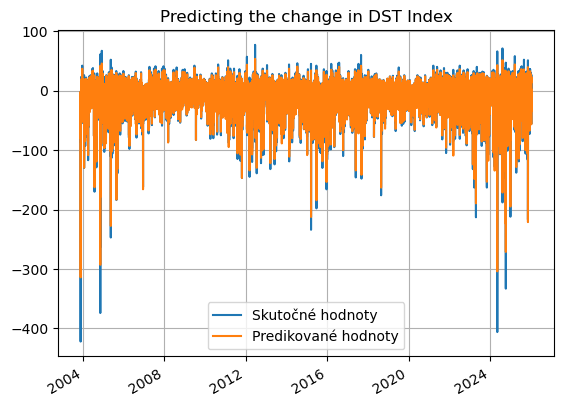

In [17]:
df = pd.DataFrame(data={"time": test['time1'][n_input:],"y_true": y_test_raw[n_input:] , "y_predict": y_pred.reshape(-1)})

df["residuals"] = df["y_true"] - df["y_predict"]
df["true_binary"] = (df["y_true"] <= -20).astype(int)
df["pred_binary"] = (df["y_predict"] <= CLASSIFICATION_THRESHOLD).astype(int)
df["y_persistence"] = df["y_true"].shift(shift)

plt.figure()
plt.title('Predicting the change in DST Index')
plt.plot(df['time'],df['y_true'], label='Skutočné hodnoty')
plt.plot(df['time'],df['y_predict'], label='Predikované hodnoty')
plt.legend()
plt.gcf().autofmt_xdate()
plt.grid(True)

In [18]:
TN, FP, FN, TP = cm.ravel()
ACC = (TP + TN) / (TP + TN + FP + FN)
MCC = matthews_corrcoef(y_test_binary, y_pred_binary_lstm)
print("ACC={}".format(ACC))
print("MCC={}".format(MCC))
df['y_persistance'] = df['y_true'].shift(shift)
df = df.dropna(subset=["y_true", "y_predict", "y_persistance"])

# Získame hodnoty zo stĺpcov
y_true = df["y_true"].values
y_pred_nn = df["y_predict"].values
y_pred_persistence = df["y_persistance"].values

# MAE a MSE pre neurónovú sieť
mae_nn = mean_absolute_error(y_true, y_pred_nn)
mse_nn = mean_squared_error(y_true, y_pred_nn)

# MAE a MSE pre perzistentný model
mae_persistence = mean_absolute_error(y_true, y_pred_persistence)
mse_persistence = mean_squared_error(y_true, y_pred_persistence)

# Porovnanie zlepšenia
improvement_mae = (mae_persistence - mae_nn) / mae_persistence * 100
improvement_mse = (mse_persistence - mse_nn) / mse_persistence * 100

# Výpis
print("Výkon NN:")
print(f"MAE: {mae_nn:.4f}, MSE: {mse_nn:.4f}")

print("Perzistentný model:")
print(f"MAE: {mae_persistence:.4f}, MSE: {mse_persistence:.4f}")

print("Zlepšenie oproti Persistence Modelu:")
print(f"MAE Improvement: {improvement_mae:.2f}%")
print(f"MSE Improvement: {improvement_mse:.2f}%")

ACC=0.9592160416902685
MCC=0.8782934120685921
Výkon NN:
MAE: 2.4434, MSE: 15.1526
Perzistentný model:
MAE: 2.5680, MSE: 16.3204
Zlepšenie oproti Persistence Modelu:
MAE Improvement: 4.85%
MSE Improvement: 7.16%


In [19]:
###########################################
# 1. LSTM predikcie (aligned s n_input)
###########################################

y_train_lstm = model.predict(train_generator).reshape(-1)
y_val_lstm   = model.predict(val_generator).reshape(-1)
y_test_lstm  = model.predict(test_generator).reshape(-1)

emb_model = Model(inputs=model.input, outputs=model.layers[-2].output)
emb_train = emb_model.predict(train_generator)
emb_val   = emb_model.predict(val_generator)
emb_test  = emb_model.predict(test_generator)

# aligned y_true (TimeseriesGenerator posúva o n_input)
y_train_true = y_train[n_input:]
y_val_true   = y_val[n_input:]
y_test_true  = y_test[n_input:]

print("Shapes LSTM:")
print("train:", y_train_lstm.shape, y_train_true.shape)
print("val:  ", y_val_lstm.shape,   y_val_true.shape)
print("test: ", y_test_lstm.shape,  y_test_true.shape)


###########################################
# 2. Reziduá (chyba LSTM)
###########################################

error_train = y_train_true - y_train_lstm
error_val   = y_val_true   - y_val_lstm

# globálna smerodajná odchýlka chýb (použijeme ju na "nafúknutie" intervalu)
sigma_global = np.std(np.concatenate([error_train, error_val]))
print("Global sigma (LSTM errors, scaled):", sigma_global)


###########################################
# 3. Vstupy pre GP (tie isté indexy ako reziduá)
###########################################

# embeddingy z predposlednej vrstvy LSTM modelu
X_train_emb = emb_train
X_val_emb   = emb_val
X_test_emb  = emb_test

# Spojenie train+val pre GP
X_gp_train = np.concatenate([X_train_emb, X_val_emb])
y_gp_train = np.concatenate([error_train, error_val])

X_test_gp = X_test_emb

print("Shapes GP:")
print("X_gp_train:", X_gp_train.shape)
print("y_gp_train:", y_gp_train.shape)
print("X_test_gp:", X_test_gp.shape)


###########################################
# 4. Gaussian Process (subsampling kvôli RAM)
###########################################

from sklearn.gaussian_process import GaussianProcessRegressor
from sklearn.gaussian_process.kernels import RBF, WhiteKernel, ConstantKernel as C

max_gp_points = 5000
if len(X_gp_train) > max_gp_points:
    rng = np.random.default_rng(42)
    idx = rng.choice(len(X_gp_train), size=max_gp_points, replace=False)
    X_gp_sub = X_gp_train[idx]
    y_gp_sub = y_gp_train[idx]
    print(f"Using subsample of {len(X_gp_sub)} points for GP.")
else:
    X_gp_sub = X_gp_train
    y_gp_sub = y_gp_train
    print("Using all points for GP.")

kernel = C(1.0, (1e-3, 1e3)) * RBF(length_scale=20.0, length_scale_bounds=(1e-1, 1e3)) \
         + WhiteKernel(noise_level=1.0, noise_level_bounds=(1e-5, 1e1))

gp = GaussianProcessRegressor(
    kernel=kernel,
    alpha=1e-2,
    normalize_y=True,
    n_restarts_optimizer=2,
    random_state=42
)

print("Training GP on", len(X_gp_sub), "points...")
gp.fit(X_gp_sub, y_gp_sub)
print("GP fitted. Kernel:", gp.kernel_)


###########################################
# 5. Predikcia GP chyby + hybrid LSTM+GP
###########################################

y_gp_mean_err, y_gp_std_err = gp.predict(X_test_gp, return_std=True)

y_train_lstm = inverse_target(y_train_lstm.reshape(-1))
y_val_lstm   = inverse_target(y_val_lstm.reshape(-1))
y_test_lstm  = inverse_target(y_test_lstm.reshape(-1))

y_train_true = y_train_raw[n_input:]
y_val_true   = y_val_raw[n_input:]
y_test_true  = y_test_raw[n_input:]

y_gp_mean_err = y_gp_mean_err * target_scale
y_gp_std_err = y_gp_std_err * target_scale
sigma_global = sigma_global * target_scale

print("Global sigma (LSTM errors):", sigma_global)

y_hybrid_mean  = y_test_lstm + y_gp_mean_err

times_test = pd.to_datetime(test["time1"].iloc[n_input:])
sigma_series = pd.Series(y_gp_std_err, index=times_test)
sigma_smooth = sigma_series.rolling(window=6, center=True, min_periods=1).mean().values

sigma_effective = np.sqrt(sigma_smooth**2 + sigma_global**2)

#z = 1.96  # 95% interval
z = 3  # 99% interval
y_hybrid_lower = y_hybrid_mean - z * sigma_effective
y_hybrid_upper = y_hybrid_mean + z * sigma_effective

print("Hybrid prediction with smoothed, inflated interval ready.")

  1/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 100ms/step

  3/896 ━━━━━━━━━━━━━━━━━━━━ 31s 36ms/step  

  5/896 ━━━━━━━━━━━━━━━━━━━━ 33s 37ms/step

  7/896 ━━━━━━━━━━━━━━━━━━━━ 34s 38ms/step

  9/896 ━━━━━━━━━━━━━━━━━━━━ 34s 39ms/step

 11/896 ━━━━━━━━━━━━━━━━━━━━ 35s 40ms/step

 13/896 ━━━━━━━━━━━━━━━━━━━━ 35s 40ms/step

 15/896 ━━━━━━━━━━━━━━━━━━━━ 36s 41ms/step

 17/896 ━━━━━━━━━━━━━━━━━━━━ 36s 42ms/step

 19/896 ━━━━━━━━━━━━━━━━━━━━ 36s 42ms/step

 21/896 ━━━━━━━━━━━━━━━━━━━━ 36s 42ms/step

 23/896 ━━━━━━━━━━━━━━━━━━━━ 36s 42ms/step

 24/896 ━━━━━━━━━━━━━━━━━━━━ 37s 43ms/step

 25/896 ━━━━━━━━━━━━━━━━━━━━ 37s 43ms/step

 27/896 ━━━━━━━━━━━━━━━━━━━━ 37s 44ms/step

 29/896 ━━━━━━━━━━━━━━━━━━━━ 37s 43ms/step

 31/896 ━━━━━━━━━━━━━━━━━━━━ 37s 43ms/step

 33/896 ━━━━━━━━━━━━━━━━━━━━ 37s 43ms/step

 35/896 ━━━━━━━━━━━━━━━━━━━━ 37s 43ms/step

 37/896 ━━━━━━━━━━━━━━━━━━━━ 37s 43ms/step

 38/896 ━━━━━━━━━━━━━━━━━━━━ 37s 44ms/step

 40/896 ━━━━━━━━━━━━━━━━━━━━ 37s 43ms/step

 42/896 ━━━━━━━━━━━━━━━━━━━━ 37s 44ms/step

 44/896 ━━━━━━━━━━━━━━━━━━━━ 37s 44ms/step

 45/896 ━━━━━━━━━━━━━━━━━━━━ 37s 44ms/step

 47/896 ━━━━━━━━━━━━━━━━━━━━ 37s 45ms/step

 48/896 ━━━━━━━━━━━━━━━━━━━━ 37s 45ms/step

 49/896 ━━━━━━━━━━━━━━━━━━━━ 38s 45ms/step

 50/896 ━━━━━━━━━━━━━━━━━━━━ 38s 45ms/step

 51/896 ━━━━━━━━━━━━━━━━━━━━ 38s 46ms/step

 52/896 ━━━━━━━━━━━━━━━━━━━━ 38s 46ms/step

 54/896 ━━━━━━━━━━━━━━━━━━━━ 38s 46ms/step

 55/896 ━━━━━━━━━━━━━━━━━━━━ 38s 46ms/step

 57/896 ━━━━━━━━━━━━━━━━━━━━ 38s 46ms/step

 58/896 ━━━━━━━━━━━━━━━━━━━━ 38s 46ms/step

 59/896 ━━━━━━━━━━━━━━━━━━━━ 38s 46ms/step

 61/896 ━━━━━━━━━━━━━━━━━━━━ 39s 47ms/step

 62/896 ━━━━━━━━━━━━━━━━━━━━ 39s 47ms/step

 63/896 ━━━━━━━━━━━━━━━━━━━━ 39s 47ms/step

 64/896 ━━━━━━━━━━━━━━━━━━━━ 39s 47ms/step

 66/896 ━━━━━━━━━━━━━━━━━━━━ 39s 47ms/step

 68/896 ━━━━━━━━━━━━━━━━━━━━ 39s 47ms/step

 69/896 ━━━━━━━━━━━━━━━━━━━━ 39s 47ms/step

 70/896 ━━━━━━━━━━━━━━━━━━━━ 39s 47ms/step

 71/896 ━━━━━━━━━━━━━━━━━━━━ 39s 47ms/step

 73/896 ━━━━━━━━━━━━━━━━━━━━ 39s 48ms/step

 74/896 ━━━━━━━━━━━━━━━━━━━━ 39s 48ms/step

 75/896 ━━━━━━━━━━━━━━━━━━━━ 39s 48ms/step

 76/896 ━━━━━━━━━━━━━━━━━━━━ 39s 48ms/step

 77/896 ━━━━━━━━━━━━━━━━━━━━ 39s 48ms/step

 78/896 ━━━━━━━━━━━━━━━━━━━━ 39s 48ms/step

 79/896 ━━━━━━━━━━━━━━━━━━━━ 39s 48ms/step

 81/896 ━━━━━━━━━━━━━━━━━━━━ 39s 48ms/step

 83/896 ━━━━━━━━━━━━━━━━━━━━ 38s 48ms/step

 85/896 ━━━━━━━━━━━━━━━━━━━━ 38s 48ms/step

 86/896 ━━━━━━━━━━━━━━━━━━━━ 39s 48ms/step

 87/896 ━━━━━━━━━━━━━━━━━━━━ 39s 49ms/step

 88/896 ━━━━━━━━━━━━━━━━━━━━ 39s 49ms/step

 89/896 ━━━━━━━━━━━━━━━━━━━━ 39s 49ms/step

 90/896 ━━━━━━━━━━━━━━━━━━━━ 39s 49ms/step

 91/896 ━━━━━━━━━━━━━━━━━━━━ 39s 49ms/step

 92/896 ━━━━━━━━━━━━━━━━━━━━ 39s 50ms/step

 93/896 ━━━━━━━━━━━━━━━━━━━━ 39s 50ms/step

 94/896 ━━━━━━━━━━━━━━━━━━━━ 40s 50ms/step

 95/896 ━━━━━━━━━━━━━━━━━━━━ 40s 50ms/step

 96/896 ━━━━━━━━━━━━━━━━━━━━ 40s 50ms/step

 97/896 ━━━━━━━━━━━━━━━━━━━━ 40s 50ms/step

 98/896 ━━━━━━━━━━━━━━━━━━━━ 40s 51ms/step

 99/896 ━━━━━━━━━━━━━━━━━━━━ 40s 51ms/step

100/896 ━━━━━━━━━━━━━━━━━━━━ 40s 51ms/step

101/896 ━━━━━━━━━━━━━━━━━━━━ 40s 51ms/step

102/896 ━━━━━━━━━━━━━━━━━━━━ 40s 52ms/step

103/896 ━━━━━━━━━━━━━━━━━━━━ 41s 52ms/step

104/896 ━━━━━━━━━━━━━━━━━━━━ 41s 52ms/step

105/896 ━━━━━━━━━━━━━━━━━━━━ 41s 52ms/step

106/896 ━━━━━━━━━━━━━━━━━━━━ 41s 52ms/step

108/896 ━━━━━━━━━━━━━━━━━━━━ 41s 52ms/step

109/896 ━━━━━━━━━━━━━━━━━━━━ 40s 52ms/step

110/896 ━━━━━━━━━━━━━━━━━━━━ 41s 52ms/step

111/896 ━━━━━━━━━━━━━━━━━━━━ 41s 52ms/step

112/896 ━━━━━━━━━━━━━━━━━━━━ 41s 53ms/step

113/896 ━━━━━━━━━━━━━━━━━━━━ 41s 53ms/step

114/896 ━━━━━━━━━━━━━━━━━━━━ 41s 53ms/step

115/896 ━━━━━━━━━━━━━━━━━━━━ 41s 54ms/step

117/896 ━━━━━━━━━━━━━━━━━━━━ 41s 54ms/step

118/896 ━━━━━━━━━━━━━━━━━━━━ 41s 54ms/step

119/896 ━━━━━━━━━━━━━━━━━━━━ 42s 54ms/step

120/896 ━━━━━━━━━━━━━━━━━━━━ 42s 54ms/step

121/896 ━━━━━━━━━━━━━━━━━━━━ 42s 54ms/step

122/896 ━━━━━━━━━━━━━━━━━━━━ 42s 54ms/step

123/896 ━━━━━━━━━━━━━━━━━━━━ 42s 55ms/step

124/896 ━━━━━━━━━━━━━━━━━━━━ 42s 55ms/step

125/896 ━━━━━━━━━━━━━━━━━━━━ 42s 55ms/step

126/896 ━━━━━━━━━━━━━━━━━━━━ 42s 55ms/step

127/896 ━━━━━━━━━━━━━━━━━━━━ 42s 55ms/step

128/896 ━━━━━━━━━━━━━━━━━━━━ 42s 56ms/step

129/896 ━━━━━━━━━━━━━━━━━━━━ 42s 56ms/step

130/896 ━━━━━━━━━━━━━━━━━━━━ 42s 56ms/step

131/896 ━━━━━━━━━━━━━━━━━━━━ 42s 56ms/step

132/896 ━━━━━━━━━━━━━━━━━━━━ 42s 56ms/step

133/896 ━━━━━━━━━━━━━━━━━━━━ 42s 56ms/step

135/896 ━━━━━━━━━━━━━━━━━━━━ 42s 56ms/step

136/896 ━━━━━━━━━━━━━━━━━━━━ 42s 56ms/step

137/896 ━━━━━━━━━━━━━━━━━━━━ 42s 56ms/step

138/896 ━━━━━━━━━━━━━━━━━━━━ 42s 56ms/step

139/896 ━━━━━━━━━━━━━━━━━━━━ 42s 57ms/step

140/896 ━━━━━━━━━━━━━━━━━━━━ 42s 57ms/step

141/896 ━━━━━━━━━━━━━━━━━━━━ 42s 57ms/step

142/896 ━━━━━━━━━━━━━━━━━━━━ 42s 57ms/step

143/896 ━━━━━━━━━━━━━━━━━━━━ 42s 57ms/step

144/896 ━━━━━━━━━━━━━━━━━━━━ 42s 57ms/step

145/896 ━━━━━━━━━━━━━━━━━━━━ 42s 57ms/step

146/896 ━━━━━━━━━━━━━━━━━━━━ 42s 57ms/step

147/896 ━━━━━━━━━━━━━━━━━━━━ 43s 58ms/step

148/896 ━━━━━━━━━━━━━━━━━━━━ 43s 58ms/step

149/896 ━━━━━━━━━━━━━━━━━━━━ 43s 58ms/step

150/896 ━━━━━━━━━━━━━━━━━━━━ 43s 58ms/step

151/896 ━━━━━━━━━━━━━━━━━━━━ 43s 58ms/step

152/896 ━━━━━━━━━━━━━━━━━━━━ 43s 58ms/step

153/896 ━━━━━━━━━━━━━━━━━━━━ 43s 58ms/step

154/896 ━━━━━━━━━━━━━━━━━━━━ 43s 59ms/step

155/896 ━━━━━━━━━━━━━━━━━━━━ 43s 59ms/step

156/896 ━━━━━━━━━━━━━━━━━━━━ 44s 60ms/step

157/896 ━━━━━━━━━━━━━━━━━━━━ 44s 60ms/step

158/896 ━━━━━━━━━━━━━━━━━━━━ 44s 60ms/step

159/896 ━━━━━━━━━━━━━━━━━━━━ 44s 60ms/step

161/896 ━━━━━━━━━━━━━━━━━━━━ 44s 60ms/step

163/896 ━━━━━━━━━━━━━━━━━━━━ 43s 60ms/step

165/896 ━━━━━━━━━━━━━━━━━━━━ 43s 60ms/step

167/896 ━━━━━━━━━━━━━━━━━━━━ 43s 59ms/step

169/896 ━━━━━━━━━━━━━━━━━━━━ 43s 59ms/step

171/896 ━━━━━━━━━━━━━━━━━━━━ 42s 59ms/step

172/896 ━━━━━━━━━━━━━━━━━━━━ 43s 60ms/step

173/896 ━━━━━━━━━━━━━━━━━━━━ 43s 60ms/step

174/896 ━━━━━━━━━━━━━━━━━━━━ 43s 60ms/step

175/896 ━━━━━━━━━━━━━━━━━━━━ 43s 60ms/step

176/896 ━━━━━━━━━━━━━━━━━━━━ 43s 60ms/step

178/896 ━━━━━━━━━━━━━━━━━━━━ 43s 61ms/step

179/896 ━━━━━━━━━━━━━━━━━━━━ 43s 61ms/step

180/896 ━━━━━━━━━━━━━━━━━━━━ 43s 61ms/step

181/896 ━━━━━━━━━━━━━━━━━━━━ 44s 62ms/step

182/896 ━━━━━━━━━━━━━━━━━━━━ 44s 62ms/step

183/896 ━━━━━━━━━━━━━━━━━━━━ 44s 62ms/step

184/896 ━━━━━━━━━━━━━━━━━━━━ 44s 62ms/step

186/896 ━━━━━━━━━━━━━━━━━━━━ 43s 62ms/step

188/896 ━━━━━━━━━━━━━━━━━━━━ 43s 62ms/step

189/896 ━━━━━━━━━━━━━━━━━━━━ 43s 62ms/step

190/896 ━━━━━━━━━━━━━━━━━━━━ 43s 62ms/step

192/896 ━━━━━━━━━━━━━━━━━━━━ 43s 62ms/step

193/896 ━━━━━━━━━━━━━━━━━━━━ 43s 62ms/step

195/896 ━━━━━━━━━━━━━━━━━━━━ 43s 61ms/step

196/896 ━━━━━━━━━━━━━━━━━━━━ 43s 61ms/step

197/896 ━━━━━━━━━━━━━━━━━━━━ 42s 61ms/step

198/896 ━━━━━━━━━━━━━━━━━━━━ 42s 61ms/step

199/896 ━━━━━━━━━━━━━━━━━━━━ 42s 61ms/step

200/896 ━━━━━━━━━━━━━━━━━━━━ 42s 61ms/step

202/896 ━━━━━━━━━━━━━━━━━━━━ 42s 61ms/step

204/896 ━━━━━━━━━━━━━━━━━━━━ 42s 61ms/step

205/896 ━━━━━━━━━━━━━━━━━━━━ 42s 61ms/step

206/896 ━━━━━━━━━━━━━━━━━━━━ 42s 61ms/step

207/896 ━━━━━━━━━━━━━━━━━━━━ 42s 61ms/step

209/896 ━━━━━━━━━━━━━━━━━━━━ 41s 61ms/step

210/896 ━━━━━━━━━━━━━━━━━━━━ 41s 61ms/step

211/896 ━━━━━━━━━━━━━━━━━━━━ 41s 61ms/step

213/896 ━━━━━━━━━━━━━━━━━━━━ 41s 61ms/step

214/896 ━━━━━━━━━━━━━━━━━━━━ 41s 61ms/step

215/896 ━━━━━━━━━━━━━━━━━━━━ 41s 61ms/step

216/896 ━━━━━━━━━━━━━━━━━━━━ 41s 61ms/step

217/896 ━━━━━━━━━━━━━━━━━━━━ 41s 61ms/step

218/896 ━━━━━━━━━━━━━━━━━━━━ 41s 61ms/step

219/896 ━━━━━━━━━━━━━━━━━━━━ 41s 61ms/step

220/896 ━━━━━━━━━━━━━━━━━━━━ 40s 61ms/step

221/896 ━━━━━━━━━━━━━━━━━━━━ 40s 61ms/step

222/896 ━━━━━━━━━━━━━━━━━━━━ 40s 61ms/step

223/896 ━━━━━━━━━━━━━━━━━━━━ 40s 61ms/step

225/896 ━━━━━━━━━━━━━━━━━━━━ 40s 61ms/step

226/896 ━━━━━━━━━━━━━━━━━━━━ 40s 60ms/step

228/896 ━━━━━━━━━━━━━━━━━━━━ 40s 60ms/step

229/896 ━━━━━━━━━━━━━━━━━━━━ 40s 60ms/step

230/896 ━━━━━━━━━━━━━━━━━━━━ 40s 60ms/step

231/896 ━━━━━━━━━━━━━━━━━━━━ 40s 60ms/step

232/896 ━━━━━━━━━━━━━━━━━━━━ 40s 60ms/step

233/896 ━━━━━━━━━━━━━━━━━━━━ 40s 60ms/step

234/896 ━━━━━━━━━━━━━━━━━━━━ 40s 60ms/step

235/896 ━━━━━━━━━━━━━━━━━━━━ 40s 61ms/step

236/896 ━━━━━━━━━━━━━━━━━━━━ 39s 61ms/step

237/896 ━━━━━━━━━━━━━━━━━━━━ 39s 61ms/step

238/896 ━━━━━━━━━━━━━━━━━━━━ 39s 61ms/step

239/896 ━━━━━━━━━━━━━━━━━━━━ 39s 61ms/step

240/896 ━━━━━━━━━━━━━━━━━━━━ 39s 61ms/step

241/896 ━━━━━━━━━━━━━━━━━━━━ 39s 61ms/step

242/896 ━━━━━━━━━━━━━━━━━━━━ 39s 61ms/step

243/896 ━━━━━━━━━━━━━━━━━━━━ 39s 61ms/step

244/896 ━━━━━━━━━━━━━━━━━━━━ 39s 61ms/step

245/896 ━━━━━━━━━━━━━━━━━━━━ 39s 61ms/step

247/896 ━━━━━━━━━━━━━━━━━━━━ 39s 61ms/step

248/896 ━━━━━━━━━━━━━━━━━━━━ 39s 61ms/step

249/896 ━━━━━━━━━━━━━━━━━━━━ 39s 61ms/step

250/896 ━━━━━━━━━━━━━━━━━━━━ 39s 61ms/step

251/896 ━━━━━━━━━━━━━━━━━━━━ 39s 61ms/step

252/896 ━━━━━━━━━━━━━━━━━━━━ 39s 61ms/step

253/896 ━━━━━━━━━━━━━━━━━━━━ 39s 61ms/step

254/896 ━━━━━━━━━━━━━━━━━━━━ 39s 61ms/step

255/896 ━━━━━━━━━━━━━━━━━━━━ 38s 61ms/step

256/896 ━━━━━━━━━━━━━━━━━━━━ 38s 61ms/step

257/896 ━━━━━━━━━━━━━━━━━━━━ 38s 61ms/step

258/896 ━━━━━━━━━━━━━━━━━━━━ 38s 61ms/step

259/896 ━━━━━━━━━━━━━━━━━━━━ 38s 61ms/step

260/896 ━━━━━━━━━━━━━━━━━━━━ 38s 61ms/step

261/896 ━━━━━━━━━━━━━━━━━━━━ 38s 61ms/step

262/896 ━━━━━━━━━━━━━━━━━━━━ 38s 61ms/step

263/896 ━━━━━━━━━━━━━━━━━━━━ 38s 61ms/step

265/896 ━━━━━━━━━━━━━━━━━━━━ 38s 61ms/step

266/896 ━━━━━━━━━━━━━━━━━━━━ 38s 61ms/step

268/896 ━━━━━━━━━━━━━━━━━━━━ 38s 61ms/step

269/896 ━━━━━━━━━━━━━━━━━━━━ 38s 61ms/step

270/896 ━━━━━━━━━━━━━━━━━━━━ 38s 61ms/step

271/896 ━━━━━━━━━━━━━━━━━━━━ 38s 61ms/step

273/896 ━━━━━━━━━━━━━━━━━━━━ 37s 61ms/step

274/896 ━━━━━━━━━━━━━━━━━━━━ 37s 61ms/step

275/896 ━━━━━━━━━━━━━━━━━━━━ 37s 61ms/step

276/896 ━━━━━━━━━━━━━━━━━━━━ 37s 61ms/step

277/896 ━━━━━━━━━━━━━━━━━━━━ 37s 61ms/step

279/896 ━━━━━━━━━━━━━━━━━━━━ 37s 61ms/step

281/896 ━━━━━━━━━━━━━━━━━━━━ 37s 61ms/step

282/896 ━━━━━━━━━━━━━━━━━━━━ 37s 61ms/step

283/896 ━━━━━━━━━━━━━━━━━━━━ 37s 61ms/step

284/896 ━━━━━━━━━━━━━━━━━━━━ 37s 61ms/step

285/896 ━━━━━━━━━━━━━━━━━━━━ 37s 61ms/step

286/896 ━━━━━━━━━━━━━━━━━━━━ 36s 61ms/step

288/896 ━━━━━━━━━━━━━━━━━━━━ 36s 61ms/step

290/896 ━━━━━━━━━━━━━━━━━━━━ 36s 60ms/step

291/896 ━━━━━━━━━━━━━━━━━━━━ 36s 60ms/step

292/896 ━━━━━━━━━━━━━━━━━━━━ 36s 60ms/step

293/896 ━━━━━━━━━━━━━━━━━━━━ 36s 61ms/step

294/896 ━━━━━━━━━━━━━━━━━━━━ 36s 61ms/step

295/896 ━━━━━━━━━━━━━━━━━━━━ 36s 61ms/step

296/896 ━━━━━━━━━━━━━━━━━━━━ 36s 61ms/step

297/896 ━━━━━━━━━━━━━━━━━━━━ 36s 61ms/step

298/896 ━━━━━━━━━━━━━━━━━━━━ 36s 61ms/step

299/896 ━━━━━━━━━━━━━━━━━━━━ 36s 61ms/step

300/896 ━━━━━━━━━━━━━━━━━━━━ 36s 61ms/step

301/896 ━━━━━━━━━━━━━━━━━━━━ 36s 61ms/step

302/896 ━━━━━━━━━━━━━━━━━━━━ 36s 61ms/step

303/896 ━━━━━━━━━━━━━━━━━━━━ 36s 61ms/step

304/896 ━━━━━━━━━━━━━━━━━━━━ 36s 61ms/step

305/896 ━━━━━━━━━━━━━━━━━━━━ 36s 61ms/step

306/896 ━━━━━━━━━━━━━━━━━━━━ 36s 61ms/step

307/896 ━━━━━━━━━━━━━━━━━━━━ 36s 61ms/step

308/896 ━━━━━━━━━━━━━━━━━━━━ 35s 61ms/step

309/896 ━━━━━━━━━━━━━━━━━━━━ 35s 61ms/step

310/896 ━━━━━━━━━━━━━━━━━━━━ 35s 61ms/step

311/896 ━━━━━━━━━━━━━━━━━━━━ 35s 61ms/step

312/896 ━━━━━━━━━━━━━━━━━━━━ 35s 61ms/step

313/896 ━━━━━━━━━━━━━━━━━━━━ 35s 61ms/step

314/896 ━━━━━━━━━━━━━━━━━━━━ 35s 61ms/step

315/896 ━━━━━━━━━━━━━━━━━━━━ 35s 61ms/step

316/896 ━━━━━━━━━━━━━━━━━━━━ 35s 61ms/step

317/896 ━━━━━━━━━━━━━━━━━━━━ 35s 61ms/step

318/896 ━━━━━━━━━━━━━━━━━━━━ 35s 61ms/step

319/896 ━━━━━━━━━━━━━━━━━━━━ 35s 61ms/step

320/896 ━━━━━━━━━━━━━━━━━━━━ 35s 61ms/step

321/896 ━━━━━━━━━━━━━━━━━━━━ 35s 61ms/step

322/896 ━━━━━━━━━━━━━━━━━━━━ 35s 61ms/step

323/896 ━━━━━━━━━━━━━━━━━━━━ 35s 61ms/step

324/896 ━━━━━━━━━━━━━━━━━━━━ 35s 61ms/step

325/896 ━━━━━━━━━━━━━━━━━━━━ 35s 61ms/step

326/896 ━━━━━━━━━━━━━━━━━━━━ 34s 61ms/step

327/896 ━━━━━━━━━━━━━━━━━━━━ 34s 61ms/step

328/896 ━━━━━━━━━━━━━━━━━━━━ 34s 61ms/step

329/896 ━━━━━━━━━━━━━━━━━━━━ 34s 61ms/step

330/896 ━━━━━━━━━━━━━━━━━━━━ 34s 61ms/step

331/896 ━━━━━━━━━━━━━━━━━━━━ 34s 62ms/step

332/896 ━━━━━━━━━━━━━━━━━━━━ 34s 61ms/step

333/896 ━━━━━━━━━━━━━━━━━━━━ 34s 62ms/step

334/896 ━━━━━━━━━━━━━━━━━━━━ 34s 61ms/step

335/896 ━━━━━━━━━━━━━━━━━━━━ 34s 61ms/step

336/896 ━━━━━━━━━━━━━━━━━━━━ 34s 61ms/step

337/896 ━━━━━━━━━━━━━━━━━━━━ 34s 61ms/step

338/896 ━━━━━━━━━━━━━━━━━━━━ 34s 61ms/step

339/896 ━━━━━━━━━━━━━━━━━━━━ 34s 61ms/step

340/896 ━━━━━━━━━━━━━━━━━━━━ 34s 61ms/step

341/896 ━━━━━━━━━━━━━━━━━━━━ 34s 61ms/step

342/896 ━━━━━━━━━━━━━━━━━━━━ 34s 62ms/step

343/896 ━━━━━━━━━━━━━━━━━━━━ 34s 62ms/step

344/896 ━━━━━━━━━━━━━━━━━━━━ 34s 62ms/step

345/896 ━━━━━━━━━━━━━━━━━━━━ 34s 62ms/step

346/896 ━━━━━━━━━━━━━━━━━━━━ 34s 62ms/step

347/896 ━━━━━━━━━━━━━━━━━━━━ 34s 62ms/step

348/896 ━━━━━━━━━━━━━━━━━━━━ 33s 62ms/step

349/896 ━━━━━━━━━━━━━━━━━━━━ 33s 62ms/step

350/896 ━━━━━━━━━━━━━━━━━━━━ 33s 62ms/step

351/896 ━━━━━━━━━━━━━━━━━━━━ 33s 62ms/step

352/896 ━━━━━━━━━━━━━━━━━━━━ 33s 62ms/step

353/896 ━━━━━━━━━━━━━━━━━━━━ 33s 62ms/step

354/896 ━━━━━━━━━━━━━━━━━━━━ 33s 62ms/step

355/896 ━━━━━━━━━━━━━━━━━━━━ 33s 62ms/step

356/896 ━━━━━━━━━━━━━━━━━━━━ 33s 62ms/step

357/896 ━━━━━━━━━━━━━━━━━━━━ 33s 62ms/step

358/896 ━━━━━━━━━━━━━━━━━━━━ 33s 62ms/step

359/896 ━━━━━━━━━━━━━━━━━━━━ 33s 62ms/step

360/896 ━━━━━━━━━━━━━━━━━━━━ 33s 62ms/step

361/896 ━━━━━━━━━━━━━━━━━━━━ 33s 62ms/step

362/896 ━━━━━━━━━━━━━━━━━━━━ 33s 62ms/step

363/896 ━━━━━━━━━━━━━━━━━━━━ 33s 62ms/step

364/896 ━━━━━━━━━━━━━━━━━━━━ 33s 62ms/step

366/896 ━━━━━━━━━━━━━━━━━━━━ 32s 62ms/step

367/896 ━━━━━━━━━━━━━━━━━━━━ 32s 62ms/step

369/896 ━━━━━━━━━━━━━━━━━━━━ 32s 62ms/step

370/896 ━━━━━━━━━━━━━━━━━━━━ 32s 62ms/step

372/896 ━━━━━━━━━━━━━━━━━━━━ 32s 62ms/step

373/896 ━━━━━━━━━━━━━━━━━━━━ 32s 62ms/step

375/896 ━━━━━━━━━━━━━━━━━━━━ 32s 62ms/step

376/896 ━━━━━━━━━━━━━━━━━━━━ 32s 62ms/step

377/896 ━━━━━━━━━━━━━━━━━━━━ 32s 62ms/step

378/896 ━━━━━━━━━━━━━━━━━━━━ 32s 62ms/step

380/896 ━━━━━━━━━━━━━━━━━━━━ 31s 62ms/step

382/896 ━━━━━━━━━━━━━━━━━━━━ 31s 62ms/step

384/896 ━━━━━━━━━━━━━━━━━━━━ 31s 62ms/step

385/896 ━━━━━━━━━━━━━━━━━━━━ 31s 62ms/step

387/896 ━━━━━━━━━━━━━━━━━━━━ 31s 62ms/step

389/896 ━━━━━━━━━━━━━━━━━━━━ 31s 62ms/step

391/896 ━━━━━━━━━━━━━━━━━━━━ 31s 62ms/step

392/896 ━━━━━━━━━━━━━━━━━━━━ 31s 62ms/step

393/896 ━━━━━━━━━━━━━━━━━━━━ 31s 62ms/step

394/896 ━━━━━━━━━━━━━━━━━━━━ 30s 62ms/step

395/896 ━━━━━━━━━━━━━━━━━━━━ 30s 62ms/step

397/896 ━━━━━━━━━━━━━━━━━━━━ 30s 62ms/step

398/896 ━━━━━━━━━━━━━━━━━━━━ 30s 62ms/step

399/896 ━━━━━━━━━━━━━━━━━━━━ 30s 62ms/step

400/896 ━━━━━━━━━━━━━━━━━━━━ 30s 62ms/step

401/896 ━━━━━━━━━━━━━━━━━━━━ 30s 62ms/step

402/896 ━━━━━━━━━━━━━━━━━━━━ 30s 62ms/step

403/896 ━━━━━━━━━━━━━━━━━━━━ 30s 61ms/step

404/896 ━━━━━━━━━━━━━━━━━━━━ 30s 61ms/step

405/896 ━━━━━━━━━━━━━━━━━━━━ 30s 61ms/step

406/896 ━━━━━━━━━━━━━━━━━━━━ 30s 61ms/step

407/896 ━━━━━━━━━━━━━━━━━━━━ 30s 61ms/step

408/896 ━━━━━━━━━━━━━━━━━━━━ 30s 61ms/step

409/896 ━━━━━━━━━━━━━━━━━━━━ 29s 61ms/step

410/896 ━━━━━━━━━━━━━━━━━━━━ 29s 61ms/step

411/896 ━━━━━━━━━━━━━━━━━━━━ 29s 61ms/step

413/896 ━━━━━━━━━━━━━━━━━━━━ 29s 61ms/step

414/896 ━━━━━━━━━━━━━━━━━━━━ 29s 61ms/step

415/896 ━━━━━━━━━━━━━━━━━━━━ 29s 61ms/step

416/896 ━━━━━━━━━━━━━━━━━━━━ 29s 61ms/step

418/896 ━━━━━━━━━━━━━━━━━━━━ 29s 61ms/step

419/896 ━━━━━━━━━━━━━━━━━━━━ 29s 61ms/step

420/896 ━━━━━━━━━━━━━━━━━━━━ 29s 61ms/step

421/896 ━━━━━━━━━━━━━━━━━━━━ 29s 61ms/step

422/896 ━━━━━━━━━━━━━━━━━━━━ 29s 61ms/step

424/896 ━━━━━━━━━━━━━━━━━━━━ 28s 61ms/step

425/896 ━━━━━━━━━━━━━━━━━━━━ 28s 61ms/step

427/896 ━━━━━━━━━━━━━━━━━━━━ 28s 61ms/step

428/896 ━━━━━━━━━━━━━━━━━━━━ 28s 61ms/step

430/896 ━━━━━━━━━━━━━━━━━━━━ 28s 61ms/step

431/896 ━━━━━━━━━━━━━━━━━━━━ 28s 61ms/step

432/896 ━━━━━━━━━━━━━━━━━━━━ 28s 61ms/step

433/896 ━━━━━━━━━━━━━━━━━━━━ 28s 61ms/step

435/896 ━━━━━━━━━━━━━━━━━━━━ 28s 61ms/step

436/896 ━━━━━━━━━━━━━━━━━━━━ 28s 61ms/step

437/896 ━━━━━━━━━━━━━━━━━━━━ 28s 61ms/step

438/896 ━━━━━━━━━━━━━━━━━━━━ 27s 61ms/step

439/896 ━━━━━━━━━━━━━━━━━━━━ 27s 61ms/step

440/896 ━━━━━━━━━━━━━━━━━━━━ 27s 61ms/step

441/896 ━━━━━━━━━━━━━━━━━━━━ 27s 61ms/step

442/896 ━━━━━━━━━━━━━━━━━━━━ 27s 61ms/step

443/896 ━━━━━━━━━━━━━━━━━━━━ 27s 61ms/step

444/896 ━━━━━━━━━━━━━━━━━━━━ 27s 61ms/step

445/896 ━━━━━━━━━━━━━━━━━━━━ 27s 61ms/step

446/896 ━━━━━━━━━━━━━━━━━━━━ 27s 61ms/step

447/896 ━━━━━━━━━━━━━━━━━━━━ 27s 61ms/step

448/896 ━━━━━━━━━━━━━━━━━━━━ 27s 61ms/step

449/896 ━━━━━━━━━━━━━━━━━━━━ 27s 61ms/step

450/896 ━━━━━━━━━━━━━━━━━━━━ 27s 61ms/step

451/896 ━━━━━━━━━━━━━━━━━━━━ 27s 61ms/step

452/896 ━━━━━━━━━━━━━━━━━━━━ 27s 61ms/step

453/896 ━━━━━━━━━━━━━━━━━━━━ 27s 61ms/step

454/896 ━━━━━━━━━━━━━━━━━━━━ 27s 61ms/step

455/896 ━━━━━━━━━━━━━━━━━━━━ 26s 61ms/step

457/896 ━━━━━━━━━━━━━━━━━━━━ 26s 61ms/step

458/896 ━━━━━━━━━━━━━━━━━━━━ 26s 61ms/step

459/896 ━━━━━━━━━━━━━━━━━━━━ 26s 61ms/step

460/896 ━━━━━━━━━━━━━━━━━━━━ 26s 61ms/step

461/896 ━━━━━━━━━━━━━━━━━━━━ 26s 61ms/step

463/896 ━━━━━━━━━━━━━━━━━━━━ 26s 61ms/step

464/896 ━━━━━━━━━━━━━━━━━━━━ 26s 61ms/step

465/896 ━━━━━━━━━━━━━━━━━━━━ 26s 61ms/step

466/896 ━━━━━━━━━━━━━━━━━━━━ 26s 61ms/step

467/896 ━━━━━━━━━━━━━━━━━━━━ 26s 61ms/step

468/896 ━━━━━━━━━━━━━━━━━━━━ 26s 61ms/step

469/896 ━━━━━━━━━━━━━━━━━━━━ 26s 61ms/step

471/896 ━━━━━━━━━━━━━━━━━━━━ 25s 61ms/step

472/896 ━━━━━━━━━━━━━━━━━━━━ 25s 61ms/step

473/896 ━━━━━━━━━━━━━━━━━━━━ 25s 61ms/step

474/896 ━━━━━━━━━━━━━━━━━━━━ 25s 61ms/step

475/896 ━━━━━━━━━━━━━━━━━━━━ 25s 61ms/step

476/896 ━━━━━━━━━━━━━━━━━━━━ 25s 61ms/step

477/896 ━━━━━━━━━━━━━━━━━━━━ 25s 61ms/step

478/896 ━━━━━━━━━━━━━━━━━━━━ 25s 61ms/step

479/896 ━━━━━━━━━━━━━━━━━━━━ 25s 61ms/step

480/896 ━━━━━━━━━━━━━━━━━━━━ 25s 61ms/step

481/896 ━━━━━━━━━━━━━━━━━━━━ 25s 61ms/step

482/896 ━━━━━━━━━━━━━━━━━━━━ 25s 61ms/step

483/896 ━━━━━━━━━━━━━━━━━━━━ 25s 61ms/step

484/896 ━━━━━━━━━━━━━━━━━━━━ 25s 61ms/step

485/896 ━━━━━━━━━━━━━━━━━━━━ 25s 61ms/step

486/896 ━━━━━━━━━━━━━━━━━━━━ 25s 61ms/step

487/896 ━━━━━━━━━━━━━━━━━━━━ 25s 61ms/step

488/896 ━━━━━━━━━━━━━━━━━━━━ 24s 61ms/step

489/896 ━━━━━━━━━━━━━━━━━━━━ 24s 61ms/step

490/896 ━━━━━━━━━━━━━━━━━━━━ 24s 61ms/step

491/896 ━━━━━━━━━━━━━━━━━━━━ 24s 61ms/step

492/896 ━━━━━━━━━━━━━━━━━━━━ 24s 61ms/step

493/896 ━━━━━━━━━━━━━━━━━━━━ 24s 61ms/step

494/896 ━━━━━━━━━━━━━━━━━━━━ 24s 61ms/step

495/896 ━━━━━━━━━━━━━━━━━━━━ 24s 61ms/step

496/896 ━━━━━━━━━━━━━━━━━━━━ 24s 61ms/step

497/896 ━━━━━━━━━━━━━━━━━━━━ 24s 61ms/step

498/896 ━━━━━━━━━━━━━━━━━━━━ 24s 61ms/step

499/896 ━━━━━━━━━━━━━━━━━━━━ 24s 61ms/step

500/896 ━━━━━━━━━━━━━━━━━━━━ 24s 61ms/step

501/896 ━━━━━━━━━━━━━━━━━━━━ 24s 61ms/step

502/896 ━━━━━━━━━━━━━━━━━━━━ 24s 61ms/step

503/896 ━━━━━━━━━━━━━━━━━━━━ 24s 61ms/step

504/896 ━━━━━━━━━━━━━━━━━━━━ 24s 61ms/step

505/896 ━━━━━━━━━━━━━━━━━━━━ 24s 61ms/step

506/896 ━━━━━━━━━━━━━━━━━━━━ 23s 61ms/step

507/896 ━━━━━━━━━━━━━━━━━━━━ 23s 61ms/step

508/896 ━━━━━━━━━━━━━━━━━━━━ 23s 61ms/step

509/896 ━━━━━━━━━━━━━━━━━━━━ 23s 61ms/step

510/896 ━━━━━━━━━━━━━━━━━━━━ 23s 61ms/step

511/896 ━━━━━━━━━━━━━━━━━━━━ 23s 61ms/step

512/896 ━━━━━━━━━━━━━━━━━━━━ 23s 61ms/step

514/896 ━━━━━━━━━━━━━━━━━━━━ 23s 61ms/step

516/896 ━━━━━━━━━━━━━━━━━━━━ 23s 61ms/step

517/896 ━━━━━━━━━━━━━━━━━━━━ 23s 61ms/step

518/896 ━━━━━━━━━━━━━━━━━━━━ 23s 61ms/step

519/896 ━━━━━━━━━━━━━━━━━━━━ 23s 61ms/step

520/896 ━━━━━━━━━━━━━━━━━━━━ 23s 62ms/step

521/896 ━━━━━━━━━━━━━━━━━━━━ 23s 62ms/step

522/896 ━━━━━━━━━━━━━━━━━━━━ 23s 62ms/step

523/896 ━━━━━━━━━━━━━━━━━━━━ 23s 62ms/step

524/896 ━━━━━━━━━━━━━━━━━━━━ 22s 62ms/step

525/896 ━━━━━━━━━━━━━━━━━━━━ 22s 62ms/step

526/896 ━━━━━━━━━━━━━━━━━━━━ 22s 62ms/step

527/896 ━━━━━━━━━━━━━━━━━━━━ 22s 62ms/step

528/896 ━━━━━━━━━━━━━━━━━━━━ 22s 62ms/step

529/896 ━━━━━━━━━━━━━━━━━━━━ 22s 62ms/step

530/896 ━━━━━━━━━━━━━━━━━━━━ 22s 62ms/step

531/896 ━━━━━━━━━━━━━━━━━━━━ 22s 62ms/step

532/896 ━━━━━━━━━━━━━━━━━━━━ 22s 62ms/step

533/896 ━━━━━━━━━━━━━━━━━━━━ 22s 62ms/step

534/896 ━━━━━━━━━━━━━━━━━━━━ 22s 62ms/step

535/896 ━━━━━━━━━━━━━━━━━━━━ 22s 62ms/step

536/896 ━━━━━━━━━━━━━━━━━━━━ 22s 62ms/step

537/896 ━━━━━━━━━━━━━━━━━━━━ 22s 62ms/step

538/896 ━━━━━━━━━━━━━━━━━━━━ 22s 62ms/step

539/896 ━━━━━━━━━━━━━━━━━━━━ 22s 62ms/step

541/896 ━━━━━━━━━━━━━━━━━━━━ 22s 62ms/step

542/896 ━━━━━━━━━━━━━━━━━━━━ 22s 62ms/step

543/896 ━━━━━━━━━━━━━━━━━━━━ 21s 62ms/step

544/896 ━━━━━━━━━━━━━━━━━━━━ 21s 62ms/step

546/896 ━━━━━━━━━━━━━━━━━━━━ 21s 62ms/step

547/896 ━━━━━━━━━━━━━━━━━━━━ 21s 62ms/step

548/896 ━━━━━━━━━━━━━━━━━━━━ 21s 62ms/step

550/896 ━━━━━━━━━━━━━━━━━━━━ 21s 62ms/step

552/896 ━━━━━━━━━━━━━━━━━━━━ 21s 62ms/step

554/896 ━━━━━━━━━━━━━━━━━━━━ 21s 62ms/step

555/896 ━━━━━━━━━━━━━━━━━━━━ 21s 62ms/step

556/896 ━━━━━━━━━━━━━━━━━━━━ 21s 62ms/step

557/896 ━━━━━━━━━━━━━━━━━━━━ 21s 62ms/step

559/896 ━━━━━━━━━━━━━━━━━━━━ 20s 62ms/step

561/896 ━━━━━━━━━━━━━━━━━━━━ 20s 62ms/step

562/896 ━━━━━━━━━━━━━━━━━━━━ 20s 62ms/step

563/896 ━━━━━━━━━━━━━━━━━━━━ 20s 62ms/step

564/896 ━━━━━━━━━━━━━━━━━━━━ 20s 62ms/step

566/896 ━━━━━━━━━━━━━━━━━━━━ 20s 62ms/step

567/896 ━━━━━━━━━━━━━━━━━━━━ 20s 62ms/step

568/896 ━━━━━━━━━━━━━━━━━━━━ 20s 62ms/step

569/896 ━━━━━━━━━━━━━━━━━━━━ 20s 62ms/step

570/896 ━━━━━━━━━━━━━━━━━━━━ 20s 62ms/step

571/896 ━━━━━━━━━━━━━━━━━━━━ 20s 62ms/step

572/896 ━━━━━━━━━━━━━━━━━━━━ 20s 62ms/step

573/896 ━━━━━━━━━━━━━━━━━━━━ 19s 62ms/step

574/896 ━━━━━━━━━━━━━━━━━━━━ 19s 62ms/step

575/896 ━━━━━━━━━━━━━━━━━━━━ 19s 62ms/step

576/896 ━━━━━━━━━━━━━━━━━━━━ 19s 62ms/step

577/896 ━━━━━━━━━━━━━━━━━━━━ 19s 62ms/step

578/896 ━━━━━━━━━━━━━━━━━━━━ 19s 62ms/step

579/896 ━━━━━━━━━━━━━━━━━━━━ 19s 62ms/step

580/896 ━━━━━━━━━━━━━━━━━━━━ 19s 62ms/step

581/896 ━━━━━━━━━━━━━━━━━━━━ 19s 62ms/step

582/896 ━━━━━━━━━━━━━━━━━━━━ 19s 62ms/step

583/896 ━━━━━━━━━━━━━━━━━━━━ 19s 62ms/step

584/896 ━━━━━━━━━━━━━━━━━━━━ 19s 62ms/step

585/896 ━━━━━━━━━━━━━━━━━━━━ 19s 62ms/step

586/896 ━━━━━━━━━━━━━━━━━━━━ 19s 62ms/step

587/896 ━━━━━━━━━━━━━━━━━━━━ 19s 62ms/step

588/896 ━━━━━━━━━━━━━━━━━━━━ 19s 62ms/step

589/896 ━━━━━━━━━━━━━━━━━━━━ 18s 62ms/step

590/896 ━━━━━━━━━━━━━━━━━━━━ 18s 62ms/step

592/896 ━━━━━━━━━━━━━━━━━━━━ 18s 62ms/step

594/896 ━━━━━━━━━━━━━━━━━━━━ 18s 62ms/step

595/896 ━━━━━━━━━━━━━━━━━━━━ 18s 62ms/step

596/896 ━━━━━━━━━━━━━━━━━━━━ 18s 62ms/step

597/896 ━━━━━━━━━━━━━━━━━━━━ 18s 62ms/step

599/896 ━━━━━━━━━━━━━━━━━━━━ 18s 62ms/step

600/896 ━━━━━━━━━━━━━━━━━━━━ 18s 62ms/step

601/896 ━━━━━━━━━━━━━━━━━━━━ 18s 62ms/step

602/896 ━━━━━━━━━━━━━━━━━━━━ 18s 62ms/step

603/896 ━━━━━━━━━━━━━━━━━━━━ 18s 62ms/step

604/896 ━━━━━━━━━━━━━━━━━━━━ 17s 62ms/step

605/896 ━━━━━━━━━━━━━━━━━━━━ 17s 62ms/step

606/896 ━━━━━━━━━━━━━━━━━━━━ 17s 62ms/step

607/896 ━━━━━━━━━━━━━━━━━━━━ 17s 62ms/step

608/896 ━━━━━━━━━━━━━━━━━━━━ 17s 62ms/step

609/896 ━━━━━━━━━━━━━━━━━━━━ 17s 62ms/step

610/896 ━━━━━━━━━━━━━━━━━━━━ 17s 62ms/step

611/896 ━━━━━━━━━━━━━━━━━━━━ 17s 62ms/step

613/896 ━━━━━━━━━━━━━━━━━━━━ 17s 62ms/step

614/896 ━━━━━━━━━━━━━━━━━━━━ 17s 62ms/step

615/896 ━━━━━━━━━━━━━━━━━━━━ 17s 62ms/step

616/896 ━━━━━━━━━━━━━━━━━━━━ 17s 61ms/step

617/896 ━━━━━━━━━━━━━━━━━━━━ 17s 61ms/step

618/896 ━━━━━━━━━━━━━━━━━━━━ 17s 61ms/step

619/896 ━━━━━━━━━━━━━━━━━━━━ 17s 61ms/step

620/896 ━━━━━━━━━━━━━━━━━━━━ 16s 61ms/step

621/896 ━━━━━━━━━━━━━━━━━━━━ 16s 61ms/step

622/896 ━━━━━━━━━━━━━━━━━━━━ 16s 61ms/step

623/896 ━━━━━━━━━━━━━━━━━━━━ 16s 61ms/step

624/896 ━━━━━━━━━━━━━━━━━━━━ 16s 61ms/step

625/896 ━━━━━━━━━━━━━━━━━━━━ 16s 61ms/step

627/896 ━━━━━━━━━━━━━━━━━━━━ 16s 61ms/step

628/896 ━━━━━━━━━━━━━━━━━━━━ 16s 61ms/step

629/896 ━━━━━━━━━━━━━━━━━━━━ 16s 61ms/step

631/896 ━━━━━━━━━━━━━━━━━━━━ 16s 61ms/step

632/896 ━━━━━━━━━━━━━━━━━━━━ 16s 61ms/step

633/896 ━━━━━━━━━━━━━━━━━━━━ 16s 61ms/step

634/896 ━━━━━━━━━━━━━━━━━━━━ 16s 61ms/step

635/896 ━━━━━━━━━━━━━━━━━━━━ 16s 61ms/step

636/896 ━━━━━━━━━━━━━━━━━━━━ 15s 61ms/step

637/896 ━━━━━━━━━━━━━━━━━━━━ 15s 61ms/step

639/896 ━━━━━━━━━━━━━━━━━━━━ 15s 61ms/step

640/896 ━━━━━━━━━━━━━━━━━━━━ 15s 61ms/step

641/896 ━━━━━━━━━━━━━━━━━━━━ 15s 61ms/step

642/896 ━━━━━━━━━━━━━━━━━━━━ 15s 61ms/step

643/896 ━━━━━━━━━━━━━━━━━━━━ 15s 61ms/step

644/896 ━━━━━━━━━━━━━━━━━━━━ 15s 61ms/step

645/896 ━━━━━━━━━━━━━━━━━━━━ 15s 61ms/step

646/896 ━━━━━━━━━━━━━━━━━━━━ 15s 61ms/step

647/896 ━━━━━━━━━━━━━━━━━━━━ 15s 61ms/step

648/896 ━━━━━━━━━━━━━━━━━━━━ 15s 61ms/step

649/896 ━━━━━━━━━━━━━━━━━━━━ 15s 61ms/step

650/896 ━━━━━━━━━━━━━━━━━━━━ 15s 61ms/step

651/896 ━━━━━━━━━━━━━━━━━━━━ 15s 61ms/step

652/896 ━━━━━━━━━━━━━━━━━━━━ 15s 62ms/step

653/896 ━━━━━━━━━━━━━━━━━━━━ 14s 62ms/step

654/896 ━━━━━━━━━━━━━━━━━━━━ 14s 62ms/step

655/896 ━━━━━━━━━━━━━━━━━━━━ 14s 62ms/step

656/896 ━━━━━━━━━━━━━━━━━━━━ 14s 62ms/step

657/896 ━━━━━━━━━━━━━━━━━━━━ 14s 62ms/step

658/896 ━━━━━━━━━━━━━━━━━━━━ 14s 62ms/step

659/896 ━━━━━━━━━━━━━━━━━━━━ 14s 62ms/step

660/896 ━━━━━━━━━━━━━━━━━━━━ 14s 62ms/step

661/896 ━━━━━━━━━━━━━━━━━━━━ 14s 62ms/step

662/896 ━━━━━━━━━━━━━━━━━━━━ 14s 62ms/step

663/896 ━━━━━━━━━━━━━━━━━━━━ 14s 62ms/step

664/896 ━━━━━━━━━━━━━━━━━━━━ 14s 62ms/step

665/896 ━━━━━━━━━━━━━━━━━━━━ 14s 62ms/step

667/896 ━━━━━━━━━━━━━━━━━━━━ 14s 62ms/step

668/896 ━━━━━━━━━━━━━━━━━━━━ 14s 62ms/step

670/896 ━━━━━━━━━━━━━━━━━━━━ 13s 62ms/step

671/896 ━━━━━━━━━━━━━━━━━━━━ 13s 62ms/step

672/896 ━━━━━━━━━━━━━━━━━━━━ 13s 62ms/step

673/896 ━━━━━━━━━━━━━━━━━━━━ 13s 62ms/step

674/896 ━━━━━━━━━━━━━━━━━━━━ 13s 62ms/step

675/896 ━━━━━━━━━━━━━━━━━━━━ 13s 62ms/step

676/896 ━━━━━━━━━━━━━━━━━━━━ 13s 62ms/step

677/896 ━━━━━━━━━━━━━━━━━━━━ 13s 62ms/step

678/896 ━━━━━━━━━━━━━━━━━━━━ 13s 62ms/step

680/896 ━━━━━━━━━━━━━━━━━━━━ 13s 62ms/step

681/896 ━━━━━━━━━━━━━━━━━━━━ 13s 62ms/step

682/896 ━━━━━━━━━━━━━━━━━━━━ 13s 62ms/step

683/896 ━━━━━━━━━━━━━━━━━━━━ 13s 62ms/step

684/896 ━━━━━━━━━━━━━━━━━━━━ 13s 62ms/step

685/896 ━━━━━━━━━━━━━━━━━━━━ 13s 62ms/step

687/896 ━━━━━━━━━━━━━━━━━━━━ 12s 62ms/step

688/896 ━━━━━━━━━━━━━━━━━━━━ 12s 62ms/step

689/896 ━━━━━━━━━━━━━━━━━━━━ 12s 62ms/step

690/896 ━━━━━━━━━━━━━━━━━━━━ 12s 62ms/step

691/896 ━━━━━━━━━━━━━━━━━━━━ 12s 62ms/step

692/896 ━━━━━━━━━━━━━━━━━━━━ 12s 62ms/step

693/896 ━━━━━━━━━━━━━━━━━━━━ 12s 62ms/step

694/896 ━━━━━━━━━━━━━━━━━━━━ 12s 62ms/step

695/896 ━━━━━━━━━━━━━━━━━━━━ 12s 62ms/step

696/896 ━━━━━━━━━━━━━━━━━━━━ 12s 62ms/step

697/896 ━━━━━━━━━━━━━━━━━━━━ 12s 62ms/step

698/896 ━━━━━━━━━━━━━━━━━━━━ 12s 62ms/step

699/896 ━━━━━━━━━━━━━━━━━━━━ 12s 62ms/step

700/896 ━━━━━━━━━━━━━━━━━━━━ 12s 62ms/step

701/896 ━━━━━━━━━━━━━━━━━━━━ 12s 62ms/step

702/896 ━━━━━━━━━━━━━━━━━━━━ 12s 62ms/step

703/896 ━━━━━━━━━━━━━━━━━━━━ 11s 62ms/step

704/896 ━━━━━━━━━━━━━━━━━━━━ 11s 62ms/step

705/896 ━━━━━━━━━━━━━━━━━━━━ 11s 62ms/step

706/896 ━━━━━━━━━━━━━━━━━━━━ 11s 62ms/step

707/896 ━━━━━━━━━━━━━━━━━━━━ 11s 62ms/step

708/896 ━━━━━━━━━━━━━━━━━━━━ 11s 62ms/step

709/896 ━━━━━━━━━━━━━━━━━━━━ 11s 62ms/step

710/896 ━━━━━━━━━━━━━━━━━━━━ 11s 62ms/step

712/896 ━━━━━━━━━━━━━━━━━━━━ 11s 62ms/step

714/896 ━━━━━━━━━━━━━━━━━━━━ 11s 62ms/step

715/896 ━━━━━━━━━━━━━━━━━━━━ 11s 62ms/step

716/896 ━━━━━━━━━━━━━━━━━━━━ 11s 62ms/step

717/896 ━━━━━━━━━━━━━━━━━━━━ 11s 62ms/step

719/896 ━━━━━━━━━━━━━━━━━━━━ 10s 62ms/step

720/896 ━━━━━━━━━━━━━━━━━━━━ 10s 62ms/step

721/896 ━━━━━━━━━━━━━━━━━━━━ 10s 62ms/step

722/896 ━━━━━━━━━━━━━━━━━━━━ 10s 62ms/step

723/896 ━━━━━━━━━━━━━━━━━━━━ 10s 62ms/step

724/896 ━━━━━━━━━━━━━━━━━━━━ 10s 62ms/step

725/896 ━━━━━━━━━━━━━━━━━━━━ 10s 62ms/step

726/896 ━━━━━━━━━━━━━━━━━━━━ 10s 62ms/step

727/896 ━━━━━━━━━━━━━━━━━━━━ 10s 62ms/step

728/896 ━━━━━━━━━━━━━━━━━━━━ 10s 62ms/step

729/896 ━━━━━━━━━━━━━━━━━━━━ 10s 62ms/step

730/896 ━━━━━━━━━━━━━━━━━━━━ 10s 62ms/step

731/896 ━━━━━━━━━━━━━━━━━━━━ 10s 62ms/step

732/896 ━━━━━━━━━━━━━━━━━━━━ 10s 62ms/step

733/896 ━━━━━━━━━━━━━━━━━━━━ 10s 62ms/step

735/896 ━━━━━━━━━━━━━━━━━━━━ 9s 62ms/step 

736/896 ━━━━━━━━━━━━━━━━━━━━ 9s 62ms/step

737/896 ━━━━━━━━━━━━━━━━━━━━ 9s 62ms/step

738/896 ━━━━━━━━━━━━━━━━━━━━ 9s 62ms/step

739/896 ━━━━━━━━━━━━━━━━━━━━ 9s 62ms/step

741/896 ━━━━━━━━━━━━━━━━━━━━ 9s 62ms/step

742/896 ━━━━━━━━━━━━━━━━━━━━ 9s 62ms/step

744/896 ━━━━━━━━━━━━━━━━━━━━ 9s 62ms/step

745/896 ━━━━━━━━━━━━━━━━━━━━ 9s 62ms/step

746/896 ━━━━━━━━━━━━━━━━━━━━ 9s 62ms/step

747/896 ━━━━━━━━━━━━━━━━━━━━ 9s 62ms/step

749/896 ━━━━━━━━━━━━━━━━━━━━ 9s 62ms/step

750/896 ━━━━━━━━━━━━━━━━━━━━ 9s 62ms/step

752/896 ━━━━━━━━━━━━━━━━━━━━ 8s 62ms/step

753/896 ━━━━━━━━━━━━━━━━━━━━ 8s 62ms/step

754/896 ━━━━━━━━━━━━━━━━━━━━ 8s 62ms/step

755/896 ━━━━━━━━━━━━━━━━━━━━ 8s 62ms/step

756/896 ━━━━━━━━━━━━━━━━━━━━ 8s 62ms/step

757/896 ━━━━━━━━━━━━━━━━━━━━ 8s 62ms/step

759/896 ━━━━━━━━━━━━━━━━━━━━ 8s 62ms/step

760/896 ━━━━━━━━━━━━━━━━━━━━ 8s 62ms/step

761/896 ━━━━━━━━━━━━━━━━━━━━ 8s 62ms/step

762/896 ━━━━━━━━━━━━━━━━━━━━ 8s 62ms/step

764/896 ━━━━━━━━━━━━━━━━━━━━ 8s 62ms/step

765/896 ━━━━━━━━━━━━━━━━━━━━ 8s 62ms/step

767/896 ━━━━━━━━━━━━━━━━━━━━ 7s 62ms/step

768/896 ━━━━━━━━━━━━━━━━━━━━ 7s 62ms/step

769/896 ━━━━━━━━━━━━━━━━━━━━ 7s 62ms/step

770/896 ━━━━━━━━━━━━━━━━━━━━ 7s 62ms/step

771/896 ━━━━━━━━━━━━━━━━━━━━ 7s 62ms/step

772/896 ━━━━━━━━━━━━━━━━━━━━ 7s 62ms/step

773/896 ━━━━━━━━━━━━━━━━━━━━ 7s 62ms/step

774/896 ━━━━━━━━━━━━━━━━━━━━ 7s 62ms/step

775/896 ━━━━━━━━━━━━━━━━━━━━ 7s 62ms/step

776/896 ━━━━━━━━━━━━━━━━━━━━ 7s 62ms/step

777/896 ━━━━━━━━━━━━━━━━━━━━ 7s 62ms/step

778/896 ━━━━━━━━━━━━━━━━━━━━ 7s 62ms/step

779/896 ━━━━━━━━━━━━━━━━━━━━ 7s 62ms/step

780/896 ━━━━━━━━━━━━━━━━━━━━ 7s 62ms/step

781/896 ━━━━━━━━━━━━━━━━━━━━ 7s 62ms/step

782/896 ━━━━━━━━━━━━━━━━━━━━ 7s 62ms/step

783/896 ━━━━━━━━━━━━━━━━━━━━ 6s 62ms/step

784/896 ━━━━━━━━━━━━━━━━━━━━ 6s 62ms/step

785/896 ━━━━━━━━━━━━━━━━━━━━ 6s 62ms/step

786/896 ━━━━━━━━━━━━━━━━━━━━ 6s 62ms/step

788/896 ━━━━━━━━━━━━━━━━━━━━ 6s 62ms/step

789/896 ━━━━━━━━━━━━━━━━━━━━ 6s 62ms/step

790/896 ━━━━━━━━━━━━━━━━━━━━ 6s 62ms/step

791/896 ━━━━━━━━━━━━━━━━━━━━ 6s 62ms/step

792/896 ━━━━━━━━━━━━━━━━━━━━ 6s 62ms/step

793/896 ━━━━━━━━━━━━━━━━━━━━ 6s 62ms/step

794/896 ━━━━━━━━━━━━━━━━━━━━ 6s 62ms/step

795/896 ━━━━━━━━━━━━━━━━━━━━ 6s 62ms/step

796/896 ━━━━━━━━━━━━━━━━━━━━ 6s 62ms/step

797/896 ━━━━━━━━━━━━━━━━━━━━ 6s 62ms/step

799/896 ━━━━━━━━━━━━━━━━━━━━ 5s 62ms/step

800/896 ━━━━━━━━━━━━━━━━━━━━ 5s 62ms/step

801/896 ━━━━━━━━━━━━━━━━━━━━ 5s 62ms/step

802/896 ━━━━━━━━━━━━━━━━━━━━ 5s 62ms/step

803/896 ━━━━━━━━━━━━━━━━━━━━ 5s 62ms/step

804/896 ━━━━━━━━━━━━━━━━━━━━ 5s 62ms/step

805/896 ━━━━━━━━━━━━━━━━━━━━ 5s 62ms/step

806/896 ━━━━━━━━━━━━━━━━━━━━ 5s 62ms/step

807/896 ━━━━━━━━━━━━━━━━━━━━ 5s 62ms/step

809/896 ━━━━━━━━━━━━━━━━━━━━ 5s 62ms/step

810/896 ━━━━━━━━━━━━━━━━━━━━ 5s 62ms/step

811/896 ━━━━━━━━━━━━━━━━━━━━ 5s 62ms/step

812/896 ━━━━━━━━━━━━━━━━━━━━ 5s 62ms/step

813/896 ━━━━━━━━━━━━━━━━━━━━ 5s 62ms/step

815/896 ━━━━━━━━━━━━━━━━━━━━ 4s 62ms/step

817/896 ━━━━━━━━━━━━━━━━━━━━ 4s 62ms/step

818/896 ━━━━━━━━━━━━━━━━━━━━ 4s 62ms/step

819/896 ━━━━━━━━━━━━━━━━━━━━ 4s 62ms/step

820/896 ━━━━━━━━━━━━━━━━━━━━ 4s 62ms/step

821/896 ━━━━━━━━━━━━━━━━━━━━ 4s 62ms/step

822/896 ━━━━━━━━━━━━━━━━━━━━ 4s 62ms/step

823/896 ━━━━━━━━━━━━━━━━━━━━ 4s 62ms/step

824/896 ━━━━━━━━━━━━━━━━━━━━ 4s 62ms/step

825/896 ━━━━━━━━━━━━━━━━━━━━ 4s 62ms/step

826/896 ━━━━━━━━━━━━━━━━━━━━ 4s 62ms/step

827/896 ━━━━━━━━━━━━━━━━━━━━ 4s 62ms/step

828/896 ━━━━━━━━━━━━━━━━━━━━ 4s 62ms/step

829/896 ━━━━━━━━━━━━━━━━━━━━ 4s 62ms/step

830/896 ━━━━━━━━━━━━━━━━━━━━ 4s 62ms/step

831/896 ━━━━━━━━━━━━━━━━━━━━ 4s 62ms/step

832/896 ━━━━━━━━━━━━━━━━━━━━ 3s 62ms/step

833/896 ━━━━━━━━━━━━━━━━━━━━ 3s 62ms/step

834/896 ━━━━━━━━━━━━━━━━━━━━ 3s 62ms/step

835/896 ━━━━━━━━━━━━━━━━━━━━ 3s 62ms/step

836/896 ━━━━━━━━━━━━━━━━━━━━ 3s 62ms/step

837/896 ━━━━━━━━━━━━━━━━━━━━ 3s 62ms/step

838/896 ━━━━━━━━━━━━━━━━━━━━ 3s 62ms/step

840/896 ━━━━━━━━━━━━━━━━━━━━ 3s 62ms/step

841/896 ━━━━━━━━━━━━━━━━━━━━ 3s 62ms/step

842/896 ━━━━━━━━━━━━━━━━━━━━ 3s 62ms/step

843/896 ━━━━━━━━━━━━━━━━━━━━ 3s 62ms/step

844/896 ━━━━━━━━━━━━━━━━━━━━ 3s 62ms/step

845/896 ━━━━━━━━━━━━━━━━━━━━ 3s 62ms/step

846/896 ━━━━━━━━━━━━━━━━━━━━ 3s 62ms/step

847/896 ━━━━━━━━━━━━━━━━━━━━ 3s 62ms/step

848/896 ━━━━━━━━━━━━━━━━━━━━ 2s 62ms/step

849/896 ━━━━━━━━━━━━━━━━━━━━ 2s 62ms/step

850/896 ━━━━━━━━━━━━━━━━━━━━ 2s 62ms/step

851/896 ━━━━━━━━━━━━━━━━━━━━ 2s 62ms/step

852/896 ━━━━━━━━━━━━━━━━━━━━ 2s 62ms/step

853/896 ━━━━━━━━━━━━━━━━━━━━ 2s 62ms/step

854/896 ━━━━━━━━━━━━━━━━━━━━ 2s 62ms/step

855/896 ━━━━━━━━━━━━━━━━━━━━ 2s 62ms/step

857/896 ━━━━━━━━━━━━━━━━━━━━ 2s 62ms/step

858/896 ━━━━━━━━━━━━━━━━━━━━ 2s 62ms/step

860/896 ━━━━━━━━━━━━━━━━━━━━ 2s 62ms/step

861/896 ━━━━━━━━━━━━━━━━━━━━ 2s 62ms/step

862/896 ━━━━━━━━━━━━━━━━━━━━ 2s 62ms/step

863/896 ━━━━━━━━━━━━━━━━━━━━ 2s 62ms/step

864/896 ━━━━━━━━━━━━━━━━━━━━ 1s 62ms/step

865/896 ━━━━━━━━━━━━━━━━━━━━ 1s 62ms/step

866/896 ━━━━━━━━━━━━━━━━━━━━ 1s 62ms/step

867/896 ━━━━━━━━━━━━━━━━━━━━ 1s 62ms/step

868/896 ━━━━━━━━━━━━━━━━━━━━ 1s 62ms/step

869/896 ━━━━━━━━━━━━━━━━━━━━ 1s 62ms/step

870/896 ━━━━━━━━━━━━━━━━━━━━ 1s 62ms/step

871/896 ━━━━━━━━━━━━━━━━━━━━ 1s 62ms/step

872/896 ━━━━━━━━━━━━━━━━━━━━ 1s 62ms/step

873/896 ━━━━━━━━━━━━━━━━━━━━ 1s 62ms/step

874/896 ━━━━━━━━━━━━━━━━━━━━ 1s 62ms/step

875/896 ━━━━━━━━━━━━━━━━━━━━ 1s 62ms/step

876/896 ━━━━━━━━━━━━━━━━━━━━ 1s 62ms/step

877/896 ━━━━━━━━━━━━━━━━━━━━ 1s 62ms/step

878/896 ━━━━━━━━━━━━━━━━━━━━ 1s 62ms/step

879/896 ━━━━━━━━━━━━━━━━━━━━ 1s 62ms/step

880/896 ━━━━━━━━━━━━━━━━━━━━ 0s 62ms/step

881/896 ━━━━━━━━━━━━━━━━━━━━ 0s 62ms/step

883/896 ━━━━━━━━━━━━━━━━━━━━ 0s 62ms/step

884/896 ━━━━━━━━━━━━━━━━━━━━ 0s 62ms/step

885/896 ━━━━━━━━━━━━━━━━━━━━ 0s 62ms/step

886/896 ━━━━━━━━━━━━━━━━━━━━ 0s 62ms/step

887/896 ━━━━━━━━━━━━━━━━━━━━ 0s 62ms/step

888/896 ━━━━━━━━━━━━━━━━━━━━ 0s 62ms/step

889/896 ━━━━━━━━━━━━━━━━━━━━ 0s 62ms/step

890/896 ━━━━━━━━━━━━━━━━━━━━ 0s 62ms/step

892/896 ━━━━━━━━━━━━━━━━━━━━ 0s 62ms/step

893/896 ━━━━━━━━━━━━━━━━━━━━ 0s 62ms/step

894/896 ━━━━━━━━━━━━━━━━━━━━ 0s 62ms/step

895/896 ━━━━━━━━━━━━━━━━━━━━ 0s 62ms/step

896/896 ━━━━━━━━━━━━━━━━━━━━ 0s 62ms/step

896/896 ━━━━━━━━━━━━━━━━━━━━ 56s 62ms/step


  1/224 ━━━━━━━━━━━━━━━━━━━━ 1:34 422ms/step

  2/224 ━━━━━━━━━━━━━━━━━━━━ 19s 87ms/step  

  3/224 ━━━━━━━━━━━━━━━━━━━━ 18s 83ms/step

  4/224 ━━━━━━━━━━━━━━━━━━━━ 16s 75ms/step

  5/224 ━━━━━━━━━━━━━━━━━━━━ 16s 76ms/step

  6/224 ━━━━━━━━━━━━━━━━━━━━ 17s 82ms/step

  7/224 ━━━━━━━━━━━━━━━━━━━━ 17s 82ms/step

  8/224 ━━━━━━━━━━━━━━━━━━━━ 17s 83ms/step

  9/224 ━━━━━━━━━━━━━━━━━━━━ 18s 85ms/step

 10/224 ━━━━━━━━━━━━━━━━━━━━ 18s 85ms/step

 11/224 ━━━━━━━━━━━━━━━━━━━━ 18s 86ms/step

 12/224 ━━━━━━━━━━━━━━━━━━━━ 17s 85ms/step

 13/224 ━━━━━━━━━━━━━━━━━━━━ 18s 87ms/step

 14/224 ━━━━━━━━━━━━━━━━━━━━ 17s 85ms/step

 15/224 ━━━━━━━━━━━━━━━━━━━━ 18s 86ms/step

 16/224 ━━━━━━━━━━━━━━━━━━━━ 18s 87ms/step

 17/224 ━━━━━━━━━━━━━━━━━━━━ 17s 87ms/step

 18/224 ━━━━━━━━━━━━━━━━━━━━ 17s 86ms/step

 19/224 ━━━━━━━━━━━━━━━━━━━━ 17s 86ms/step

 20/224 ━━━━━━━━━━━━━━━━━━━━ 17s 86ms/step

 21/224 ━━━━━━━━━━━━━━━━━━━━ 17s 85ms/step

 22/224 ━━━━━━━━━━━━━━━━━━━━ 16s 84ms/step

 23/224 ━━━━━━━━━━━━━━━━━━━━ 16s 83ms/step

 24/224 ━━━━━━━━━━━━━━━━━━━━ 16s 83ms/step

 25/224 ━━━━━━━━━━━━━━━━━━━━ 16s 83ms/step

 26/224 ━━━━━━━━━━━━━━━━━━━━ 16s 83ms/step

 27/224 ━━━━━━━━━━━━━━━━━━━━ 16s 82ms/step

 28/224 ━━━━━━━━━━━━━━━━━━━━ 16s 82ms/step

 29/224 ━━━━━━━━━━━━━━━━━━━━ 16s 82ms/step

 30/224 ━━━━━━━━━━━━━━━━━━━━ 15s 82ms/step

 31/224 ━━━━━━━━━━━━━━━━━━━━ 15s 82ms/step

 32/224 ━━━━━━━━━━━━━━━━━━━━ 15s 82ms/step

 33/224 ━━━━━━━━━━━━━━━━━━━━ 15s 82ms/step

 34/224 ━━━━━━━━━━━━━━━━━━━━ 15s 82ms/step

 35/224 ━━━━━━━━━━━━━━━━━━━━ 15s 83ms/step

 36/224 ━━━━━━━━━━━━━━━━━━━━ 15s 83ms/step

 37/224 ━━━━━━━━━━━━━━━━━━━━ 15s 83ms/step

 38/224 ━━━━━━━━━━━━━━━━━━━━ 15s 83ms/step

 39/224 ━━━━━━━━━━━━━━━━━━━━ 15s 83ms/step

 40/224 ━━━━━━━━━━━━━━━━━━━━ 15s 84ms/step

 41/224 ━━━━━━━━━━━━━━━━━━━━ 15s 84ms/step

 42/224 ━━━━━━━━━━━━━━━━━━━━ 15s 83ms/step

 43/224 ━━━━━━━━━━━━━━━━━━━━ 15s 83ms/step

 44/224 ━━━━━━━━━━━━━━━━━━━━ 14s 83ms/step

 45/224 ━━━━━━━━━━━━━━━━━━━━ 14s 83ms/step

 46/224 ━━━━━━━━━━━━━━━━━━━━ 14s 83ms/step

 47/224 ━━━━━━━━━━━━━━━━━━━━ 14s 83ms/step

 48/224 ━━━━━━━━━━━━━━━━━━━━ 14s 83ms/step

 49/224 ━━━━━━━━━━━━━━━━━━━━ 14s 83ms/step

 50/224 ━━━━━━━━━━━━━━━━━━━━ 14s 83ms/step

 51/224 ━━━━━━━━━━━━━━━━━━━━ 14s 83ms/step

 52/224 ━━━━━━━━━━━━━━━━━━━━ 14s 84ms/step

 53/224 ━━━━━━━━━━━━━━━━━━━━ 14s 85ms/step

 54/224 ━━━━━━━━━━━━━━━━━━━━ 14s 85ms/step

 55/224 ━━━━━━━━━━━━━━━━━━━━ 14s 86ms/step

 56/224 ━━━━━━━━━━━━━━━━━━━━ 14s 87ms/step

 57/224 ━━━━━━━━━━━━━━━━━━━━ 14s 88ms/step

 58/224 ━━━━━━━━━━━━━━━━━━━━ 14s 88ms/step

 59/224 ━━━━━━━━━━━━━━━━━━━━ 14s 88ms/step

 60/224 ━━━━━━━━━━━━━━━━━━━━ 14s 88ms/step

 61/224 ━━━━━━━━━━━━━━━━━━━━ 14s 88ms/step

 62/224 ━━━━━━━━━━━━━━━━━━━━ 14s 88ms/step

 63/224 ━━━━━━━━━━━━━━━━━━━━ 14s 88ms/step

 64/224 ━━━━━━━━━━━━━━━━━━━━ 14s 89ms/step

 65/224 ━━━━━━━━━━━━━━━━━━━━ 14s 90ms/step

 66/224 ━━━━━━━━━━━━━━━━━━━━ 14s 90ms/step

 67/224 ━━━━━━━━━━━━━━━━━━━━ 14s 91ms/step

 68/224 ━━━━━━━━━━━━━━━━━━━━ 14s 91ms/step

 69/224 ━━━━━━━━━━━━━━━━━━━━ 14s 91ms/step

 70/224 ━━━━━━━━━━━━━━━━━━━━ 14s 91ms/step

 71/224 ━━━━━━━━━━━━━━━━━━━━ 13s 91ms/step

 72/224 ━━━━━━━━━━━━━━━━━━━━ 13s 91ms/step

 73/224 ━━━━━━━━━━━━━━━━━━━━ 13s 91ms/step

 74/224 ━━━━━━━━━━━━━━━━━━━━ 13s 90ms/step

 75/224 ━━━━━━━━━━━━━━━━━━━━ 13s 90ms/step

 76/224 ━━━━━━━━━━━━━━━━━━━━ 13s 90ms/step

 77/224 ━━━━━━━━━━━━━━━━━━━━ 13s 90ms/step

 78/224 ━━━━━━━━━━━━━━━━━━━━ 13s 90ms/step

 79/224 ━━━━━━━━━━━━━━━━━━━━ 13s 90ms/step

 80/224 ━━━━━━━━━━━━━━━━━━━━ 12s 90ms/step

 81/224 ━━━━━━━━━━━━━━━━━━━━ 12s 90ms/step

 82/224 ━━━━━━━━━━━━━━━━━━━━ 12s 90ms/step

 83/224 ━━━━━━━━━━━━━━━━━━━━ 12s 90ms/step

 84/224 ━━━━━━━━━━━━━━━━━━━━ 12s 89ms/step

 85/224 ━━━━━━━━━━━━━━━━━━━━ 12s 89ms/step

 86/224 ━━━━━━━━━━━━━━━━━━━━ 12s 89ms/step

 87/224 ━━━━━━━━━━━━━━━━━━━━ 12s 89ms/step

 88/224 ━━━━━━━━━━━━━━━━━━━━ 12s 89ms/step

 89/224 ━━━━━━━━━━━━━━━━━━━━ 12s 89ms/step

 90/224 ━━━━━━━━━━━━━━━━━━━━ 11s 89ms/step

 91/224 ━━━━━━━━━━━━━━━━━━━━ 11s 89ms/step

 92/224 ━━━━━━━━━━━━━━━━━━━━ 11s 89ms/step

 93/224 ━━━━━━━━━━━━━━━━━━━━ 11s 89ms/step

 94/224 ━━━━━━━━━━━━━━━━━━━━ 11s 89ms/step

 95/224 ━━━━━━━━━━━━━━━━━━━━ 11s 89ms/step

 96/224 ━━━━━━━━━━━━━━━━━━━━ 11s 89ms/step

 97/224 ━━━━━━━━━━━━━━━━━━━━ 11s 89ms/step

 98/224 ━━━━━━━━━━━━━━━━━━━━ 11s 89ms/step

 99/224 ━━━━━━━━━━━━━━━━━━━━ 11s 88ms/step

100/224 ━━━━━━━━━━━━━━━━━━━━ 10s 88ms/step

101/224 ━━━━━━━━━━━━━━━━━━━━ 10s 88ms/step

102/224 ━━━━━━━━━━━━━━━━━━━━ 10s 88ms/step

103/224 ━━━━━━━━━━━━━━━━━━━━ 10s 88ms/step

104/224 ━━━━━━━━━━━━━━━━━━━━ 10s 88ms/step

105/224 ━━━━━━━━━━━━━━━━━━━━ 10s 88ms/step

106/224 ━━━━━━━━━━━━━━━━━━━━ 10s 88ms/step

107/224 ━━━━━━━━━━━━━━━━━━━━ 10s 88ms/step

108/224 ━━━━━━━━━━━━━━━━━━━━ 10s 88ms/step

109/224 ━━━━━━━━━━━━━━━━━━━━ 10s 88ms/step

110/224 ━━━━━━━━━━━━━━━━━━━━ 10s 88ms/step

111/224 ━━━━━━━━━━━━━━━━━━━━ 9s 88ms/step 

112/224 ━━━━━━━━━━━━━━━━━━━━ 9s 88ms/step

113/224 ━━━━━━━━━━━━━━━━━━━━ 9s 88ms/step

114/224 ━━━━━━━━━━━━━━━━━━━━ 9s 88ms/step

115/224 ━━━━━━━━━━━━━━━━━━━━ 9s 87ms/step

116/224 ━━━━━━━━━━━━━━━━━━━━ 9s 87ms/step

117/224 ━━━━━━━━━━━━━━━━━━━━ 9s 87ms/step

118/224 ━━━━━━━━━━━━━━━━━━━━ 9s 87ms/step

119/224 ━━━━━━━━━━━━━━━━━━━━ 9s 87ms/step

120/224 ━━━━━━━━━━━━━━━━━━━━ 9s 87ms/step

121/224 ━━━━━━━━━━━━━━━━━━━━ 8s 87ms/step

122/224 ━━━━━━━━━━━━━━━━━━━━ 8s 86ms/step

123/224 ━━━━━━━━━━━━━━━━━━━━ 8s 86ms/step

124/224 ━━━━━━━━━━━━━━━━━━━━ 8s 86ms/step

125/224 ━━━━━━━━━━━━━━━━━━━━ 8s 86ms/step

126/224 ━━━━━━━━━━━━━━━━━━━━ 8s 86ms/step

127/224 ━━━━━━━━━━━━━━━━━━━━ 8s 86ms/step

128/224 ━━━━━━━━━━━━━━━━━━━━ 8s 85ms/step

129/224 ━━━━━━━━━━━━━━━━━━━━ 8s 85ms/step

131/224 ━━━━━━━━━━━━━━━━━━━━ 7s 84ms/step

132/224 ━━━━━━━━━━━━━━━━━━━━ 7s 84ms/step

133/224 ━━━━━━━━━━━━━━━━━━━━ 7s 84ms/step

134/224 ━━━━━━━━━━━━━━━━━━━━ 7s 84ms/step

135/224 ━━━━━━━━━━━━━━━━━━━━ 7s 84ms/step

136/224 ━━━━━━━━━━━━━━━━━━━━ 7s 84ms/step

137/224 ━━━━━━━━━━━━━━━━━━━━ 7s 83ms/step

138/224 ━━━━━━━━━━━━━━━━━━━━ 7s 83ms/step

139/224 ━━━━━━━━━━━━━━━━━━━━ 7s 83ms/step

140/224 ━━━━━━━━━━━━━━━━━━━━ 6s 83ms/step

141/224 ━━━━━━━━━━━━━━━━━━━━ 6s 83ms/step

142/224 ━━━━━━━━━━━━━━━━━━━━ 6s 83ms/step

143/224 ━━━━━━━━━━━━━━━━━━━━ 6s 82ms/step

144/224 ━━━━━━━━━━━━━━━━━━━━ 6s 82ms/step

145/224 ━━━━━━━━━━━━━━━━━━━━ 6s 82ms/step

146/224 ━━━━━━━━━━━━━━━━━━━━ 6s 82ms/step

148/224 ━━━━━━━━━━━━━━━━━━━━ 6s 82ms/step

149/224 ━━━━━━━━━━━━━━━━━━━━ 6s 81ms/step

150/224 ━━━━━━━━━━━━━━━━━━━━ 6s 81ms/step

151/224 ━━━━━━━━━━━━━━━━━━━━ 5s 81ms/step

152/224 ━━━━━━━━━━━━━━━━━━━━ 5s 81ms/step

154/224 ━━━━━━━━━━━━━━━━━━━━ 5s 81ms/step

156/224 ━━━━━━━━━━━━━━━━━━━━ 5s 80ms/step

157/224 ━━━━━━━━━━━━━━━━━━━━ 5s 80ms/step

158/224 ━━━━━━━━━━━━━━━━━━━━ 5s 80ms/step

159/224 ━━━━━━━━━━━━━━━━━━━━ 5s 80ms/step

160/224 ━━━━━━━━━━━━━━━━━━━━ 5s 80ms/step

161/224 ━━━━━━━━━━━━━━━━━━━━ 5s 80ms/step

162/224 ━━━━━━━━━━━━━━━━━━━━ 4s 80ms/step

163/224 ━━━━━━━━━━━━━━━━━━━━ 4s 80ms/step

165/224 ━━━━━━━━━━━━━━━━━━━━ 4s 79ms/step

166/224 ━━━━━━━━━━━━━━━━━━━━ 4s 79ms/step

167/224 ━━━━━━━━━━━━━━━━━━━━ 4s 79ms/step

168/224 ━━━━━━━━━━━━━━━━━━━━ 4s 79ms/step

169/224 ━━━━━━━━━━━━━━━━━━━━ 4s 79ms/step

171/224 ━━━━━━━━━━━━━━━━━━━━ 4s 78ms/step

173/224 ━━━━━━━━━━━━━━━━━━━━ 3s 78ms/step

174/224 ━━━━━━━━━━━━━━━━━━━━ 3s 78ms/step

175/224 ━━━━━━━━━━━━━━━━━━━━ 3s 78ms/step

176/224 ━━━━━━━━━━━━━━━━━━━━ 3s 78ms/step

177/224 ━━━━━━━━━━━━━━━━━━━━ 3s 78ms/step

179/224 ━━━━━━━━━━━━━━━━━━━━ 3s 77ms/step

180/224 ━━━━━━━━━━━━━━━━━━━━ 3s 77ms/step

181/224 ━━━━━━━━━━━━━━━━━━━━ 3s 77ms/step

182/224 ━━━━━━━━━━━━━━━━━━━━ 3s 77ms/step

183/224 ━━━━━━━━━━━━━━━━━━━━ 3s 77ms/step

184/224 ━━━━━━━━━━━━━━━━━━━━ 3s 77ms/step

186/224 ━━━━━━━━━━━━━━━━━━━━ 2s 77ms/step

187/224 ━━━━━━━━━━━━━━━━━━━━ 2s 76ms/step

188/224 ━━━━━━━━━━━━━━━━━━━━ 2s 76ms/step

189/224 ━━━━━━━━━━━━━━━━━━━━ 2s 76ms/step

190/224 ━━━━━━━━━━━━━━━━━━━━ 2s 76ms/step

191/224 ━━━━━━━━━━━━━━━━━━━━ 2s 76ms/step

192/224 ━━━━━━━━━━━━━━━━━━━━ 2s 76ms/step

193/224 ━━━━━━━━━━━━━━━━━━━━ 2s 76ms/step

195/224 ━━━━━━━━━━━━━━━━━━━━ 2s 76ms/step

197/224 ━━━━━━━━━━━━━━━━━━━━ 2s 75ms/step

198/224 ━━━━━━━━━━━━━━━━━━━━ 1s 75ms/step

199/224 ━━━━━━━━━━━━━━━━━━━━ 1s 75ms/step

200/224 ━━━━━━━━━━━━━━━━━━━━ 1s 75ms/step

201/224 ━━━━━━━━━━━━━━━━━━━━ 1s 75ms/step

202/224 ━━━━━━━━━━━━━━━━━━━━ 1s 75ms/step

203/224 ━━━━━━━━━━━━━━━━━━━━ 1s 75ms/step

204/224 ━━━━━━━━━━━━━━━━━━━━ 1s 75ms/step

205/224 ━━━━━━━━━━━━━━━━━━━━ 1s 75ms/step

206/224 ━━━━━━━━━━━━━━━━━━━━ 1s 75ms/step

207/224 ━━━━━━━━━━━━━━━━━━━━ 1s 75ms/step

208/224 ━━━━━━━━━━━━━━━━━━━━ 1s 75ms/step

209/224 ━━━━━━━━━━━━━━━━━━━━ 1s 75ms/step

210/224 ━━━━━━━━━━━━━━━━━━━━ 1s 75ms/step

211/224 ━━━━━━━━━━━━━━━━━━━━ 0s 75ms/step

212/224 ━━━━━━━━━━━━━━━━━━━━ 0s 75ms/step

213/224 ━━━━━━━━━━━━━━━━━━━━ 0s 75ms/step

214/224 ━━━━━━━━━━━━━━━━━━━━ 0s 75ms/step

215/224 ━━━━━━━━━━━━━━━━━━━━ 0s 74ms/step

216/224 ━━━━━━━━━━━━━━━━━━━━ 0s 74ms/step

217/224 ━━━━━━━━━━━━━━━━━━━━ 0s 74ms/step

218/224 ━━━━━━━━━━━━━━━━━━━━ 0s 74ms/step

219/224 ━━━━━━━━━━━━━━━━━━━━ 0s 74ms/step

220/224 ━━━━━━━━━━━━━━━━━━━━ 0s 74ms/step

221/224 ━━━━━━━━━━━━━━━━━━━━ 0s 74ms/step

222/224 ━━━━━━━━━━━━━━━━━━━━ 0s 74ms/step

223/224 ━━━━━━━━━━━━━━━━━━━━ 0s 74ms/step

224/224 ━━━━━━━━━━━━━━━━━━━━ 0s 74ms/step

224/224 ━━━━━━━━━━━━━━━━━━━━ 17s 74ms/step


  1/759 ━━━━━━━━━━━━━━━━━━━━ 2:00 159ms/step

  2/759 ━━━━━━━━━━━━━━━━━━━━ 38s 51ms/step  

  3/759 ━━━━━━━━━━━━━━━━━━━━ 41s 55ms/step

  4/759 ━━━━━━━━━━━━━━━━━━━━ 45s 60ms/step

  5/759 ━━━━━━━━━━━━━━━━━━━━ 48s 64ms/step

  6/759 ━━━━━━━━━━━━━━━━━━━━ 49s 66ms/step

  7/759 ━━━━━━━━━━━━━━━━━━━━ 50s 67ms/step

  8/759 ━━━━━━━━━━━━━━━━━━━━ 50s 67ms/step

  9/759 ━━━━━━━━━━━━━━━━━━━━ 49s 66ms/step

 10/759 ━━━━━━━━━━━━━━━━━━━━ 48s 65ms/step

 11/759 ━━━━━━━━━━━━━━━━━━━━ 48s 65ms/step

 12/759 ━━━━━━━━━━━━━━━━━━━━ 49s 67ms/step

 13/759 ━━━━━━━━━━━━━━━━━━━━ 50s 68ms/step

 14/759 ━━━━━━━━━━━━━━━━━━━━ 50s 67ms/step

 15/759 ━━━━━━━━━━━━━━━━━━━━ 49s 67ms/step

 16/759 ━━━━━━━━━━━━━━━━━━━━ 49s 66ms/step

 17/759 ━━━━━━━━━━━━━━━━━━━━ 48s 65ms/step

 18/759 ━━━━━━━━━━━━━━━━━━━━ 48s 65ms/step

 19/759 ━━━━━━━━━━━━━━━━━━━━ 47s 65ms/step

 20/759 ━━━━━━━━━━━━━━━━━━━━ 47s 64ms/step

 22/759 ━━━━━━━━━━━━━━━━━━━━ 46s 63ms/step

 24/759 ━━━━━━━━━━━━━━━━━━━━ 45s 61ms/step

 25/759 ━━━━━━━━━━━━━━━━━━━━ 45s 62ms/step

 26/759 ━━━━━━━━━━━━━━━━━━━━ 46s 63ms/step

 27/759 ━━━━━━━━━━━━━━━━━━━━ 47s 65ms/step

 28/759 ━━━━━━━━━━━━━━━━━━━━ 48s 67ms/step

 29/759 ━━━━━━━━━━━━━━━━━━━━ 48s 67ms/step

 30/759 ━━━━━━━━━━━━━━━━━━━━ 49s 67ms/step

 31/759 ━━━━━━━━━━━━━━━━━━━━ 48s 67ms/step

 32/759 ━━━━━━━━━━━━━━━━━━━━ 48s 67ms/step

 33/759 ━━━━━━━━━━━━━━━━━━━━ 48s 67ms/step

 34/759 ━━━━━━━━━━━━━━━━━━━━ 49s 69ms/step

 35/759 ━━━━━━━━━━━━━━━━━━━━ 50s 70ms/step

 36/759 ━━━━━━━━━━━━━━━━━━━━ 51s 72ms/step

 37/759 ━━━━━━━━━━━━━━━━━━━━ 52s 72ms/step

 38/759 ━━━━━━━━━━━━━━━━━━━━ 52s 72ms/step

 39/759 ━━━━━━━━━━━━━━━━━━━━ 52s 72ms/step

 40/759 ━━━━━━━━━━━━━━━━━━━━ 52s 72ms/step

 41/759 ━━━━━━━━━━━━━━━━━━━━ 52s 73ms/step

 42/759 ━━━━━━━━━━━━━━━━━━━━ 51s 72ms/step

 43/759 ━━━━━━━━━━━━━━━━━━━━ 51s 72ms/step

 44/759 ━━━━━━━━━━━━━━━━━━━━ 51s 71ms/step

 45/759 ━━━━━━━━━━━━━━━━━━━━ 50s 71ms/step

 47/759 ━━━━━━━━━━━━━━━━━━━━ 50s 70ms/step

 48/759 ━━━━━━━━━━━━━━━━━━━━ 49s 70ms/step

 49/759 ━━━━━━━━━━━━━━━━━━━━ 49s 70ms/step

 50/759 ━━━━━━━━━━━━━━━━━━━━ 49s 70ms/step

 51/759 ━━━━━━━━━━━━━━━━━━━━ 49s 70ms/step

 52/759 ━━━━━━━━━━━━━━━━━━━━ 49s 69ms/step

 54/759 ━━━━━━━━━━━━━━━━━━━━ 48s 68ms/step

 55/759 ━━━━━━━━━━━━━━━━━━━━ 47s 68ms/step

 56/759 ━━━━━━━━━━━━━━━━━━━━ 47s 68ms/step

 57/759 ━━━━━━━━━━━━━━━━━━━━ 47s 68ms/step

 58/759 ━━━━━━━━━━━━━━━━━━━━ 47s 68ms/step

 60/759 ━━━━━━━━━━━━━━━━━━━━ 46s 67ms/step

 62/759 ━━━━━━━━━━━━━━━━━━━━ 45s 66ms/step

 64/759 ━━━━━━━━━━━━━━━━━━━━ 45s 65ms/step

 66/759 ━━━━━━━━━━━━━━━━━━━━ 44s 64ms/step

 68/759 ━━━━━━━━━━━━━━━━━━━━ 43s 63ms/step

 69/759 ━━━━━━━━━━━━━━━━━━━━ 43s 63ms/step

 71/759 ━━━━━━━━━━━━━━━━━━━━ 43s 63ms/step

 73/759 ━━━━━━━━━━━━━━━━━━━━ 42s 62ms/step

 75/759 ━━━━━━━━━━━━━━━━━━━━ 42s 62ms/step

 76/759 ━━━━━━━━━━━━━━━━━━━━ 42s 62ms/step

 77/759 ━━━━━━━━━━━━━━━━━━━━ 42s 62ms/step

 79/759 ━━━━━━━━━━━━━━━━━━━━ 41s 61ms/step

 81/759 ━━━━━━━━━━━━━━━━━━━━ 41s 61ms/step

 82/759 ━━━━━━━━━━━━━━━━━━━━ 41s 61ms/step

 83/759 ━━━━━━━━━━━━━━━━━━━━ 41s 61ms/step

 85/759 ━━━━━━━━━━━━━━━━━━━━ 40s 61ms/step

 87/759 ━━━━━━━━━━━━━━━━━━━━ 40s 60ms/step

 88/759 ━━━━━━━━━━━━━━━━━━━━ 40s 60ms/step

 90/759 ━━━━━━━━━━━━━━━━━━━━ 39s 60ms/step

 92/759 ━━━━━━━━━━━━━━━━━━━━ 39s 59ms/step

 93/759 ━━━━━━━━━━━━━━━━━━━━ 39s 59ms/step

 94/759 ━━━━━━━━━━━━━━━━━━━━ 39s 59ms/step

 95/759 ━━━━━━━━━━━━━━━━━━━━ 39s 59ms/step

 96/759 ━━━━━━━━━━━━━━━━━━━━ 39s 59ms/step

 98/759 ━━━━━━━━━━━━━━━━━━━━ 38s 59ms/step

100/759 ━━━━━━━━━━━━━━━━━━━━ 38s 59ms/step

102/759 ━━━━━━━━━━━━━━━━━━━━ 38s 58ms/step

103/759 ━━━━━━━━━━━━━━━━━━━━ 38s 58ms/step

105/759 ━━━━━━━━━━━━━━━━━━━━ 38s 58ms/step

107/759 ━━━━━━━━━━━━━━━━━━━━ 37s 58ms/step

109/759 ━━━━━━━━━━━━━━━━━━━━ 37s 58ms/step

111/759 ━━━━━━━━━━━━━━━━━━━━ 37s 57ms/step

112/759 ━━━━━━━━━━━━━━━━━━━━ 37s 57ms/step

113/759 ━━━━━━━━━━━━━━━━━━━━ 37s 57ms/step

115/759 ━━━━━━━━━━━━━━━━━━━━ 36s 57ms/step

117/759 ━━━━━━━━━━━━━━━━━━━━ 36s 57ms/step

119/759 ━━━━━━━━━━━━━━━━━━━━ 36s 57ms/step

121/759 ━━━━━━━━━━━━━━━━━━━━ 36s 57ms/step

122/759 ━━━━━━━━━━━━━━━━━━━━ 36s 57ms/step

124/759 ━━━━━━━━━━━━━━━━━━━━ 35s 56ms/step

125/759 ━━━━━━━━━━━━━━━━━━━━ 35s 56ms/step

127/759 ━━━━━━━━━━━━━━━━━━━━ 35s 56ms/step

129/759 ━━━━━━━━━━━━━━━━━━━━ 35s 56ms/step

130/759 ━━━━━━━━━━━━━━━━━━━━ 35s 56ms/step

131/759 ━━━━━━━━━━━━━━━━━━━━ 35s 56ms/step

133/759 ━━━━━━━━━━━━━━━━━━━━ 34s 56ms/step

134/759 ━━━━━━━━━━━━━━━━━━━━ 34s 56ms/step

136/759 ━━━━━━━━━━━━━━━━━━━━ 34s 56ms/step

138/759 ━━━━━━━━━━━━━━━━━━━━ 34s 56ms/step

139/759 ━━━━━━━━━━━━━━━━━━━━ 34s 56ms/step

141/759 ━━━━━━━━━━━━━━━━━━━━ 34s 55ms/step

143/759 ━━━━━━━━━━━━━━━━━━━━ 33s 55ms/step

145/759 ━━━━━━━━━━━━━━━━━━━━ 33s 55ms/step

147/759 ━━━━━━━━━━━━━━━━━━━━ 33s 55ms/step

149/759 ━━━━━━━━━━━━━━━━━━━━ 33s 55ms/step

150/759 ━━━━━━━━━━━━━━━━━━━━ 33s 55ms/step

152/759 ━━━━━━━━━━━━━━━━━━━━ 33s 55ms/step

154/759 ━━━━━━━━━━━━━━━━━━━━ 33s 55ms/step

156/759 ━━━━━━━━━━━━━━━━━━━━ 32s 55ms/step

158/759 ━━━━━━━━━━━━━━━━━━━━ 32s 55ms/step

160/759 ━━━━━━━━━━━━━━━━━━━━ 32s 54ms/step

161/759 ━━━━━━━━━━━━━━━━━━━━ 32s 54ms/step

162/759 ━━━━━━━━━━━━━━━━━━━━ 32s 55ms/step

163/759 ━━━━━━━━━━━━━━━━━━━━ 32s 55ms/step

164/759 ━━━━━━━━━━━━━━━━━━━━ 32s 55ms/step

165/759 ━━━━━━━━━━━━━━━━━━━━ 32s 55ms/step

166/759 ━━━━━━━━━━━━━━━━━━━━ 32s 55ms/step

167/759 ━━━━━━━━━━━━━━━━━━━━ 32s 55ms/step

169/759 ━━━━━━━━━━━━━━━━━━━━ 32s 55ms/step

170/759 ━━━━━━━━━━━━━━━━━━━━ 32s 55ms/step

172/759 ━━━━━━━━━━━━━━━━━━━━ 31s 54ms/step

174/759 ━━━━━━━━━━━━━━━━━━━━ 31s 54ms/step

175/759 ━━━━━━━━━━━━━━━━━━━━ 31s 54ms/step

176/759 ━━━━━━━━━━━━━━━━━━━━ 31s 54ms/step

178/759 ━━━━━━━━━━━━━━━━━━━━ 31s 54ms/step

179/759 ━━━━━━━━━━━━━━━━━━━━ 31s 54ms/step

181/759 ━━━━━━━━━━━━━━━━━━━━ 31s 54ms/step

182/759 ━━━━━━━━━━━━━━━━━━━━ 31s 54ms/step

183/759 ━━━━━━━━━━━━━━━━━━━━ 31s 54ms/step

185/759 ━━━━━━━━━━━━━━━━━━━━ 30s 54ms/step

187/759 ━━━━━━━━━━━━━━━━━━━━ 30s 54ms/step

189/759 ━━━━━━━━━━━━━━━━━━━━ 30s 54ms/step

190/759 ━━━━━━━━━━━━━━━━━━━━ 30s 54ms/step

192/759 ━━━━━━━━━━━━━━━━━━━━ 30s 54ms/step

194/759 ━━━━━━━━━━━━━━━━━━━━ 30s 54ms/step

195/759 ━━━━━━━━━━━━━━━━━━━━ 30s 54ms/step

196/759 ━━━━━━━━━━━━━━━━━━━━ 30s 53ms/step

198/759 ━━━━━━━━━━━━━━━━━━━━ 29s 53ms/step

200/759 ━━━━━━━━━━━━━━━━━━━━ 29s 53ms/step

201/759 ━━━━━━━━━━━━━━━━━━━━ 29s 53ms/step

203/759 ━━━━━━━━━━━━━━━━━━━━ 29s 53ms/step

204/759 ━━━━━━━━━━━━━━━━━━━━ 29s 53ms/step

206/759 ━━━━━━━━━━━━━━━━━━━━ 29s 53ms/step

208/759 ━━━━━━━━━━━━━━━━━━━━ 29s 53ms/step

210/759 ━━━━━━━━━━━━━━━━━━━━ 29s 53ms/step

212/759 ━━━━━━━━━━━━━━━━━━━━ 28s 53ms/step

214/759 ━━━━━━━━━━━━━━━━━━━━ 28s 53ms/step

216/759 ━━━━━━━━━━━━━━━━━━━━ 28s 53ms/step

218/759 ━━━━━━━━━━━━━━━━━━━━ 28s 52ms/step

220/759 ━━━━━━━━━━━━━━━━━━━━ 28s 52ms/step

221/759 ━━━━━━━━━━━━━━━━━━━━ 28s 52ms/step

222/759 ━━━━━━━━━━━━━━━━━━━━ 28s 52ms/step

224/759 ━━━━━━━━━━━━━━━━━━━━ 28s 52ms/step

225/759 ━━━━━━━━━━━━━━━━━━━━ 27s 52ms/step

227/759 ━━━━━━━━━━━━━━━━━━━━ 27s 52ms/step

229/759 ━━━━━━━━━━━━━━━━━━━━ 27s 52ms/step

230/759 ━━━━━━━━━━━━━━━━━━━━ 27s 52ms/step

231/759 ━━━━━━━━━━━━━━━━━━━━ 27s 52ms/step

232/759 ━━━━━━━━━━━━━━━━━━━━ 27s 53ms/step

233/759 ━━━━━━━━━━━━━━━━━━━━ 27s 53ms/step

234/759 ━━━━━━━━━━━━━━━━━━━━ 27s 53ms/step

235/759 ━━━━━━━━━━━━━━━━━━━━ 27s 53ms/step

236/759 ━━━━━━━━━━━━━━━━━━━━ 27s 53ms/step

237/759 ━━━━━━━━━━━━━━━━━━━━ 27s 53ms/step

239/759 ━━━━━━━━━━━━━━━━━━━━ 27s 53ms/step

240/759 ━━━━━━━━━━━━━━━━━━━━ 27s 53ms/step

241/759 ━━━━━━━━━━━━━━━━━━━━ 27s 54ms/step

242/759 ━━━━━━━━━━━━━━━━━━━━ 27s 54ms/step

243/759 ━━━━━━━━━━━━━━━━━━━━ 28s 54ms/step

244/759 ━━━━━━━━━━━━━━━━━━━━ 28s 55ms/step

245/759 ━━━━━━━━━━━━━━━━━━━━ 28s 55ms/step

246/759 ━━━━━━━━━━━━━━━━━━━━ 28s 55ms/step

247/759 ━━━━━━━━━━━━━━━━━━━━ 27s 55ms/step

248/759 ━━━━━━━━━━━━━━━━━━━━ 27s 55ms/step

249/759 ━━━━━━━━━━━━━━━━━━━━ 27s 55ms/step

250/759 ━━━━━━━━━━━━━━━━━━━━ 27s 55ms/step

251/759 ━━━━━━━━━━━━━━━━━━━━ 27s 55ms/step

252/759 ━━━━━━━━━━━━━━━━━━━━ 27s 55ms/step

253/759 ━━━━━━━━━━━━━━━━━━━━ 27s 55ms/step

254/759 ━━━━━━━━━━━━━━━━━━━━ 27s 55ms/step

255/759 ━━━━━━━━━━━━━━━━━━━━ 27s 55ms/step

256/759 ━━━━━━━━━━━━━━━━━━━━ 27s 55ms/step

257/759 ━━━━━━━━━━━━━━━━━━━━ 27s 55ms/step

258/759 ━━━━━━━━━━━━━━━━━━━━ 27s 55ms/step

259/759 ━━━━━━━━━━━━━━━━━━━━ 27s 55ms/step

261/759 ━━━━━━━━━━━━━━━━━━━━ 27s 55ms/step

263/759 ━━━━━━━━━━━━━━━━━━━━ 27s 55ms/step

264/759 ━━━━━━━━━━━━━━━━━━━━ 27s 55ms/step

265/759 ━━━━━━━━━━━━━━━━━━━━ 27s 55ms/step

266/759 ━━━━━━━━━━━━━━━━━━━━ 27s 55ms/step

268/759 ━━━━━━━━━━━━━━━━━━━━ 26s 55ms/step

270/759 ━━━━━━━━━━━━━━━━━━━━ 26s 55ms/step

271/759 ━━━━━━━━━━━━━━━━━━━━ 26s 55ms/step

273/759 ━━━━━━━━━━━━━━━━━━━━ 26s 55ms/step

274/759 ━━━━━━━━━━━━━━━━━━━━ 26s 55ms/step

275/759 ━━━━━━━━━━━━━━━━━━━━ 26s 55ms/step

277/759 ━━━━━━━━━━━━━━━━━━━━ 26s 55ms/step

279/759 ━━━━━━━━━━━━━━━━━━━━ 26s 55ms/step

280/759 ━━━━━━━━━━━━━━━━━━━━ 26s 55ms/step

281/759 ━━━━━━━━━━━━━━━━━━━━ 26s 55ms/step

283/759 ━━━━━━━━━━━━━━━━━━━━ 26s 55ms/step

284/759 ━━━━━━━━━━━━━━━━━━━━ 25s 55ms/step

286/759 ━━━━━━━━━━━━━━━━━━━━ 25s 55ms/step

287/759 ━━━━━━━━━━━━━━━━━━━━ 25s 55ms/step

288/759 ━━━━━━━━━━━━━━━━━━━━ 25s 55ms/step

290/759 ━━━━━━━━━━━━━━━━━━━━ 25s 55ms/step

291/759 ━━━━━━━━━━━━━━━━━━━━ 25s 55ms/step

292/759 ━━━━━━━━━━━━━━━━━━━━ 25s 55ms/step

293/759 ━━━━━━━━━━━━━━━━━━━━ 25s 55ms/step

295/759 ━━━━━━━━━━━━━━━━━━━━ 25s 55ms/step

296/759 ━━━━━━━━━━━━━━━━━━━━ 25s 55ms/step

297/759 ━━━━━━━━━━━━━━━━━━━━ 25s 55ms/step

298/759 ━━━━━━━━━━━━━━━━━━━━ 25s 55ms/step

300/759 ━━━━━━━━━━━━━━━━━━━━ 25s 55ms/step

301/759 ━━━━━━━━━━━━━━━━━━━━ 24s 55ms/step

303/759 ━━━━━━━━━━━━━━━━━━━━ 24s 54ms/step

304/759 ━━━━━━━━━━━━━━━━━━━━ 24s 54ms/step

305/759 ━━━━━━━━━━━━━━━━━━━━ 24s 54ms/step

306/759 ━━━━━━━━━━━━━━━━━━━━ 24s 54ms/step

307/759 ━━━━━━━━━━━━━━━━━━━━ 24s 55ms/step

308/759 ━━━━━━━━━━━━━━━━━━━━ 24s 55ms/step

310/759 ━━━━━━━━━━━━━━━━━━━━ 24s 54ms/step

312/759 ━━━━━━━━━━━━━━━━━━━━ 24s 54ms/step

314/759 ━━━━━━━━━━━━━━━━━━━━ 24s 54ms/step

316/759 ━━━━━━━━━━━━━━━━━━━━ 24s 54ms/step

318/759 ━━━━━━━━━━━━━━━━━━━━ 23s 54ms/step

319/759 ━━━━━━━━━━━━━━━━━━━━ 23s 54ms/step

321/759 ━━━━━━━━━━━━━━━━━━━━ 23s 54ms/step

322/759 ━━━━━━━━━━━━━━━━━━━━ 23s 54ms/step

323/759 ━━━━━━━━━━━━━━━━━━━━ 23s 54ms/step

324/759 ━━━━━━━━━━━━━━━━━━━━ 23s 54ms/step

326/759 ━━━━━━━━━━━━━━━━━━━━ 23s 54ms/step

327/759 ━━━━━━━━━━━━━━━━━━━━ 23s 54ms/step

328/759 ━━━━━━━━━━━━━━━━━━━━ 23s 54ms/step

330/759 ━━━━━━━━━━━━━━━━━━━━ 23s 54ms/step

331/759 ━━━━━━━━━━━━━━━━━━━━ 23s 54ms/step

332/759 ━━━━━━━━━━━━━━━━━━━━ 23s 54ms/step

333/759 ━━━━━━━━━━━━━━━━━━━━ 23s 54ms/step

335/759 ━━━━━━━━━━━━━━━━━━━━ 22s 54ms/step

336/759 ━━━━━━━━━━━━━━━━━━━━ 22s 54ms/step

337/759 ━━━━━━━━━━━━━━━━━━━━ 22s 54ms/step

339/759 ━━━━━━━━━━━━━━━━━━━━ 22s 54ms/step

340/759 ━━━━━━━━━━━━━━━━━━━━ 22s 54ms/step

341/759 ━━━━━━━━━━━━━━━━━━━━ 22s 54ms/step

343/759 ━━━━━━━━━━━━━━━━━━━━ 22s 54ms/step

344/759 ━━━━━━━━━━━━━━━━━━━━ 22s 54ms/step

346/759 ━━━━━━━━━━━━━━━━━━━━ 22s 54ms/step

347/759 ━━━━━━━━━━━━━━━━━━━━ 22s 54ms/step

348/759 ━━━━━━━━━━━━━━━━━━━━ 22s 54ms/step

349/759 ━━━━━━━━━━━━━━━━━━━━ 22s 54ms/step

350/759 ━━━━━━━━━━━━━━━━━━━━ 22s 54ms/step

351/759 ━━━━━━━━━━━━━━━━━━━━ 22s 54ms/step

352/759 ━━━━━━━━━━━━━━━━━━━━ 22s 54ms/step

353/759 ━━━━━━━━━━━━━━━━━━━━ 21s 54ms/step

354/759 ━━━━━━━━━━━━━━━━━━━━ 21s 54ms/step

355/759 ━━━━━━━━━━━━━━━━━━━━ 21s 54ms/step

356/759 ━━━━━━━━━━━━━━━━━━━━ 21s 54ms/step

357/759 ━━━━━━━━━━━━━━━━━━━━ 21s 54ms/step

358/759 ━━━━━━━━━━━━━━━━━━━━ 21s 54ms/step

359/759 ━━━━━━━━━━━━━━━━━━━━ 21s 54ms/step

360/759 ━━━━━━━━━━━━━━━━━━━━ 21s 54ms/step

361/759 ━━━━━━━━━━━━━━━━━━━━ 21s 54ms/step

362/759 ━━━━━━━━━━━━━━━━━━━━ 21s 54ms/step

363/759 ━━━━━━━━━━━━━━━━━━━━ 21s 54ms/step

364/759 ━━━━━━━━━━━━━━━━━━━━ 21s 54ms/step

365/759 ━━━━━━━━━━━━━━━━━━━━ 21s 55ms/step

366/759 ━━━━━━━━━━━━━━━━━━━━ 21s 55ms/step

367/759 ━━━━━━━━━━━━━━━━━━━━ 21s 55ms/step

368/759 ━━━━━━━━━━━━━━━━━━━━ 21s 55ms/step

369/759 ━━━━━━━━━━━━━━━━━━━━ 21s 55ms/step

370/759 ━━━━━━━━━━━━━━━━━━━━ 21s 55ms/step

371/759 ━━━━━━━━━━━━━━━━━━━━ 21s 55ms/step

372/759 ━━━━━━━━━━━━━━━━━━━━ 21s 55ms/step

373/759 ━━━━━━━━━━━━━━━━━━━━ 21s 55ms/step

374/759 ━━━━━━━━━━━━━━━━━━━━ 21s 55ms/step

376/759 ━━━━━━━━━━━━━━━━━━━━ 20s 55ms/step

378/759 ━━━━━━━━━━━━━━━━━━━━ 20s 55ms/step

379/759 ━━━━━━━━━━━━━━━━━━━━ 20s 55ms/step

380/759 ━━━━━━━━━━━━━━━━━━━━ 20s 55ms/step

381/759 ━━━━━━━━━━━━━━━━━━━━ 20s 55ms/step

382/759 ━━━━━━━━━━━━━━━━━━━━ 20s 55ms/step

383/759 ━━━━━━━━━━━━━━━━━━━━ 20s 55ms/step

384/759 ━━━━━━━━━━━━━━━━━━━━ 20s 55ms/step

385/759 ━━━━━━━━━━━━━━━━━━━━ 20s 55ms/step

386/759 ━━━━━━━━━━━━━━━━━━━━ 20s 55ms/step

387/759 ━━━━━━━━━━━━━━━━━━━━ 20s 55ms/step

388/759 ━━━━━━━━━━━━━━━━━━━━ 20s 55ms/step

389/759 ━━━━━━━━━━━━━━━━━━━━ 20s 55ms/step

390/759 ━━━━━━━━━━━━━━━━━━━━ 20s 55ms/step

391/759 ━━━━━━━━━━━━━━━━━━━━ 20s 55ms/step

392/759 ━━━━━━━━━━━━━━━━━━━━ 20s 55ms/step

393/759 ━━━━━━━━━━━━━━━━━━━━ 20s 55ms/step

394/759 ━━━━━━━━━━━━━━━━━━━━ 20s 55ms/step

395/759 ━━━━━━━━━━━━━━━━━━━━ 20s 55ms/step

397/759 ━━━━━━━━━━━━━━━━━━━━ 19s 55ms/step

399/759 ━━━━━━━━━━━━━━━━━━━━ 19s 55ms/step

400/759 ━━━━━━━━━━━━━━━━━━━━ 19s 55ms/step

401/759 ━━━━━━━━━━━━━━━━━━━━ 19s 55ms/step

402/759 ━━━━━━━━━━━━━━━━━━━━ 19s 55ms/step

403/759 ━━━━━━━━━━━━━━━━━━━━ 19s 55ms/step

404/759 ━━━━━━━━━━━━━━━━━━━━ 19s 56ms/step

405/759 ━━━━━━━━━━━━━━━━━━━━ 19s 56ms/step

406/759 ━━━━━━━━━━━━━━━━━━━━ 19s 56ms/step

407/759 ━━━━━━━━━━━━━━━━━━━━ 19s 56ms/step

408/759 ━━━━━━━━━━━━━━━━━━━━ 19s 56ms/step

409/759 ━━━━━━━━━━━━━━━━━━━━ 19s 56ms/step

410/759 ━━━━━━━━━━━━━━━━━━━━ 19s 56ms/step

411/759 ━━━━━━━━━━━━━━━━━━━━ 19s 56ms/step

412/759 ━━━━━━━━━━━━━━━━━━━━ 19s 56ms/step

413/759 ━━━━━━━━━━━━━━━━━━━━ 19s 56ms/step

414/759 ━━━━━━━━━━━━━━━━━━━━ 19s 56ms/step

415/759 ━━━━━━━━━━━━━━━━━━━━ 19s 56ms/step

417/759 ━━━━━━━━━━━━━━━━━━━━ 19s 56ms/step

418/759 ━━━━━━━━━━━━━━━━━━━━ 19s 56ms/step

420/759 ━━━━━━━━━━━━━━━━━━━━ 19s 56ms/step

421/759 ━━━━━━━━━━━━━━━━━━━━ 19s 56ms/step

422/759 ━━━━━━━━━━━━━━━━━━━━ 19s 56ms/step

423/759 ━━━━━━━━━━━━━━━━━━━━ 18s 56ms/step

424/759 ━━━━━━━━━━━━━━━━━━━━ 18s 56ms/step

426/759 ━━━━━━━━━━━━━━━━━━━━ 18s 56ms/step

427/759 ━━━━━━━━━━━━━━━━━━━━ 18s 56ms/step

428/759 ━━━━━━━━━━━━━━━━━━━━ 18s 56ms/step

429/759 ━━━━━━━━━━━━━━━━━━━━ 18s 56ms/step

430/759 ━━━━━━━━━━━━━━━━━━━━ 18s 56ms/step

431/759 ━━━━━━━━━━━━━━━━━━━━ 18s 56ms/step

432/759 ━━━━━━━━━━━━━━━━━━━━ 18s 56ms/step

433/759 ━━━━━━━━━━━━━━━━━━━━ 18s 56ms/step

434/759 ━━━━━━━━━━━━━━━━━━━━ 18s 56ms/step

435/759 ━━━━━━━━━━━━━━━━━━━━ 18s 56ms/step

436/759 ━━━━━━━━━━━━━━━━━━━━ 18s 56ms/step

437/759 ━━━━━━━━━━━━━━━━━━━━ 18s 56ms/step

438/759 ━━━━━━━━━━━━━━━━━━━━ 18s 56ms/step

439/759 ━━━━━━━━━━━━━━━━━━━━ 18s 57ms/step

440/759 ━━━━━━━━━━━━━━━━━━━━ 18s 57ms/step

441/759 ━━━━━━━━━━━━━━━━━━━━ 17s 57ms/step

442/759 ━━━━━━━━━━━━━━━━━━━━ 17s 57ms/step

443/759 ━━━━━━━━━━━━━━━━━━━━ 17s 57ms/step

444/759 ━━━━━━━━━━━━━━━━━━━━ 17s 57ms/step

445/759 ━━━━━━━━━━━━━━━━━━━━ 17s 57ms/step

446/759 ━━━━━━━━━━━━━━━━━━━━ 17s 57ms/step

447/759 ━━━━━━━━━━━━━━━━━━━━ 17s 57ms/step

448/759 ━━━━━━━━━━━━━━━━━━━━ 17s 57ms/step

449/759 ━━━━━━━━━━━━━━━━━━━━ 17s 57ms/step

450/759 ━━━━━━━━━━━━━━━━━━━━ 17s 57ms/step

452/759 ━━━━━━━━━━━━━━━━━━━━ 17s 57ms/step

453/759 ━━━━━━━━━━━━━━━━━━━━ 17s 57ms/step

455/759 ━━━━━━━━━━━━━━━━━━━━ 17s 57ms/step

456/759 ━━━━━━━━━━━━━━━━━━━━ 17s 57ms/step

457/759 ━━━━━━━━━━━━━━━━━━━━ 17s 57ms/step

458/759 ━━━━━━━━━━━━━━━━━━━━ 17s 57ms/step

460/759 ━━━━━━━━━━━━━━━━━━━━ 16s 57ms/step

461/759 ━━━━━━━━━━━━━━━━━━━━ 16s 57ms/step

462/759 ━━━━━━━━━━━━━━━━━━━━ 16s 57ms/step

463/759 ━━━━━━━━━━━━━━━━━━━━ 16s 57ms/step

464/759 ━━━━━━━━━━━━━━━━━━━━ 16s 57ms/step

465/759 ━━━━━━━━━━━━━━━━━━━━ 16s 57ms/step

466/759 ━━━━━━━━━━━━━━━━━━━━ 16s 57ms/step

467/759 ━━━━━━━━━━━━━━━━━━━━ 16s 57ms/step

468/759 ━━━━━━━━━━━━━━━━━━━━ 16s 57ms/step

469/759 ━━━━━━━━━━━━━━━━━━━━ 16s 57ms/step

470/759 ━━━━━━━━━━━━━━━━━━━━ 16s 57ms/step

471/759 ━━━━━━━━━━━━━━━━━━━━ 16s 57ms/step

473/759 ━━━━━━━━━━━━━━━━━━━━ 16s 57ms/step

474/759 ━━━━━━━━━━━━━━━━━━━━ 16s 57ms/step

475/759 ━━━━━━━━━━━━━━━━━━━━ 16s 57ms/step

476/759 ━━━━━━━━━━━━━━━━━━━━ 16s 57ms/step

477/759 ━━━━━━━━━━━━━━━━━━━━ 15s 57ms/step

478/759 ━━━━━━━━━━━━━━━━━━━━ 15s 57ms/step

479/759 ━━━━━━━━━━━━━━━━━━━━ 15s 57ms/step

480/759 ━━━━━━━━━━━━━━━━━━━━ 15s 57ms/step

481/759 ━━━━━━━━━━━━━━━━━━━━ 15s 57ms/step

482/759 ━━━━━━━━━━━━━━━━━━━━ 15s 57ms/step

483/759 ━━━━━━━━━━━━━━━━━━━━ 15s 57ms/step

485/759 ━━━━━━━━━━━━━━━━━━━━ 15s 57ms/step

486/759 ━━━━━━━━━━━━━━━━━━━━ 15s 57ms/step

487/759 ━━━━━━━━━━━━━━━━━━━━ 15s 57ms/step

488/759 ━━━━━━━━━━━━━━━━━━━━ 15s 57ms/step

489/759 ━━━━━━━━━━━━━━━━━━━━ 15s 57ms/step

490/759 ━━━━━━━━━━━━━━━━━━━━ 15s 57ms/step

491/759 ━━━━━━━━━━━━━━━━━━━━ 15s 57ms/step

492/759 ━━━━━━━━━━━━━━━━━━━━ 15s 57ms/step

493/759 ━━━━━━━━━━━━━━━━━━━━ 15s 57ms/step

495/759 ━━━━━━━━━━━━━━━━━━━━ 14s 57ms/step

496/759 ━━━━━━━━━━━━━━━━━━━━ 14s 57ms/step

497/759 ━━━━━━━━━━━━━━━━━━━━ 14s 57ms/step

498/759 ━━━━━━━━━━━━━━━━━━━━ 14s 57ms/step

499/759 ━━━━━━━━━━━━━━━━━━━━ 14s 57ms/step

500/759 ━━━━━━━━━━━━━━━━━━━━ 14s 57ms/step

502/759 ━━━━━━━━━━━━━━━━━━━━ 14s 57ms/step

503/759 ━━━━━━━━━━━━━━━━━━━━ 14s 57ms/step

504/759 ━━━━━━━━━━━━━━━━━━━━ 14s 57ms/step

505/759 ━━━━━━━━━━━━━━━━━━━━ 14s 57ms/step

506/759 ━━━━━━━━━━━━━━━━━━━━ 14s 57ms/step

507/759 ━━━━━━━━━━━━━━━━━━━━ 14s 57ms/step

508/759 ━━━━━━━━━━━━━━━━━━━━ 14s 57ms/step

509/759 ━━━━━━━━━━━━━━━━━━━━ 14s 57ms/step

511/759 ━━━━━━━━━━━━━━━━━━━━ 14s 57ms/step

512/759 ━━━━━━━━━━━━━━━━━━━━ 13s 57ms/step

513/759 ━━━━━━━━━━━━━━━━━━━━ 13s 57ms/step

514/759 ━━━━━━━━━━━━━━━━━━━━ 13s 57ms/step

515/759 ━━━━━━━━━━━━━━━━━━━━ 13s 57ms/step

516/759 ━━━━━━━━━━━━━━━━━━━━ 13s 57ms/step

517/759 ━━━━━━━━━━━━━━━━━━━━ 13s 57ms/step

518/759 ━━━━━━━━━━━━━━━━━━━━ 13s 57ms/step

519/759 ━━━━━━━━━━━━━━━━━━━━ 13s 57ms/step

520/759 ━━━━━━━━━━━━━━━━━━━━ 13s 57ms/step

521/759 ━━━━━━━━━━━━━━━━━━━━ 13s 57ms/step

522/759 ━━━━━━━━━━━━━━━━━━━━ 13s 57ms/step

523/759 ━━━━━━━━━━━━━━━━━━━━ 13s 57ms/step

524/759 ━━━━━━━━━━━━━━━━━━━━ 13s 57ms/step

525/759 ━━━━━━━━━━━━━━━━━━━━ 13s 57ms/step

526/759 ━━━━━━━━━━━━━━━━━━━━ 13s 57ms/step

527/759 ━━━━━━━━━━━━━━━━━━━━ 13s 57ms/step

528/759 ━━━━━━━━━━━━━━━━━━━━ 13s 57ms/step

529/759 ━━━━━━━━━━━━━━━━━━━━ 13s 57ms/step

530/759 ━━━━━━━━━━━━━━━━━━━━ 13s 57ms/step

531/759 ━━━━━━━━━━━━━━━━━━━━ 13s 57ms/step

532/759 ━━━━━━━━━━━━━━━━━━━━ 12s 57ms/step

533/759 ━━━━━━━━━━━━━━━━━━━━ 12s 57ms/step

534/759 ━━━━━━━━━━━━━━━━━━━━ 12s 57ms/step

535/759 ━━━━━━━━━━━━━━━━━━━━ 12s 57ms/step

536/759 ━━━━━━━━━━━━━━━━━━━━ 12s 57ms/step

537/759 ━━━━━━━━━━━━━━━━━━━━ 12s 57ms/step

538/759 ━━━━━━━━━━━━━━━━━━━━ 12s 57ms/step

539/759 ━━━━━━━━━━━━━━━━━━━━ 12s 57ms/step

540/759 ━━━━━━━━━━━━━━━━━━━━ 12s 57ms/step

541/759 ━━━━━━━━━━━━━━━━━━━━ 12s 57ms/step

542/759 ━━━━━━━━━━━━━━━━━━━━ 12s 57ms/step

543/759 ━━━━━━━━━━━━━━━━━━━━ 12s 57ms/step

544/759 ━━━━━━━━━━━━━━━━━━━━ 12s 57ms/step

545/759 ━━━━━━━━━━━━━━━━━━━━ 12s 57ms/step

546/759 ━━━━━━━━━━━━━━━━━━━━ 12s 57ms/step

547/759 ━━━━━━━━━━━━━━━━━━━━ 12s 57ms/step

549/759 ━━━━━━━━━━━━━━━━━━━━ 12s 57ms/step

551/759 ━━━━━━━━━━━━━━━━━━━━ 11s 57ms/step

552/759 ━━━━━━━━━━━━━━━━━━━━ 11s 57ms/step

553/759 ━━━━━━━━━━━━━━━━━━━━ 11s 57ms/step

554/759 ━━━━━━━━━━━━━━━━━━━━ 11s 57ms/step

555/759 ━━━━━━━━━━━━━━━━━━━━ 11s 57ms/step

556/759 ━━━━━━━━━━━━━━━━━━━━ 11s 57ms/step

557/759 ━━━━━━━━━━━━━━━━━━━━ 11s 57ms/step

558/759 ━━━━━━━━━━━━━━━━━━━━ 11s 57ms/step

559/759 ━━━━━━━━━━━━━━━━━━━━ 11s 57ms/step

560/759 ━━━━━━━━━━━━━━━━━━━━ 11s 57ms/step

561/759 ━━━━━━━━━━━━━━━━━━━━ 11s 57ms/step

562/759 ━━━━━━━━━━━━━━━━━━━━ 11s 58ms/step

563/759 ━━━━━━━━━━━━━━━━━━━━ 11s 58ms/step

564/759 ━━━━━━━━━━━━━━━━━━━━ 11s 58ms/step

565/759 ━━━━━━━━━━━━━━━━━━━━ 11s 58ms/step

566/759 ━━━━━━━━━━━━━━━━━━━━ 11s 58ms/step

567/759 ━━━━━━━━━━━━━━━━━━━━ 11s 58ms/step

568/759 ━━━━━━━━━━━━━━━━━━━━ 11s 58ms/step

569/759 ━━━━━━━━━━━━━━━━━━━━ 11s 58ms/step

570/759 ━━━━━━━━━━━━━━━━━━━━ 10s 58ms/step

571/759 ━━━━━━━━━━━━━━━━━━━━ 10s 58ms/step

572/759 ━━━━━━━━━━━━━━━━━━━━ 10s 58ms/step

573/759 ━━━━━━━━━━━━━━━━━━━━ 10s 58ms/step

574/759 ━━━━━━━━━━━━━━━━━━━━ 10s 58ms/step

575/759 ━━━━━━━━━━━━━━━━━━━━ 10s 58ms/step

576/759 ━━━━━━━━━━━━━━━━━━━━ 10s 58ms/step

577/759 ━━━━━━━━━━━━━━━━━━━━ 10s 58ms/step

579/759 ━━━━━━━━━━━━━━━━━━━━ 10s 58ms/step

580/759 ━━━━━━━━━━━━━━━━━━━━ 10s 58ms/step

582/759 ━━━━━━━━━━━━━━━━━━━━ 10s 58ms/step

584/759 ━━━━━━━━━━━━━━━━━━━━ 10s 58ms/step

586/759 ━━━━━━━━━━━━━━━━━━━━ 10s 58ms/step

587/759 ━━━━━━━━━━━━━━━━━━━━ 9s 58ms/step 

588/759 ━━━━━━━━━━━━━━━━━━━━ 9s 58ms/step

589/759 ━━━━━━━━━━━━━━━━━━━━ 9s 58ms/step

590/759 ━━━━━━━━━━━━━━━━━━━━ 9s 58ms/step

591/759 ━━━━━━━━━━━━━━━━━━━━ 9s 58ms/step

592/759 ━━━━━━━━━━━━━━━━━━━━ 9s 58ms/step

593/759 ━━━━━━━━━━━━━━━━━━━━ 9s 58ms/step

594/759 ━━━━━━━━━━━━━━━━━━━━ 9s 58ms/step

595/759 ━━━━━━━━━━━━━━━━━━━━ 9s 58ms/step

596/759 ━━━━━━━━━━━━━━━━━━━━ 9s 58ms/step

598/759 ━━━━━━━━━━━━━━━━━━━━ 9s 58ms/step

599/759 ━━━━━━━━━━━━━━━━━━━━ 9s 58ms/step

600/759 ━━━━━━━━━━━━━━━━━━━━ 9s 58ms/step

601/759 ━━━━━━━━━━━━━━━━━━━━ 9s 58ms/step

602/759 ━━━━━━━━━━━━━━━━━━━━ 9s 58ms/step

603/759 ━━━━━━━━━━━━━━━━━━━━ 9s 58ms/step

604/759 ━━━━━━━━━━━━━━━━━━━━ 9s 58ms/step

605/759 ━━━━━━━━━━━━━━━━━━━━ 8s 58ms/step

607/759 ━━━━━━━━━━━━━━━━━━━━ 8s 58ms/step

608/759 ━━━━━━━━━━━━━━━━━━━━ 8s 58ms/step

609/759 ━━━━━━━━━━━━━━━━━━━━ 8s 58ms/step

611/759 ━━━━━━━━━━━━━━━━━━━━ 8s 58ms/step

612/759 ━━━━━━━━━━━━━━━━━━━━ 8s 58ms/step

613/759 ━━━━━━━━━━━━━━━━━━━━ 8s 58ms/step

614/759 ━━━━━━━━━━━━━━━━━━━━ 8s 58ms/step

615/759 ━━━━━━━━━━━━━━━━━━━━ 8s 58ms/step

616/759 ━━━━━━━━━━━━━━━━━━━━ 8s 58ms/step

617/759 ━━━━━━━━━━━━━━━━━━━━ 8s 58ms/step

618/759 ━━━━━━━━━━━━━━━━━━━━ 8s 58ms/step

619/759 ━━━━━━━━━━━━━━━━━━━━ 8s 58ms/step

620/759 ━━━━━━━━━━━━━━━━━━━━ 8s 58ms/step

621/759 ━━━━━━━━━━━━━━━━━━━━ 8s 58ms/step

622/759 ━━━━━━━━━━━━━━━━━━━━ 7s 58ms/step

623/759 ━━━━━━━━━━━━━━━━━━━━ 7s 58ms/step

624/759 ━━━━━━━━━━━━━━━━━━━━ 7s 58ms/step

625/759 ━━━━━━━━━━━━━━━━━━━━ 7s 58ms/step

626/759 ━━━━━━━━━━━━━━━━━━━━ 7s 58ms/step

627/759 ━━━━━━━━━━━━━━━━━━━━ 7s 58ms/step

628/759 ━━━━━━━━━━━━━━━━━━━━ 7s 58ms/step

629/759 ━━━━━━━━━━━━━━━━━━━━ 7s 58ms/step

630/759 ━━━━━━━━━━━━━━━━━━━━ 7s 58ms/step

631/759 ━━━━━━━━━━━━━━━━━━━━ 7s 58ms/step

632/759 ━━━━━━━━━━━━━━━━━━━━ 7s 58ms/step

633/759 ━━━━━━━━━━━━━━━━━━━━ 7s 58ms/step

634/759 ━━━━━━━━━━━━━━━━━━━━ 7s 58ms/step

636/759 ━━━━━━━━━━━━━━━━━━━━ 7s 58ms/step

637/759 ━━━━━━━━━━━━━━━━━━━━ 7s 58ms/step

638/759 ━━━━━━━━━━━━━━━━━━━━ 7s 58ms/step

639/759 ━━━━━━━━━━━━━━━━━━━━ 6s 58ms/step

640/759 ━━━━━━━━━━━━━━━━━━━━ 6s 58ms/step

641/759 ━━━━━━━━━━━━━━━━━━━━ 6s 58ms/step

642/759 ━━━━━━━━━━━━━━━━━━━━ 6s 58ms/step

644/759 ━━━━━━━━━━━━━━━━━━━━ 6s 58ms/step

645/759 ━━━━━━━━━━━━━━━━━━━━ 6s 58ms/step

646/759 ━━━━━━━━━━━━━━━━━━━━ 6s 58ms/step

647/759 ━━━━━━━━━━━━━━━━━━━━ 6s 58ms/step

648/759 ━━━━━━━━━━━━━━━━━━━━ 6s 58ms/step

649/759 ━━━━━━━━━━━━━━━━━━━━ 6s 58ms/step

650/759 ━━━━━━━━━━━━━━━━━━━━ 6s 58ms/step

651/759 ━━━━━━━━━━━━━━━━━━━━ 6s 58ms/step

653/759 ━━━━━━━━━━━━━━━━━━━━ 6s 58ms/step

654/759 ━━━━━━━━━━━━━━━━━━━━ 6s 58ms/step

655/759 ━━━━━━━━━━━━━━━━━━━━ 6s 58ms/step

656/759 ━━━━━━━━━━━━━━━━━━━━ 5s 58ms/step

658/759 ━━━━━━━━━━━━━━━━━━━━ 5s 58ms/step

659/759 ━━━━━━━━━━━━━━━━━━━━ 5s 58ms/step

660/759 ━━━━━━━━━━━━━━━━━━━━ 5s 58ms/step

661/759 ━━━━━━━━━━━━━━━━━━━━ 5s 58ms/step

662/759 ━━━━━━━━━━━━━━━━━━━━ 5s 58ms/step

663/759 ━━━━━━━━━━━━━━━━━━━━ 5s 58ms/step

664/759 ━━━━━━━━━━━━━━━━━━━━ 5s 58ms/step

665/759 ━━━━━━━━━━━━━━━━━━━━ 5s 58ms/step

666/759 ━━━━━━━━━━━━━━━━━━━━ 5s 58ms/step

667/759 ━━━━━━━━━━━━━━━━━━━━ 5s 58ms/step

668/759 ━━━━━━━━━━━━━━━━━━━━ 5s 58ms/step

669/759 ━━━━━━━━━━━━━━━━━━━━ 5s 58ms/step

670/759 ━━━━━━━━━━━━━━━━━━━━ 5s 58ms/step

671/759 ━━━━━━━━━━━━━━━━━━━━ 5s 58ms/step

672/759 ━━━━━━━━━━━━━━━━━━━━ 5s 58ms/step

673/759 ━━━━━━━━━━━━━━━━━━━━ 4s 58ms/step

674/759 ━━━━━━━━━━━━━━━━━━━━ 4s 58ms/step

675/759 ━━━━━━━━━━━━━━━━━━━━ 4s 58ms/step

676/759 ━━━━━━━━━━━━━━━━━━━━ 4s 58ms/step

677/759 ━━━━━━━━━━━━━━━━━━━━ 4s 58ms/step

678/759 ━━━━━━━━━━━━━━━━━━━━ 4s 58ms/step

679/759 ━━━━━━━━━━━━━━━━━━━━ 4s 58ms/step

680/759 ━━━━━━━━━━━━━━━━━━━━ 4s 58ms/step

681/759 ━━━━━━━━━━━━━━━━━━━━ 4s 58ms/step

682/759 ━━━━━━━━━━━━━━━━━━━━ 4s 58ms/step

683/759 ━━━━━━━━━━━━━━━━━━━━ 4s 58ms/step

684/759 ━━━━━━━━━━━━━━━━━━━━ 4s 58ms/step

685/759 ━━━━━━━━━━━━━━━━━━━━ 4s 58ms/step

686/759 ━━━━━━━━━━━━━━━━━━━━ 4s 58ms/step

687/759 ━━━━━━━━━━━━━━━━━━━━ 4s 58ms/step

688/759 ━━━━━━━━━━━━━━━━━━━━ 4s 58ms/step

689/759 ━━━━━━━━━━━━━━━━━━━━ 4s 58ms/step

690/759 ━━━━━━━━━━━━━━━━━━━━ 4s 58ms/step

691/759 ━━━━━━━━━━━━━━━━━━━━ 3s 58ms/step

692/759 ━━━━━━━━━━━━━━━━━━━━ 3s 58ms/step

693/759 ━━━━━━━━━━━━━━━━━━━━ 3s 58ms/step

694/759 ━━━━━━━━━━━━━━━━━━━━ 3s 58ms/step

696/759 ━━━━━━━━━━━━━━━━━━━━ 3s 58ms/step

697/759 ━━━━━━━━━━━━━━━━━━━━ 3s 58ms/step

698/759 ━━━━━━━━━━━━━━━━━━━━ 3s 58ms/step

699/759 ━━━━━━━━━━━━━━━━━━━━ 3s 58ms/step

700/759 ━━━━━━━━━━━━━━━━━━━━ 3s 58ms/step

701/759 ━━━━━━━━━━━━━━━━━━━━ 3s 58ms/step

702/759 ━━━━━━━━━━━━━━━━━━━━ 3s 58ms/step

704/759 ━━━━━━━━━━━━━━━━━━━━ 3s 58ms/step

705/759 ━━━━━━━━━━━━━━━━━━━━ 3s 58ms/step

706/759 ━━━━━━━━━━━━━━━━━━━━ 3s 58ms/step

707/759 ━━━━━━━━━━━━━━━━━━━━ 3s 58ms/step

708/759 ━━━━━━━━━━━━━━━━━━━━ 2s 58ms/step

709/759 ━━━━━━━━━━━━━━━━━━━━ 2s 58ms/step

711/759 ━━━━━━━━━━━━━━━━━━━━ 2s 58ms/step

712/759 ━━━━━━━━━━━━━━━━━━━━ 2s 58ms/step

713/759 ━━━━━━━━━━━━━━━━━━━━ 2s 58ms/step

714/759 ━━━━━━━━━━━━━━━━━━━━ 2s 58ms/step

715/759 ━━━━━━━━━━━━━━━━━━━━ 2s 58ms/step

716/759 ━━━━━━━━━━━━━━━━━━━━ 2s 58ms/step

717/759 ━━━━━━━━━━━━━━━━━━━━ 2s 58ms/step

718/759 ━━━━━━━━━━━━━━━━━━━━ 2s 58ms/step

719/759 ━━━━━━━━━━━━━━━━━━━━ 2s 58ms/step

720/759 ━━━━━━━━━━━━━━━━━━━━ 2s 58ms/step

721/759 ━━━━━━━━━━━━━━━━━━━━ 2s 59ms/step

722/759 ━━━━━━━━━━━━━━━━━━━━ 2s 59ms/step

723/759 ━━━━━━━━━━━━━━━━━━━━ 2s 59ms/step

724/759 ━━━━━━━━━━━━━━━━━━━━ 2s 59ms/step

725/759 ━━━━━━━━━━━━━━━━━━━━ 1s 59ms/step

726/759 ━━━━━━━━━━━━━━━━━━━━ 1s 59ms/step

727/759 ━━━━━━━━━━━━━━━━━━━━ 1s 59ms/step

729/759 ━━━━━━━━━━━━━━━━━━━━ 1s 59ms/step

730/759 ━━━━━━━━━━━━━━━━━━━━ 1s 59ms/step

731/759 ━━━━━━━━━━━━━━━━━━━━ 1s 59ms/step

732/759 ━━━━━━━━━━━━━━━━━━━━ 1s 59ms/step

734/759 ━━━━━━━━━━━━━━━━━━━━ 1s 59ms/step

735/759 ━━━━━━━━━━━━━━━━━━━━ 1s 59ms/step

736/759 ━━━━━━━━━━━━━━━━━━━━ 1s 59ms/step

737/759 ━━━━━━━━━━━━━━━━━━━━ 1s 59ms/step

738/759 ━━━━━━━━━━━━━━━━━━━━ 1s 59ms/step

739/759 ━━━━━━━━━━━━━━━━━━━━ 1s 59ms/step

740/759 ━━━━━━━━━━━━━━━━━━━━ 1s 59ms/step

741/759 ━━━━━━━━━━━━━━━━━━━━ 1s 59ms/step

743/759 ━━━━━━━━━━━━━━━━━━━━ 0s 59ms/step

744/759 ━━━━━━━━━━━━━━━━━━━━ 0s 59ms/step

745/759 ━━━━━━━━━━━━━━━━━━━━ 0s 59ms/step

746/759 ━━━━━━━━━━━━━━━━━━━━ 0s 59ms/step

747/759 ━━━━━━━━━━━━━━━━━━━━ 0s 59ms/step

748/759 ━━━━━━━━━━━━━━━━━━━━ 0s 59ms/step

749/759 ━━━━━━━━━━━━━━━━━━━━ 0s 59ms/step

751/759 ━━━━━━━━━━━━━━━━━━━━ 0s 59ms/step

752/759 ━━━━━━━━━━━━━━━━━━━━ 0s 59ms/step

753/759 ━━━━━━━━━━━━━━━━━━━━ 0s 59ms/step

754/759 ━━━━━━━━━━━━━━━━━━━━ 0s 59ms/step

756/759 ━━━━━━━━━━━━━━━━━━━━ 0s 59ms/step

757/759 ━━━━━━━━━━━━━━━━━━━━ 0s 59ms/step

758/759 ━━━━━━━━━━━━━━━━━━━━ 0s 59ms/step

759/759 ━━━━━━━━━━━━━━━━━━━━ 45s 59ms/step


  1/896 ━━━━━━━━━━━━━━━━━━━━ 20:02 1s/step

  3/896 ━━━━━━━━━━━━━━━━━━━━ 41s 47ms/step

  4/896 ━━━━━━━━━━━━━━━━━━━━ 46s 53ms/step

  5/896 ━━━━━━━━━━━━━━━━━━━━ 47s 53ms/step

  6/896 ━━━━━━━━━━━━━━━━━━━━ 48s 55ms/step

  7/896 ━━━━━━━━━━━━━━━━━━━━ 49s 56ms/step

  8/896 ━━━━━━━━━━━━━━━━━━━━ 50s 57ms/step

  9/896 ━━━━━━━━━━━━━━━━━━━━ 51s 58ms/step

 10/896 ━━━━━━━━━━━━━━━━━━━━ 52s 59ms/step

 11/896 ━━━━━━━━━━━━━━━━━━━━ 51s 59ms/step

 12/896 ━━━━━━━━━━━━━━━━━━━━ 51s 58ms/step

 13/896 ━━━━━━━━━━━━━━━━━━━━ 52s 59ms/step

 14/896 ━━━━━━━━━━━━━━━━━━━━ 51s 59ms/step

 15/896 ━━━━━━━━━━━━━━━━━━━━ 51s 59ms/step

 16/896 ━━━━━━━━━━━━━━━━━━━━ 51s 59ms/step

 17/896 ━━━━━━━━━━━━━━━━━━━━ 51s 59ms/step

 18/896 ━━━━━━━━━━━━━━━━━━━━ 51s 59ms/step

 19/896 ━━━━━━━━━━━━━━━━━━━━ 51s 58ms/step

 21/896 ━━━━━━━━━━━━━━━━━━━━ 50s 57ms/step

 22/896 ━━━━━━━━━━━━━━━━━━━━ 50s 57ms/step

 23/896 ━━━━━━━━━━━━━━━━━━━━ 50s 58ms/step

 24/896 ━━━━━━━━━━━━━━━━━━━━ 50s 58ms/step

 25/896 ━━━━━━━━━━━━━━━━━━━━ 50s 58ms/step

 26/896 ━━━━━━━━━━━━━━━━━━━━ 50s 58ms/step

 28/896 ━━━━━━━━━━━━━━━━━━━━ 49s 57ms/step

 30/896 ━━━━━━━━━━━━━━━━━━━━ 48s 56ms/step

 32/896 ━━━━━━━━━━━━━━━━━━━━ 48s 56ms/step

 34/896 ━━━━━━━━━━━━━━━━━━━━ 47s 55ms/step

 35/896 ━━━━━━━━━━━━━━━━━━━━ 47s 55ms/step

 37/896 ━━━━━━━━━━━━━━━━━━━━ 47s 55ms/step

 38/896 ━━━━━━━━━━━━━━━━━━━━ 47s 55ms/step

 39/896 ━━━━━━━━━━━━━━━━━━━━ 47s 55ms/step

 40/896 ━━━━━━━━━━━━━━━━━━━━ 47s 55ms/step

 41/896 ━━━━━━━━━━━━━━━━━━━━ 47s 55ms/step

 42/896 ━━━━━━━━━━━━━━━━━━━━ 47s 56ms/step

 43/896 ━━━━━━━━━━━━━━━━━━━━ 48s 56ms/step

 44/896 ━━━━━━━━━━━━━━━━━━━━ 48s 57ms/step

 45/896 ━━━━━━━━━━━━━━━━━━━━ 48s 57ms/step

 46/896 ━━━━━━━━━━━━━━━━━━━━ 48s 57ms/step

 47/896 ━━━━━━━━━━━━━━━━━━━━ 48s 58ms/step

 48/896 ━━━━━━━━━━━━━━━━━━━━ 48s 58ms/step

 49/896 ━━━━━━━━━━━━━━━━━━━━ 48s 58ms/step

 50/896 ━━━━━━━━━━━━━━━━━━━━ 48s 58ms/step

 51/896 ━━━━━━━━━━━━━━━━━━━━ 48s 58ms/step

 52/896 ━━━━━━━━━━━━━━━━━━━━ 49s 58ms/step

 53/896 ━━━━━━━━━━━━━━━━━━━━ 49s 58ms/step

 54/896 ━━━━━━━━━━━━━━━━━━━━ 49s 58ms/step

 55/896 ━━━━━━━━━━━━━━━━━━━━ 48s 58ms/step

 56/896 ━━━━━━━━━━━━━━━━━━━━ 48s 58ms/step

 57/896 ━━━━━━━━━━━━━━━━━━━━ 48s 58ms/step

 59/896 ━━━━━━━━━━━━━━━━━━━━ 48s 58ms/step

 61/896 ━━━━━━━━━━━━━━━━━━━━ 47s 57ms/step

 62/896 ━━━━━━━━━━━━━━━━━━━━ 48s 58ms/step

 63/896 ━━━━━━━━━━━━━━━━━━━━ 47s 58ms/step

 64/896 ━━━━━━━━━━━━━━━━━━━━ 47s 57ms/step

 65/896 ━━━━━━━━━━━━━━━━━━━━ 47s 58ms/step

 66/896 ━━━━━━━━━━━━━━━━━━━━ 47s 58ms/step

 68/896 ━━━━━━━━━━━━━━━━━━━━ 47s 57ms/step

 70/896 ━━━━━━━━━━━━━━━━━━━━ 46s 57ms/step

 71/896 ━━━━━━━━━━━━━━━━━━━━ 46s 56ms/step

 73/896 ━━━━━━━━━━━━━━━━━━━━ 46s 56ms/step

 75/896 ━━━━━━━━━━━━━━━━━━━━ 46s 56ms/step

 77/896 ━━━━━━━━━━━━━━━━━━━━ 45s 56ms/step

 78/896 ━━━━━━━━━━━━━━━━━━━━ 45s 56ms/step

 79/896 ━━━━━━━━━━━━━━━━━━━━ 45s 56ms/step

 81/896 ━━━━━━━━━━━━━━━━━━━━ 45s 55ms/step

 82/896 ━━━━━━━━━━━━━━━━━━━━ 45s 55ms/step

 83/896 ━━━━━━━━━━━━━━━━━━━━ 44s 55ms/step

 85/896 ━━━━━━━━━━━━━━━━━━━━ 44s 55ms/step

 87/896 ━━━━━━━━━━━━━━━━━━━━ 44s 55ms/step

 89/896 ━━━━━━━━━━━━━━━━━━━━ 44s 55ms/step

 91/896 ━━━━━━━━━━━━━━━━━━━━ 43s 55ms/step

 92/896 ━━━━━━━━━━━━━━━━━━━━ 43s 55ms/step

 93/896 ━━━━━━━━━━━━━━━━━━━━ 44s 55ms/step

 94/896 ━━━━━━━━━━━━━━━━━━━━ 44s 56ms/step

 95/896 ━━━━━━━━━━━━━━━━━━━━ 45s 56ms/step

 96/896 ━━━━━━━━━━━━━━━━━━━━ 45s 57ms/step

 97/896 ━━━━━━━━━━━━━━━━━━━━ 45s 57ms/step

 98/896 ━━━━━━━━━━━━━━━━━━━━ 45s 57ms/step

 99/896 ━━━━━━━━━━━━━━━━━━━━ 45s 57ms/step

100/896 ━━━━━━━━━━━━━━━━━━━━ 46s 58ms/step

101/896 ━━━━━━━━━━━━━━━━━━━━ 46s 58ms/step

102/896 ━━━━━━━━━━━━━━━━━━━━ 46s 59ms/step

103/896 ━━━━━━━━━━━━━━━━━━━━ 46s 59ms/step

104/896 ━━━━━━━━━━━━━━━━━━━━ 47s 59ms/step

105/896 ━━━━━━━━━━━━━━━━━━━━ 47s 59ms/step

106/896 ━━━━━━━━━━━━━━━━━━━━ 46s 59ms/step

107/896 ━━━━━━━━━━━━━━━━━━━━ 46s 59ms/step

109/896 ━━━━━━━━━━━━━━━━━━━━ 46s 59ms/step

111/896 ━━━━━━━━━━━━━━━━━━━━ 46s 59ms/step

112/896 ━━━━━━━━━━━━━━━━━━━━ 46s 59ms/step

113/896 ━━━━━━━━━━━━━━━━━━━━ 46s 59ms/step

115/896 ━━━━━━━━━━━━━━━━━━━━ 45s 59ms/step

117/896 ━━━━━━━━━━━━━━━━━━━━ 45s 58ms/step

119/896 ━━━━━━━━━━━━━━━━━━━━ 45s 58ms/step

120/896 ━━━━━━━━━━━━━━━━━━━━ 45s 58ms/step

121/896 ━━━━━━━━━━━━━━━━━━━━ 45s 58ms/step

122/896 ━━━━━━━━━━━━━━━━━━━━ 44s 58ms/step

123/896 ━━━━━━━━━━━━━━━━━━━━ 44s 58ms/step

125/896 ━━━━━━━━━━━━━━━━━━━━ 44s 58ms/step

127/896 ━━━━━━━━━━━━━━━━━━━━ 44s 57ms/step

129/896 ━━━━━━━━━━━━━━━━━━━━ 43s 57ms/step

131/896 ━━━━━━━━━━━━━━━━━━━━ 43s 57ms/step

133/896 ━━━━━━━━━━━━━━━━━━━━ 43s 57ms/step

134/896 ━━━━━━━━━━━━━━━━━━━━ 43s 57ms/step

135/896 ━━━━━━━━━━━━━━━━━━━━ 43s 57ms/step

137/896 ━━━━━━━━━━━━━━━━━━━━ 43s 57ms/step

138/896 ━━━━━━━━━━━━━━━━━━━━ 43s 57ms/step

140/896 ━━━━━━━━━━━━━━━━━━━━ 42s 57ms/step

141/896 ━━━━━━━━━━━━━━━━━━━━ 42s 57ms/step

142/896 ━━━━━━━━━━━━━━━━━━━━ 42s 57ms/step

144/896 ━━━━━━━━━━━━━━━━━━━━ 42s 56ms/step

146/896 ━━━━━━━━━━━━━━━━━━━━ 42s 56ms/step

148/896 ━━━━━━━━━━━━━━━━━━━━ 41s 56ms/step

149/896 ━━━━━━━━━━━━━━━━━━━━ 41s 56ms/step

151/896 ━━━━━━━━━━━━━━━━━━━━ 41s 56ms/step

153/896 ━━━━━━━━━━━━━━━━━━━━ 41s 56ms/step

155/896 ━━━━━━━━━━━━━━━━━━━━ 41s 56ms/step

157/896 ━━━━━━━━━━━━━━━━━━━━ 40s 55ms/step

159/896 ━━━━━━━━━━━━━━━━━━━━ 40s 55ms/step

161/896 ━━━━━━━━━━━━━━━━━━━━ 40s 55ms/step

163/896 ━━━━━━━━━━━━━━━━━━━━ 40s 55ms/step

164/896 ━━━━━━━━━━━━━━━━━━━━ 40s 55ms/step

166/896 ━━━━━━━━━━━━━━━━━━━━ 40s 55ms/step

167/896 ━━━━━━━━━━━━━━━━━━━━ 40s 55ms/step

168/896 ━━━━━━━━━━━━━━━━━━━━ 39s 55ms/step

169/896 ━━━━━━━━━━━━━━━━━━━━ 39s 55ms/step

170/896 ━━━━━━━━━━━━━━━━━━━━ 39s 55ms/step

171/896 ━━━━━━━━━━━━━━━━━━━━ 39s 55ms/step

173/896 ━━━━━━━━━━━━━━━━━━━━ 39s 55ms/step

175/896 ━━━━━━━━━━━━━━━━━━━━ 39s 55ms/step

176/896 ━━━━━━━━━━━━━━━━━━━━ 39s 55ms/step

177/896 ━━━━━━━━━━━━━━━━━━━━ 39s 55ms/step

178/896 ━━━━━━━━━━━━━━━━━━━━ 39s 55ms/step

179/896 ━━━━━━━━━━━━━━━━━━━━ 39s 55ms/step

180/896 ━━━━━━━━━━━━━━━━━━━━ 39s 55ms/step

182/896 ━━━━━━━━━━━━━━━━━━━━ 39s 55ms/step

183/896 ━━━━━━━━━━━━━━━━━━━━ 38s 55ms/step

185/896 ━━━━━━━━━━━━━━━━━━━━ 38s 55ms/step

186/896 ━━━━━━━━━━━━━━━━━━━━ 38s 55ms/step

187/896 ━━━━━━━━━━━━━━━━━━━━ 38s 55ms/step

188/896 ━━━━━━━━━━━━━━━━━━━━ 38s 55ms/step

190/896 ━━━━━━━━━━━━━━━━━━━━ 38s 54ms/step

191/896 ━━━━━━━━━━━━━━━━━━━━ 38s 54ms/step

192/896 ━━━━━━━━━━━━━━━━━━━━ 38s 55ms/step

193/896 ━━━━━━━━━━━━━━━━━━━━ 38s 55ms/step

195/896 ━━━━━━━━━━━━━━━━━━━━ 38s 54ms/step

197/896 ━━━━━━━━━━━━━━━━━━━━ 38s 54ms/step

199/896 ━━━━━━━━━━━━━━━━━━━━ 37s 54ms/step

200/896 ━━━━━━━━━━━━━━━━━━━━ 37s 54ms/step

202/896 ━━━━━━━━━━━━━━━━━━━━ 37s 54ms/step

203/896 ━━━━━━━━━━━━━━━━━━━━ 37s 54ms/step

205/896 ━━━━━━━━━━━━━━━━━━━━ 37s 54ms/step

207/896 ━━━━━━━━━━━━━━━━━━━━ 37s 54ms/step

208/896 ━━━━━━━━━━━━━━━━━━━━ 37s 54ms/step

209/896 ━━━━━━━━━━━━━━━━━━━━ 37s 54ms/step

210/896 ━━━━━━━━━━━━━━━━━━━━ 37s 54ms/step

211/896 ━━━━━━━━━━━━━━━━━━━━ 37s 54ms/step

212/896 ━━━━━━━━━━━━━━━━━━━━ 37s 55ms/step

213/896 ━━━━━━━━━━━━━━━━━━━━ 37s 55ms/step

214/896 ━━━━━━━━━━━━━━━━━━━━ 37s 55ms/step

215/896 ━━━━━━━━━━━━━━━━━━━━ 37s 55ms/step

216/896 ━━━━━━━━━━━━━━━━━━━━ 37s 55ms/step

217/896 ━━━━━━━━━━━━━━━━━━━━ 37s 55ms/step

218/896 ━━━━━━━━━━━━━━━━━━━━ 37s 55ms/step

219/896 ━━━━━━━━━━━━━━━━━━━━ 37s 55ms/step

220/896 ━━━━━━━━━━━━━━━━━━━━ 37s 55ms/step

221/896 ━━━━━━━━━━━━━━━━━━━━ 37s 55ms/step

222/896 ━━━━━━━━━━━━━━━━━━━━ 37s 55ms/step

223/896 ━━━━━━━━━━━━━━━━━━━━ 37s 56ms/step

224/896 ━━━━━━━━━━━━━━━━━━━━ 37s 56ms/step

225/896 ━━━━━━━━━━━━━━━━━━━━ 37s 56ms/step

226/896 ━━━━━━━━━━━━━━━━━━━━ 37s 56ms/step

227/896 ━━━━━━━━━━━━━━━━━━━━ 37s 56ms/step

228/896 ━━━━━━━━━━━━━━━━━━━━ 37s 56ms/step

229/896 ━━━━━━━━━━━━━━━━━━━━ 37s 56ms/step

230/896 ━━━━━━━━━━━━━━━━━━━━ 37s 56ms/step

231/896 ━━━━━━━━━━━━━━━━━━━━ 37s 56ms/step

232/896 ━━━━━━━━━━━━━━━━━━━━ 37s 56ms/step

233/896 ━━━━━━━━━━━━━━━━━━━━ 37s 56ms/step

234/896 ━━━━━━━━━━━━━━━━━━━━ 37s 56ms/step

235/896 ━━━━━━━━━━━━━━━━━━━━ 37s 56ms/step

236/896 ━━━━━━━━━━━━━━━━━━━━ 37s 56ms/step

237/896 ━━━━━━━━━━━━━━━━━━━━ 37s 56ms/step

238/896 ━━━━━━━━━━━━━━━━━━━━ 37s 56ms/step

239/896 ━━━━━━━━━━━━━━━━━━━━ 37s 56ms/step

240/896 ━━━━━━━━━━━━━━━━━━━━ 36s 56ms/step

242/896 ━━━━━━━━━━━━━━━━━━━━ 36s 56ms/step

243/896 ━━━━━━━━━━━━━━━━━━━━ 36s 56ms/step

244/896 ━━━━━━━━━━━━━━━━━━━━ 36s 56ms/step

245/896 ━━━━━━━━━━━━━━━━━━━━ 36s 57ms/step

246/896 ━━━━━━━━━━━━━━━━━━━━ 36s 57ms/step

247/896 ━━━━━━━━━━━━━━━━━━━━ 36s 57ms/step

248/896 ━━━━━━━━━━━━━━━━━━━━ 36s 57ms/step

249/896 ━━━━━━━━━━━━━━━━━━━━ 36s 57ms/step

251/896 ━━━━━━━━━━━━━━━━━━━━ 36s 57ms/step

252/896 ━━━━━━━━━━━━━━━━━━━━ 36s 57ms/step

253/896 ━━━━━━━━━━━━━━━━━━━━ 36s 57ms/step

255/896 ━━━━━━━━━━━━━━━━━━━━ 36s 57ms/step

256/896 ━━━━━━━━━━━━━━━━━━━━ 36s 57ms/step

257/896 ━━━━━━━━━━━━━━━━━━━━ 36s 57ms/step

259/896 ━━━━━━━━━━━━━━━━━━━━ 36s 57ms/step

260/896 ━━━━━━━━━━━━━━━━━━━━ 36s 57ms/step

261/896 ━━━━━━━━━━━━━━━━━━━━ 36s 57ms/step

262/896 ━━━━━━━━━━━━━━━━━━━━ 36s 57ms/step

263/896 ━━━━━━━━━━━━━━━━━━━━ 36s 57ms/step

264/896 ━━━━━━━━━━━━━━━━━━━━ 36s 57ms/step

265/896 ━━━━━━━━━━━━━━━━━━━━ 36s 57ms/step

266/896 ━━━━━━━━━━━━━━━━━━━━ 36s 57ms/step

267/896 ━━━━━━━━━━━━━━━━━━━━ 36s 57ms/step

268/896 ━━━━━━━━━━━━━━━━━━━━ 36s 57ms/step

269/896 ━━━━━━━━━━━━━━━━━━━━ 36s 58ms/step

270/896 ━━━━━━━━━━━━━━━━━━━━ 36s 58ms/step

271/896 ━━━━━━━━━━━━━━━━━━━━ 36s 58ms/step

272/896 ━━━━━━━━━━━━━━━━━━━━ 36s 58ms/step

273/896 ━━━━━━━━━━━━━━━━━━━━ 36s 58ms/step

274/896 ━━━━━━━━━━━━━━━━━━━━ 36s 58ms/step

275/896 ━━━━━━━━━━━━━━━━━━━━ 36s 58ms/step

277/896 ━━━━━━━━━━━━━━━━━━━━ 36s 58ms/step

278/896 ━━━━━━━━━━━━━━━━━━━━ 35s 58ms/step

279/896 ━━━━━━━━━━━━━━━━━━━━ 35s 58ms/step

280/896 ━━━━━━━━━━━━━━━━━━━━ 35s 58ms/step

281/896 ━━━━━━━━━━━━━━━━━━━━ 35s 58ms/step

283/896 ━━━━━━━━━━━━━━━━━━━━ 35s 58ms/step

284/896 ━━━━━━━━━━━━━━━━━━━━ 35s 58ms/step

285/896 ━━━━━━━━━━━━━━━━━━━━ 35s 58ms/step

286/896 ━━━━━━━━━━━━━━━━━━━━ 35s 58ms/step

287/896 ━━━━━━━━━━━━━━━━━━━━ 35s 58ms/step

289/896 ━━━━━━━━━━━━━━━━━━━━ 35s 58ms/step

290/896 ━━━━━━━━━━━━━━━━━━━━ 35s 58ms/step

291/896 ━━━━━━━━━━━━━━━━━━━━ 35s 58ms/step

292/896 ━━━━━━━━━━━━━━━━━━━━ 35s 58ms/step

293/896 ━━━━━━━━━━━━━━━━━━━━ 34s 58ms/step

294/896 ━━━━━━━━━━━━━━━━━━━━ 34s 58ms/step

295/896 ━━━━━━━━━━━━━━━━━━━━ 34s 58ms/step

297/896 ━━━━━━━━━━━━━━━━━━━━ 34s 58ms/step

298/896 ━━━━━━━━━━━━━━━━━━━━ 34s 58ms/step

300/896 ━━━━━━━━━━━━━━━━━━━━ 34s 58ms/step

301/896 ━━━━━━━━━━━━━━━━━━━━ 34s 58ms/step

302/896 ━━━━━━━━━━━━━━━━━━━━ 34s 58ms/step

303/896 ━━━━━━━━━━━━━━━━━━━━ 34s 58ms/step

304/896 ━━━━━━━━━━━━━━━━━━━━ 34s 58ms/step

305/896 ━━━━━━━━━━━━━━━━━━━━ 34s 58ms/step

307/896 ━━━━━━━━━━━━━━━━━━━━ 34s 58ms/step

309/896 ━━━━━━━━━━━━━━━━━━━━ 33s 58ms/step

310/896 ━━━━━━━━━━━━━━━━━━━━ 33s 58ms/step

311/896 ━━━━━━━━━━━━━━━━━━━━ 33s 58ms/step

312/896 ━━━━━━━━━━━━━━━━━━━━ 33s 58ms/step

313/896 ━━━━━━━━━━━━━━━━━━━━ 33s 58ms/step

314/896 ━━━━━━━━━━━━━━━━━━━━ 33s 58ms/step

315/896 ━━━━━━━━━━━━━━━━━━━━ 33s 58ms/step

316/896 ━━━━━━━━━━━━━━━━━━━━ 33s 58ms/step

317/896 ━━━━━━━━━━━━━━━━━━━━ 33s 58ms/step

318/896 ━━━━━━━━━━━━━━━━━━━━ 33s 58ms/step

319/896 ━━━━━━━━━━━━━━━━━━━━ 33s 58ms/step

320/896 ━━━━━━━━━━━━━━━━━━━━ 33s 58ms/step

321/896 ━━━━━━━━━━━━━━━━━━━━ 33s 58ms/step

322/896 ━━━━━━━━━━━━━━━━━━━━ 33s 58ms/step

323/896 ━━━━━━━━━━━━━━━━━━━━ 33s 58ms/step

324/896 ━━━━━━━━━━━━━━━━━━━━ 33s 58ms/step

325/896 ━━━━━━━━━━━━━━━━━━━━ 33s 58ms/step

326/896 ━━━━━━━━━━━━━━━━━━━━ 33s 58ms/step

328/896 ━━━━━━━━━━━━━━━━━━━━ 32s 58ms/step

329/896 ━━━━━━━━━━━━━━━━━━━━ 32s 58ms/step

330/896 ━━━━━━━━━━━━━━━━━━━━ 32s 58ms/step

332/896 ━━━━━━━━━━━━━━━━━━━━ 32s 58ms/step

334/896 ━━━━━━━━━━━━━━━━━━━━ 32s 58ms/step

335/896 ━━━━━━━━━━━━━━━━━━━━ 32s 58ms/step

336/896 ━━━━━━━━━━━━━━━━━━━━ 32s 58ms/step

337/896 ━━━━━━━━━━━━━━━━━━━━ 32s 58ms/step

339/896 ━━━━━━━━━━━━━━━━━━━━ 32s 58ms/step

340/896 ━━━━━━━━━━━━━━━━━━━━ 32s 58ms/step

341/896 ━━━━━━━━━━━━━━━━━━━━ 32s 58ms/step

342/896 ━━━━━━━━━━━━━━━━━━━━ 31s 58ms/step

343/896 ━━━━━━━━━━━━━━━━━━━━ 31s 58ms/step

344/896 ━━━━━━━━━━━━━━━━━━━━ 31s 58ms/step

345/896 ━━━━━━━━━━━━━━━━━━━━ 31s 58ms/step

346/896 ━━━━━━━━━━━━━━━━━━━━ 31s 58ms/step

347/896 ━━━━━━━━━━━━━━━━━━━━ 31s 58ms/step

348/896 ━━━━━━━━━━━━━━━━━━━━ 31s 58ms/step

349/896 ━━━━━━━━━━━━━━━━━━━━ 31s 58ms/step

350/896 ━━━━━━━━━━━━━━━━━━━━ 31s 58ms/step

351/896 ━━━━━━━━━━━━━━━━━━━━ 31s 58ms/step

352/896 ━━━━━━━━━━━━━━━━━━━━ 31s 58ms/step

353/896 ━━━━━━━━━━━━━━━━━━━━ 31s 58ms/step

354/896 ━━━━━━━━━━━━━━━━━━━━ 31s 58ms/step

356/896 ━━━━━━━━━━━━━━━━━━━━ 31s 58ms/step

357/896 ━━━━━━━━━━━━━━━━━━━━ 31s 58ms/step

359/896 ━━━━━━━━━━━━━━━━━━━━ 30s 58ms/step

360/896 ━━━━━━━━━━━━━━━━━━━━ 30s 58ms/step

361/896 ━━━━━━━━━━━━━━━━━━━━ 30s 58ms/step

362/896 ━━━━━━━━━━━━━━━━━━━━ 30s 58ms/step

363/896 ━━━━━━━━━━━━━━━━━━━━ 30s 58ms/step

364/896 ━━━━━━━━━━━━━━━━━━━━ 30s 58ms/step

365/896 ━━━━━━━━━━━━━━━━━━━━ 30s 58ms/step

366/896 ━━━━━━━━━━━━━━━━━━━━ 30s 58ms/step

368/896 ━━━━━━━━━━━━━━━━━━━━ 30s 58ms/step

370/896 ━━━━━━━━━━━━━━━━━━━━ 30s 58ms/step

371/896 ━━━━━━━━━━━━━━━━━━━━ 30s 58ms/step

372/896 ━━━━━━━━━━━━━━━━━━━━ 30s 58ms/step

373/896 ━━━━━━━━━━━━━━━━━━━━ 30s 58ms/step

374/896 ━━━━━━━━━━━━━━━━━━━━ 30s 58ms/step

375/896 ━━━━━━━━━━━━━━━━━━━━ 30s 58ms/step

376/896 ━━━━━━━━━━━━━━━━━━━━ 30s 58ms/step

377/896 ━━━━━━━━━━━━━━━━━━━━ 30s 58ms/step

378/896 ━━━━━━━━━━━━━━━━━━━━ 29s 58ms/step

379/896 ━━━━━━━━━━━━━━━━━━━━ 29s 58ms/step

380/896 ━━━━━━━━━━━━━━━━━━━━ 29s 58ms/step

381/896 ━━━━━━━━━━━━━━━━━━━━ 29s 58ms/step

382/896 ━━━━━━━━━━━━━━━━━━━━ 29s 58ms/step

383/896 ━━━━━━━━━━━━━━━━━━━━ 29s 58ms/step

384/896 ━━━━━━━━━━━━━━━━━━━━ 29s 58ms/step

385/896 ━━━━━━━━━━━━━━━━━━━━ 29s 58ms/step

386/896 ━━━━━━━━━━━━━━━━━━━━ 29s 58ms/step

387/896 ━━━━━━━━━━━━━━━━━━━━ 29s 58ms/step

388/896 ━━━━━━━━━━━━━━━━━━━━ 29s 58ms/step

389/896 ━━━━━━━━━━━━━━━━━━━━ 29s 58ms/step

390/896 ━━━━━━━━━━━━━━━━━━━━ 29s 58ms/step

391/896 ━━━━━━━━━━━━━━━━━━━━ 29s 58ms/step

392/896 ━━━━━━━━━━━━━━━━━━━━ 29s 58ms/step

393/896 ━━━━━━━━━━━━━━━━━━━━ 29s 58ms/step

394/896 ━━━━━━━━━━━━━━━━━━━━ 29s 58ms/step

395/896 ━━━━━━━━━━━━━━━━━━━━ 29s 58ms/step

396/896 ━━━━━━━━━━━━━━━━━━━━ 29s 58ms/step

397/896 ━━━━━━━━━━━━━━━━━━━━ 29s 58ms/step

398/896 ━━━━━━━━━━━━━━━━━━━━ 29s 58ms/step

399/896 ━━━━━━━━━━━━━━━━━━━━ 29s 58ms/step

400/896 ━━━━━━━━━━━━━━━━━━━━ 29s 58ms/step

401/896 ━━━━━━━━━━━━━━━━━━━━ 28s 58ms/step

402/896 ━━━━━━━━━━━━━━━━━━━━ 28s 59ms/step

403/896 ━━━━━━━━━━━━━━━━━━━━ 28s 59ms/step

404/896 ━━━━━━━━━━━━━━━━━━━━ 28s 59ms/step

405/896 ━━━━━━━━━━━━━━━━━━━━ 28s 59ms/step

406/896 ━━━━━━━━━━━━━━━━━━━━ 28s 59ms/step

407/896 ━━━━━━━━━━━━━━━━━━━━ 28s 59ms/step

408/896 ━━━━━━━━━━━━━━━━━━━━ 28s 59ms/step

409/896 ━━━━━━━━━━━━━━━━━━━━ 28s 59ms/step

410/896 ━━━━━━━━━━━━━━━━━━━━ 28s 59ms/step

411/896 ━━━━━━━━━━━━━━━━━━━━ 28s 59ms/step

412/896 ━━━━━━━━━━━━━━━━━━━━ 28s 59ms/step

413/896 ━━━━━━━━━━━━━━━━━━━━ 28s 59ms/step

414/896 ━━━━━━━━━━━━━━━━━━━━ 28s 59ms/step

415/896 ━━━━━━━━━━━━━━━━━━━━ 28s 59ms/step

417/896 ━━━━━━━━━━━━━━━━━━━━ 28s 59ms/step

418/896 ━━━━━━━━━━━━━━━━━━━━ 28s 59ms/step

419/896 ━━━━━━━━━━━━━━━━━━━━ 27s 59ms/step

420/896 ━━━━━━━━━━━━━━━━━━━━ 27s 59ms/step

421/896 ━━━━━━━━━━━━━━━━━━━━ 27s 59ms/step

422/896 ━━━━━━━━━━━━━━━━━━━━ 27s 59ms/step

423/896 ━━━━━━━━━━━━━━━━━━━━ 27s 59ms/step

424/896 ━━━━━━━━━━━━━━━━━━━━ 27s 59ms/step

425/896 ━━━━━━━━━━━━━━━━━━━━ 27s 59ms/step

426/896 ━━━━━━━━━━━━━━━━━━━━ 27s 59ms/step

427/896 ━━━━━━━━━━━━━━━━━━━━ 27s 59ms/step

428/896 ━━━━━━━━━━━━━━━━━━━━ 27s 59ms/step

429/896 ━━━━━━━━━━━━━━━━━━━━ 27s 59ms/step

430/896 ━━━━━━━━━━━━━━━━━━━━ 27s 59ms/step

431/896 ━━━━━━━━━━━━━━━━━━━━ 27s 59ms/step

432/896 ━━━━━━━━━━━━━━━━━━━━ 27s 59ms/step

433/896 ━━━━━━━━━━━━━━━━━━━━ 27s 59ms/step

434/896 ━━━━━━━━━━━━━━━━━━━━ 27s 59ms/step

435/896 ━━━━━━━━━━━━━━━━━━━━ 27s 59ms/step

436/896 ━━━━━━━━━━━━━━━━━━━━ 27s 59ms/step

437/896 ━━━━━━━━━━━━━━━━━━━━ 27s 59ms/step

438/896 ━━━━━━━━━━━━━━━━━━━━ 27s 59ms/step

439/896 ━━━━━━━━━━━━━━━━━━━━ 27s 60ms/step

440/896 ━━━━━━━━━━━━━━━━━━━━ 27s 60ms/step

441/896 ━━━━━━━━━━━━━━━━━━━━ 27s 60ms/step

442/896 ━━━━━━━━━━━━━━━━━━━━ 27s 60ms/step

443/896 ━━━━━━━━━━━━━━━━━━━━ 26s 60ms/step

445/896 ━━━━━━━━━━━━━━━━━━━━ 26s 60ms/step

446/896 ━━━━━━━━━━━━━━━━━━━━ 26s 59ms/step

447/896 ━━━━━━━━━━━━━━━━━━━━ 26s 59ms/step

448/896 ━━━━━━━━━━━━━━━━━━━━ 26s 59ms/step

449/896 ━━━━━━━━━━━━━━━━━━━━ 26s 59ms/step

450/896 ━━━━━━━━━━━━━━━━━━━━ 26s 60ms/step

451/896 ━━━━━━━━━━━━━━━━━━━━ 26s 60ms/step

452/896 ━━━━━━━━━━━━━━━━━━━━ 26s 60ms/step

453/896 ━━━━━━━━━━━━━━━━━━━━ 26s 59ms/step

454/896 ━━━━━━━━━━━━━━━━━━━━ 26s 59ms/step

455/896 ━━━━━━━━━━━━━━━━━━━━ 26s 60ms/step

457/896 ━━━━━━━━━━━━━━━━━━━━ 26s 60ms/step

458/896 ━━━━━━━━━━━━━━━━━━━━ 26s 59ms/step

459/896 ━━━━━━━━━━━━━━━━━━━━ 25s 59ms/step

460/896 ━━━━━━━━━━━━━━━━━━━━ 25s 59ms/step

461/896 ━━━━━━━━━━━━━━━━━━━━ 25s 59ms/step

462/896 ━━━━━━━━━━━━━━━━━━━━ 25s 59ms/step

463/896 ━━━━━━━━━━━━━━━━━━━━ 25s 59ms/step

464/896 ━━━━━━━━━━━━━━━━━━━━ 25s 60ms/step

465/896 ━━━━━━━━━━━━━━━━━━━━ 25s 60ms/step

466/896 ━━━━━━━━━━━━━━━━━━━━ 25s 60ms/step

467/896 ━━━━━━━━━━━━━━━━━━━━ 25s 60ms/step

468/896 ━━━━━━━━━━━━━━━━━━━━ 25s 60ms/step

469/896 ━━━━━━━━━━━━━━━━━━━━ 25s 60ms/step

470/896 ━━━━━━━━━━━━━━━━━━━━ 25s 60ms/step

471/896 ━━━━━━━━━━━━━━━━━━━━ 25s 60ms/step

472/896 ━━━━━━━━━━━━━━━━━━━━ 25s 60ms/step

473/896 ━━━━━━━━━━━━━━━━━━━━ 25s 60ms/step

474/896 ━━━━━━━━━━━━━━━━━━━━ 25s 60ms/step

475/896 ━━━━━━━━━━━━━━━━━━━━ 25s 60ms/step

477/896 ━━━━━━━━━━━━━━━━━━━━ 24s 59ms/step

478/896 ━━━━━━━━━━━━━━━━━━━━ 24s 59ms/step

480/896 ━━━━━━━━━━━━━━━━━━━━ 24s 59ms/step

481/896 ━━━━━━━━━━━━━━━━━━━━ 24s 59ms/step

482/896 ━━━━━━━━━━━━━━━━━━━━ 24s 59ms/step

484/896 ━━━━━━━━━━━━━━━━━━━━ 24s 59ms/step

486/896 ━━━━━━━━━━━━━━━━━━━━ 24s 59ms/step

487/896 ━━━━━━━━━━━━━━━━━━━━ 24s 59ms/step

488/896 ━━━━━━━━━━━━━━━━━━━━ 24s 59ms/step

489/896 ━━━━━━━━━━━━━━━━━━━━ 24s 59ms/step

491/896 ━━━━━━━━━━━━━━━━━━━━ 24s 59ms/step

493/896 ━━━━━━━━━━━━━━━━━━━━ 23s 59ms/step

495/896 ━━━━━━━━━━━━━━━━━━━━ 23s 59ms/step

496/896 ━━━━━━━━━━━━━━━━━━━━ 23s 59ms/step

497/896 ━━━━━━━━━━━━━━━━━━━━ 23s 59ms/step

498/896 ━━━━━━━━━━━━━━━━━━━━ 23s 59ms/step

499/896 ━━━━━━━━━━━━━━━━━━━━ 23s 59ms/step

500/896 ━━━━━━━━━━━━━━━━━━━━ 23s 59ms/step

501/896 ━━━━━━━━━━━━━━━━━━━━ 23s 59ms/step

503/896 ━━━━━━━━━━━━━━━━━━━━ 23s 59ms/step

504/896 ━━━━━━━━━━━━━━━━━━━━ 23s 59ms/step

506/896 ━━━━━━━━━━━━━━━━━━━━ 23s 59ms/step

507/896 ━━━━━━━━━━━━━━━━━━━━ 23s 59ms/step

508/896 ━━━━━━━━━━━━━━━━━━━━ 22s 59ms/step

509/896 ━━━━━━━━━━━━━━━━━━━━ 22s 59ms/step

510/896 ━━━━━━━━━━━━━━━━━━━━ 22s 59ms/step

511/896 ━━━━━━━━━━━━━━━━━━━━ 22s 59ms/step

512/896 ━━━━━━━━━━━━━━━━━━━━ 22s 59ms/step

513/896 ━━━━━━━━━━━━━━━━━━━━ 22s 59ms/step

514/896 ━━━━━━━━━━━━━━━━━━━━ 22s 59ms/step

515/896 ━━━━━━━━━━━━━━━━━━━━ 22s 59ms/step

516/896 ━━━━━━━━━━━━━━━━━━━━ 22s 59ms/step

517/896 ━━━━━━━━━━━━━━━━━━━━ 22s 59ms/step

518/896 ━━━━━━━━━━━━━━━━━━━━ 22s 59ms/step

519/896 ━━━━━━━━━━━━━━━━━━━━ 22s 59ms/step

520/896 ━━━━━━━━━━━━━━━━━━━━ 22s 59ms/step

522/896 ━━━━━━━━━━━━━━━━━━━━ 22s 59ms/step

523/896 ━━━━━━━━━━━━━━━━━━━━ 22s 59ms/step

524/896 ━━━━━━━━━━━━━━━━━━━━ 21s 59ms/step

525/896 ━━━━━━━━━━━━━━━━━━━━ 21s 59ms/step

526/896 ━━━━━━━━━━━━━━━━━━━━ 21s 59ms/step

527/896 ━━━━━━━━━━━━━━━━━━━━ 21s 59ms/step

528/896 ━━━━━━━━━━━━━━━━━━━━ 21s 59ms/step

529/896 ━━━━━━━━━━━━━━━━━━━━ 21s 59ms/step

530/896 ━━━━━━━━━━━━━━━━━━━━ 21s 59ms/step

531/896 ━━━━━━━━━━━━━━━━━━━━ 21s 59ms/step

532/896 ━━━━━━━━━━━━━━━━━━━━ 21s 59ms/step

533/896 ━━━━━━━━━━━━━━━━━━━━ 21s 59ms/step

534/896 ━━━━━━━━━━━━━━━━━━━━ 21s 59ms/step

535/896 ━━━━━━━━━━━━━━━━━━━━ 21s 59ms/step

536/896 ━━━━━━━━━━━━━━━━━━━━ 21s 59ms/step

537/896 ━━━━━━━━━━━━━━━━━━━━ 21s 59ms/step

539/896 ━━━━━━━━━━━━━━━━━━━━ 21s 59ms/step

540/896 ━━━━━━━━━━━━━━━━━━━━ 21s 59ms/step

541/896 ━━━━━━━━━━━━━━━━━━━━ 21s 59ms/step

542/896 ━━━━━━━━━━━━━━━━━━━━ 20s 59ms/step

543/896 ━━━━━━━━━━━━━━━━━━━━ 20s 59ms/step

544/896 ━━━━━━━━━━━━━━━━━━━━ 20s 59ms/step

545/896 ━━━━━━━━━━━━━━━━━━━━ 20s 59ms/step

546/896 ━━━━━━━━━━━━━━━━━━━━ 20s 59ms/step

547/896 ━━━━━━━━━━━━━━━━━━━━ 20s 59ms/step

548/896 ━━━━━━━━━━━━━━━━━━━━ 20s 59ms/step

549/896 ━━━━━━━━━━━━━━━━━━━━ 20s 59ms/step

550/896 ━━━━━━━━━━━━━━━━━━━━ 20s 59ms/step

551/896 ━━━━━━━━━━━━━━━━━━━━ 20s 59ms/step

552/896 ━━━━━━━━━━━━━━━━━━━━ 20s 59ms/step

553/896 ━━━━━━━━━━━━━━━━━━━━ 20s 59ms/step

554/896 ━━━━━━━━━━━━━━━━━━━━ 20s 59ms/step

555/896 ━━━━━━━━━━━━━━━━━━━━ 20s 59ms/step

556/896 ━━━━━━━━━━━━━━━━━━━━ 20s 59ms/step

557/896 ━━━━━━━━━━━━━━━━━━━━ 20s 59ms/step

558/896 ━━━━━━━━━━━━━━━━━━━━ 20s 59ms/step

559/896 ━━━━━━━━━━━━━━━━━━━━ 20s 59ms/step

560/896 ━━━━━━━━━━━━━━━━━━━━ 19s 59ms/step

561/896 ━━━━━━━━━━━━━━━━━━━━ 19s 59ms/step

562/896 ━━━━━━━━━━━━━━━━━━━━ 19s 59ms/step

563/896 ━━━━━━━━━━━━━━━━━━━━ 19s 59ms/step

564/896 ━━━━━━━━━━━━━━━━━━━━ 19s 59ms/step

565/896 ━━━━━━━━━━━━━━━━━━━━ 19s 59ms/step

566/896 ━━━━━━━━━━━━━━━━━━━━ 19s 59ms/step

567/896 ━━━━━━━━━━━━━━━━━━━━ 19s 59ms/step

568/896 ━━━━━━━━━━━━━━━━━━━━ 19s 59ms/step

569/896 ━━━━━━━━━━━━━━━━━━━━ 19s 59ms/step

570/896 ━━━━━━━━━━━━━━━━━━━━ 19s 60ms/step

571/896 ━━━━━━━━━━━━━━━━━━━━ 19s 60ms/step

572/896 ━━━━━━━━━━━━━━━━━━━━ 19s 60ms/step

573/896 ━━━━━━━━━━━━━━━━━━━━ 19s 60ms/step

574/896 ━━━━━━━━━━━━━━━━━━━━ 19s 60ms/step

575/896 ━━━━━━━━━━━━━━━━━━━━ 19s 60ms/step

576/896 ━━━━━━━━━━━━━━━━━━━━ 19s 60ms/step

577/896 ━━━━━━━━━━━━━━━━━━━━ 19s 60ms/step

578/896 ━━━━━━━━━━━━━━━━━━━━ 18s 60ms/step

579/896 ━━━━━━━━━━━━━━━━━━━━ 18s 60ms/step

580/896 ━━━━━━━━━━━━━━━━━━━━ 18s 60ms/step

581/896 ━━━━━━━━━━━━━━━━━━━━ 18s 60ms/step

582/896 ━━━━━━━━━━━━━━━━━━━━ 18s 60ms/step

584/896 ━━━━━━━━━━━━━━━━━━━━ 18s 60ms/step

585/896 ━━━━━━━━━━━━━━━━━━━━ 18s 60ms/step

586/896 ━━━━━━━━━━━━━━━━━━━━ 18s 60ms/step

587/896 ━━━━━━━━━━━━━━━━━━━━ 18s 60ms/step

588/896 ━━━━━━━━━━━━━━━━━━━━ 18s 60ms/step

589/896 ━━━━━━━━━━━━━━━━━━━━ 18s 60ms/step

590/896 ━━━━━━━━━━━━━━━━━━━━ 18s 60ms/step

591/896 ━━━━━━━━━━━━━━━━━━━━ 18s 60ms/step

592/896 ━━━━━━━━━━━━━━━━━━━━ 18s 60ms/step

593/896 ━━━━━━━━━━━━━━━━━━━━ 18s 60ms/step

594/896 ━━━━━━━━━━━━━━━━━━━━ 18s 60ms/step

595/896 ━━━━━━━━━━━━━━━━━━━━ 18s 60ms/step

596/896 ━━━━━━━━━━━━━━━━━━━━ 17s 60ms/step

597/896 ━━━━━━━━━━━━━━━━━━━━ 17s 60ms/step

598/896 ━━━━━━━━━━━━━━━━━━━━ 17s 60ms/step

599/896 ━━━━━━━━━━━━━━━━━━━━ 17s 60ms/step

600/896 ━━━━━━━━━━━━━━━━━━━━ 17s 60ms/step

601/896 ━━━━━━━━━━━━━━━━━━━━ 17s 60ms/step

602/896 ━━━━━━━━━━━━━━━━━━━━ 17s 60ms/step

603/896 ━━━━━━━━━━━━━━━━━━━━ 17s 60ms/step

604/896 ━━━━━━━━━━━━━━━━━━━━ 17s 60ms/step

605/896 ━━━━━━━━━━━━━━━━━━━━ 17s 60ms/step

606/896 ━━━━━━━━━━━━━━━━━━━━ 17s 60ms/step

607/896 ━━━━━━━━━━━━━━━━━━━━ 17s 60ms/step

608/896 ━━━━━━━━━━━━━━━━━━━━ 17s 60ms/step

609/896 ━━━━━━━━━━━━━━━━━━━━ 17s 60ms/step

610/896 ━━━━━━━━━━━━━━━━━━━━ 17s 60ms/step

612/896 ━━━━━━━━━━━━━━━━━━━━ 17s 60ms/step

613/896 ━━━━━━━━━━━━━━━━━━━━ 17s 60ms/step

614/896 ━━━━━━━━━━━━━━━━━━━━ 17s 60ms/step

615/896 ━━━━━━━━━━━━━━━━━━━━ 16s 60ms/step

616/896 ━━━━━━━━━━━━━━━━━━━━ 16s 60ms/step

617/896 ━━━━━━━━━━━━━━━━━━━━ 16s 60ms/step

618/896 ━━━━━━━━━━━━━━━━━━━━ 16s 60ms/step

620/896 ━━━━━━━━━━━━━━━━━━━━ 16s 60ms/step

621/896 ━━━━━━━━━━━━━━━━━━━━ 16s 60ms/step

623/896 ━━━━━━━━━━━━━━━━━━━━ 16s 60ms/step

624/896 ━━━━━━━━━━━━━━━━━━━━ 16s 60ms/step

625/896 ━━━━━━━━━━━━━━━━━━━━ 16s 60ms/step

626/896 ━━━━━━━━━━━━━━━━━━━━ 16s 60ms/step

627/896 ━━━━━━━━━━━━━━━━━━━━ 16s 60ms/step

628/896 ━━━━━━━━━━━━━━━━━━━━ 16s 60ms/step

629/896 ━━━━━━━━━━━━━━━━━━━━ 16s 60ms/step

631/896 ━━━━━━━━━━━━━━━━━━━━ 15s 60ms/step

632/896 ━━━━━━━━━━━━━━━━━━━━ 15s 60ms/step

633/896 ━━━━━━━━━━━━━━━━━━━━ 15s 60ms/step

634/896 ━━━━━━━━━━━━━━━━━━━━ 15s 60ms/step

636/896 ━━━━━━━━━━━━━━━━━━━━ 15s 60ms/step

637/896 ━━━━━━━━━━━━━━━━━━━━ 15s 60ms/step

638/896 ━━━━━━━━━━━━━━━━━━━━ 15s 60ms/step

639/896 ━━━━━━━━━━━━━━━━━━━━ 15s 60ms/step

641/896 ━━━━━━━━━━━━━━━━━━━━ 15s 60ms/step

643/896 ━━━━━━━━━━━━━━━━━━━━ 15s 60ms/step

644/896 ━━━━━━━━━━━━━━━━━━━━ 15s 60ms/step

645/896 ━━━━━━━━━━━━━━━━━━━━ 15s 60ms/step

646/896 ━━━━━━━━━━━━━━━━━━━━ 15s 60ms/step

647/896 ━━━━━━━━━━━━━━━━━━━━ 14s 60ms/step

648/896 ━━━━━━━━━━━━━━━━━━━━ 14s 60ms/step

649/896 ━━━━━━━━━━━━━━━━━━━━ 14s 60ms/step

650/896 ━━━━━━━━━━━━━━━━━━━━ 14s 60ms/step

651/896 ━━━━━━━━━━━━━━━━━━━━ 14s 60ms/step

652/896 ━━━━━━━━━━━━━━━━━━━━ 14s 60ms/step

653/896 ━━━━━━━━━━━━━━━━━━━━ 14s 60ms/step

654/896 ━━━━━━━━━━━━━━━━━━━━ 14s 60ms/step

655/896 ━━━━━━━━━━━━━━━━━━━━ 14s 60ms/step

657/896 ━━━━━━━━━━━━━━━━━━━━ 14s 60ms/step

658/896 ━━━━━━━━━━━━━━━━━━━━ 14s 60ms/step

659/896 ━━━━━━━━━━━━━━━━━━━━ 14s 60ms/step

660/896 ━━━━━━━━━━━━━━━━━━━━ 14s 60ms/step

661/896 ━━━━━━━━━━━━━━━━━━━━ 14s 60ms/step

662/896 ━━━━━━━━━━━━━━━━━━━━ 14s 60ms/step

663/896 ━━━━━━━━━━━━━━━━━━━━ 13s 60ms/step

664/896 ━━━━━━━━━━━━━━━━━━━━ 13s 60ms/step

665/896 ━━━━━━━━━━━━━━━━━━━━ 13s 60ms/step

666/896 ━━━━━━━━━━━━━━━━━━━━ 13s 60ms/step

668/896 ━━━━━━━━━━━━━━━━━━━━ 13s 60ms/step

669/896 ━━━━━━━━━━━━━━━━━━━━ 13s 60ms/step

670/896 ━━━━━━━━━━━━━━━━━━━━ 13s 60ms/step

672/896 ━━━━━━━━━━━━━━━━━━━━ 13s 60ms/step

674/896 ━━━━━━━━━━━━━━━━━━━━ 13s 60ms/step

676/896 ━━━━━━━━━━━━━━━━━━━━ 13s 60ms/step

677/896 ━━━━━━━━━━━━━━━━━━━━ 13s 60ms/step

678/896 ━━━━━━━━━━━━━━━━━━━━ 13s 60ms/step

680/896 ━━━━━━━━━━━━━━━━━━━━ 12s 60ms/step

681/896 ━━━━━━━━━━━━━━━━━━━━ 12s 60ms/step

682/896 ━━━━━━━━━━━━━━━━━━━━ 12s 60ms/step

683/896 ━━━━━━━━━━━━━━━━━━━━ 12s 60ms/step

684/896 ━━━━━━━━━━━━━━━━━━━━ 12s 60ms/step

685/896 ━━━━━━━━━━━━━━━━━━━━ 12s 60ms/step

686/896 ━━━━━━━━━━━━━━━━━━━━ 12s 60ms/step

687/896 ━━━━━━━━━━━━━━━━━━━━ 12s 60ms/step

688/896 ━━━━━━━━━━━━━━━━━━━━ 12s 60ms/step

689/896 ━━━━━━━━━━━━━━━━━━━━ 12s 60ms/step

690/896 ━━━━━━━━━━━━━━━━━━━━ 12s 60ms/step

691/896 ━━━━━━━━━━━━━━━━━━━━ 12s 60ms/step

692/896 ━━━━━━━━━━━━━━━━━━━━ 12s 60ms/step

693/896 ━━━━━━━━━━━━━━━━━━━━ 12s 60ms/step

694/896 ━━━━━━━━━━━━━━━━━━━━ 12s 60ms/step

695/896 ━━━━━━━━━━━━━━━━━━━━ 12s 60ms/step

696/896 ━━━━━━━━━━━━━━━━━━━━ 11s 60ms/step

697/896 ━━━━━━━━━━━━━━━━━━━━ 11s 60ms/step

698/896 ━━━━━━━━━━━━━━━━━━━━ 11s 60ms/step

700/896 ━━━━━━━━━━━━━━━━━━━━ 11s 60ms/step

701/896 ━━━━━━━━━━━━━━━━━━━━ 11s 60ms/step

702/896 ━━━━━━━━━━━━━━━━━━━━ 11s 60ms/step

703/896 ━━━━━━━━━━━━━━━━━━━━ 11s 60ms/step

704/896 ━━━━━━━━━━━━━━━━━━━━ 11s 60ms/step

705/896 ━━━━━━━━━━━━━━━━━━━━ 11s 60ms/step

706/896 ━━━━━━━━━━━━━━━━━━━━ 11s 60ms/step

708/896 ━━━━━━━━━━━━━━━━━━━━ 11s 60ms/step

709/896 ━━━━━━━━━━━━━━━━━━━━ 11s 60ms/step

710/896 ━━━━━━━━━━━━━━━━━━━━ 11s 60ms/step

711/896 ━━━━━━━━━━━━━━━━━━━━ 11s 60ms/step

712/896 ━━━━━━━━━━━━━━━━━━━━ 11s 60ms/step

713/896 ━━━━━━━━━━━━━━━━━━━━ 10s 60ms/step

714/896 ━━━━━━━━━━━━━━━━━━━━ 10s 60ms/step

715/896 ━━━━━━━━━━━━━━━━━━━━ 10s 60ms/step

716/896 ━━━━━━━━━━━━━━━━━━━━ 10s 60ms/step

717/896 ━━━━━━━━━━━━━━━━━━━━ 10s 60ms/step

718/896 ━━━━━━━━━━━━━━━━━━━━ 10s 60ms/step

719/896 ━━━━━━━━━━━━━━━━━━━━ 10s 60ms/step

720/896 ━━━━━━━━━━━━━━━━━━━━ 10s 60ms/step

721/896 ━━━━━━━━━━━━━━━━━━━━ 10s 60ms/step

722/896 ━━━━━━━━━━━━━━━━━━━━ 10s 60ms/step

723/896 ━━━━━━━━━━━━━━━━━━━━ 10s 60ms/step

724/896 ━━━━━━━━━━━━━━━━━━━━ 10s 60ms/step

725/896 ━━━━━━━━━━━━━━━━━━━━ 10s 60ms/step

726/896 ━━━━━━━━━━━━━━━━━━━━ 10s 60ms/step

727/896 ━━━━━━━━━━━━━━━━━━━━ 10s 60ms/step

728/896 ━━━━━━━━━━━━━━━━━━━━ 10s 60ms/step

729/896 ━━━━━━━━━━━━━━━━━━━━ 10s 60ms/step

730/896 ━━━━━━━━━━━━━━━━━━━━ 9s 60ms/step 

731/896 ━━━━━━━━━━━━━━━━━━━━ 9s 60ms/step

732/896 ━━━━━━━━━━━━━━━━━━━━ 9s 60ms/step

733/896 ━━━━━━━━━━━━━━━━━━━━ 9s 60ms/step

734/896 ━━━━━━━━━━━━━━━━━━━━ 9s 60ms/step

735/896 ━━━━━━━━━━━━━━━━━━━━ 9s 60ms/step

736/896 ━━━━━━━━━━━━━━━━━━━━ 9s 60ms/step

737/896 ━━━━━━━━━━━━━━━━━━━━ 9s 60ms/step

738/896 ━━━━━━━━━━━━━━━━━━━━ 9s 60ms/step

739/896 ━━━━━━━━━━━━━━━━━━━━ 9s 60ms/step

740/896 ━━━━━━━━━━━━━━━━━━━━ 9s 60ms/step

741/896 ━━━━━━━━━━━━━━━━━━━━ 9s 60ms/step

742/896 ━━━━━━━━━━━━━━━━━━━━ 9s 60ms/step

743/896 ━━━━━━━━━━━━━━━━━━━━ 9s 60ms/step

744/896 ━━━━━━━━━━━━━━━━━━━━ 9s 60ms/step

745/896 ━━━━━━━━━━━━━━━━━━━━ 9s 60ms/step

746/896 ━━━━━━━━━━━━━━━━━━━━ 9s 60ms/step

747/896 ━━━━━━━━━━━━━━━━━━━━ 8s 60ms/step

748/896 ━━━━━━━━━━━━━━━━━━━━ 8s 60ms/step

749/896 ━━━━━━━━━━━━━━━━━━━━ 8s 60ms/step

750/896 ━━━━━━━━━━━━━━━━━━━━ 8s 60ms/step

751/896 ━━━━━━━━━━━━━━━━━━━━ 8s 60ms/step

752/896 ━━━━━━━━━━━━━━━━━━━━ 8s 60ms/step

753/896 ━━━━━━━━━━━━━━━━━━━━ 8s 60ms/step

754/896 ━━━━━━━━━━━━━━━━━━━━ 8s 60ms/step

755/896 ━━━━━━━━━━━━━━━━━━━━ 8s 60ms/step

756/896 ━━━━━━━━━━━━━━━━━━━━ 8s 60ms/step

757/896 ━━━━━━━━━━━━━━━━━━━━ 8s 60ms/step

758/896 ━━━━━━━━━━━━━━━━━━━━ 8s 60ms/step

759/896 ━━━━━━━━━━━━━━━━━━━━ 8s 60ms/step

760/896 ━━━━━━━━━━━━━━━━━━━━ 8s 60ms/step

761/896 ━━━━━━━━━━━━━━━━━━━━ 8s 60ms/step

763/896 ━━━━━━━━━━━━━━━━━━━━ 8s 60ms/step

764/896 ━━━━━━━━━━━━━━━━━━━━ 7s 60ms/step

765/896 ━━━━━━━━━━━━━━━━━━━━ 7s 60ms/step

766/896 ━━━━━━━━━━━━━━━━━━━━ 7s 61ms/step

767/896 ━━━━━━━━━━━━━━━━━━━━ 7s 61ms/step

768/896 ━━━━━━━━━━━━━━━━━━━━ 7s 61ms/step

769/896 ━━━━━━━━━━━━━━━━━━━━ 7s 61ms/step

771/896 ━━━━━━━━━━━━━━━━━━━━ 7s 61ms/step

772/896 ━━━━━━━━━━━━━━━━━━━━ 7s 61ms/step

773/896 ━━━━━━━━━━━━━━━━━━━━ 7s 61ms/step

774/896 ━━━━━━━━━━━━━━━━━━━━ 7s 61ms/step

776/896 ━━━━━━━━━━━━━━━━━━━━ 7s 61ms/step

778/896 ━━━━━━━━━━━━━━━━━━━━ 7s 61ms/step

779/896 ━━━━━━━━━━━━━━━━━━━━ 7s 61ms/step

780/896 ━━━━━━━━━━━━━━━━━━━━ 7s 61ms/step

781/896 ━━━━━━━━━━━━━━━━━━━━ 6s 61ms/step

782/896 ━━━━━━━━━━━━━━━━━━━━ 6s 61ms/step

784/896 ━━━━━━━━━━━━━━━━━━━━ 6s 61ms/step

786/896 ━━━━━━━━━━━━━━━━━━━━ 6s 61ms/step

788/896 ━━━━━━━━━━━━━━━━━━━━ 6s 61ms/step

789/896 ━━━━━━━━━━━━━━━━━━━━ 6s 61ms/step

790/896 ━━━━━━━━━━━━━━━━━━━━ 6s 61ms/step

791/896 ━━━━━━━━━━━━━━━━━━━━ 6s 61ms/step

792/896 ━━━━━━━━━━━━━━━━━━━━ 6s 61ms/step

793/896 ━━━━━━━━━━━━━━━━━━━━ 6s 61ms/step

795/896 ━━━━━━━━━━━━━━━━━━━━ 6s 60ms/step

796/896 ━━━━━━━━━━━━━━━━━━━━ 6s 60ms/step

797/896 ━━━━━━━━━━━━━━━━━━━━ 5s 61ms/step

798/896 ━━━━━━━━━━━━━━━━━━━━ 5s 60ms/step

799/896 ━━━━━━━━━━━━━━━━━━━━ 5s 60ms/step

800/896 ━━━━━━━━━━━━━━━━━━━━ 5s 61ms/step

801/896 ━━━━━━━━━━━━━━━━━━━━ 5s 60ms/step

803/896 ━━━━━━━━━━━━━━━━━━━━ 5s 60ms/step

804/896 ━━━━━━━━━━━━━━━━━━━━ 5s 61ms/step

805/896 ━━━━━━━━━━━━━━━━━━━━ 5s 60ms/step

806/896 ━━━━━━━━━━━━━━━━━━━━ 5s 60ms/step

807/896 ━━━━━━━━━━━━━━━━━━━━ 5s 60ms/step

808/896 ━━━━━━━━━━━━━━━━━━━━ 5s 60ms/step

810/896 ━━━━━━━━━━━━━━━━━━━━ 5s 60ms/step

811/896 ━━━━━━━━━━━━━━━━━━━━ 5s 60ms/step

812/896 ━━━━━━━━━━━━━━━━━━━━ 5s 60ms/step

813/896 ━━━━━━━━━━━━━━━━━━━━ 5s 60ms/step

815/896 ━━━━━━━━━━━━━━━━━━━━ 4s 60ms/step

816/896 ━━━━━━━━━━━━━━━━━━━━ 4s 60ms/step

818/896 ━━━━━━━━━━━━━━━━━━━━ 4s 60ms/step

819/896 ━━━━━━━━━━━━━━━━━━━━ 4s 60ms/step

820/896 ━━━━━━━━━━━━━━━━━━━━ 4s 60ms/step

821/896 ━━━━━━━━━━━━━━━━━━━━ 4s 60ms/step

822/896 ━━━━━━━━━━━━━━━━━━━━ 4s 60ms/step

823/896 ━━━━━━━━━━━━━━━━━━━━ 4s 60ms/step

824/896 ━━━━━━━━━━━━━━━━━━━━ 4s 60ms/step

825/896 ━━━━━━━━━━━━━━━━━━━━ 4s 60ms/step

826/896 ━━━━━━━━━━━━━━━━━━━━ 4s 60ms/step

827/896 ━━━━━━━━━━━━━━━━━━━━ 4s 60ms/step

828/896 ━━━━━━━━━━━━━━━━━━━━ 4s 60ms/step

829/896 ━━━━━━━━━━━━━━━━━━━━ 4s 60ms/step

830/896 ━━━━━━━━━━━━━━━━━━━━ 3s 60ms/step

831/896 ━━━━━━━━━━━━━━━━━━━━ 3s 60ms/step

832/896 ━━━━━━━━━━━━━━━━━━━━ 3s 60ms/step

833/896 ━━━━━━━━━━━━━━━━━━━━ 3s 60ms/step

834/896 ━━━━━━━━━━━━━━━━━━━━ 3s 60ms/step

836/896 ━━━━━━━━━━━━━━━━━━━━ 3s 60ms/step

837/896 ━━━━━━━━━━━━━━━━━━━━ 3s 60ms/step

838/896 ━━━━━━━━━━━━━━━━━━━━ 3s 60ms/step

839/896 ━━━━━━━━━━━━━━━━━━━━ 3s 60ms/step

840/896 ━━━━━━━━━━━━━━━━━━━━ 3s 60ms/step

841/896 ━━━━━━━━━━━━━━━━━━━━ 3s 60ms/step

842/896 ━━━━━━━━━━━━━━━━━━━━ 3s 60ms/step

843/896 ━━━━━━━━━━━━━━━━━━━━ 3s 60ms/step

844/896 ━━━━━━━━━━━━━━━━━━━━ 3s 60ms/step

845/896 ━━━━━━━━━━━━━━━━━━━━ 3s 60ms/step

846/896 ━━━━━━━━━━━━━━━━━━━━ 3s 60ms/step

847/896 ━━━━━━━━━━━━━━━━━━━━ 2s 60ms/step

848/896 ━━━━━━━━━━━━━━━━━━━━ 2s 60ms/step

849/896 ━━━━━━━━━━━━━━━━━━━━ 2s 60ms/step

850/896 ━━━━━━━━━━━━━━━━━━━━ 2s 60ms/step

851/896 ━━━━━━━━━━━━━━━━━━━━ 2s 60ms/step

852/896 ━━━━━━━━━━━━━━━━━━━━ 2s 60ms/step

853/896 ━━━━━━━━━━━━━━━━━━━━ 2s 61ms/step

854/896 ━━━━━━━━━━━━━━━━━━━━ 2s 61ms/step

855/896 ━━━━━━━━━━━━━━━━━━━━ 2s 61ms/step

856/896 ━━━━━━━━━━━━━━━━━━━━ 2s 61ms/step

857/896 ━━━━━━━━━━━━━━━━━━━━ 2s 61ms/step

858/896 ━━━━━━━━━━━━━━━━━━━━ 2s 61ms/step

859/896 ━━━━━━━━━━━━━━━━━━━━ 2s 61ms/step

860/896 ━━━━━━━━━━━━━━━━━━━━ 2s 61ms/step

861/896 ━━━━━━━━━━━━━━━━━━━━ 2s 61ms/step

862/896 ━━━━━━━━━━━━━━━━━━━━ 2s 61ms/step

863/896 ━━━━━━━━━━━━━━━━━━━━ 1s 61ms/step

864/896 ━━━━━━━━━━━━━━━━━━━━ 1s 61ms/step

865/896 ━━━━━━━━━━━━━━━━━━━━ 1s 61ms/step

866/896 ━━━━━━━━━━━━━━━━━━━━ 1s 61ms/step

867/896 ━━━━━━━━━━━━━━━━━━━━ 1s 61ms/step

868/896 ━━━━━━━━━━━━━━━━━━━━ 1s 61ms/step

869/896 ━━━━━━━━━━━━━━━━━━━━ 1s 61ms/step

870/896 ━━━━━━━━━━━━━━━━━━━━ 1s 61ms/step

871/896 ━━━━━━━━━━━━━━━━━━━━ 1s 61ms/step

872/896 ━━━━━━━━━━━━━━━━━━━━ 1s 61ms/step

873/896 ━━━━━━━━━━━━━━━━━━━━ 1s 61ms/step

874/896 ━━━━━━━━━━━━━━━━━━━━ 1s 61ms/step

875/896 ━━━━━━━━━━━━━━━━━━━━ 1s 61ms/step

876/896 ━━━━━━━━━━━━━━━━━━━━ 1s 61ms/step

877/896 ━━━━━━━━━━━━━━━━━━━━ 1s 61ms/step

878/896 ━━━━━━━━━━━━━━━━━━━━ 1s 61ms/step

879/896 ━━━━━━━━━━━━━━━━━━━━ 1s 61ms/step

880/896 ━━━━━━━━━━━━━━━━━━━━ 0s 61ms/step

881/896 ━━━━━━━━━━━━━━━━━━━━ 0s 61ms/step

882/896 ━━━━━━━━━━━━━━━━━━━━ 0s 61ms/step

883/896 ━━━━━━━━━━━━━━━━━━━━ 0s 61ms/step

884/896 ━━━━━━━━━━━━━━━━━━━━ 0s 61ms/step

885/896 ━━━━━━━━━━━━━━━━━━━━ 0s 61ms/step

886/896 ━━━━━━━━━━━━━━━━━━━━ 0s 61ms/step

887/896 ━━━━━━━━━━━━━━━━━━━━ 0s 61ms/step

888/896 ━━━━━━━━━━━━━━━━━━━━ 0s 61ms/step

889/896 ━━━━━━━━━━━━━━━━━━━━ 0s 61ms/step

890/896 ━━━━━━━━━━━━━━━━━━━━ 0s 61ms/step

891/896 ━━━━━━━━━━━━━━━━━━━━ 0s 61ms/step

892/896 ━━━━━━━━━━━━━━━━━━━━ 0s 61ms/step

893/896 ━━━━━━━━━━━━━━━━━━━━ 0s 61ms/step

894/896 ━━━━━━━━━━━━━━━━━━━━ 0s 61ms/step

895/896 ━━━━━━━━━━━━━━━━━━━━ 0s 61ms/step

896/896 ━━━━━━━━━━━━━━━━━━━━ 0s 63ms/step

896/896 ━━━━━━━━━━━━━━━━━━━━ 58s 63ms/step


  1/224 ━━━━━━━━━━━━━━━━━━━━ 24s 111ms/step

  2/224 ━━━━━━━━━━━━━━━━━━━━ 13s 62ms/step 

  3/224 ━━━━━━━━━━━━━━━━━━━━ 12s 58ms/step

  4/224 ━━━━━━━━━━━━━━━━━━━━ 13s 61ms/step

  5/224 ━━━━━━━━━━━━━━━━━━━━ 13s 61ms/step

  7/224 ━━━━━━━━━━━━━━━━━━━━ 12s 57ms/step

  9/224 ━━━━━━━━━━━━━━━━━━━━ 12s 57ms/step

 10/224 ━━━━━━━━━━━━━━━━━━━━ 12s 57ms/step

 11/224 ━━━━━━━━━━━━━━━━━━━━ 12s 58ms/step

 12/224 ━━━━━━━━━━━━━━━━━━━━ 12s 58ms/step

 13/224 ━━━━━━━━━━━━━━━━━━━━ 12s 58ms/step

 14/224 ━━━━━━━━━━━━━━━━━━━━ 12s 58ms/step

 16/224 ━━━━━━━━━━━━━━━━━━━━ 11s 57ms/step

 17/224 ━━━━━━━━━━━━━━━━━━━━ 11s 57ms/step

 18/224 ━━━━━━━━━━━━━━━━━━━━ 11s 57ms/step

 19/224 ━━━━━━━━━━━━━━━━━━━━ 11s 57ms/step

 20/224 ━━━━━━━━━━━━━━━━━━━━ 11s 57ms/step

 21/224 ━━━━━━━━━━━━━━━━━━━━ 11s 57ms/step

 22/224 ━━━━━━━━━━━━━━━━━━━━ 11s 57ms/step

 23/224 ━━━━━━━━━━━━━━━━━━━━ 11s 57ms/step

 24/224 ━━━━━━━━━━━━━━━━━━━━ 11s 57ms/step

 25/224 ━━━━━━━━━━━━━━━━━━━━ 11s 57ms/step

 27/224 ━━━━━━━━━━━━━━━━━━━━ 11s 56ms/step

 29/224 ━━━━━━━━━━━━━━━━━━━━ 10s 56ms/step

 31/224 ━━━━━━━━━━━━━━━━━━━━ 10s 55ms/step

 32/224 ━━━━━━━━━━━━━━━━━━━━ 10s 55ms/step

 34/224 ━━━━━━━━━━━━━━━━━━━━ 10s 55ms/step

 35/224 ━━━━━━━━━━━━━━━━━━━━ 10s 55ms/step

 36/224 ━━━━━━━━━━━━━━━━━━━━ 10s 55ms/step

 38/224 ━━━━━━━━━━━━━━━━━━━━ 10s 55ms/step

 40/224 ━━━━━━━━━━━━━━━━━━━━ 10s 55ms/step

 41/224 ━━━━━━━━━━━━━━━━━━━━ 9s 55ms/step 

 42/224 ━━━━━━━━━━━━━━━━━━━━ 9s 55ms/step

 43/224 ━━━━━━━━━━━━━━━━━━━━ 9s 55ms/step

 45/224 ━━━━━━━━━━━━━━━━━━━━ 9s 55ms/step

 46/224 ━━━━━━━━━━━━━━━━━━━━ 9s 55ms/step

 48/224 ━━━━━━━━━━━━━━━━━━━━ 9s 55ms/step

 49/224 ━━━━━━━━━━━━━━━━━━━━ 9s 55ms/step

 50/224 ━━━━━━━━━━━━━━━━━━━━ 9s 55ms/step

 51/224 ━━━━━━━━━━━━━━━━━━━━ 9s 55ms/step

 52/224 ━━━━━━━━━━━━━━━━━━━━ 9s 55ms/step

 54/224 ━━━━━━━━━━━━━━━━━━━━ 9s 55ms/step

 55/224 ━━━━━━━━━━━━━━━━━━━━ 9s 55ms/step

 56/224 ━━━━━━━━━━━━━━━━━━━━ 9s 55ms/step

 57/224 ━━━━━━━━━━━━━━━━━━━━ 9s 55ms/step

 58/224 ━━━━━━━━━━━━━━━━━━━━ 9s 55ms/step

 59/224 ━━━━━━━━━━━━━━━━━━━━ 9s 55ms/step

 60/224 ━━━━━━━━━━━━━━━━━━━━ 9s 55ms/step

 61/224 ━━━━━━━━━━━━━━━━━━━━ 8s 55ms/step

 62/224 ━━━━━━━━━━━━━━━━━━━━ 8s 55ms/step

 63/224 ━━━━━━━━━━━━━━━━━━━━ 8s 55ms/step

 64/224 ━━━━━━━━━━━━━━━━━━━━ 8s 55ms/step

 65/224 ━━━━━━━━━━━━━━━━━━━━ 8s 55ms/step

 66/224 ━━━━━━━━━━━━━━━━━━━━ 8s 56ms/step

 67/224 ━━━━━━━━━━━━━━━━━━━━ 8s 56ms/step

 68/224 ━━━━━━━━━━━━━━━━━━━━ 8s 56ms/step

 70/224 ━━━━━━━━━━━━━━━━━━━━ 8s 56ms/step

 71/224 ━━━━━━━━━━━━━━━━━━━━ 8s 56ms/step

 73/224 ━━━━━━━━━━━━━━━━━━━━ 8s 56ms/step

 74/224 ━━━━━━━━━━━━━━━━━━━━ 8s 56ms/step

 75/224 ━━━━━━━━━━━━━━━━━━━━ 8s 56ms/step

 77/224 ━━━━━━━━━━━━━━━━━━━━ 8s 55ms/step

 78/224 ━━━━━━━━━━━━━━━━━━━━ 8s 55ms/step

 79/224 ━━━━━━━━━━━━━━━━━━━━ 8s 55ms/step

 80/224 ━━━━━━━━━━━━━━━━━━━━ 7s 55ms/step

 81/224 ━━━━━━━━━━━━━━━━━━━━ 7s 55ms/step

 83/224 ━━━━━━━━━━━━━━━━━━━━ 7s 55ms/step

 85/224 ━━━━━━━━━━━━━━━━━━━━ 7s 55ms/step

 87/224 ━━━━━━━━━━━━━━━━━━━━ 7s 55ms/step

 88/224 ━━━━━━━━━━━━━━━━━━━━ 7s 55ms/step

 89/224 ━━━━━━━━━━━━━━━━━━━━ 7s 55ms/step

 90/224 ━━━━━━━━━━━━━━━━━━━━ 7s 55ms/step

 91/224 ━━━━━━━━━━━━━━━━━━━━ 7s 55ms/step

 92/224 ━━━━━━━━━━━━━━━━━━━━ 7s 55ms/step

 93/224 ━━━━━━━━━━━━━━━━━━━━ 7s 55ms/step

 95/224 ━━━━━━━━━━━━━━━━━━━━ 7s 55ms/step

 96/224 ━━━━━━━━━━━━━━━━━━━━ 7s 55ms/step

 97/224 ━━━━━━━━━━━━━━━━━━━━ 6s 55ms/step

 98/224 ━━━━━━━━━━━━━━━━━━━━ 6s 55ms/step

 99/224 ━━━━━━━━━━━━━━━━━━━━ 6s 55ms/step

100/224 ━━━━━━━━━━━━━━━━━━━━ 6s 55ms/step

101/224 ━━━━━━━━━━━━━━━━━━━━ 6s 55ms/step

102/224 ━━━━━━━━━━━━━━━━━━━━ 6s 55ms/step

103/224 ━━━━━━━━━━━━━━━━━━━━ 6s 55ms/step

104/224 ━━━━━━━━━━━━━━━━━━━━ 6s 55ms/step

105/224 ━━━━━━━━━━━━━━━━━━━━ 6s 56ms/step

106/224 ━━━━━━━━━━━━━━━━━━━━ 6s 56ms/step

107/224 ━━━━━━━━━━━━━━━━━━━━ 6s 56ms/step

108/224 ━━━━━━━━━━━━━━━━━━━━ 6s 56ms/step

109/224 ━━━━━━━━━━━━━━━━━━━━ 6s 56ms/step

110/224 ━━━━━━━━━━━━━━━━━━━━ 6s 56ms/step

111/224 ━━━━━━━━━━━━━━━━━━━━ 6s 57ms/step

112/224 ━━━━━━━━━━━━━━━━━━━━ 6s 56ms/step

113/224 ━━━━━━━━━━━━━━━━━━━━ 6s 57ms/step

114/224 ━━━━━━━━━━━━━━━━━━━━ 6s 56ms/step

115/224 ━━━━━━━━━━━━━━━━━━━━ 6s 57ms/step

116/224 ━━━━━━━━━━━━━━━━━━━━ 6s 57ms/step

117/224 ━━━━━━━━━━━━━━━━━━━━ 6s 57ms/step

118/224 ━━━━━━━━━━━━━━━━━━━━ 6s 57ms/step

119/224 ━━━━━━━━━━━━━━━━━━━━ 6s 57ms/step

120/224 ━━━━━━━━━━━━━━━━━━━━ 5s 57ms/step

122/224 ━━━━━━━━━━━━━━━━━━━━ 5s 57ms/step

123/224 ━━━━━━━━━━━━━━━━━━━━ 5s 57ms/step

124/224 ━━━━━━━━━━━━━━━━━━━━ 5s 58ms/step

125/224 ━━━━━━━━━━━━━━━━━━━━ 5s 58ms/step

126/224 ━━━━━━━━━━━━━━━━━━━━ 5s 58ms/step

127/224 ━━━━━━━━━━━━━━━━━━━━ 5s 58ms/step

128/224 ━━━━━━━━━━━━━━━━━━━━ 5s 58ms/step

129/224 ━━━━━━━━━━━━━━━━━━━━ 5s 58ms/step

130/224 ━━━━━━━━━━━━━━━━━━━━ 5s 58ms/step

131/224 ━━━━━━━━━━━━━━━━━━━━ 5s 58ms/step

132/224 ━━━━━━━━━━━━━━━━━━━━ 5s 58ms/step

134/224 ━━━━━━━━━━━━━━━━━━━━ 5s 58ms/step

135/224 ━━━━━━━━━━━━━━━━━━━━ 5s 58ms/step

136/224 ━━━━━━━━━━━━━━━━━━━━ 5s 58ms/step

138/224 ━━━━━━━━━━━━━━━━━━━━ 4s 58ms/step

139/224 ━━━━━━━━━━━━━━━━━━━━ 4s 58ms/step

140/224 ━━━━━━━━━━━━━━━━━━━━ 4s 58ms/step

141/224 ━━━━━━━━━━━━━━━━━━━━ 4s 58ms/step

142/224 ━━━━━━━━━━━━━━━━━━━━ 4s 58ms/step

143/224 ━━━━━━━━━━━━━━━━━━━━ 4s 59ms/step

144/224 ━━━━━━━━━━━━━━━━━━━━ 4s 59ms/step

145/224 ━━━━━━━━━━━━━━━━━━━━ 4s 59ms/step

146/224 ━━━━━━━━━━━━━━━━━━━━ 4s 59ms/step

147/224 ━━━━━━━━━━━━━━━━━━━━ 4s 59ms/step

148/224 ━━━━━━━━━━━━━━━━━━━━ 4s 59ms/step

149/224 ━━━━━━━━━━━━━━━━━━━━ 4s 59ms/step

150/224 ━━━━━━━━━━━━━━━━━━━━ 4s 60ms/step

151/224 ━━━━━━━━━━━━━━━━━━━━ 4s 60ms/step

152/224 ━━━━━━━━━━━━━━━━━━━━ 4s 61ms/step

153/224 ━━━━━━━━━━━━━━━━━━━━ 4s 61ms/step

154/224 ━━━━━━━━━━━━━━━━━━━━ 4s 61ms/step

155/224 ━━━━━━━━━━━━━━━━━━━━ 4s 62ms/step

156/224 ━━━━━━━━━━━━━━━━━━━━ 4s 61ms/step

157/224 ━━━━━━━━━━━━━━━━━━━━ 4s 61ms/step

158/224 ━━━━━━━━━━━━━━━━━━━━ 4s 61ms/step

159/224 ━━━━━━━━━━━━━━━━━━━━ 3s 61ms/step

160/224 ━━━━━━━━━━━━━━━━━━━━ 3s 61ms/step

161/224 ━━━━━━━━━━━━━━━━━━━━ 3s 61ms/step

163/224 ━━━━━━━━━━━━━━━━━━━━ 3s 61ms/step

165/224 ━━━━━━━━━━━━━━━━━━━━ 3s 61ms/step

166/224 ━━━━━━━━━━━━━━━━━━━━ 3s 61ms/step

167/224 ━━━━━━━━━━━━━━━━━━━━ 3s 61ms/step

168/224 ━━━━━━━━━━━━━━━━━━━━ 3s 61ms/step

169/224 ━━━━━━━━━━━━━━━━━━━━ 3s 61ms/step

170/224 ━━━━━━━━━━━━━━━━━━━━ 3s 61ms/step

171/224 ━━━━━━━━━━━━━━━━━━━━ 3s 61ms/step

172/224 ━━━━━━━━━━━━━━━━━━━━ 3s 61ms/step

173/224 ━━━━━━━━━━━━━━━━━━━━ 3s 61ms/step

174/224 ━━━━━━━━━━━━━━━━━━━━ 3s 61ms/step

175/224 ━━━━━━━━━━━━━━━━━━━━ 2s 61ms/step

176/224 ━━━━━━━━━━━━━━━━━━━━ 2s 61ms/step

177/224 ━━━━━━━━━━━━━━━━━━━━ 2s 61ms/step

179/224 ━━━━━━━━━━━━━━━━━━━━ 2s 61ms/step

180/224 ━━━━━━━━━━━━━━━━━━━━ 2s 61ms/step

181/224 ━━━━━━━━━━━━━━━━━━━━ 2s 61ms/step

182/224 ━━━━━━━━━━━━━━━━━━━━ 2s 61ms/step

183/224 ━━━━━━━━━━━━━━━━━━━━ 2s 61ms/step

185/224 ━━━━━━━━━━━━━━━━━━━━ 2s 61ms/step

186/224 ━━━━━━━━━━━━━━━━━━━━ 2s 61ms/step

187/224 ━━━━━━━━━━━━━━━━━━━━ 2s 61ms/step

188/224 ━━━━━━━━━━━━━━━━━━━━ 2s 61ms/step

189/224 ━━━━━━━━━━━━━━━━━━━━ 2s 61ms/step

191/224 ━━━━━━━━━━━━━━━━━━━━ 1s 60ms/step

193/224 ━━━━━━━━━━━━━━━━━━━━ 1s 60ms/step

194/224 ━━━━━━━━━━━━━━━━━━━━ 1s 60ms/step

195/224 ━━━━━━━━━━━━━━━━━━━━ 1s 60ms/step

196/224 ━━━━━━━━━━━━━━━━━━━━ 1s 60ms/step

197/224 ━━━━━━━━━━━━━━━━━━━━ 1s 60ms/step

198/224 ━━━━━━━━━━━━━━━━━━━━ 1s 60ms/step

199/224 ━━━━━━━━━━━━━━━━━━━━ 1s 60ms/step

200/224 ━━━━━━━━━━━━━━━━━━━━ 1s 60ms/step

202/224 ━━━━━━━━━━━━━━━━━━━━ 1s 60ms/step

203/224 ━━━━━━━━━━━━━━━━━━━━ 1s 60ms/step

204/224 ━━━━━━━━━━━━━━━━━━━━ 1s 60ms/step

205/224 ━━━━━━━━━━━━━━━━━━━━ 1s 60ms/step

206/224 ━━━━━━━━━━━━━━━━━━━━ 1s 60ms/step

207/224 ━━━━━━━━━━━━━━━━━━━━ 1s 60ms/step

208/224 ━━━━━━━━━━━━━━━━━━━━ 0s 60ms/step

209/224 ━━━━━━━━━━━━━━━━━━━━ 0s 60ms/step

211/224 ━━━━━━━━━━━━━━━━━━━━ 0s 60ms/step

213/224 ━━━━━━━━━━━━━━━━━━━━ 0s 60ms/step

214/224 ━━━━━━━━━━━━━━━━━━━━ 0s 60ms/step

216/224 ━━━━━━━━━━━━━━━━━━━━ 0s 60ms/step

218/224 ━━━━━━━━━━━━━━━━━━━━ 0s 60ms/step

220/224 ━━━━━━━━━━━━━━━━━━━━ 0s 60ms/step

221/224 ━━━━━━━━━━━━━━━━━━━━ 0s 60ms/step

222/224 ━━━━━━━━━━━━━━━━━━━━ 0s 60ms/step

224/224 ━━━━━━━━━━━━━━━━━━━━ 0s 59ms/step

224/224 ━━━━━━━━━━━━━━━━━━━━ 13s 60ms/step


  1/759 ━━━━━━━━━━━━━━━━━━━━ 1:39 131ms/step

  3/759 ━━━━━━━━━━━━━━━━━━━━ 33s 44ms/step  

  4/759 ━━━━━━━━━━━━━━━━━━━━ 35s 47ms/step

  5/759 ━━━━━━━━━━━━━━━━━━━━ 36s 48ms/step

  6/759 ━━━━━━━━━━━━━━━━━━━━ 37s 50ms/step

  7/759 ━━━━━━━━━━━━━━━━━━━━ 38s 51ms/step

  8/759 ━━━━━━━━━━━━━━━━━━━━ 40s 54ms/step

 10/759 ━━━━━━━━━━━━━━━━━━━━ 39s 53ms/step

 11/759 ━━━━━━━━━━━━━━━━━━━━ 39s 53ms/step

 12/759 ━━━━━━━━━━━━━━━━━━━━ 39s 53ms/step

 14/759 ━━━━━━━━━━━━━━━━━━━━ 39s 53ms/step

 15/759 ━━━━━━━━━━━━━━━━━━━━ 39s 54ms/step

 16/759 ━━━━━━━━━━━━━━━━━━━━ 40s 54ms/step

 17/759 ━━━━━━━━━━━━━━━━━━━━ 39s 54ms/step

 18/759 ━━━━━━━━━━━━━━━━━━━━ 40s 54ms/step

 19/759 ━━━━━━━━━━━━━━━━━━━━ 40s 55ms/step

 20/759 ━━━━━━━━━━━━━━━━━━━━ 40s 55ms/step

 21/759 ━━━━━━━━━━━━━━━━━━━━ 40s 55ms/step

 23/759 ━━━━━━━━━━━━━━━━━━━━ 40s 55ms/step

 24/759 ━━━━━━━━━━━━━━━━━━━━ 40s 55ms/step

 26/759 ━━━━━━━━━━━━━━━━━━━━ 40s 55ms/step

 28/759 ━━━━━━━━━━━━━━━━━━━━ 39s 54ms/step

 29/759 ━━━━━━━━━━━━━━━━━━━━ 40s 55ms/step

 30/759 ━━━━━━━━━━━━━━━━━━━━ 39s 55ms/step

 31/759 ━━━━━━━━━━━━━━━━━━━━ 40s 55ms/step

 32/759 ━━━━━━━━━━━━━━━━━━━━ 40s 56ms/step

 33/759 ━━━━━━━━━━━━━━━━━━━━ 41s 57ms/step

 34/759 ━━━━━━━━━━━━━━━━━━━━ 41s 58ms/step

 35/759 ━━━━━━━━━━━━━━━━━━━━ 41s 58ms/step

 36/759 ━━━━━━━━━━━━━━━━━━━━ 42s 59ms/step

 37/759 ━━━━━━━━━━━━━━━━━━━━ 42s 60ms/step

 38/759 ━━━━━━━━━━━━━━━━━━━━ 42s 60ms/step

 39/759 ━━━━━━━━━━━━━━━━━━━━ 43s 60ms/step

 40/759 ━━━━━━━━━━━━━━━━━━━━ 43s 61ms/step

 41/759 ━━━━━━━━━━━━━━━━━━━━ 43s 61ms/step

 42/759 ━━━━━━━━━━━━━━━━━━━━ 43s 61ms/step

 43/759 ━━━━━━━━━━━━━━━━━━━━ 44s 61ms/step

 44/759 ━━━━━━━━━━━━━━━━━━━━ 44s 62ms/step

 45/759 ━━━━━━━━━━━━━━━━━━━━ 44s 62ms/step

 46/759 ━━━━━━━━━━━━━━━━━━━━ 44s 63ms/step

 47/759 ━━━━━━━━━━━━━━━━━━━━ 44s 63ms/step

 49/759 ━━━━━━━━━━━━━━━━━━━━ 44s 63ms/step

 50/759 ━━━━━━━━━━━━━━━━━━━━ 44s 63ms/step

 51/759 ━━━━━━━━━━━━━━━━━━━━ 44s 63ms/step

 52/759 ━━━━━━━━━━━━━━━━━━━━ 44s 63ms/step

 53/759 ━━━━━━━━━━━━━━━━━━━━ 44s 63ms/step

 54/759 ━━━━━━━━━━━━━━━━━━━━ 44s 64ms/step

 55/759 ━━━━━━━━━━━━━━━━━━━━ 44s 64ms/step

 56/759 ━━━━━━━━━━━━━━━━━━━━ 44s 63ms/step

 57/759 ━━━━━━━━━━━━━━━━━━━━ 44s 64ms/step

 58/759 ━━━━━━━━━━━━━━━━━━━━ 44s 64ms/step

 59/759 ━━━━━━━━━━━━━━━━━━━━ 44s 64ms/step

 60/759 ━━━━━━━━━━━━━━━━━━━━ 44s 64ms/step

 61/759 ━━━━━━━━━━━━━━━━━━━━ 44s 64ms/step

 62/759 ━━━━━━━━━━━━━━━━━━━━ 44s 64ms/step

 63/759 ━━━━━━━━━━━━━━━━━━━━ 44s 64ms/step

 64/759 ━━━━━━━━━━━━━━━━━━━━ 44s 64ms/step

 65/759 ━━━━━━━━━━━━━━━━━━━━ 44s 64ms/step

 66/759 ━━━━━━━━━━━━━━━━━━━━ 44s 64ms/step

 67/759 ━━━━━━━━━━━━━━━━━━━━ 44s 64ms/step

 68/759 ━━━━━━━━━━━━━━━━━━━━ 44s 64ms/step

 69/759 ━━━━━━━━━━━━━━━━━━━━ 44s 64ms/step

 71/759 ━━━━━━━━━━━━━━━━━━━━ 43s 64ms/step

 72/759 ━━━━━━━━━━━━━━━━━━━━ 43s 63ms/step

 74/759 ━━━━━━━━━━━━━━━━━━━━ 43s 63ms/step

 76/759 ━━━━━━━━━━━━━━━━━━━━ 42s 62ms/step

 78/759 ━━━━━━━━━━━━━━━━━━━━ 42s 62ms/step

 80/759 ━━━━━━━━━━━━━━━━━━━━ 41s 62ms/step

 82/759 ━━━━━━━━━━━━━━━━━━━━ 41s 61ms/step

 83/759 ━━━━━━━━━━━━━━━━━━━━ 41s 62ms/step

 84/759 ━━━━━━━━━━━━━━━━━━━━ 42s 63ms/step

 85/759 ━━━━━━━━━━━━━━━━━━━━ 42s 63ms/step

 86/759 ━━━━━━━━━━━━━━━━━━━━ 42s 64ms/step

 87/759 ━━━━━━━━━━━━━━━━━━━━ 42s 64ms/step

 88/759 ━━━━━━━━━━━━━━━━━━━━ 42s 64ms/step

 89/759 ━━━━━━━━━━━━━━━━━━━━ 42s 64ms/step

 90/759 ━━━━━━━━━━━━━━━━━━━━ 43s 64ms/step

 91/759 ━━━━━━━━━━━━━━━━━━━━ 43s 65ms/step

 92/759 ━━━━━━━━━━━━━━━━━━━━ 43s 66ms/step

 93/759 ━━━━━━━━━━━━━━━━━━━━ 43s 66ms/step

 94/759 ━━━━━━━━━━━━━━━━━━━━ 44s 66ms/step

 95/759 ━━━━━━━━━━━━━━━━━━━━ 44s 66ms/step

 96/759 ━━━━━━━━━━━━━━━━━━━━ 43s 66ms/step

 97/759 ━━━━━━━━━━━━━━━━━━━━ 43s 66ms/step

 99/759 ━━━━━━━━━━━━━━━━━━━━ 43s 66ms/step

100/759 ━━━━━━━━━━━━━━━━━━━━ 43s 66ms/step

102/759 ━━━━━━━━━━━━━━━━━━━━ 42s 65ms/step

104/759 ━━━━━━━━━━━━━━━━━━━━ 42s 65ms/step

106/759 ━━━━━━━━━━━━━━━━━━━━ 42s 65ms/step

108/759 ━━━━━━━━━━━━━━━━━━━━ 41s 64ms/step

110/759 ━━━━━━━━━━━━━━━━━━━━ 41s 64ms/step

112/759 ━━━━━━━━━━━━━━━━━━━━ 40s 63ms/step

114/759 ━━━━━━━━━━━━━━━━━━━━ 40s 63ms/step

115/759 ━━━━━━━━━━━━━━━━━━━━ 40s 63ms/step

117/759 ━━━━━━━━━━━━━━━━━━━━ 40s 63ms/step

119/759 ━━━━━━━━━━━━━━━━━━━━ 39s 62ms/step

121/759 ━━━━━━━━━━━━━━━━━━━━ 39s 62ms/step

123/759 ━━━━━━━━━━━━━━━━━━━━ 39s 62ms/step

124/759 ━━━━━━━━━━━━━━━━━━━━ 39s 62ms/step

125/759 ━━━━━━━━━━━━━━━━━━━━ 39s 62ms/step

127/759 ━━━━━━━━━━━━━━━━━━━━ 38s 61ms/step

129/759 ━━━━━━━━━━━━━━━━━━━━ 38s 61ms/step

130/759 ━━━━━━━━━━━━━━━━━━━━ 38s 61ms/step

132/759 ━━━━━━━━━━━━━━━━━━━━ 38s 61ms/step

134/759 ━━━━━━━━━━━━━━━━━━━━ 37s 61ms/step

135/759 ━━━━━━━━━━━━━━━━━━━━ 37s 61ms/step

137/759 ━━━━━━━━━━━━━━━━━━━━ 37s 60ms/step

139/759 ━━━━━━━━━━━━━━━━━━━━ 37s 60ms/step

140/759 ━━━━━━━━━━━━━━━━━━━━ 37s 60ms/step

142/759 ━━━━━━━━━━━━━━━━━━━━ 36s 60ms/step

144/759 ━━━━━━━━━━━━━━━━━━━━ 36s 60ms/step

146/759 ━━━━━━━━━━━━━━━━━━━━ 36s 59ms/step

148/759 ━━━━━━━━━━━━━━━━━━━━ 36s 59ms/step

149/759 ━━━━━━━━━━━━━━━━━━━━ 36s 59ms/step

151/759 ━━━━━━━━━━━━━━━━━━━━ 35s 59ms/step

153/759 ━━━━━━━━━━━━━━━━━━━━ 35s 59ms/step

155/759 ━━━━━━━━━━━━━━━━━━━━ 35s 58ms/step

157/759 ━━━━━━━━━━━━━━━━━━━━ 35s 58ms/step

158/759 ━━━━━━━━━━━━━━━━━━━━ 35s 58ms/step

160/759 ━━━━━━━━━━━━━━━━━━━━ 34s 58ms/step

161/759 ━━━━━━━━━━━━━━━━━━━━ 34s 58ms/step

163/759 ━━━━━━━━━━━━━━━━━━━━ 34s 58ms/step

165/759 ━━━━━━━━━━━━━━━━━━━━ 34s 58ms/step

167/759 ━━━━━━━━━━━━━━━━━━━━ 34s 58ms/step

168/759 ━━━━━━━━━━━━━━━━━━━━ 34s 58ms/step

169/759 ━━━━━━━━━━━━━━━━━━━━ 33s 58ms/step

170/759 ━━━━━━━━━━━━━━━━━━━━ 33s 57ms/step

172/759 ━━━━━━━━━━━━━━━━━━━━ 33s 57ms/step

174/759 ━━━━━━━━━━━━━━━━━━━━ 33s 57ms/step

175/759 ━━━━━━━━━━━━━━━━━━━━ 33s 57ms/step

176/759 ━━━━━━━━━━━━━━━━━━━━ 33s 57ms/step

177/759 ━━━━━━━━━━━━━━━━━━━━ 33s 57ms/step

178/759 ━━━━━━━━━━━━━━━━━━━━ 33s 57ms/step

179/759 ━━━━━━━━━━━━━━━━━━━━ 33s 57ms/step

180/759 ━━━━━━━━━━━━━━━━━━━━ 33s 57ms/step

181/759 ━━━━━━━━━━━━━━━━━━━━ 33s 57ms/step

183/759 ━━━━━━━━━━━━━━━━━━━━ 32s 57ms/step

184/759 ━━━━━━━━━━━━━━━━━━━━ 32s 57ms/step

185/759 ━━━━━━━━━━━━━━━━━━━━ 32s 57ms/step

186/759 ━━━━━━━━━━━━━━━━━━━━ 32s 57ms/step

187/759 ━━━━━━━━━━━━━━━━━━━━ 32s 57ms/step

189/759 ━━━━━━━━━━━━━━━━━━━━ 32s 57ms/step

190/759 ━━━━━━━━━━━━━━━━━━━━ 32s 57ms/step

191/759 ━━━━━━━━━━━━━━━━━━━━ 32s 57ms/step

192/759 ━━━━━━━━━━━━━━━━━━━━ 32s 57ms/step

193/759 ━━━━━━━━━━━━━━━━━━━━ 32s 57ms/step

194/759 ━━━━━━━━━━━━━━━━━━━━ 32s 57ms/step

195/759 ━━━━━━━━━━━━━━━━━━━━ 32s 57ms/step

196/759 ━━━━━━━━━━━━━━━━━━━━ 32s 57ms/step

197/759 ━━━━━━━━━━━━━━━━━━━━ 31s 57ms/step

198/759 ━━━━━━━━━━━━━━━━━━━━ 31s 57ms/step

199/759 ━━━━━━━━━━━━━━━━━━━━ 31s 57ms/step

201/759 ━━━━━━━━━━━━━━━━━━━━ 31s 57ms/step

203/759 ━━━━━━━━━━━━━━━━━━━━ 31s 57ms/step

205/759 ━━━━━━━━━━━━━━━━━━━━ 31s 57ms/step

207/759 ━━━━━━━━━━━━━━━━━━━━ 31s 56ms/step

208/759 ━━━━━━━━━━━━━━━━━━━━ 31s 57ms/step

210/759 ━━━━━━━━━━━━━━━━━━━━ 31s 57ms/step

211/759 ━━━━━━━━━━━━━━━━━━━━ 31s 57ms/step

212/759 ━━━━━━━━━━━━━━━━━━━━ 31s 57ms/step

213/759 ━━━━━━━━━━━━━━━━━━━━ 31s 57ms/step

214/759 ━━━━━━━━━━━━━━━━━━━━ 30s 57ms/step

215/759 ━━━━━━━━━━━━━━━━━━━━ 30s 57ms/step

216/759 ━━━━━━━━━━━━━━━━━━━━ 30s 57ms/step

217/759 ━━━━━━━━━━━━━━━━━━━━ 30s 57ms/step

218/759 ━━━━━━━━━━━━━━━━━━━━ 30s 57ms/step

219/759 ━━━━━━━━━━━━━━━━━━━━ 30s 57ms/step

220/759 ━━━━━━━━━━━━━━━━━━━━ 30s 57ms/step

222/759 ━━━━━━━━━━━━━━━━━━━━ 30s 57ms/step

223/759 ━━━━━━━━━━━━━━━━━━━━ 30s 57ms/step

224/759 ━━━━━━━━━━━━━━━━━━━━ 30s 57ms/step

225/759 ━━━━━━━━━━━━━━━━━━━━ 30s 57ms/step

226/759 ━━━━━━━━━━━━━━━━━━━━ 30s 57ms/step

227/759 ━━━━━━━━━━━━━━━━━━━━ 30s 58ms/step

228/759 ━━━━━━━━━━━━━━━━━━━━ 30s 58ms/step

229/759 ━━━━━━━━━━━━━━━━━━━━ 30s 58ms/step

230/759 ━━━━━━━━━━━━━━━━━━━━ 30s 58ms/step

231/759 ━━━━━━━━━━━━━━━━━━━━ 30s 58ms/step

232/759 ━━━━━━━━━━━━━━━━━━━━ 30s 58ms/step

234/759 ━━━━━━━━━━━━━━━━━━━━ 30s 58ms/step

235/759 ━━━━━━━━━━━━━━━━━━━━ 30s 58ms/step

236/759 ━━━━━━━━━━━━━━━━━━━━ 30s 57ms/step

237/759 ━━━━━━━━━━━━━━━━━━━━ 29s 57ms/step

238/759 ━━━━━━━━━━━━━━━━━━━━ 29s 57ms/step

239/759 ━━━━━━━━━━━━━━━━━━━━ 29s 57ms/step

240/759 ━━━━━━━━━━━━━━━━━━━━ 29s 57ms/step

241/759 ━━━━━━━━━━━━━━━━━━━━ 29s 57ms/step

242/759 ━━━━━━━━━━━━━━━━━━━━ 29s 57ms/step

244/759 ━━━━━━━━━━━━━━━━━━━━ 29s 57ms/step

246/759 ━━━━━━━━━━━━━━━━━━━━ 29s 57ms/step

248/759 ━━━━━━━━━━━━━━━━━━━━ 29s 57ms/step

250/759 ━━━━━━━━━━━━━━━━━━━━ 29s 57ms/step

252/759 ━━━━━━━━━━━━━━━━━━━━ 28s 57ms/step

254/759 ━━━━━━━━━━━━━━━━━━━━ 28s 57ms/step

256/759 ━━━━━━━━━━━━━━━━━━━━ 28s 57ms/step

257/759 ━━━━━━━━━━━━━━━━━━━━ 28s 57ms/step

259/759 ━━━━━━━━━━━━━━━━━━━━ 28s 57ms/step

261/759 ━━━━━━━━━━━━━━━━━━━━ 28s 57ms/step

263/759 ━━━━━━━━━━━━━━━━━━━━ 28s 57ms/step

264/759 ━━━━━━━━━━━━━━━━━━━━ 28s 57ms/step

265/759 ━━━━━━━━━━━━━━━━━━━━ 28s 57ms/step

266/759 ━━━━━━━━━━━━━━━━━━━━ 28s 57ms/step

267/759 ━━━━━━━━━━━━━━━━━━━━ 28s 57ms/step

268/759 ━━━━━━━━━━━━━━━━━━━━ 28s 58ms/step

269/759 ━━━━━━━━━━━━━━━━━━━━ 28s 58ms/step

270/759 ━━━━━━━━━━━━━━━━━━━━ 28s 58ms/step

271/759 ━━━━━━━━━━━━━━━━━━━━ 28s 57ms/step

272/759 ━━━━━━━━━━━━━━━━━━━━ 28s 58ms/step

273/759 ━━━━━━━━━━━━━━━━━━━━ 28s 58ms/step

274/759 ━━━━━━━━━━━━━━━━━━━━ 28s 58ms/step

275/759 ━━━━━━━━━━━━━━━━━━━━ 28s 58ms/step

276/759 ━━━━━━━━━━━━━━━━━━━━ 28s 58ms/step

277/759 ━━━━━━━━━━━━━━━━━━━━ 28s 58ms/step

278/759 ━━━━━━━━━━━━━━━━━━━━ 28s 58ms/step

280/759 ━━━━━━━━━━━━━━━━━━━━ 27s 58ms/step

282/759 ━━━━━━━━━━━━━━━━━━━━ 27s 58ms/step

284/759 ━━━━━━━━━━━━━━━━━━━━ 27s 58ms/step

286/759 ━━━━━━━━━━━━━━━━━━━━ 27s 58ms/step

288/759 ━━━━━━━━━━━━━━━━━━━━ 27s 58ms/step

290/759 ━━━━━━━━━━━━━━━━━━━━ 27s 58ms/step

292/759 ━━━━━━━━━━━━━━━━━━━━ 26s 58ms/step

293/759 ━━━━━━━━━━━━━━━━━━━━ 26s 58ms/step

295/759 ━━━━━━━━━━━━━━━━━━━━ 26s 57ms/step

296/759 ━━━━━━━━━━━━━━━━━━━━ 26s 57ms/step

298/759 ━━━━━━━━━━━━━━━━━━━━ 26s 57ms/step

300/759 ━━━━━━━━━━━━━━━━━━━━ 26s 57ms/step

301/759 ━━━━━━━━━━━━━━━━━━━━ 26s 57ms/step

302/759 ━━━━━━━━━━━━━━━━━━━━ 26s 57ms/step

303/759 ━━━━━━━━━━━━━━━━━━━━ 26s 57ms/step

305/759 ━━━━━━━━━━━━━━━━━━━━ 25s 57ms/step

307/759 ━━━━━━━━━━━━━━━━━━━━ 25s 57ms/step

309/759 ━━━━━━━━━━━━━━━━━━━━ 25s 57ms/step

310/759 ━━━━━━━━━━━━━━━━━━━━ 25s 57ms/step

312/759 ━━━━━━━━━━━━━━━━━━━━ 25s 57ms/step

313/759 ━━━━━━━━━━━━━━━━━━━━ 25s 57ms/step

314/759 ━━━━━━━━━━━━━━━━━━━━ 25s 57ms/step

315/759 ━━━━━━━━━━━━━━━━━━━━ 25s 57ms/step

316/759 ━━━━━━━━━━━━━━━━━━━━ 25s 57ms/step

317/759 ━━━━━━━━━━━━━━━━━━━━ 25s 57ms/step

318/759 ━━━━━━━━━━━━━━━━━━━━ 25s 57ms/step

319/759 ━━━━━━━━━━━━━━━━━━━━ 25s 57ms/step

320/759 ━━━━━━━━━━━━━━━━━━━━ 24s 57ms/step

321/759 ━━━━━━━━━━━━━━━━━━━━ 24s 57ms/step

323/759 ━━━━━━━━━━━━━━━━━━━━ 24s 57ms/step

324/759 ━━━━━━━━━━━━━━━━━━━━ 24s 57ms/step

325/759 ━━━━━━━━━━━━━━━━━━━━ 24s 57ms/step

327/759 ━━━━━━━━━━━━━━━━━━━━ 24s 57ms/step

328/759 ━━━━━━━━━━━━━━━━━━━━ 24s 57ms/step

329/759 ━━━━━━━━━━━━━━━━━━━━ 24s 57ms/step

330/759 ━━━━━━━━━━━━━━━━━━━━ 24s 57ms/step

331/759 ━━━━━━━━━━━━━━━━━━━━ 24s 57ms/step

332/759 ━━━━━━━━━━━━━━━━━━━━ 24s 57ms/step

333/759 ━━━━━━━━━━━━━━━━━━━━ 24s 57ms/step

334/759 ━━━━━━━━━━━━━━━━━━━━ 24s 57ms/step

335/759 ━━━━━━━━━━━━━━━━━━━━ 24s 57ms/step

336/759 ━━━━━━━━━━━━━━━━━━━━ 23s 57ms/step

337/759 ━━━━━━━━━━━━━━━━━━━━ 23s 57ms/step

338/759 ━━━━━━━━━━━━━━━━━━━━ 23s 57ms/step

339/759 ━━━━━━━━━━━━━━━━━━━━ 23s 57ms/step

340/759 ━━━━━━━━━━━━━━━━━━━━ 23s 57ms/step

341/759 ━━━━━━━━━━━━━━━━━━━━ 23s 57ms/step

342/759 ━━━━━━━━━━━━━━━━━━━━ 23s 57ms/step

343/759 ━━━━━━━━━━━━━━━━━━━━ 23s 57ms/step

344/759 ━━━━━━━━━━━━━━━━━━━━ 23s 57ms/step

345/759 ━━━━━━━━━━━━━━━━━━━━ 23s 57ms/step

346/759 ━━━━━━━━━━━━━━━━━━━━ 23s 57ms/step

347/759 ━━━━━━━━━━━━━━━━━━━━ 23s 57ms/step

348/759 ━━━━━━━━━━━━━━━━━━━━ 23s 57ms/step

350/759 ━━━━━━━━━━━━━━━━━━━━ 23s 57ms/step

351/759 ━━━━━━━━━━━━━━━━━━━━ 23s 57ms/step

352/759 ━━━━━━━━━━━━━━━━━━━━ 23s 57ms/step

353/759 ━━━━━━━━━━━━━━━━━━━━ 23s 57ms/step

354/759 ━━━━━━━━━━━━━━━━━━━━ 22s 57ms/step

356/759 ━━━━━━━━━━━━━━━━━━━━ 22s 57ms/step

358/759 ━━━━━━━━━━━━━━━━━━━━ 22s 57ms/step

360/759 ━━━━━━━━━━━━━━━━━━━━ 22s 57ms/step

362/759 ━━━━━━━━━━━━━━━━━━━━ 22s 57ms/step

364/759 ━━━━━━━━━━━━━━━━━━━━ 22s 56ms/step

366/759 ━━━━━━━━━━━━━━━━━━━━ 22s 56ms/step

368/759 ━━━━━━━━━━━━━━━━━━━━ 22s 56ms/step

370/759 ━━━━━━━━━━━━━━━━━━━━ 21s 56ms/step

371/759 ━━━━━━━━━━━━━━━━━━━━ 21s 56ms/step

373/759 ━━━━━━━━━━━━━━━━━━━━ 21s 56ms/step

375/759 ━━━━━━━━━━━━━━━━━━━━ 21s 56ms/step

376/759 ━━━━━━━━━━━━━━━━━━━━ 21s 56ms/step

378/759 ━━━━━━━━━━━━━━━━━━━━ 21s 56ms/step

380/759 ━━━━━━━━━━━━━━━━━━━━ 21s 56ms/step

382/759 ━━━━━━━━━━━━━━━━━━━━ 21s 56ms/step

384/759 ━━━━━━━━━━━━━━━━━━━━ 20s 56ms/step

385/759 ━━━━━━━━━━━━━━━━━━━━ 20s 56ms/step

386/759 ━━━━━━━━━━━━━━━━━━━━ 20s 56ms/step

387/759 ━━━━━━━━━━━━━━━━━━━━ 20s 56ms/step

389/759 ━━━━━━━━━━━━━━━━━━━━ 20s 56ms/step

391/759 ━━━━━━━━━━━━━━━━━━━━ 20s 56ms/step

393/759 ━━━━━━━━━━━━━━━━━━━━ 20s 56ms/step

395/759 ━━━━━━━━━━━━━━━━━━━━ 20s 56ms/step

396/759 ━━━━━━━━━━━━━━━━━━━━ 20s 56ms/step

398/759 ━━━━━━━━━━━━━━━━━━━━ 20s 56ms/step

400/759 ━━━━━━━━━━━━━━━━━━━━ 20s 56ms/step

402/759 ━━━━━━━━━━━━━━━━━━━━ 19s 56ms/step

404/759 ━━━━━━━━━━━━━━━━━━━━ 19s 56ms/step

405/759 ━━━━━━━━━━━━━━━━━━━━ 19s 56ms/step

407/759 ━━━━━━━━━━━━━━━━━━━━ 19s 56ms/step

409/759 ━━━━━━━━━━━━━━━━━━━━ 19s 55ms/step

411/759 ━━━━━━━━━━━━━━━━━━━━ 19s 55ms/step

413/759 ━━━━━━━━━━━━━━━━━━━━ 19s 55ms/step

415/759 ━━━━━━━━━━━━━━━━━━━━ 19s 55ms/step

417/759 ━━━━━━━━━━━━━━━━━━━━ 18s 55ms/step

419/759 ━━━━━━━━━━━━━━━━━━━━ 18s 55ms/step

420/759 ━━━━━━━━━━━━━━━━━━━━ 18s 55ms/step

421/759 ━━━━━━━━━━━━━━━━━━━━ 18s 55ms/step

423/759 ━━━━━━━━━━━━━━━━━━━━ 18s 55ms/step

425/759 ━━━━━━━━━━━━━━━━━━━━ 18s 55ms/step

427/759 ━━━━━━━━━━━━━━━━━━━━ 18s 55ms/step

429/759 ━━━━━━━━━━━━━━━━━━━━ 18s 55ms/step

431/759 ━━━━━━━━━━━━━━━━━━━━ 18s 55ms/step

433/759 ━━━━━━━━━━━━━━━━━━━━ 17s 55ms/step

435/759 ━━━━━━━━━━━━━━━━━━━━ 17s 55ms/step

437/759 ━━━━━━━━━━━━━━━━━━━━ 17s 55ms/step

439/759 ━━━━━━━━━━━━━━━━━━━━ 17s 55ms/step

440/759 ━━━━━━━━━━━━━━━━━━━━ 17s 55ms/step

442/759 ━━━━━━━━━━━━━━━━━━━━ 17s 55ms/step

444/759 ━━━━━━━━━━━━━━━━━━━━ 17s 55ms/step

445/759 ━━━━━━━━━━━━━━━━━━━━ 17s 55ms/step

447/759 ━━━━━━━━━━━━━━━━━━━━ 17s 55ms/step

448/759 ━━━━━━━━━━━━━━━━━━━━ 16s 55ms/step

450/759 ━━━━━━━━━━━━━━━━━━━━ 16s 54ms/step

452/759 ━━━━━━━━━━━━━━━━━━━━ 16s 54ms/step

454/759 ━━━━━━━━━━━━━━━━━━━━ 16s 54ms/step

455/759 ━━━━━━━━━━━━━━━━━━━━ 16s 54ms/step

456/759 ━━━━━━━━━━━━━━━━━━━━ 16s 54ms/step

457/759 ━━━━━━━━━━━━━━━━━━━━ 16s 55ms/step

458/759 ━━━━━━━━━━━━━━━━━━━━ 16s 55ms/step

459/759 ━━━━━━━━━━━━━━━━━━━━ 16s 55ms/step

460/759 ━━━━━━━━━━━━━━━━━━━━ 16s 55ms/step

461/759 ━━━━━━━━━━━━━━━━━━━━ 16s 55ms/step

462/759 ━━━━━━━━━━━━━━━━━━━━ 16s 55ms/step

463/759 ━━━━━━━━━━━━━━━━━━━━ 16s 55ms/step

464/759 ━━━━━━━━━━━━━━━━━━━━ 16s 55ms/step

465/759 ━━━━━━━━━━━━━━━━━━━━ 16s 55ms/step

466/759 ━━━━━━━━━━━━━━━━━━━━ 16s 55ms/step

467/759 ━━━━━━━━━━━━━━━━━━━━ 16s 55ms/step

468/759 ━━━━━━━━━━━━━━━━━━━━ 16s 55ms/step

469/759 ━━━━━━━━━━━━━━━━━━━━ 16s 55ms/step

470/759 ━━━━━━━━━━━━━━━━━━━━ 16s 55ms/step

471/759 ━━━━━━━━━━━━━━━━━━━━ 15s 55ms/step

472/759 ━━━━━━━━━━━━━━━━━━━━ 15s 55ms/step

473/759 ━━━━━━━━━━━━━━━━━━━━ 15s 55ms/step

474/759 ━━━━━━━━━━━━━━━━━━━━ 15s 55ms/step

476/759 ━━━━━━━━━━━━━━━━━━━━ 15s 55ms/step

478/759 ━━━━━━━━━━━━━━━━━━━━ 15s 55ms/step

479/759 ━━━━━━━━━━━━━━━━━━━━ 15s 55ms/step

480/759 ━━━━━━━━━━━━━━━━━━━━ 15s 55ms/step

482/759 ━━━━━━━━━━━━━━━━━━━━ 15s 55ms/step

484/759 ━━━━━━━━━━━━━━━━━━━━ 15s 55ms/step

485/759 ━━━━━━━━━━━━━━━━━━━━ 15s 55ms/step

486/759 ━━━━━━━━━━━━━━━━━━━━ 15s 55ms/step

488/759 ━━━━━━━━━━━━━━━━━━━━ 14s 55ms/step

489/759 ━━━━━━━━━━━━━━━━━━━━ 14s 55ms/step

491/759 ━━━━━━━━━━━━━━━━━━━━ 14s 55ms/step

493/759 ━━━━━━━━━━━━━━━━━━━━ 14s 55ms/step

494/759 ━━━━━━━━━━━━━━━━━━━━ 14s 55ms/step

496/759 ━━━━━━━━━━━━━━━━━━━━ 14s 55ms/step

498/759 ━━━━━━━━━━━━━━━━━━━━ 14s 55ms/step

500/759 ━━━━━━━━━━━━━━━━━━━━ 14s 55ms/step

502/759 ━━━━━━━━━━━━━━━━━━━━ 14s 55ms/step

504/759 ━━━━━━━━━━━━━━━━━━━━ 14s 55ms/step

505/759 ━━━━━━━━━━━━━━━━━━━━ 13s 55ms/step

507/759 ━━━━━━━━━━━━━━━━━━━━ 13s 55ms/step

508/759 ━━━━━━━━━━━━━━━━━━━━ 13s 55ms/step

509/759 ━━━━━━━━━━━━━━━━━━━━ 13s 55ms/step

510/759 ━━━━━━━━━━━━━━━━━━━━ 13s 55ms/step

511/759 ━━━━━━━━━━━━━━━━━━━━ 13s 55ms/step

512/759 ━━━━━━━━━━━━━━━━━━━━ 13s 55ms/step

513/759 ━━━━━━━━━━━━━━━━━━━━ 13s 55ms/step

515/759 ━━━━━━━━━━━━━━━━━━━━ 13s 55ms/step

517/759 ━━━━━━━━━━━━━━━━━━━━ 13s 55ms/step

519/759 ━━━━━━━━━━━━━━━━━━━━ 13s 55ms/step

521/759 ━━━━━━━━━━━━━━━━━━━━ 13s 55ms/step

522/759 ━━━━━━━━━━━━━━━━━━━━ 12s 55ms/step

524/759 ━━━━━━━━━━━━━━━━━━━━ 12s 55ms/step

525/759 ━━━━━━━━━━━━━━━━━━━━ 12s 55ms/step

526/759 ━━━━━━━━━━━━━━━━━━━━ 12s 55ms/step

527/759 ━━━━━━━━━━━━━━━━━━━━ 12s 55ms/step

528/759 ━━━━━━━━━━━━━━━━━━━━ 12s 55ms/step

529/759 ━━━━━━━━━━━━━━━━━━━━ 12s 55ms/step

530/759 ━━━━━━━━━━━━━━━━━━━━ 12s 55ms/step

532/759 ━━━━━━━━━━━━━━━━━━━━ 12s 55ms/step

534/759 ━━━━━━━━━━━━━━━━━━━━ 12s 55ms/step

535/759 ━━━━━━━━━━━━━━━━━━━━ 12s 55ms/step

537/759 ━━━━━━━━━━━━━━━━━━━━ 12s 55ms/step

539/759 ━━━━━━━━━━━━━━━━━━━━ 12s 55ms/step

541/759 ━━━━━━━━━━━━━━━━━━━━ 11s 55ms/step

542/759 ━━━━━━━━━━━━━━━━━━━━ 11s 55ms/step

543/759 ━━━━━━━━━━━━━━━━━━━━ 11s 55ms/step

544/759 ━━━━━━━━━━━━━━━━━━━━ 11s 55ms/step

545/759 ━━━━━━━━━━━━━━━━━━━━ 11s 55ms/step

547/759 ━━━━━━━━━━━━━━━━━━━━ 11s 55ms/step

549/759 ━━━━━━━━━━━━━━━━━━━━ 11s 55ms/step

550/759 ━━━━━━━━━━━━━━━━━━━━ 11s 55ms/step

551/759 ━━━━━━━━━━━━━━━━━━━━ 11s 55ms/step

552/759 ━━━━━━━━━━━━━━━━━━━━ 11s 55ms/step

554/759 ━━━━━━━━━━━━━━━━━━━━ 11s 54ms/step

556/759 ━━━━━━━━━━━━━━━━━━━━ 11s 54ms/step

558/759 ━━━━━━━━━━━━━━━━━━━━ 10s 54ms/step

560/759 ━━━━━━━━━━━━━━━━━━━━ 10s 54ms/step

562/759 ━━━━━━━━━━━━━━━━━━━━ 10s 54ms/step

564/759 ━━━━━━━━━━━━━━━━━━━━ 10s 54ms/step

565/759 ━━━━━━━━━━━━━━━━━━━━ 10s 54ms/step

566/759 ━━━━━━━━━━━━━━━━━━━━ 10s 54ms/step

568/759 ━━━━━━━━━━━━━━━━━━━━ 10s 54ms/step

570/759 ━━━━━━━━━━━━━━━━━━━━ 10s 54ms/step

572/759 ━━━━━━━━━━━━━━━━━━━━ 10s 54ms/step

574/759 ━━━━━━━━━━━━━━━━━━━━ 10s 54ms/step

576/759 ━━━━━━━━━━━━━━━━━━━━ 9s 54ms/step 

577/759 ━━━━━━━━━━━━━━━━━━━━ 9s 54ms/step

579/759 ━━━━━━━━━━━━━━━━━━━━ 9s 54ms/step

581/759 ━━━━━━━━━━━━━━━━━━━━ 9s 54ms/step

583/759 ━━━━━━━━━━━━━━━━━━━━ 9s 54ms/step

584/759 ━━━━━━━━━━━━━━━━━━━━ 9s 54ms/step

585/759 ━━━━━━━━━━━━━━━━━━━━ 9s 54ms/step

587/759 ━━━━━━━━━━━━━━━━━━━━ 9s 54ms/step

588/759 ━━━━━━━━━━━━━━━━━━━━ 9s 54ms/step

589/759 ━━━━━━━━━━━━━━━━━━━━ 9s 54ms/step

590/759 ━━━━━━━━━━━━━━━━━━━━ 9s 54ms/step

591/759 ━━━━━━━━━━━━━━━━━━━━ 9s 54ms/step

592/759 ━━━━━━━━━━━━━━━━━━━━ 9s 54ms/step

593/759 ━━━━━━━━━━━━━━━━━━━━ 8s 54ms/step

594/759 ━━━━━━━━━━━━━━━━━━━━ 8s 54ms/step

595/759 ━━━━━━━━━━━━━━━━━━━━ 8s 54ms/step

597/759 ━━━━━━━━━━━━━━━━━━━━ 8s 54ms/step

598/759 ━━━━━━━━━━━━━━━━━━━━ 8s 54ms/step

599/759 ━━━━━━━━━━━━━━━━━━━━ 8s 54ms/step

600/759 ━━━━━━━━━━━━━━━━━━━━ 8s 54ms/step

601/759 ━━━━━━━━━━━━━━━━━━━━ 8s 54ms/step

602/759 ━━━━━━━━━━━━━━━━━━━━ 8s 54ms/step

603/759 ━━━━━━━━━━━━━━━━━━━━ 8s 54ms/step

604/759 ━━━━━━━━━━━━━━━━━━━━ 8s 54ms/step

605/759 ━━━━━━━━━━━━━━━━━━━━ 8s 54ms/step

606/759 ━━━━━━━━━━━━━━━━━━━━ 8s 54ms/step

607/759 ━━━━━━━━━━━━━━━━━━━━ 8s 54ms/step

608/759 ━━━━━━━━━━━━━━━━━━━━ 8s 54ms/step

609/759 ━━━━━━━━━━━━━━━━━━━━ 8s 54ms/step

610/759 ━━━━━━━━━━━━━━━━━━━━ 8s 55ms/step

611/759 ━━━━━━━━━━━━━━━━━━━━ 8s 55ms/step

612/759 ━━━━━━━━━━━━━━━━━━━━ 8s 55ms/step

613/759 ━━━━━━━━━━━━━━━━━━━━ 7s 55ms/step

614/759 ━━━━━━━━━━━━━━━━━━━━ 7s 55ms/step

615/759 ━━━━━━━━━━━━━━━━━━━━ 7s 55ms/step

616/759 ━━━━━━━━━━━━━━━━━━━━ 7s 55ms/step

617/759 ━━━━━━━━━━━━━━━━━━━━ 7s 55ms/step

618/759 ━━━━━━━━━━━━━━━━━━━━ 7s 55ms/step

619/759 ━━━━━━━━━━━━━━━━━━━━ 7s 55ms/step

620/759 ━━━━━━━━━━━━━━━━━━━━ 7s 55ms/step

621/759 ━━━━━━━━━━━━━━━━━━━━ 7s 55ms/step

623/759 ━━━━━━━━━━━━━━━━━━━━ 7s 55ms/step

625/759 ━━━━━━━━━━━━━━━━━━━━ 7s 55ms/step

627/759 ━━━━━━━━━━━━━━━━━━━━ 7s 55ms/step

628/759 ━━━━━━━━━━━━━━━━━━━━ 7s 55ms/step

630/759 ━━━━━━━━━━━━━━━━━━━━ 7s 54ms/step

631/759 ━━━━━━━━━━━━━━━━━━━━ 6s 54ms/step

633/759 ━━━━━━━━━━━━━━━━━━━━ 6s 54ms/step

635/759 ━━━━━━━━━━━━━━━━━━━━ 6s 54ms/step

636/759 ━━━━━━━━━━━━━━━━━━━━ 6s 54ms/step

637/759 ━━━━━━━━━━━━━━━━━━━━ 6s 54ms/step

638/759 ━━━━━━━━━━━━━━━━━━━━ 6s 54ms/step

639/759 ━━━━━━━━━━━━━━━━━━━━ 6s 55ms/step

640/759 ━━━━━━━━━━━━━━━━━━━━ 6s 55ms/step

641/759 ━━━━━━━━━━━━━━━━━━━━ 6s 55ms/step

642/759 ━━━━━━━━━━━━━━━━━━━━ 6s 55ms/step

643/759 ━━━━━━━━━━━━━━━━━━━━ 6s 55ms/step

645/759 ━━━━━━━━━━━━━━━━━━━━ 6s 55ms/step

646/759 ━━━━━━━━━━━━━━━━━━━━ 6s 55ms/step

647/759 ━━━━━━━━━━━━━━━━━━━━ 6s 55ms/step

648/759 ━━━━━━━━━━━━━━━━━━━━ 6s 55ms/step

649/759 ━━━━━━━━━━━━━━━━━━━━ 6s 55ms/step

650/759 ━━━━━━━━━━━━━━━━━━━━ 6s 55ms/step

651/759 ━━━━━━━━━━━━━━━━━━━━ 5s 55ms/step

653/759 ━━━━━━━━━━━━━━━━━━━━ 5s 55ms/step

655/759 ━━━━━━━━━━━━━━━━━━━━ 5s 55ms/step

656/759 ━━━━━━━━━━━━━━━━━━━━ 5s 55ms/step

658/759 ━━━━━━━━━━━━━━━━━━━━ 5s 55ms/step

660/759 ━━━━━━━━━━━━━━━━━━━━ 5s 55ms/step

662/759 ━━━━━━━━━━━━━━━━━━━━ 5s 55ms/step

664/759 ━━━━━━━━━━━━━━━━━━━━ 5s 55ms/step

665/759 ━━━━━━━━━━━━━━━━━━━━ 5s 55ms/step

666/759 ━━━━━━━━━━━━━━━━━━━━ 5s 55ms/step

668/759 ━━━━━━━━━━━━━━━━━━━━ 5s 55ms/step

670/759 ━━━━━━━━━━━━━━━━━━━━ 4s 55ms/step

672/759 ━━━━━━━━━━━━━━━━━━━━ 4s 55ms/step

674/759 ━━━━━━━━━━━━━━━━━━━━ 4s 55ms/step

676/759 ━━━━━━━━━━━━━━━━━━━━ 4s 55ms/step

678/759 ━━━━━━━━━━━━━━━━━━━━ 4s 55ms/step

680/759 ━━━━━━━━━━━━━━━━━━━━ 4s 55ms/step

681/759 ━━━━━━━━━━━━━━━━━━━━ 4s 55ms/step

683/759 ━━━━━━━━━━━━━━━━━━━━ 4s 55ms/step

684/759 ━━━━━━━━━━━━━━━━━━━━ 4s 55ms/step

685/759 ━━━━━━━━━━━━━━━━━━━━ 4s 55ms/step

686/759 ━━━━━━━━━━━━━━━━━━━━ 4s 55ms/step

688/759 ━━━━━━━━━━━━━━━━━━━━ 3s 55ms/step

689/759 ━━━━━━━━━━━━━━━━━━━━ 3s 55ms/step

690/759 ━━━━━━━━━━━━━━━━━━━━ 3s 55ms/step

692/759 ━━━━━━━━━━━━━━━━━━━━ 3s 55ms/step

694/759 ━━━━━━━━━━━━━━━━━━━━ 3s 55ms/step

695/759 ━━━━━━━━━━━━━━━━━━━━ 3s 55ms/step

696/759 ━━━━━━━━━━━━━━━━━━━━ 3s 55ms/step

698/759 ━━━━━━━━━━━━━━━━━━━━ 3s 55ms/step

699/759 ━━━━━━━━━━━━━━━━━━━━ 3s 55ms/step

701/759 ━━━━━━━━━━━━━━━━━━━━ 3s 55ms/step

703/759 ━━━━━━━━━━━━━━━━━━━━ 3s 55ms/step

705/759 ━━━━━━━━━━━━━━━━━━━━ 2s 55ms/step

707/759 ━━━━━━━━━━━━━━━━━━━━ 2s 55ms/step

709/759 ━━━━━━━━━━━━━━━━━━━━ 2s 55ms/step

710/759 ━━━━━━━━━━━━━━━━━━━━ 2s 55ms/step

711/759 ━━━━━━━━━━━━━━━━━━━━ 2s 55ms/step

713/759 ━━━━━━━━━━━━━━━━━━━━ 2s 55ms/step

715/759 ━━━━━━━━━━━━━━━━━━━━ 2s 55ms/step

716/759 ━━━━━━━━━━━━━━━━━━━━ 2s 55ms/step

718/759 ━━━━━━━━━━━━━━━━━━━━ 2s 55ms/step

720/759 ━━━━━━━━━━━━━━━━━━━━ 2s 54ms/step

721/759 ━━━━━━━━━━━━━━━━━━━━ 2s 54ms/step

723/759 ━━━━━━━━━━━━━━━━━━━━ 1s 54ms/step

725/759 ━━━━━━━━━━━━━━━━━━━━ 1s 54ms/step

726/759 ━━━━━━━━━━━━━━━━━━━━ 1s 54ms/step

727/759 ━━━━━━━━━━━━━━━━━━━━ 1s 54ms/step

729/759 ━━━━━━━━━━━━━━━━━━━━ 1s 54ms/step

730/759 ━━━━━━━━━━━━━━━━━━━━ 1s 54ms/step

731/759 ━━━━━━━━━━━━━━━━━━━━ 1s 54ms/step

732/759 ━━━━━━━━━━━━━━━━━━━━ 1s 54ms/step

733/759 ━━━━━━━━━━━━━━━━━━━━ 1s 54ms/step

734/759 ━━━━━━━━━━━━━━━━━━━━ 1s 54ms/step

736/759 ━━━━━━━━━━━━━━━━━━━━ 1s 54ms/step

738/759 ━━━━━━━━━━━━━━━━━━━━ 1s 54ms/step

739/759 ━━━━━━━━━━━━━━━━━━━━ 1s 54ms/step

740/759 ━━━━━━━━━━━━━━━━━━━━ 1s 54ms/step

742/759 ━━━━━━━━━━━━━━━━━━━━ 0s 54ms/step

743/759 ━━━━━━━━━━━━━━━━━━━━ 0s 54ms/step

744/759 ━━━━━━━━━━━━━━━━━━━━ 0s 54ms/step

745/759 ━━━━━━━━━━━━━━━━━━━━ 0s 54ms/step

746/759 ━━━━━━━━━━━━━━━━━━━━ 0s 54ms/step

747/759 ━━━━━━━━━━━━━━━━━━━━ 0s 54ms/step

748/759 ━━━━━━━━━━━━━━━━━━━━ 0s 54ms/step

749/759 ━━━━━━━━━━━━━━━━━━━━ 0s 54ms/step

750/759 ━━━━━━━━━━━━━━━━━━━━ 0s 54ms/step

751/759 ━━━━━━━━━━━━━━━━━━━━ 0s 54ms/step

752/759 ━━━━━━━━━━━━━━━━━━━━ 0s 54ms/step

753/759 ━━━━━━━━━━━━━━━━━━━━ 0s 54ms/step

755/759 ━━━━━━━━━━━━━━━━━━━━ 0s 54ms/step

756/759 ━━━━━━━━━━━━━━━━━━━━ 0s 54ms/step

757/759 ━━━━━━━━━━━━━━━━━━━━ 0s 54ms/step

758/759 ━━━━━━━━━━━━━━━━━━━━ 0s 54ms/step

759/759 ━━━━━━━━━━━━━━━━━━━━ 0s 54ms/step

759/759 ━━━━━━━━━━━━━━━━━━━━ 41s 54ms/step


Shapes LSTM:
train: (229350,) (229350,)
val:   (57333,) (57333,)
test:  (194194,) (194194,)
Global sigma (LSTM errors, scaled): 0.21782117
Shapes GP:
X_gp_train: (286683, 6)
y_gp_train: (286683,)
X_test_gp: (194194, 6)
Using subsample of 5000 points for GP.
Training GP on 5000 points...


GP fitted. Kernel: 3.05**2 * RBF(length_scale=0.529) + WhiteKernel(noise_level=0.698)


Global sigma (LSTM errors): 4.7929163
Hybrid prediction with smoothed, inflated interval ready.


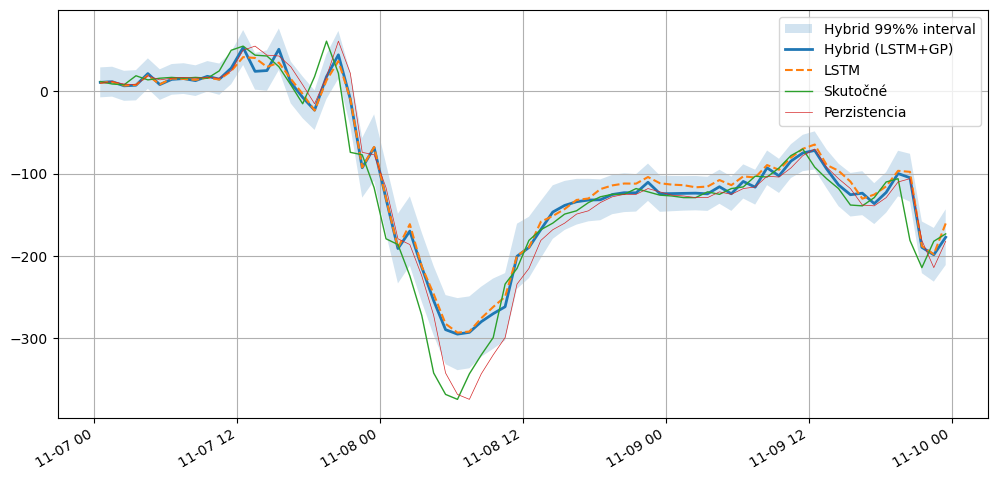

In [20]:
time_aligned = test["time1"][n_input:][shift:]

cols = [
    y_test_true[shift:],
    y_test_lstm[shift:],
    y_gp_mean_err[shift:],
    y_hybrid_mean[shift:],
    y_hybrid_lower[shift:],
    y_hybrid_upper[shift:],
    y_pred_persistence,
    time_aligned
]

L = min(len(x) for x in cols)

df = pd.DataFrame({
    "time": time_aligned[:L],
    "y_true": y_test_true[shift:][:L],
    "y_lstm": y_test_lstm[shift:][:L],
    "y_gp_error": y_gp_mean_err[shift:][:L],
    "y_hybrid": y_hybrid_mean[shift:][:L],
    "hybrid_lower": y_hybrid_lower[shift:][:L],
    "hybrid_upper": y_hybrid_upper[shift:][:L],
    "y_pred_persistence": y_pred_persistence[:L],
})




start_date = "2004-11-07"
end_date   = "2004-11-10"

df_range = df[(df["time"] >= start_date) & (df["time"] <= end_date)]

plt.figure(figsize=(12,6))
plt.fill_between(df_range["time"], df_range["hybrid_lower"], df_range["hybrid_upper"],
                 alpha=0.2, label="Hybrid 99%% interval")
plt.plot(df_range["time"], df_range["y_hybrid"], label="Hybrid (LSTM+GP)", linewidth=2)
plt.plot(df_range["time"], df_range["y_lstm"], label="LSTM", linestyle="--")
plt.plot(df_range["time"], df_range["y_true"], label="Skutočné", linewidth=1)
plt.plot(df_range["time"], df_range["y_pred_persistence"], label="Perzistencia", linewidth=0.5 )
plt.legend()
plt.grid(True)
plt.gcf().autofmt_xdate()
plt.show()
os.makedirs("datasets", exist_ok=True)
df.to_csv(os.path.join("datasets", f"prediction_comparison_{y_col}_LSTM_{n_input}H.csv"), index=False)

In [21]:
from sklearn.metrics import mean_absolute_error

# --- REGRESNÉ METRIKY ---
y_true_hybrid = df['y_true'].to_numpy()
y_pred_hybrid = df['y_hybrid'].to_numpy()

mse = mean_squared_error(y_true_hybrid, y_pred_hybrid)
mae = mean_absolute_error(y_true_hybrid, y_pred_hybrid)

# --- KLASIFIKAČNÉ METRIKY ---
CLASSIFICATION_THRESHOLD_PRED = CLASSIFICATION_THRESHOLD
y_true_binary = np.where(y_true_hybrid <= -20, 1, 0)
y_pred_binary = np.where(y_pred_hybrid <= CLASSIFICATION_THRESHOLD_PRED, 1, 0)

conf_matrix = confusion_matrix(y_true_binary, y_pred_binary)
mcc = matthews_corrcoef(y_true_binary, y_pred_binary)

# --- VÝSTUP ---
print("--- Regresné metriky (Hybridný model) ---")
print(f"MSE: {mse:.4f}")
print(f"MAE: {mae:.4f}")

print(f"\n--- Klasifikačné metriky (Prah: {CLASSIFICATION_THRESHOLD_PRED} nT) ---")
print(f"Matthews Correlation Coefficient (MCC): {mcc:.4f}")

print("\nKonfúzna matica (Confusion Matrix):")
print("          | Predikcia 0 | Predikcia 1")
print("---------------------------------")
print(f"Skutočná 0 | {conf_matrix[0, 0]:>11} | {conf_matrix[0, 1]:>11}")
print(f"Skutočná 1 | {conf_matrix[1, 0]:>11} | {conf_matrix[1, 1]:>11}")

print("\nClassification Report (Trieda 1 je Búrka):")
print(classification_report(y_true_binary, y_pred_binary, target_names=['Trieda 0 (Normálna)', 'Trieda 1 (Búrka)']))

--- Regresné metriky (Hybridný model) ---
MSE: 14.9731
MAE: 2.4218

--- Klasifikačné metriky (Prah: -20.6 nT) ---
Matthews Correlation Coefficient (MCC): 0.8723

Konfúzna matica (Confusion Matrix):
          | Predikcia 0 | Predikcia 1
---------------------------------
Skutočná 0 |      149748 |        2310
Skutočná 1 |        5943 |       36192

Classification Report (Trieda 1 je Búrka):
                     precision    recall  f1-score   support

Trieda 0 (Normálna)       0.96      0.98      0.97    152058
   Trieda 1 (Búrka)       0.94      0.86      0.90     42135

           accuracy                           0.96    194193
          macro avg       0.95      0.92      0.94    194193
       weighted avg       0.96      0.96      0.96    194193



In [22]:
import os, json
import numpy as np
import os
import pandas as pd
from datetime import datetime
from sklearn.metrics import (
    mean_absolute_error, mean_squared_error,
    accuracy_score, matthews_corrcoef, classification_report
)

OUT_CSV = "all_models_report.csv"

TRUE_CLASS_THRESHOLD = -20.0

PRED_CLASS_THRESHOLD = float(CLASSIFICATION_THRESHOLD)

meta = {
    "input_len_hours": float(globals().get("n_input", np.nan)),
    "forecast_horizon_hours": float(globals().get("shift", np.nan)),
    "target": str(globals().get("y_col", "DST")),
    "dataset": str(globals().get("dataset_name", "OMNI2_all")),
}

def _reg_metrics(y_true, y_pred):
    y_true = np.asarray(y_true).reshape(-1)
    y_pred = np.asarray(y_pred).reshape(-1)
    m = np.isfinite(y_true) & np.isfinite(y_pred)
    return (
        float(mean_absolute_error(y_true[m], y_pred[m])),
        float(mean_squared_error(y_true[m], y_pred[m]))
    )

def _cls_metrics_from_dst(y_true_dst, y_pred_dst, true_thr, pred_thr):
    y_true_dst = np.asarray(y_true_dst).reshape(-1)
    y_pred_dst = np.asarray(y_pred_dst).reshape(-1)
    m = np.isfinite(y_true_dst) & np.isfinite(y_pred_dst)

    y_true_bin = (y_true_dst[m] <= true_thr).astype(int)
    y_pred_bin = (y_pred_dst[m] <= pred_thr).astype(int)

    acc = float(accuracy_score(y_true_bin, y_pred_bin))
    mcc = float(matthews_corrcoef(y_true_bin, y_pred_bin))
    rep = classification_report(y_true_bin, y_pred_bin, digits=4, zero_division=0)
    return acc, mcc, rep

def _improvement(model_err, base_err):
    return float(100.0 * (base_err - model_err) / base_err) if base_err != 0 else np.nan

def _append_row(csv_path, row):
    row_df = pd.DataFrame([row])
    if os.path.exists(csv_path):
        old = pd.read_csv(csv_path)
        out = pd.concat([old, row_df], ignore_index=True)
    else:
        out = row_df
    out.to_csv(csv_path, index=False)
    return out

required_cols = {"y_true", "y_lstm", "y_hybrid", "y_pred_persistence"}
missing = required_cols - set(df.columns)
if missing:
    raise ValueError(f"df nemá potrebné stĺpce: {missing}. Aktuálne: {list(df.columns)}")

df_eval = df.dropna(subset=list(required_cols)).copy()

def log_one_model(nn_type, y_pred_col):
    y_true = df_eval["y_true"].to_numpy(dtype=float)
    y_pred = df_eval[y_pred_col].to_numpy(dtype=float)
    y_pers = df_eval["y_pred_persistence"].to_numpy(dtype=float)

    mae_model, mse_model = _reg_metrics(y_true, y_pred)
    mae_pers,  mse_pers  = _reg_metrics(y_true, y_pers)

    mae_imp = _improvement(mae_model, mae_pers)
    mse_imp = _improvement(mse_model, mse_pers)

    acc, mcc, rep_txt = _cls_metrics_from_dst(
        y_true, y_pred,
        true_thr=TRUE_CLASS_THRESHOLD,
        pred_thr=PRED_CLASS_THRESHOLD
    )

    row = {
        "timestamp_utc": datetime.utcnow().isoformat(timespec="seconds"),
        "nn_type": nn_type,  # LSTM vs LSTM+GP

        # meta
        **meta,

        # prahy
        "true_class_threshold_nt": float(TRUE_CLASS_THRESHOLD),
        "pred_class_threshold_nt": float(PRED_CLASS_THRESHOLD),

        # klasifikácia
        "ACC": float(acc),
        "MCC": float(mcc),
        "classification_report": json.dumps({"text": rep_txt}, ensure_ascii=False),

        # regresia
        "MAE_model": float(mae_model),
        "MSE_model": float(mse_model),
        "MAE_persistence": float(mae_pers),
        "MSE_persistence": float(mse_pers),
        "MAE_improvement_pct": float(mae_imp),
        "MSE_improvement_pct": float(mse_imp),
    }

    print(f"\n===== {nn_type} =====")
    print(f"ACC={row['ACC']}")
    print(f"MCC={row['MCC']}")
    print("Výkon NN:")
    print(f"MAE: {row['MAE_model']:.4f}, MSE: {row['MSE_model']:.4f}")
    print("Perzistentný model:")
    print(f"MAE: {row['MAE_persistence']:.4f}, MSE: {row['MSE_persistence']:.4f}")
    print("Zlepšenie oproti Persistence Modelu:")
    print(f"MAE Improvement: {row['MAE_improvement_pct']:.2f}%")
    print(f"MSE Improvement: {row['MSE_improvement_pct']:.2f}%")
    print("\nKlasifikačný report:")
    print(rep_txt)

    return row

rows = [
    log_one_model("LSTM", "y_lstm"),
    log_one_model("LSTM+GP", "y_hybrid"),
]

out_df = None
for r in rows:
    out_df = _append_row(OUT_CSV, r)

print(f"\nSaved/updated: {OUT_CSV}")
out_df.tail(10)


===== LSTM =====
ACC=0.9592158316726144
MCC=0.8782910872431107
Výkon NN:
MAE: 2.4434, MSE: 15.1526
Perzistentný model:
MAE: 2.5680, MSE: 16.3204
Zlepšenie oproti Persistence Modelu:
MAE Improvement: 4.85%
MSE Improvement: 7.16%

Klasifikačný report:
              precision    recall  f1-score   support

           0     0.9678    0.9806    0.9741    152058
           1     0.9263    0.8822    0.9037     42135

    accuracy                         0.9592    194193
   macro avg     0.9471    0.9314    0.9389    194193
weighted avg     0.9588    0.9592    0.9589    194193


===== LSTM+GP =====
ACC=0.9575010427770311
MCC=0.8723134983133137
Výkon NN:
MAE: 2.4218, MSE: 14.9731
Perzistentný model:
MAE: 2.5680, MSE: 16.3204
Zlepšenie oproti Persistence Modelu:
MAE Improvement: 5.69%
MSE Improvement: 8.26%

Klasifikačný report:
              precision    recall  f1-score   support

           0     0.9618    0.9848    0.9732    152058
           1     0.9400    0.8590    0.8977     42135

    

/tmp/ipykernel_598504/3102912212.py:84: DeprecationWarning: datetime.datetime.utcnow() is deprecated and scheduled for removal in a future version. Use timezone-aware objects to represent datetimes in UTC: datetime.datetime.now(datetime.UTC).
  "timestamp_utc": datetime.utcnow().isoformat(timespec="seconds"),
/tmp/ipykernel_598504/3102912212.py:84: DeprecationWarning: datetime.datetime.utcnow() is deprecated and scheduled for removal in a future version. Use timezone-aware objects to represent datetimes in UTC: datetime.datetime.now(datetime.UTC).
  "timestamp_utc": datetime.utcnow().isoformat(timespec="seconds"),


,timestamp_utc,nn_type,input_len_hours,forecast_horizon_hours,target,dataset,true_class_threshold_nt,pred_class_threshold_nt,ACC,MCC,classification_report,MAE_model,MSE_model,MAE_persistence,MSE_persistence,MAE_improvement_pct,MSE_improvement_pct
0,2026-04-25T10:29:52,LSTM,6.0,1.0,DST+1,OMNI2_all,-20.0,-20.6,0.959216,0.878291,"{""text"": "" precision recall f...",2.443376,15.152584,2.567961,16.320413,4.851502,7.155638
1,2026-04-25T10:29:52,LSTM+GP,6.0,1.0,DST+1,OMNI2_all,-20.0,-20.6,0.957501,0.872313,"{""text"": "" precision recall f...",2.421784,14.973057,2.567961,16.320413,5.692318,8.255649
